In [1]:
import numpy as np
import pandas as pd
from collections import defaultdict
from surprise import Dataset, Reader, accuracy
from surprise.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from surprise.model_selection import KFold
from tqdm.notebook import tqdm
from sklearn.metrics import ndcg_score
from surprise import dump
import seaborn as sns
import matplotlib.pyplot as plt
from typing import List
from surprise import SVD
import random
import pickle
from copy import deepcopy

import typing as tp
from sklearn.preprocessing import normalize
from lightfm import LightFM
from scipy.sparse import coo_matrix
from lightfm.data import Dataset as LFMDataset
from collections import Counter
from matplotlib.lines import Line2D
import time
import optuna

np.random.seed(42)

C:\ProgramData\Anaconda3\envs\torchvision\lib\site-packages\lightfm\_lightfm_fast.py:9: UserWarning: LightFM was compiled without OpenMP support. Only a single thread will be used.
  warnings.warn(


In [2]:
from uuu import mapk_plot, mapk, calculate_serendipity_per_user, prediction_coverage, \
catalog_coverage, long_tail_plot, weight_by_volume, get_frame_from_prediction_list, novelty, get_value_popularity_ranks

In [3]:
df = pd.read_csv('../data/recsys-in-practice/train_joke_df.csv')

df['UID'] = df['UID'] - 1
df['JID'] = df['JID'] - 1
# сделаем сортировку и перепишем index
df = df.sort_values(by=['UID', 'JID'])
df = df.reset_index(drop=True)

df

df_train, df_test = train_test_split(df, test_size=0.5, random_state=42)

E:\competitions\kaggle\magnit_recsys-in-practice\part2\uuu.py:259: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  head = head.append(tail.head(1))


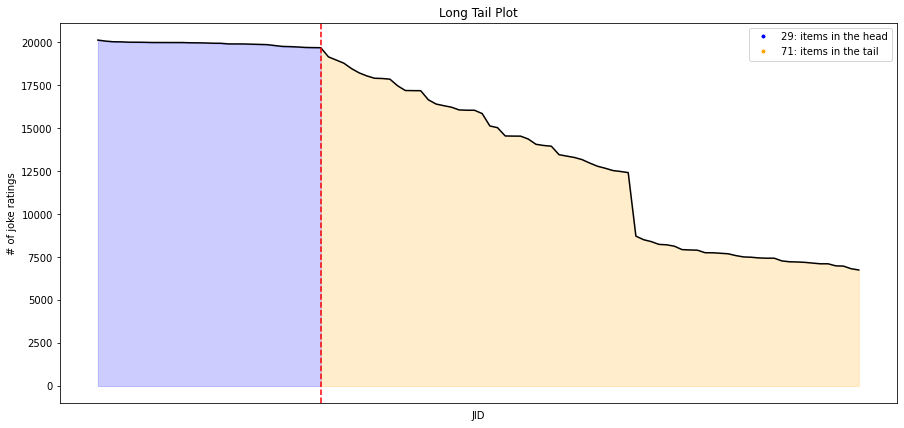

In [4]:
fig = plt.figure(figsize=(15, 7))
volume_df = long_tail_plot(df=df, 
             item_id_column="JID", 
             interaction_type="joke ratings", 
             percentage=0.4,
             x_labels=False)

volume_df['weight'] = volume_df['percent_of_total_volume'].apply(weight_by_volume)
joke_volume = {}
for row in volume_df.itertuples():
    joke_volume[int(row.JID)] = row.weight

In [5]:
df_top_joke = df[df['Rating'] > 5].groupby('JID').agg('count').rename(columns={'Rating':'count_plus'}) \
.sort_values('count_plus', ascending=False).drop(columns=['UID'])


df_bottom_joke = df[df['Rating'] < -5].groupby('JID').agg('count').rename(columns={'Rating':'count_minus'}) \
.sort_values('count_minus', ascending=False).drop(columns=['UID'])


df_counts = df_bottom_joke.merge(df_top_joke, left_index=True, right_index=True)


df_counts['diff'] = df_counts['count_plus'] - df_counts['count_minus']
df_counts = df_counts.sort_values('diff', ascending=False)


df_counts['weight'] = df_counts['diff'] / 10000

joke_quality = {}
for row in df_counts.itertuples():
    joke_quality[row.Index] = row.weight

In [6]:
with open('predictions_df_surprise.pkl', 'rb') as f:
    predictions_df_surprise = pickle.load(f)
    
predictions_df_surprise.keys()

dict_keys(['actual', 'svd', 'knn'])

In [7]:
with open('predictions_df_lfm.pkl', 'rb') as f:
    predictions_df_lfm = pickle.load(f)
    
predictions_df_lfm.keys()

dict_keys(['lfm', 'lfm_cos'])

In [8]:
with open('predictions_df_nn.pkl', 'rb') as f:
    predictions_df_nn = pickle.load(f)
    
predictions_df_nn.keys()

dict_keys(['nn'])

In [9]:
with open('predictions_df_nn_bias.pkl', 'rb') as f:
    predictions_df_nn_bias = pickle.load(f)
    
predictions_df_nn_bias.keys()

dict_keys(['nn_bias'])

In [10]:
with open('predictions_df_catboost.pkl', 'rb') as f:
    predictions_df_catboost = pickle.load(f)
    
predictions_df_catboost.keys()

dict_keys(['catboost'])

In [11]:
#with open('predictions_df_catboost_doc2vec.pkl', 'rb') as f:
#    predictions_df_catboost_doc2vec = pickle.load(f)
    
#predictions_df_catboost_doc2vec.keys()

In [12]:
svd_df = predictions_df_surprise['svd']
knn_df = predictions_df_surprise['knn']
lfm_df = predictions_df_lfm['lfm']
lfm_cos_df = predictions_df_lfm['lfm_cos']
nn_df = predictions_df_nn['nn']
nn_bias_df = predictions_df_nn_bias['nn_bias']
catboost_df = predictions_df_catboost['catboost']
#catboost_doc2vec_df = predictions_df_catboost_doc2vec['catboost_doc2vec']
actual_df = predictions_df_surprise['actual']

In [13]:
frames = {'svd':svd_df, 'lfm':lfm_df, 'lfm_cos':lfm_cos_df, 'nn':nn_df, 
          'catboost':catboost_df, 'knn':knn_df,  'nn_bias':nn_bias_df}#'catboost_doc2vec':catboost_doc2vec_df,

predictions = {k:list(v.groupby('UID').agg({'JID':list})['JID'].values) for k, v in frames.items()}
actual = list(predictions_df_surprise['actual'].groupby('UID').agg({'JID':list})['JID'].values)

In [14]:
users = df["UID"].unique()
n_users = users.size
n_users

24983

In [15]:
# рекомендации по популярным 
#popularity_recs = df['JID'].value_counts().head(10).index.tolist()

#pop_recs = []
#for user in tqdm(range(n_users)):
#    pop_predictions = popularity_recs
#    pop_recs.append(pop_predictions)
    
    
#predictions['popular'] = pop_recs

In [16]:
pop = dict(df.JID.value_counts())

In [17]:
items = np.unique(df['JID'])
items

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype=int64)

In [18]:
def union_predicts(params):
    result = []

    for u in range(24983):
        res = {}
        for i, (key, value) in enumerate(predictions.items()):
            rank = {x: params[key] * (10-j) for j, x in enumerate(value[u])}

            for k, v in rank.items():
                if k in res:
                    res[k] += v
                else:
                    res[k] = v
                    
        for k in res:
            res[k] += joke_quality[k] * params['quality']
            res[k] += joke_volume[k] * params['volume']

        result.append([x[0] for x in sorted(res.items(), key=lambda item: item[1], reverse=True)][:10])
        
    return result

In [19]:
def main_metric(params):
    t1 = time.time()
    result = union_predicts(params)
    res_df = get_frame_from_prediction_list(users, result)


    cat_coverage = catalog_coverage(result, items, 100)
    pred_coverage = prediction_coverage(result, items)
    nov, mselfinfo_list = novelty(result, pop, len(users), 10)

    res_df = get_frame_from_prediction_list(users, result)
    serendip = calculate_serendipity_per_user(res_df, df_train, df_test)
    map1 = mapk(actual, result, k=1)
    map10 = mapk(actual, result, k=10)
    
    sm = sum([serendip, map1, map10])
    print('time',round(time.time() - t1, 3), 
        'cat_cov',  round(cat_coverage, 3), 
         'cov', round(pred_coverage, 3),
         'nov', round(nov, 3),
         'ser', round(serendip, 3),
        'm1',  round(map1 , 3),
         'm10', round(map10, 3),
         'sum', round(sm, 3))
    return sm

In [20]:
def objective(trial):    
    
    params = {'svd': trial.suggest_float(name='svd', low=-5, high=5, step=0.1), 
              'lfm': trial.suggest_float(name='lfm', low=-5, high=5, step=0.1), 
              'lfm_cos': trial.suggest_float(name='lfm_cos', low=-5, high=2, step=0.1), 
              'nn': trial.suggest_float(name='nn', low=-5, high=5, step=0.1), 
              'nn_bias': trial.suggest_float(name='nn_bias', low=-5, high=5, step=0.1), 
              'catboost': trial.suggest_float(name='catboost', low=-5, high=2, step=0.1), 
              'knn': trial.suggest_float(name='knn', low=-5, high=5, step=0.1), 
              #'catboost_doc2vec': trial.suggest_float(name='catboost_doc2vec', low=-5, high=5, step=0.1),
              'quality': trial.suggest_float(name='quality', low=-5, high=5, step=0.1),
              'volume': trial.suggest_float(name='volume', low=-5, high=5, step=0.1)
             }
    
    return main_metric(params)
    


study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=20000)


[I 2023-05-06 22:45:51,771] A new study created in memory with name: no-name-89fd4a34-0647-48bc-983a-68557418f5ac
[I 2023-05-06 22:45:54,801] Trial 0 finished with value: 0.3939943885122306 and parameters: {'svd': -1.7999999999999998, 'lfm': 2.1000000000000005, 'lfm_cos': -2.0999999999999996, 'nn': -1.0, 'nn_bias': -2.6999999999999997, 'catboost': 1.5, 'knn': -0.09999999999999964, 'quality': 0.3000000000000007, 'volume': -4.6}. Best is trial 0 with value: 0.3939943885122306.


time 3.025 cat_cov 74.0 cov 100.0 nov 0.689 ser 0.11 m1 0.083 m10 0.201 sum 0.394


[I 2023-05-06 22:45:58,008] Trial 1 finished with value: 0.736722598124094 and parameters: {'svd': -3.0999999999999996, 'lfm': 3.0999999999999996, 'lfm_cos': -2.0999999999999996, 'nn': -2.5999999999999996, 'nn_bias': -4.0, 'catboost': -5.0, 'knn': -2.9, 'quality': 2.6000000000000005, 'volume': -4.2}. Best is trial 1 with value: 0.736722598124094.


time 3.203 cat_cov 96.0 cov 100.0 nov 0.747 ser 0.174 m1 0.207 m10 0.355 sum 0.737


[I 2023-05-06 22:46:01,096] Trial 2 finished with value: 0.8481835939746661 and parameters: {'svd': 2.9000000000000004, 'lfm': 1.9000000000000004, 'lfm_cos': -3.9, 'nn': 4.800000000000001, 'nn_bias': -5.0, 'catboost': -1.4, 'knn': -2.6999999999999997, 'quality': -2.6999999999999997, 'volume': 1.7000000000000002}. Best is trial 2 with value: 0.8481835939746661.


time 3.084 cat_cov 91.0 cov 100.0 nov 0.729 ser 0.104 m1 0.306 m10 0.438 sum 0.848


[I 2023-05-06 22:46:03,933] Trial 3 finished with value: 0.6595473241078309 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -2.4, 'nn': -5.0, 'nn_bias': -2.6999999999999997, 'catboost': 1.4000000000000004, 'knn': -2.3, 'quality': -0.39999999999999947, 'volume': 2.5}. Best is trial 2 with value: 0.8481835939746661.


time 2.833 cat_cov 87.0 cov 100.0 nov 0.838 ser 0.118 m1 0.221 m10 0.321 sum 0.66


[I 2023-05-06 22:46:06,799] Trial 4 finished with value: 0.8723711443673358 and parameters: {'svd': 4.200000000000001, 'lfm': -4.9, 'lfm_cos': -0.39999999999999947, 'nn': 1.2000000000000002, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': 3.3000000000000007, 'quality': 2.5, 'volume': -3.3}. Best is trial 4 with value: 0.8723711443673358.


time 2.861 cat_cov 80.0 cov 100.0 nov 0.821 ser 0.099 m1 0.316 m10 0.457 sum 0.872


[I 2023-05-06 22:46:09,624] Trial 5 finished with value: 0.873638339472706 and parameters: {'svd': 4.5, 'lfm': -2.1999999999999997, 'lfm_cos': -2.5999999999999996, 'nn': 2.5, 'nn_bias': 4.0, 'catboost': -3.8, 'knn': 0.0, 'quality': -0.2999999999999998, 'volume': 2.6000000000000005}. Best is trial 5 with value: 0.873638339472706.


time 2.82 cat_cov 74.0 cov 100.0 nov 0.921 ser 0.104 m1 0.323 m10 0.446 sum 0.874


[I 2023-05-06 22:46:12,508] Trial 6 finished with value: 0.8619241470065101 and parameters: {'svd': 2.6000000000000005, 'lfm': -4.5, 'lfm_cos': 0.9000000000000004, 'nn': -3.5, 'nn_bias': 0.3000000000000007, 'catboost': -2.9, 'knn': 2.4000000000000004, 'quality': -1.5999999999999996, 'volume': -0.8999999999999995}. Best is trial 5 with value: 0.873638339472706.


time 2.88 cat_cov 92.0 cov 100.0 nov 1.088 ser 0.155 m1 0.286 m10 0.421 sum 0.862


[I 2023-05-06 22:46:15,457] Trial 7 finished with value: 0.8694698107877882 and parameters: {'svd': 2.7, 'lfm': -4.1, 'lfm_cos': 0.3000000000000007, 'nn': 4.0, 'nn_bias': 1.3000000000000007, 'catboost': -1.2999999999999998, 'knn': 2.4000000000000004, 'quality': -2.5999999999999996, 'volume': 1.5}. Best is trial 5 with value: 0.873638339472706.


time 2.945 cat_cov 73.0 cov 100.0 nov 0.782 ser 0.092 m1 0.314 m10 0.463 sum 0.869


[I 2023-05-06 22:46:18,403] Trial 8 finished with value: 0.861350791028451 and parameters: {'svd': -0.7000000000000002, 'lfm': 1.0, 'lfm_cos': -0.09999999999999964, 'nn': 4.5, 'nn_bias': -2.6999999999999997, 'catboost': -1.0, 'knn': 3.3000000000000007, 'quality': 3.9000000000000004, 'volume': -2.0999999999999996}. Best is trial 5 with value: 0.873638339472706.


time 2.94 cat_cov 64.0 cov 100.0 nov 0.666 ser 0.082 m1 0.314 m10 0.466 sum 0.861


[I 2023-05-06 22:46:21,192] Trial 9 finished with value: 0.44077123099792515 and parameters: {'svd': -4.3, 'lfm': -3.5999999999999996, 'lfm_cos': -1.6999999999999997, 'nn': -4.9, 'nn_bias': 2.4000000000000004, 'catboost': -0.2999999999999998, 'knn': 1.4000000000000004, 'quality': 2.0, 'volume': 3.3000000000000007}. Best is trial 5 with value: 0.873638339472706.


time 2.785 cat_cov 89.0 cov 100.0 nov 1.01 ser 0.108 m1 0.1 m10 0.233 sum 0.441


[I 2023-05-06 22:46:24,090] Trial 10 finished with value: 0.7047397243050444 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.6999999999999997, 'lfm_cos': -5.0, 'nn': 2.3000000000000007, 'nn_bias': 4.700000000000001, 'catboost': -4.7, 'knn': 0.0, 'quality': -4.5, 'volume': 4.600000000000001}. Best is trial 5 with value: 0.873638339472706.


time 2.873 cat_cov 70.0 cov 100.0 nov 0.949 ser 0.097 m1 0.242 m10 0.366 sum 0.705


[I 2023-05-06 22:46:26,966] Trial 11 finished with value: 0.8874578936806279 and parameters: {'svd': 4.800000000000001, 'lfm': -1.9, 'lfm_cos': -0.5, 'nn': 1.5, 'nn_bias': 5.0, 'catboost': -3.2, 'knn': 5.0, 'quality': 4.9, 'volume': -2.4}. Best is trial 11 with value: 0.8874578936806279.


time 2.852 cat_cov 69.0 cov 100.0 nov 0.861 ser 0.098 m1 0.323 m10 0.467 sum 0.887


[I 2023-05-06 22:46:30,017] Trial 12 finished with value: 0.8779749463951435 and parameters: {'svd': 5.0, 'lfm': -1.7999999999999998, 'lfm_cos': -3.3, 'nn': 2.3000000000000007, 'nn_bias': 4.4, 'catboost': -3.4, 'knn': 5.0, 'quality': 4.4, 'volume': 0.0}. Best is trial 11 with value: 0.8874578936806279.


time 3.028 cat_cov 73.0 cov 100.0 nov 0.838 ser 0.092 m1 0.32 m10 0.467 sum 0.878


[I 2023-05-06 22:46:33,066] Trial 13 finished with value: 0.864160518010902 and parameters: {'svd': 0.9000000000000004, 'lfm': -1.0999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 3.3000000000000007, 'catboost': -2.3, 'knn': 4.700000000000001, 'quality': 5.0, 'volume': -0.1999999999999993}. Best is trial 11 with value: 0.8874578936806279.


time 3.023 cat_cov 60.0 cov 97.0 nov 0.866 ser 0.099 m1 0.306 m10 0.459 sum 0.864


[I 2023-05-06 22:46:35,911] Trial 14 finished with value: 0.8691407193374237 and parameters: {'svd': 4.800000000000001, 'lfm': -2.8, 'lfm_cos': -3.7, 'nn': 1.3000000000000007, 'nn_bias': 3.0, 'catboost': -3.9, 'knn': 5.0, 'quality': 4.800000000000001, 'volume': -1.7999999999999998}. Best is trial 11 with value: 0.8874578936806279.


time 2.821 cat_cov 74.0 cov 100.0 nov 0.838 ser 0.092 m1 0.313 m10 0.464 sum 0.869


[I 2023-05-06 22:46:38,857] Trial 15 finished with value: 0.9317512977418749 and parameters: {'svd': 1.6000000000000005, 'lfm': 4.800000000000001, 'lfm_cos': -0.8999999999999995, 'nn': 3.0, 'nn_bias': 4.9, 'catboost': -2.4, 'knn': 4.1, 'quality': 3.5, 'volume': 0.40000000000000036}. Best is trial 15 with value: 0.9317512977418749.


time 2.924 cat_cov 82.0 cov 100.0 nov 0.752 ser 0.096 m1 0.353 m10 0.483 sum 0.932


[I 2023-05-06 22:46:42,150] Trial 16 finished with value: 0.8643644495881286 and parameters: {'svd': 1.1000000000000005, 'lfm': 4.5, 'lfm_cos': -0.8999999999999995, 'nn': 3.4000000000000004, 'nn_bias': 1.7000000000000002, 'catboost': -2.1999999999999997, 'knn': -4.9, 'quality': 3.3000000000000007, 'volume': -2.5999999999999996}. Best is trial 15 with value: 0.9317512977418749.


time 3.269 cat_cov 96.0 cov 100.0 nov 0.721 ser 0.146 m1 0.298 m10 0.421 sum 0.864


[I 2023-05-06 22:46:45,439] Trial 17 finished with value: 0.9392974339595521 and parameters: {'svd': -0.7999999999999998, 'lfm': 4.5, 'lfm_cos': -1.0, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 3.8000000000000007, 'quality': 1.1000000000000005, 'volume': 1.0}. Best is trial 17 with value: 0.9392974339595521.


time 3.267 cat_cov 87.0 cov 100.0 nov 0.583 ser 0.109 m1 0.367 m10 0.462 sum 0.939


[I 2023-05-06 22:46:48,676] Trial 18 finished with value: 0.9065731647406858 and parameters: {'svd': -0.2999999999999998, 'lfm': 4.700000000000001, 'lfm_cos': -1.0999999999999996, 'nn': -1.0999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 3.700000000000001, 'quality': 1.0, 'volume': 0.9000000000000004}. Best is trial 17 with value: 0.9392974339595521.


time 3.212 cat_cov 86.0 cov 100.0 nov 0.607 ser 0.125 m1 0.342 m10 0.44 sum 0.907


[I 2023-05-06 22:46:52,053] Trial 19 finished with value: 0.8519853818787756 and parameters: {'svd': -1.5999999999999996, 'lfm': 3.700000000000001, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 1.3000000000000007, 'quality': 1.3000000000000007, 'volume': 4.300000000000001}. Best is trial 17 with value: 0.9392974339595521.


time 3.351 cat_cov 92.0 cov 100.0 nov 0.58 ser 0.151 m1 0.287 m10 0.414 sum 0.852


[I 2023-05-06 22:46:55,085] Trial 20 finished with value: 0.9668316037709874 and parameters: {'svd': 1.7000000000000002, 'lfm': 3.0999999999999996, 'lfm_cos': -1.2999999999999998, 'nn': 3.3000000000000007, 'nn_bias': -1.0, 'catboost': 0.7000000000000002, 'knn': 1.2000000000000002, 'quality': 3.3000000000000007, 'volume': -1.0}. Best is trial 20 with value: 0.9668316037709874.


time 3.01 cat_cov 78.0 cov 100.0 nov 0.596 ser 0.089 m1 0.383 m10 0.495 sum 0.967


[I 2023-05-06 22:46:58,088] Trial 21 finished with value: 0.9753645486010356 and parameters: {'svd': 1.8000000000000007, 'lfm': 3.5, 'lfm_cos': -1.4, 'nn': 3.0999999999999996, 'nn_bias': -1.0999999999999996, 'catboost': 0.7000000000000002, 'knn': 1.6000000000000005, 'quality': 3.4000000000000004, 'volume': 0.6000000000000005}. Best is trial 21 with value: 0.9753645486010356.


time 2.978 cat_cov 80.0 cov 100.0 nov 0.587 ser 0.092 m1 0.386 m10 0.497 sum 0.975


[I 2023-05-06 22:47:01,199] Trial 22 finished with value: 0.9659033427953987 and parameters: {'svd': 2.1000000000000005, 'lfm': 3.3000000000000007, 'lfm_cos': -1.5, 'nn': 3.5999999999999996, 'nn_bias': -1.0999999999999996, 'catboost': 0.8000000000000007, 'knn': 0.9000000000000004, 'quality': 1.5, 'volume': -0.7999999999999998}. Best is trial 21 with value: 0.9753645486010356.


time 3.087 cat_cov 84.0 cov 100.0 nov 0.609 ser 0.091 m1 0.381 m10 0.494 sum 0.966


[I 2023-05-06 22:47:04,319] Trial 23 finished with value: 0.9613533566128066 and parameters: {'svd': 1.8000000000000007, 'lfm': 3.0, 'lfm_cos': -1.5, 'nn': 3.5999999999999996, 'nn_bias': -1.4, 'catboost': 2.0, 'knn': -1.2999999999999998, 'quality': 2.4000000000000004, 'volume': -1.0}. Best is trial 21 with value: 0.9753645486010356.


time 3.095 cat_cov 88.0 cov 100.0 nov 0.615 ser 0.098 m1 0.373 m10 0.491 sum 0.961


[I 2023-05-06 22:47:07,241] Trial 24 finished with value: 0.9165590229839536 and parameters: {'svd': 2.2, 'lfm': 1.7000000000000002, 'lfm_cos': -3.0, 'nn': 4.1, 'nn_bias': -1.5, 'catboost': 0.8000000000000007, 'knn': 0.9000000000000004, 'quality': 3.200000000000001, 'volume': -1.0999999999999996}. Best is trial 21 with value: 0.9753645486010356.


time 2.9 cat_cov 76.0 cov 100.0 nov 0.666 ser 0.082 m1 0.354 m10 0.481 sum 0.917


[I 2023-05-06 22:47:10,263] Trial 25 finished with value: 0.930518221411724 and parameters: {'svd': 0.3000000000000007, 'lfm': 3.4000000000000004, 'lfm_cos': -1.5999999999999996, 'nn': 5.0, 'nn_bias': -0.8999999999999995, 'catboost': 0.8000000000000007, 'knn': 2.2, 'quality': 1.7000000000000002, 'volume': -0.1999999999999993}. Best is trial 21 with value: 0.9753645486010356.


time 3.0 cat_cov 87.0 cov 100.0 nov 0.601 ser 0.085 m1 0.364 m10 0.482 sum 0.931


[I 2023-05-06 22:47:13,061] Trial 26 finished with value: 0.9689289192097843 and parameters: {'svd': 3.700000000000001, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 3.0, 'nn_bias': 0.9000000000000004, 'catboost': -0.5, 'knn': -0.7999999999999998, 'quality': 4.1, 'volume': -1.5}. Best is trial 21 with value: 0.9753645486010356.


time 2.776 cat_cov 72.0 cov 100.0 nov 0.727 ser 0.1 m1 0.376 m10 0.492 sum 0.969


[I 2023-05-06 22:47:16,064] Trial 27 finished with value: 1.0078853890864987 and parameters: {'svd': 3.8000000000000007, 'lfm': 0.5, 'lfm_cos': 1.6000000000000005, 'nn': 2.2, 'nn_bias': 0.8000000000000007, 'catboost': -0.7000000000000002, 'knn': -1.0, 'quality': 4.0, 'volume': -3.5}. Best is trial 27 with value: 1.0078853890864987.


time 2.978 cat_cov 87.0 cov 100.0 nov 0.749 ser 0.127 m1 0.384 m10 0.497 sum 1.008


[I 2023-05-06 22:47:19,060] Trial 28 finished with value: 1.0129181615115814 and parameters: {'svd': 4.0, 'lfm': 0.10000000000000053, 'lfm_cos': 2.0, 'nn': 1.9000000000000004, 'nn_bias': 0.9000000000000004, 'catboost': -0.7000000000000002, 'knn': -1.2999999999999998, 'quality': 4.1, 'volume': -3.8}. Best is trial 28 with value: 1.0129181615115814.


time 2.973 cat_cov 96.0 cov 100.0 nov 0.787 ser 0.141 m1 0.379 m10 0.493 sum 1.013


[I 2023-05-06 22:47:22,158] Trial 29 finished with value: 0.9315734955299965 and parameters: {'svd': 3.700000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 2.0, 'nn': -1.0999999999999996, 'nn_bias': 2.1000000000000005, 'catboost': -0.8999999999999995, 'knn': -1.6999999999999997, 'quality': 4.200000000000001, 'volume': -4.1}. Best is trial 28 with value: 1.0129181615115814.


time 3.074 cat_cov 98.0 cov 100.0 nov 0.982 ser 0.163 m1 0.325 m10 0.444 sum 0.932


[I 2023-05-06 22:47:25,077] Trial 30 finished with value: 0.855220304531193 and parameters: {'svd': 3.700000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 1.5, 'knn': -4.2, 'quality': 0.6000000000000005, 'volume': -3.0999999999999996}. Best is trial 28 with value: 1.0129181615115814.


time 2.894 cat_cov 94.0 cov 100.0 nov 0.92 ser 0.159 m1 0.288 m10 0.409 sum 0.855


[I 2023-05-06 22:47:28,017] Trial 31 finished with value: 0.9888706279453702 and parameters: {'svd': 3.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 1.9000000000000004, 'nn_bias': 1.0, 'catboost': -0.7999999999999998, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': -5.0}. Best is trial 28 with value: 1.0129181615115814.


time 2.918 cat_cov 86.0 cov 100.0 nov 0.745 ser 0.114 m1 0.382 m10 0.493 sum 0.989


[I 2023-05-06 22:47:31,067] Trial 32 finished with value: 1.022138479238949 and parameters: {'svd': 4.1, 'lfm': 1.2000000000000002, 'lfm_cos': 1.9000000000000004, 'nn': 1.7000000000000002, 'nn_bias': 0.9000000000000004, 'catboost': -1.7999999999999998, 'knn': -0.7999999999999998, 'quality': 2.9000000000000004, 'volume': -4.8}. Best is trial 32 with value: 1.022138479238949.


time 3.026 cat_cov 99.0 cov 100.0 nov 0.753 ser 0.142 m1 0.385 m10 0.495 sum 1.022


[I 2023-05-06 22:47:34,104] Trial 33 finished with value: 1.0234806220068902 and parameters: {'svd': 4.200000000000001, 'lfm': 1.1000000000000005, 'lfm_cos': 2.0, 'nn': 1.8000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': -1.7999999999999998, 'knn': -0.7999999999999998, 'quality': 2.8000000000000007, 'volume': -5.0}. Best is trial 33 with value: 1.0234806220068902.


time 3.014 cat_cov 100.0 cov 100.0 nov 0.758 ser 0.143 m1 0.385 m10 0.495 sum 1.023


[I 2023-05-06 22:47:37,276] Trial 34 finished with value: 0.9664238876477325 and parameters: {'svd': 2.8000000000000007, 'lfm': 1.6000000000000005, 'lfm_cos': 1.9000000000000004, 'nn': 1.9000000000000004, 'nn_bias': 1.6000000000000005, 'catboost': -1.6999999999999997, 'knn': -3.0999999999999996, 'quality': 2.8000000000000007, 'volume': -4.2}. Best is trial 33 with value: 1.0234806220068902.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.815 ser 0.17 m1 0.34 m10 0.457 sum 0.966


[I 2023-05-06 22:47:40,489] Trial 35 finished with value: 0.962101231586282 and parameters: {'svd': 3.200000000000001, 'lfm': 2.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': 0.5, 'nn_bias': 2.3000000000000007, 'catboost': -1.9, 'knn': -2.1999999999999997, 'quality': 2.2, 'volume': -3.5999999999999996}. Best is trial 33 with value: 1.0234806220068902.


time 3.188 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.157 m1 0.345 m10 0.46 sum 0.962


[I 2023-05-06 22:47:43,518] Trial 36 finished with value: 0.9668204062032528 and parameters: {'svd': 4.300000000000001, 'lfm': 0.3000000000000007, 'lfm_cos': 1.6000000000000005, 'nn': -2.0, 'nn_bias': 0.40000000000000036, 'catboost': -1.4, 'knn': -0.5999999999999996, 'quality': 2.8000000000000007, 'volume': -4.9}. Best is trial 33 with value: 1.0234806220068902.


time 3.005 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.168 m1 0.338 m10 0.46 sum 0.967


[I 2023-05-06 22:47:46,720] Trial 37 finished with value: 0.8603749750245888 and parameters: {'svd': 3.200000000000001, 'lfm': 2.4000000000000004, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 3.0999999999999996, 'catboost': -1.9, 'knn': -3.4, 'quality': -1.2999999999999998, 'volume': -3.8}. Best is trial 33 with value: 1.0234806220068902.


time 3.178 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.163 m1 0.294 m10 0.404 sum 0.86


[I 2023-05-06 22:47:49,795] Trial 38 finished with value: 0.9460628785334169 and parameters: {'svd': 4.200000000000001, 'lfm': 1.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 1.0, 'nn_bias': -2.3, 'catboost': -1.1999999999999997, 'knn': -1.5999999999999996, 'quality': 0.20000000000000018, 'volume': -4.4}. Best is trial 33 with value: 1.0234806220068902.


time 3.05 cat_cov 95.0 cov 100.0 nov 0.74 ser 0.139 m1 0.341 m10 0.466 sum 0.946


[I 2023-05-06 22:47:53,103] Trial 39 finished with value: 0.7966694287262732 and parameters: {'svd': -3.3, 'lfm': 0.0, 'lfm_cos': 1.9000000000000004, 'nn': 1.7000000000000002, 'nn_bias': -4.6, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': -3.0}. Best is trial 33 with value: 1.0234806220068902.


time 3.284 cat_cov 100.0 cov 100.0 nov 0.852 ser 0.197 m1 0.234 m10 0.366 sum 0.797


[I 2023-05-06 22:47:55,950] Trial 40 finished with value: 0.9475952453412839 and parameters: {'svd': 3.3000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 2.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': -0.5999999999999996, 'knn': -2.3, 'quality': 4.4, 'volume': -4.6}. Best is trial 33 with value: 1.0234806220068902.


time 2.823 cat_cov 85.0 cov 100.0 nov 0.817 ser 0.125 m1 0.35 m10 0.472 sum 0.948


[I 2023-05-06 22:47:58,953] Trial 41 finished with value: 0.9827382179367987 and parameters: {'svd': 3.8000000000000007, 'lfm': 1.0, 'lfm_cos': 0.7000000000000002, 'nn': 2.5, 'nn_bias': 0.7000000000000002, 'catboost': -0.7999999999999998, 'knn': -0.7000000000000002, 'quality': 3.8000000000000007, 'volume': -4.9}. Best is trial 33 with value: 1.0234806220068902.


time 2.978 cat_cov 81.0 cov 100.0 nov 0.729 ser 0.108 m1 0.381 m10 0.495 sum 0.983


[I 2023-05-06 22:48:02,015] Trial 42 finished with value: 1.0213733471413624 and parameters: {'svd': 4.200000000000001, 'lfm': 0.7000000000000002, 'lfm_cos': 2.0, 'nn': 1.9000000000000004, 'nn_bias': 1.4000000000000004, 'catboost': 0.20000000000000018, 'knn': -1.0999999999999996, 'quality': 3.9000000000000004, 'volume': -3.7}. Best is trial 33 with value: 1.0234806220068902.


time 3.037 cat_cov 97.0 cov 100.0 nov 0.754 ser 0.138 m1 0.386 m10 0.498 sum 1.021


[I 2023-05-06 22:48:05,116] Trial 43 finished with value: 1.0129786413907338 and parameters: {'svd': 4.5, 'lfm': 0.40000000000000036, 'lfm_cos': 2.0, 'nn': 2.0, 'nn_bias': 1.5, 'catboost': 0.20000000000000018, 'knn': -1.1999999999999997, 'quality': 4.600000000000001, 'volume': -3.7}. Best is trial 33 with value: 1.0234806220068902.


time 3.074 cat_cov 93.0 cov 100.0 nov 0.764 ser 0.133 m1 0.384 m10 0.496 sum 1.013


[I 2023-05-06 22:48:08,026] Trial 44 finished with value: 0.9881458321590655 and parameters: {'svd': 4.700000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 2.0, 'nn': 1.1000000000000005, 'nn_bias': 1.8000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': -2.6999999999999997}. Best is trial 33 with value: 1.0234806220068902.


time 2.885 cat_cov 84.0 cov 100.0 nov 0.81 ser 0.119 m1 0.376 m10 0.493 sum 0.988


[I 2023-05-06 22:48:11,041] Trial 45 finished with value: 1.0074127089464424 and parameters: {'svd': 5.0, 'lfm': 2.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 1.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -1.9, 'quality': 5.0, 'volume': -3.9}. Best is trial 33 with value: 1.0234806220068902.


time 2.991 cat_cov 98.0 cov 100.0 nov 0.733 ser 0.142 m1 0.378 m10 0.487 sum 1.007


[I 2023-05-06 22:48:14,029] Trial 46 finished with value: 0.9972222479061019 and parameters: {'svd': 4.4, 'lfm': 1.4000000000000004, 'lfm_cos': 1.7000000000000002, 'nn': 1.8000000000000007, 'nn_bias': 2.5, 'catboost': -1.5999999999999996, 'knn': -0.1999999999999993, 'quality': 2.0, 'volume': -4.4}. Best is trial 33 with value: 1.0234806220068902.


time 2.963 cat_cov 89.0 cov 100.0 nov 0.789 ser 0.127 m1 0.376 m10 0.494 sum 0.997


[I 2023-05-06 22:48:16,922] Trial 47 finished with value: 0.9278958845945704 and parameters: {'svd': 2.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': 1.4000000000000004, 'nn_bias': 1.3000000000000007, 'catboost': 1.2000000000000002, 'knn': -1.1999999999999997, 'quality': -5.0, 'volume': -3.3}. Best is trial 33 with value: 1.0234806220068902.


time 2.869 cat_cov 78.0 cov 100.0 nov 0.927 ser 0.124 m1 0.335 m10 0.468 sum 0.928


[I 2023-05-06 22:48:19,879] Trial 48 finished with value: 0.7615415586415845 and parameters: {'svd': 2.9000000000000004, 'lfm': 2.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -0.39999999999999947, 'nn_bias': 3.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -2.9, 'quality': -0.5, 'volume': -4.6}. Best is trial 33 with value: 1.0234806220068902.


time 2.933 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.142 m1 0.242 m10 0.377 sum 0.762


[I 2023-05-06 22:48:22,743] Trial 49 finished with value: 0.9090688618033506 and parameters: {'svd': 4.4, 'lfm': 0.3000000000000007, 'lfm_cos': -5.0, 'nn': 2.6000000000000005, 'nn_bias': 2.5, 'catboost': -1.0999999999999996, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': -1.9}. Best is trial 33 with value: 1.0234806220068902.


time 2.84 cat_cov 76.0 cov 100.0 nov 0.846 ser 0.095 m1 0.343 m10 0.471 sum 0.909


[I 2023-05-06 22:48:25,659] Trial 50 finished with value: 0.9630763553318045 and parameters: {'svd': 4.1, 'lfm': 1.0, 'lfm_cos': 0.0, 'nn': 4.200000000000001, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -1.4, 'quality': -2.8, 'volume': -2.9}. Best is trial 33 with value: 1.0234806220068902.


time 2.891 cat_cov 79.0 cov 100.0 nov 0.732 ser 0.102 m1 0.374 m10 0.488 sum 0.963


[I 2023-05-06 22:48:28,617] Trial 51 finished with value: 1.0148373679072795 and parameters: {'svd': 3.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': 1.6000000000000005, 'nn': 2.1000000000000005, 'nn_bias': 0.5, 'catboost': -0.5, 'knn': -1.0999999999999996, 'quality': 4.200000000000001, 'volume': -3.7}. Best is trial 33 with value: 1.0234806220068902.


time 2.933 cat_cov 95.0 cov 100.0 nov 0.753 ser 0.131 m1 0.386 m10 0.498 sum 1.015


[I 2023-05-06 22:48:31,589] Trial 52 finished with value: 0.9906784611368938 and parameters: {'svd': 4.600000000000001, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': 1.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': -2.0, 'quality': 4.600000000000001, 'volume': -2.3}. Best is trial 33 with value: 1.0234806220068902.


time 2.944 cat_cov 98.0 cov 100.0 nov 0.806 ser 0.145 m1 0.364 m10 0.482 sum 0.991


[I 2023-05-06 22:48:34,743] Trial 53 finished with value: 0.9992805731770116 and parameters: {'svd': 3.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 1.7000000000000002, 'nn': 2.1000000000000005, 'nn_bias': 1.8000000000000007, 'catboost': -1.2999999999999998, 'knn': -2.4, 'quality': 3.0, 'volume': -4.0}. Best is trial 33 with value: 1.0234806220068902.


time 3.129 cat_cov 96.0 cov 100.0 nov 0.826 ser 0.146 m1 0.368 m10 0.485 sum 0.999


[I 2023-05-06 22:48:37,754] Trial 54 finished with value: 0.8186983203075445 and parameters: {'svd': -4.9, 'lfm': -1.5, 'lfm_cos': 2.0, 'nn': 2.8000000000000007, 'nn_bias': 1.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': -3.4}. Best is trial 33 with value: 1.0234806220068902.


time 2.986 cat_cov 92.0 cov 100.0 nov 0.981 ser 0.154 m1 0.264 m10 0.4 sum 0.819


[I 2023-05-06 22:48:40,844] Trial 55 finished with value: 1.0326212296356987 and parameters: {'svd': 3.4000000000000004, 'lfm': 1.4000000000000004, 'lfm_cos': 1.0, 'nn': 1.6000000000000005, 'nn_bias': 0.5, 'catboost': 1.1000000000000005, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': -3.5999999999999996}. Best is trial 55 with value: 1.0326212296356987.


time 3.064 cat_cov 93.0 cov 100.0 nov 0.689 ser 0.124 m1 0.402 m10 0.507 sum 1.033


[I 2023-05-06 22:48:43,809] Trial 56 finished with value: 1.0315082986551791 and parameters: {'svd': 3.5, 'lfm': 1.9000000000000004, 'lfm_cos': 1.0, 'nn': 1.5, 'nn_bias': 0.40000000000000036, 'catboost': 1.2000000000000002, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': -4.5}. Best is trial 55 with value: 1.0326212296356987.


time 2.94 cat_cov 92.0 cov 100.0 nov 0.674 ser 0.12 m1 0.403 m10 0.509 sum 1.032


[I 2023-05-06 22:48:46,822] Trial 57 finished with value: 0.956206917741101 and parameters: {'svd': 2.5, 'lfm': 1.9000000000000004, 'lfm_cos': -2.0999999999999996, 'nn': 1.4000000000000004, 'nn_bias': 0.40000000000000036, 'catboost': 1.2000000000000002, 'knn': 0.6000000000000005, 'quality': 2.5, 'volume': -4.5}. Best is trial 55 with value: 1.0326212296356987.


time 2.989 cat_cov 86.0 cov 100.0 nov 0.688 ser 0.089 m1 0.373 m10 0.494 sum 0.956


[I 2023-05-06 22:48:49,894] Trial 58 finished with value: 1.0312749312351748 and parameters: {'svd': 3.0, 'lfm': 1.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': 1.9000000000000004, 'knn': 1.9000000000000004, 'quality': 3.0999999999999996, 'volume': -5.0}. Best is trial 55 with value: 1.0326212296356987.


time 3.049 cat_cov 89.0 cov 100.0 nov 0.684 ser 0.118 m1 0.403 m10 0.51 sum 1.031


[I 2023-05-06 22:48:52,933] Trial 59 finished with value: 0.9723877465134341 and parameters: {'svd': 2.2, 'lfm': 2.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -2.0, 'catboost': 1.9000000000000004, 'knn': 0.7000000000000002, 'quality': 2.0, 'volume': -4.9}. Best is trial 55 with value: 1.0326212296356987.


time 3.014 cat_cov 95.0 cov 100.0 nov 0.64 ser 0.138 m1 0.36 m10 0.474 sum 0.972


[I 2023-05-06 22:48:56,060] Trial 60 finished with value: 1.0270981653704916 and parameters: {'svd': 2.9000000000000004, 'lfm': 3.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -0.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 1.2000000000000002, 'knn': 3.0, 'quality': 3.0999999999999996, 'volume': 2.7}. Best is trial 55 with value: 1.0326212296356987.


time 3.103 cat_cov 92.0 cov 100.0 nov 0.622 ser 0.125 m1 0.403 m10 0.499 sum 1.027


[I 2023-05-06 22:48:59,135] Trial 61 finished with value: 1.0208302353070484 and parameters: {'svd': 3.0, 'lfm': 1.2000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -1.6999999999999997, 'nn_bias': -0.5999999999999996, 'catboost': 1.2000000000000002, 'knn': 2.8000000000000007, 'quality': 3.0999999999999996, 'volume': -4.3}. Best is trial 55 with value: 1.0326212296356987.


time 3.05 cat_cov 93.0 cov 100.0 nov 0.724 ser 0.132 m1 0.389 m10 0.5 sum 1.021


[I 2023-05-06 22:49:02,299] Trial 62 finished with value: 1.0347996879374572 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 1.7000000000000002, 'knn': 1.9000000000000004, 'quality': 3.4000000000000004, 'volume': 2.3000000000000007}. Best is trial 62 with value: 1.0347996879374572.


time 3.139 cat_cov 89.0 cov 100.0 nov 0.617 ser 0.122 m1 0.404 m10 0.508 sum 1.035


[I 2023-05-06 22:49:05,417] Trial 63 finished with value: 1.0162898717096382 and parameters: {'svd': 1.1000000000000005, 'lfm': 2.2, 'lfm_cos': 0.10000000000000053, 'nn': -0.8999999999999995, 'nn_bias': -0.5999999999999996, 'catboost': 1.7000000000000002, 'knn': 2.8000000000000007, 'quality': 3.4000000000000004, 'volume': 2.7}. Best is trial 62 with value: 1.0347996879374572.


time 3.092 cat_cov 83.0 cov 100.0 nov 0.612 ser 0.114 m1 0.397 m10 0.505 sum 1.016


[I 2023-05-06 22:49:08,814] Trial 64 finished with value: 0.8959291896607606 and parameters: {'svd': 0.3000000000000007, 'lfm': 4.300000000000001, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 1.0, 'knn': 2.0, 'quality': 2.4000000000000004, 'volume': 2.3000000000000007}. Best is trial 62 with value: 1.0347996879374572.


time 3.373 cat_cov 93.0 cov 100.0 nov 0.599 ser 0.143 m1 0.32 m10 0.433 sum 0.896


[I 2023-05-06 22:49:11,853] Trial 65 finished with value: 1.0194523946616276 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 1.8000000000000007, 'knn': 3.0, 'quality': 1.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 62 with value: 1.0347996879374572.


time 3.014 cat_cov 76.0 cov 100.0 nov 0.614 ser 0.107 m1 0.406 m10 0.507 sum 1.019


[I 2023-05-06 22:49:15,168] Trial 66 finished with value: 0.9122874131771661 and parameters: {'svd': 2.6000000000000005, 'lfm': 4.0, 'lfm_cos': 1.0, 'nn': -2.9, 'nn_bias': -0.7000000000000002, 'catboost': 1.5, 'knn': 1.8000000000000007, 'quality': 3.0, 'volume': 2.2}. Best is trial 62 with value: 1.0347996879374572.


time 3.291 cat_cov 92.0 cov 100.0 nov 0.646 ser 0.159 m1 0.316 m10 0.437 sum 0.912


[I 2023-05-06 22:49:18,349] Trial 67 finished with value: 1.043694348135568 and parameters: {'svd': 3.4000000000000004, 'lfm': 2.7, 'lfm_cos': 1.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 1.7000000000000002, 'knn': 2.4000000000000004, 'quality': 3.5, 'volume': 1.6000000000000005}. Best is trial 67 with value: 1.043694348135568.


time 3.156 cat_cov 97.0 cov 100.0 nov 0.658 ser 0.134 m1 0.406 m10 0.504 sum 1.044


[I 2023-05-06 22:49:21,572] Trial 68 finished with value: 0.9449771130196197 and parameters: {'svd': 2.0, 'lfm': 3.8000000000000007, 'lfm_cos': -0.7000000000000002, 'nn': -1.5, 'nn_bias': -3.5, 'catboost': 1.6000000000000005, 'knn': 2.5, 'quality': 3.5, 'volume': 3.0999999999999996}. Best is trial 67 with value: 1.043694348135568.


time 3.196 cat_cov 90.0 cov 100.0 nov 0.611 ser 0.136 m1 0.348 m10 0.461 sum 0.945


[I 2023-05-06 22:49:24,762] Trial 69 finished with value: 1.0252535182087086 and parameters: {'svd': 3.4000000000000004, 'lfm': 2.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': -1.6999999999999997, 'catboost': 1.3000000000000007, 'knn': 3.3000000000000007, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 67 with value: 1.043694348135568.


time 3.165 cat_cov 93.0 cov 100.0 nov 0.652 ser 0.119 m1 0.4 m10 0.506 sum 1.025


[I 2023-05-06 22:49:27,943] Trial 70 finished with value: 0.9379534582117502 and parameters: {'svd': 1.5, 'lfm': 5.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': -1.5999999999999996, 'catboost': 2.0, 'knn': 3.5, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 67 with value: 1.043694348135568.


time 3.157 cat_cov 97.0 cov 100.0 nov 0.588 ser 0.132 m1 0.348 m10 0.458 sum 0.938


[I 2023-05-06 22:49:31,063] Trial 71 finished with value: 1.0209543796924767 and parameters: {'svd': 3.5, 'lfm': 2.7, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 1.0, 'knn': 4.1, 'quality': 4.700000000000001, 'volume': 1.3000000000000007}. Best is trial 67 with value: 1.043694348135568.


time 3.095 cat_cov 93.0 cov 100.0 nov 0.654 ser 0.116 m1 0.399 m10 0.506 sum 1.021


[I 2023-05-06 22:49:34,230] Trial 72 finished with value: 1.0273191201284195 and parameters: {'svd': 2.9000000000000004, 'lfm': 3.0, 'lfm_cos': -0.1999999999999993, 'nn': -0.5999999999999996, 'nn_bias': -1.1999999999999997, 'catboost': 1.3000000000000007, 'knn': 1.5, 'quality': 3.700000000000001, 'volume': 2.0}. Best is trial 67 with value: 1.043694348135568.


time 3.139 cat_cov 96.0 cov 100.0 nov 0.636 ser 0.13 m1 0.4 m10 0.497 sum 1.027


[I 2023-05-06 22:49:37,514] Trial 73 finished with value: 1.0099169275923954 and parameters: {'svd': 2.8000000000000007, 'lfm': 3.200000000000001, 'lfm_cos': -0.5999999999999996, 'nn': -0.7000000000000002, 'nn_bias': -1.7999999999999998, 'catboost': 1.4000000000000004, 'knn': 1.4000000000000004, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 67 with value: 1.043694348135568.


time 3.259 cat_cov 92.0 cov 100.0 nov 0.627 ser 0.129 m1 0.39 m10 0.49 sum 1.01


[I 2023-05-06 22:49:40,694] Trial 74 finished with value: 1.0170111050016404 and parameters: {'svd': 2.3000000000000007, 'lfm': 2.9000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': -1.1999999999999997, 'nn_bias': -1.0999999999999996, 'catboost': 1.3000000000000007, 'knn': 2.3000000000000007, 'quality': 3.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 67 with value: 1.043694348135568.


time 3.153 cat_cov 92.0 cov 100.0 nov 0.623 ser 0.129 m1 0.395 m10 0.493 sum 1.017


[I 2023-05-06 22:49:43,920] Trial 75 finished with value: 1.0282840910617406 and parameters: {'svd': 3.200000000000001, 'lfm': 2.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -3.0999999999999996, 'catboost': 1.0, 'knn': 1.9000000000000004, 'quality': 4.9, 'volume': 3.5}. Best is trial 67 with value: 1.043694348135568.


time 3.2 cat_cov 93.0 cov 100.0 nov 0.655 ser 0.138 m1 0.397 m10 0.493 sum 1.028


[I 2023-05-06 22:49:47,125] Trial 76 finished with value: 1.0015288292826725 and parameters: {'svd': 3.0, 'lfm': 2.5, 'lfm_cos': 0.5, 'nn': -1.4, 'nn_bias': -3.4, 'catboost': 1.0, 'knn': 1.7000000000000002, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 67 with value: 1.043694348135568.


time 3.18 cat_cov 95.0 cov 100.0 nov 0.659 ser 0.146 m1 0.378 m10 0.477 sum 1.002


[I 2023-05-06 22:49:49,964] Trial 77 finished with value: 0.7366794681154158 and parameters: {'svd': 2.0, 'lfm': 2.1000000000000005, 'lfm_cos': -4.5, 'nn': -2.3, 'nn_bias': -2.4, 'catboost': 1.7000000000000002, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 4.0}. Best is trial 67 with value: 1.043694348135568.


time 2.813 cat_cov 88.0 cov 100.0 nov 0.723 ser 0.104 m1 0.266 m10 0.367 sum 0.737


[I 2023-05-06 22:49:53,370] Trial 78 finished with value: 0.8785899913440258 and parameters: {'svd': -1.4, 'lfm': 3.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': 0.5, 'knn': 2.0, 'quality': 3.9000000000000004, 'volume': 5.0}. Best is trial 67 with value: 1.043694348135568.


time 3.38 cat_cov 92.0 cov 100.0 nov 0.561 ser 0.136 m1 0.315 m10 0.428 sum 0.879


[I 2023-05-06 22:49:56,412] Trial 79 finished with value: 1.0191685496553378 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.8000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 1.8000000000000007, 'knn': 2.5, 'quality': 3.200000000000001, 'volume': 3.0999999999999996}. Best is trial 67 with value: 1.043694348135568.


time 3.016 cat_cov 86.0 cov 100.0 nov 0.601 ser 0.107 m1 0.407 m10 0.506 sum 1.019


[I 2023-05-06 22:49:59,623] Trial 80 finished with value: 0.9797226118635955 and parameters: {'svd': 3.0999999999999996, 'lfm': 4.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -1.2999999999999998, 'catboost': 1.0, 'knn': 1.5, 'quality': 4.0, 'volume': 1.2000000000000002}. Best is trial 67 with value: 1.043694348135568.


time 3.182 cat_cov 96.0 cov 100.0 nov 0.626 ser 0.138 m1 0.367 m10 0.474 sum 0.98


[I 2023-05-06 22:50:02,740] Trial 81 finished with value: 1.029011967347925 and parameters: {'svd': 3.5, 'lfm': 3.200000000000001, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -3.2, 'catboost': 1.6000000000000005, 'knn': 3.0999999999999996, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 67 with value: 1.043694348135568.


time 3.089 cat_cov 92.0 cov 100.0 nov 0.647 ser 0.131 m1 0.4 m10 0.498 sum 1.029


[I 2023-05-06 22:50:05,854] Trial 82 finished with value: 1.002912187778241 and parameters: {'svd': 2.4000000000000004, 'lfm': 3.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -3.5999999999999996, 'catboost': 1.5, 'knn': 3.0, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 67 with value: 1.043694348135568.


time 3.09 cat_cov 96.0 cov 100.0 nov 0.618 ser 0.131 m1 0.386 m10 0.486 sum 1.003


[I 2023-05-06 22:50:08,962] Trial 83 finished with value: 1.037348192171281 and parameters: {'svd': 3.4000000000000004, 'lfm': 1.9000000000000004, 'lfm_cos': 1.0, 'nn': -1.7999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 2.0, 'knn': 1.9000000000000004, 'quality': 4.1, 'volume': 2.5}. Best is trial 67 with value: 1.043694348135568.


time 3.083 cat_cov 93.0 cov 100.0 nov 0.687 ser 0.133 m1 0.399 m10 0.505 sum 1.037


[I 2023-05-06 22:50:12,051] Trial 84 finished with value: 0.997350480692706 and parameters: {'svd': 3.4000000000000004, 'lfm': 1.7000000000000002, 'lfm_cos': 1.0, 'nn': -2.1999999999999997, 'nn_bias': -3.0, 'catboost': 2.0, 'knn': 2.0, 'quality': 4.200000000000001, 'volume': 0.40000000000000036}. Best is trial 67 with value: 1.043694348135568.


time 3.063 cat_cov 94.0 cov 100.0 nov 0.709 ser 0.142 m1 0.373 m10 0.483 sum 0.997


[I 2023-05-06 22:50:15,140] Trial 85 finished with value: 0.981133511286541 and parameters: {'svd': 3.9000000000000004, 'lfm': 1.9000000000000004, 'lfm_cos': 1.4000000000000004, 'nn': -1.7999999999999998, 'nn_bias': -4.4, 'catboost': 1.6000000000000005, 'knn': 1.1000000000000005, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 67 with value: 1.043694348135568.


time 3.063 cat_cov 99.0 cov 100.0 nov 0.714 ser 0.157 m1 0.356 m10 0.467 sum 0.981


[I 2023-05-06 22:50:18,326] Trial 86 finished with value: 0.9009530444383209 and parameters: {'svd': 2.7, 'lfm': 2.4000000000000004, 'lfm_cos': 0.8000000000000007, 'nn': -2.8, 'nn_bias': -3.0999999999999996, 'catboost': 1.8000000000000007, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 67 with value: 1.043694348135568.


time 3.159 cat_cov 96.0 cov 100.0 nov 0.691 ser 0.156 m1 0.31 m10 0.435 sum 0.901


[I 2023-05-06 22:50:21,487] Trial 87 finished with value: 1.0420350621491399 and parameters: {'svd': 3.5, 'lfm': 2.2, 'lfm_cos': 1.2000000000000002, 'nn': -1.4, 'nn_bias': 0.6000000000000005, 'catboost': 0.6000000000000005, 'knn': 1.7000000000000002, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 67 with value: 1.043694348135568.


time 3.137 cat_cov 96.0 cov 100.0 nov 0.687 ser 0.138 m1 0.402 m10 0.502 sum 1.042


[I 2023-05-06 22:50:24,555] Trial 88 finished with value: 0.9984314891117645 and parameters: {'svd': 3.5999999999999996, 'lfm': 2.2, 'lfm_cos': 1.2000000000000002, 'nn': -4.2, 'nn_bias': 0.6000000000000005, 'catboost': 0.7000000000000002, 'knn': 2.2, 'quality': 4.800000000000001, 'volume': 0.7000000000000002}. Best is trial 67 with value: 1.043694348135568.


time 3.04 cat_cov 97.0 cov 100.0 nov 0.722 ser 0.153 m1 0.37 m10 0.476 sum 0.998


[I 2023-05-06 22:50:27,643] Trial 89 finished with value: 1.015023997894532 and parameters: {'svd': 3.9000000000000004, 'lfm': 1.9000000000000004, 'lfm_cos': 1.1000000000000005, 'nn': -1.2999999999999998, 'nn_bias': -3.8, 'catboost': 0.5, 'knn': 2.6000000000000005, 'quality': 4.5, 'volume': 1.5}. Best is trial 67 with value: 1.043694348135568.


time 3.062 cat_cov 95.0 cov 100.0 nov 0.701 ser 0.14 m1 0.384 m10 0.49 sum 1.015


[I 2023-05-06 22:50:31,017] Trial 90 finished with value: 0.8979722161031708 and parameters: {'svd': -2.5999999999999996, 'lfm': 2.5, 'lfm_cos': 1.5, 'nn': -1.5999999999999996, 'nn_bias': 1.2000000000000002, 'catboost': 0.9000000000000004, 'knn': 4.200000000000001, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 67 with value: 1.043694348135568.


time 3.348 cat_cov 97.0 cov 100.0 nov 0.663 ser 0.144 m1 0.318 m10 0.436 sum 0.898


[I 2023-05-06 22:50:34,181] Trial 91 finished with value: 1.0394899172631646 and parameters: {'svd': 3.3000000000000007, 'lfm': 3.0999999999999996, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 1.4000000000000004, 'knn': 1.9000000000000004, 'quality': 4.0, 'volume': 2.0}. Best is trial 67 with value: 1.043694348135568.


time 3.138 cat_cov 97.0 cov 100.0 nov 0.641 ser 0.13 m1 0.406 m10 0.503 sum 1.039


[I 2023-05-06 22:50:37,180] Trial 92 finished with value: 0.9978678968113031 and parameters: {'svd': 3.200000000000001, 'lfm': 1.5, 'lfm_cos': 0.6000000000000005, 'nn': -1.0999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -4.6, 'knn': 1.8000000000000007, 'quality': 4.1, 'volume': 3.0}. Best is trial 67 with value: 1.043694348135568.


time 2.974 cat_cov 92.0 cov 100.0 nov 0.726 ser 0.131 m1 0.377 m10 0.49 sum 0.998


[I 2023-05-06 22:50:40,325] Trial 93 finished with value: 1.0397607039730832 and parameters: {'svd': 3.5, 'lfm': 3.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 1.6000000000000005, 'knn': 2.2, 'quality': 4.700000000000001, 'volume': 1.1000000000000005}. Best is trial 67 with value: 1.043694348135568.


time 3.119 cat_cov 94.0 cov 100.0 nov 0.649 ser 0.126 m1 0.406 m10 0.508 sum 1.04


[I 2023-05-06 22:50:43,451] Trial 94 finished with value: 1.035472052888128 and parameters: {'svd': 3.5999999999999996, 'lfm': 3.0999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 1.1000000000000005, 'catboost': 1.6000000000000005, 'knn': 2.3000000000000007, 'quality': 4.200000000000001, 'volume': 1.0}. Best is trial 67 with value: 1.043694348135568.


time 3.098 cat_cov 97.0 cov 100.0 nov 0.652 ser 0.126 m1 0.403 m10 0.507 sum 1.035


[I 2023-05-06 22:50:46,470] Trial 95 finished with value: 1.0373029480833058 and parameters: {'svd': 3.5999999999999996, 'lfm': 2.1000000000000005, 'lfm_cos': 1.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': 1.1000000000000005, 'catboost': 2.0, 'knn': 1.2000000000000002, 'quality': 3.4000000000000004, 'volume': 0.20000000000000018}. Best is trial 67 with value: 1.043694348135568.


time 2.993 cat_cov 95.0 cov 100.0 nov 0.67 ser 0.125 m1 0.403 m10 0.509 sum 1.037


[I 2023-05-06 22:50:49,606] Trial 96 finished with value: 1.0304814969039113 and parameters: {'svd': 5.0, 'lfm': 3.0, 'lfm_cos': 1.7000000000000002, 'nn': 0.5, 'nn_bias': 1.0, 'catboost': 1.4000000000000004, 'knn': 1.3000000000000007, 'quality': -3.7, 'volume': -0.5999999999999996}. Best is trial 67 with value: 1.043694348135568.


time 3.109 cat_cov 95.0 cov 100.0 nov 0.693 ser 0.137 m1 0.395 m10 0.498 sum 1.03


[I 2023-05-06 22:50:52,665] Trial 97 finished with value: 1.0457060368939515 and parameters: {'svd': 4.0, 'lfm': 2.2, 'lfm_cos': 1.3000000000000007, 'nn': 1.2000000000000002, 'nn_bias': 0.6000000000000005, 'catboost': 2.0, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 1.0}. Best is trial 97 with value: 1.0457060368939515.


time 3.031 cat_cov 92.0 cov 100.0 nov 0.669 ser 0.129 m1 0.408 m10 0.509 sum 1.046


[I 2023-05-06 22:50:55,819] Trial 98 finished with value: 1.0165177046594758 and parameters: {'svd': 4.0, 'lfm': 3.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 1.1000000000000005, 'catboost': 2.0, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 0.0}. Best is trial 97 with value: 1.0457060368939515.


time 3.128 cat_cov 95.0 cov 100.0 nov 0.66 ser 0.142 m1 0.387 m10 0.488 sum 1.017


[I 2023-05-06 22:50:58,914] Trial 99 finished with value: 1.038633000362141 and parameters: {'svd': 4.700000000000001, 'lfm': 3.4000000000000004, 'lfm_cos': 1.8000000000000007, 'nn': 1.1000000000000005, 'nn_bias': 2.0, 'catboost': 1.7000000000000002, 'knn': 1.0, 'quality': 4.0, 'volume': 0.9000000000000004}. Best is trial 97 with value: 1.0457060368939515.


time 3.07 cat_cov 94.0 cov 100.0 nov 0.668 ser 0.131 m1 0.402 m10 0.505 sum 1.039


[I 2023-05-06 22:51:02,057] Trial 100 finished with value: 1.03311062611263 and parameters: {'svd': 4.600000000000001, 'lfm': 4.300000000000001, 'lfm_cos': 1.8000000000000007, 'nn': 0.9000000000000004, 'nn_bias': 2.2, 'catboost': 1.7000000000000002, 'knn': 1.0, 'quality': 4.1, 'volume': 1.0}. Best is trial 97 with value: 1.0457060368939515.


time 3.117 cat_cov 95.0 cov 100.0 nov 0.654 ser 0.134 m1 0.4 m10 0.499 sum 1.033


[I 2023-05-06 22:51:05,240] Trial 101 finished with value: 1.0378528434381993 and parameters: {'svd': 4.600000000000001, 'lfm': 3.4000000000000004, 'lfm_cos': 1.8000000000000007, 'nn': 0.9000000000000004, 'nn_bias': 2.1000000000000005, 'catboost': 1.8000000000000007, 'knn': 1.1000000000000005, 'quality': 4.1, 'volume': 1.0}. Best is trial 97 with value: 1.0457060368939515.


time 3.155 cat_cov 94.0 cov 100.0 nov 0.668 ser 0.132 m1 0.402 m10 0.505 sum 1.038


[I 2023-05-06 22:51:08,298] Trial 102 finished with value: 1.0242101780495696 and parameters: {'svd': 4.700000000000001, 'lfm': 3.4000000000000004, 'lfm_cos': 1.5, 'nn': 1.2000000000000002, 'nn_bias': 2.8000000000000007, 'catboost': 1.9000000000000004, 'knn': 1.6000000000000005, 'quality': 3.8000000000000007, 'volume': 0.20000000000000018}. Best is trial 97 with value: 1.0457060368939515.


time 3.032 cat_cov 97.0 cov 100.0 nov 0.674 ser 0.123 m1 0.395 m10 0.505 sum 1.024


[I 2023-05-06 22:51:11,442] Trial 103 finished with value: 1.0319143888390845 and parameters: {'svd': 4.300000000000001, 'lfm': 2.7, 'lfm_cos': 1.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 1.7000000000000002, 'catboost': 1.5, 'knn': 2.2, 'quality': 2.7, 'volume': 0.8000000000000007}. Best is trial 97 with value: 1.0457060368939515.


time 3.118 cat_cov 91.0 cov 100.0 nov 0.681 ser 0.128 m1 0.398 m10 0.505 sum 1.032


[I 2023-05-06 22:51:14,629] Trial 104 finished with value: 1.0363465373473362 and parameters: {'svd': 4.800000000000001, 'lfm': 3.0999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 1.9000000000000004, 'catboost': 1.8000000000000007, 'knn': 0.5, 'quality': 3.3000000000000007, 'volume': 1.4000000000000004}. Best is trial 97 with value: 1.0457060368939515.


time 3.158 cat_cov 96.0 cov 100.0 nov 0.688 ser 0.137 m1 0.4 m10 0.499 sum 1.036


[I 2023-05-06 22:51:17,670] Trial 105 finished with value: 1.0298080183766583 and parameters: {'svd': 4.9, 'lfm': 3.5, 'lfm_cos': 1.5, 'nn': -1.0, 'nn_bias': 2.0, 'catboost': 1.8000000000000007, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 1.2000000000000002}. Best is trial 97 with value: 1.0457060368939515.


time 3.013 cat_cov 99.0 cov 100.0 nov 0.688 ser 0.142 m1 0.394 m10 0.493 sum 1.03


[I 2023-05-06 22:51:20,729] Trial 106 finished with value: 1.0395750871640839 and parameters: {'svd': 4.5, 'lfm': 3.0999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 1.5, 'catboost': 2.0, 'knn': 1.3000000000000007, 'quality': 4.0, 'volume': 0.5}. Best is trial 97 with value: 1.0457060368939515.


time 3.033 cat_cov 94.0 cov 100.0 nov 0.674 ser 0.133 m1 0.403 m10 0.504 sum 1.04


[I 2023-05-06 22:51:23,543] Trial 107 finished with value: 0.9168545634992491 and parameters: {'svd': 4.4, 'lfm': -4.9, 'lfm_cos': 1.6000000000000005, 'nn': -1.9, 'nn_bias': 2.0, 'catboost': 2.0, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 0.40000000000000036}. Best is trial 97 with value: 1.0457060368939515.


time 2.787 cat_cov 89.0 cov 100.0 nov 0.927 ser 0.125 m1 0.332 m10 0.46 sum 0.917


[I 2023-05-06 22:51:26,487] Trial 108 finished with value: 0.9632342846574825 and parameters: {'svd': 4.800000000000001, 'lfm': -2.4, 'lfm_cos': 1.8000000000000007, 'nn': 1.2000000000000002, 'nn_bias': 2.7, 'catboost': 1.9000000000000004, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 1.4000000000000004}. Best is trial 97 with value: 1.0457060368939515.


time 2.917 cat_cov 84.0 cov 100.0 nov 0.851 ser 0.113 m1 0.362 m10 0.488 sum 0.963


[I 2023-05-06 22:51:29,572] Trial 109 finished with value: 1.0179304922257693 and parameters: {'svd': 4.1, 'lfm': 4.200000000000001, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 1.5, 'catboost': 1.4000000000000004, 'knn': 1.2000000000000002, 'quality': 0.7000000000000002, 'volume': 1.7000000000000002}. Best is trial 97 with value: 1.0457060368939515.


time 3.059 cat_cov 97.0 cov 100.0 nov 0.655 ser 0.139 m1 0.391 m10 0.488 sum 1.018


[I 2023-05-06 22:51:32,760] Trial 110 finished with value: 1.022407122082371 and parameters: {'svd': 4.600000000000001, 'lfm': 2.9000000000000004, 'lfm_cos': 1.4000000000000004, 'nn': -0.5, 'nn_bias': 1.9000000000000004, 'catboost': 1.8000000000000007, 'knn': 0.10000000000000053, 'quality': -0.7999999999999998, 'volume': 0.6000000000000005}. Best is trial 97 with value: 1.0457060368939515.


time 3.16 cat_cov 98.0 cov 100.0 nov 0.703 ser 0.144 m1 0.389 m10 0.49 sum 1.022


[I 2023-05-06 22:51:35,871] Trial 111 finished with value: 1.030097942626433 and parameters: {'svd': 3.700000000000001, 'lfm': 3.200000000000001, 'lfm_cos': 1.2000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.7000000000000002, 'catboost': 1.5, 'knn': 2.7, 'quality': 4.200000000000001, 'volume': 1.0}. Best is trial 97 with value: 1.0457060368939515.


time 3.084 cat_cov 93.0 cov 100.0 nov 0.647 ser 0.12 m1 0.402 m10 0.508 sum 1.03


[I 2023-05-06 22:51:38,897] Trial 112 finished with value: 1.030465972061304 and parameters: {'svd': 3.8000000000000007, 'lfm': 2.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 1.6000000000000005, 'catboost': 1.6000000000000005, 'knn': 1.6000000000000005, 'quality': 3.5999999999999996, 'volume': -0.39999999999999947}. Best is trial 97 with value: 1.0457060368939515.


time 2.999 cat_cov 89.0 cov 100.0 nov 0.682 ser 0.126 m1 0.398 m10 0.506 sum 1.03


[I 2023-05-06 22:51:41,864] Trial 113 finished with value: 1.0450209190599318 and parameters: {'svd': 4.200000000000001, 'lfm': 2.7, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': 1.0, 'catboost': 2.0, 'knn': 1.3000000000000007, 'quality': 3.9000000000000004, 'volume': 0.9000000000000004}. Best is trial 97 with value: 1.0457060368939515.


time 2.94 cat_cov 95.0 cov 100.0 nov 0.673 ser 0.134 m1 0.405 m10 0.506 sum 1.045


[I 2023-05-06 22:51:45,074] Trial 114 finished with value: 1.033733118364277 and parameters: {'svd': 4.300000000000001, 'lfm': 3.700000000000001, 'lfm_cos': 1.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 2.3000000000000007, 'catboost': 1.9000000000000004, 'knn': 0.9000000000000004, 'quality': 3.9000000000000004, 'volume': 0.0}. Best is trial 97 with value: 1.0457060368939515.


time 3.181 cat_cov 97.0 cov 100.0 nov 0.673 ser 0.14 m1 0.398 m10 0.496 sum 1.034


[I 2023-05-06 22:51:48,254] Trial 115 finished with value: 1.045632607634769 and parameters: {'svd': 4.5, 'lfm': 2.7, 'lfm_cos': 1.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.9000000000000004, 'catboost': 2.0, 'knn': 1.3000000000000007, 'quality': 3.3000000000000007, 'volume': 1.8000000000000007}. Best is trial 97 with value: 1.0457060368939515.


time 3.152 cat_cov 95.0 cov 100.0 nov 0.678 ser 0.135 m1 0.405 m10 0.505 sum 1.046


[I 2023-05-06 22:51:51,399] Trial 116 finished with value: 1.0447127479540712 and parameters: {'svd': 4.1, 'lfm': 2.7, 'lfm_cos': 1.5, 'nn': 0.9000000000000004, 'nn_bias': 0.8000000000000007, 'catboost': 2.0, 'knn': 1.3000000000000007, 'quality': 3.5, 'volume': 0.20000000000000018}. Best is trial 97 with value: 1.0457060368939515.


time 3.119 cat_cov 97.0 cov 100.0 nov 0.663 ser 0.129 m1 0.407 m10 0.508 sum 1.045


[I 2023-05-06 22:51:54,535] Trial 117 finished with value: 1.0463820625891567 and parameters: {'svd': 4.1, 'lfm': 2.6000000000000005, 'lfm_cos': 1.5, 'nn': -1.0, 'nn_bias': 0.8000000000000007, 'catboost': 1.7000000000000002, 'knn': 1.3000000000000007, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 117 with value: 1.0463820625891567.


time 3.109 cat_cov 96.0 cov 100.0 nov 0.682 ser 0.14 m1 0.405 m10 0.502 sum 1.046


[I 2023-05-06 22:51:57,634] Trial 118 finished with value: 1.0468203247949093 and parameters: {'svd': 4.5, 'lfm': 2.8000000000000007, 'lfm_cos': 1.6000000000000005, 'nn': -1.0, 'nn_bias': 0.8000000000000007, 'catboost': 1.7000000000000002, 'knn': 1.4000000000000004, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 118 with value: 1.0468203247949093.


time 3.073 cat_cov 94.0 cov 100.0 nov 0.683 ser 0.139 m1 0.405 m10 0.502 sum 1.047


[I 2023-05-06 22:52:00,765] Trial 119 finished with value: 1.0469029397939704 and parameters: {'svd': 4.1, 'lfm': 2.7, 'lfm_cos': 1.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': 0.8000000000000007, 'catboost': 1.4000000000000004, 'knn': 1.4000000000000004, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 119 with value: 1.0469029397939704.


time 3.102 cat_cov 96.0 cov 100.0 nov 0.68 ser 0.14 m1 0.405 m10 0.502 sum 1.047


[I 2023-05-06 22:52:03,894] Trial 120 finished with value: 1.0439112759160483 and parameters: {'svd': 4.0, 'lfm': 2.6000000000000005, 'lfm_cos': 1.5, 'nn': -1.4, 'nn_bias': 0.8000000000000007, 'catboost': 1.4000000000000004, 'knn': 1.4000000000000004, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 119 with value: 1.0469029397939704.


time 3.102 cat_cov 95.0 cov 100.0 nov 0.686 ser 0.142 m1 0.403 m10 0.499 sum 1.044


[I 2023-05-06 22:52:07,071] Trial 121 finished with value: 1.0463207837237611 and parameters: {'svd': 4.0, 'lfm': 2.7, 'lfm_cos': 1.5, 'nn': -0.8999999999999995, 'nn_bias': 0.8000000000000007, 'catboost': 1.4000000000000004, 'knn': 1.4000000000000004, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 119 with value: 1.0469029397939704.


time 3.151 cat_cov 97.0 cov 100.0 nov 0.678 ser 0.139 m1 0.405 m10 0.502 sum 1.046


[I 2023-05-06 22:52:10,209] Trial 122 finished with value: 1.0468345381031943 and parameters: {'svd': 4.1, 'lfm': 2.7, 'lfm_cos': 1.5, 'nn': -1.0, 'nn_bias': 0.8000000000000007, 'catboost': 1.3000000000000007, 'knn': 1.4000000000000004, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 119 with value: 1.0469029397939704.


time 3.112 cat_cov 96.0 cov 100.0 nov 0.681 ser 0.139 m1 0.406 m10 0.502 sum 1.047


[I 2023-05-06 22:52:13,255] Trial 123 finished with value: 1.044665278532007 and parameters: {'svd': 4.0, 'lfm': 2.7, 'lfm_cos': 1.5, 'nn': -1.1999999999999997, 'nn_bias': 0.8000000000000007, 'catboost': 1.3000000000000007, 'knn': 1.4000000000000004, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 119 with value: 1.0469029397939704.


time 3.018 cat_cov 96.0 cov 100.0 nov 0.682 ser 0.141 m1 0.404 m10 0.5 sum 1.045


[I 2023-05-06 22:52:16,317] Trial 124 finished with value: 1.0456445944970976 and parameters: {'svd': 4.1, 'lfm': 2.7, 'lfm_cos': 1.6000000000000005, 'nn': -1.0, 'nn_bias': 0.9000000000000004, 'catboost': 1.2000000000000002, 'knn': 1.4000000000000004, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 119 with value: 1.0469029397939704.


time 3.036 cat_cov 98.0 cov 100.0 nov 0.683 ser 0.14 m1 0.404 m10 0.501 sum 1.046


[I 2023-05-06 22:52:19,497] Trial 125 finished with value: 1.045600407579245 and parameters: {'svd': 4.1, 'lfm': 2.7, 'lfm_cos': 1.5, 'nn': -0.8999999999999995, 'nn_bias': 0.9000000000000004, 'catboost': 1.3000000000000007, 'knn': 1.4000000000000004, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 119 with value: 1.0469029397939704.


time 3.152 cat_cov 96.0 cov 100.0 nov 0.68 ser 0.138 m1 0.405 m10 0.503 sum 1.046


[I 2023-05-06 22:52:22,679] Trial 126 finished with value: 1.0471395179157703 and parameters: {'svd': 4.1, 'lfm': 2.6000000000000005, 'lfm_cos': 1.6000000000000005, 'nn': -1.0, 'nn_bias': 0.8000000000000007, 'catboost': 1.2000000000000002, 'knn': 1.4000000000000004, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 126 with value: 1.0471395179157703.


time 3.155 cat_cov 96.0 cov 100.0 nov 0.684 ser 0.14 m1 0.405 m10 0.502 sum 1.047


[I 2023-05-06 22:52:25,804] Trial 127 finished with value: 1.0486435346368108 and parameters: {'svd': 4.200000000000001, 'lfm': 2.8000000000000007, 'lfm_cos': 1.6000000000000005, 'nn': -1.0, 'nn_bias': 0.40000000000000036, 'catboost': 1.1000000000000005, 'knn': 1.4000000000000004, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 127 with value: 1.0486435346368108.


time 3.097 cat_cov 96.0 cov 100.0 nov 0.68 ser 0.141 m1 0.407 m10 0.501 sum 1.049


[I 2023-05-06 22:52:28,913] Trial 128 finished with value: 1.0452578507138948 and parameters: {'svd': 4.200000000000001, 'lfm': 2.5, 'lfm_cos': 1.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': 0.9000000000000004, 'catboost': 0.8000000000000007, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 127 with value: 1.0486435346368108.


time 3.083 cat_cov 98.0 cov 100.0 nov 0.693 ser 0.142 m1 0.403 m10 0.5 sum 1.045


[I 2023-05-06 22:52:32,027] Trial 129 finished with value: 1.0448105552667726 and parameters: {'svd': 4.300000000000001, 'lfm': 2.3000000000000007, 'lfm_cos': 1.7000000000000002, 'nn': -1.0, 'nn_bias': 0.40000000000000036, 'catboost': 1.1000000000000005, 'knn': 0.7000000000000002, 'quality': 4.9, 'volume': 1.9000000000000004}. Best is trial 127 with value: 1.0486435346368108.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.699 ser 0.145 m1 0.401 m10 0.499 sum 1.045


[I 2023-05-06 22:52:35,133] Trial 130 finished with value: 1.0470943154774321 and parameters: {'svd': 4.200000000000001, 'lfm': 2.5, 'lfm_cos': 1.9000000000000004, 'nn': -0.8999999999999995, 'nn_bias': 1.0, 'catboost': 0.8000000000000007, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 127 with value: 1.0486435346368108.


time 3.078 cat_cov 94.0 cov 100.0 nov 0.697 ser 0.145 m1 0.403 m10 0.499 sum 1.047


[I 2023-05-06 22:52:38,238] Trial 131 finished with value: 0.9544184177326749 and parameters: {'svd': 4.200000000000001, 'lfm': -3.5999999999999996, 'lfm_cos': 1.9000000000000004, 'nn': -1.0999999999999996, 'nn_bias': 1.3000000000000007, 'catboost': 0.8000000000000007, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 127 with value: 1.0486435346368108.


time 3.079 cat_cov 89.0 cov 100.0 nov 0.924 ser 0.134 m1 0.347 m10 0.474 sum 0.954


[I 2023-05-06 22:52:41,300] Trial 132 finished with value: 1.047835777124111 and parameters: {'svd': 3.8000000000000007, 'lfm': 2.4000000000000004, 'lfm_cos': 1.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.9000000000000004, 'catboost': 1.1000000000000005, 'knn': 1.6000000000000005, 'quality': 5.0, 'volume': 2.2}. Best is trial 127 with value: 1.0486435346368108.


time 3.036 cat_cov 97.0 cov 100.0 nov 0.682 ser 0.138 m1 0.405 m10 0.504 sum 1.048


[I 2023-05-06 22:52:44,460] Trial 133 finished with value: 1.0524239922830063 and parameters: {'svd': 4.4, 'lfm': 2.4000000000000004, 'lfm_cos': 1.9000000000000004, 'nn': -0.8999999999999995, 'nn_bias': 0.40000000000000036, 'catboost': 0.9000000000000004, 'knn': 1.6000000000000005, 'quality': 5.0, 'volume': 2.2}. Best is trial 133 with value: 1.0524239922830063.


time 3.132 cat_cov 99.0 cov 100.0 nov 0.695 ser 0.141 m1 0.407 m10 0.504 sum 1.052


[I 2023-05-06 22:52:47,658] Trial 134 finished with value: 1.0102260732876587 and parameters: {'svd': 3.8000000000000007, 'lfm': 2.9000000000000004, 'lfm_cos': 2.0, 'nn': -1.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 1.1000000000000005, 'knn': 1.6000000000000005, 'quality': 4.5, 'volume': 2.2}. Best is trial 133 with value: 1.0524239922830063.


time 3.171 cat_cov 97.0 cov 100.0 nov 0.683 ser 0.15 m1 0.378 m10 0.482 sum 1.01


[I 2023-05-06 22:52:50,756] Trial 135 finished with value: 1.0416286271313524 and parameters: {'svd': 4.5, 'lfm': 2.4000000000000004, 'lfm_cos': 1.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': 1.3000000000000007, 'catboost': 1.1000000000000005, 'knn': 1.5, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 133 with value: 1.0524239922830063.


time 3.07 cat_cov 95.0 cov 100.0 nov 0.696 ser 0.137 m1 0.401 m10 0.503 sum 1.042


[I 2023-05-06 22:52:54,010] Trial 136 finished with value: 1.0469697888895513 and parameters: {'svd': 4.4, 'lfm': 2.3000000000000007, 'lfm_cos': 2.0, 'nn': -1.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 1.2000000000000002, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 133 with value: 1.0524239922830063.


time 3.224 cat_cov 99.0 cov 100.0 nov 0.707 ser 0.149 m1 0.401 m10 0.497 sum 1.047


[I 2023-05-06 22:52:57,149] Trial 137 finished with value: 1.0450707268092718 and parameters: {'svd': 4.4, 'lfm': 2.3000000000000007, 'lfm_cos': 1.9000000000000004, 'nn': -1.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.7000000000000002, 'knn': 1.0, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 133 with value: 1.0524239922830063.


time 3.111 cat_cov 97.0 cov 100.0 nov 0.707 ser 0.147 m1 0.401 m10 0.497 sum 1.045


[I 2023-05-06 22:53:00,000] Trial 138 finished with value: 0.9339949660364664 and parameters: {'svd': 5.0, 'lfm': 2.1000000000000005, 'lfm_cos': -3.0, 'nn': -2.1999999999999997, 'nn_bias': 0.10000000000000053, 'catboost': 1.2000000000000002, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 133 with value: 1.0524239922830063.


time 2.822 cat_cov 87.0 cov 100.0 nov 0.746 ser 0.111 m1 0.347 m10 0.476 sum 0.934


[I 2023-05-06 22:53:03,111] Trial 139 finished with value: 1.0406733820494534 and parameters: {'svd': 3.9000000000000004, 'lfm': 2.5, 'lfm_cos': 2.0, 'nn': -1.5, 'nn_bias': 0.5, 'catboost': 0.9000000000000004, 'knn': 1.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 133 with value: 1.0524239922830063.


time 3.082 cat_cov 96.0 cov 100.0 nov 0.695 ser 0.148 m1 0.398 m10 0.495 sum 1.041


[I 2023-05-06 22:53:06,286] Trial 140 finished with value: 1.0442101433434297 and parameters: {'svd': 4.4, 'lfm': 2.0, 'lfm_cos': 1.8000000000000007, 'nn': -1.0999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.9000000000000004, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 133 with value: 1.0524239922830063.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.714 ser 0.149 m1 0.399 m10 0.496 sum 1.044


[I 2023-05-06 22:53:09,393] Trial 141 finished with value: 1.0426254287659877 and parameters: {'svd': 3.8000000000000007, 'lfm': 2.8000000000000007, 'lfm_cos': 1.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': 1.0, 'catboost': 1.3000000000000007, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 133 with value: 1.0524239922830063.


time 3.079 cat_cov 97.0 cov 100.0 nov 0.677 ser 0.143 m1 0.402 m10 0.498 sum 1.043


[I 2023-05-06 22:53:12,352] Trial 142 finished with value: 0.9796651398158609 and parameters: {'svd': 4.0, 'lfm': 2.9000000000000004, 'lfm_cos': -2.3, 'nn': -0.7000000000000002, 'nn_bias': 0.7000000000000002, 'catboost': 1.3000000000000007, 'knn': 1.5, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 133 with value: 1.0524239922830063.


time 2.93 cat_cov 89.0 cov 100.0 nov 0.693 ser 0.104 m1 0.382 m10 0.494 sum 0.98


[I 2023-05-06 22:53:15,439] Trial 143 finished with value: 1.0404018131157609 and parameters: {'svd': 4.800000000000001, 'lfm': 2.5, 'lfm_cos': 1.7000000000000002, 'nn': -1.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': 5.0, 'volume': 1.5}. Best is trial 133 with value: 1.0524239922830063.


time 3.058 cat_cov 95.0 cov 100.0 nov 0.702 ser 0.143 m1 0.4 m10 0.498 sum 1.04


[I 2023-05-06 22:53:18,585] Trial 144 finished with value: 1.0403746317891733 and parameters: {'svd': 4.5, 'lfm': 2.2, 'lfm_cos': 1.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': 1.2000000000000002, 'catboost': 1.1000000000000005, 'knn': 2.1000000000000005, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 133 with value: 1.0524239922830063.


time 3.12 cat_cov 94.0 cov 100.0 nov 0.699 ser 0.135 m1 0.401 m10 0.505 sum 1.04


[I 2023-05-06 22:53:21,705] Trial 145 finished with value: 0.983409433252102 and parameters: {'svd': 4.1, 'lfm': 2.6000000000000005, 'lfm_cos': -1.7999999999999998, 'nn': -1.0999999999999996, 'nn_bias': 0.9000000000000004, 'catboost': 1.5, 'knn': 1.7000000000000002, 'quality': 4.4, 'volume': 1.3000000000000007}. Best is trial 133 with value: 1.0524239922830063.


time 3.092 cat_cov 90.0 cov 100.0 nov 0.705 ser 0.106 m1 0.382 m10 0.496 sum 0.983


[I 2023-05-06 22:53:24,766] Trial 146 finished with value: 1.043099497510915 and parameters: {'svd': 4.300000000000001, 'lfm': 2.4000000000000004, 'lfm_cos': 1.6000000000000005, 'nn': -1.5999999999999996, 'nn_bias': 0.5, 'catboost': 0.9000000000000004, 'knn': 1.2000000000000002, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 133 with value: 1.0524239922830063.


time 3.032 cat_cov 96.0 cov 100.0 nov 0.698 ser 0.144 m1 0.401 m10 0.498 sum 1.043


[I 2023-05-06 22:53:27,858] Trial 147 finished with value: 1.0554611623470098 and parameters: {'svd': 3.8000000000000007, 'lfm': 1.7000000000000002, 'lfm_cos': 1.9000000000000004, 'nn': -0.8999999999999995, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 1.4000000000000004, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 147 with value: 1.0554611623470098.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.718 ser 0.146 m1 0.406 m10 0.503 sum 1.055


[I 2023-05-06 22:53:30,848] Trial 148 finished with value: 1.0510673610700778 and parameters: {'svd': 3.8000000000000007, 'lfm': 1.8000000000000007, 'lfm_cos': 2.0, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 1.8000000000000007, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 147 with value: 1.0554611623470098.


time 2.964 cat_cov 96.0 cov 100.0 nov 0.707 ser 0.143 m1 0.403 m10 0.505 sum 1.051


[I 2023-05-06 22:53:33,982] Trial 149 finished with value: 1.0535829153406073 and parameters: {'svd': 3.8000000000000007, 'lfm': 1.8000000000000007, 'lfm_cos': 2.0, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 1.9000000000000004, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 147 with value: 1.0554611623470098.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.706 ser 0.143 m1 0.405 m10 0.505 sum 1.054


[I 2023-05-06 22:53:37,234] Trial 150 finished with value: 1.0553186525605363 and parameters: {'svd': 3.700000000000001, 'lfm': 1.8000000000000007, 'lfm_cos': 2.0, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 1.8000000000000007, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 147 with value: 1.0554611623470098.


time 3.224 cat_cov 98.0 cov 100.0 nov 0.706 ser 0.145 m1 0.406 m10 0.505 sum 1.055


[I 2023-05-06 22:53:40,390] Trial 151 finished with value: 1.0538626340287813 and parameters: {'svd': 3.700000000000001, 'lfm': 1.7000000000000002, 'lfm_cos': 2.0, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 1.8000000000000007, 'quality': 4.4, 'volume': 2.2}. Best is trial 147 with value: 1.0554611623470098.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.711 ser 0.145 m1 0.404 m10 0.505 sum 1.054


[I 2023-05-06 22:53:43,409] Trial 152 finished with value: 1.053939675241447 and parameters: {'svd': 3.700000000000001, 'lfm': 1.7000000000000002, 'lfm_cos': 2.0, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 1.8000000000000007, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 147 with value: 1.0554611623470098.


time 2.99 cat_cov 99.0 cov 100.0 nov 0.711 ser 0.145 m1 0.404 m10 0.504 sum 1.054


[I 2023-05-06 22:53:46,552] Trial 153 finished with value: 1.054390417392368 and parameters: {'svd': 3.700000000000001, 'lfm': 1.7000000000000002, 'lfm_cos': 2.0, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 1.8000000000000007, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 147 with value: 1.0554611623470098.


time 3.115 cat_cov 96.0 cov 100.0 nov 0.71 ser 0.145 m1 0.405 m10 0.505 sum 1.054


[I 2023-05-06 22:53:49,673] Trial 154 finished with value: 1.0517634858458602 and parameters: {'svd': 3.700000000000001, 'lfm': 1.7000000000000002, 'lfm_cos': 2.0, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 2.0, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 147 with value: 1.0554611623470098.


time 3.094 cat_cov 97.0 cov 100.0 nov 0.71 ser 0.144 m1 0.403 m10 0.504 sum 1.052


[I 2023-05-06 22:53:52,836] Trial 155 finished with value: 1.0517634858458602 and parameters: {'svd': 3.700000000000001, 'lfm': 1.7000000000000002, 'lfm_cos': 2.0, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 2.0, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 147 with value: 1.0554611623470098.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.71 ser 0.144 m1 0.403 m10 0.504 sum 1.052


[I 2023-05-06 22:53:56,040] Trial 156 finished with value: 1.0508499215155394 and parameters: {'svd': 3.700000000000001, 'lfm': 1.7000000000000002, 'lfm_cos': 2.0, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 2.1000000000000005, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 147 with value: 1.0554611623470098.


time 3.177 cat_cov 97.0 cov 100.0 nov 0.709 ser 0.143 m1 0.403 m10 0.505 sum 1.051


[I 2023-05-06 22:53:59,160] Trial 157 finished with value: 1.0466231703910385 and parameters: {'svd': 3.8000000000000007, 'lfm': 1.7000000000000002, 'lfm_cos': 2.0, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 2.4000000000000004, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 147 with value: 1.0554611623470098.


time 3.092 cat_cov 99.0 cov 100.0 nov 0.705 ser 0.14 m1 0.401 m10 0.505 sum 1.047


[I 2023-05-06 22:54:02,172] Trial 158 finished with value: 1.0515342282575784 and parameters: {'svd': 3.5999999999999996, 'lfm': 1.1000000000000005, 'lfm_cos': 2.0, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 2.1000000000000005, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 147 with value: 1.0554611623470098.


time 2.984 cat_cov 98.0 cov 100.0 nov 0.719 ser 0.142 m1 0.403 m10 0.507 sum 1.052


[I 2023-05-06 22:54:05,201] Trial 159 finished with value: 1.0490999008401047 and parameters: {'svd': 3.700000000000001, 'lfm': 1.2000000000000002, 'lfm_cos': 2.0, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 2.1000000000000005, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 147 with value: 1.0554611623470098.


time 3.0 cat_cov 99.0 cov 100.0 nov 0.716 ser 0.141 m1 0.401 m10 0.507 sum 1.049


[I 2023-05-06 22:54:08,323] Trial 160 finished with value: 1.0577562675549583 and parameters: {'svd': 3.0999999999999996, 'lfm': 1.1000000000000005, 'lfm_cos': 2.0, 'nn': -0.5, 'nn_bias': -0.8999999999999995, 'catboost': 0.3000000000000007, 'knn': 2.1000000000000005, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 160 with value: 1.0577562675549583.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.715 ser 0.146 m1 0.405 m10 0.506 sum 1.058


[I 2023-05-06 22:54:11,461] Trial 161 finished with value: 1.055167570085224 and parameters: {'svd': 3.200000000000001, 'lfm': 1.2000000000000002, 'lfm_cos': 2.0, 'nn': -0.1999999999999993, 'nn_bias': -0.8999999999999995, 'catboost': 0.3000000000000007, 'knn': 2.1000000000000005, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 160 with value: 1.0577562675549583.


time 3.109 cat_cov 98.0 cov 100.0 nov 0.707 ser 0.142 m1 0.405 m10 0.507 sum 1.055


[I 2023-05-06 22:54:14,520] Trial 162 finished with value: 1.0525709054202714 and parameters: {'svd': 3.0999999999999996, 'lfm': 1.1000000000000005, 'lfm_cos': 2.0, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 2.1000000000000005, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 160 with value: 1.0577562675549583.


time 3.029 cat_cov 96.0 cov 100.0 nov 0.703 ser 0.139 m1 0.405 m10 0.509 sum 1.053


[I 2023-05-06 22:54:17,703] Trial 163 finished with value: 1.0565291336935017 and parameters: {'svd': 3.0999999999999996, 'lfm': 1.1000000000000005, 'lfm_cos': 2.0, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 2.1000000000000005, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 160 with value: 1.0577562675549583.


time 3.155 cat_cov 96.0 cov 100.0 nov 0.713 ser 0.144 m1 0.405 m10 0.507 sum 1.057


[I 2023-05-06 22:54:20,906] Trial 164 finished with value: 1.0579629924778682 and parameters: {'svd': 3.0999999999999996, 'lfm': 1.0, 'lfm_cos': 2.0, 'nn': -0.5, 'nn_bias': -0.8999999999999995, 'catboost': 0.40000000000000036, 'knn': 2.0, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 164 with value: 1.0579629924778682.


time 3.173 cat_cov 97.0 cov 100.0 nov 0.72 ser 0.147 m1 0.405 m10 0.506 sum 1.058


[I 2023-05-06 22:54:24,044] Trial 165 finished with value: 1.03686808519085 and parameters: {'svd': 3.0999999999999996, 'lfm': 0.9000000000000004, 'lfm_cos': 1.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.8999999999999995, 'catboost': 0.10000000000000053, 'knn': 2.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 164 with value: 1.0579629924778682.


time 3.108 cat_cov 96.0 cov 100.0 nov 0.704 ser 0.13 m1 0.399 m10 0.507 sum 1.037


[I 2023-05-06 22:54:27,097] Trial 166 finished with value: 1.0473003219400077 and parameters: {'svd': 3.0999999999999996, 'lfm': 0.6000000000000005, 'lfm_cos': 2.0, 'nn': -0.5, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 2.4000000000000004, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 164 with value: 1.0579629924778682.


time 3.026 cat_cov 100.0 cov 100.0 nov 0.724 ser 0.139 m1 0.4 m10 0.508 sum 1.047


[I 2023-05-06 22:54:30,235] Trial 167 finished with value: 1.0489589496531617 and parameters: {'svd': 3.3000000000000007, 'lfm': 1.3000000000000007, 'lfm_cos': 1.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 2.0, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 164 with value: 1.0579629924778682.


time 3.11 cat_cov 98.0 cov 100.0 nov 0.705 ser 0.139 m1 0.402 m10 0.507 sum 1.049


[I 2023-05-06 22:54:33,337] Trial 168 finished with value: 1.0513045163744856 and parameters: {'svd': 2.6000000000000005, 'lfm': 1.5, 'lfm_cos': 1.8000000000000007, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 2.2, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 164 with value: 1.0579629924778682.


time 3.073 cat_cov 98.0 cov 100.0 nov 0.683 ser 0.14 m1 0.406 m10 0.505 sum 1.051


[I 2023-05-06 22:54:36,298] Trial 169 finished with value: 1.030030550494669 and parameters: {'svd': 2.9000000000000004, 'lfm': 1.0, 'lfm_cos': 1.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 2.8000000000000007, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 164 with value: 1.0579629924778682.


time 2.931 cat_cov 92.0 cov 100.0 nov 0.69 ser 0.124 m1 0.397 m10 0.508 sum 1.03


[I 2023-05-06 22:54:39,593] Trial 170 finished with value: 1.0530253515222299 and parameters: {'svd': 2.7, 'lfm': 1.4000000000000004, 'lfm_cos': 1.8000000000000007, 'nn': -0.5, 'nn_bias': -1.0, 'catboost': 0.40000000000000036, 'knn': 2.3000000000000007, 'quality': 4.1, 'volume': 4.0}. Best is trial 164 with value: 1.0579629924778682.


time 3.265 cat_cov 98.0 cov 100.0 nov 0.692 ser 0.143 m1 0.406 m10 0.504 sum 1.053


[I 2023-05-06 22:54:42,758] Trial 171 finished with value: 1.0537637408151577 and parameters: {'svd': 2.7, 'lfm': 1.4000000000000004, 'lfm_cos': 1.8000000000000007, 'nn': -0.5, 'nn_bias': -1.0, 'catboost': 0.40000000000000036, 'knn': 2.3000000000000007, 'quality': 4.5, 'volume': 4.0}. Best is trial 164 with value: 1.0579629924778682.


time 3.135 cat_cov 95.0 cov 100.0 nov 0.69 ser 0.142 m1 0.407 m10 0.505 sum 1.054


[I 2023-05-06 22:54:45,843] Trial 172 finished with value: 1.0489966892314186 and parameters: {'svd': 2.6000000000000005, 'lfm': 1.4000000000000004, 'lfm_cos': 1.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -1.4, 'catboost': 0.40000000000000036, 'knn': 2.3000000000000007, 'quality': 4.1, 'volume': 4.0}. Best is trial 164 with value: 1.0579629924778682.


time 3.055 cat_cov 100.0 cov 100.0 nov 0.689 ser 0.142 m1 0.404 m10 0.503 sum 1.049


[I 2023-05-06 22:54:48,978] Trial 173 finished with value: 1.0420013710582958 and parameters: {'svd': 2.7, 'lfm': 1.1000000000000005, 'lfm_cos': 1.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -1.0, 'catboost': 0.20000000000000018, 'knn': 2.6000000000000005, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 164 with value: 1.0579629924778682.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.682 ser 0.129 m1 0.404 m10 0.509 sum 1.042


[I 2023-05-06 22:54:52,059] Trial 174 finished with value: 1.0583661643659186 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 1.9000000000000004, 'nn': -0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': 2.2, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 174 with value: 1.0583661643659186.


time 3.052 cat_cov 97.0 cov 100.0 nov 0.712 ser 0.144 m1 0.406 m10 0.508 sum 1.058


[I 2023-05-06 22:54:55,272] Trial 175 finished with value: 1.0509316142132104 and parameters: {'svd': 3.200000000000001, 'lfm': 0.8000000000000007, 'lfm_cos': 1.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 1.9000000000000004, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 174 with value: 1.0583661643659186.


time 3.184 cat_cov 95.0 cov 100.0 nov 0.72 ser 0.141 m1 0.402 m10 0.508 sum 1.051


[I 2023-05-06 22:54:58,307] Trial 176 finished with value: 1.055579217134217 and parameters: {'svd': 2.9000000000000004, 'lfm': 1.3000000000000007, 'lfm_cos': 2.0, 'nn': -0.5, 'nn_bias': -1.1999999999999997, 'catboost': 0.6000000000000005, 'knn': 2.4000000000000004, 'quality': 4.5, 'volume': 4.1}. Best is trial 174 with value: 1.0583661643659186.


time 3.003 cat_cov 98.0 cov 100.0 nov 0.699 ser 0.144 m1 0.406 m10 0.505 sum 1.056


[I 2023-05-06 22:55:01,497] Trial 177 finished with value: 1.0477533035414446 and parameters: {'svd': 2.3000000000000007, 'lfm': 1.3000000000000007, 'lfm_cos': 1.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -1.1999999999999997, 'catboost': 0.10000000000000053, 'knn': 2.4000000000000004, 'quality': 4.5, 'volume': 4.1}. Best is trial 174 with value: 1.0583661643659186.


time 3.163 cat_cov 95.0 cov 100.0 nov 0.686 ser 0.141 m1 0.404 m10 0.503 sum 1.048


[I 2023-05-06 22:55:04,597] Trial 178 finished with value: 1.05154150606489 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 1.9000000000000004, 'nn': 0.0, 'nn_bias': -1.0999999999999996, 'catboost': -0.1999999999999993, 'knn': 1.8000000000000007, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 174 with value: 1.0583661643659186.


time 3.069 cat_cov 98.0 cov 100.0 nov 0.724 ser 0.144 m1 0.401 m10 0.507 sum 1.052


[I 2023-05-06 22:55:07,750] Trial 179 finished with value: 1.0353658995574788 and parameters: {'svd': 3.0, 'lfm': 1.6000000000000005, 'lfm_cos': 2.0, 'nn': 0.3000000000000007, 'nn_bias': -0.8999999999999995, 'catboost': 0.40000000000000036, 'knn': 2.8000000000000007, 'quality': -1.9, 'volume': 4.600000000000001}. Best is trial 174 with value: 1.0583661643659186.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.696 ser 0.137 m1 0.397 m10 0.501 sum 1.035


[I 2023-05-06 22:55:10,789] Trial 180 finished with value: 1.0489968962378922 and parameters: {'svd': 3.4000000000000004, 'lfm': 1.3000000000000007, 'lfm_cos': 1.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 2.3000000000000007, 'quality': 4.0, 'volume': 4.4}. Best is trial 174 with value: 1.0583661643659186.


time 3.011 cat_cov 98.0 cov 100.0 nov 0.708 ser 0.141 m1 0.402 m10 0.506 sum 1.049


[I 2023-05-06 22:55:14,028] Trial 181 finished with value: 1.050275435976232 and parameters: {'svd': 2.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 2.0, 'nn': -0.09999999999999964, 'nn_bias': -1.0999999999999996, 'catboost': -0.1999999999999993, 'knn': 1.9000000000000004, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 174 with value: 1.0583661643659186.


time 3.206 cat_cov 97.0 cov 100.0 nov 0.728 ser 0.145 m1 0.399 m10 0.506 sum 1.05


[I 2023-05-06 22:55:17,156] Trial 182 finished with value: 1.0569571862696312 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 1.9000000000000004, 'nn': 0.0, 'nn_bias': -1.5999999999999996, 'catboost': 0.5, 'knn': 1.8000000000000007, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 174 with value: 1.0583661643659186.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.712 ser 0.146 m1 0.405 m10 0.506 sum 1.057


[I 2023-05-06 22:55:20,239] Trial 183 finished with value: 1.0435183637634993 and parameters: {'svd': 3.200000000000001, 'lfm': 1.0, 'lfm_cos': 1.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -1.9, 'catboost': 0.5, 'knn': 2.5, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 174 with value: 1.0583661643659186.


time 3.053 cat_cov 97.0 cov 100.0 nov 0.71 ser 0.139 m1 0.399 m10 0.505 sum 1.044


[I 2023-05-06 22:55:23,395] Trial 184 finished with value: 1.0289852363754495 and parameters: {'svd': 2.5, 'lfm': 1.5, 'lfm_cos': 2.0, 'nn': -0.5999999999999996, 'nn_bias': -1.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 2.1000000000000005, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 174 with value: 1.0583661643659186.


time 3.127 cat_cov 99.0 cov 100.0 nov 0.705 ser 0.154 m1 0.387 m10 0.488 sum 1.029


[I 2023-05-06 22:55:26,463] Trial 185 finished with value: 1.045915243817043 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.5, 'lfm_cos': 1.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -1.2999999999999998, 'catboost': 0.7000000000000002, 'knn': 2.0, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 174 with value: 1.0583661643659186.


time 3.037 cat_cov 97.0 cov 100.0 nov 0.719 ser 0.14 m1 0.399 m10 0.507 sum 1.046


[I 2023-05-06 22:55:29,516] Trial 186 finished with value: 1.04871941205356 and parameters: {'svd': 2.0, 'lfm': 1.2000000000000002, 'lfm_cos': 1.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 2.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 174 with value: 1.0583661643659186.


time 3.023 cat_cov 97.0 cov 100.0 nov 0.669 ser 0.133 m1 0.409 m10 0.506 sum 1.049


[I 2023-05-06 22:55:32,743] Trial 187 finished with value: 1.0531307822274552 and parameters: {'svd': 3.0999999999999996, 'lfm': 1.8000000000000007, 'lfm_cos': 1.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 1.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 174 with value: 1.0583661643659186.


time 3.199 cat_cov 100.0 cov 100.0 nov 0.691 ser 0.145 m1 0.405 m10 0.503 sum 1.053


[I 2023-05-06 22:55:35,726] Trial 188 finished with value: 1.0526509167604594 and parameters: {'svd': 3.0999999999999996, 'lfm': 0.9000000000000004, 'lfm_cos': 1.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 1.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 174 with value: 1.0583661643659186.


time 2.954 cat_cov 92.0 cov 100.0 nov 0.712 ser 0.139 m1 0.404 m10 0.509 sum 1.053


[I 2023-05-06 22:55:38,646] Trial 189 finished with value: 1.044184403615673 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 1.8000000000000007, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 174 with value: 1.0583661643659186.


time 2.893 cat_cov 95.0 cov 100.0 nov 0.722 ser 0.134 m1 0.401 m10 0.51 sum 1.044


[I 2023-05-06 22:55:41,810] Trial 190 finished with value: 1.055674922623373 and parameters: {'svd': 3.0, 'lfm': 0.9000000000000004, 'lfm_cos': 1.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 1.7000000000000002, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 174 with value: 1.0583661643659186.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.714 ser 0.142 m1 0.405 m10 0.509 sum 1.056


[I 2023-05-06 22:55:44,973] Trial 191 finished with value: 1.0565906133013483 and parameters: {'svd': 3.0, 'lfm': 1.1000000000000005, 'lfm_cos': 1.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 1.8000000000000007, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 174 with value: 1.0583661643659186.


time 3.135 cat_cov 95.0 cov 100.0 nov 0.705 ser 0.141 m1 0.407 m10 0.509 sum 1.057


[I 2023-05-06 22:55:48,173] Trial 192 finished with value: 1.0481032678437008 and parameters: {'svd': 3.0999999999999996, 'lfm': 0.9000000000000004, 'lfm_cos': 1.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 1.8000000000000007, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 174 with value: 1.0583661643659186.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.709 ser 0.137 m1 0.402 m10 0.508 sum 1.048


[I 2023-05-06 22:55:51,322] Trial 193 finished with value: 1.0507955521319121 and parameters: {'svd': 2.7, 'lfm': 1.1000000000000005, 'lfm_cos': 1.8000000000000007, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 2.2, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 174 with value: 1.0583661643659186.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.689 ser 0.135 m1 0.407 m10 0.509 sum 1.051


[I 2023-05-06 22:55:54,411] Trial 194 finished with value: 1.0445571394595188 and parameters: {'svd': 3.0, 'lfm': 1.4000000000000004, 'lfm_cos': 1.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 2.6000000000000005, 'quality': 4.1, 'volume': 4.1}. Best is trial 174 with value: 1.0583661643659186.


time 3.058 cat_cov 94.0 cov 100.0 nov 0.686 ser 0.131 m1 0.404 m10 0.509 sum 1.045


[I 2023-05-06 22:55:57,249] Trial 195 finished with value: 0.9253287205367677 and parameters: {'svd': 3.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': -3.9, 'nn': -0.7000000000000002, 'nn_bias': -1.5, 'catboost': 0.40000000000000036, 'knn': 1.7000000000000002, 'quality': 4.600000000000001, 'volume': 4.9}. Best is trial 174 with value: 1.0583661643659186.


time 2.81 cat_cov 85.0 cov 100.0 nov 0.728 ser 0.095 m1 0.354 m10 0.476 sum 0.925


[I 2023-05-06 22:56:00,308] Trial 196 finished with value: 1.0424527186990553 and parameters: {'svd': 2.9000000000000004, 'lfm': 1.3000000000000007, 'lfm_cos': 1.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 2.4000000000000004, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 174 with value: 1.0583661643659186.


time 3.029 cat_cov 98.0 cov 100.0 nov 0.684 ser 0.13 m1 0.403 m10 0.509 sum 1.042


[I 2023-05-06 22:56:03,324] Trial 197 finished with value: 1.0378886373182241 and parameters: {'svd': 3.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -2.0999999999999996, 'catboost': 0.6000000000000005, 'knn': 1.8000000000000007, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 174 with value: 1.0583661643659186.


time 2.987 cat_cov 97.0 cov 100.0 nov 0.727 ser 0.138 m1 0.395 m10 0.505 sum 1.038


[I 2023-05-06 22:56:06,489] Trial 198 finished with value: 1.0501364114786262 and parameters: {'svd': 2.7, 'lfm': 0.9000000000000004, 'lfm_cos': 2.0, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 2.2, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 174 with value: 1.0583661643659186.


time 3.136 cat_cov 99.0 cov 100.0 nov 0.697 ser 0.135 m1 0.405 m10 0.51 sum 1.05


[I 2023-05-06 22:56:09,635] Trial 199 finished with value: 1.0232187256571053 and parameters: {'svd': 2.2, 'lfm': 1.9000000000000004, 'lfm_cos': 1.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 2.0, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 174 with value: 1.0583661643659186.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.67 ser 0.146 m1 0.388 m10 0.489 sum 1.023


[I 2023-05-06 22:56:12,726] Trial 200 finished with value: 1.0512188531474267 and parameters: {'svd': 3.0999999999999996, 'lfm': 1.5, 'lfm_cos': 1.8000000000000007, 'nn': -0.5, 'nn_bias': -0.8999999999999995, 'catboost': 0.7000000000000002, 'knn': 2.5, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 174 with value: 1.0583661643659186.


time 3.062 cat_cov 97.0 cov 100.0 nov 0.688 ser 0.138 m1 0.406 m10 0.507 sum 1.051


[I 2023-05-06 22:56:15,813] Trial 201 finished with value: 1.034217386960195 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 1.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 174 with value: 1.0583661643659186.


time 3.056 cat_cov 98.0 cov 100.0 nov 0.775 ser 0.143 m1 0.391 m10 0.501 sum 1.034


[I 2023-05-06 22:56:18,894] Trial 202 finished with value: 1.0614919899915918 and parameters: {'svd': 3.0, 'lfm': 1.2000000000000002, 'lfm_cos': 1.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.8000000000000007, 'knn': 1.6000000000000005, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 202 with value: 1.0614919899915918.


time 3.048 cat_cov 97.0 cov 100.0 nov 0.705 ser 0.147 m1 0.407 m10 0.507 sum 1.061


[I 2023-05-06 22:56:22,028] Trial 203 finished with value: 1.0602647793621356 and parameters: {'svd': 2.5, 'lfm': 1.1000000000000005, 'lfm_cos': 2.0, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.7000000000000002, 'knn': 1.9000000000000004, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 202 with value: 1.0614919899915918.


time 3.104 cat_cov 97.0 cov 100.0 nov 0.696 ser 0.146 m1 0.408 m10 0.506 sum 1.06


[I 2023-05-06 22:56:25,170] Trial 204 finished with value: 1.0652123748041336 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 1.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.7000000000000002, 'knn': 1.7000000000000002, 'quality': 4.5, 'volume': 4.4}. Best is trial 204 with value: 1.0652123748041336.


time 3.109 cat_cov 98.0 cov 100.0 nov 0.719 ser 0.15 m1 0.407 m10 0.508 sum 1.065


[I 2023-05-06 22:56:28,282] Trial 205 finished with value: 1.0655018802417793 and parameters: {'svd': 2.5, 'lfm': 0.6000000000000005, 'lfm_cos': 2.0, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.8000000000000007, 'knn': 1.6000000000000005, 'quality': 4.4, 'volume': 4.4}. Best is trial 205 with value: 1.0655018802417793.


time 3.083 cat_cov 97.0 cov 100.0 nov 0.722 ser 0.152 m1 0.406 m10 0.507 sum 1.066


[I 2023-05-06 22:56:31,378] Trial 206 finished with value: 1.063805157676028 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 2.0, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.8000000000000007, 'knn': 1.6000000000000005, 'quality': 4.4, 'volume': 4.5}. Best is trial 205 with value: 1.0655018802417793.


time 3.067 cat_cov 99.0 cov 100.0 nov 0.717 ser 0.151 m1 0.406 m10 0.507 sum 1.064


[I 2023-05-06 22:56:34,647] Trial 207 finished with value: 1.0558480210206331 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 2.0, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.8000000000000007, 'knn': 1.6000000000000005, 'quality': 4.4, 'volume': 4.4}. Best is trial 205 with value: 1.0655018802417793.


time 3.238 cat_cov 99.0 cov 100.0 nov 0.707 ser 0.156 m1 0.401 m10 0.499 sum 1.056


[I 2023-05-06 22:56:37,863] Trial 208 finished with value: 1.0509852902367158 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 2.0, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.8000000000000007, 'knn': 1.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 205 with value: 1.0655018802417793.


time 3.185 cat_cov 99.0 cov 100.0 nov 0.69 ser 0.152 m1 0.401 m10 0.498 sum 1.051


[I 2023-05-06 22:56:40,943] Trial 209 finished with value: 1.0609232376907705 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 2.0, 'nn': -0.1999999999999993, 'nn_bias': -1.2999999999999998, 'catboost': 0.8000000000000007, 'knn': 1.6000000000000005, 'quality': 4.4, 'volume': 4.4}. Best is trial 205 with value: 1.0655018802417793.


time 3.05 cat_cov 98.0 cov 100.0 nov 0.734 ser 0.156 m1 0.401 m10 0.504 sum 1.061


[I 2023-05-06 22:56:44,063] Trial 210 finished with value: 1.057735883143042 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 2.0, 'nn': -0.1999999999999993, 'nn_bias': -1.2999999999999998, 'catboost': 0.8000000000000007, 'knn': 1.7000000000000002, 'quality': 3.9000000000000004, 'volume': 5.0}. Best is trial 205 with value: 1.0655018802417793.


time 3.091 cat_cov 100.0 cov 100.0 nov 0.734 ser 0.156 m1 0.399 m10 0.502 sum 1.058


[I 2023-05-06 22:56:47,102] Trial 211 finished with value: 1.0602323708037817 and parameters: {'svd': 2.0, 'lfm': 0.20000000000000018, 'lfm_cos': 2.0, 'nn': -0.1999999999999993, 'nn_bias': -1.2999999999999998, 'catboost': 0.8000000000000007, 'knn': 1.6000000000000005, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 205 with value: 1.0655018802417793.


time 3.01 cat_cov 100.0 cov 100.0 nov 0.731 ser 0.157 m1 0.401 m10 0.503 sum 1.06


[I 2023-05-06 22:56:50,347] Trial 212 finished with value: 1.047770304396559 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -1.4, 'catboost': 0.8000000000000007, 'knn': 1.6000000000000005, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 205 with value: 1.0655018802417793.


time 3.216 cat_cov 98.0 cov 100.0 nov 0.762 ser 0.151 m1 0.394 m10 0.503 sum 1.048


[I 2023-05-06 22:56:53,429] Trial 213 finished with value: 1.061458297067806 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 2.0, 'nn': 0.0, 'nn_bias': -1.2999999999999998, 'catboost': 0.8000000000000007, 'knn': 1.6000000000000005, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 205 with value: 1.0655018802417793.


time 3.052 cat_cov 100.0 cov 100.0 nov 0.731 ser 0.15 m1 0.404 m10 0.508 sum 1.061


[I 2023-05-06 22:56:56,496] Trial 214 finished with value: 1.0560303158944757 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 2.0, 'nn': 0.3000000000000007, 'nn_bias': -1.6999999999999997, 'catboost': 0.9000000000000004, 'knn': 1.6000000000000005, 'quality': 4.700000000000001, 'volume': 5.0}. Best is trial 205 with value: 1.0655018802417793.


time 3.036 cat_cov 98.0 cov 100.0 nov 0.72 ser 0.148 m1 0.402 m10 0.507 sum 1.056


[I 2023-05-06 22:56:59,546] Trial 215 finished with value: 1.0538706147466748 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.0, 'lfm_cos': 1.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -1.2999999999999998, 'catboost': 0.9000000000000004, 'knn': 1.7000000000000002, 'quality': 4.800000000000001, 'volume': 5.0}. Best is trial 205 with value: 1.0655018802417793.


time 3.019 cat_cov 96.0 cov 100.0 nov 0.725 ser 0.142 m1 0.402 m10 0.51 sum 1.054


[I 2023-05-06 22:57:02,654] Trial 216 finished with value: 1.0479920506110443 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.7000000000000002, 'nn': 0.5, 'nn_bias': -1.5999999999999996, 'catboost': 0.8000000000000007, 'knn': 1.6000000000000005, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 205 with value: 1.0655018802417793.


time 3.077 cat_cov 96.0 cov 100.0 nov 0.697 ser 0.139 m1 0.4 m10 0.509 sum 1.048


[I 2023-05-06 22:57:05,803] Trial 217 finished with value: 1.0603095472280688 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.5, 'lfm_cos': 1.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -1.1999999999999997, 'catboost': 0.7000000000000002, 'knn': 1.5, 'quality': 4.700000000000001, 'volume': 4.700000000000001}. Best is trial 205 with value: 1.0655018802417793.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.703 ser 0.146 m1 0.406 m10 0.508 sum 1.06


[I 2023-05-06 22:57:08,962] Trial 218 finished with value: 1.0518892902086496 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.5, 'lfm_cos': 1.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -1.6999999999999997, 'catboost': 0.7000000000000002, 'knn': 1.5, 'quality': 4.700000000000001, 'volume': 4.600000000000001}. Best is trial 205 with value: 1.0655018802417793.


time 3.129 cat_cov 99.0 cov 100.0 nov 0.7 ser 0.146 m1 0.401 m10 0.505 sum 1.052


[I 2023-05-06 22:57:12,047] Trial 219 finished with value: 1.0590136247939603 and parameters: {'svd': 2.2, 'lfm': 0.10000000000000053, 'lfm_cos': 1.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -1.1999999999999997, 'catboost': 0.9000000000000004, 'knn': 1.5, 'quality': 4.800000000000001, 'volume': 5.0}. Best is trial 205 with value: 1.0655018802417793.


time 3.054 cat_cov 98.0 cov 100.0 nov 0.714 ser 0.143 m1 0.405 m10 0.511 sum 1.059


[I 2023-05-06 22:57:15,069] Trial 220 finished with value: 1.0534441313895413 and parameters: {'svd': 2.2, 'lfm': 0.10000000000000053, 'lfm_cos': 1.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -1.2999999999999998, 'catboost': 0.9000000000000004, 'knn': 1.2000000000000002, 'quality': 4.800000000000001, 'volume': 5.0}. Best is trial 205 with value: 1.0655018802417793.


time 2.991 cat_cov 95.0 cov 100.0 nov 0.705 ser 0.139 m1 0.404 m10 0.511 sum 1.053


[I 2023-05-06 22:57:18,079] Trial 221 finished with value: 1.0584597364302963 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -1.1999999999999997, 'catboost': 1.0, 'knn': 1.5, 'quality': 4.600000000000001, 'volume': 4.700000000000001}. Best is trial 205 with value: 1.0655018802417793.


time 2.98 cat_cov 92.0 cov 100.0 nov 0.706 ser 0.142 m1 0.406 m10 0.51 sum 1.058


[I 2023-05-06 22:57:21,319] Trial 222 finished with value: 1.0578665217001126 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -1.1999999999999997, 'catboost': 0.9000000000000004, 'knn': 1.6000000000000005, 'quality': 4.700000000000001, 'volume': 4.800000000000001}. Best is trial 205 with value: 1.0655018802417793.


time 3.209 cat_cov 96.0 cov 100.0 nov 0.698 ser 0.142 m1 0.406 m10 0.51 sum 1.058


[I 2023-05-06 22:57:24,476] Trial 223 finished with value: 1.0547481659939946 and parameters: {'svd': 2.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -1.5, 'catboost': 0.9000000000000004, 'knn': 1.6000000000000005, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 205 with value: 1.0655018802417793.


time 3.124 cat_cov 99.0 cov 100.0 nov 0.703 ser 0.144 m1 0.402 m10 0.508 sum 1.055


[I 2023-05-06 22:57:27,509] Trial 224 finished with value: 1.0478071169423173 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -1.7999999999999998, 'catboost': 1.0, 'knn': 1.5, 'quality': 4.700000000000001, 'volume': 4.700000000000001}. Best is trial 205 with value: 1.0655018802417793.


time 3.004 cat_cov 99.0 cov 100.0 nov 0.732 ser 0.145 m1 0.396 m10 0.507 sum 1.048


[I 2023-05-06 22:57:30,705] Trial 225 finished with value: 1.0565194444631016 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.5, 'lfm_cos': 1.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -1.0999999999999996, 'catboost': 0.8000000000000007, 'knn': 1.6000000000000005, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 205 with value: 1.0655018802417793.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.686 ser 0.143 m1 0.406 m10 0.508 sum 1.057


[I 2023-05-06 22:57:33,672] Trial 226 finished with value: 0.951417309874267 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.5, 'lfm_cos': -1.0999999999999996, 'nn': 0.6000000000000005, 'nn_bias': -1.0999999999999996, 'catboost': 1.0, 'knn': 1.6000000000000005, 'quality': 1.2000000000000002, 'volume': 4.5}. Best is trial 205 with value: 1.0655018802417793.


time 2.935 cat_cov 75.0 cov 100.0 nov 0.674 ser 0.089 m1 0.366 m10 0.497 sum 0.951


[I 2023-05-06 22:57:36,974] Trial 227 finished with value: 1.04728717609229 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -2.0999999999999996, 'catboost': 0.8000000000000007, 'knn': 1.5, 'quality': 4.700000000000001, 'volume': 5.0}. Best is trial 205 with value: 1.0655018802417793.


time 3.271 cat_cov 99.0 cov 100.0 nov 0.722 ser 0.149 m1 0.395 m10 0.503 sum 1.047


[I 2023-05-06 22:57:40,010] Trial 228 finished with value: 1.0497089928457979 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.8000000000000007, 'nn': 0.0, 'nn_bias': -1.1999999999999997, 'catboost': 0.8000000000000007, 'knn': 1.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 205 with value: 1.0655018802417793.


time 3.008 cat_cov 100.0 cov 100.0 nov 0.707 ser 0.158 m1 0.396 m10 0.495 sum 1.05


[I 2023-05-06 22:57:43,117] Trial 229 finished with value: 1.0628919584604506 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.7999999999999998, 'catboost': 1.0, 'knn': 1.2000000000000002, 'quality': 4.9, 'volume': 4.700000000000001}. Best is trial 205 with value: 1.0655018802417793.


time 3.076 cat_cov 94.0 cov 100.0 nov 0.678 ser 0.139 m1 0.411 m10 0.513 sum 1.063


[I 2023-05-06 22:57:46,238] Trial 230 finished with value: 1.0601447272126905 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.6000000000000005, 'nn': 0.5, 'nn_bias': -0.8999999999999995, 'catboost': 1.0, 'knn': 1.2000000000000002, 'quality': 4.9, 'volume': 4.700000000000001}. Best is trial 205 with value: 1.0655018802417793.


time 3.09 cat_cov 97.0 cov 100.0 nov 0.684 ser 0.136 m1 0.41 m10 0.514 sum 1.06


[I 2023-05-06 22:57:49,422] Trial 231 finished with value: 1.0605131431827661 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.7999999999999998, 'catboost': 1.0, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 4.700000000000001}. Best is trial 205 with value: 1.0655018802417793.


time 3.152 cat_cov 98.0 cov 100.0 nov 0.673 ser 0.137 m1 0.411 m10 0.513 sum 1.061


[I 2023-05-06 22:57:52,647] Trial 232 finished with value: 1.0517341089370855 and parameters: {'svd': 2.2, 'lfm': 0.3000000000000007, 'lfm_cos': 1.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.8999999999999995, 'catboost': 1.0, 'knn': 1.2000000000000002, 'quality': 5.0, 'volume': 4.800000000000001}. Best is trial 205 with value: 1.0655018802417793.


time 3.192 cat_cov 95.0 cov 100.0 nov 0.683 ser 0.132 m1 0.407 m10 0.513 sum 1.052


[I 2023-05-06 22:57:55,659] Trial 233 finished with value: 1.0513661308283737 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 1.4000000000000004, 'nn': 0.5, 'nn_bias': -1.4, 'catboost': 1.0, 'knn': 1.1000000000000005, 'quality': 4.9, 'volume': 4.600000000000001}. Best is trial 205 with value: 1.0655018802417793.


time 2.981 cat_cov 94.0 cov 100.0 nov 0.682 ser 0.135 m1 0.405 m10 0.511 sum 1.051


[I 2023-05-06 22:57:58,714] Trial 234 finished with value: 1.0510439597111976 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -1.0, 'catboost': 1.0, 'knn': 1.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 205 with value: 1.0655018802417793.


time 3.026 cat_cov 93.0 cov 100.0 nov 0.7 ser 0.134 m1 0.405 m10 0.512 sum 1.051


[I 2023-05-06 22:58:01,857] Trial 235 finished with value: 1.062842897532882 and parameters: {'svd': 2.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -1.1999999999999997, 'catboost': 0.9000000000000004, 'knn': 1.2000000000000002, 'quality': 5.0, 'volume': 5.0}. Best is trial 205 with value: 1.0655018802417793.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.699 ser 0.147 m1 0.406 m10 0.509 sum 1.063


[I 2023-05-06 22:58:04,822] Trial 236 finished with value: 1.0256891554246306 and parameters: {'svd': 2.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -1.1999999999999997, 'catboost': 0.7000000000000002, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 4.700000000000001}. Best is trial 205 with value: 1.0655018802417793.


time 2.932 cat_cov 86.0 cov 100.0 nov 0.71 ser 0.123 m1 0.395 m10 0.508 sum 1.026


[I 2023-05-06 22:58:07,970] Trial 237 finished with value: 1.0591368539021753 and parameters: {'svd': 2.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': 0.8000000000000007, 'knn': 1.3000000000000007, 'quality': 5.0, 'volume': 4.600000000000001}. Best is trial 205 with value: 1.0655018802417793.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.707 ser 0.14 m1 0.407 m10 0.512 sum 1.059


[I 2023-05-06 22:58:11,138] Trial 238 finished with value: 1.0623874277416179 and parameters: {'svd': 2.5, 'lfm': 0.6000000000000005, 'lfm_cos': 1.6000000000000005, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.7000000000000002, 'knn': 1.2000000000000002, 'quality': 5.0, 'volume': 4.600000000000001}. Best is trial 205 with value: 1.0655018802417793.


time 3.136 cat_cov 99.0 cov 100.0 nov 0.707 ser 0.144 m1 0.408 m10 0.511 sum 1.062


[I 2023-05-06 22:58:14,198] Trial 239 finished with value: 1.062598451967494 and parameters: {'svd': 2.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.6000000000000005, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 1.0, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 4.700000000000001}. Best is trial 205 with value: 1.0655018802417793.


time 3.027 cat_cov 97.0 cov 100.0 nov 0.71 ser 0.143 m1 0.408 m10 0.511 sum 1.063


[I 2023-05-06 22:58:17,197] Trial 240 finished with value: 1.061250776379538 and parameters: {'svd': 2.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 1.1000000000000005, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 4.800000000000001}. Best is trial 205 with value: 1.0655018802417793.


time 2.97 cat_cov 98.0 cov 100.0 nov 0.704 ser 0.142 m1 0.408 m10 0.511 sum 1.061


[I 2023-05-06 22:58:20,259] Trial 241 finished with value: 1.0606834412832824 and parameters: {'svd': 2.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.5, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': 1.1000000000000005, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 205 with value: 1.0655018802417793.


time 3.032 cat_cov 96.0 cov 100.0 nov 0.7 ser 0.14 m1 0.409 m10 0.512 sum 1.061


[I 2023-05-06 22:58:23,419] Trial 242 finished with value: 1.0558272980212082 and parameters: {'svd': 2.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.7999999999999998, 'catboost': 1.1000000000000005, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 4.700000000000001}. Best is trial 205 with value: 1.0655018802417793.


time 3.131 cat_cov 96.0 cov 100.0 nov 0.689 ser 0.135 m1 0.409 m10 0.512 sum 1.056


[I 2023-05-06 22:58:26,526] Trial 243 finished with value: 1.0522302215342663 and parameters: {'svd': 2.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': 1.0, 'knn': 1.0, 'quality': 5.0, 'volume': 4.9}. Best is trial 205 with value: 1.0655018802417793.


time 3.077 cat_cov 94.0 cov 100.0 nov 0.712 ser 0.138 m1 0.404 m10 0.51 sum 1.052


[I 2023-05-06 22:58:29,658] Trial 244 finished with value: 1.0558942158231215 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.5, 'nn': 0.5, 'nn_bias': -1.0, 'catboost': 0.9000000000000004, 'knn': 1.2000000000000002, 'quality': 5.0, 'volume': 4.700000000000001}. Best is trial 205 with value: 1.0655018802417793.


time 3.099 cat_cov 96.0 cov 100.0 nov 0.675 ser 0.136 m1 0.408 m10 0.512 sum 1.056


[I 2023-05-06 22:58:32,787] Trial 245 finished with value: 1.0678903761814271 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.6000000000000005, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 1.0, 'knn': 0.9000000000000004, 'quality': 4.9, 'volume': 5.0}. Best is trial 245 with value: 1.0678903761814271.


time 3.096 cat_cov 98.0 cov 100.0 nov 0.713 ser 0.147 m1 0.409 m10 0.512 sum 1.068


[I 2023-05-06 22:58:35,867] Trial 246 finished with value: 1.063877612691218 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 1.1000000000000005, 'knn': 0.9000000000000004, 'quality': 4.9, 'volume': 4.600000000000001}. Best is trial 245 with value: 1.0678903761814271.


time 3.051 cat_cov 98.0 cov 100.0 nov 0.699 ser 0.143 m1 0.408 m10 0.512 sum 1.064


[I 2023-05-06 22:58:39,030] Trial 247 finished with value: 1.0609276787668878 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 1.1000000000000005, 'knn': 0.9000000000000004, 'quality': 4.9, 'volume': 4.600000000000001}. Best is trial 245 with value: 1.0678903761814271.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.688 ser 0.136 m1 0.411 m10 0.513 sum 1.061


[I 2023-05-06 22:58:42,074] Trial 248 finished with value: 1.0596988056463934 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 1.1000000000000005, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 4.5}. Best is trial 245 with value: 1.0678903761814271.


time 3.012 cat_cov 92.0 cov 100.0 nov 0.698 ser 0.138 m1 0.41 m10 0.512 sum 1.06


[I 2023-05-06 22:58:45,007] Trial 249 finished with value: 1.0431461937037316 and parameters: {'svd': 2.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 1.1000000000000005, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 4.600000000000001}. Best is trial 245 with value: 1.0678903761814271.


time 2.898 cat_cov 87.0 cov 100.0 nov 0.708 ser 0.128 m1 0.405 m10 0.51 sum 1.043


[I 2023-05-06 22:58:47,977] Trial 250 finished with value: 1.0601711274336743 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 1.2000000000000002, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 4.600000000000001}. Best is trial 245 with value: 1.0678903761814271.


time 2.934 cat_cov 96.0 cov 100.0 nov 0.693 ser 0.139 m1 0.408 m10 0.513 sum 1.06


[I 2023-05-06 22:58:51,120] Trial 251 finished with value: 1.0601147844832797 and parameters: {'svd': 2.2, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 1.2000000000000002, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 4.600000000000001}. Best is trial 245 with value: 1.0678903761814271.


time 3.113 cat_cov 95.0 cov 100.0 nov 0.682 ser 0.135 m1 0.411 m10 0.515 sum 1.06


[I 2023-05-06 22:58:54,221] Trial 252 finished with value: 1.0338903795258527 and parameters: {'svd': 2.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 1.2000000000000002, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 4.5}. Best is trial 245 with value: 1.0678903761814271.


time 3.069 cat_cov 82.0 cov 100.0 nov 0.7 ser 0.121 m1 0.404 m10 0.51 sum 1.034


[I 2023-05-06 22:58:57,190] Trial 253 finished with value: 1.059581279360416 and parameters: {'svd': 2.2, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 1.2000000000000002, 'knn': 0.7000000000000002, 'quality': 4.9, 'volume': 4.300000000000001}. Best is trial 245 with value: 1.0678903761814271.


time 2.936 cat_cov 96.0 cov 100.0 nov 0.692 ser 0.14 m1 0.407 m10 0.513 sum 1.06


[I 2023-05-06 22:59:00,325] Trial 254 finished with value: 1.0617450688060222 and parameters: {'svd': 2.2, 'lfm': 0.40000000000000036, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 1.2000000000000002, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 245 with value: 1.0678903761814271.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.69 ser 0.141 m1 0.408 m10 0.513 sum 1.062


[I 2023-05-06 22:59:03,318] Trial 255 finished with value: 1.052246322464002 and parameters: {'svd': 2.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 1.2000000000000002, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 4.200000000000001}. Best is trial 245 with value: 1.0678903761814271.


time 2.959 cat_cov 93.0 cov 100.0 nov 0.674 ser 0.13 m1 0.408 m10 0.514 sum 1.052


[I 2023-05-06 22:59:06,297] Trial 256 finished with value: 1.0610782087727944 and parameters: {'svd': 2.2, 'lfm': 0.6000000000000005, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 1.2000000000000002, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 245 with value: 1.0678903761814271.


time 2.947 cat_cov 99.0 cov 100.0 nov 0.676 ser 0.139 m1 0.409 m10 0.513 sum 1.061


[I 2023-05-06 22:59:09,422] Trial 257 finished with value: 1.0617717795064614 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 1.1000000000000005, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 245 with value: 1.0678903761814271.


time 3.092 cat_cov 96.0 cov 100.0 nov 0.685 ser 0.138 m1 0.411 m10 0.513 sum 1.062


[I 2023-05-06 22:59:12,570] Trial 258 finished with value: 1.0614862714557212 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 1.3000000000000007, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 245 with value: 1.0678903761814271.


time 3.116 cat_cov 95.0 cov 100.0 nov 0.654 ser 0.131 m1 0.414 m10 0.517 sum 1.061


[I 2023-05-06 22:59:15,673] Trial 259 finished with value: 1.0588793212352403 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 1.3000000000000007, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 245 with value: 1.0678903761814271.


time 3.069 cat_cov 90.0 cov 100.0 nov 0.651 ser 0.127 m1 0.414 m10 0.517 sum 1.059


[I 2023-05-06 22:59:18,818] Trial 260 finished with value: 1.0331890155726655 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.8999999999999995, 'catboost': -2.8, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 245 with value: 1.0678903761814271.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.749 ser 0.15 m1 0.389 m10 0.494 sum 1.033


[I 2023-05-06 22:59:21,945] Trial 261 finished with value: 1.057065378191108 and parameters: {'svd': 1.5, 'lfm': 0.6000000000000005, 'lfm_cos': 1.5, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 1.1000000000000005, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 245 with value: 1.0678903761814271.


time 3.092 cat_cov 97.0 cov 100.0 nov 0.662 ser 0.148 m1 0.404 m10 0.505 sum 1.057


[I 2023-05-06 22:59:25,027] Trial 262 finished with value: 1.0462212338063352 and parameters: {'svd': 2.0, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.8000000000000007, 'nn_bias': -0.5, 'catboost': 1.1000000000000005, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 4.4}. Best is trial 245 with value: 1.0678903761814271.


time 3.05 cat_cov 92.0 cov 100.0 nov 0.651 ser 0.12 m1 0.41 m10 0.516 sum 1.046


[I 2023-05-06 22:59:28,128] Trial 263 finished with value: 1.002138056944986 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 0.0, 'volume': 4.200000000000001}. Best is trial 245 with value: 1.0678903761814271.


time 3.069 cat_cov 98.0 cov 100.0 nov 0.795 ser 0.174 m1 0.361 m10 0.467 sum 1.002


[I 2023-05-06 22:59:31,046] Trial 264 finished with value: 1.0492616387470513 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -1.0, 'catboost': 1.4000000000000004, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 245 with value: 1.0678903761814271.


time 2.887 cat_cov 91.0 cov 100.0 nov 0.67 ser 0.127 m1 0.409 m10 0.514 sum 1.049


[I 2023-05-06 22:59:33,958] Trial 265 finished with value: 1.0431404629789225 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 1.3000000000000007, 'knn': 0.5, 'quality': 5.0, 'volume': 4.5}. Best is trial 245 with value: 1.0678903761814271.


time 2.881 cat_cov 86.0 cov 100.0 nov 0.692 ser 0.129 m1 0.404 m10 0.51 sum 1.043


[I 2023-05-06 22:59:37,089] Trial 266 finished with value: 1.0697620107485637 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.5, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 1.0, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 5.0}. Best is trial 266 with value: 1.0697620107485637.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.679 ser 0.145 m1 0.412 m10 0.512 sum 1.07


[I 2023-05-06 22:59:40,365] Trial 267 finished with value: 1.0480016529153655 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 1.0, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 5.0}. Best is trial 266 with value: 1.0697620107485637.


time 3.242 cat_cov 99.0 cov 100.0 nov 0.636 ser 0.144 m1 0.402 m10 0.502 sum 1.048


[I 2023-05-06 22:59:43,600] Trial 268 finished with value: 0.9351325390885353 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 1.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 1.2000000000000002, 'knn': 0.40000000000000036, 'quality': -3.9, 'volume': 4.200000000000001}. Best is trial 266 with value: 1.0697620107485637.


time 3.202 cat_cov 99.0 cov 100.0 nov 0.761 ser 0.181 m1 0.315 m10 0.44 sum 0.935


[I 2023-05-06 22:59:46,608] Trial 269 finished with value: 0.8788810977481316 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 4.200000000000001, 'catboost': 1.1000000000000005, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 4.5}. Best is trial 266 with value: 1.0697620107485637.


time 2.976 cat_cov 73.0 cov 100.0 nov 0.871 ser 0.113 m1 0.334 m10 0.433 sum 0.879


[I 2023-05-06 22:59:49,730] Trial 270 finished with value: 1.0608632875016135 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 4.9}. Best is trial 266 with value: 1.0697620107485637.


time 3.088 cat_cov 97.0 cov 100.0 nov 0.726 ser 0.143 m1 0.407 m10 0.511 sum 1.061


[I 2023-05-06 22:59:52,871] Trial 271 finished with value: 1.0625393748424161 and parameters: {'svd': 2.5, 'lfm': 0.6000000000000005, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': 1.1000000000000005, 'quality': 4.800000000000001, 'volume': 4.9}. Best is trial 266 with value: 1.0697620107485637.


time 3.108 cat_cov 97.0 cov 100.0 nov 0.712 ser 0.144 m1 0.408 m10 0.511 sum 1.063


[I 2023-05-06 22:59:55,924] Trial 272 finished with value: 1.0576962337992757 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.5, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.9000000000000004, 'knn': 1.1000000000000005, 'quality': 4.800000000000001, 'volume': 4.9}. Best is trial 266 with value: 1.0697620107485637.


time 3.019 cat_cov 93.0 cov 100.0 nov 0.692 ser 0.135 m1 0.411 m10 0.513 sum 1.058


[I 2023-05-06 22:59:58,905] Trial 273 finished with value: 1.0584454100052838 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 5.0}. Best is trial 266 with value: 1.0697620107485637.


time 2.947 cat_cov 97.0 cov 100.0 nov 0.693 ser 0.139 m1 0.41 m10 0.51 sum 1.058


[I 2023-05-06 23:00:02,272] Trial 274 finished with value: 0.9104120751090333 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 1.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': 1.1000000000000005, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 266 with value: 1.0697620107485637.


time 3.335 cat_cov 100.0 cov 100.0 nov 0.676 ser 0.17 m1 0.308 m10 0.432 sum 0.91


[I 2023-05-06 23:00:05,518] Trial 275 finished with value: 1.0112176148564092 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': -2.5, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 4.800000000000001}. Best is trial 266 with value: 1.0697620107485637.


time 3.214 cat_cov 97.0 cov 100.0 nov 0.714 ser 0.156 m1 0.377 m10 0.478 sum 1.011


[I 2023-05-06 23:00:08,565] Trial 276 finished with value: 1.0442661792583832 and parameters: {'svd': 2.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 1.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 266 with value: 1.0697620107485637.


time 3.016 cat_cov 92.0 cov 100.0 nov 0.709 ser 0.132 m1 0.405 m10 0.508 sum 1.044


[I 2023-05-06 23:00:11,872] Trial 277 finished with value: 1.0703122151823634 and parameters: {'svd': 2.2, 'lfm': 0.8000000000000007, 'lfm_cos': 1.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 5.0}. Best is trial 277 with value: 1.0703122151823634.


time 3.275 cat_cov 98.0 cov 100.0 nov 0.709 ser 0.153 m1 0.41 m10 0.508 sum 1.07


[I 2023-05-06 23:00:14,945] Trial 278 finished with value: 1.0442339324640981 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 1.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -4.2, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 5.0}. Best is trial 277 with value: 1.0703122151823634.


time 3.04 cat_cov 99.0 cov 100.0 nov 0.744 ser 0.153 m1 0.394 m10 0.497 sum 1.044


[I 2023-05-06 23:00:18,086] Trial 279 finished with value: 1.0611844976629965 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.5, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -1.0, 'catboost': 1.0, 'knn': 1.2000000000000002, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 277 with value: 1.0703122151823634.


time 3.106 cat_cov 97.0 cov 100.0 nov 0.687 ser 0.146 m1 0.406 m10 0.51 sum 1.061


[I 2023-05-06 23:00:21,212] Trial 280 finished with value: 1.0390030963231869 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': 1.4000000000000004, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 5.0}. Best is trial 277 with value: 1.0703122151823634.


time 3.093 cat_cov 96.0 cov 100.0 nov 0.655 ser 0.142 m1 0.394 m10 0.503 sum 1.039


[I 2023-05-06 23:00:24,219] Trial 281 finished with value: 1.061087950336589 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.8999999999999995, 'catboost': 1.0, 'knn': 1.2000000000000002, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 277 with value: 1.0703122151823634.


time 2.975 cat_cov 94.0 cov 100.0 nov 0.674 ser 0.138 m1 0.408 m10 0.515 sum 1.061


[I 2023-05-06 23:00:27,403] Trial 282 finished with value: 1.055427330673041 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -1.0, 'catboost': 0.9000000000000004, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 277 with value: 1.0703122151823634.


time 3.151 cat_cov 93.0 cov 100.0 nov 0.707 ser 0.144 m1 0.401 m10 0.51 sum 1.055


[I 2023-05-06 23:00:30,435] Trial 283 finished with value: 1.0435395899092965 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 1.1000000000000005, 'knn': 1.2000000000000002, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 277 with value: 1.0703122151823634.


time 2.997 cat_cov 83.0 cov 100.0 nov 0.657 ser 0.116 m1 0.411 m10 0.517 sum 1.044


[I 2023-05-06 23:00:33,494] Trial 284 finished with value: 1.0401489490492737 and parameters: {'svd': 2.7, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.9000000000000004, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 5.0}. Best is trial 277 with value: 1.0703122151823634.


time 3.026 cat_cov 94.0 cov 100.0 nov 0.754 ser 0.141 m1 0.397 m10 0.502 sum 1.04


[I 2023-05-06 23:00:36,670] Trial 285 finished with value: 0.7423386044989807 and parameters: {'svd': -3.9, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -1.0, 'catboost': 1.3000000000000007, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 277 with value: 1.0703122151823634.


time 3.142 cat_cov 98.0 cov 100.0 nov 0.716 ser 0.159 m1 0.237 m10 0.346 sum 0.742


[I 2023-05-06 23:00:39,679] Trial 286 finished with value: 0.9745928518807755 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.5, 'nn': 4.5, 'nn_bias': -0.5999999999999996, 'catboost': 1.1000000000000005, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 277 with value: 1.0703122151823634.


time 2.975 cat_cov 74.0 cov 99.0 nov 0.661 ser 0.098 m1 0.383 m10 0.493 sum 0.975


[I 2023-05-06 23:00:42,813] Trial 287 finished with value: 0.9455078729323292 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -3.5, 'nn_bias': -0.7999999999999998, 'catboost': 1.0, 'knn': 1.2000000000000002, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 277 with value: 1.0703122151823634.


time 3.1 cat_cov 95.0 cov 100.0 nov 0.771 ser 0.156 m1 0.341 m10 0.449 sum 0.946


[I 2023-05-06 23:00:45,951] Trial 288 finished with value: 1.0448357514364495 and parameters: {'svd': 1.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 1.3000000000000007, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 4.800000000000001}. Best is trial 277 with value: 1.0703122151823634.


time 3.104 cat_cov 96.0 cov 100.0 nov 0.663 ser 0.145 m1 0.395 m10 0.505 sum 1.045


[I 2023-05-06 23:00:48,984] Trial 289 finished with value: 1.0083131210250937 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -1.0, 'catboost': 0.8000000000000007, 'knn': 1.2000000000000002, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 277 with value: 1.0703122151823634.


time 2.999 cat_cov 85.0 cov 100.0 nov 0.733 ser 0.118 m1 0.389 m10 0.501 sum 1.008


[I 2023-05-06 23:00:52,207] Trial 290 finished with value: 0.8444954356604214 and parameters: {'svd': -1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 1.5, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.9000000000000004, 'knn': 1.0, 'quality': 5.0, 'volume': -1.1999999999999997}. Best is trial 277 with value: 1.0703122151823634.


time 3.188 cat_cov 100.0 cov 100.0 nov 0.724 ser 0.18 m1 0.265 m10 0.4 sum 0.844


[I 2023-05-06 23:00:55,375] Trial 291 finished with value: 1.0613272708321477 and parameters: {'svd': 2.2, 'lfm': 0.10000000000000053, 'lfm_cos': 1.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.8999999999999995, 'catboost': 1.1000000000000005, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 277 with value: 1.0703122151823634.


time 3.135 cat_cov 97.0 cov 100.0 nov 0.716 ser 0.147 m1 0.404 m10 0.51 sum 1.061


[I 2023-05-06 23:00:58,599] Trial 292 finished with value: 1.0544146310156062 and parameters: {'svd': 2.2, 'lfm': 0.10000000000000053, 'lfm_cos': 1.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -1.0, 'catboost': 0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 0.9000000000000004, 'volume': 4.200000000000001}. Best is trial 277 with value: 1.0703122151823634.


time 3.189 cat_cov 99.0 cov 100.0 nov 0.772 ser 0.165 m1 0.393 m10 0.496 sum 1.054


[I 2023-05-06 23:01:01,629] Trial 293 finished with value: 1.0282408822012574 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 1.3000000000000007, 'knn': 1.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 277 with value: 1.0703122151823634.


time 2.994 cat_cov 77.0 cov 100.0 nov 0.684 ser 0.112 m1 0.404 m10 0.512 sum 1.028


[I 2023-05-06 23:01:04,827] Trial 294 finished with value: 0.801967001499039 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 1.5, 'knn': -4.8, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 277 with value: 1.0703122151823634.


time 3.166 cat_cov 95.0 cov 100.0 nov 0.752 ser 0.169 m1 0.258 m10 0.375 sum 0.802


[I 2023-05-06 23:01:07,867] Trial 295 finished with value: 1.0736257443761683 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 1.0, 'knn': 0.5, 'quality': 4.5, 'volume': 5.0}. Best is trial 295 with value: 1.0736257443761683.


time 3.006 cat_cov 99.0 cov 100.0 nov 0.712 ser 0.153 m1 0.41 m10 0.511 sum 1.074


[I 2023-05-06 23:01:10,963] Trial 296 finished with value: 1.025375532191066 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.5, 'lfm_cos': 1.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -1.0999999999999996, 'catboost': 1.2000000000000002, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.4}. Best is trial 295 with value: 1.0736257443761683.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.696 ser 0.159 m1 0.377 m10 0.489 sum 1.025


[I 2023-05-06 23:01:14,229] Trial 297 finished with value: 1.0469178750658534 and parameters: {'svd': 2.0, 'lfm': 0.7000000000000002, 'lfm_cos': 1.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.7999999999999998, 'catboost': 1.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 5.0}. Best is trial 295 with value: 1.0736257443761683.


time 3.231 cat_cov 99.0 cov 100.0 nov 0.699 ser 0.159 m1 0.392 m10 0.497 sum 1.047


[I 2023-05-06 23:01:17,232] Trial 298 finished with value: 1.0659913778910601 and parameters: {'svd': 2.2, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.9000000000000004, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 295 with value: 1.0736257443761683.


time 2.97 cat_cov 95.0 cov 100.0 nov 0.717 ser 0.144 m1 0.41 m10 0.512 sum 1.066


[I 2023-05-06 23:01:20,123] Trial 299 finished with value: 0.9511466197581249 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': -2.6999999999999997, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 1.1000000000000005, 'knn': 0.6000000000000005, 'quality': 2.2, 'volume': 4.600000000000001}. Best is trial 295 with value: 1.0736257443761683.


time 2.858 cat_cov 70.0 cov 100.0 nov 0.691 ser 0.091 m1 0.375 m10 0.486 sum 0.951


[I 2023-05-06 23:01:23,125] Trial 300 finished with value: 1.0450780635871446 and parameters: {'svd': 2.2, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.9000000000000004, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.700000000000001}. Best is trial 295 with value: 1.0736257443761683.


time 2.97 cat_cov 90.0 cov 100.0 nov 0.727 ser 0.133 m1 0.404 m10 0.508 sum 1.045


[I 2023-05-06 23:01:26,375] Trial 301 finished with value: 1.0144917046993316 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 1.2000000000000002, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 295 with value: 1.0736257443761683.


time 3.215 cat_cov 100.0 cov 100.0 nov 0.659 ser 0.152 m1 0.373 m10 0.489 sum 1.014


[I 2023-05-06 23:01:29,469] Trial 302 finished with value: 1.0678539461255423 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.6000000000000005, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 1.0, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 5.0}. Best is trial 295 with value: 1.0736257443761683.


time 3.06 cat_cov 99.0 cov 100.0 nov 0.714 ser 0.149 m1 0.407 m10 0.512 sum 1.068


[I 2023-05-06 23:01:32,474] Trial 303 finished with value: 0.7617898314466838 and parameters: {'svd': -2.4, 'lfm': 0.0, 'lfm_cos': -4.6, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': -1.0, 'knn': 0.5, 'quality': 4.5, 'volume': 5.0}. Best is trial 295 with value: 1.0736257443761683.


time 2.969 cat_cov 90.0 cov 100.0 nov 0.735 ser 0.09 m1 0.277 m10 0.395 sum 0.762


[I 2023-05-06 23:01:35,558] Trial 304 finished with value: 0.969727464396122 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.9000000000000004, 'knn': -0.39999999999999947, 'quality': -1.5, 'volume': 4.800000000000001}. Best is trial 295 with value: 1.0736257443761683.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.813 ser 0.184 m1 0.334 m10 0.452 sum 0.97


[I 2023-05-06 23:01:38,517] Trial 305 finished with value: 1.0562247042577009 and parameters: {'svd': 2.7, 'lfm': 0.20000000000000018, 'lfm_cos': 1.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 1.4000000000000004, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 5.0}. Best is trial 295 with value: 1.0736257443761683.


time 2.925 cat_cov 98.0 cov 100.0 nov 0.717 ser 0.144 m1 0.403 m10 0.509 sum 1.056


[I 2023-05-06 23:01:41,597] Trial 306 finished with value: 1.072491669823008 and parameters: {'svd': 2.0, 'lfm': 0.6000000000000005, 'lfm_cos': 1.6000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 1.0, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 4.800000000000001}. Best is trial 295 with value: 1.0736257443761683.


time 3.046 cat_cov 98.0 cov 100.0 nov 0.697 ser 0.148 m1 0.413 m10 0.511 sum 1.072


[I 2023-05-06 23:01:44,893] Trial 307 finished with value: 1.0432244292634487 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -5.0, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 295 with value: 1.0736257443761683.


time 3.262 cat_cov 97.0 cov 100.0 nov 0.768 ser 0.16 m1 0.39 m10 0.493 sum 1.043


[I 2023-05-06 23:01:48,011] Trial 308 finished with value: 1.0526684561185657 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 1.7000000000000002, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 1.0, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 5.0}. Best is trial 295 with value: 1.0736257443761683.


time 3.082 cat_cov 96.0 cov 100.0 nov 0.671 ser 0.152 m1 0.401 m10 0.5 sum 1.053


[I 2023-05-06 23:01:51,139] Trial 309 finished with value: 1.0647433471553298 and parameters: {'svd': 2.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.5, 'nn': 0.10000000000000053, 'nn_bias': -1.0, 'catboost': 0.8000000000000007, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 295 with value: 1.0736257443761683.


time 3.088 cat_cov 100.0 cov 100.0 nov 0.712 ser 0.15 m1 0.406 m10 0.51 sum 1.065


[I 2023-05-06 23:01:54,222] Trial 310 finished with value: 1.0708928963405873 and parameters: {'svd': 2.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.5, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.8000000000000007, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 295 with value: 1.0736257443761683.


time 3.051 cat_cov 96.0 cov 100.0 nov 0.706 ser 0.145 m1 0.413 m10 0.514 sum 1.071


[I 2023-05-06 23:01:57,375] Trial 311 finished with value: 1.076336541697939 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 311 with value: 1.076336541697939.


time 3.117 cat_cov 96.0 cov 100.0 nov 0.736 ser 0.156 m1 0.41 m10 0.51 sum 1.076


[I 2023-05-06 23:02:00,450] Trial 312 finished with value: 1.0621994042469414 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 1.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 1.5, 'volume': 4.5}. Best is trial 311 with value: 1.076336541697939.


time 3.042 cat_cov 100.0 cov 100.0 nov 0.718 ser 0.155 m1 0.404 m10 0.503 sum 1.062


[I 2023-05-06 23:02:03,692] Trial 313 finished with value: 1.0328022163839363 and parameters: {'svd': 2.0, 'lfm': 0.7000000000000002, 'lfm_cos': 1.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': -1.0, 'volume': 4.5}. Best is trial 311 with value: 1.076336541697939.


time 3.203 cat_cov 100.0 cov 100.0 nov 0.742 ser 0.167 m1 0.382 m10 0.484 sum 1.033


[I 2023-05-06 23:02:06,748] Trial 314 finished with value: 1.0514027395091246 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 1.7000000000000002, 'nn': 0.9000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 0.40000000000000036, 'volume': 4.600000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.021 cat_cov 99.0 cov 100.0 nov 0.706 ser 0.153 m1 0.399 m10 0.499 sum 1.051


[I 2023-05-06 23:02:09,622] Trial 315 finished with value: 0.9195829847591903 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': -1.9, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': -2.4, 'volume': 4.4}. Best is trial 311 with value: 1.076336541697939.


time 2.84 cat_cov 79.0 cov 100.0 nov 0.774 ser 0.101 m1 0.343 m10 0.475 sum 0.92


[I 2023-05-06 23:02:12,713] Trial 316 finished with value: 1.0641361968655692 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 1.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.8000000000000007, 'knn': 0.5, 'quality': 1.8000000000000007, 'volume': 4.600000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.729 ser 0.153 m1 0.405 m10 0.506 sum 1.064


[I 2023-05-06 23:02:15,894] Trial 317 finished with value: 1.063548426709452 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 1.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 1.9000000000000004, 'volume': 4.600000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.146 cat_cov 96.0 cov 100.0 nov 0.705 ser 0.147 m1 0.408 m10 0.508 sum 1.064


[I 2023-05-06 23:02:19,035] Trial 318 finished with value: 1.0579905363513151 and parameters: {'svd': 2.5, 'lfm': 1.0, 'lfm_cos': 1.7000000000000002, 'nn': 1.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 1.9000000000000004, 'volume': 4.600000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.694 ser 0.143 m1 0.407 m10 0.508 sum 1.058


[I 2023-05-06 23:02:22,154] Trial 319 finished with value: 1.0620806039351405 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 1.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 1.5, 'volume': 4.600000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.085 cat_cov 99.0 cov 100.0 nov 0.718 ser 0.155 m1 0.403 m10 0.504 sum 1.062


[I 2023-05-06 23:02:25,257] Trial 320 finished with value: 1.0604532764328116 and parameters: {'svd': 2.2, 'lfm': 0.8000000000000007, 'lfm_cos': 1.5, 'nn': 1.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 1.7000000000000002, 'volume': 4.700000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.07 cat_cov 98.0 cov 100.0 nov 0.7 ser 0.147 m1 0.406 m10 0.507 sum 1.06


[I 2023-05-06 23:02:28,379] Trial 321 finished with value: 1.063777105676758 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.8000000000000007, 'knn': -0.09999999999999964, 'quality': 1.4000000000000004, 'volume': 5.0}. Best is trial 311 with value: 1.076336541697939.


time 3.087 cat_cov 100.0 cov 100.0 nov 0.728 ser 0.159 m1 0.403 m10 0.502 sum 1.064


[I 2023-05-06 23:02:31,627] Trial 322 finished with value: 1.055389346172631 and parameters: {'svd': 2.0, 'lfm': 0.7000000000000002, 'lfm_cos': 1.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 2.1000000000000005, 'volume': 5.0}. Best is trial 311 with value: 1.076336541697939.


time 3.215 cat_cov 99.0 cov 100.0 nov 0.72 ser 0.161 m1 0.397 m10 0.498 sum 1.055


[I 2023-05-06 23:02:34,663] Trial 323 finished with value: 1.0663055364155563 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 1.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.8000000000000007, 'knn': 0.0, 'quality': 1.5, 'volume': 5.0}. Best is trial 311 with value: 1.076336541697939.


time 3.003 cat_cov 100.0 cov 100.0 nov 0.728 ser 0.157 m1 0.406 m10 0.504 sum 1.066


[I 2023-05-06 23:02:37,778] Trial 324 finished with value: 1.0337597084119998 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 1.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 1.5, 'volume': 5.0}. Best is trial 311 with value: 1.076336541697939.


time 3.08 cat_cov 100.0 cov 100.0 nov 0.71 ser 0.162 m1 0.384 m10 0.488 sum 1.034


[I 2023-05-06 23:02:40,855] Trial 325 finished with value: 1.060774266241533 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.7000000000000002, 'nn': 1.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.8000000000000007, 'knn': -0.5, 'quality': 1.3000000000000007, 'volume': 4.800000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.043 cat_cov 99.0 cov 100.0 nov 0.733 ser 0.155 m1 0.401 m10 0.505 sum 1.061


[I 2023-05-06 23:02:44,008] Trial 326 finished with value: 1.0583021764021001 and parameters: {'svd': 2.7, 'lfm': 1.0, 'lfm_cos': 1.7000000000000002, 'nn': 1.1000000000000005, 'nn_bias': 0.5, 'catboost': 0.8000000000000007, 'knn': -0.1999999999999993, 'quality': 1.7000000000000002, 'volume': 5.0}. Best is trial 311 with value: 1.076336541697939.


time 3.12 cat_cov 97.0 cov 100.0 nov 0.708 ser 0.149 m1 0.404 m10 0.506 sum 1.058


[I 2023-05-06 23:02:47,231] Trial 327 finished with value: 1.0683491063114148 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.5, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 1.7000000000000002, 'volume': 4.700000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.19 cat_cov 99.0 cov 100.0 nov 0.725 ser 0.155 m1 0.407 m10 0.506 sum 1.068


[I 2023-05-06 23:02:50,161] Trial 328 finished with value: 0.9755380531626208 and parameters: {'svd': 2.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': 0.8000000000000007, 'knn': 0.0, 'quality': 1.6000000000000005, 'volume': 4.800000000000001}. Best is trial 311 with value: 1.076336541697939.


time 2.893 cat_cov 85.0 cov 100.0 nov 0.704 ser 0.103 m1 0.379 m10 0.494 sum 0.976


[I 2023-05-06 23:02:53,272] Trial 329 finished with value: 1.0644437073874382 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.5, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 1.9000000000000004, 'volume': 5.0}. Best is trial 311 with value: 1.076336541697939.


time 3.075 cat_cov 99.0 cov 100.0 nov 0.711 ser 0.154 m1 0.406 m10 0.505 sum 1.064


[I 2023-05-06 23:02:56,437] Trial 330 finished with value: 1.0601207599461915 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 1.5, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 2.4000000000000004, 'volume': 5.0}. Best is trial 311 with value: 1.076336541697939.


time 3.131 cat_cov 100.0 cov 100.0 nov 0.707 ser 0.158 m1 0.403 m10 0.5 sum 1.06


[I 2023-05-06 23:02:59,447] Trial 331 finished with value: 1.0654568371735915 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.5, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.9000000000000004, 'knn': -0.09999999999999964, 'quality': 2.0, 'volume': 4.800000000000001}. Best is trial 311 with value: 1.076336541697939.


time 2.977 cat_cov 99.0 cov 100.0 nov 0.733 ser 0.157 m1 0.404 m10 0.504 sum 1.065


[I 2023-05-06 23:03:02,717] Trial 332 finished with value: 1.0468979761188477 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.9000000000000004, 'knn': -0.1999999999999993, 'quality': 2.2, 'volume': 4.800000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.236 cat_cov 99.0 cov 100.0 nov 0.739 ser 0.169 m1 0.388 m10 0.49 sum 1.047


[I 2023-05-06 23:03:05,879] Trial 333 finished with value: 0.9877604829951537 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.5, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.9000000000000004, 'knn': -0.7000000000000002, 'quality': 2.0, 'volume': 5.0}. Best is trial 311 with value: 1.076336541697939.


time 3.13 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.177 m1 0.347 m10 0.465 sum 0.988


[I 2023-05-06 23:03:09,084] Trial 334 finished with value: 1.0679514565331485 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.5, 'lfm_cos': 1.5, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.8000000000000007, 'knn': 0.20000000000000018, 'quality': 1.9000000000000004, 'volume': 4.800000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.171 cat_cov 100.0 cov 100.0 nov 0.719 ser 0.154 m1 0.407 m10 0.506 sum 1.068


[I 2023-05-06 23:03:12,168] Trial 335 finished with value: 1.0604316812908212 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.7000000000000002, 'nn': 1.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.9000000000000004, 'knn': -0.1999999999999993, 'quality': 1.8000000000000007, 'volume': 4.700000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.051 cat_cov 100.0 cov 100.0 nov 0.717 ser 0.156 m1 0.402 m10 0.503 sum 1.06


[I 2023-05-06 23:03:14,997] Trial 336 finished with value: 0.9584184393951757 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -1.2999999999999998, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.9000000000000004, 'knn': 0.20000000000000018, 'quality': 2.6000000000000005, 'volume': 4.800000000000001}. Best is trial 311 with value: 1.076336541697939.


time 2.793 cat_cov 75.0 cov 100.0 nov 0.69 ser 0.093 m1 0.372 m10 0.493 sum 0.958


[I 2023-05-06 23:03:17,952] Trial 337 finished with value: 0.9597818494732124 and parameters: {'svd': 1.5, 'lfm': -3.0999999999999996, 'lfm_cos': 1.5, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.8000000000000007, 'knn': -0.39999999999999947, 'quality': 1.8000000000000007, 'volume': 5.0}. Best is trial 311 with value: 1.076336541697939.


time 2.922 cat_cov 89.0 cov 100.0 nov 0.858 ser 0.146 m1 0.351 m10 0.462 sum 0.96


[I 2023-05-06 23:03:21,101] Trial 338 finished with value: 1.0260435040120555 and parameters: {'svd': 2.0, 'lfm': 0.9000000000000004, 'lfm_cos': 1.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 1.0, 'volume': 4.700000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.112 cat_cov 99.0 cov 100.0 nov 0.726 ser 0.165 m1 0.377 m10 0.484 sum 1.026


[I 2023-05-06 23:03:24,325] Trial 339 finished with value: 0.9343202031576483 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.8000000000000007, 'knn': 0.3000000000000007, 'quality': 1.2000000000000002, 'volume': 4.600000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.19 cat_cov 99.0 cov 100.0 nov 0.727 ser 0.183 m1 0.315 m10 0.437 sum 0.934


[I 2023-05-06 23:03:27,327] Trial 340 finished with value: 1.0577895736372085 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.9000000000000004, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 2.1000000000000005, 'volume': 5.0}. Best is trial 311 with value: 1.076336541697939.


time 2.967 cat_cov 98.0 cov 100.0 nov 0.692 ser 0.141 m1 0.406 m10 0.511 sum 1.058


[I 2023-05-06 23:03:30,463] Trial 341 finished with value: 1.0341956986835703 and parameters: {'svd': 2.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.5, 'nn': 0.7000000000000002, 'nn_bias': 0.6000000000000005, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 2.3000000000000007, 'volume': 4.800000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.782 ser 0.158 m1 0.383 m10 0.493 sum 1.034


[I 2023-05-06 23:03:33,576] Trial 342 finished with value: 1.0436049236950513 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.8000000000000007, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 2.1000000000000005, 'volume': 4.600000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.172 m1 0.385 m10 0.486 sum 1.044


[I 2023-05-06 23:03:36,581] Trial 343 finished with value: 1.0685545189738848 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.8000000000000007, 'knn': 0.5, 'quality': 1.7000000000000002, 'volume': 4.800000000000001}. Best is trial 311 with value: 1.076336541697939.


time 2.973 cat_cov 100.0 cov 100.0 nov 0.74 ser 0.154 m1 0.406 m10 0.508 sum 1.069


[I 2023-05-06 23:03:39,759] Trial 344 finished with value: 1.0645894002063505 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.8000000000000007, 'knn': 0.5, 'quality': 1.9000000000000004, 'volume': 5.0}. Best is trial 311 with value: 1.076336541697939.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.7 ser 0.154 m1 0.406 m10 0.505 sum 1.065


[I 2023-05-06 23:03:42,682] Trial 345 finished with value: 0.9103805575672536 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -3.5999999999999996, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 1.4000000000000004, 'volume': -2.0}. Best is trial 311 with value: 1.076336541697939.


time 2.888 cat_cov 78.0 cov 100.0 nov 0.754 ser 0.086 m1 0.347 m10 0.477 sum 0.91


[I 2023-05-06 23:03:45,817] Trial 346 finished with value: 1.057373668283145 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.5, 'quality': 1.9000000000000004, 'volume': 4.800000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.707 ser 0.145 m1 0.403 m10 0.509 sum 1.057


[I 2023-05-06 23:03:48,999] Trial 347 finished with value: 1.0548266428389748 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': 1.0, 'nn_bias': 0.5, 'catboost': 0.8000000000000007, 'knn': 0.10000000000000053, 'quality': 1.7000000000000002, 'volume': 4.5}. Best is trial 311 with value: 1.076336541697939.


time 3.146 cat_cov 99.0 cov 100.0 nov 0.715 ser 0.144 m1 0.401 m10 0.509 sum 1.055


[I 2023-05-06 23:03:52,107] Trial 348 finished with value: 1.0458315944260086 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': 1.2000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 1.9000000000000004, 'volume': 5.0}. Best is trial 311 with value: 1.076336541697939.


time 3.072 cat_cov 94.0 cov 100.0 nov 0.708 ser 0.134 m1 0.401 m10 0.51 sum 1.046


[I 2023-05-06 23:03:55,190] Trial 349 finished with value: 0.9121990856314417 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.6000000000000005, 'nn': -4.7, 'nn_bias': -0.09999999999999964, 'catboost': 0.8000000000000007, 'knn': 0.5, 'quality': 1.6000000000000005, 'volume': 4.800000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.047 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.201 m1 0.296 m10 0.415 sum 0.912


[I 2023-05-06 23:03:58,232] Trial 350 finished with value: 1.0439804422411623 and parameters: {'svd': 2.2, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.9000000000000004, 'knn': 0.3000000000000007, 'quality': 1.9000000000000004, 'volume': 4.4}. Best is trial 311 with value: 1.076336541697939.


time 3.008 cat_cov 97.0 cov 100.0 nov 0.74 ser 0.141 m1 0.398 m10 0.505 sum 1.044


[I 2023-05-06 23:04:01,398] Trial 351 finished with value: 1.0033158480533202 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 1.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 1.7000000000000002, 'volume': 4.700000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.725 ser 0.169 m1 0.36 m10 0.474 sum 1.003


[I 2023-05-06 23:04:04,520] Trial 352 finished with value: 0.9912691646696674 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': -0.39999999999999947, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 1.4000000000000004, 'volume': 5.0}. Best is trial 311 with value: 1.076336541697939.


time 3.084 cat_cov 65.0 cov 100.0 nov 0.605 ser 0.087 m1 0.395 m10 0.509 sum 0.991


[I 2023-05-06 23:04:07,602] Trial 353 finished with value: 1.0566195746529154 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.5, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.9000000000000004, 'knn': 0.40000000000000036, 'quality': 2.0, 'volume': 4.5}. Best is trial 311 with value: 1.076336541697939.


time 3.045 cat_cov 98.0 cov 100.0 nov 0.726 ser 0.147 m1 0.402 m10 0.508 sum 1.057


[I 2023-05-06 23:04:10,745] Trial 354 finished with value: 1.0641104117176603 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 2.5, 'volume': 4.800000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.678 ser 0.148 m1 0.409 m10 0.507 sum 1.064


[I 2023-05-06 23:04:13,971] Trial 355 finished with value: 1.0438596221722027 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.0, 'quality': 2.3000000000000007, 'volume': 4.800000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.188 cat_cov 96.0 cov 100.0 nov 0.657 ser 0.148 m1 0.399 m10 0.497 sum 1.044


[I 2023-05-06 23:04:16,795] Trial 356 finished with value: 1.026638214042238 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 2.7, 'volume': 5.0}. Best is trial 311 with value: 1.076336541697939.


time 2.787 cat_cov 84.0 cov 100.0 nov 0.751 ser 0.132 m1 0.392 m10 0.503 sum 1.027


[I 2023-05-06 23:04:20,063] Trial 357 finished with value: 0.9625545421075296 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.5, 'quality': 1.8000000000000007, 'volume': 4.600000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.233 cat_cov 99.0 cov 100.0 nov 0.766 ser 0.188 m1 0.327 m10 0.448 sum 0.963


[I 2023-05-06 23:04:23,189] Trial 358 finished with value: 1.0652946493310589 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 2.5, 'volume': 4.4}. Best is trial 311 with value: 1.076336541697939.


time 3.089 cat_cov 99.0 cov 100.0 nov 0.702 ser 0.151 m1 0.407 m10 0.508 sum 1.065


[I 2023-05-06 23:04:26,377] Trial 359 finished with value: 0.859902057987489 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': -0.7000000000000002, 'knn': -3.5, 'quality': 1.4000000000000004, 'volume': 4.4}. Best is trial 311 with value: 1.076336541697939.


time 3.151 cat_cov 95.0 cov 100.0 nov 0.969 ser 0.219 m1 0.256 m10 0.384 sum 0.86


[I 2023-05-06 23:04:29,434] Trial 360 finished with value: 1.0400138154905276 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 1.1000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.8000000000000007, 'knn': 0.10000000000000053, 'quality': 2.3000000000000007, 'volume': 4.800000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.023 cat_cov 90.0 cov 100.0 nov 0.662 ser 0.122 m1 0.405 m10 0.513 sum 1.04


[I 2023-05-06 23:04:32,395] Trial 361 finished with value: 0.9661806355910832 and parameters: {'svd': 1.4000000000000004, 'lfm': -4.6, 'lfm_cos': 1.4000000000000004, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 1.5, 'volume': 5.0}. Best is trial 311 with value: 1.076336541697939.


time 2.923 cat_cov 88.0 cov 100.0 nov 0.855 ser 0.141 m1 0.354 m10 0.471 sum 0.966


[I 2023-05-06 23:04:35,705] Trial 362 finished with value: 0.9582741532269154 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.8000000000000007, 'knn': 0.0, 'quality': 2.5, 'volume': 4.4}. Best is trial 311 with value: 1.076336541697939.


time 3.275 cat_cov 100.0 cov 100.0 nov 0.668 ser 0.169 m1 0.334 m10 0.455 sum 0.958


[I 2023-05-06 23:04:38,792] Trial 363 finished with value: 0.9670155654787054 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.5, 'lfm_cos': 1.8000000000000007, 'nn': 1.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': 4.600000000000001, 'quality': 0.8000000000000007, 'volume': 4.800000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.051 cat_cov 89.0 cov 100.0 nov 0.665 ser 0.103 m1 0.373 m10 0.491 sum 0.967


[I 2023-05-06 23:04:41,870] Trial 364 finished with value: 1.0560345449418076 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.5, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 1.0, 'knn': -0.2999999999999998, 'quality': 2.9000000000000004, 'volume': -2.3}. Best is trial 311 with value: 1.076336541697939.


time 3.041 cat_cov 99.0 cov 100.0 nov 0.764 ser 0.158 m1 0.396 m10 0.502 sum 1.056


[I 2023-05-06 23:04:44,936] Trial 365 finished with value: 1.0448261025169072 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -1.5, 'knn': 0.3000000000000007, 'quality': 2.1000000000000005, 'volume': 4.600000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.026 cat_cov 95.0 cov 100.0 nov 0.758 ser 0.154 m1 0.393 m10 0.498 sum 1.045


[I 2023-05-06 23:04:48,078] Trial 366 finished with value: 1.0447860709303491 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.9000000000000004, 'knn': -0.09999999999999964, 'quality': 1.6000000000000005, 'volume': 4.800000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.74 ser 0.17 m1 0.386 m10 0.489 sum 1.045


[I 2023-05-06 23:04:51,317] Trial 367 finished with value: 1.0706980756211277 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.5, 'lfm_cos': 1.5, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 2.6000000000000005, 'volume': 5.0}. Best is trial 311 with value: 1.076336541697939.


time 3.202 cat_cov 95.0 cov 100.0 nov 0.716 ser 0.155 m1 0.409 m10 0.507 sum 1.071


[I 2023-05-06 23:04:54,425] Trial 368 finished with value: 1.0607372671617759 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 2.5, 'volume': 4.4}. Best is trial 311 with value: 1.076336541697939.


time 3.069 cat_cov 97.0 cov 100.0 nov 0.712 ser 0.161 m1 0.402 m10 0.498 sum 1.061


[I 2023-05-06 23:04:57,397] Trial 369 finished with value: 1.0214889012850734 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 3.0, 'volume': 4.800000000000001}. Best is trial 311 with value: 1.076336541697939.


time 2.931 cat_cov 86.0 cov 100.0 nov 0.733 ser 0.123 m1 0.395 m10 0.503 sum 1.021


[I 2023-05-06 23:05:00,436] Trial 370 finished with value: 1.0568645582712546 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 2.4000000000000004, 'volume': 4.600000000000001}. Best is trial 311 with value: 1.076336541697939.


time 2.999 cat_cov 97.0 cov 100.0 nov 0.692 ser 0.138 m1 0.407 m10 0.512 sum 1.057


[I 2023-05-06 23:05:03,700] Trial 371 finished with value: 0.9868862969865615 and parameters: {'svd': 1.9000000000000004, 'lfm': 1.0, 'lfm_cos': 1.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 2.2, 'volume': 4.4}. Best is trial 311 with value: 1.076336541697939.


time 3.227 cat_cov 99.0 cov 100.0 nov 0.729 ser 0.171 m1 0.348 m10 0.468 sum 0.987


[I 2023-05-06 23:05:07,051] Trial 372 finished with value: 0.812285835259889 and parameters: {'svd': -4.9, 'lfm': 0.20000000000000018, 'lfm_cos': 1.5, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 2.7, 'volume': 4.800000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.315 cat_cov 100.0 cov 100.0 nov 0.742 ser 0.186 m1 0.247 m10 0.379 sum 0.812


[I 2023-05-06 23:05:10,053] Trial 373 finished with value: 1.000467622079764 and parameters: {'svd': 1.4000000000000004, 'lfm': -1.5, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 2.0, 'volume': 5.0}. Best is trial 311 with value: 1.076336541697939.


time 2.965 cat_cov 83.0 cov 100.0 nov 0.787 ser 0.132 m1 0.373 m10 0.496 sum 1.0


[I 2023-05-06 23:05:13,322] Trial 374 finished with value: 0.8763970959322636 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.9000000000000004, 'knn': 0.3000000000000007, 'quality': 1.8000000000000007, 'volume': 4.600000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.233 cat_cov 100.0 cov 100.0 nov 0.722 ser 0.185 m1 0.281 m10 0.41 sum 0.876


[I 2023-05-06 23:05:16,237] Trial 375 finished with value: 0.9244258334304263 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.7000000000000002, 'nn': 0.9000000000000004, 'nn_bias': 3.5999999999999996, 'catboost': 1.0, 'knn': 0.6000000000000005, 'quality': 2.8000000000000007, 'volume': 5.0}. Best is trial 311 with value: 1.076336541697939.


time 2.879 cat_cov 79.0 cov 100.0 nov 0.85 ser 0.116 m1 0.352 m10 0.456 sum 0.924


[I 2023-05-06 23:05:19,476] Trial 376 finished with value: 0.9842881308420489 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 2.6000000000000005, 'volume': 4.4}. Best is trial 311 with value: 1.076336541697939.


time 3.202 cat_cov 98.0 cov 100.0 nov 0.666 ser 0.159 m1 0.354 m10 0.471 sum 0.984


[I 2023-05-06 23:05:22,569] Trial 377 finished with value: 0.9561793130591083 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': 3.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 2.2, 'volume': -1.5}. Best is trial 311 with value: 1.076336541697939.


time 3.058 cat_cov 89.0 cov 100.0 nov 0.65 ser 0.108 m1 0.367 m10 0.482 sum 0.956


[I 2023-05-06 23:05:25,584] Trial 378 finished with value: 1.0620580823266699 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 1.0, 'knn': 0.8000000000000007, 'quality': 2.4000000000000004, 'volume': 4.800000000000001}. Best is trial 311 with value: 1.076336541697939.


time 2.978 cat_cov 99.0 cov 100.0 nov 0.746 ser 0.151 m1 0.403 m10 0.508 sum 1.062


[I 2023-05-06 23:05:28,583] Trial 379 finished with value: 1.0580682717724998 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.8000000000000007, 'knn': 0.6000000000000005, 'quality': 0.0, 'volume': 4.600000000000001}. Best is trial 311 with value: 1.076336541697939.


time 2.961 cat_cov 99.0 cov 100.0 nov 0.757 ser 0.156 m1 0.399 m10 0.503 sum 1.058


[I 2023-05-06 23:05:31,655] Trial 380 finished with value: 1.0012443948506298 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.5, 'nn': 0.5, 'nn_bias': -4.8, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 2.0, 'volume': 5.0}. Best is trial 311 with value: 1.076336541697939.


time 3.033 cat_cov 99.0 cov 100.0 nov 0.774 ser 0.183 m1 0.356 m10 0.461 sum 1.001


[I 2023-05-06 23:05:34,728] Trial 381 finished with value: 1.0525482179708858 and parameters: {'svd': 2.3000000000000007, 'lfm': 1.0, 'lfm_cos': 1.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.9000000000000004, 'knn': 0.40000000000000036, 'quality': 1.7000000000000002, 'volume': 4.1}. Best is trial 311 with value: 1.076336541697939.


time 3.039 cat_cov 99.0 cov 100.0 nov 0.725 ser 0.158 m1 0.398 m10 0.496 sum 1.053


[I 2023-05-06 23:05:37,872] Trial 382 finished with value: 1.0566773058589893 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 1.4000000000000004, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 3.0999999999999996, 'volume': 4.800000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.106 cat_cov 98.0 cov 100.0 nov 0.672 ser 0.138 m1 0.409 m10 0.51 sum 1.057


[I 2023-05-06 23:05:40,885] Trial 383 finished with value: 1.0641196198764113 and parameters: {'svd': 2.0, 'lfm': 0.5, 'lfm_cos': 1.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 311 with value: 1.076336541697939.


time 2.978 cat_cov 99.0 cov 100.0 nov 0.735 ser 0.153 m1 0.405 m10 0.507 sum 1.064


[I 2023-05-06 23:05:43,740] Trial 384 finished with value: 0.8353543722240572 and parameters: {'svd': 2.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.5, 'nn': 0.5, 'nn_bias': 5.0, 'catboost': -1.0999999999999996, 'knn': 0.5, 'quality': 1.1000000000000005, 'volume': 4.300000000000001}. Best is trial 311 with value: 1.076336541697939.


time 2.82 cat_cov 80.0 cov 100.0 nov 0.897 ser 0.117 m1 0.306 m10 0.412 sum 0.835


[I 2023-05-06 23:05:46,654] Trial 385 finished with value: 1.0597439381190397 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 311 with value: 1.076336541697939.


time 2.881 cat_cov 94.0 cov 100.0 nov 0.757 ser 0.149 m1 0.403 m10 0.508 sum 1.06


[I 2023-05-06 23:05:49,822] Trial 386 finished with value: 1.0484105942532227 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.6000000000000005, 'nn': 0.9000000000000004, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 2.1000000000000005, 'volume': 4.800000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.717 ser 0.147 m1 0.396 m10 0.505 sum 1.048


[I 2023-05-06 23:05:53,091] Trial 387 finished with value: 1.0655098676283545 and parameters: {'svd': 2.0, 'lfm': 0.5, 'lfm_cos': 1.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 1.8000000000000007, 'volume': 4.1}. Best is trial 311 with value: 1.076336541697939.


time 3.234 cat_cov 97.0 cov 100.0 nov 0.74 ser 0.157 m1 0.404 m10 0.504 sum 1.066


[I 2023-05-06 23:05:56,336] Trial 388 finished with value: 0.948971639226894 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 1.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -1.2999999999999998, 'knn': -0.8999999999999995, 'quality': 1.7000000000000002, 'volume': 4.0}. Best is trial 311 with value: 1.076336541697939.


time 3.208 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.188 m1 0.32 m10 0.441 sum 0.949


[I 2023-05-06 23:05:59,315] Trial 389 finished with value: 1.035743154037111 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 1.9000000000000004, 'volume': 4.1}. Best is trial 311 with value: 1.076336541697939.


time 2.943 cat_cov 96.0 cov 100.0 nov 0.693 ser 0.13 m1 0.397 m10 0.509 sum 1.036


[I 2023-05-06 23:06:02,417] Trial 390 finished with value: 1.0494529347895596 and parameters: {'svd': 2.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 1.3000000000000007, 'volume': 4.300000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.068 cat_cov 98.0 cov 100.0 nov 0.755 ser 0.151 m1 0.395 m10 0.504 sum 1.049


[I 2023-05-06 23:06:05,447] Trial 391 finished with value: 1.0613519273188914 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 1.7000000000000002, 'volume': 5.0}. Best is trial 311 with value: 1.076336541697939.


time 2.993 cat_cov 99.0 cov 100.0 nov 0.802 ser 0.171 m1 0.395 m10 0.496 sum 1.061


[I 2023-05-06 23:06:08,674] Trial 392 finished with value: 1.0515673574155393 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.5, 'nn': 0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 2.3000000000000007, 'volume': 4.4}. Best is trial 311 with value: 1.076336541697939.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.688 ser 0.152 m1 0.401 m10 0.499 sum 1.052


[I 2023-05-06 23:06:11,919] Trial 393 finished with value: 1.0194409517216982 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 1.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 1.9000000000000004, 'volume': 4.800000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.209 cat_cov 98.0 cov 100.0 nov 0.73 ser 0.167 m1 0.371 m10 0.482 sum 1.019


[I 2023-05-06 23:06:14,962] Trial 394 finished with value: 1.018471779320898 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 1.1000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.005 cat_cov 85.0 cov 100.0 nov 0.681 ser 0.117 m1 0.395 m10 0.507 sum 1.018


[I 2023-05-06 23:06:18,077] Trial 395 finished with value: 1.0715459350680456 and parameters: {'svd': 2.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 2.5, 'volume': 5.0}. Best is trial 311 with value: 1.076336541697939.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.744 ser 0.161 m1 0.407 m10 0.504 sum 1.072


[I 2023-05-06 23:06:21,095] Trial 396 finished with value: 1.0661003249594456 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 1.6000000000000005, 'volume': 5.0}. Best is trial 311 with value: 1.076336541697939.


time 2.981 cat_cov 97.0 cov 100.0 nov 0.756 ser 0.161 m1 0.402 m10 0.503 sum 1.066


[I 2023-05-06 23:06:24,329] Trial 397 finished with value: 1.0571020825705948 and parameters: {'svd': 2.2, 'lfm': 0.20000000000000018, 'lfm_cos': 1.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 1.6000000000000005, 'volume': 5.0}. Best is trial 311 with value: 1.076336541697939.


time 3.199 cat_cov 98.0 cov 100.0 nov 0.757 ser 0.155 m1 0.398 m10 0.504 sum 1.057


[I 2023-05-06 23:06:27,429] Trial 398 finished with value: 1.0604187527236335 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 2.0, 'volume': 5.0}. Best is trial 311 with value: 1.076336541697939.


time 3.062 cat_cov 100.0 cov 100.0 nov 0.772 ser 0.159 m1 0.398 m10 0.504 sum 1.06


[I 2023-05-06 23:06:30,659] Trial 399 finished with value: 1.0645461996319252 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.8000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 1.4000000000000004, 'volume': 5.0}. Best is trial 311 with value: 1.076336541697939.


time 3.189 cat_cov 100.0 cov 100.0 nov 0.755 ser 0.164 m1 0.401 m10 0.5 sum 1.065


[I 2023-05-06 23:06:33,746] Trial 400 finished with value: 1.0561841322179708 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 1.2000000000000002, 'volume': 5.0}. Best is trial 311 with value: 1.076336541697939.


time 3.05 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.161 m1 0.395 m10 0.5 sum 1.056


[I 2023-05-06 23:06:36,895] Trial 401 finished with value: 1.065224500918372 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.8000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 1.5, 'volume': 5.0}. Best is trial 311 with value: 1.076336541697939.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.162 m1 0.402 m10 0.502 sum 1.065


[I 2023-05-06 23:06:39,987] Trial 402 finished with value: 1.038814406511217 and parameters: {'svd': 2.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': -0.39999999999999947, 'volume': 4.800000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.052 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.161 m1 0.382 m10 0.496 sum 1.039


[I 2023-05-06 23:06:43,136] Trial 403 finished with value: 1.0584145168866002 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 1.6000000000000005, 'volume': 4.800000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.109 cat_cov 100.0 cov 100.0 nov 0.755 ser 0.169 m1 0.398 m10 0.491 sum 1.058


[I 2023-05-06 23:06:46,249] Trial 404 finished with value: 1.0662428291046426 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.8000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 1.4000000000000004, 'volume': 5.0}. Best is trial 311 with value: 1.076336541697939.


time 3.076 cat_cov 99.0 cov 100.0 nov 0.775 ser 0.164 m1 0.399 m10 0.503 sum 1.066


[I 2023-05-06 23:06:49,215] Trial 405 finished with value: 1.0446233751019223 and parameters: {'svd': 2.2, 'lfm': -0.5999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 1.1000000000000005, 'volume': 4.800000000000001}. Best is trial 311 with value: 1.076336541697939.


time 2.928 cat_cov 100.0 cov 100.0 nov 0.822 ser 0.166 m1 0.386 m10 0.492 sum 1.045


[I 2023-05-06 23:06:52,197] Trial 406 finished with value: 1.062969789030741 and parameters: {'svd': 2.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 1.4000000000000004, 'volume': 5.0}. Best is trial 311 with value: 1.076336541697939.


time 2.946 cat_cov 99.0 cov 100.0 nov 0.773 ser 0.161 m1 0.398 m10 0.504 sum 1.063


[I 2023-05-06 23:06:55,383] Trial 407 finished with value: 1.055015755010459 and parameters: {'svd': 2.2, 'lfm': -0.09999999999999964, 'lfm_cos': 1.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 0.5, 'volume': 4.700000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.149 cat_cov 100.0 cov 100.0 nov 0.793 ser 0.168 m1 0.392 m10 0.495 sum 1.055


[I 2023-05-06 23:06:58,446] Trial 408 finished with value: 1.0589412514984868 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 1.3000000000000007, 'volume': 4.800000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.025 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.171 m1 0.394 m10 0.494 sum 1.059


[I 2023-05-06 23:07:01,515] Trial 409 finished with value: 1.0445569358441138 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.9000000000000004, 'quality': 1.0, 'volume': 5.0}. Best is trial 311 with value: 1.076336541697939.


time 3.027 cat_cov 98.0 cov 100.0 nov 0.741 ser 0.146 m1 0.394 m10 0.505 sum 1.045


[I 2023-05-06 23:07:04,648] Trial 410 finished with value: 1.0672778922168966 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 1.6000000000000005, 'volume': 4.600000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.095 cat_cov 98.0 cov 100.0 nov 0.769 ser 0.166 m1 0.401 m10 0.5 sum 1.067


[I 2023-05-06 23:07:07,756] Trial 411 finished with value: 1.063251250971598 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.9000000000000004, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 1.2000000000000002, 'volume': 4.5}. Best is trial 311 with value: 1.076336541697939.


time 3.072 cat_cov 98.0 cov 100.0 nov 0.774 ser 0.167 m1 0.399 m10 0.497 sum 1.063


[I 2023-05-06 23:07:10,971] Trial 412 finished with value: 1.0603064816955348 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 1.4000000000000004, 'volume': 4.600000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.18 cat_cov 100.0 cov 100.0 nov 0.79 ser 0.174 m1 0.396 m10 0.49 sum 1.06


[I 2023-05-06 23:07:13,839] Trial 413 finished with value: 0.9729912201445887 and parameters: {'svd': 2.7, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 1.6000000000000005, 'volume': 4.700000000000001}. Best is trial 311 with value: 1.076336541697939.


time 2.829 cat_cov 79.0 cov 100.0 nov 0.755 ser 0.109 m1 0.376 m10 0.488 sum 0.973


[I 2023-05-06 23:07:16,985] Trial 414 finished with value: 1.0579341335138883 and parameters: {'svd': 2.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 0.20000000000000018, 'volume': 4.5}. Best is trial 311 with value: 1.076336541697939.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.796 ser 0.167 m1 0.395 m10 0.496 sum 1.058


[I 2023-05-06 23:07:20,233] Trial 415 finished with value: 0.9317817877305472 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 1.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 1.0, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 2.8000000000000007, 'volume': 4.800000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.211 cat_cov 99.0 cov 100.0 nov 0.793 ser 0.177 m1 0.316 m10 0.438 sum 0.932


[I 2023-05-06 23:07:23,398] Trial 416 finished with value: 1.0282068639289985 and parameters: {'svd': 2.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 1.5, 'volume': 4.4}. Best is trial 311 with value: 1.076336541697939.


time 3.128 cat_cov 100.0 cov 100.0 nov 0.764 ser 0.175 m1 0.373 m10 0.48 sum 1.028


[I 2023-05-06 23:07:26,362] Trial 417 finished with value: 0.9462294304042091 and parameters: {'svd': 2.2, 'lfm': -0.09999999999999964, 'lfm_cos': -0.8999999999999995, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 1.6000000000000005, 'volume': 4.600000000000001}. Best is trial 311 with value: 1.076336541697939.


time 2.922 cat_cov 83.0 cov 100.0 nov 0.738 ser 0.105 m1 0.36 m10 0.481 sum 0.946


[I 2023-05-06 23:07:29,203] Trial 418 finished with value: 0.9145430450226941 and parameters: {'svd': 1.9000000000000004, 'lfm': -2.1999999999999997, 'lfm_cos': 1.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -4.0, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 1.3000000000000007, 'volume': 4.800000000000001}. Best is trial 311 with value: 1.076336541697939.


time 2.805 cat_cov 93.0 cov 100.0 nov 0.881 ser 0.161 m1 0.319 m10 0.435 sum 0.915


[I 2023-05-06 23:07:32,227] Trial 419 finished with value: 1.0429766103548044 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 0.8000000000000007, 'volume': -2.9}. Best is trial 311 with value: 1.076336541697939.


time 2.987 cat_cov 99.0 cov 100.0 nov 0.798 ser 0.16 m1 0.387 m10 0.496 sum 1.043


[I 2023-05-06 23:07:35,234] Trial 420 finished with value: 1.055763921697795 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 1.7000000000000002, 'volume': 4.1}. Best is trial 311 with value: 1.076336541697939.


time 2.97 cat_cov 100.0 cov 100.0 nov 0.738 ser 0.15 m1 0.4 m10 0.506 sum 1.056


[I 2023-05-06 23:07:38,268] Trial 421 finished with value: 1.0197034979288562 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': 0.10000000000000053, 'quality': -0.7000000000000002, 'volume': 4.600000000000001}. Best is trial 311 with value: 1.076336541697939.


time 2.998 cat_cov 99.0 cov 100.0 nov 0.821 ser 0.183 m1 0.367 m10 0.47 sum 1.02


[I 2023-05-06 23:07:41,439] Trial 422 finished with value: 1.0274069101607384 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 1.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': -0.5, 'quality': 1.1000000000000005, 'volume': 4.800000000000001}. Best is trial 311 with value: 1.076336541697939.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.749 ser 0.168 m1 0.377 m10 0.482 sum 1.027


[I 2023-05-06 23:07:44,499] Trial 423 finished with value: 1.0768696940790488 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 423 with value: 1.0768696940790488.


time 3.02 cat_cov 98.0 cov 100.0 nov 0.762 ser 0.162 m1 0.408 m10 0.507 sum 1.077


[I 2023-05-06 23:07:47,514] Trial 424 finished with value: 1.0670181790737883 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 2.979 cat_cov 99.0 cov 100.0 nov 0.782 ser 0.167 m1 0.4 m10 0.5 sum 1.067


[I 2023-05-06 23:07:50,485] Trial 425 finished with value: 1.065847845858691 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.1}. Best is trial 423 with value: 1.0768696940790488.


time 2.934 cat_cov 99.0 cov 100.0 nov 0.779 ser 0.164 m1 0.4 m10 0.502 sum 1.066


[I 2023-05-06 23:07:53,546] Trial 426 finished with value: 1.0493776928704563 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 2.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.5, 'volume': 4.1}. Best is trial 423 with value: 1.0768696940790488.


time 3.022 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.167 m1 0.389 m10 0.493 sum 1.049


[I 2023-05-06 23:07:56,746] Trial 427 finished with value: 1.0706037112089333 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.0}. Best is trial 423 with value: 1.0768696940790488.


time 3.162 cat_cov 98.0 cov 100.0 nov 0.769 ser 0.16 m1 0.404 m10 0.506 sum 1.071


[I 2023-05-06 23:07:59,838] Trial 428 finished with value: 1.046761237330223 and parameters: {'svd': 2.5, 'lfm': -0.7000000000000002, 'lfm_cos': 2.0, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 423 with value: 1.0768696940790488.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.156 m1 0.392 m10 0.499 sum 1.047


[I 2023-05-06 23:08:02,864] Trial 429 finished with value: 1.056901056331306 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.9000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 2.99 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.172 m1 0.393 m10 0.491 sum 1.057


[I 2023-05-06 23:08:05,875] Trial 430 finished with value: 1.0578064183909608 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 423 with value: 1.0768696940790488.


time 2.972 cat_cov 98.0 cov 100.0 nov 0.787 ser 0.163 m1 0.396 m10 0.499 sum 1.058


[I 2023-05-06 23:08:09,016] Trial 431 finished with value: 1.0640168455340762 and parameters: {'svd': 2.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 2.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 423 with value: 1.0768696940790488.


time 3.102 cat_cov 100.0 cov 100.0 nov 0.779 ser 0.16 m1 0.4 m10 0.505 sum 1.064


[I 2023-05-06 23:08:12,135] Trial 432 finished with value: 1.0591769784632687 and parameters: {'svd': 2.2, 'lfm': -0.2999999999999998, 'lfm_cos': 1.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.079 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.171 m1 0.394 m10 0.494 sum 1.059


[I 2023-05-06 23:08:15,204] Trial 433 finished with value: 1.0546144425740367 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.8000000000000007, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.028 cat_cov 98.0 cov 100.0 nov 0.773 ser 0.154 m1 0.397 m10 0.503 sum 1.055


[I 2023-05-06 23:08:18,126] Trial 434 finished with value: 0.9297414887096771 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -2.1999999999999997, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 4.1}. Best is trial 423 with value: 1.0768696940790488.


time 2.881 cat_cov 84.0 cov 100.0 nov 0.738 ser 0.096 m1 0.36 m10 0.474 sum 0.93


[I 2023-05-06 23:08:21,087] Trial 435 finished with value: 1.0448689152816408 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.5, 'lfm_cos': 1.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 423 with value: 1.0768696940790488.


time 2.919 cat_cov 98.0 cov 100.0 nov 0.805 ser 0.156 m1 0.393 m10 0.496 sum 1.045


[I 2023-05-06 23:08:24,064] Trial 436 finished with value: 1.067964300135783 and parameters: {'svd': 2.2, 'lfm': -0.2999999999999998, 'lfm_cos': 2.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.1, 'volume': 4.0}. Best is trial 423 with value: 1.0768696940790488.


time 2.938 cat_cov 98.0 cov 100.0 nov 0.789 ser 0.165 m1 0.4 m10 0.503 sum 1.068


[I 2023-05-06 23:08:27,225] Trial 437 finished with value: 1.057480727788068 and parameters: {'svd': 2.4000000000000004, 'lfm': -0.5, 'lfm_cos': 2.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 4.0}. Best is trial 423 with value: 1.0768696940790488.


time 3.121 cat_cov 98.0 cov 100.0 nov 0.802 ser 0.162 m1 0.396 m10 0.499 sum 1.057


[I 2023-05-06 23:08:30,172] Trial 438 finished with value: 1.0417947857175784 and parameters: {'svd': 2.2, 'lfm': -1.0999999999999996, 'lfm_cos': 2.0, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 423 with value: 1.0768696940790488.


time 2.902 cat_cov 96.0 cov 100.0 nov 0.845 ser 0.168 m1 0.386 m10 0.487 sum 1.042


[I 2023-05-06 23:08:32,999] Trial 439 finished with value: 0.9241909448399717 and parameters: {'svd': 2.2, 'lfm': -0.09999999999999964, 'lfm_cos': -1.5999999999999996, 'nn': 3.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 4.0}. Best is trial 423 with value: 1.0768696940790488.


time 2.79 cat_cov 68.0 cov 100.0 nov 0.687 ser 0.085 m1 0.358 m10 0.481 sum 0.924


[I 2023-05-06 23:08:35,818] Trial 440 finished with value: 0.9132063366203151 and parameters: {'svd': 2.7, 'lfm': -0.39999999999999947, 'lfm_cos': -4.3, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 2.781 cat_cov 78.0 cov 100.0 nov 0.736 ser 0.095 m1 0.351 m10 0.467 sum 0.913


[I 2023-05-06 23:08:38,946] Trial 441 finished with value: 1.0628774175635702 and parameters: {'svd': 2.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.9000000000000004, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 423 with value: 1.0768696940790488.


time 3.089 cat_cov 100.0 cov 100.0 nov 0.79 ser 0.162 m1 0.399 m10 0.502 sum 1.063


[I 2023-05-06 23:08:42,345] Trial 442 finished with value: 0.8078164427396419 and parameters: {'svd': -2.0, 'lfm': 0.0, 'lfm_cos': 1.8000000000000007, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.361 cat_cov 99.0 cov 100.0 nov 0.798 ser 0.217 m1 0.229 m10 0.362 sum 0.808


[I 2023-05-06 23:08:45,415] Trial 443 finished with value: 0.8243278103940612 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 2.0, 'nn': -0.1999999999999993, 'nn_bias': 4.700000000000001, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 3.4000000000000004}. Best is trial 423 with value: 1.0768696940790488.


time 3.03 cat_cov 74.0 cov 100.0 nov 0.93 ser 0.122 m1 0.295 m10 0.407 sum 0.824


[I 2023-05-06 23:08:48,476] Trial 444 finished with value: 1.0552285905637804 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 423 with value: 1.0768696940790488.


time 3.021 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.158 m1 0.397 m10 0.5 sum 1.055


[I 2023-05-06 23:08:51,604] Trial 445 finished with value: 1.0656061843456925 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 423 with value: 1.0768696940790488.


time 3.085 cat_cov 100.0 cov 100.0 nov 0.766 ser 0.158 m1 0.402 m10 0.506 sum 1.066


[I 2023-05-06 23:08:54,893] Trial 446 finished with value: 0.8224905114691898 and parameters: {'svd': -3.0999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 1.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 5.0}. Best is trial 423 with value: 1.0768696940790488.


time 3.25 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.196 m1 0.249 m10 0.377 sum 0.822


[I 2023-05-06 23:08:57,868] Trial 447 finished with value: 1.0444224016372452 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 2.937 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.146 m1 0.394 m10 0.505 sum 1.044


[I 2023-05-06 23:09:00,933] Trial 448 finished with value: 0.9808520986447655 and parameters: {'svd': 2.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 423 with value: 1.0768696940790488.


time 3.022 cat_cov 80.0 cov 100.0 nov 0.724 ser 0.103 m1 0.383 m10 0.495 sum 0.981


[I 2023-05-06 23:09:03,920] Trial 449 finished with value: 1.0429905940486495 and parameters: {'svd': 2.2, 'lfm': -0.5, 'lfm_cos': 1.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': -0.7000000000000002}. Best is trial 423 with value: 1.0768696940790488.


time 2.949 cat_cov 99.0 cov 100.0 nov 0.816 ser 0.156 m1 0.39 m10 0.497 sum 1.043


[I 2023-05-06 23:09:06,964] Trial 450 finished with value: 1.0514223827027271 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': 3.5, 'volume': 3.9000000000000004}. Best is trial 423 with value: 1.0768696940790488.


time 3.005 cat_cov 96.0 cov 100.0 nov 0.726 ser 0.144 m1 0.399 m10 0.508 sum 1.051


[I 2023-05-06 23:09:09,936] Trial 451 finished with value: 1.0604010827564305 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 2.931 cat_cov 94.0 cov 100.0 nov 0.765 ser 0.151 m1 0.402 m10 0.507 sum 1.06


[I 2023-05-06 23:09:13,086] Trial 452 finished with value: 1.0659213373597447 and parameters: {'svd': 2.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.782 ser 0.173 m1 0.401 m10 0.491 sum 1.066


[I 2023-05-06 23:09:16,337] Trial 453 finished with value: 0.9859504747393004 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 423 with value: 1.0768696940790488.


time 3.211 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.185 m1 0.344 m10 0.457 sum 0.986


[I 2023-05-06 23:09:19,187] Trial 454 finished with value: 0.9037604221929112 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -2.6999999999999997, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': -0.2999999999999998}. Best is trial 423 with value: 1.0768696940790488.


time 2.812 cat_cov 83.0 cov 100.0 nov 0.792 ser 0.098 m1 0.341 m10 0.464 sum 0.904


[I 2023-05-06 23:09:22,216] Trial 455 finished with value: 0.9513305742765247 and parameters: {'svd': 2.4000000000000004, 'lfm': -3.8, 'lfm_cos': 1.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 2.988 cat_cov 94.0 cov 100.0 nov 0.929 ser 0.162 m1 0.337 m10 0.452 sum 0.951


[I 2023-05-06 23:09:25,064] Trial 456 finished with value: 0.9068873952050054 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -3.0, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 423 with value: 1.0768696940790488.


time 2.81 cat_cov 85.0 cov 100.0 nov 0.721 ser 0.099 m1 0.343 m10 0.465 sum 0.907


[I 2023-05-06 23:09:28,126] Trial 457 finished with value: 1.0536201833926335 and parameters: {'svd': 2.2, 'lfm': -0.1999999999999993, 'lfm_cos': 1.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 4.800000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.023 cat_cov 100.0 cov 100.0 nov 0.789 ser 0.159 m1 0.395 m10 0.5 sum 1.054


[I 2023-05-06 23:09:31,474] Trial 458 finished with value: 0.9349850083506521 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.8000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.308 cat_cov 100.0 cov 100.0 nov 0.877 ser 0.212 m1 0.305 m10 0.418 sum 0.935


[I 2023-05-06 23:09:34,466] Trial 459 finished with value: 1.0575715507343684 and parameters: {'svd': 2.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 423 with value: 1.0768696940790488.


time 2.954 cat_cov 97.0 cov 100.0 nov 0.815 ser 0.168 m1 0.394 m10 0.495 sum 1.058


[I 2023-05-06 23:09:37,513] Trial 460 finished with value: 1.062365093675642 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 4.0}. Best is trial 423 with value: 1.0768696940790488.


time 3.009 cat_cov 100.0 cov 100.0 nov 0.775 ser 0.163 m1 0.398 m10 0.502 sum 1.062


[I 2023-05-06 23:09:40,641] Trial 461 finished with value: 1.0692087721880659 and parameters: {'svd': 2.5, 'lfm': 0.20000000000000018, 'lfm_cos': 2.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.3000000000000007, 'volume': 4.700000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.088 cat_cov 100.0 cov 100.0 nov 0.766 ser 0.162 m1 0.403 m10 0.505 sum 1.069


[I 2023-05-06 23:09:43,704] Trial 462 finished with value: 1.0714615968299108 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 2.0, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 4.600000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.02 cat_cov 100.0 cov 100.0 nov 0.758 ser 0.162 m1 0.406 m10 0.504 sum 1.071


[I 2023-05-06 23:09:46,711] Trial 463 finished with value: 1.067169914927386 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 2.0, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 3.3000000000000007, 'volume': 4.700000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 2.97 cat_cov 100.0 cov 100.0 nov 0.747 ser 0.155 m1 0.405 m10 0.508 sum 1.067


[I 2023-05-06 23:09:49,922] Trial 464 finished with value: 1.065458754205316 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 2.0, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 3.0999999999999996, 'volume': 4.700000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.747 ser 0.154 m1 0.404 m10 0.507 sum 1.065


[I 2023-05-06 23:09:53,054] Trial 465 finished with value: 1.063755592778902 and parameters: {'svd': 2.9000000000000004, 'lfm': 0.5, 'lfm_cos': 2.0, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 3.3000000000000007, 'volume': 4.600000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.094 cat_cov 98.0 cov 100.0 nov 0.742 ser 0.153 m1 0.404 m10 0.507 sum 1.064


[I 2023-05-06 23:09:56,283] Trial 466 finished with value: 0.946508243587499 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 2.0, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -2.6999999999999997, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.189 cat_cov 100.0 cov 100.0 nov 0.834 ser 0.203 m1 0.315 m10 0.429 sum 0.947


[I 2023-05-06 23:09:59,346] Trial 467 finished with value: 1.063506873738138 and parameters: {'svd': 2.5, 'lfm': 0.7000000000000002, 'lfm_cos': 2.0, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 1.0, 'quality': 2.8000000000000007, 'volume': 4.600000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.022 cat_cov 99.0 cov 100.0 nov 0.719 ser 0.15 m1 0.406 m10 0.508 sum 1.064


[I 2023-05-06 23:10:02,326] Trial 468 finished with value: 1.068166722880251 and parameters: {'svd': 2.7, 'lfm': 0.40000000000000036, 'lfm_cos': 2.0, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 3.0, 'volume': 4.800000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 2.936 cat_cov 96.0 cov 100.0 nov 0.753 ser 0.158 m1 0.404 m10 0.506 sum 1.068


[I 2023-05-06 23:10:05,339] Trial 469 finished with value: 1.0163406652918543 and parameters: {'svd': 2.7, 'lfm': 0.5, 'lfm_cos': 2.0, 'nn': 3.0, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 3.0999999999999996, 'volume': 5.0}. Best is trial 423 with value: 1.0768696940790488.


time 2.974 cat_cov 92.0 cov 100.0 nov 0.672 ser 0.116 m1 0.394 m10 0.506 sum 1.016


[I 2023-05-06 23:10:08,576] Trial 470 finished with value: 1.063666692371977 and parameters: {'svd': 2.9000000000000004, 'lfm': 1.1000000000000005, 'lfm_cos': 2.0, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 3.0, 'volume': 4.800000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.194 cat_cov 99.0 cov 100.0 nov 0.718 ser 0.151 m1 0.407 m10 0.506 sum 1.064


[I 2023-05-06 23:10:11,613] Trial 471 finished with value: 1.06593690578452 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 1.9000000000000004, 'nn': 0.8000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 5.0}. Best is trial 423 with value: 1.0768696940790488.


time 2.991 cat_cov 99.0 cov 100.0 nov 0.727 ser 0.158 m1 0.405 m10 0.503 sum 1.066


[I 2023-05-06 23:10:14,687] Trial 472 finished with value: 1.0666102269397058 and parameters: {'svd': 2.7, 'lfm': 0.40000000000000036, 'lfm_cos': 2.0, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.0, 'volume': 4.800000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.035 cat_cov 99.0 cov 100.0 nov 0.752 ser 0.156 m1 0.404 m10 0.507 sum 1.067


[I 2023-05-06 23:10:17,760] Trial 473 finished with value: 1.0623271495113022 and parameters: {'svd': 2.7, 'lfm': 0.7000000000000002, 'lfm_cos': 2.0, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 1.0, 'quality': 2.9000000000000004, 'volume': 4.5}. Best is trial 423 with value: 1.0768696940790488.


time 3.032 cat_cov 98.0 cov 100.0 nov 0.732 ser 0.151 m1 0.404 m10 0.507 sum 1.062


[I 2023-05-06 23:10:20,846] Trial 474 finished with value: 1.040557864950333 and parameters: {'svd': 2.9000000000000004, 'lfm': 0.5, 'lfm_cos': 2.0, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -2.1999999999999997, 'knn': 0.8000000000000007, 'quality': 3.200000000000001, 'volume': 4.800000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.046 cat_cov 99.0 cov 100.0 nov 0.754 ser 0.149 m1 0.391 m10 0.5 sum 1.041


[I 2023-05-06 23:10:23,904] Trial 475 finished with value: 1.0630352394717852 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.0999999999999996, 'volume': 4.600000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.02 cat_cov 98.0 cov 100.0 nov 0.751 ser 0.154 m1 0.402 m10 0.506 sum 1.063


[I 2023-05-06 23:10:27,025] Trial 476 finished with value: 1.0608034645040108 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 2.0, 'nn': 0.8000000000000007, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': 3.4000000000000004, 'volume': 4.800000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.08 cat_cov 99.0 cov 100.0 nov 0.702 ser 0.146 m1 0.407 m10 0.508 sum 1.061


[I 2023-05-06 23:10:30,207] Trial 477 finished with value: 1.0723369505057847 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 1.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.0, 'volume': 4.4}. Best is trial 423 with value: 1.0768696940790488.


time 3.137 cat_cov 98.0 cov 100.0 nov 0.742 ser 0.157 m1 0.409 m10 0.506 sum 1.072


[I 2023-05-06 23:10:33,326] Trial 478 finished with value: 1.0685344119866966 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 1.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 4.4}. Best is trial 423 with value: 1.0768696940790488.


time 3.079 cat_cov 99.0 cov 100.0 nov 0.744 ser 0.157 m1 0.407 m10 0.505 sum 1.069


[I 2023-05-06 23:10:36,392] Trial 479 finished with value: 1.0664114340949125 and parameters: {'svd': 2.8000000000000007, 'lfm': 1.0, 'lfm_cos': 2.0, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 2.9000000000000004, 'volume': 4.300000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.025 cat_cov 99.0 cov 100.0 nov 0.734 ser 0.159 m1 0.407 m10 0.5 sum 1.066


[I 2023-05-06 23:10:39,553] Trial 480 finished with value: 1.0673065856399888 and parameters: {'svd': 2.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 1.9000000000000004, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.0, 'volume': 4.300000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.122 cat_cov 99.0 cov 100.0 nov 0.743 ser 0.155 m1 0.407 m10 0.506 sum 1.067


[I 2023-05-06 23:10:42,736] Trial 481 finished with value: 1.06282810438082 and parameters: {'svd': 3.0999999999999996, 'lfm': 1.0, 'lfm_cos': 1.9000000000000004, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 2.7, 'volume': 4.300000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.142 cat_cov 100.0 cov 100.0 nov 0.735 ser 0.155 m1 0.405 m10 0.502 sum 1.063


[I 2023-05-06 23:10:45,773] Trial 482 finished with value: 1.0659323213216583 and parameters: {'svd': 3.0, 'lfm': 0.8000000000000007, 'lfm_cos': 1.9000000000000004, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 4.4}. Best is trial 423 with value: 1.0768696940790488.


time 2.998 cat_cov 98.0 cov 100.0 nov 0.735 ser 0.153 m1 0.407 m10 0.506 sum 1.066


[I 2023-05-06 23:10:48,733] Trial 483 finished with value: 0.9027239822512416 and parameters: {'svd': 3.0, 'lfm': 0.7000000000000002, 'lfm_cos': -3.5, 'nn': 0.5, 'nn_bias': -2.5999999999999996, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.0, 'volume': 4.4}. Best is trial 423 with value: 1.0768696940790488.


time 2.92 cat_cov 90.0 cov 100.0 nov 0.721 ser 0.099 m1 0.339 m10 0.464 sum 0.903


[I 2023-05-06 23:10:51,777] Trial 484 finished with value: 1.0438140842802586 and parameters: {'svd': 2.9000000000000004, 'lfm': 1.1000000000000005, 'lfm_cos': 1.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -4.3, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 4.300000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.004 cat_cov 99.0 cov 100.0 nov 0.768 ser 0.163 m1 0.394 m10 0.487 sum 1.044


[I 2023-05-06 23:10:54,846] Trial 485 finished with value: 1.0306549567386851 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 1.8000000000000007, 'nn': 2.4000000000000004, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 2.8000000000000007, 'volume': 4.5}. Best is trial 423 with value: 1.0768696940790488.


time 3.029 cat_cov 94.0 cov 100.0 nov 0.675 ser 0.123 m1 0.398 m10 0.509 sum 1.031


[I 2023-05-06 23:10:57,855] Trial 486 finished with value: 1.067517628937791 and parameters: {'svd': 2.5, 'lfm': 0.6000000000000005, 'lfm_cos': 1.9000000000000004, 'nn': 0.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 2.9000000000000004, 'volume': 4.5}. Best is trial 423 with value: 1.0768696940790488.


time 2.971 cat_cov 100.0 cov 100.0 nov 0.745 ser 0.16 m1 0.405 m10 0.502 sum 1.068


[I 2023-05-06 23:11:00,913] Trial 487 finished with value: 1.0597762130743236 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 1.8000000000000007, 'nn': 1.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 2.7, 'volume': 4.5}. Best is trial 423 with value: 1.0768696940790488.


time 3.017 cat_cov 100.0 cov 100.0 nov 0.713 ser 0.153 m1 0.403 m10 0.503 sum 1.06


[I 2023-05-06 23:11:04,004] Trial 488 finished with value: 1.0634151774151246 and parameters: {'svd': 2.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 2.0, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 3.0, 'volume': 4.5}. Best is trial 423 with value: 1.0768696940790488.


time 3.049 cat_cov 100.0 cov 100.0 nov 0.758 ser 0.164 m1 0.4 m10 0.499 sum 1.063


[I 2023-05-06 23:11:07,242] Trial 489 finished with value: 1.0662917616708008 and parameters: {'svd': 2.5, 'lfm': 0.6000000000000005, 'lfm_cos': 1.7000000000000002, 'nn': 1.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 3.4000000000000004, 'volume': 4.600000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.197 cat_cov 100.0 cov 100.0 nov 0.73 ser 0.156 m1 0.404 m10 0.506 sum 1.066


[I 2023-05-06 23:11:10,278] Trial 490 finished with value: 1.059700570552753 and parameters: {'svd': 3.200000000000001, 'lfm': 1.1000000000000005, 'lfm_cos': 1.9000000000000004, 'nn': 1.1000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 2.9000000000000004, 'volume': 4.4}. Best is trial 423 with value: 1.0768696940790488.


time 2.994 cat_cov 100.0 cov 100.0 nov 0.725 ser 0.152 m1 0.404 m10 0.503 sum 1.06


[I 2023-05-06 23:11:13,401] Trial 491 finished with value: 1.063206146366226 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 1.8000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 2.7, 'volume': 4.700000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.082 cat_cov 97.0 cov 100.0 nov 0.73 ser 0.155 m1 0.404 m10 0.504 sum 1.063


[I 2023-05-06 23:11:16,492] Trial 492 finished with value: 1.072225256772489 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.5, 'lfm_cos': 2.0, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 4.300000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.051 cat_cov 99.0 cov 100.0 nov 0.756 ser 0.161 m1 0.407 m10 0.504 sum 1.072


[I 2023-05-06 23:11:19,705] Trial 493 finished with value: 1.0560955450726903 and parameters: {'svd': 2.5, 'lfm': 1.2000000000000002, 'lfm_cos': 1.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 4.200000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.173 cat_cov 99.0 cov 100.0 nov 0.71 ser 0.153 m1 0.403 m10 0.5 sum 1.056


[I 2023-05-06 23:11:22,978] Trial 494 finished with value: 1.0633592231455107 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 1.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.0999999999999996, 'volume': 4.4}. Best is trial 423 with value: 1.0768696940790488.


time 3.23 cat_cov 99.0 cov 100.0 nov 0.729 ser 0.152 m1 0.406 m10 0.505 sum 1.063


[I 2023-05-06 23:11:25,975] Trial 495 finished with value: 1.054553189681203 and parameters: {'svd': 2.5, 'lfm': 0.5, 'lfm_cos': 1.8000000000000007, 'nn': 1.4000000000000004, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 4.4}. Best is trial 423 with value: 1.0768696940790488.


time 2.958 cat_cov 95.0 cov 100.0 nov 0.71 ser 0.142 m1 0.404 m10 0.509 sum 1.055


[I 2023-05-06 23:11:29,162] Trial 496 finished with value: 1.0680890061137265 and parameters: {'svd': 2.7, 'lfm': 0.6000000000000005, 'lfm_cos': 2.0, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 2.8000000000000007, 'volume': 4.300000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.163 m1 0.405 m10 0.501 sum 1.068


[I 2023-05-06 23:11:32,088] Trial 497 finished with value: 1.0628380635113055 and parameters: {'svd': 3.0, 'lfm': 0.7000000000000002, 'lfm_cos': 2.0, 'nn': 1.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 2.6000000000000005, 'volume': 4.200000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 2.886 cat_cov 100.0 cov 100.0 nov 0.747 ser 0.156 m1 0.403 m10 0.504 sum 1.063


[I 2023-05-06 23:11:35,205] Trial 498 finished with value: 1.0129259016917596 and parameters: {'svd': 2.7, 'lfm': 0.9000000000000004, 'lfm_cos': 2.0, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -0.7000000000000002, 'quality': 2.9000000000000004, 'volume': 4.300000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.077 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.171 m1 0.366 m10 0.476 sum 1.013


[I 2023-05-06 23:11:38,355] Trial 499 finished with value: 0.9966971521713122 and parameters: {'svd': 2.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 2.9000000000000004, 'volume': 4.200000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.108 cat_cov 86.0 cov 100.0 nov 0.727 ser 0.119 m1 0.387 m10 0.491 sum 0.997


[I 2023-05-06 23:11:41,311] Trial 500 finished with value: 0.9568989065562818 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': -1.1999999999999997, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 2.6000000000000005, 'volume': 4.5}. Best is trial 423 with value: 1.0768696940790488.


time 2.909 cat_cov 84.0 cov 100.0 nov 0.737 ser 0.108 m1 0.369 m10 0.481 sum 0.957


[I 2023-05-06 23:11:44,431] Trial 501 finished with value: 1.0575095534388932 and parameters: {'svd': 2.5, 'lfm': 0.5, 'lfm_cos': 1.6000000000000005, 'nn': 0.9000000000000004, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 2.7, 'volume': 4.1}. Best is trial 423 with value: 1.0768696940790488.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.746 ser 0.153 m1 0.401 m10 0.504 sum 1.058


[I 2023-05-06 23:11:47,551] Trial 502 finished with value: 1.054894980389386 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': -2.5}. Best is trial 423 with value: 1.0768696940790488.


time 3.08 cat_cov 100.0 cov 100.0 nov 0.772 ser 0.159 m1 0.398 m10 0.498 sum 1.055


[I 2023-05-06 23:11:50,632] Trial 503 finished with value: 1.0550150053245577 and parameters: {'svd': 3.200000000000001, 'lfm': 1.1000000000000005, 'lfm_cos': 1.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 4.600000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.033 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.151 m1 0.402 m10 0.502 sum 1.055


[I 2023-05-06 23:11:53,824] Trial 504 finished with value: 1.071400156388279 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 3.200000000000001, 'volume': 4.300000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.164 m1 0.405 m10 0.502 sum 1.071


[I 2023-05-06 23:11:56,933] Trial 505 finished with value: 1.027572592985049 and parameters: {'svd': 2.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.7000000000000002, 'nn': 1.1000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': -0.5, 'knn': -1.6999999999999997, 'quality': 3.200000000000001, 'volume': 4.700000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.063 cat_cov 100.0 cov 100.0 nov 0.778 ser 0.171 m1 0.375 m10 0.483 sum 1.028


[I 2023-05-06 23:12:00,023] Trial 506 finished with value: 1.0704440876939176 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 2.0, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 3.4000000000000004, 'volume': 4.5}. Best is trial 423 with value: 1.0768696940790488.


time 3.044 cat_cov 98.0 cov 100.0 nov 0.762 ser 0.165 m1 0.405 m10 0.5 sum 1.07


[I 2023-05-06 23:12:03,147] Trial 507 finished with value: 1.0666362264750209 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 2.0, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 4.800000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.079 cat_cov 98.0 cov 100.0 nov 0.772 ser 0.167 m1 0.402 m10 0.498 sum 1.067


[I 2023-05-06 23:12:06,325] Trial 508 finished with value: 1.0638855663007307 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 2.0, 'nn': 0.7000000000000002, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 3.3000000000000007, 'volume': 4.700000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.126 cat_cov 100.0 cov 100.0 nov 0.766 ser 0.167 m1 0.4 m10 0.496 sum 1.064


[I 2023-05-06 23:12:09,494] Trial 509 finished with value: 1.0617129488339296 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 3.200000000000001, 'volume': 4.300000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.768 ser 0.165 m1 0.398 m10 0.498 sum 1.062


[I 2023-05-06 23:12:12,567] Trial 510 finished with value: 1.0496458858993125 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.5, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.7999999999999998, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 4.0}. Best is trial 423 with value: 1.0768696940790488.


time 3.025 cat_cov 99.0 cov 100.0 nov 0.767 ser 0.161 m1 0.394 m10 0.495 sum 1.05


[I 2023-05-06 23:12:15,619] Trial 511 finished with value: 1.0627889877714478 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 4.5}. Best is trial 423 with value: 1.0768696940790488.


time 3.007 cat_cov 100.0 cov 100.0 nov 0.755 ser 0.153 m1 0.403 m10 0.506 sum 1.063


[I 2023-05-06 23:12:18,562] Trial 512 finished with value: 0.9700333511557322 and parameters: {'svd': 2.7, 'lfm': -2.8, 'lfm_cos': 2.0, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 4.800000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 2.9 cat_cov 89.0 cov 100.0 nov 0.896 ser 0.156 m1 0.346 m10 0.468 sum 0.97


[I 2023-05-06 23:12:21,617] Trial 513 finished with value: 1.0508054514081415 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.5, 'lfm_cos': 1.8000000000000007, 'nn': 0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 3.5999999999999996, 'volume': 4.600000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.014 cat_cov 99.0 cov 100.0 nov 0.715 ser 0.14 m1 0.401 m10 0.51 sum 1.051


[I 2023-05-06 23:12:24,861] Trial 514 finished with value: 1.0425918055570305 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.5999999999999996, 'knn': -0.7000000000000002, 'quality': 3.200000000000001, 'volume': 4.800000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.201 cat_cov 99.0 cov 100.0 nov 0.787 ser 0.17 m1 0.385 m10 0.488 sum 1.043


[I 2023-05-06 23:12:28,039] Trial 515 finished with value: 0.9923314092282677 and parameters: {'svd': 2.7, 'lfm': 0.8000000000000007, 'lfm_cos': 2.0, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': -3.5999999999999996, 'volume': -3.4}. Best is trial 423 with value: 1.0768696940790488.


time 3.14 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.173 m1 0.355 m10 0.464 sum 0.992


[I 2023-05-06 23:12:30,962] Trial 516 finished with value: 0.9380215717473974 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.5, 'lfm_cos': -2.5, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 2.5, 'volume': 4.300000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 2.883 cat_cov 81.0 cov 100.0 nov 0.703 ser 0.09 m1 0.367 m10 0.481 sum 0.938


[I 2023-05-06 23:12:34,241] Trial 517 finished with value: 0.8172751717880178 and parameters: {'svd': -1.0999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 1.5, 'nn': 0.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -1.0, 'quality': 3.0, 'volume': 4.1}. Best is trial 423 with value: 1.0768696940790488.


time 3.239 cat_cov 100.0 cov 100.0 nov 0.773 ser 0.209 m1 0.236 m10 0.372 sum 0.817


[I 2023-05-06 23:12:37,411] Trial 518 finished with value: 0.9171727379606794 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': -3.7, 'quality': 3.4000000000000004, 'volume': 4.5}. Best is trial 423 with value: 1.0768696940790488.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.208 m1 0.294 m10 0.415 sum 0.917


[I 2023-05-06 23:12:40,567] Trial 519 finished with value: 0.9864990935332624 and parameters: {'svd': 2.2, 'lfm': 0.9000000000000004, 'lfm_cos': 1.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 2.8000000000000007, 'volume': 4.800000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.746 ser 0.174 m1 0.348 m10 0.465 sum 0.986


[I 2023-05-06 23:12:43,557] Trial 520 finished with value: 0.9150962295782145 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': -4.9, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 1.1000000000000005, 'knn': -0.7999999999999998, 'quality': 3.700000000000001, 'volume': 5.0}. Best is trial 423 with value: 1.0768696940790488.


time 2.947 cat_cov 80.0 cov 100.0 nov 0.733 ser 0.1 m1 0.348 m10 0.467 sum 0.915


[I 2023-05-06 23:12:46,625] Trial 521 finished with value: 1.0666260195796835 and parameters: {'svd': 2.2, 'lfm': 0.20000000000000018, 'lfm_cos': 1.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 3.200000000000001, 'volume': 4.4}. Best is trial 423 with value: 1.0768696940790488.


time 3.029 cat_cov 98.0 cov 100.0 nov 0.757 ser 0.157 m1 0.403 m10 0.507 sum 1.067


[I 2023-05-06 23:12:49,670] Trial 522 finished with value: 1.0445210145695747 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.5, 'lfm_cos': 1.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -1.5999999999999996, 'knn': 0.9000000000000004, 'quality': 3.0999999999999996, 'volume': 4.700000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.005 cat_cov 96.0 cov 100.0 nov 0.731 ser 0.148 m1 0.395 m10 0.501 sum 1.045


[I 2023-05-06 23:12:52,511] Trial 523 finished with value: 0.9379133872560174 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -1.9, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 2.8000000000000007, 'volume': 4.600000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 2.798 cat_cov 81.0 cov 100.0 nov 0.729 ser 0.096 m1 0.363 m10 0.479 sum 0.938


[I 2023-05-06 23:12:55,637] Trial 524 finished with value: 1.040404419768607 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 1.5, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 1.0, 'knn': 0.10000000000000053, 'quality': 2.5, 'volume': 4.9}. Best is trial 423 with value: 1.0768696940790488.


time 3.085 cat_cov 99.0 cov 100.0 nov 0.707 ser 0.162 m1 0.388 m10 0.491 sum 1.04


[I 2023-05-06 23:12:58,705] Trial 525 finished with value: 1.054440256483252 and parameters: {'svd': 2.7, 'lfm': 0.0, 'lfm_cos': 2.0, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 4.1}. Best is trial 423 with value: 1.0768696940790488.


time 3.029 cat_cov 96.0 cov 100.0 nov 0.742 ser 0.145 m1 0.4 m10 0.509 sum 1.054


[I 2023-05-06 23:13:01,661] Trial 526 finished with value: 0.8432060588047945 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -3.9, 'nn': -2.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 4.4}. Best is trial 423 with value: 1.0768696940790488.


time 2.911 cat_cov 81.0 cov 100.0 nov 0.757 ser 0.106 m1 0.307 m10 0.43 sum 0.843


[I 2023-05-06 23:13:04,894] Trial 527 finished with value: 1.0139800866100663 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 1.2000000000000002, 'knn': -0.09999999999999964, 'quality': 2.9000000000000004, 'volume': 4.800000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.189 cat_cov 99.0 cov 100.0 nov 0.698 ser 0.162 m1 0.368 m10 0.484 sum 1.014


[I 2023-05-06 23:13:07,766] Trial 528 finished with value: 0.9747652700170205 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': -0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': 1.0, 'quality': 3.3000000000000007, 'volume': 5.0}. Best is trial 423 with value: 1.0768696940790488.


time 2.831 cat_cov 83.0 cov 100.0 nov 0.715 ser 0.102 m1 0.381 m10 0.491 sum 0.975


[I 2023-05-06 23:13:10,818] Trial 529 finished with value: 1.051204929727624 and parameters: {'svd': 2.2, 'lfm': 0.10000000000000053, 'lfm_cos': 1.7000000000000002, 'nn': 1.2000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -1.2999999999999998, 'quality': 3.0999999999999996, 'volume': 4.600000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.011 cat_cov 100.0 cov 100.0 nov 0.766 ser 0.167 m1 0.389 m10 0.495 sum 1.051


[I 2023-05-06 23:13:13,959] Trial 530 finished with value: 1.0694074467122905 and parameters: {'svd': 2.0, 'lfm': 0.5, 'lfm_cos': 1.8000000000000007, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 2.7, 'volume': 4.200000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.744 ser 0.164 m1 0.405 m10 0.5 sum 1.069


[I 2023-05-06 23:13:17,334] Trial 531 finished with value: 0.9175466353930952 and parameters: {'svd': 2.7, 'lfm': 4.800000000000001, 'lfm_cos': 1.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 2.7, 'volume': 4.0}. Best is trial 423 with value: 1.0768696940790488.


time 3.332 cat_cov 99.0 cov 100.0 nov 0.62 ser 0.153 m1 0.326 m10 0.439 sum 0.918


[I 2023-05-06 23:13:20,422] Trial 532 finished with value: 1.014989864513765 and parameters: {'svd': 2.4000000000000004, 'lfm': 1.2000000000000002, 'lfm_cos': 2.0, 'nn': 0.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 2.5, 'volume': 4.200000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.048 cat_cov 99.0 cov 100.0 nov 0.725 ser 0.164 m1 0.371 m10 0.481 sum 1.015


[I 2023-05-06 23:13:23,421] Trial 533 finished with value: 1.0610568409609993 and parameters: {'svd': 3.0, 'lfm': 1.0, 'lfm_cos': 1.8000000000000007, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 2.7, 'volume': 3.9000000000000004}. Best is trial 423 with value: 1.0768696940790488.


time 2.96 cat_cov 100.0 cov 100.0 nov 0.742 ser 0.158 m1 0.403 m10 0.5 sum 1.061


[I 2023-05-06 23:13:26,567] Trial 534 finished with value: 1.0621884213552946 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 1.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 4.300000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.105 cat_cov 100.0 cov 100.0 nov 0.733 ser 0.16 m1 0.402 m10 0.5 sum 1.062


[I 2023-05-06 23:13:29,693] Trial 535 finished with value: 1.0646350039568857 and parameters: {'svd': 2.5, 'lfm': 0.40000000000000036, 'lfm_cos': 2.0, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 2.4000000000000004, 'volume': -1.5999999999999996}. Best is trial 423 with value: 1.0768696940790488.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.772 ser 0.161 m1 0.402 m10 0.501 sum 1.065


[I 2023-05-06 23:13:32,831] Trial 536 finished with value: 1.0665345293756672 and parameters: {'svd': 2.0, 'lfm': 0.6000000000000005, 'lfm_cos': 1.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.5, 'volume': 4.1}. Best is trial 423 with value: 1.0768696940790488.


time 3.097 cat_cov 100.0 cov 100.0 nov 0.728 ser 0.159 m1 0.405 m10 0.502 sum 1.067


[I 2023-05-06 23:13:36,002] Trial 537 finished with value: 1.0601156742694884 and parameters: {'svd': 2.2, 'lfm': 0.8000000000000007, 'lfm_cos': 1.8000000000000007, 'nn': 1.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': 4.4}. Best is trial 423 with value: 1.0768696940790488.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.705 ser 0.147 m1 0.406 m10 0.507 sum 1.06


[I 2023-05-06 23:13:39,059] Trial 538 finished with value: 1.0683720185710155 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.5, 'lfm_cos': 1.9000000000000004, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 3.200000000000001, 'volume': 4.200000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.013 cat_cov 97.0 cov 100.0 nov 0.741 ser 0.154 m1 0.406 m10 0.508 sum 1.068


[I 2023-05-06 23:13:42,113] Trial 539 finished with value: 1.0680216030385168 and parameters: {'svd': 2.9000000000000004, 'lfm': 1.0, 'lfm_cos': 2.0, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.0999999999999996, 'volume': 4.1}. Best is trial 423 with value: 1.0768696940790488.


time 3.012 cat_cov 99.0 cov 100.0 nov 0.727 ser 0.153 m1 0.409 m10 0.506 sum 1.068


[I 2023-05-06 23:13:45,233] Trial 540 finished with value: 1.06171463498177 and parameters: {'svd': 3.3000000000000007, 'lfm': 1.1000000000000005, 'lfm_cos': 2.0, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 3.200000000000001, 'volume': 3.9000000000000004}. Best is trial 423 with value: 1.0768696940790488.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.723 ser 0.149 m1 0.406 m10 0.507 sum 1.062


[I 2023-05-06 23:13:48,280] Trial 541 finished with value: 1.06577844376731 and parameters: {'svd': 3.0, 'lfm': 1.0, 'lfm_cos': 2.0, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.0999999999999996, 'volume': 3.9000000000000004}. Best is trial 423 with value: 1.0768696940790488.


time 3.004 cat_cov 98.0 cov 100.0 nov 0.727 ser 0.152 m1 0.407 m10 0.506 sum 1.066


[I 2023-05-06 23:13:51,392] Trial 542 finished with value: 1.0583744710890681 and parameters: {'svd': 2.9000000000000004, 'lfm': 1.2000000000000002, 'lfm_cos': 1.9000000000000004, 'nn': 1.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 3.3000000000000007, 'volume': 3.8000000000000007}. Best is trial 423 with value: 1.0768696940790488.


time 3.066 cat_cov 98.0 cov 100.0 nov 0.701 ser 0.143 m1 0.407 m10 0.508 sum 1.058


[I 2023-05-06 23:13:54,367] Trial 543 finished with value: 0.9066671960780647 and parameters: {'svd': 3.0999999999999996, 'lfm': 0.9000000000000004, 'lfm_cos': -3.2, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 2.9000000000000004, 'volume': 4.1}. Best is trial 423 with value: 1.0768696940790488.


time 2.928 cat_cov 87.0 cov 100.0 nov 0.753 ser 0.101 m1 0.342 m10 0.464 sum 0.907


[I 2023-05-06 23:13:57,420] Trial 544 finished with value: 1.058227967294152 and parameters: {'svd': 2.8000000000000007, 'lfm': 1.4000000000000004, 'lfm_cos': 2.0, 'nn': 1.2000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.006 cat_cov 99.0 cov 100.0 nov 0.689 ser 0.145 m1 0.407 m10 0.505 sum 1.058


[I 2023-05-06 23:14:00,392] Trial 545 finished with value: 1.0635433284088962 and parameters: {'svd': 3.4000000000000004, 'lfm': 1.3000000000000007, 'lfm_cos': 1.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 4.0}. Best is trial 423 with value: 1.0768696940790488.


time 2.931 cat_cov 99.0 cov 100.0 nov 0.724 ser 0.151 m1 0.408 m10 0.505 sum 1.064


[I 2023-05-06 23:14:03,392] Trial 546 finished with value: 1.0051648542866038 and parameters: {'svd': 2.7, 'lfm': -1.0999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 3.0999999999999996, 'volume': 4.200000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 2.951 cat_cov 92.0 cov 100.0 nov 0.8 ser 0.134 m1 0.378 m10 0.494 sum 1.005


[I 2023-05-06 23:14:06,479] Trial 547 finished with value: 0.9831773792913875 and parameters: {'svd': 2.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 2.0, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': -5.0, 'volume': 4.300000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.04 cat_cov 100.0 cov 100.0 nov 0.786 ser 0.175 m1 0.346 m10 0.462 sum 0.983


[I 2023-05-06 23:14:09,679] Trial 548 finished with value: 1.060285186936691 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.8000000000000007, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 2.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 423 with value: 1.0768696940790488.


time 3.153 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.146 m1 0.405 m10 0.509 sum 1.06


[I 2023-05-06 23:14:12,835] Trial 549 finished with value: 1.067702688565186 and parameters: {'svd': 2.7, 'lfm': 1.0, 'lfm_cos': 2.0, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 4.0}. Best is trial 423 with value: 1.0768696940790488.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.735 ser 0.16 m1 0.407 m10 0.501 sum 1.068


[I 2023-05-06 23:14:15,933] Trial 550 finished with value: 1.067297217875351 and parameters: {'svd': 2.5, 'lfm': 0.7000000000000002, 'lfm_cos': 1.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 2.6000000000000005, 'volume': 4.300000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.056 cat_cov 98.0 cov 100.0 nov 0.733 ser 0.154 m1 0.407 m10 0.506 sum 1.067


[I 2023-05-06 23:14:18,952] Trial 551 finished with value: 1.0594428826946238 and parameters: {'svd': 3.200000000000001, 'lfm': 0.5, 'lfm_cos': 1.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 423 with value: 1.0768696940790488.


time 2.976 cat_cov 100.0 cov 100.0 nov 0.76 ser 0.157 m1 0.401 m10 0.502 sum 1.059


[I 2023-05-06 23:14:21,996] Trial 552 finished with value: 1.053796164202189 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 2.0, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 3.0, 'volume': 4.4}. Best is trial 423 with value: 1.0768696940790488.


time 3.003 cat_cov 97.0 cov 100.0 nov 0.74 ser 0.147 m1 0.4 m10 0.508 sum 1.054


[I 2023-05-06 23:14:25,291] Trial 553 finished with value: 1.0666469931526228 and parameters: {'svd': 2.5, 'lfm': 0.7000000000000002, 'lfm_cos': 1.8000000000000007, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 3.0999999999999996, 'volume': 3.5999999999999996}. Best is trial 423 with value: 1.0768696940790488.


time 3.25 cat_cov 99.0 cov 100.0 nov 0.751 ser 0.161 m1 0.405 m10 0.501 sum 1.067


[I 2023-05-06 23:14:28,341] Trial 554 finished with value: 1.0569866501183516 and parameters: {'svd': 2.9000000000000004, 'lfm': 0.5, 'lfm_cos': 1.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.5, 'quality': 2.7, 'volume': 4.200000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.005 cat_cov 97.0 cov 100.0 nov 0.747 ser 0.15 m1 0.402 m10 0.505 sum 1.057


[I 2023-05-06 23:14:31,531] Trial 555 finished with value: 1.0661868849729381 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 1.9000000000000004, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 4.4}. Best is trial 423 with value: 1.0768696940790488.


time 3.145 cat_cov 100.0 cov 100.0 nov 0.741 ser 0.162 m1 0.406 m10 0.499 sum 1.066


[I 2023-05-06 23:14:34,524] Trial 556 finished with value: 0.9790124915554822 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 2.0, 'nn': 0.8000000000000007, 'nn_bias': 0.9000000000000004, 'catboost': 0.3000000000000007, 'knn': 3.700000000000001, 'quality': 3.700000000000001, 'volume': 4.0}. Best is trial 423 with value: 1.0768696940790488.


time 2.949 cat_cov 86.0 cov 100.0 nov 0.685 ser 0.107 m1 0.376 m10 0.496 sum 0.979


[I 2023-05-06 23:14:37,596] Trial 557 finished with value: 1.0222001715966553 and parameters: {'svd': 3.0999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': 1.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': -0.7999999999999998, 'quality': 3.3000000000000007, 'volume': 4.5}. Best is trial 423 with value: 1.0768696940790488.


time 3.031 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.171 m1 0.372 m10 0.479 sum 1.022


[I 2023-05-06 23:14:40,599] Trial 558 finished with value: 1.0646212702150688 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 1.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 4.300000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 2.963 cat_cov 97.0 cov 100.0 nov 0.743 ser 0.155 m1 0.405 m10 0.505 sum 1.065


[I 2023-05-06 23:14:43,716] Trial 559 finished with value: 1.0705251892955134 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 3.0, 'volume': 4.5}. Best is trial 423 with value: 1.0768696940790488.


time 3.076 cat_cov 97.0 cov 100.0 nov 0.757 ser 0.159 m1 0.405 m10 0.507 sum 1.071


[I 2023-05-06 23:14:46,736] Trial 560 finished with value: 1.046001754274287 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 3.0, 'volume': 4.5}. Best is trial 423 with value: 1.0768696940790488.


time 2.979 cat_cov 96.0 cov 100.0 nov 0.742 ser 0.141 m1 0.398 m10 0.507 sum 1.046


[I 2023-05-06 23:14:49,749] Trial 561 finished with value: 1.058952099893284 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.8000000000000007, 'quality': 2.6000000000000005, 'volume': 4.5}. Best is trial 423 with value: 1.0768696940790488.


time 2.97 cat_cov 98.0 cov 100.0 nov 0.721 ser 0.144 m1 0.404 m10 0.51 sum 1.059


[I 2023-05-06 23:14:52,831] Trial 562 finished with value: 1.0657576245964162 and parameters: {'svd': 2.5, 'lfm': 0.5, 'lfm_cos': 1.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 4.600000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.04 cat_cov 99.0 cov 100.0 nov 0.754 ser 0.161 m1 0.403 m10 0.503 sum 1.066


[I 2023-05-06 23:14:55,784] Trial 563 finished with value: 1.0419142574143665 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.6000000000000005, 'nn': 1.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': 4.600000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 2.911 cat_cov 94.0 cov 100.0 nov 0.729 ser 0.136 m1 0.399 m10 0.507 sum 1.042


[I 2023-05-06 23:14:59,155] Trial 564 finished with value: 0.8209617198009083 and parameters: {'svd': -4.1, 'lfm': 0.8000000000000007, 'lfm_cos': 1.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -2.0, 'knn': 0.6000000000000005, 'quality': 3.0, 'volume': 4.300000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.327 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.193 m1 0.248 m10 0.38 sum 0.821


[I 2023-05-06 23:15:02,281] Trial 565 finished with value: 1.0645280018227967 and parameters: {'svd': 3.0, 'lfm': 1.2000000000000002, 'lfm_cos': 1.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 4.4}. Best is trial 423 with value: 1.0768696940790488.


time 3.084 cat_cov 96.0 cov 100.0 nov 0.72 ser 0.152 m1 0.409 m10 0.504 sum 1.065


[I 2023-05-06 23:15:05,459] Trial 566 finished with value: 1.0267548163628062 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 2.0, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 2.8000000000000007, 'volume': 4.600000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.134 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.174 m1 0.373 m10 0.48 sum 1.027


[I 2023-05-06 23:15:08,406] Trial 567 finished with value: 1.0660313521660336 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 2.4000000000000004, 'volume': 4.200000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 2.904 cat_cov 99.0 cov 100.0 nov 0.759 ser 0.157 m1 0.403 m10 0.506 sum 1.066


[I 2023-05-06 23:15:11,804] Trial 568 finished with value: 0.9146804489801869 and parameters: {'svd': 2.0, 'lfm': 4.5, 'lfm_cos': 1.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 3.0999999999999996, 'volume': 4.700000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.352 cat_cov 95.0 cov 100.0 nov 0.604 ser 0.15 m1 0.326 m10 0.438 sum 0.915


[I 2023-05-06 23:15:15,008] Trial 569 finished with value: 1.0603579339544238 and parameters: {'svd': 2.4000000000000004, 'lfm': 1.0, 'lfm_cos': 1.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 4.5}. Best is trial 423 with value: 1.0768696940790488.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.734 ser 0.161 m1 0.403 m10 0.497 sum 1.06


[I 2023-05-06 23:15:18,052] Trial 570 finished with value: 1.0439901146044617 and parameters: {'svd': 2.7, 'lfm': 0.0, 'lfm_cos': 1.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 2.6000000000000005, 'volume': 4.300000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.003 cat_cov 94.0 cov 100.0 nov 0.737 ser 0.139 m1 0.399 m10 0.507 sum 1.044


[I 2023-05-06 23:15:21,167] Trial 571 finished with value: 1.0111444992736154 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.5, 'lfm_cos': 1.9000000000000004, 'nn': 0.0, 'nn_bias': 0.8000000000000007, 'catboost': 0.40000000000000036, 'knn': 1.1000000000000005, 'quality': -4.6, 'volume': -1.0999999999999996}. Best is trial 423 with value: 1.0768696940790488.


time 3.073 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.169 m1 0.369 m10 0.474 sum 1.011


[I 2023-05-06 23:15:24,062] Trial 572 finished with value: 0.9112791687576577 and parameters: {'svd': 2.2, 'lfm': 0.8000000000000007, 'lfm_cos': -4.1, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': -2.0, 'volume': 4.700000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 2.847 cat_cov 92.0 cov 100.0 nov 0.817 ser 0.1 m1 0.343 m10 0.468 sum 0.911


[I 2023-05-06 23:15:27,108] Trial 573 finished with value: 1.0708081726980243 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 2.0, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 4.5}. Best is trial 423 with value: 1.0768696940790488.


time 2.999 cat_cov 98.0 cov 100.0 nov 0.752 ser 0.158 m1 0.405 m10 0.508 sum 1.071


[I 2023-05-06 23:15:30,406] Trial 574 finished with value: 0.8704285102342759 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 3.5, 'volume': 4.700000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.253 cat_cov 99.0 cov 100.0 nov 0.709 ser 0.189 m1 0.277 m10 0.404 sum 0.87


[I 2023-05-06 23:15:33,618] Trial 575 finished with value: 1.065471731215624 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': -0.5, 'quality': 3.3000000000000007, 'volume': 4.600000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.166 cat_cov 100.0 cov 100.0 nov 0.766 ser 0.17 m1 0.398 m10 0.497 sum 1.065


[I 2023-05-06 23:15:36,829] Trial 576 finished with value: 0.738693888019212 and parameters: {'svd': -4.7, 'lfm': -0.09999999999999964, 'lfm_cos': 1.8000000000000007, 'nn': -3.9, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 2.9000000000000004, 'volume': 4.4}. Best is trial 423 with value: 1.0768696940790488.


time 3.158 cat_cov 100.0 cov 100.0 nov 0.823 ser 0.207 m1 0.199 m10 0.333 sum 0.739


[I 2023-05-06 23:15:40,072] Trial 577 finished with value: 0.8158980042445492 and parameters: {'svd': -1.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': 2.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 2.8000000000000007, 'volume': 4.800000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.199 cat_cov 100.0 cov 100.0 nov 0.777 ser 0.209 m1 0.235 m10 0.371 sum 0.816


[I 2023-05-06 23:15:43,199] Trial 578 finished with value: 1.072367768828079 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 4.5}. Best is trial 423 with value: 1.0768696940790488.


time 3.082 cat_cov 97.0 cov 100.0 nov 0.745 ser 0.158 m1 0.407 m10 0.508 sum 1.072


[I 2023-05-06 23:15:46,280] Trial 579 finished with value: 1.061014174363939 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.5, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 3.3000000000000007, 'volume': 4.600000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.031 cat_cov 96.0 cov 100.0 nov 0.764 ser 0.153 m1 0.403 m10 0.506 sum 1.061


[I 2023-05-06 23:15:49,495] Trial 580 finished with value: 0.9432957537215001 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': -2.0999999999999996, 'quality': 3.5, 'volume': 4.800000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.172 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.192 m1 0.316 m10 0.435 sum 0.943


[I 2023-05-06 23:15:52,656] Trial 581 finished with value: 1.0692660223363575 and parameters: {'svd': 2.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 423 with value: 1.0768696940790488.


time 3.113 cat_cov 97.0 cov 100.0 nov 0.741 ser 0.153 m1 0.406 m10 0.51 sum 1.069


[I 2023-05-06 23:15:55,943] Trial 582 finished with value: 0.7857057702109694 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 1.5, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 1.1000000000000005, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 423 with value: 1.0768696940790488.


time 3.242 cat_cov 100.0 cov 100.0 nov 0.815 ser 0.201 m1 0.226 m10 0.359 sum 0.786


[I 2023-05-06 23:15:58,889] Trial 583 finished with value: 0.9588171836138069 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.6000000000000005, 'nn': 5.0, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 423 with value: 1.0768696940790488.


time 2.897 cat_cov 78.0 cov 100.0 nov 0.654 ser 0.096 m1 0.376 m10 0.487 sum 0.959


[I 2023-05-06 23:16:01,837] Trial 584 finished with value: 0.9782167494417745 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 2.898 cat_cov 77.0 cov 100.0 nov 0.702 ser 0.099 m1 0.384 m10 0.495 sum 0.978


[I 2023-05-06 23:16:04,858] Trial 585 finished with value: 1.0388733651518456 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 1.0, 'quality': 3.5, 'volume': -4.1}. Best is trial 423 with value: 1.0768696940790488.


time 2.978 cat_cov 95.0 cov 100.0 nov 0.765 ser 0.139 m1 0.395 m10 0.505 sum 1.039


[I 2023-05-06 23:16:07,976] Trial 586 finished with value: 1.0733422209995214 and parameters: {'svd': 2.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.6000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 423 with value: 1.0768696940790488.


time 3.074 cat_cov 100.0 cov 100.0 nov 0.743 ser 0.155 m1 0.408 m10 0.511 sum 1.073


[I 2023-05-06 23:16:11,205] Trial 587 finished with value: 0.8781967837146645 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -4.9, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 423 with value: 1.0768696940790488.


time 3.18 cat_cov 96.0 cov 100.0 nov 0.867 ser 0.219 m1 0.268 m10 0.392 sum 0.878


[I 2023-05-06 23:16:14,275] Trial 588 finished with value: 1.06902888613287 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.02 cat_cov 98.0 cov 100.0 nov 0.762 ser 0.158 m1 0.403 m10 0.508 sum 1.069


[I 2023-05-06 23:16:17,353] Trial 589 finished with value: 1.0603757625492718 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.5, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 1.1000000000000005, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 423 with value: 1.0768696940790488.


time 3.031 cat_cov 100.0 cov 100.0 nov 0.753 ser 0.15 m1 0.402 m10 0.509 sum 1.06


[I 2023-05-06 23:16:20,325] Trial 590 finished with value: 1.0533340712198278 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 2.921 cat_cov 91.0 cov 100.0 nov 0.745 ser 0.142 m1 0.402 m10 0.51 sum 1.053


[I 2023-05-06 23:16:23,426] Trial 591 finished with value: 1.0664534755793174 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.057 cat_cov 96.0 cov 100.0 nov 0.772 ser 0.159 m1 0.401 m10 0.507 sum 1.066


[I 2023-05-06 23:16:26,379] Trial 592 finished with value: 1.014553804755538 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 1.1000000000000005, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 423 with value: 1.0768696940790488.


time 2.904 cat_cov 80.0 cov 100.0 nov 0.713 ser 0.115 m1 0.396 m10 0.503 sum 1.015


[I 2023-05-06 23:16:29,423] Trial 593 finished with value: 1.0580204946733391 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 4.700000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 2.993 cat_cov 98.0 cov 100.0 nov 0.788 ser 0.161 m1 0.396 m10 0.501 sum 1.058


[I 2023-05-06 23:16:32,528] Trial 594 finished with value: 1.0632058794235562 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': 0.8000000000000007, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 423 with value: 1.0768696940790488.


time 3.058 cat_cov 95.0 cov 100.0 nov 0.719 ser 0.142 m1 0.408 m10 0.514 sum 1.063


[I 2023-05-06 23:16:35,398] Trial 595 finished with value: 0.9245138087436873 and parameters: {'svd': 2.0, 'lfm': 0.0, 'lfm_cos': 1.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 3.0999999999999996, 'catboost': 0.5, 'knn': 1.0, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 423 with value: 1.0768696940790488.


time 2.827 cat_cov 82.0 cov 100.0 nov 0.868 ser 0.12 m1 0.347 m10 0.457 sum 0.925


[I 2023-05-06 23:16:38,617] Trial 596 finished with value: 1.0517404200855573 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 1.3000000000000007, 'quality': 3.5, 'volume': 4.800000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.171 cat_cov 100.0 cov 100.0 nov 0.706 ser 0.137 m1 0.403 m10 0.512 sum 1.052


[I 2023-05-06 23:16:41,648] Trial 597 finished with value: 1.0607332519509587 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 2.982 cat_cov 99.0 cov 100.0 nov 0.779 ser 0.158 m1 0.399 m10 0.504 sum 1.061


[I 2023-05-06 23:16:44,752] Trial 598 finished with value: 1.072479766844881 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 4.9}. Best is trial 423 with value: 1.0768696940790488.


time 3.058 cat_cov 98.0 cov 100.0 nov 0.733 ser 0.153 m1 0.408 m10 0.511 sum 1.072


[I 2023-05-06 23:16:47,794] Trial 599 finished with value: 1.0678834444131509 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 3.4000000000000004, 'volume': 5.0}. Best is trial 423 with value: 1.0768696940790488.


time 2.999 cat_cov 98.0 cov 100.0 nov 0.748 ser 0.153 m1 0.405 m10 0.51 sum 1.068


[I 2023-05-06 23:16:50,835] Trial 600 finished with value: 1.05061508479205 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 1.0, 'quality': 4.0, 'volume': 4.9}. Best is trial 423 with value: 1.0768696940790488.


time 2.998 cat_cov 94.0 cov 100.0 nov 0.719 ser 0.134 m1 0.405 m10 0.512 sum 1.051


[I 2023-05-06 23:16:53,969] Trial 601 finished with value: 1.0509122556172663 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 1.5, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 4.800000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.092 cat_cov 94.0 cov 100.0 nov 0.781 ser 0.162 m1 0.393 m10 0.496 sum 1.051


[I 2023-05-06 23:16:57,092] Trial 602 finished with value: 1.0725076596038443 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 5.0}. Best is trial 423 with value: 1.0768696940790488.


time 3.075 cat_cov 99.0 cov 100.0 nov 0.735 ser 0.164 m1 0.404 m10 0.504 sum 1.073


[I 2023-05-06 23:17:00,321] Trial 603 finished with value: 0.8629280165652478 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': -4.6, 'quality': 3.8000000000000007, 'volume': 5.0}. Best is trial 423 with value: 1.0768696940790488.


time 3.185 cat_cov 96.0 cov 100.0 nov 0.807 ser 0.202 m1 0.266 m10 0.394 sum 0.863


[I 2023-05-06 23:17:03,519] Trial 604 finished with value: 1.0687118668346276 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': 1.2000000000000002, 'quality': 4.0, 'volume': 5.0}. Best is trial 423 with value: 1.0768696940790488.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.719 ser 0.153 m1 0.406 m10 0.51 sum 1.069


[I 2023-05-06 23:17:06,716] Trial 605 finished with value: 1.0214385766259078 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.5, 'nn': -0.2999999999999998, 'nn_bias': -4.3, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 3.700000000000001, 'volume': 4.800000000000001}. Best is trial 423 with value: 1.0768696940790488.


time 3.152 cat_cov 100.0 cov 100.0 nov 0.789 ser 0.182 m1 0.37 m10 0.469 sum 1.021


[I 2023-05-06 23:17:09,889] Trial 606 finished with value: 1.0819431909805999 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 3.127 cat_cov 99.0 cov 100.0 nov 0.731 ser 0.16 m1 0.412 m10 0.51 sum 1.082


[I 2023-05-06 23:17:13,240] Trial 607 finished with value: 0.9085134489449802 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -1.0999999999999996, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 3.307 cat_cov 100.0 cov 100.0 nov 0.795 ser 0.204 m1 0.289 m10 0.416 sum 0.909


[I 2023-05-06 23:17:16,342] Trial 608 finished with value: 1.0372885767348252 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 4.9}. Best is trial 606 with value: 1.0819431909805999.


time 3.058 cat_cov 100.0 cov 100.0 nov 0.687 ser 0.163 m1 0.384 m10 0.49 sum 1.037


[I 2023-05-06 23:17:19,410] Trial 609 finished with value: 1.0770051792210389 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.5, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 3.025 cat_cov 100.0 cov 100.0 nov 0.743 ser 0.158 m1 0.411 m10 0.508 sum 1.077


[I 2023-05-06 23:17:22,408] Trial 610 finished with value: 0.9830872426621229 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 2.7, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 1.1000000000000005, 'quality': 4.4, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 2.955 cat_cov 76.0 cov 100.0 nov 0.624 ser 0.099 m1 0.389 m10 0.495 sum 0.983


[I 2023-05-06 23:17:25,563] Trial 611 finished with value: 1.0735467068059794 and parameters: {'svd': 2.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.4000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.742 ser 0.16 m1 0.408 m10 0.506 sum 1.074


[I 2023-05-06 23:17:28,729] Trial 612 finished with value: 1.0632462680001589 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.731 ser 0.162 m1 0.401 m10 0.501 sum 1.063


[I 2023-05-06 23:17:31,850] Trial 613 finished with value: 1.0644037751869306 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.74 ser 0.155 m1 0.405 m10 0.505 sum 1.064


[I 2023-05-06 23:17:35,025] Trial 614 finished with value: 1.0703550722478186 and parameters: {'svd': 1.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.4000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.724 ser 0.159 m1 0.406 m10 0.505 sum 1.07


[I 2023-05-06 23:17:38,199] Trial 615 finished with value: 1.0510564395214796 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.8999999999999995, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 1.3000000000000007, 'quality': 4.4, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 3.126 cat_cov 94.0 cov 100.0 nov 0.702 ser 0.138 m1 0.403 m10 0.51 sum 1.051


[I 2023-05-06 23:17:41,402] Trial 616 finished with value: 1.0586619736681715 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': 1.0, 'quality': 4.4, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.696 ser 0.157 m1 0.4 m10 0.501 sum 1.059


[I 2023-05-06 23:17:44,497] Trial 617 finished with value: 1.0595531088893029 and parameters: {'svd': 1.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': 0.8000000000000007, 'knn': 1.0, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.049 cat_cov 92.0 cov 100.0 nov 0.689 ser 0.14 m1 0.408 m10 0.511 sum 1.06


[I 2023-05-06 23:17:47,639] Trial 618 finished with value: 1.0644152925135475 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 1.2000000000000002, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 3.098 cat_cov 99.0 cov 100.0 nov 0.726 ser 0.16 m1 0.402 m10 0.502 sum 1.064


[I 2023-05-06 23:17:50,747] Trial 619 finished with value: 1.060829627472456 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.4000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.7000000000000002, 'catboost': 0.7000000000000002, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.061 cat_cov 98.0 cov 100.0 nov 0.713 ser 0.154 m1 0.403 m10 0.504 sum 1.061


[I 2023-05-06 23:17:53,958] Trial 620 finished with value: 1.0711477233291629 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 3.166 cat_cov 96.0 cov 100.0 nov 0.714 ser 0.161 m1 0.405 m10 0.505 sum 1.071


[I 2023-05-06 23:17:56,887] Trial 621 finished with value: 1.041033182034683 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.879 cat_cov 81.0 cov 100.0 nov 0.696 ser 0.126 m1 0.405 m10 0.51 sum 1.041


[I 2023-05-06 23:18:00,031] Trial 622 finished with value: 1.0256639479787046 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 1.1000000000000005, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 3.1 cat_cov 96.0 cov 100.0 nov 0.797 ser 0.155 m1 0.381 m10 0.49 sum 1.026


[I 2023-05-06 23:18:03,157] Trial 623 finished with value: 1.0386505612402979 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': -1.0999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.08 cat_cov 100.0 cov 100.0 nov 0.767 ser 0.176 m1 0.38 m10 0.483 sum 1.039


[I 2023-05-06 23:18:06,267] Trial 624 finished with value: 1.064714719213903 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -1.1999999999999997, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.065 cat_cov 98.0 cov 100.0 nov 0.744 ser 0.16 m1 0.401 m10 0.504 sum 1.065


[I 2023-05-06 23:18:09,381] Trial 625 finished with value: 1.0432179619631903 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 2.978 cat_cov 93.0 cov 100.0 nov 0.742 ser 0.138 m1 0.4 m10 0.505 sum 1.043


[I 2023-05-06 23:18:12,471] Trial 626 finished with value: 1.0482284302910259 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': -0.8999999999999995, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 1.1000000000000005, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.045 cat_cov 100.0 cov 100.0 nov 0.716 ser 0.164 m1 0.391 m10 0.494 sum 1.048


[I 2023-05-06 23:18:15,319] Trial 627 finished with value: 0.9241076033970674 and parameters: {'svd': 1.8000000000000007, 'lfm': -4.2, 'lfm_cos': -0.5, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.0, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 2.806 cat_cov 76.0 cov 100.0 nov 0.799 ser 0.102 m1 0.349 m10 0.473 sum 0.924


[I 2023-05-06 23:18:18,300] Trial 628 finished with value: 0.9691051204930212 and parameters: {'svd': 2.2, 'lfm': 0.5, 'lfm_cos': 1.4000000000000004, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.8000000000000007, 'knn': 4.9, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.931 cat_cov 83.0 cov 100.0 nov 0.682 ser 0.1 m1 0.376 m10 0.493 sum 0.969


[I 2023-05-06 23:18:21,426] Trial 629 finished with value: 1.0745933489446544 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.082 cat_cov 98.0 cov 100.0 nov 0.744 ser 0.154 m1 0.41 m10 0.511 sum 1.075


[I 2023-05-06 23:18:24,700] Trial 630 finished with value: 0.9407379783937129 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.7999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.231 cat_cov 100.0 cov 100.0 nov 0.734 ser 0.19 m1 0.317 m10 0.434 sum 0.941


[I 2023-05-06 23:18:27,711] Trial 631 finished with value: 1.0713619652028532 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.966 cat_cov 98.0 cov 100.0 nov 0.755 ser 0.157 m1 0.407 m10 0.508 sum 1.071


[I 2023-05-06 23:18:30,606] Trial 632 finished with value: 0.9608284252717396 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -1.1999999999999997, 'nn_bias': 0.10000000000000053, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': -0.5}. Best is trial 606 with value: 1.0819431909805999.


time 2.851 cat_cov 92.0 cov 100.0 nov 0.892 ser 0.154 m1 0.341 m10 0.466 sum 0.961


[I 2023-05-06 23:18:33,579] Trial 633 finished with value: 1.0500928341035067 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -1.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.928 cat_cov 99.0 cov 100.0 nov 0.777 ser 0.161 m1 0.391 m10 0.498 sum 1.05


[I 2023-05-06 23:18:36,694] Trial 634 finished with value: 1.0643201448905133 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 0.7000000000000002}. Best is trial 606 with value: 1.0819431909805999.


time 3.069 cat_cov 99.0 cov 100.0 nov 0.774 ser 0.159 m1 0.401 m10 0.505 sum 1.064


[I 2023-05-06 23:18:39,886] Trial 635 finished with value: 0.7691340404521181 and parameters: {'svd': -3.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.148 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.2 m1 0.22 m10 0.35 sum 0.769


[I 2023-05-06 23:18:42,948] Trial 636 finished with value: 1.0367121387327962 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.929 cat_cov 93.0 cov 100.0 nov 0.72 ser 0.132 m1 0.399 m10 0.506 sum 1.037


[I 2023-05-06 23:18:45,921] Trial 637 finished with value: 0.8434633678149819 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 3.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.700000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.929 cat_cov 80.0 cov 100.0 nov 0.889 ser 0.116 m1 0.312 m10 0.416 sum 0.843


[I 2023-05-06 23:18:48,926] Trial 638 finished with value: 1.0649260059702779 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.956 cat_cov 97.0 cov 100.0 nov 0.77 ser 0.155 m1 0.404 m10 0.506 sum 1.065


[I 2023-05-06 23:18:52,029] Trial 639 finished with value: 1.0090191007284803 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -1.0999999999999996, 'nn_bias': 0.7000000000000002, 'catboost': -1.7999999999999998, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.173 m1 0.361 m10 0.475 sum 1.009


[I 2023-05-06 23:18:55,136] Trial 640 finished with value: 1.043518580200674 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': -0.1999999999999993, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.062 cat_cov 100.0 cov 100.0 nov 0.77 ser 0.172 m1 0.386 m10 0.486 sum 1.044


[I 2023-05-06 23:18:58,043] Trial 641 finished with value: 0.9391976695400037 and parameters: {'svd': 2.0, 'lfm': 0.0, 'lfm_cos': -1.4, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.4, 'volume': 0.10000000000000053}. Best is trial 606 with value: 1.0819431909805999.


time 2.86 cat_cov 78.0 cov 100.0 nov 0.723 ser 0.097 m1 0.363 m10 0.48 sum 0.939


[I 2023-05-06 23:19:00,989] Trial 642 finished with value: 1.0526262055716153 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.899 cat_cov 93.0 cov 100.0 nov 0.758 ser 0.145 m1 0.402 m10 0.506 sum 1.053


[I 2023-05-06 23:19:04,022] Trial 643 finished with value: 0.9529613914042552 and parameters: {'svd': 2.2, 'lfm': 0.20000000000000018, 'lfm_cos': 1.5, 'nn': 4.4, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': -2.9, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.988 cat_cov 86.0 cov 100.0 nov 0.679 ser 0.099 m1 0.368 m10 0.486 sum 0.953


[I 2023-05-06 23:19:06,976] Trial 644 finished with value: 1.039244547258374 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.8999999999999995, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.908 cat_cov 90.0 cov 100.0 nov 0.76 ser 0.144 m1 0.395 m10 0.501 sum 1.039


[I 2023-05-06 23:19:10,132] Trial 645 finished with value: 1.0681291486928672 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.74 ser 0.166 m1 0.403 m10 0.499 sum 1.068


[I 2023-05-06 23:19:13,550] Trial 646 finished with value: 0.9108561307252045 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 606 with value: 1.0819431909805999.


time 3.373 cat_cov 99.0 cov 100.0 nov 0.736 ser 0.196 m1 0.299 m10 0.416 sum 0.911


[I 2023-05-06 23:19:16,702] Trial 647 finished with value: 1.0297466255398342 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.708 ser 0.167 m1 0.379 m10 0.484 sum 1.03


[I 2023-05-06 23:19:19,805] Trial 648 finished with value: 1.0541924065469583 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.5, 'nn': -0.8999999999999995, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 4.600000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.788 ser 0.167 m1 0.392 m10 0.496 sum 1.054


[I 2023-05-06 23:19:22,781] Trial 649 finished with value: 1.0624123743109788 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.8000000000000007, 'knn': 1.1000000000000005, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.929 cat_cov 96.0 cov 100.0 nov 0.684 ser 0.138 m1 0.412 m10 0.513 sum 1.062


[I 2023-05-06 23:19:25,699] Trial 650 finished with value: 0.9804458001395597 and parameters: {'svd': 2.2, 'lfm': -1.6999999999999997, 'lfm_cos': 1.5, 'nn': -0.39999999999999947, 'nn_bias': 0.9000000000000004, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 606 with value: 1.0819431909805999.


time 2.875 cat_cov 87.0 cov 100.0 nov 0.907 ser 0.139 m1 0.358 m10 0.483 sum 0.98


[I 2023-05-06 23:19:28,791] Trial 651 finished with value: 1.0311728335094017 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.046 cat_cov 85.0 cov 100.0 nov 0.689 ser 0.119 m1 0.404 m10 0.509 sum 1.031


[I 2023-05-06 23:19:31,822] Trial 652 finished with value: 1.0079848717989912 and parameters: {'svd': 2.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -3.3, 'catboost': -0.8999999999999995, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 0.40000000000000036}. Best is trial 606 with value: 1.0819431909805999.


time 2.977 cat_cov 100.0 cov 100.0 nov 0.803 ser 0.171 m1 0.365 m10 0.472 sum 1.008


[I 2023-05-06 23:19:35,052] Trial 653 finished with value: 0.918092701961496 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 1.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 1.3000000000000007, 'quality': 3.4000000000000004, 'volume': -4.7}. Best is trial 606 with value: 1.0819431909805999.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.771 ser 0.177 m1 0.312 m10 0.429 sum 0.918


[I 2023-05-06 23:19:38,269] Trial 654 finished with value: 0.9812319639461158 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.5, 'nn': -1.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.8999999999999995, 'quality': 3.700000000000001, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 3.171 cat_cov 100.0 cov 100.0 nov 0.804 ser 0.187 m1 0.341 m10 0.453 sum 0.981


[I 2023-05-06 23:19:41,311] Trial 655 finished with value: 1.059443442823559 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 606 with value: 1.0819431909805999.


time 2.993 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.169 m1 0.394 m10 0.496 sum 1.059


[I 2023-05-06 23:19:44,303] Trial 656 finished with value: 1.066073835777742 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.946 cat_cov 97.0 cov 100.0 nov 0.738 ser 0.15 m1 0.406 m10 0.509 sum 1.066


[I 2023-05-06 23:19:47,367] Trial 657 finished with value: 1.0633656930136528 and parameters: {'svd': 2.0, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.4}. Best is trial 606 with value: 1.0819431909805999.


time 3.014 cat_cov 97.0 cov 100.0 nov 0.759 ser 0.156 m1 0.403 m10 0.504 sum 1.063


[I 2023-05-06 23:19:50,444] Trial 658 finished with value: 1.0636426980172669 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 3.5, 'volume': 4.600000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.031 cat_cov 98.0 cov 100.0 nov 0.763 ser 0.157 m1 0.4 m10 0.506 sum 1.064


[I 2023-05-06 23:19:53,324] Trial 659 finished with value: 0.8189997412450596 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.8999999999999995, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -1.5, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 2.833 cat_cov 87.0 cov 100.0 nov 0.679 ser 0.12 m1 0.29 m10 0.409 sum 0.819


[I 2023-05-06 23:19:56,498] Trial 660 finished with value: 1.066548329492929 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.8000000000000007, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.729 ser 0.162 m1 0.402 m10 0.503 sum 1.067


[I 2023-05-06 23:19:59,540] Trial 661 finished with value: 1.0554035774762718 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.6000000000000005, 'nn': -1.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.999 cat_cov 100.0 cov 100.0 nov 0.781 ser 0.167 m1 0.392 m10 0.496 sum 1.055


[I 2023-05-06 23:20:02,806] Trial 662 finished with value: 1.0031642870326425 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.5, 'lfm_cos': 1.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': -1.0999999999999996, 'volume': 4.4}. Best is trial 606 with value: 1.0819431909805999.


time 3.221 cat_cov 100.0 cov 100.0 nov 0.778 ser 0.176 m1 0.358 m10 0.469 sum 1.003


[I 2023-05-06 23:20:05,834] Trial 663 finished with value: 1.0358350321693177 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.9000000000000004, 'knn': 1.0, 'quality': 3.5999999999999996, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 2.982 cat_cov 92.0 cov 100.0 nov 0.717 ser 0.128 m1 0.401 m10 0.507 sum 1.036


[I 2023-05-06 23:20:08,877] Trial 664 finished with value: 0.9607649787342921 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.5, 'nn': -3.2, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 3.200000000000001, 'volume': 4.700000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.999 cat_cov 100.0 cov 100.0 nov 0.843 ser 0.202 m1 0.324 m10 0.435 sum 0.961


[I 2023-05-06 23:20:11,921] Trial 665 finished with value: 1.0310643125382706 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.7000000000000002, 'nn': 1.7000000000000002, 'nn_bias': 0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 4.600000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.997 cat_cov 94.0 cov 100.0 nov 0.675 ser 0.124 m1 0.398 m10 0.51 sum 1.031


[I 2023-05-06 23:20:14,950] Trial 666 finished with value: 1.0626474993711268 and parameters: {'svd': 2.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 1.1000000000000005, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.977 cat_cov 98.0 cov 100.0 nov 0.75 ser 0.15 m1 0.404 m10 0.508 sum 1.063


[I 2023-05-06 23:20:18,109] Trial 667 finished with value: 1.0555969454429315 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -1.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.4}. Best is trial 606 with value: 1.0819431909805999.


time 3.111 cat_cov 99.0 cov 100.0 nov 0.775 ser 0.17 m1 0.396 m10 0.49 sum 1.056


[I 2023-05-06 23:20:21,329] Trial 668 finished with value: 0.9930132472318516 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -2.9, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 3.173 cat_cov 100.0 cov 100.0 nov 0.82 ser 0.184 m1 0.348 m10 0.461 sum 0.993


[I 2023-05-06 23:20:24,398] Trial 669 finished with value: 1.0683777327590067 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.025 cat_cov 98.0 cov 100.0 nov 0.755 ser 0.156 m1 0.405 m10 0.508 sum 1.068


[I 2023-05-06 23:20:27,526] Trial 670 finished with value: 0.8998078109327494 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.7000000000000002, 'knn': -2.4, 'quality': 3.200000000000001, 'volume': 4.600000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.079 cat_cov 99.0 cov 100.0 nov 0.82 ser 0.203 m1 0.286 m10 0.411 sum 0.9


[I 2023-05-06 23:20:30,444] Trial 671 finished with value: 1.0568757626274303 and parameters: {'svd': 2.2, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 606 with value: 1.0819431909805999.


time 2.874 cat_cov 97.0 cov 100.0 nov 0.735 ser 0.147 m1 0.405 m10 0.505 sum 1.057


[I 2023-05-06 23:20:33,634] Trial 672 finished with value: 0.9483786424957936 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.6000000000000005, 'nn': -4.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 3.5, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.141 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.204 m1 0.316 m10 0.428 sum 0.948


[I 2023-05-06 23:20:36,943] Trial 673 finished with value: 0.9771993852077916 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 2.5, 'catboost': 0.8000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 3.262 cat_cov 97.0 cov 100.0 nov 0.849 ser 0.153 m1 0.36 m10 0.464 sum 0.977


[I 2023-05-06 23:20:39,981] Trial 674 finished with value: 1.0619526843711018 and parameters: {'svd': 2.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.989 cat_cov 98.0 cov 100.0 nov 0.781 ser 0.161 m1 0.399 m10 0.502 sum 1.062


[I 2023-05-06 23:20:42,982] Trial 675 finished with value: 1.0465906235754043 and parameters: {'svd': 2.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 1.0, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.956 cat_cov 94.0 cov 100.0 nov 0.708 ser 0.133 m1 0.403 m10 0.511 sum 1.047


[I 2023-05-06 23:20:46,140] Trial 676 finished with value: 1.048029939448016 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.4000000000000004, 'nn': -1.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.9000000000000004, 'knn': 0.7000000000000002, 'quality': 3.3000000000000007, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.736 ser 0.164 m1 0.39 m10 0.494 sum 1.048


[I 2023-05-06 23:20:49,142] Trial 677 finished with value: 1.035269134182824 and parameters: {'svd': 2.2, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 1.3000000000000007, 'quality': 4.4, 'volume': 4.5}. Best is trial 606 with value: 1.0819431909805999.


time 2.957 cat_cov 96.0 cov 100.0 nov 0.72 ser 0.129 m1 0.397 m10 0.509 sum 1.035


[I 2023-05-06 23:20:52,330] Trial 678 finished with value: 1.0113007634433036 and parameters: {'svd': 1.5, 'lfm': 0.7000000000000002, 'lfm_cos': 1.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 3.141 cat_cov 98.0 cov 100.0 nov 0.722 ser 0.17 m1 0.365 m10 0.476 sum 1.011


[I 2023-05-06 23:20:55,625] Trial 679 finished with value: 0.9000513177456513 and parameters: {'svd': 2.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': -4.8, 'knn': -4.0, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.245 cat_cov 93.0 cov 100.0 nov 0.906 ser 0.216 m1 0.281 m10 0.403 sum 0.9


[I 2023-05-06 23:20:58,713] Trial 680 finished with value: 1.0722377765293096 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.6000000000000005, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 606 with value: 1.0819431909805999.


time 3.043 cat_cov 99.0 cov 100.0 nov 0.754 ser 0.159 m1 0.407 m10 0.506 sum 1.072


[I 2023-05-06 23:21:01,712] Trial 681 finished with value: 1.0489739043058224 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.947 cat_cov 92.0 cov 100.0 nov 0.805 ser 0.158 m1 0.393 m10 0.498 sum 1.049


[I 2023-05-06 23:21:04,841] Trial 682 finished with value: 1.0729903605313291 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.5, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.082 cat_cov 99.0 cov 100.0 nov 0.719 ser 0.154 m1 0.41 m10 0.508 sum 1.073


[I 2023-05-06 23:21:07,993] Trial 683 finished with value: 1.0530408773279512 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 1.4000000000000004, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 1.1000000000000005, 'quality': 4.5, 'volume': -0.8999999999999995}. Best is trial 606 with value: 1.0819431909805999.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.724 ser 0.157 m1 0.399 m10 0.497 sum 1.053


[I 2023-05-06 23:21:11,379] Trial 684 finished with value: 0.786927454675226 and parameters: {'svd': -2.8, 'lfm': 0.6000000000000005, 'lfm_cos': 1.5, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': 0.9000000000000004, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 3.339 cat_cov 99.0 cov 100.0 nov 0.733 ser 0.184 m1 0.236 m10 0.366 sum 0.787


[I 2023-05-06 23:21:14,440] Trial 685 finished with value: 1.0665515733578652 and parameters: {'svd': 2.0, 'lfm': 0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.7000000000000002, 'knn': 1.2000000000000002, 'quality': 4.600000000000001, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.012 cat_cov 97.0 cov 100.0 nov 0.694 ser 0.146 m1 0.41 m10 0.51 sum 1.067


[I 2023-05-06 23:21:17,514] Trial 686 finished with value: 0.979284661184874 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 4.300000000000001, 'quality': 4.600000000000001, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 3.027 cat_cov 87.0 cov 100.0 nov 0.666 ser 0.105 m1 0.381 m10 0.493 sum 0.979


[I 2023-05-06 23:21:20,586] Trial 687 finished with value: 1.0611196044716302 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 1.5, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.021 cat_cov 99.0 cov 100.0 nov 0.714 ser 0.159 m1 0.402 m10 0.5 sum 1.061


[I 2023-05-06 23:21:23,489] Trial 688 finished with value: 0.8636957876644604 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.4000000000000004, 'nn': -1.0999999999999996, 'nn_bias': 3.9000000000000004, 'catboost': 0.8000000000000007, 'knn': 1.0, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.848 cat_cov 93.0 cov 100.0 nov 0.876 ser 0.127 m1 0.315 m10 0.422 sum 0.864


[I 2023-05-06 23:21:26,687] Trial 689 finished with value: 1.051103279558646 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 1.3000000000000007, 'quality': 4.700000000000001, 'volume': 4.600000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.139 cat_cov 95.0 cov 100.0 nov 0.694 ser 0.131 m1 0.409 m10 0.511 sum 1.051


[I 2023-05-06 23:21:29,849] Trial 690 finished with value: 1.0788757589338123 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.6000000000000005, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 3.11 cat_cov 98.0 cov 100.0 nov 0.748 ser 0.166 m1 0.409 m10 0.504 sum 1.079


[I 2023-05-06 23:21:32,988] Trial 691 finished with value: 1.0014293376727215 and parameters: {'svd': 1.5, 'lfm': 0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -0.5, 'catboost': -2.9, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 3.093 cat_cov 99.0 cov 100.0 nov 0.757 ser 0.171 m1 0.36 m10 0.471 sum 1.001


[I 2023-05-06 23:21:36,123] Trial 692 finished with value: 1.0646078540210064 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.5, 'nn': -0.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 3.087 cat_cov 100.0 cov 100.0 nov 0.743 ser 0.167 m1 0.4 m10 0.498 sum 1.065


[I 2023-05-06 23:21:39,287] Trial 693 finished with value: 0.9979961218186191 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 1.1000000000000005, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 3.115 cat_cov 100.0 cov 100.0 nov 0.728 ser 0.174 m1 0.356 m10 0.468 sum 0.998


[I 2023-05-06 23:21:42,389] Trial 694 finished with value: 1.0720358070787204 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.4000000000000004, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.8000000000000007, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.056 cat_cov 96.0 cov 100.0 nov 0.713 ser 0.156 m1 0.408 m10 0.508 sum 1.072


[I 2023-05-06 23:21:45,617] Trial 695 finished with value: 1.0578926999586225 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 1.0, 'knn': 1.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.18 cat_cov 88.0 cov 100.0 nov 0.666 ser 0.132 m1 0.41 m10 0.515 sum 1.058


[I 2023-05-06 23:21:48,690] Trial 696 finished with value: 1.058759696373075 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.9000000000000004, 'knn': 1.0, 'quality': 4.700000000000001, 'volume': -1.7999999999999998}. Best is trial 606 with value: 1.0819431909805999.


time 3.025 cat_cov 98.0 cov 100.0 nov 0.726 ser 0.152 m1 0.401 m10 0.505 sum 1.059


[I 2023-05-06 23:21:51,871] Trial 697 finished with value: 1.0484446967260992 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': -1.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.8000000000000007, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.133 cat_cov 99.0 cov 100.0 nov 0.717 ser 0.158 m1 0.394 m10 0.497 sum 1.048


[I 2023-05-06 23:21:54,991] Trial 698 finished with value: 0.9695950872141053 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': -1.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.8000000000000007, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.071 cat_cov 99.0 cov 100.0 nov 0.711 ser 0.175 m1 0.338 m10 0.456 sum 0.97


[I 2023-05-06 23:21:57,986] Trial 699 finished with value: 1.069753250118874 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': 1.1000000000000005, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.946 cat_cov 98.0 cov 100.0 nov 0.736 ser 0.152 m1 0.408 m10 0.511 sum 1.07


[I 2023-05-06 23:22:01,173] Trial 700 finished with value: 1.0206231367072616 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.5, 'lfm_cos': 1.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.9000000000000004, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.723 ser 0.169 m1 0.371 m10 0.481 sum 1.021


[I 2023-05-06 23:22:04,384] Trial 701 finished with value: 0.9870975107441917 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.163 cat_cov 99.0 cov 100.0 nov 0.686 ser 0.169 m1 0.352 m10 0.466 sum 0.987


[I 2023-05-06 23:22:07,452] Trial 702 finished with value: 1.0614454474431878 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 1.0, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': -2.1999999999999997}. Best is trial 606 with value: 1.0819431909805999.


time 3.014 cat_cov 96.0 cov 100.0 nov 0.762 ser 0.162 m1 0.399 m10 0.5 sum 1.061


[I 2023-05-06 23:22:10,618] Trial 703 finished with value: 1.0687957931158871 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.722 ser 0.156 m1 0.407 m10 0.506 sum 1.069


[I 2023-05-06 23:22:13,666] Trial 704 finished with value: 1.0471931775915508 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.8000000000000007, 'knn': 1.2000000000000002, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 2.994 cat_cov 91.0 cov 100.0 nov 0.71 ser 0.132 m1 0.405 m10 0.51 sum 1.047


[I 2023-05-06 23:22:16,962] Trial 705 finished with value: 0.9442856587263919 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 1.6000000000000005, 'nn': -1.1999999999999997, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.243 cat_cov 100.0 cov 100.0 nov 0.751 ser 0.191 m1 0.316 m10 0.437 sum 0.944


[I 2023-05-06 23:22:20,010] Trial 706 finished with value: 1.078273932730543 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 606 with value: 1.0819431909805999.


time 2.991 cat_cov 97.0 cov 100.0 nov 0.722 ser 0.155 m1 0.412 m10 0.511 sum 1.078


[I 2023-05-06 23:22:23,029] Trial 707 finished with value: 1.0638632593708695 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 1.0, 'knn': 1.0, 'quality': 4.700000000000001, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.967 cat_cov 95.0 cov 100.0 nov 0.66 ser 0.142 m1 0.411 m10 0.512 sum 1.064


[I 2023-05-06 23:22:26,137] Trial 708 finished with value: 1.047712019131437 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.4000000000000004, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 1.1000000000000005, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 606 with value: 1.0819431909805999.


time 3.06 cat_cov 99.0 cov 100.0 nov 0.678 ser 0.153 m1 0.394 m10 0.501 sum 1.048


[I 2023-05-06 23:22:29,272] Trial 709 finished with value: 1.0407698270273522 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.9000000000000004, 'knn': 1.1000000000000005, 'quality': 4.5, 'volume': -2.8}. Best is trial 606 with value: 1.0819431909805999.


time 3.085 cat_cov 100.0 cov 100.0 nov 0.732 ser 0.157 m1 0.39 m10 0.494 sum 1.041


[I 2023-05-06 23:22:32,322] Trial 710 finished with value: 1.0629205948555978 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 3.005 cat_cov 98.0 cov 100.0 nov 0.667 ser 0.145 m1 0.41 m10 0.509 sum 1.063


[I 2023-05-06 23:22:35,620] Trial 711 finished with value: 1.0537079195788133 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 1.4000000000000004, 'nn': -0.8999999999999995, 'nn_bias': -0.2999999999999998, 'catboost': 0.8000000000000007, 'knn': 1.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.248 cat_cov 99.0 cov 100.0 nov 0.706 ser 0.157 m1 0.397 m10 0.499 sum 1.054


[I 2023-05-06 23:22:38,550] Trial 712 finished with value: 1.0475877058342227 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.882 cat_cov 80.0 cov 100.0 nov 0.658 ser 0.12 m1 0.411 m10 0.516 sum 1.048


[I 2023-05-06 23:22:41,620] Trial 713 finished with value: 1.0697850349878129 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.9000000000000004, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': -0.1999999999999993}. Best is trial 606 with value: 1.0819431909805999.


time 3.021 cat_cov 98.0 cov 100.0 nov 0.746 ser 0.157 m1 0.406 m10 0.506 sum 1.07


[I 2023-05-06 23:22:44,721] Trial 714 finished with value: 1.0598214834878346 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': -3.2}. Best is trial 606 with value: 1.0819431909805999.


time 3.056 cat_cov 97.0 cov 100.0 nov 0.744 ser 0.158 m1 0.402 m10 0.5 sum 1.06


[I 2023-05-06 23:22:47,740] Trial 715 finished with value: 1.0561384299449097 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 1.1000000000000005, 'knn': 1.0, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.971 cat_cov 95.0 cov 100.0 nov 0.706 ser 0.141 m1 0.404 m10 0.511 sum 1.056


[I 2023-05-06 23:22:51,095] Trial 716 finished with value: 0.9311551175295547 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 1.5, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.1, 'volume': 4.5}. Best is trial 606 with value: 1.0819431909805999.


time 3.307 cat_cov 99.0 cov 100.0 nov 0.69 ser 0.183 m1 0.315 m10 0.433 sum 0.931


[I 2023-05-06 23:22:54,219] Trial 717 finished with value: 1.0706388089579928 and parameters: {'svd': 1.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 3.075 cat_cov 97.0 cov 100.0 nov 0.699 ser 0.149 m1 0.41 m10 0.512 sum 1.071


[I 2023-05-06 23:22:57,194] Trial 718 finished with value: 1.0566625700109484 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.7999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.927 cat_cov 98.0 cov 100.0 nov 0.762 ser 0.154 m1 0.398 m10 0.505 sum 1.057


[I 2023-05-06 23:23:00,361] Trial 719 finished with value: 1.0703594469812665 and parameters: {'svd': 2.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.6000000000000005, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.8000000000000007, 'knn': 1.2000000000000002, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.732 ser 0.152 m1 0.408 m10 0.51 sum 1.07


[I 2023-05-06 23:23:03,485] Trial 720 finished with value: 1.0560536831107132 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 1.5, 'nn': -1.0, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 1.4000000000000004, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.075 cat_cov 100.0 cov 100.0 nov 0.721 ser 0.159 m1 0.399 m10 0.498 sum 1.056


[I 2023-05-06 23:23:06,647] Trial 721 finished with value: 1.0219387353657479 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.695 ser 0.165 m1 0.373 m10 0.484 sum 1.022


[I 2023-05-06 23:23:09,929] Trial 722 finished with value: 0.8959625156822437 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -2.9, 'quality': 4.4, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 3.232 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.205 m1 0.283 m10 0.408 sum 0.896


[I 2023-05-06 23:23:13,073] Trial 723 finished with value: 1.0788140492488787 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.09 cat_cov 99.0 cov 100.0 nov 0.738 ser 0.158 m1 0.411 m10 0.51 sum 1.079


[I 2023-05-06 23:23:16,113] Trial 724 finished with value: 1.0730483340399868 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.988 cat_cov 95.0 cov 100.0 nov 0.744 ser 0.16 m1 0.406 m10 0.507 sum 1.073


[I 2023-05-06 23:23:19,172] Trial 725 finished with value: 1.0536204018241095 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -0.8999999999999995, 'catboost': 0.20000000000000018, 'knn': 1.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.001 cat_cov 99.0 cov 100.0 nov 0.777 ser 0.162 m1 0.392 m10 0.5 sum 1.054


[I 2023-05-06 23:23:22,249] Trial 726 finished with value: 1.0412002220555077 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 606 with value: 1.0819431909805999.


time 3.024 cat_cov 92.0 cov 100.0 nov 0.766 ser 0.143 m1 0.395 m10 0.503 sum 1.041


[I 2023-05-06 23:23:25,356] Trial 727 finished with value: 1.038232997247652 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 1.1000000000000005, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.057 cat_cov 94.0 cov 100.0 nov 0.738 ser 0.138 m1 0.396 m10 0.504 sum 1.038


[I 2023-05-06 23:23:28,497] Trial 728 finished with value: 1.0639292671750478 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': 4.0, 'volume': 4.4}. Best is trial 606 with value: 1.0819431909805999.


time 3.075 cat_cov 99.0 cov 100.0 nov 0.756 ser 0.168 m1 0.399 m10 0.497 sum 1.064


[I 2023-05-06 23:23:31,801] Trial 729 finished with value: 0.7941622427891933 and parameters: {'svd': -2.0, 'lfm': 0.0, 'lfm_cos': 1.6000000000000005, 'nn': -1.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.253 cat_cov 100.0 cov 100.0 nov 0.791 ser 0.21 m1 0.225 m10 0.36 sum 0.794


[I 2023-05-06 23:23:34,746] Trial 730 finished with value: 1.0607857822444986 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 1.4000000000000004, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.896 cat_cov 97.0 cov 100.0 nov 0.751 ser 0.151 m1 0.401 m10 0.509 sum 1.061


[I 2023-05-06 23:23:37,923] Trial 731 finished with value: 1.0653285585054475 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 1.2000000000000002, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.13 cat_cov 97.0 cov 100.0 nov 0.701 ser 0.149 m1 0.408 m10 0.508 sum 1.065


[I 2023-05-06 23:23:40,996] Trial 732 finished with value: 1.071478271283934 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.024 cat_cov 98.0 cov 100.0 nov 0.765 ser 0.17 m1 0.403 m10 0.498 sum 1.071


[I 2023-05-06 23:23:44,261] Trial 733 finished with value: 1.0585891278682253 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 1.1000000000000005, 'quality': 3.8000000000000007, 'volume': 4.9}. Best is trial 606 with value: 1.0819431909805999.


time 3.128 cat_cov 100.0 cov 100.0 nov 0.721 ser 0.16 m1 0.401 m10 0.498 sum 1.059


[I 2023-05-06 23:23:47,258] Trial 734 finished with value: 0.9482823182765036 and parameters: {'svd': 0.9000000000000004, 'lfm': -2.0999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': 0.10000000000000053, 'knn': 1.4000000000000004, 'quality': 3.9000000000000004, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 2.947 cat_cov 94.0 cov 100.0 nov 0.851 ser 0.146 m1 0.34 m10 0.463 sum 0.948


[I 2023-05-06 23:23:50,444] Trial 735 finished with value: 1.0707005387246094 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.755 ser 0.166 m1 0.403 m10 0.501 sum 1.071


[I 2023-05-06 23:23:53,632] Trial 736 finished with value: 1.0351245040013453 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.5, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': -4.3}. Best is trial 606 with value: 1.0819431909805999.


time 3.14 cat_cov 99.0 cov 100.0 nov 0.779 ser 0.17 m1 0.383 m10 0.482 sum 1.035


[I 2023-05-06 23:23:56,907] Trial 737 finished with value: 1.0323661700992202 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 606 with value: 1.0819431909805999.


time 3.224 cat_cov 100.0 cov 100.0 nov 0.788 ser 0.181 m1 0.377 m10 0.475 sum 1.032


[I 2023-05-06 23:24:00,112] Trial 738 finished with value: 0.9888471991188323 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -2.3, 'knn': 1.1000000000000005, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.153 cat_cov 99.0 cov 100.0 nov 0.735 ser 0.166 m1 0.356 m10 0.467 sum 0.989


[I 2023-05-06 23:24:03,205] Trial 739 finished with value: 1.039513566050311 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': -1.0999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.044 cat_cov 96.0 cov 100.0 nov 0.803 ser 0.17 m1 0.381 m10 0.489 sum 1.04


[I 2023-05-06 23:24:06,235] Trial 740 finished with value: 1.0537914599198808 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 3.8000000000000007, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 2.973 cat_cov 99.0 cov 100.0 nov 0.796 ser 0.175 m1 0.39 m10 0.489 sum 1.054


[I 2023-05-06 23:24:09,423] Trial 741 finished with value: 1.0390304463459945 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.6000000000000005, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 606 with value: 1.0819431909805999.


time 3.14 cat_cov 100.0 cov 100.0 nov 0.773 ser 0.176 m1 0.381 m10 0.482 sum 1.039


[I 2023-05-06 23:24:12,539] Trial 742 finished with value: 1.0144724857158347 and parameters: {'svd': 2.2, 'lfm': 0.8000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': -3.3, 'volume': 4.4}. Best is trial 606 with value: 1.0819431909805999.


time 3.059 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.168 m1 0.371 m10 0.475 sum 1.014


[I 2023-05-06 23:24:15,699] Trial 743 finished with value: 1.0641001731908362 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.756 ser 0.173 m1 0.398 m10 0.493 sum 1.064


[I 2023-05-06 23:24:18,669] Trial 744 finished with value: 0.9087078682602179 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.5, 'lfm_cos': -2.9, 'nn': 3.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 1.2000000000000002, 'quality': 3.5999999999999996, 'volume': 4.600000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.916 cat_cov 67.0 cov 100.0 nov 0.677 ser 0.081 m1 0.351 m10 0.477 sum 0.909


[I 2023-05-06 23:24:21,760] Trial 745 finished with value: 1.0784481696608872 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.5, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.04 cat_cov 100.0 cov 100.0 nov 0.746 ser 0.167 m1 0.409 m10 0.503 sum 1.078


[I 2023-05-06 23:24:25,035] Trial 746 finished with value: 1.003466959501471 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 3.228 cat_cov 100.0 cov 100.0 nov 0.734 ser 0.179 m1 0.357 m10 0.468 sum 1.003


[I 2023-05-06 23:24:28,260] Trial 747 finished with value: 1.018541175353738 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.174 cat_cov 100.0 cov 100.0 nov 0.753 ser 0.179 m1 0.367 m10 0.472 sum 1.019


[I 2023-05-06 23:24:31,378] Trial 748 finished with value: 1.0746449577297343 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.069 cat_cov 96.0 cov 100.0 nov 0.758 ser 0.156 m1 0.407 m10 0.511 sum 1.075


[I 2023-05-06 23:24:34,438] Trial 749 finished with value: 1.062491474520134 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.007 cat_cov 93.0 cov 100.0 nov 0.748 ser 0.151 m1 0.403 m10 0.508 sum 1.062


[I 2023-05-06 23:24:37,553] Trial 750 finished with value: 1.0613893639284693 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 3.065 cat_cov 98.0 cov 100.0 nov 0.78 ser 0.163 m1 0.396 m10 0.502 sum 1.061


[I 2023-05-06 23:24:40,370] Trial 751 finished with value: 0.9631667560244821 and parameters: {'svd': 1.6000000000000005, 'lfm': -3.4, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.767 cat_cov 88.0 cov 100.0 nov 0.802 ser 0.122 m1 0.362 m10 0.48 sum 0.963


[I 2023-05-06 23:24:43,507] Trial 752 finished with value: 1.0517042094595601 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 3.084 cat_cov 98.0 cov 100.0 nov 0.768 ser 0.172 m1 0.39 m10 0.49 sum 1.052


[I 2023-05-06 23:24:46,695] Trial 753 finished with value: 0.97243001757446 and parameters: {'svd': 1.5, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': -1.4, 'nn_bias': -0.8999999999999995, 'catboost': -3.2, 'knn': 1.0, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.137 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.181 m1 0.338 m10 0.453 sum 0.972


[I 2023-05-06 23:24:49,792] Trial 754 finished with value: 1.0594211340784043 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.047 cat_cov 95.0 cov 100.0 nov 0.797 ser 0.158 m1 0.399 m10 0.502 sum 1.059


[I 2023-05-06 23:24:53,041] Trial 755 finished with value: 0.8979518602632153 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.5, 'nn': -2.0999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 606 with value: 1.0819431909805999.


time 3.2 cat_cov 100.0 cov 100.0 nov 0.849 ser 0.213 m1 0.28 m10 0.405 sum 0.898


[I 2023-05-06 23:24:56,049] Trial 756 finished with value: 0.9519682729847125 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 3.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.700000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.957 cat_cov 72.0 cov 100.0 nov 0.699 ser 0.094 m1 0.369 m10 0.489 sum 0.952


[I 2023-05-06 23:24:59,068] Trial 757 finished with value: 0.8725181767252526 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 2.8000000000000007, 'catboost': -1.0999999999999996, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 4.9}. Best is trial 606 with value: 1.0819431909805999.


time 2.965 cat_cov 83.0 cov 100.0 nov 0.899 ser 0.123 m1 0.32 m10 0.429 sum 0.873


[I 2023-05-06 23:25:02,294] Trial 758 finished with value: 1.0733073116426148 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.5, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 1.1000000000000005, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 606 with value: 1.0819431909805999.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.743 ser 0.153 m1 0.409 m10 0.511 sum 1.073


[I 2023-05-06 23:25:05,370] Trial 759 finished with value: 1.0543222788485336 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.5, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 1.4000000000000004, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 606 with value: 1.0819431909805999.


time 3.027 cat_cov 96.0 cov 100.0 nov 0.733 ser 0.139 m1 0.403 m10 0.512 sum 1.054


[I 2023-05-06 23:25:08,510] Trial 760 finished with value: 1.0611178904552552 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.5, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 1.2000000000000002, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 606 with value: 1.0819431909805999.


time 3.083 cat_cov 99.0 cov 100.0 nov 0.737 ser 0.146 m1 0.404 m10 0.511 sum 1.061


[I 2023-05-06 23:25:11,492] Trial 761 finished with value: 1.0379241185505261 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 1.4000000000000004, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 606 with value: 1.0819431909805999.


time 2.932 cat_cov 94.0 cov 100.0 nov 0.714 ser 0.127 m1 0.401 m10 0.51 sum 1.038


[I 2023-05-06 23:25:14,548] Trial 762 finished with value: 0.9156786366959313 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -3.2, 'quality': 4.4, 'volume': 4.5}. Best is trial 606 with value: 1.0819431909805999.


time 3.009 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.207 m1 0.293 m10 0.415 sum 0.916


[I 2023-05-06 23:25:17,663] Trial 763 finished with value: 1.0765026356546792 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 1.0, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.068 cat_cov 99.0 cov 100.0 nov 0.74 ser 0.16 m1 0.409 m10 0.507 sum 1.077


[I 2023-05-06 23:25:20,674] Trial 764 finished with value: 1.0551557106653133 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.5, 'nn': -0.5, 'nn_bias': -1.0, 'catboost': 0.6000000000000005, 'knn': 1.2000000000000002, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 606 with value: 1.0819431909805999.


time 2.96 cat_cov 95.0 cov 100.0 nov 0.756 ser 0.16 m1 0.395 m10 0.5 sum 1.055


[I 2023-05-06 23:25:23,738] Trial 765 finished with value: 1.066397344793855 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 1.4000000000000004, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.013 cat_cov 97.0 cov 100.0 nov 0.72 ser 0.148 m1 0.408 m10 0.51 sum 1.066


[I 2023-05-06 23:25:26,592] Trial 766 finished with value: 0.9865506507123256 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': 1.1000000000000005, 'quality': 4.4, 'volume': 4.0}. Best is trial 606 with value: 1.0819431909805999.


time 2.804 cat_cov 80.0 cov 100.0 nov 0.68 ser 0.098 m1 0.387 m10 0.502 sum 0.987


[I 2023-05-06 23:25:29,647] Trial 767 finished with value: 1.0730321227807547 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 1.1000000000000005, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.003 cat_cov 96.0 cov 100.0 nov 0.723 ser 0.149 m1 0.41 m10 0.514 sum 1.073


[I 2023-05-06 23:25:32,621] Trial 768 finished with value: 0.9311055671787276 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -1.6999999999999997, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 1.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 606 with value: 1.0819431909805999.


time 2.922 cat_cov 69.0 cov 100.0 nov 0.698 ser 0.086 m1 0.361 m10 0.484 sum 0.931


[I 2023-05-06 23:25:35,644] Trial 769 finished with value: 1.0548151146974956 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 1.4000000000000004, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.972 cat_cov 98.0 cov 100.0 nov 0.701 ser 0.14 m1 0.405 m10 0.51 sum 1.055


[I 2023-05-06 23:25:38,558] Trial 770 finished with value: 1.0043541246445162 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 1.1000000000000005, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 606 with value: 1.0819431909805999.


time 2.864 cat_cov 88.0 cov 100.0 nov 0.739 ser 0.115 m1 0.387 m10 0.503 sum 1.004


[I 2023-05-06 23:25:41,482] Trial 771 finished with value: 1.0206921306274106 and parameters: {'svd': 0.9000000000000004, 'lfm': -1.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 1.1000000000000005, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.859 cat_cov 92.0 cov 100.0 nov 0.765 ser 0.134 m1 0.386 m10 0.5 sum 1.021


[I 2023-05-06 23:25:44,517] Trial 772 finished with value: 1.015040126187294 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 1.0, 'quality': -1.9, 'volume': 3.700000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.985 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.169 m1 0.365 m10 0.481 sum 1.015


[I 2023-05-06 23:25:47,448] Trial 773 finished with value: 0.9381438976236268 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': -2.3, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 1.2000000000000002, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.877 cat_cov 76.0 cov 100.0 nov 0.694 ser 0.087 m1 0.365 m10 0.486 sum 0.938


[I 2023-05-06 23:25:50,497] Trial 774 finished with value: 1.0215079215103358 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 1.5, 'quality': 4.5, 'volume': 4.1}. Best is trial 606 with value: 1.0819431909805999.


time 2.998 cat_cov 85.0 cov 100.0 nov 0.728 ser 0.125 m1 0.391 m10 0.505 sum 1.022


[I 2023-05-06 23:25:53,561] Trial 775 finished with value: 1.0735363239482063 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 1.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.014 cat_cov 97.0 cov 100.0 nov 0.749 ser 0.167 m1 0.405 m10 0.502 sum 1.074


[I 2023-05-06 23:25:56,652] Trial 776 finished with value: 1.0390390594478016 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.5, 'nn': -0.7999999999999998, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 1.0, 'quality': 4.0, 'volume': 4.4}. Best is trial 606 with value: 1.0819431909805999.


time 3.04 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.171 m1 0.381 m10 0.486 sum 1.039


[I 2023-05-06 23:25:59,743] Trial 777 finished with value: 1.0615817772726928 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 1.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.041 cat_cov 99.0 cov 100.0 nov 0.73 ser 0.147 m1 0.404 m10 0.51 sum 1.062


[I 2023-05-06 23:26:02,909] Trial 778 finished with value: 1.0578747027696647 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': 1.0, 'quality': 4.0, 'volume': 4.4}. Best is trial 606 with value: 1.0819431909805999.


time 3.115 cat_cov 100.0 cov 100.0 nov 0.745 ser 0.168 m1 0.395 m10 0.495 sum 1.058


[I 2023-05-06 23:26:06,024] Trial 779 finished with value: 1.0636854568009748 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 1.2000000000000002, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 606 with value: 1.0819431909805999.


time 3.06 cat_cov 95.0 cov 100.0 nov 0.712 ser 0.14 m1 0.41 m10 0.514 sum 1.064


[I 2023-05-06 23:26:09,112] Trial 780 finished with value: 1.0724616236206153 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.5, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 1.0, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 606 with value: 1.0819431909805999.


time 3.038 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.166 m1 0.403 m10 0.503 sum 1.072


[I 2023-05-06 23:26:12,070] Trial 781 finished with value: 0.9781014241536097 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -1.0, 'catboost': 0.6000000000000005, 'knn': 1.5, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.908 cat_cov 80.0 cov 100.0 nov 0.71 ser 0.106 m1 0.375 m10 0.496 sum 0.978


[I 2023-05-06 23:26:15,107] Trial 782 finished with value: 1.0011833441373543 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -1.0, 'catboost': -4.2, 'knn': 1.2000000000000002, 'quality': 4.1, 'volume': 4.0}. Best is trial 606 with value: 1.0819431909805999.


time 2.989 cat_cov 95.0 cov 100.0 nov 0.834 ser 0.167 m1 0.36 m10 0.474 sum 1.001


[I 2023-05-06 23:26:18,234] Trial 783 finished with value: 0.9933279739330834 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.5, 'nn': -1.0, 'nn_bias': -3.7, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': 4.4, 'volume': 4.1}. Best is trial 606 with value: 1.0819431909805999.


time 3.078 cat_cov 100.0 cov 100.0 nov 0.812 ser 0.19 m1 0.35 m10 0.453 sum 0.993


[I 2023-05-06 23:26:21,189] Trial 784 finished with value: 0.9689940656282704 and parameters: {'svd': 1.5, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 2.2, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': 1.4000000000000004, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.907 cat_cov 76.0 cov 100.0 nov 0.68 ser 0.097 m1 0.377 m10 0.494 sum 0.969


[I 2023-05-06 23:26:24,044] Trial 785 finished with value: 0.9424900930705442 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -2.0, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 1.0, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 606 with value: 1.0819431909805999.


time 2.805 cat_cov 78.0 cov 100.0 nov 0.677 ser 0.084 m1 0.37 m10 0.488 sum 0.942


[I 2023-05-06 23:26:27,230] Trial 786 finished with value: 1.0505429035180556 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.5, 'nn': -0.8999999999999995, 'nn_bias': -0.8999999999999995, 'catboost': 0.6000000000000005, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 606 with value: 1.0819431909805999.


time 3.132 cat_cov 100.0 cov 100.0 nov 0.766 ser 0.172 m1 0.39 m10 0.489 sum 1.051


[I 2023-05-06 23:26:30,273] Trial 787 finished with value: 1.0411653670792433 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.7000000000000002, 'knn': 1.2000000000000002, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 606 with value: 1.0819431909805999.


time 2.99 cat_cov 88.0 cov 100.0 nov 0.725 ser 0.133 m1 0.398 m10 0.51 sum 1.041


[I 2023-05-06 23:26:33,295] Trial 788 finished with value: 1.0691577246236184 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.973 cat_cov 97.0 cov 100.0 nov 0.741 ser 0.153 m1 0.406 m10 0.51 sum 1.069


[I 2023-05-06 23:26:36,490] Trial 789 finished with value: 1.0645058154271534 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 1.2000000000000002, 'quality': 4.5, 'volume': 4.5}. Best is trial 606 with value: 1.0819431909805999.


time 3.144 cat_cov 100.0 cov 100.0 nov 0.732 ser 0.151 m1 0.404 m10 0.51 sum 1.065


[I 2023-05-06 23:26:39,381] Trial 790 finished with value: 1.032091906600797 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 1.4000000000000004, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 606 with value: 1.0819431909805999.


time 2.842 cat_cov 74.0 cov 100.0 nov 0.699 ser 0.122 m1 0.403 m10 0.507 sum 1.032


[I 2023-05-06 23:26:42,647] Trial 791 finished with value: 1.0109173260190323 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.207 cat_cov 99.0 cov 100.0 nov 0.692 ser 0.166 m1 0.37 m10 0.475 sum 1.011


[I 2023-05-06 23:26:45,588] Trial 792 finished with value: 0.8063385928243751 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 4.600000000000001, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.887 cat_cov 86.0 cov 100.0 nov 0.911 ser 0.124 m1 0.286 m10 0.396 sum 0.806


[I 2023-05-06 23:26:48,774] Trial 793 finished with value: 1.0547147210481056 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': 1.4000000000000004, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 606 with value: 1.0819431909805999.


time 3.134 cat_cov 98.0 cov 100.0 nov 0.722 ser 0.163 m1 0.397 m10 0.495 sum 1.055


[I 2023-05-06 23:26:51,766] Trial 794 finished with value: 1.058593646376689 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 1.2000000000000002, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 606 with value: 1.0819431909805999.


time 2.94 cat_cov 95.0 cov 100.0 nov 0.743 ser 0.145 m1 0.403 m10 0.511 sum 1.059


[I 2023-05-06 23:26:54,806] Trial 795 finished with value: 1.0479174274926704 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': 1.1000000000000005, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.986 cat_cov 93.0 cov 100.0 nov 0.755 ser 0.146 m1 0.397 m10 0.505 sum 1.048


[I 2023-05-06 23:26:58,000] Trial 796 finished with value: 1.051400344637982 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': -1.0999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 606 with value: 1.0819431909805999.


time 3.143 cat_cov 97.0 cov 100.0 nov 0.735 ser 0.166 m1 0.393 m10 0.492 sum 1.051


[I 2023-05-06 23:27:00,937] Trial 797 finished with value: 0.8759530745343719 and parameters: {'svd': 1.7000000000000002, 'lfm': -4.8, 'lfm_cos': 1.6000000000000005, 'nn': 3.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': 1.0, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.887 cat_cov 76.0 cov 100.0 nov 0.797 ser 0.105 m1 0.313 m10 0.457 sum 0.876


[I 2023-05-06 23:27:03,915] Trial 798 finished with value: 0.9791811442211543 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': -2.6999999999999997, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': -1.4}. Best is trial 606 with value: 1.0819431909805999.


time 2.925 cat_cov 88.0 cov 100.0 nov 0.799 ser 0.128 m1 0.367 m10 0.484 sum 0.979


[I 2023-05-06 23:27:06,906] Trial 799 finished with value: 1.0238752781773188 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 1.4000000000000004, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 606 with value: 1.0819431909805999.


time 2.939 cat_cov 86.0 cov 100.0 nov 0.728 ser 0.12 m1 0.397 m10 0.506 sum 1.024


[I 2023-05-06 23:27:10,151] Trial 800 finished with value: 1.069508916015019 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.194 cat_cov 97.0 cov 100.0 nov 0.744 ser 0.165 m1 0.401 m10 0.503 sum 1.07


[I 2023-05-06 23:27:13,176] Trial 801 finished with value: 1.071436731376429 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 1.0, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.975 cat_cov 98.0 cov 100.0 nov 0.745 ser 0.161 m1 0.405 m10 0.505 sum 1.071


[I 2023-05-06 23:27:16,369] Trial 802 finished with value: 0.8542421588781657 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 606 with value: 1.0819431909805999.


time 3.138 cat_cov 99.0 cov 100.0 nov 0.674 ser 0.164 m1 0.285 m10 0.405 sum 0.854


[I 2023-05-06 23:27:19,565] Trial 803 finished with value: 1.0440005869183788 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': -1.0999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 1.2000000000000002, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.758 ser 0.174 m1 0.386 m10 0.485 sum 1.044


[I 2023-05-06 23:27:22,705] Trial 804 finished with value: 1.0758862290466862 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.081 cat_cov 100.0 cov 100.0 nov 0.758 ser 0.168 m1 0.406 m10 0.502 sum 1.076


[I 2023-05-06 23:27:25,787] Trial 805 finished with value: 0.9207974874615419 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -0.39999999999999947, 'catboost': 1.6000000000000005, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': -3.5999999999999996}. Best is trial 606 with value: 1.0819431909805999.


time 3.032 cat_cov 81.0 cov 100.0 nov 0.756 ser 0.127 m1 0.352 m10 0.442 sum 0.921


[I 2023-05-06 23:27:28,873] Trial 806 finished with value: 1.0663637374157688 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.5, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.8000000000000007, 'knn': 1.5, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 606 with value: 1.0819431909805999.


time 3.034 cat_cov 96.0 cov 100.0 nov 0.713 ser 0.147 m1 0.409 m10 0.511 sum 1.066


[I 2023-05-06 23:27:31,933] Trial 807 finished with value: 1.0648869367161102 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': -0.8999999999999995, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 1.1000000000000005, 'quality': 4.4, 'volume': 4.0}. Best is trial 606 with value: 1.0819431909805999.


time 3.01 cat_cov 99.0 cov 100.0 nov 0.765 ser 0.167 m1 0.399 m10 0.499 sum 1.065


[I 2023-05-06 23:27:35,022] Trial 808 finished with value: 1.075105062017884 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 606 with value: 1.0819431909805999.


time 3.039 cat_cov 98.0 cov 100.0 nov 0.734 ser 0.154 m1 0.41 m10 0.511 sum 1.075


[I 2023-05-06 23:27:37,972] Trial 809 finished with value: 1.010588344276678 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.9000000000000004, 'knn': 1.3000000000000007, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 606 with value: 1.0819431909805999.


time 2.896 cat_cov 85.0 cov 100.0 nov 0.737 ser 0.119 m1 0.388 m10 0.504 sum 1.011


[I 2023-05-06 23:27:41,035] Trial 810 finished with value: 1.0380865810431616 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': 0.7000000000000002, 'knn': 1.1000000000000005, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 606 with value: 1.0819431909805999.


time 3.013 cat_cov 87.0 cov 100.0 nov 0.691 ser 0.125 m1 0.402 m10 0.511 sum 1.038


[I 2023-05-06 23:27:44,104] Trial 811 finished with value: 1.020455777013277 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -1.2999999999999998, 'nn_bias': -0.8999999999999995, 'catboost': 0.6000000000000005, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 606 with value: 1.0819431909805999.


time 3.018 cat_cov 94.0 cov 100.0 nov 0.774 ser 0.158 m1 0.376 m10 0.487 sum 1.02


[I 2023-05-06 23:27:47,227] Trial 812 finished with value: 1.0660736119104706 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -1.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.067 cat_cov 98.0 cov 100.0 nov 0.754 ser 0.162 m1 0.4 m10 0.504 sum 1.066


[I 2023-05-06 23:27:50,413] Trial 813 finished with value: 1.0281998050511083 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 1.3000000000000007, 'knn': 1.3000000000000007, 'quality': 4.4, 'volume': 4.1}. Best is trial 606 with value: 1.0819431909805999.


time 3.127 cat_cov 96.0 cov 100.0 nov 0.669 ser 0.139 m1 0.393 m10 0.496 sum 1.028


[I 2023-05-06 23:27:53,429] Trial 814 finished with value: 1.056777883258928 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.8000000000000007, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.962 cat_cov 96.0 cov 100.0 nov 0.717 ser 0.143 m1 0.405 m10 0.509 sum 1.057


[I 2023-05-06 23:27:56,748] Trial 815 finished with value: 0.9000822984270271 and parameters: {'svd': 1.2000000000000002, 'lfm': 3.9000000000000004, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 1.0, 'knn': 1.1000000000000005, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 606 with value: 1.0819431909805999.


time 3.264 cat_cov 95.0 cov 100.0 nov 0.574 ser 0.151 m1 0.317 m10 0.432 sum 0.9


[I 2023-05-06 23:27:59,645] Trial 816 finished with value: 0.9251104348588686 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -4.6, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 606 with value: 1.0819431909805999.


time 2.843 cat_cov 72.0 cov 100.0 nov 0.71 ser 0.087 m1 0.36 m10 0.478 sum 0.925


[I 2023-05-06 23:28:02,780] Trial 817 finished with value: 1.0127095097152836 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 1.5, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 606 with value: 1.0819431909805999.


time 3.085 cat_cov 96.0 cov 100.0 nov 0.754 ser 0.153 m1 0.375 m10 0.484 sum 1.013


[I 2023-05-06 23:28:05,918] Trial 818 finished with value: 0.9758516667751305 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -1.0999999999999996, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': -3.9}. Best is trial 606 with value: 1.0819431909805999.


time 3.089 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.187 m1 0.34 m10 0.449 sum 0.976


[I 2023-05-06 23:28:08,931] Trial 819 finished with value: 1.0660894468568685 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': 0.9000000000000004, 'quality': 4.9, 'volume': 2.5}. Best is trial 606 with value: 1.0819431909805999.


time 2.959 cat_cov 95.0 cov 100.0 nov 0.752 ser 0.151 m1 0.406 m10 0.51 sum 1.066


[I 2023-05-06 23:28:12,012] Trial 820 finished with value: 1.0602252815209883 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 1.2000000000000002, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 606 with value: 1.0819431909805999.


time 3.021 cat_cov 98.0 cov 100.0 nov 0.728 ser 0.143 m1 0.406 m10 0.511 sum 1.06


[I 2023-05-06 23:28:15,042] Trial 821 finished with value: 1.0403574283536237 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.5, 'nn': -0.7999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 1.2000000000000002, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.977 cat_cov 100.0 cov 100.0 nov 0.717 ser 0.155 m1 0.388 m10 0.497 sum 1.04


[I 2023-05-06 23:28:18,207] Trial 822 finished with value: 1.0751218278933579 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.5, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 1.0, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 606 with value: 1.0819431909805999.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.726 ser 0.159 m1 0.41 m10 0.506 sum 1.075


[I 2023-05-06 23:28:21,122] Trial 823 finished with value: 1.015270903889626 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.9000000000000004, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 606 with value: 1.0819431909805999.


time 2.862 cat_cov 68.0 cov 100.0 nov 0.636 ser 0.101 m1 0.408 m10 0.507 sum 1.015


[I 2023-05-06 23:28:24,176] Trial 824 finished with value: 1.063816143980174 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 1.3000000000000007, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.001 cat_cov 95.0 cov 100.0 nov 0.695 ser 0.138 m1 0.411 m10 0.514 sum 1.064


[I 2023-05-06 23:28:27,205] Trial 825 finished with value: 1.068013224405798 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.8000000000000007, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.975 cat_cov 98.0 cov 100.0 nov 0.727 ser 0.149 m1 0.408 m10 0.511 sum 1.068


[I 2023-05-06 23:28:30,489] Trial 826 finished with value: 1.0701725750456643 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 1.1000000000000005, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 3.228 cat_cov 98.0 cov 100.0 nov 0.686 ser 0.15 m1 0.411 m10 0.509 sum 1.07


[I 2023-05-06 23:28:33,596] Trial 827 finished with value: 1.0460067821679335 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.056 cat_cov 100.0 cov 100.0 nov 0.722 ser 0.168 m1 0.388 m10 0.49 sum 1.046


[I 2023-05-06 23:28:36,656] Trial 828 finished with value: 1.0765088860059508 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.009 cat_cov 98.0 cov 100.0 nov 0.751 ser 0.16 m1 0.408 m10 0.508 sum 1.077


[I 2023-05-06 23:28:39,589] Trial 829 finished with value: 0.9803518456798543 and parameters: {'svd': 1.5, 'lfm': -1.4, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 1.0, 'knn': 1.1000000000000005, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 606 with value: 1.0819431909805999.


time 2.88 cat_cov 85.0 cov 100.0 nov 0.755 ser 0.117 m1 0.372 m10 0.491 sum 0.98


[I 2023-05-06 23:28:42,693] Trial 830 finished with value: 1.0618303209498154 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.8000000000000007, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 4.4}. Best is trial 606 with value: 1.0819431909805999.


time 3.049 cat_cov 98.0 cov 100.0 nov 0.719 ser 0.145 m1 0.406 m10 0.511 sum 1.062


[I 2023-05-06 23:28:45,679] Trial 831 finished with value: 1.0347524820115268 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 1.3000000000000007, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.933 cat_cov 86.0 cov 100.0 nov 0.717 ser 0.126 m1 0.399 m10 0.51 sum 1.035


[I 2023-05-06 23:28:48,751] Trial 832 finished with value: 0.9909162731942678 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': -0.8999999999999995, 'nn_bias': -0.5, 'catboost': 0.9000000000000004, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.02 cat_cov 99.0 cov 100.0 nov 0.728 ser 0.168 m1 0.357 m10 0.465 sum 0.991


[I 2023-05-06 23:28:51,750] Trial 833 finished with value: 1.0492290189238482 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': 1.6000000000000005, 'quality': 4.4, 'volume': 4.4}. Best is trial 606 with value: 1.0819431909805999.


time 2.947 cat_cov 95.0 cov 100.0 nov 0.714 ser 0.134 m1 0.403 m10 0.512 sum 1.049


[I 2023-05-06 23:28:54,993] Trial 834 finished with value: 1.0172786906736793 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -1.5, 'knn': 1.0, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.19 cat_cov 100.0 cov 100.0 nov 0.791 ser 0.177 m1 0.368 m10 0.471 sum 1.017


[I 2023-05-06 23:28:58,052] Trial 835 finished with value: 1.0621215432364504 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.003 cat_cov 94.0 cov 100.0 nov 0.767 ser 0.151 m1 0.404 m10 0.507 sum 1.062


[I 2023-05-06 23:29:01,081] Trial 836 finished with value: 0.9654036930562517 and parameters: {'svd': 1.6000000000000005, 'lfm': -2.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 1.1000000000000005, 'knn': 1.2000000000000002, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 606 with value: 1.0819431909805999.


time 2.977 cat_cov 84.0 cov 100.0 nov 0.755 ser 0.11 m1 0.369 m10 0.487 sum 0.965


[I 2023-05-06 23:29:04,270] Trial 837 finished with value: 1.0746564508057972 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.137 cat_cov 98.0 cov 100.0 nov 0.735 ser 0.165 m1 0.406 m10 0.504 sum 1.075


[I 2023-05-06 23:29:07,399] Trial 838 finished with value: 1.0260462302536548 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -1.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 1.1000000000000005}. Best is trial 606 with value: 1.0819431909805999.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.76 ser 0.169 m1 0.376 m10 0.48 sum 1.026


[I 2023-05-06 23:29:10,189] Trial 839 finished with value: 0.9323815277230543 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -1.0999999999999996, 'nn': -0.7999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 2.735 cat_cov 77.0 cov 100.0 nov 0.683 ser 0.097 m1 0.358 m10 0.477 sum 0.932


[I 2023-05-06 23:29:13,179] Trial 840 finished with value: 1.0580648698497188 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 1.0, 'quality': 4.1, 'volume': 4.5}. Best is trial 606 with value: 1.0819431909805999.


time 2.935 cat_cov 94.0 cov 100.0 nov 0.729 ser 0.145 m1 0.403 m10 0.51 sum 1.058


[I 2023-05-06 23:29:16,165] Trial 841 finished with value: 1.0430243229669292 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 1.4000000000000004, 'quality': 3.8000000000000007, 'volume': 5.0}. Best is trial 606 with value: 1.0819431909805999.


time 2.93 cat_cov 96.0 cov 100.0 nov 0.739 ser 0.147 m1 0.396 m10 0.5 sum 1.043


[I 2023-05-06 23:29:19,493] Trial 842 finished with value: 1.021481933891665 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.27 cat_cov 99.0 cov 100.0 nov 0.746 ser 0.176 m1 0.37 m10 0.475 sum 1.021


[I 2023-05-06 23:29:22,612] Trial 843 finished with value: 1.0352457765914231 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -1.0999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.06 cat_cov 98.0 cov 100.0 nov 0.725 ser 0.165 m1 0.381 m10 0.489 sum 1.035


[I 2023-05-06 23:29:25,629] Trial 844 finished with value: 1.019311197995337 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 1.1000000000000005, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 606 with value: 1.0819431909805999.


time 2.957 cat_cov 92.0 cov 100.0 nov 0.725 ser 0.121 m1 0.394 m10 0.505 sum 1.019


[I 2023-05-06 23:29:28,783] Trial 845 finished with value: 1.0457607033931977 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 606 with value: 1.0819431909805999.


time 3.096 cat_cov 97.0 cov 100.0 nov 0.667 ser 0.155 m1 0.394 m10 0.497 sum 1.046


[I 2023-05-06 23:29:31,906] Trial 846 finished with value: 1.0725834822478983 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 4.0}. Best is trial 606 with value: 1.0819431909805999.


time 3.069 cat_cov 98.0 cov 100.0 nov 0.765 ser 0.165 m1 0.403 m10 0.505 sum 1.073


[I 2023-05-06 23:29:35,106] Trial 847 finished with value: 0.9542960645022439 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -2.5, 'nn_bias': -1.0999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 606 with value: 1.0819431909805999.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.196 m1 0.322 m10 0.436 sum 0.954


[I 2023-05-06 23:29:38,226] Trial 848 finished with value: 1.044371852065754 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.8999999999999995, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 606 with value: 1.0819431909805999.


time 3.069 cat_cov 97.0 cov 100.0 nov 0.775 ser 0.174 m1 0.385 m10 0.486 sum 1.044


[I 2023-05-06 23:29:41,314] Trial 849 finished with value: 1.0113049306572055 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': -1.1999999999999997, 'nn_bias': -0.8999999999999995, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 606 with value: 1.0819431909805999.


time 3.037 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.166 m1 0.367 m10 0.478 sum 1.011


[I 2023-05-06 23:29:44,384] Trial 850 finished with value: 1.056024677073935 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 1.2000000000000002, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 606 with value: 1.0819431909805999.


time 3.016 cat_cov 96.0 cov 100.0 nov 0.754 ser 0.15 m1 0.399 m10 0.507 sum 1.056


[I 2023-05-06 23:29:47,469] Trial 851 finished with value: 0.7533464487068138 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.0, 'volume': 4.1}. Best is trial 606 with value: 1.0819431909805999.


time 3.029 cat_cov 100.0 cov 100.0 nov 0.778 ser 0.196 m1 0.212 m10 0.345 sum 0.753


[I 2023-05-06 23:29:50,686] Trial 852 finished with value: 1.0780332115142908 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 606 with value: 1.0819431909805999.


time 3.164 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.162 m1 0.408 m10 0.508 sum 1.078


[I 2023-05-06 23:29:53,792] Trial 853 finished with value: 1.0625505154313704 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 1.0, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 606 with value: 1.0819431909805999.


time 3.045 cat_cov 100.0 cov 100.0 nov 0.719 ser 0.16 m1 0.403 m10 0.5 sum 1.063


[I 2023-05-06 23:29:56,863] Trial 854 finished with value: 1.0615552237590093 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 1.3000000000000007, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 606 with value: 1.0819431909805999.


time 3.021 cat_cov 97.0 cov 100.0 nov 0.707 ser 0.15 m1 0.406 m10 0.506 sum 1.062


[I 2023-05-06 23:29:59,982] Trial 855 finished with value: 1.0762762318084031 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 606 with value: 1.0819431909805999.


time 3.065 cat_cov 100.0 cov 100.0 nov 0.698 ser 0.147 m1 0.415 m10 0.513 sum 1.076


[I 2023-05-06 23:30:03,084] Trial 856 finished with value: 1.083337669673327 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 856 with value: 1.083337669673327.


time 3.048 cat_cov 100.0 cov 100.0 nov 0.726 ser 0.156 m1 0.415 m10 0.513 sum 1.083


[I 2023-05-06 23:30:06,328] Trial 857 finished with value: 1.0810780392143098 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 856 with value: 1.083337669673327.


time 3.191 cat_cov 98.0 cov 100.0 nov 0.7 ser 0.154 m1 0.416 m10 0.511 sum 1.081


[I 2023-05-06 23:30:09,475] Trial 858 finished with value: 1.0540319270379244 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 856 with value: 1.083337669673327.


time 3.092 cat_cov 95.0 cov 100.0 nov 0.616 ser 0.136 m1 0.409 m10 0.509 sum 1.054


[I 2023-05-06 23:30:12,551] Trial 859 finished with value: 1.0764649728696338 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 856 with value: 1.083337669673327.


time 3.024 cat_cov 94.0 cov 100.0 nov 0.678 ser 0.143 m1 0.418 m10 0.516 sum 1.076


[I 2023-05-06 23:30:15,768] Trial 860 finished with value: 1.0726937551258715 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 856 with value: 1.083337669673327.


time 3.153 cat_cov 97.0 cov 100.0 nov 0.66 ser 0.146 m1 0.415 m10 0.511 sum 1.073


[I 2023-05-06 23:30:18,842] Trial 861 finished with value: 1.075236357933019 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 856 with value: 1.083337669673327.


time 3.021 cat_cov 94.0 cov 100.0 nov 0.693 ser 0.142 m1 0.416 m10 0.517 sum 1.075


[I 2023-05-06 23:30:22,010] Trial 862 finished with value: 1.081792428762115 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 856 with value: 1.083337669673327.


time 3.114 cat_cov 96.0 cov 100.0 nov 0.694 ser 0.144 m1 0.42 m10 0.518 sum 1.082


[I 2023-05-06 23:30:25,141] Trial 863 finished with value: 1.008722708384256 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0}. Best is trial 856 with value: 1.083337669673327.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.605 ser 0.144 m1 0.376 m10 0.489 sum 1.009


[I 2023-05-06 23:30:28,268] Trial 864 finished with value: 1.0754898903892591 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 856 with value: 1.083337669673327.


time 3.072 cat_cov 100.0 cov 100.0 nov 0.706 ser 0.151 m1 0.414 m10 0.51 sum 1.075


[I 2023-05-06 23:30:31,351] Trial 865 finished with value: 1.073918504133075 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.7}. Best is trial 856 with value: 1.083337669673327.


time 3.028 cat_cov 96.0 cov 100.0 nov 0.701 ser 0.145 m1 0.416 m10 0.513 sum 1.074


[I 2023-05-06 23:30:34,560] Trial 866 finished with value: 1.047066096791371 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 856 with value: 1.083337669673327.


time 3.155 cat_cov 96.0 cov 100.0 nov 0.683 ser 0.153 m1 0.395 m10 0.499 sum 1.047


[I 2023-05-06 23:30:37,809] Trial 867 finished with value: 1.0581867591453746 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.7}. Best is trial 856 with value: 1.083337669673327.


time 3.19 cat_cov 89.0 cov 100.0 nov 0.615 ser 0.125 m1 0.416 m10 0.517 sum 1.058


[I 2023-05-06 23:30:40,964] Trial 868 finished with value: 1.0566051963521135 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 856 with value: 1.083337669673327.


time 3.101 cat_cov 94.0 cov 100.0 nov 0.678 ser 0.133 m1 0.412 m10 0.512 sum 1.057


[I 2023-05-06 23:30:44,037] Trial 869 finished with value: 1.0686064322731648 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 856 with value: 1.083337669673327.


time 3.021 cat_cov 94.0 cov 100.0 nov 0.688 ser 0.141 m1 0.415 m10 0.513 sum 1.069


[I 2023-05-06 23:30:47,159] Trial 870 finished with value: 1.058972733867697 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 856 with value: 1.083337669673327.


time 3.068 cat_cov 96.0 cov 100.0 nov 0.675 ser 0.15 m1 0.404 m10 0.505 sum 1.059


[I 2023-05-06 23:30:50,276] Trial 871 finished with value: 1.0654229255498173 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 856 with value: 1.083337669673327.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.656 ser 0.137 m1 0.416 m10 0.512 sum 1.065


[I 2023-05-06 23:30:53,546] Trial 872 finished with value: 1.0150795946547255 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 856 with value: 1.083337669673327.


time 3.212 cat_cov 98.0 cov 100.0 nov 0.668 ser 0.154 m1 0.375 m10 0.486 sum 1.015


[I 2023-05-06 23:30:56,773] Trial 873 finished with value: 1.0256589257137283 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 856 with value: 1.083337669673327.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.675 ser 0.154 m1 0.381 m10 0.49 sum 1.026


[I 2023-05-06 23:30:59,900] Trial 874 finished with value: 1.0525701102713563 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.8999999999999995, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 856 with value: 1.083337669673327.


time 3.067 cat_cov 98.0 cov 100.0 nov 0.687 ser 0.147 m1 0.403 m10 0.502 sum 1.053


[I 2023-05-06 23:31:03,113] Trial 875 finished with value: 0.8776622943321791 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': -4.2, 'volume': 3.0999999999999996}. Best is trial 856 with value: 1.083337669673327.


time 3.16 cat_cov 100.0 cov 100.0 nov 0.848 ser 0.203 m1 0.272 m10 0.403 sum 0.878


[I 2023-05-06 23:31:06,308] Trial 876 finished with value: 1.0661694038454086 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 856 with value: 1.083337669673327.


time 3.136 cat_cov 97.0 cov 100.0 nov 0.675 ser 0.146 m1 0.412 m10 0.508 sum 1.066


[I 2023-05-06 23:31:09,452] Trial 877 finished with value: 1.058879418538746 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 856 with value: 1.083337669673327.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.693 ser 0.137 m1 0.408 m10 0.514 sum 1.059


[I 2023-05-06 23:31:12,850] Trial 878 finished with value: 0.963514301956371 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 856 with value: 1.083337669673327.


time 3.343 cat_cov 98.0 cov 100.0 nov 0.647 ser 0.166 m1 0.338 m10 0.46 sum 0.964


[I 2023-05-06 23:31:15,928] Trial 879 finished with value: 1.069336091658982 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.0}. Best is trial 856 with value: 1.083337669673327.


time 3.024 cat_cov 97.0 cov 100.0 nov 0.7 ser 0.14 m1 0.413 m10 0.515 sum 1.069


[I 2023-05-06 23:31:19,172] Trial 880 finished with value: 0.9024625407938017 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': -2.5999999999999996, 'volume': 2.7}. Best is trial 856 with value: 1.083337669673327.


time 3.193 cat_cov 99.0 cov 100.0 nov 0.734 ser 0.179 m1 0.298 m10 0.425 sum 0.902


[I 2023-05-06 23:31:22,221] Trial 881 finished with value: 1.062414632769129 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 856 with value: 1.083337669673327.


time 2.994 cat_cov 95.0 cov 100.0 nov 0.718 ser 0.143 m1 0.407 m10 0.512 sum 1.062


[I 2023-05-06 23:31:25,196] Trial 882 finished with value: 1.06535244984352 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 856 with value: 1.083337669673327.


time 2.921 cat_cov 93.0 cov 100.0 nov 0.699 ser 0.141 m1 0.412 m10 0.512 sum 1.065


[I 2023-05-06 23:31:28,530] Trial 883 finished with value: 0.9657139428129343 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 856 with value: 1.083337669673327.


time 3.278 cat_cov 99.0 cov 100.0 nov 0.66 ser 0.161 m1 0.342 m10 0.463 sum 0.966


[I 2023-05-06 23:31:31,612] Trial 884 finished with value: 1.0655161100881427 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 856 with value: 1.083337669673327.


time 3.02 cat_cov 94.0 cov 100.0 nov 0.734 ser 0.145 m1 0.408 m10 0.512 sum 1.066


[I 2023-05-06 23:31:34,691] Trial 885 finished with value: 1.0436545714363672 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.7999999999999998, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 856 with value: 1.083337669673327.


time 3.015 cat_cov 96.0 cov 100.0 nov 0.707 ser 0.155 m1 0.393 m10 0.495 sum 1.044


[I 2023-05-06 23:31:37,864] Trial 886 finished with value: 1.0740373388194726 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 856 with value: 1.083337669673327.


time 3.113 cat_cov 98.0 cov 100.0 nov 0.741 ser 0.166 m1 0.406 m10 0.502 sum 1.074


[I 2023-05-06 23:31:40,873] Trial 887 finished with value: 0.9145678245422055 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 4.700000000000001, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 856 with value: 1.083337669673327.


time 2.952 cat_cov 70.0 cov 100.0 nov 0.646 ser 0.089 m1 0.353 m10 0.473 sum 0.915


[I 2023-05-06 23:31:44,007] Trial 888 finished with value: 1.0725182586378441 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 856 with value: 1.083337669673327.


time 3.074 cat_cov 97.0 cov 100.0 nov 0.753 ser 0.155 m1 0.408 m10 0.51 sum 1.073


[I 2023-05-06 23:31:47,248] Trial 889 finished with value: 0.9559086670092125 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 856 with value: 1.083337669673327.


time 3.189 cat_cov 100.0 cov 100.0 nov 0.7 ser 0.173 m1 0.332 m10 0.451 sum 0.956


[I 2023-05-06 23:31:50,405] Trial 890 finished with value: 0.9068737416361241 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': -1.5, 'volume': 3.3000000000000007}. Best is trial 856 with value: 1.083337669673327.


time 3.103 cat_cov 100.0 cov 100.0 nov 0.837 ser 0.201 m1 0.292 m10 0.414 sum 0.907


[I 2023-05-06 23:31:53,563] Trial 891 finished with value: 1.0410776194062907 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 856 with value: 1.083337669673327.


time 3.103 cat_cov 93.0 cov 100.0 nov 0.684 ser 0.126 m1 0.407 m10 0.508 sum 1.041


[I 2023-05-06 23:31:56,697] Trial 892 finished with value: 1.080127932892578 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 856 with value: 1.083337669673327.


time 3.081 cat_cov 98.0 cov 100.0 nov 0.709 ser 0.155 m1 0.415 m10 0.51 sum 1.08


[I 2023-05-06 23:31:59,922] Trial 893 finished with value: 0.9990228523801324 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': -2.3, 'volume': 2.3000000000000007}. Best is trial 856 with value: 1.083337669673327.


time 3.171 cat_cov 99.0 cov 100.0 nov 0.756 ser 0.168 m1 0.362 m10 0.469 sum 0.999


[I 2023-05-06 23:32:03,095] Trial 894 finished with value: 1.0676904772279667 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 856 with value: 1.083337669673327.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.687 ser 0.144 m1 0.412 m10 0.512 sum 1.068


[I 2023-05-06 23:32:06,395] Trial 895 finished with value: 0.8409342971058565 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.5}. Best is trial 856 with value: 1.083337669673327.


time 3.243 cat_cov 100.0 cov 100.0 nov 0.72 ser 0.197 m1 0.256 m10 0.388 sum 0.841


[I 2023-05-06 23:32:09,381] Trial 896 finished with value: 1.0618936209817436 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 856 with value: 1.083337669673327.


time 2.93 cat_cov 96.0 cov 100.0 nov 0.711 ser 0.143 m1 0.406 m10 0.512 sum 1.062


[I 2023-05-06 23:32:12,456] Trial 897 finished with value: 1.0808551681394292 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 856 with value: 1.083337669673327.


time 3.022 cat_cov 96.0 cov 100.0 nov 0.767 ser 0.156 m1 0.413 m10 0.512 sum 1.081


[I 2023-05-06 23:32:15,710] Trial 898 finished with value: 0.9363011024947203 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': -0.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 856 with value: 1.083337669673327.


time 3.19 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.195 m1 0.309 m10 0.432 sum 0.936


[I 2023-05-06 23:32:18,804] Trial 899 finished with value: 1.079089057487789 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 856 with value: 1.083337669673327.


time 3.037 cat_cov 97.0 cov 100.0 nov 0.774 ser 0.158 m1 0.411 m10 0.51 sum 1.079


[I 2023-05-06 23:32:21,879] Trial 900 finished with value: 1.0537780202644123 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 856 with value: 1.083337669673327.


time 3.014 cat_cov 90.0 cov 100.0 nov 0.768 ser 0.149 m1 0.4 m10 0.505 sum 1.054


[I 2023-05-06 23:32:24,768] Trial 901 finished with value: 0.9851210331049804 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 856 with value: 1.083337669673327.


time 2.837 cat_cov 78.0 cov 100.0 nov 0.835 ser 0.119 m1 0.375 m10 0.492 sum 0.985


[I 2023-05-06 23:32:27,900] Trial 902 finished with value: 1.0616881522241877 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.7}. Best is trial 856 with value: 1.083337669673327.


time 3.075 cat_cov 98.0 cov 100.0 nov 0.759 ser 0.171 m1 0.394 m10 0.496 sum 1.062


[I 2023-05-06 23:32:31,256] Trial 903 finished with value: 0.8872865038059592 and parameters: {'svd': 1.0, 'lfm': 4.1, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 856 with value: 1.083337669673327.


time 3.302 cat_cov 97.0 cov 100.0 nov 0.571 ser 0.155 m1 0.31 m10 0.423 sum 0.887


[I 2023-05-06 23:32:34,616] Trial 904 finished with value: 1.0071759252704033 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 856 with value: 1.083337669673327.


time 3.303 cat_cov 97.0 cov 100.0 nov 0.723 ser 0.169 m1 0.362 m10 0.477 sum 1.007


[I 2023-05-06 23:32:37,686] Trial 905 finished with value: 1.0941943579116793 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 905 with value: 1.0941943579116793.


time 3.0 cat_cov 97.0 cov 100.0 nov 0.749 ser 0.16 m1 0.418 m10 0.516 sum 1.094


[I 2023-05-06 23:32:40,781] Trial 906 finished with value: 1.0260279294392345 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 2.2}. Best is trial 905 with value: 1.0941943579116793.


time 3.038 cat_cov 90.0 cov 99.0 nov 0.76 ser 0.166 m1 0.372 m10 0.488 sum 1.026


[I 2023-05-06 23:32:43,846] Trial 907 finished with value: 1.0667163439657485 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 905 with value: 1.0941943579116793.


time 3.007 cat_cov 94.0 cov 100.0 nov 0.775 ser 0.155 m1 0.405 m10 0.508 sum 1.067


[I 2023-05-06 23:32:46,925] Trial 908 finished with value: 1.0778967457483082 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 905 with value: 1.0941943579116793.


time 3.026 cat_cov 92.0 cov 100.0 nov 0.675 ser 0.134 m1 0.422 m10 0.523 sum 1.078


[I 2023-05-06 23:32:50,103] Trial 909 finished with value: 1.033485559567001 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 905 with value: 1.0941943579116793.


time 3.123 cat_cov 89.0 cov 99.0 nov 0.75 ser 0.136 m1 0.398 m10 0.499 sum 1.033


[I 2023-05-06 23:32:53,117] Trial 910 finished with value: 1.0170351796099655 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 905 with value: 1.0941943579116793.


time 2.957 cat_cov 71.0 cov 100.0 nov 0.743 ser 0.114 m1 0.395 m10 0.508 sum 1.017


[I 2023-05-06 23:32:56,102] Trial 911 finished with value: 1.024935415523221 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 905 with value: 1.0941943579116793.


time 2.929 cat_cov 76.0 cov 99.0 nov 0.769 ser 0.126 m1 0.394 m10 0.505 sum 1.025


[I 2023-05-06 23:32:59,108] Trial 912 finished with value: 1.0063764295473 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 905 with value: 1.0941943579116793.


time 2.943 cat_cov 73.0 cov 100.0 nov 0.71 ser 0.108 m1 0.396 m10 0.503 sum 1.006


[I 2023-05-06 23:33:02,153] Trial 913 finished with value: 0.9854560995014023 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 905 with value: 1.0941943579116793.


time 2.988 cat_cov 66.0 cov 99.0 nov 0.79 ser 0.115 m1 0.379 m10 0.492 sum 0.985


[I 2023-05-06 23:33:05,274] Trial 914 finished with value: 1.0574315497135682 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 905 with value: 1.0941943579116793.


time 3.069 cat_cov 98.0 cov 100.0 nov 0.672 ser 0.156 m1 0.399 m10 0.503 sum 1.057


[I 2023-05-06 23:33:08,180] Trial 915 finished with value: 1.0102183316363367 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 905 with value: 1.0941943579116793.


time 2.841 cat_cov 79.0 cov 100.0 nov 0.855 ser 0.134 m1 0.381 m10 0.496 sum 1.01


[I 2023-05-06 23:33:10,992] Trial 916 finished with value: 1.004694343835592 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 905 with value: 1.0941943579116793.


time 2.749 cat_cov 79.0 cov 100.0 nov 0.712 ser 0.109 m1 0.396 m10 0.5 sum 1.005


[I 2023-05-06 23:33:14,215] Trial 917 finished with value: 0.9294911054142667 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 0.6000000000000005, 'volume': 3.0999999999999996}. Best is trial 905 with value: 1.0941943579116793.


time 3.166 cat_cov 100.0 cov 100.0 nov 0.812 ser 0.196 m1 0.307 m10 0.426 sum 0.929


[I 2023-05-06 23:33:17,286] Trial 918 finished with value: 1.0689881266351065 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 905 with value: 1.0941943579116793.


time 3.011 cat_cov 95.0 cov 100.0 nov 0.776 ser 0.17 m1 0.396 m10 0.502 sum 1.069


[I 2023-05-06 23:33:20,300] Trial 919 finished with value: 1.0498231033762067 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 905 with value: 1.0941943579116793.


time 2.959 cat_cov 87.0 cov 100.0 nov 0.703 ser 0.128 m1 0.409 m10 0.512 sum 1.05


[I 2023-05-06 23:33:23,296] Trial 920 finished with value: 0.9345551394449361 and parameters: {'svd': 0.3000000000000007, 'lfm': -4.2, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 905 with value: 1.0941943579116793.


time 2.937 cat_cov 85.0 cov 97.0 nov 0.732 ser 0.134 m1 0.339 m10 0.461 sum 0.935


[I 2023-05-06 23:33:26,425] Trial 921 finished with value: 1.0716514995263546 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 905 with value: 1.0941943579116793.


time 3.067 cat_cov 96.0 cov 100.0 nov 0.69 ser 0.147 m1 0.412 m10 0.513 sum 1.072


[I 2023-05-06 23:33:29,472] Trial 922 finished with value: 1.0684579991781664 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 905 with value: 1.0941943579116793.


time 2.992 cat_cov 98.0 cov 100.0 nov 0.728 ser 0.155 m1 0.406 m10 0.508 sum 1.068


[I 2023-05-06 23:33:32,414] Trial 923 finished with value: 1.0027504771864166 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 905 with value: 1.0941943579116793.


time 2.877 cat_cov 75.0 cov 100.0 nov 0.687 ser 0.102 m1 0.399 m10 0.501 sum 1.003


[I 2023-05-06 23:33:35,573] Trial 924 finished with value: 1.041681754545472 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 905 with value: 1.0941943579116793.


time 3.094 cat_cov 78.0 cov 100.0 nov 0.65 ser 0.116 m1 0.41 m10 0.516 sum 1.042


[I 2023-05-06 23:33:39,041] Trial 925 finished with value: 0.9616724714440992 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 905 with value: 1.0941943579116793.


time 3.41 cat_cov 100.0 cov 100.0 nov 0.726 ser 0.181 m1 0.331 m10 0.45 sum 0.962


[I 2023-05-06 23:33:42,311] Trial 926 finished with value: 0.6761821889073534 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -1.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 905 with value: 1.0941943579116793.


time 3.211 cat_cov 90.0 cov 97.0 nov 0.814 ser 0.195 m1 0.161 m10 0.32 sum 0.676


[I 2023-05-06 23:33:45,474] Trial 927 finished with value: 1.0644546635198961 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 905 with value: 1.0941943579116793.


time 3.104 cat_cov 95.0 cov 100.0 nov 0.655 ser 0.14 m1 0.413 m10 0.512 sum 1.064


[I 2023-05-06 23:33:48,612] Trial 928 finished with value: 1.0877277268295527 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 905 with value: 1.0941943579116793.


time 3.084 cat_cov 95.0 cov 100.0 nov 0.746 ser 0.159 m1 0.416 m10 0.513 sum 1.088


[I 2023-05-06 23:33:51,781] Trial 929 finished with value: 0.9856100789176601 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 2.5}. Best is trial 905 with value: 1.0941943579116793.


time 3.11 cat_cov 100.0 cov 100.0 nov 0.697 ser 0.17 m1 0.35 m10 0.465 sum 0.986


[I 2023-05-06 23:33:55,059] Trial 930 finished with value: 1.029848401069946 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 1.0, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 905 with value: 1.0941943579116793.


time 3.217 cat_cov 97.0 cov 100.0 nov 0.746 ser 0.141 m1 0.39 m10 0.499 sum 1.03


[I 2023-05-06 23:33:58,067] Trial 931 finished with value: 1.0476509194468413 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 905 with value: 1.0941943579116793.


time 2.948 cat_cov 98.0 cov 100.0 nov 0.725 ser 0.145 m1 0.397 m10 0.505 sum 1.048


[I 2023-05-06 23:34:01,185] Trial 932 finished with value: 1.047974853564319 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 905 with value: 1.0941943579116793.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.716 ser 0.159 m1 0.394 m10 0.495 sum 1.048


[I 2023-05-06 23:34:04,289] Trial 933 finished with value: 1.0255909742774747 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 2.9000000000000004}. Best is trial 905 with value: 1.0941943579116793.


time 3.044 cat_cov 78.0 cov 100.0 nov 0.711 ser 0.12 m1 0.397 m10 0.509 sum 1.026


[I 2023-05-06 23:34:07,269] Trial 934 finished with value: 1.0441882037797794 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 905 with value: 1.0941943579116793.


time 2.926 cat_cov 85.0 cov 100.0 nov 0.742 ser 0.135 m1 0.402 m10 0.507 sum 1.044


[I 2023-05-06 23:34:10,530] Trial 935 finished with value: 0.9502715440087064 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 905 with value: 1.0941943579116793.


time 3.203 cat_cov 99.0 cov 100.0 nov 0.714 ser 0.182 m1 0.325 m10 0.443 sum 0.95


[I 2023-05-06 23:34:13,658] Trial 936 finished with value: 1.0408370273821976 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 905 with value: 1.0941943579116793.


time 3.072 cat_cov 82.0 cov 99.0 nov 0.599 ser 0.114 m1 0.411 m10 0.515 sum 1.041


[I 2023-05-06 23:34:16,651] Trial 937 finished with value: 1.0140212847381722 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 905 with value: 1.0941943579116793.


time 2.937 cat_cov 86.0 cov 100.0 nov 0.76 ser 0.124 m1 0.387 m10 0.503 sum 1.014


[I 2023-05-06 23:34:19,794] Trial 938 finished with value: 1.0805901017668078 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 905 with value: 1.0941943579116793.


time 3.075 cat_cov 92.0 cov 100.0 nov 0.668 ser 0.144 m1 0.419 m10 0.517 sum 1.081


[I 2023-05-06 23:34:22,910] Trial 939 finished with value: 0.6916969430066564 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -2.1999999999999997, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 905 with value: 1.0941943579116793.


time 3.058 cat_cov 92.0 cov 97.0 nov 0.736 ser 0.16 m1 0.19 m10 0.341 sum 0.692


[I 2023-05-06 23:34:26,163] Trial 940 finished with value: 1.0238097229913266 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.9, 'volume': 2.0}. Best is trial 905 with value: 1.0941943579116793.


time 3.196 cat_cov 93.0 cov 100.0 nov 0.638 ser 0.143 m1 0.387 m10 0.494 sum 1.024


[I 2023-05-06 23:34:29,340] Trial 941 finished with value: 0.9814322057303326 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 5.0, 'volume': 2.2}. Best is trial 905 with value: 1.0941943579116793.


time 3.108 cat_cov 90.0 cov 99.0 nov 0.665 ser 0.146 m1 0.36 m10 0.475 sum 0.981


[I 2023-05-06 23:34:32,562] Trial 942 finished with value: 1.0417977119830752 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 905 with value: 1.0941943579116793.


time 3.163 cat_cov 98.0 cov 100.0 nov 0.681 ser 0.156 m1 0.393 m10 0.493 sum 1.042


[I 2023-05-06 23:34:35,666] Trial 943 finished with value: 1.0047417615860872 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 905 with value: 1.0941943579116793.


time 3.044 cat_cov 83.0 cov 100.0 nov 0.83 ser 0.135 m1 0.379 m10 0.491 sum 1.005


[I 2023-05-06 23:34:38,751] Trial 944 finished with value: 1.0700343735327322 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 905 with value: 1.0941943579116793.


time 3.018 cat_cov 95.0 cov 100.0 nov 0.736 ser 0.146 m1 0.411 m10 0.513 sum 1.07


[I 2023-05-06 23:34:42,030] Trial 945 finished with value: 0.9612019449239593 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 905 with value: 1.0941943579116793.


time 3.217 cat_cov 99.0 cov 100.0 nov 0.65 ser 0.155 m1 0.343 m10 0.463 sum 0.961


[I 2023-05-06 23:34:45,180] Trial 946 finished with value: 1.0448802043527667 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 2.0}. Best is trial 905 with value: 1.0941943579116793.


time 3.095 cat_cov 94.0 cov 100.0 nov 0.795 ser 0.168 m1 0.384 m10 0.493 sum 1.045


[I 2023-05-06 23:34:48,293] Trial 947 finished with value: 1.0824109058319396 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 905 with value: 1.0941943579116793.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.681 ser 0.145 m1 0.419 m10 0.518 sum 1.082


[I 2023-05-06 23:34:51,258] Trial 948 finished with value: 0.928318459626368 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 3.0999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 905 with value: 1.0941943579116793.


time 2.91 cat_cov 49.0 cov 98.0 nov 0.644 ser 0.083 m1 0.366 m10 0.479 sum 0.928


[I 2023-05-06 23:34:54,188] Trial 949 finished with value: 0.9972483905432615 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.5}. Best is trial 905 with value: 1.0941943579116793.


time 2.873 cat_cov 72.0 cov 100.0 nov 0.648 ser 0.092 m1 0.399 m10 0.506 sum 0.997


[I 2023-05-06 23:34:57,627] Trial 950 finished with value: 0.8056567157314745 and parameters: {'svd': -4.6, 'lfm': 5.0, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 905 with value: 1.0941943579116793.


time 3.382 cat_cov 99.0 cov 100.0 nov 0.609 ser 0.179 m1 0.242 m10 0.385 sum 0.806


[I 2023-05-06 23:35:00,764] Trial 951 finished with value: 1.0056318876011803 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.9000000000000004, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': -0.8999999999999995, 'volume': 2.6000000000000005}. Best is trial 905 with value: 1.0941943579116793.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.149 m1 0.368 m10 0.488 sum 1.006


[I 2023-05-06 23:35:03,870] Trial 952 finished with value: 1.0883946340553652 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 905 with value: 1.0941943579116793.


time 3.049 cat_cov 95.0 cov 100.0 nov 0.763 ser 0.162 m1 0.414 m10 0.513 sum 1.088


[I 2023-05-06 23:35:06,936] Trial 953 finished with value: 0.9893008545483389 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 905 with value: 1.0941943579116793.


time 3.009 cat_cov 91.0 cov 100.0 nov 0.847 ser 0.164 m1 0.353 m10 0.472 sum 0.989


[I 2023-05-06 23:35:09,876] Trial 954 finished with value: 1.0187143076957235 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.5}. Best is trial 905 with value: 1.0941943579116793.


time 2.883 cat_cov 91.0 cov 100.0 nov 0.815 ser 0.142 m1 0.383 m10 0.493 sum 1.019


[I 2023-05-06 23:35:12,856] Trial 955 finished with value: 1.0005211955391948 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 905 with value: 1.0941943579116793.


time 2.923 cat_cov 81.0 cov 100.0 nov 0.826 ser 0.126 m1 0.378 m10 0.496 sum 1.001


[I 2023-05-06 23:35:16,149] Trial 956 finished with value: 0.9264137540020033 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 905 with value: 1.0941943579116793.


time 3.235 cat_cov 91.0 cov 96.0 nov 0.752 ser 0.169 m1 0.308 m10 0.449 sum 0.926


[I 2023-05-06 23:35:19,087] Trial 957 finished with value: 0.9825086150570295 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 905 with value: 1.0941943579116793.


time 2.879 cat_cov 80.0 cov 100.0 nov 0.815 ser 0.111 m1 0.377 m10 0.494 sum 0.983


[I 2023-05-06 23:35:22,247] Trial 958 finished with value: 0.9992582651289801 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -4.4, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 905 with value: 1.0941943579116793.


time 3.1 cat_cov 97.0 cov 100.0 nov 0.731 ser 0.172 m1 0.363 m10 0.464 sum 0.999


[I 2023-05-06 23:35:25,216] Trial 959 finished with value: 1.0542189314785957 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 905 with value: 1.0941943579116793.


time 2.907 cat_cov 89.0 cov 100.0 nov 0.807 ser 0.152 m1 0.402 m10 0.5 sum 1.054


[I 2023-05-06 23:35:28,170] Trial 960 finished with value: 0.853871496182534 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 1.4000000000000004, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 905 with value: 1.0941943579116793.


time 2.898 cat_cov 75.0 cov 100.0 nov 0.87 ser 0.114 m1 0.319 m10 0.421 sum 0.854


[I 2023-05-06 23:35:31,126] Trial 961 finished with value: 0.99454159880495 and parameters: {'svd': 1.2000000000000002, 'lfm': -1.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 905 with value: 1.0941943579116793.


time 2.9 cat_cov 91.0 cov 100.0 nov 0.83 ser 0.14 m1 0.373 m10 0.481 sum 0.995


[I 2023-05-06 23:35:34,085] Trial 962 finished with value: 1.023290689460216 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 905 with value: 1.0941943579116793.


time 2.903 cat_cov 86.0 cov 100.0 nov 0.812 ser 0.134 m1 0.388 m10 0.501 sum 1.023


[I 2023-05-06 23:35:37,262] Trial 963 finished with value: 1.043013077703622 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 905 with value: 1.0941943579116793.


time 3.122 cat_cov 92.0 cov 100.0 nov 0.738 ser 0.158 m1 0.389 m10 0.496 sum 1.043


[I 2023-05-06 23:35:40,490] Trial 964 finished with value: 0.9912849037484062 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 905 with value: 1.0941943579116793.


time 3.172 cat_cov 96.0 cov 100.0 nov 0.647 ser 0.156 m1 0.36 m10 0.476 sum 0.991


[I 2023-05-06 23:35:43,569] Trial 965 finished with value: 0.9419231333656092 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -3.0999999999999996, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 905 with value: 1.0941943579116793.


time 3.02 cat_cov 99.0 cov 100.0 nov 0.839 ser 0.201 m1 0.316 m10 0.425 sum 0.942


[I 2023-05-06 23:35:46,454] Trial 966 finished with value: 0.9639802305363565 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0}. Best is trial 905 with value: 1.0941943579116793.


time 2.826 cat_cov 72.0 cov 100.0 nov 0.716 ser 0.099 m1 0.373 m10 0.492 sum 0.964


[I 2023-05-06 23:35:49,565] Trial 967 finished with value: 1.0699602077245733 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 905 with value: 1.0941943579116793.


time 3.055 cat_cov 92.0 cov 100.0 nov 0.729 ser 0.139 m1 0.418 m10 0.513 sum 1.07


[I 2023-05-06 23:35:52,556] Trial 968 finished with value: 1.0344882172951428 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 905 with value: 1.0941943579116793.


time 2.928 cat_cov 86.0 cov 100.0 nov 0.774 ser 0.14 m1 0.388 m10 0.506 sum 1.034


[I 2023-05-06 23:35:55,799] Trial 969 finished with value: 0.9584499982247943 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 905 with value: 1.0941943579116793.


time 3.184 cat_cov 100.0 cov 100.0 nov 0.722 ser 0.181 m1 0.326 m10 0.451 sum 0.958


[I 2023-05-06 23:35:58,956] Trial 970 finished with value: 0.9637234310588444 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 0.3000000000000007, 'volume': 2.5}. Best is trial 905 with value: 1.0941943579116793.


time 3.085 cat_cov 99.0 cov 100.0 nov 0.785 ser 0.187 m1 0.331 m10 0.445 sum 0.964


[I 2023-05-06 23:36:01,996] Trial 971 finished with value: 1.071303914462288 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 905 with value: 1.0941943579116793.


time 2.978 cat_cov 96.0 cov 100.0 nov 0.794 ser 0.168 m1 0.402 m10 0.502 sum 1.071


[I 2023-05-06 23:36:05,343] Trial 972 finished with value: 0.956300929110253 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.2}. Best is trial 905 with value: 1.0941943579116793.


time 3.291 cat_cov 99.0 cov 100.0 nov 0.705 ser 0.159 m1 0.34 m10 0.458 sum 0.956


[I 2023-05-06 23:36:08,540] Trial 973 finished with value: 0.7548921409415545 and parameters: {'svd': -1.1999999999999997, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 905 with value: 1.0941943579116793.


time 3.136 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.206 m1 0.209 m10 0.34 sum 0.755


[I 2023-05-06 23:36:11,759] Trial 974 finished with value: 0.9380489396584084 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.7}. Best is trial 905 with value: 1.0941943579116793.


time 3.156 cat_cov 100.0 cov 100.0 nov 0.679 ser 0.174 m1 0.323 m10 0.441 sum 0.938


[I 2023-05-06 23:36:14,867] Trial 975 finished with value: 1.0794978612579254 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 905 with value: 1.0941943579116793.


time 3.048 cat_cov 93.0 cov 100.0 nov 0.661 ser 0.139 m1 0.422 m10 0.519 sum 1.079


[I 2023-05-06 23:36:17,869] Trial 976 finished with value: 1.031874377794335 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 905 with value: 1.0941943579116793.


time 2.942 cat_cov 62.0 cov 96.0 nov 0.559 ser 0.102 m1 0.411 m10 0.519 sum 1.032


[I 2023-05-06 23:36:20,998] Trial 977 finished with value: 1.045884674413068 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 5.0, 'volume': 2.5}. Best is trial 905 with value: 1.0941943579116793.


time 3.071 cat_cov 79.0 cov 100.0 nov 0.626 ser 0.112 m1 0.415 m10 0.519 sum 1.046


[I 2023-05-06 23:36:24,107] Trial 978 finished with value: 1.051854417423601 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 905 with value: 1.0941943579116793.


time 3.053 cat_cov 90.0 cov 100.0 nov 0.602 ser 0.121 m1 0.415 m10 0.516 sum 1.052


[I 2023-05-06 23:36:27,124] Trial 979 finished with value: 1.0167748404931982 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 905 with value: 1.0941943579116793.


time 2.957 cat_cov 84.0 cov 100.0 nov 0.769 ser 0.122 m1 0.392 m10 0.503 sum 1.017


[I 2023-05-06 23:36:30,238] Trial 980 finished with value: 1.0457866452047053 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 905 with value: 1.0941943579116793.


time 3.055 cat_cov 88.0 cov 100.0 nov 0.581 ser 0.116 m1 0.414 m10 0.515 sum 1.046


[I 2023-05-06 23:36:33,480] Trial 981 finished with value: 0.9834889204402002 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 905 with value: 1.0941943579116793.


time 3.175 cat_cov 98.0 cov 100.0 nov 0.663 ser 0.156 m1 0.353 m10 0.474 sum 0.983


[I 2023-05-06 23:36:36,479] Trial 982 finished with value: 0.9188980017976849 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 1.2000000000000002, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': -0.1999999999999993, 'volume': 3.200000000000001}. Best is trial 905 with value: 1.0941943579116793.


time 2.944 cat_cov 96.0 cov 100.0 nov 0.874 ser 0.137 m1 0.337 m10 0.446 sum 0.919


[I 2023-05-06 23:36:39,527] Trial 983 finished with value: 0.9985382940407035 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.7}. Best is trial 905 with value: 1.0941943579116793.


time 2.987 cat_cov 74.0 cov 100.0 nov 0.684 ser 0.099 m1 0.394 m10 0.505 sum 0.999


[I 2023-05-06 23:36:42,595] Trial 984 finished with value: 1.0609623039320555 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.5, 'volume': 3.5}. Best is trial 905 with value: 1.0941943579116793.


time 3.009 cat_cov 91.0 cov 100.0 nov 0.706 ser 0.142 m1 0.406 m10 0.513 sum 1.061


[I 2023-05-06 23:36:45,783] Trial 985 finished with value: 0.9811517204576411 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 905 with value: 1.0941943579116793.


time 3.133 cat_cov 96.0 cov 100.0 nov 0.622 ser 0.158 m1 0.351 m10 0.473 sum 0.981


[I 2023-05-06 23:36:49,038] Trial 986 finished with value: 0.9164063828570976 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.0}. Best is trial 905 with value: 1.0941943579116793.


time 3.198 cat_cov 100.0 cov 100.0 nov 0.669 ser 0.182 m1 0.308 m10 0.427 sum 0.916


[I 2023-05-06 23:36:51,987] Trial 987 finished with value: 1.061794805392081 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 905 with value: 1.0941943579116793.


time 2.894 cat_cov 91.0 cov 100.0 nov 0.769 ser 0.143 m1 0.41 m10 0.508 sum 1.062


[I 2023-05-06 23:36:55,061] Trial 988 finished with value: 1.0690831659847164 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.5}. Best is trial 905 with value: 1.0941943579116793.


time 3.02 cat_cov 95.0 cov 100.0 nov 0.738 ser 0.149 m1 0.409 m10 0.512 sum 1.069


[I 2023-05-06 23:36:58,104] Trial 989 finished with value: 1.042175357886598 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 905 with value: 1.0941943579116793.


time 2.986 cat_cov 99.0 cov 100.0 nov 0.712 ser 0.149 m1 0.394 m10 0.5 sum 1.042


[I 2023-05-06 23:37:01,255] Trial 990 finished with value: 0.9589033433815872 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 905 with value: 1.0941943579116793.


time 3.095 cat_cov 97.0 cov 100.0 nov 0.652 ser 0.158 m1 0.339 m10 0.462 sum 0.959


[I 2023-05-06 23:37:04,083] Trial 991 finished with value: 0.9386873323255127 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -3.3, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 905 with value: 1.0941943579116793.


time 2.771 cat_cov 69.0 cov 100.0 nov 0.685 ser 0.083 m1 0.371 m10 0.484 sum 0.939


[I 2023-05-06 23:37:07,118] Trial 992 finished with value: 1.0199330234947772 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 905 with value: 1.0941943579116793.


time 2.968 cat_cov 89.0 cov 100.0 nov 0.85 ser 0.17 m1 0.372 m10 0.478 sum 1.02


[I 2023-05-06 23:37:10,411] Trial 993 finished with value: 1.0522827095768534 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.5, 'knn': 0.5, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 905 with value: 1.0941943579116793.


time 3.235 cat_cov 99.0 cov 100.0 nov 0.718 ser 0.153 m1 0.4 m10 0.5 sum 1.052


[I 2023-05-06 23:37:13,275] Trial 994 finished with value: 0.9835186925446415 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 905 with value: 1.0941943579116793.


time 2.796 cat_cov 73.0 cov 100.0 nov 0.698 ser 0.1 m1 0.387 m10 0.497 sum 0.984


[I 2023-05-06 23:37:16,502] Trial 995 finished with value: 0.9643368887253007 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5}. Best is trial 905 with value: 1.0941943579116793.


time 3.17 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.185 m1 0.33 m10 0.449 sum 0.964


[I 2023-05-06 23:37:19,471] Trial 996 finished with value: 0.8539942875604895 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 4.0, 'quality': -1.2999999999999998, 'volume': 3.200000000000001}. Best is trial 905 with value: 1.0941943579116793.


time 2.91 cat_cov 58.0 cov 100.0 nov 0.702 ser 0.084 m1 0.306 m10 0.464 sum 0.854


[I 2023-05-06 23:37:22,517] Trial 997 finished with value: 1.0365612080008813 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 905 with value: 1.0941943579116793.


time 2.986 cat_cov 93.0 cov 100.0 nov 0.829 ser 0.151 m1 0.392 m10 0.493 sum 1.037


[I 2023-05-06 23:37:25,574] Trial 998 finished with value: 0.7890953519670776 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5999999999999996, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -4.6, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 905 with value: 1.0941943579116793.


time 2.996 cat_cov 82.0 cov 99.0 nov 0.757 ser 0.115 m1 0.279 m10 0.395 sum 0.789


[I 2023-05-06 23:37:28,799] Trial 999 finished with value: 0.8897115489704579 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 905 with value: 1.0941943579116793.


time 3.162 cat_cov 100.0 cov 100.0 nov 0.681 ser 0.175 m1 0.293 m10 0.423 sum 0.89


[I 2023-05-06 23:37:31,778] Trial 1000 finished with value: 0.8576514940363529 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 3.3000000000000007, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 905 with value: 1.0941943579116793.


time 2.917 cat_cov 77.0 cov 100.0 nov 0.86 ser 0.114 m1 0.322 m10 0.421 sum 0.858


[I 2023-05-06 23:37:34,786] Trial 1001 finished with value: 1.0689236309413 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 905 with value: 1.0941943579116793.


time 2.944 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.163 m1 0.403 m10 0.504 sum 1.069


[I 2023-05-06 23:37:38,070] Trial 1002 finished with value: 0.9181667549706034 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.5}. Best is trial 905 with value: 1.0941943579116793.


time 3.227 cat_cov 100.0 cov 100.0 nov 0.657 ser 0.176 m1 0.309 m10 0.433 sum 0.918


[I 2023-05-06 23:37:41,171] Trial 1003 finished with value: 0.9754177438856962 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 905 with value: 1.0941943579116793.


time 3.039 cat_cov 71.0 cov 100.0 nov 0.679 ser 0.093 m1 0.384 m10 0.498 sum 0.975


[I 2023-05-06 23:37:44,262] Trial 1004 finished with value: 1.010568855256949 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.9000000000000004, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 905 with value: 1.0941943579116793.


time 3.031 cat_cov 99.0 cov 100.0 nov 0.795 ser 0.164 m1 0.367 m10 0.479 sum 1.011


[I 2023-05-06 23:37:47,331] Trial 1005 finished with value: 1.075007418225295 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 905 with value: 1.0941943579116793.


time 3.002 cat_cov 97.0 cov 100.0 nov 0.741 ser 0.156 m1 0.409 m10 0.51 sum 1.075


[I 2023-05-06 23:37:50,404] Trial 1006 finished with value: 1.0756044136606493 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0}. Best is trial 905 with value: 1.0941943579116793.


time 3.0 cat_cov 96.0 cov 100.0 nov 0.706 ser 0.15 m1 0.414 m10 0.512 sum 1.076


[I 2023-05-06 23:37:53,523] Trial 1007 finished with value: 0.97822446354602 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 1.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 905 with value: 1.0941943579116793.


time 3.056 cat_cov 89.0 cov 100.0 nov 0.792 ser 0.126 m1 0.372 m10 0.48 sum 0.978


[I 2023-05-06 23:37:56,784] Trial 1008 finished with value: 0.9410580659171743 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 905 with value: 1.0941943579116793.


time 3.196 cat_cov 93.0 cov 100.0 nov 0.92 ser 0.187 m1 0.316 m10 0.438 sum 0.941


[I 2023-05-06 23:37:59,784] Trial 1009 finished with value: 0.947930370047702 and parameters: {'svd': 1.3000000000000007, 'lfm': -3.8, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 905 with value: 1.0941943579116793.


time 2.93 cat_cov 86.0 cov 100.0 nov 0.809 ser 0.115 m1 0.358 m10 0.475 sum 0.948


[I 2023-05-06 23:38:02,917] Trial 1010 finished with value: 1.0485425675891957 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 905 with value: 1.0941943579116793.


time 3.062 cat_cov 96.0 cov 100.0 nov 0.715 ser 0.151 m1 0.396 m10 0.502 sum 1.049


[I 2023-05-06 23:38:06,252] Trial 1011 finished with value: 0.9045705771005159 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 905 with value: 1.0941943579116793.


time 3.27 cat_cov 100.0 cov 100.0 nov 0.72 ser 0.199 m1 0.296 m10 0.41 sum 0.905


[I 2023-05-06 23:38:09,168] Trial 1012 finished with value: 1.0347726099880448 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 905 with value: 1.0941943579116793.


time 2.85 cat_cov 84.0 cov 100.0 nov 0.739 ser 0.128 m1 0.401 m10 0.506 sum 1.035


[I 2023-05-06 23:38:12,162] Trial 1013 finished with value: 0.9800196003854553 and parameters: {'svd': 0.6000000000000005, 'lfm': -3.2, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 905 with value: 1.0941943579116793.


time 2.933 cat_cov 90.0 cov 100.0 nov 0.787 ser 0.125 m1 0.371 m10 0.484 sum 0.98


[I 2023-05-06 23:38:15,215] Trial 1014 finished with value: 1.0572134736907064 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 905 with value: 1.0941943579116793.


time 2.995 cat_cov 93.0 cov 100.0 nov 0.744 ser 0.146 m1 0.403 m10 0.508 sum 1.057


[I 2023-05-06 23:38:18,250] Trial 1015 finished with value: 0.7934032533014362 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 4.200000000000001, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 905 with value: 1.0941943579116793.


time 2.976 cat_cov 93.0 cov 100.0 nov 0.883 ser 0.121 m1 0.278 m10 0.394 sum 0.793


[I 2023-05-06 23:38:21,270] Trial 1016 finished with value: 0.858869534639564 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 2.2, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 905 with value: 1.0941943579116793.


time 2.961 cat_cov 84.0 cov 100.0 nov 0.86 ser 0.122 m1 0.315 m10 0.421 sum 0.859


[I 2023-05-06 23:38:24,204] Trial 1017 finished with value: 1.0302990676618022 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 905 with value: 1.0941943579116793.


time 2.874 cat_cov 75.0 cov 100.0 nov 0.657 ser 0.106 m1 0.411 m10 0.514 sum 1.03


[I 2023-05-06 23:38:27,370] Trial 1018 finished with value: 0.9930892283510157 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -1.1999999999999997, 'knn': 0.0, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 905 with value: 1.0941943579116793.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.188 m1 0.347 m10 0.458 sum 0.993


[I 2023-05-06 23:38:30,684] Trial 1019 finished with value: 0.9638621544509677 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 905 with value: 1.0941943579116793.


time 3.167 cat_cov 97.0 cov 100.0 nov 0.694 ser 0.152 m1 0.347 m10 0.465 sum 0.964


[I 2023-05-06 23:38:33,782] Trial 1020 finished with value: 1.0609174437433277 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 905 with value: 1.0941943579116793.


time 3.04 cat_cov 94.0 cov 100.0 nov 0.691 ser 0.132 m1 0.412 m10 0.516 sum 1.061


[I 2023-05-06 23:38:36,980] Trial 1021 finished with value: 1.0473100997327718 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 905 with value: 1.0941943579116793.


time 3.137 cat_cov 93.0 cov 100.0 nov 0.669 ser 0.148 m1 0.398 m10 0.501 sum 1.047


[I 2023-05-06 23:38:40,072] Trial 1022 finished with value: 1.0712002493958426 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 905 with value: 1.0941943579116793.


time 3.032 cat_cov 98.0 cov 100.0 nov 0.707 ser 0.147 m1 0.412 m10 0.512 sum 1.071


[I 2023-05-06 23:38:43,125] Trial 1023 finished with value: 1.042442530792443 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 905 with value: 1.0941943579116793.


time 2.995 cat_cov 83.0 cov 100.0 nov 0.744 ser 0.139 m1 0.395 m10 0.509 sum 1.042


[I 2023-05-06 23:38:46,184] Trial 1024 finished with value: 0.9705089483675808 and parameters: {'svd': 1.3000000000000007, 'lfm': -5.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 905 with value: 1.0941943579116793.


time 3.002 cat_cov 92.0 cov 100.0 nov 0.872 ser 0.145 m1 0.36 m10 0.465 sum 0.971


[I 2023-05-06 23:38:49,243] Trial 1025 finished with value: 1.0790763349274028 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 905 with value: 1.0941943579116793.


time 2.996 cat_cov 99.0 cov 100.0 nov 0.713 ser 0.158 m1 0.412 m10 0.509 sum 1.079


[I 2023-05-06 23:38:52,241] Trial 1026 finished with value: 1.0691635557795325 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 905 with value: 1.0941943579116793.


time 2.939 cat_cov 97.0 cov 100.0 nov 0.775 ser 0.171 m1 0.399 m10 0.499 sum 1.069


[I 2023-05-06 23:38:55,144] Trial 1027 finished with value: 1.0460236593284542 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 905 with value: 1.0941943579116793.


time 2.844 cat_cov 93.0 cov 100.0 nov 0.797 ser 0.154 m1 0.397 m10 0.495 sum 1.046


[I 2023-05-06 23:38:58,310] Trial 1028 finished with value: 0.9284086416682216 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 905 with value: 1.0941943579116793.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.711 ser 0.187 m1 0.31 m10 0.431 sum 0.928


[I 2023-05-06 23:39:01,485] Trial 1029 finished with value: 1.079217378502693 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 905 with value: 1.0941943579116793.


time 3.117 cat_cov 97.0 cov 100.0 nov 0.75 ser 0.161 m1 0.409 m10 0.509 sum 1.079


[I 2023-05-06 23:39:04,416] Trial 1030 finished with value: 1.0722705441753806 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 905 with value: 1.0941943579116793.


time 2.867 cat_cov 90.0 cov 100.0 nov 0.774 ser 0.159 m1 0.406 m10 0.507 sum 1.072


[I 2023-05-06 23:39:07,336] Trial 1031 finished with value: 0.9275620767864148 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -1.5, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 905 with value: 1.0941943579116793.


time 2.858 cat_cov 81.0 cov 100.0 nov 0.72 ser 0.09 m1 0.36 m10 0.478 sum 0.928


[I 2023-05-06 23:39:10,387] Trial 1032 finished with value: 1.0795164939836084 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.0}. Best is trial 905 with value: 1.0941943579116793.


time 2.991 cat_cov 97.0 cov 100.0 nov 0.759 ser 0.165 m1 0.408 m10 0.507 sum 1.08


[I 2023-05-06 23:39:13,473] Trial 1033 finished with value: 1.0683009790194746 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 905 with value: 1.0941943579116793.


time 3.017 cat_cov 95.0 cov 100.0 nov 0.788 ser 0.163 m1 0.402 m10 0.504 sum 1.068


[I 2023-05-06 23:39:16,583] Trial 1034 finished with value: 0.9652842341522394 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.1999999999999997, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.0}. Best is trial 905 with value: 1.0941943579116793.


time 3.046 cat_cov 91.0 cov 100.0 nov 0.812 ser 0.155 m1 0.347 m10 0.463 sum 0.965


[I 2023-05-06 23:39:19,613] Trial 1035 finished with value: 1.0296693922565254 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 905 with value: 1.0941943579116793.


time 2.967 cat_cov 93.0 cov 100.0 nov 0.844 ser 0.16 m1 0.385 m10 0.484 sum 1.03


[I 2023-05-06 23:39:22,722] Trial 1036 finished with value: 0.9675104091227991 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 905 with value: 1.0941943579116793.


time 3.051 cat_cov 96.0 cov 100.0 nov 0.79 ser 0.178 m1 0.332 m10 0.458 sum 0.968


[I 2023-05-06 23:39:25,748] Trial 1037 finished with value: 1.076082011192151 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 905 with value: 1.0941943579116793.


time 2.965 cat_cov 93.0 cov 100.0 nov 0.795 ser 0.159 m1 0.41 m10 0.507 sum 1.076


[I 2023-05-06 23:39:28,758] Trial 1038 finished with value: 1.0268856985032513 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 905 with value: 1.0941943579116793.


time 2.952 cat_cov 86.0 cov 100.0 nov 0.78 ser 0.142 m1 0.388 m10 0.497 sum 1.027


[I 2023-05-06 23:39:31,968] Trial 1039 finished with value: 1.0760951401500765 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 905 with value: 1.0941943579116793.


time 3.143 cat_cov 95.0 cov 100.0 nov 0.761 ser 0.161 m1 0.408 m10 0.507 sum 1.076


[I 2023-05-06 23:39:35,181] Trial 1040 finished with value: 0.9735764342630286 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.0}. Best is trial 905 with value: 1.0941943579116793.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.776 ser 0.19 m1 0.333 m10 0.451 sum 0.974


[I 2023-05-06 23:39:38,237] Trial 1041 finished with value: 1.0716557408823841 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 905 with value: 1.0941943579116793.


time 2.993 cat_cov 95.0 cov 100.0 nov 0.799 ser 0.162 m1 0.406 m10 0.503 sum 1.072


[I 2023-05-06 23:39:41,465] Trial 1042 finished with value: 0.9237688454641976 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 905 with value: 1.0941943579116793.


time 3.157 cat_cov 100.0 cov 100.0 nov 0.853 ser 0.213 m1 0.296 m10 0.415 sum 0.924


[I 2023-05-06 23:39:44,712] Trial 1043 finished with value: 0.9460834119771361 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 905 with value: 1.0941943579116793.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.661 ser 0.167 m1 0.331 m10 0.448 sum 0.946


[I 2023-05-06 23:39:47,834] Trial 1044 finished with value: 1.046951531565274 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 905 with value: 1.0941943579116793.


time 3.055 cat_cov 89.0 cov 100.0 nov 0.709 ser 0.128 m1 0.405 m10 0.513 sum 1.047


[I 2023-05-06 23:39:50,963] Trial 1045 finished with value: 0.9510024713555028 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': -3.3, 'volume': 1.6000000000000005}. Best is trial 905 with value: 1.0941943579116793.


time 3.069 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.189 m1 0.324 m10 0.438 sum 0.951


[I 2023-05-06 23:39:54,143] Trial 1046 finished with value: 0.8639123768486078 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -1.9, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 905 with value: 1.0941943579116793.


time 3.115 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.203 m1 0.268 m10 0.392 sum 0.864


[I 2023-05-06 23:39:57,273] Trial 1047 finished with value: 1.0910834507903773 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 905 with value: 1.0941943579116793.


time 3.06 cat_cov 100.0 cov 100.0 nov 0.76 ser 0.165 m1 0.415 m10 0.511 sum 1.091


[I 2023-05-06 23:40:00,228] Trial 1048 finished with value: 1.051522403908127 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 905 with value: 1.0941943579116793.


time 2.891 cat_cov 95.0 cov 100.0 nov 0.796 ser 0.151 m1 0.4 m10 0.5 sum 1.052


[I 2023-05-06 23:40:03,232] Trial 1049 finished with value: 1.0693442022674184 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 905 with value: 1.0941943579116793.


time 2.936 cat_cov 93.0 cov 100.0 nov 0.762 ser 0.147 m1 0.412 m10 0.511 sum 1.069


[I 2023-05-06 23:40:06,377] Trial 1050 finished with value: 1.0970449307960757 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 2.0}. Best is trial 1050 with value: 1.0970449307960757.


time 3.083 cat_cov 95.0 cov 100.0 nov 0.736 ser 0.154 m1 0.422 m10 0.521 sum 1.097


[I 2023-05-06 23:40:09,402] Trial 1051 finished with value: 1.0422888902738063 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1050 with value: 1.0970449307960757.


time 2.968 cat_cov 91.0 cov 100.0 nov 0.797 ser 0.171 m1 0.38 m10 0.491 sum 1.042


[I 2023-05-06 23:40:12,328] Trial 1052 finished with value: 0.9474206796184519 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -2.5, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.0}. Best is trial 1050 with value: 1.0970449307960757.


time 2.866 cat_cov 94.0 cov 100.0 nov 0.771 ser 0.147 m1 0.345 m10 0.455 sum 0.947


[I 2023-05-06 23:40:15,441] Trial 1053 finished with value: 0.9996612286326987 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1050 with value: 1.0970449307960757.


time 3.052 cat_cov 97.0 cov 100.0 nov 0.803 ser 0.185 m1 0.352 m10 0.463 sum 1.0


[I 2023-05-06 23:40:18,647] Trial 1054 finished with value: 0.9691435096210599 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 1050 with value: 1.0970449307960757.


time 3.146 cat_cov 97.0 cov 100.0 nov 0.672 ser 0.168 m1 0.343 m10 0.458 sum 0.969


[I 2023-05-06 23:40:21,767] Trial 1055 finished with value: 0.9826859142763311 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -3.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1050 with value: 1.0970449307960757.


time 3.06 cat_cov 95.0 cov 100.0 nov 0.826 ser 0.174 m1 0.349 m10 0.459 sum 0.983


[I 2023-05-06 23:40:24,841] Trial 1056 finished with value: 0.9036135074218823 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 1050 with value: 1.0970449307960757.


time 3.015 cat_cov 93.0 cov 100.0 nov 0.849 ser 0.173 m1 0.298 m10 0.433 sum 0.904


[I 2023-05-06 23:40:27,938] Trial 1057 finished with value: 1.0662314723545898 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1050 with value: 1.0970449307960757.


time 3.027 cat_cov 93.0 cov 100.0 nov 0.815 ser 0.16 m1 0.407 m10 0.5 sum 1.066


[I 2023-05-06 23:40:30,891] Trial 1058 finished with value: 0.9340241848407533 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 4.1, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 1050 with value: 1.0970449307960757.


time 2.891 cat_cov 60.0 cov 99.0 nov 0.657 ser 0.087 m1 0.368 m10 0.48 sum 0.934


[I 2023-05-06 23:40:34,025] Trial 1059 finished with value: 1.0659484601998495 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.2}. Best is trial 1050 with value: 1.0970449307960757.


time 3.074 cat_cov 98.0 cov 100.0 nov 0.716 ser 0.164 m1 0.398 m10 0.504 sum 1.066


[I 2023-05-06 23:40:37,335] Trial 1060 finished with value: 0.9370320399277403 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1050 with value: 1.0970449307960757.


time 3.248 cat_cov 100.0 cov 100.0 nov 0.736 ser 0.191 m1 0.314 m10 0.432 sum 0.937


[I 2023-05-06 23:40:40,469] Trial 1061 finished with value: 1.0540109056862117 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 1050 with value: 1.0970449307960757.


time 2.982 cat_cov 89.0 cov 100.0 nov 0.79 ser 0.15 m1 0.401 m10 0.503 sum 1.054


[I 2023-05-06 23:40:43,472] Trial 1062 finished with value: 1.038899457210394 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1050 with value: 1.0970449307960757.


time 2.941 cat_cov 91.0 cov 100.0 nov 0.796 ser 0.161 m1 0.384 m10 0.494 sum 1.039


[I 2023-05-06 23:40:46,393] Trial 1063 finished with value: 0.9539182069468615 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 3.700000000000001, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1050 with value: 1.0970449307960757.


time 2.853 cat_cov 74.0 cov 100.0 nov 0.651 ser 0.099 m1 0.372 m10 0.483 sum 0.954


[I 2023-05-06 23:40:49,314] Trial 1064 finished with value: 1.0646402030692537 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1050 with value: 1.0970449307960757.


time 2.855 cat_cov 96.0 cov 100.0 nov 0.775 ser 0.151 m1 0.407 m10 0.507 sum 1.065


[I 2023-05-06 23:40:52,456] Trial 1065 finished with value: 0.9994789437707033 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1050 with value: 1.0970449307960757.


time 3.081 cat_cov 98.0 cov 100.0 nov 0.746 ser 0.182 m1 0.35 m10 0.467 sum 0.999


[I 2023-05-06 23:40:55,313] Trial 1066 finished with value: 0.8853396658102415 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.8999999999999995, 'nn': 0.40000000000000036, 'nn_bias': -4.7, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1050 with value: 1.0970449307960757.


time 2.707 cat_cov 83.0 cov 100.0 nov 0.707 ser 0.096 m1 0.334 m10 0.455 sum 0.885


[I 2023-05-06 23:40:58,476] Trial 1067 finished with value: 1.0790897212901447 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1050 with value: 1.0970449307960757.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.744 ser 0.161 m1 0.41 m10 0.508 sum 1.079


[I 2023-05-06 23:41:01,549] Trial 1068 finished with value: 1.0330228824043282 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1050 with value: 1.0970449307960757.


time 3.009 cat_cov 88.0 cov 100.0 nov 0.81 ser 0.15 m1 0.384 m10 0.499 sum 1.033


[I 2023-05-06 23:41:04,607] Trial 1069 finished with value: 1.0167627908368468 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 1.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 1050 with value: 1.0970449307960757.


time 2.996 cat_cov 94.0 cov 100.0 nov 0.835 ser 0.146 m1 0.377 m10 0.494 sum 1.017


[I 2023-05-06 23:41:07,600] Trial 1070 finished with value: 1.0152872000806352 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 1050 with value: 1.0970449307960757.


time 2.929 cat_cov 76.0 cov 100.0 nov 0.777 ser 0.119 m1 0.392 m10 0.505 sum 1.015


[I 2023-05-06 23:41:10,506] Trial 1071 finished with value: 0.9037975103682749 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -4.8, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1050 with value: 1.0970449307960757.


time 2.836 cat_cov 69.0 cov 97.0 nov 0.782 ser 0.083 m1 0.353 m10 0.468 sum 0.904


[I 2023-05-06 23:41:13,635] Trial 1072 finished with value: 1.0697691278570307 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1050 with value: 1.0970449307960757.


time 3.057 cat_cov 96.0 cov 100.0 nov 0.745 ser 0.16 m1 0.403 m10 0.507 sum 1.07


[I 2023-05-06 23:41:16,538] Trial 1073 finished with value: 1.0160463188172795 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1050 with value: 1.0970449307960757.


time 2.841 cat_cov 86.0 cov 100.0 nov 0.798 ser 0.133 m1 0.386 m10 0.497 sum 1.016


[I 2023-05-06 23:41:19,625] Trial 1074 finished with value: 1.059200729479165 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1050 with value: 1.0970449307960757.


time 3.027 cat_cov 94.0 cov 100.0 nov 0.692 ser 0.138 m1 0.407 m10 0.514 sum 1.059


[I 2023-05-06 23:41:22,507] Trial 1075 finished with value: 0.8995519697763337 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': -4.1, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 1050 with value: 1.0970449307960757.


time 2.822 cat_cov 82.0 cov 100.0 nov 0.827 ser 0.098 m1 0.34 m10 0.462 sum 0.9


[I 2023-05-06 23:41:25,757] Trial 1076 finished with value: 1.0699398725512284 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1050 with value: 1.0970449307960757.


time 3.188 cat_cov 99.0 cov 100.0 nov 0.762 ser 0.157 m1 0.405 m10 0.508 sum 1.07


[I 2023-05-06 23:41:28,713] Trial 1077 finished with value: 0.9871583451350092 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.9000000000000004, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1050 with value: 1.0970449307960757.


time 2.893 cat_cov 78.0 cov 100.0 nov 0.844 ser 0.12 m1 0.373 m10 0.494 sum 0.987


[I 2023-05-06 23:41:31,935] Trial 1078 finished with value: 1.0243673285740578 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 0.9000000000000004}. Best is trial 1050 with value: 1.0970449307960757.


time 3.15 cat_cov 100.0 cov 100.0 nov 0.686 ser 0.153 m1 0.384 m10 0.487 sum 1.024


[I 2023-05-06 23:41:35,098] Trial 1079 finished with value: 0.7404130308307306 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1050 with value: 1.0970449307960757.


time 3.101 cat_cov 91.0 cov 95.0 nov 0.663 ser 0.145 m1 0.227 m10 0.369 sum 0.74


[I 2023-05-06 23:41:38,329] Trial 1080 finished with value: 1.0016536094405621 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1050 with value: 1.0970449307960757.


time 3.172 cat_cov 100.0 cov 100.0 nov 0.748 ser 0.181 m1 0.355 m10 0.466 sum 1.002


[I 2023-05-06 23:41:41,498] Trial 1081 finished with value: 1.0488271871672938 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1050 with value: 1.0970449307960757.


time 3.11 cat_cov 97.0 cov 100.0 nov 0.768 ser 0.164 m1 0.389 m10 0.496 sum 1.049


[I 2023-05-06 23:41:44,582] Trial 1082 finished with value: 1.0934039649077776 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.2}. Best is trial 1050 with value: 1.0970449307960757.


time 3.023 cat_cov 96.0 cov 100.0 nov 0.726 ser 0.153 m1 0.422 m10 0.519 sum 1.093


[I 2023-05-06 23:41:47,812] Trial 1083 finished with value: 1.033602677509041 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 1050 with value: 1.0970449307960757.


time 3.166 cat_cov 99.0 cov 100.0 nov 0.756 ser 0.175 m1 0.376 m10 0.482 sum 1.034


[I 2023-05-06 23:41:50,882] Trial 1084 finished with value: 1.073406840907297 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1050 with value: 1.0970449307960757.


time 3.004 cat_cov 97.0 cov 100.0 nov 0.74 ser 0.154 m1 0.408 m10 0.511 sum 1.073


[I 2023-05-06 23:41:53,935] Trial 1085 finished with value: 1.0771470811880475 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 1050 with value: 1.0970449307960757.


time 2.988 cat_cov 97.0 cov 100.0 nov 0.779 ser 0.16 m1 0.409 m10 0.509 sum 1.077


[I 2023-05-06 23:41:57,135] Trial 1086 finished with value: 1.068681693063755 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1050 with value: 1.0970449307960757.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.745 ser 0.169 m1 0.4 m10 0.5 sum 1.069


[I 2023-05-06 23:42:00,083] Trial 1087 finished with value: 1.0739654380612476 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1050 with value: 1.0970449307960757.


time 2.885 cat_cov 94.0 cov 100.0 nov 0.76 ser 0.153 m1 0.41 m10 0.511 sum 1.074


[I 2023-05-06 23:42:03,345] Trial 1088 finished with value: 0.8095222881503992 and parameters: {'svd': -2.4, 'lfm': 4.4, 'lfm_cos': -2.5, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1050 with value: 1.0970449307960757.


time 3.204 cat_cov 93.0 cov 99.0 nov 0.497 ser 0.134 m1 0.271 m10 0.405 sum 0.81


[I 2023-05-06 23:42:06,449] Trial 1089 finished with value: 1.0094384901322218 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1050 with value: 1.0970449307960757.


time 3.027 cat_cov 100.0 cov 100.0 nov 0.773 ser 0.181 m1 0.358 m10 0.471 sum 1.009


[I 2023-05-06 23:42:09,601] Trial 1090 finished with value: 0.8211149960506781 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -4.1, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1050 with value: 1.0970449307960757.


time 3.079 cat_cov 91.0 cov 100.0 nov 0.843 ser 0.189 m1 0.256 m10 0.376 sum 0.821


[I 2023-05-06 23:42:12,508] Trial 1091 finished with value: 0.975764672218227 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 3.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1050 with value: 1.0970449307960757.


time 2.844 cat_cov 81.0 cov 100.0 nov 0.675 ser 0.101 m1 0.38 m10 0.495 sum 0.976


[I 2023-05-06 23:42:15,695] Trial 1092 finished with value: 0.9806092002576869 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -4.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 1050 with value: 1.0970449307960757.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.807 ser 0.175 m1 0.348 m10 0.458 sum 0.981


[I 2023-05-06 23:42:18,800] Trial 1093 finished with value: 1.0187498932645325 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1050 with value: 1.0970449307960757.


time 3.041 cat_cov 99.0 cov 100.0 nov 0.795 ser 0.18 m1 0.364 m10 0.474 sum 1.019


[I 2023-05-06 23:42:21,974] Trial 1094 finished with value: 1.0037677911077794 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.2}. Best is trial 1050 with value: 1.0970449307960757.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.752 ser 0.179 m1 0.359 m10 0.466 sum 1.004


[I 2023-05-06 23:42:25,079] Trial 1095 finished with value: 1.0735193765749118 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1050 with value: 1.0970449307960757.


time 3.039 cat_cov 99.0 cov 100.0 nov 0.781 ser 0.171 m1 0.402 m10 0.5 sum 1.074


[I 2023-05-06 23:42:28,110] Trial 1096 finished with value: 1.0353420427515805 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 1050 with value: 1.0970449307960757.


time 2.969 cat_cov 94.0 cov 100.0 nov 0.771 ser 0.143 m1 0.389 m10 0.504 sum 1.035


[I 2023-05-06 23:42:31,296] Trial 1097 finished with value: 1.0560329444165646 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -2.5999999999999996, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1050 with value: 1.0970449307960757.


time 3.125 cat_cov 97.0 cov 100.0 nov 0.768 ser 0.16 m1 0.397 m10 0.499 sum 1.056


[I 2023-05-06 23:42:34,163] Trial 1098 finished with value: 1.0123107794101198 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.5}. Best is trial 1050 with value: 1.0970449307960757.


time 2.805 cat_cov 89.0 cov 100.0 nov 0.791 ser 0.13 m1 0.386 m10 0.496 sum 1.012


[I 2023-05-06 23:42:37,373] Trial 1099 finished with value: 1.0481616174824024 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1050 with value: 1.0970449307960757.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.765 ser 0.178 m1 0.385 m10 0.485 sum 1.048


[I 2023-05-06 23:42:40,483] Trial 1100 finished with value: 1.0806255151172235 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.0}. Best is trial 1050 with value: 1.0970449307960757.


time 3.04 cat_cov 97.0 cov 100.0 nov 0.759 ser 0.159 m1 0.411 m10 0.51 sum 1.081


[I 2023-05-06 23:42:43,623] Trial 1101 finished with value: 1.063472072429005 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1050 with value: 1.0970449307960757.


time 3.064 cat_cov 99.0 cov 100.0 nov 0.743 ser 0.154 m1 0.403 m10 0.507 sum 1.063


[I 2023-05-06 23:42:46,890] Trial 1102 finished with value: 1.0236067404343394 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 1050 with value: 1.0970449307960757.


time 3.205 cat_cov 99.0 cov 100.0 nov 0.721 ser 0.163 m1 0.378 m10 0.483 sum 1.024


[I 2023-05-06 23:42:49,984] Trial 1103 finished with value: 1.043642288708955 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 1050 with value: 1.0970449307960757.


time 3.031 cat_cov 93.0 cov 100.0 nov 0.73 ser 0.133 m1 0.405 m10 0.505 sum 1.044


[I 2023-05-06 23:42:53,200] Trial 1104 finished with value: 0.9899176353311534 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1050 with value: 1.0970449307960757.


time 3.15 cat_cov 98.0 cov 100.0 nov 0.732 ser 0.172 m1 0.353 m10 0.465 sum 0.99


[I 2023-05-06 23:42:56,407] Trial 1105 finished with value: 1.0462402386986718 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.0}. Best is trial 1050 with value: 1.0970449307960757.


time 3.142 cat_cov 100.0 cov 100.0 nov 0.73 ser 0.164 m1 0.388 m10 0.495 sum 1.046


[I 2023-05-06 23:42:59,338] Trial 1106 finished with value: 1.0077695390045882 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1050 with value: 1.0970449307960757.


time 2.866 cat_cov 71.0 cov 100.0 nov 0.743 ser 0.115 m1 0.388 m10 0.505 sum 1.008


[I 2023-05-06 23:43:02,600] Trial 1107 finished with value: 0.8752285237559424 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -2.8, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 1050 with value: 1.0970449307960757.


time 3.2 cat_cov 100.0 cov 100.0 nov 0.796 ser 0.207 m1 0.27 m10 0.398 sum 0.875


[I 2023-05-06 23:43:05,749] Trial 1108 finished with value: 1.0776082289862372 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.0}. Best is trial 1050 with value: 1.0970449307960757.


time 3.086 cat_cov 96.0 cov 100.0 nov 0.748 ser 0.152 m1 0.413 m10 0.513 sum 1.078


[I 2023-05-06 23:43:08,634] Trial 1109 finished with value: 0.895006909522108 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 4.5, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1050 with value: 1.0970449307960757.


time 2.822 cat_cov 58.0 cov 99.0 nov 0.703 ser 0.085 m1 0.334 m10 0.475 sum 0.895


[I 2023-05-06 23:43:11,890] Trial 1110 finished with value: 0.8802187814332542 and parameters: {'svd': 1.0, 'lfm': 3.700000000000001, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 1050 with value: 1.0970449307960757.


time 3.192 cat_cov 97.0 cov 100.0 nov 0.606 ser 0.171 m1 0.293 m10 0.416 sum 0.88


[I 2023-05-06 23:43:14,916] Trial 1111 finished with value: 0.9701012155007658 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 1.1000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1050 with value: 1.0970449307960757.


time 2.964 cat_cov 87.0 cov 100.0 nov 0.851 ser 0.137 m1 0.362 m10 0.471 sum 0.97


[I 2023-05-06 23:43:18,213] Trial 1112 finished with value: 0.97017338301761 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.5}. Best is trial 1050 with value: 1.0970449307960757.


time 3.226 cat_cov 100.0 cov 100.0 nov 0.834 ser 0.19 m1 0.332 m10 0.449 sum 0.97


[I 2023-05-06 23:43:21,611] Trial 1113 finished with value: 0.8278514395583908 and parameters: {'svd': -3.4, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1050 with value: 1.0970449307960757.


time 3.325 cat_cov 100.0 cov 100.0 nov 0.706 ser 0.186 m1 0.256 m10 0.386 sum 0.828


[I 2023-05-06 23:43:24,637] Trial 1114 finished with value: 1.0433689087024627 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1050 with value: 1.0970449307960757.


time 2.963 cat_cov 86.0 cov 100.0 nov 0.658 ser 0.114 m1 0.414 m10 0.514 sum 1.043


[I 2023-05-06 23:43:27,898] Trial 1115 finished with value: 0.9067649501963678 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1050 with value: 1.0970449307960757.


time 3.187 cat_cov 100.0 cov 100.0 nov 0.835 ser 0.2 m1 0.291 m10 0.416 sum 0.907


[I 2023-05-06 23:43:31,029] Trial 1116 finished with value: 1.0754480822595545 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.2}. Best is trial 1050 with value: 1.0970449307960757.


time 3.069 cat_cov 99.0 cov 100.0 nov 0.775 ser 0.169 m1 0.405 m10 0.502 sum 1.075


[I 2023-05-06 23:43:34,042] Trial 1117 finished with value: 1.0547780746475757 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 1050 with value: 1.0970449307960757.


time 2.947 cat_cov 91.0 cov 100.0 nov 0.802 ser 0.158 m1 0.398 m10 0.499 sum 1.055


[I 2023-05-06 23:43:37,241] Trial 1118 finished with value: 1.0427413238444823 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1050 with value: 1.0970449307960757.


time 3.138 cat_cov 93.0 cov 100.0 nov 0.639 ser 0.122 m1 0.407 m10 0.514 sum 1.043


[I 2023-05-06 23:43:40,285] Trial 1119 finished with value: 0.8923436121180695 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 3.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1050 with value: 1.0970449307960757.


time 2.981 cat_cov 65.0 cov 100.0 nov 0.729 ser 0.099 m1 0.324 m10 0.469 sum 0.892


[I 2023-05-06 23:43:43,316] Trial 1120 finished with value: 0.9107442556894848 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': -3.7, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.7000000000000002, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.5}. Best is trial 1050 with value: 1.0970449307960757.


time 2.966 cat_cov 83.0 cov 100.0 nov 0.79 ser 0.101 m1 0.345 m10 0.464 sum 0.911


[I 2023-05-06 23:43:46,448] Trial 1121 finished with value: 0.9280754304121058 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -2.5999999999999996, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1050 with value: 1.0970449307960757.


time 3.066 cat_cov 95.0 cov 100.0 nov 0.881 ser 0.211 m1 0.299 m10 0.418 sum 0.928


[I 2023-05-06 23:43:49,446] Trial 1122 finished with value: 0.9418664118395671 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 2.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': -4.5, 'volume': 2.1000000000000005}. Best is trial 1050 with value: 1.0970449307960757.


time 2.935 cat_cov 92.0 cov 100.0 nov 0.708 ser 0.114 m1 0.35 m10 0.478 sum 0.942


[I 2023-05-06 23:43:52,484] Trial 1123 finished with value: 1.038585172064144 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1050 with value: 1.0970449307960757.


time 2.968 cat_cov 96.0 cov 100.0 nov 0.812 ser 0.156 m1 0.384 m10 0.499 sum 1.039


[I 2023-05-06 23:43:55,888] Trial 1124 finished with value: 0.8419629366941552 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -3.0999999999999996, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': -2.1999999999999997, 'volume': 2.7}. Best is trial 1050 with value: 1.0970449307960757.


time 3.332 cat_cov 100.0 cov 100.0 nov 0.821 ser 0.214 m1 0.247 m10 0.381 sum 0.842


[I 2023-05-06 23:43:59,037] Trial 1125 finished with value: 1.056508871178534 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 1050 with value: 1.0970449307960757.


time 3.086 cat_cov 92.0 cov 100.0 nov 0.623 ser 0.129 m1 0.415 m10 0.512 sum 1.057


[I 2023-05-06 23:44:02,231] Trial 1126 finished with value: 1.0093985564000603 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 0.3000000000000007}. Best is trial 1050 with value: 1.0970449307960757.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.788 ser 0.175 m1 0.365 m10 0.469 sum 1.009


[I 2023-05-06 23:44:05,016] Trial 1127 finished with value: 0.9815895764562079 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 2.2}. Best is trial 1050 with value: 1.0970449307960757.


time 2.721 cat_cov 78.0 cov 100.0 nov 0.784 ser 0.111 m1 0.379 m10 0.491 sum 0.982


[I 2023-05-06 23:44:07,899] Trial 1128 finished with value: 0.9253975200679924 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': -1.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.0}. Best is trial 1050 with value: 1.0970449307960757.


time 2.82 cat_cov 80.0 cov 100.0 nov 0.73 ser 0.094 m1 0.359 m10 0.472 sum 0.925


[I 2023-05-06 23:44:11,323] Trial 1129 finished with value: 0.9348464082560267 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1050 with value: 1.0970449307960757.


time 3.361 cat_cov 100.0 cov 100.0 nov 0.789 ser 0.2 m1 0.306 m10 0.428 sum 0.935


[I 2023-05-06 23:44:14,377] Trial 1130 finished with value: 1.0062711560502615 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': -2.9, 'volume': 1.5}. Best is trial 1050 with value: 1.0970449307960757.


time 2.988 cat_cov 100.0 cov 100.0 nov 0.841 ser 0.169 m1 0.36 m10 0.477 sum 1.006


[I 2023-05-06 23:44:17,482] Trial 1131 finished with value: 1.0815647077099855 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.7}. Best is trial 1050 with value: 1.0970449307960757.


time 3.037 cat_cov 97.0 cov 100.0 nov 0.672 ser 0.149 m1 0.415 m10 0.518 sum 1.082


[I 2023-05-06 23:44:20,375] Trial 1132 finished with value: 0.9675316375188037 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1050 with value: 1.0970449307960757.


time 2.83 cat_cov 71.0 cov 94.0 nov 0.579 ser 0.109 m1 0.376 m10 0.483 sum 0.968


[I 2023-05-06 23:44:23,455] Trial 1133 finished with value: 1.0630851506928465 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.7}. Best is trial 1050 with value: 1.0970449307960757.


time 3.017 cat_cov 88.0 cov 100.0 nov 0.618 ser 0.133 m1 0.412 m10 0.518 sum 1.063


[I 2023-05-06 23:44:26,583] Trial 1134 finished with value: 0.9398156794087856 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': -5.0, 'volume': 2.9000000000000004}. Best is trial 1050 with value: 1.0970449307960757.


time 3.062 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.16 m1 0.332 m10 0.448 sum 0.94


[I 2023-05-06 23:44:29,543] Trial 1135 finished with value: 1.0343628104916835 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1050 with value: 1.0970449307960757.


time 2.888 cat_cov 93.0 cov 100.0 nov 0.72 ser 0.157 m1 0.381 m10 0.496 sum 1.034


[I 2023-05-06 23:44:32,654] Trial 1136 finished with value: 1.076792388601271 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1050 with value: 1.0970449307960757.


time 3.03 cat_cov 98.0 cov 100.0 nov 0.716 ser 0.16 m1 0.406 m10 0.51 sum 1.077


[I 2023-05-06 23:44:35,656] Trial 1137 finished with value: 1.0463056724440596 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1050 with value: 1.0970449307960757.


time 2.94 cat_cov 79.0 cov 97.0 nov 0.573 ser 0.11 m1 0.415 m10 0.521 sum 1.046


[I 2023-05-06 23:44:38,693] Trial 1138 finished with value: 1.0832836247645627 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1050 with value: 1.0970449307960757.


time 2.975 cat_cov 94.0 cov 100.0 nov 0.755 ser 0.158 m1 0.412 m10 0.513 sum 1.083


[I 2023-05-06 23:44:41,661] Trial 1139 finished with value: 0.9910620578266842 and parameters: {'svd': 0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1050 with value: 1.0970449307960757.


time 2.899 cat_cov 79.0 cov 99.0 nov 0.742 ser 0.133 m1 0.373 m10 0.486 sum 0.991


[I 2023-05-06 23:44:44,680] Trial 1140 finished with value: 0.7974552842455923 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1050 with value: 1.0970449307960757.


time 2.939 cat_cov 70.0 cov 95.0 nov 0.764 ser 0.102 m1 0.291 m10 0.404 sum 0.797


[I 2023-05-06 23:44:47,772] Trial 1141 finished with value: 1.0321113907167128 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -1.4, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1050 with value: 1.0970449307960757.


time 3.012 cat_cov 88.0 cov 100.0 nov 0.761 ser 0.149 m1 0.389 m10 0.493 sum 1.032


[I 2023-05-06 23:44:50,612] Trial 1142 finished with value: 0.9719764712882059 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1050 with value: 1.0970449307960757.


time 2.774 cat_cov 85.0 cov 100.0 nov 0.763 ser 0.126 m1 0.365 m10 0.481 sum 0.972


[I 2023-05-06 23:44:53,655] Trial 1143 finished with value: 0.9916850686660428 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1050 with value: 1.0970449307960757.


time 2.966 cat_cov 74.0 cov 99.0 nov 0.835 ser 0.123 m1 0.375 m10 0.494 sum 0.992


[I 2023-05-06 23:44:56,799] Trial 1144 finished with value: 1.0487302870222348 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1050 with value: 1.0970449307960757.


time 3.08 cat_cov 94.0 cov 100.0 nov 0.765 ser 0.162 m1 0.389 m10 0.497 sum 1.049


[I 2023-05-06 23:44:59,777] Trial 1145 finished with value: 1.0307815896631327 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -1.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1050 with value: 1.0970449307960757.


time 2.909 cat_cov 85.0 cov 100.0 nov 0.787 ser 0.146 m1 0.387 m10 0.498 sum 1.031


[I 2023-05-06 23:45:03,017] Trial 1146 finished with value: 0.8861948518668683 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1050 with value: 1.0970449307960757.


time 3.167 cat_cov 95.0 cov 99.0 nov 0.693 ser 0.177 m1 0.285 m10 0.425 sum 0.886


[I 2023-05-06 23:45:05,880] Trial 1147 finished with value: 0.9496214178891835 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -2.8, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1050 with value: 1.0970449307960757.


time 2.792 cat_cov 71.0 cov 100.0 nov 0.675 ser 0.083 m1 0.379 m10 0.487 sum 0.95


[I 2023-05-06 23:45:08,895] Trial 1148 finished with value: 0.9788430982438177 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1050 with value: 1.0970449307960757.


time 2.943 cat_cov 85.0 cov 97.0 nov 0.67 ser 0.137 m1 0.368 m10 0.474 sum 0.979


[I 2023-05-06 23:45:11,835] Trial 1149 finished with value: 1.0228993895592011 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1050 with value: 1.0970449307960757.


time 2.862 cat_cov 87.0 cov 100.0 nov 0.801 ser 0.147 m1 0.385 m10 0.491 sum 1.023


[I 2023-05-06 23:45:14,992] Trial 1150 finished with value: 1.007492732919307 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -1.9, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 1050 with value: 1.0970449307960757.


time 2.981 cat_cov 85.0 cov 100.0 nov 0.759 ser 0.143 m1 0.377 m10 0.488 sum 1.007


[I 2023-05-06 23:45:18,000] Trial 1151 finished with value: 0.9887248997421042 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.0999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.2}. Best is trial 1050 with value: 1.0970449307960757.


time 2.932 cat_cov 88.0 cov 99.0 nov 0.778 ser 0.14 m1 0.368 m10 0.481 sum 0.989


[I 2023-05-06 23:45:21,026] Trial 1152 finished with value: 0.9374499759508927 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': -4.1, 'volume': -5.0}. Best is trial 1050 with value: 1.0970449307960757.


time 2.952 cat_cov 99.0 cov 100.0 nov 0.96 ser 0.176 m1 0.317 m10 0.444 sum 0.937


[I 2023-05-06 23:45:24,002] Trial 1153 finished with value: 1.0261566592468567 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1050 with value: 1.0970449307960757.


time 2.902 cat_cov 90.0 cov 100.0 nov 0.83 ser 0.156 m1 0.377 m10 0.493 sum 1.026


[I 2023-05-06 23:45:27,219] Trial 1154 finished with value: 1.0198607587072033 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 0.10000000000000053, 'volume': 2.5}. Best is trial 1050 with value: 1.0970449307960757.


time 3.154 cat_cov 95.0 cov 100.0 nov 0.746 ser 0.13 m1 0.391 m10 0.499 sum 1.02


[I 2023-05-06 23:45:30,356] Trial 1155 finished with value: 0.8799020870284007 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -3.4, 'knn': -1.0, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1050 with value: 1.0970449307960757.


time 3.072 cat_cov 93.0 cov 99.0 nov 0.897 ser 0.195 m1 0.275 m10 0.41 sum 0.88


[I 2023-05-06 23:45:33,257] Trial 1156 finished with value: 0.9251197582080682 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.6999999999999997, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 1050 with value: 1.0970449307960757.


time 2.835 cat_cov 90.0 cov 100.0 nov 0.809 ser 0.143 m1 0.334 m10 0.448 sum 0.925


[I 2023-05-06 23:45:36,286] Trial 1157 finished with value: 1.0985682371193062 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.965 cat_cov 96.0 cov 100.0 nov 0.759 ser 0.166 m1 0.419 m10 0.514 sum 1.099


[I 2023-05-06 23:45:39,349] Trial 1158 finished with value: 1.0060606862515338 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.998 cat_cov 72.0 cov 100.0 nov 0.749 ser 0.115 m1 0.389 m10 0.502 sum 1.006


[I 2023-05-06 23:45:42,396] Trial 1159 finished with value: 0.8635900824049393 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.969 cat_cov 85.0 cov 99.0 nov 0.947 ser 0.163 m1 0.292 m10 0.408 sum 0.864


[I 2023-05-06 23:45:45,426] Trial 1160 finished with value: 1.0502825507021267 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.958 cat_cov 83.0 cov 100.0 nov 0.703 ser 0.132 m1 0.406 m10 0.512 sum 1.05


[I 2023-05-06 23:45:48,611] Trial 1161 finished with value: 1.069315252303035 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.72 ser 0.157 m1 0.407 m10 0.505 sum 1.069


[I 2023-05-06 23:45:51,577] Trial 1162 finished with value: 1.0551429558532153 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.899 cat_cov 92.0 cov 100.0 nov 0.784 ser 0.151 m1 0.402 m10 0.503 sum 1.055


[I 2023-05-06 23:45:54,779] Trial 1163 finished with value: 0.9366704663555194 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -2.8, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.139 cat_cov 97.0 cov 100.0 nov 0.839 ser 0.188 m1 0.314 m10 0.435 sum 0.937


[I 2023-05-06 23:45:57,803] Trial 1164 finished with value: 1.0378118204808597 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.955 cat_cov 89.0 cov 100.0 nov 0.718 ser 0.127 m1 0.402 m10 0.508 sum 1.038


[I 2023-05-06 23:46:01,164] Trial 1165 finished with value: 0.8963233324788344 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.4, 'volume': 0.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.293 cat_cov 99.0 cov 100.0 nov 0.712 ser 0.178 m1 0.299 m10 0.419 sum 0.896


[I 2023-05-06 23:46:04,204] Trial 1166 finished with value: 1.0515145564529358 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.972 cat_cov 96.0 cov 100.0 nov 0.679 ser 0.151 m1 0.399 m10 0.502 sum 1.052


[I 2023-05-06 23:46:07,102] Trial 1167 finished with value: 0.994602449190519 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.835 cat_cov 76.0 cov 100.0 nov 0.812 ser 0.124 m1 0.376 m10 0.494 sum 0.995


[I 2023-05-06 23:46:10,296] Trial 1168 finished with value: 1.0666545655921311 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.131 cat_cov 100.0 cov 100.0 nov 0.806 ser 0.176 m1 0.399 m10 0.492 sum 1.067


[I 2023-05-06 23:46:13,221] Trial 1169 finished with value: 1.011550677775324 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.861 cat_cov 90.0 cov 100.0 nov 0.856 ser 0.156 m1 0.368 m10 0.487 sum 1.012


[I 2023-05-06 23:46:16,110] Trial 1170 finished with value: 0.7399025190530921 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 3.9000000000000004, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.822 cat_cov 72.0 cov 98.0 nov 0.905 ser 0.107 m1 0.256 m10 0.377 sum 0.74


[I 2023-05-06 23:46:19,159] Trial 1171 finished with value: 1.089734375336428 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.986 cat_cov 97.0 cov 100.0 nov 0.74 ser 0.157 m1 0.418 m10 0.515 sum 1.09


[I 2023-05-06 23:46:22,209] Trial 1172 finished with value: 1.045651316566215 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.982 cat_cov 90.0 cov 100.0 nov 0.736 ser 0.136 m1 0.4 m10 0.509 sum 1.046


[I 2023-05-06 23:46:25,223] Trial 1173 finished with value: 0.9755513768410138 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.9000000000000004, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.934 cat_cov 70.0 cov 100.0 nov 0.845 ser 0.12 m1 0.369 m10 0.486 sum 0.976


[I 2023-05-06 23:46:28,421] Trial 1174 finished with value: 1.0628938028766592 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.135 cat_cov 96.0 cov 100.0 nov 0.683 ser 0.153 m1 0.407 m10 0.503 sum 1.063


[I 2023-05-06 23:46:31,354] Trial 1175 finished with value: 1.0276169925859486 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.866 cat_cov 83.0 cov 100.0 nov 0.749 ser 0.128 m1 0.399 m10 0.5 sum 1.028


[I 2023-05-06 23:46:34,458] Trial 1176 finished with value: 1.0577472913112789 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.033 cat_cov 97.0 cov 100.0 nov 0.707 ser 0.142 m1 0.404 m10 0.511 sum 1.058


[I 2023-05-06 23:46:37,495] Trial 1177 finished with value: 1.0298346533327218 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': -0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.972 cat_cov 87.0 cov 100.0 nov 0.743 ser 0.132 m1 0.395 m10 0.503 sum 1.03


[I 2023-05-06 23:46:40,586] Trial 1178 finished with value: 1.0798160468380278 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.023 cat_cov 97.0 cov 100.0 nov 0.691 ser 0.151 m1 0.414 m10 0.515 sum 1.08


[I 2023-05-06 23:46:43,710] Trial 1179 finished with value: 0.8653024753317515 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': -0.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.052 cat_cov 70.0 cov 98.0 nov 0.794 ser 0.118 m1 0.32 m10 0.427 sum 0.865


[I 2023-05-06 23:46:46,610] Trial 1180 finished with value: 0.8430517193187966 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': -0.39999999999999947, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.823 cat_cov 74.0 cov 99.0 nov 0.886 ser 0.125 m1 0.304 m10 0.415 sum 0.843


[I 2023-05-06 23:46:49,784] Trial 1181 finished with value: 0.9846294388296917 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': -0.09999999999999964}. Best is trial 1157 with value: 1.0985682371193062.


time 3.109 cat_cov 100.0 cov 100.0 nov 0.776 ser 0.169 m1 0.349 m10 0.467 sum 0.985


[I 2023-05-06 23:46:52,737] Trial 1182 finished with value: 0.990906728710822 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.888 cat_cov 64.0 cov 98.0 nov 0.733 ser 0.104 m1 0.387 m10 0.501 sum 0.991


[I 2023-05-06 23:46:55,859] Trial 1183 finished with value: 1.0265252980794892 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.054 cat_cov 84.0 cov 100.0 nov 0.799 ser 0.153 m1 0.381 m10 0.493 sum 1.027


[I 2023-05-06 23:46:59,091] Trial 1184 finished with value: 1.0645000161863658 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.169 cat_cov 98.0 cov 100.0 nov 0.719 ser 0.158 m1 0.404 m10 0.503 sum 1.065


[I 2023-05-06 23:47:02,065] Trial 1185 finished with value: 0.983459956384602 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.909 cat_cov 82.0 cov 100.0 nov 0.829 ser 0.141 m1 0.362 m10 0.48 sum 0.983


[I 2023-05-06 23:47:04,945] Trial 1186 finished with value: 1.015803803457099 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.813 cat_cov 78.0 cov 100.0 nov 0.718 ser 0.116 m1 0.396 m10 0.504 sum 1.016


[I 2023-05-06 23:47:08,257] Trial 1187 finished with value: 0.9229209198309272 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.242 cat_cov 96.0 cov 100.0 nov 0.695 ser 0.174 m1 0.31 m10 0.44 sum 0.923


[I 2023-05-06 23:47:11,221] Trial 1188 finished with value: 0.9920485345643504 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 1.0, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.9 cat_cov 78.0 cov 100.0 nov 0.833 ser 0.123 m1 0.375 m10 0.494 sum 0.992


[I 2023-05-06 23:47:14,256] Trial 1189 finished with value: 0.9577927314005117 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.971 cat_cov 66.0 cov 97.0 nov 0.825 ser 0.113 m1 0.364 m10 0.481 sum 0.958


[I 2023-05-06 23:47:17,413] Trial 1190 finished with value: 1.0324285705789131 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.089 cat_cov 97.0 cov 100.0 nov 0.718 ser 0.155 m1 0.381 m10 0.496 sum 1.032


[I 2023-05-06 23:47:20,243] Trial 1191 finished with value: 0.9570989122263003 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.762 cat_cov 69.0 cov 100.0 nov 0.689 ser 0.091 m1 0.376 m10 0.491 sum 0.957


[I 2023-05-06 23:47:23,469] Trial 1192 finished with value: 0.9138826711662544 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.7999999999999998, 'quality': -0.39999999999999947, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.158 cat_cov 100.0 cov 100.0 nov 0.864 ser 0.208 m1 0.292 m10 0.414 sum 0.914


[I 2023-05-06 23:47:26,626] Trial 1193 finished with value: 1.0414124291820024 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.087 cat_cov 83.0 cov 97.0 nov 0.725 ser 0.13 m1 0.404 m10 0.507 sum 1.041


[I 2023-05-06 23:47:29,518] Trial 1194 finished with value: 1.0181508460333526 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.819 cat_cov 80.0 cov 100.0 nov 0.794 ser 0.133 m1 0.389 m10 0.497 sum 1.018


[I 2023-05-06 23:47:32,488] Trial 1195 finished with value: 1.0435396236914016 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.902 cat_cov 83.0 cov 100.0 nov 0.697 ser 0.124 m1 0.411 m10 0.508 sum 1.044


[I 2023-05-06 23:47:35,699] Trial 1196 finished with value: 1.0366010069689413 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.143 cat_cov 100.0 cov 100.0 nov 0.763 ser 0.174 m1 0.379 m10 0.483 sum 1.037


[I 2023-05-06 23:47:38,707] Trial 1197 finished with value: 0.7808408342162466 and parameters: {'svd': 0.40000000000000036, 'lfm': -2.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.4, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.944 cat_cov 93.0 cov 99.0 nov 0.956 ser 0.165 m1 0.25 m10 0.366 sum 0.781


[I 2023-05-06 23:47:41,798] Trial 1198 finished with value: 1.0060766416439066 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.026 cat_cov 83.0 cov 100.0 nov 0.804 ser 0.126 m1 0.381 m10 0.5 sum 1.006


[I 2023-05-06 23:47:44,901] Trial 1199 finished with value: 1.0674047956301391 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.025 cat_cov 99.0 cov 100.0 nov 0.765 ser 0.156 m1 0.404 m10 0.507 sum 1.067


[I 2023-05-06 23:47:47,936] Trial 1200 finished with value: 0.9995509203224684 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.962 cat_cov 66.0 cov 100.0 nov 0.631 ser 0.092 m1 0.397 m10 0.51 sum 1.0


[I 2023-05-06 23:47:51,374] Trial 1201 finished with value: 0.8835008177152804 and parameters: {'svd': 1.0, 'lfm': 3.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.369 cat_cov 97.0 cov 100.0 nov 0.592 ser 0.166 m1 0.299 m10 0.418 sum 0.884


[I 2023-05-06 23:47:54,164] Trial 1202 finished with value: 0.9509644872534488 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -2.0999999999999996, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.72 cat_cov 74.0 cov 100.0 nov 0.682 ser 0.084 m1 0.378 m10 0.489 sum 0.951


[I 2023-05-06 23:47:57,382] Trial 1203 finished with value: 1.0740465035561546 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.703 ser 0.145 m1 0.414 m10 0.515 sum 1.074


[I 2023-05-06 23:48:00,384] Trial 1204 finished with value: 1.0021406855943975 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.7999999999999998, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.932 cat_cov 85.0 cov 100.0 nov 0.858 ser 0.14 m1 0.375 m10 0.487 sum 1.002


[I 2023-05-06 23:48:03,486] Trial 1205 finished with value: 1.06444654141082 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.025 cat_cov 93.0 cov 100.0 nov 0.679 ser 0.142 m1 0.411 m10 0.512 sum 1.064


[I 2023-05-06 23:48:06,398] Trial 1206 finished with value: 0.9980607287520894 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.837 cat_cov 71.0 cov 100.0 nov 0.773 ser 0.113 m1 0.383 m10 0.502 sum 0.998


[I 2023-05-06 23:48:09,632] Trial 1207 finished with value: 0.9261660077882943 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.169 cat_cov 99.0 cov 100.0 nov 0.706 ser 0.192 m1 0.31 m10 0.424 sum 0.926


[I 2023-05-06 23:48:12,951] Trial 1208 finished with value: 0.9048569206690178 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.144 cat_cov 100.0 cov 100.0 nov 0.837 ser 0.191 m1 0.294 m10 0.421 sum 0.905


[I 2023-05-06 23:48:16,006] Trial 1209 finished with value: 1.0619303071729997 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.974 cat_cov 92.0 cov 100.0 nov 0.74 ser 0.146 m1 0.405 m10 0.511 sum 1.062


[I 2023-05-06 23:48:18,991] Trial 1210 finished with value: 1.0747519408864443 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.911 cat_cov 92.0 cov 100.0 nov 0.665 ser 0.141 m1 0.415 m10 0.519 sum 1.075


[I 2023-05-06 23:48:21,964] Trial 1211 finished with value: 0.837830257833074 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 3.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.895 cat_cov 73.0 cov 100.0 nov 0.884 ser 0.111 m1 0.313 m10 0.414 sum 0.838


[I 2023-05-06 23:48:25,067] Trial 1212 finished with value: 1.0368019433108695 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.037 cat_cov 73.0 cov 99.0 nov 0.692 ser 0.113 m1 0.409 m10 0.514 sum 1.037


[I 2023-05-06 23:48:28,227] Trial 1213 finished with value: 1.0582630574744467 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -4.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.094 cat_cov 98.0 cov 100.0 nov 0.755 ser 0.163 m1 0.399 m10 0.497 sum 1.058


[I 2023-05-06 23:48:31,399] Trial 1214 finished with value: 1.025566934466054 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.793 ser 0.172 m1 0.371 m10 0.483 sum 1.026


[I 2023-05-06 23:48:34,455] Trial 1215 finished with value: 1.0841945675175522 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.991 cat_cov 97.0 cov 100.0 nov 0.729 ser 0.16 m1 0.413 m10 0.511 sum 1.084


[I 2023-05-06 23:48:37,656] Trial 1216 finished with value: 0.9858154711278246 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.132 cat_cov 98.0 cov 100.0 nov 0.654 ser 0.149 m1 0.361 m10 0.477 sum 0.986


[I 2023-05-06 23:48:40,942] Trial 1217 finished with value: 1.0260748478945527 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.216 cat_cov 100.0 cov 100.0 nov 0.677 ser 0.155 m1 0.385 m10 0.486 sum 1.026


[I 2023-05-06 23:48:43,920] Trial 1218 finished with value: 1.0374853414078187 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.909 cat_cov 86.0 cov 99.0 nov 0.711 ser 0.126 m1 0.402 m10 0.509 sum 1.037


[I 2023-05-06 23:48:46,792] Trial 1219 finished with value: 0.9418816804951176 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -3.0999999999999996, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.806 cat_cov 67.0 cov 100.0 nov 0.648 ser 0.075 m1 0.375 m10 0.492 sum 0.942


[I 2023-05-06 23:48:49,901] Trial 1220 finished with value: 0.9862632058935878 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.042 cat_cov 99.0 cov 100.0 nov 0.64 ser 0.154 m1 0.357 m10 0.475 sum 0.986


[I 2023-05-06 23:48:52,818] Trial 1221 finished with value: 1.0262707248311063 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.852 cat_cov 76.0 cov 100.0 nov 0.711 ser 0.115 m1 0.404 m10 0.507 sum 1.026


[I 2023-05-06 23:48:55,732] Trial 1222 finished with value: 0.7656088723098148 and parameters: {'svd': 0.40000000000000036, 'lfm': -2.4, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -1.9, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.849 cat_cov 85.0 cov 99.0 nov 0.734 ser 0.115 m1 0.266 m10 0.385 sum 0.766


[I 2023-05-06 23:48:58,999] Trial 1223 finished with value: 0.9993877046268005 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.202 cat_cov 99.0 cov 100.0 nov 0.74 ser 0.177 m1 0.353 m10 0.47 sum 0.999


[I 2023-05-06 23:49:02,108] Trial 1224 finished with value: 1.0653327753171982 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.043 cat_cov 91.0 cov 100.0 nov 0.661 ser 0.131 m1 0.414 m10 0.52 sum 1.065


[I 2023-05-06 23:49:05,230] Trial 1225 finished with value: 0.993019086134278 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.046 cat_cov 88.0 cov 94.0 nov 0.696 ser 0.138 m1 0.371 m10 0.483 sum 0.993


[I 2023-05-06 23:49:08,279] Trial 1226 finished with value: 0.9719924089852503 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.979 cat_cov 77.0 cov 100.0 nov 0.617 ser 0.113 m1 0.37 m10 0.489 sum 0.972


[I 2023-05-06 23:49:11,379] Trial 1227 finished with value: 1.0627249906378766 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.036 cat_cov 87.0 cov 100.0 nov 0.715 ser 0.134 m1 0.413 m10 0.516 sum 1.063


[I 2023-05-06 23:49:14,274] Trial 1228 finished with value: 0.7873692488707892 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 2.9000000000000004, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.827 cat_cov 81.0 cov 100.0 nov 0.897 ser 0.121 m1 0.276 m10 0.391 sum 0.787


[I 2023-05-06 23:49:17,137] Trial 1229 finished with value: 0.973423180056467 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': -1.7999999999999998, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.797 cat_cov 64.0 cov 100.0 nov 0.603 ser 0.078 m1 0.394 m10 0.502 sum 0.973


[I 2023-05-06 23:49:20,185] Trial 1230 finished with value: 1.0752186315656602 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.977 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.163 m1 0.405 m10 0.507 sum 1.075


[I 2023-05-06 23:49:23,335] Trial 1231 finished with value: 0.9821846618298075 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': -1.2999999999999998, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.086 cat_cov 100.0 cov 100.0 nov 0.866 ser 0.188 m1 0.342 m10 0.452 sum 0.982


[I 2023-05-06 23:49:26,248] Trial 1232 finished with value: 0.94612640890212 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': -3.5, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.849 cat_cov 79.0 cov 100.0 nov 0.653 ser 0.081 m1 0.378 m10 0.487 sum 0.946


[I 2023-05-06 23:49:29,408] Trial 1233 finished with value: 1.0600363342739478 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.092 cat_cov 97.0 cov 100.0 nov 0.694 ser 0.157 m1 0.4 m10 0.503 sum 1.06


[I 2023-05-06 23:49:32,606] Trial 1234 finished with value: 0.9316229226198833 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': -1.7999999999999998, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.126 cat_cov 100.0 cov 100.0 nov 0.869 ser 0.201 m1 0.308 m10 0.423 sum 0.932


[I 2023-05-06 23:49:35,663] Trial 1235 finished with value: 1.0615391706446047 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.98 cat_cov 94.0 cov 100.0 nov 0.616 ser 0.134 m1 0.412 m10 0.516 sum 1.062


[I 2023-05-06 23:49:38,879] Trial 1236 finished with value: 1.0457727648073556 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.143 cat_cov 97.0 cov 100.0 nov 0.696 ser 0.156 m1 0.394 m10 0.496 sum 1.046


[I 2023-05-06 23:49:41,890] Trial 1237 finished with value: 0.9994292460104919 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.937 cat_cov 93.0 cov 100.0 nov 0.759 ser 0.168 m1 0.358 m10 0.473 sum 0.999


[I 2023-05-06 23:49:45,217] Trial 1238 finished with value: 1.01186226428504 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.256 cat_cov 98.0 cov 100.0 nov 0.659 ser 0.153 m1 0.375 m10 0.484 sum 1.012


[I 2023-05-06 23:49:48,013] Trial 1239 finished with value: 0.9463629441842574 and parameters: {'svd': 1.3000000000000007, 'lfm': -4.6, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.729 cat_cov 89.0 cov 100.0 nov 0.823 ser 0.115 m1 0.358 m10 0.473 sum 0.946


[I 2023-05-06 23:49:51,134] Trial 1240 finished with value: 0.990671288450195 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 2.9000000000000004, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.049 cat_cov 91.0 cov 100.0 nov 0.649 ser 0.12 m1 0.38 m10 0.491 sum 0.991


[I 2023-05-06 23:49:54,184] Trial 1241 finished with value: 1.0737335356447524 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.974 cat_cov 99.0 cov 100.0 nov 0.775 ser 0.165 m1 0.403 m10 0.506 sum 1.074


[I 2023-05-06 23:49:57,005] Trial 1242 finished with value: 0.927399396293435 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': -0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.754 cat_cov 67.0 cov 100.0 nov 0.719 ser 0.086 m1 0.358 m10 0.483 sum 0.927


[I 2023-05-06 23:50:00,295] Trial 1243 finished with value: 0.9487379917335977 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.221 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.192 m1 0.318 m10 0.439 sum 0.949


[I 2023-05-06 23:50:03,335] Trial 1244 finished with value: 1.0484528023802973 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.973 cat_cov 93.0 cov 100.0 nov 0.693 ser 0.132 m1 0.406 m10 0.511 sum 1.048


[I 2023-05-06 23:50:06,341] Trial 1245 finished with value: 1.0478552740189355 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.938 cat_cov 86.0 cov 100.0 nov 0.661 ser 0.123 m1 0.41 m10 0.515 sum 1.048


[I 2023-05-06 23:50:09,341] Trial 1246 finished with value: 0.9481413819421898 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.932 cat_cov 92.0 cov 100.0 nov 0.86 ser 0.146 m1 0.34 m10 0.462 sum 0.948


[I 2023-05-06 23:50:12,550] Trial 1247 finished with value: 0.8459169424929285 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -3.5, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.221 m1 0.248 m10 0.377 sum 0.846


[I 2023-05-06 23:50:15,808] Trial 1248 finished with value: 1.0547095260743544 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.188 cat_cov 96.0 cov 100.0 nov 0.626 ser 0.131 m1 0.414 m10 0.51 sum 1.055


[I 2023-05-06 23:50:18,857] Trial 1249 finished with value: 1.0854453061125153 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.973 cat_cov 96.0 cov 100.0 nov 0.759 ser 0.164 m1 0.411 m10 0.511 sum 1.085


[I 2023-05-06 23:50:21,866] Trial 1250 finished with value: 0.9257689617261733 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.8999999999999995, 'quality': -3.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.925 cat_cov 100.0 cov 100.0 nov 0.901 ser 0.184 m1 0.306 m10 0.435 sum 0.926


[I 2023-05-06 23:50:24,965] Trial 1251 finished with value: 0.9984184194710704 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.4, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.025 cat_cov 96.0 cov 100.0 nov 0.801 ser 0.187 m1 0.348 m10 0.464 sum 0.998


[I 2023-05-06 23:50:27,981] Trial 1252 finished with value: 0.9556018724365221 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.941 cat_cov 91.0 cov 99.0 nov 0.767 ser 0.159 m1 0.334 m10 0.463 sum 0.956


[I 2023-05-06 23:50:31,340] Trial 1253 finished with value: 0.8576271022571993 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.277 cat_cov 98.0 cov 100.0 nov 0.771 ser 0.208 m1 0.26 m10 0.39 sum 0.858


[I 2023-05-06 23:50:34,503] Trial 1254 finished with value: 1.0615899697067372 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.091 cat_cov 97.0 cov 100.0 nov 0.782 ser 0.17 m1 0.393 m10 0.498 sum 1.062


[I 2023-05-06 23:50:37,798] Trial 1255 finished with value: 0.8808582032531933 and parameters: {'svd': 0.7000000000000002, 'lfm': 4.700000000000001, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.221 cat_cov 93.0 cov 100.0 nov 0.546 ser 0.153 m1 0.308 m10 0.42 sum 0.881


[I 2023-05-06 23:50:40,838] Trial 1256 finished with value: 1.0335254478676643 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.971 cat_cov 85.0 cov 100.0 nov 0.738 ser 0.133 m1 0.399 m10 0.501 sum 1.034


[I 2023-05-06 23:50:43,996] Trial 1257 finished with value: 0.877469466773309 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 5.0, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.087 cat_cov 71.0 cov 100.0 nov 0.7 ser 0.089 m1 0.322 m10 0.467 sum 0.877


[I 2023-05-06 23:50:47,070] Trial 1258 finished with value: 0.9894110028971881 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -1.1999999999999997, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.001 cat_cov 96.0 cov 100.0 nov 0.78 ser 0.167 m1 0.349 m10 0.473 sum 0.989


[I 2023-05-06 23:50:50,089] Trial 1259 finished with value: 1.0840237070315901 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.953 cat_cov 97.0 cov 100.0 nov 0.773 ser 0.166 m1 0.41 m10 0.508 sum 1.084


[I 2023-05-06 23:50:53,075] Trial 1260 finished with value: 1.0178376969544127 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.914 cat_cov 90.0 cov 100.0 nov 0.793 ser 0.141 m1 0.383 m10 0.493 sum 1.018


[I 2023-05-06 23:50:56,105] Trial 1261 finished with value: 1.0337756770068498 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.963 cat_cov 88.0 cov 100.0 nov 0.783 ser 0.143 m1 0.392 m10 0.499 sum 1.034


[I 2023-05-06 23:50:59,175] Trial 1262 finished with value: 1.007319662014917 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.004 cat_cov 87.0 cov 100.0 nov 0.74 ser 0.118 m1 0.392 m10 0.497 sum 1.007


[I 2023-05-06 23:51:02,256] Trial 1263 finished with value: 1.0605660988802192 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.004 cat_cov 90.0 cov 100.0 nov 0.736 ser 0.145 m1 0.406 m10 0.51 sum 1.061


[I 2023-05-06 23:51:05,244] Trial 1264 finished with value: 1.02742307319998 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.916 cat_cov 89.0 cov 100.0 nov 0.774 ser 0.134 m1 0.393 m10 0.5 sum 1.027


[I 2023-05-06 23:51:08,303] Trial 1265 finished with value: 1.0733106365099747 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.992 cat_cov 96.0 cov 100.0 nov 0.783 ser 0.162 m1 0.405 m10 0.506 sum 1.073


[I 2023-05-06 23:51:11,422] Trial 1266 finished with value: 1.0501970125399558 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.05 cat_cov 90.0 cov 100.0 nov 0.775 ser 0.154 m1 0.393 m10 0.504 sum 1.05


[I 2023-05-06 23:51:14,444] Trial 1267 finished with value: 1.0651330000293373 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.953 cat_cov 96.0 cov 100.0 nov 0.737 ser 0.156 m1 0.4 m10 0.509 sum 1.065


[I 2023-05-06 23:51:17,411] Trial 1268 finished with value: 1.051916385683207 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.901 cat_cov 87.0 cov 100.0 nov 0.718 ser 0.132 m1 0.409 m10 0.511 sum 1.052


[I 2023-05-06 23:51:20,697] Trial 1269 finished with value: 0.921610214366278 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.218 cat_cov 96.0 cov 100.0 nov 0.775 ser 0.195 m1 0.299 m10 0.428 sum 0.922


[I 2023-05-06 23:51:23,619] Trial 1270 finished with value: 0.5732339117584084 and parameters: {'svd': -4.2, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.85 cat_cov 89.0 cov 96.0 nov 0.847 ser 0.151 m1 0.14 m10 0.282 sum 0.573


[I 2023-05-06 23:51:26,596] Trial 1271 finished with value: 1.02427260658563 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.897 cat_cov 75.0 cov 100.0 nov 0.683 ser 0.115 m1 0.4 m10 0.509 sum 1.024


[I 2023-05-06 23:51:29,793] Trial 1272 finished with value: 0.9102002207621112 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.8999999999999995, 'quality': 4.700000000000001, 'volume': -0.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.133 cat_cov 100.0 cov 100.0 nov 0.828 ser 0.198 m1 0.295 m10 0.417 sum 0.91


[I 2023-05-06 23:51:32,908] Trial 1273 finished with value: 1.0607808945066268 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.044 cat_cov 92.0 cov 100.0 nov 0.709 ser 0.137 m1 0.413 m10 0.51 sum 1.061


[I 2023-05-06 23:51:36,073] Trial 1274 finished with value: 1.0521675053939679 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.66 ser 0.151 m1 0.401 m10 0.5 sum 1.052


[I 2023-05-06 23:51:39,270] Trial 1275 finished with value: 0.9925018948687578 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.126 cat_cov 96.0 cov 100.0 nov 0.656 ser 0.162 m1 0.362 m10 0.468 sum 0.993


[I 2023-05-06 23:51:42,224] Trial 1276 finished with value: 1.0614206381100044 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.884 cat_cov 99.0 cov 100.0 nov 0.749 ser 0.156 m1 0.4 m10 0.505 sum 1.061


[I 2023-05-06 23:51:45,329] Trial 1277 finished with value: 1.0771742970531122 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 93.0 cov 100.0 nov 0.768 ser 0.159 m1 0.408 m10 0.51 sum 1.077


[I 2023-05-06 23:51:48,678] Trial 1278 finished with value: 0.9843006837834409 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.273 cat_cov 98.0 cov 100.0 nov 0.673 ser 0.166 m1 0.348 m10 0.47 sum 0.984


[I 2023-05-06 23:51:51,794] Trial 1279 finished with value: 1.0650815355046117 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.035 cat_cov 95.0 cov 100.0 nov 0.644 ser 0.138 m1 0.415 m10 0.512 sum 1.065


[I 2023-05-06 23:51:54,724] Trial 1280 finished with value: 0.9627314922446583 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 2.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.854 cat_cov 72.0 cov 100.0 nov 0.696 ser 0.11 m1 0.368 m10 0.484 sum 0.963


[I 2023-05-06 23:51:57,596] Trial 1281 finished with value: 1.008547284557127 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.803 cat_cov 80.0 cov 100.0 nov 0.762 ser 0.115 m1 0.394 m10 0.5 sum 1.009


[I 2023-05-06 23:52:00,706] Trial 1282 finished with value: 0.8125080459096161 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': -2.6999999999999997, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.042 cat_cov 100.0 cov 100.0 nov 0.977 ser 0.212 m1 0.231 m10 0.369 sum 0.813


[I 2023-05-06 23:52:03,862] Trial 1283 finished with value: 1.0585082264897046 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 0.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.086 cat_cov 100.0 cov 100.0 nov 0.759 ser 0.168 m1 0.396 m10 0.494 sum 1.059


[I 2023-05-06 23:52:06,993] Trial 1284 finished with value: 1.0154612787224413 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.9000000000000004, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.054 cat_cov 96.0 cov 100.0 nov 0.778 ser 0.153 m1 0.376 m10 0.486 sum 1.015


[I 2023-05-06 23:52:10,233] Trial 1285 finished with value: 0.7463351603958417 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -3.7, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.166 cat_cov 99.0 cov 100.0 nov 0.711 ser 0.184 m1 0.222 m10 0.34 sum 0.746


[I 2023-05-06 23:52:13,189] Trial 1286 finished with value: 1.0656871071560206 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.5, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.888 cat_cov 94.0 cov 100.0 nov 0.804 ser 0.163 m1 0.402 m10 0.501 sum 1.066


[I 2023-05-06 23:52:16,374] Trial 1287 finished with value: 1.0798947549085205 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.117 cat_cov 96.0 cov 100.0 nov 0.688 ser 0.143 m1 0.419 m10 0.519 sum 1.08


[I 2023-05-06 23:52:19,369] Trial 1288 finished with value: 1.0459818379571932 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.8000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.928 cat_cov 84.0 cov 100.0 nov 0.718 ser 0.132 m1 0.404 m10 0.51 sum 1.046


[I 2023-05-06 23:52:22,462] Trial 1289 finished with value: 1.0588075306325462 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.024 cat_cov 97.0 cov 100.0 nov 0.704 ser 0.141 m1 0.405 m10 0.513 sum 1.059


[I 2023-05-06 23:52:25,380] Trial 1290 finished with value: 0.9321063241989183 and parameters: {'svd': 1.3000000000000007, 'lfm': -3.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 1.1000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.848 cat_cov 74.0 cov 100.0 nov 0.9 ser 0.113 m1 0.348 m10 0.471 sum 0.932


[I 2023-05-06 23:52:28,353] Trial 1291 finished with value: 1.0458897621672736 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.896 cat_cov 94.0 cov 100.0 nov 0.761 ser 0.144 m1 0.396 m10 0.505 sum 1.046


[I 2023-05-06 23:52:31,382] Trial 1292 finished with value: 1.045045811314203 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.948 cat_cov 85.0 cov 100.0 nov 0.719 ser 0.129 m1 0.405 m10 0.511 sum 1.045


[I 2023-05-06 23:52:34,424] Trial 1293 finished with value: 0.769045546338101 and parameters: {'svd': -1.9, 'lfm': -1.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.962 cat_cov 92.0 cov 97.0 nov 0.761 ser 0.164 m1 0.234 m10 0.371 sum 0.769


[I 2023-05-06 23:52:37,472] Trial 1294 finished with value: 1.080878212128818 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.981 cat_cov 97.0 cov 100.0 nov 0.73 ser 0.161 m1 0.41 m10 0.509 sum 1.081


[I 2023-05-06 23:52:40,449] Trial 1295 finished with value: 1.057126446945122 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.91 cat_cov 98.0 cov 100.0 nov 0.698 ser 0.141 m1 0.407 m10 0.509 sum 1.057


[I 2023-05-06 23:52:43,462] Trial 1296 finished with value: 1.0628011768927537 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.939 cat_cov 96.0 cov 100.0 nov 0.721 ser 0.152 m1 0.403 m10 0.508 sum 1.063


[I 2023-05-06 23:52:46,600] Trial 1297 finished with value: 1.0615046406512336 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.067 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.163 m1 0.398 m10 0.5 sum 1.062


[I 2023-05-06 23:52:49,722] Trial 1298 finished with value: 1.049268364827463 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.056 cat_cov 90.0 cov 100.0 nov 0.671 ser 0.128 m1 0.408 m10 0.514 sum 1.049


[I 2023-05-06 23:52:52,754] Trial 1299 finished with value: 1.0427234359399664 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.9000000000000004, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.958 cat_cov 98.0 cov 100.0 nov 0.765 ser 0.154 m1 0.39 m10 0.499 sum 1.043


[I 2023-05-06 23:52:55,871] Trial 1300 finished with value: 1.0725561852026624 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.05 cat_cov 96.0 cov 100.0 nov 0.71 ser 0.154 m1 0.408 m10 0.511 sum 1.073


[I 2023-05-06 23:52:58,877] Trial 1301 finished with value: 1.0786628656554231 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.939 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.165 m1 0.407 m10 0.506 sum 1.079


[I 2023-05-06 23:53:01,932] Trial 1302 finished with value: 1.0764897014600816 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.988 cat_cov 97.0 cov 100.0 nov 0.705 ser 0.15 m1 0.416 m10 0.511 sum 1.076


[I 2023-05-06 23:53:05,213] Trial 1303 finished with value: 1.028896995449473 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.213 cat_cov 100.0 cov 100.0 nov 0.729 ser 0.169 m1 0.375 m10 0.485 sum 1.029


[I 2023-05-06 23:53:08,161] Trial 1304 finished with value: 0.9216174719608023 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 3.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -1.5999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.88 cat_cov 61.0 cov 100.0 nov 0.659 ser 0.089 m1 0.358 m10 0.475 sum 0.922


[I 2023-05-06 23:53:11,163] Trial 1305 finished with value: 0.9613013044007239 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 4.300000000000001, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.928 cat_cov 77.0 cov 100.0 nov 0.641 ser 0.099 m1 0.377 m10 0.486 sum 0.961


[I 2023-05-06 23:53:14,315] Trial 1306 finished with value: 0.9738458267028482 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.083 cat_cov 96.0 cov 100.0 nov 0.658 ser 0.158 m1 0.349 m10 0.467 sum 0.974


[I 2023-05-06 23:53:17,272] Trial 1307 finished with value: 1.0037388426586618 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.9000000000000004, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 0.7000000000000002, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.889 cat_cov 88.0 cov 100.0 nov 0.792 ser 0.126 m1 0.379 m10 0.499 sum 1.004


[I 2023-05-06 23:53:20,425] Trial 1308 finished with value: 1.0759151492969867 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.082 cat_cov 98.0 cov 100.0 nov 0.744 ser 0.164 m1 0.409 m10 0.503 sum 1.076


[I 2023-05-06 23:53:23,551] Trial 1309 finished with value: 1.0388915595333474 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.042 cat_cov 97.0 cov 100.0 nov 0.755 ser 0.151 m1 0.389 m10 0.499 sum 1.039


[I 2023-05-06 23:53:26,519] Trial 1310 finished with value: 1.037773089825546 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': -0.7000000000000002, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.877 cat_cov 100.0 cov 100.0 nov 0.803 ser 0.162 m1 0.384 m10 0.492 sum 1.038


[I 2023-05-06 23:53:29,806] Trial 1311 finished with value: 0.9538292112622473 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.202 cat_cov 100.0 cov 100.0 nov 0.705 ser 0.177 m1 0.329 m10 0.448 sum 0.954


[I 2023-05-06 23:53:32,919] Trial 1312 finished with value: 1.0459042838434747 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -1.2999999999999998}. Best is trial 1157 with value: 1.0985682371193062.


time 3.038 cat_cov 97.0 cov 100.0 nov 0.772 ser 0.172 m1 0.387 m10 0.487 sum 1.046


[I 2023-05-06 23:53:35,789] Trial 1313 finished with value: 0.4059737400268161 and parameters: {'svd': -2.9, 'lfm': -0.09999999999999964, 'lfm_cos': -4.4, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.795 cat_cov 78.0 cov 99.0 nov 0.846 ser 0.093 m1 0.098 m10 0.215 sum 0.406


[I 2023-05-06 23:53:38,884] Trial 1314 finished with value: 1.0659180890082605 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.027 cat_cov 97.0 cov 100.0 nov 0.696 ser 0.135 m1 0.414 m10 0.516 sum 1.066


[I 2023-05-06 23:53:41,944] Trial 1315 finished with value: 0.9918646414305996 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': 1.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.987 cat_cov 75.0 cov 100.0 nov 0.756 ser 0.11 m1 0.383 m10 0.499 sum 0.992


[I 2023-05-06 23:53:45,064] Trial 1316 finished with value: 0.6371375623670505 and parameters: {'svd': -2.3, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 2.4000000000000004, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -1.6999999999999997}. Best is trial 1157 with value: 1.0985682371193062.


time 3.051 cat_cov 96.0 cov 100.0 nov 0.982 ser 0.16 m1 0.152 m10 0.326 sum 0.637


[I 2023-05-06 23:53:48,482] Trial 1317 finished with value: 0.9510827854677134 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.346 cat_cov 100.0 cov 100.0 nov 0.639 ser 0.165 m1 0.333 m10 0.454 sum 0.951


[I 2023-05-06 23:53:51,728] Trial 1318 finished with value: 0.8158957135296446 and parameters: {'svd': -5.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.175 cat_cov 100.0 cov 100.0 nov 0.808 ser 0.192 m1 0.248 m10 0.376 sum 0.816


[I 2023-05-06 23:53:55,057] Trial 1319 finished with value: 0.9519532072222312 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.255 cat_cov 99.0 cov 100.0 nov 0.697 ser 0.174 m1 0.329 m10 0.449 sum 0.952


[I 2023-05-06 23:53:57,947] Trial 1320 finished with value: 0.7248348843804868 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -3.0999999999999996, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.822 cat_cov 86.0 cov 100.0 nov 0.665 ser 0.112 m1 0.247 m10 0.366 sum 0.725


[I 2023-05-06 23:54:00,813] Trial 1321 finished with value: 0.9086084297148214 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -2.3, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': -2.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.795 cat_cov 79.0 cov 100.0 nov 0.88 ser 0.101 m1 0.344 m10 0.463 sum 0.909


[I 2023-05-06 23:54:04,077] Trial 1322 finished with value: 1.0704605851190196 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.187 cat_cov 94.0 cov 100.0 nov 0.706 ser 0.142 m1 0.412 m10 0.517 sum 1.07


[I 2023-05-06 23:54:07,032] Trial 1323 finished with value: 1.0263933432670724 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': -0.09999999999999964, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.881 cat_cov 96.0 cov 100.0 nov 0.797 ser 0.145 m1 0.385 m10 0.496 sum 1.026


[I 2023-05-06 23:54:10,186] Trial 1324 finished with value: 1.013500472629274 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.08 cat_cov 99.0 cov 100.0 nov 0.709 ser 0.168 m1 0.369 m10 0.476 sum 1.014


[I 2023-05-06 23:54:13,268] Trial 1325 finished with value: 1.0578270406756412 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.012 cat_cov 96.0 cov 100.0 nov 0.774 ser 0.177 m1 0.389 m10 0.492 sum 1.058


[I 2023-05-06 23:54:16,354] Trial 1326 finished with value: 1.0688946243548916 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.009 cat_cov 97.0 cov 100.0 nov 0.679 ser 0.141 m1 0.414 m10 0.514 sum 1.069


[I 2023-05-06 23:54:19,508] Trial 1327 finished with value: 0.9815931712375199 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.072 cat_cov 100.0 cov 100.0 nov 0.7 ser 0.17 m1 0.348 m10 0.464 sum 0.982


[I 2023-05-06 23:54:22,551] Trial 1328 finished with value: 0.9572368124534814 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -1.0999999999999996, 'knn': -0.5, 'quality': 4.9, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.957 cat_cov 83.0 cov 100.0 nov 0.94 ser 0.154 m1 0.342 m10 0.461 sum 0.957


[I 2023-05-06 23:54:25,540] Trial 1329 finished with value: 0.9890612443949918 and parameters: {'svd': 5.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.908 cat_cov 90.0 cov 100.0 nov 0.761 ser 0.122 m1 0.381 m10 0.487 sum 0.989


[I 2023-05-06 23:54:28,577] Trial 1330 finished with value: 1.0696695300133392 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.968 cat_cov 96.0 cov 100.0 nov 0.767 ser 0.161 m1 0.403 m10 0.506 sum 1.07


[I 2023-05-06 23:54:31,602] Trial 1331 finished with value: 1.0125072203154581 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': -0.7999999999999998}. Best is trial 1157 with value: 1.0985682371193062.


time 2.955 cat_cov 76.0 cov 100.0 nov 0.652 ser 0.104 m1 0.399 m10 0.509 sum 1.013


[I 2023-05-06 23:54:34,766] Trial 1332 finished with value: 0.8653849645927536 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.743 ser 0.199 m1 0.271 m10 0.395 sum 0.865


[I 2023-05-06 23:54:37,913] Trial 1333 finished with value: 1.0759401706198763 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.078 cat_cov 95.0 cov 100.0 nov 0.731 ser 0.148 m1 0.413 m10 0.515 sum 1.076


[I 2023-05-06 23:54:40,912] Trial 1334 finished with value: 0.99010984682358 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.927 cat_cov 74.0 cov 100.0 nov 0.769 ser 0.107 m1 0.383 m10 0.5 sum 0.99


[I 2023-05-06 23:54:44,182] Trial 1335 finished with value: 0.9446625831541765 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.2 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.192 m1 0.317 m10 0.436 sum 0.945


[I 2023-05-06 23:54:47,403] Trial 1336 finished with value: 0.9465606284268768 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.683 ser 0.177 m1 0.325 m10 0.444 sum 0.947


[I 2023-05-06 23:54:50,369] Trial 1337 finished with value: 1.039181610063248 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 0.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.899 cat_cov 93.0 cov 100.0 nov 0.806 ser 0.151 m1 0.388 m10 0.5 sum 1.039


[I 2023-05-06 23:54:53,440] Trial 1338 finished with value: 1.0688068664557862 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.002 cat_cov 97.0 cov 100.0 nov 0.657 ser 0.138 m1 0.417 m10 0.514 sum 1.069


[I 2023-05-06 23:54:56,558] Trial 1339 finished with value: 1.0652476921041 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.048 cat_cov 98.0 cov 100.0 nov 0.705 ser 0.14 m1 0.411 m10 0.514 sum 1.065


[I 2023-05-06 23:54:59,696] Trial 1340 finished with value: 0.6409972277936601 and parameters: {'svd': -3.7, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': -4.8, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.068 cat_cov 97.0 cov 100.0 nov 0.978 ser 0.227 m1 0.135 m10 0.279 sum 0.641


[I 2023-05-06 23:55:03,023] Trial 1341 finished with value: 0.8467901711410168 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.8999999999999995, 'knn': -4.4, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.258 cat_cov 96.0 cov 100.0 nov 0.881 ser 0.227 m1 0.244 m10 0.375 sum 0.847


[I 2023-05-06 23:55:06,090] Trial 1342 finished with value: 0.6031636829294864 and parameters: {'svd': -1.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 1.8000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.996 cat_cov 90.0 cov 100.0 nov 0.659 ser 0.131 m1 0.175 m10 0.297 sum 0.603


[I 2023-05-06 23:55:09,061] Trial 1343 finished with value: 0.6329383835240767 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': -1.5999999999999996, 'nn': -0.09999999999999964, 'nn_bias': 4.4, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.888 cat_cov 83.0 cov 100.0 nov 0.931 ser 0.109 m1 0.177 m10 0.347 sum 0.633


[I 2023-05-06 23:55:12,174] Trial 1344 finished with value: 1.088768182972887 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.036 cat_cov 100.0 cov 100.0 nov 0.747 ser 0.162 m1 0.415 m10 0.511 sum 1.089


[I 2023-05-06 23:55:15,264] Trial 1345 finished with value: 1.0176019736504722 and parameters: {'svd': 1.5, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.008 cat_cov 99.0 cov 100.0 nov 0.719 ser 0.167 m1 0.368 m10 0.483 sum 1.018


[I 2023-05-06 23:55:18,438] Trial 1346 finished with value: 0.9833616082947491 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.762 ser 0.182 m1 0.343 m10 0.459 sum 0.983


[I 2023-05-06 23:55:21,614] Trial 1347 finished with value: 1.027994926463071 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.093 cat_cov 99.0 cov 100.0 nov 0.753 ser 0.175 m1 0.374 m10 0.479 sum 1.028


[I 2023-05-06 23:55:24,655] Trial 1348 finished with value: 1.082939467342454 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.97 cat_cov 99.0 cov 100.0 nov 0.722 ser 0.151 m1 0.416 m10 0.516 sum 1.083


[I 2023-05-06 23:55:27,892] Trial 1349 finished with value: 0.9779205967074491 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.166 cat_cov 100.0 cov 100.0 nov 0.715 ser 0.174 m1 0.342 m10 0.462 sum 0.978


[I 2023-05-06 23:55:30,988] Trial 1350 finished with value: 1.0691899336106376 and parameters: {'svd': 1.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.012 cat_cov 99.0 cov 100.0 nov 0.721 ser 0.161 m1 0.405 m10 0.503 sum 1.069


[I 2023-05-06 23:55:34,131] Trial 1351 finished with value: 1.008724004654987 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': -1.0999999999999996, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.065 cat_cov 100.0 cov 100.0 nov 0.801 ser 0.183 m1 0.361 m10 0.465 sum 1.009


[I 2023-05-06 23:55:37,245] Trial 1352 finished with value: 1.0354100257323378 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.041 cat_cov 96.0 cov 100.0 nov 0.782 ser 0.154 m1 0.389 m10 0.493 sum 1.035


[I 2023-05-06 23:55:40,351] Trial 1353 finished with value: 1.0818742201651015 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.033 cat_cov 97.0 cov 100.0 nov 0.735 ser 0.156 m1 0.412 m10 0.514 sum 1.082


[I 2023-05-06 23:55:43,387] Trial 1354 finished with value: 1.0708351390711872 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.963 cat_cov 98.0 cov 100.0 nov 0.738 ser 0.159 m1 0.404 m10 0.508 sum 1.071


[I 2023-05-06 23:55:46,399] Trial 1355 finished with value: 1.0410902804320141 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.8000000000000007, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.941 cat_cov 93.0 cov 100.0 nov 0.732 ser 0.141 m1 0.395 m10 0.505 sum 1.041


[I 2023-05-06 23:55:49,549] Trial 1356 finished with value: 1.06543859717402 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.5, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.07 cat_cov 95.0 cov 100.0 nov 0.736 ser 0.155 m1 0.402 m10 0.509 sum 1.065


[I 2023-05-06 23:55:52,674] Trial 1357 finished with value: 1.0700051865439826 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.052 cat_cov 98.0 cov 100.0 nov 0.739 ser 0.158 m1 0.404 m10 0.508 sum 1.07


[I 2023-05-06 23:55:55,942] Trial 1358 finished with value: 1.0338282123302651 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.192 cat_cov 100.0 cov 100.0 nov 0.748 ser 0.172 m1 0.378 m10 0.484 sum 1.034


[I 2023-05-06 23:55:58,993] Trial 1359 finished with value: 1.0778502071469067 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.975 cat_cov 94.0 cov 100.0 nov 0.749 ser 0.157 m1 0.41 m10 0.511 sum 1.078


[I 2023-05-06 23:56:02,043] Trial 1360 finished with value: 1.0497194610463108 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.969 cat_cov 96.0 cov 100.0 nov 0.74 ser 0.161 m1 0.389 m10 0.5 sum 1.05


[I 2023-05-06 23:56:05,159] Trial 1361 finished with value: 1.078649909168015 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.04 cat_cov 96.0 cov 100.0 nov 0.737 ser 0.161 m1 0.408 m10 0.509 sum 1.079


[I 2023-05-06 23:56:08,158] Trial 1362 finished with value: 0.9566832024537079 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 1.0, 'nn_bias': 2.0, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.927 cat_cov 75.0 cov 100.0 nov 0.834 ser 0.113 m1 0.366 m10 0.478 sum 0.957


[I 2023-05-06 23:56:11,511] Trial 1363 finished with value: 0.9044960181691502 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -2.1999999999999997, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.279 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.209 m1 0.287 m10 0.409 sum 0.904


[I 2023-05-06 23:56:14,711] Trial 1364 finished with value: 1.0392573011930804 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.127 cat_cov 97.0 cov 100.0 nov 0.689 ser 0.16 m1 0.385 m10 0.495 sum 1.039


[I 2023-05-06 23:56:17,767] Trial 1365 finished with value: 1.077977618246016 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.981 cat_cov 100.0 cov 100.0 nov 0.721 ser 0.159 m1 0.41 m10 0.509 sum 1.078


[I 2023-05-06 23:56:20,864] Trial 1366 finished with value: 1.0555790124788005 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.013 cat_cov 98.0 cov 100.0 nov 0.737 ser 0.17 m1 0.393 m10 0.493 sum 1.056


[I 2023-05-06 23:56:23,878] Trial 1367 finished with value: 1.0275611215727476 and parameters: {'svd': 1.5, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.933 cat_cov 93.0 cov 100.0 nov 0.818 ser 0.16 m1 0.379 m10 0.489 sum 1.028


[I 2023-05-06 23:56:27,038] Trial 1368 finished with value: 0.9755017487678973 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -1.0, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.072 cat_cov 97.0 cov 100.0 nov 0.777 ser 0.183 m1 0.339 m10 0.453 sum 0.976


[I 2023-05-06 23:56:29,968] Trial 1369 finished with value: 0.8799410866723714 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -5.0, 'nn': 4.700000000000001, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.849 cat_cov 63.0 cov 99.0 nov 0.68 ser 0.078 m1 0.339 m10 0.463 sum 0.88


[I 2023-05-06 23:56:33,120] Trial 1370 finished with value: 1.0647068692626833 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.07 cat_cov 95.0 cov 100.0 nov 0.758 ser 0.158 m1 0.401 m10 0.505 sum 1.065


[I 2023-05-06 23:56:36,280] Trial 1371 finished with value: 1.0606962951549306 and parameters: {'svd': 1.5, 'lfm': 0.9000000000000004, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.085 cat_cov 96.0 cov 100.0 nov 0.656 ser 0.141 m1 0.411 m10 0.509 sum 1.061


[I 2023-05-06 23:56:39,373] Trial 1372 finished with value: 1.0544598588037597 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.023 cat_cov 100.0 cov 100.0 nov 0.75 ser 0.173 m1 0.39 m10 0.491 sum 1.054


[I 2023-05-06 23:56:42,604] Trial 1373 finished with value: 1.0396986101872026 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.158 cat_cov 99.0 cov 100.0 nov 0.717 ser 0.166 m1 0.382 m10 0.492 sum 1.04


[I 2023-05-06 23:56:45,542] Trial 1374 finished with value: 1.05980926939616 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.865 cat_cov 95.0 cov 100.0 nov 0.751 ser 0.149 m1 0.402 m10 0.508 sum 1.06


[I 2023-05-06 23:56:48,744] Trial 1375 finished with value: 0.9272787582971387 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -3.2, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.127 cat_cov 100.0 cov 100.0 nov 0.897 ser 0.21 m1 0.303 m10 0.414 sum 0.927


[I 2023-05-06 23:56:51,768] Trial 1376 finished with value: 0.7626211235544932 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 4.800000000000001, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.95 cat_cov 90.0 cov 100.0 nov 0.891 ser 0.124 m1 0.255 m10 0.383 sum 0.763


[I 2023-05-06 23:56:54,821] Trial 1377 finished with value: 1.0635888774724587 and parameters: {'svd': 1.5, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.979 cat_cov 95.0 cov 100.0 nov 0.775 ser 0.159 m1 0.401 m10 0.503 sum 1.064


[I 2023-05-06 23:56:57,952] Trial 1378 finished with value: 1.0757839431191139 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.048 cat_cov 98.0 cov 100.0 nov 0.707 ser 0.157 m1 0.408 m10 0.511 sum 1.076


[I 2023-05-06 23:57:00,983] Trial 1379 finished with value: 1.071295283589515 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.962 cat_cov 98.0 cov 100.0 nov 0.746 ser 0.161 m1 0.404 m10 0.507 sum 1.071


[I 2023-05-06 23:57:04,089] Trial 1380 finished with value: 1.0045634008840802 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.036 cat_cov 100.0 cov 100.0 nov 0.744 ser 0.177 m1 0.355 m10 0.473 sum 1.005


[I 2023-05-06 23:57:07,101] Trial 1381 finished with value: 1.0513782811868633 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.931 cat_cov 92.0 cov 100.0 nov 0.732 ser 0.136 m1 0.406 m10 0.51 sum 1.051


[I 2023-05-06 23:57:10,333] Trial 1382 finished with value: 1.0843295703222307 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': -0.39999999999999947}. Best is trial 1157 with value: 1.0985682371193062.


time 3.158 cat_cov 98.0 cov 100.0 nov 0.757 ser 0.161 m1 0.413 m10 0.51 sum 1.084


[I 2023-05-06 23:57:13,308] Trial 1383 finished with value: 1.043306900527834 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': -0.39999999999999947}. Best is trial 1157 with value: 1.0985682371193062.


time 2.903 cat_cov 97.0 cov 100.0 nov 0.787 ser 0.155 m1 0.39 m10 0.499 sum 1.043


[I 2023-05-06 23:57:16,446] Trial 1384 finished with value: 1.0653042458491324 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': -0.09999999999999964}. Best is trial 1157 with value: 1.0985682371193062.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.776 ser 0.16 m1 0.401 m10 0.505 sum 1.065


[I 2023-05-06 23:57:19,639] Trial 1385 finished with value: 1.0627468464610357 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 0.40000000000000036}. Best is trial 1157 with value: 1.0985682371193062.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.164 m1 0.398 m10 0.501 sum 1.063


[I 2023-05-06 23:57:22,634] Trial 1386 finished with value: 1.0453970569551416 and parameters: {'svd': 1.5, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.919 cat_cov 91.0 cov 100.0 nov 0.784 ser 0.16 m1 0.388 m10 0.497 sum 1.045


[I 2023-05-06 23:57:25,772] Trial 1387 finished with value: 1.0635738706843205 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.977 cat_cov 90.0 cov 100.0 nov 0.717 ser 0.138 m1 0.412 m10 0.514 sum 1.064


[I 2023-05-06 23:57:28,894] Trial 1388 finished with value: 1.0631380493320997 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': -0.1999999999999993}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 100.0 cov 100.0 nov 0.798 ser 0.162 m1 0.399 m10 0.501 sum 1.063


[I 2023-05-06 23:57:31,896] Trial 1389 finished with value: 1.0748805253836151 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': -1.1999999999999997}. Best is trial 1157 with value: 1.0985682371193062.


time 2.926 cat_cov 96.0 cov 100.0 nov 0.733 ser 0.149 m1 0.412 m10 0.513 sum 1.075


[I 2023-05-06 23:57:34,891] Trial 1390 finished with value: 1.0525284994010087 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': -0.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.908 cat_cov 97.0 cov 100.0 nov 0.786 ser 0.155 m1 0.395 m10 0.502 sum 1.053


[I 2023-05-06 23:57:38,140] Trial 1391 finished with value: 1.0883772660571698 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.725 ser 0.162 m1 0.414 m10 0.513 sum 1.088


[I 2023-05-06 23:57:41,273] Trial 1392 finished with value: 1.0289595540853393 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.056 cat_cov 94.0 cov 100.0 nov 0.745 ser 0.163 m1 0.377 m10 0.488 sum 1.029


[I 2023-05-06 23:57:44,187] Trial 1393 finished with value: 0.9870374937774516 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 1.6000000000000005, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': -0.8999999999999995}. Best is trial 1157 with value: 1.0985682371193062.


time 2.842 cat_cov 83.0 cov 100.0 nov 0.746 ser 0.121 m1 0.373 m10 0.493 sum 0.987


[I 2023-05-06 23:57:47,154] Trial 1394 finished with value: 1.0553212401099414 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 1.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': -0.2999999999999998}. Best is trial 1157 with value: 1.0985682371193062.


time 2.894 cat_cov 95.0 cov 100.0 nov 0.705 ser 0.136 m1 0.406 m10 0.513 sum 1.055


[I 2023-05-06 23:57:50,238] Trial 1395 finished with value: 1.0435985111662274 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 0.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.923 cat_cov 92.0 cov 100.0 nov 0.749 ser 0.147 m1 0.394 m10 0.503 sum 1.044


[I 2023-05-06 23:57:53,124] Trial 1396 finished with value: 0.9082897796238403 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': 5.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': -0.2999999999999998}. Best is trial 1157 with value: 1.0985682371193062.


time 2.812 cat_cov 60.0 cov 97.0 nov 0.662 ser 0.082 m1 0.353 m10 0.473 sum 0.908


[I 2023-05-06 23:57:56,249] Trial 1397 finished with value: 0.8778510932483218 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -3.7, 'quality': 0.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.054 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.212 m1 0.27 m10 0.396 sum 0.878


[I 2023-05-06 23:57:59,309] Trial 1398 finished with value: 0.9821141484309608 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': -4.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.986 cat_cov 100.0 cov 100.0 nov 0.824 ser 0.184 m1 0.342 m10 0.456 sum 0.982


[I 2023-05-06 23:58:02,541] Trial 1399 finished with value: 1.0730864852650068 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': -0.8999999999999995}. Best is trial 1157 with value: 1.0985682371193062.


time 3.067 cat_cov 100.0 cov 100.0 nov 0.715 ser 0.154 m1 0.409 m10 0.511 sum 1.073


[I 2023-05-06 23:58:05,650] Trial 1400 finished with value: 1.0669189661189313 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': -0.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.026 cat_cov 94.0 cov 100.0 nov 0.747 ser 0.145 m1 0.41 m10 0.512 sum 1.067


[I 2023-05-06 23:58:08,655] Trial 1401 finished with value: 1.084293992981491 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.925 cat_cov 95.0 cov 100.0 nov 0.742 ser 0.163 m1 0.411 m10 0.51 sum 1.084


[I 2023-05-06 23:58:11,763] Trial 1402 finished with value: 1.011341616117302 and parameters: {'svd': 1.0, 'lfm': -0.8999999999999995, 'lfm_cos': 1.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': -0.5, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.036 cat_cov 88.0 cov 100.0 nov 0.727 ser 0.148 m1 0.376 m10 0.487 sum 1.011


[I 2023-05-06 23:58:14,829] Trial 1403 finished with value: 1.041969011614973 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -1.0, 'catboost': 0.5, 'knn': 0.0, 'quality': 5.0, 'volume': -0.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.896 cat_cov 93.0 cov 100.0 nov 0.762 ser 0.153 m1 0.391 m10 0.498 sum 1.042


[I 2023-05-06 23:58:17,843] Trial 1404 finished with value: 1.0560755836871567 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.939 cat_cov 90.0 cov 100.0 nov 0.728 ser 0.145 m1 0.403 m10 0.508 sum 1.056


[I 2023-05-06 23:58:21,002] Trial 1405 finished with value: 1.06279230388632 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.082 cat_cov 97.0 cov 100.0 nov 0.76 ser 0.166 m1 0.396 m10 0.501 sum 1.063


[I 2023-05-06 23:58:24,124] Trial 1406 finished with value: 1.0108163129247365 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': -0.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.044 cat_cov 95.0 cov 100.0 nov 0.769 ser 0.162 m1 0.37 m10 0.479 sum 1.011


[I 2023-05-06 23:58:27,079] Trial 1407 finished with value: 0.9442802115907449 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -4.0, 'nn': 0.9000000000000004, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.775 cat_cov 74.0 cov 100.0 nov 0.648 ser 0.079 m1 0.374 m10 0.491 sum 0.944


[I 2023-05-06 23:58:30,139] Trial 1408 finished with value: 1.0804497191637807 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.972 cat_cov 96.0 cov 100.0 nov 0.739 ser 0.153 m1 0.413 m10 0.514 sum 1.08


[I 2023-05-06 23:58:33,044] Trial 1409 finished with value: 1.019702813791433 and parameters: {'svd': 1.6000000000000005, 'lfm': -1.0999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.833 cat_cov 84.0 cov 100.0 nov 0.772 ser 0.13 m1 0.39 m10 0.5 sum 1.02


[I 2023-05-06 23:58:36,179] Trial 1410 finished with value: 1.0498812635134094 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.8999999999999995, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.063 cat_cov 97.0 cov 100.0 nov 0.696 ser 0.158 m1 0.393 m10 0.499 sum 1.05


[I 2023-05-06 23:58:39,416] Trial 1411 finished with value: 1.0378753976790889 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.073 cat_cov 98.0 cov 100.0 nov 0.765 ser 0.179 m1 0.376 m10 0.483 sum 1.038


[I 2023-05-06 23:58:42,594] Trial 1412 finished with value: 1.0429286813559298 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.688 ser 0.159 m1 0.389 m10 0.495 sum 1.043


[I 2023-05-06 23:58:45,906] Trial 1413 finished with value: 0.8590085645275825 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.239 cat_cov 98.0 cov 100.0 nov 0.638 ser 0.164 m1 0.284 m10 0.411 sum 0.859


[I 2023-05-06 23:58:48,994] Trial 1414 finished with value: 1.0510894018905392 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 0.20000000000000018}. Best is trial 1157 with value: 1.0985682371193062.


time 3.014 cat_cov 98.0 cov 100.0 nov 0.786 ser 0.172 m1 0.387 m10 0.492 sum 1.051


[I 2023-05-06 23:58:52,252] Trial 1415 finished with value: 0.9051232970165743 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -2.0, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.092 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.2 m1 0.292 m10 0.413 sum 0.905


[I 2023-05-06 23:58:55,347] Trial 1416 finished with value: 1.0657564274318783 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.023 cat_cov 98.0 cov 100.0 nov 0.661 ser 0.15 m1 0.408 m10 0.508 sum 1.066


[I 2023-05-06 23:58:58,371] Trial 1417 finished with value: 1.0522766240239634 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.953 cat_cov 85.0 cov 100.0 nov 0.692 ser 0.126 m1 0.411 m10 0.516 sum 1.052


[I 2023-05-06 23:59:01,423] Trial 1418 finished with value: 1.0487900858071015 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 1.1000000000000005, 'nn_bias': -0.5, 'catboost': -1.2999999999999998, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 0.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.976 cat_cov 97.0 cov 100.0 nov 0.723 ser 0.146 m1 0.4 m10 0.503 sum 1.049


[I 2023-05-06 23:59:04,354] Trial 1419 finished with value: 0.9688173886978343 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.5, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -0.2999999999999998}. Best is trial 1157 with value: 1.0985682371193062.


time 2.763 cat_cov 78.0 cov 100.0 nov 0.629 ser 0.085 m1 0.383 m10 0.501 sum 0.969


[I 2023-05-06 23:59:07,172] Trial 1420 finished with value: 0.9706890731817566 and parameters: {'svd': 1.3000000000000007, 'lfm': -3.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.746 cat_cov 89.0 cov 100.0 nov 0.816 ser 0.127 m1 0.365 m10 0.478 sum 0.971


[I 2023-05-06 23:59:09,989] Trial 1421 finished with value: 0.9603297338637742 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': -1.0999999999999996, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.747 cat_cov 77.0 cov 100.0 nov 0.661 ser 0.089 m1 0.383 m10 0.488 sum 0.96


[I 2023-05-06 23:59:13,072] Trial 1422 finished with value: 1.0526304575887113 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.011 cat_cov 100.0 cov 100.0 nov 0.68 ser 0.16 m1 0.396 m10 0.497 sum 1.053


[I 2023-05-06 23:59:16,176] Trial 1423 finished with value: 1.0496035824907675 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.017 cat_cov 96.0 cov 100.0 nov 0.782 ser 0.164 m1 0.388 m10 0.498 sum 1.05


[I 2023-05-06 23:59:19,363] Trial 1424 finished with value: 1.0313764827769958 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.111 cat_cov 100.0 cov 100.0 nov 0.721 ser 0.167 m1 0.378 m10 0.487 sum 1.031


[I 2023-05-06 23:59:22,399] Trial 1425 finished with value: 1.0610779099792897 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.958 cat_cov 87.0 cov 100.0 nov 0.689 ser 0.129 m1 0.415 m10 0.518 sum 1.061


[I 2023-05-06 23:59:25,553] Trial 1426 finished with value: 0.9988854302570999 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.068 cat_cov 100.0 cov 100.0 nov 0.67 ser 0.164 m1 0.36 m10 0.476 sum 0.999


[I 2023-05-06 23:59:28,624] Trial 1427 finished with value: 1.047374346941912 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.994 cat_cov 93.0 cov 100.0 nov 0.747 ser 0.133 m1 0.407 m10 0.507 sum 1.047


[I 2023-05-06 23:59:31,600] Trial 1428 finished with value: 0.9519243701968283 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.9000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 4.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.895 cat_cov 69.0 cov 100.0 nov 0.672 ser 0.092 m1 0.372 m10 0.488 sum 0.952


[I 2023-05-06 23:59:34,455] Trial 1429 finished with value: 0.8591406829092763 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 2.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.782 cat_cov 78.0 cov 100.0 nov 0.869 ser 0.117 m1 0.32 m10 0.422 sum 0.859


[I 2023-05-06 23:59:37,722] Trial 1430 finished with value: 1.018052679470314 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.191 cat_cov 97.0 cov 100.0 nov 0.72 ser 0.172 m1 0.368 m10 0.478 sum 1.018


[I 2023-05-06 23:59:40,874] Trial 1431 finished with value: 1.0670113829747385 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': -0.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.07 cat_cov 97.0 cov 100.0 nov 0.689 ser 0.138 m1 0.413 m10 0.516 sum 1.067


[I 2023-05-06 23:59:44,054] Trial 1432 finished with value: 1.0459652782322315 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.006 cat_cov 94.0 cov 100.0 nov 0.823 ser 0.154 m1 0.396 m10 0.496 sum 1.046


[I 2023-05-06 23:59:47,253] Trial 1433 finished with value: 0.946093370986602 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': -1.0999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.113 cat_cov 100.0 cov 100.0 nov 0.689 ser 0.177 m1 0.323 m10 0.446 sum 0.946


[I 2023-05-06 23:59:50,311] Trial 1434 finished with value: 1.0759671029777196 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.977 cat_cov 100.0 cov 100.0 nov 0.766 ser 0.173 m1 0.405 m10 0.498 sum 1.076


[I 2023-05-06 23:59:53,345] Trial 1435 finished with value: 1.0825911864108915 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.959 cat_cov 98.0 cov 100.0 nov 0.696 ser 0.144 m1 0.418 m10 0.52 sum 1.083


[I 2023-05-06 23:59:56,491] Trial 1436 finished with value: 1.0509613724155304 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.981 cat_cov 85.0 cov 100.0 nov 0.704 ser 0.128 m1 0.408 m10 0.515 sum 1.051


[I 2023-05-06 23:59:59,553] Trial 1437 finished with value: 1.0516781272262872 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.8000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.986 cat_cov 89.0 cov 100.0 nov 0.708 ser 0.133 m1 0.406 m10 0.513 sum 1.052


[I 2023-05-07 00:00:02,462] Trial 1438 finished with value: 1.0562873297707394 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.825 cat_cov 83.0 cov 100.0 nov 0.717 ser 0.133 m1 0.41 m10 0.514 sum 1.056


[I 2023-05-07 00:00:05,529] Trial 1439 finished with value: 1.0520478702842193 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.994 cat_cov 89.0 cov 100.0 nov 0.7 ser 0.127 m1 0.41 m10 0.515 sum 1.052


[I 2023-05-07 00:00:08,651] Trial 1440 finished with value: 1.0195270298504417 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': 1.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': -1.5999999999999996, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.037 cat_cov 95.0 cov 100.0 nov 0.747 ser 0.144 m1 0.38 m10 0.496 sum 1.02


[I 2023-05-07 00:00:11,791] Trial 1441 finished with value: 1.0814264813741774 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.054 cat_cov 96.0 cov 100.0 nov 0.681 ser 0.147 m1 0.418 m10 0.516 sum 1.081


[I 2023-05-07 00:00:14,803] Trial 1442 finished with value: 1.0441276628311333 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.937 cat_cov 90.0 cov 100.0 nov 0.719 ser 0.141 m1 0.398 m10 0.505 sum 1.044


[I 2023-05-07 00:00:17,946] Trial 1443 finished with value: 1.0278495624870718 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 1.1000000000000005, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.066 cat_cov 91.0 cov 100.0 nov 0.695 ser 0.136 m1 0.389 m10 0.504 sum 1.028


[I 2023-05-07 00:00:21,155] Trial 1444 finished with value: 1.0481241413132965 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.132 cat_cov 98.0 cov 100.0 nov 0.701 ser 0.165 m1 0.392 m10 0.491 sum 1.048


[I 2023-05-07 00:00:24,238] Trial 1445 finished with value: 1.0648674058450451 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 91.0 cov 100.0 nov 0.676 ser 0.135 m1 0.413 m10 0.517 sum 1.065


[I 2023-05-07 00:00:27,180] Trial 1446 finished with value: 1.036765257405774 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.868 cat_cov 88.0 cov 100.0 nov 0.729 ser 0.128 m1 0.401 m10 0.508 sum 1.037


[I 2023-05-07 00:00:30,292] Trial 1447 finished with value: 1.0080416024229304 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.035 cat_cov 94.0 cov 100.0 nov 0.792 ser 0.157 m1 0.371 m10 0.48 sum 1.008


[I 2023-05-07 00:00:33,649] Trial 1448 finished with value: 1.0437444932294448 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.274 cat_cov 99.0 cov 100.0 nov 0.687 ser 0.162 m1 0.391 m10 0.49 sum 1.044


[I 2023-05-07 00:00:36,597] Trial 1449 finished with value: 0.8303630368877594 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 3.700000000000001, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.873 cat_cov 74.0 cov 100.0 nov 0.895 ser 0.114 m1 0.308 m10 0.409 sum 0.83


[I 2023-05-07 00:00:39,623] Trial 1450 finished with value: 1.0704418532821014 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.954 cat_cov 93.0 cov 100.0 nov 0.703 ser 0.14 m1 0.413 m10 0.517 sum 1.07


[I 2023-05-07 00:00:42,832] Trial 1451 finished with value: 1.030779746017163 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.123 cat_cov 99.0 cov 100.0 nov 0.677 ser 0.162 m1 0.381 m10 0.488 sum 1.031


[I 2023-05-07 00:00:45,781] Trial 1452 finished with value: 1.0184995118033249 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.872 cat_cov 89.0 cov 100.0 nov 0.738 ser 0.127 m1 0.388 m10 0.503 sum 1.018


[I 2023-05-07 00:00:48,854] Trial 1453 finished with value: 1.0076801689888353 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.905 cat_cov 85.0 cov 100.0 nov 0.809 ser 0.144 m1 0.378 m10 0.485 sum 1.008


[I 2023-05-07 00:00:51,979] Trial 1454 finished with value: 0.9823678768607249 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': -3.7, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.051 cat_cov 100.0 cov 100.0 nov 0.842 ser 0.186 m1 0.344 m10 0.453 sum 0.982


[I 2023-05-07 00:00:54,945] Trial 1455 finished with value: 0.9009959379710025 and parameters: {'svd': 0.6000000000000005, 'lfm': -4.0, 'lfm_cos': 1.4000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.894 cat_cov 92.0 cov 99.0 nov 0.92 ser 0.15 m1 0.313 m10 0.438 sum 0.901


[I 2023-05-07 00:00:57,957] Trial 1456 finished with value: 1.0405450186726621 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 0.10000000000000053}. Best is trial 1157 with value: 1.0985682371193062.


time 2.938 cat_cov 94.0 cov 100.0 nov 0.784 ser 0.147 m1 0.395 m10 0.499 sum 1.041


[I 2023-05-07 00:01:01,086] Trial 1457 finished with value: 1.039840786209301 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 1.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.964 cat_cov 85.0 cov 100.0 nov 0.662 ser 0.119 m1 0.406 m10 0.515 sum 1.04


[I 2023-05-07 00:01:03,904] Trial 1458 finished with value: 0.9686936370586874 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -1.4, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.743 cat_cov 71.0 cov 100.0 nov 0.609 ser 0.079 m1 0.394 m10 0.496 sum 0.969


[I 2023-05-07 00:01:07,040] Trial 1459 finished with value: 1.0726236328382817 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': -0.1999999999999993}. Best is trial 1157 with value: 1.0985682371193062.


time 3.055 cat_cov 97.0 cov 100.0 nov 0.777 ser 0.168 m1 0.403 m10 0.501 sum 1.073


[I 2023-05-07 00:01:10,068] Trial 1460 finished with value: 1.04729218609143 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.946 cat_cov 90.0 cov 100.0 nov 0.713 ser 0.129 m1 0.406 m10 0.512 sum 1.047


[I 2023-05-07 00:01:13,015] Trial 1461 finished with value: 0.9313594274189592 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -2.5999999999999996, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': -0.7999999999999998}. Best is trial 1157 with value: 1.0985682371193062.


time 2.769 cat_cov 74.0 cov 100.0 nov 0.707 ser 0.082 m1 0.367 m10 0.482 sum 0.931


[I 2023-05-07 00:01:16,119] Trial 1462 finished with value: 1.0721943406096646 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.017 cat_cov 100.0 cov 100.0 nov 0.748 ser 0.171 m1 0.4 m10 0.502 sum 1.072


[I 2023-05-07 00:01:19,121] Trial 1463 finished with value: 1.0391597323746287 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.917 cat_cov 91.0 cov 100.0 nov 0.691 ser 0.127 m1 0.404 m10 0.508 sum 1.039


[I 2023-05-07 00:01:22,190] Trial 1464 finished with value: 1.0256245357235967 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': -0.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.992 cat_cov 91.0 cov 100.0 nov 0.797 ser 0.168 m1 0.373 m10 0.485 sum 1.026


[I 2023-05-07 00:01:25,546] Trial 1465 finished with value: 0.8728905629524222 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': -4.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.28 cat_cov 100.0 cov 100.0 nov 0.823 ser 0.21 m1 0.267 m10 0.396 sum 0.873


[I 2023-05-07 00:01:28,492] Trial 1466 finished with value: 0.936208940632162 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 3.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.863 cat_cov 71.0 cov 100.0 nov 0.686 ser 0.088 m1 0.363 m10 0.486 sum 0.936


[I 2023-05-07 00:01:31,620] Trial 1467 finished with value: 1.0649452873154046 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.047 cat_cov 99.0 cov 100.0 nov 0.698 ser 0.157 m1 0.4 m10 0.507 sum 1.065


[I 2023-05-07 00:01:34,508] Trial 1468 finished with value: 0.9692442951267329 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5999999999999996, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.818 cat_cov 74.0 cov 100.0 nov 0.653 ser 0.088 m1 0.385 m10 0.496 sum 0.969


[I 2023-05-07 00:01:37,818] Trial 1469 finished with value: 0.9578720605131168 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.238 cat_cov 100.0 cov 100.0 nov 0.741 ser 0.188 m1 0.325 m10 0.445 sum 0.958


[I 2023-05-07 00:01:40,915] Trial 1470 finished with value: 0.9112883969577519 and parameters: {'svd': 0.9000000000000004, 'lfm': 3.5, 'lfm_cos': -3.7, 'nn': 0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.018 cat_cov 94.0 cov 99.0 nov 0.537 ser 0.101 m1 0.346 m10 0.464 sum 0.911


[I 2023-05-07 00:01:43,980] Trial 1471 finished with value: 1.0547039286261142 and parameters: {'svd': 1.5, 'lfm': -0.7999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.988 cat_cov 94.0 cov 100.0 nov 0.822 ser 0.163 m1 0.396 m10 0.495 sum 1.055


[I 2023-05-07 00:01:47,153] Trial 1472 finished with value: 0.9265421140646235 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -1.6999999999999997, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.095 cat_cov 97.0 cov 100.0 nov 0.823 ser 0.206 m1 0.301 m10 0.419 sum 0.927


[I 2023-05-07 00:01:50,182] Trial 1473 finished with value: 1.053899447251493 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.95 cat_cov 89.0 cov 100.0 nov 0.726 ser 0.134 m1 0.408 m10 0.513 sum 1.054


[I 2023-05-07 00:01:53,444] Trial 1474 finished with value: 1.0037221369916778 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': -0.39999999999999947}. Best is trial 1157 with value: 1.0985682371193062.


time 3.17 cat_cov 100.0 cov 100.0 nov 0.696 ser 0.161 m1 0.365 m10 0.478 sum 1.004


[I 2023-05-07 00:01:56,591] Trial 1475 finished with value: 0.958549968286825 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.073 cat_cov 97.0 cov 100.0 nov 0.696 ser 0.174 m1 0.334 m10 0.451 sum 0.959


[I 2023-05-07 00:01:59,547] Trial 1476 finished with value: 1.0566782980630407 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.881 cat_cov 86.0 cov 100.0 nov 0.703 ser 0.13 m1 0.412 m10 0.514 sum 1.057


[I 2023-05-07 00:02:02,595] Trial 1477 finished with value: 1.0378333271638573 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 0.3000000000000007, 'volume': 1.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.963 cat_cov 100.0 cov 100.0 nov 0.738 ser 0.142 m1 0.393 m10 0.503 sum 1.038


[I 2023-05-07 00:02:05,844] Trial 1478 finished with value: 1.0068030247038129 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.167 cat_cov 99.0 cov 100.0 nov 0.741 ser 0.179 m1 0.356 m10 0.471 sum 1.007


[I 2023-05-07 00:02:08,874] Trial 1479 finished with value: 1.0746379411620461 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.954 cat_cov 97.0 cov 100.0 nov 0.668 ser 0.142 m1 0.416 m10 0.518 sum 1.075


[I 2023-05-07 00:02:12,004] Trial 1480 finished with value: 1.0514828207570162 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.05 cat_cov 98.0 cov 100.0 nov 0.796 ser 0.17 m1 0.389 m10 0.493 sum 1.051


[I 2023-05-07 00:02:15,167] Trial 1481 finished with value: 0.999034428592849 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -4.1, 'catboost': -1.9, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.074 cat_cov 100.0 cov 100.0 nov 0.802 ser 0.182 m1 0.357 m10 0.46 sum 0.999


[I 2023-05-07 00:02:18,273] Trial 1482 finished with value: 1.0633624438868872 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.017 cat_cov 89.0 cov 100.0 nov 0.721 ser 0.147 m1 0.41 m10 0.506 sum 1.063


[I 2023-05-07 00:02:21,338] Trial 1483 finished with value: 1.0760726180524853 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 99.0 cov 100.0 nov 0.702 ser 0.146 m1 0.414 m10 0.516 sum 1.076


[I 2023-05-07 00:02:24,487] Trial 1484 finished with value: 1.0844431084528257 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.062 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.16 m1 0.414 m10 0.511 sum 1.084


[I 2023-05-07 00:02:27,602] Trial 1485 finished with value: 1.0399944555684109 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.036 cat_cov 99.0 cov 100.0 nov 0.747 ser 0.163 m1 0.384 m10 0.493 sum 1.04


[I 2023-05-07 00:02:30,679] Trial 1486 finished with value: 1.0519518360593039 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.996 cat_cov 96.0 cov 100.0 nov 0.742 ser 0.153 m1 0.397 m10 0.501 sum 1.052


[I 2023-05-07 00:02:33,819] Trial 1487 finished with value: 1.0428834992942593 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.969 cat_cov 100.0 cov 100.0 nov 0.744 ser 0.165 m1 0.385 m10 0.492 sum 1.043


[I 2023-05-07 00:02:37,095] Trial 1488 finished with value: 0.9891693612402213 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -1.0999999999999996, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.194 cat_cov 100.0 cov 100.0 nov 0.789 ser 0.183 m1 0.347 m10 0.459 sum 0.989


[I 2023-05-07 00:02:40,248] Trial 1489 finished with value: 1.014212364980119 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': -1.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.789 ser 0.167 m1 0.366 m10 0.481 sum 1.014


[I 2023-05-07 00:02:43,276] Trial 1490 finished with value: 1.0467354738750694 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.949 cat_cov 99.0 cov 100.0 nov 0.713 ser 0.159 m1 0.391 m10 0.496 sum 1.047


[I 2023-05-07 00:02:46,338] Trial 1491 finished with value: 0.8312837527629142 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -3.3, 'nn': -0.09999999999999964, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': -3.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.894 cat_cov 95.0 cov 100.0 nov 0.79 ser 0.119 m1 0.286 m10 0.426 sum 0.831


[I 2023-05-07 00:02:49,466] Trial 1492 finished with value: 1.0782262362291468 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.051 cat_cov 96.0 cov 100.0 nov 0.71 ser 0.155 m1 0.413 m10 0.51 sum 1.078


[I 2023-05-07 00:02:52,790] Trial 1493 finished with value: 0.9323047530673086 and parameters: {'svd': 1.6000000000000005, 'lfm': 2.0, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -2.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.234 cat_cov 98.0 cov 100.0 nov 0.682 ser 0.164 m1 0.323 m10 0.445 sum 0.932


[I 2023-05-07 00:02:56,044] Trial 1494 finished with value: 0.784610945556357 and parameters: {'svd': -1.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.731 ser 0.203 m1 0.226 m10 0.355 sum 0.785


[I 2023-05-07 00:02:59,178] Trial 1495 finished with value: 1.0077237392855714 and parameters: {'svd': 1.3000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.053 cat_cov 93.0 cov 100.0 nov 0.816 ser 0.153 m1 0.372 m10 0.482 sum 1.008


[I 2023-05-07 00:03:02,265] Trial 1496 finished with value: 1.0181532584561128 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.01 cat_cov 99.0 cov 100.0 nov 0.69 ser 0.158 m1 0.374 m10 0.486 sum 1.018


[I 2023-05-07 00:03:05,422] Trial 1497 finished with value: 1.0584769023661713 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.06 cat_cov 100.0 cov 100.0 nov 0.768 ser 0.164 m1 0.395 m10 0.499 sum 1.058


[I 2023-05-07 00:03:08,611] Trial 1498 finished with value: 0.9997108121920488 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.104 cat_cov 98.0 cov 100.0 nov 0.74 ser 0.175 m1 0.353 m10 0.472 sum 1.0


[I 2023-05-07 00:03:11,562] Trial 1499 finished with value: 0.9364035766972082 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': -1.9, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.872 cat_cov 78.0 cov 100.0 nov 0.678 ser 0.092 m1 0.366 m10 0.479 sum 0.936


[I 2023-05-07 00:03:14,618] Trial 1500 finished with value: 1.0923852133093739 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.979 cat_cov 97.0 cov 100.0 nov 0.752 ser 0.162 m1 0.416 m10 0.514 sum 1.092


[I 2023-05-07 00:03:17,652] Trial 1501 finished with value: 1.0386608338227818 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.942 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.176 m1 0.38 m10 0.482 sum 1.039


[I 2023-05-07 00:03:20,701] Trial 1502 finished with value: 1.0584571160505547 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.971 cat_cov 97.0 cov 100.0 nov 0.768 ser 0.156 m1 0.399 m10 0.503 sum 1.058


[I 2023-05-07 00:03:24,038] Trial 1503 finished with value: 0.766435945482989 and parameters: {'svd': -4.6, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.261 cat_cov 100.0 cov 100.0 nov 0.762 ser 0.206 m1 0.214 m10 0.347 sum 0.766


[I 2023-05-07 00:03:27,162] Trial 1504 finished with value: 1.0811286443627723 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.947 cat_cov 97.0 cov 100.0 nov 0.753 ser 0.156 m1 0.411 m10 0.513 sum 1.081


[I 2023-05-07 00:03:30,302] Trial 1505 finished with value: 1.0192491103789327 and parameters: {'svd': 1.5, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -1.0999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.061 cat_cov 99.0 cov 100.0 nov 0.817 ser 0.177 m1 0.368 m10 0.474 sum 1.019


[I 2023-05-07 00:03:33,353] Trial 1506 finished with value: 1.0574086966211853 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.973 cat_cov 98.0 cov 100.0 nov 0.788 ser 0.17 m1 0.391 m10 0.497 sum 1.057


[I 2023-05-07 00:03:36,567] Trial 1507 finished with value: 1.0592748262128904 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 0.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.127 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.173 m1 0.395 m10 0.492 sum 1.059


[I 2023-05-07 00:03:39,817] Trial 1508 finished with value: 1.0588254530478054 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.792 ser 0.17 m1 0.393 m10 0.496 sum 1.059


[I 2023-05-07 00:03:42,861] Trial 1509 finished with value: 1.0415482278617134 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.963 cat_cov 94.0 cov 100.0 nov 0.814 ser 0.154 m1 0.392 m10 0.496 sum 1.042


[I 2023-05-07 00:03:45,968] Trial 1510 finished with value: 1.0832164920079643 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 99.0 cov 100.0 nov 0.745 ser 0.16 m1 0.413 m10 0.51 sum 1.083


[I 2023-05-07 00:03:49,076] Trial 1511 finished with value: 1.0674403802572647 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.03 cat_cov 98.0 cov 100.0 nov 0.748 ser 0.151 m1 0.406 m10 0.51 sum 1.067


[I 2023-05-07 00:03:52,074] Trial 1512 finished with value: 0.946849077778533 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': -2.3, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.921 cat_cov 96.0 cov 100.0 nov 0.848 ser 0.182 m1 0.326 m10 0.438 sum 0.947


[I 2023-05-07 00:03:55,314] Trial 1513 finished with value: 1.0777970573290416 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.069 cat_cov 94.0 cov 100.0 nov 0.76 ser 0.158 m1 0.409 m10 0.511 sum 1.078


[I 2023-05-07 00:03:58,422] Trial 1514 finished with value: 1.0820715735755493 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.021 cat_cov 99.0 cov 100.0 nov 0.74 ser 0.163 m1 0.409 m10 0.509 sum 1.082


[I 2023-05-07 00:04:01,403] Trial 1515 finished with value: 0.9986908651889331 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 1.4000000000000004, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.905 cat_cov 90.0 cov 100.0 nov 0.818 ser 0.143 m1 0.369 m10 0.486 sum 0.999


[I 2023-05-07 00:04:04,454] Trial 1516 finished with value: 1.051616424478547 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.972 cat_cov 90.0 cov 100.0 nov 0.74 ser 0.137 m1 0.403 m10 0.511 sum 1.052


[I 2023-05-07 00:04:07,615] Trial 1517 finished with value: 1.0514751167163032 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': -3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.979 cat_cov 97.0 cov 100.0 nov 0.793 ser 0.154 m1 0.396 m10 0.501 sum 1.051


[I 2023-05-07 00:04:10,714] Trial 1518 finished with value: 1.0755446800170803 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.022 cat_cov 97.0 cov 100.0 nov 0.727 ser 0.15 m1 0.412 m10 0.513 sum 1.076


[I 2023-05-07 00:04:13,788] Trial 1519 finished with value: 1.031838452332015 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.992 cat_cov 96.0 cov 100.0 nov 0.793 ser 0.156 m1 0.383 m10 0.492 sum 1.032


[I 2023-05-07 00:04:16,942] Trial 1520 finished with value: 1.0872605519788225 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.07 cat_cov 100.0 cov 100.0 nov 0.773 ser 0.169 m1 0.413 m10 0.505 sum 1.087


[I 2023-05-07 00:04:20,033] Trial 1521 finished with value: 1.0445834832122731 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.011 cat_cov 90.0 cov 100.0 nov 0.756 ser 0.141 m1 0.398 m10 0.506 sum 1.045


[I 2023-05-07 00:04:23,113] Trial 1522 finished with value: 1.065256449356588 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.999 cat_cov 95.0 cov 100.0 nov 0.773 ser 0.157 m1 0.402 m10 0.506 sum 1.065


[I 2023-05-07 00:04:26,201] Trial 1523 finished with value: 1.0792006774596647 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.009 cat_cov 98.0 cov 100.0 nov 0.759 ser 0.164 m1 0.408 m10 0.507 sum 1.079


[I 2023-05-07 00:04:29,209] Trial 1524 finished with value: 1.0766044501089667 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.933 cat_cov 98.0 cov 100.0 nov 0.78 ser 0.163 m1 0.406 m10 0.507 sum 1.077


[I 2023-05-07 00:04:32,360] Trial 1525 finished with value: 1.081933071530717 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.072 cat_cov 96.0 cov 100.0 nov 0.763 ser 0.162 m1 0.41 m10 0.51 sum 1.082


[I 2023-05-07 00:04:35,295] Trial 1526 finished with value: 0.9351488700184606 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': -0.7999999999999998, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.853 cat_cov 73.0 cov 100.0 nov 0.733 ser 0.098 m1 0.363 m10 0.475 sum 0.935


[I 2023-05-07 00:04:38,272] Trial 1527 finished with value: 1.045847847489934 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.896 cat_cov 89.0 cov 100.0 nov 0.709 ser 0.13 m1 0.404 m10 0.513 sum 1.046


[I 2023-05-07 00:04:41,427] Trial 1528 finished with value: 1.0664447115535163 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.075 cat_cov 96.0 cov 100.0 nov 0.75 ser 0.161 m1 0.403 m10 0.503 sum 1.066


[I 2023-05-07 00:04:44,604] Trial 1529 finished with value: 1.0710815739333637 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.751 ser 0.153 m1 0.407 m10 0.511 sum 1.071


[I 2023-05-07 00:04:47,890] Trial 1530 finished with value: 1.0690852966449538 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.11 cat_cov 98.0 cov 100.0 nov 0.767 ser 0.172 m1 0.399 m10 0.499 sum 1.069


[I 2023-05-07 00:04:51,084] Trial 1531 finished with value: 1.0551208975719009 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.5, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.118 cat_cov 95.0 cov 100.0 nov 0.812 ser 0.171 m1 0.391 m10 0.493 sum 1.055


[I 2023-05-07 00:04:54,114] Trial 1532 finished with value: 1.062215985224702 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.937 cat_cov 95.0 cov 100.0 nov 0.785 ser 0.156 m1 0.402 m10 0.504 sum 1.062


[I 2023-05-07 00:04:57,174] Trial 1533 finished with value: 1.0863967046432592 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.983 cat_cov 96.0 cov 100.0 nov 0.743 ser 0.161 m1 0.414 m10 0.512 sum 1.086


[I 2023-05-07 00:05:00,286] Trial 1534 finished with value: 1.039797982163018 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.035 cat_cov 89.0 cov 100.0 nov 0.774 ser 0.146 m1 0.393 m10 0.502 sum 1.04


[I 2023-05-07 00:05:03,430] Trial 1535 finished with value: 1.0090215168536827 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -2.3, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': -0.09999999999999964}. Best is trial 1157 with value: 1.0985682371193062.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.809 ser 0.185 m1 0.362 m10 0.462 sum 1.009


[I 2023-05-07 00:05:06,492] Trial 1536 finished with value: 1.0184822896349564 and parameters: {'svd': 0.9000000000000004, 'lfm': -1.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.981 cat_cov 89.0 cov 100.0 nov 0.807 ser 0.146 m1 0.383 m10 0.49 sum 1.018


[I 2023-05-07 00:05:09,524] Trial 1537 finished with value: 1.0502436266298272 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.956 cat_cov 93.0 cov 100.0 nov 0.751 ser 0.142 m1 0.4 m10 0.509 sum 1.05


[I 2023-05-07 00:05:12,637] Trial 1538 finished with value: 1.0622466429326134 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.021 cat_cov 97.0 cov 100.0 nov 0.755 ser 0.17 m1 0.398 m10 0.494 sum 1.062


[I 2023-05-07 00:05:15,808] Trial 1539 finished with value: 1.0520890638148428 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.981 cat_cov 95.0 cov 100.0 nov 0.718 ser 0.135 m1 0.405 m10 0.513 sum 1.052


[I 2023-05-07 00:05:18,924] Trial 1540 finished with value: 1.0556125282135667 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 0.20000000000000018}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 97.0 cov 100.0 nov 0.807 ser 0.165 m1 0.393 m10 0.497 sum 1.056


[I 2023-05-07 00:05:21,921] Trial 1541 finished with value: 1.0231630557758868 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.916 cat_cov 85.0 cov 100.0 nov 0.77 ser 0.13 m1 0.393 m10 0.5 sum 1.023


[I 2023-05-07 00:05:25,017] Trial 1542 finished with value: 1.0808081766614148 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.016 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.166 m1 0.408 m10 0.506 sum 1.081


[I 2023-05-07 00:05:28,307] Trial 1543 finished with value: 0.8779544269241406 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': -4.6, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.218 m1 0.266 m10 0.393 sum 0.878


[I 2023-05-07 00:05:31,628] Trial 1544 finished with value: 0.815957060986656 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -1.4, 'quality': -4.3, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.229 cat_cov 97.0 cov 100.0 nov 0.909 ser 0.229 m1 0.225 m10 0.363 sum 0.816


[I 2023-05-07 00:05:34,678] Trial 1545 finished with value: 0.9055930066988257 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -5.0, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.973 cat_cov 97.0 cov 100.0 nov 0.927 ser 0.213 m1 0.285 m10 0.407 sum 0.906


[I 2023-05-07 00:05:37,913] Trial 1546 finished with value: 0.9080617702741316 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': -2.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.158 cat_cov 100.0 cov 100.0 nov 0.863 ser 0.195 m1 0.294 m10 0.419 sum 0.908


[I 2023-05-07 00:05:41,275] Trial 1547 finished with value: 0.9007819260798526 and parameters: {'svd': 1.2000000000000002, 'lfm': 3.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': -0.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.281 cat_cov 97.0 cov 100.0 nov 0.606 ser 0.157 m1 0.315 m10 0.428 sum 0.901


[I 2023-05-07 00:05:44,190] Trial 1548 finished with value: 0.9324903791582558 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': -4.8, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.5999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.84 cat_cov 66.0 cov 100.0 nov 0.701 ser 0.083 m1 0.367 m10 0.482 sum 0.932


[I 2023-05-07 00:05:47,240] Trial 1549 finished with value: 0.9125554218453329 and parameters: {'svd': 1.4000000000000004, 'lfm': -1.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.972 cat_cov 96.0 cov 100.0 nov 0.909 ser 0.176 m1 0.303 m10 0.433 sum 0.913


[I 2023-05-07 00:05:50,219] Trial 1550 finished with value: 1.0377681102817338 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.9 cat_cov 88.0 cov 100.0 nov 0.732 ser 0.129 m1 0.4 m10 0.509 sum 1.038


[I 2023-05-07 00:05:53,458] Trial 1551 finished with value: 1.066278972404687 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.158 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.173 m1 0.397 m10 0.495 sum 1.066


[I 2023-05-07 00:05:56,564] Trial 1552 finished with value: 1.018974840368145 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.025 cat_cov 100.0 cov 100.0 nov 0.777 ser 0.181 m1 0.366 m10 0.473 sum 1.019


[I 2023-05-07 00:05:59,555] Trial 1553 finished with value: 1.0214215711191041 and parameters: {'svd': 1.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.911 cat_cov 91.0 cov 100.0 nov 0.837 ser 0.155 m1 0.379 m10 0.487 sum 1.021


[I 2023-05-07 00:06:02,724] Trial 1554 finished with value: 0.9916157876622922 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': -1.5, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.09 cat_cov 100.0 cov 100.0 nov 0.758 ser 0.173 m1 0.357 m10 0.462 sum 0.992


[I 2023-05-07 00:06:05,764] Trial 1555 finished with value: 1.0347383936206374 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.959 cat_cov 92.0 cov 100.0 nov 0.839 ser 0.157 m1 0.387 m10 0.49 sum 1.035


[I 2023-05-07 00:06:08,981] Trial 1556 finished with value: 1.0710859115352382 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.042 cat_cov 96.0 cov 100.0 nov 0.72 ser 0.142 m1 0.413 m10 0.517 sum 1.071


[I 2023-05-07 00:06:11,992] Trial 1557 finished with value: 1.0816584410972148 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.931 cat_cov 97.0 cov 100.0 nov 0.773 ser 0.163 m1 0.409 m10 0.51 sum 1.082


[I 2023-05-07 00:06:15,104] Trial 1558 finished with value: 1.0664258567582063 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.025 cat_cov 98.0 cov 100.0 nov 0.753 ser 0.152 m1 0.406 m10 0.508 sum 1.066


[I 2023-05-07 00:06:18,199] Trial 1559 finished with value: 1.0382167809686298 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': -0.39999999999999947}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.177 m1 0.378 m10 0.484 sum 1.038


[I 2023-05-07 00:06:21,293] Trial 1560 finished with value: 1.0787427037687214 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.008 cat_cov 98.0 cov 100.0 nov 0.753 ser 0.162 m1 0.408 m10 0.508 sum 1.079


[I 2023-05-07 00:06:24,312] Trial 1561 finished with value: 1.0476493420149031 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.932 cat_cov 98.0 cov 100.0 nov 0.784 ser 0.175 m1 0.384 m10 0.489 sum 1.048


[I 2023-05-07 00:06:27,454] Trial 1562 finished with value: 1.0767905607206196 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.062 cat_cov 96.0 cov 100.0 nov 0.659 ser 0.142 m1 0.418 m10 0.517 sum 1.077


[I 2023-05-07 00:06:30,493] Trial 1563 finished with value: 1.0668328994757 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.96 cat_cov 95.0 cov 100.0 nov 0.784 ser 0.156 m1 0.405 m10 0.506 sum 1.067


[I 2023-05-07 00:06:33,527] Trial 1564 finished with value: 1.0689846862709675 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.953 cat_cov 100.0 cov 100.0 nov 0.779 ser 0.161 m1 0.403 m10 0.505 sum 1.069


[I 2023-05-07 00:06:36,635] Trial 1565 finished with value: 0.9849952753321995 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.936 cat_cov 94.0 cov 100.0 nov 0.856 ser 0.176 m1 0.344 m10 0.465 sum 0.985


[I 2023-05-07 00:06:39,560] Trial 1566 finished with value: 0.9874698182670489 and parameters: {'svd': 4.700000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.9, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.844 cat_cov 90.0 cov 100.0 nov 0.773 ser 0.123 m1 0.379 m10 0.486 sum 0.987


[I 2023-05-07 00:06:42,773] Trial 1567 finished with value: 1.027983850511167 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.5, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.122 cat_cov 100.0 cov 100.0 nov 0.738 ser 0.175 m1 0.374 m10 0.479 sum 1.028


[I 2023-05-07 00:06:45,860] Trial 1568 finished with value: 1.0484289396948654 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.002 cat_cov 93.0 cov 100.0 nov 0.782 ser 0.153 m1 0.396 m10 0.499 sum 1.048


[I 2023-05-07 00:06:49,133] Trial 1569 finished with value: 0.9811199791708702 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.095 cat_cov 100.0 cov 100.0 nov 0.758 ser 0.182 m1 0.34 m10 0.46 sum 0.981


[I 2023-05-07 00:06:52,290] Trial 1570 finished with value: 1.0816886778738946 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.074 cat_cov 92.0 cov 100.0 nov 0.725 ser 0.15 m1 0.414 m10 0.517 sum 1.082


[I 2023-05-07 00:06:55,495] Trial 1571 finished with value: 0.9907039249161085 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.122 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.193 m1 0.345 m10 0.453 sum 0.991


[I 2023-05-07 00:06:58,524] Trial 1572 finished with value: 1.037252310001136 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 5.0, 'volume': -1.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.94 cat_cov 87.0 cov 100.0 nov 0.761 ser 0.131 m1 0.401 m10 0.506 sum 1.037


[I 2023-05-07 00:07:01,893] Trial 1573 finished with value: 0.9680863382527178 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.198 cat_cov 99.0 cov 100.0 nov 0.7 ser 0.17 m1 0.341 m10 0.457 sum 0.968


[I 2023-05-07 00:07:05,045] Trial 1574 finished with value: 1.0742988053229183 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.07 cat_cov 99.0 cov 100.0 nov 0.754 ser 0.167 m1 0.405 m10 0.502 sum 1.074


[I 2023-05-07 00:07:08,011] Trial 1575 finished with value: 0.9336770388369005 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 2.7, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.882 cat_cov 79.0 cov 100.0 nov 0.72 ser 0.094 m1 0.354 m10 0.485 sum 0.934


[I 2023-05-07 00:07:11,089] Trial 1576 finished with value: 1.0383252258751874 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.993 cat_cov 94.0 cov 100.0 nov 0.811 ser 0.155 m1 0.388 m10 0.495 sum 1.038


[I 2023-05-07 00:07:14,049] Trial 1577 finished with value: 0.9387456131356019 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -2.9, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.78 cat_cov 68.0 cov 100.0 nov 0.679 ser 0.082 m1 0.37 m10 0.486 sum 0.939


[I 2023-05-07 00:07:17,330] Trial 1578 finished with value: 0.959327591361269 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.194 cat_cov 100.0 cov 100.0 nov 0.786 ser 0.189 m1 0.324 m10 0.446 sum 0.959


[I 2023-05-07 00:07:20,481] Trial 1579 finished with value: 1.0672190250897442 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.07 cat_cov 96.0 cov 100.0 nov 0.693 ser 0.156 m1 0.405 m10 0.507 sum 1.067


[I 2023-05-07 00:07:23,469] Trial 1580 finished with value: 1.0315384064754358 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': -1.4, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.902 cat_cov 92.0 cov 100.0 nov 0.69 ser 0.125 m1 0.398 m10 0.509 sum 1.032


[I 2023-05-07 00:07:26,615] Trial 1581 finished with value: 1.0411659655335597 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': -0.39999999999999947, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.971 cat_cov 97.0 cov 100.0 nov 0.777 ser 0.155 m1 0.387 m10 0.5 sum 1.041


[I 2023-05-07 00:07:29,799] Trial 1582 finished with value: 0.9251683774419868 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.104 cat_cov 100.0 cov 100.0 nov 0.839 ser 0.203 m1 0.3 m10 0.422 sum 0.925


[I 2023-05-07 00:07:32,886] Trial 1583 finished with value: 1.0889309559122022 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.008 cat_cov 96.0 cov 100.0 nov 0.772 ser 0.167 m1 0.412 m10 0.51 sum 1.089


[I 2023-05-07 00:07:35,966] Trial 1584 finished with value: 0.951409717735044 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.994 cat_cov 92.0 cov 100.0 nov 0.945 ser 0.171 m1 0.328 m10 0.452 sum 0.951


[I 2023-05-07 00:07:38,856] Trial 1585 finished with value: 0.9135292308293449 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': -4.3, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.689 cat_cov 82.0 cov 100.0 nov 0.827 ser 0.1 m1 0.348 m10 0.465 sum 0.914


[I 2023-05-07 00:07:41,994] Trial 1586 finished with value: 1.0288361278866909 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.057 cat_cov 98.0 cov 100.0 nov 0.809 ser 0.183 m1 0.369 m10 0.476 sum 1.029


[I 2023-05-07 00:07:45,038] Trial 1587 finished with value: 1.0159972075090173 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.5, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.965 cat_cov 100.0 cov 100.0 nov 0.82 ser 0.183 m1 0.362 m10 0.471 sum 1.016


[I 2023-05-07 00:07:47,999] Trial 1588 finished with value: 1.0446581303883264 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.875 cat_cov 91.0 cov 100.0 nov 0.807 ser 0.148 m1 0.398 m10 0.499 sum 1.045


[I 2023-05-07 00:07:51,416] Trial 1589 finished with value: 0.6978674793719895 and parameters: {'svd': -3.9, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': -3.0999999999999996, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.24 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.233 m1 0.155 m10 0.31 sum 0.698


[I 2023-05-07 00:07:54,407] Trial 1590 finished with value: 1.0665521960929905 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.913 cat_cov 97.0 cov 100.0 nov 0.779 ser 0.16 m1 0.401 m10 0.505 sum 1.067


[I 2023-05-07 00:07:57,629] Trial 1591 finished with value: 0.9364741027867204 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.136 cat_cov 100.0 cov 100.0 nov 0.861 ser 0.206 m1 0.306 m10 0.424 sum 0.936


[I 2023-05-07 00:08:00,844] Trial 1592 finished with value: 1.031951913502996 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.767 ser 0.179 m1 0.373 m10 0.481 sum 1.032


[I 2023-05-07 00:08:04,218] Trial 1593 finished with value: 1.0020453864687446 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.179 cat_cov 98.0 cov 100.0 nov 0.748 ser 0.181 m1 0.354 m10 0.467 sum 1.002


[I 2023-05-07 00:08:07,265] Trial 1594 finished with value: 1.0279036951930034 and parameters: {'svd': 1.5, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': -2.4}. Best is trial 1157 with value: 1.0985682371193062.


time 2.946 cat_cov 95.0 cov 100.0 nov 0.862 ser 0.166 m1 0.379 m10 0.483 sum 1.028


[I 2023-05-07 00:08:10,314] Trial 1595 finished with value: 0.7903043834433264 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 1.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.966 cat_cov 93.0 cov 99.0 nov 0.93 ser 0.148 m1 0.256 m10 0.386 sum 0.79


[I 2023-05-07 00:08:13,471] Trial 1596 finished with value: 1.021978824429032 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': -0.7999999999999998, 'catboost': -0.8999999999999995, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': -0.09999999999999964}. Best is trial 1157 with value: 1.0985682371193062.


time 3.078 cat_cov 97.0 cov 100.0 nov 0.785 ser 0.17 m1 0.373 m10 0.479 sum 1.022


[I 2023-05-07 00:08:16,660] Trial 1597 finished with value: 0.9133849756345274 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.5, 'nn': -3.4, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.018 cat_cov 100.0 cov 100.0 nov 0.888 ser 0.213 m1 0.292 m10 0.408 sum 0.913


[I 2023-05-07 00:08:19,892] Trial 1598 finished with value: 0.8874725205253455 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': -2.0999999999999996, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.153 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.212 m1 0.277 m10 0.398 sum 0.887


[I 2023-05-07 00:08:22,986] Trial 1599 finished with value: 0.991269193880763 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': -1.6999999999999997, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.013 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.174 m1 0.35 m10 0.467 sum 0.991


[I 2023-05-07 00:08:26,067] Trial 1600 finished with value: 1.0577389996374154 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.999 cat_cov 98.0 cov 100.0 nov 0.771 ser 0.165 m1 0.393 m10 0.5 sum 1.058


[I 2023-05-07 00:08:29,136] Trial 1601 finished with value: 0.9861882425791538 and parameters: {'svd': 0.9000000000000004, 'lfm': -1.0999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 0.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 83.0 cov 100.0 nov 0.796 ser 0.125 m1 0.371 m10 0.49 sum 0.986


[I 2023-05-07 00:08:32,343] Trial 1602 finished with value: 0.9970415436616324 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.118 cat_cov 96.0 cov 100.0 nov 0.818 ser 0.187 m1 0.348 m10 0.462 sum 0.997


[I 2023-05-07 00:08:35,245] Trial 1603 finished with value: 1.0303827841367503 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.9000000000000004, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.812 cat_cov 90.0 cov 100.0 nov 0.736 ser 0.144 m1 0.387 m10 0.5 sum 1.03


[I 2023-05-07 00:08:38,385] Trial 1604 finished with value: 0.9415190010764387 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': -4.3, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.062 cat_cov 100.0 cov 100.0 nov 0.88 ser 0.209 m1 0.311 m10 0.421 sum 0.942


[I 2023-05-07 00:08:41,521] Trial 1605 finished with value: 1.0671793910423462 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.056 cat_cov 97.0 cov 100.0 nov 0.789 ser 0.164 m1 0.401 m10 0.503 sum 1.067


[I 2023-05-07 00:08:44,726] Trial 1606 finished with value: 1.0354889998454178 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.123 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.177 m1 0.377 m10 0.481 sum 1.035


[I 2023-05-07 00:08:47,881] Trial 1607 finished with value: 1.0277328566342723 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.078 cat_cov 90.0 cov 100.0 nov 0.756 ser 0.169 m1 0.374 m10 0.484 sum 1.028


[I 2023-05-07 00:08:50,876] Trial 1608 finished with value: 1.0092625285156114 and parameters: {'svd': 1.0, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.915 cat_cov 81.0 cov 100.0 nov 0.73 ser 0.117 m1 0.388 m10 0.504 sum 1.009


[I 2023-05-07 00:08:54,260] Trial 1609 finished with value: 0.8944797101598247 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.5, 'nn': -4.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': -0.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.289 cat_cov 100.0 cov 100.0 nov 0.936 ser 0.218 m1 0.278 m10 0.399 sum 0.894


[I 2023-05-07 00:08:57,118] Trial 1610 finished with value: 0.9381377947523338 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -1.1999999999999997, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.775 cat_cov 77.0 cov 100.0 nov 0.621 ser 0.084 m1 0.372 m10 0.483 sum 0.938


[I 2023-05-07 00:09:00,237] Trial 1611 finished with value: 0.9650757647361959 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -2.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.202 m1 0.328 m10 0.435 sum 0.965


[I 2023-05-07 00:09:03,209] Trial 1612 finished with value: 1.0545446398020293 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': -0.2999999999999998}. Best is trial 1157 with value: 1.0985682371193062.


time 2.885 cat_cov 97.0 cov 100.0 nov 0.794 ser 0.149 m1 0.402 m10 0.503 sum 1.055


[I 2023-05-07 00:09:06,540] Trial 1613 finished with value: 0.8116414783405702 and parameters: {'svd': -1.6999999999999997, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.239 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.191 m1 0.245 m10 0.376 sum 0.812


[I 2023-05-07 00:09:09,808] Trial 1614 finished with value: 0.9785342328411941 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.729 ser 0.177 m1 0.34 m10 0.461 sum 0.979


[I 2023-05-07 00:09:12,971] Trial 1615 finished with value: 0.9987140704482272 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.078 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.189 m1 0.351 m10 0.459 sum 0.999


[I 2023-05-07 00:09:15,974] Trial 1616 finished with value: 0.9266350131846269 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.8999999999999995, 'catboost': 1.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.917 cat_cov 94.0 cov 100.0 nov 0.701 ser 0.142 m1 0.342 m10 0.443 sum 0.927


[I 2023-05-07 00:09:19,060] Trial 1617 finished with value: 0.981636588182307 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 1.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.001 cat_cov 66.0 cov 100.0 nov 0.668 ser 0.098 m1 0.387 m10 0.497 sum 0.982


[I 2023-05-07 00:09:22,230] Trial 1618 finished with value: 1.064730830673601 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.091 cat_cov 97.0 cov 100.0 nov 0.742 ser 0.166 m1 0.402 m10 0.497 sum 1.065


[I 2023-05-07 00:09:25,072] Trial 1619 finished with value: 0.7376759058744979 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 2.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.76 cat_cov 74.0 cov 99.0 nov 0.692 ser 0.107 m1 0.262 m10 0.369 sum 0.738


[I 2023-05-07 00:09:28,370] Trial 1620 finished with value: 0.9175480345443165 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.213 cat_cov 100.0 cov 100.0 nov 0.741 ser 0.192 m1 0.303 m10 0.422 sum 0.918


[I 2023-05-07 00:09:31,718] Trial 1621 finished with value: 0.9464139726288758 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -1.1999999999999997, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.263 cat_cov 98.0 cov 100.0 nov 0.775 ser 0.188 m1 0.316 m10 0.442 sum 0.946


[I 2023-05-07 00:09:34,616] Trial 1622 finished with value: 0.9237226606836413 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 4.300000000000001, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.816 cat_cov 63.0 cov 100.0 nov 0.698 ser 0.092 m1 0.351 m10 0.48 sum 0.924


[I 2023-05-07 00:09:37,952] Trial 1623 finished with value: 0.8170868410284677 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.25 cat_cov 100.0 cov 100.0 nov 0.688 ser 0.183 m1 0.255 m10 0.379 sum 0.817


[I 2023-05-07 00:09:41,076] Trial 1624 finished with value: 1.043437949880749 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': -3.8}. Best is trial 1157 with value: 1.0985682371193062.


time 3.036 cat_cov 100.0 cov 100.0 nov 0.809 ser 0.16 m1 0.388 m10 0.496 sum 1.043


[I 2023-05-07 00:09:44,400] Trial 1625 finished with value: 1.0004387128258554 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.719 ser 0.17 m1 0.357 m10 0.473 sum 1.0


[I 2023-05-07 00:09:47,355] Trial 1626 finished with value: 0.9772010226200478 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -1.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.871 cat_cov 92.0 cov 100.0 nov 0.798 ser 0.157 m1 0.346 m10 0.475 sum 0.977


[I 2023-05-07 00:09:50,321] Trial 1627 finished with value: 0.96043207334124 and parameters: {'svd': 1.1000000000000005, 'lfm': -2.5999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.879 cat_cov 92.0 cov 100.0 nov 0.892 ser 0.154 m1 0.348 m10 0.458 sum 0.96


[I 2023-05-07 00:09:53,472] Trial 1628 finished with value: 1.0340229007173605 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.063 cat_cov 94.0 cov 100.0 nov 0.793 ser 0.155 m1 0.39 m10 0.489 sum 1.034


[I 2023-05-07 00:09:56,589] Trial 1629 finished with value: 1.0429333813596924 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 0.40000000000000036}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 95.0 cov 100.0 nov 0.768 ser 0.145 m1 0.394 m10 0.504 sum 1.043


[I 2023-05-07 00:09:59,788] Trial 1630 finished with value: 1.0985597227505481 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.117 cat_cov 98.0 cov 100.0 nov 0.74 ser 0.162 m1 0.421 m10 0.515 sum 1.099


[I 2023-05-07 00:10:03,108] Trial 1631 finished with value: 0.9015201670733983 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.23 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.203 m1 0.286 m10 0.413 sum 0.902


[I 2023-05-07 00:10:06,272] Trial 1632 finished with value: 0.652484004818666 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 3.0999999999999996, 'catboost': 0.0, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.08 cat_cov 94.0 cov 100.0 nov 0.92 ser 0.142 m1 0.162 m10 0.349 sum 0.652


[I 2023-05-07 00:10:09,232] Trial 1633 finished with value: 0.9399529402404821 and parameters: {'svd': 0.8000000000000007, 'lfm': -4.3, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.878 cat_cov 83.0 cov 100.0 nov 0.917 ser 0.144 m1 0.34 m10 0.456 sum 0.94


[I 2023-05-07 00:10:12,396] Trial 1634 finished with value: 0.997244662307633 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.082 cat_cov 98.0 cov 100.0 nov 0.76 ser 0.183 m1 0.349 m10 0.465 sum 0.997


[I 2023-05-07 00:10:15,503] Trial 1635 finished with value: 0.9872889852186915 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.014 cat_cov 99.0 cov 100.0 nov 0.779 ser 0.179 m1 0.344 m10 0.464 sum 0.987


[I 2023-05-07 00:10:18,716] Trial 1636 finished with value: 1.0610764404904933 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.759 ser 0.173 m1 0.393 m10 0.495 sum 1.061


[I 2023-05-07 00:10:21,938] Trial 1637 finished with value: 1.0170446380976705 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.141 cat_cov 99.0 cov 100.0 nov 0.755 ser 0.176 m1 0.366 m10 0.476 sum 1.017


[I 2023-05-07 00:10:25,026] Trial 1638 finished with value: 1.0752544048774029 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.003 cat_cov 98.0 cov 100.0 nov 0.743 ser 0.161 m1 0.409 m10 0.506 sum 1.075


[I 2023-05-07 00:10:28,153] Trial 1639 finished with value: 0.9772493750297948 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 100.0 cov 100.0 nov 0.797 ser 0.193 m1 0.336 m10 0.447 sum 0.977


[I 2023-05-07 00:10:31,394] Trial 1640 finished with value: 1.0107874792803173 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.149 cat_cov 100.0 cov 100.0 nov 0.764 ser 0.18 m1 0.362 m10 0.469 sum 1.011


[I 2023-05-07 00:10:34,319] Trial 1641 finished with value: 0.9488039818550538 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': -2.4, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.831 cat_cov 83.0 cov 100.0 nov 0.716 ser 0.087 m1 0.375 m10 0.487 sum 0.949


[I 2023-05-07 00:10:37,678] Trial 1642 finished with value: 0.796121333875138 and parameters: {'svd': -3.0999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.252 cat_cov 100.0 cov 100.0 nov 0.746 ser 0.204 m1 0.232 m10 0.36 sum 0.796


[I 2023-05-07 00:10:40,686] Trial 1643 finished with value: 1.0472202577684797 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.919 cat_cov 100.0 cov 100.0 nov 0.745 ser 0.16 m1 0.392 m10 0.495 sum 1.047


[I 2023-05-07 00:10:43,960] Trial 1644 finished with value: 0.8159185880639198 and parameters: {'svd': -4.4, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.182 cat_cov 100.0 cov 100.0 nov 0.739 ser 0.192 m1 0.247 m10 0.377 sum 0.816


[I 2023-05-07 00:10:46,896] Trial 1645 finished with value: 1.002246867862588 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.851 cat_cov 88.0 cov 100.0 nov 0.9 ser 0.147 m1 0.369 m10 0.486 sum 1.002


[I 2023-05-07 00:10:50,380] Trial 1646 finished with value: 0.906551650630113 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.305 cat_cov 100.0 cov 100.0 nov 0.793 ser 0.214 m1 0.289 m10 0.403 sum 0.907


[I 2023-05-07 00:10:53,312] Trial 1647 finished with value: 1.0288991722685863 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.85 cat_cov 88.0 cov 100.0 nov 0.828 ser 0.154 m1 0.383 m10 0.492 sum 1.029


[I 2023-05-07 00:10:56,490] Trial 1648 finished with value: 1.0221514991519505 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.083 cat_cov 99.0 cov 100.0 nov 0.724 ser 0.17 m1 0.371 m10 0.482 sum 1.022


[I 2023-05-07 00:10:59,879] Trial 1649 finished with value: 0.936098741381983 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.3 cat_cov 100.0 cov 100.0 nov 0.763 ser 0.196 m1 0.312 m10 0.428 sum 0.936


[I 2023-05-07 00:11:02,786] Trial 1650 finished with value: 0.9330685650873483 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -2.0999999999999996, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.82 cat_cov 76.0 cov 100.0 nov 0.732 ser 0.086 m1 0.365 m10 0.482 sum 0.933


[I 2023-05-07 00:11:06,012] Trial 1651 finished with value: 1.0082886308267853 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.5, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.773 ser 0.18 m1 0.358 m10 0.471 sum 1.008


[I 2023-05-07 00:11:09,205] Trial 1652 finished with value: 0.8951433656745997 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': -1.2999999999999998, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.108 cat_cov 100.0 cov 100.0 nov 0.888 ser 0.207 m1 0.283 m10 0.405 sum 0.895


[I 2023-05-07 00:11:12,333] Trial 1653 finished with value: 0.9119191437100886 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -3.8, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.046 cat_cov 97.0 cov 100.0 nov 0.943 ser 0.193 m1 0.298 m10 0.421 sum 0.912


[I 2023-05-07 00:11:15,417] Trial 1654 finished with value: 0.8992163038477654 and parameters: {'svd': 0.8000000000000007, 'lfm': -3.3, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.905 cat_cov 94.0 cov 100.0 nov 0.875 ser 0.153 m1 0.313 m10 0.433 sum 0.899


[I 2023-05-07 00:11:18,602] Trial 1655 finished with value: 1.0159636714833056 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.098 cat_cov 100.0 cov 100.0 nov 0.733 ser 0.171 m1 0.366 m10 0.479 sum 1.016


[I 2023-05-07 00:11:21,656] Trial 1656 finished with value: 1.0515007079795364 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.965 cat_cov 95.0 cov 100.0 nov 0.768 ser 0.152 m1 0.397 m10 0.503 sum 1.052


[I 2023-05-07 00:11:24,881] Trial 1657 finished with value: 1.039371382332125 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.131 cat_cov 93.0 cov 100.0 nov 0.754 ser 0.164 m1 0.385 m10 0.49 sum 1.039


[I 2023-05-07 00:11:27,944] Trial 1658 finished with value: 0.9932826390892646 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.963 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.188 m1 0.347 m10 0.458 sum 0.993


[I 2023-05-07 00:11:30,860] Trial 1659 finished with value: 1.042343837940563 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.837 cat_cov 87.0 cov 100.0 nov 0.798 ser 0.145 m1 0.399 m10 0.499 sum 1.042


[I 2023-05-07 00:11:34,033] Trial 1660 finished with value: 1.015465731296677 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.086 cat_cov 100.0 cov 100.0 nov 0.703 ser 0.17 m1 0.366 m10 0.479 sum 1.015


[I 2023-05-07 00:11:37,164] Trial 1661 finished with value: 1.0675272997404424 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.051 cat_cov 98.0 cov 100.0 nov 0.736 ser 0.159 m1 0.403 m10 0.505 sum 1.068


[I 2023-05-07 00:11:40,304] Trial 1662 finished with value: 1.0757018198641137 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.956 cat_cov 98.0 cov 100.0 nov 0.783 ser 0.166 m1 0.406 m10 0.504 sum 1.076


[I 2023-05-07 00:11:43,445] Trial 1663 finished with value: 1.0718004343583516 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.5, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.058 cat_cov 95.0 cov 100.0 nov 0.746 ser 0.154 m1 0.408 m10 0.51 sum 1.072


[I 2023-05-07 00:11:46,758] Trial 1664 finished with value: 0.8458024322260982 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': -3.8, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.223 cat_cov 100.0 cov 100.0 nov 0.873 ser 0.223 m1 0.243 m10 0.379 sum 0.846


[I 2023-05-07 00:11:49,986] Trial 1665 finished with value: 1.0485775660038898 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.13 cat_cov 96.0 cov 100.0 nov 0.691 ser 0.137 m1 0.402 m10 0.509 sum 1.049


[I 2023-05-07 00:11:52,965] Trial 1666 finished with value: 1.0257342193069217 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.883 cat_cov 87.0 cov 100.0 nov 0.801 ser 0.136 m1 0.393 m10 0.496 sum 1.026


[I 2023-05-07 00:11:56,155] Trial 1667 finished with value: 0.917370109433296 and parameters: {'svd': 1.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': -2.5, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.096 cat_cov 100.0 cov 100.0 nov 0.82 ser 0.196 m1 0.3 m10 0.422 sum 0.917


[I 2023-05-07 00:11:59,422] Trial 1668 finished with value: 0.9205120251347636 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.185 cat_cov 100.0 cov 100.0 nov 0.69 ser 0.185 m1 0.308 m10 0.427 sum 0.921


[I 2023-05-07 00:12:02,604] Trial 1669 finished with value: 0.9934417885454627 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.098 cat_cov 100.0 cov 100.0 nov 0.764 ser 0.183 m1 0.347 m10 0.464 sum 0.993


[I 2023-05-07 00:12:05,470] Trial 1670 finished with value: 0.9106711441079002 and parameters: {'svd': 1.7000000000000002, 'lfm': -4.8, 'lfm_cos': -0.5, 'nn': 0.40000000000000036, 'nn_bias': -1.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.689 cat_cov 83.0 cov 100.0 nov 0.747 ser 0.097 m1 0.345 m10 0.468 sum 0.911


[I 2023-05-07 00:12:08,371] Trial 1671 finished with value: 0.9099646082767877 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': -1.6999999999999997, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': -0.8999999999999995, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.812 cat_cov 83.0 cov 100.0 nov 0.801 ser 0.104 m1 0.339 m10 0.467 sum 0.91


[I 2023-05-07 00:12:11,393] Trial 1672 finished with value: 1.011507443909175 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 1.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.936 cat_cov 87.0 cov 100.0 nov 0.843 ser 0.139 m1 0.376 m10 0.496 sum 1.012


[I 2023-05-07 00:12:14,537] Trial 1673 finished with value: 1.0755414270945867 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.058 cat_cov 97.0 cov 100.0 nov 0.692 ser 0.148 m1 0.414 m10 0.514 sum 1.076


[I 2023-05-07 00:12:17,509] Trial 1674 finished with value: 1.0085075556379597 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': -0.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.885 cat_cov 82.0 cov 100.0 nov 0.798 ser 0.132 m1 0.383 m10 0.494 sum 1.009


[I 2023-05-07 00:12:20,808] Trial 1675 finished with value: 0.9051447246788435 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': -3.4}. Best is trial 1157 with value: 1.0985682371193062.


time 3.212 cat_cov 99.0 cov 100.0 nov 0.733 ser 0.176 m1 0.304 m10 0.426 sum 0.905


[I 2023-05-07 00:12:23,976] Trial 1676 finished with value: 0.9999466820279815 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.079 cat_cov 99.0 cov 100.0 nov 0.696 ser 0.168 m1 0.36 m10 0.472 sum 1.0


[I 2023-05-07 00:12:27,287] Trial 1677 finished with value: 0.9185220045410672 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.217 cat_cov 100.0 cov 100.0 nov 0.797 ser 0.203 m1 0.296 m10 0.42 sum 0.919


[I 2023-05-07 00:12:30,550] Trial 1678 finished with value: 0.9803635390130293 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.5, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.179 cat_cov 100.0 cov 100.0 nov 0.82 ser 0.189 m1 0.341 m10 0.45 sum 0.98


[I 2023-05-07 00:12:33,636] Trial 1679 finished with value: 0.8798134819697045 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 4.800000000000001, 'quality': 0.10000000000000053, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.999 cat_cov 72.0 cov 100.0 nov 0.692 ser 0.094 m1 0.317 m10 0.468 sum 0.88


[I 2023-05-07 00:12:36,687] Trial 1680 finished with value: 1.0211092545752982 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': -4.8}. Best is trial 1157 with value: 1.0985682371193062.


time 2.962 cat_cov 94.0 cov 100.0 nov 0.835 ser 0.148 m1 0.381 m10 0.492 sum 1.021


[I 2023-05-07 00:12:39,911] Trial 1681 finished with value: 1.0416700480173835 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -5.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.809 ser 0.177 m1 0.382 m10 0.483 sum 1.042


[I 2023-05-07 00:12:43,089] Trial 1682 finished with value: 1.0634323474316276 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.9, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.732 ser 0.163 m1 0.4 m10 0.5 sum 1.063


[I 2023-05-07 00:12:46,195] Trial 1683 finished with value: 1.0845434601071684 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.018 cat_cov 96.0 cov 100.0 nov 0.691 ser 0.146 m1 0.418 m10 0.52 sum 1.085


[I 2023-05-07 00:12:49,288] Trial 1684 finished with value: 0.9944438081765593 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 95.0 cov 100.0 nov 0.784 ser 0.175 m1 0.353 m10 0.466 sum 0.994


[I 2023-05-07 00:12:52,543] Trial 1685 finished with value: 1.0486673871213024 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.1, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.173 cat_cov 91.0 cov 100.0 nov 0.716 ser 0.156 m1 0.394 m10 0.499 sum 1.049


[I 2023-05-07 00:12:55,499] Trial 1686 finished with value: 1.0095941424182049 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.87 cat_cov 85.0 cov 100.0 nov 0.741 ser 0.122 m1 0.386 m10 0.502 sum 1.01


[I 2023-05-07 00:12:58,586] Trial 1687 finished with value: 0.9909262779680358 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -3.7, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.998 cat_cov 92.0 cov 100.0 nov 0.779 ser 0.163 m1 0.36 m10 0.468 sum 0.991


[I 2023-05-07 00:13:01,782] Trial 1688 finished with value: 0.8730430893461067 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -2.5999999999999996, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.102 cat_cov 95.0 cov 100.0 nov 0.825 ser 0.206 m1 0.272 m10 0.395 sum 0.873


[I 2023-05-07 00:13:04,998] Trial 1689 finished with value: 1.0576774667834847 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.121 cat_cov 90.0 cov 100.0 nov 0.727 ser 0.163 m1 0.396 m10 0.499 sum 1.058


[I 2023-05-07 00:13:07,998] Trial 1690 finished with value: 1.0175095750597936 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 0.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.917 cat_cov 87.0 cov 100.0 nov 0.693 ser 0.116 m1 0.394 m10 0.508 sum 1.018


[I 2023-05-07 00:13:11,068] Trial 1691 finished with value: 1.0236593734507922 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.986 cat_cov 91.0 cov 100.0 nov 0.806 ser 0.15 m1 0.382 m10 0.492 sum 1.024


[I 2023-05-07 00:13:13,999] Trial 1692 finished with value: 0.9799120587184471 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.847 cat_cov 79.0 cov 100.0 nov 0.856 ser 0.128 m1 0.369 m10 0.483 sum 0.98


[I 2023-05-07 00:13:16,955] Trial 1693 finished with value: 0.8981766108550187 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.768 cat_cov 80.0 cov 100.0 nov 0.729 ser 0.124 m1 0.321 m10 0.453 sum 0.898


[I 2023-05-07 00:13:20,064] Trial 1694 finished with value: 1.081318337281899 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 92.0 cov 100.0 nov 0.734 ser 0.148 m1 0.416 m10 0.518 sum 1.081


[I 2023-05-07 00:13:23,291] Trial 1695 finished with value: 0.9825511635326987 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.144 cat_cov 100.0 cov 100.0 nov 0.71 ser 0.166 m1 0.352 m10 0.464 sum 0.983


[I 2023-05-07 00:13:26,562] Trial 1696 finished with value: 0.9982600910090265 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -3.4, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.183 cat_cov 94.0 cov 100.0 nov 0.799 ser 0.173 m1 0.359 m10 0.466 sum 0.998


[I 2023-05-07 00:13:29,714] Trial 1697 finished with value: 1.0523726951119403 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.067 cat_cov 100.0 cov 100.0 nov 0.733 ser 0.169 m1 0.39 m10 0.493 sum 1.052


[I 2023-05-07 00:13:32,941] Trial 1698 finished with value: 0.9059816735710341 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.136 cat_cov 100.0 cov 100.0 nov 0.772 ser 0.203 m1 0.29 m10 0.414 sum 0.906


[I 2023-05-07 00:13:35,882] Trial 1699 finished with value: 1.0169451766934445 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.841 cat_cov 90.0 cov 100.0 nov 0.758 ser 0.144 m1 0.381 m10 0.492 sum 1.017


[I 2023-05-07 00:13:38,847] Trial 1700 finished with value: 1.0537235700901455 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.874 cat_cov 84.0 cov 100.0 nov 0.751 ser 0.136 m1 0.41 m10 0.508 sum 1.054


[I 2023-05-07 00:13:42,349] Trial 1701 finished with value: 0.8855832294493892 and parameters: {'svd': 0.7000000000000002, 'lfm': 5.0, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.408 cat_cov 98.0 cov 100.0 nov 0.57 ser 0.154 m1 0.309 m10 0.422 sum 0.886


[I 2023-05-07 00:13:45,490] Trial 1702 finished with value: 0.9932983381269179 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -2.3, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.057 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.185 m1 0.346 m10 0.461 sum 0.993


[I 2023-05-07 00:13:48,572] Trial 1703 finished with value: 0.9976991297695433 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -2.6999999999999997, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': -0.2999999999999998}. Best is trial 1157 with value: 1.0985682371193062.


time 2.995 cat_cov 97.0 cov 100.0 nov 0.801 ser 0.167 m1 0.361 m10 0.47 sum 0.998


[I 2023-05-07 00:13:51,485] Trial 1704 finished with value: 0.950664750069856 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.819 cat_cov 70.0 cov 100.0 nov 0.7 ser 0.096 m1 0.373 m10 0.482 sum 0.951


[I 2023-05-07 00:13:54,843] Trial 1705 finished with value: 0.9194945887567366 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.246 cat_cov 100.0 cov 100.0 nov 0.714 ser 0.194 m1 0.303 m10 0.423 sum 0.919


[I 2023-05-07 00:13:58,190] Trial 1706 finished with value: 0.9980751574487128 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.162 cat_cov 100.0 cov 100.0 nov 0.731 ser 0.176 m1 0.353 m10 0.469 sum 0.998


[I 2023-05-07 00:14:01,438] Trial 1707 finished with value: 0.8507362677255454 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.715 ser 0.201 m1 0.261 m10 0.389 sum 0.851


[I 2023-05-07 00:14:04,499] Trial 1708 finished with value: 1.0533495131766446 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.977 cat_cov 91.0 cov 100.0 nov 0.744 ser 0.16 m1 0.396 m10 0.498 sum 1.053


[I 2023-05-07 00:14:07,693] Trial 1709 finished with value: 1.0593188833347467 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.111 cat_cov 100.0 cov 100.0 nov 0.742 ser 0.167 m1 0.397 m10 0.495 sum 1.059


[I 2023-05-07 00:14:10,571] Trial 1710 finished with value: 1.0094967637000467 and parameters: {'svd': 1.1000000000000005, 'lfm': -1.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.795 cat_cov 87.0 cov 100.0 nov 0.76 ser 0.125 m1 0.385 m10 0.499 sum 1.009


[I 2023-05-07 00:14:13,618] Trial 1711 finished with value: 1.0360435573148672 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.96 cat_cov 84.0 cov 100.0 nov 0.783 ser 0.14 m1 0.398 m10 0.498 sum 1.036


[I 2023-05-07 00:14:16,759] Trial 1712 finished with value: 0.9754693575670257 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 3.0999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.041 cat_cov 88.0 cov 100.0 nov 0.66 ser 0.113 m1 0.376 m10 0.487 sum 0.975


[I 2023-05-07 00:14:19,879] Trial 1713 finished with value: 1.0228460164703381 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.028 cat_cov 93.0 cov 100.0 nov 0.849 ser 0.148 m1 0.379 m10 0.496 sum 1.023


[I 2023-05-07 00:14:23,260] Trial 1714 finished with value: 0.9875448517085343 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.5, 'nn': 0.10000000000000053, 'nn_bias': -1.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.286 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.176 m1 0.352 m10 0.46 sum 0.988


[I 2023-05-07 00:14:26,578] Trial 1715 finished with value: 0.9118051054989502 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.234 cat_cov 99.0 cov 100.0 nov 0.714 ser 0.184 m1 0.304 m10 0.424 sum 0.912


[I 2023-05-07 00:14:29,549] Trial 1716 finished with value: 0.9529303257066404 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 2.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.889 cat_cov 66.0 cov 100.0 nov 0.667 ser 0.089 m1 0.375 m10 0.489 sum 0.953


[I 2023-05-07 00:14:32,908] Trial 1717 finished with value: 0.8736240157630696 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -4.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.27 cat_cov 100.0 cov 100.0 nov 0.777 ser 0.206 m1 0.269 m10 0.399 sum 0.874


[I 2023-05-07 00:14:36,002] Trial 1718 finished with value: 1.0809561589762118 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.006 cat_cov 97.0 cov 100.0 nov 0.743 ser 0.153 m1 0.414 m10 0.514 sum 1.081


[I 2023-05-07 00:14:39,205] Trial 1719 finished with value: 0.913167617188305 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': -3.5, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.19 m1 0.299 m10 0.424 sum 0.913


[I 2023-05-07 00:14:42,503] Trial 1720 finished with value: 0.8925147800239612 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.213 cat_cov 100.0 cov 100.0 nov 0.806 ser 0.217 m1 0.276 m10 0.399 sum 0.893


[I 2023-05-07 00:14:45,576] Trial 1721 finished with value: 1.0557248862950668 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': -0.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.978 cat_cov 90.0 cov 100.0 nov 0.781 ser 0.142 m1 0.408 m10 0.506 sum 1.056


[I 2023-05-07 00:14:48,828] Trial 1722 finished with value: 1.014594079322894 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': -1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.162 cat_cov 97.0 cov 100.0 nov 0.767 ser 0.172 m1 0.367 m10 0.476 sum 1.015


[I 2023-05-07 00:14:51,960] Trial 1723 finished with value: 1.059703123227095 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -1.5, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.036 cat_cov 96.0 cov 100.0 nov 0.749 ser 0.151 m1 0.402 m10 0.506 sum 1.06


[I 2023-05-07 00:14:55,231] Trial 1724 finished with value: 0.9452244133808922 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.181 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.191 m1 0.316 m10 0.438 sum 0.945


[I 2023-05-07 00:14:58,294] Trial 1725 finished with value: 1.0247140354571873 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.8000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 0.20000000000000018}. Best is trial 1157 with value: 1.0985682371193062.


time 2.878 cat_cov 82.0 cov 100.0 nov 0.697 ser 0.114 m1 0.4 m10 0.51 sum 1.025


[I 2023-05-07 00:15:01,457] Trial 1726 finished with value: 1.0463028993842798 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.5, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.073 cat_cov 98.0 cov 100.0 nov 0.742 ser 0.162 m1 0.39 m10 0.493 sum 1.046


[I 2023-05-07 00:15:04,423] Trial 1727 finished with value: 1.068057951128864 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.881 cat_cov 93.0 cov 100.0 nov 0.675 ser 0.131 m1 0.418 m10 0.519 sum 1.068


[I 2023-05-07 00:15:07,825] Trial 1728 finished with value: 1.0408346636685484 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.306 cat_cov 98.0 cov 100.0 nov 0.724 ser 0.166 m1 0.383 m10 0.491 sum 1.041


[I 2023-05-07 00:15:11,076] Trial 1729 finished with value: 0.8885008274220574 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -1.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.14 cat_cov 100.0 cov 100.0 nov 0.876 ser 0.219 m1 0.272 m10 0.398 sum 0.889


[I 2023-05-07 00:15:14,497] Trial 1730 finished with value: 0.8493949471732993 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.8999999999999995, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.329 cat_cov 100.0 cov 100.0 nov 0.74 ser 0.214 m1 0.253 m10 0.383 sum 0.849


[I 2023-05-07 00:15:17,507] Trial 1731 finished with value: 1.0226242612852778 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.913 cat_cov 86.0 cov 99.0 nov 0.691 ser 0.124 m1 0.395 m10 0.504 sum 1.023


[I 2023-05-07 00:15:20,425] Trial 1732 finished with value: 1.046442468052627 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.829 cat_cov 85.0 cov 100.0 nov 0.714 ser 0.132 m1 0.406 m10 0.508 sum 1.046


[I 2023-05-07 00:15:23,714] Trial 1733 finished with value: 1.0664641668100496 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.206 cat_cov 98.0 cov 100.0 nov 0.718 ser 0.153 m1 0.409 m10 0.505 sum 1.066


[I 2023-05-07 00:15:26,876] Trial 1734 finished with value: 0.9479410638500998 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -2.0, 'quality': 4.9, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.074 cat_cov 97.0 cov 100.0 nov 0.78 ser 0.189 m1 0.321 m10 0.438 sum 0.948


[I 2023-05-07 00:15:29,965] Trial 1735 finished with value: 1.0479308096953648 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.998 cat_cov 93.0 cov 100.0 nov 0.799 ser 0.166 m1 0.387 m10 0.495 sum 1.048


[I 2023-05-07 00:15:33,078] Trial 1736 finished with value: 0.9433964802351816 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 1.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.022 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.195 m1 0.314 m10 0.435 sum 0.943


[I 2023-05-07 00:15:36,329] Trial 1737 finished with value: 0.9324519039777484 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.5, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.765 ser 0.195 m1 0.309 m10 0.428 sum 0.932


[I 2023-05-07 00:15:39,402] Trial 1738 finished with value: 1.0461640580207794 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.894 cat_cov 96.0 cov 100.0 nov 0.766 ser 0.151 m1 0.394 m10 0.502 sum 1.046


[I 2023-05-07 00:15:42,688] Trial 1739 finished with value: 0.8795005143368995 and parameters: {'svd': 0.7000000000000002, 'lfm': 4.200000000000001, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.197 cat_cov 96.0 cov 100.0 nov 0.561 ser 0.158 m1 0.303 m10 0.418 sum 0.88


[I 2023-05-07 00:15:45,804] Trial 1740 finished with value: 1.0200979805244639 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.03 cat_cov 98.0 cov 100.0 nov 0.758 ser 0.175 m1 0.368 m10 0.478 sum 1.02


[I 2023-05-07 00:15:48,897] Trial 1741 finished with value: 0.9732457774801604 and parameters: {'svd': 1.4000000000000004, 'lfm': -1.9, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.005 cat_cov 95.0 cov 100.0 nov 0.882 ser 0.16 m1 0.351 m10 0.463 sum 0.973


[I 2023-05-07 00:15:51,701] Trial 1742 finished with value: 0.9340975142386316 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': -1.5, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.708 cat_cov 70.0 cov 99.0 nov 0.789 ser 0.09 m1 0.361 m10 0.482 sum 0.934


[I 2023-05-07 00:15:54,887] Trial 1743 finished with value: 0.8955692154149326 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.099 cat_cov 100.0 cov 100.0 nov 0.745 ser 0.195 m1 0.291 m10 0.409 sum 0.896


[I 2023-05-07 00:15:57,802] Trial 1744 finished with value: 0.9929099554779639 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.829 cat_cov 81.0 cov 100.0 nov 0.72 ser 0.106 m1 0.387 m10 0.5 sum 0.993


[I 2023-05-07 00:16:00,892] Trial 1745 finished with value: 1.039383215018059 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': -4.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.992 cat_cov 94.0 cov 100.0 nov 0.789 ser 0.145 m1 0.394 m10 0.5 sum 1.039


[I 2023-05-07 00:16:03,909] Trial 1746 finished with value: 0.9304564166646672 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -3.0999999999999996, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': -1.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.926 cat_cov 79.0 cov 100.0 nov 0.671 ser 0.078 m1 0.369 m10 0.484 sum 0.93


[I 2023-05-07 00:16:07,030] Trial 1747 finished with value: 1.0827437625448748 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 99.0 cov 100.0 nov 0.747 ser 0.17 m1 0.407 m10 0.506 sum 1.083


[I 2023-05-07 00:16:10,099] Trial 1748 finished with value: 1.0527162226713762 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.962 cat_cov 96.0 cov 100.0 nov 0.662 ser 0.128 m1 0.41 m10 0.515 sum 1.053


[I 2023-05-07 00:16:13,367] Trial 1749 finished with value: 0.9587994645391369 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.177 cat_cov 99.0 cov 100.0 nov 0.784 ser 0.192 m1 0.324 m10 0.443 sum 0.959


[I 2023-05-07 00:16:16,461] Trial 1750 finished with value: 1.0064167119594964 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.008 cat_cov 97.0 cov 100.0 nov 0.717 ser 0.172 m1 0.359 m10 0.476 sum 1.006


[I 2023-05-07 00:16:19,772] Trial 1751 finished with value: 0.9024255689875665 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.227 cat_cov 100.0 cov 100.0 nov 0.714 ser 0.2 m1 0.292 m10 0.41 sum 0.902


[I 2023-05-07 00:16:22,926] Trial 1752 finished with value: 1.0686670802976461 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.747 ser 0.167 m1 0.401 m10 0.5 sum 1.069


[I 2023-05-07 00:16:26,113] Trial 1753 finished with value: 0.9772696046123155 and parameters: {'svd': 1.5, 'lfm': -0.7999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -2.0, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.099 cat_cov 97.0 cov 100.0 nov 0.853 ser 0.189 m1 0.339 m10 0.45 sum 0.977


[I 2023-05-07 00:16:29,205] Trial 1754 finished with value: 1.0931587931695796 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.003 cat_cov 96.0 cov 100.0 nov 0.74 ser 0.156 m1 0.419 m10 0.518 sum 1.093


[I 2023-05-07 00:16:32,212] Trial 1755 finished with value: 0.7517796777696967 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.915 cat_cov 87.0 cov 99.0 nov 0.917 ser 0.153 m1 0.225 m10 0.375 sum 0.752


[I 2023-05-07 00:16:35,182] Trial 1756 finished with value: 0.6577597793559333 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 3.4000000000000004, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.879 cat_cov 83.0 cov 100.0 nov 0.919 ser 0.112 m1 0.192 m10 0.354 sum 0.658


[I 2023-05-07 00:16:38,399] Trial 1757 finished with value: 0.8656247802965578 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.5, 'catboost': -0.7999999999999998, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 95.0 cov 100.0 nov 0.894 ser 0.204 m1 0.267 m10 0.395 sum 0.866


[I 2023-05-07 00:16:41,328] Trial 1758 finished with value: 0.9096143969773974 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.84 cat_cov 79.0 cov 98.0 nov 0.764 ser 0.132 m1 0.332 m10 0.445 sum 0.91


[I 2023-05-07 00:16:44,256] Trial 1759 finished with value: 1.0496882238236438 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.842 cat_cov 89.0 cov 100.0 nov 0.729 ser 0.132 m1 0.408 m10 0.509 sum 1.05


[I 2023-05-07 00:16:47,464] Trial 1760 finished with value: 1.0495192823750537 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.754 ser 0.174 m1 0.386 m10 0.489 sum 1.05


[I 2023-05-07 00:16:50,476] Trial 1761 finished with value: 1.0466372673516253 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.921 cat_cov 79.0 cov 97.0 nov 0.629 ser 0.115 m1 0.416 m10 0.516 sum 1.047


[I 2023-05-07 00:16:53,838] Trial 1762 finished with value: 1.0061723599308805 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.265 cat_cov 99.0 cov 100.0 nov 0.764 ser 0.185 m1 0.356 m10 0.465 sum 1.006


[I 2023-05-07 00:16:57,055] Trial 1763 finished with value: 0.7683505674372557 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.121 cat_cov 91.0 cov 96.0 nov 0.766 ser 0.198 m1 0.201 m10 0.369 sum 0.768


[I 2023-05-07 00:17:00,029] Trial 1764 finished with value: 1.0349258442389855 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.887 cat_cov 91.0 cov 100.0 nov 0.737 ser 0.157 m1 0.385 m10 0.493 sum 1.035


[I 2023-05-07 00:17:03,278] Trial 1765 finished with value: 0.527070754674025 and parameters: {'svd': -2.8, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.145 cat_cov 92.0 cov 97.0 nov 0.744 ser 0.156 m1 0.105 m10 0.266 sum 0.527


[I 2023-05-07 00:17:06,174] Trial 1766 finished with value: 0.7197339342983009 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -2.9, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -4.3, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.807 cat_cov 85.0 cov 100.0 nov 0.976 ser 0.168 m1 0.22 m10 0.332 sum 0.72


[I 2023-05-07 00:17:09,169] Trial 1767 finished with value: 0.938696462561536 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.908 cat_cov 93.0 cov 100.0 nov 0.771 ser 0.176 m1 0.326 m10 0.437 sum 0.939


[I 2023-05-07 00:17:12,093] Trial 1768 finished with value: 0.944545269074732 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 3.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.835 cat_cov 66.0 cov 100.0 nov 0.672 ser 0.09 m1 0.368 m10 0.487 sum 0.945


[I 2023-05-07 00:17:15,056] Trial 1769 finished with value: 0.944034318674315 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -4.6, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.857 cat_cov 57.0 cov 99.0 nov 0.601 ser 0.067 m1 0.384 m10 0.493 sum 0.944


[I 2023-05-07 00:17:18,152] Trial 1770 finished with value: 1.0544148819811732 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.01 cat_cov 99.0 cov 100.0 nov 0.786 ser 0.165 m1 0.393 m10 0.497 sum 1.054


[I 2023-05-07 00:17:21,459] Trial 1771 finished with value: 0.9082581412314267 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.217 cat_cov 99.0 cov 100.0 nov 0.748 ser 0.201 m1 0.291 m10 0.416 sum 0.908


[I 2023-05-07 00:17:24,414] Trial 1772 finished with value: 1.0366196508498544 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': -0.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.851 cat_cov 87.0 cov 100.0 nov 0.766 ser 0.131 m1 0.4 m10 0.506 sum 1.037


[I 2023-05-07 00:17:27,517] Trial 1773 finished with value: 1.0665086130904617 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.0 cat_cov 94.0 cov 100.0 nov 0.724 ser 0.155 m1 0.404 m10 0.508 sum 1.067


[I 2023-05-07 00:17:30,552] Trial 1774 finished with value: 1.0356562858069767 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.945 cat_cov 93.0 cov 100.0 nov 0.699 ser 0.15 m1 0.387 m10 0.499 sum 1.036


[I 2023-05-07 00:17:33,849] Trial 1775 finished with value: 0.8776388745291621 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': -0.5, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.209 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.197 m1 0.284 m10 0.397 sum 0.878


[I 2023-05-07 00:17:36,964] Trial 1776 finished with value: 1.0885863609602728 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.029 cat_cov 99.0 cov 100.0 nov 0.695 ser 0.151 m1 0.42 m10 0.518 sum 1.089


[I 2023-05-07 00:17:40,068] Trial 1777 finished with value: 1.0609558592460662 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.017 cat_cov 95.0 cov 100.0 nov 0.69 ser 0.143 m1 0.41 m10 0.509 sum 1.061


[I 2023-05-07 00:17:43,251] Trial 1778 finished with value: 1.0296082039238432 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 1.1000000000000005, 'catboost': -0.5999999999999996, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.093 cat_cov 92.0 cov 100.0 nov 0.718 ser 0.134 m1 0.391 m10 0.504 sum 1.03


[I 2023-05-07 00:17:46,395] Trial 1779 finished with value: 1.0836779955683546 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.053 cat_cov 97.0 cov 100.0 nov 0.694 ser 0.151 m1 0.419 m10 0.514 sum 1.084


[I 2023-05-07 00:17:49,591] Trial 1780 finished with value: 0.9454672929595147 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.9, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.814 ser 0.183 m1 0.324 m10 0.438 sum 0.945


[I 2023-05-07 00:17:52,737] Trial 1781 finished with value: 1.0297218064393638 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.6000000000000005, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.728 ser 0.153 m1 0.384 m10 0.492 sum 1.03


[I 2023-05-07 00:17:56,001] Trial 1782 finished with value: 1.0395165097791819 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.178 cat_cov 90.0 cov 100.0 nov 0.588 ser 0.125 m1 0.408 m10 0.507 sum 1.04


[I 2023-05-07 00:17:59,054] Trial 1783 finished with value: 1.053614651467659 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.964 cat_cov 96.0 cov 100.0 nov 0.712 ser 0.147 m1 0.401 m10 0.505 sum 1.054


[I 2023-05-07 00:18:02,144] Trial 1784 finished with value: 1.058162991561145 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.004 cat_cov 96.0 cov 100.0 nov 0.682 ser 0.146 m1 0.406 m10 0.507 sum 1.058


[I 2023-05-07 00:18:05,235] Trial 1785 finished with value: 1.0609839826052743 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.984 cat_cov 93.0 cov 100.0 nov 0.649 ser 0.134 m1 0.416 m10 0.512 sum 1.061


[I 2023-05-07 00:18:08,389] Trial 1786 finished with value: 1.0628481523205493 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.069 cat_cov 94.0 cov 100.0 nov 0.637 ser 0.136 m1 0.413 m10 0.514 sum 1.063


[I 2023-05-07 00:18:11,490] Trial 1787 finished with value: 1.0300140762725456 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.006 cat_cov 91.0 cov 100.0 nov 0.709 ser 0.131 m1 0.394 m10 0.505 sum 1.03


[I 2023-05-07 00:18:14,671] Trial 1788 finished with value: 1.0544389806623051 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.094 cat_cov 98.0 cov 100.0 nov 0.685 ser 0.151 m1 0.401 m10 0.503 sum 1.054


[I 2023-05-07 00:18:17,688] Trial 1789 finished with value: 1.0648898695128812 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.921 cat_cov 96.0 cov 100.0 nov 0.659 ser 0.134 m1 0.417 m10 0.514 sum 1.065


[I 2023-05-07 00:18:20,794] Trial 1790 finished with value: 0.9840263694820162 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 99.0 cov 100.0 nov 0.684 ser 0.161 m1 0.352 m10 0.471 sum 0.984


[I 2023-05-07 00:18:24,118] Trial 1791 finished with value: 1.0330511075825843 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.22 cat_cov 95.0 cov 100.0 nov 0.618 ser 0.138 m1 0.396 m10 0.499 sum 1.033


[I 2023-05-07 00:18:27,238] Trial 1792 finished with value: 1.0192115846195418 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.027 cat_cov 97.0 cov 100.0 nov 0.669 ser 0.151 m1 0.38 m10 0.488 sum 1.019


[I 2023-05-07 00:18:30,197] Trial 1793 finished with value: 0.9438895675741287 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -3.5, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.867 cat_cov 73.0 cov 100.0 nov 0.76 ser 0.089 m1 0.369 m10 0.485 sum 0.944


[I 2023-05-07 00:18:33,267] Trial 1794 finished with value: 1.078901508494408 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.966 cat_cov 98.0 cov 100.0 nov 0.719 ser 0.152 m1 0.415 m10 0.512 sum 1.079


[I 2023-05-07 00:18:36,443] Trial 1795 finished with value: 1.0421820540613118 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.08 cat_cov 97.0 cov 100.0 nov 0.675 ser 0.15 m1 0.395 m10 0.497 sum 1.042


[I 2023-05-07 00:18:39,537] Trial 1796 finished with value: 1.0573096462321514 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.002 cat_cov 88.0 cov 100.0 nov 0.634 ser 0.121 m1 0.418 m10 0.518 sum 1.057


[I 2023-05-07 00:18:42,574] Trial 1797 finished with value: 1.0576494052627492 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.949 cat_cov 93.0 cov 100.0 nov 0.681 ser 0.129 m1 0.415 m10 0.514 sum 1.058


[I 2023-05-07 00:18:45,841] Trial 1798 finished with value: 0.9398386580992989 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.178 cat_cov 99.0 cov 100.0 nov 0.705 ser 0.186 m1 0.316 m10 0.437 sum 0.94


[I 2023-05-07 00:18:49,272] Trial 1799 finished with value: 0.8275851112177798 and parameters: {'svd': -2.1999999999999997, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.332 cat_cov 100.0 cov 100.0 nov 0.71 ser 0.198 m1 0.25 m10 0.379 sum 0.828


[I 2023-05-07 00:18:52,562] Trial 1800 finished with value: 0.9480408845172692 and parameters: {'svd': 1.5, 'lfm': 2.2, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.199 cat_cov 97.0 cov 100.0 nov 0.612 ser 0.145 m1 0.344 m10 0.46 sum 0.948


[I 2023-05-07 00:18:55,741] Trial 1801 finished with value: 1.0353078212093267 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.9000000000000004, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.087 cat_cov 98.0 cov 100.0 nov 0.778 ser 0.154 m1 0.384 m10 0.497 sum 1.035


[I 2023-05-07 00:18:58,787] Trial 1802 finished with value: 1.0399180596358053 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.954 cat_cov 83.0 cov 100.0 nov 0.635 ser 0.114 m1 0.409 m10 0.516 sum 1.04


[I 2023-05-07 00:19:01,910] Trial 1803 finished with value: 1.0477229291819168 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.028 cat_cov 93.0 cov 100.0 nov 0.631 ser 0.139 m1 0.405 m10 0.504 sum 1.048


[I 2023-05-07 00:19:05,239] Trial 1804 finished with value: 1.0452511994134848 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.14 cat_cov 99.0 cov 100.0 nov 0.747 ser 0.171 m1 0.386 m10 0.489 sum 1.045


[I 2023-05-07 00:19:08,340] Trial 1805 finished with value: 1.0750431250393124 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 99.0 cov 100.0 nov 0.742 ser 0.159 m1 0.409 m10 0.507 sum 1.075


[I 2023-05-07 00:19:11,547] Trial 1806 finished with value: 1.057728824684938 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.111 cat_cov 95.0 cov 100.0 nov 0.621 ser 0.129 m1 0.414 m10 0.514 sum 1.058


[I 2023-05-07 00:19:14,481] Trial 1807 finished with value: 0.934962190960299 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': -1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 0.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.834 cat_cov 76.0 cov 100.0 nov 0.787 ser 0.098 m1 0.362 m10 0.476 sum 0.935


[I 2023-05-07 00:19:17,743] Trial 1808 finished with value: 0.9438335087209264 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 0.7000000000000002, 'volume': -0.1999999999999993}. Best is trial 1157 with value: 1.0985682371193062.


time 3.168 cat_cov 100.0 cov 100.0 nov 0.843 ser 0.185 m1 0.318 m10 0.441 sum 0.944


[I 2023-05-07 00:19:20,857] Trial 1809 finished with value: 1.0455631232374825 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.016 cat_cov 98.0 cov 100.0 nov 0.733 ser 0.159 m1 0.393 m10 0.494 sum 1.046


[I 2023-05-07 00:19:24,098] Trial 1810 finished with value: 0.9713091796299034 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.137 cat_cov 100.0 cov 100.0 nov 0.668 ser 0.157 m1 0.349 m10 0.465 sum 0.971


[I 2023-05-07 00:19:27,548] Trial 1811 finished with value: 0.9281397136069156 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.8999999999999995, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.239 cat_cov 100.0 cov 100.0 nov 0.729 ser 0.166 m1 0.317 m10 0.445 sum 0.928


[I 2023-05-07 00:19:30,691] Trial 1812 finished with value: 1.0810729735486948 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.035 cat_cov 98.0 cov 100.0 nov 0.734 ser 0.16 m1 0.41 m10 0.511 sum 1.081


[I 2023-05-07 00:19:33,687] Trial 1813 finished with value: 1.0253292082670133 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.895 cat_cov 84.0 cov 100.0 nov 0.727 ser 0.127 m1 0.4 m10 0.499 sum 1.025


[I 2023-05-07 00:19:36,826] Trial 1814 finished with value: 1.0199039118154893 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 1.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.028 cat_cov 86.0 cov 100.0 nov 0.582 ser 0.109 m1 0.404 m10 0.508 sum 1.02


[I 2023-05-07 00:19:40,192] Trial 1815 finished with value: 0.9404681519865861 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.1000000000000005, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.26 cat_cov 100.0 cov 100.0 nov 0.66 ser 0.169 m1 0.327 m10 0.445 sum 0.94


[I 2023-05-07 00:19:43,096] Trial 1816 finished with value: 0.9526839526766333 and parameters: {'svd': 1.3000000000000007, 'lfm': -2.9, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.808 cat_cov 91.0 cov 100.0 nov 0.828 ser 0.137 m1 0.349 m10 0.467 sum 0.953


[I 2023-05-07 00:19:46,209] Trial 1817 finished with value: 1.0836534835197131 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.025 cat_cov 100.0 cov 100.0 nov 0.734 ser 0.156 m1 0.415 m10 0.512 sum 1.084


[I 2023-05-07 00:19:49,541] Trial 1818 finished with value: 1.036141234706771 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.237 cat_cov 100.0 cov 100.0 nov 0.672 ser 0.157 m1 0.387 m10 0.493 sum 1.036


[I 2023-05-07 00:19:52,580] Trial 1819 finished with value: 1.050177544068339 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -1.0, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.94 cat_cov 95.0 cov 100.0 nov 0.711 ser 0.143 m1 0.4 m10 0.507 sum 1.05


[I 2023-05-07 00:19:55,749] Trial 1820 finished with value: 1.0836138982457175 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.063 cat_cov 96.0 cov 100.0 nov 0.67 ser 0.143 m1 0.42 m10 0.52 sum 1.084


[I 2023-05-07 00:19:58,877] Trial 1821 finished with value: 1.0216767466137493 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.039 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.177 m1 0.367 m10 0.478 sum 1.022


[I 2023-05-07 00:20:02,159] Trial 1822 finished with value: 0.9054049750882754 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -3.3, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.187 cat_cov 96.0 cov 100.0 nov 0.844 ser 0.21 m1 0.287 m10 0.408 sum 0.905


[I 2023-05-07 00:20:05,179] Trial 1823 finished with value: 1.0792672811111959 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.923 cat_cov 100.0 cov 100.0 nov 0.71 ser 0.146 m1 0.417 m10 0.516 sum 1.079


[I 2023-05-07 00:20:08,309] Trial 1824 finished with value: 1.079166678961497 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.043 cat_cov 99.0 cov 100.0 nov 0.713 ser 0.159 m1 0.41 m10 0.51 sum 1.079


[I 2023-05-07 00:20:11,539] Trial 1825 finished with value: 1.0806250162443543 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.137 cat_cov 98.0 cov 100.0 nov 0.72 ser 0.163 m1 0.41 m10 0.508 sum 1.081


[I 2023-05-07 00:20:14,534] Trial 1826 finished with value: 0.8756174832433548 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': -3.8, 'nn': 3.9000000000000004, 'nn_bias': -0.7999999999999998, 'catboost': -1.7999999999999998, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.905 cat_cov 67.0 cov 100.0 nov 0.703 ser 0.082 m1 0.332 m10 0.461 sum 0.876


[I 2023-05-07 00:20:17,926] Trial 1827 finished with value: 0.9575352990827413 and parameters: {'svd': 1.0, 'lfm': 0.9000000000000004, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': -0.7999999999999998}. Best is trial 1157 with value: 1.0985682371193062.


time 3.3 cat_cov 100.0 cov 100.0 nov 0.71 ser 0.168 m1 0.334 m10 0.455 sum 0.958


[I 2023-05-07 00:20:20,915] Trial 1828 finished with value: 1.0168541866695606 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.897 cat_cov 86.0 cov 100.0 nov 0.707 ser 0.124 m1 0.395 m10 0.498 sum 1.017


[I 2023-05-07 00:20:23,905] Trial 1829 finished with value: 1.0462147468340957 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': -0.39999999999999947}. Best is trial 1157 with value: 1.0985682371193062.


time 2.901 cat_cov 91.0 cov 100.0 nov 0.697 ser 0.126 m1 0.406 m10 0.514 sum 1.046


[I 2023-05-07 00:20:26,863] Trial 1830 finished with value: 0.9037923958019345 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 4.200000000000001, 'catboost': 0.0, 'knn': 3.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.869 cat_cov 61.0 cov 100.0 nov 0.824 ser 0.097 m1 0.337 m10 0.47 sum 0.904


[I 2023-05-07 00:20:30,210] Trial 1831 finished with value: 0.9871293413080985 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.249 cat_cov 98.0 cov 100.0 nov 0.653 ser 0.155 m1 0.359 m10 0.473 sum 0.987


[I 2023-05-07 00:20:33,304] Trial 1832 finished with value: 1.0557022417496356 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.001 cat_cov 96.0 cov 100.0 nov 0.774 ser 0.155 m1 0.398 m10 0.502 sum 1.056


[I 2023-05-07 00:20:36,480] Trial 1833 finished with value: 1.066665111581746 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.083 cat_cov 97.0 cov 100.0 nov 0.713 ser 0.158 m1 0.407 m10 0.502 sum 1.067


[I 2023-05-07 00:20:39,400] Trial 1834 finished with value: 0.9378850860157091 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.7999999999999998, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.822 cat_cov 74.0 cov 100.0 nov 0.801 ser 0.105 m1 0.357 m10 0.477 sum 0.938


[I 2023-05-07 00:20:42,461] Trial 1835 finished with value: 1.0028394622150065 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.963 cat_cov 93.0 cov 100.0 nov 0.747 ser 0.159 m1 0.361 m10 0.482 sum 1.003


[I 2023-05-07 00:20:45,689] Trial 1836 finished with value: 1.0262001472023905 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': 1.4000000000000004, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.138 cat_cov 83.0 cov 100.0 nov 0.621 ser 0.113 m1 0.404 m10 0.509 sum 1.026


[I 2023-05-07 00:20:48,577] Trial 1837 finished with value: 0.9511555985961611 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': -2.6999999999999997, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.795 cat_cov 80.0 cov 100.0 nov 0.677 ser 0.089 m1 0.377 m10 0.484 sum 0.951


[I 2023-05-07 00:20:51,870] Trial 1838 finished with value: 0.9810418028262746 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.194 cat_cov 96.0 cov 100.0 nov 0.609 ser 0.139 m1 0.363 m10 0.479 sum 0.981


[I 2023-05-07 00:20:55,062] Trial 1839 finished with value: 1.0742370572457904 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.703 ser 0.16 m1 0.407 m10 0.508 sum 1.074


[I 2023-05-07 00:20:58,358] Trial 1840 finished with value: 1.0462342436595862 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.196 cat_cov 100.0 cov 100.0 nov 0.79 ser 0.173 m1 0.386 m10 0.487 sum 1.046


[I 2023-05-07 00:21:01,380] Trial 1841 finished with value: 1.0593193781711094 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.925 cat_cov 87.0 cov 100.0 nov 0.697 ser 0.133 m1 0.41 m10 0.516 sum 1.059


[I 2023-05-07 00:21:04,518] Trial 1842 finished with value: 0.9776985060776071 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -1.0, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.047 cat_cov 98.0 cov 100.0 nov 0.679 ser 0.17 m1 0.344 m10 0.464 sum 0.978


[I 2023-05-07 00:21:07,561] Trial 1843 finished with value: 1.0254027121171043 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.952 cat_cov 87.0 cov 100.0 nov 0.802 ser 0.143 m1 0.385 m10 0.497 sum 1.025


[I 2023-05-07 00:21:10,697] Trial 1844 finished with value: 1.0447619825320977 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.043 cat_cov 99.0 cov 100.0 nov 0.661 ser 0.154 m1 0.391 m10 0.5 sum 1.045


[I 2023-05-07 00:21:13,708] Trial 1845 finished with value: 1.0271341084613275 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.9000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.902 cat_cov 92.0 cov 100.0 nov 0.711 ser 0.129 m1 0.393 m10 0.506 sum 1.027


[I 2023-05-07 00:21:17,051] Trial 1846 finished with value: 0.87568710664673 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.239 cat_cov 100.0 cov 100.0 nov 0.81 ser 0.203 m1 0.27 m10 0.403 sum 0.876


[I 2023-05-07 00:21:20,398] Trial 1847 finished with value: 0.9017489648478727 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.218 cat_cov 98.0 cov 100.0 nov 0.734 ser 0.19 m1 0.295 m10 0.416 sum 0.902


[I 2023-05-07 00:21:23,261] Trial 1848 finished with value: 0.977103151768297 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.743 cat_cov 77.0 cov 100.0 nov 0.697 ser 0.102 m1 0.383 m10 0.492 sum 0.977


[I 2023-05-07 00:21:26,384] Trial 1849 finished with value: 1.0751353739893088 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.5, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.027 cat_cov 100.0 cov 100.0 nov 0.745 ser 0.161 m1 0.41 m10 0.505 sum 1.075


[I 2023-05-07 00:21:29,611] Trial 1850 finished with value: 0.8519479066589166 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': -4.7, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.119 cat_cov 100.0 cov 100.0 nov 0.829 ser 0.214 m1 0.248 m10 0.389 sum 0.852


[I 2023-05-07 00:21:32,985] Trial 1851 finished with value: 0.9333960359786908 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': -2.8, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.138 cat_cov 97.0 cov 100.0 nov 0.868 ser 0.211 m1 0.305 m10 0.418 sum 0.933


[I 2023-05-07 00:21:36,206] Trial 1852 finished with value: 1.0630268343332623 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.13 cat_cov 93.0 cov 100.0 nov 0.654 ser 0.139 m1 0.41 m10 0.514 sum 1.063


[I 2023-05-07 00:21:39,101] Trial 1853 finished with value: 0.9785738952676785 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 0.40000000000000036, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.798 cat_cov 92.0 cov 100.0 nov 0.914 ser 0.158 m1 0.348 m10 0.473 sum 0.979


[I 2023-05-07 00:21:42,457] Trial 1854 finished with value: 0.8345462916067884 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -4.7, 'quality': 4.800000000000001, 'volume': -2.6999999999999997}. Best is trial 1157 with value: 1.0985682371193062.


time 3.236 cat_cov 96.0 cov 100.0 nov 0.858 ser 0.211 m1 0.247 m10 0.377 sum 0.835


[I 2023-05-07 00:21:45,490] Trial 1855 finished with value: 1.027804806235234 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.931 cat_cov 78.0 cov 100.0 nov 0.708 ser 0.119 m1 0.403 m10 0.506 sum 1.028


[I 2023-05-07 00:21:48,636] Trial 1856 finished with value: 0.9886159571060601 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.029 cat_cov 99.0 cov 100.0 nov 0.733 ser 0.175 m1 0.346 m10 0.468 sum 0.989


[I 2023-05-07 00:21:51,838] Trial 1857 finished with value: 0.9092584285621101 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -1.0999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.099 cat_cov 100.0 cov 100.0 nov 0.825 ser 0.208 m1 0.288 m10 0.413 sum 0.909


[I 2023-05-07 00:21:55,080] Trial 1858 finished with value: 1.059473526165089 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.133 cat_cov 100.0 cov 100.0 nov 0.744 ser 0.162 m1 0.396 m10 0.501 sum 1.059


[I 2023-05-07 00:21:58,170] Trial 1859 finished with value: 1.0576842631220522 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 0.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.982 cat_cov 96.0 cov 100.0 nov 0.662 ser 0.137 m1 0.411 m10 0.51 sum 1.058


[I 2023-05-07 00:22:01,214] Trial 1860 finished with value: 1.0430191919167164 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.943 cat_cov 84.0 cov 100.0 nov 0.693 ser 0.123 m1 0.406 m10 0.515 sum 1.043


[I 2023-05-07 00:22:04,524] Trial 1861 finished with value: 0.9263870371472153 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.205 cat_cov 100.0 cov 100.0 nov 0.714 ser 0.187 m1 0.312 m10 0.428 sum 0.926


[I 2023-05-07 00:22:07,532] Trial 1862 finished with value: 0.9952761313407401 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': -0.5999999999999996, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.807 cat_cov 88.0 cov 100.0 nov 0.721 ser 0.115 m1 0.383 m10 0.498 sum 0.995


[I 2023-05-07 00:22:10,686] Trial 1863 finished with value: 1.0223621705314412 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.713 ser 0.165 m1 0.373 m10 0.484 sum 1.022


[I 2023-05-07 00:22:13,711] Trial 1864 finished with value: 0.9933363164250759 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.937 cat_cov 97.0 cov 100.0 nov 0.788 ser 0.18 m1 0.353 m10 0.461 sum 0.993


[I 2023-05-07 00:22:17,087] Trial 1865 finished with value: 0.8391593266981638 and parameters: {'svd': -1.0999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.283 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.2 m1 0.254 m10 0.385 sum 0.839


[I 2023-05-07 00:22:20,223] Trial 1866 finished with value: 1.0468096950383303 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 0.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.039 cat_cov 94.0 cov 100.0 nov 0.711 ser 0.131 m1 0.407 m10 0.509 sum 1.047


[I 2023-05-07 00:22:23,575] Trial 1867 finished with value: 0.9281528442313816 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.204 m1 0.301 m10 0.423 sum 0.928


[I 2023-05-07 00:22:26,848] Trial 1868 finished with value: 0.8176905996014301 and parameters: {'svd': -3.4, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.181 cat_cov 99.0 cov 100.0 nov 0.707 ser 0.178 m1 0.256 m10 0.384 sum 0.818


[I 2023-05-07 00:22:30,127] Trial 1869 finished with value: 1.0336054324801789 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.732 ser 0.167 m1 0.382 m10 0.484 sum 1.034


[I 2023-05-07 00:22:33,087] Trial 1870 finished with value: 1.0219338837370864 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.87 cat_cov 85.0 cov 100.0 nov 0.658 ser 0.113 m1 0.399 m10 0.51 sum 1.022


[I 2023-05-07 00:22:36,093] Trial 1871 finished with value: 1.0568733393267764 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.905 cat_cov 94.0 cov 100.0 nov 0.817 ser 0.166 m1 0.395 m10 0.495 sum 1.057


[I 2023-05-07 00:22:39,484] Trial 1872 finished with value: 0.8999717658877273 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.295 cat_cov 100.0 cov 100.0 nov 0.747 ser 0.204 m1 0.287 m10 0.409 sum 0.9


[I 2023-05-07 00:22:42,532] Trial 1873 finished with value: 1.083741616235296 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.954 cat_cov 95.0 cov 100.0 nov 0.743 ser 0.152 m1 0.416 m10 0.515 sum 1.084


[I 2023-05-07 00:22:45,612] Trial 1874 finished with value: 1.0053722581821751 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.985 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.178 m1 0.357 m10 0.47 sum 1.005


[I 2023-05-07 00:22:48,909] Trial 1875 finished with value: 0.8480655861253983 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.8999999999999995, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.203 cat_cov 99.0 cov 100.0 nov 0.798 ser 0.213 m1 0.252 m10 0.384 sum 0.848


[I 2023-05-07 00:22:51,916] Trial 1876 finished with value: 0.9844869248579585 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.818 cat_cov 84.0 cov 100.0 nov 0.764 ser 0.128 m1 0.367 m10 0.489 sum 0.984


[I 2023-05-07 00:22:55,206] Trial 1877 finished with value: 0.9950714464293768 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.193 cat_cov 100.0 cov 100.0 nov 0.773 ser 0.185 m1 0.347 m10 0.463 sum 0.995


[I 2023-05-07 00:22:58,200] Trial 1878 finished with value: 1.0057141024137783 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.903 cat_cov 95.0 cov 100.0 nov 0.76 ser 0.166 m1 0.365 m10 0.474 sum 1.006


[I 2023-05-07 00:23:01,218] Trial 1879 finished with value: 0.9466437054798674 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': -2.1999999999999997}. Best is trial 1157 with value: 1.0985682371193062.


time 2.916 cat_cov 95.0 cov 100.0 nov 0.791 ser 0.144 m1 0.335 m10 0.468 sum 0.947


[I 2023-05-07 00:23:04,389] Trial 1880 finished with value: 0.9728719497449245 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.079 cat_cov 97.0 cov 100.0 nov 0.835 ser 0.188 m1 0.334 m10 0.451 sum 0.973


[I 2023-05-07 00:23:07,587] Trial 1881 finished with value: 0.9479418289924676 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.106 cat_cov 100.0 cov 100.0 nov 0.857 ser 0.196 m1 0.32 m10 0.432 sum 0.948


[I 2023-05-07 00:23:10,676] Trial 1882 finished with value: 1.0339946482945765 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.993 cat_cov 94.0 cov 99.0 nov 0.662 ser 0.135 m1 0.394 m10 0.506 sum 1.034


[I 2023-05-07 00:23:13,970] Trial 1883 finished with value: 1.0730288979965685 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.74 ser 0.171 m1 0.402 m10 0.5 sum 1.073


[I 2023-05-07 00:23:17,246] Trial 1884 finished with value: 0.9207715402104573 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': -4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.178 cat_cov 100.0 cov 100.0 nov 0.844 ser 0.192 m1 0.304 m10 0.425 sum 0.921


[I 2023-05-07 00:23:20,189] Trial 1885 finished with value: 0.9558093922990838 and parameters: {'svd': 1.4000000000000004, 'lfm': -2.4, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.837 cat_cov 86.0 cov 100.0 nov 0.782 ser 0.116 m1 0.363 m10 0.477 sum 0.956


[I 2023-05-07 00:23:23,113] Trial 1886 finished with value: 1.028726667497466 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.826 cat_cov 83.0 cov 100.0 nov 0.691 ser 0.12 m1 0.401 m10 0.508 sum 1.029


[I 2023-05-07 00:23:26,111] Trial 1887 finished with value: 1.025080365851853 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.901 cat_cov 85.0 cov 100.0 nov 0.637 ser 0.097 m1 0.417 m10 0.511 sum 1.025


[I 2023-05-07 00:23:29,327] Trial 1888 finished with value: 0.9072697131555125 and parameters: {'svd': 0.5, 'lfm': 4.700000000000001, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 4.5, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.143 m1 0.327 m10 0.437 sum 0.907


[I 2023-05-07 00:23:32,408] Trial 1889 finished with value: 1.056485108897734 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.977 cat_cov 97.0 cov 100.0 nov 0.785 ser 0.154 m1 0.4 m10 0.502 sum 1.056


[I 2023-05-07 00:23:35,584] Trial 1890 finished with value: 1.062194854418364 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.084 cat_cov 94.0 cov 100.0 nov 0.785 ser 0.154 m1 0.404 m10 0.504 sum 1.062


[I 2023-05-07 00:23:38,454] Trial 1891 finished with value: 0.9489388353178171 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -1.2999999999999998, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.775 cat_cov 75.0 cov 100.0 nov 0.654 ser 0.09 m1 0.375 m10 0.484 sum 0.949


[I 2023-05-07 00:23:41,378] Trial 1892 finished with value: 0.9952149113778321 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.833 cat_cov 75.0 cov 100.0 nov 0.714 ser 0.106 m1 0.388 m10 0.502 sum 0.995


[I 2023-05-07 00:23:44,385] Trial 1893 finished with value: 0.9465460654905704 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 3.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.917 cat_cov 63.0 cov 99.0 nov 0.649 ser 0.093 m1 0.372 m10 0.481 sum 0.947


[I 2023-05-07 00:23:47,772] Trial 1894 finished with value: 0.9746303180645076 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.29 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.183 m1 0.335 m10 0.456 sum 0.975


[I 2023-05-07 00:23:50,818] Trial 1895 finished with value: 1.0366567313782946 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.935 cat_cov 87.0 cov 100.0 nov 0.712 ser 0.119 m1 0.412 m10 0.506 sum 1.037


[I 2023-05-07 00:23:53,940] Trial 1896 finished with value: 0.9754400461626074 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.022 cat_cov 97.0 cov 100.0 nov 0.789 ser 0.184 m1 0.338 m10 0.454 sum 0.975


[I 2023-05-07 00:23:57,000] Trial 1897 finished with value: 1.0497374736602194 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.964 cat_cov 95.0 cov 100.0 nov 0.748 ser 0.146 m1 0.4 m10 0.504 sum 1.05


[I 2023-05-07 00:24:00,164] Trial 1898 finished with value: 0.9351842738486711 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 4.5, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': -0.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.943 cat_cov 62.0 cov 100.0 nov 0.659 ser 0.09 m1 0.366 m10 0.479 sum 0.935


[I 2023-05-07 00:24:03,491] Trial 1899 finished with value: 1.0083197077262729 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.224 cat_cov 97.0 cov 100.0 nov 0.748 ser 0.166 m1 0.368 m10 0.474 sum 1.008


[I 2023-05-07 00:24:06,450] Trial 1900 finished with value: 0.963317408753044 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 2.6000000000000005, 'nn_bias': 1.0, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.863 cat_cov 69.0 cov 100.0 nov 0.677 ser 0.098 m1 0.375 m10 0.49 sum 0.963


[I 2023-05-07 00:24:09,765] Trial 1901 finished with value: 0.8746880492415872 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.222 cat_cov 100.0 cov 100.0 nov 0.703 ser 0.184 m1 0.281 m10 0.41 sum 0.875


[I 2023-05-07 00:24:12,899] Trial 1902 finished with value: 0.9962140203448699 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': -0.1999999999999993, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.022 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.183 m1 0.35 m10 0.463 sum 0.996


[I 2023-05-07 00:24:16,168] Trial 1903 finished with value: 0.8857904326844496 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -2.4, 'quality': 4.5, 'volume': -0.1999999999999993}. Best is trial 1157 with value: 1.0985682371193062.


time 3.17 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.207 m1 0.277 m10 0.401 sum 0.886


[I 2023-05-07 00:24:19,221] Trial 1904 finished with value: 1.0523026061185954 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.954 cat_cov 96.0 cov 100.0 nov 0.77 ser 0.152 m1 0.398 m10 0.502 sum 1.052


[I 2023-05-07 00:24:22,487] Trial 1905 finished with value: 1.051204359119152 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.5, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': -1.7999999999999998}. Best is trial 1157 with value: 1.0985682371193062.


time 3.158 cat_cov 100.0 cov 100.0 nov 0.766 ser 0.162 m1 0.394 m10 0.495 sum 1.051


[I 2023-05-07 00:24:25,437] Trial 1906 finished with value: 0.956322378457714 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -2.1999999999999997, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.854 cat_cov 76.0 cov 99.0 nov 0.648 ser 0.09 m1 0.381 m10 0.485 sum 0.956


[I 2023-05-07 00:24:28,375] Trial 1907 finished with value: 0.9936261692607058 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.835 cat_cov 81.0 cov 100.0 nov 0.684 ser 0.102 m1 0.391 m10 0.501 sum 0.994


[I 2023-05-07 00:24:31,652] Trial 1908 finished with value: 0.8453210968227858 and parameters: {'svd': 0.9000000000000004, 'lfm': 3.9000000000000004, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -3.0999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.184 cat_cov 100.0 cov 100.0 nov 0.616 ser 0.175 m1 0.268 m10 0.402 sum 0.845


[I 2023-05-07 00:24:34,706] Trial 1909 finished with value: 1.0379043833946664 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -1.0999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.862 cat_cov 93.0 cov 100.0 nov 0.763 ser 0.147 m1 0.391 m10 0.5 sum 1.038


[I 2023-05-07 00:24:37,620] Trial 1910 finished with value: 0.9962561503916388 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 1.2000000000000002, 'nn_bias': 0.5, 'catboost': 1.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.82 cat_cov 59.0 cov 99.0 nov 0.66 ser 0.095 m1 0.394 m10 0.507 sum 0.996


[I 2023-05-07 00:24:40,840] Trial 1911 finished with value: 0.8999667402026876 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.752 ser 0.195 m1 0.291 m10 0.415 sum 0.9


[I 2023-05-07 00:24:43,929] Trial 1912 finished with value: 1.0483403442269692 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.988 cat_cov 91.0 cov 100.0 nov 0.775 ser 0.148 m1 0.397 m10 0.503 sum 1.048


[I 2023-05-07 00:24:47,100] Trial 1913 finished with value: 1.0565056989697816 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.067 cat_cov 99.0 cov 100.0 nov 0.798 ser 0.168 m1 0.393 m10 0.496 sum 1.057


[I 2023-05-07 00:24:50,271] Trial 1914 finished with value: 1.011271554868951 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.074 cat_cov 98.0 cov 100.0 nov 0.647 ser 0.153 m1 0.374 m10 0.485 sum 1.011


[I 2023-05-07 00:24:53,285] Trial 1915 finished with value: 0.8556124898037241 and parameters: {'svd': 1.0, 'lfm': -3.8, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.913 cat_cov 91.0 cov 100.0 nov 0.846 ser 0.155 m1 0.285 m10 0.415 sum 0.856


[I 2023-05-07 00:24:56,268] Trial 1916 finished with value: 1.0221072702302265 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.794 cat_cov 83.0 cov 100.0 nov 0.728 ser 0.123 m1 0.397 m10 0.502 sum 1.022


[I 2023-05-07 00:24:59,319] Trial 1917 finished with value: 1.0498824567032115 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.956 cat_cov 90.0 cov 99.0 nov 0.738 ser 0.142 m1 0.404 m10 0.504 sum 1.05


[I 2023-05-07 00:25:02,244] Trial 1918 finished with value: 0.9046770369232786 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 4.600000000000001, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.819 cat_cov 59.0 cov 100.0 nov 0.708 ser 0.089 m1 0.339 m10 0.477 sum 0.905


[I 2023-05-07 00:25:05,472] Trial 1919 finished with value: 0.9196036468933417 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 1.9000000000000004, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.113 cat_cov 91.0 cov 100.0 nov 0.847 ser 0.137 m1 0.339 m10 0.443 sum 0.92


[I 2023-05-07 00:25:08,477] Trial 1920 finished with value: 0.9738355759517883 and parameters: {'svd': 1.5, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.907 cat_cov 75.0 cov 100.0 nov 0.735 ser 0.106 m1 0.374 m10 0.494 sum 0.974


[I 2023-05-07 00:25:11,276] Trial 1921 finished with value: 0.7974821630031173 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': -4.3, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -1.1999999999999997, 'quality': 4.600000000000001, 'volume': 0.10000000000000053}. Best is trial 1157 with value: 1.0985682371193062.


time 2.71 cat_cov 82.0 cov 100.0 nov 0.682 ser 0.09 m1 0.293 m10 0.414 sum 0.797


[I 2023-05-07 00:25:14,502] Trial 1922 finished with value: 1.0554980643199179 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.775 ser 0.174 m1 0.392 m10 0.489 sum 1.055


[I 2023-05-07 00:25:17,452] Trial 1923 finished with value: 0.9533984395292049 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5, 'nn': 0.9000000000000004, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.858 cat_cov 74.0 cov 99.0 nov 0.622 ser 0.085 m1 0.377 m10 0.491 sum 0.953


[I 2023-05-07 00:25:20,658] Trial 1924 finished with value: 0.9912134278066455 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.1 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.187 m1 0.346 m10 0.458 sum 0.991


[I 2023-05-07 00:25:23,780] Trial 1925 finished with value: 1.0893929210411835 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.024 cat_cov 96.0 cov 100.0 nov 0.723 ser 0.162 m1 0.415 m10 0.513 sum 1.089


[I 2023-05-07 00:25:27,021] Trial 1926 finished with value: 1.0250665505113394 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.8999999999999995, 'catboost': 0.5, 'knn': -0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.136 cat_cov 99.0 cov 100.0 nov 0.726 ser 0.17 m1 0.375 m10 0.48 sum 1.025


[I 2023-05-07 00:25:30,162] Trial 1927 finished with value: 0.7552953763888242 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 5.0, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.931 cat_cov 89.0 cov 100.0 nov 0.899 ser 0.121 m1 0.254 m10 0.38 sum 0.755


[I 2023-05-07 00:25:33,258] Trial 1928 finished with value: 1.041697466863761 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.004 cat_cov 99.0 cov 100.0 nov 0.715 ser 0.167 m1 0.385 m10 0.49 sum 1.042


[I 2023-05-07 00:25:36,565] Trial 1929 finished with value: 0.9578519120742088 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.215 cat_cov 100.0 cov 100.0 nov 0.681 ser 0.172 m1 0.332 m10 0.454 sum 0.958


[I 2023-05-07 00:25:40,144] Trial 1930 finished with value: 0.8974802570434215 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.475 cat_cov 100.0 cov 100.0 nov 0.701 ser 0.19 m1 0.294 m10 0.413 sum 0.897


[I 2023-05-07 00:25:43,389] Trial 1931 finished with value: 1.0367166521470932 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.648 ser 0.155 m1 0.387 m10 0.495 sum 1.037


[I 2023-05-07 00:25:46,558] Trial 1932 finished with value: 1.0751344181655016 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.697 ser 0.151 m1 0.412 m10 0.512 sum 1.075


[I 2023-05-07 00:25:49,582] Trial 1933 finished with value: 1.061845745700425 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.926 cat_cov 93.0 cov 100.0 nov 0.755 ser 0.149 m1 0.408 m10 0.506 sum 1.062


[I 2023-05-07 00:25:52,812] Trial 1934 finished with value: 0.9689327336794109 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 99.0 cov 100.0 nov 0.723 ser 0.179 m1 0.334 m10 0.456 sum 0.969


[I 2023-05-07 00:25:56,039] Trial 1935 finished with value: 1.0410913409667326 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.124 cat_cov 100.0 cov 100.0 nov 0.74 ser 0.174 m1 0.38 m10 0.486 sum 1.041


[I 2023-05-07 00:25:59,207] Trial 1936 finished with value: 1.0707632753361225 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.055 cat_cov 96.0 cov 100.0 nov 0.681 ser 0.144 m1 0.413 m10 0.514 sum 1.071


[I 2023-05-07 00:26:02,304] Trial 1937 finished with value: 1.0867912691413735 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.999 cat_cov 95.0 cov 100.0 nov 0.758 ser 0.158 m1 0.415 m10 0.514 sum 1.087


[I 2023-05-07 00:26:05,348] Trial 1938 finished with value: 1.0445079782231257 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.947 cat_cov 94.0 cov 100.0 nov 0.707 ser 0.13 m1 0.404 m10 0.511 sum 1.045


[I 2023-05-07 00:26:08,508] Trial 1939 finished with value: 1.0054896776595688 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.718 ser 0.167 m1 0.365 m10 0.474 sum 1.005


[I 2023-05-07 00:26:11,721] Trial 1940 finished with value: 0.9413477172754117 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -3.9, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.186 m1 0.32 m10 0.435 sum 0.941


[I 2023-05-07 00:26:14,938] Trial 1941 finished with value: 1.054032029313317 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.11 cat_cov 95.0 cov 100.0 nov 0.701 ser 0.133 m1 0.407 m10 0.515 sum 1.054


[I 2023-05-07 00:26:18,112] Trial 1942 finished with value: 1.0709903747536482 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.072 cat_cov 97.0 cov 100.0 nov 0.688 ser 0.142 m1 0.415 m10 0.514 sum 1.071


[I 2023-05-07 00:26:21,333] Trial 1943 finished with value: 1.0529316660801755 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 1.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.668 ser 0.144 m1 0.404 m10 0.505 sum 1.053


[I 2023-05-07 00:26:24,210] Trial 1944 finished with value: 0.9380336370127504 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': -1.7999999999999998, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.762 cat_cov 84.0 cov 100.0 nov 0.708 ser 0.087 m1 0.37 m10 0.481 sum 0.938


[I 2023-05-07 00:26:27,542] Trial 1945 finished with value: 1.0729746341268676 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.1 cat_cov 97.0 cov 100.0 nov 0.713 ser 0.155 m1 0.41 m10 0.509 sum 1.073


[I 2023-05-07 00:26:30,684] Trial 1946 finished with value: 1.0456121947126615 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.021 cat_cov 96.0 cov 100.0 nov 0.761 ser 0.151 m1 0.393 m10 0.501 sum 1.046


[I 2023-05-07 00:26:33,943] Trial 1947 finished with value: 1.0467498777072164 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.148 cat_cov 100.0 cov 100.0 nov 0.75 ser 0.171 m1 0.387 m10 0.489 sum 1.047


[I 2023-05-07 00:26:37,360] Trial 1948 finished with value: 0.9405249166308878 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.289 cat_cov 99.0 cov 100.0 nov 0.643 ser 0.16 m1 0.331 m10 0.45 sum 0.941


[I 2023-05-07 00:26:40,498] Trial 1949 finished with value: 1.041455792744559 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 0.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.021 cat_cov 98.0 cov 100.0 nov 0.722 ser 0.132 m1 0.399 m10 0.51 sum 1.041


[I 2023-05-07 00:26:43,635] Trial 1950 finished with value: 1.0880622515310914 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.019 cat_cov 99.0 cov 100.0 nov 0.737 ser 0.155 m1 0.417 m10 0.516 sum 1.088


[I 2023-05-07 00:26:46,663] Trial 1951 finished with value: 1.0517034948605062 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.905 cat_cov 92.0 cov 100.0 nov 0.71 ser 0.137 m1 0.406 m10 0.509 sum 1.052


[I 2023-05-07 00:26:49,914] Trial 1952 finished with value: 1.0175708777862118 and parameters: {'svd': 1.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': -3.2, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.044 cat_cov 100.0 cov 100.0 nov 0.791 ser 0.168 m1 0.373 m10 0.477 sum 1.018


[I 2023-05-07 00:26:52,998] Trial 1953 finished with value: 1.0506882586659305 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.975 cat_cov 98.0 cov 100.0 nov 0.733 ser 0.141 m1 0.402 m10 0.508 sum 1.051


[I 2023-05-07 00:26:56,163] Trial 1954 finished with value: 1.0642702901023844 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 2.2, 'volume': 1.2000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.061 cat_cov 99.0 cov 100.0 nov 0.734 ser 0.151 m1 0.406 m10 0.508 sum 1.064


[I 2023-05-07 00:26:59,396] Trial 1955 finished with value: 1.0790970145072798 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.5, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.135 cat_cov 98.0 cov 100.0 nov 0.753 ser 0.167 m1 0.409 m10 0.504 sum 1.079


[I 2023-05-07 00:27:02,514] Trial 1956 finished with value: 1.060046603656977 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.023 cat_cov 99.0 cov 100.0 nov 0.73 ser 0.155 m1 0.403 m10 0.502 sum 1.06


[I 2023-05-07 00:27:05,481] Trial 1957 finished with value: 1.0184164078776894 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.864 cat_cov 91.0 cov 100.0 nov 0.731 ser 0.125 m1 0.394 m10 0.499 sum 1.018


[I 2023-05-07 00:27:08,443] Trial 1958 finished with value: 0.9354654321716294 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -2.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.85 cat_cov 75.0 cov 100.0 nov 0.709 ser 0.088 m1 0.368 m10 0.48 sum 0.935


[I 2023-05-07 00:27:11,801] Trial 1959 finished with value: 0.9854171458486455 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.258 cat_cov 98.0 cov 100.0 nov 0.731 ser 0.171 m1 0.347 m10 0.467 sum 0.985


[I 2023-05-07 00:27:14,905] Trial 1960 finished with value: 1.0456333283100134 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.996 cat_cov 97.0 cov 100.0 nov 0.722 ser 0.139 m1 0.398 m10 0.508 sum 1.046


[I 2023-05-07 00:27:17,924] Trial 1961 finished with value: 0.9459412414349544 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 1.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.92 cat_cov 73.0 cov 100.0 nov 0.669 ser 0.11 m1 0.374 m10 0.461 sum 0.946


[I 2023-05-07 00:27:21,082] Trial 1962 finished with value: 1.0645157649491903 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.055 cat_cov 98.0 cov 100.0 nov 0.727 ser 0.159 m1 0.405 m10 0.501 sum 1.065


[I 2023-05-07 00:27:24,147] Trial 1963 finished with value: 1.0550813546484474 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 1.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.859 cat_cov 93.0 cov 100.0 nov 0.712 ser 0.133 m1 0.412 m10 0.51 sum 1.055


[I 2023-05-07 00:27:27,303] Trial 1964 finished with value: 1.0364248334786021 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -1.6999999999999997, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.056 cat_cov 100.0 cov 100.0 nov 0.784 ser 0.179 m1 0.381 m10 0.476 sum 1.036


[I 2023-05-07 00:27:30,586] Trial 1965 finished with value: 0.9909799572855422 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.164 cat_cov 100.0 cov 100.0 nov 0.724 ser 0.168 m1 0.35 m10 0.472 sum 0.991


[I 2023-05-07 00:27:33,884] Trial 1966 finished with value: 1.0716697851036563 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 0.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.776 ser 0.168 m1 0.403 m10 0.501 sum 1.072


[I 2023-05-07 00:27:37,187] Trial 1967 finished with value: 0.8386303498737417 and parameters: {'svd': -2.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.202 cat_cov 100.0 cov 100.0 nov 0.777 ser 0.19 m1 0.26 m10 0.389 sum 0.839


[I 2023-05-07 00:27:40,242] Trial 1968 finished with value: 1.0648944025071339 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.962 cat_cov 97.0 cov 100.0 nov 0.773 ser 0.157 m1 0.403 m10 0.505 sum 1.065


[I 2023-05-07 00:27:43,329] Trial 1969 finished with value: 1.065990778792567 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': -0.39999999999999947}. Best is trial 1157 with value: 1.0985682371193062.


time 2.984 cat_cov 98.0 cov 100.0 nov 0.74 ser 0.151 m1 0.407 m10 0.509 sum 1.066


[I 2023-05-07 00:27:46,340] Trial 1970 finished with value: 1.0177542023700834 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.819 cat_cov 83.0 cov 100.0 nov 0.722 ser 0.119 m1 0.396 m10 0.503 sum 1.018


[I 2023-05-07 00:27:49,547] Trial 1971 finished with value: 1.0798505200996995 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.103 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.17 m1 0.407 m10 0.503 sum 1.08


[I 2023-05-07 00:27:52,813] Trial 1972 finished with value: 1.0385518600242016 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.166 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.174 m1 0.381 m10 0.484 sum 1.039


[I 2023-05-07 00:27:55,881] Trial 1973 finished with value: 1.0457320604655156 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': -2.9}. Best is trial 1157 with value: 1.0985682371193062.


time 2.955 cat_cov 89.0 cov 100.0 nov 0.771 ser 0.14 m1 0.4 m10 0.506 sum 1.046


[I 2023-05-07 00:27:59,140] Trial 1974 finished with value: 0.9721954797516279 and parameters: {'svd': 1.0, 'lfm': 0.9000000000000004, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.683 ser 0.163 m1 0.345 m10 0.464 sum 0.972


[I 2023-05-07 00:28:02,312] Trial 1975 finished with value: 1.0710846738304092 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.073 cat_cov 97.0 cov 100.0 nov 0.696 ser 0.143 m1 0.414 m10 0.514 sum 1.071


[I 2023-05-07 00:28:05,344] Trial 1976 finished with value: 1.0729377446504893 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.927 cat_cov 92.0 cov 100.0 nov 0.707 ser 0.138 m1 0.418 m10 0.517 sum 1.073


[I 2023-05-07 00:28:08,596] Trial 1977 finished with value: 0.9956093192388208 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': -2.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -0.8999999999999995}. Best is trial 1157 with value: 1.0985682371193062.


time 3.051 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.177 m1 0.354 m10 0.464 sum 0.996


[I 2023-05-07 00:28:11,487] Trial 1978 finished with value: 0.9883879338113686 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.792 cat_cov 78.0 cov 100.0 nov 0.755 ser 0.117 m1 0.38 m10 0.491 sum 0.988


[I 2023-05-07 00:28:14,704] Trial 1979 finished with value: 1.085194960072219 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.111 cat_cov 99.0 cov 100.0 nov 0.725 ser 0.157 m1 0.413 m10 0.515 sum 1.085


[I 2023-05-07 00:28:17,953] Trial 1980 finished with value: 1.0450684822066 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.143 cat_cov 97.0 cov 100.0 nov 0.685 ser 0.135 m1 0.403 m10 0.508 sum 1.045


[I 2023-05-07 00:28:21,117] Trial 1981 finished with value: 1.051807533796703 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.9000000000000004, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.062 cat_cov 98.0 cov 100.0 nov 0.68 ser 0.143 m1 0.402 m10 0.507 sum 1.052


[I 2023-05-07 00:28:24,305] Trial 1982 finished with value: 1.0353327819115032 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.084 cat_cov 99.0 cov 100.0 nov 0.708 ser 0.16 m1 0.383 m10 0.492 sum 1.035


[I 2023-05-07 00:28:27,591] Trial 1983 finished with value: 0.8414721138416452 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.179 cat_cov 100.0 cov 100.0 nov 0.67 ser 0.178 m1 0.268 m10 0.396 sum 0.841


[I 2023-05-07 00:28:30,837] Trial 1984 finished with value: 0.9570454246907549 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -1.7999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.053 cat_cov 100.0 cov 100.0 nov 0.826 ser 0.191 m1 0.325 m10 0.442 sum 0.957


[I 2023-05-07 00:28:33,860] Trial 1985 finished with value: 1.0168699303962068 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 1.1000000000000005, 'nn_bias': 0.9000000000000004, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.921 cat_cov 88.0 cov 100.0 nov 0.681 ser 0.114 m1 0.395 m10 0.507 sum 1.017


[I 2023-05-07 00:28:37,029] Trial 1986 finished with value: 1.0481782665929134 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.067 cat_cov 99.0 cov 100.0 nov 0.741 ser 0.169 m1 0.387 m10 0.492 sum 1.048


[I 2023-05-07 00:28:40,216] Trial 1987 finished with value: 1.0674701413035441 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.092 cat_cov 97.0 cov 100.0 nov 0.762 ser 0.163 m1 0.402 m10 0.503 sum 1.067


[I 2023-05-07 00:28:43,415] Trial 1988 finished with value: 1.0100308707351082 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 1.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.102 cat_cov 100.0 cov 100.0 nov 0.737 ser 0.171 m1 0.364 m10 0.475 sum 1.01


[I 2023-05-07 00:28:46,678] Trial 1989 finished with value: 0.9656966288877898 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.16 cat_cov 100.0 cov 100.0 nov 0.77 ser 0.186 m1 0.33 m10 0.45 sum 0.966


[I 2023-05-07 00:28:49,801] Trial 1990 finished with value: 1.051287541316707 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.028 cat_cov 96.0 cov 100.0 nov 0.671 ser 0.138 m1 0.405 m10 0.508 sum 1.051


[I 2023-05-07 00:28:52,974] Trial 1991 finished with value: 0.8735365331544624 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 2.2, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.96 cat_cov 95.0 cov 100.0 nov 0.868 ser 0.14 m1 0.312 m10 0.422 sum 0.874


[I 2023-05-07 00:28:55,981] Trial 1992 finished with value: 1.0252268006366274 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.897 cat_cov 95.0 cov 100.0 nov 0.751 ser 0.145 m1 0.384 m10 0.496 sum 1.025


[I 2023-05-07 00:28:59,007] Trial 1993 finished with value: 1.085447871463656 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.924 cat_cov 98.0 cov 100.0 nov 0.744 ser 0.155 m1 0.416 m10 0.515 sum 1.085


[I 2023-05-07 00:29:02,176] Trial 1994 finished with value: 0.9736381799903602 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.063 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.175 m1 0.341 m10 0.458 sum 0.974


[I 2023-05-07 00:29:05,246] Trial 1995 finished with value: 0.9990070177135922 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.955 cat_cov 87.0 cov 100.0 nov 0.832 ser 0.147 m1 0.365 m10 0.487 sum 0.999


[I 2023-05-07 00:29:08,162] Trial 1996 finished with value: 0.7973424133550648 and parameters: {'svd': 0.7000000000000002, 'lfm': -4.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.8000000000000007, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.801 cat_cov 93.0 cov 100.0 nov 1.081 ser 0.15 m1 0.266 m10 0.381 sum 0.797


[I 2023-05-07 00:29:11,331] Trial 1997 finished with value: 1.0620792198092537 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.052 cat_cov 95.0 cov 100.0 nov 0.706 ser 0.149 m1 0.404 m10 0.509 sum 1.062


[I 2023-05-07 00:29:14,360] Trial 1998 finished with value: 0.9151530008659856 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 1.2000000000000002, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 4.0, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.912 cat_cov 83.0 cov 100.0 nov 0.892 ser 0.136 m1 0.336 m10 0.444 sum 0.915


[I 2023-05-07 00:29:17,498] Trial 1999 finished with value: 0.9240768522343239 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': -2.0, 'volume': 1.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.041 cat_cov 100.0 cov 100.0 nov 0.884 ser 0.194 m1 0.304 m10 0.427 sum 0.924


[I 2023-05-07 00:29:20,677] Trial 2000 finished with value: 1.0147919970034145 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.08 cat_cov 99.0 cov 100.0 nov 0.683 ser 0.164 m1 0.369 m10 0.482 sum 1.015


[I 2023-05-07 00:29:23,858] Trial 2001 finished with value: 1.015636471240857 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.082 cat_cov 98.0 cov 100.0 nov 0.689 ser 0.15 m1 0.381 m10 0.484 sum 1.016


[I 2023-05-07 00:29:26,957] Trial 2002 finished with value: 1.0760107103883803 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.001 cat_cov 98.0 cov 100.0 nov 0.746 ser 0.163 m1 0.406 m10 0.506 sum 1.076


[I 2023-05-07 00:29:30,201] Trial 2003 finished with value: 0.9530609261665026 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.128 cat_cov 100.0 cov 100.0 nov 0.751 ser 0.187 m1 0.324 m10 0.442 sum 0.953


[I 2023-05-07 00:29:33,498] Trial 2004 finished with value: 0.9169445883215703 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -1.5999999999999996, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.206 m1 0.293 m10 0.418 sum 0.917


[I 2023-05-07 00:29:36,579] Trial 2005 finished with value: 1.0256937497707561 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.863 cat_cov 85.0 cov 100.0 nov 0.729 ser 0.136 m1 0.389 m10 0.5 sum 1.026


[I 2023-05-07 00:29:39,762] Trial 2006 finished with value: 1.0670040311601863 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.07 cat_cov 95.0 cov 100.0 nov 0.731 ser 0.15 m1 0.407 m10 0.511 sum 1.067


[I 2023-05-07 00:29:42,951] Trial 2007 finished with value: 0.9736197209037898 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.747 ser 0.184 m1 0.334 m10 0.456 sum 0.974


[I 2023-05-07 00:29:46,260] Trial 2008 finished with value: 1.0355722263638645 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.8000000000000007, 'catboost': -1.0, 'knn': 0.0, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.205 cat_cov 89.0 cov 100.0 nov 0.743 ser 0.142 m1 0.391 m10 0.503 sum 1.036


[I 2023-05-07 00:29:49,521] Trial 2009 finished with value: 0.9819516368106882 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.791 ser 0.19 m1 0.34 m10 0.452 sum 0.982


[I 2023-05-07 00:29:52,493] Trial 2010 finished with value: 1.0511422621665927 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.853 cat_cov 94.0 cov 100.0 nov 0.691 ser 0.131 m1 0.41 m10 0.51 sum 1.051


[I 2023-05-07 00:29:55,619] Trial 2011 finished with value: 1.068493571073026 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.016 cat_cov 94.0 cov 100.0 nov 0.769 ser 0.152 m1 0.408 m10 0.508 sum 1.068


[I 2023-05-07 00:29:58,743] Trial 2012 finished with value: 1.044411543543235 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.022 cat_cov 99.0 cov 100.0 nov 0.77 ser 0.172 m1 0.384 m10 0.488 sum 1.044


[I 2023-05-07 00:30:01,988] Trial 2013 finished with value: 0.963721827781667 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': -2.8, 'volume': 1.2000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.138 cat_cov 100.0 cov 100.0 nov 0.824 ser 0.185 m1 0.331 m10 0.447 sum 0.964


[I 2023-05-07 00:30:05,052] Trial 2014 finished with value: 0.9577709717147849 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': -1.0999999999999996, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.961 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.181 m1 0.332 m10 0.445 sum 0.958


[I 2023-05-07 00:30:08,317] Trial 2015 finished with value: 0.9009749590416873 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.168 cat_cov 100.0 cov 100.0 nov 0.834 ser 0.205 m1 0.284 m10 0.412 sum 0.901


[I 2023-05-07 00:30:11,475] Trial 2016 finished with value: 1.0357276516095948 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.051 cat_cov 95.0 cov 100.0 nov 0.719 ser 0.157 m1 0.387 m10 0.491 sum 1.036


[I 2023-05-07 00:30:14,532] Trial 2017 finished with value: 0.9718402866972973 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 1.4000000000000004, 'catboost': -1.5999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.944 cat_cov 85.0 cov 100.0 nov 0.858 ser 0.128 m1 0.362 m10 0.481 sum 0.972


[I 2023-05-07 00:30:17,587] Trial 2018 finished with value: 1.0345437168564622 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.936 cat_cov 85.0 cov 100.0 nov 0.746 ser 0.13 m1 0.4 m10 0.504 sum 1.035


[I 2023-05-07 00:30:20,784] Trial 2019 finished with value: 1.0531163700991655 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 1.2000000000000002, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 100.0 cov 100.0 nov 0.768 ser 0.174 m1 0.39 m10 0.489 sum 1.053


[I 2023-05-07 00:30:23,876] Trial 2020 finished with value: 1.0779639408728394 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.994 cat_cov 97.0 cov 100.0 nov 0.73 ser 0.153 m1 0.412 m10 0.513 sum 1.078


[I 2023-05-07 00:30:26,975] Trial 2021 finished with value: 1.0280060551265564 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.003 cat_cov 97.0 cov 100.0 nov 0.801 ser 0.182 m1 0.372 m10 0.474 sum 1.028


[I 2023-05-07 00:30:30,105] Trial 2022 finished with value: 1.0364896052659218 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.029 cat_cov 95.0 cov 100.0 nov 0.712 ser 0.135 m1 0.4 m10 0.502 sum 1.036


[I 2023-05-07 00:30:33,342] Trial 2023 finished with value: 0.9994082503703929 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.128 cat_cov 96.0 cov 100.0 nov 0.659 ser 0.154 m1 0.366 m10 0.479 sum 0.999


[I 2023-05-07 00:30:36,534] Trial 2024 finished with value: 1.0063238978746414 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.088 cat_cov 100.0 cov 100.0 nov 0.696 ser 0.161 m1 0.365 m10 0.48 sum 1.006


[I 2023-05-07 00:30:39,582] Trial 2025 finished with value: 0.9447872599777524 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -3.3, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.7999999999999998, 'knn': 0.0, 'quality': 4.0, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.952 cat_cov 73.0 cov 100.0 nov 0.688 ser 0.084 m1 0.377 m10 0.483 sum 0.945


[I 2023-05-07 00:30:42,749] Trial 2026 finished with value: 1.0727602110263903 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.066 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.169 m1 0.402 m10 0.502 sum 1.073


[I 2023-05-07 00:30:45,886] Trial 2027 finished with value: 1.0637617779649244 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.037 cat_cov 94.0 cov 100.0 nov 0.639 ser 0.127 m1 0.418 m10 0.518 sum 1.064


[I 2023-05-07 00:30:48,770] Trial 2028 finished with value: 0.9767233214390774 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 1.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.787 cat_cov 80.0 cov 100.0 nov 0.873 ser 0.125 m1 0.369 m10 0.483 sum 0.977


[I 2023-05-07 00:30:52,081] Trial 2029 finished with value: 0.9120463296712209 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.213 cat_cov 100.0 cov 100.0 nov 0.776 ser 0.192 m1 0.298 m10 0.422 sum 0.912


[I 2023-05-07 00:30:55,057] Trial 2030 finished with value: 1.0615676900440951 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.879 cat_cov 88.0 cov 100.0 nov 0.683 ser 0.131 m1 0.414 m10 0.517 sum 1.062


[I 2023-05-07 00:30:57,962] Trial 2031 finished with value: 0.9222551787193118 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -4.1, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.797 cat_cov 78.0 cov 100.0 nov 0.755 ser 0.09 m1 0.359 m10 0.473 sum 0.922


[I 2023-05-07 00:31:01,362] Trial 2032 finished with value: 0.8036869860091409 and parameters: {'svd': -3.9, 'lfm': 0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.287 cat_cov 100.0 cov 100.0 nov 0.726 ser 0.205 m1 0.232 m10 0.367 sum 0.804


[I 2023-05-07 00:31:04,525] Trial 2033 finished with value: 1.0569937878367015 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.958 cat_cov 99.0 cov 100.0 nov 0.682 ser 0.143 m1 0.405 m10 0.509 sum 1.057


[I 2023-05-07 00:31:07,623] Trial 2034 finished with value: 1.0509556559243858 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.988 cat_cov 92.0 cov 100.0 nov 0.714 ser 0.136 m1 0.403 m10 0.513 sum 1.051


[I 2023-05-07 00:31:10,846] Trial 2035 finished with value: 1.0646376012294558 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.684 ser 0.154 m1 0.406 m10 0.505 sum 1.065


[I 2023-05-07 00:31:13,898] Trial 2036 finished with value: 1.036474229598828 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.951 cat_cov 74.0 cov 100.0 nov 0.649 ser 0.107 m1 0.416 m10 0.513 sum 1.036


[I 2023-05-07 00:31:16,919] Trial 2037 finished with value: 1.0659703724660257 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.908 cat_cov 95.0 cov 100.0 nov 0.797 ser 0.161 m1 0.403 m10 0.502 sum 1.066


[I 2023-05-07 00:31:19,990] Trial 2038 finished with value: 1.014254966971645 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.947 cat_cov 99.0 cov 100.0 nov 0.729 ser 0.168 m1 0.367 m10 0.48 sum 1.014


[I 2023-05-07 00:31:23,056] Trial 2039 finished with value: 1.0456255740726572 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.958 cat_cov 87.0 cov 100.0 nov 0.745 ser 0.131 m1 0.409 m10 0.505 sum 1.046


[I 2023-05-07 00:31:26,210] Trial 2040 finished with value: 1.0215984700258811 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.044 cat_cov 98.0 cov 100.0 nov 0.726 ser 0.162 m1 0.374 m10 0.485 sum 1.022


[I 2023-05-07 00:31:29,426] Trial 2041 finished with value: 0.922086652691782 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -1.0, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.113 cat_cov 100.0 cov 100.0 nov 0.783 ser 0.197 m1 0.299 m10 0.426 sum 0.922


[I 2023-05-07 00:31:32,439] Trial 2042 finished with value: 1.0532035414379082 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.906 cat_cov 94.0 cov 100.0 nov 0.728 ser 0.139 m1 0.404 m10 0.51 sum 1.053


[I 2023-05-07 00:31:35,640] Trial 2043 finished with value: 1.0770847516535482 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.099 cat_cov 94.0 cov 100.0 nov 0.714 ser 0.153 m1 0.409 m10 0.515 sum 1.077


[I 2023-05-07 00:31:38,698] Trial 2044 finished with value: 1.0650583537773186 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.952 cat_cov 98.0 cov 100.0 nov 0.749 ser 0.156 m1 0.404 m10 0.505 sum 1.065


[I 2023-05-07 00:31:42,074] Trial 2045 finished with value: 0.8797092334024224 and parameters: {'svd': 1.0, 'lfm': 3.200000000000001, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.27 cat_cov 97.0 cov 100.0 nov 0.611 ser 0.171 m1 0.293 m10 0.416 sum 0.88


[I 2023-05-07 00:31:45,232] Trial 2046 finished with value: 1.0802371798675958 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.058 cat_cov 94.0 cov 100.0 nov 0.714 ser 0.155 m1 0.412 m10 0.513 sum 1.08


[I 2023-05-07 00:31:48,351] Trial 2047 finished with value: 1.0171434488062112 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.014 cat_cov 98.0 cov 100.0 nov 0.789 ser 0.158 m1 0.371 m10 0.489 sum 1.017


[I 2023-05-07 00:31:51,491] Trial 2048 finished with value: 1.0613475087763635 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.027 cat_cov 94.0 cov 100.0 nov 0.697 ser 0.139 m1 0.41 m10 0.513 sum 1.061


[I 2023-05-07 00:31:54,495] Trial 2049 finished with value: 1.0545038625723793 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.903 cat_cov 83.0 cov 100.0 nov 0.645 ser 0.117 m1 0.419 m10 0.519 sum 1.055


[I 2023-05-07 00:31:57,658] Trial 2050 finished with value: 1.0674685894130358 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.052 cat_cov 91.0 cov 100.0 nov 0.766 ser 0.153 m1 0.406 m10 0.509 sum 1.067


[I 2023-05-07 00:32:00,726] Trial 2051 finished with value: 1.06042197442056 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.956 cat_cov 96.0 cov 100.0 nov 0.693 ser 0.135 m1 0.411 m10 0.514 sum 1.06


[I 2023-05-07 00:32:04,026] Trial 2052 finished with value: 0.924612248116323 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.181 cat_cov 100.0 cov 100.0 nov 0.777 ser 0.198 m1 0.302 m10 0.425 sum 0.925


[I 2023-05-07 00:32:07,201] Trial 2053 finished with value: 1.0256563215266552 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.051 cat_cov 97.0 cov 100.0 nov 0.667 ser 0.149 m1 0.384 m10 0.492 sum 1.026


[I 2023-05-07 00:32:10,452] Trial 2054 finished with value: 1.0697417321442981 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.041 cat_cov 95.0 cov 100.0 nov 0.726 ser 0.145 m1 0.41 m10 0.514 sum 1.07


[I 2023-05-07 00:32:13,397] Trial 2055 finished with value: 1.0285381086084873 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.824 cat_cov 76.0 cov 100.0 nov 0.649 ser 0.107 m1 0.41 m10 0.512 sum 1.029


[I 2023-05-07 00:32:16,678] Trial 2056 finished with value: 0.9727710965035967 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.179 cat_cov 97.0 cov 100.0 nov 0.683 ser 0.169 m1 0.344 m10 0.46 sum 0.973


[I 2023-05-07 00:32:19,954] Trial 2057 finished with value: 1.0457848685165878 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.756 ser 0.168 m1 0.388 m10 0.49 sum 1.046


[I 2023-05-07 00:32:22,832] Trial 2058 finished with value: 0.9469110778587186 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -2.0, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.766 cat_cov 73.0 cov 99.0 nov 0.785 ser 0.093 m1 0.369 m10 0.485 sum 0.947


[I 2023-05-07 00:32:25,812] Trial 2059 finished with value: 1.034521738028269 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.869 cat_cov 84.0 cov 100.0 nov 0.697 ser 0.117 m1 0.407 m10 0.511 sum 1.035


[I 2023-05-07 00:32:29,155] Trial 2060 finished with value: 0.9886585294679646 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.242 cat_cov 99.0 cov 100.0 nov 0.767 ser 0.184 m1 0.344 m10 0.46 sum 0.989


[I 2023-05-07 00:32:32,441] Trial 2061 finished with value: 0.7587860995514741 and parameters: {'svd': -4.8, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.182 cat_cov 100.0 cov 100.0 nov 0.74 ser 0.197 m1 0.217 m10 0.345 sum 0.759


[I 2023-05-07 00:32:35,516] Trial 2062 finished with value: 1.058639370022308 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.956 cat_cov 95.0 cov 100.0 nov 0.704 ser 0.142 m1 0.408 m10 0.508 sum 1.059


[I 2023-05-07 00:32:38,700] Trial 2063 finished with value: 1.0281142583394098 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.8000000000000007, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.073 cat_cov 98.0 cov 100.0 nov 0.775 ser 0.157 m1 0.382 m10 0.49 sum 1.028


[I 2023-05-07 00:32:41,923] Trial 2064 finished with value: 1.0459411516359218 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.11 cat_cov 93.0 cov 100.0 nov 0.67 ser 0.128 m1 0.407 m10 0.511 sum 1.046


[I 2023-05-07 00:32:45,057] Trial 2065 finished with value: 1.0783342297554475 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.2000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.015 cat_cov 98.0 cov 100.0 nov 0.76 ser 0.165 m1 0.409 m10 0.503 sum 1.078


[I 2023-05-07 00:32:47,993] Trial 2066 finished with value: 1.0390426620764757 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.83 cat_cov 74.0 cov 100.0 nov 0.663 ser 0.111 m1 0.414 m10 0.514 sum 1.039


[I 2023-05-07 00:32:50,893] Trial 2067 finished with value: 0.9291834815739706 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 3.5, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.802 cat_cov 65.0 cov 100.0 nov 0.698 ser 0.09 m1 0.356 m10 0.484 sum 0.929


[I 2023-05-07 00:32:54,147] Trial 2068 finished with value: 1.048153227263322 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.058 cat_cov 98.0 cov 100.0 nov 0.642 ser 0.14 m1 0.404 m10 0.505 sum 1.048


[I 2023-05-07 00:32:57,325] Trial 2069 finished with value: 1.043418151720343 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -1.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.796 ser 0.176 m1 0.385 m10 0.483 sum 1.043


[I 2023-05-07 00:33:00,323] Trial 2070 finished with value: 1.0519404771876268 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.888 cat_cov 92.0 cov 100.0 nov 0.77 ser 0.143 m1 0.406 m10 0.503 sum 1.052


[I 2023-05-07 00:33:03,542] Trial 2071 finished with value: 1.040863001250021 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.9000000000000004, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.5, 'volume': 1.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.116 cat_cov 97.0 cov 100.0 nov 0.664 ser 0.125 m1 0.405 m10 0.51 sum 1.041


[I 2023-05-07 00:33:06,425] Trial 2072 finished with value: 0.941312549464853 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.787 cat_cov 87.0 cov 100.0 nov 0.752 ser 0.12 m1 0.345 m10 0.477 sum 0.941


[I 2023-05-07 00:33:09,539] Trial 2073 finished with value: 1.050736673013739 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.011 cat_cov 97.0 cov 100.0 nov 0.661 ser 0.15 m1 0.398 m10 0.502 sum 1.051


[I 2023-05-07 00:33:12,810] Trial 2074 finished with value: 0.9426148622181754 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.6000000000000005, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': -0.7999999999999998, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.169 cat_cov 97.0 cov 100.0 nov 0.663 ser 0.155 m1 0.335 m10 0.452 sum 0.943


[I 2023-05-07 00:33:15,962] Trial 2075 finished with value: 1.068324129250168 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.942 cat_cov 94.0 cov 100.0 nov 0.685 ser 0.136 m1 0.416 m10 0.516 sum 1.068


[I 2023-05-07 00:33:19,131] Trial 2076 finished with value: 0.9846527854713439 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.062 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.181 m1 0.343 m10 0.461 sum 0.985


[I 2023-05-07 00:33:22,196] Trial 2077 finished with value: 0.6785758127242322 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -2.1999999999999997, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.952 cat_cov 79.0 cov 99.0 nov 0.802 ser 0.146 m1 0.197 m10 0.336 sum 0.679


[I 2023-05-07 00:33:25,240] Trial 2078 finished with value: 0.9633312117823389 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -1.1999999999999997, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.927 cat_cov 72.0 cov 100.0 nov 0.633 ser 0.082 m1 0.388 m10 0.494 sum 0.963


[I 2023-05-07 00:33:28,347] Trial 2079 finished with value: 1.0255387592285354 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -2.4, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.005 cat_cov 100.0 cov 100.0 nov 0.76 ser 0.167 m1 0.377 m10 0.481 sum 1.026


[I 2023-05-07 00:33:31,636] Trial 2080 finished with value: 0.9032691891710853 and parameters: {'svd': 1.5, 'lfm': 0.8000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -3.0, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.204 m1 0.286 m10 0.413 sum 0.903


[I 2023-05-07 00:33:34,605] Trial 2081 finished with value: 0.9906334484786515 and parameters: {'svd': 4.300000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.867 cat_cov 91.0 cov 100.0 nov 0.796 ser 0.13 m1 0.375 m10 0.485 sum 0.991


[I 2023-05-07 00:33:38,049] Trial 2082 finished with value: 0.9399380642996976 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.237 cat_cov 99.0 cov 100.0 nov 0.628 ser 0.161 m1 0.329 m10 0.45 sum 0.94


[I 2023-05-07 00:33:40,978] Trial 2083 finished with value: 1.0557873648714535 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.819 cat_cov 92.0 cov 100.0 nov 0.742 ser 0.139 m1 0.406 m10 0.51 sum 1.056


[I 2023-05-07 00:33:44,235] Trial 2084 finished with value: 0.9676411511024271 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.16 cat_cov 100.0 cov 100.0 nov 0.706 ser 0.174 m1 0.336 m10 0.457 sum 0.968


[I 2023-05-07 00:33:47,445] Trial 2085 finished with value: 1.0793863607449588 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.718 ser 0.152 m1 0.416 m10 0.511 sum 1.079


[I 2023-05-07 00:33:50,466] Trial 2086 finished with value: 1.0367231062032738 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.91 cat_cov 91.0 cov 100.0 nov 0.732 ser 0.143 m1 0.393 m10 0.5 sum 1.037


[I 2023-05-07 00:33:53,534] Trial 2087 finished with value: 0.9207652983860217 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 2.8000000000000007, 'nn_bias': 0.9000000000000004, 'catboost': -3.8, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.95 cat_cov 61.0 cov 99.0 nov 0.733 ser 0.097 m1 0.35 m10 0.474 sum 0.921


[I 2023-05-07 00:33:56,482] Trial 2088 finished with value: 1.0353699683307955 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.836 cat_cov 85.0 cov 100.0 nov 0.738 ser 0.134 m1 0.4 m10 0.502 sum 1.035


[I 2023-05-07 00:33:59,644] Trial 2089 finished with value: 1.03901199745154 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.96 cat_cov 100.0 cov 100.0 nov 0.802 ser 0.168 m1 0.38 m10 0.49 sum 1.039


[I 2023-05-07 00:34:02,762] Trial 2090 finished with value: 1.0727856272726526 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.006 cat_cov 98.0 cov 100.0 nov 0.756 ser 0.164 m1 0.405 m10 0.504 sum 1.073


[I 2023-05-07 00:34:05,933] Trial 2091 finished with value: 1.0722381468529365 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.051 cat_cov 91.0 cov 100.0 nov 0.74 ser 0.148 m1 0.411 m10 0.513 sum 1.072


[I 2023-05-07 00:34:09,102] Trial 2092 finished with value: 1.0597509693502642 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.065 cat_cov 96.0 cov 100.0 nov 0.733 ser 0.158 m1 0.401 m10 0.501 sum 1.06


[I 2023-05-07 00:34:12,160] Trial 2093 finished with value: 1.0256137011603266 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': -1.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.954 cat_cov 99.0 cov 100.0 nov 0.753 ser 0.155 m1 0.381 m10 0.489 sum 1.026


[I 2023-05-07 00:34:15,143] Trial 2094 finished with value: 1.0111616743225151 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.876 cat_cov 76.0 cov 100.0 nov 0.704 ser 0.112 m1 0.401 m10 0.498 sum 1.011


[I 2023-05-07 00:34:18,256] Trial 2095 finished with value: 1.065477124003405 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.913 cat_cov 91.0 cov 100.0 nov 0.673 ser 0.135 m1 0.413 m10 0.517 sum 1.065


[I 2023-05-07 00:34:21,510] Trial 2096 finished with value: 0.9728966091361375 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.156 cat_cov 96.0 cov 100.0 nov 0.786 ser 0.189 m1 0.33 m10 0.454 sum 0.973


[I 2023-05-07 00:34:24,742] Trial 2097 finished with value: 0.9725058548631411 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.0, 'lfm_cos': 1.2000000000000002, 'nn': 4.1, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.119 cat_cov 84.0 cov 100.0 nov 0.626 ser 0.101 m1 0.382 m10 0.49 sum 0.973


[I 2023-05-07 00:34:27,761] Trial 2098 finished with value: 0.9809001126699639 and parameters: {'svd': 0.8000000000000007, 'lfm': -3.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.903 cat_cov 91.0 cov 100.0 nov 0.8 ser 0.128 m1 0.373 m10 0.48 sum 0.981


[I 2023-05-07 00:34:30,745] Trial 2099 finished with value: 1.039905313814452 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.877 cat_cov 92.0 cov 100.0 nov 0.732 ser 0.132 m1 0.4 m10 0.508 sum 1.04


[I 2023-05-07 00:34:33,832] Trial 2100 finished with value: 0.9413455499966734 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': -4.8, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.969 cat_cov 83.0 cov 100.0 nov 0.65 ser 0.09 m1 0.372 m10 0.479 sum 0.941


[I 2023-05-07 00:34:36,872] Trial 2101 finished with value: 1.0631875146881185 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.913 cat_cov 97.0 cov 100.0 nov 0.782 ser 0.157 m1 0.403 m10 0.504 sum 1.063


[I 2023-05-07 00:34:39,845] Trial 2102 finished with value: 0.9174946169492508 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.866 cat_cov 66.0 cov 97.0 nov 0.546 ser 0.08 m1 0.363 m10 0.474 sum 0.917


[I 2023-05-07 00:34:42,947] Trial 2103 finished with value: 1.0004306813780763 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.987 cat_cov 78.0 cov 100.0 nov 0.786 ser 0.121 m1 0.381 m10 0.499 sum 1.0


[I 2023-05-07 00:34:46,148] Trial 2104 finished with value: 1.0598930473440002 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.073 cat_cov 95.0 cov 100.0 nov 0.632 ser 0.132 m1 0.413 m10 0.516 sum 1.06


[I 2023-05-07 00:34:49,241] Trial 2105 finished with value: 1.0574884879049575 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 0.9000000000000004, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.983 cat_cov 99.0 cov 100.0 nov 0.729 ser 0.158 m1 0.403 m10 0.497 sum 1.057


[I 2023-05-07 00:34:52,484] Trial 2106 finished with value: 0.8747794112316859 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.131 cat_cov 100.0 cov 100.0 nov 0.767 ser 0.216 m1 0.267 m10 0.392 sum 0.875


[I 2023-05-07 00:34:55,572] Trial 2107 finished with value: 1.0359827948046245 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.973 cat_cov 84.0 cov 100.0 nov 0.669 ser 0.119 m1 0.404 m10 0.513 sum 1.036


[I 2023-05-07 00:34:58,792] Trial 2108 finished with value: 0.9304025995121883 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -3.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.108 cat_cov 100.0 cov 100.0 nov 0.854 ser 0.205 m1 0.304 m10 0.421 sum 0.93


[I 2023-05-07 00:35:01,930] Trial 2109 finished with value: 1.0886181564801933 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.021 cat_cov 99.0 cov 100.0 nov 0.757 ser 0.161 m1 0.415 m10 0.513 sum 1.089


[I 2023-05-07 00:35:04,802] Trial 2110 finished with value: 0.9852490129720561 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.764 cat_cov 80.0 cov 100.0 nov 0.723 ser 0.119 m1 0.382 m10 0.484 sum 0.985


[I 2023-05-07 00:35:07,828] Trial 2111 finished with value: 0.9260926311032848 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.926 cat_cov 88.0 cov 100.0 nov 0.708 ser 0.135 m1 0.343 m10 0.449 sum 0.926


[I 2023-05-07 00:35:10,883] Trial 2112 finished with value: 1.0264881139356168 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.836 cat_cov 90.0 cov 100.0 nov 0.746 ser 0.132 m1 0.394 m10 0.5 sum 1.026


[I 2023-05-07 00:35:13,950] Trial 2113 finished with value: 1.055439282380449 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 1.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.944 cat_cov 88.0 cov 100.0 nov 0.699 ser 0.131 m1 0.41 m10 0.514 sum 1.055


[I 2023-05-07 00:35:16,951] Trial 2114 finished with value: 1.0217007201190587 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.868 cat_cov 80.0 cov 100.0 nov 0.634 ser 0.114 m1 0.405 m10 0.502 sum 1.022


[I 2023-05-07 00:35:19,968] Trial 2115 finished with value: 0.7599451351900395 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': 2.8000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.9 cat_cov 83.0 cov 100.0 nov 0.926 ser 0.118 m1 0.259 m10 0.383 sum 0.76


[I 2023-05-07 00:35:23,000] Trial 2116 finished with value: 1.0289675966782632 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.912 cat_cov 92.0 cov 100.0 nov 0.752 ser 0.143 m1 0.391 m10 0.495 sum 1.029


[I 2023-05-07 00:35:25,998] Trial 2117 finished with value: 1.0400934061011828 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.875 cat_cov 90.0 cov 100.0 nov 0.714 ser 0.134 m1 0.4 m10 0.506 sum 1.04


[I 2023-05-07 00:35:29,200] Trial 2118 finished with value: 1.0807144637037993 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.079 cat_cov 94.0 cov 100.0 nov 0.694 ser 0.148 m1 0.416 m10 0.517 sum 1.081


[I 2023-05-07 00:35:32,297] Trial 2119 finished with value: 1.0336747317477977 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.987 cat_cov 91.0 cov 100.0 nov 0.797 ser 0.152 m1 0.388 m10 0.494 sum 1.034


[I 2023-05-07 00:35:35,503] Trial 2120 finished with value: 1.052724128892908 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 1.2000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.0 cat_cov 98.0 cov 100.0 nov 0.661 ser 0.143 m1 0.403 m10 0.507 sum 1.053


[I 2023-05-07 00:35:38,560] Trial 2121 finished with value: 1.056964855034404 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.951 cat_cov 91.0 cov 100.0 nov 0.811 ser 0.157 m1 0.401 m10 0.499 sum 1.057


[I 2023-05-07 00:35:41,540] Trial 2122 finished with value: 0.9017596842723801 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -1.5999999999999996, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -4.4, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.873 cat_cov 84.0 cov 100.0 nov 0.804 ser 0.095 m1 0.342 m10 0.464 sum 0.902


[I 2023-05-07 00:35:44,810] Trial 2123 finished with value: 1.0728590764282069 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.153 cat_cov 95.0 cov 100.0 nov 0.698 ser 0.143 m1 0.413 m10 0.516 sum 1.073


[I 2023-05-07 00:35:47,788] Trial 2124 finished with value: 0.9492331836555887 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.847 cat_cov 78.0 cov 97.0 nov 0.657 ser 0.108 m1 0.367 m10 0.475 sum 0.949


[I 2023-05-07 00:35:51,001] Trial 2125 finished with value: 1.0801432611893396 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 1.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.085 cat_cov 99.0 cov 100.0 nov 0.772 ser 0.17 m1 0.408 m10 0.502 sum 1.08


[I 2023-05-07 00:35:54,155] Trial 2126 finished with value: 0.8505764286608317 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.049 cat_cov 98.0 cov 100.0 nov 0.729 ser 0.185 m1 0.273 m10 0.393 sum 0.851


[I 2023-05-07 00:35:57,314] Trial 2127 finished with value: 1.0791641918318515 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.048 cat_cov 98.0 cov 100.0 nov 0.697 ser 0.145 m1 0.418 m10 0.516 sum 1.079


[I 2023-05-07 00:36:00,457] Trial 2128 finished with value: 1.0444408183266307 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.94 cat_cov 84.0 cov 100.0 nov 0.652 ser 0.115 m1 0.414 m10 0.516 sum 1.044


[I 2023-05-07 00:36:03,521] Trial 2129 finished with value: 1.0172822291493815 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': -4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.953 cat_cov 82.0 cov 100.0 nov 0.757 ser 0.12 m1 0.394 m10 0.504 sum 1.017


[I 2023-05-07 00:36:06,704] Trial 2130 finished with value: 1.006841809085507 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.067 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.182 m1 0.36 m10 0.466 sum 1.007


[I 2023-05-07 00:36:10,048] Trial 2131 finished with value: 0.9874761670815975 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.23 cat_cov 99.0 cov 100.0 nov 0.762 ser 0.181 m1 0.351 m10 0.455 sum 0.987


[I 2023-05-07 00:36:12,937] Trial 2132 finished with value: 0.98248724313183 and parameters: {'svd': 1.0, 'lfm': -1.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.781 cat_cov 85.0 cov 100.0 nov 0.759 ser 0.119 m1 0.375 m10 0.488 sum 0.982


[I 2023-05-07 00:36:16,163] Trial 2133 finished with value: 0.9763106213522752 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.112 cat_cov 100.0 cov 100.0 nov 0.771 ser 0.186 m1 0.337 m10 0.453 sum 0.976


[I 2023-05-07 00:36:19,221] Trial 2134 finished with value: 1.0447218917014238 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.943 cat_cov 91.0 cov 100.0 nov 0.734 ser 0.162 m1 0.386 m10 0.497 sum 1.045


[I 2023-05-07 00:36:22,543] Trial 2135 finished with value: 0.9135621691180338 and parameters: {'svd': 1.2000000000000002, 'lfm': 2.6000000000000005, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.214 cat_cov 98.0 cov 100.0 nov 0.613 ser 0.158 m1 0.321 m10 0.435 sum 0.914


[I 2023-05-07 00:36:25,641] Trial 2136 finished with value: 1.0778938908780469 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.897 cat_cov 93.0 cov 100.0 nov 0.734 ser 0.148 m1 0.414 m10 0.516 sum 1.078


[I 2023-05-07 00:36:28,883] Trial 2137 finished with value: 0.9851376296274512 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.708 ser 0.172 m1 0.348 m10 0.465 sum 0.985


[I 2023-05-07 00:36:31,974] Trial 2138 finished with value: 1.058066417896596 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.4, 'volume': 0.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 95.0 cov 100.0 nov 0.756 ser 0.143 m1 0.404 m10 0.51 sum 1.058


[I 2023-05-07 00:36:35,341] Trial 2139 finished with value: 0.9444264258766255 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -3.8, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.26 cat_cov 100.0 cov 100.0 nov 0.866 ser 0.203 m1 0.313 m10 0.428 sum 0.944


[I 2023-05-07 00:36:38,556] Trial 2140 finished with value: 0.9265001568905101 and parameters: {'svd': -1.4, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.691 ser 0.156 m1 0.327 m10 0.444 sum 0.927


[I 2023-05-07 00:36:41,491] Trial 2141 finished with value: 0.5939254067898446 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 1.9000000000000004, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.828 cat_cov 67.0 cov 99.0 nov 0.666 ser 0.11 m1 0.186 m10 0.298 sum 0.594


[I 2023-05-07 00:36:44,609] Trial 2142 finished with value: 1.0570826000468427 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.012 cat_cov 96.0 cov 100.0 nov 0.755 ser 0.143 m1 0.406 m10 0.509 sum 1.057


[I 2023-05-07 00:36:47,533] Trial 2143 finished with value: 0.8817087593108286 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.819 cat_cov 73.0 cov 98.0 nov 0.556 ser 0.091 m1 0.344 m10 0.447 sum 0.882


[I 2023-05-07 00:36:50,768] Trial 2144 finished with value: 1.0768596405129687 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.016 cat_cov 91.0 cov 100.0 nov 0.758 ser 0.151 m1 0.413 m10 0.513 sum 1.077


[I 2023-05-07 00:36:53,759] Trial 2145 finished with value: 1.056956108197162 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.887 cat_cov 91.0 cov 100.0 nov 0.688 ser 0.132 m1 0.413 m10 0.512 sum 1.057


[I 2023-05-07 00:36:56,890] Trial 2146 finished with value: 1.0750251466436835 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.029 cat_cov 96.0 cov 100.0 nov 0.732 ser 0.148 m1 0.412 m10 0.515 sum 1.075


[I 2023-05-07 00:37:00,126] Trial 2147 finished with value: 0.9668705523157108 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.114 cat_cov 100.0 cov 100.0 nov 0.738 ser 0.182 m1 0.332 m10 0.453 sum 0.967


[I 2023-05-07 00:37:03,281] Trial 2148 finished with value: 1.0137235167621212 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 87.0 cov 100.0 nov 0.732 ser 0.144 m1 0.384 m10 0.485 sum 1.014


[I 2023-05-07 00:37:06,406] Trial 2149 finished with value: 1.0726657786591933 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.997 cat_cov 98.0 cov 100.0 nov 0.725 ser 0.147 m1 0.411 m10 0.515 sum 1.073


[I 2023-05-07 00:37:09,505] Trial 2150 finished with value: 1.0534567873803469 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.981 cat_cov 94.0 cov 100.0 nov 0.649 ser 0.125 m1 0.414 m10 0.515 sum 1.053


[I 2023-05-07 00:37:12,763] Trial 2151 finished with value: 1.042312186959594 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 1.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.157 cat_cov 95.0 cov 100.0 nov 0.642 ser 0.124 m1 0.407 m10 0.512 sum 1.042


[I 2023-05-07 00:37:15,890] Trial 2152 finished with value: 1.0476066297531301 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.025 cat_cov 100.0 cov 100.0 nov 0.783 ser 0.175 m1 0.386 m10 0.486 sum 1.048


[I 2023-05-07 00:37:18,905] Trial 2153 finished with value: 1.0201815056170673 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.912 cat_cov 93.0 cov 100.0 nov 0.8 ser 0.173 m1 0.369 m10 0.478 sum 1.02


[I 2023-05-07 00:37:22,060] Trial 2154 finished with value: 1.0642653656388585 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.052 cat_cov 96.0 cov 100.0 nov 0.721 ser 0.144 m1 0.409 m10 0.511 sum 1.064


[I 2023-05-07 00:37:25,165] Trial 2155 finished with value: 0.9940078672784467 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 1.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.003 cat_cov 86.0 cov 100.0 nov 0.674 ser 0.118 m1 0.383 m10 0.493 sum 0.994


[I 2023-05-07 00:37:28,389] Trial 2156 finished with value: 0.9488920563640115 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.116 cat_cov 100.0 cov 100.0 nov 0.745 ser 0.186 m1 0.321 m10 0.442 sum 0.949


[I 2023-05-07 00:37:31,316] Trial 2157 finished with value: 0.9896912086273087 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.822 cat_cov 78.0 cov 100.0 nov 0.725 ser 0.106 m1 0.384 m10 0.499 sum 0.99


[I 2023-05-07 00:37:34,488] Trial 2158 finished with value: 0.9600352851768379 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 0.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.069 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.187 m1 0.328 m10 0.446 sum 0.96


[I 2023-05-07 00:37:37,764] Trial 2159 finished with value: 0.981355175147218 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 97.0 cov 100.0 nov 0.638 ser 0.147 m1 0.358 m10 0.476 sum 0.981


[I 2023-05-07 00:37:40,807] Trial 2160 finished with value: 1.0657527788006451 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.925 cat_cov 98.0 cov 100.0 nov 0.773 ser 0.156 m1 0.402 m10 0.508 sum 1.066


[I 2023-05-07 00:37:44,090] Trial 2161 finished with value: 0.9213085462816151 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.157 cat_cov 100.0 cov 100.0 nov 0.691 ser 0.187 m1 0.308 m10 0.426 sum 0.921


[I 2023-05-07 00:37:47,138] Trial 2162 finished with value: 1.0164764605968843 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.932 cat_cov 77.0 cov 100.0 nov 0.691 ser 0.111 m1 0.4 m10 0.506 sum 1.016


[I 2023-05-07 00:37:50,155] Trial 2163 finished with value: 0.9911265312894502 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.881 cat_cov 74.0 cov 100.0 nov 0.695 ser 0.101 m1 0.391 m10 0.499 sum 0.991


[I 2023-05-07 00:37:53,246] Trial 2164 finished with value: 1.077722461005154 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.978 cat_cov 100.0 cov 100.0 nov 0.704 ser 0.152 m1 0.413 m10 0.513 sum 1.078


[I 2023-05-07 00:37:56,288] Trial 2165 finished with value: 1.058262565208489 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.94 cat_cov 99.0 cov 100.0 nov 0.787 ser 0.166 m1 0.394 m10 0.499 sum 1.058


[I 2023-05-07 00:37:59,657] Trial 2166 finished with value: 0.9524830949747265 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.26 cat_cov 99.0 cov 100.0 nov 0.788 ser 0.193 m1 0.319 m10 0.441 sum 0.952


[I 2023-05-07 00:38:02,812] Trial 2167 finished with value: 0.7927771845172178 and parameters: {'svd': -2.0999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.05 cat_cov 99.0 cov 100.0 nov 0.717 ser 0.179 m1 0.242 m10 0.372 sum 0.793


[I 2023-05-07 00:38:05,823] Trial 2168 finished with value: 1.0210672927167193 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.905 cat_cov 86.0 cov 100.0 nov 0.731 ser 0.131 m1 0.393 m10 0.497 sum 1.021


[I 2023-05-07 00:38:08,990] Trial 2169 finished with value: 0.9888002848021311 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': -0.5, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.056 cat_cov 95.0 cov 100.0 nov 0.78 ser 0.128 m1 0.373 m10 0.489 sum 0.989


[I 2023-05-07 00:38:12,326] Trial 2170 finished with value: 0.954541830198125 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 0.5, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.233 cat_cov 100.0 cov 100.0 nov 0.735 ser 0.178 m1 0.328 m10 0.449 sum 0.955


[I 2023-05-07 00:38:15,484] Trial 2171 finished with value: 0.9990685416360272 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.05 cat_cov 99.0 cov 100.0 nov 0.788 ser 0.179 m1 0.353 m10 0.467 sum 0.999


[I 2023-05-07 00:38:18,751] Trial 2172 finished with value: 0.9882382732944217 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.699 ser 0.174 m1 0.348 m10 0.466 sum 0.988


[I 2023-05-07 00:38:21,875] Trial 2173 finished with value: 1.052555207630632 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.008 cat_cov 96.0 cov 100.0 nov 0.824 ser 0.165 m1 0.392 m10 0.495 sum 1.053


[I 2023-05-07 00:38:25,113] Trial 2174 finished with value: 1.0321419321160055 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': 0.8000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.999 cat_cov 94.0 cov 100.0 nov 0.686 ser 0.129 m1 0.396 m10 0.507 sum 1.032


[I 2023-05-07 00:38:28,173] Trial 2175 finished with value: 1.0845622782310311 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.933 cat_cov 94.0 cov 100.0 nov 0.717 ser 0.159 m1 0.411 m10 0.515 sum 1.085


[I 2023-05-07 00:38:31,198] Trial 2176 finished with value: 0.9220061393183494 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': -0.7999999999999998, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.912 cat_cov 95.0 cov 100.0 nov 0.829 ser 0.179 m1 0.312 m10 0.43 sum 0.922


[I 2023-05-07 00:38:34,223] Trial 2177 finished with value: 1.0352973446861982 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.6000000000000005, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.918 cat_cov 87.0 cov 100.0 nov 0.71 ser 0.132 m1 0.398 m10 0.506 sum 1.035


[I 2023-05-07 00:38:37,353] Trial 2178 finished with value: 0.7892998411179617 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.9000000000000004, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.022 cat_cov 88.0 cov 99.0 nov 0.915 ser 0.139 m1 0.26 m10 0.39 sum 0.789


[I 2023-05-07 00:38:40,354] Trial 2179 finished with value: 1.0566389656367186 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.896 cat_cov 97.0 cov 100.0 nov 0.783 ser 0.163 m1 0.394 m10 0.499 sum 1.057


[I 2023-05-07 00:38:43,320] Trial 2180 finished with value: 0.8434632733100533 and parameters: {'svd': 0.8000000000000007, 'lfm': -2.1999999999999997, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.853 cat_cov 91.0 cov 100.0 nov 0.835 ser 0.146 m1 0.288 m10 0.409 sum 0.843


[I 2023-05-07 00:38:46,511] Trial 2181 finished with value: 0.9634078401090519 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.7999999999999998, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': -4.6}. Best is trial 1157 with value: 1.0985682371193062.


time 3.064 cat_cov 89.0 cov 100.0 nov 0.968 ser 0.165 m1 0.339 m10 0.459 sum 0.963


[I 2023-05-07 00:38:49,592] Trial 2182 finished with value: 1.0401720393765468 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.7000000000000002, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.967 cat_cov 98.0 cov 100.0 nov 0.788 ser 0.177 m1 0.378 m10 0.485 sum 1.04


[I 2023-05-07 00:38:52,504] Trial 2183 finished with value: 1.0042483968425817 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.795 cat_cov 76.0 cov 100.0 nov 0.704 ser 0.111 m1 0.39 m10 0.503 sum 1.004


[I 2023-05-07 00:38:55,824] Trial 2184 finished with value: 1.0442710062381346 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.195 cat_cov 96.0 cov 100.0 nov 0.747 ser 0.168 m1 0.382 m10 0.493 sum 1.044


[I 2023-05-07 00:38:58,980] Trial 2185 finished with value: 1.035869111629569 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.05 cat_cov 99.0 cov 100.0 nov 0.683 ser 0.16 m1 0.386 m10 0.49 sum 1.036


[I 2023-05-07 00:39:02,061] Trial 2186 finished with value: 1.046878474574855 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.963 cat_cov 94.0 cov 100.0 nov 0.747 ser 0.161 m1 0.386 m10 0.5 sum 1.047


[I 2023-05-07 00:39:04,922] Trial 2187 finished with value: 0.9046355415900498 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.743 cat_cov 86.0 cov 100.0 nov 0.731 ser 0.131 m1 0.33 m10 0.443 sum 0.905


[I 2023-05-07 00:39:07,955] Trial 2188 finished with value: 0.9701844234893534 and parameters: {'svd': 3.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 4.700000000000001, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -1.0, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.906 cat_cov 71.0 cov 100.0 nov 0.695 ser 0.097 m1 0.379 m10 0.494 sum 0.97


[I 2023-05-07 00:39:11,267] Trial 2189 finished with value: 0.9823349925114611 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.093 cat_cov 97.0 cov 100.0 nov 0.711 ser 0.17 m1 0.352 m10 0.461 sum 0.982


[I 2023-05-07 00:39:14,394] Trial 2190 finished with value: 1.0623424673096173 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 93.0 cov 100.0 nov 0.777 ser 0.164 m1 0.397 m10 0.501 sum 1.062


[I 2023-05-07 00:39:17,558] Trial 2191 finished with value: 1.0605403295177984 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.03 cat_cov 97.0 cov 100.0 nov 0.672 ser 0.149 m1 0.403 m10 0.508 sum 1.061


[I 2023-05-07 00:39:20,707] Trial 2192 finished with value: 1.0959068400425114 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.014 cat_cov 96.0 cov 100.0 nov 0.722 ser 0.157 m1 0.419 m10 0.52 sum 1.096


[I 2023-05-07 00:39:24,010] Trial 2193 finished with value: 0.9880939258133676 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.178 cat_cov 100.0 cov 100.0 nov 0.74 ser 0.174 m1 0.347 m10 0.467 sum 0.988


[I 2023-05-07 00:39:27,231] Trial 2194 finished with value: 1.0262451512442923 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.723 ser 0.169 m1 0.376 m10 0.481 sum 1.026


[I 2023-05-07 00:39:30,478] Trial 2195 finished with value: 0.8599363791376624 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.123 cat_cov 89.0 cov 99.0 nov 0.477 ser 0.131 m1 0.306 m10 0.422 sum 0.86


[I 2023-05-07 00:39:33,877] Trial 2196 finished with value: 0.8344492705984892 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.271 cat_cov 99.0 cov 100.0 nov 0.745 ser 0.206 m1 0.249 m10 0.379 sum 0.834


[I 2023-05-07 00:39:37,051] Trial 2197 finished with value: 1.0197696136786971 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.071 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.172 m1 0.369 m10 0.479 sum 1.02


[I 2023-05-07 00:39:40,201] Trial 2198 finished with value: 1.0913509591737802 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 98.0 cov 100.0 nov 0.743 ser 0.162 m1 0.417 m10 0.512 sum 1.091


[I 2023-05-07 00:39:43,615] Trial 2199 finished with value: 0.9469767472720453 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.298 cat_cov 97.0 cov 100.0 nov 0.693 ser 0.175 m1 0.325 m10 0.447 sum 0.947


[I 2023-05-07 00:39:46,606] Trial 2200 finished with value: 0.9327391926547846 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -1.4, 'nn': -0.7000000000000002, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.879 cat_cov 82.0 cov 100.0 nov 0.833 ser 0.107 m1 0.352 m10 0.473 sum 0.933


[I 2023-05-07 00:39:49,648] Trial 2201 finished with value: 1.0474070099615331 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.928 cat_cov 97.0 cov 100.0 nov 0.756 ser 0.16 m1 0.392 m10 0.495 sum 1.047


[I 2023-05-07 00:39:52,829] Trial 2202 finished with value: 1.0353125405106667 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': 0.0, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.06 cat_cov 97.0 cov 100.0 nov 0.675 ser 0.15 m1 0.392 m10 0.493 sum 1.035


[I 2023-05-07 00:39:55,894] Trial 2203 finished with value: 1.0675160819347078 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.945 cat_cov 93.0 cov 100.0 nov 0.739 ser 0.15 m1 0.407 m10 0.51 sum 1.068


[I 2023-05-07 00:39:59,403] Trial 2204 finished with value: 0.9549900648364293 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.278 cat_cov 99.0 cov 100.0 nov 0.677 ser 0.169 m1 0.333 m10 0.453 sum 0.955


[I 2023-05-07 00:40:02,571] Trial 2205 finished with value: 1.03469927807775 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.041 cat_cov 92.0 cov 100.0 nov 0.723 ser 0.136 m1 0.397 m10 0.502 sum 1.035


[I 2023-05-07 00:40:05,802] Trial 2206 finished with value: 1.016840578035493 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.112 cat_cov 83.0 cov 98.0 nov 0.573 ser 0.136 m1 0.385 m10 0.496 sum 1.017


[I 2023-05-07 00:40:08,671] Trial 2207 finished with value: 0.8816240953750288 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': -1.0, 'nn': -0.39999999999999947, 'nn_bias': 1.1000000000000005, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.764 cat_cov 76.0 cov 100.0 nov 0.852 ser 0.101 m1 0.335 m10 0.445 sum 0.882


[I 2023-05-07 00:40:11,932] Trial 2208 finished with value: 1.055707187177278 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.139 cat_cov 96.0 cov 100.0 nov 0.776 ser 0.155 m1 0.399 m10 0.502 sum 1.056


[I 2023-05-07 00:40:15,167] Trial 2209 finished with value: 1.0395199200258392 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.097 cat_cov 93.0 cov 100.0 nov 0.655 ser 0.143 m1 0.398 m10 0.499 sum 1.04


[I 2023-05-07 00:40:18,175] Trial 2210 finished with value: 0.7115137258074721 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 3.700000000000001, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.871 cat_cov 85.0 cov 100.0 nov 0.91 ser 0.129 m1 0.216 m10 0.367 sum 0.712


[I 2023-05-07 00:40:21,484] Trial 2211 finished with value: 0.936293079048099 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': -2.1999999999999997, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.203 cat_cov 100.0 cov 100.0 nov 0.891 ser 0.199 m1 0.313 m10 0.424 sum 0.936


[I 2023-05-07 00:40:24,398] Trial 2212 finished with value: 0.49933877364650286 and parameters: {'svd': -4.4, 'lfm': 0.20000000000000018, 'lfm_cos': -3.5, 'nn': -0.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': -3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.799 cat_cov 94.0 cov 100.0 nov 0.922 ser 0.091 m1 0.129 m10 0.279 sum 0.499


[I 2023-05-07 00:40:27,511] Trial 2213 finished with value: 1.0912678161487428 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.998 cat_cov 97.0 cov 100.0 nov 0.735 ser 0.151 m1 0.421 m10 0.519 sum 1.091


[I 2023-05-07 00:40:30,946] Trial 2214 finished with value: 0.9494420568496025 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.322 cat_cov 98.0 cov 100.0 nov 0.649 ser 0.166 m1 0.331 m10 0.452 sum 0.949


[I 2023-05-07 00:40:33,849] Trial 2215 finished with value: 0.673351009975521 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 4.0, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.796 cat_cov 77.0 cov 100.0 nov 0.903 ser 0.113 m1 0.201 m10 0.359 sum 0.673


[I 2023-05-07 00:40:37,121] Trial 2216 finished with value: 0.9471631546123069 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.164 cat_cov 95.0 cov 100.0 nov 0.616 ser 0.16 m1 0.332 m10 0.456 sum 0.947


[I 2023-05-07 00:40:40,263] Trial 2217 finished with value: 1.0864469810862163 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.027 cat_cov 90.0 cov 100.0 nov 0.703 ser 0.151 m1 0.417 m10 0.519 sum 1.086


[I 2023-05-07 00:40:43,468] Trial 2218 finished with value: 0.9584395587613839 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': -0.5, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.091 cat_cov 94.0 cov 100.0 nov 0.639 ser 0.154 m1 0.343 m10 0.461 sum 0.958


[I 2023-05-07 00:40:46,860] Trial 2219 finished with value: 0.924136660616294 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -2.4, 'nn_bias': -0.39999999999999947, 'catboost': -0.5999999999999996, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.186 cat_cov 99.0 cov 100.0 nov 0.814 ser 0.197 m1 0.301 m10 0.426 sum 0.924


[I 2023-05-07 00:40:50,184] Trial 2220 finished with value: 0.9025461655346649 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.207 cat_cov 96.0 cov 100.0 nov 0.641 ser 0.168 m1 0.303 m10 0.432 sum 0.903


[I 2023-05-07 00:40:53,407] Trial 2221 finished with value: 1.0008067417451325 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.119 cat_cov 96.0 cov 100.0 nov 0.703 ser 0.169 m1 0.36 m10 0.471 sum 1.001


[I 2023-05-07 00:40:56,543] Trial 2222 finished with value: 1.0143961780707782 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -0.1999999999999993, 'catboost': -0.7999999999999998, 'knn': 0.5, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.021 cat_cov 95.0 cov 100.0 nov 0.676 ser 0.15 m1 0.378 m10 0.486 sum 1.014


[I 2023-05-07 00:40:59,707] Trial 2223 finished with value: 1.0217188076655037 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.054 cat_cov 87.0 cov 100.0 nov 0.744 ser 0.143 m1 0.383 m10 0.495 sum 1.022


[I 2023-05-07 00:41:02,941] Trial 2224 finished with value: 0.9855382548480156 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.117 cat_cov 98.0 cov 100.0 nov 0.706 ser 0.172 m1 0.349 m10 0.465 sum 0.986


[I 2023-05-07 00:41:05,990] Trial 2225 finished with value: 1.0643112513952167 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.935 cat_cov 84.0 cov 100.0 nov 0.691 ser 0.136 m1 0.412 m10 0.517 sum 1.064


[I 2023-05-07 00:41:09,352] Trial 2226 finished with value: 0.9336211927020426 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.23 cat_cov 99.0 cov 100.0 nov 0.615 ser 0.156 m1 0.328 m10 0.45 sum 0.934


[I 2023-05-07 00:41:12,553] Trial 2227 finished with value: 0.9686334743503636 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -0.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.067 cat_cov 97.0 cov 100.0 nov 0.669 ser 0.165 m1 0.343 m10 0.461 sum 0.969


[I 2023-05-07 00:41:15,525] Trial 2228 finished with value: 1.0236505837839722 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.858 cat_cov 82.0 cov 100.0 nov 0.745 ser 0.136 m1 0.389 m10 0.498 sum 1.024


[I 2023-05-07 00:41:18,854] Trial 2229 finished with value: 0.9658262807875392 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.222 cat_cov 97.0 cov 100.0 nov 0.647 ser 0.152 m1 0.347 m10 0.466 sum 0.966


[I 2023-05-07 00:41:22,175] Trial 2230 finished with value: 0.8234978329569979 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': -3.9, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.211 cat_cov 100.0 cov 100.0 nov 0.791 ser 0.207 m1 0.233 m10 0.383 sum 0.823


[I 2023-05-07 00:41:25,398] Trial 2231 finished with value: 1.075945270740768 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.109 cat_cov 96.0 cov 100.0 nov 0.723 ser 0.158 m1 0.408 m10 0.51 sum 1.076


[I 2023-05-07 00:41:28,642] Trial 2232 finished with value: 0.8954160048560913 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.2000000000000002, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.644 ser 0.172 m1 0.299 m10 0.424 sum 0.895


[I 2023-05-07 00:41:31,532] Trial 2233 finished with value: 0.9725600367559589 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.5999999999999996, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.783 cat_cov 75.0 cov 100.0 nov 0.713 ser 0.099 m1 0.377 m10 0.496 sum 0.973


[I 2023-05-07 00:41:34,892] Trial 2234 finished with value: 0.8490538589332204 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.153 cat_cov 100.0 cov 100.0 nov 0.684 ser 0.196 m1 0.26 m10 0.393 sum 0.849


[I 2023-05-07 00:41:37,884] Trial 2235 finished with value: 1.074917353279948 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.863 cat_cov 85.0 cov 100.0 nov 0.715 ser 0.145 m1 0.412 m10 0.518 sum 1.075


[I 2023-05-07 00:41:41,191] Trial 2236 finished with value: 0.9656162488262238 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.188 cat_cov 99.0 cov 100.0 nov 0.695 ser 0.178 m1 0.331 m10 0.457 sum 0.966


[I 2023-05-07 00:41:44,445] Trial 2237 finished with value: 1.040237601618231 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.13 cat_cov 97.0 cov 100.0 nov 0.652 ser 0.145 m1 0.395 m10 0.5 sum 1.04


[I 2023-05-07 00:41:47,555] Trial 2238 finished with value: 1.0353575624949785 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.997 cat_cov 85.0 cov 100.0 nov 0.75 ser 0.134 m1 0.395 m10 0.507 sum 1.035


[I 2023-05-07 00:41:50,707] Trial 2239 finished with value: 0.931501922108243 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': -1.7999999999999998, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.024 cat_cov 100.0 cov 100.0 nov 0.767 ser 0.173 m1 0.319 m10 0.439 sum 0.932


[I 2023-05-07 00:41:54,042] Trial 2240 finished with value: 0.9184273655178493 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.227 cat_cov 98.0 cov 100.0 nov 0.642 ser 0.175 m1 0.311 m10 0.433 sum 0.918


[I 2023-05-07 00:41:57,194] Trial 2241 finished with value: 1.0628415018471062 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.044 cat_cov 92.0 cov 100.0 nov 0.685 ser 0.147 m1 0.407 m10 0.509 sum 1.063


[I 2023-05-07 00:42:00,283] Trial 2242 finished with value: 1.0507892758635458 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.976 cat_cov 92.0 cov 100.0 nov 0.785 ser 0.146 m1 0.402 m10 0.503 sum 1.051


[I 2023-05-07 00:42:03,630] Trial 2243 finished with value: 0.8798474654072403 and parameters: {'svd': -1.7999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.227 cat_cov 99.0 cov 100.0 nov 0.732 ser 0.172 m1 0.293 m10 0.415 sum 0.88


[I 2023-05-07 00:42:07,016] Trial 2244 finished with value: 0.9147502951931727 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.262 cat_cov 98.0 cov 100.0 nov 0.643 ser 0.179 m1 0.309 m10 0.427 sum 0.915


[I 2023-05-07 00:42:10,214] Trial 2245 finished with value: 0.9711193646650749 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.087 cat_cov 97.0 cov 100.0 nov 0.717 ser 0.175 m1 0.341 m10 0.455 sum 0.971


[I 2023-05-07 00:42:13,149] Trial 2246 finished with value: 1.0128614896842374 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.826 cat_cov 90.0 cov 100.0 nov 0.812 ser 0.142 m1 0.381 m10 0.49 sum 1.013


[I 2023-05-07 00:42:16,141] Trial 2247 finished with value: 1.0427039009643213 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.887 cat_cov 89.0 cov 100.0 nov 0.731 ser 0.128 m1 0.406 m10 0.509 sum 1.043


[I 2023-05-07 00:42:19,437] Trial 2248 finished with value: 0.8731402086235469 and parameters: {'svd': 0.20000000000000018, 'lfm': 2.4000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.181 cat_cov 99.0 cov 100.0 nov 0.595 ser 0.177 m1 0.283 m10 0.412 sum 0.873


[I 2023-05-07 00:42:22,749] Trial 2249 finished with value: 0.990853438850638 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.106 cat_cov 100.0 cov 100.0 nov 0.781 ser 0.188 m1 0.345 m10 0.457 sum 0.991


[I 2023-05-07 00:42:26,019] Trial 2250 finished with value: 0.9012183695948771 and parameters: {'svd': 0.8000000000000007, 'lfm': 4.5, 'lfm_cos': -3.0, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.161 cat_cov 91.0 cov 100.0 nov 0.545 ser 0.137 m1 0.325 m10 0.439 sum 0.901


[I 2023-05-07 00:42:29,086] Trial 2251 finished with value: 1.043706299670271 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.956 cat_cov 81.0 cov 100.0 nov 0.694 ser 0.12 m1 0.409 m10 0.515 sum 1.044


[I 2023-05-07 00:42:32,445] Trial 2252 finished with value: 0.8538039689740345 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': -0.5, 'knn': -3.9, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.251 cat_cov 97.0 cov 100.0 nov 0.782 ser 0.207 m1 0.255 m10 0.391 sum 0.854


[I 2023-05-07 00:42:35,615] Trial 2253 finished with value: 1.057814447172528 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.061 cat_cov 98.0 cov 100.0 nov 0.714 ser 0.161 m1 0.397 m10 0.5 sum 1.058


[I 2023-05-07 00:42:38,561] Trial 2254 finished with value: 1.0526362813788206 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.828 cat_cov 88.0 cov 100.0 nov 0.717 ser 0.128 m1 0.413 m10 0.512 sum 1.053


[I 2023-05-07 00:42:41,691] Trial 2255 finished with value: 1.0220283988337568 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': -0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.998 cat_cov 97.0 cov 100.0 nov 0.706 ser 0.159 m1 0.381 m10 0.482 sum 1.022


[I 2023-05-07 00:42:45,040] Trial 2256 finished with value: 0.9554012141420691 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -1.1999999999999997, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.221 cat_cov 100.0 cov 100.0 nov 0.784 ser 0.192 m1 0.321 m10 0.443 sum 0.955


[I 2023-05-07 00:42:48,089] Trial 2257 finished with value: 0.951929007172093 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 2.1000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.922 cat_cov 62.0 cov 99.0 nov 0.664 ser 0.089 m1 0.374 m10 0.489 sum 0.952


[I 2023-05-07 00:42:51,307] Trial 2258 finished with value: 0.9741033492785172 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.688 ser 0.176 m1 0.339 m10 0.459 sum 0.974


[I 2023-05-07 00:42:54,631] Trial 2259 finished with value: 0.9263808842847604 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -1.9, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.117 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.213 m1 0.299 m10 0.414 sum 0.926


[I 2023-05-07 00:42:57,660] Trial 2260 finished with value: 1.040565652053323 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.916 cat_cov 88.0 cov 100.0 nov 0.79 ser 0.146 m1 0.396 m10 0.5 sum 1.041


[I 2023-05-07 00:43:00,786] Trial 2261 finished with value: 1.0088844072334013 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.014 cat_cov 93.0 cov 100.0 nov 0.604 ser 0.142 m1 0.379 m10 0.488 sum 1.009


[I 2023-05-07 00:43:03,955] Trial 2262 finished with value: 1.0515425758286105 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.953 cat_cov 91.0 cov 100.0 nov 0.787 ser 0.142 m1 0.407 m10 0.503 sum 1.052


[I 2023-05-07 00:43:07,123] Trial 2263 finished with value: 1.0556064788140087 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.045 cat_cov 89.0 cov 100.0 nov 0.642 ser 0.136 m1 0.408 m10 0.512 sum 1.056


[I 2023-05-07 00:43:10,393] Trial 2264 finished with value: 0.9454275221058104 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.14 cat_cov 99.0 cov 100.0 nov 0.763 ser 0.195 m1 0.313 m10 0.437 sum 0.945


[I 2023-05-07 00:43:13,725] Trial 2265 finished with value: 0.8640348876691932 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': -4.8, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.09 cat_cov 100.0 cov 100.0 nov 0.871 ser 0.198 m1 0.268 m10 0.398 sum 0.864


[I 2023-05-07 00:43:16,686] Trial 2266 finished with value: 1.0232418707053879 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -1.0, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.851 cat_cov 90.0 cov 100.0 nov 0.756 ser 0.134 m1 0.389 m10 0.501 sum 1.023


[I 2023-05-07 00:43:19,806] Trial 2267 finished with value: 0.93039732054204 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 2.8000000000000007, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.01 cat_cov 48.0 cov 100.0 nov 0.671 ser 0.083 m1 0.364 m10 0.484 sum 0.93


[I 2023-05-07 00:43:23,149] Trial 2268 finished with value: 0.8689995808147273 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.9000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.235 cat_cov 100.0 cov 100.0 nov 0.622 ser 0.18 m1 0.279 m10 0.41 sum 0.869


[I 2023-05-07 00:43:26,131] Trial 2269 finished with value: 1.0411968779523413 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': 0.0, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.873 cat_cov 96.0 cov 100.0 nov 0.814 ser 0.159 m1 0.389 m10 0.493 sum 1.041


[I 2023-05-07 00:43:29,535] Trial 2270 finished with value: 0.9112331675650301 and parameters: {'svd': 1.0, 'lfm': 2.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.29 cat_cov 96.0 cov 100.0 nov 0.577 ser 0.148 m1 0.327 m10 0.436 sum 0.911


[I 2023-05-07 00:43:32,712] Trial 2271 finished with value: 1.0817368357648736 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.055 cat_cov 98.0 cov 100.0 nov 0.745 ser 0.166 m1 0.409 m10 0.507 sum 1.082


[I 2023-05-07 00:43:35,858] Trial 2272 finished with value: 1.0511916759859288 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.035 cat_cov 100.0 cov 100.0 nov 0.666 ser 0.152 m1 0.397 m10 0.502 sum 1.051


[I 2023-05-07 00:43:38,900] Trial 2273 finished with value: 0.9471771601741337 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': -0.5, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -1.4, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.926 cat_cov 90.0 cov 100.0 nov 0.717 ser 0.122 m1 0.355 m10 0.471 sum 0.947


[I 2023-05-07 00:43:42,071] Trial 2274 finished with value: 1.0688752490885034 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.054 cat_cov 96.0 cov 100.0 nov 0.786 ser 0.171 m1 0.398 m10 0.5 sum 1.069


[I 2023-05-07 00:43:45,130] Trial 2275 finished with value: 0.9504824080072106 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 4.200000000000001, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.937 cat_cov 82.0 cov 100.0 nov 0.686 ser 0.102 m1 0.363 m10 0.486 sum 0.95


[I 2023-05-07 00:43:48,253] Trial 2276 finished with value: 0.9630985946974555 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.993 cat_cov 95.0 cov 100.0 nov 0.836 ser 0.177 m1 0.336 m10 0.45 sum 0.963


[I 2023-05-07 00:43:51,219] Trial 2277 finished with value: 0.9240449487006669 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -2.3, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 2.3000000000000007, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.843 cat_cov 78.0 cov 100.0 nov 0.732 ser 0.088 m1 0.36 m10 0.476 sum 0.924


[I 2023-05-07 00:43:54,317] Trial 2278 finished with value: 1.023327122141973 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.981 cat_cov 85.0 cov 95.0 nov 0.651 ser 0.138 m1 0.391 m10 0.495 sum 1.023


[I 2023-05-07 00:43:57,521] Trial 2279 finished with value: 0.9471217123789303 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -4.7, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.092 cat_cov 100.0 cov 100.0 nov 0.857 ser 0.2 m1 0.316 m10 0.431 sum 0.947


[I 2023-05-07 00:44:00,634] Trial 2280 finished with value: 1.071094447589188 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.5999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.903 cat_cov 94.0 cov 100.0 nov 0.744 ser 0.153 m1 0.409 m10 0.51 sum 1.071


[I 2023-05-07 00:44:03,891] Trial 2281 finished with value: 0.9062913941495334 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.143 cat_cov 100.0 cov 100.0 nov 0.784 ser 0.206 m1 0.289 m10 0.412 sum 0.906


[I 2023-05-07 00:44:07,018] Trial 2282 finished with value: 1.0464907681957922 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.988 cat_cov 91.0 cov 100.0 nov 0.631 ser 0.119 m1 0.413 m10 0.515 sum 1.046


[I 2023-05-07 00:44:10,176] Trial 2283 finished with value: 1.0337884316676735 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.923 cat_cov 97.0 cov 100.0 nov 0.822 ser 0.155 m1 0.386 m10 0.493 sum 1.034


[I 2023-05-07 00:44:13,381] Trial 2284 finished with value: 1.0690131950988955 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.071 cat_cov 99.0 cov 100.0 nov 0.716 ser 0.147 m1 0.41 m10 0.511 sum 1.069


[I 2023-05-07 00:44:16,696] Trial 2285 finished with value: 0.9856787632937336 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.18 cat_cov 100.0 cov 100.0 nov 0.762 ser 0.185 m1 0.344 m10 0.457 sum 0.986


[I 2023-05-07 00:44:19,850] Trial 2286 finished with value: 1.0793513799096157 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.043 cat_cov 91.0 cov 100.0 nov 0.736 ser 0.153 m1 0.414 m10 0.513 sum 1.079


[I 2023-05-07 00:44:23,094] Trial 2287 finished with value: 0.9536860040602363 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.123 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.199 m1 0.319 m10 0.436 sum 0.954


[I 2023-05-07 00:44:26,484] Trial 2288 finished with value: 0.84075059990529 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.259 cat_cov 100.0 cov 100.0 nov 0.756 ser 0.21 m1 0.251 m10 0.38 sum 0.841


[I 2023-05-07 00:44:29,613] Trial 2289 finished with value: 1.063597952948393 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.019 cat_cov 93.0 cov 100.0 nov 0.693 ser 0.138 m1 0.414 m10 0.512 sum 1.064


[I 2023-05-07 00:44:32,801] Trial 2290 finished with value: 1.0681079501420503 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.074 cat_cov 98.0 cov 100.0 nov 0.76 ser 0.164 m1 0.403 m10 0.502 sum 1.068


[I 2023-05-07 00:44:35,696] Trial 2291 finished with value: 0.8942278957627695 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.7999999999999998, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.77 cat_cov 74.0 cov 100.0 nov 0.642 ser 0.09 m1 0.346 m10 0.459 sum 0.894


[I 2023-05-07 00:44:38,909] Trial 2292 finished with value: 1.0134077502595946 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.953 cat_cov 89.0 cov 100.0 nov 0.85 ser 0.155 m1 0.377 m10 0.482 sum 1.013


[I 2023-05-07 00:44:42,038] Trial 2293 finished with value: 1.054210102011469 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.995 cat_cov 98.0 cov 100.0 nov 0.712 ser 0.156 m1 0.401 m10 0.497 sum 1.054


[I 2023-05-07 00:44:44,922] Trial 2294 finished with value: 0.9792768290827785 and parameters: {'svd': 1.3000000000000007, 'lfm': -2.6999999999999997, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.759 cat_cov 89.0 cov 100.0 nov 0.816 ser 0.13 m1 0.373 m10 0.476 sum 0.979


[I 2023-05-07 00:44:48,249] Trial 2295 finished with value: 0.9567944524662764 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.117 cat_cov 100.0 cov 100.0 nov 0.747 ser 0.186 m1 0.326 m10 0.445 sum 0.957


[I 2023-05-07 00:44:51,372] Trial 2296 finished with value: 1.0581737317884097 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.999 cat_cov 88.0 cov 100.0 nov 0.728 ser 0.138 m1 0.406 m10 0.514 sum 1.058


[I 2023-05-07 00:44:54,514] Trial 2297 finished with value: 0.984461146831294 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.005 cat_cov 93.0 cov 100.0 nov 0.878 ser 0.174 m1 0.348 m10 0.463 sum 0.984


[I 2023-05-07 00:44:57,815] Trial 2298 finished with value: 1.0688392574713466 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 85.0 cov 100.0 nov 0.638 ser 0.129 m1 0.417 m10 0.523 sum 1.069


[I 2023-05-07 00:45:01,049] Trial 2299 finished with value: 1.0624676101290829 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.713 ser 0.152 m1 0.406 m10 0.505 sum 1.062


[I 2023-05-07 00:45:04,574] Trial 2300 finished with value: 0.9006449007093531 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.39 cat_cov 100.0 cov 100.0 nov 0.745 ser 0.209 m1 0.285 m10 0.406 sum 0.901


[I 2023-05-07 00:45:07,609] Trial 2301 finished with value: 1.093815402649665 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.916 cat_cov 97.0 cov 100.0 nov 0.763 ser 0.16 m1 0.419 m10 0.515 sum 1.094


[I 2023-05-07 00:45:10,674] Trial 2302 finished with value: 0.8290457323451603 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.96 cat_cov 93.0 cov 99.0 nov 0.819 ser 0.18 m1 0.264 m10 0.385 sum 0.829


[I 2023-05-07 00:45:13,734] Trial 2303 finished with value: 0.8261122471935489 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.948 cat_cov 92.0 cov 100.0 nov 0.787 ser 0.158 m1 0.276 m10 0.392 sum 0.826


[I 2023-05-07 00:45:17,041] Trial 2304 finished with value: 0.6381832161289178 and parameters: {'svd': -2.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.093 cat_cov 95.0 cov 100.0 nov 0.744 ser 0.187 m1 0.159 m10 0.293 sum 0.638


[I 2023-05-07 00:45:20,254] Trial 2305 finished with value: 0.9816454961444832 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.195 m1 0.337 m10 0.449 sum 0.982


[I 2023-05-07 00:45:23,317] Trial 2306 finished with value: 0.9661357457349153 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 0.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.927 cat_cov 89.0 cov 100.0 nov 0.735 ser 0.139 m1 0.36 m10 0.467 sum 0.966


[I 2023-05-07 00:45:26,512] Trial 2307 finished with value: 0.8326300867053693 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -1.0, 'nn_bias': -0.8999999999999995, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.078 cat_cov 94.0 cov 99.0 nov 0.858 ser 0.194 m1 0.253 m10 0.386 sum 0.833


[I 2023-05-07 00:45:29,448] Trial 2308 finished with value: 0.9535237496468624 and parameters: {'svd': 4.600000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': -2.5999999999999996, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.827 cat_cov 92.0 cov 100.0 nov 0.824 ser 0.132 m1 0.347 m10 0.474 sum 0.954


[I 2023-05-07 00:45:32,348] Trial 2309 finished with value: 1.0509215434888266 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.793 cat_cov 88.0 cov 100.0 nov 0.78 ser 0.14 m1 0.408 m10 0.503 sum 1.051


[I 2023-05-07 00:45:35,768] Trial 2310 finished with value: 0.9239956846014322 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.303 cat_cov 99.0 cov 100.0 nov 0.787 ser 0.202 m1 0.298 m10 0.423 sum 0.924


[I 2023-05-07 00:45:38,774] Trial 2311 finished with value: 0.9897161939809168 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.88 cat_cov 78.0 cov 100.0 nov 0.666 ser 0.113 m1 0.384 m10 0.493 sum 0.99


[I 2023-05-07 00:45:41,873] Trial 2312 finished with value: 0.9957251603148594 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.957 cat_cov 87.0 cov 100.0 nov 0.776 ser 0.142 m1 0.366 m10 0.487 sum 0.996


[I 2023-05-07 00:45:44,937] Trial 2313 finished with value: 0.9475614365538785 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -2.8, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.955 cat_cov 74.0 cov 100.0 nov 0.669 ser 0.083 m1 0.378 m10 0.486 sum 0.948


[I 2023-05-07 00:45:48,190] Trial 2314 finished with value: 1.0042854187345254 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.745 ser 0.173 m1 0.359 m10 0.473 sum 1.004


[I 2023-05-07 00:45:51,159] Trial 2315 finished with value: 1.0697833378234112 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.86 cat_cov 93.0 cov 100.0 nov 0.771 ser 0.15 m1 0.41 m10 0.509 sum 1.07


[I 2023-05-07 00:45:54,378] Trial 2316 finished with value: 1.0509115306281789 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.991 cat_cov 92.0 cov 100.0 nov 0.762 ser 0.151 m1 0.397 m10 0.503 sum 1.051


[I 2023-05-07 00:45:57,338] Trial 2317 finished with value: 1.0068186512557942 and parameters: {'svd': 4.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.848 cat_cov 96.0 cov 100.0 nov 0.77 ser 0.136 m1 0.382 m10 0.489 sum 1.007


[I 2023-05-07 00:46:00,476] Trial 2318 finished with value: 1.026046411349337 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.011 cat_cov 89.0 cov 100.0 nov 0.75 ser 0.158 m1 0.378 m10 0.489 sum 1.026


[I 2023-05-07 00:46:03,997] Trial 2319 finished with value: 0.9238654984520237 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.285 cat_cov 100.0 cov 100.0 nov 0.71 ser 0.192 m1 0.309 m10 0.423 sum 0.924


[I 2023-05-07 00:46:07,011] Trial 2320 finished with value: 0.981012781030481 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 2.4000000000000004, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.89 cat_cov 73.0 cov 100.0 nov 0.643 ser 0.096 m1 0.39 m10 0.495 sum 0.981


[I 2023-05-07 00:46:10,361] Trial 2321 finished with value: 1.023030605639247 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.239 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.178 m1 0.37 m10 0.475 sum 1.023


[I 2023-05-07 00:46:13,433] Trial 2322 finished with value: 0.9186767445097739 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.955 cat_cov 96.0 cov 100.0 nov 0.942 ser 0.202 m1 0.299 m10 0.417 sum 0.919


[I 2023-05-07 00:46:16,466] Trial 2323 finished with value: 1.0478257258183232 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.91 cat_cov 92.0 cov 100.0 nov 0.767 ser 0.149 m1 0.395 m10 0.503 sum 1.048


[I 2023-05-07 00:46:19,767] Trial 2324 finished with value: 1.0471377711686478 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.728 ser 0.17 m1 0.384 m10 0.493 sum 1.047


[I 2023-05-07 00:46:22,977] Trial 2325 finished with value: 0.8694492813162837 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -4.5, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.086 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.212 m1 0.266 m10 0.391 sum 0.869


[I 2023-05-07 00:46:25,897] Trial 2326 finished with value: 0.9948287352330802 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.787 cat_cov 78.0 cov 100.0 nov 0.705 ser 0.103 m1 0.397 m10 0.495 sum 0.995


[I 2023-05-07 00:46:28,888] Trial 2327 finished with value: 1.0144458233198475 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.882 cat_cov 77.0 cov 100.0 nov 0.728 ser 0.117 m1 0.4 m10 0.497 sum 1.014


[I 2023-05-07 00:46:32,145] Trial 2328 finished with value: 0.9581196044073386 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': -1.6999999999999997, 'knn': 0.0, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.729 ser 0.173 m1 0.331 m10 0.454 sum 0.958


[I 2023-05-07 00:46:35,414] Trial 2329 finished with value: 0.8606270487060452 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -3.4, 'quality': 0.3000000000000007, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.153 cat_cov 97.0 cov 100.0 nov 0.897 ser 0.227 m1 0.253 m10 0.381 sum 0.861


[I 2023-05-07 00:46:38,737] Trial 2330 finished with value: 1.0609926461583699 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.193 cat_cov 91.0 cov 100.0 nov 0.593 ser 0.123 m1 0.421 m10 0.517 sum 1.061


[I 2023-05-07 00:46:41,879] Trial 2331 finished with value: 0.9705279816352217 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.03 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.196 m1 0.33 m10 0.444 sum 0.971


[I 2023-05-07 00:46:44,852] Trial 2332 finished with value: 0.9803317553984077 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.858 cat_cov 90.0 cov 100.0 nov 0.807 ser 0.154 m1 0.351 m10 0.475 sum 0.98


[I 2023-05-07 00:46:47,900] Trial 2333 finished with value: 0.7186837384152893 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 4.700000000000001, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.938 cat_cov 72.0 cov 100.0 nov 0.911 ser 0.112 m1 0.236 m10 0.371 sum 0.719


[I 2023-05-07 00:46:50,844] Trial 2334 finished with value: 0.9801922275439061 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': -1.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.83 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.152 m1 0.35 m10 0.478 sum 0.98


[I 2023-05-07 00:46:54,100] Trial 2335 finished with value: 0.9733961538958611 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.137 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.181 m1 0.335 m10 0.457 sum 0.973


[I 2023-05-07 00:46:57,451] Trial 2336 finished with value: 1.0129024667789466 and parameters: {'svd': 1.5, 'lfm': 1.0, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.225 cat_cov 97.0 cov 100.0 nov 0.702 ser 0.158 m1 0.373 m10 0.482 sum 1.013


[I 2023-05-07 00:47:00,550] Trial 2337 finished with value: 1.0441695497987764 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': 0.5, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.985 cat_cov 91.0 cov 100.0 nov 0.708 ser 0.129 m1 0.403 m10 0.513 sum 1.044


[I 2023-05-07 00:47:03,762] Trial 2338 finished with value: 1.0649425969750133 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 1.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.099 cat_cov 96.0 cov 100.0 nov 0.716 ser 0.155 m1 0.406 m10 0.503 sum 1.065


[I 2023-05-07 00:47:07,113] Trial 2339 finished with value: 0.8895274150456072 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.125 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.196 m1 0.285 m10 0.409 sum 0.89


[I 2023-05-07 00:47:10,099] Trial 2340 finished with value: 0.9797328235480298 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.864 cat_cov 79.0 cov 99.0 nov 0.817 ser 0.122 m1 0.371 m10 0.487 sum 0.98


[I 2023-05-07 00:47:13,173] Trial 2341 finished with value: 1.088471894463443 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.942 cat_cov 98.0 cov 100.0 nov 0.743 ser 0.159 m1 0.414 m10 0.515 sum 1.088


[I 2023-05-07 00:47:16,341] Trial 2342 finished with value: 1.0246604557879404 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.946 cat_cov 89.0 cov 100.0 nov 0.81 ser 0.148 m1 0.385 m10 0.492 sum 1.025


[I 2023-05-07 00:47:19,265] Trial 2343 finished with value: 1.0276244485895156 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.81 cat_cov 89.0 cov 100.0 nov 0.804 ser 0.142 m1 0.391 m10 0.495 sum 1.028


[I 2023-05-07 00:47:22,403] Trial 2344 finished with value: 0.9873869439558531 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -1.2999999999999998, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.025 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.173 m1 0.345 m10 0.469 sum 0.987


[I 2023-05-07 00:47:25,529] Trial 2345 finished with value: 1.0709045901011125 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.903 cat_cov 96.0 cov 100.0 nov 0.772 ser 0.164 m1 0.402 m10 0.505 sum 1.071


[I 2023-05-07 00:47:28,492] Trial 2346 finished with value: 1.0429954111262276 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.846 cat_cov 91.0 cov 100.0 nov 0.793 ser 0.16 m1 0.386 m10 0.497 sum 1.043


[I 2023-05-07 00:47:31,603] Trial 2347 finished with value: 1.0669132396474552 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.996 cat_cov 98.0 cov 100.0 nov 0.765 ser 0.16 m1 0.401 m10 0.506 sum 1.067


[I 2023-05-07 00:47:34,554] Trial 2348 finished with value: 1.0194569198753314 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.833 cat_cov 84.0 cov 100.0 nov 0.766 ser 0.132 m1 0.39 m10 0.497 sum 1.019


[I 2023-05-07 00:47:37,908] Trial 2349 finished with value: 0.8830838943119266 and parameters: {'svd': 1.2000000000000002, 'lfm': 3.700000000000001, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.227 cat_cov 98.0 cov 100.0 nov 0.585 ser 0.163 m1 0.301 m10 0.419 sum 0.883


[I 2023-05-07 00:47:41,311] Trial 2350 finished with value: 0.9060762934517317 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -3.2, 'nn_bias': -0.09999999999999964, 'catboost': -2.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.287 cat_cov 100.0 cov 100.0 nov 0.908 ser 0.217 m1 0.285 m10 0.403 sum 0.906


[I 2023-05-07 00:47:44,441] Trial 2351 finished with value: 1.016444036525336 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.992 cat_cov 91.0 cov 100.0 nov 0.794 ser 0.157 m1 0.371 m10 0.489 sum 1.016


[I 2023-05-07 00:47:47,394] Trial 2352 finished with value: 1.0447463790696392 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.84 cat_cov 91.0 cov 100.0 nov 0.784 ser 0.145 m1 0.399 m10 0.501 sum 1.045


[I 2023-05-07 00:47:50,610] Trial 2353 finished with value: 1.0601748016050763 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.15 m1 0.405 m10 0.505 sum 1.06


[I 2023-05-07 00:47:53,668] Trial 2354 finished with value: 1.0532383784919324 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.917 cat_cov 95.0 cov 100.0 nov 0.802 ser 0.159 m1 0.396 m10 0.499 sum 1.053


[I 2023-05-07 00:47:56,575] Trial 2355 finished with value: 0.9610955603438456 and parameters: {'svd': 1.3000000000000007, 'lfm': -5.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.783 cat_cov 90.0 cov 100.0 nov 0.806 ser 0.128 m1 0.36 m10 0.473 sum 0.961


[I 2023-05-07 00:47:59,861] Trial 2356 finished with value: 0.9953644539410507 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.057 cat_cov 99.0 cov 100.0 nov 0.779 ser 0.186 m1 0.348 m10 0.461 sum 0.995


[I 2023-05-07 00:48:02,984] Trial 2357 finished with value: 1.0733105221111958 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 98.0 cov 100.0 nov 0.732 ser 0.16 m1 0.404 m10 0.509 sum 1.073


[I 2023-05-07 00:48:06,211] Trial 2358 finished with value: 0.9853575323964059 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': -0.2999999999999998, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.091 cat_cov 100.0 cov 100.0 nov 0.771 ser 0.179 m1 0.345 m10 0.461 sum 0.985


[I 2023-05-07 00:48:09,461] Trial 2359 finished with value: 1.0159583608375489 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.024 cat_cov 95.0 cov 100.0 nov 0.795 ser 0.164 m1 0.367 m10 0.485 sum 1.016


[I 2023-05-07 00:48:12,549] Trial 2360 finished with value: 0.98062663189326 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 1.4000000000000004, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.969 cat_cov 88.0 cov 100.0 nov 0.689 ser 0.13 m1 0.376 m10 0.474 sum 0.981


[I 2023-05-07 00:48:15,697] Trial 2361 finished with value: 1.004767111946025 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 82.0 cov 100.0 nov 0.834 ser 0.14 m1 0.376 m10 0.489 sum 1.005


[I 2023-05-07 00:48:18,816] Trial 2362 finished with value: 1.0683991780586157 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.004 cat_cov 99.0 cov 100.0 nov 0.745 ser 0.157 m1 0.405 m10 0.507 sum 1.068


[I 2023-05-07 00:48:22,027] Trial 2363 finished with value: 0.9660285149469792 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -1.0999999999999996, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.092 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.198 m1 0.33 m10 0.438 sum 0.966


[I 2023-05-07 00:48:25,232] Trial 2364 finished with value: 1.028934865814574 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.072 cat_cov 90.0 cov 100.0 nov 0.714 ser 0.147 m1 0.385 m10 0.496 sum 1.029


[I 2023-05-07 00:48:28,296] Trial 2365 finished with value: 1.082906932142176 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.947 cat_cov 97.0 cov 100.0 nov 0.701 ser 0.148 m1 0.416 m10 0.518 sum 1.083


[I 2023-05-07 00:48:31,308] Trial 2366 finished with value: 0.8120443221572075 and parameters: {'svd': 1.5, 'lfm': -1.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -1.0, 'catboost': 0.3000000000000007, 'knn': -4.1, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.899 cat_cov 93.0 cov 100.0 nov 0.873 ser 0.184 m1 0.255 m10 0.374 sum 0.812


[I 2023-05-07 00:48:34,434] Trial 2367 finished with value: 0.9558906410100365 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 3.8000000000000007, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.011 cat_cov 76.0 cov 100.0 nov 0.666 ser 0.096 m1 0.371 m10 0.488 sum 0.956


[I 2023-05-07 00:48:37,561] Trial 2368 finished with value: 1.0258376059363603 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.9 cat_cov 85.0 cov 100.0 nov 0.703 ser 0.118 m1 0.4 m10 0.508 sum 1.026


[I 2023-05-07 00:48:40,531] Trial 2369 finished with value: 0.8854013230319369 and parameters: {'svd': 1.1000000000000005, 'lfm': -4.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.858 cat_cov 92.0 cov 100.0 nov 0.849 ser 0.153 m1 0.304 m10 0.428 sum 0.885


[I 2023-05-07 00:48:43,782] Trial 2370 finished with value: 1.0255989467937718 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.132 cat_cov 99.0 cov 100.0 nov 0.747 ser 0.164 m1 0.373 m10 0.489 sum 1.026


[I 2023-05-07 00:48:46,738] Trial 2371 finished with value: 1.047311010058268 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.835 cat_cov 88.0 cov 100.0 nov 0.795 ser 0.146 m1 0.402 m10 0.5 sum 1.047


[I 2023-05-07 00:48:49,706] Trial 2372 finished with value: 0.959406811809657 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': -1.6999999999999997, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.834 cat_cov 79.0 cov 100.0 nov 0.66 ser 0.092 m1 0.382 m10 0.485 sum 0.959


[I 2023-05-07 00:48:53,106] Trial 2373 finished with value: 0.938486816157184 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.289 cat_cov 100.0 cov 100.0 nov 0.768 ser 0.193 m1 0.312 m10 0.434 sum 0.938


[I 2023-05-07 00:48:56,129] Trial 2374 finished with value: 0.969930118377448 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': -3.5999999999999996, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.911 cat_cov 100.0 cov 100.0 nov 0.86 ser 0.184 m1 0.336 m10 0.45 sum 0.97


[I 2023-05-07 00:48:59,402] Trial 2375 finished with value: 0.9132517456428194 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -2.1999999999999997, 'knn': 0.0, 'quality': 0.7000000000000002, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.2 m1 0.293 m10 0.42 sum 0.913


[I 2023-05-07 00:49:02,530] Trial 2376 finished with value: 0.9472127535461832 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 1.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.997 cat_cov 72.0 cov 100.0 nov 0.857 ser 0.116 m1 0.359 m10 0.472 sum 0.947


[I 2023-05-07 00:49:05,540] Trial 2377 finished with value: 1.0557872146647524 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.897 cat_cov 90.0 cov 100.0 nov 0.75 ser 0.148 m1 0.4 m10 0.508 sum 1.056


[I 2023-05-07 00:49:08,811] Trial 2378 finished with value: 1.0175587600336684 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.152 cat_cov 95.0 cov 100.0 nov 0.617 ser 0.146 m1 0.378 m10 0.493 sum 1.018


[I 2023-05-07 00:49:12,072] Trial 2379 finished with value: 1.066127747186807 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.143 cat_cov 96.0 cov 100.0 nov 0.773 ser 0.159 m1 0.403 m10 0.505 sum 1.066


[I 2023-05-07 00:49:15,289] Trial 2380 finished with value: 0.9855584126684602 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 1.2000000000000002, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.1 cat_cov 100.0 cov 100.0 nov 0.751 ser 0.177 m1 0.346 m10 0.463 sum 0.986


[I 2023-05-07 00:49:18,280] Trial 2381 finished with value: 1.0453743640661792 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.868 cat_cov 90.0 cov 100.0 nov 0.819 ser 0.161 m1 0.39 m10 0.494 sum 1.045


[I 2023-05-07 00:49:21,522] Trial 2382 finished with value: 1.0009138810838838 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -2.9, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.998 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.184 m1 0.354 m10 0.463 sum 1.001


[I 2023-05-07 00:49:24,666] Trial 2383 finished with value: 1.0518271627251252 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.004 cat_cov 99.0 cov 100.0 nov 0.644 ser 0.146 m1 0.399 m10 0.507 sum 1.052


[I 2023-05-07 00:49:27,821] Trial 2384 finished with value: 0.9712393205913658 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -2.9, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.03 cat_cov 100.0 cov 100.0 nov 0.867 ser 0.196 m1 0.331 m10 0.444 sum 0.971


[I 2023-05-07 00:49:31,193] Trial 2385 finished with value: 0.9403666964813473 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.153 cat_cov 100.0 cov 100.0 nov 0.715 ser 0.184 m1 0.318 m10 0.438 sum 0.94


[I 2023-05-07 00:49:34,281] Trial 2386 finished with value: 1.0667156383889544 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.945 cat_cov 92.0 cov 100.0 nov 0.675 ser 0.132 m1 0.418 m10 0.517 sum 1.067


[I 2023-05-07 00:49:37,292] Trial 2387 finished with value: 0.9331001955555023 and parameters: {'svd': 1.0, 'lfm': -0.7999999999999998, 'lfm_cos': -4.5, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.877 cat_cov 75.0 cov 100.0 nov 0.743 ser 0.086 m1 0.364 m10 0.483 sum 0.933


[I 2023-05-07 00:49:40,501] Trial 2388 finished with value: 0.9883567703412974 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.09 cat_cov 97.0 cov 100.0 nov 0.746 ser 0.175 m1 0.351 m10 0.461 sum 0.988


[I 2023-05-07 00:49:43,696] Trial 2389 finished with value: 1.0851468309876768 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.065 cat_cov 98.0 cov 100.0 nov 0.758 ser 0.159 m1 0.413 m10 0.513 sum 1.085


[I 2023-05-07 00:49:46,850] Trial 2390 finished with value: 1.0574106764746665 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.027 cat_cov 92.0 cov 100.0 nov 0.742 ser 0.139 m1 0.41 m10 0.509 sum 1.057


[I 2023-05-07 00:49:49,892] Trial 2391 finished with value: 1.026278334521947 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.913 cat_cov 92.0 cov 100.0 nov 0.8 ser 0.138 m1 0.386 m10 0.502 sum 1.026


[I 2023-05-07 00:49:52,931] Trial 2392 finished with value: 0.9610125693458449 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 3.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.914 cat_cov 74.0 cov 100.0 nov 0.641 ser 0.095 m1 0.379 m10 0.487 sum 0.961


[I 2023-05-07 00:49:56,266] Trial 2393 finished with value: 1.0067465541988052 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.221 cat_cov 100.0 cov 100.0 nov 0.734 ser 0.175 m1 0.358 m10 0.474 sum 1.007


[I 2023-05-07 00:49:59,356] Trial 2394 finished with value: 0.9437511676698028 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 3.0999999999999996, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.974 cat_cov 66.0 cov 100.0 nov 0.682 ser 0.09 m1 0.368 m10 0.485 sum 0.944


[I 2023-05-07 00:50:02,380] Trial 2395 finished with value: 1.0186709380456311 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.889 cat_cov 84.0 cov 100.0 nov 0.702 ser 0.112 m1 0.404 m10 0.503 sum 1.019


[I 2023-05-07 00:50:05,490] Trial 2396 finished with value: 1.0166641175989595 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 98.0 cov 100.0 nov 0.699 ser 0.162 m1 0.371 m10 0.483 sum 1.017


[I 2023-05-07 00:50:08,945] Trial 2397 finished with value: 0.9383033071823685 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.4000000000000004, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.229 cat_cov 97.0 cov 100.0 nov 0.687 ser 0.173 m1 0.323 m10 0.442 sum 0.938


[I 2023-05-07 00:50:12,088] Trial 2398 finished with value: 1.0408098947042115 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.025 cat_cov 95.0 cov 100.0 nov 0.786 ser 0.168 m1 0.385 m10 0.488 sum 1.041


[I 2023-05-07 00:50:15,324] Trial 2399 finished with value: 1.0690762152957891 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.104 cat_cov 97.0 cov 100.0 nov 0.708 ser 0.153 m1 0.405 m10 0.511 sum 1.069


[I 2023-05-07 00:50:18,443] Trial 2400 finished with value: 1.0882040775230304 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.005 cat_cov 94.0 cov 100.0 nov 0.711 ser 0.157 m1 0.417 m10 0.514 sum 1.088


[I 2023-05-07 00:50:21,675] Trial 2401 finished with value: 0.9174849044780533 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.119 cat_cov 100.0 cov 100.0 nov 0.702 ser 0.184 m1 0.305 m10 0.428 sum 0.917


[I 2023-05-07 00:50:24,969] Trial 2402 finished with value: 1.0261910494122146 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.17 cat_cov 96.0 cov 100.0 nov 0.621 ser 0.141 m1 0.387 m10 0.498 sum 1.026


[I 2023-05-07 00:50:28,294] Trial 2403 finished with value: 0.9551295120049231 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': -3.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.205 cat_cov 99.0 cov 100.0 nov 0.778 ser 0.177 m1 0.329 m10 0.45 sum 0.955


[I 2023-05-07 00:50:31,339] Trial 2404 finished with value: 1.06431348907204 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.928 cat_cov 89.0 cov 100.0 nov 0.632 ser 0.136 m1 0.414 m10 0.515 sum 1.064


[I 2023-05-07 00:50:34,681] Trial 2405 finished with value: 0.9705810416704421 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.5, 'quality': 5.0, 'volume': -1.4}. Best is trial 1157 with value: 1.0985682371193062.


time 3.215 cat_cov 100.0 cov 100.0 nov 0.712 ser 0.163 m1 0.346 m10 0.461 sum 0.971


[I 2023-05-07 00:50:37,814] Trial 2406 finished with value: 1.024005149741431 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.9000000000000004, 'catboost': 0.5, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.017 cat_cov 98.0 cov 100.0 nov 0.751 ser 0.163 m1 0.376 m10 0.484 sum 1.024


[I 2023-05-07 00:50:40,987] Trial 2407 finished with value: 1.0327676465852158 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': 0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.037 cat_cov 98.0 cov 100.0 nov 0.628 ser 0.143 m1 0.392 m10 0.499 sum 1.033


[I 2023-05-07 00:50:44,295] Trial 2408 finished with value: 1.0576352098439283 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.067 cat_cov 95.0 cov 100.0 nov 0.644 ser 0.148 m1 0.402 m10 0.508 sum 1.058


[I 2023-05-07 00:50:47,522] Trial 2409 finished with value: 1.0782582974575898 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.087 cat_cov 98.0 cov 100.0 nov 0.745 ser 0.168 m1 0.406 m10 0.504 sum 1.078


[I 2023-05-07 00:50:50,798] Trial 2410 finished with value: 0.8779730903219782 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.7000000000000002, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.145 cat_cov 97.0 cov 100.0 nov 0.743 ser 0.18 m1 0.289 m10 0.409 sum 0.878


[I 2023-05-07 00:50:54,100] Trial 2411 finished with value: 1.0666152572159247 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.075 cat_cov 98.0 cov 100.0 nov 0.637 ser 0.14 m1 0.413 m10 0.514 sum 1.067


[I 2023-05-07 00:50:57,262] Trial 2412 finished with value: 0.9506755909526162 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.025 cat_cov 98.0 cov 100.0 nov 0.654 ser 0.164 m1 0.335 m10 0.451 sum 0.951


[I 2023-05-07 00:51:00,495] Trial 2413 finished with value: 1.0477587139110982 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.736 ser 0.162 m1 0.391 m10 0.495 sum 1.048


[I 2023-05-07 00:51:03,823] Trial 2414 finished with value: 1.0065296990237564 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.093 cat_cov 96.0 cov 100.0 nov 0.731 ser 0.167 m1 0.365 m10 0.475 sum 1.007


[I 2023-05-07 00:51:07,090] Trial 2415 finished with value: 0.8283236869552021 and parameters: {'svd': -1.0, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.148 cat_cov 100.0 cov 100.0 nov 0.671 ser 0.184 m1 0.257 m10 0.387 sum 0.828


[I 2023-05-07 00:51:10,268] Trial 2416 finished with value: 1.0690550732648867 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.051 cat_cov 92.0 cov 100.0 nov 0.645 ser 0.134 m1 0.415 m10 0.52 sum 1.069


[I 2023-05-07 00:51:13,578] Trial 2417 finished with value: 0.9009709535653809 and parameters: {'svd': 1.2000000000000002, 'lfm': 3.4000000000000004, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.191 cat_cov 96.0 cov 100.0 nov 0.585 ser 0.156 m1 0.316 m10 0.429 sum 0.901


[I 2023-05-07 00:51:16,422] Trial 2418 finished with value: 0.9170023244566698 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -3.9, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.719 cat_cov 75.0 cov 100.0 nov 0.764 ser 0.091 m1 0.359 m10 0.467 sum 0.917


[I 2023-05-07 00:51:19,569] Trial 2419 finished with value: 1.0434731252436842 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.028 cat_cov 82.0 cov 100.0 nov 0.634 ser 0.112 m1 0.413 m10 0.518 sum 1.043


[I 2023-05-07 00:51:22,843] Trial 2420 finished with value: 0.9198667260794533 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.153 cat_cov 100.0 cov 100.0 nov 0.702 ser 0.184 m1 0.308 m10 0.427 sum 0.92


[I 2023-05-07 00:51:25,732] Trial 2421 finished with value: 0.880518356269111 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.752 cat_cov 82.0 cov 100.0 nov 0.684 ser 0.104 m1 0.327 m10 0.45 sum 0.881


[I 2023-05-07 00:51:28,963] Trial 2422 finished with value: 1.0594579821459242 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.008 cat_cov 89.0 cov 100.0 nov 0.722 ser 0.141 m1 0.408 m10 0.51 sum 1.059


[I 2023-05-07 00:51:32,283] Trial 2423 finished with value: 0.9740548189322027 and parameters: {'svd': 1.0, 'lfm': 0.9000000000000004, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.201 cat_cov 99.0 cov 100.0 nov 0.662 ser 0.16 m1 0.346 m10 0.468 sum 0.974


[I 2023-05-07 00:51:35,224] Trial 2424 finished with value: 0.8581474420897972 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 1.7000000000000002, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.823 cat_cov 72.0 cov 99.0 nov 0.659 ser 0.112 m1 0.326 m10 0.42 sum 0.858


[I 2023-05-07 00:51:38,385] Trial 2425 finished with value: 1.0555849401982362 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.925 cat_cov 94.0 cov 100.0 nov 0.729 ser 0.156 m1 0.396 m10 0.503 sum 1.056


[I 2023-05-07 00:51:41,565] Trial 2426 finished with value: 1.0204743374133867 and parameters: {'svd': 1.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -3.3, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': -4.4}. Best is trial 1157 with value: 1.0985682371193062.


time 3.042 cat_cov 99.0 cov 100.0 nov 0.795 ser 0.174 m1 0.374 m10 0.473 sum 1.02


[I 2023-05-07 00:51:44,834] Trial 2427 finished with value: 1.0548559319631883 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.12 cat_cov 86.0 cov 100.0 nov 0.641 ser 0.12 m1 0.415 m10 0.519 sum 1.055


[I 2023-05-07 00:51:47,794] Trial 2428 finished with value: 0.8685991750769964 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -2.5999999999999996, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.813 cat_cov 82.0 cov 100.0 nov 0.629 ser 0.094 m1 0.334 m10 0.441 sum 0.869


[I 2023-05-07 00:51:50,906] Trial 2429 finished with value: 1.0810878623667168 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.99 cat_cov 97.0 cov 100.0 nov 0.723 ser 0.154 m1 0.412 m10 0.514 sum 1.081


[I 2023-05-07 00:51:54,011] Trial 2430 finished with value: 1.0549320496655286 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.991 cat_cov 85.0 cov 99.0 nov 0.721 ser 0.134 m1 0.41 m10 0.511 sum 1.055


[I 2023-05-07 00:51:57,104] Trial 2431 finished with value: 0.9061346846505661 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.97 cat_cov 89.0 cov 97.0 nov 0.789 ser 0.158 m1 0.314 m10 0.433 sum 0.906


[I 2023-05-07 00:52:00,344] Trial 2432 finished with value: 1.0590192389063413 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.729 ser 0.165 m1 0.397 m10 0.497 sum 1.059


[I 2023-05-07 00:52:03,471] Trial 2433 finished with value: 0.7258313099922309 and parameters: {'svd': -3.7, 'lfm': -0.1999999999999993, 'lfm_cos': -2.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.91 cat_cov 66.0 cov 99.0 nov 0.683 ser 0.077 m1 0.267 m10 0.382 sum 0.726


[I 2023-05-07 00:52:06,535] Trial 2434 finished with value: 1.0443725206004784 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.947 cat_cov 98.0 cov 100.0 nov 0.748 ser 0.148 m1 0.394 m10 0.502 sum 1.044


[I 2023-05-07 00:52:09,511] Trial 2435 finished with value: 1.0083104374744036 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.835 cat_cov 89.0 cov 100.0 nov 0.727 ser 0.136 m1 0.38 m10 0.493 sum 1.008


[I 2023-05-07 00:52:12,925] Trial 2436 finished with value: 0.9383437348508097 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': -1.9}. Best is trial 1157 with value: 1.0985682371193062.


time 3.194 cat_cov 100.0 cov 100.0 nov 0.796 ser 0.197 m1 0.312 m10 0.43 sum 0.938


[I 2023-05-07 00:52:15,923] Trial 2437 finished with value: 1.0090151425909906 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.879 cat_cov 82.0 cov 100.0 nov 0.836 ser 0.132 m1 0.379 m10 0.498 sum 1.009


[I 2023-05-07 00:52:19,257] Trial 2438 finished with value: 0.9771914985157908 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.207 cat_cov 100.0 cov 100.0 nov 0.752 ser 0.184 m1 0.336 m10 0.457 sum 0.977


[I 2023-05-07 00:52:22,412] Trial 2439 finished with value: 1.0241427389634778 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 1.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.039 cat_cov 98.0 cov 100.0 nov 0.72 ser 0.167 m1 0.374 m10 0.483 sum 1.024


[I 2023-05-07 00:52:25,508] Trial 2440 finished with value: 0.8825201927560172 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.8000000000000007, 'knn': -2.4, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.974 cat_cov 98.0 cov 100.0 nov 0.815 ser 0.176 m1 0.294 m10 0.413 sum 0.883


[I 2023-05-07 00:52:28,906] Trial 2441 finished with value: 0.9504752240165288 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.273 cat_cov 100.0 cov 100.0 nov 0.731 ser 0.185 m1 0.321 m10 0.444 sum 0.95


[I 2023-05-07 00:52:31,838] Trial 2442 finished with value: 0.9396480308814579 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 3.200000000000001, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.806 cat_cov 55.0 cov 97.0 nov 0.629 ser 0.084 m1 0.373 m10 0.482 sum 0.94


[I 2023-05-07 00:52:34,966] Trial 2443 finished with value: 1.0425516961536363 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': -5.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 99.0 cov 100.0 nov 0.799 ser 0.155 m1 0.39 m10 0.498 sum 1.043


[I 2023-05-07 00:52:38,452] Trial 2444 finished with value: 0.9128108303744809 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.268 cat_cov 100.0 cov 100.0 nov 0.703 ser 0.184 m1 0.306 m10 0.423 sum 0.913


[I 2023-05-07 00:52:41,610] Trial 2445 finished with value: 0.6095527332811558 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.042 cat_cov 91.0 cov 94.0 nov 0.731 ser 0.161 m1 0.14 m10 0.309 sum 0.61


[I 2023-05-07 00:52:44,692] Trial 2446 finished with value: 0.9937537736797328 and parameters: {'svd': 4.9, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': -5.0, 'volume': 4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.962 cat_cov 94.0 cov 100.0 nov 0.767 ser 0.135 m1 0.373 m10 0.485 sum 0.994


[I 2023-05-07 00:52:48,010] Trial 2447 finished with value: 1.032501342289678 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -1.4, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.082 cat_cov 99.0 cov 100.0 nov 0.816 ser 0.176 m1 0.375 m10 0.482 sum 1.033


[I 2023-05-07 00:52:51,247] Trial 2448 finished with value: 1.0805122246014667 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.107 cat_cov 100.0 cov 100.0 nov 0.762 ser 0.166 m1 0.41 m10 0.505 sum 1.081


[I 2023-05-07 00:52:54,588] Trial 2449 finished with value: 0.9075777662332685 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.218 cat_cov 100.0 cov 100.0 nov 0.812 ser 0.205 m1 0.288 m10 0.414 sum 0.908


[I 2023-05-07 00:52:57,608] Trial 2450 finished with value: 0.8670635333651978 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 2.5, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.883 cat_cov 65.0 cov 100.0 nov 0.875 ser 0.111 m1 0.328 m10 0.429 sum 0.867


[I 2023-05-07 00:53:00,820] Trial 2451 finished with value: 1.0317473099457695 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.07 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.175 m1 0.376 m10 0.481 sum 1.032


[I 2023-05-07 00:53:04,043] Trial 2452 finished with value: 0.7412041273175358 and parameters: {'svd': -3.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.065 cat_cov 87.0 cov 100.0 nov 0.661 ser 0.121 m1 0.252 m10 0.368 sum 0.741


[I 2023-05-07 00:53:07,301] Trial 2453 finished with value: 0.9282611715308813 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': -1.5999999999999996, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.115 cat_cov 100.0 cov 100.0 nov 0.818 ser 0.194 m1 0.307 m10 0.428 sum 0.928


[I 2023-05-07 00:53:10,360] Trial 2454 finished with value: 1.0771146703278007 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.927 cat_cov 97.0 cov 100.0 nov 0.679 ser 0.144 m1 0.417 m10 0.516 sum 1.077


[I 2023-05-07 00:53:13,889] Trial 2455 finished with value: 0.8662732915386746 and parameters: {'svd': 0.5, 'lfm': 4.1, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.31 cat_cov 97.0 cov 100.0 nov 0.592 ser 0.176 m1 0.28 m10 0.411 sum 0.866


[I 2023-05-07 00:53:17,147] Trial 2456 finished with value: 0.9489430546029047 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.126 cat_cov 100.0 cov 100.0 nov 0.763 ser 0.191 m1 0.318 m10 0.44 sum 0.949


[I 2023-05-07 00:53:20,025] Trial 2457 finished with value: 0.9343214163371076 and parameters: {'svd': 1.5, 'lfm': -0.5, 'lfm_cos': -1.1999999999999997, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.735 cat_cov 74.0 cov 100.0 nov 0.725 ser 0.094 m1 0.363 m10 0.477 sum 0.934


[I 2023-05-07 00:53:23,409] Trial 2458 finished with value: 1.0599537375551429 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.5, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.158 cat_cov 95.0 cov 100.0 nov 0.706 ser 0.149 m1 0.405 m10 0.506 sum 1.06


[I 2023-05-07 00:53:26,451] Trial 2459 finished with value: 1.066791832479848 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.915 cat_cov 96.0 cov 100.0 nov 0.748 ser 0.153 m1 0.406 m10 0.508 sum 1.067


[I 2023-05-07 00:53:29,675] Trial 2460 finished with value: 0.8630904544871314 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.8999999999999995, 'catboost': 0.7000000000000002, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.089 cat_cov 99.0 cov 100.0 nov 0.759 ser 0.18 m1 0.283 m10 0.4 sum 0.863


[I 2023-05-07 00:53:32,884] Trial 2461 finished with value: 1.0373542660407415 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.715 ser 0.163 m1 0.384 m10 0.49 sum 1.037


[I 2023-05-07 00:53:35,998] Trial 2462 finished with value: 1.052477863974966 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.988 cat_cov 94.0 cov 100.0 nov 0.654 ser 0.135 m1 0.408 m10 0.509 sum 1.052


[I 2023-05-07 00:53:39,039] Trial 2463 finished with value: 1.0223748139437765 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.92 cat_cov 87.0 cov 100.0 nov 0.757 ser 0.125 m1 0.401 m10 0.497 sum 1.022


[I 2023-05-07 00:53:42,358] Trial 2464 finished with value: 0.9569370089776443 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.202 cat_cov 100.0 cov 100.0 nov 0.738 ser 0.183 m1 0.325 m10 0.448 sum 0.957


[I 2023-05-07 00:53:45,334] Trial 2465 finished with value: 1.0628876631410442 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.858 cat_cov 92.0 cov 100.0 nov 0.779 ser 0.156 m1 0.406 m10 0.501 sum 1.063


[I 2023-05-07 00:53:48,540] Trial 2466 finished with value: 1.0747221725777307 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.991 cat_cov 98.0 cov 100.0 nov 0.75 ser 0.161 m1 0.407 m10 0.507 sum 1.075


[I 2023-05-07 00:53:51,777] Trial 2467 finished with value: 0.9889812466140366 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 2.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.753 ser 0.175 m1 0.348 m10 0.466 sum 0.989


[I 2023-05-07 00:53:54,903] Trial 2468 finished with value: 1.0282654241429903 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.998 cat_cov 89.0 cov 99.0 nov 0.66 ser 0.151 m1 0.383 m10 0.494 sum 1.028


[I 2023-05-07 00:53:58,034] Trial 2469 finished with value: 1.0017216679690388 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.894 cat_cov 94.0 cov 100.0 nov 0.697 ser 0.143 m1 0.374 m10 0.484 sum 1.002


[I 2023-05-07 00:54:01,154] Trial 2470 finished with value: 1.0491907065070816 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.996 cat_cov 96.0 cov 100.0 nov 0.664 ser 0.125 m1 0.409 m10 0.515 sum 1.049


[I 2023-05-07 00:54:04,269] Trial 2471 finished with value: 1.062166494721828 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.997 cat_cov 92.0 cov 100.0 nov 0.782 ser 0.152 m1 0.405 m10 0.505 sum 1.062


[I 2023-05-07 00:54:07,468] Trial 2472 finished with value: 0.9720001365251878 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.063 cat_cov 100.0 cov 100.0 nov 0.784 ser 0.193 m1 0.332 m10 0.447 sum 0.972


[I 2023-05-07 00:54:10,602] Trial 2473 finished with value: 0.9283572220984797 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 5.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.009 cat_cov 68.0 cov 100.0 nov 0.672 ser 0.091 m1 0.356 m10 0.481 sum 0.928


[I 2023-05-07 00:54:13,795] Trial 2474 finished with value: 1.0765303946719045 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.075 cat_cov 97.0 cov 100.0 nov 0.698 ser 0.162 m1 0.407 m10 0.508 sum 1.077


[I 2023-05-07 00:54:16,877] Trial 2475 finished with value: 1.0594652468037045 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.963 cat_cov 95.0 cov 100.0 nov 0.802 ser 0.16 m1 0.399 m10 0.5 sum 1.059


[I 2023-05-07 00:54:20,054] Trial 2476 finished with value: 1.0636754191338396 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.5, 'volume': 4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.042 cat_cov 94.0 cov 100.0 nov 0.65 ser 0.126 m1 0.419 m10 0.519 sum 1.064


[I 2023-05-07 00:54:23,253] Trial 2477 finished with value: 1.0383471069397485 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.7000000000000002, 'catboost': -0.5, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.972 cat_cov 95.0 cov 100.0 nov 0.791 ser 0.157 m1 0.385 m10 0.496 sum 1.038


[I 2023-05-07 00:54:26,431] Trial 2478 finished with value: 1.0074103178559 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.8999999999999995, 'nn_bias': 0.6000000000000005, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.036 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.179 m1 0.359 m10 0.47 sum 1.007


[I 2023-05-07 00:54:29,745] Trial 2479 finished with value: 0.9410453259766149 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.195 cat_cov 98.0 cov 100.0 nov 0.665 ser 0.178 m1 0.322 m10 0.441 sum 0.941


[I 2023-05-07 00:54:32,861] Trial 2480 finished with value: 0.85044400542331 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 3.5, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.883 cat_cov 79.0 cov 100.0 nov 0.862 ser 0.108 m1 0.323 m10 0.42 sum 0.85


[I 2023-05-07 00:54:36,129] Trial 2481 finished with value: 0.8039486880859785 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 0.20000000000000018, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.144 cat_cov 100.0 cov 100.0 nov 0.835 ser 0.232 m1 0.212 m10 0.36 sum 0.804


[I 2023-05-07 00:54:39,516] Trial 2482 finished with value: 0.9439500633862621 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -2.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.263 cat_cov 100.0 cov 100.0 nov 0.799 ser 0.196 m1 0.314 m10 0.434 sum 0.944


[I 2023-05-07 00:54:42,493] Trial 2483 finished with value: 0.9129267675866906 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -5.0, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -1.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.853 cat_cov 77.0 cov 100.0 nov 0.788 ser 0.091 m1 0.353 m10 0.469 sum 0.913


[I 2023-05-07 00:54:45,576] Trial 2484 finished with value: 1.024001029769278 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.964 cat_cov 92.0 cov 100.0 nov 0.815 ser 0.17 m1 0.375 m10 0.479 sum 1.024


[I 2023-05-07 00:54:48,548] Trial 2485 finished with value: 0.9497253848086591 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': -3.2, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.85 cat_cov 71.0 cov 100.0 nov 0.647 ser 0.083 m1 0.382 m10 0.485 sum 0.95


[I 2023-05-07 00:54:51,580] Trial 2486 finished with value: 1.0688396259053032 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.888 cat_cov 97.0 cov 100.0 nov 0.781 ser 0.162 m1 0.403 m10 0.504 sum 1.069


[I 2023-05-07 00:54:54,721] Trial 2487 finished with value: 1.0459218356792017 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.009 cat_cov 95.0 cov 100.0 nov 0.625 ser 0.135 m1 0.406 m10 0.505 sum 1.046


[I 2023-05-07 00:54:57,974] Trial 2488 finished with value: 0.8910936760050501 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': -0.7999999999999998, 'quality': -4.2, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.997 cat_cov 100.0 cov 100.0 nov 0.878 ser 0.202 m1 0.283 m10 0.406 sum 0.891


[I 2023-05-07 00:55:01,125] Trial 2489 finished with value: 0.986526723765509 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.9000000000000004, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.009 cat_cov 95.0 cov 100.0 nov 0.922 ser 0.175 m1 0.347 m10 0.465 sum 0.987


[I 2023-05-07 00:55:04,179] Trial 2490 finished with value: 0.9530625571306856 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': -2.4}. Best is trial 1157 with value: 1.0985682371193062.


time 2.916 cat_cov 63.0 cov 96.0 nov 0.648 ser 0.101 m1 0.367 m10 0.486 sum 0.953


[I 2023-05-07 00:55:07,488] Trial 2491 finished with value: 0.9542558229959184 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -1.2999999999999998, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 100.0 cov 100.0 nov 0.731 ser 0.182 m1 0.327 m10 0.445 sum 0.954


[I 2023-05-07 00:55:10,684] Trial 2492 finished with value: 1.0960449961605032 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.066 cat_cov 99.0 cov 100.0 nov 0.734 ser 0.163 m1 0.418 m10 0.515 sum 1.096


[I 2023-05-07 00:55:14,119] Trial 2493 finished with value: 0.9072780597344365 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.301 cat_cov 99.0 cov 100.0 nov 0.705 ser 0.178 m1 0.3 m10 0.429 sum 0.907


[I 2023-05-07 00:55:17,475] Trial 2494 finished with value: 0.9472295741376245 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.217 cat_cov 98.0 cov 100.0 nov 0.666 ser 0.171 m1 0.326 m10 0.449 sum 0.947


[I 2023-05-07 00:55:20,705] Trial 2495 finished with value: 0.8440254792192932 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.113 cat_cov 98.0 cov 100.0 nov 0.703 ser 0.177 m1 0.273 m10 0.394 sum 0.844


[I 2023-05-07 00:55:23,996] Trial 2496 finished with value: 0.9818460770343234 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.168 cat_cov 96.0 cov 100.0 nov 0.612 ser 0.15 m1 0.357 m10 0.475 sum 0.982


[I 2023-05-07 00:55:27,111] Trial 2497 finished with value: 0.7835983089664993 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 3.0999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.972 cat_cov 87.0 cov 100.0 nov 0.886 ser 0.129 m1 0.264 m10 0.39 sum 0.784


[I 2023-05-07 00:55:30,439] Trial 2498 finished with value: 0.9213802927600745 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.1000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.19 cat_cov 99.0 cov 100.0 nov 0.624 ser 0.168 m1 0.316 m10 0.437 sum 0.921


[I 2023-05-07 00:55:33,863] Trial 2499 finished with value: 0.8982243821187674 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.605 ser 0.172 m1 0.302 m10 0.424 sum 0.898


[I 2023-05-07 00:55:37,021] Trial 2500 finished with value: 1.051103811753494 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 97.0 cov 100.0 nov 0.668 ser 0.154 m1 0.395 m10 0.502 sum 1.051


[I 2023-05-07 00:55:40,210] Trial 2501 finished with value: 0.9510478073956503 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.051 cat_cov 98.0 cov 100.0 nov 0.687 ser 0.178 m1 0.325 m10 0.448 sum 0.951


[I 2023-05-07 00:55:43,382] Trial 2502 finished with value: 0.9819642649102673 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.924 cat_cov 84.0 cov 100.0 nov 0.814 ser 0.131 m1 0.368 m10 0.483 sum 0.982


[I 2023-05-07 00:55:46,588] Trial 2503 finished with value: 0.9271373206393096 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.087 cat_cov 100.0 cov 100.0 nov 0.684 ser 0.18 m1 0.312 m10 0.435 sum 0.927


[I 2023-05-07 00:55:49,794] Trial 2504 finished with value: 1.0341129667922235 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.085 cat_cov 99.0 cov 100.0 nov 0.748 ser 0.17 m1 0.378 m10 0.487 sum 1.034


[I 2023-05-07 00:55:53,059] Trial 2505 finished with value: 0.9164027198850473 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.14 cat_cov 100.0 cov 100.0 nov 0.687 ser 0.185 m1 0.307 m10 0.424 sum 0.916


[I 2023-05-07 00:55:56,355] Trial 2506 finished with value: 0.967577953039561 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': -1.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.178 cat_cov 99.0 cov 100.0 nov 0.738 ser 0.177 m1 0.335 m10 0.456 sum 0.968


[I 2023-05-07 00:55:59,468] Trial 2507 finished with value: 1.0702849811694073 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.994 cat_cov 87.0 cov 100.0 nov 0.648 ser 0.125 m1 0.423 m10 0.522 sum 1.07


[I 2023-05-07 00:56:02,387] Trial 2508 finished with value: 0.9790963124841748 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5999999999999996, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.787 cat_cov 74.0 cov 100.0 nov 0.642 ser 0.095 m1 0.388 m10 0.496 sum 0.979


[I 2023-05-07 00:56:05,534] Trial 2509 finished with value: 0.9750966628408351 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.01 cat_cov 99.0 cov 100.0 nov 0.763 ser 0.188 m1 0.337 m10 0.45 sum 0.975


[I 2023-05-07 00:56:08,803] Trial 2510 finished with value: 1.0075201623208594 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -4.7, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.044 cat_cov 97.0 cov 100.0 nov 0.727 ser 0.172 m1 0.358 m10 0.478 sum 1.008


[I 2023-05-07 00:56:12,116] Trial 2511 finished with value: 0.9786698073258725 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.675 ser 0.163 m1 0.347 m10 0.469 sum 0.979


[I 2023-05-07 00:56:15,245] Trial 2512 finished with value: 1.0533798137722314 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.008 cat_cov 92.0 cov 100.0 nov 0.62 ser 0.128 m1 0.412 m10 0.514 sum 1.053


[I 2023-05-07 00:56:18,471] Trial 2513 finished with value: 0.9948521670056878 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.001 cat_cov 96.0 cov 100.0 nov 0.696 ser 0.158 m1 0.363 m10 0.474 sum 0.995


[I 2023-05-07 00:56:21,717] Trial 2514 finished with value: 0.9086756071768006 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.606 ser 0.161 m1 0.314 m10 0.433 sum 0.909


[I 2023-05-07 00:56:25,066] Trial 2515 finished with value: 1.074818614159518 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.227 cat_cov 96.0 cov 100.0 nov 0.666 ser 0.147 m1 0.414 m10 0.514 sum 1.075


[I 2023-05-07 00:56:28,305] Trial 2516 finished with value: 0.9430478989066053 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.103 cat_cov 99.0 cov 100.0 nov 0.809 ser 0.201 m1 0.312 m10 0.429 sum 0.943


[I 2023-05-07 00:56:31,427] Trial 2517 finished with value: 1.0785982452635694 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.999 cat_cov 95.0 cov 100.0 nov 0.735 ser 0.152 m1 0.412 m10 0.515 sum 1.079


[I 2023-05-07 00:56:34,844] Trial 2518 finished with value: 0.7950994026883103 and parameters: {'svd': -3.3, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.296 cat_cov 99.0 cov 100.0 nov 0.692 ser 0.188 m1 0.241 m10 0.366 sum 0.795


[I 2023-05-07 00:56:37,884] Trial 2519 finished with value: 0.9659612665271997 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.8000000000000007, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': -1.1999999999999997, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.917 cat_cov 96.0 cov 100.0 nov 0.894 ser 0.148 m1 0.351 m10 0.467 sum 0.966


[I 2023-05-07 00:56:41,095] Trial 2520 finished with value: 1.0380605824482694 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.088 cat_cov 93.0 cov 100.0 nov 0.648 ser 0.142 m1 0.392 m10 0.503 sum 1.038


[I 2023-05-07 00:56:44,303] Trial 2521 finished with value: 1.056563151668254 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.981 cat_cov 95.0 cov 100.0 nov 0.658 ser 0.139 m1 0.408 m10 0.509 sum 1.057


[I 2023-05-07 00:56:47,438] Trial 2522 finished with value: 1.0910185103938201 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.018 cat_cov 93.0 cov 100.0 nov 0.682 ser 0.143 m1 0.424 m10 0.524 sum 1.091


[I 2023-05-07 00:56:50,391] Trial 2523 finished with value: 0.7495817454168154 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.812 cat_cov 67.0 cov 94.0 nov 0.579 ser 0.1 m1 0.255 m10 0.395 sum 0.75


[I 2023-05-07 00:56:53,524] Trial 2524 finished with value: 0.6343434589716018 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.885 cat_cov 72.0 cov 92.0 nov 0.622 ser 0.111 m1 0.202 m10 0.322 sum 0.634


[I 2023-05-07 00:56:56,479] Trial 2525 finished with value: 0.826998506278298 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -3.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.835 cat_cov 71.0 cov 97.0 nov 0.587 ser 0.11 m1 0.297 m10 0.42 sum 0.827


[I 2023-05-07 00:56:59,622] Trial 2526 finished with value: 0.5265903968137486 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.02 cat_cov 92.0 cov 100.0 nov 0.755 ser 0.155 m1 0.112 m10 0.259 sum 0.527


[I 2023-05-07 00:57:02,826] Trial 2527 finished with value: 0.834202378826975 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -2.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.068 cat_cov 94.0 cov 100.0 nov 0.763 ser 0.169 m1 0.269 m10 0.396 sum 0.834


[I 2023-05-07 00:57:05,830] Trial 2528 finished with value: 1.018912432188582 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.879 cat_cov 51.0 cov 97.0 nov 0.559 ser 0.083 m1 0.419 m10 0.517 sum 1.019


[I 2023-05-07 00:57:08,936] Trial 2529 finished with value: 0.8067125584172747 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.984 cat_cov 82.0 cov 99.0 nov 0.688 ser 0.128 m1 0.278 m10 0.401 sum 0.807


[I 2023-05-07 00:57:11,933] Trial 2530 finished with value: 0.8201647017175004 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -2.0999999999999996, 'catboost': 0.8000000000000007, 'knn': 0.10000000000000053, 'quality': 1.4000000000000004, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.874 cat_cov 80.0 cov 100.0 nov 0.704 ser 0.125 m1 0.3 m10 0.395 sum 0.82


[I 2023-05-07 00:57:14,965] Trial 2531 finished with value: 0.6162197321162517 and parameters: {'svd': 0.3000000000000007, 'lfm': -3.2, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.889 cat_cov 86.0 cov 95.0 nov 0.684 ser 0.12 m1 0.176 m10 0.321 sum 0.616


[I 2023-05-07 00:57:18,074] Trial 2532 finished with value: 0.8971966079047635 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 4.5, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.884 cat_cov 60.0 cov 100.0 nov 0.69 ser 0.086 m1 0.338 m10 0.473 sum 0.897


[I 2023-05-07 00:57:21,328] Trial 2533 finished with value: 1.0175831637660244 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.126 cat_cov 95.0 cov 100.0 nov 0.583 ser 0.14 m1 0.382 m10 0.495 sum 1.018


[I 2023-05-07 00:57:24,289] Trial 2534 finished with value: 0.9830689287801117 and parameters: {'svd': 0.7000000000000002, 'lfm': -4.4, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.829 cat_cov 87.0 cov 100.0 nov 0.737 ser 0.112 m1 0.38 m10 0.491 sum 0.983


[I 2023-05-07 00:57:27,530] Trial 2535 finished with value: 0.8310650549213979 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.005 cat_cov 90.0 cov 99.0 nov 0.645 ser 0.15 m1 0.279 m10 0.403 sum 0.831


[I 2023-05-07 00:57:30,635] Trial 2536 finished with value: 1.0527145018211779 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.973 cat_cov 84.0 cov 100.0 nov 0.59 ser 0.116 m1 0.415 m10 0.521 sum 1.053


[I 2023-05-07 00:57:33,707] Trial 2537 finished with value: 0.9910491948936968 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.946 cat_cov 63.0 cov 96.0 nov 0.58 ser 0.08 m1 0.401 m10 0.51 sum 0.991


[I 2023-05-07 00:57:36,819] Trial 2538 finished with value: 1.0375601784459085 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -2.4, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.991 cat_cov 90.0 cov 100.0 nov 0.795 ser 0.162 m1 0.387 m10 0.489 sum 1.038


[I 2023-05-07 00:57:39,906] Trial 2539 finished with value: 1.0751152394651289 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.966 cat_cov 93.0 cov 100.0 nov 0.645 ser 0.14 m1 0.417 m10 0.518 sum 1.075


[I 2023-05-07 00:57:43,022] Trial 2540 finished with value: 1.012322329100644 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.999 cat_cov 86.0 cov 95.0 nov 0.649 ser 0.135 m1 0.389 m10 0.488 sum 1.012


[I 2023-05-07 00:57:46,051] Trial 2541 finished with value: 1.0197480737745708 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.895 cat_cov 72.0 cov 100.0 nov 0.61 ser 0.098 m1 0.405 m10 0.516 sum 1.02


[I 2023-05-07 00:57:49,141] Trial 2542 finished with value: 0.9940345038052432 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.959 cat_cov 92.0 cov 100.0 nov 0.704 ser 0.154 m1 0.366 m10 0.474 sum 0.994


[I 2023-05-07 00:57:52,483] Trial 2543 finished with value: 1.0759209001665098 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.112 cat_cov 98.0 cov 100.0 nov 0.658 ser 0.148 m1 0.414 m10 0.513 sum 1.076


[I 2023-05-07 00:57:55,652] Trial 2544 finished with value: 1.0793640846776058 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.033 cat_cov 96.0 cov 100.0 nov 0.637 ser 0.137 m1 0.423 m10 0.519 sum 1.079


[I 2023-05-07 00:57:58,850] Trial 2545 finished with value: 0.6915672164403617 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -2.6999999999999997, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.058 cat_cov 93.0 cov 100.0 nov 0.757 ser 0.172 m1 0.195 m10 0.325 sum 0.692


[I 2023-05-07 00:58:01,879] Trial 2546 finished with value: 1.0308134190672686 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.807 cat_cov 76.0 cov 100.0 nov 0.614 ser 0.099 m1 0.414 m10 0.517 sum 1.031


[I 2023-05-07 00:58:05,013] Trial 2547 finished with value: 1.0448005146157486 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.993 cat_cov 93.0 cov 100.0 nov 0.766 ser 0.154 m1 0.391 m10 0.5 sum 1.045


[I 2023-05-07 00:58:08,070] Trial 2548 finished with value: 1.0249603756593788 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.925 cat_cov 80.0 cov 100.0 nov 0.656 ser 0.106 m1 0.406 m10 0.513 sum 1.025


[I 2023-05-07 00:58:11,355] Trial 2549 finished with value: 1.0221801101392938 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.161 cat_cov 96.0 cov 100.0 nov 0.59 ser 0.137 m1 0.39 m10 0.495 sum 1.022


[I 2023-05-07 00:58:14,606] Trial 2550 finished with value: 0.9021962475148255 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -5.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.105 cat_cov 94.0 cov 100.0 nov 0.819 ser 0.195 m1 0.296 m10 0.411 sum 0.902


[I 2023-05-07 00:58:18,053] Trial 2551 finished with value: 0.9107847065256075 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 1.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.302 cat_cov 100.0 cov 100.0 nov 0.713 ser 0.189 m1 0.298 m10 0.424 sum 0.911


[I 2023-05-07 00:58:21,149] Trial 2552 finished with value: 0.9561097508185132 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 1.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.955 cat_cov 75.0 cov 99.0 nov 0.676 ser 0.101 m1 0.368 m10 0.487 sum 0.956


[I 2023-05-07 00:58:24,241] Trial 2553 finished with value: 1.0581966271796492 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': -2.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.952 cat_cov 91.0 cov 100.0 nov 0.714 ser 0.131 m1 0.413 m10 0.514 sum 1.058


[I 2023-05-07 00:58:27,326] Trial 2554 finished with value: 1.013097124245545 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.836 cat_cov 75.0 cov 100.0 nov 0.663 ser 0.113 m1 0.399 m10 0.501 sum 1.013


[I 2023-05-07 00:58:30,561] Trial 2555 finished with value: 0.9847392379274444 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.09 cat_cov 97.0 cov 100.0 nov 0.679 ser 0.162 m1 0.355 m10 0.467 sum 0.985


[I 2023-05-07 00:58:33,874] Trial 2556 finished with value: 1.0716841325406894 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.161 cat_cov 94.0 cov 100.0 nov 0.638 ser 0.138 m1 0.416 m10 0.518 sum 1.072


[I 2023-05-07 00:58:37,197] Trial 2557 finished with value: 0.9509188660092844 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.18 cat_cov 100.0 cov 100.0 nov 0.689 ser 0.178 m1 0.324 m10 0.449 sum 0.951


[I 2023-05-07 00:58:40,132] Trial 2558 finished with value: 0.9086704976390749 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -0.8999999999999995, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.797 cat_cov 76.0 cov 100.0 nov 0.637 ser 0.087 m1 0.356 m10 0.466 sum 0.909


[I 2023-05-07 00:58:43,350] Trial 2559 finished with value: 1.0465287238254741 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.092 cat_cov 83.0 cov 100.0 nov 0.669 ser 0.121 m1 0.41 m10 0.515 sum 1.047


[I 2023-05-07 00:58:46,544] Trial 2560 finished with value: 0.820755868302615 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.051 cat_cov 100.0 cov 100.0 nov 0.729 ser 0.2 m1 0.247 m10 0.374 sum 0.821


[I 2023-05-07 00:58:49,566] Trial 2561 finished with value: 1.058808317084441 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.895 cat_cov 88.0 cov 100.0 nov 0.642 ser 0.122 m1 0.419 m10 0.519 sum 1.059


[I 2023-05-07 00:58:52,470] Trial 2562 finished with value: 0.9229260307326443 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': -4.1, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.781 cat_cov 76.0 cov 100.0 nov 0.67 ser 0.09 m1 0.362 m10 0.471 sum 0.923


[I 2023-05-07 00:58:55,705] Trial 2563 finished with value: 1.0686940346079323 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.102 cat_cov 96.0 cov 100.0 nov 0.654 ser 0.14 m1 0.416 m10 0.513 sum 1.069


[I 2023-05-07 00:58:58,991] Trial 2564 finished with value: 0.9211314317658911 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.775 ser 0.195 m1 0.302 m10 0.424 sum 0.921


[I 2023-05-07 00:59:02,257] Trial 2565 finished with value: 1.0391803000744462 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.9000000000000004, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.044 cat_cov 85.0 cov 100.0 nov 0.596 ser 0.11 m1 0.412 m10 0.517 sum 1.039


[I 2023-05-07 00:59:05,431] Trial 2566 finished with value: 1.0675362935584305 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.049 cat_cov 98.0 cov 100.0 nov 0.72 ser 0.155 m1 0.404 m10 0.508 sum 1.068


[I 2023-05-07 00:59:08,470] Trial 2567 finished with value: 0.7732249518069869 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -1.0999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.912 cat_cov 92.0 cov 99.0 nov 0.772 ser 0.16 m1 0.24 m10 0.373 sum 0.773


[I 2023-05-07 00:59:11,720] Trial 2568 finished with value: 1.086938044708396 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.012 cat_cov 97.0 cov 100.0 nov 0.756 ser 0.166 m1 0.412 m10 0.508 sum 1.087


[I 2023-05-07 00:59:14,973] Trial 2569 finished with value: 0.9810385114977201 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.0, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -1.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.129 cat_cov 99.0 cov 100.0 nov 0.676 ser 0.161 m1 0.352 m10 0.468 sum 0.981


[I 2023-05-07 00:59:18,154] Trial 2570 finished with value: 0.4108425442528433 and parameters: {'svd': -4.1, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.8000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.056 cat_cov 87.0 cov 99.0 nov 0.811 ser 0.151 m1 0.072 m10 0.187 sum 0.411


[I 2023-05-07 00:59:21,325] Trial 2571 finished with value: 1.0570838642927733 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.042 cat_cov 97.0 cov 100.0 nov 0.698 ser 0.144 m1 0.406 m10 0.507 sum 1.057


[I 2023-05-07 00:59:24,408] Trial 2572 finished with value: 0.9491517654655707 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 2.4000000000000004, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.957 cat_cov 62.0 cov 99.0 nov 0.639 ser 0.088 m1 0.376 m10 0.485 sum 0.949


[I 2023-05-07 00:59:27,786] Trial 2573 finished with value: 0.9264818735356822 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.244 cat_cov 99.0 cov 100.0 nov 0.685 ser 0.179 m1 0.313 m10 0.434 sum 0.926


[I 2023-05-07 00:59:30,851] Trial 2574 finished with value: 1.0273072767070421 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.933 cat_cov 86.0 cov 100.0 nov 0.711 ser 0.114 m1 0.403 m10 0.51 sum 1.027


[I 2023-05-07 00:59:34,115] Trial 2575 finished with value: 0.971005117231292 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.733 ser 0.185 m1 0.335 m10 0.451 sum 0.971


[I 2023-05-07 00:59:37,236] Trial 2576 finished with value: 1.012704481081653 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.6000000000000005, 'catboost': -1.1999999999999997, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.889 cat_cov 89.0 cov 100.0 nov 0.714 ser 0.124 m1 0.386 m10 0.503 sum 1.013


[I 2023-05-07 00:59:40,306] Trial 2577 finished with value: 1.0540303248537046 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.938 cat_cov 98.0 cov 100.0 nov 0.705 ser 0.15 m1 0.398 m10 0.505 sum 1.054


[I 2023-05-07 00:59:43,197] Trial 2578 finished with value: 1.0153225245787443 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.766 cat_cov 65.0 cov 97.0 nov 0.578 ser 0.086 m1 0.413 m10 0.516 sum 1.015


[I 2023-05-07 00:59:46,503] Trial 2579 finished with value: 1.0740733735334584 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.073 cat_cov 98.0 cov 100.0 nov 0.734 ser 0.163 m1 0.405 m10 0.506 sum 1.074


[I 2023-05-07 00:59:49,654] Trial 2580 finished with value: 1.0543282825682514 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -1.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.023 cat_cov 93.0 cov 100.0 nov 0.682 ser 0.137 m1 0.409 m10 0.508 sum 1.054


[I 2023-05-07 00:59:52,873] Trial 2581 finished with value: 0.7684613814453541 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.082 cat_cov 94.0 cov 99.0 nov 0.748 ser 0.178 m1 0.226 m10 0.364 sum 0.768


[I 2023-05-07 00:59:56,050] Trial 2582 finished with value: 0.9986717847778717 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.953 cat_cov 92.0 cov 100.0 nov 0.724 ser 0.141 m1 0.371 m10 0.487 sum 0.999


[I 2023-05-07 00:59:59,196] Trial 2583 finished with value: 1.0891808661119091 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.015 cat_cov 98.0 cov 100.0 nov 0.748 ser 0.161 m1 0.415 m10 0.513 sum 1.089


[I 2023-05-07 01:00:02,448] Trial 2584 finished with value: 0.9922349829365451 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.8999999999999995, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.015 cat_cov 96.0 cov 100.0 nov 0.8 ser 0.161 m1 0.36 m10 0.472 sum 0.992


[I 2023-05-07 01:00:05,742] Trial 2585 finished with value: 0.885252974970826 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': -0.09999999999999964, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.198 m1 0.277 m10 0.41 sum 0.885


[I 2023-05-07 01:00:08,902] Trial 2586 finished with value: 0.8081167149519572 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.027 cat_cov 90.0 cov 100.0 nov 0.772 ser 0.15 m1 0.264 m10 0.394 sum 0.808


[I 2023-05-07 01:00:12,094] Trial 2587 finished with value: 0.9997743957501078 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.058 cat_cov 96.0 cov 100.0 nov 0.797 ser 0.18 m1 0.353 m10 0.467 sum 1.0


[I 2023-05-07 01:00:15,211] Trial 2588 finished with value: 0.804443385326663 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -1.0999999999999996, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.985 cat_cov 89.0 cov 99.0 nov 0.748 ser 0.172 m1 0.257 m10 0.376 sum 0.804


[I 2023-05-07 01:00:18,413] Trial 2589 finished with value: 1.034160513447456 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.978 cat_cov 88.0 cov 100.0 nov 0.773 ser 0.15 m1 0.388 m10 0.496 sum 1.034


[I 2023-05-07 01:00:21,464] Trial 2590 finished with value: 0.8740617630306068 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.922 cat_cov 94.0 cov 100.0 nov 0.785 ser 0.159 m1 0.3 m10 0.416 sum 0.874


[I 2023-05-07 01:00:24,691] Trial 2591 finished with value: 0.934728639530058 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.96 cat_cov 90.0 cov 100.0 nov 0.783 ser 0.16 m1 0.323 m10 0.452 sum 0.935


[I 2023-05-07 01:00:27,780] Trial 2592 finished with value: 0.981297787548443 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.942 cat_cov 92.0 cov 100.0 nov 0.754 ser 0.168 m1 0.347 m10 0.467 sum 0.981


[I 2023-05-07 01:00:30,959] Trial 2593 finished with value: 0.7909544275216747 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -1.0999999999999996, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': -2.3, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.04 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.222 m1 0.213 m10 0.355 sum 0.791


[I 2023-05-07 01:00:34,254] Trial 2594 finished with value: 1.081732368242201 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.056 cat_cov 94.0 cov 100.0 nov 0.765 ser 0.155 m1 0.414 m10 0.513 sum 1.082


[I 2023-05-07 01:00:37,449] Trial 2595 finished with value: 0.8925991579981114 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.072 cat_cov 99.0 cov 100.0 nov 0.754 ser 0.194 m1 0.287 m10 0.411 sum 0.893


[I 2023-05-07 01:00:40,674] Trial 2596 finished with value: 1.0329224226530478 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.094 cat_cov 91.0 cov 100.0 nov 0.764 ser 0.159 m1 0.384 m10 0.49 sum 1.033


[I 2023-05-07 01:00:43,778] Trial 2597 finished with value: 0.9186797814804316 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': -3.0999999999999996, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.967 cat_cov 99.0 cov 100.0 nov 0.913 ser 0.191 m1 0.3 m10 0.427 sum 0.919


[I 2023-05-07 01:00:47,016] Trial 2598 finished with value: 0.8881543689353508 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.7999999999999998, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.081 cat_cov 96.0 cov 100.0 nov 0.736 ser 0.182 m1 0.294 m10 0.412 sum 0.888


[I 2023-05-07 01:00:50,212] Trial 2599 finished with value: 0.6619067702091844 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 1.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.945 cat_cov 86.0 cov 100.0 nov 0.736 ser 0.141 m1 0.199 m10 0.321 sum 0.662


[I 2023-05-07 01:00:53,569] Trial 2600 finished with value: 0.8522607126549758 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 2.4000000000000004, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.208 cat_cov 100.0 cov 100.0 nov 0.8 ser 0.216 m1 0.251 m10 0.386 sum 0.852


[I 2023-05-07 01:00:57,056] Trial 2601 finished with value: 0.8864887727560007 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.346 cat_cov 100.0 cov 100.0 nov 0.67 ser 0.18 m1 0.293 m10 0.413 sum 0.886


[I 2023-05-07 01:01:00,013] Trial 2602 finished with value: 0.5892636002534634 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': -1.5, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 2.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.833 cat_cov 57.0 cov 99.0 nov 0.684 ser 0.089 m1 0.194 m10 0.307 sum 0.589


[I 2023-05-07 01:01:02,952] Trial 2603 finished with value: 1.0071886171863687 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.808 cat_cov 69.0 cov 100.0 nov 0.66 ser 0.1 m1 0.399 m10 0.509 sum 1.007


[I 2023-05-07 01:01:06,244] Trial 2604 finished with value: 1.0362950947334537 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.16 cat_cov 93.0 cov 100.0 nov 0.796 ser 0.17 m1 0.376 m10 0.49 sum 1.036


[I 2023-05-07 01:01:09,188] Trial 2605 finished with value: 0.9752050253482016 and parameters: {'svd': 1.0, 'lfm': -2.4, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.8 cat_cov 92.0 cov 100.0 nov 0.774 ser 0.128 m1 0.369 m10 0.478 sum 0.975


[I 2023-05-07 01:01:12,701] Trial 2606 finished with value: 0.9154990747638856 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.383 cat_cov 100.0 cov 100.0 nov 0.705 ser 0.187 m1 0.305 m10 0.424 sum 0.915


[I 2023-05-07 01:01:15,919] Trial 2607 finished with value: 0.9919160853416604 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.068 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.186 m1 0.345 m10 0.461 sum 0.992


[I 2023-05-07 01:01:18,859] Trial 2608 finished with value: 0.9950429914110304 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.815 cat_cov 90.0 cov 100.0 nov 0.81 ser 0.139 m1 0.37 m10 0.486 sum 0.995


[I 2023-05-07 01:01:22,089] Trial 2609 finished with value: 0.8809507304044604 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': -0.7000000000000002, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.108 cat_cov 100.0 cov 100.0 nov 0.844 ser 0.203 m1 0.272 m10 0.406 sum 0.881


[I 2023-05-07 01:01:25,319] Trial 2610 finished with value: 1.0481400226580884 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.8999999999999995, 'catboost': 0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.103 cat_cov 99.0 cov 100.0 nov 0.681 ser 0.153 m1 0.396 m10 0.5 sum 1.048


[I 2023-05-07 01:01:28,351] Trial 2611 finished with value: 0.8983450565053926 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.904 cat_cov 72.0 cov 94.0 nov 0.532 ser 0.105 m1 0.334 m10 0.459 sum 0.898


[I 2023-05-07 01:01:31,696] Trial 2612 finished with value: 1.0495915062038104 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.215 cat_cov 99.0 cov 100.0 nov 0.701 ser 0.168 m1 0.387 m10 0.495 sum 1.05


[I 2023-05-07 01:01:34,973] Trial 2613 finished with value: 0.9086318774090645 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.137 cat_cov 100.0 cov 100.0 nov 0.809 ser 0.21 m1 0.288 m10 0.411 sum 0.909


[I 2023-05-07 01:01:38,037] Trial 2614 finished with value: 1.0314422806412367 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.94 cat_cov 81.0 cov 100.0 nov 0.669 ser 0.109 m1 0.409 m10 0.513 sum 1.031


[I 2023-05-07 01:01:41,274] Trial 2615 finished with value: 1.03278770991712 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.992 cat_cov 86.0 cov 100.0 nov 0.738 ser 0.128 m1 0.397 m10 0.508 sum 1.033


[I 2023-05-07 01:01:44,522] Trial 2616 finished with value: 1.0533969972345116 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.718 ser 0.17 m1 0.389 m10 0.495 sum 1.053


[I 2023-05-07 01:01:47,547] Trial 2617 finished with value: 1.0148061900270569 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.893 cat_cov 75.0 cov 99.0 nov 0.591 ser 0.091 m1 0.412 m10 0.512 sum 1.015


[I 2023-05-07 01:01:50,700] Trial 2618 finished with value: 1.0145785663452458 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.907 cat_cov 85.0 cov 100.0 nov 0.772 ser 0.137 m1 0.383 m10 0.495 sum 1.015


[I 2023-05-07 01:01:53,955] Trial 2619 finished with value: 0.9999494436904925 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.124 cat_cov 96.0 cov 100.0 nov 0.67 ser 0.163 m1 0.365 m10 0.472 sum 1.0


[I 2023-05-07 01:01:57,017] Trial 2620 finished with value: 0.9946764213610834 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.923 cat_cov 83.0 cov 100.0 nov 0.757 ser 0.119 m1 0.382 m10 0.494 sum 0.995


[I 2023-05-07 01:02:00,303] Trial 2621 finished with value: 0.9547719637864709 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.156 cat_cov 99.0 cov 100.0 nov 0.737 ser 0.186 m1 0.324 m10 0.445 sum 0.955


[I 2023-05-07 01:02:03,335] Trial 2622 finished with value: 0.932664271519448 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 3.4000000000000004, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.909 cat_cov 72.0 cov 100.0 nov 0.683 ser 0.093 m1 0.359 m10 0.481 sum 0.933


[I 2023-05-07 01:02:06,422] Trial 2623 finished with value: 1.0328545413967918 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.862 cat_cov 91.0 cov 100.0 nov 0.802 ser 0.144 m1 0.394 m10 0.495 sum 1.033


[I 2023-05-07 01:02:09,759] Trial 2624 finished with value: 0.9814914672564392 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.204 cat_cov 100.0 cov 100.0 nov 0.75 ser 0.185 m1 0.342 m10 0.455 sum 0.981


[I 2023-05-07 01:02:12,616] Trial 2625 finished with value: 1.009927359913131 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.731 cat_cov 82.0 cov 100.0 nov 0.689 ser 0.119 m1 0.392 m10 0.498 sum 1.01


[I 2023-05-07 01:02:15,871] Trial 2626 finished with value: 1.073820039018571 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.026 cat_cov 97.0 cov 100.0 nov 0.727 ser 0.157 m1 0.407 m10 0.51 sum 1.074


[I 2023-05-07 01:02:19,207] Trial 2627 finished with value: 0.9080105982309845 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.661 ser 0.179 m1 0.305 m10 0.424 sum 0.908


[I 2023-05-07 01:02:22,402] Trial 2628 finished with value: 1.043203289141126 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.055 cat_cov 95.0 cov 100.0 nov 0.757 ser 0.154 m1 0.391 m10 0.498 sum 1.043


[I 2023-05-07 01:02:25,410] Trial 2629 finished with value: 0.9726970175219276 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.77 cat_cov 81.0 cov 100.0 nov 0.811 ser 0.126 m1 0.367 m10 0.48 sum 0.973


[I 2023-05-07 01:02:28,406] Trial 2630 finished with value: 0.9636789002576174 and parameters: {'svd': 1.3000000000000007, 'lfm': -1.9, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.863 cat_cov 95.0 cov 100.0 nov 0.87 ser 0.155 m1 0.347 m10 0.461 sum 0.964


[I 2023-05-07 01:02:31,537] Trial 2631 finished with value: 1.0071661364951146 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.89 cat_cov 69.0 cov 100.0 nov 0.659 ser 0.098 m1 0.4 m10 0.509 sum 1.007


[I 2023-05-07 01:02:34,761] Trial 2632 finished with value: 1.055869045528939 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.8999999999999995, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.096 cat_cov 100.0 cov 100.0 nov 0.728 ser 0.164 m1 0.395 m10 0.497 sum 1.056


[I 2023-05-07 01:02:37,842] Trial 2633 finished with value: 0.9596301876003825 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -2.1999999999999997, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.936 cat_cov 64.0 cov 100.0 nov 0.639 ser 0.079 m1 0.385 m10 0.496 sum 0.96


[I 2023-05-07 01:02:41,024] Trial 2634 finished with value: 0.9867276718375098 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.04 cat_cov 91.0 cov 100.0 nov 0.802 ser 0.171 m1 0.347 m10 0.469 sum 0.987


[I 2023-05-07 01:02:44,198] Trial 2635 finished with value: 0.969429482032665 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.029 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.188 m1 0.33 m10 0.451 sum 0.969


[I 2023-05-07 01:02:47,469] Trial 2636 finished with value: 1.0407416922191897 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.011 cat_cov 84.0 cov 100.0 nov 0.638 ser 0.115 m1 0.41 m10 0.517 sum 1.041


[I 2023-05-07 01:02:50,666] Trial 2637 finished with value: 1.0584527158387078 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.063 cat_cov 98.0 cov 100.0 nov 0.673 ser 0.154 m1 0.401 m10 0.503 sum 1.058


[I 2023-05-07 01:02:54,048] Trial 2638 finished with value: 0.9013401931529617 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.249 cat_cov 100.0 cov 100.0 nov 0.635 ser 0.174 m1 0.302 m10 0.425 sum 0.901


[I 2023-05-07 01:02:56,968] Trial 2639 finished with value: 0.9322645223052508 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': -3.7, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.785 cat_cov 76.0 cov 100.0 nov 0.678 ser 0.087 m1 0.367 m10 0.478 sum 0.932


[I 2023-05-07 01:03:00,053] Trial 2640 finished with value: 0.929134877522964 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 4.4, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.962 cat_cov 62.0 cov 100.0 nov 0.651 ser 0.088 m1 0.363 m10 0.478 sum 0.929


[I 2023-05-07 01:03:03,566] Trial 2641 finished with value: 0.9336878604788117 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.359 cat_cov 100.0 cov 100.0 nov 0.721 ser 0.191 m1 0.312 m10 0.431 sum 0.934


[I 2023-05-07 01:03:06,685] Trial 2642 finished with value: 1.0690424383012296 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.978 cat_cov 95.0 cov 100.0 nov 0.795 ser 0.172 m1 0.4 m10 0.498 sum 1.069


[I 2023-05-07 01:03:09,694] Trial 2643 finished with value: 1.0539448802371303 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.878 cat_cov 93.0 cov 100.0 nov 0.713 ser 0.138 m1 0.405 m10 0.511 sum 1.054


[I 2023-05-07 01:03:13,098] Trial 2644 finished with value: 0.9437380276537151 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.18 cat_cov 99.0 cov 100.0 nov 0.682 ser 0.17 m1 0.328 m10 0.446 sum 0.944


[I 2023-05-07 01:03:16,220] Trial 2645 finished with value: 1.0680014276563694 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.998 cat_cov 95.0 cov 100.0 nov 0.675 ser 0.147 m1 0.411 m10 0.51 sum 1.068


[I 2023-05-07 01:03:19,413] Trial 2646 finished with value: 1.0476116797177182 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.058 cat_cov 97.0 cov 100.0 nov 0.817 ser 0.172 m1 0.386 m10 0.49 sum 1.048


[I 2023-05-07 01:03:22,547] Trial 2647 finished with value: 1.0435135118448953 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.003 cat_cov 93.0 cov 100.0 nov 0.674 ser 0.131 m1 0.402 m10 0.511 sum 1.044


[I 2023-05-07 01:03:25,533] Trial 2648 finished with value: 1.0149392263269634 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.851 cat_cov 78.0 cov 100.0 nov 0.721 ser 0.114 m1 0.398 m10 0.503 sum 1.015


[I 2023-05-07 01:03:28,715] Trial 2649 finished with value: 1.0666923566326942 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.953 cat_cov 93.0 cov 100.0 nov 0.643 ser 0.133 m1 0.415 m10 0.518 sum 1.067


[I 2023-05-07 01:03:31,730] Trial 2650 finished with value: 0.772731333232524 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 1.3000000000000007, 'knn': -0.09999999999999964, 'quality': -1.9, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.893 cat_cov 98.0 cov 100.0 nov 0.786 ser 0.164 m1 0.25 m10 0.359 sum 0.773


[I 2023-05-07 01:03:34,841] Trial 2651 finished with value: 1.03069690509728 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.987 cat_cov 74.0 cov 100.0 nov 0.666 ser 0.112 m1 0.406 m10 0.513 sum 1.031


[I 2023-05-07 01:03:38,134] Trial 2652 finished with value: 0.8623147773441344 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -4.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.067 cat_cov 100.0 cov 100.0 nov 0.854 ser 0.213 m1 0.259 m10 0.391 sum 0.862


[I 2023-05-07 01:03:41,353] Trial 2653 finished with value: 1.0123302130860927 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.086 cat_cov 99.0 cov 100.0 nov 0.763 ser 0.176 m1 0.364 m10 0.472 sum 1.012


[I 2023-05-07 01:03:44,568] Trial 2654 finished with value: 1.0681254996204173 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.983 cat_cov 91.0 cov 100.0 nov 0.633 ser 0.128 m1 0.42 m10 0.52 sum 1.068


[I 2023-05-07 01:03:47,689] Trial 2655 finished with value: 0.9611441107920127 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': -5.0, 'knn': -0.09999999999999964, 'quality': 2.1000000000000005, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.993 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.197 m1 0.325 m10 0.439 sum 0.961


[I 2023-05-07 01:03:51,034] Trial 2656 finished with value: 0.9391750181847013 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.205 cat_cov 100.0 cov 100.0 nov 0.716 ser 0.183 m1 0.318 m10 0.438 sum 0.939


[I 2023-05-07 01:03:54,318] Trial 2657 finished with value: 1.0561650042411808 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.045 cat_cov 95.0 cov 100.0 nov 0.739 ser 0.159 m1 0.395 m10 0.502 sum 1.056


[I 2023-05-07 01:03:57,450] Trial 2658 finished with value: 0.9898356912040072 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.987 cat_cov 88.0 cov 99.0 nov 0.729 ser 0.147 m1 0.362 m10 0.481 sum 0.99


[I 2023-05-07 01:04:00,449] Trial 2659 finished with value: 0.9644242762969976 and parameters: {'svd': 1.0, 'lfm': -4.7, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.866 cat_cov 86.0 cov 100.0 nov 0.85 ser 0.131 m1 0.359 m10 0.475 sum 0.964


[I 2023-05-07 01:04:03,835] Trial 2660 finished with value: 0.796388779385099 and parameters: {'svd': -2.4, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -1.0999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.147 cat_cov 98.0 cov 100.0 nov 0.709 ser 0.176 m1 0.247 m10 0.374 sum 0.796


[I 2023-05-07 01:04:06,962] Trial 2661 finished with value: 1.0684057272739869 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.997 cat_cov 99.0 cov 100.0 nov 0.742 ser 0.165 m1 0.403 m10 0.5 sum 1.068


[I 2023-05-07 01:04:10,197] Trial 2662 finished with value: 1.0287400553830373 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 0.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.109 cat_cov 95.0 cov 100.0 nov 0.641 ser 0.137 m1 0.394 m10 0.497 sum 1.029


[I 2023-05-07 01:04:13,200] Trial 2663 finished with value: 1.0259270229530837 and parameters: {'svd': 1.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.879 cat_cov 86.0 cov 100.0 nov 0.758 ser 0.128 m1 0.396 m10 0.502 sum 1.026


[I 2023-05-07 01:04:16,342] Trial 2664 finished with value: 1.0520870896518022 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.01 cat_cov 99.0 cov 100.0 nov 0.798 ser 0.169 m1 0.389 m10 0.494 sum 1.052


[I 2023-05-07 01:04:19,481] Trial 2665 finished with value: 1.0487494447837027 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 1.8000000000000007, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.905 cat_cov 100.0 cov 100.0 nov 0.735 ser 0.15 m1 0.396 m10 0.503 sum 1.049


[I 2023-05-07 01:04:22,520] Trial 2666 finished with value: 1.049318909893497 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.915 cat_cov 92.0 cov 100.0 nov 0.689 ser 0.145 m1 0.402 m10 0.503 sum 1.049


[I 2023-05-07 01:04:25,583] Trial 2667 finished with value: 0.5831176287857602 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': -1.0999999999999996, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.912 cat_cov 68.0 cov 95.0 nov 0.498 ser 0.092 m1 0.166 m10 0.325 sum 0.583


[I 2023-05-07 01:04:28,828] Trial 2668 finished with value: 1.0177268928257963 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.024 cat_cov 99.0 cov 100.0 nov 0.764 ser 0.182 m1 0.364 m10 0.472 sum 1.018


[I 2023-05-07 01:04:32,091] Trial 2669 finished with value: 1.0202836929905987 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.133 cat_cov 100.0 cov 100.0 nov 0.637 ser 0.149 m1 0.382 m10 0.49 sum 1.02


[I 2023-05-07 01:04:35,158] Trial 2670 finished with value: 1.0819100015826333 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.944 cat_cov 93.0 cov 100.0 nov 0.729 ser 0.154 m1 0.415 m10 0.513 sum 1.082


[I 2023-05-07 01:04:38,450] Trial 2671 finished with value: 1.0781259005418216 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.058 cat_cov 98.0 cov 100.0 nov 0.776 ser 0.164 m1 0.407 m10 0.507 sum 1.078


[I 2023-05-07 01:04:41,522] Trial 2672 finished with value: 1.0075731415087126 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.943 cat_cov 78.0 cov 100.0 nov 0.648 ser 0.105 m1 0.396 m10 0.506 sum 1.008


[I 2023-05-07 01:04:44,676] Trial 2673 finished with value: 0.9660182397550112 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.022 cat_cov 95.0 cov 100.0 nov 0.823 ser 0.181 m1 0.331 m10 0.454 sum 0.966


[I 2023-05-07 01:04:47,846] Trial 2674 finished with value: 1.050969799962841 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.025 cat_cov 100.0 cov 100.0 nov 0.71 ser 0.165 m1 0.391 m10 0.495 sum 1.051


[I 2023-05-07 01:04:50,926] Trial 2675 finished with value: 0.895128550225945 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.942 cat_cov 75.0 cov 96.0 nov 0.581 ser 0.119 m1 0.328 m10 0.448 sum 0.895


[I 2023-05-07 01:04:54,248] Trial 2676 finished with value: 0.9822702947981952 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.8000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.082 cat_cov 96.0 cov 100.0 nov 0.662 ser 0.157 m1 0.354 m10 0.471 sum 0.982


[I 2023-05-07 01:04:57,183] Trial 2677 finished with value: 0.9354280164101914 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 1.2000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.801 cat_cov 50.0 cov 95.0 nov 0.634 ser 0.08 m1 0.37 m10 0.485 sum 0.935


[I 2023-05-07 01:05:00,367] Trial 2678 finished with value: 1.0835051391862565 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.035 cat_cov 98.0 cov 100.0 nov 0.748 ser 0.165 m1 0.409 m10 0.51 sum 1.084


[I 2023-05-07 01:05:03,778] Trial 2679 finished with value: 1.0489254013174913 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.181 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.172 m1 0.386 m10 0.49 sum 1.049


[I 2023-05-07 01:05:06,768] Trial 2680 finished with value: 1.0607370907656863 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.86 cat_cov 94.0 cov 100.0 nov 0.756 ser 0.158 m1 0.397 m10 0.505 sum 1.061


[I 2023-05-07 01:05:09,805] Trial 2681 finished with value: 0.9591580565046263 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 1.9000000000000004, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.895 cat_cov 63.0 cov 100.0 nov 0.674 ser 0.091 m1 0.377 m10 0.491 sum 0.959


[I 2023-05-07 01:05:13,240] Trial 2682 finished with value: 0.9561648706608021 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.185 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.184 m1 0.324 m10 0.449 sum 0.956


[I 2023-05-07 01:05:16,405] Trial 2683 finished with value: 1.0330403688957974 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.013 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.175 m1 0.379 m10 0.48 sum 1.033


[I 2023-05-07 01:05:19,915] Trial 2684 finished with value: 0.7856397715223373 and parameters: {'svd': -5.0, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 0.6000000000000005, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.362 cat_cov 99.0 cov 100.0 nov 0.789 ser 0.219 m1 0.213 m10 0.354 sum 0.786


[I 2023-05-07 01:05:22,925] Trial 2685 finished with value: 0.9701692957232586 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.871 cat_cov 70.0 cov 100.0 nov 0.699 ser 0.097 m1 0.376 m10 0.497 sum 0.97


[I 2023-05-07 01:05:26,207] Trial 2686 finished with value: 1.025563107691512 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.12 cat_cov 100.0 cov 100.0 nov 0.724 ser 0.174 m1 0.371 m10 0.48 sum 1.026


[I 2023-05-07 01:05:29,560] Trial 2687 finished with value: 1.034624273471695 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.101 cat_cov 97.0 cov 100.0 nov 0.756 ser 0.176 m1 0.379 m10 0.48 sum 1.035


[I 2023-05-07 01:05:32,463] Trial 2688 finished with value: 0.9616839368835812 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': -2.4, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.758 cat_cov 81.0 cov 100.0 nov 0.669 ser 0.089 m1 0.383 m10 0.489 sum 0.962


[I 2023-05-07 01:05:35,833] Trial 2689 finished with value: 0.929124318970006 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.245 cat_cov 100.0 cov 100.0 nov 0.712 ser 0.174 m1 0.315 m10 0.44 sum 0.929


[I 2023-05-07 01:05:38,843] Trial 2690 finished with value: 0.9905845725546886 and parameters: {'svd': 1.2000000000000002, 'lfm': -1.4, 'lfm_cos': 1.2000000000000002, 'nn': 0.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.867 cat_cov 88.0 cov 100.0 nov 0.826 ser 0.143 m1 0.369 m10 0.479 sum 0.991


[I 2023-05-07 01:05:42,020] Trial 2691 finished with value: 1.020728972443514 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.017 cat_cov 87.0 cov 99.0 nov 0.801 ser 0.14 m1 0.384 m10 0.498 sum 1.021


[I 2023-05-07 01:05:45,083] Trial 2692 finished with value: 0.8341376871382139 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 1.8000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.902 cat_cov 86.0 cov 100.0 nov 0.641 ser 0.124 m1 0.308 m10 0.402 sum 0.834


[I 2023-05-07 01:05:48,281] Trial 2693 finished with value: 1.050107510249827 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.964 cat_cov 83.0 cov 100.0 nov 0.646 ser 0.115 m1 0.416 m10 0.519 sum 1.05


[I 2023-05-07 01:05:51,296] Trial 2694 finished with value: 1.0155404330273383 and parameters: {'svd': 1.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.861 cat_cov 87.0 cov 100.0 nov 0.771 ser 0.134 m1 0.385 m10 0.496 sum 1.016


[I 2023-05-07 01:05:54,421] Trial 2695 finished with value: 1.0219298723446886 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.975 cat_cov 80.0 cov 100.0 nov 0.647 ser 0.118 m1 0.397 m10 0.507 sum 1.022


[I 2023-05-07 01:05:57,626] Trial 2696 finished with value: 1.0561999424461241 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.047 cat_cov 92.0 cov 100.0 nov 0.646 ser 0.134 m1 0.412 m10 0.511 sum 1.056


[I 2023-05-07 01:06:00,803] Trial 2697 finished with value: 1.073591250165507 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.044 cat_cov 98.0 cov 100.0 nov 0.775 ser 0.172 m1 0.401 m10 0.5 sum 1.074


[I 2023-05-07 01:06:04,018] Trial 2698 finished with value: 0.9075398188644317 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 4.9, 'nn_bias': -0.8999999999999995, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.965 cat_cov 63.0 cov 99.0 nov 0.645 ser 0.085 m1 0.351 m10 0.472 sum 0.908


[I 2023-05-07 01:06:07,009] Trial 2699 finished with value: 0.9521810787722651 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.839 cat_cov 53.0 cov 94.0 nov 0.621 ser 0.076 m1 0.379 m10 0.496 sum 0.952


[I 2023-05-07 01:06:10,247] Trial 2700 finished with value: 1.0653426468610396 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.976 cat_cov 94.0 cov 100.0 nov 0.765 ser 0.154 m1 0.403 m10 0.508 sum 1.065


[I 2023-05-07 01:06:13,194] Trial 2701 finished with value: 0.9817837920413243 and parameters: {'svd': 1.6000000000000005, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.813 cat_cov 92.0 cov 100.0 nov 0.811 ser 0.136 m1 0.362 m10 0.483 sum 0.982


[I 2023-05-07 01:06:16,577] Trial 2702 finished with value: 1.0838065082328545 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.236 cat_cov 99.0 cov 100.0 nov 0.734 ser 0.159 m1 0.414 m10 0.51 sum 1.084


[I 2023-05-07 01:06:19,530] Trial 2703 finished with value: 0.961417744606771 and parameters: {'svd': 0.9000000000000004, 'lfm': -3.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.818 cat_cov 91.0 cov 100.0 nov 0.893 ser 0.14 m1 0.355 m10 0.467 sum 0.961


[I 2023-05-07 01:06:22,837] Trial 2704 finished with value: 0.9012107441954458 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.175 cat_cov 100.0 cov 100.0 nov 0.705 ser 0.195 m1 0.295 m10 0.411 sum 0.901


[I 2023-05-07 01:06:26,210] Trial 2705 finished with value: 0.9633971899291618 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.14 cat_cov 100.0 cov 100.0 nov 0.69 ser 0.169 m1 0.337 m10 0.457 sum 0.963


[I 2023-05-07 01:06:29,281] Trial 2706 finished with value: 1.0102059466196651 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.8999999999999995, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.942 cat_cov 89.0 cov 100.0 nov 0.819 ser 0.159 m1 0.37 m10 0.482 sum 1.01


[I 2023-05-07 01:06:32,513] Trial 2707 finished with value: 0.6063480978327546 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': 2.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.984 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.166 m1 0.124 m10 0.316 sum 0.606


[I 2023-05-07 01:06:35,616] Trial 2708 finished with value: 1.0267417972074373 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.97 cat_cov 81.0 cov 100.0 nov 0.69 ser 0.117 m1 0.4 m10 0.511 sum 1.027


[I 2023-05-07 01:06:38,620] Trial 2709 finished with value: 0.935970381643342 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': -1.9, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.864 cat_cov 82.0 cov 100.0 nov 0.708 ser 0.096 m1 0.364 m10 0.476 sum 0.936


[I 2023-05-07 01:06:41,771] Trial 2710 finished with value: 1.0638786631787922 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.022 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.174 m1 0.396 m10 0.494 sum 1.064


[I 2023-05-07 01:06:44,929] Trial 2711 finished with value: 1.0453704188235755 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.022 cat_cov 97.0 cov 100.0 nov 0.654 ser 0.151 m1 0.395 m10 0.499 sum 1.045


[I 2023-05-07 01:06:48,220] Trial 2712 finished with value: 1.0496209682107642 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 1157 with value: 1.0985682371193062.


time 3.047 cat_cov 97.0 cov 100.0 nov 0.713 ser 0.161 m1 0.393 m10 0.496 sum 1.05


[I 2023-05-07 01:06:51,568] Trial 2713 finished with value: 0.8541987897877888 and parameters: {'svd': -1.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.202 cat_cov 99.0 cov 100.0 nov 0.636 ser 0.152 m1 0.29 m10 0.413 sum 0.854


[I 2023-05-07 01:06:54,770] Trial 2714 finished with value: 1.0574647714552723 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.974 cat_cov 96.0 cov 100.0 nov 0.696 ser 0.135 m1 0.411 m10 0.511 sum 1.057


[I 2023-05-07 01:06:57,998] Trial 2715 finished with value: 1.0003144275446683 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -1.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.089 cat_cov 99.0 cov 100.0 nov 0.738 ser 0.174 m1 0.359 m10 0.467 sum 1.0


[I 2023-05-07 01:07:01,373] Trial 2716 finished with value: 0.9365283975038021 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.787 ser 0.197 m1 0.309 m10 0.43 sum 0.937


[I 2023-05-07 01:07:04,610] Trial 2717 finished with value: 0.8372935436648697 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.1 cat_cov 96.0 cov 100.0 nov 0.739 ser 0.202 m1 0.246 m10 0.389 sum 0.837


[I 2023-05-07 01:07:07,810] Trial 2718 finished with value: 1.0051403083928263 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.051 cat_cov 99.0 cov 100.0 nov 0.738 ser 0.176 m1 0.36 m10 0.469 sum 1.005


[I 2023-05-07 01:07:10,940] Trial 2719 finished with value: 1.003374783617032 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.891 cat_cov 71.0 cov 100.0 nov 0.684 ser 0.102 m1 0.395 m10 0.506 sum 1.003


[I 2023-05-07 01:07:14,027] Trial 2720 finished with value: 1.036988032213379 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.95 cat_cov 81.0 cov 100.0 nov 0.682 ser 0.121 m1 0.404 m10 0.512 sum 1.037


[I 2023-05-07 01:07:17,454] Trial 2721 finished with value: 0.8740252637553173 and parameters: {'svd': 0.8000000000000007, 'lfm': 2.1000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': -3.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.704 ser 0.175 m1 0.284 m10 0.415 sum 0.874


[I 2023-05-07 01:07:20,534] Trial 2722 finished with value: 1.0828026454713822 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.931 cat_cov 97.0 cov 100.0 nov 0.779 ser 0.168 m1 0.409 m10 0.506 sum 1.083


[I 2023-05-07 01:07:23,845] Trial 2723 finished with value: 0.9218534475665674 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 1.2000000000000002, 'catboost': 0.7000000000000002, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.158 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.162 m1 0.324 m10 0.435 sum 0.922


[I 2023-05-07 01:07:26,914] Trial 2724 finished with value: 1.0510509096046738 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.906 cat_cov 89.0 cov 100.0 nov 0.719 ser 0.135 m1 0.408 m10 0.508 sum 1.051


[I 2023-05-07 01:07:30,218] Trial 2725 finished with value: 0.9747582667778716 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': -2.9, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.143 cat_cov 100.0 cov 100.0 nov 0.8 ser 0.181 m1 0.342 m10 0.452 sum 0.975


[I 2023-05-07 01:07:33,566] Trial 2726 finished with value: 1.0467661881772727 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.084 cat_cov 96.0 cov 100.0 nov 0.817 ser 0.167 m1 0.388 m10 0.491 sum 1.047


[I 2023-05-07 01:07:36,962] Trial 2727 finished with value: 0.9422298756351598 and parameters: {'svd': 1.5, 'lfm': 3.0999999999999996, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.242 cat_cov 94.0 cov 100.0 nov 0.588 ser 0.14 m1 0.347 m10 0.455 sum 0.942


[I 2023-05-07 01:07:40,232] Trial 2728 finished with value: 0.8729857749288665 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.029 cat_cov 95.0 cov 100.0 nov 0.839 ser 0.204 m1 0.261 m10 0.408 sum 0.873


[I 2023-05-07 01:07:43,549] Trial 2729 finished with value: 1.0460103133862444 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.163 cat_cov 98.0 cov 100.0 nov 0.722 ser 0.169 m1 0.384 m10 0.493 sum 1.046


[I 2023-05-07 01:07:46,774] Trial 2730 finished with value: 0.6255745303291499 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 4.200000000000001, 'catboost': 0.10000000000000053, 'knn': -3.5999999999999996, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.077 cat_cov 97.0 cov 100.0 nov 0.913 ser 0.144 m1 0.146 m10 0.336 sum 0.626


[I 2023-05-07 01:07:50,051] Trial 2731 finished with value: 0.9733524591015161 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.139 cat_cov 99.0 cov 100.0 nov 0.689 ser 0.175 m1 0.341 m10 0.458 sum 0.973


[I 2023-05-07 01:07:53,257] Trial 2732 finished with value: 1.0443169375306223 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.066 cat_cov 96.0 cov 100.0 nov 0.807 ser 0.173 m1 0.384 m10 0.488 sum 1.044


[I 2023-05-07 01:07:56,333] Trial 2733 finished with value: 0.8843620263555483 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -2.9, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.833 cat_cov 74.0 cov 100.0 nov 0.725 ser 0.099 m1 0.33 m10 0.456 sum 0.884


[I 2023-05-07 01:07:59,401] Trial 2734 finished with value: 1.050899899420898 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.933 cat_cov 83.0 cov 100.0 nov 0.638 ser 0.115 m1 0.419 m10 0.517 sum 1.051


[I 2023-05-07 01:08:02,660] Trial 2735 finished with value: 1.053677188110742 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.978 cat_cov 96.0 cov 100.0 nov 0.722 ser 0.138 m1 0.404 m10 0.512 sum 1.054


[I 2023-05-07 01:08:05,709] Trial 2736 finished with value: 1.0364026009001313 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.896 cat_cov 77.0 cov 100.0 nov 0.67 ser 0.114 m1 0.408 m10 0.514 sum 1.036


[I 2023-05-07 01:08:09,128] Trial 2737 finished with value: 0.9222032353693634 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': -1.1999999999999997}. Best is trial 1157 with value: 1.0985682371193062.


time 3.283 cat_cov 99.0 cov 100.0 nov 0.795 ser 0.206 m1 0.3 m10 0.416 sum 0.922


[I 2023-05-07 01:08:12,308] Trial 2738 finished with value: 0.8487532284009058 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.036 cat_cov 95.0 cov 99.0 nov 0.68 ser 0.162 m1 0.282 m10 0.405 sum 0.849


[I 2023-05-07 01:08:15,558] Trial 2739 finished with value: 0.922889472910362 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': -3.8}. Best is trial 1157 with value: 1.0985682371193062.


time 3.099 cat_cov 100.0 cov 100.0 nov 0.887 ser 0.204 m1 0.301 m10 0.419 sum 0.923


[I 2023-05-07 01:08:18,912] Trial 2740 finished with value: 1.07388196247951 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.678 ser 0.143 m1 0.417 m10 0.514 sum 1.074


[I 2023-05-07 01:08:22,234] Trial 2741 finished with value: 1.0399184581645526 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.157 cat_cov 96.0 cov 100.0 nov 0.73 ser 0.172 m1 0.383 m10 0.485 sum 1.04


[I 2023-05-07 01:08:25,266] Trial 2742 finished with value: 0.9876434563043812 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -1.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.768 cat_cov 82.0 cov 100.0 nov 0.834 ser 0.13 m1 0.371 m10 0.487 sum 0.988


[I 2023-05-07 01:08:28,326] Trial 2743 finished with value: 0.952413762564137 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.915 cat_cov 87.0 cov 99.0 nov 0.722 ser 0.15 m1 0.345 m10 0.458 sum 0.952


[I 2023-05-07 01:08:31,580] Trial 2744 finished with value: 0.8480099886290023 and parameters: {'svd': -3.5, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': 3.8000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.8000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.111 cat_cov 86.0 cov 99.0 nov 0.717 ser 0.122 m1 0.289 m10 0.438 sum 0.848


[I 2023-05-07 01:08:34,670] Trial 2745 finished with value: 1.027781673329247 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.947 cat_cov 91.0 cov 100.0 nov 0.661 ser 0.112 m1 0.404 m10 0.512 sum 1.028


[I 2023-05-07 01:08:37,771] Trial 2746 finished with value: 1.0075071974906655 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 2.2, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.949 cat_cov 99.0 cov 100.0 nov 0.683 ser 0.117 m1 0.389 m10 0.501 sum 1.008


[I 2023-05-07 01:08:40,884] Trial 2747 finished with value: 0.9327942802176279 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -1.4, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.868 cat_cov 77.0 cov 100.0 nov 0.622 ser 0.085 m1 0.371 m10 0.477 sum 0.933


[I 2023-05-07 01:08:43,918] Trial 2748 finished with value: 1.0066737726665471 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -2.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.896 cat_cov 87.0 cov 100.0 nov 0.744 ser 0.126 m1 0.381 m10 0.5 sum 1.007


[I 2023-05-07 01:08:47,191] Trial 2749 finished with value: 1.0043618253571915 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.024 cat_cov 97.0 cov 100.0 nov 0.65 ser 0.15 m1 0.372 m10 0.482 sum 1.004


[I 2023-05-07 01:08:50,412] Trial 2750 finished with value: 1.0410096799270216 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -1.4, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.079 cat_cov 98.0 cov 100.0 nov 0.693 ser 0.144 m1 0.399 m10 0.498 sum 1.041


[I 2023-05-07 01:08:53,925] Trial 2751 finished with value: 0.890123547300146 and parameters: {'svd': 1.4000000000000004, 'lfm': 4.800000000000001, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.374 cat_cov 93.0 cov 100.0 nov 0.584 ser 0.157 m1 0.31 m10 0.424 sum 0.89


[I 2023-05-07 01:08:57,218] Trial 2752 finished with value: 1.0003610034364814 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.151 cat_cov 100.0 cov 100.0 nov 0.709 ser 0.173 m1 0.357 m10 0.47 sum 1.0


[I 2023-05-07 01:09:00,268] Trial 2753 finished with value: 0.9277212838970862 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': -1.7999999999999998, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.901 cat_cov 94.0 cov 100.0 nov 0.87 ser 0.188 m1 0.308 m10 0.432 sum 0.928


[I 2023-05-07 01:09:03,607] Trial 2754 finished with value: 0.9505428359273724 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -1.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.78 ser 0.188 m1 0.318 m10 0.445 sum 0.951


[I 2023-05-07 01:09:06,776] Trial 2755 finished with value: 0.9313650790549667 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -1.5, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.023 cat_cov 98.0 cov 100.0 nov 0.746 ser 0.174 m1 0.318 m10 0.44 sum 0.931


[I 2023-05-07 01:09:10,133] Trial 2756 finished with value: 0.8967054417676734 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': -1.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.107 cat_cov 100.0 cov 100.0 nov 0.886 ser 0.21 m1 0.283 m10 0.404 sum 0.897


[I 2023-05-07 01:09:13,370] Trial 2757 finished with value: 0.9890553021216937 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.084 cat_cov 99.0 cov 100.0 nov 0.775 ser 0.183 m1 0.348 m10 0.459 sum 0.989


[I 2023-05-07 01:09:16,715] Trial 2758 finished with value: 0.9508628332647908 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -1.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.189 cat_cov 97.0 cov 100.0 nov 0.737 ser 0.185 m1 0.323 m10 0.443 sum 0.951


[I 2023-05-07 01:09:19,751] Trial 2759 finished with value: 0.9653680070512952 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.8000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.892 cat_cov 74.0 cov 100.0 nov 0.867 ser 0.119 m1 0.361 m10 0.485 sum 0.965


[I 2023-05-07 01:09:22,809] Trial 2760 finished with value: 0.975763411078465 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 2.6000000000000005, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.911 cat_cov 77.0 cov 100.0 nov 0.658 ser 0.093 m1 0.387 m10 0.496 sum 0.976


[I 2023-05-07 01:09:26,337] Trial 2761 finished with value: 0.8698625145786965 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.278 cat_cov 100.0 cov 100.0 nov 0.745 ser 0.209 m1 0.269 m10 0.392 sum 0.87


[I 2023-05-07 01:09:29,701] Trial 2762 finished with value: 0.9656815940558905 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.218 cat_cov 100.0 cov 100.0 nov 0.736 ser 0.179 m1 0.333 m10 0.453 sum 0.966


[I 2023-05-07 01:09:33,069] Trial 2763 finished with value: 1.0801744967429452 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.115 cat_cov 97.0 cov 100.0 nov 0.739 ser 0.163 m1 0.409 m10 0.509 sum 1.08


[I 2023-05-07 01:09:36,235] Trial 2764 finished with value: 1.0447341574936615 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': -2.6999999999999997}. Best is trial 1157 with value: 1.0985682371193062.


time 3.018 cat_cov 92.0 cov 100.0 nov 0.641 ser 0.132 m1 0.401 m10 0.511 sum 1.045


[I 2023-05-07 01:09:39,426] Trial 2765 finished with value: 1.0543662312670423 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.022 cat_cov 92.0 cov 100.0 nov 0.708 ser 0.136 m1 0.404 m10 0.514 sum 1.054


[I 2023-05-07 01:09:42,651] Trial 2766 finished with value: 0.9331466522443121 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -1.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.067 cat_cov 100.0 cov 100.0 nov 0.782 ser 0.196 m1 0.307 m10 0.43 sum 0.933


[I 2023-05-07 01:09:45,815] Trial 2767 finished with value: 0.8887825617829799 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -3.4, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.001 cat_cov 98.0 cov 100.0 nov 0.8 ser 0.197 m1 0.285 m10 0.407 sum 0.889


[I 2023-05-07 01:09:48,973] Trial 2768 finished with value: 1.0041811516146928 and parameters: {'svd': 1.5, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 1.0, 'nn_bias': -0.5999999999999996, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.907 cat_cov 86.0 cov 100.0 nov 0.738 ser 0.117 m1 0.385 m10 0.502 sum 1.004


[I 2023-05-07 01:09:52,091] Trial 2769 finished with value: 0.8522247182468052 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 2.0, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.955 cat_cov 81.0 cov 100.0 nov 0.869 ser 0.122 m1 0.312 m10 0.419 sum 0.852


[I 2023-05-07 01:09:55,209] Trial 2770 finished with value: 1.0293656974724672 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.861 cat_cov 84.0 cov 100.0 nov 0.763 ser 0.134 m1 0.394 m10 0.502 sum 1.029


[I 2023-05-07 01:09:58,421] Trial 2771 finished with value: 1.060617854139303 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.06 cat_cov 93.0 cov 100.0 nov 0.652 ser 0.133 m1 0.414 m10 0.513 sum 1.061


[I 2023-05-07 01:10:01,651] Trial 2772 finished with value: 1.0802734782176446 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.975 cat_cov 99.0 cov 100.0 nov 0.713 ser 0.152 m1 0.414 m10 0.515 sum 1.08


[I 2023-05-07 01:10:05,028] Trial 2773 finished with value: 0.9738844950671268 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.216 cat_cov 94.0 cov 100.0 nov 0.545 ser 0.139 m1 0.357 m10 0.478 sum 0.974


[I 2023-05-07 01:10:08,183] Trial 2774 finished with value: 1.0539432839740446 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.008 cat_cov 93.0 cov 100.0 nov 0.81 ser 0.171 m1 0.39 m10 0.493 sum 1.054


[I 2023-05-07 01:10:11,411] Trial 2775 finished with value: 1.0404335566640845 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.085 cat_cov 98.0 cov 100.0 nov 0.785 ser 0.162 m1 0.383 m10 0.495 sum 1.04


[I 2023-05-07 01:10:14,700] Trial 2776 finished with value: 0.9038969341455036 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.774 ser 0.211 m1 0.286 m10 0.407 sum 0.904


[I 2023-05-07 01:10:18,049] Trial 2777 finished with value: 0.8904531566574869 and parameters: {'svd': 1.4000000000000004, 'lfm': 4.300000000000001, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.207 cat_cov 98.0 cov 100.0 nov 0.581 ser 0.156 m1 0.311 m10 0.424 sum 0.89


[I 2023-05-07 01:10:21,134] Trial 2778 finished with value: 0.9838438264853056 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': -0.39999999999999947, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.828 cat_cov 84.0 cov 100.0 nov 0.782 ser 0.127 m1 0.365 m10 0.492 sum 0.984


[I 2023-05-07 01:10:24,158] Trial 2779 finished with value: 1.0481259909699039 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.881 cat_cov 92.0 cov 100.0 nov 0.694 ser 0.128 m1 0.407 m10 0.514 sum 1.048


[I 2023-05-07 01:10:27,279] Trial 2780 finished with value: 0.9872964196290916 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.864 cat_cov 77.0 cov 100.0 nov 0.854 ser 0.126 m1 0.373 m10 0.489 sum 0.987


[I 2023-05-07 01:10:30,206] Trial 2781 finished with value: 1.0278188092959901 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.78 cat_cov 88.0 cov 100.0 nov 0.733 ser 0.12 m1 0.404 m10 0.505 sum 1.028


[I 2023-05-07 01:10:33,618] Trial 2782 finished with value: 0.9204752935283975 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.155 cat_cov 100.0 cov 100.0 nov 0.711 ser 0.193 m1 0.304 m10 0.424 sum 0.92


[I 2023-05-07 01:10:36,604] Trial 2783 finished with value: 1.0441808702177497 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.84 cat_cov 91.0 cov 100.0 nov 0.726 ser 0.137 m1 0.4 m10 0.507 sum 1.044


[I 2023-05-07 01:10:40,148] Trial 2784 finished with value: 0.8767886573792325 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.277 cat_cov 100.0 cov 100.0 nov 0.723 ser 0.21 m1 0.27 m10 0.398 sum 0.877


[I 2023-05-07 01:10:43,425] Trial 2785 finished with value: 1.0518096079710622 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.4, 'volume': -3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.704 ser 0.14 m1 0.405 m10 0.507 sum 1.052


[I 2023-05-07 01:10:46,645] Trial 2786 finished with value: 1.0207146804094862 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.072 cat_cov 92.0 cov 100.0 nov 0.654 ser 0.153 m1 0.379 m10 0.488 sum 1.021


[I 2023-05-07 01:10:49,829] Trial 2787 finished with value: 1.0061989609775162 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -1.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.03 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.196 m1 0.355 m10 0.456 sum 1.006


[I 2023-05-07 01:10:53,208] Trial 2788 finished with value: 0.936636741772513 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.224 cat_cov 98.0 cov 100.0 nov 0.762 ser 0.194 m1 0.311 m10 0.432 sum 0.937


[I 2023-05-07 01:10:56,479] Trial 2789 finished with value: 0.9605631107422132 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.004 cat_cov 99.0 cov 100.0 nov 0.728 ser 0.164 m1 0.343 m10 0.454 sum 0.961


[I 2023-05-07 01:10:59,591] Trial 2790 finished with value: 1.0445274225689896 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.948 cat_cov 95.0 cov 100.0 nov 0.806 ser 0.166 m1 0.386 m10 0.493 sum 1.045


[I 2023-05-07 01:11:02,826] Trial 2791 finished with value: 1.0509947037114489 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.969 cat_cov 96.0 cov 100.0 nov 0.718 ser 0.156 m1 0.394 m10 0.501 sum 1.051


[I 2023-05-07 01:11:06,128] Trial 2792 finished with value: 0.8645567961951088 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.161 cat_cov 100.0 cov 100.0 nov 0.773 ser 0.211 m1 0.26 m10 0.393 sum 0.865


[I 2023-05-07 01:11:09,437] Trial 2793 finished with value: 0.9096866159174684 and parameters: {'svd': -1.1999999999999997, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.161 cat_cov 97.0 cov 100.0 nov 0.761 ser 0.169 m1 0.312 m10 0.428 sum 0.91


[I 2023-05-07 01:11:12,673] Trial 2794 finished with value: 1.029270162262871 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.984 cat_cov 79.0 cov 100.0 nov 0.741 ser 0.126 m1 0.397 m10 0.506 sum 1.029


[I 2023-05-07 01:11:15,811] Trial 2795 finished with value: 1.0601095581326874 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.973 cat_cov 98.0 cov 100.0 nov 0.71 ser 0.141 m1 0.407 m10 0.512 sum 1.06


[I 2023-05-07 01:11:18,880] Trial 2796 finished with value: 1.0091341671558125 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.808 cat_cov 78.0 cov 100.0 nov 0.708 ser 0.108 m1 0.402 m10 0.499 sum 1.009


[I 2023-05-07 01:11:22,274] Trial 2797 finished with value: 0.9468641138496223 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.225 cat_cov 99.0 cov 100.0 nov 0.758 ser 0.191 m1 0.317 m10 0.439 sum 0.947


[I 2023-05-07 01:11:25,619] Trial 2798 finished with value: 0.9416158515568365 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.072 cat_cov 97.0 cov 100.0 nov 0.633 ser 0.158 m1 0.334 m10 0.449 sum 0.942


[I 2023-05-07 01:11:28,727] Trial 2799 finished with value: 0.9631391244244625 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 2.7, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.954 cat_cov 77.0 cov 100.0 nov 0.69 ser 0.101 m1 0.373 m10 0.489 sum 0.963


[I 2023-05-07 01:11:31,677] Trial 2800 finished with value: 1.0154458255385392 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.805 cat_cov 81.0 cov 100.0 nov 0.683 ser 0.111 m1 0.398 m10 0.507 sum 1.015


[I 2023-05-07 01:11:34,841] Trial 2801 finished with value: 1.0414300898130509 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.913 cat_cov 86.0 cov 100.0 nov 0.702 ser 0.121 m1 0.408 m10 0.513 sum 1.041


[I 2023-05-07 01:11:38,110] Trial 2802 finished with value: 0.950097781060282 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.125 cat_cov 100.0 cov 100.0 nov 0.771 ser 0.19 m1 0.319 m10 0.441 sum 0.95


[I 2023-05-07 01:11:41,433] Trial 2803 finished with value: 1.049083818125073 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 1.0, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.067 cat_cov 97.0 cov 100.0 nov 0.708 ser 0.145 m1 0.401 m10 0.502 sum 1.049


[I 2023-05-07 01:11:44,555] Trial 2804 finished with value: 1.0641112711531724 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.97 cat_cov 91.0 cov 100.0 nov 0.685 ser 0.132 m1 0.414 m10 0.518 sum 1.064


[I 2023-05-07 01:11:47,869] Trial 2805 finished with value: 1.0338816824932011 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.062 cat_cov 99.0 cov 100.0 nov 0.733 ser 0.169 m1 0.38 m10 0.485 sum 1.034


[I 2023-05-07 01:11:50,958] Trial 2806 finished with value: 1.0143624592437648 and parameters: {'svd': 1.5, 'lfm': -1.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.937 cat_cov 92.0 cov 100.0 nov 0.864 ser 0.162 m1 0.372 m10 0.48 sum 1.014


[I 2023-05-07 01:11:53,965] Trial 2807 finished with value: 0.7031346644213908 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': -4.4, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.853 cat_cov 100.0 cov 100.0 nov 0.936 ser 0.185 m1 0.197 m10 0.321 sum 0.703


[I 2023-05-07 01:11:57,307] Trial 2808 finished with value: 1.0095344191835784 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.732 ser 0.174 m1 0.364 m10 0.471 sum 1.01


[I 2023-05-07 01:12:00,292] Trial 2809 finished with value: 0.7105630745498019 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -3.4, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 0.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.83 cat_cov 78.0 cov 100.0 nov 0.836 ser 0.099 m1 0.238 m10 0.373 sum 0.711


[I 2023-05-07 01:12:03,616] Trial 2810 finished with value: 1.049177146604816 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.057 cat_cov 100.0 cov 100.0 nov 0.743 ser 0.17 m1 0.391 m10 0.489 sum 1.049


[I 2023-05-07 01:12:06,573] Trial 2811 finished with value: 1.0160369850944346 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 5.0, 'volume': 4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.784 cat_cov 82.0 cov 100.0 nov 0.673 ser 0.103 m1 0.404 m10 0.508 sum 1.016


[I 2023-05-07 01:12:09,861] Trial 2812 finished with value: 1.057839626108263 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.992 cat_cov 87.0 cov 100.0 nov 0.688 ser 0.132 m1 0.411 m10 0.515 sum 1.058


[I 2023-05-07 01:12:12,902] Trial 2813 finished with value: 1.0350307270407721 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.879 cat_cov 92.0 cov 100.0 nov 0.804 ser 0.148 m1 0.39 m10 0.497 sum 1.035


[I 2023-05-07 01:12:15,823] Trial 2814 finished with value: 0.8398694468398753 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': -1.7999999999999998, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.781 cat_cov 75.0 cov 98.0 nov 0.61 ser 0.083 m1 0.321 m10 0.436 sum 0.84


[I 2023-05-07 01:12:19,143] Trial 2815 finished with value: 1.0166892048459921 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.078 cat_cov 100.0 cov 100.0 nov 0.684 ser 0.158 m1 0.374 m10 0.485 sum 1.017


[I 2023-05-07 01:12:22,176] Trial 2816 finished with value: 1.0700170380812342 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.879 cat_cov 98.0 cov 100.0 nov 0.706 ser 0.138 m1 0.416 m10 0.516 sum 1.07


[I 2023-05-07 01:12:25,386] Trial 2817 finished with value: 1.0400582589370648 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.95 cat_cov 76.0 cov 100.0 nov 0.664 ser 0.111 m1 0.414 m10 0.515 sum 1.04


[I 2023-05-07 01:12:28,648] Trial 2818 finished with value: 1.005546010983866 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.112 cat_cov 100.0 cov 100.0 nov 0.816 ser 0.182 m1 0.356 m10 0.467 sum 1.006


[I 2023-05-07 01:12:32,045] Trial 2819 finished with value: 0.9197864160592166 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.8000000000000007, 'knn': 0.0, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.135 cat_cov 98.0 cov 100.0 nov 0.626 ser 0.162 m1 0.317 m10 0.441 sum 0.92


[I 2023-05-07 01:12:35,129] Trial 2820 finished with value: 0.6578407181547095 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 4.9, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.93 cat_cov 95.0 cov 100.0 nov 0.923 ser 0.134 m1 0.172 m10 0.352 sum 0.658


[I 2023-05-07 01:12:38,204] Trial 2821 finished with value: 1.0586132127909462 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.926 cat_cov 89.0 cov 100.0 nov 0.75 ser 0.137 m1 0.412 m10 0.51 sum 1.059


[I 2023-05-07 01:12:41,633] Trial 2822 finished with value: 0.9539832589524445 and parameters: {'svd': 1.0, 'lfm': 1.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.178 cat_cov 93.0 cov 100.0 nov 0.593 ser 0.142 m1 0.349 m10 0.463 sum 0.954


[I 2023-05-07 01:12:44,844] Trial 2823 finished with value: 1.0678517311386255 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.055 cat_cov 98.0 cov 100.0 nov 0.766 ser 0.172 m1 0.401 m10 0.496 sum 1.068


[I 2023-05-07 01:12:48,266] Trial 2824 finished with value: 0.9313262370755273 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -3.9, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.195 m1 0.307 m10 0.428 sum 0.931


[I 2023-05-07 01:12:51,295] Trial 2825 finished with value: 0.9761145361082875 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': -0.8999999999999995, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.874 cat_cov 75.0 cov 100.0 nov 0.663 ser 0.096 m1 0.383 m10 0.497 sum 0.976


[I 2023-05-07 01:12:54,497] Trial 2826 finished with value: 1.0386512645038537 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.956 cat_cov 89.0 cov 100.0 nov 0.73 ser 0.132 m1 0.401 m10 0.505 sum 1.039


[I 2023-05-07 01:12:57,861] Trial 2827 finished with value: 0.939062172487672 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.207 cat_cov 99.0 cov 100.0 nov 0.619 ser 0.165 m1 0.328 m10 0.446 sum 0.939


[I 2023-05-07 01:13:01,145] Trial 2828 finished with value: 1.0119104742547682 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.124 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.18 m1 0.363 m10 0.469 sum 1.012


[I 2023-05-07 01:13:04,358] Trial 2829 finished with value: 1.0721339511674186 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.941 cat_cov 94.0 cov 100.0 nov 0.714 ser 0.145 m1 0.412 m10 0.515 sum 1.072


[I 2023-05-07 01:13:07,474] Trial 2830 finished with value: 0.8363622089400233 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -3.2, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.967 cat_cov 94.0 cov 100.0 nov 0.864 ser 0.19 m1 0.261 m10 0.385 sum 0.836


[I 2023-05-07 01:13:10,918] Trial 2831 finished with value: 0.8910840569773387 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.195 cat_cov 100.0 cov 100.0 nov 0.738 ser 0.209 m1 0.279 m10 0.403 sum 0.891


[I 2023-05-07 01:13:14,097] Trial 2832 finished with value: 1.0129877434884493 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 100.0 cov 100.0 nov 0.743 ser 0.178 m1 0.363 m10 0.472 sum 1.013


[I 2023-05-07 01:13:17,283] Trial 2833 finished with value: 1.0364321246812662 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.923 cat_cov 85.0 cov 100.0 nov 0.686 ser 0.119 m1 0.407 m10 0.511 sum 1.036


[I 2023-05-07 01:13:20,275] Trial 2834 finished with value: 0.9804157674094172 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.84 cat_cov 90.0 cov 100.0 nov 0.823 ser 0.152 m1 0.352 m10 0.476 sum 0.98


[I 2023-05-07 01:13:23,549] Trial 2835 finished with value: 0.9809328865838395 and parameters: {'svd': 1.0, 'lfm': 1.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.113 cat_cov 95.0 cov 100.0 nov 0.616 ser 0.143 m1 0.362 m10 0.476 sum 0.981


[I 2023-05-07 01:13:26,643] Trial 2836 finished with value: 1.0402084497012012 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.841 cat_cov 86.0 cov 100.0 nov 0.653 ser 0.115 m1 0.413 m10 0.513 sum 1.04


[I 2023-05-07 01:13:29,955] Trial 2837 finished with value: 0.9547949534368178 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 1157 with value: 1.0985682371193062.


time 3.147 cat_cov 100.0 cov 100.0 nov 0.791 ser 0.197 m1 0.32 m10 0.437 sum 0.955


[I 2023-05-07 01:13:33,325] Trial 2838 finished with value: 1.0492250438763966 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': -0.8999999999999995, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.095 cat_cov 100.0 cov 100.0 nov 0.793 ser 0.172 m1 0.39 m10 0.487 sum 1.049


[I 2023-05-07 01:13:36,329] Trial 2839 finished with value: 1.0330916774893448 and parameters: {'svd': 1.5, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.85 cat_cov 87.0 cov 100.0 nov 0.769 ser 0.136 m1 0.395 m10 0.502 sum 1.033


[I 2023-05-07 01:13:39,388] Trial 2840 finished with value: 0.8195382627344568 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.789 cat_cov 79.0 cov 99.0 nov 0.607 ser 0.09 m1 0.309 m10 0.421 sum 0.82


[I 2023-05-07 01:13:42,567] Trial 2841 finished with value: 0.9955914017639326 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.021 cat_cov 100.0 cov 100.0 nov 0.712 ser 0.172 m1 0.352 m10 0.472 sum 0.996


[I 2023-05-07 01:13:45,777] Trial 2842 finished with value: 1.0653886236455352 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.047 cat_cov 93.0 cov 100.0 nov 0.662 ser 0.132 m1 0.417 m10 0.516 sum 1.065


[I 2023-05-07 01:13:49,118] Trial 2843 finished with value: 1.0798305383412798 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.073 cat_cov 99.0 cov 100.0 nov 0.73 ser 0.159 m1 0.411 m10 0.51 sum 1.08


[I 2023-05-07 01:13:52,160] Trial 2844 finished with value: 0.5168064285301306 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 0.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.877 cat_cov 84.0 cov 98.0 nov 0.851 ser 0.153 m1 0.107 m10 0.257 sum 0.517


[I 2023-05-07 01:13:55,575] Trial 2845 finished with value: 1.0408983010071944 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.74 ser 0.17 m1 0.387 m10 0.484 sum 1.041


[I 2023-05-07 01:13:58,532] Trial 2846 finished with value: 0.8622576191442329 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': -4.5, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 4.0, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.805 cat_cov 64.0 cov 100.0 nov 0.726 ser 0.08 m1 0.319 m10 0.463 sum 0.862


[I 2023-05-07 01:14:01,873] Trial 2847 finished with value: 0.9885229378728858 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -4.3, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.063 cat_cov 87.0 cov 100.0 nov 0.748 ser 0.141 m1 0.364 m10 0.483 sum 0.989


[I 2023-05-07 01:14:05,326] Trial 2848 finished with value: 0.9048707723368292 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.7999999999999998, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.286 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.214 m1 0.284 m10 0.407 sum 0.905


[I 2023-05-07 01:14:08,425] Trial 2849 finished with value: 1.0556521431638266 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.941 cat_cov 99.0 cov 100.0 nov 0.735 ser 0.145 m1 0.401 m10 0.51 sum 1.056


[I 2023-05-07 01:14:11,606] Trial 2850 finished with value: 0.9867803823795949 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': -0.5, 'quality': 3.700000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.903 cat_cov 80.0 cov 100.0 nov 0.744 ser 0.132 m1 0.371 m10 0.484 sum 0.987


[I 2023-05-07 01:14:14,928] Trial 2851 finished with value: 0.991283046655399 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.173 cat_cov 97.0 cov 100.0 nov 0.703 ser 0.168 m1 0.351 m10 0.472 sum 0.991


[I 2023-05-07 01:14:18,247] Trial 2852 finished with value: 1.0815234016815989 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.06 cat_cov 97.0 cov 100.0 nov 0.727 ser 0.155 m1 0.413 m10 0.514 sum 1.082


[I 2023-05-07 01:14:21,329] Trial 2853 finished with value: 1.043850326020888 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.921 cat_cov 90.0 cov 100.0 nov 0.752 ser 0.136 m1 0.402 m10 0.505 sum 1.044


[I 2023-05-07 01:14:24,763] Trial 2854 finished with value: 0.8774634142146365 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.8000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -2.8, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.18 cat_cov 97.0 cov 100.0 nov 0.817 ser 0.205 m1 0.273 m10 0.399 sum 0.877


[I 2023-05-07 01:14:27,828] Trial 2855 finished with value: 0.8075789075914024 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 2.7, 'catboost': -0.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.897 cat_cov 79.0 cov 100.0 nov 0.902 ser 0.117 m1 0.291 m10 0.4 sum 0.808


[I 2023-05-07 01:14:30,956] Trial 2856 finished with value: 0.9927534245736079 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': -1.0999999999999996, 'knn': 3.0999999999999996, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.981 cat_cov 97.0 cov 100.0 nov 0.684 ser 0.12 m1 0.381 m10 0.491 sum 0.993


[I 2023-05-07 01:14:33,996] Trial 2857 finished with value: 0.9729060615224399 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.9000000000000004, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.781 cat_cov 73.0 cov 100.0 nov 0.833 ser 0.112 m1 0.369 m10 0.492 sum 0.973


[I 2023-05-07 01:14:37,275] Trial 2858 finished with value: 0.9694864271662906 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.125 cat_cov 100.0 cov 100.0 nov 0.702 ser 0.174 m1 0.337 m10 0.458 sum 0.969


[I 2023-05-07 01:14:40,771] Trial 2859 finished with value: 0.9300325851901792 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.24 cat_cov 99.0 cov 100.0 nov 0.638 ser 0.171 m1 0.321 m10 0.438 sum 0.93


[I 2023-05-07 01:14:43,955] Trial 2860 finished with value: 1.0142818445227562 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.177 m1 0.362 m10 0.475 sum 1.014


[I 2023-05-07 01:14:47,104] Trial 2861 finished with value: 1.01102911296386 and parameters: {'svd': 1.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.892 cat_cov 90.0 cov 100.0 nov 0.804 ser 0.143 m1 0.377 m10 0.491 sum 1.011


[I 2023-05-07 01:14:50,068] Trial 2862 finished with value: 0.83192708656777 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -0.5999999999999996, 'catboost': 0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.809 cat_cov 88.0 cov 100.0 nov 0.738 ser 0.133 m1 0.294 m10 0.405 sum 0.832


[I 2023-05-07 01:14:53,172] Trial 2863 finished with value: 0.8333593188076888 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -3.0, 'nn_bias': 1.5, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 1.5, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.944 cat_cov 99.0 cov 100.0 nov 1.007 ser 0.187 m1 0.262 m10 0.384 sum 0.833


[I 2023-05-07 01:14:56,493] Trial 2864 finished with value: 1.0463642471287127 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.052 cat_cov 98.0 cov 100.0 nov 0.64 ser 0.148 m1 0.397 m10 0.501 sum 1.046


[I 2023-05-07 01:14:59,448] Trial 2865 finished with value: 0.9911018205783813 and parameters: {'svd': 4.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.79 cat_cov 89.0 cov 100.0 nov 0.772 ser 0.125 m1 0.379 m10 0.487 sum 0.991


[I 2023-05-07 01:15:02,715] Trial 2866 finished with value: 1.0124265550057536 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.02 cat_cov 97.0 cov 100.0 nov 0.825 ser 0.184 m1 0.36 m10 0.469 sum 1.012


[I 2023-05-07 01:15:05,967] Trial 2867 finished with value: 1.017305609792487 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.099 cat_cov 100.0 cov 100.0 nov 0.691 ser 0.162 m1 0.374 m10 0.482 sum 1.017


[I 2023-05-07 01:15:09,051] Trial 2868 finished with value: 1.01369270100645 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.9000000000000004, 'knn': 0.0, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.836 cat_cov 80.0 cov 100.0 nov 0.717 ser 0.114 m1 0.398 m10 0.502 sum 1.014


[I 2023-05-07 01:15:12,062] Trial 2869 finished with value: 1.0772348428740564 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.866 cat_cov 97.0 cov 100.0 nov 0.734 ser 0.148 m1 0.414 m10 0.515 sum 1.077


[I 2023-05-07 01:15:15,377] Trial 2870 finished with value: 0.9234646047294018 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': -3.4}. Best is trial 1157 with value: 1.0985682371193062.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.168 m1 0.318 m10 0.437 sum 0.923


[I 2023-05-07 01:15:18,840] Trial 2871 finished with value: 1.0319595788741787 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.204 cat_cov 97.0 cov 100.0 nov 0.62 ser 0.133 m1 0.398 m10 0.501 sum 1.032


[I 2023-05-07 01:15:22,292] Trial 2872 finished with value: 0.8736072627194504 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 0.10000000000000053, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.294 cat_cov 100.0 cov 100.0 nov 0.779 ser 0.218 m1 0.265 m10 0.391 sum 0.874


[I 2023-05-07 01:15:25,522] Trial 2873 finished with value: 1.0110020079829642 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.967 cat_cov 96.0 cov 100.0 nov 0.755 ser 0.15 m1 0.374 m10 0.487 sum 1.011


[I 2023-05-07 01:15:28,793] Trial 2874 finished with value: 0.8442942515460778 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': -2.5, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.112 cat_cov 100.0 cov 100.0 nov 0.919 ser 0.215 m1 0.248 m10 0.381 sum 0.844


[I 2023-05-07 01:15:32,188] Trial 2875 finished with value: 1.0767025073510053 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.732 ser 0.162 m1 0.409 m10 0.506 sum 1.077


[I 2023-05-07 01:15:35,449] Trial 2876 finished with value: 1.0648667836620713 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.099 cat_cov 100.0 cov 100.0 nov 0.694 ser 0.154 m1 0.407 m10 0.505 sum 1.065


[I 2023-05-07 01:15:38,620] Trial 2877 finished with value: 0.8003308647348073 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.022 cat_cov 97.0 cov 100.0 nov 0.803 ser 0.194 m1 0.236 m10 0.37 sum 0.8


[I 2023-05-07 01:15:41,896] Trial 2878 finished with value: 1.072925485315149 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.023 cat_cov 96.0 cov 100.0 nov 0.701 ser 0.142 m1 0.416 m10 0.515 sum 1.073


[I 2023-05-07 01:15:45,112] Trial 2879 finished with value: 1.0190567373871677 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.064 cat_cov 99.0 cov 100.0 nov 0.78 ser 0.182 m1 0.367 m10 0.47 sum 1.019


[I 2023-05-07 01:15:48,324] Trial 2880 finished with value: 1.0581409230448537 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.938 cat_cov 92.0 cov 100.0 nov 0.655 ser 0.125 m1 0.414 m10 0.519 sum 1.058


[I 2023-05-07 01:15:51,512] Trial 2881 finished with value: 1.054199770797531 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 95.0 cov 100.0 nov 0.797 ser 0.16 m1 0.394 m10 0.5 sum 1.054


[I 2023-05-07 01:15:54,890] Trial 2882 finished with value: 1.068824554241858 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.098 cat_cov 100.0 cov 100.0 nov 0.709 ser 0.154 m1 0.408 m10 0.506 sum 1.069


[I 2023-05-07 01:15:58,067] Trial 2883 finished with value: 0.8861399118520775 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -1.1999999999999997, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -2.1999999999999997, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.002 cat_cov 95.0 cov 100.0 nov 0.81 ser 0.194 m1 0.289 m10 0.403 sum 0.886


[I 2023-05-07 01:16:01,248] Trial 2884 finished with value: 1.0385871067722876 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.012 cat_cov 99.0 cov 100.0 nov 0.731 ser 0.171 m1 0.381 m10 0.486 sum 1.039


[I 2023-05-07 01:16:04,334] Trial 2885 finished with value: 0.8571606389207851 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -2.6999999999999997, 'nn': 4.200000000000001, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.823 cat_cov 59.0 cov 97.0 nov 0.656 ser 0.076 m1 0.323 m10 0.458 sum 0.857


[I 2023-05-07 01:16:07,500] Trial 2886 finished with value: 1.0434604408548833 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.006 cat_cov 92.0 cov 100.0 nov 0.734 ser 0.136 m1 0.398 m10 0.509 sum 1.043


[I 2023-05-07 01:16:10,671] Trial 2887 finished with value: 1.068625713915798 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.903 cat_cov 92.0 cov 100.0 nov 0.639 ser 0.125 m1 0.422 m10 0.521 sum 1.069


[I 2023-05-07 01:16:13,823] Trial 2888 finished with value: 0.9606755190733023 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.998 cat_cov 94.0 cov 100.0 nov 0.899 ser 0.188 m1 0.327 m10 0.446 sum 0.961


[I 2023-05-07 01:16:16,976] Trial 2889 finished with value: 1.0151715376584571 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.879 cat_cov 73.0 cov 100.0 nov 0.635 ser 0.1 m1 0.404 m10 0.512 sum 1.015


[I 2023-05-07 01:16:20,106] Trial 2890 finished with value: 0.9532818065415245 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.964 cat_cov 99.0 cov 100.0 nov 0.761 ser 0.191 m1 0.323 m10 0.439 sum 0.953


[I 2023-05-07 01:16:23,282] Trial 2891 finished with value: 1.0335200653867154 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.025 cat_cov 92.0 cov 100.0 nov 0.821 ser 0.163 m1 0.385 m10 0.485 sum 1.034


[I 2023-05-07 01:16:26,631] Trial 2892 finished with value: 0.9202720758467988 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.084 cat_cov 97.0 cov 100.0 nov 0.71 ser 0.178 m1 0.314 m10 0.429 sum 0.92


[I 2023-05-07 01:16:29,617] Trial 2893 finished with value: 0.816861964450263 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': -4.3, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': -1.1999999999999997, 'quality': 4.4, 'volume': -4.1}. Best is trial 1157 with value: 1.0985682371193062.


time 2.832 cat_cov 87.0 cov 100.0 nov 0.878 ser 0.098 m1 0.301 m10 0.418 sum 0.817


[I 2023-05-07 01:16:32,929] Trial 2894 finished with value: 1.0710502365065033 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.017 cat_cov 98.0 cov 100.0 nov 0.701 ser 0.156 m1 0.407 m10 0.508 sum 1.071


[I 2023-05-07 01:16:35,975] Trial 2895 finished with value: 1.0470031270596332 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 1157 with value: 1.0985682371193062.


time 2.883 cat_cov 89.0 cov 100.0 nov 0.768 ser 0.139 m1 0.405 m10 0.503 sum 1.047


[I 2023-05-07 01:16:39,277] Trial 2896 finished with value: 1.0474388783415303 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.009 cat_cov 88.0 cov 100.0 nov 0.722 ser 0.132 m1 0.408 m10 0.507 sum 1.047


[I 2023-05-07 01:16:42,383] Trial 2897 finished with value: 1.030568266308971 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 1.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.938 cat_cov 82.0 cov 100.0 nov 0.711 ser 0.12 m1 0.403 m10 0.508 sum 1.031


[I 2023-05-07 01:16:45,706] Trial 2898 finished with value: 0.8244766729925102 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': -4.6, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.162 cat_cov 100.0 cov 100.0 nov 0.889 ser 0.217 m1 0.235 m10 0.373 sum 0.824


[I 2023-05-07 01:16:49,116] Trial 2899 finished with value: 1.0163431135540522 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.137 cat_cov 98.0 cov 100.0 nov 0.668 ser 0.155 m1 0.378 m10 0.484 sum 1.016


[I 2023-05-07 01:16:52,007] Trial 2900 finished with value: 0.9430443711360913 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.8999999999999995, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.718 cat_cov 79.0 cov 100.0 nov 0.791 ser 0.101 m1 0.362 m10 0.48 sum 0.943


[I 2023-05-07 01:16:55,520] Trial 2901 finished with value: 0.8646035523619402 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.23 cat_cov 99.0 cov 100.0 nov 0.727 ser 0.181 m1 0.272 m10 0.411 sum 0.865


[I 2023-05-07 01:16:58,742] Trial 2902 finished with value: 1.0225923004980246 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.067 cat_cov 97.0 cov 100.0 nov 0.663 ser 0.15 m1 0.383 m10 0.49 sum 1.023


[I 2023-05-07 01:17:02,230] Trial 2903 finished with value: 0.8686253471559451 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -4.2, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.217 cat_cov 100.0 cov 100.0 nov 0.852 ser 0.212 m1 0.263 m10 0.394 sum 0.869


[I 2023-05-07 01:17:05,477] Trial 2904 finished with value: 0.9645611124118192 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.081 cat_cov 97.0 cov 100.0 nov 0.698 ser 0.17 m1 0.339 m10 0.456 sum 0.965


[I 2023-05-07 01:17:08,453] Trial 2905 finished with value: 0.9828703166124746 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.796 cat_cov 76.0 cov 100.0 nov 0.849 ser 0.124 m1 0.372 m10 0.487 sum 0.983


[I 2023-05-07 01:17:11,881] Trial 2906 finished with value: 1.0010013824442192 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.743 ser 0.166 m1 0.366 m10 0.469 sum 1.001


[I 2023-05-07 01:17:14,911] Trial 2907 finished with value: 1.0105520338347587 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.87 cat_cov 92.0 cov 100.0 nov 0.83 ser 0.154 m1 0.37 m10 0.486 sum 1.011


[I 2023-05-07 01:17:18,132] Trial 2908 finished with value: 0.9148835489614418 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -4.7, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.965 cat_cov 95.0 cov 100.0 nov 0.856 ser 0.208 m1 0.294 m10 0.413 sum 0.915


[I 2023-05-07 01:17:20,988] Trial 2909 finished with value: 0.958721569994883 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -3.0999999999999996, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 5.0, 'volume': 0.40000000000000036}. Best is trial 1157 with value: 1.0985682371193062.


time 2.708 cat_cov 73.0 cov 100.0 nov 0.64 ser 0.078 m1 0.388 m10 0.493 sum 0.959


[I 2023-05-07 01:17:24,177] Trial 2910 finished with value: 1.0385968045345666 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.913 cat_cov 96.0 cov 100.0 nov 0.772 ser 0.153 m1 0.389 m10 0.496 sum 1.039


[I 2023-05-07 01:17:27,389] Trial 2911 finished with value: 1.011028506111291 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': -2.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.041 cat_cov 99.0 cov 100.0 nov 0.697 ser 0.151 m1 0.38 m10 0.481 sum 1.011


[I 2023-05-07 01:17:30,364] Trial 2912 finished with value: 0.9949627617150032 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.817 cat_cov 74.0 cov 100.0 nov 0.736 ser 0.107 m1 0.386 m10 0.502 sum 0.995


[I 2023-05-07 01:17:33,570] Trial 2913 finished with value: 1.0308871378190987 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.5, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.919 cat_cov 86.0 cov 100.0 nov 0.724 ser 0.129 m1 0.393 m10 0.508 sum 1.031


[I 2023-05-07 01:17:36,718] Trial 2914 finished with value: 1.0618051360160485 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.978 cat_cov 99.0 cov 100.0 nov 0.747 ser 0.156 m1 0.4 m10 0.505 sum 1.062


[I 2023-05-07 01:17:40,286] Trial 2915 finished with value: 0.8747481171474758 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -1.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.306 cat_cov 100.0 cov 100.0 nov 0.72 ser 0.206 m1 0.27 m10 0.399 sum 0.875


[I 2023-05-07 01:17:43,282] Trial 2916 finished with value: 0.9116058452249419 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.829 cat_cov 85.0 cov 100.0 nov 0.652 ser 0.109 m1 0.337 m10 0.465 sum 0.912


[I 2023-05-07 01:17:46,551] Trial 2917 finished with value: 1.0408158489874402 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.974 cat_cov 87.0 cov 100.0 nov 0.662 ser 0.119 m1 0.408 m10 0.514 sum 1.041


[I 2023-05-07 01:17:49,791] Trial 2918 finished with value: 1.0282639780966905 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.724 ser 0.169 m1 0.373 m10 0.486 sum 1.028


[I 2023-05-07 01:17:53,092] Trial 2919 finished with value: 1.0237164214258287 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.5, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -1.2999999999999998, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.121 cat_cov 96.0 cov 100.0 nov 0.75 ser 0.16 m1 0.381 m10 0.482 sum 1.024


[I 2023-05-07 01:17:56,308] Trial 2920 finished with value: 0.513364361114008 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': -3.7, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.942 cat_cov 86.0 cov 100.0 nov 0.792 ser 0.187 m1 0.094 m10 0.233 sum 0.513


[I 2023-05-07 01:17:59,353] Trial 2921 finished with value: 1.0110089779631655 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.884 cat_cov 77.0 cov 100.0 nov 0.716 ser 0.12 m1 0.393 m10 0.498 sum 1.011


[I 2023-05-07 01:18:02,795] Trial 2922 finished with value: 0.8685122220298012 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.162 cat_cov 100.0 cov 100.0 nov 0.798 ser 0.206 m1 0.264 m10 0.399 sum 0.869


[I 2023-05-07 01:18:05,893] Trial 2923 finished with value: 1.0310036843887302 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 1.2000000000000002, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.936 cat_cov 100.0 cov 100.0 nov 0.772 ser 0.172 m1 0.377 m10 0.482 sum 1.031


[I 2023-05-07 01:18:09,167] Trial 2924 finished with value: 1.0503608538197509 and parameters: {'svd': 1.5, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.009 cat_cov 97.0 cov 100.0 nov 0.814 ser 0.157 m1 0.395 m10 0.499 sum 1.05


[I 2023-05-07 01:18:12,341] Trial 2925 finished with value: 1.0312348362721875 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.8000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.014 cat_cov 93.0 cov 100.0 nov 0.715 ser 0.131 m1 0.393 m10 0.507 sum 1.031


[I 2023-05-07 01:18:15,373] Trial 2926 finished with value: 0.989729132436411 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.0999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.874 cat_cov 79.0 cov 100.0 nov 0.755 ser 0.127 m1 0.381 m10 0.481 sum 0.99


[I 2023-05-07 01:18:18,848] Trial 2927 finished with value: 0.7538055961576169 and parameters: {'svd': -3.2, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.19 cat_cov 100.0 cov 100.0 nov 0.764 ser 0.206 m1 0.208 m10 0.339 sum 0.754


[I 2023-05-07 01:18:21,838] Trial 2928 finished with value: 1.050800746921613 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.831 cat_cov 84.0 cov 100.0 nov 0.682 ser 0.127 m1 0.41 m10 0.515 sum 1.051


[I 2023-05-07 01:18:25,270] Trial 2929 finished with value: 0.8905547701008114 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.155 cat_cov 100.0 cov 100.0 nov 0.742 ser 0.203 m1 0.281 m10 0.406 sum 0.891


[I 2023-05-07 01:18:28,237] Trial 2930 finished with value: 1.0124396319895614 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.805 cat_cov 76.0 cov 100.0 nov 0.717 ser 0.111 m1 0.399 m10 0.502 sum 1.012


[I 2023-05-07 01:18:31,589] Trial 2931 finished with value: 1.0465019342379323 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.093 cat_cov 99.0 cov 100.0 nov 0.743 ser 0.169 m1 0.388 m10 0.49 sum 1.047


[I 2023-05-07 01:18:34,679] Trial 2932 finished with value: 1.0618826447020506 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.921 cat_cov 96.0 cov 100.0 nov 0.692 ser 0.139 m1 0.411 m10 0.512 sum 1.062


[I 2023-05-07 01:18:37,991] Trial 2933 finished with value: 1.0868085497004176 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.758 ser 0.168 m1 0.412 m10 0.507 sum 1.087


[I 2023-05-07 01:18:41,242] Trial 2934 finished with value: 1.051946611406767 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.979 cat_cov 97.0 cov 100.0 nov 0.706 ser 0.148 m1 0.401 m10 0.503 sum 1.052


[I 2023-05-07 01:18:44,484] Trial 2935 finished with value: 1.02920494900251 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.082 cat_cov 98.0 cov 100.0 nov 0.786 ser 0.183 m1 0.368 m10 0.478 sum 1.029


[I 2023-05-07 01:18:47,549] Trial 2936 finished with value: 0.9679851060209983 and parameters: {'svd': 3.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -1.1999999999999997, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.796 cat_cov 85.0 cov 100.0 nov 0.749 ser 0.12 m1 0.365 m10 0.483 sum 0.968


[I 2023-05-07 01:18:50,595] Trial 2937 finished with value: 0.7627505210459213 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 4.4, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.879 cat_cov 71.0 cov 100.0 nov 0.899 ser 0.108 m1 0.27 m10 0.384 sum 0.763


[I 2023-05-07 01:18:53,696] Trial 2938 finished with value: 0.4953696627463289 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.6999999999999997, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 1.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.816 cat_cov 86.0 cov 98.0 nov 0.779 ser 0.127 m1 0.12 m10 0.248 sum 0.495


[I 2023-05-07 01:18:56,994] Trial 2939 finished with value: 0.9564013723511882 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.125 cat_cov 100.0 cov 100.0 nov 0.762 ser 0.191 m1 0.324 m10 0.441 sum 0.956


[I 2023-05-07 01:19:00,010] Trial 2940 finished with value: 1.0222168658096424 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.86 cat_cov 90.0 cov 100.0 nov 0.837 ser 0.148 m1 0.384 m10 0.49 sum 1.022


[I 2023-05-07 01:19:03,067] Trial 2941 finished with value: 0.9057131074918296 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -4.7, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': -0.5999999999999996, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.779 cat_cov 80.0 cov 100.0 nov 0.784 ser 0.086 m1 0.345 m10 0.475 sum 0.906


[I 2023-05-07 01:19:06,258] Trial 2942 finished with value: 1.0662226365074636 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.016 cat_cov 96.0 cov 100.0 nov 0.679 ser 0.145 m1 0.412 m10 0.509 sum 1.066


[I 2023-05-07 01:19:09,711] Trial 2943 finished with value: 0.8632919585847476 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': -4.1, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.185 cat_cov 100.0 cov 100.0 nov 0.84 ser 0.217 m1 0.258 m10 0.389 sum 0.863


[I 2023-05-07 01:19:12,906] Trial 2944 finished with value: 1.061931759911933 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.8999999999999995, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.039 cat_cov 99.0 cov 100.0 nov 0.759 ser 0.166 m1 0.398 m10 0.499 sum 1.062


[I 2023-05-07 01:19:16,031] Trial 2945 finished with value: 0.9777155207453389 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.858 cat_cov 87.0 cov 100.0 nov 0.728 ser 0.117 m1 0.372 m10 0.489 sum 0.978


[I 2023-05-07 01:19:19,136] Trial 2946 finished with value: 1.0605468795084514 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.8000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.933 cat_cov 83.0 cov 100.0 nov 0.664 ser 0.129 m1 0.414 m10 0.518 sum 1.061


[I 2023-05-07 01:19:22,304] Trial 2947 finished with value: 1.0648916227509386 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.001 cat_cov 97.0 cov 100.0 nov 0.734 ser 0.171 m1 0.395 m10 0.499 sum 1.065


[I 2023-05-07 01:19:25,680] Trial 2948 finished with value: 0.9805826036610412 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.108 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.184 m1 0.341 m10 0.455 sum 0.981


[I 2023-05-07 01:19:28,982] Trial 2949 finished with value: 0.9180347445560032 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.152 cat_cov 99.0 cov 100.0 nov 0.701 ser 0.19 m1 0.305 m10 0.422 sum 0.918


[I 2023-05-07 01:19:32,121] Trial 2950 finished with value: 1.036843295783032 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.875 cat_cov 85.0 cov 100.0 nov 0.791 ser 0.139 m1 0.4 m10 0.499 sum 1.037


[I 2023-05-07 01:19:35,390] Trial 2951 finished with value: 0.9781758676449243 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.657 ser 0.167 m1 0.348 m10 0.463 sum 0.978


[I 2023-05-07 01:19:38,487] Trial 2952 finished with value: 0.9305358255556333 and parameters: {'svd': 1.5, 'lfm': 0.6000000000000005, 'lfm_cos': -1.5999999999999996, 'nn': 0.6000000000000005, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.846 cat_cov 86.0 cov 100.0 nov 0.671 ser 0.097 m1 0.355 m10 0.478 sum 0.931


[I 2023-05-07 01:19:41,789] Trial 2953 finished with value: 0.9668609301162787 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.749 ser 0.181 m1 0.331 m10 0.455 sum 0.967


[I 2023-05-07 01:19:44,954] Trial 2954 finished with value: 1.0521534477130516 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.01 cat_cov 99.0 cov 100.0 nov 0.757 ser 0.158 m1 0.394 m10 0.5 sum 1.052


[I 2023-05-07 01:19:48,238] Trial 2955 finished with value: 1.0666576265070125 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.018 cat_cov 96.0 cov 100.0 nov 0.691 ser 0.142 m1 0.412 m10 0.512 sum 1.067


[I 2023-05-07 01:19:51,368] Trial 2956 finished with value: 1.0737091785087074 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.974 cat_cov 98.0 cov 100.0 nov 0.723 ser 0.159 m1 0.408 m10 0.507 sum 1.074


[I 2023-05-07 01:19:54,629] Trial 2957 finished with value: 1.035555920819052 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.983 cat_cov 83.0 cov 100.0 nov 0.653 ser 0.115 m1 0.407 m10 0.514 sum 1.036


[I 2023-05-07 01:19:57,804] Trial 2958 finished with value: 0.8723214073665331 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 0.40000000000000036, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.014 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.214 m1 0.265 m10 0.394 sum 0.872


[I 2023-05-07 01:20:01,209] Trial 2959 finished with value: 0.9783433805874868 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.1}. Best is trial 1157 with value: 1.0985682371193062.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.641 ser 0.161 m1 0.35 m10 0.467 sum 0.978


[I 2023-05-07 01:20:04,278] Trial 2960 finished with value: 1.0414312975214175 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.917 cat_cov 89.0 cov 100.0 nov 0.717 ser 0.132 m1 0.404 m10 0.505 sum 1.041


[I 2023-05-07 01:20:07,543] Trial 2961 finished with value: 0.836841916785349 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.8999999999999995, 'quality': -2.0999999999999996, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.23 m1 0.237 m10 0.37 sum 0.837


[I 2023-05-07 01:20:10,656] Trial 2962 finished with value: 0.9746534439942214 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.842 cat_cov 73.0 cov 100.0 nov 0.722 ser 0.101 m1 0.378 m10 0.495 sum 0.975


[I 2023-05-07 01:20:13,992] Trial 2963 finished with value: 0.9878732224269267 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.174 cat_cov 100.0 cov 100.0 nov 0.705 ser 0.169 m1 0.35 m10 0.468 sum 0.988


[I 2023-05-07 01:20:17,387] Trial 2964 finished with value: 0.9716024549112141 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.715 ser 0.176 m1 0.34 m10 0.456 sum 0.972


[I 2023-05-07 01:20:20,783] Trial 2965 finished with value: 0.9561748268679089 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.235 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.177 m1 0.329 m10 0.45 sum 0.956


[I 2023-05-07 01:20:24,027] Trial 2966 finished with value: 1.0044333834724921 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 1.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.959 cat_cov 78.0 cov 100.0 nov 0.771 ser 0.116 m1 0.386 m10 0.503 sum 1.004


[I 2023-05-07 01:20:27,173] Trial 2967 finished with value: 1.0303447682305047 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 100.0 cov 100.0 nov 0.698 ser 0.164 m1 0.379 m10 0.487 sum 1.03


[I 2023-05-07 01:20:30,313] Trial 2968 finished with value: 1.0682245756945914 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.986 cat_cov 95.0 cov 100.0 nov 0.71 ser 0.138 m1 0.414 m10 0.516 sum 1.068


[I 2023-05-07 01:20:33,313] Trial 2969 finished with value: 1.002831104686334 and parameters: {'svd': 1.5, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.843 cat_cov 71.0 cov 100.0 nov 0.728 ser 0.112 m1 0.39 m10 0.501 sum 1.003


[I 2023-05-07 01:20:36,463] Trial 2970 finished with value: 0.9251721208214481 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 4.700000000000001, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.983 cat_cov 77.0 cov 100.0 nov 0.679 ser 0.097 m1 0.35 m10 0.478 sum 0.925


[I 2023-05-07 01:20:39,886] Trial 2971 finished with value: 1.0029781578457477 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.155 cat_cov 100.0 cov 100.0 nov 0.768 ser 0.182 m1 0.351 m10 0.469 sum 1.003


[I 2023-05-07 01:20:43,028] Trial 2972 finished with value: 0.9286192538401548 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.97 cat_cov 93.0 cov 100.0 nov 0.636 ser 0.141 m1 0.34 m10 0.448 sum 0.929


[I 2023-05-07 01:20:46,317] Trial 2973 finished with value: 1.0566853368642906 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.023 cat_cov 97.0 cov 100.0 nov 0.758 ser 0.162 m1 0.398 m10 0.498 sum 1.057


[I 2023-05-07 01:20:49,254] Trial 2974 finished with value: 0.9403032169774161 and parameters: {'svd': 1.7000000000000002, 'lfm': -3.7, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.767 cat_cov 84.0 cov 100.0 nov 0.808 ser 0.112 m1 0.358 m10 0.47 sum 0.94


[I 2023-05-07 01:20:52,710] Trial 2975 finished with value: 0.9383193998083978 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.1000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.7999999999999998, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.289 cat_cov 100.0 cov 100.0 nov 0.682 ser 0.171 m1 0.324 m10 0.444 sum 0.938


[I 2023-05-07 01:20:55,946] Trial 2976 finished with value: 1.0064172691058038 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.833 ser 0.187 m1 0.356 m10 0.463 sum 1.006


[I 2023-05-07 01:20:59,207] Trial 2977 finished with value: 1.051885820479619 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.096 cat_cov 99.0 cov 100.0 nov 0.678 ser 0.154 m1 0.397 m10 0.501 sum 1.052


[I 2023-05-07 01:21:02,362] Trial 2978 finished with value: 1.014837827490393 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.878 cat_cov 84.0 cov 100.0 nov 0.785 ser 0.136 m1 0.382 m10 0.497 sum 1.015


[I 2023-05-07 01:21:05,624] Trial 2979 finished with value: 0.887129354506794 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.1 cat_cov 99.0 cov 100.0 nov 0.738 ser 0.188 m1 0.29 m10 0.409 sum 0.887


[I 2023-05-07 01:21:08,846] Trial 2980 finished with value: 1.0424411355377994 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.943 cat_cov 87.0 cov 100.0 nov 0.759 ser 0.135 m1 0.404 m10 0.504 sum 1.042


[I 2023-05-07 01:21:11,843] Trial 2981 finished with value: 0.9999483435962456 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.844 cat_cov 78.0 cov 100.0 nov 0.767 ser 0.119 m1 0.384 m10 0.497 sum 1.0


[I 2023-05-07 01:21:14,823] Trial 2982 finished with value: 0.9557719607471149 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5999999999999996, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.828 cat_cov 80.0 cov 100.0 nov 0.687 ser 0.099 m1 0.374 m10 0.483 sum 0.956


[I 2023-05-07 01:21:17,907] Trial 2983 finished with value: 1.0733639057249784 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.923 cat_cov 99.0 cov 100.0 nov 0.721 ser 0.153 m1 0.41 m10 0.511 sum 1.073


[I 2023-05-07 01:21:20,931] Trial 2984 finished with value: 0.957354243025595 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 3.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.861 cat_cov 74.0 cov 99.0 nov 0.633 ser 0.094 m1 0.379 m10 0.485 sum 0.957


[I 2023-05-07 01:21:24,338] Trial 2985 finished with value: 1.0573430426277675 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 2.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.133 cat_cov 100.0 cov 100.0 nov 0.764 ser 0.171 m1 0.396 m10 0.491 sum 1.057


[I 2023-05-07 01:21:27,568] Trial 2986 finished with value: 1.0156862479864994 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.061 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.171 m1 0.369 m10 0.476 sum 1.016


[I 2023-05-07 01:21:30,815] Trial 2987 finished with value: 1.0366611638645444 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.969 cat_cov 89.0 cov 100.0 nov 0.806 ser 0.147 m1 0.393 m10 0.496 sum 1.037


[I 2023-05-07 01:21:33,895] Trial 2988 finished with value: 1.0654717564141651 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.913 cat_cov 97.0 cov 100.0 nov 0.738 ser 0.15 m1 0.404 m10 0.511 sum 1.065


[I 2023-05-07 01:21:37,174] Trial 2989 finished with value: 1.025660614191195 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.12 cat_cov 93.0 cov 100.0 nov 0.617 ser 0.143 m1 0.386 m10 0.497 sum 1.026


[I 2023-05-07 01:21:40,261] Trial 2990 finished with value: 1.0256207868642186 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.929 cat_cov 98.0 cov 100.0 nov 0.75 ser 0.166 m1 0.372 m10 0.488 sum 1.026


[I 2023-05-07 01:21:43,608] Trial 2991 finished with value: 1.0172782366990658 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.187 cat_cov 98.0 cov 100.0 nov 0.757 ser 0.176 m1 0.366 m10 0.475 sum 1.017


[I 2023-05-07 01:21:46,844] Trial 2992 finished with value: 1.0584691739664907 and parameters: {'svd': 1.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.8999999999999995, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 97.0 cov 100.0 nov 0.671 ser 0.144 m1 0.408 m10 0.507 sum 1.058


[I 2023-05-07 01:21:50,163] Trial 2993 finished with value: 0.8329552498798201 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.748 ser 0.208 m1 0.248 m10 0.376 sum 0.833


[I 2023-05-07 01:21:53,257] Trial 2994 finished with value: 0.9828929855483891 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.812 cat_cov 70.0 cov 100.0 nov 0.679 ser 0.093 m1 0.386 m10 0.503 sum 0.983


[I 2023-05-07 01:21:56,451] Trial 2995 finished with value: 1.066758031965894 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 92.0 cov 100.0 nov 0.712 ser 0.143 m1 0.41 m10 0.514 sum 1.067


[I 2023-05-07 01:21:59,930] Trial 2996 finished with value: 0.8430141296308247 and parameters: {'svd': -4.6, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.219 cat_cov 99.0 cov 100.0 nov 0.71 ser 0.174 m1 0.269 m10 0.401 sum 0.843


[I 2023-05-07 01:22:03,056] Trial 2997 finished with value: 0.7287592288379681 and parameters: {'svd': 0.7000000000000002, 'lfm': -3.4, 'lfm_cos': 1.2000000000000002, 'nn': -2.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.97 cat_cov 95.0 cov 100.0 nov 0.961 ser 0.173 m1 0.213 m10 0.343 sum 0.729


[I 2023-05-07 01:22:06,222] Trial 2998 finished with value: 0.9341168506564812 and parameters: {'svd': 1.3000000000000007, 'lfm': -4.0, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 2.3000000000000007, 'volume': 4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.902 cat_cov 93.0 cov 100.0 nov 0.944 ser 0.161 m1 0.328 m10 0.445 sum 0.934


[I 2023-05-07 01:22:09,361] Trial 2999 finished with value: 1.020536864103872 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.976 cat_cov 86.0 cov 100.0 nov 0.674 ser 0.129 m1 0.396 m10 0.496 sum 1.021


[I 2023-05-07 01:22:12,612] Trial 3000 finished with value: 1.0614760182048508 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.974 cat_cov 96.0 cov 100.0 nov 0.8 ser 0.18 m1 0.392 m10 0.49 sum 1.061


[I 2023-05-07 01:22:15,876] Trial 3001 finished with value: 0.9345813137249277 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.793 ser 0.196 m1 0.31 m10 0.428 sum 0.935


[I 2023-05-07 01:22:19,155] Trial 3002 finished with value: 1.0312201998001118 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 1.1000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.123 cat_cov 88.0 cov 100.0 nov 0.62 ser 0.113 m1 0.406 m10 0.513 sum 1.031


[I 2023-05-07 01:22:22,330] Trial 3003 finished with value: 1.052709957268297 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.021 cat_cov 91.0 cov 100.0 nov 0.711 ser 0.137 m1 0.405 m10 0.51 sum 1.053


[I 2023-05-07 01:22:25,623] Trial 3004 finished with value: 0.9801088277746177 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.5, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.77 ser 0.188 m1 0.337 m10 0.455 sum 0.98


[I 2023-05-07 01:22:28,909] Trial 3005 finished with value: 1.0587313489083385 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -1.6999999999999997, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.026 cat_cov 99.0 cov 100.0 nov 0.747 ser 0.158 m1 0.401 m10 0.499 sum 1.059


[I 2023-05-07 01:22:32,182] Trial 3006 finished with value: 1.066264081995762 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.105 cat_cov 95.0 cov 100.0 nov 0.696 ser 0.163 m1 0.399 m10 0.504 sum 1.066


[I 2023-05-07 01:22:35,576] Trial 3007 finished with value: 1.0639871266467245 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.091 cat_cov 97.0 cov 100.0 nov 0.75 ser 0.157 m1 0.401 m10 0.506 sum 1.064


[I 2023-05-07 01:22:38,580] Trial 3008 finished with value: 0.995341906915952 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.837 cat_cov 80.0 cov 100.0 nov 0.708 ser 0.106 m1 0.396 m10 0.493 sum 0.995


[I 2023-05-07 01:22:41,847] Trial 3009 finished with value: 1.03178213203749 and parameters: {'svd': 1.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.978 cat_cov 93.0 cov 100.0 nov 0.722 ser 0.133 m1 0.395 m10 0.505 sum 1.032


[I 2023-05-07 01:22:45,011] Trial 3010 finished with value: 1.0656375442015107 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.985 cat_cov 96.0 cov 100.0 nov 0.737 ser 0.145 m1 0.408 m10 0.513 sum 1.066


[I 2023-05-07 01:22:48,178] Trial 3011 finished with value: 1.0278240113872041 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.987 cat_cov 88.0 cov 99.0 nov 0.684 ser 0.117 m1 0.399 m10 0.512 sum 1.028


[I 2023-05-07 01:22:51,361] Trial 3012 finished with value: 0.9853311611394362 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.008 cat_cov 98.0 cov 100.0 nov 0.687 ser 0.167 m1 0.349 m10 0.469 sum 0.985


[I 2023-05-07 01:22:54,341] Trial 3013 finished with value: 0.9860488819446858 and parameters: {'svd': 0.8000000000000007, 'lfm': -2.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.797 cat_cov 85.0 cov 100.0 nov 0.765 ser 0.123 m1 0.38 m10 0.483 sum 0.986


[I 2023-05-07 01:22:57,966] Trial 3014 finished with value: 0.8740511926303386 and parameters: {'svd': 1.3000000000000007, 'lfm': 4.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.321 cat_cov 98.0 cov 100.0 nov 0.593 ser 0.165 m1 0.293 m10 0.416 sum 0.874


[I 2023-05-07 01:23:00,887] Trial 3015 finished with value: 0.9751880176327916 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.9000000000000004, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.74 cat_cov 75.0 cov 100.0 nov 0.685 ser 0.095 m1 0.383 m10 0.497 sum 0.975


[I 2023-05-07 01:23:04,373] Trial 3016 finished with value: 0.9349300175631146 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.33 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.199 m1 0.311 m10 0.425 sum 0.935


[I 2023-05-07 01:23:07,651] Trial 3017 finished with value: 1.0664491151274378 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.093 cat_cov 97.0 cov 100.0 nov 0.747 ser 0.167 m1 0.399 m10 0.501 sum 1.066


[I 2023-05-07 01:23:10,674] Trial 3018 finished with value: 1.0199226596118618 and parameters: {'svd': 4.200000000000001, 'lfm': 0.9000000000000004, 'lfm_cos': 0.9000000000000004, 'nn': 0.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.841 cat_cov 90.0 cov 100.0 nov 0.727 ser 0.127 m1 0.396 m10 0.497 sum 1.02


[I 2023-05-07 01:23:14,161] Trial 3019 finished with value: 0.9236831783758583 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.217 cat_cov 100.0 cov 100.0 nov 0.672 ser 0.16 m1 0.321 m10 0.443 sum 0.924


[I 2023-05-07 01:23:17,403] Trial 3020 finished with value: 1.035070077250666 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.067 cat_cov 99.0 cov 100.0 nov 0.685 ser 0.151 m1 0.392 m10 0.493 sum 1.035


[I 2023-05-07 01:23:20,572] Trial 3021 finished with value: 1.027232523264472 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.902 cat_cov 96.0 cov 100.0 nov 0.808 ser 0.173 m1 0.37 m10 0.484 sum 1.027


[I 2023-05-07 01:23:23,788] Trial 3022 finished with value: 0.971521600251285 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -3.0999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.051 cat_cov 100.0 cov 100.0 nov 0.793 ser 0.189 m1 0.335 m10 0.447 sum 0.972


[I 2023-05-07 01:23:27,063] Trial 3023 finished with value: 1.0303489902612233 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.0 cat_cov 83.0 cov 100.0 nov 0.717 ser 0.122 m1 0.398 m10 0.51 sum 1.03


[I 2023-05-07 01:23:30,130] Trial 3024 finished with value: 0.899219944437501 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': -4.8}. Best is trial 1157 with value: 1.0985682371193062.


time 2.897 cat_cov 96.0 cov 100.0 nov 0.853 ser 0.166 m1 0.303 m10 0.43 sum 0.899


[I 2023-05-07 01:23:33,577] Trial 3025 finished with value: 0.9404989369995078 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.182 cat_cov 100.0 cov 100.0 nov 0.7 ser 0.173 m1 0.324 m10 0.444 sum 0.94


[I 2023-05-07 01:23:36,666] Trial 3026 finished with value: 1.0511945649294985 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.936 cat_cov 92.0 cov 100.0 nov 0.828 ser 0.162 m1 0.394 m10 0.495 sum 1.051


[I 2023-05-07 01:23:39,993] Trial 3027 finished with value: 1.0171896340191602 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -1.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.057 cat_cov 98.0 cov 100.0 nov 0.719 ser 0.165 m1 0.374 m10 0.478 sum 1.017


[I 2023-05-07 01:23:43,251] Trial 3028 finished with value: 1.0522064120722272 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.765 ser 0.173 m1 0.389 m10 0.49 sum 1.052


[I 2023-05-07 01:23:46,342] Trial 3029 finished with value: 0.9717692065424341 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 3.4000000000000004, 'nn_bias': 0.3000000000000007, 'catboost': 1.2000000000000002, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.831 cat_cov 67.0 cov 98.0 nov 0.626 ser 0.091 m1 0.387 m10 0.494 sum 0.972


[I 2023-05-07 01:23:49,559] Trial 3030 finished with value: 1.0498450114293894 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.055 cat_cov 96.0 cov 100.0 nov 0.661 ser 0.145 m1 0.401 m10 0.503 sum 1.05


[I 2023-05-07 01:23:53,050] Trial 3031 finished with value: 0.9718841132340362 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.5, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.215 cat_cov 100.0 cov 100.0 nov 0.758 ser 0.185 m1 0.333 m10 0.454 sum 0.972


[I 2023-05-07 01:23:56,248] Trial 3032 finished with value: 1.0595152287796064 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 1.7000000000000002, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 100.0 cov 100.0 nov 0.766 ser 0.166 m1 0.397 m10 0.496 sum 1.06


[I 2023-05-07 01:23:59,435] Trial 3033 finished with value: 0.9564523719603757 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': -1.1999999999999997, 'nn': 0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 0.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.904 cat_cov 68.0 cov 99.0 nov 0.642 ser 0.081 m1 0.379 m10 0.496 sum 0.956


[I 2023-05-07 01:24:02,392] Trial 3034 finished with value: 0.8005843336809922 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 3.200000000000001, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': -0.5999999999999996, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.802 cat_cov 82.0 cov 100.0 nov 0.947 ser 0.125 m1 0.278 m10 0.397 sum 0.801


[I 2023-05-07 01:24:05,630] Trial 3035 finished with value: 1.046683876303208 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.966 cat_cov 76.0 cov 100.0 nov 0.599 ser 0.107 m1 0.417 m10 0.523 sum 1.047


[I 2023-05-07 01:24:08,771] Trial 3036 finished with value: 1.0487601168416594 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.982 cat_cov 98.0 cov 100.0 nov 0.758 ser 0.17 m1 0.386 m10 0.492 sum 1.049


[I 2023-05-07 01:24:11,959] Trial 3037 finished with value: 1.0754200636919373 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.922 cat_cov 85.0 cov 100.0 nov 0.645 ser 0.139 m1 0.415 m10 0.522 sum 1.075


[I 2023-05-07 01:24:15,212] Trial 3038 finished with value: 0.994199564944525 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.072 cat_cov 100.0 cov 100.0 nov 0.74 ser 0.172 m1 0.351 m10 0.471 sum 0.994


[I 2023-05-07 01:24:18,225] Trial 3039 finished with value: 0.9897358819303249 and parameters: {'svd': 1.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.746 cat_cov 73.0 cov 100.0 nov 0.713 ser 0.105 m1 0.384 m10 0.5 sum 0.99


[I 2023-05-07 01:24:21,468] Trial 3040 finished with value: 0.9201792197303387 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.082 cat_cov 100.0 cov 100.0 nov 0.807 ser 0.206 m1 0.295 m10 0.42 sum 0.92


[I 2023-05-07 01:24:25,007] Trial 3041 finished with value: 0.9390621645671942 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 1157 with value: 1.0985682371193062.


time 3.272 cat_cov 100.0 cov 100.0 nov 0.737 ser 0.19 m1 0.314 m10 0.435 sum 0.939


[I 2023-05-07 01:24:28,022] Trial 3042 finished with value: 0.9968241310944554 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.847 cat_cov 88.0 cov 100.0 nov 0.771 ser 0.121 m1 0.384 m10 0.491 sum 0.997


[I 2023-05-07 01:24:31,428] Trial 3043 finished with value: 1.0304981764470587 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.7 ser 0.17 m1 0.376 m10 0.485 sum 1.03


[I 2023-05-07 01:24:34,388] Trial 3044 finished with value: 1.0020350197595185 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.795 cat_cov 72.0 cov 100.0 nov 0.703 ser 0.104 m1 0.394 m10 0.505 sum 1.002


[I 2023-05-07 01:24:37,578] Trial 3045 finished with value: 1.035385166921065 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -2.8, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.922 cat_cov 96.0 cov 100.0 nov 0.805 ser 0.162 m1 0.382 m10 0.492 sum 1.035


[I 2023-05-07 01:24:41,020] Trial 3046 finished with value: 0.9236440884840744 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.27 cat_cov 99.0 cov 100.0 nov 0.749 ser 0.196 m1 0.306 m10 0.421 sum 0.924


[I 2023-05-07 01:24:44,357] Trial 3047 finished with value: 0.9018206482827067 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -4.3, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.052 cat_cov 93.0 cov 100.0 nov 0.978 ser 0.203 m1 0.288 m10 0.411 sum 0.902


[I 2023-05-07 01:24:47,593] Trial 3048 finished with value: 1.069766818735808 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.075 cat_cov 93.0 cov 100.0 nov 0.658 ser 0.133 m1 0.419 m10 0.517 sum 1.07


[I 2023-05-07 01:24:50,926] Trial 3049 finished with value: 0.9958360716920158 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.065 cat_cov 100.0 cov 100.0 nov 0.751 ser 0.181 m1 0.352 m10 0.463 sum 0.996


[I 2023-05-07 01:24:54,248] Trial 3050 finished with value: 0.8086421061673412 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.724 ser 0.201 m1 0.242 m10 0.365 sum 0.809


[I 2023-05-07 01:24:57,567] Trial 3051 finished with value: 1.05329366056598 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.049 cat_cov 90.0 cov 100.0 nov 0.708 ser 0.133 m1 0.407 m10 0.514 sum 1.053


[I 2023-05-07 01:25:00,698] Trial 3052 finished with value: 1.0437181215388218 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.971 cat_cov 85.0 cov 100.0 nov 0.633 ser 0.116 m1 0.411 m10 0.517 sum 1.044


[I 2023-05-07 01:25:03,967] Trial 3053 finished with value: 0.9387389606829847 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -1.0, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.993 cat_cov 97.0 cov 100.0 nov 0.792 ser 0.183 m1 0.316 m10 0.44 sum 0.939


[I 2023-05-07 01:25:07,064] Trial 3054 finished with value: 1.0656764630901394 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.93 cat_cov 91.0 cov 100.0 nov 0.773 ser 0.148 m1 0.411 m10 0.507 sum 1.066


[I 2023-05-07 01:25:10,256] Trial 3055 finished with value: 0.7469638268270344 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 3.9000000000000004, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.895 cat_cov 90.0 cov 100.0 nov 0.912 ser 0.129 m1 0.241 m10 0.376 sum 0.747


[I 2023-05-07 01:25:13,362] Trial 3056 finished with value: 1.0476915975375223 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': -1.6999999999999997}. Best is trial 1157 with value: 1.0985682371193062.


time 2.936 cat_cov 94.0 cov 100.0 nov 0.813 ser 0.162 m1 0.392 m10 0.493 sum 1.048


[I 2023-05-07 01:25:16,866] Trial 3057 finished with value: 0.9484583618599121 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.225 cat_cov 99.0 cov 100.0 nov 0.626 ser 0.161 m1 0.334 m10 0.453 sum 0.948


[I 2023-05-07 01:25:19,990] Trial 3058 finished with value: 1.0345540701728573 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.956 cat_cov 92.0 cov 100.0 nov 0.725 ser 0.126 m1 0.401 m10 0.507 sum 1.035


[I 2023-05-07 01:25:23,227] Trial 3059 finished with value: 1.012073675299506 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.964 cat_cov 85.0 cov 100.0 nov 0.705 ser 0.114 m1 0.393 m10 0.506 sum 1.012


[I 2023-05-07 01:25:26,678] Trial 3060 finished with value: 0.8296711359832019 and parameters: {'svd': 1.3000000000000007, 'lfm': 3.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -2.5999999999999996, 'quality': 1.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.29 cat_cov 99.0 cov 100.0 nov 0.665 ser 0.184 m1 0.25 m10 0.395 sum 0.83


[I 2023-05-07 01:25:30,117] Trial 3061 finished with value: 0.955774859213411 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.722 ser 0.182 m1 0.325 m10 0.449 sum 0.956


[I 2023-05-07 01:25:33,357] Trial 3062 finished with value: 0.966258209671768 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.058 cat_cov 100.0 cov 100.0 nov 0.706 ser 0.171 m1 0.336 m10 0.459 sum 0.966


[I 2023-05-07 01:25:36,566] Trial 3063 finished with value: 1.0030811808038536 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.9000000000000004, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.912 cat_cov 79.0 cov 100.0 nov 0.81 ser 0.128 m1 0.38 m10 0.495 sum 1.003


[I 2023-05-07 01:25:39,740] Trial 3064 finished with value: 1.0613726056860515 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.995 cat_cov 98.0 cov 100.0 nov 0.778 ser 0.165 m1 0.396 m10 0.5 sum 1.061


[I 2023-05-07 01:25:42,850] Trial 3065 finished with value: 0.9842465340566128 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.802 cat_cov 91.0 cov 100.0 nov 0.801 ser 0.125 m1 0.371 m10 0.488 sum 0.984


[I 2023-05-07 01:25:46,220] Trial 3066 finished with value: 0.9501614095960158 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.194 cat_cov 100.0 cov 100.0 nov 0.721 ser 0.183 m1 0.324 m10 0.443 sum 0.95


[I 2023-05-07 01:25:49,296] Trial 3067 finished with value: 0.7700754510951046 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -3.5999999999999996, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.8000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.76 cat_cov 49.0 cov 83.0 nov 0.575 ser 0.071 m1 0.296 m10 0.403 sum 0.77


[I 2023-05-07 01:25:52,674] Trial 3068 finished with value: 0.8553359223425367 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': -3.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.176 cat_cov 100.0 cov 100.0 nov 0.948 ser 0.22 m1 0.252 m10 0.383 sum 0.855


[I 2023-05-07 01:25:56,048] Trial 3069 finished with value: 1.0582622836703561 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.08 cat_cov 100.0 cov 100.0 nov 0.706 ser 0.155 m1 0.402 m10 0.502 sum 1.058


[I 2023-05-07 01:25:59,126] Trial 3070 finished with value: 1.058942124515923 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.89 cat_cov 95.0 cov 100.0 nov 0.788 ser 0.156 m1 0.403 m10 0.5 sum 1.059


[I 2023-05-07 01:26:02,319] Trial 3071 finished with value: 1.0406091933242747 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.9 cat_cov 78.0 cov 100.0 nov 0.662 ser 0.113 m1 0.412 m10 0.515 sum 1.041


[I 2023-05-07 01:26:05,356] Trial 3072 finished with value: 1.0478674384825069 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.844 cat_cov 90.0 cov 100.0 nov 0.736 ser 0.134 m1 0.405 m10 0.509 sum 1.048


[I 2023-05-07 01:26:08,658] Trial 3073 finished with value: 1.068296863313261 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.025 cat_cov 96.0 cov 100.0 nov 0.656 ser 0.141 m1 0.412 m10 0.515 sum 1.068


[I 2023-05-07 01:26:11,990] Trial 3074 finished with value: 0.953304195660053 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.156 cat_cov 100.0 cov 100.0 nov 0.801 ser 0.198 m1 0.32 m10 0.435 sum 0.953


[I 2023-05-07 01:26:15,076] Trial 3075 finished with value: 1.0212705044595354 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.794 cat_cov 92.0 cov 100.0 nov 0.778 ser 0.148 m1 0.38 m10 0.493 sum 1.021


[I 2023-05-07 01:26:18,413] Trial 3076 finished with value: 0.91597753423197 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -1.0, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.164 cat_cov 100.0 cov 100.0 nov 0.722 ser 0.188 m1 0.303 m10 0.425 sum 0.916


[I 2023-05-07 01:26:21,952] Trial 3077 finished with value: 0.8943339631317146 and parameters: {'svd': 1.1000000000000005, 'lfm': 2.9000000000000004, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.244 cat_cov 96.0 cov 100.0 nov 0.593 ser 0.162 m1 0.308 m10 0.424 sum 0.894


[I 2023-05-07 01:26:25,120] Trial 3078 finished with value: 1.0500667832848936 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.986 cat_cov 92.0 cov 100.0 nov 0.735 ser 0.149 m1 0.398 m10 0.504 sum 1.05


[I 2023-05-07 01:26:28,318] Trial 3079 finished with value: 1.0226165999052195 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.899 cat_cov 82.0 cov 100.0 nov 0.723 ser 0.119 m1 0.4 m10 0.504 sum 1.023


[I 2023-05-07 01:26:31,488] Trial 3080 finished with value: 1.0500892375711932 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.9000000000000004, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.987 cat_cov 96.0 cov 100.0 nov 0.624 ser 0.126 m1 0.411 m10 0.513 sum 1.05


[I 2023-05-07 01:26:34,668] Trial 3081 finished with value: 0.9205169339792025 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': 3.700000000000001, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.999 cat_cov 61.0 cov 100.0 nov 0.676 ser 0.088 m1 0.353 m10 0.48 sum 0.921


[I 2023-05-07 01:26:37,736] Trial 3082 finished with value: 0.8340028279471916 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 2.9000000000000004, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.903 cat_cov 85.0 cov 100.0 nov 0.874 ser 0.127 m1 0.298 m10 0.409 sum 0.834


[I 2023-05-07 01:26:41,037] Trial 3083 finished with value: 0.9300975806481135 and parameters: {'svd': 0.5, 'lfm': -1.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.133 cat_cov 88.0 cov 98.0 nov 0.759 ser 0.153 m1 0.329 m10 0.448 sum 0.93


[I 2023-05-07 01:26:43,989] Trial 3084 finished with value: 0.9792640860940389 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.785 cat_cov 83.0 cov 100.0 nov 0.727 ser 0.109 m1 0.378 m10 0.492 sum 0.979


[I 2023-05-07 01:26:47,373] Trial 3085 finished with value: 0.9122421642219356 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.204 cat_cov 100.0 cov 100.0 nov 0.783 ser 0.208 m1 0.295 m10 0.409 sum 0.912


[I 2023-05-07 01:26:50,463] Trial 3086 finished with value: 1.0225731800433566 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.829 cat_cov 82.0 cov 100.0 nov 0.689 ser 0.111 m1 0.405 m10 0.506 sum 1.023


[I 2023-05-07 01:26:53,659] Trial 3087 finished with value: 1.0661012218089103 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.027 cat_cov 96.0 cov 100.0 nov 0.686 ser 0.15 m1 0.407 m10 0.509 sum 1.066


[I 2023-05-07 01:26:57,236] Trial 3088 finished with value: 0.8780898712674128 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.311 cat_cov 100.0 cov 100.0 nov 0.717 ser 0.202 m1 0.277 m10 0.4 sum 0.878


[I 2023-05-07 01:27:00,428] Trial 3089 finished with value: 0.6601459161012557 and parameters: {'svd': -2.8, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 92.0 cov 100.0 nov 0.976 ser 0.191 m1 0.166 m10 0.303 sum 0.66


[I 2023-05-07 01:27:03,806] Trial 3090 finished with value: 0.9905973207661785 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -2.4, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.19 m1 0.35 m10 0.451 sum 0.991


[I 2023-05-07 01:27:06,756] Trial 3091 finished with value: 0.9447472879630712 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': -4.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.783 cat_cov 69.0 cov 100.0 nov 0.657 ser 0.078 m1 0.376 m10 0.491 sum 0.945


[I 2023-05-07 01:27:09,904] Trial 3092 finished with value: 0.9928618322490032 and parameters: {'svd': 4.800000000000001, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 2.2, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.871 cat_cov 78.0 cov 100.0 nov 0.724 ser 0.109 m1 0.387 m10 0.497 sum 0.993


[I 2023-05-07 01:27:12,984] Trial 3093 finished with value: 0.9859551066985566 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.9 cat_cov 76.0 cov 94.0 nov 0.668 ser 0.119 m1 0.382 m10 0.486 sum 0.986


[I 2023-05-07 01:27:16,179] Trial 3094 finished with value: 1.0018391555161517 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.9 cat_cov 82.0 cov 100.0 nov 0.818 ser 0.119 m1 0.383 m10 0.499 sum 1.002


[I 2023-05-07 01:27:19,316] Trial 3095 finished with value: 1.0034386454230046 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.976 cat_cov 100.0 cov 100.0 nov 0.788 ser 0.182 m1 0.357 m10 0.464 sum 1.003


[I 2023-05-07 01:27:22,730] Trial 3096 finished with value: 1.0096939554460147 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.146 cat_cov 99.0 cov 100.0 nov 0.69 ser 0.169 m1 0.366 m10 0.475 sum 1.01


[I 2023-05-07 01:27:25,900] Trial 3097 finished with value: 1.026881678212134 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.006 cat_cov 99.0 cov 100.0 nov 0.676 ser 0.155 m1 0.384 m10 0.489 sum 1.027


[I 2023-05-07 01:27:28,992] Trial 3098 finished with value: 0.9832588822417384 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.825 cat_cov 79.0 cov 100.0 nov 0.746 ser 0.109 m1 0.382 m10 0.493 sum 0.983


[I 2023-05-07 01:27:32,177] Trial 3099 finished with value: 0.9622992322042784 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.022 cat_cov 99.0 cov 100.0 nov 0.795 ser 0.196 m1 0.325 m10 0.441 sum 0.962


[I 2023-05-07 01:27:35,707] Trial 3100 finished with value: 0.9080117958216123 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.26 cat_cov 100.0 cov 100.0 nov 0.709 ser 0.193 m1 0.3 m10 0.415 sum 0.908


[I 2023-05-07 01:27:38,780] Trial 3101 finished with value: 1.0556805055706966 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.915 cat_cov 96.0 cov 100.0 nov 0.799 ser 0.168 m1 0.391 m10 0.497 sum 1.056


[I 2023-05-07 01:27:42,173] Trial 3102 finished with value: 1.053545238373583 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.23 cat_cov 100.0 cov 100.0 nov 0.705 ser 0.159 m1 0.397 m10 0.497 sum 1.054


[I 2023-05-07 01:27:45,266] Trial 3103 finished with value: 0.976284673010754 and parameters: {'svd': 1.3000000000000007, 'lfm': 2.4000000000000004, 'lfm_cos': -2.0, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.921 cat_cov 91.0 cov 100.0 nov 0.605 ser 0.091 m1 0.388 m10 0.498 sum 0.976


[I 2023-05-07 01:27:48,481] Trial 3104 finished with value: 1.047920090083025 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.049 cat_cov 95.0 cov 100.0 nov 0.754 ser 0.15 m1 0.397 m10 0.501 sum 1.048


[I 2023-05-07 01:27:51,795] Trial 3105 finished with value: 0.8143668107654096 and parameters: {'svd': -3.8, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.145 cat_cov 98.0 cov 100.0 nov 0.725 ser 0.168 m1 0.263 m10 0.384 sum 0.814


[I 2023-05-07 01:27:55,085] Trial 3106 finished with value: 1.0675441052372152 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.113 cat_cov 93.0 cov 100.0 nov 0.751 ser 0.155 m1 0.403 m10 0.51 sum 1.068


[I 2023-05-07 01:27:58,427] Trial 3107 finished with value: 0.9947592442956952 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.758 ser 0.179 m1 0.349 m10 0.467 sum 0.995


[I 2023-05-07 01:28:01,487] Trial 3108 finished with value: 1.0355829865896111 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.898 cat_cov 85.0 cov 100.0 nov 0.708 ser 0.125 m1 0.404 m10 0.506 sum 1.036


[I 2023-05-07 01:28:04,893] Trial 3109 finished with value: 0.922521077066091 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 1157 with value: 1.0985682371193062.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.716 ser 0.19 m1 0.305 m10 0.427 sum 0.923


[I 2023-05-07 01:28:07,969] Trial 3110 finished with value: 0.9743002900626999 and parameters: {'svd': 1.0, 'lfm': 1.0, 'lfm_cos': -1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.881 cat_cov 76.0 cov 100.0 nov 0.687 ser 0.091 m1 0.383 m10 0.5 sum 0.974


[I 2023-05-07 01:28:11,208] Trial 3111 finished with value: 1.0257318379496292 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.965 cat_cov 97.0 cov 100.0 nov 0.729 ser 0.144 m1 0.388 m10 0.493 sum 1.026


[I 2023-05-07 01:28:14,407] Trial 3112 finished with value: 1.0132402534517122 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': -1.0, 'knn': 0.0, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.026 cat_cov 97.0 cov 100.0 nov 0.771 ser 0.171 m1 0.368 m10 0.475 sum 1.013


[I 2023-05-07 01:28:17,668] Trial 3113 finished with value: 0.938734283516621 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -0.7999999999999998, 'quality': 1.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.96 cat_cov 94.0 cov 100.0 nov 0.894 ser 0.179 m1 0.315 m10 0.445 sum 0.939


[I 2023-05-07 01:28:20,823] Trial 3114 finished with value: 1.0830306037936988 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.972 cat_cov 97.0 cov 100.0 nov 0.769 ser 0.163 m1 0.411 m10 0.509 sum 1.083


[I 2023-05-07 01:28:24,328] Trial 3115 finished with value: 0.9458110688283906 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.197 cat_cov 97.0 cov 100.0 nov 0.727 ser 0.188 m1 0.319 m10 0.438 sum 0.946


[I 2023-05-07 01:28:27,505] Trial 3116 finished with value: 1.050288480940282 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.9, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.994 cat_cov 94.0 cov 100.0 nov 0.695 ser 0.127 m1 0.408 m10 0.515 sum 1.05


[I 2023-05-07 01:28:30,858] Trial 3117 finished with value: 1.045175896982082 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.5999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.049 cat_cov 89.0 cov 100.0 nov 0.718 ser 0.136 m1 0.4 m10 0.509 sum 1.045


[I 2023-05-07 01:28:34,283] Trial 3118 finished with value: 0.8597925963351223 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.5, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.248 cat_cov 100.0 cov 100.0 nov 0.764 ser 0.215 m1 0.258 m10 0.387 sum 0.86


[I 2023-05-07 01:28:37,502] Trial 3119 finished with value: 1.0024282889953982 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.916 cat_cov 80.0 cov 100.0 nov 0.709 ser 0.11 m1 0.39 m10 0.503 sum 1.002


[I 2023-05-07 01:28:40,541] Trial 3120 finished with value: 0.9495209782901806 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': -2.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 0.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.871 cat_cov 80.0 cov 100.0 nov 0.666 ser 0.085 m1 0.381 m10 0.483 sum 0.95


[I 2023-05-07 01:28:43,731] Trial 3121 finished with value: 1.0284560818892752 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.906 cat_cov 84.0 cov 100.0 nov 0.641 ser 0.109 m1 0.411 m10 0.509 sum 1.028


[I 2023-05-07 01:28:46,673] Trial 3122 finished with value: 0.9377620859861703 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': -0.7999999999999998, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.776 cat_cov 73.0 cov 100.0 nov 0.626 ser 0.083 m1 0.371 m10 0.483 sum 0.938


[I 2023-05-07 01:28:50,004] Trial 3123 finished with value: 1.0217796375193484 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.754 ser 0.178 m1 0.366 m10 0.478 sum 1.022


[I 2023-05-07 01:28:53,081] Trial 3124 finished with value: 0.9398897148549297 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 1.3000000000000007, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.91 cat_cov 90.0 cov 100.0 nov 0.896 ser 0.15 m1 0.341 m10 0.449 sum 0.94


[I 2023-05-07 01:28:56,508] Trial 3125 finished with value: 0.8996982476781616 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.8999999999999995, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': -2.6999999999999997, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.261 cat_cov 100.0 cov 100.0 nov 0.867 ser 0.2 m1 0.286 m10 0.414 sum 0.9


[I 2023-05-07 01:28:59,800] Trial 3126 finished with value: 0.7900051943484834 and parameters: {'svd': -4.3, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': -0.09999999999999964, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.122 cat_cov 100.0 cov 100.0 nov 0.866 ser 0.196 m1 0.226 m10 0.367 sum 0.79


[I 2023-05-07 01:29:03,032] Trial 3127 finished with value: 0.9916051814477986 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -1.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.068 cat_cov 100.0 cov 100.0 nov 0.828 ser 0.191 m1 0.346 m10 0.454 sum 0.992


[I 2023-05-07 01:29:06,302] Trial 3128 finished with value: 1.0570288661343883 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.758 ser 0.169 m1 0.393 m10 0.495 sum 1.057


[I 2023-05-07 01:29:09,745] Trial 3129 finished with value: 0.7543920311843799 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.273 cat_cov 99.0 cov 100.0 nov 0.715 ser 0.189 m1 0.226 m10 0.339 sum 0.754


[I 2023-05-07 01:29:12,879] Trial 3130 finished with value: 1.00029734692506 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.858 cat_cov 70.0 cov 100.0 nov 0.717 ser 0.109 m1 0.394 m10 0.498 sum 1.0


[I 2023-05-07 01:29:16,142] Trial 3131 finished with value: 0.9374424183501471 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.678 ser 0.176 m1 0.319 m10 0.442 sum 0.937


[I 2023-05-07 01:29:19,647] Trial 3132 finished with value: 0.9315581437630045 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.229 cat_cov 100.0 cov 100.0 nov 0.785 ser 0.199 m1 0.306 m10 0.427 sum 0.932


[I 2023-05-07 01:29:22,769] Trial 3133 finished with value: 1.0541989208116294 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.954 cat_cov 95.0 cov 100.0 nov 0.743 ser 0.153 m1 0.399 m10 0.503 sum 1.054


[I 2023-05-07 01:29:25,948] Trial 3134 finished with value: 1.06756408645735 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.913 cat_cov 92.0 cov 100.0 nov 0.703 ser 0.143 m1 0.412 m10 0.512 sum 1.068


[I 2023-05-07 01:29:29,016] Trial 3135 finished with value: 0.92104363000476 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': -1.4, 'volume': -1.2999999999999998}. Best is trial 1157 with value: 1.0985682371193062.


time 2.903 cat_cov 93.0 cov 100.0 nov 0.948 ser 0.171 m1 0.315 m10 0.435 sum 0.921


[I 2023-05-07 01:29:32,249] Trial 3136 finished with value: 1.0614294789769212 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.957 cat_cov 98.0 cov 100.0 nov 0.689 ser 0.136 m1 0.41 m10 0.515 sum 1.061


[I 2023-05-07 01:29:35,561] Trial 3137 finished with value: 0.9271152743729681 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.151 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.192 m1 0.306 m10 0.429 sum 0.927


[I 2023-05-07 01:29:38,762] Trial 3138 finished with value: 1.0077719482354577 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.936 cat_cov 77.0 cov 100.0 nov 0.684 ser 0.105 m1 0.396 m10 0.506 sum 1.008


[I 2023-05-07 01:29:42,080] Trial 3139 finished with value: 0.8835041279468375 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.8999999999999995, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.152 cat_cov 100.0 cov 100.0 nov 0.738 ser 0.196 m1 0.281 m10 0.407 sum 0.884


[I 2023-05-07 01:29:45,073] Trial 3140 finished with value: 0.9701244535966997 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 2.1000000000000005, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.728 cat_cov 85.0 cov 100.0 nov 0.866 ser 0.136 m1 0.357 m10 0.478 sum 0.97


[I 2023-05-07 01:29:48,398] Trial 3141 finished with value: 0.9926360536200143 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.655 ser 0.154 m1 0.362 m10 0.476 sum 0.993


[I 2023-05-07 01:29:51,822] Trial 3142 finished with value: 0.8541214138274648 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.153 cat_cov 100.0 cov 100.0 nov 0.698 ser 0.189 m1 0.272 m10 0.393 sum 0.854


[I 2023-05-07 01:29:55,034] Trial 3143 finished with value: 1.0497865886986573 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.038 cat_cov 100.0 cov 100.0 nov 0.736 ser 0.163 m1 0.392 m10 0.495 sum 1.05


[I 2023-05-07 01:29:58,644] Trial 3144 finished with value: 0.8063648444333429 and parameters: {'svd': -2.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.3 cat_cov 99.0 cov 100.0 nov 0.744 ser 0.206 m1 0.235 m10 0.366 sum 0.806


[I 2023-05-07 01:30:02,119] Trial 3145 finished with value: 0.8977738849189936 and parameters: {'svd': 0.7000000000000002, 'lfm': 3.9000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.296 cat_cov 94.0 cov 100.0 nov 0.566 ser 0.147 m1 0.321 m10 0.43 sum 0.898


[I 2023-05-07 01:30:05,193] Trial 3146 finished with value: 0.9927646492661117 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -1.9, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.889 cat_cov 91.0 cov 100.0 nov 0.87 ser 0.154 m1 0.364 m10 0.475 sum 0.993


[I 2023-05-07 01:30:08,328] Trial 3147 finished with value: 0.9348502803221383 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 4.4, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.961 cat_cov 65.0 cov 100.0 nov 0.697 ser 0.093 m1 0.359 m10 0.483 sum 0.935


[I 2023-05-07 01:30:11,390] Trial 3148 finished with value: 1.0028000352421556 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.881 cat_cov 79.0 cov 100.0 nov 0.704 ser 0.105 m1 0.394 m10 0.504 sum 1.003


[I 2023-05-07 01:30:14,647] Trial 3149 finished with value: 0.9434658781576916 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.078 cat_cov 100.0 cov 100.0 nov 0.748 ser 0.188 m1 0.317 m10 0.438 sum 0.943


[I 2023-05-07 01:30:17,715] Trial 3150 finished with value: 1.057734659673138 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': -2.1999999999999997}. Best is trial 1157 with value: 1.0985682371193062.


time 2.883 cat_cov 86.0 cov 100.0 nov 0.74 ser 0.134 m1 0.412 m10 0.512 sum 1.058


[I 2023-05-07 01:30:20,818] Trial 3151 finished with value: 0.9393067944365434 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': -2.1999999999999997, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.818 cat_cov 81.0 cov 100.0 nov 0.645 ser 0.093 m1 0.368 m10 0.478 sum 0.939


[I 2023-05-07 01:30:23,923] Trial 3152 finished with value: 0.994421347314864 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -4.8, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.919 cat_cov 95.0 cov 100.0 nov 0.735 ser 0.149 m1 0.366 m10 0.479 sum 0.994


[I 2023-05-07 01:30:27,337] Trial 3153 finished with value: 0.9797065683778096 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.192 m1 0.336 m10 0.452 sum 0.98


[I 2023-05-07 01:30:30,654] Trial 3154 finished with value: 0.9956618217671966 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.127 cat_cov 99.0 cov 100.0 nov 0.665 ser 0.158 m1 0.362 m10 0.476 sum 0.996


[I 2023-05-07 01:30:33,937] Trial 3155 finished with value: 1.0834389949350491 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.984 cat_cov 93.0 cov 100.0 nov 0.761 ser 0.156 m1 0.414 m10 0.513 sum 1.083


[I 2023-05-07 01:30:37,290] Trial 3156 finished with value: 0.8813889498260177 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.163 cat_cov 100.0 cov 100.0 nov 0.835 ser 0.223 m1 0.265 m10 0.393 sum 0.881


[I 2023-05-07 01:30:40,641] Trial 3157 finished with value: 1.0827695371363486 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.073 cat_cov 98.0 cov 100.0 nov 0.729 ser 0.151 m1 0.415 m10 0.516 sum 1.083


[I 2023-05-07 01:30:43,805] Trial 3158 finished with value: 1.0362274401405251 and parameters: {'svd': 1.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': -1.6999999999999997, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.979 cat_cov 96.0 cov 100.0 nov 0.702 ser 0.14 m1 0.396 m10 0.5 sum 1.036


[I 2023-05-07 01:30:47,242] Trial 3159 finished with value: 1.0483458704564605 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.17 cat_cov 100.0 cov 100.0 nov 0.692 ser 0.153 m1 0.399 m10 0.496 sum 1.048


[I 2023-05-07 01:30:50,544] Trial 3160 finished with value: 0.6776055812056507 and parameters: {'svd': -1.7999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.125 cat_cov 95.0 cov 100.0 nov 0.975 ser 0.193 m1 0.171 m10 0.314 sum 0.678


[I 2023-05-07 01:30:53,899] Trial 3161 finished with value: 0.8374591126047344 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': -3.9, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 100.0 cov 100.0 nov 0.946 ser 0.216 m1 0.245 m10 0.376 sum 0.837


[I 2023-05-07 01:30:57,176] Trial 3162 finished with value: 1.0809157819998374 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.099 cat_cov 97.0 cov 100.0 nov 0.771 ser 0.164 m1 0.409 m10 0.508 sum 1.081


[I 2023-05-07 01:31:00,480] Trial 3163 finished with value: 0.5839022842335508 and parameters: {'svd': -2.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.8000000000000007, 'catboost': 1.9000000000000004, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.006 cat_cov 79.0 cov 99.0 nov 0.708 ser 0.114 m1 0.177 m10 0.292 sum 0.584


[I 2023-05-07 01:31:03,547] Trial 3164 finished with value: 1.043478976149738 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 1.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.891 cat_cov 86.0 cov 100.0 nov 0.672 ser 0.121 m1 0.409 m10 0.513 sum 1.043


[I 2023-05-07 01:31:06,600] Trial 3165 finished with value: 0.9250047812406617 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': 1.4000000000000004, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.753 cat_cov 71.0 cov 99.0 nov 0.623 ser 0.084 m1 0.358 m10 0.484 sum 0.925


[I 2023-05-07 01:31:09,774] Trial 3166 finished with value: 1.0674403546641495 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.005 cat_cov 94.0 cov 100.0 nov 0.754 ser 0.156 m1 0.403 m10 0.508 sum 1.067


[I 2023-05-07 01:31:13,227] Trial 3167 finished with value: 0.9382851986516363 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 0.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.693 ser 0.165 m1 0.326 m10 0.447 sum 0.938


[I 2023-05-07 01:31:16,360] Trial 3168 finished with value: 1.0316712342334333 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.963 cat_cov 97.0 cov 100.0 nov 0.781 ser 0.158 m1 0.381 m10 0.492 sum 1.032


[I 2023-05-07 01:31:19,615] Trial 3169 finished with value: 1.0678267310874443 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.981 cat_cov 95.0 cov 100.0 nov 0.734 ser 0.143 m1 0.41 m10 0.514 sum 1.068


[I 2023-05-07 01:31:22,771] Trial 3170 finished with value: 1.0243309936042475 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.98 cat_cov 92.0 cov 100.0 nov 0.745 ser 0.164 m1 0.375 m10 0.485 sum 1.024


[I 2023-05-07 01:31:25,960] Trial 3171 finished with value: 1.0170886840592546 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.8000000000000007, 'knn': -1.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.008 cat_cov 92.0 cov 100.0 nov 0.663 ser 0.141 m1 0.381 m10 0.495 sum 1.017


[I 2023-05-07 01:31:29,295] Trial 3172 finished with value: 0.8000740559287043 and parameters: {'svd': -1.4, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.16 cat_cov 100.0 cov 100.0 nov 0.697 ser 0.188 m1 0.244 m10 0.368 sum 0.8


[I 2023-05-07 01:31:32,647] Trial 3173 finished with value: 1.0088210262368684 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.189 cat_cov 95.0 cov 100.0 nov 0.689 ser 0.153 m1 0.374 m10 0.483 sum 1.009


[I 2023-05-07 01:31:35,743] Trial 3174 finished with value: 1.0650752916341895 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.927 cat_cov 91.0 cov 100.0 nov 0.66 ser 0.135 m1 0.414 m10 0.516 sum 1.065


[I 2023-05-07 01:31:39,010] Trial 3175 finished with value: 0.9414052707819145 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.094 cat_cov 100.0 cov 100.0 nov 0.744 ser 0.189 m1 0.315 m10 0.437 sum 0.941


[I 2023-05-07 01:31:42,151] Trial 3176 finished with value: 1.013290588597979 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.85 cat_cov 77.0 cov 100.0 nov 0.676 ser 0.108 m1 0.397 m10 0.508 sum 1.013


[I 2023-05-07 01:31:45,486] Trial 3177 finished with value: 0.9412370083324588 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.5, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.157 cat_cov 100.0 cov 100.0 nov 0.777 ser 0.193 m1 0.315 m10 0.433 sum 0.941


[I 2023-05-07 01:31:48,911] Trial 3178 finished with value: 0.9765562228573934 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.148 cat_cov 100.0 cov 100.0 nov 0.709 ser 0.177 m1 0.344 m10 0.456 sum 0.977


[I 2023-05-07 01:31:51,859] Trial 3179 finished with value: 1.035689298114252 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.774 cat_cov 92.0 cov 100.0 nov 0.822 ser 0.155 m1 0.388 m10 0.493 sum 1.036


[I 2023-05-07 01:31:55,097] Trial 3180 finished with value: 0.969781369505867 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': 1.1000000000000005, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.948 cat_cov 64.0 cov 100.0 nov 0.783 ser 0.103 m1 0.374 m10 0.492 sum 0.97


[I 2023-05-07 01:31:58,300] Trial 3181 finished with value: 0.9801642694923705 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -2.8, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.012 cat_cov 98.0 cov 100.0 nov 0.743 ser 0.17 m1 0.348 m10 0.462 sum 0.98


[I 2023-05-07 01:32:01,568] Trial 3182 finished with value: 0.9294888917850381 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 4.600000000000001, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.991 cat_cov 74.0 cov 100.0 nov 0.647 ser 0.093 m1 0.36 m10 0.477 sum 0.929


[I 2023-05-07 01:32:04,587] Trial 3183 finished with value: 1.0278532367353717 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.843 cat_cov 84.0 cov 100.0 nov 0.734 ser 0.124 m1 0.397 m10 0.507 sum 1.028


[I 2023-05-07 01:32:07,726] Trial 3184 finished with value: 0.9960263102038637 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 1.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.849 cat_cov 79.0 cov 100.0 nov 0.65 ser 0.099 m1 0.395 m10 0.502 sum 0.996


[I 2023-05-07 01:32:11,038] Trial 3185 finished with value: 0.8605131505145344 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 4.1}. Best is trial 1157 with value: 1.0985682371193062.


time 3.141 cat_cov 99.0 cov 100.0 nov 0.722 ser 0.193 m1 0.273 m10 0.395 sum 0.861


[I 2023-05-07 01:32:14,509] Trial 3186 finished with value: 0.9984344150885792 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.169 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.182 m1 0.352 m10 0.464 sum 0.998


[I 2023-05-07 01:32:17,602] Trial 3187 finished with value: 0.8372291715963227 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -3.9, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.913 cat_cov 89.0 cov 100.0 nov 1.025 ser 0.184 m1 0.267 m10 0.386 sum 0.837


[I 2023-05-07 01:32:21,012] Trial 3188 finished with value: 1.0009289728996065 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.8999999999999995, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.126 cat_cov 100.0 cov 100.0 nov 0.778 ser 0.18 m1 0.354 m10 0.466 sum 1.001


[I 2023-05-07 01:32:24,173] Trial 3189 finished with value: 0.6999250059352529 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 1.4000000000000004, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.982 cat_cov 68.0 cov 98.0 nov 0.67 ser 0.116 m1 0.243 m10 0.341 sum 0.7


[I 2023-05-07 01:32:27,293] Trial 3190 finished with value: 1.0587565438300008 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.837 cat_cov 94.0 cov 100.0 nov 0.726 ser 0.139 m1 0.412 m10 0.508 sum 1.059


[I 2023-05-07 01:32:30,530] Trial 3191 finished with value: 1.0123880803811796 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.039 cat_cov 98.0 cov 100.0 nov 0.705 ser 0.161 m1 0.372 m10 0.48 sum 1.012


[I 2023-05-07 01:32:33,653] Trial 3192 finished with value: 1.0390469722132138 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.847 cat_cov 80.0 cov 100.0 nov 0.685 ser 0.115 m1 0.41 m10 0.514 sum 1.039


[I 2023-05-07 01:32:37,017] Trial 3193 finished with value: 0.8949367096572003 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.192 cat_cov 100.0 cov 100.0 nov 0.734 ser 0.19 m1 0.289 m10 0.415 sum 0.895


[I 2023-05-07 01:32:40,372] Trial 3194 finished with value: 1.0725626418418543 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.079 cat_cov 99.0 cov 100.0 nov 0.745 ser 0.162 m1 0.405 m10 0.505 sum 1.073


[I 2023-05-07 01:32:43,605] Trial 3195 finished with value: 0.9986434761276366 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.061 cat_cov 97.0 cov 100.0 nov 0.806 ser 0.185 m1 0.353 m10 0.461 sum 0.999


[I 2023-05-07 01:32:46,813] Trial 3196 finished with value: 0.9902684408996001 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.035 cat_cov 69.0 cov 100.0 nov 0.795 ser 0.116 m1 0.378 m10 0.497 sum 0.99


[I 2023-05-07 01:32:49,961] Trial 3197 finished with value: 1.0564383157379973 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.969 cat_cov 98.0 cov 100.0 nov 0.707 ser 0.157 m1 0.398 m10 0.501 sum 1.056


[I 2023-05-07 01:32:53,122] Trial 3198 finished with value: 1.0655074852814754 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.98 cat_cov 97.0 cov 100.0 nov 0.731 ser 0.142 m1 0.413 m10 0.511 sum 1.066


[I 2023-05-07 01:32:56,377] Trial 3199 finished with value: 0.983973243574338 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.069 cat_cov 96.0 cov 100.0 nov 0.798 ser 0.192 m1 0.339 m10 0.453 sum 0.984


[I 2023-05-07 01:32:59,464] Trial 3200 finished with value: 1.0262720569261474 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.914 cat_cov 77.0 cov 100.0 nov 0.626 ser 0.1 m1 0.412 m10 0.515 sum 1.026


[I 2023-05-07 01:33:02,581] Trial 3201 finished with value: 1.039144358532913 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.938 cat_cov 91.0 cov 100.0 nov 0.791 ser 0.144 m1 0.397 m10 0.499 sum 1.039


[I 2023-05-07 01:33:05,882] Trial 3202 finished with value: 1.0048199249412502 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.116 cat_cov 97.0 cov 100.0 nov 0.679 ser 0.163 m1 0.363 m10 0.479 sum 1.005


[I 2023-05-07 01:33:09,122] Trial 3203 finished with value: 1.0631763123678446 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -1.5, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.958 cat_cov 98.0 cov 100.0 nov 0.755 ser 0.16 m1 0.402 m10 0.501 sum 1.063


[I 2023-05-07 01:33:12,402] Trial 3204 finished with value: 1.0630028848881536 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.751 ser 0.165 m1 0.399 m10 0.499 sum 1.063


[I 2023-05-07 01:33:15,736] Trial 3205 finished with value: 1.0430383305898705 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.038 cat_cov 87.0 cov 100.0 nov 0.633 ser 0.119 m1 0.41 m10 0.514 sum 1.043


[I 2023-05-07 01:33:19,073] Trial 3206 finished with value: 0.7315662172423885 and parameters: {'svd': -4.1, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.729 ser 0.184 m1 0.215 m10 0.332 sum 0.732


[I 2023-05-07 01:33:22,508] Trial 3207 finished with value: 0.8754016977841228 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.121 cat_cov 96.0 cov 100.0 nov 0.914 ser 0.204 m1 0.266 m10 0.406 sum 0.875


[I 2023-05-07 01:33:25,671] Trial 3208 finished with value: 1.049270533032757 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.9000000000000004, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.986 cat_cov 94.0 cov 100.0 nov 0.648 ser 0.123 m1 0.411 m10 0.516 sum 1.049


[I 2023-05-07 01:33:29,073] Trial 3209 finished with value: 0.9064333359584492 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.129 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.195 m1 0.294 m10 0.418 sum 0.906


[I 2023-05-07 01:33:32,401] Trial 3210 finished with value: 0.9643274641533264 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.1, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.151 cat_cov 100.0 cov 100.0 nov 0.721 ser 0.177 m1 0.333 m10 0.454 sum 0.964


[I 2023-05-07 01:33:35,771] Trial 3211 finished with value: 0.9714752060816826 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.096 cat_cov 99.0 cov 100.0 nov 0.685 ser 0.171 m1 0.343 m10 0.458 sum 0.971


[I 2023-05-07 01:33:38,931] Trial 3212 finished with value: 1.0597871377643877 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.972 cat_cov 95.0 cov 100.0 nov 0.814 ser 0.171 m1 0.395 m10 0.493 sum 1.06


[I 2023-05-07 01:33:42,452] Trial 3213 finished with value: 0.9646661631597568 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.9, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.227 cat_cov 100.0 cov 100.0 nov 0.682 ser 0.167 m1 0.339 m10 0.458 sum 0.965


[I 2023-05-07 01:33:45,677] Trial 3214 finished with value: 1.0704516122021175 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.052 cat_cov 96.0 cov 100.0 nov 0.642 ser 0.142 m1 0.413 m10 0.515 sum 1.07


[I 2023-05-07 01:33:48,896] Trial 3215 finished with value: 1.0137352870397827 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': -0.5, 'knn': 0.5, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.945 cat_cov 84.0 cov 100.0 nov 0.731 ser 0.123 m1 0.387 m10 0.504 sum 1.014


[I 2023-05-07 01:33:52,196] Trial 3216 finished with value: 0.9641353275177991 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -2.1999999999999997, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.199 m1 0.326 m10 0.439 sum 0.964


[I 2023-05-07 01:33:55,432] Trial 3217 finished with value: 0.9947822684693921 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -1.1999999999999997, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.953 cat_cov 90.0 cov 100.0 nov 0.749 ser 0.144 m1 0.366 m10 0.484 sum 0.995


[I 2023-05-07 01:33:58,792] Trial 3218 finished with value: 0.9369189152226436 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.2000000000000002, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.175 cat_cov 99.0 cov 100.0 nov 0.664 ser 0.17 m1 0.324 m10 0.443 sum 0.937


[I 2023-05-07 01:34:02,242] Trial 3219 finished with value: 0.9299865637166909 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.272 cat_cov 100.0 cov 100.0 nov 0.766 ser 0.192 m1 0.309 m10 0.429 sum 0.93


[I 2023-05-07 01:34:05,419] Trial 3220 finished with value: 1.0348898779073523 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -1.1999999999999997, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.993 cat_cov 97.0 cov 100.0 nov 0.676 ser 0.145 m1 0.393 m10 0.498 sum 1.035


[I 2023-05-07 01:34:08,612] Trial 3221 finished with value: 1.0436791337245128 and parameters: {'svd': 1.4000000000000004, 'lfm': -1.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.022 cat_cov 93.0 cov 100.0 nov 0.836 ser 0.158 m1 0.394 m10 0.491 sum 1.044


[I 2023-05-07 01:34:11,882] Trial 3222 finished with value: 0.9338105698836661 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.102 cat_cov 96.0 cov 100.0 nov 0.63 ser 0.162 m1 0.326 m10 0.446 sum 0.934


[I 2023-05-07 01:34:15,282] Trial 3223 finished with value: 0.7139372358086341 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -1.0, 'nn_bias': -0.8999999999999995, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': -1.1999999999999997, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.933 ser 0.232 m1 0.165 m10 0.317 sum 0.714


[I 2023-05-07 01:34:18,563] Trial 3224 finished with value: 1.0365676673743587 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.088 cat_cov 96.0 cov 100.0 nov 0.584 ser 0.136 m1 0.398 m10 0.503 sum 1.037


[I 2023-05-07 01:34:21,660] Trial 3225 finished with value: 1.0024523102769596 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.9000000000000004, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.925 cat_cov 96.0 cov 100.0 nov 0.848 ser 0.146 m1 0.374 m10 0.483 sum 1.002


[I 2023-05-07 01:34:24,769] Trial 3226 finished with value: 0.9461516753589467 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -1.2999999999999998, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.81 cat_cov 71.0 cov 100.0 nov 0.696 ser 0.09 m1 0.373 m10 0.483 sum 0.946


[I 2023-05-07 01:34:28,048] Trial 3227 finished with value: 0.937103531883162 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -1.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.083 cat_cov 93.0 cov 100.0 nov 0.778 ser 0.175 m1 0.32 m10 0.443 sum 0.937


[I 2023-05-07 01:34:31,307] Trial 3228 finished with value: 1.0198583146920355 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.969 cat_cov 90.0 cov 100.0 nov 0.821 ser 0.156 m1 0.376 m10 0.488 sum 1.02


[I 2023-05-07 01:34:34,552] Trial 3229 finished with value: 0.9962096034260214 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.4, 'volume': 4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.767 ser 0.184 m1 0.351 m10 0.461 sum 0.996


[I 2023-05-07 01:34:37,693] Trial 3230 finished with value: 1.0059045555891082 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.832 cat_cov 76.0 cov 100.0 nov 0.687 ser 0.104 m1 0.403 m10 0.499 sum 1.006


[I 2023-05-07 01:34:41,122] Trial 3231 finished with value: 0.9255538445621481 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -3.5, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.248 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.184 m1 0.308 m10 0.434 sum 0.926


[I 2023-05-07 01:34:44,416] Trial 3232 finished with value: 1.0715590507856756 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 93.0 cov 100.0 nov 0.751 ser 0.145 m1 0.414 m10 0.513 sum 1.072


[I 2023-05-07 01:34:47,686] Trial 3233 finished with value: 0.9877506230553228 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.6000000000000005, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.101 cat_cov 100.0 cov 100.0 nov 0.728 ser 0.175 m1 0.35 m10 0.463 sum 0.988


[I 2023-05-07 01:34:50,814] Trial 3234 finished with value: 0.9698247307829186 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.848 cat_cov 93.0 cov 100.0 nov 0.831 ser 0.144 m1 0.35 m10 0.475 sum 0.97


[I 2023-05-07 01:34:53,976] Trial 3235 finished with value: 1.073586496106342 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.978 cat_cov 89.0 cov 100.0 nov 0.722 ser 0.143 m1 0.414 m10 0.516 sum 1.074


[I 2023-05-07 01:34:57,388] Trial 3236 finished with value: 1.0681637408600357 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.125 cat_cov 96.0 cov 100.0 nov 0.662 ser 0.154 m1 0.407 m10 0.508 sum 1.068


[I 2023-05-07 01:35:00,783] Trial 3237 finished with value: 0.9284862105375016 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.21 cat_cov 100.0 cov 100.0 nov 0.758 ser 0.196 m1 0.305 m10 0.428 sum 0.928


[I 2023-05-07 01:35:03,840] Trial 3238 finished with value: 0.8930845452004869 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -2.8, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 2.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.779 cat_cov 69.0 cov 100.0 nov 0.71 ser 0.081 m1 0.337 m10 0.475 sum 0.893


[I 2023-05-07 01:35:07,046] Trial 3239 finished with value: 1.030906981842135 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': -4.3}. Best is trial 1157 with value: 1.0985682371193062.


time 3.013 cat_cov 92.0 cov 100.0 nov 0.845 ser 0.161 m1 0.383 m10 0.487 sum 1.031


[I 2023-05-07 01:35:10,237] Trial 3240 finished with value: 0.9814886028395 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.9 cat_cov 64.0 cov 98.0 nov 0.642 ser 0.092 m1 0.388 m10 0.501 sum 0.981


[I 2023-05-07 01:35:13,323] Trial 3241 finished with value: 1.0327797039906006 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.899 cat_cov 97.0 cov 100.0 nov 0.737 ser 0.157 m1 0.381 m10 0.494 sum 1.033


[I 2023-05-07 01:35:16,710] Trial 3242 finished with value: 1.0342564151849512 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': -0.7000000000000002, 'nn_bias': 0.7000000000000002, 'catboost': 0.8000000000000007, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.202 cat_cov 97.0 cov 100.0 nov 0.721 ser 0.16 m1 0.383 m10 0.491 sum 1.034


[I 2023-05-07 01:35:19,914] Trial 3243 finished with value: 1.0681422866465802 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.01 cat_cov 96.0 cov 100.0 nov 0.797 ser 0.166 m1 0.401 m10 0.502 sum 1.068


[I 2023-05-07 01:35:23,260] Trial 3244 finished with value: 0.9266074948803432 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.149 cat_cov 97.0 cov 100.0 nov 0.636 ser 0.155 m1 0.33 m10 0.441 sum 0.927


[I 2023-05-07 01:35:26,624] Trial 3245 finished with value: 0.9895743205203171 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.159 cat_cov 100.0 cov 100.0 nov 0.722 ser 0.173 m1 0.35 m10 0.466 sum 0.99


[I 2023-05-07 01:35:29,865] Trial 3246 finished with value: 1.0623862267939579 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.069 cat_cov 95.0 cov 100.0 nov 0.769 ser 0.152 m1 0.403 m10 0.507 sum 1.062


[I 2023-05-07 01:35:33,049] Trial 3247 finished with value: 1.0341652102706735 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 1.1000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.012 cat_cov 89.0 cov 100.0 nov 0.602 ser 0.111 m1 0.409 m10 0.514 sum 1.034


[I 2023-05-07 01:35:36,210] Trial 3248 finished with value: 1.0525351359307296 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.983 cat_cov 97.0 cov 100.0 nov 0.758 ser 0.172 m1 0.388 m10 0.492 sum 1.053


[I 2023-05-07 01:35:39,519] Trial 3249 finished with value: 1.0437076786982091 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.02 cat_cov 94.0 cov 100.0 nov 0.743 ser 0.149 m1 0.394 m10 0.5 sum 1.044


[I 2023-05-07 01:35:42,757] Trial 3250 finished with value: 1.0017340586408534 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 2.6000000000000005, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.046 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.183 m1 0.353 m10 0.465 sum 1.002


[I 2023-05-07 01:35:46,091] Trial 3251 finished with value: 1.0245510792778747 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -1.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.037 cat_cov 99.0 cov 100.0 nov 0.785 ser 0.181 m1 0.371 m10 0.472 sum 1.025


[I 2023-05-07 01:35:49,109] Trial 3252 finished with value: 0.9694128515705116 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 1.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.84 cat_cov 69.0 cov 99.0 nov 0.667 ser 0.097 m1 0.38 m10 0.492 sum 0.969


[I 2023-05-07 01:35:52,407] Trial 3253 finished with value: 1.0280299754904134 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.02 cat_cov 96.0 cov 100.0 nov 0.612 ser 0.136 m1 0.393 m10 0.499 sum 1.028


[I 2023-05-07 01:35:55,700] Trial 3254 finished with value: 0.9243464240226059 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.752 ser 0.199 m1 0.302 m10 0.423 sum 0.924


[I 2023-05-07 01:35:58,926] Trial 3255 finished with value: 1.0793230374432392 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.942 cat_cov 99.0 cov 100.0 nov 0.728 ser 0.156 m1 0.411 m10 0.512 sum 1.079


[I 2023-05-07 01:36:02,089] Trial 3256 finished with value: 1.0282577684785847 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.988 cat_cov 91.0 cov 100.0 nov 0.791 ser 0.16 m1 0.377 m10 0.492 sum 1.028


[I 2023-05-07 01:36:05,257] Trial 3257 finished with value: 0.9226429480928361 and parameters: {'svd': 1.2000000000000002, 'lfm': -2.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -2.1999999999999997, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.879 cat_cov 91.0 cov 100.0 nov 0.833 ser 0.147 m1 0.33 m10 0.446 sum 0.923


[I 2023-05-07 01:36:08,554] Trial 3258 finished with value: 0.7456141517123556 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 1.8000000000000007, 'catboost': -2.1999999999999997, 'knn': -0.2999999999999998, 'quality': -0.2999999999999998, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.101 cat_cov 97.0 cov 100.0 nov 0.971 ser 0.168 m1 0.214 m10 0.364 sum 0.746


[I 2023-05-07 01:36:11,686] Trial 3259 finished with value: 1.0457325726164992 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.954 cat_cov 91.0 cov 100.0 nov 0.69 ser 0.131 m1 0.403 m10 0.512 sum 1.046


[I 2023-05-07 01:36:14,827] Trial 3260 finished with value: 1.0369347669126017 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.976 cat_cov 88.0 cov 100.0 nov 0.759 ser 0.16 m1 0.386 m10 0.491 sum 1.037


[I 2023-05-07 01:36:18,175] Trial 3261 finished with value: 1.045376415437176 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.073 cat_cov 98.0 cov 100.0 nov 0.74 ser 0.17 m1 0.384 m10 0.491 sum 1.045


[I 2023-05-07 01:36:21,384] Trial 3262 finished with value: 1.0414192405610316 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.038 cat_cov 99.0 cov 100.0 nov 0.78 ser 0.164 m1 0.384 m10 0.493 sum 1.041


[I 2023-05-07 01:36:24,442] Trial 3263 finished with value: 1.0594186224221285 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.887 cat_cov 98.0 cov 100.0 nov 0.788 ser 0.163 m1 0.396 m10 0.501 sum 1.059


[I 2023-05-07 01:36:27,598] Trial 3264 finished with value: 1.0434260271323126 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.984 cat_cov 97.0 cov 100.0 nov 0.66 ser 0.123 m1 0.407 m10 0.514 sum 1.043


[I 2023-05-07 01:36:30,919] Trial 3265 finished with value: 1.0555448162687135 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.04 cat_cov 96.0 cov 100.0 nov 0.742 ser 0.167 m1 0.394 m10 0.495 sum 1.056


[I 2023-05-07 01:36:34,161] Trial 3266 finished with value: 1.0595154538885887 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.056 cat_cov 89.0 cov 100.0 nov 0.651 ser 0.129 m1 0.413 m10 0.517 sum 1.06


[I 2023-05-07 01:36:37,223] Trial 3267 finished with value: 1.0403718506525985 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.876 cat_cov 83.0 cov 99.0 nov 0.712 ser 0.131 m1 0.406 m10 0.504 sum 1.04


[I 2023-05-07 01:36:40,407] Trial 3268 finished with value: 1.0788211254892934 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 1157 with value: 1.0985682371193062.


time 3.009 cat_cov 96.0 cov 100.0 nov 0.708 ser 0.152 m1 0.411 m10 0.515 sum 1.079


[I 2023-05-07 01:36:43,463] Trial 3269 finished with value: 0.9817578071758486 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.776 cat_cov 77.0 cov 100.0 nov 0.791 ser 0.123 m1 0.37 m10 0.489 sum 0.982


[I 2023-05-07 01:36:46,876] Trial 3270 finished with value: 0.8680488595699346 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -2.4, 'knn': -0.2999999999999998, 'quality': -3.2, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.24 cat_cov 100.0 cov 100.0 nov 0.827 ser 0.203 m1 0.264 m10 0.401 sum 0.868


[I 2023-05-07 01:36:49,959] Trial 3271 finished with value: 1.031037474160938 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 0.8000000000000007, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.902 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.162 m1 0.379 m10 0.489 sum 1.031


[I 2023-05-07 01:36:53,161] Trial 3272 finished with value: 0.985869732897332 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.029 cat_cov 100.0 cov 100.0 nov 0.786 ser 0.185 m1 0.342 m10 0.459 sum 0.986


[I 2023-05-07 01:36:56,391] Trial 3273 finished with value: 1.0318501623507612 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': -2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.93 cat_cov 94.0 cov 100.0 nov 0.689 ser 0.127 m1 0.398 m10 0.507 sum 1.032


[I 2023-05-07 01:36:59,862] Trial 3274 finished with value: 0.9538311051754547 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 1.5, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.3 cat_cov 100.0 cov 100.0 nov 0.759 ser 0.186 m1 0.325 m10 0.443 sum 0.954


[I 2023-05-07 01:37:02,876] Trial 3275 finished with value: 1.0053755322704852 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.841 cat_cov 57.0 cov 98.0 nov 0.606 ser 0.087 m1 0.406 m10 0.513 sum 1.005


[I 2023-05-07 01:37:06,113] Trial 3276 finished with value: 1.0699029323739588 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.059 cat_cov 97.0 cov 100.0 nov 0.699 ser 0.159 m1 0.404 m10 0.507 sum 1.07


[I 2023-05-07 01:37:09,295] Trial 3277 finished with value: 0.9919724234247996 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.8000000000000007, 'catboost': -0.5, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.891 cat_cov 91.0 cov 100.0 nov 0.905 ser 0.151 m1 0.361 m10 0.479 sum 0.992


[I 2023-05-07 01:37:12,680] Trial 3278 finished with value: 1.046412628501213 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.209 cat_cov 99.0 cov 100.0 nov 0.716 ser 0.167 m1 0.386 m10 0.494 sum 1.046


[I 2023-05-07 01:37:15,680] Trial 3279 finished with value: 1.045386352879948 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.809 cat_cov 91.0 cov 100.0 nov 0.76 ser 0.14 m1 0.401 m10 0.504 sum 1.045


[I 2023-05-07 01:37:18,937] Trial 3280 finished with value: 0.84369642973246 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -3.0, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.072 cat_cov 96.0 cov 100.0 nov 0.707 ser 0.19 m1 0.261 m10 0.392 sum 0.844


[I 2023-05-07 01:37:22,311] Trial 3281 finished with value: 1.0297582185099776 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 1.3000000000000007, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.07 cat_cov 99.0 cov 100.0 nov 0.705 ser 0.157 m1 0.387 m10 0.486 sum 1.03


[I 2023-05-07 01:37:25,653] Trial 3282 finished with value: 1.066606214009351 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.145 cat_cov 95.0 cov 100.0 nov 0.805 ser 0.173 m1 0.398 m10 0.495 sum 1.067


[I 2023-05-07 01:37:28,808] Trial 3283 finished with value: 1.070627558877855 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.964 cat_cov 92.0 cov 100.0 nov 0.655 ser 0.13 m1 0.42 m10 0.521 sum 1.071


[I 2023-05-07 01:37:32,049] Trial 3284 finished with value: 0.9270802972514129 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.041 cat_cov 94.0 cov 100.0 nov 0.815 ser 0.175 m1 0.318 m10 0.434 sum 0.927


[I 2023-05-07 01:37:35,610] Trial 3285 finished with value: 0.8870925158762784 and parameters: {'svd': 1.3000000000000007, 'lfm': 5.0, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.39999999999999947, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.26 cat_cov 97.0 cov 100.0 nov 0.592 ser 0.159 m1 0.306 m10 0.422 sum 0.887


[I 2023-05-07 01:37:38,799] Trial 3286 finished with value: 0.8521124760011914 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -1.6999999999999997, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 4.1, 'quality': 4.5, 'volume': 1.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.998 cat_cov 57.0 cov 100.0 nov 0.695 ser 0.078 m1 0.31 m10 0.464 sum 0.852


[I 2023-05-07 01:37:42,000] Trial 3287 finished with value: 0.9970839751769425 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.013 cat_cov 99.0 cov 100.0 nov 0.842 ser 0.183 m1 0.351 m10 0.463 sum 0.997


[I 2023-05-07 01:37:45,113] Trial 3288 finished with value: 1.0436440399779232 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.921 cat_cov 83.0 cov 100.0 nov 0.658 ser 0.112 m1 0.416 m10 0.515 sum 1.044


[I 2023-05-07 01:37:48,599] Trial 3289 finished with value: 0.9246268530098578 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 0.5, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.203 cat_cov 100.0 cov 100.0 nov 0.782 ser 0.197 m1 0.306 m10 0.422 sum 0.925


[I 2023-05-07 01:37:51,767] Trial 3290 finished with value: 1.0153966348931331 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.995 cat_cov 88.0 cov 100.0 nov 0.799 ser 0.134 m1 0.386 m10 0.496 sum 1.015


[I 2023-05-07 01:37:55,218] Trial 3291 finished with value: 0.8659124139978299 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.26 cat_cov 100.0 cov 100.0 nov 0.719 ser 0.209 m1 0.262 m10 0.395 sum 0.866


[I 2023-05-07 01:37:58,354] Trial 3292 finished with value: 1.0616818888746589 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.951 cat_cov 91.0 cov 100.0 nov 0.754 ser 0.146 m1 0.406 m10 0.509 sum 1.062


[I 2023-05-07 01:38:01,696] Trial 3293 finished with value: 1.0762211979467278 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.051 cat_cov 96.0 cov 100.0 nov 0.682 ser 0.152 m1 0.411 m10 0.513 sum 1.076


[I 2023-05-07 01:38:05,056] Trial 3294 finished with value: 0.9956649356407405 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.189 cat_cov 99.0 cov 100.0 nov 0.753 ser 0.178 m1 0.35 m10 0.468 sum 0.996


[I 2023-05-07 01:38:08,163] Trial 3295 finished with value: 0.6758068929729357 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -1.0, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.928 cat_cov 90.0 cov 95.0 nov 0.717 ser 0.158 m1 0.179 m10 0.339 sum 0.676


[I 2023-05-07 01:38:11,357] Trial 3296 finished with value: 1.028605836926278 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.013 cat_cov 97.0 cov 100.0 nov 0.692 ser 0.155 m1 0.385 m10 0.488 sum 1.029


[I 2023-05-07 01:38:14,587] Trial 3297 finished with value: 1.043139750592257 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.92 cat_cov 84.0 cov 100.0 nov 0.699 ser 0.121 m1 0.414 m10 0.507 sum 1.043


[I 2023-05-07 01:38:17,920] Trial 3298 finished with value: 0.8633888799372236 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': -0.7999999999999998, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.157 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.2 m1 0.268 m10 0.396 sum 0.863


[I 2023-05-07 01:38:21,214] Trial 3299 finished with value: 1.0386451291753676 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.802 ser 0.181 m1 0.377 m10 0.481 sum 1.039


[I 2023-05-07 01:38:24,420] Trial 3300 finished with value: 1.0226272540510213 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.036 cat_cov 98.0 cov 100.0 nov 0.682 ser 0.16 m1 0.377 m10 0.486 sum 1.023


[I 2023-05-07 01:38:27,594] Trial 3301 finished with value: 1.029753183045045 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': -1.9}. Best is trial 1157 with value: 1.0985682371193062.


time 2.887 cat_cov 92.0 cov 100.0 nov 0.774 ser 0.134 m1 0.395 m10 0.5 sum 1.03


[I 2023-05-07 01:38:30,968] Trial 3302 finished with value: 1.0721511185139279 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.193 cat_cov 100.0 cov 100.0 nov 0.728 ser 0.164 m1 0.403 m10 0.506 sum 1.072


[I 2023-05-07 01:38:34,215] Trial 3303 finished with value: 0.9588666809794983 and parameters: {'svd': 2.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -2.0999999999999996, 'quality': 4.9, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.05 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.19 m1 0.325 m10 0.443 sum 0.959


[I 2023-05-07 01:38:37,438] Trial 3304 finished with value: 0.8818680070437315 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.0999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.031 cat_cov 94.0 cov 99.0 nov 0.847 ser 0.189 m1 0.272 m10 0.421 sum 0.882


[I 2023-05-07 01:38:40,870] Trial 3305 finished with value: 0.9922198061297959 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.143 cat_cov 96.0 cov 100.0 nov 0.627 ser 0.143 m1 0.367 m10 0.482 sum 0.992


[I 2023-05-07 01:38:43,872] Trial 3306 finished with value: 0.9592182277070103 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.825 cat_cov 86.0 cov 100.0 nov 0.781 ser 0.116 m1 0.363 m10 0.481 sum 0.959


[I 2023-05-07 01:38:46,999] Trial 3307 finished with value: 1.0384643772920534 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.9000000000000004, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.945 cat_cov 74.0 cov 100.0 nov 0.642 ser 0.108 m1 0.413 m10 0.518 sum 1.038


[I 2023-05-07 01:38:50,143] Trial 3308 finished with value: 1.034286250678428 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.967 cat_cov 91.0 cov 100.0 nov 0.598 ser 0.138 m1 0.393 m10 0.503 sum 1.034


[I 2023-05-07 01:38:53,339] Trial 3309 finished with value: 1.017501813285188 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.894 cat_cov 82.0 cov 100.0 nov 0.728 ser 0.117 m1 0.394 m10 0.506 sum 1.018


[I 2023-05-07 01:38:56,621] Trial 3310 finished with value: 0.9044513655642601 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.102 cat_cov 95.0 cov 100.0 nov 0.902 ser 0.185 m1 0.305 m10 0.414 sum 0.904


[I 2023-05-07 01:38:59,799] Trial 3311 finished with value: 1.0314563429284598 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.982 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.177 m1 0.377 m10 0.478 sum 1.031


[I 2023-05-07 01:39:03,005] Trial 3312 finished with value: 1.0489875309692827 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.024 cat_cov 93.0 cov 100.0 nov 0.615 ser 0.128 m1 0.411 m10 0.51 sum 1.049


[I 2023-05-07 01:39:06,365] Trial 3313 finished with value: 1.0786437157425781 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.067 cat_cov 99.0 cov 100.0 nov 0.739 ser 0.164 m1 0.408 m10 0.506 sum 1.079


[I 2023-05-07 01:39:09,719] Trial 3314 finished with value: 0.9824251532198358 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -4.1, 'catboost': -0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.175 cat_cov 100.0 cov 100.0 nov 0.837 ser 0.196 m1 0.341 m10 0.446 sum 0.982


[I 2023-05-07 01:39:12,849] Trial 3315 finished with value: 1.0083066570352244 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.956 cat_cov 93.0 cov 100.0 nov 0.751 ser 0.151 m1 0.373 m10 0.485 sum 1.008


[I 2023-05-07 01:39:16,096] Trial 3316 finished with value: 1.0431055811753958 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.068 cat_cov 98.0 cov 100.0 nov 0.611 ser 0.135 m1 0.401 m10 0.507 sum 1.043


[I 2023-05-07 01:39:19,456] Trial 3317 finished with value: 1.0493868874044225 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.7000000000000002, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.073 cat_cov 95.0 cov 100.0 nov 0.674 ser 0.135 m1 0.404 m10 0.511 sum 1.049


[I 2023-05-07 01:39:22,561] Trial 3318 finished with value: 0.9002570859938348 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': -3.8, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.919 cat_cov 81.0 cov 100.0 nov 0.717 ser 0.094 m1 0.343 m10 0.464 sum 0.9


[I 2023-05-07 01:39:25,506] Trial 3319 finished with value: 0.9392750699008963 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.751 cat_cov 75.0 cov 100.0 nov 0.674 ser 0.085 m1 0.367 m10 0.487 sum 0.939


[I 2023-05-07 01:39:28,823] Trial 3320 finished with value: 1.0431766625001146 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.8999999999999995, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.764 ser 0.165 m1 0.387 m10 0.491 sum 1.043


[I 2023-05-07 01:39:31,934] Trial 3321 finished with value: 1.033639947284335 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.921 cat_cov 82.0 cov 100.0 nov 0.666 ser 0.113 m1 0.406 m10 0.514 sum 1.034


[I 2023-05-07 01:39:34,948] Trial 3322 finished with value: 0.8832481399445349 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.826 cat_cov 69.0 cov 96.0 nov 0.617 ser 0.09 m1 0.338 m10 0.456 sum 0.883


[I 2023-05-07 01:39:38,295] Trial 3323 finished with value: 0.8468169863519286 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.14 cat_cov 99.0 cov 100.0 nov 0.662 ser 0.188 m1 0.267 m10 0.391 sum 0.847


[I 2023-05-07 01:39:41,736] Trial 3324 finished with value: 0.9696661837419058 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.133 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.199 m1 0.331 m10 0.44 sum 0.97


[I 2023-05-07 01:39:44,847] Trial 3325 finished with value: 1.034489262981014 and parameters: {'svd': 1.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.9000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 0.20000000000000018, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.942 cat_cov 97.0 cov 100.0 nov 0.7 ser 0.135 m1 0.395 m10 0.505 sum 1.034


[I 2023-05-07 01:39:48,142] Trial 3326 finished with value: 0.9495686025013008 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': 4.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 1157 with value: 1.0985682371193062.


time 3.001 cat_cov 71.0 cov 100.0 nov 0.664 ser 0.098 m1 0.37 m10 0.481 sum 0.95


[I 2023-05-07 01:39:51,203] Trial 3327 finished with value: 0.9553736357162779 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 2.5, 'quality': 5.0, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.89 cat_cov 70.0 cov 100.0 nov 0.673 ser 0.094 m1 0.372 m10 0.489 sum 0.955


[I 2023-05-07 01:39:54,462] Trial 3328 finished with value: 1.0663056899540768 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.972 cat_cov 93.0 cov 100.0 nov 0.7 ser 0.135 m1 0.414 m10 0.518 sum 1.066


[I 2023-05-07 01:39:57,591] Trial 3329 finished with value: 1.0473941958700221 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.942 cat_cov 91.0 cov 100.0 nov 0.689 ser 0.128 m1 0.411 m10 0.509 sum 1.047


[I 2023-05-07 01:40:00,997] Trial 3330 finished with value: 0.9875472910707526 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.806 ser 0.19 m1 0.342 m10 0.455 sum 0.988


[I 2023-05-07 01:40:04,418] Trial 3331 finished with value: 0.9396081474064495 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.229 cat_cov 99.0 cov 100.0 nov 0.599 ser 0.151 m1 0.335 m10 0.454 sum 0.94


[I 2023-05-07 01:40:07,746] Trial 3332 finished with value: 0.9737752980971379 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.031 cat_cov 99.0 cov 100.0 nov 0.728 ser 0.182 m1 0.336 m10 0.456 sum 0.974


[I 2023-05-07 01:40:10,971] Trial 3333 finished with value: 1.0664007930910782 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.045 cat_cov 98.0 cov 100.0 nov 0.754 ser 0.17 m1 0.398 m10 0.498 sum 1.066


[I 2023-05-07 01:40:14,255] Trial 3334 finished with value: 1.059580321286401 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.988 cat_cov 89.0 cov 100.0 nov 0.682 ser 0.141 m1 0.407 m10 0.512 sum 1.06


[I 2023-05-07 01:40:17,550] Trial 3335 finished with value: 1.0145406682553206 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 1.0, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.115 cat_cov 91.0 cov 100.0 nov 0.748 ser 0.122 m1 0.388 m10 0.504 sum 1.015


[I 2023-05-07 01:40:20,750] Trial 3336 finished with value: 1.069017083693001 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.012 cat_cov 96.0 cov 100.0 nov 0.772 ser 0.163 m1 0.402 m10 0.505 sum 1.069


[I 2023-05-07 01:40:24,007] Trial 3337 finished with value: 0.701231497996869 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.067 cat_cov 86.0 cov 93.0 nov 0.605 ser 0.126 m1 0.209 m10 0.367 sum 0.701


[I 2023-05-07 01:40:27,228] Trial 3338 finished with value: 1.065734645682773 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.023 cat_cov 93.0 cov 100.0 nov 0.789 ser 0.16 m1 0.402 m10 0.504 sum 1.066


[I 2023-05-07 01:40:30,610] Trial 3339 finished with value: 1.020560010203512 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': -2.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.081 cat_cov 100.0 cov 100.0 nov 0.751 ser 0.165 m1 0.376 m10 0.479 sum 1.021


[I 2023-05-07 01:40:33,786] Trial 3340 finished with value: 0.9981520428890385 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.991 cat_cov 99.0 cov 100.0 nov 0.794 ser 0.173 m1 0.354 m10 0.471 sum 0.998


[I 2023-05-07 01:40:37,253] Trial 3341 finished with value: 0.9153477270565652 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.162 cat_cov 100.0 cov 100.0 nov 0.753 ser 0.192 m1 0.301 m10 0.422 sum 0.915


[I 2023-05-07 01:40:40,322] Trial 3342 finished with value: 1.044261851950735 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.875 cat_cov 93.0 cov 100.0 nov 0.727 ser 0.139 m1 0.401 m10 0.504 sum 1.044


[I 2023-05-07 01:40:43,662] Trial 3343 finished with value: 0.9663733885451782 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': 1.1000000000000005, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.055 cat_cov 98.0 cov 100.0 nov 0.683 ser 0.157 m1 0.351 m10 0.459 sum 0.966


[I 2023-05-07 01:40:46,826] Trial 3344 finished with value: 1.042028449697268 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.977 cat_cov 87.0 cov 100.0 nov 0.696 ser 0.127 m1 0.404 m10 0.511 sum 1.042


[I 2023-05-07 01:40:50,009] Trial 3345 finished with value: 1.0617694916254314 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.881 cat_cov 97.0 cov 100.0 nov 0.726 ser 0.148 m1 0.407 m10 0.507 sum 1.062


[I 2023-05-07 01:40:53,390] Trial 3346 finished with value: 1.0567769692082982 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.18 cat_cov 98.0 cov 100.0 nov 0.736 ser 0.173 m1 0.389 m10 0.495 sum 1.057


[I 2023-05-07 01:40:56,549] Trial 3347 finished with value: 1.0555752865160706 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.977 cat_cov 95.0 cov 100.0 nov 0.772 ser 0.15 m1 0.4 m10 0.506 sum 1.056


[I 2023-05-07 01:40:59,785] Trial 3348 finished with value: 1.0708437928632992 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.055 cat_cov 97.0 cov 100.0 nov 0.727 ser 0.161 m1 0.404 m10 0.506 sum 1.071


[I 2023-05-07 01:41:02,941] Trial 3349 finished with value: 0.6744967163461024 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 3.700000000000001, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.972 cat_cov 83.0 cov 100.0 nov 0.926 ser 0.12 m1 0.197 m10 0.357 sum 0.674


[I 2023-05-07 01:41:06,110] Trial 3350 finished with value: 1.0039668665471053 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -1.5999999999999996, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.982 cat_cov 97.0 cov 100.0 nov 0.603 ser 0.14 m1 0.379 m10 0.485 sum 1.004


[I 2023-05-07 01:41:09,283] Trial 3351 finished with value: 0.961559432553214 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 3.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.885 cat_cov 76.0 cov 100.0 nov 0.682 ser 0.097 m1 0.373 m10 0.492 sum 0.962


[I 2023-05-07 01:41:12,535] Trial 3352 finished with value: 1.0054439158461466 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.058 cat_cov 68.0 cov 100.0 nov 0.771 ser 0.116 m1 0.386 m10 0.503 sum 1.005


[I 2023-05-07 01:41:15,833] Trial 3353 finished with value: 0.9712535795845332 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.12 cat_cov 100.0 cov 100.0 nov 0.776 ser 0.187 m1 0.333 m10 0.452 sum 0.971


[I 2023-05-07 01:41:19,101] Trial 3354 finished with value: 1.044030666164153 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.07 cat_cov 91.0 cov 100.0 nov 0.759 ser 0.154 m1 0.389 m10 0.501 sum 1.044


[I 2023-05-07 01:41:22,109] Trial 3355 finished with value: 1.036249556978917 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.82 cat_cov 68.0 cov 98.0 nov 0.61 ser 0.115 m1 0.409 m10 0.512 sum 1.036


[I 2023-05-07 01:41:25,422] Trial 3356 finished with value: 1.0517559254477977 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.006 cat_cov 92.0 cov 100.0 nov 0.611 ser 0.122 m1 0.413 m10 0.517 sum 1.052


[I 2023-05-07 01:41:28,449] Trial 3357 finished with value: 0.9480977003717529 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 5.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.853 cat_cov 73.0 cov 100.0 nov 0.649 ser 0.094 m1 0.372 m10 0.482 sum 0.948


[I 2023-05-07 01:41:31,681] Trial 3358 finished with value: 1.0204323522459369 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.94 cat_cov 100.0 cov 100.0 nov 0.809 ser 0.184 m1 0.365 m10 0.472 sum 1.02


[I 2023-05-07 01:41:34,741] Trial 3359 finished with value: 0.9458189304075726 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 2.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.876 cat_cov 58.0 cov 100.0 nov 0.652 ser 0.088 m1 0.373 m10 0.484 sum 0.946


[I 2023-05-07 01:41:37,981] Trial 3360 finished with value: 1.0574342652638462 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.952 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.155 m1 0.401 m10 0.502 sum 1.057


[I 2023-05-07 01:41:41,013] Trial 3361 finished with value: 1.0474719686824683 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.829 cat_cov 87.0 cov 100.0 nov 0.691 ser 0.127 m1 0.407 m10 0.513 sum 1.047


[I 2023-05-07 01:41:44,130] Trial 3362 finished with value: 1.0179886848352924 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.7000000000000002, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 0.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.817 cat_cov 86.0 cov 100.0 nov 0.698 ser 0.129 m1 0.39 m10 0.499 sum 1.018


[I 2023-05-07 01:41:47,214] Trial 3363 finished with value: 1.0142255876563462 and parameters: {'svd': 5.0, 'lfm': 0.8000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.898 cat_cov 93.0 cov 100.0 nov 0.746 ser 0.131 m1 0.39 m10 0.493 sum 1.014


[I 2023-05-07 01:41:50,509] Trial 3364 finished with value: 1.0636335970566309 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.004 cat_cov 100.0 cov 100.0 nov 0.8 ser 0.171 m1 0.396 m10 0.496 sum 1.064


[I 2023-05-07 01:41:53,735] Trial 3365 finished with value: 1.0673270524044534 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.044 cat_cov 97.0 cov 100.0 nov 0.676 ser 0.146 m1 0.412 m10 0.509 sum 1.067


[I 2023-05-07 01:41:57,082] Trial 3366 finished with value: 1.0383968501730585 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.053 cat_cov 98.0 cov 100.0 nov 0.787 ser 0.167 m1 0.379 m10 0.492 sum 1.038


[I 2023-05-07 01:42:00,258] Trial 3367 finished with value: 1.0651754193317569 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.99 cat_cov 95.0 cov 100.0 nov 0.756 ser 0.155 m1 0.404 m10 0.506 sum 1.065


[I 2023-05-07 01:42:03,522] Trial 3368 finished with value: 1.0335235813174828 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.971 cat_cov 82.0 cov 100.0 nov 0.646 ser 0.122 m1 0.402 m10 0.51 sum 1.034


[I 2023-05-07 01:42:06,881] Trial 3369 finished with value: 1.031703313870716 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 1.6000000000000005, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.179 cat_cov 95.0 cov 100.0 nov 0.813 ser 0.168 m1 0.38 m10 0.484 sum 1.032


[I 2023-05-07 01:42:10,072] Trial 3370 finished with value: 1.0412794586864798 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.993 cat_cov 94.0 cov 100.0 nov 0.777 ser 0.167 m1 0.386 m10 0.488 sum 1.041


[I 2023-05-07 01:42:13,249] Trial 3371 finished with value: 0.6151196209189445 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 1.6000000000000005, 'knn': -0.1999999999999993, 'quality': 1.6000000000000005, 'volume': -1.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.998 cat_cov 62.0 cov 100.0 nov 0.707 ser 0.106 m1 0.198 m10 0.311 sum 0.615


[I 2023-05-07 01:42:16,203] Trial 3372 finished with value: 0.9552244033955183 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -1.5, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.77 cat_cov 79.0 cov 100.0 nov 0.673 ser 0.097 m1 0.375 m10 0.483 sum 0.955


[I 2023-05-07 01:42:19,435] Trial 3373 finished with value: 1.040244309754972 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.048 cat_cov 88.0 cov 100.0 nov 0.692 ser 0.122 m1 0.408 m10 0.51 sum 1.04


[I 2023-05-07 01:42:22,626] Trial 3374 finished with value: 0.9622813566135026 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.011 cat_cov 100.0 cov 100.0 nov 0.745 ser 0.177 m1 0.332 m10 0.453 sum 0.962


[I 2023-05-07 01:42:25,759] Trial 3375 finished with value: 1.0293213336088949 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.848 cat_cov 84.0 cov 100.0 nov 0.754 ser 0.133 m1 0.393 m10 0.503 sum 1.029


[I 2023-05-07 01:42:28,833] Trial 3376 finished with value: 0.9394090045567091 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 3.700000000000001, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.902 cat_cov 79.0 cov 100.0 nov 0.646 ser 0.097 m1 0.365 m10 0.478 sum 0.939


[I 2023-05-07 01:42:32,289] Trial 3377 finished with value: 0.9093723194508471 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.143 cat_cov 100.0 cov 100.0 nov 0.731 ser 0.194 m1 0.295 m10 0.42 sum 0.909


[I 2023-05-07 01:42:35,372] Trial 3378 finished with value: 1.050580526761221 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.886 cat_cov 78.0 cov 100.0 nov 0.709 ser 0.128 m1 0.408 m10 0.514 sum 1.051


[I 2023-05-07 01:42:38,775] Trial 3379 finished with value: 1.0262000474608448 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.113 cat_cov 100.0 cov 100.0 nov 0.755 ser 0.175 m1 0.371 m10 0.48 sum 1.026


[I 2023-05-07 01:42:42,142] Trial 3380 finished with value: 0.788633840497555 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.695 ser 0.19 m1 0.242 m10 0.356 sum 0.789


[I 2023-05-07 01:42:45,360] Trial 3381 finished with value: 1.0025562799155932 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': -3.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.932 cat_cov 79.0 cov 100.0 nov 0.823 ser 0.134 m1 0.378 m10 0.49 sum 1.003


[I 2023-05-07 01:42:48,374] Trial 3382 finished with value: 0.9750119534949677 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.819 cat_cov 76.0 cov 100.0 nov 0.733 ser 0.102 m1 0.377 m10 0.496 sum 0.975


[I 2023-05-07 01:42:51,504] Trial 3383 finished with value: 0.9348447691747093 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -4.2, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 0.10000000000000053}. Best is trial 1157 with value: 1.0985682371193062.


time 2.793 cat_cov 81.0 cov 100.0 nov 0.682 ser 0.084 m1 0.371 m10 0.479 sum 0.935


[I 2023-05-07 01:42:54,807] Trial 3384 finished with value: 0.9188570397497408 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 1.5, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.119 cat_cov 100.0 cov 100.0 nov 0.745 ser 0.196 m1 0.302 m10 0.42 sum 0.919


[I 2023-05-07 01:42:57,909] Trial 3385 finished with value: 0.9933031928302327 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 1.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.789 cat_cov 74.0 cov 100.0 nov 0.692 ser 0.101 m1 0.389 m10 0.503 sum 0.993


[I 2023-05-07 01:43:00,954] Trial 3386 finished with value: 0.918533083952114 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': -2.0999999999999996, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.832 cat_cov 83.0 cov 100.0 nov 0.707 ser 0.095 m1 0.352 m10 0.472 sum 0.919


[I 2023-05-07 01:43:04,031] Trial 3387 finished with value: 0.9735723802351888 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -3.3, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.89 cat_cov 69.0 cov 100.0 nov 0.582 ser 0.078 m1 0.399 m10 0.496 sum 0.974


[I 2023-05-07 01:43:07,327] Trial 3388 finished with value: 1.0729421394883114 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.118 cat_cov 97.0 cov 100.0 nov 0.778 ser 0.166 m1 0.403 m10 0.504 sum 1.073


[I 2023-05-07 01:43:10,210] Trial 3389 finished with value: 0.7144606531534414 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -3.0, 'nn': -0.8999999999999995, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -1.0999999999999996, 'quality': 4.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.706 cat_cov 80.0 cov 100.0 nov 0.755 ser 0.106 m1 0.251 m10 0.358 sum 0.714


[I 2023-05-07 01:43:13,521] Trial 3390 finished with value: 0.9484917221185841 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -4.7, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.021 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.19 m1 0.325 m10 0.433 sum 0.948


[I 2023-05-07 01:43:16,590] Trial 3391 finished with value: 1.0186490322804742 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -1.0, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.883 cat_cov 85.0 cov 100.0 nov 0.697 ser 0.122 m1 0.393 m10 0.503 sum 1.019


[I 2023-05-07 01:43:19,770] Trial 3392 finished with value: 0.4833239332905106 and parameters: {'svd': -1.0, 'lfm': -2.8, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.894 cat_cov 87.0 cov 98.0 nov 0.928 ser 0.158 m1 0.101 m10 0.224 sum 0.483


[I 2023-05-07 01:43:22,886] Trial 3393 finished with value: 0.7245712086259473 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': -4.8, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.938 cat_cov 86.0 cov 100.0 nov 0.847 ser 0.173 m1 0.217 m10 0.334 sum 0.725


[I 2023-05-07 01:43:26,411] Trial 3394 finished with value: 0.9327950901208437 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.237 cat_cov 100.0 cov 100.0 nov 0.698 ser 0.176 m1 0.319 m10 0.438 sum 0.933


[I 2023-05-07 01:43:29,715] Trial 3395 finished with value: 0.9456402961206869 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.117 cat_cov 98.0 cov 100.0 nov 0.687 ser 0.181 m1 0.321 m10 0.443 sum 0.946


[I 2023-05-07 01:43:33,245] Trial 3396 finished with value: 0.9155299357090159 and parameters: {'svd': 1.4000000000000004, 'lfm': 3.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.238 cat_cov 94.0 cov 100.0 nov 0.585 ser 0.148 m1 0.329 m10 0.439 sum 0.916


[I 2023-05-07 01:43:36,164] Trial 3397 finished with value: 0.9230691818975577 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -1.0999999999999996, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': -1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.737 cat_cov 77.0 cov 100.0 nov 0.675 ser 0.082 m1 0.365 m10 0.476 sum 0.923


[I 2023-05-07 01:43:39,420] Trial 3398 finished with value: 1.034169637176157 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.929 cat_cov 80.0 cov 100.0 nov 0.667 ser 0.119 m1 0.407 m10 0.508 sum 1.034


[I 2023-05-07 01:43:42,879] Trial 3399 finished with value: 0.9629215239189558 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.258 cat_cov 100.0 cov 100.0 nov 0.742 ser 0.181 m1 0.333 m10 0.449 sum 0.963


[I 2023-05-07 01:43:46,081] Trial 3400 finished with value: 1.059948864110185 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.911 cat_cov 89.0 cov 100.0 nov 0.743 ser 0.137 m1 0.411 m10 0.511 sum 1.06


[I 2023-05-07 01:43:49,319] Trial 3401 finished with value: 1.055722707455179 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.052 cat_cov 96.0 cov 100.0 nov 0.788 ser 0.16 m1 0.396 m10 0.5 sum 1.056


[I 2023-05-07 01:43:52,582] Trial 3402 finished with value: 1.006277909091561 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.748 ser 0.167 m1 0.367 m10 0.472 sum 1.006


[I 2023-05-07 01:43:55,832] Trial 3403 finished with value: 0.9933080089799942 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.049 cat_cov 99.0 cov 100.0 nov 0.744 ser 0.167 m1 0.356 m10 0.47 sum 0.993


[I 2023-05-07 01:43:58,974] Trial 3404 finished with value: 0.8500512326462115 and parameters: {'svd': 1.0, 'lfm': 0.9000000000000004, 'lfm_cos': -4.9, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': -2.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.949 cat_cov 96.0 cov 100.0 nov 0.762 ser 0.104 m1 0.311 m10 0.435 sum 0.85


[I 2023-05-07 01:44:02,289] Trial 3405 finished with value: 1.0488995442247164 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.131 cat_cov 92.0 cov 100.0 nov 0.657 ser 0.128 m1 0.408 m10 0.513 sum 1.049


[I 2023-05-07 01:44:05,583] Trial 3406 finished with value: 1.024291297519199 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.068 cat_cov 97.0 cov 100.0 nov 0.759 ser 0.162 m1 0.375 m10 0.488 sum 1.024


[I 2023-05-07 01:44:08,837] Trial 3407 finished with value: 1.02209880611484 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.926 cat_cov 84.0 cov 100.0 nov 0.769 ser 0.127 m1 0.395 m10 0.5 sum 1.022


[I 2023-05-07 01:44:12,176] Trial 3408 finished with value: 0.9703085680121893 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.133 cat_cov 100.0 cov 100.0 nov 0.768 ser 0.184 m1 0.333 m10 0.453 sum 0.97


[I 2023-05-07 01:44:15,449] Trial 3409 finished with value: 1.0942066991961688 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.981 cat_cov 91.0 cov 100.0 nov 0.712 ser 0.151 m1 0.421 m10 0.523 sum 1.094


[I 2023-05-07 01:44:18,557] Trial 3410 finished with value: 0.858053322695563 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.911 cat_cov 83.0 cov 97.0 nov 0.67 ser 0.119 m1 0.297 m10 0.442 sum 0.858


[I 2023-05-07 01:44:21,734] Trial 3411 finished with value: 0.8095248174427545 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.875 cat_cov 79.0 cov 96.0 nov 0.673 ser 0.112 m1 0.281 m10 0.417 sum 0.81


[I 2023-05-07 01:44:24,906] Trial 3412 finished with value: 0.9712622974174215 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -4.3, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.971 cat_cov 84.0 cov 100.0 nov 0.774 ser 0.139 m1 0.356 m10 0.476 sum 0.971


[I 2023-05-07 01:44:28,129] Trial 3413 finished with value: 0.9422357200250668 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.918 cat_cov 84.0 cov 98.0 nov 0.665 ser 0.135 m1 0.344 m10 0.464 sum 0.942


[I 2023-05-07 01:44:31,263] Trial 3414 finished with value: 0.9810915713602357 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.942 cat_cov 88.0 cov 99.0 nov 0.729 ser 0.15 m1 0.357 m10 0.474 sum 0.981


[I 2023-05-07 01:44:34,783] Trial 3415 finished with value: 0.7326596094717046 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': -4.8, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.213 cat_cov 100.0 cov 100.0 nov 0.934 ser 0.229 m1 0.175 m10 0.329 sum 0.733


[I 2023-05-07 01:44:37,833] Trial 3416 finished with value: 0.5716219707178659 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 1.8000000000000007, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.859 cat_cov 54.0 cov 95.0 nov 0.647 ser 0.099 m1 0.183 m10 0.29 sum 0.572


[I 2023-05-07 01:44:40,966] Trial 3417 finished with value: 0.9610543220057315 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.846 cat_cov 76.0 cov 99.0 nov 0.691 ser 0.106 m1 0.369 m10 0.487 sum 0.961


[I 2023-05-07 01:44:44,404] Trial 3418 finished with value: 0.9712023738815613 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.255 cat_cov 92.0 cov 99.0 nov 0.594 ser 0.148 m1 0.349 m10 0.474 sum 0.971


[I 2023-05-07 01:44:47,435] Trial 3419 finished with value: 0.8655448617077752 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0999999999999996, 'lfm_cos': 0.5, 'nn': 1.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.843 cat_cov 80.0 cov 97.0 nov 0.733 ser 0.118 m1 0.302 m10 0.446 sum 0.866


[I 2023-05-07 01:44:50,539] Trial 3420 finished with value: 0.9906126557820466 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.911 cat_cov 72.0 cov 99.0 nov 0.708 ser 0.112 m1 0.383 m10 0.496 sum 0.991


[I 2023-05-07 01:44:53,826] Trial 3421 finished with value: 0.9787685225802374 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.086 cat_cov 90.0 cov 99.0 nov 0.675 ser 0.156 m1 0.352 m10 0.471 sum 0.979


[I 2023-05-07 01:44:57,039] Trial 3422 finished with value: 1.0487710608255187 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.916 cat_cov 90.0 cov 99.0 nov 0.702 ser 0.147 m1 0.395 m10 0.506 sum 1.049


[I 2023-05-07 01:45:00,219] Trial 3423 finished with value: 1.0037404312319627 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 1.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.976 cat_cov 90.0 cov 99.0 nov 0.632 ser 0.121 m1 0.384 m10 0.499 sum 1.004


[I 2023-05-07 01:45:03,412] Trial 3424 finished with value: 1.039106938550918 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.895 cat_cov 78.0 cov 100.0 nov 0.664 ser 0.116 m1 0.408 m10 0.515 sum 1.039


[I 2023-05-07 01:45:06,818] Trial 3425 finished with value: 0.8711675613604704 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.22 cat_cov 99.0 cov 100.0 nov 0.697 ser 0.194 m1 0.275 m10 0.402 sum 0.871


[I 2023-05-07 01:45:10,036] Trial 3426 finished with value: 0.9138499255646524 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.93 cat_cov 90.0 cov 99.0 nov 0.752 ser 0.158 m1 0.317 m10 0.439 sum 0.914


[I 2023-05-07 01:45:13,226] Trial 3427 finished with value: 1.0511819170306151 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.003 cat_cov 83.0 cov 100.0 nov 0.676 ser 0.123 m1 0.411 m10 0.517 sum 1.051


[I 2023-05-07 01:45:16,416] Trial 3428 finished with value: 0.6756388695295416 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 4.600000000000001, 'catboost': -0.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.882 cat_cov 72.0 cov 100.0 nov 0.915 ser 0.111 m1 0.206 m10 0.359 sum 0.676


[I 2023-05-07 01:45:19,462] Trial 3429 finished with value: 0.9713154282289129 and parameters: {'svd': 0.8000000000000007, 'lfm': -4.2, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.856 cat_cov 83.0 cov 100.0 nov 0.834 ser 0.13 m1 0.365 m10 0.476 sum 0.971


[I 2023-05-07 01:45:22,656] Trial 3430 finished with value: 0.9889016205749062 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.875 cat_cov 84.0 cov 100.0 nov 0.81 ser 0.139 m1 0.366 m10 0.484 sum 0.989


[I 2023-05-07 01:45:25,938] Trial 3431 finished with value: 0.9769848075073514 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.101 cat_cov 100.0 cov 100.0 nov 0.723 ser 0.181 m1 0.338 m10 0.458 sum 0.977


[I 2023-05-07 01:45:29,309] Trial 3432 finished with value: 1.0149245455516454 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.5, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.697 ser 0.163 m1 0.368 m10 0.484 sum 1.015


[I 2023-05-07 01:45:32,648] Trial 3433 finished with value: 1.0216019506302834 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.142 cat_cov 81.0 cov 99.0 nov 0.636 ser 0.118 m1 0.397 m10 0.507 sum 1.022


[I 2023-05-07 01:45:35,937] Trial 3434 finished with value: 0.6841787509383932 and parameters: {'svd': -2.1999999999999997, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.096 cat_cov 94.0 cov 98.0 nov 0.793 ser 0.173 m1 0.175 m10 0.336 sum 0.684


[I 2023-05-07 01:45:39,089] Trial 3435 finished with value: 1.060275728714977 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.964 cat_cov 89.0 cov 100.0 nov 0.683 ser 0.131 m1 0.414 m10 0.515 sum 1.06


[I 2023-05-07 01:45:42,345] Trial 3436 finished with value: 0.824057180662896 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': -3.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.07 cat_cov 97.0 cov 100.0 nov 0.812 ser 0.208 m1 0.239 m10 0.378 sum 0.824


[I 2023-05-07 01:45:45,530] Trial 3437 finished with value: 1.040301437902944 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 2.3000000000000007, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.005 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.171 m1 0.382 m10 0.487 sum 1.04


[I 2023-05-07 01:45:48,770] Trial 3438 finished with value: 1.0685823620076769 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.059 cat_cov 99.0 cov 100.0 nov 0.679 ser 0.147 m1 0.412 m10 0.509 sum 1.069


[I 2023-05-07 01:45:51,871] Trial 3439 finished with value: 1.0120076195539345 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.806 cat_cov 72.0 cov 98.0 nov 0.642 ser 0.106 m1 0.397 m10 0.509 sum 1.012


[I 2023-05-07 01:45:54,940] Trial 3440 finished with value: 1.0372854565077545 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.894 cat_cov 91.0 cov 100.0 nov 0.78 ser 0.144 m1 0.395 m10 0.497 sum 1.037


[I 2023-05-07 01:45:58,434] Trial 3441 finished with value: 0.8806654057336465 and parameters: {'svd': 0.8000000000000007, 'lfm': 2.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.7999999999999998, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.196 cat_cov 99.0 cov 100.0 nov 0.607 ser 0.172 m1 0.292 m10 0.417 sum 0.881


[I 2023-05-07 01:46:01,575] Trial 3442 finished with value: 1.081914815034667 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.961 cat_cov 96.0 cov 100.0 nov 0.712 ser 0.146 m1 0.418 m10 0.517 sum 1.082


[I 2023-05-07 01:46:04,696] Trial 3443 finished with value: 0.968741501003247 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.811 cat_cov 78.0 cov 100.0 nov 0.704 ser 0.108 m1 0.372 m10 0.489 sum 0.969


[I 2023-05-07 01:46:07,774] Trial 3444 finished with value: 1.0501938496837462 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.898 cat_cov 95.0 cov 100.0 nov 0.748 ser 0.144 m1 0.403 m10 0.504 sum 1.05


[I 2023-05-07 01:46:11,158] Trial 3445 finished with value: 0.9816282895536009 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.099 cat_cov 96.0 cov 100.0 nov 0.666 ser 0.163 m1 0.351 m10 0.467 sum 0.982


[I 2023-05-07 01:46:14,481] Trial 3446 finished with value: 0.9297282379153122 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -1.0999999999999996, 'quality': 4.5, 'volume': -4.6}. Best is trial 1157 with value: 1.0985682371193062.


time 3.129 cat_cov 99.0 cov 100.0 nov 0.868 ser 0.195 m1 0.311 m10 0.424 sum 0.93


[I 2023-05-07 01:46:17,701] Trial 3447 finished with value: 1.0579673889507148 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.93 cat_cov 91.0 cov 100.0 nov 0.771 ser 0.146 m1 0.405 m10 0.506 sum 1.058


[I 2023-05-07 01:46:20,827] Trial 3448 finished with value: 1.0399098155163249 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.935 cat_cov 97.0 cov 100.0 nov 0.776 ser 0.157 m1 0.387 m10 0.496 sum 1.04


[I 2023-05-07 01:46:23,904] Trial 3449 finished with value: 0.948650650635932 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -3.8, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.783 cat_cov 83.0 cov 100.0 nov 0.752 ser 0.122 m1 0.354 m10 0.473 sum 0.949


[I 2023-05-07 01:46:27,383] Trial 3450 finished with value: 0.9638855524036516 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.265 cat_cov 97.0 cov 100.0 nov 0.619 ser 0.156 m1 0.343 m10 0.465 sum 0.964


[I 2023-05-07 01:46:30,561] Trial 3451 finished with value: 1.05822195436056 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.992 cat_cov 98.0 cov 100.0 nov 0.733 ser 0.173 m1 0.391 m10 0.494 sum 1.058


[I 2023-05-07 01:46:33,828] Trial 3452 finished with value: 0.9989014855498564 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.08 cat_cov 95.0 cov 100.0 nov 0.698 ser 0.149 m1 0.37 m10 0.479 sum 0.999


[I 2023-05-07 01:46:36,949] Trial 3453 finished with value: 1.0586546214451777 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.94 cat_cov 89.0 cov 100.0 nov 0.775 ser 0.142 m1 0.411 m10 0.506 sum 1.059


[I 2023-05-07 01:46:40,362] Trial 3454 finished with value: 0.9951550957220826 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.1 cat_cov 100.0 cov 100.0 nov 0.722 ser 0.173 m1 0.353 m10 0.469 sum 0.995


[I 2023-05-07 01:46:43,605] Trial 3455 finished with value: 0.9786677818707096 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.8999999999999995, 'quality': 4.300000000000001, 'volume': -2.8}. Best is trial 1157 with value: 1.0985682371193062.


time 3.05 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.175 m1 0.344 m10 0.46 sum 0.979


[I 2023-05-07 01:46:46,835] Trial 3456 finished with value: 1.0487203951521502 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.917 cat_cov 97.0 cov 100.0 nov 0.794 ser 0.169 m1 0.386 m10 0.493 sum 1.049


[I 2023-05-07 01:46:49,864] Trial 3457 finished with value: 1.034249115660932 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.85 cat_cov 90.0 cov 100.0 nov 0.698 ser 0.126 m1 0.402 m10 0.506 sum 1.034


[I 2023-05-07 01:46:53,370] Trial 3458 finished with value: 0.7794375372759145 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.217 cat_cov 100.0 cov 100.0 nov 0.775 ser 0.197 m1 0.226 m10 0.357 sum 0.779


[I 2023-05-07 01:46:56,654] Trial 3459 finished with value: 1.0614783289610985 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.1}. Best is trial 1157 with value: 1.0985682371193062.


time 3.094 cat_cov 96.0 cov 100.0 nov 0.701 ser 0.151 m1 0.405 m10 0.505 sum 1.061


[I 2023-05-07 01:46:59,821] Trial 3460 finished with value: 0.9445139699719922 and parameters: {'svd': 1.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.86 cat_cov 85.0 cov 100.0 nov 0.761 ser 0.122 m1 0.346 m10 0.477 sum 0.945


[I 2023-05-07 01:47:03,034] Trial 3461 finished with value: 1.045261736832142 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.021 cat_cov 94.0 cov 100.0 nov 0.788 ser 0.168 m1 0.384 m10 0.493 sum 1.045


[I 2023-05-07 01:47:06,450] Trial 3462 finished with value: 1.0204207224215565 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.119 cat_cov 100.0 cov 100.0 nov 0.79 ser 0.184 m1 0.367 m10 0.469 sum 1.02


[I 2023-05-07 01:47:09,617] Trial 3463 finished with value: 1.014712063930104 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.8999999999999995, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.977 cat_cov 93.0 cov 100.0 nov 0.71 ser 0.162 m1 0.373 m10 0.48 sum 1.015


[I 2023-05-07 01:47:12,861] Trial 3464 finished with value: 1.0058293349051555 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.953 cat_cov 80.0 cov 100.0 nov 0.683 ser 0.111 m1 0.396 m10 0.498 sum 1.006


[I 2023-05-07 01:47:16,058] Trial 3465 finished with value: 0.9706622483598749 and parameters: {'svd': 1.0, 'lfm': -4.8, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.017 cat_cov 88.0 cov 100.0 nov 0.851 ser 0.143 m1 0.361 m10 0.467 sum 0.971


[I 2023-05-07 01:47:19,179] Trial 3466 finished with value: 0.9387966003617154 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.9000000000000004, 'lfm_cos': -2.4, 'nn': 0.9000000000000004, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.937 cat_cov 79.0 cov 100.0 nov 0.531 ser 0.084 m1 0.372 m10 0.483 sum 0.939


[I 2023-05-07 01:47:22,404] Trial 3467 finished with value: 1.0013670906395233 and parameters: {'svd': 2.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.023 cat_cov 85.0 cov 100.0 nov 0.791 ser 0.134 m1 0.38 m10 0.488 sum 1.001


[I 2023-05-07 01:47:25,701] Trial 3468 finished with value: 0.9624946938786099 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.19 m1 0.327 m10 0.446 sum 0.962


[I 2023-05-07 01:47:28,944] Trial 3469 finished with value: 1.0492892073753008 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.052 cat_cov 93.0 cov 100.0 nov 0.75 ser 0.141 m1 0.404 m10 0.504 sum 1.049


[I 2023-05-07 01:47:31,997] Trial 3470 finished with value: 1.0529668290978556 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.859 cat_cov 93.0 cov 100.0 nov 0.791 ser 0.159 m1 0.395 m10 0.499 sum 1.053


[I 2023-05-07 01:47:35,348] Trial 3471 finished with value: 1.043946492342432 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.052 cat_cov 85.0 cov 100.0 nov 0.647 ser 0.127 m1 0.407 m10 0.51 sum 1.044


[I 2023-05-07 01:47:38,405] Trial 3472 finished with value: 1.015213118548731 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.844 cat_cov 87.0 cov 100.0 nov 0.799 ser 0.131 m1 0.39 m10 0.494 sum 1.015


[I 2023-05-07 01:47:41,832] Trial 3473 finished with value: 0.6844195297700395 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.8999999999999995, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 0.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.103 cat_cov 92.0 cov 96.0 nov 0.896 ser 0.181 m1 0.174 m10 0.329 sum 0.684


[I 2023-05-07 01:47:45,007] Trial 3474 finished with value: 1.0025490268529993 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': -1.0, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.96 cat_cov 100.0 cov 100.0 nov 0.778 ser 0.181 m1 0.358 m10 0.464 sum 1.003


[I 2023-05-07 01:47:48,647] Trial 3475 finished with value: 0.8919940631965336 and parameters: {'svd': 0.10000000000000053, 'lfm': 2.2, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.287 cat_cov 100.0 cov 100.0 nov 0.612 ser 0.176 m1 0.297 m10 0.419 sum 0.892


[I 2023-05-07 01:47:51,713] Trial 3476 finished with value: 1.0376189923774017 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 1.1000000000000005, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.87 cat_cov 88.0 cov 100.0 nov 0.755 ser 0.139 m1 0.394 m10 0.505 sum 1.038


[I 2023-05-07 01:47:55,043] Trial 3477 finished with value: 1.0519875602862703 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.025 cat_cov 96.0 cov 100.0 nov 0.72 ser 0.154 m1 0.397 m10 0.501 sum 1.052


[I 2023-05-07 01:47:58,310] Trial 3478 finished with value: 0.9486097048878095 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.1000000000000005, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.07 cat_cov 100.0 cov 100.0 nov 0.679 ser 0.168 m1 0.331 m10 0.45 sum 0.949


[I 2023-05-07 01:48:01,463] Trial 3479 finished with value: 0.9508227535515281 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': -0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.84 cat_cov 72.0 cov 100.0 nov 0.67 ser 0.086 m1 0.372 m10 0.493 sum 0.951


[I 2023-05-07 01:48:04,543] Trial 3480 finished with value: 1.0281248239833574 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.9 cat_cov 89.0 cov 100.0 nov 0.765 ser 0.15 m1 0.384 m10 0.494 sum 1.028


[I 2023-05-07 01:48:08,000] Trial 3481 finished with value: 0.8903075801270235 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.152 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.213 m1 0.274 m10 0.403 sum 0.89


[I 2023-05-07 01:48:11,190] Trial 3482 finished with value: 1.0742269221465661 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.991 cat_cov 94.0 cov 100.0 nov 0.744 ser 0.144 m1 0.415 m10 0.515 sum 1.074


[I 2023-05-07 01:48:14,551] Trial 3483 finished with value: 1.0334686730325071 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -1.2999999999999998, 'knn': -0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.069 cat_cov 98.0 cov 100.0 nov 0.706 ser 0.155 m1 0.386 m10 0.492 sum 1.033


[I 2023-05-07 01:48:17,913] Trial 3484 finished with value: 0.9924790353850294 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -1.4, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.178 cat_cov 99.0 cov 100.0 nov 0.717 ser 0.173 m1 0.353 m10 0.467 sum 0.992


[I 2023-05-07 01:48:20,995] Trial 3485 finished with value: 1.0467183533656503 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.899 cat_cov 92.0 cov 100.0 nov 0.75 ser 0.139 m1 0.403 m10 0.504 sum 1.047


[I 2023-05-07 01:48:24,341] Trial 3486 finished with value: 1.0199504284959628 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.158 cat_cov 100.0 cov 100.0 nov 0.709 ser 0.165 m1 0.374 m10 0.481 sum 1.02


[I 2023-05-07 01:48:27,344] Trial 3487 finished with value: 0.9193753545457017 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 4.800000000000001, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.814 cat_cov 61.0 cov 100.0 nov 0.696 ser 0.088 m1 0.351 m10 0.481 sum 0.919


[I 2023-05-07 01:48:30,472] Trial 3488 finished with value: 1.003192451707423 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -1.0999999999999996, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.945 cat_cov 97.0 cov 100.0 nov 0.799 ser 0.176 m1 0.358 m10 0.47 sum 1.003


[I 2023-05-07 01:48:33,754] Trial 3489 finished with value: 1.031654781533882 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': -0.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.971 cat_cov 92.0 cov 100.0 nov 0.691 ser 0.15 m1 0.387 m10 0.494 sum 1.032


[I 2023-05-07 01:48:36,941] Trial 3490 finished with value: 0.9855992288664076 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.013 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.185 m1 0.342 m10 0.458 sum 0.986


[I 2023-05-07 01:48:40,090] Trial 3491 finished with value: 1.0106354432919147 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.855 cat_cov 84.0 cov 100.0 nov 0.769 ser 0.125 m1 0.388 m10 0.498 sum 1.011


[I 2023-05-07 01:48:43,278] Trial 3492 finished with value: 1.0713621192456224 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.006 cat_cov 91.0 cov 100.0 nov 0.606 ser 0.129 m1 0.42 m10 0.522 sum 1.071


[I 2023-05-07 01:48:46,691] Trial 3493 finished with value: 0.935465247399978 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.814 ser 0.205 m1 0.305 m10 0.426 sum 0.935


[I 2023-05-07 01:48:49,941] Trial 3494 finished with value: 1.0294214950167122 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.059 cat_cov 93.0 cov 100.0 nov 0.701 ser 0.133 m1 0.395 m10 0.502 sum 1.029


[I 2023-05-07 01:48:53,309] Trial 3495 finished with value: 1.0132314350805662 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.047 cat_cov 96.0 cov 100.0 nov 0.831 ser 0.171 m1 0.365 m10 0.477 sum 1.013


[I 2023-05-07 01:48:56,466] Trial 3496 finished with value: 0.9627819676563737 and parameters: {'svd': 1.0, 'lfm': -3.0999999999999996, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.951 cat_cov 78.0 cov 100.0 nov 0.762 ser 0.107 m1 0.372 m10 0.484 sum 0.963


[I 2023-05-07 01:48:59,481] Trial 3497 finished with value: 1.015850667781378 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.83 cat_cov 77.0 cov 100.0 nov 0.725 ser 0.116 m1 0.4 m10 0.5 sum 1.016


[I 2023-05-07 01:49:02,768] Trial 3498 finished with value: 0.9878182576169936 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': 2.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.0 cat_cov 88.0 cov 100.0 nov 0.626 ser 0.104 m1 0.389 m10 0.495 sum 0.988


[I 2023-05-07 01:49:06,047] Trial 3499 finished with value: 0.8797092937596659 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 2.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.096 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.22 m1 0.265 m10 0.395 sum 0.88


[I 2023-05-07 01:49:09,486] Trial 3500 finished with value: 1.0458632261169643 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -1.9, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.141 cat_cov 100.0 cov 100.0 nov 0.759 ser 0.173 m1 0.388 m10 0.484 sum 1.046


[I 2023-05-07 01:49:12,834] Trial 3501 finished with value: 0.9791327557992647 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': -2.9, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.066 cat_cov 100.0 cov 100.0 nov 0.89 ser 0.18 m1 0.341 m10 0.458 sum 0.979


[I 2023-05-07 01:49:15,840] Trial 3502 finished with value: 0.9992961136324023 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.807 cat_cov 80.0 cov 100.0 nov 0.715 ser 0.11 m1 0.393 m10 0.497 sum 0.999


[I 2023-05-07 01:49:19,064] Trial 3503 finished with value: 1.043596324733623 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.909 cat_cov 86.0 cov 100.0 nov 0.676 ser 0.124 m1 0.408 m10 0.511 sum 1.044


[I 2023-05-07 01:49:22,507] Trial 3504 finished with value: 0.9528129428061471 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.143 cat_cov 100.0 cov 100.0 nov 0.664 ser 0.165 m1 0.334 m10 0.454 sum 0.953


[I 2023-05-07 01:49:25,806] Trial 3505 finished with value: 0.9368278178039878 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -1.0999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.756 ser 0.182 m1 0.321 m10 0.434 sum 0.937


[I 2023-05-07 01:49:28,965] Trial 3506 finished with value: 1.059366758936263 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.971 cat_cov 93.0 cov 100.0 nov 0.728 ser 0.14 m1 0.407 m10 0.512 sum 1.059


[I 2023-05-07 01:49:32,244] Trial 3507 finished with value: 1.0755499905241686 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.982 cat_cov 97.0 cov 100.0 nov 0.719 ser 0.148 m1 0.415 m10 0.513 sum 1.076


[I 2023-05-07 01:49:35,634] Trial 3508 finished with value: 1.0293607032146939 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.194 cat_cov 100.0 cov 100.0 nov 0.74 ser 0.174 m1 0.375 m10 0.481 sum 1.029


[I 2023-05-07 01:49:38,711] Trial 3509 finished with value: 0.6593150497364663 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 1.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.882 cat_cov 70.0 cov 98.0 nov 0.655 ser 0.102 m1 0.226 m10 0.332 sum 0.659


[I 2023-05-07 01:49:42,057] Trial 3510 finished with value: 0.9407413280751243 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.036 cat_cov 94.0 cov 99.0 nov 0.72 ser 0.171 m1 0.321 m10 0.449 sum 0.941


[I 2023-05-07 01:49:45,222] Trial 3511 finished with value: 0.7034146580029673 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -1.7999999999999998, 'nn': 0.3000000000000007, 'nn_bias': 2.2, 'catboost': 0.0, 'knn': -1.6999999999999997, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.851 cat_cov 81.0 cov 100.0 nov 0.93 ser 0.113 m1 0.224 m10 0.367 sum 0.703


[I 2023-05-07 01:49:48,503] Trial 3512 finished with value: 1.002836414102986 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -1.5999999999999996, 'knn': -0.5, 'quality': 4.5, 'volume': 1.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 100.0 cov 100.0 nov 0.74 ser 0.162 m1 0.366 m10 0.475 sum 1.003


[I 2023-05-07 01:49:51,651] Trial 3513 finished with value: 1.0262044083476387 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.851 cat_cov 85.0 cov 100.0 nov 0.69 ser 0.117 m1 0.4 m10 0.51 sum 1.026


[I 2023-05-07 01:49:55,096] Trial 3514 finished with value: 0.9115532634186712 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.152 cat_cov 100.0 cov 100.0 nov 0.695 ser 0.188 m1 0.299 m10 0.424 sum 0.912


[I 2023-05-07 01:49:58,254] Trial 3515 finished with value: 1.0344485031353192 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 0.40000000000000036}. Best is trial 1157 with value: 1.0985682371193062.


time 2.965 cat_cov 94.0 cov 100.0 nov 0.788 ser 0.152 m1 0.387 m10 0.495 sum 1.034


[I 2023-05-07 01:50:01,376] Trial 3516 finished with value: 1.0261773300666828 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.817 cat_cov 70.0 cov 99.0 nov 0.598 ser 0.093 m1 0.415 m10 0.518 sum 1.026


[I 2023-05-07 01:50:04,590] Trial 3517 finished with value: 1.0130934588808371 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.914 cat_cov 86.0 cov 100.0 nov 0.683 ser 0.123 m1 0.392 m10 0.498 sum 1.013


[I 2023-05-07 01:50:07,909] Trial 3518 finished with value: 1.0770339127482473 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.762 ser 0.153 m1 0.411 m10 0.513 sum 1.077


[I 2023-05-07 01:50:11,104] Trial 3519 finished with value: 1.0817930586789948 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 99.0 cov 100.0 nov 0.746 ser 0.161 m1 0.411 m10 0.51 sum 1.082


[I 2023-05-07 01:50:14,523] Trial 3520 finished with value: 0.9836720498434779 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -1.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.19 m1 0.34 m10 0.454 sum 0.984


[I 2023-05-07 01:50:17,994] Trial 3521 finished with value: 0.9423408032894467 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.267 cat_cov 99.0 cov 100.0 nov 0.824 ser 0.198 m1 0.312 m10 0.433 sum 0.942


[I 2023-05-07 01:50:21,024] Trial 3522 finished with value: 0.9508172010633141 and parameters: {'svd': 1.2000000000000002, 'lfm': -2.1999999999999997, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.817 cat_cov 81.0 cov 100.0 nov 0.832 ser 0.122 m1 0.355 m10 0.474 sum 0.951


[I 2023-05-07 01:50:24,175] Trial 3523 finished with value: 1.017169240094602 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.828 cat_cov 83.0 cov 100.0 nov 0.655 ser 0.107 m1 0.402 m10 0.508 sum 1.017


[I 2023-05-07 01:50:27,393] Trial 3524 finished with value: 0.923507335331941 and parameters: {'svd': 0.0, 'lfm': -1.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.922 cat_cov 79.0 cov 93.0 nov 0.787 ser 0.131 m1 0.335 m10 0.458 sum 0.924


[I 2023-05-07 01:50:30,661] Trial 3525 finished with value: 0.9864545420868553 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.08 cat_cov 97.0 cov 100.0 nov 0.71 ser 0.179 m1 0.343 m10 0.465 sum 0.986


[I 2023-05-07 01:50:34,078] Trial 3526 finished with value: 0.9877255211724874 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.115 cat_cov 100.0 cov 100.0 nov 0.753 ser 0.181 m1 0.347 m10 0.46 sum 0.988


[I 2023-05-07 01:50:37,264] Trial 3527 finished with value: 1.0309613476922432 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.881 cat_cov 90.0 cov 100.0 nov 0.711 ser 0.126 m1 0.398 m10 0.507 sum 1.031


[I 2023-05-07 01:50:40,470] Trial 3528 finished with value: 0.974423908692529 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.7000000000000002, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.023 cat_cov 72.0 cov 100.0 nov 0.707 ser 0.1 m1 0.377 m10 0.498 sum 0.974


[I 2023-05-07 01:50:43,598] Trial 3529 finished with value: 0.598986971805983 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 4.1, 'catboost': -0.2999999999999998, 'knn': -3.5, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.935 cat_cov 95.0 cov 100.0 nov 0.973 ser 0.156 m1 0.125 m10 0.319 sum 0.599


[I 2023-05-07 01:50:46,759] Trial 3530 finished with value: 0.9986126810826979 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.871 cat_cov 97.0 cov 100.0 nov 0.727 ser 0.158 m1 0.362 m10 0.478 sum 0.999


[I 2023-05-07 01:50:49,906] Trial 3531 finished with value: 1.0491645211084177 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.955 cat_cov 92.0 cov 100.0 nov 0.818 ser 0.16 m1 0.395 m10 0.494 sum 1.049


[I 2023-05-07 01:50:52,984] Trial 3532 finished with value: 1.0664270623008276 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.891 cat_cov 89.0 cov 100.0 nov 0.741 ser 0.143 m1 0.413 m10 0.511 sum 1.066


[I 2023-05-07 01:50:56,323] Trial 3533 finished with value: 1.0621850178466532 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.03 cat_cov 97.0 cov 100.0 nov 0.672 ser 0.139 m1 0.413 m10 0.51 sum 1.062


[I 2023-05-07 01:50:59,448] Trial 3534 finished with value: 0.9737311871203181 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.82 cat_cov 53.0 cov 88.0 nov 0.567 ser 0.072 m1 0.395 m10 0.507 sum 0.974


[I 2023-05-07 01:51:02,818] Trial 3535 finished with value: 0.9849726563231553 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.183 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.178 m1 0.343 m10 0.463 sum 0.985


[I 2023-05-07 01:51:05,906] Trial 3536 finished with value: 1.083778526244659 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.904 cat_cov 96.0 cov 100.0 nov 0.763 ser 0.16 m1 0.412 m10 0.511 sum 1.084


[I 2023-05-07 01:51:09,167] Trial 3537 finished with value: 1.0853476601655263 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.966 cat_cov 98.0 cov 100.0 nov 0.733 ser 0.162 m1 0.413 m10 0.511 sum 1.085


[I 2023-05-07 01:51:12,508] Trial 3538 finished with value: 1.0765392843664303 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.154 cat_cov 96.0 cov 100.0 nov 0.699 ser 0.147 m1 0.415 m10 0.514 sum 1.077


[I 2023-05-07 01:51:15,939] Trial 3539 finished with value: 0.8721740826543607 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.229 cat_cov 100.0 cov 100.0 nov 0.676 ser 0.188 m1 0.279 m10 0.405 sum 0.872


[I 2023-05-07 01:51:19,367] Trial 3540 finished with value: 0.9616858331327183 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.8999999999999995, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.713 ser 0.173 m1 0.335 m10 0.454 sum 0.962


[I 2023-05-07 01:51:22,659] Trial 3541 finished with value: 1.0135122385729223 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.993 cat_cov 97.0 cov 100.0 nov 0.817 ser 0.162 m1 0.368 m10 0.484 sum 1.014


[I 2023-05-07 01:51:25,687] Trial 3542 finished with value: 1.0552779795262037 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.839 cat_cov 89.0 cov 100.0 nov 0.758 ser 0.147 m1 0.403 m10 0.505 sum 1.055


[I 2023-05-07 01:51:28,983] Trial 3543 finished with value: 0.862167184494224 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.003 cat_cov 91.0 cov 100.0 nov 0.94 ser 0.19 m1 0.268 m10 0.404 sum 0.862


[I 2023-05-07 01:51:32,267] Trial 3544 finished with value: 1.0500045755729668 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.97 cat_cov 94.0 cov 100.0 nov 0.739 ser 0.149 m1 0.4 m10 0.502 sum 1.05


[I 2023-05-07 01:51:35,510] Trial 3545 finished with value: 1.0342918712918283 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.8000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -2.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.047 cat_cov 96.0 cov 100.0 nov 0.779 ser 0.156 m1 0.385 m10 0.494 sum 1.034


[I 2023-05-07 01:51:38,474] Trial 3546 finished with value: 0.7868822117180272 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 2.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.779 cat_cov 71.0 cov 100.0 nov 0.898 ser 0.114 m1 0.279 m10 0.393 sum 0.787


[I 2023-05-07 01:51:41,991] Trial 3547 finished with value: 0.9698541480265033 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.227 cat_cov 99.0 cov 100.0 nov 0.656 ser 0.165 m1 0.342 m10 0.463 sum 0.97


[I 2023-05-07 01:51:45,189] Trial 3548 finished with value: 1.0328815227725983 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.9000000000000004, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.017 cat_cov 92.0 cov 100.0 nov 0.766 ser 0.137 m1 0.39 m10 0.506 sum 1.033


[I 2023-05-07 01:51:48,299] Trial 3549 finished with value: 1.0164351591924534 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.916 cat_cov 79.0 cov 100.0 nov 0.704 ser 0.114 m1 0.396 m10 0.507 sum 1.016


[I 2023-05-07 01:51:51,539] Trial 3550 finished with value: 1.0279126998510661 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.936 cat_cov 91.0 cov 100.0 nov 0.747 ser 0.145 m1 0.385 m10 0.498 sum 1.028


[I 2023-05-07 01:51:54,919] Trial 3551 finished with value: 1.07396556278955 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.074 cat_cov 96.0 cov 100.0 nov 0.685 ser 0.15 m1 0.412 m10 0.511 sum 1.074


[I 2023-05-07 01:51:58,181] Trial 3552 finished with value: 1.050529739648509 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.4, 'volume': 4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.045 cat_cov 100.0 cov 100.0 nov 0.706 ser 0.161 m1 0.395 m10 0.495 sum 1.051


[I 2023-05-07 01:52:01,412] Trial 3553 finished with value: 0.9727689075547941 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.918 cat_cov 93.0 cov 100.0 nov 0.895 ser 0.162 m1 0.343 m10 0.468 sum 0.973


[I 2023-05-07 01:52:04,967] Trial 3554 finished with value: 0.9431041428617415 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.252 cat_cov 100.0 cov 100.0 nov 0.767 ser 0.189 m1 0.316 m10 0.438 sum 0.943


[I 2023-05-07 01:52:08,137] Trial 3555 finished with value: 1.0482065202599293 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.973 cat_cov 96.0 cov 100.0 nov 0.756 ser 0.167 m1 0.389 m10 0.493 sum 1.048


[I 2023-05-07 01:52:11,688] Trial 3556 finished with value: 0.8130029792443291 and parameters: {'svd': -4.7, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.25 cat_cov 100.0 cov 100.0 nov 0.704 ser 0.184 m1 0.248 m10 0.381 sum 0.813


[I 2023-05-07 01:52:14,881] Trial 3557 finished with value: 1.0390608003717157 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.892 cat_cov 81.0 cov 100.0 nov 0.63 ser 0.117 m1 0.409 m10 0.513 sum 1.039


[I 2023-05-07 01:52:18,276] Trial 3558 finished with value: 0.9556376852132465 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -3.2, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.189 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.201 m1 0.32 m10 0.434 sum 0.956


[I 2023-05-07 01:52:21,693] Trial 3559 finished with value: 0.9679385755632046 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.22 cat_cov 99.0 cov 100.0 nov 0.732 ser 0.181 m1 0.333 m10 0.455 sum 0.968


[I 2023-05-07 01:52:25,019] Trial 3560 finished with value: 1.0671789329858439 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.014 cat_cov 94.0 cov 100.0 nov 0.723 ser 0.151 m1 0.407 m10 0.51 sum 1.067


[I 2023-05-07 01:52:28,365] Trial 3561 finished with value: 1.0265844484957758 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.01 cat_cov 97.0 cov 100.0 nov 0.778 ser 0.163 m1 0.373 m10 0.49 sum 1.027


[I 2023-05-07 01:52:31,404] Trial 3562 finished with value: 0.9567872310011323 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -1.2999999999999998, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.834 cat_cov 76.0 cov 100.0 nov 0.647 ser 0.086 m1 0.379 m10 0.491 sum 0.957


[I 2023-05-07 01:52:34,544] Trial 3563 finished with value: 0.9406891424490649 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 1.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 2.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.827 cat_cov 51.0 cov 100.0 nov 0.669 ser 0.086 m1 0.368 m10 0.487 sum 0.941


[I 2023-05-07 01:52:37,993] Trial 3564 finished with value: 0.9916268219733838 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.156 cat_cov 99.0 cov 100.0 nov 0.733 ser 0.165 m1 0.353 m10 0.473 sum 0.992


[I 2023-05-07 01:52:41,199] Trial 3565 finished with value: 1.0410466583931142 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.019 cat_cov 96.0 cov 100.0 nov 0.764 ser 0.155 m1 0.387 m10 0.498 sum 1.041


[I 2023-05-07 01:52:44,302] Trial 3566 finished with value: 1.0299470174563752 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.904 cat_cov 86.0 cov 100.0 nov 0.651 ser 0.115 m1 0.403 m10 0.512 sum 1.03


[I 2023-05-07 01:52:47,826] Trial 3567 finished with value: 0.8911550133317162 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 1.4000000000000004, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.219 cat_cov 100.0 cov 100.0 nov 0.818 ser 0.212 m1 0.278 m10 0.402 sum 0.891


[I 2023-05-07 01:52:51,109] Trial 3568 finished with value: 1.03971154239128 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 88.0 cov 100.0 nov 0.722 ser 0.142 m1 0.401 m10 0.497 sum 1.04


[I 2023-05-07 01:52:54,393] Trial 3569 finished with value: 1.0033614065614505 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.075 cat_cov 100.0 cov 100.0 nov 0.776 ser 0.182 m1 0.356 m10 0.465 sum 1.003


[I 2023-05-07 01:52:57,603] Trial 3570 finished with value: 1.0066587903697417 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.855 cat_cov 79.0 cov 100.0 nov 0.692 ser 0.118 m1 0.39 m10 0.498 sum 1.007


[I 2023-05-07 01:53:01,127] Trial 3571 finished with value: 0.9138172021386233 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.205 cat_cov 99.0 cov 100.0 nov 0.707 ser 0.194 m1 0.299 m10 0.421 sum 0.914


[I 2023-05-07 01:53:04,304] Trial 3572 finished with value: 1.0268929497228183 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 0.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.967 cat_cov 98.0 cov 100.0 nov 0.791 ser 0.161 m1 0.378 m10 0.488 sum 1.027


[I 2023-05-07 01:53:07,682] Trial 3573 finished with value: 1.0443987769027356 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 93.0 cov 100.0 nov 0.704 ser 0.133 m1 0.402 m10 0.509 sum 1.044


[I 2023-05-07 01:53:10,857] Trial 3574 finished with value: 1.0466885919046267 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.882 cat_cov 87.0 cov 100.0 nov 0.756 ser 0.139 m1 0.399 m10 0.508 sum 1.047


[I 2023-05-07 01:53:14,206] Trial 3575 finished with value: 0.9414088629436574 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -4.4, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.156 cat_cov 100.0 cov 100.0 nov 0.782 ser 0.192 m1 0.313 m10 0.436 sum 0.941


[I 2023-05-07 01:53:17,484] Trial 3576 finished with value: 1.0119478781890656 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.804 ser 0.186 m1 0.359 m10 0.466 sum 1.012


[I 2023-05-07 01:53:20,822] Trial 3577 finished with value: 1.083738674316676 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.036 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.169 m1 0.411 m10 0.504 sum 1.084


[I 2023-05-07 01:53:24,125] Trial 3578 finished with value: 1.027059148425767 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.98 cat_cov 78.0 cov 100.0 nov 0.723 ser 0.124 m1 0.397 m10 0.507 sum 1.027


[I 2023-05-07 01:53:27,171] Trial 3579 finished with value: 0.994559825656251 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.849 cat_cov 71.0 cov 99.0 nov 0.603 ser 0.1 m1 0.399 m10 0.495 sum 0.995


[I 2023-05-07 01:53:30,494] Trial 3580 finished with value: 1.040157606964875 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.009 cat_cov 93.0 cov 100.0 nov 0.759 ser 0.148 m1 0.391 m10 0.501 sum 1.04


[I 2023-05-07 01:53:33,824] Trial 3581 finished with value: 0.9888508772674918 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.017 cat_cov 99.0 cov 100.0 nov 0.712 ser 0.171 m1 0.35 m10 0.468 sum 0.989


[I 2023-05-07 01:53:37,285] Trial 3582 finished with value: 0.972540377006629 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.234 cat_cov 100.0 cov 100.0 nov 0.767 ser 0.189 m1 0.334 m10 0.45 sum 0.973


[I 2023-05-07 01:53:40,480] Trial 3583 finished with value: 0.9676341857348358 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -1.4, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.985 cat_cov 96.0 cov 100.0 nov 0.797 ser 0.159 m1 0.338 m10 0.471 sum 0.968


[I 2023-05-07 01:53:44,002] Trial 3584 finished with value: 0.8939636232418846 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.3000000000000007, 'nn': -2.6999999999999997, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.202 cat_cov 100.0 cov 100.0 nov 0.847 ser 0.211 m1 0.277 m10 0.406 sum 0.894


[I 2023-05-07 01:53:47,458] Trial 3585 finished with value: 1.0682439345703931 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.242 cat_cov 97.0 cov 100.0 nov 0.683 ser 0.154 m1 0.406 m10 0.508 sum 1.068


[I 2023-05-07 01:53:50,551] Trial 3586 finished with value: 1.0256348067025713 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.886 cat_cov 88.0 cov 100.0 nov 0.747 ser 0.126 m1 0.394 m10 0.506 sum 1.026


[I 2023-05-07 01:53:54,045] Trial 3587 finished with value: 1.062318292629464 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.721 ser 0.163 m1 0.399 m10 0.5 sum 1.062


[I 2023-05-07 01:53:57,388] Trial 3588 finished with value: 0.959642729119293 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.99 cat_cov 47.0 cov 91.0 nov 0.655 ser 0.083 m1 0.38 m10 0.496 sum 0.96


[I 2023-05-07 01:54:00,829] Trial 3589 finished with value: 0.9241879051072945 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.227 cat_cov 100.0 cov 100.0 nov 0.742 ser 0.195 m1 0.303 m10 0.426 sum 0.924


[I 2023-05-07 01:54:04,229] Trial 3590 finished with value: 1.0691530953330957 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 1.8000000000000007, 'volume': 4.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.081 cat_cov 96.0 cov 100.0 nov 0.676 ser 0.147 m1 0.409 m10 0.513 sum 1.069


[I 2023-05-07 01:54:07,493] Trial 3591 finished with value: 1.0567637652056407 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.942 cat_cov 92.0 cov 100.0 nov 0.797 ser 0.156 m1 0.4 m10 0.5 sum 1.057


[I 2023-05-07 01:54:10,876] Trial 3592 finished with value: 0.782318428693265 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -4.2, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.177 cat_cov 97.0 cov 100.0 nov 0.766 ser 0.204 m1 0.226 m10 0.353 sum 0.782


[I 2023-05-07 01:54:14,070] Trial 3593 finished with value: 0.8248816878546195 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': -0.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.992 cat_cov 96.0 cov 100.0 nov 0.976 ser 0.2 m1 0.247 m10 0.378 sum 0.825


[I 2023-05-07 01:54:17,465] Trial 3594 finished with value: 1.0263356867338471 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.8999999999999995, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.758 ser 0.166 m1 0.379 m10 0.481 sum 1.026


[I 2023-05-07 01:54:20,791] Trial 3595 finished with value: 1.0721209200954052 and parameters: {'svd': 2.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.765 ser 0.159 m1 0.406 m10 0.506 sum 1.072


[I 2023-05-07 01:54:24,021] Trial 3596 finished with value: 0.9974190011061892 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.026 cat_cov 99.0 cov 100.0 nov 0.706 ser 0.175 m1 0.354 m10 0.469 sum 0.997


[I 2023-05-07 01:54:27,268] Trial 3597 finished with value: 1.0735764433621866 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.92 cat_cov 99.0 cov 100.0 nov 0.763 ser 0.155 m1 0.408 m10 0.51 sum 1.074


[I 2023-05-07 01:54:30,672] Trial 3598 finished with value: 0.9200520139333446 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.105 cat_cov 100.0 cov 100.0 nov 0.775 ser 0.193 m1 0.302 m10 0.425 sum 0.92


[I 2023-05-07 01:54:33,895] Trial 3599 finished with value: 0.9734808926381353 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': -4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.026 cat_cov 100.0 cov 100.0 nov 0.848 ser 0.178 m1 0.338 m10 0.457 sum 0.973


[I 2023-05-07 01:54:36,975] Trial 3600 finished with value: 0.9873478663866335 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.879 cat_cov 90.0 cov 100.0 nov 0.799 ser 0.145 m1 0.36 m10 0.483 sum 0.987


[I 2023-05-07 01:54:40,364] Trial 3601 finished with value: 0.9020150732354388 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -4.5, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.059 cat_cov 96.0 cov 100.0 nov 0.843 ser 0.201 m1 0.291 m10 0.41 sum 0.902


[I 2023-05-07 01:54:43,642] Trial 3602 finished with value: 1.0019139873667886 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.068 cat_cov 89.0 cov 100.0 nov 0.785 ser 0.159 m1 0.363 m10 0.48 sum 1.002


[I 2023-05-07 01:54:46,930] Trial 3603 finished with value: 1.0150036438950822 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.083 cat_cov 100.0 cov 100.0 nov 0.739 ser 0.172 m1 0.364 m10 0.479 sum 1.015


[I 2023-05-07 01:54:50,287] Trial 3604 finished with value: 1.0449094200231515 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.033 cat_cov 85.0 cov 100.0 nov 0.699 ser 0.125 m1 0.406 m10 0.514 sum 1.045


[I 2023-05-07 01:54:53,623] Trial 3605 finished with value: 1.0483474696895678 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.016 cat_cov 96.0 cov 100.0 nov 0.638 ser 0.127 m1 0.41 m10 0.512 sum 1.048


[I 2023-05-07 01:54:56,630] Trial 3606 finished with value: 0.9607330059497147 and parameters: {'svd': 1.4000000000000004, 'lfm': -1.1999999999999997, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.8 cat_cov 91.0 cov 100.0 nov 0.861 ser 0.148 m1 0.345 m10 0.467 sum 0.961


[I 2023-05-07 01:55:00,072] Trial 3607 finished with value: 1.0665644176651865 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.779 ser 0.171 m1 0.398 m10 0.498 sum 1.067


[I 2023-05-07 01:55:03,582] Trial 3608 finished with value: 0.9222879089350423 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.207 cat_cov 98.0 cov 100.0 nov 0.699 ser 0.192 m1 0.306 m10 0.425 sum 0.922


[I 2023-05-07 01:55:06,848] Trial 3609 finished with value: 1.0513925280805965 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.073 cat_cov 92.0 cov 100.0 nov 0.646 ser 0.12 m1 0.415 m10 0.517 sum 1.051


[I 2023-05-07 01:55:10,178] Trial 3610 finished with value: 0.9286659679602538 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.137 cat_cov 100.0 cov 100.0 nov 0.822 ser 0.206 m1 0.3 m10 0.422 sum 0.929


[I 2023-05-07 01:55:13,418] Trial 3611 finished with value: 1.0427229456405764 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.928 cat_cov 90.0 cov 100.0 nov 0.743 ser 0.133 m1 0.405 m10 0.505 sum 1.043


[I 2023-05-07 01:55:16,785] Trial 3612 finished with value: 1.06451217348331 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.175 cat_cov 94.0 cov 100.0 nov 0.775 ser 0.163 m1 0.4 m10 0.501 sum 1.065


[I 2023-05-07 01:55:20,180] Trial 3613 finished with value: 0.9022956726447 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.208 cat_cov 100.0 cov 100.0 nov 0.789 ser 0.213 m1 0.283 m10 0.406 sum 0.902


[I 2023-05-07 01:55:23,392] Trial 3614 finished with value: 0.9363159864202745 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.0, 'lfm_cos': -2.5999999999999996, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.887 cat_cov 92.0 cov 100.0 nov 0.698 ser 0.097 m1 0.365 m10 0.474 sum 0.936


[I 2023-05-07 01:55:26,668] Trial 3615 finished with value: 1.0882548579229392 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.966 cat_cov 94.0 cov 100.0 nov 0.728 ser 0.15 m1 0.421 m10 0.518 sum 1.088


[I 2023-05-07 01:55:30,075] Trial 3616 finished with value: 1.0028486662893479 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.221 cat_cov 99.0 cov 100.0 nov 0.724 ser 0.171 m1 0.361 m10 0.47 sum 1.003


[I 2023-05-07 01:55:33,446] Trial 3617 finished with value: 0.9297008905498925 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.184 cat_cov 98.0 cov 100.0 nov 0.569 ser 0.146 m1 0.333 m10 0.451 sum 0.93


[I 2023-05-07 01:55:36,595] Trial 3618 finished with value: 0.9321341483448351 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 1.1000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.845 cat_cov 87.0 cov 100.0 nov 0.888 ser 0.127 m1 0.348 m10 0.457 sum 0.932


[I 2023-05-07 01:55:39,731] Trial 3619 finished with value: 1.0463453923207968 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.937 cat_cov 91.0 cov 100.0 nov 0.741 ser 0.14 m1 0.4 m10 0.507 sum 1.046


[I 2023-05-07 01:55:42,839] Trial 3620 finished with value: 1.0029153886333306 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.916 cat_cov 74.0 cov 99.0 nov 0.694 ser 0.109 m1 0.39 m10 0.504 sum 1.003


[I 2023-05-07 01:55:46,249] Trial 3621 finished with value: 1.0568293133788018 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.106 cat_cov 98.0 cov 100.0 nov 0.7 ser 0.156 m1 0.399 m10 0.501 sum 1.057


[I 2023-05-07 01:55:49,524] Trial 3622 finished with value: 1.032674028823349 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.961 cat_cov 67.0 cov 100.0 nov 0.631 ser 0.1 m1 0.416 m10 0.518 sum 1.033


[I 2023-05-07 01:55:52,693] Trial 3623 finished with value: 1.03599007030374 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.964 cat_cov 96.0 cov 100.0 nov 0.681 ser 0.155 m1 0.388 m10 0.493 sum 1.036


[I 2023-05-07 01:55:55,934] Trial 3624 finished with value: 0.9672303631599242 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.916 cat_cov 77.0 cov 100.0 nov 0.7 ser 0.096 m1 0.379 m10 0.492 sum 0.967


[I 2023-05-07 01:55:59,095] Trial 3625 finished with value: 0.9706154768336446 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.859 cat_cov 75.0 cov 100.0 nov 0.739 ser 0.105 m1 0.375 m10 0.49 sum 0.971


[I 2023-05-07 01:56:02,349] Trial 3626 finished with value: 1.030500556997554 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 1.2000000000000002, 'nn_bias': 0.8000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.058 cat_cov 94.0 cov 100.0 nov 0.67 ser 0.126 m1 0.398 m10 0.506 sum 1.031


[I 2023-05-07 01:56:05,535] Trial 3627 finished with value: 1.0528579525309258 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 2.1000000000000005, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.973 cat_cov 100.0 cov 100.0 nov 0.766 ser 0.169 m1 0.392 m10 0.491 sum 1.053


[I 2023-05-07 01:56:08,961] Trial 3628 finished with value: 0.8418839617969697 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -3.8, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 0.6000000000000005, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.117 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.22 m1 0.246 m10 0.376 sum 0.842


[I 2023-05-07 01:56:12,056] Trial 3629 finished with value: 0.7919998561266559 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 3.4000000000000004, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.901 cat_cov 73.0 cov 100.0 nov 0.909 ser 0.114 m1 0.284 m10 0.394 sum 0.792


[I 2023-05-07 01:56:15,496] Trial 3630 finished with value: 0.941593517822404 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.235 cat_cov 99.0 cov 100.0 nov 0.661 ser 0.176 m1 0.319 m10 0.446 sum 0.942


[I 2023-05-07 01:56:18,667] Trial 3631 finished with value: 0.8931970560704383 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': -4.6, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': -4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.837 cat_cov 71.0 cov 100.0 nov 0.761 ser 0.082 m1 0.344 m10 0.467 sum 0.893


[I 2023-05-07 01:56:22,144] Trial 3632 finished with value: 0.937357330455105 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.175 cat_cov 100.0 cov 100.0 nov 0.665 ser 0.177 m1 0.32 m10 0.44 sum 0.937


[I 2023-05-07 01:56:25,476] Trial 3633 finished with value: 1.060829350780148 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.7000000000000002, 'knn': 0.0, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.134 cat_cov 100.0 cov 100.0 nov 0.767 ser 0.161 m1 0.399 m10 0.5 sum 1.061


[I 2023-05-07 01:56:28,681] Trial 3634 finished with value: 1.0875492283732529 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.004 cat_cov 97.0 cov 100.0 nov 0.75 ser 0.163 m1 0.412 m10 0.512 sum 1.088


[I 2023-05-07 01:56:32,127] Trial 3635 finished with value: 1.0536565569021301 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.13 cat_cov 100.0 cov 100.0 nov 0.733 ser 0.165 m1 0.393 m10 0.495 sum 1.054


[I 2023-05-07 01:56:35,202] Trial 3636 finished with value: 0.9757348989010688 and parameters: {'svd': 4.4, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -1.0, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.883 cat_cov 78.0 cov 100.0 nov 0.777 ser 0.121 m1 0.373 m10 0.481 sum 0.976


[I 2023-05-07 01:56:38,430] Trial 3637 finished with value: 1.052634993484912 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.033 cat_cov 94.0 cov 100.0 nov 0.66 ser 0.122 m1 0.413 m10 0.517 sum 1.053


[I 2023-05-07 01:56:41,660] Trial 3638 finished with value: 1.024440698485754 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.915 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.176 m1 0.369 m10 0.479 sum 1.024


[I 2023-05-07 01:56:44,981] Trial 3639 finished with value: 1.0677150833844413 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.982 cat_cov 99.0 cov 100.0 nov 0.771 ser 0.169 m1 0.401 m10 0.497 sum 1.068


[I 2023-05-07 01:56:48,149] Trial 3640 finished with value: 1.0601377621690786 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.968 cat_cov 95.0 cov 100.0 nov 0.713 ser 0.152 m1 0.401 m10 0.508 sum 1.06


[I 2023-05-07 01:56:51,259] Trial 3641 finished with value: 0.7938408775828486 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': -1.7999999999999998, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.803 cat_cov 98.0 cov 100.0 nov 1.105 ser 0.183 m1 0.246 m10 0.365 sum 0.794


[I 2023-05-07 01:56:54,470] Trial 3642 finished with value: 1.0015049832891152 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.892 cat_cov 83.0 cov 100.0 nov 0.702 ser 0.108 m1 0.396 m10 0.498 sum 1.002


[I 2023-05-07 01:56:57,673] Trial 3643 finished with value: 0.6358924609286092 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 5.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.99 cat_cov 93.0 cov 100.0 nov 0.91 ser 0.124 m1 0.164 m10 0.348 sum 0.636


[I 2023-05-07 01:57:00,887] Trial 3644 finished with value: 1.0771627285352225 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.001 cat_cov 99.0 cov 100.0 nov 0.783 ser 0.173 m1 0.404 m10 0.501 sum 1.077


[I 2023-05-07 01:57:04,251] Trial 3645 finished with value: 1.033837295472032 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.048 cat_cov 86.0 cov 100.0 nov 0.665 ser 0.123 m1 0.402 m10 0.508 sum 1.034


[I 2023-05-07 01:57:07,658] Trial 3646 finished with value: 0.976284903682854 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.203 cat_cov 97.0 cov 100.0 nov 0.644 ser 0.157 m1 0.349 m10 0.47 sum 0.976


[I 2023-05-07 01:57:10,967] Trial 3647 finished with value: 1.0113415539157709 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.809 ser 0.184 m1 0.361 m10 0.466 sum 1.011


[I 2023-05-07 01:57:14,524] Trial 3648 finished with value: 0.9334591929012106 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.244 cat_cov 100.0 cov 100.0 nov 0.717 ser 0.183 m1 0.315 m10 0.436 sum 0.933


[I 2023-05-07 01:57:17,767] Trial 3649 finished with value: 1.0581110963366402 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.918 cat_cov 100.0 cov 100.0 nov 0.788 ser 0.16 m1 0.398 m10 0.5 sum 1.058


[I 2023-05-07 01:57:20,957] Trial 3650 finished with value: 1.0305808063050523 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.984 cat_cov 87.0 cov 100.0 nov 0.761 ser 0.135 m1 0.393 m10 0.503 sum 1.031


[I 2023-05-07 01:57:24,137] Trial 3651 finished with value: 1.0609853010301478 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.971 cat_cov 99.0 cov 100.0 nov 0.734 ser 0.159 m1 0.401 m10 0.5 sum 1.061


[I 2023-05-07 01:57:27,493] Trial 3652 finished with value: 1.0316393322591637 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -1.4, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.024 cat_cov 98.0 cov 100.0 nov 0.789 ser 0.169 m1 0.377 m10 0.486 sum 1.032


[I 2023-05-07 01:57:30,798] Trial 3653 finished with value: 1.0581006738651317 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.09 cat_cov 91.0 cov 100.0 nov 0.753 ser 0.155 m1 0.397 m10 0.505 sum 1.058


[I 2023-05-07 01:57:33,951] Trial 3654 finished with value: 1.0609257878249625 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.945 cat_cov 93.0 cov 100.0 nov 0.662 ser 0.131 m1 0.414 m10 0.516 sum 1.061


[I 2023-05-07 01:57:37,328] Trial 3655 finished with value: 0.9772144665124615 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.035 cat_cov 97.0 cov 100.0 nov 0.636 ser 0.16 m1 0.353 m10 0.463 sum 0.977


[I 2023-05-07 01:57:40,679] Trial 3656 finished with value: 1.0659235621164695 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.021 cat_cov 96.0 cov 100.0 nov 0.754 ser 0.147 m1 0.407 m10 0.511 sum 1.066


[I 2023-05-07 01:57:44,032] Trial 3657 finished with value: 0.9778285904924293 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.128 cat_cov 99.0 cov 100.0 nov 0.647 ser 0.157 m1 0.35 m10 0.471 sum 0.978


[I 2023-05-07 01:57:47,323] Trial 3658 finished with value: 1.0629260208065192 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.956 cat_cov 97.0 cov 100.0 nov 0.679 ser 0.139 m1 0.411 m10 0.512 sum 1.063


[I 2023-05-07 01:57:50,472] Trial 3659 finished with value: 1.011338127076828 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.812 cat_cov 83.0 cov 100.0 nov 0.728 ser 0.119 m1 0.394 m10 0.498 sum 1.011


[I 2023-05-07 01:57:53,807] Trial 3660 finished with value: 0.6820565502001679 and parameters: {'svd': -3.5999999999999996, 'lfm': -5.0, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -4.0, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.12 cat_cov 95.0 cov 100.0 nov 1.1 ser 0.165 m1 0.188 m10 0.329 sum 0.682


[I 2023-05-07 01:57:56,985] Trial 3661 finished with value: 1.0904132781039406 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.972 cat_cov 99.0 cov 100.0 nov 0.757 ser 0.166 m1 0.416 m10 0.508 sum 1.09


[I 2023-05-07 01:58:00,396] Trial 3662 finished with value: 0.9904241190068708 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 1.4000000000000004, 'nn': -1.5, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.081 cat_cov 100.0 cov 100.0 nov 0.788 ser 0.179 m1 0.35 m10 0.461 sum 0.99


[I 2023-05-07 01:58:03,691] Trial 3663 finished with value: 1.0619424719126465 and parameters: {'svd': 2.0, 'lfm': 0.5, 'lfm_cos': 1.5, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.983 cat_cov 99.0 cov 100.0 nov 0.752 ser 0.156 m1 0.402 m10 0.504 sum 1.062


[I 2023-05-07 01:58:06,938] Trial 3664 finished with value: 1.0628057528439065 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.7000000000000002, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.035 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.168 m1 0.401 m10 0.494 sum 1.063


[I 2023-05-07 01:58:10,335] Trial 3665 finished with value: 1.0650139346670575 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.078 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.162 m1 0.402 m10 0.501 sum 1.065


[I 2023-05-07 01:58:13,701] Trial 3666 finished with value: 1.020458965315109 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 1.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.9000000000000004, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.059 cat_cov 96.0 cov 100.0 nov 0.733 ser 0.165 m1 0.375 m10 0.48 sum 1.02


[I 2023-05-07 01:58:16,763] Trial 3667 finished with value: 0.9468341157096425 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -0.8999999999999995, 'nn': -0.7000000000000002, 'nn_bias': 0.6000000000000005, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.869 cat_cov 81.0 cov 100.0 nov 0.834 ser 0.11 m1 0.357 m10 0.48 sum 0.947


[I 2023-05-07 01:58:19,987] Trial 3668 finished with value: 1.0721797134573554 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.5, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.01 cat_cov 100.0 cov 100.0 nov 0.762 ser 0.167 m1 0.406 m10 0.5 sum 1.072


[I 2023-05-07 01:58:23,379] Trial 3669 finished with value: 1.0727503732848238 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.066 cat_cov 98.0 cov 100.0 nov 0.757 ser 0.16 m1 0.408 m10 0.504 sum 1.073


[I 2023-05-07 01:58:26,641] Trial 3670 finished with value: 1.0642066888426935 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.942 cat_cov 97.0 cov 100.0 nov 0.773 ser 0.16 m1 0.4 m10 0.504 sum 1.064


[I 2023-05-07 01:58:29,805] Trial 3671 finished with value: 1.0724531390567051 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.961 cat_cov 98.0 cov 100.0 nov 0.778 ser 0.168 m1 0.405 m10 0.5 sum 1.072


[I 2023-05-07 01:58:33,209] Trial 3672 finished with value: 1.0384758396467975 and parameters: {'svd': 2.0, 'lfm': 0.5, 'lfm_cos': 1.3000000000000007, 'nn': -1.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.1 cat_cov 97.0 cov 100.0 nov 0.772 ser 0.166 m1 0.384 m10 0.488 sum 1.038


[I 2023-05-07 01:58:36,801] Trial 3673 finished with value: 0.9049915939172726 and parameters: {'svd': 1.4000000000000004, 'lfm': 4.1, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.287 cat_cov 94.0 cov 100.0 nov 0.587 ser 0.15 m1 0.323 m10 0.432 sum 0.905


[I 2023-05-07 01:58:40,103] Trial 3674 finished with value: 1.045582900201817 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.092 cat_cov 95.0 cov 100.0 nov 0.763 ser 0.149 m1 0.396 m10 0.5 sum 1.046


[I 2023-05-07 01:58:43,383] Trial 3675 finished with value: 1.069910285146583 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.5, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.071 cat_cov 99.0 cov 100.0 nov 0.727 ser 0.161 m1 0.408 m10 0.501 sum 1.07


[I 2023-05-07 01:58:46,513] Trial 3676 finished with value: 0.9248154785125389 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -3.5, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.817 cat_cov 79.0 cov 100.0 nov 0.749 ser 0.093 m1 0.358 m10 0.474 sum 0.925


[I 2023-05-07 01:58:49,806] Trial 3677 finished with value: 1.0300114740583435 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 98.0 cov 100.0 nov 0.724 ser 0.163 m1 0.38 m10 0.486 sum 1.03


[I 2023-05-07 01:58:52,887] Trial 3678 finished with value: 1.0092527917736895 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.879 cat_cov 86.0 cov 100.0 nov 0.771 ser 0.13 m1 0.389 m10 0.491 sum 1.009


[I 2023-05-07 01:58:56,084] Trial 3679 finished with value: 1.0260093231928828 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.882 cat_cov 93.0 cov 100.0 nov 0.727 ser 0.129 m1 0.395 m10 0.502 sum 1.026


[I 2023-05-07 01:58:59,275] Trial 3680 finished with value: 1.0047235243258437 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.867 cat_cov 85.0 cov 100.0 nov 0.787 ser 0.132 m1 0.381 m10 0.492 sum 1.005


[I 2023-05-07 01:59:02,623] Trial 3681 finished with value: 1.081827910087703 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.147 cat_cov 98.0 cov 100.0 nov 0.74 ser 0.163 m1 0.412 m10 0.507 sum 1.082


[I 2023-05-07 01:59:05,718] Trial 3682 finished with value: 1.0552644878134163 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.884 cat_cov 98.0 cov 100.0 nov 0.774 ser 0.152 m1 0.401 m10 0.502 sum 1.055


[I 2023-05-07 01:59:09,253] Trial 3683 finished with value: 0.914452699835132 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': -4.2, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.214 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.209 m1 0.291 m10 0.415 sum 0.914


[I 2023-05-07 01:59:12,587] Trial 3684 finished with value: 1.0244757292101487 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.022 cat_cov 100.0 cov 100.0 nov 0.81 ser 0.181 m1 0.37 m10 0.473 sum 1.024


[I 2023-05-07 01:59:15,645] Trial 3685 finished with value: 1.0201778971693698 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -2.3, 'knn': -0.2999999999999998, 'quality': 3.5, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.86 cat_cov 96.0 cov 100.0 nov 0.812 ser 0.156 m1 0.379 m10 0.485 sum 1.02


[I 2023-05-07 01:59:19,180] Trial 3686 finished with value: 0.9359768703161586 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.208 cat_cov 100.0 cov 100.0 nov 0.686 ser 0.175 m1 0.321 m10 0.441 sum 0.936


[I 2023-05-07 01:59:22,535] Trial 3687 finished with value: 1.0136514354313717 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 1.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.04 cat_cov 94.0 cov 100.0 nov 0.657 ser 0.127 m1 0.39 m10 0.497 sum 1.014


[I 2023-05-07 01:59:25,817] Trial 3688 finished with value: 1.0143132350835051 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.056 cat_cov 96.0 cov 100.0 nov 0.794 ser 0.165 m1 0.364 m10 0.485 sum 1.014


[I 2023-05-07 01:59:29,059] Trial 3689 finished with value: 1.0403012561113993 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.026 cat_cov 90.0 cov 100.0 nov 0.741 ser 0.138 m1 0.398 m10 0.505 sum 1.04


[I 2023-05-07 01:59:32,217] Trial 3690 finished with value: 0.9103163239097825 and parameters: {'svd': 1.0, 'lfm': -3.5999999999999996, 'lfm_cos': -2.3, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.848 cat_cov 80.0 cov 100.0 nov 0.816 ser 0.101 m1 0.345 m10 0.464 sum 0.91


[I 2023-05-07 01:59:35,615] Trial 3691 finished with value: 1.0871538037349397 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.062 cat_cov 93.0 cov 100.0 nov 0.771 ser 0.161 m1 0.415 m10 0.511 sum 1.087


[I 2023-05-07 01:59:38,599] Trial 3692 finished with value: 0.9512198309135926 and parameters: {'svd': 1.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.758 cat_cov 80.0 cov 100.0 nov 0.887 ser 0.12 m1 0.355 m10 0.476 sum 0.951


[I 2023-05-07 01:59:42,055] Trial 3693 finished with value: 0.9296568624563418 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.116 cat_cov 100.0 cov 100.0 nov 0.771 ser 0.199 m1 0.303 m10 0.427 sum 0.93


[I 2023-05-07 01:59:45,451] Trial 3694 finished with value: 1.0341350273325696 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.067 cat_cov 99.0 cov 100.0 nov 0.774 ser 0.18 m1 0.373 m10 0.481 sum 1.034


[I 2023-05-07 01:59:48,734] Trial 3695 finished with value: 1.0736952147200585 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.063 cat_cov 100.0 cov 100.0 nov 0.758 ser 0.166 m1 0.405 m10 0.502 sum 1.074


[I 2023-05-07 01:59:51,934] Trial 3696 finished with value: 1.05264403468836 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.969 cat_cov 97.0 cov 100.0 nov 0.732 ser 0.146 m1 0.4 m10 0.507 sum 1.053


[I 2023-05-07 01:59:55,601] Trial 3697 finished with value: 0.8588078592876263 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.326 cat_cov 100.0 cov 100.0 nov 0.709 ser 0.208 m1 0.258 m10 0.393 sum 0.859


[I 2023-05-07 01:59:58,934] Trial 3698 finished with value: 1.0432543271551133 and parameters: {'svd': 1.3000000000000007, 'lfm': -1.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.005 cat_cov 94.0 cov 100.0 nov 0.834 ser 0.158 m1 0.394 m10 0.491 sum 1.043


[I 2023-05-07 02:00:02,030] Trial 3699 finished with value: 0.8103143718302898 and parameters: {'svd': 0.5, 'lfm': -4.6, 'lfm_cos': 0.5, 'nn': -2.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.89 cat_cov 91.0 cov 99.0 nov 0.96 ser 0.148 m1 0.278 m10 0.385 sum 0.81


[I 2023-05-07 02:00:05,542] Trial 3700 finished with value: 0.9814445116947602 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.179 cat_cov 100.0 cov 100.0 nov 0.753 ser 0.182 m1 0.341 m10 0.458 sum 0.981


[I 2023-05-07 02:00:08,772] Trial 3701 finished with value: 1.043288170358716 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.906 cat_cov 92.0 cov 100.0 nov 0.746 ser 0.138 m1 0.397 m10 0.508 sum 1.043


[I 2023-05-07 02:00:12,021] Trial 3702 finished with value: 0.962732889734382 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 1.0, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.025 cat_cov 82.0 cov 100.0 nov 0.902 ser 0.128 m1 0.359 m10 0.476 sum 0.963


[I 2023-05-07 02:00:15,344] Trial 3703 finished with value: 0.8908847373092009 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.111 cat_cov 99.0 cov 100.0 nov 0.695 ser 0.197 m1 0.286 m10 0.408 sum 0.891


[I 2023-05-07 02:00:18,860] Trial 3704 finished with value: 0.9856895957618528 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.744 ser 0.18 m1 0.343 m10 0.463 sum 0.986


[I 2023-05-07 02:00:22,032] Trial 3705 finished with value: 0.9842608670494575 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.846 cat_cov 67.0 cov 100.0 nov 0.683 ser 0.096 m1 0.387 m10 0.501 sum 0.984


[I 2023-05-07 02:00:25,289] Trial 3706 finished with value: 0.9821029318127307 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.036 cat_cov 97.0 cov 100.0 nov 0.716 ser 0.167 m1 0.348 m10 0.468 sum 0.982


[I 2023-05-07 02:00:28,567] Trial 3707 finished with value: 0.7254718231035048 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 4.4, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.945 cat_cov 80.0 cov 100.0 nov 0.923 ser 0.121 m1 0.232 m10 0.373 sum 0.725


[I 2023-05-07 02:00:32,021] Trial 3708 finished with value: 1.0867692584623456 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.778 ser 0.171 m1 0.411 m10 0.505 sum 1.087


[I 2023-05-07 02:00:35,463] Trial 3709 finished with value: 0.931412982405259 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': -0.39999999999999947, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.218 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.185 m1 0.311 m10 0.435 sum 0.931


[I 2023-05-07 02:00:38,692] Trial 3710 finished with value: 1.0550929475227837 and parameters: {'svd': 1.5, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.008 cat_cov 94.0 cov 100.0 nov 0.814 ser 0.159 m1 0.398 m10 0.498 sum 1.055


[I 2023-05-07 02:00:42,002] Trial 3711 finished with value: 1.0294167397498728 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.979 cat_cov 85.0 cov 100.0 nov 0.671 ser 0.124 m1 0.399 m10 0.506 sum 1.029


[I 2023-05-07 02:00:45,434] Trial 3712 finished with value: 1.0409107144407705 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.796 ser 0.181 m1 0.379 m10 0.481 sum 1.041


[I 2023-05-07 02:00:48,739] Trial 3713 finished with value: 1.0581004072804778 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.075 cat_cov 97.0 cov 100.0 nov 0.755 ser 0.152 m1 0.4 m10 0.506 sum 1.058


[I 2023-05-07 02:00:52,267] Trial 3714 finished with value: 0.8249524272549678 and parameters: {'svd': -3.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 2.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.313 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.187 m1 0.254 m10 0.384 sum 0.825


[I 2023-05-07 02:00:55,660] Trial 3715 finished with value: 1.0414499842520781 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.067 cat_cov 97.0 cov 100.0 nov 0.8 ser 0.179 m1 0.381 m10 0.482 sum 1.041


[I 2023-05-07 02:00:59,204] Trial 3716 finished with value: 0.9251260310412441 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.343 cat_cov 100.0 cov 100.0 nov 0.665 ser 0.177 m1 0.314 m10 0.435 sum 0.925


[I 2023-05-07 02:01:02,263] Trial 3717 finished with value: 0.9814838917863995 and parameters: {'svd': 1.1000000000000005, 'lfm': -1.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.842 cat_cov 89.0 cov 100.0 nov 0.805 ser 0.129 m1 0.372 m10 0.481 sum 0.981


[I 2023-05-07 02:01:05,868] Trial 3718 finished with value: 0.9282923475302585 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.274 cat_cov 99.0 cov 100.0 nov 0.747 ser 0.198 m1 0.304 m10 0.426 sum 0.928


[I 2023-05-07 02:01:09,099] Trial 3719 finished with value: 0.9733620624546737 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 0.3000000000000007, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.028 cat_cov 100.0 cov 100.0 nov 0.849 ser 0.185 m1 0.335 m10 0.453 sum 0.973


[I 2023-05-07 02:01:12,211] Trial 3720 finished with value: 0.9664469960132225 and parameters: {'svd': 0.9000000000000004, 'lfm': -3.9, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.895 cat_cov 89.0 cov 100.0 nov 0.835 ser 0.136 m1 0.36 m10 0.47 sum 0.966


[I 2023-05-07 02:01:15,408] Trial 3721 finished with value: 0.9845702152444766 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 2.3000000000000007, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.871 cat_cov 74.0 cov 100.0 nov 0.71 ser 0.107 m1 0.379 m10 0.498 sum 0.985


[I 2023-05-07 02:01:18,572] Trial 3722 finished with value: 1.0551402003147983 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.947 cat_cov 82.0 cov 100.0 nov 0.618 ser 0.115 m1 0.421 m10 0.519 sum 1.055


[I 2023-05-07 02:01:21,817] Trial 3723 finished with value: 0.9664969581129227 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.927 cat_cov 86.0 cov 100.0 nov 0.924 ser 0.14 m1 0.355 m10 0.471 sum 0.966


[I 2023-05-07 02:01:25,069] Trial 3724 finished with value: 1.0640655718387872 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.024 cat_cov 96.0 cov 100.0 nov 0.725 ser 0.151 m1 0.408 m10 0.505 sum 1.064


[I 2023-05-07 02:01:28,364] Trial 3725 finished with value: 0.9148389518742737 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -2.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 0.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.079 cat_cov 100.0 cov 100.0 nov 0.823 ser 0.202 m1 0.295 m10 0.418 sum 0.915


[I 2023-05-07 02:01:31,563] Trial 3726 finished with value: 0.9912015901551277 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.86 cat_cov 75.0 cov 100.0 nov 0.697 ser 0.098 m1 0.391 m10 0.502 sum 0.991


[I 2023-05-07 02:01:35,018] Trial 3727 finished with value: 0.8563183699231427 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.22 cat_cov 100.0 cov 100.0 nov 0.788 ser 0.228 m1 0.249 m10 0.38 sum 0.856


[I 2023-05-07 02:01:38,169] Trial 3728 finished with value: 0.5910248385833583 and parameters: {'svd': 1.0, 'lfm': -0.7999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 2.0, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 0.20000000000000018}. Best is trial 1157 with value: 1.0985682371193062.


time 2.831 cat_cov 77.0 cov 100.0 nov 0.767 ser 0.13 m1 0.171 m10 0.291 sum 0.591


[I 2023-05-07 02:01:41,727] Trial 3729 finished with value: 0.9784436431726962 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.211 cat_cov 97.0 cov 100.0 nov 0.634 ser 0.153 m1 0.352 m10 0.473 sum 0.978


[I 2023-05-07 02:01:44,763] Trial 3730 finished with value: 0.6103102963908125 and parameters: {'svd': -1.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': -3.2, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.815 cat_cov 78.0 cov 99.0 nov 0.64 ser 0.078 m1 0.194 m10 0.338 sum 0.61


[I 2023-05-07 02:01:48,179] Trial 3731 finished with value: 1.064822712696082 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.072 cat_cov 97.0 cov 100.0 nov 0.775 ser 0.174 m1 0.398 m10 0.493 sum 1.065


[I 2023-05-07 02:01:51,552] Trial 3732 finished with value: 1.0158739441169704 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.138 cat_cov 96.0 cov 100.0 nov 0.78 ser 0.165 m1 0.37 m10 0.481 sum 1.016


[I 2023-05-07 02:01:54,852] Trial 3733 finished with value: 1.0720723537999794 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.718 ser 0.16 m1 0.407 m10 0.505 sum 1.072


[I 2023-05-07 02:01:58,319] Trial 3734 finished with value: 0.91768952290934 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.787 ser 0.204 m1 0.296 m10 0.418 sum 0.918


[I 2023-05-07 02:02:01,377] Trial 3735 finished with value: 1.0051385365933945 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.835 cat_cov 83.0 cov 100.0 nov 0.756 ser 0.123 m1 0.383 m10 0.499 sum 1.005


[I 2023-05-07 02:02:04,577] Trial 3736 finished with value: 0.9604233561096678 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 1.5, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.867 cat_cov 95.0 cov 100.0 nov 0.891 ser 0.147 m1 0.352 m10 0.461 sum 0.96


[I 2023-05-07 02:02:07,931] Trial 3737 finished with value: 1.088835634080255 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 95.0 cov 100.0 nov 0.73 ser 0.15 m1 0.421 m10 0.518 sum 1.089


[I 2023-05-07 02:02:11,079] Trial 3738 finished with value: 1.0230809359283435 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.5999999999999996, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.918 cat_cov 94.0 cov 100.0 nov 0.7 ser 0.126 m1 0.397 m10 0.501 sum 1.023


[I 2023-05-07 02:02:14,440] Trial 3739 finished with value: 1.0410280220002865 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.048 cat_cov 95.0 cov 100.0 nov 0.685 ser 0.131 m1 0.405 m10 0.506 sum 1.041


[I 2023-05-07 02:02:17,859] Trial 3740 finished with value: 1.0516683849250295 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.721 ser 0.146 m1 0.401 m10 0.504 sum 1.052


[I 2023-05-07 02:02:21,006] Trial 3741 finished with value: 1.021486704946514 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.1, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.922 cat_cov 94.0 cov 100.0 nov 0.69 ser 0.13 m1 0.394 m10 0.498 sum 1.021


[I 2023-05-07 02:02:24,267] Trial 3742 finished with value: 1.0252067714423232 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.94 cat_cov 87.0 cov 100.0 nov 0.711 ser 0.124 m1 0.401 m10 0.5 sum 1.025


[I 2023-05-07 02:02:27,554] Trial 3743 finished with value: 1.0347386432915475 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.7999999999999998, 'catboost': -0.7999999999999998, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.078 cat_cov 93.0 cov 100.0 nov 0.684 ser 0.138 m1 0.397 m10 0.5 sum 1.035


[I 2023-05-07 02:02:30,783] Trial 3744 finished with value: 1.0440008421763582 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.021 cat_cov 93.0 cov 100.0 nov 0.715 ser 0.14 m1 0.402 m10 0.503 sum 1.044


[I 2023-05-07 02:02:34,104] Trial 3745 finished with value: 1.0531036486809016 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 94.0 cov 100.0 nov 0.717 ser 0.136 m1 0.41 m10 0.507 sum 1.053


[I 2023-05-07 02:02:37,326] Trial 3746 finished with value: 0.9913709029736592 and parameters: {'svd': 2.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -1.0999999999999996, 'nn_bias': -1.0999999999999996, 'catboost': -0.5, 'knn': 0.5, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 99.0 cov 100.0 nov 0.719 ser 0.146 m1 0.367 m10 0.479 sum 0.991


[I 2023-05-07 02:02:40,573] Trial 3747 finished with value: 0.6236966481651968 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 1.5, 'knn': 0.10000000000000053, 'quality': -2.6999999999999997, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.92 cat_cov 93.0 cov 100.0 nov 0.741 ser 0.136 m1 0.177 m10 0.311 sum 0.624


[I 2023-05-07 02:02:43,900] Trial 3748 finished with value: 1.044436068341791 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.106 cat_cov 95.0 cov 100.0 nov 0.704 ser 0.137 m1 0.404 m10 0.504 sum 1.044


[I 2023-05-07 02:02:46,958] Trial 3749 finished with value: 1.02872155598813 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.85 cat_cov 79.0 cov 100.0 nov 0.701 ser 0.118 m1 0.409 m10 0.502 sum 1.029


[I 2023-05-07 02:02:50,324] Trial 3750 finished with value: 0.9257610451297359 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': -4.2, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.038 cat_cov 97.0 cov 100.0 nov 0.759 ser 0.157 m1 0.325 m10 0.443 sum 0.926


[I 2023-05-07 02:02:53,615] Trial 3751 finished with value: 1.0387038891850842 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.07 cat_cov 89.0 cov 100.0 nov 0.709 ser 0.126 m1 0.406 m10 0.506 sum 1.039


[I 2023-05-07 02:02:57,014] Trial 3752 finished with value: 0.8927897675710489 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': -2.3, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.187 cat_cov 98.0 cov 100.0 nov 0.73 ser 0.189 m1 0.288 m10 0.417 sum 0.893


[I 2023-05-07 02:03:00,554] Trial 3753 finished with value: 0.809867129148955 and parameters: {'svd': -2.4, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.219 cat_cov 100.0 cov 100.0 nov 0.698 ser 0.192 m1 0.243 m10 0.375 sum 0.81


[I 2023-05-07 02:03:03,727] Trial 3754 finished with value: 1.0766465701300216 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.97 cat_cov 96.0 cov 100.0 nov 0.68 ser 0.144 m1 0.418 m10 0.515 sum 1.077


[I 2023-05-07 02:03:07,038] Trial 3755 finished with value: 1.0279184919996038 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.991 cat_cov 90.0 cov 100.0 nov 0.75 ser 0.134 m1 0.396 m10 0.498 sum 1.028


[I 2023-05-07 02:03:10,532] Trial 3756 finished with value: 1.010697746103783 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.286 cat_cov 98.0 cov 100.0 nov 0.692 ser 0.165 m1 0.368 m10 0.478 sum 1.011


[I 2023-05-07 02:03:13,590] Trial 3757 finished with value: 0.9411877410665456 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': -1.5999999999999996, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.835 cat_cov 76.0 cov 100.0 nov 0.697 ser 0.089 m1 0.37 m10 0.482 sum 0.941


[I 2023-05-07 02:03:16,899] Trial 3758 finished with value: 1.0241882274063268 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.965 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.175 m1 0.371 m10 0.479 sum 1.024


[I 2023-05-07 02:03:20,054] Trial 3759 finished with value: 1.0677981880677097 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.927 cat_cov 93.0 cov 100.0 nov 0.662 ser 0.134 m1 0.416 m10 0.518 sum 1.068


[I 2023-05-07 02:03:23,447] Trial 3760 finished with value: 1.0718413109173244 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.067 cat_cov 96.0 cov 100.0 nov 0.695 ser 0.144 m1 0.415 m10 0.512 sum 1.072


[I 2023-05-07 02:03:26,712] Trial 3761 finished with value: 1.0405815732501074 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.956 cat_cov 94.0 cov 100.0 nov 0.628 ser 0.129 m1 0.407 m10 0.504 sum 1.041


[I 2023-05-07 02:03:29,839] Trial 3762 finished with value: 1.0279251275989867 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.915 cat_cov 77.0 cov 100.0 nov 0.663 ser 0.109 m1 0.409 m10 0.51 sum 1.028


[I 2023-05-07 02:03:33,105] Trial 3763 finished with value: 0.9551128823193119 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 2.0, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': -3.3, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.944 cat_cov 86.0 cov 100.0 nov 0.721 ser 0.109 m1 0.361 m10 0.485 sum 0.955


[I 2023-05-07 02:03:36,516] Trial 3764 finished with value: 1.0767777673234527 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.179 cat_cov 96.0 cov 100.0 nov 0.714 ser 0.147 m1 0.415 m10 0.515 sum 1.077


[I 2023-05-07 02:03:39,709] Trial 3765 finished with value: 1.0409333048627263 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.967 cat_cov 92.0 cov 100.0 nov 0.755 ser 0.139 m1 0.401 m10 0.501 sum 1.041


[I 2023-05-07 02:03:43,066] Trial 3766 finished with value: 1.0504406486004838 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.01 cat_cov 95.0 cov 100.0 nov 0.634 ser 0.131 m1 0.411 m10 0.508 sum 1.05


[I 2023-05-07 02:03:46,264] Trial 3767 finished with value: 1.0034440415249564 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -3.3, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.968 cat_cov 99.0 cov 100.0 nov 0.793 ser 0.177 m1 0.357 m10 0.469 sum 1.003


[I 2023-05-07 02:03:49,369] Trial 3768 finished with value: 0.969039830595765 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -0.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.787 cat_cov 78.0 cov 100.0 nov 0.624 ser 0.096 m1 0.377 m10 0.496 sum 0.969


[I 2023-05-07 02:03:52,843] Trial 3769 finished with value: 0.8719822149167253 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.8999999999999995, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': -2.3, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.148 cat_cov 100.0 cov 100.0 nov 0.876 ser 0.209 m1 0.268 m10 0.395 sum 0.872


[I 2023-05-07 02:03:56,094] Trial 3770 finished with value: 1.0363622965544006 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.027 cat_cov 96.0 cov 100.0 nov 0.722 ser 0.152 m1 0.389 m10 0.495 sum 1.036


[I 2023-05-07 02:03:59,494] Trial 3771 finished with value: 1.0726735975663755 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.063 cat_cov 94.0 cov 100.0 nov 0.656 ser 0.138 m1 0.416 m10 0.519 sum 1.073


[I 2023-05-07 02:04:02,731] Trial 3772 finished with value: 0.9982373511455666 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.912 cat_cov 82.0 cov 100.0 nov 0.707 ser 0.105 m1 0.394 m10 0.499 sum 0.998


[I 2023-05-07 02:04:06,153] Trial 3773 finished with value: 0.9514850868520046 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.198 cat_cov 97.0 cov 100.0 nov 0.616 ser 0.152 m1 0.343 m10 0.456 sum 0.951


[I 2023-05-07 02:04:09,678] Trial 3774 finished with value: 0.8803201761967601 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.189 cat_cov 100.0 cov 100.0 nov 0.745 ser 0.178 m1 0.285 m10 0.417 sum 0.88


[I 2023-05-07 02:04:13,150] Trial 3775 finished with value: 0.9608725010532988 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.24 cat_cov 99.0 cov 100.0 nov 0.736 ser 0.187 m1 0.327 m10 0.447 sum 0.961


[I 2023-05-07 02:04:16,268] Trial 3776 finished with value: 0.8854656939432344 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -4.4, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': -1.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.795 cat_cov 92.0 cov 100.0 nov 0.813 ser 0.099 m1 0.329 m10 0.457 sum 0.885


[I 2023-05-07 02:04:19,862] Trial 3777 finished with value: 0.8079436128787278 and parameters: {'svd': -4.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.265 cat_cov 100.0 cov 100.0 nov 0.711 ser 0.194 m1 0.24 m10 0.374 sum 0.808


[I 2023-05-07 02:04:23,012] Trial 3778 finished with value: 1.0363541745159195 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.92 cat_cov 86.0 cov 100.0 nov 0.679 ser 0.113 m1 0.409 m10 0.514 sum 1.036


[I 2023-05-07 02:04:26,450] Trial 3779 finished with value: 0.996138689152413 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.115 cat_cov 99.0 cov 100.0 nov 0.744 ser 0.177 m1 0.352 m10 0.467 sum 0.996


[I 2023-05-07 02:04:29,726] Trial 3780 finished with value: 1.0282377700988852 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.947 cat_cov 86.0 cov 100.0 nov 0.754 ser 0.133 m1 0.396 m10 0.499 sum 1.028


[I 2023-05-07 02:04:32,811] Trial 3781 finished with value: 0.9351705913624186 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 3.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.875 cat_cov 72.0 cov 100.0 nov 0.684 ser 0.09 m1 0.361 m10 0.484 sum 0.935


[I 2023-05-07 02:04:36,037] Trial 3782 finished with value: 1.0402085765233937 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.889 cat_cov 80.0 cov 100.0 nov 0.649 ser 0.11 m1 0.413 m10 0.517 sum 1.04


[I 2023-05-07 02:04:39,414] Trial 3783 finished with value: 1.0267281934456673 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -1.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.036 cat_cov 98.0 cov 100.0 nov 0.769 ser 0.159 m1 0.38 m10 0.488 sum 1.027


[I 2023-05-07 02:04:42,728] Trial 3784 finished with value: 1.0603633747466292 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.652 ser 0.142 m1 0.41 m10 0.509 sum 1.06


[I 2023-05-07 02:04:45,943] Trial 3785 finished with value: 1.0048886195901194 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.862 cat_cov 66.0 cov 100.0 nov 0.77 ser 0.11 m1 0.39 m10 0.505 sum 1.005


[I 2023-05-07 02:04:49,382] Trial 3786 finished with value: 0.9741177809716351 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.239 cat_cov 99.0 cov 100.0 nov 0.721 ser 0.174 m1 0.341 m10 0.459 sum 0.974


[I 2023-05-07 02:04:52,588] Trial 3787 finished with value: 1.0495424835701077 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.006 cat_cov 99.0 cov 100.0 nov 0.727 ser 0.149 m1 0.395 m10 0.505 sum 1.05


[I 2023-05-07 02:04:55,808] Trial 3788 finished with value: 0.9624699419654243 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 3.200000000000001, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.907 cat_cov 78.0 cov 100.0 nov 0.63 ser 0.094 m1 0.38 m10 0.488 sum 0.962


[I 2023-05-07 02:04:58,947] Trial 3789 finished with value: 1.0332032203730233 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.939 cat_cov 87.0 cov 100.0 nov 0.669 ser 0.13 m1 0.398 m10 0.505 sum 1.033


[I 2023-05-07 02:05:02,173] Trial 3790 finished with value: 1.080671033904466 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.908 cat_cov 95.0 cov 100.0 nov 0.747 ser 0.155 m1 0.413 m10 0.513 sum 1.081


[I 2023-05-07 02:05:05,570] Trial 3791 finished with value: 1.07325035504995 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.074 cat_cov 94.0 cov 100.0 nov 0.663 ser 0.138 m1 0.419 m10 0.516 sum 1.073


[I 2023-05-07 02:05:08,761] Trial 3792 finished with value: 1.0882739221867141 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.981 cat_cov 92.0 cov 100.0 nov 0.737 ser 0.155 m1 0.416 m10 0.517 sum 1.088


[I 2023-05-07 02:05:12,123] Trial 3793 finished with value: 1.0458912645267464 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.021 cat_cov 98.0 cov 100.0 nov 0.762 ser 0.156 m1 0.392 m10 0.498 sum 1.046


[I 2023-05-07 02:05:15,273] Trial 3794 finished with value: 0.9863340508507235 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.935 cat_cov 74.0 cov 100.0 nov 0.695 ser 0.1 m1 0.391 m10 0.495 sum 0.986


[I 2023-05-07 02:05:18,651] Trial 3795 finished with value: 0.8910901474806849 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.167 cat_cov 100.0 cov 100.0 nov 0.684 ser 0.188 m1 0.292 m10 0.41 sum 0.891


[I 2023-05-07 02:05:21,917] Trial 3796 finished with value: 1.0090761681095073 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.946 cat_cov 88.0 cov 100.0 nov 0.732 ser 0.122 m1 0.39 m10 0.497 sum 1.009


[I 2023-05-07 02:05:25,296] Trial 3797 finished with value: 1.04505642186397 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.163 cat_cov 100.0 cov 100.0 nov 0.7 ser 0.156 m1 0.393 m10 0.496 sum 1.045


[I 2023-05-07 02:05:28,629] Trial 3798 finished with value: 0.883849046460941 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.12 cat_cov 95.0 cov 100.0 nov 0.701 ser 0.172 m1 0.298 m10 0.414 sum 0.884


[I 2023-05-07 02:05:32,146] Trial 3799 finished with value: 0.8692220511459509 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -3.7, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.189 cat_cov 96.0 cov 100.0 nov 0.793 ser 0.204 m1 0.268 m10 0.397 sum 0.869


[I 2023-05-07 02:05:35,048] Trial 3800 finished with value: 0.853382526138182 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -1.4, 'nn': -0.7999999999999998, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.693 cat_cov 84.0 cov 100.0 nov 0.687 ser 0.095 m1 0.317 m10 0.441 sum 0.853


[I 2023-05-07 02:05:38,365] Trial 3801 finished with value: 1.0428164740584949 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.981 cat_cov 90.0 cov 100.0 nov 0.73 ser 0.134 m1 0.402 m10 0.507 sum 1.043


[I 2023-05-07 02:05:41,867] Trial 3802 finished with value: 0.9823541375343597 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.155 cat_cov 100.0 cov 100.0 nov 0.663 ser 0.165 m1 0.348 m10 0.47 sum 0.982


[I 2023-05-07 02:05:44,889] Trial 3803 finished with value: 1.0171313495545324 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.81 cat_cov 83.0 cov 100.0 nov 0.705 ser 0.12 m1 0.396 m10 0.501 sum 1.017


[I 2023-05-07 02:05:48,423] Trial 3804 finished with value: 0.9366109104379943 and parameters: {'svd': 1.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.7999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 0.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.207 cat_cov 98.0 cov 100.0 nov 0.712 ser 0.176 m1 0.319 m10 0.441 sum 0.937


[I 2023-05-07 02:05:51,637] Trial 3805 finished with value: 0.9262227145890296 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 4.800000000000001, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.005 cat_cov 57.0 cov 100.0 nov 0.657 ser 0.086 m1 0.362 m10 0.478 sum 0.926


[I 2023-05-07 02:05:54,913] Trial 3806 finished with value: 1.040081246242658 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.068 cat_cov 87.0 cov 100.0 nov 0.68 ser 0.127 m1 0.402 m10 0.511 sum 1.04


[I 2023-05-07 02:05:58,358] Trial 3807 finished with value: 1.0580129189940366 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.124 cat_cov 96.0 cov 100.0 nov 0.639 ser 0.142 m1 0.406 m10 0.51 sum 1.058


[I 2023-05-07 02:06:01,750] Trial 3808 finished with value: 0.9072178670422568 and parameters: {'svd': 1.4000000000000004, 'lfm': 3.5, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.179 cat_cov 96.0 cov 100.0 nov 0.6 ser 0.154 m1 0.321 m10 0.433 sum 0.907


[I 2023-05-07 02:06:05,205] Trial 3809 finished with value: 1.0169896816254806 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.13 cat_cov 97.0 cov 100.0 nov 0.693 ser 0.167 m1 0.368 m10 0.482 sum 1.017


[I 2023-05-07 02:06:08,331] Trial 3810 finished with value: 1.0126342478796388 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.801 cat_cov 79.0 cov 100.0 nov 0.706 ser 0.117 m1 0.398 m10 0.498 sum 1.013


[I 2023-05-07 02:06:11,621] Trial 3811 finished with value: 1.0504241686425377 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.061 cat_cov 98.0 cov 100.0 nov 0.715 ser 0.163 m1 0.392 m10 0.495 sum 1.05


[I 2023-05-07 02:06:15,072] Trial 3812 finished with value: 0.8915423437219243 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.206 m1 0.282 m10 0.404 sum 0.892


[I 2023-05-07 02:06:18,258] Trial 3813 finished with value: 1.0198692850228606 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.982 cat_cov 95.0 cov 100.0 nov 0.752 ser 0.159 m1 0.374 m10 0.487 sum 1.02


[I 2023-05-07 02:06:21,597] Trial 3814 finished with value: 0.8883529734762344 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': -5.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.127 cat_cov 100.0 cov 100.0 nov 0.643 ser 0.163 m1 0.299 m10 0.426 sum 0.888


[I 2023-05-07 02:06:24,932] Trial 3815 finished with value: 1.082153840784573 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 1.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.017 cat_cov 100.0 cov 100.0 nov 0.719 ser 0.149 m1 0.416 m10 0.516 sum 1.082


[I 2023-05-07 02:06:28,083] Trial 3816 finished with value: 0.9957473506890204 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -1.6999999999999997, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.949 cat_cov 86.0 cov 100.0 nov 0.796 ser 0.135 m1 0.378 m10 0.482 sum 0.996


[I 2023-05-07 02:06:31,154] Trial 3817 finished with value: 0.5437399097675156 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -1.9, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 1.2000000000000002, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.841 cat_cov 72.0 cov 99.0 nov 0.716 ser 0.095 m1 0.159 m10 0.29 sum 0.544


[I 2023-05-07 02:06:34,705] Trial 3818 finished with value: 0.9097707374007522 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.8999999999999995, 'quality': 2.7, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.223 cat_cov 100.0 cov 100.0 nov 0.806 ser 0.21 m1 0.287 m10 0.412 sum 0.91


[I 2023-05-07 02:06:37,993] Trial 3819 finished with value: 1.0761987173840568 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.061 cat_cov 99.0 cov 100.0 nov 0.734 ser 0.158 m1 0.411 m10 0.507 sum 1.076


[I 2023-05-07 02:06:41,406] Trial 3820 finished with value: 1.0675215992011882 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.058 cat_cov 96.0 cov 100.0 nov 0.778 ser 0.156 m1 0.404 m10 0.507 sum 1.068


[I 2023-05-07 02:06:44,672] Trial 3821 finished with value: 1.0307907938622751 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.052 cat_cov 94.0 cov 100.0 nov 0.658 ser 0.121 m1 0.403 m10 0.507 sum 1.031


[I 2023-05-07 02:06:47,691] Trial 3822 finished with value: 0.9737732886531145 and parameters: {'svd': 3.5, 'lfm': 0.8000000000000007, 'lfm_cos': -0.5999999999999996, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.798 cat_cov 85.0 cov 100.0 nov 0.743 ser 0.11 m1 0.379 m10 0.484 sum 0.974


[I 2023-05-07 02:06:51,146] Trial 3823 finished with value: 0.8796385913938234 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.1000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': -3.8, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.125 cat_cov 100.0 cov 100.0 nov 0.682 ser 0.172 m1 0.289 m10 0.419 sum 0.88


[I 2023-05-07 02:06:54,407] Trial 3824 finished with value: 1.0685905206835684 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 96.0 cov 100.0 nov 0.733 ser 0.144 m1 0.411 m10 0.513 sum 1.069


[I 2023-05-07 02:06:57,756] Trial 3825 finished with value: 0.8887859331344559 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -3.2, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.017 cat_cov 93.0 cov 100.0 nov 0.823 ser 0.181 m1 0.29 m10 0.418 sum 0.889


[I 2023-05-07 02:07:01,205] Trial 3826 finished with value: 1.0246954866736944 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.118 cat_cov 98.0 cov 100.0 nov 0.676 ser 0.144 m1 0.389 m10 0.491 sum 1.025


[I 2023-05-07 02:07:04,374] Trial 3827 finished with value: 0.8833082568860355 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': -1.0, 'nn': -0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 2.7, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.933 cat_cov 64.0 cov 100.0 nov 0.721 ser 0.083 m1 0.327 m10 0.473 sum 0.883


[I 2023-05-07 02:07:07,638] Trial 3828 finished with value: 1.0504512044078105 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.936 cat_cov 95.0 cov 100.0 nov 0.789 ser 0.148 m1 0.4 m10 0.502 sum 1.05


[I 2023-05-07 02:07:11,038] Trial 3829 finished with value: 1.034544694091907 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.1, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.15 cat_cov 98.0 cov 100.0 nov 0.768 ser 0.173 m1 0.38 m10 0.481 sum 1.035


[I 2023-05-07 02:07:14,224] Trial 3830 finished with value: 1.0469595930032118 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.95 cat_cov 94.0 cov 100.0 nov 0.697 ser 0.13 m1 0.407 m10 0.511 sum 1.047


[I 2023-05-07 02:07:17,492] Trial 3831 finished with value: 0.8296847544614541 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -3.8, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.8999999999999995, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.923 cat_cov 76.0 cov 100.0 nov 0.782 ser 0.106 m1 0.297 m10 0.427 sum 0.83


[I 2023-05-07 02:07:20,984] Trial 3832 finished with value: 1.0414937602871035 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.279 cat_cov 98.0 cov 100.0 nov 0.742 ser 0.174 m1 0.38 m10 0.487 sum 1.041


[I 2023-05-07 02:07:24,164] Trial 3833 finished with value: 1.0644411907970939 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.946 cat_cov 90.0 cov 100.0 nov 0.725 ser 0.139 m1 0.41 m10 0.515 sum 1.064


[I 2023-05-07 02:07:27,654] Trial 3834 finished with value: 0.9268981489965457 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.15 cat_cov 100.0 cov 100.0 nov 0.766 ser 0.198 m1 0.306 m10 0.424 sum 0.927


[I 2023-05-07 02:07:30,839] Trial 3835 finished with value: 1.0470665975955107 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.955 cat_cov 99.0 cov 100.0 nov 0.683 ser 0.152 m1 0.395 m10 0.5 sum 1.047


[I 2023-05-07 02:07:34,396] Trial 3836 finished with value: 0.9161681816499921 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -2.0, 'knn': 0.0, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.217 cat_cov 100.0 cov 100.0 nov 0.753 ser 0.192 m1 0.3 m10 0.425 sum 0.916


[I 2023-05-07 02:07:37,708] Trial 3837 finished with value: 1.0702767523551189 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.971 cat_cov 97.0 cov 100.0 nov 0.711 ser 0.154 m1 0.408 m10 0.508 sum 1.07


[I 2023-05-07 02:07:40,739] Trial 3838 finished with value: 1.0068369785621518 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.811 cat_cov 86.0 cov 100.0 nov 0.811 ser 0.146 m1 0.374 m10 0.486 sum 1.007


[I 2023-05-07 02:07:44,146] Trial 3839 finished with value: 1.0309181996541725 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.8999999999999995, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.061 cat_cov 100.0 cov 100.0 nov 0.796 ser 0.179 m1 0.376 m10 0.476 sum 1.031


[I 2023-05-07 02:07:47,410] Trial 3840 finished with value: 0.8743858401566429 and parameters: {'svd': 1.2000000000000002, 'lfm': -2.4, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.05 cat_cov 94.0 cov 100.0 nov 0.924 ser 0.171 m1 0.288 m10 0.416 sum 0.874


[I 2023-05-07 02:07:50,541] Trial 3841 finished with value: 1.0321508147687064 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 3.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.928 cat_cov 94.0 cov 100.0 nov 0.678 ser 0.126 m1 0.401 m10 0.505 sum 1.032


[I 2023-05-07 02:07:53,893] Trial 3842 finished with value: 1.0393400519117928 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.033 cat_cov 80.0 cov 100.0 nov 0.649 ser 0.117 m1 0.406 m10 0.515 sum 1.039


[I 2023-05-07 02:07:57,203] Trial 3843 finished with value: 0.9698220550985 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -3.0, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.098 cat_cov 100.0 cov 100.0 nov 0.831 ser 0.196 m1 0.331 m10 0.443 sum 0.97


[I 2023-05-07 02:08:00,772] Trial 3844 finished with value: 0.9478787968335475 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.234 cat_cov 100.0 cov 100.0 nov 0.744 ser 0.187 m1 0.321 m10 0.44 sum 0.948


[I 2023-05-07 02:08:04,063] Trial 3845 finished with value: 1.0297958071844107 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.075 cat_cov 85.0 cov 100.0 nov 0.703 ser 0.12 m1 0.405 m10 0.505 sum 1.03


[I 2023-05-07 02:08:07,287] Trial 3846 finished with value: 0.8621474469003245 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -2.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.997 cat_cov 95.0 cov 100.0 nov 0.807 ser 0.203 m1 0.267 m10 0.392 sum 0.862


[I 2023-05-07 02:08:10,665] Trial 3847 finished with value: 1.017265943150488 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -1.0, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.78 ser 0.18 m1 0.365 m10 0.472 sum 1.017


[I 2023-05-07 02:08:14,121] Trial 3848 finished with value: 0.9568796099273935 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.255 cat_cov 100.0 cov 100.0 nov 0.729 ser 0.18 m1 0.33 m10 0.448 sum 0.957


[I 2023-05-07 02:08:17,296] Trial 3849 finished with value: 1.0617600304135255 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.943 cat_cov 90.0 cov 100.0 nov 0.686 ser 0.133 m1 0.413 m10 0.515 sum 1.062


[I 2023-05-07 02:08:20,693] Trial 3850 finished with value: 1.0482888405511566 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.054 cat_cov 96.0 cov 100.0 nov 0.616 ser 0.134 m1 0.408 m10 0.506 sum 1.048


[I 2023-05-07 02:08:24,091] Trial 3851 finished with value: 0.9793634437744196 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.162 cat_cov 98.0 cov 100.0 nov 0.773 ser 0.187 m1 0.338 m10 0.455 sum 0.979


[I 2023-05-07 02:08:27,069] Trial 3852 finished with value: 1.0216060540177145 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.768 cat_cov 84.0 cov 100.0 nov 0.714 ser 0.115 m1 0.402 m10 0.504 sum 1.022


[I 2023-05-07 02:08:30,472] Trial 3853 finished with value: 0.997061127116956 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.063 cat_cov 100.0 cov 100.0 nov 0.766 ser 0.174 m1 0.358 m10 0.466 sum 0.997


[I 2023-05-07 02:08:33,757] Trial 3854 finished with value: 1.0220740646912765 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': -1.1999999999999997, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.044 cat_cov 98.0 cov 100.0 nov 0.747 ser 0.151 m1 0.379 m10 0.492 sum 1.022


[I 2023-05-07 02:08:37,115] Trial 3855 finished with value: 1.064786931834484 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.998 cat_cov 99.0 cov 100.0 nov 0.756 ser 0.172 m1 0.398 m10 0.495 sum 1.065


[I 2023-05-07 02:08:40,599] Trial 3856 finished with value: 0.8636875321792262 and parameters: {'svd': 0.3000000000000007, 'lfm': 3.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.261 cat_cov 99.0 cov 100.0 nov 0.597 ser 0.178 m1 0.276 m10 0.409 sum 0.864


[I 2023-05-07 02:08:43,696] Trial 3857 finished with value: 1.0643012375235519 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.867 cat_cov 87.0 cov 100.0 nov 0.693 ser 0.138 m1 0.413 m10 0.514 sum 1.064


[I 2023-05-07 02:08:47,026] Trial 3858 finished with value: 0.8061307537424769 and parameters: {'svd': 1.4000000000000004, 'lfm': -4.4, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -1.0999999999999996, 'quality': 3.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.006 cat_cov 93.0 cov 100.0 nov 0.924 ser 0.17 m1 0.251 m10 0.385 sum 0.806


[I 2023-05-07 02:08:50,413] Trial 3859 finished with value: 1.0248504096693536 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': -3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.171 cat_cov 92.0 cov 100.0 nov 0.734 ser 0.125 m1 0.393 m10 0.507 sum 1.025


[I 2023-05-07 02:08:53,692] Trial 3860 finished with value: 1.0149880555361168 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.059 cat_cov 100.0 cov 100.0 nov 0.813 ser 0.186 m1 0.364 m10 0.465 sum 1.015


[I 2023-05-07 02:08:56,962] Trial 3861 finished with value: 1.0222905464983005 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.939 cat_cov 74.0 cov 100.0 nov 0.636 ser 0.098 m1 0.411 m10 0.513 sum 1.022


[I 2023-05-07 02:09:00,174] Trial 3862 finished with value: 1.0614198068228848 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.995 cat_cov 93.0 cov 100.0 nov 0.674 ser 0.134 m1 0.413 m10 0.514 sum 1.061


[I 2023-05-07 02:09:03,347] Trial 3863 finished with value: 0.9842232058439697 and parameters: {'svd': 4.1, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.837 cat_cov 87.0 cov 100.0 nov 0.814 ser 0.132 m1 0.37 m10 0.481 sum 0.984


[I 2023-05-07 02:09:06,616] Trial 3864 finished with value: 1.0736384369400924 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.04 cat_cov 91.0 cov 100.0 nov 0.683 ser 0.137 m1 0.419 m10 0.517 sum 1.074


[I 2023-05-07 02:09:10,034] Trial 3865 finished with value: 0.9298861422970945 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.798 ser 0.205 m1 0.302 m10 0.422 sum 0.93


[I 2023-05-07 02:09:13,155] Trial 3866 finished with value: 0.9921241880760097 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.799 cat_cov 71.0 cov 100.0 nov 0.819 ser 0.118 m1 0.379 m10 0.495 sum 0.992


[I 2023-05-07 02:09:16,520] Trial 3867 finished with value: 1.0628512637913508 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.125 cat_cov 97.0 cov 100.0 nov 0.76 ser 0.162 m1 0.399 m10 0.502 sum 1.063


[I 2023-05-07 02:09:19,822] Trial 3868 finished with value: 1.0616604591966579 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.074 cat_cov 98.0 cov 100.0 nov 0.678 ser 0.157 m1 0.403 m10 0.502 sum 1.062


[I 2023-05-07 02:09:23,326] Trial 3869 finished with value: 0.8269041170369245 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.161 cat_cov 100.0 cov 100.0 nov 0.683 ser 0.18 m1 0.258 m10 0.388 sum 0.827


[I 2023-05-07 02:09:26,513] Trial 3870 finished with value: 1.043204084319035 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.956 cat_cov 91.0 cov 100.0 nov 0.721 ser 0.135 m1 0.399 m10 0.509 sum 1.043


[I 2023-05-07 02:09:29,879] Trial 3871 finished with value: 1.0776205430047685 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.015 cat_cov 98.0 cov 100.0 nov 0.731 ser 0.164 m1 0.409 m10 0.505 sum 1.078


[I 2023-05-07 02:09:33,224] Trial 3872 finished with value: 0.9789010462299549 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.5999999999999996, 'knn': -0.09999999999999964, 'quality': 1.6000000000000005, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.999 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.17 m1 0.344 m10 0.465 sum 0.979


[I 2023-05-07 02:09:36,387] Trial 3873 finished with value: 0.9958857057417336 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.927 cat_cov 78.0 cov 100.0 nov 0.67 ser 0.1 m1 0.392 m10 0.504 sum 0.996


[I 2023-05-07 02:09:39,673] Trial 3874 finished with value: 1.0389116666503795 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.914 cat_cov 90.0 cov 100.0 nov 0.747 ser 0.135 m1 0.401 m10 0.502 sum 1.039


[I 2023-05-07 02:09:43,074] Trial 3875 finished with value: 1.0547364916432416 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.5, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.17 cat_cov 100.0 cov 100.0 nov 0.722 ser 0.164 m1 0.397 m10 0.494 sum 1.055


[I 2023-05-07 02:09:46,344] Trial 3876 finished with value: 0.947152850216807 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.025 cat_cov 99.0 cov 100.0 nov 0.722 ser 0.181 m1 0.324 m10 0.443 sum 0.947


[I 2023-05-07 02:09:49,923] Trial 3877 finished with value: 0.8783759510170619 and parameters: {'svd': 1.4000000000000004, 'lfm': 3.8000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.229 cat_cov 99.0 cov 100.0 nov 0.632 ser 0.174 m1 0.289 m10 0.415 sum 0.878


[I 2023-05-07 02:09:53,317] Trial 3878 finished with value: 1.0383516260154915 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.696 ser 0.154 m1 0.39 m10 0.494 sum 1.038


[I 2023-05-07 02:09:56,788] Trial 3879 finished with value: 0.9208884227253368 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.24 cat_cov 100.0 cov 100.0 nov 0.745 ser 0.198 m1 0.302 m10 0.42 sum 0.921


[I 2023-05-07 02:10:00,105] Trial 3880 finished with value: 1.0469234280507518 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.979 cat_cov 91.0 cov 100.0 nov 0.703 ser 0.132 m1 0.405 m10 0.509 sum 1.047


[I 2023-05-07 02:10:03,415] Trial 3881 finished with value: 1.0820506944722412 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.741 ser 0.164 m1 0.41 m10 0.508 sum 1.082


[I 2023-05-07 02:10:06,810] Trial 3882 finished with value: 1.0648936284660468 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.051 cat_cov 94.0 cov 100.0 nov 0.774 ser 0.166 m1 0.398 m10 0.501 sum 1.065


[I 2023-05-07 02:10:10,311] Trial 3883 finished with value: 0.9805711596268933 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.172 cat_cov 98.0 cov 100.0 nov 0.731 ser 0.176 m1 0.344 m10 0.46 sum 0.981


[I 2023-05-07 02:10:13,456] Trial 3884 finished with value: 0.9953099160906362 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.9000000000000004, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.923 cat_cov 74.0 cov 100.0 nov 0.79 ser 0.112 m1 0.382 m10 0.501 sum 0.995


[I 2023-05-07 02:10:16,655] Trial 3885 finished with value: 0.9936417694379873 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.855 cat_cov 81.0 cov 100.0 nov 0.72 ser 0.115 m1 0.384 m10 0.495 sum 0.994


[I 2023-05-07 02:10:20,193] Trial 3886 finished with value: 0.8769042963589138 and parameters: {'svd': 1.0, 'lfm': 4.700000000000001, 'lfm_cos': 1.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': -0.1999999999999993, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.299 cat_cov 97.0 cov 100.0 nov 0.602 ser 0.163 m1 0.296 m10 0.417 sum 0.877


[I 2023-05-07 02:10:23,531] Trial 3887 finished with value: 1.0718995772744009 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.117 cat_cov 95.0 cov 100.0 nov 0.663 ser 0.142 m1 0.417 m10 0.513 sum 1.072


[I 2023-05-07 02:10:26,939] Trial 3888 finished with value: 1.0709973423840533 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.762 ser 0.166 m1 0.402 m10 0.503 sum 1.071


[I 2023-05-07 02:10:29,874] Trial 3889 finished with value: 0.9409766058304379 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -2.0999999999999996, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.724 cat_cov 80.0 cov 100.0 nov 0.792 ser 0.094 m1 0.365 m10 0.482 sum 0.941


[I 2023-05-07 02:10:33,206] Trial 3890 finished with value: 1.0232502523560314 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.992 cat_cov 99.0 cov 100.0 nov 0.688 ser 0.161 m1 0.378 m10 0.484 sum 1.023


[I 2023-05-07 02:10:36,394] Trial 3891 finished with value: 1.0563953967395232 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.854 cat_cov 96.0 cov 100.0 nov 0.765 ser 0.144 m1 0.406 m10 0.506 sum 1.056


[I 2023-05-07 02:10:39,740] Trial 3892 finished with value: 0.9320888569243464 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.121 cat_cov 100.0 cov 100.0 nov 0.764 ser 0.198 m1 0.305 m10 0.429 sum 0.932


[I 2023-05-07 02:10:43,243] Trial 3893 finished with value: 0.9142524268921611 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 2.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.171 cat_cov 100.0 cov 100.0 nov 0.756 ser 0.2 m1 0.295 m10 0.419 sum 0.914


[I 2023-05-07 02:10:46,735] Trial 3894 finished with value: 0.9518152425470938 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.8999999999999995, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.271 cat_cov 100.0 cov 100.0 nov 0.78 ser 0.195 m1 0.319 m10 0.438 sum 0.952


[I 2023-05-07 02:10:49,884] Trial 3895 finished with value: 1.0292474659878819 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.924 cat_cov 78.0 cov 100.0 nov 0.664 ser 0.111 m1 0.407 m10 0.511 sum 1.029


[I 2023-05-07 02:10:53,195] Trial 3896 finished with value: 1.059659897960898 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.978 cat_cov 93.0 cov 100.0 nov 0.784 ser 0.152 m1 0.404 m10 0.504 sum 1.06


[I 2023-05-07 02:10:56,634] Trial 3897 finished with value: 1.0757900652539467 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.182 cat_cov 99.0 cov 100.0 nov 0.749 ser 0.156 m1 0.409 m10 0.511 sum 1.076


[I 2023-05-07 02:10:59,797] Trial 3898 finished with value: 1.0620331617160037 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.921 cat_cov 96.0 cov 100.0 nov 0.672 ser 0.13 m1 0.415 m10 0.517 sum 1.062


[I 2023-05-07 02:11:03,068] Trial 3899 finished with value: 0.8599701415039829 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.93 cat_cov 75.0 cov 96.0 nov 0.616 ser 0.108 m1 0.312 m10 0.44 sum 0.86


[I 2023-05-07 02:11:06,534] Trial 3900 finished with value: 0.8972169829527918 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.241 cat_cov 100.0 cov 100.0 nov 0.722 ser 0.193 m1 0.291 m10 0.413 sum 0.897


[I 2023-05-07 02:11:09,871] Trial 3901 finished with value: 0.9287536667791241 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.7000000000000002, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.107 cat_cov 100.0 cov 100.0 nov 0.79 ser 0.2 m1 0.304 m10 0.424 sum 0.929


[I 2023-05-07 02:11:13,274] Trial 3902 finished with value: 0.7489294063349321 and parameters: {'svd': -4.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.054 cat_cov 100.0 cov 100.0 nov 0.663 ser 0.171 m1 0.228 m10 0.35 sum 0.749


[I 2023-05-07 02:11:16,344] Trial 3903 finished with value: 1.0469777075559277 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.832 cat_cov 93.0 cov 100.0 nov 0.738 ser 0.134 m1 0.404 m10 0.508 sum 1.047


[I 2023-05-07 02:11:19,546] Trial 3904 finished with value: 0.9117688207913353 and parameters: {'svd': 2.0, 'lfm': -0.2999999999999998, 'lfm_cos': -2.9, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.856 cat_cov 83.0 cov 100.0 nov 0.846 ser 0.098 m1 0.343 m10 0.471 sum 0.912


[I 2023-05-07 02:11:22,905] Trial 3905 finished with value: 1.0642890771393483 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.021 cat_cov 97.0 cov 100.0 nov 0.665 ser 0.147 m1 0.409 m10 0.509 sum 1.064


[I 2023-05-07 02:11:26,052] Trial 3906 finished with value: 1.0175336971153486 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.913 cat_cov 96.0 cov 100.0 nov 0.797 ser 0.167 m1 0.368 m10 0.483 sum 1.018


[I 2023-05-07 02:11:29,521] Trial 3907 finished with value: 0.9897069417723074 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.137 cat_cov 98.0 cov 100.0 nov 0.676 ser 0.17 m1 0.35 m10 0.469 sum 0.99


[I 2023-05-07 02:11:32,867] Trial 3908 finished with value: 1.0551753635493046 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.119 cat_cov 95.0 cov 100.0 nov 0.727 ser 0.144 m1 0.401 m10 0.511 sum 1.055


[I 2023-05-07 02:11:36,114] Trial 3909 finished with value: 1.0557515122717311 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 99.0 cov 100.0 nov 0.766 ser 0.173 m1 0.393 m10 0.491 sum 1.056


[I 2023-05-07 02:11:39,537] Trial 3910 finished with value: 1.062764675054623 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.776 ser 0.17 m1 0.396 m10 0.498 sum 1.063


[I 2023-05-07 02:11:42,767] Trial 3911 finished with value: 1.0550380546930138 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.006 cat_cov 99.0 cov 100.0 nov 0.727 ser 0.148 m1 0.402 m10 0.506 sum 1.055


[I 2023-05-07 02:11:46,282] Trial 3912 finished with value: 0.9465059584382334 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.651 ser 0.164 m1 0.331 m10 0.451 sum 0.947


[I 2023-05-07 02:11:49,596] Trial 3913 finished with value: 1.0559183419668687 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.968 cat_cov 84.0 cov 100.0 nov 0.696 ser 0.13 m1 0.412 m10 0.513 sum 1.056


[I 2023-05-07 02:11:52,894] Trial 3914 finished with value: 0.9797592347603625 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': -2.4}. Best is trial 1157 with value: 1.0985682371193062.


time 3.075 cat_cov 100.0 cov 100.0 nov 0.804 ser 0.186 m1 0.339 m10 0.455 sum 0.98


[I 2023-05-07 02:11:56,079] Trial 3915 finished with value: 0.9895161510129231 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': -2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.868 cat_cov 87.0 cov 100.0 nov 0.719 ser 0.112 m1 0.386 m10 0.492 sum 0.99


[I 2023-05-07 02:11:59,233] Trial 3916 finished with value: 0.8329088380375804 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': -0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 5.0, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.921 cat_cov 44.0 cov 100.0 nov 0.69 ser 0.077 m1 0.295 m10 0.46 sum 0.833


[I 2023-05-07 02:12:02,498] Trial 3917 finished with value: 1.0591037920121789 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.031 cat_cov 98.0 cov 100.0 nov 0.752 ser 0.161 m1 0.395 m10 0.503 sum 1.059


[I 2023-05-07 02:12:06,080] Trial 3918 finished with value: 0.8721377572539197 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.8999999999999995, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.225 cat_cov 100.0 cov 100.0 nov 0.732 ser 0.2 m1 0.274 m10 0.398 sum 0.872


[I 2023-05-07 02:12:09,616] Trial 3919 finished with value: 0.9621122080361584 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.298 cat_cov 99.0 cov 100.0 nov 0.641 ser 0.149 m1 0.346 m10 0.467 sum 0.962


[I 2023-05-07 02:12:12,783] Trial 3920 finished with value: 1.0557417903257105 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.926 cat_cov 92.0 cov 100.0 nov 0.759 ser 0.158 m1 0.396 m10 0.501 sum 1.056


[I 2023-05-07 02:12:15,952] Trial 3921 finished with value: 1.0128904109493373 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.816 cat_cov 76.0 cov 100.0 nov 0.696 ser 0.108 m1 0.401 m10 0.504 sum 1.013


[I 2023-05-07 02:12:19,370] Trial 3922 finished with value: 0.9111194429672493 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.208 cat_cov 100.0 cov 100.0 nov 0.801 ser 0.203 m1 0.292 m10 0.416 sum 0.911


[I 2023-05-07 02:12:22,869] Trial 3923 finished with value: 0.8797434155994532 and parameters: {'svd': 1.2000000000000002, 'lfm': 4.4, 'lfm_cos': 1.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.617 ser 0.171 m1 0.292 m10 0.416 sum 0.88


[I 2023-05-07 02:12:26,135] Trial 3924 finished with value: 0.979506791560816 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.909 cat_cov 77.0 cov 100.0 nov 0.679 ser 0.1 m1 0.385 m10 0.495 sum 0.98


[I 2023-05-07 02:12:29,446] Trial 3925 finished with value: 1.047993139667299 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.079 cat_cov 100.0 cov 100.0 nov 0.732 ser 0.154 m1 0.392 m10 0.501 sum 1.048


[I 2023-05-07 02:12:32,607] Trial 3926 finished with value: 0.9297874108513215 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 4.300000000000001, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.817 cat_cov 64.0 cov 100.0 nov 0.665 ser 0.087 m1 0.365 m10 0.479 sum 0.93


[I 2023-05-07 02:12:36,077] Trial 3927 finished with value: 0.8945743214380488 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.5, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.122 cat_cov 100.0 cov 100.0 nov 0.717 ser 0.194 m1 0.289 m10 0.412 sum 0.895


[I 2023-05-07 02:12:39,479] Trial 3928 finished with value: 0.8976381502006399 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -1.5, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.175 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.205 m1 0.28 m10 0.413 sum 0.898


[I 2023-05-07 02:12:42,740] Trial 3929 finished with value: 1.0198726970785081 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.912 cat_cov 75.0 cov 100.0 nov 0.699 ser 0.112 m1 0.407 m10 0.501 sum 1.02


[I 2023-05-07 02:12:46,185] Trial 3930 finished with value: 1.0117960473262912 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.198 cat_cov 97.0 cov 100.0 nov 0.652 ser 0.147 m1 0.378 m10 0.487 sum 1.012


[I 2023-05-07 02:12:49,558] Trial 3931 finished with value: 0.993098852147654 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.123 cat_cov 99.0 cov 100.0 nov 0.754 ser 0.183 m1 0.346 m10 0.465 sum 0.993


[I 2023-05-07 02:12:52,861] Trial 3932 finished with value: 1.0501672228322112 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.947 cat_cov 90.0 cov 100.0 nov 0.643 ser 0.121 m1 0.413 m10 0.516 sum 1.05


[I 2023-05-07 02:12:56,009] Trial 3933 finished with value: 1.0315094760103283 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.925 cat_cov 86.0 cov 100.0 nov 0.74 ser 0.135 m1 0.395 m10 0.502 sum 1.032


[I 2023-05-07 02:12:59,515] Trial 3934 finished with value: 0.9956207295299428 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 2.3000000000000007, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.159 cat_cov 100.0 cov 100.0 nov 0.764 ser 0.177 m1 0.353 m10 0.466 sum 0.996


[I 2023-05-07 02:13:02,897] Trial 3935 finished with value: 1.0620741648273961 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.055 cat_cov 97.0 cov 100.0 nov 0.789 ser 0.172 m1 0.395 m10 0.495 sum 1.062


[I 2023-05-07 02:13:06,071] Trial 3936 finished with value: 1.0429367855717602 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.943 cat_cov 93.0 cov 100.0 nov 0.766 ser 0.148 m1 0.395 m10 0.5 sum 1.043


[I 2023-05-07 02:13:09,502] Trial 3937 finished with value: 0.9735062814003519 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.1, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.081 cat_cov 98.0 cov 100.0 nov 0.696 ser 0.17 m1 0.342 m10 0.462 sum 0.974


[I 2023-05-07 02:13:12,967] Trial 3938 finished with value: 1.0605749377931741 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': -0.8999999999999995}. Best is trial 1157 with value: 1.0985682371193062.


time 3.236 cat_cov 98.0 cov 100.0 nov 0.755 ser 0.163 m1 0.399 m10 0.499 sum 1.061


[I 2023-05-07 02:13:16,308] Trial 3939 finished with value: 1.0600606026320625 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.102 cat_cov 97.0 cov 100.0 nov 0.642 ser 0.135 m1 0.414 m10 0.512 sum 1.06


[I 2023-05-07 02:13:19,596] Trial 3940 finished with value: 0.619744916119681 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 1.7000000000000002, 'knn': -0.7000000000000002, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.945 cat_cov 68.0 cov 96.0 nov 0.664 ser 0.113 m1 0.199 m10 0.308 sum 0.62


[I 2023-05-07 02:13:22,964] Trial 3941 finished with value: 0.9607040910394024 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.833 ser 0.193 m1 0.325 m10 0.442 sum 0.961


[I 2023-05-07 02:13:26,311] Trial 3942 finished with value: 0.96645218071796 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.5, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.773 ser 0.185 m1 0.33 m10 0.452 sum 0.966


[I 2023-05-07 02:13:29,525] Trial 3943 finished with value: 0.9781348254076566 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 1.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.882 cat_cov 65.0 cov 100.0 nov 0.773 ser 0.103 m1 0.379 m10 0.496 sum 0.978


[I 2023-05-07 02:13:33,038] Trial 3944 finished with value: 0.9619232069732335 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.267 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.18 m1 0.332 m10 0.45 sum 0.962


[I 2023-05-07 02:13:36,343] Trial 3945 finished with value: 1.0536763755627447 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.069 cat_cov 97.0 cov 100.0 nov 0.738 ser 0.157 m1 0.399 m10 0.498 sum 1.054


[I 2023-05-07 02:13:39,645] Trial 3946 finished with value: 1.057407672565039 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.985 cat_cov 97.0 cov 100.0 nov 0.701 ser 0.136 m1 0.408 m10 0.513 sum 1.057


[I 2023-05-07 02:13:42,891] Trial 3947 finished with value: 1.0944778504938915 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.023 cat_cov 98.0 cov 100.0 nov 0.733 ser 0.161 m1 0.418 m10 0.515 sum 1.094


[I 2023-05-07 02:13:46,499] Trial 3948 finished with value: 0.82571888247576 and parameters: {'svd': -1.1999999999999997, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': -0.7999999999999998, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.278 cat_cov 100.0 cov 100.0 nov 0.728 ser 0.196 m1 0.246 m10 0.383 sum 0.826


[I 2023-05-07 02:13:49,754] Trial 3949 finished with value: 0.7270063849199768 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 3.0, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.027 cat_cov 84.0 cov 100.0 nov 0.89 ser 0.117 m1 0.236 m10 0.373 sum 0.727


[I 2023-05-07 02:13:53,165] Trial 3950 finished with value: 0.9146014053539777 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.7000000000000002, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.185 cat_cov 100.0 cov 100.0 nov 0.74 ser 0.195 m1 0.297 m10 0.422 sum 0.915


[I 2023-05-07 02:13:56,629] Trial 3951 finished with value: 0.9334219010310231 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': -0.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.65 ser 0.167 m1 0.322 m10 0.445 sum 0.933


[I 2023-05-07 02:13:59,774] Trial 3952 finished with value: 0.8934075540654618 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -1.1999999999999997, 'nn': -0.5, 'nn_bias': -0.7999999999999998, 'catboost': -0.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.91 cat_cov 82.0 cov 100.0 nov 0.699 ser 0.102 m1 0.335 m10 0.456 sum 0.893


[I 2023-05-07 02:14:03,081] Trial 3953 finished with value: 0.9690889020293436 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 2.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.053 cat_cov 94.0 cov 100.0 nov 0.655 ser 0.116 m1 0.368 m10 0.485 sum 0.969


[I 2023-05-07 02:14:06,566] Trial 3954 finished with value: 0.9314049051024135 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.649 ser 0.169 m1 0.321 m10 0.442 sum 0.931


[I 2023-05-07 02:14:09,825] Trial 3955 finished with value: 1.0098672118532162 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.029 cat_cov 78.0 cov 100.0 nov 0.647 ser 0.126 m1 0.387 m10 0.496 sum 1.01


[I 2023-05-07 02:14:13,218] Trial 3956 finished with value: 0.8900830162431843 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.173 cat_cov 100.0 cov 100.0 nov 0.722 ser 0.2 m1 0.281 m10 0.409 sum 0.89


[I 2023-05-07 02:14:16,718] Trial 3957 finished with value: 1.0622037928724262 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.719 ser 0.16 m1 0.403 m10 0.5 sum 1.062


[I 2023-05-07 02:14:20,027] Trial 3958 finished with value: 1.0608169339063387 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.074 cat_cov 93.0 cov 100.0 nov 0.726 ser 0.153 m1 0.401 m10 0.507 sum 1.061


[I 2023-05-07 02:14:23,525] Trial 3959 finished with value: 0.8943347386326002 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 1.1000000000000005, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.266 cat_cov 100.0 cov 100.0 nov 0.785 ser 0.208 m1 0.281 m10 0.405 sum 0.894


[I 2023-05-07 02:14:26,766] Trial 3960 finished with value: 0.7795257763903793 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 2.7, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.88 cat_cov 87.0 cov 100.0 nov 0.899 ser 0.127 m1 0.263 m10 0.389 sum 0.78


[I 2023-05-07 02:14:30,162] Trial 3961 finished with value: 1.032314949542358 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.163 cat_cov 98.0 cov 100.0 nov 0.737 ser 0.172 m1 0.377 m10 0.483 sum 1.032


[I 2023-05-07 02:14:33,638] Trial 3962 finished with value: 0.9976028627962858 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -1.0999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.723 ser 0.173 m1 0.356 m10 0.468 sum 0.998


[I 2023-05-07 02:14:36,880] Trial 3963 finished with value: 0.960230920045283 and parameters: {'svd': 1.0, 'lfm': -3.3, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.895 cat_cov 90.0 cov 100.0 nov 0.86 ser 0.129 m1 0.358 m10 0.473 sum 0.96


[I 2023-05-07 02:14:40,405] Trial 3964 finished with value: 0.8056341290207851 and parameters: {'svd': -4.9, 'lfm': 0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.302 cat_cov 100.0 cov 100.0 nov 0.746 ser 0.211 m1 0.23 m10 0.364 sum 0.806


[I 2023-05-07 02:14:43,571] Trial 3965 finished with value: 1.085200403246997 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.935 cat_cov 97.0 cov 100.0 nov 0.69 ser 0.145 m1 0.421 m10 0.52 sum 1.085


[I 2023-05-07 02:14:47,000] Trial 3966 finished with value: 0.9392462211151655 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -1.0, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.0, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.08 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.208 m1 0.308 m10 0.423 sum 0.939


[I 2023-05-07 02:14:50,564] Trial 3967 finished with value: 0.9542184673295149 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.326 cat_cov 100.0 cov 100.0 nov 0.707 ser 0.177 m1 0.328 m10 0.449 sum 0.954


[I 2023-05-07 02:14:53,965] Trial 3968 finished with value: 1.0639076104303207 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.164 cat_cov 100.0 cov 100.0 nov 0.77 ser 0.172 m1 0.398 m10 0.494 sum 1.064


[I 2023-05-07 02:14:57,376] Trial 3969 finished with value: 0.9749120800367985 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.8999999999999995, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.075 cat_cov 98.0 cov 100.0 nov 0.708 ser 0.166 m1 0.349 m10 0.459 sum 0.975


[I 2023-05-07 02:15:00,775] Trial 3970 finished with value: 0.9787976074221778 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.156 cat_cov 100.0 cov 100.0 nov 0.739 ser 0.174 m1 0.342 m10 0.463 sum 0.979


[I 2023-05-07 02:15:04,038] Trial 3971 finished with value: 0.9807693549224963 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.038 cat_cov 98.0 cov 100.0 nov 0.639 ser 0.147 m1 0.358 m10 0.476 sum 0.981


[I 2023-05-07 02:15:07,640] Trial 3972 finished with value: 0.9320467997187445 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.261 cat_cov 100.0 cov 100.0 nov 0.758 ser 0.197 m1 0.31 m10 0.426 sum 0.932


[I 2023-05-07 02:15:10,838] Trial 3973 finished with value: 1.067185130552419 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.965 cat_cov 96.0 cov 100.0 nov 0.736 ser 0.146 m1 0.409 m10 0.512 sum 1.067


[I 2023-05-07 02:15:13,961] Trial 3974 finished with value: 0.8855651867116956 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': -4.0, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.788 cat_cov 86.0 cov 100.0 nov 0.785 ser 0.101 m1 0.331 m10 0.453 sum 0.886


[I 2023-05-07 02:15:17,185] Trial 3975 finished with value: 1.0241515529779197 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.877 cat_cov 84.0 cov 100.0 nov 0.796 ser 0.133 m1 0.396 m10 0.495 sum 1.024


[I 2023-05-07 02:15:20,465] Trial 3976 finished with value: 0.9868471416774038 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -1.2999999999999998, 'catboost': -0.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.051 cat_cov 86.0 cov 100.0 nov 0.715 ser 0.132 m1 0.371 m10 0.484 sum 0.987


[I 2023-05-07 02:15:23,878] Trial 3977 finished with value: 1.0061722407934297 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -1.2999999999999998, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.193 cat_cov 99.0 cov 100.0 nov 0.756 ser 0.175 m1 0.362 m10 0.47 sum 1.006


[I 2023-05-07 02:15:27,243] Trial 3978 finished with value: 1.0401258387109131 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.9000000000000004, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.014 cat_cov 85.0 cov 100.0 nov 0.602 ser 0.118 m1 0.409 m10 0.512 sum 1.04


[I 2023-05-07 02:15:30,698] Trial 3979 finished with value: 0.9587318981631621 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -1.1999999999999997, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 1.0, 'quality': 4.300000000000001, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.227 cat_cov 100.0 cov 100.0 nov 0.824 ser 0.193 m1 0.328 m10 0.437 sum 0.959


[I 2023-05-07 02:15:33,725] Trial 3980 finished with value: 0.6085468194940964 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.807 cat_cov 68.0 cov 88.0 nov 0.617 ser 0.08 m1 0.182 m10 0.346 sum 0.609


[I 2023-05-07 02:15:37,081] Trial 3981 finished with value: 1.060076451486885 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.018 cat_cov 98.0 cov 100.0 nov 0.769 ser 0.166 m1 0.396 m10 0.498 sum 1.06


[I 2023-05-07 02:15:40,335] Trial 3982 finished with value: 0.9781006863099763 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.3000000000000007, 'nn': 3.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.043 cat_cov 88.0 cov 100.0 nov 0.636 ser 0.104 m1 0.383 m10 0.492 sum 0.978


[I 2023-05-07 02:15:43,582] Trial 3983 finished with value: 1.0381506225228367 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 95.0 cov 100.0 nov 0.716 ser 0.139 m1 0.393 m10 0.506 sum 1.038


[I 2023-05-07 02:15:46,918] Trial 3984 finished with value: 1.0169539537036356 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.017 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.171 m1 0.367 m10 0.479 sum 1.017


[I 2023-05-07 02:15:50,403] Trial 3985 finished with value: 0.915657677131006 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -1.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.254 cat_cov 100.0 cov 100.0 nov 0.644 ser 0.169 m1 0.314 m10 0.433 sum 0.916


[I 2023-05-07 02:15:53,608] Trial 3986 finished with value: 1.015879811146359 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.874 cat_cov 88.0 cov 100.0 nov 0.777 ser 0.131 m1 0.388 m10 0.497 sum 1.016


[I 2023-05-07 02:15:57,059] Trial 3987 finished with value: 0.8737366539708074 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': -2.3, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.123 cat_cov 100.0 cov 100.0 nov 0.864 ser 0.22 m1 0.262 m10 0.392 sum 0.874


[I 2023-05-07 02:16:00,420] Trial 3988 finished with value: 0.9445565351823972 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -4.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.152 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.2 m1 0.316 m10 0.429 sum 0.945


[I 2023-05-07 02:16:03,475] Trial 3989 finished with value: 1.0328377077150686 and parameters: {'svd': 2.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.845 cat_cov 90.0 cov 100.0 nov 0.699 ser 0.124 m1 0.405 m10 0.504 sum 1.033


[I 2023-05-07 02:16:06,755] Trial 3990 finished with value: 1.0433583738340408 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.5, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.957 cat_cov 100.0 cov 100.0 nov 0.709 ser 0.142 m1 0.398 m10 0.503 sum 1.043


[I 2023-05-07 02:16:09,995] Trial 3991 finished with value: 1.0619394982969876 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.017 cat_cov 96.0 cov 100.0 nov 0.759 ser 0.155 m1 0.403 m10 0.505 sum 1.062


[I 2023-05-07 02:16:13,291] Trial 3992 finished with value: 0.9987925172148051 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.075 cat_cov 97.0 cov 100.0 nov 0.68 ser 0.161 m1 0.36 m10 0.478 sum 0.999


[I 2023-05-07 02:16:16,616] Trial 3993 finished with value: 1.0299891497999945 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.999 cat_cov 95.0 cov 100.0 nov 0.761 ser 0.165 m1 0.378 m10 0.487 sum 1.03


[I 2023-05-07 02:16:20,156] Trial 3994 finished with value: 0.8278426990444205 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.7000000000000002, 'knn': 0.10000000000000053, 'quality': -3.0999999999999996, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.302 cat_cov 100.0 cov 100.0 nov 0.843 ser 0.235 m1 0.224 m10 0.369 sum 0.828


[I 2023-05-07 02:16:23,196] Trial 3995 finished with value: 0.9805335722130808 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.81 cat_cov 83.0 cov 100.0 nov 0.754 ser 0.11 m1 0.38 m10 0.49 sum 0.981


[I 2023-05-07 02:16:26,394] Trial 3996 finished with value: 1.0081304044346526 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.879 cat_cov 89.0 cov 100.0 nov 0.754 ser 0.132 m1 0.383 m10 0.494 sum 1.008


[I 2023-05-07 02:16:29,843] Trial 3997 finished with value: 1.002714040142913 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 0.7000000000000002, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.231 cat_cov 100.0 cov 100.0 nov 0.737 ser 0.178 m1 0.357 m10 0.468 sum 1.003


[I 2023-05-07 02:16:33,045] Trial 3998 finished with value: 0.9969566470732978 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -4.7, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.983 cat_cov 100.0 cov 100.0 nov 0.817 ser 0.191 m1 0.35 m10 0.455 sum 0.997


[I 2023-05-07 02:16:36,522] Trial 3999 finished with value: 1.0455857885982776 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.152 cat_cov 98.0 cov 100.0 nov 0.631 ser 0.142 m1 0.402 m10 0.502 sum 1.046


[I 2023-05-07 02:16:39,840] Trial 4000 finished with value: 1.042672395119838 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.106 cat_cov 98.0 cov 100.0 nov 0.708 ser 0.163 m1 0.387 m10 0.494 sum 1.043


[I 2023-05-07 02:16:42,975] Trial 4001 finished with value: 1.021502229404632 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.913 cat_cov 86.0 cov 100.0 nov 0.796 ser 0.141 m1 0.388 m10 0.493 sum 1.022


[I 2023-05-07 02:16:46,420] Trial 4002 finished with value: 0.7923117590709983 and parameters: {'svd': -3.3, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.115 cat_cov 100.0 cov 100.0 nov 0.752 ser 0.2 m1 0.232 m10 0.36 sum 0.792


[I 2023-05-07 02:16:49,785] Trial 4003 finished with value: 1.0377401872666208 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -1.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.147 cat_cov 89.0 cov 100.0 nov 0.675 ser 0.121 m1 0.405 m10 0.513 sum 1.038


[I 2023-05-07 02:16:52,881] Trial 4004 finished with value: 1.051976264072469 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.857 cat_cov 92.0 cov 100.0 nov 0.749 ser 0.135 m1 0.409 m10 0.508 sum 1.052


[I 2023-05-07 02:16:56,257] Trial 4005 finished with value: 1.0565278459206127 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.052 cat_cov 96.0 cov 100.0 nov 0.671 ser 0.147 m1 0.408 m10 0.502 sum 1.057


[I 2023-05-07 02:16:59,682] Trial 4006 finished with value: 0.8823258648534064 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.213 cat_cov 100.0 cov 100.0 nov 0.784 ser 0.211 m1 0.272 m10 0.399 sum 0.882


[I 2023-05-07 02:17:02,866] Trial 4007 finished with value: 1.0400693437032267 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -4.8, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.971 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.168 m1 0.382 m10 0.49 sum 1.04


[I 2023-05-07 02:17:06,123] Trial 4008 finished with value: 1.0322821620377343 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.932 cat_cov 88.0 cov 100.0 nov 0.692 ser 0.119 m1 0.407 m10 0.507 sum 1.032


[I 2023-05-07 02:17:09,614] Trial 4009 finished with value: 0.9819738780962639 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.277 cat_cov 100.0 cov 100.0 nov 0.816 ser 0.188 m1 0.34 m10 0.455 sum 0.982


[I 2023-05-07 02:17:13,020] Trial 4010 finished with value: 0.930876183349399 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.176 cat_cov 97.0 cov 100.0 nov 0.675 ser 0.179 m1 0.318 m10 0.435 sum 0.931


[I 2023-05-07 02:17:16,253] Trial 4011 finished with value: 1.027848235205079 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 1.2000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.891 cat_cov 80.0 cov 100.0 nov 0.714 ser 0.117 m1 0.4 m10 0.511 sum 1.028


[I 2023-05-07 02:17:19,559] Trial 4012 finished with value: 0.8799501645321388 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 3.700000000000001, 'catboost': 0.40000000000000036, 'knn': 1.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.074 cat_cov 74.0 cov 100.0 nov 0.864 ser 0.111 m1 0.333 m10 0.436 sum 0.88


[I 2023-05-07 02:17:23,001] Trial 4013 finished with value: 0.8884096775225143 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.203 cat_cov 100.0 cov 100.0 nov 0.676 ser 0.188 m1 0.288 m10 0.412 sum 0.888


[I 2023-05-07 02:17:26,273] Trial 4014 finished with value: 1.074306644676102 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.935 cat_cov 93.0 cov 100.0 nov 0.736 ser 0.149 m1 0.41 m10 0.515 sum 1.074


[I 2023-05-07 02:17:29,590] Trial 4015 finished with value: 1.0661906337743274 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.1 cat_cov 95.0 cov 100.0 nov 0.729 ser 0.142 m1 0.412 m10 0.512 sum 1.066


[I 2023-05-07 02:17:32,663] Trial 4016 finished with value: 1.0103379838388364 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.862 cat_cov 96.0 cov 100.0 nov 0.884 ser 0.158 m1 0.369 m10 0.483 sum 1.01


[I 2023-05-07 02:17:36,208] Trial 4017 finished with value: 0.9897239713846937 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.21 cat_cov 98.0 cov 100.0 nov 0.698 ser 0.166 m1 0.354 m10 0.469 sum 0.99


[I 2023-05-07 02:17:39,254] Trial 4018 finished with value: 0.9538736883786947 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.827 cat_cov 79.0 cov 100.0 nov 0.715 ser 0.114 m1 0.362 m10 0.477 sum 0.954


[I 2023-05-07 02:17:42,672] Trial 4019 finished with value: 1.0646956323232526 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': -0.09999999999999964}. Best is trial 1157 with value: 1.0985682371193062.


time 3.072 cat_cov 99.0 cov 100.0 nov 0.78 ser 0.17 m1 0.398 m10 0.497 sum 1.065


[I 2023-05-07 02:17:46,006] Trial 4020 finished with value: 1.044302939717829 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.968 cat_cov 86.0 cov 100.0 nov 0.631 ser 0.116 m1 0.411 m10 0.517 sum 1.044


[I 2023-05-07 02:17:49,293] Trial 4021 finished with value: 1.0363465865518713 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 0.10000000000000053, 'volume': -4.9}. Best is trial 1157 with value: 1.0985682371193062.


time 3.058 cat_cov 100.0 cov 100.0 nov 0.754 ser 0.15 m1 0.39 m10 0.496 sum 1.036


[I 2023-05-07 02:17:52,589] Trial 4022 finished with value: 1.0439794635648285 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.952 cat_cov 97.0 cov 100.0 nov 0.8 ser 0.16 m1 0.388 m10 0.496 sum 1.044


[I 2023-05-07 02:17:56,033] Trial 4023 finished with value: 0.987390694164095 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.662 ser 0.165 m1 0.355 m10 0.468 sum 0.987


[I 2023-05-07 02:17:59,383] Trial 4024 finished with value: 1.0457871628910733 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.128 cat_cov 100.0 cov 100.0 nov 0.715 ser 0.163 m1 0.391 m10 0.491 sum 1.046


[I 2023-05-07 02:18:02,714] Trial 4025 finished with value: 1.0653554310304654 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.982 cat_cov 95.0 cov 100.0 nov 0.721 ser 0.139 m1 0.414 m10 0.512 sum 1.065


[I 2023-05-07 02:18:06,107] Trial 4026 finished with value: 0.9810608943686141 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.03 cat_cov 95.0 cov 100.0 nov 0.779 ser 0.178 m1 0.343 m10 0.46 sum 0.981


[I 2023-05-07 02:18:09,242] Trial 4027 finished with value: 1.0466809958436136 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.91 cat_cov 83.0 cov 100.0 nov 0.732 ser 0.134 m1 0.403 m10 0.509 sum 1.047


[I 2023-05-07 02:18:12,650] Trial 4028 finished with value: 1.0792969084560773 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.063 cat_cov 98.0 cov 100.0 nov 0.759 ser 0.164 m1 0.41 m10 0.505 sum 1.079


[I 2023-05-07 02:18:16,002] Trial 4029 finished with value: 0.9744858596816357 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 3.0999999999999996, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.988 cat_cov 79.0 cov 100.0 nov 0.66 ser 0.1 m1 0.385 m10 0.49 sum 0.974


[I 2023-05-07 02:18:19,241] Trial 4030 finished with value: 0.9933670131491883 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': -0.8999999999999995, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.986 cat_cov 97.0 cov 100.0 nov 0.771 ser 0.137 m1 0.371 m10 0.485 sum 0.993


[I 2023-05-07 02:18:22,612] Trial 4031 finished with value: 0.9404225350297917 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.035 cat_cov 100.0 cov 100.0 nov 0.806 ser 0.201 m1 0.309 m10 0.431 sum 0.94


[I 2023-05-07 02:18:25,992] Trial 4032 finished with value: 1.044528692617556 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.2000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.064 cat_cov 96.0 cov 100.0 nov 0.628 ser 0.134 m1 0.407 m10 0.504 sum 1.045


[I 2023-05-07 02:18:29,294] Trial 4033 finished with value: 1.027573239564809 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.083 cat_cov 100.0 cov 100.0 nov 0.796 ser 0.179 m1 0.372 m10 0.477 sum 1.028


[I 2023-05-07 02:18:32,476] Trial 4034 finished with value: 1.0017230772669934 and parameters: {'svd': 1.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.817 cat_cov 81.0 cov 100.0 nov 0.759 ser 0.118 m1 0.387 m10 0.497 sum 1.002


[I 2023-05-07 02:18:36,064] Trial 4035 finished with value: 0.8888153618156491 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.249 cat_cov 99.0 cov 100.0 nov 0.791 ser 0.212 m1 0.273 m10 0.404 sum 0.889


[I 2023-05-07 02:18:39,485] Trial 4036 finished with value: 0.9458551523690681 and parameters: {'svd': 0.9000000000000004, 'lfm': 2.7, 'lfm_cos': -0.7999999999999998, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': -1.1999999999999997}. Best is trial 1157 with value: 1.0985682371193062.


time 3.196 cat_cov 91.0 cov 100.0 nov 0.567 ser 0.129 m1 0.357 m10 0.459 sum 0.946


[I 2023-05-07 02:18:42,609] Trial 4037 finished with value: 0.8191200138921375 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 2.1000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': -3.8}. Best is trial 1157 with value: 1.0985682371193062.


time 2.766 cat_cov 74.0 cov 100.0 nov 0.919 ser 0.112 m1 0.299 m10 0.408 sum 0.819


[I 2023-05-07 02:18:45,829] Trial 4038 finished with value: 1.0191549642532431 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.897 cat_cov 70.0 cov 100.0 nov 0.658 ser 0.099 m1 0.406 m10 0.514 sum 1.019


[I 2023-05-07 02:18:49,235] Trial 4039 finished with value: 0.9008647675392811 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.719 ser 0.205 m1 0.286 m10 0.41 sum 0.901


[I 2023-05-07 02:18:52,568] Trial 4040 finished with value: 1.0815330775758962 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.012 cat_cov 99.0 cov 100.0 nov 0.755 ser 0.167 m1 0.409 m10 0.506 sum 1.082


[I 2023-05-07 02:18:56,106] Trial 4041 finished with value: 0.9008559715970932 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 1.5, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.204 cat_cov 100.0 cov 100.0 nov 0.736 ser 0.202 m1 0.291 m10 0.407 sum 0.901


[I 2023-05-07 02:18:59,174] Trial 4042 finished with value: 1.0082180734499357 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.853 cat_cov 83.0 cov 100.0 nov 0.773 ser 0.125 m1 0.388 m10 0.495 sum 1.008


[I 2023-05-07 02:19:02,635] Trial 4043 finished with value: 1.0419228309768152 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.132 cat_cov 99.0 cov 100.0 nov 0.726 ser 0.171 m1 0.382 m10 0.489 sum 1.042


[I 2023-05-07 02:19:05,787] Trial 4044 finished with value: 1.0163235973515659 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': 0.8000000000000007, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.823 cat_cov 72.0 cov 100.0 nov 0.723 ser 0.115 m1 0.393 m10 0.508 sum 1.016


[I 2023-05-07 02:19:09,061] Trial 4045 finished with value: 1.04380540808314 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.5, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.042 cat_cov 100.0 cov 100.0 nov 0.631 ser 0.145 m1 0.397 m10 0.501 sum 1.044


[I 2023-05-07 02:19:12,382] Trial 4046 finished with value: 1.0307097544483437 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.977 cat_cov 98.0 cov 100.0 nov 0.816 ser 0.176 m1 0.373 m10 0.482 sum 1.031


[I 2023-05-07 02:19:15,689] Trial 4047 finished with value: 1.0519532959774702 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 1.3000000000000007, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.979 cat_cov 99.0 cov 100.0 nov 0.751 ser 0.153 m1 0.398 m10 0.501 sum 1.052


[I 2023-05-07 02:19:18,884] Trial 4048 finished with value: 1.03485713870592 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.97 cat_cov 77.0 cov 98.0 nov 0.692 ser 0.124 m1 0.402 m10 0.509 sum 1.035


[I 2023-05-07 02:19:22,133] Trial 4049 finished with value: 1.0336597256731705 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': -3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.92 cat_cov 97.0 cov 100.0 nov 0.708 ser 0.147 m1 0.393 m10 0.493 sum 1.034


[I 2023-05-07 02:19:25,454] Trial 4050 finished with value: 1.0669918339570428 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 1.0, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 98.0 cov 100.0 nov 0.693 ser 0.14 m1 0.413 m10 0.514 sum 1.067


[I 2023-05-07 02:19:28,840] Trial 4051 finished with value: 0.9210454713021936 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': -4.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.166 cat_cov 100.0 cov 100.0 nov 0.824 ser 0.198 m1 0.299 m10 0.424 sum 0.921


[I 2023-05-07 02:19:32,153] Trial 4052 finished with value: 1.0723685070637652 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.96 cat_cov 99.0 cov 100.0 nov 0.785 ser 0.163 m1 0.404 m10 0.505 sum 1.072


[I 2023-05-07 02:19:35,442] Trial 4053 finished with value: 1.0867156068973967 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.971 cat_cov 96.0 cov 100.0 nov 0.681 ser 0.145 m1 0.42 m10 0.522 sum 1.087


[I 2023-05-07 02:19:38,897] Trial 4054 finished with value: 0.8609669287473759 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.234 cat_cov 100.0 cov 100.0 nov 0.754 ser 0.206 m1 0.263 m10 0.392 sum 0.861


[I 2023-05-07 02:19:42,077] Trial 4055 finished with value: 0.9050353598824625 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 4.0, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.85 cat_cov 71.0 cov 100.0 nov 0.706 ser 0.086 m1 0.341 m10 0.478 sum 0.905


[I 2023-05-07 02:19:45,244] Trial 4056 finished with value: 0.867154305161826 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -3.5999999999999996, 'nn': -0.7000000000000002, 'nn_bias': 0.6000000000000005, 'catboost': -0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 0.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.841 cat_cov 80.0 cov 100.0 nov 0.905 ser 0.107 m1 0.323 m10 0.438 sum 0.867


[I 2023-05-07 02:19:48,536] Trial 4057 finished with value: 1.0418227877685473 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.7999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.066 cat_cov 96.0 cov 100.0 nov 0.691 ser 0.14 m1 0.398 m10 0.504 sum 1.042


[I 2023-05-07 02:19:51,807] Trial 4058 finished with value: 1.0558693202975404 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.937 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.161 m1 0.394 m10 0.501 sum 1.056


[I 2023-05-07 02:19:55,309] Trial 4059 finished with value: 0.9684130818177827 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.141 cat_cov 98.0 cov 100.0 nov 0.725 ser 0.186 m1 0.331 m10 0.452 sum 0.968


[I 2023-05-07 02:19:58,617] Trial 4060 finished with value: 1.075044669242558 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.085 cat_cov 98.0 cov 100.0 nov 0.754 ser 0.159 m1 0.406 m10 0.509 sum 1.075


[I 2023-05-07 02:20:01,940] Trial 4061 finished with value: 1.0285036138217223 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.984 cat_cov 88.0 cov 100.0 nov 0.794 ser 0.147 m1 0.387 m10 0.495 sum 1.029


[I 2023-05-07 02:20:05,332] Trial 4062 finished with value: 1.0515849673973818 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.056 cat_cov 97.0 cov 100.0 nov 0.63 ser 0.143 m1 0.402 m10 0.507 sum 1.052


[I 2023-05-07 02:20:08,741] Trial 4063 finished with value: 1.039068618188461 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.651 ser 0.144 m1 0.398 m10 0.498 sum 1.039


[I 2023-05-07 02:20:12,302] Trial 4064 finished with value: 0.9445581228946947 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.227 cat_cov 100.0 cov 100.0 nov 0.783 ser 0.195 m1 0.315 m10 0.434 sum 0.945


[I 2023-05-07 02:20:15,624] Trial 4065 finished with value: 1.0391610771149526 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.981 cat_cov 82.0 cov 100.0 nov 0.748 ser 0.128 m1 0.409 m10 0.502 sum 1.039


[I 2023-05-07 02:20:18,797] Trial 4066 finished with value: 0.9188662149747845 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 1.4000000000000004, 'knn': 0.5, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.947 cat_cov 87.0 cov 100.0 nov 0.605 ser 0.122 m1 0.352 m10 0.446 sum 0.919


[I 2023-05-07 02:20:22,297] Trial 4067 finished with value: 0.9344136334299665 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.149 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.194 m1 0.312 m10 0.428 sum 0.934


[I 2023-05-07 02:20:25,467] Trial 4068 finished with value: 0.9450325701446749 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -4.7, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.822 cat_cov 79.0 cov 100.0 nov 0.683 ser 0.087 m1 0.376 m10 0.482 sum 0.945


[I 2023-05-07 02:20:28,569] Trial 4069 finished with value: 1.0329813792602955 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.869 cat_cov 82.0 cov 100.0 nov 0.641 ser 0.109 m1 0.409 m10 0.515 sum 1.033


[I 2023-05-07 02:20:32,032] Trial 4070 finished with value: 0.802520256234557 and parameters: {'svd': -2.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.112 cat_cov 100.0 cov 100.0 nov 0.713 ser 0.187 m1 0.244 m10 0.372 sum 0.803


[I 2023-05-07 02:20:35,595] Trial 4071 finished with value: 0.9289688724197911 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.202 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.2 m1 0.305 m10 0.424 sum 0.929


[I 2023-05-07 02:20:38,710] Trial 4072 finished with value: 1.0184783000601154 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.892 cat_cov 91.0 cov 100.0 nov 0.804 ser 0.138 m1 0.388 m10 0.492 sum 1.018


[I 2023-05-07 02:20:42,184] Trial 4073 finished with value: 0.8797094147414044 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -1.0, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': -2.0999999999999996, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.123 cat_cov 100.0 cov 100.0 nov 0.857 ser 0.207 m1 0.271 m10 0.402 sum 0.88


[I 2023-05-07 02:20:45,345] Trial 4074 finished with value: 0.921333723647878 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -2.8, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': 1.0, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.801 cat_cov 67.0 cov 97.0 nov 0.66 ser 0.083 m1 0.37 m10 0.468 sum 0.921


[I 2023-05-07 02:20:48,741] Trial 4075 finished with value: 0.9455400796174556 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.169 cat_cov 98.0 cov 100.0 nov 0.655 ser 0.17 m1 0.328 m10 0.448 sum 0.946


[I 2023-05-07 02:20:51,919] Trial 4076 finished with value: 1.0476680703107388 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.819 cat_cov 91.0 cov 100.0 nov 0.809 ser 0.15 m1 0.4 m10 0.498 sum 1.048


[I 2023-05-07 02:20:54,983] Trial 4077 finished with value: 0.9315000446902533 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -2.5, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.736 cat_cov 78.0 cov 100.0 nov 0.712 ser 0.094 m1 0.362 m10 0.476 sum 0.932


[I 2023-05-07 02:20:58,113] Trial 4078 finished with value: 1.0420328372045824 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.913 cat_cov 87.0 cov 100.0 nov 0.687 ser 0.123 m1 0.405 m10 0.514 sum 1.042


[I 2023-05-07 02:21:01,455] Trial 4079 finished with value: 1.024071976767331 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 96.0 cov 100.0 nov 0.68 ser 0.153 m1 0.378 m10 0.492 sum 1.024


[I 2023-05-07 02:21:04,713] Trial 4080 finished with value: 1.0164277495103826 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.926 cat_cov 84.0 cov 99.0 nov 0.69 ser 0.125 m1 0.392 m10 0.5 sum 1.016


[I 2023-05-07 02:21:08,013] Trial 4081 finished with value: 0.9940975023598057 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.078 cat_cov 99.0 cov 100.0 nov 0.794 ser 0.191 m1 0.348 m10 0.455 sum 0.994


[I 2023-05-07 02:21:11,413] Trial 4082 finished with value: 1.0834915884487013 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.066 cat_cov 98.0 cov 100.0 nov 0.738 ser 0.16 m1 0.414 m10 0.51 sum 1.083


[I 2023-05-07 02:21:14,710] Trial 4083 finished with value: 1.0392951495868288 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.955 cat_cov 75.0 cov 100.0 nov 0.6 ser 0.103 m1 0.418 m10 0.518 sum 1.039


[I 2023-05-07 02:21:17,904] Trial 4084 finished with value: 1.0664765632328144 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.972 cat_cov 97.0 cov 100.0 nov 0.757 ser 0.152 m1 0.407 m10 0.508 sum 1.066


[I 2023-05-07 02:21:21,132] Trial 4085 finished with value: 1.0637583627060405 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.891 cat_cov 95.0 cov 100.0 nov 0.771 ser 0.155 m1 0.403 m10 0.506 sum 1.064


[I 2023-05-07 02:21:24,544] Trial 4086 finished with value: 0.9766650798721008 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 3.3000000000000007, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.075 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.186 m1 0.339 m10 0.452 sum 0.977


[I 2023-05-07 02:21:27,771] Trial 4087 finished with value: 1.0731183779043825 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.004 cat_cov 98.0 cov 100.0 nov 0.765 ser 0.162 m1 0.405 m10 0.506 sum 1.073


[I 2023-05-07 02:21:31,085] Trial 4088 finished with value: 1.0538290395392778 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.976 cat_cov 92.0 cov 100.0 nov 0.642 ser 0.141 m1 0.403 m10 0.51 sum 1.054


[I 2023-05-07 02:21:34,243] Trial 4089 finished with value: 1.0200917184380769 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.828 cat_cov 79.0 cov 100.0 nov 0.743 ser 0.12 m1 0.397 m10 0.503 sum 1.02


[I 2023-05-07 02:21:37,562] Trial 4090 finished with value: 0.9612450082155639 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 0.40000000000000036, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.074 cat_cov 100.0 cov 100.0 nov 0.778 ser 0.187 m1 0.328 m10 0.447 sum 0.961


[I 2023-05-07 02:21:41,048] Trial 4091 finished with value: 0.9036338605073824 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.579 ser 0.161 m1 0.311 m10 0.432 sum 0.904


[I 2023-05-07 02:21:44,420] Trial 4092 finished with value: 1.0331666316655417 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -1.6999999999999997, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.037 cat_cov 97.0 cov 100.0 nov 0.768 ser 0.175 m1 0.379 m10 0.479 sum 1.033


[I 2023-05-07 02:21:47,615] Trial 4093 finished with value: 1.0083600601167675 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.967 cat_cov 89.0 cov 100.0 nov 0.857 ser 0.146 m1 0.372 m10 0.491 sum 1.008


[I 2023-05-07 02:21:51,080] Trial 4094 finished with value: 0.9635635728327008 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -3.4, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.124 cat_cov 95.0 cov 100.0 nov 0.848 ser 0.195 m1 0.327 m10 0.441 sum 0.964


[I 2023-05-07 02:21:54,416] Trial 4095 finished with value: 1.0755690871468084 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.976 cat_cov 98.0 cov 100.0 nov 0.715 ser 0.147 m1 0.416 m10 0.513 sum 1.076


[I 2023-05-07 02:21:57,763] Trial 4096 finished with value: 1.0126091703772018 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.125 cat_cov 100.0 cov 100.0 nov 0.748 ser 0.176 m1 0.362 m10 0.475 sum 1.013


[I 2023-05-07 02:22:01,108] Trial 4097 finished with value: 1.0178408589319698 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.994 cat_cov 90.0 cov 99.0 nov 0.696 ser 0.148 m1 0.386 m10 0.484 sum 1.018


[I 2023-05-07 02:22:04,704] Trial 4098 finished with value: 0.8860899452443989 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -2.0, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.232 cat_cov 100.0 cov 100.0 nov 0.785 ser 0.205 m1 0.277 m10 0.404 sum 0.886


[I 2023-05-07 02:22:07,783] Trial 4099 finished with value: 0.9825364372300753 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 0.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.837 cat_cov 84.0 cov 100.0 nov 0.74 ser 0.106 m1 0.38 m10 0.497 sum 0.983


[I 2023-05-07 02:22:11,067] Trial 4100 finished with value: 1.0381124124533176 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.949 cat_cov 83.0 cov 100.0 nov 0.696 ser 0.121 m1 0.406 m10 0.511 sum 1.038


[I 2023-05-07 02:22:14,448] Trial 4101 finished with value: 1.0074884039249485 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.056 cat_cov 97.0 cov 100.0 nov 0.706 ser 0.165 m1 0.361 m10 0.481 sum 1.007


[I 2023-05-07 02:22:17,611] Trial 4102 finished with value: 1.004410600765588 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.931 cat_cov 88.0 cov 100.0 nov 0.839 ser 0.146 m1 0.373 m10 0.485 sum 1.004


[I 2023-05-07 02:22:21,125] Trial 4103 finished with value: 0.9498188071075532 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.726 ser 0.185 m1 0.321 m10 0.444 sum 0.95


[I 2023-05-07 02:22:24,254] Trial 4104 finished with value: 0.9022446342689143 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -3.4, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.791 cat_cov 79.0 cov 100.0 nov 0.842 ser 0.096 m1 0.348 m10 0.458 sum 0.902


[I 2023-05-07 02:22:27,563] Trial 4105 finished with value: 1.0527508696553616 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.068 cat_cov 93.0 cov 100.0 nov 0.824 ser 0.167 m1 0.394 m10 0.492 sum 1.053


[I 2023-05-07 02:22:30,698] Trial 4106 finished with value: 0.9820172243013382 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 1.0, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.792 cat_cov 70.0 cov 100.0 nov 0.776 ser 0.104 m1 0.382 m10 0.496 sum 0.982


[I 2023-05-07 02:22:34,144] Trial 4107 finished with value: 0.8118873144698334 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -4.9, 'quality': -4.8, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.086 cat_cov 90.0 cov 98.0 nov 0.949 ser 0.223 m1 0.23 m10 0.358 sum 0.812


[I 2023-05-07 02:22:37,446] Trial 4108 finished with value: 0.9727075240163059 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 2.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.044 cat_cov 87.0 cov 100.0 nov 0.645 ser 0.107 m1 0.377 m10 0.489 sum 0.973


[I 2023-05-07 02:22:40,672] Trial 4109 finished with value: 0.9171833031987072 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.5999999999999996, 'knn': -0.39999999999999947, 'quality': -3.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.869 cat_cov 98.0 cov 100.0 nov 0.966 ser 0.158 m1 0.311 m10 0.448 sum 0.917


[I 2023-05-07 02:22:44,198] Trial 4110 finished with value: 0.9490634737718902 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 1.5, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.745 ser 0.187 m1 0.322 m10 0.44 sum 0.949


[I 2023-05-07 02:22:47,658] Trial 4111 finished with value: 0.9137320185435847 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.219 cat_cov 100.0 cov 100.0 nov 0.715 ser 0.195 m1 0.303 m10 0.416 sum 0.914


[I 2023-05-07 02:22:51,087] Trial 4112 finished with value: 0.8918148619254593 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': -4.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.097 cat_cov 100.0 cov 100.0 nov 0.833 ser 0.203 m1 0.28 m10 0.409 sum 0.892


[I 2023-05-07 02:22:54,304] Trial 4113 finished with value: 0.9969149776546968 and parameters: {'svd': 3.700000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.884 cat_cov 91.0 cov 100.0 nov 0.783 ser 0.131 m1 0.38 m10 0.486 sum 0.997


[I 2023-05-07 02:22:57,373] Trial 4114 finished with value: 0.993923969115325 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': -1.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.839 cat_cov 92.0 cov 100.0 nov 0.842 ser 0.155 m1 0.358 m10 0.481 sum 0.994


[I 2023-05-07 02:23:00,706] Trial 4115 finished with value: 1.0659199773470047 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.981 cat_cov 98.0 cov 100.0 nov 0.745 ser 0.147 m1 0.408 m10 0.511 sum 1.066


[I 2023-05-07 02:23:04,170] Trial 4116 finished with value: 1.0614052754172159 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.678 ser 0.152 m1 0.405 m10 0.504 sum 1.061


[I 2023-05-07 02:23:07,413] Trial 4117 finished with value: 1.0091161529610857 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.993 cat_cov 90.0 cov 100.0 nov 0.78 ser 0.153 m1 0.372 m10 0.484 sum 1.009


[I 2023-05-07 02:23:10,886] Trial 4118 finished with value: 1.0250706445386641 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.734 ser 0.166 m1 0.376 m10 0.483 sum 1.025


[I 2023-05-07 02:23:14,202] Trial 4119 finished with value: 1.0602778978594334 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.955 cat_cov 97.0 cov 100.0 nov 0.759 ser 0.152 m1 0.401 m10 0.507 sum 1.06


[I 2023-05-07 02:23:17,666] Trial 4120 finished with value: 0.9438180374143457 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.228 cat_cov 100.0 cov 100.0 nov 0.741 ser 0.187 m1 0.317 m10 0.44 sum 0.944


[I 2023-05-07 02:23:21,025] Trial 4121 finished with value: 1.0575659773614563 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.002 cat_cov 90.0 cov 100.0 nov 0.674 ser 0.126 m1 0.417 m10 0.515 sum 1.058


[I 2023-05-07 02:23:24,572] Trial 4122 finished with value: 0.9102004167822781 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.195 cat_cov 100.0 cov 100.0 nov 0.725 ser 0.179 m1 0.303 m10 0.428 sum 0.91


[I 2023-05-07 02:23:28,059] Trial 4123 finished with value: 0.9685278753876142 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.253 cat_cov 97.0 cov 100.0 nov 0.638 ser 0.152 m1 0.349 m10 0.467 sum 0.969


[I 2023-05-07 02:23:31,155] Trial 4124 finished with value: 0.918327824670587 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -5.0, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.751 cat_cov 77.0 cov 100.0 nov 0.806 ser 0.094 m1 0.352 m10 0.472 sum 0.918


[I 2023-05-07 02:23:34,629] Trial 4125 finished with value: 1.050573977751331 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.7999999999999998, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.746 ser 0.159 m1 0.396 m10 0.495 sum 1.051


[I 2023-05-07 02:23:37,788] Trial 4126 finished with value: 1.0044607345554817 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': -4.4}. Best is trial 1157 with value: 1.0985682371193062.


time 2.93 cat_cov 73.0 cov 98.0 nov 0.719 ser 0.121 m1 0.39 m10 0.493 sum 1.004


[I 2023-05-07 02:23:41,268] Trial 4127 finished with value: 1.085644369359121 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.126 cat_cov 100.0 cov 100.0 nov 0.758 ser 0.164 m1 0.414 m10 0.508 sum 1.086


[I 2023-05-07 02:23:44,732] Trial 4128 finished with value: 0.986091973414938 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.115 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.18 m1 0.345 m10 0.461 sum 0.986


[I 2023-05-07 02:23:47,957] Trial 4129 finished with value: 1.0242849722290874 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.987 cat_cov 94.0 cov 100.0 nov 0.807 ser 0.172 m1 0.37 m10 0.483 sum 1.024


[I 2023-05-07 02:23:51,218] Trial 4130 finished with value: 0.9750272245456968 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.905 cat_cov 68.0 cov 100.0 nov 0.683 ser 0.095 m1 0.382 m10 0.498 sum 0.975


[I 2023-05-07 02:23:54,508] Trial 4131 finished with value: 1.0378857526569818 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.925 cat_cov 78.0 cov 99.0 nov 0.63 ser 0.112 m1 0.413 m10 0.513 sum 1.038


[I 2023-05-07 02:23:58,028] Trial 4132 finished with value: 0.947542054528044 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.258 cat_cov 99.0 cov 100.0 nov 0.722 ser 0.181 m1 0.323 m10 0.444 sum 0.948


[I 2023-05-07 02:24:01,407] Trial 4133 finished with value: 0.9832121131371601 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -4.5, 'knn': 0.5, 'quality': -2.5, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.014 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.157 m1 0.35 m10 0.476 sum 0.983


[I 2023-05-07 02:24:04,868] Trial 4134 finished with value: 0.937256522250701 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': -2.3, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.099 cat_cov 100.0 cov 100.0 nov 0.698 ser 0.169 m1 0.328 m10 0.44 sum 0.937


[I 2023-05-07 02:24:07,904] Trial 4135 finished with value: 0.985829301699154 and parameters: {'svd': 4.700000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.806 cat_cov 93.0 cov 100.0 nov 0.809 ser 0.13 m1 0.372 m10 0.484 sum 0.986


[I 2023-05-07 02:24:11,270] Trial 4136 finished with value: 0.9369590712236098 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -2.9, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.002 cat_cov 99.0 cov 100.0 nov 0.797 ser 0.193 m1 0.314 m10 0.43 sum 0.937


[I 2023-05-07 02:24:14,720] Trial 4137 finished with value: 1.0193168140503341 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.096 cat_cov 99.0 cov 100.0 nov 0.778 ser 0.179 m1 0.369 m10 0.472 sum 1.019


[I 2023-05-07 02:24:18,160] Trial 4138 finished with value: 0.9382847931491374 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.189 cat_cov 100.0 cov 100.0 nov 0.696 ser 0.178 m1 0.318 m10 0.442 sum 0.938


[I 2023-05-07 02:24:21,545] Trial 4139 finished with value: 0.9459393817211174 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.5, 'nn': 3.9000000000000004, 'nn_bias': 0.7000000000000002, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': -1.4}. Best is trial 1157 with value: 1.0985682371193062.


time 3.023 cat_cov 80.0 cov 100.0 nov 0.678 ser 0.1 m1 0.364 m10 0.482 sum 0.946


[I 2023-05-07 02:24:25,031] Trial 4140 finished with value: 1.0205169051198202 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -1.1999999999999997, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.716 ser 0.166 m1 0.373 m10 0.481 sum 1.021


[I 2023-05-07 02:24:28,494] Trial 4141 finished with value: 0.9092900557034869 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -1.9, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.226 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.215 m1 0.286 m10 0.408 sum 0.909


[I 2023-05-07 02:24:31,929] Trial 4142 finished with value: 0.8678225703165732 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.075 cat_cov 94.0 cov 99.0 nov 0.749 ser 0.18 m1 0.268 m10 0.419 sum 0.868


[I 2023-05-07 02:24:35,194] Trial 4143 finished with value: 1.051328802340946 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.91 cat_cov 94.0 cov 100.0 nov 0.712 ser 0.134 m1 0.409 m10 0.508 sum 1.051


[I 2023-05-07 02:24:38,451] Trial 4144 finished with value: 1.0634926389148451 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 95.0 cov 100.0 nov 0.758 ser 0.164 m1 0.396 m10 0.503 sum 1.063


[I 2023-05-07 02:24:41,799] Trial 4145 finished with value: 1.0633022787569117 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.006 cat_cov 93.0 cov 100.0 nov 0.678 ser 0.13 m1 0.416 m10 0.517 sum 1.063


[I 2023-05-07 02:24:45,359] Trial 4146 finished with value: 0.8507451656998263 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.212 cat_cov 100.0 cov 100.0 nov 0.906 ser 0.225 m1 0.247 m10 0.379 sum 0.851


[I 2023-05-07 02:24:48,497] Trial 4147 finished with value: 1.0385315141254985 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.913 cat_cov 88.0 cov 100.0 nov 0.759 ser 0.141 m1 0.397 m10 0.5 sum 1.039


[I 2023-05-07 02:24:51,988] Trial 4148 finished with value: 0.7778009542482841 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 1.0, 'nn': -0.8999999999999995, 'nn_bias': -0.2999999999999998, 'catboost': 1.1000000000000005, 'knn': -0.39999999999999947, 'quality': -0.7000000000000002, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.747 ser 0.181 m1 0.235 m10 0.362 sum 0.778


[I 2023-05-07 02:24:55,448] Trial 4149 finished with value: 1.0205978928054549 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.111 cat_cov 100.0 cov 100.0 nov 0.692 ser 0.162 m1 0.375 m10 0.484 sum 1.021


[I 2023-05-07 02:24:58,648] Trial 4150 finished with value: 1.0525341984111303 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -2.4, 'knn': 0.0, 'quality': 4.9, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.979 cat_cov 97.0 cov 100.0 nov 0.713 ser 0.142 m1 0.403 m10 0.507 sum 1.053


[I 2023-05-07 02:25:01,899] Trial 4151 finished with value: 1.01079739746081 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.923 cat_cov 90.0 cov 100.0 nov 0.749 ser 0.121 m1 0.387 m10 0.502 sum 1.011


[I 2023-05-07 02:25:05,067] Trial 4152 finished with value: 0.8885368057081537 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -1.7999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 1.2000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.817 cat_cov 82.0 cov 100.0 nov 0.764 ser 0.129 m1 0.325 m10 0.435 sum 0.889


[I 2023-05-07 02:25:08,376] Trial 4153 finished with value: 1.0559558358565155 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.085 cat_cov 100.0 cov 100.0 nov 0.775 ser 0.176 m1 0.391 m10 0.489 sum 1.056


[I 2023-05-07 02:25:12,014] Trial 4154 finished with value: 0.8801880739447042 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 0.10000000000000053}. Best is trial 1157 with value: 1.0985682371193062.


time 3.292 cat_cov 100.0 cov 100.0 nov 0.949 ser 0.22 m1 0.267 m10 0.393 sum 0.88


[I 2023-05-07 02:25:15,420] Trial 4155 finished with value: 1.008767274097104 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.057 cat_cov 71.0 cov 100.0 nov 0.704 ser 0.107 m1 0.395 m10 0.506 sum 1.009


[I 2023-05-07 02:25:18,441] Trial 4156 finished with value: 0.7292467824000894 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -3.0999999999999996, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.794 cat_cov 72.0 cov 99.0 nov 0.626 ser 0.089 m1 0.251 m10 0.389 sum 0.729


[I 2023-05-07 02:25:21,796] Trial 4157 finished with value: 1.0481697076007148 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.991 cat_cov 94.0 cov 100.0 nov 0.729 ser 0.138 m1 0.403 m10 0.508 sum 1.048


[I 2023-05-07 02:25:25,219] Trial 4158 finished with value: 1.0466285102907515 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.067 cat_cov 97.0 cov 100.0 nov 0.644 ser 0.147 m1 0.398 m10 0.502 sum 1.047


[I 2023-05-07 02:25:28,376] Trial 4159 finished with value: 1.0589479605491774 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.929 cat_cov 95.0 cov 100.0 nov 0.752 ser 0.15 m1 0.402 m10 0.506 sum 1.059


[I 2023-05-07 02:25:31,648] Trial 4160 finished with value: 1.0534203468802223 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.915 cat_cov 93.0 cov 100.0 nov 0.73 ser 0.141 m1 0.404 m10 0.508 sum 1.053


[I 2023-05-07 02:25:35,209] Trial 4161 finished with value: 0.9649535624247163 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.204 cat_cov 100.0 cov 100.0 nov 0.813 ser 0.2 m1 0.326 m10 0.439 sum 0.965


[I 2023-05-07 02:25:38,308] Trial 4162 finished with value: 0.9842011773725459 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.852 cat_cov 70.0 cov 100.0 nov 0.663 ser 0.092 m1 0.389 m10 0.503 sum 0.984


[I 2023-05-07 02:25:41,831] Trial 4163 finished with value: 0.7881481006933543 and parameters: {'svd': -1.9, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -3.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.158 cat_cov 100.0 cov 100.0 nov 0.729 ser 0.183 m1 0.237 m10 0.369 sum 0.788


[I 2023-05-07 02:25:45,232] Trial 4164 finished with value: 0.9869661841594234 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.5999999999999996, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 87.0 cov 100.0 nov 0.81 ser 0.14 m1 0.364 m10 0.483 sum 0.987


[I 2023-05-07 02:25:48,455] Trial 4165 finished with value: 1.062414631427829 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.996 cat_cov 99.0 cov 100.0 nov 0.725 ser 0.161 m1 0.403 m10 0.499 sum 1.062


[I 2023-05-07 02:25:51,904] Trial 4166 finished with value: 0.9532131855418803 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.1 cat_cov 100.0 cov 100.0 nov 0.791 ser 0.197 m1 0.318 m10 0.439 sum 0.953


[I 2023-05-07 02:25:55,354] Trial 4167 finished with value: 0.9545391429702054 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -3.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.103 cat_cov 100.0 cov 100.0 nov 0.861 ser 0.199 m1 0.322 m10 0.434 sum 0.955


[I 2023-05-07 02:25:58,442] Trial 4168 finished with value: 0.7223364893229436 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 4.700000000000001, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.0, 'volume': 0.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.852 cat_cov 79.0 cov 100.0 nov 0.911 ser 0.115 m1 0.235 m10 0.372 sum 0.722


[I 2023-05-07 02:26:01,676] Trial 4169 finished with value: 0.92129876980746 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -1.6999999999999997, 'nn': 0.6000000000000005, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.888 cat_cov 63.0 cov 99.0 nov 0.746 ser 0.081 m1 0.357 m10 0.483 sum 0.921


[I 2023-05-07 02:26:05,288] Trial 4170 finished with value: 0.9103276070509504 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.249 cat_cov 99.0 cov 100.0 nov 0.661 ser 0.188 m1 0.3 m10 0.422 sum 0.91


[I 2023-05-07 02:26:08,568] Trial 4171 finished with value: 1.0778422984822926 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.03 cat_cov 98.0 cov 100.0 nov 0.728 ser 0.159 m1 0.408 m10 0.51 sum 1.078


[I 2023-05-07 02:26:11,883] Trial 4172 finished with value: 1.0575231413458406 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.957 cat_cov 97.0 cov 100.0 nov 0.76 ser 0.157 m1 0.398 m10 0.503 sum 1.058


[I 2023-05-07 02:26:15,286] Trial 4173 finished with value: 1.0304122842320886 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.062 cat_cov 91.0 cov 100.0 nov 0.767 ser 0.154 m1 0.383 m10 0.493 sum 1.03


[I 2023-05-07 02:26:18,418] Trial 4174 finished with value: 0.8566548114811798 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 1.8000000000000007, 'catboost': 0.8000000000000007, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.896 cat_cov 73.0 cov 100.0 nov 0.837 ser 0.111 m1 0.321 m10 0.424 sum 0.857


[I 2023-05-07 02:26:21,750] Trial 4175 finished with value: 1.0633116851784736 and parameters: {'svd': 1.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.983 cat_cov 95.0 cov 100.0 nov 0.667 ser 0.128 m1 0.418 m10 0.517 sum 1.063


[I 2023-05-07 02:26:25,164] Trial 4176 finished with value: 1.083728626582226 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.062 cat_cov 99.0 cov 100.0 nov 0.773 ser 0.164 m1 0.41 m10 0.509 sum 1.084


[I 2023-05-07 02:26:28,374] Trial 4177 finished with value: 1.0493294676623492 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.967 cat_cov 100.0 cov 100.0 nov 0.763 ser 0.174 m1 0.386 m10 0.489 sum 1.049


[I 2023-05-07 02:26:32,026] Trial 4178 finished with value: 0.8206955277623553 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': 2.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.281 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.221 m1 0.231 m10 0.369 sum 0.821


[I 2023-05-07 02:26:35,364] Trial 4179 finished with value: 1.068850163949228 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.99 cat_cov 97.0 cov 100.0 nov 0.65 ser 0.14 m1 0.417 m10 0.512 sum 1.069


[I 2023-05-07 02:26:38,608] Trial 4180 finished with value: 1.059626692796352 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.008 cat_cov 88.0 cov 100.0 nov 0.633 ser 0.122 m1 0.419 m10 0.518 sum 1.06


[I 2023-05-07 02:26:41,972] Trial 4181 finished with value: 1.0463152471433157 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -1.7999999999999998, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.001 cat_cov 96.0 cov 100.0 nov 0.768 ser 0.151 m1 0.395 m10 0.5 sum 1.046


[I 2023-05-07 02:26:45,414] Trial 4182 finished with value: 1.0717047150200205 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.17 m1 0.401 m10 0.501 sum 1.072


[I 2023-05-07 02:26:48,408] Trial 4183 finished with value: 0.9700887114777479 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.754 cat_cov 83.0 cov 100.0 nov 0.741 ser 0.108 m1 0.375 m10 0.487 sum 0.97


[I 2023-05-07 02:26:51,949] Trial 4184 finished with value: 0.9524860848763403 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.168 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.182 m1 0.323 m10 0.447 sum 0.952


[I 2023-05-07 02:26:55,217] Trial 4185 finished with value: 0.9834674505421055 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.9000000000000004, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.9 cat_cov 75.0 cov 100.0 nov 0.834 ser 0.123 m1 0.369 m10 0.491 sum 0.983


[I 2023-05-07 02:26:58,643] Trial 4186 finished with value: 1.0081893048283164 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.165 cat_cov 99.0 cov 100.0 nov 0.709 ser 0.17 m1 0.363 m10 0.475 sum 1.008


[I 2023-05-07 02:27:01,722] Trial 4187 finished with value: 0.9386488004334759 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': -1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.801 cat_cov 68.0 cov 100.0 nov 0.698 ser 0.085 m1 0.366 m10 0.487 sum 0.939


[I 2023-05-07 02:27:05,043] Trial 4188 finished with value: 1.0163818242411389 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 1.0, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.963 cat_cov 74.0 cov 100.0 nov 0.692 ser 0.108 m1 0.398 m10 0.51 sum 1.016


[I 2023-05-07 02:27:08,532] Trial 4189 finished with value: 0.9531860757832333 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.784 ser 0.188 m1 0.322 m10 0.443 sum 0.953


[I 2023-05-07 02:27:11,898] Trial 4190 finished with value: 1.0266781789054198 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.141 cat_cov 82.0 cov 100.0 nov 0.701 ser 0.125 m1 0.394 m10 0.507 sum 1.027


[I 2023-05-07 02:27:15,175] Trial 4191 finished with value: 1.034289946203479 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.044 cat_cov 97.0 cov 100.0 nov 0.844 ser 0.171 m1 0.38 m10 0.483 sum 1.034


[I 2023-05-07 02:27:18,641] Trial 4192 finished with value: 1.0665334515111997 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.119 cat_cov 92.0 cov 100.0 nov 0.647 ser 0.137 m1 0.415 m10 0.515 sum 1.067


[I 2023-05-07 02:27:22,156] Trial 4193 finished with value: 0.8716561889257788 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.174 cat_cov 99.0 cov 100.0 nov 0.625 ser 0.163 m1 0.29 m10 0.419 sum 0.872


[I 2023-05-07 02:27:25,362] Trial 4194 finished with value: 1.0736148720598386 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.972 cat_cov 95.0 cov 100.0 nov 0.785 ser 0.162 m1 0.406 m10 0.506 sum 1.074


[I 2023-05-07 02:27:28,826] Trial 4195 finished with value: 0.9685668471491831 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -0.8999999999999995, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.089 cat_cov 100.0 cov 100.0 nov 0.75 ser 0.182 m1 0.337 m10 0.45 sum 0.969


[I 2023-05-07 02:27:32,140] Trial 4196 finished with value: 1.002480042903097 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -1.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.95 cat_cov 87.0 cov 100.0 nov 0.696 ser 0.138 m1 0.376 m10 0.488 sum 1.002


[I 2023-05-07 02:27:35,783] Trial 4197 finished with value: 0.829655046001954 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -4.0, 'quality': 1.9000000000000004, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.407 cat_cov 96.0 cov 100.0 nov 0.818 ser 0.218 m1 0.237 m10 0.374 sum 0.83


[I 2023-05-07 02:27:38,882] Trial 4198 finished with value: 0.9691644501745693 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.868 cat_cov 93.0 cov 100.0 nov 0.822 ser 0.134 m1 0.356 m10 0.479 sum 0.969


[I 2023-05-07 02:27:42,217] Trial 4199 finished with value: 1.0777365760795952 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.994 cat_cov 93.0 cov 100.0 nov 0.763 ser 0.152 m1 0.413 m10 0.512 sum 1.078


[I 2023-05-07 02:27:45,782] Trial 4200 finished with value: 0.9647567500801023 and parameters: {'svd': 1.0, 'lfm': 1.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.224 cat_cov 99.0 cov 100.0 nov 0.663 ser 0.16 m1 0.343 m10 0.462 sum 0.965


[I 2023-05-07 02:27:48,870] Trial 4201 finished with value: 0.939602651957526 and parameters: {'svd': 0.6000000000000005, 'lfm': -2.8, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.869 cat_cov 91.0 cov 100.0 nov 0.801 ser 0.141 m1 0.347 m10 0.452 sum 0.94


[I 2023-05-07 02:27:52,397] Trial 4202 finished with value: 0.9409466946783072 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.198 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.193 m1 0.313 m10 0.435 sum 0.941


[I 2023-05-07 02:27:55,841] Trial 4203 finished with value: 1.0648434286536814 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.097 cat_cov 99.0 cov 100.0 nov 0.757 ser 0.166 m1 0.4 m10 0.499 sum 1.065


[I 2023-05-07 02:27:59,175] Trial 4204 finished with value: 1.0358453092648225 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.107 cat_cov 92.0 cov 100.0 nov 0.749 ser 0.136 m1 0.399 m10 0.501 sum 1.036


[I 2023-05-07 02:28:02,494] Trial 4205 finished with value: 1.07928476204459 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.078 cat_cov 97.0 cov 100.0 nov 0.733 ser 0.154 m1 0.412 m10 0.513 sum 1.079


[I 2023-05-07 02:28:05,910] Trial 4206 finished with value: 0.9749084764525743 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.073 cat_cov 100.0 cov 100.0 nov 0.717 ser 0.177 m1 0.342 m10 0.456 sum 0.975


[I 2023-05-07 02:28:09,232] Trial 4207 finished with value: 1.0426471766800418 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.977 cat_cov 90.0 cov 100.0 nov 0.777 ser 0.143 m1 0.397 m10 0.502 sum 1.043


[I 2023-05-07 02:28:12,434] Trial 4208 finished with value: 1.006282376684828 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 2.1000000000000005, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.965 cat_cov 77.0 cov 100.0 nov 0.657 ser 0.105 m1 0.401 m10 0.501 sum 1.006


[I 2023-05-07 02:28:15,846] Trial 4209 finished with value: 1.0738092476466763 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.073 cat_cov 96.0 cov 100.0 nov 0.688 ser 0.147 m1 0.413 m10 0.514 sum 1.074


[I 2023-05-07 02:28:19,297] Trial 4210 finished with value: 1.001420410554158 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -4.2, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.103 cat_cov 100.0 cov 100.0 nov 0.813 ser 0.191 m1 0.354 m10 0.456 sum 1.001


[I 2023-05-07 02:28:22,712] Trial 4211 finished with value: 1.0553959655591754 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.175 cat_cov 99.0 cov 100.0 nov 0.661 ser 0.136 m1 0.41 m10 0.51 sum 1.055


[I 2023-05-07 02:28:25,900] Trial 4212 finished with value: 1.046544158589191 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.942 cat_cov 90.0 cov 100.0 nov 0.744 ser 0.133 m1 0.407 m10 0.506 sum 1.047


[I 2023-05-07 02:28:29,267] Trial 4213 finished with value: 1.0166228601057183 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': -3.3}. Best is trial 1157 with value: 1.0985682371193062.


time 2.999 cat_cov 92.0 cov 100.0 nov 0.873 ser 0.152 m1 0.373 m10 0.492 sum 1.017


[I 2023-05-07 02:28:32,891] Trial 4214 finished with value: 0.9186999561377222 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 1.5, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.388 cat_cov 99.0 cov 100.0 nov 0.71 ser 0.189 m1 0.306 m10 0.423 sum 0.919


[I 2023-05-07 02:28:35,934] Trial 4215 finished with value: 1.0116349921751275 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': -2.1999999999999997}. Best is trial 1157 with value: 1.0985682371193062.


time 2.81 cat_cov 84.0 cov 100.0 nov 0.792 ser 0.126 m1 0.39 m10 0.495 sum 1.012


[I 2023-05-07 02:28:39,123] Trial 4216 finished with value: 0.9043468270631134 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -1.4, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.8999999999999995, 'knn': -0.5, 'quality': 2.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.842 cat_cov 89.0 cov 100.0 nov 0.753 ser 0.108 m1 0.336 m10 0.46 sum 0.904


[I 2023-05-07 02:28:42,670] Trial 4217 finished with value: 0.9132173635025711 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.317 cat_cov 100.0 cov 100.0 nov 0.74 ser 0.204 m1 0.298 m10 0.411 sum 0.913


[I 2023-05-07 02:28:45,867] Trial 4218 finished with value: 0.9478209984376678 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -5.0, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.94 cat_cov 95.0 cov 100.0 nov 0.795 ser 0.153 m1 0.345 m10 0.45 sum 0.948


[I 2023-05-07 02:28:49,148] Trial 4219 finished with value: 0.9279862634255692 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 4.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.939 cat_cov 76.0 cov 100.0 nov 0.667 ser 0.097 m1 0.356 m10 0.475 sum 0.928


[I 2023-05-07 02:28:52,717] Trial 4220 finished with value: 0.7799291709178569 and parameters: {'svd': -2.8, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.227 cat_cov 99.0 cov 100.0 nov 0.599 ser 0.159 m1 0.253 m10 0.368 sum 0.78


[I 2023-05-07 02:28:56,096] Trial 4221 finished with value: 0.8524060094046113 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -3.7, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.205 m1 0.259 m10 0.388 sum 0.852


[I 2023-05-07 02:28:59,400] Trial 4222 finished with value: 1.0610965963443701 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 96.0 cov 100.0 nov 0.666 ser 0.136 m1 0.413 m10 0.512 sum 1.061


[I 2023-05-07 02:29:02,611] Trial 4223 finished with value: 0.9474138562257104 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -4.2, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.86 cat_cov 78.0 cov 100.0 nov 0.668 ser 0.086 m1 0.379 m10 0.482 sum 0.947


[I 2023-05-07 02:29:06,032] Trial 4224 finished with value: 1.0541427860136126 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.9000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.066 cat_cov 91.0 cov 100.0 nov 0.627 ser 0.131 m1 0.41 m10 0.514 sum 1.054


[I 2023-05-07 02:29:09,212] Trial 4225 finished with value: 1.024489854016579 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.942 cat_cov 90.0 cov 100.0 nov 0.731 ser 0.143 m1 0.385 m10 0.497 sum 1.024


[I 2023-05-07 02:29:12,445] Trial 4226 finished with value: 1.0316870799354445 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.88 cat_cov 83.0 cov 100.0 nov 0.676 ser 0.113 m1 0.407 m10 0.511 sum 1.032


[I 2023-05-07 02:29:15,752] Trial 4227 finished with value: 1.0302040974408326 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.935 cat_cov 87.0 cov 100.0 nov 0.779 ser 0.138 m1 0.393 m10 0.499 sum 1.03


[I 2023-05-07 02:29:19,355] Trial 4228 finished with value: 0.9309498264186238 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.356 cat_cov 100.0 cov 100.0 nov 0.801 ser 0.203 m1 0.304 m10 0.424 sum 0.931


[I 2023-05-07 02:29:22,854] Trial 4229 finished with value: 0.935034116490975 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.263 cat_cov 99.0 cov 100.0 nov 0.668 ser 0.178 m1 0.318 m10 0.439 sum 0.935


[I 2023-05-07 02:29:26,101] Trial 4230 finished with value: 0.9290056419733523 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.894 cat_cov 74.0 cov 100.0 nov 0.871 ser 0.116 m1 0.349 m10 0.465 sum 0.929


[I 2023-05-07 02:29:29,444] Trial 4231 finished with value: 1.0649755615904983 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.992 cat_cov 93.0 cov 100.0 nov 0.772 ser 0.149 m1 0.409 m10 0.507 sum 1.065


[I 2023-05-07 02:29:32,861] Trial 4232 finished with value: 1.041438917922489 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.171 cat_cov 100.0 cov 100.0 nov 0.743 ser 0.171 m1 0.386 m10 0.484 sum 1.041


[I 2023-05-07 02:29:36,377] Trial 4233 finished with value: 1.021416652412832 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.16 cat_cov 100.0 cov 100.0 nov 0.709 ser 0.167 m1 0.373 m10 0.481 sum 1.021


[I 2023-05-07 02:29:39,681] Trial 4234 finished with value: 1.0522015652931724 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.939 cat_cov 95.0 cov 100.0 nov 0.774 ser 0.154 m1 0.396 m10 0.502 sum 1.052


[I 2023-05-07 02:29:42,975] Trial 4235 finished with value: 1.0105846852049871 and parameters: {'svd': 3.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.053 cat_cov 95.0 cov 100.0 nov 0.739 ser 0.132 m1 0.388 m10 0.491 sum 1.011


[I 2023-05-07 02:29:46,336] Trial 4236 finished with value: 0.8734202055016459 and parameters: {'svd': -4.3, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.109 cat_cov 100.0 cov 100.0 nov 0.791 ser 0.178 m1 0.287 m10 0.408 sum 0.873


[I 2023-05-07 02:29:49,604] Trial 4237 finished with value: 0.8158701274879011 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.912 cat_cov 92.0 cov 100.0 nov 0.77 ser 0.16 m1 0.267 m10 0.389 sum 0.816


[I 2023-05-07 02:29:52,826] Trial 4238 finished with value: 0.9830155602836887 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -2.1999999999999997, 'knn': 0.0, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.879 cat_cov 83.0 cov 100.0 nov 0.707 ser 0.113 m1 0.386 m10 0.485 sum 0.983


[I 2023-05-07 02:29:56,262] Trial 4239 finished with value: 0.963641120110075 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.176 cat_cov 100.0 cov 100.0 nov 0.709 ser 0.175 m1 0.335 m10 0.454 sum 0.964


[I 2023-05-07 02:29:59,669] Trial 4240 finished with value: 1.0467897664869152 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.053 cat_cov 93.0 cov 100.0 nov 0.693 ser 0.135 m1 0.403 m10 0.509 sum 1.047


[I 2023-05-07 02:30:02,994] Trial 4241 finished with value: 1.0728582006790064 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.971 cat_cov 95.0 cov 100.0 nov 0.762 ser 0.155 m1 0.409 m10 0.509 sum 1.073


[I 2023-05-07 02:30:06,229] Trial 4242 finished with value: 0.8515177304177322 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 3.3000000000000007, 'quality': 3.0999999999999996, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.976 cat_cov 33.0 cov 97.0 nov 0.681 ser 0.078 m1 0.31 m10 0.464 sum 0.852


[I 2023-05-07 02:30:09,516] Trial 4243 finished with value: 1.077643806371099 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 99.0 cov 100.0 nov 0.745 ser 0.158 m1 0.41 m10 0.51 sum 1.078


[I 2023-05-07 02:30:13,076] Trial 4244 finished with value: 0.9227115122195918 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -1.5999999999999996, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.193 cat_cov 95.0 cov 100.0 nov 0.682 ser 0.177 m1 0.309 m10 0.436 sum 0.923


[I 2023-05-07 02:30:16,455] Trial 4245 finished with value: 0.9653566701093704 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.118 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.192 m1 0.328 m10 0.445 sum 0.965


[I 2023-05-07 02:30:19,813] Trial 4246 finished with value: 0.9905302103742462 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.09 cat_cov 93.0 cov 100.0 nov 0.615 ser 0.15 m1 0.36 m10 0.48 sum 0.991


[I 2023-05-07 02:30:23,274] Trial 4247 finished with value: 1.0654113987572016 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.099 cat_cov 92.0 cov 100.0 nov 0.692 ser 0.141 m1 0.411 m10 0.514 sum 1.065


[I 2023-05-07 02:30:26,644] Trial 4248 finished with value: 1.010819774987934 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 2.2, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.115 cat_cov 96.0 cov 100.0 nov 0.859 ser 0.157 m1 0.37 m10 0.483 sum 1.011


[I 2023-05-07 02:30:29,860] Trial 4249 finished with value: 1.0435901245613457 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.966 cat_cov 87.0 cov 100.0 nov 0.748 ser 0.137 m1 0.401 m10 0.506 sum 1.044


[I 2023-05-07 02:30:33,095] Trial 4250 finished with value: 0.8929128844689218 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 1.1000000000000005, 'catboost': -0.39999999999999947, 'knn': 4.300000000000001, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.888 cat_cov 45.0 cov 100.0 nov 0.73 ser 0.086 m1 0.332 m10 0.475 sum 0.893


[I 2023-05-07 02:30:36,630] Trial 4251 finished with value: 0.8847926275909442 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 0.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.304 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.21 m1 0.273 m10 0.402 sum 0.885


[I 2023-05-07 02:30:39,958] Trial 4252 finished with value: 0.9761863607767265 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.8999999999999995, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': -2.6999999999999997}. Best is trial 1157 with value: 1.0985682371193062.


time 3.098 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.185 m1 0.339 m10 0.452 sum 0.976


[I 2023-05-07 02:30:43,163] Trial 4253 finished with value: 1.0535556790144132 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.84 cat_cov 88.0 cov 100.0 nov 0.738 ser 0.136 m1 0.409 m10 0.509 sum 1.054


[I 2023-05-07 02:30:46,718] Trial 4254 finished with value: 0.9365615723756402 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.211 cat_cov 100.0 cov 100.0 nov 0.81 ser 0.199 m1 0.309 m10 0.429 sum 0.937


[I 2023-05-07 02:30:50,182] Trial 4255 finished with value: 1.0423981350717328 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.229 cat_cov 99.0 cov 100.0 nov 0.69 ser 0.158 m1 0.388 m10 0.496 sum 1.042


[I 2023-05-07 02:30:53,270] Trial 4256 finished with value: 1.0039088308961657 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.848 cat_cov 78.0 cov 100.0 nov 0.697 ser 0.105 m1 0.396 m10 0.503 sum 1.004


[I 2023-05-07 02:30:56,610] Trial 4257 finished with value: 0.9816116072043124 and parameters: {'svd': 0.9000000000000004, 'lfm': -4.2, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.996 cat_cov 91.0 cov 100.0 nov 0.848 ser 0.146 m1 0.369 m10 0.466 sum 0.982


[I 2023-05-07 02:30:59,935] Trial 4258 finished with value: 1.0437590471787885 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.5, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.093 cat_cov 89.0 cov 100.0 nov 0.758 ser 0.135 m1 0.403 m10 0.505 sum 1.044


[I 2023-05-07 02:31:03,276] Trial 4259 finished with value: 1.00867162690912 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.102 cat_cov 91.0 cov 100.0 nov 0.786 ser 0.16 m1 0.369 m10 0.479 sum 1.009


[I 2023-05-07 02:31:06,814] Trial 4260 finished with value: 0.9634321436952034 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.191 cat_cov 98.0 cov 100.0 nov 0.656 ser 0.172 m1 0.335 m10 0.457 sum 0.963


[I 2023-05-07 02:31:10,402] Trial 4261 finished with value: 0.9148899553523053 and parameters: {'svd': 1.1000000000000005, 'lfm': 2.1000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.242 cat_cov 99.0 cov 100.0 nov 0.628 ser 0.165 m1 0.317 m10 0.433 sum 0.915


[I 2023-05-07 02:31:13,754] Trial 4262 finished with value: 1.0329979470557489 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.12 cat_cov 93.0 cov 100.0 nov 0.725 ser 0.16 m1 0.382 m10 0.491 sum 1.033


[I 2023-05-07 02:31:16,828] Trial 4263 finished with value: 1.033845014463703 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.847 cat_cov 89.0 cov 100.0 nov 0.744 ser 0.129 m1 0.402 m10 0.503 sum 1.034


[I 2023-05-07 02:31:20,265] Trial 4264 finished with value: 1.0429095901085752 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.086 cat_cov 98.0 cov 100.0 nov 0.763 ser 0.171 m1 0.385 m10 0.487 sum 1.043


[I 2023-05-07 02:31:23,558] Trial 4265 finished with value: 0.8589251788041264 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 3.9000000000000004, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.957 cat_cov 92.0 cov 100.0 nov 0.869 ser 0.131 m1 0.312 m10 0.416 sum 0.859


[I 2023-05-07 02:31:26,967] Trial 4266 finished with value: 0.9464991943803722 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.698 ser 0.18 m1 0.322 m10 0.444 sum 0.946


[I 2023-05-07 02:31:30,377] Trial 4267 finished with value: 1.0006619915715023 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.069 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.183 m1 0.355 m10 0.463 sum 1.001


[I 2023-05-07 02:31:33,554] Trial 4268 finished with value: 0.7039935333804765 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -1.1999999999999997, 'catboost': 1.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.835 cat_cov 84.0 cov 100.0 nov 0.753 ser 0.135 m1 0.224 m10 0.345 sum 0.704


[I 2023-05-07 02:31:36,812] Trial 4269 finished with value: 0.9848314980339313 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.019 cat_cov 68.0 cov 100.0 nov 0.747 ser 0.104 m1 0.38 m10 0.5 sum 0.985


[I 2023-05-07 02:31:39,903] Trial 4270 finished with value: 0.5166277912896113 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -2.3, 'nn': -1.4, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.841 cat_cov 65.0 cov 100.0 nov 0.68 ser 0.088 m1 0.149 m10 0.28 sum 0.517


[I 2023-05-07 02:31:43,123] Trial 4271 finished with value: 0.9024398988628972 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.0, 'lfm_cos': -1.9, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': -1.9, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.872 cat_cov 83.0 cov 100.0 nov 0.789 ser 0.096 m1 0.337 m10 0.469 sum 0.902


[I 2023-05-07 02:31:46,570] Trial 4272 finished with value: 1.0539313877730128 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.212 cat_cov 96.0 cov 100.0 nov 0.735 ser 0.157 m1 0.396 m10 0.501 sum 1.054


[I 2023-05-07 02:31:49,876] Trial 4273 finished with value: 1.0554794926006978 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.062 cat_cov 96.0 cov 100.0 nov 0.745 ser 0.159 m1 0.397 m10 0.5 sum 1.055


[I 2023-05-07 02:31:53,451] Trial 4274 finished with value: 0.9078657757015258 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.232 cat_cov 100.0 cov 100.0 nov 0.747 ser 0.197 m1 0.295 m10 0.415 sum 0.908


[I 2023-05-07 02:31:56,748] Trial 4275 finished with value: 1.0047450990445235 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.933 cat_cov 88.0 cov 100.0 nov 0.755 ser 0.141 m1 0.377 m10 0.486 sum 1.005


[I 2023-05-07 02:31:59,850] Trial 4276 finished with value: 0.8601008534972336 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 2.4000000000000004, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 1.6000000000000005, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.862 cat_cov 79.0 cov 100.0 nov 0.914 ser 0.121 m1 0.315 m10 0.424 sum 0.86


[I 2023-05-07 02:32:03,300] Trial 4277 finished with value: 1.0822725593098443 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.084 cat_cov 96.0 cov 100.0 nov 0.702 ser 0.154 m1 0.415 m10 0.514 sum 1.082


[I 2023-05-07 02:32:06,499] Trial 4278 finished with value: 0.8239635673308492 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.83 cat_cov 90.0 cov 100.0 nov 0.768 ser 0.147 m1 0.282 m10 0.395 sum 0.824


[I 2023-05-07 02:32:09,801] Trial 4279 finished with value: 1.071330905199461 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.071 cat_cov 98.0 cov 100.0 nov 0.7 ser 0.141 m1 0.414 m10 0.516 sum 1.071


[I 2023-05-07 02:32:13,027] Trial 4280 finished with value: 1.0233066696464705 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.984 cat_cov 89.0 cov 100.0 nov 0.728 ser 0.125 m1 0.395 m10 0.503 sum 1.023


[I 2023-05-07 02:32:16,561] Trial 4281 finished with value: 0.9483511410598713 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.708 ser 0.177 m1 0.326 m10 0.445 sum 0.948


[I 2023-05-07 02:32:19,769] Trial 4282 finished with value: 1.0162135359376196 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.857 cat_cov 82.0 cov 100.0 nov 0.685 ser 0.122 m1 0.395 m10 0.5 sum 1.016


[I 2023-05-07 02:32:22,998] Trial 4283 finished with value: 1.0524400052315241 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.988 cat_cov 89.0 cov 100.0 nov 0.682 ser 0.127 m1 0.41 m10 0.515 sum 1.052


[I 2023-05-07 02:32:26,550] Trial 4284 finished with value: 0.8202041736730687 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -3.4, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.207 cat_cov 96.0 cov 100.0 nov 0.809 ser 0.216 m1 0.238 m10 0.367 sum 0.82


[I 2023-05-07 02:32:30,113] Trial 4285 finished with value: 0.8746491164533581 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': -1.2999999999999998, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.204 cat_cov 100.0 cov 100.0 nov 0.89 ser 0.203 m1 0.269 m10 0.403 sum 0.875


[I 2023-05-07 02:32:33,727] Trial 4286 finished with value: 0.9465675200973396 and parameters: {'svd': 1.6000000000000005, 'lfm': 1.8000000000000007, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.8000000000000007, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.249 cat_cov 98.0 cov 100.0 nov 0.629 ser 0.153 m1 0.337 m10 0.457 sum 0.947


[I 2023-05-07 02:32:37,028] Trial 4287 finished with value: 0.9598482715147282 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.072 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.18 m1 0.331 m10 0.449 sum 0.96


[I 2023-05-07 02:32:40,303] Trial 4288 finished with value: 1.06510465674986 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.933 cat_cov 86.0 cov 100.0 nov 0.747 ser 0.141 m1 0.411 m10 0.512 sum 1.065


[I 2023-05-07 02:32:43,829] Trial 4289 finished with value: 1.0228798654929645 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.174 cat_cov 99.0 cov 100.0 nov 0.793 ser 0.181 m1 0.371 m10 0.471 sum 1.023


[I 2023-05-07 02:32:47,088] Trial 4290 finished with value: 1.0354826699200053 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.002 cat_cov 81.0 cov 100.0 nov 0.667 ser 0.114 m1 0.412 m10 0.51 sum 1.035


[I 2023-05-07 02:32:50,282] Trial 4291 finished with value: 1.0448922396821674 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.951 cat_cov 90.0 cov 100.0 nov 0.669 ser 0.121 m1 0.409 m10 0.514 sum 1.045


[I 2023-05-07 02:32:53,711] Trial 4292 finished with value: 1.0400046663691502 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.056 cat_cov 92.0 cov 100.0 nov 0.617 ser 0.133 m1 0.405 m10 0.502 sum 1.04


[I 2023-05-07 02:32:57,162] Trial 4293 finished with value: 0.9868359418266854 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.201 cat_cov 95.0 cov 100.0 nov 0.776 ser 0.173 m1 0.349 m10 0.465 sum 0.987


[I 2023-05-07 02:33:00,571] Trial 4294 finished with value: 0.9956890133451493 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.152 cat_cov 99.0 cov 100.0 nov 0.708 ser 0.168 m1 0.358 m10 0.469 sum 0.996


[I 2023-05-07 02:33:03,734] Trial 4295 finished with value: 1.0060503780741727 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.808 cat_cov 83.0 cov 100.0 nov 0.746 ser 0.127 m1 0.386 m10 0.493 sum 1.006


[I 2023-05-07 02:33:06,980] Trial 4296 finished with value: 1.0325422563319373 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': -0.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.012 cat_cov 96.0 cov 100.0 nov 0.815 ser 0.159 m1 0.381 m10 0.493 sum 1.033


[I 2023-05-07 02:33:10,282] Trial 4297 finished with value: 0.8358353632019282 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': -0.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.065 cat_cov 92.0 cov 100.0 nov 0.912 ser 0.185 m1 0.255 m10 0.396 sum 0.836


[I 2023-05-07 02:33:13,547] Trial 4298 finished with value: 0.9829907497100547 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': 0.9000000000000004, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.904 cat_cov 64.0 cov 100.0 nov 0.628 ser 0.087 m1 0.392 m10 0.503 sum 0.983


[I 2023-05-07 02:33:16,926] Trial 4299 finished with value: 0.9152741065814398 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 80.0 cov 96.0 nov 0.54 ser 0.125 m1 0.336 m10 0.455 sum 0.915


[I 2023-05-07 02:33:20,261] Trial 4300 finished with value: 0.797102273476425 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': 1.8000000000000007, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.096 cat_cov 85.0 cov 100.0 nov 0.66 ser 0.117 m1 0.294 m10 0.387 sum 0.797


[I 2023-05-07 02:33:23,610] Trial 4301 finished with value: 0.9923761607792518 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.101 cat_cov 97.0 cov 100.0 nov 0.654 ser 0.151 m1 0.362 m10 0.48 sum 0.992


[I 2023-05-07 02:33:27,134] Trial 4302 finished with value: 0.9250201493553787 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': -0.1999999999999993, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.163 cat_cov 100.0 cov 100.0 nov 0.835 ser 0.2 m1 0.303 m10 0.422 sum 0.925


[I 2023-05-07 02:33:30,651] Trial 4303 finished with value: 0.8131764596373001 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': -4.3, 'volume': -0.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.259 cat_cov 100.0 cov 100.0 nov 0.944 ser 0.211 m1 0.232 m10 0.37 sum 0.813


[I 2023-05-07 02:33:33,961] Trial 4304 finished with value: 1.0714623593615338 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.7000000000000002, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.081 cat_cov 98.0 cov 100.0 nov 0.732 ser 0.159 m1 0.408 m10 0.504 sum 1.071


[I 2023-05-07 02:33:37,385] Trial 4305 finished with value: 1.0677094201797206 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.081 cat_cov 95.0 cov 100.0 nov 0.698 ser 0.155 m1 0.402 m10 0.51 sum 1.068


[I 2023-05-07 02:33:40,858] Trial 4306 finished with value: 1.0820467844601953 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.16 m1 0.413 m10 0.509 sum 1.082


[I 2023-05-07 02:33:44,443] Trial 4307 finished with value: 0.9049947007805066 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.342 cat_cov 100.0 cov 100.0 nov 0.701 ser 0.197 m1 0.294 m10 0.415 sum 0.905


[I 2023-05-07 02:33:47,632] Trial 4308 finished with value: 1.0260456505712372 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.947 cat_cov 73.0 cov 100.0 nov 0.654 ser 0.103 m1 0.409 m10 0.514 sum 1.026


[I 2023-05-07 02:33:51,013] Trial 4309 finished with value: 1.076138824345125 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 98.0 cov 100.0 nov 0.728 ser 0.156 m1 0.411 m10 0.509 sum 1.076


[I 2023-05-07 02:33:54,478] Trial 4310 finished with value: 0.7209056276786734 and parameters: {'svd': -1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.108 cat_cov 96.0 cov 100.0 nov 0.761 ser 0.19 m1 0.206 m10 0.325 sum 0.721


[I 2023-05-07 02:33:57,761] Trial 4311 finished with value: 1.028534400279315 and parameters: {'svd': 2.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.024 cat_cov 95.0 cov 100.0 nov 0.711 ser 0.134 m1 0.396 m10 0.498 sum 1.029


[I 2023-05-07 02:34:01,121] Trial 4312 finished with value: 1.0453420836675364 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.001 cat_cov 89.0 cov 100.0 nov 0.765 ser 0.149 m1 0.393 m10 0.504 sum 1.045


[I 2023-05-07 02:34:04,410] Trial 4313 finished with value: 1.0287207584326905 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.927 cat_cov 89.0 cov 100.0 nov 0.809 ser 0.143 m1 0.39 m10 0.495 sum 1.029


[I 2023-05-07 02:34:07,754] Trial 4314 finished with value: 1.0545718624441895 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.982 cat_cov 95.0 cov 100.0 nov 0.726 ser 0.142 m1 0.404 m10 0.508 sum 1.055


[I 2023-05-07 02:34:11,123] Trial 4315 finished with value: 0.9493145786224579 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.126 cat_cov 100.0 cov 100.0 nov 0.716 ser 0.178 m1 0.325 m10 0.446 sum 0.949


[I 2023-05-07 02:34:14,558] Trial 4316 finished with value: 1.0553038570397686 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.075 cat_cov 93.0 cov 100.0 nov 0.79 ser 0.165 m1 0.392 m10 0.498 sum 1.055


[I 2023-05-07 02:34:18,075] Trial 4317 finished with value: 0.9617126910017634 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.746 ser 0.183 m1 0.328 m10 0.45 sum 0.962


[I 2023-05-07 02:34:21,451] Trial 4318 finished with value: 1.0136284502146267 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 1.0, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.114 cat_cov 77.0 cov 100.0 nov 0.645 ser 0.101 m1 0.404 m10 0.508 sum 1.014


[I 2023-05-07 02:34:24,680] Trial 4319 finished with value: 0.9897410593738889 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.969 cat_cov 71.0 cov 100.0 nov 0.79 ser 0.115 m1 0.378 m10 0.496 sum 0.99


[I 2023-05-07 02:34:28,211] Trial 4320 finished with value: 1.0509611986843923 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.14 cat_cov 100.0 cov 100.0 nov 0.745 ser 0.173 m1 0.387 m10 0.491 sum 1.051


[I 2023-05-07 02:34:31,675] Trial 4321 finished with value: 1.0322164967668062 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -1.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.212 cat_cov 98.0 cov 100.0 nov 0.751 ser 0.167 m1 0.38 m10 0.484 sum 1.032


[I 2023-05-07 02:34:35,062] Trial 4322 finished with value: 0.956592490024736 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 0.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.144 cat_cov 100.0 cov 100.0 nov 0.786 ser 0.189 m1 0.325 m10 0.443 sum 0.957


[I 2023-05-07 02:34:38,638] Trial 4323 finished with value: 0.9388638100665823 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.216 cat_cov 100.0 cov 100.0 nov 0.721 ser 0.191 m1 0.31 m10 0.438 sum 0.939


[I 2023-05-07 02:34:42,034] Trial 4324 finished with value: 1.064394674363702 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.153 cat_cov 97.0 cov 100.0 nov 0.768 ser 0.162 m1 0.4 m10 0.503 sum 1.064


[I 2023-05-07 02:34:45,537] Trial 4325 finished with value: 0.927491942128357 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 1.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.256 cat_cov 100.0 cov 100.0 nov 0.701 ser 0.18 m1 0.312 m10 0.436 sum 0.927


[I 2023-05-07 02:34:48,910] Trial 4326 finished with value: 1.046788739407801 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.999 cat_cov 95.0 cov 100.0 nov 0.73 ser 0.133 m1 0.405 m10 0.509 sum 1.047


[I 2023-05-07 02:34:52,337] Trial 4327 finished with value: 1.070591962722356 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.049 cat_cov 96.0 cov 100.0 nov 0.704 ser 0.145 m1 0.412 m10 0.514 sum 1.071


[I 2023-05-07 02:34:55,799] Trial 4328 finished with value: 0.9279117883834476 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.196 cat_cov 100.0 cov 100.0 nov 0.763 ser 0.198 m1 0.303 m10 0.427 sum 0.928


[I 2023-05-07 02:34:58,956] Trial 4329 finished with value: 0.7674246175267663 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 3.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.872 cat_cov 80.0 cov 100.0 nov 0.929 ser 0.126 m1 0.258 m10 0.384 sum 0.767


[I 2023-05-07 02:35:02,307] Trial 4330 finished with value: 1.041281708563587 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.936 cat_cov 78.0 cov 100.0 nov 0.632 ser 0.109 m1 0.415 m10 0.518 sum 1.041


[I 2023-05-07 02:35:05,937] Trial 4331 finished with value: 0.9265950524398918 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.349 cat_cov 100.0 cov 100.0 nov 0.744 ser 0.192 m1 0.304 m10 0.431 sum 0.927


[I 2023-05-07 02:35:09,500] Trial 4332 finished with value: 0.8260906426801062 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.2000000000000002, 'lfm_cos': 1.0, 'nn': -2.5999999999999996, 'nn_bias': -2.8, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.306 cat_cov 99.0 cov 100.0 nov 0.748 ser 0.209 m1 0.24 m10 0.377 sum 0.826


[I 2023-05-07 02:35:12,728] Trial 4333 finished with value: 0.9877458616379169 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.862 cat_cov 71.0 cov 100.0 nov 0.732 ser 0.106 m1 0.384 m10 0.497 sum 0.988


[I 2023-05-07 02:35:16,282] Trial 4334 finished with value: 0.9293113902865892 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.188 cat_cov 100.0 cov 100.0 nov 0.772 ser 0.199 m1 0.304 m10 0.427 sum 0.929


[I 2023-05-07 02:35:19,613] Trial 4335 finished with value: 1.0685361246390808 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.074 cat_cov 93.0 cov 100.0 nov 0.778 ser 0.151 m1 0.41 m10 0.508 sum 1.069


[I 2023-05-07 02:35:22,750] Trial 4336 finished with value: 0.975105813873313 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.887 cat_cov 78.0 cov 94.0 nov 0.638 ser 0.111 m1 0.378 m10 0.486 sum 0.975


[I 2023-05-07 02:35:26,110] Trial 4337 finished with value: 1.0703242262712944 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.996 cat_cov 100.0 cov 100.0 nov 0.734 ser 0.159 m1 0.407 m10 0.504 sum 1.07


[I 2023-05-07 02:35:29,459] Trial 4338 finished with value: 1.0696163076076917 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 97.0 cov 100.0 nov 0.71 ser 0.142 m1 0.414 m10 0.514 sum 1.07


[I 2023-05-07 02:35:32,831] Trial 4339 finished with value: 1.0600724918921185 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.121 cat_cov 97.0 cov 100.0 nov 0.698 ser 0.145 m1 0.407 m10 0.508 sum 1.06


[I 2023-05-07 02:35:36,318] Trial 4340 finished with value: 1.0393506361725822 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -1.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.095 cat_cov 97.0 cov 100.0 nov 0.754 ser 0.17 m1 0.385 m10 0.484 sum 1.039


[I 2023-05-07 02:35:39,718] Trial 4341 finished with value: 1.0805431627091706 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.022 cat_cov 90.0 cov 100.0 nov 0.725 ser 0.146 m1 0.418 m10 0.516 sum 1.081


[I 2023-05-07 02:35:43,057] Trial 4342 finished with value: 1.050817030079068 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.963 cat_cov 95.0 cov 100.0 nov 0.769 ser 0.16 m1 0.392 m10 0.499 sum 1.051


[I 2023-05-07 02:35:46,710] Trial 4343 finished with value: 0.8697696987466217 and parameters: {'svd': 0.9000000000000004, 'lfm': 4.9, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.392 cat_cov 97.0 cov 100.0 nov 0.569 ser 0.161 m1 0.294 m10 0.415 sum 0.87


[I 2023-05-07 02:35:50,065] Trial 4344 finished with value: 1.034951134908548 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.997 cat_cov 97.0 cov 100.0 nov 0.781 ser 0.178 m1 0.376 m10 0.481 sum 1.035


[I 2023-05-07 02:35:53,322] Trial 4345 finished with value: 1.0085622222506618 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': -1.7999999999999998}. Best is trial 1157 with value: 1.0985682371193062.


time 2.893 cat_cov 71.0 cov 100.0 nov 0.738 ser 0.114 m1 0.393 m10 0.502 sum 1.009


[I 2023-05-07 02:35:56,840] Trial 4346 finished with value: 1.0183577010333769 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.27 cat_cov 92.0 cov 100.0 nov 0.704 ser 0.135 m1 0.385 m10 0.499 sum 1.018


[I 2023-05-07 02:35:59,871] Trial 4347 finished with value: 0.9776725584180816 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.785 cat_cov 82.0 cov 100.0 nov 0.757 ser 0.111 m1 0.373 m10 0.494 sum 0.978


[I 2023-05-07 02:36:03,463] Trial 4348 finished with value: 0.9479937384254247 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.2 cat_cov 100.0 cov 100.0 nov 0.734 ser 0.185 m1 0.322 m10 0.441 sum 0.948


[I 2023-05-07 02:36:07,047] Trial 4349 finished with value: 0.9080455610810563 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.7999999999999998, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.311 cat_cov 99.0 cov 100.0 nov 0.794 ser 0.21 m1 0.291 m10 0.408 sum 0.908


[I 2023-05-07 02:36:10,199] Trial 4350 finished with value: 1.0419372541443574 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.889 cat_cov 96.0 cov 100.0 nov 0.727 ser 0.137 m1 0.4 m10 0.505 sum 1.042


[I 2023-05-07 02:36:13,539] Trial 4351 finished with value: 0.979345321284838 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 1.1000000000000005, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': -5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.984 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.171 m1 0.345 m10 0.464 sum 0.979


[I 2023-05-07 02:36:16,917] Trial 4352 finished with value: 1.03994405293105 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.146 cat_cov 95.0 cov 100.0 nov 0.768 ser 0.171 m1 0.382 m10 0.487 sum 1.04


[I 2023-05-07 02:36:20,211] Trial 4353 finished with value: 1.0499435887315443 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.9000000000000004, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.053 cat_cov 96.0 cov 100.0 nov 0.662 ser 0.143 m1 0.399 m10 0.508 sum 1.05


[I 2023-05-07 02:36:23,681] Trial 4354 finished with value: 0.8516469793526112 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 1.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.104 cat_cov 96.0 cov 100.0 nov 0.654 ser 0.152 m1 0.293 m10 0.406 sum 0.852


[I 2023-05-07 02:36:26,994] Trial 4355 finished with value: 1.0396642844080308 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': -0.5, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.949 cat_cov 99.0 cov 100.0 nov 0.718 ser 0.162 m1 0.387 m10 0.491 sum 1.04


[I 2023-05-07 02:36:30,345] Trial 4356 finished with value: 0.987414731367292 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -1.0, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.087 cat_cov 92.0 cov 100.0 nov 0.818 ser 0.174 m1 0.355 m10 0.459 sum 0.987


[I 2023-05-07 02:36:33,551] Trial 4357 finished with value: 0.9876695072377109 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.9000000000000004, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.958 cat_cov 73.0 cov 100.0 nov 0.751 ser 0.101 m1 0.384 m10 0.503 sum 0.988


[I 2023-05-07 02:36:37,000] Trial 4358 finished with value: 1.0500967236039984 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.085 cat_cov 97.0 cov 100.0 nov 0.759 ser 0.154 m1 0.396 m10 0.5 sum 1.05


[I 2023-05-07 02:36:40,407] Trial 4359 finished with value: 1.0465642114755949 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.164 cat_cov 100.0 cov 100.0 nov 0.756 ser 0.173 m1 0.385 m10 0.489 sum 1.047


[I 2023-05-07 02:36:43,899] Trial 4360 finished with value: 0.9018032275376331 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.252 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.207 m1 0.288 m10 0.407 sum 0.902


[I 2023-05-07 02:36:47,445] Trial 4361 finished with value: 0.9339003191255466 and parameters: {'svd': 1.6000000000000005, 'lfm': 2.4000000000000004, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.192 cat_cov 98.0 cov 100.0 nov 0.623 ser 0.15 m1 0.334 m10 0.449 sum 0.934


[I 2023-05-07 02:36:50,934] Trial 4362 finished with value: 1.0556630287292763 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.106 cat_cov 95.0 cov 100.0 nov 0.692 ser 0.148 m1 0.404 m10 0.504 sum 1.056


[I 2023-05-07 02:36:54,229] Trial 4363 finished with value: 1.0123668082429083 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': -4.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.031 cat_cov 65.0 cov 99.0 nov 0.705 ser 0.105 m1 0.398 m10 0.509 sum 1.012


[I 2023-05-07 02:36:57,512] Trial 4364 finished with value: 1.0341457390609892 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.014 cat_cov 89.0 cov 100.0 nov 0.693 ser 0.124 m1 0.399 m10 0.511 sum 1.034


[I 2023-05-07 02:37:01,161] Trial 4365 finished with value: 0.8833223792897235 and parameters: {'svd': 1.2000000000000002, 'lfm': 3.200000000000001, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.231 cat_cov 98.0 cov 100.0 nov 0.611 ser 0.171 m1 0.295 m10 0.418 sum 0.883


[I 2023-05-07 02:37:04,743] Trial 4366 finished with value: 0.93072731703212 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.192 cat_cov 100.0 cov 100.0 nov 0.797 ser 0.203 m1 0.305 m10 0.423 sum 0.931


[I 2023-05-07 02:37:07,929] Trial 4367 finished with value: 0.9842138477936728 and parameters: {'svd': 1.0, 'lfm': -1.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.925 cat_cov 88.0 cov 100.0 nov 0.797 ser 0.13 m1 0.371 m10 0.482 sum 0.984


[I 2023-05-07 02:37:11,418] Trial 4368 finished with value: 0.9454520702573592 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.173 m1 0.326 m10 0.447 sum 0.945


[I 2023-05-07 02:37:14,820] Trial 4369 finished with value: 1.083171225527589 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.026 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.164 m1 0.41 m10 0.509 sum 1.083


[I 2023-05-07 02:37:18,093] Trial 4370 finished with value: 0.9570603883392028 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5999999999999996, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.902 cat_cov 78.0 cov 100.0 nov 0.724 ser 0.101 m1 0.373 m10 0.484 sum 0.957


[I 2023-05-07 02:37:21,482] Trial 4371 finished with value: 0.9878799663400741 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 1.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -1.4, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.124 cat_cov 92.0 cov 100.0 nov 0.714 ser 0.131 m1 0.372 m10 0.485 sum 0.988


[I 2023-05-07 02:37:24,764] Trial 4372 finished with value: 1.0402464024377593 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.909 cat_cov 95.0 cov 100.0 nov 0.656 ser 0.117 m1 0.408 m10 0.515 sum 1.04


[I 2023-05-07 02:37:28,191] Trial 4373 finished with value: 1.0391570927263039 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.045 cat_cov 84.0 cov 100.0 nov 0.733 ser 0.133 m1 0.399 m10 0.507 sum 1.039


[I 2023-05-07 02:37:31,417] Trial 4374 finished with value: 0.9797800088338227 and parameters: {'svd': 1.5, 'lfm': 0.7000000000000002, 'lfm_cos': -1.0999999999999996, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.963 cat_cov 77.0 cov 100.0 nov 0.671 ser 0.096 m1 0.387 m10 0.497 sum 0.98


[I 2023-05-07 02:37:34,800] Trial 4375 finished with value: 1.0516790124137525 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.129 cat_cov 99.0 cov 100.0 nov 0.738 ser 0.172 m1 0.388 m10 0.491 sum 1.052


[I 2023-05-07 02:37:38,343] Trial 4376 finished with value: 0.8941628672198532 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.7999999999999998, 'catboost': -0.2999999999999998, 'knn': -1.5, 'quality': 3.5999999999999996, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.814 ser 0.207 m1 0.281 m10 0.406 sum 0.894


[I 2023-05-07 02:37:41,613] Trial 4377 finished with value: 0.6515793751466794 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 77.0 cov 98.0 nov 0.688 ser 0.117 m1 0.192 m10 0.343 sum 0.652


[I 2023-05-07 02:37:44,769] Trial 4378 finished with value: 0.9528402984828374 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': -2.6999999999999997, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.897 cat_cov 75.0 cov 100.0 nov 0.653 ser 0.083 m1 0.384 m10 0.486 sum 0.953


[I 2023-05-07 02:37:48,090] Trial 4379 finished with value: 1.0648590776787425 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.947 cat_cov 84.0 cov 100.0 nov 0.697 ser 0.13 m1 0.418 m10 0.517 sum 1.065


[I 2023-05-07 02:37:51,524] Trial 4380 finished with value: 1.0577770973566636 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -2.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.082 cat_cov 99.0 cov 100.0 nov 0.772 ser 0.164 m1 0.397 m10 0.496 sum 1.058


[I 2023-05-07 02:37:54,712] Trial 4381 finished with value: 0.9939436293865518 and parameters: {'svd': 0.9000000000000004, 'lfm': -2.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.945 cat_cov 89.0 cov 100.0 nov 0.811 ser 0.137 m1 0.379 m10 0.477 sum 0.994


[I 2023-05-07 02:37:58,186] Trial 4382 finished with value: 0.9353207118179744 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -2.5, 'quality': 4.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.2 m1 0.31 m10 0.426 sum 0.935


[I 2023-05-07 02:38:01,558] Trial 4383 finished with value: 1.0396776546033162 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 1.4000000000000004, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.016 cat_cov 100.0 cov 100.0 nov 0.739 ser 0.14 m1 0.393 m10 0.506 sum 1.04


[I 2023-05-07 02:38:05,116] Trial 4384 finished with value: 0.9224720941721853 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.322 cat_cov 100.0 cov 100.0 nov 0.833 ser 0.196 m1 0.302 m10 0.424 sum 0.922


[I 2023-05-07 02:38:08,206] Trial 4385 finished with value: 0.9684005675333149 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.852 cat_cov 87.0 cov 100.0 nov 0.738 ser 0.125 m1 0.368 m10 0.475 sum 0.968


[I 2023-05-07 02:38:11,525] Trial 4386 finished with value: 0.9976778884471373 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.959 cat_cov 89.0 cov 100.0 nov 0.852 ser 0.156 m1 0.36 m10 0.482 sum 0.998


[I 2023-05-07 02:38:14,948] Trial 4387 finished with value: 1.0751553973330739 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.178 cat_cov 98.0 cov 100.0 nov 0.711 ser 0.152 m1 0.412 m10 0.511 sum 1.075


[I 2023-05-07 02:38:18,216] Trial 4388 finished with value: 1.0740186435203753 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.029 cat_cov 98.0 cov 100.0 nov 0.65 ser 0.147 m1 0.413 m10 0.514 sum 1.074


[I 2023-05-07 02:38:21,534] Trial 4389 finished with value: 1.0754783083045727 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.962 cat_cov 100.0 cov 100.0 nov 0.756 ser 0.161 m1 0.407 m10 0.508 sum 1.075


[I 2023-05-07 02:38:25,072] Trial 4390 finished with value: 1.0347109485218402 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': -0.09999999999999964}. Best is trial 1157 with value: 1.0985682371193062.


time 3.3 cat_cov 99.0 cov 100.0 nov 0.686 ser 0.158 m1 0.388 m10 0.488 sum 1.035


[I 2023-05-07 02:38:28,308] Trial 4391 finished with value: 1.0417021077973736 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.002 cat_cov 96.0 cov 100.0 nov 0.739 ser 0.148 m1 0.395 m10 0.499 sum 1.042


[I 2023-05-07 02:38:31,479] Trial 4392 finished with value: 0.9924126081207632 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.817 cat_cov 92.0 cov 100.0 nov 0.812 ser 0.137 m1 0.369 m10 0.486 sum 0.992


[I 2023-05-07 02:38:34,783] Trial 4393 finished with value: 1.0670222021470948 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.955 cat_cov 90.0 cov 100.0 nov 0.688 ser 0.134 m1 0.415 m10 0.518 sum 1.067


[I 2023-05-07 02:38:37,943] Trial 4394 finished with value: 0.7132549130158318 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.918 cat_cov 78.0 cov 99.0 nov 0.706 ser 0.127 m1 0.222 m10 0.364 sum 0.713


[I 2023-05-07 02:38:41,381] Trial 4395 finished with value: 1.0842746277824173 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.083 cat_cov 98.0 cov 100.0 nov 0.776 ser 0.169 m1 0.412 m10 0.503 sum 1.084


[I 2023-05-07 02:38:44,979] Trial 4396 finished with value: 0.8573012011092713 and parameters: {'svd': -1.4, 'lfm': 0.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.249 cat_cov 99.0 cov 100.0 nov 0.657 ser 0.169 m1 0.28 m10 0.409 sum 0.857


[I 2023-05-07 02:38:48,327] Trial 4397 finished with value: 1.0597163803422105 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.107 cat_cov 96.0 cov 100.0 nov 0.739 ser 0.146 m1 0.406 m10 0.508 sum 1.06


[I 2023-05-07 02:38:51,846] Trial 4398 finished with value: 0.8917249995718932 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.5, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.272 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.22 m1 0.275 m10 0.398 sum 0.892


[I 2023-05-07 02:38:55,288] Trial 4399 finished with value: 1.001903588888668 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.087 cat_cov 79.0 cov 100.0 nov 0.613 ser 0.107 m1 0.395 m10 0.5 sum 1.002


[I 2023-05-07 02:38:58,437] Trial 4400 finished with value: 0.8597239528384466 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': -3.9, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 3.8000000000000007, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.793 cat_cov 70.0 cov 100.0 nov 0.726 ser 0.081 m1 0.316 m10 0.463 sum 0.86


[I 2023-05-07 02:39:01,518] Trial 4401 finished with value: 0.948398477847022 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.844 cat_cov 76.0 cov 100.0 nov 0.652 ser 0.098 m1 0.373 m10 0.477 sum 0.948


[I 2023-05-07 02:39:04,942] Trial 4402 finished with value: 1.0647770534089158 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.073 cat_cov 99.0 cov 100.0 nov 0.759 ser 0.167 m1 0.4 m10 0.498 sum 1.065


[I 2023-05-07 02:39:08,353] Trial 4403 finished with value: 0.9796799928751247 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.051 cat_cov 94.0 cov 99.0 nov 0.728 ser 0.156 m1 0.353 m10 0.471 sum 0.98


[I 2023-05-07 02:39:11,822] Trial 4404 finished with value: 1.062387653919606 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.206 cat_cov 98.0 cov 100.0 nov 0.65 ser 0.145 m1 0.409 m10 0.509 sum 1.062


[I 2023-05-07 02:39:15,167] Trial 4405 finished with value: 1.0858824136668919 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.075 cat_cov 98.0 cov 100.0 nov 0.717 ser 0.154 m1 0.416 m10 0.516 sum 1.086


[I 2023-05-07 02:39:18,336] Trial 4406 finished with value: 0.9296865888834642 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': -1.5, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.784 cat_cov 78.0 cov 100.0 nov 0.773 ser 0.098 m1 0.356 m10 0.475 sum 0.93


[I 2023-05-07 02:39:21,883] Trial 4407 finished with value: 0.8155653209337299 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': -2.9, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.294 cat_cov 100.0 cov 100.0 nov 0.895 ser 0.229 m1 0.224 m10 0.363 sum 0.816


[I 2023-05-07 02:39:25,028] Trial 4408 finished with value: 0.9283909543334516 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.1, 'volume': -4.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.89 cat_cov 82.0 cov 100.0 nov 0.735 ser 0.094 m1 0.357 m10 0.477 sum 0.928


[I 2023-05-07 02:39:28,642] Trial 4409 finished with value: 0.9088196403826712 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.247 cat_cov 100.0 cov 100.0 nov 0.704 ser 0.196 m1 0.294 m10 0.419 sum 0.909


[I 2023-05-07 02:39:31,906] Trial 4410 finished with value: 0.9998893907191735 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.885 cat_cov 75.0 cov 100.0 nov 0.733 ser 0.113 m1 0.389 m10 0.498 sum 1.0


[I 2023-05-07 02:39:35,423] Trial 4411 finished with value: 0.970803819121568 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.259 cat_cov 100.0 cov 100.0 nov 0.748 ser 0.18 m1 0.334 m10 0.457 sum 0.971


[I 2023-05-07 02:39:38,554] Trial 4412 finished with value: 1.0236749623757762 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.885 cat_cov 75.0 cov 100.0 nov 0.67 ser 0.108 m1 0.406 m10 0.51 sum 1.024


[I 2023-05-07 02:39:42,104] Trial 4413 finished with value: 0.9983509485719626 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.195 cat_cov 98.0 cov 100.0 nov 0.724 ser 0.175 m1 0.355 m10 0.468 sum 0.998


[I 2023-05-07 02:39:45,494] Trial 4414 finished with value: 1.0725862237682169 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.148 cat_cov 96.0 cov 100.0 nov 0.691 ser 0.151 m1 0.41 m10 0.512 sum 1.073


[I 2023-05-07 02:39:48,830] Trial 4415 finished with value: 0.7941445841600104 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.093 cat_cov 97.0 cov 100.0 nov 0.716 ser 0.2 m1 0.235 m10 0.36 sum 0.794


[I 2023-05-07 02:39:52,088] Trial 4416 finished with value: 1.0572583138506975 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.898 cat_cov 95.0 cov 100.0 nov 0.74 ser 0.142 m1 0.404 m10 0.511 sum 1.057


[I 2023-05-07 02:39:55,458] Trial 4417 finished with value: 1.081972519587444 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.016 cat_cov 97.0 cov 100.0 nov 0.686 ser 0.15 m1 0.416 m10 0.516 sum 1.082


[I 2023-05-07 02:39:58,841] Trial 4418 finished with value: 0.8136053118539353 and parameters: {'svd': 0.5, 'lfm': -1.0999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.13 cat_cov 89.0 cov 97.0 nov 0.755 ser 0.166 m1 0.257 m10 0.391 sum 0.814


[I 2023-05-07 02:40:02,003] Trial 4419 finished with value: 1.009498422112978 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.91 cat_cov 91.0 cov 100.0 nov 0.838 ser 0.163 m1 0.366 m10 0.481 sum 1.009


[I 2023-05-07 02:40:05,339] Trial 4420 finished with value: 1.0054608141586165 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.946 cat_cov 81.0 cov 100.0 nov 0.713 ser 0.111 m1 0.389 m10 0.506 sum 1.005


[I 2023-05-07 02:40:08,797] Trial 4421 finished with value: 1.0639541382635025 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.738 ser 0.167 m1 0.397 m10 0.5 sum 1.064


[I 2023-05-07 02:40:12,030] Trial 4422 finished with value: 1.0400940548542523 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 1.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.987 cat_cov 99.0 cov 100.0 nov 0.786 ser 0.17 m1 0.384 m10 0.486 sum 1.04


[I 2023-05-07 02:40:15,253] Trial 4423 finished with value: 0.9070480813738426 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': -4.8, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.856 cat_cov 76.0 cov 100.0 nov 0.758 ser 0.088 m1 0.349 m10 0.47 sum 0.907


[I 2023-05-07 02:40:18,516] Trial 4424 finished with value: 1.0428096978444712 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.884 cat_cov 91.0 cov 100.0 nov 0.716 ser 0.144 m1 0.394 m10 0.505 sum 1.043


[I 2023-05-07 02:40:22,097] Trial 4425 finished with value: 0.9220336542719042 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -1.0, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.323 cat_cov 98.0 cov 100.0 nov 0.714 ser 0.186 m1 0.305 m10 0.431 sum 0.922


[I 2023-05-07 02:40:25,243] Trial 4426 finished with value: 1.0023451430532853 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.882 cat_cov 91.0 cov 100.0 nov 0.837 ser 0.149 m1 0.372 m10 0.482 sum 1.002


[I 2023-05-07 02:40:28,636] Trial 4427 finished with value: 1.0624666471815094 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 96.0 cov 100.0 nov 0.696 ser 0.142 m1 0.409 m10 0.511 sum 1.062


[I 2023-05-07 02:40:31,862] Trial 4428 finished with value: 0.881971279218924 and parameters: {'svd': 1.3000000000000007, 'lfm': -3.5, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -1.1999999999999997, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.85 cat_cov 88.0 cov 100.0 nov 0.835 ser 0.123 m1 0.316 m10 0.443 sum 0.882


[I 2023-05-07 02:40:35,403] Trial 4429 finished with value: 0.9440160580988974 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.297 cat_cov 100.0 cov 100.0 nov 0.685 ser 0.172 m1 0.326 m10 0.446 sum 0.944


[I 2023-05-07 02:40:38,848] Trial 4430 finished with value: 0.8996104808223485 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -4.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.194 cat_cov 100.0 cov 100.0 nov 0.656 ser 0.171 m1 0.3 m10 0.428 sum 0.9


[I 2023-05-07 02:40:42,420] Trial 4431 finished with value: 1.0286632703599494 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': -1.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.196 cat_cov 99.0 cov 100.0 nov 0.758 ser 0.171 m1 0.378 m10 0.48 sum 1.029


[I 2023-05-07 02:40:45,750] Trial 4432 finished with value: 0.929764308229218 and parameters: {'svd': 1.6000000000000005, 'lfm': -2.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.921 cat_cov 95.0 cov 100.0 nov 0.872 ser 0.152 m1 0.329 m10 0.449 sum 0.93


[I 2023-05-07 02:40:49,168] Trial 4433 finished with value: 1.0726042402723999 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.766 ser 0.158 m1 0.406 m10 0.509 sum 1.073


[I 2023-05-07 02:40:52,513] Trial 4434 finished with value: 1.0296542657523113 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': -1.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.083 cat_cov 99.0 cov 100.0 nov 0.764 ser 0.164 m1 0.381 m10 0.485 sum 1.03


[I 2023-05-07 02:40:56,059] Trial 4435 finished with value: 1.0600174404157943 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.696 ser 0.151 m1 0.404 m10 0.504 sum 1.06


[I 2023-05-07 02:40:59,384] Trial 4436 finished with value: 1.0562453517963895 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.953 cat_cov 90.0 cov 100.0 nov 0.675 ser 0.124 m1 0.413 m10 0.518 sum 1.056


[I 2023-05-07 02:41:02,670] Trial 4437 finished with value: 0.9462584719514031 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.044 cat_cov 83.0 cov 100.0 nov 0.947 ser 0.139 m1 0.346 m10 0.462 sum 0.946


[I 2023-05-07 02:41:05,783] Trial 4438 finished with value: 1.0503764396549542 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.845 cat_cov 87.0 cov 100.0 nov 0.73 ser 0.133 m1 0.408 m10 0.51 sum 1.05


[I 2023-05-07 02:41:09,138] Trial 4439 finished with value: 0.8949317159288874 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.979 cat_cov 98.0 cov 100.0 nov 0.725 ser 0.185 m1 0.296 m10 0.414 sum 0.895


[I 2023-05-07 02:41:12,746] Trial 4440 finished with value: 0.9790268979189547 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.698 ser 0.171 m1 0.345 m10 0.464 sum 0.979


[I 2023-05-07 02:41:16,139] Trial 4441 finished with value: 1.0381296421828874 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.126 cat_cov 74.0 cov 99.0 nov 0.577 ser 0.105 m1 0.416 m10 0.517 sum 1.038


[I 2023-05-07 02:41:19,592] Trial 4442 finished with value: 0.9650106303730225 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.192 cat_cov 98.0 cov 100.0 nov 0.776 ser 0.187 m1 0.327 m10 0.451 sum 0.965


[I 2023-05-07 02:41:23,061] Trial 4443 finished with value: 1.055968216732049 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.723 ser 0.161 m1 0.397 m10 0.497 sum 1.056


[I 2023-05-07 02:41:26,461] Trial 4444 finished with value: 1.0760817611695277 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.031 cat_cov 91.0 cov 100.0 nov 0.682 ser 0.144 m1 0.415 m10 0.517 sum 1.076


[I 2023-05-07 02:41:29,919] Trial 4445 finished with value: 0.9824113425675692 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.192 cat_cov 100.0 cov 100.0 nov 0.767 ser 0.182 m1 0.342 m10 0.459 sum 0.982


[I 2023-05-07 02:41:33,057] Trial 4446 finished with value: 0.9117825399502955 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -1.0999999999999996, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.874 cat_cov 88.0 cov 100.0 nov 0.76 ser 0.136 m1 0.331 m10 0.445 sum 0.912


[I 2023-05-07 02:41:36,563] Trial 4447 finished with value: 1.0545854490010123 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -1.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.133 cat_cov 94.0 cov 100.0 nov 0.709 ser 0.152 m1 0.402 m10 0.5 sum 1.055


[I 2023-05-07 02:41:39,975] Trial 4448 finished with value: 1.0566115167358903 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.038 cat_cov 96.0 cov 100.0 nov 0.671 ser 0.145 m1 0.406 m10 0.505 sum 1.057


[I 2023-05-07 02:41:43,282] Trial 4449 finished with value: 1.04638246442199 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.048 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.178 m1 0.382 m10 0.486 sum 1.046


[I 2023-05-07 02:41:46,521] Trial 4450 finished with value: 1.0421080552941786 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.848 cat_cov 93.0 cov 100.0 nov 0.775 ser 0.149 m1 0.394 m10 0.499 sum 1.042


[I 2023-05-07 02:41:49,827] Trial 4451 finished with value: 0.8939277467861819 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 4.700000000000001, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.921 cat_cov 57.0 cov 100.0 nov 0.674 ser 0.084 m1 0.337 m10 0.473 sum 0.894


[I 2023-05-07 02:41:53,434] Trial 4452 finished with value: 0.9227785839041749 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.4000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.365 cat_cov 97.0 cov 100.0 nov 0.605 ser 0.154 m1 0.327 m10 0.442 sum 0.923


[I 2023-05-07 02:41:56,669] Trial 4453 finished with value: 1.0719982324803743 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.98 cat_cov 97.0 cov 100.0 nov 0.746 ser 0.151 m1 0.408 m10 0.513 sum 1.072


[I 2023-05-07 02:42:00,219] Trial 4454 finished with value: 0.9072554329536677 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.181 cat_cov 98.0 cov 100.0 nov 0.605 ser 0.165 m1 0.311 m10 0.431 sum 0.907


[I 2023-05-07 02:42:03,595] Trial 4455 finished with value: 1.042986667720394 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 93.0 cov 100.0 nov 0.788 ser 0.144 m1 0.398 m10 0.5 sum 1.043


[I 2023-05-07 02:42:07,123] Trial 4456 finished with value: 1.011175641319443 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.7999999999999998, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.261 cat_cov 98.0 cov 100.0 nov 0.707 ser 0.166 m1 0.367 m10 0.478 sum 1.011


[I 2023-05-07 02:42:10,378] Trial 4457 finished with value: 0.4921811391005143 and parameters: {'svd': -3.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -4.4, 'nn_bias': 1.0, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.992 cat_cov 87.0 cov 100.0 nov 0.979 ser 0.161 m1 0.102 m10 0.229 sum 0.492


[I 2023-05-07 02:42:13,938] Trial 4458 finished with value: 0.9651811822402045 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.187 cat_cov 100.0 cov 100.0 nov 0.704 ser 0.172 m1 0.336 m10 0.456 sum 0.965


[I 2023-05-07 02:42:17,201] Trial 4459 finished with value: 1.0567270257090517 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.886 cat_cov 94.0 cov 100.0 nov 0.751 ser 0.144 m1 0.404 m10 0.509 sum 1.057


[I 2023-05-07 02:42:20,641] Trial 4460 finished with value: 0.9522144407252109 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': -0.8999999999999995, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.171 cat_cov 100.0 cov 100.0 nov 0.826 ser 0.198 m1 0.319 m10 0.435 sum 0.952


[I 2023-05-07 02:42:23,849] Trial 4461 finished with value: 0.9733064623891337 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.834 cat_cov 67.0 cov 100.0 nov 0.692 ser 0.098 m1 0.378 m10 0.498 sum 0.973


[I 2023-05-07 02:42:27,063] Trial 4462 finished with value: 1.0299006546484866 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.85 cat_cov 82.0 cov 100.0 nov 0.677 ser 0.11 m1 0.41 m10 0.509 sum 1.03


[I 2023-05-07 02:42:30,426] Trial 4463 finished with value: 1.0526865487415291 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.998 cat_cov 95.0 cov 100.0 nov 0.763 ser 0.161 m1 0.391 m10 0.501 sum 1.053


[I 2023-05-07 02:42:33,692] Trial 4464 finished with value: 0.9942479473721647 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.5, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.009 cat_cov 98.0 cov 100.0 nov 0.725 ser 0.17 m1 0.356 m10 0.468 sum 0.994


[I 2023-05-07 02:42:36,992] Trial 4465 finished with value: 0.9758559181190551 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 2.1000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.939 cat_cov 69.0 cov 100.0 nov 0.643 ser 0.095 m1 0.388 m10 0.493 sum 0.976


[I 2023-05-07 02:42:40,583] Trial 4466 finished with value: 0.8302378165830013 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -4.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 0.20000000000000018, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.233 cat_cov 100.0 cov 100.0 nov 0.752 ser 0.21 m1 0.24 m10 0.379 sum 0.83


[I 2023-05-07 02:42:43,954] Trial 4467 finished with value: 1.0656042198427862 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.121 cat_cov 96.0 cov 100.0 nov 0.77 ser 0.154 m1 0.405 m10 0.506 sum 1.066


[I 2023-05-07 02:42:47,159] Trial 4468 finished with value: 1.0376549624127374 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.957 cat_cov 87.0 cov 100.0 nov 0.669 ser 0.115 m1 0.413 m10 0.51 sum 1.038


[I 2023-05-07 02:42:50,574] Trial 4469 finished with value: 1.0499282576412479 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.05 cat_cov 98.0 cov 100.0 nov 0.699 ser 0.155 m1 0.396 m10 0.499 sum 1.05


[I 2023-05-07 02:42:53,802] Trial 4470 finished with value: 1.0432815217358637 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.4, 'volume': 0.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.869 cat_cov 88.0 cov 100.0 nov 0.761 ser 0.134 m1 0.402 m10 0.507 sum 1.043


[I 2023-05-07 02:42:57,307] Trial 4471 finished with value: 1.037337929100178 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.262 cat_cov 98.0 cov 100.0 nov 0.714 ser 0.165 m1 0.386 m10 0.486 sum 1.037


[I 2023-05-07 02:43:00,818] Trial 4472 finished with value: 0.8683122151785814 and parameters: {'svd': 1.2000000000000002, 'lfm': 4.200000000000001, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.269 cat_cov 98.0 cov 100.0 nov 0.596 ser 0.168 m1 0.287 m10 0.413 sum 0.868


[I 2023-05-07 02:43:04,495] Trial 4473 finished with value: 0.8687856255380391 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 1.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.294 cat_cov 100.0 cov 100.0 nov 0.869 ser 0.231 m1 0.255 m10 0.383 sum 0.869


[I 2023-05-07 02:43:08,001] Trial 4474 finished with value: 1.0263282732585697 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.114 cat_cov 98.0 cov 100.0 nov 0.691 ser 0.162 m1 0.379 m10 0.485 sum 1.026


[I 2023-05-07 02:43:11,411] Trial 4475 finished with value: 1.0688688041995542 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.143 cat_cov 100.0 cov 100.0 nov 0.711 ser 0.15 m1 0.407 m10 0.512 sum 1.069


[I 2023-05-07 02:43:14,650] Trial 4476 finished with value: 1.045135618499239 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.976 cat_cov 93.0 cov 100.0 nov 0.7 ser 0.137 m1 0.401 m10 0.507 sum 1.045


[I 2023-05-07 02:43:18,433] Trial 4477 finished with value: 1.0665612403900009 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.399 cat_cov 94.0 cov 100.0 nov 0.779 ser 0.155 m1 0.406 m10 0.506 sum 1.067


[I 2023-05-07 02:43:21,704] Trial 4478 finished with value: 1.035420439803072 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.893 cat_cov 85.0 cov 100.0 nov 0.771 ser 0.14 m1 0.395 m10 0.501 sum 1.035


[I 2023-05-07 02:43:25,149] Trial 4479 finished with value: 1.0385259748775804 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.175 cat_cov 97.0 cov 100.0 nov 0.688 ser 0.156 m1 0.392 m10 0.49 sum 1.039


[I 2023-05-07 02:43:28,516] Trial 4480 finished with value: 1.0601354614864487 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.779 ser 0.172 m1 0.397 m10 0.491 sum 1.06


[I 2023-05-07 02:43:31,713] Trial 4481 finished with value: 0.9816048156397144 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 2.6000000000000005, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.817 cat_cov 75.0 cov 100.0 nov 0.817 ser 0.117 m1 0.373 m10 0.492 sum 0.982


[I 2023-05-07 02:43:35,221] Trial 4482 finished with value: 0.9068276900665846 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.705 ser 0.2 m1 0.292 m10 0.415 sum 0.907


[I 2023-05-07 02:43:38,641] Trial 4483 finished with value: 1.0800341089512044 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.039 cat_cov 97.0 cov 100.0 nov 0.698 ser 0.15 m1 0.415 m10 0.515 sum 1.08


[I 2023-05-07 02:43:41,920] Trial 4484 finished with value: 0.9967402414027026 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.018 cat_cov 82.0 cov 100.0 nov 0.746 ser 0.124 m1 0.383 m10 0.489 sum 0.997


[I 2023-05-07 02:43:45,537] Trial 4485 finished with value: 0.948161293852155 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.245 cat_cov 99.0 cov 100.0 nov 0.754 ser 0.192 m1 0.318 m10 0.439 sum 0.948


[I 2023-05-07 02:43:49,064] Trial 4486 finished with value: 0.9998344004472297 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.153 cat_cov 99.0 cov 100.0 nov 0.822 ser 0.192 m1 0.351 m10 0.456 sum 1.0


[I 2023-05-07 02:43:52,620] Trial 4487 finished with value: 0.9531657227557218 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.174 cat_cov 90.0 cov 100.0 nov 0.585 ser 0.126 m1 0.355 m10 0.472 sum 0.953


[I 2023-05-07 02:43:55,818] Trial 4488 finished with value: 1.0462576341292273 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.926 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.177 m1 0.384 m10 0.486 sum 1.046


[I 2023-05-07 02:43:58,964] Trial 4489 finished with value: 0.9434011606489037 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': -0.7999999999999998, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.778 cat_cov 74.0 cov 100.0 nov 0.635 ser 0.087 m1 0.369 m10 0.487 sum 0.943


[I 2023-05-07 02:44:02,426] Trial 4490 finished with value: 0.9223094325948145 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.097 cat_cov 97.0 cov 100.0 nov 0.729 ser 0.182 m1 0.313 m10 0.427 sum 0.922


[I 2023-05-07 02:44:05,986] Trial 4491 finished with value: 1.0189896715405176 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.193 cat_cov 99.0 cov 100.0 nov 0.673 ser 0.142 m1 0.388 m10 0.489 sum 1.019


[I 2023-05-07 02:44:09,169] Trial 4492 finished with value: 1.052858182790803 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.934 cat_cov 95.0 cov 100.0 nov 0.698 ser 0.146 m1 0.402 m10 0.505 sum 1.053


[I 2023-05-07 02:44:12,500] Trial 4493 finished with value: 1.0165695473047647 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -3.2, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.963 cat_cov 100.0 cov 100.0 nov 0.806 ser 0.181 m1 0.364 m10 0.471 sum 1.017


[I 2023-05-07 02:44:15,851] Trial 4494 finished with value: 1.0645759453339332 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.978 cat_cov 92.0 cov 100.0 nov 0.74 ser 0.147 m1 0.407 m10 0.511 sum 1.065


[I 2023-05-07 02:44:19,246] Trial 4495 finished with value: 1.0586206671544458 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.12 cat_cov 92.0 cov 100.0 nov 0.749 ser 0.152 m1 0.404 m10 0.502 sum 1.059


[I 2023-05-07 02:44:22,529] Trial 4496 finished with value: 1.0660144854346256 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.014 cat_cov 98.0 cov 100.0 nov 0.709 ser 0.143 m1 0.41 m10 0.512 sum 1.066


[I 2023-05-07 02:44:26,048] Trial 4497 finished with value: 0.9419444626314148 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.782 ser 0.195 m1 0.313 m10 0.433 sum 0.942


[I 2023-05-07 02:44:29,270] Trial 4498 finished with value: 0.997736756146611 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.8000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.2000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.852 cat_cov 72.0 cov 100.0 nov 0.71 ser 0.107 m1 0.39 m10 0.5 sum 0.998


[I 2023-05-07 02:44:32,883] Trial 4499 finished with value: 0.9269867101995192 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.367 cat_cov 100.0 cov 100.0 nov 0.737 ser 0.191 m1 0.306 m10 0.43 sum 0.927


[I 2023-05-07 02:44:36,246] Trial 4500 finished with value: 0.9284072677281474 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -2.0999999999999996, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.1 cat_cov 99.0 cov 100.0 nov 0.774 ser 0.194 m1 0.307 m10 0.428 sum 0.928


[I 2023-05-07 02:44:39,535] Trial 4501 finished with value: 1.0705638885021305 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.92 cat_cov 92.0 cov 100.0 nov 0.742 ser 0.148 m1 0.411 m10 0.511 sum 1.071


[I 2023-05-07 02:44:43,068] Trial 4502 finished with value: 1.0192844116324624 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.281 cat_cov 99.0 cov 100.0 nov 0.699 ser 0.163 m1 0.374 m10 0.482 sum 1.019


[I 2023-05-07 02:44:46,203] Trial 4503 finished with value: 0.9716621122620372 and parameters: {'svd': 4.300000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 2.8000000000000007, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.875 cat_cov 74.0 cov 100.0 nov 0.743 ser 0.105 m1 0.374 m10 0.493 sum 0.972


[I 2023-05-07 02:44:49,433] Trial 4504 finished with value: 1.001744440145981 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.861 cat_cov 78.0 cov 100.0 nov 0.764 ser 0.117 m1 0.386 m10 0.498 sum 1.002


[I 2023-05-07 02:44:52,917] Trial 4505 finished with value: 1.023413406022873 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.1 cat_cov 99.0 cov 100.0 nov 0.69 ser 0.163 m1 0.378 m10 0.483 sum 1.023


[I 2023-05-07 02:44:55,985] Trial 4506 finished with value: 0.7153738667010121 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': -2.0, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -4.4, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.807 cat_cov 78.0 cov 100.0 nov 0.751 ser 0.106 m1 0.25 m10 0.359 sum 0.715


[I 2023-05-07 02:44:59,416] Trial 4507 finished with value: 1.0680143590397833 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.057 cat_cov 97.0 cov 100.0 nov 0.69 ser 0.154 m1 0.404 m10 0.51 sum 1.068


[I 2023-05-07 02:45:02,838] Trial 4508 finished with value: 1.003773726339252 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 1.0, 'knn': -0.5999999999999996, 'quality': 2.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.041 cat_cov 99.0 cov 100.0 nov 0.661 ser 0.146 m1 0.371 m10 0.487 sum 1.004


[I 2023-05-07 02:45:06,184] Trial 4509 finished with value: 1.0496943749943461 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.953 cat_cov 99.0 cov 100.0 nov 0.719 ser 0.167 m1 0.388 m10 0.494 sum 1.05


[I 2023-05-07 02:45:09,537] Trial 4510 finished with value: 0.9800416342951956 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 3.0, 'nn_bias': -0.5999999999999996, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.088 cat_cov 85.0 cov 100.0 nov 0.648 ser 0.107 m1 0.381 m10 0.492 sum 0.98


[I 2023-05-07 02:45:12,691] Trial 4511 finished with value: 0.861180642133703 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -1.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.877 cat_cov 85.0 cov 100.0 nov 0.8 ser 0.16 m1 0.293 m10 0.408 sum 0.861


[I 2023-05-07 02:45:15,976] Trial 4512 finished with value: 1.019994669334331 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.916 cat_cov 94.0 cov 100.0 nov 0.73 ser 0.136 m1 0.386 m10 0.498 sum 1.02


[I 2023-05-07 02:45:19,279] Trial 4513 finished with value: 1.0317192890031435 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.938 cat_cov 90.0 cov 100.0 nov 0.753 ser 0.13 m1 0.397 m10 0.505 sum 1.032


[I 2023-05-07 02:45:22,906] Trial 4514 finished with value: 0.9049945131132102 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.9000000000000004, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.372 cat_cov 100.0 cov 100.0 nov 0.623 ser 0.174 m1 0.305 m10 0.426 sum 0.905


[I 2023-05-07 02:45:26,188] Trial 4515 finished with value: 1.0739361512275816 and parameters: {'svd': 1.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.027 cat_cov 96.0 cov 100.0 nov 0.731 ser 0.157 m1 0.41 m10 0.507 sum 1.074


[I 2023-05-07 02:45:29,501] Trial 4516 finished with value: 1.0432625546596175 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.946 cat_cov 98.0 cov 100.0 nov 0.67 ser 0.15 m1 0.394 m10 0.5 sum 1.043


[I 2023-05-07 02:45:32,984] Trial 4517 finished with value: 0.9370580407526701 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.118 cat_cov 98.0 cov 100.0 nov 0.702 ser 0.179 m1 0.322 m10 0.436 sum 0.937


[I 2023-05-07 02:45:36,383] Trial 4518 finished with value: 1.0821523361295102 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.127 cat_cov 97.0 cov 100.0 nov 0.76 ser 0.159 m1 0.412 m10 0.511 sum 1.082


[I 2023-05-07 02:45:39,740] Trial 4519 finished with value: 0.9441230786746023 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.103 cat_cov 100.0 cov 100.0 nov 0.747 ser 0.187 m1 0.319 m10 0.438 sum 0.944


[I 2023-05-07 02:45:43,036] Trial 4520 finished with value: 0.952809375897152 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.909 cat_cov 71.0 cov 99.0 nov 0.858 ser 0.123 m1 0.359 m10 0.47 sum 0.953


[I 2023-05-07 02:45:46,385] Trial 4521 finished with value: 1.0818853042732197 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.965 cat_cov 95.0 cov 100.0 nov 0.714 ser 0.147 m1 0.418 m10 0.517 sum 1.082


[I 2023-05-07 02:45:49,689] Trial 4522 finished with value: 0.9607545571010963 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 3.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.046 cat_cov 78.0 cov 100.0 nov 0.664 ser 0.103 m1 0.372 m10 0.486 sum 0.961


[I 2023-05-07 02:45:52,874] Trial 4523 finished with value: 1.0086275978222004 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.933 cat_cov 74.0 cov 100.0 nov 0.634 ser 0.095 m1 0.405 m10 0.509 sum 1.009


[I 2023-05-07 02:45:56,214] Trial 4524 finished with value: 1.0770114796580192 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.991 cat_cov 100.0 cov 100.0 nov 0.786 ser 0.172 m1 0.405 m10 0.5 sum 1.077


[I 2023-05-07 02:45:59,605] Trial 4525 finished with value: 0.9039729535862667 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 1.6000000000000005, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 0.6000000000000005, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.021 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.176 m1 0.311 m10 0.416 sum 0.904


[I 2023-05-07 02:46:03,021] Trial 4526 finished with value: 1.047508885550867 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.171 cat_cov 96.0 cov 100.0 nov 0.766 ser 0.167 m1 0.385 m10 0.495 sum 1.048


[I 2023-05-07 02:46:06,470] Trial 4527 finished with value: 0.8869459664090856 and parameters: {'svd': -2.1999999999999997, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.211 cat_cov 100.0 cov 100.0 nov 0.836 ser 0.174 m1 0.297 m10 0.416 sum 0.887


[I 2023-05-07 02:46:09,875] Trial 4528 finished with value: 1.0445660461547714 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 1.1000000000000005, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.033 cat_cov 85.0 cov 100.0 nov 0.598 ser 0.113 m1 0.415 m10 0.517 sum 1.045


[I 2023-05-07 02:46:13,311] Trial 4529 finished with value: 1.0667002945424404 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.059 cat_cov 99.0 cov 100.0 nov 0.746 ser 0.168 m1 0.401 m10 0.498 sum 1.067


[I 2023-05-07 02:46:16,619] Trial 4530 finished with value: 1.044246967954586 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.06 cat_cov 83.0 cov 100.0 nov 0.686 ser 0.118 m1 0.41 m10 0.516 sum 1.044


[I 2023-05-07 02:46:19,691] Trial 4531 finished with value: 0.9398136120216067 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -1.6999999999999997, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.83 cat_cov 82.0 cov 100.0 nov 0.761 ser 0.097 m1 0.365 m10 0.478 sum 0.94


[I 2023-05-07 02:46:23,152] Trial 4532 finished with value: 1.0103097451026082 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.7000000000000002, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.104 cat_cov 99.0 cov 100.0 nov 0.704 ser 0.161 m1 0.37 m10 0.479 sum 1.01


[I 2023-05-07 02:46:26,423] Trial 4533 finished with value: 1.0475557931446797 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.919 cat_cov 87.0 cov 100.0 nov 0.604 ser 0.13 m1 0.41 m10 0.508 sum 1.048


[I 2023-05-07 02:46:29,766] Trial 4534 finished with value: 0.920194906252553 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 1.2000000000000002, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.086 cat_cov 98.0 cov 100.0 nov 0.689 ser 0.15 m1 0.332 m10 0.439 sum 0.92


[I 2023-05-07 02:46:32,897] Trial 4535 finished with value: 1.005200430683139 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.882 cat_cov 92.0 cov 100.0 nov 0.809 ser 0.144 m1 0.375 m10 0.486 sum 1.005


[I 2023-05-07 02:46:36,188] Trial 4536 finished with value: 0.941455072858463 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 2.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 0.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.937 cat_cov 65.0 cov 98.0 nov 0.689 ser 0.095 m1 0.366 m10 0.481 sum 0.941


[I 2023-05-07 02:46:39,494] Trial 4537 finished with value: 0.7520158591666974 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 4.4, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.93 cat_cov 80.0 cov 100.0 nov 0.914 ser 0.123 m1 0.251 m10 0.378 sum 0.752


[I 2023-05-07 02:46:42,842] Trial 4538 finished with value: 1.0835332451047817 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.083 cat_cov 98.0 cov 100.0 nov 0.742 ser 0.156 m1 0.414 m10 0.513 sum 1.084


[I 2023-05-07 02:46:45,916] Trial 4539 finished with value: 0.9263679458280054 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 2.5, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.81 cat_cov 71.0 cov 100.0 nov 0.693 ser 0.087 m1 0.355 m10 0.484 sum 0.926


[I 2023-05-07 02:46:49,332] Trial 4540 finished with value: 0.8413681452858843 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': -3.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.057 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.22 m1 0.244 m10 0.377 sum 0.841


[I 2023-05-07 02:46:52,772] Trial 4541 finished with value: 0.99513383906549 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.078 cat_cov 99.0 cov 100.0 nov 0.775 ser 0.188 m1 0.348 m10 0.459 sum 0.995


[I 2023-05-07 02:46:56,256] Trial 4542 finished with value: 1.0463524832335724 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.235 cat_cov 98.0 cov 100.0 nov 0.717 ser 0.163 m1 0.391 m10 0.493 sum 1.046


[I 2023-05-07 02:46:59,426] Trial 4543 finished with value: 1.045054722764516 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 4.4, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.931 cat_cov 93.0 cov 100.0 nov 0.755 ser 0.154 m1 0.392 m10 0.5 sum 1.045


[I 2023-05-07 02:47:02,738] Trial 4544 finished with value: 1.0392685208657937 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.944 cat_cov 89.0 cov 100.0 nov 0.791 ser 0.144 m1 0.396 m10 0.499 sum 1.039


[I 2023-05-07 02:47:05,851] Trial 4545 finished with value: 0.9609721917177301 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.74 cat_cov 72.0 cov 100.0 nov 0.698 ser 0.095 m1 0.377 m10 0.49 sum 0.961


[I 2023-05-07 02:47:09,393] Trial 4546 finished with value: 0.9251241601772198 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.1000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.267 cat_cov 100.0 cov 100.0 nov 0.608 ser 0.164 m1 0.321 m10 0.44 sum 0.925


[I 2023-05-07 02:47:12,595] Trial 4547 finished with value: 0.6613294878612694 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 2.0, 'knn': 0.0, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.927 cat_cov 60.0 cov 97.0 nov 0.609 ser 0.1 m1 0.23 m10 0.332 sum 0.661


[I 2023-05-07 02:47:16,185] Trial 4548 finished with value: 0.8563668128076147 and parameters: {'svd': 1.2000000000000002, 'lfm': 4.700000000000001, 'lfm_cos': 0.5, 'nn': -1.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.237 cat_cov 99.0 cov 100.0 nov 0.607 ser 0.168 m1 0.278 m10 0.41 sum 0.856


[I 2023-05-07 02:47:19,690] Trial 4549 finished with value: 1.0393028963373603 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.131 cat_cov 100.0 cov 100.0 nov 0.756 ser 0.171 m1 0.383 m10 0.485 sum 1.039


[I 2023-05-07 02:47:22,944] Trial 4550 finished with value: 1.0203913107789084 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.008 cat_cov 81.0 cov 100.0 nov 0.706 ser 0.112 m1 0.401 m10 0.507 sum 1.02


[I 2023-05-07 02:47:26,442] Trial 4551 finished with value: 0.9096555221054978 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.5, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.24 cat_cov 100.0 cov 100.0 nov 0.748 ser 0.204 m1 0.295 m10 0.411 sum 0.91


[I 2023-05-07 02:47:29,725] Trial 4552 finished with value: 1.0731214205490924 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.912 cat_cov 95.0 cov 100.0 nov 0.742 ser 0.149 m1 0.411 m10 0.513 sum 1.073


[I 2023-05-07 02:47:33,108] Trial 4553 finished with value: 1.0250490066956794 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.009 cat_cov 91.0 cov 100.0 nov 0.811 ser 0.143 m1 0.383 m10 0.499 sum 1.025


[I 2023-05-07 02:47:36,220] Trial 4554 finished with value: 0.9347611261712385 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': -1.2999999999999998, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.854 cat_cov 67.0 cov 100.0 nov 0.676 ser 0.082 m1 0.365 m10 0.488 sum 0.935


[I 2023-05-07 02:47:39,615] Trial 4555 finished with value: 0.9914484158474424 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.131 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.18 m1 0.349 m10 0.462 sum 0.991


[I 2023-05-07 02:47:42,795] Trial 4556 finished with value: 0.910563015784722 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -2.4, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': -5.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.807 cat_cov 72.0 cov 100.0 nov 0.711 ser 0.072 m1 0.359 m10 0.479 sum 0.911


[I 2023-05-07 02:47:45,962] Trial 4557 finished with value: 1.0053043137700983 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.807 cat_cov 93.0 cov 100.0 nov 0.818 ser 0.135 m1 0.382 m10 0.489 sum 1.005


[I 2023-05-07 02:47:49,341] Trial 4558 finished with value: 0.9020320793347336 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.135 cat_cov 98.0 cov 100.0 nov 0.747 ser 0.178 m1 0.307 m10 0.417 sum 0.902


[I 2023-05-07 02:47:52,591] Trial 4559 finished with value: 1.062900505148994 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.003 cat_cov 100.0 cov 100.0 nov 0.696 ser 0.152 m1 0.406 m10 0.505 sum 1.063


[I 2023-05-07 02:47:56,236] Trial 4560 finished with value: 0.8193657014030815 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': -4.5, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.276 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.215 m1 0.226 m10 0.378 sum 0.819


[I 2023-05-07 02:47:59,456] Trial 4561 finished with value: 0.9838472979275189 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.848 cat_cov 76.0 cov 100.0 nov 0.699 ser 0.1 m1 0.384 m10 0.499 sum 0.984


[I 2023-05-07 02:48:02,863] Trial 4562 finished with value: 1.0647080327976512 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.774 ser 0.176 m1 0.394 m10 0.495 sum 1.065


[I 2023-05-07 02:48:06,211] Trial 4563 finished with value: 1.035703573520697 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.086 cat_cov 97.0 cov 100.0 nov 0.709 ser 0.16 m1 0.386 m10 0.489 sum 1.036


[I 2023-05-07 02:48:09,719] Trial 4564 finished with value: 0.9153971067975506 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.8999999999999995, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.137 cat_cov 100.0 cov 100.0 nov 0.805 ser 0.205 m1 0.293 m10 0.417 sum 0.915


[I 2023-05-07 02:48:13,098] Trial 4565 finished with value: 1.0192710646489802 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.015 cat_cov 97.0 cov 100.0 nov 0.791 ser 0.18 m1 0.368 m10 0.471 sum 1.019


[I 2023-05-07 02:48:16,400] Trial 4566 finished with value: 1.0541580456910244 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.049 cat_cov 92.0 cov 100.0 nov 0.702 ser 0.131 m1 0.41 m10 0.513 sum 1.054


[I 2023-05-07 02:48:19,790] Trial 4567 finished with value: 0.9506430641089909 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.4, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.132 cat_cov 100.0 cov 100.0 nov 0.83 ser 0.2 m1 0.317 m10 0.434 sum 0.951


[I 2023-05-07 02:48:23,220] Trial 4568 finished with value: 1.0578235639274767 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.038 cat_cov 98.0 cov 100.0 nov 0.631 ser 0.141 m1 0.404 m10 0.513 sum 1.058


[I 2023-05-07 02:48:26,638] Trial 4569 finished with value: 1.051279929826961 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.042 cat_cov 99.0 cov 100.0 nov 0.711 ser 0.149 m1 0.398 m10 0.505 sum 1.051


[I 2023-05-07 02:48:30,102] Trial 4570 finished with value: 1.01230076942999 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.209 cat_cov 99.0 cov 100.0 nov 0.761 ser 0.181 m1 0.363 m10 0.469 sum 1.012


[I 2023-05-07 02:48:33,465] Trial 4571 finished with value: 0.9552505788327597 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.098 cat_cov 99.0 cov 100.0 nov 0.726 ser 0.183 m1 0.327 m10 0.445 sum 0.955


[I 2023-05-07 02:48:36,569] Trial 4572 finished with value: 0.9028407484663268 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': -4.5, 'nn': 1.0, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.722 cat_cov 63.0 cov 100.0 nov 0.72 ser 0.08 m1 0.348 m10 0.475 sum 0.903


[I 2023-05-07 02:48:39,929] Trial 4573 finished with value: 1.0266549094881119 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.957 cat_cov 83.0 cov 100.0 nov 0.721 ser 0.125 m1 0.402 m10 0.5 sum 1.027


[I 2023-05-07 02:48:43,339] Trial 4574 finished with value: 1.0921041463498782 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.757 ser 0.165 m1 0.415 m10 0.512 sum 1.092


[I 2023-05-07 02:48:46,610] Trial 4575 finished with value: 1.0392810465046693 and parameters: {'svd': 1.5, 'lfm': -0.7999999999999998, 'lfm_cos': 1.5, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.012 cat_cov 93.0 cov 100.0 nov 0.817 ser 0.167 m1 0.384 m10 0.487 sum 1.039


[I 2023-05-07 02:48:50,032] Trial 4576 finished with value: 1.0524806197894587 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.8000000000000007, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.045 cat_cov 99.0 cov 100.0 nov 0.771 ser 0.159 m1 0.394 m10 0.499 sum 1.052


[I 2023-05-07 02:48:53,290] Trial 4577 finished with value: 1.0265578636846702 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 1.5, 'nn': -0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.887 cat_cov 94.0 cov 100.0 nov 0.802 ser 0.162 m1 0.38 m10 0.485 sum 1.027


[I 2023-05-07 02:48:56,665] Trial 4578 finished with value: 1.0298654493949813 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.8999999999999995, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.101 cat_cov 96.0 cov 100.0 nov 0.781 ser 0.164 m1 0.382 m10 0.484 sum 1.03


[I 2023-05-07 02:48:59,815] Trial 4579 finished with value: 1.0574803020841272 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.884 cat_cov 96.0 cov 100.0 nov 0.795 ser 0.162 m1 0.397 m10 0.499 sum 1.057


[I 2023-05-07 02:49:03,226] Trial 4580 finished with value: 1.0479804700731392 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.8000000000000007, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 95.0 cov 100.0 nov 0.76 ser 0.158 m1 0.393 m10 0.497 sum 1.048


[I 2023-05-07 02:49:06,499] Trial 4581 finished with value: 1.045349358193453 and parameters: {'svd': 1.2000000000000002, 'lfm': -1.0, 'lfm_cos': 1.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.89 cat_cov 91.0 cov 100.0 nov 0.772 ser 0.151 m1 0.396 m10 0.499 sum 1.045


[I 2023-05-07 02:49:09,907] Trial 4582 finished with value: 1.0621878763437191 and parameters: {'svd': 1.5, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.137 cat_cov 95.0 cov 100.0 nov 0.781 ser 0.158 m1 0.401 m10 0.504 sum 1.062


[I 2023-05-07 02:49:13,207] Trial 4583 finished with value: 1.0634879523001315 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 1.0, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.024 cat_cov 98.0 cov 100.0 nov 0.754 ser 0.154 m1 0.403 m10 0.507 sum 1.063


[I 2023-05-07 02:49:16,543] Trial 4584 finished with value: 1.0151466595823835 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 1.2000000000000002, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.939 cat_cov 89.0 cov 100.0 nov 0.835 ser 0.134 m1 0.382 m10 0.499 sum 1.015


[I 2023-05-07 02:49:19,907] Trial 4585 finished with value: 0.9841518219690977 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -1.0999999999999996, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 0.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.97 cat_cov 100.0 cov 100.0 nov 0.815 ser 0.18 m1 0.346 m10 0.457 sum 0.984


[I 2023-05-07 02:49:23,340] Trial 4586 finished with value: 1.0605966924149892 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 1.6000000000000005, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.177 cat_cov 100.0 cov 100.0 nov 0.791 ser 0.173 m1 0.394 m10 0.494 sum 1.061


[I 2023-05-07 02:49:26,478] Trial 4587 finished with value: 1.0417817170803383 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 1.4000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.892 cat_cov 95.0 cov 100.0 nov 0.829 ser 0.168 m1 0.385 m10 0.489 sum 1.042


[I 2023-05-07 02:49:29,940] Trial 4588 finished with value: 1.0214326838168322 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -2.5, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.083 cat_cov 95.0 cov 100.0 nov 0.77 ser 0.174 m1 0.373 m10 0.475 sum 1.021


[I 2023-05-07 02:49:33,384] Trial 4589 finished with value: 1.0622738341374225 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.057 cat_cov 98.0 cov 100.0 nov 0.775 ser 0.172 m1 0.395 m10 0.495 sum 1.062


[I 2023-05-07 02:49:36,672] Trial 4590 finished with value: 1.0609077171178845 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.015 cat_cov 95.0 cov 100.0 nov 0.791 ser 0.156 m1 0.403 m10 0.502 sum 1.061


[I 2023-05-07 02:49:40,051] Trial 4591 finished with value: 1.0601142740139635 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.5, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.082 cat_cov 99.0 cov 100.0 nov 0.758 ser 0.174 m1 0.393 m10 0.493 sum 1.06


[I 2023-05-07 02:49:43,461] Trial 4592 finished with value: 1.0429543914011188 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.009 cat_cov 99.0 cov 100.0 nov 0.786 ser 0.173 m1 0.384 m10 0.486 sum 1.043


[I 2023-05-07 02:49:46,873] Trial 4593 finished with value: 1.0795790772696459 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.017 cat_cov 97.0 cov 100.0 nov 0.744 ser 0.165 m1 0.409 m10 0.506 sum 1.08


[I 2023-05-07 02:49:50,254] Trial 4594 finished with value: 0.9738642101963173 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.089 cat_cov 99.0 cov 100.0 nov 0.821 ser 0.19 m1 0.336 m10 0.448 sum 0.974


[I 2023-05-07 02:49:53,556] Trial 4595 finished with value: 0.8681084581657629 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -3.2, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.024 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.206 m1 0.267 m10 0.395 sum 0.868


[I 2023-05-07 02:49:56,999] Trial 4596 finished with value: 1.0873228854023356 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 97.0 cov 100.0 nov 0.758 ser 0.165 m1 0.413 m10 0.509 sum 1.087


[I 2023-05-07 02:50:00,447] Trial 4597 finished with value: 0.8903298340843554 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': -2.6999999999999997, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.073 cat_cov 100.0 cov 100.0 nov 0.902 ser 0.202 m1 0.281 m10 0.408 sum 0.89


[I 2023-05-07 02:50:03,878] Trial 4598 finished with value: 1.0722277308055495 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.17 cat_cov 93.0 cov 100.0 nov 0.745 ser 0.162 m1 0.404 m10 0.506 sum 1.072


[I 2023-05-07 02:50:07,405] Trial 4599 finished with value: 0.8461701177675095 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': -2.1999999999999997, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.257 cat_cov 100.0 cov 100.0 nov 0.877 ser 0.22 m1 0.246 m10 0.381 sum 0.846


[I 2023-05-07 02:50:10,898] Trial 4600 finished with value: 0.9967090751000174 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.104 cat_cov 99.0 cov 100.0 nov 0.783 ser 0.185 m1 0.348 m10 0.464 sum 0.997


[I 2023-05-07 02:50:14,176] Trial 4601 finished with value: 1.0395708231332756 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.9000000000000004, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.894 cat_cov 95.0 cov 100.0 nov 0.805 ser 0.147 m1 0.389 m10 0.503 sum 1.04


[I 2023-05-07 02:50:17,662] Trial 4602 finished with value: 1.0294062218846987 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.214 cat_cov 97.0 cov 100.0 nov 0.791 ser 0.181 m1 0.371 m10 0.477 sum 1.029


[I 2023-05-07 02:50:20,944] Trial 4603 finished with value: 1.0252642456961436 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 1.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.016 cat_cov 92.0 cov 100.0 nov 0.701 ser 0.127 m1 0.395 m10 0.504 sum 1.025


[I 2023-05-07 02:50:24,437] Trial 4604 finished with value: 1.0386693200481896 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.123 cat_cov 99.0 cov 100.0 nov 0.762 ser 0.178 m1 0.376 m10 0.484 sum 1.039


[I 2023-05-07 02:50:27,911] Trial 4605 finished with value: 0.9313504661892686 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.9000000000000004, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.093 cat_cov 95.0 cov 100.0 nov 0.727 ser 0.167 m1 0.329 m10 0.435 sum 0.931


[I 2023-05-07 02:50:31,294] Trial 4606 finished with value: 1.0035464639726746 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.126 cat_cov 100.0 cov 100.0 nov 0.77 ser 0.182 m1 0.356 m10 0.465 sum 1.004


[I 2023-05-07 02:50:34,537] Trial 4607 finished with value: 1.0413820860177867 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.973 cat_cov 96.0 cov 100.0 nov 0.807 ser 0.174 m1 0.381 m10 0.486 sum 1.041


[I 2023-05-07 02:50:37,740] Trial 4608 finished with value: 1.0205715681069778 and parameters: {'svd': 1.8000000000000007, 'lfm': -1.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.822 cat_cov 88.0 cov 100.0 nov 0.762 ser 0.128 m1 0.391 m10 0.502 sum 1.021


[I 2023-05-07 02:50:41,254] Trial 4609 finished with value: 1.049690879302839 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.108 cat_cov 100.0 cov 100.0 nov 0.748 ser 0.169 m1 0.39 m10 0.491 sum 1.05


[I 2023-05-07 02:50:44,919] Trial 4610 finished with value: 0.898634261707384 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.379 cat_cov 97.0 cov 100.0 nov 0.703 ser 0.189 m1 0.292 m10 0.418 sum 0.899


[I 2023-05-07 02:50:48,044] Trial 4611 finished with value: 0.980278243923681 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.853 cat_cov 87.0 cov 100.0 nov 0.802 ser 0.135 m1 0.364 m10 0.48 sum 0.98


[I 2023-05-07 02:50:51,639] Trial 4612 finished with value: 0.8111190239861972 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.212 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.209 m1 0.234 m10 0.368 sum 0.811


[I 2023-05-07 02:50:55,069] Trial 4613 finished with value: 1.0717271472795 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.5, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.053 cat_cov 99.0 cov 100.0 nov 0.709 ser 0.153 m1 0.409 m10 0.51 sum 1.072


[I 2023-05-07 02:50:58,404] Trial 4614 finished with value: 1.0617676893391563 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.057 cat_cov 92.0 cov 100.0 nov 0.8 ser 0.155 m1 0.406 m10 0.501 sum 1.062


[I 2023-05-07 02:51:01,864] Trial 4615 finished with value: 0.8372810913877975 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 2.4000000000000004, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.181 cat_cov 100.0 cov 100.0 nov 0.798 ser 0.209 m1 0.248 m10 0.38 sum 0.837


[I 2023-05-07 02:51:05,163] Trial 4616 finished with value: 1.0534351073204458 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.921 cat_cov 97.0 cov 100.0 nov 0.726 ser 0.136 m1 0.405 m10 0.513 sum 1.053


[I 2023-05-07 02:51:08,644] Trial 4617 finished with value: 0.9216279533461438 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -1.1999999999999997, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.094 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.191 m1 0.308 m10 0.423 sum 0.922


[I 2023-05-07 02:51:12,125] Trial 4618 finished with value: 1.081868236413611 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.766 ser 0.166 m1 0.408 m10 0.508 sum 1.082


[I 2023-05-07 02:51:15,475] Trial 4619 finished with value: 1.0639557820822316 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.062 cat_cov 93.0 cov 100.0 nov 0.708 ser 0.138 m1 0.41 m10 0.516 sum 1.064


[I 2023-05-07 02:51:19,076] Trial 4620 finished with value: 0.9043572234309555 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.218 cat_cov 100.0 cov 100.0 nov 0.732 ser 0.195 m1 0.294 m10 0.415 sum 0.904


[I 2023-05-07 02:51:22,437] Trial 4621 finished with value: 0.9462418345697043 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 100.0 cov 100.0 nov 0.838 ser 0.202 m1 0.314 m10 0.43 sum 0.946


[I 2023-05-07 02:51:25,927] Trial 4622 finished with value: 1.0087468702149056 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.217 cat_cov 99.0 cov 100.0 nov 0.754 ser 0.181 m1 0.36 m10 0.468 sum 1.009


[I 2023-05-07 02:51:29,095] Trial 4623 finished with value: 1.0686272954964378 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.911 cat_cov 99.0 cov 100.0 nov 0.771 ser 0.158 m1 0.405 m10 0.506 sum 1.069


[I 2023-05-07 02:51:32,359] Trial 4624 finished with value: 1.0674885491874964 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.888 cat_cov 90.0 cov 100.0 nov 0.735 ser 0.147 m1 0.408 m10 0.513 sum 1.067


[I 2023-05-07 02:51:35,772] Trial 4625 finished with value: 1.0417031349546466 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.5, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.033 cat_cov 100.0 cov 100.0 nov 0.743 ser 0.17 m1 0.386 m10 0.486 sum 1.042


[I 2023-05-07 02:51:39,159] Trial 4626 finished with value: 1.0037985201768898 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -1.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.127 cat_cov 96.0 cov 100.0 nov 0.81 ser 0.175 m1 0.361 m10 0.468 sum 1.004


[I 2023-05-07 02:51:42,635] Trial 4627 finished with value: 0.7644617980287063 and parameters: {'svd': -1.6999999999999997, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.1, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.198 cat_cov 100.0 cov 100.0 nov 0.778 ser 0.193 m1 0.222 m10 0.35 sum 0.764


[I 2023-05-07 02:51:46,189] Trial 4628 finished with value: 0.908582893020063 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.181 cat_cov 100.0 cov 100.0 nov 0.776 ser 0.206 m1 0.291 m10 0.412 sum 0.909


[I 2023-05-07 02:51:49,650] Trial 4629 finished with value: 1.0157152682682877 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': -1.6999999999999997, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.179 m1 0.365 m10 0.472 sum 1.016


[I 2023-05-07 02:51:53,034] Trial 4630 finished with value: 1.0756217196338005 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.775 ser 0.159 m1 0.408 m10 0.509 sum 1.076


[I 2023-05-07 02:51:56,534] Trial 4631 finished with value: 0.9009654889474503 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 1.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.228 cat_cov 100.0 cov 100.0 nov 0.712 ser 0.188 m1 0.295 m10 0.418 sum 0.901


[I 2023-05-07 02:51:59,594] Trial 4632 finished with value: 0.9483155234221403 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': -2.5999999999999996, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.698 cat_cov 73.0 cov 100.0 nov 0.622 ser 0.081 m1 0.385 m10 0.482 sum 0.948


[I 2023-05-07 02:52:03,071] Trial 4633 finished with value: 1.0698977007199362 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 2.1000000000000005, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.791 ser 0.17 m1 0.4 m10 0.499 sum 1.07


[I 2023-05-07 02:52:06,443] Trial 4634 finished with value: 0.9458616877995555 and parameters: {'svd': 2.0, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 4.5, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.088 cat_cov 71.0 cov 100.0 nov 0.704 ser 0.096 m1 0.362 m10 0.488 sum 0.946


[I 2023-05-07 02:52:09,661] Trial 4635 finished with value: 1.0740400379186545 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.95 cat_cov 95.0 cov 100.0 nov 0.715 ser 0.151 m1 0.41 m10 0.514 sum 1.074


[I 2023-05-07 02:52:13,080] Trial 4636 finished with value: 1.0129134791022976 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': -0.8999999999999995, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 0.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.022 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.186 m1 0.363 m10 0.464 sum 1.013


[I 2023-05-07 02:52:16,386] Trial 4637 finished with value: 1.0229720023221232 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.913 cat_cov 88.0 cov 100.0 nov 0.8 ser 0.136 m1 0.391 m10 0.496 sum 1.023


[I 2023-05-07 02:52:19,779] Trial 4638 finished with value: 1.074916568947156 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.5, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.731 ser 0.162 m1 0.408 m10 0.505 sum 1.075


[I 2023-05-07 02:52:23,128] Trial 4639 finished with value: 0.9241534267312859 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.188 m1 0.308 m10 0.428 sum 0.924


[I 2023-05-07 02:52:26,597] Trial 4640 finished with value: 1.0813937904015596 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.078 cat_cov 97.0 cov 100.0 nov 0.754 ser 0.158 m1 0.411 m10 0.512 sum 1.081


[I 2023-05-07 02:52:29,819] Trial 4641 finished with value: 0.7936502580182339 and parameters: {'svd': 0.5, 'lfm': -3.8, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.843 cat_cov 87.0 cov 99.0 nov 0.788 ser 0.146 m1 0.256 m10 0.392 sum 0.794


[I 2023-05-07 02:52:33,092] Trial 4642 finished with value: 1.0049216810073833 and parameters: {'svd': 3.0999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 90.0 cov 100.0 nov 0.737 ser 0.118 m1 0.39 m10 0.497 sum 1.005


[I 2023-05-07 02:52:36,337] Trial 4643 finished with value: 0.9641905573429135 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.955 cat_cov 99.0 cov 100.0 nov 0.83 ser 0.198 m1 0.327 m10 0.439 sum 0.964


[I 2023-05-07 02:52:39,749] Trial 4644 finished with value: 1.0433068142799689 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.983 cat_cov 90.0 cov 100.0 nov 0.747 ser 0.16 m1 0.39 m10 0.494 sum 1.043


[I 2023-05-07 02:52:43,308] Trial 4645 finished with value: 1.0035991411763932 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.149 cat_cov 100.0 cov 100.0 nov 0.785 ser 0.188 m1 0.355 m10 0.46 sum 1.004


[I 2023-05-07 02:52:46,885] Trial 4646 finished with value: 0.9787766017135038 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 1.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': -4.7, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.287 cat_cov 99.0 cov 100.0 nov 0.773 ser 0.168 m1 0.354 m10 0.457 sum 0.979


[I 2023-05-07 02:52:50,283] Trial 4647 finished with value: 1.0316676827519105 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.114 cat_cov 98.0 cov 100.0 nov 0.713 ser 0.168 m1 0.377 m10 0.487 sum 1.032


[I 2023-05-07 02:52:53,674] Trial 4648 finished with value: 1.0691454716997932 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.992 cat_cov 92.0 cov 100.0 nov 0.728 ser 0.142 m1 0.413 m10 0.515 sum 1.069


[I 2023-05-07 02:52:56,990] Trial 4649 finished with value: 0.9268184561319284 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': 0.8000000000000007, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.91 cat_cov 97.0 cov 100.0 nov 0.787 ser 0.173 m1 0.32 m10 0.434 sum 0.927


[I 2023-05-07 02:53:00,446] Trial 4650 finished with value: 0.947006334077896 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.167 cat_cov 100.0 cov 100.0 nov 0.786 ser 0.198 m1 0.316 m10 0.433 sum 0.947


[I 2023-05-07 02:53:03,827] Trial 4651 finished with value: 1.0331005060084848 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 1.2000000000000002, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.108 cat_cov 100.0 cov 100.0 nov 0.72 ser 0.167 m1 0.383 m10 0.483 sum 1.033


[I 2023-05-07 02:53:07,275] Trial 4652 finished with value: 0.9378302287013975 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': -1.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.047 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.194 m1 0.313 m10 0.43 sum 0.938


[I 2023-05-07 02:53:10,669] Trial 4653 finished with value: 1.0692807475548478 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.991 cat_cov 97.0 cov 100.0 nov 0.74 ser 0.147 m1 0.41 m10 0.512 sum 1.069


[I 2023-05-07 02:53:14,109] Trial 4654 finished with value: 0.9435771761129137 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.17 cat_cov 97.0 cov 100.0 nov 0.771 ser 0.169 m1 0.33 m10 0.444 sum 0.944


[I 2023-05-07 02:53:17,623] Trial 4655 finished with value: 0.9436609771074161 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.225 cat_cov 100.0 cov 100.0 nov 0.798 ser 0.185 m1 0.317 m10 0.442 sum 0.944


[I 2023-05-07 02:53:20,960] Trial 4656 finished with value: 1.0253877126544313 and parameters: {'svd': 1.5, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.928 cat_cov 87.0 cov 100.0 nov 0.751 ser 0.125 m1 0.396 m10 0.505 sum 1.025


[I 2023-05-07 02:53:24,097] Trial 4657 finished with value: 0.9446824255270606 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': -2.0999999999999996, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.759 cat_cov 78.0 cov 100.0 nov 0.727 ser 0.09 m1 0.372 m10 0.483 sum 0.945


[I 2023-05-07 02:53:27,570] Trial 4658 finished with value: 0.947473786817263 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.807 ser 0.2 m1 0.315 m10 0.433 sum 0.947


[I 2023-05-07 02:53:30,869] Trial 4659 finished with value: 1.0856940854890924 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 99.0 cov 100.0 nov 0.74 ser 0.164 m1 0.413 m10 0.509 sum 1.086


[I 2023-05-07 02:53:34,244] Trial 4660 finished with value: 1.0671933505902682 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.995 cat_cov 94.0 cov 100.0 nov 0.676 ser 0.132 m1 0.416 m10 0.519 sum 1.067


[I 2023-05-07 02:53:37,624] Trial 4661 finished with value: 1.068831400111461 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.991 cat_cov 94.0 cov 100.0 nov 0.785 ser 0.162 m1 0.403 m10 0.504 sum 1.069


[I 2023-05-07 02:53:41,203] Trial 4662 finished with value: 0.9224639618735146 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.19 cat_cov 99.0 cov 100.0 nov 0.736 ser 0.188 m1 0.305 m10 0.429 sum 0.922


[I 2023-05-07 02:53:44,556] Trial 4663 finished with value: 1.0672091743259693 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.073 cat_cov 97.0 cov 100.0 nov 0.737 ser 0.146 m1 0.409 m10 0.512 sum 1.067


[I 2023-05-07 02:53:47,994] Trial 4664 finished with value: 0.8718622415207571 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.18 cat_cov 100.0 cov 100.0 nov 0.853 ser 0.199 m1 0.271 m10 0.402 sum 0.872


[I 2023-05-07 02:53:51,350] Trial 4665 finished with value: 0.8556996124636107 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -2.8, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.978 cat_cov 99.0 cov 100.0 nov 0.82 ser 0.191 m1 0.271 m10 0.393 sum 0.856


[I 2023-05-07 02:53:54,784] Trial 4666 finished with value: 1.0407679801491518 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.9, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.051 cat_cov 90.0 cov 100.0 nov 0.742 ser 0.152 m1 0.39 m10 0.499 sum 1.041


[I 2023-05-07 02:53:58,269] Trial 4667 finished with value: 1.0709557714854567 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.217 cat_cov 98.0 cov 100.0 nov 0.76 ser 0.17 m1 0.402 m10 0.499 sum 1.071


[I 2023-05-07 02:54:01,455] Trial 4668 finished with value: 1.0580534728379722 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.914 cat_cov 94.0 cov 100.0 nov 0.763 ser 0.15 m1 0.403 m10 0.505 sum 1.058


[I 2023-05-07 02:54:04,991] Trial 4669 finished with value: 0.9295948294248 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.153 cat_cov 100.0 cov 100.0 nov 0.782 ser 0.195 m1 0.307 m10 0.428 sum 0.93


[I 2023-05-07 02:54:08,309] Trial 4670 finished with value: 0.9938651310253027 and parameters: {'svd': 0.9000000000000004, 'lfm': -1.1999999999999997, 'lfm_cos': 1.5, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -1.1999999999999997, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.911 cat_cov 88.0 cov 100.0 nov 0.821 ser 0.147 m1 0.366 m10 0.48 sum 0.994


[I 2023-05-07 02:54:11,909] Trial 4671 finished with value: 0.9579599579074316 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -1.1999999999999997, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.209 cat_cov 100.0 cov 100.0 nov 0.684 ser 0.171 m1 0.336 m10 0.45 sum 0.958


[I 2023-05-07 02:54:15,230] Trial 4672 finished with value: 0.9828606089391982 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.042 cat_cov 96.0 cov 100.0 nov 0.736 ser 0.174 m1 0.344 m10 0.465 sum 0.983


[I 2023-05-07 02:54:18,650] Trial 4673 finished with value: 0.9896140974615573 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.033 cat_cov 100.0 cov 100.0 nov 0.797 ser 0.189 m1 0.347 m10 0.454 sum 0.99


[I 2023-05-07 02:54:21,892] Trial 4674 finished with value: 0.977094422971793 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -3.7, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.871 cat_cov 87.0 cov 100.0 nov 0.816 ser 0.132 m1 0.36 m10 0.485 sum 0.977


[I 2023-05-07 02:54:25,212] Trial 4675 finished with value: 0.8209744108382211 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 1.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.942 cat_cov 89.0 cov 100.0 nov 0.691 ser 0.133 m1 0.297 m10 0.391 sum 0.821


[I 2023-05-07 02:54:28,797] Trial 4676 finished with value: 0.9509128039707464 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.314 cat_cov 100.0 cov 100.0 nov 0.758 ser 0.191 m1 0.32 m10 0.44 sum 0.951


[I 2023-05-07 02:54:32,130] Trial 4677 finished with value: 0.9804190596128421 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -2.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 1.1000000000000005, 'quality': -0.39999999999999947, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.05 cat_cov 100.0 cov 100.0 nov 0.89 ser 0.169 m1 0.344 m10 0.468 sum 0.98


[I 2023-05-07 02:54:35,677] Trial 4678 finished with value: 1.0197203024070478 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.158 cat_cov 100.0 cov 100.0 nov 0.758 ser 0.177 m1 0.365 m10 0.478 sum 1.02


[I 2023-05-07 02:54:39,378] Trial 4679 finished with value: 0.8926773784152563 and parameters: {'svd': 0.9000000000000004, 'lfm': 4.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.298 cat_cov 93.0 cov 100.0 nov 0.567 ser 0.153 m1 0.314 m10 0.426 sum 0.893


[I 2023-05-07 02:54:42,749] Trial 4680 finished with value: 0.5954581520195638 and parameters: {'svd': -3.8, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -2.4, 'nn_bias': 0.9000000000000004, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.072 cat_cov 97.0 cov 100.0 nov 0.966 ser 0.186 m1 0.128 m10 0.281 sum 0.595


[I 2023-05-07 02:54:45,963] Trial 4681 finished with value: 1.0726732990766803 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.946 cat_cov 99.0 cov 100.0 nov 0.704 ser 0.153 m1 0.41 m10 0.51 sum 1.073


[I 2023-05-07 02:54:49,311] Trial 4682 finished with value: 1.0555773695664576 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.944 cat_cov 96.0 cov 100.0 nov 0.8 ser 0.163 m1 0.395 m10 0.498 sum 1.056


[I 2023-05-07 02:54:52,825] Trial 4683 finished with value: 0.8976369291397819 and parameters: {'svd': 1.9000000000000004, 'lfm': 3.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -1.6999999999999997, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.129 cat_cov 100.0 cov 100.0 nov 0.629 ser 0.159 m1 0.31 m10 0.429 sum 0.898


[I 2023-05-07 02:54:56,428] Trial 4684 finished with value: 0.8391361650714626 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 1.4000000000000004, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -5.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.204 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.204 m1 0.254 m10 0.381 sum 0.839


[I 2023-05-07 02:54:59,962] Trial 4685 finished with value: 1.0588677478021915 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.255 cat_cov 99.0 cov 100.0 nov 0.685 ser 0.149 m1 0.405 m10 0.504 sum 1.059


[I 2023-05-07 02:55:03,095] Trial 4686 finished with value: 1.0420364467540622 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': -0.2999999999999998}. Best is trial 1157 with value: 1.0985682371193062.


time 2.869 cat_cov 90.0 cov 100.0 nov 0.794 ser 0.142 m1 0.399 m10 0.501 sum 1.042


[I 2023-05-07 02:55:06,566] Trial 4687 finished with value: 0.9397227131355343 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 0.40000000000000036, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.08 cat_cov 100.0 cov 100.0 nov 0.88 ser 0.202 m1 0.312 m10 0.426 sum 0.94


[I 2023-05-07 02:55:09,956] Trial 4688 finished with value: 1.0605278471219841 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.985 cat_cov 99.0 cov 100.0 nov 0.749 ser 0.167 m1 0.395 m10 0.498 sum 1.061


[I 2023-05-07 02:55:13,461] Trial 4689 finished with value: 1.0247299765049607 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.234 cat_cov 98.0 cov 100.0 nov 0.684 ser 0.164 m1 0.378 m10 0.483 sum 1.025


[I 2023-05-07 02:55:16,718] Trial 4690 finished with value: 1.0414968308532946 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.979 cat_cov 99.0 cov 100.0 nov 0.764 ser 0.177 m1 0.381 m10 0.483 sum 1.041


[I 2023-05-07 02:55:19,966] Trial 4691 finished with value: 0.7450176761808007 and parameters: {'svd': 1.0, 'lfm': -3.0999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 2.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.849 cat_cov 79.0 cov 100.0 nov 0.974 ser 0.122 m1 0.248 m10 0.375 sum 0.745


[I 2023-05-07 02:55:23,109] Trial 4692 finished with value: 0.9285024073487633 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -3.4, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.76 cat_cov 61.0 cov 100.0 nov 0.68 ser 0.078 m1 0.364 m10 0.487 sum 0.929


[I 2023-05-07 02:55:26,455] Trial 4693 finished with value: 1.0783321790034153 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.958 cat_cov 97.0 cov 100.0 nov 0.703 ser 0.149 m1 0.415 m10 0.515 sum 1.078


[I 2023-05-07 02:55:29,793] Trial 4694 finished with value: 1.0091645758117789 and parameters: {'svd': 1.5, 'lfm': -0.5999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.8999999999999995, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.07 cat_cov 96.0 cov 100.0 nov 0.827 ser 0.181 m1 0.357 m10 0.472 sum 1.009


[I 2023-05-07 02:55:33,375] Trial 4695 finished with value: 0.9989951430994242 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.2 cat_cov 99.0 cov 100.0 nov 0.791 ser 0.183 m1 0.352 m10 0.464 sum 0.999


[I 2023-05-07 02:55:36,793] Trial 4696 finished with value: 1.012393986527619 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.014 cat_cov 98.0 cov 100.0 nov 0.802 ser 0.183 m1 0.36 m10 0.47 sum 1.012


[I 2023-05-07 02:55:40,024] Trial 4697 finished with value: 0.9028345502391866 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -3.0, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.835 cat_cov 84.0 cov 100.0 nov 0.636 ser 0.089 m1 0.348 m10 0.466 sum 0.903


[I 2023-05-07 02:55:43,332] Trial 4698 finished with value: 1.042527596896401 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.03 cat_cov 75.0 cov 100.0 nov 0.637 ser 0.113 m1 0.411 m10 0.518 sum 1.043


[I 2023-05-07 02:55:46,591] Trial 4699 finished with value: 0.5706180907779195 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -2.8, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.983 cat_cov 87.0 cov 98.0 nov 0.83 ser 0.172 m1 0.13 m10 0.268 sum 0.571


[I 2023-05-07 02:55:50,142] Trial 4700 finished with value: 0.8833708469264768 and parameters: {'svd': -5.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.133 cat_cov 100.0 cov 100.0 nov 0.778 ser 0.177 m1 0.293 m10 0.414 sum 0.883


[I 2023-05-07 02:55:53,417] Trial 4701 finished with value: 1.055007488799867 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -1.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.876 cat_cov 97.0 cov 100.0 nov 0.783 ser 0.159 m1 0.396 m10 0.499 sum 1.055


[I 2023-05-07 02:55:56,832] Trial 4702 finished with value: 0.8607524609932032 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -4.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -3.8, 'quality': 4.9, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.004 cat_cov 93.0 cov 100.0 nov 0.901 ser 0.21 m1 0.263 m10 0.388 sum 0.861


[I 2023-05-07 02:56:00,397] Trial 4703 finished with value: 0.9178531644942598 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.276 cat_cov 99.0 cov 100.0 nov 0.724 ser 0.189 m1 0.303 m10 0.425 sum 0.918


[I 2023-05-07 02:56:03,715] Trial 4704 finished with value: 0.983142915566309 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': -0.7999999999999998, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.045 cat_cov 100.0 cov 100.0 nov 0.819 ser 0.185 m1 0.345 m10 0.454 sum 0.983


[I 2023-05-07 02:56:06,955] Trial 4705 finished with value: 0.9170664060896254 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -3.8, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.832 cat_cov 81.0 cov 100.0 nov 0.679 ser 0.102 m1 0.351 m10 0.465 sum 0.917


[I 2023-05-07 02:56:10,063] Trial 4706 finished with value: 0.9259649608521399 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.8999999999999995, 'nn': -0.8999999999999995, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': -2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.697 cat_cov 82.0 cov 100.0 nov 0.726 ser 0.098 m1 0.351 m10 0.477 sum 0.926


[I 2023-05-07 02:56:13,595] Trial 4707 finished with value: 0.9141581327166923 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.259 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.201 m1 0.297 m10 0.417 sum 0.914


[I 2023-05-07 02:56:16,712] Trial 4708 finished with value: 1.051734819563925 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.84 cat_cov 84.0 cov 100.0 nov 0.72 ser 0.131 m1 0.41 m10 0.51 sum 1.052


[I 2023-05-07 02:56:20,012] Trial 4709 finished with value: 1.0106006140386095 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.909 cat_cov 97.0 cov 100.0 nov 0.802 ser 0.168 m1 0.362 m10 0.48 sum 1.011


[I 2023-05-07 02:56:23,458] Trial 4710 finished with value: 1.0733178495882112 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.057 cat_cov 98.0 cov 100.0 nov 0.708 ser 0.154 m1 0.41 m10 0.509 sum 1.073


[I 2023-05-07 02:56:26,807] Trial 4711 finished with value: 1.000476654818146 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.944 cat_cov 78.0 cov 100.0 nov 0.686 ser 0.111 m1 0.389 m10 0.501 sum 1.0


[I 2023-05-07 02:56:30,083] Trial 4712 finished with value: 1.0824343483311658 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.003 cat_cov 99.0 cov 100.0 nov 0.755 ser 0.159 m1 0.411 m10 0.513 sum 1.082


[I 2023-05-07 02:56:33,448] Trial 4713 finished with value: 1.0464981138736447 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.984 cat_cov 87.0 cov 100.0 nov 0.741 ser 0.139 m1 0.402 m10 0.505 sum 1.046


[I 2023-05-07 02:56:36,768] Trial 4714 finished with value: 1.0099320000399465 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.939 cat_cov 97.0 cov 100.0 nov 0.778 ser 0.168 m1 0.365 m10 0.476 sum 1.01


[I 2023-05-07 02:56:40,157] Trial 4715 finished with value: 1.0493486199981068 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.01 cat_cov 97.0 cov 100.0 nov 0.63 ser 0.132 m1 0.409 m10 0.509 sum 1.049


[I 2023-05-07 02:56:43,501] Trial 4716 finished with value: 1.0587656753190808 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.765 ser 0.158 m1 0.398 m10 0.503 sum 1.059


[I 2023-05-07 02:56:46,598] Trial 4717 finished with value: 0.906345481363457 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -3.7, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.84 cat_cov 65.0 cov 99.0 nov 0.77 ser 0.082 m1 0.351 m10 0.474 sum 0.906


[I 2023-05-07 02:56:50,150] Trial 4718 finished with value: 0.9750979889643174 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.17 cat_cov 100.0 cov 100.0 nov 0.733 ser 0.177 m1 0.339 m10 0.459 sum 0.975


[I 2023-05-07 02:56:53,462] Trial 4719 finished with value: 0.9685264622435066 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 1.1000000000000005, 'knn': -0.5, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.937 cat_cov 97.0 cov 100.0 nov 0.703 ser 0.155 m1 0.351 m10 0.463 sum 0.969


[I 2023-05-07 02:56:56,790] Trial 4720 finished with value: 0.9968878491153272 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.953 cat_cov 90.0 cov 100.0 nov 0.718 ser 0.155 m1 0.368 m10 0.474 sum 0.997


[I 2023-05-07 02:57:00,292] Trial 4721 finished with value: 0.8088300497512911 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.233 cat_cov 100.0 cov 100.0 nov 0.755 ser 0.21 m1 0.233 m10 0.366 sum 0.809


[I 2023-05-07 02:57:03,381] Trial 4722 finished with value: 0.9631917293971541 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5999999999999996, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.814 cat_cov 74.0 cov 100.0 nov 0.682 ser 0.094 m1 0.379 m10 0.49 sum 0.963


[I 2023-05-07 02:57:06,637] Trial 4723 finished with value: 1.0102104166623174 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.855 cat_cov 82.0 cov 100.0 nov 0.677 ser 0.105 m1 0.399 m10 0.506 sum 1.01


[I 2023-05-07 02:57:10,031] Trial 4724 finished with value: 1.0587256135973924 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': -3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.022 cat_cov 98.0 cov 100.0 nov 0.718 ser 0.144 m1 0.406 m10 0.508 sum 1.059


[I 2023-05-07 02:57:13,368] Trial 4725 finished with value: 1.0546320423625026 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.075 cat_cov 87.0 cov 100.0 nov 0.67 ser 0.126 m1 0.414 m10 0.514 sum 1.055


[I 2023-05-07 02:57:16,546] Trial 4726 finished with value: 0.9275447031116457 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 4.1, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.917 cat_cov 69.0 cov 98.0 nov 0.663 ser 0.088 m1 0.362 m10 0.477 sum 0.928


[I 2023-05-07 02:57:19,797] Trial 4727 finished with value: 1.0595857302428993 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.875 cat_cov 99.0 cov 100.0 nov 0.778 ser 0.158 m1 0.401 m10 0.501 sum 1.06


[I 2023-05-07 02:57:23,287] Trial 4728 finished with value: 1.05946343062035 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.9000000000000004, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.101 cat_cov 97.0 cov 100.0 nov 0.706 ser 0.15 m1 0.402 m10 0.508 sum 1.059


[I 2023-05-07 02:57:26,751] Trial 4729 finished with value: 0.9849720488881797 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.5, 'nn': 0.6000000000000005, 'nn_bias': -1.0, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.08 cat_cov 99.0 cov 100.0 nov 0.742 ser 0.179 m1 0.348 m10 0.458 sum 0.985


[I 2023-05-07 02:57:29,958] Trial 4730 finished with value: 0.8759627167297648 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -1.0999999999999996, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 3.5, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.92 cat_cov 71.0 cov 100.0 nov 0.721 ser 0.083 m1 0.323 m10 0.47 sum 0.876


[I 2023-05-07 02:57:33,470] Trial 4731 finished with value: 0.8704132977204544 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.238 cat_cov 99.0 cov 100.0 nov 0.706 ser 0.19 m1 0.278 m10 0.403 sum 0.87


[I 2023-05-07 02:57:37,072] Trial 4732 finished with value: 0.9468302430459969 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.21 cat_cov 99.0 cov 100.0 nov 0.679 ser 0.174 m1 0.327 m10 0.445 sum 0.947


[I 2023-05-07 02:57:40,448] Trial 4733 finished with value: 1.059493762062057 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 96.0 cov 100.0 nov 0.795 ser 0.164 m1 0.395 m10 0.5 sum 1.059


[I 2023-05-07 02:57:43,935] Trial 4734 finished with value: 1.0217053187286025 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.225 cat_cov 98.0 cov 100.0 nov 0.737 ser 0.17 m1 0.37 m10 0.482 sum 1.022


[I 2023-05-07 02:57:47,359] Trial 4735 finished with value: 0.9923131784955166 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.167 cat_cov 99.0 cov 100.0 nov 0.745 ser 0.18 m1 0.348 m10 0.464 sum 0.992


[I 2023-05-07 02:57:50,581] Trial 4736 finished with value: 1.0115259600615092 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.837 cat_cov 76.0 cov 100.0 nov 0.676 ser 0.101 m1 0.402 m10 0.508 sum 1.012


[I 2023-05-07 02:57:53,976] Trial 4737 finished with value: 1.0627866396478907 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.004 cat_cov 97.0 cov 100.0 nov 0.763 ser 0.162 m1 0.397 m10 0.504 sum 1.063


[I 2023-05-07 02:57:57,346] Trial 4738 finished with value: 1.070270021473004 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.974 cat_cov 96.0 cov 100.0 nov 0.787 ser 0.17 m1 0.401 m10 0.5 sum 1.07


[I 2023-05-07 02:58:00,908] Trial 4739 finished with value: 1.037326308141741 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.263 cat_cov 96.0 cov 100.0 nov 0.694 ser 0.163 m1 0.386 m10 0.489 sum 1.037


[I 2023-05-07 02:58:04,037] Trial 4740 finished with value: 0.9981147635645451 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 0.10000000000000053}. Best is trial 1157 with value: 1.0985682371193062.


time 2.853 cat_cov 79.0 cov 100.0 nov 0.719 ser 0.107 m1 0.392 m10 0.499 sum 0.998


[I 2023-05-07 02:58:07,410] Trial 4741 finished with value: 0.9813502286631756 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.994 cat_cov 93.0 cov 100.0 nov 0.655 ser 0.145 m1 0.363 m10 0.473 sum 0.981


[I 2023-05-07 02:58:10,882] Trial 4742 finished with value: 1.0384964414993427 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.105 cat_cov 100.0 cov 100.0 nov 0.723 ser 0.168 m1 0.383 m10 0.488 sum 1.038


[I 2023-05-07 02:58:14,160] Trial 4743 finished with value: 1.076006882156561 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.918 cat_cov 97.0 cov 100.0 nov 0.783 ser 0.161 m1 0.408 m10 0.508 sum 1.076


[I 2023-05-07 02:58:17,553] Trial 4744 finished with value: 1.0404032369070682 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.127 cat_cov 94.0 cov 100.0 nov 0.777 ser 0.147 m1 0.389 m10 0.505 sum 1.04


[I 2023-05-07 02:58:20,886] Trial 4745 finished with value: 1.0027642698987944 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.068 cat_cov 89.0 cov 96.0 nov 0.742 ser 0.161 m1 0.359 m10 0.482 sum 1.003


[I 2023-05-07 02:58:24,369] Trial 4746 finished with value: 1.0719634101806512 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.092 cat_cov 98.0 cov 100.0 nov 0.706 ser 0.149 m1 0.411 m10 0.511 sum 1.072


[I 2023-05-07 02:58:27,681] Trial 4747 finished with value: 1.0560874428814162 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.931 cat_cov 88.0 cov 100.0 nov 0.657 ser 0.122 m1 0.415 m10 0.519 sum 1.056


[I 2023-05-07 02:58:31,144] Trial 4748 finished with value: 0.8941718428168344 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.5, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -2.4, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.21 cat_cov 100.0 cov 100.0 nov 0.852 ser 0.212 m1 0.278 m10 0.405 sum 0.894


[I 2023-05-07 02:58:34,240] Trial 4749 finished with value: 1.0113442781315534 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.837 cat_cov 85.0 cov 100.0 nov 0.694 ser 0.119 m1 0.391 m10 0.501 sum 1.011


[I 2023-05-07 02:58:37,471] Trial 4750 finished with value: 1.0491178476798841 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': -0.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.868 cat_cov 93.0 cov 100.0 nov 0.668 ser 0.124 m1 0.411 m10 0.515 sum 1.049


[I 2023-05-07 02:58:41,083] Trial 4751 finished with value: 0.8714364268231498 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.228 cat_cov 99.0 cov 100.0 nov 0.724 ser 0.2 m1 0.274 m10 0.398 sum 0.871


[I 2023-05-07 02:58:44,601] Trial 4752 finished with value: 0.9086096905570769 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -4.6, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.115 cat_cov 97.0 cov 100.0 nov 0.868 ser 0.208 m1 0.29 m10 0.41 sum 0.909


[I 2023-05-07 02:58:48,058] Trial 4753 finished with value: 0.9348310842680656 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.189 cat_cov 96.0 cov 100.0 nov 0.729 ser 0.173 m1 0.323 m10 0.439 sum 0.935


[I 2023-05-07 02:58:51,129] Trial 4754 finished with value: 1.0447706750920682 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.816 cat_cov 93.0 cov 100.0 nov 0.744 ser 0.133 m1 0.408 m10 0.504 sum 1.045


[I 2023-05-07 02:58:54,607] Trial 4755 finished with value: 0.892439538553639 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -3.0999999999999996, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.11 cat_cov 98.0 cov 100.0 nov 0.785 ser 0.197 m1 0.285 m10 0.411 sum 0.892


[I 2023-05-07 02:58:57,923] Trial 4756 finished with value: 1.0435776474916523 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.951 cat_cov 93.0 cov 100.0 nov 0.784 ser 0.158 m1 0.387 m10 0.499 sum 1.044


[I 2023-05-07 02:59:01,539] Trial 4757 finished with value: 0.8775923448126133 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.348 cat_cov 100.0 cov 100.0 nov 0.776 ser 0.219 m1 0.265 m10 0.393 sum 0.878


[I 2023-05-07 02:59:04,617] Trial 4758 finished with value: 1.0195418123792557 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.828 cat_cov 76.0 cov 100.0 nov 0.654 ser 0.105 m1 0.404 m10 0.511 sum 1.02


[I 2023-05-07 02:59:07,785] Trial 4759 finished with value: 0.9975955706519386 and parameters: {'svd': 4.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.784 cat_cov 91.0 cov 100.0 nov 0.782 ser 0.132 m1 0.38 m10 0.486 sum 0.998


[I 2023-05-07 02:59:11,082] Trial 4760 finished with value: 1.0304618655689648 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.914 cat_cov 89.0 cov 100.0 nov 0.783 ser 0.153 m1 0.388 m10 0.49 sum 1.03


[I 2023-05-07 02:59:14,377] Trial 4761 finished with value: 1.0254379394516362 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.926 cat_cov 91.0 cov 100.0 nov 0.824 ser 0.145 m1 0.389 m10 0.492 sum 1.025


[I 2023-05-07 02:59:17,921] Trial 4762 finished with value: 0.9273544701402244 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.282 cat_cov 100.0 cov 100.0 nov 0.833 ser 0.206 m1 0.3 m10 0.421 sum 0.927


[I 2023-05-07 02:59:21,023] Trial 4763 finished with value: 0.9608940793420553 and parameters: {'svd': 1.6000000000000005, 'lfm': -4.8, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.845 cat_cov 85.0 cov 100.0 nov 0.79 ser 0.117 m1 0.365 m10 0.479 sum 0.961


[I 2023-05-07 02:59:24,283] Trial 4764 finished with value: 1.0322331718347515 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.885 cat_cov 89.0 cov 100.0 nov 0.683 ser 0.135 m1 0.395 m10 0.503 sum 1.032


[I 2023-05-07 02:59:27,877] Trial 4765 finished with value: 0.8249441900802448 and parameters: {'svd': -3.0999999999999996, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.217 cat_cov 99.0 cov 100.0 nov 0.687 ser 0.18 m1 0.257 m10 0.388 sum 0.825


[I 2023-05-07 02:59:31,287] Trial 4766 finished with value: 0.9715312405406198 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.037 cat_cov 99.0 cov 100.0 nov 0.74 ser 0.18 m1 0.334 m10 0.457 sum 0.972


[I 2023-05-07 02:59:34,636] Trial 4767 finished with value: 0.9139170352998013 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -2.0999999999999996, 'catboost': 0.10000000000000053, 'knn': -1.6999999999999997, 'quality': 4.9, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.085 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.191 m1 0.297 m10 0.426 sum 0.914


[I 2023-05-07 02:59:37,930] Trial 4768 finished with value: 1.0614848027724613 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.6000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.018 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.175 m1 0.396 m10 0.491 sum 1.061


[I 2023-05-07 02:59:41,420] Trial 4769 finished with value: 0.9010112979471543 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -1.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.116 cat_cov 100.0 cov 100.0 nov 0.797 ser 0.208 m1 0.283 m10 0.411 sum 0.901


[I 2023-05-07 02:59:44,725] Trial 4770 finished with value: 1.0427660832533165 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.929 cat_cov 79.0 cov 100.0 nov 0.633 ser 0.108 m1 0.415 m10 0.52 sum 1.043


[I 2023-05-07 02:59:48,058] Trial 4771 finished with value: 1.0301772060632373 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.06 cat_cov 93.0 cov 100.0 nov 0.698 ser 0.124 m1 0.397 m10 0.509 sum 1.03


[I 2023-05-07 02:59:51,530] Trial 4772 finished with value: 0.9526996506957055 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.197 cat_cov 97.0 cov 100.0 nov 0.829 ser 0.204 m1 0.315 m10 0.434 sum 0.953


[I 2023-05-07 02:59:54,918] Trial 4773 finished with value: 1.0672353514045385 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.005 cat_cov 99.0 cov 100.0 nov 0.704 ser 0.153 m1 0.407 m10 0.507 sum 1.067


[I 2023-05-07 02:59:58,362] Trial 4774 finished with value: 1.0683755728120365 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.048 cat_cov 98.0 cov 100.0 nov 0.717 ser 0.145 m1 0.411 m10 0.512 sum 1.068


[I 2023-05-07 03:00:01,637] Trial 4775 finished with value: 1.0487998043771807 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.89 cat_cov 91.0 cov 100.0 nov 0.783 ser 0.144 m1 0.404 m10 0.501 sum 1.049


[I 2023-05-07 03:00:05,007] Trial 4776 finished with value: 1.0219767587537756 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.083 cat_cov 95.0 cov 100.0 nov 0.663 ser 0.154 m1 0.382 m10 0.487 sum 1.022


[I 2023-05-07 03:00:08,252] Trial 4777 finished with value: 1.0489341642717651 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -1.2999999999999998}. Best is trial 1157 with value: 1.0985682371193062.


time 2.972 cat_cov 87.0 cov 100.0 nov 0.705 ser 0.126 m1 0.412 m10 0.511 sum 1.049


[I 2023-05-07 03:00:11,385] Trial 4778 finished with value: 0.9404877382341836 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': -1.5999999999999996, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.733 cat_cov 71.0 cov 100.0 nov 0.731 ser 0.092 m1 0.368 m10 0.481 sum 0.94


[I 2023-05-07 03:00:14,699] Trial 4779 finished with value: 1.0719580607859451 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.936 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.168 m1 0.403 m10 0.501 sum 1.072


[I 2023-05-07 03:00:18,118] Trial 4780 finished with value: 1.0876291111969745 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.158 cat_cov 93.0 cov 100.0 nov 0.738 ser 0.152 m1 0.418 m10 0.518 sum 1.088


[I 2023-05-07 03:00:21,531] Trial 4781 finished with value: 0.9203503765553773 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -1.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.134 cat_cov 97.0 cov 100.0 nov 0.706 ser 0.178 m1 0.308 m10 0.435 sum 0.92


[I 2023-05-07 03:00:24,960] Trial 4782 finished with value: 1.0765716591477217 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.053 cat_cov 98.0 cov 100.0 nov 0.741 ser 0.154 m1 0.411 m10 0.512 sum 1.077


[I 2023-05-07 03:00:28,164] Trial 4783 finished with value: 0.9584782983418898 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.811 cat_cov 75.0 cov 100.0 nov 0.661 ser 0.095 m1 0.376 m10 0.488 sum 0.958


[I 2023-05-07 03:00:31,322] Trial 4784 finished with value: 0.955461275462477 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': -0.8999999999999995, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.786 cat_cov 79.0 cov 100.0 nov 0.672 ser 0.097 m1 0.37 m10 0.488 sum 0.955


[I 2023-05-07 03:00:34,625] Trial 4785 finished with value: 0.9303279159155511 and parameters: {'svd': 0.9000000000000004, 'lfm': -4.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.049 cat_cov 92.0 cov 100.0 nov 0.903 ser 0.15 m1 0.332 m10 0.448 sum 0.93


[I 2023-05-07 03:00:38,030] Trial 4786 finished with value: 1.044220943077019 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.139 cat_cov 97.0 cov 100.0 nov 0.735 ser 0.158 m1 0.393 m10 0.493 sum 1.044


[I 2023-05-07 03:00:41,565] Trial 4787 finished with value: 0.814603990638048 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.162 cat_cov 100.0 cov 100.0 nov 0.671 ser 0.175 m1 0.257 m10 0.383 sum 0.815


[I 2023-05-07 03:00:44,882] Trial 4788 finished with value: 1.026769011911471 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': -2.6999999999999997, 'knn': -0.7999999999999998, 'quality': 3.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.951 cat_cov 98.0 cov 100.0 nov 0.814 ser 0.164 m1 0.376 m10 0.486 sum 1.027


[I 2023-05-07 03:00:48,296] Trial 4789 finished with value: 0.9542260954455831 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.028 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.178 m1 0.326 m10 0.45 sum 0.954


[I 2023-05-07 03:00:51,781] Trial 4790 finished with value: 0.9674328011074742 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.221 cat_cov 97.0 cov 100.0 nov 0.803 ser 0.174 m1 0.336 m10 0.457 sum 0.967


[I 2023-05-07 03:00:54,852] Trial 4791 finished with value: 0.9866847949576233 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 1.0, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.803 cat_cov 70.0 cov 100.0 nov 0.677 ser 0.095 m1 0.39 m10 0.502 sum 0.987


[I 2023-05-07 03:00:58,093] Trial 4792 finished with value: 1.062576928383359 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.872 cat_cov 90.0 cov 100.0 nov 0.716 ser 0.14 m1 0.412 m10 0.51 sum 1.063


[I 2023-05-07 03:01:01,513] Trial 4793 finished with value: 0.9949662732978908 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.043 cat_cov 99.0 cov 100.0 nov 0.743 ser 0.173 m1 0.356 m10 0.466 sum 0.995


[I 2023-05-07 03:01:05,163] Trial 4794 finished with value: 0.9193647467428268 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -3.4, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.384 cat_cov 100.0 cov 100.0 nov 0.767 ser 0.192 m1 0.301 m10 0.427 sum 0.919


[I 2023-05-07 03:01:08,429] Trial 4795 finished with value: 1.0683706625985638 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.98 cat_cov 89.0 cov 100.0 nov 0.685 ser 0.133 m1 0.415 m10 0.52 sum 1.068


[I 2023-05-07 03:01:11,780] Trial 4796 finished with value: 0.9969607897996487 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 1.0, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.978 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.168 m1 0.357 m10 0.472 sum 0.997


[I 2023-05-07 03:01:14,990] Trial 4797 finished with value: 1.016188719571435 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.842 cat_cov 92.0 cov 100.0 nov 0.798 ser 0.141 m1 0.383 m10 0.492 sum 1.016


[I 2023-05-07 03:01:18,514] Trial 4798 finished with value: 1.0277538413800902 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.8000000000000007, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.135 cat_cov 100.0 cov 100.0 nov 0.741 ser 0.172 m1 0.373 m10 0.483 sum 1.028


[I 2023-05-07 03:01:21,839] Trial 4799 finished with value: 1.034350448232992 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.045 cat_cov 93.0 cov 100.0 nov 0.77 ser 0.145 m1 0.39 m10 0.499 sum 1.034


[I 2023-05-07 03:01:25,168] Trial 4800 finished with value: 1.0755608548733773 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.056 cat_cov 96.0 cov 100.0 nov 0.693 ser 0.152 m1 0.411 m10 0.513 sum 1.076


[I 2023-05-07 03:01:28,703] Trial 4801 finished with value: 0.9828480346340727 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.141 cat_cov 99.0 cov 100.0 nov 0.654 ser 0.163 m1 0.354 m10 0.466 sum 0.983


[I 2023-05-07 03:01:32,155] Trial 4802 finished with value: 0.9702572184762132 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 2.7, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.07 cat_cov 100.0 cov 100.0 nov 0.815 ser 0.183 m1 0.336 m10 0.451 sum 0.97


[I 2023-05-07 03:01:35,538] Trial 4803 finished with value: 1.0902363387879772 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.104 cat_cov 95.0 cov 100.0 nov 0.765 ser 0.158 m1 0.417 m10 0.515 sum 1.09


[I 2023-05-07 03:01:38,690] Trial 4804 finished with value: 0.9660322174646913 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.879 cat_cov 78.0 cov 99.0 nov 0.845 ser 0.13 m1 0.359 m10 0.477 sum 0.966


[I 2023-05-07 03:01:42,165] Trial 4805 finished with value: 0.9021875108180138 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.087 cat_cov 94.0 cov 100.0 nov 0.817 ser 0.181 m1 0.291 m10 0.43 sum 0.902


[I 2023-05-07 03:01:45,568] Trial 4806 finished with value: 0.9825071007292264 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.011 cat_cov 85.0 cov 97.0 nov 0.792 ser 0.145 m1 0.361 m10 0.476 sum 0.983


[I 2023-05-07 03:01:48,856] Trial 4807 finished with value: 0.976415556784963 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.879 cat_cov 66.0 cov 97.0 nov 0.679 ser 0.099 m1 0.382 m10 0.495 sum 0.976


[I 2023-05-07 03:01:52,146] Trial 4808 finished with value: 0.9527078658536936 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.017 cat_cov 76.0 cov 99.0 nov 0.84 ser 0.118 m1 0.361 m10 0.474 sum 0.953


[I 2023-05-07 03:01:55,507] Trial 4809 finished with value: 1.0320072636908844 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.098 cat_cov 95.0 cov 100.0 nov 0.766 ser 0.173 m1 0.377 m10 0.482 sum 1.032


[I 2023-05-07 03:01:58,983] Trial 4810 finished with value: 0.9589187787718323 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.098 cat_cov 91.0 cov 98.0 nov 0.725 ser 0.16 m1 0.336 m10 0.463 sum 0.959


[I 2023-05-07 03:02:02,369] Trial 4811 finished with value: 0.9714608304470926 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.988 cat_cov 87.0 cov 99.0 nov 0.899 ser 0.151 m1 0.352 m10 0.468 sum 0.971


[I 2023-05-07 03:02:05,634] Trial 4812 finished with value: 1.0153966636390597 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.852 cat_cov 78.0 cov 97.0 nov 0.719 ser 0.12 m1 0.392 m10 0.503 sum 1.015


[I 2023-05-07 03:02:09,082] Trial 4813 finished with value: 1.0387618586458898 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.8000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.153 cat_cov 83.0 cov 100.0 nov 0.708 ser 0.132 m1 0.398 m10 0.509 sum 1.039


[I 2023-05-07 03:02:12,328] Trial 4814 finished with value: 1.012631771407278 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 1.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.954 cat_cov 85.0 cov 98.0 nov 0.701 ser 0.128 m1 0.387 m10 0.497 sum 1.013


[I 2023-05-07 03:02:15,542] Trial 4815 finished with value: 0.9405821901334328 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.822 cat_cov 73.0 cov 99.0 nov 0.832 ser 0.105 m1 0.359 m10 0.477 sum 0.941


[I 2023-05-07 03:02:19,059] Trial 4816 finished with value: 0.9352971409838107 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.796 ser 0.195 m1 0.308 m10 0.432 sum 0.935


[I 2023-05-07 03:02:22,687] Trial 4817 finished with value: 0.8947933841800029 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.244 cat_cov 97.0 cov 99.0 nov 0.68 ser 0.184 m1 0.29 m10 0.421 sum 0.895


[I 2023-05-07 03:02:26,066] Trial 4818 finished with value: 1.0041408877953863 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.112 cat_cov 85.0 cov 99.0 nov 0.814 ser 0.135 m1 0.377 m10 0.492 sum 1.004


[I 2023-05-07 03:02:29,280] Trial 4819 finished with value: 0.9881812703500057 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.942 cat_cov 82.0 cov 99.0 nov 0.742 ser 0.133 m1 0.369 m10 0.486 sum 0.988


[I 2023-05-07 03:02:32,712] Trial 4820 finished with value: 1.0454274125036922 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -1.6999999999999997}. Best is trial 1157 with value: 1.0985682371193062.


time 3.041 cat_cov 99.0 cov 100.0 nov 0.803 ser 0.171 m1 0.387 m10 0.488 sum 1.045


[I 2023-05-07 03:02:35,968] Trial 4821 finished with value: 1.0300663888783754 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.866 cat_cov 72.0 cov 100.0 nov 0.702 ser 0.119 m1 0.402 m10 0.508 sum 1.03


[I 2023-05-07 03:02:39,204] Trial 4822 finished with value: 0.9772146993490468 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.838 cat_cov 68.0 cov 100.0 nov 0.623 ser 0.083 m1 0.395 m10 0.499 sum 0.977


[I 2023-05-07 03:02:42,619] Trial 4823 finished with value: 1.0474901775611043 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.163 cat_cov 94.0 cov 100.0 nov 0.687 ser 0.141 m1 0.402 m10 0.505 sum 1.047


[I 2023-05-07 03:02:45,779] Trial 4824 finished with value: 1.069279931045981 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.895 cat_cov 93.0 cov 100.0 nov 0.765 ser 0.148 m1 0.412 m10 0.51 sum 1.069


[I 2023-05-07 03:02:49,056] Trial 4825 finished with value: 1.0128087293917687 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.899 cat_cov 85.0 cov 100.0 nov 0.833 ser 0.156 m1 0.373 m10 0.484 sum 1.013


[I 2023-05-07 03:02:52,559] Trial 4826 finished with value: 0.9253879220901202 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.0, 'quality': 1.6000000000000005, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.117 cat_cov 100.0 cov 100.0 nov 0.773 ser 0.188 m1 0.308 m10 0.429 sum 0.925


[I 2023-05-07 03:02:55,837] Trial 4827 finished with value: 0.7164327023857704 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 3.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.901 cat_cov 89.0 cov 100.0 nov 0.96 ser 0.14 m1 0.213 m10 0.364 sum 0.716


[I 2023-05-07 03:02:59,099] Trial 4828 finished with value: 1.048600219087503 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.99 cat_cov 90.0 cov 100.0 nov 0.8 ser 0.155 m1 0.396 m10 0.497 sum 1.049


[I 2023-05-07 03:03:02,370] Trial 4829 finished with value: 0.9950390527879442 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.89 cat_cov 66.0 cov 99.0 nov 0.751 ser 0.107 m1 0.386 m10 0.502 sum 0.995


[I 2023-05-07 03:03:05,800] Trial 4830 finished with value: 1.0858657182361455 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.035 cat_cov 96.0 cov 100.0 nov 0.742 ser 0.157 m1 0.415 m10 0.514 sum 1.086


[I 2023-05-07 03:03:09,138] Trial 4831 finished with value: 1.032195069350358 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.953 cat_cov 89.0 cov 100.0 nov 0.721 ser 0.134 m1 0.394 m10 0.504 sum 1.032


[I 2023-05-07 03:03:12,696] Trial 4832 finished with value: 0.9535083504679377 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.283 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.197 m1 0.321 m10 0.435 sum 0.954


[I 2023-05-07 03:03:15,944] Trial 4833 finished with value: 1.076789969623284 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.978 cat_cov 92.0 cov 100.0 nov 0.731 ser 0.155 m1 0.408 m10 0.514 sum 1.077


[I 2023-05-07 03:03:19,327] Trial 4834 finished with value: 1.0233652365480534 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': 1.1000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -1.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.991 cat_cov 94.0 cov 100.0 nov 0.738 ser 0.149 m1 0.386 m10 0.489 sum 1.023


[I 2023-05-07 03:03:22,627] Trial 4835 finished with value: 1.0337935488233283 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.903 cat_cov 85.0 cov 100.0 nov 0.708 ser 0.125 m1 0.398 m10 0.51 sum 1.034


[I 2023-05-07 03:03:25,867] Trial 4836 finished with value: 0.9524897295214916 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -3.9}. Best is trial 1157 with value: 1.0985682371193062.


time 2.85 cat_cov 77.0 cov 95.0 nov 0.799 ser 0.126 m1 0.358 m10 0.468 sum 0.952


[I 2023-05-07 03:03:29,178] Trial 4837 finished with value: 1.023632451582571 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.054 cat_cov 85.0 cov 100.0 nov 0.695 ser 0.12 m1 0.395 m10 0.508 sum 1.024


[I 2023-05-07 03:03:32,270] Trial 4838 finished with value: 1.0001904421083434 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.827 cat_cov 82.0 cov 100.0 nov 0.729 ser 0.115 m1 0.389 m10 0.496 sum 1.0


[I 2023-05-07 03:03:35,571] Trial 4839 finished with value: 0.7593359575138456 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 3.5999999999999996, 'catboost': 0.0, 'knn': 0.0, 'quality': -3.8, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.916 cat_cov 92.0 cov 100.0 nov 0.937 ser 0.134 m1 0.247 m10 0.379 sum 0.759


[I 2023-05-07 03:03:38,931] Trial 4840 finished with value: 1.0334575164815778 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.956 cat_cov 78.0 cov 100.0 nov 0.697 ser 0.122 m1 0.401 m10 0.511 sum 1.033


[I 2023-05-07 03:03:42,440] Trial 4841 finished with value: 1.0102220684328382 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.097 cat_cov 96.0 cov 100.0 nov 0.751 ser 0.178 m1 0.36 m10 0.472 sum 1.01


[I 2023-05-07 03:03:45,868] Trial 4842 finished with value: 1.0336494118532726 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.14 cat_cov 100.0 cov 100.0 nov 0.743 ser 0.173 m1 0.376 m10 0.484 sum 1.034


[I 2023-05-07 03:03:49,176] Trial 4843 finished with value: 0.9760731638670759 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.018 cat_cov 65.0 cov 100.0 nov 0.706 ser 0.1 m1 0.379 m10 0.498 sum 0.976


[I 2023-05-07 03:03:52,798] Trial 4844 finished with value: 0.9725015948310207 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.216 cat_cov 97.0 cov 100.0 nov 0.765 ser 0.187 m1 0.332 m10 0.454 sum 0.973


[I 2023-05-07 03:03:56,095] Trial 4845 finished with value: 1.0672556363106454 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.918 cat_cov 96.0 cov 100.0 nov 0.697 ser 0.14 m1 0.411 m10 0.516 sum 1.067


[I 2023-05-07 03:03:59,645] Trial 4846 finished with value: 0.8866770743788315 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.282 cat_cov 99.0 cov 100.0 nov 0.757 ser 0.197 m1 0.284 m10 0.405 sum 0.887


[I 2023-05-07 03:04:02,910] Trial 4847 finished with value: 0.7843123297500653 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.4, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.992 cat_cov 90.0 cov 99.0 nov 0.775 ser 0.154 m1 0.25 m10 0.381 sum 0.784


[I 2023-05-07 03:04:06,229] Trial 4848 finished with value: 0.9608522754808114 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.9000000000000004, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.926 cat_cov 78.0 cov 100.0 nov 0.854 ser 0.119 m1 0.364 m10 0.477 sum 0.961


[I 2023-05-07 03:04:09,736] Trial 4849 finished with value: 0.9809125072875204 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.765 ser 0.183 m1 0.34 m10 0.458 sum 0.981


[I 2023-05-07 03:04:12,993] Trial 4850 finished with value: 1.0159791528471156 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.872 cat_cov 80.0 cov 100.0 nov 0.658 ser 0.109 m1 0.398 m10 0.509 sum 1.016


[I 2023-05-07 03:04:16,215] Trial 4851 finished with value: 0.8806260071360997 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -3.2, 'nn': 4.700000000000001, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.924 cat_cov 62.0 cov 99.0 nov 0.679 ser 0.079 m1 0.337 m10 0.465 sum 0.881


[I 2023-05-07 03:04:19,797] Trial 4852 finished with value: 0.894893465031656 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.192 cat_cov 100.0 cov 100.0 nov 0.762 ser 0.22 m1 0.278 m10 0.397 sum 0.895


[I 2023-05-07 03:04:23,226] Trial 4853 finished with value: 1.0939561881293187 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.041 cat_cov 95.0 cov 100.0 nov 0.759 ser 0.159 m1 0.419 m10 0.517 sum 1.094


[I 2023-05-07 03:04:26,440] Trial 4854 finished with value: 0.8890851561828483 and parameters: {'svd': 5.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -4.1, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.833 cat_cov 88.0 cov 100.0 nov 0.929 ser 0.14 m1 0.304 m10 0.445 sum 0.889


[I 2023-05-07 03:04:29,689] Trial 4855 finished with value: 0.9729903866904627 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.965 cat_cov 73.0 cov 100.0 nov 0.781 ser 0.11 m1 0.368 m10 0.494 sum 0.973


[I 2023-05-07 03:04:32,740] Trial 4856 finished with value: 0.9584074673309975 and parameters: {'svd': 0.5, 'lfm': -1.0, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.767 cat_cov 69.0 cov 100.0 nov 0.776 ser 0.103 m1 0.365 m10 0.49 sum 0.958


[I 2023-05-07 03:04:36,041] Trial 4857 finished with value: 0.9393448471302133 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': -0.7999999999999998, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.906 cat_cov 65.0 cov 99.0 nov 0.838 ser 0.109 m1 0.352 m10 0.479 sum 0.939


[I 2023-05-07 03:04:39,301] Trial 4858 finished with value: 0.9431420466295009 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.838 cat_cov 74.0 cov 100.0 nov 0.763 ser 0.101 m1 0.356 m10 0.486 sum 0.943


[I 2023-05-07 03:04:42,718] Trial 4859 finished with value: 0.8690292422619111 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': -3.0999999999999996, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.993 cat_cov 97.0 cov 100.0 nov 1.015 ser 0.172 m1 0.285 m10 0.412 sum 0.869


[I 2023-05-07 03:04:45,962] Trial 4860 finished with value: 1.0055711878786568 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.954 cat_cov 73.0 cov 99.0 nov 0.713 ser 0.111 m1 0.391 m10 0.504 sum 1.006


[I 2023-05-07 03:04:49,112] Trial 4861 finished with value: 0.9706573800758969 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -4.9, 'knn': 0.3000000000000007, 'quality': 0.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.868 cat_cov 88.0 cov 100.0 nov 0.93 ser 0.161 m1 0.343 m10 0.467 sum 0.971


[I 2023-05-07 03:04:52,440] Trial 4862 finished with value: 0.9043746568225728 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -3.4, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.934 cat_cov 95.0 cov 100.0 nov 0.9 ser 0.193 m1 0.296 m10 0.416 sum 0.904


[I 2023-05-07 03:04:55,667] Trial 4863 finished with value: 0.9591077610326042 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.821 cat_cov 57.0 cov 99.0 nov 0.721 ser 0.098 m1 0.369 m10 0.492 sum 0.959


[I 2023-05-07 03:04:58,847] Trial 4864 finished with value: 0.98892377356663 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.771 cat_cov 76.0 cov 100.0 nov 0.813 ser 0.111 m1 0.38 m10 0.498 sum 0.989


[I 2023-05-07 03:05:02,114] Trial 4865 finished with value: 1.0436417829215827 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.01 cat_cov 90.0 cov 100.0 nov 0.769 ser 0.151 m1 0.394 m10 0.499 sum 1.044


[I 2023-05-07 03:05:05,213] Trial 4866 finished with value: 0.9664352203943125 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -1.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.845 cat_cov 76.0 cov 100.0 nov 0.771 ser 0.113 m1 0.364 m10 0.489 sum 0.966


[I 2023-05-07 03:05:08,420] Trial 4867 finished with value: 1.0234653340348534 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.5, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.817 cat_cov 79.0 cov 100.0 nov 0.746 ser 0.124 m1 0.397 m10 0.503 sum 1.023


[I 2023-05-07 03:05:11,684] Trial 4868 finished with value: 0.7200251159904382 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 4.200000000000001, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.886 cat_cov 75.0 cov 99.0 nov 0.928 ser 0.112 m1 0.238 m10 0.37 sum 0.72


[I 2023-05-07 03:05:15,033] Trial 4869 finished with value: 1.0293280921427175 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.075 cat_cov 58.0 cov 98.0 nov 0.617 ser 0.097 m1 0.414 m10 0.518 sum 1.029


[I 2023-05-07 03:05:18,153] Trial 4870 finished with value: 0.9826359275970546 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.855 cat_cov 80.0 cov 100.0 nov 0.881 ser 0.14 m1 0.363 m10 0.48 sum 0.983


[I 2023-05-07 03:05:21,493] Trial 4871 finished with value: 1.0299385941523127 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.929 cat_cov 82.0 cov 100.0 nov 0.717 ser 0.125 m1 0.397 m10 0.508 sum 1.03


[I 2023-05-07 03:05:24,780] Trial 4872 finished with value: 0.9962445239558062 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.895 cat_cov 78.0 cov 100.0 nov 0.764 ser 0.118 m1 0.379 m10 0.499 sum 0.996


[I 2023-05-07 03:05:28,182] Trial 4873 finished with value: 1.006203803761665 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': -1.0999999999999996, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.998 cat_cov 100.0 cov 100.0 nov 0.851 ser 0.168 m1 0.36 m10 0.478 sum 1.006


[I 2023-05-07 03:05:31,323] Trial 4874 finished with value: 1.0816739882754942 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.874 cat_cov 90.0 cov 99.0 nov 0.719 ser 0.146 m1 0.417 m10 0.518 sum 1.082


[I 2023-05-07 03:05:34,669] Trial 4875 finished with value: 1.02257668019746 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.955 cat_cov 83.0 cov 100.0 nov 0.689 ser 0.118 m1 0.397 m10 0.508 sum 1.023


[I 2023-05-07 03:05:37,948] Trial 4876 finished with value: 0.7029330509901683 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 1.1000000000000005, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.899 cat_cov 89.0 cov 99.0 nov 0.97 ser 0.157 m1 0.189 m10 0.357 sum 0.703


[I 2023-05-07 03:05:41,147] Trial 4877 finished with value: 0.9942282660120194 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.792 cat_cov 72.0 cov 100.0 nov 0.661 ser 0.094 m1 0.395 m10 0.505 sum 0.994


[I 2023-05-07 03:05:44,430] Trial 4878 finished with value: 0.9755811653700783 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.019 cat_cov 74.0 cov 99.0 nov 0.751 ser 0.106 m1 0.375 m10 0.494 sum 0.976


[I 2023-05-07 03:05:47,812] Trial 4879 finished with value: 0.9728182196546713 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': -2.5, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.103 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.186 m1 0.34 m10 0.447 sum 0.973


[I 2023-05-07 03:05:51,073] Trial 4880 finished with value: 0.9967859294698325 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.871 cat_cov 73.0 cov 100.0 nov 0.679 ser 0.098 m1 0.393 m10 0.506 sum 0.997


[I 2023-05-07 03:05:54,366] Trial 4881 finished with value: 1.090548366778298 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.908 cat_cov 94.0 cov 100.0 nov 0.746 ser 0.154 m1 0.419 m10 0.518 sum 1.091


[I 2023-05-07 03:05:57,704] Trial 4882 finished with value: 0.9852139094543978 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.938 cat_cov 74.0 cov 100.0 nov 0.691 ser 0.105 m1 0.384 m10 0.496 sum 0.985


[I 2023-05-07 03:06:01,079] Trial 4883 finished with value: 1.0099390240326889 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.084 cat_cov 79.0 cov 99.0 nov 0.698 ser 0.116 m1 0.394 m10 0.5 sum 1.01


[I 2023-05-07 03:06:04,322] Trial 4884 finished with value: 1.0254499771030998 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.943 cat_cov 82.0 cov 100.0 nov 0.699 ser 0.12 m1 0.399 m10 0.506 sum 1.025


[I 2023-05-07 03:06:07,783] Trial 4885 finished with value: 1.0350209423398087 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.054 cat_cov 82.0 cov 99.0 nov 0.682 ser 0.121 m1 0.406 m10 0.508 sum 1.035


[I 2023-05-07 03:06:11,179] Trial 4886 finished with value: 1.0321263572948425 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.994 cat_cov 83.0 cov 99.0 nov 0.725 ser 0.126 m1 0.4 m10 0.506 sum 1.032


[I 2023-05-07 03:06:14,489] Trial 4887 finished with value: 1.0651371010341957 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.903 cat_cov 88.0 cov 100.0 nov 0.705 ser 0.14 m1 0.411 m10 0.514 sum 1.065


[I 2023-05-07 03:06:17,786] Trial 4888 finished with value: 0.9995758226932183 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.012 cat_cov 80.0 cov 94.0 nov 0.69 ser 0.124 m1 0.389 m10 0.487 sum 1.0


[I 2023-05-07 03:06:21,044] Trial 4889 finished with value: 1.021643038399899 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.977 cat_cov 78.0 cov 100.0 nov 0.697 ser 0.115 m1 0.4 m10 0.507 sum 1.022


[I 2023-05-07 03:06:24,388] Trial 4890 finished with value: 1.0215627965489698 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.941 cat_cov 84.0 cov 100.0 nov 0.678 ser 0.115 m1 0.401 m10 0.506 sum 1.022


[I 2023-05-07 03:06:27,781] Trial 4891 finished with value: 1.0423502488041074 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': -2.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.99 cat_cov 90.0 cov 100.0 nov 0.792 ser 0.144 m1 0.398 m10 0.501 sum 1.042


[I 2023-05-07 03:06:31,109] Trial 4892 finished with value: 1.0306006348791856 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.916 cat_cov 78.0 cov 100.0 nov 0.709 ser 0.12 m1 0.401 m10 0.51 sum 1.031


[I 2023-05-07 03:06:34,360] Trial 4893 finished with value: 1.0700607623665324 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.969 cat_cov 91.0 cov 100.0 nov 0.698 ser 0.141 m1 0.415 m10 0.514 sum 1.07


[I 2023-05-07 03:06:37,509] Trial 4894 finished with value: 0.9384412800137201 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': -1.7999999999999998, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.723 cat_cov 72.0 cov 100.0 nov 0.663 ser 0.079 m1 0.37 m10 0.489 sum 0.938


[I 2023-05-07 03:06:40,925] Trial 4895 finished with value: 1.0721952356513993 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.012 cat_cov 91.0 cov 100.0 nov 0.699 ser 0.147 m1 0.411 m10 0.514 sum 1.072


[I 2023-05-07 03:06:44,212] Trial 4896 finished with value: 1.0470841603746834 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.888 cat_cov 91.0 cov 100.0 nov 0.791 ser 0.144 m1 0.402 m10 0.5 sum 1.047


[I 2023-05-07 03:06:47,571] Trial 4897 finished with value: 1.0450004899716285 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.977 cat_cov 83.0 cov 100.0 nov 0.692 ser 0.125 m1 0.406 m10 0.514 sum 1.045


[I 2023-05-07 03:06:50,600] Trial 4898 finished with value: 0.953728613979804 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': -4.2, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.767 cat_cov 77.0 cov 100.0 nov 0.639 ser 0.082 m1 0.385 m10 0.487 sum 0.954


[I 2023-05-07 03:06:53,938] Trial 4899 finished with value: 1.0592051258990656 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.956 cat_cov 90.0 cov 100.0 nov 0.681 ser 0.139 m1 0.411 m10 0.509 sum 1.059


[I 2023-05-07 03:06:57,260] Trial 4900 finished with value: 1.0209390303736097 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 1.0, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.943 cat_cov 87.0 cov 100.0 nov 0.69 ser 0.115 m1 0.399 m10 0.507 sum 1.021


[I 2023-05-07 03:07:00,596] Trial 4901 finished with value: 1.0005775580241627 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.9000000000000004, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.945 cat_cov 75.0 cov 97.0 nov 0.7 ser 0.113 m1 0.389 m10 0.499 sum 1.001


[I 2023-05-07 03:07:04,059] Trial 4902 finished with value: 1.0809585117854947 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.192 cat_cov 94.0 cov 100.0 nov 0.718 ser 0.159 m1 0.412 m10 0.509 sum 1.081


[I 2023-05-07 03:07:07,375] Trial 4903 finished with value: 1.074864220392215 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.028 cat_cov 88.0 cov 100.0 nov 0.73 ser 0.143 m1 0.416 m10 0.517 sum 1.075


[I 2023-05-07 03:07:10,714] Trial 4904 finished with value: 1.0746868141059025 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.943 cat_cov 95.0 cov 100.0 nov 0.749 ser 0.15 m1 0.412 m10 0.513 sum 1.075


[I 2023-05-07 03:07:14,077] Trial 4905 finished with value: 1.058954246776445 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.979 cat_cov 87.0 cov 100.0 nov 0.7 ser 0.145 m1 0.405 m10 0.509 sum 1.059


[I 2023-05-07 03:07:17,344] Trial 4906 finished with value: 1.0763141993774208 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.894 cat_cov 92.0 cov 100.0 nov 0.725 ser 0.142 m1 0.417 m10 0.517 sum 1.076


[I 2023-05-07 03:07:20,663] Trial 4907 finished with value: 0.99100744802384 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 2.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.941 cat_cov 93.0 cov 100.0 nov 0.929 ser 0.158 m1 0.359 m10 0.475 sum 0.991


[I 2023-05-07 03:07:24,078] Trial 4908 finished with value: 0.9965741774512489 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.146 cat_cov 96.0 cov 100.0 nov 0.673 ser 0.156 m1 0.367 m10 0.474 sum 0.997


[I 2023-05-07 03:07:27,269] Trial 4909 finished with value: 1.0747887038658699 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.932 cat_cov 93.0 cov 100.0 nov 0.775 ser 0.158 m1 0.41 m10 0.508 sum 1.075


[I 2023-05-07 03:07:30,562] Trial 4910 finished with value: 0.9972169727720217 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 1.2000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.912 cat_cov 79.0 cov 100.0 nov 0.647 ser 0.106 m1 0.392 m10 0.499 sum 0.997


[I 2023-05-07 03:07:33,971] Trial 4911 finished with value: 1.0521890433769088 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 95.0 cov 100.0 nov 0.767 ser 0.169 m1 0.39 m10 0.493 sum 1.052


[I 2023-05-07 03:07:37,253] Trial 4912 finished with value: 0.8195428887599727 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 2.7, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.88 cat_cov 86.0 cov 100.0 nov 0.912 ser 0.131 m1 0.287 m10 0.401 sum 0.82


[I 2023-05-07 03:07:40,517] Trial 4913 finished with value: 1.027859634630914 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.992 cat_cov 84.0 cov 100.0 nov 0.677 ser 0.113 m1 0.404 m10 0.511 sum 1.028


[I 2023-05-07 03:07:43,921] Trial 4914 finished with value: 1.0271486125102738 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.023 cat_cov 92.0 cov 100.0 nov 0.774 ser 0.161 m1 0.378 m10 0.488 sum 1.027


[I 2023-05-07 03:07:47,293] Trial 4915 finished with value: 1.0649792778414089 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.986 cat_cov 89.0 cov 100.0 nov 0.729 ser 0.144 m1 0.407 m10 0.513 sum 1.065


[I 2023-05-07 03:07:50,600] Trial 4916 finished with value: 1.0075453634397316 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.92 cat_cov 94.0 cov 100.0 nov 0.781 ser 0.156 m1 0.372 m10 0.48 sum 1.008


[I 2023-05-07 03:07:53,988] Trial 4917 finished with value: 1.0565643849735178 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.983 cat_cov 88.0 cov 100.0 nov 0.692 ser 0.131 m1 0.414 m10 0.512 sum 1.057


[I 2023-05-07 03:07:57,401] Trial 4918 finished with value: 1.0321867654888166 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.124 cat_cov 96.0 cov 100.0 nov 0.759 ser 0.165 m1 0.385 m10 0.483 sum 1.032


[I 2023-05-07 03:08:00,663] Trial 4919 finished with value: 1.0081121670596929 and parameters: {'svd': 1.0, 'lfm': -1.0, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.895 cat_cov 83.0 cov 100.0 nov 0.762 ser 0.125 m1 0.385 m10 0.498 sum 1.008


[I 2023-05-07 03:08:04,038] Trial 4920 finished with value: 1.0687698687652325 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.985 cat_cov 95.0 cov 100.0 nov 0.756 ser 0.158 m1 0.405 m10 0.506 sum 1.069


[I 2023-05-07 03:08:07,510] Trial 4921 finished with value: 1.0230675548564254 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.071 cat_cov 95.0 cov 100.0 nov 0.806 ser 0.179 m1 0.367 m10 0.477 sum 1.023


[I 2023-05-07 03:08:10,901] Trial 4922 finished with value: 1.0607593537805755 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.099 cat_cov 95.0 cov 100.0 nov 0.685 ser 0.138 m1 0.41 m10 0.513 sum 1.061


[I 2023-05-07 03:08:14,144] Trial 4923 finished with value: 0.8854380195325464 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.96 cat_cov 92.0 cov 97.0 nov 0.687 ser 0.154 m1 0.302 m10 0.429 sum 0.885


[I 2023-05-07 03:08:17,575] Trial 4924 finished with value: 1.0185169055660797 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.021 cat_cov 95.0 cov 100.0 nov 0.665 ser 0.146 m1 0.381 m10 0.492 sum 1.019


[I 2023-05-07 03:08:20,892] Trial 4925 finished with value: 0.6984461388279177 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 5.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': -1.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.903 cat_cov 78.0 cov 100.0 nov 0.937 ser 0.115 m1 0.219 m10 0.364 sum 0.698


[I 2023-05-07 03:08:24,304] Trial 4926 finished with value: 1.080874587032107 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.984 cat_cov 95.0 cov 100.0 nov 0.712 ser 0.15 m1 0.414 m10 0.517 sum 1.081


[I 2023-05-07 03:08:27,610] Trial 4927 finished with value: 1.0420871558318512 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.895 cat_cov 94.0 cov 100.0 nov 0.766 ser 0.146 m1 0.393 m10 0.503 sum 1.042


[I 2023-05-07 03:08:30,782] Trial 4928 finished with value: 0.7884476153988793 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.881 cat_cov 73.0 cov 98.0 nov 0.657 ser 0.092 m1 0.286 m10 0.411 sum 0.788


[I 2023-05-07 03:08:34,037] Trial 4929 finished with value: 1.0678290341614711 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.945 cat_cov 95.0 cov 100.0 nov 0.759 ser 0.151 m1 0.408 m10 0.509 sum 1.068


[I 2023-05-07 03:08:37,446] Trial 4930 finished with value: 1.0434177097266657 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.995 cat_cov 93.0 cov 100.0 nov 0.709 ser 0.132 m1 0.4 m10 0.512 sum 1.043


[I 2023-05-07 03:08:40,961] Trial 4931 finished with value: 0.855636873857796 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': -2.0, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.096 cat_cov 100.0 cov 100.0 nov 0.898 ser 0.208 m1 0.256 m10 0.391 sum 0.856


[I 2023-05-07 03:08:44,262] Trial 4932 finished with value: 0.7057416392882611 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 1.3000000000000007, 'knn': -0.1999999999999993, 'quality': -0.1999999999999993, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.888 cat_cov 83.0 cov 100.0 nov 0.71 ser 0.123 m1 0.237 m10 0.345 sum 0.706


[I 2023-05-07 03:08:47,429] Trial 4933 finished with value: 1.03160050799018 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.907 cat_cov 88.0 cov 100.0 nov 0.766 ser 0.134 m1 0.397 m10 0.501 sum 1.032


[I 2023-05-07 03:08:50,812] Trial 4934 finished with value: 1.0518296878095295 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.1, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.992 cat_cov 86.0 cov 100.0 nov 0.704 ser 0.134 m1 0.404 m10 0.513 sum 1.052


[I 2023-05-07 03:08:54,332] Trial 4935 finished with value: 0.9963478741318851 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.133 cat_cov 100.0 cov 100.0 nov 0.754 ser 0.181 m1 0.349 m10 0.467 sum 0.996


[I 2023-05-07 03:08:57,727] Trial 4936 finished with value: 0.9460828418287902 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 2.4000000000000004, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': -4.7, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.993 cat_cov 87.0 cov 100.0 nov 0.719 ser 0.111 m1 0.354 m10 0.481 sum 0.946


[I 2023-05-07 03:09:01,169] Trial 4937 finished with value: 1.0006575093777297 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.036 cat_cov 93.0 cov 100.0 nov 0.798 ser 0.183 m1 0.354 m10 0.463 sum 1.001


[I 2023-05-07 03:09:04,484] Trial 4938 finished with value: 1.0554249602100303 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.022 cat_cov 93.0 cov 100.0 nov 0.801 ser 0.162 m1 0.398 m10 0.495 sum 1.055


[I 2023-05-07 03:09:07,752] Trial 4939 finished with value: 0.8943723221208411 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.7999999999999998, 'lfm_cos': 1.0, 'nn': 3.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.874 cat_cov 63.0 cov 97.0 nov 0.682 ser 0.095 m1 0.331 m10 0.468 sum 0.894


[I 2023-05-07 03:09:11,083] Trial 4940 finished with value: 1.0251907467788604 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.939 cat_cov 93.0 cov 100.0 nov 0.833 ser 0.16 m1 0.379 m10 0.486 sum 1.025


[I 2023-05-07 03:09:14,397] Trial 4941 finished with value: 1.0294318325463583 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 1.2000000000000002, 'quality': 1.4000000000000004, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.935 cat_cov 99.0 cov 100.0 nov 0.707 ser 0.134 m1 0.392 m10 0.503 sum 1.029


[I 2023-05-07 03:09:17,689] Trial 4942 finished with value: 1.0525109110514121 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 93.0 cov 100.0 nov 0.723 ser 0.14 m1 0.404 m10 0.509 sum 1.053


[I 2023-05-07 03:09:20,880] Trial 4943 finished with value: 1.033353319877068 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.914 cat_cov 75.0 cov 100.0 nov 0.669 ser 0.109 m1 0.41 m10 0.514 sum 1.033


[I 2023-05-07 03:09:24,282] Trial 4944 finished with value: 0.9639292609942258 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': -1.9, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 96.0 cov 100.0 nov 0.853 ser 0.193 m1 0.327 m10 0.444 sum 0.964


[I 2023-05-07 03:09:27,682] Trial 4945 finished with value: 1.0823266916022924 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.008 cat_cov 95.0 cov 100.0 nov 0.727 ser 0.148 m1 0.416 m10 0.518 sum 1.082


[I 2023-05-07 03:09:31,240] Trial 4946 finished with value: 0.9198981320159891 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.2 m1 0.296 m10 0.423 sum 0.92


[I 2023-05-07 03:09:34,717] Trial 4947 finished with value: 1.0316832142279022 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.207 cat_cov 95.0 cov 100.0 nov 0.76 ser 0.153 m1 0.383 m10 0.495 sum 1.032


[I 2023-05-07 03:09:37,845] Trial 4948 finished with value: 1.0406486179511112 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.865 cat_cov 86.0 cov 100.0 nov 0.686 ser 0.125 m1 0.407 m10 0.508 sum 1.041


[I 2023-05-07 03:09:41,178] Trial 4949 finished with value: 1.0759163494618011 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.952 cat_cov 93.0 cov 100.0 nov 0.685 ser 0.141 m1 0.416 m10 0.518 sum 1.076


[I 2023-05-07 03:09:44,488] Trial 4950 finished with value: 0.6542299894086709 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 1.5, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': -3.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.907 cat_cov 75.0 cov 100.0 nov 0.741 ser 0.127 m1 0.205 m10 0.323 sum 0.654


[I 2023-05-07 03:09:47,689] Trial 4951 finished with value: 1.0219385067308102 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.805 cat_cov 89.0 cov 100.0 nov 0.833 ser 0.155 m1 0.379 m10 0.488 sum 1.022


[I 2023-05-07 03:09:51,287] Trial 4952 finished with value: 0.9061014619797849 and parameters: {'svd': 0.9000000000000004, 'lfm': 2.8000000000000007, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.209 cat_cov 99.0 cov 100.0 nov 0.587 ser 0.154 m1 0.319 m10 0.432 sum 0.906


[I 2023-05-07 03:09:54,765] Trial 4953 finished with value: 0.8275032357414984 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.223 cat_cov 99.0 cov 100.0 nov 0.759 ser 0.209 m1 0.245 m10 0.373 sum 0.828


[I 2023-05-07 03:09:58,136] Trial 4954 finished with value: 0.9430762686729772 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 2.3000000000000007, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.991 cat_cov 70.0 cov 100.0 nov 0.691 ser 0.094 m1 0.364 m10 0.486 sum 0.943


[I 2023-05-07 03:10:01,535] Trial 4955 finished with value: 1.0356654182932072 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.019 cat_cov 90.0 cov 100.0 nov 0.708 ser 0.126 m1 0.4 m10 0.51 sum 1.036


[I 2023-05-07 03:10:04,911] Trial 4956 finished with value: 0.9398546601459715 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 3.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.977 cat_cov 61.0 cov 99.0 nov 0.64 ser 0.087 m1 0.373 m10 0.481 sum 0.94


[I 2023-05-07 03:10:08,222] Trial 4957 finished with value: 1.0464053193523575 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.027 cat_cov 85.0 cov 100.0 nov 0.654 ser 0.121 m1 0.41 m10 0.516 sum 1.046


[I 2023-05-07 03:10:11,483] Trial 4958 finished with value: 1.0735208225745685 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.984 cat_cov 97.0 cov 100.0 nov 0.781 ser 0.167 m1 0.403 m10 0.504 sum 1.074


[I 2023-05-07 03:10:14,757] Trial 4959 finished with value: 1.017591859060281 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.894 cat_cov 73.0 cov 97.0 nov 0.669 ser 0.109 m1 0.399 m10 0.509 sum 1.018


[I 2023-05-07 03:10:18,116] Trial 4960 finished with value: 1.0550811883877458 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.969 cat_cov 92.0 cov 100.0 nov 0.764 ser 0.155 m1 0.399 m10 0.501 sum 1.055


[I 2023-05-07 03:10:21,477] Trial 4961 finished with value: 1.0300715052827003 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.967 cat_cov 99.0 cov 100.0 nov 0.794 ser 0.18 m1 0.374 m10 0.476 sum 1.03


[I 2023-05-07 03:10:24,980] Trial 4962 finished with value: 1.0309869938970946 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.219 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.181 m1 0.37 m10 0.479 sum 1.031


[I 2023-05-07 03:10:28,078] Trial 4963 finished with value: 1.006472394191013 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.829 cat_cov 69.0 cov 100.0 nov 0.675 ser 0.103 m1 0.396 m10 0.508 sum 1.006


[I 2023-05-07 03:10:31,468] Trial 4964 finished with value: 1.0779395203969235 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.001 cat_cov 90.0 cov 100.0 nov 0.605 ser 0.123 m1 0.426 m10 0.529 sum 1.078


[I 2023-05-07 03:10:34,883] Trial 4965 finished with value: 0.9633870533751815 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.037 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.196 m1 0.325 m10 0.442 sum 0.963


[I 2023-05-07 03:10:38,045] Trial 4966 finished with value: 0.5397792584293676 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -2.1999999999999997, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': -0.5999999999999996, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.765 cat_cov 89.0 cov 100.0 nov 0.939 ser 0.101 m1 0.131 m10 0.308 sum 0.54


[I 2023-05-07 03:10:41,561] Trial 4967 finished with value: 1.0414543689406452 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': -4.5, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.084 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.167 m1 0.386 m10 0.489 sum 1.041


[I 2023-05-07 03:10:44,863] Trial 4968 finished with value: 1.0724064554839594 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.002 cat_cov 89.0 cov 100.0 nov 0.711 ser 0.138 m1 0.416 m10 0.518 sum 1.072


[I 2023-05-07 03:10:48,351] Trial 4969 finished with value: 0.9992874586767376 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.086 cat_cov 97.0 cov 100.0 nov 0.737 ser 0.179 m1 0.355 m10 0.465 sum 0.999


[I 2023-05-07 03:10:51,625] Trial 4970 finished with value: 0.9515065615366749 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': -1.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.878 cat_cov 76.0 cov 100.0 nov 0.662 ser 0.087 m1 0.379 m10 0.486 sum 0.952


[I 2023-05-07 03:10:55,057] Trial 4971 finished with value: 1.060279885478336 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.035 cat_cov 99.0 cov 100.0 nov 0.775 ser 0.174 m1 0.396 m10 0.491 sum 1.06


[I 2023-05-07 03:10:58,370] Trial 4972 finished with value: 1.0014294541603483 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.9000000000000004, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.039 cat_cov 84.0 cov 100.0 nov 0.815 ser 0.125 m1 0.381 m10 0.496 sum 1.001


[I 2023-05-07 03:11:01,809] Trial 4973 finished with value: 0.8229270940142548 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -1.1999999999999997, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.786 ser 0.211 m1 0.238 m10 0.374 sum 0.823


[I 2023-05-07 03:11:05,126] Trial 4974 finished with value: 1.0283841160918625 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.91 cat_cov 78.0 cov 100.0 nov 0.675 ser 0.112 m1 0.405 m10 0.511 sum 1.028


[I 2023-05-07 03:11:08,709] Trial 4975 finished with value: 0.896265767982243 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.182 cat_cov 100.0 cov 100.0 nov 0.828 ser 0.223 m1 0.275 m10 0.398 sum 0.896


[I 2023-05-07 03:11:11,972] Trial 4976 finished with value: 0.9767041206274234 and parameters: {'svd': 1.0, 'lfm': -2.9, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.878 cat_cov 89.0 cov 100.0 nov 0.802 ser 0.13 m1 0.369 m10 0.478 sum 0.977


[I 2023-05-07 03:11:15,464] Trial 4977 finished with value: 1.0403105661963514 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.217 cat_cov 100.0 cov 100.0 nov 0.705 ser 0.164 m1 0.387 m10 0.489 sum 1.04


[I 2023-05-07 03:11:18,625] Trial 4978 finished with value: 1.0007425735365505 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.894 cat_cov 90.0 cov 100.0 nov 0.785 ser 0.136 m1 0.377 m10 0.488 sum 1.001


[I 2023-05-07 03:11:21,900] Trial 4979 finished with value: 1.0329603688633744 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.883 cat_cov 89.0 cov 100.0 nov 0.721 ser 0.137 m1 0.394 m10 0.502 sum 1.033


[I 2023-05-07 03:11:25,140] Trial 4980 finished with value: 0.9667600404405001 and parameters: {'svd': 0.9000000000000004, 'lfm': -1.1999999999999997, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.8999999999999995, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.849 cat_cov 86.0 cov 100.0 nov 0.846 ser 0.139 m1 0.358 m10 0.469 sum 0.967


[I 2023-05-07 03:11:28,528] Trial 4981 finished with value: 1.0496671864116276 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.992 cat_cov 94.0 cov 100.0 nov 0.762 ser 0.149 m1 0.397 m10 0.504 sum 1.05


[I 2023-05-07 03:11:32,022] Trial 4982 finished with value: 1.0048613726318525 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.71 ser 0.17 m1 0.362 m10 0.473 sum 1.005


[I 2023-05-07 03:11:35,131] Trial 4983 finished with value: 1.0240183892166854 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.822 cat_cov 87.0 cov 100.0 nov 0.779 ser 0.133 m1 0.393 m10 0.498 sum 1.024


[I 2023-05-07 03:11:38,443] Trial 4984 finished with value: 0.8586675782994264 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 1.9000000000000004, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.895 cat_cov 70.0 cov 100.0 nov 0.696 ser 0.112 m1 0.329 m10 0.417 sum 0.859


[I 2023-05-07 03:11:42,047] Trial 4985 finished with value: 0.8916323674966702 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.214 cat_cov 100.0 cov 100.0 nov 0.78 ser 0.217 m1 0.28 m10 0.395 sum 0.892


[I 2023-05-07 03:11:45,268] Trial 4986 finished with value: 0.9666013513414368 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': -0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.832 cat_cov 76.0 cov 99.0 nov 0.669 ser 0.088 m1 0.385 m10 0.493 sum 0.967


[I 2023-05-07 03:11:48,520] Trial 4987 finished with value: 1.0581057682539825 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.982 cat_cov 86.0 cov 100.0 nov 0.728 ser 0.137 m1 0.408 m10 0.514 sum 1.058


[I 2023-05-07 03:11:51,844] Trial 4988 finished with value: 1.0636556677928746 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.045 cat_cov 100.0 cov 100.0 nov 0.718 ser 0.162 m1 0.402 m10 0.5 sum 1.064


[I 2023-05-07 03:11:55,211] Trial 4989 finished with value: 1.0684909766242456 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.963 cat_cov 95.0 cov 100.0 nov 0.768 ser 0.17 m1 0.397 m10 0.502 sum 1.068


[I 2023-05-07 03:11:58,698] Trial 4990 finished with value: 1.0086724254970074 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.068 cat_cov 97.0 cov 100.0 nov 0.655 ser 0.16 m1 0.368 m10 0.48 sum 1.009


[I 2023-05-07 03:12:02,058] Trial 4991 finished with value: 0.993238625526885 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.943 cat_cov 96.0 cov 100.0 nov 0.821 ser 0.179 m1 0.349 m10 0.465 sum 0.993


[I 2023-05-07 03:12:05,417] Trial 4992 finished with value: 1.0214623418653836 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.058 cat_cov 77.0 cov 100.0 nov 0.698 ser 0.111 m1 0.402 m10 0.508 sum 1.021


[I 2023-05-07 03:12:08,765] Trial 4993 finished with value: 1.0831922448131446 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.048 cat_cov 98.0 cov 100.0 nov 0.752 ser 0.162 m1 0.412 m10 0.51 sum 1.083


[I 2023-05-07 03:12:12,111] Trial 4994 finished with value: 1.0349552566493514 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.951 cat_cov 96.0 cov 100.0 nov 0.787 ser 0.171 m1 0.377 m10 0.486 sum 1.035


[I 2023-05-07 03:12:15,492] Trial 4995 finished with value: 0.6681930071102924 and parameters: {'svd': -1.0999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 1.0, 'knn': 0.3000000000000007, 'quality': 1.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.978 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.17 m1 0.19 m10 0.308 sum 0.668


[I 2023-05-07 03:12:18,774] Trial 4996 finished with value: 1.0222571618806608 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.86 cat_cov 84.0 cov 100.0 nov 0.699 ser 0.112 m1 0.401 m10 0.509 sum 1.022


[I 2023-05-07 03:12:22,162] Trial 4997 finished with value: 0.9116408822587416 and parameters: {'svd': 0.6000000000000005, 'lfm': -2.3, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 2.2, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.963 cat_cov 88.0 cov 100.0 nov 0.831 ser 0.149 m1 0.32 m10 0.443 sum 0.912


[I 2023-05-07 03:12:25,376] Trial 4998 finished with value: 0.9680154261019942 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.9000000000000004, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.913 cat_cov 90.0 cov 100.0 nov 0.784 ser 0.158 m1 0.349 m10 0.461 sum 0.968


[I 2023-05-07 03:12:28,616] Trial 4999 finished with value: 1.0500473337604013 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.843 cat_cov 77.0 cov 100.0 nov 0.654 ser 0.119 m1 0.412 m10 0.518 sum 1.05


[I 2023-05-07 03:12:32,102] Trial 5000 finished with value: 1.0436357200384294 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.109 cat_cov 96.0 cov 100.0 nov 0.619 ser 0.144 m1 0.397 m10 0.503 sum 1.044


[I 2023-05-07 03:12:35,778] Trial 5001 finished with value: 0.8938679037573214 and parameters: {'svd': 0.8000000000000007, 'lfm': 2.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.296 cat_cov 99.0 cov 100.0 nov 0.664 ser 0.185 m1 0.291 m10 0.417 sum 0.894


[I 2023-05-07 03:12:39,401] Trial 5002 finished with value: 0.7692584021458099 and parameters: {'svd': -2.4, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.332 cat_cov 97.0 cov 100.0 nov 0.713 ser 0.181 m1 0.233 m10 0.355 sum 0.769


[I 2023-05-07 03:12:42,814] Trial 5003 finished with value: 0.9209905497189335 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 0.6000000000000005, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.731 ser 0.172 m1 0.314 m10 0.435 sum 0.921


[I 2023-05-07 03:12:46,216] Trial 5004 finished with value: 1.0656229218597293 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.02 cat_cov 96.0 cov 100.0 nov 0.784 ser 0.171 m1 0.396 m10 0.499 sum 1.066


[I 2023-05-07 03:12:49,810] Trial 5005 finished with value: 1.0049407037349771 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.206 cat_cov 100.0 cov 100.0 nov 0.798 ser 0.186 m1 0.353 m10 0.466 sum 1.005


[I 2023-05-07 03:12:53,186] Trial 5006 finished with value: 0.9377317418248037 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 4.200000000000001, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.991 cat_cov 72.0 cov 100.0 nov 0.683 ser 0.096 m1 0.36 m10 0.482 sum 0.938


[I 2023-05-07 03:12:56,278] Trial 5007 finished with value: 0.9273054504588945 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -4.4, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.829 cat_cov 78.0 cov 100.0 nov 0.709 ser 0.086 m1 0.362 m10 0.478 sum 0.927


[I 2023-05-07 03:12:59,697] Trial 5008 finished with value: 0.9080501413082338 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.5, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.127 cat_cov 100.0 cov 100.0 nov 0.825 ser 0.202 m1 0.29 m10 0.417 sum 0.908


[I 2023-05-07 03:13:03,157] Trial 5009 finished with value: 0.9827834781090294 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.8999999999999995, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.052 cat_cov 97.0 cov 100.0 nov 0.825 ser 0.186 m1 0.341 m10 0.456 sum 0.983


[I 2023-05-07 03:13:06,566] Trial 5010 finished with value: 1.0005385810436256 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 78.0 cov 100.0 nov 0.732 ser 0.113 m1 0.388 m10 0.5 sum 1.001


[I 2023-05-07 03:13:09,805] Trial 5011 finished with value: 0.9922749513899736 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.835 cat_cov 72.0 cov 100.0 nov 0.716 ser 0.105 m1 0.386 m10 0.502 sum 0.992


[I 2023-05-07 03:13:13,309] Trial 5012 finished with value: 1.0256192798933963 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.733 ser 0.172 m1 0.373 m10 0.481 sum 1.026


[I 2023-05-07 03:13:16,776] Trial 5013 finished with value: 1.079293208402878 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.056 cat_cov 99.0 cov 100.0 nov 0.761 ser 0.171 m1 0.406 m10 0.503 sum 1.079


[I 2023-05-07 03:13:20,121] Trial 5014 finished with value: 1.0330986001508993 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.071 cat_cov 96.0 cov 100.0 nov 0.796 ser 0.174 m1 0.374 m10 0.485 sum 1.033


[I 2023-05-07 03:13:23,262] Trial 5015 finished with value: 1.0335615541445482 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.867 cat_cov 80.0 cov 100.0 nov 0.649 ser 0.109 m1 0.409 m10 0.515 sum 1.034


[I 2023-05-07 03:13:26,788] Trial 5016 finished with value: 1.0170460498248408 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.139 cat_cov 100.0 cov 100.0 nov 0.778 ser 0.178 m1 0.367 m10 0.472 sum 1.017


[I 2023-05-07 03:13:30,197] Trial 5017 finished with value: 1.0579489704535994 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.01 cat_cov 94.0 cov 100.0 nov 0.649 ser 0.147 m1 0.405 m10 0.506 sum 1.058


[I 2023-05-07 03:13:33,780] Trial 5018 finished with value: 0.9474495803795611 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': -1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.153 cat_cov 100.0 cov 100.0 nov 0.823 ser 0.193 m1 0.317 m10 0.437 sum 0.947


[I 2023-05-07 03:13:37,063] Trial 5019 finished with value: 1.0111994110076485 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 85.0 cov 99.0 nov 0.844 ser 0.139 m1 0.378 m10 0.494 sum 1.011


[I 2023-05-07 03:13:40,299] Trial 5020 finished with value: 1.009195203387081 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.957 cat_cov 93.0 cov 100.0 nov 0.78 ser 0.15 m1 0.372 m10 0.488 sum 1.009


[I 2023-05-07 03:13:43,741] Trial 5021 finished with value: 1.0607309332301118 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.027 cat_cov 97.0 cov 100.0 nov 0.728 ser 0.165 m1 0.399 m10 0.497 sum 1.061


[I 2023-05-07 03:13:46,980] Trial 5022 finished with value: 0.9817543259852579 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 1.9000000000000004, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.825 cat_cov 74.0 cov 100.0 nov 0.673 ser 0.099 m1 0.387 m10 0.496 sum 0.982


[I 2023-05-07 03:13:50,362] Trial 5023 finished with value: 1.0266875990727864 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.972 cat_cov 96.0 cov 100.0 nov 0.757 ser 0.175 m1 0.37 m10 0.481 sum 1.027


[I 2023-05-07 03:13:53,814] Trial 5024 finished with value: 1.0562387285876442 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.16 cat_cov 96.0 cov 100.0 nov 0.686 ser 0.136 m1 0.407 m10 0.513 sum 1.056


[I 2023-05-07 03:13:56,895] Trial 5025 finished with value: 1.0013454049370856 and parameters: {'svd': 3.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.784 cat_cov 90.0 cov 100.0 nov 0.757 ser 0.125 m1 0.387 m10 0.49 sum 1.001


[I 2023-05-07 03:14:00,424] Trial 5026 finished with value: 1.0440539548525651 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.081 cat_cov 100.0 cov 100.0 nov 0.808 ser 0.177 m1 0.384 m10 0.483 sum 1.044


[I 2023-05-07 03:14:03,806] Trial 5027 finished with value: 1.0505382830581786 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.977 cat_cov 86.0 cov 99.0 nov 0.665 ser 0.136 m1 0.405 m10 0.51 sum 1.051


[I 2023-05-07 03:14:07,130] Trial 5028 finished with value: 1.0466003127326884 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': 0.8000000000000007, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.934 cat_cov 93.0 cov 100.0 nov 0.671 ser 0.129 m1 0.405 m10 0.512 sum 1.047


[I 2023-05-07 03:14:10,555] Trial 5029 finished with value: 0.972999106618502 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 0.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.037 cat_cov 90.0 cov 100.0 nov 0.9 ser 0.165 m1 0.342 m10 0.466 sum 0.973


[I 2023-05-07 03:14:13,811] Trial 5030 finished with value: 0.996444889512775 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.961 cat_cov 88.0 cov 100.0 nov 0.725 ser 0.137 m1 0.376 m10 0.483 sum 0.996


[I 2023-05-07 03:14:17,425] Trial 5031 finished with value: 0.9147886914285892 and parameters: {'svd': 1.1000000000000005, 'lfm': 2.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.232 cat_cov 96.0 cov 100.0 nov 0.595 ser 0.157 m1 0.323 m10 0.436 sum 0.915


[I 2023-05-07 03:14:20,957] Trial 5032 finished with value: 0.9264125946119551 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': -4.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.133 cat_cov 99.0 cov 100.0 nov 0.787 ser 0.184 m1 0.311 m10 0.432 sum 0.926


[I 2023-05-07 03:14:24,296] Trial 5033 finished with value: 0.9707140198494462 and parameters: {'svd': 1.3000000000000007, 'lfm': -1.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.933 cat_cov 93.0 cov 100.0 nov 0.853 ser 0.167 m1 0.343 m10 0.461 sum 0.971


[I 2023-05-07 03:14:28,031] Trial 5034 finished with value: 0.8738851598565482 and parameters: {'svd': 0.8000000000000007, 'lfm': 4.4, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.341 cat_cov 96.0 cov 100.0 nov 0.571 ser 0.163 m1 0.296 m10 0.415 sum 0.874


[I 2023-05-07 03:14:31,748] Trial 5035 finished with value: 0.8855142285655733 and parameters: {'svd': 1.0, 'lfm': 3.4000000000000004, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.446 cat_cov 95.0 cov 100.0 nov 0.588 ser 0.164 m1 0.302 m10 0.42 sum 0.886


[I 2023-05-07 03:14:35,098] Trial 5036 finished with value: 0.8902358525490455 and parameters: {'svd': -2.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.069 cat_cov 100.0 cov 100.0 nov 0.835 ser 0.173 m1 0.298 m10 0.419 sum 0.89


[I 2023-05-07 03:14:38,590] Trial 5037 finished with value: 0.9555638470932721 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.085 cat_cov 98.0 cov 100.0 nov 0.783 ser 0.188 m1 0.323 m10 0.444 sum 0.956


[I 2023-05-07 03:14:41,796] Trial 5038 finished with value: 1.0124245020022533 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.812 cat_cov 87.0 cov 100.0 nov 0.774 ser 0.128 m1 0.388 m10 0.497 sum 1.012


[I 2023-05-07 03:14:45,359] Trial 5039 finished with value: 0.8566169232152694 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.147 cat_cov 100.0 cov 100.0 nov 0.744 ser 0.2 m1 0.264 m10 0.392 sum 0.857


[I 2023-05-07 03:14:48,944] Trial 5040 finished with value: 0.9421909940155123 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.19 cat_cov 100.0 cov 100.0 nov 0.755 ser 0.191 m1 0.317 m10 0.435 sum 0.942


[I 2023-05-07 03:14:52,301] Trial 5041 finished with value: 0.9956628723745299 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -1.5, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.063 cat_cov 81.0 cov 100.0 nov 0.725 ser 0.113 m1 0.382 m10 0.5 sum 0.996


[I 2023-05-07 03:14:55,712] Trial 5042 finished with value: 0.8844325957070309 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.762 ser 0.199 m1 0.278 m10 0.408 sum 0.884


[I 2023-05-07 03:14:59,217] Trial 5043 finished with value: 1.0679750663053547 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.084 cat_cov 98.0 cov 100.0 nov 0.719 ser 0.163 m1 0.401 m10 0.504 sum 1.068


[I 2023-05-07 03:15:02,572] Trial 5044 finished with value: 1.0663721425517703 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.952 cat_cov 84.0 cov 100.0 nov 0.703 ser 0.134 m1 0.415 m10 0.518 sum 1.066


[I 2023-05-07 03:15:05,776] Trial 5045 finished with value: 0.9336118252676875 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -4.9, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.783 cat_cov 73.0 cov 100.0 nov 0.71 ser 0.087 m1 0.368 m10 0.479 sum 0.934


[I 2023-05-07 03:15:08,959] Trial 5046 finished with value: 0.8819106593919995 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': -4.0, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.914 cat_cov 78.0 cov 100.0 nov 0.681 ser 0.09 m1 0.335 m10 0.457 sum 0.882


[I 2023-05-07 03:15:12,122] Trial 5047 finished with value: 1.0355071668840632 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.899 cat_cov 89.0 cov 100.0 nov 0.763 ser 0.135 m1 0.397 m10 0.504 sum 1.036


[I 2023-05-07 03:15:15,751] Trial 5048 finished with value: 0.9392683418110559 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.225 cat_cov 100.0 cov 100.0 nov 0.724 ser 0.189 m1 0.315 m10 0.436 sum 0.939


[I 2023-05-07 03:15:19,194] Trial 5049 finished with value: 1.0670414112876676 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.051 cat_cov 98.0 cov 100.0 nov 0.689 ser 0.148 m1 0.411 m10 0.508 sum 1.067


[I 2023-05-07 03:15:22,672] Trial 5050 finished with value: 0.9772489393619105 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.5, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.19 cat_cov 100.0 cov 100.0 nov 0.772 ser 0.185 m1 0.337 m10 0.455 sum 0.977


[I 2023-05-07 03:15:26,033] Trial 5051 finished with value: 1.0152005794035686 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.087 cat_cov 100.0 cov 100.0 nov 0.809 ser 0.178 m1 0.364 m10 0.473 sum 1.015


[I 2023-05-07 03:15:29,202] Trial 5052 finished with value: 0.7196374309133385 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 1.7000000000000002, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.785 cat_cov 61.0 cov 98.0 nov 0.671 ser 0.102 m1 0.262 m10 0.356 sum 0.72


[I 2023-05-07 03:15:32,464] Trial 5053 finished with value: 1.0302694974558009 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.88 cat_cov 90.0 cov 100.0 nov 0.757 ser 0.148 m1 0.387 m10 0.496 sum 1.03


[I 2023-05-07 03:15:35,935] Trial 5054 finished with value: 1.0824609898071582 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.201 cat_cov 97.0 cov 100.0 nov 0.771 ser 0.171 m1 0.406 m10 0.506 sum 1.082


[I 2023-05-07 03:15:39,537] Trial 5055 finished with value: 0.9143787399014096 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.329 cat_cov 100.0 cov 100.0 nov 0.755 ser 0.197 m1 0.301 m10 0.416 sum 0.914


[I 2023-05-07 03:15:43,143] Trial 5056 finished with value: 0.8239619760295657 and parameters: {'svd': -4.8, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.204 cat_cov 100.0 cov 100.0 nov 0.734 ser 0.183 m1 0.255 m10 0.386 sum 0.824


[I 2023-05-07 03:15:46,568] Trial 5057 finished with value: 0.9483311538089287 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 1.4000000000000004, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 0.20000000000000018, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.03 cat_cov 97.0 cov 100.0 nov 0.886 ser 0.148 m1 0.344 m10 0.457 sum 0.948


[I 2023-05-07 03:15:49,759] Trial 5058 finished with value: 1.013240416646585 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.916 cat_cov 78.0 cov 100.0 nov 0.71 ser 0.11 m1 0.395 m10 0.508 sum 1.013


[I 2023-05-07 03:15:52,892] Trial 5059 finished with value: 0.9280798446269238 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': -2.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.86 cat_cov 76.0 cov 100.0 nov 0.657 ser 0.09 m1 0.363 m10 0.475 sum 0.928


[I 2023-05-07 03:15:56,146] Trial 5060 finished with value: 0.9059590485816069 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.4, 'volume': -0.09999999999999964}. Best is trial 1157 with value: 1.0985682371193062.


time 2.863 cat_cov 90.0 cov 100.0 nov 0.999 ser 0.179 m1 0.302 m10 0.425 sum 0.906


[I 2023-05-07 03:15:59,625] Trial 5061 finished with value: 1.0657395298379617 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.084 cat_cov 100.0 cov 100.0 nov 0.728 ser 0.164 m1 0.4 m10 0.501 sum 1.066


[I 2023-05-07 03:16:03,241] Trial 5062 finished with value: 0.8892650722899735 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.33 cat_cov 97.0 cov 100.0 nov 0.635 ser 0.161 m1 0.305 m10 0.423 sum 0.889


[I 2023-05-07 03:16:06,383] Trial 5063 finished with value: 0.9671196130715826 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.8999999999999995, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.856 cat_cov 74.0 cov 100.0 nov 0.6 ser 0.08 m1 0.392 m10 0.495 sum 0.967


[I 2023-05-07 03:16:09,627] Trial 5064 finished with value: 1.0641983447093732 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.825 cat_cov 86.0 cov 100.0 nov 0.713 ser 0.134 m1 0.416 m10 0.514 sum 1.064


[I 2023-05-07 03:16:13,133] Trial 5065 finished with value: 1.0452590541260676 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': -0.7999999999999998}. Best is trial 1157 with value: 1.0985682371193062.


time 3.131 cat_cov 100.0 cov 100.0 nov 0.771 ser 0.167 m1 0.389 m10 0.489 sum 1.045


[I 2023-05-07 03:16:16,447] Trial 5066 finished with value: 0.9959566182013091 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.04 cat_cov 83.0 cov 100.0 nov 0.727 ser 0.135 m1 0.371 m10 0.49 sum 0.996


[I 2023-05-07 03:16:19,756] Trial 5067 finished with value: 1.0391090352033991 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 1.6000000000000005, 'nn': -0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.011 cat_cov 98.0 cov 100.0 nov 0.815 ser 0.17 m1 0.38 m10 0.489 sum 1.039


[I 2023-05-07 03:16:23,270] Trial 5068 finished with value: 0.9729452761223563 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.111 cat_cov 99.0 cov 100.0 nov 0.692 ser 0.173 m1 0.339 m10 0.461 sum 0.973


[I 2023-05-07 03:16:26,639] Trial 5069 finished with value: 1.080656970178875 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.954 cat_cov 100.0 cov 100.0 nov 0.75 ser 0.165 m1 0.407 m10 0.508 sum 1.081


[I 2023-05-07 03:16:29,858] Trial 5070 finished with value: 0.9453038749355356 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.5, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.938 cat_cov 73.0 cov 100.0 nov 0.702 ser 0.095 m1 0.361 m10 0.489 sum 0.945


[I 2023-05-07 03:16:33,224] Trial 5071 finished with value: 0.9164677268486636 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 2.4000000000000004, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 100.0 cov 100.0 nov 0.767 ser 0.19 m1 0.3 m10 0.426 sum 0.916


[I 2023-05-07 03:16:36,633] Trial 5072 finished with value: 0.9117864286112138 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': -5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.012 cat_cov 100.0 cov 100.0 nov 0.846 ser 0.193 m1 0.299 m10 0.42 sum 0.912


[I 2023-05-07 03:16:40,241] Trial 5073 finished with value: 0.9661011852357915 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.212 cat_cov 98.0 cov 100.0 nov 0.678 ser 0.167 m1 0.339 m10 0.46 sum 0.966


[I 2023-05-07 03:16:43,741] Trial 5074 finished with value: 1.0393425511837342 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.229 cat_cov 97.0 cov 100.0 nov 0.706 ser 0.158 m1 0.386 m10 0.495 sum 1.039


[I 2023-05-07 03:16:46,990] Trial 5075 finished with value: 1.0876284946262829 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 98.0 cov 100.0 nov 0.749 ser 0.16 m1 0.414 m10 0.513 sum 1.088


[I 2023-05-07 03:16:50,409] Trial 5076 finished with value: 0.9415539158540127 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -0.5, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': -3.3}. Best is trial 1157 with value: 1.0985682371193062.


time 3.016 cat_cov 96.0 cov 100.0 nov 0.932 ser 0.186 m1 0.32 m10 0.436 sum 0.942


[I 2023-05-07 03:16:54,021] Trial 5077 finished with value: 0.9059320291275014 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.227 cat_cov 100.0 cov 100.0 nov 0.79 ser 0.21 m1 0.287 m10 0.409 sum 0.906


[I 2023-05-07 03:16:57,171] Trial 5078 finished with value: 0.9656104219211215 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.887 cat_cov 72.0 cov 100.0 nov 0.699 ser 0.095 m1 0.375 m10 0.496 sum 0.966


[I 2023-05-07 03:17:00,440] Trial 5079 finished with value: 0.9956461752646373 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -1.0999999999999996, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.982 cat_cov 98.0 cov 100.0 nov 0.723 ser 0.168 m1 0.359 m10 0.468 sum 0.996


[I 2023-05-07 03:17:04,021] Trial 5080 finished with value: 1.0093932525818237 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.182 cat_cov 98.0 cov 100.0 nov 0.707 ser 0.171 m1 0.363 m10 0.475 sum 1.009


[I 2023-05-07 03:17:07,485] Trial 5081 finished with value: 1.0126123690274667 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': -2.3, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.048 cat_cov 100.0 cov 100.0 nov 0.819 ser 0.159 m1 0.366 m10 0.488 sum 1.013


[I 2023-05-07 03:17:10,728] Trial 5082 finished with value: 0.9714634687427713 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.957 cat_cov 67.0 cov 100.0 nov 0.643 ser 0.088 m1 0.388 m10 0.496 sum 0.971


[I 2023-05-07 03:17:13,876] Trial 5083 finished with value: 0.9883440458635075 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.873 cat_cov 91.0 cov 100.0 nov 0.76 ser 0.156 m1 0.361 m10 0.471 sum 0.988


[I 2023-05-07 03:17:17,046] Trial 5084 finished with value: 0.9539098185077771 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -1.5, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.754 cat_cov 73.0 cov 100.0 nov 0.675 ser 0.088 m1 0.38 m10 0.486 sum 0.954


[I 2023-05-07 03:17:20,272] Trial 5085 finished with value: 0.9257701547268822 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -2.9, 'nn': 1.0, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.816 cat_cov 62.0 cov 96.0 nov 0.641 ser 0.071 m1 0.368 m10 0.487 sum 0.926


[I 2023-05-07 03:17:23,886] Trial 5086 finished with value: 0.9005954074772358 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.341 cat_cov 100.0 cov 100.0 nov 0.804 ser 0.208 m1 0.282 m10 0.41 sum 0.901


[I 2023-05-07 03:17:27,185] Trial 5087 finished with value: 0.9443826223978942 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.8999999999999995, 'quality': 3.200000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.028 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.202 m1 0.311 m10 0.431 sum 0.944


[I 2023-05-07 03:17:30,553] Trial 5088 finished with value: 1.0555195429276387 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.987 cat_cov 98.0 cov 100.0 nov 0.78 ser 0.16 m1 0.395 m10 0.5 sum 1.056


[I 2023-05-07 03:17:34,010] Trial 5089 finished with value: 1.0446794845627303 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.054 cat_cov 99.0 cov 100.0 nov 0.708 ser 0.163 m1 0.387 m10 0.494 sum 1.045


[I 2023-05-07 03:17:37,248] Trial 5090 finished with value: 0.9790501697163141 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.83 cat_cov 71.0 cov 100.0 nov 0.821 ser 0.113 m1 0.371 m10 0.495 sum 0.979


[I 2023-05-07 03:17:40,663] Trial 5091 finished with value: 1.054149383774214 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.127 cat_cov 93.0 cov 100.0 nov 0.649 ser 0.127 m1 0.413 m10 0.513 sum 1.054


[I 2023-05-07 03:17:44,180] Trial 5092 finished with value: 0.9220897123246126 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.217 cat_cov 99.0 cov 100.0 nov 0.73 ser 0.194 m1 0.303 m10 0.425 sum 0.922


[I 2023-05-07 03:17:47,741] Trial 5093 finished with value: 0.9320335490353142 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.5, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.152 cat_cov 100.0 cov 100.0 nov 0.791 ser 0.197 m1 0.307 m10 0.428 sum 0.932


[I 2023-05-07 03:17:51,146] Trial 5094 finished with value: 1.0568461847001287 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.969 cat_cov 90.0 cov 100.0 nov 0.736 ser 0.14 m1 0.406 m10 0.51 sum 1.057


[I 2023-05-07 03:17:54,471] Trial 5095 finished with value: 0.9781309132651623 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.905 cat_cov 90.0 cov 100.0 nov 0.681 ser 0.138 m1 0.366 m10 0.474 sum 0.978


[I 2023-05-07 03:17:57,852] Trial 5096 finished with value: 1.056676533355859 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.092 cat_cov 94.0 cov 100.0 nov 0.662 ser 0.127 m1 0.414 m10 0.516 sum 1.057


[I 2023-05-07 03:18:01,032] Trial 5097 finished with value: 1.0058000018357154 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.862 cat_cov 82.0 cov 100.0 nov 0.79 ser 0.118 m1 0.385 m10 0.502 sum 1.006


[I 2023-05-07 03:18:04,570] Trial 5098 finished with value: 0.9075855880915626 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': -3.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.131 cat_cov 100.0 cov 100.0 nov 0.86 ser 0.199 m1 0.296 m10 0.413 sum 0.908


[I 2023-05-07 03:18:08,103] Trial 5099 finished with value: 0.9640119142165575 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.129 cat_cov 99.0 cov 100.0 nov 0.725 ser 0.182 m1 0.332 m10 0.45 sum 0.964


[I 2023-05-07 03:18:11,483] Trial 5100 finished with value: 1.0089028625557592 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.964 cat_cov 80.0 cov 97.0 nov 0.691 ser 0.128 m1 0.39 m10 0.491 sum 1.009


[I 2023-05-07 03:18:15,072] Trial 5101 finished with value: 0.965838045498301 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.152 cat_cov 100.0 cov 100.0 nov 0.809 ser 0.197 m1 0.327 m10 0.442 sum 0.966


[I 2023-05-07 03:18:18,440] Trial 5102 finished with value: 1.0469495632880697 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.945 cat_cov 94.0 cov 100.0 nov 0.7 ser 0.135 m1 0.402 m10 0.51 sum 1.047


[I 2023-05-07 03:18:21,611] Trial 5103 finished with value: 1.0351308109582544 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.892 cat_cov 74.0 cov 100.0 nov 0.685 ser 0.117 m1 0.408 m10 0.51 sum 1.035


[I 2023-05-07 03:18:24,996] Trial 5104 finished with value: 1.0659571016946097 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.068 cat_cov 99.0 cov 100.0 nov 0.758 ser 0.17 m1 0.4 m10 0.496 sum 1.066


[I 2023-05-07 03:18:28,249] Trial 5105 finished with value: 0.9718439239249583 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.839 cat_cov 82.0 cov 100.0 nov 0.704 ser 0.114 m1 0.376 m10 0.482 sum 0.972


[I 2023-05-07 03:18:31,603] Trial 5106 finished with value: 1.0127502444179048 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 1.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.953 cat_cov 86.0 cov 100.0 nov 0.661 ser 0.11 m1 0.397 m10 0.506 sum 1.013


[I 2023-05-07 03:18:34,820] Trial 5107 finished with value: 0.9077509072684921 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -2.6999999999999997, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.818 cat_cov 83.0 cov 100.0 nov 0.772 ser 0.101 m1 0.342 m10 0.465 sum 0.908


[I 2023-05-07 03:18:38,431] Trial 5108 finished with value: 0.9431487454931182 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.209 cat_cov 100.0 cov 100.0 nov 0.641 ser 0.171 m1 0.326 m10 0.446 sum 0.943


[I 2023-05-07 03:18:41,730] Trial 5109 finished with value: 1.0185022664126646 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.001 cat_cov 81.0 cov 100.0 nov 0.753 ser 0.133 m1 0.386 m10 0.499 sum 1.019


[I 2023-05-07 03:18:45,059] Trial 5110 finished with value: 1.075973892621132 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.041 cat_cov 98.0 cov 100.0 nov 0.75 ser 0.161 m1 0.408 m10 0.508 sum 1.076


[I 2023-05-07 03:18:48,552] Trial 5111 finished with value: 1.007284102945609 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.739 ser 0.173 m1 0.363 m10 0.472 sum 1.007


[I 2023-05-07 03:18:51,958] Trial 5112 finished with value: 1.0604329852538577 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.02 cat_cov 96.0 cov 100.0 nov 0.766 ser 0.161 m1 0.397 m10 0.502 sum 1.06


[I 2023-05-07 03:18:55,413] Trial 5113 finished with value: 0.8703599950687556 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -2.1999999999999997, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.067 cat_cov 100.0 cov 100.0 nov 0.79 ser 0.204 m1 0.267 m10 0.399 sum 0.87


[I 2023-05-07 03:18:58,685] Trial 5114 finished with value: 1.000771799918427 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 1.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.893 cat_cov 81.0 cov 100.0 nov 0.84 ser 0.127 m1 0.377 m10 0.497 sum 1.001


[I 2023-05-07 03:19:02,091] Trial 5115 finished with value: 1.0480071432776858 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': -2.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.003 cat_cov 98.0 cov 100.0 nov 0.799 ser 0.174 m1 0.387 m10 0.488 sum 1.048


[I 2023-05-07 03:19:05,600] Trial 5116 finished with value: 0.926337341266589 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.23 cat_cov 99.0 cov 100.0 nov 0.754 ser 0.177 m1 0.31 m10 0.439 sum 0.926


[I 2023-05-07 03:19:08,856] Trial 5117 finished with value: 1.0736113841640083 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.974 cat_cov 92.0 cov 100.0 nov 0.669 ser 0.136 m1 0.417 m10 0.521 sum 1.074


[I 2023-05-07 03:19:12,314] Trial 5118 finished with value: 0.9983451760021204 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.045 cat_cov 97.0 cov 100.0 nov 0.802 ser 0.183 m1 0.351 m10 0.465 sum 0.998


[I 2023-05-07 03:19:15,987] Trial 5119 finished with value: 0.9533349098979647 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.263 cat_cov 100.0 cov 100.0 nov 0.738 ser 0.184 m1 0.326 m10 0.444 sum 0.953


[I 2023-05-07 03:19:19,373] Trial 5120 finished with value: 0.8937618664403056 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.5999999999999996, 'knn': 3.0, 'quality': 1.2000000000000002, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.951 cat_cov 73.0 cov 100.0 nov 0.728 ser 0.094 m1 0.326 m10 0.473 sum 0.894


[I 2023-05-07 03:19:22,681] Trial 5121 finished with value: 1.0242496140698931 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': -1.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 87.0 cov 100.0 nov 0.683 ser 0.119 m1 0.397 m10 0.509 sum 1.024


[I 2023-05-07 03:19:26,045] Trial 5122 finished with value: 0.8303753060092958 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -4.3, 'catboost': -0.39999999999999947, 'knn': -3.5, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.088 cat_cov 96.0 cov 100.0 nov 0.893 ser 0.221 m1 0.238 m10 0.372 sum 0.83


[I 2023-05-07 03:19:29,374] Trial 5123 finished with value: 1.0717450046505295 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.948 cat_cov 97.0 cov 100.0 nov 0.68 ser 0.143 m1 0.415 m10 0.513 sum 1.072


[I 2023-05-07 03:19:32,670] Trial 5124 finished with value: 0.9555776563777655 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.888 cat_cov 89.0 cov 100.0 nov 0.701 ser 0.142 m1 0.352 m10 0.462 sum 0.956


[I 2023-05-07 03:19:36,013] Trial 5125 finished with value: 1.0378761626664001 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.9, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.932 cat_cov 89.0 cov 100.0 nov 0.753 ser 0.135 m1 0.397 m10 0.506 sum 1.038


[I 2023-05-07 03:19:39,466] Trial 5126 finished with value: 1.0730091710675178 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.048 cat_cov 99.0 cov 100.0 nov 0.728 ser 0.166 m1 0.402 m10 0.505 sum 1.073


[I 2023-05-07 03:19:43,123] Trial 5127 finished with value: 0.9177453935380518 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -1.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.253 cat_cov 100.0 cov 100.0 nov 0.742 ser 0.192 m1 0.303 m10 0.423 sum 0.918


[I 2023-05-07 03:19:46,772] Trial 5128 finished with value: 0.8484073020561012 and parameters: {'svd': -4.2, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 1.1000000000000005, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.362 cat_cov 100.0 cov 100.0 nov 0.818 ser 0.185 m1 0.269 m10 0.395 sum 0.848


[I 2023-05-07 03:19:50,068] Trial 5129 finished with value: 1.0389050039337913 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.005 cat_cov 99.0 cov 100.0 nov 0.799 ser 0.176 m1 0.378 m10 0.485 sum 1.039


[I 2023-05-07 03:19:53,458] Trial 5130 finished with value: 1.052884425735527 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.987 cat_cov 84.0 cov 99.0 nov 0.592 ser 0.115 m1 0.417 m10 0.521 sum 1.053


[I 2023-05-07 03:19:56,812] Trial 5131 finished with value: 1.0367319384399836 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.967 cat_cov 90.0 cov 100.0 nov 0.789 ser 0.147 m1 0.39 m10 0.5 sum 1.037


[I 2023-05-07 03:20:00,349] Trial 5132 finished with value: 1.0105579619096894 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.148 cat_cov 100.0 cov 100.0 nov 0.743 ser 0.178 m1 0.359 m10 0.473 sum 1.011


[I 2023-05-07 03:20:03,741] Trial 5133 finished with value: 1.0276401282615186 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.995 cat_cov 89.0 cov 100.0 nov 0.587 ser 0.112 m1 0.406 m10 0.509 sum 1.028


[I 2023-05-07 03:20:06,912] Trial 5134 finished with value: 0.9840291726466716 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.9 cat_cov 70.0 cov 100.0 nov 0.667 ser 0.092 m1 0.39 m10 0.503 sum 0.984


[I 2023-05-07 03:20:10,284] Trial 5135 finished with value: 0.9372548883505333 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.091 cat_cov 97.0 cov 100.0 nov 0.804 ser 0.199 m1 0.305 m10 0.434 sum 0.937


[I 2023-05-07 03:20:13,474] Trial 5136 finished with value: 1.0066647327375864 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': -0.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.791 cat_cov 83.0 cov 100.0 nov 0.761 ser 0.119 m1 0.39 m10 0.499 sum 1.007


[I 2023-05-07 03:20:16,858] Trial 5137 finished with value: 1.0636785060906169 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.972 cat_cov 95.0 cov 100.0 nov 0.679 ser 0.138 m1 0.411 m10 0.514 sum 1.064


[I 2023-05-07 03:20:20,140] Trial 5138 finished with value: 0.7829979361135642 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 3.200000000000001, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.877 cat_cov 89.0 cov 100.0 nov 0.929 ser 0.134 m1 0.26 m10 0.389 sum 0.783


[I 2023-05-07 03:20:23,457] Trial 5139 finished with value: 1.016632623986276 and parameters: {'svd': 4.1, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.926 cat_cov 90.0 cov 100.0 nov 0.741 ser 0.126 m1 0.395 m10 0.496 sum 1.017


[I 2023-05-07 03:20:26,908] Trial 5140 finished with value: 0.9918810801750835 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -1.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.165 cat_cov 100.0 cov 100.0 nov 0.828 ser 0.183 m1 0.347 m10 0.462 sum 0.992


[I 2023-05-07 03:20:30,137] Trial 5141 finished with value: 0.897087603652116 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -2.9, 'catboost': 0.10000000000000053, 'knn': 3.9000000000000004, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.945 cat_cov 69.0 cov 100.0 nov 0.715 ser 0.093 m1 0.33 m10 0.474 sum 0.897


[I 2023-05-07 03:20:33,589] Trial 5142 finished with value: 1.0167851490563091 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 92.0 cov 100.0 nov 0.825 ser 0.161 m1 0.373 m10 0.483 sum 1.017


[I 2023-05-07 03:20:37,013] Trial 5143 finished with value: 1.0696148805085166 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.006 cat_cov 96.0 cov 100.0 nov 0.705 ser 0.158 m1 0.402 m10 0.51 sum 1.07


[I 2023-05-07 03:20:40,335] Trial 5144 finished with value: 0.8686126890813343 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -1.9, 'nn': -0.09999999999999964, 'nn_bias': -1.9, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.893 cat_cov 87.0 cov 100.0 nov 0.698 ser 0.103 m1 0.32 m10 0.446 sum 0.869


[I 2023-05-07 03:20:43,523] Trial 5145 finished with value: 0.8919341671611072 and parameters: {'svd': 1.0, 'lfm': -2.0999999999999996, 'lfm_cos': 1.0, 'nn': 4.4, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': -2.3}. Best is trial 1157 with value: 1.0985682371193062.


time 2.796 cat_cov 64.0 cov 100.0 nov 0.706 ser 0.09 m1 0.334 m10 0.468 sum 0.892


[I 2023-05-07 03:20:46,831] Trial 5146 finished with value: 0.9410684261972366 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': 5.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.024 cat_cov 69.0 cov 100.0 nov 0.669 ser 0.101 m1 0.362 m10 0.478 sum 0.941


[I 2023-05-07 03:20:50,297] Trial 5147 finished with value: 0.8863379541928271 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -4.2, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.169 cat_cov 99.0 cov 100.0 nov 0.833 ser 0.204 m1 0.279 m10 0.403 sum 0.886


[I 2023-05-07 03:20:53,845] Trial 5148 finished with value: 0.9372139073819377 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 1.5, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.135 cat_cov 100.0 cov 100.0 nov 0.801 ser 0.2 m1 0.309 m10 0.428 sum 0.937


[I 2023-05-07 03:20:57,208] Trial 5149 finished with value: 1.0025758666850877 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.954 cat_cov 95.0 cov 100.0 nov 0.834 ser 0.172 m1 0.36 m10 0.471 sum 1.003


[I 2023-05-07 03:21:00,532] Trial 5150 finished with value: 1.046947219524999 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.903 cat_cov 91.0 cov 100.0 nov 0.778 ser 0.153 m1 0.394 m10 0.501 sum 1.047


[I 2023-05-07 03:21:03,778] Trial 5151 finished with value: 0.9628445006701307 and parameters: {'svd': 0.7000000000000002, 'lfm': -4.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.835 cat_cov 79.0 cov 99.0 nov 0.756 ser 0.108 m1 0.368 m10 0.486 sum 0.963


[I 2023-05-07 03:21:07,026] Trial 5152 finished with value: 1.030311929412328 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.937 cat_cov 88.0 cov 100.0 nov 0.658 ser 0.113 m1 0.409 m10 0.508 sum 1.03


[I 2023-05-07 03:21:10,362] Trial 5153 finished with value: 1.0431054762728702 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.7999999999999998, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.045 cat_cov 96.0 cov 100.0 nov 0.809 ser 0.163 m1 0.387 m10 0.493 sum 1.043


[I 2023-05-07 03:21:13,986] Trial 5154 finished with value: 0.9410199588302561 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.2 cat_cov 100.0 cov 100.0 nov 0.803 ser 0.2 m1 0.312 m10 0.429 sum 0.941


[I 2023-05-07 03:21:17,643] Trial 5155 finished with value: 0.9226340043013073 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.235 cat_cov 99.0 cov 100.0 nov 0.767 ser 0.2 m1 0.3 m10 0.423 sum 0.923


[I 2023-05-07 03:21:21,115] Trial 5156 finished with value: 1.035826999963906 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.059 cat_cov 87.0 cov 100.0 nov 0.659 ser 0.128 m1 0.403 m10 0.505 sum 1.036


[I 2023-05-07 03:21:24,246] Trial 5157 finished with value: 0.495058381816037 and parameters: {'svd': -1.4, 'lfm': 0.0, 'lfm_cos': -1.1999999999999997, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.727 cat_cov 71.0 cov 96.0 nov 0.721 ser 0.082 m1 0.126 m10 0.287 sum 0.495


[I 2023-05-07 03:21:27,453] Trial 5158 finished with value: 1.032269273971758 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.792 cat_cov 83.0 cov 100.0 nov 0.68 ser 0.113 m1 0.406 m10 0.513 sum 1.032


[I 2023-05-07 03:21:30,720] Trial 5159 finished with value: 0.8354342499611755 and parameters: {'svd': 1.3000000000000007, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -2.4, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.988 cat_cov 93.0 cov 100.0 nov 0.832 ser 0.156 m1 0.281 m10 0.398 sum 0.835


[I 2023-05-07 03:21:34,188] Trial 5160 finished with value: 0.8716663140459322 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': -1.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.168 cat_cov 100.0 cov 100.0 nov 0.815 ser 0.214 m1 0.262 m10 0.396 sum 0.872


[I 2023-05-07 03:21:37,562] Trial 5161 finished with value: 1.0208128796906664 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -2.5, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.978 cat_cov 97.0 cov 100.0 nov 0.751 ser 0.141 m1 0.384 m10 0.495 sum 1.021


[I 2023-05-07 03:21:41,063] Trial 5162 finished with value: 1.0491698651908694 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.74 ser 0.171 m1 0.387 m10 0.491 sum 1.049


[I 2023-05-07 03:21:44,335] Trial 5163 finished with value: 1.0080766255193114 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.863 cat_cov 79.0 cov 100.0 nov 0.736 ser 0.112 m1 0.399 m10 0.497 sum 1.008


[I 2023-05-07 03:21:47,903] Trial 5164 finished with value: 1.001205294541079 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.4, 'volume': -4.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.164 cat_cov 100.0 cov 100.0 nov 0.763 ser 0.168 m1 0.363 m10 0.47 sum 1.001


[I 2023-05-07 03:21:51,373] Trial 5165 finished with value: 1.0172029122244548 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.187 cat_cov 98.0 cov 100.0 nov 0.742 ser 0.174 m1 0.368 m10 0.476 sum 1.017


[I 2023-05-07 03:21:54,618] Trial 5166 finished with value: 1.0687390619435777 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.953 cat_cov 96.0 cov 100.0 nov 0.735 ser 0.145 m1 0.411 m10 0.512 sum 1.069


[I 2023-05-07 03:21:58,072] Trial 5167 finished with value: 1.0414030843619162 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.026 cat_cov 100.0 cov 100.0 nov 0.746 ser 0.168 m1 0.386 m10 0.487 sum 1.041


[I 2023-05-07 03:22:01,455] Trial 5168 finished with value: 0.9676370508362919 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.9000000000000004, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.94 cat_cov 64.0 cov 97.0 nov 0.627 ser 0.096 m1 0.379 m10 0.493 sum 0.968


[I 2023-05-07 03:22:04,754] Trial 5169 finished with value: 0.9418348985246474 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.8000000000000007, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.881 cat_cov 84.0 cov 100.0 nov 0.735 ser 0.134 m1 0.352 m10 0.456 sum 0.942


[I 2023-05-07 03:22:08,169] Trial 5170 finished with value: 1.0598049074819604 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.5, 'volume': -1.9}. Best is trial 1157 with value: 1.0985682371193062.


time 3.012 cat_cov 98.0 cov 100.0 nov 0.794 ser 0.166 m1 0.396 m10 0.498 sum 1.06


[I 2023-05-07 03:22:11,529] Trial 5171 finished with value: 1.0333287293913653 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -2.0999999999999996, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.064 cat_cov 96.0 cov 100.0 nov 0.714 ser 0.133 m1 0.395 m10 0.506 sum 1.033


[I 2023-05-07 03:22:14,754] Trial 5172 finished with value: 0.6775722328220226 and parameters: {'svd': 0.6000000000000005, 'lfm': -5.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.918 cat_cov 88.0 cov 99.0 nov 0.801 ser 0.134 m1 0.206 m10 0.338 sum 0.678


[I 2023-05-07 03:22:18,213] Trial 5173 finished with value: 1.0713720859751272 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.063 cat_cov 98.0 cov 100.0 nov 0.745 ser 0.17 m1 0.403 m10 0.498 sum 1.071


[I 2023-05-07 03:22:21,477] Trial 5174 finished with value: 1.0436775690941746 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.866 cat_cov 86.0 cov 100.0 nov 0.78 ser 0.142 m1 0.4 m10 0.502 sum 1.044


[I 2023-05-07 03:22:24,802] Trial 5175 finished with value: 0.9519590550901899 and parameters: {'svd': 1.1000000000000005, 'lfm': -3.3, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.922 cat_cov 91.0 cov 100.0 nov 0.935 ser 0.141 m1 0.348 m10 0.463 sum 0.952


[I 2023-05-07 03:22:28,254] Trial 5176 finished with value: 1.0322715551727604 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -3.0999999999999996, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.046 cat_cov 93.0 cov 100.0 nov 0.698 ser 0.139 m1 0.394 m10 0.499 sum 1.032


[I 2023-05-07 03:22:31,689] Trial 5177 finished with value: 1.0765831403878194 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.04 cat_cov 99.0 cov 100.0 nov 0.734 ser 0.163 m1 0.407 m10 0.506 sum 1.077


[I 2023-05-07 03:22:35,214] Trial 5178 finished with value: 0.8601066295867281 and parameters: {'svd': -3.3, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.245 cat_cov 97.0 cov 100.0 nov 0.856 ser 0.171 m1 0.289 m10 0.4 sum 0.86


[I 2023-05-07 03:22:38,669] Trial 5179 finished with value: 0.8952182055453037 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 0.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.168 cat_cov 100.0 cov 100.0 nov 0.88 ser 0.209 m1 0.281 m10 0.405 sum 0.895


[I 2023-05-07 03:22:42,240] Trial 5180 finished with value: 1.0175069269753974 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.167 cat_cov 100.0 cov 100.0 nov 0.709 ser 0.163 m1 0.371 m10 0.483 sum 1.018


[I 2023-05-07 03:22:45,877] Trial 5181 finished with value: 0.9012992170327119 and parameters: {'svd': 0.7000000000000002, 'lfm': 3.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.229 cat_cov 92.0 cov 100.0 nov 0.557 ser 0.148 m1 0.321 m10 0.432 sum 0.901


[I 2023-05-07 03:22:49,146] Trial 5182 finished with value: 0.9589623924591222 and parameters: {'svd': 4.700000000000001, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 2.0, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.861 cat_cov 80.0 cov 100.0 nov 0.75 ser 0.103 m1 0.368 m10 0.488 sum 0.959


[I 2023-05-07 03:22:52,531] Trial 5183 finished with value: 1.0721913013408957 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.967 cat_cov 99.0 cov 100.0 nov 0.712 ser 0.153 m1 0.41 m10 0.509 sum 1.072


[I 2023-05-07 03:22:56,130] Trial 5184 finished with value: 0.8667373871829216 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.304 cat_cov 96.0 cov 99.0 nov 0.699 ser 0.193 m1 0.272 m10 0.402 sum 0.867


[I 2023-05-07 03:22:59,422] Trial 5185 finished with value: 1.009418084400693 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -4.7, 'catboost': -0.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.004 cat_cov 98.0 cov 100.0 nov 0.805 ser 0.177 m1 0.363 m10 0.469 sum 1.009


[I 2023-05-07 03:23:02,652] Trial 5186 finished with value: 0.9557666828674035 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -1.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.817 cat_cov 89.0 cov 100.0 nov 0.864 ser 0.158 m1 0.335 m10 0.462 sum 0.956


[I 2023-05-07 03:23:05,826] Trial 5187 finished with value: 0.6356883031292724 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': 3.9000000000000004, 'catboost': -1.1999999999999997, 'knn': -0.09999999999999964, 'quality': 2.8000000000000007, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.767 cat_cov 81.0 cov 100.0 nov 0.968 ser 0.122 m1 0.168 m10 0.345 sum 0.636


[I 2023-05-07 03:23:09,287] Trial 5188 finished with value: 1.0096392766090767 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.061 cat_cov 97.0 cov 100.0 nov 0.649 ser 0.155 m1 0.373 m10 0.482 sum 1.01


[I 2023-05-07 03:23:12,802] Trial 5189 finished with value: 0.9455189617198703 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.765 ser 0.189 m1 0.317 m10 0.439 sum 0.946


[I 2023-05-07 03:23:16,426] Trial 5190 finished with value: 0.9038897545947269 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.238 cat_cov 100.0 cov 100.0 nov 0.723 ser 0.201 m1 0.29 m10 0.412 sum 0.904


[I 2023-05-07 03:23:19,699] Trial 5191 finished with value: 1.0756324327602482 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.992 cat_cov 96.0 cov 100.0 nov 0.749 ser 0.152 m1 0.411 m10 0.513 sum 1.076


[I 2023-05-07 03:23:23,185] Trial 5192 finished with value: 1.0428858153678036 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.693 ser 0.16 m1 0.389 m10 0.494 sum 1.043


[I 2023-05-07 03:23:26,376] Trial 5193 finished with value: 0.9429497465646253 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': -3.8, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.794 cat_cov 73.0 cov 100.0 nov 0.667 ser 0.088 m1 0.377 m10 0.479 sum 0.943


[I 2023-05-07 03:23:29,711] Trial 5194 finished with value: 1.0418794202267168 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.936 cat_cov 90.0 cov 100.0 nov 0.7 ser 0.136 m1 0.401 m10 0.505 sum 1.042


[I 2023-05-07 03:23:33,061] Trial 5195 finished with value: 1.0760758847447356 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.927 cat_cov 98.0 cov 100.0 nov 0.764 ser 0.158 m1 0.408 m10 0.51 sum 1.076


[I 2023-05-07 03:23:36,472] Trial 5196 finished with value: 1.0442464069747324 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -1.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.021 cat_cov 99.0 cov 100.0 nov 0.754 ser 0.177 m1 0.385 m10 0.482 sum 1.044


[I 2023-05-07 03:23:39,570] Trial 5197 finished with value: 0.5669940336677618 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -3.5999999999999996, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 0.20000000000000018}. Best is trial 1157 with value: 1.0985682371193062.


time 2.814 cat_cov 78.0 cov 100.0 nov 0.805 ser 0.101 m1 0.175 m10 0.291 sum 0.567


[I 2023-05-07 03:23:42,871] Trial 5198 finished with value: 1.058156259686922 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.026 cat_cov 97.0 cov 100.0 nov 0.684 ser 0.148 m1 0.408 m10 0.502 sum 1.058


[I 2023-05-07 03:23:46,266] Trial 5199 finished with value: 0.9194972459465935 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.003 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.187 m1 0.308 m10 0.424 sum 0.919


[I 2023-05-07 03:23:49,442] Trial 5200 finished with value: 0.9838206392894409 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.767 cat_cov 83.0 cov 100.0 nov 0.767 ser 0.117 m1 0.378 m10 0.489 sum 0.984


[I 2023-05-07 03:23:52,862] Trial 5201 finished with value: 0.9456039109126329 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 3.3000000000000007, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.996 cat_cov 77.0 cov 100.0 nov 0.666 ser 0.092 m1 0.369 m10 0.485 sum 0.946


[I 2023-05-07 03:23:56,500] Trial 5202 finished with value: 0.9738267229287092 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.703 ser 0.172 m1 0.341 m10 0.461 sum 0.974


[I 2023-05-07 03:23:59,921] Trial 5203 finished with value: 1.043928239207196 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.123 cat_cov 84.0 cov 98.0 nov 0.632 ser 0.128 m1 0.404 m10 0.512 sum 1.044


[I 2023-05-07 03:24:03,308] Trial 5204 finished with value: 0.9004684285805656 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.087 cat_cov 100.0 cov 100.0 nov 0.819 ser 0.183 m1 0.296 m10 0.421 sum 0.9


[I 2023-05-07 03:24:06,649] Trial 5205 finished with value: 1.0536444389088082 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.926 cat_cov 96.0 cov 100.0 nov 0.818 ser 0.169 m1 0.391 m10 0.494 sum 1.054


[I 2023-05-07 03:24:10,099] Trial 5206 finished with value: 0.9827684467387936 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.038 cat_cov 97.0 cov 100.0 nov 0.691 ser 0.172 m1 0.349 m10 0.462 sum 0.983


[I 2023-05-07 03:24:13,651] Trial 5207 finished with value: 0.9541688991636006 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -4.1, 'knn': -1.4, 'quality': 3.4000000000000004, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.196 m1 0.323 m10 0.434 sum 0.954


[I 2023-05-07 03:24:17,213] Trial 5208 finished with value: 0.9772847592598795 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.142 cat_cov 100.0 cov 100.0 nov 0.712 ser 0.175 m1 0.343 m10 0.459 sum 0.977


[I 2023-05-07 03:24:20,714] Trial 5209 finished with value: 0.6033937097861466 and parameters: {'svd': -4.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.104 cat_cov 91.0 cov 98.0 nov 0.758 ser 0.175 m1 0.142 m10 0.286 sum 0.603


[I 2023-05-07 03:24:23,952] Trial 5210 finished with value: 1.027451599561877 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.932 cat_cov 89.0 cov 100.0 nov 0.743 ser 0.126 m1 0.4 m10 0.501 sum 1.027


[I 2023-05-07 03:24:27,184] Trial 5211 finished with value: 1.0246814633761994 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 1.2000000000000002, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.926 cat_cov 84.0 cov 100.0 nov 0.684 ser 0.124 m1 0.4 m10 0.5 sum 1.025


[I 2023-05-07 03:24:30,764] Trial 5212 finished with value: 0.9140467370646506 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 1.5, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.182 cat_cov 100.0 cov 100.0 nov 0.767 ser 0.204 m1 0.295 m10 0.414 sum 0.914


[I 2023-05-07 03:24:34,347] Trial 5213 finished with value: 1.008075000089252 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.698 ser 0.152 m1 0.377 m10 0.479 sum 1.008


[I 2023-05-07 03:24:37,691] Trial 5214 finished with value: 1.06708275585448 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.949 cat_cov 96.0 cov 100.0 nov 0.701 ser 0.148 m1 0.409 m10 0.511 sum 1.067


[I 2023-05-07 03:24:40,906] Trial 5215 finished with value: 1.0214403726922818 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.817 cat_cov 71.0 cov 100.0 nov 0.644 ser 0.1 m1 0.407 m10 0.515 sum 1.021


[I 2023-05-07 03:24:44,321] Trial 5216 finished with value: 1.079048733849524 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.118 cat_cov 94.0 cov 100.0 nov 0.733 ser 0.145 m1 0.419 m10 0.515 sum 1.079


[I 2023-05-07 03:24:47,653] Trial 5217 finished with value: 0.9931012562641865 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.021 cat_cov 99.0 cov 100.0 nov 0.815 ser 0.173 m1 0.35 m10 0.471 sum 0.993


[I 2023-05-07 03:24:51,080] Trial 5218 finished with value: 1.0569602800539286 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.014 cat_cov 95.0 cov 100.0 nov 0.702 ser 0.139 m1 0.406 m10 0.512 sum 1.057


[I 2023-05-07 03:24:54,440] Trial 5219 finished with value: 0.9817723487383363 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 1.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.933 cat_cov 69.0 cov 99.0 nov 0.683 ser 0.1 m1 0.385 m10 0.497 sum 0.982


[I 2023-05-07 03:24:58,034] Trial 5220 finished with value: 0.9640028809588002 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.188 cat_cov 95.0 cov 100.0 nov 0.693 ser 0.168 m1 0.339 m10 0.458 sum 0.964


[I 2023-05-07 03:25:01,703] Trial 5221 finished with value: 0.8993914230270688 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.254 cat_cov 98.0 cov 100.0 nov 0.599 ser 0.164 m1 0.308 m10 0.428 sum 0.899


[I 2023-05-07 03:25:05,065] Trial 5222 finished with value: 1.057453454429889 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.959 cat_cov 96.0 cov 100.0 nov 0.663 ser 0.128 m1 0.413 m10 0.516 sum 1.057


[I 2023-05-07 03:25:08,295] Trial 5223 finished with value: 0.9598661256711757 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 2.7, 'nn_bias': 0.9000000000000004, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.923 cat_cov 62.0 cov 100.0 nov 0.668 ser 0.094 m1 0.376 m10 0.49 sum 0.96


[I 2023-05-07 03:25:11,704] Trial 5224 finished with value: 0.8566891690015122 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': -1.2999999999999998, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.998 cat_cov 100.0 cov 100.0 nov 0.957 ser 0.199 m1 0.258 m10 0.399 sum 0.857


[I 2023-05-07 03:25:15,260] Trial 5225 finished with value: 0.6539212046504548 and parameters: {'svd': -4.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 2.2, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.137 cat_cov 100.0 cov 100.0 nov 0.973 ser 0.188 m1 0.151 m10 0.315 sum 0.654


[I 2023-05-07 03:25:18,803] Trial 5226 finished with value: 1.0719985766713402 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.117 cat_cov 95.0 cov 100.0 nov 0.724 ser 0.149 m1 0.41 m10 0.513 sum 1.072


[I 2023-05-07 03:25:22,252] Trial 5227 finished with value: 1.0548094626454831 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -1.4, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.026 cat_cov 99.0 cov 100.0 nov 0.734 ser 0.155 m1 0.401 m10 0.499 sum 1.055


[I 2023-05-07 03:25:25,778] Trial 5228 finished with value: 1.0015954304318724 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.749 ser 0.181 m1 0.355 m10 0.466 sum 1.002


[I 2023-05-07 03:25:29,055] Trial 5229 finished with value: 1.0198292631947647 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.98 cat_cov 77.0 cov 100.0 nov 0.664 ser 0.102 m1 0.41 m10 0.508 sum 1.02


[I 2023-05-07 03:25:32,224] Trial 5230 finished with value: 0.9815588559971347 and parameters: {'svd': 1.6000000000000005, 'lfm': -1.0999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.872 cat_cov 79.0 cov 100.0 nov 0.788 ser 0.123 m1 0.373 m10 0.486 sum 0.982


[I 2023-05-07 03:25:35,492] Trial 5231 finished with value: 0.9760666285008801 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.84 cat_cov 82.0 cov 100.0 nov 0.823 ser 0.115 m1 0.368 m10 0.492 sum 0.976


[I 2023-05-07 03:25:39,020] Trial 5232 finished with value: 1.0334211653153167 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 0.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.078 cat_cov 99.0 cov 100.0 nov 0.696 ser 0.159 m1 0.383 m10 0.491 sum 1.033


[I 2023-05-07 03:25:42,425] Trial 5233 finished with value: 1.0201182331990288 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.963 cat_cov 100.0 cov 100.0 nov 0.791 ser 0.184 m1 0.367 m10 0.469 sum 1.02


[I 2023-05-07 03:25:45,968] Trial 5234 finished with value: 0.9491962743937734 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.118 cat_cov 100.0 cov 100.0 nov 0.743 ser 0.185 m1 0.323 m10 0.441 sum 0.949


[I 2023-05-07 03:25:49,481] Trial 5235 finished with value: 1.086494298885903 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.206 cat_cov 96.0 cov 100.0 nov 0.732 ser 0.16 m1 0.414 m10 0.512 sum 1.086


[I 2023-05-07 03:25:52,751] Trial 5236 finished with value: 1.068510743125431 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.972 cat_cov 89.0 cov 100.0 nov 0.677 ser 0.132 m1 0.416 m10 0.52 sum 1.069


[I 2023-05-07 03:25:56,047] Trial 5237 finished with value: 0.9685991206484506 and parameters: {'svd': 1.4000000000000004, 'lfm': -2.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.864 cat_cov 90.0 cov 100.0 nov 0.842 ser 0.137 m1 0.359 m10 0.473 sum 0.969


[I 2023-05-07 03:25:59,509] Trial 5238 finished with value: 0.9407081007866906 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.042 cat_cov 95.0 cov 100.0 nov 0.775 ser 0.187 m1 0.314 m10 0.44 sum 0.941


[I 2023-05-07 03:26:03,015] Trial 5239 finished with value: 0.7459803855510636 and parameters: {'svd': -2.9, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.785 ser 0.196 m1 0.211 m10 0.338 sum 0.746


[I 2023-05-07 03:26:06,383] Trial 5240 finished with value: 1.0096465126709444 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 1.2000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.966 cat_cov 90.0 cov 100.0 nov 0.762 ser 0.119 m1 0.388 m10 0.502 sum 1.01


[I 2023-05-07 03:26:09,860] Trial 5241 finished with value: 1.000250131480185 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.058 cat_cov 100.0 cov 100.0 nov 0.747 ser 0.176 m1 0.353 m10 0.471 sum 1.0


[I 2023-05-07 03:26:13,221] Trial 5242 finished with value: 0.9990270825985808 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.9000000000000004, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.077 cat_cov 82.0 cov 99.0 nov 0.727 ser 0.123 m1 0.378 m10 0.497 sum 0.999


[I 2023-05-07 03:26:16,491] Trial 5243 finished with value: 1.045656367225405 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.965 cat_cov 89.0 cov 100.0 nov 0.756 ser 0.138 m1 0.401 m10 0.506 sum 1.046


[I 2023-05-07 03:26:19,794] Trial 5244 finished with value: 1.053497598892568 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.879 cat_cov 83.0 cov 100.0 nov 0.649 ser 0.115 m1 0.419 m10 0.52 sum 1.053


[I 2023-05-07 03:26:23,224] Trial 5245 finished with value: 0.9358640283518265 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.014 cat_cov 96.0 cov 100.0 nov 0.874 ser 0.195 m1 0.307 m10 0.434 sum 0.936


[I 2023-05-07 03:26:26,595] Trial 5246 finished with value: 1.0686929437805057 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.975 cat_cov 97.0 cov 100.0 nov 0.701 ser 0.145 m1 0.412 m10 0.512 sum 1.069


[I 2023-05-07 03:26:29,888] Trial 5247 finished with value: 1.0648874167931295 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.89 cat_cov 93.0 cov 100.0 nov 0.71 ser 0.139 m1 0.414 m10 0.512 sum 1.065


[I 2023-05-07 03:26:33,265] Trial 5248 finished with value: 1.0061970231518582 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.084 cat_cov 78.0 cov 100.0 nov 0.677 ser 0.11 m1 0.391 m10 0.505 sum 1.006


[I 2023-05-07 03:26:36,624] Trial 5249 finished with value: 1.0586450596874504 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.067 cat_cov 90.0 cov 100.0 nov 0.75 ser 0.155 m1 0.401 m10 0.502 sum 1.059


[I 2023-05-07 03:26:40,094] Trial 5250 finished with value: 1.0037163698979705 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': 1.8000000000000007, 'catboost': 0.9000000000000004, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.072 cat_cov 93.0 cov 100.0 nov 0.83 ser 0.151 m1 0.373 m10 0.48 sum 1.004


[I 2023-05-07 03:26:43,489] Trial 5251 finished with value: 1.0524587835462555 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.973 cat_cov 98.0 cov 100.0 nov 0.747 ser 0.169 m1 0.389 m10 0.494 sum 1.052


[I 2023-05-07 03:26:46,929] Trial 5252 finished with value: 1.0365198182534343 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.026 cat_cov 95.0 cov 100.0 nov 0.831 ser 0.167 m1 0.383 m10 0.487 sum 1.037


[I 2023-05-07 03:26:50,245] Trial 5253 finished with value: 1.0455998516355698 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -1.0999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.5, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.921 cat_cov 97.0 cov 100.0 nov 0.744 ser 0.153 m1 0.394 m10 0.499 sum 1.046


[I 2023-05-07 03:26:53,677] Trial 5254 finished with value: 0.9855940495394767 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.026 cat_cov 88.0 cov 100.0 nov 0.548 ser 0.12 m1 0.376 m10 0.489 sum 0.986


[I 2023-05-07 03:26:56,893] Trial 5255 finished with value: 1.0738672049601439 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.938 cat_cov 95.0 cov 100.0 nov 0.753 ser 0.167 m1 0.403 m10 0.504 sum 1.074


[I 2023-05-07 03:27:00,449] Trial 5256 finished with value: 0.8922728548118691 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.146 cat_cov 100.0 cov 100.0 nov 0.825 ser 0.211 m1 0.276 m10 0.405 sum 0.892


[I 2023-05-07 03:27:03,717] Trial 5257 finished with value: 1.0204603411108166 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.855 cat_cov 86.0 cov 100.0 nov 0.723 ser 0.138 m1 0.385 m10 0.498 sum 1.02


[I 2023-05-07 03:27:07,086] Trial 5258 finished with value: 0.7373769908397877 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 3.5, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.954 cat_cov 85.0 cov 100.0 nov 0.925 ser 0.129 m1 0.236 m10 0.372 sum 0.737


[I 2023-05-07 03:27:10,548] Trial 5259 finished with value: 1.055385763492014 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.022 cat_cov 97.0 cov 100.0 nov 0.671 ser 0.147 m1 0.404 m10 0.504 sum 1.055


[I 2023-05-07 03:27:13,995] Trial 5260 finished with value: 0.9934604534862995 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.023 cat_cov 91.0 cov 100.0 nov 0.767 ser 0.164 m1 0.362 m10 0.468 sum 0.993


[I 2023-05-07 03:27:17,696] Trial 5261 finished with value: 0.8704478365734656 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -1.0, 'knn': 0.20000000000000018, 'quality': -3.3, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.401 cat_cov 100.0 cov 100.0 nov 0.912 ser 0.217 m1 0.261 m10 0.392 sum 0.87


[I 2023-05-07 03:27:21,049] Trial 5262 finished with value: 1.0383069400785379 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.053 cat_cov 97.0 cov 100.0 nov 0.662 ser 0.145 m1 0.398 m10 0.495 sum 1.038


[I 2023-05-07 03:27:24,342] Trial 5263 finished with value: 1.0294037009616024 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.879 cat_cov 84.0 cov 100.0 nov 0.739 ser 0.129 m1 0.399 m10 0.502 sum 1.029


[I 2023-05-07 03:27:27,462] Trial 5264 finished with value: 0.7445002856666646 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': -2.3, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -1.9, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.715 cat_cov 79.0 cov 100.0 nov 0.74 ser 0.107 m1 0.264 m10 0.374 sum 0.745


[I 2023-05-07 03:27:30,805] Trial 5265 finished with value: 1.03482063680854 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.949 cat_cov 88.0 cov 100.0 nov 0.764 ser 0.136 m1 0.396 m10 0.503 sum 1.035


[I 2023-05-07 03:27:34,293] Trial 5266 finished with value: 1.0114999250107357 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.088 cat_cov 100.0 cov 100.0 nov 0.747 ser 0.174 m1 0.366 m10 0.472 sum 1.011


[I 2023-05-07 03:27:37,725] Trial 5267 finished with value: 0.9395247957058772 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': -2.9, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.133 cat_cov 100.0 cov 100.0 nov 0.934 ser 0.188 m1 0.318 m10 0.433 sum 0.94


[I 2023-05-07 03:27:40,947] Trial 5268 finished with value: 1.0850439822208353 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.951 cat_cov 99.0 cov 100.0 nov 0.779 ser 0.17 m1 0.41 m10 0.506 sum 1.085


[I 2023-05-07 03:27:44,262] Trial 5269 finished with value: 1.0439524152462978 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.93 cat_cov 86.0 cov 100.0 nov 0.638 ser 0.116 m1 0.41 m10 0.518 sum 1.044


[I 2023-05-07 03:27:47,478] Trial 5270 finished with value: 0.929150816958404 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.809 cat_cov 77.0 cov 100.0 nov 0.817 ser 0.12 m1 0.342 m10 0.467 sum 0.929


[I 2023-05-07 03:27:51,059] Trial 5271 finished with value: 1.0120730074240858 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.163 cat_cov 99.0 cov 100.0 nov 0.691 ser 0.164 m1 0.365 m10 0.482 sum 1.012


[I 2023-05-07 03:27:54,412] Trial 5272 finished with value: 0.9958158882784562 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': -4.2, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.934 cat_cov 100.0 cov 100.0 nov 0.844 ser 0.169 m1 0.354 m10 0.473 sum 0.996


[I 2023-05-07 03:27:57,695] Trial 5273 finished with value: 1.0214713529816046 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.8000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.839 cat_cov 82.0 cov 100.0 nov 0.73 ser 0.115 m1 0.398 m10 0.509 sum 1.021


[I 2023-05-07 03:28:01,229] Trial 5274 finished with value: 0.9967846222695227 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.242 cat_cov 93.0 cov 100.0 nov 0.801 ser 0.172 m1 0.353 m10 0.471 sum 0.997


[I 2023-05-07 03:28:04,549] Trial 5275 finished with value: 0.9521435972606496 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -1.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.037 cat_cov 99.0 cov 100.0 nov 0.809 ser 0.196 m1 0.32 m10 0.436 sum 0.952


[I 2023-05-07 03:28:08,077] Trial 5276 finished with value: 0.9229371058071567 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.121 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.204 m1 0.3 m10 0.419 sum 0.923


[I 2023-05-07 03:28:11,465] Trial 5277 finished with value: 1.0874314311635667 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.982 cat_cov 96.0 cov 100.0 nov 0.728 ser 0.157 m1 0.416 m10 0.515 sum 1.087


[I 2023-05-07 03:28:14,874] Trial 5278 finished with value: 1.0746984581236076 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 0.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 97.0 cov 100.0 nov 0.722 ser 0.148 m1 0.413 m10 0.513 sum 1.075


[I 2023-05-07 03:28:18,278] Trial 5279 finished with value: 1.0746336945202355 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 97.0 cov 100.0 nov 0.692 ser 0.15 m1 0.415 m10 0.51 sum 1.075


[I 2023-05-07 03:28:21,850] Trial 5280 finished with value: 0.9494491692673012 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.261 cat_cov 95.0 cov 100.0 nov 0.853 ser 0.198 m1 0.316 m10 0.436 sum 0.949


[I 2023-05-07 03:28:24,896] Trial 5281 finished with value: 0.9722406547449998 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.748 cat_cov 79.0 cov 100.0 nov 0.668 ser 0.096 m1 0.384 m10 0.491 sum 0.972


[I 2023-05-07 03:28:28,231] Trial 5282 finished with value: 1.025270445270887 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.912 cat_cov 85.0 cov 100.0 nov 0.675 ser 0.114 m1 0.4 m10 0.511 sum 1.025


[I 2023-05-07 03:28:31,508] Trial 5283 finished with value: 0.9889854771362944 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': -3.3, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.839 cat_cov 60.0 cov 89.0 nov 0.625 ser 0.081 m1 0.399 m10 0.509 sum 0.989


[I 2023-05-07 03:28:34,854] Trial 5284 finished with value: 1.0462573237707915 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.933 cat_cov 100.0 cov 100.0 nov 0.803 ser 0.178 m1 0.386 m10 0.483 sum 1.046


[I 2023-05-07 03:28:38,408] Trial 5285 finished with value: 0.9447761996562801 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.138 cat_cov 100.0 cov 100.0 nov 0.713 ser 0.183 m1 0.321 m10 0.441 sum 0.945


[I 2023-05-07 03:28:41,681] Trial 5286 finished with value: 0.940457021874648 and parameters: {'svd': 0.9000000000000004, 'lfm': -1.4, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 1.5, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.855 cat_cov 88.0 cov 100.0 nov 0.801 ser 0.117 m1 0.35 m10 0.473 sum 0.94


[I 2023-05-07 03:28:45,021] Trial 5287 finished with value: 1.0035373513689485 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.041 cat_cov 100.0 cov 100.0 nov 0.756 ser 0.177 m1 0.359 m10 0.468 sum 1.004


[I 2023-05-07 03:28:48,450] Trial 5288 finished with value: 1.0320887927751565 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.994 cat_cov 83.0 cov 100.0 nov 0.631 ser 0.115 m1 0.404 m10 0.512 sum 1.032


[I 2023-05-07 03:28:51,697] Trial 5289 finished with value: 0.9921146699748269 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.82 cat_cov 90.0 cov 100.0 nov 0.735 ser 0.13 m1 0.372 m10 0.49 sum 0.992


[I 2023-05-07 03:28:55,114] Trial 5290 finished with value: 0.8854045508163993 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 4.800000000000001, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 61.0 cov 100.0 nov 0.697 ser 0.093 m1 0.323 m10 0.469 sum 0.885


[I 2023-05-07 03:28:58,800] Trial 5291 finished with value: 0.8945593256122655 and parameters: {'svd': 1.4000000000000004, 'lfm': 4.600000000000001, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.256 cat_cov 96.0 cov 100.0 nov 0.581 ser 0.154 m1 0.314 m10 0.426 sum 0.895


[I 2023-05-07 03:29:02,425] Trial 5292 finished with value: 0.9352860723107282 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.189 cat_cov 100.0 cov 100.0 nov 0.751 ser 0.191 m1 0.312 m10 0.432 sum 0.935


[I 2023-05-07 03:29:05,852] Trial 5293 finished with value: 1.067819908119532 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.745 ser 0.162 m1 0.404 m10 0.502 sum 1.068


[I 2023-05-07 03:29:09,023] Trial 5294 finished with value: 0.9889468435323623 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.856 cat_cov 75.0 cov 100.0 nov 0.699 ser 0.111 m1 0.383 m10 0.495 sum 0.989


[I 2023-05-07 03:29:12,307] Trial 5295 finished with value: 1.0469253003783565 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.859 cat_cov 96.0 cov 100.0 nov 0.727 ser 0.138 m1 0.404 m10 0.505 sum 1.047


[I 2023-05-07 03:29:15,992] Trial 5296 finished with value: 0.9529983359369683 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.261 cat_cov 100.0 cov 100.0 nov 0.733 ser 0.183 m1 0.323 m10 0.447 sum 0.953


[I 2023-05-07 03:29:19,697] Trial 5297 finished with value: 0.8913067419064918 and parameters: {'svd': 0.8000000000000007, 'lfm': 2.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.4, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.284 cat_cov 98.0 cov 100.0 nov 0.628 ser 0.171 m1 0.299 m10 0.421 sum 0.891


[I 2023-05-07 03:29:23,304] Trial 5298 finished with value: 1.0673915440012436 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.156 cat_cov 99.0 cov 100.0 nov 0.733 ser 0.167 m1 0.4 m10 0.5 sum 1.067


[I 2023-05-07 03:29:26,591] Trial 5299 finished with value: 1.0226798303962843 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.863 cat_cov 81.0 cov 100.0 nov 0.731 ser 0.119 m1 0.4 m10 0.504 sum 1.023


[I 2023-05-07 03:29:29,963] Trial 5300 finished with value: 1.0658512388197217 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.068 cat_cov 97.0 cov 100.0 nov 0.721 ser 0.14 m1 0.412 m10 0.515 sum 1.066


[I 2023-05-07 03:29:33,149] Trial 5301 finished with value: 0.6825817997735057 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -1.0, 'nn': 1.2000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.7000000000000002, 'knn': -3.3, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.878 cat_cov 79.0 cov 99.0 nov 0.729 ser 0.106 m1 0.228 m10 0.349 sum 0.683


[I 2023-05-07 03:29:36,663] Trial 5302 finished with value: 1.0320084047641185 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.089 cat_cov 100.0 cov 100.0 nov 0.694 ser 0.157 m1 0.386 m10 0.489 sum 1.032


[I 2023-05-07 03:29:40,141] Trial 5303 finished with value: 1.0735108794211858 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.049 cat_cov 97.0 cov 100.0 nov 0.671 ser 0.152 m1 0.41 m10 0.512 sum 1.074


[I 2023-05-07 03:29:43,401] Trial 5304 finished with value: 0.9045931650239218 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -4.7, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.842 cat_cov 77.0 cov 100.0 nov 0.691 ser 0.087 m1 0.349 m10 0.468 sum 0.905


[I 2023-05-07 03:29:46,981] Trial 5305 finished with value: 1.0308501562392738 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.768 ser 0.178 m1 0.374 m10 0.48 sum 1.031


[I 2023-05-07 03:29:50,327] Trial 5306 finished with value: 1.0399365965795515 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.91 cat_cov 91.0 cov 100.0 nov 0.778 ser 0.151 m1 0.39 m10 0.499 sum 1.04


[I 2023-05-07 03:29:53,773] Trial 5307 finished with value: 1.0343655645551748 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': -0.2999999999999998}. Best is trial 1157 with value: 1.0985682371193062.


time 3.145 cat_cov 93.0 cov 100.0 nov 0.662 ser 0.12 m1 0.405 m10 0.509 sum 1.034


[I 2023-05-07 03:29:57,167] Trial 5308 finished with value: 1.0557376823534033 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.783 ser 0.164 m1 0.393 m10 0.499 sum 1.056


[I 2023-05-07 03:30:00,886] Trial 5309 finished with value: 0.8781169473637135 and parameters: {'svd': 1.1000000000000005, 'lfm': 5.0, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.305 cat_cov 99.0 cov 100.0 nov 0.602 ser 0.173 m1 0.291 m10 0.414 sum 0.878


[I 2023-05-07 03:30:04,299] Trial 5310 finished with value: 0.993043927545208 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.006 cat_cov 88.0 cov 100.0 nov 0.811 ser 0.168 m1 0.354 m10 0.47 sum 0.993


[I 2023-05-07 03:30:07,649] Trial 5311 finished with value: 0.8178391108145526 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 2.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.935 cat_cov 82.0 cov 100.0 nov 0.872 ser 0.121 m1 0.292 m10 0.405 sum 0.818


[I 2023-05-07 03:30:10,988] Trial 5312 finished with value: 1.051265014692228 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.92 cat_cov 94.0 cov 100.0 nov 0.726 ser 0.14 m1 0.401 m10 0.51 sum 1.051


[I 2023-05-07 03:30:14,480] Trial 5313 finished with value: 1.0764793010872489 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.07 cat_cov 96.0 cov 100.0 nov 0.764 ser 0.162 m1 0.405 m10 0.509 sum 1.076


[I 2023-05-07 03:30:17,971] Trial 5314 finished with value: 1.06229971828059 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.196 cat_cov 94.0 cov 100.0 nov 0.651 ser 0.134 m1 0.416 m10 0.513 sum 1.062


[I 2023-05-07 03:30:21,336] Trial 5315 finished with value: 1.0465799865979917 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.066 cat_cov 98.0 cov 100.0 nov 0.698 ser 0.155 m1 0.393 m10 0.498 sum 1.047


[I 2023-05-07 03:30:24,604] Trial 5316 finished with value: 1.007581184147019 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.843 cat_cov 77.0 cov 100.0 nov 0.659 ser 0.104 m1 0.399 m10 0.505 sum 1.008


[I 2023-05-07 03:30:27,957] Trial 5317 finished with value: 1.0664705961454646 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.936 cat_cov 96.0 cov 100.0 nov 0.706 ser 0.139 m1 0.411 m10 0.516 sum 1.066


[I 2023-05-07 03:30:31,435] Trial 5318 finished with value: 0.8213416579774624 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.064 cat_cov 96.0 cov 99.0 nov 0.694 ser 0.17 m1 0.263 m10 0.389 sum 0.821


[I 2023-05-07 03:30:34,660] Trial 5319 finished with value: 1.027109526183524 and parameters: {'svd': 1.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.801 cat_cov 89.0 cov 100.0 nov 0.802 ser 0.141 m1 0.391 m10 0.495 sum 1.027


[I 2023-05-07 03:30:38,392] Trial 5320 finished with value: 0.8769222173887515 and parameters: {'svd': 0.7000000000000002, 'lfm': 3.700000000000001, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 1.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.289 cat_cov 99.0 cov 100.0 nov 0.636 ser 0.183 m1 0.282 m10 0.412 sum 0.877


[I 2023-05-07 03:30:41,735] Trial 5321 finished with value: 1.075915778101999 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.027 cat_cov 93.0 cov 100.0 nov 0.708 ser 0.141 m1 0.418 m10 0.517 sum 1.076


[I 2023-05-07 03:30:44,975] Trial 5322 finished with value: 0.9785387161077544 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 1.6000000000000005, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': -1.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.924 cat_cov 88.0 cov 100.0 nov 0.684 ser 0.125 m1 0.379 m10 0.474 sum 0.979


[I 2023-05-07 03:30:48,425] Trial 5323 finished with value: 0.958944064885513 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.033 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.203 m1 0.321 m10 0.435 sum 0.959


[I 2023-05-07 03:30:51,699] Trial 5324 finished with value: 0.9111226435525666 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 1.4000000000000004, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.86 cat_cov 72.0 cov 100.0 nov 0.619 ser 0.108 m1 0.356 m10 0.447 sum 0.911


[I 2023-05-07 03:30:54,966] Trial 5325 finished with value: 0.8407304697201655 and parameters: {'svd': 0.7000000000000002, 'lfm': -4.3, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.834 cat_cov 92.0 cov 100.0 nov 0.821 ser 0.146 m1 0.287 m10 0.408 sum 0.841


[I 2023-05-07 03:30:58,186] Trial 5326 finished with value: 0.7624104375404601 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 4.800000000000001, 'catboost': -1.7999999999999998, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.792 cat_cov 71.0 cov 100.0 nov 0.929 ser 0.114 m1 0.265 m10 0.383 sum 0.762


[I 2023-05-07 03:31:01,683] Trial 5327 finished with value: 0.9352257038111691 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -2.6999999999999997, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.189 m1 0.313 m10 0.434 sum 0.935


[I 2023-05-07 03:31:05,115] Trial 5328 finished with value: 1.0494379132357747 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.122 cat_cov 86.0 cov 100.0 nov 0.748 ser 0.144 m1 0.4 m10 0.506 sum 1.049


[I 2023-05-07 03:31:08,299] Trial 5329 finished with value: 0.9706832438159233 and parameters: {'svd': 1.7000000000000002, 'lfm': -3.7, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.872 cat_cov 90.0 cov 100.0 nov 0.845 ser 0.14 m1 0.359 m10 0.471 sum 0.971


[I 2023-05-07 03:31:11,754] Trial 5330 finished with value: 1.0756008145591913 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.031 cat_cov 95.0 cov 100.0 nov 0.706 ser 0.153 m1 0.415 m10 0.508 sum 1.076


[I 2023-05-07 03:31:15,266] Trial 5331 finished with value: 1.0156582416544637 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.093 cat_cov 95.0 cov 100.0 nov 0.597 ser 0.137 m1 0.383 m10 0.495 sum 1.016


[I 2023-05-07 03:31:18,832] Trial 5332 finished with value: 0.8522820660818317 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': -0.8999999999999995, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.155 cat_cov 100.0 cov 100.0 nov 0.876 ser 0.223 m1 0.249 m10 0.38 sum 0.852


[I 2023-05-07 03:31:22,204] Trial 5333 finished with value: 1.0643627884913367 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.956 cat_cov 98.0 cov 100.0 nov 0.757 ser 0.153 m1 0.404 m10 0.508 sum 1.064


[I 2023-05-07 03:31:25,551] Trial 5334 finished with value: 0.9820154352717468 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 3.0999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.934 cat_cov 88.0 cov 100.0 nov 0.637 ser 0.104 m1 0.386 m10 0.492 sum 0.982


[I 2023-05-07 03:31:28,894] Trial 5335 finished with value: 1.0640764840688797 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.035 cat_cov 87.0 cov 100.0 nov 0.694 ser 0.134 m1 0.413 m10 0.517 sum 1.064


[I 2023-05-07 03:31:31,926] Trial 5336 finished with value: 0.994005752237296 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.8000000000000007, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.711 cat_cov 74.0 cov 99.0 nov 0.643 ser 0.104 m1 0.395 m10 0.495 sum 0.994


[I 2023-05-07 03:31:35,378] Trial 5337 finished with value: 0.9893620335020055 and parameters: {'svd': 1.5, 'lfm': 0.8000000000000007, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.7000000000000002, 'quality': 3.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.023 cat_cov 100.0 cov 100.0 nov 0.693 ser 0.164 m1 0.354 m10 0.471 sum 0.989


[I 2023-05-07 03:31:38,634] Trial 5338 finished with value: 0.950086951301236 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.838 cat_cov 71.0 cov 100.0 nov 0.733 ser 0.097 m1 0.365 m10 0.488 sum 0.95


[I 2023-05-07 03:31:41,980] Trial 5339 finished with value: 1.0584682895908648 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.924 cat_cov 84.0 cov 100.0 nov 0.697 ser 0.127 m1 0.415 m10 0.516 sum 1.058


[I 2023-05-07 03:31:45,523] Trial 5340 finished with value: 0.9886514113043581 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.9000000000000004, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.116 cat_cov 100.0 cov 100.0 nov 0.852 ser 0.184 m1 0.345 m10 0.46 sum 0.989


[I 2023-05-07 03:31:49,247] Trial 5341 finished with value: 0.8926690605280525 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.288 cat_cov 100.0 cov 100.0 nov 0.758 ser 0.201 m1 0.285 m10 0.406 sum 0.893


[I 2023-05-07 03:31:52,586] Trial 5342 finished with value: 0.9992116463773346 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 84.0 cov 100.0 nov 0.738 ser 0.131 m1 0.379 m10 0.49 sum 0.999


[I 2023-05-07 03:31:56,097] Trial 5343 finished with value: 0.9121609558735263 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.203 cat_cov 100.0 cov 100.0 nov 0.653 ser 0.184 m1 0.305 m10 0.424 sum 0.912


[I 2023-05-07 03:31:59,721] Trial 5344 finished with value: 0.8084267223253763 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.177 cat_cov 99.0 cov 100.0 nov 0.695 ser 0.182 m1 0.251 m10 0.375 sum 0.808


[I 2023-05-07 03:32:03,271] Trial 5345 finished with value: 1.0170570971140194 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 0.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.113 cat_cov 100.0 cov 100.0 nov 0.821 ser 0.183 m1 0.366 m10 0.468 sum 1.017


[I 2023-05-07 03:32:06,737] Trial 5346 finished with value: 1.0209749938701074 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.008 cat_cov 99.0 cov 100.0 nov 0.758 ser 0.178 m1 0.366 m10 0.477 sum 1.021


[I 2023-05-07 03:32:09,893] Trial 5347 finished with value: 0.8885341857746715 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.7999999999999998, 'nn': -0.8999999999999995, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': -4.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.72 cat_cov 79.0 cov 100.0 nov 0.886 ser 0.106 m1 0.326 m10 0.456 sum 0.889


[I 2023-05-07 03:32:13,349] Trial 5348 finished with value: 1.003672168325406 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 1.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.128 cat_cov 87.0 cov 100.0 nov 0.613 ser 0.102 m1 0.399 m10 0.503 sum 1.004


[I 2023-05-07 03:32:16,723] Trial 5349 finished with value: 1.0868050886709286 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.066 cat_cov 99.0 cov 100.0 nov 0.723 ser 0.156 m1 0.416 m10 0.515 sum 1.087


[I 2023-05-07 03:32:20,039] Trial 5350 finished with value: 1.0190238420175606 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.897 cat_cov 89.0 cov 100.0 nov 0.76 ser 0.131 m1 0.394 m10 0.494 sum 1.019


[I 2023-05-07 03:32:23,567] Trial 5351 finished with value: 0.8859961168832902 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': -0.39999999999999947, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.098 cat_cov 100.0 cov 100.0 nov 0.883 ser 0.214 m1 0.275 m10 0.397 sum 0.886


[I 2023-05-07 03:32:27,098] Trial 5352 finished with value: 0.7875257546711507 and parameters: {'svd': -3.7, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -1.0999999999999996, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.091 cat_cov 100.0 cov 100.0 nov 0.7 ser 0.184 m1 0.236 m10 0.367 sum 0.788


[I 2023-05-07 03:32:30,509] Trial 5353 finished with value: 1.0561039135725419 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.959 cat_cov 88.0 cov 100.0 nov 0.744 ser 0.145 m1 0.403 m10 0.508 sum 1.056


[I 2023-05-07 03:32:33,927] Trial 5354 finished with value: 1.0319436824334576 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.962 cat_cov 83.0 cov 100.0 nov 0.737 ser 0.132 m1 0.396 m10 0.504 sum 1.032


[I 2023-05-07 03:32:37,282] Trial 5355 finished with value: 1.0124426935725714 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 1.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.033 cat_cov 93.0 cov 100.0 nov 0.644 ser 0.138 m1 0.384 m10 0.49 sum 1.012


[I 2023-05-07 03:32:40,562] Trial 5356 finished with value: 1.0142671521396454 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.99 cat_cov 100.0 cov 100.0 nov 0.83 ser 0.177 m1 0.362 m10 0.475 sum 1.014


[I 2023-05-07 03:32:43,966] Trial 5357 finished with value: 1.062900706127181 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 94.0 cov 100.0 nov 0.667 ser 0.143 m1 0.409 m10 0.511 sum 1.063


[I 2023-05-07 03:32:47,488] Trial 5358 finished with value: 1.040261059963456 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.1 cat_cov 97.0 cov 100.0 nov 0.716 ser 0.164 m1 0.386 m10 0.49 sum 1.04


[I 2023-05-07 03:32:50,880] Trial 5359 finished with value: 1.0440858776195074 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.976 cat_cov 88.0 cov 100.0 nov 0.662 ser 0.122 m1 0.407 m10 0.515 sum 1.044


[I 2023-05-07 03:32:54,389] Trial 5360 finished with value: 1.0716653670981529 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.109 cat_cov 97.0 cov 100.0 nov 0.687 ser 0.149 m1 0.415 m10 0.508 sum 1.072


[I 2023-05-07 03:32:57,708] Trial 5361 finished with value: 0.9472113666091128 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 1.2000000000000002, 'quality': 4.600000000000001, 'volume': 1.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.025 cat_cov 65.0 cov 100.0 nov 0.718 ser 0.094 m1 0.363 m10 0.49 sum 0.947


[I 2023-05-07 03:33:01,139] Trial 5362 finished with value: 1.059372523899522 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.123 cat_cov 100.0 cov 100.0 nov 0.714 ser 0.158 m1 0.402 m10 0.499 sum 1.059


[I 2023-05-07 03:33:04,443] Trial 5363 finished with value: 0.8928824607308934 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -3.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.876 cat_cov 94.0 cov 100.0 nov 0.846 ser 0.169 m1 0.302 m10 0.422 sum 0.893


[I 2023-05-07 03:33:07,918] Trial 5364 finished with value: 1.0157607960109776 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.061 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.18 m1 0.365 m10 0.471 sum 1.016


[I 2023-05-07 03:33:11,583] Trial 5365 finished with value: 0.9152799244529364 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.253 cat_cov 100.0 cov 100.0 nov 0.691 ser 0.195 m1 0.301 m10 0.419 sum 0.915


[I 2023-05-07 03:33:14,992] Trial 5366 finished with value: 1.0509036559007265 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -1.6999999999999997, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.001 cat_cov 97.0 cov 100.0 nov 0.727 ser 0.165 m1 0.393 m10 0.492 sum 1.051


[I 2023-05-07 03:33:18,318] Trial 5367 finished with value: 1.0399887103048666 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.914 cat_cov 92.0 cov 100.0 nov 0.781 ser 0.161 m1 0.384 m10 0.495 sum 1.04


[I 2023-05-07 03:33:21,776] Trial 5368 finished with value: 1.065565819515396 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.156 cat_cov 91.0 cov 100.0 nov 0.684 ser 0.148 m1 0.405 m10 0.513 sum 1.066


[I 2023-05-07 03:33:25,364] Trial 5369 finished with value: 0.9489868981731463 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.0, 'volume': -2.8}. Best is trial 1157 with value: 1.0985682371193062.


time 3.29 cat_cov 100.0 cov 100.0 nov 0.872 ser 0.193 m1 0.319 m10 0.437 sum 0.949


[I 2023-05-07 03:33:28,640] Trial 5370 finished with value: 0.9885158466449552 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.96 cat_cov 96.0 cov 100.0 nov 0.67 ser 0.156 m1 0.363 m10 0.47 sum 0.989


[I 2023-05-07 03:33:32,131] Trial 5371 finished with value: 1.085538296964082 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.047 cat_cov 98.0 cov 100.0 nov 0.731 ser 0.158 m1 0.414 m10 0.513 sum 1.086


[I 2023-05-07 03:33:35,594] Trial 5372 finished with value: 0.9958531136282271 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.038 cat_cov 97.0 cov 100.0 nov 0.799 ser 0.189 m1 0.348 m10 0.459 sum 0.996


[I 2023-05-07 03:33:39,034] Trial 5373 finished with value: 1.0636179580610658 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.028 cat_cov 94.0 cov 100.0 nov 0.736 ser 0.148 m1 0.405 m10 0.511 sum 1.064


[I 2023-05-07 03:33:42,377] Trial 5374 finished with value: 1.0609174551809364 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.919 cat_cov 89.0 cov 100.0 nov 0.724 ser 0.137 m1 0.41 m10 0.515 sum 1.061


[I 2023-05-07 03:33:46,006] Trial 5375 finished with value: 0.8728550379791138 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -2.1999999999999997, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.194 cat_cov 98.0 cov 100.0 nov 0.754 ser 0.202 m1 0.269 m10 0.402 sum 0.873


[I 2023-05-07 03:33:49,631] Trial 5376 finished with value: 0.8718886970350723 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -4.7, 'quality': 4.5, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.218 m1 0.263 m10 0.39 sum 0.872


[I 2023-05-07 03:33:53,092] Trial 5377 finished with value: 0.9564065450031343 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.146 cat_cov 94.0 cov 100.0 nov 0.795 ser 0.17 m1 0.337 m10 0.449 sum 0.956


[I 2023-05-07 03:33:56,318] Trial 5378 finished with value: 1.0631762796005388 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.916 cat_cov 96.0 cov 100.0 nov 0.769 ser 0.152 m1 0.404 m10 0.507 sum 1.063


[I 2023-05-07 03:33:59,891] Trial 5379 finished with value: 0.9928842227567354 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.5, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.146 cat_cov 100.0 cov 100.0 nov 0.76 ser 0.173 m1 0.354 m10 0.466 sum 0.993


[I 2023-05-07 03:34:03,121] Trial 5380 finished with value: 0.9731486640393925 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.8 cat_cov 63.0 cov 94.0 nov 0.666 ser 0.096 m1 0.384 m10 0.494 sum 0.973


[I 2023-05-07 03:34:06,347] Trial 5381 finished with value: 1.006022072622132 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -1.0, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.797 cat_cov 82.0 cov 100.0 nov 0.68 ser 0.109 m1 0.393 m10 0.504 sum 1.006


[I 2023-05-07 03:34:09,980] Trial 5382 finished with value: 0.9470014191736549 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.202 cat_cov 99.0 cov 100.0 nov 0.809 ser 0.202 m1 0.313 m10 0.431 sum 0.947


[I 2023-05-07 03:34:13,451] Trial 5383 finished with value: 1.028563315569074 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.7999999999999998, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 100.0 cov 100.0 nov 0.75 ser 0.171 m1 0.375 m10 0.483 sum 1.029


[I 2023-05-07 03:34:16,992] Trial 5384 finished with value: 1.0601554311290458 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.216 cat_cov 98.0 cov 100.0 nov 0.702 ser 0.149 m1 0.406 m10 0.505 sum 1.06


[I 2023-05-07 03:34:20,302] Trial 5385 finished with value: 1.0051236912806427 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.8999999999999995, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.996 cat_cov 93.0 cov 100.0 nov 0.81 ser 0.165 m1 0.36 m10 0.48 sum 1.005


[I 2023-05-07 03:34:23,571] Trial 5386 finished with value: 0.930489779232796 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': -2.0, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.856 cat_cov 75.0 cov 100.0 nov 0.709 ser 0.094 m1 0.364 m10 0.472 sum 0.93


[I 2023-05-07 03:34:27,097] Trial 5387 finished with value: 1.0275621889765867 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.112 cat_cov 97.0 cov 100.0 nov 0.651 ser 0.149 m1 0.388 m10 0.491 sum 1.028


[I 2023-05-07 03:34:30,511] Trial 5388 finished with value: 0.9321237285181083 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.971 cat_cov 96.0 cov 100.0 nov 0.867 ser 0.196 m1 0.305 m10 0.431 sum 0.932


[I 2023-05-07 03:34:33,878] Trial 5389 finished with value: 1.0194557857279458 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.947 cat_cov 77.0 cov 100.0 nov 0.664 ser 0.101 m1 0.406 m10 0.512 sum 1.019


[I 2023-05-07 03:34:37,353] Trial 5390 finished with value: 0.9414027730542331 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -1.6999999999999997, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.061 cat_cov 97.0 cov 100.0 nov 0.834 ser 0.198 m1 0.315 m10 0.428 sum 0.941


[I 2023-05-07 03:34:40,711] Trial 5391 finished with value: 1.0676028945664409 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.069 cat_cov 94.0 cov 100.0 nov 0.729 ser 0.144 m1 0.411 m10 0.513 sum 1.068


[I 2023-05-07 03:34:44,218] Trial 5392 finished with value: 0.9098577465758095 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': -1.9, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.21 cat_cov 100.0 cov 100.0 nov 0.781 ser 0.197 m1 0.295 m10 0.418 sum 0.91


[I 2023-05-07 03:34:47,524] Trial 5393 finished with value: 0.9937680528062685 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.893 cat_cov 94.0 cov 100.0 nov 0.847 ser 0.17 m1 0.353 m10 0.471 sum 0.994


[I 2023-05-07 03:34:50,801] Trial 5394 finished with value: 1.0437847114357237 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.9, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.87 cat_cov 96.0 cov 100.0 nov 0.739 ser 0.138 m1 0.402 m10 0.503 sum 1.044


[I 2023-05-07 03:34:54,303] Trial 5395 finished with value: 1.0103094801378518 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.676 ser 0.16 m1 0.371 m10 0.479 sum 1.01


[I 2023-05-07 03:34:57,683] Trial 5396 finished with value: 1.0320260321853831 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.957 cat_cov 91.0 cov 100.0 nov 0.761 ser 0.151 m1 0.387 m10 0.494 sum 1.032


[I 2023-05-07 03:35:01,320] Trial 5397 finished with value: 1.011756876918683 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.222 cat_cov 98.0 cov 100.0 nov 0.684 ser 0.163 m1 0.37 m10 0.479 sum 1.012


[I 2023-05-07 03:35:04,758] Trial 5398 finished with value: 1.016827096804764 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.008 cat_cov 95.0 cov 100.0 nov 0.833 ser 0.173 m1 0.366 m10 0.478 sum 1.017


[I 2023-05-07 03:35:08,357] Trial 5399 finished with value: 1.0143299463552071 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.3 cat_cov 100.0 cov 100.0 nov 0.745 ser 0.178 m1 0.363 m10 0.473 sum 1.014


[I 2023-05-07 03:35:11,581] Trial 5400 finished with value: 0.9705669738768294 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': -3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.928 cat_cov 71.0 cov 100.0 nov 0.703 ser 0.095 m1 0.379 m10 0.496 sum 0.971


[I 2023-05-07 03:35:15,171] Trial 5401 finished with value: 0.8853443748060094 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.814 ser 0.197 m1 0.278 m10 0.41 sum 0.885


[I 2023-05-07 03:35:18,854] Trial 5402 finished with value: 0.947030056505443 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.267 cat_cov 99.0 cov 100.0 nov 0.725 ser 0.175 m1 0.326 m10 0.447 sum 0.947


[I 2023-05-07 03:35:22,303] Trial 5403 finished with value: 1.0809788097289377 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.03 cat_cov 97.0 cov 100.0 nov 0.722 ser 0.155 m1 0.415 m10 0.51 sum 1.081


[I 2023-05-07 03:35:25,597] Trial 5404 finished with value: 0.9804312414780171 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.871 cat_cov 94.0 cov 100.0 nov 0.797 ser 0.154 m1 0.352 m10 0.474 sum 0.98


[I 2023-05-07 03:35:28,848] Trial 5405 finished with value: 0.951760191325415 and parameters: {'svd': 1.5, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 2.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.823 cat_cov 67.0 cov 100.0 nov 0.717 ser 0.097 m1 0.365 m10 0.49 sum 0.952


[I 2023-05-07 03:35:32,280] Trial 5406 finished with value: 1.0666181427217825 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 0.40000000000000036}. Best is trial 1157 with value: 1.0985682371193062.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.735 ser 0.16 m1 0.404 m10 0.503 sum 1.067


[I 2023-05-07 03:35:35,578] Trial 5407 finished with value: 0.8818141353996758 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -3.0999999999999996, 'nn': 0.7000000000000002, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.982 cat_cov 77.0 cov 99.0 nov 0.693 ser 0.087 m1 0.339 m10 0.455 sum 0.882


[I 2023-05-07 03:35:39,043] Trial 5408 finished with value: 1.0523817057819018 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.748 ser 0.173 m1 0.387 m10 0.492 sum 1.052


[I 2023-05-07 03:35:42,564] Trial 5409 finished with value: 0.9434417414877643 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -3.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.096 cat_cov 100.0 cov 100.0 nov 0.879 ser 0.195 m1 0.315 m10 0.434 sum 0.943


[I 2023-05-07 03:35:45,895] Trial 5410 finished with value: 0.9474895466256434 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -1.6999999999999997, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.902 cat_cov 77.0 cov 100.0 nov 0.666 ser 0.084 m1 0.375 m10 0.488 sum 0.947


[I 2023-05-07 03:35:49,352] Trial 5411 finished with value: 0.7029124232633898 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -2.3, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.019 cat_cov 92.0 cov 99.0 nov 0.707 ser 0.173 m1 0.195 m10 0.336 sum 0.703


[I 2023-05-07 03:35:52,656] Trial 5412 finished with value: 1.0795393846941645 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.868 cat_cov 97.0 cov 100.0 nov 0.74 ser 0.153 m1 0.413 m10 0.514 sum 1.08


[I 2023-05-07 03:35:56,303] Trial 5413 finished with value: 0.9197264720521419 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.9000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.201 cat_cov 97.0 cov 100.0 nov 0.591 ser 0.164 m1 0.32 m10 0.436 sum 0.92


[I 2023-05-07 03:35:59,603] Trial 5414 finished with value: 1.0245847442940463 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.862 cat_cov 94.0 cov 100.0 nov 0.808 ser 0.149 m1 0.382 m10 0.493 sum 1.025


[I 2023-05-07 03:36:03,203] Trial 5415 finished with value: 0.9839399980686792 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -1.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.271 cat_cov 100.0 cov 100.0 nov 0.717 ser 0.166 m1 0.349 m10 0.468 sum 0.984


[I 2023-05-07 03:36:06,596] Trial 5416 finished with value: 1.0578349960626288 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.057 cat_cov 98.0 cov 100.0 nov 0.767 ser 0.158 m1 0.397 m10 0.503 sum 1.058


[I 2023-05-07 03:36:09,809] Trial 5417 finished with value: 0.87764375648835 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.775 cat_cov 83.0 cov 100.0 nov 0.661 ser 0.096 m1 0.335 m10 0.447 sum 0.878


[I 2023-05-07 03:36:13,235] Trial 5418 finished with value: 1.0354612784173711 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.99 cat_cov 84.0 cov 99.0 nov 0.587 ser 0.109 m1 0.411 m10 0.516 sum 1.035


[I 2023-05-07 03:36:16,573] Trial 5419 finished with value: 1.0512993811642257 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.912 cat_cov 92.0 cov 100.0 nov 0.752 ser 0.14 m1 0.404 m10 0.507 sum 1.051


[I 2023-05-07 03:36:19,984] Trial 5420 finished with value: 1.0595445584541958 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.987 cat_cov 99.0 cov 100.0 nov 0.681 ser 0.156 m1 0.404 m10 0.499 sum 1.06


[I 2023-05-07 03:36:23,521] Trial 5421 finished with value: 1.0378581095664074 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.096 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.152 m1 0.387 m10 0.498 sum 1.038


[I 2023-05-07 03:36:27,180] Trial 5422 finished with value: 0.7458359587240412 and parameters: {'svd': -2.5999999999999996, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.213 cat_cov 100.0 cov 100.0 nov 0.754 ser 0.204 m1 0.204 m10 0.338 sum 0.746


[I 2023-05-07 03:36:30,747] Trial 5423 finished with value: 0.9679673369123052 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.741 ser 0.182 m1 0.334 m10 0.452 sum 0.968


[I 2023-05-07 03:36:33,889] Trial 5424 finished with value: 0.9912768278801467 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.804 cat_cov 73.0 cov 100.0 nov 0.713 ser 0.103 m1 0.389 m10 0.499 sum 0.991


[I 2023-05-07 03:36:37,485] Trial 5425 finished with value: 0.9510339194761785 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.176 cat_cov 100.0 cov 100.0 nov 0.758 ser 0.187 m1 0.321 m10 0.443 sum 0.951


[I 2023-05-07 03:36:40,905] Trial 5426 finished with value: 1.0571451230399282 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.988 cat_cov 89.0 cov 100.0 nov 0.674 ser 0.123 m1 0.416 m10 0.518 sum 1.057


[I 2023-05-07 03:36:44,154] Trial 5427 finished with value: 0.9136969111028758 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.823 cat_cov 73.0 cov 100.0 nov 0.802 ser 0.111 m1 0.346 m10 0.456 sum 0.914


[I 2023-05-07 03:36:47,727] Trial 5428 finished with value: 0.9522280766933104 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.14 cat_cov 100.0 cov 100.0 nov 0.711 ser 0.178 m1 0.327 m10 0.447 sum 0.952


[I 2023-05-07 03:36:51,104] Trial 5429 finished with value: 1.0215194526760434 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 1.7000000000000002, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.939 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.166 m1 0.375 m10 0.481 sum 1.022


[I 2023-05-07 03:36:54,556] Trial 5430 finished with value: 1.0682341995378728 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.8000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.02 cat_cov 92.0 cov 100.0 nov 0.69 ser 0.136 m1 0.415 m10 0.518 sum 1.068


[I 2023-05-07 03:36:58,023] Trial 5431 finished with value: 1.0036322940567084 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.773 ser 0.176 m1 0.359 m10 0.469 sum 1.004


[I 2023-05-07 03:37:01,358] Trial 5432 finished with value: 1.0563600516315317 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.013 cat_cov 91.0 cov 100.0 nov 0.709 ser 0.147 m1 0.404 m10 0.506 sum 1.056


[I 2023-05-07 03:37:04,674] Trial 5433 finished with value: 1.059040211497257 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.878 cat_cov 85.0 cov 100.0 nov 0.672 ser 0.122 m1 0.42 m10 0.517 sum 1.059


[I 2023-05-07 03:37:08,140] Trial 5434 finished with value: 1.0261136301987444 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.026 cat_cov 97.0 cov 100.0 nov 0.795 ser 0.176 m1 0.368 m10 0.482 sum 1.026


[I 2023-05-07 03:37:11,713] Trial 5435 finished with value: 1.0203924503999076 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -3.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 0.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.738 ser 0.159 m1 0.379 m10 0.483 sum 1.02


[I 2023-05-07 03:37:15,172] Trial 5436 finished with value: 1.0511030607464624 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.011 cat_cov 98.0 cov 100.0 nov 0.796 ser 0.164 m1 0.391 m10 0.496 sum 1.051


[I 2023-05-07 03:37:18,682] Trial 5437 finished with value: 1.0484665218997948 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.061 cat_cov 98.0 cov 100.0 nov 0.775 ser 0.161 m1 0.39 m10 0.498 sum 1.048


[I 2023-05-07 03:37:22,273] Trial 5438 finished with value: 0.921147531031608 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -3.0999999999999996, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.14 cat_cov 100.0 cov 100.0 nov 0.688 ser 0.174 m1 0.312 m10 0.434 sum 0.921


[I 2023-05-07 03:37:25,736] Trial 5439 finished with value: 1.0631510455340925 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.128 cat_cov 99.0 cov 100.0 nov 0.772 ser 0.175 m1 0.397 m10 0.492 sum 1.063


[I 2023-05-07 03:37:29,111] Trial 5440 finished with value: 1.020861513861676 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.9000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.064 cat_cov 93.0 cov 100.0 nov 0.611 ser 0.137 m1 0.387 m10 0.497 sum 1.021


[I 2023-05-07 03:37:32,479] Trial 5441 finished with value: 1.0223652586656382 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.917 cat_cov 90.0 cov 100.0 nov 0.832 ser 0.174 m1 0.368 m10 0.48 sum 1.022


[I 2023-05-07 03:37:35,965] Trial 5442 finished with value: 1.046128306486254 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.026 cat_cov 97.0 cov 100.0 nov 0.619 ser 0.127 m1 0.407 m10 0.512 sum 1.046


[I 2023-05-07 03:37:39,441] Trial 5443 finished with value: 1.0608605842625543 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.014 cat_cov 98.0 cov 100.0 nov 0.79 ser 0.162 m1 0.398 m10 0.501 sum 1.061


[I 2023-05-07 03:37:42,927] Trial 5444 finished with value: 0.9992020228315597 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': -1.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 1.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.035 cat_cov 97.0 cov 100.0 nov 0.766 ser 0.151 m1 0.368 m10 0.48 sum 0.999


[I 2023-05-07 03:37:46,296] Trial 5445 finished with value: 1.0847782482160935 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.913 cat_cov 95.0 cov 100.0 nov 0.702 ser 0.14 m1 0.423 m10 0.522 sum 1.085


[I 2023-05-07 03:37:49,850] Trial 5446 finished with value: 1.067136275131186 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.101 cat_cov 94.0 cov 100.0 nov 0.717 ser 0.159 m1 0.402 m10 0.506 sum 1.067


[I 2023-05-07 03:37:53,277] Trial 5447 finished with value: 1.0331767967990468 and parameters: {'svd': 1.5, 'lfm': -0.7000000000000002, 'lfm_cos': 1.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.1 cat_cov 99.0 cov 100.0 nov 0.839 ser 0.175 m1 0.378 m10 0.481 sum 1.033


[I 2023-05-07 03:37:56,796] Trial 5448 finished with value: 1.0360723656699808 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.202 cat_cov 99.0 cov 100.0 nov 0.692 ser 0.156 m1 0.389 m10 0.491 sum 1.036


[I 2023-05-07 03:38:00,229] Trial 5449 finished with value: 1.0365663601362305 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.098 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.172 m1 0.381 m10 0.484 sum 1.037


[I 2023-05-07 03:38:03,851] Trial 5450 finished with value: 0.995479761385134 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.798 ser 0.189 m1 0.346 m10 0.461 sum 0.995


[I 2023-05-07 03:38:07,371] Trial 5451 finished with value: 1.0658538617169224 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 2.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.06 cat_cov 100.0 cov 100.0 nov 0.756 ser 0.16 m1 0.402 m10 0.504 sum 1.066


[I 2023-05-07 03:38:10,594] Trial 5452 finished with value: 0.9173234070331847 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': -1.2999999999999998, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': -2.6999999999999997, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.765 cat_cov 90.0 cov 100.0 nov 0.758 ser 0.106 m1 0.338 m10 0.473 sum 0.917


[I 2023-05-07 03:38:14,171] Trial 5453 finished with value: 1.0192966702517703 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.123 cat_cov 100.0 cov 100.0 nov 0.776 ser 0.18 m1 0.364 m10 0.476 sum 1.019


[I 2023-05-07 03:38:17,637] Trial 5454 finished with value: 1.0274597558463716 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.009 cat_cov 87.0 cov 100.0 nov 0.721 ser 0.124 m1 0.398 m10 0.506 sum 1.027


[I 2023-05-07 03:38:20,999] Trial 5455 finished with value: 1.0172284701354541 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.923 cat_cov 86.0 cov 100.0 nov 0.675 ser 0.132 m1 0.391 m10 0.495 sum 1.017


[I 2023-05-07 03:38:24,339] Trial 5456 finished with value: 0.9871887601760176 and parameters: {'svd': 3.700000000000001, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.011 cat_cov 92.0 cov 100.0 nov 0.823 ser 0.134 m1 0.371 m10 0.482 sum 0.987


[I 2023-05-07 03:38:27,646] Trial 5457 finished with value: 0.9790125603248456 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -2.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.982 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.189 m1 0.339 m10 0.45 sum 0.979


[I 2023-05-07 03:38:31,054] Trial 5458 finished with value: 1.047059527477929 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.5, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.975 cat_cov 100.0 cov 100.0 nov 0.791 ser 0.177 m1 0.386 m10 0.484 sum 1.047


[I 2023-05-07 03:38:34,574] Trial 5459 finished with value: 0.8766266603240317 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -4.3, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.058 cat_cov 98.0 cov 100.0 nov 0.789 ser 0.2 m1 0.274 m10 0.403 sum 0.877


[I 2023-05-07 03:38:38,020] Trial 5460 finished with value: 1.055313859407012 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.991 cat_cov 85.0 cov 100.0 nov 0.723 ser 0.139 m1 0.406 m10 0.511 sum 1.055


[I 2023-05-07 03:38:41,500] Trial 5461 finished with value: 1.0644702097514496 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 97.0 cov 100.0 nov 0.683 ser 0.142 m1 0.412 m10 0.51 sum 1.064


[I 2023-05-07 03:38:44,763] Trial 5462 finished with value: 0.9590431744581528 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 2.2, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.833 cat_cov 62.0 cov 98.0 nov 0.637 ser 0.087 m1 0.384 m10 0.488 sum 0.959


[I 2023-05-07 03:38:48,200] Trial 5463 finished with value: 1.0188103910356698 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.012 cat_cov 85.0 cov 100.0 nov 0.58 ser 0.122 m1 0.392 m10 0.504 sum 1.019


[I 2023-05-07 03:38:51,636] Trial 5464 finished with value: 0.9996947063282448 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.008 cat_cov 94.0 cov 100.0 nov 0.859 ser 0.174 m1 0.357 m10 0.469 sum 1.0


[I 2023-05-07 03:38:55,032] Trial 5465 finished with value: 0.9422692411842823 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 4.200000000000001, 'nn_bias': 1.1000000000000005, 'catboost': -0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.081 cat_cov 75.0 cov 100.0 nov 0.667 ser 0.096 m1 0.365 m10 0.481 sum 0.942


[I 2023-05-07 03:38:58,255] Trial 5466 finished with value: 1.0318218471755554 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.9 cat_cov 92.0 cov 100.0 nov 0.793 ser 0.14 m1 0.396 m10 0.496 sum 1.032


[I 2023-05-07 03:39:01,566] Trial 5467 finished with value: 1.02217208630188 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.872 cat_cov 78.0 cov 100.0 nov 0.688 ser 0.111 m1 0.405 m10 0.507 sum 1.022


[I 2023-05-07 03:39:05,302] Trial 5468 finished with value: 0.8288729401979741 and parameters: {'svd': -1.5999999999999996, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.31 cat_cov 100.0 cov 100.0 nov 0.707 ser 0.203 m1 0.247 m10 0.379 sum 0.829


[I 2023-05-07 03:39:08,762] Trial 5469 finished with value: 1.0654454840642102 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.008 cat_cov 98.0 cov 100.0 nov 0.751 ser 0.153 m1 0.404 m10 0.508 sum 1.065


[I 2023-05-07 03:39:12,380] Trial 5470 finished with value: 0.9002663216013345 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.21 cat_cov 98.0 cov 100.0 nov 0.756 ser 0.195 m1 0.287 m10 0.419 sum 0.9


[I 2023-05-07 03:39:16,036] Trial 5471 finished with value: 0.9245133555178822 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -1.0, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.237 cat_cov 100.0 cov 100.0 nov 0.742 ser 0.191 m1 0.305 m10 0.428 sum 0.925


[I 2023-05-07 03:39:19,356] Trial 5472 finished with value: 1.0648397932362714 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.887 cat_cov 87.0 cov 100.0 nov 0.704 ser 0.135 m1 0.413 m10 0.517 sum 1.065


[I 2023-05-07 03:39:22,740] Trial 5473 finished with value: 1.0250838476702329 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 2.3000000000000007, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.082 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.18 m1 0.371 m10 0.475 sum 1.025


[I 2023-05-07 03:39:26,130] Trial 5474 finished with value: 1.077380270526513 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.716 ser 0.16 m1 0.408 m10 0.51 sum 1.077


[I 2023-05-07 03:39:29,765] Trial 5475 finished with value: 0.9624023010136689 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -1.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.752 ser 0.185 m1 0.333 m10 0.444 sum 0.962


[I 2023-05-07 03:39:32,999] Trial 5476 finished with value: 0.9810535027802276 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.795 cat_cov 81.0 cov 100.0 nov 0.741 ser 0.11 m1 0.377 m10 0.494 sum 0.981


[I 2023-05-07 03:39:36,591] Trial 5477 finished with value: 0.9442889044066216 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.181 cat_cov 100.0 cov 100.0 nov 0.799 ser 0.2 m1 0.312 m10 0.432 sum 0.944


[I 2023-05-07 03:39:39,966] Trial 5478 finished with value: 1.048017146077322 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': -3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.971 cat_cov 98.0 cov 100.0 nov 0.763 ser 0.162 m1 0.394 m10 0.492 sum 1.048


[I 2023-05-07 03:39:43,307] Trial 5479 finished with value: 1.0197117901145316 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.9000000000000004, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.925 cat_cov 96.0 cov 100.0 nov 0.813 ser 0.149 m1 0.378 m10 0.493 sum 1.02


[I 2023-05-07 03:39:46,658] Trial 5480 finished with value: 0.9903242008231508 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.1999999999999997, 'lfm_cos': 1.2000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.938 cat_cov 69.0 cov 97.0 nov 0.723 ser 0.114 m1 0.38 m10 0.496 sum 0.99


[I 2023-05-07 03:39:49,884] Trial 5481 finished with value: 0.9911286431878741 and parameters: {'svd': 1.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.939 cat_cov 90.0 cov 100.0 nov 0.76 ser 0.125 m1 0.375 m10 0.491 sum 0.991


[I 2023-05-07 03:39:53,169] Trial 5482 finished with value: 0.8807352172631837 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 5.0, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.963 cat_cov 51.0 cov 99.0 nov 0.697 ser 0.083 m1 0.327 m10 0.471 sum 0.881


[I 2023-05-07 03:39:56,608] Trial 5483 finished with value: 0.9481925226538777 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -1.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.135 cat_cov 100.0 cov 100.0 nov 0.785 ser 0.19 m1 0.318 m10 0.44 sum 0.948


[I 2023-05-07 03:40:00,246] Trial 5484 finished with value: 0.942453019388533 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.218 cat_cov 100.0 cov 100.0 nov 0.777 ser 0.189 m1 0.317 m10 0.437 sum 0.942


[I 2023-05-07 03:40:03,456] Trial 5485 finished with value: 1.0389711917797726 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.805 cat_cov 86.0 cov 100.0 nov 0.705 ser 0.124 m1 0.405 m10 0.51 sum 1.039


[I 2023-05-07 03:40:07,103] Trial 5486 finished with value: 0.9121175261687395 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.236 cat_cov 100.0 cov 100.0 nov 0.803 ser 0.215 m1 0.29 m10 0.407 sum 0.912


[I 2023-05-07 03:40:10,591] Trial 5487 finished with value: 1.0574644816815066 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.074 cat_cov 97.0 cov 100.0 nov 0.671 ser 0.134 m1 0.411 m10 0.512 sum 1.057


[I 2023-05-07 03:40:13,967] Trial 5488 finished with value: 1.0427226067820348 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.94 cat_cov 94.0 cov 100.0 nov 0.678 ser 0.126 m1 0.405 m10 0.512 sum 1.043


[I 2023-05-07 03:40:17,397] Trial 5489 finished with value: 1.0592581669833798 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.002 cat_cov 95.0 cov 100.0 nov 0.725 ser 0.138 m1 0.407 m10 0.514 sum 1.059


[I 2023-05-07 03:40:20,681] Trial 5490 finished with value: 1.0001284363692329 and parameters: {'svd': 3.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 0.3000000000000007, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.828 cat_cov 92.0 cov 100.0 nov 0.767 ser 0.133 m1 0.38 m10 0.488 sum 1.0


[I 2023-05-07 03:40:24,246] Trial 5491 finished with value: 0.9303286593475147 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.25 cat_cov 100.0 cov 100.0 nov 0.789 ser 0.202 m1 0.303 m10 0.425 sum 0.93


[I 2023-05-07 03:40:27,683] Trial 5492 finished with value: 0.8039809801125839 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.142 cat_cov 97.0 cov 100.0 nov 0.838 ser 0.22 m1 0.213 m10 0.37 sum 0.804


[I 2023-05-07 03:40:31,382] Trial 5493 finished with value: 0.8207877560293532 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': -4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.278 cat_cov 100.0 cov 100.0 nov 0.883 ser 0.228 m1 0.225 m10 0.368 sum 0.821


[I 2023-05-07 03:40:34,728] Trial 5494 finished with value: 1.055377558190817 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.944 cat_cov 97.0 cov 100.0 nov 0.661 ser 0.128 m1 0.412 m10 0.516 sum 1.055


[I 2023-05-07 03:40:38,099] Trial 5495 finished with value: 0.804534860817979 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 2.9000000000000004, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.946 cat_cov 91.0 cov 100.0 nov 0.91 ser 0.136 m1 0.274 m10 0.395 sum 0.805


[I 2023-05-07 03:40:41,423] Trial 5496 finished with value: 0.994253718700296 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.887 cat_cov 80.0 cov 100.0 nov 0.691 ser 0.123 m1 0.384 m10 0.487 sum 0.994


[I 2023-05-07 03:40:44,924] Trial 5497 finished with value: 1.080609913720922 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.5, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.07 cat_cov 99.0 cov 100.0 nov 0.711 ser 0.148 m1 0.417 m10 0.515 sum 1.081


[I 2023-05-07 03:40:48,465] Trial 5498 finished with value: 0.9359672184278556 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.122 cat_cov 100.0 cov 100.0 nov 0.8 ser 0.197 m1 0.309 m10 0.43 sum 0.936


[I 2023-05-07 03:40:51,881] Trial 5499 finished with value: 1.0305160137805272 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.11 cat_cov 95.0 cov 100.0 nov 0.799 ser 0.175 m1 0.373 m10 0.482 sum 1.031


[I 2023-05-07 03:40:55,176] Trial 5500 finished with value: 1.0009945076988456 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.992 cat_cov 94.0 cov 100.0 nov 0.591 ser 0.144 m1 0.37 m10 0.487 sum 1.001


[I 2023-05-07 03:40:58,403] Trial 5501 finished with value: 0.9968795917240352 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.817 cat_cov 80.0 cov 100.0 nov 0.732 ser 0.11 m1 0.388 m10 0.499 sum 0.997


[I 2023-05-07 03:41:01,922] Trial 5502 finished with value: 1.0058477581094272 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.104 cat_cov 100.0 cov 100.0 nov 0.735 ser 0.174 m1 0.359 m10 0.472 sum 1.006


[I 2023-05-07 03:41:05,412] Trial 5503 finished with value: 0.9724153572930475 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 1.1000000000000005, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.635 ser 0.144 m1 0.359 m10 0.47 sum 0.972


[I 2023-05-07 03:41:08,699] Trial 5504 finished with value: 0.9897777429216241 and parameters: {'svd': 2.0, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.862 cat_cov 87.0 cov 100.0 nov 0.792 ser 0.123 m1 0.379 m10 0.488 sum 0.99


[I 2023-05-07 03:41:12,345] Trial 5505 finished with value: 1.0529881306955646 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.187 cat_cov 95.0 cov 100.0 nov 0.693 ser 0.154 m1 0.397 m10 0.502 sum 1.053


[I 2023-05-07 03:41:15,710] Trial 5506 finished with value: 1.0313511342525215 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.911 cat_cov 83.0 cov 100.0 nov 0.709 ser 0.117 m1 0.408 m10 0.507 sum 1.031


[I 2023-05-07 03:41:19,046] Trial 5507 finished with value: 1.0584139106303043 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.905 cat_cov 99.0 cov 100.0 nov 0.717 ser 0.144 m1 0.405 m10 0.509 sum 1.058


[I 2023-05-07 03:41:22,534] Trial 5508 finished with value: 1.0778708653491833 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.163 cat_cov 96.0 cov 100.0 nov 0.74 ser 0.159 m1 0.408 m10 0.51 sum 1.078


[I 2023-05-07 03:41:25,862] Trial 5509 finished with value: 0.9971341873131325 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.008 cat_cov 93.0 cov 100.0 nov 0.828 ser 0.176 m1 0.351 m10 0.469 sum 0.997


[I 2023-05-07 03:41:29,488] Trial 5510 finished with value: 1.0236979451809542 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.169 cat_cov 100.0 cov 100.0 nov 0.665 ser 0.158 m1 0.38 m10 0.486 sum 1.024


[I 2023-05-07 03:41:33,017] Trial 5511 finished with value: 0.991845168737165 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.09 cat_cov 100.0 cov 100.0 nov 0.763 ser 0.176 m1 0.35 m10 0.465 sum 0.992


[I 2023-05-07 03:41:36,712] Trial 5512 finished with value: 0.9454862293522608 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.239 cat_cov 100.0 cov 100.0 nov 0.703 ser 0.168 m1 0.327 m10 0.451 sum 0.945


[I 2023-05-07 03:41:40,180] Trial 5513 finished with value: 1.0685639159950004 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.023 cat_cov 99.0 cov 100.0 nov 0.72 ser 0.165 m1 0.401 m10 0.502 sum 1.069


[I 2023-05-07 03:41:43,713] Trial 5514 finished with value: 0.8760360267809018 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -3.8, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.094 cat_cov 98.0 cov 100.0 nov 0.966 ser 0.212 m1 0.267 m10 0.397 sum 0.876


[I 2023-05-07 03:41:47,061] Trial 5515 finished with value: 1.0088331596589235 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.884 cat_cov 83.0 cov 100.0 nov 0.715 ser 0.111 m1 0.393 m10 0.504 sum 1.009


[I 2023-05-07 03:41:50,519] Trial 5516 finished with value: 1.0488202421158608 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.8999999999999995, 'knn': 0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.13 cat_cov 93.0 cov 100.0 nov 0.702 ser 0.132 m1 0.404 m10 0.512 sum 1.049


[I 2023-05-07 03:41:53,889] Trial 5517 finished with value: 1.0603985495082489 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.068 cat_cov 97.0 cov 100.0 nov 0.742 ser 0.155 m1 0.401 m10 0.505 sum 1.06


[I 2023-05-07 03:41:57,223] Trial 5518 finished with value: 1.0440575966298051 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.915 cat_cov 75.0 cov 100.0 nov 0.639 ser 0.11 m1 0.419 m10 0.515 sum 1.044


[I 2023-05-07 03:42:00,760] Trial 5519 finished with value: 1.0010714737999669 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.107 cat_cov 100.0 cov 100.0 nov 0.795 ser 0.185 m1 0.355 m10 0.462 sum 1.001


[I 2023-05-07 03:42:04,428] Trial 5520 finished with value: 0.8661697026805135 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.244 cat_cov 100.0 cov 100.0 nov 0.802 ser 0.208 m1 0.262 m10 0.397 sum 0.866


[I 2023-05-07 03:42:07,915] Trial 5521 finished with value: 1.0188825002273907 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -0.7999999999999998}. Best is trial 1157 with value: 1.0985682371193062.


time 3.037 cat_cov 96.0 cov 100.0 nov 0.831 ser 0.172 m1 0.369 m10 0.478 sum 1.019


[I 2023-05-07 03:42:11,211] Trial 5522 finished with value: 1.02627129777929 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.868 cat_cov 77.0 cov 100.0 nov 0.715 ser 0.117 m1 0.404 m10 0.506 sum 1.026


[I 2023-05-07 03:42:14,656] Trial 5523 finished with value: 0.9339759370536742 and parameters: {'svd': -1.1999999999999997, 'lfm': 0.8000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.7000000000000002, 'knn': 3.700000000000001, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.024 cat_cov 85.0 cov 100.0 nov 0.652 ser 0.113 m1 0.346 m10 0.475 sum 0.934


[I 2023-05-07 03:42:18,194] Trial 5524 finished with value: 0.9245940464862541 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.246 cat_cov 100.0 cov 100.0 nov 0.735 ser 0.194 m1 0.306 m10 0.425 sum 0.925


[I 2023-05-07 03:42:21,395] Trial 5525 finished with value: 1.015804069310593 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.911 cat_cov 88.0 cov 100.0 nov 0.728 ser 0.123 m1 0.396 m10 0.497 sum 1.016


[I 2023-05-07 03:42:24,836] Trial 5526 finished with value: 1.0594125779200807 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.016 cat_cov 95.0 cov 100.0 nov 0.664 ser 0.13 m1 0.411 m10 0.518 sum 1.059


[I 2023-05-07 03:42:28,117] Trial 5527 finished with value: 1.0231822097227172 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.855 cat_cov 87.0 cov 100.0 nov 0.736 ser 0.125 m1 0.396 m10 0.501 sum 1.023


[I 2023-05-07 03:42:31,377] Trial 5528 finished with value: 1.0352933721801572 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': -4.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.826 cat_cov 84.0 cov 100.0 nov 0.76 ser 0.131 m1 0.397 m10 0.507 sum 1.035


[I 2023-05-07 03:42:35,018] Trial 5529 finished with value: 0.9154316369636266 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.8999999999999995, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.191 cat_cov 100.0 cov 100.0 nov 0.785 ser 0.201 m1 0.294 m10 0.42 sum 0.915


[I 2023-05-07 03:42:38,560] Trial 5530 finished with value: 1.0482278480823246 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': -0.5, 'knn': 1.1000000000000005, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 99.0 cov 100.0 nov 0.697 ser 0.14 m1 0.402 m10 0.506 sum 1.048


[I 2023-05-07 03:42:42,092] Trial 5531 finished with value: 0.8121123877918012 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -2.6999999999999997, 'quality': 4.9, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.085 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.213 m1 0.23 m10 0.369 sum 0.812


[I 2023-05-07 03:42:45,504] Trial 5532 finished with value: 1.0685652861242192 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.979 cat_cov 94.0 cov 100.0 nov 0.648 ser 0.13 m1 0.42 m10 0.518 sum 1.069


[I 2023-05-07 03:42:48,871] Trial 5533 finished with value: 1.0376332047364392 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.049 cat_cov 87.0 cov 100.0 nov 0.782 ser 0.142 m1 0.396 m10 0.499 sum 1.038


[I 2023-05-07 03:42:52,085] Trial 5534 finished with value: 1.0044577021633971 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.896 cat_cov 69.0 cov 100.0 nov 0.708 ser 0.106 m1 0.391 m10 0.507 sum 1.004


[I 2023-05-07 03:42:55,702] Trial 5535 finished with value: 0.8542747538205042 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.7000000000000002, 'quality': -1.0999999999999996, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.196 cat_cov 100.0 cov 100.0 nov 0.855 ser 0.218 m1 0.25 m10 0.386 sum 0.854


[I 2023-05-07 03:42:59,049] Trial 5536 finished with value: 1.055767513709524 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.919 cat_cov 92.0 cov 100.0 nov 0.787 ser 0.158 m1 0.396 m10 0.501 sum 1.056


[I 2023-05-07 03:43:02,678] Trial 5537 finished with value: 0.9338607384578581 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 0.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.156 cat_cov 100.0 cov 100.0 nov 0.73 ser 0.188 m1 0.313 m10 0.433 sum 0.934


[I 2023-05-07 03:43:06,218] Trial 5538 finished with value: 1.0477982255636022 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.074 cat_cov 97.0 cov 100.0 nov 0.754 ser 0.152 m1 0.393 m10 0.502 sum 1.048


[I 2023-05-07 03:43:09,723] Trial 5539 finished with value: 1.0673295435037926 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.044 cat_cov 90.0 cov 100.0 nov 0.724 ser 0.142 m1 0.41 m10 0.515 sum 1.067


[I 2023-05-07 03:43:13,434] Trial 5540 finished with value: 0.8732172183433942 and parameters: {'svd': 0.7000000000000002, 'lfm': 3.200000000000001, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.245 cat_cov 96.0 cov 100.0 nov 0.574 ser 0.166 m1 0.292 m10 0.415 sum 0.873


[I 2023-05-07 03:43:16,972] Trial 5541 finished with value: 1.0709815189672893 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.212 cat_cov 98.0 cov 100.0 nov 0.663 ser 0.143 m1 0.414 m10 0.514 sum 1.071


[I 2023-05-07 03:43:20,409] Trial 5542 finished with value: 1.0866456987123125 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.112 cat_cov 98.0 cov 100.0 nov 0.758 ser 0.163 m1 0.413 m10 0.51 sum 1.087


[I 2023-05-07 03:43:23,842] Trial 5543 finished with value: 0.6216521535702478 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -4.9, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.982 cat_cov 90.0 cov 98.0 nov 0.845 ser 0.17 m1 0.159 m10 0.292 sum 0.622


[I 2023-05-07 03:43:27,141] Trial 5544 finished with value: 0.9330437341004885 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -2.1999999999999997, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.847 cat_cov 81.0 cov 100.0 nov 0.723 ser 0.091 m1 0.365 m10 0.477 sum 0.933


[I 2023-05-07 03:43:30,750] Trial 5545 finished with value: 0.9616995286008392 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.719 ser 0.176 m1 0.334 m10 0.452 sum 0.962


[I 2023-05-07 03:43:34,024] Trial 5546 finished with value: 1.0109823578748591 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.832 cat_cov 87.0 cov 100.0 nov 0.839 ser 0.143 m1 0.376 m10 0.492 sum 1.011


[I 2023-05-07 03:43:37,601] Trial 5547 finished with value: 0.9566159556109644 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.105 cat_cov 100.0 cov 100.0 nov 0.707 ser 0.176 m1 0.329 m10 0.451 sum 0.957


[I 2023-05-07 03:43:41,276] Trial 5548 finished with value: 0.9487609986393165 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.4000000000000004, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.215 cat_cov 98.0 cov 100.0 nov 0.653 ser 0.16 m1 0.334 m10 0.454 sum 0.949


[I 2023-05-07 03:43:44,769] Trial 5549 finished with value: 1.079938299440697 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.156 cat_cov 94.0 cov 100.0 nov 0.713 ser 0.145 m1 0.417 m10 0.518 sum 1.08


[I 2023-05-07 03:43:48,080] Trial 5550 finished with value: 0.9510900669421696 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': -1.4}. Best is trial 1157 with value: 1.0985682371193062.


time 2.977 cat_cov 82.0 cov 100.0 nov 0.704 ser 0.095 m1 0.375 m10 0.482 sum 0.951


[I 2023-05-07 03:43:51,544] Trial 5551 finished with value: 1.0393184024584943 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.112 cat_cov 92.0 cov 100.0 nov 0.68 ser 0.13 m1 0.404 m10 0.504 sum 1.039


[I 2023-05-07 03:43:54,801] Trial 5552 finished with value: 0.9615096997628834 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': -1.0999999999999996, 'nn': 0.8000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.807 cat_cov 80.0 cov 100.0 nov 0.7 ser 0.095 m1 0.378 m10 0.488 sum 0.962


[I 2023-05-07 03:43:58,272] Trial 5553 finished with value: 1.0531510187181756 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.05 cat_cov 96.0 cov 100.0 nov 0.794 ser 0.163 m1 0.392 m10 0.499 sum 1.053


[I 2023-05-07 03:44:01,644] Trial 5554 finished with value: 0.8924158567205895 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 1.9000000000000004, 'knn': 0.0, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.927 cat_cov 66.0 cov 100.0 nov 0.635 ser 0.101 m1 0.354 m10 0.437 sum 0.892


[I 2023-05-07 03:44:05,055] Trial 5555 finished with value: 1.0606091095094072 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.979 cat_cov 91.0 cov 100.0 nov 0.712 ser 0.135 m1 0.411 m10 0.514 sum 1.061


[I 2023-05-07 03:44:08,296] Trial 5556 finished with value: 0.7759918551228592 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.8999999999999995, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.809 cat_cov 81.0 cov 99.0 nov 0.803 ser 0.109 m1 0.278 m10 0.389 sum 0.776


[I 2023-05-07 03:44:11,757] Trial 5557 finished with value: 1.0439841492945865 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.04 cat_cov 92.0 cov 100.0 nov 0.793 ser 0.17 m1 0.386 m10 0.489 sum 1.044


[I 2023-05-07 03:44:15,229] Trial 5558 finished with value: 0.9518004552959958 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.8000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.045 cat_cov 98.0 cov 100.0 nov 0.745 ser 0.166 m1 0.339 m10 0.447 sum 0.952


[I 2023-05-07 03:44:18,697] Trial 5559 finished with value: 1.0469699183817383 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.675 ser 0.154 m1 0.393 m10 0.5 sum 1.047


[I 2023-05-07 03:44:22,135] Trial 5560 finished with value: 1.061684261000428 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.142 cat_cov 96.0 cov 100.0 nov 0.683 ser 0.14 m1 0.411 m10 0.51 sum 1.062


[I 2023-05-07 03:44:25,542] Trial 5561 finished with value: 1.0368520158409154 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.759 ser 0.179 m1 0.379 m10 0.479 sum 1.037


[I 2023-05-07 03:44:29,068] Trial 5562 finished with value: 1.0173100281169276 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': -0.1999999999999993, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.083 cat_cov 100.0 cov 100.0 nov 0.814 ser 0.18 m1 0.366 m10 0.471 sum 1.017


[I 2023-05-07 03:44:32,513] Trial 5563 finished with value: 1.0275605912108416 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 1.1000000000000005, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.019 cat_cov 89.0 cov 100.0 nov 0.625 ser 0.112 m1 0.404 m10 0.512 sum 1.028


[I 2023-05-07 03:44:35,839] Trial 5564 finished with value: 0.9756582450530962 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.905 cat_cov 82.0 cov 99.0 nov 0.729 ser 0.128 m1 0.368 m10 0.48 sum 0.976


[I 2023-05-07 03:44:39,054] Trial 5565 finished with value: 0.9377063683917308 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': -1.5999999999999996, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.799 cat_cov 80.0 cov 100.0 nov 0.704 ser 0.093 m1 0.368 m10 0.477 sum 0.938


[I 2023-05-07 03:44:42,388] Trial 5566 finished with value: 0.974732133887829 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.917 cat_cov 95.0 cov 100.0 nov 0.779 ser 0.166 m1 0.344 m10 0.465 sum 0.975


[I 2023-05-07 03:44:46,042] Trial 5567 finished with value: 0.8610687856555761 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -3.7, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.219 cat_cov 96.0 cov 100.0 nov 0.837 ser 0.218 m1 0.256 m10 0.387 sum 0.861


[I 2023-05-07 03:44:49,490] Trial 5568 finished with value: 0.9734265004776188 and parameters: {'svd': 0.9000000000000004, 'lfm': -1.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -4.0, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.138 cat_cov 95.0 cov 100.0 nov 0.831 ser 0.16 m1 0.35 m10 0.463 sum 0.973


[I 2023-05-07 03:44:52,538] Trial 5569 finished with value: 1.0042791702855296 and parameters: {'svd': 3.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.746 cat_cov 91.0 cov 100.0 nov 0.787 ser 0.131 m1 0.384 m10 0.489 sum 1.004


[I 2023-05-07 03:44:56,036] Trial 5570 finished with value: 1.0831615684644393 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.049 cat_cov 100.0 cov 100.0 nov 0.763 ser 0.164 m1 0.41 m10 0.51 sum 1.083


[I 2023-05-07 03:44:59,633] Trial 5571 finished with value: 1.0049218847488501 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.144 cat_cov 97.0 cov 100.0 nov 0.674 ser 0.156 m1 0.368 m10 0.481 sum 1.005


[I 2023-05-07 03:45:02,996] Trial 5572 finished with value: 1.0671801969367893 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.909 cat_cov 89.0 cov 100.0 nov 0.695 ser 0.134 m1 0.414 m10 0.519 sum 1.067


[I 2023-05-07 03:45:06,319] Trial 5573 finished with value: 0.9921896870219443 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.861 cat_cov 87.0 cov 100.0 nov 0.899 ser 0.146 m1 0.364 m10 0.482 sum 0.992


[I 2023-05-07 03:45:10,049] Trial 5574 finished with value: 0.9318122169119345 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.1000000000000005, 'lfm_cos': 1.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.286 cat_cov 100.0 cov 100.0 nov 0.702 ser 0.183 m1 0.315 m10 0.433 sum 0.932


[I 2023-05-07 03:45:13,591] Trial 5575 finished with value: 0.9610735470490304 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 3.4000000000000004, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.216 cat_cov 92.0 cov 100.0 nov 0.657 ser 0.11 m1 0.369 m10 0.482 sum 0.961


[I 2023-05-07 03:45:16,879] Trial 5576 finished with value: 1.0212787350916384 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.963 cat_cov 90.0 cov 100.0 nov 0.792 ser 0.142 m1 0.387 m10 0.493 sum 1.021


[I 2023-05-07 03:45:20,534] Trial 5577 finished with value: 0.8607206076549286 and parameters: {'svd': -0.5999999999999996, 'lfm': 1.8000000000000007, 'lfm_cos': 1.5, 'nn': 0.3000000000000007, 'nn_bias': -1.4, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.217 cat_cov 100.0 cov 100.0 nov 0.659 ser 0.186 m1 0.271 m10 0.404 sum 0.861


[I 2023-05-07 03:45:24,127] Trial 5578 finished with value: 0.9899844174373671 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.752 ser 0.183 m1 0.344 m10 0.463 sum 0.99


[I 2023-05-07 03:45:27,613] Trial 5579 finished with value: 1.0432392458996078 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.028 cat_cov 99.0 cov 100.0 nov 0.689 ser 0.158 m1 0.392 m10 0.493 sum 1.043


[I 2023-05-07 03:45:31,134] Trial 5580 finished with value: 1.0746368104813666 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.058 cat_cov 100.0 cov 100.0 nov 0.766 ser 0.159 m1 0.407 m10 0.508 sum 1.075


[I 2023-05-07 03:45:34,343] Trial 5581 finished with value: 0.9754440810126295 and parameters: {'svd': 2.2, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.754 cat_cov 82.0 cov 100.0 nov 0.76 ser 0.112 m1 0.378 m10 0.485 sum 0.975


[I 2023-05-07 03:45:37,870] Trial 5582 finished with value: 1.0565267452363953 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.7000000000000002, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.742 ser 0.15 m1 0.402 m10 0.505 sum 1.057


[I 2023-05-07 03:45:41,280] Trial 5583 finished with value: 0.9709169428017805 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.082 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.174 m1 0.338 m10 0.459 sum 0.971


[I 2023-05-07 03:45:44,946] Trial 5584 finished with value: 0.9899830674541228 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -2.3, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.213 cat_cov 97.0 cov 100.0 nov 0.745 ser 0.17 m1 0.354 m10 0.466 sum 0.99


[I 2023-05-07 03:45:48,297] Trial 5585 finished with value: 0.9984557349325079 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.897 cat_cov 91.0 cov 100.0 nov 0.818 ser 0.16 m1 0.358 m10 0.48 sum 0.998


[I 2023-05-07 03:45:51,489] Trial 5586 finished with value: 1.0273890720746799 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.736 cat_cov 88.0 cov 100.0 nov 0.738 ser 0.127 m1 0.398 m10 0.502 sum 1.027


[I 2023-05-07 03:45:54,919] Trial 5587 finished with value: 1.0463772561423905 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.97 cat_cov 80.0 cov 100.0 nov 0.585 ser 0.118 m1 0.414 m10 0.515 sum 1.046


[I 2023-05-07 03:45:58,417] Trial 5588 finished with value: 1.0423664783133406 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.044 cat_cov 86.0 cov 100.0 nov 0.667 ser 0.12 m1 0.407 m10 0.515 sum 1.042


[I 2023-05-07 03:46:01,938] Trial 5589 finished with value: 0.9890516279578554 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.083 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.19 m1 0.342 m10 0.457 sum 0.989


[I 2023-05-07 03:46:05,564] Trial 5590 finished with value: 0.9693152222309356 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': -1.0999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.176 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.192 m1 0.333 m10 0.445 sum 0.969


[I 2023-05-07 03:46:08,931] Trial 5591 finished with value: 0.9405652884513245 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 4.5, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.921 cat_cov 70.0 cov 100.0 nov 0.682 ser 0.095 m1 0.361 m10 0.484 sum 0.941


[I 2023-05-07 03:46:12,406] Trial 5592 finished with value: 0.8787398728376414 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 1.6000000000000005, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.02 cat_cov 86.0 cov 100.0 nov 0.915 ser 0.139 m1 0.316 m10 0.424 sum 0.879


[I 2023-05-07 03:46:15,860] Trial 5593 finished with value: 1.0777197891593242 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.713 ser 0.151 m1 0.415 m10 0.512 sum 1.078


[I 2023-05-07 03:46:19,272] Trial 5594 finished with value: 0.8986197800861351 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.08 cat_cov 95.0 cov 100.0 nov 0.782 ser 0.2 m1 0.285 m10 0.414 sum 0.899


[I 2023-05-07 03:46:22,716] Trial 5595 finished with value: 1.0288091269082376 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.002 cat_cov 96.0 cov 100.0 nov 0.75 ser 0.162 m1 0.376 m10 0.491 sum 1.029


[I 2023-05-07 03:46:26,258] Trial 5596 finished with value: 1.0720913631713 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.757 ser 0.171 m1 0.403 m10 0.498 sum 1.072


[I 2023-05-07 03:46:29,687] Trial 5597 finished with value: 1.0263810210066049 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': 0.9000000000000004, 'catboost': 0.9000000000000004, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.99 cat_cov 88.0 cov 100.0 nov 0.61 ser 0.11 m1 0.404 m10 0.512 sum 1.026


[I 2023-05-07 03:46:32,956] Trial 5598 finished with value: 1.0524973755471936 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.85 cat_cov 94.0 cov 100.0 nov 0.699 ser 0.131 m1 0.406 m10 0.515 sum 1.052


[I 2023-05-07 03:46:36,544] Trial 5599 finished with value: 0.9570606280764242 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': -0.7000000000000002, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.156 cat_cov 100.0 cov 100.0 nov 0.776 ser 0.183 m1 0.327 m10 0.446 sum 0.957


[I 2023-05-07 03:46:40,050] Trial 5600 finished with value: 1.0842009184865007 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.065 cat_cov 95.0 cov 100.0 nov 0.734 ser 0.155 m1 0.414 m10 0.515 sum 1.084


[I 2023-05-07 03:46:43,416] Trial 5601 finished with value: 1.0180718707151197 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.935 cat_cov 93.0 cov 100.0 nov 0.783 ser 0.16 m1 0.373 m10 0.485 sum 1.018


[I 2023-05-07 03:46:47,152] Trial 5602 finished with value: 0.8740373662102323 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.256 cat_cov 99.0 cov 100.0 nov 0.67 ser 0.181 m1 0.286 m10 0.408 sum 0.874


[I 2023-05-07 03:46:50,601] Trial 5603 finished with value: 1.0379759786150677 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.996 cat_cov 80.0 cov 100.0 nov 0.718 ser 0.145 m1 0.39 m10 0.503 sum 1.038


[I 2023-05-07 03:46:53,962] Trial 5604 finished with value: 1.055990251104437 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.036 cat_cov 98.0 cov 100.0 nov 0.733 ser 0.148 m1 0.403 m10 0.505 sum 1.056


[I 2023-05-07 03:46:57,418] Trial 5605 finished with value: 1.017808172815262 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.668 ser 0.156 m1 0.375 m10 0.487 sum 1.018


[I 2023-05-07 03:47:00,900] Trial 5606 finished with value: 1.0263587929058577 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -4.5, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.039 cat_cov 99.0 cov 100.0 nov 0.749 ser 0.169 m1 0.377 m10 0.481 sum 1.026


[I 2023-05-07 03:47:04,323] Trial 5607 finished with value: 1.0225420222271677 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.957 cat_cov 93.0 cov 100.0 nov 0.808 ser 0.155 m1 0.377 m10 0.49 sum 1.023


[I 2023-05-07 03:47:07,907] Trial 5608 finished with value: 1.0235714948914065 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.755 ser 0.177 m1 0.369 m10 0.478 sum 1.024


[I 2023-05-07 03:47:11,331] Trial 5609 finished with value: 0.9968580535419161 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.963 cat_cov 95.0 cov 100.0 nov 0.735 ser 0.164 m1 0.358 m10 0.475 sum 0.997


[I 2023-05-07 03:47:14,800] Trial 5610 finished with value: 1.0085331740889927 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 86.0 cov 99.0 nov 0.786 ser 0.151 m1 0.373 m10 0.485 sum 1.009


[I 2023-05-07 03:47:18,165] Trial 5611 finished with value: 1.0403074394001879 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.914 cat_cov 88.0 cov 100.0 nov 0.77 ser 0.138 m1 0.398 m10 0.504 sum 1.04


[I 2023-05-07 03:47:21,589] Trial 5612 finished with value: 1.0690310267293173 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.993 cat_cov 98.0 cov 100.0 nov 0.764 ser 0.17 m1 0.398 m10 0.5 sum 1.069


[I 2023-05-07 03:47:25,107] Trial 5613 finished with value: 0.9297873050991379 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.097 cat_cov 100.0 cov 100.0 nov 0.706 ser 0.187 m1 0.312 m10 0.431 sum 0.93


[I 2023-05-07 03:47:28,429] Trial 5614 finished with value: 1.0125133003216185 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.9 cat_cov 77.0 cov 100.0 nov 0.721 ser 0.113 m1 0.396 m10 0.503 sum 1.013


[I 2023-05-07 03:47:31,763] Trial 5615 finished with value: 1.0217729309369525 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.9000000000000004, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.889 cat_cov 87.0 cov 100.0 nov 0.684 ser 0.116 m1 0.397 m10 0.508 sum 1.022


[I 2023-05-07 03:47:35,295] Trial 5616 finished with value: 1.0762487255783415 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.192 cat_cov 98.0 cov 100.0 nov 0.747 ser 0.166 m1 0.406 m10 0.505 sum 1.076


[I 2023-05-07 03:47:38,478] Trial 5617 finished with value: 0.9310739167902503 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': -5.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.863 cat_cov 72.0 cov 100.0 nov 0.678 ser 0.079 m1 0.366 m10 0.486 sum 0.931


[I 2023-05-07 03:47:41,720] Trial 5618 finished with value: 0.6100762543094687 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 4.1, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.8 cat_cov 82.0 cov 100.0 nov 0.911 ser 0.109 m1 0.157 m10 0.344 sum 0.61


[I 2023-05-07 03:47:45,436] Trial 5619 finished with value: 0.9353578361681004 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.5, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.267 cat_cov 100.0 cov 100.0 nov 0.759 ser 0.193 m1 0.311 m10 0.431 sum 0.935


[I 2023-05-07 03:47:48,909] Trial 5620 finished with value: 1.0674785265003128 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.016 cat_cov 97.0 cov 100.0 nov 0.66 ser 0.143 m1 0.412 m10 0.512 sum 1.067


[I 2023-05-07 03:47:52,356] Trial 5621 finished with value: 1.0545239444442274 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.975 cat_cov 93.0 cov 100.0 nov 0.804 ser 0.154 m1 0.4 m10 0.501 sum 1.055


[I 2023-05-07 03:47:55,909] Trial 5622 finished with value: 0.9623463732624655 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 1.3000000000000007, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.1 cat_cov 100.0 cov 100.0 nov 0.843 ser 0.201 m1 0.327 m10 0.435 sum 0.962


[I 2023-05-07 03:47:59,284] Trial 5623 finished with value: 1.0090303308706459 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.925 cat_cov 79.0 cov 100.0 nov 0.798 ser 0.123 m1 0.387 m10 0.5 sum 1.009


[I 2023-05-07 03:48:02,647] Trial 5624 finished with value: 0.926737638094282 and parameters: {'svd': 0.8000000000000007, 'lfm': -1.6999999999999997, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.8999999999999995, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.921 cat_cov 91.0 cov 100.0 nov 0.804 ser 0.144 m1 0.336 m10 0.446 sum 0.927


[I 2023-05-07 03:48:06,121] Trial 5625 finished with value: 1.0220096888673413 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.024 cat_cov 86.0 cov 100.0 nov 0.689 ser 0.116 m1 0.397 m10 0.509 sum 1.022


[I 2023-05-07 03:48:09,701] Trial 5626 finished with value: 0.9928105847892414 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 1.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.124 cat_cov 95.0 cov 100.0 nov 0.608 ser 0.128 m1 0.377 m10 0.488 sum 0.993


[I 2023-05-07 03:48:12,963] Trial 5627 finished with value: 0.9657561822361705 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 1.4000000000000004, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.935 cat_cov 71.0 cov 100.0 nov 0.687 ser 0.091 m1 0.378 m10 0.496 sum 0.966


[I 2023-05-07 03:48:16,473] Trial 5628 finished with value: 0.9028198197689521 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.173 cat_cov 100.0 cov 100.0 nov 0.758 ser 0.205 m1 0.287 m10 0.411 sum 0.903


[I 2023-05-07 03:48:19,795] Trial 5629 finished with value: 0.945391907460792 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': -1.6999999999999997, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.877 cat_cov 88.0 cov 100.0 nov 0.914 ser 0.14 m1 0.335 m10 0.47 sum 0.945


[I 2023-05-07 03:48:23,298] Trial 5630 finished with value: 1.0289295390064035 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.06 cat_cov 100.0 cov 100.0 nov 0.803 ser 0.183 m1 0.372 m10 0.474 sum 1.029


[I 2023-05-07 03:48:26,777] Trial 5631 finished with value: 1.079208642796729 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.03 cat_cov 98.0 cov 100.0 nov 0.759 ser 0.165 m1 0.406 m10 0.508 sum 1.079


[I 2023-05-07 03:48:30,078] Trial 5632 finished with value: 0.9235806849186547 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -2.8, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': -4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.859 cat_cov 75.0 cov 100.0 nov 0.706 ser 0.082 m1 0.366 m10 0.475 sum 0.924


[I 2023-05-07 03:48:33,620] Trial 5633 finished with value: 0.9964992984307183 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.187 m1 0.35 m10 0.46 sum 0.996


[I 2023-05-07 03:48:37,080] Trial 5634 finished with value: 1.0639530161852968 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.011 cat_cov 89.0 cov 100.0 nov 0.655 ser 0.127 m1 0.416 m10 0.521 sum 1.064


[I 2023-05-07 03:48:40,483] Trial 5635 finished with value: 1.0749990454279885 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.5, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.948 cat_cov 99.0 cov 100.0 nov 0.741 ser 0.16 m1 0.41 m10 0.504 sum 1.075


[I 2023-05-07 03:48:43,768] Trial 5636 finished with value: 0.8248405099040035 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.973 cat_cov 73.0 cov 94.0 nov 0.535 ser 0.095 m1 0.305 m10 0.424 sum 0.825


[I 2023-05-07 03:48:47,145] Trial 5637 finished with value: 1.0367069348388953 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.063 cat_cov 79.0 cov 100.0 nov 0.697 ser 0.123 m1 0.406 m10 0.508 sum 1.037


[I 2023-05-07 03:48:50,480] Trial 5638 finished with value: 0.5935956854780676 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 4.600000000000001, 'catboost': -0.1999999999999993, 'knn': -1.5999999999999996, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.027 cat_cov 85.0 cov 100.0 nov 0.979 ser 0.141 m1 0.126 m10 0.327 sum 0.594


[I 2023-05-07 03:48:53,979] Trial 5639 finished with value: 1.0633801910481793 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.173 cat_cov 100.0 cov 100.0 nov 0.754 ser 0.169 m1 0.4 m10 0.495 sum 1.063


[I 2023-05-07 03:48:57,342] Trial 5640 finished with value: 1.0520795564226304 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.924 cat_cov 82.0 cov 100.0 nov 0.648 ser 0.119 m1 0.413 m10 0.519 sum 1.052


[I 2023-05-07 03:49:00,796] Trial 5641 finished with value: 1.0219020427440673 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.001 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.184 m1 0.366 m10 0.472 sum 1.022


[I 2023-05-07 03:49:04,218] Trial 5642 finished with value: 1.077344189011995 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.975 cat_cov 95.0 cov 100.0 nov 0.703 ser 0.148 m1 0.414 m10 0.515 sum 1.077


[I 2023-05-07 03:49:07,921] Trial 5643 finished with value: 0.8948588198289272 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.9000000000000004, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.275 cat_cov 100.0 cov 100.0 nov 0.822 ser 0.222 m1 0.277 m10 0.396 sum 0.895


[I 2023-05-07 03:49:11,295] Trial 5644 finished with value: 1.0718416916133355 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.929 cat_cov 99.0 cov 100.0 nov 0.74 ser 0.157 m1 0.407 m10 0.508 sum 1.072


[I 2023-05-07 03:49:14,596] Trial 5645 finished with value: 1.040824556127746 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.871 cat_cov 79.0 cov 100.0 nov 0.674 ser 0.122 m1 0.41 m10 0.51 sum 1.041


[I 2023-05-07 03:49:17,969] Trial 5646 finished with value: 1.0383031312388418 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.063 cat_cov 96.0 cov 100.0 nov 0.652 ser 0.121 m1 0.404 m10 0.513 sum 1.038


[I 2023-05-07 03:49:21,213] Trial 5647 finished with value: 1.01671400037034 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.939 cat_cov 89.0 cov 100.0 nov 0.821 ser 0.156 m1 0.378 m10 0.483 sum 1.017


[I 2023-05-07 03:49:24,470] Trial 5648 finished with value: 0.7849697726048572 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 1.4000000000000004, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.817 cat_cov 81.0 cov 100.0 nov 0.732 ser 0.129 m1 0.274 m10 0.382 sum 0.785


[I 2023-05-07 03:49:27,873] Trial 5649 finished with value: 1.0605132310568315 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.972 cat_cov 91.0 cov 100.0 nov 0.658 ser 0.139 m1 0.409 m10 0.513 sum 1.061


[I 2023-05-07 03:49:31,242] Trial 5650 finished with value: 1.0365247315428208 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.931 cat_cov 87.0 cov 100.0 nov 0.691 ser 0.12 m1 0.41 m10 0.507 sum 1.037


[I 2023-05-07 03:49:34,725] Trial 5651 finished with value: 1.0473608310869833 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 0.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.038 cat_cov 98.0 cov 100.0 nov 0.766 ser 0.164 m1 0.39 m10 0.493 sum 1.047


[I 2023-05-07 03:49:38,395] Trial 5652 finished with value: 0.9191229950021846 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.9000000000000004, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.222 cat_cov 100.0 cov 100.0 nov 0.631 ser 0.168 m1 0.316 m10 0.435 sum 0.919


[I 2023-05-07 03:49:41,945] Trial 5653 finished with value: 0.9895142637343608 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.749 ser 0.181 m1 0.347 m10 0.461 sum 0.99


[I 2023-05-07 03:49:45,201] Trial 5654 finished with value: 0.9145742337770283 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': -4.2, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.964 cat_cov 73.0 cov 100.0 nov 0.749 ser 0.089 m1 0.354 m10 0.472 sum 0.915


[I 2023-05-07 03:49:48,485] Trial 5655 finished with value: 1.0194184047029027 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 2.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.954 cat_cov 89.0 cov 100.0 nov 0.731 ser 0.122 m1 0.397 m10 0.5 sum 1.019


[I 2023-05-07 03:49:51,881] Trial 5656 finished with value: 0.9448969915680228 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -1.0999999999999996, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.062 cat_cov 100.0 cov 100.0 nov 0.79 ser 0.199 m1 0.314 m10 0.431 sum 0.945


[I 2023-05-07 03:49:55,172] Trial 5657 finished with value: 0.8870428298574852 and parameters: {'svd': 0.7000000000000002, 'lfm': -4.6, 'lfm_cos': -0.39999999999999947, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.837 cat_cov 81.0 cov 100.0 nov 0.801 ser 0.104 m1 0.329 m10 0.454 sum 0.887


[I 2023-05-07 03:49:58,841] Trial 5658 finished with value: 0.9527168504817591 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.233 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.187 m1 0.323 m10 0.442 sum 0.953


[I 2023-05-07 03:50:02,321] Trial 5659 finished with value: 1.054386567464011 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.03 cat_cov 90.0 cov 100.0 nov 0.586 ser 0.115 m1 0.418 m10 0.522 sum 1.054


[I 2023-05-07 03:50:05,692] Trial 5660 finished with value: 1.0154249449363535 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.927 cat_cov 93.0 cov 100.0 nov 0.806 ser 0.156 m1 0.371 m10 0.488 sum 1.015


[I 2023-05-07 03:50:09,096] Trial 5661 finished with value: 1.0449023950962895 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.953 cat_cov 92.0 cov 100.0 nov 0.746 ser 0.138 m1 0.4 m10 0.507 sum 1.045


[I 2023-05-07 03:50:12,705] Trial 5662 finished with value: 0.9982260040039622 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.158 cat_cov 99.0 cov 100.0 nov 0.795 ser 0.185 m1 0.35 m10 0.464 sum 0.998


[I 2023-05-07 03:50:16,015] Trial 5663 finished with value: 1.0096651877043081 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.863 cat_cov 81.0 cov 100.0 nov 0.647 ser 0.105 m1 0.4 m10 0.505 sum 1.01


[I 2023-05-07 03:50:19,627] Trial 5664 finished with value: 1.0793308367187797 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.112 cat_cov 98.0 cov 100.0 nov 0.736 ser 0.161 m1 0.411 m10 0.507 sum 1.079


[I 2023-05-07 03:50:23,349] Trial 5665 finished with value: 0.8808283276139994 and parameters: {'svd': 1.3000000000000007, 'lfm': 4.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.242 cat_cov 99.0 cov 100.0 nov 0.612 ser 0.169 m1 0.295 m10 0.417 sum 0.881


[I 2023-05-07 03:50:26,645] Trial 5666 finished with value: 1.0481634527137311 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.973 cat_cov 86.0 cov 100.0 nov 0.746 ser 0.139 m1 0.403 m10 0.505 sum 1.048


[I 2023-05-07 03:50:30,323] Trial 5667 finished with value: 1.0355050770603629 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.349 cat_cov 97.0 cov 100.0 nov 0.665 ser 0.158 m1 0.388 m10 0.489 sum 1.036


[I 2023-05-07 03:50:33,549] Trial 5668 finished with value: 1.0350493340649267 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.891 cat_cov 87.0 cov 100.0 nov 0.711 ser 0.123 m1 0.403 m10 0.509 sum 1.035


[I 2023-05-07 03:50:37,229] Trial 5669 finished with value: 0.9656452692151651 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.217 cat_cov 98.0 cov 100.0 nov 0.715 ser 0.175 m1 0.337 m10 0.454 sum 0.966


[I 2023-05-07 03:50:40,800] Trial 5670 finished with value: 0.9725175105365425 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.189 m1 0.333 m10 0.45 sum 0.973


[I 2023-05-07 03:50:44,201] Trial 5671 finished with value: 0.9805443741590592 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.974 cat_cov 89.0 cov 100.0 nov 0.858 ser 0.161 m1 0.35 m10 0.47 sum 0.981


[I 2023-05-07 03:50:47,560] Trial 5672 finished with value: 1.020884605376453 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.885 cat_cov 80.0 cov 100.0 nov 0.702 ser 0.122 m1 0.395 m10 0.503 sum 1.021


[I 2023-05-07 03:50:50,865] Trial 5673 finished with value: 0.9456236266171201 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -2.5999999999999996, 'nn': 0.8000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.831 cat_cov 59.0 cov 96.0 nov 0.603 ser 0.07 m1 0.381 m10 0.494 sum 0.946


[I 2023-05-07 03:50:54,313] Trial 5674 finished with value: 1.0471341087411852 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.0 cat_cov 95.0 cov 100.0 nov 0.673 ser 0.126 m1 0.408 m10 0.512 sum 1.047


[I 2023-05-07 03:50:57,794] Trial 5675 finished with value: 1.0139702629811451 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.035 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.185 m1 0.36 m10 0.469 sum 1.014


[I 2023-05-07 03:51:01,241] Trial 5676 finished with value: 0.9125783194817374 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -1.0999999999999996, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.14 cat_cov 84.0 cov 99.0 nov 0.638 ser 0.145 m1 0.327 m10 0.441 sum 0.913


[I 2023-05-07 03:51:04,591] Trial 5677 finished with value: 1.0265464127007222 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 1.1000000000000005, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.043 cat_cov 100.0 cov 100.0 nov 0.797 ser 0.151 m1 0.383 m10 0.493 sum 1.027


[I 2023-05-07 03:51:07,975] Trial 5678 finished with value: 1.0743679470823229 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.073 cat_cov 99.0 cov 100.0 nov 0.751 ser 0.167 m1 0.407 m10 0.501 sum 1.074


[I 2023-05-07 03:51:11,294] Trial 5679 finished with value: 0.9927185812127 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 1.0, 'catboost': -0.39999999999999947, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.877 cat_cov 78.0 cov 100.0 nov 0.817 ser 0.122 m1 0.374 m10 0.497 sum 0.993


[I 2023-05-07 03:51:14,860] Trial 5680 finished with value: 1.0300448675620963 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 2.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.118 cat_cov 98.0 cov 100.0 nov 0.709 ser 0.16 m1 0.381 m10 0.489 sum 1.03


[I 2023-05-07 03:51:18,235] Trial 5681 finished with value: 0.7402328315302781 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.93 cat_cov 84.0 cov 99.0 nov 0.697 ser 0.133 m1 0.236 m10 0.372 sum 0.74


[I 2023-05-07 03:51:21,839] Trial 5682 finished with value: 0.8820173144003984 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.129 cat_cov 99.0 cov 100.0 nov 0.637 ser 0.156 m1 0.304 m10 0.421 sum 0.882


[I 2023-05-07 03:51:25,163] Trial 5683 finished with value: 0.9876018792678241 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.855 cat_cov 89.0 cov 100.0 nov 0.813 ser 0.135 m1 0.368 m10 0.485 sum 0.988


[I 2023-05-07 03:51:28,774] Trial 5684 finished with value: 0.9194909018744991 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -1.9, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.159 cat_cov 100.0 cov 100.0 nov 0.836 ser 0.206 m1 0.295 m10 0.419 sum 0.919


[I 2023-05-07 03:51:32,243] Trial 5685 finished with value: 1.0301167643846645 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -4.9, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.026 cat_cov 95.0 cov 100.0 nov 0.812 ser 0.179 m1 0.372 m10 0.479 sum 1.03


[I 2023-05-07 03:51:35,655] Trial 5686 finished with value: 1.0475657829649685 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.115 cat_cov 99.0 cov 100.0 nov 0.673 ser 0.152 m1 0.398 m10 0.497 sum 1.048


[I 2023-05-07 03:51:38,788] Trial 5687 finished with value: 0.8457607206611759 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -4.5, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.832 cat_cov 76.0 cov 100.0 nov 0.633 ser 0.087 m1 0.325 m10 0.434 sum 0.846


[I 2023-05-07 03:51:42,318] Trial 5688 finished with value: 1.0692908630514253 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.094 cat_cov 100.0 cov 100.0 nov 0.756 ser 0.167 m1 0.404 m10 0.499 sum 1.069


[I 2023-05-07 03:51:45,724] Trial 5689 finished with value: 0.9786231355159754 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.8000000000000007, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.983 cat_cov 87.0 cov 100.0 nov 0.907 ser 0.145 m1 0.357 m10 0.477 sum 0.979


[I 2023-05-07 03:51:49,260] Trial 5690 finished with value: 0.9323035669357204 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.108 cat_cov 90.0 cov 98.0 nov 0.675 ser 0.159 m1 0.321 m10 0.453 sum 0.932


[I 2023-05-07 03:51:52,686] Trial 5691 finished with value: 1.0675532297878405 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.992 cat_cov 98.0 cov 100.0 nov 0.701 ser 0.15 m1 0.409 m10 0.509 sum 1.068


[I 2023-05-07 03:51:56,096] Trial 5692 finished with value: 0.6929812877594255 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': -3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.966 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.194 m1 0.191 m10 0.309 sum 0.693


[I 2023-05-07 03:51:59,465] Trial 5693 finished with value: 0.9809244132419721 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.9000000000000004, 'quality': -1.5, 'volume': -2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.938 cat_cov 94.0 cov 100.0 nov 0.816 ser 0.136 m1 0.357 m10 0.488 sum 0.981


[I 2023-05-07 03:52:02,958] Trial 5694 finished with value: 1.01947298340246 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.07 cat_cov 98.0 cov 100.0 nov 0.772 ser 0.176 m1 0.368 m10 0.475 sum 1.019


[I 2023-05-07 03:52:06,400] Trial 5695 finished with value: 0.9319436418024021 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.142 cat_cov 98.0 cov 100.0 nov 0.809 ser 0.198 m1 0.303 m10 0.431 sum 0.932


[I 2023-05-07 03:52:09,653] Trial 5696 finished with value: 1.0451821376354011 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 1.9000000000000004, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.945 cat_cov 98.0 cov 100.0 nov 0.778 ser 0.159 m1 0.389 m10 0.497 sum 1.045


[I 2023-05-07 03:52:12,971] Trial 5697 finished with value: 0.9792594223684099 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': -2.3, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.881 cat_cov 91.0 cov 100.0 nov 0.796 ser 0.126 m1 0.365 m10 0.488 sum 0.979


[I 2023-05-07 03:52:16,702] Trial 5698 finished with value: 0.7940192623879173 and parameters: {'svd': -4.7, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.284 cat_cov 100.0 cov 100.0 nov 0.74 ser 0.206 m1 0.231 m10 0.358 sum 0.794


[I 2023-05-07 03:52:20,304] Trial 5699 finished with value: 0.948451923864035 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.725 ser 0.182 m1 0.322 m10 0.444 sum 0.948


[I 2023-05-07 03:52:23,842] Trial 5700 finished with value: 0.9924614609098208 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.105 cat_cov 93.0 cov 100.0 nov 0.82 ser 0.185 m1 0.347 m10 0.46 sum 0.992


[I 2023-05-07 03:52:27,000] Trial 5701 finished with value: 0.9221933233507831 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -3.5, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.718 cat_cov 78.0 cov 100.0 nov 0.776 ser 0.088 m1 0.356 m10 0.478 sum 0.922


[I 2023-05-07 03:52:30,545] Trial 5702 finished with value: 1.0219753976858963 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.72 ser 0.174 m1 0.368 m10 0.48 sum 1.022


[I 2023-05-07 03:52:33,927] Trial 5703 finished with value: 1.0666750021042275 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': -0.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.948 cat_cov 99.0 cov 100.0 nov 0.728 ser 0.147 m1 0.411 m10 0.508 sum 1.067


[I 2023-05-07 03:52:37,216] Trial 5704 finished with value: 0.9623015791630221 and parameters: {'svd': 1.0, 'lfm': -1.0999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.975 cat_cov 75.0 cov 100.0 nov 0.837 ser 0.118 m1 0.357 m10 0.487 sum 0.962


[I 2023-05-07 03:52:40,691] Trial 5705 finished with value: 1.0657033396554454 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.161 cat_cov 97.0 cov 100.0 nov 0.73 ser 0.146 m1 0.408 m10 0.512 sum 1.066


[I 2023-05-07 03:52:44,203] Trial 5706 finished with value: 0.8515818868672471 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': -3.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.2 cat_cov 100.0 cov 100.0 nov 0.71 ser 0.184 m1 0.262 m10 0.406 sum 0.852


[I 2023-05-07 03:52:47,768] Trial 5707 finished with value: 0.9452521267409684 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.133 cat_cov 99.0 cov 100.0 nov 0.752 ser 0.188 m1 0.32 m10 0.437 sum 0.945


[I 2023-05-07 03:52:51,331] Trial 5708 finished with value: 0.9756843297017179 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.766 ser 0.18 m1 0.336 m10 0.46 sum 0.976


[I 2023-05-07 03:52:54,778] Trial 5709 finished with value: 1.0069185793883302 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.003 cat_cov 91.0 cov 100.0 nov 0.847 ser 0.161 m1 0.367 m10 0.479 sum 1.007


[I 2023-05-07 03:52:58,289] Trial 5710 finished with value: 0.9148127647775544 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.8000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.062 cat_cov 97.0 cov 100.0 nov 0.722 ser 0.175 m1 0.317 m10 0.423 sum 0.915


[I 2023-05-07 03:53:01,701] Trial 5711 finished with value: 0.9393659942351124 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 2.9000000000000004, 'quality': 0.7000000000000002, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.954 cat_cov 82.0 cov 100.0 nov 0.708 ser 0.097 m1 0.356 m10 0.486 sum 0.939


[I 2023-05-07 03:53:05,227] Trial 5712 finished with value: 1.078437046205025 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.069 cat_cov 97.0 cov 100.0 nov 0.72 ser 0.158 m1 0.41 m10 0.511 sum 1.078


[I 2023-05-07 03:53:08,636] Trial 5713 finished with value: 1.0333283905769455 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 0.20000000000000018}. Best is trial 1157 with value: 1.0985682371193062.


time 2.952 cat_cov 80.0 cov 99.0 nov 0.617 ser 0.102 m1 0.413 m10 0.518 sum 1.033


[I 2023-05-07 03:53:12,175] Trial 5714 finished with value: 0.9352858672355251 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -1.0, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.203 cat_cov 96.0 cov 100.0 nov 0.841 ser 0.201 m1 0.306 m10 0.428 sum 0.935


[I 2023-05-07 03:53:15,259] Trial 5715 finished with value: 0.9462132633448493 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -1.4, 'nn': 1.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.748 cat_cov 73.0 cov 100.0 nov 0.675 ser 0.084 m1 0.372 m10 0.49 sum 0.946


[I 2023-05-07 03:53:18,880] Trial 5716 finished with value: 0.803274318252209 and parameters: {'svd': -3.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.18 cat_cov 100.0 cov 100.0 nov 0.801 ser 0.214 m1 0.23 m10 0.359 sum 0.803


[I 2023-05-07 03:53:22,136] Trial 5717 finished with value: 1.034110468743084 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.813 cat_cov 92.0 cov 100.0 nov 0.733 ser 0.134 m1 0.399 m10 0.501 sum 1.034


[I 2023-05-07 03:53:25,432] Trial 5718 finished with value: 0.9622342533058534 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.848 cat_cov 73.0 cov 97.0 nov 0.832 ser 0.122 m1 0.363 m10 0.477 sum 0.962


[I 2023-05-07 03:53:28,999] Trial 5719 finished with value: 0.9496025435466942 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.092 cat_cov 99.0 cov 100.0 nov 0.706 ser 0.175 m1 0.331 m10 0.443 sum 0.95


[I 2023-05-07 03:53:32,623] Trial 5720 finished with value: 1.0390048772167342 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': -1.1999999999999997}. Best is trial 1157 with value: 1.0985682371193062.


time 3.159 cat_cov 98.0 cov 100.0 nov 0.756 ser 0.17 m1 0.384 m10 0.486 sum 1.039


[I 2023-05-07 03:53:36,012] Trial 5721 finished with value: 1.0735347472133911 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.927 cat_cov 96.0 cov 100.0 nov 0.753 ser 0.152 m1 0.409 m10 0.512 sum 1.074


[I 2023-05-07 03:53:39,384] Trial 5722 finished with value: 1.0633305346804383 and parameters: {'svd': 1.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.938 cat_cov 94.0 cov 100.0 nov 0.672 ser 0.136 m1 0.413 m10 0.514 sum 1.063


[I 2023-05-07 03:53:43,022] Trial 5723 finished with value: 0.9195171118603027 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.31 cat_cov 100.0 cov 100.0 nov 0.811 ser 0.203 m1 0.297 m10 0.42 sum 0.92


[I 2023-05-07 03:53:46,462] Trial 5724 finished with value: 0.8218907562786433 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 0.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.115 cat_cov 100.0 cov 100.0 nov 0.89 ser 0.215 m1 0.228 m10 0.379 sum 0.822


[I 2023-05-07 03:53:50,144] Trial 5725 finished with value: 0.935240926026725 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.235 cat_cov 100.0 cov 100.0 nov 0.738 ser 0.189 m1 0.312 m10 0.434 sum 0.935


[I 2023-05-07 03:53:53,455] Trial 5726 finished with value: 0.9534116286678872 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.855 cat_cov 84.0 cov 100.0 nov 0.665 ser 0.124 m1 0.362 m10 0.467 sum 0.953


[I 2023-05-07 03:53:57,083] Trial 5727 finished with value: 0.9009324669699559 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.9000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.586 ser 0.166 m1 0.307 m10 0.427 sum 0.901


[I 2023-05-07 03:54:00,405] Trial 5728 finished with value: 1.0231116268662086 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.8999999999999995, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.864 cat_cov 92.0 cov 100.0 nov 0.82 ser 0.161 m1 0.375 m10 0.487 sum 1.023


[I 2023-05-07 03:54:03,784] Trial 5729 finished with value: 1.051786967296996 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.923 cat_cov 96.0 cov 100.0 nov 0.727 ser 0.143 m1 0.401 m10 0.508 sum 1.052


[I 2023-05-07 03:54:07,191] Trial 5730 finished with value: 1.0759001314342984 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.943 cat_cov 96.0 cov 100.0 nov 0.766 ser 0.154 m1 0.411 m10 0.511 sum 1.076


[I 2023-05-07 03:54:10,800] Trial 5731 finished with value: 0.9204463332307087 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.181 cat_cov 100.0 cov 100.0 nov 0.704 ser 0.189 m1 0.308 m10 0.424 sum 0.92


[I 2023-05-07 03:54:14,206] Trial 5732 finished with value: 0.9395346672282883 and parameters: {'svd': 0.8000000000000007, 'lfm': -3.5, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.08 cat_cov 92.0 cov 100.0 nov 0.899 ser 0.144 m1 0.339 m10 0.457 sum 0.94


[I 2023-05-07 03:54:17,722] Trial 5733 finished with value: 1.056161237143147 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.189 cat_cov 99.0 cov 100.0 nov 0.754 ser 0.158 m1 0.396 m10 0.502 sum 1.056


[I 2023-05-07 03:54:21,150] Trial 5734 finished with value: 0.8996357343099127 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -1.4, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -3.0, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.084 cat_cov 96.0 cov 100.0 nov 0.855 ser 0.208 m1 0.286 m10 0.405 sum 0.9


[I 2023-05-07 03:54:24,624] Trial 5735 finished with value: 1.0267594103357882 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.018 cat_cov 95.0 cov 100.0 nov 0.684 ser 0.155 m1 0.379 m10 0.493 sum 1.027


[I 2023-05-07 03:54:27,884] Trial 5736 finished with value: 1.039430343231785 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': -1.6999999999999997}. Best is trial 1157 with value: 1.0985682371193062.


time 2.814 cat_cov 89.0 cov 100.0 nov 0.776 ser 0.138 m1 0.399 m10 0.502 sum 1.039


[I 2023-05-07 03:54:31,216] Trial 5737 finished with value: 1.018745699785605 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.889 cat_cov 72.0 cov 100.0 nov 0.673 ser 0.106 m1 0.401 m10 0.511 sum 1.019


[I 2023-05-07 03:54:34,634] Trial 5738 finished with value: 0.9903042096743699 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -1.1999999999999997, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.969 cat_cov 73.0 cov 100.0 nov 0.661 ser 0.097 m1 0.392 m10 0.502 sum 0.99


[I 2023-05-07 03:54:38,049] Trial 5739 finished with value: 0.7374749776824809 and parameters: {'svd': 0.5, 'lfm': -4.1, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -2.5999999999999996, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.949 cat_cov 90.0 cov 100.0 nov 1.097 ser 0.166 m1 0.22 m10 0.351 sum 0.737


[I 2023-05-07 03:54:41,490] Trial 5740 finished with value: 0.9617925630219679 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 4.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.971 cat_cov 75.0 cov 100.0 nov 0.649 ser 0.098 m1 0.377 m10 0.487 sum 0.962


[I 2023-05-07 03:54:45,018] Trial 5741 finished with value: 0.9312561958004458 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -3.2, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': -0.1999999999999993}. Best is trial 1157 with value: 1.0985682371193062.


time 3.099 cat_cov 100.0 cov 100.0 nov 0.896 ser 0.208 m1 0.306 m10 0.418 sum 0.931


[I 2023-05-07 03:54:48,482] Trial 5742 finished with value: 1.0474599760578438 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.131 cat_cov 85.0 cov 99.0 nov 0.618 ser 0.119 m1 0.41 m10 0.519 sum 1.047


[I 2023-05-07 03:54:51,676] Trial 5743 finished with value: 1.0283239519905534 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.879 cat_cov 89.0 cov 100.0 nov 0.799 ser 0.15 m1 0.384 m10 0.494 sum 1.028


[I 2023-05-07 03:54:55,379] Trial 5744 finished with value: 0.8068044954166718 and parameters: {'svd': -2.0999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.255 cat_cov 100.0 cov 100.0 nov 0.744 ser 0.21 m1 0.233 m10 0.364 sum 0.807


[I 2023-05-07 03:54:58,804] Trial 5745 finished with value: 0.7500178441975464 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 1.6000000000000005, 'knn': -0.5, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.965 cat_cov 73.0 cov 99.0 nov 0.651 ser 0.111 m1 0.27 m10 0.368 sum 0.75


[I 2023-05-07 03:55:02,228] Trial 5746 finished with value: 1.0435255534786583 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.967 cat_cov 82.0 cov 100.0 nov 0.692 ser 0.122 m1 0.411 m10 0.511 sum 1.044


[I 2023-05-07 03:55:05,859] Trial 5747 finished with value: 0.9738266194758971 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.183 cat_cov 100.0 cov 100.0 nov 0.702 ser 0.169 m1 0.342 m10 0.462 sum 0.974


[I 2023-05-07 03:55:09,126] Trial 5748 finished with value: 0.9486928572414377 and parameters: {'svd': 0.6000000000000005, 'lfm': -3.0, 'lfm_cos': -1.7999999999999998, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.819 cat_cov 78.0 cov 99.0 nov 0.708 ser 0.09 m1 0.378 m10 0.481 sum 0.949


[I 2023-05-07 03:55:12,742] Trial 5749 finished with value: 1.0246647143791716 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.153 cat_cov 99.0 cov 100.0 nov 0.746 ser 0.174 m1 0.371 m10 0.479 sum 1.025


[I 2023-05-07 03:55:16,009] Trial 5750 finished with value: 0.9535418485363697 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': 1.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.817 cat_cov 64.0 cov 100.0 nov 0.678 ser 0.089 m1 0.372 m10 0.493 sum 0.954


[I 2023-05-07 03:55:19,355] Trial 5751 finished with value: 1.0311230890482475 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.995 cat_cov 94.0 cov 100.0 nov 0.796 ser 0.141 m1 0.394 m10 0.496 sum 1.031


[I 2023-05-07 03:55:22,740] Trial 5752 finished with value: 1.0667025407511423 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.061 cat_cov 96.0 cov 100.0 nov 0.675 ser 0.143 m1 0.412 m10 0.512 sum 1.067


[I 2023-05-07 03:55:26,233] Trial 5753 finished with value: 1.0772632888474516 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.049 cat_cov 97.0 cov 100.0 nov 0.729 ser 0.153 m1 0.411 m10 0.513 sum 1.077


[I 2023-05-07 03:55:29,749] Trial 5754 finished with value: 1.0611762878916393 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.069 cat_cov 100.0 cov 100.0 nov 0.752 ser 0.172 m1 0.394 m10 0.495 sum 1.061


[I 2023-05-07 03:55:32,989] Trial 5755 finished with value: 0.945522122938534 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -3.9, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.784 cat_cov 74.0 cov 100.0 nov 0.639 ser 0.076 m1 0.377 m10 0.493 sum 0.946


[I 2023-05-07 03:55:36,502] Trial 5756 finished with value: 1.0464306808788706 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.8000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.063 cat_cov 96.0 cov 100.0 nov 0.77 ser 0.151 m1 0.393 m10 0.503 sum 1.046


[I 2023-05-07 03:55:39,760] Trial 5757 finished with value: 0.9782144129449194 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.808 cat_cov 88.0 cov 100.0 nov 0.805 ser 0.127 m1 0.369 m10 0.482 sum 0.978


[I 2023-05-07 03:55:43,342] Trial 5758 finished with value: 0.9848554434299273 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.133 cat_cov 99.0 cov 100.0 nov 0.711 ser 0.175 m1 0.346 m10 0.463 sum 0.985


[I 2023-05-07 03:55:46,727] Trial 5759 finished with value: 1.0534617267544903 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.946 cat_cov 98.0 cov 100.0 nov 0.703 ser 0.139 m1 0.405 m10 0.51 sum 1.053


[I 2023-05-07 03:55:49,963] Trial 5760 finished with value: 1.0098574916128151 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.909 cat_cov 79.0 cov 100.0 nov 0.741 ser 0.119 m1 0.394 m10 0.497 sum 1.01


[I 2023-05-07 03:55:53,545] Trial 5761 finished with value: 0.8490552326678135 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.7999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -1.7999999999999998, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.262 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.222 m1 0.248 m10 0.379 sum 0.849


[I 2023-05-07 03:55:56,978] Trial 5762 finished with value: 1.0685397969107275 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.111 cat_cov 97.0 cov 100.0 nov 0.68 ser 0.155 m1 0.407 m10 0.507 sum 1.069


[I 2023-05-07 03:56:00,458] Trial 5763 finished with value: 0.9847641816024214 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 2.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 92.0 cov 100.0 nov 0.637 ser 0.106 m1 0.385 m10 0.493 sum 0.985


[I 2023-05-07 03:56:03,816] Trial 5764 finished with value: 0.997024477985418 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.909 cat_cov 92.0 cov 100.0 nov 0.753 ser 0.148 m1 0.371 m10 0.479 sum 0.997


[I 2023-05-07 03:56:07,070] Trial 5765 finished with value: 1.0270239915536115 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.812 cat_cov 86.0 cov 100.0 nov 0.732 ser 0.125 m1 0.402 m10 0.501 sum 1.027


[I 2023-05-07 03:56:10,452] Trial 5766 finished with value: 0.9196974646438086 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': 3.5, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.934 cat_cov 59.0 cov 100.0 nov 0.704 ser 0.089 m1 0.348 m10 0.482 sum 0.92


[I 2023-05-07 03:56:13,930] Trial 5767 finished with value: 0.9894089671591446 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.013 cat_cov 92.0 cov 100.0 nov 0.84 ser 0.184 m1 0.343 m10 0.462 sum 0.989


[I 2023-05-07 03:56:17,230] Trial 5768 finished with value: 0.9439954134533327 and parameters: {'svd': 1.0, 'lfm': -2.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.838 cat_cov 90.0 cov 100.0 nov 0.851 ser 0.134 m1 0.344 m10 0.465 sum 0.944


[I 2023-05-07 03:56:20,686] Trial 5769 finished with value: 1.0524355111538832 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.982 cat_cov 97.0 cov 100.0 nov 0.763 ser 0.152 m1 0.398 m10 0.502 sum 1.052


[I 2023-05-07 03:56:24,126] Trial 5770 finished with value: 1.0325260637097171 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.128 cat_cov 99.0 cov 100.0 nov 0.695 ser 0.158 m1 0.383 m10 0.492 sum 1.033


[I 2023-05-07 03:56:27,679] Trial 5771 finished with value: 0.9353668866875329 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.246 cat_cov 100.0 cov 100.0 nov 0.744 ser 0.193 m1 0.311 m10 0.431 sum 0.935


[I 2023-05-07 03:56:31,183] Trial 5772 finished with value: 1.0383707881197966 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.038 cat_cov 91.0 cov 100.0 nov 0.747 ser 0.143 m1 0.396 m10 0.499 sum 1.038


[I 2023-05-07 03:56:34,616] Trial 5773 finished with value: 1.0329700063881686 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.962 cat_cov 87.0 cov 100.0 nov 0.714 ser 0.122 m1 0.402 m10 0.509 sum 1.033


[I 2023-05-07 03:56:38,165] Trial 5774 finished with value: 1.0433069742993388 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.092 cat_cov 96.0 cov 100.0 nov 0.673 ser 0.133 m1 0.403 m10 0.507 sum 1.043


[I 2023-05-07 03:56:41,566] Trial 5775 finished with value: 1.0303873177915681 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 1.5, 'nn': -0.09999999999999964, 'nn_bias': -0.8999999999999995, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.947 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.174 m1 0.375 m10 0.481 sum 1.03


[I 2023-05-07 03:56:44,971] Trial 5776 finished with value: 1.0189606538568676 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 2.2, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.942 cat_cov 94.0 cov 100.0 nov 0.726 ser 0.128 m1 0.396 m10 0.495 sum 1.019


[I 2023-05-07 03:56:48,368] Trial 5777 finished with value: 1.0268730122878114 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.926 cat_cov 93.0 cov 100.0 nov 0.737 ser 0.155 m1 0.382 m10 0.489 sum 1.027


[I 2023-05-07 03:56:51,861] Trial 5778 finished with value: 0.9671188274668245 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.041 cat_cov 99.0 cov 100.0 nov 0.757 ser 0.181 m1 0.333 m10 0.453 sum 0.967


[I 2023-05-07 03:56:55,215] Trial 5779 finished with value: 1.0229860940297049 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 90.0 cov 100.0 nov 0.75 ser 0.132 m1 0.392 m10 0.499 sum 1.023


[I 2023-05-07 03:56:58,605] Trial 5780 finished with value: 1.0677910337785046 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.075 cat_cov 100.0 cov 100.0 nov 0.678 ser 0.15 m1 0.411 m10 0.507 sum 1.068


[I 2023-05-07 03:57:02,127] Trial 5781 finished with value: 0.9665890414136186 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.068 cat_cov 96.0 cov 100.0 nov 0.788 ser 0.175 m1 0.337 m10 0.454 sum 0.967


[I 2023-05-07 03:57:05,812] Trial 5782 finished with value: 0.9125224551750368 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.253 cat_cov 100.0 cov 100.0 nov 0.714 ser 0.19 m1 0.303 m10 0.419 sum 0.913


[I 2023-05-07 03:57:09,453] Trial 5783 finished with value: 0.9094489478973189 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.7000000000000002, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.201 cat_cov 100.0 cov 100.0 nov 0.827 ser 0.216 m1 0.289 m10 0.405 sum 0.909


[I 2023-05-07 03:57:12,785] Trial 5784 finished with value: 1.0660202013496667 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.9 cat_cov 95.0 cov 100.0 nov 0.746 ser 0.15 m1 0.408 m10 0.508 sum 1.066


[I 2023-05-07 03:57:16,140] Trial 5785 finished with value: 0.9735221935093238 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.9 cat_cov 73.0 cov 100.0 nov 0.704 ser 0.098 m1 0.378 m10 0.498 sum 0.974


[I 2023-05-07 03:57:19,617] Trial 5786 finished with value: 1.0515875003921789 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.02 cat_cov 90.0 cov 100.0 nov 0.74 ser 0.147 m1 0.398 m10 0.507 sum 1.052


[I 2023-05-07 03:57:23,285] Trial 5787 finished with value: 0.8935207087228991 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.206 cat_cov 97.0 cov 100.0 nov 0.533 ser 0.141 m1 0.316 m10 0.437 sum 0.894


[I 2023-05-07 03:57:26,862] Trial 5788 finished with value: 1.0398594655375986 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': -0.5, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.229 cat_cov 98.0 cov 100.0 nov 0.745 ser 0.151 m1 0.39 m10 0.499 sum 1.04


[I 2023-05-07 03:57:30,043] Trial 5789 finished with value: 0.906312789113831 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -3.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.867 cat_cov 69.0 cov 100.0 nov 0.675 ser 0.092 m1 0.346 m10 0.468 sum 0.906


[I 2023-05-07 03:57:33,565] Trial 5790 finished with value: 0.8023867520163144 and parameters: {'svd': -1.7999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.8999999999999995, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.193 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.208 m1 0.23 m10 0.364 sum 0.802


[I 2023-05-07 03:57:37,217] Trial 5791 finished with value: 0.9431124734433928 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.206 cat_cov 99.0 cov 100.0 nov 0.633 ser 0.166 m1 0.328 m10 0.45 sum 0.943


[I 2023-05-07 03:57:40,655] Trial 5792 finished with value: 1.0686592589360362 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 1.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.993 cat_cov 96.0 cov 100.0 nov 0.673 ser 0.135 m1 0.416 m10 0.517 sum 1.069


[I 2023-05-07 03:57:43,947] Trial 5793 finished with value: 0.9981049369025712 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 1.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.858 cat_cov 78.0 cov 100.0 nov 0.719 ser 0.111 m1 0.386 m10 0.501 sum 0.998


[I 2023-05-07 03:57:47,383] Trial 5794 finished with value: 1.03493964399571 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.976 cat_cov 83.0 cov 100.0 nov 0.664 ser 0.116 m1 0.405 m10 0.514 sum 1.035


[I 2023-05-07 03:57:50,913] Trial 5795 finished with value: 0.9633631718472568 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.061 cat_cov 96.0 cov 100.0 nov 0.813 ser 0.196 m1 0.324 m10 0.443 sum 0.963


[I 2023-05-07 03:57:54,517] Trial 5796 finished with value: 1.0149673352911475 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.14 cat_cov 99.0 cov 100.0 nov 0.758 ser 0.18 m1 0.364 m10 0.471 sum 1.015


[I 2023-05-07 03:57:58,296] Trial 5797 finished with value: 0.8929513526882835 and parameters: {'svd': 0.8000000000000007, 'lfm': 2.6000000000000005, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.315 cat_cov 99.0 cov 100.0 nov 0.642 ser 0.182 m1 0.294 m10 0.417 sum 0.893


[I 2023-05-07 03:58:01,672] Trial 5798 finished with value: 0.9241826840739988 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 4.600000000000001, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.943 cat_cov 54.0 cov 99.0 nov 0.656 ser 0.085 m1 0.362 m10 0.477 sum 0.924


[I 2023-05-07 03:58:05,081] Trial 5799 finished with value: 1.0392726549354645 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.091 cat_cov 93.0 cov 100.0 nov 0.776 ser 0.142 m1 0.397 m10 0.501 sum 1.039


[I 2023-05-07 03:58:08,553] Trial 5800 finished with value: 0.9689798021397307 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': -4.6, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.139 cat_cov 100.0 cov 100.0 nov 0.853 ser 0.185 m1 0.336 m10 0.448 sum 0.969


[I 2023-05-07 03:58:12,081] Trial 5801 finished with value: 0.9678390058616024 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.179 cat_cov 96.0 cov 100.0 nov 0.753 ser 0.188 m1 0.332 m10 0.448 sum 0.968


[I 2023-05-07 03:58:15,445] Trial 5802 finished with value: 0.9731904070177143 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.5999999999999996, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.909 cat_cov 73.0 cov 100.0 nov 0.638 ser 0.086 m1 0.387 m10 0.5 sum 0.973


[I 2023-05-07 03:58:19,063] Trial 5803 finished with value: 0.9274772251908824 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.17 cat_cov 100.0 cov 100.0 nov 0.644 ser 0.165 m1 0.323 m10 0.44 sum 0.927


[I 2023-05-07 03:58:22,381] Trial 5804 finished with value: 0.9725536606918403 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.848 cat_cov 72.0 cov 100.0 nov 0.764 ser 0.107 m1 0.373 m10 0.492 sum 0.973


[I 2023-05-07 03:58:25,903] Trial 5805 finished with value: 1.052564766718365 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.077 cat_cov 100.0 cov 100.0 nov 0.713 ser 0.164 m1 0.394 m10 0.494 sum 1.053


[I 2023-05-07 03:58:29,428] Trial 5806 finished with value: 0.9014358445980606 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.089 cat_cov 100.0 cov 100.0 nov 0.743 ser 0.19 m1 0.294 m10 0.418 sum 0.901


[I 2023-05-07 03:58:33,026] Trial 5807 finished with value: 0.8208027771053628 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.141 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.212 m1 0.238 m10 0.371 sum 0.821


[I 2023-05-07 03:58:36,258] Trial 5808 finished with value: 0.5487936677893348 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 2.0, 'knn': 0.20000000000000018, 'quality': -2.0999999999999996, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.789 cat_cov 85.0 cov 100.0 nov 0.754 ser 0.123 m1 0.145 m10 0.281 sum 0.549


[I 2023-05-07 03:58:39,842] Trial 5809 finished with value: 0.8637402877494111 and parameters: {'svd': 1.5, 'lfm': -0.5, 'lfm_cos': 1.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 1.0, 'catboost': 0.20000000000000018, 'knn': -4.0, 'quality': 4.4, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.131 cat_cov 95.0 cov 100.0 nov 1.003 ser 0.214 m1 0.263 m10 0.386 sum 0.864


[I 2023-05-07 03:58:43,458] Trial 5810 finished with value: 0.9676540914337244 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.29 cat_cov 100.0 cov 100.0 nov 0.723 ser 0.177 m1 0.335 m10 0.455 sum 0.968


[I 2023-05-07 03:58:46,986] Trial 5811 finished with value: 0.9029953273668271 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': 0.6000000000000005, 'quality': -3.9, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.21 cat_cov 96.0 cov 100.0 nov 0.746 ser 0.158 m1 0.323 m10 0.423 sum 0.903


[I 2023-05-07 03:58:50,337] Trial 5812 finished with value: 1.0743202960603284 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.012 cat_cov 97.0 cov 100.0 nov 0.741 ser 0.153 m1 0.409 m10 0.512 sum 1.074


[I 2023-05-07 03:58:53,777] Trial 5813 finished with value: 1.0331175034334508 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.998 cat_cov 79.0 cov 100.0 nov 0.674 ser 0.113 m1 0.407 m10 0.513 sum 1.033


[I 2023-05-07 03:58:57,112] Trial 5814 finished with value: 0.8952113963912693 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -2.4, 'nn': -0.7000000000000002, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.876 cat_cov 83.0 cov 100.0 nov 0.682 ser 0.094 m1 0.338 m10 0.462 sum 0.895


[I 2023-05-07 03:59:00,480] Trial 5815 finished with value: 1.053194499478088 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.932 cat_cov 98.0 cov 100.0 nov 0.745 ser 0.145 m1 0.402 m10 0.506 sum 1.053


[I 2023-05-07 03:59:03,914] Trial 5816 finished with value: 1.056563736908747 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.5, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.986 cat_cov 96.0 cov 100.0 nov 0.809 ser 0.176 m1 0.39 m10 0.49 sum 1.057


[I 2023-05-07 03:59:07,612] Trial 5817 finished with value: 0.901896143973518 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.251 cat_cov 100.0 cov 100.0 nov 0.74 ser 0.204 m1 0.287 m10 0.411 sum 0.902


[I 2023-05-07 03:59:11,232] Trial 5818 finished with value: 0.9044537818520826 and parameters: {'svd': 1.0, 'lfm': 1.1000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -4.3, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.163 cat_cov 99.0 cov 100.0 nov 0.781 ser 0.186 m1 0.295 m10 0.424 sum 0.904


[I 2023-05-07 03:59:14,620] Trial 5819 finished with value: 1.022497405546177 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.909 cat_cov 82.0 cov 100.0 nov 0.681 ser 0.112 m1 0.405 m10 0.506 sum 1.022


[I 2023-05-07 03:59:18,060] Trial 5820 finished with value: 1.0533535150211037 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 3.700000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.009 cat_cov 96.0 cov 100.0 nov 0.725 ser 0.143 m1 0.401 m10 0.509 sum 1.053


[I 2023-05-07 03:59:21,427] Trial 5821 finished with value: 0.9634902855786227 and parameters: {'svd': 1.1000000000000005, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -1.4, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.93 cat_cov 89.0 cov 100.0 nov 0.856 ser 0.141 m1 0.352 m10 0.47 sum 0.963


[I 2023-05-07 03:59:24,941] Trial 5822 finished with value: 0.7715758007054774 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.074 cat_cov 89.0 cov 96.0 nov 0.705 ser 0.16 m1 0.239 m10 0.373 sum 0.772


[I 2023-05-07 03:59:28,413] Trial 5823 finished with value: 1.0418431343189911 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -1.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 1.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.042 cat_cov 95.0 cov 100.0 nov 0.677 ser 0.143 m1 0.399 m10 0.5 sum 1.042


[I 2023-05-07 03:59:31,868] Trial 5824 finished with value: 1.0395330992081417 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.774 ser 0.173 m1 0.382 m10 0.485 sum 1.04


[I 2023-05-07 03:59:35,230] Trial 5825 finished with value: 1.0229730944832862 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 99.0 cov 100.0 nov 0.783 ser 0.183 m1 0.368 m10 0.472 sum 1.023


[I 2023-05-07 03:59:38,668] Trial 5826 finished with value: 1.062454770515051 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.001 cat_cov 90.0 cov 100.0 nov 0.7 ser 0.133 m1 0.412 m10 0.517 sum 1.062


[I 2023-05-07 03:59:42,139] Trial 5827 finished with value: 1.0323455493814906 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.0 cat_cov 99.0 cov 100.0 nov 0.789 ser 0.17 m1 0.376 m10 0.486 sum 1.032


[I 2023-05-07 03:59:45,370] Trial 5828 finished with value: 0.9478798590486731 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -1.0, 'nn_bias': 0.8000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.772 cat_cov 78.0 cov 100.0 nov 0.855 ser 0.119 m1 0.356 m10 0.472 sum 0.948


[I 2023-05-07 03:59:48,887] Trial 5829 finished with value: 0.9627731467236471 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.7999999999999998, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.086 cat_cov 100.0 cov 100.0 nov 0.738 ser 0.183 m1 0.33 m10 0.451 sum 0.963


[I 2023-05-07 03:59:52,294] Trial 5830 finished with value: 1.050463883189372 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.959 cat_cov 93.0 cov 100.0 nov 0.777 ser 0.149 m1 0.4 m10 0.501 sum 1.05


[I 2023-05-07 03:59:55,864] Trial 5831 finished with value: 1.0000048234058923 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.14 cat_cov 97.0 cov 100.0 nov 0.771 ser 0.173 m1 0.357 m10 0.47 sum 1.0


[I 2023-05-07 03:59:59,408] Trial 5832 finished with value: 1.0172393797132013 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.116 cat_cov 100.0 cov 100.0 nov 0.752 ser 0.179 m1 0.365 m10 0.473 sum 1.017


[I 2023-05-07 04:00:02,821] Trial 5833 finished with value: 0.9611096634991209 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.961 cat_cov 63.0 cov 96.0 nov 0.777 ser 0.108 m1 0.371 m10 0.482 sum 0.961


[I 2023-05-07 04:00:06,322] Trial 5834 finished with value: 1.081951351677266 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.064 cat_cov 99.0 cov 100.0 nov 0.748 ser 0.163 m1 0.414 m10 0.505 sum 1.082


[I 2023-05-07 04:00:09,623] Trial 5835 finished with value: 0.9764173498485396 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.843 cat_cov 81.0 cov 100.0 nov 0.741 ser 0.111 m1 0.37 m10 0.495 sum 0.976


[I 2023-05-07 04:00:13,082] Trial 5836 finished with value: 1.0917075838340038 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.029 cat_cov 98.0 cov 100.0 nov 0.726 ser 0.158 m1 0.419 m10 0.515 sum 1.092


[I 2023-05-07 04:00:16,561] Trial 5837 finished with value: 1.0561784540585104 and parameters: {'svd': 1.5, 'lfm': 0.7000000000000002, 'lfm_cos': 1.5, 'nn': 0.8000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': 1.0, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.03 cat_cov 99.0 cov 100.0 nov 0.661 ser 0.137 m1 0.411 m10 0.509 sum 1.056


[I 2023-05-07 04:00:20,024] Trial 5838 finished with value: 1.0636060142703538 and parameters: {'svd': 2.0, 'lfm': 0.6000000000000005, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -1.0999999999999996, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.703 ser 0.148 m1 0.408 m10 0.508 sum 1.064


[I 2023-05-07 04:00:23,333] Trial 5839 finished with value: 1.0646308444655441 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.973 cat_cov 96.0 cov 100.0 nov 0.686 ser 0.148 m1 0.409 m10 0.507 sum 1.065


[I 2023-05-07 04:00:26,822] Trial 5840 finished with value: 1.056001674154298 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 1.6000000000000005, 'nn': 0.5, 'nn_bias': -0.7999999999999998, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.041 cat_cov 99.0 cov 100.0 nov 0.704 ser 0.156 m1 0.4 m10 0.5 sum 1.056


[I 2023-05-07 04:00:30,414] Trial 5841 finished with value: 1.0603929658411106 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.128 cat_cov 96.0 cov 100.0 nov 0.665 ser 0.142 m1 0.41 m10 0.508 sum 1.06


[I 2023-05-07 04:00:33,969] Trial 5842 finished with value: 1.0594516742057314 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 1.0, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.091 cat_cov 97.0 cov 100.0 nov 0.676 ser 0.143 m1 0.409 m10 0.508 sum 1.059


[I 2023-05-07 04:00:37,444] Trial 5843 finished with value: 1.0585425969288746 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.8000000000000007, 'knn': 1.2000000000000002, 'quality': 4.5, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.01 cat_cov 98.0 cov 100.0 nov 0.653 ser 0.137 m1 0.412 m10 0.51 sum 1.059


[I 2023-05-07 04:00:40,969] Trial 5844 finished with value: 1.020758344203915 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': 2.2, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.049 cat_cov 87.0 cov 100.0 nov 0.652 ser 0.113 m1 0.4 m10 0.507 sum 1.021


[I 2023-05-07 04:00:44,441] Trial 5845 finished with value: 1.0693371472192927 and parameters: {'svd': 1.5, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.4, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.004 cat_cov 100.0 cov 100.0 nov 0.693 ser 0.151 m1 0.41 m10 0.508 sum 1.069


[I 2023-05-07 04:00:47,943] Trial 5846 finished with value: 1.0689867877579278 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 1.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.054 cat_cov 98.0 cov 100.0 nov 0.701 ser 0.154 m1 0.409 m10 0.506 sum 1.069


[I 2023-05-07 04:00:51,535] Trial 5847 finished with value: 1.0631118673925783 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': 0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.673 ser 0.142 m1 0.41 m10 0.511 sum 1.063


[I 2023-05-07 04:00:55,116] Trial 5848 finished with value: 0.9447649630168773 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.4000000000000004, 'nn': -2.6999999999999997, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 1.5, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.118 cat_cov 100.0 cov 100.0 nov 0.846 ser 0.204 m1 0.313 m10 0.427 sum 0.945


[I 2023-05-07 04:00:58,584] Trial 5849 finished with value: 1.070376297937271 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.011 cat_cov 98.0 cov 100.0 nov 0.684 ser 0.141 m1 0.415 m10 0.514 sum 1.07


[I 2023-05-07 04:01:02,180] Trial 5850 finished with value: 0.838411145884316 and parameters: {'svd': -3.0999999999999996, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.137 cat_cov 100.0 cov 100.0 nov 0.701 ser 0.174 m1 0.267 m10 0.398 sum 0.838


[I 2023-05-07 04:01:05,768] Trial 5851 finished with value: 1.0691379524244287 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.121 cat_cov 100.0 cov 100.0 nov 0.697 ser 0.154 m1 0.408 m10 0.508 sum 1.069


[I 2023-05-07 04:01:09,404] Trial 5852 finished with value: 1.02389195486264 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 1.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.8999999999999995, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.305 cat_cov 99.0 cov 100.0 nov 0.7 ser 0.161 m1 0.379 m10 0.483 sum 1.024


[I 2023-05-07 04:01:12,819] Trial 5853 finished with value: 1.069032328819072 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.074 cat_cov 97.0 cov 100.0 nov 0.679 ser 0.139 m1 0.415 m10 0.515 sum 1.069


[I 2023-05-07 04:01:16,336] Trial 5854 finished with value: 1.0716440091393666 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.169 cat_cov 98.0 cov 100.0 nov 0.701 ser 0.153 m1 0.41 m10 0.509 sum 1.072


[I 2023-05-07 04:01:19,604] Trial 5855 finished with value: 1.0353613585318138 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.9000000000000004, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.898 cat_cov 85.0 cov 100.0 nov 0.675 ser 0.119 m1 0.404 m10 0.513 sum 1.035


[I 2023-05-07 04:01:23,104] Trial 5856 finished with value: 1.001161483054887 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.04 cat_cov 100.0 cov 100.0 nov 0.706 ser 0.165 m1 0.359 m10 0.477 sum 1.001


[I 2023-05-07 04:01:26,540] Trial 5857 finished with value: 1.076913380671797 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 96.0 cov 100.0 nov 0.704 ser 0.154 m1 0.412 m10 0.51 sum 1.077


[I 2023-05-07 04:01:30,088] Trial 5858 finished with value: 1.0652591778521767 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.5, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.9000000000000004, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.101 cat_cov 96.0 cov 100.0 nov 0.682 ser 0.151 m1 0.408 m10 0.507 sum 1.065


[I 2023-05-07 04:01:33,405] Trial 5859 finished with value: 0.9630196219597126 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 2.3000000000000007, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.871 cat_cov 88.0 cov 100.0 nov 0.833 ser 0.125 m1 0.365 m10 0.473 sum 0.963


[I 2023-05-07 04:01:36,735] Trial 5860 finished with value: 0.9589967620511552 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 4.800000000000001, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.879 cat_cov 80.0 cov 100.0 nov 0.629 ser 0.095 m1 0.378 m10 0.486 sum 0.959


[I 2023-05-07 04:01:40,220] Trial 5861 finished with value: 1.0568356841357085 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.027 cat_cov 95.0 cov 100.0 nov 0.697 ser 0.136 m1 0.408 m10 0.513 sum 1.057


[I 2023-05-07 04:01:43,661] Trial 5862 finished with value: 1.0645221501540674 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.969 cat_cov 93.0 cov 100.0 nov 0.682 ser 0.136 m1 0.413 m10 0.516 sum 1.065


[I 2023-05-07 04:01:47,238] Trial 5863 finished with value: 1.0506609914091543 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.106 cat_cov 97.0 cov 100.0 nov 0.711 ser 0.162 m1 0.392 m10 0.496 sum 1.051


[I 2023-05-07 04:01:50,855] Trial 5864 finished with value: 1.0050049789450175 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.1000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.127 cat_cov 97.0 cov 100.0 nov 0.628 ser 0.146 m1 0.374 m10 0.485 sum 1.005


[I 2023-05-07 04:01:54,428] Trial 5865 finished with value: 1.0762739027933301 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.714 ser 0.151 m1 0.413 m10 0.512 sum 1.076


[I 2023-05-07 04:01:57,850] Trial 5866 finished with value: 1.090975541971463 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.946 cat_cov 97.0 cov 100.0 nov 0.722 ser 0.154 m1 0.42 m10 0.517 sum 1.091


[I 2023-05-07 04:02:01,229] Trial 5867 finished with value: 1.04779343105239 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.906 cat_cov 96.0 cov 100.0 nov 0.686 ser 0.14 m1 0.404 m10 0.505 sum 1.048


[I 2023-05-07 04:02:04,597] Trial 5868 finished with value: 1.0492280666348206 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.036 cat_cov 94.0 cov 100.0 nov 0.682 ser 0.136 m1 0.407 m10 0.506 sum 1.049


[I 2023-05-07 04:02:08,078] Trial 5869 finished with value: 0.995796125289359 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -2.5, 'catboost': 0.8000000000000007, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.165 cat_cov 95.0 cov 100.0 nov 0.687 ser 0.146 m1 0.371 m10 0.478 sum 0.996


[I 2023-05-07 04:02:11,421] Trial 5870 finished with value: 1.0536920327099826 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.027 cat_cov 97.0 cov 100.0 nov 0.672 ser 0.146 m1 0.405 m10 0.503 sum 1.054


[I 2023-05-07 04:02:14,849] Trial 5871 finished with value: 1.048740957215734 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.987 cat_cov 97.0 cov 100.0 nov 0.717 ser 0.15 m1 0.398 m10 0.501 sum 1.049


[I 2023-05-07 04:02:18,275] Trial 5872 finished with value: 1.0624061375693648 and parameters: {'svd': 1.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.1}. Best is trial 1157 with value: 1.0985682371193062.


time 2.985 cat_cov 91.0 cov 100.0 nov 0.662 ser 0.135 m1 0.414 m10 0.513 sum 1.062


[I 2023-05-07 04:02:21,547] Trial 5873 finished with value: 1.0183835238297139 and parameters: {'svd': 2.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.821 cat_cov 87.0 cov 100.0 nov 0.706 ser 0.117 m1 0.402 m10 0.499 sum 1.018


[I 2023-05-07 04:02:24,967] Trial 5874 finished with value: 1.0693545165247516 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.957 cat_cov 93.0 cov 100.0 nov 0.673 ser 0.141 m1 0.418 m10 0.511 sum 1.069


[I 2023-05-07 04:02:28,476] Trial 5875 finished with value: 1.0620873550628183 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.063 cat_cov 98.0 cov 100.0 nov 0.71 ser 0.153 m1 0.405 m10 0.504 sum 1.062


[I 2023-05-07 04:02:31,924] Trial 5876 finished with value: 1.0640288525184274 and parameters: {'svd': 1.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.009 cat_cov 95.0 cov 100.0 nov 0.674 ser 0.138 m1 0.415 m10 0.512 sum 1.064


[I 2023-05-07 04:02:35,223] Trial 5877 finished with value: 1.0291104047426476 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.866 cat_cov 83.0 cov 100.0 nov 0.648 ser 0.113 m1 0.407 m10 0.509 sum 1.029


[I 2023-05-07 04:02:38,736] Trial 5878 finished with value: 1.0675716543409761 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.074 cat_cov 97.0 cov 100.0 nov 0.702 ser 0.144 m1 0.413 m10 0.51 sum 1.068


[I 2023-05-07 04:02:42,200] Trial 5879 finished with value: 1.0554148298620838 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.008 cat_cov 93.0 cov 100.0 nov 0.667 ser 0.132 m1 0.412 m10 0.512 sum 1.055


[I 2023-05-07 04:02:45,629] Trial 5880 finished with value: 1.0515898217225101 and parameters: {'svd': 1.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.976 cat_cov 93.0 cov 100.0 nov 0.703 ser 0.139 m1 0.405 m10 0.507 sum 1.052


[I 2023-05-07 04:02:49,089] Trial 5881 finished with value: 1.0630086652133328 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 95.0 cov 100.0 nov 0.664 ser 0.14 m1 0.41 m10 0.513 sum 1.063


[I 2023-05-07 04:02:52,477] Trial 5882 finished with value: 1.0494285620470345 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.029 cat_cov 94.0 cov 100.0 nov 0.706 ser 0.137 m1 0.407 m10 0.505 sum 1.049


[I 2023-05-07 04:02:55,957] Trial 5883 finished with value: 1.0172425352905887 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': -2.5, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.122 cat_cov 100.0 cov 100.0 nov 0.763 ser 0.168 m1 0.373 m10 0.476 sum 1.017


[I 2023-05-07 04:02:59,447] Trial 5884 finished with value: 1.061695954230232 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.158 cat_cov 90.0 cov 100.0 nov 0.674 ser 0.13 m1 0.417 m10 0.515 sum 1.062


[I 2023-05-07 04:03:02,731] Trial 5885 finished with value: 1.0653016251706238 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 1157 with value: 1.0985682371193062.


time 2.947 cat_cov 98.0 cov 100.0 nov 0.722 ser 0.145 m1 0.411 m10 0.51 sum 1.065


[I 2023-05-07 04:03:06,273] Trial 5886 finished with value: 1.0680370804313726 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.057 cat_cov 95.0 cov 100.0 nov 0.684 ser 0.139 m1 0.415 m10 0.514 sum 1.068


[I 2023-05-07 04:03:09,888] Trial 5887 finished with value: 1.059061548708753 and parameters: {'svd': 1.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.13 cat_cov 95.0 cov 100.0 nov 0.674 ser 0.149 m1 0.405 m10 0.505 sum 1.059


[I 2023-05-07 04:03:13,397] Trial 5888 finished with value: 1.0651640043359996 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.015 cat_cov 90.0 cov 100.0 nov 0.655 ser 0.133 m1 0.416 m10 0.516 sum 1.065


[I 2023-05-07 04:03:16,817] Trial 5889 finished with value: 1.0666026917666573 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.92 cat_cov 98.0 cov 100.0 nov 0.724 ser 0.145 m1 0.412 m10 0.51 sum 1.067


[I 2023-05-07 04:03:20,337] Trial 5890 finished with value: 1.0754549527364674 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.047 cat_cov 96.0 cov 100.0 nov 0.684 ser 0.138 m1 0.419 m10 0.518 sum 1.075


[I 2023-05-07 04:03:23,913] Trial 5891 finished with value: 1.0277008370945455 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.1 cat_cov 97.0 cov 100.0 nov 0.68 ser 0.156 m1 0.383 m10 0.489 sum 1.028


[I 2023-05-07 04:03:27,298] Trial 5892 finished with value: 1.0125696059727771 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -1.0999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.912 cat_cov 90.0 cov 100.0 nov 0.68 ser 0.135 m1 0.383 m10 0.494 sum 1.013


[I 2023-05-07 04:03:30,655] Trial 5893 finished with value: 1.0612508411716441 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 3.0, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.893 cat_cov 93.0 cov 100.0 nov 0.685 ser 0.136 m1 0.413 m10 0.512 sum 1.061


[I 2023-05-07 04:03:34,109] Trial 5894 finished with value: 1.0542019629394852 and parameters: {'svd': 1.5, 'lfm': 1.1000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.021 cat_cov 97.0 cov 100.0 nov 0.643 ser 0.14 m1 0.408 m10 0.506 sum 1.054


[I 2023-05-07 04:03:37,414] Trial 5895 finished with value: 1.04265420001474 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.4, 'volume': 4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.866 cat_cov 89.0 cov 100.0 nov 0.681 ser 0.123 m1 0.409 m10 0.511 sum 1.043


[I 2023-05-07 04:03:40,863] Trial 5896 finished with value: 1.056894522527019 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.016 cat_cov 96.0 cov 100.0 nov 0.742 ser 0.17 m1 0.394 m10 0.493 sum 1.057


[I 2023-05-07 04:03:44,286] Trial 5897 finished with value: 1.048583882657491 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.101 cat_cov 88.0 cov 100.0 nov 0.687 ser 0.125 m1 0.414 m10 0.509 sum 1.049


[I 2023-05-07 04:03:47,594] Trial 5898 finished with value: 0.9158657758175031 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 2.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.983 cat_cov 83.0 cov 100.0 nov 0.835 ser 0.125 m1 0.344 m10 0.447 sum 0.916


[I 2023-05-07 04:03:51,086] Trial 5899 finished with value: 1.0824630085596023 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.031 cat_cov 96.0 cov 100.0 nov 0.704 ser 0.146 m1 0.419 m10 0.517 sum 1.082


[I 2023-05-07 04:03:54,608] Trial 5900 finished with value: 1.0708260656097242 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.072 cat_cov 97.0 cov 100.0 nov 0.679 ser 0.145 m1 0.414 m10 0.512 sum 1.071


[I 2023-05-07 04:03:58,034] Trial 5901 finished with value: 0.9375975851258371 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 4.1, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.96 cat_cov 69.0 cov 100.0 nov 0.676 ser 0.089 m1 0.364 m10 0.484 sum 0.938


[I 2023-05-07 04:04:01,650] Trial 5902 finished with value: 1.0349502715247727 and parameters: {'svd': 1.5, 'lfm': 1.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.158 cat_cov 96.0 cov 100.0 nov 0.66 ser 0.147 m1 0.391 m10 0.496 sum 1.035


[I 2023-05-07 04:04:05,048] Trial 5903 finished with value: 1.0453976986840343 and parameters: {'svd': 2.2, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.962 cat_cov 92.0 cov 100.0 nov 0.742 ser 0.137 m1 0.405 m10 0.504 sum 1.045


[I 2023-05-07 04:04:08,520] Trial 5904 finished with value: 1.0711571066901961 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.031 cat_cov 95.0 cov 100.0 nov 0.664 ser 0.138 m1 0.417 m10 0.516 sum 1.071


[I 2023-05-07 04:04:11,784] Trial 5905 finished with value: 1.0535086260912394 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.827 cat_cov 94.0 cov 100.0 nov 0.733 ser 0.139 m1 0.408 m10 0.507 sum 1.054


[I 2023-05-07 04:04:15,114] Trial 5906 finished with value: 1.0338462991959754 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 1.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.865 cat_cov 87.0 cov 100.0 nov 0.623 ser 0.106 m1 0.411 m10 0.517 sum 1.034


[I 2023-05-07 04:04:18,452] Trial 5907 finished with value: 0.6317633820375532 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 4.300000000000001, 'catboost': 0.3000000000000007, 'knn': -1.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.857 cat_cov 76.0 cov 100.0 nov 0.929 ser 0.118 m1 0.166 m10 0.348 sum 0.632


[I 2023-05-07 04:04:21,921] Trial 5908 finished with value: 1.012602587892798 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.012 cat_cov 87.0 cov 100.0 nov 0.689 ser 0.121 m1 0.389 m10 0.503 sum 1.013


[I 2023-05-07 04:04:25,163] Trial 5909 finished with value: 0.9445379027277474 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': -1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.781 cat_cov 78.0 cov 100.0 nov 0.659 ser 0.095 m1 0.365 m10 0.484 sum 0.945


[I 2023-05-07 04:04:28,748] Trial 5910 finished with value: 1.0222884909319592 and parameters: {'svd': 1.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.1}. Best is trial 1157 with value: 1.0985682371193062.


time 3.11 cat_cov 100.0 cov 100.0 nov 0.697 ser 0.16 m1 0.378 m10 0.485 sum 1.022


[I 2023-05-07 04:04:32,347] Trial 5911 finished with value: 0.8271961380412907 and parameters: {'svd': -2.8, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.254 cat_cov 100.0 cov 100.0 nov 0.674 ser 0.177 m1 0.26 m10 0.391 sum 0.827


[I 2023-05-07 04:04:35,664] Trial 5912 finished with value: 1.0577303822595838 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.988 cat_cov 88.0 cov 100.0 nov 0.65 ser 0.121 m1 0.418 m10 0.519 sum 1.058


[I 2023-05-07 04:04:38,950] Trial 5913 finished with value: 1.0568299315403962 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.935 cat_cov 94.0 cov 100.0 nov 0.74 ser 0.142 m1 0.408 m10 0.507 sum 1.057


[I 2023-05-07 04:04:42,267] Trial 5914 finished with value: 0.8984278681082879 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -0.7999999999999998, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.828 cat_cov 84.0 cov 100.0 nov 0.647 ser 0.102 m1 0.341 m10 0.455 sum 0.898


[I 2023-05-07 04:04:45,580] Trial 5915 finished with value: 0.8780347481638988 and parameters: {'svd': 1.1000000000000005, 'lfm': -2.6999999999999997, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.832 cat_cov 89.0 cov 100.0 nov 0.772 ser 0.121 m1 0.323 m10 0.434 sum 0.878


[I 2023-05-07 04:04:48,951] Trial 5916 finished with value: 1.0475911729651144 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.8000000000000007, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.923 cat_cov 79.0 cov 100.0 nov 0.644 ser 0.115 m1 0.415 m10 0.518 sum 1.048


[I 2023-05-07 04:04:52,502] Trial 5917 finished with value: 1.074876126321454 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.092 cat_cov 97.0 cov 100.0 nov 0.679 ser 0.148 m1 0.413 m10 0.513 sum 1.075


[I 2023-05-07 04:04:56,061] Trial 5918 finished with value: 1.0683512217874798 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.093 cat_cov 97.0 cov 100.0 nov 0.748 ser 0.169 m1 0.399 m10 0.5 sum 1.068


[I 2023-05-07 04:04:59,546] Trial 5919 finished with value: 0.9716740891931985 and parameters: {'svd': 1.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 3.200000000000001, 'quality': 0.40000000000000036, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.028 cat_cov 85.0 cov 100.0 nov 0.668 ser 0.104 m1 0.375 m10 0.493 sum 0.972


[I 2023-05-07 04:05:02,817] Trial 5920 finished with value: 1.0005789041120903 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.813 cat_cov 79.0 cov 100.0 nov 0.663 ser 0.102 m1 0.397 m10 0.502 sum 1.001


[I 2023-05-07 04:05:06,261] Trial 5921 finished with value: 1.0564970632045412 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.993 cat_cov 94.0 cov 100.0 nov 0.672 ser 0.127 m1 0.414 m10 0.515 sum 1.056


[I 2023-05-07 04:05:09,789] Trial 5922 finished with value: 1.053075480173835 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.053 cat_cov 100.0 cov 100.0 nov 0.722 ser 0.161 m1 0.391 m10 0.502 sum 1.053


[I 2023-05-07 04:05:13,202] Trial 5923 finished with value: 1.0749566718205366 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.944 cat_cov 94.0 cov 100.0 nov 0.706 ser 0.146 m1 0.412 m10 0.516 sum 1.075


[I 2023-05-07 04:05:16,559] Trial 5924 finished with value: 1.0403669547887675 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.891 cat_cov 95.0 cov 100.0 nov 0.708 ser 0.134 m1 0.403 m10 0.503 sum 1.04


[I 2023-05-07 04:05:20,078] Trial 5925 finished with value: 1.0785527943657771 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.186 cat_cov 99.0 cov 100.0 nov 0.698 ser 0.155 m1 0.411 m10 0.513 sum 1.079


[I 2023-05-07 04:05:23,504] Trial 5926 finished with value: 1.0703470433439715 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.109 cat_cov 96.0 cov 100.0 nov 0.67 ser 0.142 m1 0.417 m10 0.511 sum 1.07


[I 2023-05-07 04:05:26,772] Trial 5927 finished with value: 1.0486827872053526 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 1157 with value: 1.0985682371193062.


time 2.951 cat_cov 91.0 cov 100.0 nov 0.614 ser 0.132 m1 0.405 m10 0.512 sum 1.049


[I 2023-05-07 04:05:30,053] Trial 5928 finished with value: 1.0605912167262903 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.842 cat_cov 97.0 cov 100.0 nov 0.74 ser 0.144 m1 0.409 m10 0.508 sum 1.061


[I 2023-05-07 04:05:33,443] Trial 5929 finished with value: 1.0537165317679311 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.945 cat_cov 90.0 cov 100.0 nov 0.707 ser 0.131 m1 0.411 m10 0.511 sum 1.054


[I 2023-05-07 04:05:36,902] Trial 5930 finished with value: 1.052162469505467 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.996 cat_cov 98.0 cov 100.0 nov 0.734 ser 0.167 m1 0.392 m10 0.493 sum 1.052


[I 2023-05-07 04:05:40,433] Trial 5931 finished with value: 1.0133907462327594 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 1.7000000000000002, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.048 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.18 m1 0.365 m10 0.468 sum 1.013


[I 2023-05-07 04:05:43,904] Trial 5932 finished with value: 1.0731312803742068 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.016 cat_cov 97.0 cov 100.0 nov 0.755 ser 0.165 m1 0.403 m10 0.505 sum 1.073


[I 2023-05-07 04:05:47,141] Trial 5933 finished with value: 0.9626743177991419 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -1.5, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.793 cat_cov 76.0 cov 100.0 nov 0.635 ser 0.087 m1 0.382 m10 0.493 sum 0.963


[I 2023-05-07 04:05:50,507] Trial 5934 finished with value: 1.0489164681782048 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.894 cat_cov 91.0 cov 100.0 nov 0.691 ser 0.128 m1 0.413 m10 0.508 sum 1.049


[I 2023-05-07 04:05:53,908] Trial 5935 finished with value: 1.0424683997098374 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.941 cat_cov 84.0 cov 100.0 nov 0.665 ser 0.118 m1 0.412 m10 0.512 sum 1.042


[I 2023-05-07 04:05:57,475] Trial 5936 finished with value: 1.0520904185367592 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.104 cat_cov 95.0 cov 100.0 nov 0.686 ser 0.157 m1 0.392 m10 0.503 sum 1.052


[I 2023-05-07 04:06:00,977] Trial 5937 finished with value: 1.078527218361093 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.049 cat_cov 97.0 cov 100.0 nov 0.75 ser 0.161 m1 0.409 m10 0.508 sum 1.079


[I 2023-05-07 04:06:04,310] Trial 5938 finished with value: 0.9601864464522698 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': -2.0999999999999996, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.88 cat_cov 81.0 cov 100.0 nov 0.658 ser 0.091 m1 0.381 m10 0.488 sum 0.96


[I 2023-05-07 04:06:07,788] Trial 5939 finished with value: 1.0497294535580237 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.121 cat_cov 87.0 cov 100.0 nov 0.643 ser 0.115 m1 0.416 m10 0.518 sum 1.05


[I 2023-05-07 04:06:11,264] Trial 5940 finished with value: 0.9329976877297474 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -2.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.147 cat_cov 98.0 cov 100.0 nov 0.784 ser 0.189 m1 0.311 m10 0.432 sum 0.933


[I 2023-05-07 04:06:14,657] Trial 5941 finished with value: 1.0472249087694068 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.9000000000000004, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.067 cat_cov 97.0 cov 100.0 nov 0.63 ser 0.142 m1 0.399 m10 0.507 sum 1.047


[I 2023-05-07 04:06:18,077] Trial 5942 finished with value: 0.9871674576227583 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.8999999999999995, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.968 cat_cov 96.0 cov 100.0 nov 0.755 ser 0.155 m1 0.355 m10 0.477 sum 0.987


[I 2023-05-07 04:06:21,479] Trial 5943 finished with value: 1.0204557488245445 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 1.2000000000000002, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.948 cat_cov 84.0 cov 100.0 nov 0.695 ser 0.126 m1 0.396 m10 0.498 sum 1.02


[I 2023-05-07 04:06:25,015] Trial 5944 finished with value: 1.0676046118087434 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.672 ser 0.148 m1 0.409 m10 0.51 sum 1.068


[I 2023-05-07 04:06:28,374] Trial 5945 finished with value: 0.9664735304953198 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -2.0999999999999996, 'knn': -0.8999999999999995, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.899 cat_cov 86.0 cov 100.0 nov 0.736 ser 0.142 m1 0.35 m10 0.474 sum 0.966


[I 2023-05-07 04:06:31,857] Trial 5946 finished with value: 1.0739001726591064 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.045 cat_cov 93.0 cov 100.0 nov 0.677 ser 0.148 m1 0.413 m10 0.513 sum 1.074


[I 2023-05-07 04:06:35,350] Trial 5947 finished with value: 1.0731188444272113 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.023 cat_cov 98.0 cov 100.0 nov 0.681 ser 0.147 m1 0.415 m10 0.511 sum 1.073


[I 2023-05-07 04:06:38,699] Trial 5948 finished with value: 1.0286247975267173 and parameters: {'svd': 2.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.891 cat_cov 84.0 cov 100.0 nov 0.736 ser 0.128 m1 0.402 m10 0.499 sum 1.029


[I 2023-05-07 04:06:42,302] Trial 5949 finished with value: 0.949562566192025 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': -0.5, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.131 cat_cov 100.0 cov 100.0 nov 0.706 ser 0.179 m1 0.325 m10 0.446 sum 0.95


[I 2023-05-07 04:06:45,681] Trial 5950 finished with value: 1.0475155867062922 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.903 cat_cov 91.0 cov 100.0 nov 0.67 ser 0.124 m1 0.408 m10 0.516 sum 1.048


[I 2023-05-07 04:06:49,246] Trial 5951 finished with value: 0.920111811258413 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -0.8999999999999995, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.089 cat_cov 99.0 cov 100.0 nov 0.707 ser 0.183 m1 0.306 m10 0.431 sum 0.92


[I 2023-05-07 04:06:52,859] Trial 5952 finished with value: 1.0872244592737776 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.725 ser 0.154 m1 0.419 m10 0.515 sum 1.087


[I 2023-05-07 04:06:56,262] Trial 5953 finished with value: 1.034676411998456 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.921 cat_cov 88.0 cov 100.0 nov 0.701 ser 0.131 m1 0.399 m10 0.505 sum 1.035


[I 2023-05-07 04:06:59,763] Trial 5954 finished with value: 1.0789411190690545 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 98.0 cov 100.0 nov 0.703 ser 0.16 m1 0.409 m10 0.51 sum 1.079


[I 2023-05-07 04:07:03,209] Trial 5955 finished with value: 1.0391743935082205 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': -2.3}. Best is trial 1157 with value: 1.0985682371193062.


time 2.978 cat_cov 94.0 cov 100.0 nov 0.719 ser 0.129 m1 0.402 m10 0.508 sum 1.039


[I 2023-05-07 04:07:06,879] Trial 5956 finished with value: 1.05693658186433 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.267 cat_cov 98.0 cov 100.0 nov 0.651 ser 0.144 m1 0.407 m10 0.506 sum 1.057


[I 2023-05-07 04:07:10,358] Trial 5957 finished with value: 1.0499973174893218 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.104 cat_cov 91.0 cov 100.0 nov 0.722 ser 0.132 m1 0.409 m10 0.509 sum 1.05


[I 2023-05-07 04:07:13,677] Trial 5958 finished with value: 1.0785801442272254 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.974 cat_cov 99.0 cov 100.0 nov 0.731 ser 0.159 m1 0.411 m10 0.509 sum 1.079


[I 2023-05-07 04:07:16,875] Trial 5959 finished with value: 0.9247743640240744 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': -1.1999999999999997, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': -1.1999999999999997, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.745 cat_cov 87.0 cov 100.0 nov 0.757 ser 0.108 m1 0.346 m10 0.471 sum 0.925


[I 2023-05-07 04:07:20,368] Trial 5960 finished with value: 0.9885771061888221 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.041 cat_cov 97.0 cov 100.0 nov 0.661 ser 0.155 m1 0.362 m10 0.473 sum 0.989


[I 2023-05-07 04:07:23,740] Trial 5961 finished with value: 0.9932970537425766 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 2.0, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.912 cat_cov 72.0 cov 100.0 nov 0.653 ser 0.096 m1 0.395 m10 0.503 sum 0.993


[I 2023-05-07 04:07:27,259] Trial 5962 finished with value: 0.9842709773850552 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.075 cat_cov 100.0 cov 100.0 nov 0.734 ser 0.18 m1 0.343 m10 0.461 sum 0.984


[I 2023-05-07 04:07:30,655] Trial 5963 finished with value: 1.0171403288476526 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.4, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.944 cat_cov 78.0 cov 100.0 nov 0.675 ser 0.107 m1 0.401 m10 0.509 sum 1.017


[I 2023-05-07 04:07:34,336] Trial 5964 finished with value: 0.9587324602082401 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.244 cat_cov 98.0 cov 100.0 nov 0.675 ser 0.17 m1 0.335 m10 0.453 sum 0.959


[I 2023-05-07 04:07:37,612] Trial 5965 finished with value: 0.8529487698082163 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 3.8000000000000007, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.842 cat_cov 80.0 cov 100.0 nov 0.868 ser 0.116 m1 0.319 m10 0.418 sum 0.853


[I 2023-05-07 04:07:40,937] Trial 5966 finished with value: 1.0325250174187484 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.888 cat_cov 92.0 cov 100.0 nov 0.763 ser 0.137 m1 0.399 m10 0.497 sum 1.033


[I 2023-05-07 04:07:44,538] Trial 5967 finished with value: 0.9636414505098538 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.705 ser 0.178 m1 0.333 m10 0.452 sum 0.964


[I 2023-05-07 04:07:47,816] Trial 5968 finished with value: 1.0093854495710648 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.834 cat_cov 79.0 cov 100.0 nov 0.68 ser 0.103 m1 0.401 m10 0.505 sum 1.009


[I 2023-05-07 04:07:51,225] Trial 5969 finished with value: 0.9179540595919663 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 1.8000000000000007, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 1157 with value: 1.0985682371193062.


time 2.94 cat_cov 78.0 cov 100.0 nov 0.64 ser 0.115 m1 0.357 m10 0.446 sum 0.918


[I 2023-05-07 04:07:54,808] Trial 5970 finished with value: 1.0513440129020664 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.109 cat_cov 96.0 cov 100.0 nov 0.675 ser 0.152 m1 0.396 m10 0.503 sum 1.051


[I 2023-05-07 04:07:58,104] Trial 5971 finished with value: 1.0428260845971884 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.965 cat_cov 92.0 cov 100.0 nov 0.718 ser 0.134 m1 0.403 m10 0.506 sum 1.043


[I 2023-05-07 04:08:01,628] Trial 5972 finished with value: 0.977280363685855 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.196 cat_cov 97.0 cov 100.0 nov 0.734 ser 0.181 m1 0.339 m10 0.458 sum 0.977


[I 2023-05-07 04:08:04,958] Trial 5973 finished with value: 1.0599496187339361 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -1.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.992 cat_cov 97.0 cov 100.0 nov 0.782 ser 0.165 m1 0.396 m10 0.498 sum 1.06


[I 2023-05-07 04:08:08,514] Trial 5974 finished with value: 1.0477975926124095 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 2.6000000000000005, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.084 cat_cov 95.0 cov 100.0 nov 0.648 ser 0.13 m1 0.409 m10 0.509 sum 1.048


[I 2023-05-07 04:08:12,023] Trial 5975 finished with value: 1.0869110946968252 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.039 cat_cov 96.0 cov 100.0 nov 0.721 ser 0.153 m1 0.418 m10 0.516 sum 1.087


[I 2023-05-07 04:08:15,390] Trial 5976 finished with value: 1.0610990105836846 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.897 cat_cov 93.0 cov 100.0 nov 0.73 ser 0.142 m1 0.409 m10 0.509 sum 1.061


[I 2023-05-07 04:08:18,910] Trial 5977 finished with value: 1.0848467264693884 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.047 cat_cov 96.0 cov 100.0 nov 0.707 ser 0.151 m1 0.418 m10 0.516 sum 1.085


[I 2023-05-07 04:08:22,399] Trial 5978 finished with value: 1.0562959729358217 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.998 cat_cov 93.0 cov 100.0 nov 0.69 ser 0.131 m1 0.413 m10 0.512 sum 1.056


[I 2023-05-07 04:08:25,885] Trial 5979 finished with value: 0.9648215027349865 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.027 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.194 m1 0.329 m10 0.442 sum 0.965


[I 2023-05-07 04:08:29,297] Trial 5980 finished with value: 1.0669953414958604 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.93 cat_cov 94.0 cov 100.0 nov 0.676 ser 0.138 m1 0.413 m10 0.516 sum 1.067


[I 2023-05-07 04:08:32,686] Trial 5981 finished with value: 1.0419159434966545 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.901 cat_cov 95.0 cov 100.0 nov 0.755 ser 0.155 m1 0.387 m10 0.5 sum 1.042


[I 2023-05-07 04:08:36,374] Trial 5982 finished with value: 1.0367633381515755 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.18 cat_cov 98.0 cov 100.0 nov 0.649 ser 0.147 m1 0.393 m10 0.496 sum 1.037


[I 2023-05-07 04:08:39,945] Trial 5983 finished with value: 1.0827238463008966 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.071 cat_cov 97.0 cov 100.0 nov 0.706 ser 0.149 m1 0.419 m10 0.514 sum 1.083


[I 2023-05-07 04:08:43,465] Trial 5984 finished with value: 1.0858372539282874 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.008 cat_cov 98.0 cov 100.0 nov 0.746 ser 0.16 m1 0.412 m10 0.513 sum 1.086


[I 2023-05-07 04:08:46,824] Trial 5985 finished with value: 0.9300713679708853 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 0.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.029 cat_cov 96.0 cov 100.0 nov 0.742 ser 0.142 m1 0.327 m10 0.461 sum 0.93


[I 2023-05-07 04:08:50,262] Trial 5986 finished with value: 1.0413008601026323 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': -2.9}. Best is trial 1157 with value: 1.0985682371193062.


time 3.084 cat_cov 94.0 cov 100.0 nov 0.809 ser 0.161 m1 0.388 m10 0.493 sum 1.041


[I 2023-05-07 04:08:53,372] Trial 5987 finished with value: 0.9543385458574416 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.767 cat_cov 79.0 cov 100.0 nov 0.651 ser 0.096 m1 0.37 m10 0.488 sum 0.954


[I 2023-05-07 04:08:57,120] Trial 5988 finished with value: 0.8265459537882585 and parameters: {'svd': -4.4, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.4, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.29 cat_cov 100.0 cov 100.0 nov 0.785 ser 0.192 m1 0.252 m10 0.383 sum 0.827


[I 2023-05-07 04:09:00,481] Trial 5989 finished with value: 1.0377884769655459 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.877 cat_cov 76.0 cov 100.0 nov 0.669 ser 0.115 m1 0.411 m10 0.512 sum 1.038


[I 2023-05-07 04:09:04,036] Trial 5990 finished with value: 1.0536107490558937 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.073 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.167 m1 0.393 m10 0.493 sum 1.054


[I 2023-05-07 04:09:07,607] Trial 5991 finished with value: 1.0500794029584863 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 0.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.717 ser 0.156 m1 0.399 m10 0.496 sum 1.05


[I 2023-05-07 04:09:11,035] Trial 5992 finished with value: 0.864686170012086 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.943 cat_cov 91.0 cov 100.0 nov 0.778 ser 0.155 m1 0.301 m10 0.409 sum 0.865


[I 2023-05-07 04:09:14,512] Trial 5993 finished with value: 1.0115229415160787 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.022 cat_cov 97.0 cov 100.0 nov 0.683 ser 0.157 m1 0.372 m10 0.482 sum 1.012


[I 2023-05-07 04:09:17,853] Trial 5994 finished with value: 1.039339712967529 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.882 cat_cov 83.0 cov 100.0 nov 0.627 ser 0.106 m1 0.416 m10 0.517 sum 1.039


[I 2023-05-07 04:09:21,296] Trial 5995 finished with value: 1.0611556171777057 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.0 cat_cov 98.0 cov 100.0 nov 0.773 ser 0.165 m1 0.396 m10 0.501 sum 1.061


[I 2023-05-07 04:09:24,830] Trial 5996 finished with value: 1.029355124319004 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.062 cat_cov 100.0 cov 100.0 nov 0.771 ser 0.179 m1 0.373 m10 0.477 sum 1.029


[I 2023-05-07 04:09:28,426] Trial 5997 finished with value: 0.9141008852157033 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.615 ser 0.152 m1 0.319 m10 0.443 sum 0.914


[I 2023-05-07 04:09:31,874] Trial 5998 finished with value: 1.0790860018637314 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.983 cat_cov 95.0 cov 100.0 nov 0.677 ser 0.145 m1 0.416 m10 0.519 sum 1.079


[I 2023-05-07 04:09:35,326] Trial 5999 finished with value: 1.08309189874335 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.969 cat_cov 99.0 cov 100.0 nov 0.727 ser 0.156 m1 0.415 m10 0.513 sum 1.083


[I 2023-05-07 04:09:38,830] Trial 6000 finished with value: 1.0631900060521882 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.043 cat_cov 98.0 cov 100.0 nov 0.717 ser 0.166 m1 0.397 m10 0.501 sum 1.063


[I 2023-05-07 04:09:42,231] Trial 6001 finished with value: 0.9772586159533305 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 1.4000000000000004, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.929 cat_cov 76.0 cov 100.0 nov 0.824 ser 0.114 m1 0.373 m10 0.49 sum 0.977


[I 2023-05-07 04:09:45,695] Trial 6002 finished with value: 1.0402471754653078 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.116 cat_cov 96.0 cov 100.0 nov 0.704 ser 0.149 m1 0.393 m10 0.499 sum 1.04


[I 2023-05-07 04:09:48,981] Trial 6003 finished with value: 0.9821834024397865 and parameters: {'svd': 4.800000000000001, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 3.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.949 cat_cov 78.0 cov 100.0 nov 0.713 ser 0.1 m1 0.385 m10 0.497 sum 0.982


[I 2023-05-07 04:09:52,280] Trial 6004 finished with value: 1.0847614210353893 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.973 cat_cov 100.0 cov 100.0 nov 0.77 ser 0.173 m1 0.409 m10 0.502 sum 1.085


[I 2023-05-07 04:09:55,556] Trial 6005 finished with value: 0.8862115446856091 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -3.7, 'nn': 0.3000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': -3.7, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.823 cat_cov 77.0 cov 100.0 nov 0.765 ser 0.087 m1 0.336 m10 0.463 sum 0.886


[I 2023-05-07 04:09:59,220] Trial 6006 finished with value: 0.8232322468091605 and parameters: {'svd': -2.3, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': -0.39999999999999947}. Best is trial 1157 with value: 1.0985682371193062.


time 3.22 cat_cov 100.0 cov 100.0 nov 0.718 ser 0.182 m1 0.255 m10 0.386 sum 0.823


[I 2023-05-07 04:10:02,565] Trial 6007 finished with value: 0.9767966546465504 and parameters: {'svd': 4.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.894 cat_cov 85.0 cov 100.0 nov 0.756 ser 0.114 m1 0.377 m10 0.486 sum 0.977


[I 2023-05-07 04:10:06,142] Trial 6008 finished with value: 1.0011469808363616 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.751 ser 0.173 m1 0.357 m10 0.471 sum 1.001


[I 2023-05-07 04:10:09,576] Trial 6009 finished with value: 1.0776681824656134 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.974 cat_cov 93.0 cov 100.0 nov 0.687 ser 0.138 m1 0.42 m10 0.52 sum 1.078


[I 2023-05-07 04:10:13,190] Trial 6010 finished with value: 0.9362385094237475 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.152 cat_cov 100.0 cov 100.0 nov 0.755 ser 0.193 m1 0.312 m10 0.431 sum 0.936


[I 2023-05-07 04:10:16,629] Trial 6011 finished with value: 1.0215930930198067 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.973 cat_cov 85.0 cov 100.0 nov 0.69 ser 0.115 m1 0.398 m10 0.508 sum 1.022


[I 2023-05-07 04:10:20,012] Trial 6012 finished with value: 0.9959062212833828 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 2.8000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': -3.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.932 cat_cov 88.0 cov 100.0 nov 0.668 ser 0.11 m1 0.388 m10 0.498 sum 0.996


[I 2023-05-07 04:10:23,458] Trial 6013 finished with value: 1.0887449078462292 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.965 cat_cov 96.0 cov 100.0 nov 0.74 ser 0.159 m1 0.415 m10 0.515 sum 1.089


[I 2023-05-07 04:10:26,930] Trial 6014 finished with value: 1.0607106290440764 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.997 cat_cov 99.0 cov 100.0 nov 0.753 ser 0.157 m1 0.4 m10 0.503 sum 1.061


[I 2023-05-07 04:10:30,380] Trial 6015 finished with value: 1.0518180503520926 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.968 cat_cov 79.0 cov 100.0 nov 0.624 ser 0.117 m1 0.414 m10 0.521 sum 1.052


[I 2023-05-07 04:10:33,925] Trial 6016 finished with value: 1.0105955816445482 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.101 cat_cov 100.0 cov 100.0 nov 0.772 ser 0.179 m1 0.362 m10 0.47 sum 1.011


[I 2023-05-07 04:10:37,546] Trial 6017 finished with value: 0.9625014106228668 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.169 cat_cov 99.0 cov 100.0 nov 0.697 ser 0.172 m1 0.335 m10 0.456 sum 0.963


[I 2023-05-07 04:10:41,244] Trial 6018 finished with value: 0.9278184925663787 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.231 cat_cov 99.0 cov 100.0 nov 0.697 ser 0.167 m1 0.318 m10 0.442 sum 0.928


[I 2023-05-07 04:10:44,657] Trial 6019 finished with value: 1.0443451495114435 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.941 cat_cov 87.0 cov 100.0 nov 0.681 ser 0.117 m1 0.418 m10 0.509 sum 1.044


[I 2023-05-07 04:10:48,123] Trial 6020 finished with value: 1.067793039022141 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.136 cat_cov 95.0 cov 100.0 nov 0.679 ser 0.136 m1 0.414 m10 0.518 sum 1.068


[I 2023-05-07 04:10:51,446] Trial 6021 finished with value: 1.0512566002112478 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 1.0, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.004 cat_cov 95.0 cov 100.0 nov 0.649 ser 0.124 m1 0.412 m10 0.515 sum 1.051


[I 2023-05-07 04:10:55,120] Trial 6022 finished with value: 0.9463639158931425 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.346 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.191 m1 0.318 m10 0.438 sum 0.946


[I 2023-05-07 04:10:58,418] Trial 6023 finished with value: 0.8478770305568936 and parameters: {'svd': 1.2000000000000002, 'lfm': 4.200000000000001, 'lfm_cos': -4.7, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': -3.7, 'volume': 0.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 95.0 cov 100.0 nov 0.689 ser 0.103 m1 0.306 m10 0.439 sum 0.848


[I 2023-05-07 04:11:01,907] Trial 6024 finished with value: 1.039562810190143 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -1.0, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.006 cat_cov 88.0 cov 100.0 nov 0.642 ser 0.126 m1 0.4 m10 0.513 sum 1.04


[I 2023-05-07 04:11:05,430] Trial 6025 finished with value: 1.0763845011244078 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.786 ser 0.172 m1 0.404 m10 0.5 sum 1.076


[I 2023-05-07 04:11:08,892] Trial 6026 finished with value: 1.0736834113876699 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.019 cat_cov 100.0 cov 100.0 nov 0.718 ser 0.158 m1 0.409 m10 0.506 sum 1.074


[I 2023-05-07 04:11:12,119] Trial 6027 finished with value: 0.7174616185037571 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 3.3000000000000007, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.785 cat_cov 81.0 cov 100.0 nov 0.893 ser 0.113 m1 0.233 m10 0.372 sum 0.717


[I 2023-05-07 04:11:15,400] Trial 6028 finished with value: 0.9503942198079425 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -4.1, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.8000000000000007, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.83 cat_cov 73.0 cov 100.0 nov 0.668 ser 0.087 m1 0.381 m10 0.482 sum 0.95


[I 2023-05-07 04:11:18,854] Trial 6029 finished with value: 1.0541361669586111 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 0.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.997 cat_cov 100.0 cov 100.0 nov 0.744 ser 0.161 m1 0.398 m10 0.496 sum 1.054


[I 2023-05-07 04:11:22,295] Trial 6030 finished with value: 0.9979105304507039 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.977 cat_cov 100.0 cov 100.0 nov 0.802 ser 0.181 m1 0.351 m10 0.466 sum 0.998


[I 2023-05-07 04:11:25,794] Trial 6031 finished with value: 1.0609722607568661 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -1.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 92.0 cov 100.0 nov 0.69 ser 0.138 m1 0.41 m10 0.513 sum 1.061


[I 2023-05-07 04:11:29,338] Trial 6032 finished with value: 1.0339221134669887 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.731 ser 0.171 m1 0.377 m10 0.485 sum 1.034


[I 2023-05-07 04:11:32,992] Trial 6033 finished with value: 0.9185016814759811 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.2000000000000002, 'lfm_cos': 1.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.196 cat_cov 100.0 cov 100.0 nov 0.714 ser 0.191 m1 0.305 m10 0.422 sum 0.919


[I 2023-05-07 04:11:36,452] Trial 6034 finished with value: 1.0563837854071836 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.200000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.013 cat_cov 94.0 cov 100.0 nov 0.68 ser 0.145 m1 0.406 m10 0.505 sum 1.056


[I 2023-05-07 04:11:40,084] Trial 6035 finished with value: 0.9451812565323459 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.5, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.182 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.191 m1 0.318 m10 0.436 sum 0.945


[I 2023-05-07 04:11:43,536] Trial 6036 finished with value: 1.064675180745482 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.003 cat_cov 91.0 cov 100.0 nov 0.741 ser 0.149 m1 0.406 m10 0.51 sum 1.065


[I 2023-05-07 04:11:46,885] Trial 6037 finished with value: 1.0227822755238238 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.904 cat_cov 82.0 cov 100.0 nov 0.685 ser 0.111 m1 0.404 m10 0.508 sum 1.023


[I 2023-05-07 04:11:50,349] Trial 6038 finished with value: 0.8500311100285911 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -4.6, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.015 cat_cov 98.0 cov 100.0 nov 0.771 ser 0.188 m1 0.267 m10 0.395 sum 0.85


[I 2023-05-07 04:11:53,834] Trial 6039 finished with value: 1.0756171812302258 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.1, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.155 cat_cov 97.0 cov 100.0 nov 0.728 ser 0.15 m1 0.411 m10 0.514 sum 1.076


[I 2023-05-07 04:11:57,238] Trial 6040 finished with value: 1.0149402277461497 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.062 cat_cov 66.0 cov 100.0 nov 0.627 ser 0.093 m1 0.409 m10 0.512 sum 1.015


[I 2023-05-07 04:12:00,542] Trial 6041 finished with value: 1.031552355934613 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.967 cat_cov 100.0 cov 100.0 nov 0.812 ser 0.181 m1 0.375 m10 0.475 sum 1.032


[I 2023-05-07 04:12:04,132] Trial 6042 finished with value: 0.9745054723682247 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 2.0, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 100.0 cov 100.0 nov 0.778 ser 0.183 m1 0.335 m10 0.456 sum 0.975


[I 2023-05-07 04:12:07,549] Trial 6043 finished with value: 1.017328138167968 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.945 cat_cov 93.0 cov 100.0 nov 0.763 ser 0.132 m1 0.392 m10 0.493 sum 1.017


[I 2023-05-07 04:12:10,860] Trial 6044 finished with value: 0.9291766361934883 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -3.3, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.838 cat_cov 84.0 cov 100.0 nov 0.691 ser 0.083 m1 0.362 m10 0.484 sum 0.929


[I 2023-05-07 04:12:14,493] Trial 6045 finished with value: 0.9494877327000603 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.678 ser 0.174 m1 0.329 m10 0.447 sum 0.949


[I 2023-05-07 04:12:17,982] Trial 6046 finished with value: 1.0459805707286347 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.024 cat_cov 99.0 cov 100.0 nov 0.691 ser 0.155 m1 0.393 m10 0.497 sum 1.046


[I 2023-05-07 04:12:21,502] Trial 6047 finished with value: 1.0361196609839816 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.061 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.165 m1 0.382 m10 0.49 sum 1.036


[I 2023-05-07 04:12:25,152] Trial 6048 finished with value: 0.9063678960196335 and parameters: {'svd': 1.5, 'lfm': 3.8000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.165 cat_cov 96.0 cov 100.0 nov 0.598 ser 0.154 m1 0.32 m10 0.432 sum 0.906


[I 2023-05-07 04:12:28,696] Trial 6049 finished with value: 1.001759825592968 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': -0.2999999999999998, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.078 cat_cov 100.0 cov 100.0 nov 0.784 ser 0.178 m1 0.358 m10 0.466 sum 1.002


[I 2023-05-07 04:12:31,964] Trial 6050 finished with value: 1.02928088496247 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.792 cat_cov 76.0 cov 100.0 nov 0.629 ser 0.108 m1 0.411 m10 0.51 sum 1.029


[I 2023-05-07 04:12:35,575] Trial 6051 finished with value: 1.0160731437286652 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': -1.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.68 ser 0.151 m1 0.377 m10 0.487 sum 1.016


[I 2023-05-07 04:12:39,044] Trial 6052 finished with value: 1.0163829606891568 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -1.1999999999999997, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.008 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.184 m1 0.364 m10 0.469 sum 1.016


[I 2023-05-07 04:12:42,512] Trial 6053 finished with value: 1.0625103788754737 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.017 cat_cov 100.0 cov 100.0 nov 0.679 ser 0.155 m1 0.402 m10 0.506 sum 1.063


[I 2023-05-07 04:12:46,191] Trial 6054 finished with value: 0.9383629187537623 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.228 cat_cov 99.0 cov 100.0 nov 0.703 ser 0.177 m1 0.322 m10 0.439 sum 0.938


[I 2023-05-07 04:12:49,845] Trial 6055 finished with value: 0.9170061026040414 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.6000000000000005, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.196 cat_cov 100.0 cov 100.0 nov 0.782 ser 0.207 m1 0.297 m10 0.414 sum 0.917


[I 2023-05-07 04:12:53,239] Trial 6056 finished with value: 1.0153302711994319 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.928 cat_cov 87.0 cov 100.0 nov 0.795 ser 0.14 m1 0.383 m10 0.492 sum 1.015


[I 2023-05-07 04:12:56,962] Trial 6057 finished with value: 0.9099978966737946 and parameters: {'svd': 1.1000000000000005, 'lfm': 2.8000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.258 cat_cov 95.0 cov 100.0 nov 0.599 ser 0.155 m1 0.321 m10 0.434 sum 0.91


[I 2023-05-07 04:13:00,426] Trial 6058 finished with value: 0.9978884914657058 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.995 cat_cov 97.0 cov 100.0 nov 0.738 ser 0.164 m1 0.36 m10 0.474 sum 0.998


[I 2023-05-07 04:13:03,856] Trial 6059 finished with value: 1.0893487607564578 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.981 cat_cov 91.0 cov 100.0 nov 0.719 ser 0.151 m1 0.418 m10 0.521 sum 1.089


[I 2023-05-07 04:13:07,448] Trial 6060 finished with value: 0.9517962970451048 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -0.7999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.241 cat_cov 100.0 cov 100.0 nov 0.782 ser 0.192 m1 0.32 m10 0.44 sum 0.952


[I 2023-05-07 04:13:10,812] Trial 6061 finished with value: 1.0582302484195174 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.027 cat_cov 99.0 cov 100.0 nov 0.749 ser 0.149 m1 0.403 m10 0.507 sum 1.058


[I 2023-05-07 04:13:14,109] Trial 6062 finished with value: 1.064090832605174 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.967 cat_cov 96.0 cov 100.0 nov 0.63 ser 0.132 m1 0.415 m10 0.517 sum 1.064


[I 2023-05-07 04:13:17,695] Trial 6063 finished with value: 1.0095089167335727 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.72 ser 0.165 m1 0.369 m10 0.475 sum 1.01


[I 2023-05-07 04:13:21,306] Trial 6064 finished with value: 0.9975751534815405 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -2.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.143 cat_cov 100.0 cov 100.0 nov 0.802 ser 0.183 m1 0.352 m10 0.462 sum 0.998


[I 2023-05-07 04:13:24,781] Trial 6065 finished with value: 1.0429472600552048 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 1.1000000000000005, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.016 cat_cov 92.0 cov 100.0 nov 0.63 ser 0.127 m1 0.404 m10 0.511 sum 1.043


[I 2023-05-07 04:13:28,145] Trial 6066 finished with value: 1.0234821976184925 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.905 cat_cov 92.0 cov 100.0 nov 0.793 ser 0.143 m1 0.386 m10 0.494 sum 1.023


[I 2023-05-07 04:13:31,628] Trial 6067 finished with value: 1.0714255965195159 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.004 cat_cov 94.0 cov 100.0 nov 0.659 ser 0.138 m1 0.415 m10 0.519 sum 1.071


[I 2023-05-07 04:13:35,226] Trial 6068 finished with value: 0.9013678529454955 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.134 cat_cov 100.0 cov 100.0 nov 0.711 ser 0.198 m1 0.29 m10 0.414 sum 0.901


[I 2023-05-07 04:13:38,868] Trial 6069 finished with value: 0.9172987677350001 and parameters: {'svd': 1.4000000000000004, 'lfm': 3.4000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 0.10000000000000053, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.167 cat_cov 96.0 cov 100.0 nov 0.601 ser 0.146 m1 0.332 m10 0.44 sum 0.917


[I 2023-05-07 04:13:42,496] Trial 6070 finished with value: 0.9835232100017479 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.5, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.815 ser 0.19 m1 0.341 m10 0.452 sum 0.984


[I 2023-05-07 04:13:46,090] Trial 6071 finished with value: 1.0520761945787536 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': -0.8999999999999995, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.777 ser 0.172 m1 0.391 m10 0.488 sum 1.052


[I 2023-05-07 04:13:49,763] Trial 6072 finished with value: 0.9044395776921201 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 1.5, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.188 cat_cov 100.0 cov 100.0 nov 0.77 ser 0.204 m1 0.288 m10 0.413 sum 0.904


[I 2023-05-07 04:13:53,105] Trial 6073 finished with value: 1.0328227161022783 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.87 cat_cov 93.0 cov 100.0 nov 0.766 ser 0.136 m1 0.397 m10 0.5 sum 1.033


[I 2023-05-07 04:13:56,471] Trial 6074 finished with value: 1.0682286727272352 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.924 cat_cov 90.0 cov 100.0 nov 0.62 ser 0.135 m1 0.415 m10 0.518 sum 1.068


[I 2023-05-07 04:14:00,071] Trial 6075 finished with value: 0.9306925257171854 and parameters: {'svd': 0.9000000000000004, 'lfm': 2.1000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -1.5, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 1.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.14 cat_cov 97.0 cov 100.0 nov 0.611 ser 0.142 m1 0.336 m10 0.452 sum 0.931


[I 2023-05-07 04:14:03,413] Trial 6076 finished with value: 0.9874189438916725 and parameters: {'svd': 2.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 1.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.882 cat_cov 76.0 cov 100.0 nov 0.718 ser 0.103 m1 0.386 m10 0.498 sum 0.987


[I 2023-05-07 04:14:07,169] Trial 6077 finished with value: 0.8112084108324928 and parameters: {'svd': -3.9, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.28 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.205 m1 0.239 m10 0.367 sum 0.811


[I 2023-05-07 04:14:10,797] Trial 6078 finished with value: 0.9739046646958026 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.152 cat_cov 99.0 cov 100.0 nov 0.768 ser 0.186 m1 0.337 m10 0.451 sum 0.974


[I 2023-05-07 04:14:14,266] Trial 6079 finished with value: 1.0621864280497335 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.983 cat_cov 90.0 cov 100.0 nov 0.698 ser 0.13 m1 0.417 m10 0.516 sum 1.062


[I 2023-05-07 04:14:17,806] Trial 6080 finished with value: 1.0463001684493904 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.048 cat_cov 93.0 cov 100.0 nov 0.673 ser 0.147 m1 0.399 m10 0.501 sum 1.046


[I 2023-05-07 04:14:21,430] Trial 6081 finished with value: 0.9687181992863235 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.113 cat_cov 96.0 cov 100.0 nov 0.606 ser 0.143 m1 0.355 m10 0.471 sum 0.969


[I 2023-05-07 04:14:25,030] Trial 6082 finished with value: 0.9877509396903879 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.255 cat_cov 100.0 cov 100.0 nov 0.784 ser 0.185 m1 0.346 m10 0.457 sum 0.988


[I 2023-05-07 04:14:28,413] Trial 6083 finished with value: 1.0144572173893063 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.04 cat_cov 70.0 cov 100.0 nov 0.594 ser 0.091 m1 0.41 m10 0.514 sum 1.014


[I 2023-05-07 04:14:31,885] Trial 6084 finished with value: 0.9604644505693954 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.777 ser 0.191 m1 0.326 m10 0.443 sum 0.96


[I 2023-05-07 04:14:35,306] Trial 6085 finished with value: 0.8968892905754899 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -5.0, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.985 cat_cov 92.0 cov 100.0 nov 0.859 ser 0.183 m1 0.293 m10 0.421 sum 0.897


[I 2023-05-07 04:14:38,842] Trial 6086 finished with value: 1.050714391829528 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.9, 'volume': -5.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.081 cat_cov 100.0 cov 100.0 nov 0.712 ser 0.148 m1 0.401 m10 0.502 sum 1.051


[I 2023-05-07 04:14:42,513] Trial 6087 finished with value: 0.8702185091077351 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': -2.1999999999999997, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.208 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.217 m1 0.261 m10 0.393 sum 0.87


[I 2023-05-07 04:14:45,954] Trial 6088 finished with value: 1.0647759730206865 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.984 cat_cov 98.0 cov 100.0 nov 0.677 ser 0.15 m1 0.407 m10 0.508 sum 1.065


[I 2023-05-07 04:14:49,418] Trial 6089 finished with value: 1.0398851179963877 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 98.0 cov 100.0 nov 0.715 ser 0.136 m1 0.406 m10 0.498 sum 1.04


[I 2023-05-07 04:14:52,851] Trial 6090 finished with value: 1.0741003745812456 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.979 cat_cov 99.0 cov 100.0 nov 0.779 ser 0.171 m1 0.403 m10 0.5 sum 1.074


[I 2023-05-07 04:14:56,452] Trial 6091 finished with value: 1.0284298687557023 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.134 cat_cov 98.0 cov 100.0 nov 0.712 ser 0.151 m1 0.386 m10 0.492 sum 1.028


[I 2023-05-07 04:15:00,088] Trial 6092 finished with value: 1.0166511109199508 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.151 cat_cov 97.0 cov 100.0 nov 0.715 ser 0.17 m1 0.368 m10 0.479 sum 1.017


[I 2023-05-07 04:15:03,454] Trial 6093 finished with value: 1.0185874840482356 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.891 cat_cov 91.0 cov 100.0 nov 0.796 ser 0.139 m1 0.387 m10 0.493 sum 1.019


[I 2023-05-07 04:15:07,030] Trial 6094 finished with value: 0.9173084316080211 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': -1.7999999999999998, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.824 ser 0.196 m1 0.299 m10 0.422 sum 0.917


[I 2023-05-07 04:15:10,561] Trial 6095 finished with value: 0.8923962951244235 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.087 cat_cov 100.0 cov 100.0 nov 0.799 ser 0.21 m1 0.28 m10 0.402 sum 0.892


[I 2023-05-07 04:15:13,930] Trial 6096 finished with value: 1.022617729765235 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.927 cat_cov 76.0 cov 100.0 nov 0.699 ser 0.116 m1 0.398 m10 0.509 sum 1.023


[I 2023-05-07 04:15:17,336] Trial 6097 finished with value: 1.055465186775483 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.94 cat_cov 91.0 cov 100.0 nov 0.669 ser 0.123 m1 0.418 m10 0.514 sum 1.055


[I 2023-05-07 04:15:20,944] Trial 6098 finished with value: 0.9181299834832508 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.4000000000000004, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 1.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.15 cat_cov 98.0 cov 100.0 nov 0.596 ser 0.149 m1 0.323 m10 0.446 sum 0.918


[I 2023-05-07 04:15:24,538] Trial 6099 finished with value: 0.9223999178133496 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -1.1999999999999997, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.139 cat_cov 100.0 cov 100.0 nov 0.71 ser 0.181 m1 0.31 m10 0.431 sum 0.922


[I 2023-05-07 04:15:28,092] Trial 6100 finished with value: 1.0156940364963418 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.666 ser 0.155 m1 0.375 m10 0.486 sum 1.016


[I 2023-05-07 04:15:31,660] Trial 6101 finished with value: 0.9684313491236525 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.096 cat_cov 98.0 cov 100.0 nov 0.702 ser 0.177 m1 0.337 m10 0.454 sum 0.968


[I 2023-05-07 04:15:35,140] Trial 6102 finished with value: 1.0318372147368602 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.026 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.177 m1 0.373 m10 0.481 sum 1.032


[I 2023-05-07 04:15:38,549] Trial 6103 finished with value: 1.0035668135070068 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.8000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.5999999999999996, 'knn': 0.20000000000000018, 'quality': -2.9, 'volume': -4.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.969 cat_cov 97.0 cov 100.0 nov 0.819 ser 0.158 m1 0.366 m10 0.479 sum 1.004


[I 2023-05-07 04:15:41,846] Trial 6104 finished with value: 1.028187782044272 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.8000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.846 cat_cov 80.0 cov 100.0 nov 0.682 ser 0.117 m1 0.401 m10 0.51 sum 1.028


[I 2023-05-07 04:15:45,471] Trial 6105 finished with value: 0.9830525408751875 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -1.9, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.179 cat_cov 98.0 cov 100.0 nov 0.718 ser 0.167 m1 0.35 m10 0.467 sum 0.983


[I 2023-05-07 04:15:48,654] Trial 6106 finished with value: 0.8780981205163577 and parameters: {'svd': 1.0, 'lfm': -2.3, 'lfm_cos': -1.9, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.736 cat_cov 75.0 cov 100.0 nov 0.849 ser 0.102 m1 0.326 m10 0.45 sum 0.878


[I 2023-05-07 04:15:52,242] Trial 6107 finished with value: 0.9742550037426811 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -2.1999999999999997, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.133 cat_cov 100.0 cov 100.0 nov 0.823 ser 0.195 m1 0.336 m10 0.443 sum 0.974


[I 2023-05-07 04:15:55,421] Trial 6108 finished with value: 0.9696107194766969 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5999999999999996, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -0.09999999999999964}. Best is trial 1157 with value: 1.0985682371193062.


time 2.726 cat_cov 71.0 cov 100.0 nov 0.651 ser 0.087 m1 0.389 m10 0.494 sum 0.97


[I 2023-05-07 04:15:58,994] Trial 6109 finished with value: 0.932531774471342 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.136 cat_cov 100.0 cov 100.0 nov 0.723 ser 0.184 m1 0.314 m10 0.434 sum 0.933


[I 2023-05-07 04:16:02,361] Trial 6110 finished with value: 0.9045069314783334 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 2.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 85.0 cov 100.0 nov 0.866 ser 0.117 m1 0.341 m10 0.447 sum 0.905


[I 2023-05-07 04:16:05,692] Trial 6111 finished with value: 0.9596345127939707 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.8999999999999995, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.981 cat_cov 65.0 cov 100.0 nov 0.646 ser 0.08 m1 0.382 m10 0.497 sum 0.96


[I 2023-05-07 04:16:09,187] Trial 6112 finished with value: 0.9912209402317991 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.157 cat_cov 95.0 cov 100.0 nov 0.625 ser 0.148 m1 0.364 m10 0.479 sum 0.991


[I 2023-05-07 04:16:12,600] Trial 6113 finished with value: 1.0230023731708235 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -3.8, 'catboost': 0.20000000000000018, 'knn': 1.5, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.063 cat_cov 98.0 cov 100.0 nov 0.757 ser 0.161 m1 0.378 m10 0.485 sum 1.023


[I 2023-05-07 04:16:16,117] Trial 6114 finished with value: 1.0523976905517722 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.045 cat_cov 82.0 cov 100.0 nov 0.65 ser 0.12 m1 0.413 m10 0.52 sum 1.052


[I 2023-05-07 04:16:19,548] Trial 6115 finished with value: 1.035155993283798 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.934 cat_cov 78.0 cov 100.0 nov 0.653 ser 0.108 m1 0.411 m10 0.516 sum 1.035


[I 2023-05-07 04:16:23,067] Trial 6116 finished with value: 1.0312865651830445 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -2.1999999999999997, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.051 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.171 m1 0.377 m10 0.483 sum 1.031


[I 2023-05-07 04:16:26,506] Trial 6117 finished with value: 1.061367030332705 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.978 cat_cov 99.0 cov 100.0 nov 0.743 ser 0.165 m1 0.398 m10 0.499 sum 1.061


[I 2023-05-07 04:16:29,938] Trial 6118 finished with value: 1.053507219170815 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.968 cat_cov 95.0 cov 100.0 nov 0.761 ser 0.149 m1 0.402 m10 0.502 sum 1.054


[I 2023-05-07 04:16:33,594] Trial 6119 finished with value: 0.9872378671086663 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 1.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.173 cat_cov 99.0 cov 100.0 nov 0.72 ser 0.164 m1 0.356 m10 0.467 sum 0.987


[I 2023-05-07 04:16:37,289] Trial 6120 finished with value: 0.9341338880922777 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.214 cat_cov 97.0 cov 100.0 nov 0.681 ser 0.175 m1 0.318 m10 0.441 sum 0.934


[I 2023-05-07 04:16:40,850] Trial 6121 finished with value: 1.0629552553710824 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.075 cat_cov 94.0 cov 100.0 nov 0.764 ser 0.169 m1 0.398 m10 0.497 sum 1.063


[I 2023-05-07 04:16:44,304] Trial 6122 finished with value: 1.0046364194444866 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 2.1000000000000005, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.963 cat_cov 84.0 cov 100.0 nov 0.705 ser 0.109 m1 0.395 m10 0.501 sum 1.005


[I 2023-05-07 04:16:47,988] Trial 6123 finished with value: 0.9667591611653445 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.209 cat_cov 99.0 cov 100.0 nov 0.753 ser 0.182 m1 0.333 m10 0.452 sum 0.967


[I 2023-05-07 04:16:51,465] Trial 6124 finished with value: 0.9090538806297579 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.996 cat_cov 95.0 cov 100.0 nov 0.824 ser 0.178 m1 0.309 m10 0.422 sum 0.909


[I 2023-05-07 04:16:55,181] Trial 6125 finished with value: 0.9204553206686972 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.213 cat_cov 100.0 cov 100.0 nov 0.817 ser 0.198 m1 0.299 m10 0.423 sum 0.92


[I 2023-05-07 04:16:58,773] Trial 6126 finished with value: 1.0718808891368883 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.117 cat_cov 100.0 cov 100.0 nov 0.724 ser 0.166 m1 0.404 m10 0.502 sum 1.072


[I 2023-05-07 04:17:02,271] Trial 6127 finished with value: 1.0649222252613257 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.011 cat_cov 95.0 cov 100.0 nov 0.721 ser 0.142 m1 0.409 m10 0.514 sum 1.065


[I 2023-05-07 04:17:05,518] Trial 6128 finished with value: 0.9843951415647447 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.8999999999999995, 'catboost': 0.6000000000000005, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.775 cat_cov 76.0 cov 100.0 nov 0.68 ser 0.098 m1 0.385 m10 0.501 sum 0.984


[I 2023-05-07 04:17:09,099] Trial 6129 finished with value: 1.0693746137623017 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.091 cat_cov 100.0 cov 100.0 nov 0.742 ser 0.166 m1 0.405 m10 0.499 sum 1.069


[I 2023-05-07 04:17:12,569] Trial 6130 finished with value: 1.0353505916575552 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.974 cat_cov 93.0 cov 100.0 nov 0.701 ser 0.148 m1 0.392 m10 0.496 sum 1.035


[I 2023-05-07 04:17:16,030] Trial 6131 finished with value: 0.9754071501059622 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.957 cat_cov 96.0 cov 100.0 nov 0.763 ser 0.183 m1 0.337 m10 0.455 sum 0.975


[I 2023-05-07 04:17:19,586] Trial 6132 finished with value: 1.0783967664678649 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.067 cat_cov 94.0 cov 100.0 nov 0.719 ser 0.153 m1 0.414 m10 0.512 sum 1.078


[I 2023-05-07 04:17:23,212] Trial 6133 finished with value: 0.9206494160675265 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': -4.1, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.191 m1 0.303 m10 0.426 sum 0.921


[I 2023-05-07 04:17:26,720] Trial 6134 finished with value: 0.963750562642612 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -3.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.012 cat_cov 100.0 cov 100.0 nov 0.805 ser 0.189 m1 0.332 m10 0.443 sum 0.964


[I 2023-05-07 04:17:30,037] Trial 6135 finished with value: 0.9410335341978122 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': -1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.829 cat_cov 78.0 cov 100.0 nov 0.825 ser 0.1 m1 0.357 m10 0.484 sum 0.941


[I 2023-05-07 04:17:33,435] Trial 6136 finished with value: 1.0679502709700999 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.928 cat_cov 97.0 cov 100.0 nov 0.77 ser 0.156 m1 0.405 m10 0.506 sum 1.068


[I 2023-05-07 04:17:37,109] Trial 6137 finished with value: 0.9134310906473091 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.205 cat_cov 100.0 cov 100.0 nov 0.718 ser 0.19 m1 0.301 m10 0.422 sum 0.913


[I 2023-05-07 04:17:40,684] Trial 6138 finished with value: 1.0118113902727224 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.105 cat_cov 97.0 cov 100.0 nov 0.677 ser 0.163 m1 0.366 m10 0.483 sum 1.012


[I 2023-05-07 04:17:44,418] Trial 6139 finished with value: 0.8735655381449257 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.268 cat_cov 98.0 cov 100.0 nov 0.682 ser 0.183 m1 0.28 m10 0.411 sum 0.874


[I 2023-05-07 04:17:47,844] Trial 6140 finished with value: 1.0667652102837841 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.092 cat_cov 91.0 cov 100.0 nov 0.719 ser 0.136 m1 0.416 m10 0.515 sum 1.067


[I 2023-05-07 04:17:51,161] Trial 6141 finished with value: 0.9780889246272246 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': 3.200000000000001, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.991 cat_cov 81.0 cov 100.0 nov 0.637 ser 0.1 m1 0.385 m10 0.493 sum 0.978


[I 2023-05-07 04:17:54,498] Trial 6142 finished with value: 1.006339941747438 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.0 cat_cov 85.0 cov 100.0 nov 0.801 ser 0.134 m1 0.378 m10 0.494 sum 1.006


[I 2023-05-07 04:17:57,963] Trial 6143 finished with value: 0.905864767323715 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -2.3, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.121 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.197 m1 0.294 m10 0.415 sum 0.906


[I 2023-05-07 04:18:01,526] Trial 6144 finished with value: 1.073079127352833 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.72 ser 0.162 m1 0.409 m10 0.502 sum 1.073


[I 2023-05-07 04:18:05,167] Trial 6145 finished with value: 0.742392282791603 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.165 cat_cov 96.0 cov 100.0 nov 0.673 ser 0.172 m1 0.228 m10 0.343 sum 0.742


[I 2023-05-07 04:18:08,830] Trial 6146 finished with value: 0.8954127369738154 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.216 cat_cov 100.0 cov 100.0 nov 0.787 ser 0.224 m1 0.277 m10 0.394 sum 0.895


[I 2023-05-07 04:18:12,372] Trial 6147 finished with value: 1.056865527010118 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.072 cat_cov 88.0 cov 100.0 nov 0.685 ser 0.125 m1 0.414 m10 0.517 sum 1.057


[I 2023-05-07 04:18:15,797] Trial 6148 finished with value: 1.037621775819651 and parameters: {'svd': 2.0, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.976 cat_cov 98.0 cov 100.0 nov 0.763 ser 0.166 m1 0.384 m10 0.488 sum 1.038


[I 2023-05-07 04:18:19,222] Trial 6149 finished with value: 1.0492123925284562 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.968 cat_cov 89.0 cov 100.0 nov 0.717 ser 0.136 m1 0.405 m10 0.508 sum 1.049


[I 2023-05-07 04:18:22,638] Trial 6150 finished with value: 1.0560989087129513 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 1.3000000000000007, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.941 cat_cov 99.0 cov 100.0 nov 0.765 ser 0.157 m1 0.398 m10 0.502 sum 1.056


[I 2023-05-07 04:18:26,046] Trial 6151 finished with value: 1.0590312287349097 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.929 cat_cov 92.0 cov 100.0 nov 0.757 ser 0.145 m1 0.408 m10 0.507 sum 1.059


[I 2023-05-07 04:18:29,605] Trial 6152 finished with value: 0.9571508032844546 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.196 m1 0.323 m10 0.438 sum 0.957


[I 2023-05-07 04:18:33,246] Trial 6153 finished with value: 0.9193856166183935 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': 0.9000000000000004, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -1.0, 'quality': 4.9, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.614 ser 0.164 m1 0.318 m10 0.437 sum 0.919


[I 2023-05-07 04:18:36,519] Trial 6154 finished with value: 0.9965905945597049 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.809 cat_cov 72.0 cov 100.0 nov 0.679 ser 0.1 m1 0.392 m10 0.505 sum 0.997


[I 2023-05-07 04:18:39,955] Trial 6155 finished with value: 1.0435926030519598 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.955 cat_cov 88.0 cov 100.0 nov 0.659 ser 0.123 m1 0.409 m10 0.512 sum 1.044


[I 2023-05-07 04:18:43,385] Trial 6156 finished with value: 1.0686916291967425 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 1157 with value: 1.0985682371193062.


time 2.961 cat_cov 95.0 cov 100.0 nov 0.654 ser 0.147 m1 0.41 m10 0.512 sum 1.069


[I 2023-05-07 04:18:46,929] Trial 6157 finished with value: 0.9779475383623676 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': -4.9, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.074 cat_cov 100.0 cov 100.0 nov 0.799 ser 0.18 m1 0.343 m10 0.455 sum 0.978


[I 2023-05-07 04:18:50,605] Trial 6158 finished with value: 0.8674972376718815 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -1.5999999999999996, 'catboost': 0.5, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.204 cat_cov 99.0 cov 100.0 nov 0.707 ser 0.183 m1 0.283 m10 0.402 sum 0.867


[I 2023-05-07 04:18:54,100] Trial 6159 finished with value: 0.9958479868489962 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.003 cat_cov 95.0 cov 100.0 nov 0.829 ser 0.165 m1 0.354 m10 0.477 sum 0.996


[I 2023-05-07 04:18:57,711] Trial 6160 finished with value: 1.0137973213357268 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.132 cat_cov 100.0 cov 100.0 nov 0.704 ser 0.164 m1 0.371 m10 0.479 sum 1.014


[I 2023-05-07 04:19:01,124] Trial 6161 finished with value: 1.0401671896438582 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': -0.7999999999999998}. Best is trial 1157 with value: 1.0985682371193062.


time 2.924 cat_cov 95.0 cov 100.0 nov 0.736 ser 0.146 m1 0.394 m10 0.5 sum 1.04


[I 2023-05-07 04:19:04,565] Trial 6162 finished with value: 1.0841580301904363 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.997 cat_cov 94.0 cov 100.0 nov 0.7 ser 0.156 m1 0.413 m10 0.515 sum 1.084


[I 2023-05-07 04:19:08,020] Trial 6163 finished with value: 1.069754517438197 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.984 cat_cov 97.0 cov 100.0 nov 0.698 ser 0.141 m1 0.414 m10 0.515 sum 1.07


[I 2023-05-07 04:19:11,513] Trial 6164 finished with value: 1.0041691456690929 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -1.9, 'catboost': -1.2999999999999998, 'knn': 2.7, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.008 cat_cov 95.0 cov 100.0 nov 0.744 ser 0.138 m1 0.374 m10 0.492 sum 1.004


[I 2023-05-07 04:19:15,035] Trial 6165 finished with value: 1.054106751639994 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 2.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.046 cat_cov 96.0 cov 100.0 nov 0.811 ser 0.163 m1 0.395 m10 0.496 sum 1.054


[I 2023-05-07 04:19:18,595] Trial 6166 finished with value: 0.9792078288103636 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': -1.4, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.07 cat_cov 97.0 cov 100.0 nov 0.795 ser 0.174 m1 0.346 m10 0.459 sum 0.979


[I 2023-05-07 04:19:22,143] Trial 6167 finished with value: 0.9734604322713192 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.039 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.192 m1 0.334 m10 0.448 sum 0.973


[I 2023-05-07 04:19:25,794] Trial 6168 finished with value: 0.972709178428028 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.16 cat_cov 98.0 cov 100.0 nov 0.733 ser 0.179 m1 0.337 m10 0.457 sum 0.973


[I 2023-05-07 04:19:29,166] Trial 6169 finished with value: 0.8113959021083695 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -1.5999999999999996, 'nn_bias': 0.8000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.885 cat_cov 82.0 cov 100.0 nov 0.869 ser 0.129 m1 0.286 m10 0.396 sum 0.811


[I 2023-05-07 04:19:32,670] Trial 6170 finished with value: 0.8411355864126684 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.5999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': -0.7000000000000002, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.162 cat_cov 88.0 cov 100.0 nov 0.86 ser 0.16 m1 0.264 m10 0.417 sum 0.841


[I 2023-05-07 04:19:36,191] Trial 6171 finished with value: 1.0752485608997189 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.178 cat_cov 93.0 cov 100.0 nov 0.767 ser 0.155 m1 0.41 m10 0.511 sum 1.075


[I 2023-05-07 04:19:39,557] Trial 6172 finished with value: 1.0413766995167195 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.031 cat_cov 98.0 cov 100.0 nov 0.754 ser 0.149 m1 0.394 m10 0.499 sum 1.041


[I 2023-05-07 04:19:43,286] Trial 6173 finished with value: 0.8145633553719023 and parameters: {'svd': -1.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.248 cat_cov 100.0 cov 100.0 nov 0.71 ser 0.201 m1 0.239 m10 0.375 sum 0.815


[I 2023-05-07 04:19:46,779] Trial 6174 finished with value: 1.0837758482255715 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 94.0 cov 100.0 nov 0.762 ser 0.164 m1 0.411 m10 0.509 sum 1.084


[I 2023-05-07 04:19:50,051] Trial 6175 finished with value: 1.016734009856105 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.787 cat_cov 79.0 cov 99.0 nov 0.646 ser 0.101 m1 0.406 m10 0.51 sum 1.017


[I 2023-05-07 04:19:53,521] Trial 6176 finished with value: 1.0151231121932378 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.992 cat_cov 86.0 cov 100.0 nov 0.754 ser 0.124 m1 0.39 m10 0.501 sum 1.015


[I 2023-05-07 04:19:57,236] Trial 6177 finished with value: 0.9488371867586511 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 1.5, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.243 cat_cov 100.0 cov 100.0 nov 0.715 ser 0.167 m1 0.331 m10 0.451 sum 0.949


[I 2023-05-07 04:20:00,566] Trial 6178 finished with value: 1.0518321460898776 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.858 cat_cov 78.0 cov 100.0 nov 0.602 ser 0.105 m1 0.424 m10 0.522 sum 1.052


[I 2023-05-07 04:20:03,986] Trial 6179 finished with value: 1.0508550627830804 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.963 cat_cov 96.0 cov 100.0 nov 0.777 ser 0.151 m1 0.397 m10 0.503 sum 1.051


[I 2023-05-07 04:20:07,384] Trial 6180 finished with value: 1.007074007044367 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.904 cat_cov 75.0 cov 100.0 nov 0.671 ser 0.104 m1 0.396 m10 0.507 sum 1.007


[I 2023-05-07 04:20:11,060] Trial 6181 finished with value: 0.9406446258625933 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.169 cat_cov 100.0 cov 100.0 nov 0.741 ser 0.191 m1 0.314 m10 0.436 sum 0.941


[I 2023-05-07 04:20:14,496] Trial 6182 finished with value: 1.0370533188607558 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.957 cat_cov 98.0 cov 100.0 nov 0.815 ser 0.178 m1 0.377 m10 0.482 sum 1.037


[I 2023-05-07 04:20:17,848] Trial 6183 finished with value: 1.0600046118447972 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.881 cat_cov 91.0 cov 100.0 nov 0.719 ser 0.136 m1 0.413 m10 0.511 sum 1.06


[I 2023-05-07 04:20:21,425] Trial 6184 finished with value: 0.9930913838643838 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 2.4000000000000004, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.679 ser 0.156 m1 0.362 m10 0.475 sum 0.993


[I 2023-05-07 04:20:24,797] Trial 6185 finished with value: 1.0291820590785812 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.8999999999999995, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.889 cat_cov 91.0 cov 100.0 nov 0.706 ser 0.141 m1 0.392 m10 0.496 sum 1.029


[I 2023-05-07 04:20:28,414] Trial 6186 finished with value: 0.9579284291889911 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.136 cat_cov 100.0 cov 100.0 nov 0.802 ser 0.192 m1 0.321 m10 0.444 sum 0.958


[I 2023-05-07 04:20:31,966] Trial 6187 finished with value: 0.925657758280922 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -5.0, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.072 cat_cov 100.0 cov 100.0 nov 0.805 ser 0.203 m1 0.299 m10 0.424 sum 0.926


[I 2023-05-07 04:20:35,482] Trial 6188 finished with value: 1.0398047028870536 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.03 cat_cov 93.0 cov 100.0 nov 0.668 ser 0.119 m1 0.409 m10 0.512 sum 1.04


[I 2023-05-07 04:20:39,185] Trial 6189 finished with value: 0.9440495358461289 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.182 cat_cov 100.0 cov 100.0 nov 0.806 ser 0.197 m1 0.313 m10 0.434 sum 0.944


[I 2023-05-07 04:20:42,469] Trial 6190 finished with value: 1.0115364581702406 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.804 cat_cov 85.0 cov 100.0 nov 0.745 ser 0.118 m1 0.392 m10 0.501 sum 1.012


[I 2023-05-07 04:20:46,027] Trial 6191 finished with value: 0.9614086405601363 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.7999999999999998, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': -3.4}. Best is trial 1157 with value: 1.0985682371193062.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.764 ser 0.169 m1 0.338 m10 0.455 sum 0.961


[I 2023-05-07 04:20:49,552] Trial 6192 finished with value: 1.0127106870691722 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -4.7, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 0.10000000000000053}. Best is trial 1157 with value: 1.0985682371193062.


time 3.044 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.179 m1 0.362 m10 0.471 sum 1.013


[I 2023-05-07 04:20:52,959] Trial 6193 finished with value: 1.0081034255372263 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.942 cat_cov 91.0 cov 100.0 nov 0.667 ser 0.138 m1 0.38 m10 0.49 sum 1.008


[I 2023-05-07 04:20:56,453] Trial 6194 finished with value: 1.0814540149042342 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.026 cat_cov 98.0 cov 100.0 nov 0.738 ser 0.154 m1 0.414 m10 0.513 sum 1.081


[I 2023-05-07 04:21:00,093] Trial 6195 finished with value: 0.9691534480496373 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.172 cat_cov 100.0 cov 100.0 nov 0.73 ser 0.179 m1 0.335 m10 0.455 sum 0.969


[I 2023-05-07 04:21:03,785] Trial 6196 finished with value: 0.8838312777707739 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 0.7000000000000002, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.228 cat_cov 100.0 cov 100.0 nov 0.837 ser 0.217 m1 0.272 m10 0.395 sum 0.884


[I 2023-05-07 04:21:07,238] Trial 6197 finished with value: 1.0031546625552692 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.966 cat_cov 63.0 cov 97.0 nov 0.623 ser 0.096 m1 0.398 m10 0.509 sum 1.003


[I 2023-05-07 04:21:10,788] Trial 6198 finished with value: 1.0308526001725014 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -1.6999999999999997, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.061 cat_cov 97.0 cov 100.0 nov 0.706 ser 0.153 m1 0.387 m10 0.491 sum 1.031


[I 2023-05-07 04:21:14,106] Trial 6199 finished with value: 0.9794390605793345 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': 0.9000000000000004, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.837 cat_cov 78.0 cov 100.0 nov 0.749 ser 0.127 m1 0.374 m10 0.479 sum 0.979


[I 2023-05-07 04:21:17,447] Trial 6200 finished with value: 1.0659944035211768 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.897 cat_cov 96.0 cov 100.0 nov 0.711 ser 0.139 m1 0.412 m10 0.515 sum 1.066


[I 2023-05-07 04:21:21,173] Trial 6201 finished with value: 0.901944150552232 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.267 cat_cov 100.0 cov 100.0 nov 0.817 ser 0.217 m1 0.281 m10 0.404 sum 0.902


[I 2023-05-07 04:21:24,606] Trial 6202 finished with value: 1.0841268424433377 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.987 cat_cov 93.0 cov 100.0 nov 0.744 ser 0.155 m1 0.414 m10 0.515 sum 1.084


[I 2023-05-07 04:21:28,122] Trial 6203 finished with value: 0.9609081947493002 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -4.2, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.073 cat_cov 100.0 cov 100.0 nov 0.818 ser 0.197 m1 0.326 m10 0.438 sum 0.961


[I 2023-05-07 04:21:31,378] Trial 6204 finished with value: 0.8916579010726539 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 4.800000000000001, 'catboost': 0.0, 'knn': 4.300000000000001, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.802 cat_cov 61.0 cov 98.0 nov 0.839 ser 0.097 m1 0.331 m10 0.463 sum 0.892


[I 2023-05-07 04:21:34,975] Trial 6205 finished with value: 0.9912788268711057 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.138 cat_cov 100.0 cov 100.0 nov 0.673 ser 0.164 m1 0.354 m10 0.474 sum 0.991


[I 2023-05-07 04:21:38,225] Trial 6206 finished with value: 0.9728367001894369 and parameters: {'svd': 3.200000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 1.2000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.926 cat_cov 76.0 cov 100.0 nov 0.722 ser 0.101 m1 0.378 m10 0.493 sum 0.973


[I 2023-05-07 04:21:41,737] Trial 6207 finished with value: 1.0517426836114014 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': 4.5, 'volume': 1.2000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.759 ser 0.15 m1 0.397 m10 0.505 sum 1.052


[I 2023-05-07 04:21:45,163] Trial 6208 finished with value: 1.0617452449600724 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.103 cat_cov 94.0 cov 100.0 nov 0.745 ser 0.152 m1 0.404 m10 0.506 sum 1.062


[I 2023-05-07 04:21:48,880] Trial 6209 finished with value: 0.8943721368323355 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.374 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.213 m1 0.281 m10 0.401 sum 0.894


[I 2023-05-07 04:21:52,478] Trial 6210 finished with value: 0.9856320993967509 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.27 cat_cov 99.0 cov 100.0 nov 0.677 ser 0.165 m1 0.35 m10 0.47 sum 0.986


[I 2023-05-07 04:21:56,148] Trial 6211 finished with value: 0.905311354326132 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.5, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.33 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.201 m1 0.288 m10 0.416 sum 0.905


[I 2023-05-07 04:21:59,360] Trial 6212 finished with value: 0.746806558747174 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -4.4, 'nn': -1.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.867 cat_cov 78.0 cov 100.0 nov 0.68 ser 0.093 m1 0.267 m10 0.387 sum 0.747


[I 2023-05-07 04:22:02,772] Trial 6213 finished with value: 1.0708612645097029 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.955 cat_cov 95.0 cov 100.0 nov 0.708 ser 0.143 m1 0.413 m10 0.515 sum 1.071


[I 2023-05-07 04:22:06,151] Trial 6214 finished with value: 0.9876497871097067 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.895 cat_cov 69.0 cov 100.0 nov 0.673 ser 0.094 m1 0.391 m10 0.503 sum 0.988


[I 2023-05-07 04:22:09,647] Trial 6215 finished with value: 1.046004438708672 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.997 cat_cov 98.0 cov 100.0 nov 0.763 ser 0.168 m1 0.388 m10 0.49 sum 1.046


[I 2023-05-07 04:22:13,197] Trial 6216 finished with value: 1.057127209576334 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.054 cat_cov 93.0 cov 100.0 nov 0.663 ser 0.153 m1 0.4 m10 0.505 sum 1.057


[I 2023-05-07 04:22:16,721] Trial 6217 finished with value: 1.0559989063727355 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.053 cat_cov 85.0 cov 100.0 nov 0.629 ser 0.118 m1 0.417 m10 0.521 sum 1.056


[I 2023-05-07 04:22:20,327] Trial 6218 finished with value: 0.9986578285050414 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.125 cat_cov 100.0 cov 100.0 nov 0.728 ser 0.17 m1 0.355 m10 0.473 sum 0.999


[I 2023-05-07 04:22:23,714] Trial 6219 finished with value: 1.0706347085141101 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.909 cat_cov 98.0 cov 100.0 nov 0.752 ser 0.15 m1 0.41 m10 0.51 sum 1.071


[I 2023-05-07 04:22:27,040] Trial 6220 finished with value: 0.9700376881260361 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 0.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.844 cat_cov 82.0 cov 100.0 nov 0.756 ser 0.107 m1 0.373 m10 0.49 sum 0.97


[I 2023-05-07 04:22:30,604] Trial 6221 finished with value: 0.943477976592488 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.092 cat_cov 99.0 cov 100.0 nov 0.73 ser 0.184 m1 0.32 m10 0.44 sum 0.943


[I 2023-05-07 04:22:34,308] Trial 6222 finished with value: 0.8825665193425003 and parameters: {'svd': 1.3000000000000007, 'lfm': 4.800000000000001, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.226 cat_cov 99.0 cov 100.0 nov 0.582 ser 0.16 m1 0.303 m10 0.42 sum 0.883


[I 2023-05-07 04:22:37,961] Trial 6223 finished with value: 0.9876298933665419 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.162 cat_cov 100.0 cov 100.0 nov 0.744 ser 0.178 m1 0.35 m10 0.46 sum 0.988


[I 2023-05-07 04:22:41,388] Trial 6224 finished with value: 1.0352249953046933 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.909 cat_cov 83.0 cov 100.0 nov 0.628 ser 0.119 m1 0.407 m10 0.509 sum 1.035


[I 2023-05-07 04:22:44,912] Trial 6225 finished with value: 1.056825363155487 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.037 cat_cov 97.0 cov 100.0 nov 0.762 ser 0.17 m1 0.393 m10 0.494 sum 1.057


[I 2023-05-07 04:22:48,324] Trial 6226 finished with value: 1.0506752466481943 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.948 cat_cov 97.0 cov 100.0 nov 0.78 ser 0.16 m1 0.393 m10 0.498 sum 1.051


[I 2023-05-07 04:22:51,658] Trial 6227 finished with value: 1.031775442497421 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.883 cat_cov 79.0 cov 100.0 nov 0.655 ser 0.109 m1 0.409 m10 0.514 sum 1.032


[I 2023-05-07 04:22:55,263] Trial 6228 finished with value: 0.9979080042796448 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.682 ser 0.153 m1 0.366 m10 0.478 sum 0.998


[I 2023-05-07 04:22:58,913] Trial 6229 finished with value: 0.8810037328520204 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.196 cat_cov 100.0 cov 100.0 nov 0.711 ser 0.192 m1 0.283 m10 0.407 sum 0.881


[I 2023-05-07 04:23:02,515] Trial 6230 finished with value: 0.9610796539316173 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.138 cat_cov 99.0 cov 100.0 nov 0.765 ser 0.187 m1 0.325 m10 0.449 sum 0.961


[I 2023-05-07 04:23:06,023] Trial 6231 finished with value: 1.0640580600414227 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.036 cat_cov 85.0 cov 98.0 nov 0.665 ser 0.13 m1 0.417 m10 0.517 sum 1.064


[I 2023-05-07 04:23:09,550] Trial 6232 finished with value: 1.0672107661163737 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.048 cat_cov 97.0 cov 100.0 nov 0.744 ser 0.163 m1 0.402 m10 0.503 sum 1.067


[I 2023-05-07 04:23:12,809] Trial 6233 finished with value: 0.9816228391277344 and parameters: {'svd': 3.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.9000000000000004, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 1.8000000000000007, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.793 cat_cov 88.0 cov 100.0 nov 0.766 ser 0.117 m1 0.377 m10 0.488 sum 0.982


[I 2023-05-07 04:23:16,036] Trial 6234 finished with value: 0.9247402326628213 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': -2.5, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.771 cat_cov 85.0 cov 100.0 nov 0.693 ser 0.092 m1 0.359 m10 0.474 sum 0.925


[I 2023-05-07 04:23:19,451] Trial 6235 finished with value: 1.0613307910616308 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.939 cat_cov 97.0 cov 100.0 nov 0.742 ser 0.151 m1 0.404 m10 0.507 sum 1.061


[I 2023-05-07 04:23:23,058] Trial 6236 finished with value: 0.9934981250641719 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.147 cat_cov 100.0 cov 100.0 nov 0.754 ser 0.18 m1 0.349 m10 0.464 sum 0.993


[I 2023-05-07 04:23:26,628] Trial 6237 finished with value: 1.0864758474500378 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.725 ser 0.161 m1 0.415 m10 0.511 sum 1.086


[I 2023-05-07 04:23:30,111] Trial 6238 finished with value: 1.064491910524604 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.004 cat_cov 98.0 cov 100.0 nov 0.786 ser 0.158 m1 0.401 m10 0.506 sum 1.064


[I 2023-05-07 04:23:33,541] Trial 6239 finished with value: 1.0543400242979033 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.959 cat_cov 89.0 cov 100.0 nov 0.699 ser 0.142 m1 0.403 m10 0.509 sum 1.054


[I 2023-05-07 04:23:37,254] Trial 6240 finished with value: 0.9123739624577365 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.223 cat_cov 100.0 cov 100.0 nov 0.742 ser 0.193 m1 0.299 m10 0.421 sum 0.912


[I 2023-05-07 04:23:40,839] Trial 6241 finished with value: 1.0513698766030135 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.104 cat_cov 96.0 cov 100.0 nov 0.677 ser 0.135 m1 0.405 m10 0.512 sum 1.051


[I 2023-05-07 04:23:44,485] Trial 6242 finished with value: 1.0621887703593091 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.146 cat_cov 99.0 cov 100.0 nov 0.767 ser 0.169 m1 0.398 m10 0.495 sum 1.062


[I 2023-05-07 04:23:47,764] Trial 6243 finished with value: 1.0134450529080863 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.815 cat_cov 92.0 cov 100.0 nov 0.779 ser 0.146 m1 0.378 m10 0.49 sum 1.013


[I 2023-05-07 04:23:51,477] Trial 6244 finished with value: 0.8888697989160217 and parameters: {'svd': 0.3000000000000007, 'lfm': 2.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.235 cat_cov 95.0 cov 100.0 nov 0.576 ser 0.165 m1 0.304 m10 0.42 sum 0.889


[I 2023-05-07 04:23:54,974] Trial 6245 finished with value: 1.0298792213172077 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.024 cat_cov 97.0 cov 100.0 nov 0.675 ser 0.159 m1 0.38 m10 0.491 sum 1.03


[I 2023-05-07 04:23:58,485] Trial 6246 finished with value: 1.0501324632180973 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.03 cat_cov 98.0 cov 100.0 nov 0.649 ser 0.142 m1 0.405 m10 0.503 sum 1.05


[I 2023-05-07 04:24:01,942] Trial 6247 finished with value: 1.0349398477812985 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.8000000000000007, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.971 cat_cov 85.0 cov 100.0 nov 0.68 ser 0.12 m1 0.406 m10 0.509 sum 1.035


[I 2023-05-07 04:24:05,609] Trial 6248 finished with value: 0.8468589660999714 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.7000000000000002, 'knn': -4.2, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.163 cat_cov 95.0 cov 100.0 nov 0.819 ser 0.219 m1 0.248 m10 0.38 sum 0.847


[I 2023-05-07 04:24:09,098] Trial 6249 finished with value: 1.0223022410101554 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.985 cat_cov 90.0 cov 100.0 nov 0.769 ser 0.139 m1 0.387 m10 0.496 sum 1.022


[I 2023-05-07 04:24:12,479] Trial 6250 finished with value: 1.0382198230990067 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.9 cat_cov 93.0 cov 100.0 nov 0.736 ser 0.14 m1 0.398 m10 0.501 sum 1.038


[I 2023-05-07 04:24:15,986] Trial 6251 finished with value: 0.8934666270569656 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 1.2000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 1.1000000000000005, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.123 cat_cov 100.0 cov 100.0 nov 0.94 ser 0.196 m1 0.292 m10 0.406 sum 0.893


[I 2023-05-07 04:24:19,405] Trial 6252 finished with value: 1.0747601808887388 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.058 cat_cov 97.0 cov 100.0 nov 0.743 ser 0.154 m1 0.409 m10 0.512 sum 1.075


[I 2023-05-07 04:24:22,996] Trial 6253 finished with value: 1.0734897228364217 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.22 cat_cov 96.0 cov 100.0 nov 0.7 ser 0.146 m1 0.414 m10 0.513 sum 1.073


[I 2023-05-07 04:24:26,192] Trial 6254 finished with value: 0.9673953520190152 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.826 cat_cov 77.0 cov 100.0 nov 0.755 ser 0.121 m1 0.365 m10 0.482 sum 0.967


[I 2023-05-07 04:24:29,916] Trial 6255 finished with value: 0.9464586286891261 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.231 cat_cov 100.0 cov 100.0 nov 0.748 ser 0.189 m1 0.317 m10 0.44 sum 0.946


[I 2023-05-07 04:24:33,380] Trial 6256 finished with value: 1.0620797167432885 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 95.0 cov 100.0 nov 0.721 ser 0.14 m1 0.408 m10 0.513 sum 1.062


[I 2023-05-07 04:24:36,999] Trial 6257 finished with value: 0.819842252746985 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.115 cat_cov 100.0 cov 100.0 nov 0.756 ser 0.206 m1 0.239 m10 0.375 sum 0.82


[I 2023-05-07 04:24:40,393] Trial 6258 finished with value: 1.0416123901592464 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.902 cat_cov 92.0 cov 100.0 nov 0.651 ser 0.118 m1 0.409 m10 0.515 sum 1.042


[I 2023-05-07 04:24:43,795] Trial 6259 finished with value: 1.0181611489778783 and parameters: {'svd': 3.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.892 cat_cov 92.0 cov 100.0 nov 0.759 ser 0.13 m1 0.394 m10 0.494 sum 1.018


[I 2023-05-07 04:24:47,102] Trial 6260 finished with value: 0.9918165974404545 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.77 cat_cov 77.0 cov 100.0 nov 0.807 ser 0.116 m1 0.382 m10 0.494 sum 0.992


[I 2023-05-07 04:24:50,593] Trial 6261 finished with value: 0.7417422704317242 and parameters: {'svd': -1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -1.0, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.04 cat_cov 91.0 cov 99.0 nov 0.697 ser 0.15 m1 0.232 m10 0.36 sum 0.742


[I 2023-05-07 04:24:54,109] Trial 6262 finished with value: 1.0066339499458776 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.055 cat_cov 100.0 cov 100.0 nov 0.74 ser 0.177 m1 0.361 m10 0.469 sum 1.007


[I 2023-05-07 04:24:57,624] Trial 6263 finished with value: 0.9851165872536334 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.068 cat_cov 99.0 cov 100.0 nov 0.691 ser 0.159 m1 0.353 m10 0.473 sum 0.985


[I 2023-05-07 04:25:01,032] Trial 6264 finished with value: 1.0196187217247261 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.958 cat_cov 82.0 cov 100.0 nov 0.698 ser 0.118 m1 0.394 m10 0.508 sum 1.02


[I 2023-05-07 04:25:04,535] Trial 6265 finished with value: 1.0678434529584426 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.5, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.04 cat_cov 100.0 cov 100.0 nov 0.786 ser 0.172 m1 0.399 m10 0.497 sum 1.068


[I 2023-05-07 04:25:08,107] Trial 6266 finished with value: 0.8589340447725163 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.124 cat_cov 97.0 cov 100.0 nov 0.722 ser 0.183 m1 0.278 m10 0.398 sum 0.859


[I 2023-05-07 04:25:11,756] Trial 6267 finished with value: 0.9561434906575473 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': -4.3}. Best is trial 1157 with value: 1.0985682371193062.


time 3.189 cat_cov 100.0 cov 100.0 nov 0.762 ser 0.18 m1 0.329 m10 0.447 sum 0.956


[I 2023-05-07 04:25:15,162] Trial 6268 finished with value: 1.0515166966321174 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.957 cat_cov 95.0 cov 100.0 nov 0.607 ser 0.125 m1 0.413 m10 0.513 sum 1.052


[I 2023-05-07 04:25:18,632] Trial 6269 finished with value: 1.0637211935307747 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.001 cat_cov 89.0 cov 100.0 nov 0.688 ser 0.137 m1 0.412 m10 0.515 sum 1.064


[I 2023-05-07 04:25:22,065] Trial 6270 finished with value: 1.0716706366489455 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.958 cat_cov 99.0 cov 100.0 nov 0.791 ser 0.169 m1 0.401 m10 0.501 sum 1.072


[I 2023-05-07 04:25:25,584] Trial 6271 finished with value: 1.0389716008901675 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 95.0 cov 100.0 nov 0.784 ser 0.164 m1 0.385 m10 0.49 sum 1.039


[I 2023-05-07 04:25:28,988] Trial 6272 finished with value: 1.044288748907836 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.935 cat_cov 70.0 cov 100.0 nov 0.575 ser 0.099 m1 0.421 m10 0.524 sum 1.044


[I 2023-05-07 04:25:32,479] Trial 6273 finished with value: 1.0638136639843792 and parameters: {'svd': 1.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.03 cat_cov 98.0 cov 100.0 nov 0.74 ser 0.155 m1 0.404 m10 0.504 sum 1.064


[I 2023-05-07 04:25:35,981] Trial 6274 finished with value: 0.9884206956762345 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -3.5, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.053 cat_cov 97.0 cov 100.0 nov 0.719 ser 0.161 m1 0.359 m10 0.468 sum 0.988


[I 2023-05-07 04:25:39,597] Trial 6275 finished with value: 0.933169141679229 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.168 cat_cov 100.0 cov 100.0 nov 0.777 ser 0.196 m1 0.308 m10 0.429 sum 0.933


[I 2023-05-07 04:25:43,022] Trial 6276 finished with value: 1.0362408910672007 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.958 cat_cov 96.0 cov 100.0 nov 0.82 ser 0.156 m1 0.386 m10 0.494 sum 1.036


[I 2023-05-07 04:25:46,599] Trial 6277 finished with value: 1.0315300316775247 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.742 ser 0.167 m1 0.379 m10 0.485 sum 1.032


[I 2023-05-07 04:25:50,054] Trial 6278 finished with value: 1.0599889853848412 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.97 cat_cov 95.0 cov 100.0 nov 0.614 ser 0.133 m1 0.412 m10 0.514 sum 1.06


[I 2023-05-07 04:25:53,525] Trial 6279 finished with value: 1.0296754068503544 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 1.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.998 cat_cov 89.0 cov 100.0 nov 0.682 ser 0.119 m1 0.4 m10 0.51 sum 1.03


[I 2023-05-07 04:25:57,002] Trial 6280 finished with value: 1.0276356418358437 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 82.0 cov 100.0 nov 0.679 ser 0.119 m1 0.4 m10 0.509 sum 1.028


[I 2023-05-07 04:26:00,309] Trial 6281 finished with value: 1.008913882299122 and parameters: {'svd': 4.5, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.841 cat_cov 93.0 cov 100.0 nov 0.782 ser 0.135 m1 0.384 m10 0.49 sum 1.009


[I 2023-05-07 04:26:03,734] Trial 6282 finished with value: 0.9462566376819281 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.955 cat_cov 95.0 cov 100.0 nov 0.822 ser 0.176 m1 0.323 m10 0.447 sum 0.946


[I 2023-05-07 04:26:07,271] Trial 6283 finished with value: 1.064929585070733 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.045 cat_cov 88.0 cov 100.0 nov 0.595 ser 0.122 m1 0.419 m10 0.524 sum 1.065


[I 2023-05-07 04:26:10,729] Trial 6284 finished with value: 1.0103934401344035 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.968 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.169 m1 0.361 m10 0.481 sum 1.01


[I 2023-05-07 04:26:14,323] Trial 6285 finished with value: 1.0631166092149011 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.722 ser 0.151 m1 0.405 m10 0.507 sum 1.063


[I 2023-05-07 04:26:17,895] Trial 6286 finished with value: 0.97448618419936 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.06 cat_cov 100.0 cov 100.0 nov 0.668 ser 0.166 m1 0.343 m10 0.465 sum 0.974


[I 2023-05-07 04:26:21,397] Trial 6287 finished with value: 1.0638792147934972 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.004 cat_cov 99.0 cov 100.0 nov 0.758 ser 0.15 m1 0.406 m10 0.508 sum 1.064


[I 2023-05-07 04:26:24,773] Trial 6288 finished with value: 0.9345481860091166 and parameters: {'svd': 1.0, 'lfm': -3.3, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.872 cat_cov 85.0 cov 100.0 nov 0.852 ser 0.13 m1 0.345 m10 0.46 sum 0.935


[I 2023-05-07 04:26:28,304] Trial 6289 finished with value: 1.0362270138970389 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': -0.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.058 cat_cov 92.0 cov 100.0 nov 0.704 ser 0.131 m1 0.401 m10 0.504 sum 1.036


[I 2023-05-07 04:26:31,664] Trial 6290 finished with value: 1.034489144678094 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.866 cat_cov 88.0 cov 100.0 nov 0.739 ser 0.135 m1 0.397 m10 0.502 sum 1.034


[I 2023-05-07 04:26:35,247] Trial 6291 finished with value: 1.0648886919825058 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 0.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.082 cat_cov 99.0 cov 100.0 nov 0.774 ser 0.171 m1 0.399 m10 0.495 sum 1.065


[I 2023-05-07 04:26:38,586] Trial 6292 finished with value: 0.7534483470793398 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 1.6000000000000005, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.856 cat_cov 91.0 cov 100.0 nov 0.672 ser 0.132 m1 0.257 m10 0.364 sum 0.753


[I 2023-05-07 04:26:41,738] Trial 6293 finished with value: 0.8984355823549834 and parameters: {'svd': 0.8000000000000007, 'lfm': -4.7, 'lfm_cos': -2.6999999999999997, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.672 cat_cov 75.0 cov 100.0 nov 0.746 ser 0.087 m1 0.345 m10 0.466 sum 0.898


[I 2023-05-07 04:26:45,000] Trial 6294 finished with value: 0.9025296205715679 and parameters: {'svd': 1.4000000000000004, 'lfm': -3.8, 'lfm_cos': -2.3, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.777 cat_cov 77.0 cov 100.0 nov 0.769 ser 0.097 m1 0.344 m10 0.462 sum 0.903


[I 2023-05-07 04:26:48,568] Trial 6295 finished with value: 1.0752093147805108 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.762 ser 0.159 m1 0.408 m10 0.508 sum 1.075


[I 2023-05-07 04:26:51,809] Trial 6296 finished with value: 1.001936712493596 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.77 cat_cov 82.0 cov 100.0 nov 0.711 ser 0.11 m1 0.393 m10 0.499 sum 1.002


[I 2023-05-07 04:26:55,350] Trial 6297 finished with value: 1.0388294192545262 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.059 cat_cov 97.0 cov 100.0 nov 0.721 ser 0.165 m1 0.384 m10 0.489 sum 1.039


[I 2023-05-07 04:26:58,738] Trial 6298 finished with value: 0.9833915164327363 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': -2.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.899 cat_cov 96.0 cov 100.0 nov 0.847 ser 0.171 m1 0.345 m10 0.467 sum 0.983


[I 2023-05-07 04:27:02,027] Trial 6299 finished with value: 0.9359388274918856 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -1.4, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.81 cat_cov 58.0 cov 98.0 nov 0.522 ser 0.066 m1 0.383 m10 0.487 sum 0.936


[I 2023-05-07 04:27:05,238] Trial 6300 finished with value: 0.9223099352533267 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': -1.6999999999999997, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.735 cat_cov 82.0 cov 100.0 nov 0.681 ser 0.093 m1 0.362 m10 0.467 sum 0.922


[I 2023-05-07 04:27:08,626] Trial 6301 finished with value: 1.0333915926813604 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.917 cat_cov 91.0 cov 100.0 nov 0.756 ser 0.132 m1 0.397 m10 0.505 sum 1.033


[I 2023-05-07 04:27:12,052] Trial 6302 finished with value: 0.8526824397922408 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 3.0999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.957 cat_cov 96.0 cov 100.0 nov 0.887 ser 0.134 m1 0.307 m10 0.412 sum 0.853


[I 2023-05-07 04:27:15,490] Trial 6303 finished with value: 0.9975545325242934 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 1.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.946 cat_cov 70.0 cov 100.0 nov 0.682 ser 0.102 m1 0.392 m10 0.503 sum 0.998


[I 2023-05-07 04:27:18,932] Trial 6304 finished with value: 0.9834798651669681 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.5, 'knn': 2.4000000000000004, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.958 cat_cov 91.0 cov 100.0 nov 0.641 ser 0.105 m1 0.387 m10 0.491 sum 0.983


[I 2023-05-07 04:27:22,320] Trial 6305 finished with value: 1.0175186454718157 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': -3.3, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.927 cat_cov 100.0 cov 100.0 nov 0.803 ser 0.158 m1 0.369 m10 0.491 sum 1.018


[I 2023-05-07 04:27:25,895] Trial 6306 finished with value: 0.9922621756717471 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.105 cat_cov 100.0 cov 100.0 nov 0.745 ser 0.178 m1 0.35 m10 0.464 sum 0.992


[I 2023-05-07 04:27:29,330] Trial 6307 finished with value: 0.7385727295467948 and parameters: {'svd': 0.5, 'lfm': -1.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -4.6, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.945 cat_cov 92.0 cov 99.0 nov 0.867 ser 0.169 m1 0.225 m10 0.344 sum 0.739


[I 2023-05-07 04:27:32,923] Trial 6308 finished with value: 1.0509454588228082 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.234 cat_cov 98.0 cov 100.0 nov 0.794 ser 0.174 m1 0.39 m10 0.488 sum 1.051


[I 2023-05-07 04:27:36,189] Trial 6309 finished with value: 0.9307992780479992 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -2.9, 'nn': 0.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.915 cat_cov 67.0 cov 100.0 nov 0.713 ser 0.079 m1 0.364 m10 0.488 sum 0.931


[I 2023-05-07 04:27:39,695] Trial 6310 finished with value: 1.0198723684511615 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.158 cat_cov 98.0 cov 100.0 nov 0.771 ser 0.178 m1 0.367 m10 0.475 sum 1.02


[I 2023-05-07 04:27:43,309] Trial 6311 finished with value: 0.9641034029632969 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.28 cat_cov 100.0 cov 100.0 nov 0.772 ser 0.187 m1 0.327 m10 0.45 sum 0.964


[I 2023-05-07 04:27:46,867] Trial 6312 finished with value: 1.0310013215676002 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.5, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.187 cat_cov 93.0 cov 100.0 nov 0.732 ser 0.145 m1 0.389 m10 0.497 sum 1.031


[I 2023-05-07 04:27:50,282] Trial 6313 finished with value: 1.0530722401966521 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.046 cat_cov 90.0 cov 100.0 nov 0.737 ser 0.136 m1 0.41 m10 0.507 sum 1.053


[I 2023-05-07 04:27:53,848] Trial 6314 finished with value: 0.9558363818273221 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.23 cat_cov 99.0 cov 100.0 nov 0.731 ser 0.182 m1 0.327 m10 0.447 sum 0.956


[I 2023-05-07 04:27:57,254] Trial 6315 finished with value: 0.9631914417046725 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': 3.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.059 cat_cov 75.0 cov 100.0 nov 0.67 ser 0.099 m1 0.377 m10 0.487 sum 0.963


[I 2023-05-07 04:28:00,599] Trial 6316 finished with value: 1.0243194731159946 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 1.0, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.003 cat_cov 91.0 cov 100.0 nov 0.726 ser 0.141 m1 0.386 m10 0.498 sum 1.024


[I 2023-05-07 04:28:04,108] Trial 6317 finished with value: 1.012345886265901 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 1.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.8999999999999995, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.161 cat_cov 85.0 cov 100.0 nov 0.659 ser 0.109 m1 0.395 m10 0.508 sum 1.012


[I 2023-05-07 04:28:07,778] Trial 6318 finished with value: 0.9299947604960943 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.321 cat_cov 99.0 cov 100.0 nov 0.809 ser 0.206 m1 0.302 m10 0.423 sum 0.93


[I 2023-05-07 04:28:11,142] Trial 6319 finished with value: 1.024215271724909 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.014 cat_cov 84.0 cov 100.0 nov 0.712 ser 0.116 m1 0.4 m10 0.508 sum 1.024


[I 2023-05-07 04:28:14,635] Trial 6320 finished with value: 1.0285629694657472 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.116 cat_cov 96.0 cov 100.0 nov 0.562 ser 0.12 m1 0.402 m10 0.507 sum 1.029


[I 2023-05-07 04:28:18,193] Trial 6321 finished with value: 0.9792698943041409 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 3.3000000000000007, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 97.0 cov 100.0 nov 0.692 ser 0.153 m1 0.353 m10 0.474 sum 0.979


[I 2023-05-07 04:28:21,677] Trial 6322 finished with value: 1.0159355715287757 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.962 cat_cov 83.0 cov 100.0 nov 0.764 ser 0.125 m1 0.391 m10 0.5 sum 1.016


[I 2023-05-07 04:28:25,130] Trial 6323 finished with value: 1.0335125582536462 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.94 cat_cov 90.0 cov 100.0 nov 0.759 ser 0.148 m1 0.387 m10 0.498 sum 1.034


[I 2023-05-07 04:28:28,649] Trial 6324 finished with value: 1.0555672289822737 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.006 cat_cov 100.0 cov 100.0 nov 0.755 ser 0.174 m1 0.391 m10 0.491 sum 1.056


[I 2023-05-07 04:28:31,885] Trial 6325 finished with value: 0.9583728382238699 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': 0.5, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.722 cat_cov 63.0 cov 99.0 nov 0.591 ser 0.076 m1 0.382 m10 0.5 sum 0.958


[I 2023-05-07 04:28:35,211] Trial 6326 finished with value: 0.8425655844840705 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': -3.2, 'nn': -0.8999999999999995, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.8 cat_cov 83.0 cov 100.0 nov 0.682 ser 0.098 m1 0.314 m10 0.431 sum 0.843


[I 2023-05-07 04:28:38,811] Trial 6327 finished with value: 1.0029129807097248 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.645 ser 0.151 m1 0.368 m10 0.483 sum 1.003


[I 2023-05-07 04:28:42,222] Trial 6328 finished with value: 0.9852357178920972 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.8000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.895 cat_cov 75.0 cov 100.0 nov 0.766 ser 0.108 m1 0.379 m10 0.498 sum 0.985


[I 2023-05-07 04:28:45,778] Trial 6329 finished with value: 0.9741809731007611 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.7999999999999998, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.071 cat_cov 94.0 cov 100.0 nov 0.778 ser 0.171 m1 0.34 m10 0.463 sum 0.974


[I 2023-05-07 04:28:49,117] Trial 6330 finished with value: 1.0410161804711002 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.868 cat_cov 91.0 cov 100.0 nov 0.705 ser 0.139 m1 0.397 m10 0.505 sum 1.041


[I 2023-05-07 04:28:52,505] Trial 6331 finished with value: 1.076359717209113 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.917 cat_cov 99.0 cov 100.0 nov 0.718 ser 0.147 m1 0.413 m10 0.516 sum 1.076


[I 2023-05-07 04:28:56,163] Trial 6332 finished with value: 0.9471517530900604 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.184 cat_cov 100.0 cov 100.0 nov 0.726 ser 0.184 m1 0.321 m10 0.442 sum 0.947


[I 2023-05-07 04:28:59,812] Trial 6333 finished with value: 0.9401749573118638 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.2 m1 0.311 m10 0.429 sum 0.94


[I 2023-05-07 04:29:03,346] Trial 6334 finished with value: 1.0863373766068207 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.033 cat_cov 97.0 cov 100.0 nov 0.73 ser 0.15 m1 0.42 m10 0.516 sum 1.086


[I 2023-05-07 04:29:06,681] Trial 6335 finished with value: 0.7830556053702307 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 4.5, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.821 cat_cov 69.0 cov 100.0 nov 0.896 ser 0.107 m1 0.285 m10 0.392 sum 0.783


[I 2023-05-07 04:29:10,259] Trial 6336 finished with value: 0.8290158113753181 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -3.2, 'quality': -2.5999999999999996, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.066 cat_cov 91.0 cov 100.0 nov 0.898 ser 0.217 m1 0.239 m10 0.373 sum 0.829


[I 2023-05-07 04:29:13,976] Trial 6337 finished with value: 0.847422907017437 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -2.9, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.5, 'volume': 0.40000000000000036}. Best is trial 1157 with value: 1.0985682371193062.


time 3.224 cat_cov 100.0 cov 100.0 nov 0.752 ser 0.209 m1 0.256 m10 0.383 sum 0.847


[I 2023-05-07 04:29:17,374] Trial 6338 finished with value: 1.004748312469259 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.92 cat_cov 89.0 cov 100.0 nov 0.801 ser 0.147 m1 0.37 m10 0.487 sum 1.005


[I 2023-05-07 04:29:20,980] Trial 6339 finished with value: 1.0233668406093366 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.693 ser 0.166 m1 0.375 m10 0.482 sum 1.023


[I 2023-05-07 04:29:24,645] Trial 6340 finished with value: 0.9770370293409496 and parameters: {'svd': 1.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -3.3, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.174 cat_cov 100.0 cov 100.0 nov 0.759 ser 0.181 m1 0.342 m10 0.453 sum 0.977


[I 2023-05-07 04:29:28,166] Trial 6341 finished with value: 1.0715417920593158 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.039 cat_cov 100.0 cov 100.0 nov 0.79 ser 0.167 m1 0.403 m10 0.502 sum 1.072


[I 2023-05-07 04:29:31,560] Trial 6342 finished with value: 0.9513831389812193 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.904 cat_cov 66.0 cov 97.0 nov 0.621 ser 0.074 m1 0.379 m10 0.498 sum 0.951


[I 2023-05-07 04:29:35,130] Trial 6343 finished with value: 1.0811676408249369 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.071 cat_cov 100.0 cov 100.0 nov 0.704 ser 0.151 m1 0.416 m10 0.514 sum 1.081


[I 2023-05-07 04:29:38,598] Trial 6344 finished with value: 1.0386835491407023 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.979 cat_cov 91.0 cov 100.0 nov 0.68 ser 0.122 m1 0.406 m10 0.511 sum 1.039


[I 2023-05-07 04:29:42,177] Trial 6345 finished with value: 0.9491790052799016 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.202 m1 0.313 m10 0.433 sum 0.949


[I 2023-05-07 04:29:45,569] Trial 6346 finished with value: 1.044143620531702 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.889 cat_cov 83.0 cov 100.0 nov 0.664 ser 0.116 m1 0.415 m10 0.513 sum 1.044


[I 2023-05-07 04:29:49,101] Trial 6347 finished with value: 1.0097421936838946 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': -0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.054 cat_cov 97.0 cov 100.0 nov 0.773 ser 0.179 m1 0.36 m10 0.471 sum 1.01


[I 2023-05-07 04:29:52,680] Trial 6348 finished with value: 1.0262755199171618 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.106 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.178 m1 0.37 m10 0.478 sum 1.026


[I 2023-05-07 04:29:56,249] Trial 6349 finished with value: 1.0206483624813476 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.08 cat_cov 99.0 cov 100.0 nov 0.691 ser 0.154 m1 0.38 m10 0.487 sum 1.021


[I 2023-05-07 04:29:59,655] Trial 6350 finished with value: 1.0007462142964698 and parameters: {'svd': 1.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.922 cat_cov 93.0 cov 100.0 nov 0.85 ser 0.149 m1 0.369 m10 0.482 sum 1.001


[I 2023-05-07 04:30:03,219] Trial 6351 finished with value: 1.0211978830790123 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.07 cat_cov 97.0 cov 100.0 nov 0.676 ser 0.154 m1 0.378 m10 0.488 sum 1.021


[I 2023-05-07 04:30:06,728] Trial 6352 finished with value: 0.881733374013049 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 4.700000000000001, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.009 cat_cov 45.0 cov 100.0 nov 0.683 ser 0.082 m1 0.33 m10 0.471 sum 0.882


[I 2023-05-07 04:30:10,285] Trial 6353 finished with value: 1.0041696277177223 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': -4.3, 'volume': -1.2999999999999998}. Best is trial 1157 with value: 1.0985682371193062.


time 3.067 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.167 m1 0.36 m10 0.477 sum 1.004


[I 2023-05-07 04:30:13,803] Trial 6354 finished with value: 1.0672910636400803 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 94.0 cov 100.0 nov 0.72 ser 0.141 m1 0.412 m10 0.515 sum 1.067


[I 2023-05-07 04:30:17,567] Trial 6355 finished with value: 0.9801941907508946 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.5, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.245 cat_cov 100.0 cov 100.0 nov 0.729 ser 0.171 m1 0.347 m10 0.462 sum 0.98


[I 2023-05-07 04:30:21,109] Trial 6356 finished with value: 1.0802735858910135 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.02 cat_cov 98.0 cov 100.0 nov 0.77 ser 0.166 m1 0.407 m10 0.507 sum 1.08


[I 2023-05-07 04:30:24,585] Trial 6357 finished with value: 0.5322922879092173 and parameters: {'svd': -4.2, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.088 cat_cov 85.0 cov 94.0 nov 0.648 ser 0.125 m1 0.121 m10 0.286 sum 0.532


[I 2023-05-07 04:30:28,218] Trial 6358 finished with value: 1.0006610853921862 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.26 cat_cov 99.0 cov 100.0 nov 0.73 ser 0.179 m1 0.353 m10 0.469 sum 1.001


[I 2023-05-07 04:30:31,567] Trial 6359 finished with value: 1.0309045480505983 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.978 cat_cov 85.0 cov 100.0 nov 0.68 ser 0.117 m1 0.404 m10 0.509 sum 1.031


[I 2023-05-07 04:30:35,221] Trial 6360 finished with value: 0.8693029429361928 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.284 cat_cov 91.0 cov 100.0 nov 0.658 ser 0.159 m1 0.295 m10 0.415 sum 0.869


[I 2023-05-07 04:30:38,907] Trial 6361 finished with value: 0.8934250296777771 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.5999999999999996, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.313 cat_cov 100.0 cov 100.0 nov 0.745 ser 0.213 m1 0.28 m10 0.401 sum 0.893


[I 2023-05-07 04:30:42,130] Trial 6362 finished with value: 0.949204781969048 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': -1.0999999999999996, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.849 cat_cov 66.0 cov 100.0 nov 0.658 ser 0.082 m1 0.374 m10 0.492 sum 0.949


[I 2023-05-07 04:30:45,479] Trial 6363 finished with value: 0.547443536041394 and parameters: {'svd': -5.0, 'lfm': -0.5999999999999996, 'lfm_cos': -3.5, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.859 cat_cov 78.0 cov 100.0 nov 0.794 ser 0.084 m1 0.15 m10 0.313 sum 0.547


[I 2023-05-07 04:30:48,713] Trial 6364 finished with value: 1.0395410508246137 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.854 cat_cov 92.0 cov 100.0 nov 0.748 ser 0.138 m1 0.399 m10 0.503 sum 1.04


[I 2023-05-07 04:30:52,420] Trial 6365 finished with value: 0.9400312430227813 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.174 cat_cov 100.0 cov 100.0 nov 0.791 ser 0.199 m1 0.309 m10 0.432 sum 0.94


[I 2023-05-07 04:30:56,192] Trial 6366 finished with value: 0.8326812406094497 and parameters: {'svd': -2.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.244 cat_cov 97.0 cov 100.0 nov 0.587 ser 0.146 m1 0.276 m10 0.41 sum 0.833


[I 2023-05-07 04:30:59,770] Trial 6367 finished with value: 1.057844552307663 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.109 cat_cov 96.0 cov 100.0 nov 0.64 ser 0.134 m1 0.412 m10 0.512 sum 1.058


[I 2023-05-07 04:31:03,393] Trial 6368 finished with value: 1.0623734588550195 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.718 ser 0.165 m1 0.399 m10 0.498 sum 1.062


[I 2023-05-07 04:31:06,754] Trial 6369 finished with value: 1.0439311107352949 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.869 cat_cov 92.0 cov 100.0 nov 0.718 ser 0.14 m1 0.399 m10 0.505 sum 1.044


[I 2023-05-07 04:31:10,094] Trial 6370 finished with value: 1.0221106684177894 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.856 cat_cov 80.0 cov 99.0 nov 0.713 ser 0.116 m1 0.402 m10 0.504 sum 1.022


[I 2023-05-07 04:31:13,550] Trial 6371 finished with value: 1.0743591075201482 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.951 cat_cov 97.0 cov 100.0 nov 0.699 ser 0.146 m1 0.415 m10 0.513 sum 1.074


[I 2023-05-07 04:31:17,360] Trial 6372 finished with value: 0.9096941147758253 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.6000000000000005, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -1.0, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.286 cat_cov 100.0 cov 100.0 nov 0.663 ser 0.181 m1 0.303 m10 0.425 sum 0.91


[I 2023-05-07 04:31:20,904] Trial 6373 finished with value: 1.0828255666965152 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.037 cat_cov 96.0 cov 100.0 nov 0.751 ser 0.159 m1 0.413 m10 0.511 sum 1.083


[I 2023-05-07 04:31:24,677] Trial 6374 finished with value: 0.8740257364803985 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -1.1999999999999997, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.254 cat_cov 100.0 cov 100.0 nov 0.828 ser 0.21 m1 0.266 m10 0.398 sum 0.874


[I 2023-05-07 04:31:28,142] Trial 6375 finished with value: 0.9339073390137089 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 4.4, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.968 cat_cov 67.0 cov 99.0 nov 0.652 ser 0.091 m1 0.365 m10 0.478 sum 0.934


[I 2023-05-07 04:31:31,683] Trial 6376 finished with value: 1.058573519079646 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.041 cat_cov 95.0 cov 100.0 nov 0.759 ser 0.161 m1 0.395 m10 0.502 sum 1.059


[I 2023-05-07 04:31:35,270] Trial 6377 finished with value: 0.8698739134939801 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -2.8, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.217 m1 0.262 m10 0.391 sum 0.87


[I 2023-05-07 04:31:38,586] Trial 6378 finished with value: 0.9876843119433586 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.845 cat_cov 90.0 cov 100.0 nov 0.747 ser 0.133 m1 0.368 m10 0.487 sum 0.988


[I 2023-05-07 04:31:42,148] Trial 6379 finished with value: 1.0460015225684782 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.082 cat_cov 95.0 cov 100.0 nov 0.675 ser 0.137 m1 0.402 m10 0.507 sum 1.046


[I 2023-05-07 04:31:45,633] Trial 6380 finished with value: 1.0669149018561144 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.99 cat_cov 96.0 cov 100.0 nov 0.757 ser 0.154 m1 0.405 m10 0.508 sum 1.067


[I 2023-05-07 04:31:48,956] Trial 6381 finished with value: 1.052530929148475 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.851 cat_cov 90.0 cov 100.0 nov 0.739 ser 0.137 m1 0.406 m10 0.509 sum 1.053


[I 2023-05-07 04:31:52,684] Trial 6382 finished with value: 0.8698091330487194 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': -2.0999999999999996, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.236 cat_cov 100.0 cov 100.0 nov 0.806 ser 0.217 m1 0.259 m10 0.393 sum 0.87


[I 2023-05-07 04:31:55,987] Trial 6383 finished with value: 0.900665204311721 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': -3.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.824 cat_cov 94.0 cov 100.0 nov 0.865 ser 0.15 m1 0.31 m10 0.441 sum 0.901


[I 2023-05-07 04:31:59,619] Trial 6384 finished with value: 0.908136002842225 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.168 cat_cov 100.0 cov 100.0 nov 0.773 ser 0.209 m1 0.291 m10 0.408 sum 0.908


[I 2023-05-07 04:32:03,073] Trial 6385 finished with value: 1.038341171909975 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.977 cat_cov 85.0 cov 100.0 nov 0.633 ser 0.109 m1 0.413 m10 0.517 sum 1.038


[I 2023-05-07 04:32:06,657] Trial 6386 finished with value: 0.8881074178324859 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -1.0999999999999996, 'knn': -0.09999999999999964, 'quality': 1.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.096 cat_cov 100.0 cov 100.0 nov 0.884 ser 0.208 m1 0.274 m10 0.406 sum 0.888


[I 2023-05-07 04:32:10,234] Trial 6387 finished with value: 1.0408008123415078 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.1 cat_cov 98.0 cov 100.0 nov 0.795 ser 0.177 m1 0.382 m10 0.481 sum 1.041


[I 2023-05-07 04:32:13,771] Trial 6388 finished with value: 1.0190653068210849 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 0.20000000000000018, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.064 cat_cov 97.0 cov 100.0 nov 0.689 ser 0.135 m1 0.388 m10 0.496 sum 1.019


[I 2023-05-07 04:32:17,239] Trial 6389 finished with value: 1.027088320274466 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.0 cat_cov 95.0 cov 100.0 nov 0.773 ser 0.165 m1 0.377 m10 0.485 sum 1.027


[I 2023-05-07 04:32:20,876] Trial 6390 finished with value: 1.0240168862432903 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.737 ser 0.173 m1 0.371 m10 0.48 sum 1.024


[I 2023-05-07 04:32:24,341] Trial 6391 finished with value: 1.0569064071694223 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.977 cat_cov 92.0 cov 100.0 nov 0.687 ser 0.131 m1 0.411 m10 0.515 sum 1.057


[I 2023-05-07 04:32:27,787] Trial 6392 finished with value: 1.0374404991161188 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.946 cat_cov 84.0 cov 100.0 nov 0.648 ser 0.118 m1 0.407 m10 0.512 sum 1.037


[I 2023-05-07 04:32:31,334] Trial 6393 finished with value: 1.0491556727181184 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.8000000000000007, 'knn': 0.3000000000000007, 'quality': 3.0999999999999996, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.071 cat_cov 93.0 cov 100.0 nov 0.652 ser 0.131 m1 0.406 m10 0.512 sum 1.049


[I 2023-05-07 04:32:34,645] Trial 6394 finished with value: 0.7984987057979471 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -2.0, 'nn': 0.0, 'nn_bias': 1.0, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.831 cat_cov 73.0 cov 98.0 nov 0.871 ser 0.096 m1 0.297 m10 0.405 sum 0.798


[I 2023-05-07 04:32:37,974] Trial 6395 finished with value: 1.028330544088448 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.84 cat_cov 89.0 cov 100.0 nov 0.79 ser 0.151 m1 0.384 m10 0.494 sum 1.028


[I 2023-05-07 04:32:41,713] Trial 6396 finished with value: 0.9497823373005259 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.237 cat_cov 100.0 cov 100.0 nov 0.753 ser 0.188 m1 0.32 m10 0.442 sum 0.95


[I 2023-05-07 04:32:45,133] Trial 6397 finished with value: 1.0589136434027342 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.913 cat_cov 96.0 cov 100.0 nov 0.782 ser 0.158 m1 0.399 m10 0.502 sum 1.059


[I 2023-05-07 04:32:48,591] Trial 6398 finished with value: 1.0193447132460252 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.953 cat_cov 87.0 cov 100.0 nov 0.769 ser 0.128 m1 0.39 m10 0.502 sum 1.019


[I 2023-05-07 04:32:52,268] Trial 6399 finished with value: 0.965840350554023 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.7000000000000002, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.17 cat_cov 98.0 cov 100.0 nov 0.671 ser 0.164 m1 0.34 m10 0.462 sum 0.966


[I 2023-05-07 04:32:55,900] Trial 6400 finished with value: 0.9201950275091069 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -1.0999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -1.6999999999999997, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.117 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.201 m1 0.298 m10 0.421 sum 0.92


[I 2023-05-07 04:32:59,483] Trial 6401 finished with value: 0.9957934323483077 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.219 cat_cov 100.0 cov 100.0 nov 0.731 ser 0.173 m1 0.358 m10 0.465 sum 0.996


[I 2023-05-07 04:33:03,069] Trial 6402 finished with value: 1.0206127770915465 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.223 cat_cov 98.0 cov 100.0 nov 0.727 ser 0.169 m1 0.37 m10 0.481 sum 1.021


[I 2023-05-07 04:33:06,578] Trial 6403 finished with value: 1.0888738972899656 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.746 ser 0.167 m1 0.413 m10 0.509 sum 1.089


[I 2023-05-07 04:33:09,779] Trial 6404 finished with value: 0.9716428668660222 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -0.7999999999999998, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.714 cat_cov 85.0 cov 100.0 nov 0.735 ser 0.11 m1 0.371 m10 0.49 sum 0.972


[I 2023-05-07 04:33:13,173] Trial 6405 finished with value: 1.0017487104597214 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -1.0, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.903 cat_cov 95.0 cov 100.0 nov 0.783 ser 0.154 m1 0.362 m10 0.486 sum 1.002


[I 2023-05-07 04:33:16,942] Trial 6406 finished with value: 0.9110089560044191 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.274 cat_cov 100.0 cov 100.0 nov 0.695 ser 0.196 m1 0.299 m10 0.416 sum 0.911


[I 2023-05-07 04:33:20,588] Trial 6407 finished with value: 0.9738170641876738 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.152 cat_cov 100.0 cov 100.0 nov 0.675 ser 0.159 m1 0.348 m10 0.467 sum 0.974


[I 2023-05-07 04:33:24,413] Trial 6408 finished with value: 0.8641916851317298 and parameters: {'svd': 0.7000000000000002, 'lfm': 4.5, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.334 cat_cov 100.0 cov 100.0 nov 0.598 ser 0.177 m1 0.278 m10 0.41 sum 0.864


[I 2023-05-07 04:33:27,840] Trial 6409 finished with value: 1.0511287846231783 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.045 cat_cov 91.0 cov 100.0 nov 0.72 ser 0.139 m1 0.403 m10 0.51 sum 1.051


[I 2023-05-07 04:33:31,361] Trial 6410 finished with value: 1.0473240211885275 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.173 m1 0.385 m10 0.489 sum 1.047


[I 2023-05-07 04:33:34,871] Trial 6411 finished with value: 1.0428057451667285 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.9000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.169 cat_cov 93.0 cov 100.0 nov 0.68 ser 0.133 m1 0.403 m10 0.507 sum 1.043


[I 2023-05-07 04:33:38,288] Trial 6412 finished with value: 1.0551207953532362 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.072 cat_cov 87.0 cov 100.0 nov 0.669 ser 0.124 m1 0.415 m10 0.516 sum 1.055


[I 2023-05-07 04:33:41,865] Trial 6413 finished with value: 0.8764230232529397 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.225 cat_cov 95.0 cov 100.0 nov 0.566 ser 0.14 m1 0.307 m10 0.43 sum 0.876


[I 2023-05-07 04:33:45,149] Trial 6414 finished with value: 1.0748175803373454 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.931 cat_cov 98.0 cov 100.0 nov 0.738 ser 0.157 m1 0.409 m10 0.509 sum 1.075


[I 2023-05-07 04:33:48,954] Trial 6415 finished with value: 0.7708622597228549 and parameters: {'svd': -1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.337 cat_cov 99.0 cov 100.0 nov 0.747 ser 0.203 m1 0.221 m10 0.347 sum 0.771


[I 2023-05-07 04:33:52,465] Trial 6416 finished with value: 0.9748288984556865 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -2.8, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.193 m1 0.336 m10 0.446 sum 0.975


[I 2023-05-07 04:33:55,966] Trial 6417 finished with value: 1.0574287115919097 and parameters: {'svd': 1.5, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.033 cat_cov 91.0 cov 100.0 nov 0.788 ser 0.152 m1 0.401 m10 0.505 sum 1.057


[I 2023-05-07 04:33:59,571] Trial 6418 finished with value: 1.0518225552017346 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.767 ser 0.166 m1 0.388 m10 0.497 sum 1.052


[I 2023-05-07 04:34:03,248] Trial 6419 finished with value: 0.9602461901341589 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -1.9, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.212 cat_cov 97.0 cov 100.0 nov 0.63 ser 0.142 m1 0.349 m10 0.468 sum 0.96


[I 2023-05-07 04:34:06,589] Trial 6420 finished with value: 1.0163391996466893 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.87 cat_cov 80.0 cov 100.0 nov 0.732 ser 0.12 m1 0.397 m10 0.499 sum 1.016


[I 2023-05-07 04:34:10,371] Trial 6421 finished with value: 0.9214288174840222 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.295 cat_cov 100.0 cov 100.0 nov 0.696 ser 0.193 m1 0.306 m10 0.422 sum 0.921


[I 2023-05-07 04:34:13,965] Trial 6422 finished with value: 0.9977509884209294 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 2.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.117 cat_cov 85.0 cov 100.0 nov 0.653 ser 0.11 m1 0.39 m10 0.497 sum 0.998


[I 2023-05-07 04:34:17,376] Trial 6423 finished with value: 0.968129113542989 and parameters: {'svd': 1.6000000000000005, 'lfm': -4.4, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.046 cat_cov 89.0 cov 100.0 nov 0.828 ser 0.133 m1 0.362 m10 0.473 sum 0.968


[I 2023-05-07 04:34:20,733] Trial 6424 finished with value: 1.0084911727578685 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.996 cat_cov 91.0 cov 100.0 nov 0.832 ser 0.15 m1 0.372 m10 0.487 sum 1.008


[I 2023-05-07 04:34:24,234] Trial 6425 finished with value: 0.9954939101080547 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.779 ser 0.188 m1 0.349 m10 0.458 sum 0.995


[I 2023-05-07 04:34:27,742] Trial 6426 finished with value: 1.052624502799974 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.003 cat_cov 86.0 cov 100.0 nov 0.636 ser 0.136 m1 0.406 m10 0.511 sum 1.053


[I 2023-05-07 04:34:31,306] Trial 6427 finished with value: 0.9265451354010674 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.095 cat_cov 100.0 cov 100.0 nov 0.781 ser 0.202 m1 0.303 m10 0.422 sum 0.927


[I 2023-05-07 04:34:34,801] Trial 6428 finished with value: 1.0345913716880515 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.035 cat_cov 99.0 cov 100.0 nov 0.771 ser 0.178 m1 0.376 m10 0.48 sum 1.035


[I 2023-05-07 04:34:38,236] Trial 6429 finished with value: 1.01080958602114 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -1.1999999999999997, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.976 cat_cov 97.0 cov 100.0 nov 0.778 ser 0.166 m1 0.365 m10 0.48 sum 1.011


[I 2023-05-07 04:34:41,625] Trial 6430 finished with value: 0.9429805051725926 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 1.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.907 cat_cov 65.0 cov 100.0 nov 0.736 ser 0.096 m1 0.36 m10 0.487 sum 0.943


[I 2023-05-07 04:34:45,202] Trial 6431 finished with value: 1.0155189616202813 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.074 cat_cov 87.0 cov 100.0 nov 0.852 ser 0.144 m1 0.377 m10 0.494 sum 1.016


[I 2023-05-07 04:34:48,707] Trial 6432 finished with value: 1.0629853374406464 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.75 ser 0.155 m1 0.403 m10 0.505 sum 1.063


[I 2023-05-07 04:34:52,354] Trial 6433 finished with value: 1.018084679706161 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': -2.4, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.276 cat_cov 96.0 cov 100.0 nov 0.753 ser 0.175 m1 0.37 m10 0.473 sum 1.018


[I 2023-05-07 04:34:55,783] Trial 6434 finished with value: 0.959873926801089 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.065 cat_cov 100.0 cov 100.0 nov 0.657 ser 0.162 m1 0.34 m10 0.458 sum 0.96


[I 2023-05-07 04:34:59,374] Trial 6435 finished with value: 1.016784395853277 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.116 cat_cov 100.0 cov 100.0 nov 0.766 ser 0.18 m1 0.363 m10 0.474 sum 1.017


[I 2023-05-07 04:35:02,913] Trial 6436 finished with value: 1.0677315680066828 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': -1.6999999999999997}. Best is trial 1157 with value: 1.0985682371193062.


time 3.065 cat_cov 98.0 cov 100.0 nov 0.747 ser 0.157 m1 0.407 m10 0.504 sum 1.068


[I 2023-05-07 04:35:06,261] Trial 6437 finished with value: 0.9808330140837416 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 1.8000000000000007, 'knn': 0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.834 cat_cov 67.0 cov 100.0 nov 0.66 ser 0.104 m1 0.394 m10 0.483 sum 0.981


[I 2023-05-07 04:35:09,804] Trial 6438 finished with value: 1.072350363519302 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.038 cat_cov 95.0 cov 100.0 nov 0.67 ser 0.146 m1 0.412 m10 0.514 sum 1.072


[I 2023-05-07 04:35:13,041] Trial 6439 finished with value: 0.9907074101545512 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.739 cat_cov 78.0 cov 100.0 nov 0.7 ser 0.119 m1 0.379 m10 0.493 sum 0.991


[I 2023-05-07 04:35:16,843] Trial 6440 finished with value: 0.9934237436004228 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.317 cat_cov 94.0 cov 100.0 nov 0.68 ser 0.152 m1 0.365 m10 0.476 sum 0.993


[I 2023-05-07 04:35:20,157] Trial 6441 finished with value: 0.959749541188386 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.939 cat_cov 74.0 cov 100.0 nov 0.71 ser 0.093 m1 0.377 m10 0.49 sum 0.96


[I 2023-05-07 04:35:23,444] Trial 6442 finished with value: 0.9448928682501834 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.915 cat_cov 81.0 cov 100.0 nov 0.703 ser 0.109 m1 0.361 m10 0.475 sum 0.945


[I 2023-05-07 04:35:26,941] Trial 6443 finished with value: 0.9503480693213031 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': -0.09999999999999964, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.129 cat_cov 100.0 cov 100.0 nov 0.729 ser 0.169 m1 0.332 m10 0.449 sum 0.95


[I 2023-05-07 04:35:30,452] Trial 6444 finished with value: 1.0762729069902077 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.029 cat_cov 99.0 cov 100.0 nov 0.751 ser 0.164 m1 0.408 m10 0.504 sum 1.076


[I 2023-05-07 04:35:34,011] Trial 6445 finished with value: 1.060939121952638 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.082 cat_cov 99.0 cov 100.0 nov 0.768 ser 0.175 m1 0.391 m10 0.495 sum 1.061


[I 2023-05-07 04:35:37,519] Trial 6446 finished with value: 0.9453774093178524 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.8000000000000007, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.033 cat_cov 97.0 cov 100.0 nov 0.728 ser 0.167 m1 0.333 m10 0.446 sum 0.945


[I 2023-05-07 04:35:40,895] Trial 6447 finished with value: 0.993138023126323 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.881 cat_cov 86.0 cov 100.0 nov 0.813 ser 0.134 m1 0.373 m10 0.487 sum 0.993


[I 2023-05-07 04:35:44,570] Trial 6448 finished with value: 0.9759645717024084 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.19 cat_cov 99.0 cov 100.0 nov 0.692 ser 0.171 m1 0.342 m10 0.463 sum 0.976


[I 2023-05-07 04:35:48,090] Trial 6449 finished with value: 1.0191767081118814 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 1.1000000000000005, 'quality': 4.5, 'volume': -4.8}. Best is trial 1157 with value: 1.0985682371193062.


time 3.026 cat_cov 94.0 cov 100.0 nov 0.781 ser 0.134 m1 0.385 m10 0.501 sum 1.019


[I 2023-05-07 04:35:51,390] Trial 6450 finished with value: 0.796221207306834 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': -4.3, 'nn': 0.7000000000000002, 'nn_bias': 3.5, 'catboost': 1.4000000000000004, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 0.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.937 cat_cov 72.0 cov 99.0 nov 0.846 ser 0.09 m1 0.3 m10 0.407 sum 0.796


[I 2023-05-07 04:35:54,928] Trial 6451 finished with value: 1.03810117060251 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.19 cat_cov 93.0 cov 100.0 nov 0.804 ser 0.154 m1 0.386 m10 0.498 sum 1.038


[I 2023-05-07 04:35:58,498] Trial 6452 finished with value: 0.9273231371381419 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.226 cat_cov 99.0 cov 100.0 nov 0.77 ser 0.199 m1 0.308 m10 0.42 sum 0.927


[I 2023-05-07 04:36:02,148] Trial 6453 finished with value: 0.9780693291834013 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.177 cat_cov 99.0 cov 100.0 nov 0.692 ser 0.17 m1 0.345 m10 0.462 sum 0.978


[I 2023-05-07 04:36:05,490] Trial 6454 finished with value: 1.0114087414097672 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.877 cat_cov 77.0 cov 100.0 nov 0.675 ser 0.104 m1 0.399 m10 0.508 sum 1.011


[I 2023-05-07 04:36:08,790] Trial 6455 finished with value: 0.9047060246886252 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.8999999999999995, 'nn': 5.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.822 cat_cov 54.0 cov 98.0 nov 0.651 ser 0.08 m1 0.352 m10 0.472 sum 0.905


[I 2023-05-07 04:36:12,150] Trial 6456 finished with value: 1.0313855534159297 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.88 cat_cov 95.0 cov 100.0 nov 0.736 ser 0.158 m1 0.386 m10 0.487 sum 1.031


[I 2023-05-07 04:36:15,545] Trial 6457 finished with value: 1.0372331700106336 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.872 cat_cov 95.0 cov 100.0 nov 0.695 ser 0.128 m1 0.405 m10 0.504 sum 1.037


[I 2023-05-07 04:36:19,116] Trial 6458 finished with value: 1.053668803675388 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.059 cat_cov 99.0 cov 100.0 nov 0.794 ser 0.17 m1 0.389 m10 0.495 sum 1.054


[I 2023-05-07 04:36:22,588] Trial 6459 finished with value: 1.0865882742983797 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.09 cat_cov 95.0 cov 100.0 nov 0.706 ser 0.152 m1 0.417 m10 0.517 sum 1.087


[I 2023-05-07 04:36:26,204] Trial 6460 finished with value: 1.0613718868071913 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.22 cat_cov 99.0 cov 100.0 nov 0.726 ser 0.157 m1 0.402 m10 0.502 sum 1.061


[I 2023-05-07 04:36:29,446] Trial 6461 finished with value: 0.9885969745594805 and parameters: {'svd': 0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.872 cat_cov 82.0 cov 99.0 nov 0.726 ser 0.11 m1 0.38 m10 0.498 sum 0.989


[I 2023-05-07 04:36:32,898] Trial 6462 finished with value: 1.0370241633585213 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 2.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.915 cat_cov 93.0 cov 100.0 nov 0.799 ser 0.154 m1 0.386 m10 0.497 sum 1.037


[I 2023-05-07 04:36:36,445] Trial 6463 finished with value: 0.9426026065260281 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -2.4, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.027 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.176 m1 0.327 m10 0.44 sum 0.943


[I 2023-05-07 04:36:40,127] Trial 6464 finished with value: 0.9766810144516311 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.151 cat_cov 96.0 cov 100.0 nov 0.724 ser 0.18 m1 0.34 m10 0.456 sum 0.977


[I 2023-05-07 04:36:43,753] Trial 6465 finished with value: 1.0359928188595808 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.099 cat_cov 100.0 cov 100.0 nov 0.791 ser 0.179 m1 0.378 m10 0.479 sum 1.036


[I 2023-05-07 04:36:47,214] Trial 6466 finished with value: 1.0420575874323186 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.939 cat_cov 88.0 cov 100.0 nov 0.722 ser 0.13 m1 0.401 m10 0.511 sum 1.042


[I 2023-05-07 04:36:51,024] Trial 6467 finished with value: 1.0245494637424246 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.302 cat_cov 100.0 cov 100.0 nov 0.789 ser 0.186 m1 0.37 m10 0.468 sum 1.025


[I 2023-05-07 04:36:54,607] Trial 6468 finished with value: 1.0324806802261215 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.201 cat_cov 98.0 cov 100.0 nov 0.769 ser 0.178 m1 0.376 m10 0.478 sum 1.032


[I 2023-05-07 04:36:58,028] Trial 6469 finished with value: 1.0000941413668474 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.7000000000000002, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.046 cat_cov 84.0 cov 100.0 nov 0.708 ser 0.108 m1 0.393 m10 0.499 sum 1.0


[I 2023-05-07 04:37:01,333] Trial 6470 finished with value: 1.0652932847410062 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.939 cat_cov 94.0 cov 100.0 nov 0.761 ser 0.156 m1 0.403 m10 0.506 sum 1.065


[I 2023-05-07 04:37:05,074] Trial 6471 finished with value: 0.9040581859837025 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': -0.5, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.238 cat_cov 100.0 cov 100.0 nov 0.802 ser 0.203 m1 0.291 m10 0.41 sum 0.904


[I 2023-05-07 04:37:08,485] Trial 6472 finished with value: 0.9025979111752152 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -1.5, 'knn': 2.1000000000000005, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.898 cat_cov 72.0 cov 100.0 nov 0.74 ser 0.099 m1 0.331 m10 0.472 sum 0.903


[I 2023-05-07 04:37:12,202] Trial 6473 finished with value: 0.9805668295194071 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.209 cat_cov 100.0 cov 100.0 nov 0.745 ser 0.178 m1 0.342 m10 0.461 sum 0.981


[I 2023-05-07 04:37:15,866] Trial 6474 finished with value: 1.0623061574652322 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.156 cat_cov 100.0 cov 100.0 nov 0.705 ser 0.161 m1 0.402 m10 0.5 sum 1.062


[I 2023-05-07 04:37:19,269] Trial 6475 finished with value: 0.6953016304828781 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 2.8000000000000007, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': -4.7, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.922 cat_cov 95.0 cov 100.0 nov 0.993 ser 0.136 m1 0.202 m10 0.357 sum 0.695


[I 2023-05-07 04:37:23,152] Trial 6476 finished with value: 0.9190977023408419 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 2.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -0.1999999999999993}. Best is trial 1157 with value: 1.0985682371193062.


time 3.407 cat_cov 100.0 cov 100.0 nov 0.771 ser 0.2 m1 0.303 m10 0.416 sum 0.919


[I 2023-05-07 04:37:26,710] Trial 6477 finished with value: 1.024066421868811 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.203 cat_cov 100.0 cov 100.0 nov 0.796 ser 0.181 m1 0.368 m10 0.475 sum 1.024


[I 2023-05-07 04:37:30,244] Trial 6478 finished with value: 1.0570188915461758 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.176 cat_cov 96.0 cov 100.0 nov 0.641 ser 0.138 m1 0.408 m10 0.512 sum 1.057


[I 2023-05-07 04:37:33,677] Trial 6479 finished with value: 1.0563236846785216 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 1.3000000000000007, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.038 cat_cov 100.0 cov 100.0 nov 0.702 ser 0.157 m1 0.399 m10 0.5 sum 1.056


[I 2023-05-07 04:37:37,041] Trial 6480 finished with value: 0.9021666471333537 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 3.9000000000000004, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.876 cat_cov 69.0 cov 100.0 nov 0.706 ser 0.09 m1 0.337 m10 0.475 sum 0.902


[I 2023-05-07 04:37:40,443] Trial 6481 finished with value: 1.0392084834530513 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.924 cat_cov 86.0 cov 100.0 nov 0.74 ser 0.137 m1 0.399 m10 0.504 sum 1.039


[I 2023-05-07 04:37:43,970] Trial 6482 finished with value: 0.8772694848975005 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -3.3, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -3.7, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.031 cat_cov 96.0 cov 100.0 nov 0.915 ser 0.203 m1 0.274 m10 0.401 sum 0.877


[I 2023-05-07 04:37:47,553] Trial 6483 finished with value: 1.0231217022624515 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -1.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.795 ser 0.184 m1 0.369 m10 0.47 sum 1.023


[I 2023-05-07 04:37:50,901] Trial 6484 finished with value: 1.0111781805480082 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.879 cat_cov 86.0 cov 99.0 nov 0.736 ser 0.133 m1 0.383 m10 0.495 sum 1.011


[I 2023-05-07 04:37:54,336] Trial 6485 finished with value: 0.9717914385712745 and parameters: {'svd': 1.7000000000000002, 'lfm': -1.9, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.95 cat_cov 84.0 cov 100.0 nov 0.78 ser 0.117 m1 0.368 m10 0.487 sum 0.972


[I 2023-05-07 04:37:57,912] Trial 6486 finished with value: 0.7731841472760812 and parameters: {'svd': -3.3, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.204 cat_cov 100.0 cov 100.0 nov 0.706 ser 0.179 m1 0.236 m10 0.358 sum 0.773


[I 2023-05-07 04:38:01,484] Trial 6487 finished with value: 1.0723886382851198 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.5, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.197 cat_cov 98.0 cov 100.0 nov 0.724 ser 0.155 m1 0.408 m10 0.51 sum 1.072


[I 2023-05-07 04:38:05,105] Trial 6488 finished with value: 0.8360894110829831 and parameters: {'svd': -1.9, 'lfm': 0.8000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.236 cat_cov 100.0 cov 100.0 nov 0.685 ser 0.188 m1 0.258 m10 0.39 sum 0.836


[I 2023-05-07 04:38:08,499] Trial 6489 finished with value: 1.0586711688904362 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.5999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.898 cat_cov 81.0 cov 100.0 nov 0.696 ser 0.131 m1 0.414 m10 0.514 sum 1.059


[I 2023-05-07 04:38:12,158] Trial 6490 finished with value: 0.9224767802120559 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.167 cat_cov 100.0 cov 100.0 nov 0.743 ser 0.186 m1 0.311 m10 0.426 sum 0.922


[I 2023-05-07 04:38:15,818] Trial 6491 finished with value: 0.9548838733127643 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.179 cat_cov 99.0 cov 100.0 nov 0.722 ser 0.183 m1 0.326 m10 0.446 sum 0.955


[I 2023-05-07 04:38:19,373] Trial 6492 finished with value: 0.9181506770459291 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.2 m1 0.297 m10 0.421 sum 0.918


[I 2023-05-07 04:38:22,841] Trial 6493 finished with value: 1.041064776193188 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.975 cat_cov 92.0 cov 100.0 nov 0.718 ser 0.134 m1 0.403 m10 0.505 sum 1.041


[I 2023-05-07 04:38:26,537] Trial 6494 finished with value: 0.97051304185536 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.211 cat_cov 98.0 cov 100.0 nov 0.679 ser 0.172 m1 0.34 m10 0.458 sum 0.971


[I 2023-05-07 04:38:30,090] Trial 6495 finished with value: 1.0522689545519825 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.4, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.193 cat_cov 90.0 cov 100.0 nov 0.64 ser 0.12 m1 0.413 m10 0.519 sum 1.052


[I 2023-05-07 04:38:33,387] Trial 6496 finished with value: 1.0040950830086757 and parameters: {'svd': 1.2000000000000002, 'lfm': -1.0999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.94 cat_cov 83.0 cov 100.0 nov 0.835 ser 0.132 m1 0.378 m10 0.494 sum 1.004


[I 2023-05-07 04:38:36,824] Trial 6497 finished with value: 1.08762222253057 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.044 cat_cov 97.0 cov 100.0 nov 0.729 ser 0.152 m1 0.418 m10 0.518 sum 1.088


[I 2023-05-07 04:38:40,419] Trial 6498 finished with value: 1.0026598369317439 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.078 cat_cov 99.0 cov 100.0 nov 0.839 ser 0.182 m1 0.355 m10 0.465 sum 1.003


[I 2023-05-07 04:38:44,004] Trial 6499 finished with value: 1.06431668767188 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.084 cat_cov 97.0 cov 100.0 nov 0.628 ser 0.138 m1 0.413 m10 0.514 sum 1.064


[I 2023-05-07 04:38:47,319] Trial 6500 finished with value: 1.0090643257104928 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.826 cat_cov 81.0 cov 100.0 nov 0.729 ser 0.117 m1 0.397 m10 0.496 sum 1.009


[I 2023-05-07 04:38:51,039] Trial 6501 finished with value: 0.920189449320625 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.219 cat_cov 99.0 cov 100.0 nov 0.638 ser 0.15 m1 0.325 m10 0.445 sum 0.92


[I 2023-05-07 04:38:54,557] Trial 6502 finished with value: 1.0261116068878966 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.8999999999999995, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.02 cat_cov 99.0 cov 100.0 nov 0.718 ser 0.168 m1 0.379 m10 0.479 sum 1.026


[I 2023-05-07 04:38:58,155] Trial 6503 finished with value: 0.9909134852591674 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': -1.0999999999999996, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.11 cat_cov 95.0 cov 100.0 nov 0.89 ser 0.165 m1 0.352 m10 0.474 sum 0.991


[I 2023-05-07 04:39:01,697] Trial 6504 finished with value: 1.0437866337179322 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.18 cat_cov 98.0 cov 100.0 nov 0.699 ser 0.155 m1 0.397 m10 0.492 sum 1.044


[I 2023-05-07 04:39:05,082] Trial 6505 finished with value: 0.9553376831518801 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 3.0, 'nn_bias': 0.9000000000000004, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.995 cat_cov 60.0 cov 100.0 nov 0.658 ser 0.091 m1 0.376 m10 0.488 sum 0.955


[I 2023-05-07 04:39:08,706] Trial 6506 finished with value: 0.9178213733070915 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -2.1999999999999997, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.245 cat_cov 100.0 cov 100.0 nov 0.819 ser 0.199 m1 0.297 m10 0.421 sum 0.918


[I 2023-05-07 04:39:12,360] Trial 6507 finished with value: 0.9754010964505497 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.147 cat_cov 100.0 cov 100.0 nov 0.713 ser 0.171 m1 0.344 m10 0.46 sum 0.975


[I 2023-05-07 04:39:15,937] Trial 6508 finished with value: 1.0419380838002343 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.7999999999999998, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.065 cat_cov 96.0 cov 100.0 nov 0.828 ser 0.175 m1 0.384 m10 0.483 sum 1.042


[I 2023-05-07 04:39:19,364] Trial 6509 finished with value: 0.9928724462465668 and parameters: {'svd': 5.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.922 cat_cov 86.0 cov 100.0 nov 0.755 ser 0.121 m1 0.384 m10 0.488 sum 0.993


[I 2023-05-07 04:39:23,060] Trial 6510 finished with value: 0.9237974091681915 and parameters: {'svd': 0.40000000000000036, 'lfm': 3.0999999999999996, 'lfm_cos': -1.1999999999999997, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.182 cat_cov 86.0 cov 99.0 nov 0.518 ser 0.129 m1 0.347 m10 0.448 sum 0.924


[I 2023-05-07 04:39:26,450] Trial 6511 finished with value: 0.9878732422186669 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.872 cat_cov 77.0 cov 100.0 nov 0.724 ser 0.105 m1 0.388 m10 0.494 sum 0.988


[I 2023-05-07 04:39:29,986] Trial 6512 finished with value: 0.8967747756884861 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.05 cat_cov 100.0 cov 100.0 nov 0.736 ser 0.195 m1 0.288 m10 0.413 sum 0.897


[I 2023-05-07 04:39:33,295] Trial 6513 finished with value: 1.0012471564652374 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 1.1000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.799 cat_cov 72.0 cov 100.0 nov 0.687 ser 0.099 m1 0.396 m10 0.506 sum 1.001


[I 2023-05-07 04:39:36,966] Trial 6514 finished with value: 0.9864586889568656 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.7000000000000002, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.192 m1 0.342 m10 0.452 sum 0.986


[I 2023-05-07 04:39:40,642] Trial 6515 finished with value: 0.947337408950558 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -2.0, 'nn_bias': 0.20000000000000018, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.161 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.206 m1 0.314 m10 0.427 sum 0.947


[I 2023-05-07 04:39:44,078] Trial 6516 finished with value: 1.0527514555097768 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.929 cat_cov 97.0 cov 100.0 nov 0.725 ser 0.136 m1 0.404 m10 0.513 sum 1.053


[I 2023-05-07 04:39:47,681] Trial 6517 finished with value: 1.0562808739295204 and parameters: {'svd': 2.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.086 cat_cov 98.0 cov 100.0 nov 0.74 ser 0.147 m1 0.402 m10 0.508 sum 1.056


[I 2023-05-07 04:39:51,121] Trial 6518 finished with value: 1.0015678695854324 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.027 cat_cov 92.0 cov 100.0 nov 0.794 ser 0.16 m1 0.366 m10 0.476 sum 1.002


[I 2023-05-07 04:39:54,650] Trial 6519 finished with value: 1.0347907509268057 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.139 cat_cov 90.0 cov 100.0 nov 0.706 ser 0.126 m1 0.4 m10 0.509 sum 1.035


[I 2023-05-07 04:39:58,092] Trial 6520 finished with value: 1.0694510398363404 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.08 cat_cov 93.0 cov 100.0 nov 0.746 ser 0.156 m1 0.404 m10 0.51 sum 1.069


[I 2023-05-07 04:40:01,819] Trial 6521 finished with value: 0.9349483284498916 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.382 cat_cov 99.0 cov 100.0 nov 0.654 ser 0.168 m1 0.324 m10 0.443 sum 0.935


[I 2023-05-07 04:40:05,011] Trial 6522 finished with value: 0.9686115711114901 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.832 cat_cov 78.0 cov 100.0 nov 0.661 ser 0.089 m1 0.383 m10 0.496 sum 0.969


[I 2023-05-07 04:40:08,407] Trial 6523 finished with value: 0.6913862842681626 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -2.1999999999999997, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.911 cat_cov 73.0 cov 100.0 nov 0.653 ser 0.088 m1 0.236 m10 0.367 sum 0.691


[I 2023-05-07 04:40:11,761] Trial 6524 finished with value: 0.9615740424236779 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.005 cat_cov 90.0 cov 100.0 nov 0.823 ser 0.153 m1 0.342 m10 0.467 sum 0.962


[I 2023-05-07 04:40:15,359] Trial 6525 finished with value: 0.9903040377370949 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.25 cat_cov 99.0 cov 100.0 nov 0.738 ser 0.178 m1 0.347 m10 0.465 sum 0.99


[I 2023-05-07 04:40:18,773] Trial 6526 finished with value: 0.966403373783969 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -1.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.071 cat_cov 97.0 cov 100.0 nov 0.814 ser 0.175 m1 0.334 m10 0.457 sum 0.966


[I 2023-05-07 04:40:22,314] Trial 6527 finished with value: 0.8999057900755734 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.2 cat_cov 98.0 cov 100.0 nov 0.681 ser 0.192 m1 0.294 m10 0.414 sum 0.9


[I 2023-05-07 04:40:25,949] Trial 6528 finished with value: 1.048447566900292 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.5, 'nn_bias': -1.4, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.156 cat_cov 99.0 cov 100.0 nov 0.719 ser 0.157 m1 0.393 m10 0.498 sum 1.048


[I 2023-05-07 04:40:29,466] Trial 6529 finished with value: 1.0312213669366723 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 2.4000000000000004, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.137 cat_cov 91.0 cov 100.0 nov 0.786 ser 0.143 m1 0.391 m10 0.497 sum 1.031


[I 2023-05-07 04:40:32,938] Trial 6530 finished with value: 1.082059558252194 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.115 cat_cov 93.0 cov 100.0 nov 0.717 ser 0.152 m1 0.416 m10 0.514 sum 1.082


[I 2023-05-07 04:40:36,452] Trial 6531 finished with value: 0.9684380189186244 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.18 m1 0.332 m10 0.456 sum 0.968


[I 2023-05-07 04:40:39,873] Trial 6532 finished with value: 1.0846043308631024 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.063 cat_cov 98.0 cov 100.0 nov 0.712 ser 0.153 m1 0.416 m10 0.515 sum 1.085


[I 2023-05-07 04:40:43,547] Trial 6533 finished with value: 0.9446399623928701 and parameters: {'svd': 1.0, 'lfm': 1.9000000000000004, 'lfm_cos': -1.5999999999999996, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.199 cat_cov 91.0 cov 100.0 nov 0.599 ser 0.113 m1 0.359 m10 0.473 sum 0.945


[I 2023-05-07 04:40:46,847] Trial 6534 finished with value: 0.9923096274035252 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.951 cat_cov 77.0 cov 100.0 nov 0.782 ser 0.116 m1 0.383 m10 0.493 sum 0.992


[I 2023-05-07 04:40:50,428] Trial 6535 finished with value: 1.0141649958151941 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.217 cat_cov 100.0 cov 100.0 nov 0.652 ser 0.151 m1 0.377 m10 0.486 sum 1.014


[I 2023-05-07 04:40:54,055] Trial 6536 finished with value: 1.0830285931873835 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.26 cat_cov 96.0 cov 100.0 nov 0.706 ser 0.153 m1 0.416 m10 0.514 sum 1.083


[I 2023-05-07 04:40:57,531] Trial 6537 finished with value: 1.0079598844649484 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.115 cat_cov 99.0 cov 100.0 nov 0.637 ser 0.151 m1 0.373 m10 0.484 sum 1.008


[I 2023-05-07 04:41:01,284] Trial 6538 finished with value: 1.0337581464655226 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.25 cat_cov 95.0 cov 100.0 nov 0.658 ser 0.145 m1 0.392 m10 0.497 sum 1.034


[I 2023-05-07 04:41:05,026] Trial 6539 finished with value: 0.9072776553135498 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 0.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.361 cat_cov 100.0 cov 100.0 nov 0.825 ser 0.207 m1 0.291 m10 0.41 sum 0.907


[I 2023-05-07 04:41:08,602] Trial 6540 finished with value: 1.023864243906567 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.218 cat_cov 93.0 cov 100.0 nov 0.641 ser 0.149 m1 0.383 m10 0.491 sum 1.024


[I 2023-05-07 04:41:12,097] Trial 6541 finished with value: 1.0198868097691163 and parameters: {'svd': 1.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -1.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.143 cat_cov 100.0 cov 100.0 nov 0.763 ser 0.178 m1 0.37 m10 0.471 sum 1.02


[I 2023-05-07 04:41:15,281] Trial 6542 finished with value: 1.0094294433706983 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.827 cat_cov 76.0 cov 100.0 nov 0.71 ser 0.106 m1 0.398 m10 0.506 sum 1.009


[I 2023-05-07 04:41:19,008] Trial 6543 finished with value: 0.9914799283706923 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.252 cat_cov 99.0 cov 100.0 nov 0.749 ser 0.179 m1 0.345 m10 0.467 sum 0.991


[I 2023-05-07 04:41:22,432] Trial 6544 finished with value: 0.707932303974261 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 1.2000000000000002, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.053 cat_cov 79.0 cov 100.0 nov 0.666 ser 0.119 m1 0.242 m10 0.347 sum 0.708


[I 2023-05-07 04:41:26,034] Trial 6545 finished with value: 0.8422987605570276 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': -2.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.212 cat_cov 94.0 cov 100.0 nov 1.035 ser 0.207 m1 0.255 m10 0.38 sum 0.842


[I 2023-05-07 04:41:29,539] Trial 6546 finished with value: 1.021391267626612 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.9000000000000004, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.132 cat_cov 99.0 cov 100.0 nov 0.745 ser 0.172 m1 0.369 m10 0.481 sum 1.021


[I 2023-05-07 04:41:32,821] Trial 6547 finished with value: 1.0568415739596349 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.886 cat_cov 92.0 cov 100.0 nov 0.742 ser 0.14 m1 0.409 m10 0.508 sum 1.057


[I 2023-05-07 04:41:36,609] Trial 6548 finished with value: 0.8935735045156985 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.277 cat_cov 100.0 cov 100.0 nov 0.68 ser 0.19 m1 0.291 m10 0.413 sum 0.894


[I 2023-05-07 04:41:40,053] Trial 6549 finished with value: 0.9256486862426995 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': 1.7000000000000002, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.08 cat_cov 73.0 cov 100.0 nov 0.834 ser 0.113 m1 0.353 m10 0.459 sum 0.926


[I 2023-05-07 04:41:43,591] Trial 6550 finished with value: 1.081825160742714 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 0.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.162 cat_cov 100.0 cov 100.0 nov 0.747 ser 0.161 m1 0.411 m10 0.51 sum 1.082


[I 2023-05-07 04:41:46,837] Trial 6551 finished with value: 0.9649665921390416 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.5999999999999996, 'knn': 0.40000000000000036, 'quality': 2.7, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.891 cat_cov 82.0 cov 100.0 nov 0.816 ser 0.115 m1 0.362 m10 0.487 sum 0.965


[I 2023-05-07 04:41:50,291] Trial 6552 finished with value: 0.964240510827534 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 96.0 cov 100.0 nov 0.611 ser 0.152 m1 0.346 m10 0.466 sum 0.964


[I 2023-05-07 04:41:54,072] Trial 6553 finished with value: 1.0661622461361406 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.283 cat_cov 98.0 cov 100.0 nov 0.766 ser 0.173 m1 0.4 m10 0.493 sum 1.066


[I 2023-05-07 04:41:57,596] Trial 6554 finished with value: 1.024608077472273 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.9, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.149 cat_cov 100.0 cov 100.0 nov 0.762 ser 0.166 m1 0.374 m10 0.485 sum 1.025


[I 2023-05-07 04:42:01,013] Trial 6555 finished with value: 1.0741606057374746 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.041 cat_cov 92.0 cov 100.0 nov 0.693 ser 0.14 m1 0.416 m10 0.519 sum 1.074


[I 2023-05-07 04:42:04,602] Trial 6556 finished with value: 1.0556668331643648 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.203 cat_cov 96.0 cov 100.0 nov 0.653 ser 0.153 m1 0.396 m10 0.506 sum 1.056


[I 2023-05-07 04:42:07,940] Trial 6557 finished with value: 1.0384236527865909 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.932 cat_cov 91.0 cov 100.0 nov 0.788 ser 0.15 m1 0.39 m10 0.499 sum 1.038


[I 2023-05-07 04:42:11,591] Trial 6558 finished with value: 1.0443861650954143 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.73 ser 0.166 m1 0.388 m10 0.491 sum 1.044


[I 2023-05-07 04:42:15,232] Trial 6559 finished with value: 0.8424413998495546 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -4.8, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.293 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.214 m1 0.249 m10 0.379 sum 0.842


[I 2023-05-07 04:42:18,633] Trial 6560 finished with value: 1.0175885029295353 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.031 cat_cov 92.0 cov 100.0 nov 0.803 ser 0.162 m1 0.374 m10 0.482 sum 1.018


[I 2023-05-07 04:42:21,949] Trial 6561 finished with value: 0.9522087397510428 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': -1.2999999999999998, 'knn': 1.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.946 cat_cov 74.0 cov 100.0 nov 0.738 ser 0.097 m1 0.364 m10 0.492 sum 0.952


[I 2023-05-07 04:42:25,497] Trial 6562 finished with value: 1.0509980329607251 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.195 cat_cov 99.0 cov 100.0 nov 0.78 ser 0.177 m1 0.388 m10 0.487 sum 1.051


[I 2023-05-07 04:42:28,906] Trial 6563 finished with value: 1.0349434096717638 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 0.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.042 cat_cov 87.0 cov 100.0 nov 0.595 ser 0.111 m1 0.409 m10 0.515 sum 1.035


[I 2023-05-07 04:42:32,485] Trial 6564 finished with value: 0.8825663313335759 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.091 cat_cov 89.0 cov 99.0 nov 0.758 ser 0.154 m1 0.301 m10 0.428 sum 0.883


[I 2023-05-07 04:42:36,055] Trial 6565 finished with value: 1.0696945995032732 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.209 cat_cov 94.0 cov 100.0 nov 0.655 ser 0.133 m1 0.42 m10 0.517 sum 1.07


[I 2023-05-07 04:42:39,664] Trial 6566 finished with value: 0.9861264031839458 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.25 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.182 m1 0.342 m10 0.462 sum 0.986


[I 2023-05-07 04:42:42,893] Trial 6567 finished with value: 0.9398504055244339 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.89 cat_cov 84.0 cov 100.0 nov 0.783 ser 0.11 m1 0.351 m10 0.478 sum 0.94


[I 2023-05-07 04:42:46,382] Trial 6568 finished with value: 1.0459297207941662 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.137 cat_cov 91.0 cov 100.0 nov 0.665 ser 0.122 m1 0.409 m10 0.515 sum 1.046


[I 2023-05-07 04:42:49,837] Trial 6569 finished with value: 0.9382005378472176 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.085 cat_cov 91.0 cov 99.0 nov 0.708 ser 0.148 m1 0.331 m10 0.46 sum 0.938


[I 2023-05-07 04:42:53,247] Trial 6570 finished with value: 0.7562795652895822 and parameters: {'svd': -3.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -3.7, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.055 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.191 m1 0.224 m10 0.342 sum 0.756


[I 2023-05-07 04:42:56,920] Trial 6571 finished with value: 0.9988515075247388 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.8999999999999995, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.211 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.185 m1 0.353 m10 0.461 sum 0.999


[I 2023-05-07 04:43:00,500] Trial 6572 finished with value: 1.041124689316324 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.213 cat_cov 100.0 cov 100.0 nov 0.731 ser 0.166 m1 0.383 m10 0.491 sum 1.041


[I 2023-05-07 04:43:03,858] Trial 6573 finished with value: 1.0110300890470978 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.991 cat_cov 86.0 cov 100.0 nov 0.779 ser 0.13 m1 0.383 m10 0.498 sum 1.011


[I 2023-05-07 04:43:07,596] Trial 6574 finished with value: 0.9621050587226223 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.5, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.349 cat_cov 100.0 cov 100.0 nov 0.693 ser 0.168 m1 0.338 m10 0.457 sum 0.962


[I 2023-05-07 04:43:11,009] Trial 6575 finished with value: 1.0385090898949105 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.069 cat_cov 96.0 cov 100.0 nov 0.805 ser 0.161 m1 0.384 m10 0.493 sum 1.039


[I 2023-05-07 04:43:14,440] Trial 6576 finished with value: 1.0357615117773662 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.077 cat_cov 73.0 cov 100.0 nov 0.624 ser 0.105 m1 0.413 m10 0.518 sum 1.036


[I 2023-05-07 04:43:17,963] Trial 6577 finished with value: 1.0582134020509102 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.164 cat_cov 97.0 cov 100.0 nov 0.75 ser 0.15 m1 0.403 m10 0.506 sum 1.058


[I 2023-05-07 04:43:21,675] Trial 6578 finished with value: 0.9096537169311413 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': -3.9}. Best is trial 1157 with value: 1.0985682371193062.


time 3.356 cat_cov 100.0 cov 100.0 nov 0.759 ser 0.185 m1 0.3 m10 0.424 sum 0.91


[I 2023-05-07 04:43:25,433] Trial 6579 finished with value: 0.9240863169431908 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.398 cat_cov 99.0 cov 100.0 nov 0.742 ser 0.197 m1 0.304 m10 0.423 sum 0.924


[I 2023-05-07 04:43:28,816] Trial 6580 finished with value: 1.029544027464501 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': -1.9, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.018 cat_cov 100.0 cov 100.0 nov 0.821 ser 0.176 m1 0.375 m10 0.479 sum 1.03


[I 2023-05-07 04:43:32,382] Trial 6581 finished with value: 1.031861125639761 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.056 cat_cov 92.0 cov 100.0 nov 0.744 ser 0.137 m1 0.397 m10 0.498 sum 1.032


[I 2023-05-07 04:43:36,000] Trial 6582 finished with value: 0.9363270386157876 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.229 cat_cov 94.0 cov 100.0 nov 0.726 ser 0.167 m1 0.324 m10 0.445 sum 0.936


[I 2023-05-07 04:43:39,593] Trial 6583 finished with value: 1.0287810547957696 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': -2.4}. Best is trial 1157 with value: 1.0985682371193062.


time 3.203 cat_cov 99.0 cov 100.0 nov 0.677 ser 0.146 m1 0.389 m10 0.494 sum 1.029


[I 2023-05-07 04:43:42,947] Trial 6584 finished with value: 0.9283846858683256 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -4.9, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.978 cat_cov 72.0 cov 100.0 nov 0.764 ser 0.086 m1 0.36 m10 0.482 sum 0.928


[I 2023-05-07 04:43:46,588] Trial 6585 finished with value: 0.9960005181754886 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.265 cat_cov 100.0 cov 100.0 nov 0.817 ser 0.194 m1 0.349 m10 0.452 sum 0.996


[I 2023-05-07 04:43:50,026] Trial 6586 finished with value: 0.9856340076116965 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 1.4000000000000004, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.064 cat_cov 66.0 cov 99.0 nov 0.619 ser 0.089 m1 0.395 m10 0.502 sum 0.986


[I 2023-05-07 04:43:53,457] Trial 6587 finished with value: 1.0750053254593066 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.056 cat_cov 98.0 cov 100.0 nov 0.712 ser 0.146 m1 0.416 m10 0.513 sum 1.075


[I 2023-05-07 04:43:57,172] Trial 6588 finished with value: 0.9388083063162215 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.334 cat_cov 100.0 cov 100.0 nov 0.799 ser 0.199 m1 0.311 m10 0.429 sum 0.939


[I 2023-05-07 04:44:00,622] Trial 6589 finished with value: 1.049649063761947 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.07 cat_cov 83.0 cov 100.0 nov 0.722 ser 0.129 m1 0.412 m10 0.508 sum 1.05


[I 2023-05-07 04:44:04,122] Trial 6590 finished with value: 1.0187019045626764 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.095 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.154 m1 0.378 m10 0.487 sum 1.019


[I 2023-05-07 04:44:07,643] Trial 6591 finished with value: 0.9061298869676329 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.738 ser 0.195 m1 0.295 m10 0.416 sum 0.906


[I 2023-05-07 04:44:11,212] Trial 6592 finished with value: 1.055982397671384 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.046 cat_cov 91.0 cov 100.0 nov 0.666 ser 0.128 m1 0.411 m10 0.518 sum 1.056


[I 2023-05-07 04:44:14,699] Trial 6593 finished with value: 1.067251518355485 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.115 cat_cov 94.0 cov 100.0 nov 0.733 ser 0.148 m1 0.409 m10 0.51 sum 1.067


[I 2023-05-07 04:44:18,241] Trial 6594 finished with value: 1.0382546517320868 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.154 cat_cov 95.0 cov 100.0 nov 0.835 ser 0.168 m1 0.382 m10 0.488 sum 1.038


[I 2023-05-07 04:44:21,720] Trial 6595 finished with value: 0.5976541660498451 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -4.5, 'nn_bias': 0.10000000000000053, 'catboost': 1.0, 'knn': -1.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.091 cat_cov 89.0 cov 100.0 nov 0.779 ser 0.161 m1 0.152 m10 0.284 sum 0.598


[I 2023-05-07 04:44:25,406] Trial 6596 finished with value: 0.8692241057479178 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.309 cat_cov 90.0 cov 97.0 nov 0.753 ser 0.167 m1 0.281 m10 0.421 sum 0.869


[I 2023-05-07 04:44:28,998] Trial 6597 finished with value: 1.0777070694819768 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.228 cat_cov 97.0 cov 100.0 nov 0.727 ser 0.152 m1 0.412 m10 0.513 sum 1.078


[I 2023-05-07 04:44:32,642] Trial 6598 finished with value: 0.9185973237689762 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.306 cat_cov 100.0 cov 100.0 nov 0.736 ser 0.186 m1 0.304 m10 0.428 sum 0.919


[I 2023-05-07 04:44:36,108] Trial 6599 finished with value: 1.0451690839402943 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.127 cat_cov 96.0 cov 100.0 nov 0.706 ser 0.13 m1 0.408 m10 0.507 sum 1.045


[I 2023-05-07 04:44:39,794] Trial 6600 finished with value: 0.9554133360244049 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.322 cat_cov 100.0 cov 100.0 nov 0.751 ser 0.187 m1 0.323 m10 0.445 sum 0.955


[I 2023-05-07 04:44:43,300] Trial 6601 finished with value: 1.0048214812035903 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.14 cat_cov 88.0 cov 100.0 nov 0.785 ser 0.136 m1 0.377 m10 0.492 sum 1.005


[I 2023-05-07 04:44:46,663] Trial 6602 finished with value: 1.0229679184553988 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.01 cat_cov 87.0 cov 100.0 nov 0.711 ser 0.137 m1 0.389 m10 0.497 sum 1.023


[I 2023-05-07 04:44:50,388] Trial 6603 finished with value: 1.0405344005995127 and parameters: {'svd': 1.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.24 cat_cov 96.0 cov 100.0 nov 0.697 ser 0.154 m1 0.392 m10 0.495 sum 1.041


[I 2023-05-07 04:44:53,773] Trial 6604 finished with value: 1.055596851050198 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.039 cat_cov 87.0 cov 100.0 nov 0.734 ser 0.138 m1 0.407 m10 0.51 sum 1.056


[I 2023-05-07 04:44:57,542] Trial 6605 finished with value: 0.8960144352921893 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.5, 'nn': 0.3000000000000007, 'nn_bias': -0.8999999999999995, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.389 cat_cov 99.0 cov 100.0 nov 0.791 ser 0.209 m1 0.282 m10 0.405 sum 0.896


[I 2023-05-07 04:45:00,935] Trial 6606 finished with value: 1.008854516314228 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.05 cat_cov 84.0 cov 100.0 nov 0.755 ser 0.123 m1 0.387 m10 0.499 sum 1.009


[I 2023-05-07 04:45:04,525] Trial 6607 finished with value: 1.0352137812921656 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.232 cat_cov 89.0 cov 100.0 nov 0.549 ser 0.122 m1 0.405 m10 0.508 sum 1.035


[I 2023-05-07 04:45:08,117] Trial 6608 finished with value: 1.0691101878604736 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.726 ser 0.167 m1 0.401 m10 0.501 sum 1.069


[I 2023-05-07 04:45:11,415] Trial 6609 finished with value: 0.9017602529483213 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -4.6, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.933 cat_cov 70.0 cov 100.0 nov 0.755 ser 0.08 m1 0.346 m10 0.476 sum 0.902


[I 2023-05-07 04:45:14,970] Trial 6610 finished with value: 0.9517431632472038 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 2.2, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.169 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.19 m1 0.319 m10 0.442 sum 0.952


[I 2023-05-07 04:45:18,537] Trial 6611 finished with value: 1.023205606905162 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 1.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.209 cat_cov 91.0 cov 100.0 nov 0.642 ser 0.117 m1 0.4 m10 0.506 sum 1.023


[I 2023-05-07 04:45:22,044] Trial 6612 finished with value: 1.0251744834181877 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.139 cat_cov 89.0 cov 100.0 nov 0.807 ser 0.156 m1 0.38 m10 0.49 sum 1.025


[I 2023-05-07 04:45:25,402] Trial 6613 finished with value: 1.0769716159482778 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.996 cat_cov 98.0 cov 100.0 nov 0.745 ser 0.158 m1 0.408 m10 0.511 sum 1.077


[I 2023-05-07 04:45:28,865] Trial 6614 finished with value: 0.8946045775412994 and parameters: {'svd': 0.5, 'lfm': -3.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 88.0 cov 99.0 nov 0.839 ser 0.142 m1 0.311 m10 0.441 sum 0.895


[I 2023-05-07 04:45:32,381] Trial 6615 finished with value: 1.0406371453235719 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.141 cat_cov 86.0 cov 100.0 nov 0.674 ser 0.122 m1 0.405 m10 0.514 sum 1.041


[I 2023-05-07 04:45:35,908] Trial 6616 finished with value: 1.0222358136639491 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.139 cat_cov 99.0 cov 100.0 nov 0.747 ser 0.174 m1 0.371 m10 0.478 sum 1.022


[I 2023-05-07 04:45:39,697] Trial 6617 finished with value: 0.9444166011686133 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.397 cat_cov 100.0 cov 100.0 nov 0.699 ser 0.169 m1 0.328 m10 0.448 sum 0.944


[I 2023-05-07 04:45:43,124] Trial 6618 finished with value: 1.053156861365905 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.044 cat_cov 93.0 cov 100.0 nov 0.8 ser 0.152 m1 0.401 m10 0.5 sum 1.053


[I 2023-05-07 04:45:46,676] Trial 6619 finished with value: 1.0320885050209048 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -2.6999999999999997, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.183 cat_cov 100.0 cov 100.0 nov 0.736 ser 0.169 m1 0.383 m10 0.48 sum 1.032


[I 2023-05-07 04:45:50,034] Trial 6620 finished with value: 0.9613308134767217 and parameters: {'svd': 0.6000000000000005, 'lfm': -5.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.968 cat_cov 84.0 cov 100.0 nov 0.755 ser 0.109 m1 0.368 m10 0.485 sum 0.961


[I 2023-05-07 04:45:53,475] Trial 6621 finished with value: 1.0131729601803199 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.17 m1 0.365 m10 0.478 sum 1.013


[I 2023-05-07 04:45:56,803] Trial 6622 finished with value: 1.0191307265067733 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.951 cat_cov 82.0 cov 100.0 nov 0.719 ser 0.115 m1 0.399 m10 0.505 sum 1.019


[I 2023-05-07 04:46:00,338] Trial 6623 finished with value: 1.0005440279964828 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.761 ser 0.18 m1 0.355 m10 0.465 sum 1.001


[I 2023-05-07 04:46:03,658] Trial 6624 finished with value: 1.066348953822991 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.971 cat_cov 96.0 cov 100.0 nov 0.693 ser 0.136 m1 0.413 m10 0.517 sum 1.066


[I 2023-05-07 04:46:07,256] Trial 6625 finished with value: 0.9917604605598928 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -2.9, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.127 cat_cov 96.0 cov 100.0 nov 0.833 ser 0.186 m1 0.346 m10 0.46 sum 0.992


[I 2023-05-07 04:46:10,801] Trial 6626 finished with value: 1.0448564013917472 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.191 cat_cov 91.0 cov 100.0 nov 0.76 ser 0.159 m1 0.391 m10 0.494 sum 1.045


[I 2023-05-07 04:46:14,424] Trial 6627 finished with value: 1.0798298166235025 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.262 cat_cov 100.0 cov 100.0 nov 0.736 ser 0.162 m1 0.411 m10 0.506 sum 1.08


[I 2023-05-07 04:46:18,010] Trial 6628 finished with value: 1.057194522694934 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.8000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.208 cat_cov 99.0 cov 100.0 nov 0.68 ser 0.152 m1 0.399 m10 0.506 sum 1.057


[I 2023-05-07 04:46:21,541] Trial 6629 finished with value: 1.0136444067188666 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 1.0, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.164 cat_cov 91.0 cov 100.0 nov 0.806 ser 0.14 m1 0.38 m10 0.494 sum 1.014


[I 2023-05-07 04:46:24,895] Trial 6630 finished with value: 0.969192852534281 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': -2.8, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.987 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.147 m1 0.347 m10 0.476 sum 0.969


[I 2023-05-07 04:46:28,660] Trial 6631 finished with value: 0.9007831644074282 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.388 cat_cov 100.0 cov 100.0 nov 0.714 ser 0.2 m1 0.293 m10 0.408 sum 0.901


[I 2023-05-07 04:46:32,189] Trial 6632 finished with value: 0.891474712934551 and parameters: {'svd': 0.7000000000000002, 'lfm': 3.5999999999999996, 'lfm_cos': -4.0, 'nn': 0.3000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.162 cat_cov 94.0 cov 99.0 nov 0.566 ser 0.103 m1 0.333 m10 0.456 sum 0.891


[I 2023-05-07 04:46:35,627] Trial 6633 finished with value: 1.0444582724693205 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.06 cat_cov 93.0 cov 100.0 nov 0.8 ser 0.156 m1 0.39 m10 0.498 sum 1.044


[I 2023-05-07 04:46:39,142] Trial 6634 finished with value: 1.0873870560350904 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.139 cat_cov 93.0 cov 100.0 nov 0.743 ser 0.153 m1 0.417 m10 0.518 sum 1.087


[I 2023-05-07 04:46:42,647] Trial 6635 finished with value: 1.048647417658974 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.639 ser 0.142 m1 0.402 m10 0.505 sum 1.049


[I 2023-05-07 04:46:46,316] Trial 6636 finished with value: 0.9812328450895109 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.173 cat_cov 100.0 cov 100.0 nov 0.646 ser 0.161 m1 0.35 m10 0.47 sum 0.981


[I 2023-05-07 04:46:49,835] Trial 6637 finished with value: 1.03467148277987 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -4.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.137 cat_cov 96.0 cov 100.0 nov 0.813 ser 0.163 m1 0.383 m10 0.489 sum 1.035


[I 2023-05-07 04:46:53,287] Trial 6638 finished with value: 1.0857848146036355 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.072 cat_cov 98.0 cov 100.0 nov 0.769 ser 0.165 m1 0.412 m10 0.508 sum 1.086


[I 2023-05-07 04:46:56,852] Trial 6639 finished with value: 1.043809039350588 and parameters: {'svd': 1.5, 'lfm': -0.5, 'lfm_cos': 1.6000000000000005, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.207 cat_cov 97.0 cov 100.0 nov 0.811 ser 0.175 m1 0.382 m10 0.487 sum 1.044


[I 2023-05-07 04:47:00,468] Trial 6640 finished with value: 0.8410213698754306 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -3.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -3.4, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.271 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.22 m1 0.246 m10 0.375 sum 0.841


[I 2023-05-07 04:47:03,923] Trial 6641 finished with value: 1.0055081863124722 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': -1.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.098 cat_cov 82.0 cov 99.0 nov 0.731 ser 0.115 m1 0.388 m10 0.503 sum 1.006


[I 2023-05-07 04:47:07,462] Trial 6642 finished with value: 1.0590479879732178 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.144 cat_cov 92.0 cov 100.0 nov 0.68 ser 0.138 m1 0.407 m10 0.514 sum 1.059


[I 2023-05-07 04:47:11,262] Trial 6643 finished with value: 0.8045681747639792 and parameters: {'svd': -2.4, 'lfm': 0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.406 cat_cov 99.0 cov 100.0 nov 0.726 ser 0.208 m1 0.23 m10 0.366 sum 0.805


[I 2023-05-07 04:47:14,839] Trial 6644 finished with value: 0.9616564833739247 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': -2.3, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.189 m1 0.331 m10 0.442 sum 0.962


[I 2023-05-07 04:47:18,302] Trial 6645 finished with value: 1.0135172132129213 and parameters: {'svd': 2.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.081 cat_cov 91.0 cov 100.0 nov 0.742 ser 0.122 m1 0.392 m10 0.499 sum 1.014


[I 2023-05-07 04:47:21,553] Trial 6646 finished with value: 1.0107922871225903 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 1.1000000000000005, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.884 cat_cov 86.0 cov 100.0 nov 0.704 ser 0.113 m1 0.392 m10 0.505 sum 1.011


[I 2023-05-07 04:47:25,164] Trial 6647 finished with value: 1.0226141179441175 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.097 cat_cov 81.0 cov 100.0 nov 0.717 ser 0.122 m1 0.394 m10 0.507 sum 1.023


[I 2023-05-07 04:47:28,819] Trial 6648 finished with value: 1.0149395036848792 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.273 cat_cov 100.0 cov 100.0 nov 0.801 ser 0.183 m1 0.362 m10 0.47 sum 1.015


[I 2023-05-07 04:47:32,609] Trial 6649 finished with value: 0.925653478927273 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.1, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.41 cat_cov 100.0 cov 100.0 nov 0.764 ser 0.195 m1 0.308 m10 0.423 sum 0.926


[I 2023-05-07 04:47:36,166] Trial 6650 finished with value: 1.0694804346774403 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.168 cat_cov 95.0 cov 100.0 nov 0.697 ser 0.14 m1 0.414 m10 0.516 sum 1.069


[I 2023-05-07 04:47:39,678] Trial 6651 finished with value: 1.0619854176602246 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.144 cat_cov 86.0 cov 100.0 nov 0.629 ser 0.128 m1 0.415 m10 0.519 sum 1.062


[I 2023-05-07 04:47:43,099] Trial 6652 finished with value: 1.0253561904559196 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 1.7000000000000002, 'quality': 3.700000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.04 cat_cov 93.0 cov 100.0 nov 0.659 ser 0.118 m1 0.4 m10 0.507 sum 1.025


[I 2023-05-07 04:47:46,651] Trial 6653 finished with value: 1.069952927097254 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.197 cat_cov 100.0 cov 100.0 nov 0.756 ser 0.165 m1 0.404 m10 0.501 sum 1.07


[I 2023-05-07 04:47:50,099] Trial 6654 finished with value: 0.6283379743955293 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': -3.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.106 cat_cov 89.0 cov 98.0 nov 0.935 ser 0.215 m1 0.142 m10 0.271 sum 0.628


[I 2023-05-07 04:47:53,656] Trial 6655 finished with value: 1.0772767452981657 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.203 cat_cov 98.0 cov 100.0 nov 0.719 ser 0.157 m1 0.412 m10 0.508 sum 1.077


[I 2023-05-07 04:47:56,954] Trial 6656 finished with value: 0.9779172130359302 and parameters: {'svd': 1.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.933 cat_cov 83.0 cov 100.0 nov 0.688 ser 0.103 m1 0.381 m10 0.494 sum 0.978


[I 2023-05-07 04:48:00,137] Trial 6657 finished with value: 0.9310181778371197 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': -1.7999999999999998, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.81 cat_cov 76.0 cov 100.0 nov 0.71 ser 0.096 m1 0.361 m10 0.474 sum 0.931


[I 2023-05-07 04:48:03,670] Trial 6658 finished with value: 1.0239276261006893 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.054 cat_cov 81.0 cov 100.0 nov 0.617 ser 0.112 m1 0.402 m10 0.51 sum 1.024


[I 2023-05-07 04:48:07,129] Trial 6659 finished with value: 1.0700184318508668 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.096 cat_cov 93.0 cov 100.0 nov 0.688 ser 0.131 m1 0.418 m10 0.52 sum 1.07


[I 2023-05-07 04:48:10,784] Trial 6660 finished with value: 0.8606077330052311 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.292 cat_cov 100.0 cov 100.0 nov 0.69 ser 0.196 m1 0.268 m10 0.397 sum 0.861


[I 2023-05-07 04:48:14,153] Trial 6661 finished with value: 1.0178637943642947 and parameters: {'svd': 1.1000000000000005, 'lfm': -1.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.011 cat_cov 85.0 cov 100.0 nov 0.774 ser 0.138 m1 0.389 m10 0.491 sum 1.018


[I 2023-05-07 04:48:17,741] Trial 6662 finished with value: 1.0213143790876813 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.221 cat_cov 95.0 cov 100.0 nov 0.833 ser 0.175 m1 0.366 m10 0.481 sum 1.021


[I 2023-05-07 04:48:21,315] Trial 6663 finished with value: 1.0096678698468853 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.199 cat_cov 100.0 cov 100.0 nov 0.775 ser 0.18 m1 0.36 m10 0.47 sum 1.01


[I 2023-05-07 04:48:24,939] Trial 6664 finished with value: 1.0750038838919913 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.215 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.163 m1 0.406 m10 0.506 sum 1.075


[I 2023-05-07 04:48:28,331] Trial 6665 finished with value: 1.0315438787730655 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.01 cat_cov 88.0 cov 100.0 nov 0.688 ser 0.12 m1 0.405 m10 0.507 sum 1.032


[I 2023-05-07 04:48:32,140] Trial 6666 finished with value: 0.900800457360892 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.2000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -1.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.402 cat_cov 99.0 cov 100.0 nov 0.688 ser 0.187 m1 0.293 m10 0.42 sum 0.901


[I 2023-05-07 04:48:35,764] Trial 6667 finished with value: 1.0496151328784147 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.228 cat_cov 91.0 cov 100.0 nov 0.638 ser 0.126 m1 0.413 m10 0.511 sum 1.05


[I 2023-05-07 04:48:39,200] Trial 6668 finished with value: 1.0206968696435923 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.048 cat_cov 98.0 cov 100.0 nov 0.633 ser 0.151 m1 0.38 m10 0.49 sum 1.021


[I 2023-05-07 04:48:43,095] Trial 6669 finished with value: 0.9317444394652461 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.378 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.205 m1 0.301 m10 0.427 sum 0.932


[I 2023-05-07 04:48:46,586] Trial 6670 finished with value: 0.8156386960366608 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 4.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.099 cat_cov 82.0 cov 100.0 nov 0.891 ser 0.117 m1 0.296 m10 0.403 sum 0.816


[I 2023-05-07 04:48:50,035] Trial 6671 finished with value: 0.9283376211772607 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 3.5999999999999996, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.07 cat_cov 65.0 cov 100.0 nov 0.707 ser 0.091 m1 0.354 m10 0.483 sum 0.928


[I 2023-05-07 04:48:53,387] Trial 6672 finished with value: 0.9019635681666405 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 4.200000000000001, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.987 cat_cov 55.0 cov 97.0 nov 0.667 ser 0.086 m1 0.345 m10 0.471 sum 0.902


[I 2023-05-07 04:48:56,843] Trial 6673 finished with value: 1.0268460327474687 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.052 cat_cov 94.0 cov 100.0 nov 0.686 ser 0.118 m1 0.399 m10 0.51 sum 1.027


[I 2023-05-07 04:49:00,242] Trial 6674 finished with value: 0.9648431783360732 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 3.4000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.012 cat_cov 87.0 cov 100.0 nov 0.632 ser 0.1 m1 0.378 m10 0.487 sum 0.965


[I 2023-05-07 04:49:03,675] Trial 6675 finished with value: 0.9858456769197158 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 80.0 cov 100.0 nov 0.704 ser 0.109 m1 0.382 m10 0.495 sum 0.986


[I 2023-05-07 04:49:07,140] Trial 6676 finished with value: 1.0386197925473675 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.8999999999999995, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.06 cat_cov 90.0 cov 100.0 nov 0.758 ser 0.141 m1 0.397 m10 0.5 sum 1.039


[I 2023-05-07 04:49:10,592] Trial 6677 finished with value: 1.0149399110934363 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -3.0999999999999996, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.784 ser 0.169 m1 0.369 m10 0.477 sum 1.015


[I 2023-05-07 04:49:14,197] Trial 6678 finished with value: 1.044463652357173 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.244 cat_cov 99.0 cov 100.0 nov 0.707 ser 0.163 m1 0.387 m10 0.495 sum 1.044


[I 2023-05-07 04:49:17,805] Trial 6679 finished with value: 0.8371523906513421 and parameters: {'svd': 1.1000000000000005, 'lfm': 4.300000000000001, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.232 cat_cov 100.0 cov 100.0 nov 0.644 ser 0.181 m1 0.259 m10 0.397 sum 0.837


[I 2023-05-07 04:49:21,587] Trial 6680 finished with value: 1.074617333457701 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.273 cat_cov 98.0 cov 100.0 nov 0.708 ser 0.157 m1 0.41 m10 0.508 sum 1.075


[I 2023-05-07 04:49:24,942] Trial 6681 finished with value: 1.0127601637367378 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 1.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.986 cat_cov 76.0 cov 99.0 nov 0.63 ser 0.098 m1 0.405 m10 0.511 sum 1.013


[I 2023-05-07 04:49:28,469] Trial 6682 finished with value: 1.07168961993677 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.774 ser 0.162 m1 0.404 m10 0.506 sum 1.072


[I 2023-05-07 04:49:31,945] Trial 6683 finished with value: 1.026323255221714 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.8999999999999995, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.096 cat_cov 96.0 cov 100.0 nov 0.777 ser 0.156 m1 0.381 m10 0.489 sum 1.026


[I 2023-05-07 04:49:35,571] Trial 6684 finished with value: 1.0840938096333321 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.234 cat_cov 99.0 cov 100.0 nov 0.723 ser 0.158 m1 0.416 m10 0.511 sum 1.084


[I 2023-05-07 04:49:39,274] Trial 6685 finished with value: 0.9354257514888406 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.296 cat_cov 99.0 cov 100.0 nov 0.745 ser 0.196 m1 0.309 m10 0.431 sum 0.935


[I 2023-05-07 04:49:42,747] Trial 6686 finished with value: 1.01781392979123 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.091 cat_cov 89.0 cov 100.0 nov 0.732 ser 0.121 m1 0.39 m10 0.506 sum 1.018


[I 2023-05-07 04:49:46,191] Trial 6687 finished with value: 1.03258193580327 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.054 cat_cov 75.0 cov 100.0 nov 0.64 ser 0.106 m1 0.412 m10 0.515 sum 1.033


[I 2023-05-07 04:49:49,737] Trial 6688 finished with value: 1.0620519183669737 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.15 cat_cov 97.0 cov 100.0 nov 0.785 ser 0.167 m1 0.395 m10 0.5 sum 1.062


[I 2023-05-07 04:49:53,191] Trial 6689 finished with value: 1.0733922614644271 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.052 cat_cov 90.0 cov 100.0 nov 0.694 ser 0.137 m1 0.418 m10 0.519 sum 1.073


[I 2023-05-07 04:49:56,750] Trial 6690 finished with value: 1.0191669714178633 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.145 cat_cov 98.0 cov 100.0 nov 0.634 ser 0.15 m1 0.381 m10 0.488 sum 1.019


[I 2023-05-07 04:50:00,488] Trial 6691 finished with value: 1.059582414798677 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.191 cat_cov 98.0 cov 100.0 nov 0.783 ser 0.169 m1 0.395 m10 0.496 sum 1.06


[I 2023-05-07 04:50:04,065] Trial 6692 finished with value: 1.0672872205984927 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.166 cat_cov 95.0 cov 100.0 nov 0.808 ser 0.167 m1 0.401 m10 0.499 sum 1.067


[I 2023-05-07 04:50:07,581] Trial 6693 finished with value: 0.9746162796370466 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -1.7999999999999998, 'knn': -0.7000000000000002, 'quality': -0.7999999999999998, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.126 cat_cov 100.0 cov 100.0 nov 0.852 ser 0.182 m1 0.34 m10 0.453 sum 0.975


[I 2023-05-07 04:50:11,001] Trial 6694 finished with value: 1.0217479979596003 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.027 cat_cov 86.0 cov 100.0 nov 0.691 ser 0.119 m1 0.397 m10 0.506 sum 1.022


[I 2023-05-07 04:50:14,680] Trial 6695 finished with value: 0.9723588761484037 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': -1.4, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.289 cat_cov 100.0 cov 100.0 nov 0.812 ser 0.187 m1 0.338 m10 0.448 sum 0.972


[I 2023-05-07 04:50:18,116] Trial 6696 finished with value: 0.733442380818957 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 5.0, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.062 cat_cov 90.0 cov 100.0 nov 0.909 ser 0.129 m1 0.231 m10 0.373 sum 0.733


[I 2023-05-07 04:50:21,899] Trial 6697 finished with value: 0.8708797339938701 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -1.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': -0.39999999999999947}. Best is trial 1157 with value: 1.0985682371193062.


time 3.401 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.204 m1 0.269 m10 0.398 sum 0.871


[I 2023-05-07 04:50:25,461] Trial 6698 finished with value: 1.0161257317308852 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.186 cat_cov 99.0 cov 100.0 nov 0.667 ser 0.153 m1 0.378 m10 0.485 sum 1.016


[I 2023-05-07 04:50:29,152] Trial 6699 finished with value: 0.9427418438012276 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.316 cat_cov 100.0 cov 100.0 nov 0.694 ser 0.167 m1 0.327 m10 0.448 sum 0.943


[I 2023-05-07 04:50:32,701] Trial 6700 finished with value: 1.074933361658717 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.179 cat_cov 97.0 cov 100.0 nov 0.741 ser 0.164 m1 0.403 m10 0.507 sum 1.075


[I 2023-05-07 04:50:35,838] Trial 6701 finished with value: 0.9631762961474423 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.7000000000000002, 'knn': -0.5, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.775 cat_cov 85.0 cov 100.0 nov 0.75 ser 0.117 m1 0.361 m10 0.484 sum 0.963


[I 2023-05-07 04:50:39,610] Trial 6702 finished with value: 0.9326582144011115 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.306 cat_cov 100.0 cov 100.0 nov 0.721 ser 0.183 m1 0.316 m10 0.434 sum 0.933


[I 2023-05-07 04:50:43,110] Trial 6703 finished with value: 0.8751039028572687 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.135 cat_cov 92.0 cov 98.0 nov 0.772 ser 0.162 m1 0.284 m10 0.429 sum 0.875


[I 2023-05-07 04:50:46,636] Trial 6704 finished with value: 1.058806679000274 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.724 ser 0.166 m1 0.394 m10 0.499 sum 1.059


[I 2023-05-07 04:50:49,936] Trial 6705 finished with value: 1.014747537899972 and parameters: {'svd': 2.2, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.943 cat_cov 81.0 cov 100.0 nov 0.753 ser 0.125 m1 0.395 m10 0.495 sum 1.015


[I 2023-05-07 04:50:53,411] Trial 6706 finished with value: 1.0757150414751167 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.085 cat_cov 93.0 cov 100.0 nov 0.684 ser 0.141 m1 0.417 m10 0.518 sum 1.076


[I 2023-05-07 04:50:56,759] Trial 6707 finished with value: 0.8976117457036317 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 1.9000000000000004, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.997 cat_cov 76.0 cov 100.0 nov 0.906 ser 0.126 m1 0.332 m10 0.44 sum 0.898


[I 2023-05-07 04:51:00,431] Trial 6708 finished with value: 0.9793797605236261 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.311 cat_cov 97.0 cov 100.0 nov 0.65 ser 0.16 m1 0.35 m10 0.469 sum 0.979


[I 2023-05-07 04:51:03,930] Trial 6709 finished with value: 1.017805113941325 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 1.3000000000000007, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.133 cat_cov 100.0 cov 100.0 nov 0.806 ser 0.178 m1 0.367 m10 0.472 sum 1.018


[I 2023-05-07 04:51:07,648] Trial 6710 finished with value: 0.9538523149142777 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.344 cat_cov 100.0 cov 100.0 nov 0.706 ser 0.179 m1 0.327 m10 0.448 sum 0.954


[I 2023-05-07 04:51:11,048] Trial 6711 finished with value: 0.950362411947809 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.9, 'volume': -2.8}. Best is trial 1157 with value: 1.0985682371193062.


time 3.031 cat_cov 68.0 cov 100.0 nov 0.717 ser 0.094 m1 0.366 m10 0.491 sum 0.95


[I 2023-05-07 04:51:14,380] Trial 6712 finished with value: 1.0484982059531396 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 1.8000000000000007, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.932 cat_cov 95.0 cov 100.0 nov 0.799 ser 0.162 m1 0.39 m10 0.496 sum 1.048


[I 2023-05-07 04:51:18,185] Trial 6713 finished with value: 0.953376268564816 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.315 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.195 m1 0.32 m10 0.438 sum 0.953


[I 2023-05-07 04:51:21,726] Trial 6714 finished with value: 1.042792495370775 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 0.3000000000000007, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.734 ser 0.153 m1 0.394 m10 0.496 sum 1.043


[I 2023-05-07 04:51:25,101] Trial 6715 finished with value: 1.045586300348384 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.985 cat_cov 86.0 cov 100.0 nov 0.777 ser 0.139 m1 0.403 m10 0.503 sum 1.046


[I 2023-05-07 04:51:28,522] Trial 6716 finished with value: 1.005077849530021 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.047 cat_cov 85.0 cov 100.0 nov 0.704 ser 0.11 m1 0.393 m10 0.502 sum 1.005


[I 2023-05-07 04:51:32,281] Trial 6717 finished with value: 0.9236907180127636 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.369 cat_cov 100.0 cov 100.0 nov 0.68 ser 0.182 m1 0.31 m10 0.431 sum 0.924


[I 2023-05-07 04:51:35,717] Trial 6718 finished with value: 1.0144602617459388 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.048 cat_cov 74.0 cov 100.0 nov 0.689 ser 0.108 m1 0.405 m10 0.501 sum 1.014


[I 2023-05-07 04:51:39,256] Trial 6719 finished with value: 1.0456293473527731 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.14 cat_cov 97.0 cov 100.0 nov 0.788 ser 0.179 m1 0.382 m10 0.485 sum 1.046


[I 2023-05-07 04:51:42,662] Trial 6720 finished with value: 1.0537147555626312 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.999 cat_cov 92.0 cov 100.0 nov 0.814 ser 0.156 m1 0.399 m10 0.499 sum 1.054


[I 2023-05-07 04:51:46,245] Trial 6721 finished with value: 1.0535829204007376 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.198 cat_cov 100.0 cov 100.0 nov 0.742 ser 0.159 m1 0.394 m10 0.501 sum 1.054


[I 2023-05-07 04:51:49,848] Trial 6722 finished with value: 0.7131858831049711 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.229 cat_cov 96.0 cov 99.0 nov 0.67 ser 0.162 m1 0.204 m10 0.346 sum 0.713


[I 2023-05-07 04:51:53,174] Trial 6723 finished with value: 1.086884308195282 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.955 cat_cov 97.0 cov 100.0 nov 0.744 ser 0.156 m1 0.416 m10 0.515 sum 1.087


[I 2023-05-07 04:51:57,004] Trial 6724 finished with value: 0.9531569537769433 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.352 cat_cov 99.0 cov 100.0 nov 0.749 ser 0.171 m1 0.33 m10 0.452 sum 0.953


[I 2023-05-07 04:52:00,601] Trial 6725 finished with value: 0.9636238738789844 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -1.0999999999999996, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.218 cat_cov 100.0 cov 100.0 nov 0.793 ser 0.196 m1 0.325 m10 0.442 sum 0.964


[I 2023-05-07 04:52:04,299] Trial 6726 finished with value: 0.9471222294198605 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': -1.5999999999999996, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.324 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.187 m1 0.321 m10 0.44 sum 0.947


[I 2023-05-07 04:52:07,944] Trial 6727 finished with value: 0.9601868909634061 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.5, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -1.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.248 cat_cov 100.0 cov 100.0 nov 0.788 ser 0.186 m1 0.328 m10 0.447 sum 0.96


[I 2023-05-07 04:52:11,281] Trial 6728 finished with value: 0.9150788984405591 and parameters: {'svd': 1.4000000000000004, 'lfm': -2.1999999999999997, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.966 cat_cov 91.0 cov 100.0 nov 0.827 ser 0.137 m1 0.328 m10 0.45 sum 0.915


[I 2023-05-07 04:52:14,752] Trial 6729 finished with value: 0.9367626463861386 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.11 cat_cov 84.0 cov 100.0 nov 0.761 ser 0.159 m1 0.327 m10 0.451 sum 0.937


[I 2023-05-07 04:52:18,147] Trial 6730 finished with value: 1.016541927857126 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.037 cat_cov 81.0 cov 100.0 nov 0.661 ser 0.108 m1 0.398 m10 0.51 sum 1.017


[I 2023-05-07 04:52:21,586] Trial 6731 finished with value: 1.0886170323938191 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.085 cat_cov 95.0 cov 100.0 nov 0.74 ser 0.156 m1 0.417 m10 0.516 sum 1.089


[I 2023-05-07 04:52:25,243] Trial 6732 finished with value: 0.8256939933478272 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.302 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.211 m1 0.228 m10 0.387 sum 0.826


[I 2023-05-07 04:52:28,932] Trial 6733 finished with value: 0.9243426728815051 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.326 cat_cov 99.0 cov 100.0 nov 0.741 ser 0.188 m1 0.307 m10 0.43 sum 0.924


[I 2023-05-07 04:52:32,287] Trial 6734 finished with value: 1.0420518881360363 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.969 cat_cov 90.0 cov 100.0 nov 0.717 ser 0.128 m1 0.405 m10 0.509 sum 1.042


[I 2023-05-07 04:52:35,858] Trial 6735 finished with value: 1.068718404589699 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.082 cat_cov 96.0 cov 100.0 nov 0.712 ser 0.145 m1 0.413 m10 0.511 sum 1.069


[I 2023-05-07 04:52:39,221] Trial 6736 finished with value: 0.927164440398458 and parameters: {'svd': 1.5, 'lfm': -0.5, 'lfm_cos': -2.4, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': -0.8999999999999995}. Best is trial 1157 with value: 1.0985682371193062.


time 2.968 cat_cov 77.0 cov 100.0 nov 0.79 ser 0.092 m1 0.359 m10 0.476 sum 0.927


[I 2023-05-07 04:52:42,527] Trial 6737 finished with value: 0.9374611744981296 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': -0.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.947 cat_cov 76.0 cov 100.0 nov 0.655 ser 0.076 m1 0.375 m10 0.486 sum 0.937


[I 2023-05-07 04:52:46,088] Trial 6738 finished with value: 1.0001517217586013 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.197 cat_cov 99.0 cov 100.0 nov 0.752 ser 0.179 m1 0.351 m10 0.47 sum 1.0


[I 2023-05-07 04:52:49,749] Trial 6739 finished with value: 0.9841305674089169 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.284 cat_cov 100.0 cov 100.0 nov 0.686 ser 0.165 m1 0.349 m10 0.47 sum 0.984


[I 2023-05-07 04:52:53,038] Trial 6740 finished with value: 1.0035259329796011 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.918 cat_cov 70.0 cov 100.0 nov 0.664 ser 0.098 m1 0.397 m10 0.508 sum 1.004


[I 2023-05-07 04:52:56,550] Trial 6741 finished with value: 1.069697588790965 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.724 ser 0.149 m1 0.409 m10 0.512 sum 1.07


[I 2023-05-07 04:52:59,955] Trial 6742 finished with value: 0.6153222827804086 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 1157 with value: 1.0985682371193062.


time 3.002 cat_cov 71.0 cov 97.0 nov 0.65 ser 0.094 m1 0.191 m10 0.33 sum 0.615


[I 2023-05-07 04:53:03,525] Trial 6743 finished with value: 1.0405747599019892 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 0.40000000000000036}. Best is trial 1157 with value: 1.0985682371193062.


time 3.184 cat_cov 100.0 cov 100.0 nov 0.717 ser 0.162 m1 0.389 m10 0.489 sum 1.041


[I 2023-05-07 04:53:07,074] Trial 6744 finished with value: 0.9982114286391994 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.768 ser 0.186 m1 0.352 m10 0.461 sum 0.998


[I 2023-05-07 04:53:10,417] Trial 6745 finished with value: 0.9794643709700424 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.1999999999999997, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.4, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.954 cat_cov 81.0 cov 100.0 nov 0.734 ser 0.111 m1 0.374 m10 0.494 sum 0.979


[I 2023-05-07 04:53:13,751] Trial 6746 finished with value: 0.9232131897611768 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -1.5, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.943 cat_cov 85.0 cov 100.0 nov 0.725 ser 0.097 m1 0.358 m10 0.469 sum 0.923


[I 2023-05-07 04:53:17,085] Trial 6747 finished with value: 0.9240771365231304 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.7999999999999998, 'catboost': 0.8000000000000007, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.975 cat_cov 84.0 cov 100.0 nov 0.693 ser 0.126 m1 0.35 m10 0.447 sum 0.924


[I 2023-05-07 04:53:20,529] Trial 6748 finished with value: 1.066705508808726 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 90.0 cov 100.0 nov 0.784 ser 0.155 m1 0.406 m10 0.505 sum 1.067


[I 2023-05-07 04:53:24,020] Trial 6749 finished with value: 1.033203790385222 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.099 cat_cov 81.0 cov 100.0 nov 0.696 ser 0.12 m1 0.406 m10 0.508 sum 1.033


[I 2023-05-07 04:53:27,418] Trial 6750 finished with value: 0.3884890026276069 and parameters: {'svd': -4.6, 'lfm': 0.0, 'lfm_cos': -2.8, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.021 cat_cov 77.0 cov 99.0 nov 0.683 ser 0.088 m1 0.061 m10 0.24 sum 0.388


[I 2023-05-07 04:53:30,792] Trial 6751 finished with value: 0.9343711350740422 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -3.4, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.864 cat_cov 50.0 cov 86.0 nov 0.508 ser 0.063 m1 0.389 m10 0.483 sum 0.934


[I 2023-05-07 04:53:34,436] Trial 6752 finished with value: 0.9693976478318685 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.702 ser 0.174 m1 0.338 m10 0.458 sum 0.969


[I 2023-05-07 04:53:38,003] Trial 6753 finished with value: 1.0819270355088624 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.053 cat_cov 100.0 cov 100.0 nov 0.742 ser 0.161 m1 0.411 m10 0.51 sum 1.082


[I 2023-05-07 04:53:41,345] Trial 6754 finished with value: 1.0134312754290453 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.828 cat_cov 76.0 cov 100.0 nov 0.644 ser 0.1 m1 0.405 m10 0.508 sum 1.013


[I 2023-05-07 04:53:45,043] Trial 6755 finished with value: 0.8636238721733651 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -3.9, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.846 ser 0.217 m1 0.258 m10 0.388 sum 0.864


[I 2023-05-07 04:53:48,649] Trial 6756 finished with value: 1.0637429834953425 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.083 cat_cov 100.0 cov 100.0 nov 0.688 ser 0.148 m1 0.409 m10 0.506 sum 1.064


[I 2023-05-07 04:53:52,333] Trial 6757 finished with value: 1.0518873462122547 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.161 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.174 m1 0.389 m10 0.489 sum 1.052


[I 2023-05-07 04:53:55,967] Trial 6758 finished with value: 1.044232557432327 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.746 ser 0.171 m1 0.384 m10 0.49 sum 1.044


[I 2023-05-07 04:53:59,561] Trial 6759 finished with value: 0.9412011121392228 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.065 cat_cov 96.0 cov 100.0 nov 0.632 ser 0.16 m1 0.33 m10 0.451 sum 0.941


[I 2023-05-07 04:54:03,045] Trial 6760 finished with value: 1.0402180910305479 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.966 cat_cov 86.0 cov 100.0 nov 0.792 ser 0.139 m1 0.401 m10 0.5 sum 1.04


[I 2023-05-07 04:54:06,548] Trial 6761 finished with value: 1.0519081338310805 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.971 cat_cov 94.0 cov 100.0 nov 0.712 ser 0.132 m1 0.409 m10 0.511 sum 1.052


[I 2023-05-07 04:54:09,867] Trial 6762 finished with value: 0.7357611786861626 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -1.2999999999999998, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.787 cat_cov 72.0 cov 100.0 nov 0.881 ser 0.107 m1 0.248 m10 0.381 sum 0.736


[I 2023-05-07 04:54:13,377] Trial 6763 finished with value: 0.9917261175077006 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.8999999999999995, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.979 cat_cov 96.0 cov 100.0 nov 0.841 ser 0.172 m1 0.351 m10 0.469 sum 0.992


[I 2023-05-07 04:54:17,192] Trial 6764 finished with value: 0.8299516301281393 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.302 cat_cov 100.0 cov 100.0 nov 0.723 ser 0.204 m1 0.246 m10 0.38 sum 0.83


[I 2023-05-07 04:54:20,869] Trial 6765 finished with value: 0.9785968531403066 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.166 cat_cov 100.0 cov 100.0 nov 0.705 ser 0.166 m1 0.35 m10 0.463 sum 0.979


[I 2023-05-07 04:54:24,329] Trial 6766 finished with value: 0.9798754510550167 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 1.5, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.949 cat_cov 94.0 cov 100.0 nov 0.712 ser 0.147 m1 0.367 m10 0.466 sum 0.98


[I 2023-05-07 04:54:27,696] Trial 6767 finished with value: 0.9853562819504866 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.828 cat_cov 80.0 cov 100.0 nov 0.7 ser 0.105 m1 0.387 m10 0.494 sum 0.985


[I 2023-05-07 04:54:31,155] Trial 6768 finished with value: 1.0514743824200556 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.893 cat_cov 91.0 cov 100.0 nov 0.723 ser 0.14 m1 0.402 m10 0.509 sum 1.051


[I 2023-05-07 04:54:34,867] Trial 6769 finished with value: 0.9452210779218 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.2 cat_cov 100.0 cov 100.0 nov 0.746 ser 0.19 m1 0.319 m10 0.437 sum 0.945


[I 2023-05-07 04:54:38,395] Trial 6770 finished with value: 1.0285637989010152 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.003 cat_cov 82.0 cov 100.0 nov 0.673 ser 0.111 m1 0.405 m10 0.512 sum 1.029


[I 2023-05-07 04:54:41,977] Trial 6771 finished with value: 0.9743538200206425 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.19 cat_cov 100.0 cov 100.0 nov 0.719 ser 0.177 m1 0.338 m10 0.46 sum 0.974


[I 2023-05-07 04:54:45,455] Trial 6772 finished with value: 1.0301123622944932 and parameters: {'svd': 2.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.07 cat_cov 95.0 cov 100.0 nov 0.745 ser 0.136 m1 0.395 m10 0.499 sum 1.03


[I 2023-05-07 04:54:48,896] Trial 6773 finished with value: 1.0050581867930206 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.039 cat_cov 89.0 cov 100.0 nov 0.868 ser 0.163 m1 0.362 m10 0.48 sum 1.005


[I 2023-05-07 04:54:52,285] Trial 6774 finished with value: 0.9923366192424807 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.017 cat_cov 71.0 cov 100.0 nov 0.695 ser 0.099 m1 0.391 m10 0.502 sum 0.992


[I 2023-05-07 04:54:55,705] Trial 6775 finished with value: 1.0345632224848649 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 1.9000000000000004, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.921 cat_cov 95.0 cov 100.0 nov 0.68 ser 0.125 m1 0.405 m10 0.504 sum 1.035


[I 2023-05-07 04:54:59,142] Trial 6776 finished with value: 0.9714475216957054 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 1.2000000000000002, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': -3.0999999999999996, 'volume': 4.4}. Best is trial 1157 with value: 1.0985682371193062.


time 2.934 cat_cov 100.0 cov 100.0 nov 0.874 ser 0.157 m1 0.35 m10 0.464 sum 0.971


[I 2023-05-07 04:55:02,509] Trial 6777 finished with value: 0.993320104335095 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.876 cat_cov 92.0 cov 100.0 nov 0.818 ser 0.159 m1 0.357 m10 0.477 sum 0.993


[I 2023-05-07 04:55:06,073] Trial 6778 finished with value: 0.9743329826791667 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.7000000000000002, 'knn': 3.0, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.045 cat_cov 87.0 cov 100.0 nov 0.658 ser 0.104 m1 0.379 m10 0.492 sum 0.974


[I 2023-05-07 04:55:09,700] Trial 6779 finished with value: 1.07112601050952 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.123 cat_cov 95.0 cov 100.0 nov 0.692 ser 0.149 m1 0.412 m10 0.511 sum 1.071


[I 2023-05-07 04:55:13,255] Trial 6780 finished with value: 0.9660005473462442 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 2.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 1.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.047 cat_cov 92.0 cov 100.0 nov 0.637 ser 0.111 m1 0.37 m10 0.485 sum 0.966


[I 2023-05-07 04:55:16,584] Trial 6781 finished with value: 0.7736544131755625 and parameters: {'svd': 1.7000000000000002, 'lfm': -3.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 2.3000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 0.6000000000000005, 'volume': -4.1}. Best is trial 1157 with value: 1.0985682371193062.


time 2.833 cat_cov 82.0 cov 100.0 nov 1.019 ser 0.122 m1 0.267 m10 0.385 sum 0.774


[I 2023-05-07 04:55:20,005] Trial 6782 finished with value: 1.030147887014417 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.92 cat_cov 87.0 cov 100.0 nov 0.776 ser 0.136 m1 0.395 m10 0.5 sum 1.03


[I 2023-05-07 04:55:23,464] Trial 6783 finished with value: 1.036160872991518 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.947 cat_cov 86.0 cov 100.0 nov 0.762 ser 0.141 m1 0.396 m10 0.5 sum 1.036


[I 2023-05-07 04:55:26,753] Trial 6784 finished with value: 0.942355056411905 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -3.0999999999999996, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.77 cat_cov 75.0 cov 100.0 nov 0.673 ser 0.088 m1 0.374 m10 0.48 sum 0.942


[I 2023-05-07 04:55:30,507] Trial 6785 finished with value: 0.9955565086791142 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.201 cat_cov 100.0 cov 100.0 nov 0.733 ser 0.169 m1 0.359 m10 0.467 sum 0.996


[I 2023-05-07 04:55:33,980] Trial 6786 finished with value: 1.0587839637453849 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.7999999999999998, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.912 cat_cov 96.0 cov 100.0 nov 0.721 ser 0.15 m1 0.402 m10 0.507 sum 1.059


[I 2023-05-07 04:55:37,366] Trial 6787 finished with value: 1.080523953869886 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.878 cat_cov 95.0 cov 100.0 nov 0.732 ser 0.148 m1 0.415 m10 0.517 sum 1.081


[I 2023-05-07 04:55:40,884] Trial 6788 finished with value: 1.046759941103614 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.01 cat_cov 96.0 cov 100.0 nov 0.624 ser 0.122 m1 0.412 m10 0.514 sum 1.047


[I 2023-05-07 04:55:44,154] Trial 6789 finished with value: 0.9855003653958615 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.9000000000000004, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.779 cat_cov 86.0 cov 100.0 nov 0.822 ser 0.129 m1 0.371 m10 0.485 sum 0.986


[I 2023-05-07 04:55:47,782] Trial 6790 finished with value: 1.0401901960768445 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.107 cat_cov 100.0 cov 100.0 nov 0.762 ser 0.171 m1 0.382 m10 0.487 sum 1.04


[I 2023-05-07 04:55:51,238] Trial 6791 finished with value: 0.9649906328744968 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': -3.8, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.938 cat_cov 96.0 cov 100.0 nov 0.795 ser 0.175 m1 0.34 m10 0.45 sum 0.965


[I 2023-05-07 04:55:54,598] Trial 6792 finished with value: 0.9761076468254397 and parameters: {'svd': 3.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.836 cat_cov 80.0 cov 100.0 nov 0.776 ser 0.118 m1 0.376 m10 0.482 sum 0.976


[I 2023-05-07 04:55:58,182] Trial 6793 finished with value: 0.9983731774454702 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.5, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 1.6000000000000005, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 100.0 cov 100.0 nov 0.775 ser 0.182 m1 0.353 m10 0.463 sum 0.998


[I 2023-05-07 04:56:01,754] Trial 6794 finished with value: 0.9458603942895832 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.078 cat_cov 100.0 cov 100.0 nov 0.658 ser 0.173 m1 0.326 m10 0.447 sum 0.946


[I 2023-05-07 04:56:05,046] Trial 6795 finished with value: 0.9866926088651848 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 1.2000000000000002, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.8 cat_cov 82.0 cov 100.0 nov 0.732 ser 0.105 m1 0.382 m10 0.499 sum 0.987


[I 2023-05-07 04:56:08,591] Trial 6796 finished with value: 1.0693461881680952 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.06 cat_cov 93.0 cov 100.0 nov 0.625 ser 0.127 m1 0.423 m10 0.52 sum 1.069


[I 2023-05-07 04:56:12,057] Trial 6797 finished with value: 0.9581553561486058 and parameters: {'svd': 2.0, 'lfm': -4.2, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.981 cat_cov 85.0 cov 100.0 nov 0.827 ser 0.129 m1 0.357 m10 0.472 sum 0.958


[I 2023-05-07 04:56:15,840] Trial 6798 finished with value: 0.9123269000017518 and parameters: {'svd': 1.3000000000000007, 'lfm': 3.9000000000000004, 'lfm_cos': -0.7999999999999998, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.41 cat_cov 95.0 cov 100.0 nov 0.564 ser 0.146 m1 0.331 m10 0.435 sum 0.912


[I 2023-05-07 04:56:19,501] Trial 6799 finished with value: 0.9001499446998611 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.276 cat_cov 99.0 cov 100.0 nov 0.691 ser 0.178 m1 0.302 m10 0.42 sum 0.9


[I 2023-05-07 04:56:22,889] Trial 6800 finished with value: 1.0237886258359892 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.023 cat_cov 82.0 cov 100.0 nov 0.746 ser 0.123 m1 0.394 m10 0.507 sum 1.024


[I 2023-05-07 04:56:26,396] Trial 6801 finished with value: 1.0484447500465597 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.123 cat_cov 83.0 cov 100.0 nov 0.558 ser 0.114 m1 0.417 m10 0.518 sum 1.048


[I 2023-05-07 04:56:29,869] Trial 6802 finished with value: 0.8421366885113017 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.978 cat_cov 95.0 cov 100.0 nov 0.832 ser 0.188 m1 0.267 m10 0.387 sum 0.842


[I 2023-05-07 04:56:33,238] Trial 6803 finished with value: 1.0674665030787325 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.879 cat_cov 94.0 cov 100.0 nov 0.758 ser 0.149 m1 0.409 m10 0.51 sum 1.067


[I 2023-05-07 04:56:36,720] Trial 6804 finished with value: 0.9912588964854882 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': -0.2999999999999998, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.986 cat_cov 99.0 cov 100.0 nov 0.82 ser 0.182 m1 0.35 m10 0.459 sum 0.991


[I 2023-05-07 04:56:40,351] Trial 6805 finished with value: 1.0310577118542903 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.713 ser 0.167 m1 0.379 m10 0.485 sum 1.031


[I 2023-05-07 04:56:43,844] Trial 6806 finished with value: 1.0602205466509869 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.99 cat_cov 88.0 cov 100.0 nov 0.663 ser 0.134 m1 0.412 m10 0.515 sum 1.06


[I 2023-05-07 04:56:47,403] Trial 6807 finished with value: 1.043274986420093 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.8999999999999995, 'catboost': -0.39999999999999947, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.038 cat_cov 95.0 cov 100.0 nov 0.75 ser 0.15 m1 0.392 m10 0.501 sum 1.043


[I 2023-05-07 04:56:51,172] Trial 6808 finished with value: 0.9333965089546353 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.245 cat_cov 99.0 cov 100.0 nov 0.696 ser 0.182 m1 0.317 m10 0.435 sum 0.933


[I 2023-05-07 04:56:54,568] Trial 6809 finished with value: 1.0005593348866495 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.869 cat_cov 74.0 cov 100.0 nov 0.738 ser 0.116 m1 0.388 m10 0.496 sum 1.001


[I 2023-05-07 04:56:58,223] Trial 6810 finished with value: 1.0545613413114872 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 0.20000000000000018}. Best is trial 1157 with value: 1.0985682371193062.


time 3.135 cat_cov 100.0 cov 100.0 nov 0.739 ser 0.165 m1 0.397 m10 0.492 sum 1.055


[I 2023-05-07 04:57:01,788] Trial 6811 finished with value: 0.9929199128839206 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.044 cat_cov 96.0 cov 100.0 nov 0.676 ser 0.159 m1 0.363 m10 0.47 sum 0.993


[I 2023-05-07 04:57:05,320] Trial 6812 finished with value: 0.7894034159479391 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.9000000000000004, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.011 cat_cov 95.0 cov 100.0 nov 0.795 ser 0.177 m1 0.246 m10 0.366 sum 0.789


[I 2023-05-07 04:57:09,009] Trial 6813 finished with value: 1.0637412580161463 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.146 cat_cov 96.0 cov 100.0 nov 0.699 ser 0.146 m1 0.409 m10 0.508 sum 1.064


[I 2023-05-07 04:57:12,482] Trial 6814 finished with value: 1.045317322285831 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.94 cat_cov 98.0 cov 100.0 nov 0.768 ser 0.149 m1 0.395 m10 0.501 sum 1.045


[I 2023-05-07 04:57:15,973] Trial 6815 finished with value: 1.0084812978733826 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.961 cat_cov 72.0 cov 100.0 nov 0.709 ser 0.111 m1 0.392 m10 0.506 sum 1.008


[I 2023-05-07 04:57:19,499] Trial 6816 finished with value: 0.8402761396494891 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -1.7999999999999998, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': -4.4, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.996 cat_cov 92.0 cov 100.0 nov 0.772 ser 0.166 m1 0.278 m10 0.396 sum 0.84


[I 2023-05-07 04:57:23,146] Trial 6817 finished with value: 0.9737557105536225 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.106 cat_cov 100.0 cov 100.0 nov 0.758 ser 0.182 m1 0.333 m10 0.458 sum 0.974


[I 2023-05-07 04:57:26,619] Trial 6818 finished with value: 1.0301255638263347 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.937 cat_cov 84.0 cov 100.0 nov 0.719 ser 0.119 m1 0.401 m10 0.509 sum 1.03


[I 2023-05-07 04:57:30,215] Trial 6819 finished with value: 1.0553865039753865 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.042 cat_cov 92.0 cov 100.0 nov 0.656 ser 0.149 m1 0.399 m10 0.507 sum 1.055


[I 2023-05-07 04:57:34,049] Trial 6820 finished with value: 0.9158808027175789 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 3.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.289 cat_cov 100.0 cov 100.0 nov 0.789 ser 0.204 m1 0.295 m10 0.416 sum 0.916


[I 2023-05-07 04:57:37,726] Trial 6821 finished with value: 1.0959853148415046 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.144 cat_cov 97.0 cov 100.0 nov 0.732 ser 0.158 m1 0.42 m10 0.518 sum 1.096


[I 2023-05-07 04:57:41,392] Trial 6822 finished with value: 1.0354309314662515 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': 0.6000000000000005, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.255 cat_cov 98.0 cov 100.0 nov 0.779 ser 0.176 m1 0.38 m10 0.48 sum 1.035


[I 2023-05-07 04:57:44,892] Trial 6823 finished with value: 1.0271460311921152 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -1.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.099 cat_cov 92.0 cov 100.0 nov 0.805 ser 0.15 m1 0.382 m10 0.495 sum 1.027


[I 2023-05-07 04:57:48,428] Trial 6824 finished with value: 1.0342293055876635 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': 0.5, 'catboost': 0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.003 cat_cov 92.0 cov 100.0 nov 0.746 ser 0.144 m1 0.389 m10 0.501 sum 1.034


[I 2023-05-07 04:57:51,879] Trial 6825 finished with value: 1.0441426794521105 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': 0.7000000000000002, 'catboost': 0.5, 'knn': 1.0, 'quality': 3.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.933 cat_cov 97.0 cov 100.0 nov 0.79 ser 0.158 m1 0.387 m10 0.499 sum 1.044


[I 2023-05-07 04:57:55,485] Trial 6826 finished with value: 0.920839866082481 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.089 cat_cov 95.0 cov 100.0 nov 0.691 ser 0.162 m1 0.322 m10 0.437 sum 0.921


[I 2023-05-07 04:57:58,996] Trial 6827 finished with value: 1.0307519553066808 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.983 cat_cov 84.0 cov 100.0 nov 0.69 ser 0.122 m1 0.398 m10 0.511 sum 1.031


[I 2023-05-07 04:58:02,518] Trial 6828 finished with value: 0.9696718957250718 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.969 cat_cov 72.0 cov 100.0 nov 0.626 ser 0.108 m1 0.381 m10 0.48 sum 0.97


[I 2023-05-07 04:58:05,960] Trial 6829 finished with value: 0.9720773371962472 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -1.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.923 cat_cov 81.0 cov 100.0 nov 0.857 ser 0.131 m1 0.357 m10 0.484 sum 0.972


[I 2023-05-07 04:58:09,323] Trial 6830 finished with value: 1.0526175994410387 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.882 cat_cov 94.0 cov 100.0 nov 0.777 ser 0.146 m1 0.401 m10 0.505 sum 1.053


[I 2023-05-07 04:58:12,935] Trial 6831 finished with value: 0.9876845116659676 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.8000000000000007, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.125 cat_cov 100.0 cov 100.0 nov 0.747 ser 0.173 m1 0.349 m10 0.465 sum 0.988


[I 2023-05-07 04:58:16,362] Trial 6832 finished with value: 1.0148336905049073 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 1.0, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.932 cat_cov 90.0 cov 100.0 nov 0.805 ser 0.128 m1 0.385 m10 0.502 sum 1.015


[I 2023-05-07 04:58:19,903] Trial 6833 finished with value: 1.0336765185889518 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.036 cat_cov 98.0 cov 100.0 nov 0.724 ser 0.168 m1 0.38 m10 0.486 sum 1.034


[I 2023-05-07 04:58:23,229] Trial 6834 finished with value: 0.7633283430011318 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 2.0, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.83 cat_cov 68.0 cov 99.0 nov 0.689 ser 0.102 m1 0.283 m10 0.379 sum 0.763


[I 2023-05-07 04:58:26,703] Trial 6835 finished with value: 1.06968441828047 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.971 cat_cov 96.0 cov 100.0 nov 0.768 ser 0.155 m1 0.406 m10 0.508 sum 1.07


[I 2023-05-07 04:58:30,339] Trial 6836 finished with value: 1.0354271593963311 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.8000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.775 ser 0.173 m1 0.381 m10 0.482 sum 1.035


[I 2023-05-07 04:58:33,780] Trial 6837 finished with value: 1.0586887387391681 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.954 cat_cov 93.0 cov 100.0 nov 0.668 ser 0.139 m1 0.408 m10 0.512 sum 1.059


[I 2023-05-07 04:58:37,093] Trial 6838 finished with value: 1.0230644093652619 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.82 cat_cov 66.0 cov 99.0 nov 0.577 ser 0.092 m1 0.417 m10 0.514 sum 1.023


[I 2023-05-07 04:58:40,436] Trial 6839 finished with value: 0.9950546512596063 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.828 cat_cov 77.0 cov 100.0 nov 0.719 ser 0.105 m1 0.389 m10 0.502 sum 0.995


[I 2023-05-07 04:58:44,042] Trial 6840 finished with value: 1.0712057854796035 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.728 ser 0.149 m1 0.41 m10 0.512 sum 1.071


[I 2023-05-07 04:58:47,341] Trial 6841 finished with value: 0.9487104338735677 and parameters: {'svd': 1.7000000000000002, 'lfm': -2.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.8 cat_cov 79.0 cov 100.0 nov 0.756 ser 0.106 m1 0.363 m10 0.479 sum 0.949


[I 2023-05-07 04:58:50,882] Trial 6842 finished with value: 1.0502025458982556 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.998 cat_cov 89.0 cov 100.0 nov 0.731 ser 0.137 m1 0.403 m10 0.511 sum 1.05


[I 2023-05-07 04:58:54,474] Trial 6843 finished with value: 0.9666822634755705 and parameters: {'svd': 4.600000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -2.0, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.053 cat_cov 91.0 cov 100.0 nov 0.794 ser 0.128 m1 0.36 m10 0.478 sum 0.967


[I 2023-05-07 04:58:58,067] Trial 6844 finished with value: 1.0684900994064221 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.214 cat_cov 100.0 cov 100.0 nov 0.713 ser 0.16 m1 0.408 m10 0.501 sum 1.068


[I 2023-05-07 04:59:01,470] Trial 6845 finished with value: 1.0110931000805417 and parameters: {'svd': 1.0, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.029 cat_cov 92.0 cov 100.0 nov 0.807 ser 0.15 m1 0.376 m10 0.485 sum 1.011


[I 2023-05-07 04:59:04,825] Trial 6846 finished with value: 1.04186020762448 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.983 cat_cov 86.0 cov 100.0 nov 0.726 ser 0.136 m1 0.401 m10 0.505 sum 1.042


[I 2023-05-07 04:59:08,261] Trial 6847 finished with value: 1.0799573366742496 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.941 cat_cov 97.0 cov 100.0 nov 0.749 ser 0.155 m1 0.413 m10 0.511 sum 1.08


[I 2023-05-07 04:59:11,775] Trial 6848 finished with value: 1.0495252121064396 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.008 cat_cov 93.0 cov 100.0 nov 0.735 ser 0.136 m1 0.403 m10 0.511 sum 1.05


[I 2023-05-07 04:59:15,198] Trial 6849 finished with value: 0.9803553957961255 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.911 cat_cov 74.0 cov 100.0 nov 0.79 ser 0.11 m1 0.374 m10 0.497 sum 0.98


[I 2023-05-07 04:59:18,809] Trial 6850 finished with value: 1.0366243926078855 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.086 cat_cov 100.0 cov 100.0 nov 0.736 ser 0.172 m1 0.378 m10 0.486 sum 1.037


[I 2023-05-07 04:59:22,494] Trial 6851 finished with value: 0.9578031117672993 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.178 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.177 m1 0.331 m10 0.45 sum 0.958


[I 2023-05-07 04:59:25,918] Trial 6852 finished with value: 1.0654426976897577 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.906 cat_cov 94.0 cov 100.0 nov 0.789 ser 0.159 m1 0.403 m10 0.504 sum 1.065


[I 2023-05-07 04:59:29,515] Trial 6853 finished with value: 0.9409358126904981 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.061 cat_cov 90.0 cov 100.0 nov 0.583 ser 0.139 m1 0.347 m10 0.455 sum 0.941


[I 2023-05-07 04:59:32,926] Trial 6854 finished with value: 1.057134081487833 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.914 cat_cov 93.0 cov 100.0 nov 0.652 ser 0.125 m1 0.414 m10 0.518 sum 1.057


[I 2023-05-07 04:59:36,398] Trial 6855 finished with value: 1.0452297356104898 and parameters: {'svd': 1.5, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.962 cat_cov 94.0 cov 100.0 nov 0.82 ser 0.154 m1 0.395 m10 0.496 sum 1.045


[I 2023-05-07 04:59:39,863] Trial 6856 finished with value: 1.073118906666561 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.959 cat_cov 98.0 cov 100.0 nov 0.732 ser 0.154 m1 0.409 m10 0.51 sum 1.073


[I 2023-05-07 04:59:43,395] Trial 6857 finished with value: 1.0840865129784851 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.5, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.023 cat_cov 98.0 cov 100.0 nov 0.699 ser 0.148 m1 0.419 m10 0.517 sum 1.084


[I 2023-05-07 04:59:46,978] Trial 6858 finished with value: 1.059921980039145 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.699 ser 0.162 m1 0.399 m10 0.499 sum 1.06


[I 2023-05-07 04:59:50,681] Trial 6859 finished with value: 1.0479122385383814 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -1.4, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.17 cat_cov 98.0 cov 100.0 nov 0.767 ser 0.164 m1 0.393 m10 0.492 sum 1.048


[I 2023-05-07 04:59:54,206] Trial 6860 finished with value: 1.0321344133196768 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.991 cat_cov 86.0 cov 100.0 nov 0.691 ser 0.12 m1 0.405 m10 0.508 sum 1.032


[I 2023-05-07 04:59:57,594] Trial 6861 finished with value: 1.0398412899090856 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.873 cat_cov 87.0 cov 100.0 nov 0.724 ser 0.124 m1 0.407 m10 0.508 sum 1.04


[I 2023-05-07 05:00:00,868] Trial 6862 finished with value: 0.9292156651821804 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': -3.8, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.754 cat_cov 86.0 cov 100.0 nov 0.734 ser 0.095 m1 0.358 m10 0.476 sum 0.929


[I 2023-05-07 05:00:04,310] Trial 6863 finished with value: 0.9877571218660486 and parameters: {'svd': 1.7000000000000002, 'lfm': -1.0, 'lfm_cos': 1.5, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 1.3000000000000007, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.902 cat_cov 86.0 cov 100.0 nov 0.762 ser 0.117 m1 0.374 m10 0.497 sum 0.988


[I 2023-05-07 05:00:07,930] Trial 6864 finished with value: 1.0829935741842371 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.087 cat_cov 98.0 cov 100.0 nov 0.751 ser 0.166 m1 0.411 m10 0.506 sum 1.083


[I 2023-05-07 05:00:11,576] Trial 6865 finished with value: 1.0359344125736416 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.675 ser 0.161 m1 0.383 m10 0.491 sum 1.036


[I 2023-05-07 05:00:15,097] Trial 6866 finished with value: 1.05151225754652 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.119 cat_cov 93.0 cov 100.0 nov 0.774 ser 0.147 m1 0.4 m10 0.504 sum 1.052


[I 2023-05-07 05:00:18,664] Trial 6867 finished with value: 1.0521278372858673 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.174 cat_cov 90.0 cov 100.0 nov 0.693 ser 0.134 m1 0.405 m10 0.513 sum 1.052


[I 2023-05-07 05:00:22,336] Trial 6868 finished with value: 1.0686217716570825 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.11 cat_cov 96.0 cov 100.0 nov 0.725 ser 0.16 m1 0.406 m10 0.503 sum 1.069


[I 2023-05-07 05:00:26,067] Trial 6869 finished with value: 0.9194660552433401 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.154 cat_cov 100.0 cov 100.0 nov 0.7 ser 0.181 m1 0.309 m10 0.429 sum 0.919


[I 2023-05-07 05:00:29,527] Trial 6870 finished with value: 1.0475478801145375 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 1.1000000000000005, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.905 cat_cov 92.0 cov 100.0 nov 0.771 ser 0.144 m1 0.398 m10 0.506 sum 1.048


[I 2023-05-07 05:00:32,998] Trial 6871 finished with value: 1.0069979458632021 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -2.0999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.932 cat_cov 100.0 cov 100.0 nov 0.801 ser 0.174 m1 0.36 m10 0.473 sum 1.007


[I 2023-05-07 05:00:36,323] Trial 6872 finished with value: 1.0135840212198413 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.801 cat_cov 66.0 cov 99.0 nov 0.611 ser 0.092 m1 0.408 m10 0.514 sum 1.014


[I 2023-05-07 05:00:39,880] Trial 6873 finished with value: 1.0548828709279428 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.038 cat_cov 96.0 cov 100.0 nov 0.715 ser 0.142 m1 0.403 m10 0.51 sum 1.055


[I 2023-05-07 05:00:43,491] Trial 6874 finished with value: 1.0636110593840749 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.082 cat_cov 95.0 cov 100.0 nov 0.748 ser 0.156 m1 0.4 m10 0.507 sum 1.064


[I 2023-05-07 05:00:47,152] Trial 6875 finished with value: 1.0622195158543033 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.144 cat_cov 100.0 cov 100.0 nov 0.742 ser 0.166 m1 0.397 m10 0.498 sum 1.062


[I 2023-05-07 05:00:50,696] Trial 6876 finished with value: 1.0527815388172699 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.028 cat_cov 98.0 cov 100.0 nov 0.783 ser 0.155 m1 0.395 m10 0.502 sum 1.053


[I 2023-05-07 05:00:54,108] Trial 6877 finished with value: 1.0382698548921052 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.867 cat_cov 84.0 cov 100.0 nov 0.7 ser 0.122 m1 0.405 m10 0.512 sum 1.038


[I 2023-05-07 05:00:57,575] Trial 6878 finished with value: 0.97117951437136 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.96 cat_cov 89.0 cov 100.0 nov 0.635 ser 0.131 m1 0.367 m10 0.474 sum 0.971


[I 2023-05-07 05:01:00,913] Trial 6879 finished with value: 0.9741728109821154 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.838 cat_cov 71.0 cov 100.0 nov 0.703 ser 0.097 m1 0.381 m10 0.496 sum 0.974


[I 2023-05-07 05:01:04,589] Trial 6880 finished with value: 1.0361071236452881 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.162 cat_cov 100.0 cov 100.0 nov 0.736 ser 0.17 m1 0.382 m10 0.485 sum 1.036


[I 2023-05-07 05:01:08,110] Trial 6881 finished with value: 1.068069678415588 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.018 cat_cov 90.0 cov 100.0 nov 0.675 ser 0.134 m1 0.415 m10 0.519 sum 1.068


[I 2023-05-07 05:01:11,421] Trial 6882 finished with value: 0.9426828432071526 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': -2.0, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.802 cat_cov 76.0 cov 100.0 nov 0.659 ser 0.081 m1 0.375 m10 0.487 sum 0.943


[I 2023-05-07 05:01:15,026] Trial 6883 finished with value: 1.0731986867812364 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.085 cat_cov 100.0 cov 100.0 nov 0.739 ser 0.167 m1 0.404 m10 0.502 sum 1.073


[I 2023-05-07 05:01:18,323] Trial 6884 finished with value: 0.9469199500154941 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': -3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.775 cat_cov 75.0 cov 100.0 nov 0.725 ser 0.097 m1 0.365 m10 0.485 sum 0.947


[I 2023-05-07 05:01:21,895] Trial 6885 finished with value: 0.9145232428724246 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -2.4, 'catboost': 0.9000000000000004, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': -1.7999999999999998}. Best is trial 1157 with value: 1.0985682371193062.


time 3.033 cat_cov 95.0 cov 100.0 nov 0.717 ser 0.14 m1 0.335 m10 0.44 sum 0.915


[I 2023-05-07 05:01:25,414] Trial 6886 finished with value: 1.042603407791473 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.106 cat_cov 93.0 cov 100.0 nov 0.787 ser 0.156 m1 0.389 m10 0.498 sum 1.043


[I 2023-05-07 05:01:29,195] Trial 6887 finished with value: 0.9570500174232865 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.381 cat_cov 98.0 cov 100.0 nov 0.66 ser 0.167 m1 0.334 m10 0.455 sum 0.957


[I 2023-05-07 05:01:32,658] Trial 6888 finished with value: 1.0198640569969035 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.936 cat_cov 89.0 cov 100.0 nov 0.725 ser 0.115 m1 0.398 m10 0.506 sum 1.02


[I 2023-05-07 05:01:36,272] Trial 6889 finished with value: 0.8950421459457132 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -4.1, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.122 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.213 m1 0.278 m10 0.404 sum 0.895


[I 2023-05-07 05:01:39,826] Trial 6890 finished with value: 1.0384456206877264 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.8999999999999995, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.043 cat_cov 91.0 cov 100.0 nov 0.734 ser 0.135 m1 0.396 m10 0.508 sum 1.038


[I 2023-05-07 05:01:43,438] Trial 6891 finished with value: 0.9881214932692403 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.111 cat_cov 100.0 cov 100.0 nov 0.752 ser 0.179 m1 0.348 m10 0.462 sum 0.988


[I 2023-05-07 05:01:47,299] Trial 6892 finished with value: 0.873711904408679 and parameters: {'svd': 1.0, 'lfm': 5.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.351 cat_cov 97.0 cov 100.0 nov 0.573 ser 0.162 m1 0.296 m10 0.416 sum 0.874


[I 2023-05-07 05:01:50,824] Trial 6893 finished with value: 1.0479383193232015 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.006 cat_cov 85.0 cov 100.0 nov 0.727 ser 0.132 m1 0.406 m10 0.51 sum 1.048


[I 2023-05-07 05:01:54,313] Trial 6894 finished with value: 1.0279615566425935 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.969 cat_cov 86.0 cov 100.0 nov 0.724 ser 0.124 m1 0.399 m10 0.505 sum 1.028


[I 2023-05-07 05:01:57,898] Trial 6895 finished with value: 1.0669389187897957 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.051 cat_cov 97.0 cov 100.0 nov 0.7 ser 0.142 m1 0.412 m10 0.513 sum 1.067


[I 2023-05-07 05:02:01,439] Trial 6896 finished with value: 0.9990784343040846 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.5, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.018 cat_cov 100.0 cov 100.0 nov 0.79 ser 0.185 m1 0.352 m10 0.462 sum 0.999


[I 2023-05-07 05:02:05,004] Trial 6897 finished with value: 1.0464528965776343 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.03 cat_cov 93.0 cov 100.0 nov 0.687 ser 0.136 m1 0.404 m10 0.507 sum 1.046


[I 2023-05-07 05:02:08,743] Trial 6898 finished with value: 0.9058171116765044 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.21 cat_cov 99.0 cov 100.0 nov 0.675 ser 0.186 m1 0.301 m10 0.419 sum 0.906


[I 2023-05-07 05:02:12,286] Trial 6899 finished with value: 0.7447532257384757 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 1.1000000000000005, 'knn': -3.0, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.002 cat_cov 96.0 cov 100.0 nov 0.827 ser 0.173 m1 0.228 m10 0.344 sum 0.745


[I 2023-05-07 05:02:15,848] Trial 6900 finished with value: 1.0399965289536215 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.031 cat_cov 97.0 cov 100.0 nov 0.687 ser 0.158 m1 0.388 m10 0.494 sum 1.04


[I 2023-05-07 05:02:19,493] Trial 6901 finished with value: 1.0151574211380847 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -1.1999999999999997, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.102 cat_cov 96.0 cov 100.0 nov 0.723 ser 0.161 m1 0.374 m10 0.481 sum 1.015


[I 2023-05-07 05:02:23,019] Trial 6902 finished with value: 1.0155870930075737 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.966 cat_cov 94.0 cov 100.0 nov 0.839 ser 0.171 m1 0.367 m10 0.478 sum 1.016


[I 2023-05-07 05:02:26,532] Trial 6903 finished with value: 1.0932853982368378 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.986 cat_cov 92.0 cov 100.0 nov 0.729 ser 0.155 m1 0.418 m10 0.52 sum 1.093


[I 2023-05-07 05:02:30,038] Trial 6904 finished with value: 0.8488810838271007 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': 1.1000000000000005, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.986 cat_cov 69.0 cov 96.0 nov 0.605 ser 0.09 m1 0.316 m10 0.444 sum 0.849


[I 2023-05-07 05:02:33,401] Trial 6905 finished with value: 0.777211655388249 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.8999999999999995, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.973 cat_cov 77.0 cov 96.0 nov 0.636 ser 0.111 m1 0.262 m10 0.403 sum 0.777


[I 2023-05-07 05:02:36,806] Trial 6906 finished with value: 0.9269245125990284 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.9000000000000004, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.025 cat_cov 74.0 cov 96.0 nov 0.633 ser 0.1 m1 0.353 m10 0.474 sum 0.927


[I 2023-05-07 05:02:40,238] Trial 6907 finished with value: 0.8934978327590803 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -1.0, 'quality': 4.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.038 cat_cov 83.0 cov 99.0 nov 0.671 ser 0.131 m1 0.321 m10 0.442 sum 0.893


[I 2023-05-07 05:02:43,651] Trial 6908 finished with value: 0.6441613497404992 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.881 cat_cov 77.0 cov 95.0 nov 0.666 ser 0.111 m1 0.197 m10 0.336 sum 0.644


[I 2023-05-07 05:02:47,002] Trial 6909 finished with value: 0.735670819267457 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.802 cat_cov 77.0 cov 95.0 nov 0.63 ser 0.107 m1 0.241 m10 0.388 sum 0.736


[I 2023-05-07 05:02:50,320] Trial 6910 finished with value: 0.9523482318316592 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.798 cat_cov 71.0 cov 99.0 nov 0.74 ser 0.105 m1 0.364 m10 0.483 sum 0.952


[I 2023-05-07 05:02:53,566] Trial 6911 finished with value: 0.8002251521132632 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -1.0, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.746 cat_cov 79.0 cov 98.0 nov 0.685 ser 0.109 m1 0.285 m10 0.406 sum 0.8


[I 2023-05-07 05:02:56,999] Trial 6912 finished with value: 0.6579958043654115 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.8999999999999995, 'quality': 4.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.917 cat_cov 87.0 cov 99.0 nov 0.814 ser 0.159 m1 0.184 m10 0.315 sum 0.658


[I 2023-05-07 05:03:00,360] Trial 6913 finished with value: 0.9183500105821518 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.8000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.7999999999999998, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.845 cat_cov 68.0 cov 97.0 nov 0.75 ser 0.103 m1 0.349 m10 0.467 sum 0.918


[I 2023-05-07 05:03:03,785] Trial 6914 finished with value: 0.962418459352057 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.929 cat_cov 64.0 cov 95.0 nov 0.589 ser 0.099 m1 0.38 m10 0.484 sum 0.962


[I 2023-05-07 05:03:07,134] Trial 6915 finished with value: 0.8893476837643399 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.804 cat_cov 73.0 cov 97.0 nov 0.607 ser 0.111 m1 0.326 m10 0.452 sum 0.889


[I 2023-05-07 05:03:10,575] Trial 6916 finished with value: 0.9749312380050079 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.904 cat_cov 81.0 cov 98.0 nov 0.632 ser 0.106 m1 0.379 m10 0.489 sum 0.975


[I 2023-05-07 05:03:13,908] Trial 6917 finished with value: 0.748416756924565 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': 0.7000000000000002, 'knn': -0.7999999999999998, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.785 cat_cov 70.0 cov 97.0 nov 0.803 ser 0.106 m1 0.269 m10 0.373 sum 0.748


[I 2023-05-07 05:03:17,367] Trial 6918 finished with value: 0.7492406305070517 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.951 cat_cov 88.0 cov 96.0 nov 0.637 ser 0.147 m1 0.224 m10 0.379 sum 0.749


[I 2023-05-07 05:03:20,884] Trial 6919 finished with value: 0.9599722179335917 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': -1.6999999999999997, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.1, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.002 cat_cov 88.0 cov 99.0 nov 0.675 ser 0.134 m1 0.357 m10 0.47 sum 0.96


[I 2023-05-07 05:03:24,312] Trial 6920 finished with value: 0.9871212801084178 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.916 cat_cov 80.0 cov 99.0 nov 0.626 ser 0.126 m1 0.377 m10 0.483 sum 0.987


[I 2023-05-07 05:03:27,603] Trial 6921 finished with value: 0.9609311123211554 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.792 cat_cov 75.0 cov 99.0 nov 0.731 ser 0.119 m1 0.37 m10 0.472 sum 0.961


[I 2023-05-07 05:03:31,221] Trial 6922 finished with value: 0.7139987845854606 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.077 cat_cov 88.0 cov 95.0 nov 0.65 ser 0.146 m1 0.209 m10 0.359 sum 0.714


[I 2023-05-07 05:03:34,805] Trial 6923 finished with value: 0.8039194879350914 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 3.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.045 cat_cov 78.0 cov 98.0 nov 0.646 ser 0.125 m1 0.273 m10 0.406 sum 0.804


[I 2023-05-07 05:03:38,361] Trial 6924 finished with value: 0.9884614633390363 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.162 cat_cov 89.0 cov 99.0 nov 0.687 ser 0.146 m1 0.367 m10 0.475 sum 0.988


[I 2023-05-07 05:03:41,682] Trial 6925 finished with value: 0.9982962345208548 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.944 cat_cov 89.0 cov 100.0 nov 0.717 ser 0.133 m1 0.377 m10 0.488 sum 0.998


[I 2023-05-07 05:03:45,206] Trial 6926 finished with value: 1.0155850790227956 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.7000000000000002, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.114 cat_cov 79.0 cov 100.0 nov 0.642 ser 0.127 m1 0.389 m10 0.5 sum 1.016


[I 2023-05-07 05:03:48,477] Trial 6927 finished with value: 1.0088530806655251 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.751 cat_cov 78.0 cov 99.0 nov 0.619 ser 0.099 m1 0.403 m10 0.506 sum 1.009


[I 2023-05-07 05:03:51,931] Trial 6928 finished with value: 0.948662651302054 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 1.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.916 cat_cov 60.0 cov 95.0 nov 0.595 ser 0.093 m1 0.37 m10 0.486 sum 0.949


[I 2023-05-07 05:03:55,515] Trial 6929 finished with value: 1.0053711311194762 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -4.3, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.043 cat_cov 98.0 cov 100.0 nov 0.745 ser 0.173 m1 0.364 m10 0.468 sum 1.005


[I 2023-05-07 05:03:59,095] Trial 6930 finished with value: 0.8944899127627497 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.005 cat_cov 90.0 cov 98.0 nov 0.589 ser 0.14 m1 0.32 m10 0.434 sum 0.894


[I 2023-05-07 05:04:02,522] Trial 6931 finished with value: 1.0030734985794372 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.876 cat_cov 79.0 cov 100.0 nov 0.708 ser 0.118 m1 0.388 m10 0.497 sum 1.003


[I 2023-05-07 05:04:06,129] Trial 6932 finished with value: 1.0013430716775036 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 3.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.027 cat_cov 92.0 cov 100.0 nov 0.686 ser 0.155 m1 0.369 m10 0.478 sum 1.001


[I 2023-05-07 05:04:09,509] Trial 6933 finished with value: 0.8789862257582322 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -2.5999999999999996, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.823 cat_cov 76.0 cov 100.0 nov 0.794 ser 0.096 m1 0.336 m10 0.447 sum 0.879


[I 2023-05-07 05:04:13,109] Trial 6934 finished with value: 1.0097150835823587 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.066 cat_cov 92.0 cov 100.0 nov 0.598 ser 0.142 m1 0.382 m10 0.486 sum 1.01


[I 2023-05-07 05:04:16,486] Trial 6935 finished with value: 0.987862681022188 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.861 cat_cov 75.0 cov 100.0 nov 0.682 ser 0.111 m1 0.389 m10 0.488 sum 0.988


[I 2023-05-07 05:04:20,118] Trial 6936 finished with value: 0.8819230878206552 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.778 ser 0.199 m1 0.279 m10 0.404 sum 0.882


[I 2023-05-07 05:04:23,578] Trial 6937 finished with value: 0.8408462849597893 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -1.0999999999999996, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.941 cat_cov 94.0 cov 100.0 nov 0.781 ser 0.161 m1 0.282 m10 0.398 sum 0.841


[I 2023-05-07 05:04:26,909] Trial 6938 finished with value: 0.9956244626025719 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.806 cat_cov 75.0 cov 100.0 nov 0.68 ser 0.106 m1 0.389 m10 0.5 sum 0.996


[I 2023-05-07 05:04:30,357] Trial 6939 finished with value: 0.812050335305105 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.914 cat_cov 85.0 cov 99.0 nov 0.665 ser 0.142 m1 0.268 m10 0.402 sum 0.812


[I 2023-05-07 05:04:33,865] Trial 6940 finished with value: 0.9059410825476214 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.013 cat_cov 84.0 cov 96.0 nov 0.655 ser 0.137 m1 0.325 m10 0.444 sum 0.906


[I 2023-05-07 05:04:37,519] Trial 6941 finished with value: 1.03617402037215 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.265 cat_cov 98.0 cov 100.0 nov 0.742 ser 0.175 m1 0.379 m10 0.482 sum 1.036


[I 2023-05-07 05:04:40,770] Trial 6942 finished with value: 0.8726937312913219 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.8000000000000007, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.887 cat_cov 76.0 cov 99.0 nov 0.661 ser 0.116 m1 0.324 m10 0.433 sum 0.873


[I 2023-05-07 05:04:44,303] Trial 6943 finished with value: 1.0398871165978152 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.162 cat_cov 94.0 cov 100.0 nov 0.664 ser 0.154 m1 0.389 m10 0.497 sum 1.04


[I 2023-05-07 05:04:47,846] Trial 6944 finished with value: 1.0720577224687138 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.031 cat_cov 93.0 cov 100.0 nov 0.753 ser 0.161 m1 0.402 m10 0.509 sum 1.072


[I 2023-05-07 05:04:51,379] Trial 6945 finished with value: 0.8996192058559005 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.023 cat_cov 94.0 cov 100.0 nov 0.687 ser 0.157 m1 0.313 m10 0.43 sum 0.9


[I 2023-05-07 05:04:54,841] Trial 6946 finished with value: 0.5211060323136134 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.4, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': -5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.951 cat_cov 87.0 cov 97.0 nov 1.064 ser 0.197 m1 0.106 m10 0.217 sum 0.521


[I 2023-05-07 05:04:58,186] Trial 6947 finished with value: 0.9308169163572424 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': -1.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.806 cat_cov 84.0 cov 100.0 nov 0.889 ser 0.123 m1 0.344 m10 0.463 sum 0.931


[I 2023-05-07 05:05:01,934] Trial 6948 finished with value: 0.8789386970138938 and parameters: {'svd': 0.8000000000000007, 'lfm': 2.9000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.227 cat_cov 96.0 cov 100.0 nov 0.58 ser 0.166 m1 0.296 m10 0.417 sum 0.879


[I 2023-05-07 05:05:05,397] Trial 6949 finished with value: 0.8884387987308315 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -1.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.949 cat_cov 89.0 cov 100.0 nov 0.829 ser 0.172 m1 0.301 m10 0.415 sum 0.888


[I 2023-05-07 05:05:08,860] Trial 6950 finished with value: 0.8730541873538255 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.933 cat_cov 92.0 cov 100.0 nov 0.826 ser 0.165 m1 0.297 m10 0.411 sum 0.873


[I 2023-05-07 05:05:12,294] Trial 6951 finished with value: 0.9909611357453983 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.921 cat_cov 94.0 cov 100.0 nov 0.724 ser 0.156 m1 0.361 m10 0.474 sum 0.991


[I 2023-05-07 05:05:15,729] Trial 6952 finished with value: 0.4914930311341872 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': -0.39999999999999947, 'quality': 0.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.912 cat_cov 83.0 cov 100.0 nov 0.867 ser 0.158 m1 0.102 m10 0.231 sum 0.491


[I 2023-05-07 05:05:19,183] Trial 6953 finished with value: 0.9926651366857404 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.9000000000000004, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.902 cat_cov 65.0 cov 99.0 nov 0.734 ser 0.104 m1 0.388 m10 0.501 sum 0.993


[I 2023-05-07 05:05:22,466] Trial 6954 finished with value: 0.9831902619253503 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 0.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.759 cat_cov 74.0 cov 100.0 nov 0.702 ser 0.102 m1 0.387 m10 0.495 sum 0.983


[I 2023-05-07 05:05:26,009] Trial 6955 finished with value: 1.0433346261991288 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 0.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.009 cat_cov 100.0 cov 100.0 nov 0.777 ser 0.173 m1 0.383 m10 0.488 sum 1.043


[I 2023-05-07 05:05:29,468] Trial 6956 finished with value: 1.0015973906511908 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': -1.0, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.96 cat_cov 86.0 cov 99.0 nov 0.628 ser 0.123 m1 0.383 m10 0.495 sum 1.002


[I 2023-05-07 05:05:32,839] Trial 6957 finished with value: 0.9039842960144114 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.882 cat_cov 90.0 cov 100.0 nov 0.731 ser 0.13 m1 0.326 m10 0.449 sum 0.904


[I 2023-05-07 05:05:36,475] Trial 6958 finished with value: 0.9093883485643002 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.254 cat_cov 99.0 cov 100.0 nov 0.601 ser 0.152 m1 0.317 m10 0.441 sum 0.909


[I 2023-05-07 05:05:40,015] Trial 6959 finished with value: 0.8913572859400779 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.158 cat_cov 98.0 cov 100.0 nov 0.746 ser 0.19 m1 0.29 m10 0.412 sum 0.891


[I 2023-05-07 05:05:43,629] Trial 6960 finished with value: 1.0068968524711694 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.241 cat_cov 98.0 cov 100.0 nov 0.742 ser 0.177 m1 0.36 m10 0.47 sum 1.007


[I 2023-05-07 05:05:47,104] Trial 6961 finished with value: 0.5827651770853461 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.937 cat_cov 84.0 cov 95.0 nov 0.687 ser 0.152 m1 0.135 m10 0.295 sum 0.583


[I 2023-05-07 05:05:50,551] Trial 6962 finished with value: 0.9817896603515033 and parameters: {'svd': 0.9000000000000004, 'lfm': -2.8, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.904 cat_cov 88.0 cov 100.0 nov 0.796 ser 0.133 m1 0.372 m10 0.477 sum 0.982


[I 2023-05-07 05:05:54,101] Trial 6963 finished with value: 1.0476929121906198 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.023 cat_cov 95.0 cov 100.0 nov 0.664 ser 0.144 m1 0.398 m10 0.506 sum 1.048


[I 2023-05-07 05:05:57,684] Trial 6964 finished with value: 1.0393530914413083 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.08 cat_cov 90.0 cov 100.0 nov 0.693 ser 0.162 m1 0.383 m10 0.494 sum 1.039


[I 2023-05-07 05:06:01,203] Trial 6965 finished with value: 1.0377478796844137 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.013 cat_cov 89.0 cov 100.0 nov 0.771 ser 0.144 m1 0.391 m10 0.503 sum 1.038


[I 2023-05-07 05:06:04,902] Trial 6966 finished with value: 0.9252371920817468 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.178 cat_cov 100.0 cov 100.0 nov 0.725 ser 0.182 m1 0.312 m10 0.432 sum 0.925


[I 2023-05-07 05:06:08,328] Trial 6967 finished with value: 1.0346113196290685 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.924 cat_cov 93.0 cov 100.0 nov 0.815 ser 0.157 m1 0.386 m10 0.492 sum 1.035


[I 2023-05-07 05:06:11,691] Trial 6968 finished with value: 1.0110648176890293 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.835 cat_cov 62.0 cov 94.0 nov 0.58 ser 0.089 m1 0.407 m10 0.514 sum 1.011


[I 2023-05-07 05:06:15,356] Trial 6969 finished with value: 1.0242619958845887 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -1.1999999999999997, 'knn': 0.0, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.13 cat_cov 100.0 cov 100.0 nov 0.775 ser 0.181 m1 0.369 m10 0.475 sum 1.024


[I 2023-05-07 05:06:18,846] Trial 6970 finished with value: 1.0146787235325059 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 3.3000000000000007, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.966 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.186 m1 0.362 m10 0.467 sum 1.015


[I 2023-05-07 05:06:22,341] Trial 6971 finished with value: 0.9738656351625228 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -3.9, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.958 cat_cov 91.0 cov 100.0 nov 0.722 ser 0.149 m1 0.362 m10 0.464 sum 0.974


[I 2023-05-07 05:06:26,316] Trial 6972 finished with value: 0.8667333583221071 and parameters: {'svd': 0.3000000000000007, 'lfm': 2.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.423 cat_cov 98.0 cov 100.0 nov 0.615 ser 0.183 m1 0.275 m10 0.409 sum 0.867


[I 2023-05-07 05:06:29,844] Trial 6973 finished with value: 1.0307615493047744 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.132 cat_cov 93.0 cov 100.0 nov 0.717 ser 0.141 m1 0.389 m10 0.501 sum 1.031


[I 2023-05-07 05:06:33,166] Trial 6974 finished with value: 0.9109209605615719 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.927 cat_cov 86.0 cov 100.0 nov 0.662 ser 0.125 m1 0.331 m10 0.455 sum 0.911


[I 2023-05-07 05:06:36,597] Trial 6975 finished with value: 1.0118291549175586 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.869 cat_cov 78.0 cov 100.0 nov 0.726 ser 0.115 m1 0.398 m10 0.499 sum 1.012


[I 2023-05-07 05:06:40,051] Trial 6976 finished with value: 0.9215400398663129 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': 5.0, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.927 cat_cov 68.0 cov 100.0 nov 0.681 ser 0.09 m1 0.353 m10 0.479 sum 0.922


[I 2023-05-07 05:06:43,559] Trial 6977 finished with value: 1.0483888113594744 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.971 cat_cov 85.0 cov 100.0 nov 0.675 ser 0.119 m1 0.413 m10 0.516 sum 1.048


[I 2023-05-07 05:06:47,199] Trial 6978 finished with value: 0.8128924477942054 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': -4.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.123 cat_cov 99.0 cov 100.0 nov 0.979 ser 0.223 m1 0.225 m10 0.364 sum 0.813


[I 2023-05-07 05:06:50,513] Trial 6979 finished with value: 0.9007619773585115 and parameters: {'svd': 1.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 1.5, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.775 cat_cov 70.0 cov 99.0 nov 0.863 ser 0.108 m1 0.342 m10 0.45 sum 0.901


[I 2023-05-07 05:06:54,145] Trial 6980 finished with value: 1.0665413497819989 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.074 cat_cov 98.0 cov 100.0 nov 0.644 ser 0.144 m1 0.408 m10 0.514 sum 1.067


[I 2023-05-07 05:06:57,466] Trial 6981 finished with value: 0.6933467756108922 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 1.7000000000000002, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.752 cat_cov 74.0 cov 100.0 nov 0.683 ser 0.113 m1 0.234 m10 0.346 sum 0.693


[I 2023-05-07 05:07:01,068] Trial 6982 finished with value: 0.7606504943240466 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -2.0999999999999996, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.053 cat_cov 95.0 cov 99.0 nov 0.728 ser 0.184 m1 0.222 m10 0.354 sum 0.761


[I 2023-05-07 05:07:04,537] Trial 6983 finished with value: 0.8874075743803594 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 4.600000000000001, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.927 cat_cov 57.0 cov 100.0 nov 0.696 ser 0.087 m1 0.331 m10 0.47 sum 0.887


[I 2023-05-07 05:07:08,289] Trial 6984 finished with value: 0.7823769387030497 and parameters: {'svd': -3.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.249 cat_cov 99.0 cov 100.0 nov 0.719 ser 0.199 m1 0.226 m10 0.357 sum 0.782


[I 2023-05-07 05:07:11,766] Trial 6985 finished with value: 0.44319438196053434 and parameters: {'svd': -2.0999999999999996, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.965 cat_cov 68.0 cov 84.0 nov 0.573 ser 0.103 m1 0.068 m10 0.273 sum 0.443


[I 2023-05-07 05:07:15,063] Trial 6986 finished with value: 0.8785211225190197 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.802 cat_cov 85.0 cov 100.0 nov 0.888 ser 0.143 m1 0.311 m10 0.424 sum 0.879


[I 2023-05-07 05:07:18,407] Trial 6987 finished with value: 0.9678064377994724 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.848 cat_cov 71.0 cov 100.0 nov 0.72 ser 0.103 m1 0.378 m10 0.487 sum 0.968


[I 2023-05-07 05:07:22,150] Trial 6988 finished with value: 1.0228463465057978 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.218 cat_cov 99.0 cov 100.0 nov 0.714 ser 0.172 m1 0.372 m10 0.479 sum 1.023


[I 2023-05-07 05:07:25,534] Trial 6989 finished with value: 0.7375404336475636 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': -4.6, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.998 cat_cov 96.0 cov 100.0 nov 0.905 ser 0.16 m1 0.231 m10 0.346 sum 0.738


[I 2023-05-07 05:07:29,082] Trial 6990 finished with value: 1.0873721747681846 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.715 ser 0.164 m1 0.411 m10 0.513 sum 1.087


[I 2023-05-07 05:07:32,758] Trial 6991 finished with value: 1.0352317745051267 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.722 ser 0.168 m1 0.379 m10 0.488 sum 1.035


[I 2023-05-07 05:07:36,397] Trial 6992 finished with value: 1.0472633048674156 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.13 cat_cov 97.0 cov 100.0 nov 0.764 ser 0.178 m1 0.384 m10 0.485 sum 1.047


[I 2023-05-07 05:07:39,911] Trial 6993 finished with value: 1.0445465523497273 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 95.0 cov 100.0 nov 0.65 ser 0.144 m1 0.397 m10 0.503 sum 1.045


[I 2023-05-07 05:07:43,382] Trial 6994 finished with value: 1.0082786989647796 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.97 cat_cov 95.0 cov 100.0 nov 0.819 ser 0.174 m1 0.358 m10 0.476 sum 1.008


[I 2023-05-07 05:07:46,714] Trial 6995 finished with value: 0.9951097414470611 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.814 cat_cov 75.0 cov 100.0 nov 0.673 ser 0.097 m1 0.394 m10 0.504 sum 0.995


[I 2023-05-07 05:07:50,229] Trial 6996 finished with value: 1.0699563306084166 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.986 cat_cov 93.0 cov 100.0 nov 0.631 ser 0.136 m1 0.417 m10 0.517 sum 1.07


[I 2023-05-07 05:07:53,663] Trial 6997 finished with value: 1.0515685598633375 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.886 cat_cov 89.0 cov 100.0 nov 0.693 ser 0.137 m1 0.403 m10 0.512 sum 1.052


[I 2023-05-07 05:07:57,239] Trial 6998 finished with value: 0.9403975653557798 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.024 cat_cov 95.0 cov 100.0 nov 0.832 ser 0.18 m1 0.32 m10 0.44 sum 0.94


[I 2023-05-07 05:08:00,958] Trial 6999 finished with value: 0.7694511974113675 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.194 cat_cov 99.0 cov 100.0 nov 0.725 ser 0.196 m1 0.227 m10 0.347 sum 0.769


[I 2023-05-07 05:08:04,523] Trial 7000 finished with value: 1.0612390360592596 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.043 cat_cov 95.0 cov 100.0 nov 0.665 ser 0.132 m1 0.412 m10 0.518 sum 1.061


[I 2023-05-07 05:08:08,088] Trial 7001 finished with value: 1.0457612205526263 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 2.2, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.039 cat_cov 97.0 cov 100.0 nov 0.8 ser 0.167 m1 0.385 m10 0.494 sum 1.046


[I 2023-05-07 05:08:11,581] Trial 7002 finished with value: 1.0020911756994 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.973 cat_cov 96.0 cov 100.0 nov 0.758 ser 0.165 m1 0.364 m10 0.473 sum 1.002


[I 2023-05-07 05:08:15,344] Trial 7003 finished with value: 1.0106953495081115 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -2.3, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.228 cat_cov 94.0 cov 100.0 nov 0.668 ser 0.159 m1 0.366 m10 0.486 sum 1.011


[I 2023-05-07 05:08:18,915] Trial 7004 finished with value: 1.0742265626491472 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.185 cat_cov 100.0 cov 100.0 nov 0.693 ser 0.149 m1 0.412 m10 0.513 sum 1.074


[I 2023-05-07 05:08:22,370] Trial 7005 finished with value: 0.8961277293465074 and parameters: {'svd': 1.0, 'lfm': -1.0999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 3.4000000000000004, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.04 cat_cov 58.0 cov 99.0 nov 0.715 ser 0.089 m1 0.333 m10 0.474 sum 0.896


[I 2023-05-07 05:08:26,027] Trial 7006 finished with value: 1.0482456340089543 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.781 ser 0.177 m1 0.383 m10 0.489 sum 1.048


[I 2023-05-07 05:08:29,652] Trial 7007 finished with value: 1.041403426534629 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.08 cat_cov 96.0 cov 100.0 nov 0.627 ser 0.144 m1 0.396 m10 0.501 sum 1.041


[I 2023-05-07 05:08:33,146] Trial 7008 finished with value: 0.9928797814915249 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': 2.5, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.969 cat_cov 76.0 cov 100.0 nov 0.645 ser 0.099 m1 0.396 m10 0.498 sum 0.993


[I 2023-05-07 05:08:36,535] Trial 7009 finished with value: 0.9685340217515711 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.864 cat_cov 86.0 cov 100.0 nov 0.799 ser 0.129 m1 0.359 m10 0.481 sum 0.969


[I 2023-05-07 05:08:40,247] Trial 7010 finished with value: 0.8123786020223154 and parameters: {'svd': -1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.197 cat_cov 99.0 cov 100.0 nov 0.687 ser 0.19 m1 0.249 m10 0.373 sum 0.812


[I 2023-05-07 05:08:43,510] Trial 7011 finished with value: 0.8354660867802804 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': -0.5999999999999996, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.761 cat_cov 78.0 cov 100.0 nov 0.654 ser 0.091 m1 0.319 m10 0.425 sum 0.835


[I 2023-05-07 05:08:47,316] Trial 7012 finished with value: 0.8976466115111463 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.285 cat_cov 100.0 cov 100.0 nov 0.706 ser 0.196 m1 0.294 m10 0.408 sum 0.898


[I 2023-05-07 05:08:50,768] Trial 7013 finished with value: 1.0534800806750657 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.936 cat_cov 97.0 cov 100.0 nov 0.712 ser 0.142 m1 0.403 m10 0.509 sum 1.053


[I 2023-05-07 05:08:54,186] Trial 7014 finished with value: 0.6476833617456997 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 3.700000000000001, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': -0.5, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.895 cat_cov 86.0 cov 100.0 nov 0.956 ser 0.123 m1 0.175 m10 0.35 sum 0.648


[I 2023-05-07 05:08:57,937] Trial 7015 finished with value: 0.9807542344881695 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.214 cat_cov 100.0 cov 100.0 nov 0.733 ser 0.178 m1 0.342 m10 0.461 sum 0.981


[I 2023-05-07 05:09:01,378] Trial 7016 finished with value: 1.0240925398671448 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.904 cat_cov 77.0 cov 100.0 nov 0.645 ser 0.101 m1 0.411 m10 0.511 sum 1.024


[I 2023-05-07 05:09:04,907] Trial 7017 finished with value: 1.0452616550077938 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.021 cat_cov 81.0 cov 100.0 nov 0.689 ser 0.126 m1 0.405 m10 0.514 sum 1.045


[I 2023-05-07 05:09:08,440] Trial 7018 finished with value: 0.8822387092799824 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.015 cat_cov 92.0 cov 100.0 nov 0.791 ser 0.166 m1 0.299 m10 0.417 sum 0.882


[I 2023-05-07 05:09:11,976] Trial 7019 finished with value: 1.0449254809609663 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 1157 with value: 1.0985682371193062.


time 3.135 cat_cov 81.0 cov 100.0 nov 0.64 ser 0.116 m1 0.412 m10 0.517 sum 1.045


[I 2023-05-07 05:09:15,739] Trial 7020 finished with value: 0.8867424441061343 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -3.7, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.236 cat_cov 100.0 cov 100.0 nov 0.743 ser 0.194 m1 0.282 m10 0.411 sum 0.887


[I 2023-05-07 05:09:19,122] Trial 7021 finished with value: 1.0403854218487618 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.864 cat_cov 86.0 cov 100.0 nov 0.67 ser 0.118 m1 0.408 m10 0.515 sum 1.04


[I 2023-05-07 05:09:22,676] Trial 7022 finished with value: 0.6998115438225885 and parameters: {'svd': -4.8, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -1.1999999999999997, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.029 cat_cov 95.0 cov 100.0 nov 0.819 ser 0.186 m1 0.193 m10 0.321 sum 0.7


[I 2023-05-07 05:09:26,203] Trial 7023 finished with value: 0.9412700722028898 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.001 cat_cov 92.0 cov 99.0 nov 0.671 ser 0.161 m1 0.338 m10 0.442 sum 0.941


[I 2023-05-07 05:09:29,792] Trial 7024 finished with value: 1.0681178975248142 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.038 cat_cov 96.0 cov 100.0 nov 0.722 ser 0.155 m1 0.405 m10 0.507 sum 1.068


[I 2023-05-07 05:09:33,218] Trial 7025 finished with value: 0.9964678793963366 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.934 cat_cov 86.0 cov 100.0 nov 0.641 ser 0.135 m1 0.373 m10 0.489 sum 0.996


[I 2023-05-07 05:09:36,643] Trial 7026 finished with value: 1.0526691106011548 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': -2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.9 cat_cov 93.0 cov 100.0 nov 0.773 ser 0.143 m1 0.404 m10 0.506 sum 1.053


[I 2023-05-07 05:09:40,090] Trial 7027 finished with value: 0.9302078541828701 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -1.7999999999999998, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.902 cat_cov 93.0 cov 100.0 nov 0.869 ser 0.166 m1 0.317 m10 0.447 sum 0.93


[I 2023-05-07 05:09:43,833] Trial 7028 finished with value: 0.9332100191924916 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.205 cat_cov 100.0 cov 100.0 nov 0.789 ser 0.204 m1 0.304 m10 0.425 sum 0.933


[I 2023-05-07 05:09:47,491] Trial 7029 finished with value: 1.0145013927119724 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.8000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': -2.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.109 cat_cov 100.0 cov 100.0 nov 0.797 ser 0.159 m1 0.373 m10 0.483 sum 1.015


[I 2023-05-07 05:09:50,967] Trial 7030 finished with value: 1.0408083960648291 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.935 cat_cov 90.0 cov 99.0 nov 0.701 ser 0.156 m1 0.391 m10 0.494 sum 1.041


[I 2023-05-07 05:09:54,584] Trial 7031 finished with value: 0.9754919591240411 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.046 cat_cov 100.0 cov 100.0 nov 0.743 ser 0.181 m1 0.34 m10 0.454 sum 0.975


[I 2023-05-07 05:09:58,374] Trial 7032 finished with value: 1.0445646516791913 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.226 cat_cov 93.0 cov 100.0 nov 0.576 ser 0.126 m1 0.407 m10 0.512 sum 1.045


[I 2023-05-07 05:10:01,750] Trial 7033 finished with value: 0.9700577892589031 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.982 cat_cov 77.0 cov 100.0 nov 0.699 ser 0.099 m1 0.381 m10 0.489 sum 0.97


[I 2023-05-07 05:10:05,073] Trial 7034 finished with value: 0.8142332778882232 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': -3.5999999999999996, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.888 cat_cov 83.0 cov 100.0 nov 0.765 ser 0.099 m1 0.3 m10 0.416 sum 0.814


[I 2023-05-07 05:10:08,629] Trial 7035 finished with value: 1.0405524961660246 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.7999999999999998, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.037 cat_cov 95.0 cov 100.0 nov 0.619 ser 0.138 m1 0.398 m10 0.505 sum 1.041


[I 2023-05-07 05:10:12,174] Trial 7036 finished with value: 1.0707737292273334 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.1, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.021 cat_cov 98.0 cov 100.0 nov 0.772 ser 0.158 m1 0.406 m10 0.507 sum 1.071


[I 2023-05-07 05:10:15,874] Trial 7037 finished with value: 0.9885789488300771 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.17 cat_cov 96.0 cov 100.0 nov 0.614 ser 0.152 m1 0.359 m10 0.477 sum 0.989


[I 2023-05-07 05:10:19,459] Trial 7038 finished with value: 1.0580167512598413 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.047 cat_cov 91.0 cov 100.0 nov 0.728 ser 0.15 m1 0.401 m10 0.506 sum 1.058


[I 2023-05-07 05:10:23,050] Trial 7039 finished with value: 1.0552882735417555 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.022 cat_cov 95.0 cov 100.0 nov 0.751 ser 0.148 m1 0.403 m10 0.505 sum 1.055


[I 2023-05-07 05:10:26,553] Trial 7040 finished with value: 0.9656355178853442 and parameters: {'svd': 1.0, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.956 cat_cov 90.0 cov 100.0 nov 0.799 ser 0.165 m1 0.339 m10 0.462 sum 0.966


[I 2023-05-07 05:10:30,314] Trial 7041 finished with value: 0.9726329711359178 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.221 cat_cov 100.0 cov 100.0 nov 0.725 ser 0.174 m1 0.341 m10 0.458 sum 0.973


[I 2023-05-07 05:10:33,887] Trial 7042 finished with value: 1.0659448930374695 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.037 cat_cov 100.0 cov 100.0 nov 0.722 ser 0.155 m1 0.407 m10 0.505 sum 1.066


[I 2023-05-07 05:10:37,419] Trial 7043 finished with value: 1.070753887697804 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.998 cat_cov 90.0 cov 100.0 nov 0.679 ser 0.134 m1 0.418 m10 0.518 sum 1.071


[I 2023-05-07 05:10:40,812] Trial 7044 finished with value: 0.9711101346459055 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -1.0999999999999996, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 1157 with value: 1.0985682371193062.


time 2.858 cat_cov 78.0 cov 100.0 nov 0.621 ser 0.086 m1 0.394 m10 0.491 sum 0.971


[I 2023-05-07 05:10:44,594] Trial 7045 finished with value: 0.8690142493834583 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.253 cat_cov 93.0 cov 99.0 nov 0.928 ser 0.192 m1 0.272 m10 0.406 sum 0.869


[I 2023-05-07 05:10:48,085] Trial 7046 finished with value: 1.0691252398935385 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.09 cat_cov 96.0 cov 100.0 nov 0.718 ser 0.142 m1 0.412 m10 0.515 sum 1.069


[I 2023-05-07 05:10:51,549] Trial 7047 finished with value: 1.0697512609594932 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.944 cat_cov 91.0 cov 100.0 nov 0.664 ser 0.128 m1 0.423 m10 0.519 sum 1.07


[I 2023-05-07 05:10:55,213] Trial 7048 finished with value: 0.905166036487578 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.9000000000000004, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.152 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.19 m1 0.296 m10 0.419 sum 0.905


[I 2023-05-07 05:10:58,665] Trial 7049 finished with value: 1.02418938459155 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.941 cat_cov 82.0 cov 100.0 nov 0.696 ser 0.113 m1 0.402 m10 0.51 sum 1.024


[I 2023-05-07 05:11:02,079] Trial 7050 finished with value: 1.012480235708682 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': -3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.914 cat_cov 89.0 cov 100.0 nov 0.729 ser 0.116 m1 0.396 m10 0.501 sum 1.012


[I 2023-05-07 05:11:05,431] Trial 7051 finished with value: 0.9372208066035168 and parameters: {'svd': 3.4000000000000004, 'lfm': -4.0, 'lfm_cos': 1.1000000000000005, 'nn': 1.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 2.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.83 cat_cov 90.0 cov 100.0 nov 0.825 ser 0.117 m1 0.349 m10 0.471 sum 0.937


[I 2023-05-07 05:11:09,107] Trial 7052 finished with value: 0.9618774736485713 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.151 cat_cov 99.0 cov 100.0 nov 0.705 ser 0.178 m1 0.332 m10 0.452 sum 0.962


[I 2023-05-07 05:11:12,865] Trial 7053 finished with value: 0.8684415153602005 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 2.0, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.215 cat_cov 100.0 cov 100.0 nov 0.821 ser 0.233 m1 0.254 m10 0.381 sum 0.868


[I 2023-05-07 05:11:16,291] Trial 7054 finished with value: 0.9097963664964637 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 4.4, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.892 cat_cov 52.0 cov 100.0 nov 0.679 ser 0.084 m1 0.349 m10 0.477 sum 0.91


[I 2023-05-07 05:11:19,766] Trial 7055 finished with value: 1.0111751628345875 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.951 cat_cov 95.0 cov 100.0 nov 0.775 ser 0.17 m1 0.362 m10 0.48 sum 1.011


[I 2023-05-07 05:11:23,419] Trial 7056 finished with value: 0.8282042866851651 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.127 cat_cov 99.0 cov 100.0 nov 0.74 ser 0.193 m1 0.251 m10 0.384 sum 0.828


[I 2023-05-07 05:11:26,861] Trial 7057 finished with value: 1.061282560328224 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.919 cat_cov 91.0 cov 100.0 nov 0.685 ser 0.131 m1 0.413 m10 0.518 sum 1.061


[I 2023-05-07 05:11:30,392] Trial 7058 finished with value: 1.029763744849143 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.999 cat_cov 92.0 cov 100.0 nov 0.79 ser 0.138 m1 0.393 m10 0.499 sum 1.03


[I 2023-05-07 05:11:34,258] Trial 7059 finished with value: 0.9855620927483901 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.324 cat_cov 95.0 cov 100.0 nov 0.596 ser 0.152 m1 0.361 m10 0.473 sum 0.986


[I 2023-05-07 05:11:37,914] Trial 7060 finished with value: 0.9746506533979513 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.121 cat_cov 100.0 cov 100.0 nov 0.829 ser 0.197 m1 0.334 m10 0.444 sum 0.975


[I 2023-05-07 05:11:41,398] Trial 7061 finished with value: 1.045372284130785 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.956 cat_cov 92.0 cov 100.0 nov 0.71 ser 0.134 m1 0.404 m10 0.507 sum 1.045


[I 2023-05-07 05:11:44,805] Trial 7062 finished with value: 1.038396775469955 and parameters: {'svd': 2.2, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': -1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.873 cat_cov 97.0 cov 100.0 nov 0.781 ser 0.143 m1 0.396 m10 0.499 sum 1.038


[I 2023-05-07 05:11:48,540] Trial 7063 finished with value: 0.8433683388831389 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.8999999999999995, 'nn_bias': -1.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.8999999999999995, 'quality': 0.40000000000000036, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.216 cat_cov 96.0 cov 100.0 nov 0.737 ser 0.192 m1 0.257 m10 0.394 sum 0.843


[I 2023-05-07 05:11:52,066] Trial 7064 finished with value: 1.0750588891754027 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 92.0 cov 100.0 nov 0.734 ser 0.144 m1 0.415 m10 0.516 sum 1.075


[I 2023-05-07 05:11:55,725] Trial 7065 finished with value: 0.9201054643385771 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.198 m1 0.3 m10 0.422 sum 0.92


[I 2023-05-07 05:11:59,144] Trial 7066 finished with value: 1.0014027843758648 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': -0.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.868 cat_cov 80.0 cov 99.0 nov 0.652 ser 0.114 m1 0.389 m10 0.498 sum 1.001


[I 2023-05-07 05:12:02,686] Trial 7067 finished with value: 1.04391044322964 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.012 cat_cov 100.0 cov 100.0 nov 0.717 ser 0.143 m1 0.397 m10 0.504 sum 1.044


[I 2023-05-07 05:12:06,344] Trial 7068 finished with value: 0.8474593724866696 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -1.0, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.755 ser 0.194 m1 0.264 m10 0.39 sum 0.847


[I 2023-05-07 05:12:09,895] Trial 7069 finished with value: 1.0193262919578965 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.013 cat_cov 72.0 cov 100.0 nov 0.637 ser 0.098 m1 0.409 m10 0.513 sum 1.019


[I 2023-05-07 05:12:13,406] Trial 7070 finished with value: 1.059756747241185 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.12 cat_cov 97.0 cov 100.0 nov 0.75 ser 0.149 m1 0.405 m10 0.506 sum 1.06


[I 2023-05-07 05:12:17,021] Trial 7071 finished with value: 0.9544578618297933 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 1.4000000000000004, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.095 cat_cov 100.0 cov 100.0 nov 0.861 ser 0.2 m1 0.321 m10 0.433 sum 0.954


[I 2023-05-07 05:12:20,735] Trial 7072 finished with value: 0.8181170543966874 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': -4.4, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': -3.3, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.202 cat_cov 100.0 cov 100.0 nov 0.907 ser 0.226 m1 0.227 m10 0.365 sum 0.818


[I 2023-05-07 05:12:24,353] Trial 7073 finished with value: 1.0689385206669684 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.074 cat_cov 96.0 cov 100.0 nov 0.693 ser 0.155 m1 0.404 m10 0.51 sum 1.069


[I 2023-05-07 05:12:27,696] Trial 7074 finished with value: 1.006528816462163 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.796 cat_cov 91.0 cov 100.0 nov 0.799 ser 0.129 m1 0.384 m10 0.494 sum 1.007


[I 2023-05-07 05:12:31,080] Trial 7075 finished with value: 1.023487590208356 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.866 cat_cov 76.0 cov 100.0 nov 0.712 ser 0.119 m1 0.399 m10 0.505 sum 1.023


[I 2023-05-07 05:12:34,825] Trial 7076 finished with value: 0.9380421286953838 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.222 cat_cov 99.0 cov 100.0 nov 0.665 ser 0.171 m1 0.323 m10 0.444 sum 0.938


[I 2023-05-07 05:12:38,349] Trial 7077 finished with value: 1.0300872060360582 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 1.0, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.017 cat_cov 90.0 cov 100.0 nov 0.66 ser 0.123 m1 0.399 m10 0.507 sum 1.03


[I 2023-05-07 05:12:41,903] Trial 7078 finished with value: 1.0652702613640213 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.028 cat_cov 100.0 cov 100.0 nov 0.782 ser 0.163 m1 0.399 m10 0.503 sum 1.065


[I 2023-05-07 05:12:45,456] Trial 7079 finished with value: 1.012584614066918 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 0.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.049 cat_cov 97.0 cov 100.0 nov 0.832 ser 0.181 m1 0.361 m10 0.471 sum 1.013


[I 2023-05-07 05:12:49,011] Trial 7080 finished with value: 0.9686175531447552 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': -4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 100.0 cov 100.0 nov 0.825 ser 0.182 m1 0.339 m10 0.448 sum 0.969


[I 2023-05-07 05:12:52,748] Trial 7081 finished with value: 0.9691745471765849 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.183 cat_cov 100.0 cov 100.0 nov 0.74 ser 0.182 m1 0.334 m10 0.453 sum 0.969


[I 2023-05-07 05:12:56,647] Trial 7082 finished with value: 0.9033092148024728 and parameters: {'svd': 1.0, 'lfm': 2.2, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.36 cat_cov 97.0 cov 100.0 nov 0.6 ser 0.162 m1 0.313 m10 0.428 sum 0.903


[I 2023-05-07 05:13:00,043] Trial 7083 finished with value: 0.5931040790806532 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -2.5, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.985 cat_cov 84.0 cov 99.0 nov 0.767 ser 0.144 m1 0.153 m10 0.296 sum 0.593


[I 2023-05-07 05:13:03,481] Trial 7084 finished with value: 1.0085516340037906 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.045 cat_cov 81.0 cov 100.0 nov 0.685 ser 0.104 m1 0.397 m10 0.507 sum 1.009


[I 2023-05-07 05:13:07,317] Trial 7085 finished with value: 0.9021588549790576 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.292 cat_cov 100.0 cov 100.0 nov 0.698 ser 0.192 m1 0.297 m10 0.413 sum 0.902


[I 2023-05-07 05:13:10,654] Trial 7086 finished with value: 0.8837236238064409 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.824 cat_cov 84.0 cov 100.0 nov 0.667 ser 0.108 m1 0.32 m10 0.455 sum 0.884


[I 2023-05-07 05:13:14,330] Trial 7087 finished with value: 0.9476729928177818 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.149 cat_cov 100.0 cov 100.0 nov 0.653 ser 0.17 m1 0.328 m10 0.449 sum 0.948


[I 2023-05-07 05:13:17,962] Trial 7088 finished with value: 1.00331912909017 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.821 ser 0.184 m1 0.354 m10 0.466 sum 1.003


[I 2023-05-07 05:13:21,609] Trial 7089 finished with value: 1.0317533166002113 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 0.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.114 cat_cov 100.0 cov 100.0 nov 0.775 ser 0.175 m1 0.377 m10 0.479 sum 1.032


[I 2023-05-07 05:13:24,902] Trial 7090 finished with value: 0.9817655823344607 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': -0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 1.1000000000000005, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.756 cat_cov 80.0 cov 100.0 nov 0.699 ser 0.1 m1 0.383 m10 0.498 sum 0.982


[I 2023-05-07 05:13:28,383] Trial 7091 finished with value: 0.937960788042344 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 4.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.929 cat_cov 61.0 cov 99.0 nov 0.664 ser 0.088 m1 0.368 m10 0.482 sum 0.938


[I 2023-05-07 05:13:31,944] Trial 7092 finished with value: 1.0669112186511065 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.038 cat_cov 93.0 cov 100.0 nov 0.62 ser 0.126 m1 0.42 m10 0.521 sum 1.067


[I 2023-05-07 05:13:35,598] Trial 7093 finished with value: 1.066370695391082 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.1, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.677 ser 0.143 m1 0.412 m10 0.512 sum 1.066


[I 2023-05-07 05:13:39,093] Trial 7094 finished with value: 1.0044028157514457 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.078 cat_cov 100.0 cov 100.0 nov 0.773 ser 0.178 m1 0.359 m10 0.467 sum 1.004


[I 2023-05-07 05:13:42,638] Trial 7095 finished with value: 0.6001639415331526 and parameters: {'svd': -4.1, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 92.0 cov 99.0 nov 0.742 ser 0.168 m1 0.141 m10 0.29 sum 0.6


[I 2023-05-07 05:13:45,950] Trial 7096 finished with value: 0.9211230160822789 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -1.4, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.765 cat_cov 70.0 cov 98.0 nov 0.771 ser 0.094 m1 0.359 m10 0.469 sum 0.921


[I 2023-05-07 05:13:49,372] Trial 7097 finished with value: 1.0207019044920815 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.87 cat_cov 81.0 cov 99.0 nov 0.629 ser 0.108 m1 0.404 m10 0.509 sum 1.021


[I 2023-05-07 05:13:53,198] Trial 7098 finished with value: 0.9400671992782756 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.263 cat_cov 100.0 cov 100.0 nov 0.73 ser 0.181 m1 0.32 m10 0.439 sum 0.94


[I 2023-05-07 05:13:56,638] Trial 7099 finished with value: 0.9498285841666363 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': -1.9, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.887 cat_cov 82.0 cov 100.0 nov 0.639 ser 0.09 m1 0.375 m10 0.485 sum 0.95


[I 2023-05-07 05:14:00,045] Trial 7100 finished with value: 0.995839198599114 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 2.4000000000000004, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.884 cat_cov 77.0 cov 100.0 nov 0.673 ser 0.101 m1 0.391 m10 0.504 sum 0.996


[I 2023-05-07 05:14:03,585] Trial 7101 finished with value: 1.0587405647858685 and parameters: {'svd': 1.5, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.013 cat_cov 94.0 cov 100.0 nov 0.807 ser 0.161 m1 0.399 m10 0.499 sum 1.059


[I 2023-05-07 05:14:07,194] Trial 7102 finished with value: 1.0550371690429008 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.8000000000000007, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.096 cat_cov 98.0 cov 100.0 nov 0.673 ser 0.151 m1 0.398 m10 0.506 sum 1.055


[I 2023-05-07 05:14:10,772] Trial 7103 finished with value: 0.9573148170007306 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.049 cat_cov 97.0 cov 100.0 nov 0.803 ser 0.175 m1 0.332 m10 0.45 sum 0.957


[I 2023-05-07 05:14:14,518] Trial 7104 finished with value: 0.9168530069999123 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.231 cat_cov 99.0 cov 100.0 nov 0.693 ser 0.187 m1 0.305 m10 0.426 sum 0.917


[I 2023-05-07 05:14:18,178] Trial 7105 finished with value: 1.03638083525167 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.094 cat_cov 84.0 cov 100.0 nov 0.754 ser 0.132 m1 0.401 m10 0.504 sum 1.036


[I 2023-05-07 05:14:21,472] Trial 7106 finished with value: 0.8707465446319571 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': -4.8, 'nn': -0.5999999999999996, 'nn_bias': 0.8000000000000007, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.86 cat_cov 83.0 cov 100.0 nov 0.918 ser 0.104 m1 0.329 m10 0.438 sum 0.871


[I 2023-05-07 05:14:25,022] Trial 7107 finished with value: 1.0108692585334444 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.1, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.002 cat_cov 95.0 cov 100.0 nov 0.656 ser 0.149 m1 0.376 m10 0.486 sum 1.011


[I 2023-05-07 05:14:28,661] Trial 7108 finished with value: 0.9463288813162918 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': 1.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.1 cat_cov 94.0 cov 100.0 nov 0.621 ser 0.143 m1 0.346 m10 0.457 sum 0.946


[I 2023-05-07 05:14:32,088] Trial 7109 finished with value: 1.0253951724953265 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.905 cat_cov 94.0 cov 100.0 nov 0.854 ser 0.17 m1 0.376 m10 0.479 sum 1.025


[I 2023-05-07 05:14:35,529] Trial 7110 finished with value: 1.0420020054919785 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.896 cat_cov 93.0 cov 100.0 nov 0.749 ser 0.148 m1 0.394 m10 0.5 sum 1.042


[I 2023-05-07 05:14:39,096] Trial 7111 finished with value: 1.0423823839099478 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.037 cat_cov 87.0 cov 100.0 nov 0.651 ser 0.118 m1 0.409 m10 0.516 sum 1.042


[I 2023-05-07 05:14:42,733] Trial 7112 finished with value: 0.9890981473801782 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 1157 with value: 1.0985682371193062.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.747 ser 0.184 m1 0.343 m10 0.462 sum 0.989


[I 2023-05-07 05:14:46,194] Trial 7113 finished with value: 1.0709713554864575 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.926 cat_cov 98.0 cov 100.0 nov 0.731 ser 0.151 m1 0.41 m10 0.51 sum 1.071


[I 2023-05-07 05:14:49,670] Trial 7114 finished with value: 1.0663664376734605 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.951 cat_cov 96.0 cov 100.0 nov 0.686 ser 0.149 m1 0.408 m10 0.509 sum 1.066


[I 2023-05-07 05:14:53,226] Trial 7115 finished with value: 0.943218124497498 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.029 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.202 m1 0.311 m10 0.431 sum 0.943


[I 2023-05-07 05:14:56,662] Trial 7116 finished with value: 1.0319254102994118 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.897 cat_cov 70.0 cov 100.0 nov 0.627 ser 0.098 m1 0.415 m10 0.518 sum 1.032


[I 2023-05-07 05:15:00,198] Trial 7117 finished with value: 1.0233323024244543 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.014 cat_cov 87.0 cov 100.0 nov 0.656 ser 0.109 m1 0.403 m10 0.511 sum 1.023


[I 2023-05-07 05:15:03,660] Trial 7118 finished with value: 0.8574263203677417 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': -1.7999999999999998, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.082 cat_cov 100.0 cov 100.0 nov 0.942 ser 0.169 m1 0.285 m10 0.403 sum 0.857


[I 2023-05-07 05:15:07,393] Trial 7119 finished with value: 0.981928719925871 and parameters: {'svd': 1.5, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.188 cat_cov 99.0 cov 100.0 nov 0.735 ser 0.178 m1 0.345 m10 0.459 sum 0.982


[I 2023-05-07 05:15:10,963] Trial 7120 finished with value: 0.9684830435451965 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.041 cat_cov 91.0 cov 100.0 nov 0.847 ser 0.169 m1 0.342 m10 0.457 sum 0.968


[I 2023-05-07 05:15:14,426] Trial 7121 finished with value: 0.9577876638515298 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 2.8000000000000007, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.937 cat_cov 63.0 cov 100.0 nov 0.667 ser 0.089 m1 0.378 m10 0.491 sum 0.958


[I 2023-05-07 05:15:17,885] Trial 7122 finished with value: 0.8839186103731187 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.8000000000000007, 'lfm_cos': -3.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.955 cat_cov 92.0 cov 100.0 nov 0.703 ser 0.107 m1 0.33 m10 0.447 sum 0.884


[I 2023-05-07 05:15:21,434] Trial 7123 finished with value: 1.0506940615234384 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 98.0 cov 100.0 nov 0.801 ser 0.173 m1 0.386 m10 0.492 sum 1.051


[I 2023-05-07 05:15:25,143] Trial 7124 finished with value: 0.9116046374321135 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.188 cat_cov 99.0 cov 100.0 nov 0.77 ser 0.198 m1 0.292 m10 0.421 sum 0.912


[I 2023-05-07 05:15:28,766] Trial 7125 finished with value: 0.9777863073533994 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -2.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.099 cat_cov 100.0 cov 100.0 nov 0.827 ser 0.196 m1 0.337 m10 0.445 sum 0.978


[I 2023-05-07 05:15:32,462] Trial 7126 finished with value: 1.0009509870491224 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.158 cat_cov 99.0 cov 100.0 nov 0.694 ser 0.169 m1 0.357 m10 0.475 sum 1.001


[I 2023-05-07 05:15:36,120] Trial 7127 finished with value: 0.9015285708491904 and parameters: {'svd': -3.8, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.728 ser 0.157 m1 0.313 m10 0.431 sum 0.902


[I 2023-05-07 05:15:39,957] Trial 7128 finished with value: 0.9899347453055682 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.307 cat_cov 99.0 cov 100.0 nov 0.751 ser 0.179 m1 0.348 m10 0.462 sum 0.99


[I 2023-05-07 05:15:43,515] Trial 7129 finished with value: 1.0658069561426233 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.163 cat_cov 94.0 cov 100.0 nov 0.668 ser 0.141 m1 0.413 m10 0.512 sum 1.066


[I 2023-05-07 05:15:47,138] Trial 7130 finished with value: 0.861564204036674 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -3.5999999999999996, 'quality': -1.1999999999999997, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.234 cat_cov 93.0 cov 100.0 nov 0.894 ser 0.223 m1 0.255 m10 0.383 sum 0.862


[I 2023-05-07 05:15:50,624] Trial 7131 finished with value: 1.064514808607268 and parameters: {'svd': 2.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.963 cat_cov 98.0 cov 100.0 nov 0.79 ser 0.165 m1 0.399 m10 0.5 sum 1.065


[I 2023-05-07 05:15:54,114] Trial 7132 finished with value: 0.9952527868913068 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.963 cat_cov 74.0 cov 99.0 nov 0.697 ser 0.104 m1 0.387 m10 0.504 sum 0.995


[I 2023-05-07 05:15:57,685] Trial 7133 finished with value: 1.0739953921690182 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.041 cat_cov 96.0 cov 100.0 nov 0.662 ser 0.142 m1 0.417 m10 0.515 sum 1.074


[I 2023-05-07 05:16:01,048] Trial 7134 finished with value: 0.9162995038591473 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.834 cat_cov 76.0 cov 100.0 nov 0.679 ser 0.122 m1 0.34 m10 0.454 sum 0.916


[I 2023-05-07 05:16:04,452] Trial 7135 finished with value: 0.7523655532814468 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 2.1000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.879 cat_cov 94.0 cov 100.0 nov 0.913 ser 0.142 m1 0.232 m10 0.379 sum 0.752


[I 2023-05-07 05:16:08,100] Trial 7136 finished with value: 0.8981454874121659 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -3.8, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.115 cat_cov 99.0 cov 100.0 nov 0.794 ser 0.195 m1 0.286 m10 0.417 sum 0.898


[I 2023-05-07 05:16:11,605] Trial 7137 finished with value: 1.044276682893675 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.98 cat_cov 95.0 cov 100.0 nov 0.736 ser 0.145 m1 0.398 m10 0.502 sum 1.044


[I 2023-05-07 05:16:15,135] Trial 7138 finished with value: 1.0043294081623273 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 2.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.993 cat_cov 82.0 cov 100.0 nov 0.693 ser 0.109 m1 0.392 m10 0.503 sum 1.004


[I 2023-05-07 05:16:18,633] Trial 7139 finished with value: 1.0481483175793098 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.951 cat_cov 95.0 cov 100.0 nov 0.698 ser 0.133 m1 0.402 m10 0.513 sum 1.048


[I 2023-05-07 05:16:22,422] Trial 7140 finished with value: 0.865869382888603 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 1.7000000000000002, 'nn': 1.1000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -1.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.242 cat_cov 100.0 cov 100.0 nov 0.779 ser 0.208 m1 0.266 m10 0.392 sum 0.866


[I 2023-05-07 05:16:26,214] Trial 7141 finished with value: 1.011477091954653 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.235 cat_cov 98.0 cov 100.0 nov 0.765 ser 0.184 m1 0.36 m10 0.468 sum 1.011


[I 2023-05-07 05:16:29,822] Trial 7142 finished with value: 1.073919385546243 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.184 cat_cov 98.0 cov 100.0 nov 0.77 ser 0.155 m1 0.41 m10 0.509 sum 1.074


[I 2023-05-07 05:16:33,232] Trial 7143 finished with value: 0.944193265658491 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 1.0, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.843 cat_cov 75.0 cov 100.0 nov 0.687 ser 0.088 m1 0.366 m10 0.491 sum 0.944


[I 2023-05-07 05:16:36,791] Trial 7144 finished with value: 1.049922764525733 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.013 cat_cov 90.0 cov 100.0 nov 0.599 ser 0.13 m1 0.408 m10 0.512 sum 1.05


[I 2023-05-07 05:16:40,253] Trial 7145 finished with value: 1.034855797883604 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': -0.1999999999999993}. Best is trial 1157 with value: 1.0985682371193062.


time 2.913 cat_cov 97.0 cov 100.0 nov 0.742 ser 0.139 m1 0.39 m10 0.505 sum 1.035


[I 2023-05-07 05:16:43,698] Trial 7146 finished with value: 0.9768764782475867 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.88 cat_cov 85.0 cov 100.0 nov 0.802 ser 0.125 m1 0.371 m10 0.481 sum 0.977


[I 2023-05-07 05:16:47,056] Trial 7147 finished with value: 0.9797450857928818 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.832 cat_cov 79.0 cov 100.0 nov 0.693 ser 0.124 m1 0.377 m10 0.479 sum 0.98


[I 2023-05-07 05:16:50,847] Trial 7148 finished with value: 0.8935990662993238 and parameters: {'svd': 0.40000000000000036, 'lfm': 3.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.253 cat_cov 98.0 cov 100.0 nov 0.601 ser 0.163 m1 0.307 m10 0.424 sum 0.894


[I 2023-05-07 05:16:54,514] Trial 7149 finished with value: 1.0586245281598743 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.764 ser 0.17 m1 0.396 m10 0.493 sum 1.059


[I 2023-05-07 05:16:58,054] Trial 7150 finished with value: 1.0672797540183208 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.988 cat_cov 94.0 cov 100.0 nov 0.758 ser 0.159 m1 0.403 m10 0.505 sum 1.067


[I 2023-05-07 05:17:01,527] Trial 7151 finished with value: 1.008664278440254 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.918 cat_cov 81.0 cov 100.0 nov 0.802 ser 0.124 m1 0.386 m10 0.498 sum 1.009


[I 2023-05-07 05:17:05,100] Trial 7152 finished with value: 0.8080713960398589 and parameters: {'svd': -1.6999999999999997, 'lfm': 1.0, 'lfm_cos': -2.1999999999999997, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.033 cat_cov 86.0 cov 100.0 nov 0.648 ser 0.083 m1 0.303 m10 0.422 sum 0.808


[I 2023-05-07 05:17:08,664] Trial 7153 finished with value: 0.8273320599693355 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': -1.5999999999999996, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.036 cat_cov 89.0 cov 100.0 nov 0.621 ser 0.101 m1 0.303 m10 0.424 sum 0.827


[I 2023-05-07 05:17:12,216] Trial 7154 finished with value: 1.04938707970702 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.999 cat_cov 97.0 cov 100.0 nov 0.738 ser 0.166 m1 0.388 m10 0.495 sum 1.049


[I 2023-05-07 05:17:15,790] Trial 7155 finished with value: 1.0674680371491112 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.029 cat_cov 98.0 cov 100.0 nov 0.652 ser 0.148 m1 0.412 m10 0.508 sum 1.067


[I 2023-05-07 05:17:19,391] Trial 7156 finished with value: 0.9500195087433958 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.061 cat_cov 99.0 cov 100.0 nov 0.814 ser 0.196 m1 0.318 m10 0.436 sum 0.95


[I 2023-05-07 05:17:22,891] Trial 7157 finished with value: 1.023977206197115 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -1.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.8000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.947 cat_cov 97.0 cov 100.0 nov 0.752 ser 0.161 m1 0.376 m10 0.487 sum 1.024


[I 2023-05-07 05:17:26,433] Trial 7158 finished with value: 1.0597256767658192 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 2.8000000000000007, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.991 cat_cov 97.0 cov 100.0 nov 0.766 ser 0.156 m1 0.399 m10 0.505 sum 1.06


[I 2023-05-07 05:17:30,122] Trial 7159 finished with value: 0.8301135866455704 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.7000000000000002, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.136 cat_cov 96.0 cov 100.0 nov 0.647 ser 0.156 m1 0.279 m10 0.395 sum 0.83


[I 2023-05-07 05:17:33,651] Trial 7160 finished with value: 1.0287649770866611 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 0.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.965 cat_cov 82.0 cov 100.0 nov 0.728 ser 0.128 m1 0.4 m10 0.501 sum 1.029


[I 2023-05-07 05:17:37,220] Trial 7161 finished with value: 1.035076365326003 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.019 cat_cov 87.0 cov 100.0 nov 0.671 ser 0.119 m1 0.405 m10 0.511 sum 1.035


[I 2023-05-07 05:17:40,638] Trial 7162 finished with value: 1.044697126658877 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.871 cat_cov 92.0 cov 100.0 nov 0.797 ser 0.166 m1 0.386 m10 0.493 sum 1.045


[I 2023-05-07 05:17:44,305] Trial 7163 finished with value: 1.0547130838312455 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': -1.2999999999999998}. Best is trial 1157 with value: 1.0985682371193062.


time 3.134 cat_cov 98.0 cov 100.0 nov 0.67 ser 0.138 m1 0.409 m10 0.507 sum 1.055


[I 2023-05-07 05:17:47,718] Trial 7164 finished with value: 1.0551142976014316 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 95.0 cov 100.0 nov 0.772 ser 0.151 m1 0.401 m10 0.503 sum 1.055


[I 2023-05-07 05:17:51,530] Trial 7165 finished with value: 0.9540424977836024 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -1.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.263 cat_cov 99.0 cov 100.0 nov 0.732 ser 0.183 m1 0.322 m10 0.448 sum 0.954


[I 2023-05-07 05:17:55,173] Trial 7166 finished with value: 1.0636384308563382 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 99.0 cov 100.0 nov 0.737 ser 0.169 m1 0.397 m10 0.497 sum 1.064


[I 2023-05-07 05:17:58,719] Trial 7167 finished with value: 1.003628630964899 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.966 cat_cov 76.0 cov 100.0 nov 0.754 ser 0.118 m1 0.384 m10 0.502 sum 1.004


[I 2023-05-07 05:18:02,377] Trial 7168 finished with value: 1.0247244052032478 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.108 cat_cov 91.0 cov 100.0 nov 0.786 ser 0.143 m1 0.387 m10 0.494 sum 1.025


[I 2023-05-07 05:18:05,753] Trial 7169 finished with value: 0.9459476748194819 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 4.800000000000001, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.839 cat_cov 67.0 cov 99.0 nov 0.66 ser 0.09 m1 0.373 m10 0.484 sum 0.946


[I 2023-05-07 05:18:09,017] Trial 7170 finished with value: 0.9748121896207638 and parameters: {'svd': 1.2000000000000002, 'lfm': -1.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.726 cat_cov 74.0 cov 100.0 nov 0.704 ser 0.102 m1 0.384 m10 0.488 sum 0.975


[I 2023-05-07 05:18:12,494] Trial 7171 finished with value: 1.0183140790159078 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.952 cat_cov 77.0 cov 100.0 nov 0.695 ser 0.112 m1 0.398 m10 0.508 sum 1.018


[I 2023-05-07 05:18:16,248] Trial 7172 finished with value: 0.9211984503657499 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.231 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.198 m1 0.304 m10 0.419 sum 0.921


[I 2023-05-07 05:18:19,980] Trial 7173 finished with value: 0.9190275599312294 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': -2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.209 cat_cov 100.0 cov 100.0 nov 0.797 ser 0.204 m1 0.299 m10 0.416 sum 0.919


[I 2023-05-07 05:18:23,434] Trial 7174 finished with value: 1.0127798174565206 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 1.5, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.917 cat_cov 85.0 cov 100.0 nov 0.662 ser 0.108 m1 0.397 m10 0.508 sum 1.013


[I 2023-05-07 05:18:27,098] Trial 7175 finished with value: 0.9559276671969139 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.114 cat_cov 100.0 cov 100.0 nov 0.804 ser 0.197 m1 0.323 m10 0.436 sum 0.956


[I 2023-05-07 05:18:30,618] Trial 7176 finished with value: 0.7743477526169041 and parameters: {'svd': 1.3000000000000007, 'lfm': -1.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 4.200000000000001, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.011 cat_cov 75.0 cov 100.0 nov 0.917 ser 0.11 m1 0.276 m10 0.389 sum 0.774


[I 2023-05-07 05:18:34,115] Trial 7177 finished with value: 1.0815017758825811 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.946 cat_cov 99.0 cov 100.0 nov 0.742 ser 0.16 m1 0.41 m10 0.511 sum 1.082


[I 2023-05-07 05:18:37,582] Trial 7178 finished with value: 0.8169771637986696 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.9000000000000004, 'nn_bias': 4.600000000000001, 'catboost': -2.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.933 cat_cov 87.0 cov 100.0 nov 0.885 ser 0.117 m1 0.298 m10 0.402 sum 0.817


[I 2023-05-07 05:18:41,169] Trial 7179 finished with value: 1.0538159727791014 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.061 cat_cov 95.0 cov 100.0 nov 0.78 ser 0.172 m1 0.387 m10 0.495 sum 1.054


[I 2023-05-07 05:18:44,640] Trial 7180 finished with value: 1.0045350373174393 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.938 cat_cov 69.0 cov 96.0 nov 0.638 ser 0.097 m1 0.399 m10 0.509 sum 1.005


[I 2023-05-07 05:18:48,150] Trial 7181 finished with value: 0.9566024248101206 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.8999999999999995, 'catboost': 0.6000000000000005, 'knn': 4.1, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.961 cat_cov 75.0 cov 100.0 nov 0.683 ser 0.095 m1 0.372 m10 0.489 sum 0.957


[I 2023-05-07 05:18:51,858] Trial 7182 finished with value: 0.9214032263178568 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': -0.1999999999999993, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.158 cat_cov 100.0 cov 100.0 nov 0.815 ser 0.198 m1 0.302 m10 0.421 sum 0.921


[I 2023-05-07 05:18:55,350] Trial 7183 finished with value: 0.9320627009094831 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 1.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.954 cat_cov 94.0 cov 100.0 nov 0.876 ser 0.143 m1 0.343 m10 0.446 sum 0.932


[I 2023-05-07 05:18:59,180] Trial 7184 finished with value: 0.9331996796067734 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.287 cat_cov 100.0 cov 100.0 nov 0.712 ser 0.188 m1 0.311 m10 0.434 sum 0.933


[I 2023-05-07 05:19:02,687] Trial 7185 finished with value: 1.0095697731663376 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': -4.6}. Best is trial 1157 with value: 1.0985682371193062.


time 2.954 cat_cov 86.0 cov 100.0 nov 0.808 ser 0.138 m1 0.378 m10 0.493 sum 1.01


[I 2023-05-07 05:19:06,498] Trial 7186 finished with value: 1.022802115840636 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.273 cat_cov 98.0 cov 100.0 nov 0.764 ser 0.177 m1 0.367 m10 0.479 sum 1.023


[I 2023-05-07 05:19:10,177] Trial 7187 finished with value: 1.00979623514108 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.28 cat_cov 96.0 cov 99.0 nov 0.69 ser 0.155 m1 0.37 m10 0.485 sum 1.01


[I 2023-05-07 05:19:13,706] Trial 7188 finished with value: 1.030428834838983 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.967 cat_cov 85.0 cov 100.0 nov 0.686 ser 0.119 m1 0.403 m10 0.509 sum 1.03


[I 2023-05-07 05:19:17,340] Trial 7189 finished with value: 1.0647857864814436 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.068 cat_cov 98.0 cov 100.0 nov 0.793 ser 0.173 m1 0.395 m10 0.496 sum 1.065


[I 2023-05-07 05:19:20,868] Trial 7190 finished with value: 1.003157668220941 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.974 cat_cov 63.0 cov 96.0 nov 0.601 ser 0.094 m1 0.402 m10 0.507 sum 1.003


[I 2023-05-07 05:19:24,710] Trial 7191 finished with value: 0.9348384339710791 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.289 cat_cov 100.0 cov 100.0 nov 0.733 ser 0.188 m1 0.315 m10 0.432 sum 0.935


[I 2023-05-07 05:19:28,182] Trial 7192 finished with value: 0.8622055755623574 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 2.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.925 cat_cov 74.0 cov 100.0 nov 0.881 ser 0.114 m1 0.323 m10 0.425 sum 0.862


[I 2023-05-07 05:19:31,911] Trial 7193 finished with value: 0.9079441715377796 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -3.4, 'catboost': -5.0, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.198 cat_cov 99.0 cov 100.0 nov 0.821 ser 0.199 m1 0.29 m10 0.419 sum 0.908


[I 2023-05-07 05:19:35,670] Trial 7194 finished with value: 0.8962716066275029 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.239 cat_cov 100.0 cov 100.0 nov 0.81 ser 0.212 m1 0.279 m10 0.405 sum 0.896


[I 2023-05-07 05:19:39,281] Trial 7195 finished with value: 1.0092740017230362 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.066 cat_cov 100.0 cov 100.0 nov 0.716 ser 0.164 m1 0.366 m10 0.479 sum 1.009


[I 2023-05-07 05:19:42,626] Trial 7196 finished with value: 0.9048475419294191 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 2.9000000000000004, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.799 cat_cov 68.0 cov 100.0 nov 0.861 ser 0.107 m1 0.344 m10 0.454 sum 0.905


[I 2023-05-07 05:19:46,164] Trial 7197 finished with value: 1.067387120436404 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 1.7000000000000002, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.004 cat_cov 98.0 cov 100.0 nov 0.752 ser 0.155 m1 0.405 m10 0.507 sum 1.067


[I 2023-05-07 05:19:49,995] Trial 7198 finished with value: 1.0613492991422122 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.273 cat_cov 99.0 cov 100.0 nov 0.745 ser 0.164 m1 0.4 m10 0.497 sum 1.061


[I 2023-05-07 05:19:53,487] Trial 7199 finished with value: 0.9755581142607055 and parameters: {'svd': 1.5, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.08 cat_cov 91.0 cov 100.0 nov 0.793 ser 0.159 m1 0.347 m10 0.471 sum 0.976


[I 2023-05-07 05:19:57,028] Trial 7200 finished with value: 1.0430983455824792 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.99 cat_cov 93.0 cov 100.0 nov 0.793 ser 0.17 m1 0.381 m10 0.491 sum 1.043


[I 2023-05-07 05:20:00,538] Trial 7201 finished with value: 1.0346515765452178 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.976 cat_cov 89.0 cov 100.0 nov 0.713 ser 0.127 m1 0.399 m10 0.509 sum 1.035


[I 2023-05-07 05:20:04,056] Trial 7202 finished with value: 0.8591363497889071 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.963 cat_cov 91.0 cov 99.0 nov 0.751 ser 0.144 m1 0.304 m10 0.412 sum 0.859


[I 2023-05-07 05:20:07,714] Trial 7203 finished with value: 1.0762530908357062 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.111 cat_cov 93.0 cov 100.0 nov 0.68 ser 0.147 m1 0.414 m10 0.515 sum 1.076


[I 2023-05-07 05:20:11,544] Trial 7204 finished with value: 0.8330361395522198 and parameters: {'svd': -1.2999999999999998, 'lfm': 0.5, 'lfm_cos': 1.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.293 cat_cov 100.0 cov 100.0 nov 0.723 ser 0.198 m1 0.251 m10 0.383 sum 0.833


[I 2023-05-07 05:20:15,294] Trial 7205 finished with value: 0.9684486672832211 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.185 cat_cov 97.0 cov 100.0 nov 0.622 ser 0.157 m1 0.345 m10 0.467 sum 0.968


[I 2023-05-07 05:20:18,890] Trial 7206 finished with value: 1.0599365587168184 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.037 cat_cov 95.0 cov 100.0 nov 0.782 ser 0.167 m1 0.395 m10 0.498 sum 1.06


[I 2023-05-07 05:20:22,595] Trial 7207 finished with value: 0.9535999045765835 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.161 cat_cov 100.0 cov 100.0 nov 0.79 ser 0.199 m1 0.318 m10 0.436 sum 0.954


[I 2023-05-07 05:20:26,015] Trial 7208 finished with value: 1.0147754045804813 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': -2.6999999999999997, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.869 cat_cov 99.0 cov 100.0 nov 0.789 ser 0.148 m1 0.374 m10 0.493 sum 1.015


[I 2023-05-07 05:20:29,642] Trial 7209 finished with value: 0.7152796782537748 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.057 cat_cov 83.0 cov 99.0 nov 0.729 ser 0.143 m1 0.216 m10 0.357 sum 0.715


[I 2023-05-07 05:20:33,270] Trial 7210 finished with value: 0.945168839773253 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': -2.0999999999999996, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.217 cat_cov 100.0 cov 100.0 nov 0.806 ser 0.188 m1 0.319 m10 0.438 sum 0.945


[I 2023-05-07 05:20:36,691] Trial 7211 finished with value: 1.0299831638840184 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.885 cat_cov 88.0 cov 100.0 nov 0.749 ser 0.131 m1 0.396 m10 0.502 sum 1.03


[I 2023-05-07 05:20:40,209] Trial 7212 finished with value: 1.0489593089993057 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.969 cat_cov 96.0 cov 100.0 nov 0.702 ser 0.137 m1 0.407 m10 0.505 sum 1.049


[I 2023-05-07 05:20:43,814] Trial 7213 finished with value: 1.0534603191709793 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.059 cat_cov 99.0 cov 100.0 nov 0.768 ser 0.175 m1 0.389 m10 0.489 sum 1.053


[I 2023-05-07 05:20:47,417] Trial 7214 finished with value: 1.0739879030338262 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.041 cat_cov 93.0 cov 100.0 nov 0.652 ser 0.136 m1 0.42 m10 0.518 sum 1.074


[I 2023-05-07 05:20:51,202] Trial 7215 finished with value: 0.9891298354006953 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': -1.0999999999999996, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.215 cat_cov 99.0 cov 100.0 nov 0.738 ser 0.178 m1 0.351 m10 0.46 sum 0.989


[I 2023-05-07 05:20:54,791] Trial 7216 finished with value: 1.0651336453724285 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.024 cat_cov 94.0 cov 100.0 nov 0.726 ser 0.149 m1 0.406 m10 0.51 sum 1.065


[I 2023-05-07 05:20:58,323] Trial 7217 finished with value: 1.015979931763022 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 1.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.965 cat_cov 100.0 cov 100.0 nov 0.851 ser 0.178 m1 0.365 m10 0.473 sum 1.016


[I 2023-05-07 05:21:01,733] Trial 7218 finished with value: 0.8890364851424744 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': -3.2, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.866 cat_cov 88.0 cov 100.0 nov 0.651 ser 0.092 m1 0.347 m10 0.45 sum 0.889


[I 2023-05-07 05:21:05,423] Trial 7219 finished with value: 0.9438999074056678 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.163 cat_cov 100.0 cov 100.0 nov 0.748 ser 0.183 m1 0.318 m10 0.442 sum 0.944


[I 2023-05-07 05:21:08,958] Trial 7220 finished with value: 1.0297601392945692 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': -2.1999999999999997}. Best is trial 1157 with value: 1.0985682371193062.


time 3.022 cat_cov 76.0 cov 100.0 nov 0.707 ser 0.113 m1 0.406 m10 0.51 sum 1.03


[I 2023-05-07 05:21:12,360] Trial 7221 finished with value: 0.9910511750345993 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.865 cat_cov 83.0 cov 100.0 nov 0.745 ser 0.112 m1 0.386 m10 0.493 sum 0.991


[I 2023-05-07 05:21:15,893] Trial 7222 finished with value: 1.0446904616189652 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 1.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.994 cat_cov 92.0 cov 100.0 nov 0.691 ser 0.126 m1 0.405 m10 0.514 sum 1.045


[I 2023-05-07 05:21:19,527] Trial 7223 finished with value: 0.9137474434505108 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.9000000000000004, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.087 cat_cov 83.0 cov 99.0 nov 0.885 ser 0.143 m1 0.334 m10 0.437 sum 0.914


[I 2023-05-07 05:21:23,022] Trial 7224 finished with value: 1.0632634368304181 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 0.20000000000000018}. Best is trial 1157 with value: 1.0985682371193062.


time 2.964 cat_cov 97.0 cov 100.0 nov 0.717 ser 0.142 m1 0.411 m10 0.511 sum 1.063


[I 2023-05-07 05:21:26,576] Trial 7225 finished with value: 0.740529493139235 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 1.4000000000000004, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.996 cat_cov 90.0 cov 100.0 nov 0.729 ser 0.144 m1 0.241 m10 0.355 sum 0.741


[I 2023-05-07 05:21:30,209] Trial 7226 finished with value: 1.0085965947522066 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.095 cat_cov 100.0 cov 100.0 nov 0.686 ser 0.162 m1 0.369 m10 0.478 sum 1.009


[I 2023-05-07 05:21:33,605] Trial 7227 finished with value: 0.9460782505510146 and parameters: {'svd': 1.3000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 1.2000000000000002, 'nn': 2.9000000000000004, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.862 cat_cov 72.0 cov 100.0 nov 0.697 ser 0.096 m1 0.366 m10 0.484 sum 0.946


[I 2023-05-07 05:21:36,919] Trial 7228 finished with value: 0.9030627474490664 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': -4.3, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.772 cat_cov 82.0 cov 100.0 nov 0.677 ser 0.09 m1 0.354 m10 0.459 sum 0.903


[I 2023-05-07 05:21:40,640] Trial 7229 finished with value: 0.9237480325749754 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.208 cat_cov 94.0 cov 100.0 nov 0.715 ser 0.181 m1 0.308 m10 0.435 sum 0.924


[I 2023-05-07 05:21:44,109] Trial 7230 finished with value: 1.0616452448952765 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.083 cat_cov 95.0 cov 100.0 nov 0.668 ser 0.126 m1 0.416 m10 0.519 sum 1.062


[I 2023-05-07 05:21:47,524] Trial 7231 finished with value: 0.9913009578637433 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.888 cat_cov 72.0 cov 100.0 nov 0.695 ser 0.1 m1 0.391 m10 0.5 sum 0.991


[I 2023-05-07 05:21:50,914] Trial 7232 finished with value: 1.0080158848127585 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.849 cat_cov 89.0 cov 100.0 nov 0.776 ser 0.128 m1 0.386 m10 0.494 sum 1.008


[I 2023-05-07 05:21:54,612] Trial 7233 finished with value: 0.9297474793819736 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 5.0, 'volume': 4.1}. Best is trial 1157 with value: 1.0985682371193062.


time 3.166 cat_cov 100.0 cov 100.0 nov 0.768 ser 0.197 m1 0.304 m10 0.429 sum 0.93


[I 2023-05-07 05:21:57,910] Trial 7234 finished with value: 0.9883590619663699 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.794 cat_cov 88.0 cov 100.0 nov 0.69 ser 0.104 m1 0.387 m10 0.497 sum 0.988


[I 2023-05-07 05:22:01,477] Trial 7235 finished with value: 1.0559526788861424 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.01 cat_cov 90.0 cov 100.0 nov 0.741 ser 0.137 m1 0.408 m10 0.511 sum 1.056


[I 2023-05-07 05:22:05,354] Trial 7236 finished with value: 0.91888169742651 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.5, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.333 cat_cov 100.0 cov 100.0 nov 0.787 ser 0.209 m1 0.297 m10 0.412 sum 0.919


[I 2023-05-07 05:22:08,820] Trial 7237 finished with value: 1.0319273781719567 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.926 cat_cov 85.0 cov 100.0 nov 0.648 ser 0.114 m1 0.405 m10 0.513 sum 1.032


[I 2023-05-07 05:22:12,473] Trial 7238 finished with value: 1.047321027294529 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.094 cat_cov 99.0 cov 100.0 nov 0.764 ser 0.162 m1 0.387 m10 0.498 sum 1.047


[I 2023-05-07 05:22:16,140] Trial 7239 finished with value: 1.0301254836281868 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.126 cat_cov 100.0 cov 100.0 nov 0.687 ser 0.159 m1 0.381 m10 0.49 sum 1.03


[I 2023-05-07 05:22:19,830] Trial 7240 finished with value: 0.9731832467014834 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.26 cat_cov 90.0 cov 100.0 nov 0.73 ser 0.168 m1 0.346 m10 0.459 sum 0.973


[I 2023-05-07 05:22:23,516] Trial 7241 finished with value: 0.9262981370314933 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.141 cat_cov 100.0 cov 100.0 nov 0.746 ser 0.196 m1 0.305 m10 0.425 sum 0.926


[I 2023-05-07 05:22:26,978] Trial 7242 finished with value: 1.0208507621766323 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.917 cat_cov 83.0 cov 100.0 nov 0.705 ser 0.114 m1 0.399 m10 0.508 sum 1.021


[I 2023-05-07 05:22:30,445] Trial 7243 finished with value: 0.8663194898683788 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.9000000000000004, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.928 cat_cov 77.0 cov 99.0 nov 0.64 ser 0.113 m1 0.323 m10 0.431 sum 0.866


[I 2023-05-07 05:22:33,930] Trial 7244 finished with value: 1.0301073343365552 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.917 cat_cov 89.0 cov 100.0 nov 0.767 ser 0.132 m1 0.396 m10 0.502 sum 1.03


[I 2023-05-07 05:22:37,473] Trial 7245 finished with value: 1.0690380042505496 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 92.0 cov 100.0 nov 0.749 ser 0.141 m1 0.417 m10 0.511 sum 1.069


[I 2023-05-07 05:22:41,365] Trial 7246 finished with value: 0.9095018476282694 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.322 cat_cov 100.0 cov 100.0 nov 0.741 ser 0.202 m1 0.294 m10 0.414 sum 0.91


[I 2023-05-07 05:22:44,839] Trial 7247 finished with value: 1.0416639871701319 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.939 cat_cov 86.0 cov 100.0 nov 0.652 ser 0.129 m1 0.401 m10 0.512 sum 1.042


[I 2023-05-07 05:22:48,603] Trial 7248 finished with value: 0.8329198357226073 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.209 cat_cov 100.0 cov 100.0 nov 0.709 ser 0.2 m1 0.249 m10 0.385 sum 0.833


[I 2023-05-07 05:22:52,125] Trial 7249 finished with value: 1.0567162227003704 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.983 cat_cov 85.0 cov 100.0 nov 0.683 ser 0.127 m1 0.413 m10 0.517 sum 1.057


[I 2023-05-07 05:22:55,974] Trial 7250 finished with value: 0.8702844728444065 and parameters: {'svd': 1.0, 'lfm': 4.600000000000001, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.8999999999999995, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.298 cat_cov 98.0 cov 100.0 nov 0.577 ser 0.162 m1 0.293 m10 0.416 sum 0.87


[I 2023-05-07 05:22:59,466] Trial 7251 finished with value: 1.0354403213459529 and parameters: {'svd': 1.5, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 89.0 cov 100.0 nov 0.805 ser 0.15 m1 0.39 m10 0.496 sum 1.035


[I 2023-05-07 05:23:03,167] Trial 7252 finished with value: 0.8819475771302263 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -1.0999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': -0.7000000000000002, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.127 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.212 m1 0.271 m10 0.398 sum 0.882


[I 2023-05-07 05:23:06,746] Trial 7253 finished with value: 1.0865552595228096 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.006 cat_cov 97.0 cov 100.0 nov 0.779 ser 0.171 m1 0.41 m10 0.506 sum 1.087


[I 2023-05-07 05:23:10,140] Trial 7254 finished with value: 0.9502334316864316 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 3.700000000000001, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.845 cat_cov 61.0 cov 100.0 nov 0.666 ser 0.089 m1 0.374 m10 0.488 sum 0.95


[I 2023-05-07 05:23:14,042] Trial 7255 finished with value: 0.8966466289593931 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.7000000000000002, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.328 cat_cov 100.0 cov 100.0 nov 0.764 ser 0.206 m1 0.284 m10 0.406 sum 0.897


[I 2023-05-07 05:23:17,604] Trial 7256 finished with value: 0.8953293517873836 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': -0.8999999999999995, 'nn': 4.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.979 cat_cov 51.0 cov 98.0 nov 0.631 ser 0.077 m1 0.348 m10 0.47 sum 0.895


[I 2023-05-07 05:23:21,164] Trial 7257 finished with value: 1.0462468802633107 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.986 cat_cov 86.0 cov 100.0 nov 0.748 ser 0.134 m1 0.406 m10 0.506 sum 1.046


[I 2023-05-07 05:23:25,014] Trial 7258 finished with value: 0.915693413248144 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.296 cat_cov 100.0 cov 100.0 nov 0.729 ser 0.191 m1 0.306 m10 0.419 sum 0.916


[I 2023-05-07 05:23:28,546] Trial 7259 finished with value: 1.0786272174035259 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.955 cat_cov 95.0 cov 100.0 nov 0.747 ser 0.163 m1 0.407 m10 0.509 sum 1.079


[I 2023-05-07 05:23:32,222] Trial 7260 finished with value: 0.9021631390940699 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -1.2999999999999998, 'knn': -1.0, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.116 cat_cov 93.0 cov 100.0 nov 0.895 ser 0.206 m1 0.287 m10 0.409 sum 0.902


[I 2023-05-07 05:23:35,729] Trial 7261 finished with value: 1.0634047390837509 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.079 cat_cov 94.0 cov 100.0 nov 0.688 ser 0.134 m1 0.416 m10 0.513 sum 1.063


[I 2023-05-07 05:23:39,295] Trial 7262 finished with value: 0.990729733713256 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.983 cat_cov 87.0 cov 99.0 nov 0.873 ser 0.143 m1 0.366 m10 0.482 sum 0.991


[I 2023-05-07 05:23:42,781] Trial 7263 finished with value: 1.0653056012278324 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.928 cat_cov 98.0 cov 100.0 nov 0.761 ser 0.16 m1 0.4 m10 0.505 sum 1.065


[I 2023-05-07 05:23:46,204] Trial 7264 finished with value: 0.9987623279433441 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.872 cat_cov 85.0 cov 100.0 nov 0.762 ser 0.121 m1 0.389 m10 0.489 sum 0.999


[I 2023-05-07 05:23:49,846] Trial 7265 finished with value: 1.0129610387419201 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.122 cat_cov 99.0 cov 100.0 nov 0.697 ser 0.164 m1 0.37 m10 0.479 sum 1.013


[I 2023-05-07 05:23:53,463] Trial 7266 finished with value: 1.0804078317776118 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.072 cat_cov 99.0 cov 100.0 nov 0.756 ser 0.169 m1 0.409 m10 0.502 sum 1.08


[I 2023-05-07 05:23:56,909] Trial 7267 finished with value: 1.0222148937858746 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.914 cat_cov 82.0 cov 100.0 nov 0.716 ser 0.119 m1 0.398 m10 0.505 sum 1.022


[I 2023-05-07 05:24:00,572] Trial 7268 finished with value: 0.9863713831906074 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.136 cat_cov 97.0 cov 100.0 nov 0.758 ser 0.184 m1 0.34 m10 0.463 sum 0.986


[I 2023-05-07 05:24:04,123] Trial 7269 finished with value: 1.0164962915485476 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.006 cat_cov 80.0 cov 100.0 nov 0.659 ser 0.108 m1 0.398 m10 0.51 sum 1.016


[I 2023-05-07 05:24:07,713] Trial 7270 finished with value: 0.9454496564806925 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.057 cat_cov 93.0 cov 100.0 nov 0.789 ser 0.158 m1 0.337 m10 0.45 sum 0.945


[I 2023-05-07 05:24:11,199] Trial 7271 finished with value: 1.0701014613835114 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.06 cat_cov 100.0 cov 100.0 nov 0.76 ser 0.159 m1 0.403 m10 0.508 sum 1.07


[I 2023-05-07 05:24:14,480] Trial 7272 finished with value: 1.0123104106370564 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.753 cat_cov 76.0 cov 99.0 nov 0.642 ser 0.111 m1 0.399 m10 0.503 sum 1.012


[I 2023-05-07 05:24:17,978] Trial 7273 finished with value: 0.9772243495355124 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.8000000000000007, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.968 cat_cov 97.0 cov 100.0 nov 0.675 ser 0.153 m1 0.355 m10 0.47 sum 0.977


[I 2023-05-07 05:24:21,800] Trial 7274 finished with value: 0.851376101349825 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.281 cat_cov 100.0 cov 100.0 nov 0.772 ser 0.218 m1 0.252 m10 0.382 sum 0.851


[I 2023-05-07 05:24:25,567] Trial 7275 finished with value: 0.932923945666525 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.232 cat_cov 100.0 cov 100.0 nov 0.726 ser 0.19 m1 0.312 m10 0.431 sum 0.933


[I 2023-05-07 05:24:29,049] Trial 7276 finished with value: 0.9130256116046037 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 3.200000000000001, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.95 cat_cov 62.0 cov 100.0 nov 0.694 ser 0.085 m1 0.347 m10 0.481 sum 0.913


[I 2023-05-07 05:24:32,743] Trial 7277 finished with value: 1.0834537294127957 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.154 cat_cov 97.0 cov 100.0 nov 0.699 ser 0.156 m1 0.414 m10 0.513 sum 1.083


[I 2023-05-07 05:24:36,432] Trial 7278 finished with value: 0.9822961339901609 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.759 ser 0.181 m1 0.346 m10 0.456 sum 0.982


[I 2023-05-07 05:24:40,089] Trial 7279 finished with value: 1.000616300028842 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 1.1000000000000005, 'catboost': -1.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.099 cat_cov 86.0 cov 100.0 nov 0.792 ser 0.124 m1 0.379 m10 0.498 sum 1.001


[I 2023-05-07 05:24:43,551] Trial 7280 finished with value: 1.0248515776618752 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.067 cat_cov 84.0 cov 100.0 nov 0.686 ser 0.116 m1 0.404 m10 0.505 sum 1.025


[I 2023-05-07 05:24:47,268] Trial 7281 finished with value: 0.9272057232251265 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.788 ser 0.199 m1 0.303 m10 0.426 sum 0.927


[I 2023-05-07 05:24:50,940] Trial 7282 finished with value: 0.9641731206749438 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.647 ser 0.157 m1 0.344 m10 0.463 sum 0.964


[I 2023-05-07 05:24:54,410] Trial 7283 finished with value: 1.0421143895057003 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.931 cat_cov 77.0 cov 99.0 nov 0.563 ser 0.106 m1 0.415 m10 0.521 sum 1.042


[I 2023-05-07 05:24:58,113] Trial 7284 finished with value: 1.0654549259646724 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.726 ser 0.161 m1 0.405 m10 0.499 sum 1.065


[I 2023-05-07 05:25:01,818] Trial 7285 finished with value: 0.9702406962925266 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -2.0999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.141 cat_cov 100.0 cov 100.0 nov 0.907 ser 0.192 m1 0.332 m10 0.446 sum 0.97


[I 2023-05-07 05:25:05,277] Trial 7286 finished with value: 1.025858801176788 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.872 cat_cov 86.0 cov 100.0 nov 0.72 ser 0.117 m1 0.401 m10 0.507 sum 1.026


[I 2023-05-07 05:25:08,754] Trial 7287 finished with value: 0.9560707586827977 and parameters: {'svd': 0.8000000000000007, 'lfm': -4.8, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.892 cat_cov 92.0 cov 100.0 nov 0.847 ser 0.134 m1 0.354 m10 0.468 sum 0.956


[I 2023-05-07 05:25:12,311] Trial 7288 finished with value: 1.0391086449695344 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.991 cat_cov 89.0 cov 100.0 nov 0.763 ser 0.137 m1 0.399 m10 0.503 sum 1.039


[I 2023-05-07 05:25:16,290] Trial 7289 finished with value: 0.878297719860692 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.423 cat_cov 99.0 cov 100.0 nov 0.766 ser 0.204 m1 0.268 m10 0.407 sum 0.878


[I 2023-05-07 05:25:20,031] Trial 7290 finished with value: 0.9602570860480415 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 0.20000000000000018, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.167 cat_cov 100.0 cov 100.0 nov 0.806 ser 0.193 m1 0.325 m10 0.442 sum 0.96


[I 2023-05-07 05:25:23,813] Trial 7291 finished with value: 0.9531042142380679 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.22 cat_cov 99.0 cov 100.0 nov 0.747 ser 0.187 m1 0.324 m10 0.442 sum 0.953


[I 2023-05-07 05:25:27,616] Trial 7292 finished with value: 0.8136132228696062 and parameters: {'svd': -3.4, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.249 cat_cov 98.0 cov 100.0 nov 0.648 ser 0.16 m1 0.263 m10 0.39 sum 0.814


[I 2023-05-07 05:25:30,925] Trial 7293 finished with value: 1.0082412771107634 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 0.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.772 cat_cov 76.0 cov 100.0 nov 0.724 ser 0.112 m1 0.398 m10 0.499 sum 1.008


[I 2023-05-07 05:25:34,761] Trial 7294 finished with value: 0.9183236875716454 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.267 cat_cov 100.0 cov 100.0 nov 0.808 ser 0.211 m1 0.294 m10 0.413 sum 0.918


[I 2023-05-07 05:25:38,517] Trial 7295 finished with value: 0.8658266690434908 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 1.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.183 cat_cov 100.0 cov 100.0 nov 0.746 ser 0.205 m1 0.268 m10 0.393 sum 0.866


[I 2023-05-07 05:25:41,931] Trial 7296 finished with value: 1.0157269474951205 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 1.2000000000000002, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.841 cat_cov 88.0 cov 100.0 nov 0.716 ser 0.116 m1 0.393 m10 0.507 sum 1.016


[I 2023-05-07 05:25:45,744] Trial 7297 finished with value: 0.9246565852307915 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.263 cat_cov 100.0 cov 100.0 nov 0.818 ser 0.202 m1 0.299 m10 0.424 sum 0.925


[I 2023-05-07 05:25:49,420] Trial 7298 finished with value: 1.0700359710778689 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.136 cat_cov 93.0 cov 100.0 nov 0.653 ser 0.132 m1 0.42 m10 0.519 sum 1.07


[I 2023-05-07 05:25:52,854] Trial 7299 finished with value: 1.035528118321769 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.028 cat_cov 78.0 cov 99.0 nov 0.612 ser 0.108 m1 0.411 m10 0.517 sum 1.036


[I 2023-05-07 05:25:56,344] Trial 7300 finished with value: 1.0758796300784106 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.921 cat_cov 98.0 cov 100.0 nov 0.726 ser 0.151 m1 0.412 m10 0.513 sum 1.076


[I 2023-05-07 05:25:59,744] Trial 7301 finished with value: 0.9465513538283886 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -1.6999999999999997, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.822 cat_cov 87.0 cov 100.0 nov 0.649 ser 0.092 m1 0.369 m10 0.486 sum 0.947


[I 2023-05-07 05:26:03,312] Trial 7302 finished with value: 1.0631621239013453 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.01 cat_cov 93.0 cov 100.0 nov 0.773 ser 0.162 m1 0.398 m10 0.503 sum 1.063


[I 2023-05-07 05:26:06,758] Trial 7303 finished with value: 1.0199637001044308 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.865 cat_cov 90.0 cov 100.0 nov 0.846 ser 0.151 m1 0.381 m10 0.488 sum 1.02


[I 2023-05-07 05:26:10,424] Trial 7304 finished with value: 1.0334938347469071 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 1.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.792 ser 0.181 m1 0.375 m10 0.478 sum 1.033


[I 2023-05-07 05:26:13,951] Trial 7305 finished with value: 1.0645293676696879 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.975 cat_cov 90.0 cov 100.0 nov 0.61 ser 0.122 m1 0.42 m10 0.522 sum 1.065


[I 2023-05-07 05:26:17,347] Trial 7306 finished with value: 0.8144778972906412 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 1.9000000000000004, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.84 cat_cov 62.0 cov 100.0 nov 0.663 ser 0.103 m1 0.31 m10 0.401 sum 0.814


[I 2023-05-07 05:26:21,027] Trial 7307 finished with value: 0.9785330204445801 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.8000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.153 cat_cov 98.0 cov 100.0 nov 0.743 ser 0.17 m1 0.344 m10 0.465 sum 0.979


[I 2023-05-07 05:26:24,413] Trial 7308 finished with value: 0.6809090005655849 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -2.5, 'nn': -0.09999999999999964, 'nn_bias': 3.200000000000001, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.871 cat_cov 76.0 cov 100.0 nov 0.935 ser 0.107 m1 0.215 m10 0.359 sum 0.681


[I 2023-05-07 05:26:27,868] Trial 7309 finished with value: 1.0554995928788644 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.922 cat_cov 94.0 cov 100.0 nov 0.674 ser 0.129 m1 0.409 m10 0.517 sum 1.055


[I 2023-05-07 05:26:31,558] Trial 7310 finished with value: 1.024114542286588 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.133 cat_cov 100.0 cov 100.0 nov 0.672 ser 0.159 m1 0.379 m10 0.486 sum 1.024


[I 2023-05-07 05:26:35,189] Trial 7311 finished with value: 1.058590735829868 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.171 m1 0.395 m10 0.493 sum 1.059


[I 2023-05-07 05:26:38,720] Trial 7312 finished with value: 1.0540491738009965 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.005 cat_cov 96.0 cov 100.0 nov 0.707 ser 0.16 m1 0.395 m10 0.499 sum 1.054


[I 2023-05-07 05:26:42,298] Trial 7313 finished with value: 0.9848063310375319 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -4.1, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.062 cat_cov 100.0 cov 100.0 nov 0.8 ser 0.192 m1 0.343 m10 0.45 sum 0.985


[I 2023-05-07 05:26:45,831] Trial 7314 finished with value: 0.6581503810951235 and parameters: {'svd': -2.8, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': -3.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.014 cat_cov 92.0 cov 100.0 nov 0.858 ser 0.175 m1 0.177 m10 0.306 sum 0.658


[I 2023-05-07 05:26:49,492] Trial 7315 finished with value: 0.9724626095228253 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.682 ser 0.166 m1 0.346 m10 0.461 sum 0.972


[I 2023-05-07 05:26:53,056] Trial 7316 finished with value: 1.0705645233858545 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.019 cat_cov 90.0 cov 100.0 nov 0.685 ser 0.137 m1 0.416 m10 0.517 sum 1.071


[I 2023-05-07 05:26:56,888] Trial 7317 finished with value: 0.9603017098906167 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.297 cat_cov 100.0 cov 100.0 nov 0.73 ser 0.173 m1 0.339 m10 0.448 sum 0.96


[I 2023-05-07 05:27:00,245] Trial 7318 finished with value: 0.9924181564892698 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.955 cat_cov 78.0 cov 100.0 nov 0.721 ser 0.107 m1 0.39 m10 0.496 sum 0.992


[I 2023-05-07 05:27:03,957] Trial 7319 finished with value: 1.0017073512142454 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.147 cat_cov 100.0 cov 100.0 nov 0.725 ser 0.173 m1 0.356 m10 0.472 sum 1.002


[I 2023-05-07 05:27:07,478] Trial 7320 finished with value: 1.0055647459849417 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.94 cat_cov 79.0 cov 100.0 nov 0.798 ser 0.125 m1 0.383 m10 0.498 sum 1.006


[I 2023-05-07 05:27:11,144] Trial 7321 finished with value: 1.0423757799155782 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -3.8, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.758 ser 0.163 m1 0.389 m10 0.49 sum 1.042


[I 2023-05-07 05:27:14,589] Trial 7322 finished with value: 0.990561287398535 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.891 cat_cov 78.0 cov 100.0 nov 0.699 ser 0.101 m1 0.387 m10 0.503 sum 0.991


[I 2023-05-07 05:27:18,367] Trial 7323 finished with value: 0.9432687421740056 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.242 cat_cov 100.0 cov 100.0 nov 0.766 ser 0.196 m1 0.313 m10 0.434 sum 0.943


[I 2023-05-07 05:27:21,898] Trial 7324 finished with value: 1.0573441893700113 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.987 cat_cov 96.0 cov 100.0 nov 0.782 ser 0.152 m1 0.401 m10 0.505 sum 1.057


[I 2023-05-07 05:27:25,476] Trial 7325 finished with value: 0.9722245328108072 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.031 cat_cov 100.0 cov 100.0 nov 0.836 ser 0.2 m1 0.33 m10 0.442 sum 0.972


[I 2023-05-07 05:27:28,898] Trial 7326 finished with value: 0.9984545140317487 and parameters: {'svd': 4.800000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.842 cat_cov 88.0 cov 100.0 nov 0.775 ser 0.128 m1 0.383 m10 0.487 sum 0.998


[I 2023-05-07 05:27:32,578] Trial 7327 finished with value: 1.0404022356643687 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.102 cat_cov 84.0 cov 100.0 nov 0.677 ser 0.115 m1 0.41 m10 0.515 sum 1.04


[I 2023-05-07 05:27:36,530] Trial 7328 finished with value: 0.9069234190474011 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.347 cat_cov 99.0 cov 100.0 nov 0.7 ser 0.2 m1 0.292 m10 0.415 sum 0.907


[I 2023-05-07 05:27:40,292] Trial 7329 finished with value: 1.041412226067064 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.169 cat_cov 100.0 cov 100.0 nov 0.679 ser 0.155 m1 0.393 m10 0.493 sum 1.041


[I 2023-05-07 05:27:43,784] Trial 7330 finished with value: 0.9687252139403899 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.921 cat_cov 90.0 cov 100.0 nov 0.831 ser 0.153 m1 0.345 m10 0.47 sum 0.969


[I 2023-05-07 05:27:47,341] Trial 7331 finished with value: 1.0058426232382742 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.997 cat_cov 92.0 cov 100.0 nov 0.718 ser 0.149 m1 0.37 m10 0.487 sum 1.006


[I 2023-05-07 05:27:50,735] Trial 7332 finished with value: 0.9565902731834468 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': -1.1999999999999997, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.836 cat_cov 77.0 cov 100.0 nov 0.632 ser 0.084 m1 0.383 m10 0.49 sum 0.957


[I 2023-05-07 05:27:54,485] Trial 7333 finished with value: 1.0225603522955447 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.211 cat_cov 99.0 cov 100.0 nov 0.69 ser 0.16 m1 0.38 m10 0.482 sum 1.023


[I 2023-05-07 05:27:58,007] Trial 7334 finished with value: 1.069423498727434 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.96 cat_cov 98.0 cov 100.0 nov 0.762 ser 0.166 m1 0.402 m10 0.502 sum 1.069


[I 2023-05-07 05:28:01,572] Trial 7335 finished with value: 1.0606541493478856 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.01 cat_cov 95.0 cov 100.0 nov 0.699 ser 0.138 m1 0.41 m10 0.513 sum 1.061


[I 2023-05-07 05:28:05,258] Trial 7336 finished with value: 1.0168814042490693 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.117 cat_cov 87.0 cov 100.0 nov 0.858 ser 0.144 m1 0.378 m10 0.495 sum 1.017


[I 2023-05-07 05:28:08,629] Trial 7337 finished with value: 0.9539149858449475 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -2.0999999999999996, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.931 cat_cov 80.0 cov 100.0 nov 0.655 ser 0.086 m1 0.383 m10 0.485 sum 0.954


[I 2023-05-07 05:28:12,251] Trial 7338 finished with value: 1.0370400043042118 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 1.0, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.072 cat_cov 84.0 cov 100.0 nov 0.619 ser 0.122 m1 0.406 m10 0.51 sum 1.037


[I 2023-05-07 05:28:15,672] Trial 7339 finished with value: 0.8598729782283698 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -3.9, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 1157 with value: 1.0985682371193062.


time 2.878 cat_cov 71.0 cov 97.0 nov 0.564 ser 0.086 m1 0.334 m10 0.439 sum 0.86


[I 2023-05-07 05:28:19,234] Trial 7340 finished with value: 1.0690179519805894 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 1.5, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': -0.2999999999999998}. Best is trial 1157 with value: 1.0985682371193062.


time 3.016 cat_cov 99.0 cov 100.0 nov 0.764 ser 0.163 m1 0.404 m10 0.502 sum 1.069


[I 2023-05-07 05:28:22,819] Trial 7341 finished with value: 1.0156462718886687 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.02 cat_cov 91.0 cov 100.0 nov 0.738 ser 0.14 m1 0.383 m10 0.492 sum 1.016


[I 2023-05-07 05:28:26,339] Trial 7342 finished with value: 1.082032638771588 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.948 cat_cov 97.0 cov 100.0 nov 0.777 ser 0.164 m1 0.409 m10 0.509 sum 1.082


[I 2023-05-07 05:28:29,836] Trial 7343 finished with value: 1.0005250274570683 and parameters: {'svd': 0.8000000000000007, 'lfm': -1.9, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.925 cat_cov 88.0 cov 100.0 nov 0.78 ser 0.134 m1 0.384 m10 0.483 sum 1.001


[I 2023-05-07 05:28:33,622] Trial 7344 finished with value: 0.8849701880385237 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -2.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.208 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.195 m1 0.283 m10 0.408 sum 0.885


[I 2023-05-07 05:28:37,024] Trial 7345 finished with value: 0.9745626455581633 and parameters: {'svd': 1.1000000000000005, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 1.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.851 cat_cov 79.0 cov 100.0 nov 0.729 ser 0.106 m1 0.372 m10 0.497 sum 0.975


[I 2023-05-07 05:28:40,818] Trial 7346 finished with value: 0.9142336909884814 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.262 cat_cov 100.0 cov 100.0 nov 0.703 ser 0.188 m1 0.301 m10 0.425 sum 0.914


[I 2023-05-07 05:28:44,462] Trial 7347 finished with value: 1.0220419981820945 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.101 cat_cov 100.0 cov 100.0 nov 0.788 ser 0.186 m1 0.366 m10 0.47 sum 1.022


[I 2023-05-07 05:28:47,902] Trial 7348 finished with value: 0.901332263797785 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 3.8000000000000007, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.906 cat_cov 63.0 cov 99.0 nov 0.72 ser 0.089 m1 0.336 m10 0.476 sum 0.901


[I 2023-05-07 05:28:51,507] Trial 7349 finished with value: 1.058948910142999 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.052 cat_cov 95.0 cov 100.0 nov 0.689 ser 0.138 m1 0.41 m10 0.511 sum 1.059


[I 2023-05-07 05:28:55,154] Trial 7350 finished with value: 1.0803092506103948 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.094 cat_cov 100.0 cov 100.0 nov 0.759 ser 0.168 m1 0.408 m10 0.505 sum 1.08


[I 2023-05-07 05:28:58,818] Trial 7351 finished with value: 1.0621532199189478 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.758 ser 0.165 m1 0.399 m10 0.498 sum 1.062


[I 2023-05-07 05:29:02,278] Trial 7352 finished with value: 0.5774413769617308 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 1.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.898 cat_cov 72.0 cov 96.0 nov 0.715 ser 0.125 m1 0.17 m10 0.282 sum 0.577


[I 2023-05-07 05:29:06,005] Trial 7353 finished with value: 0.8498920857036905 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.17 cat_cov 100.0 cov 100.0 nov 0.674 ser 0.191 m1 0.262 m10 0.397 sum 0.85


[I 2023-05-07 05:29:09,493] Trial 7354 finished with value: 1.0233186361043978 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.943 cat_cov 85.0 cov 100.0 nov 0.691 ser 0.114 m1 0.403 m10 0.506 sum 1.023


[I 2023-05-07 05:29:13,118] Trial 7355 finished with value: 1.0521982887100947 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -1.0999999999999996, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.091 cat_cov 94.0 cov 100.0 nov 0.758 ser 0.149 m1 0.398 m10 0.506 sum 1.052


[I 2023-05-07 05:29:16,584] Trial 7356 finished with value: 0.8737603763302809 and parameters: {'svd': 0.5, 'lfm': -2.9, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.067 cat_cov 91.0 cov 98.0 nov 0.944 ser 0.151 m1 0.295 m10 0.427 sum 0.874


[I 2023-05-07 05:29:20,185] Trial 7357 finished with value: 1.0670686399606355 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.063 cat_cov 100.0 cov 100.0 nov 0.772 ser 0.172 m1 0.399 m10 0.497 sum 1.067


[I 2023-05-07 05:29:23,786] Trial 7358 finished with value: 0.9985972539709466 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.039 cat_cov 96.0 cov 100.0 nov 0.698 ser 0.151 m1 0.366 m10 0.481 sum 0.999


[I 2023-05-07 05:29:27,245] Trial 7359 finished with value: 1.0014274122276166 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -1.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.898 cat_cov 82.0 cov 100.0 nov 0.749 ser 0.131 m1 0.378 m10 0.493 sum 1.001


[I 2023-05-07 05:29:30,669] Trial 7360 finished with value: 0.9637454770238976 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.838 cat_cov 64.0 cov 99.0 nov 0.63 ser 0.079 m1 0.384 m10 0.5 sum 0.964


[I 2023-05-07 05:29:34,255] Trial 7361 finished with value: 1.020801051484977 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.048 cat_cov 98.0 cov 100.0 nov 0.729 ser 0.169 m1 0.369 m10 0.483 sum 1.021


[I 2023-05-07 05:29:37,711] Trial 7362 finished with value: 1.0652138676421408 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.934 cat_cov 94.0 cov 100.0 nov 0.753 ser 0.151 m1 0.407 m10 0.508 sum 1.065


[I 2023-05-07 05:29:41,124] Trial 7363 finished with value: 0.9606505889575584 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 2.2, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.893 cat_cov 62.0 cov 100.0 nov 0.704 ser 0.097 m1 0.372 m10 0.492 sum 0.961


[I 2023-05-07 05:29:44,947] Trial 7364 finished with value: 0.8714957562840893 and parameters: {'svd': 0.40000000000000036, 'lfm': 4.1, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.282 cat_cov 99.0 cov 100.0 nov 0.611 ser 0.181 m1 0.28 m10 0.411 sum 0.871


[I 2023-05-07 05:29:48,512] Trial 7365 finished with value: 0.9485304518712936 and parameters: {'svd': 1.5, 'lfm': -4.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.016 cat_cov 95.0 cov 100.0 nov 0.867 ser 0.134 m1 0.348 m10 0.467 sum 0.949


[I 2023-05-07 05:29:51,805] Trial 7366 finished with value: 0.9673130145430109 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': -1.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.773 cat_cov 82.0 cov 100.0 nov 0.743 ser 0.12 m1 0.374 m10 0.473 sum 0.967


[I 2023-05-07 05:29:55,338] Trial 7367 finished with value: 1.0449251459838749 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.006 cat_cov 86.0 cov 100.0 nov 0.657 ser 0.122 m1 0.409 m10 0.514 sum 1.045


[I 2023-05-07 05:29:58,956] Trial 7368 finished with value: 0.881017020670806 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -4.1, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.085 cat_cov 95.0 cov 100.0 nov 0.848 ser 0.216 m1 0.271 m10 0.394 sum 0.881


[I 2023-05-07 05:30:02,500] Trial 7369 finished with value: 1.009677103091982 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -2.0, 'knn': 0.3000000000000007, 'quality': 0.6000000000000005, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.003 cat_cov 99.0 cov 100.0 nov 0.794 ser 0.172 m1 0.367 m10 0.471 sum 1.01


[I 2023-05-07 05:30:06,219] Trial 7370 finished with value: 1.0026125218272637 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -3.4}. Best is trial 1157 with value: 1.0985682371193062.


time 3.178 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.174 m1 0.36 m10 0.469 sum 1.003


[I 2023-05-07 05:30:09,860] Trial 7371 finished with value: 1.0455355460672693 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.094 cat_cov 100.0 cov 100.0 nov 0.753 ser 0.172 m1 0.385 m10 0.488 sum 1.046


[I 2023-05-07 05:30:13,329] Trial 7372 finished with value: 0.9781571006770369 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 1.1000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': 4.5, 'volume': 4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.91 cat_cov 67.0 cov 100.0 nov 0.673 ser 0.094 m1 0.385 m10 0.499 sum 0.978


[I 2023-05-07 05:30:17,055] Trial 7373 finished with value: 1.0438497595308625 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.159 cat_cov 93.0 cov 100.0 nov 0.598 ser 0.118 m1 0.413 m10 0.512 sum 1.044


[I 2023-05-07 05:30:20,898] Trial 7374 finished with value: 0.833170142575258 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.275 cat_cov 100.0 cov 100.0 nov 0.758 ser 0.2 m1 0.254 m10 0.379 sum 0.833


[I 2023-05-07 05:30:24,591] Trial 7375 finished with value: 0.8627082664586825 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': -3.5, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.26 cat_cov 100.0 cov 100.0 nov 0.894 ser 0.222 m1 0.255 m10 0.385 sum 0.863


[I 2023-05-07 05:30:28,253] Trial 7376 finished with value: 0.9738586649163306 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.112 cat_cov 100.0 cov 100.0 nov 0.751 ser 0.181 m1 0.334 m10 0.458 sum 0.974


[I 2023-05-07 05:30:31,883] Trial 7377 finished with value: 1.0225640340697484 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.8999999999999995, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.046 cat_cov 98.0 cov 100.0 nov 0.743 ser 0.161 m1 0.374 m10 0.488 sum 1.023


[I 2023-05-07 05:30:35,651] Trial 7378 finished with value: 1.0002350527471808 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.213 cat_cov 97.0 cov 100.0 nov 0.682 ser 0.16 m1 0.362 m10 0.478 sum 1.0


[I 2023-05-07 05:30:39,139] Trial 7379 finished with value: 0.9730174398069145 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': -4.2, 'knn': 0.0, 'quality': 1.2000000000000002, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.924 cat_cov 93.0 cov 100.0 nov 0.864 ser 0.132 m1 0.358 m10 0.483 sum 0.973


[I 2023-05-07 05:30:42,860] Trial 7380 finished with value: 1.0002359687051292 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 2.5, 'volume': -1.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.187 m1 0.355 m10 0.459 sum 1.0


[I 2023-05-07 05:30:46,400] Trial 7381 finished with value: 1.0308894482122875 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.987 cat_cov 96.0 cov 100.0 nov 0.839 ser 0.17 m1 0.377 m10 0.483 sum 1.031


[I 2023-05-07 05:30:50,173] Trial 7382 finished with value: 0.9903355356333665 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.222 cat_cov 99.0 cov 100.0 nov 0.714 ser 0.168 m1 0.351 m10 0.471 sum 0.99


[I 2023-05-07 05:30:53,728] Trial 7383 finished with value: 0.9779957141667621 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 2.2, 'nn_bias': 0.9000000000000004, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.01 cat_cov 74.0 cov 100.0 nov 0.674 ser 0.102 m1 0.383 m10 0.493 sum 0.978


[I 2023-05-07 05:30:57,312] Trial 7384 finished with value: 0.9919272805898537 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.174 cat_cov 91.0 cov 97.0 nov 0.692 ser 0.148 m1 0.363 m10 0.48 sum 0.992


[I 2023-05-07 05:31:00,819] Trial 7385 finished with value: 1.0635844135438148 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.942 cat_cov 94.0 cov 100.0 nov 0.708 ser 0.142 m1 0.409 m10 0.513 sum 1.064


[I 2023-05-07 05:31:04,389] Trial 7386 finished with value: 1.0550632116939545 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.987 cat_cov 98.0 cov 100.0 nov 0.804 ser 0.16 m1 0.396 m10 0.499 sum 1.055


[I 2023-05-07 05:31:07,958] Trial 7387 finished with value: 1.0468001616433011 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.0 cat_cov 82.0 cov 100.0 nov 0.604 ser 0.106 m1 0.419 m10 0.522 sum 1.047


[I 2023-05-07 05:31:11,571] Trial 7388 finished with value: 1.0977033179992477 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.031 cat_cov 91.0 cov 100.0 nov 0.727 ser 0.154 m1 0.42 m10 0.523 sum 1.098


[I 2023-05-07 05:31:15,315] Trial 7389 finished with value: 0.836203534079667 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.8999999999999995, 'quality': 4.200000000000001, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.162 cat_cov 97.0 cov 100.0 nov 0.781 ser 0.161 m1 0.28 m10 0.396 sum 0.836


[I 2023-05-07 05:31:18,934] Trial 7390 finished with value: 0.748788565816592 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.8999999999999995, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.042 cat_cov 93.0 cov 100.0 nov 0.828 ser 0.162 m1 0.235 m10 0.352 sum 0.749


[I 2023-05-07 05:31:22,807] Trial 7391 finished with value: 0.8203769613223613 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.0, 'volume': 0.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.289 cat_cov 96.0 cov 100.0 nov 0.778 ser 0.158 m1 0.271 m10 0.392 sum 0.82


[I 2023-05-07 05:31:26,385] Trial 7392 finished with value: 0.7058469041563531 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': 0.7000000000000002, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.986 cat_cov 87.0 cov 100.0 nov 0.753 ser 0.144 m1 0.215 m10 0.347 sum 0.706


[I 2023-05-07 05:31:30,040] Trial 7393 finished with value: 0.6679720831404963 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 1.0, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 0.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.063 cat_cov 95.0 cov 100.0 nov 0.831 ser 0.149 m1 0.176 m10 0.343 sum 0.668


[I 2023-05-07 05:31:33,705] Trial 7394 finished with value: 0.8209391229044065 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.102 cat_cov 96.0 cov 100.0 nov 0.778 ser 0.17 m1 0.264 m10 0.387 sum 0.821


[I 2023-05-07 05:31:37,268] Trial 7395 finished with value: 0.7021251096172456 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.995 cat_cov 94.0 cov 99.0 nov 0.729 ser 0.154 m1 0.205 m10 0.342 sum 0.702


[I 2023-05-07 05:31:41,022] Trial 7396 finished with value: 0.883260232400209 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -1.0, 'nn_bias': 0.8000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.768 ser 0.16 m1 0.303 m10 0.42 sum 0.883


[I 2023-05-07 05:31:44,534] Trial 7397 finished with value: 0.5715085448051765 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': 0.6000000000000005, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 0.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.942 cat_cov 70.0 cov 99.0 nov 0.818 ser 0.124 m1 0.162 m10 0.286 sum 0.572


[I 2023-05-07 05:31:48,215] Trial 7398 finished with value: 0.8869901708596464 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.114 cat_cov 95.0 cov 100.0 nov 0.704 ser 0.154 m1 0.307 m10 0.425 sum 0.887


[I 2023-05-07 05:31:51,917] Trial 7399 finished with value: 0.4960035560689205 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -1.0999999999999996, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.125 cat_cov 71.0 cov 95.0 nov 0.758 ser 0.13 m1 0.107 m10 0.259 sum 0.496


[I 2023-05-07 05:31:55,638] Trial 7400 finished with value: 0.8866518439228017 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.277 cat_cov 99.0 cov 100.0 nov 0.593 ser 0.168 m1 0.297 m10 0.422 sum 0.887


[I 2023-05-07 05:31:59,255] Trial 7401 finished with value: 0.9219599680957653 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 0.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.033 cat_cov 86.0 cov 99.0 nov 0.592 ser 0.134 m1 0.34 m10 0.448 sum 0.922


[I 2023-05-07 05:32:02,987] Trial 7402 finished with value: 0.9449616024043741 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 0.40000000000000036}. Best is trial 1157 with value: 1.0985682371193062.


time 3.155 cat_cov 96.0 cov 100.0 nov 0.695 ser 0.151 m1 0.337 m10 0.457 sum 0.945


[I 2023-05-07 05:32:06,734] Trial 7403 finished with value: 0.9617347912604759 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.145 cat_cov 97.0 cov 100.0 nov 0.713 ser 0.177 m1 0.334 m10 0.45 sum 0.962


[I 2023-05-07 05:32:10,334] Trial 7404 finished with value: 0.566114377050771 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': -0.7999999999999998, 'quality': -3.5999999999999996, 'volume': 0.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.022 cat_cov 89.0 cov 100.0 nov 0.894 ser 0.177 m1 0.134 m10 0.256 sum 0.566


[I 2023-05-07 05:32:13,855] Trial 7405 finished with value: 0.9394507035267732 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.932 cat_cov 81.0 cov 98.0 nov 0.564 ser 0.112 m1 0.36 m10 0.467 sum 0.939


[I 2023-05-07 05:32:17,341] Trial 7406 finished with value: 0.7011024673270643 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': -0.5, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.937 cat_cov 84.0 cov 99.0 nov 0.642 ser 0.13 m1 0.218 m10 0.352 sum 0.701


[I 2023-05-07 05:32:21,052] Trial 7407 finished with value: 0.9211704605276713 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.178 cat_cov 98.0 cov 100.0 nov 0.688 ser 0.169 m1 0.312 m10 0.44 sum 0.921


[I 2023-05-07 05:32:24,658] Trial 7408 finished with value: 0.6337504063836727 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 1.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.074 cat_cov 91.0 cov 99.0 nov 0.703 ser 0.152 m1 0.171 m10 0.311 sum 0.634


[I 2023-05-07 05:32:28,484] Trial 7409 finished with value: 0.9802454737336783 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 1.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.285 cat_cov 95.0 cov 100.0 nov 0.579 ser 0.14 m1 0.363 m10 0.477 sum 0.98


[I 2023-05-07 05:32:31,956] Trial 7410 finished with value: 0.847481339635215 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.054 cat_cov 82.0 cov 99.0 nov 0.835 ser 0.141 m1 0.293 m10 0.414 sum 0.847


[I 2023-05-07 05:32:35,340] Trial 7411 finished with value: 0.9594097155150915 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.818 cat_cov 76.0 cov 99.0 nov 0.59 ser 0.098 m1 0.376 m10 0.485 sum 0.959


[I 2023-05-07 05:32:38,936] Trial 7412 finished with value: 0.8093184738222141 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.069 cat_cov 82.0 cov 99.0 nov 0.576 ser 0.124 m1 0.277 m10 0.408 sum 0.809


[I 2023-05-07 05:32:42,268] Trial 7413 finished with value: 0.7252419030541675 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 1.2000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.81 cat_cov 65.0 cov 98.0 nov 0.561 ser 0.095 m1 0.244 m10 0.386 sum 0.725


[I 2023-05-07 05:32:45,704] Trial 7414 finished with value: 0.9932595697424966 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.903 cat_cov 82.0 cov 100.0 nov 0.747 ser 0.122 m1 0.383 m10 0.488 sum 0.993


[I 2023-05-07 05:32:49,392] Trial 7415 finished with value: 0.9218242599109496 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.139 cat_cov 99.0 cov 100.0 nov 0.685 ser 0.175 m1 0.313 m10 0.433 sum 0.922


[I 2023-05-07 05:32:52,824] Trial 7416 finished with value: 1.014678534396587 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.884 cat_cov 84.0 cov 100.0 nov 0.691 ser 0.132 m1 0.382 m10 0.5 sum 1.015


[I 2023-05-07 05:32:56,633] Trial 7417 finished with value: 0.8954982367110164 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.238 cat_cov 93.0 cov 100.0 nov 0.57 ser 0.143 m1 0.317 m10 0.435 sum 0.895


[I 2023-05-07 05:33:00,088] Trial 7418 finished with value: 1.036268403508339 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.035 cat_cov 85.0 cov 99.0 nov 0.585 ser 0.125 m1 0.405 m10 0.506 sum 1.036


[I 2023-05-07 05:33:03,992] Trial 7419 finished with value: 0.893781150403741 and parameters: {'svd': 0.6000000000000005, 'lfm': 2.4000000000000004, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.345 cat_cov 98.0 cov 100.0 nov 0.573 ser 0.161 m1 0.309 m10 0.424 sum 0.894


[I 2023-05-07 05:33:07,503] Trial 7420 finished with value: 0.9310019074648765 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.959 cat_cov 75.0 cov 100.0 nov 0.65 ser 0.121 m1 0.35 m10 0.46 sum 0.931


[I 2023-05-07 05:33:11,118] Trial 7421 finished with value: 1.011412636986449 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.09 cat_cov 95.0 cov 100.0 nov 0.578 ser 0.145 m1 0.378 m10 0.489 sum 1.011


[I 2023-05-07 05:33:14,835] Trial 7422 finished with value: 0.8059991768552275 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.169 cat_cov 99.0 cov 100.0 nov 0.657 ser 0.171 m1 0.255 m10 0.38 sum 0.806


[I 2023-05-07 05:33:18,253] Trial 7423 finished with value: 1.0208948444239136 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 1.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.879 cat_cov 77.0 cov 100.0 nov 0.769 ser 0.124 m1 0.391 m10 0.507 sum 1.021


[I 2023-05-07 05:33:21,861] Trial 7424 finished with value: 0.9871503776120295 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.047 cat_cov 97.0 cov 100.0 nov 0.698 ser 0.171 m1 0.352 m10 0.464 sum 0.987


[I 2023-05-07 05:33:25,568] Trial 7425 finished with value: 0.9748796450444958 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.123 cat_cov 96.0 cov 100.0 nov 0.63 ser 0.155 m1 0.354 m10 0.466 sum 0.975


[I 2023-05-07 05:33:29,508] Trial 7426 finished with value: 0.9524343847076279 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.346 cat_cov 100.0 cov 100.0 nov 0.638 ser 0.161 m1 0.337 m10 0.454 sum 0.952


[I 2023-05-07 05:33:32,825] Trial 7427 finished with value: 0.6903094771640483 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -5.0, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 0.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.89 cat_cov 64.0 cov 91.0 nov 0.678 ser 0.076 m1 0.24 m10 0.374 sum 0.69


[I 2023-05-07 05:33:36,243] Trial 7428 finished with value: 1.0276817990579779 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.843 cat_cov 77.0 cov 99.0 nov 0.618 ser 0.117 m1 0.404 m10 0.507 sum 1.028


[I 2023-05-07 05:33:39,894] Trial 7429 finished with value: 0.9002294439735271 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.653 ser 0.173 m1 0.303 m10 0.424 sum 0.9


[I 2023-05-07 05:33:43,570] Trial 7430 finished with value: 0.9612461662050629 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.1000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 0.40000000000000036}. Best is trial 1157 with value: 1.0985682371193062.


time 3.115 cat_cov 94.0 cov 100.0 nov 0.598 ser 0.14 m1 0.352 m10 0.47 sum 0.961


[I 2023-05-07 05:33:47,070] Trial 7431 finished with value: 0.9834244884745361 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.8000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.931 cat_cov 68.0 cov 99.0 nov 0.804 ser 0.113 m1 0.38 m10 0.49 sum 0.983


[I 2023-05-07 05:33:50,624] Trial 7432 finished with value: 0.7476238491531763 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.979 cat_cov 98.0 cov 100.0 nov 0.725 ser 0.163 m1 0.231 m10 0.354 sum 0.748


[I 2023-05-07 05:33:54,381] Trial 7433 finished with value: 0.9563399589271726 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -1.1999999999999997, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': -0.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.169 cat_cov 100.0 cov 100.0 nov 0.825 ser 0.189 m1 0.324 m10 0.443 sum 0.956


[I 2023-05-07 05:33:57,889] Trial 7434 finished with value: 0.9407845317015117 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -1.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.896 cat_cov 71.0 cov 100.0 nov 0.638 ser 0.104 m1 0.367 m10 0.47 sum 0.941


[I 2023-05-07 05:34:01,383] Trial 7435 finished with value: 1.0867960699783787 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.944 cat_cov 93.0 cov 100.0 nov 0.675 ser 0.143 m1 0.421 m10 0.522 sum 1.087


[I 2023-05-07 05:34:04,838] Trial 7436 finished with value: 0.9760314182880943 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 0.20000000000000018}. Best is trial 1157 with value: 1.0985682371193062.


time 2.89 cat_cov 61.0 cov 100.0 nov 0.718 ser 0.093 m1 0.381 m10 0.502 sum 0.976


[I 2023-05-07 05:34:08,665] Trial 7437 finished with value: 0.8993930403626846 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.266 cat_cov 97.0 cov 100.0 nov 0.609 ser 0.164 m1 0.308 m10 0.428 sum 0.899


[I 2023-05-07 05:34:12,421] Trial 7438 finished with value: 0.7746176069568578 and parameters: {'svd': -4.4, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 0.10000000000000053}. Best is trial 1157 with value: 1.0985682371193062.


time 3.209 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.19 m1 0.233 m10 0.351 sum 0.775


[I 2023-05-07 05:34:15,915] Trial 7439 finished with value: 1.0355436541670708 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.908 cat_cov 86.0 cov 100.0 nov 0.675 ser 0.123 m1 0.404 m10 0.508 sum 1.036


[I 2023-05-07 05:34:19,507] Trial 7440 finished with value: 1.0175894344737944 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.02 cat_cov 91.0 cov 100.0 nov 0.589 ser 0.143 m1 0.38 m10 0.495 sum 1.018


[I 2023-05-07 05:34:23,029] Trial 7441 finished with value: 1.0244006849008547 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.963 cat_cov 88.0 cov 100.0 nov 0.682 ser 0.144 m1 0.391 m10 0.489 sum 1.024


[I 2023-05-07 05:34:26,845] Trial 7442 finished with value: 0.920312682499383 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': -0.09999999999999964}. Best is trial 1157 with value: 1.0985682371193062.


time 3.262 cat_cov 100.0 cov 100.0 nov 0.63 ser 0.152 m1 0.325 m10 0.444 sum 0.92


[I 2023-05-07 05:34:30,304] Trial 7443 finished with value: 1.003345261796162 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.8000000000000007, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.913 cat_cov 78.0 cov 100.0 nov 0.584 ser 0.11 m1 0.397 m10 0.497 sum 1.003


[I 2023-05-07 05:34:33,989] Trial 7444 finished with value: 0.9319467760526137 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.5999999999999996, 'quality': 3.8000000000000007, 'volume': 1.2000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.146 cat_cov 93.0 cov 100.0 nov 0.653 ser 0.139 m1 0.341 m10 0.452 sum 0.932


[I 2023-05-07 05:34:37,480] Trial 7445 finished with value: 0.9965355560753344 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.087 cat_cov 82.0 cov 99.0 nov 0.762 ser 0.134 m1 0.377 m10 0.486 sum 0.997


[I 2023-05-07 05:34:41,006] Trial 7446 finished with value: 1.064852694828704 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.995 cat_cov 90.0 cov 100.0 nov 0.686 ser 0.129 m1 0.417 m10 0.519 sum 1.065


[I 2023-05-07 05:34:44,488] Trial 7447 finished with value: 1.0530648037175734 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.952 cat_cov 86.0 cov 100.0 nov 0.641 ser 0.118 m1 0.416 m10 0.519 sum 1.053


[I 2023-05-07 05:34:47,876] Trial 7448 finished with value: 0.48684432201500955 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -2.9, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.846 cat_cov 77.0 cov 96.0 nov 0.688 ser 0.096 m1 0.12 m10 0.271 sum 0.487


[I 2023-05-07 05:34:51,532] Trial 7449 finished with value: 0.9576456604285319 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -3.0999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.774 ser 0.182 m1 0.331 m10 0.445 sum 0.958


[I 2023-05-07 05:34:54,994] Trial 7450 finished with value: 1.063289163902807 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.915 cat_cov 86.0 cov 100.0 nov 0.713 ser 0.134 m1 0.415 m10 0.514 sum 1.063


[I 2023-05-07 05:34:58,588] Trial 7451 finished with value: 1.094482965485061 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.056 cat_cov 92.0 cov 100.0 nov 0.679 ser 0.149 m1 0.42 m10 0.526 sum 1.094


[I 2023-05-07 05:35:02,113] Trial 7452 finished with value: 0.6465453354955595 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 0.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.976 cat_cov 73.0 cov 90.0 nov 0.602 ser 0.106 m1 0.184 m10 0.356 sum 0.647


[I 2023-05-07 05:35:05,780] Trial 7453 finished with value: 0.7041131650361248 and parameters: {'svd': 0.20000000000000018, 'lfm': -3.4, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.084 cat_cov 90.0 cov 96.0 nov 0.691 ser 0.129 m1 0.211 m10 0.364 sum 0.704


[I 2023-05-07 05:35:09,169] Trial 7454 finished with value: 0.7784090426879544 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.961 cat_cov 70.0 cov 96.0 nov 0.759 ser 0.112 m1 0.273 m10 0.394 sum 0.778


[I 2023-05-07 05:35:12,645] Trial 7455 finished with value: 0.8364438035210882 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.933 cat_cov 81.0 cov 97.0 nov 0.677 ser 0.144 m1 0.287 m10 0.405 sum 0.836


[I 2023-05-07 05:35:16,338] Trial 7456 finished with value: 0.6571403399549789 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.13 cat_cov 89.0 cov 96.0 nov 0.663 ser 0.153 m1 0.174 m10 0.33 sum 0.657


[I 2023-05-07 05:35:19,790] Trial 7457 finished with value: 0.8566682986229577 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.86 cat_cov 76.0 cov 94.0 nov 0.653 ser 0.124 m1 0.307 m10 0.425 sum 0.857


[I 2023-05-07 05:35:23,326] Trial 7458 finished with value: 0.7845654463175549 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.9, 'volume': -0.39999999999999947}. Best is trial 1157 with value: 1.0985682371193062.


time 2.982 cat_cov 74.0 cov 93.0 nov 0.595 ser 0.118 m1 0.268 m10 0.398 sum 0.785


[I 2023-05-07 05:35:26,707] Trial 7459 finished with value: 0.7203293044410033 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.838 cat_cov 80.0 cov 99.0 nov 0.862 ser 0.124 m1 0.222 m10 0.374 sum 0.72


[I 2023-05-07 05:35:30,186] Trial 7460 finished with value: 0.8850461228424948 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.927 cat_cov 67.0 cov 94.0 nov 0.552 ser 0.098 m1 0.333 m10 0.454 sum 0.885


[I 2023-05-07 05:35:33,797] Trial 7461 finished with value: 0.6208134644975061 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.048 cat_cov 64.0 cov 87.0 nov 0.478 ser 0.119 m1 0.148 m10 0.353 sum 0.621


[I 2023-05-07 05:35:37,271] Trial 7462 finished with value: 0.8461430611288844 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 63.0 cov 89.0 nov 0.695 ser 0.086 m1 0.326 m10 0.435 sum 0.846


[I 2023-05-07 05:35:40,791] Trial 7463 finished with value: 0.9978146264806502 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.943 cat_cov 75.0 cov 97.0 nov 0.535 ser 0.119 m1 0.382 m10 0.497 sum 0.998


[I 2023-05-07 05:35:44,338] Trial 7464 finished with value: 0.5491358592626054 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.972 cat_cov 88.0 cov 93.0 nov 0.646 ser 0.145 m1 0.1 m10 0.304 sum 0.549


[I 2023-05-07 05:35:47,825] Trial 7465 finished with value: 0.8206333992678136 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.925 cat_cov 73.0 cov 93.0 nov 0.777 ser 0.136 m1 0.284 m10 0.401 sum 0.821


[I 2023-05-07 05:35:51,291] Trial 7466 finished with value: 0.7055190635716944 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.912 cat_cov 76.0 cov 96.0 nov 0.607 ser 0.136 m1 0.205 m10 0.364 sum 0.706


[I 2023-05-07 05:35:54,816] Trial 7467 finished with value: 0.7752238003361559 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.951 cat_cov 83.0 cov 94.0 nov 0.627 ser 0.144 m1 0.243 m10 0.388 sum 0.775


[I 2023-05-07 05:35:58,383] Trial 7468 finished with value: 0.7244257403878174 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -1.0999999999999996, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.994 cat_cov 72.0 cov 87.0 nov 0.549 ser 0.132 m1 0.214 m10 0.378 sum 0.724


[I 2023-05-07 05:36:02,048] Trial 7469 finished with value: 0.9389545655369158 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -3.0, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.095 cat_cov 90.0 cov 99.0 nov 0.631 ser 0.142 m1 0.344 m10 0.452 sum 0.939


[I 2023-05-07 05:36:05,464] Trial 7470 finished with value: 0.93642265532071 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 2.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.845 cat_cov 55.0 cov 95.0 nov 0.667 ser 0.089 m1 0.367 m10 0.481 sum 0.936


[I 2023-05-07 05:36:08,917] Trial 7471 finished with value: 0.9226064559236637 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.862 cat_cov 83.0 cov 96.0 nov 0.706 ser 0.132 m1 0.338 m10 0.453 sum 0.923


[I 2023-05-07 05:36:12,463] Trial 7472 finished with value: 1.0214306507689528 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 85.0 cov 99.0 nov 0.592 ser 0.133 m1 0.384 m10 0.504 sum 1.021


[I 2023-05-07 05:36:15,900] Trial 7473 finished with value: 0.9621779397329564 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.864 cat_cov 82.0 cov 99.0 nov 0.621 ser 0.125 m1 0.365 m10 0.472 sum 0.962


[I 2023-05-07 05:36:19,474] Trial 7474 finished with value: 1.0300181863110098 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.028 cat_cov 79.0 cov 98.0 nov 0.561 ser 0.105 m1 0.407 m10 0.518 sum 1.03


[I 2023-05-07 05:36:23,088] Trial 7475 finished with value: 0.8029657406416559 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -1.4, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.063 cat_cov 87.0 cov 97.0 nov 0.734 ser 0.173 m1 0.25 m10 0.38 sum 0.803


[I 2023-05-07 05:36:26,789] Trial 7476 finished with value: 0.7864826541572079 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -1.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.123 cat_cov 97.0 cov 99.0 nov 0.674 ser 0.175 m1 0.247 m10 0.364 sum 0.786


[I 2023-05-07 05:36:30,468] Trial 7477 finished with value: 1.0245505812723121 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.125 cat_cov 76.0 cov 97.0 nov 0.671 ser 0.124 m1 0.393 m10 0.508 sum 1.025


[I 2023-05-07 05:36:34,287] Trial 7478 finished with value: 0.7363941211240574 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.225 cat_cov 95.0 cov 98.0 nov 0.576 ser 0.156 m1 0.228 m10 0.353 sum 0.736


[I 2023-05-07 05:36:37,809] Trial 7479 finished with value: 0.8941064262864784 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.959 cat_cov 82.0 cov 99.0 nov 0.664 ser 0.139 m1 0.323 m10 0.432 sum 0.894


[I 2023-05-07 05:36:41,251] Trial 7480 finished with value: 0.5206744216755225 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.902 cat_cov 85.0 cov 94.0 nov 0.745 ser 0.147 m1 0.093 m10 0.281 sum 0.521


[I 2023-05-07 05:36:44,690] Trial 7481 finished with value: 0.9107246072907809 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.91 cat_cov 87.0 cov 99.0 nov 0.788 ser 0.151 m1 0.318 m10 0.441 sum 0.911


[I 2023-05-07 05:36:48,175] Trial 7482 finished with value: 0.9942212186196414 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.9000000000000004, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.938 cat_cov 85.0 cov 100.0 nov 0.756 ser 0.123 m1 0.381 m10 0.49 sum 0.994


[I 2023-05-07 05:36:51,520] Trial 7483 finished with value: 1.0220327674897538 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.798 cat_cov 70.0 cov 97.0 nov 0.56 ser 0.091 m1 0.415 m10 0.516 sum 1.022


[I 2023-05-07 05:36:55,260] Trial 7484 finished with value: 0.8531959720138038 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.176 cat_cov 99.0 cov 100.0 nov 0.669 ser 0.181 m1 0.277 m10 0.396 sum 0.853


[I 2023-05-07 05:36:59,000] Trial 7485 finished with value: 0.954750733594082 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.187 cat_cov 91.0 cov 100.0 nov 0.742 ser 0.171 m1 0.335 m10 0.449 sum 0.955


[I 2023-05-07 05:37:02,551] Trial 7486 finished with value: 0.9926912244216215 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 69.0 cov 97.0 nov 0.607 ser 0.101 m1 0.392 m10 0.5 sum 0.993


[I 2023-05-07 05:37:06,070] Trial 7487 finished with value: 1.0354482361334 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.978 cat_cov 90.0 cov 99.0 nov 0.738 ser 0.149 m1 0.389 m10 0.497 sum 1.035


[I 2023-05-07 05:37:09,717] Trial 7488 finished with value: 1.027728130717197 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.077 cat_cov 91.0 cov 100.0 nov 0.673 ser 0.154 m1 0.382 m10 0.492 sum 1.028


[I 2023-05-07 05:37:13,438] Trial 7489 finished with value: 0.8937371501169548 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.176 cat_cov 95.0 cov 100.0 nov 0.574 ser 0.158 m1 0.308 m10 0.427 sum 0.894


[I 2023-05-07 05:37:16,854] Trial 7490 finished with value: 0.8705694947810165 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.864 cat_cov 77.0 cov 98.0 nov 0.702 ser 0.127 m1 0.309 m10 0.435 sum 0.871


[I 2023-05-07 05:37:20,457] Trial 7491 finished with value: 0.9788085500218758 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.041 cat_cov 94.0 cov 100.0 nov 0.559 ser 0.137 m1 0.365 m10 0.477 sum 0.979


[I 2023-05-07 05:37:24,065] Trial 7492 finished with value: 1.064091845929659 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.073 cat_cov 92.0 cov 100.0 nov 0.718 ser 0.154 m1 0.401 m10 0.509 sum 1.064


[I 2023-05-07 05:37:27,701] Trial 7493 finished with value: 0.8113432037073192 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.084 cat_cov 93.0 cov 98.0 nov 0.566 ser 0.146 m1 0.269 m10 0.396 sum 0.811


[I 2023-05-07 05:37:31,388] Trial 7494 finished with value: 0.8712894866960024 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.657 ser 0.175 m1 0.287 m10 0.409 sum 0.871


[I 2023-05-07 05:37:34,924] Trial 7495 finished with value: 0.8977949019694693 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 3.200000000000001, 'nn_bias': -4.4, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.992 cat_cov 84.0 cov 99.0 nov 0.723 ser 0.119 m1 0.319 m10 0.459 sum 0.898


[I 2023-05-07 05:37:38,374] Trial 7496 finished with value: 1.0058434149872957 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.903 cat_cov 71.0 cov 100.0 nov 0.639 ser 0.102 m1 0.396 m10 0.508 sum 1.006


[I 2023-05-07 05:37:42,004] Trial 7497 finished with value: 1.0135973180999662 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.072 cat_cov 87.0 cov 100.0 nov 0.801 ser 0.157 m1 0.367 m10 0.49 sum 1.014


[I 2023-05-07 05:37:45,778] Trial 7498 finished with value: 0.8673127649628656 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.2 cat_cov 99.0 cov 100.0 nov 0.617 ser 0.162 m1 0.294 m10 0.411 sum 0.867


[I 2023-05-07 05:37:49,509] Trial 7499 finished with value: 0.8405431746838038 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.145 cat_cov 89.0 cov 100.0 nov 0.593 ser 0.153 m1 0.283 m10 0.404 sum 0.841


[I 2023-05-07 05:37:52,968] Trial 7500 finished with value: 1.0243542902169191 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.026 cat_cov 86.0 cov 100.0 nov 0.681 ser 0.143 m1 0.381 m10 0.501 sum 1.024


[I 2023-05-07 05:37:56,803] Trial 7501 finished with value: 0.9287003756898353 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.246 cat_cov 100.0 cov 100.0 nov 0.655 ser 0.174 m1 0.317 m10 0.437 sum 0.929


[I 2023-05-07 05:38:00,395] Trial 7502 finished with value: 1.0246395501548764 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.003 cat_cov 79.0 cov 100.0 nov 0.653 ser 0.134 m1 0.394 m10 0.496 sum 1.025


[I 2023-05-07 05:38:04,010] Trial 7503 finished with value: 0.857573174460069 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.04 cat_cov 91.0 cov 95.0 nov 0.714 ser 0.158 m1 0.281 m10 0.419 sum 0.858


[I 2023-05-07 05:38:07,466] Trial 7504 finished with value: 1.039122971466402 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.895 cat_cov 88.0 cov 99.0 nov 0.732 ser 0.151 m1 0.392 m10 0.496 sum 1.039


[I 2023-05-07 05:38:10,917] Trial 7505 finished with value: 1.0218590683766244 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.898 cat_cov 69.0 cov 99.0 nov 0.617 ser 0.098 m1 0.41 m10 0.514 sum 1.022


[I 2023-05-07 05:38:14,517] Trial 7506 finished with value: 1.0634631337291218 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.016 cat_cov 84.0 cov 99.0 nov 0.667 ser 0.125 m1 0.418 m10 0.52 sum 1.063


[I 2023-05-07 05:38:18,424] Trial 7507 finished with value: 0.8654248497330415 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.312 cat_cov 100.0 cov 100.0 nov 0.68 ser 0.182 m1 0.281 m10 0.402 sum 0.865


[I 2023-05-07 05:38:21,967] Trial 7508 finished with value: 1.0209118980372514 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.937 cat_cov 75.0 cov 99.0 nov 0.608 ser 0.117 m1 0.394 m10 0.509 sum 1.021


[I 2023-05-07 05:38:25,586] Trial 7509 finished with value: 1.0311737812891903 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.04 cat_cov 98.0 cov 100.0 nov 0.704 ser 0.165 m1 0.38 m10 0.486 sum 1.031


[I 2023-05-07 05:38:29,330] Trial 7510 finished with value: 0.8594761301139044 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -2.3, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.164 cat_cov 95.0 cov 100.0 nov 0.851 ser 0.188 m1 0.275 m10 0.396 sum 0.859


[I 2023-05-07 05:38:33,006] Trial 7511 finished with value: 0.9037263013969176 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 1.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.103 cat_cov 91.0 cov 98.0 nov 0.69 ser 0.129 m1 0.316 m10 0.458 sum 0.904


[I 2023-05-07 05:38:36,581] Trial 7512 finished with value: 0.8842714543470815 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -4.8, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.022 cat_cov 92.0 cov 100.0 nov 0.787 ser 0.19 m1 0.292 m10 0.402 sum 0.884


[I 2023-05-07 05:38:40,012] Trial 7513 finished with value: 1.0252165548057688 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.874 cat_cov 75.0 cov 99.0 nov 0.688 ser 0.113 m1 0.405 m10 0.507 sum 1.025


[I 2023-05-07 05:38:43,811] Trial 7514 finished with value: 0.8533827029175002 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.232 cat_cov 100.0 cov 100.0 nov 0.656 ser 0.18 m1 0.274 m10 0.399 sum 0.853


[I 2023-05-07 05:38:47,410] Trial 7515 finished with value: 1.0324274308923618 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.183 cat_cov 95.0 cov 100.0 nov 0.693 ser 0.166 m1 0.381 m10 0.486 sum 1.032


[I 2023-05-07 05:38:50,905] Trial 7516 finished with value: 0.9831624104479229 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.923 cat_cov 75.0 cov 100.0 nov 0.778 ser 0.11 m1 0.38 m10 0.494 sum 0.983


[I 2023-05-07 05:38:54,475] Trial 7517 finished with value: 0.957077921860637 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.994 cat_cov 89.0 cov 99.0 nov 0.791 ser 0.153 m1 0.348 m10 0.456 sum 0.957


[I 2023-05-07 05:38:58,254] Trial 7518 finished with value: 0.8547911729257831 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.208 cat_cov 97.0 cov 100.0 nov 0.714 ser 0.205 m1 0.26 m10 0.39 sum 0.855


[I 2023-05-07 05:39:01,771] Trial 7519 finished with value: 1.0437854254687595 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.953 cat_cov 85.0 cov 100.0 nov 0.689 ser 0.135 m1 0.406 m10 0.503 sum 1.044


[I 2023-05-07 05:39:05,292] Trial 7520 finished with value: 1.049516816325502 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.961 cat_cov 79.0 cov 100.0 nov 0.635 ser 0.117 m1 0.415 m10 0.518 sum 1.05


[I 2023-05-07 05:39:08,812] Trial 7521 finished with value: 0.9580562671808062 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.969 cat_cov 89.0 cov 100.0 nov 0.681 ser 0.142 m1 0.357 m10 0.458 sum 0.958


[I 2023-05-07 05:39:12,604] Trial 7522 finished with value: 0.9251471472685073 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.241 cat_cov 100.0 cov 100.0 nov 0.673 ser 0.181 m1 0.311 m10 0.433 sum 0.925


[I 2023-05-07 05:39:16,033] Trial 7523 finished with value: 0.7563103929114732 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -1.1999999999999997, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.001 cat_cov 88.0 cov 99.0 nov 0.757 ser 0.132 m1 0.25 m10 0.374 sum 0.756


[I 2023-05-07 05:39:19,365] Trial 7524 finished with value: 0.8711487808169621 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.77 cat_cov 81.0 cov 96.0 nov 0.642 ser 0.113 m1 0.322 m10 0.436 sum 0.871


[I 2023-05-07 05:39:23,045] Trial 7525 finished with value: 0.8920869081678489 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': -4.1, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.198 m1 0.286 m10 0.409 sum 0.892


[I 2023-05-07 05:39:26,609] Trial 7526 finished with value: 1.0293909151357215 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.965 cat_cov 89.0 cov 100.0 nov 0.604 ser 0.117 m1 0.403 m10 0.51 sum 1.029


[I 2023-05-07 05:39:30,171] Trial 7527 finished with value: 0.8231266047609275 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -4.5, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 91.0 cov 100.0 nov 0.783 ser 0.183 m1 0.261 m10 0.379 sum 0.823


[I 2023-05-07 05:39:33,729] Trial 7528 finished with value: 1.0001354274093583 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -1.7999999999999998, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.984 cat_cov 96.0 cov 100.0 nov 0.81 ser 0.181 m1 0.353 m10 0.466 sum 1.0


[I 2023-05-07 05:39:37,390] Trial 7529 finished with value: 1.033845403730672 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.099 cat_cov 97.0 cov 100.0 nov 0.639 ser 0.148 m1 0.389 m10 0.496 sum 1.034


[I 2023-05-07 05:39:41,288] Trial 7530 finished with value: 0.7257544066624412 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.334 cat_cov 95.0 cov 99.0 nov 0.706 ser 0.192 m1 0.203 m10 0.33 sum 0.726


[I 2023-05-07 05:39:45,156] Trial 7531 finished with value: 0.924034657263084 and parameters: {'svd': 0.8000000000000007, 'lfm': 2.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -1.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.28 cat_cov 92.0 cov 100.0 nov 0.586 ser 0.142 m1 0.334 m10 0.447 sum 0.924


[I 2023-05-07 05:39:48,554] Trial 7532 finished with value: 0.9917789753608417 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.832 cat_cov 74.0 cov 100.0 nov 0.586 ser 0.097 m1 0.396 m10 0.499 sum 0.992


[I 2023-05-07 05:39:52,210] Trial 7533 finished with value: 0.878949923056522 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.622 ser 0.16 m1 0.299 m10 0.42 sum 0.879


[I 2023-05-07 05:39:55,765] Trial 7534 finished with value: 1.0763362801721548 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.99 cat_cov 93.0 cov 100.0 nov 0.688 ser 0.145 m1 0.412 m10 0.519 sum 1.076


[I 2023-05-07 05:39:59,491] Trial 7535 finished with value: 0.9018394142710922 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.171 cat_cov 100.0 cov 100.0 nov 0.733 ser 0.201 m1 0.287 m10 0.414 sum 0.902


[I 2023-05-07 05:40:02,835] Trial 7536 finished with value: 0.9323433411628448 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -4.1, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.783 cat_cov 78.0 cov 100.0 nov 0.778 ser 0.089 m1 0.364 m10 0.479 sum 0.932


[I 2023-05-07 05:40:06,424] Trial 7537 finished with value: 1.0714680705013446 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.022 cat_cov 94.0 cov 100.0 nov 0.639 ser 0.128 m1 0.421 m10 0.523 sum 1.071


[I 2023-05-07 05:40:10,093] Trial 7538 finished with value: 1.0294182864491468 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.093 cat_cov 84.0 cov 99.0 nov 0.69 ser 0.124 m1 0.399 m10 0.506 sum 1.029


[I 2023-05-07 05:40:13,502] Trial 7539 finished with value: 0.9930877369665037 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.9000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 2.7, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.841 cat_cov 74.0 cov 99.0 nov 0.641 ser 0.098 m1 0.39 m10 0.505 sum 0.993


[I 2023-05-07 05:40:17,121] Trial 7540 finished with value: 1.0605978919255419 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.013 cat_cov 79.0 cov 100.0 nov 0.657 ser 0.127 m1 0.414 m10 0.52 sum 1.061


[I 2023-05-07 05:40:20,851] Trial 7541 finished with value: 0.8993880508108074 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': -2.5, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.167 cat_cov 100.0 cov 100.0 nov 0.775 ser 0.196 m1 0.287 m10 0.416 sum 0.899


[I 2023-05-07 05:40:24,206] Trial 7542 finished with value: 0.4223342947278223 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -3.7, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.78 cat_cov 74.0 cov 97.0 nov 0.69 ser 0.099 m1 0.09 m10 0.234 sum 0.422


[I 2023-05-07 05:40:27,743] Trial 7543 finished with value: 1.061315803405928 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.981 cat_cov 81.0 cov 100.0 nov 0.7 ser 0.13 m1 0.416 m10 0.516 sum 1.061


[I 2023-05-07 05:40:31,269] Trial 7544 finished with value: 1.0370453018987655 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.957 cat_cov 84.0 cov 99.0 nov 0.694 ser 0.128 m1 0.4 m10 0.51 sum 1.037


[I 2023-05-07 05:40:35,231] Trial 7545 finished with value: 0.8739185049007928 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.373 cat_cov 100.0 cov 100.0 nov 0.627 ser 0.173 m1 0.289 m10 0.412 sum 0.874


[I 2023-05-07 05:40:38,804] Trial 7546 finished with value: 0.956195911062808 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -2.4, 'knn': -0.39999999999999947, 'quality': 2.3000000000000007, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.006 cat_cov 95.0 cov 100.0 nov 0.895 ser 0.189 m1 0.324 m10 0.444 sum 0.956


[I 2023-05-07 05:40:42,383] Trial 7547 finished with value: 0.967867019659032 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.029 cat_cov 94.0 cov 100.0 nov 0.771 ser 0.174 m1 0.335 m10 0.459 sum 0.968


[I 2023-05-07 05:40:46,153] Trial 7548 finished with value: 0.9402420446470493 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': -0.09999999999999964, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.202 cat_cov 100.0 cov 100.0 nov 0.73 ser 0.18 m1 0.319 m10 0.441 sum 0.94


[I 2023-05-07 05:40:49,627] Trial 7549 finished with value: 1.049590020054655 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.883 cat_cov 89.0 cov 100.0 nov 0.701 ser 0.138 m1 0.403 m10 0.51 sum 1.05


[I 2023-05-07 05:40:53,055] Trial 7550 finished with value: 0.5118059877012665 and parameters: {'svd': 0.40000000000000036, 'lfm': -2.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -2.3, 'nn_bias': 0.40000000000000036, 'catboost': 0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.862 cat_cov 87.0 cov 98.0 nov 0.908 ser 0.14 m1 0.123 m10 0.249 sum 0.512


[I 2023-05-07 05:40:56,726] Trial 7551 finished with value: 1.0511952218866853 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.103 cat_cov 88.0 cov 100.0 nov 0.612 ser 0.116 m1 0.416 m10 0.519 sum 1.051


[I 2023-05-07 05:41:00,448] Trial 7552 finished with value: 0.7138952022598344 and parameters: {'svd': -2.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.161 cat_cov 90.0 cov 99.0 nov 0.863 ser 0.144 m1 0.216 m10 0.354 sum 0.714


[I 2023-05-07 05:41:04,166] Trial 7553 finished with value: 0.9542784551393664 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.288 cat_cov 98.0 cov 100.0 nov 0.716 ser 0.179 m1 0.327 m10 0.448 sum 0.954


[I 2023-05-07 05:41:07,814] Trial 7554 finished with value: 1.0523107417629527 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -1.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.074 cat_cov 88.0 cov 100.0 nov 0.651 ser 0.126 m1 0.412 m10 0.515 sum 1.052


[I 2023-05-07 05:41:11,256] Trial 7555 finished with value: 0.6639482642906172 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': -5.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.873 cat_cov 84.0 cov 100.0 nov 0.876 ser 0.128 m1 0.21 m10 0.327 sum 0.664


[I 2023-05-07 05:41:14,608] Trial 7556 finished with value: 0.9120803110930247 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': -0.8999999999999995, 'volume': 1.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.784 cat_cov 88.0 cov 100.0 nov 0.807 ser 0.12 m1 0.329 m10 0.463 sum 0.912


[I 2023-05-07 05:41:18,292] Trial 7557 finished with value: 0.8955182649901101 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.132 cat_cov 99.0 cov 100.0 nov 0.642 ser 0.165 m1 0.306 m10 0.425 sum 0.896


[I 2023-05-07 05:41:21,838] Trial 7558 finished with value: 1.0520214856192913 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.997 cat_cov 83.0 cov 100.0 nov 0.696 ser 0.132 m1 0.406 m10 0.514 sum 1.052


[I 2023-05-07 05:41:25,426] Trial 7559 finished with value: 1.0836411298534099 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.052 cat_cov 95.0 cov 100.0 nov 0.76 ser 0.162 m1 0.41 m10 0.512 sum 1.084


[I 2023-05-07 05:41:29,308] Trial 7560 finished with value: 0.9642168168874865 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -1.4, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.331 cat_cov 100.0 cov 100.0 nov 0.77 ser 0.187 m1 0.328 m10 0.449 sum 0.964


[I 2023-05-07 05:41:32,786] Trial 7561 finished with value: 1.0192323478453633 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.055 cat_cov 62.0 cov 95.0 nov 0.614 ser 0.096 m1 0.407 m10 0.516 sum 1.019


[I 2023-05-07 05:41:36,353] Trial 7562 finished with value: 1.034376135460952 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.016 cat_cov 92.0 cov 100.0 nov 0.758 ser 0.144 m1 0.388 m10 0.502 sum 1.034


[I 2023-05-07 05:41:39,934] Trial 7563 finished with value: 0.7941347969567152 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 1.2000000000000002, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.053 cat_cov 97.0 cov 100.0 nov 0.68 ser 0.155 m1 0.264 m10 0.374 sum 0.794


[I 2023-05-07 05:41:43,788] Trial 7564 finished with value: 0.8789881933811742 and parameters: {'svd': 0.10000000000000053, 'lfm': 3.5, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.259 cat_cov 93.0 cov 100.0 nov 0.539 ser 0.152 m1 0.306 m10 0.421 sum 0.879


[I 2023-05-07 05:41:47,452] Trial 7565 finished with value: 0.8905091310579478 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.0, 'quality': 1.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 100.0 cov 100.0 nov 0.797 ser 0.187 m1 0.292 m10 0.412 sum 0.891


[I 2023-05-07 05:41:51,087] Trial 7566 finished with value: 0.9667590043693808 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.8000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.054 cat_cov 94.0 cov 100.0 nov 0.647 ser 0.141 m1 0.357 m10 0.468 sum 0.967


[I 2023-05-07 05:41:54,671] Trial 7567 finished with value: 1.0436791379236394 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.026 cat_cov 90.0 cov 100.0 nov 0.634 ser 0.12 m1 0.409 m10 0.514 sum 1.044


[I 2023-05-07 05:41:58,143] Trial 7568 finished with value: 0.9381276459602506 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.917 cat_cov 80.0 cov 100.0 nov 0.686 ser 0.108 m1 0.354 m10 0.476 sum 0.938


[I 2023-05-07 05:42:01,485] Trial 7569 finished with value: 0.9950611065902742 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.769 cat_cov 71.0 cov 100.0 nov 0.682 ser 0.101 m1 0.39 m10 0.504 sum 0.995


[I 2023-05-07 05:42:05,098] Trial 7570 finished with value: 1.078397179517698 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.042 cat_cov 92.0 cov 100.0 nov 0.648 ser 0.138 m1 0.421 m10 0.52 sum 1.078


[I 2023-05-07 05:42:08,719] Trial 7571 finished with value: 0.9168320473379191 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 1.1000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.041 cat_cov 78.0 cov 99.0 nov 0.852 ser 0.13 m1 0.342 m10 0.445 sum 0.917


[I 2023-05-07 05:42:12,261] Trial 7572 finished with value: 1.0551041304534552 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.975 cat_cov 96.0 cov 100.0 nov 0.677 ser 0.147 m1 0.401 m10 0.507 sum 1.055


[I 2023-05-07 05:42:15,649] Trial 7573 finished with value: 0.9211201104014525 and parameters: {'svd': 4.4, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 3.4000000000000004, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': -0.39999999999999947, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.803 cat_cov 80.0 cov 100.0 nov 0.919 ser 0.12 m1 0.34 m10 0.461 sum 0.921


[I 2023-05-07 05:42:19,178] Trial 7574 finished with value: 0.5528038328648515 and parameters: {'svd': -3.2, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 2.4000000000000004, 'catboost': 0.0, 'knn': -1.0999999999999996, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.919 cat_cov 94.0 cov 100.0 nov 0.994 ser 0.166 m1 0.105 m10 0.282 sum 0.553


[I 2023-05-07 05:42:23,084] Trial 7575 finished with value: 0.8881253169514807 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.322 cat_cov 95.0 cov 100.0 nov 0.554 ser 0.152 m1 0.304 m10 0.432 sum 0.888


[I 2023-05-07 05:42:26,627] Trial 7576 finished with value: 1.0246987785670068 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 0.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.94 cat_cov 97.0 cov 100.0 nov 0.826 ser 0.163 m1 0.374 m10 0.487 sum 1.025


[I 2023-05-07 05:42:30,246] Trial 7577 finished with value: 1.0592279571322911 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.025 cat_cov 93.0 cov 100.0 nov 0.648 ser 0.135 m1 0.409 m10 0.515 sum 1.059


[I 2023-05-07 05:42:33,995] Trial 7578 finished with value: 0.9079141593381004 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.176 cat_cov 100.0 cov 100.0 nov 0.657 ser 0.187 m1 0.299 m10 0.421 sum 0.908


[I 2023-05-07 05:42:37,446] Trial 7579 finished with value: 1.0391727110250035 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.882 cat_cov 90.0 cov 100.0 nov 0.735 ser 0.139 m1 0.396 m10 0.504 sum 1.039


[I 2023-05-07 05:42:40,943] Trial 7580 finished with value: 0.9202413025248704 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.938 cat_cov 94.0 cov 100.0 nov 0.814 ser 0.179 m1 0.314 m10 0.427 sum 0.92


[I 2023-05-07 05:42:44,534] Trial 7581 finished with value: 1.0799320413605615 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.004 cat_cov 91.0 cov 100.0 nov 0.674 ser 0.138 m1 0.421 m10 0.521 sum 1.08


[I 2023-05-07 05:42:48,254] Trial 7582 finished with value: 0.9052162509773464 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 0.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.139 cat_cov 99.0 cov 100.0 nov 0.669 ser 0.172 m1 0.306 m10 0.428 sum 0.905


[I 2023-05-07 05:42:52,079] Trial 7583 finished with value: 1.013557209344531 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': -4.4}. Best is trial 1157 with value: 1.0985682371193062.


time 3.24 cat_cov 99.0 cov 100.0 nov 0.813 ser 0.175 m1 0.364 m10 0.475 sum 1.014


[I 2023-05-07 05:42:55,624] Trial 7584 finished with value: 0.9353596392069661 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -1.5, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.952 cat_cov 66.0 cov 97.0 nov 0.598 ser 0.097 m1 0.361 m10 0.477 sum 0.935


[I 2023-05-07 05:42:59,318] Trial 7585 finished with value: 1.015485671534043 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -1.0, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.143 cat_cov 100.0 cov 100.0 nov 0.724 ser 0.176 m1 0.366 m10 0.474 sum 1.015


[I 2023-05-07 05:43:02,849] Trial 7586 finished with value: 1.0368890503831847 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.968 cat_cov 96.0 cov 100.0 nov 0.777 ser 0.169 m1 0.378 m10 0.49 sum 1.037


[I 2023-05-07 05:43:06,243] Trial 7587 finished with value: 0.9622663684825459 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.7999999999999998, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.833 cat_cov 79.0 cov 100.0 nov 0.729 ser 0.106 m1 0.371 m10 0.485 sum 0.962


[I 2023-05-07 05:43:09,872] Trial 7588 finished with value: 0.9834904076142399 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.66 ser 0.167 m1 0.347 m10 0.469 sum 0.983


[I 2023-05-07 05:43:13,514] Trial 7589 finished with value: 0.9883506510920246 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.108 cat_cov 96.0 cov 100.0 nov 0.6 ser 0.144 m1 0.364 m10 0.48 sum 0.988


[I 2023-05-07 05:43:17,020] Trial 7590 finished with value: 1.0150532865876132 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.949 cat_cov 74.0 cov 100.0 nov 0.646 ser 0.107 m1 0.402 m10 0.506 sum 1.015


[I 2023-05-07 05:43:20,680] Trial 7591 finished with value: 1.0324548111549312 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.094 cat_cov 84.0 cov 100.0 nov 0.696 ser 0.116 m1 0.404 m10 0.513 sum 1.032


[I 2023-05-07 05:43:24,408] Trial 7592 finished with value: 0.8626680759507546 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.165 cat_cov 99.0 cov 100.0 nov 0.693 ser 0.188 m1 0.274 m10 0.401 sum 0.863


[I 2023-05-07 05:43:28,072] Trial 7593 finished with value: 1.0360430142459078 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.101 cat_cov 100.0 cov 100.0 nov 0.656 ser 0.151 m1 0.39 m10 0.496 sum 1.036


[I 2023-05-07 05:43:31,672] Trial 7594 finished with value: 1.0535327027026904 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.057 cat_cov 92.0 cov 100.0 nov 0.735 ser 0.16 m1 0.392 m10 0.501 sum 1.054


[I 2023-05-07 05:43:35,088] Trial 7595 finished with value: 0.9180664698656715 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -3.4, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.871 cat_cov 70.0 cov 100.0 nov 0.704 ser 0.079 m1 0.358 m10 0.481 sum 0.918


[I 2023-05-07 05:43:39,017] Trial 7596 finished with value: 0.877341055084502 and parameters: {'svd': 0.9000000000000004, 'lfm': 4.800000000000001, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.365 cat_cov 96.0 cov 100.0 nov 0.579 ser 0.161 m1 0.299 m10 0.418 sum 0.877


[I 2023-05-07 05:43:42,647] Trial 7597 finished with value: 0.983800689969305 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.077 cat_cov 94.0 cov 99.0 nov 0.626 ser 0.147 m1 0.363 m10 0.474 sum 0.984


[I 2023-05-07 05:43:46,170] Trial 7598 finished with value: 1.0047120199344524 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 1.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.964 cat_cov 79.0 cov 100.0 nov 0.681 ser 0.103 m1 0.394 m10 0.508 sum 1.005


[I 2023-05-07 05:43:49,613] Trial 7599 finished with value: 1.0630141082053206 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.876 cat_cov 86.0 cov 100.0 nov 0.739 ser 0.138 m1 0.413 m10 0.512 sum 1.063


[I 2023-05-07 05:43:53,268] Trial 7600 finished with value: 1.032754425136833 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.093 cat_cov 100.0 cov 100.0 nov 0.701 ser 0.162 m1 0.38 m10 0.491 sum 1.033


[I 2023-05-07 05:43:56,671] Trial 7601 finished with value: 0.6641534202441335 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -4.6, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': -1.2999999999999998, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.813 cat_cov 91.0 cov 100.0 nov 0.882 ser 0.11 m1 0.224 m10 0.331 sum 0.664


[I 2023-05-07 05:44:00,167] Trial 7602 finished with value: 0.9774476846145023 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 1.1000000000000005, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.936 cat_cov 78.0 cov 100.0 nov 0.683 ser 0.093 m1 0.384 m10 0.5 sum 0.977


[I 2023-05-07 05:44:03,522] Trial 7603 finished with value: 0.6289161966040158 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.7999999999999998, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.793 cat_cov 72.0 cov 99.0 nov 0.684 ser 0.097 m1 0.196 m10 0.335 sum 0.629


[I 2023-05-07 05:44:07,063] Trial 7604 finished with value: 1.0490900738125508 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.985 cat_cov 79.0 cov 100.0 nov 0.655 ser 0.118 m1 0.413 m10 0.518 sum 1.049


[I 2023-05-07 05:44:10,856] Trial 7605 finished with value: 0.9763722195038204 and parameters: {'svd': 1.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.24 cat_cov 97.0 cov 100.0 nov 0.598 ser 0.144 m1 0.358 m10 0.474 sum 0.976


[I 2023-05-07 05:44:14,587] Trial 7606 finished with value: 1.0188956517239482 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.312 cat_cov 99.0 cov 100.0 nov 0.623 ser 0.15 m1 0.378 m10 0.49 sum 1.019


[I 2023-05-07 05:44:17,866] Trial 7607 finished with value: 0.9192104245096794 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.742 cat_cov 73.0 cov 100.0 nov 0.655 ser 0.094 m1 0.356 m10 0.469 sum 0.919


[I 2023-05-07 05:44:21,247] Trial 7608 finished with value: 0.9146028876128586 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': -2.6999999999999997, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.797 cat_cov 75.0 cov 100.0 nov 0.834 ser 0.101 m1 0.347 m10 0.466 sum 0.915


[I 2023-05-07 05:44:24,979] Trial 7609 finished with value: 0.895507912387226 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.671 ser 0.183 m1 0.3 m10 0.413 sum 0.896


[I 2023-05-07 05:44:28,357] Trial 7610 finished with value: 0.9720774918062952 and parameters: {'svd': 0.7000000000000002, 'lfm': -3.8, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.826 cat_cov 80.0 cov 100.0 nov 0.79 ser 0.115 m1 0.371 m10 0.486 sum 0.972


[I 2023-05-07 05:44:32,006] Trial 7611 finished with value: 1.0584002896711513 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.087 cat_cov 90.0 cov 100.0 nov 0.597 ser 0.119 m1 0.42 m10 0.52 sum 1.058


[I 2023-05-07 05:44:35,711] Trial 7612 finished with value: 1.0493851964510974 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.135 cat_cov 96.0 cov 100.0 nov 0.632 ser 0.139 m1 0.405 m10 0.505 sum 1.049


[I 2023-05-07 05:44:39,524] Trial 7613 finished with value: 0.9744278010369802 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -2.1999999999999997, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.255 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.195 m1 0.333 m10 0.446 sum 0.974


[I 2023-05-07 05:44:43,079] Trial 7614 finished with value: 1.0308657633487068 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.981 cat_cov 81.0 cov 100.0 nov 0.742 ser 0.126 m1 0.397 m10 0.508 sum 1.031


[I 2023-05-07 05:44:46,626] Trial 7615 finished with value: 1.0260015943305543 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.985 cat_cov 84.0 cov 100.0 nov 0.722 ser 0.122 m1 0.397 m10 0.506 sum 1.026


[I 2023-05-07 05:44:50,212] Trial 7616 finished with value: 0.9406316911902209 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.8999999999999995, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.994 cat_cov 97.0 cov 100.0 nov 0.753 ser 0.174 m1 0.325 m10 0.442 sum 0.941


[I 2023-05-07 05:44:53,886] Trial 7617 finished with value: 1.0316545573905347 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -1.1999999999999997, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.102 cat_cov 93.0 cov 100.0 nov 0.673 ser 0.143 m1 0.394 m10 0.495 sum 1.032


[I 2023-05-07 05:44:57,219] Trial 7618 finished with value: 0.9605675713075217 and parameters: {'svd': 1.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.9000000000000004, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.763 cat_cov 77.0 cov 100.0 nov 0.727 ser 0.114 m1 0.375 m10 0.471 sum 0.961


[I 2023-05-07 05:45:01,122] Trial 7619 finished with value: 0.8960127699849252 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.317 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.207 m1 0.282 m10 0.408 sum 0.896


[I 2023-05-07 05:45:04,633] Trial 7620 finished with value: 0.777719318270967 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -1.0, 'nn_bias': -0.8999999999999995, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.938 cat_cov 88.0 cov 100.0 nov 0.783 ser 0.136 m1 0.264 m10 0.377 sum 0.778


[I 2023-05-07 05:45:08,379] Trial 7621 finished with value: 0.9448356446102171 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -1.4, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.143 cat_cov 90.0 cov 100.0 nov 0.702 ser 0.145 m1 0.344 m10 0.456 sum 0.945


[I 2023-05-07 05:45:11,834] Trial 7622 finished with value: 0.9537589684959066 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5999999999999996, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.862 cat_cov 76.0 cov 100.0 nov 0.644 ser 0.084 m1 0.375 m10 0.495 sum 0.954


[I 2023-05-07 05:45:15,337] Trial 7623 finished with value: 1.008240592771641 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.878 cat_cov 94.0 cov 100.0 nov 0.784 ser 0.175 m1 0.357 m10 0.476 sum 1.008


[I 2023-05-07 05:45:18,784] Trial 7624 finished with value: 0.6802577835997261 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 1.8000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.846 cat_cov 46.0 cov 96.0 nov 0.62 ser 0.097 m1 0.245 m10 0.338 sum 0.68


[I 2023-05-07 05:45:22,485] Trial 7625 finished with value: 0.875162019848478 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -1.6999999999999997, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 0.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.768 ser 0.192 m1 0.276 m10 0.407 sum 0.875


[I 2023-05-07 05:45:26,008] Trial 7626 finished with value: 1.0647467730475468 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.941 cat_cov 95.0 cov 100.0 nov 0.707 ser 0.149 m1 0.405 m10 0.511 sum 1.065


[I 2023-05-07 05:45:29,530] Trial 7627 finished with value: 1.0004591095073903 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.958 cat_cov 73.0 cov 100.0 nov 0.685 ser 0.102 m1 0.394 m10 0.504 sum 1.0


[I 2023-05-07 05:45:33,019] Trial 7628 finished with value: 0.8386703117605989 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -1.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': -1.6999999999999997, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.926 cat_cov 94.0 cov 100.0 nov 0.921 ser 0.116 m1 0.302 m10 0.421 sum 0.839


[I 2023-05-07 05:45:36,462] Trial 7629 finished with value: 1.0368816709950823 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.899 cat_cov 82.0 cov 100.0 nov 0.743 ser 0.128 m1 0.405 m10 0.504 sum 1.037


[I 2023-05-07 05:45:40,179] Trial 7630 finished with value: 0.9278805717063718 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.185 cat_cov 98.0 cov 100.0 nov 0.642 ser 0.166 m1 0.32 m10 0.443 sum 0.928


[I 2023-05-07 05:45:43,675] Trial 7631 finished with value: 1.033101906356035 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.9000000000000004, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.932 cat_cov 85.0 cov 100.0 nov 0.723 ser 0.13 m1 0.396 m10 0.508 sum 1.033


[I 2023-05-07 05:45:47,348] Trial 7632 finished with value: 0.9561256632489433 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.688 ser 0.167 m1 0.338 m10 0.451 sum 0.956


[I 2023-05-07 05:45:51,058] Trial 7633 finished with value: 0.8664922558148309 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -2.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.139 cat_cov 98.0 cov 100.0 nov 0.745 ser 0.186 m1 0.276 m10 0.405 sum 0.866


[I 2023-05-07 05:45:54,586] Trial 7634 finished with value: 1.0459986443464853 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.956 cat_cov 79.0 cov 100.0 nov 0.637 ser 0.11 m1 0.416 m10 0.519 sum 1.046


[I 2023-05-07 05:45:58,129] Trial 7635 finished with value: 0.9371448888796914 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 1.7000000000000002, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.0 cat_cov 89.0 cov 100.0 nov 0.827 ser 0.124 m1 0.354 m10 0.459 sum 0.937


[I 2023-05-07 05:46:01,536] Trial 7636 finished with value: 0.9633012826777134 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.8000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.881 cat_cov 66.0 cov 98.0 nov 0.722 ser 0.095 m1 0.373 m10 0.495 sum 0.963


[I 2023-05-07 05:46:05,043] Trial 7637 finished with value: 1.070774496200122 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.969 cat_cov 91.0 cov 100.0 nov 0.753 ser 0.15 m1 0.409 m10 0.512 sum 1.071


[I 2023-05-07 05:46:08,580] Trial 7638 finished with value: 1.0248723048188262 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.964 cat_cov 85.0 cov 99.0 nov 0.602 ser 0.131 m1 0.394 m10 0.501 sum 1.025


[I 2023-05-07 05:46:12,102] Trial 7639 finished with value: 1.0509123468660126 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.94 cat_cov 89.0 cov 100.0 nov 0.709 ser 0.13 m1 0.409 m10 0.512 sum 1.051


[I 2023-05-07 05:46:15,721] Trial 7640 finished with value: 1.065046967001809 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.051 cat_cov 96.0 cov 100.0 nov 0.721 ser 0.156 m1 0.405 m10 0.504 sum 1.065


[I 2023-05-07 05:46:19,602] Trial 7641 finished with value: 0.8938389890890482 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.299 cat_cov 100.0 cov 100.0 nov 0.678 ser 0.193 m1 0.289 m10 0.412 sum 0.894


[I 2023-05-07 05:46:23,094] Trial 7642 finished with value: 1.0266929325508993 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.936 cat_cov 88.0 cov 100.0 nov 0.683 ser 0.116 m1 0.4 m10 0.51 sum 1.027


[I 2023-05-07 05:46:26,844] Trial 7643 finished with value: 0.8656879836414234 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -2.0, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.209 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.213 m1 0.264 m10 0.389 sum 0.866


[I 2023-05-07 05:46:30,329] Trial 7644 finished with value: 1.0486771059926696 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': -0.7999999999999998}. Best is trial 1157 with value: 1.0985682371193062.


time 2.93 cat_cov 83.0 cov 100.0 nov 0.643 ser 0.112 m1 0.417 m10 0.519 sum 1.049


[I 2023-05-07 05:46:33,710] Trial 7645 finished with value: 0.9826743301507004 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.829 cat_cov 79.0 cov 100.0 nov 0.665 ser 0.109 m1 0.384 m10 0.49 sum 0.983


[I 2023-05-07 05:46:37,262] Trial 7646 finished with value: 0.8787179213132252 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 4.800000000000001, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.958 cat_cov 59.0 cov 100.0 nov 0.699 ser 0.084 m1 0.324 m10 0.47 sum 0.879


[I 2023-05-07 05:46:41,029] Trial 7647 finished with value: 1.032067123180926 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.752 ser 0.175 m1 0.375 m10 0.482 sum 1.032


[I 2023-05-07 05:46:44,516] Trial 7648 finished with value: 1.0481851867899548 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.869 cat_cov 80.0 cov 100.0 nov 0.662 ser 0.117 m1 0.413 m10 0.518 sum 1.048


[I 2023-05-07 05:46:48,258] Trial 7649 finished with value: 0.9812393015698646 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.761 ser 0.186 m1 0.337 m10 0.458 sum 0.981


[I 2023-05-07 05:46:51,914] Trial 7650 finished with value: 1.0141295764150613 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 1.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.067 cat_cov 83.0 cov 100.0 nov 0.617 ser 0.118 m1 0.398 m10 0.498 sum 1.014


[I 2023-05-07 05:46:55,580] Trial 7651 finished with value: 0.8015414117692246 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.103 cat_cov 99.0 cov 100.0 nov 0.687 ser 0.162 m1 0.259 m10 0.381 sum 0.802


[I 2023-05-07 05:46:59,011] Trial 7652 finished with value: 1.0047637511345962 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.874 cat_cov 87.0 cov 100.0 nov 0.748 ser 0.126 m1 0.38 m10 0.499 sum 1.005


[I 2023-05-07 05:47:02,450] Trial 7653 finished with value: 0.8948623557594372 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.7000000000000002, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.865 cat_cov 77.0 cov 96.0 nov 0.79 ser 0.123 m1 0.335 m10 0.438 sum 0.895


[I 2023-05-07 05:47:06,015] Trial 7654 finished with value: 1.07833376370283 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.975 cat_cov 95.0 cov 100.0 nov 0.647 ser 0.139 m1 0.419 m10 0.52 sum 1.078


[I 2023-05-07 05:47:09,692] Trial 7655 finished with value: 0.9505457423708742 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.103 cat_cov 97.0 cov 100.0 nov 0.757 ser 0.191 m1 0.319 m10 0.44 sum 0.951


[I 2023-05-07 05:47:13,116] Trial 7656 finished with value: 0.9378355636519151 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -2.4, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.85 cat_cov 72.0 cov 100.0 nov 0.645 ser 0.086 m1 0.371 m10 0.481 sum 0.938


[I 2023-05-07 05:47:16,719] Trial 7657 finished with value: 1.0551060115827111 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.02 cat_cov 96.0 cov 100.0 nov 0.626 ser 0.134 m1 0.41 m10 0.511 sum 1.055


[I 2023-05-07 05:47:20,356] Trial 7658 finished with value: 1.0235243148447521 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.026 cat_cov 84.0 cov 100.0 nov 0.733 ser 0.122 m1 0.395 m10 0.507 sum 1.024


[I 2023-05-07 05:47:24,181] Trial 7659 finished with value: 0.901532890226276 and parameters: {'svd': 0.7000000000000002, 'lfm': 3.0, 'lfm_cos': -0.1999999999999993, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.235 cat_cov 96.0 cov 99.0 nov 0.539 ser 0.148 m1 0.323 m10 0.43 sum 0.902


[I 2023-05-07 05:47:27,920] Trial 7660 finished with value: 0.8886899409739213 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -0.7999999999999998, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.162 cat_cov 100.0 cov 100.0 nov 0.74 ser 0.202 m1 0.279 m10 0.408 sum 0.889


[I 2023-05-07 05:47:31,527] Trial 7661 finished with value: 1.0091487899148595 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.8999999999999995, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.037 cat_cov 98.0 cov 100.0 nov 0.845 ser 0.184 m1 0.357 m10 0.468 sum 1.009


[I 2023-05-07 05:47:35,031] Trial 7662 finished with value: 1.0704685562612406 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.963 cat_cov 97.0 cov 100.0 nov 0.712 ser 0.155 m1 0.404 m10 0.512 sum 1.07


[I 2023-05-07 05:47:38,483] Trial 7663 finished with value: 1.018549349990344 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.885 cat_cov 84.0 cov 100.0 nov 0.753 ser 0.123 m1 0.397 m10 0.499 sum 1.019


[I 2023-05-07 05:47:42,026] Trial 7664 finished with value: 1.0571784360530692 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.947 cat_cov 86.0 cov 100.0 nov 0.736 ser 0.141 m1 0.405 m10 0.511 sum 1.057


[I 2023-05-07 05:47:45,892] Trial 7665 finished with value: 0.8893530192064995 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 1.2000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.285 cat_cov 100.0 cov 100.0 nov 0.65 ser 0.183 m1 0.291 m10 0.415 sum 0.889


[I 2023-05-07 05:47:49,574] Trial 7666 finished with value: 1.0868453328497694 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.088 cat_cov 92.0 cov 100.0 nov 0.753 ser 0.158 m1 0.414 m10 0.515 sum 1.087


[I 2023-05-07 05:47:53,089] Trial 7667 finished with value: 0.9830534578176804 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': -4.8, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.929 cat_cov 95.0 cov 100.0 nov 0.756 ser 0.139 m1 0.362 m10 0.483 sum 0.983


[I 2023-05-07 05:47:56,664] Trial 7668 finished with value: 0.9192712687446815 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.003 cat_cov 89.0 cov 100.0 nov 0.66 ser 0.147 m1 0.329 m10 0.443 sum 0.919


[I 2023-05-07 05:48:00,250] Trial 7669 finished with value: 0.9542268703401103 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.018 cat_cov 93.0 cov 99.0 nov 0.714 ser 0.147 m1 0.342 m10 0.465 sum 0.954


[I 2023-05-07 05:48:03,879] Trial 7670 finished with value: 1.0478738454860317 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.044 cat_cov 97.0 cov 100.0 nov 0.709 ser 0.163 m1 0.39 m10 0.495 sum 1.048


[I 2023-05-07 05:48:07,488] Trial 7671 finished with value: 0.891472923492737 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -3.4, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.028 cat_cov 94.0 cov 100.0 nov 0.811 ser 0.185 m1 0.293 m10 0.413 sum 0.891


[I 2023-05-07 05:48:11,187] Trial 7672 finished with value: 1.0412108426221642 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.117 cat_cov 97.0 cov 100.0 nov 0.66 ser 0.147 m1 0.395 m10 0.5 sum 1.041


[I 2023-05-07 05:48:14,823] Trial 7673 finished with value: 1.000426309194863 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.031 cat_cov 75.0 cov 100.0 nov 0.637 ser 0.111 m1 0.395 m10 0.494 sum 1.0


[I 2023-05-07 05:48:18,538] Trial 7674 finished with value: 1.0796048572237988 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.109 cat_cov 96.0 cov 100.0 nov 0.662 ser 0.138 m1 0.422 m10 0.52 sum 1.08


[I 2023-05-07 05:48:22,266] Trial 7675 finished with value: 0.9564872234913644 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.129 cat_cov 100.0 cov 100.0 nov 0.668 ser 0.168 m1 0.335 m10 0.453 sum 0.956


[I 2023-05-07 05:48:25,774] Trial 7676 finished with value: 0.9847713705145651 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 2.1000000000000005, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.943 cat_cov 86.0 cov 100.0 nov 0.847 ser 0.134 m1 0.362 m10 0.489 sum 0.985


[I 2023-05-07 05:48:29,451] Trial 7677 finished with value: 1.0083528314080987 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.077 cat_cov 97.0 cov 100.0 nov 0.787 ser 0.169 m1 0.363 m10 0.477 sum 1.008


[I 2023-05-07 05:48:32,998] Trial 7678 finished with value: 0.9691349694927849 and parameters: {'svd': 1.1000000000000005, 'lfm': -1.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.945 cat_cov 88.0 cov 100.0 nov 0.785 ser 0.146 m1 0.351 m10 0.472 sum 0.969


[I 2023-05-07 05:48:36,728] Trial 7679 finished with value: 1.0599591812631632 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.125 cat_cov 83.0 cov 100.0 nov 0.667 ser 0.126 m1 0.416 m10 0.518 sum 1.06


[I 2023-05-07 05:48:40,324] Trial 7680 finished with value: 1.0805728410259767 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.998 cat_cov 97.0 cov 100.0 nov 0.722 ser 0.156 m1 0.412 m10 0.513 sum 1.081


[I 2023-05-07 05:48:43,753] Trial 7681 finished with value: 1.0376548141763862 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.842 cat_cov 99.0 cov 100.0 nov 0.737 ser 0.139 m1 0.399 m10 0.5 sum 1.038


[I 2023-05-07 05:48:47,307] Trial 7682 finished with value: 1.0407691812632136 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.937 cat_cov 90.0 cov 100.0 nov 0.772 ser 0.138 m1 0.401 m10 0.501 sum 1.041


[I 2023-05-07 05:48:50,848] Trial 7683 finished with value: 1.0059866884500357 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.93 cat_cov 85.0 cov 100.0 nov 0.777 ser 0.123 m1 0.382 m10 0.5 sum 1.006


[I 2023-05-07 05:48:54,293] Trial 7684 finished with value: 0.7211347937043144 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.881 cat_cov 64.0 cov 94.0 nov 0.521 ser 0.098 m1 0.236 m10 0.387 sum 0.721


[I 2023-05-07 05:48:57,876] Trial 7685 finished with value: 1.0541728798901469 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.02 cat_cov 92.0 cov 100.0 nov 0.616 ser 0.134 m1 0.406 m10 0.514 sum 1.054


[I 2023-05-07 05:49:01,823] Trial 7686 finished with value: 0.9588452996702408 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.376 cat_cov 99.0 cov 100.0 nov 0.734 ser 0.184 m1 0.326 m10 0.449 sum 0.959


[I 2023-05-07 05:49:05,338] Trial 7687 finished with value: 1.0601476548762152 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.924 cat_cov 92.0 cov 100.0 nov 0.696 ser 0.13 m1 0.414 m10 0.515 sum 1.06


[I 2023-05-07 05:49:08,847] Trial 7688 finished with value: 1.057636926222706 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.952 cat_cov 97.0 cov 100.0 nov 0.812 ser 0.163 m1 0.396 m10 0.498 sum 1.058


[I 2023-05-07 05:49:12,289] Trial 7689 finished with value: 1.0207445706857432 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.876 cat_cov 79.0 cov 100.0 nov 0.652 ser 0.105 m1 0.404 m10 0.512 sum 1.021


[I 2023-05-07 05:49:15,916] Trial 7690 finished with value: 1.0663192479465025 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 90.0 cov 99.0 nov 0.705 ser 0.159 m1 0.401 m10 0.506 sum 1.066


[I 2023-05-07 05:49:19,212] Trial 7691 finished with value: 0.9428936736126445 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': -1.5, 'nn': 0.9000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.749 cat_cov 68.0 cov 98.0 nov 0.608 ser 0.075 m1 0.377 m10 0.49 sum 0.943


[I 2023-05-07 05:49:22,843] Trial 7692 finished with value: 1.0646655653609636 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.074 cat_cov 91.0 cov 100.0 nov 0.649 ser 0.13 m1 0.417 m10 0.518 sum 1.065


[I 2023-05-07 05:49:26,663] Trial 7693 finished with value: 1.0315180957719932 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.262 cat_cov 96.0 cov 100.0 nov 0.754 ser 0.176 m1 0.375 m10 0.481 sum 1.032


[I 2023-05-07 05:49:30,300] Trial 7694 finished with value: 0.9413864925692932 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -2.9, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.048 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.198 m1 0.313 m10 0.43 sum 0.941


[I 2023-05-07 05:49:33,896] Trial 7695 finished with value: 1.0496714082293015 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.005 cat_cov 87.0 cov 100.0 nov 0.625 ser 0.112 m1 0.417 m10 0.52 sum 1.05


[I 2023-05-07 05:49:37,630] Trial 7696 finished with value: 0.9000027330653375 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.147 cat_cov 96.0 cov 100.0 nov 0.758 ser 0.193 m1 0.286 m10 0.421 sum 0.9


[I 2023-05-07 05:49:41,357] Trial 7697 finished with value: 0.9652631448014026 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.17 cat_cov 98.0 cov 100.0 nov 0.629 ser 0.157 m1 0.344 m10 0.465 sum 0.965


[I 2023-05-07 05:49:44,915] Trial 7698 finished with value: 0.9684119505093143 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 0.10000000000000053, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.016 cat_cov 100.0 cov 100.0 nov 0.843 ser 0.189 m1 0.334 m10 0.445 sum 0.968


[I 2023-05-07 05:49:48,657] Trial 7699 finished with value: 0.7976944121700413 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -3.2, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.169 cat_cov 96.0 cov 100.0 nov 0.702 ser 0.182 m1 0.247 m10 0.368 sum 0.798


[I 2023-05-07 05:49:52,327] Trial 7700 finished with value: 1.097636672185007 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.73 ser 0.156 m1 0.422 m10 0.52 sum 1.098


[I 2023-05-07 05:49:56,071] Trial 7701 finished with value: 0.9301483420252605 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': -0.5999999999999996, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.184 cat_cov 100.0 cov 100.0 nov 0.772 ser 0.189 m1 0.311 m10 0.431 sum 0.93


[I 2023-05-07 05:49:59,578] Trial 7702 finished with value: 1.0521235388930688 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.957 cat_cov 97.0 cov 100.0 nov 0.649 ser 0.143 m1 0.406 m10 0.504 sum 1.052


[I 2023-05-07 05:50:03,076] Trial 7703 finished with value: 1.063012516764108 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.946 cat_cov 96.0 cov 100.0 nov 0.668 ser 0.137 m1 0.413 m10 0.513 sum 1.063


[I 2023-05-07 05:50:06,679] Trial 7704 finished with value: 1.0235166888515685 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.042 cat_cov 100.0 cov 100.0 nov 0.728 ser 0.173 m1 0.372 m10 0.478 sum 1.024


[I 2023-05-07 05:50:10,275] Trial 7705 finished with value: 1.0598502206065508 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.002 cat_cov 98.0 cov 100.0 nov 0.695 ser 0.15 m1 0.405 m10 0.505 sum 1.06


[I 2023-05-07 05:50:13,693] Trial 7706 finished with value: 0.9827593736454319 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': -0.5, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.853 cat_cov 80.0 cov 100.0 nov 0.613 ser 0.102 m1 0.385 m10 0.497 sum 0.983


[I 2023-05-07 05:50:17,507] Trial 7707 finished with value: 1.0394588535220328 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.232 cat_cov 100.0 cov 100.0 nov 0.724 ser 0.167 m1 0.384 m10 0.488 sum 1.039


[I 2023-05-07 05:50:20,904] Trial 7708 finished with value: 0.8955991227549472 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': -1.7999999999999998, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': 0.8000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.828 cat_cov 76.0 cov 100.0 nov 0.649 ser 0.088 m1 0.354 m10 0.453 sum 0.896


[I 2023-05-07 05:50:24,644] Trial 7709 finished with value: 0.974867766105139 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.159 cat_cov 97.0 cov 100.0 nov 0.624 ser 0.151 m1 0.356 m10 0.468 sum 0.975


[I 2023-05-07 05:50:28,212] Trial 7710 finished with value: 1.0595818950310245 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.984 cat_cov 100.0 cov 100.0 nov 0.747 ser 0.17 m1 0.396 m10 0.493 sum 1.06


[I 2023-05-07 05:50:31,864] Trial 7711 finished with value: 1.0087062726576974 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.067 cat_cov 97.0 cov 100.0 nov 0.659 ser 0.158 m1 0.368 m10 0.482 sum 1.009


[I 2023-05-07 05:50:35,527] Trial 7712 finished with value: 1.0629037035383102 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.07 cat_cov 93.0 cov 100.0 nov 0.663 ser 0.131 m1 0.414 m10 0.518 sum 1.063


[I 2023-05-07 05:50:39,033] Trial 7713 finished with value: 1.0515033371697542 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.912 cat_cov 87.0 cov 100.0 nov 0.684 ser 0.129 m1 0.413 m10 0.51 sum 1.052


[I 2023-05-07 05:50:42,826] Trial 7714 finished with value: 1.0214084480281058 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.22 cat_cov 98.0 cov 100.0 nov 0.688 ser 0.162 m1 0.374 m10 0.485 sum 1.021


[I 2023-05-07 05:50:46,326] Trial 7715 finished with value: 1.0107577648921195 and parameters: {'svd': 3.0999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.916 cat_cov 88.0 cov 100.0 nov 0.739 ser 0.123 m1 0.395 m10 0.493 sum 1.011


[I 2023-05-07 05:50:49,809] Trial 7716 finished with value: 1.0210142856931073 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.924 cat_cov 75.0 cov 100.0 nov 0.655 ser 0.108 m1 0.403 m10 0.511 sum 1.021


[I 2023-05-07 05:50:53,634] Trial 7717 finished with value: 0.9289392543808096 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.239 cat_cov 99.0 cov 100.0 nov 0.715 ser 0.189 m1 0.308 m10 0.432 sum 0.929


[I 2023-05-07 05:50:57,223] Trial 7718 finished with value: 1.031011332208295 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 1.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.018 cat_cov 89.0 cov 100.0 nov 0.639 ser 0.132 m1 0.395 m10 0.503 sum 1.031


[I 2023-05-07 05:51:00,960] Trial 7719 finished with value: 0.9870406352585821 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.8999999999999995, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.152 cat_cov 95.0 cov 100.0 nov 0.735 ser 0.175 m1 0.349 m10 0.463 sum 0.987


[I 2023-05-07 05:51:04,597] Trial 7720 finished with value: 1.0782505178061266 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.045 cat_cov 98.0 cov 100.0 nov 0.679 ser 0.153 m1 0.41 m10 0.515 sum 1.078


[I 2023-05-07 05:51:08,353] Trial 7721 finished with value: 1.0677627369806229 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.181 cat_cov 96.0 cov 100.0 nov 0.672 ser 0.135 m1 0.416 m10 0.517 sum 1.068


[I 2023-05-07 05:51:11,823] Trial 7722 finished with value: 1.0714649157181482 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.912 cat_cov 93.0 cov 100.0 nov 0.709 ser 0.144 m1 0.413 m10 0.514 sum 1.071


[I 2023-05-07 05:51:15,610] Trial 7723 finished with value: 0.9282460647616798 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.194 cat_cov 100.0 cov 100.0 nov 0.691 ser 0.18 m1 0.312 m10 0.437 sum 0.928


[I 2023-05-07 05:51:19,101] Trial 7724 finished with value: 0.715642535892661 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 4.4, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.912 cat_cov 86.0 cov 100.0 nov 0.915 ser 0.124 m1 0.223 m10 0.368 sum 0.716


[I 2023-05-07 05:51:22,773] Trial 7725 finished with value: 1.058003466806912 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.055 cat_cov 96.0 cov 100.0 nov 0.668 ser 0.13 m1 0.412 m10 0.516 sum 1.058


[I 2023-05-07 05:51:26,437] Trial 7726 finished with value: 1.0283713619037718 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.049 cat_cov 100.0 cov 100.0 nov 0.714 ser 0.17 m1 0.375 m10 0.484 sum 1.028


[I 2023-05-07 05:51:29,976] Trial 7727 finished with value: 1.076720948769981 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.924 cat_cov 96.0 cov 100.0 nov 0.678 ser 0.138 m1 0.421 m10 0.518 sum 1.077


[I 2023-05-07 05:51:33,830] Trial 7728 finished with value: 1.070684643195317 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.251 cat_cov 99.0 cov 100.0 nov 0.758 ser 0.166 m1 0.403 m10 0.501 sum 1.071


[I 2023-05-07 05:51:37,659] Trial 7729 finished with value: 0.9745318159154979 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.213 cat_cov 97.0 cov 100.0 nov 0.679 ser 0.168 m1 0.343 m10 0.464 sum 0.975


[I 2023-05-07 05:51:41,173] Trial 7730 finished with value: 0.9966031288060966 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.902 cat_cov 74.0 cov 100.0 nov 0.677 ser 0.098 m1 0.397 m10 0.502 sum 0.997


[I 2023-05-07 05:51:44,933] Trial 7731 finished with value: 0.9783599365948789 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.163 cat_cov 98.0 cov 100.0 nov 0.681 ser 0.169 m1 0.344 m10 0.464 sum 0.978


[I 2023-05-07 05:51:48,456] Trial 7732 finished with value: 1.0457786224879833 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.927 cat_cov 78.0 cov 100.0 nov 0.604 ser 0.102 m1 0.422 m10 0.522 sum 1.046


[I 2023-05-07 05:51:51,954] Trial 7733 finished with value: 1.0304862715666556 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.7000000000000002, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.9 cat_cov 87.0 cov 99.0 nov 0.623 ser 0.126 m1 0.398 m10 0.506 sum 1.03


[I 2023-05-07 05:51:55,677] Trial 7734 finished with value: 1.0300649446725814 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -1.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 1157 with value: 1.0985682371193062.


time 3.118 cat_cov 100.0 cov 100.0 nov 0.694 ser 0.161 m1 0.385 m10 0.484 sum 1.03


[I 2023-05-07 05:51:59,464] Trial 7735 finished with value: 1.07166253419042 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.172 cat_cov 93.0 cov 100.0 nov 0.715 ser 0.147 m1 0.41 m10 0.514 sum 1.072


[I 2023-05-07 05:52:03,218] Trial 7736 finished with value: 0.9679768759233982 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.147 cat_cov 100.0 cov 100.0 nov 0.701 ser 0.176 m1 0.335 m10 0.457 sum 0.968


[I 2023-05-07 05:52:06,844] Trial 7737 finished with value: 1.068077212567534 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.018 cat_cov 98.0 cov 100.0 nov 0.615 ser 0.136 m1 0.417 m10 0.515 sum 1.068


[I 2023-05-07 05:52:10,565] Trial 7738 finished with value: 1.0425705794339244 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.759 ser 0.176 m1 0.381 m10 0.485 sum 1.043


[I 2023-05-07 05:52:14,200] Trial 7739 finished with value: 1.0323263469133814 and parameters: {'svd': 1.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.048 cat_cov 93.0 cov 100.0 nov 0.609 ser 0.138 m1 0.395 m10 0.499 sum 1.032


[I 2023-05-07 05:52:18,040] Trial 7740 finished with value: 0.9038476409045074 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.1000000000000005, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.242 cat_cov 99.0 cov 100.0 nov 0.611 ser 0.166 m1 0.309 m10 0.428 sum 0.904


[I 2023-05-07 05:52:21,668] Trial 7741 finished with value: 0.9478162354293588 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.052 cat_cov 97.0 cov 100.0 nov 0.733 ser 0.182 m1 0.327 m10 0.439 sum 0.948


[I 2023-05-07 05:52:25,336] Trial 7742 finished with value: 1.0402206300548924 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.07 cat_cov 85.0 cov 100.0 nov 0.663 ser 0.115 m1 0.411 m10 0.514 sum 1.04


[I 2023-05-07 05:52:29,063] Trial 7743 finished with value: 1.0758619667534166 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.746 ser 0.168 m1 0.405 m10 0.502 sum 1.076


[I 2023-05-07 05:52:32,904] Trial 7744 finished with value: 0.8785173904851419 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -2.6999999999999997, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.214 cat_cov 96.0 cov 100.0 nov 0.769 ser 0.199 m1 0.274 m10 0.405 sum 0.879


[I 2023-05-07 05:52:36,384] Trial 7745 finished with value: 1.0339701225102154 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.857 cat_cov 67.0 cov 100.0 nov 0.608 ser 0.098 m1 0.419 m10 0.518 sum 1.034


[I 2023-05-07 05:52:40,027] Trial 7746 finished with value: 0.9952590946764435 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.019 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.188 m1 0.351 m10 0.457 sum 0.995


[I 2023-05-07 05:52:43,720] Trial 7747 finished with value: 1.0658298844461398 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.059 cat_cov 91.0 cov 100.0 nov 0.609 ser 0.127 m1 0.416 m10 0.523 sum 1.066


[I 2023-05-07 05:52:47,432] Trial 7748 finished with value: 1.0129672939011982 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.075 cat_cov 100.0 cov 100.0 nov 0.683 ser 0.162 m1 0.368 m10 0.482 sum 1.013


[I 2023-05-07 05:52:51,304] Trial 7749 finished with value: 0.961335327467122 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 1.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.26 cat_cov 97.0 cov 100.0 nov 0.689 ser 0.163 m1 0.341 m10 0.458 sum 0.961


[I 2023-05-07 05:52:54,705] Trial 7750 finished with value: 1.0285004000389701 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.803 cat_cov 80.0 cov 100.0 nov 0.673 ser 0.112 m1 0.407 m10 0.51 sum 1.029


[I 2023-05-07 05:52:58,513] Trial 7751 finished with value: 0.8804784103341443 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.202 cat_cov 100.0 cov 100.0 nov 0.628 ser 0.167 m1 0.293 m10 0.42 sum 0.88


[I 2023-05-07 05:53:02,219] Trial 7752 finished with value: 1.0472445468486724 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 1.1000000000000005, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.105 cat_cov 96.0 cov 100.0 nov 0.645 ser 0.127 m1 0.409 m10 0.511 sum 1.047


[I 2023-05-07 05:53:05,913] Trial 7753 finished with value: 1.0905761508402687 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.072 cat_cov 98.0 cov 100.0 nov 0.73 ser 0.155 m1 0.418 m10 0.517 sum 1.091


[I 2023-05-07 05:53:09,466] Trial 7754 finished with value: 1.0109468359610763 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': -3.2, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.932 cat_cov 99.0 cov 100.0 nov 0.787 ser 0.152 m1 0.369 m10 0.49 sum 1.011


[I 2023-05-07 05:53:13,153] Trial 7755 finished with value: 1.013111087942169 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.07 cat_cov 89.0 cov 100.0 nov 0.719 ser 0.156 m1 0.37 m10 0.487 sum 1.013


[I 2023-05-07 05:53:16,861] Trial 7756 finished with value: 0.9349379901802614 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -1.0999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.102 cat_cov 100.0 cov 100.0 nov 0.767 ser 0.194 m1 0.307 m10 0.434 sum 0.935


[I 2023-05-07 05:53:20,287] Trial 7757 finished with value: 0.9778270145467625 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 1.2000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 0.40000000000000036, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.816 cat_cov 81.0 cov 100.0 nov 0.683 ser 0.097 m1 0.384 m10 0.497 sum 0.978


[I 2023-05-07 05:53:23,659] Trial 7758 finished with value: 0.7467778027456251 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -1.0999999999999996, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': -2.1999999999999997, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.788 cat_cov 87.0 cov 100.0 nov 0.963 ser 0.107 m1 0.257 m10 0.383 sum 0.747


[I 2023-05-07 05:53:27,390] Trial 7759 finished with value: 0.9906949692457538 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.148 cat_cov 97.0 cov 100.0 nov 0.605 ser 0.15 m1 0.362 m10 0.479 sum 0.991


[I 2023-05-07 05:53:30,912] Trial 7760 finished with value: 1.0524399944154013 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.934 cat_cov 84.0 cov 100.0 nov 0.709 ser 0.129 m1 0.415 m10 0.509 sum 1.052


[I 2023-05-07 05:53:34,559] Trial 7761 finished with value: 1.0222051730676986 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 4.1}. Best is trial 1157 with value: 1.0985682371193062.


time 3.073 cat_cov 96.0 cov 100.0 nov 0.743 ser 0.176 m1 0.367 m10 0.479 sum 1.022


[I 2023-05-07 05:53:38,258] Trial 7762 finished with value: 1.024062780927362 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.122 cat_cov 97.0 cov 100.0 nov 0.685 ser 0.157 m1 0.381 m10 0.487 sum 1.024


[I 2023-05-07 05:53:42,247] Trial 7763 finished with value: 0.9021315390535103 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.264 cat_cov 100.0 cov 100.0 nov 0.76 ser 0.209 m1 0.285 m10 0.408 sum 0.902


[I 2023-05-07 05:53:45,847] Trial 7764 finished with value: 1.075279544451527 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.003 cat_cov 97.0 cov 100.0 nov 0.688 ser 0.147 m1 0.412 m10 0.516 sum 1.075


[I 2023-05-07 05:53:49,331] Trial 7765 finished with value: 1.0117038750182323 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.908 cat_cov 75.0 cov 100.0 nov 0.695 ser 0.109 m1 0.396 m10 0.506 sum 1.012


[I 2023-05-07 05:53:52,799] Trial 7766 finished with value: 0.9750561271006688 and parameters: {'svd': 1.4000000000000004, 'lfm': -2.1999999999999997, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.908 cat_cov 93.0 cov 100.0 nov 0.839 ser 0.142 m1 0.362 m10 0.471 sum 0.975


[I 2023-05-07 05:53:56,385] Trial 7767 finished with value: 1.0436457132737387 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.021 cat_cov 91.0 cov 100.0 nov 0.746 ser 0.151 m1 0.39 m10 0.503 sum 1.044


[I 2023-05-07 05:54:00,073] Trial 7768 finished with value: 1.0271624936034862 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -0.7999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.109 cat_cov 97.0 cov 100.0 nov 0.654 ser 0.133 m1 0.392 m10 0.503 sum 1.027


[I 2023-05-07 05:54:03,763] Trial 7769 finished with value: 1.0460271647695993 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.126 cat_cov 91.0 cov 100.0 nov 0.635 ser 0.122 m1 0.41 m10 0.515 sum 1.046


[I 2023-05-07 05:54:07,529] Trial 7770 finished with value: 0.9250103365652715 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.599 ser 0.166 m1 0.32 m10 0.439 sum 0.925


[I 2023-05-07 05:54:11,228] Trial 7771 finished with value: 1.0145817540772775 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.113 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.186 m1 0.363 m10 0.466 sum 1.015


[I 2023-05-07 05:54:14,750] Trial 7772 finished with value: 1.0782391667086957 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.969 cat_cov 100.0 cov 100.0 nov 0.718 ser 0.156 m1 0.412 m10 0.511 sum 1.078


[I 2023-05-07 05:54:18,260] Trial 7773 finished with value: 0.9181015375451527 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 3.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.937 cat_cov 59.0 cov 98.0 nov 0.65 ser 0.086 m1 0.359 m10 0.473 sum 0.918


[I 2023-05-07 05:54:21,848] Trial 7774 finished with value: 1.0395687010263477 and parameters: {'svd': 4.1, 'lfm': 2.7, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.025 cat_cov 94.0 cov 100.0 nov 0.677 ser 0.136 m1 0.403 m10 0.501 sum 1.04


[I 2023-05-07 05:54:25,450] Trial 7775 finished with value: 0.642272777839649 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.049 cat_cov 60.0 cov 92.0 nov 0.43 ser 0.116 m1 0.178 m10 0.348 sum 0.642


[I 2023-05-07 05:54:29,318] Trial 7776 finished with value: 0.8490784569675178 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.294 cat_cov 97.0 cov 100.0 nov 0.672 ser 0.16 m1 0.288 m10 0.401 sum 0.849


[I 2023-05-07 05:54:32,815] Trial 7777 finished with value: 1.0216051625763116 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.927 cat_cov 75.0 cov 100.0 nov 0.67 ser 0.105 m1 0.41 m10 0.507 sum 1.022


[I 2023-05-07 05:54:36,618] Trial 7778 finished with value: 0.9676356102724305 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 1.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.207 cat_cov 100.0 cov 100.0 nov 0.695 ser 0.164 m1 0.343 m10 0.461 sum 0.968


[I 2023-05-07 05:54:40,198] Trial 7779 finished with value: 1.0780478688458517 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.024 cat_cov 99.0 cov 100.0 nov 0.731 ser 0.154 m1 0.413 m10 0.511 sum 1.078


[I 2023-05-07 05:54:43,828] Trial 7780 finished with value: 1.0477904688529092 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 2.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.065 cat_cov 98.0 cov 100.0 nov 0.657 ser 0.145 m1 0.403 m10 0.5 sum 1.048


[I 2023-05-07 05:54:47,373] Trial 7781 finished with value: 1.0807283531650098 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.993 cat_cov 98.0 cov 100.0 nov 0.705 ser 0.157 m1 0.41 m10 0.515 sum 1.081


[I 2023-05-07 05:54:51,025] Trial 7782 finished with value: 0.9163150519148183 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.104 cat_cov 84.0 cov 99.0 nov 0.666 ser 0.147 m1 0.331 m10 0.439 sum 0.916


[I 2023-05-07 05:54:54,540] Trial 7783 finished with value: 1.0191770620083638 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': 0.9000000000000004, 'quality': -3.8, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.954 cat_cov 99.0 cov 100.0 nov 0.736 ser 0.137 m1 0.382 m10 0.5 sum 1.019


[I 2023-05-07 05:54:58,155] Trial 7784 finished with value: 1.0512554822199731 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.055 cat_cov 95.0 cov 100.0 nov 0.675 ser 0.153 m1 0.397 m10 0.501 sum 1.051


[I 2023-05-07 05:55:01,830] Trial 7785 finished with value: 1.077483676176192 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.679 ser 0.143 m1 0.417 m10 0.517 sum 1.077


[I 2023-05-07 05:55:05,521] Trial 7786 finished with value: 0.8055125067283091 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -1.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.753 ser 0.2 m1 0.243 m10 0.363 sum 0.806


[I 2023-05-07 05:55:09,149] Trial 7787 finished with value: 1.0703874482355231 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.046 cat_cov 95.0 cov 100.0 nov 0.624 ser 0.136 m1 0.417 m10 0.517 sum 1.07


[I 2023-05-07 05:55:12,887] Trial 7788 finished with value: 0.8691809507562649 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 1.3000000000000007, 'knn': -0.39999999999999947, 'quality': 1.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.734 ser 0.173 m1 0.293 m10 0.404 sum 0.869


[I 2023-05-07 05:55:16,732] Trial 7789 finished with value: 0.9019698315943276 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -3.9, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.263 cat_cov 100.0 cov 100.0 nov 0.826 ser 0.205 m1 0.287 m10 0.41 sum 0.902


[I 2023-05-07 05:55:20,296] Trial 7790 finished with value: 1.0195101737964885 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -1.0999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.974 cat_cov 89.0 cov 100.0 nov 0.692 ser 0.127 m1 0.388 m10 0.504 sum 1.02


[I 2023-05-07 05:55:23,943] Trial 7791 finished with value: 1.0747896891516366 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 1157 with value: 1.0985682371193062.


time 3.047 cat_cov 95.0 cov 100.0 nov 0.691 ser 0.142 m1 0.416 m10 0.517 sum 1.075


[I 2023-05-07 05:55:27,594] Trial 7792 finished with value: 1.0529047682255124 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.058 cat_cov 95.0 cov 100.0 nov 0.739 ser 0.149 m1 0.4 m10 0.504 sum 1.053


[I 2023-05-07 05:55:31,343] Trial 7793 finished with value: 0.9480465562538685 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.165 cat_cov 99.0 cov 100.0 nov 0.795 ser 0.198 m1 0.317 m10 0.434 sum 0.948


[I 2023-05-07 05:55:34,905] Trial 7794 finished with value: 1.021830307761205 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.972 cat_cov 78.0 cov 100.0 nov 0.689 ser 0.118 m1 0.396 m10 0.509 sum 1.022


[I 2023-05-07 05:55:38,623] Trial 7795 finished with value: 1.0713355507444229 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.712 ser 0.161 m1 0.405 m10 0.505 sum 1.071


[I 2023-05-07 05:55:42,325] Trial 7796 finished with value: 0.8406432619608393 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -3.9, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.114 cat_cov 90.0 cov 100.0 nov 0.823 ser 0.181 m1 0.272 m10 0.388 sum 0.841


[I 2023-05-07 05:55:45,779] Trial 7797 finished with value: 0.916281890280755 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 4.300000000000001, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.875 cat_cov 56.0 cov 99.0 nov 0.642 ser 0.084 m1 0.358 m10 0.474 sum 0.916


[I 2023-05-07 05:55:49,290] Trial 7798 finished with value: 0.9886029897684923 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 2.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.918 cat_cov 80.0 cov 100.0 nov 0.672 ser 0.103 m1 0.389 m10 0.496 sum 0.989


[I 2023-05-07 05:55:52,969] Trial 7799 finished with value: 1.0693140694351928 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.088 cat_cov 93.0 cov 100.0 nov 0.674 ser 0.138 m1 0.416 m10 0.515 sum 1.069


[I 2023-05-07 05:55:56,820] Trial 7800 finished with value: 0.8688187010893786 and parameters: {'svd': 0.8000000000000007, 'lfm': 3.700000000000001, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.275 cat_cov 94.0 cov 100.0 nov 0.57 ser 0.167 m1 0.288 m10 0.414 sum 0.869


[I 2023-05-07 05:56:00,404] Trial 7801 finished with value: 1.080625584460169 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.995 cat_cov 96.0 cov 100.0 nov 0.779 ser 0.165 m1 0.409 m10 0.507 sum 1.081


[I 2023-05-07 05:56:04,247] Trial 7802 finished with value: 0.9769807570924494 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.8000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.228 cat_cov 98.0 cov 100.0 nov 0.665 ser 0.161 m1 0.353 m10 0.463 sum 0.977


[I 2023-05-07 05:56:07,782] Trial 7803 finished with value: 0.9197743597064496 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 2.4000000000000004, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.921 cat_cov 72.0 cov 100.0 nov 0.723 ser 0.094 m1 0.346 m10 0.479 sum 0.92


[I 2023-05-07 05:56:11,623] Trial 7804 finished with value: 0.9432152873818141 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.275 cat_cov 98.0 cov 100.0 nov 0.66 ser 0.167 m1 0.327 m10 0.449 sum 0.943


[I 2023-05-07 05:56:15,240] Trial 7805 finished with value: 1.0858502474993652 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.041 cat_cov 100.0 cov 100.0 nov 0.747 ser 0.168 m1 0.41 m10 0.508 sum 1.086


[I 2023-05-07 05:56:19,090] Trial 7806 finished with value: 0.936632270958361 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.267 cat_cov 99.0 cov 100.0 nov 0.77 ser 0.197 m1 0.307 m10 0.432 sum 0.937


[I 2023-05-07 05:56:22,771] Trial 7807 finished with value: 1.078366462212697 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.695 ser 0.148 m1 0.414 m10 0.516 sum 1.078


[I 2023-05-07 05:56:26,390] Trial 7808 finished with value: 0.9969118189295403 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.039 cat_cov 89.0 cov 100.0 nov 0.816 ser 0.136 m1 0.372 m10 0.489 sum 0.997


[I 2023-05-07 05:56:30,039] Trial 7809 finished with value: 1.0349052604372635 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.072 cat_cov 99.0 cov 100.0 nov 0.653 ser 0.15 m1 0.389 m10 0.496 sum 1.035


[I 2023-05-07 05:56:33,605] Trial 7810 finished with value: 1.0575704183329422 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 0.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.001 cat_cov 95.0 cov 100.0 nov 0.767 ser 0.148 m1 0.405 m10 0.504 sum 1.058


[I 2023-05-07 05:56:37,221] Trial 7811 finished with value: 0.7497720092671332 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.005 cat_cov 88.0 cov 99.0 nov 0.58 ser 0.13 m1 0.243 m10 0.377 sum 0.75


[I 2023-05-07 05:56:40,652] Trial 7812 finished with value: 0.9700450609223543 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.86 cat_cov 67.0 cov 100.0 nov 0.626 ser 0.083 m1 0.387 m10 0.5 sum 0.97


[I 2023-05-07 05:56:44,305] Trial 7813 finished with value: 1.069247550648626 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.088 cat_cov 92.0 cov 100.0 nov 0.682 ser 0.151 m1 0.406 m10 0.512 sum 1.069


[I 2023-05-07 05:56:47,969] Trial 7814 finished with value: 1.0776042621756792 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.728 ser 0.156 m1 0.411 m10 0.511 sum 1.078


[I 2023-05-07 05:56:51,571] Trial 7815 finished with value: 1.0804129745465516 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.021 cat_cov 96.0 cov 100.0 nov 0.76 ser 0.165 m1 0.407 m10 0.509 sum 1.08


[I 2023-05-07 05:56:55,132] Trial 7816 finished with value: 0.9165275872627401 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.97 cat_cov 94.0 cov 100.0 nov 0.761 ser 0.17 m1 0.32 m10 0.427 sum 0.917


[I 2023-05-07 05:56:58,827] Trial 7817 finished with value: 1.0505435175372515 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.628 ser 0.135 m1 0.41 m10 0.506 sum 1.051


[I 2023-05-07 05:57:02,425] Trial 7818 finished with value: 0.9828773483819842 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.8000000000000007, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.984 cat_cov 75.0 cov 100.0 nov 0.719 ser 0.104 m1 0.381 m10 0.498 sum 0.983


[I 2023-05-07 05:57:06,208] Trial 7819 finished with value: 1.0428756987858319 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.168 m1 0.384 m10 0.49 sum 1.043


[I 2023-05-07 05:57:09,967] Trial 7820 finished with value: 1.0374002719556528 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.141 cat_cov 90.0 cov 100.0 nov 0.785 ser 0.162 m1 0.382 m10 0.494 sum 1.037


[I 2023-05-07 05:57:13,697] Trial 7821 finished with value: 1.0498765233109837 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.7999999999999998, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.129 cat_cov 96.0 cov 100.0 nov 0.671 ser 0.148 m1 0.4 m10 0.502 sum 1.05


[I 2023-05-07 05:57:17,437] Trial 7822 finished with value: 1.0631722794377474 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.141 cat_cov 98.0 cov 100.0 nov 0.743 ser 0.171 m1 0.396 m10 0.496 sum 1.063


[I 2023-05-07 05:57:21,033] Trial 7823 finished with value: 1.0488128599922122 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.013 cat_cov 94.0 cov 100.0 nov 0.733 ser 0.145 m1 0.4 m10 0.504 sum 1.049


[I 2023-05-07 05:57:24,513] Trial 7824 finished with value: 0.9974988542624706 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.902 cat_cov 77.0 cov 100.0 nov 0.703 ser 0.106 m1 0.389 m10 0.503 sum 0.997


[I 2023-05-07 05:57:28,350] Trial 7825 finished with value: 0.9833775518335084 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.216 cat_cov 99.0 cov 100.0 nov 0.72 ser 0.169 m1 0.349 m10 0.466 sum 0.983


[I 2023-05-07 05:57:32,068] Trial 7826 finished with value: 0.667344353737261 and parameters: {'svd': -2.1999999999999997, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': -4.3, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.106 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.214 m1 0.158 m10 0.296 sum 0.667


[I 2023-05-07 05:57:35,879] Trial 7827 finished with value: 1.038970185028162 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.21 cat_cov 95.0 cov 100.0 nov 0.809 ser 0.17 m1 0.382 m10 0.487 sum 1.039


[I 2023-05-07 05:57:39,660] Trial 7828 finished with value: 1.0215300306110398 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.792 ser 0.182 m1 0.363 m10 0.476 sum 1.022


[I 2023-05-07 05:57:43,422] Trial 7829 finished with value: 0.9275508800179133 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.174 cat_cov 100.0 cov 100.0 nov 0.653 ser 0.179 m1 0.315 m10 0.433 sum 0.928


[I 2023-05-07 05:57:46,925] Trial 7830 finished with value: 1.013586124263668 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.921 cat_cov 95.0 cov 100.0 nov 0.7 ser 0.137 m1 0.383 m10 0.495 sum 1.014


[I 2023-05-07 05:57:50,538] Trial 7831 finished with value: 1.0329498224817062 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.031 cat_cov 88.0 cov 100.0 nov 0.693 ser 0.123 m1 0.399 m10 0.511 sum 1.033


[I 2023-05-07 05:57:54,105] Trial 7832 finished with value: 1.0631216660032274 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': -1.1999999999999997}. Best is trial 1157 with value: 1.0985682371193062.


time 2.978 cat_cov 91.0 cov 100.0 nov 0.712 ser 0.135 m1 0.412 m10 0.515 sum 1.063


[I 2023-05-07 05:57:57,970] Trial 7833 finished with value: 1.0679678617816881 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.271 cat_cov 99.0 cov 100.0 nov 0.754 ser 0.164 m1 0.4 m10 0.504 sum 1.068


[I 2023-05-07 05:58:01,848] Trial 7834 finished with value: 0.8019374540825327 and parameters: {'svd': -5.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 0.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.282 cat_cov 99.0 cov 100.0 nov 0.628 ser 0.155 m1 0.259 m10 0.387 sum 0.802


[I 2023-05-07 05:58:05,679] Trial 7835 finished with value: 0.949153520573128 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': -2.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.22 cat_cov 100.0 cov 100.0 nov 0.878 ser 0.195 m1 0.32 m10 0.434 sum 0.949


[I 2023-05-07 05:58:09,339] Trial 7836 finished with value: 1.0465968939541521 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.061 cat_cov 91.0 cov 100.0 nov 0.68 ser 0.123 m1 0.408 m10 0.515 sum 1.047


[I 2023-05-07 05:58:12,995] Trial 7837 finished with value: 1.0715281571034945 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.709 ser 0.151 m1 0.412 m10 0.508 sum 1.072


[I 2023-05-07 05:58:16,663] Trial 7838 finished with value: 1.016083069738871 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.07 cat_cov 98.0 cov 100.0 nov 0.733 ser 0.171 m1 0.373 m10 0.472 sum 1.016


[I 2023-05-07 05:58:20,511] Trial 7839 finished with value: 1.0238795239228282 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.12 cat_cov 87.0 cov 100.0 nov 0.536 ser 0.118 m1 0.398 m10 0.508 sum 1.024


[I 2023-05-07 05:58:24,213] Trial 7840 finished with value: 1.0046892219979933 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.775 ser 0.183 m1 0.354 m10 0.468 sum 1.005


[I 2023-05-07 05:58:27,692] Trial 7841 finished with value: 1.0143231625207334 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.898 cat_cov 80.0 cov 100.0 nov 0.709 ser 0.111 m1 0.403 m10 0.501 sum 1.014


[I 2023-05-07 05:58:31,421] Trial 7842 finished with value: 0.9155704103242208 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.112 cat_cov 98.0 cov 100.0 nov 0.728 ser 0.184 m1 0.307 m10 0.425 sum 0.916


[I 2023-05-07 05:58:35,030] Trial 7843 finished with value: 0.8562598463251307 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 4.0, 'catboost': 0.20000000000000018, 'knn': 1.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.994 cat_cov 72.0 cov 100.0 nov 0.863 ser 0.106 m1 0.325 m10 0.425 sum 0.856


[I 2023-05-07 05:58:38,702] Trial 7844 finished with value: 0.9756291969809311 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 1.8000000000000007, 'nn_bias': -0.8999999999999995, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': -3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.066 cat_cov 75.0 cov 99.0 nov 0.682 ser 0.1 m1 0.381 m10 0.495 sum 0.976


[I 2023-05-07 05:58:42,278] Trial 7845 finished with value: 0.8743878187583278 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -1.5999999999999996, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.936 cat_cov 80.0 cov 100.0 nov 0.731 ser 0.131 m1 0.308 m10 0.435 sum 0.874


[I 2023-05-07 05:58:45,918] Trial 7846 finished with value: 1.033113477213636 and parameters: {'svd': 1.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 96.0 cov 100.0 nov 0.697 ser 0.153 m1 0.389 m10 0.491 sum 1.033


[I 2023-05-07 05:58:49,526] Trial 7847 finished with value: 1.0697346536435908 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.019 cat_cov 95.0 cov 100.0 nov 0.727 ser 0.146 m1 0.411 m10 0.513 sum 1.07


[I 2023-05-07 05:58:53,019] Trial 7848 finished with value: 0.9771934143524474 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 1.0, 'catboost': 0.20000000000000018, 'knn': 1.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.908 cat_cov 74.0 cov 100.0 nov 0.748 ser 0.107 m1 0.374 m10 0.496 sum 0.977


[I 2023-05-07 05:58:56,585] Trial 7849 finished with value: 1.0602680138467955 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.967 cat_cov 96.0 cov 100.0 nov 0.682 ser 0.133 m1 0.412 m10 0.515 sum 1.06


[I 2023-05-07 05:59:00,204] Trial 7850 finished with value: 1.0416250613279212 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.027 cat_cov 84.0 cov 100.0 nov 0.674 ser 0.115 m1 0.415 m10 0.512 sum 1.042


[I 2023-05-07 05:59:03,789] Trial 7851 finished with value: 1.033309363882179 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': -3.9}. Best is trial 1157 with value: 1.0985682371193062.


time 2.997 cat_cov 92.0 cov 100.0 nov 0.825 ser 0.148 m1 0.39 m10 0.495 sum 1.033


[I 2023-05-07 05:59:07,410] Trial 7852 finished with value: 1.0394183899914626 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.006 cat_cov 93.0 cov 100.0 nov 0.647 ser 0.129 m1 0.403 m10 0.508 sum 1.039


[I 2023-05-07 05:59:10,824] Trial 7853 finished with value: 0.9976560907663117 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.831 cat_cov 87.0 cov 100.0 nov 0.716 ser 0.132 m1 0.373 m10 0.493 sum 0.998


[I 2023-05-07 05:59:14,408] Trial 7854 finished with value: 1.0496819794641006 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.027 cat_cov 96.0 cov 100.0 nov 0.793 ser 0.172 m1 0.389 m10 0.489 sum 1.05


[I 2023-05-07 05:59:18,179] Trial 7855 finished with value: 0.9063383550096 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': -0.2999999999999998}. Best is trial 1157 with value: 1.0985682371193062.


time 3.214 cat_cov 100.0 cov 100.0 nov 0.735 ser 0.197 m1 0.294 m10 0.416 sum 0.906


[I 2023-05-07 05:59:21,892] Trial 7856 finished with value: 1.0585613973296752 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': -2.6999999999999997}. Best is trial 1157 with value: 1.0985682371193062.


time 3.167 cat_cov 89.0 cov 100.0 nov 0.751 ser 0.147 m1 0.405 m10 0.507 sum 1.059


[I 2023-05-07 05:59:25,446] Trial 7857 finished with value: 1.0497727603031588 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.983 cat_cov 88.0 cov 100.0 nov 0.691 ser 0.127 m1 0.411 m10 0.512 sum 1.05


[I 2023-05-07 05:59:28,883] Trial 7858 finished with value: 1.0353183443514582 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.865 cat_cov 87.0 cov 100.0 nov 0.741 ser 0.129 m1 0.402 m10 0.504 sum 1.035


[I 2023-05-07 05:59:32,607] Trial 7859 finished with value: 0.8998653376964514 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 1157 with value: 1.0985682371193062.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.667 ser 0.175 m1 0.302 m10 0.423 sum 0.9


[I 2023-05-07 05:59:36,483] Trial 7860 finished with value: 0.78764866901254 and parameters: {'svd': -3.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': -1.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.271 cat_cov 100.0 cov 100.0 nov 0.746 ser 0.183 m1 0.241 m10 0.364 sum 0.788


[I 2023-05-07 05:59:40,270] Trial 7861 finished with value: 0.7968408573120727 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': -2.9, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.209 cat_cov 99.0 cov 100.0 nov 0.994 ser 0.203 m1 0.229 m10 0.366 sum 0.797


[I 2023-05-07 05:59:44,046] Trial 7862 finished with value: 0.9516042735036142 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.213 cat_cov 98.0 cov 100.0 nov 0.67 ser 0.171 m1 0.33 m10 0.451 sum 0.952


[I 2023-05-07 05:59:47,726] Trial 7863 finished with value: 1.0463318208876367 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.995 cat_cov 98.0 cov 100.0 nov 0.735 ser 0.157 m1 0.39 m10 0.499 sum 1.046


[I 2023-05-07 05:59:51,372] Trial 7864 finished with value: 1.0468194395368493 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 93.0 cov 100.0 nov 0.701 ser 0.135 m1 0.402 m10 0.51 sum 1.047


[I 2023-05-07 05:59:54,967] Trial 7865 finished with value: 1.0734368526014673 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.011 cat_cov 93.0 cov 100.0 nov 0.725 ser 0.148 m1 0.41 m10 0.515 sum 1.073


[I 2023-05-07 05:59:58,511] Trial 7866 finished with value: 1.003753824663003 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.97 cat_cov 83.0 cov 100.0 nov 0.752 ser 0.127 m1 0.387 m10 0.49 sum 1.004


[I 2023-05-07 06:00:02,266] Trial 7867 finished with value: 0.7842701592676369 and parameters: {'svd': -1.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -3.2, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 2.6000000000000005, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.146 cat_cov 100.0 cov 100.0 nov 0.659 ser 0.177 m1 0.238 m10 0.37 sum 0.784


[I 2023-05-07 06:00:06,038] Trial 7868 finished with value: 0.9908960836818268 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': -0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.169 cat_cov 81.0 cov 99.0 nov 0.58 ser 0.089 m1 0.397 m10 0.505 sum 0.991


[I 2023-05-07 06:00:09,805] Trial 7869 finished with value: 0.9416721564692714 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -2.3, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.164 cat_cov 100.0 cov 100.0 nov 0.781 ser 0.193 m1 0.314 m10 0.434 sum 0.942


[I 2023-05-07 06:00:13,594] Trial 7870 finished with value: 0.9158362222781635 and parameters: {'svd': 1.3000000000000007, 'lfm': 4.4, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.186 cat_cov 96.0 cov 100.0 nov 0.578 ser 0.144 m1 0.332 m10 0.44 sum 0.916


[I 2023-05-07 06:00:17,122] Trial 7871 finished with value: 0.9079424126735733 and parameters: {'svd': 0.8000000000000007, 'lfm': -3.2, 'lfm_cos': 0.9000000000000004, 'nn': 2.8000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.932 cat_cov 78.0 cov 99.0 nov 0.755 ser 0.105 m1 0.339 m10 0.464 sum 0.908


[I 2023-05-07 06:00:20,861] Trial 7872 finished with value: 1.0466272595233743 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.81 ser 0.176 m1 0.384 m10 0.487 sum 1.047


[I 2023-05-07 06:00:24,405] Trial 7873 finished with value: 1.0633663353110854 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.947 cat_cov 77.0 cov 98.0 nov 0.596 ser 0.114 m1 0.423 m10 0.526 sum 1.063


[I 2023-05-07 06:00:27,969] Trial 7874 finished with value: 0.891871789578062 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.8999999999999995, 'nn': 0.40000000000000036, 'nn_bias': 1.4000000000000004, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.97 cat_cov 74.0 cov 99.0 nov 0.824 ser 0.098 m1 0.343 m10 0.451 sum 0.892


[I 2023-05-07 06:00:31,746] Trial 7875 finished with value: 0.6796171505996715 and parameters: {'svd': -1.7999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.5, 'quality': -1.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.176 cat_cov 100.0 cov 100.0 nov 0.905 ser 0.219 m1 0.153 m10 0.308 sum 0.68


[I 2023-05-07 06:00:35,483] Trial 7876 finished with value: 0.9810788528615685 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 1.0, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.5, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.131 cat_cov 97.0 cov 100.0 nov 0.651 ser 0.141 m1 0.362 m10 0.478 sum 0.981


[I 2023-05-07 06:00:38,996] Trial 7877 finished with value: 0.9650242987882302 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': -2.1999999999999997, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.919 cat_cov 70.0 cov 99.0 nov 0.592 ser 0.074 m1 0.391 m10 0.5 sum 0.965


[I 2023-05-07 06:00:42,548] Trial 7878 finished with value: 0.7423465041980625 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.923 cat_cov 91.0 cov 98.0 nov 0.953 ser 0.166 m1 0.218 m10 0.358 sum 0.742


[I 2023-05-07 06:00:46,056] Trial 7879 finished with value: 0.7774369079174897 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 4.800000000000001, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.873 cat_cov 83.0 cov 100.0 nov 0.898 ser 0.118 m1 0.271 m10 0.389 sum 0.777


[I 2023-05-07 06:00:49,806] Trial 7880 finished with value: 1.0448101595063477 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.777 ser 0.177 m1 0.384 m10 0.484 sum 1.045


[I 2023-05-07 06:00:53,382] Trial 7881 finished with value: 0.7994742818313731 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -1.1999999999999997, 'quality': 5.0, 'volume': 0.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.837 cat_cov 82.0 cov 100.0 nov 0.723 ser 0.104 m1 0.288 m10 0.407 sum 0.799


[I 2023-05-07 06:00:57,131] Trial 7882 finished with value: 1.0426006959587646 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.698 ser 0.163 m1 0.387 m10 0.492 sum 1.043


[I 2023-05-07 06:01:00,759] Trial 7883 finished with value: 0.938280551224568 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.021 cat_cov 94.0 cov 100.0 nov 0.717 ser 0.165 m1 0.332 m10 0.441 sum 0.938


[I 2023-05-07 06:01:04,504] Trial 7884 finished with value: 1.0566206573165646 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.734 ser 0.158 m1 0.399 m10 0.5 sum 1.057


[I 2023-05-07 06:01:08,002] Trial 7885 finished with value: 1.0412517626082485 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.902 cat_cov 91.0 cov 100.0 nov 0.736 ser 0.133 m1 0.402 m10 0.505 sum 1.041


[I 2023-05-07 06:01:11,879] Trial 7886 finished with value: 0.9249503738089898 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -4.3, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.259 cat_cov 100.0 cov 100.0 nov 0.787 ser 0.192 m1 0.303 m10 0.431 sum 0.925


[I 2023-05-07 06:01:15,724] Trial 7887 finished with value: 1.0325060387599219 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': -1.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.103 cat_cov 97.0 cov 100.0 nov 0.803 ser 0.175 m1 0.377 m10 0.481 sum 1.033


[I 2023-05-07 06:01:19,303] Trial 7888 finished with value: 1.0596062009821 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.948 cat_cov 86.0 cov 100.0 nov 0.685 ser 0.131 m1 0.413 m10 0.515 sum 1.06


[I 2023-05-07 06:01:22,797] Trial 7889 finished with value: 0.950490188520938 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 1.6000000000000005, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.908 cat_cov 70.0 cov 100.0 nov 0.725 ser 0.098 m1 0.364 m10 0.489 sum 0.95


[I 2023-05-07 06:01:26,519] Trial 7890 finished with value: 0.972850421075447 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.138 cat_cov 99.0 cov 100.0 nov 0.619 ser 0.151 m1 0.353 m10 0.468 sum 0.973


[I 2023-05-07 06:01:30,220] Trial 7891 finished with value: 1.0634701558069817 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.124 cat_cov 100.0 cov 100.0 nov 0.687 ser 0.153 m1 0.407 m10 0.503 sum 1.063


[I 2023-05-07 06:01:33,864] Trial 7892 finished with value: 1.0333548129533323 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.069 cat_cov 92.0 cov 100.0 nov 0.723 ser 0.143 m1 0.391 m10 0.499 sum 1.033


[I 2023-05-07 06:01:37,440] Trial 7893 finished with value: 1.0363657428018551 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.985 cat_cov 70.0 cov 99.0 nov 0.595 ser 0.105 m1 0.414 m10 0.517 sum 1.036


[I 2023-05-07 06:01:41,131] Trial 7894 finished with value: 1.023530325610077 and parameters: {'svd': 1.5, 'lfm': 0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': -1.0, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.717 ser 0.16 m1 0.379 m10 0.485 sum 1.024


[I 2023-05-07 06:01:44,681] Trial 7895 finished with value: 1.0760790941556557 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.947 cat_cov 94.0 cov 100.0 nov 0.717 ser 0.142 m1 0.416 m10 0.518 sum 1.076


[I 2023-05-07 06:01:48,518] Trial 7896 finished with value: 0.9761298064631543 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.235 cat_cov 99.0 cov 100.0 nov 0.765 ser 0.184 m1 0.337 m10 0.455 sum 0.976


[I 2023-05-07 06:01:52,053] Trial 7897 finished with value: 1.008504526086053 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.963 cat_cov 87.0 cov 100.0 nov 0.84 ser 0.135 m1 0.378 m10 0.496 sum 1.009


[I 2023-05-07 06:01:55,929] Trial 7898 finished with value: 0.8661319557957008 and parameters: {'svd': -3.9, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.298 cat_cov 90.0 cov 99.0 nov 0.589 ser 0.126 m1 0.317 m10 0.423 sum 0.866


[I 2023-05-07 06:01:59,551] Trial 7899 finished with value: 1.0436222688419812 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.051 cat_cov 87.0 cov 100.0 nov 0.693 ser 0.144 m1 0.399 m10 0.501 sum 1.044


[I 2023-05-07 06:02:03,103] Trial 7900 finished with value: 0.8247187361706791 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -2.9, 'quality': 4.800000000000001, 'volume': -1.9}. Best is trial 1157 with value: 1.0985682371193062.


time 2.978 cat_cov 91.0 cov 100.0 nov 0.905 ser 0.172 m1 0.269 m10 0.384 sum 0.825


[I 2023-05-07 06:02:06,932] Trial 7901 finished with value: 0.9338439067527874 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.227 cat_cov 100.0 cov 100.0 nov 0.84 ser 0.21 m1 0.303 m10 0.421 sum 0.934


[I 2023-05-07 06:02:10,606] Trial 7902 finished with value: 1.0418247069130717 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.8000000000000007, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.08 cat_cov 94.0 cov 100.0 nov 0.636 ser 0.129 m1 0.404 m10 0.509 sum 1.042


[I 2023-05-07 06:02:14,207] Trial 7903 finished with value: 0.992044700102545 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 80.0 cov 100.0 nov 0.701 ser 0.114 m1 0.38 m10 0.497 sum 0.992


[I 2023-05-07 06:02:17,925] Trial 7904 finished with value: 1.0415852307813203 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.124 cat_cov 87.0 cov 100.0 nov 0.677 ser 0.12 m1 0.413 m10 0.508 sum 1.042


[I 2023-05-07 06:02:21,551] Trial 7905 finished with value: 1.055696459788171 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.033 cat_cov 99.0 cov 100.0 nov 0.795 ser 0.163 m1 0.394 m10 0.499 sum 1.056


[I 2023-05-07 06:02:25,398] Trial 7906 finished with value: 0.8266700431198732 and parameters: {'svd': -1.1999999999999997, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.261 cat_cov 100.0 cov 100.0 nov 0.72 ser 0.202 m1 0.248 m10 0.377 sum 0.827


[I 2023-05-07 06:02:28,968] Trial 7907 finished with value: 1.0297856166405803 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.976 cat_cov 93.0 cov 100.0 nov 0.699 ser 0.141 m1 0.389 m10 0.5 sum 1.03


[I 2023-05-07 06:02:32,626] Trial 7908 finished with value: 1.0701607823302208 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.068 cat_cov 95.0 cov 100.0 nov 0.655 ser 0.146 m1 0.411 m10 0.512 sum 1.07


[I 2023-05-07 06:02:36,351] Trial 7909 finished with value: 1.0461745343106932 and parameters: {'svd': 1.6000000000000005, 'lfm': 1.1000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 1.0, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.131 cat_cov 96.0 cov 100.0 nov 0.678 ser 0.143 m1 0.404 m10 0.499 sum 1.046


[I 2023-05-07 06:02:40,017] Trial 7910 finished with value: 1.0179494020143824 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.042 cat_cov 87.0 cov 100.0 nov 0.749 ser 0.14 m1 0.381 m10 0.496 sum 1.018


[I 2023-05-07 06:02:43,758] Trial 7911 finished with value: 0.9821182306916549 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -1.0, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.008 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.193 m1 0.339 m10 0.45 sum 0.982


[I 2023-05-07 06:02:47,245] Trial 7912 finished with value: 0.6470667079161827 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -1.4, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 2.0, 'knn': 0.5, 'quality': 4.5, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.862 cat_cov 52.0 cov 97.0 nov 0.656 ser 0.084 m1 0.231 m10 0.332 sum 0.647


[I 2023-05-07 06:02:50,741] Trial 7913 finished with value: 0.8896612218266092 and parameters: {'svd': 1.3000000000000007, 'lfm': -4.3, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.893 cat_cov 91.0 cov 100.0 nov 0.866 ser 0.14 m1 0.316 m10 0.434 sum 0.89


[I 2023-05-07 06:02:54,451] Trial 7914 finished with value: 0.8517674575476252 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.8000000000000007, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.133 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.183 m1 0.271 m10 0.397 sum 0.852


[I 2023-05-07 06:02:58,084] Trial 7915 finished with value: 0.9278627230462293 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -2.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.069 cat_cov 98.0 cov 100.0 nov 0.742 ser 0.173 m1 0.317 m10 0.437 sum 0.928


[I 2023-05-07 06:03:01,889] Trial 7916 finished with value: 1.0602577342540016 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.687 ser 0.156 m1 0.402 m10 0.502 sum 1.06


[I 2023-05-07 06:03:05,356] Trial 7917 finished with value: 1.0099999813743339 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.887 cat_cov 81.0 cov 100.0 nov 0.72 ser 0.111 m1 0.397 m10 0.502 sum 1.01


[I 2023-05-07 06:03:09,203] Trial 7918 finished with value: 0.9251929303536381 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.261 cat_cov 100.0 cov 100.0 nov 0.688 ser 0.183 m1 0.311 m10 0.432 sum 0.925


[I 2023-05-07 06:03:12,627] Trial 7919 finished with value: 0.9819062649210182 and parameters: {'svd': 5.0, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.841 cat_cov 95.0 cov 100.0 nov 0.76 ser 0.13 m1 0.368 m10 0.483 sum 0.982


[I 2023-05-07 06:03:16,343] Trial 7920 finished with value: 0.9967126275017932 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.123 cat_cov 100.0 cov 100.0 nov 0.806 ser 0.185 m1 0.35 m10 0.462 sum 0.997


[I 2023-05-07 06:03:19,884] Trial 7921 finished with value: 1.020898631364112 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.951 cat_cov 86.0 cov 100.0 nov 0.735 ser 0.127 m1 0.39 m10 0.504 sum 1.021


[I 2023-05-07 06:03:23,702] Trial 7922 finished with value: 1.0817142839418534 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.073 cat_cov 97.0 cov 100.0 nov 0.714 ser 0.148 m1 0.417 m10 0.517 sum 1.082


[I 2023-05-07 06:03:27,309] Trial 7923 finished with value: 1.041824069800571 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -1.4, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.014 cat_cov 93.0 cov 100.0 nov 0.81 ser 0.162 m1 0.387 m10 0.493 sum 1.042


[I 2023-05-07 06:03:30,818] Trial 7924 finished with value: 1.0261862422960588 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.923 cat_cov 87.0 cov 100.0 nov 0.718 ser 0.119 m1 0.406 m10 0.501 sum 1.026


[I 2023-05-07 06:03:34,501] Trial 7925 finished with value: 1.0309335349335105 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.095 cat_cov 94.0 cov 100.0 nov 0.591 ser 0.139 m1 0.391 m10 0.501 sum 1.031


[I 2023-05-07 06:03:38,135] Trial 7926 finished with value: 0.717924576784776 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': 3.5999999999999996, 'catboost': -2.9, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.048 cat_cov 85.0 cov 100.0 nov 0.945 ser 0.139 m1 0.213 m10 0.365 sum 0.718


[I 2023-05-07 06:03:41,949] Trial 7927 finished with value: 1.0319080465343795 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.205 cat_cov 82.0 cov 100.0 nov 0.69 ser 0.119 m1 0.401 m10 0.511 sum 1.032


[I 2023-05-07 06:03:45,669] Trial 7928 finished with value: 1.0281081116640798 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.8999999999999995, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': -3.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.745 ser 0.165 m1 0.38 m10 0.483 sum 1.028


[I 2023-05-07 06:03:49,293] Trial 7929 finished with value: 1.0632895071873867 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.03 cat_cov 96.0 cov 100.0 nov 0.751 ser 0.152 m1 0.403 m10 0.508 sum 1.063


[I 2023-05-07 06:03:52,899] Trial 7930 finished with value: 1.0040036613231589 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 1.4000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.978 cat_cov 80.0 cov 99.0 nov 0.646 ser 0.11 m1 0.395 m10 0.499 sum 1.004


[I 2023-05-07 06:03:56,485] Trial 7931 finished with value: 0.9976113041221771 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 87.0 cov 98.0 nov 0.788 ser 0.139 m1 0.373 m10 0.485 sum 0.998


[I 2023-05-07 06:04:00,119] Trial 7932 finished with value: 0.836434913969012 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 1.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.017 cat_cov 85.0 cov 99.0 nov 0.631 ser 0.119 m1 0.306 m10 0.411 sum 0.836


[I 2023-05-07 06:04:03,864] Trial 7933 finished with value: 1.052420088639615 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.15 cat_cov 95.0 cov 100.0 nov 0.767 ser 0.15 m1 0.4 m10 0.503 sum 1.052


[I 2023-05-07 06:04:07,360] Trial 7934 finished with value: 0.9984494811006632 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.903 cat_cov 81.0 cov 100.0 nov 0.693 ser 0.112 m1 0.385 m10 0.501 sum 0.998


[I 2023-05-07 06:04:11,152] Trial 7935 finished with value: 1.005038552356948 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.175 cat_cov 100.0 cov 100.0 nov 0.711 ser 0.171 m1 0.36 m10 0.474 sum 1.005


[I 2023-05-07 06:04:14,913] Trial 7936 finished with value: 0.9825302746847953 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.132 cat_cov 100.0 cov 100.0 nov 0.809 ser 0.196 m1 0.339 m10 0.447 sum 0.983


[I 2023-05-07 06:04:18,590] Trial 7937 finished with value: 0.9174188552902293 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 1.7000000000000002, 'knn': 0.5, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.041 cat_cov 77.0 cov 100.0 nov 0.629 ser 0.117 m1 0.356 m10 0.445 sum 0.917


[I 2023-05-07 06:04:22,266] Trial 7938 finished with value: 1.0277314254985908 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.03 cat_cov 91.0 cov 100.0 nov 0.777 ser 0.141 m1 0.388 m10 0.499 sum 1.028


[I 2023-05-07 06:04:26,090] Trial 7939 finished with value: 1.0505423969894387 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.176 cat_cov 98.0 cov 100.0 nov 0.652 ser 0.14 m1 0.405 m10 0.506 sum 1.051


[I 2023-05-07 06:04:29,751] Trial 7940 finished with value: 0.9201018549681054 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 4.600000000000001, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.031 cat_cov 71.0 cov 98.0 nov 0.66 ser 0.096 m1 0.352 m10 0.472 sum 0.92


[I 2023-05-07 06:04:33,210] Trial 7941 finished with value: 0.9859187104789836 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.837 cat_cov 80.0 cov 100.0 nov 0.822 ser 0.117 m1 0.377 m10 0.492 sum 0.986


[I 2023-05-07 06:04:36,838] Trial 7942 finished with value: 1.034967032993118 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.014 cat_cov 83.0 cov 100.0 nov 0.606 ser 0.111 m1 0.41 m10 0.514 sum 1.035


[I 2023-05-07 06:04:40,431] Trial 7943 finished with value: 1.0390810607738836 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.011 cat_cov 86.0 cov 100.0 nov 0.652 ser 0.114 m1 0.411 m10 0.514 sum 1.039


[I 2023-05-07 06:04:44,198] Trial 7944 finished with value: 0.9396877918329891 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.178 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.192 m1 0.313 m10 0.434 sum 0.94


[I 2023-05-07 06:04:47,949] Trial 7945 finished with value: 1.0608007858294006 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.167 cat_cov 94.0 cov 100.0 nov 0.814 ser 0.168 m1 0.399 m10 0.494 sum 1.061


[I 2023-05-07 06:04:51,627] Trial 7946 finished with value: 1.0046383424565943 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.74 ser 0.166 m1 0.365 m10 0.474 sum 1.005


[I 2023-05-07 06:04:55,047] Trial 7947 finished with value: 0.9424453608549556 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -3.3, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.845 cat_cov 71.0 cov 100.0 nov 0.673 ser 0.081 m1 0.374 m10 0.487 sum 0.942


[I 2023-05-07 06:04:58,747] Trial 7948 finished with value: 1.0552622586205684 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.125 cat_cov 96.0 cov 100.0 nov 0.778 ser 0.176 m1 0.388 m10 0.491 sum 1.055


[I 2023-05-07 06:05:02,423] Trial 7949 finished with value: 1.0365805602659897 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -2.3, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.094 cat_cov 100.0 cov 100.0 nov 0.756 ser 0.169 m1 0.381 m10 0.486 sum 1.037


[I 2023-05-07 06:05:05,915] Trial 7950 finished with value: 1.013951031622138 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.915 cat_cov 55.0 cov 98.0 nov 0.604 ser 0.093 m1 0.41 m10 0.511 sum 1.014


[I 2023-05-07 06:05:09,799] Trial 7951 finished with value: 0.8778292777032448 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -3.7, 'catboost': -0.09999999999999964, 'knn': -5.0, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.212 m1 0.272 m10 0.395 sum 0.878


[I 2023-05-07 06:05:13,293] Trial 7952 finished with value: 0.9951617043656201 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.923 cat_cov 80.0 cov 100.0 nov 0.806 ser 0.119 m1 0.381 m10 0.495 sum 0.995


[I 2023-05-07 06:05:16,941] Trial 7953 finished with value: 1.0390090704233679 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.062 cat_cov 89.0 cov 100.0 nov 0.637 ser 0.137 m1 0.398 m10 0.504 sum 1.039


[I 2023-05-07 06:05:20,784] Trial 7954 finished with value: 0.946805121900882 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.267 cat_cov 99.0 cov 100.0 nov 0.757 ser 0.191 m1 0.317 m10 0.439 sum 0.947


[I 2023-05-07 06:05:24,309] Trial 7955 finished with value: 1.0354108424718982 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.945 cat_cov 83.0 cov 100.0 nov 0.685 ser 0.114 m1 0.408 m10 0.513 sum 1.035


[I 2023-05-07 06:05:27,794] Trial 7956 finished with value: 0.912783989450695 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -4.5, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.911 cat_cov 59.0 cov 98.0 nov 0.758 ser 0.078 m1 0.354 m10 0.48 sum 0.913


[I 2023-05-07 06:05:31,369] Trial 7957 finished with value: 1.0772561764612685 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.974 cat_cov 97.0 cov 100.0 nov 0.743 ser 0.152 m1 0.412 m10 0.514 sum 1.077


[I 2023-05-07 06:05:35,007] Trial 7958 finished with value: 1.0113079304962902 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 2.6000000000000005, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.042 cat_cov 92.0 cov 100.0 nov 0.659 ser 0.113 m1 0.398 m10 0.501 sum 1.011


[I 2023-05-07 06:05:38,469] Trial 7959 finished with value: 0.8731414378784377 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -2.5999999999999996, 'nn': 0.40000000000000036, 'nn_bias': 0.9000000000000004, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.858 cat_cov 68.0 cov 97.0 nov 0.786 ser 0.086 m1 0.34 m10 0.447 sum 0.873


[I 2023-05-07 06:05:42,175] Trial 7960 finished with value: 1.0781340896137919 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.719 ser 0.153 m1 0.413 m10 0.512 sum 1.078


[I 2023-05-07 06:05:45,857] Trial 7961 finished with value: 0.9157036406752056 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -4.3, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.067 cat_cov 98.0 cov 100.0 nov 0.798 ser 0.19 m1 0.302 m10 0.424 sum 0.916


[I 2023-05-07 06:05:49,816] Trial 7962 finished with value: 0.926788925316532 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.367 cat_cov 97.0 cov 100.0 nov 0.583 ser 0.148 m1 0.327 m10 0.452 sum 0.927


[I 2023-05-07 06:05:53,295] Trial 7963 finished with value: 1.0053526133598512 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.905 cat_cov 88.0 cov 100.0 nov 0.763 ser 0.132 m1 0.382 m10 0.492 sum 1.005


[I 2023-05-07 06:05:56,845] Trial 7964 finished with value: 1.0576810079342238 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.964 cat_cov 94.0 cov 100.0 nov 0.758 ser 0.162 m1 0.397 m10 0.498 sum 1.058


[I 2023-05-07 06:06:00,464] Trial 7965 finished with value: 1.040046417652439 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.026 cat_cov 98.0 cov 100.0 nov 0.735 ser 0.17 m1 0.379 m10 0.49 sum 1.04


[I 2023-05-07 06:06:04,205] Trial 7966 finished with value: 1.0388576078294087 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 0.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.12 cat_cov 100.0 cov 100.0 nov 0.715 ser 0.158 m1 0.391 m10 0.489 sum 1.039


[I 2023-05-07 06:06:07,917] Trial 7967 finished with value: 0.9750839526811717 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.105 cat_cov 100.0 cov 100.0 nov 0.822 ser 0.192 m1 0.335 m10 0.448 sum 0.975


[I 2023-05-07 06:06:11,618] Trial 7968 finished with value: 1.0179308388661206 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': -4.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.067 cat_cov 89.0 cov 100.0 nov 0.695 ser 0.114 m1 0.397 m10 0.507 sum 1.018


[I 2023-05-07 06:06:15,165] Trial 7969 finished with value: 1.0135440131715872 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.929 cat_cov 88.0 cov 100.0 nov 0.75 ser 0.12 m1 0.395 m10 0.499 sum 1.014


[I 2023-05-07 06:06:18,604] Trial 7970 finished with value: 0.9584951113809544 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -1.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.85 cat_cov 75.0 cov 100.0 nov 0.687 ser 0.104 m1 0.369 m10 0.485 sum 0.958


[I 2023-05-07 06:06:22,322] Trial 7971 finished with value: 0.9731658311753781 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.128 cat_cov 99.0 cov 100.0 nov 0.789 ser 0.192 m1 0.335 m10 0.447 sum 0.973


[I 2023-05-07 06:06:26,027] Trial 7972 finished with value: 1.0544412450806684 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.091 cat_cov 77.0 cov 98.0 nov 0.563 ser 0.106 m1 0.422 m10 0.527 sum 1.054


[I 2023-05-07 06:06:29,532] Trial 7973 finished with value: 0.8966824710455416 and parameters: {'svd': 1.3000000000000007, 'lfm': -1.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.908 cat_cov 91.0 cov 100.0 nov 0.89 ser 0.162 m1 0.304 m10 0.431 sum 0.897


[I 2023-05-07 06:06:33,366] Trial 7974 finished with value: 1.0339783176608974 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.244 cat_cov 99.0 cov 100.0 nov 0.635 ser 0.149 m1 0.387 m10 0.498 sum 1.034


[I 2023-05-07 06:06:36,920] Trial 7975 finished with value: 1.0479558279675532 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -4.8, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.964 cat_cov 98.0 cov 100.0 nov 0.808 ser 0.167 m1 0.389 m10 0.492 sum 1.048


[I 2023-05-07 06:06:40,555] Trial 7976 finished with value: 1.0694448477648097 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.053 cat_cov 95.0 cov 100.0 nov 0.709 ser 0.147 m1 0.409 m10 0.513 sum 1.069


[I 2023-05-07 06:06:44,023] Trial 7977 finished with value: 1.0086158470526398 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.883 cat_cov 84.0 cov 100.0 nov 0.737 ser 0.121 m1 0.384 m10 0.503 sum 1.009


[I 2023-05-07 06:06:47,864] Trial 7978 finished with value: 0.952830619982838 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.26 cat_cov 98.0 cov 100.0 nov 0.663 ser 0.171 m1 0.331 m10 0.451 sum 0.953


[I 2023-05-07 06:06:51,430] Trial 7979 finished with value: 1.0792138845886605 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.985 cat_cov 99.0 cov 100.0 nov 0.754 ser 0.156 m1 0.411 m10 0.511 sum 1.079


[I 2023-05-07 06:06:55,394] Trial 7980 finished with value: 0.9685250565647932 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.365 cat_cov 99.0 cov 100.0 nov 0.701 ser 0.173 m1 0.34 m10 0.456 sum 0.969


[I 2023-05-07 06:06:58,895] Trial 7981 finished with value: 1.033440548268968 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.901 cat_cov 78.0 cov 100.0 nov 0.652 ser 0.108 m1 0.413 m10 0.513 sum 1.033


[I 2023-05-07 06:07:02,565] Trial 7982 finished with value: 1.02988816806237 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.074 cat_cov 97.0 cov 100.0 nov 0.711 ser 0.165 m1 0.377 m10 0.488 sum 1.03


[I 2023-05-07 06:07:06,205] Trial 7983 finished with value: 0.8537060197948967 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.7999999999999998, 'quality': 3.4000000000000004, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.03 cat_cov 93.0 cov 99.0 nov 0.964 ser 0.176 m1 0.276 m10 0.402 sum 0.854


[I 2023-05-07 06:07:09,908] Trial 7984 finished with value: 0.9576914958710094 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -2.8, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.101 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.196 m1 0.321 m10 0.44 sum 0.958


[I 2023-05-07 06:07:13,717] Trial 7985 finished with value: 1.0505359282949343 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': -0.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.198 cat_cov 97.0 cov 100.0 nov 0.706 ser 0.16 m1 0.395 m10 0.495 sum 1.051


[I 2023-05-07 06:07:17,263] Trial 7986 finished with value: 0.9899505774571707 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.937 cat_cov 84.0 cov 100.0 nov 0.712 ser 0.107 m1 0.387 m10 0.496 sum 0.99


[I 2023-05-07 06:07:20,840] Trial 7987 finished with value: 0.9529244289896419 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': -1.9, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.982 cat_cov 80.0 cov 100.0 nov 0.623 ser 0.079 m1 0.379 m10 0.495 sum 0.953


[I 2023-05-07 06:07:24,520] Trial 7988 finished with value: 0.9822574523691984 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.094 cat_cov 68.0 cov 99.0 nov 0.571 ser 0.1 m1 0.388 m10 0.494 sum 0.982


[I 2023-05-07 06:07:28,179] Trial 7989 finished with value: 1.006536900247119 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.055 cat_cov 98.0 cov 100.0 nov 0.699 ser 0.163 m1 0.364 m10 0.48 sum 1.007


[I 2023-05-07 06:07:31,607] Trial 7990 finished with value: 0.9408700860828245 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -1.1999999999999997, 'knn': 3.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.839 cat_cov 80.0 cov 100.0 nov 0.73 ser 0.097 m1 0.356 m10 0.488 sum 0.941


[I 2023-05-07 06:07:35,330] Trial 7991 finished with value: 1.0320406722187112 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 0.20000000000000018}. Best is trial 1157 with value: 1.0985682371193062.


time 3.086 cat_cov 99.0 cov 100.0 nov 0.758 ser 0.159 m1 0.38 m10 0.493 sum 1.032


[I 2023-05-07 06:07:39,148] Trial 7992 finished with value: 1.043188188871683 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 2.3000000000000007, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.727 ser 0.163 m1 0.389 m10 0.492 sum 1.043


[I 2023-05-07 06:07:42,738] Trial 7993 finished with value: 0.9760138560295579 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -1.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 0.7000000000000002, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.972 cat_cov 95.0 cov 100.0 nov 0.875 ser 0.183 m1 0.341 m10 0.452 sum 0.976


[I 2023-05-07 06:07:46,489] Trial 7994 finished with value: 1.0049262872802385 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.735 ser 0.174 m1 0.362 m10 0.469 sum 1.005


[I 2023-05-07 06:07:50,104] Trial 7995 finished with value: 0.9687720452666695 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.005 cat_cov 90.0 cov 100.0 nov 0.695 ser 0.146 m1 0.359 m10 0.464 sum 0.969


[I 2023-05-07 06:07:53,546] Trial 7996 finished with value: 1.0047721622774537 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.845 cat_cov 87.0 cov 100.0 nov 0.754 ser 0.119 m1 0.391 m10 0.495 sum 1.005


[I 2023-05-07 06:07:57,490] Trial 7997 finished with value: 1.0129684138313069 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.306 cat_cov 100.0 cov 100.0 nov 0.715 ser 0.173 m1 0.365 m10 0.476 sum 1.013


[I 2023-05-07 06:08:01,139] Trial 7998 finished with value: 1.0441037260666053 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.02 cat_cov 90.0 cov 100.0 nov 0.708 ser 0.129 m1 0.409 m10 0.506 sum 1.044


[I 2023-05-07 06:08:04,794] Trial 7999 finished with value: 0.9871033217869077 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 0.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.046 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.18 m1 0.345 m10 0.462 sum 0.987


[I 2023-05-07 06:08:08,320] Trial 8000 finished with value: 1.0124533724693943 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.897 cat_cov 77.0 cov 100.0 nov 0.736 ser 0.118 m1 0.39 m10 0.505 sum 1.012


[I 2023-05-07 06:08:11,850] Trial 8001 finished with value: 1.0662342518788313 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.915 cat_cov 97.0 cov 100.0 nov 0.75 ser 0.15 m1 0.407 m10 0.509 sum 1.066


[I 2023-05-07 06:08:15,405] Trial 8002 finished with value: 1.055803755113568 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 1.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.959 cat_cov 91.0 cov 100.0 nov 0.686 ser 0.137 m1 0.406 m10 0.513 sum 1.056


[I 2023-05-07 06:08:19,274] Trial 8003 finished with value: 1.0622738504019469 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.302 cat_cov 98.0 cov 100.0 nov 0.722 ser 0.16 m1 0.402 m10 0.501 sum 1.062


[I 2023-05-07 06:08:22,906] Trial 8004 finished with value: 0.9392465052199215 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.9000000000000004, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.053 cat_cov 97.0 cov 100.0 nov 0.677 ser 0.156 m1 0.34 m10 0.444 sum 0.939


[I 2023-05-07 06:08:26,292] Trial 8005 finished with value: 0.839400246385229 and parameters: {'svd': 0.6000000000000005, 'lfm': -3.5999999999999996, 'lfm_cos': -3.0999999999999996, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': -3.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.803 cat_cov 66.0 cov 100.0 nov 0.78 ser 0.093 m1 0.313 m10 0.433 sum 0.839


[I 2023-05-07 06:08:29,834] Trial 8006 finished with value: 1.0571103589947337 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.975 cat_cov 90.0 cov 100.0 nov 0.696 ser 0.134 m1 0.411 m10 0.512 sum 1.057


[I 2023-05-07 06:08:33,333] Trial 8007 finished with value: 0.9369999526170616 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 2.9000000000000004, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.926 cat_cov 74.0 cov 100.0 nov 0.713 ser 0.097 m1 0.356 m10 0.484 sum 0.937


[I 2023-05-07 06:08:37,333] Trial 8008 finished with value: 0.8673514742141057 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.425 cat_cov 100.0 cov 100.0 nov 0.762 ser 0.214 m1 0.263 m10 0.39 sum 0.867


[I 2023-05-07 06:08:41,140] Trial 8009 finished with value: 0.9170444733484528 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.217 cat_cov 96.0 cov 100.0 nov 0.586 ser 0.153 m1 0.32 m10 0.444 sum 0.917


[I 2023-05-07 06:08:44,536] Trial 8010 finished with value: 1.0026675000716285 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.808 cat_cov 81.0 cov 100.0 nov 0.719 ser 0.109 m1 0.398 m10 0.496 sum 1.003


[I 2023-05-07 06:08:48,252] Trial 8011 finished with value: 1.0696450880123303 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.123 cat_cov 96.0 cov 100.0 nov 0.664 ser 0.14 m1 0.415 m10 0.515 sum 1.07


[I 2023-05-07 06:08:51,960] Trial 8012 finished with value: 1.064006851856289 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.117 cat_cov 98.0 cov 100.0 nov 0.743 ser 0.157 m1 0.401 m10 0.506 sum 1.064


[I 2023-05-07 06:08:55,352] Trial 8013 finished with value: 0.8986803822668954 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 1.9000000000000004, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.812 cat_cov 76.0 cov 100.0 nov 0.882 ser 0.117 m1 0.337 m10 0.445 sum 0.899


[I 2023-05-07 06:08:59,195] Trial 8014 finished with value: 0.9044283522999722 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': -2.5, 'knn': -1.0, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.134 cat_cov 100.0 cov 100.0 nov 0.778 ser 0.202 m1 0.286 m10 0.416 sum 0.904


[I 2023-05-07 06:09:02,708] Trial 8015 finished with value: 0.9229874123587714 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': -2.5999999999999996, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.934 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.185 m1 0.303 m10 0.435 sum 0.923


[I 2023-05-07 06:09:06,525] Trial 8016 finished with value: 0.9240697609572291 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.4000000000000004, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.229 cat_cov 100.0 cov 100.0 nov 0.653 ser 0.172 m1 0.318 m10 0.434 sum 0.924


[I 2023-05-07 06:09:10,029] Trial 8017 finished with value: 1.0832073775334776 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.926 cat_cov 96.0 cov 100.0 nov 0.682 ser 0.144 m1 0.418 m10 0.521 sum 1.083


[I 2023-05-07 06:09:13,426] Trial 8018 finished with value: 0.969566969617193 and parameters: {'svd': 0.8000000000000007, 'lfm': -2.4, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.785 cat_cov 81.0 cov 100.0 nov 0.709 ser 0.103 m1 0.379 m10 0.488 sum 0.97


[I 2023-05-07 06:09:17,168] Trial 8019 finished with value: 1.0002428468100562 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 1.2000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.142 cat_cov 97.0 cov 100.0 nov 0.782 ser 0.142 m1 0.377 m10 0.481 sum 1.0


[I 2023-05-07 06:09:20,713] Trial 8020 finished with value: 1.014422085877051 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 1.1000000000000005, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.938 cat_cov 84.0 cov 100.0 nov 0.674 ser 0.113 m1 0.395 m10 0.507 sum 1.014


[I 2023-05-07 06:09:24,492] Trial 8021 finished with value: 0.8373139472369555 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.7999999999999998, 'quality': -4.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.181 cat_cov 99.0 cov 100.0 nov 0.926 ser 0.216 m1 0.246 m10 0.375 sum 0.837


[I 2023-05-07 06:09:27,918] Trial 8022 finished with value: 0.9838923617039178 and parameters: {'svd': 0.9000000000000004, 'lfm': -1.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.834 cat_cov 87.0 cov 100.0 nov 0.798 ser 0.126 m1 0.368 m10 0.49 sum 0.984


[I 2023-05-07 06:09:31,436] Trial 8023 finished with value: 0.9428860947137174 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 4.200000000000001, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.917 cat_cov 76.0 cov 100.0 nov 0.678 ser 0.096 m1 0.362 m10 0.485 sum 0.943


[I 2023-05-07 06:09:35,047] Trial 8024 finished with value: 1.0597266554408924 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.012 cat_cov 99.0 cov 100.0 nov 0.781 ser 0.17 m1 0.392 m10 0.497 sum 1.06


[I 2023-05-07 06:09:38,683] Trial 8025 finished with value: 1.0214479257774853 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.029 cat_cov 77.0 cov 100.0 nov 0.693 ser 0.11 m1 0.402 m10 0.51 sum 1.021


[I 2023-05-07 06:09:42,400] Trial 8026 finished with value: 0.98042538910208 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.119 cat_cov 96.0 cov 100.0 nov 0.719 ser 0.158 m1 0.35 m10 0.472 sum 0.98


[I 2023-05-07 06:09:45,989] Trial 8027 finished with value: 1.0324444333484637 and parameters: {'svd': 1.0, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.965 cat_cov 88.0 cov 100.0 nov 0.761 ser 0.142 m1 0.394 m10 0.497 sum 1.032


[I 2023-05-07 06:09:49,493] Trial 8028 finished with value: 0.9653288814410932 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.912 cat_cov 93.0 cov 100.0 nov 0.746 ser 0.152 m1 0.348 m10 0.465 sum 0.965


[I 2023-05-07 06:09:52,874] Trial 8029 finished with value: 0.9879503209070553 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.8999999999999995, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.812 cat_cov 76.0 cov 100.0 nov 0.709 ser 0.105 m1 0.384 m10 0.5 sum 0.988


[I 2023-05-07 06:09:56,505] Trial 8030 finished with value: 0.9786206868642457 and parameters: {'svd': 3.700000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.039 cat_cov 83.0 cov 100.0 nov 0.747 ser 0.108 m1 0.383 m10 0.488 sum 0.979


[I 2023-05-07 06:10:00,422] Trial 8031 finished with value: 0.9017453135403426 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.7000000000000002, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.321 cat_cov 100.0 cov 100.0 nov 0.808 ser 0.216 m1 0.281 m10 0.405 sum 0.902


[I 2023-05-07 06:10:03,873] Trial 8032 finished with value: 1.0488557379511894 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.872 cat_cov 88.0 cov 100.0 nov 0.786 ser 0.144 m1 0.404 m10 0.501 sum 1.049


[I 2023-05-07 06:10:07,441] Trial 8033 finished with value: 1.0407367902514348 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.968 cat_cov 83.0 cov 100.0 nov 0.65 ser 0.123 m1 0.408 m10 0.511 sum 1.041


[I 2023-05-07 06:10:10,870] Trial 8034 finished with value: 0.9723358674072216 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.821 cat_cov 68.0 cov 100.0 nov 0.753 ser 0.102 m1 0.374 m10 0.496 sum 0.972


[I 2023-05-07 06:10:14,680] Trial 8035 finished with value: 0.8595657026823592 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -1.9, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.2 cat_cov 100.0 cov 100.0 nov 0.779 ser 0.206 m1 0.261 m10 0.392 sum 0.86


[I 2023-05-07 06:10:18,373] Trial 8036 finished with value: 0.9698174984550088 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': 4.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 78.0 cov 100.0 nov 0.634 ser 0.097 m1 0.383 m10 0.49 sum 0.97


[I 2023-05-07 06:10:21,926] Trial 8037 finished with value: 1.0044511060491654 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.934 cat_cov 87.0 cov 100.0 nov 0.808 ser 0.145 m1 0.371 m10 0.489 sum 1.004


[I 2023-05-07 06:10:25,597] Trial 8038 finished with value: 1.0439451946761942 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.084 cat_cov 93.0 cov 100.0 nov 0.622 ser 0.118 m1 0.412 m10 0.514 sum 1.044


[I 2023-05-07 06:10:29,015] Trial 8039 finished with value: 0.9420181499685849 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': -3.5999999999999996, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.832 cat_cov 75.0 cov 100.0 nov 0.744 ser 0.092 m1 0.368 m10 0.481 sum 0.942


[I 2023-05-07 06:10:32,828] Trial 8040 finished with value: 0.9090113516231098 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.194 cat_cov 99.0 cov 100.0 nov 0.694 ser 0.187 m1 0.298 m10 0.424 sum 0.909


[I 2023-05-07 06:10:36,301] Trial 8041 finished with value: 1.001515391187852 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': -0.5, 'quality': 4.4, 'volume': 1.2000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.874 cat_cov 85.0 cov 100.0 nov 0.717 ser 0.114 m1 0.387 m10 0.501 sum 1.002


[I 2023-05-07 06:10:40,130] Trial 8042 finished with value: 1.079580003705871 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.233 cat_cov 99.0 cov 100.0 nov 0.694 ser 0.153 m1 0.415 m10 0.512 sum 1.08


[I 2023-05-07 06:10:43,637] Trial 8043 finished with value: 1.0614799008601736 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.897 cat_cov 83.0 cov 100.0 nov 0.68 ser 0.124 m1 0.419 m10 0.518 sum 1.061


[I 2023-05-07 06:10:47,313] Trial 8044 finished with value: 1.069433386654298 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.075 cat_cov 99.0 cov 100.0 nov 0.721 ser 0.159 m1 0.407 m10 0.504 sum 1.069


[I 2023-05-07 06:10:50,761] Trial 8045 finished with value: 0.9329419142431818 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -1.1999999999999997, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.844 cat_cov 74.0 cov 100.0 nov 0.682 ser 0.086 m1 0.365 m10 0.482 sum 0.933


[I 2023-05-07 06:10:54,412] Trial 8046 finished with value: 0.9964199931312324 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.9000000000000004, 'catboost': 1.1000000000000005, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.028 cat_cov 82.0 cov 100.0 nov 0.742 ser 0.138 m1 0.377 m10 0.482 sum 0.996


[I 2023-05-07 06:10:58,215] Trial 8047 finished with value: 1.0826470462915538 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.202 cat_cov 96.0 cov 100.0 nov 0.675 ser 0.141 m1 0.421 m10 0.521 sum 1.083


[I 2023-05-07 06:11:01,816] Trial 8048 finished with value: 1.0699078205706964 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.996 cat_cov 89.0 cov 100.0 nov 0.72 ser 0.145 m1 0.413 m10 0.512 sum 1.07


[I 2023-05-07 06:11:05,312] Trial 8049 finished with value: 0.9924276166346908 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.911 cat_cov 74.0 cov 100.0 nov 0.711 ser 0.115 m1 0.381 m10 0.496 sum 0.992


[I 2023-05-07 06:11:08,940] Trial 8050 finished with value: 0.9723858956554554 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 97.0 cov 100.0 nov 0.745 ser 0.168 m1 0.341 m10 0.463 sum 0.972


[I 2023-05-07 06:11:12,493] Trial 8051 finished with value: 0.753679118807592 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 3.0, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.963 cat_cov 74.0 cov 100.0 nov 0.908 ser 0.117 m1 0.256 m10 0.381 sum 0.754


[I 2023-05-07 06:11:16,228] Trial 8052 finished with value: 1.0377661539741203 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.126 cat_cov 100.0 cov 100.0 nov 0.719 ser 0.164 m1 0.383 m10 0.491 sum 1.038


[I 2023-05-07 06:11:20,013] Trial 8053 finished with value: 1.085596128932804 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.173 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.164 m1 0.413 m10 0.508 sum 1.086


[I 2023-05-07 06:11:23,636] Trial 8054 finished with value: 0.5364254590929844 and parameters: {'svd': -4.6, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.027 cat_cov 91.0 cov 98.0 nov 0.734 ser 0.168 m1 0.104 m10 0.265 sum 0.536


[I 2023-05-07 06:11:27,394] Trial 8055 finished with value: 1.0335870002586893 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': -0.09999999999999964}. Best is trial 1157 with value: 1.0985682371193062.


time 3.154 cat_cov 97.0 cov 100.0 nov 0.682 ser 0.156 m1 0.387 m10 0.491 sum 1.034


[I 2023-05-07 06:11:30,828] Trial 8056 finished with value: 0.9968884078613619 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.843 cat_cov 64.0 cov 93.0 nov 0.585 ser 0.091 m1 0.398 m10 0.507 sum 0.997


[I 2023-05-07 06:11:34,313] Trial 8057 finished with value: 1.0446849431485923 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.0, 'quality': 2.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.914 cat_cov 94.0 cov 100.0 nov 0.69 ser 0.135 m1 0.404 m10 0.506 sum 1.045


[I 2023-05-07 06:11:38,000] Trial 8058 finished with value: 0.9692717804418418 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.745 ser 0.18 m1 0.34 m10 0.45 sum 0.969


[I 2023-05-07 06:11:41,710] Trial 8059 finished with value: 1.0161202538184517 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 3.5999999999999996, 'volume': 4.300000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.131 cat_cov 96.0 cov 100.0 nov 0.746 ser 0.148 m1 0.376 m10 0.492 sum 1.016


[I 2023-05-07 06:11:45,194] Trial 8060 finished with value: 1.0249613015358883 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.91 cat_cov 85.0 cov 100.0 nov 0.745 ser 0.126 m1 0.393 m10 0.505 sum 1.025


[I 2023-05-07 06:11:48,952] Trial 8061 finished with value: 1.02828980481986 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.144 cat_cov 100.0 cov 100.0 nov 0.702 ser 0.161 m1 0.382 m10 0.485 sum 1.028


[I 2023-05-07 06:11:52,513] Trial 8062 finished with value: 1.0572018384494402 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.986 cat_cov 96.0 cov 100.0 nov 0.761 ser 0.161 m1 0.394 m10 0.502 sum 1.057


[I 2023-05-07 06:11:56,118] Trial 8063 finished with value: 1.0050081655966974 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 96.0 cov 100.0 nov 0.648 ser 0.158 m1 0.367 m10 0.479 sum 1.005


[I 2023-05-07 06:11:59,727] Trial 8064 finished with value: 1.0040881789879148 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.024 cat_cov 64.0 cov 100.0 nov 0.642 ser 0.095 m1 0.399 m10 0.511 sum 1.004


[I 2023-05-07 06:12:03,325] Trial 8065 finished with value: 1.077648255414337 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.036 cat_cov 97.0 cov 100.0 nov 0.702 ser 0.149 m1 0.415 m10 0.514 sum 1.078


[I 2023-05-07 06:12:07,062] Trial 8066 finished with value: 1.0695207426537574 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.718 ser 0.16 m1 0.405 m10 0.504 sum 1.07


[I 2023-05-07 06:12:10,541] Trial 8067 finished with value: 1.0274772678162394 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.884 cat_cov 94.0 cov 100.0 nov 0.773 ser 0.145 m1 0.388 m10 0.494 sum 1.027


[I 2023-05-07 06:12:14,170] Trial 8068 finished with value: 0.9239137177906827 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -4.2, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.036 cat_cov 100.0 cov 100.0 nov 0.87 ser 0.2 m1 0.303 m10 0.421 sum 0.924


[I 2023-05-07 06:12:17,898] Trial 8069 finished with value: 1.009610709248023 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.8000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.139 cat_cov 89.0 cov 100.0 nov 0.622 ser 0.124 m1 0.39 m10 0.496 sum 1.01


[I 2023-05-07 06:12:21,671] Trial 8070 finished with value: 0.9708692659105949 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.18 cat_cov 99.0 cov 100.0 nov 0.618 ser 0.15 m1 0.353 m10 0.468 sum 0.971


[I 2023-05-07 06:12:25,176] Trial 8071 finished with value: 0.9675440521587937 and parameters: {'svd': 1.1000000000000005, 'lfm': -1.0, 'lfm_cos': 1.2000000000000002, 'nn': 2.4000000000000004, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.91 cat_cov 75.0 cov 99.0 nov 0.716 ser 0.106 m1 0.373 m10 0.488 sum 0.968


[I 2023-05-07 06:12:28,764] Trial 8072 finished with value: 0.8353348880715833 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -1.1999999999999997, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.978 cat_cov 82.0 cov 98.0 nov 0.684 ser 0.125 m1 0.299 m10 0.412 sum 0.835


[I 2023-05-07 06:12:32,201] Trial 8073 finished with value: 0.9117847715244551 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': -1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -1.9, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.814 cat_cov 71.0 cov 100.0 nov 0.741 ser 0.089 m1 0.348 m10 0.475 sum 0.912


[I 2023-05-07 06:12:36,014] Trial 8074 finished with value: 1.0290452051007686 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.195 cat_cov 94.0 cov 100.0 nov 0.834 ser 0.161 m1 0.381 m10 0.487 sum 1.029


[I 2023-05-07 06:12:39,677] Trial 8075 finished with value: 1.0576303948816714 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.0999999999999996, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.03 cat_cov 96.0 cov 100.0 nov 0.677 ser 0.133 m1 0.413 m10 0.512 sum 1.058


[I 2023-05-07 06:12:43,213] Trial 8076 finished with value: 0.986825726902457 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.929 cat_cov 85.0 cov 100.0 nov 0.792 ser 0.138 m1 0.371 m10 0.477 sum 0.987


[I 2023-05-07 06:12:46,917] Trial 8077 finished with value: 1.0680020071547367 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.099 cat_cov 96.0 cov 100.0 nov 0.717 ser 0.161 m1 0.404 m10 0.503 sum 1.068


[I 2023-05-07 06:12:50,461] Trial 8078 finished with value: 1.0641593044204805 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.916 cat_cov 96.0 cov 100.0 nov 0.764 ser 0.149 m1 0.407 m10 0.507 sum 1.064


[I 2023-05-07 06:12:54,098] Trial 8079 finished with value: 1.0068754242718758 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.006 cat_cov 89.0 cov 99.0 nov 0.7 ser 0.142 m1 0.375 m10 0.489 sum 1.007


[I 2023-05-07 06:12:57,492] Trial 8080 finished with value: 0.8814603412255329 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': -4.3, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.764 cat_cov 83.0 cov 100.0 nov 0.66 ser 0.091 m1 0.334 m10 0.457 sum 0.881


[I 2023-05-07 06:13:01,145] Trial 8081 finished with value: 1.0376663884389232 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.045 cat_cov 98.0 cov 100.0 nov 0.65 ser 0.143 m1 0.398 m10 0.496 sum 1.038


[I 2023-05-07 06:13:04,945] Trial 8082 finished with value: 0.9267374094845569 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': -0.2999999999999998, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.181 cat_cov 100.0 cov 100.0 nov 0.758 ser 0.191 m1 0.308 m10 0.428 sum 0.927


[I 2023-05-07 06:13:08,548] Trial 8083 finished with value: 1.0759451883604862 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.002 cat_cov 96.0 cov 100.0 nov 0.741 ser 0.159 m1 0.408 m10 0.509 sum 1.076


[I 2023-05-07 06:13:12,214] Trial 8084 finished with value: 1.0256904904959963 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.082 cat_cov 87.0 cov 100.0 nov 0.736 ser 0.127 m1 0.396 m10 0.503 sum 1.026


[I 2023-05-07 06:13:15,749] Trial 8085 finished with value: 0.8606900331870417 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.8000000000000007, 'nn_bias': 2.7, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.947 cat_cov 89.0 cov 100.0 nov 0.854 ser 0.124 m1 0.318 m10 0.418 sum 0.861


[I 2023-05-07 06:13:19,187] Trial 8086 finished with value: 0.9869726048331158 and parameters: {'svd': 2.5, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.858 cat_cov 88.0 cov 100.0 nov 0.774 ser 0.118 m1 0.379 m10 0.49 sum 0.987


[I 2023-05-07 06:13:22,996] Trial 8087 finished with value: 0.9099489880632057 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.229 cat_cov 99.0 cov 100.0 nov 0.716 ser 0.19 m1 0.298 m10 0.422 sum 0.91


[I 2023-05-07 06:13:26,469] Trial 8088 finished with value: 1.0016508531886337 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': -0.8999999999999995}. Best is trial 1157 with value: 1.0985682371193062.


time 2.886 cat_cov 73.0 cov 100.0 nov 0.711 ser 0.105 m1 0.397 m10 0.5 sum 1.002


[I 2023-05-07 06:13:29,994] Trial 8089 finished with value: 0.9837855332568448 and parameters: {'svd': 1.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.914 cat_cov 79.0 cov 100.0 nov 0.711 ser 0.108 m1 0.38 m10 0.496 sum 0.984


[I 2023-05-07 06:13:33,823] Trial 8090 finished with value: 0.9416753264946292 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.216 cat_cov 100.0 cov 100.0 nov 0.773 ser 0.191 m1 0.316 m10 0.435 sum 0.942


[I 2023-05-07 06:13:37,624] Trial 8091 finished with value: 0.9343783151227643 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.8999999999999995, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.225 cat_cov 100.0 cov 100.0 nov 0.766 ser 0.194 m1 0.308 m10 0.432 sum 0.934


[I 2023-05-07 06:13:41,135] Trial 8092 finished with value: 1.054561376170162 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.946 cat_cov 97.0 cov 100.0 nov 0.722 ser 0.145 m1 0.404 m10 0.506 sum 1.055


[I 2023-05-07 06:13:44,707] Trial 8093 finished with value: 1.034655411266711 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.999 cat_cov 97.0 cov 100.0 nov 0.712 ser 0.161 m1 0.384 m10 0.489 sum 1.035


[I 2023-05-07 06:13:48,475] Trial 8094 finished with value: 1.0516707778270833 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.188 cat_cov 97.0 cov 100.0 nov 0.639 ser 0.152 m1 0.397 m10 0.503 sum 1.052


[I 2023-05-07 06:13:51,965] Trial 8095 finished with value: 0.6507947041894762 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': -4.8, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.899 cat_cov 72.0 cov 99.0 nov 0.712 ser 0.082 m1 0.221 m10 0.348 sum 0.651


[I 2023-05-07 06:13:55,620] Trial 8096 finished with value: 1.0511236514374747 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.053 cat_cov 93.0 cov 100.0 nov 0.712 ser 0.131 m1 0.406 m10 0.514 sum 1.051


[I 2023-05-07 06:13:59,073] Trial 8097 finished with value: 0.921353091747639 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': -4.1, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.825 cat_cov 76.0 cov 100.0 nov 0.738 ser 0.089 m1 0.358 m10 0.474 sum 0.921


[I 2023-05-07 06:14:02,780] Trial 8098 finished with value: 1.0562585292365148 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.096 cat_cov 97.0 cov 100.0 nov 0.701 ser 0.143 m1 0.405 m10 0.509 sum 1.056


[I 2023-05-07 06:14:06,691] Trial 8099 finished with value: 0.9451463314189452 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.317 cat_cov 99.0 cov 100.0 nov 0.686 ser 0.178 m1 0.322 m10 0.445 sum 0.945


[I 2023-05-07 06:14:10,208] Trial 8100 finished with value: 0.9667465009098604 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.911 cat_cov 80.0 cov 100.0 nov 0.711 ser 0.122 m1 0.363 m10 0.482 sum 0.967


[I 2023-05-07 06:14:13,703] Trial 8101 finished with value: 0.9358462328923854 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': -1.5999999999999996, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.896 cat_cov 71.0 cov 100.0 nov 0.613 ser 0.081 m1 0.376 m10 0.479 sum 0.936


[I 2023-05-07 06:14:17,237] Trial 8102 finished with value: 1.046261874684763 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.932 cat_cov 86.0 cov 100.0 nov 0.688 ser 0.122 m1 0.413 m10 0.512 sum 1.046


[I 2023-05-07 06:14:21,135] Trial 8103 finished with value: 0.791129453493228 and parameters: {'svd': -3.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.289 cat_cov 98.0 cov 100.0 nov 0.738 ser 0.197 m1 0.232 m10 0.361 sum 0.791


[I 2023-05-07 06:14:24,983] Trial 8104 finished with value: 0.9830822581817213 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -1.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.223 cat_cov 99.0 cov 100.0 nov 0.708 ser 0.167 m1 0.352 m10 0.465 sum 0.983


[I 2023-05-07 06:14:28,551] Trial 8105 finished with value: 1.0105229188501241 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.938 cat_cov 86.0 cov 100.0 nov 0.723 ser 0.116 m1 0.393 m10 0.502 sum 1.011


[I 2023-05-07 06:14:32,369] Trial 8106 finished with value: 0.9562234542668657 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.774 ser 0.19 m1 0.322 m10 0.444 sum 0.956


[I 2023-05-07 06:14:35,854] Trial 8107 finished with value: 0.9440619419428945 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': -2.8, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.84 cat_cov 62.0 cov 100.0 nov 0.639 ser 0.074 m1 0.377 m10 0.493 sum 0.944


[I 2023-05-07 06:14:39,581] Trial 8108 finished with value: 0.9646235910940981 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.115 cat_cov 99.0 cov 100.0 nov 0.721 ser 0.175 m1 0.336 m10 0.453 sum 0.965


[I 2023-05-07 06:14:43,449] Trial 8109 finished with value: 0.8450648767327062 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 2.0, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.8999999999999995, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.297 cat_cov 100.0 cov 100.0 nov 0.837 ser 0.23 m1 0.239 m10 0.375 sum 0.845


[I 2023-05-07 06:14:47,071] Trial 8110 finished with value: 0.9632092453783161 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.025 cat_cov 93.0 cov 100.0 nov 0.548 ser 0.123 m1 0.365 m10 0.476 sum 0.963


[I 2023-05-07 06:14:50,899] Trial 8111 finished with value: 0.9666821219759747 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.216 cat_cov 100.0 cov 100.0 nov 0.728 ser 0.176 m1 0.337 m10 0.453 sum 0.967


[I 2023-05-07 06:14:54,401] Trial 8112 finished with value: 1.0372122463494375 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': -0.7999999999999998, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.901 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.17 m1 0.38 m10 0.487 sum 1.037


[I 2023-05-07 06:14:57,826] Trial 8113 finished with value: 0.9513858818340135 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': -2.3, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.794 cat_cov 74.0 cov 100.0 nov 0.653 ser 0.08 m1 0.38 m10 0.491 sum 0.951


[I 2023-05-07 06:15:01,491] Trial 8114 finished with value: 1.0258105679460925 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.064 cat_cov 80.0 cov 100.0 nov 0.749 ser 0.129 m1 0.394 m10 0.502 sum 1.026


[I 2023-05-07 06:15:05,097] Trial 8115 finished with value: 1.0868773169156385 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.0 cat_cov 99.0 cov 100.0 nov 0.738 ser 0.16 m1 0.415 m10 0.512 sum 1.087


[I 2023-05-07 06:15:08,878] Trial 8116 finished with value: 1.0159259316302331 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.694 ser 0.165 m1 0.373 m10 0.478 sum 1.016


[I 2023-05-07 06:15:12,643] Trial 8117 finished with value: 0.9705942667393268 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.174 cat_cov 100.0 cov 100.0 nov 0.734 ser 0.182 m1 0.335 m10 0.454 sum 0.971


[I 2023-05-07 06:15:16,191] Trial 8118 finished with value: 1.0118562222122078 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.936 cat_cov 76.0 cov 100.0 nov 0.794 ser 0.125 m1 0.385 m10 0.502 sum 1.012


[I 2023-05-07 06:15:19,862] Trial 8119 finished with value: 1.0744978037307749 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.072 cat_cov 98.0 cov 100.0 nov 0.762 ser 0.162 m1 0.406 m10 0.507 sum 1.074


[I 2023-05-07 06:15:23,290] Trial 8120 finished with value: 1.0219469598523268 and parameters: {'svd': 1.5, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.836 cat_cov 82.0 cov 100.0 nov 0.731 ser 0.119 m1 0.396 m10 0.507 sum 1.022


[I 2023-05-07 06:15:26,798] Trial 8121 finished with value: 1.049182585090086 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.91 cat_cov 87.0 cov 100.0 nov 0.692 ser 0.14 m1 0.4 m10 0.509 sum 1.049


[I 2023-05-07 06:15:30,526] Trial 8122 finished with value: 1.0162033353920272 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -1.0999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.11 cat_cov 96.0 cov 100.0 nov 0.679 ser 0.16 m1 0.377 m10 0.48 sum 1.016


[I 2023-05-07 06:15:34,161] Trial 8123 finished with value: 1.0614670009973122 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.999 cat_cov 97.0 cov 100.0 nov 0.689 ser 0.155 m1 0.401 m10 0.505 sum 1.061


[I 2023-05-07 06:15:38,162] Trial 8124 finished with value: 0.8152421312705792 and parameters: {'svd': -2.6999999999999997, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.37 cat_cov 100.0 cov 100.0 nov 0.73 ser 0.207 m1 0.24 m10 0.368 sum 0.815


[I 2023-05-07 06:15:41,514] Trial 8125 finished with value: 0.9320970000227518 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -2.0, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 1.2000000000000002, 'volume': 4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.74 cat_cov 77.0 cov 100.0 nov 0.731 ser 0.096 m1 0.36 m10 0.476 sum 0.932


[I 2023-05-07 06:15:45,358] Trial 8126 finished with value: 0.858047434205373 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -1.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.233 cat_cov 100.0 cov 100.0 nov 0.762 ser 0.213 m1 0.258 m10 0.387 sum 0.858


[I 2023-05-07 06:15:48,736] Trial 8127 finished with value: 0.9578819819976956 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.781 cat_cov 75.0 cov 100.0 nov 0.692 ser 0.091 m1 0.375 m10 0.492 sum 0.958


[I 2023-05-07 06:15:52,118] Trial 8128 finished with value: 0.9179628386494048 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.784 cat_cov 80.0 cov 100.0 nov 0.749 ser 0.12 m1 0.339 m10 0.459 sum 0.918


[I 2023-05-07 06:15:56,126] Trial 8129 finished with value: 0.9177784394824611 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.405 cat_cov 100.0 cov 100.0 nov 0.751 ser 0.199 m1 0.299 m10 0.42 sum 0.918


[I 2023-05-07 06:15:59,726] Trial 8130 finished with value: 0.8099341966898791 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 1.4000000000000004, 'knn': 0.9000000000000004, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.979 cat_cov 74.0 cov 100.0 nov 0.637 ser 0.109 m1 0.304 m10 0.396 sum 0.81


[I 2023-05-07 06:16:03,221] Trial 8131 finished with value: 1.0489298851172941 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.867 cat_cov 88.0 cov 100.0 nov 0.814 ser 0.155 m1 0.397 m10 0.497 sum 1.049


[I 2023-05-07 06:16:06,883] Trial 8132 finished with value: 1.032750162959137 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': -1.1999999999999997, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.021 cat_cov 100.0 cov 100.0 nov 0.799 ser 0.169 m1 0.378 m10 0.486 sum 1.033


[I 2023-05-07 06:16:10,477] Trial 8133 finished with value: 1.0323528141136475 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.975 cat_cov 77.0 cov 100.0 nov 0.718 ser 0.123 m1 0.402 m10 0.508 sum 1.032


[I 2023-05-07 06:16:14,086] Trial 8134 finished with value: 1.0278562451870144 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 88.0 cov 100.0 nov 0.794 ser 0.139 m1 0.389 m10 0.5 sum 1.028


[I 2023-05-07 06:16:18,010] Trial 8135 finished with value: 0.9234072298338984 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.725 ser 0.196 m1 0.305 m10 0.423 sum 0.923


[I 2023-05-07 06:16:21,752] Trial 8136 finished with value: 1.0613560447609793 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.5, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.1 cat_cov 98.0 cov 100.0 nov 0.705 ser 0.152 m1 0.406 m10 0.504 sum 1.061


[I 2023-05-07 06:16:25,247] Trial 8137 finished with value: 1.0239089594794453 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.884 cat_cov 76.0 cov 100.0 nov 0.631 ser 0.099 m1 0.412 m10 0.513 sum 1.024


[I 2023-05-07 06:16:29,048] Trial 8138 finished with value: 0.916671655491166 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.195 cat_cov 98.0 cov 100.0 nov 0.733 ser 0.193 m1 0.297 m10 0.426 sum 0.917


[I 2023-05-07 06:16:32,615] Trial 8139 finished with value: 1.0826828606427932 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.934 cat_cov 94.0 cov 100.0 nov 0.713 ser 0.144 m1 0.419 m10 0.52 sum 1.083


[I 2023-05-07 06:16:36,316] Trial 8140 finished with value: 1.0671349533228072 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.094 cat_cov 94.0 cov 100.0 nov 0.697 ser 0.141 m1 0.413 m10 0.514 sum 1.067


[I 2023-05-07 06:16:39,985] Trial 8141 finished with value: 1.0661913939574146 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.04 cat_cov 100.0 cov 100.0 nov 0.776 ser 0.172 m1 0.399 m10 0.495 sum 1.066


[I 2023-05-07 06:16:43,624] Trial 8142 finished with value: 1.0387062930646203 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.033 cat_cov 93.0 cov 100.0 nov 0.596 ser 0.127 m1 0.405 m10 0.507 sum 1.039


[I 2023-05-07 06:16:47,231] Trial 8143 finished with value: 1.048547511742351 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.8000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.012 cat_cov 96.0 cov 100.0 nov 0.741 ser 0.143 m1 0.4 m10 0.506 sum 1.049


[I 2023-05-07 06:16:50,657] Trial 8144 finished with value: 1.0059802707375407 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.828 cat_cov 75.0 cov 100.0 nov 0.641 ser 0.094 m1 0.4 m10 0.512 sum 1.006


[I 2023-05-07 06:16:54,315] Trial 8145 finished with value: 1.0163806059410396 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.072 cat_cov 96.0 cov 100.0 nov 0.79 ser 0.175 m1 0.367 m10 0.475 sum 1.016


[I 2023-05-07 06:16:58,227] Trial 8146 finished with value: 0.7134340419739391 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 0.20000000000000018, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.294 cat_cov 97.0 cov 100.0 nov 0.82 ser 0.199 m1 0.195 m10 0.319 sum 0.713


[I 2023-05-07 06:17:01,964] Trial 8147 finished with value: 1.0107429381041844 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.149 cat_cov 100.0 cov 100.0 nov 0.733 ser 0.17 m1 0.363 m10 0.478 sum 1.011


[I 2023-05-07 06:17:05,436] Trial 8148 finished with value: 0.8593985533480983 and parameters: {'svd': 1.2000000000000002, 'lfm': -4.8, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.9 cat_cov 92.0 cov 100.0 nov 0.914 ser 0.163 m1 0.283 m10 0.413 sum 0.859


[I 2023-05-07 06:17:09,081] Trial 8149 finished with value: 1.0348993428948163 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 1.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.081 cat_cov 92.0 cov 100.0 nov 0.598 ser 0.113 m1 0.41 m10 0.512 sum 1.035


[I 2023-05-07 06:17:12,660] Trial 8150 finished with value: 1.0745421106357362 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.995 cat_cov 93.0 cov 100.0 nov 0.694 ser 0.145 m1 0.413 m10 0.516 sum 1.075


[I 2023-05-07 06:17:16,282] Trial 8151 finished with value: 1.0436637793039152 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.039 cat_cov 87.0 cov 98.0 nov 0.638 ser 0.127 m1 0.406 m10 0.511 sum 1.044


[I 2023-05-07 06:17:19,886] Trial 8152 finished with value: 1.0025660208112592 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.885 cat_cov 92.0 cov 100.0 nov 0.79 ser 0.159 m1 0.361 m10 0.483 sum 1.003


[I 2023-05-07 06:17:23,584] Trial 8153 finished with value: 1.06991082030641 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.722 ser 0.161 m1 0.405 m10 0.503 sum 1.07


[I 2023-05-07 06:17:27,128] Trial 8154 finished with value: 1.0196668676309868 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.944 cat_cov 85.0 cov 99.0 nov 0.709 ser 0.141 m1 0.386 m10 0.493 sum 1.02


[I 2023-05-07 06:17:30,741] Trial 8155 finished with value: 1.072059839799151 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.006 cat_cov 99.0 cov 100.0 nov 0.727 ser 0.155 m1 0.409 m10 0.507 sum 1.072


[I 2023-05-07 06:17:34,294] Trial 8156 finished with value: 1.0496103825053038 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 0.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.963 cat_cov 94.0 cov 100.0 nov 0.74 ser 0.139 m1 0.404 m10 0.506 sum 1.05


[I 2023-05-07 06:17:37,951] Trial 8157 finished with value: 1.0333957440807797 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -4.6, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 0.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.946 cat_cov 98.0 cov 100.0 nov 0.77 ser 0.153 m1 0.388 m10 0.492 sum 1.033


[I 2023-05-07 06:17:41,419] Trial 8158 finished with value: 0.9521161620098189 and parameters: {'svd': 0.9000000000000004, 'lfm': -1.0999999999999996, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.888 cat_cov 92.0 cov 100.0 nov 0.857 ser 0.165 m1 0.331 m10 0.455 sum 0.952


[I 2023-05-07 06:17:45,038] Trial 8159 finished with value: 1.0536603206116162 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.036 cat_cov 97.0 cov 100.0 nov 0.715 ser 0.154 m1 0.4 m10 0.499 sum 1.054


[I 2023-05-07 06:17:48,665] Trial 8160 finished with value: 1.0644245075842804 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.983 cat_cov 96.0 cov 100.0 nov 0.715 ser 0.155 m1 0.402 m10 0.508 sum 1.064


[I 2023-05-07 06:17:52,171] Trial 8161 finished with value: 0.9621690346878558 and parameters: {'svd': 4.600000000000001, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.877 cat_cov 87.0 cov 100.0 nov 0.821 ser 0.123 m1 0.361 m10 0.478 sum 0.962


[I 2023-05-07 06:17:55,850] Trial 8162 finished with value: 1.0291293409853797 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -3.4, 'knn': 0.5, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.046 cat_cov 87.0 cov 100.0 nov 0.687 ser 0.126 m1 0.399 m10 0.504 sum 1.029


[I 2023-05-07 06:17:59,458] Trial 8163 finished with value: 1.029138191643535 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.979 cat_cov 93.0 cov 100.0 nov 0.783 ser 0.148 m1 0.385 m10 0.496 sum 1.029


[I 2023-05-07 06:18:03,206] Trial 8164 finished with value: 1.0294590577337108 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.135 cat_cov 98.0 cov 100.0 nov 0.719 ser 0.167 m1 0.376 m10 0.486 sum 1.029


[I 2023-05-07 06:18:06,858] Trial 8165 finished with value: 1.0497469874652077 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.037 cat_cov 99.0 cov 100.0 nov 0.752 ser 0.158 m1 0.393 m10 0.499 sum 1.05


[I 2023-05-07 06:18:10,353] Trial 8166 finished with value: 0.9501691311883464 and parameters: {'svd': 1.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.867 cat_cov 78.0 cov 100.0 nov 0.678 ser 0.1 m1 0.37 m10 0.481 sum 0.95


[I 2023-05-07 06:18:14,279] Trial 8167 finished with value: 0.9326583693666544 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.327 cat_cov 100.0 cov 100.0 nov 0.745 ser 0.19 m1 0.314 m10 0.429 sum 0.933


[I 2023-05-07 06:18:18,019] Trial 8168 finished with value: 0.9161899278508631 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -4.9, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.809 ser 0.192 m1 0.302 m10 0.422 sum 0.916


[I 2023-05-07 06:18:21,649] Trial 8169 finished with value: 1.0632511673609508 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.005 cat_cov 90.0 cov 100.0 nov 0.721 ser 0.139 m1 0.411 m10 0.513 sum 1.063


[I 2023-05-07 06:18:25,259] Trial 8170 finished with value: 0.8952178941052554 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': -1.9, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.988 cat_cov 91.0 cov 100.0 nov 0.819 ser 0.151 m1 0.299 m10 0.446 sum 0.895


[I 2023-05-07 06:18:28,986] Trial 8171 finished with value: 1.026360094145954 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 1.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.065 cat_cov 93.0 cov 100.0 nov 0.767 ser 0.141 m1 0.388 m10 0.498 sum 1.026


[I 2023-05-07 06:18:32,960] Trial 8172 finished with value: 0.9819249145049775 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.355 cat_cov 100.0 cov 100.0 nov 0.716 ser 0.173 m1 0.348 m10 0.461 sum 0.982


[I 2023-05-07 06:18:36,781] Trial 8173 finished with value: 0.94481178284882 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.192 cat_cov 99.0 cov 100.0 nov 0.789 ser 0.197 m1 0.314 m10 0.434 sum 0.945


[I 2023-05-07 06:18:40,448] Trial 8174 finished with value: 1.0544882417410935 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.03 cat_cov 98.0 cov 100.0 nov 0.762 ser 0.159 m1 0.395 m10 0.5 sum 1.054


[I 2023-05-07 06:18:44,048] Trial 8175 finished with value: 1.0181084026568654 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.984 cat_cov 99.0 cov 100.0 nov 0.777 ser 0.167 m1 0.367 m10 0.484 sum 1.018


[I 2023-05-07 06:18:47,587] Trial 8176 finished with value: 0.9532092546287484 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -4.0, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.92 cat_cov 89.0 cov 100.0 nov 0.748 ser 0.123 m1 0.356 m10 0.474 sum 0.953


[I 2023-05-07 06:18:51,287] Trial 8177 finished with value: 1.040666229475953 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.782 ser 0.172 m1 0.381 m10 0.487 sum 1.041


[I 2023-05-07 06:18:54,869] Trial 8178 finished with value: 1.026185349000283 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.976 cat_cov 84.0 cov 100.0 nov 0.631 ser 0.105 m1 0.408 m10 0.512 sum 1.026


[I 2023-05-07 06:18:58,619] Trial 8179 finished with value: 0.9331721609394312 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.146 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.214 m1 0.304 m10 0.415 sum 0.933


[I 2023-05-07 06:19:02,328] Trial 8180 finished with value: 1.0355492192476219 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.696 ser 0.155 m1 0.39 m10 0.49 sum 1.036


[I 2023-05-07 06:19:05,858] Trial 8181 finished with value: 1.0212785177518597 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': -0.09999999999999964, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.909 cat_cov 96.0 cov 100.0 nov 0.778 ser 0.142 m1 0.383 m10 0.496 sum 1.021


[I 2023-05-07 06:19:09,452] Trial 8182 finished with value: 0.928762732652913 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.8000000000000007, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.002 cat_cov 80.0 cov 100.0 nov 0.713 ser 0.128 m1 0.347 m10 0.454 sum 0.929


[I 2023-05-07 06:19:13,213] Trial 8183 finished with value: 0.975183205733842 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.181 cat_cov 99.0 cov 100.0 nov 0.673 ser 0.167 m1 0.345 m10 0.463 sum 0.975


[I 2023-05-07 06:19:16,986] Trial 8184 finished with value: 0.9573682988559202 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.613 ser 0.163 m1 0.336 m10 0.458 sum 0.957


[I 2023-05-07 06:19:20,625] Trial 8185 finished with value: 1.0707312649447176 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.04 cat_cov 95.0 cov 100.0 nov 0.658 ser 0.134 m1 0.42 m10 0.517 sum 1.071


[I 2023-05-07 06:19:24,222] Trial 8186 finished with value: 1.0560091920669321 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.995 cat_cov 95.0 cov 100.0 nov 0.668 ser 0.129 m1 0.411 m10 0.516 sum 1.056


[I 2023-05-07 06:19:27,886] Trial 8187 finished with value: 1.0353055249338259 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.073 cat_cov 88.0 cov 100.0 nov 0.776 ser 0.139 m1 0.396 m10 0.501 sum 1.035


[I 2023-05-07 06:19:31,493] Trial 8188 finished with value: 1.0112194167468496 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.992 cat_cov 95.0 cov 100.0 nov 0.599 ser 0.139 m1 0.382 m10 0.49 sum 1.011


[I 2023-05-07 06:19:35,141] Trial 8189 finished with value: 0.9935194313387827 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.808 ser 0.196 m1 0.344 m10 0.453 sum 0.994


[I 2023-05-07 06:19:38,890] Trial 8190 finished with value: 0.9811641693675963 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 1.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.166 cat_cov 99.0 cov 100.0 nov 0.778 ser 0.18 m1 0.341 m10 0.46 sum 0.981


[I 2023-05-07 06:19:42,500] Trial 8191 finished with value: 0.7838062768964074 and parameters: {'svd': -4.2, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.8999999999999995, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.043 cat_cov 98.0 cov 100.0 nov 0.681 ser 0.143 m1 0.262 m10 0.379 sum 0.784


[I 2023-05-07 06:19:46,326] Trial 8192 finished with value: 0.995738960021159 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': -1.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.782 ser 0.174 m1 0.36 m10 0.462 sum 0.996


[I 2023-05-07 06:19:49,955] Trial 8193 finished with value: 1.042973135372769 and parameters: {'svd': 1.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.8000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.044 cat_cov 98.0 cov 100.0 nov 0.761 ser 0.164 m1 0.387 m10 0.492 sum 1.043


[I 2023-05-07 06:19:53,510] Trial 8194 finished with value: 1.0901260769883359 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.99 cat_cov 98.0 cov 100.0 nov 0.759 ser 0.164 m1 0.414 m10 0.512 sum 1.09


[I 2023-05-07 06:19:57,043] Trial 8195 finished with value: 0.9408151495561703 and parameters: {'svd': 2.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 5.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.937 cat_cov 63.0 cov 99.0 nov 0.664 ser 0.088 m1 0.37 m10 0.483 sum 0.941


[I 2023-05-07 06:20:00,745] Trial 8196 finished with value: 1.0192788696616042 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 82.0 cov 100.0 nov 0.734 ser 0.13 m1 0.388 m10 0.502 sum 1.019


[I 2023-05-07 06:20:04,324] Trial 8197 finished with value: 0.9346127754867767 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.953 cat_cov 90.0 cov 100.0 nov 0.838 ser 0.168 m1 0.318 m10 0.449 sum 0.935


[I 2023-05-07 06:20:08,078] Trial 8198 finished with value: 0.9546800011422734 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.658 ser 0.162 m1 0.337 m10 0.455 sum 0.955


[I 2023-05-07 06:20:11,754] Trial 8199 finished with value: 1.0845273544765792 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.064 cat_cov 94.0 cov 100.0 nov 0.686 ser 0.148 m1 0.419 m10 0.517 sum 1.085


[I 2023-05-07 06:20:15,396] Trial 8200 finished with value: 0.6971751925625373 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -3.3, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.1, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.018 cat_cov 94.0 cov 100.0 nov 0.782 ser 0.166 m1 0.198 m10 0.333 sum 0.697


[I 2023-05-07 06:20:19,070] Trial 8201 finished with value: 1.0166276945004387 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 2.1000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.057 cat_cov 90.0 cov 100.0 nov 0.662 ser 0.115 m1 0.396 m10 0.506 sum 1.017


[I 2023-05-07 06:20:22,836] Trial 8202 finished with value: 1.0900792155849146 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.002 cat_cov 95.0 cov 100.0 nov 0.71 ser 0.154 m1 0.418 m10 0.518 sum 1.09


[I 2023-05-07 06:20:26,460] Trial 8203 finished with value: 0.9775084482441762 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 3.0999999999999996, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.009 cat_cov 78.0 cov 100.0 nov 0.661 ser 0.098 m1 0.384 m10 0.495 sum 0.978


[I 2023-05-07 06:20:30,197] Trial 8204 finished with value: 0.9510868484976436 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.696 ser 0.175 m1 0.329 m10 0.447 sum 0.951


[I 2023-05-07 06:20:33,806] Trial 8205 finished with value: 1.043576407672763 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.988 cat_cov 95.0 cov 100.0 nov 0.696 ser 0.158 m1 0.387 m10 0.498 sum 1.044


[I 2023-05-07 06:20:37,783] Trial 8206 finished with value: 0.9552646153957631 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.332 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.201 m1 0.318 m10 0.436 sum 0.955


[I 2023-05-07 06:20:41,316] Trial 8207 finished with value: 1.0317880524302003 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': -2.3}. Best is trial 1157 with value: 1.0985682371193062.


time 2.921 cat_cov 91.0 cov 100.0 nov 0.774 ser 0.138 m1 0.393 m10 0.501 sum 1.032


[I 2023-05-07 06:20:44,818] Trial 8208 finished with value: 0.9737133671077738 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 1.8000000000000007, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.901 cat_cov 72.0 cov 100.0 nov 0.698 ser 0.102 m1 0.378 m10 0.493 sum 0.974


[I 2023-05-07 06:20:48,500] Trial 8209 finished with value: 0.9068959205487244 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -2.4, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.08 cat_cov 96.0 cov 100.0 nov 0.719 ser 0.178 m1 0.304 m10 0.424 sum 0.907


[I 2023-05-07 06:20:52,062] Trial 8210 finished with value: 0.9726866803742493 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.956 cat_cov 65.0 cov 100.0 nov 0.747 ser 0.103 m1 0.372 m10 0.497 sum 0.973


[I 2023-05-07 06:20:55,799] Trial 8211 finished with value: 1.022305578674073 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -1.0, 'quality': 4.600000000000001, 'volume': -0.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.151 cat_cov 99.0 cov 100.0 nov 0.747 ser 0.169 m1 0.373 m10 0.481 sum 1.022


[I 2023-05-07 06:20:59,436] Trial 8212 finished with value: 1.071663953599811 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 92.0 cov 100.0 nov 0.664 ser 0.137 m1 0.417 m10 0.518 sum 1.072


[I 2023-05-07 06:21:03,034] Trial 8213 finished with value: 1.0688513992487931 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.984 cat_cov 98.0 cov 100.0 nov 0.743 ser 0.152 m1 0.407 m10 0.51 sum 1.069


[I 2023-05-07 06:21:06,725] Trial 8214 finished with value: 0.9033379316579768 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -4.8, 'catboost': 0.40000000000000036, 'knn': 4.5, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.055 cat_cov 80.0 cov 100.0 nov 0.67 ser 0.107 m1 0.327 m10 0.47 sum 0.903


[I 2023-05-07 06:21:10,244] Trial 8215 finished with value: 0.6586874323746497 and parameters: {'svd': -2.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.7999999999999998, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': -0.7999999999999998, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.88 cat_cov 95.0 cov 100.0 nov 0.782 ser 0.115 m1 0.207 m10 0.336 sum 0.659


[I 2023-05-07 06:21:14,128] Trial 8216 finished with value: 1.0754792612012198 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.258 cat_cov 96.0 cov 100.0 nov 0.722 ser 0.158 m1 0.411 m10 0.507 sum 1.075


[I 2023-05-07 06:21:17,740] Trial 8217 finished with value: 0.9782344506509324 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 2.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.019 cat_cov 96.0 cov 100.0 nov 0.686 ser 0.162 m1 0.352 m10 0.465 sum 0.978


[I 2023-05-07 06:21:21,280] Trial 8218 finished with value: 1.0535095209048024 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.929 cat_cov 97.0 cov 100.0 nov 0.742 ser 0.138 m1 0.409 m10 0.506 sum 1.054


[I 2023-05-07 06:21:24,882] Trial 8219 finished with value: 1.0816581624332966 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.996 cat_cov 96.0 cov 100.0 nov 0.782 ser 0.164 m1 0.41 m10 0.507 sum 1.082


[I 2023-05-07 06:21:28,637] Trial 8220 finished with value: 0.9505542092369347 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.703 ser 0.18 m1 0.323 m10 0.447 sum 0.951


[I 2023-05-07 06:21:32,486] Trial 8221 finished with value: 0.8990332929377614 and parameters: {'svd': 1.1000000000000005, 'lfm': 4.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.225 cat_cov 95.0 cov 100.0 nov 0.577 ser 0.152 m1 0.319 m10 0.428 sum 0.899


[I 2023-05-07 06:21:36,311] Trial 8222 finished with value: 1.022040924835691 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.088 cat_cov 100.0 cov 100.0 nov 0.748 ser 0.174 m1 0.372 m10 0.477 sum 1.022


[I 2023-05-07 06:21:40,112] Trial 8223 finished with value: 0.9140727805414107 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.172 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.191 m1 0.299 m10 0.424 sum 0.914


[I 2023-05-07 06:21:43,683] Trial 8224 finished with value: 1.0102894252142856 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.952 cat_cov 69.0 cov 100.0 nov 0.687 ser 0.106 m1 0.396 m10 0.509 sum 1.01


[I 2023-05-07 06:21:47,344] Trial 8225 finished with value: 1.0130559566030222 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.07 cat_cov 99.0 cov 100.0 nov 0.73 ser 0.171 m1 0.363 m10 0.479 sum 1.013


[I 2023-05-07 06:21:50,921] Trial 8226 finished with value: 0.9190526511542588 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': 3.3000000000000007, 'nn_bias': 2.1000000000000005, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.979 cat_cov 60.0 cov 97.0 nov 0.788 ser 0.092 m1 0.351 m10 0.476 sum 0.919


[I 2023-05-07 06:21:54,634] Trial 8227 finished with value: 0.9642812051461811 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.764 ser 0.189 m1 0.328 m10 0.447 sum 0.964


[I 2023-05-07 06:21:58,105] Trial 8228 finished with value: 1.0059975983593257 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 1.4000000000000004, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.871 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.161 m1 0.364 m10 0.481 sum 1.006


[I 2023-05-07 06:22:01,816] Trial 8229 finished with value: 1.0313586132359371 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.095 cat_cov 87.0 cov 100.0 nov 0.549 ser 0.118 m1 0.403 m10 0.511 sum 1.031


[I 2023-05-07 06:22:05,543] Trial 8230 finished with value: 1.0336741399924183 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.119 cat_cov 96.0 cov 100.0 nov 0.723 ser 0.163 m1 0.38 m10 0.49 sum 1.034


[I 2023-05-07 06:22:09,512] Trial 8231 finished with value: 0.9158309145658705 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.351 cat_cov 99.0 cov 100.0 nov 0.636 ser 0.149 m1 0.322 m10 0.445 sum 0.916


[I 2023-05-07 06:22:12,956] Trial 8232 finished with value: 0.7827441242735915 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -3.9, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -1.7999999999999998, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.835 cat_cov 76.0 cov 99.0 nov 0.735 ser 0.1 m1 0.284 m10 0.398 sum 0.783


[I 2023-05-07 06:22:16,548] Trial 8233 finished with value: 0.8446493620121244 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -3.5999999999999996, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.952 cat_cov 89.0 cov 100.0 nov 0.993 ser 0.172 m1 0.278 m10 0.395 sum 0.845


[I 2023-05-07 06:22:20,410] Trial 8234 finished with value: 0.959579415714704 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.236 cat_cov 100.0 cov 100.0 nov 0.758 ser 0.189 m1 0.325 m10 0.445 sum 0.96


[I 2023-05-07 06:22:24,191] Trial 8235 finished with value: 0.9185736320135838 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.165 cat_cov 100.0 cov 100.0 nov 0.742 ser 0.197 m1 0.302 m10 0.42 sum 0.919


[I 2023-05-07 06:22:27,718] Trial 8236 finished with value: 1.0069721482301086 and parameters: {'svd': 1.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.789 cat_cov 78.0 cov 100.0 nov 0.699 ser 0.108 m1 0.396 m10 0.503 sum 1.007


[I 2023-05-07 06:22:31,326] Trial 8237 finished with value: 1.0675099257492575 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 99.0 cov 100.0 nov 0.716 ser 0.146 m1 0.409 m10 0.513 sum 1.068


[I 2023-05-07 06:22:34,779] Trial 8238 finished with value: 0.9958607714054324 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.9000000000000004, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.821 cat_cov 61.0 cov 99.0 nov 0.64 ser 0.092 m1 0.4 m10 0.503 sum 0.996


[I 2023-05-07 06:22:38,575] Trial 8239 finished with value: 0.9295887004750532 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.172 cat_cov 100.0 cov 100.0 nov 0.777 ser 0.198 m1 0.304 m10 0.427 sum 0.93


[I 2023-05-07 06:22:42,239] Trial 8240 finished with value: 1.0321884466433393 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.05 cat_cov 83.0 cov 100.0 nov 0.67 ser 0.111 m1 0.408 m10 0.514 sum 1.032


[I 2023-05-07 06:22:46,142] Trial 8241 finished with value: 0.9246484175238154 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.293 cat_cov 100.0 cov 100.0 nov 0.739 ser 0.197 m1 0.305 m10 0.422 sum 0.925


[I 2023-05-07 06:22:49,618] Trial 8242 finished with value: 0.99609242574066 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.5, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.859 cat_cov 93.0 cov 100.0 nov 0.807 ser 0.156 m1 0.362 m10 0.479 sum 0.996


[I 2023-05-07 06:22:53,054] Trial 8243 finished with value: 0.9955909199207842 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.823 cat_cov 69.0 cov 100.0 nov 0.696 ser 0.102 m1 0.395 m10 0.499 sum 0.996


[I 2023-05-07 06:22:56,796] Trial 8244 finished with value: 1.0477983495708298 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.122 cat_cov 97.0 cov 100.0 nov 0.606 ser 0.136 m1 0.407 m10 0.505 sum 1.048


[I 2023-05-07 06:23:00,647] Trial 8245 finished with value: 1.0183919247905406 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.23 cat_cov 94.0 cov 100.0 nov 0.775 ser 0.172 m1 0.365 m10 0.482 sum 1.018


[I 2023-05-07 06:23:04,390] Trial 8246 finished with value: 1.0603964992856771 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.127 cat_cov 99.0 cov 100.0 nov 0.722 ser 0.161 m1 0.4 m10 0.499 sum 1.06


[I 2023-05-07 06:23:07,862] Trial 8247 finished with value: 0.9934909545835586 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.855 cat_cov 73.0 cov 99.0 nov 0.612 ser 0.098 m1 0.399 m10 0.497 sum 0.993


[I 2023-05-07 06:23:11,668] Trial 8248 finished with value: 1.0076259041383715 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -1.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.185 cat_cov 98.0 cov 100.0 nov 0.71 ser 0.162 m1 0.366 m10 0.48 sum 1.008


[I 2023-05-07 06:23:15,165] Trial 8249 finished with value: 0.7559332834876469 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 5.0, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.873 cat_cov 79.0 cov 100.0 nov 0.914 ser 0.115 m1 0.259 m10 0.382 sum 0.756


[I 2023-05-07 06:23:18,986] Trial 8250 finished with value: 0.9897590102615205 and parameters: {'svd': 1.8000000000000007, 'lfm': 1.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.648 ser 0.146 m1 0.364 m10 0.48 sum 0.99


[I 2023-05-07 06:23:22,509] Trial 8251 finished with value: 1.0145775313872543 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.8999999999999995, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.7000000000000002, 'quality': 3.5, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.92 cat_cov 92.0 cov 100.0 nov 0.84 ser 0.165 m1 0.368 m10 0.481 sum 1.015


[I 2023-05-07 06:23:26,212] Trial 8252 finished with value: 1.036210946527539 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.087 cat_cov 95.0 cov 100.0 nov 0.627 ser 0.139 m1 0.395 m10 0.501 sum 1.036


[I 2023-05-07 06:23:30,032] Trial 8253 finished with value: 0.8840623644108228 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.213 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.204 m1 0.277 m10 0.403 sum 0.884


[I 2023-05-07 06:23:33,622] Trial 8254 finished with value: 1.0532473123245603 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.984 cat_cov 99.0 cov 100.0 nov 0.735 ser 0.149 m1 0.399 m10 0.505 sum 1.053


[I 2023-05-07 06:23:37,417] Trial 8255 finished with value: 0.9288577768029653 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.039 cat_cov 100.0 cov 100.0 nov 0.8 ser 0.199 m1 0.302 m10 0.428 sum 0.929


[I 2023-05-07 06:23:41,103] Trial 8256 finished with value: 0.7889328175434427 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -2.8, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 1.7000000000000002, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.063 cat_cov 98.0 cov 100.0 nov 0.761 ser 0.186 m1 0.242 m10 0.361 sum 0.789


[I 2023-05-07 06:23:44,771] Trial 8257 finished with value: 1.0923139904069008 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.053 cat_cov 99.0 cov 100.0 nov 0.765 ser 0.166 m1 0.415 m10 0.511 sum 1.092


[I 2023-05-07 06:23:48,593] Trial 8258 finished with value: 0.9089189130934558 and parameters: {'svd': 1.8000000000000007, 'lfm': 3.200000000000001, 'lfm_cos': 1.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.212 cat_cov 98.0 cov 100.0 nov 0.646 ser 0.168 m1 0.311 m10 0.429 sum 0.909


[I 2023-05-07 06:23:52,242] Trial 8259 finished with value: 1.026210567809441 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 1.5, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.025 cat_cov 92.0 cov 100.0 nov 0.819 ser 0.15 m1 0.383 m10 0.492 sum 1.026


[I 2023-05-07 06:23:55,814] Trial 8260 finished with value: 1.0261651219944703 and parameters: {'svd': 2.0, 'lfm': -0.8999999999999995, 'lfm_cos': 1.5, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.951 cat_cov 97.0 cov 100.0 nov 0.837 ser 0.157 m1 0.381 m10 0.488 sum 1.026


[I 2023-05-07 06:23:59,404] Trial 8261 finished with value: 1.0352350149852971 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.5, 'lfm_cos': 1.8000000000000007, 'nn': 0.5, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.985 cat_cov 95.0 cov 100.0 nov 0.816 ser 0.171 m1 0.378 m10 0.486 sum 1.035


[I 2023-05-07 06:24:02,910] Trial 8262 finished with value: 1.018104411540286 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': 1.1000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.915 cat_cov 85.0 cov 100.0 nov 0.785 ser 0.137 m1 0.384 m10 0.496 sum 1.018


[I 2023-05-07 06:24:06,466] Trial 8263 finished with value: 1.048284555082238 and parameters: {'svd': 1.5, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.96 cat_cov 95.0 cov 100.0 nov 0.807 ser 0.156 m1 0.395 m10 0.498 sum 1.048


[I 2023-05-07 06:24:10,159] Trial 8264 finished with value: 1.0197666411106139 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': -4.8}. Best is trial 1157 with value: 1.0985682371193062.


time 3.105 cat_cov 95.0 cov 100.0 nov 0.828 ser 0.148 m1 0.38 m10 0.492 sum 1.02


[I 2023-05-07 06:24:13,804] Trial 8265 finished with value: 1.0491070523231685 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.5, 'nn': 1.0, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 96.0 cov 100.0 nov 0.77 ser 0.155 m1 0.393 m10 0.501 sum 1.049


[I 2023-05-07 06:24:17,349] Trial 8266 finished with value: 1.0322035820588789 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.937 cat_cov 91.0 cov 100.0 nov 0.8 ser 0.148 m1 0.388 m10 0.496 sum 1.032


[I 2023-05-07 06:24:21,029] Trial 8267 finished with value: 0.9946982233948312 and parameters: {'svd': 1.5, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.9000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -1.2999999999999998, 'quality': 3.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.822 ser 0.181 m1 0.35 m10 0.463 sum 0.995


[I 2023-05-07 06:24:24,747] Trial 8268 finished with value: 1.016659788793694 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -2.5, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.122 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.176 m1 0.367 m10 0.473 sum 1.017


[I 2023-05-07 06:24:28,505] Trial 8269 finished with value: 1.0569438776480882 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.046 cat_cov 97.0 cov 100.0 nov 0.782 ser 0.166 m1 0.392 m10 0.499 sum 1.057


[I 2023-05-07 06:24:32,102] Trial 8270 finished with value: 1.0564371586183265 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.6000000000000005, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.011 cat_cov 100.0 cov 100.0 nov 0.803 ser 0.167 m1 0.393 m10 0.496 sum 1.056


[I 2023-05-07 06:24:35,613] Trial 8271 finished with value: 1.0425523178941323 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.929 cat_cov 89.0 cov 100.0 nov 0.798 ser 0.151 m1 0.393 m10 0.499 sum 1.043


[I 2023-05-07 06:24:39,374] Trial 8272 finished with value: 1.0583943087497534 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.116 cat_cov 97.0 cov 100.0 nov 0.79 ser 0.173 m1 0.392 m10 0.493 sum 1.058


[I 2023-05-07 06:24:43,099] Trial 8273 finished with value: 1.0619543593120269 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.119 cat_cov 97.0 cov 100.0 nov 0.793 ser 0.167 m1 0.396 m10 0.499 sum 1.062


[I 2023-05-07 06:24:46,612] Trial 8274 finished with value: 1.0049343796752312 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 1.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.877 cat_cov 82.0 cov 100.0 nov 0.783 ser 0.128 m1 0.381 m10 0.496 sum 1.005


[I 2023-05-07 06:24:50,442] Trial 8275 finished with value: 0.9843641956575823 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.7000000000000002, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.7999999999999998, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.19 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.189 m1 0.341 m10 0.455 sum 0.984


[I 2023-05-07 06:24:54,150] Trial 8276 finished with value: 1.0483000569374323 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.086 cat_cov 96.0 cov 100.0 nov 0.787 ser 0.158 m1 0.392 m10 0.498 sum 1.048


[I 2023-05-07 06:24:57,732] Trial 8277 finished with value: 1.0397992450953824 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': -0.5, 'quality': 4.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.968 cat_cov 97.0 cov 100.0 nov 0.806 ser 0.162 m1 0.386 m10 0.493 sum 1.04


[I 2023-05-07 06:25:01,534] Trial 8278 finished with value: 1.0550891198330308 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.039 cat_cov 98.0 cov 100.0 nov 0.8 ser 0.162 m1 0.394 m10 0.499 sum 1.055


[I 2023-05-07 06:25:05,270] Trial 8279 finished with value: 1.0530685946564602 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.5, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.116 cat_cov 95.0 cov 100.0 nov 0.787 ser 0.179 m1 0.387 m10 0.488 sum 1.053


[I 2023-05-07 06:25:09,015] Trial 8280 finished with value: 1.0810178282834746 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.129 cat_cov 99.0 cov 100.0 nov 0.775 ser 0.169 m1 0.407 m10 0.505 sum 1.081


[I 2023-05-07 06:25:12,589] Trial 8281 finished with value: 1.053554851083065 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.967 cat_cov 99.0 cov 100.0 nov 0.762 ser 0.155 m1 0.395 m10 0.503 sum 1.054


[I 2023-05-07 06:25:16,349] Trial 8282 finished with value: 1.0345814989604873 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.6000000000000005, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.121 cat_cov 97.0 cov 100.0 nov 0.804 ser 0.18 m1 0.375 m10 0.48 sum 1.035


[I 2023-05-07 06:25:20,316] Trial 8283 finished with value: 0.8908262259026489 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.5, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.212 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.207 m1 0.283 m10 0.401 sum 0.891


[I 2023-05-07 06:25:23,941] Trial 8284 finished with value: 1.047193787479694 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.999 cat_cov 94.0 cov 100.0 nov 0.771 ser 0.159 m1 0.392 m10 0.497 sum 1.047


[I 2023-05-07 06:25:27,653] Trial 8285 finished with value: 1.0592114757611895 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.101 cat_cov 100.0 cov 100.0 nov 0.789 ser 0.178 m1 0.392 m10 0.489 sum 1.059


[I 2023-05-07 06:25:31,456] Trial 8286 finished with value: 0.979805298507495 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.5, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.173 cat_cov 99.0 cov 100.0 nov 0.772 ser 0.184 m1 0.342 m10 0.454 sum 0.98


[I 2023-05-07 06:25:35,213] Trial 8287 finished with value: 1.061916398401606 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.757 ser 0.167 m1 0.397 m10 0.498 sum 1.062


[I 2023-05-07 06:25:38,901] Trial 8288 finished with value: 1.0241847019389665 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.5, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.087 cat_cov 98.0 cov 100.0 nov 0.769 ser 0.179 m1 0.37 m10 0.476 sum 1.024


[I 2023-05-07 06:25:42,681] Trial 8289 finished with value: 0.8622417387310395 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 1.5, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.165 cat_cov 100.0 cov 100.0 nov 0.805 ser 0.207 m1 0.255 m10 0.4 sum 0.862


[I 2023-05-07 06:25:46,369] Trial 8290 finished with value: 1.0350026403025863 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.071 cat_cov 100.0 cov 100.0 nov 0.784 ser 0.18 m1 0.375 m10 0.48 sum 1.035


[I 2023-05-07 06:25:49,963] Trial 8291 finished with value: 1.055065329458045 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.979 cat_cov 94.0 cov 100.0 nov 0.783 ser 0.151 m1 0.399 m10 0.504 sum 1.055


[I 2023-05-07 06:25:53,866] Trial 8292 finished with value: 1.0196821160460163 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.5, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.261 cat_cov 100.0 cov 100.0 nov 0.763 ser 0.18 m1 0.365 m10 0.474 sum 1.02


[I 2023-05-07 06:25:57,534] Trial 8293 finished with value: 0.9503888470400739 and parameters: {'svd': 0.8000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': 1.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.8999999999999995, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.043 cat_cov 92.0 cov 100.0 nov 0.796 ser 0.162 m1 0.332 m10 0.456 sum 0.95


[I 2023-05-07 06:26:01,151] Trial 8294 finished with value: 1.0799892367739767 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 96.0 cov 100.0 nov 0.785 ser 0.167 m1 0.408 m10 0.505 sum 1.08


[I 2023-05-07 06:26:04,953] Trial 8295 finished with value: 0.9290303000043558 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.177 cat_cov 100.0 cov 100.0 nov 0.772 ser 0.193 m1 0.31 m10 0.427 sum 0.929


[I 2023-05-07 06:26:08,804] Trial 8296 finished with value: 0.9230576193171902 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 1.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.239 cat_cov 100.0 cov 100.0 nov 0.829 ser 0.194 m1 0.303 m10 0.426 sum 0.923


[I 2023-05-07 06:26:12,812] Trial 8297 finished with value: 0.8770319360324507 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.261 cat_cov 100.0 cov 100.0 nov 0.789 ser 0.216 m1 0.269 m10 0.392 sum 0.877


[I 2023-05-07 06:26:16,395] Trial 8298 finished with value: 1.0657790329220291 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.961 cat_cov 99.0 cov 100.0 nov 0.767 ser 0.17 m1 0.397 m10 0.499 sum 1.066


[I 2023-05-07 06:26:20,133] Trial 8299 finished with value: 1.0395660090282404 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.4000000000000004, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.107 cat_cov 91.0 cov 100.0 nov 0.758 ser 0.148 m1 0.392 m10 0.499 sum 1.04


[I 2023-05-07 06:26:23,792] Trial 8300 finished with value: 1.0740494144256945 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.025 cat_cov 100.0 cov 100.0 nov 0.783 ser 0.169 m1 0.403 m10 0.502 sum 1.074


[I 2023-05-07 06:26:27,527] Trial 8301 finished with value: 0.9210837395506041 and parameters: {'svd': 0.20000000000000018, 'lfm': -4.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.095 cat_cov 84.0 cov 95.0 nov 0.886 ser 0.132 m1 0.334 m10 0.455 sum 0.921


[I 2023-05-07 06:26:31,317] Trial 8302 finished with value: 0.8919678744194075 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.143 cat_cov 98.0 cov 100.0 nov 0.77 ser 0.197 m1 0.28 m10 0.415 sum 0.892


[I 2023-05-07 06:26:34,920] Trial 8303 finished with value: 1.062766517895056 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.948 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.165 m1 0.399 m10 0.499 sum 1.063


[I 2023-05-07 06:26:38,574] Trial 8304 finished with value: 1.0662027936038583 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.004 cat_cov 98.0 cov 100.0 nov 0.774 ser 0.156 m1 0.404 m10 0.506 sum 1.066


[I 2023-05-07 06:26:42,251] Trial 8305 finished with value: 0.9722552855480653 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.6000000000000005, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.067 cat_cov 100.0 cov 100.0 nov 0.81 ser 0.187 m1 0.335 m10 0.45 sum 0.972


[I 2023-05-07 06:26:46,091] Trial 8306 finished with value: 1.0513481948463177 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.249 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.176 m1 0.39 m10 0.486 sum 1.051


[I 2023-05-07 06:26:49,873] Trial 8307 finished with value: 0.9221822697938 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.204 cat_cov 100.0 cov 100.0 nov 0.786 ser 0.203 m1 0.302 m10 0.417 sum 0.922


[I 2023-05-07 06:26:53,706] Trial 8308 finished with value: 0.9204963115924119 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.24 cat_cov 98.0 cov 100.0 nov 0.743 ser 0.184 m1 0.307 m10 0.43 sum 0.92


[I 2023-05-07 06:26:57,299] Trial 8309 finished with value: 1.0472596279075215 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.982 cat_cov 92.0 cov 100.0 nov 0.819 ser 0.164 m1 0.39 m10 0.493 sum 1.047


[I 2023-05-07 06:27:01,104] Trial 8310 finished with value: 0.9188820630505439 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.211 cat_cov 100.0 cov 100.0 nov 0.801 ser 0.204 m1 0.3 m10 0.415 sum 0.919


[I 2023-05-07 06:27:05,037] Trial 8311 finished with value: 0.9360541272638334 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -1.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.2 cat_cov 99.0 cov 100.0 nov 0.797 ser 0.193 m1 0.308 m10 0.435 sum 0.936


[I 2023-05-07 06:27:08,718] Trial 8312 finished with value: 1.038697767675519 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.084 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.179 m1 0.378 m10 0.482 sum 1.039


[I 2023-05-07 06:27:12,330] Trial 8313 finished with value: 1.0646144823579555 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.013 cat_cov 98.0 cov 100.0 nov 0.711 ser 0.153 m1 0.406 m10 0.506 sum 1.065


[I 2023-05-07 06:27:16,050] Trial 8314 finished with value: 1.0215244110918578 and parameters: {'svd': 1.5, 'lfm': -0.5, 'lfm_cos': 1.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.118 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.181 m1 0.368 m10 0.473 sum 1.022


[I 2023-05-07 06:27:19,860] Trial 8315 finished with value: 1.0281127688521317 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.215 cat_cov 100.0 cov 100.0 nov 0.763 ser 0.178 m1 0.371 m10 0.479 sum 1.028


[I 2023-05-07 06:27:23,483] Trial 8316 finished with value: 1.0213915761508452 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.033 cat_cov 100.0 cov 100.0 nov 0.772 ser 0.181 m1 0.368 m10 0.472 sum 1.021


[I 2023-05-07 06:27:27,081] Trial 8317 finished with value: 1.001789194191733 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.9000000000000004, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.987 cat_cov 91.0 cov 100.0 nov 0.864 ser 0.159 m1 0.366 m10 0.477 sum 1.002


[I 2023-05-07 06:27:30,696] Trial 8318 finished with value: 1.0655433867680566 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.024 cat_cov 100.0 cov 100.0 nov 0.756 ser 0.162 m1 0.401 m10 0.502 sum 1.066


[I 2023-05-07 06:27:34,294] Trial 8319 finished with value: 1.0294715628332984 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.963 cat_cov 88.0 cov 98.0 nov 0.715 ser 0.151 m1 0.386 m10 0.493 sum 1.029


[I 2023-05-07 06:27:38,061] Trial 8320 finished with value: 1.0606006693521108 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.013 cat_cov 97.0 cov 100.0 nov 0.681 ser 0.143 m1 0.408 m10 0.509 sum 1.061


[I 2023-05-07 06:27:41,576] Trial 8321 finished with value: 0.7654405944870933 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 3.8000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.884 cat_cov 78.0 cov 100.0 nov 0.918 ser 0.121 m1 0.261 m10 0.384 sum 0.765


[I 2023-05-07 06:27:45,439] Trial 8322 finished with value: 0.8927734295299641 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.5, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': -1.0999999999999996, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.228 cat_cov 100.0 cov 100.0 nov 0.86 ser 0.222 m1 0.274 m10 0.397 sum 0.893


[I 2023-05-07 06:27:49,289] Trial 8323 finished with value: 0.9123776895701523 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.229 cat_cov 98.0 cov 100.0 nov 0.683 ser 0.18 m1 0.306 m10 0.426 sum 0.912


[I 2023-05-07 06:27:52,882] Trial 8324 finished with value: 1.0462964919458408 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 97.0 cov 100.0 nov 0.825 ser 0.166 m1 0.388 m10 0.492 sum 1.046


[I 2023-05-07 06:27:56,663] Trial 8325 finished with value: 1.0500028802553738 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.019 cat_cov 95.0 cov 100.0 nov 0.791 ser 0.167 m1 0.387 m10 0.496 sum 1.05


[I 2023-05-07 06:28:00,441] Trial 8326 finished with value: 1.017726770950278 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.742 ser 0.175 m1 0.367 m10 0.476 sum 1.018


[I 2023-05-07 06:28:04,147] Trial 8327 finished with value: 1.0554342300673252 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.074 cat_cov 98.0 cov 100.0 nov 0.774 ser 0.169 m1 0.392 m10 0.495 sum 1.055


[I 2023-05-07 06:28:08,064] Trial 8328 finished with value: 0.9301112082293057 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.296 cat_cov 99.0 cov 100.0 nov 0.749 ser 0.183 m1 0.312 m10 0.435 sum 0.93


[I 2023-05-07 06:28:11,973] Trial 8329 finished with value: 0.9839833849237185 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 1.5, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.28 cat_cov 98.0 cov 100.0 nov 0.756 ser 0.183 m1 0.342 m10 0.459 sum 0.984


[I 2023-05-07 06:28:15,617] Trial 8330 finished with value: 1.0484351625507462 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 1.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.015 cat_cov 100.0 cov 100.0 nov 0.809 ser 0.179 m1 0.386 m10 0.484 sum 1.048


[I 2023-05-07 06:28:19,248] Trial 8331 finished with value: 1.044764020614895 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 1.2000000000000002, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.013 cat_cov 95.0 cov 100.0 nov 0.688 ser 0.14 m1 0.396 m10 0.508 sum 1.045


[I 2023-05-07 06:28:23,038] Trial 8332 finished with value: 0.9087761103135923 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': -0.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.143 cat_cov 100.0 cov 100.0 nov 0.841 ser 0.2 m1 0.293 m10 0.416 sum 0.909


[I 2023-05-07 06:28:26,880] Trial 8333 finished with value: 0.9069073355444818 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 2.0, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.228 cat_cov 100.0 cov 100.0 nov 0.767 ser 0.206 m1 0.294 m10 0.406 sum 0.907


[I 2023-05-07 06:28:30,681] Trial 8334 finished with value: 1.074997831846391 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.776 ser 0.167 m1 0.403 m10 0.504 sum 1.075


[I 2023-05-07 06:28:34,322] Trial 8335 finished with value: 1.0552301927479997 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 94.0 cov 100.0 nov 0.82 ser 0.169 m1 0.395 m10 0.492 sum 1.055


[I 2023-05-07 06:28:37,915] Trial 8336 finished with value: 0.8640410865480741 and parameters: {'svd': 0.8000000000000007, 'lfm': -2.6999999999999997, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -3.5, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.977 cat_cov 90.0 cov 100.0 nov 0.823 ser 0.149 m1 0.299 m10 0.415 sum 0.864


[I 2023-05-07 06:28:41,473] Trial 8337 finished with value: 0.5921353209487061 and parameters: {'svd': 0.5, 'lfm': -3.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': -5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.931 cat_cov 93.0 cov 100.0 nov 1.223 ser 0.206 m1 0.127 m10 0.259 sum 0.592


[I 2023-05-07 06:28:45,116] Trial 8338 finished with value: 1.0389946841176263 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': -1.5, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.011 cat_cov 98.0 cov 100.0 nov 0.77 ser 0.172 m1 0.383 m10 0.484 sum 1.039


[I 2023-05-07 06:28:48,956] Trial 8339 finished with value: 0.9728653701070016 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.072 cat_cov 100.0 cov 100.0 nov 0.791 ser 0.188 m1 0.331 m10 0.454 sum 0.973


[I 2023-05-07 06:28:52,653] Trial 8340 finished with value: 1.0187959587815758 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.5, 'nn': 0.3000000000000007, 'nn_bias': -1.0999999999999996, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.068 cat_cov 100.0 cov 100.0 nov 0.797 ser 0.187 m1 0.367 m10 0.466 sum 1.019


[I 2023-05-07 06:28:56,242] Trial 8341 finished with value: 1.0443210566758083 and parameters: {'svd': 1.0, 'lfm': -0.8999999999999995, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.962 cat_cov 92.0 cov 100.0 nov 0.804 ser 0.153 m1 0.397 m10 0.495 sum 1.044


[I 2023-05-07 06:29:00,189] Trial 8342 finished with value: 0.8789343581526594 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.335 cat_cov 100.0 cov 100.0 nov 0.707 ser 0.191 m1 0.283 m10 0.405 sum 0.879


[I 2023-05-07 06:29:04,131] Trial 8343 finished with value: 0.9464557650424259 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.32 cat_cov 99.0 cov 100.0 nov 0.743 ser 0.184 m1 0.321 m10 0.442 sum 0.946


[I 2023-05-07 06:29:07,972] Trial 8344 finished with value: 0.8992266302209211 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 1.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.213 cat_cov 100.0 cov 100.0 nov 0.751 ser 0.201 m1 0.289 m10 0.41 sum 0.899


[I 2023-05-07 06:29:11,607] Trial 8345 finished with value: 1.0600587742748968 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.037 cat_cov 99.0 cov 100.0 nov 0.733 ser 0.163 m1 0.397 m10 0.501 sum 1.06


[I 2023-05-07 06:29:15,168] Trial 8346 finished with value: 1.067939082584724 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.933 cat_cov 98.0 cov 100.0 nov 0.758 ser 0.152 m1 0.408 m10 0.508 sum 1.068


[I 2023-05-07 06:29:18,771] Trial 8347 finished with value: 1.037003584473219 and parameters: {'svd': 2.7, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.97 cat_cov 98.0 cov 100.0 nov 0.787 ser 0.146 m1 0.394 m10 0.497 sum 1.037


[I 2023-05-07 06:29:22,400] Trial 8348 finished with value: 0.9431689124492788 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 1.6000000000000005, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.887 cat_cov 84.0 cov 100.0 nov 0.736 ser 0.13 m1 0.362 m10 0.451 sum 0.943


[I 2023-05-07 06:29:26,044] Trial 8349 finished with value: 1.0649571831634628 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.735 ser 0.169 m1 0.399 m10 0.497 sum 1.065


[I 2023-05-07 06:29:29,668] Trial 8350 finished with value: 1.0666919999754532 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 94.0 cov 100.0 nov 0.787 ser 0.155 m1 0.406 m10 0.506 sum 1.067


[I 2023-05-07 06:29:33,370] Trial 8351 finished with value: 1.0751936112084057 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.743 ser 0.169 m1 0.403 m10 0.503 sum 1.075


[I 2023-05-07 06:29:37,255] Trial 8352 finished with value: 0.9584275274508409 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.303 cat_cov 100.0 cov 100.0 nov 0.739 ser 0.18 m1 0.331 m10 0.448 sum 0.958


[I 2023-05-07 06:29:41,197] Trial 8353 finished with value: 0.8089228615254291 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': -3.3, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.35 cat_cov 100.0 cov 100.0 nov 0.888 ser 0.238 m1 0.211 m10 0.36 sum 0.809


[I 2023-05-07 06:29:44,660] Trial 8354 finished with value: 0.9686437917920239 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': -1.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.864 cat_cov 83.0 cov 100.0 nov 0.686 ser 0.097 m1 0.382 m10 0.49 sum 0.969


[I 2023-05-07 06:29:48,341] Trial 8355 finished with value: 1.069159241070524 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.068 cat_cov 98.0 cov 100.0 nov 0.794 ser 0.165 m1 0.402 m10 0.502 sum 1.069


[I 2023-05-07 06:29:52,053] Trial 8356 finished with value: 1.067572612354481 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.095 cat_cov 97.0 cov 100.0 nov 0.681 ser 0.139 m1 0.413 m10 0.515 sum 1.068


[I 2023-05-07 06:29:55,980] Trial 8357 finished with value: 0.8600556845661853 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -1.7999999999999998, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.318 cat_cov 100.0 cov 100.0 nov 0.872 ser 0.223 m1 0.252 m10 0.385 sum 0.86


[I 2023-05-07 06:29:59,649] Trial 8358 finished with value: 1.07439399496243 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.057 cat_cov 97.0 cov 100.0 nov 0.729 ser 0.154 m1 0.41 m10 0.511 sum 1.074


[I 2023-05-07 06:30:03,385] Trial 8359 finished with value: 1.0188848136120316 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.093 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.176 m1 0.368 m10 0.475 sum 1.019


[I 2023-05-07 06:30:07,172] Trial 8360 finished with value: 0.8739841441197398 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -1.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.164 cat_cov 100.0 cov 100.0 nov 0.802 ser 0.206 m1 0.267 m10 0.401 sum 0.874


[I 2023-05-07 06:30:10,802] Trial 8361 finished with value: 1.0328623391381573 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 1.2000000000000002, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': -4.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.059 cat_cov 99.0 cov 100.0 nov 0.775 ser 0.164 m1 0.381 m10 0.488 sum 1.033


[I 2023-05-07 06:30:14,442] Trial 8362 finished with value: 0.924520612944744 and parameters: {'svd': 1.9000000000000004, 'lfm': -2.0999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 3.700000000000001, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.921 cat_cov 73.0 cov 100.0 nov 0.726 ser 0.099 m1 0.35 m10 0.476 sum 0.925


[I 2023-05-07 06:30:17,844] Trial 8363 finished with value: 0.9547602493013465 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -1.4, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 2.2, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.803 cat_cov 72.0 cov 100.0 nov 0.673 ser 0.087 m1 0.378 m10 0.49 sum 0.955


[I 2023-05-07 06:30:21,630] Trial 8364 finished with value: 0.7338450098977357 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': -2.3, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.171 cat_cov 100.0 cov 100.0 nov 0.933 ser 0.192 m1 0.208 m10 0.334 sum 0.734


[I 2023-05-07 06:30:25,361] Trial 8365 finished with value: 1.0543293020559092 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.801 ser 0.175 m1 0.389 m10 0.491 sum 1.054


[I 2023-05-07 06:30:29,176] Trial 8366 finished with value: 1.0725886224640817 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.179 cat_cov 97.0 cov 100.0 nov 0.764 ser 0.157 m1 0.406 m10 0.509 sum 1.073


[I 2023-05-07 06:30:32,800] Trial 8367 finished with value: 1.0385511581132918 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 0.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.98 cat_cov 93.0 cov 100.0 nov 0.786 ser 0.148 m1 0.388 m10 0.503 sum 1.039


[I 2023-05-07 06:30:36,266] Trial 8368 finished with value: 1.0234722913294316 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.86 cat_cov 81.0 cov 100.0 nov 0.723 ser 0.118 m1 0.397 m10 0.508 sum 1.023


[I 2023-05-07 06:30:40,143] Trial 8369 finished with value: 0.9107866102918238 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.249 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.203 m1 0.295 m10 0.412 sum 0.911


[I 2023-05-07 06:30:43,570] Trial 8370 finished with value: 0.9756151841453247 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.805 cat_cov 69.0 cov 100.0 nov 0.662 ser 0.093 m1 0.39 m10 0.492 sum 0.976


[I 2023-05-07 06:30:47,538] Trial 8371 finished with value: 0.9909375316825417 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.334 cat_cov 98.0 cov 100.0 nov 0.735 ser 0.173 m1 0.352 m10 0.466 sum 0.991


[I 2023-05-07 06:30:51,326] Trial 8372 finished with value: 0.9640465065223943 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.162 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.185 m1 0.329 m10 0.45 sum 0.964


[I 2023-05-07 06:30:54,759] Trial 8373 finished with value: 1.0093145402781678 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.8 cat_cov 76.0 cov 100.0 nov 0.671 ser 0.1 m1 0.406 m10 0.504 sum 1.009


[I 2023-05-07 06:30:58,370] Trial 8374 finished with value: 0.8928288386707648 and parameters: {'svd': 0.8000000000000007, 'lfm': -5.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.974 cat_cov 90.0 cov 100.0 nov 0.899 ser 0.154 m1 0.306 m10 0.433 sum 0.893


[I 2023-05-07 06:31:02,158] Trial 8375 finished with value: 1.077661971464607 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.141 cat_cov 95.0 cov 100.0 nov 0.771 ser 0.153 m1 0.413 m10 0.512 sum 1.078


[I 2023-05-07 06:31:05,890] Trial 8376 finished with value: 1.0471535898303515 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.108 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.172 m1 0.388 m10 0.487 sum 1.047


[I 2023-05-07 06:31:09,329] Trial 8377 finished with value: 0.8340826769799835 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -1.6999999999999997, 'nn': 0.0, 'nn_bias': 1.1000000000000005, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.8 cat_cov 73.0 cov 99.0 nov 0.852 ser 0.095 m1 0.317 m10 0.423 sum 0.834


[I 2023-05-07 06:31:13,241] Trial 8378 finished with value: 0.864398313135623 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.24 cat_cov 100.0 cov 100.0 nov 0.773 ser 0.205 m1 0.265 m10 0.394 sum 0.864


[I 2023-05-07 06:31:17,005] Trial 8379 finished with value: 0.9833454574999133 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.102 cat_cov 100.0 cov 100.0 nov 0.745 ser 0.18 m1 0.343 m10 0.461 sum 0.983


[I 2023-05-07 06:31:20,876] Trial 8380 finished with value: 0.8496484017370663 and parameters: {'svd': 0.3000000000000007, 'lfm': 2.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 1.8000000000000007, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.203 cat_cov 91.0 cov 99.0 nov 0.599 ser 0.143 m1 0.291 m10 0.416 sum 0.85


[I 2023-05-07 06:31:24,563] Trial 8381 finished with value: 1.060573363984259 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.033 cat_cov 93.0 cov 100.0 nov 0.701 ser 0.143 m1 0.407 m10 0.511 sum 1.061


[I 2023-05-07 06:31:28,194] Trial 8382 finished with value: 1.0720467146898993 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.976 cat_cov 92.0 cov 100.0 nov 0.709 ser 0.141 m1 0.414 m10 0.517 sum 1.072


[I 2023-05-07 06:31:31,751] Trial 8383 finished with value: 1.0095090212326996 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.908 cat_cov 76.0 cov 98.0 nov 0.584 ser 0.104 m1 0.404 m10 0.501 sum 1.01


[I 2023-05-07 06:31:35,504] Trial 8384 finished with value: 1.056971451212927 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.117 cat_cov 100.0 cov 100.0 nov 0.747 ser 0.166 m1 0.395 m10 0.496 sum 1.057


[I 2023-05-07 06:31:39,298] Trial 8385 finished with value: 1.0892236399184299 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.175 cat_cov 96.0 cov 100.0 nov 0.712 ser 0.154 m1 0.419 m10 0.517 sum 1.089


[I 2023-05-07 06:31:42,848] Trial 8386 finished with value: 0.9859063581287683 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.905 cat_cov 85.0 cov 100.0 nov 0.784 ser 0.132 m1 0.369 m10 0.485 sum 0.986


[I 2023-05-07 06:31:46,527] Trial 8387 finished with value: 1.0002982260678506 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.8999999999999995, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.055 cat_cov 100.0 cov 100.0 nov 0.784 ser 0.178 m1 0.355 m10 0.468 sum 1.0


[I 2023-05-07 06:31:50,153] Trial 8388 finished with value: 1.0310022413275797 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.997 cat_cov 95.0 cov 100.0 nov 0.771 ser 0.164 m1 0.38 m10 0.487 sum 1.031


[I 2023-05-07 06:31:53,814] Trial 8389 finished with value: 1.0116853998688369 and parameters: {'svd': 4.300000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.068 cat_cov 95.0 cov 100.0 nov 0.784 ser 0.135 m1 0.387 m10 0.49 sum 1.012


[I 2023-05-07 06:31:57,370] Trial 8390 finished with value: 1.0173759421095183 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.958 cat_cov 91.0 cov 100.0 nov 0.815 ser 0.158 m1 0.377 m10 0.482 sum 1.017


[I 2023-05-07 06:32:00,925] Trial 8391 finished with value: 1.0883776829846714 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.971 cat_cov 100.0 cov 100.0 nov 0.748 ser 0.164 m1 0.415 m10 0.51 sum 1.088


[I 2023-05-07 06:32:04,551] Trial 8392 finished with value: 1.0479894146752469 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': -3.3}. Best is trial 1157 with value: 1.0985682371193062.


time 3.028 cat_cov 88.0 cov 100.0 nov 0.742 ser 0.146 m1 0.396 m10 0.507 sum 1.048


[I 2023-05-07 06:32:08,213] Trial 8393 finished with value: 1.0600521308357156 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.063 cat_cov 96.0 cov 100.0 nov 0.8 ser 0.166 m1 0.395 m10 0.498 sum 1.06


[I 2023-05-07 06:32:11,886] Trial 8394 finished with value: 1.0906457816195336 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.088 cat_cov 100.0 cov 100.0 nov 0.718 ser 0.154 m1 0.42 m10 0.517 sum 1.091


[I 2023-05-07 06:32:15,278] Trial 8395 finished with value: 0.6462260572714768 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.782 cat_cov 53.0 cov 89.0 nov 0.527 ser 0.088 m1 0.209 m10 0.35 sum 0.646


[I 2023-05-07 06:32:18,769] Trial 8396 finished with value: 0.9146600559330207 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 3.4000000000000004, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.906 cat_cov 54.0 cov 100.0 nov 0.68 ser 0.084 m1 0.352 m10 0.479 sum 0.915


[I 2023-05-07 06:32:22,610] Trial 8397 finished with value: 0.9215822510831679 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.239 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.196 m1 0.301 m10 0.424 sum 0.922


[I 2023-05-07 06:32:26,173] Trial 8398 finished with value: 1.0519189287743127 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.957 cat_cov 96.0 cov 100.0 nov 0.755 ser 0.147 m1 0.4 m10 0.504 sum 1.052


[I 2023-05-07 06:32:29,817] Trial 8399 finished with value: 0.9916314766036369 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.902 cat_cov 72.0 cov 99.0 nov 0.777 ser 0.109 m1 0.383 m10 0.499 sum 0.992


[I 2023-05-07 06:32:33,286] Trial 8400 finished with value: 0.9735234032271194 and parameters: {'svd': 1.1000000000000005, 'lfm': -4.6, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.855 cat_cov 90.0 cov 100.0 nov 0.851 ser 0.14 m1 0.364 m10 0.47 sum 0.974


[I 2023-05-07 06:32:36,951] Trial 8401 finished with value: 1.0702543360689603 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.021 cat_cov 98.0 cov 100.0 nov 0.746 ser 0.157 m1 0.404 m10 0.509 sum 1.07


[I 2023-05-07 06:32:40,826] Trial 8402 finished with value: 0.9094860165154177 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.224 cat_cov 100.0 cov 100.0 nov 0.804 ser 0.209 m1 0.291 m10 0.409 sum 0.909


[I 2023-05-07 06:32:44,357] Trial 8403 finished with value: 1.004578206835221 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.8000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.908 cat_cov 71.0 cov 99.0 nov 0.655 ser 0.103 m1 0.402 m10 0.499 sum 1.005


[I 2023-05-07 06:32:48,078] Trial 8404 finished with value: 1.0244352038701003 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.093 cat_cov 81.0 cov 100.0 nov 0.71 ser 0.118 m1 0.399 m10 0.507 sum 1.024


[I 2023-05-07 06:32:51,863] Trial 8405 finished with value: 0.9267601798209932 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.171 cat_cov 100.0 cov 100.0 nov 0.78 ser 0.2 m1 0.305 m10 0.421 sum 0.927


[I 2023-05-07 06:32:55,360] Trial 8406 finished with value: 1.0117881394873836 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.866 cat_cov 77.0 cov 100.0 nov 0.629 ser 0.094 m1 0.406 m10 0.512 sum 1.012


[I 2023-05-07 06:32:59,024] Trial 8407 finished with value: 1.0434551879858802 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.023 cat_cov 85.0 cov 100.0 nov 0.761 ser 0.144 m1 0.395 m10 0.504 sum 1.043


[I 2023-05-07 06:33:02,602] Trial 8408 finished with value: 0.9325668387005053 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -5.0, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.925 cat_cov 73.0 cov 100.0 nov 0.706 ser 0.085 m1 0.367 m10 0.481 sum 0.933


[I 2023-05-07 06:33:06,290] Trial 8409 finished with value: 0.9328235248028623 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.038 cat_cov 92.0 cov 100.0 nov 0.774 ser 0.178 m1 0.315 m10 0.44 sum 0.933


[I 2023-05-07 06:33:09,926] Trial 8410 finished with value: 1.0323976591320698 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.997 cat_cov 91.0 cov 100.0 nov 0.749 ser 0.134 m1 0.4 m10 0.499 sum 1.032


[I 2023-05-07 06:33:13,628] Trial 8411 finished with value: 1.073188264844231 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.071 cat_cov 98.0 cov 100.0 nov 0.74 ser 0.16 m1 0.405 m10 0.509 sum 1.073


[I 2023-05-07 06:33:17,169] Trial 8412 finished with value: 0.96092100054719 and parameters: {'svd': 1.2000000000000002, 'lfm': -1.0, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.906 cat_cov 90.0 cov 100.0 nov 0.775 ser 0.127 m1 0.356 m10 0.478 sum 0.961


[I 2023-05-07 06:33:21,031] Trial 8413 finished with value: 1.0174242271378449 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.092 cat_cov 95.0 cov 100.0 nov 0.73 ser 0.159 m1 0.375 m10 0.483 sum 1.017


[I 2023-05-07 06:33:24,522] Trial 8414 finished with value: 0.9329043025788147 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.855 cat_cov 73.0 cov 99.0 nov 0.649 ser 0.105 m1 0.359 m10 0.469 sum 0.933


[I 2023-05-07 06:33:28,058] Trial 8415 finished with value: 1.021533829649412 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.9000000000000004, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.883 cat_cov 83.0 cov 100.0 nov 0.741 ser 0.123 m1 0.394 m10 0.505 sum 1.022


[I 2023-05-07 06:33:31,736] Trial 8416 finished with value: 1.0708722642419772 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.056 cat_cov 95.0 cov 100.0 nov 0.718 ser 0.145 m1 0.41 m10 0.515 sum 1.071


[I 2023-05-07 06:33:35,466] Trial 8417 finished with value: 0.9660452362330497 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 4.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.122 cat_cov 90.0 cov 100.0 nov 0.679 ser 0.106 m1 0.373 m10 0.487 sum 0.966


[I 2023-05-07 06:33:38,972] Trial 8418 finished with value: 1.0118488838661235 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.912 cat_cov 83.0 cov 100.0 nov 0.705 ser 0.113 m1 0.395 m10 0.504 sum 1.012


[I 2023-05-07 06:33:42,491] Trial 8419 finished with value: 0.9750992346526552 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.923 cat_cov 85.0 cov 100.0 nov 0.746 ser 0.144 m1 0.356 m10 0.475 sum 0.975


[I 2023-05-07 06:33:46,069] Trial 8420 finished with value: 1.0524250654819176 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.992 cat_cov 95.0 cov 100.0 nov 0.697 ser 0.148 m1 0.401 m10 0.503 sum 1.052


[I 2023-05-07 06:33:49,785] Trial 8421 finished with value: 0.9324944304215553 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.121 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.198 m1 0.309 m10 0.426 sum 0.932


[I 2023-05-07 06:33:53,667] Trial 8422 finished with value: 0.8566382550237462 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.152 cat_cov 95.0 cov 100.0 nov 0.625 ser 0.158 m1 0.291 m10 0.407 sum 0.857


[I 2023-05-07 06:33:57,430] Trial 8423 finished with value: 1.0281085203093054 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.14 cat_cov 100.0 cov 100.0 nov 0.755 ser 0.174 m1 0.372 m10 0.482 sum 1.028


[I 2023-05-07 06:34:01,051] Trial 8424 finished with value: 0.8822272422495974 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -4.4, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.1, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.033 cat_cov 100.0 cov 100.0 nov 0.804 ser 0.194 m1 0.283 m10 0.406 sum 0.882


[I 2023-05-07 06:34:04,613] Trial 8425 finished with value: 1.0150846327077114 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': -1.4}. Best is trial 1157 with value: 1.0985682371193062.


time 2.976 cat_cov 86.0 cov 100.0 nov 0.761 ser 0.123 m1 0.39 m10 0.502 sum 1.015


[I 2023-05-07 06:34:08,312] Trial 8426 finished with value: 1.0512264509884357 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.098 cat_cov 92.0 cov 100.0 nov 0.739 ser 0.154 m1 0.396 m10 0.501 sum 1.051


[I 2023-05-07 06:34:12,012] Trial 8427 finished with value: 0.9544516727194599 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.7999999999999998, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.201 m1 0.32 m10 0.434 sum 0.954


[I 2023-05-07 06:34:15,598] Trial 8428 finished with value: 1.0463951304196 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.972 cat_cov 98.0 cov 100.0 nov 0.752 ser 0.149 m1 0.396 m10 0.501 sum 1.046


[I 2023-05-07 06:34:18,952] Trial 8429 finished with value: 0.9353864080257872 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': -2.0999999999999996, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.8999999999999995, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.753 cat_cov 74.0 cov 100.0 nov 0.698 ser 0.09 m1 0.369 m10 0.476 sum 0.935


[I 2023-05-07 06:34:22,752] Trial 8430 finished with value: 1.0410092689635149 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.158 cat_cov 93.0 cov 100.0 nov 0.757 ser 0.156 m1 0.387 m10 0.498 sum 1.041


[I 2023-05-07 06:34:26,629] Trial 8431 finished with value: 0.9282263721303274 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': -2.8, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.126 cat_cov 100.0 cov 100.0 nov 0.778 ser 0.173 m1 0.319 m10 0.436 sum 0.928


[I 2023-05-07 06:34:30,187] Trial 8432 finished with value: 1.0037172999559578 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 1.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.951 cat_cov 73.0 cov 100.0 nov 0.693 ser 0.111 m1 0.39 m10 0.503 sum 1.004


[I 2023-05-07 06:34:33,946] Trial 8433 finished with value: 0.9452489887542778 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.774 ser 0.193 m1 0.317 m10 0.436 sum 0.945


[I 2023-05-07 06:34:37,500] Trial 8434 finished with value: 1.0526077274963201 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.947 cat_cov 94.0 cov 100.0 nov 0.751 ser 0.141 m1 0.404 m10 0.507 sum 1.053


[I 2023-05-07 06:34:41,188] Trial 8435 finished with value: 0.9395001339056187 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -2.9, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.043 cat_cov 63.0 cov 100.0 nov 0.64 ser 0.078 m1 0.37 m10 0.492 sum 0.94


[I 2023-05-07 06:34:44,894] Trial 8436 finished with value: 1.058768369041717 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.769 ser 0.163 m1 0.396 m10 0.5 sum 1.059


[I 2023-05-07 06:34:48,551] Trial 8437 finished with value: 1.0806810630182921 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.019 cat_cov 92.0 cov 100.0 nov 0.69 ser 0.151 m1 0.415 m10 0.515 sum 1.081


[I 2023-05-07 06:34:52,220] Trial 8438 finished with value: 1.0496412273838271 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.016 cat_cov 88.0 cov 100.0 nov 0.696 ser 0.131 m1 0.407 m10 0.512 sum 1.05


[I 2023-05-07 06:34:55,702] Trial 8439 finished with value: 1.0012271523711458 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': -0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.84 cat_cov 84.0 cov 100.0 nov 0.744 ser 0.122 m1 0.383 m10 0.496 sum 1.001


[I 2023-05-07 06:34:59,452] Trial 8440 finished with value: 1.0571978568606295 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.004 cat_cov 85.0 cov 100.0 nov 0.672 ser 0.124 m1 0.419 m10 0.514 sum 1.057


[I 2023-05-07 06:35:03,016] Trial 8441 finished with value: 1.0395588120292167 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.95 cat_cov 87.0 cov 100.0 nov 0.676 ser 0.133 m1 0.403 m10 0.503 sum 1.04


[I 2023-05-07 06:35:06,831] Trial 8442 finished with value: 0.9696039978765303 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.168 cat_cov 100.0 cov 100.0 nov 0.8 ser 0.181 m1 0.335 m10 0.454 sum 0.97


[I 2023-05-07 06:35:10,417] Trial 8443 finished with value: 1.054796173049223 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.967 cat_cov 91.0 cov 100.0 nov 0.697 ser 0.134 m1 0.408 m10 0.512 sum 1.055


[I 2023-05-07 06:35:14,335] Trial 8444 finished with value: 0.9453037621037079 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 0.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.266 cat_cov 100.0 cov 100.0 nov 0.786 ser 0.195 m1 0.316 m10 0.434 sum 0.945


[I 2023-05-07 06:35:17,886] Trial 8445 finished with value: 0.9755134824724401 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.8999999999999995, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.914 cat_cov 89.0 cov 100.0 nov 0.783 ser 0.13 m1 0.364 m10 0.481 sum 0.976


[I 2023-05-07 06:35:21,678] Trial 8446 finished with value: 1.0538802953166126 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.147 cat_cov 97.0 cov 100.0 nov 0.733 ser 0.172 m1 0.387 m10 0.495 sum 1.054


[I 2023-05-07 06:35:25,327] Trial 8447 finished with value: 1.0556309054896558 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.993 cat_cov 92.0 cov 100.0 nov 0.721 ser 0.145 m1 0.403 m10 0.507 sum 1.056


[I 2023-05-07 06:35:29,076] Trial 8448 finished with value: 1.0746854149067775 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.102 cat_cov 96.0 cov 100.0 nov 0.714 ser 0.155 m1 0.41 m10 0.51 sum 1.075


[I 2023-05-07 06:35:32,887] Trial 8449 finished with value: 1.0291447510510219 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': -0.1999999999999993}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 94.0 cov 100.0 nov 0.826 ser 0.157 m1 0.379 m10 0.494 sum 1.029


[I 2023-05-07 06:35:36,352] Trial 8450 finished with value: 0.9592294329506624 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 3.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.845 cat_cov 69.0 cov 99.0 nov 0.663 ser 0.09 m1 0.379 m10 0.49 sum 0.959


[I 2023-05-07 06:35:39,849] Trial 8451 finished with value: 0.9643192558795864 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.859 cat_cov 72.0 cov 100.0 nov 0.688 ser 0.092 m1 0.377 m10 0.495 sum 0.964


[I 2023-05-07 06:35:43,553] Trial 8452 finished with value: 1.0188580046487545 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.738 ser 0.171 m1 0.366 m10 0.482 sum 1.019


[I 2023-05-07 06:35:47,590] Trial 8453 finished with value: 0.9015554893502942 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 0.10000000000000053}. Best is trial 1157 with value: 1.0985682371193062.


time 3.401 cat_cov 99.0 cov 100.0 nov 0.823 ser 0.213 m1 0.283 m10 0.405 sum 0.902


[I 2023-05-07 06:35:51,339] Trial 8454 finished with value: 0.9534314909535309 and parameters: {'svd': 1.4000000000000004, 'lfm': 2.8000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.113 cat_cov 93.0 cov 100.0 nov 0.59 ser 0.136 m1 0.356 m10 0.461 sum 0.953


[I 2023-05-07 06:35:54,803] Trial 8455 finished with value: 1.0167693863358955 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 1.9000000000000004, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.834 cat_cov 89.0 cov 100.0 nov 0.732 ser 0.121 m1 0.392 m10 0.503 sum 1.017


[I 2023-05-07 06:35:58,491] Trial 8456 finished with value: 1.067418416511134 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.049 cat_cov 100.0 cov 100.0 nov 0.767 ser 0.161 m1 0.403 m10 0.503 sum 1.067


[I 2023-05-07 06:36:02,193] Trial 8457 finished with value: 0.9366005270621058 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.7999999999999998, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 97.0 cov 100.0 nov 0.742 ser 0.179 m1 0.322 m10 0.436 sum 0.937


[I 2023-05-07 06:36:06,098] Trial 8458 finished with value: 0.9748515405630779 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.5, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.192 m1 0.334 m10 0.449 sum 0.975


[I 2023-05-07 06:36:09,823] Trial 8459 finished with value: 1.0034858105439137 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.094 cat_cov 98.0 cov 100.0 nov 0.677 ser 0.156 m1 0.37 m10 0.478 sum 1.003


[I 2023-05-07 06:36:13,500] Trial 8460 finished with value: 1.0661851702090148 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.043 cat_cov 95.0 cov 100.0 nov 0.669 ser 0.148 m1 0.409 m10 0.509 sum 1.066


[I 2023-05-07 06:36:17,027] Trial 8461 finished with value: 1.007206212897988 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.887 cat_cov 73.0 cov 100.0 nov 0.686 ser 0.105 m1 0.398 m10 0.504 sum 1.007


[I 2023-05-07 06:36:20,930] Trial 8462 finished with value: 0.9376178487022473 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.275 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.194 m1 0.312 m10 0.432 sum 0.938


[I 2023-05-07 06:36:24,429] Trial 8463 finished with value: 1.038581629023735 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.86 cat_cov 91.0 cov 100.0 nov 0.756 ser 0.134 m1 0.4 m10 0.505 sum 1.039


[I 2023-05-07 06:36:28,226] Trial 8464 finished with value: 0.9740815778248988 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 0.6000000000000005, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.164 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.183 m1 0.338 m10 0.453 sum 0.974


[I 2023-05-07 06:36:31,939] Trial 8465 finished with value: 1.0155292923224073 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.094 cat_cov 97.0 cov 100.0 nov 0.669 ser 0.16 m1 0.373 m10 0.483 sum 1.016


[I 2023-05-07 06:36:35,784] Trial 8466 finished with value: 1.0391066040755534 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.233 cat_cov 99.0 cov 100.0 nov 0.783 ser 0.17 m1 0.379 m10 0.49 sum 1.039


[I 2023-05-07 06:36:39,300] Trial 8467 finished with value: 1.023674048558361 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.915 cat_cov 88.0 cov 100.0 nov 0.747 ser 0.123 m1 0.399 m10 0.501 sum 1.024


[I 2023-05-07 06:36:42,921] Trial 8468 finished with value: 1.0756067362112611 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.009 cat_cov 97.0 cov 100.0 nov 0.673 ser 0.148 m1 0.412 m10 0.516 sum 1.076


[I 2023-05-07 06:36:46,694] Trial 8469 finished with value: 0.991728830984258 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.141 cat_cov 97.0 cov 100.0 nov 0.735 ser 0.176 m1 0.351 m10 0.464 sum 0.992


[I 2023-05-07 06:36:50,319] Trial 8470 finished with value: 1.032589119630071 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.009 cat_cov 94.0 cov 100.0 nov 0.703 ser 0.138 m1 0.394 m10 0.5 sum 1.033


[I 2023-05-07 06:36:54,179] Trial 8471 finished with value: 1.0033037847255408 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.073 cat_cov 98.0 cov 100.0 nov 0.747 ser 0.176 m1 0.36 m10 0.468 sum 1.003


[I 2023-05-07 06:36:57,842] Trial 8472 finished with value: 1.0753070301523855 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.022 cat_cov 100.0 cov 100.0 nov 0.742 ser 0.169 m1 0.404 m10 0.503 sum 1.075


[I 2023-05-07 06:37:01,478] Trial 8473 finished with value: 1.046821165781242 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.979 cat_cov 91.0 cov 100.0 nov 0.755 ser 0.139 m1 0.404 m10 0.504 sum 1.047


[I 2023-05-07 06:37:05,216] Trial 8474 finished with value: 0.9838631296870683 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -1.0, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.11 cat_cov 97.0 cov 100.0 nov 0.688 ser 0.162 m1 0.353 m10 0.469 sum 0.984


[I 2023-05-07 06:37:09,153] Trial 8475 finished with value: 0.9567029548813273 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.305 cat_cov 93.0 cov 100.0 nov 0.678 ser 0.157 m1 0.338 m10 0.462 sum 0.957


[I 2023-05-07 06:37:12,664] Trial 8476 finished with value: 0.9736617603144742 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.887 cat_cov 86.0 cov 100.0 nov 0.777 ser 0.122 m1 0.369 m10 0.483 sum 0.974


[I 2023-05-07 06:37:16,162] Trial 8477 finished with value: 0.985184114613407 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.874 cat_cov 75.0 cov 99.0 nov 0.765 ser 0.108 m1 0.38 m10 0.498 sum 0.985


[I 2023-05-07 06:37:19,662] Trial 8478 finished with value: 1.0039975481299064 and parameters: {'svd': 3.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.856 cat_cov 86.0 cov 100.0 nov 0.774 ser 0.133 m1 0.384 m10 0.488 sum 1.004


[I 2023-05-07 06:37:23,502] Trial 8479 finished with value: 1.060446832322926 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.204 cat_cov 99.0 cov 100.0 nov 0.717 ser 0.159 m1 0.402 m10 0.499 sum 1.06


[I 2023-05-07 06:37:27,286] Trial 8480 finished with value: 0.9914945393303325 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.145 cat_cov 100.0 cov 100.0 nov 0.715 ser 0.176 m1 0.348 m10 0.467 sum 0.991


[I 2023-05-07 06:37:30,759] Trial 8481 finished with value: 0.7358923397880325 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 4.200000000000001, 'catboost': 0.0, 'knn': 0.0, 'quality': 0.3000000000000007, 'volume': -1.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.843 cat_cov 73.0 cov 100.0 nov 0.934 ser 0.112 m1 0.248 m10 0.376 sum 0.736


[I 2023-05-07 06:37:34,650] Trial 8482 finished with value: 0.9630046249552491 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.262 cat_cov 99.0 cov 100.0 nov 0.722 ser 0.172 m1 0.34 m10 0.451 sum 0.963


[I 2023-05-07 06:37:38,204] Trial 8483 finished with value: 1.0105102315417265 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.925 cat_cov 71.0 cov 99.0 nov 0.738 ser 0.122 m1 0.389 m10 0.5 sum 1.011


[I 2023-05-07 06:37:41,924] Trial 8484 finished with value: 1.033922830110769 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.956 cat_cov 95.0 cov 100.0 nov 0.686 ser 0.142 m1 0.391 m10 0.501 sum 1.034


[I 2023-05-07 06:37:45,702] Trial 8485 finished with value: 1.0142544827055842 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.138 cat_cov 96.0 cov 100.0 nov 0.719 ser 0.169 m1 0.368 m10 0.477 sum 1.014


[I 2023-05-07 06:37:49,286] Trial 8486 finished with value: 1.0566987317147896 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.923 cat_cov 94.0 cov 100.0 nov 0.769 ser 0.153 m1 0.4 m10 0.503 sum 1.057


[I 2023-05-07 06:37:52,877] Trial 8487 finished with value: 0.9057553677165627 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 2.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.94 cat_cov 88.0 cov 100.0 nov 0.856 ser 0.124 m1 0.34 m10 0.441 sum 0.906


[I 2023-05-07 06:37:56,930] Trial 8488 finished with value: 0.884566775513169 and parameters: {'svd': 1.4000000000000004, 'lfm': 4.200000000000001, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.422 cat_cov 96.0 cov 100.0 nov 0.588 ser 0.161 m1 0.303 m10 0.42 sum 0.885


[I 2023-05-07 06:38:00,627] Trial 8489 finished with value: 0.9084019737124949 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -5.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.068 cat_cov 100.0 cov 100.0 nov 0.821 ser 0.197 m1 0.298 m10 0.413 sum 0.908


[I 2023-05-07 06:38:04,070] Trial 8490 finished with value: 0.9387272867545395 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.0, 'lfm_cos': -2.4, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.827 cat_cov 76.0 cov 100.0 nov 0.712 ser 0.092 m1 0.368 m10 0.478 sum 0.939


[I 2023-05-07 06:38:07,588] Trial 8491 finished with value: 1.0544130676660584 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.912 cat_cov 84.0 cov 100.0 nov 0.684 ser 0.129 m1 0.412 m10 0.513 sum 1.054


[I 2023-05-07 06:38:11,476] Trial 8492 finished with value: 0.9998993888709025 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.287 cat_cov 96.0 cov 100.0 nov 0.731 ser 0.173 m1 0.357 m10 0.47 sum 1.0


[I 2023-05-07 06:38:14,893] Trial 8493 finished with value: 0.9424413726579728 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -1.1999999999999997, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.828 cat_cov 78.0 cov 100.0 nov 0.711 ser 0.092 m1 0.365 m10 0.486 sum 0.942


[I 2023-05-07 06:38:18,577] Trial 8494 finished with value: 0.9853965668234141 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.057 cat_cov 100.0 cov 100.0 nov 0.764 ser 0.181 m1 0.34 m10 0.464 sum 0.985


[I 2023-05-07 06:38:22,135] Trial 8495 finished with value: 0.891393990608247 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': -0.39999999999999947, 'quality': -1.5999999999999996, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.934 cat_cov 98.0 cov 100.0 nov 1.002 ser 0.187 m1 0.287 m10 0.418 sum 0.891


[I 2023-05-07 06:38:25,949] Trial 8496 finished with value: 1.0432858193243866 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.17 cat_cov 94.0 cov 100.0 nov 0.674 ser 0.148 m1 0.396 m10 0.498 sum 1.043


[I 2023-05-07 06:38:29,574] Trial 8497 finished with value: 0.9342776778950427 and parameters: {'svd': 1.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.877 cat_cov 90.0 cov 100.0 nov 0.79 ser 0.14 m1 0.33 m10 0.464 sum 0.934


[I 2023-05-07 06:38:33,303] Trial 8498 finished with value: 1.0264892394288432 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.108 cat_cov 100.0 cov 100.0 nov 0.751 ser 0.176 m1 0.372 m10 0.479 sum 1.026


[I 2023-05-07 06:38:37,144] Trial 8499 finished with value: 1.0007881486596575 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.211 cat_cov 99.0 cov 100.0 nov 0.776 ser 0.18 m1 0.358 m10 0.462 sum 1.001


[I 2023-05-07 06:38:40,942] Trial 8500 finished with value: 0.9372994135067024 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 0.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.167 cat_cov 100.0 cov 100.0 nov 0.782 ser 0.191 m1 0.314 m10 0.432 sum 0.937


[I 2023-05-07 06:38:44,629] Trial 8501 finished with value: 1.0104084962317081 and parameters: {'svd': 1.1000000000000005, 'lfm': -1.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.049 cat_cov 91.0 cov 100.0 nov 0.749 ser 0.127 m1 0.388 m10 0.495 sum 1.01


[I 2023-05-07 06:38:48,369] Trial 8502 finished with value: 1.0419728553700718 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.718 ser 0.159 m1 0.389 m10 0.494 sum 1.042


[I 2023-05-07 06:38:52,154] Trial 8503 finished with value: 0.8905206738024537 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.5, 'nn': -2.1999999999999997, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.147 cat_cov 100.0 cov 100.0 nov 0.885 ser 0.218 m1 0.273 m10 0.4 sum 0.891


[I 2023-05-07 06:38:56,076] Trial 8504 finished with value: 0.8594257080428196 and parameters: {'svd': 0.20000000000000018, 'lfm': 2.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.285 cat_cov 91.0 cov 100.0 nov 0.545 ser 0.157 m1 0.286 m10 0.417 sum 0.859


[I 2023-05-07 06:38:59,968] Trial 8505 finished with value: 1.0300559518303134 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 1.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.241 cat_cov 91.0 cov 100.0 nov 0.676 ser 0.139 m1 0.394 m10 0.496 sum 1.03


[I 2023-05-07 06:39:03,551] Trial 8506 finished with value: 1.0527227962721881 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.961 cat_cov 93.0 cov 100.0 nov 0.659 ser 0.126 m1 0.411 m10 0.516 sum 1.053


[I 2023-05-07 06:39:07,161] Trial 8507 finished with value: 1.0483038214915343 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.987 cat_cov 95.0 cov 100.0 nov 0.773 ser 0.161 m1 0.389 m10 0.498 sum 1.048


[I 2023-05-07 06:39:10,912] Trial 8508 finished with value: 1.013088025912042 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -2.0999999999999996, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.132 cat_cov 100.0 cov 100.0 nov 0.721 ser 0.172 m1 0.368 m10 0.473 sum 1.013


[I 2023-05-07 06:39:14,817] Trial 8509 finished with value: 1.0370754285942911 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.276 cat_cov 99.0 cov 100.0 nov 0.682 ser 0.156 m1 0.391 m10 0.49 sum 1.037


[I 2023-05-07 06:39:18,384] Trial 8510 finished with value: 1.0481016689181852 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.95 cat_cov 84.0 cov 100.0 nov 0.672 ser 0.121 m1 0.414 m10 0.513 sum 1.048


[I 2023-05-07 06:39:21,848] Trial 8511 finished with value: 1.0168972151667819 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.852 cat_cov 76.0 cov 100.0 nov 0.762 ser 0.123 m1 0.393 m10 0.5 sum 1.017


[I 2023-05-07 06:39:25,403] Trial 8512 finished with value: 1.0596072694864604 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.89 cat_cov 97.0 cov 100.0 nov 0.778 ser 0.158 m1 0.399 m10 0.502 sum 1.06


[I 2023-05-07 06:39:29,000] Trial 8513 finished with value: 1.0463271536398342 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.964 cat_cov 93.0 cov 100.0 nov 0.789 ser 0.158 m1 0.389 m10 0.5 sum 1.046


[I 2023-05-07 06:39:32,808] Trial 8514 finished with value: 0.9159979976028445 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.206 cat_cov 99.0 cov 100.0 nov 0.624 ser 0.168 m1 0.315 m10 0.433 sum 0.916


[I 2023-05-07 06:39:36,599] Trial 8515 finished with value: 0.8950116253580023 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -1.0, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.187 cat_cov 100.0 cov 100.0 nov 0.729 ser 0.198 m1 0.286 m10 0.411 sum 0.895


[I 2023-05-07 06:39:40,128] Trial 8516 finished with value: 1.0674349695485044 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 2.6000000000000005, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.93 cat_cov 97.0 cov 100.0 nov 0.758 ser 0.156 m1 0.404 m10 0.507 sum 1.067


[I 2023-05-07 06:39:43,633] Trial 8517 finished with value: 0.970957911440248 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.907 cat_cov 90.0 cov 100.0 nov 0.807 ser 0.147 m1 0.352 m10 0.472 sum 0.971


[I 2023-05-07 06:39:47,357] Trial 8518 finished with value: 1.0243992319879558 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': -3.7, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.131 cat_cov 100.0 cov 100.0 nov 0.826 ser 0.172 m1 0.371 m10 0.481 sum 1.024


[I 2023-05-07 06:39:51,028] Trial 8519 finished with value: 0.9974829091580208 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.8000000000000007, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 83.0 cov 100.0 nov 0.807 ser 0.133 m1 0.376 m10 0.489 sum 0.997


[I 2023-05-07 06:39:54,690] Trial 8520 finished with value: 0.9939414812213399 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 2.7, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.044 cat_cov 94.0 cov 100.0 nov 0.665 ser 0.122 m1 0.38 m10 0.492 sum 0.994


[I 2023-05-07 06:39:58,089] Trial 8521 finished with value: 0.9999017711181925 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.776 cat_cov 68.0 cov 100.0 nov 0.673 ser 0.098 m1 0.397 m10 0.504 sum 1.0


[I 2023-05-07 06:40:01,968] Trial 8522 finished with value: 0.8830127437904942 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 1.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.26 cat_cov 100.0 cov 100.0 nov 0.755 ser 0.21 m1 0.274 m10 0.398 sum 0.883


[I 2023-05-07 06:40:05,592] Trial 8523 finished with value: 1.0176845422044964 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.038 cat_cov 94.0 cov 100.0 nov 0.845 ser 0.168 m1 0.369 m10 0.48 sum 1.018


[I 2023-05-07 06:40:09,166] Trial 8524 finished with value: 1.0749896669745507 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.974 cat_cov 90.0 cov 100.0 nov 0.692 ser 0.14 m1 0.417 m10 0.518 sum 1.075


[I 2023-05-07 06:40:12,638] Trial 8525 finished with value: 0.855130919977966 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 3.3000000000000007, 'catboost': 0.8000000000000007, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.83 cat_cov 75.0 cov 100.0 nov 0.87 ser 0.112 m1 0.322 m10 0.42 sum 0.855


[I 2023-05-07 06:40:16,292] Trial 8526 finished with value: 0.9493398102243917 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 4.9, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.01 cat_cov 79.0 cov 100.0 nov 0.673 ser 0.097 m1 0.366 m10 0.486 sum 0.949


[I 2023-05-07 06:40:20,078] Trial 8527 finished with value: 0.8266306472150118 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -4.6, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.153 cat_cov 98.0 cov 100.0 nov 0.837 ser 0.225 m1 0.235 m10 0.366 sum 0.827


[I 2023-05-07 06:40:23,909] Trial 8528 finished with value: 1.0200613290204383 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.054 cat_cov 90.0 cov 100.0 nov 0.766 ser 0.137 m1 0.386 m10 0.497 sum 1.02


[I 2023-05-07 06:40:27,374] Trial 8529 finished with value: 0.9898269372682116 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.82 cat_cov 80.0 cov 100.0 nov 0.765 ser 0.114 m1 0.382 m10 0.494 sum 0.99


[I 2023-05-07 06:40:31,083] Trial 8530 finished with value: 1.0743242056752786 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.072 cat_cov 100.0 cov 100.0 nov 0.734 ser 0.164 m1 0.405 m10 0.505 sum 1.074


[I 2023-05-07 06:40:34,921] Trial 8531 finished with value: 0.9048599592520091 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.179 cat_cov 100.0 cov 100.0 nov 0.724 ser 0.189 m1 0.297 m10 0.419 sum 0.905


[I 2023-05-07 06:40:38,783] Trial 8532 finished with value: 1.0662762944007267 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.231 cat_cov 99.0 cov 100.0 nov 0.692 ser 0.154 m1 0.409 m10 0.503 sum 1.066


[I 2023-05-07 06:40:42,533] Trial 8533 finished with value: 0.7548003940147177 and parameters: {'svd': -3.4, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.122 cat_cov 97.0 cov 100.0 nov 0.655 ser 0.163 m1 0.236 m10 0.356 sum 0.755


[I 2023-05-07 06:40:46,141] Trial 8534 finished with value: 1.0497795825197416 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.974 cat_cov 95.0 cov 100.0 nov 0.689 ser 0.147 m1 0.396 m10 0.507 sum 1.05


[I 2023-05-07 06:40:49,758] Trial 8535 finished with value: 1.0512990753780598 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.974 cat_cov 92.0 cov 100.0 nov 0.773 ser 0.155 m1 0.398 m10 0.499 sum 1.051


[I 2023-05-07 06:40:53,390] Trial 8536 finished with value: 1.0680342606000552 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.973 cat_cov 94.0 cov 100.0 nov 0.723 ser 0.141 m1 0.411 m10 0.515 sum 1.068


[I 2023-05-07 06:40:57,182] Trial 8537 finished with value: 1.0437703196626718 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.993 cat_cov 79.0 cov 100.0 nov 0.633 ser 0.11 m1 0.418 m10 0.515 sum 1.044


[I 2023-05-07 06:41:00,620] Trial 8538 finished with value: 1.0059197822206174 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.786 cat_cov 74.0 cov 98.0 nov 0.749 ser 0.109 m1 0.39 m10 0.507 sum 1.006


[I 2023-05-07 06:41:04,383] Trial 8539 finished with value: 0.964631626135906 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.132 cat_cov 100.0 cov 100.0 nov 0.715 ser 0.176 m1 0.333 m10 0.456 sum 0.965


[I 2023-05-07 06:41:07,870] Trial 8540 finished with value: 0.9573483096623618 and parameters: {'svd': 1.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.838 cat_cov 92.0 cov 100.0 nov 0.786 ser 0.131 m1 0.35 m10 0.476 sum 0.957


[I 2023-05-07 06:41:11,623] Trial 8541 finished with value: 1.0201863581256418 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 1.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.093 cat_cov 83.0 cov 100.0 nov 0.651 ser 0.106 m1 0.403 m10 0.511 sum 1.02


[I 2023-05-07 06:41:15,413] Trial 8542 finished with value: 0.9392524223287154 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.142 cat_cov 96.0 cov 99.0 nov 0.636 ser 0.158 m1 0.333 m10 0.448 sum 0.939


[I 2023-05-07 06:41:19,078] Trial 8543 finished with value: 1.0368679129850626 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.028 cat_cov 97.0 cov 100.0 nov 0.747 ser 0.165 m1 0.383 m10 0.488 sum 1.037


[I 2023-05-07 06:41:22,561] Trial 8544 finished with value: 0.9028000169896331 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -3.4, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.827 cat_cov 66.0 cov 99.0 nov 0.779 ser 0.08 m1 0.347 m10 0.476 sum 0.903


[I 2023-05-07 06:41:26,503] Trial 8545 finished with value: 0.8990832095492357 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.9, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.306 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.212 m1 0.283 m10 0.404 sum 0.899


[I 2023-05-07 06:41:30,358] Trial 8546 finished with value: 0.9610235285882534 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': -0.7000000000000002, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.078 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.189 m1 0.328 m10 0.444 sum 0.961


[I 2023-05-07 06:41:33,829] Trial 8547 finished with value: 0.9894841422262881 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.818 cat_cov 82.0 cov 100.0 nov 0.732 ser 0.111 m1 0.383 m10 0.496 sum 0.989


[I 2023-05-07 06:41:37,306] Trial 8548 finished with value: 0.8938118486595072 and parameters: {'svd': 2.0, 'lfm': 0.20000000000000018, 'lfm_cos': -3.2, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.848 cat_cov 78.0 cov 100.0 nov 0.7 ser 0.096 m1 0.334 m10 0.465 sum 0.894


[I 2023-05-07 06:41:40,834] Trial 8549 finished with value: 1.0277033250902377 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.871 cat_cov 76.0 cov 100.0 nov 0.718 ser 0.118 m1 0.401 m10 0.509 sum 1.028


[I 2023-05-07 06:41:44,585] Trial 8550 finished with value: 1.0844925468895568 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.151 cat_cov 97.0 cov 100.0 nov 0.773 ser 0.172 m1 0.408 m10 0.505 sum 1.084


[I 2023-05-07 06:41:48,103] Trial 8551 finished with value: 1.0545056096081842 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.914 cat_cov 93.0 cov 100.0 nov 0.661 ser 0.125 m1 0.412 m10 0.517 sum 1.055


[I 2023-05-07 06:41:51,992] Trial 8552 finished with value: 0.7994151096782093 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 1.5, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.281 cat_cov 100.0 cov 100.0 nov 0.775 ser 0.21 m1 0.226 m10 0.363 sum 0.799


[I 2023-05-07 06:41:55,994] Trial 8553 finished with value: 0.8789072012921924 and parameters: {'svd': 0.5, 'lfm': 3.8000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.379 cat_cov 97.0 cov 100.0 nov 0.585 ser 0.167 m1 0.296 m10 0.416 sum 0.879


[I 2023-05-07 06:41:59,632] Trial 8554 finished with value: 1.018609188601991 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.037 cat_cov 84.0 cov 100.0 nov 0.748 ser 0.124 m1 0.392 m10 0.502 sum 1.019


[I 2023-05-07 06:42:03,250] Trial 8555 finished with value: 1.0874837042590322 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.992 cat_cov 97.0 cov 100.0 nov 0.704 ser 0.151 m1 0.42 m10 0.516 sum 1.087


[I 2023-05-07 06:42:06,706] Trial 8556 finished with value: 0.9942651109103395 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.823 cat_cov 81.0 cov 100.0 nov 0.735 ser 0.107 m1 0.389 m10 0.498 sum 0.994


[I 2023-05-07 06:42:10,149] Trial 8557 finished with value: 0.7853420598796297 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -1.7999999999999998, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.806 cat_cov 81.0 cov 100.0 nov 0.672 ser 0.094 m1 0.289 m10 0.402 sum 0.785


[I 2023-05-07 06:42:13,829] Trial 8558 finished with value: 0.6243811692101799 and parameters: {'svd': 0.9000000000000004, 'lfm': -1.0999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 4.700000000000001, 'catboost': -4.9, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.068 cat_cov 86.0 cov 100.0 nov 0.986 ser 0.124 m1 0.161 m10 0.339 sum 0.624


[I 2023-05-07 06:42:17,427] Trial 8559 finished with value: 1.056104684578055 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.985 cat_cov 92.0 cov 100.0 nov 0.778 ser 0.151 m1 0.401 m10 0.504 sum 1.056


[I 2023-05-07 06:42:21,264] Trial 8560 finished with value: 0.848664975422138 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -3.0999999999999996, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.213 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.211 m1 0.254 m10 0.384 sum 0.849


[I 2023-05-07 06:42:24,813] Trial 8561 finished with value: 0.9572616055725653 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 2.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.91 cat_cov 70.0 cov 100.0 nov 0.696 ser 0.094 m1 0.371 m10 0.492 sum 0.957


[I 2023-05-07 06:42:28,540] Trial 8562 finished with value: 1.062010435629864 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.081 cat_cov 93.0 cov 100.0 nov 0.628 ser 0.13 m1 0.415 m10 0.517 sum 1.062


[I 2023-05-07 06:42:32,310] Trial 8563 finished with value: 1.0540941233916614 and parameters: {'svd': 1.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.104 cat_cov 95.0 cov 100.0 nov 0.667 ser 0.136 m1 0.407 m10 0.511 sum 1.054


[I 2023-05-07 06:42:36,101] Trial 8564 finished with value: 1.0225159542275595 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.783 ser 0.182 m1 0.369 m10 0.472 sum 1.023


[I 2023-05-07 06:42:39,789] Trial 8565 finished with value: 1.0598892501335273 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.026 cat_cov 93.0 cov 100.0 nov 0.689 ser 0.136 m1 0.409 m10 0.515 sum 1.06


[I 2023-05-07 06:42:43,449] Trial 8566 finished with value: 1.0719329769526724 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.027 cat_cov 99.0 cov 100.0 nov 0.772 ser 0.172 m1 0.401 m10 0.499 sum 1.072


[I 2023-05-07 06:42:47,228] Trial 8567 finished with value: 0.5091863653527786 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 1.5, 'knn': 0.20000000000000018, 'quality': 0.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.138 cat_cov 96.0 cov 100.0 nov 0.724 ser 0.143 m1 0.113 m10 0.254 sum 0.509


[I 2023-05-07 06:42:50,876] Trial 8568 finished with value: 1.0643327943475234 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.008 cat_cov 96.0 cov 100.0 nov 0.75 ser 0.147 m1 0.406 m10 0.511 sum 1.064


[I 2023-05-07 06:42:54,703] Trial 8569 finished with value: 0.9715333683152969 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.18 cat_cov 99.0 cov 100.0 nov 0.63 ser 0.159 m1 0.345 m10 0.468 sum 0.972


[I 2023-05-07 06:42:58,186] Trial 8570 finished with value: 1.0360909835821137 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.861 cat_cov 80.0 cov 100.0 nov 0.705 ser 0.118 m1 0.413 m10 0.505 sum 1.036


[I 2023-05-07 06:43:02,139] Trial 8571 finished with value: 0.8713634236019723 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.302 cat_cov 100.0 cov 100.0 nov 0.766 ser 0.213 m1 0.266 m10 0.392 sum 0.871


[I 2023-05-07 06:43:06,002] Trial 8572 finished with value: 1.045705542259288 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -1.1999999999999997, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.029 cat_cov 100.0 cov 100.0 nov 0.751 ser 0.166 m1 0.39 m10 0.49 sum 1.046


[I 2023-05-07 06:43:09,741] Trial 8573 finished with value: 1.0667875854422024 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.082 cat_cov 96.0 cov 100.0 nov 0.739 ser 0.153 m1 0.404 m10 0.509 sum 1.067


[I 2023-05-07 06:43:13,260] Trial 8574 finished with value: 0.5597334967672196 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -1.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.863 cat_cov 87.0 cov 98.0 nov 0.825 ser 0.147 m1 0.137 m10 0.276 sum 0.56


[I 2023-05-07 06:43:16,876] Trial 8575 finished with value: 1.0522947355650571 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.981 cat_cov 87.0 cov 100.0 nov 0.737 ser 0.137 m1 0.407 m10 0.509 sum 1.052


[I 2023-05-07 06:43:20,491] Trial 8576 finished with value: 1.0261524383922966 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.97 cat_cov 74.0 cov 100.0 nov 0.673 ser 0.108 m1 0.412 m10 0.506 sum 1.026


[I 2023-05-07 06:43:23,985] Trial 8577 finished with value: 1.011162773048989 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.856 cat_cov 70.0 cov 100.0 nov 0.675 ser 0.104 m1 0.397 m10 0.51 sum 1.011


[I 2023-05-07 06:43:27,642] Trial 8578 finished with value: 1.0203968423622545 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 1.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.046 cat_cov 95.0 cov 100.0 nov 0.781 ser 0.15 m1 0.381 m10 0.489 sum 1.02


[I 2023-05-07 06:43:31,265] Trial 8579 finished with value: 1.0327260382335877 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.011 cat_cov 90.0 cov 100.0 nov 0.735 ser 0.134 m1 0.395 m10 0.504 sum 1.033


[I 2023-05-07 06:43:34,979] Trial 8580 finished with value: 0.9605343737445167 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.088 cat_cov 92.0 cov 100.0 nov 0.812 ser 0.146 m1 0.343 m10 0.472 sum 0.961


[I 2023-05-07 06:43:38,741] Trial 8581 finished with value: 1.054613089032061 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.141 cat_cov 97.0 cov 100.0 nov 0.681 ser 0.153 m1 0.403 m10 0.499 sum 1.055


[I 2023-05-07 06:43:42,263] Trial 8582 finished with value: 0.9538645666808532 and parameters: {'svd': 1.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.8999999999999995, 'quality': 4.1, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.878 cat_cov 92.0 cov 100.0 nov 0.795 ser 0.151 m1 0.335 m10 0.468 sum 0.954


[I 2023-05-07 06:43:45,950] Trial 8583 finished with value: 1.0979232845303817 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.073 cat_cov 98.0 cov 100.0 nov 0.755 ser 0.167 m1 0.419 m10 0.512 sum 1.098


[I 2023-05-07 06:43:49,837] Trial 8584 finished with value: 0.9259162027155033 and parameters: {'svd': 1.7000000000000002, 'lfm': 2.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.285 cat_cov 99.0 cov 100.0 nov 0.654 ser 0.164 m1 0.322 m10 0.44 sum 0.926


[I 2023-05-07 06:43:53,518] Trial 8585 finished with value: 0.9907738186191855 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.079 cat_cov 98.0 cov 100.0 nov 0.812 ser 0.187 m1 0.348 m10 0.456 sum 0.991


[I 2023-05-07 06:43:57,260] Trial 8586 finished with value: 0.966228438316135 and parameters: {'svd': 1.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.123 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.184 m1 0.331 m10 0.451 sum 0.966


[I 2023-05-07 06:44:00,915] Trial 8587 finished with value: 1.0228637043635629 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.038 cat_cov 100.0 cov 100.0 nov 0.82 ser 0.181 m1 0.369 m10 0.473 sum 1.023


[I 2023-05-07 06:44:04,582] Trial 8588 finished with value: 0.9873611051092974 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 0.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.185 m1 0.346 m10 0.456 sum 0.987


[I 2023-05-07 06:44:08,512] Trial 8589 finished with value: 0.9336134353786878 and parameters: {'svd': 1.5, 'lfm': 0.6000000000000005, 'lfm_cos': 1.4000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.7999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.169 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.197 m1 0.308 m10 0.429 sum 0.934


[I 2023-05-07 06:44:12,199] Trial 8590 finished with value: 1.0717847663092686 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.071 cat_cov 99.0 cov 100.0 nov 0.751 ser 0.161 m1 0.406 m10 0.505 sum 1.072


[I 2023-05-07 06:44:15,864] Trial 8591 finished with value: 1.0514118831165484 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.055 cat_cov 100.0 cov 100.0 nov 0.802 ser 0.176 m1 0.386 m10 0.489 sum 1.051


[I 2023-05-07 06:44:19,601] Trial 8592 finished with value: 1.0285785732786579 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.104 cat_cov 100.0 cov 100.0 nov 0.799 ser 0.181 m1 0.373 m10 0.474 sum 1.029


[I 2023-05-07 06:44:23,518] Trial 8593 finished with value: 0.9795611293532965 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': -2.9}. Best is trial 1157 with value: 1.0985682371193062.


time 3.187 cat_cov 100.0 cov 100.0 nov 0.809 ser 0.182 m1 0.341 m10 0.457 sum 0.98


[I 2023-05-07 06:44:27,168] Trial 8594 finished with value: 1.053435273608881 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.019 cat_cov 99.0 cov 100.0 nov 0.776 ser 0.171 m1 0.392 m10 0.49 sum 1.053


[I 2023-05-07 06:44:30,913] Trial 8595 finished with value: 1.005914783955332 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.802 ser 0.187 m1 0.356 m10 0.463 sum 1.006


[I 2023-05-07 06:44:34,733] Trial 8596 finished with value: 1.0358983267692325 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.188 cat_cov 100.0 cov 100.0 nov 0.795 ser 0.176 m1 0.378 m10 0.482 sum 1.036


[I 2023-05-07 06:44:38,306] Trial 8597 finished with value: 1.0403510497443125 and parameters: {'svd': 2.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.942 cat_cov 94.0 cov 100.0 nov 0.814 ser 0.152 m1 0.392 m10 0.496 sum 1.04


[I 2023-05-07 06:44:42,153] Trial 8598 finished with value: 0.9481877907488556 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.5, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.204 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.187 m1 0.319 m10 0.441 sum 0.948


[I 2023-05-07 06:44:45,808] Trial 8599 finished with value: 1.0175634744589284 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': -1.1999999999999997, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.006 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.176 m1 0.368 m10 0.474 sum 1.018


[I 2023-05-07 06:44:49,736] Trial 8600 finished with value: 1.0093833181405885 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.279 cat_cov 100.0 cov 100.0 nov 0.779 ser 0.181 m1 0.361 m10 0.467 sum 1.009


[I 2023-05-07 06:44:53,601] Trial 8601 finished with value: 0.8955520038206479 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 1.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.8999999999999995, 'catboost': -0.7999999999999998, 'knn': -0.2999999999999998, 'quality': -3.0999999999999996, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.212 cat_cov 100.0 cov 100.0 nov 0.805 ser 0.201 m1 0.283 m10 0.411 sum 0.896


[I 2023-05-07 06:44:57,327] Trial 8602 finished with value: 1.0720509077023976 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.086 cat_cov 99.0 cov 100.0 nov 0.766 ser 0.161 m1 0.404 m10 0.507 sum 1.072


[I 2023-05-07 06:45:01,028] Trial 8603 finished with value: 0.9792911735497901 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.1, 'volume': -0.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.072 cat_cov 100.0 cov 100.0 nov 0.839 ser 0.188 m1 0.338 m10 0.454 sum 0.979


[I 2023-05-07 06:45:04,881] Trial 8604 finished with value: 1.0569030176007213 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.204 cat_cov 99.0 cov 100.0 nov 0.802 ser 0.167 m1 0.393 m10 0.496 sum 1.057


[I 2023-05-07 06:45:08,693] Trial 8605 finished with value: 1.0355680066413415 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.751 ser 0.172 m1 0.379 m10 0.485 sum 1.036


[I 2023-05-07 06:45:12,514] Trial 8606 finished with value: 0.9236915397040408 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': -1.0999999999999996, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.182 cat_cov 100.0 cov 100.0 nov 0.826 ser 0.195 m1 0.305 m10 0.423 sum 0.924


[I 2023-05-07 06:45:16,306] Trial 8607 finished with value: 0.8860502298176517 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -2.0999999999999996, 'quality': 4.600000000000001, 'volume': 1.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.213 m1 0.272 m10 0.401 sum 0.886


[I 2023-05-07 06:45:20,145] Trial 8608 finished with value: 1.0173206341801466 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.7999999999999998, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.216 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.181 m1 0.363 m10 0.474 sum 1.017


[I 2023-05-07 06:45:23,848] Trial 8609 finished with value: 0.9440709519510304 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.066 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.187 m1 0.318 m10 0.439 sum 0.944


[I 2023-05-07 06:45:27,464] Trial 8610 finished with value: 1.0756640339290633 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.975 cat_cov 97.0 cov 100.0 nov 0.777 ser 0.164 m1 0.405 m10 0.506 sum 1.076


[I 2023-05-07 06:45:31,262] Trial 8611 finished with value: 1.0198287222839877 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.134 cat_cov 100.0 cov 100.0 nov 0.782 ser 0.177 m1 0.369 m10 0.474 sum 1.02


[I 2023-05-07 06:45:34,918] Trial 8612 finished with value: 0.9295843996190023 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 1.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.02 cat_cov 95.0 cov 100.0 nov 0.703 ser 0.142 m1 0.344 m10 0.444 sum 0.93


[I 2023-05-07 06:45:38,656] Trial 8613 finished with value: 1.069826071567416 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.979 cat_cov 97.0 cov 100.0 nov 0.783 ser 0.167 m1 0.401 m10 0.502 sum 1.07


[I 2023-05-07 06:45:42,322] Trial 8614 finished with value: 1.0699661585751328 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.041 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.171 m1 0.401 m10 0.498 sum 1.07


[I 2023-05-07 06:45:46,094] Trial 8615 finished with value: 1.0214827288603112 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.143 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.182 m1 0.368 m10 0.472 sum 1.021


[I 2023-05-07 06:45:49,678] Trial 8616 finished with value: 0.9845200434683088 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': 1.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.957 cat_cov 77.0 cov 100.0 nov 0.713 ser 0.106 m1 0.382 m10 0.497 sum 0.985


[I 2023-05-07 06:45:53,538] Trial 8617 finished with value: 0.9880596727013976 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.083 cat_cov 100.0 cov 100.0 nov 0.75 ser 0.177 m1 0.345 m10 0.466 sum 0.988


[I 2023-05-07 06:45:57,223] Trial 8618 finished with value: 1.0607305567823913 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 1.6000000000000005, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.046 cat_cov 99.0 cov 100.0 nov 0.783 ser 0.172 m1 0.399 m10 0.49 sum 1.061


[I 2023-05-07 06:46:01,046] Trial 8619 finished with value: 0.7544119836938854 and parameters: {'svd': -1.0999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.754 ser 0.204 m1 0.209 m10 0.34 sum 0.754


[I 2023-05-07 06:46:04,690] Trial 8620 finished with value: 1.0764381995567012 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.027 cat_cov 99.0 cov 100.0 nov 0.755 ser 0.162 m1 0.406 m10 0.508 sum 1.076


[I 2023-05-07 06:46:08,580] Trial 8621 finished with value: 1.0529283506548626 and parameters: {'svd': 1.5, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.249 cat_cov 100.0 cov 100.0 nov 0.697 ser 0.155 m1 0.398 m10 0.5 sum 1.053


[I 2023-05-07 06:46:12,384] Trial 8622 finished with value: 0.9655035297257363 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.183 cat_cov 100.0 cov 100.0 nov 0.773 ser 0.185 m1 0.328 m10 0.452 sum 0.966


[I 2023-05-07 06:46:16,024] Trial 8623 finished with value: 1.0288380892367859 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 98.0 cov 100.0 nov 0.821 ser 0.175 m1 0.374 m10 0.481 sum 1.029


[I 2023-05-07 06:46:19,824] Trial 8624 finished with value: 0.9555968986852608 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.168 cat_cov 100.0 cov 100.0 nov 0.771 ser 0.186 m1 0.324 m10 0.446 sum 0.956


[I 2023-05-07 06:46:23,688] Trial 8625 finished with value: 1.0693032613197382 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.212 cat_cov 99.0 cov 100.0 nov 0.779 ser 0.174 m1 0.399 m10 0.496 sum 1.069


[I 2023-05-07 06:46:27,376] Trial 8626 finished with value: 1.0526245809697836 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 98.0 cov 100.0 nov 0.763 ser 0.156 m1 0.396 m10 0.5 sum 1.053


[I 2023-05-07 06:46:31,197] Trial 8627 finished with value: 1.0117420311949692 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.189 cat_cov 100.0 cov 100.0 nov 0.811 ser 0.186 m1 0.357 m10 0.469 sum 1.012


[I 2023-05-07 06:46:34,969] Trial 8628 finished with value: 0.9708114382758859 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.14 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.192 m1 0.332 m10 0.447 sum 0.971


[I 2023-05-07 06:46:38,899] Trial 8629 finished with value: 0.9534967318719032 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -1.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.3 cat_cov 99.0 cov 100.0 nov 0.793 ser 0.196 m1 0.322 m10 0.436 sum 0.953


[I 2023-05-07 06:46:42,652] Trial 8630 finished with value: 1.0053174704755394 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.785 ser 0.187 m1 0.358 m10 0.461 sum 1.005


[I 2023-05-07 06:46:46,377] Trial 8631 finished with value: 1.0628488729214172 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.775 ser 0.173 m1 0.395 m10 0.495 sum 1.063


[I 2023-05-07 06:46:50,047] Trial 8632 finished with value: 1.0475823535300048 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -1.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.016 cat_cov 97.0 cov 100.0 nov 0.789 ser 0.166 m1 0.388 m10 0.493 sum 1.048


[I 2023-05-07 06:46:53,716] Trial 8633 finished with value: 1.0699003610071376 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.028 cat_cov 97.0 cov 100.0 nov 0.701 ser 0.143 m1 0.412 m10 0.515 sum 1.07


[I 2023-05-07 06:46:57,431] Trial 8634 finished with value: 1.0661609544931472 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.9, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.065 cat_cov 96.0 cov 100.0 nov 0.77 ser 0.16 m1 0.4 m10 0.506 sum 1.066


[I 2023-05-07 06:47:01,057] Trial 8635 finished with value: 1.0396158819113146 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.976 cat_cov 94.0 cov 100.0 nov 0.828 ser 0.172 m1 0.382 m10 0.486 sum 1.04


[I 2023-05-07 06:47:04,705] Trial 8636 finished with value: 1.0772518191319453 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 98.0 cov 100.0 nov 0.735 ser 0.157 m1 0.413 m10 0.507 sum 1.077


[I 2023-05-07 06:47:08,453] Trial 8637 finished with value: 0.9793516137080547 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 0.40000000000000036}. Best is trial 1157 with value: 1.0985682371193062.


time 3.139 cat_cov 98.0 cov 100.0 nov 0.77 ser 0.182 m1 0.34 m10 0.458 sum 0.979


[I 2023-05-07 06:47:12,266] Trial 8638 finished with value: 1.040626924558889 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.203 cat_cov 96.0 cov 100.0 nov 0.761 ser 0.178 m1 0.382 m10 0.481 sum 1.041


[I 2023-05-07 06:47:16,011] Trial 8639 finished with value: 0.9517507564365233 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.2000000000000002, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.115 cat_cov 100.0 cov 100.0 nov 0.699 ser 0.173 m1 0.329 m10 0.45 sum 0.952


[I 2023-05-07 06:47:19,529] Trial 8640 finished with value: 1.0440799224424988 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.886 cat_cov 91.0 cov 100.0 nov 0.725 ser 0.13 m1 0.403 m10 0.511 sum 1.044


[I 2023-05-07 06:47:23,059] Trial 8641 finished with value: 0.7993118950289069 and parameters: {'svd': 1.1000000000000005, 'lfm': -3.4, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.91 cat_cov 96.0 cov 100.0 nov 0.94 ser 0.175 m1 0.245 m10 0.379 sum 0.799


[I 2023-05-07 06:47:26,576] Trial 8642 finished with value: 0.9560774369251867 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 1.5, 'nn': 4.800000000000001, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.922 cat_cov 70.0 cov 100.0 nov 0.652 ser 0.097 m1 0.375 m10 0.485 sum 0.956


[I 2023-05-07 06:47:30,535] Trial 8643 finished with value: 0.8963112128845246 and parameters: {'svd': 1.1000000000000005, 'lfm': 3.4000000000000004, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.233 cat_cov 99.0 cov 100.0 nov 0.587 ser 0.158 m1 0.313 m10 0.426 sum 0.896


[I 2023-05-07 06:47:34,040] Trial 8644 finished with value: 1.059205460664373 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.913 cat_cov 91.0 cov 100.0 nov 0.796 ser 0.153 m1 0.403 m10 0.503 sum 1.059


[I 2023-05-07 06:47:37,833] Trial 8645 finished with value: 0.98256456763363 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -1.4, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.177 cat_cov 96.0 cov 100.0 nov 0.765 ser 0.178 m1 0.341 m10 0.464 sum 0.983


[I 2023-05-07 06:47:41,662] Trial 8646 finished with value: 0.9772022381719948 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.188 cat_cov 100.0 cov 100.0 nov 0.775 ser 0.185 m1 0.337 m10 0.455 sum 0.977


[I 2023-05-07 06:47:45,634] Trial 8647 finished with value: 0.9984527050276273 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.203 cat_cov 99.0 cov 100.0 nov 0.765 ser 0.179 m1 0.353 m10 0.466 sum 0.998


[I 2023-05-07 06:47:49,258] Trial 8648 finished with value: 1.0313193452386624 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.99 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.167 m1 0.377 m10 0.488 sum 1.031


[I 2023-05-07 06:47:53,019] Trial 8649 finished with value: 1.0088329674685212 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.0, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.163 cat_cov 100.0 cov 100.0 nov 0.78 ser 0.181 m1 0.359 m10 0.469 sum 1.009


[I 2023-05-07 06:47:56,848] Trial 8650 finished with value: 0.9535243424926784 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.225 cat_cov 100.0 cov 100.0 nov 0.758 ser 0.187 m1 0.324 m10 0.442 sum 0.954


[I 2023-05-07 06:48:00,526] Trial 8651 finished with value: 1.0776002421455106 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.069 cat_cov 96.0 cov 100.0 nov 0.733 ser 0.147 m1 0.414 m10 0.516 sum 1.078


[I 2023-05-07 06:48:04,190] Trial 8652 finished with value: 1.0164537462193868 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.048 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.179 m1 0.363 m10 0.474 sum 1.016


[I 2023-05-07 06:48:07,901] Trial 8653 finished with value: 1.0626726470598644 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.08 cat_cov 93.0 cov 100.0 nov 0.781 ser 0.161 m1 0.399 m10 0.503 sum 1.063


[I 2023-05-07 06:48:11,527] Trial 8654 finished with value: 1.0409576197301695 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -2.4, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.003 cat_cov 96.0 cov 100.0 nov 0.815 ser 0.162 m1 0.387 m10 0.492 sum 1.041


[I 2023-05-07 06:48:15,422] Trial 8655 finished with value: 0.9816915440216656 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.264 cat_cov 100.0 cov 100.0 nov 0.795 ser 0.192 m1 0.339 m10 0.451 sum 0.982


[I 2023-05-07 06:48:19,208] Trial 8656 finished with value: 0.9210285659781532 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -4.1, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.212 m1 0.297 m10 0.412 sum 0.921


[I 2023-05-07 06:48:22,726] Trial 8657 finished with value: 1.0350352645430034 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -1.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.913 cat_cov 93.0 cov 100.0 nov 0.799 ser 0.153 m1 0.386 m10 0.496 sum 1.035


[I 2023-05-07 06:48:26,350] Trial 8658 finished with value: 1.0446734771582191 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.997 cat_cov 99.0 cov 100.0 nov 0.776 ser 0.152 m1 0.394 m10 0.498 sum 1.045


[I 2023-05-07 06:48:30,143] Trial 8659 finished with value: 0.9425260507228059 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.174 cat_cov 100.0 cov 100.0 nov 0.74 ser 0.18 m1 0.318 m10 0.444 sum 0.943


[I 2023-05-07 06:48:33,976] Trial 8660 finished with value: 0.9425193835335365 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': -1.2999999999999998, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.087 cat_cov 100.0 cov 100.0 nov 0.839 ser 0.195 m1 0.317 m10 0.431 sum 0.943


[I 2023-05-07 06:48:37,575] Trial 8661 finished with value: 1.0282558993050523 and parameters: {'svd': 1.5, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 84.0 cov 100.0 nov 0.784 ser 0.14 m1 0.39 m10 0.498 sum 1.028


[I 2023-05-07 06:48:41,372] Trial 8662 finished with value: 1.0654459231408122 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.72 ser 0.164 m1 0.401 m10 0.501 sum 1.065


[I 2023-05-07 06:48:45,154] Trial 8663 finished with value: 1.071954774214972 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.157 cat_cov 91.0 cov 100.0 nov 0.742 ser 0.146 m1 0.413 m10 0.513 sum 1.072


[I 2023-05-07 06:48:48,816] Trial 8664 finished with value: 1.0347288868221773 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 1.1000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.044 cat_cov 97.0 cov 100.0 nov 0.724 ser 0.146 m1 0.39 m10 0.499 sum 1.035


[I 2023-05-07 06:48:52,535] Trial 8665 finished with value: 1.0701322089723961 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.793 ser 0.173 m1 0.401 m10 0.496 sum 1.07


[I 2023-05-07 06:48:56,324] Trial 8666 finished with value: 1.0046996054306094 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.178 m1 0.358 m10 0.469 sum 1.005


[I 2023-05-07 06:49:00,296] Trial 8667 finished with value: 0.9623814632347576 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.355 cat_cov 100.0 cov 100.0 nov 0.806 ser 0.191 m1 0.326 m10 0.445 sum 0.962


[I 2023-05-07 06:49:03,905] Trial 8668 finished with value: 1.0559985117758635 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.0 cat_cov 94.0 cov 100.0 nov 0.816 ser 0.161 m1 0.397 m10 0.498 sum 1.056


[I 2023-05-07 06:49:07,831] Trial 8669 finished with value: 0.9106263251490228 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 1.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.279 cat_cov 100.0 cov 100.0 nov 0.772 ser 0.206 m1 0.294 m10 0.411 sum 0.911


[I 2023-05-07 06:49:11,315] Trial 8670 finished with value: 1.0542111252772066 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.884 cat_cov 93.0 cov 100.0 nov 0.743 ser 0.141 m1 0.404 m10 0.51 sum 1.054


[I 2023-05-07 06:49:15,090] Trial 8671 finished with value: 0.9876104290411055 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 2.7, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.14 cat_cov 92.0 cov 100.0 nov 0.682 ser 0.11 m1 0.381 m10 0.496 sum 0.988


[I 2023-05-07 06:49:18,788] Trial 8672 finished with value: 1.0959442969216044 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.035 cat_cov 95.0 cov 100.0 nov 0.76 ser 0.164 m1 0.418 m10 0.514 sum 1.096


[I 2023-05-07 06:49:22,454] Trial 8673 finished with value: 0.5746377743214592 and parameters: {'svd': -1.5999999999999996, 'lfm': -1.0, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.037 cat_cov 92.0 cov 99.0 nov 0.989 ser 0.18 m1 0.121 m10 0.273 sum 0.575


[I 2023-05-07 06:49:26,048] Trial 8674 finished with value: 0.9960635187420013 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.961 cat_cov 87.0 cov 100.0 nov 0.859 ser 0.152 m1 0.364 m10 0.48 sum 0.996


[I 2023-05-07 06:49:29,898] Trial 8675 finished with value: 0.9417630154718359 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.211 cat_cov 93.0 cov 100.0 nov 0.909 ser 0.179 m1 0.318 m10 0.445 sum 0.942


[I 2023-05-07 06:49:33,706] Trial 8676 finished with value: 0.8729235890269329 and parameters: {'svd': 0.9000000000000004, 'lfm': 4.700000000000001, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.192 cat_cov 98.0 cov 100.0 nov 0.597 ser 0.167 m1 0.29 m10 0.415 sum 0.873


[I 2023-05-07 06:49:37,176] Trial 8677 finished with value: 0.9816851425913435 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.856 cat_cov 87.0 cov 100.0 nov 0.908 ser 0.146 m1 0.359 m10 0.477 sum 0.982


[I 2023-05-07 06:49:40,768] Trial 8678 finished with value: 1.0242563918760803 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.949 cat_cov 88.0 cov 100.0 nov 0.813 ser 0.155 m1 0.38 m10 0.49 sum 1.024


[I 2023-05-07 06:49:44,463] Trial 8679 finished with value: 0.9258584155820062 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.8999999999999995, 'quality': 4.9, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.039 cat_cov 96.0 cov 100.0 nov 0.91 ser 0.19 m1 0.303 m10 0.432 sum 0.926


[I 2023-05-07 06:49:48,372] Trial 8680 finished with value: 0.9471952794718247 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.197 m1 0.314 m10 0.437 sum 0.947


[I 2023-05-07 06:49:51,951] Trial 8681 finished with value: 0.9758646769145423 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 1.5, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.931 cat_cov 63.0 cov 99.0 nov 0.702 ser 0.104 m1 0.379 m10 0.493 sum 0.976


[I 2023-05-07 06:49:55,639] Trial 8682 finished with value: 1.039837191198556 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.019 cat_cov 80.0 cov 100.0 nov 0.718 ser 0.133 m1 0.399 m10 0.508 sum 1.04


[I 2023-05-07 06:49:59,391] Trial 8683 finished with value: 1.0009254247902433 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.115 cat_cov 95.0 cov 100.0 nov 0.804 ser 0.182 m1 0.351 m10 0.468 sum 1.001


[I 2023-05-07 06:50:03,319] Trial 8684 finished with value: 0.7684036577752691 and parameters: {'svd': -4.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.143 cat_cov 100.0 cov 100.0 nov 0.947 ser 0.199 m1 0.226 m10 0.344 sum 0.768


[I 2023-05-07 06:50:06,960] Trial 8685 finished with value: 1.0148735666758812 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.973 cat_cov 86.0 cov 100.0 nov 0.803 ser 0.145 m1 0.383 m10 0.486 sum 1.015


[I 2023-05-07 06:50:10,547] Trial 8686 finished with value: 0.9422022133894585 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': -4.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.912 cat_cov 90.0 cov 100.0 nov 0.986 ser 0.169 m1 0.325 m10 0.448 sum 0.942


[I 2023-05-07 06:50:14,340] Trial 8687 finished with value: 0.8020840690755127 and parameters: {'svd': -2.4, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.112 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.193 m1 0.246 m10 0.363 sum 0.802


[I 2023-05-07 06:50:18,183] Trial 8688 finished with value: 0.9195582621692955 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -1.5, 'quality': 5.0, 'volume': -1.7999999999999998}. Best is trial 1157 with value: 1.0985682371193062.


time 3.182 cat_cov 92.0 cov 100.0 nov 0.882 ser 0.175 m1 0.308 m10 0.437 sum 0.92


[I 2023-05-07 06:50:21,730] Trial 8689 finished with value: 0.9965666041532579 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.9000000000000004, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.877 cat_cov 88.0 cov 100.0 nov 0.832 ser 0.142 m1 0.37 m10 0.484 sum 0.997


[I 2023-05-07 06:50:25,165] Trial 8690 finished with value: 0.9432417463338411 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': -2.6999999999999997, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.811 cat_cov 77.0 cov 100.0 nov 0.724 ser 0.092 m1 0.37 m10 0.482 sum 0.943


[I 2023-05-07 06:50:28,839] Trial 8691 finished with value: 1.0357017014326104 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.073 cat_cov 96.0 cov 100.0 nov 0.803 ser 0.17 m1 0.377 m10 0.488 sum 1.036


[I 2023-05-07 06:50:32,620] Trial 8692 finished with value: 0.9009909465118062 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.168 cat_cov 94.0 cov 100.0 nov 0.923 ser 0.195 m1 0.288 m10 0.418 sum 0.901


[I 2023-05-07 06:50:36,299] Trial 8693 finished with value: 1.0495701021151425 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.051 cat_cov 97.0 cov 100.0 nov 0.791 ser 0.172 m1 0.385 m10 0.493 sum 1.05


[I 2023-05-07 06:50:39,994] Trial 8694 finished with value: 1.0746571308764588 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': -2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.061 cat_cov 98.0 cov 100.0 nov 0.789 ser 0.164 m1 0.406 m10 0.505 sum 1.075


[I 2023-05-07 06:50:43,572] Trial 8695 finished with value: 0.8681143303876466 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 1.6000000000000005, 'catboost': -0.39999999999999947, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.941 cat_cov 67.0 cov 100.0 nov 0.895 ser 0.13 m1 0.315 m10 0.423 sum 0.868


[I 2023-05-07 06:50:47,445] Trial 8696 finished with value: 1.0213116435364005 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.233 cat_cov 96.0 cov 100.0 nov 0.801 ser 0.172 m1 0.366 m10 0.483 sum 1.021


[I 2023-05-07 06:50:51,156] Trial 8697 finished with value: 0.9928111567201046 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -1.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.084 cat_cov 97.0 cov 100.0 nov 0.803 ser 0.184 m1 0.347 m10 0.462 sum 0.993


[I 2023-05-07 06:50:54,907] Trial 8698 finished with value: 1.0007916540541597 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.086 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.178 m1 0.354 m10 0.469 sum 1.001


[I 2023-05-07 06:50:58,478] Trial 8699 finished with value: 1.0396815000715982 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.925 cat_cov 85.0 cov 100.0 nov 0.757 ser 0.14 m1 0.399 m10 0.501 sum 1.04


[I 2023-05-07 06:51:02,130] Trial 8700 finished with value: 0.9391218351721801 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 3.8000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.017 cat_cov 70.0 cov 100.0 nov 0.692 ser 0.096 m1 0.359 m10 0.484 sum 0.939


[I 2023-05-07 06:51:05,824] Trial 8701 finished with value: 1.0565647830093625 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.056 cat_cov 92.0 cov 100.0 nov 0.768 ser 0.161 m1 0.394 m10 0.501 sum 1.057


[I 2023-05-07 06:51:09,600] Trial 8702 finished with value: 0.9959865331441253 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': -1.0, 'knn': -0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.182 m1 0.349 m10 0.464 sum 0.996


[I 2023-05-07 06:51:13,143] Trial 8703 finished with value: 1.0574037156314418 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.895 cat_cov 90.0 cov 100.0 nov 0.781 ser 0.15 m1 0.404 m10 0.504 sum 1.057


[I 2023-05-07 06:51:17,078] Trial 8704 finished with value: 1.0050698394068964 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.261 cat_cov 100.0 cov 100.0 nov 0.788 ser 0.185 m1 0.353 m10 0.467 sum 1.005


[I 2023-05-07 06:51:20,742] Trial 8705 finished with value: 1.0171854194122347 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.99 cat_cov 83.0 cov 99.0 nov 0.752 ser 0.136 m1 0.387 m10 0.494 sum 1.017


[I 2023-05-07 06:51:24,153] Trial 8706 finished with value: 0.9761818240598618 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.757 cat_cov 73.0 cov 100.0 nov 0.777 ser 0.103 m1 0.377 m10 0.495 sum 0.976


[I 2023-05-07 06:51:27,806] Trial 8707 finished with value: 0.8871985136514146 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': -4.6, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.003 cat_cov 100.0 cov 100.0 nov 0.927 ser 0.2 m1 0.28 m10 0.406 sum 0.887


[I 2023-05-07 06:51:31,621] Trial 8708 finished with value: 0.9048047954392813 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -3.0999999999999996, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.152 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.211 m1 0.286 m10 0.408 sum 0.905


[I 2023-05-07 06:51:35,352] Trial 8709 finished with value: 1.0843606613305816 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.086 cat_cov 95.0 cov 100.0 nov 0.709 ser 0.16 m1 0.412 m10 0.512 sum 1.084


[I 2023-05-07 06:51:39,040] Trial 8710 finished with value: 1.0597727257281235 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.01 cat_cov 96.0 cov 100.0 nov 0.798 ser 0.169 m1 0.394 m10 0.496 sum 1.06


[I 2023-05-07 06:51:42,834] Trial 8711 finished with value: 1.0316470930593096 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.121 cat_cov 97.0 cov 100.0 nov 0.778 ser 0.169 m1 0.375 m10 0.488 sum 1.032


[I 2023-05-07 06:51:46,819] Trial 8712 finished with value: 1.0363173069831604 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.301 cat_cov 100.0 cov 100.0 nov 0.724 ser 0.171 m1 0.378 m10 0.487 sum 1.036


[I 2023-05-07 06:51:50,402] Trial 8713 finished with value: 1.0166589878295373 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.915 cat_cov 79.0 cov 100.0 nov 0.754 ser 0.124 m1 0.39 m10 0.503 sum 1.017


[I 2023-05-07 06:51:54,103] Trial 8714 finished with value: 1.0669656826884153 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.029 cat_cov 95.0 cov 100.0 nov 0.772 ser 0.165 m1 0.401 m10 0.501 sum 1.067


[I 2023-05-07 06:51:57,596] Trial 8715 finished with value: 0.9089845015283106 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5999999999999996, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': -0.2999999999999998, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.848 cat_cov 87.0 cov 100.0 nov 0.855 ser 0.116 m1 0.333 m10 0.461 sum 0.909


[I 2023-05-07 06:52:01,392] Trial 8716 finished with value: 0.8781539074083604 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -4.7, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.178 cat_cov 96.0 cov 100.0 nov 0.996 ser 0.194 m1 0.281 m10 0.403 sum 0.878


[I 2023-05-07 06:52:05,002] Trial 8717 finished with value: 1.0751104697704894 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.5999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.011 cat_cov 91.0 cov 100.0 nov 0.706 ser 0.146 m1 0.414 m10 0.515 sum 1.075


[I 2023-05-07 06:52:08,557] Trial 8718 finished with value: 0.8973754057029377 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 1.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.943 cat_cov 89.0 cov 100.0 nov 0.914 ser 0.152 m1 0.316 m10 0.429 sum 0.897


[I 2023-05-07 06:52:12,172] Trial 8719 finished with value: 1.0511573927224405 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.973 cat_cov 100.0 cov 100.0 nov 0.744 ser 0.173 m1 0.387 m10 0.491 sum 1.051


[I 2023-05-07 06:52:16,029] Trial 8720 finished with value: 0.9198489273007988 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.8999999999999995, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.221 cat_cov 96.0 cov 100.0 nov 0.948 ser 0.193 m1 0.3 m10 0.427 sum 0.92


[I 2023-05-07 06:52:19,733] Trial 8721 finished with value: 1.0848717570162374 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 0.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.07 cat_cov 94.0 cov 100.0 nov 0.731 ser 0.154 m1 0.416 m10 0.515 sum 1.085


[I 2023-05-07 06:52:23,374] Trial 8722 finished with value: 1.0696255603482827 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.008 cat_cov 96.0 cov 100.0 nov 0.755 ser 0.159 m1 0.405 m10 0.506 sum 1.07


[I 2023-05-07 06:52:27,184] Trial 8723 finished with value: 0.9389415303691467 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.202 cat_cov 100.0 cov 100.0 nov 0.773 ser 0.2 m1 0.309 m10 0.43 sum 0.939


[I 2023-05-07 06:52:30,712] Trial 8724 finished with value: 1.0739164496357398 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.925 cat_cov 92.0 cov 100.0 nov 0.764 ser 0.153 m1 0.411 m10 0.51 sum 1.074


[I 2023-05-07 06:52:34,442] Trial 8725 finished with value: 1.000641408417739 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.988 cat_cov 92.0 cov 100.0 nov 0.886 ser 0.167 m1 0.358 m10 0.476 sum 1.001


[I 2023-05-07 06:52:38,073] Trial 8726 finished with value: 1.0862687661031019 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.999 cat_cov 98.0 cov 100.0 nov 0.711 ser 0.149 m1 0.42 m10 0.517 sum 1.086


[I 2023-05-07 06:52:41,975] Trial 8727 finished with value: 0.8083192442894426 and parameters: {'svd': -4.8, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -1.0999999999999996, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.257 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.193 m1 0.243 m10 0.373 sum 0.808


[I 2023-05-07 06:52:45,481] Trial 8728 finished with value: 1.0391215069179771 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.871 cat_cov 87.0 cov 100.0 nov 0.791 ser 0.147 m1 0.399 m10 0.494 sum 1.039


[I 2023-05-07 06:52:49,371] Trial 8729 finished with value: 1.0280643297999454 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.802 ser 0.182 m1 0.368 m10 0.478 sum 1.028


[I 2023-05-07 06:52:52,892] Trial 8730 finished with value: 0.9522080651628191 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -4.4, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.877 cat_cov 80.0 cov 100.0 nov 0.653 ser 0.082 m1 0.382 m10 0.488 sum 0.952


[I 2023-05-07 06:52:56,661] Trial 8731 finished with value: 0.9302294860202593 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.12 cat_cov 97.0 cov 100.0 nov 0.89 ser 0.205 m1 0.3 m10 0.425 sum 0.93


[I 2023-05-07 06:53:00,417] Trial 8732 finished with value: 1.0374414421320228 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.123 cat_cov 99.0 cov 100.0 nov 0.756 ser 0.159 m1 0.385 m10 0.493 sum 1.037


[I 2023-05-07 06:53:04,118] Trial 8733 finished with value: 1.0077801771959782 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.934 cat_cov 91.0 cov 100.0 nov 0.8 ser 0.157 m1 0.366 m10 0.484 sum 1.008


[I 2023-05-07 06:53:07,880] Trial 8734 finished with value: 1.077730944028586 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.746 ser 0.166 m1 0.405 m10 0.507 sum 1.078


[I 2023-05-07 06:53:11,361] Trial 8735 finished with value: 0.9418338602272724 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -3.5999999999999996, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.824 cat_cov 78.0 cov 100.0 nov 0.692 ser 0.087 m1 0.374 m10 0.48 sum 0.942


[I 2023-05-07 06:53:15,057] Trial 8736 finished with value: 1.0672387371043954 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.054 cat_cov 96.0 cov 100.0 nov 0.72 ser 0.151 m1 0.407 m10 0.51 sum 1.067


[I 2023-05-07 06:53:18,740] Trial 8737 finished with value: 0.5482910645376422 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 2.0, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.046 cat_cov 69.0 cov 98.0 nov 0.703 ser 0.12 m1 0.154 m10 0.275 sum 0.548


[I 2023-05-07 06:53:22,343] Trial 8738 finished with value: 1.0554562778249803 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.9000000000000004, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.986 cat_cov 95.0 cov 100.0 nov 0.637 ser 0.131 m1 0.411 m10 0.514 sum 1.055


[I 2023-05-07 06:53:26,068] Trial 8739 finished with value: 0.9883783914533286 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.101 cat_cov 100.0 cov 100.0 nov 0.766 ser 0.183 m1 0.344 m10 0.461 sum 0.988


[I 2023-05-07 06:53:29,539] Trial 8740 finished with value: 0.9326929487410471 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -1.2999999999999998, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.856 cat_cov 75.0 cov 100.0 nov 0.631 ser 0.087 m1 0.366 m10 0.48 sum 0.933


[I 2023-05-07 06:53:33,243] Trial 8741 finished with value: 0.9287069774188701 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': -2.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.066 cat_cov 94.0 cov 100.0 nov 1.006 ser 0.159 m1 0.317 m10 0.452 sum 0.929


[I 2023-05-07 06:53:37,057] Trial 8742 finished with value: 0.9907856091197191 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.162 cat_cov 98.0 cov 100.0 nov 0.756 ser 0.184 m1 0.342 m10 0.464 sum 0.991


[I 2023-05-07 06:53:40,763] Trial 8743 finished with value: 0.9706838027976937 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': -1.7999999999999998, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.06 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.185 m1 0.335 m10 0.451 sum 0.971


[I 2023-05-07 06:53:44,184] Trial 8744 finished with value: 0.9381923298508139 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -1.5, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.79 cat_cov 82.0 cov 100.0 nov 0.612 ser 0.086 m1 0.376 m10 0.477 sum 0.938


[I 2023-05-07 06:53:47,959] Trial 8745 finished with value: 1.0009169677141605 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.9000000000000004, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.122 cat_cov 89.0 cov 100.0 nov 0.848 ser 0.145 m1 0.37 m10 0.486 sum 1.001


[I 2023-05-07 06:53:51,680] Trial 8746 finished with value: 1.0711694749116223 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': -3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.074 cat_cov 96.0 cov 100.0 nov 0.797 ser 0.162 m1 0.405 m10 0.505 sum 1.071


[I 2023-05-07 06:53:55,154] Trial 8747 finished with value: 0.9673768020833153 and parameters: {'svd': 1.1000000000000005, 'lfm': -4.2, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.823 cat_cov 85.0 cov 100.0 nov 0.892 ser 0.136 m1 0.36 m10 0.471 sum 0.967


[I 2023-05-07 06:53:58,978] Trial 8748 finished with value: 0.9197849776976589 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.142 cat_cov 100.0 cov 100.0 nov 0.823 ser 0.21 m1 0.293 m10 0.417 sum 0.92


[I 2023-05-07 06:54:02,849] Trial 8749 finished with value: 0.9201463811037764 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -4.2, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': -2.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.207 cat_cov 99.0 cov 100.0 nov 0.785 ser 0.189 m1 0.302 m10 0.429 sum 0.92


[I 2023-05-07 06:54:06,742] Trial 8750 finished with value: 0.8674930547178732 and parameters: {'svd': -4.4, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.216 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.176 m1 0.283 m10 0.409 sum 0.867


[I 2023-05-07 06:54:10,541] Trial 8751 finished with value: 1.0631707946601472 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.12 cat_cov 96.0 cov 100.0 nov 0.755 ser 0.169 m1 0.396 m10 0.498 sum 1.063


[I 2023-05-07 06:54:14,323] Trial 8752 finished with value: 0.9822997721116017 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.095 cat_cov 100.0 cov 100.0 nov 0.78 ser 0.192 m1 0.34 m10 0.45 sum 0.982


[I 2023-05-07 06:54:18,262] Trial 8753 finished with value: 1.0231989051055599 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.286 cat_cov 98.0 cov 100.0 nov 0.671 ser 0.152 m1 0.38 m10 0.491 sum 1.023


[I 2023-05-07 06:54:21,806] Trial 8754 finished with value: 1.0169498346529962 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.903 cat_cov 85.0 cov 100.0 nov 0.806 ser 0.131 m1 0.385 m10 0.502 sum 1.017


[I 2023-05-07 06:54:25,317] Trial 8755 finished with value: 0.9216615200490528 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -3.8, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.2000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.844 cat_cov 86.0 cov 100.0 nov 0.697 ser 0.087 m1 0.362 m10 0.473 sum 0.922


[I 2023-05-07 06:54:29,154] Trial 8756 finished with value: 1.0671942541197605 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.676 ser 0.154 m1 0.406 m10 0.507 sum 1.067


[I 2023-05-07 06:54:32,993] Trial 8757 finished with value: 1.0735713905750695 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.186 cat_cov 92.0 cov 100.0 nov 0.691 ser 0.141 m1 0.417 m10 0.516 sum 1.074


[I 2023-05-07 06:54:36,677] Trial 8758 finished with value: 0.9726110034831243 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.028 cat_cov 100.0 cov 100.0 nov 0.814 ser 0.201 m1 0.331 m10 0.442 sum 0.973


[I 2023-05-07 06:54:40,548] Trial 8759 finished with value: 0.8462729214331354 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.191 cat_cov 100.0 cov 100.0 nov 0.878 ser 0.208 m1 0.252 m10 0.387 sum 0.846


[I 2023-05-07 06:54:44,161] Trial 8760 finished with value: 1.0705084469167427 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.934 cat_cov 89.0 cov 100.0 nov 0.679 ser 0.132 m1 0.419 m10 0.52 sum 1.071


[I 2023-05-07 06:54:47,945] Trial 8761 finished with value: 1.0755196506501719 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.163 cat_cov 97.0 cov 100.0 nov 0.757 ser 0.157 m1 0.408 m10 0.51 sum 1.076


[I 2023-05-07 06:54:51,590] Trial 8762 finished with value: 1.0316093604611074 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.003 cat_cov 91.0 cov 100.0 nov 0.828 ser 0.17 m1 0.378 m10 0.484 sum 1.032


[I 2023-05-07 06:54:55,408] Trial 8763 finished with value: 0.9582083837152877 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.184 cat_cov 100.0 cov 100.0 nov 0.705 ser 0.173 m1 0.332 m10 0.453 sum 0.958


[I 2023-05-07 06:54:59,164] Trial 8764 finished with value: 1.0541537404253236 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.118 cat_cov 94.0 cov 100.0 nov 0.646 ser 0.13 m1 0.41 m10 0.514 sum 1.054


[I 2023-05-07 06:55:02,861] Trial 8765 finished with value: 1.0152145651534856 and parameters: {'svd': 3.200000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.02 cat_cov 94.0 cov 100.0 nov 0.802 ser 0.142 m1 0.384 m10 0.489 sum 1.015


[I 2023-05-07 06:55:06,592] Trial 8766 finished with value: 1.0947348453763879 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.047 cat_cov 98.0 cov 100.0 nov 0.752 ser 0.159 m1 0.42 m10 0.516 sum 1.095


[I 2023-05-07 06:55:10,332] Trial 8767 finished with value: 1.033474302374443 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.06 cat_cov 90.0 cov 100.0 nov 0.72 ser 0.128 m1 0.396 m10 0.509 sum 1.033


[I 2023-05-07 06:55:14,037] Trial 8768 finished with value: 1.0740213293880856 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.048 cat_cov 99.0 cov 100.0 nov 0.717 ser 0.154 m1 0.411 m10 0.509 sum 1.074


[I 2023-05-07 06:55:17,787] Trial 8769 finished with value: 0.9396120867443074 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': 1.1000000000000005, 'nn': 4.200000000000001, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -3.8, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.106 cat_cov 97.0 cov 100.0 nov 0.664 ser 0.138 m1 0.334 m10 0.468 sum 0.94


[I 2023-05-07 06:55:21,555] Trial 8770 finished with value: 1.0154982089219007 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.8000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.983 cat_cov 83.0 cov 100.0 nov 0.825 ser 0.139 m1 0.381 m10 0.495 sum 1.015


[I 2023-05-07 06:55:25,248] Trial 8771 finished with value: 1.0197519732957339 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.8000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 1.1000000000000005, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.048 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.163 m1 0.373 m10 0.484 sum 1.02


[I 2023-05-07 06:55:28,772] Trial 8772 finished with value: 0.9925019821604164 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.882 cat_cov 81.0 cov 100.0 nov 0.78 ser 0.116 m1 0.379 m10 0.498 sum 0.993


[I 2023-05-07 06:55:32,655] Trial 8773 finished with value: 1.0676721498598387 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 2.3000000000000007, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.206 cat_cov 100.0 cov 100.0 nov 0.755 ser 0.158 m1 0.404 m10 0.506 sum 1.068


[I 2023-05-07 06:55:36,274] Trial 8774 finished with value: 1.0374405105827216 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 2.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.952 cat_cov 90.0 cov 100.0 nov 0.758 ser 0.141 m1 0.391 m10 0.505 sum 1.037


[I 2023-05-07 06:55:39,983] Trial 8775 finished with value: 1.0533512197188015 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.027 cat_cov 100.0 cov 100.0 nov 0.745 ser 0.163 m1 0.394 m10 0.497 sum 1.053


[I 2023-05-07 06:55:43,688] Trial 8776 finished with value: 1.055101079320988 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.029 cat_cov 96.0 cov 100.0 nov 0.701 ser 0.157 m1 0.398 m10 0.5 sum 1.055


[I 2023-05-07 06:55:47,422] Trial 8777 finished with value: 1.0399062612803465 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.074 cat_cov 88.0 cov 100.0 nov 0.741 ser 0.134 m1 0.397 m10 0.508 sum 1.04


[I 2023-05-07 06:55:50,973] Trial 8778 finished with value: 0.9410011716331932 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 3.9000000000000004, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.898 cat_cov 63.0 cov 100.0 nov 0.661 ser 0.09 m1 0.369 m10 0.482 sum 0.941


[I 2023-05-07 06:55:54,610] Trial 8779 finished with value: 0.983498065521289 and parameters: {'svd': 1.1000000000000005, 'lfm': -1.1999999999999997, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.984 cat_cov 92.0 cov 100.0 nov 0.86 ser 0.162 m1 0.355 m10 0.467 sum 0.983


[I 2023-05-07 06:55:58,301] Trial 8780 finished with value: 1.041097941986038 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.027 cat_cov 96.0 cov 100.0 nov 0.732 ser 0.136 m1 0.397 m10 0.508 sum 1.041


[I 2023-05-07 06:56:02,167] Trial 8781 finished with value: 1.0662682652170217 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.195 cat_cov 94.0 cov 100.0 nov 0.725 ser 0.145 m1 0.408 m10 0.514 sum 1.066


[I 2023-05-07 06:56:05,660] Trial 8782 finished with value: 0.9351052538288396 and parameters: {'svd': 1.1000000000000005, 'lfm': -1.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 1.4000000000000004, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.864 cat_cov 89.0 cov 100.0 nov 0.993 ser 0.154 m1 0.33 m10 0.452 sum 0.935


[I 2023-05-07 06:56:09,265] Trial 8783 finished with value: 1.0130902727548359 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.9000000000000004, 'catboost': 0.0, 'knn': -0.8999999999999995, 'quality': 4.5, 'volume': -4.1}. Best is trial 1157 with value: 1.0985682371193062.


time 2.976 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.157 m1 0.37 m10 0.485 sum 1.013


[I 2023-05-07 06:56:12,950] Trial 8784 finished with value: 1.0834628496104988 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.053 cat_cov 97.0 cov 100.0 nov 0.75 ser 0.161 m1 0.412 m10 0.51 sum 1.083


[I 2023-05-07 06:56:16,641] Trial 8785 finished with value: 1.0202407705922314 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.8000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.049 cat_cov 78.0 cov 100.0 nov 0.688 ser 0.11 m1 0.401 m10 0.51 sum 1.02


[I 2023-05-07 06:56:20,433] Trial 8786 finished with value: 0.9852308636993337 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.171 cat_cov 100.0 cov 100.0 nov 0.725 ser 0.172 m1 0.346 m10 0.467 sum 0.985


[I 2023-05-07 06:56:24,055] Trial 8787 finished with value: 1.0204701094287576 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -0.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.993 cat_cov 87.0 cov 100.0 nov 0.801 ser 0.143 m1 0.384 m10 0.493 sum 1.02


[I 2023-05-07 06:56:27,733] Trial 8788 finished with value: 1.0289646243875163 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 1.0, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.039 cat_cov 94.0 cov 100.0 nov 0.783 ser 0.143 m1 0.384 m10 0.502 sum 1.029


[I 2023-05-07 06:56:31,547] Trial 8789 finished with value: 1.0722429575278234 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.018 cat_cov 90.0 cov 100.0 nov 0.735 ser 0.143 m1 0.414 m10 0.515 sum 1.072


[I 2023-05-07 06:56:35,220] Trial 8790 finished with value: 1.064291973414686 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 97.0 cov 100.0 nov 0.701 ser 0.139 m1 0.41 m10 0.515 sum 1.064


[I 2023-05-07 06:56:39,030] Trial 8791 finished with value: 0.9581795843206637 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -2.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.17 cat_cov 100.0 cov 100.0 nov 0.857 ser 0.205 m1 0.322 m10 0.431 sum 0.958


[I 2023-05-07 06:56:42,623] Trial 8792 finished with value: 1.0126967434038063 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.953 cat_cov 88.0 cov 100.0 nov 0.8 ser 0.145 m1 0.377 m10 0.49 sum 1.013


[I 2023-05-07 06:56:46,354] Trial 8793 finished with value: 1.071812543411354 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.954 cat_cov 96.0 cov 100.0 nov 0.793 ser 0.159 m1 0.407 m10 0.506 sum 1.072


[I 2023-05-07 06:56:50,097] Trial 8794 finished with value: 1.0489493061164685 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.104 cat_cov 97.0 cov 100.0 nov 0.712 ser 0.155 m1 0.396 m10 0.498 sum 1.049


[I 2023-05-07 06:56:53,802] Trial 8795 finished with value: 1.0390663955760515 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.062 cat_cov 97.0 cov 100.0 nov 0.783 ser 0.155 m1 0.387 m10 0.498 sum 1.039


[I 2023-05-07 06:56:57,399] Trial 8796 finished with value: 1.0923806597077597 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.944 cat_cov 95.0 cov 100.0 nov 0.706 ser 0.154 m1 0.421 m10 0.518 sum 1.092


[I 2023-05-07 06:57:01,339] Trial 8797 finished with value: 1.0372721557272702 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.118 cat_cov 88.0 cov 100.0 nov 0.62 ser 0.12 m1 0.407 m10 0.511 sum 1.037


[I 2023-05-07 06:57:04,963] Trial 8798 finished with value: 1.0341868496743065 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.972 cat_cov 89.0 cov 100.0 nov 0.688 ser 0.126 m1 0.399 m10 0.509 sum 1.034


[I 2023-05-07 06:57:08,541] Trial 8799 finished with value: 0.9299828020620159 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 4.300000000000001, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.897 cat_cov 65.0 cov 100.0 nov 0.676 ser 0.087 m1 0.361 m10 0.482 sum 0.93


[I 2023-05-07 06:57:12,062] Trial 8800 finished with value: 0.9178889365289938 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': -4.6, 'nn': 0.9000000000000004, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.854 cat_cov 63.0 cov 100.0 nov 0.707 ser 0.077 m1 0.357 m10 0.484 sum 0.918


[I 2023-05-07 06:57:15,785] Trial 8801 finished with value: 1.0058959463611874 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 1.1000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.906 cat_cov 75.0 cov 100.0 nov 0.753 ser 0.114 m1 0.389 m10 0.503 sum 1.006


[I 2023-05-07 06:57:19,256] Trial 8802 finished with value: 0.944941984929949 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -2.5, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.827 cat_cov 67.0 cov 100.0 nov 0.632 ser 0.074 m1 0.377 m10 0.494 sum 0.945


[I 2023-05-07 06:57:22,995] Trial 8803 finished with value: 1.0373654359113855 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.071 cat_cov 87.0 cov 100.0 nov 0.716 ser 0.134 m1 0.396 m10 0.507 sum 1.037


[I 2023-05-07 06:57:26,749] Trial 8804 finished with value: 1.019473576544522 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -3.3, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.698 ser 0.157 m1 0.378 m10 0.485 sum 1.019


[I 2023-05-07 06:57:30,569] Trial 8805 finished with value: 1.0587799867238015 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 2.7, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.038 cat_cov 97.0 cov 100.0 nov 0.675 ser 0.141 m1 0.409 m10 0.509 sum 1.059


[I 2023-05-07 06:57:34,157] Trial 8806 finished with value: 1.0296571096576965 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.94 cat_cov 83.0 cov 100.0 nov 0.709 ser 0.12 m1 0.4 m10 0.51 sum 1.03


[I 2023-05-07 06:57:37,819] Trial 8807 finished with value: 1.053179698283268 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.046 cat_cov 96.0 cov 100.0 nov 0.67 ser 0.13 m1 0.408 m10 0.516 sum 1.053


[I 2023-05-07 06:57:41,433] Trial 8808 finished with value: 1.014593977005901 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 1.1000000000000005, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.994 cat_cov 81.0 cov 100.0 nov 0.673 ser 0.116 m1 0.394 m10 0.505 sum 1.015


[I 2023-05-07 06:57:45,147] Trial 8809 finished with value: 1.0548475783903424 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.956 cat_cov 96.0 cov 100.0 nov 0.729 ser 0.141 m1 0.403 m10 0.511 sum 1.055


[I 2023-05-07 06:57:48,844] Trial 8810 finished with value: 1.0409547040286713 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.9000000000000004, 'catboost': 0.5, 'knn': 0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.064 cat_cov 94.0 cov 100.0 nov 0.681 ser 0.129 m1 0.402 m10 0.511 sum 1.041


[I 2023-05-07 06:57:52,431] Trial 8811 finished with value: 1.0473833529475778 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.958 cat_cov 89.0 cov 100.0 nov 0.721 ser 0.132 m1 0.404 m10 0.511 sum 1.047


[I 2023-05-07 06:57:56,008] Trial 8812 finished with value: 1.0620026909001066 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.94 cat_cov 96.0 cov 100.0 nov 0.651 ser 0.135 m1 0.413 m10 0.514 sum 1.062


[I 2023-05-07 06:57:59,858] Trial 8813 finished with value: 0.964145330952788 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': -4.3, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.102 cat_cov 100.0 cov 100.0 nov 0.79 ser 0.184 m1 0.334 m10 0.447 sum 0.964


[I 2023-05-07 06:58:03,541] Trial 8814 finished with value: 1.0483605381793155 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.058 cat_cov 94.0 cov 100.0 nov 0.653 ser 0.125 m1 0.409 m10 0.515 sum 1.048


[I 2023-05-07 06:58:07,065] Trial 8815 finished with value: 1.0604556278087696 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.913 cat_cov 93.0 cov 100.0 nov 0.719 ser 0.138 m1 0.408 m10 0.514 sum 1.06


[I 2023-05-07 06:58:10,803] Trial 8816 finished with value: 1.0601430020486493 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.096 cat_cov 96.0 cov 100.0 nov 0.69 ser 0.146 m1 0.407 m10 0.507 sum 1.06


[I 2023-05-07 06:58:14,630] Trial 8817 finished with value: 1.066608399047709 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 93.0 cov 100.0 nov 0.663 ser 0.138 m1 0.412 m10 0.517 sum 1.067


[I 2023-05-07 06:58:18,255] Trial 8818 finished with value: 1.061121095421228 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.971 cat_cov 91.0 cov 100.0 nov 0.736 ser 0.139 m1 0.409 m10 0.513 sum 1.061


[I 2023-05-07 06:58:21,898] Trial 8819 finished with value: 1.022917808539134 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.946 cat_cov 81.0 cov 100.0 nov 0.71 ser 0.117 m1 0.397 m10 0.509 sum 1.023


[I 2023-05-07 06:58:25,758] Trial 8820 finished with value: 0.969180451144672 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.18 cat_cov 98.0 cov 100.0 nov 0.664 ser 0.162 m1 0.344 m10 0.463 sum 0.969


[I 2023-05-07 06:58:29,563] Trial 8821 finished with value: 1.0561639262178755 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.973 cat_cov 89.0 cov 100.0 nov 0.694 ser 0.13 m1 0.41 m10 0.516 sum 1.056


[I 2023-05-07 06:58:33,334] Trial 8822 finished with value: 1.0835924873887788 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.133 cat_cov 99.0 cov 100.0 nov 0.702 ser 0.158 m1 0.414 m10 0.512 sum 1.084


[I 2023-05-07 06:58:37,074] Trial 8823 finished with value: 1.0472743185156785 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.083 cat_cov 95.0 cov 100.0 nov 0.657 ser 0.13 m1 0.407 m10 0.511 sum 1.047


[I 2023-05-07 06:58:40,864] Trial 8824 finished with value: 1.0641819813777222 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.125 cat_cov 96.0 cov 100.0 nov 0.646 ser 0.137 m1 0.415 m10 0.511 sum 1.064


[I 2023-05-07 06:58:44,575] Trial 8825 finished with value: 1.0598993554505953 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.902 cat_cov 96.0 cov 100.0 nov 0.727 ser 0.145 m1 0.404 m10 0.511 sum 1.06


[I 2023-05-07 06:58:48,311] Trial 8826 finished with value: 1.0641905266896683 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.057 cat_cov 90.0 cov 100.0 nov 0.688 ser 0.138 m1 0.412 m10 0.514 sum 1.064


[I 2023-05-07 06:58:51,941] Trial 8827 finished with value: 1.0687161334673565 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.968 cat_cov 93.0 cov 100.0 nov 0.743 ser 0.148 m1 0.408 m10 0.512 sum 1.069


[I 2023-05-07 06:58:55,587] Trial 8828 finished with value: 1.0799668994896374 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.974 cat_cov 94.0 cov 100.0 nov 0.654 ser 0.14 m1 0.42 m10 0.519 sum 1.08


[I 2023-05-07 06:58:59,369] Trial 8829 finished with value: 1.0404081565008172 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.8000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.965 cat_cov 92.0 cov 100.0 nov 0.704 ser 0.129 m1 0.4 m10 0.511 sum 1.04


[I 2023-05-07 06:59:02,920] Trial 8830 finished with value: 1.0187610199538861 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.899 cat_cov 87.0 cov 100.0 nov 0.742 ser 0.129 m1 0.393 m10 0.497 sum 1.019


[I 2023-05-07 06:59:06,556] Trial 8831 finished with value: 1.0600019287756641 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.998 cat_cov 90.0 cov 100.0 nov 0.71 ser 0.136 m1 0.409 m10 0.515 sum 1.06


[I 2023-05-07 06:59:10,314] Trial 8832 finished with value: 1.0377573807936942 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.116 cat_cov 100.0 cov 100.0 nov 0.701 ser 0.163 m1 0.383 m10 0.492 sum 1.038


[I 2023-05-07 06:59:14,046] Trial 8833 finished with value: 1.0737422562699148 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.947 cat_cov 91.0 cov 100.0 nov 0.643 ser 0.134 m1 0.42 m10 0.52 sum 1.074


[I 2023-05-07 06:59:17,591] Trial 8834 finished with value: 1.0025585001353452 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.896 cat_cov 84.0 cov 100.0 nov 0.758 ser 0.116 m1 0.386 m10 0.5 sum 1.003


[I 2023-05-07 06:59:21,356] Trial 8835 finished with value: 0.9562372624836135 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.102 cat_cov 97.0 cov 100.0 nov 0.702 ser 0.173 m1 0.335 m10 0.448 sum 0.956


[I 2023-05-07 06:59:25,088] Trial 8836 finished with value: 0.9365243929704398 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -2.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.058 cat_cov 97.0 cov 100.0 nov 0.794 ser 0.194 m1 0.313 m10 0.429 sum 0.937


[I 2023-05-07 06:59:28,918] Trial 8837 finished with value: 1.0693053222525406 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.035 cat_cov 92.0 cov 100.0 nov 0.738 ser 0.156 m1 0.404 m10 0.509 sum 1.069


[I 2023-05-07 06:59:32,386] Trial 8838 finished with value: 0.9606762162556253 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.8999999999999995, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.778 cat_cov 72.0 cov 100.0 nov 0.664 ser 0.086 m1 0.38 m10 0.495 sum 0.961


[I 2023-05-07 06:59:36,204] Trial 8839 finished with value: 0.9486936257660501 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.627 ser 0.165 m1 0.331 m10 0.453 sum 0.949


[I 2023-05-07 06:59:39,931] Trial 8840 finished with value: 1.0339951307150892 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': -2.0999999999999996, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.07 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.165 m1 0.384 m10 0.485 sum 1.034


[I 2023-05-07 06:59:43,752] Trial 8841 finished with value: 1.0776224423840257 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 90.0 cov 100.0 nov 0.679 ser 0.139 m1 0.418 m10 0.52 sum 1.078


[I 2023-05-07 06:59:47,380] Trial 8842 finished with value: 1.0740655272998085 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.0 cat_cov 97.0 cov 100.0 nov 0.732 ser 0.157 m1 0.406 m10 0.511 sum 1.074


[I 2023-05-07 06:59:51,009] Trial 8843 finished with value: 1.0639208237880418 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.984 cat_cov 91.0 cov 100.0 nov 0.807 ser 0.159 m1 0.404 m10 0.501 sum 1.064


[I 2023-05-07 06:59:54,673] Trial 8844 finished with value: 1.0496109505421107 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.008 cat_cov 78.0 cov 100.0 nov 0.635 ser 0.116 m1 0.414 m10 0.519 sum 1.05


[I 2023-05-07 06:59:58,497] Trial 8845 finished with value: 0.9289397075234137 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 1.1000000000000005, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.016 cat_cov 95.0 cov 100.0 nov 0.675 ser 0.159 m1 0.333 m10 0.436 sum 0.929


[I 2023-05-07 07:00:01,959] Trial 8846 finished with value: 1.0375238613050524 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.8000000000000007, 'knn': 0.0, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.812 cat_cov 80.0 cov 100.0 nov 0.691 ser 0.115 m1 0.409 m10 0.514 sum 1.038


[I 2023-05-07 07:00:05,765] Trial 8847 finished with value: 0.9308045755618735 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -4.1, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.164 cat_cov 100.0 cov 100.0 nov 0.911 ser 0.206 m1 0.304 m10 0.422 sum 0.931


[I 2023-05-07 07:00:09,436] Trial 8848 finished with value: 1.0382906052356469 and parameters: {'svd': 3.0, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.025 cat_cov 96.0 cov 100.0 nov 0.745 ser 0.143 m1 0.398 m10 0.498 sum 1.038


[I 2023-05-07 07:00:13,114] Trial 8849 finished with value: 1.0500026173857684 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.904 cat_cov 88.0 cov 100.0 nov 0.69 ser 0.125 m1 0.411 m10 0.513 sum 1.05


[I 2023-05-07 07:00:16,803] Trial 8850 finished with value: 1.0334991674018352 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.023 cat_cov 91.0 cov 100.0 nov 0.645 ser 0.119 m1 0.404 m10 0.511 sum 1.033


[I 2023-05-07 07:00:20,627] Trial 8851 finished with value: 0.9198397824062817 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.74 ser 0.198 m1 0.303 m10 0.419 sum 0.92


[I 2023-05-07 07:00:24,402] Trial 8852 finished with value: 1.0540515898669498 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.088 cat_cov 88.0 cov 100.0 nov 0.759 ser 0.144 m1 0.403 m10 0.507 sum 1.054


[I 2023-05-07 07:00:28,105] Trial 8853 finished with value: 1.0787195460726342 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.022 cat_cov 93.0 cov 100.0 nov 0.659 ser 0.141 m1 0.419 m10 0.519 sum 1.079


[I 2023-05-07 07:00:31,798] Trial 8854 finished with value: 1.015649621320477 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.054 cat_cov 98.0 cov 100.0 nov 0.735 ser 0.173 m1 0.364 m10 0.478 sum 1.016


[I 2023-05-07 07:00:35,328] Trial 8855 finished with value: 1.061762062133972 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.921 cat_cov 85.0 cov 100.0 nov 0.629 ser 0.122 m1 0.417 m10 0.522 sum 1.062


[I 2023-05-07 07:00:39,259] Trial 8856 finished with value: 0.9278429998687845 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.324 cat_cov 97.0 cov 100.0 nov 0.687 ser 0.177 m1 0.315 m10 0.435 sum 0.928


[I 2023-05-07 07:00:42,879] Trial 8857 finished with value: 1.0818211457386386 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.986 cat_cov 96.0 cov 100.0 nov 0.712 ser 0.146 m1 0.417 m10 0.519 sum 1.082


[I 2023-05-07 07:00:46,537] Trial 8858 finished with value: 0.7077957993446125 and parameters: {'svd': -3.0999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 1.1000000000000005, 'catboost': 0.9000000000000004, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.044 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.156 m1 0.219 m10 0.333 sum 0.708


[I 2023-05-07 07:00:50,262] Trial 8859 finished with value: 0.9220507752036313 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -1.1999999999999997, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.089 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.196 m1 0.299 m10 0.427 sum 0.922


[I 2023-05-07 07:00:54,052] Trial 8860 finished with value: 1.0829184570199093 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.011 cat_cov 96.0 cov 100.0 nov 0.71 ser 0.149 m1 0.417 m10 0.517 sum 1.083


[I 2023-05-07 07:00:57,547] Trial 8861 finished with value: 0.9802962208595117 and parameters: {'svd': 0.7000000000000002, 'lfm': -2.4, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.85 cat_cov 78.0 cov 99.0 nov 0.73 ser 0.11 m1 0.38 m10 0.49 sum 0.98


[I 2023-05-07 07:01:01,242] Trial 8862 finished with value: 1.0515125580948081 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 0.40000000000000036, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.06 cat_cov 100.0 cov 100.0 nov 0.79 ser 0.17 m1 0.388 m10 0.494 sum 1.052


[I 2023-05-07 07:01:04,887] Trial 8863 finished with value: 1.076607183137746 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.039 cat_cov 99.0 cov 100.0 nov 0.731 ser 0.162 m1 0.408 m10 0.506 sum 1.077


[I 2023-05-07 07:01:08,739] Trial 8864 finished with value: 1.0453868711865413 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.094 cat_cov 95.0 cov 100.0 nov 0.643 ser 0.132 m1 0.407 m10 0.506 sum 1.045


[I 2023-05-07 07:01:12,467] Trial 8865 finished with value: 0.9821647299074935 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.117 cat_cov 96.0 cov 100.0 nov 0.649 ser 0.165 m1 0.351 m10 0.467 sum 0.982


[I 2023-05-07 07:01:16,168] Trial 8866 finished with value: 1.0729573284222287 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.07 cat_cov 95.0 cov 100.0 nov 0.739 ser 0.147 m1 0.411 m10 0.515 sum 1.073


[I 2023-05-07 07:01:20,025] Trial 8867 finished with value: 1.0540555151161142 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.204 cat_cov 87.0 cov 100.0 nov 0.707 ser 0.139 m1 0.407 m10 0.508 sum 1.054


[I 2023-05-07 07:01:23,752] Trial 8868 finished with value: 1.026778290750686 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.9000000000000004, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.074 cat_cov 98.0 cov 100.0 nov 0.785 ser 0.16 m1 0.376 m10 0.49 sum 1.027


[I 2023-05-07 07:01:27,511] Trial 8869 finished with value: 1.0095058366597827 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.123 cat_cov 100.0 cov 100.0 nov 0.741 ser 0.178 m1 0.358 m10 0.473 sum 1.01


[I 2023-05-07 07:01:31,210] Trial 8870 finished with value: 1.0672995461453976 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.047 cat_cov 98.0 cov 100.0 nov 0.761 ser 0.154 m1 0.405 m10 0.507 sum 1.067


[I 2023-05-07 07:01:35,102] Trial 8871 finished with value: 1.0454736924736938 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.9000000000000004, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.217 cat_cov 93.0 cov 100.0 nov 0.648 ser 0.124 m1 0.407 m10 0.514 sum 1.045


[I 2023-05-07 07:01:38,638] Trial 8872 finished with value: 1.0276308151788114 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.896 cat_cov 78.0 cov 100.0 nov 0.696 ser 0.111 m1 0.405 m10 0.512 sum 1.028


[I 2023-05-07 07:01:42,369] Trial 8873 finished with value: 1.0212784925772707 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.058 cat_cov 89.0 cov 97.0 nov 0.714 ser 0.144 m1 0.385 m10 0.492 sum 1.021


[I 2023-05-07 07:01:46,013] Trial 8874 finished with value: 1.0230063980253865 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.6000000000000005, 'knn': 1.4000000000000004, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.987 cat_cov 85.0 cov 100.0 nov 0.704 ser 0.124 m1 0.394 m10 0.506 sum 1.023


[I 2023-05-07 07:01:49,790] Trial 8875 finished with value: 1.094512772914607 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.964 cat_cov 98.0 cov 100.0 nov 0.73 ser 0.154 m1 0.422 m10 0.519 sum 1.095


[I 2023-05-07 07:01:53,361] Trial 8876 finished with value: 1.0242177109698893 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.925 cat_cov 87.0 cov 100.0 nov 0.689 ser 0.143 m1 0.386 m10 0.496 sum 1.024


[I 2023-05-07 07:01:57,009] Trial 8877 finished with value: 0.9787696642711754 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.973 cat_cov 91.0 cov 100.0 nov 0.685 ser 0.155 m1 0.358 m10 0.465 sum 0.979


[I 2023-05-07 07:02:00,685] Trial 8878 finished with value: 1.017640745918865 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.954 cat_cov 74.0 cov 97.0 nov 0.629 ser 0.114 m1 0.397 m10 0.506 sum 1.018


[I 2023-05-07 07:02:04,544] Trial 8879 finished with value: 1.0538440168263776 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 85.0 cov 100.0 nov 0.721 ser 0.143 m1 0.4 m10 0.51 sum 1.054


[I 2023-05-07 07:02:08,513] Trial 8880 finished with value: 0.8593698013553221 and parameters: {'svd': 0.7000000000000002, 'lfm': 5.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.301 cat_cov 97.0 cov 100.0 nov 0.572 ser 0.169 m1 0.28 m10 0.41 sum 0.859


[I 2023-05-07 07:02:12,048] Trial 8881 finished with value: 1.0178558288570467 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.863 cat_cov 88.0 cov 100.0 nov 0.727 ser 0.145 m1 0.383 m10 0.49 sum 1.018


[I 2023-05-07 07:02:15,857] Trial 8882 finished with value: 0.7498904011152375 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.148 cat_cov 94.0 cov 100.0 nov 0.705 ser 0.158 m1 0.23 m10 0.362 sum 0.75


[I 2023-05-07 07:02:19,434] Trial 8883 finished with value: 1.0267785405035363 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.897 cat_cov 88.0 cov 100.0 nov 0.76 ser 0.13 m1 0.394 m10 0.502 sum 1.027


[I 2023-05-07 07:02:23,053] Trial 8884 finished with value: 1.045445849267197 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.5, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.949 cat_cov 85.0 cov 99.0 nov 0.623 ser 0.131 m1 0.404 m10 0.51 sum 1.045


[I 2023-05-07 07:02:26,754] Trial 8885 finished with value: 1.019085141011282 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.023 cat_cov 94.0 cov 100.0 nov 0.768 ser 0.162 m1 0.37 m10 0.487 sum 1.019


[I 2023-05-07 07:02:30,545] Trial 8886 finished with value: 1.0190096788265 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.15 cat_cov 83.0 cov 100.0 nov 0.752 ser 0.131 m1 0.388 m10 0.501 sum 1.019


[I 2023-05-07 07:02:34,114] Trial 8887 finished with value: 1.0477975018414387 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.912 cat_cov 89.0 cov 100.0 nov 0.78 ser 0.154 m1 0.394 m10 0.5 sum 1.048


[I 2023-05-07 07:02:37,651] Trial 8888 finished with value: 1.0408860997952782 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.921 cat_cov 83.0 cov 98.0 nov 0.669 ser 0.118 m1 0.41 m10 0.513 sum 1.041


[I 2023-05-07 07:02:41,201] Trial 8889 finished with value: 0.9666321607763574 and parameters: {'svd': 0.9000000000000004, 'lfm': -3.8, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.932 cat_cov 89.0 cov 100.0 nov 0.834 ser 0.14 m1 0.361 m10 0.465 sum 0.967


[I 2023-05-07 07:02:45,022] Trial 8890 finished with value: 1.0075598160742754 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.064 cat_cov 92.0 cov 100.0 nov 0.663 ser 0.15 m1 0.375 m10 0.483 sum 1.008


[I 2023-05-07 07:02:48,753] Trial 8891 finished with value: 1.0469743842177004 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.1 cat_cov 95.0 cov 100.0 nov 0.758 ser 0.163 m1 0.384 m10 0.499 sum 1.047


[I 2023-05-07 07:02:52,525] Trial 8892 finished with value: 1.01033339150214 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.128 cat_cov 95.0 cov 100.0 nov 0.726 ser 0.167 m1 0.364 m10 0.479 sum 1.01


[I 2023-05-07 07:02:56,143] Trial 8893 finished with value: 1.0535825397627152 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.963 cat_cov 90.0 cov 100.0 nov 0.717 ser 0.136 m1 0.406 m10 0.511 sum 1.054


[I 2023-05-07 07:02:59,889] Trial 8894 finished with value: 1.0184950685299463 and parameters: {'svd': 1.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.947 cat_cov 80.0 cov 100.0 nov 0.694 ser 0.113 m1 0.398 m10 0.508 sum 1.018


[I 2023-05-07 07:03:03,402] Trial 8895 finished with value: 1.0784340564862012 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.894 cat_cov 92.0 cov 100.0 nov 0.746 ser 0.149 m1 0.416 m10 0.513 sum 1.078


[I 2023-05-07 07:03:07,012] Trial 8896 finished with value: 0.8466907878460905 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.95 cat_cov 88.0 cov 100.0 nov 0.726 ser 0.152 m1 0.285 m10 0.409 sum 0.847


[I 2023-05-07 07:03:10,879] Trial 8897 finished with value: 0.9534015792530304 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.23 cat_cov 98.0 cov 100.0 nov 0.75 ser 0.184 m1 0.327 m10 0.442 sum 0.953


[I 2023-05-07 07:03:14,602] Trial 8898 finished with value: 1.066184917150818 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.061 cat_cov 92.0 cov 100.0 nov 0.646 ser 0.128 m1 0.417 m10 0.522 sum 1.066


[I 2023-05-07 07:03:18,291] Trial 8899 finished with value: 0.9862318153240146 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': -0.8999999999999995, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.041 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.171 m1 0.347 m10 0.468 sum 0.986


[I 2023-05-07 07:03:21,828] Trial 8900 finished with value: 1.0507056299846003 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.876 cat_cov 81.0 cov 99.0 nov 0.695 ser 0.125 m1 0.413 m10 0.512 sum 1.051


[I 2023-05-07 07:03:25,641] Trial 8901 finished with value: 1.079334584253246 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 98.0 cov 100.0 nov 0.749 ser 0.161 m1 0.408 m10 0.51 sum 1.079


[I 2023-05-07 07:03:29,343] Trial 8902 finished with value: 0.9136758211494624 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -1.9, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.041 cat_cov 96.0 cov 100.0 nov 0.737 ser 0.174 m1 0.316 m10 0.424 sum 0.914


[I 2023-05-07 07:03:33,053] Trial 8903 finished with value: 0.926900372253132 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': -2.5999999999999996, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.038 cat_cov 100.0 cov 100.0 nov 0.854 ser 0.195 m1 0.307 m10 0.425 sum 0.927


[I 2023-05-07 07:03:36,756] Trial 8904 finished with value: 1.0769921733942094 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.035 cat_cov 94.0 cov 100.0 nov 0.655 ser 0.141 m1 0.417 m10 0.519 sum 1.077


[I 2023-05-07 07:03:40,563] Trial 8905 finished with value: 0.9900238025349302 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 0.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.005 cat_cov 97.0 cov 100.0 nov 0.801 ser 0.181 m1 0.347 m10 0.462 sum 0.99


[I 2023-05-07 07:03:44,348] Trial 8906 finished with value: 0.9140993062281595 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -2.9, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.773 ser 0.182 m1 0.31 m10 0.422 sum 0.914


[I 2023-05-07 07:03:48,017] Trial 8907 finished with value: 1.0561757185362235 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.015 cat_cov 97.0 cov 100.0 nov 0.699 ser 0.165 m1 0.39 m10 0.501 sum 1.056


[I 2023-05-07 07:03:51,797] Trial 8908 finished with value: 0.9956049851515558 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.7000000000000002, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.127 cat_cov 94.0 cov 100.0 nov 0.707 ser 0.16 m1 0.36 m10 0.475 sum 0.996


[I 2023-05-07 07:03:55,370] Trial 8909 finished with value: 1.0319674104430316 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.92 cat_cov 90.0 cov 100.0 nov 0.762 ser 0.145 m1 0.391 m10 0.496 sum 1.032


[I 2023-05-07 07:03:59,003] Trial 8910 finished with value: 1.0686715013210746 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.952 cat_cov 92.0 cov 100.0 nov 0.704 ser 0.14 m1 0.412 m10 0.516 sum 1.069


[I 2023-05-07 07:04:02,721] Trial 8911 finished with value: 1.0687463543022306 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -1.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.03 cat_cov 95.0 cov 100.0 nov 0.72 ser 0.152 m1 0.408 m10 0.509 sum 1.069


[I 2023-05-07 07:04:06,563] Trial 8912 finished with value: 1.0389701809752678 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -2.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.214 cat_cov 97.0 cov 100.0 nov 0.795 ser 0.167 m1 0.382 m10 0.489 sum 1.039


[I 2023-05-07 07:04:10,158] Trial 8913 finished with value: 1.042983970929408 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.967 cat_cov 85.0 cov 100.0 nov 0.753 ser 0.129 m1 0.408 m10 0.506 sum 1.043


[I 2023-05-07 07:04:13,967] Trial 8914 finished with value: 0.9088977444571607 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.176 cat_cov 97.0 cov 100.0 nov 0.744 ser 0.189 m1 0.301 m10 0.419 sum 0.909


[I 2023-05-07 07:04:17,542] Trial 8915 finished with value: 1.0544114139691079 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.0, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.946 cat_cov 79.0 cov 100.0 nov 0.662 ser 0.121 m1 0.415 m10 0.519 sum 1.054


[I 2023-05-07 07:04:21,241] Trial 8916 finished with value: 0.9949572047288956 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.937 cat_cov 93.0 cov 100.0 nov 0.801 ser 0.156 m1 0.358 m10 0.481 sum 0.995


[I 2023-05-07 07:04:24,793] Trial 8917 finished with value: 0.6091322436369353 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -3.9, 'nn_bias': 4.5, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.907 cat_cov 99.0 cov 100.0 nov 0.979 ser 0.164 m1 0.129 m10 0.316 sum 0.609


[I 2023-05-07 07:04:28,401] Trial 8918 finished with value: 1.0241681186643552 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': 0.8000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.962 cat_cov 73.0 cov 100.0 nov 0.705 ser 0.118 m1 0.398 m10 0.508 sum 1.024


[I 2023-05-07 07:04:32,182] Trial 8919 finished with value: 1.0721242949917458 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.127 cat_cov 93.0 cov 100.0 nov 0.699 ser 0.137 m1 0.419 m10 0.517 sum 1.072


[I 2023-05-07 07:04:35,955] Trial 8920 finished with value: 0.9729897369364606 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.102 cat_cov 87.0 cov 98.0 nov 0.839 ser 0.166 m1 0.343 m10 0.464 sum 0.973


[I 2023-05-07 07:04:39,533] Trial 8921 finished with value: 0.7774008848730667 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': -3.0, 'nn': 0.5, 'nn_bias': 2.2, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.914 cat_cov 77.0 cov 100.0 nov 0.878 ser 0.097 m1 0.285 m10 0.396 sum 0.777


[I 2023-05-07 07:04:43,167] Trial 8922 finished with value: 1.0390793653289678 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.993 cat_cov 88.0 cov 99.0 nov 0.759 ser 0.141 m1 0.4 m10 0.498 sum 1.039


[I 2023-05-07 07:04:47,103] Trial 8923 finished with value: 1.0118678511781058 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.137 cat_cov 96.0 cov 100.0 nov 0.658 ser 0.151 m1 0.375 m10 0.486 sum 1.012


[I 2023-05-07 07:04:50,817] Trial 8924 finished with value: 1.0729792889411713 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.015 cat_cov 96.0 cov 100.0 nov 0.752 ser 0.158 m1 0.405 m10 0.509 sum 1.073


[I 2023-05-07 07:04:54,462] Trial 8925 finished with value: 1.0231635660737584 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.952 cat_cov 70.0 cov 98.0 nov 0.633 ser 0.108 m1 0.405 m10 0.51 sum 1.023


[I 2023-05-07 07:04:58,092] Trial 8926 finished with value: 1.0577386877170705 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.955 cat_cov 81.0 cov 100.0 nov 0.639 ser 0.117 m1 0.42 m10 0.521 sum 1.058


[I 2023-05-07 07:05:01,924] Trial 8927 finished with value: 1.0476724913946773 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.025 cat_cov 100.0 cov 100.0 nov 0.755 ser 0.17 m1 0.387 m10 0.491 sum 1.048


[I 2023-05-07 07:05:05,561] Trial 8928 finished with value: 1.03728663818305 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.973 cat_cov 85.0 cov 100.0 nov 0.719 ser 0.124 m1 0.405 m10 0.509 sum 1.037


[I 2023-05-07 07:05:09,208] Trial 8929 finished with value: 1.0407606670722032 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.001 cat_cov 82.0 cov 100.0 nov 0.724 ser 0.128 m1 0.4 m10 0.513 sum 1.041


[I 2023-05-07 07:05:13,042] Trial 8930 finished with value: 0.9927037511244607 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.174 cat_cov 94.0 cov 100.0 nov 0.77 ser 0.168 m1 0.356 m10 0.469 sum 0.993


[I 2023-05-07 07:05:16,825] Trial 8931 finished with value: 1.0179165715604221 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.703 ser 0.167 m1 0.367 m10 0.484 sum 1.018


[I 2023-05-07 07:05:20,399] Trial 8932 finished with value: 1.0567914703905936 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.924 cat_cov 93.0 cov 100.0 nov 0.769 ser 0.15 m1 0.403 m10 0.504 sum 1.057


[I 2023-05-07 07:05:24,171] Trial 8933 finished with value: 1.0651878303424207 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.112 cat_cov 99.0 cov 100.0 nov 0.727 ser 0.158 m1 0.4 m10 0.508 sum 1.065


[I 2023-05-07 07:05:27,951] Trial 8934 finished with value: 0.9265688841919686 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.125 cat_cov 90.0 cov 99.0 nov 0.655 ser 0.154 m1 0.329 m10 0.444 sum 0.927


[I 2023-05-07 07:05:31,524] Trial 8935 finished with value: 1.0374491888157418 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.927 cat_cov 83.0 cov 100.0 nov 0.666 ser 0.117 m1 0.406 m10 0.514 sum 1.037


[I 2023-05-07 07:05:35,309] Trial 8936 finished with value: 1.0718568069635803 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.137 cat_cov 96.0 cov 100.0 nov 0.731 ser 0.16 m1 0.406 m10 0.505 sum 1.072


[I 2023-05-07 07:05:38,846] Trial 8937 finished with value: 0.9640839090460576 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': -1.0999999999999996, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.869 cat_cov 74.0 cov 100.0 nov 0.635 ser 0.086 m1 0.387 m10 0.491 sum 0.964


[I 2023-05-07 07:05:42,579] Trial 8938 finished with value: 1.0387527545879094 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.93 cat_cov 85.0 cov 100.0 nov 0.727 ser 0.124 m1 0.408 m10 0.506 sum 1.039


[I 2023-05-07 07:05:46,330] Trial 8939 finished with value: 1.0155985740043718 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.102 cat_cov 97.0 cov 100.0 nov 0.831 ser 0.165 m1 0.369 m10 0.481 sum 1.016


[I 2023-05-07 07:05:49,859] Trial 8940 finished with value: 1.0090045855104375 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 1.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.883 cat_cov 75.0 cov 99.0 nov 0.655 ser 0.108 m1 0.395 m10 0.506 sum 1.009


[I 2023-05-07 07:05:53,704] Trial 8941 finished with value: 1.0888813303628477 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.211 cat_cov 100.0 cov 100.0 nov 0.747 ser 0.164 m1 0.413 m10 0.512 sum 1.089


[I 2023-05-07 07:05:57,374] Trial 8942 finished with value: 1.0370978795487709 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.057 cat_cov 97.0 cov 100.0 nov 0.618 ser 0.14 m1 0.394 m10 0.503 sum 1.037


[I 2023-05-07 07:06:01,317] Trial 8943 finished with value: 0.9179561122273652 and parameters: {'svd': 1.4000000000000004, 'lfm': 3.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.306 cat_cov 99.0 cov 100.0 nov 0.597 ser 0.15 m1 0.329 m10 0.439 sum 0.918


[I 2023-05-07 07:06:05,003] Trial 8944 finished with value: 1.038992062463397 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 0.10000000000000053, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.036 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.176 m1 0.381 m10 0.482 sum 1.039


[I 2023-05-07 07:06:08,652] Trial 8945 finished with value: 0.757611494826308 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -2.3, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.012 cat_cov 71.0 cov 98.0 nov 0.597 ser 0.083 m1 0.266 m10 0.409 sum 0.758


[I 2023-05-07 07:06:12,235] Trial 8946 finished with value: 0.9317352208950309 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -2.9, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.907 cat_cov 87.0 cov 100.0 nov 0.986 ser 0.159 m1 0.327 m10 0.446 sum 0.932


[I 2023-05-07 07:06:16,008] Trial 8947 finished with value: 1.0758037875732822 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.089 cat_cov 94.0 cov 100.0 nov 0.686 ser 0.151 m1 0.411 m10 0.514 sum 1.076


[I 2023-05-07 07:06:19,583] Trial 8948 finished with value: 1.0184053037004945 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.898 cat_cov 91.0 cov 100.0 nov 0.783 ser 0.144 m1 0.38 m10 0.494 sum 1.018


[I 2023-05-07 07:06:23,514] Trial 8949 finished with value: 1.0549309446989836 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.686 ser 0.159 m1 0.394 m10 0.502 sum 1.055


[I 2023-05-07 07:06:27,204] Trial 8950 finished with value: 1.0515811693725479 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -1.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.033 cat_cov 93.0 cov 100.0 nov 0.772 ser 0.152 m1 0.398 m10 0.501 sum 1.052


[I 2023-05-07 07:06:30,799] Trial 8951 finished with value: 1.03463502377762 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.915 cat_cov 79.0 cov 100.0 nov 0.644 ser 0.107 m1 0.41 m10 0.517 sum 1.035


[I 2023-05-07 07:06:34,472] Trial 8952 finished with value: 0.6749979378721294 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': -4.2, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.9000000000000004, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.993 cat_cov 77.0 cov 100.0 nov 0.713 ser 0.093 m1 0.23 m10 0.352 sum 0.675


[I 2023-05-07 07:06:37,955] Trial 8953 finished with value: 0.9478212691811082 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -1.5999999999999996, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.769 cat_cov 73.0 cov 100.0 nov 0.79 ser 0.098 m1 0.367 m10 0.483 sum 0.948


[I 2023-05-07 07:06:41,694] Trial 8954 finished with value: 0.8249056277467468 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 1.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.088 cat_cov 87.0 cov 100.0 nov 0.635 ser 0.125 m1 0.303 m10 0.397 sum 0.825


[I 2023-05-07 07:06:45,284] Trial 8955 finished with value: 0.7153745743326172 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 2.8000000000000007, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.888 cat_cov 79.0 cov 100.0 nov 0.918 ser 0.12 m1 0.226 m10 0.37 sum 0.715


[I 2023-05-07 07:06:49,207] Trial 8956 finished with value: 0.9285843805319489 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.731 ser 0.183 m1 0.315 m10 0.431 sum 0.929


[I 2023-05-07 07:06:52,933] Trial 8957 finished with value: 0.9803107594872751 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -1.4, 'nn_bias': 0.9000000000000004, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.06 cat_cov 100.0 cov 100.0 nov 0.912 ser 0.176 m1 0.344 m10 0.46 sum 0.98


[I 2023-05-07 07:06:56,738] Trial 8958 finished with value: 1.0606092960408846 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.141 cat_cov 96.0 cov 100.0 nov 0.675 ser 0.153 m1 0.401 m10 0.506 sum 1.061


[I 2023-05-07 07:07:00,548] Trial 8959 finished with value: 0.7588616199416207 and parameters: {'svd': -3.7, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': -0.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.157 cat_cov 100.0 cov 100.0 nov 0.804 ser 0.203 m1 0.209 m10 0.346 sum 0.759


[I 2023-05-07 07:07:04,342] Trial 8960 finished with value: 0.9897011831953514 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': -3.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.985 cat_cov 100.0 cov 100.0 nov 0.879 ser 0.177 m1 0.347 m10 0.466 sum 0.99


[I 2023-05-07 07:07:08,041] Trial 8961 finished with value: 1.03442566526997 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.014 cat_cov 90.0 cov 100.0 nov 0.737 ser 0.151 m1 0.383 m10 0.5 sum 1.034


[I 2023-05-07 07:07:11,781] Trial 8962 finished with value: 1.0057916874328663 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.1 cat_cov 97.0 cov 100.0 nov 0.633 ser 0.153 m1 0.37 m10 0.483 sum 1.006


[I 2023-05-07 07:07:15,474] Trial 8963 finished with value: 0.9471637925769871 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 2.2, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -1.0, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.062 cat_cov 70.0 cov 100.0 nov 0.703 ser 0.1 m1 0.364 m10 0.484 sum 0.947


[I 2023-05-07 07:07:18,943] Trial 8964 finished with value: 0.9743489094579778 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.824 cat_cov 73.0 cov 100.0 nov 0.677 ser 0.096 m1 0.385 m10 0.493 sum 0.974


[I 2023-05-07 07:07:22,631] Trial 8965 finished with value: 0.9994494285617874 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.047 cat_cov 97.0 cov 100.0 nov 0.732 ser 0.171 m1 0.355 m10 0.473 sum 0.999


[I 2023-05-07 07:07:26,446] Trial 8966 finished with value: 0.9532582760295645 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.168 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.185 m1 0.325 m10 0.444 sum 0.953


[I 2023-05-07 07:07:30,098] Trial 8967 finished with value: 0.981571282504605 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.019 cat_cov 88.0 cov 100.0 nov 0.763 ser 0.141 m1 0.369 m10 0.472 sum 0.982


[I 2023-05-07 07:07:33,695] Trial 8968 finished with value: 0.9528289962117551 and parameters: {'svd': 0.7000000000000002, 'lfm': -2.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.922 cat_cov 91.0 cov 100.0 nov 0.765 ser 0.132 m1 0.357 m10 0.464 sum 0.953


[I 2023-05-07 07:07:37,364] Trial 8969 finished with value: 1.043496468187937 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.998 cat_cov 83.0 cov 100.0 nov 0.715 ser 0.127 m1 0.405 m10 0.512 sum 1.043


[I 2023-05-07 07:07:41,076] Trial 8970 finished with value: 1.0621173504382577 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.073 cat_cov 92.0 cov 100.0 nov 0.671 ser 0.132 m1 0.415 m10 0.515 sum 1.062


[I 2023-05-07 07:07:44,880] Trial 8971 finished with value: 1.0300339685306996 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.031 cat_cov 97.0 cov 100.0 nov 0.686 ser 0.161 m1 0.378 m10 0.491 sum 1.03


[I 2023-05-07 07:07:48,639] Trial 8972 finished with value: 1.0578965459412375 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.11 cat_cov 93.0 cov 100.0 nov 0.758 ser 0.162 m1 0.394 m10 0.502 sum 1.058


[I 2023-05-07 07:07:52,420] Trial 8973 finished with value: 0.9795399004328739 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.136 cat_cov 97.0 cov 100.0 nov 0.735 ser 0.18 m1 0.339 m10 0.46 sum 0.98


[I 2023-05-07 07:07:56,161] Trial 8974 finished with value: 0.9222837457815987 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.08 cat_cov 74.0 cov 94.0 nov 0.646 ser 0.114 m1 0.35 m10 0.459 sum 0.922


[I 2023-05-07 07:07:59,829] Trial 8975 finished with value: 0.9428461332353014 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -3.4, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.986 cat_cov 96.0 cov 100.0 nov 0.936 ser 0.182 m1 0.321 m10 0.44 sum 0.943


[I 2023-05-07 07:08:03,511] Trial 8976 finished with value: 0.9990923366916966 and parameters: {'svd': 3.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.009 cat_cov 92.0 cov 100.0 nov 0.814 ser 0.141 m1 0.373 m10 0.485 sum 0.999


[I 2023-05-07 07:08:07,383] Trial 8977 finished with value: 0.9335439541821167 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -2.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.18 cat_cov 100.0 cov 100.0 nov 0.784 ser 0.19 m1 0.314 m10 0.43 sum 0.934


[I 2023-05-07 07:08:11,255] Trial 8978 finished with value: 1.0318231780604008 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.047 cat_cov 88.0 cov 100.0 nov 0.767 ser 0.135 m1 0.396 m10 0.501 sum 1.032


[I 2023-05-07 07:08:14,937] Trial 8979 finished with value: 0.9922485600752728 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -4.4, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.02 cat_cov 100.0 cov 100.0 nov 0.791 ser 0.181 m1 0.351 m10 0.459 sum 0.992


[I 2023-05-07 07:08:18,830] Trial 8980 finished with value: 0.9585138145715353 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.218 cat_cov 99.0 cov 100.0 nov 0.673 ser 0.174 m1 0.332 m10 0.452 sum 0.959


[I 2023-05-07 07:08:22,529] Trial 8981 finished with value: 1.0745746213938454 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 2.4000000000000004, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 97.0 cov 100.0 nov 0.721 ser 0.151 m1 0.411 m10 0.512 sum 1.075


[I 2023-05-07 07:08:26,216] Trial 8982 finished with value: 0.7684755651454478 and parameters: {'svd': 1.4000000000000004, 'lfm': -3.0999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -4.8, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.866 cat_cov 87.0 cov 100.0 nov 0.895 ser 0.149 m1 0.254 m10 0.365 sum 0.768


[I 2023-05-07 07:08:29,883] Trial 8983 finished with value: 0.981610225623618 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 1.9000000000000004, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.935 cat_cov 64.0 cov 99.0 nov 0.656 ser 0.091 m1 0.391 m10 0.5 sum 0.982


[I 2023-05-07 07:08:33,749] Trial 8984 finished with value: 0.8176267121090566 and parameters: {'svd': -1.4, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.175 cat_cov 100.0 cov 100.0 nov 0.902 ser 0.201 m1 0.244 m10 0.372 sum 0.818


[I 2023-05-07 07:08:37,652] Trial 8985 finished with value: 1.0240452060853131 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.232 cat_cov 95.0 cov 100.0 nov 0.606 ser 0.144 m1 0.383 m10 0.498 sum 1.024


[I 2023-05-07 07:08:41,240] Trial 8986 finished with value: 1.051879208849672 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.912 cat_cov 87.0 cov 100.0 nov 0.707 ser 0.127 m1 0.411 m10 0.514 sum 1.052


[I 2023-05-07 07:08:45,185] Trial 8987 finished with value: 0.9769244595823774 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.232 cat_cov 100.0 cov 100.0 nov 0.698 ser 0.174 m1 0.343 m10 0.46 sum 0.977


[I 2023-05-07 07:08:49,143] Trial 8988 finished with value: 0.8644747604637215 and parameters: {'svd': 1.2000000000000002, 'lfm': 4.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.273 cat_cov 97.0 cov 100.0 nov 0.601 ser 0.17 m1 0.282 m10 0.412 sum 0.864


[I 2023-05-07 07:08:53,153] Trial 8989 finished with value: 1.0041925113272037 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.8000000000000007, 'nn_bias': -1.4, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.325 cat_cov 98.0 cov 100.0 nov 0.679 ser 0.162 m1 0.367 m10 0.475 sum 1.004


[I 2023-05-07 07:08:56,797] Trial 8990 finished with value: 1.0268711386113432 and parameters: {'svd': 1.5, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 1.7000000000000002, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.957 cat_cov 95.0 cov 100.0 nov 0.834 ser 0.156 m1 0.381 m10 0.49 sum 1.027


[I 2023-05-07 07:09:00,475] Trial 8991 finished with value: 1.0209357587725036 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 77.0 cov 100.0 nov 0.658 ser 0.101 m1 0.407 m10 0.513 sum 1.021


[I 2023-05-07 07:09:04,397] Trial 8992 finished with value: 0.8976252440888829 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -1.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.258 cat_cov 100.0 cov 100.0 nov 0.758 ser 0.208 m1 0.281 m10 0.408 sum 0.898


[I 2023-05-07 07:09:08,420] Trial 8993 finished with value: 0.9316794577455526 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -0.2999999999999998}. Best is trial 1157 with value: 1.0985682371193062.


time 3.206 cat_cov 99.0 cov 100.0 nov 0.751 ser 0.192 m1 0.309 m10 0.431 sum 0.932


[I 2023-05-07 07:09:12,141] Trial 8994 finished with value: 1.0509578006770983 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.017 cat_cov 92.0 cov 100.0 nov 0.735 ser 0.137 m1 0.404 m10 0.51 sum 1.051


[I 2023-05-07 07:09:15,821] Trial 8995 finished with value: 0.9309471632849415 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 3.5, 'nn_bias': -3.8, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.015 cat_cov 94.0 cov 100.0 nov 0.673 ser 0.126 m1 0.336 m10 0.469 sum 0.931


[I 2023-05-07 07:09:19,661] Trial 8996 finished with value: 1.054007131183294 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.189 cat_cov 89.0 cov 100.0 nov 0.781 ser 0.176 m1 0.387 m10 0.491 sum 1.054


[I 2023-05-07 07:09:23,292] Trial 8997 finished with value: 1.027807432111281 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.971 cat_cov 89.0 cov 100.0 nov 0.726 ser 0.124 m1 0.396 m10 0.508 sum 1.028


[I 2023-05-07 07:09:26,972] Trial 8998 finished with value: 1.007426756500795 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.042 cat_cov 95.0 cov 100.0 nov 0.763 ser 0.178 m1 0.356 m10 0.473 sum 1.007


[I 2023-05-07 07:09:30,641] Trial 8999 finished with value: 1.0631369529213854 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.031 cat_cov 95.0 cov 100.0 nov 0.706 ser 0.142 m1 0.41 m10 0.511 sum 1.063


[I 2023-05-07 07:09:34,237] Trial 9000 finished with value: 0.9428548561182349 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': -2.0, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.967 cat_cov 75.0 cov 100.0 nov 0.651 ser 0.084 m1 0.376 m10 0.483 sum 0.943


[I 2023-05-07 07:09:38,046] Trial 9001 finished with value: 0.847979792199739 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -3.4, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.152 cat_cov 95.0 cov 100.0 nov 0.79 ser 0.202 m1 0.259 m10 0.387 sum 0.848


[I 2023-05-07 07:09:41,612] Trial 9002 finished with value: 1.0456719342282002 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.924 cat_cov 90.0 cov 100.0 nov 0.757 ser 0.139 m1 0.4 m10 0.507 sum 1.046


[I 2023-05-07 07:09:45,248] Trial 9003 finished with value: 1.0670106228408156 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.006 cat_cov 91.0 cov 100.0 nov 0.611 ser 0.126 m1 0.419 m10 0.522 sum 1.067


[I 2023-05-07 07:09:49,211] Trial 9004 finished with value: 1.0565984866648095 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.174 cat_cov 97.0 cov 100.0 nov 0.674 ser 0.152 m1 0.4 m10 0.505 sum 1.057


[I 2023-05-07 07:09:52,850] Trial 9005 finished with value: 1.03749275743081 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.994 cat_cov 96.0 cov 100.0 nov 0.738 ser 0.152 m1 0.388 m10 0.498 sum 1.037


[I 2023-05-07 07:09:56,751] Trial 9006 finished with value: 0.8101249867823952 and parameters: {'svd': -2.1999999999999997, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.253 cat_cov 99.0 cov 100.0 nov 0.675 ser 0.176 m1 0.254 m10 0.38 sum 0.81


[I 2023-05-07 07:10:00,605] Trial 9007 finished with value: 0.797285266543608 and parameters: {'svd': 0.5, 'lfm': -1.0999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.19 cat_cov 94.0 cov 99.0 nov 0.858 ser 0.181 m1 0.241 m10 0.376 sum 0.797


[I 2023-05-07 07:10:04,318] Trial 9008 finished with value: 1.0377471930030586 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.065 cat_cov 92.0 cov 100.0 nov 0.768 ser 0.152 m1 0.387 m10 0.499 sum 1.038


[I 2023-05-07 07:10:08,211] Trial 9009 finished with value: 0.9778842586743314 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.218 cat_cov 100.0 cov 100.0 nov 0.701 ser 0.174 m1 0.342 m10 0.463 sum 0.978


[I 2023-05-07 07:10:11,819] Trial 9010 finished with value: 0.8895680199988751 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.981 cat_cov 84.0 cov 96.0 nov 0.704 ser 0.141 m1 0.313 m10 0.436 sum 0.89


[I 2023-05-07 07:10:15,636] Trial 9011 finished with value: 1.0558006053804165 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.039 cat_cov 95.0 cov 100.0 nov 0.807 ser 0.165 m1 0.394 m10 0.497 sum 1.056


[I 2023-05-07 07:10:19,256] Trial 9012 finished with value: 1.0190410002081838 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.976 cat_cov 72.0 cov 100.0 nov 0.634 ser 0.104 m1 0.403 m10 0.512 sum 1.019


[I 2023-05-07 07:10:23,198] Trial 9013 finished with value: 0.774459372993439 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.255 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.191 m1 0.228 m10 0.355 sum 0.774


[I 2023-05-07 07:10:27,103] Trial 9014 finished with value: 0.9414829470963915 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -2.9, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.192 cat_cov 96.0 cov 100.0 nov 0.832 ser 0.198 m1 0.313 m10 0.431 sum 0.941


[I 2023-05-07 07:10:30,897] Trial 9015 finished with value: 1.0666924926057302 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.977 cat_cov 91.0 cov 100.0 nov 0.771 ser 0.153 m1 0.408 m10 0.506 sum 1.067


[I 2023-05-07 07:10:34,694] Trial 9016 finished with value: 1.03531346923996 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.095 cat_cov 98.0 cov 100.0 nov 0.721 ser 0.158 m1 0.385 m10 0.492 sum 1.035


[I 2023-05-07 07:10:38,570] Trial 9017 finished with value: 1.0759460670557566 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.183 cat_cov 96.0 cov 100.0 nov 0.645 ser 0.141 m1 0.417 m10 0.518 sum 1.076


[I 2023-05-07 07:10:42,368] Trial 9018 finished with value: 0.9594233731998983 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.7999999999999998, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.093 cat_cov 83.0 cov 100.0 nov 0.666 ser 0.092 m1 0.381 m10 0.486 sum 0.959


[I 2023-05-07 07:10:46,222] Trial 9019 finished with value: 0.9504231034964699 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.166 cat_cov 100.0 cov 100.0 nov 0.714 ser 0.179 m1 0.325 m10 0.446 sum 0.95


[I 2023-05-07 07:10:50,005] Trial 9020 finished with value: 1.064750098545217 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.101 cat_cov 93.0 cov 100.0 nov 0.74 ser 0.15 m1 0.405 m10 0.51 sum 1.065


[I 2023-05-07 07:10:53,700] Trial 9021 finished with value: 0.9979688916203002 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': 0.8000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.015 cat_cov 66.0 cov 100.0 nov 0.699 ser 0.103 m1 0.39 m10 0.505 sum 0.998


[I 2023-05-07 07:10:57,728] Trial 9022 finished with value: 1.024534544192999 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.339 cat_cov 99.0 cov 100.0 nov 0.771 ser 0.18 m1 0.364 m10 0.48 sum 1.025


[I 2023-05-07 07:11:01,496] Trial 9023 finished with value: 0.5451389183949696 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 1.2000000000000002, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 89.0 cov 99.0 nov 0.715 ser 0.143 m1 0.132 m10 0.27 sum 0.545


[I 2023-05-07 07:11:05,510] Trial 9024 finished with value: 0.964529993556364 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 0.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.292 cat_cov 99.0 cov 100.0 nov 0.669 ser 0.165 m1 0.34 m10 0.46 sum 0.965


[I 2023-05-07 07:11:09,187] Trial 9025 finished with value: 1.0452675699256295 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.969 cat_cov 95.0 cov 100.0 nov 0.792 ser 0.173 m1 0.384 m10 0.488 sum 1.045


[I 2023-05-07 07:11:13,194] Trial 9026 finished with value: 1.036095382703524 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 2.0, 'nn': 1.2000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.173 cat_cov 97.0 cov 100.0 nov 0.742 ser 0.169 m1 0.385 m10 0.483 sum 1.036


[I 2023-05-07 07:11:16,802] Trial 9027 finished with value: 0.9270766781691218 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 1.8000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.889 cat_cov 78.0 cov 100.0 nov 0.87 ser 0.111 m1 0.349 m10 0.466 sum 0.927


[I 2023-05-07 07:11:20,631] Trial 9028 finished with value: 1.0692037815318851 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.162 cat_cov 96.0 cov 100.0 nov 0.688 ser 0.156 m1 0.407 m10 0.507 sum 1.069


[I 2023-05-07 07:11:24,665] Trial 9029 finished with value: 0.9635585107245566 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.389 cat_cov 99.0 cov 100.0 nov 0.705 ser 0.176 m1 0.335 m10 0.453 sum 0.964


[I 2023-05-07 07:11:28,308] Trial 9030 finished with value: 1.0616901836723398 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.992 cat_cov 92.0 cov 100.0 nov 0.658 ser 0.123 m1 0.42 m10 0.519 sum 1.062


[I 2023-05-07 07:11:32,163] Trial 9031 finished with value: 1.085346870354078 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.199 cat_cov 98.0 cov 100.0 nov 0.738 ser 0.168 m1 0.409 m10 0.508 sum 1.085


[I 2023-05-07 07:11:35,937] Trial 9032 finished with value: 0.8611709602703684 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -1.9, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.101 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.2 m1 0.267 m10 0.395 sum 0.861


[I 2023-05-07 07:11:39,825] Trial 9033 finished with value: 1.0704950213083673 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.083 cat_cov 93.0 cov 100.0 nov 0.733 ser 0.149 m1 0.411 m10 0.51 sum 1.07


[I 2023-05-07 07:11:43,480] Trial 9034 finished with value: 0.9521989791304497 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.978 cat_cov 95.0 cov 100.0 nov 0.769 ser 0.169 m1 0.333 m10 0.45 sum 0.952


[I 2023-05-07 07:11:47,160] Trial 9035 finished with value: 1.0701399771799471 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': -0.7999999999999998}. Best is trial 1157 with value: 1.0985682371193062.


time 3.02 cat_cov 100.0 cov 100.0 nov 0.725 ser 0.158 m1 0.406 m10 0.505 sum 1.07


[I 2023-05-07 07:11:50,895] Trial 9036 finished with value: 0.9764526191087843 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 2.1000000000000005, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.192 m1 0.336 m10 0.448 sum 0.976


[I 2023-05-07 07:11:54,755] Trial 9037 finished with value: 1.0522560627898676 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.9000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.087 cat_cov 91.0 cov 100.0 nov 0.638 ser 0.124 m1 0.412 m10 0.517 sum 1.052


[I 2023-05-07 07:11:58,565] Trial 9038 finished with value: 1.0838237827989095 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.165 cat_cov 97.0 cov 100.0 nov 0.64 ser 0.139 m1 0.422 m10 0.522 sum 1.084


[I 2023-05-07 07:12:02,226] Trial 9039 finished with value: 0.9672749204077065 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.025 cat_cov 85.0 cov 100.0 nov 0.719 ser 0.139 m1 0.361 m10 0.468 sum 0.967


[I 2023-05-07 07:12:06,255] Trial 9040 finished with value: 1.0687334795988308 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.379 cat_cov 100.0 cov 100.0 nov 0.736 ser 0.169 m1 0.401 m10 0.499 sum 1.069


[I 2023-05-07 07:12:09,910] Trial 9041 finished with value: 1.0366789229777784 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.019 cat_cov 87.0 cov 100.0 nov 0.68 ser 0.133 m1 0.398 m10 0.506 sum 1.037


[I 2023-05-07 07:12:13,427] Trial 9042 finished with value: 0.9255613458270293 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -1.7999999999999998, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.832 cat_cov 82.0 cov 100.0 nov 0.665 ser 0.093 m1 0.359 m10 0.474 sum 0.926


[I 2023-05-07 07:12:17,035] Trial 9043 finished with value: 1.0091828998140504 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.964 cat_cov 80.0 cov 100.0 nov 0.74 ser 0.115 m1 0.393 m10 0.501 sum 1.009


[I 2023-05-07 07:12:20,652] Trial 9044 finished with value: 0.9351932297635861 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': -4.8, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.975 cat_cov 77.0 cov 99.0 nov 0.671 ser 0.087 m1 0.374 m10 0.474 sum 0.935


[I 2023-05-07 07:12:24,476] Trial 9045 finished with value: 1.0157639856944496 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.731 ser 0.176 m1 0.362 m10 0.477 sum 1.016


[I 2023-05-07 07:12:28,382] Trial 9046 finished with value: 0.9967385134652965 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.245 cat_cov 96.0 cov 100.0 nov 0.679 ser 0.161 m1 0.361 m10 0.475 sum 0.997


[I 2023-05-07 07:12:32,083] Trial 9047 finished with value: 0.9934556309325866 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.033 cat_cov 97.0 cov 100.0 nov 0.753 ser 0.165 m1 0.357 m10 0.471 sum 0.993


[I 2023-05-07 07:12:36,054] Trial 9048 finished with value: 1.0802915685462788 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.141 cat_cov 99.0 cov 100.0 nov 0.734 ser 0.162 m1 0.411 m10 0.507 sum 1.08


[I 2023-05-07 07:12:39,774] Trial 9049 finished with value: 1.0804022001073101 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 96.0 cov 100.0 nov 0.707 ser 0.152 m1 0.414 m10 0.515 sum 1.08


[I 2023-05-07 07:12:43,646] Trial 9050 finished with value: 1.0898009201560663 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.177 cat_cov 91.0 cov 100.0 nov 0.754 ser 0.162 m1 0.415 m10 0.513 sum 1.09


[I 2023-05-07 07:12:47,656] Trial 9051 finished with value: 0.9815785530696524 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.312 cat_cov 97.0 cov 100.0 nov 0.677 ser 0.166 m1 0.35 m10 0.466 sum 0.982


[I 2023-05-07 07:12:51,363] Trial 9052 finished with value: 0.8674064212001273 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 3.5999999999999996, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.991 cat_cov 78.0 cov 100.0 nov 0.863 ser 0.114 m1 0.327 m10 0.427 sum 0.867


[I 2023-05-07 07:12:55,268] Trial 9053 finished with value: 0.7761187095294844 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -3.2, 'knn': -0.5, 'quality': -3.9, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.229 cat_cov 97.0 cov 100.0 nov 0.995 ser 0.229 m1 0.199 m10 0.348 sum 0.776


[I 2023-05-07 07:12:59,029] Trial 9054 finished with value: 1.0821432834796294 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.082 cat_cov 97.0 cov 100.0 nov 0.727 ser 0.159 m1 0.411 m10 0.512 sum 1.082


[I 2023-05-07 07:13:02,705] Trial 9055 finished with value: 0.9660988166019409 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.9000000000000004, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.002 cat_cov 75.0 cov 99.0 nov 0.868 ser 0.127 m1 0.362 m10 0.477 sum 0.966


[I 2023-05-07 07:13:06,330] Trial 9056 finished with value: 1.0493940232709214 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.947 cat_cov 89.0 cov 100.0 nov 0.771 ser 0.146 m1 0.4 m10 0.503 sum 1.049


[I 2023-05-07 07:13:09,972] Trial 9057 finished with value: 1.016102741822111 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.96 cat_cov 88.0 cov 100.0 nov 0.758 ser 0.134 m1 0.386 m10 0.496 sum 1.016


[I 2023-05-07 07:13:13,625] Trial 9058 finished with value: 0.7637561374538918 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 1.9000000000000004, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.995 cat_cov 96.0 cov 100.0 nov 0.681 ser 0.138 m1 0.261 m10 0.365 sum 0.764


[I 2023-05-07 07:13:17,594] Trial 9059 finished with value: 0.7533460969180887 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -2.6999999999999997, 'catboost': 0.3000000000000007, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.751 ser 0.193 m1 0.218 m10 0.342 sum 0.753


[I 2023-05-07 07:13:21,462] Trial 9060 finished with value: 0.9217732455172062 and parameters: {'svd': 1.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -2.4, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.197 cat_cov 99.0 cov 100.0 nov 0.815 ser 0.198 m1 0.303 m10 0.421 sum 0.922


[I 2023-05-07 07:13:25,119] Trial 9061 finished with value: 0.6930977460969756 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 1.4000000000000004, 'knn': 0.3000000000000007, 'quality': 1.2000000000000002, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.012 cat_cov 91.0 cov 100.0 nov 0.746 ser 0.139 m1 0.222 m10 0.332 sum 0.693


[I 2023-05-07 07:13:28,824] Trial 9062 finished with value: 0.9324569609728165 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': 0.7000000000000002, 'nn_bias': -2.3, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.055 cat_cov 76.0 cov 100.0 nov 0.644 ser 0.091 m1 0.362 m10 0.479 sum 0.932


[I 2023-05-07 07:13:32,588] Trial 9063 finished with value: 1.050013198547953 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.72 ser 0.157 m1 0.392 m10 0.501 sum 1.05


[I 2023-05-07 07:13:36,191] Trial 9064 finished with value: 1.0509785468341197 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.93 cat_cov 83.0 cov 100.0 nov 0.712 ser 0.129 m1 0.411 m10 0.511 sum 1.051


[I 2023-05-07 07:13:40,198] Trial 9065 finished with value: 0.9137557466212323 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.337 cat_cov 100.0 cov 100.0 nov 0.75 ser 0.202 m1 0.294 m10 0.418 sum 0.914


[I 2023-05-07 07:13:43,919] Trial 9066 finished with value: 1.0277939908283513 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.8000000000000007, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.912 cat_cov 84.0 cov 100.0 nov 0.702 ser 0.115 m1 0.402 m10 0.511 sum 1.028


[I 2023-05-07 07:13:47,661] Trial 9067 finished with value: 1.0712377144777925 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -1.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.067 cat_cov 96.0 cov 100.0 nov 0.698 ser 0.145 m1 0.412 m10 0.513 sum 1.071


[I 2023-05-07 07:13:51,543] Trial 9068 finished with value: 1.0613410656724527 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.202 cat_cov 99.0 cov 100.0 nov 0.663 ser 0.149 m1 0.406 m10 0.507 sum 1.061


[I 2023-05-07 07:13:55,481] Trial 9069 finished with value: 1.00575072680312 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 1.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.275 cat_cov 93.0 cov 100.0 nov 0.648 ser 0.122 m1 0.387 m10 0.496 sum 1.006


[I 2023-05-07 07:13:59,029] Trial 9070 finished with value: 0.9817336747945519 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.873 cat_cov 84.0 cov 100.0 nov 0.791 ser 0.139 m1 0.359 m10 0.483 sum 0.982


[I 2023-05-07 07:14:02,708] Trial 9071 finished with value: 1.0336484561013204 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.018 cat_cov 90.0 cov 100.0 nov 0.843 ser 0.156 m1 0.388 m10 0.489 sum 1.034


[I 2023-05-07 07:14:06,432] Trial 9072 finished with value: 1.0692677917708657 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.041 cat_cov 86.0 cov 99.0 nov 0.618 ser 0.127 m1 0.419 m10 0.523 sum 1.069


[I 2023-05-07 07:14:10,201] Trial 9073 finished with value: 1.0476904159731615 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 89.0 cov 100.0 nov 0.724 ser 0.135 m1 0.405 m10 0.508 sum 1.048


[I 2023-05-07 07:14:13,998] Trial 9074 finished with value: 1.057308489785652 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.096 cat_cov 93.0 cov 100.0 nov 0.64 ser 0.137 m1 0.408 m10 0.512 sum 1.057


[I 2023-05-07 07:14:17,714] Trial 9075 finished with value: 1.0536021938720295 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 90.0 cov 100.0 nov 0.748 ser 0.139 m1 0.407 m10 0.507 sum 1.054


[I 2023-05-07 07:14:21,617] Trial 9076 finished with value: 0.9056942526813925 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.223 cat_cov 100.0 cov 100.0 nov 0.788 ser 0.207 m1 0.286 m10 0.413 sum 0.906


[I 2023-05-07 07:14:25,411] Trial 9077 finished with value: 1.0294979347079722 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.985 cat_cov 88.0 cov 100.0 nov 0.759 ser 0.141 m1 0.389 m10 0.499 sum 1.029


[I 2023-05-07 07:14:29,293] Trial 9078 finished with value: 0.9675986351974066 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.187 cat_cov 100.0 cov 100.0 nov 0.817 ser 0.181 m1 0.333 m10 0.454 sum 0.968


[I 2023-05-07 07:14:32,870] Trial 9079 finished with value: 1.0074024200326215 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.885 cat_cov 69.0 cov 100.0 nov 0.695 ser 0.108 m1 0.396 m10 0.504 sum 1.007


[I 2023-05-07 07:14:36,791] Trial 9080 finished with value: 1.068826018554547 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.216 cat_cov 96.0 cov 100.0 nov 0.741 ser 0.149 m1 0.409 m10 0.51 sum 1.069


[I 2023-05-07 07:14:40,659] Trial 9081 finished with value: 0.981545802072595 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.159 cat_cov 98.0 cov 100.0 nov 0.737 ser 0.182 m1 0.337 m10 0.463 sum 0.982


[I 2023-05-07 07:14:44,394] Trial 9082 finished with value: 1.0475127962449082 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.02 cat_cov 77.0 cov 99.0 nov 0.603 ser 0.106 m1 0.419 m10 0.522 sum 1.048


[I 2023-05-07 07:14:48,324] Trial 9083 finished with value: 1.064052356627954 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.229 cat_cov 92.0 cov 100.0 nov 0.666 ser 0.137 m1 0.411 m10 0.516 sum 1.064


[I 2023-05-07 07:14:52,150] Trial 9084 finished with value: 0.9970355530801005 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.135 cat_cov 100.0 cov 100.0 nov 0.788 ser 0.186 m1 0.349 m10 0.461 sum 0.997


[I 2023-05-07 07:14:56,090] Trial 9085 finished with value: 0.9571039017945657 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.243 cat_cov 98.0 cov 100.0 nov 0.692 ser 0.174 m1 0.332 m10 0.45 sum 0.957


[I 2023-05-07 07:14:59,670] Trial 9086 finished with value: 0.9916595672510065 and parameters: {'svd': 1.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.881 cat_cov 87.0 cov 100.0 nov 0.751 ser 0.127 m1 0.372 m10 0.492 sum 0.992


[I 2023-05-07 07:15:03,617] Trial 9087 finished with value: 1.0785170928892267 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.108 cat_cov 97.0 cov 100.0 nov 0.746 ser 0.169 m1 0.406 m10 0.504 sum 1.079


[I 2023-05-07 07:15:07,229] Trial 9088 finished with value: 0.8664048326154807 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -2.5999999999999996, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 3.200000000000001, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.887 cat_cov 59.0 cov 100.0 nov 0.72 ser 0.081 m1 0.32 m10 0.466 sum 0.866


[I 2023-05-07 07:15:11,109] Trial 9089 finished with value: 1.0304080689431676 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.169 cat_cov 100.0 cov 100.0 nov 0.741 ser 0.165 m1 0.378 m10 0.487 sum 1.03


[I 2023-05-07 07:15:14,971] Trial 9090 finished with value: 0.73945633638584 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -1.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.156 cat_cov 91.0 cov 100.0 nov 0.741 ser 0.187 m1 0.208 m10 0.345 sum 0.739


[I 2023-05-07 07:15:18,804] Trial 9091 finished with value: 1.0170032052231395 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.7999999999999998, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 0.20000000000000018}. Best is trial 1157 with value: 1.0985682371193062.


time 2.988 cat_cov 82.0 cov 100.0 nov 0.747 ser 0.13 m1 0.39 m10 0.497 sum 1.017


[I 2023-05-07 07:15:22,751] Trial 9092 finished with value: 0.8925858526503994 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.273 cat_cov 100.0 cov 100.0 nov 0.747 ser 0.205 m1 0.286 m10 0.402 sum 0.893


[I 2023-05-07 07:15:26,648] Trial 9093 finished with value: 0.9887712944625979 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.231 cat_cov 98.0 cov 100.0 nov 0.698 ser 0.173 m1 0.347 m10 0.469 sum 0.989


[I 2023-05-07 07:15:30,469] Trial 9094 finished with value: 0.8965685861397088 and parameters: {'svd': -1.7999999999999998, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': 4.600000000000001, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.149 cat_cov 90.0 cov 100.0 nov 0.652 ser 0.109 m1 0.322 m10 0.465 sum 0.897


[I 2023-05-07 07:15:34,062] Trial 9095 finished with value: 1.0604561150259424 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.913 cat_cov 90.0 cov 100.0 nov 0.747 ser 0.139 m1 0.414 m10 0.507 sum 1.06


[I 2023-05-07 07:15:37,892] Trial 9096 finished with value: 0.8368802049187853 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -1.0999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.166 cat_cov 95.0 cov 100.0 nov 0.797 ser 0.193 m1 0.26 m10 0.384 sum 0.837


[I 2023-05-07 07:15:41,669] Trial 9097 finished with value: 1.0359613918517754 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.098 cat_cov 85.0 cov 100.0 nov 0.709 ser 0.122 m1 0.405 m10 0.509 sum 1.036


[I 2023-05-07 07:15:45,402] Trial 9098 finished with value: 1.0407842593331313 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.081 cat_cov 97.0 cov 100.0 nov 0.687 ser 0.148 m1 0.393 m10 0.5 sum 1.041


[I 2023-05-07 07:15:49,195] Trial 9099 finished with value: 1.0289652380285261 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.137 cat_cov 98.0 cov 100.0 nov 0.636 ser 0.141 m1 0.392 m10 0.495 sum 1.029


[I 2023-05-07 07:15:53,057] Trial 9100 finished with value: 0.8775449064585383 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': -2.9, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.213 cat_cov 100.0 cov 100.0 nov 0.865 ser 0.215 m1 0.268 m10 0.394 sum 0.878


[I 2023-05-07 07:15:56,875] Trial 9101 finished with value: 1.0101425706769593 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.035 cat_cov 93.0 cov 100.0 nov 0.796 ser 0.167 m1 0.367 m10 0.477 sum 1.01


[I 2023-05-07 07:16:00,485] Trial 9102 finished with value: 0.9991001506080823 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 1.1000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.958 cat_cov 75.0 cov 100.0 nov 0.809 ser 0.121 m1 0.381 m10 0.498 sum 0.999


[I 2023-05-07 07:16:04,196] Trial 9103 finished with value: 1.0078895285591885 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -1.5999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.067 cat_cov 89.0 cov 99.0 nov 0.825 ser 0.164 m1 0.369 m10 0.475 sum 1.008


[I 2023-05-07 07:16:08,006] Trial 9104 finished with value: 1.0740755735101684 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.147 cat_cov 96.0 cov 100.0 nov 0.696 ser 0.155 m1 0.408 m10 0.511 sum 1.074


[I 2023-05-07 07:16:11,889] Trial 9105 finished with value: 1.0230691984495035 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.9000000000000004, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 87.0 cov 100.0 nov 0.689 ser 0.128 m1 0.393 m10 0.502 sum 1.023


[I 2023-05-07 07:16:15,632] Trial 9106 finished with value: 1.0492563688773218 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.723 ser 0.16 m1 0.392 m10 0.498 sum 1.049


[I 2023-05-07 07:16:19,262] Trial 9107 finished with value: 0.7609405381713986 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 4.0, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.973 cat_cov 77.0 cov 100.0 nov 0.891 ser 0.11 m1 0.267 m10 0.384 sum 0.761


[I 2023-05-07 07:16:23,084] Trial 9108 finished with value: 1.0762097841094806 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.759 ser 0.159 m1 0.407 m10 0.51 sum 1.076


[I 2023-05-07 07:16:26,783] Trial 9109 finished with value: 1.012048456443705 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': -4.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 81.0 cov 100.0 nov 0.805 ser 0.127 m1 0.386 m10 0.499 sum 1.012


[I 2023-05-07 07:16:30,661] Trial 9110 finished with value: 0.987156243375755 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.227 cat_cov 100.0 cov 100.0 nov 0.705 ser 0.171 m1 0.348 m10 0.468 sum 0.987


[I 2023-05-07 07:16:34,521] Trial 9111 finished with value: 1.0344346430553881 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.207 cat_cov 99.0 cov 100.0 nov 0.775 ser 0.178 m1 0.376 m10 0.481 sum 1.034


[I 2023-05-07 07:16:38,169] Trial 9112 finished with value: 1.0050729163745178 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.971 cat_cov 92.0 cov 100.0 nov 0.836 ser 0.16 m1 0.364 m10 0.482 sum 1.005


[I 2023-05-07 07:16:42,111] Trial 9113 finished with value: 0.7796376026438718 and parameters: {'svd': -2.9, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.277 cat_cov 99.0 cov 100.0 nov 0.755 ser 0.194 m1 0.231 m10 0.354 sum 0.78


[I 2023-05-07 07:16:45,847] Trial 9114 finished with value: 1.07599975288941 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.048 cat_cov 86.0 cov 100.0 nov 0.609 ser 0.124 m1 0.424 m10 0.528 sum 1.076


[I 2023-05-07 07:16:49,883] Trial 9115 finished with value: 0.9720769016947649 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.376 cat_cov 97.0 cov 100.0 nov 0.644 ser 0.159 m1 0.346 m10 0.466 sum 0.972


[I 2023-05-07 07:16:53,676] Trial 9116 finished with value: 0.9667508281217017 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.682 ser 0.169 m1 0.34 m10 0.458 sum 0.967


[I 2023-05-07 07:16:57,190] Trial 9117 finished with value: 0.8961620613165857 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': -2.8, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.86 cat_cov 81.0 cov 100.0 nov 0.708 ser 0.093 m1 0.341 m10 0.462 sum 0.896


[I 2023-05-07 07:17:01,110] Trial 9118 finished with value: 0.8439637336608847 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -4.4, 'quality': -0.1999999999999993, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.247 cat_cov 91.0 cov 100.0 nov 0.961 ser 0.224 m1 0.244 m10 0.376 sum 0.844


[I 2023-05-07 07:17:05,160] Trial 9119 finished with value: 0.8782977235517885 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.8999999999999995, 'quality': 3.5999999999999996, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.374 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.222 m1 0.263 m10 0.393 sum 0.878


[I 2023-05-07 07:17:08,693] Trial 9120 finished with value: 0.9325059193741287 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': -4.0, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.846 cat_cov 74.0 cov 100.0 nov 0.694 ser 0.083 m1 0.366 m10 0.484 sum 0.933


[I 2023-05-07 07:17:12,252] Trial 9121 finished with value: 0.9918738945998018 and parameters: {'svd': 1.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.865 cat_cov 87.0 cov 100.0 nov 0.75 ser 0.116 m1 0.381 m10 0.494 sum 0.992


[I 2023-05-07 07:17:16,310] Trial 9122 finished with value: 1.0381036677830822 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.345 cat_cov 91.0 cov 100.0 nov 0.576 ser 0.126 m1 0.406 m10 0.507 sum 1.038


[I 2023-05-07 07:17:20,186] Trial 9123 finished with value: 0.9946365623496741 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.18 cat_cov 100.0 cov 100.0 nov 0.784 ser 0.187 m1 0.347 m10 0.46 sum 0.995


[I 2023-05-07 07:17:24,087] Trial 9124 finished with value: 1.005370453856216 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.206 cat_cov 98.0 cov 100.0 nov 0.733 ser 0.175 m1 0.357 m10 0.473 sum 1.005


[I 2023-05-07 07:17:27,984] Trial 9125 finished with value: 0.9327875180153999 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.198 cat_cov 92.0 cov 99.0 nov 0.691 ser 0.167 m1 0.322 m10 0.443 sum 0.933


[I 2023-05-07 07:17:31,792] Trial 9126 finished with value: 1.0149832545957405 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.984 cat_cov 82.0 cov 100.0 nov 0.716 ser 0.113 m1 0.397 m10 0.505 sum 1.015


[I 2023-05-07 07:17:35,580] Trial 9127 finished with value: 1.0326279896608352 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 0.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.092 cat_cov 97.0 cov 100.0 nov 0.731 ser 0.146 m1 0.39 m10 0.497 sum 1.033


[I 2023-05-07 07:17:39,508] Trial 9128 finished with value: 0.9290237682788316 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': -1.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.226 cat_cov 100.0 cov 100.0 nov 0.81 ser 0.192 m1 0.308 m10 0.428 sum 0.929


[I 2023-05-07 07:17:43,398] Trial 9129 finished with value: 1.0632892401678191 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.19 cat_cov 90.0 cov 100.0 nov 0.63 ser 0.134 m1 0.411 m10 0.518 sum 1.063


[I 2023-05-07 07:17:47,383] Trial 9130 finished with value: 1.006007164991872 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.154 cat_cov 100.0 cov 100.0 nov 0.76 ser 0.178 m1 0.358 m10 0.47 sum 1.006


[I 2023-05-07 07:17:50,910] Trial 9131 finished with value: 0.9698371495312708 and parameters: {'svd': 0.8000000000000007, 'lfm': -4.4, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.824 cat_cov 77.0 cov 100.0 nov 0.715 ser 0.099 m1 0.379 m10 0.492 sum 0.97


[I 2023-05-07 07:17:54,630] Trial 9132 finished with value: 1.0726563125560804 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.018 cat_cov 99.0 cov 100.0 nov 0.756 ser 0.153 m1 0.408 m10 0.512 sum 1.073


[I 2023-05-07 07:17:58,475] Trial 9133 finished with value: 1.0356498280092745 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.173 cat_cov 90.0 cov 100.0 nov 0.769 ser 0.15 m1 0.388 m10 0.498 sum 1.036


[I 2023-05-07 07:18:02,207] Trial 9134 finished with value: 1.0376283969105544 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': -1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.046 cat_cov 99.0 cov 100.0 nov 0.789 ser 0.159 m1 0.385 m10 0.494 sum 1.038


[I 2023-05-07 07:18:06,129] Trial 9135 finished with value: 1.0068747213108693 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.236 cat_cov 99.0 cov 100.0 nov 0.698 ser 0.162 m1 0.365 m10 0.48 sum 1.007


[I 2023-05-07 07:18:10,173] Trial 9136 finished with value: 0.960612442732159 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.372 cat_cov 100.0 cov 100.0 nov 0.686 ser 0.171 m1 0.333 m10 0.456 sum 0.961


[I 2023-05-07 07:18:14,088] Trial 9137 finished with value: 0.7680216916286143 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.254 cat_cov 100.0 cov 100.0 nov 0.747 ser 0.206 m1 0.217 m10 0.346 sum 0.768


[I 2023-05-07 07:18:17,806] Trial 9138 finished with value: 1.0333404760172669 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.9000000000000004, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.042 cat_cov 78.0 cov 100.0 nov 0.598 ser 0.115 m1 0.409 m10 0.51 sum 1.033


[I 2023-05-07 07:18:21,462] Trial 9139 finished with value: 1.024660584613259 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.995 cat_cov 86.0 cov 100.0 nov 0.727 ser 0.12 m1 0.398 m10 0.507 sum 1.025


[I 2023-05-07 07:18:25,518] Trial 9140 finished with value: 0.824158028736941 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.226 cat_cov 100.0 cov 100.0 nov 0.767 ser 0.196 m1 0.251 m10 0.377 sum 0.824


[I 2023-05-07 07:18:29,124] Trial 9141 finished with value: 1.0586234564472348 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.921 cat_cov 92.0 cov 100.0 nov 0.776 ser 0.145 m1 0.407 m10 0.506 sum 1.059


[I 2023-05-07 07:18:32,980] Trial 9142 finished with value: 1.0549767468320885 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.158 cat_cov 93.0 cov 100.0 nov 0.639 ser 0.135 m1 0.408 m10 0.512 sum 1.055


[I 2023-05-07 07:18:36,834] Trial 9143 finished with value: 1.062921231003724 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.152 cat_cov 96.0 cov 100.0 nov 0.661 ser 0.134 m1 0.414 m10 0.516 sum 1.063


[I 2023-05-07 07:18:40,905] Trial 9144 finished with value: 0.8790598220622222 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.7000000000000002, 'quality': 0.6000000000000005, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.259 cat_cov 100.0 cov 100.0 nov 0.842 ser 0.215 m1 0.267 m10 0.397 sum 0.879


[I 2023-05-07 07:18:44,771] Trial 9145 finished with value: 1.084025278543655 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.192 cat_cov 98.0 cov 100.0 nov 0.743 ser 0.164 m1 0.411 m10 0.51 sum 1.084


[I 2023-05-07 07:18:48,401] Trial 9146 finished with value: 0.9837635699115913 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.962 cat_cov 91.0 cov 99.0 nov 0.734 ser 0.151 m1 0.362 m10 0.471 sum 0.984


[I 2023-05-07 07:18:52,333] Trial 9147 finished with value: 1.0431377676679048 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.261 cat_cov 97.0 cov 100.0 nov 0.801 ser 0.161 m1 0.385 m10 0.496 sum 1.043


[I 2023-05-07 07:18:56,093] Trial 9148 finished with value: 1.0431379136111874 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.09 cat_cov 86.0 cov 100.0 nov 0.63 ser 0.117 m1 0.409 m10 0.517 sum 1.043


[I 2023-05-07 07:19:00,011] Trial 9149 finished with value: 0.9712677350681607 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': -1.6999999999999997, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.226 cat_cov 99.0 cov 100.0 nov 0.781 ser 0.179 m1 0.343 m10 0.45 sum 0.971


[I 2023-05-07 07:19:04,011] Trial 9150 finished with value: 0.9968712569861187 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.307 cat_cov 99.0 cov 100.0 nov 0.787 ser 0.188 m1 0.351 m10 0.459 sum 0.997


[I 2023-05-07 07:19:07,536] Trial 9151 finished with value: 0.9183336179410767 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': -1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 0.40000000000000036}. Best is trial 1157 with value: 1.0985682371193062.


time 2.823 cat_cov 74.0 cov 100.0 nov 0.806 ser 0.098 m1 0.354 m10 0.467 sum 0.918


[I 2023-05-07 07:19:11,118] Trial 9152 finished with value: 0.905661569916674 and parameters: {'svd': 1.0, 'lfm': -2.8, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.926 cat_cov 94.0 cov 100.0 nov 0.979 ser 0.159 m1 0.313 m10 0.434 sum 0.906


[I 2023-05-07 07:19:14,892] Trial 9153 finished with value: 1.0115794568537897 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.105 cat_cov 84.0 cov 100.0 nov 0.73 ser 0.116 m1 0.394 m10 0.501 sum 1.012


[I 2023-05-07 07:19:18,911] Trial 9154 finished with value: 0.831973312789961 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': -4.7, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.325 cat_cov 100.0 cov 100.0 nov 0.823 ser 0.229 m1 0.228 m10 0.375 sum 0.832


[I 2023-05-07 07:19:22,423] Trial 9155 finished with value: 0.8821969618516705 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -3.0999999999999996, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.5, 'volume': -1.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.847 cat_cov 79.0 cov 100.0 nov 0.711 ser 0.086 m1 0.338 m10 0.458 sum 0.882


[I 2023-05-07 07:19:25,969] Trial 9156 finished with value: 1.019503760894521 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.86 cat_cov 82.0 cov 100.0 nov 0.691 ser 0.107 m1 0.403 m10 0.509 sum 1.02


[I 2023-05-07 07:19:29,774] Trial 9157 finished with value: 1.0391537386818852 and parameters: {'svd': 2.6000000000000005, 'lfm': 1.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.947 cat_cov 91.0 cov 100.0 nov 0.7 ser 0.134 m1 0.403 m10 0.503 sum 1.039


[I 2023-05-07 07:19:33,628] Trial 9158 finished with value: 1.0655098817762971 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.735 ser 0.164 m1 0.399 m10 0.503 sum 1.066


[I 2023-05-07 07:19:37,559] Trial 9159 finished with value: 0.915686304786272 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.266 cat_cov 100.0 cov 100.0 nov 0.713 ser 0.197 m1 0.302 m10 0.417 sum 0.916


[I 2023-05-07 07:19:41,277] Trial 9160 finished with value: 1.0409903274249166 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -5.0, 'knn': 0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.064 cat_cov 94.0 cov 100.0 nov 0.81 ser 0.163 m1 0.385 m10 0.492 sum 1.041


[I 2023-05-07 07:19:45,086] Trial 9161 finished with value: 0.9395962975622112 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5999999999999996, 'nn': 2.5, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.985 cat_cov 55.0 cov 97.0 nov 0.651 ser 0.081 m1 0.372 m10 0.486 sum 0.94


[I 2023-05-07 07:19:48,956] Trial 9162 finished with value: 0.946694078587196 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': -3.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.192 cat_cov 100.0 cov 100.0 nov 0.807 ser 0.192 m1 0.318 m10 0.437 sum 0.947


[I 2023-05-07 07:19:52,561] Trial 9163 finished with value: 1.0256503275401878 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.923 cat_cov 91.0 cov 100.0 nov 0.821 ser 0.159 m1 0.381 m10 0.485 sum 1.026


[I 2023-05-07 07:19:56,322] Trial 9164 finished with value: 0.9464539478316658 and parameters: {'svd': 4.200000000000001, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 4.600000000000001, 'quality': 0.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.068 cat_cov 76.0 cov 100.0 nov 0.727 ser 0.096 m1 0.362 m10 0.489 sum 0.946


[I 2023-05-07 07:20:00,034] Trial 9165 finished with value: 0.9705881757342536 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 2.1000000000000005, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.998 cat_cov 74.0 cov 100.0 nov 0.717 ser 0.103 m1 0.375 m10 0.493 sum 0.971


[I 2023-05-07 07:20:03,721] Trial 9166 finished with value: 1.0112344057904954 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.005 cat_cov 74.0 cov 100.0 nov 0.72 ser 0.113 m1 0.393 m10 0.505 sum 1.011


[I 2023-05-07 07:20:07,681] Trial 9167 finished with value: 1.002911818545051 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.283 cat_cov 99.0 cov 100.0 nov 0.823 ser 0.175 m1 0.356 m10 0.472 sum 1.003


[I 2023-05-07 07:20:11,406] Trial 9168 finished with value: 1.0277965855103466 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.064 cat_cov 70.0 cov 99.0 nov 0.605 ser 0.107 m1 0.407 m10 0.514 sum 1.028


[I 2023-05-07 07:20:15,064] Trial 9169 finished with value: 1.0513592339654154 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 95.0 cov 100.0 nov 0.807 ser 0.159 m1 0.395 m10 0.498 sum 1.051


[I 2023-05-07 07:20:18,722] Trial 9170 finished with value: 1.0791237517399965 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.979 cat_cov 92.0 cov 100.0 nov 0.699 ser 0.139 m1 0.42 m10 0.52 sum 1.079


[I 2023-05-07 07:20:22,802] Trial 9171 finished with value: 0.8888383195281786 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.25 cat_cov 100.0 cov 100.0 nov 0.669 ser 0.183 m1 0.293 m10 0.413 sum 0.889


[I 2023-05-07 07:20:26,647] Trial 9172 finished with value: 1.0304282362132227 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.745 ser 0.174 m1 0.376 m10 0.479 sum 1.03


[I 2023-05-07 07:20:30,555] Trial 9173 finished with value: 1.0172220862832229 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.234 cat_cov 97.0 cov 100.0 nov 0.67 ser 0.153 m1 0.376 m10 0.488 sum 1.017


[I 2023-05-07 07:20:34,444] Trial 9174 finished with value: 0.8155982034298819 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': -1.0999999999999996, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.194 cat_cov 96.0 cov 100.0 nov 0.786 ser 0.18 m1 0.256 m10 0.38 sum 0.816


[I 2023-05-07 07:20:38,179] Trial 9175 finished with value: 1.0703500878392722 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.043 cat_cov 96.0 cov 100.0 nov 0.644 ser 0.13 m1 0.421 m10 0.519 sum 1.07


[I 2023-05-07 07:20:42,134] Trial 9176 finished with value: 0.8127184243864816 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.28 cat_cov 98.0 cov 100.0 nov 0.76 ser 0.213 m1 0.235 m10 0.364 sum 0.813


[I 2023-05-07 07:20:45,945] Trial 9177 finished with value: 1.0645739463114585 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.131 cat_cov 100.0 cov 100.0 nov 0.729 ser 0.165 m1 0.399 m10 0.5 sum 1.065


[I 2023-05-07 07:20:49,863] Trial 9178 finished with value: 1.0175076588903331 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.259 cat_cov 97.0 cov 100.0 nov 0.786 ser 0.177 m1 0.363 m10 0.477 sum 1.018


[I 2023-05-07 07:20:53,558] Trial 9179 finished with value: 1.0393807751856297 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.016 cat_cov 85.0 cov 100.0 nov 0.727 ser 0.131 m1 0.4 m10 0.509 sum 1.039


[I 2023-05-07 07:20:57,418] Trial 9180 finished with value: 0.9845757486985834 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.191 cat_cov 96.0 cov 100.0 nov 0.657 ser 0.164 m1 0.355 m10 0.465 sum 0.985


[I 2023-05-07 07:21:00,973] Trial 9181 finished with value: 0.9572175630411295 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -1.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.871 cat_cov 76.0 cov 100.0 nov 0.688 ser 0.091 m1 0.377 m10 0.488 sum 0.957


[I 2023-05-07 07:21:05,044] Trial 9182 finished with value: 0.8830520774270116 and parameters: {'svd': 1.2000000000000002, 'lfm': 3.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.262 cat_cov 98.0 cov 100.0 nov 0.585 ser 0.161 m1 0.301 m10 0.42 sum 0.883


[I 2023-05-07 07:21:08,616] Trial 9183 finished with value: 0.9634045010168517 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.874 cat_cov 61.0 cov 100.0 nov 0.715 ser 0.096 m1 0.371 m10 0.496 sum 0.963


[I 2023-05-07 07:21:12,124] Trial 9184 finished with value: 0.9702342726399883 and parameters: {'svd': 4.9, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 3.0999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': -1.9, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.863 cat_cov 76.0 cov 100.0 nov 0.739 ser 0.104 m1 0.375 m10 0.491 sum 0.97


[I 2023-05-07 07:21:15,833] Trial 9185 finished with value: 1.0361892740880883 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.931 cat_cov 97.0 cov 100.0 nov 0.768 ser 0.156 m1 0.384 m10 0.496 sum 1.036


[I 2023-05-07 07:21:19,312] Trial 9186 finished with value: 0.9765160858665828 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.845 cat_cov 77.0 cov 100.0 nov 0.676 ser 0.106 m1 0.378 m10 0.492 sum 0.977


[I 2023-05-07 07:21:22,838] Trial 9187 finished with value: 0.8998880236948628 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -2.1999999999999997, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.1, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.866 cat_cov 72.0 cov 99.0 nov 0.727 ser 0.092 m1 0.345 m10 0.462 sum 0.9


[I 2023-05-07 07:21:26,689] Trial 9188 finished with value: 1.0733121041771745 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.186 cat_cov 99.0 cov 100.0 nov 0.723 ser 0.164 m1 0.404 m10 0.505 sum 1.073


[I 2023-05-07 07:21:30,834] Trial 9189 finished with value: 0.9444991818737573 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.318 cat_cov 99.0 cov 100.0 nov 0.723 ser 0.186 m1 0.321 m10 0.438 sum 0.944


[I 2023-05-07 07:21:34,441] Trial 9190 finished with value: 0.9825423022311257 and parameters: {'svd': 1.3000000000000007, 'lfm': -1.4, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.928 cat_cov 89.0 cov 100.0 nov 0.777 ser 0.123 m1 0.371 m10 0.489 sum 0.983


[I 2023-05-07 07:21:38,124] Trial 9191 finished with value: 0.9885152473220717 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.003 cat_cov 53.0 cov 94.0 nov 0.63 ser 0.09 m1 0.393 m10 0.505 sum 0.989


[I 2023-05-07 07:21:41,955] Trial 9192 finished with value: 1.0899417942573337 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.026 cat_cov 98.0 cov 100.0 nov 0.71 ser 0.154 m1 0.42 m10 0.515 sum 1.09


[I 2023-05-07 07:21:45,699] Trial 9193 finished with value: 1.0747875238735027 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.085 cat_cov 93.0 cov 100.0 nov 0.716 ser 0.159 m1 0.405 m10 0.511 sum 1.075


[I 2023-05-07 07:21:49,464] Trial 9194 finished with value: 0.963430320853252 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 1.0, 'catboost': -2.3, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.092 cat_cov 94.0 cov 100.0 nov 0.925 ser 0.179 m1 0.335 m10 0.449 sum 0.963


[I 2023-05-07 07:21:53,382] Trial 9195 finished with value: 1.0423825757877159 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': -0.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.239 cat_cov 94.0 cov 100.0 nov 0.712 ser 0.145 m1 0.395 m10 0.502 sum 1.042


[I 2023-05-07 07:21:56,976] Trial 9196 finished with value: 0.9917767981622817 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.926 cat_cov 78.0 cov 100.0 nov 0.731 ser 0.114 m1 0.383 m10 0.495 sum 0.992


[I 2023-05-07 07:22:00,585] Trial 9197 finished with value: 0.9545933865792156 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -3.5, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.917 cat_cov 75.0 cov 99.0 nov 0.638 ser 0.081 m1 0.383 m10 0.491 sum 0.955


[I 2023-05-07 07:22:04,333] Trial 9198 finished with value: 1.0675471513574557 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.042 cat_cov 97.0 cov 100.0 nov 0.783 ser 0.154 m1 0.407 m10 0.507 sum 1.068


[I 2023-05-07 07:22:08,260] Trial 9199 finished with value: 0.9080872766320603 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': -4.1, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.078 cat_cov 100.0 cov 100.0 nov 0.862 ser 0.198 m1 0.294 m10 0.416 sum 0.908


[I 2023-05-07 07:22:11,957] Trial 9200 finished with value: 1.0103419086505658 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 1.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.006 cat_cov 69.0 cov 99.0 nov 0.598 ser 0.096 m1 0.405 m10 0.509 sum 1.01


[I 2023-05-07 07:22:15,771] Trial 9201 finished with value: 0.950629044473598 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.834 ser 0.204 m1 0.315 m10 0.432 sum 0.951


[I 2023-05-07 07:22:19,628] Trial 9202 finished with value: 1.069604581142892 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.176 cat_cov 94.0 cov 100.0 nov 0.784 ser 0.16 m1 0.406 m10 0.503 sum 1.07


[I 2023-05-07 07:22:23,367] Trial 9203 finished with value: 1.0069145069655177 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.047 cat_cov 100.0 cov 100.0 nov 0.76 ser 0.18 m1 0.36 m10 0.468 sum 1.007


[I 2023-05-07 07:22:27,162] Trial 9204 finished with value: 1.0701718819376667 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.097 cat_cov 99.0 cov 100.0 nov 0.726 ser 0.164 m1 0.405 m10 0.501 sum 1.07


[I 2023-05-07 07:22:30,920] Trial 9205 finished with value: 1.0640124978182444 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.063 cat_cov 91.0 cov 99.0 nov 0.712 ser 0.161 m1 0.399 m10 0.504 sum 1.064


[I 2023-05-07 07:22:34,859] Trial 9206 finished with value: 1.059271915458067 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.086 cat_cov 96.0 cov 100.0 nov 0.648 ser 0.134 m1 0.412 m10 0.514 sum 1.059


[I 2023-05-07 07:22:38,577] Trial 9207 finished with value: 0.8710587379009562 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -1.0, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.02 cat_cov 95.0 cov 100.0 nov 0.696 ser 0.154 m1 0.297 m10 0.42 sum 0.871


[I 2023-05-07 07:22:42,309] Trial 9208 finished with value: 1.0291154685526294 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.01 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.173 m1 0.376 m10 0.48 sum 1.029


[I 2023-05-07 07:22:46,169] Trial 9209 finished with value: 1.0229476930682226 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.9000000000000004, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.128 cat_cov 89.0 cov 100.0 nov 0.699 ser 0.133 m1 0.391 m10 0.499 sum 1.023


[I 2023-05-07 07:22:49,869] Trial 9210 finished with value: 1.052974939493247 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.979 cat_cov 91.0 cov 100.0 nov 0.723 ser 0.139 m1 0.403 m10 0.511 sum 1.053


[I 2023-05-07 07:22:53,739] Trial 9211 finished with value: 0.9932191885014438 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.179 cat_cov 94.0 cov 100.0 nov 0.618 ser 0.155 m1 0.36 m10 0.478 sum 0.993


[I 2023-05-07 07:22:57,489] Trial 9212 finished with value: 1.066127964766104 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.081 cat_cov 95.0 cov 100.0 nov 0.636 ser 0.135 m1 0.416 m10 0.515 sum 1.066


[I 2023-05-07 07:23:01,066] Trial 9213 finished with value: 0.8033164850019404 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -3.7, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.782 cat_cov 76.0 cov 99.0 nov 0.627 ser 0.091 m1 0.301 m10 0.411 sum 0.803


[I 2023-05-07 07:23:04,714] Trial 9214 finished with value: 1.0764522976115067 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.005 cat_cov 96.0 cov 100.0 nov 0.76 ser 0.158 m1 0.408 m10 0.511 sum 1.076


[I 2023-05-07 07:23:08,367] Trial 9215 finished with value: 1.067910133964162 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.006 cat_cov 97.0 cov 100.0 nov 0.771 ser 0.167 m1 0.399 m10 0.503 sum 1.068


[I 2023-05-07 07:23:12,353] Trial 9216 finished with value: 1.0029793989088693 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -2.0999999999999996, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.33 cat_cov 99.0 cov 100.0 nov 0.697 ser 0.155 m1 0.37 m10 0.478 sum 1.003


[I 2023-05-07 07:23:15,953] Trial 9217 finished with value: 0.8634334076776642 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': -2.5, 'knn': 5.0, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.942 cat_cov 61.0 cov 100.0 nov 0.713 ser 0.087 m1 0.31 m10 0.466 sum 0.863


[I 2023-05-07 07:23:19,543] Trial 9218 finished with value: 0.9667766282394779 and parameters: {'svd': 1.3000000000000007, 'lfm': -1.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.92 cat_cov 89.0 cov 100.0 nov 0.938 ser 0.153 m1 0.346 m10 0.468 sum 0.967


[I 2023-05-07 07:23:23,371] Trial 9219 finished with value: 0.9621118186456484 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.152 cat_cov 95.0 cov 100.0 nov 0.594 ser 0.148 m1 0.347 m10 0.467 sum 0.962


[I 2023-05-07 07:23:27,471] Trial 9220 finished with value: 0.9167133097331582 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.301 cat_cov 100.0 cov 100.0 nov 0.771 ser 0.205 m1 0.295 m10 0.417 sum 0.917


[I 2023-05-07 07:23:31,054] Trial 9221 finished with value: 0.9900171156270365 and parameters: {'svd': 3.700000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 1.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.92 cat_cov 94.0 cov 100.0 nov 0.819 ser 0.138 m1 0.369 m10 0.483 sum 0.99


[I 2023-05-07 07:23:34,639] Trial 9222 finished with value: 1.0012181585859337 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.939 cat_cov 89.0 cov 100.0 nov 0.772 ser 0.133 m1 0.377 m10 0.492 sum 1.001


[I 2023-05-07 07:23:38,341] Trial 9223 finished with value: 1.0284713446577283 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 1.8000000000000007, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.056 cat_cov 91.0 cov 100.0 nov 0.698 ser 0.119 m1 0.402 m10 0.507 sum 1.028


[I 2023-05-07 07:23:42,107] Trial 9224 finished with value: 1.0841560757082012 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.1 cat_cov 99.0 cov 100.0 nov 0.714 ser 0.157 m1 0.415 m10 0.512 sum 1.084


[I 2023-05-07 07:23:45,913] Trial 9225 finished with value: 0.9974601939485138 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.127 cat_cov 99.0 cov 100.0 nov 0.796 ser 0.192 m1 0.349 m10 0.456 sum 0.997


[I 2023-05-07 07:23:49,530] Trial 9226 finished with value: 0.8191146886080569 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 1.1000000000000005, 'knn': -0.5, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.932 cat_cov 63.0 cov 95.0 nov 0.632 ser 0.101 m1 0.311 m10 0.406 sum 0.819


[I 2023-05-07 07:23:53,466] Trial 9227 finished with value: 0.9500953190648854 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -3.7, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.145 cat_cov 100.0 cov 100.0 nov 0.854 ser 0.205 m1 0.316 m10 0.428 sum 0.95


[I 2023-05-07 07:23:57,333] Trial 9228 finished with value: 0.9316506865951285 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.224 cat_cov 98.0 cov 100.0 nov 0.698 ser 0.188 m1 0.311 m10 0.432 sum 0.932


[I 2023-05-07 07:24:00,900] Trial 9229 finished with value: 1.0112076797936882 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.923 cat_cov 82.0 cov 100.0 nov 0.694 ser 0.11 m1 0.396 m10 0.506 sum 1.011


[I 2023-05-07 07:24:04,842] Trial 9230 finished with value: 0.9865749854433643 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.281 cat_cov 99.0 cov 100.0 nov 0.742 ser 0.176 m1 0.347 m10 0.464 sum 0.987


[I 2023-05-07 07:24:08,424] Trial 9231 finished with value: 0.9621216209486547 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 1.4000000000000004, 'catboost': 0.8000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.929 cat_cov 76.0 cov 99.0 nov 0.8 ser 0.118 m1 0.371 m10 0.473 sum 0.962


[I 2023-05-07 07:24:12,204] Trial 9232 finished with value: 0.5740566792145794 and parameters: {'svd': -2.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.079 cat_cov 91.0 cov 99.0 nov 0.737 ser 0.161 m1 0.129 m10 0.284 sum 0.574


[I 2023-05-07 07:24:15,990] Trial 9233 finished with value: 0.9487880902210781 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -2.8, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.12 cat_cov 100.0 cov 100.0 nov 0.813 ser 0.196 m1 0.317 m10 0.436 sum 0.949


[I 2023-05-07 07:24:20,031] Trial 9234 finished with value: 0.9418726640628603 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.206 cat_cov 99.0 cov 100.0 nov 0.78 ser 0.196 m1 0.312 m10 0.433 sum 0.942


[I 2023-05-07 07:24:23,711] Trial 9235 finished with value: 0.9473131466169482 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -2.1999999999999997, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.025 cat_cov 96.0 cov 100.0 nov 0.762 ser 0.172 m1 0.326 m10 0.449 sum 0.947


[I 2023-05-07 07:24:27,517] Trial 9236 finished with value: 1.0502168638329896 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.144 cat_cov 94.0 cov 100.0 nov 0.735 ser 0.17 m1 0.387 m10 0.493 sum 1.05


[I 2023-05-07 07:24:31,350] Trial 9237 finished with value: 1.0598661653416386 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.172 cat_cov 91.0 cov 100.0 nov 0.746 ser 0.142 m1 0.408 m10 0.51 sum 1.06


[I 2023-05-07 07:24:35,035] Trial 9238 finished with value: 1.0576708151124523 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.022 cat_cov 95.0 cov 100.0 nov 0.633 ser 0.134 m1 0.41 m10 0.514 sum 1.058


[I 2023-05-07 07:24:38,933] Trial 9239 finished with value: 0.7307734487430793 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.219 cat_cov 94.0 cov 98.0 nov 0.718 ser 0.191 m1 0.197 m10 0.342 sum 0.731


[I 2023-05-07 07:24:42,568] Trial 9240 finished with value: 1.0280043830913612 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 0.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.965 cat_cov 90.0 cov 100.0 nov 0.779 ser 0.14 m1 0.391 m10 0.497 sum 1.028


[I 2023-05-07 07:24:46,694] Trial 9241 finished with value: 0.9197625869617543 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': -0.09999999999999964}. Best is trial 1157 with value: 1.0985682371193062.


time 3.281 cat_cov 98.0 cov 100.0 nov 0.707 ser 0.181 m1 0.311 m10 0.428 sum 0.92


[I 2023-05-07 07:24:50,288] Trial 9242 finished with value: 1.0313872778702415 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.915 cat_cov 86.0 cov 100.0 nov 0.718 ser 0.122 m1 0.403 m10 0.506 sum 1.031


[I 2023-05-07 07:24:54,132] Trial 9243 finished with value: 0.9970818610560447 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.149 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.18 m1 0.352 m10 0.465 sum 0.997


[I 2023-05-07 07:24:57,865] Trial 9244 finished with value: 0.8654189452531424 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.041 cat_cov 90.0 cov 100.0 nov 0.79 ser 0.134 m1 0.313 m10 0.418 sum 0.865


[I 2023-05-07 07:25:01,559] Trial 9245 finished with value: 1.0644061709858899 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.012 cat_cov 95.0 cov 100.0 nov 0.724 ser 0.146 m1 0.406 m10 0.512 sum 1.064


[I 2023-05-07 07:25:05,393] Trial 9246 finished with value: 0.966801753196709 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.191 m1 0.328 m10 0.448 sum 0.967


[I 2023-05-07 07:25:09,345] Trial 9247 finished with value: 1.0568666804412135 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.256 cat_cov 96.0 cov 100.0 nov 0.681 ser 0.143 m1 0.407 m10 0.507 sum 1.057


[I 2023-05-07 07:25:13,189] Trial 9248 finished with value: 1.0126726653968487 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': -4.3}. Best is trial 1157 with value: 1.0985682371193062.


time 3.159 cat_cov 90.0 cov 100.0 nov 0.849 ser 0.174 m1 0.365 m10 0.474 sum 1.013


[I 2023-05-07 07:25:16,785] Trial 9249 finished with value: 1.045239963855694 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.925 cat_cov 91.0 cov 100.0 nov 0.684 ser 0.124 m1 0.409 m10 0.512 sum 1.045


[I 2023-05-07 07:25:20,562] Trial 9250 finished with value: 0.9901973541680805 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': -3.8}. Best is trial 1157 with value: 1.0985682371193062.


time 3.085 cat_cov 97.0 cov 100.0 nov 0.798 ser 0.164 m1 0.358 m10 0.468 sum 0.99


[I 2023-05-07 07:25:24,564] Trial 9251 finished with value: 1.0726531607529906 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.697 ser 0.146 m1 0.414 m10 0.513 sum 1.073


[I 2023-05-07 07:25:28,275] Trial 9252 finished with value: 1.041081905175237 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.018 cat_cov 95.0 cov 100.0 nov 0.756 ser 0.152 m1 0.389 m10 0.5 sum 1.041


[I 2023-05-07 07:25:31,865] Trial 9253 finished with value: 0.9755619194080445 and parameters: {'svd': 4.700000000000001, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.899 cat_cov 76.0 cov 100.0 nov 0.75 ser 0.108 m1 0.38 m10 0.488 sum 0.976


[I 2023-05-07 07:25:35,783] Trial 9254 finished with value: 1.0270350805214212 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.096 cat_cov 96.0 cov 100.0 nov 0.769 ser 0.176 m1 0.372 m10 0.478 sum 1.027


[I 2023-05-07 07:25:39,516] Trial 9255 finished with value: 1.0748516133853359 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.043 cat_cov 92.0 cov 100.0 nov 0.784 ser 0.164 m1 0.407 m10 0.504 sum 1.075


[I 2023-05-07 07:25:43,197] Trial 9256 finished with value: 0.864408434186494 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 2.4000000000000004, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.983 cat_cov 91.0 cov 100.0 nov 0.873 ser 0.131 m1 0.314 m10 0.419 sum 0.864


[I 2023-05-07 07:25:47,109] Trial 9257 finished with value: 1.0017137035156694 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -1.6999999999999997, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.236 cat_cov 98.0 cov 100.0 nov 0.814 ser 0.183 m1 0.356 m10 0.463 sum 1.002


[I 2023-05-07 07:25:50,676] Trial 9258 finished with value: 1.0409999409298498 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.859 cat_cov 88.0 cov 100.0 nov 0.685 ser 0.139 m1 0.398 m10 0.504 sum 1.041


[I 2023-05-07 07:25:54,369] Trial 9259 finished with value: 1.0494312178792033 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 2.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.987 cat_cov 95.0 cov 100.0 nov 0.777 ser 0.149 m1 0.4 m10 0.501 sum 1.049


[I 2023-05-07 07:25:58,197] Trial 9260 finished with value: 0.984605258186804 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.9000000000000004, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.142 cat_cov 97.0 cov 100.0 nov 0.784 ser 0.161 m1 0.353 m10 0.471 sum 0.985


[I 2023-05-07 07:26:02,065] Trial 9261 finished with value: 1.0712891584392783 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 94.0 cov 100.0 nov 0.716 ser 0.147 m1 0.411 m10 0.514 sum 1.071


[I 2023-05-07 07:26:05,764] Trial 9262 finished with value: 1.0233894644931998 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.013 cat_cov 83.0 cov 100.0 nov 0.736 ser 0.125 m1 0.398 m10 0.501 sum 1.023


[I 2023-05-07 07:26:09,651] Trial 9263 finished with value: 0.9667949928891935 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.206 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.188 m1 0.331 m10 0.448 sum 0.967


[I 2023-05-07 07:26:13,691] Trial 9264 finished with value: 0.8633789844705888 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 3.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.374 cat_cov 100.0 cov 100.0 nov 0.787 ser 0.214 m1 0.261 m10 0.389 sum 0.863


[I 2023-05-07 07:26:17,242] Trial 9265 finished with value: 0.9867534851438964 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.878 cat_cov 72.0 cov 100.0 nov 0.629 ser 0.09 m1 0.393 m10 0.504 sum 0.987


[I 2023-05-07 07:26:20,919] Trial 9266 finished with value: 1.0396741820164594 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.004 cat_cov 92.0 cov 100.0 nov 0.757 ser 0.144 m1 0.394 m10 0.502 sum 1.04


[I 2023-05-07 07:26:24,649] Trial 9267 finished with value: 1.0204286343814322 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.037 cat_cov 76.0 cov 100.0 nov 0.683 ser 0.107 m1 0.403 m10 0.51 sum 1.02


[I 2023-05-07 07:26:28,513] Trial 9268 finished with value: 0.9627306366805115 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.194 cat_cov 100.0 cov 100.0 nov 0.692 ser 0.175 m1 0.332 m10 0.456 sum 0.963


[I 2023-05-07 07:26:32,248] Trial 9269 finished with value: 1.0455359999788518 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.042 cat_cov 83.0 cov 100.0 nov 0.732 ser 0.14 m1 0.395 m10 0.51 sum 1.046


[I 2023-05-07 07:26:36,150] Trial 9270 finished with value: 0.9445512082645526 and parameters: {'svd': 1.2000000000000002, 'lfm': 2.2, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.8999999999999995, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.238 cat_cov 94.0 cov 100.0 nov 0.608 ser 0.142 m1 0.344 m10 0.458 sum 0.945


[I 2023-05-07 07:26:40,085] Trial 9271 finished with value: 0.9288696882852373 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.122 cat_cov 100.0 cov 100.0 nov 0.865 ser 0.201 m1 0.302 m10 0.426 sum 0.929


[I 2023-05-07 07:26:43,958] Trial 9272 finished with value: 0.8667152809639957 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.206 cat_cov 100.0 cov 100.0 nov 0.707 ser 0.196 m1 0.268 m10 0.402 sum 0.867


[I 2023-05-07 07:26:47,678] Trial 9273 finished with value: 1.0732849845100514 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.009 cat_cov 98.0 cov 100.0 nov 0.746 ser 0.152 m1 0.41 m10 0.511 sum 1.073


[I 2023-05-07 07:26:51,409] Trial 9274 finished with value: 1.0507706893648123 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.061 cat_cov 84.0 cov 100.0 nov 0.688 ser 0.13 m1 0.411 m10 0.509 sum 1.051


[I 2023-05-07 07:26:54,917] Trial 9275 finished with value: 0.9010374750219416 and parameters: {'svd': 1.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.847 cat_cov 88.0 cov 100.0 nov 0.782 ser 0.131 m1 0.318 m10 0.452 sum 0.901


[I 2023-05-07 07:26:58,656] Trial 9276 finished with value: 1.012224602952986 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.052 cat_cov 85.0 cov 100.0 nov 0.672 ser 0.116 m1 0.393 m10 0.503 sum 1.012


[I 2023-05-07 07:27:02,565] Trial 9277 finished with value: 1.0107499591672449 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.255 cat_cov 100.0 cov 100.0 nov 0.742 ser 0.176 m1 0.359 m10 0.476 sum 1.011


[I 2023-05-07 07:27:06,376] Trial 9278 finished with value: 1.0630265605668545 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.15 cat_cov 98.0 cov 100.0 nov 0.715 ser 0.16 m1 0.402 m10 0.501 sum 1.063


[I 2023-05-07 07:27:09,994] Trial 9279 finished with value: 1.052953745531088 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.977 cat_cov 92.0 cov 100.0 nov 0.767 ser 0.146 m1 0.404 m10 0.503 sum 1.053


[I 2023-05-07 07:27:13,668] Trial 9280 finished with value: 1.0217791332711939 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.027 cat_cov 92.0 cov 100.0 nov 0.809 ser 0.171 m1 0.37 m10 0.481 sum 1.022


[I 2023-05-07 07:27:17,795] Trial 9281 finished with value: 0.9178508973453926 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': -0.5, 'quality': 4.1, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.321 cat_cov 100.0 cov 100.0 nov 0.751 ser 0.195 m1 0.303 m10 0.42 sum 0.918


[I 2023-05-07 07:27:21,489] Trial 9282 finished with value: 0.8930258911585198 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 3.200000000000001, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.054 cat_cov 92.0 cov 100.0 nov 0.843 ser 0.125 m1 0.335 m10 0.434 sum 0.893


[I 2023-05-07 07:27:25,230] Trial 9283 finished with value: 1.075924194683173 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.725 ser 0.152 m1 0.412 m10 0.512 sum 1.076


[I 2023-05-07 07:27:28,953] Trial 9284 finished with value: 1.029331037025056 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.897 cat_cov 80.0 cov 100.0 nov 0.66 ser 0.116 m1 0.404 m10 0.509 sum 1.029


[I 2023-05-07 07:27:32,661] Trial 9285 finished with value: 1.0490356261872584 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': -2.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.023 cat_cov 100.0 cov 100.0 nov 0.808 ser 0.165 m1 0.39 m10 0.493 sum 1.049


[I 2023-05-07 07:27:36,434] Trial 9286 finished with value: 1.0833688571203979 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.096 cat_cov 93.0 cov 100.0 nov 0.648 ser 0.144 m1 0.419 m10 0.52 sum 1.083


[I 2023-05-07 07:27:40,404] Trial 9287 finished with value: 0.8875444646652997 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -3.0999999999999996, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.277 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.183 m1 0.289 m10 0.416 sum 0.888


[I 2023-05-07 07:27:44,142] Trial 9288 finished with value: 1.0715490688530886 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.04 cat_cov 100.0 cov 100.0 nov 0.741 ser 0.151 m1 0.408 m10 0.513 sum 1.072


[I 2023-05-07 07:27:47,746] Trial 9289 finished with value: 1.0130966802348753 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.957 cat_cov 83.0 cov 99.0 nov 0.777 ser 0.141 m1 0.379 m10 0.493 sum 1.013


[I 2023-05-07 07:27:51,465] Trial 9290 finished with value: 1.0213954979068305 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 1.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.069 cat_cov 81.0 cov 99.0 nov 0.609 ser 0.103 m1 0.407 m10 0.511 sum 1.021


[I 2023-05-07 07:27:55,002] Trial 9291 finished with value: 0.8185345383235505 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -1.6999999999999997, 'catboost': 1.6000000000000005, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.867 cat_cov 86.0 cov 100.0 nov 0.726 ser 0.127 m1 0.295 m10 0.396 sum 0.819


[I 2023-05-07 07:27:58,819] Trial 9292 finished with value: 1.0914959819515264 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.125 cat_cov 96.0 cov 100.0 nov 0.716 ser 0.152 m1 0.421 m10 0.518 sum 1.091


[I 2023-05-07 07:28:02,669] Trial 9293 finished with value: 0.9712823823677046 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.162 cat_cov 94.0 cov 100.0 nov 0.601 ser 0.146 m1 0.356 m10 0.469 sum 0.971


[I 2023-05-07 07:28:06,717] Trial 9294 finished with value: 0.9119018708647806 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.8000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -1.6999999999999997, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.216 cat_cov 100.0 cov 100.0 nov 0.706 ser 0.182 m1 0.303 m10 0.428 sum 0.912


[I 2023-05-07 07:28:10,325] Trial 9295 finished with value: 1.011713549914118 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.903 cat_cov 81.0 cov 100.0 nov 0.751 ser 0.126 m1 0.388 m10 0.497 sum 1.012


[I 2023-05-07 07:28:14,118] Trial 9296 finished with value: 1.0680165981133736 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': -5.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.087 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.166 m1 0.403 m10 0.499 sum 1.068


[I 2023-05-07 07:28:17,986] Trial 9297 finished with value: 1.0293247297088703 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.015 cat_cov 86.0 cov 100.0 nov 0.804 ser 0.138 m1 0.388 m10 0.504 sum 1.029


[I 2023-05-07 07:28:21,686] Trial 9298 finished with value: 1.0712801456514742 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.988 cat_cov 97.0 cov 100.0 nov 0.736 ser 0.148 m1 0.411 m10 0.512 sum 1.071


[I 2023-05-07 07:28:25,547] Trial 9299 finished with value: 0.9461747748231962 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.15 cat_cov 94.0 cov 100.0 nov 0.713 ser 0.181 m1 0.321 m10 0.444 sum 0.946


[I 2023-05-07 07:28:29,546] Trial 9300 finished with value: 0.9116459916098956 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.279 cat_cov 99.0 cov 100.0 nov 0.652 ser 0.161 m1 0.313 m10 0.437 sum 0.912


[I 2023-05-07 07:28:33,236] Trial 9301 finished with value: 1.0674433582497977 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.992 cat_cov 95.0 cov 100.0 nov 0.786 ser 0.158 m1 0.404 m10 0.506 sum 1.067


[I 2023-05-07 07:28:36,843] Trial 9302 finished with value: 0.9982894811177573 and parameters: {'svd': 1.0, 'lfm': -1.0999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.913 cat_cov 91.0 cov 100.0 nov 0.847 ser 0.142 m1 0.371 m10 0.486 sum 0.998


[I 2023-05-07 07:28:40,431] Trial 9303 finished with value: 0.5876927378871601 and parameters: {'svd': 0.5, 'lfm': -3.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': -0.39999999999999947, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.908 cat_cov 91.0 cov 100.0 nov 0.906 ser 0.157 m1 0.153 m10 0.278 sum 0.588


[I 2023-05-07 07:28:44,285] Trial 9304 finished with value: 1.0774444721554017 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': -1.2999999999999998}. Best is trial 1157 with value: 1.0985682371193062.


time 3.03 cat_cov 100.0 cov 100.0 nov 0.736 ser 0.151 m1 0.414 m10 0.513 sum 1.077


[I 2023-05-07 07:28:48,254] Trial 9305 finished with value: 0.8934830048151563 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.256 cat_cov 99.0 cov 100.0 nov 0.737 ser 0.176 m1 0.297 m10 0.42 sum 0.893


[I 2023-05-07 07:28:52,041] Trial 9306 finished with value: 0.8692219477839034 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -4.3, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.106 cat_cov 100.0 cov 100.0 nov 0.869 ser 0.213 m1 0.265 m10 0.391 sum 0.869


[I 2023-05-07 07:28:56,027] Trial 9307 finished with value: 1.03608832357477 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.3 cat_cov 96.0 cov 100.0 nov 0.64 ser 0.141 m1 0.395 m10 0.5 sum 1.036


[I 2023-05-07 07:28:59,804] Trial 9308 finished with value: 0.9408967121918541 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.8000000000000007, 'nn_bias': -0.5, 'catboost': -1.2999999999999998, 'knn': 0.20000000000000018, 'quality': -3.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.078 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.178 m1 0.32 m10 0.442 sum 0.941


[I 2023-05-07 07:29:03,250] Trial 9309 finished with value: 0.8038434056057591 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -1.6999999999999997, 'nn': -0.5, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.769 cat_cov 76.0 cov 100.0 nov 0.833 ser 0.097 m1 0.295 m10 0.412 sum 0.804


[I 2023-05-07 07:29:06,967] Trial 9310 finished with value: 1.0577827768687698 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 2.7, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.039 cat_cov 95.0 cov 100.0 nov 0.719 ser 0.151 m1 0.402 m10 0.505 sum 1.058


[I 2023-05-07 07:29:10,755] Trial 9311 finished with value: 1.038193392137795 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.965 cat_cov 86.0 cov 100.0 nov 0.71 ser 0.124 m1 0.407 m10 0.507 sum 1.038


[I 2023-05-07 07:29:14,215] Trial 9312 finished with value: 0.900432943872733 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.5, 'lfm_cos': -0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.779 cat_cov 79.0 cov 100.0 nov 0.719 ser 0.102 m1 0.334 m10 0.464 sum 0.9


[I 2023-05-07 07:29:17,951] Trial 9313 finished with value: 1.0751291578764868 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.079 cat_cov 98.0 cov 100.0 nov 0.723 ser 0.162 m1 0.409 m10 0.504 sum 1.075


[I 2023-05-07 07:29:21,812] Trial 9314 finished with value: 0.9202499352923555 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -3.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.064 cat_cov 100.0 cov 100.0 nov 0.752 ser 0.187 m1 0.304 m10 0.43 sum 0.92


[I 2023-05-07 07:29:25,412] Trial 9315 finished with value: 1.046855819010341 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.944 cat_cov 97.0 cov 100.0 nov 0.788 ser 0.156 m1 0.391 m10 0.5 sum 1.047


[I 2023-05-07 07:29:29,120] Trial 9316 finished with value: 1.0676748132582512 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.04 cat_cov 95.0 cov 100.0 nov 0.714 ser 0.144 m1 0.412 m10 0.511 sum 1.068


[I 2023-05-07 07:29:33,213] Trial 9317 finished with value: 0.9401874937605592 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.435 cat_cov 96.0 cov 100.0 nov 0.579 ser 0.141 m1 0.34 m10 0.459 sum 0.94


[I 2023-05-07 07:29:37,090] Trial 9318 finished with value: 0.9876603434679245 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.214 cat_cov 98.0 cov 100.0 nov 0.743 ser 0.175 m1 0.348 m10 0.464 sum 0.988


[I 2023-05-07 07:29:40,642] Trial 9319 finished with value: 0.76362442057727 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -1.4, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.872 cat_cov 77.0 cov 100.0 nov 0.646 ser 0.096 m1 0.276 m10 0.391 sum 0.764


[I 2023-05-07 07:29:44,364] Trial 9320 finished with value: 1.0076853311423348 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.013 cat_cov 79.0 cov 100.0 nov 0.684 ser 0.102 m1 0.399 m10 0.507 sum 1.008


[I 2023-05-07 07:29:48,268] Trial 9321 finished with value: 1.0818837258579976 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.18 cat_cov 99.0 cov 100.0 nov 0.72 ser 0.158 m1 0.413 m10 0.511 sum 1.082


[I 2023-05-07 07:29:51,957] Trial 9322 finished with value: 0.9874708211170393 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.96 cat_cov 86.0 cov 100.0 nov 0.757 ser 0.135 m1 0.366 m10 0.486 sum 0.987


[I 2023-05-07 07:29:55,977] Trial 9323 finished with value: 0.8740192306354111 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -1.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.299 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.207 m1 0.266 m10 0.401 sum 0.874


[I 2023-05-07 07:29:59,944] Trial 9324 finished with value: 0.9293100705771433 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.245 cat_cov 100.0 cov 100.0 nov 0.617 ser 0.166 m1 0.32 m10 0.443 sum 0.929


[I 2023-05-07 07:30:03,644] Trial 9325 finished with value: 1.052353518559665 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': -1.6999999999999997}. Best is trial 1157 with value: 1.0985682371193062.


time 2.992 cat_cov 96.0 cov 100.0 nov 0.786 ser 0.15 m1 0.398 m10 0.504 sum 1.052


[I 2023-05-07 07:30:07,636] Trial 9326 finished with value: 0.8884797662637351 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.3 cat_cov 100.0 cov 100.0 nov 0.729 ser 0.193 m1 0.284 m10 0.412 sum 0.888


[I 2023-05-07 07:30:11,572] Trial 9327 finished with value: 1.049246369364123 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.078 cat_cov 97.0 cov 100.0 nov 0.757 ser 0.163 m1 0.39 m10 0.496 sum 1.049


[I 2023-05-07 07:30:15,319] Trial 9328 finished with value: 1.05847656881232 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.049 cat_cov 91.0 cov 100.0 nov 0.66 ser 0.131 m1 0.413 m10 0.514 sum 1.058


[I 2023-05-07 07:30:19,003] Trial 9329 finished with value: 1.0764384282950097 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.971 cat_cov 95.0 cov 100.0 nov 0.793 ser 0.171 m1 0.404 m10 0.502 sum 1.076


[I 2023-05-07 07:30:22,971] Trial 9330 finished with value: 1.0627491553376982 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.276 cat_cov 97.0 cov 100.0 nov 0.677 ser 0.152 m1 0.404 m10 0.506 sum 1.063


[I 2023-05-07 07:30:26,764] Trial 9331 finished with value: 0.9363297225257543 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -2.8, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.085 cat_cov 100.0 cov 100.0 nov 0.893 ser 0.211 m1 0.307 m10 0.419 sum 0.936


[I 2023-05-07 07:30:30,521] Trial 9332 finished with value: 1.0336532813565429 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.055 cat_cov 97.0 cov 100.0 nov 0.64 ser 0.147 m1 0.388 m10 0.499 sum 1.034


[I 2023-05-07 07:30:34,646] Trial 9333 finished with value: 0.8978486615683244 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 1.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.372 cat_cov 100.0 cov 100.0 nov 0.775 ser 0.212 m1 0.286 m10 0.4 sum 0.898


[I 2023-05-07 07:30:38,381] Trial 9334 finished with value: 1.0329078212779046 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.021 cat_cov 95.0 cov 100.0 nov 0.812 ser 0.168 m1 0.376 m10 0.489 sum 1.033


[I 2023-05-07 07:30:42,064] Trial 9335 finished with value: 1.0593816225948234 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.968 cat_cov 88.0 cov 100.0 nov 0.703 ser 0.138 m1 0.409 m10 0.513 sum 1.059


[I 2023-05-07 07:30:45,679] Trial 9336 finished with value: 0.9218938981795601 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -2.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.907 cat_cov 57.0 cov 91.0 nov 0.485 ser 0.064 m1 0.378 m10 0.48 sum 0.922


[I 2023-05-07 07:30:49,553] Trial 9337 finished with value: 1.0518213359271757 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.04 cat_cov 96.0 cov 100.0 nov 0.693 ser 0.136 m1 0.406 m10 0.51 sum 1.052


[I 2023-05-07 07:30:53,167] Trial 9338 finished with value: 0.966544911374958 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.896 cat_cov 80.0 cov 99.0 nov 0.693 ser 0.115 m1 0.373 m10 0.479 sum 0.967


[I 2023-05-07 07:30:56,908] Trial 9339 finished with value: 1.055877756893584 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.041 cat_cov 98.0 cov 100.0 nov 0.76 ser 0.159 m1 0.397 m10 0.501 sum 1.056


[I 2023-05-07 07:31:00,746] Trial 9340 finished with value: 1.0381539160549556 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.8999999999999995, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.99 cat_cov 93.0 cov 100.0 nov 0.786 ser 0.156 m1 0.385 m10 0.497 sum 1.038


[I 2023-05-07 07:31:04,527] Trial 9341 finished with value: 1.048394807040216 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.048 cat_cov 90.0 cov 100.0 nov 0.649 ser 0.118 m1 0.414 m10 0.516 sum 1.048


[I 2023-05-07 07:31:08,341] Trial 9342 finished with value: 0.8477592636008359 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 0.20000000000000018, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.099 cat_cov 100.0 cov 100.0 nov 0.814 ser 0.211 m1 0.25 m10 0.386 sum 0.848


[I 2023-05-07 07:31:12,321] Trial 9343 finished with value: 1.035214883240785 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.125 cat_cov 100.0 cov 100.0 nov 0.721 ser 0.17 m1 0.378 m10 0.487 sum 1.035


[I 2023-05-07 07:31:16,165] Trial 9344 finished with value: 1.0224203677598775 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.139 cat_cov 100.0 cov 100.0 nov 0.787 ser 0.179 m1 0.369 m10 0.474 sum 1.022


[I 2023-05-07 07:31:19,800] Trial 9345 finished with value: 0.9654910611854004 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -0.39999999999999947}. Best is trial 1157 with value: 1.0985682371193062.


time 2.947 cat_cov 81.0 cov 100.0 nov 0.822 ser 0.124 m1 0.362 m10 0.48 sum 0.965


[I 2023-05-07 07:31:23,790] Trial 9346 finished with value: 0.7685551567507325 and parameters: {'svd': -2.0, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 0.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.341 cat_cov 100.0 cov 100.0 nov 0.745 ser 0.194 m1 0.226 m10 0.349 sum 0.769


[I 2023-05-07 07:31:27,351] Trial 9347 finished with value: 1.0224171879016808 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.901 cat_cov 82.0 cov 100.0 nov 0.722 ser 0.121 m1 0.394 m10 0.507 sum 1.022


[I 2023-05-07 07:31:31,324] Trial 9348 finished with value: 0.8882388199687553 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.313 cat_cov 99.0 cov 100.0 nov 0.704 ser 0.199 m1 0.284 m10 0.406 sum 0.888


[I 2023-05-07 07:31:35,026] Trial 9349 finished with value: 1.0117780306443604 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': -1.0999999999999996, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.014 cat_cov 100.0 cov 100.0 nov 0.833 ser 0.165 m1 0.362 m10 0.484 sum 1.012


[I 2023-05-07 07:31:38,935] Trial 9350 finished with value: 1.0723019261979476 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.101 cat_cov 96.0 cov 100.0 nov 0.757 ser 0.165 m1 0.404 m10 0.504 sum 1.072


[I 2023-05-07 07:31:42,569] Trial 9351 finished with value: 1.0600253525433323 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.992 cat_cov 93.0 cov 100.0 nov 0.622 ser 0.125 m1 0.415 m10 0.519 sum 1.06


[I 2023-05-07 07:31:46,271] Trial 9352 finished with value: 0.9995712540574454 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.183 m1 0.351 m10 0.465 sum 1.0


[I 2023-05-07 07:31:49,972] Trial 9353 finished with value: 1.045965211929902 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.908 cat_cov 91.0 cov 100.0 nov 0.774 ser 0.14 m1 0.402 m10 0.504 sum 1.046


[I 2023-05-07 07:31:53,673] Trial 9354 finished with value: 0.9527761722377869 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.8000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.042 cat_cov 98.0 cov 100.0 nov 0.612 ser 0.152 m1 0.342 m10 0.46 sum 0.953


[I 2023-05-07 07:31:57,297] Trial 9355 finished with value: 1.0571230864085082 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.975 cat_cov 90.0 cov 100.0 nov 0.703 ser 0.134 m1 0.409 m10 0.514 sum 1.057


[I 2023-05-07 07:32:01,268] Trial 9356 finished with value: 0.945960008265434 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.294 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.189 m1 0.318 m10 0.438 sum 0.946


[I 2023-05-07 07:32:04,784] Trial 9357 finished with value: 0.9763443064072684 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.842 cat_cov 69.0 cov 100.0 nov 0.677 ser 0.094 m1 0.382 m10 0.5 sum 0.976


[I 2023-05-07 07:32:08,574] Trial 9358 finished with value: 1.0508388622038245 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.106 cat_cov 94.0 cov 100.0 nov 0.684 ser 0.143 m1 0.402 m10 0.506 sum 1.051


[I 2023-05-07 07:32:12,568] Trial 9359 finished with value: 0.9496336059767807 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -1.0999999999999996, 'catboost': -0.7000000000000002, 'knn': -0.39999999999999947, 'quality': 3.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.304 cat_cov 100.0 cov 100.0 nov 0.823 ser 0.2 m1 0.318 m10 0.432 sum 0.95


[I 2023-05-07 07:32:16,303] Trial 9360 finished with value: 1.0598885712591946 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.037 cat_cov 91.0 cov 100.0 nov 0.711 ser 0.147 m1 0.405 m10 0.508 sum 1.06


[I 2023-05-07 07:32:20,142] Trial 9361 finished with value: 1.008418817793076 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.143 cat_cov 93.0 cov 100.0 nov 0.636 ser 0.135 m1 0.383 m10 0.49 sum 1.008


[I 2023-05-07 07:32:23,902] Trial 9362 finished with value: 1.0614160080265513 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.107 cat_cov 97.0 cov 100.0 nov 0.77 ser 0.165 m1 0.395 m10 0.502 sum 1.061


[I 2023-05-07 07:32:27,804] Trial 9363 finished with value: 0.932747500590651 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.249 cat_cov 100.0 cov 100.0 nov 0.713 ser 0.186 m1 0.313 m10 0.434 sum 0.933


[I 2023-05-07 07:32:31,448] Trial 9364 finished with value: 0.9926537620638725 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 2.9000000000000004, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.987 cat_cov 89.0 cov 100.0 nov 0.66 ser 0.104 m1 0.389 m10 0.5 sum 0.993


[I 2023-05-07 07:32:35,102] Trial 9365 finished with value: 0.9968674806401737 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': -2.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.975 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.167 m1 0.354 m10 0.476 sum 0.997


[I 2023-05-07 07:32:38,813] Trial 9366 finished with value: 0.9891481173461496 and parameters: {'svd': 1.5, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.878 cat_cov 92.0 cov 100.0 nov 0.832 ser 0.149 m1 0.361 m10 0.48 sum 0.989


[I 2023-05-07 07:32:42,649] Trial 9367 finished with value: 1.0767794918092806 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.123 cat_cov 93.0 cov 100.0 nov 0.723 ser 0.155 m1 0.409 m10 0.513 sum 1.077


[I 2023-05-07 07:32:46,598] Trial 9368 finished with value: 0.9475345633493863 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.2000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.636 ser 0.161 m1 0.333 m10 0.453 sum 0.948


[I 2023-05-07 07:32:50,565] Trial 9369 finished with value: 1.0521146636843315 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.663 ser 0.136 m1 0.407 m10 0.51 sum 1.052


[I 2023-05-07 07:32:54,538] Trial 9370 finished with value: 0.8982245159058877 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 0.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.286 cat_cov 100.0 cov 100.0 nov 0.837 ser 0.218 m1 0.278 m10 0.402 sum 0.898


[I 2023-05-07 07:32:58,233] Trial 9371 finished with value: 1.0664550440986695 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.016 cat_cov 88.0 cov 100.0 nov 0.734 ser 0.141 m1 0.412 m10 0.514 sum 1.066


[I 2023-05-07 07:33:02,003] Trial 9372 finished with value: 0.9950858285334707 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.08 cat_cov 91.0 cov 100.0 nov 0.791 ser 0.142 m1 0.367 m10 0.487 sum 0.995


[I 2023-05-07 07:33:05,841] Trial 9373 finished with value: 0.9385729407032306 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': -4.8, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.157 cat_cov 100.0 cov 100.0 nov 0.829 ser 0.192 m1 0.315 m10 0.432 sum 0.939


[I 2023-05-07 07:33:09,625] Trial 9374 finished with value: 0.9924378265164377 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -1.1999999999999997, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.07 cat_cov 86.0 cov 94.0 nov 0.751 ser 0.141 m1 0.37 m10 0.481 sum 0.992


[I 2023-05-07 07:33:13,627] Trial 9375 finished with value: 1.0582717536019732 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.291 cat_cov 97.0 cov 100.0 nov 0.689 ser 0.15 m1 0.405 m10 0.504 sum 1.058


[I 2023-05-07 07:33:17,441] Trial 9376 finished with value: 1.004818129120697 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.753 ser 0.179 m1 0.359 m10 0.467 sum 1.005


[I 2023-05-07 07:33:21,190] Trial 9377 finished with value: 1.073236884146223 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 87.0 cov 100.0 nov 0.625 ser 0.13 m1 0.421 m10 0.523 sum 1.073


[I 2023-05-07 07:33:25,046] Trial 9378 finished with value: 1.010406277775564 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.142 cat_cov 95.0 cov 100.0 nov 0.822 ser 0.16 m1 0.368 m10 0.483 sum 1.01


[I 2023-05-07 07:33:28,872] Trial 9379 finished with value: 1.0818392754314052 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.759 ser 0.162 m1 0.411 m10 0.509 sum 1.082


[I 2023-05-07 07:33:32,765] Trial 9380 finished with value: 1.0126286570975596 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.188 cat_cov 99.0 cov 100.0 nov 0.797 ser 0.19 m1 0.36 m10 0.463 sum 1.013


[I 2023-05-07 07:33:36,319] Trial 9381 finished with value: 0.9939934186766276 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 1.3000000000000007, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.862 cat_cov 60.0 cov 99.0 nov 0.655 ser 0.099 m1 0.402 m10 0.493 sum 0.994


[I 2023-05-07 07:33:40,333] Trial 9382 finished with value: 0.9717621264911639 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.139 cat_cov 100.0 cov 100.0 nov 0.682 ser 0.17 m1 0.341 m10 0.461 sum 0.972


[I 2023-05-07 07:33:44,012] Trial 9383 finished with value: 1.0520247623511225 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.971 cat_cov 90.0 cov 100.0 nov 0.679 ser 0.13 m1 0.411 m10 0.511 sum 1.052


[I 2023-05-07 07:33:47,678] Trial 9384 finished with value: 0.9311196389937196 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 4.4, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.943 cat_cov 55.0 cov 100.0 nov 0.669 ser 0.091 m1 0.362 m10 0.477 sum 0.931


[I 2023-05-07 07:33:51,691] Trial 9385 finished with value: 0.9017078343886088 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.7999999999999998, 'quality': -0.7999999999999998, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.283 cat_cov 100.0 cov 100.0 nov 0.773 ser 0.193 m1 0.292 m10 0.417 sum 0.902


[I 2023-05-07 07:33:55,508] Trial 9386 finished with value: 1.0431413867804509 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.099 cat_cov 91.0 cov 100.0 nov 0.666 ser 0.126 m1 0.405 m10 0.512 sum 1.043


[I 2023-05-07 07:33:59,176] Trial 9387 finished with value: 1.0634129240662689 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.977 cat_cov 85.0 cov 100.0 nov 0.593 ser 0.113 m1 0.424 m10 0.526 sum 1.063


[I 2023-05-07 07:34:03,333] Trial 9388 finished with value: 0.939039458314395 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.441 cat_cov 100.0 cov 100.0 nov 0.781 ser 0.195 m1 0.312 m10 0.432 sum 0.939


[I 2023-05-07 07:34:07,099] Trial 9389 finished with value: 1.0282586990118259 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.072 cat_cov 99.0 cov 100.0 nov 0.759 ser 0.171 m1 0.376 m10 0.481 sum 1.028


[I 2023-05-07 07:34:10,805] Trial 9390 finished with value: 1.040476812459986 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.014 cat_cov 78.0 cov 100.0 nov 0.675 ser 0.115 m1 0.41 m10 0.515 sum 1.04


[I 2023-05-07 07:34:14,679] Trial 9391 finished with value: 0.9500993463852219 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.164 cat_cov 98.0 cov 100.0 nov 0.732 ser 0.183 m1 0.322 m10 0.446 sum 0.95


[I 2023-05-07 07:34:18,547] Trial 9392 finished with value: 0.63465121475347 and parameters: {'svd': -5.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.031 cat_cov 95.0 cov 98.0 nov 0.763 ser 0.164 m1 0.161 m10 0.31 sum 0.635


[I 2023-05-07 07:34:22,111] Trial 9393 finished with value: 0.9543748737312195 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -3.3, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.844 cat_cov 64.0 cov 100.0 nov 0.605 ser 0.072 m1 0.385 m10 0.497 sum 0.954


[I 2023-05-07 07:34:25,869] Trial 9394 finished with value: 1.0573727901589356 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.8999999999999995, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.031 cat_cov 98.0 cov 100.0 nov 0.747 ser 0.162 m1 0.396 m10 0.5 sum 1.057


[I 2023-05-07 07:34:29,935] Trial 9395 finished with value: 0.9082147192328122 and parameters: {'svd': -1.0999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 1.6000000000000005, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.343 cat_cov 97.0 cov 100.0 nov 0.742 ser 0.167 m1 0.314 m10 0.427 sum 0.908


[I 2023-05-07 07:34:33,678] Trial 9396 finished with value: 1.0221582167446046 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.992 cat_cov 86.0 cov 99.0 nov 0.741 ser 0.138 m1 0.389 m10 0.495 sum 1.022


[I 2023-05-07 07:34:37,619] Trial 9397 finished with value: 0.9782870829853896 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.237 cat_cov 100.0 cov 100.0 nov 0.73 ser 0.177 m1 0.34 m10 0.462 sum 0.978


[I 2023-05-07 07:34:41,403] Trial 9398 finished with value: 0.9378223989629653 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 3.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.082 cat_cov 59.0 cov 100.0 nov 0.688 ser 0.088 m1 0.364 m10 0.486 sum 0.938


[I 2023-05-07 07:34:45,046] Trial 9399 finished with value: 0.655137996868861 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': 4.300000000000001, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.935 cat_cov 90.0 cov 100.0 nov 0.943 ser 0.135 m1 0.169 m10 0.351 sum 0.655


[I 2023-05-07 07:34:48,745] Trial 9400 finished with value: 1.0130614326018335 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.943 cat_cov 85.0 cov 100.0 nov 0.748 ser 0.121 m1 0.391 m10 0.501 sum 1.013


[I 2023-05-07 07:34:52,666] Trial 9401 finished with value: 1.0689730992408675 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.196 cat_cov 91.0 cov 100.0 nov 0.684 ser 0.136 m1 0.415 m10 0.518 sum 1.069


[I 2023-05-07 07:34:56,309] Trial 9402 finished with value: 1.024238597483124 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.901 cat_cov 85.0 cov 100.0 nov 0.671 ser 0.134 m1 0.393 m10 0.498 sum 1.024


[I 2023-05-07 07:35:00,201] Trial 9403 finished with value: 0.9033924864296988 and parameters: {'svd': 0.6000000000000005, 'lfm': 3.200000000000001, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 0.10000000000000053}. Best is trial 1157 with value: 1.0985682371193062.


time 3.213 cat_cov 97.0 cov 100.0 nov 0.574 ser 0.144 m1 0.325 m10 0.435 sum 0.903


[I 2023-05-07 07:35:03,834] Trial 9404 finished with value: 0.9909955652458939 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 2.5, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.929 cat_cov 85.0 cov 100.0 nov 0.647 ser 0.101 m1 0.391 m10 0.499 sum 0.991


[I 2023-05-07 07:35:07,893] Trial 9405 finished with value: 0.9026216087672799 and parameters: {'svd': 1.4000000000000004, 'lfm': 2.5, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 2.2, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.188 cat_cov 99.0 cov 100.0 nov 0.636 ser 0.161 m1 0.312 m10 0.43 sum 0.903


[I 2023-05-07 07:35:11,765] Trial 9406 finished with value: 0.8188912399887706 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -4.6, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.198 cat_cov 100.0 cov 100.0 nov 0.642 ser 0.168 m1 0.267 m10 0.384 sum 0.819


[I 2023-05-07 07:35:15,298] Trial 9407 finished with value: 0.9726756790132534 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.861 cat_cov 74.0 cov 100.0 nov 0.869 ser 0.13 m1 0.36 m10 0.482 sum 0.973


[I 2023-05-07 07:35:19,263] Trial 9408 finished with value: 0.9661428694376878 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.303 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.185 m1 0.332 m10 0.449 sum 0.966


[I 2023-05-07 07:35:22,980] Trial 9409 finished with value: 0.7630744161358523 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 1.2000000000000002, 'catboost': 0.10000000000000053, 'knn': -1.6999999999999997, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.054 cat_cov 97.0 cov 100.0 nov 0.923 ser 0.178 m1 0.221 m10 0.364 sum 0.763


[I 2023-05-07 07:35:26,902] Trial 9410 finished with value: 0.884097041927034 and parameters: {'svd': 1.2000000000000002, 'lfm': 4.300000000000001, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.267 cat_cov 99.0 cov 100.0 nov 0.601 ser 0.165 m1 0.3 m10 0.419 sum 0.884


[I 2023-05-07 07:35:31,010] Trial 9411 finished with value: 0.7891718120400482 and parameters: {'svd': -4.3, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.406 cat_cov 100.0 cov 100.0 nov 0.715 ser 0.193 m1 0.236 m10 0.36 sum 0.789


[I 2023-05-07 07:35:34,642] Trial 9412 finished with value: 0.9619415109543323 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.961 cat_cov 88.0 cov 99.0 nov 0.887 ser 0.149 m1 0.348 m10 0.465 sum 0.962


[I 2023-05-07 07:35:38,270] Trial 9413 finished with value: 1.0388732263235045 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.939 cat_cov 86.0 cov 100.0 nov 0.761 ser 0.141 m1 0.395 m10 0.503 sum 1.039


[I 2023-05-07 07:35:41,912] Trial 9414 finished with value: 1.0637608463147736 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.966 cat_cov 95.0 cov 100.0 nov 0.66 ser 0.133 m1 0.414 m10 0.516 sum 1.064


[I 2023-05-07 07:35:45,700] Trial 9415 finished with value: 1.0546008750727514 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.994 cat_cov 94.0 cov 100.0 nov 0.736 ser 0.143 m1 0.405 m10 0.507 sum 1.055


[I 2023-05-07 07:35:49,511] Trial 9416 finished with value: 0.7830071863001384 and parameters: {'svd': -4.7, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.9000000000000004, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.157 cat_cov 100.0 cov 100.0 nov 0.951 ser 0.196 m1 0.235 m10 0.352 sum 0.783


[I 2023-05-07 07:35:53,140] Trial 9417 finished with value: 1.0028492478841269 and parameters: {'svd': 4.4, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.937 cat_cov 89.0 cov 100.0 nov 0.757 ser 0.126 m1 0.387 m10 0.491 sum 1.003


[I 2023-05-07 07:35:57,117] Trial 9418 finished with value: 1.0749188705349115 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.283 cat_cov 96.0 cov 100.0 nov 0.742 ser 0.166 m1 0.405 m10 0.505 sum 1.075


[I 2023-05-07 07:36:00,729] Trial 9419 finished with value: 0.9922287376731369 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': -0.8999999999999995}. Best is trial 1157 with value: 1.0985682371193062.


time 2.927 cat_cov 69.0 cov 100.0 nov 0.743 ser 0.107 m1 0.386 m10 0.499 sum 0.992


[I 2023-05-07 07:36:04,623] Trial 9420 finished with value: 0.9658613387262069 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.195 cat_cov 97.0 cov 100.0 nov 0.677 ser 0.164 m1 0.341 m10 0.461 sum 0.966


[I 2023-05-07 07:36:08,707] Trial 9421 finished with value: 0.9710731632077714 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.388 cat_cov 100.0 cov 100.0 nov 0.712 ser 0.169 m1 0.342 m10 0.46 sum 0.971


[I 2023-05-07 07:36:12,652] Trial 9422 finished with value: 0.8859996291481735 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.276 cat_cov 100.0 cov 100.0 nov 0.759 ser 0.212 m1 0.278 m10 0.396 sum 0.886


[I 2023-05-07 07:36:16,370] Trial 9423 finished with value: 1.0450705818732249 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': -3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.023 cat_cov 92.0 cov 100.0 nov 0.728 ser 0.132 m1 0.404 m10 0.509 sum 1.045


[I 2023-05-07 07:36:20,286] Trial 9424 finished with value: 0.9913032650789082 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.242 cat_cov 93.0 cov 100.0 nov 0.878 ser 0.177 m1 0.353 m10 0.461 sum 0.991


[I 2023-05-07 07:36:24,069] Trial 9425 finished with value: 1.0646196687481424 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.116 cat_cov 97.0 cov 100.0 nov 0.661 ser 0.141 m1 0.412 m10 0.512 sum 1.065


[I 2023-05-07 07:36:27,724] Trial 9426 finished with value: 0.887350693248431 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.5, 'quality': 1.3000000000000007, 'volume': 0.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.004 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.184 m1 0.292 m10 0.411 sum 0.887


[I 2023-05-07 07:36:31,386] Trial 9427 finished with value: 1.038309688244847 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.986 cat_cov 95.0 cov 100.0 nov 0.735 ser 0.149 m1 0.391 m10 0.498 sum 1.038


[I 2023-05-07 07:36:35,169] Trial 9428 finished with value: 0.9724439143712207 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.932 cat_cov 76.0 cov 100.0 nov 0.744 ser 0.104 m1 0.374 m10 0.494 sum 0.972


[I 2023-05-07 07:36:38,943] Trial 9429 finished with value: 1.0216013558456334 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.8000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.064 cat_cov 92.0 cov 100.0 nov 0.684 ser 0.151 m1 0.38 m10 0.491 sum 1.022


[I 2023-05-07 07:36:42,510] Trial 9430 finished with value: 0.9881440413746907 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.87 cat_cov 78.0 cov 100.0 nov 0.71 ser 0.102 m1 0.389 m10 0.497 sum 0.988


[I 2023-05-07 07:36:46,471] Trial 9431 finished with value: 0.8735975263708422 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 1.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 1.0, 'knn': -1.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.279 cat_cov 99.0 cov 100.0 nov 0.762 ser 0.2 m1 0.273 m10 0.4 sum 0.874


[I 2023-05-07 07:36:50,148] Trial 9432 finished with value: 0.9950481261006539 and parameters: {'svd': 0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 80.0 cov 97.0 nov 0.836 ser 0.138 m1 0.372 m10 0.486 sum 0.995


[I 2023-05-07 07:36:53,726] Trial 9433 finished with value: 1.059884803007693 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.904 cat_cov 88.0 cov 100.0 nov 0.741 ser 0.138 m1 0.411 m10 0.511 sum 1.06


[I 2023-05-07 07:36:57,827] Trial 9434 finished with value: 0.8668074268053296 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.413 cat_cov 100.0 cov 100.0 nov 0.714 ser 0.205 m1 0.265 m10 0.396 sum 0.867


[I 2023-05-07 07:37:01,685] Trial 9435 finished with value: 0.9070827606549223 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': 1.4000000000000004, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -3.2, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.164 cat_cov 100.0 cov 100.0 nov 0.844 ser 0.206 m1 0.291 m10 0.41 sum 0.907


[I 2023-05-07 07:37:05,250] Trial 9436 finished with value: 0.7340002773768248 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -2.4, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.845 cat_cov 81.0 cov 100.0 nov 0.684 ser 0.097 m1 0.261 m10 0.377 sum 0.734


[I 2023-05-07 07:37:09,416] Trial 9437 finished with value: 0.8166067228625518 and parameters: {'svd': -3.3, 'lfm': 0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.465 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.202 m1 0.241 m10 0.373 sum 0.817


[I 2023-05-07 07:37:13,142] Trial 9438 finished with value: 1.052208812645156 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.999 cat_cov 93.0 cov 100.0 nov 0.77 ser 0.148 m1 0.401 m10 0.503 sum 1.052


[I 2023-05-07 07:37:16,790] Trial 9439 finished with value: 1.060391847902782 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.911 cat_cov 85.0 cov 100.0 nov 0.629 ser 0.116 m1 0.423 m10 0.521 sum 1.06


[I 2023-05-07 07:37:20,767] Trial 9440 finished with value: 1.0815662159376465 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.262 cat_cov 98.0 cov 100.0 nov 0.722 ser 0.156 m1 0.412 m10 0.513 sum 1.082


[I 2023-05-07 07:37:24,367] Trial 9441 finished with value: 0.9869023197943914 and parameters: {'svd': 2.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.904 cat_cov 87.0 cov 100.0 nov 0.769 ser 0.124 m1 0.375 m10 0.488 sum 0.987


[I 2023-05-07 07:37:27,968] Trial 9442 finished with value: 0.9522200257588613 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -1.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.909 cat_cov 88.0 cov 100.0 nov 0.801 ser 0.14 m1 0.346 m10 0.466 sum 0.952


[I 2023-05-07 07:37:31,868] Trial 9443 finished with value: 1.074303468787599 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.198 cat_cov 93.0 cov 100.0 nov 0.674 ser 0.138 m1 0.417 m10 0.52 sum 1.074


[I 2023-05-07 07:37:35,762] Trial 9444 finished with value: 0.9845960031354957 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.198 cat_cov 100.0 cov 100.0 nov 0.747 ser 0.18 m1 0.345 m10 0.459 sum 0.985


[I 2023-05-07 07:37:39,509] Trial 9445 finished with value: 1.0474240146224603 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': -0.09999999999999964, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.047 cat_cov 99.0 cov 100.0 nov 0.73 ser 0.157 m1 0.396 m10 0.495 sum 1.047


[I 2023-05-07 07:37:43,130] Trial 9446 finished with value: 1.041275497531065 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.925 cat_cov 89.0 cov 100.0 nov 0.73 ser 0.13 m1 0.403 m10 0.508 sum 1.041


[I 2023-05-07 07:37:47,187] Trial 9447 finished with value: 0.8695010560998562 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -1.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': -2.6999999999999997, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.229 cat_cov 100.0 cov 100.0 nov 0.887 ser 0.216 m1 0.262 m10 0.392 sum 0.87


[I 2023-05-07 07:37:51,230] Trial 9448 finished with value: 0.8118881352698519 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': -2.1999999999999997, 'volume': -2.3}. Best is trial 1157 with value: 1.0985682371193062.


time 3.321 cat_cov 100.0 cov 100.0 nov 0.935 ser 0.242 m1 0.21 m10 0.36 sum 0.812


[I 2023-05-07 07:37:54,994] Trial 9449 finished with value: 0.9709218291920491 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.056 cat_cov 92.0 cov 100.0 nov 0.888 ser 0.179 m1 0.336 m10 0.457 sum 0.971


[I 2023-05-07 07:37:58,850] Trial 9450 finished with value: 1.0665866456348292 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.005 cat_cov 91.0 cov 100.0 nov 0.65 ser 0.131 m1 0.419 m10 0.517 sum 1.067


[I 2023-05-07 07:38:02,598] Trial 9451 finished with value: 0.956393039126016 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.082 cat_cov 98.0 cov 100.0 nov 0.75 ser 0.174 m1 0.333 m10 0.449 sum 0.956


[I 2023-05-07 07:38:06,206] Trial 9452 finished with value: 1.0392036260910884 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.927 cat_cov 80.0 cov 100.0 nov 0.726 ser 0.125 m1 0.407 m10 0.507 sum 1.039


[I 2023-05-07 07:38:10,178] Trial 9453 finished with value: 0.9807958612738495 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.307 cat_cov 99.0 cov 100.0 nov 0.67 ser 0.164 m1 0.35 m10 0.467 sum 0.981


[I 2023-05-07 07:38:14,007] Trial 9454 finished with value: 0.9971929823504472 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.179 m1 0.351 m10 0.467 sum 0.997


[I 2023-05-07 07:38:17,617] Trial 9455 finished with value: 1.0284450985677567 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.5, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.918 cat_cov 86.0 cov 100.0 nov 0.779 ser 0.134 m1 0.396 m10 0.498 sum 1.028


[I 2023-05-07 07:38:21,259] Trial 9456 finished with value: 0.9411682503449789 and parameters: {'svd': 4.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -2.0, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.788 cat_cov 87.0 cov 100.0 nov 0.817 ser 0.123 m1 0.349 m10 0.47 sum 0.941


[I 2023-05-07 07:38:25,066] Trial 9457 finished with value: 1.0425367347125347 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.091 cat_cov 97.0 cov 100.0 nov 0.68 ser 0.147 m1 0.399 m10 0.497 sum 1.043


[I 2023-05-07 07:38:28,762] Trial 9458 finished with value: 1.0200780607835247 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.001 cat_cov 86.0 cov 99.0 nov 0.664 ser 0.118 m1 0.393 m10 0.509 sum 1.02


[I 2023-05-07 07:38:32,569] Trial 9459 finished with value: 1.0797373656653924 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.129 cat_cov 96.0 cov 100.0 nov 0.707 ser 0.147 m1 0.416 m10 0.517 sum 1.08


[I 2023-05-07 07:38:36,466] Trial 9460 finished with value: 0.8707536985240667 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.193 cat_cov 97.0 cov 100.0 nov 0.708 ser 0.178 m1 0.277 m10 0.417 sum 0.871


[I 2023-05-07 07:38:40,232] Trial 9461 finished with value: 1.0459929471667844 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.085 cat_cov 96.0 cov 100.0 nov 0.805 ser 0.171 m1 0.384 m10 0.491 sum 1.046


[I 2023-05-07 07:38:44,116] Trial 9462 finished with value: 1.0700682504705368 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.19 cat_cov 90.0 cov 100.0 nov 0.73 ser 0.151 m1 0.405 m10 0.514 sum 1.07


[I 2023-05-07 07:38:47,985] Trial 9463 finished with value: 0.8639989758303976 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.163 cat_cov 100.0 cov 100.0 nov 0.773 ser 0.203 m1 0.267 m10 0.394 sum 0.864


[I 2023-05-07 07:38:51,782] Trial 9464 finished with value: 1.0569558164328765 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': -1.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.104 cat_cov 99.0 cov 100.0 nov 0.713 ser 0.148 m1 0.404 m10 0.505 sum 1.057


[I 2023-05-07 07:38:55,591] Trial 9465 finished with value: 0.963311547619577 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': -3.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.113 cat_cov 93.0 cov 100.0 nov 0.86 ser 0.137 m1 0.345 m10 0.481 sum 0.963


[I 2023-05-07 07:38:59,304] Trial 9466 finished with value: 1.0545563727943215 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.977 cat_cov 93.0 cov 100.0 nov 0.654 ser 0.13 m1 0.41 m10 0.515 sum 1.055


[I 2023-05-07 07:39:03,078] Trial 9467 finished with value: 0.8926354241872128 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.096 cat_cov 91.0 cov 96.0 nov 0.716 ser 0.168 m1 0.289 m10 0.436 sum 0.893


[I 2023-05-07 07:39:06,849] Trial 9468 finished with value: 0.9128468167121594 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -2.4, 'quality': 4.4, 'volume': -2.8}. Best is trial 1157 with value: 1.0985682371193062.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.205 m1 0.294 m10 0.413 sum 0.913


[I 2023-05-07 07:39:10,780] Trial 9469 finished with value: 1.0354017138255172 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 1.1000000000000005, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.112 cat_cov 93.0 cov 100.0 nov 0.654 ser 0.126 m1 0.402 m10 0.508 sum 1.035


[I 2023-05-07 07:39:14,395] Trial 9470 finished with value: 1.0287589809483149 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.954 cat_cov 87.0 cov 100.0 nov 0.71 ser 0.123 m1 0.396 m10 0.509 sum 1.029


[I 2023-05-07 07:39:18,052] Trial 9471 finished with value: 1.0340466415613108 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.99 cat_cov 98.0 cov 100.0 nov 0.751 ser 0.157 m1 0.381 m10 0.496 sum 1.034


[I 2023-05-07 07:39:21,974] Trial 9472 finished with value: 1.0539854312623187 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.052 cat_cov 91.0 cov 100.0 nov 0.766 ser 0.145 m1 0.403 m10 0.506 sum 1.054


[I 2023-05-07 07:39:25,735] Trial 9473 finished with value: 1.0541995048545332 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.056 cat_cov 99.0 cov 100.0 nov 0.716 ser 0.163 m1 0.396 m10 0.495 sum 1.054


[I 2023-05-07 07:39:29,355] Trial 9474 finished with value: 1.0460972901873098 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.905 cat_cov 78.0 cov 97.0 nov 0.59 ser 0.115 m1 0.416 m10 0.516 sum 1.046


[I 2023-05-07 07:39:33,352] Trial 9475 finished with value: 1.042101053906881 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.4000000000000004, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.123 cat_cov 100.0 cov 100.0 nov 0.751 ser 0.168 m1 0.387 m10 0.488 sum 1.042


[I 2023-05-07 07:39:37,208] Trial 9476 finished with value: 0.9305405190911528 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.175 cat_cov 100.0 cov 100.0 nov 0.692 ser 0.18 m1 0.314 m10 0.436 sum 0.931


[I 2023-05-07 07:39:40,994] Trial 9477 finished with value: 1.0778060012794088 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 95.0 cov 100.0 nov 0.724 ser 0.148 m1 0.414 m10 0.516 sum 1.078


[I 2023-05-07 07:39:44,819] Trial 9478 finished with value: 1.0433514701738176 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.139 cat_cov 99.0 cov 100.0 nov 0.746 ser 0.162 m1 0.385 m10 0.496 sum 1.043


[I 2023-05-07 07:39:48,536] Trial 9479 finished with value: 1.0626983757193744 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.041 cat_cov 98.0 cov 100.0 nov 0.791 ser 0.171 m1 0.395 m10 0.497 sum 1.063


[I 2023-05-07 07:39:52,447] Trial 9480 finished with value: 1.0451509301495083 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.185 cat_cov 95.0 cov 100.0 nov 0.659 ser 0.157 m1 0.392 m10 0.497 sum 1.045


[I 2023-05-07 07:39:56,347] Trial 9481 finished with value: 1.0668987142763757 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.048 cat_cov 94.0 cov 100.0 nov 0.702 ser 0.139 m1 0.414 m10 0.515 sum 1.067


[I 2023-05-07 07:40:00,254] Trial 9482 finished with value: 0.977768580227147 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.229 cat_cov 99.0 cov 100.0 nov 0.795 ser 0.189 m1 0.333 m10 0.456 sum 0.978


[I 2023-05-07 07:40:03,993] Trial 9483 finished with value: 0.982174290605039 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.067 cat_cov 97.0 cov 100.0 nov 0.743 ser 0.179 m1 0.347 m10 0.455 sum 0.982


[I 2023-05-07 07:40:07,969] Trial 9484 finished with value: 0.9923538763577676 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.254 cat_cov 98.0 cov 100.0 nov 0.635 ser 0.152 m1 0.362 m10 0.479 sum 0.992


[I 2023-05-07 07:40:11,840] Trial 9485 finished with value: 0.9361043177299593 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.167 cat_cov 100.0 cov 100.0 nov 0.768 ser 0.197 m1 0.31 m10 0.43 sum 0.936


[I 2023-05-07 07:40:15,600] Trial 9486 finished with value: 1.0424773448754425 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.8000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.051 cat_cov 97.0 cov 100.0 nov 0.822 ser 0.164 m1 0.384 m10 0.495 sum 1.042


[I 2023-05-07 07:40:19,450] Trial 9487 finished with value: 1.0388594854024547 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.171 cat_cov 85.0 cov 100.0 nov 0.698 ser 0.126 m1 0.404 m10 0.509 sum 1.039


[I 2023-05-07 07:40:22,971] Trial 9488 finished with value: 0.9875971882018598 and parameters: {'svd': 0.6000000000000005, 'lfm': -3.3, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.834 cat_cov 79.0 cov 99.0 nov 0.762 ser 0.113 m1 0.382 m10 0.492 sum 0.988


[I 2023-05-07 07:40:26,606] Trial 9489 finished with value: 1.056481212245743 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.956 cat_cov 90.0 cov 100.0 nov 0.724 ser 0.137 m1 0.406 m10 0.514 sum 1.056


[I 2023-05-07 07:40:30,484] Trial 9490 finished with value: 1.0635870798038358 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.202 cat_cov 95.0 cov 100.0 nov 0.692 ser 0.134 m1 0.412 m10 0.517 sum 1.064


[I 2023-05-07 07:40:34,017] Trial 9491 finished with value: 1.0071275041896213 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.852 cat_cov 94.0 cov 100.0 nov 0.773 ser 0.145 m1 0.377 m10 0.485 sum 1.007


[I 2023-05-07 07:40:37,943] Trial 9492 finished with value: 0.878674293882652 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 1.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.261 cat_cov 100.0 cov 100.0 nov 0.801 ser 0.215 m1 0.272 m10 0.392 sum 0.879


[I 2023-05-07 07:40:41,829] Trial 9493 finished with value: 1.0492970021882453 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.738 ser 0.17 m1 0.389 m10 0.49 sum 1.049


[I 2023-05-07 07:40:45,606] Trial 9494 finished with value: 1.0176380177686863 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.117 cat_cov 91.0 cov 100.0 nov 0.572 ser 0.134 m1 0.388 m10 0.496 sum 1.018


[I 2023-05-07 07:40:49,078] Trial 9495 finished with value: 0.9021149491026536 and parameters: {'svd': 1.4000000000000004, 'lfm': -4.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.804 cat_cov 88.0 cov 100.0 nov 0.901 ser 0.12 m1 0.328 m10 0.454 sum 0.902


[I 2023-05-07 07:40:52,824] Trial 9496 finished with value: 1.0688013727742525 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.071 cat_cov 92.0 cov 100.0 nov 0.694 ser 0.138 m1 0.414 m10 0.517 sum 1.069


[I 2023-05-07 07:40:56,654] Trial 9497 finished with value: 1.0560834566850381 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.984 cat_cov 95.0 cov 100.0 nov 0.784 ser 0.151 m1 0.4 m10 0.505 sum 1.056


[I 2023-05-07 07:41:00,374] Trial 9498 finished with value: 0.9954077345547857 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.02 cat_cov 92.0 cov 100.0 nov 0.785 ser 0.166 m1 0.357 m10 0.473 sum 0.995


[I 2023-05-07 07:41:04,116] Trial 9499 finished with value: 1.052547397838996 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.042 cat_cov 89.0 cov 100.0 nov 0.722 ser 0.136 m1 0.405 m10 0.512 sum 1.053


[I 2023-05-07 07:41:08,029] Trial 9500 finished with value: 0.9091558997041647 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.066 cat_cov 90.0 cov 100.0 nov 0.571 ser 0.127 m1 0.335 m10 0.448 sum 0.909


[I 2023-05-07 07:41:11,713] Trial 9501 finished with value: 1.0380770816407614 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.028 cat_cov 93.0 cov 100.0 nov 0.786 ser 0.16 m1 0.383 m10 0.495 sum 1.038


[I 2023-05-07 07:41:15,609] Trial 9502 finished with value: 0.8239587527606452 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.227 cat_cov 100.0 cov 100.0 nov 0.746 ser 0.206 m1 0.242 m10 0.376 sum 0.824


[I 2023-05-07 07:41:19,308] Trial 9503 finished with value: 1.062116515202875 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.906 cat_cov 95.0 cov 100.0 nov 0.724 ser 0.148 m1 0.405 m10 0.509 sum 1.062


[I 2023-05-07 07:41:23,190] Trial 9504 finished with value: 0.973648093647747 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.189 cat_cov 99.0 cov 100.0 nov 0.685 ser 0.172 m1 0.346 m10 0.456 sum 0.974


[I 2023-05-07 07:41:27,102] Trial 9505 finished with value: 0.9498230897123422 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 1.5, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.226 cat_cov 100.0 cov 100.0 nov 0.706 ser 0.175 m1 0.327 m10 0.448 sum 0.95


[I 2023-05-07 07:41:31,109] Trial 9506 finished with value: 0.9396356850095706 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': -0.7999999999999998, 'quality': 3.9000000000000004, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.306 cat_cov 100.0 cov 100.0 nov 0.867 ser 0.205 m1 0.308 m10 0.426 sum 0.94


[I 2023-05-07 07:41:34,616] Trial 9507 finished with value: 0.8738918242371554 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': -1.5999999999999996, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.813 cat_cov 78.0 cov 100.0 nov 0.754 ser 0.096 m1 0.33 m10 0.448 sum 0.874


[I 2023-05-07 07:41:38,423] Trial 9508 finished with value: 1.0430702679333663 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.095 cat_cov 93.0 cov 100.0 nov 0.684 ser 0.143 m1 0.399 m10 0.502 sum 1.043


[I 2023-05-07 07:41:42,358] Trial 9509 finished with value: 1.0722162762616094 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.203 cat_cov 99.0 cov 100.0 nov 0.743 ser 0.148 m1 0.412 m10 0.512 sum 1.072


[I 2023-05-07 07:41:45,928] Trial 9510 finished with value: 0.7951046398172072 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 3.0, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.878 cat_cov 72.0 cov 100.0 nov 0.898 ser 0.11 m1 0.289 m10 0.396 sum 0.795


[I 2023-05-07 07:41:49,647] Trial 9511 finished with value: 1.0375271587337491 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.027 cat_cov 100.0 cov 100.0 nov 0.686 ser 0.161 m1 0.386 m10 0.491 sum 1.038


[I 2023-05-07 07:41:53,388] Trial 9512 finished with value: 0.9079550940368853 and parameters: {'svd': 1.3000000000000007, 'lfm': -2.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.051 cat_cov 95.0 cov 100.0 nov 0.875 ser 0.157 m1 0.315 m10 0.436 sum 0.908


[I 2023-05-07 07:41:56,878] Trial 9513 finished with value: 0.9334587004953239 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.7999999999999998, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.794 cat_cov 63.0 cov 98.0 nov 0.73 ser 0.082 m1 0.363 m10 0.489 sum 0.933


[I 2023-05-07 07:42:00,563] Trial 9514 finished with value: 1.0341053629405765 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.8000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.956 cat_cov 83.0 cov 100.0 nov 0.654 ser 0.113 m1 0.407 m10 0.515 sum 1.034


[I 2023-05-07 07:42:04,258] Trial 9515 finished with value: 0.9687821488793786 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -1.9, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.958 cat_cov 70.0 cov 100.0 nov 0.621 ser 0.084 m1 0.391 m10 0.494 sum 0.969


[I 2023-05-07 07:42:08,445] Trial 9516 finished with value: 0.8683451261899664 and parameters: {'svd': 1.1000000000000005, 'lfm': 3.9000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 0.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.33 cat_cov 98.0 cov 100.0 nov 0.597 ser 0.167 m1 0.288 m10 0.413 sum 0.868


[I 2023-05-07 07:42:12,172] Trial 9517 finished with value: 1.0568875662384156 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.017 cat_cov 95.0 cov 100.0 nov 0.711 ser 0.137 m1 0.408 m10 0.512 sum 1.057


[I 2023-05-07 07:42:15,871] Trial 9518 finished with value: 0.714353342056423 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 1.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.974 cat_cov 88.0 cov 99.0 nov 0.707 ser 0.141 m1 0.232 m10 0.341 sum 0.714


[I 2023-05-07 07:42:19,706] Trial 9519 finished with value: 0.8802536789604989 and parameters: {'svd': 0.9000000000000004, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -0.8999999999999995, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 93.0 cov 100.0 nov 0.946 ser 0.191 m1 0.283 m10 0.406 sum 0.88


[I 2023-05-07 07:42:23,481] Trial 9520 finished with value: 1.015134958384198 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.067 cat_cov 98.0 cov 100.0 nov 0.752 ser 0.167 m1 0.367 m10 0.481 sum 1.015


[I 2023-05-07 07:42:27,472] Trial 9521 finished with value: 0.9348169633884676 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.269 cat_cov 100.0 cov 100.0 nov 0.702 ser 0.179 m1 0.319 m10 0.437 sum 0.935


[I 2023-05-07 07:42:31,292] Trial 9522 finished with value: 1.0297115260120395 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.95 cat_cov 83.0 cov 100.0 nov 0.718 ser 0.124 m1 0.398 m10 0.507 sum 1.03


[I 2023-05-07 07:42:34,974] Trial 9523 finished with value: 0.852969316852769 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 1.8000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.964 cat_cov 73.0 cov 100.0 nov 0.695 ser 0.116 m1 0.323 m10 0.414 sum 0.853


[I 2023-05-07 07:42:38,483] Trial 9524 finished with value: 0.8827160574935475 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -4.5, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.796 cat_cov 78.0 cov 100.0 nov 0.661 ser 0.089 m1 0.344 m10 0.45 sum 0.883


[I 2023-05-07 07:42:42,262] Trial 9525 finished with value: 0.9871382229674304 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.942 cat_cov 86.0 cov 100.0 nov 0.713 ser 0.135 m1 0.366 m10 0.486 sum 0.987


[I 2023-05-07 07:42:46,126] Trial 9526 finished with value: 0.9821982252630705 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.18 cat_cov 100.0 cov 100.0 nov 0.704 ser 0.172 m1 0.345 m10 0.465 sum 0.982


[I 2023-05-07 07:42:49,710] Trial 9527 finished with value: 0.9963083157658319 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': -1.9}. Best is trial 1157 with value: 1.0985682371193062.


time 2.863 cat_cov 73.0 cov 100.0 nov 0.688 ser 0.1 m1 0.392 m10 0.504 sum 0.996


[I 2023-05-07 07:42:53,554] Trial 9528 finished with value: 1.0755408358119398 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.185 cat_cov 93.0 cov 100.0 nov 0.692 ser 0.157 m1 0.406 m10 0.512 sum 1.076


[I 2023-05-07 07:42:57,490] Trial 9529 finished with value: 0.9869898843433238 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.6000000000000005, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.25 cat_cov 99.0 cov 100.0 nov 0.754 ser 0.178 m1 0.349 m10 0.46 sum 0.987


[I 2023-05-07 07:43:00,990] Trial 9530 finished with value: 0.9615411854437435 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 1.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.84 cat_cov 75.0 cov 100.0 nov 0.872 ser 0.117 m1 0.363 m10 0.482 sum 0.962


[I 2023-05-07 07:43:05,020] Trial 9531 finished with value: 0.8867952070610334 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.207 cat_cov 99.0 cov 100.0 nov 0.702 ser 0.194 m1 0.287 m10 0.406 sum 0.887


[I 2023-05-07 07:43:08,729] Trial 9532 finished with value: 1.040819914136473 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 98.0 cov 100.0 nov 0.637 ser 0.144 m1 0.393 m10 0.504 sum 1.041


[I 2023-05-07 07:43:12,326] Trial 9533 finished with value: 1.039234559359271 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.92 cat_cov 94.0 cov 100.0 nov 0.777 ser 0.141 m1 0.397 m10 0.502 sum 1.039


[I 2023-05-07 07:43:16,179] Trial 9534 finished with value: 1.0740505950987966 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.019 cat_cov 96.0 cov 100.0 nov 0.711 ser 0.157 m1 0.407 m10 0.51 sum 1.074


[I 2023-05-07 07:43:19,998] Trial 9535 finished with value: 1.0608823882590879 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.71 ser 0.158 m1 0.402 m10 0.501 sum 1.061


[I 2023-05-07 07:43:23,832] Trial 9536 finished with value: 0.9983524689154459 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.187 m1 0.352 m10 0.459 sum 0.998


[I 2023-05-07 07:43:27,667] Trial 9537 finished with value: 1.0218718568006442 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 0.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 90.0 cov 100.0 nov 0.668 ser 0.11 m1 0.403 m10 0.51 sum 1.022


[I 2023-05-07 07:43:31,459] Trial 9538 finished with value: 1.0424908383367102 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.9000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.11 cat_cov 93.0 cov 100.0 nov 0.64 ser 0.128 m1 0.407 m10 0.508 sum 1.042


[I 2023-05-07 07:43:35,259] Trial 9539 finished with value: 0.988347199402472 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -1.0, 'catboost': 0.3000000000000007, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.117 cat_cov 100.0 cov 100.0 nov 0.817 ser 0.186 m1 0.345 m10 0.458 sum 0.988


[I 2023-05-07 07:43:38,988] Trial 9540 finished with value: 1.0179950428460665 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.852 cat_cov 75.0 cov 100.0 nov 0.687 ser 0.107 m1 0.404 m10 0.507 sum 1.018


[I 2023-05-07 07:43:42,608] Trial 9541 finished with value: 1.0108057329336682 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.932 cat_cov 78.0 cov 99.0 nov 0.772 ser 0.126 m1 0.386 m10 0.499 sum 1.011


[I 2023-05-07 07:43:46,444] Trial 9542 finished with value: 0.9366523475229974 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.15 cat_cov 100.0 cov 100.0 nov 0.74 ser 0.185 m1 0.316 m10 0.435 sum 0.937


[I 2023-05-07 07:43:50,477] Trial 9543 finished with value: 1.0492623321815497 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.321 cat_cov 100.0 cov 100.0 nov 0.695 ser 0.158 m1 0.395 m10 0.497 sum 1.049


[I 2023-05-07 07:43:54,273] Trial 9544 finished with value: 1.0451788511350228 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.665 ser 0.147 m1 0.399 m10 0.499 sum 1.045


[I 2023-05-07 07:43:58,215] Trial 9545 finished with value: 0.8951537324405539 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.222 cat_cov 100.0 cov 100.0 nov 0.816 ser 0.213 m1 0.279 m10 0.403 sum 0.895


[I 2023-05-07 07:44:02,368] Trial 9546 finished with value: 0.8687569309450911 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.42 cat_cov 100.0 cov 100.0 nov 0.712 ser 0.201 m1 0.271 m10 0.397 sum 0.869


[I 2023-05-07 07:44:06,031] Trial 9547 finished with value: 1.0265270064268546 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.964 cat_cov 72.0 cov 100.0 nov 0.694 ser 0.114 m1 0.402 m10 0.511 sum 1.027


[I 2023-05-07 07:44:09,656] Trial 9548 finished with value: 1.0187981772742778 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.913 cat_cov 85.0 cov 99.0 nov 0.616 ser 0.122 m1 0.396 m10 0.501 sum 1.019


[I 2023-05-07 07:44:13,325] Trial 9549 finished with value: 1.0311138151506642 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -1.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.94 cat_cov 92.0 cov 100.0 nov 0.724 ser 0.133 m1 0.395 m10 0.503 sum 1.031


[I 2023-05-07 07:44:16,997] Trial 9550 finished with value: 0.9003982073872214 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.802 cat_cov 77.0 cov 97.0 nov 0.678 ser 0.097 m1 0.343 m10 0.461 sum 0.9


[I 2023-05-07 07:44:20,571] Trial 9551 finished with value: 0.9230564440029851 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 3.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.871 cat_cov 57.0 cov 99.0 nov 0.665 ser 0.088 m1 0.358 m10 0.477 sum 0.923


[I 2023-05-07 07:44:24,349] Trial 9552 finished with value: 1.060663294876495 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.065 cat_cov 98.0 cov 100.0 nov 0.739 ser 0.16 m1 0.399 m10 0.502 sum 1.061


[I 2023-05-07 07:44:28,341] Trial 9553 finished with value: 1.0398532403357033 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -2.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.141 cat_cov 98.0 cov 100.0 nov 0.733 ser 0.166 m1 0.389 m10 0.485 sum 1.04


[I 2023-05-07 07:44:32,094] Trial 9554 finished with value: 1.0216937444496774 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.02 cat_cov 97.0 cov 100.0 nov 0.807 ser 0.18 m1 0.366 m10 0.476 sum 1.022


[I 2023-05-07 07:44:35,764] Trial 9555 finished with value: 0.9144369924458684 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.1999999999999997, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.949 cat_cov 88.0 cov 99.0 nov 0.753 ser 0.129 m1 0.343 m10 0.443 sum 0.914


[I 2023-05-07 07:44:39,799] Trial 9556 finished with value: 1.0684849445506543 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.153 cat_cov 100.0 cov 100.0 nov 0.729 ser 0.165 m1 0.403 m10 0.5 sum 1.068


[I 2023-05-07 07:44:43,739] Trial 9557 finished with value: 0.9456040723149035 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.21 cat_cov 99.0 cov 100.0 nov 0.782 ser 0.176 m1 0.323 m10 0.447 sum 0.946


[I 2023-05-07 07:44:47,331] Trial 9558 finished with value: 1.0006209362616012 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.865 cat_cov 83.0 cov 100.0 nov 0.732 ser 0.114 m1 0.387 m10 0.5 sum 1.001


[I 2023-05-07 07:44:51,015] Trial 9559 finished with value: 0.9860733724140276 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.821 cat_cov 65.0 cov 100.0 nov 0.653 ser 0.089 m1 0.392 m10 0.505 sum 0.986


[I 2023-05-07 07:44:54,826] Trial 9560 finished with value: 0.9853450384810423 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.191 m1 0.342 m10 0.452 sum 0.985


[I 2023-05-07 07:44:58,392] Trial 9561 finished with value: 0.8560025533840714 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 2.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.864 cat_cov 74.0 cov 100.0 nov 0.874 ser 0.108 m1 0.324 m10 0.424 sum 0.856


[I 2023-05-07 07:45:02,560] Trial 9562 finished with value: 0.8797597299093592 and parameters: {'svd': 0.6000000000000005, 'lfm': 4.800000000000001, 'lfm_cos': 1.5, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.338 cat_cov 99.0 cov 100.0 nov 0.602 ser 0.172 m1 0.292 m10 0.415 sum 0.88


[I 2023-05-07 07:45:06,146] Trial 9563 finished with value: 0.9006658239394172 and parameters: {'svd': 1.1000000000000005, 'lfm': -4.8, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.902 cat_cov 88.0 cov 100.0 nov 0.852 ser 0.145 m1 0.32 m10 0.436 sum 0.901


[I 2023-05-07 07:45:09,735] Trial 9564 finished with value: 0.9810780485996287 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 1.0, 'knn': 0.0, 'quality': 4.5, 'volume': -0.2999999999999998}. Best is trial 1157 with value: 1.0985682371193062.


time 2.873 cat_cov 84.0 cov 100.0 nov 0.693 ser 0.132 m1 0.373 m10 0.476 sum 0.981


[I 2023-05-07 07:45:13,627] Trial 9565 finished with value: 0.9276583879355926 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -4.5, 'knn': -3.5999999999999996, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 95.0 cov 100.0 nov 0.854 ser 0.195 m1 0.306 m10 0.427 sum 0.928


[I 2023-05-07 07:45:17,439] Trial 9566 finished with value: 1.034032108825687 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.123 cat_cov 99.0 cov 100.0 nov 0.697 ser 0.156 m1 0.386 m10 0.492 sum 1.034


[I 2023-05-07 07:45:21,425] Trial 9567 finished with value: 0.9048382497263674 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 2.0, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.32 cat_cov 100.0 cov 100.0 nov 0.811 ser 0.218 m1 0.285 m10 0.402 sum 0.905


[I 2023-05-07 07:45:25,335] Trial 9568 finished with value: 1.034619186799102 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.7999999999999998, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.085 cat_cov 99.0 cov 100.0 nov 0.723 ser 0.154 m1 0.391 m10 0.489 sum 1.035


[I 2023-05-07 07:45:28,835] Trial 9569 finished with value: 0.9849515825939265 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.8000000000000007, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.839 cat_cov 81.0 cov 100.0 nov 0.739 ser 0.112 m1 0.379 m10 0.494 sum 0.985


[I 2023-05-07 07:45:32,661] Trial 9570 finished with value: 0.8471607326579957 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.145 cat_cov 100.0 cov 100.0 nov 0.699 ser 0.172 m1 0.275 m10 0.4 sum 0.847


[I 2023-05-07 07:45:36,553] Trial 9571 finished with value: 1.0904224391722173 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.045 cat_cov 96.0 cov 100.0 nov 0.725 ser 0.156 m1 0.417 m10 0.517 sum 1.09


[I 2023-05-07 07:45:40,202] Trial 9572 finished with value: 0.9969190855564096 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.971 cat_cov 93.0 cov 100.0 nov 0.761 ser 0.143 m1 0.365 m10 0.489 sum 0.997


[I 2023-05-07 07:45:44,032] Trial 9573 finished with value: 0.9788100560522753 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.173 cat_cov 99.0 cov 100.0 nov 0.742 ser 0.183 m1 0.339 m10 0.457 sum 0.979


[I 2023-05-07 07:45:47,799] Trial 9574 finished with value: 1.017979192721799 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.959 cat_cov 80.0 cov 100.0 nov 0.674 ser 0.112 m1 0.396 m10 0.509 sum 1.018


[I 2023-05-07 07:45:51,461] Trial 9575 finished with value: 0.9733513794356226 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 3.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.983 cat_cov 76.0 cov 100.0 nov 0.638 ser 0.098 m1 0.385 m10 0.491 sum 0.973


[I 2023-05-07 07:45:55,087] Trial 9576 finished with value: 0.6220943797715932 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 4.800000000000001, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.934 cat_cov 80.0 cov 100.0 nov 0.949 ser 0.121 m1 0.157 m10 0.344 sum 0.622


[I 2023-05-07 07:45:58,989] Trial 9577 finished with value: 1.0493240095441771 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.7999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.073 cat_cov 96.0 cov 100.0 nov 0.718 ser 0.151 m1 0.399 m10 0.5 sum 1.049


[I 2023-05-07 07:46:02,539] Trial 9578 finished with value: 0.7606932291773978 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 3.8000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.852 cat_cov 78.0 cov 100.0 nov 0.938 ser 0.125 m1 0.255 m10 0.38 sum 0.761


[I 2023-05-07 07:46:06,232] Trial 9579 finished with value: 1.0436019399729988 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.976 cat_cov 98.0 cov 100.0 nov 0.805 ser 0.167 m1 0.384 m10 0.493 sum 1.044


[I 2023-05-07 07:46:10,407] Trial 9580 finished with value: 0.90679276724121 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.324 cat_cov 100.0 cov 100.0 nov 0.785 ser 0.216 m1 0.286 m10 0.405 sum 0.907


[I 2023-05-07 07:46:13,938] Trial 9581 finished with value: 1.044398170590973 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.828 cat_cov 81.0 cov 100.0 nov 0.719 ser 0.123 m1 0.412 m10 0.51 sum 1.044


[I 2023-05-07 07:46:17,758] Trial 9582 finished with value: 1.039466273381092 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.094 cat_cov 93.0 cov 100.0 nov 0.661 ser 0.124 m1 0.404 m10 0.512 sum 1.039


[I 2023-05-07 07:46:21,712] Trial 9583 finished with value: 0.9889807563524654 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -1.0999999999999996, 'quality': 1.9000000000000004, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.176 m1 0.347 m10 0.466 sum 0.989


[I 2023-05-07 07:46:25,443] Trial 9584 finished with value: 1.0305696233642958 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.014 cat_cov 78.0 cov 99.0 nov 0.598 ser 0.101 m1 0.412 m10 0.518 sum 1.031


[I 2023-05-07 07:46:29,188] Trial 9585 finished with value: 1.0619284704037142 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.044 cat_cov 95.0 cov 100.0 nov 0.77 ser 0.162 m1 0.399 m10 0.501 sum 1.062


[I 2023-05-07 07:46:33,291] Trial 9586 finished with value: 0.9331428141292288 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.406 cat_cov 99.0 cov 100.0 nov 0.761 ser 0.194 m1 0.311 m10 0.428 sum 0.933


[I 2023-05-07 07:46:37,168] Trial 9587 finished with value: 0.9576009239759982 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': -2.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.187 m1 0.328 m10 0.443 sum 0.958


[I 2023-05-07 07:46:40,764] Trial 9588 finished with value: 1.0036433926808703 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.882 cat_cov 81.0 cov 100.0 nov 0.82 ser 0.122 m1 0.384 m10 0.498 sum 1.004


[I 2023-05-07 07:46:44,558] Trial 9589 finished with value: 0.7962778991528296 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -5.0, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -4.1, 'knn': -4.0, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.081 cat_cov 91.0 cov 100.0 nov 0.902 ser 0.126 m1 0.272 m10 0.398 sum 0.796


[I 2023-05-07 07:46:48,200] Trial 9590 finished with value: 0.9098726733498507 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 4.1, 'quality': 4.700000000000001, 'volume': -4.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.955 cat_cov 66.0 cov 100.0 nov 0.732 ser 0.092 m1 0.338 m10 0.48 sum 0.91


[I 2023-05-07 07:46:52,093] Trial 9591 finished with value: 0.9599468590896786 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.191 cat_cov 96.0 cov 100.0 nov 0.593 ser 0.148 m1 0.344 m10 0.468 sum 0.96


[I 2023-05-07 07:46:55,604] Trial 9592 finished with value: 0.9014037780573632 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -2.0999999999999996, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.805 cat_cov 82.0 cov 100.0 nov 0.758 ser 0.097 m1 0.34 m10 0.465 sum 0.901


[I 2023-05-07 07:46:59,294] Trial 9593 finished with value: 0.7535106135891227 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.853 cat_cov 72.0 cov 99.0 nov 0.647 ser 0.093 m1 0.268 m10 0.392 sum 0.754


[I 2023-05-07 07:47:03,091] Trial 9594 finished with value: 0.9777419956643836 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.5999999999999996, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.816 ser 0.19 m1 0.337 m10 0.451 sum 0.978


[I 2023-05-07 07:47:06,833] Trial 9595 finished with value: 1.0370036026135465 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.014 cat_cov 93.0 cov 100.0 nov 0.679 ser 0.122 m1 0.403 m10 0.512 sum 1.037


[I 2023-05-07 07:47:10,722] Trial 9596 finished with value: 0.9949736773311219 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.994 cat_cov 41.0 cov 88.0 nov 0.494 ser 0.072 m1 0.409 m10 0.514 sum 0.995


[I 2023-05-07 07:47:14,585] Trial 9597 finished with value: 0.9500150142194954 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.136 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.192 m1 0.321 m10 0.437 sum 0.95


[I 2023-05-07 07:47:18,485] Trial 9598 finished with value: 1.0485534272615027 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.173 cat_cov 93.0 cov 100.0 nov 0.747 ser 0.153 m1 0.393 m10 0.503 sum 1.049


[I 2023-05-07 07:47:22,027] Trial 9599 finished with value: 0.8816606962159816 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -2.9, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': -1.5, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.852 cat_cov 88.0 cov 100.0 nov 0.92 ser 0.106 m1 0.323 m10 0.452 sum 0.882


[I 2023-05-07 07:47:25,749] Trial 9600 finished with value: 1.0306046526490622 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.037 cat_cov 100.0 cov 100.0 nov 0.717 ser 0.166 m1 0.379 m10 0.485 sum 1.031


[I 2023-05-07 07:47:29,292] Trial 9601 finished with value: 1.0332828881891134 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.874 cat_cov 85.0 cov 100.0 nov 0.731 ser 0.124 m1 0.4 m10 0.509 sum 1.033


[I 2023-05-07 07:47:33,157] Trial 9602 finished with value: 1.0610654542166023 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.025 cat_cov 97.0 cov 100.0 nov 0.735 ser 0.142 m1 0.41 m10 0.509 sum 1.061


[I 2023-05-07 07:47:36,973] Trial 9603 finished with value: 1.0505922018103577 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.9000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.68 ser 0.143 m1 0.404 m10 0.504 sum 1.051


[I 2023-05-07 07:47:40,827] Trial 9604 finished with value: 0.8809482312976603 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 1.4000000000000004, 'nn': 2.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -5.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.133 cat_cov 100.0 cov 100.0 nov 0.768 ser 0.191 m1 0.281 m10 0.409 sum 0.881


[I 2023-05-07 07:47:44,686] Trial 9605 finished with value: 0.9813279231326029 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.995 cat_cov 89.0 cov 100.0 nov 0.742 ser 0.167 m1 0.351 m10 0.464 sum 0.981


[I 2023-05-07 07:47:48,286] Trial 9606 finished with value: 1.00196296102665 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 1.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.894 cat_cov 76.0 cov 100.0 nov 0.705 ser 0.106 m1 0.394 m10 0.502 sum 1.002


[I 2023-05-07 07:47:51,759] Trial 9607 finished with value: 0.866552460559802 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': -4.2, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.782 cat_cov 78.0 cov 100.0 nov 0.652 ser 0.088 m1 0.337 m10 0.441 sum 0.867


[I 2023-05-07 07:47:55,614] Trial 9608 finished with value: 0.800955954217424 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 3.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.0 cat_cov 91.0 cov 100.0 nov 0.881 ser 0.124 m1 0.281 m10 0.396 sum 0.801


[I 2023-05-07 07:47:59,482] Trial 9609 finished with value: 0.9363736020703198 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.6000000000000005, 'nn': 0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.179 cat_cov 100.0 cov 100.0 nov 0.772 ser 0.194 m1 0.31 m10 0.432 sum 0.936


[I 2023-05-07 07:48:03,106] Trial 9610 finished with value: 0.9999996283035579 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.913 cat_cov 48.0 cov 99.0 nov 0.58 ser 0.082 m1 0.408 m10 0.511 sum 1.0


[I 2023-05-07 07:48:07,220] Trial 9611 finished with value: 1.0055339141765303 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.252 cat_cov 99.0 cov 100.0 nov 0.695 ser 0.169 m1 0.36 m10 0.477 sum 1.006


[I 2023-05-07 07:48:10,874] Trial 9612 finished with value: 0.9995886590636736 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': -0.5, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 0.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.943 cat_cov 84.0 cov 100.0 nov 0.765 ser 0.12 m1 0.382 m10 0.497 sum 1.0


[I 2023-05-07 07:48:14,606] Trial 9613 finished with value: 1.052855280492221 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.013 cat_cov 95.0 cov 100.0 nov 0.79 ser 0.167 m1 0.391 m10 0.495 sum 1.053


[I 2023-05-07 07:48:18,373] Trial 9614 finished with value: 0.9990698333004513 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.905 cat_cov 87.0 cov 100.0 nov 0.742 ser 0.12 m1 0.385 m10 0.494 sum 0.999


[I 2023-05-07 07:48:22,185] Trial 9615 finished with value: 1.0509428579461244 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.104 cat_cov 99.0 cov 100.0 nov 0.749 ser 0.174 m1 0.387 m10 0.489 sum 1.051


[I 2023-05-07 07:48:26,058] Trial 9616 finished with value: 0.9067544790737369 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.175 cat_cov 99.0 cov 100.0 nov 0.759 ser 0.207 m1 0.29 m10 0.41 sum 0.907


[I 2023-05-07 07:48:29,923] Trial 9617 finished with value: 0.9197262261088863 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -2.8, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.028 cat_cov 97.0 cov 100.0 nov 0.851 ser 0.204 m1 0.298 m10 0.418 sum 0.92


[I 2023-05-07 07:48:33,727] Trial 9618 finished with value: 1.038427483084567 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.735 ser 0.172 m1 0.381 m10 0.485 sum 1.038


[I 2023-05-07 07:48:37,548] Trial 9619 finished with value: 1.0607712280379884 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.107 cat_cov 93.0 cov 100.0 nov 0.639 ser 0.129 m1 0.415 m10 0.517 sum 1.061


[I 2023-05-07 07:48:41,480] Trial 9620 finished with value: 1.0151047417610566 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.072 cat_cov 98.0 cov 100.0 nov 0.711 ser 0.159 m1 0.372 m10 0.484 sum 1.015


[I 2023-05-07 07:48:45,118] Trial 9621 finished with value: 1.0341899859629415 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.913 cat_cov 91.0 cov 100.0 nov 0.772 ser 0.142 m1 0.391 m10 0.502 sum 1.034


[I 2023-05-07 07:48:48,825] Trial 9622 finished with value: 1.019507401638052 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.005 cat_cov 88.0 cov 100.0 nov 0.72 ser 0.143 m1 0.381 m10 0.496 sum 1.02


[I 2023-05-07 07:48:52,837] Trial 9623 finished with value: 0.939577460960175 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.168 cat_cov 91.0 cov 99.0 nov 0.608 ser 0.153 m1 0.338 m10 0.448 sum 0.94


[I 2023-05-07 07:48:56,388] Trial 9624 finished with value: 0.9246504594678929 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': -1.1999999999999997, 'nn': 2.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.87 cat_cov 66.0 cov 100.0 nov 0.669 ser 0.082 m1 0.362 m10 0.481 sum 0.925


[I 2023-05-07 07:49:00,096] Trial 9625 finished with value: 0.9354769385812738 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.9000000000000004, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.001 cat_cov 86.0 cov 99.0 nov 0.843 ser 0.144 m1 0.343 m10 0.449 sum 0.935


[I 2023-05-07 07:49:04,146] Trial 9626 finished with value: 1.0097239654484325 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.197 cat_cov 98.0 cov 100.0 nov 0.725 ser 0.17 m1 0.365 m10 0.474 sum 1.01


[I 2023-05-07 07:49:07,810] Trial 9627 finished with value: 1.0412312466947165 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.941 cat_cov 94.0 cov 100.0 nov 0.748 ser 0.141 m1 0.396 m10 0.504 sum 1.041


[I 2023-05-07 07:49:11,592] Trial 9628 finished with value: 0.9227791423640487 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -4.6, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.072 cat_cov 100.0 cov 100.0 nov 0.877 ser 0.202 m1 0.302 m10 0.419 sum 0.923


[I 2023-05-07 07:49:15,555] Trial 9629 finished with value: 1.0229190358035047 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.703 ser 0.163 m1 0.373 m10 0.487 sum 1.023


[I 2023-05-07 07:49:19,362] Trial 9630 finished with value: 0.9218419150872934 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.081 cat_cov 93.0 cov 97.0 nov 0.666 ser 0.159 m1 0.321 m10 0.441 sum 0.922


[I 2023-05-07 07:49:23,058] Trial 9631 finished with value: 1.0278963595585133 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 1.2000000000000002, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.986 cat_cov 95.0 cov 100.0 nov 0.663 ser 0.125 m1 0.395 m10 0.508 sum 1.028


[I 2023-05-07 07:49:27,010] Trial 9632 finished with value: 1.011328131194216 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 1.5, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.046 cat_cov 99.0 cov 100.0 nov 0.815 ser 0.187 m1 0.361 m10 0.464 sum 1.011


[I 2023-05-07 07:49:30,762] Trial 9633 finished with value: 1.0509143235881124 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.028 cat_cov 94.0 cov 100.0 nov 0.693 ser 0.133 m1 0.405 m10 0.513 sum 1.051


[I 2023-05-07 07:49:34,689] Trial 9634 finished with value: 0.907496170684047 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -1.7999999999999998, 'knn': -0.39999999999999947, 'quality': 2.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.211 cat_cov 99.0 cov 100.0 nov 0.749 ser 0.193 m1 0.293 m10 0.422 sum 0.907


[I 2023-05-07 07:49:38,296] Trial 9635 finished with value: 0.8234167209288106 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': -1.4, 'quality': -0.5999999999999996, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.756 cat_cov 87.0 cov 100.0 nov 0.81 ser 0.136 m1 0.29 m10 0.397 sum 0.823


[I 2023-05-07 07:49:41,895] Trial 9636 finished with value: 0.9630816430002334 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -3.9, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.899 cat_cov 51.0 cov 79.0 nov 0.528 ser 0.066 m1 0.392 m10 0.504 sum 0.963


[I 2023-05-07 07:49:45,806] Trial 9637 finished with value: 0.9266229949681479 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.8999999999999995, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.206 cat_cov 100.0 cov 100.0 nov 0.771 ser 0.201 m1 0.302 m10 0.424 sum 0.927


[I 2023-05-07 07:49:49,657] Trial 9638 finished with value: 1.0109126829675774 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.969 cat_cov 89.0 cov 100.0 nov 0.781 ser 0.15 m1 0.376 m10 0.485 sum 1.011


[I 2023-05-07 07:49:53,208] Trial 9639 finished with value: 1.035647208784261 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.858 cat_cov 88.0 cov 100.0 nov 0.757 ser 0.131 m1 0.402 m10 0.502 sum 1.036


[I 2023-05-07 07:49:56,924] Trial 9640 finished with value: 1.0626819674793824 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.036 cat_cov 97.0 cov 100.0 nov 0.709 ser 0.138 m1 0.41 m10 0.515 sum 1.063


[I 2023-05-07 07:50:00,799] Trial 9641 finished with value: 1.0064765667549878 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 97.0 cov 100.0 nov 0.806 ser 0.18 m1 0.358 m10 0.469 sum 1.006


[I 2023-05-07 07:50:04,632] Trial 9642 finished with value: 0.9662140272165117 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.182 cat_cov 100.0 cov 100.0 nov 0.767 ser 0.192 m1 0.328 m10 0.446 sum 0.966


[I 2023-05-07 07:50:08,123] Trial 9643 finished with value: 0.988721138984991 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.832 cat_cov 82.0 cov 100.0 nov 0.707 ser 0.117 m1 0.378 m10 0.494 sum 0.989


[I 2023-05-07 07:50:12,125] Trial 9644 finished with value: 0.9993651774892489 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.187 cat_cov 100.0 cov 100.0 nov 0.754 ser 0.182 m1 0.348 m10 0.47 sum 0.999


[I 2023-05-07 07:50:16,090] Trial 9645 finished with value: 0.8918638272967416 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.5, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.28 cat_cov 99.0 cov 100.0 nov 0.708 ser 0.179 m1 0.297 m10 0.416 sum 0.892


[I 2023-05-07 07:50:19,785] Trial 9646 finished with value: 1.0407237616162008 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.012 cat_cov 95.0 cov 100.0 nov 0.769 ser 0.163 m1 0.385 m10 0.493 sum 1.041


[I 2023-05-07 07:50:23,717] Trial 9647 finished with value: 0.8760191357106959 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.8000000000000007, 'knn': -0.2999999999999998, 'quality': 2.4000000000000004, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.085 cat_cov 98.0 cov 100.0 nov 0.757 ser 0.191 m1 0.281 m10 0.405 sum 0.876


[I 2023-05-07 07:50:27,545] Trial 9648 finished with value: 0.9898066901139033 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.693 ser 0.165 m1 0.351 m10 0.474 sum 0.99


[I 2023-05-07 07:50:31,091] Trial 9649 finished with value: 1.0198301155266811 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.842 cat_cov 82.0 cov 100.0 nov 0.743 ser 0.123 m1 0.394 m10 0.503 sum 1.02


[I 2023-05-07 07:50:34,874] Trial 9650 finished with value: 1.007334344417696 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.938 cat_cov 90.0 cov 100.0 nov 0.813 ser 0.143 m1 0.375 m10 0.49 sum 1.007


[I 2023-05-07 07:50:38,548] Trial 9651 finished with value: 0.9509048124695062 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.968 cat_cov 87.0 cov 100.0 nov 0.772 ser 0.15 m1 0.335 m10 0.466 sum 0.951


[I 2023-05-07 07:50:42,286] Trial 9652 finished with value: 1.0715193464801216 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.052 cat_cov 94.0 cov 100.0 nov 0.665 ser 0.134 m1 0.419 m10 0.518 sum 1.072


[I 2023-05-07 07:50:46,403] Trial 9653 finished with value: 0.9388684523175431 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.294 cat_cov 99.0 cov 100.0 nov 0.659 ser 0.17 m1 0.324 m10 0.445 sum 0.939


[I 2023-05-07 07:50:50,192] Trial 9654 finished with value: 1.0626952554923035 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.08 cat_cov 91.0 cov 100.0 nov 0.787 ser 0.165 m1 0.397 m10 0.501 sum 1.063


[I 2023-05-07 07:50:54,158] Trial 9655 finished with value: 0.9538608389570365 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.8999999999999995, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.25 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.182 m1 0.324 m10 0.447 sum 0.954


[I 2023-05-07 07:50:57,950] Trial 9656 finished with value: 0.9947994943212933 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.075 cat_cov 98.0 cov 100.0 nov 0.728 ser 0.168 m1 0.359 m10 0.469 sum 0.995


[I 2023-05-07 07:51:01,850] Trial 9657 finished with value: 0.9484896813015011 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.227 cat_cov 99.0 cov 100.0 nov 0.749 ser 0.187 m1 0.32 m10 0.442 sum 0.948


[I 2023-05-07 07:51:05,655] Trial 9658 finished with value: 1.0193465943967117 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -0.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.127 cat_cov 82.0 cov 100.0 nov 0.621 ser 0.106 m1 0.403 m10 0.51 sum 1.019


[I 2023-05-07 07:51:09,725] Trial 9659 finished with value: 0.8357480881784194 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': -4.4, 'volume': 0.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.248 cat_cov 100.0 cov 100.0 nov 0.906 ser 0.211 m1 0.245 m10 0.379 sum 0.836


[I 2023-05-07 07:51:13,414] Trial 9660 finished with value: 0.9429711302325035 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -3.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.022 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.177 m1 0.327 m10 0.439 sum 0.943


[I 2023-05-07 07:51:17,322] Trial 9661 finished with value: 1.0536774809717673 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.218 cat_cov 95.0 cov 100.0 nov 0.692 ser 0.13 m1 0.409 m10 0.514 sum 1.054


[I 2023-05-07 07:51:21,223] Trial 9662 finished with value: 0.8230192845420601 and parameters: {'svd': -4.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.185 cat_cov 100.0 cov 100.0 nov 0.877 ser 0.177 m1 0.267 m10 0.379 sum 0.823


[I 2023-05-07 07:51:25,293] Trial 9663 finished with value: 0.8803584413629537 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.362 cat_cov 100.0 cov 100.0 nov 0.731 ser 0.204 m1 0.278 m10 0.399 sum 0.88


[I 2023-05-07 07:51:29,156] Trial 9664 finished with value: 0.9409188681031749 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.146 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.188 m1 0.316 m10 0.437 sum 0.941


[I 2023-05-07 07:51:33,077] Trial 9665 finished with value: 1.012728499050304 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.04 cat_cov 96.0 cov 100.0 nov 0.824 ser 0.172 m1 0.362 m10 0.478 sum 1.013


[I 2023-05-07 07:51:36,895] Trial 9666 finished with value: 1.0712333455318526 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.77 ser 0.169 m1 0.402 m10 0.501 sum 1.071


[I 2023-05-07 07:51:40,464] Trial 9667 finished with value: 1.0149544536291228 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.861 cat_cov 72.0 cov 99.0 nov 0.633 ser 0.102 m1 0.406 m10 0.507 sum 1.015


[I 2023-05-07 07:51:44,384] Trial 9668 finished with value: 1.0613594001076185 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.038 cat_cov 97.0 cov 100.0 nov 0.702 ser 0.14 m1 0.409 m10 0.512 sum 1.061


[I 2023-05-07 07:51:48,166] Trial 9669 finished with value: 1.0489370364490838 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.08 cat_cov 77.0 cov 94.0 nov 0.57 ser 0.124 m1 0.409 m10 0.515 sum 1.049


[I 2023-05-07 07:51:51,806] Trial 9670 finished with value: 1.0085367788468544 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.92 cat_cov 86.0 cov 100.0 nov 0.8 ser 0.142 m1 0.379 m10 0.487 sum 1.009


[I 2023-05-07 07:51:55,808] Trial 9671 finished with value: 1.01941001783203 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.141 cat_cov 97.0 cov 100.0 nov 0.704 ser 0.168 m1 0.37 m10 0.481 sum 1.019


[I 2023-05-07 07:51:59,445] Trial 9672 finished with value: 0.9172208196282468 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 4.700000000000001, 'quality': 3.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.911 cat_cov 64.0 cov 100.0 nov 0.693 ser 0.09 m1 0.348 m10 0.479 sum 0.917


[I 2023-05-07 07:52:03,039] Trial 9673 finished with value: 0.889318952496163 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -4.7, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': -3.3, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.881 cat_cov 91.0 cov 100.0 nov 0.812 ser 0.107 m1 0.322 m10 0.46 sum 0.889


[I 2023-05-07 07:52:06,947] Trial 9674 finished with value: 0.9968586659033963 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.185 m1 0.353 m10 0.46 sum 0.997


[I 2023-05-07 07:52:10,847] Trial 9675 finished with value: 0.9723130805818705 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.185 cat_cov 99.0 cov 100.0 nov 0.724 ser 0.177 m1 0.339 m10 0.456 sum 0.972


[I 2023-05-07 07:52:14,484] Trial 9676 finished with value: 1.0401347450292402 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.914 cat_cov 69.0 cov 99.0 nov 0.636 ser 0.105 m1 0.415 m10 0.52 sum 1.04


[I 2023-05-07 07:52:18,467] Trial 9677 finished with value: 1.0371357793896978 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.693 ser 0.157 m1 0.388 m10 0.492 sum 1.037


[I 2023-05-07 07:52:22,345] Trial 9678 finished with value: 1.0475596537467093 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.168 cat_cov 96.0 cov 100.0 nov 0.65 ser 0.141 m1 0.403 m10 0.503 sum 1.048


[I 2023-05-07 07:52:26,225] Trial 9679 finished with value: 0.9932153537194408 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.774 ser 0.186 m1 0.346 m10 0.462 sum 0.993


[I 2023-05-07 07:52:30,150] Trial 9680 finished with value: 1.012474058826366 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -2.0999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.023 cat_cov 100.0 cov 100.0 nov 0.717 ser 0.167 m1 0.371 m10 0.475 sum 1.012


[I 2023-05-07 07:52:33,824] Trial 9681 finished with value: 0.9964552714477741 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': -4.8, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.951 cat_cov 91.0 cov 100.0 nov 0.885 ser 0.153 m1 0.364 m10 0.479 sum 0.996


[I 2023-05-07 07:52:37,832] Trial 9682 finished with value: 0.9339116619117074 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.5, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.243 cat_cov 96.0 cov 100.0 nov 0.572 ser 0.147 m1 0.336 m10 0.451 sum 0.934


[I 2023-05-07 07:52:41,732] Trial 9683 finished with value: 1.0911028989672664 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.992 cat_cov 97.0 cov 100.0 nov 0.75 ser 0.164 m1 0.415 m10 0.512 sum 1.091


[I 2023-05-07 07:52:45,594] Trial 9684 finished with value: 0.9377434952252792 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.5, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.123 cat_cov 100.0 cov 100.0 nov 0.807 ser 0.201 m1 0.309 m10 0.428 sum 0.938


[I 2023-05-07 07:52:49,554] Trial 9685 finished with value: 1.0246162700878472 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -1.4, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.204 cat_cov 85.0 cov 100.0 nov 0.7 ser 0.124 m1 0.394 m10 0.507 sum 1.025


[I 2023-05-07 07:52:53,365] Trial 9686 finished with value: 1.0690099852543218 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 97.0 cov 100.0 nov 0.761 ser 0.169 m1 0.401 m10 0.5 sum 1.069


[I 2023-05-07 07:52:57,444] Trial 9687 finished with value: 0.9138129604712206 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.362 cat_cov 99.0 cov 100.0 nov 0.698 ser 0.193 m1 0.302 m10 0.419 sum 0.914


[I 2023-05-07 07:53:01,148] Trial 9688 finished with value: 1.050776275703205 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.979 cat_cov 97.0 cov 100.0 nov 0.679 ser 0.14 m1 0.402 m10 0.509 sum 1.051


[I 2023-05-07 07:53:04,907] Trial 9689 finished with value: 0.9401589265457377 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 4.1, 'nn_bias': 0.10000000000000053, 'catboost': -0.7000000000000002, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.903 cat_cov 63.0 cov 99.0 nov 0.655 ser 0.087 m1 0.37 m10 0.484 sum 0.94


[I 2023-05-07 07:53:08,771] Trial 9690 finished with value: 1.088094194657053 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.732 ser 0.163 m1 0.413 m10 0.513 sum 1.088


[I 2023-05-07 07:53:12,684] Trial 9691 finished with value: 1.0224712625157037 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.6000000000000005, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.197 cat_cov 98.0 cov 100.0 nov 0.683 ser 0.16 m1 0.375 m10 0.487 sum 1.022


[I 2023-05-07 07:53:16,618] Trial 9692 finished with value: 1.0582035997491648 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.023 cat_cov 92.0 cov 100.0 nov 0.82 ser 0.161 m1 0.399 m10 0.497 sum 1.058


[I 2023-05-07 07:53:20,257] Trial 9693 finished with value: 0.9733808610754784 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 2.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 4.9, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.886 cat_cov 69.0 cov 100.0 nov 0.658 ser 0.09 m1 0.386 m10 0.497 sum 0.973


[I 2023-05-07 07:53:23,979] Trial 9694 finished with value: 0.9797114732563368 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.991 cat_cov 79.0 cov 99.0 nov 0.793 ser 0.122 m1 0.372 m10 0.486 sum 0.98


[I 2023-05-07 07:53:27,770] Trial 9695 finished with value: 1.0150611539051393 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.939 cat_cov 81.0 cov 100.0 nov 0.685 ser 0.123 m1 0.392 m10 0.5 sum 1.015


[I 2023-05-07 07:53:31,527] Trial 9696 finished with value: 1.0565099332486882 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.068 cat_cov 97.0 cov 100.0 nov 0.739 ser 0.168 m1 0.394 m10 0.495 sum 1.057


[I 2023-05-07 07:53:35,224] Trial 9697 finished with value: 0.988008343250886 and parameters: {'svd': 2.4000000000000004, 'lfm': -1.0, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.023 cat_cov 85.0 cov 100.0 nov 0.797 ser 0.13 m1 0.369 m10 0.489 sum 0.988


[I 2023-05-07 07:53:38,952] Trial 9698 finished with value: 1.0783151513840699 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.057 cat_cov 98.0 cov 100.0 nov 0.711 ser 0.148 m1 0.416 m10 0.515 sum 1.078


[I 2023-05-07 07:53:42,562] Trial 9699 finished with value: 0.6939276552651419 and parameters: {'svd': -3.7, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.924 cat_cov 85.0 cov 95.0 nov 0.689 ser 0.12 m1 0.224 m10 0.35 sum 0.694


[I 2023-05-07 07:53:46,425] Trial 9700 finished with value: 0.9182296360504734 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -1.0999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.146 cat_cov 99.0 cov 100.0 nov 0.736 ser 0.188 m1 0.301 m10 0.43 sum 0.918


[I 2023-05-07 07:53:50,436] Trial 9701 finished with value: 1.0363142814362443 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.665 ser 0.145 m1 0.395 m10 0.496 sum 1.036


[I 2023-05-07 07:53:54,041] Trial 9702 finished with value: 1.0103412121565416 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.915 cat_cov 80.0 cov 100.0 nov 0.817 ser 0.135 m1 0.382 m10 0.494 sum 1.01


[I 2023-05-07 07:53:57,918] Trial 9703 finished with value: 0.9141468682768278 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.215 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.201 m1 0.294 m10 0.419 sum 0.914


[I 2023-05-07 07:54:01,760] Trial 9704 finished with value: 0.956006825722368 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 1.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 89.0 cov 100.0 nov 0.845 ser 0.132 m1 0.358 m10 0.466 sum 0.956


[I 2023-05-07 07:54:05,485] Trial 9705 finished with value: 1.0619574165421148 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.05 cat_cov 86.0 cov 100.0 nov 0.705 ser 0.136 m1 0.413 m10 0.513 sum 1.062


[I 2023-05-07 07:54:09,231] Trial 9706 finished with value: 1.0433713539164806 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': 0.9000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.054 cat_cov 96.0 cov 100.0 nov 0.675 ser 0.132 m1 0.403 m10 0.508 sum 1.043


[I 2023-05-07 07:54:13,191] Trial 9707 finished with value: 0.8530318577933069 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -1.0999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 0.3000000000000007, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.121 cat_cov 100.0 cov 100.0 nov 0.89 ser 0.209 m1 0.254 m10 0.39 sum 0.853


[I 2023-05-07 07:54:16,832] Trial 9708 finished with value: 1.0704007580042307 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.949 cat_cov 96.0 cov 100.0 nov 0.686 ser 0.138 m1 0.416 m10 0.516 sum 1.07


[I 2023-05-07 07:54:20,664] Trial 9709 finished with value: 1.0175907488785496 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.118 cat_cov 75.0 cov 100.0 nov 0.665 ser 0.103 m1 0.403 m10 0.511 sum 1.018


[I 2023-05-07 07:54:24,437] Trial 9710 finished with value: 1.0175030274000278 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.067 cat_cov 96.0 cov 100.0 nov 0.662 ser 0.146 m1 0.383 m10 0.489 sum 1.018


[I 2023-05-07 07:54:28,341] Trial 9711 finished with value: 0.9168682321401077 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.219 cat_cov 99.0 cov 100.0 nov 0.812 ser 0.202 m1 0.297 m10 0.418 sum 0.917


[I 2023-05-07 07:54:32,195] Trial 9712 finished with value: 0.8240465203261876 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.163 cat_cov 87.0 cov 99.0 nov 0.627 ser 0.124 m1 0.293 m10 0.407 sum 0.824


[I 2023-05-07 07:54:35,812] Trial 9713 finished with value: 1.0677967410103926 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.913 cat_cov 89.0 cov 100.0 nov 0.712 ser 0.134 m1 0.418 m10 0.517 sum 1.068


[I 2023-05-07 07:54:39,383] Trial 9714 finished with value: 1.0494966753708974 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.864 cat_cov 88.0 cov 100.0 nov 0.755 ser 0.137 m1 0.405 m10 0.507 sum 1.049


[I 2023-05-07 07:54:43,189] Trial 9715 finished with value: 0.9273795888006566 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 3.9000000000000004, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.078 cat_cov 56.0 cov 100.0 nov 0.696 ser 0.088 m1 0.355 m10 0.484 sum 0.927


[I 2023-05-07 07:54:47,012] Trial 9716 finished with value: 1.027236224069001 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.093 cat_cov 99.0 cov 100.0 nov 0.783 ser 0.177 m1 0.371 m10 0.479 sum 1.027


[I 2023-05-07 07:54:50,848] Trial 9717 finished with value: 1.0272522093481617 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 1.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.121 cat_cov 94.0 cov 100.0 nov 0.757 ser 0.135 m1 0.388 m10 0.503 sum 1.027


[I 2023-05-07 07:54:54,869] Trial 9718 finished with value: 0.8893157985260667 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.16 cat_cov 97.0 cov 100.0 nov 0.635 ser 0.161 m1 0.303 m10 0.425 sum 0.889


[I 2023-05-07 07:54:58,637] Trial 9719 finished with value: 1.042278526487959 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.055 cat_cov 88.0 cov 100.0 nov 0.741 ser 0.136 m1 0.397 m10 0.509 sum 1.042


[I 2023-05-07 07:55:02,330] Trial 9720 finished with value: 1.0810026269740471 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.975 cat_cov 95.0 cov 100.0 nov 0.674 ser 0.137 m1 0.42 m10 0.524 sum 1.081


[I 2023-05-07 07:55:06,231] Trial 9721 finished with value: 1.0511621352557532 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.037 cat_cov 96.0 cov 100.0 nov 0.784 ser 0.157 m1 0.394 m10 0.5 sum 1.051


[I 2023-05-07 07:55:10,123] Trial 9722 finished with value: 0.9277479318589703 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.167 cat_cov 100.0 cov 100.0 nov 0.779 ser 0.203 m1 0.303 m10 0.421 sum 0.928


[I 2023-05-07 07:55:13,896] Trial 9723 finished with value: 1.0477440792001094 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.035 cat_cov 93.0 cov 100.0 nov 0.754 ser 0.148 m1 0.396 m10 0.503 sum 1.048


[I 2023-05-07 07:55:18,021] Trial 9724 finished with value: 0.896426010446741 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 1.5, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.234 cat_cov 98.0 cov 100.0 nov 0.73 ser 0.18 m1 0.286 m10 0.43 sum 0.896


[I 2023-05-07 07:55:21,834] Trial 9725 finished with value: 1.0561559988305276 and parameters: {'svd': 1.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.056 cat_cov 94.0 cov 100.0 nov 0.704 ser 0.134 m1 0.412 m10 0.51 sum 1.056


[I 2023-05-07 07:55:25,782] Trial 9726 finished with value: 0.9068391810966605 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 1.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.21 cat_cov 100.0 cov 100.0 nov 0.746 ser 0.189 m1 0.297 m10 0.421 sum 0.907


[I 2023-05-07 07:55:29,704] Trial 9727 finished with value: 1.0819728760820648 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.035 cat_cov 94.0 cov 100.0 nov 0.697 ser 0.146 m1 0.417 m10 0.518 sum 1.082


[I 2023-05-07 07:55:33,369] Trial 9728 finished with value: 1.0396093991873658 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.922 cat_cov 77.0 cov 99.0 nov 0.665 ser 0.115 m1 0.409 m10 0.515 sum 1.04


[I 2023-05-07 07:55:37,008] Trial 9729 finished with value: 1.001915802726958 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.906 cat_cov 79.0 cov 99.0 nov 0.691 ser 0.119 m1 0.392 m10 0.491 sum 1.002


[I 2023-05-07 07:55:40,977] Trial 9730 finished with value: 0.9922203174008666 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.087 cat_cov 100.0 cov 100.0 nov 0.816 ser 0.19 m1 0.347 m10 0.455 sum 0.992


[I 2023-05-07 07:55:44,800] Trial 9731 finished with value: 1.006397506613391 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.112 cat_cov 99.0 cov 100.0 nov 0.718 ser 0.17 m1 0.361 m10 0.475 sum 1.006


[I 2023-05-07 07:55:48,516] Trial 9732 finished with value: 1.018108246048734 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.006 cat_cov 83.0 cov 100.0 nov 0.762 ser 0.121 m1 0.391 m10 0.507 sum 1.018


[I 2023-05-07 07:55:52,505] Trial 9733 finished with value: 1.0776076994639046 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.099 cat_cov 100.0 cov 100.0 nov 0.76 ser 0.164 m1 0.409 m10 0.504 sum 1.078


[I 2023-05-07 07:55:56,520] Trial 9734 finished with value: 0.9141703689990676 and parameters: {'svd': 0.5, 'lfm': 2.7, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.262 cat_cov 94.0 cov 99.0 nov 0.536 ser 0.139 m1 0.335 m10 0.44 sum 0.914


[I 2023-05-07 07:56:00,356] Trial 9735 finished with value: 1.0645203601008524 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.117 cat_cov 98.0 cov 100.0 nov 0.757 ser 0.153 m1 0.403 m10 0.508 sum 1.065


[I 2023-05-07 07:56:04,115] Trial 9736 finished with value: 1.0744031722082479 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.044 cat_cov 92.0 cov 100.0 nov 0.676 ser 0.134 m1 0.419 m10 0.521 sum 1.074


[I 2023-05-07 07:56:08,087] Trial 9737 finished with value: 0.8550193124673229 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.8999999999999995, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 1.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.249 cat_cov 99.0 cov 100.0 nov 0.782 ser 0.202 m1 0.263 m10 0.39 sum 0.855


[I 2023-05-07 07:56:11,934] Trial 9738 finished with value: 1.048916531582368 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.114 cat_cov 93.0 cov 100.0 nov 0.786 ser 0.145 m1 0.402 m10 0.502 sum 1.049


[I 2023-05-07 07:56:15,690] Trial 9739 finished with value: 1.0154576948997025 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -2.4, 'knn': -0.5, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.043 cat_cov 99.0 cov 100.0 nov 0.786 ser 0.165 m1 0.369 m10 0.481 sum 1.015


[I 2023-05-07 07:56:19,257] Trial 9740 finished with value: 0.956383215227322 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -1.5, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.86 cat_cov 67.0 cov 99.0 nov 0.623 ser 0.075 m1 0.385 m10 0.496 sum 0.956


[I 2023-05-07 07:56:22,979] Trial 9741 finished with value: 0.9893645257094299 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.023 cat_cov 83.0 cov 100.0 nov 0.695 ser 0.119 m1 0.381 m10 0.489 sum 0.989


[I 2023-05-07 07:56:26,730] Trial 9742 finished with value: 1.0659588244521265 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.04 cat_cov 96.0 cov 100.0 nov 0.689 ser 0.149 m1 0.409 m10 0.508 sum 1.066


[I 2023-05-07 07:56:30,353] Trial 9743 finished with value: 1.0178755883567467 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.929 cat_cov 95.0 cov 100.0 nov 0.791 ser 0.156 m1 0.373 m10 0.489 sum 1.018


[I 2023-05-07 07:56:34,423] Trial 9744 finished with value: 0.9415222260245054 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.373 cat_cov 99.0 cov 100.0 nov 0.721 ser 0.179 m1 0.323 m10 0.44 sum 0.942


[I 2023-05-07 07:56:38,221] Trial 9745 finished with value: 1.0536948290231662 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.068 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.167 m1 0.391 m10 0.496 sum 1.054


[I 2023-05-07 07:56:41,803] Trial 9746 finished with value: 0.8117193827781728 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.9000000000000004, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.89 cat_cov 75.0 cov 100.0 nov 0.678 ser 0.111 m1 0.296 m10 0.405 sum 0.812


[I 2023-05-07 07:56:45,707] Trial 9747 finished with value: 1.0604192903139364 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.218 cat_cov 91.0 cov 100.0 nov 0.8 ser 0.161 m1 0.399 m10 0.5 sum 1.06


[I 2023-05-07 07:56:49,467] Trial 9748 finished with value: 0.9509270040664689 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.075 cat_cov 85.0 cov 98.0 nov 0.564 ser 0.123 m1 0.358 m10 0.47 sum 0.951


[I 2023-05-07 07:56:53,241] Trial 9749 finished with value: 1.0655135831745783 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.069 cat_cov 99.0 cov 100.0 nov 0.707 ser 0.161 m1 0.401 m10 0.504 sum 1.066


[I 2023-05-07 07:56:57,168] Trial 9750 finished with value: 1.071398404119639 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.083 cat_cov 92.0 cov 100.0 nov 0.688 ser 0.14 m1 0.414 m10 0.518 sum 1.071


[I 2023-05-07 07:57:00,835] Trial 9751 finished with value: 0.8126658798164158 and parameters: {'svd': 1.5, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': -5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.977 cat_cov 100.0 cov 100.0 nov 0.935 ser 0.201 m1 0.241 m10 0.37 sum 0.813


[I 2023-05-07 07:57:04,656] Trial 9752 finished with value: 1.0494154804342286 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.128 cat_cov 96.0 cov 100.0 nov 0.64 ser 0.141 m1 0.404 m10 0.504 sum 1.049


[I 2023-05-07 07:57:08,604] Trial 9753 finished with value: 0.9800359434412881 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.736 ser 0.176 m1 0.345 m10 0.459 sum 0.98


[I 2023-05-07 07:57:12,286] Trial 9754 finished with value: 0.969524393531416 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.999 cat_cov 88.0 cov 100.0 nov 0.893 ser 0.153 m1 0.347 m10 0.47 sum 0.97


[I 2023-05-07 07:57:16,001] Trial 9755 finished with value: 1.0021599970519635 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': -1.2999999999999998, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.047 cat_cov 100.0 cov 100.0 nov 0.834 ser 0.181 m1 0.357 m10 0.464 sum 1.002


[I 2023-05-07 07:57:19,914] Trial 9756 finished with value: 1.0497713218369695 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 1.0, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.653 ser 0.141 m1 0.406 m10 0.503 sum 1.05


[I 2023-05-07 07:57:23,726] Trial 9757 finished with value: 1.0262151866305116 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 2.1000000000000005, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.126 cat_cov 96.0 cov 100.0 nov 0.694 ser 0.157 m1 0.38 m10 0.489 sum 1.026


[I 2023-05-07 07:57:27,496] Trial 9758 finished with value: 0.9877426632498609 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -2.1999999999999997, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.046 cat_cov 98.0 cov 100.0 nov 0.776 ser 0.168 m1 0.353 m10 0.467 sum 0.988


[I 2023-05-07 07:57:31,467] Trial 9759 finished with value: 1.0654868008658585 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.098 cat_cov 93.0 cov 100.0 nov 0.664 ser 0.134 m1 0.413 m10 0.519 sum 1.065


[I 2023-05-07 07:57:35,274] Trial 9760 finished with value: 0.8983815929601592 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.095 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.209 m1 0.28 m10 0.409 sum 0.898


[I 2023-05-07 07:57:39,058] Trial 9761 finished with value: 0.8914604133683164 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -4.1, 'catboost': -0.09999999999999964, 'knn': 4.4, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.07 cat_cov 90.0 cov 100.0 nov 0.746 ser 0.117 m1 0.311 m10 0.464 sum 0.891


[I 2023-05-07 07:57:42,955] Trial 9762 finished with value: 1.0256341390376749 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -1.4, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.043 cat_cov 100.0 cov 100.0 nov 0.771 ser 0.18 m1 0.373 m10 0.473 sum 1.026


[I 2023-05-07 07:57:46,623] Trial 9763 finished with value: 0.5932222396414747 and parameters: {'svd': -3.5, 'lfm': -2.1999999999999997, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.953 cat_cov 84.0 cov 99.0 nov 0.795 ser 0.127 m1 0.17 m10 0.297 sum 0.593


[I 2023-05-07 07:57:50,311] Trial 9764 finished with value: 1.0404115897147173 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.989 cat_cov 84.0 cov 100.0 nov 0.691 ser 0.119 m1 0.414 m10 0.508 sum 1.04


[I 2023-05-07 07:57:54,369] Trial 9765 finished with value: 0.9488410018724549 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.184 cat_cov 100.0 cov 100.0 nov 0.707 ser 0.18 m1 0.324 m10 0.445 sum 0.949


[I 2023-05-07 07:57:58,021] Trial 9766 finished with value: 1.060505710591441 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.937 cat_cov 93.0 cov 100.0 nov 0.76 ser 0.15 m1 0.403 m10 0.507 sum 1.061


[I 2023-05-07 07:58:01,949] Trial 9767 finished with value: 0.9049936145253501 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.8999999999999995, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.204 cat_cov 100.0 cov 100.0 nov 0.791 ser 0.212 m1 0.286 m10 0.407 sum 0.905


[I 2023-05-07 07:58:05,770] Trial 9768 finished with value: 1.0076470539460407 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.8000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.945 cat_cov 81.0 cov 100.0 nov 0.767 ser 0.122 m1 0.388 m10 0.498 sum 1.008


[I 2023-05-07 07:58:09,605] Trial 9769 finished with value: 0.8482716305629022 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.133 cat_cov 96.0 cov 100.0 nov 0.803 ser 0.198 m1 0.26 m10 0.391 sum 0.848


[I 2023-05-07 07:58:13,590] Trial 9770 finished with value: 1.0697754062180271 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.248 cat_cov 96.0 cov 100.0 nov 0.735 ser 0.16 m1 0.407 m10 0.504 sum 1.07


[I 2023-05-07 07:58:17,251] Trial 9771 finished with value: 1.0207125871795895 and parameters: {'svd': 2.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.963 cat_cov 95.0 cov 100.0 nov 0.782 ser 0.14 m1 0.387 m10 0.494 sum 1.021


[I 2023-05-07 07:58:20,963] Trial 9772 finished with value: 1.0470716916213028 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.008 cat_cov 93.0 cov 100.0 nov 0.683 ser 0.137 m1 0.402 m10 0.508 sum 1.047


[I 2023-05-07 07:58:24,703] Trial 9773 finished with value: 0.9776787856117569 and parameters: {'svd': 3.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.884 cat_cov 80.0 cov 100.0 nov 0.75 ser 0.113 m1 0.38 m10 0.485 sum 0.978


[I 2023-05-07 07:58:28,528] Trial 9774 finished with value: 0.9606754331784112 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 5.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.121 cat_cov 88.0 cov 100.0 nov 0.635 ser 0.103 m1 0.373 m10 0.484 sum 0.961


[I 2023-05-07 07:58:32,162] Trial 9775 finished with value: 0.9951929504680972 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.93 cat_cov 77.0 cov 100.0 nov 0.7 ser 0.105 m1 0.394 m10 0.496 sum 0.995


[I 2023-05-07 07:58:35,828] Trial 9776 finished with value: 0.8986918818490199 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': -2.5999999999999996, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 1.1000000000000005, 'quality': 0.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.804 cat_cov 86.0 cov 100.0 nov 0.773 ser 0.093 m1 0.339 m10 0.467 sum 0.899


[I 2023-05-07 07:58:39,714] Trial 9777 finished with value: 0.9470992631262878 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.184 cat_cov 100.0 cov 100.0 nov 0.658 ser 0.173 m1 0.327 m10 0.447 sum 0.947


[I 2023-05-07 07:58:43,434] Trial 9778 finished with value: 1.0260224983525457 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.043 cat_cov 98.0 cov 100.0 nov 0.615 ser 0.138 m1 0.391 m10 0.497 sum 1.026


[I 2023-05-07 07:58:47,320] Trial 9779 finished with value: 1.056078616139751 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.035 cat_cov 92.0 cov 100.0 nov 0.794 ser 0.159 m1 0.396 m10 0.501 sum 1.056


[I 2023-05-07 07:58:51,072] Trial 9780 finished with value: 0.9922524932751702 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.044 cat_cov 88.0 cov 100.0 nov 0.746 ser 0.151 m1 0.365 m10 0.476 sum 0.992


[I 2023-05-07 07:58:54,813] Trial 9781 finished with value: 1.0446915768078806 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.0 cat_cov 94.0 cov 100.0 nov 0.728 ser 0.148 m1 0.391 m10 0.505 sum 1.045


[I 2023-05-07 07:58:58,598] Trial 9782 finished with value: 0.9339476954381889 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -3.5, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.884 cat_cov 80.0 cov 100.0 nov 0.678 ser 0.092 m1 0.366 m10 0.476 sum 0.934


[I 2023-05-07 07:59:02,421] Trial 9783 finished with value: 0.9397027461591494 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -3.3, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.103 cat_cov 100.0 cov 100.0 nov 0.883 ser 0.196 m1 0.314 m10 0.429 sum 0.94


[I 2023-05-07 07:59:06,226] Trial 9784 finished with value: 1.0915955047744381 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.079 cat_cov 95.0 cov 100.0 nov 0.712 ser 0.154 m1 0.418 m10 0.52 sum 1.092


[I 2023-05-07 07:59:10,391] Trial 9785 finished with value: 0.8113236436112912 and parameters: {'svd': -2.3, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 0.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.283 cat_cov 100.0 cov 100.0 nov 0.793 ser 0.197 m1 0.242 m10 0.372 sum 0.811


[I 2023-05-07 07:59:14,104] Trial 9786 finished with value: 1.0203426014988757 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.992 cat_cov 85.0 cov 100.0 nov 0.764 ser 0.127 m1 0.393 m10 0.5 sum 1.02


[I 2023-05-07 07:59:17,722] Trial 9787 finished with value: 0.9526494158179237 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -1.0999999999999996, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.903 cat_cov 65.0 cov 99.0 nov 0.585 ser 0.074 m1 0.382 m10 0.496 sum 0.953


[I 2023-05-07 07:59:21,497] Trial 9788 finished with value: 0.9747984046675044 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.916 cat_cov 93.0 cov 100.0 nov 0.748 ser 0.14 m1 0.354 m10 0.48 sum 0.975


[I 2023-05-07 07:59:25,167] Trial 9789 finished with value: 1.0388840360903715 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.946 cat_cov 92.0 cov 100.0 nov 0.739 ser 0.131 m1 0.402 m10 0.506 sum 1.039


[I 2023-05-07 07:59:28,963] Trial 9790 finished with value: 0.8661962791614397 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -1.9, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.049 cat_cov 90.0 cov 100.0 nov 0.837 ser 0.17 m1 0.294 m10 0.402 sum 0.866


[I 2023-05-07 07:59:32,951] Trial 9791 finished with value: 1.0800574191470609 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.727 ser 0.156 m1 0.413 m10 0.511 sum 1.08


[I 2023-05-07 07:59:36,801] Trial 9792 finished with value: 0.9468004275686503 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.669 ser 0.173 m1 0.327 m10 0.447 sum 0.947


[I 2023-05-07 07:59:40,521] Trial 9793 finished with value: 0.9458186610697239 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 3.4000000000000004, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.976 cat_cov 62.0 cov 100.0 nov 0.686 ser 0.092 m1 0.367 m10 0.487 sum 0.946


[I 2023-05-07 07:59:44,506] Trial 9794 finished with value: 0.9643795762448775 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.749 ser 0.172 m1 0.34 m10 0.452 sum 0.964


[I 2023-05-07 07:59:48,244] Trial 9795 finished with value: 1.0318088744387504 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.031 cat_cov 100.0 cov 100.0 nov 0.76 ser 0.174 m1 0.377 m10 0.481 sum 1.032


[I 2023-05-07 07:59:51,961] Trial 9796 finished with value: 0.9349040846831022 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -3.2, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.003 cat_cov 74.0 cov 100.0 nov 0.739 ser 0.087 m1 0.367 m10 0.481 sum 0.935


[I 2023-05-07 07:59:55,613] Trial 9797 finished with value: 0.9989778934596159 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.8000000000000007, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.928 cat_cov 90.0 cov 100.0 nov 0.696 ser 0.14 m1 0.376 m10 0.483 sum 0.999


[I 2023-05-07 07:59:59,614] Trial 9798 finished with value: 0.9998990242238495 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.262 cat_cov 97.0 cov 100.0 nov 0.724 ser 0.18 m1 0.352 m10 0.467 sum 1.0


[I 2023-05-07 08:00:03,669] Trial 9799 finished with value: 0.8749788068433777 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -1.0999999999999996, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.315 cat_cov 99.0 cov 100.0 nov 0.779 ser 0.183 m1 0.28 m10 0.412 sum 0.875


[I 2023-05-07 08:00:07,428] Trial 9800 finished with value: 1.0545927369941368 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.985 cat_cov 90.0 cov 100.0 nov 0.732 ser 0.135 m1 0.409 m10 0.511 sum 1.055


[I 2023-05-07 08:00:11,367] Trial 9801 finished with value: 0.9143419516314177 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 1.2000000000000002, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.184 cat_cov 96.0 cov 100.0 nov 0.596 ser 0.148 m1 0.323 m10 0.443 sum 0.914


[I 2023-05-07 08:00:15,262] Trial 9802 finished with value: 1.0689407783359703 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.156 cat_cov 100.0 cov 100.0 nov 0.741 ser 0.149 m1 0.408 m10 0.512 sum 1.069


[I 2023-05-07 08:00:18,928] Trial 9803 finished with value: 1.0577559708402167 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.921 cat_cov 93.0 cov 100.0 nov 0.699 ser 0.136 m1 0.409 m10 0.513 sum 1.058


[I 2023-05-07 08:00:22,880] Trial 9804 finished with value: 0.97419040954904 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.22 cat_cov 99.0 cov 100.0 nov 0.69 ser 0.168 m1 0.344 m10 0.463 sum 0.974


[I 2023-05-07 08:00:26,677] Trial 9805 finished with value: 1.0357683172138308 and parameters: {'svd': 1.4000000000000004, 'lfm': -1.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.086 cat_cov 93.0 cov 100.0 nov 0.812 ser 0.145 m1 0.394 m10 0.496 sum 1.036


[I 2023-05-07 08:00:30,362] Trial 9806 finished with value: 1.0395671366279635 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 0.7000000000000002, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.975 cat_cov 97.0 cov 100.0 nov 0.784 ser 0.159 m1 0.386 m10 0.495 sum 1.04


[I 2023-05-07 08:00:34,003] Trial 9807 finished with value: 1.0664216354460412 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.928 cat_cov 92.0 cov 100.0 nov 0.726 ser 0.142 m1 0.412 m10 0.513 sum 1.066


[I 2023-05-07 08:00:37,707] Trial 9808 finished with value: 0.9589333608191438 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.835 cat_cov 73.0 cov 100.0 nov 0.735 ser 0.096 m1 0.374 m10 0.488 sum 0.959


[I 2023-05-07 08:00:41,406] Trial 9809 finished with value: 0.6708663783965689 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 2.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.973 cat_cov 91.0 cov 100.0 nov 0.684 ser 0.134 m1 0.211 m10 0.326 sum 0.671


[I 2023-05-07 08:00:45,327] Trial 9810 finished with value: 1.0214369123334428 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.21 cat_cov 99.0 cov 100.0 nov 0.721 ser 0.166 m1 0.378 m10 0.478 sum 1.021


[I 2023-05-07 08:00:49,086] Trial 9811 finished with value: 0.8550596337973919 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 2.7, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.884 cat_cov 69.0 cov 100.0 nov 0.885 ser 0.109 m1 0.322 m10 0.424 sum 0.855


[I 2023-05-07 08:00:52,985] Trial 9812 finished with value: 0.921136873339681 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': -1.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.151 cat_cov 100.0 cov 100.0 nov 0.827 ser 0.197 m1 0.301 m10 0.423 sum 0.921


[I 2023-05-07 08:00:56,745] Trial 9813 finished with value: 0.9791936334961742 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': -0.7000000000000002, 'quality': 1.2000000000000002, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.078 cat_cov 100.0 cov 100.0 nov 0.772 ser 0.174 m1 0.345 m10 0.461 sum 0.979


[I 2023-05-07 08:01:00,490] Trial 9814 finished with value: 1.0330935885570744 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.932 cat_cov 95.0 cov 100.0 nov 0.779 ser 0.164 m1 0.379 m10 0.49 sum 1.033


[I 2023-05-07 08:01:04,033] Trial 9815 finished with value: 1.0317516732037901 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.871 cat_cov 90.0 cov 100.0 nov 0.728 ser 0.128 m1 0.401 m10 0.503 sum 1.032


[I 2023-05-07 08:01:08,031] Trial 9816 finished with value: 0.856029469135762 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': -3.8, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.281 cat_cov 100.0 cov 100.0 nov 0.905 ser 0.209 m1 0.255 m10 0.392 sum 0.856


[I 2023-05-07 08:01:12,128] Trial 9817 finished with value: 0.9395763154356905 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.249 cat_cov 99.0 cov 100.0 nov 0.738 ser 0.176 m1 0.322 m10 0.442 sum 0.94


[I 2023-05-07 08:01:15,964] Trial 9818 finished with value: 1.015303829299817 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 0.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.149 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.179 m1 0.364 m10 0.472 sum 1.015


[I 2023-05-07 08:01:19,848] Trial 9819 finished with value: 1.022299623939542 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.199 cat_cov 98.0 cov 100.0 nov 0.722 ser 0.165 m1 0.374 m10 0.483 sum 1.022


[I 2023-05-07 08:01:23,614] Trial 9820 finished with value: 1.0060813245750875 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.099 cat_cov 100.0 cov 100.0 nov 0.658 ser 0.161 m1 0.365 m10 0.48 sum 1.006


[I 2023-05-07 08:01:27,249] Trial 9821 finished with value: 0.7632589026070609 and parameters: {'svd': -1.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.945 cat_cov 74.0 cov 93.0 nov 0.684 ser 0.102 m1 0.269 m10 0.392 sum 0.763


[I 2023-05-07 08:01:31,235] Trial 9822 finished with value: 1.0048504608908813 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.282 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.184 m1 0.354 m10 0.466 sum 1.005


[I 2023-05-07 08:01:34,893] Trial 9823 finished with value: 1.0360741714532171 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.969 cat_cov 94.0 cov 100.0 nov 0.698 ser 0.127 m1 0.399 m10 0.51 sum 1.036


[I 2023-05-07 08:01:38,659] Trial 9824 finished with value: 1.0607359652598536 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -1.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.041 cat_cov 95.0 cov 100.0 nov 0.729 ser 0.157 m1 0.401 m10 0.502 sum 1.061


[I 2023-05-07 08:01:42,344] Trial 9825 finished with value: 0.9947631890756512 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.988 cat_cov 80.0 cov 100.0 nov 0.68 ser 0.113 m1 0.386 m10 0.495 sum 0.995


[I 2023-05-07 08:01:46,033] Trial 9826 finished with value: 0.9841821920841167 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 2.2, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.988 cat_cov 78.0 cov 100.0 nov 0.645 ser 0.094 m1 0.396 m10 0.494 sum 0.984


[I 2023-05-07 08:01:49,569] Trial 9827 finished with value: 0.7737600520735053 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 1.4000000000000004, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.852 cat_cov 81.0 cov 100.0 nov 0.735 ser 0.123 m1 0.272 m10 0.379 sum 0.774


[I 2023-05-07 08:01:53,189] Trial 9828 finished with value: 0.8896482044789701 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': -0.8999999999999995, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.9, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.919 cat_cov 81.0 cov 100.0 nov 0.669 ser 0.094 m1 0.336 m10 0.459 sum 0.89


[I 2023-05-07 08:01:56,884] Trial 9829 finished with value: 1.068347458159934 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.967 cat_cov 97.0 cov 100.0 nov 0.785 ser 0.159 m1 0.404 m10 0.505 sum 1.068


[I 2023-05-07 08:02:00,793] Trial 9830 finished with value: 0.8641433017082001 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 1.1000000000000005, 'nn': -4.8, 'nn_bias': 0.6000000000000005, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.174 cat_cov 99.0 cov 100.0 nov 0.779 ser 0.19 m1 0.269 m10 0.405 sum 0.864


[I 2023-05-07 08:02:04,810] Trial 9831 finished with value: 1.0044089008669004 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.276 cat_cov 100.0 cov 100.0 nov 0.73 ser 0.162 m1 0.364 m10 0.478 sum 1.004


[I 2023-05-07 08:02:08,674] Trial 9832 finished with value: 1.0768947408122633 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.719 ser 0.156 m1 0.412 m10 0.509 sum 1.077


[I 2023-05-07 08:02:12,447] Trial 9833 finished with value: 0.8756926376451482 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.022 cat_cov 91.0 cov 99.0 nov 0.741 ser 0.165 m1 0.293 m10 0.417 sum 0.876


[I 2023-05-07 08:02:16,466] Trial 9834 finished with value: 1.0443414980475965 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': -1.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.262 cat_cov 100.0 cov 100.0 nov 0.803 ser 0.176 m1 0.383 m10 0.486 sum 1.044


[I 2023-05-07 08:02:20,133] Trial 9835 finished with value: 1.0430714237029126 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.911 cat_cov 89.0 cov 100.0 nov 0.645 ser 0.113 m1 0.414 m10 0.516 sum 1.043


[I 2023-05-07 08:02:23,994] Trial 9836 finished with value: 0.9736169961333343 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.132 cat_cov 100.0 cov 100.0 nov 0.812 ser 0.197 m1 0.333 m10 0.443 sum 0.974


[I 2023-05-07 08:02:27,744] Trial 9837 finished with value: 0.9394293669997942 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': -2.3, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.868 cat_cov 76.0 cov 100.0 nov 0.681 ser 0.084 m1 0.369 m10 0.487 sum 0.939


[I 2023-05-07 08:02:31,441] Trial 9838 finished with value: 1.0717432410942944 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.979 cat_cov 85.0 cov 100.0 nov 0.695 ser 0.137 m1 0.418 m10 0.517 sum 1.072


[I 2023-05-07 08:02:35,299] Trial 9839 finished with value: 1.0336315952860038 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.8999999999999995, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.715 ser 0.167 m1 0.382 m10 0.484 sum 1.034


[I 2023-05-07 08:02:39,329] Trial 9840 finished with value: 0.9862536067042597 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 1.0, 'quality': 4.300000000000001, 'volume': -2.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.135 cat_cov 97.0 cov 100.0 nov 0.666 ser 0.138 m1 0.37 m10 0.478 sum 0.986


[I 2023-05-07 08:02:43,160] Trial 9841 finished with value: 0.9844479486413573 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.095 cat_cov 98.0 cov 100.0 nov 0.762 ser 0.179 m1 0.347 m10 0.458 sum 0.984


[I 2023-05-07 08:02:47,111] Trial 9842 finished with value: 0.7435086077429098 and parameters: {'svd': -2.6999999999999997, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': -1.7999999999999998, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.178 cat_cov 100.0 cov 100.0 nov 0.824 ser 0.222 m1 0.189 m10 0.333 sum 0.744


[I 2023-05-07 08:02:51,200] Trial 9843 finished with value: 0.8008144954668948 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.5, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -4.3, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.793 ser 0.211 m1 0.229 m10 0.36 sum 0.801


[I 2023-05-07 08:02:55,114] Trial 9844 finished with value: 1.0501638093835781 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.161 cat_cov 92.0 cov 100.0 nov 0.624 ser 0.129 m1 0.411 m10 0.51 sum 1.05


[I 2023-05-07 08:02:58,871] Trial 9845 finished with value: 1.0311755257810635 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.022 cat_cov 94.0 cov 100.0 nov 0.796 ser 0.146 m1 0.388 m10 0.498 sum 1.031


[I 2023-05-07 08:03:02,641] Trial 9846 finished with value: 0.9439222964813352 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 1.2000000000000002, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.894 cat_cov 80.0 cov 100.0 nov 0.853 ser 0.118 m1 0.357 m10 0.468 sum 0.944


[I 2023-05-07 08:03:06,503] Trial 9847 finished with value: 0.8996283721154119 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -4.6, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.129 cat_cov 95.0 cov 100.0 nov 0.809 ser 0.198 m1 0.29 m10 0.412 sum 0.9


[I 2023-05-07 08:03:10,491] Trial 9848 finished with value: 0.9776895569183568 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': 0.6000000000000005, 'catboost': -0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.238 cat_cov 97.0 cov 100.0 nov 0.919 ser 0.177 m1 0.342 m10 0.459 sum 0.978


[I 2023-05-07 08:03:14,478] Trial 9849 finished with value: 0.9207506266997765 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': -0.39999999999999947, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.255 cat_cov 100.0 cov 100.0 nov 0.816 ser 0.197 m1 0.301 m10 0.423 sum 0.921


[I 2023-05-07 08:03:18,317] Trial 9850 finished with value: 1.0525110681045422 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.74 ser 0.16 m1 0.396 m10 0.497 sum 1.053


[I 2023-05-07 08:03:22,026] Trial 9851 finished with value: 0.9709268382053842 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.984 cat_cov 70.0 cov 100.0 nov 0.733 ser 0.101 m1 0.375 m10 0.495 sum 0.971


[I 2023-05-07 08:03:25,935] Trial 9852 finished with value: 0.9822514572040506 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.175 cat_cov 99.0 cov 100.0 nov 0.651 ser 0.161 m1 0.352 m10 0.47 sum 0.982


[I 2023-05-07 08:03:29,630] Trial 9853 finished with value: 1.0308008667171076 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.955 cat_cov 78.0 cov 100.0 nov 0.69 ser 0.122 m1 0.402 m10 0.506 sum 1.031


[I 2023-05-07 08:03:33,381] Trial 9854 finished with value: 1.026872497429015 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.042 cat_cov 90.0 cov 100.0 nov 0.695 ser 0.134 m1 0.393 m10 0.501 sum 1.027


[I 2023-05-07 08:03:37,002] Trial 9855 finished with value: 1.0182295234115208 and parameters: {'svd': 1.0, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.943 cat_cov 91.0 cov 100.0 nov 0.839 ser 0.162 m1 0.375 m10 0.481 sum 1.018


[I 2023-05-07 08:03:40,717] Trial 9856 finished with value: 1.0650770065178712 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -2.1999999999999997, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.027 cat_cov 91.0 cov 100.0 nov 0.779 ser 0.158 m1 0.403 m10 0.504 sum 1.065


[I 2023-05-07 08:03:44,434] Trial 9857 finished with value: 1.0125144046893686 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.8000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.037 cat_cov 78.0 cov 100.0 nov 0.756 ser 0.123 m1 0.39 m10 0.499 sum 1.013


[I 2023-05-07 08:03:48,345] Trial 9858 finished with value: 0.8418220167605128 and parameters: {'svd': -4.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.214 cat_cov 100.0 cov 100.0 nov 0.864 ser 0.189 m1 0.262 m10 0.391 sum 0.842


[I 2023-05-07 08:03:52,176] Trial 9859 finished with value: 1.0156761273037296 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.725 ser 0.168 m1 0.367 m10 0.48 sum 1.016


[I 2023-05-07 08:03:56,203] Trial 9860 finished with value: 1.0779476807481796 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.281 cat_cov 98.0 cov 100.0 nov 0.665 ser 0.148 m1 0.416 m10 0.514 sum 1.078


[I 2023-05-07 08:03:59,841] Trial 9861 finished with value: 1.0000951521953043 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -1.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.928 cat_cov 80.0 cov 100.0 nov 0.732 ser 0.121 m1 0.388 m10 0.491 sum 1.0


[I 2023-05-07 08:04:03,570] Trial 9862 finished with value: 1.0164746836805945 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 1.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.033 cat_cov 79.0 cov 100.0 nov 0.634 ser 0.104 m1 0.403 m10 0.51 sum 1.016


[I 2023-05-07 08:04:07,295] Trial 9863 finished with value: 0.9330554436049014 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': -3.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.014 cat_cov 88.0 cov 100.0 nov 0.703 ser 0.1 m1 0.362 m10 0.471 sum 0.933


[I 2023-05-07 08:04:10,925] Trial 9864 finished with value: 0.7207182638691665 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.5, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.921 cat_cov 87.0 cov 97.0 nov 0.767 ser 0.152 m1 0.215 m10 0.354 sum 0.721


[I 2023-05-07 08:04:14,824] Trial 9865 finished with value: 0.9545683967277139 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.156 cat_cov 100.0 cov 100.0 nov 0.834 ser 0.199 m1 0.32 m10 0.435 sum 0.955


[I 2023-05-07 08:04:18,591] Trial 9866 finished with value: 1.009108160953076 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.024 cat_cov 71.0 cov 99.0 nov 0.707 ser 0.113 m1 0.392 m10 0.505 sum 1.009


[I 2023-05-07 08:04:22,264] Trial 9867 finished with value: 1.0630605831050526 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.943 cat_cov 98.0 cov 100.0 nov 0.756 ser 0.153 m1 0.404 m10 0.506 sum 1.063


[I 2023-05-07 08:04:26,117] Trial 9868 finished with value: 1.049316079198153 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.2000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.144 cat_cov 98.0 cov 100.0 nov 0.637 ser 0.142 m1 0.404 m10 0.503 sum 1.049


[I 2023-05-07 08:04:29,992] Trial 9869 finished with value: 1.05354943886156 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.141 cat_cov 99.0 cov 100.0 nov 0.791 ser 0.164 m1 0.392 m10 0.498 sum 1.054


[I 2023-05-07 08:04:33,650] Trial 9870 finished with value: 1.0498391092576864 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.938 cat_cov 96.0 cov 100.0 nov 0.778 ser 0.157 m1 0.393 m10 0.5 sum 1.05


[I 2023-05-07 08:04:37,675] Trial 9871 finished with value: 0.8662258070824518 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 1.7000000000000002, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.3 cat_cov 100.0 cov 100.0 nov 0.81 ser 0.232 m1 0.253 m10 0.382 sum 0.866


[I 2023-05-07 08:04:41,493] Trial 9872 finished with value: 1.0446588538268506 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.115 cat_cov 88.0 cov 100.0 nov 0.762 ser 0.146 m1 0.397 m10 0.501 sum 1.045


[I 2023-05-07 08:04:45,266] Trial 9873 finished with value: 1.0472095953479659 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.061 cat_cov 92.0 cov 100.0 nov 0.647 ser 0.12 m1 0.41 m10 0.517 sum 1.047


[I 2023-05-07 08:04:49,123] Trial 9874 finished with value: 1.03773694940728 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.117 cat_cov 100.0 cov 100.0 nov 0.74 ser 0.172 m1 0.381 m10 0.485 sum 1.038


[I 2023-05-07 08:04:53,131] Trial 9875 finished with value: 1.0615178781183197 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.25 cat_cov 93.0 cov 100.0 nov 0.763 ser 0.172 m1 0.394 m10 0.495 sum 1.062


[I 2023-05-07 08:04:56,893] Trial 9876 finished with value: 1.0663464010011565 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.018 cat_cov 92.0 cov 100.0 nov 0.776 ser 0.154 m1 0.407 m10 0.505 sum 1.066


[I 2023-05-07 08:05:00,736] Trial 9877 finished with value: 1.036034665531493 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.1 cat_cov 95.0 cov 100.0 nov 0.626 ser 0.135 m1 0.402 m10 0.499 sum 1.036


[I 2023-05-07 08:05:04,729] Trial 9878 finished with value: 1.0347884758171206 and parameters: {'svd': 1.0, 'lfm': -0.7999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.246 cat_cov 96.0 cov 100.0 nov 0.806 ser 0.174 m1 0.378 m10 0.483 sum 1.035


[I 2023-05-07 08:05:08,754] Trial 9879 finished with value: 0.8523968162787581 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.286 cat_cov 97.0 cov 100.0 nov 0.625 ser 0.179 m1 0.271 m10 0.402 sum 0.852


[I 2023-05-07 08:05:12,731] Trial 9880 finished with value: 0.9468751981934765 and parameters: {'svd': 1.5, 'lfm': 1.1000000000000005, 'lfm_cos': 1.4000000000000004, 'nn': -0.8999999999999995, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.243 cat_cov 100.0 cov 100.0 nov 0.741 ser 0.184 m1 0.321 m10 0.441 sum 0.947


[I 2023-05-07 08:05:16,902] Trial 9881 finished with value: 0.923164382460345 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.437 cat_cov 100.0 cov 100.0 nov 0.654 ser 0.177 m1 0.311 m10 0.435 sum 0.923


[I 2023-05-07 08:05:20,699] Trial 9882 finished with value: 0.967974709707363 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.049 cat_cov 100.0 cov 100.0 nov 0.733 ser 0.182 m1 0.334 m10 0.451 sum 0.968


[I 2023-05-07 08:05:24,451] Trial 9883 finished with value: 1.0676651929106704 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.008 cat_cov 92.0 cov 100.0 nov 0.78 ser 0.151 m1 0.409 m10 0.508 sum 1.068


[I 2023-05-07 08:05:28,407] Trial 9884 finished with value: 0.7778243335400045 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 1.7000000000000002, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.216 cat_cov 95.0 cov 100.0 nov 0.688 ser 0.148 m1 0.261 m10 0.368 sum 0.778


[I 2023-05-07 08:05:31,926] Trial 9885 finished with value: 0.6403549161048561 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': 0.10000000000000053, 'nn_bias': -3.4, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.758 cat_cov 72.0 cov 96.0 nov 0.652 ser 0.09 m1 0.212 m10 0.339 sum 0.64


[I 2023-05-07 08:05:35,593] Trial 9886 finished with value: 0.984316111372967 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 1.0, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.1, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.935 cat_cov 68.0 cov 100.0 nov 0.741 ser 0.102 m1 0.382 m10 0.501 sum 0.984


[I 2023-05-07 08:05:39,408] Trial 9887 finished with value: 1.0549362007094527 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.065 cat_cov 90.0 cov 100.0 nov 0.777 ser 0.153 m1 0.399 m10 0.503 sum 1.055


[I 2023-05-07 08:05:43,149] Trial 9888 finished with value: 1.070652381516887 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.029 cat_cov 88.0 cov 100.0 nov 0.714 ser 0.141 m1 0.414 m10 0.516 sum 1.071


[I 2023-05-07 08:05:46,924] Trial 9889 finished with value: 1.0782172594560067 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.711 ser 0.154 m1 0.412 m10 0.511 sum 1.078


[I 2023-05-07 08:05:50,801] Trial 9890 finished with value: 1.0248994039277524 and parameters: {'svd': 2.2, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.163 cat_cov 97.0 cov 100.0 nov 0.759 ser 0.15 m1 0.383 m10 0.492 sum 1.025


[I 2023-05-07 08:05:54,467] Trial 9891 finished with value: 1.0249355318532702 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.936 cat_cov 82.0 cov 99.0 nov 0.755 ser 0.128 m1 0.394 m10 0.504 sum 1.025


[I 2023-05-07 08:05:58,213] Trial 9892 finished with value: 1.0268277381453854 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 99.0 cov 100.0 nov 0.803 ser 0.179 m1 0.371 m10 0.477 sum 1.027


[I 2023-05-07 08:06:02,037] Trial 9893 finished with value: 1.005651491854219 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 1.7000000000000002, 'quality': 5.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.092 cat_cov 73.0 cov 100.0 nov 0.623 ser 0.094 m1 0.409 m10 0.502 sum 1.006


[I 2023-05-07 08:06:05,804] Trial 9894 finished with value: 1.0603455739383758 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.021 cat_cov 87.0 cov 100.0 nov 0.682 ser 0.127 m1 0.415 m10 0.518 sum 1.06


[I 2023-05-07 08:06:09,537] Trial 9895 finished with value: 1.0797510043350012 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 98.0 cov 100.0 nov 0.755 ser 0.163 m1 0.409 m10 0.508 sum 1.08


[I 2023-05-07 08:06:13,192] Trial 9896 finished with value: 0.8003365170666771 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.09999999999999964, 'lfm_cos': -1.7999999999999998, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.975 cat_cov 63.0 cov 98.0 nov 0.577 ser 0.064 m1 0.306 m10 0.431 sum 0.8


[I 2023-05-07 08:06:16,971] Trial 9897 finished with value: 1.0067655641739632 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': 0.9000000000000004, 'knn': -0.5, 'quality': 4.5, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.1 cat_cov 100.0 cov 100.0 nov 0.735 ser 0.167 m1 0.364 m10 0.476 sum 1.007


[I 2023-05-07 08:06:20,672] Trial 9898 finished with value: 1.0165719923309502 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.0 cat_cov 84.0 cov 100.0 nov 0.727 ser 0.128 m1 0.389 m10 0.5 sum 1.017


[I 2023-05-07 08:06:24,578] Trial 9899 finished with value: 1.0780415882434724 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.053 cat_cov 95.0 cov 100.0 nov 0.711 ser 0.142 m1 0.417 m10 0.519 sum 1.078


[I 2023-05-07 08:06:28,337] Trial 9900 finished with value: 1.0222557187514367 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.054 cat_cov 98.0 cov 100.0 nov 0.672 ser 0.15 m1 0.383 m10 0.489 sum 1.022


[I 2023-05-07 08:06:32,343] Trial 9901 finished with value: 0.9132089251492224 and parameters: {'svd': 1.4000000000000004, 'lfm': 3.4000000000000004, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.301 cat_cov 99.0 cov 100.0 nov 0.59 ser 0.151 m1 0.325 m10 0.437 sum 0.913


[I 2023-05-07 08:06:36,384] Trial 9902 finished with value: 0.9597737224237651 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.5, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.178 cat_cov 100.0 cov 100.0 nov 0.75 ser 0.186 m1 0.326 m10 0.448 sum 0.96


[I 2023-05-07 08:06:40,092] Trial 9903 finished with value: 1.0331278787754057 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.988 cat_cov 92.0 cov 100.0 nov 0.661 ser 0.14 m1 0.392 m10 0.501 sum 1.033


[I 2023-05-07 08:06:43,930] Trial 9904 finished with value: 1.0261522401320073 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.137 cat_cov 95.0 cov 100.0 nov 0.689 ser 0.16 m1 0.381 m10 0.486 sum 1.026


[I 2023-05-07 08:06:47,674] Trial 9905 finished with value: 0.8131439410847752 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 5.0, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.914 cat_cov 76.0 cov 100.0 nov 0.891 ser 0.116 m1 0.294 m10 0.403 sum 0.813


[I 2023-05-07 08:06:51,412] Trial 9906 finished with value: 1.0365697284786055 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 95.0 cov 100.0 nov 0.75 ser 0.155 m1 0.384 m10 0.498 sum 1.037


[I 2023-05-07 08:06:55,193] Trial 9907 finished with value: 0.9305686791281109 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -2.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': -0.09999999999999964}. Best is trial 1157 with value: 1.0985682371193062.


time 3.048 cat_cov 94.0 cov 100.0 nov 0.901 ser 0.182 m1 0.314 m10 0.434 sum 0.931


[I 2023-05-07 08:06:59,076] Trial 9908 finished with value: 0.9406922540358433 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 1.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': -2.8, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.009 cat_cov 75.0 cov 100.0 nov 0.712 ser 0.106 m1 0.355 m10 0.48 sum 0.941


[I 2023-05-07 08:07:02,869] Trial 9909 finished with value: 1.037144953152422 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': 0.0, 'quality': 5.0, 'volume': -4.6}. Best is trial 1157 with value: 1.0985682371193062.


time 3.068 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.17 m1 0.384 m10 0.484 sum 1.037


[I 2023-05-07 08:07:06,904] Trial 9910 finished with value: 1.0730185310352183 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.318 cat_cov 96.0 cov 100.0 nov 0.648 ser 0.144 m1 0.415 m10 0.514 sum 1.073


[I 2023-05-07 08:07:10,550] Trial 9911 finished with value: 0.9868388220089435 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.886 cat_cov 77.0 cov 100.0 nov 0.799 ser 0.117 m1 0.377 m10 0.493 sum 0.987


[I 2023-05-07 08:07:14,538] Trial 9912 finished with value: 0.8056152300419916 and parameters: {'svd': -1.6999999999999997, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.254 cat_cov 100.0 cov 100.0 nov 0.724 ser 0.203 m1 0.234 m10 0.368 sum 0.806


[I 2023-05-07 08:07:18,376] Trial 9913 finished with value: 1.0296182301773218 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.079 cat_cov 79.0 cov 100.0 nov 0.681 ser 0.127 m1 0.397 m10 0.506 sum 1.03


[I 2023-05-07 08:07:22,051] Trial 9914 finished with value: 0.9869479439947106 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -1.1999999999999997, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.952 cat_cov 89.0 cov 100.0 nov 0.753 ser 0.145 m1 0.361 m10 0.481 sum 0.987


[I 2023-05-07 08:07:26,030] Trial 9915 finished with value: 0.9085314108529552 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.248 cat_cov 100.0 cov 100.0 nov 0.69 ser 0.18 m1 0.302 m10 0.427 sum 0.909


[I 2023-05-07 08:07:29,913] Trial 9916 finished with value: 1.0370921402706523 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.164 cat_cov 83.0 cov 100.0 nov 0.718 ser 0.125 m1 0.402 m10 0.511 sum 1.037


[I 2023-05-07 08:07:33,720] Trial 9917 finished with value: 1.0784450501095093 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.086 cat_cov 98.0 cov 100.0 nov 0.726 ser 0.154 m1 0.413 m10 0.512 sum 1.078


[I 2023-05-07 08:07:37,322] Trial 9918 finished with value: 0.9485480327769267 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.1999999999999997, 'lfm_cos': 0.7000000000000002, 'nn': 0.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.857 cat_cov 66.0 cov 100.0 nov 0.691 ser 0.094 m1 0.367 m10 0.488 sum 0.949


[I 2023-05-07 08:07:41,185] Trial 9919 finished with value: 1.0497246826078066 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.144 cat_cov 90.0 cov 100.0 nov 0.749 ser 0.147 m1 0.398 m10 0.504 sum 1.05


[I 2023-05-07 08:07:45,080] Trial 9920 finished with value: 0.9345613664343908 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.202 cat_cov 100.0 cov 100.0 nov 0.764 ser 0.194 m1 0.309 m10 0.432 sum 0.935


[I 2023-05-07 08:07:49,047] Trial 9921 finished with value: 0.9460051498889236 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -1.1999999999999997, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.268 cat_cov 99.0 cov 100.0 nov 0.673 ser 0.168 m1 0.328 m10 0.45 sum 0.946


[I 2023-05-07 08:07:52,860] Trial 9922 finished with value: 1.0469478106576315 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.958 cat_cov 89.0 cov 100.0 nov 0.7 ser 0.129 m1 0.407 m10 0.511 sum 1.047


[I 2023-05-07 08:07:56,465] Trial 9923 finished with value: 0.9866489827103594 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 1.4000000000000004, 'quality': 4.700000000000001, 'volume': -1.1999999999999997}. Best is trial 1157 with value: 1.0985682371193062.


time 2.901 cat_cov 85.0 cov 100.0 nov 0.749 ser 0.111 m1 0.378 m10 0.497 sum 0.987


[I 2023-05-07 08:08:00,184] Trial 9924 finished with value: 1.0672120733708899 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.013 cat_cov 100.0 cov 100.0 nov 0.786 ser 0.17 m1 0.398 m10 0.5 sum 1.067


[I 2023-05-07 08:08:03,879] Trial 9925 finished with value: 1.0033710435000562 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.821 cat_cov 80.0 cov 100.0 nov 0.727 ser 0.114 m1 0.388 m10 0.501 sum 1.003


[I 2023-05-07 08:08:07,734] Trial 9926 finished with value: 1.007188156752336 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.109 cat_cov 100.0 cov 100.0 nov 0.793 ser 0.18 m1 0.359 m10 0.468 sum 1.007


[I 2023-05-07 08:08:11,602] Trial 9927 finished with value: 0.9756416974918606 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.156 cat_cov 96.0 cov 100.0 nov 0.654 ser 0.158 m1 0.353 m10 0.465 sum 0.976


[I 2023-05-07 08:08:15,621] Trial 9928 finished with value: 0.8030324826248441 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': -4.2, 'volume': 1.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.137 cat_cov 100.0 cov 100.0 nov 0.812 ser 0.193 m1 0.234 m10 0.376 sum 0.803


[I 2023-05-07 08:08:19,275] Trial 9929 finished with value: 1.041409977328297 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.932 cat_cov 96.0 cov 100.0 nov 0.767 ser 0.159 m1 0.385 m10 0.498 sum 1.041


[I 2023-05-07 08:08:22,972] Trial 9930 finished with value: 1.0233643242685955 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': -0.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.971 cat_cov 86.0 cov 100.0 nov 0.616 ser 0.108 m1 0.405 m10 0.511 sum 1.023


[I 2023-05-07 08:08:26,933] Trial 9931 finished with value: 1.0183059627195523 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.695 ser 0.168 m1 0.372 m10 0.479 sum 1.018


[I 2023-05-07 08:08:30,645] Trial 9932 finished with value: 1.0394753395750784 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.986 cat_cov 97.0 cov 100.0 nov 0.707 ser 0.151 m1 0.389 m10 0.5 sum 1.039


[I 2023-05-07 08:08:34,853] Trial 9933 finished with value: 0.9144491349620387 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.472 cat_cov 100.0 cov 100.0 nov 0.811 ser 0.214 m1 0.292 m10 0.408 sum 0.914


[I 2023-05-07 08:08:38,604] Trial 9934 finished with value: 1.0740262961996319 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.021 cat_cov 92.0 cov 100.0 nov 0.794 ser 0.16 m1 0.408 m10 0.505 sum 1.074


[I 2023-05-07 08:08:42,392] Trial 9935 finished with value: 1.0715138231021535 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.054 cat_cov 98.0 cov 100.0 nov 0.725 ser 0.162 m1 0.405 m10 0.505 sum 1.072


[I 2023-05-07 08:08:46,215] Trial 9936 finished with value: 1.0643004667777263 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.104 cat_cov 94.0 cov 100.0 nov 0.741 ser 0.142 m1 0.411 m10 0.511 sum 1.064


[I 2023-05-07 08:08:50,019] Trial 9937 finished with value: 1.018058762017885 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.8999999999999995, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.738 ser 0.173 m1 0.37 m10 0.475 sum 1.018


[I 2023-05-07 08:08:53,593] Trial 9938 finished with value: 0.9994669687834187 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': -1.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.828 cat_cov 81.0 cov 100.0 nov 0.678 ser 0.099 m1 0.395 m10 0.505 sum 0.999


[I 2023-05-07 08:08:57,292] Trial 9939 finished with value: 0.9538586349602084 and parameters: {'svd': 0.6000000000000005, 'lfm': -2.9, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.835 cat_cov 88.0 cov 100.0 nov 0.829 ser 0.134 m1 0.354 m10 0.467 sum 0.954


[I 2023-05-07 08:09:00,954] Trial 9940 finished with value: 1.0649948244057659 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.938 cat_cov 96.0 cov 100.0 nov 0.773 ser 0.156 m1 0.404 m10 0.505 sum 1.065


[I 2023-05-07 08:09:04,989] Trial 9941 finished with value: 0.8997972081105855 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': -3.9, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.306 cat_cov 99.0 cov 100.0 nov 0.671 ser 0.169 m1 0.303 m10 0.428 sum 0.9


[I 2023-05-07 08:09:08,982] Trial 9942 finished with value: 1.0805730308375883 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.695 ser 0.153 m1 0.413 m10 0.515 sum 1.081


[I 2023-05-07 08:09:12,545] Trial 9943 finished with value: 1.0227359884766993 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 1.1000000000000005, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.842 cat_cov 84.0 cov 100.0 nov 0.739 ser 0.131 m1 0.394 m10 0.498 sum 1.023


[I 2023-05-07 08:09:16,169] Trial 9944 finished with value: 1.0431708014964918 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.941 cat_cov 87.0 cov 100.0 nov 0.67 ser 0.119 m1 0.409 m10 0.515 sum 1.043


[I 2023-05-07 08:09:20,332] Trial 9945 finished with value: 0.8897193610513803 and parameters: {'svd': 1.0, 'lfm': 1.9000000000000004, 'lfm_cos': 1.2000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.31 cat_cov 100.0 cov 100.0 nov 0.687 ser 0.187 m1 0.287 m10 0.415 sum 0.89


[I 2023-05-07 08:09:23,877] Trial 9946 finished with value: 0.9481898180558699 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': -4.3, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.842 cat_cov 74.0 cov 100.0 nov 0.624 ser 0.079 m1 0.383 m10 0.486 sum 0.948


[I 2023-05-07 08:09:27,855] Trial 9947 finished with value: 0.9616981137964946 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.283 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.19 m1 0.325 m10 0.447 sum 0.962


[I 2023-05-07 08:09:31,928] Trial 9948 finished with value: 0.8533738153975442 and parameters: {'svd': 0.20000000000000018, 'lfm': 4.1, 'lfm_cos': 1.0, 'nn': -1.1999999999999997, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.379 cat_cov 93.0 cov 100.0 nov 0.611 ser 0.181 m1 0.267 m10 0.405 sum 0.853


[I 2023-05-07 08:09:35,674] Trial 9949 finished with value: 1.0539347765286138 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.022 cat_cov 89.0 cov 100.0 nov 0.641 ser 0.129 m1 0.409 m10 0.516 sum 1.054


[I 2023-05-07 08:09:39,616] Trial 9950 finished with value: 0.962731565011449 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.219 cat_cov 96.0 cov 100.0 nov 0.87 ser 0.168 m1 0.342 m10 0.453 sum 0.963


[I 2023-05-07 08:09:43,357] Trial 9951 finished with value: 1.0880209750339982 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.04 cat_cov 99.0 cov 100.0 nov 0.742 ser 0.164 m1 0.414 m10 0.51 sum 1.088


[I 2023-05-07 08:09:46,995] Trial 9952 finished with value: 0.8461924257777222 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -3.8, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.929 cat_cov 89.0 cov 100.0 nov 0.956 ser 0.181 m1 0.273 m10 0.392 sum 0.846


[I 2023-05-07 08:09:50,851] Trial 9953 finished with value: 1.0471343870332204 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.138 cat_cov 92.0 cov 100.0 nov 0.737 ser 0.143 m1 0.399 m10 0.505 sum 1.047


[I 2023-05-07 08:09:54,656] Trial 9954 finished with value: 1.0752657713783544 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.066 cat_cov 88.0 cov 100.0 nov 0.71 ser 0.146 m1 0.414 m10 0.515 sum 1.075


[I 2023-05-07 08:09:58,314] Trial 9955 finished with value: 1.0317351637284178 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.959 cat_cov 80.0 cov 100.0 nov 0.694 ser 0.12 m1 0.4 m10 0.512 sum 1.032


[I 2023-05-07 08:10:02,272] Trial 9956 finished with value: 1.0669741010974891 and parameters: {'svd': 1.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.062 cat_cov 95.0 cov 100.0 nov 0.67 ser 0.134 m1 0.416 m10 0.517 sum 1.067


[I 2023-05-07 08:10:05,853] Trial 9957 finished with value: 1.022566363770599 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.834 cat_cov 84.0 cov 100.0 nov 0.683 ser 0.12 m1 0.399 m10 0.503 sum 1.023


[I 2023-05-07 08:10:09,469] Trial 9958 finished with value: 0.9449879599924371 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 2.6000000000000005, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.892 cat_cov 66.0 cov 99.0 nov 0.662 ser 0.094 m1 0.369 m10 0.481 sum 0.945


[I 2023-05-07 08:10:13,513] Trial 9959 finished with value: 0.9516863631139166 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 1.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.192 cat_cov 100.0 cov 100.0 nov 0.797 ser 0.192 m1 0.321 m10 0.439 sum 0.952


[I 2023-05-07 08:10:17,373] Trial 9960 finished with value: 0.9396273220098057 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.146 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.196 m1 0.312 m10 0.432 sum 0.94


[I 2023-05-07 08:10:20,954] Trial 9961 finished with value: 1.0349939529691476 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.881 cat_cov 89.0 cov 100.0 nov 0.765 ser 0.131 m1 0.404 m10 0.5 sum 1.035


[I 2023-05-07 08:10:24,885] Trial 9962 finished with value: 1.058375822538414 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.063 cat_cov 97.0 cov 100.0 nov 0.703 ser 0.141 m1 0.409 m10 0.509 sum 1.058


[I 2023-05-07 08:10:28,872] Trial 9963 finished with value: 0.8404407878536542 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': -3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.275 cat_cov 100.0 cov 100.0 nov 0.842 ser 0.22 m1 0.245 m10 0.376 sum 0.84


[I 2023-05-07 08:10:32,842] Trial 9964 finished with value: 0.98076949907948 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 0.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.238 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.179 m1 0.343 m10 0.459 sum 0.981


[I 2023-05-07 08:10:36,585] Trial 9965 finished with value: 0.9490615538823391 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.867 cat_cov 84.0 cov 99.0 nov 0.742 ser 0.096 m1 0.369 m10 0.484 sum 0.949


[I 2023-05-07 08:10:40,311] Trial 9966 finished with value: 1.0715547777187404 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': -0.39999999999999947}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 94.0 cov 100.0 nov 0.715 ser 0.143 m1 0.414 m10 0.515 sum 1.072


[I 2023-05-07 08:10:44,215] Trial 9967 finished with value: 1.061969972930043 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.167 cat_cov 100.0 cov 100.0 nov 0.772 ser 0.172 m1 0.398 m10 0.492 sum 1.062


[I 2023-05-07 08:10:48,195] Trial 9968 finished with value: 0.897635683008966 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.7999999999999998, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.242 cat_cov 100.0 cov 100.0 nov 0.743 ser 0.204 m1 0.285 m10 0.408 sum 0.898


[I 2023-05-07 08:10:52,140] Trial 9969 finished with value: 1.0013711418511375 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.216 cat_cov 98.0 cov 100.0 nov 0.695 ser 0.162 m1 0.36 m10 0.479 sum 1.001


[I 2023-05-07 08:10:55,902] Trial 9970 finished with value: 0.9817884036390399 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.883 cat_cov 77.0 cov 100.0 nov 0.787 ser 0.116 m1 0.375 m10 0.49 sum 0.982


[I 2023-05-07 08:10:59,725] Trial 9971 finished with value: 1.0560476712146118 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.079 cat_cov 100.0 cov 100.0 nov 0.73 ser 0.165 m1 0.393 m10 0.498 sum 1.056


[I 2023-05-07 08:11:03,492] Trial 9972 finished with value: 0.9755789928042982 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.05 cat_cov 97.0 cov 100.0 nov 0.764 ser 0.182 m1 0.342 m10 0.452 sum 0.976


[I 2023-05-07 08:11:07,410] Trial 9973 finished with value: 1.069690611350412 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.029 cat_cov 94.0 cov 100.0 nov 0.674 ser 0.139 m1 0.414 m10 0.517 sum 1.07


[I 2023-05-07 08:11:11,227] Trial 9974 finished with value: 1.0504693544785058 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.065 cat_cov 100.0 cov 100.0 nov 0.704 ser 0.161 m1 0.394 m10 0.496 sum 1.05


[I 2023-05-07 08:11:14,875] Trial 9975 finished with value: 1.063516504153033 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.9 cat_cov 88.0 cov 100.0 nov 0.696 ser 0.13 m1 0.415 m10 0.519 sum 1.064


[I 2023-05-07 08:11:18,820] Trial 9976 finished with value: 1.051453140979151 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.049 cat_cov 89.0 cov 100.0 nov 0.602 ser 0.117 m1 0.416 m10 0.518 sum 1.051


[I 2023-05-07 08:11:22,529] Trial 9977 finished with value: 0.9786304466099683 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 3.0999999999999996, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.974 cat_cov 82.0 cov 100.0 nov 0.681 ser 0.108 m1 0.378 m10 0.492 sum 0.979


[I 2023-05-07 08:11:26,527] Trial 9978 finished with value: 0.9128558777300386 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.304 cat_cov 99.0 cov 100.0 nov 0.66 ser 0.175 m1 0.307 m10 0.43 sum 0.913


[I 2023-05-07 08:11:30,180] Trial 9979 finished with value: 1.019571811813893 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.925 cat_cov 90.0 cov 100.0 nov 0.778 ser 0.136 m1 0.384 m10 0.499 sum 1.02


[I 2023-05-07 08:11:33,901] Trial 9980 finished with value: 1.0463707471887131 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.969 cat_cov 91.0 cov 100.0 nov 0.71 ser 0.134 m1 0.405 m10 0.508 sum 1.046


[I 2023-05-07 08:11:37,883] Trial 9981 finished with value: 1.0399360615483078 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.09 cat_cov 99.0 cov 100.0 nov 0.711 ser 0.165 m1 0.382 m10 0.493 sum 1.04


[I 2023-05-07 08:11:41,560] Trial 9982 finished with value: 1.0415222203945746 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.941 cat_cov 90.0 cov 100.0 nov 0.805 ser 0.156 m1 0.39 m10 0.496 sum 1.042


[I 2023-05-07 08:11:45,437] Trial 9983 finished with value: 0.929676812977849 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.134 cat_cov 100.0 cov 100.0 nov 0.718 ser 0.187 m1 0.312 m10 0.43 sum 0.93


[I 2023-05-07 08:11:49,259] Trial 9984 finished with value: 0.9920766656675493 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.912 cat_cov 79.0 cov 100.0 nov 0.702 ser 0.105 m1 0.386 m10 0.501 sum 0.992


[I 2023-05-07 08:11:53,162] Trial 9985 finished with value: 0.9463315663545138 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.143 cat_cov 100.0 cov 100.0 nov 0.808 ser 0.199 m1 0.316 m10 0.432 sum 0.946


[I 2023-05-07 08:11:57,041] Trial 9986 finished with value: 1.056557075868784 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.985 cat_cov 89.0 cov 100.0 nov 0.764 ser 0.146 m1 0.403 m10 0.507 sum 1.057


[I 2023-05-07 08:12:00,997] Trial 9987 finished with value: 0.8927148086410526 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.218 cat_cov 100.0 cov 100.0 nov 0.689 ser 0.195 m1 0.286 m10 0.411 sum 0.893


[I 2023-05-07 08:12:04,735] Trial 9988 finished with value: 1.0268722011655758 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.998 cat_cov 94.0 cov 100.0 nov 0.719 ser 0.163 m1 0.38 m10 0.484 sum 1.027


[I 2023-05-07 08:12:08,576] Trial 9989 finished with value: 1.0033746573306028 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.95 cat_cov 91.0 cov 100.0 nov 0.797 ser 0.139 m1 0.372 m10 0.492 sum 1.003


[I 2023-05-07 08:12:12,199] Trial 9990 finished with value: 0.7619997489033282 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 4.600000000000001, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.877 cat_cov 82.0 cov 100.0 nov 0.899 ser 0.115 m1 0.263 m10 0.384 sum 0.762


[I 2023-05-07 08:12:16,039] Trial 9991 finished with value: 0.894331332297648 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -3.5999999999999996, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 1.9000000000000004, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.078 cat_cov 99.0 cov 100.0 nov 0.972 ser 0.214 m1 0.279 m10 0.402 sum 0.894


[I 2023-05-07 08:12:20,002] Trial 9992 finished with value: 0.9887597564050785 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -1.1999999999999997, 'quality': 4.700000000000001, 'volume': 0.40000000000000036}. Best is trial 1157 with value: 1.0985682371193062.


time 3.043 cat_cov 97.0 cov 100.0 nov 0.724 ser 0.17 m1 0.354 m10 0.465 sum 0.989


[I 2023-05-07 08:12:23,780] Trial 9993 finished with value: 0.7721566023474948 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.041 cat_cov 75.0 cov 93.0 nov 0.7 ser 0.132 m1 0.25 m10 0.391 sum 0.772


[I 2023-05-07 08:12:27,526] Trial 9994 finished with value: 1.038084238975625 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -1.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.014 cat_cov 97.0 cov 100.0 nov 0.725 ser 0.153 m1 0.389 m10 0.496 sum 1.038


[I 2023-05-07 08:12:31,602] Trial 9995 finished with value: 0.8896449425594286 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.23 cat_cov 99.0 cov 100.0 nov 0.77 ser 0.203 m1 0.279 m10 0.408 sum 0.89


[I 2023-05-07 08:12:35,392] Trial 9996 finished with value: 1.0176299471609958 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.071 cat_cov 94.0 cov 100.0 nov 0.623 ser 0.14 m1 0.386 m10 0.491 sum 1.018


[I 2023-05-07 08:12:39,120] Trial 9997 finished with value: 1.0011204856755351 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.036 cat_cov 71.0 cov 100.0 nov 0.651 ser 0.094 m1 0.399 m10 0.508 sum 1.001


[I 2023-05-07 08:12:42,634] Trial 9998 finished with value: 1.0158874812272192 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.9000000000000004, 'catboost': 0.8000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.829 cat_cov 82.0 cov 100.0 nov 0.738 ser 0.119 m1 0.392 m10 0.505 sum 1.016


[I 2023-05-07 08:12:46,442] Trial 9999 finished with value: 0.9698751983321448 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.112 cat_cov 100.0 cov 100.0 nov 0.709 ser 0.176 m1 0.338 m10 0.456 sum 0.97


[I 2023-05-07 08:12:50,450] Trial 10000 finished with value: 1.0362428979193885 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 0.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.167 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.174 m1 0.379 m10 0.483 sum 1.036


[I 2023-05-07 08:12:54,340] Trial 10001 finished with value: 1.0433932764806648 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.146 cat_cov 100.0 cov 100.0 nov 0.755 ser 0.171 m1 0.387 m10 0.486 sum 1.043


[I 2023-05-07 08:12:57,820] Trial 10002 finished with value: 0.9636587205313722 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -1.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.764 cat_cov 74.0 cov 100.0 nov 0.638 ser 0.081 m1 0.388 m10 0.495 sum 0.964


[I 2023-05-07 08:13:01,795] Trial 10003 finished with value: 0.8831326351919305 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.15 cat_cov 100.0 cov 100.0 nov 0.682 ser 0.181 m1 0.288 m10 0.414 sum 0.883


[I 2023-05-07 08:13:05,511] Trial 10004 finished with value: 1.0671491244444309 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.002 cat_cov 97.0 cov 100.0 nov 0.755 ser 0.158 m1 0.403 m10 0.506 sum 1.067


[I 2023-05-07 08:13:09,343] Trial 10005 finished with value: 1.0842079276719963 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.135 cat_cov 97.0 cov 100.0 nov 0.705 ser 0.157 m1 0.413 m10 0.515 sum 1.084


[I 2023-05-07 08:13:13,053] Trial 10006 finished with value: 0.9902501199997151 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -1.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.992 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.178 m1 0.35 m10 0.463 sum 0.99


[I 2023-05-07 08:13:16,794] Trial 10007 finished with value: 1.0581455093608274 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.028 cat_cov 98.0 cov 100.0 nov 0.725 ser 0.144 m1 0.403 m10 0.511 sum 1.058


[I 2023-05-07 08:13:20,563] Trial 10008 finished with value: 1.082004441847617 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.876 cat_cov 86.0 cov 100.0 nov 0.718 ser 0.141 m1 0.421 m10 0.52 sum 1.082


[I 2023-05-07 08:13:24,521] Trial 10009 finished with value: 0.9582098555589229 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.206 cat_cov 100.0 cov 100.0 nov 0.715 ser 0.184 m1 0.326 m10 0.449 sum 0.958


[I 2023-05-07 08:13:28,290] Trial 10010 finished with value: 1.0559948721139445 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.016 cat_cov 85.0 cov 100.0 nov 0.68 ser 0.124 m1 0.414 m10 0.518 sum 1.056


[I 2023-05-07 08:13:32,179] Trial 10011 finished with value: 1.0715016055778095 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.019 cat_cov 92.0 cov 100.0 nov 0.633 ser 0.135 m1 0.42 m10 0.517 sum 1.072


[I 2023-05-07 08:13:36,096] Trial 10012 finished with value: 0.8176934958439918 and parameters: {'svd': -3.2, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.202 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.207 m1 0.241 m10 0.37 sum 0.818


[I 2023-05-07 08:13:39,817] Trial 10013 finished with value: 0.9542389729261299 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.002 cat_cov 90.0 cov 100.0 nov 0.752 ser 0.16 m1 0.339 m10 0.456 sum 0.954


[I 2023-05-07 08:13:43,594] Trial 10014 finished with value: 1.0197705859674677 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.883 cat_cov 76.0 cov 100.0 nov 0.649 ser 0.099 m1 0.413 m10 0.508 sum 1.02


[I 2023-05-07 08:13:47,387] Trial 10015 finished with value: 0.9098011925710894 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -1.0, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.071 cat_cov 99.0 cov 100.0 nov 0.762 ser 0.19 m1 0.3 m10 0.42 sum 0.91


[I 2023-05-07 08:13:51,178] Trial 10016 finished with value: 0.6622152152692855 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 2.3000000000000007, 'catboost': -0.39999999999999947, 'knn': -0.7999999999999998, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.064 cat_cov 79.0 cov 100.0 nov 0.947 ser 0.126 m1 0.183 m10 0.353 sum 0.662


[I 2023-05-07 08:13:54,849] Trial 10017 finished with value: 1.0641816396336203 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.955 cat_cov 98.0 cov 100.0 nov 0.758 ser 0.156 m1 0.403 m10 0.506 sum 1.064


[I 2023-05-07 08:13:58,555] Trial 10018 finished with value: 1.0694682161660305 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.958 cat_cov 95.0 cov 100.0 nov 0.79 ser 0.167 m1 0.4 m10 0.502 sum 1.069


[I 2023-05-07 08:14:02,331] Trial 10019 finished with value: 1.0090190981732028 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.908 cat_cov 78.0 cov 100.0 nov 0.704 ser 0.111 m1 0.395 m10 0.504 sum 1.009


[I 2023-05-07 08:14:05,942] Trial 10020 finished with value: 0.9918476082569607 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': 1.2000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.899 cat_cov 72.0 cov 100.0 nov 0.709 ser 0.107 m1 0.386 m10 0.5 sum 0.992


[I 2023-05-07 08:14:09,840] Trial 10021 finished with value: 0.8764677114753981 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.184 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.214 m1 0.268 m10 0.395 sum 0.876


[I 2023-05-07 08:14:13,481] Trial 10022 finished with value: 1.0157424824895038 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.773 cat_cov 73.0 cov 100.0 nov 0.639 ser 0.099 m1 0.405 m10 0.512 sum 1.016


[I 2023-05-07 08:14:17,542] Trial 10023 finished with value: 0.8746548486795662 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 2.0, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 3.0999999999999996, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.305 cat_cov 100.0 cov 100.0 nov 0.86 ser 0.231 m1 0.258 m10 0.386 sum 0.875


[I 2023-05-07 08:14:21,439] Trial 10024 finished with value: 1.0622519087002846 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.646 ser 0.144 m1 0.408 m10 0.51 sum 1.062


[I 2023-05-07 08:14:25,294] Trial 10025 finished with value: 0.9589292851073726 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': 4.800000000000001, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.965 cat_cov 80.0 cov 100.0 nov 0.634 ser 0.097 m1 0.376 m10 0.486 sum 0.959


[I 2023-05-07 08:14:29,014] Trial 10026 finished with value: 1.0322566212862994 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.938 cat_cov 86.0 cov 100.0 nov 0.781 ser 0.137 m1 0.391 m10 0.505 sum 1.032


[I 2023-05-07 08:14:32,810] Trial 10027 finished with value: 1.0312812709896448 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.061 cat_cov 83.0 cov 100.0 nov 0.76 ser 0.129 m1 0.402 m10 0.501 sum 1.031


[I 2023-05-07 08:14:36,750] Trial 10028 finished with value: 0.9563868046497368 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -0.5999999999999996, 'knn': 0.40000000000000036, 'quality': 2.6000000000000005, 'volume': -0.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.22 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.182 m1 0.328 m10 0.446 sum 0.956


[I 2023-05-07 08:14:40,444] Trial 10029 finished with value: 1.0431732461583576 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.982 cat_cov 85.0 cov 100.0 nov 0.802 ser 0.149 m1 0.396 m10 0.498 sum 1.043


[I 2023-05-07 08:14:44,438] Trial 10030 finished with value: 0.927077914279266 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.131 cat_cov 100.0 cov 100.0 nov 0.829 ser 0.208 m1 0.299 m10 0.42 sum 0.927


[I 2023-05-07 08:14:48,401] Trial 10031 finished with value: 0.9287074761971927 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.231 cat_cov 99.0 cov 100.0 nov 0.649 ser 0.174 m1 0.318 m10 0.437 sum 0.929


[I 2023-05-07 08:14:52,259] Trial 10032 finished with value: 0.9920723722403342 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.118 cat_cov 67.0 cov 100.0 nov 0.641 ser 0.094 m1 0.394 m10 0.504 sum 0.992


[I 2023-05-07 08:14:56,055] Trial 10033 finished with value: 1.0006391439186961 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.078 cat_cov 99.0 cov 100.0 nov 0.687 ser 0.163 m1 0.358 m10 0.479 sum 1.001


[I 2023-05-07 08:14:59,950] Trial 10034 finished with value: 0.9761121568259765 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.159 cat_cov 98.0 cov 100.0 nov 0.773 ser 0.179 m1 0.34 m10 0.457 sum 0.976


[I 2023-05-07 08:15:03,740] Trial 10035 finished with value: 0.9900711496427801 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.058 cat_cov 93.0 cov 100.0 nov 0.812 ser 0.156 m1 0.354 m10 0.48 sum 0.99


[I 2023-05-07 08:15:07,266] Trial 10036 finished with value: 0.959748722073817 and parameters: {'svd': 4.600000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': -1.9, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 2.3000000000000007, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.773 cat_cov 86.0 cov 100.0 nov 0.763 ser 0.115 m1 0.364 m10 0.48 sum 0.96


[I 2023-05-07 08:15:11,029] Trial 10037 finished with value: 1.074677844675876 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.06 cat_cov 93.0 cov 100.0 nov 0.687 ser 0.14 m1 0.417 m10 0.518 sum 1.075


[I 2023-05-07 08:15:14,961] Trial 10038 finished with value: 0.898144104219138 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': -3.0999999999999996, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.219 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.198 m1 0.289 m10 0.411 sum 0.898


[I 2023-05-07 08:15:18,855] Trial 10039 finished with value: 1.0194602696991928 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.153 cat_cov 98.0 cov 100.0 nov 0.733 ser 0.164 m1 0.373 m10 0.483 sum 1.019


[I 2023-05-07 08:15:22,648] Trial 10040 finished with value: 0.839091975264268 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': -2.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.069 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.196 m1 0.25 m10 0.393 sum 0.839


[I 2023-05-07 08:15:26,371] Trial 10041 finished with value: 0.9502154837663005 and parameters: {'svd': 1.7000000000000002, 'lfm': -4.2, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.829 cat_cov 91.0 cov 100.0 nov 0.955 ser 0.148 m1 0.342 m10 0.46 sum 0.95


[I 2023-05-07 08:15:29,958] Trial 10042 finished with value: 0.8632678223043522 and parameters: {'svd': 0.9000000000000004, 'lfm': -4.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.855 cat_cov 89.0 cov 100.0 nov 0.795 ser 0.14 m1 0.303 m10 0.42 sum 0.863


[I 2023-05-07 08:15:33,644] Trial 10043 finished with value: 0.9618597149311721 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.804 cat_cov 82.0 cov 100.0 nov 0.728 ser 0.111 m1 0.364 m10 0.487 sum 0.962


[I 2023-05-07 08:15:37,329] Trial 10044 finished with value: 1.069132605824518 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.009 cat_cov 98.0 cov 100.0 nov 0.717 ser 0.15 m1 0.408 m10 0.511 sum 1.069


[I 2023-05-07 08:15:41,341] Trial 10045 finished with value: 0.8867443721783723 and parameters: {'svd': 0.0, 'lfm': 2.1000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.298 cat_cov 99.0 cov 100.0 nov 0.581 ser 0.169 m1 0.299 m10 0.419 sum 0.887


[I 2023-05-07 08:15:45,139] Trial 10046 finished with value: 1.0108233438987944 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 2.8000000000000007, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.961 cat_cov 90.0 cov 100.0 nov 0.668 ser 0.114 m1 0.398 m10 0.499 sum 1.011


[I 2023-05-07 08:15:48,820] Trial 10047 finished with value: 0.9053813169410225 and parameters: {'svd': 1.5, 'lfm': -1.0, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 0.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.95 cat_cov 95.0 cov 100.0 nov 0.97 ser 0.173 m1 0.3 m10 0.432 sum 0.905


[I 2023-05-07 08:15:52,594] Trial 10048 finished with value: 1.0772922703512968 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.039 cat_cov 99.0 cov 100.0 nov 0.706 ser 0.148 m1 0.414 m10 0.515 sum 1.077


[I 2023-05-07 08:15:56,706] Trial 10049 finished with value: 0.900073392507056 and parameters: {'svd': 1.2000000000000002, 'lfm': 3.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.218 cat_cov 96.0 cov 100.0 nov 0.587 ser 0.157 m1 0.315 m10 0.428 sum 0.9


[I 2023-05-07 08:16:00,440] Trial 10050 finished with value: 1.0661979228377185 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.016 cat_cov 97.0 cov 100.0 nov 0.768 ser 0.16 m1 0.403 m10 0.503 sum 1.066


[I 2023-05-07 08:16:04,604] Trial 10051 finished with value: 0.929519738166221 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.265 cat_cov 100.0 cov 100.0 nov 0.7 ser 0.182 m1 0.315 m10 0.433 sum 0.93


[I 2023-05-07 08:16:08,523] Trial 10052 finished with value: 0.9502611872835938 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.181 cat_cov 100.0 cov 100.0 nov 0.775 ser 0.19 m1 0.321 m10 0.44 sum 0.95


[I 2023-05-07 08:16:12,346] Trial 10053 finished with value: 1.0854409219370202 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.08 cat_cov 97.0 cov 100.0 nov 0.725 ser 0.15 m1 0.418 m10 0.517 sum 1.085


[I 2023-05-07 08:16:16,429] Trial 10054 finished with value: 0.9686093238816856 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.23 cat_cov 100.0 cov 100.0 nov 0.722 ser 0.177 m1 0.336 m10 0.456 sum 0.969


[I 2023-05-07 08:16:20,158] Trial 10055 finished with value: 1.0250275800179547 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -1.4, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.022 cat_cov 90.0 cov 100.0 nov 0.743 ser 0.132 m1 0.39 m10 0.503 sum 1.025


[I 2023-05-07 08:16:23,791] Trial 10056 finished with value: 1.0340923944331528 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.901 cat_cov 79.0 cov 100.0 nov 0.689 ser 0.115 m1 0.41 m10 0.509 sum 1.034


[I 2023-05-07 08:16:27,543] Trial 10057 finished with value: 0.9877547520068748 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.875 cat_cov 65.0 cov 96.0 nov 0.638 ser 0.097 m1 0.39 m10 0.5 sum 0.988


[I 2023-05-07 08:16:31,351] Trial 10058 finished with value: 1.0397423067804525 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.9000000000000004, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.074 cat_cov 83.0 cov 100.0 nov 0.601 ser 0.115 m1 0.409 m10 0.516 sum 1.04


[I 2023-05-07 08:16:35,274] Trial 10059 finished with value: 1.0426514750451068 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': 0.9000000000000004, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.182 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.159 m1 0.387 m10 0.496 sum 1.043


[I 2023-05-07 08:16:39,024] Trial 10060 finished with value: 1.0576481682121823 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.983 cat_cov 88.0 cov 100.0 nov 0.744 ser 0.139 m1 0.408 m10 0.511 sum 1.058


[I 2023-05-07 08:16:42,703] Trial 10061 finished with value: 1.0172896449378976 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.933 cat_cov 90.0 cov 99.0 nov 0.822 ser 0.147 m1 0.378 m10 0.493 sum 1.017


[I 2023-05-07 08:16:46,733] Trial 10062 finished with value: 1.0040668227536573 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.143 cat_cov 100.0 cov 100.0 nov 0.804 ser 0.19 m1 0.355 m10 0.459 sum 1.004


[I 2023-05-07 08:16:50,654] Trial 10063 finished with value: 1.03713830524182 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.194 cat_cov 98.0 cov 100.0 nov 0.653 ser 0.15 m1 0.391 m10 0.496 sum 1.037


[I 2023-05-07 08:16:54,418] Trial 10064 finished with value: 0.6428152440787476 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -3.8, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.022 cat_cov 64.0 cov 91.0 nov 0.587 ser 0.091 m1 0.193 m10 0.359 sum 0.643


[I 2023-05-07 08:16:58,220] Trial 10065 finished with value: 1.04446760453571 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.059 cat_cov 97.0 cov 100.0 nov 0.756 ser 0.157 m1 0.391 m10 0.497 sum 1.044


[I 2023-05-07 08:17:01,953] Trial 10066 finished with value: 1.0350990487086271 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.017 cat_cov 91.0 cov 100.0 nov 0.667 ser 0.13 m1 0.4 m10 0.505 sum 1.035


[I 2023-05-07 08:17:06,057] Trial 10067 finished with value: 0.9624891343851283 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.39 cat_cov 97.0 cov 100.0 nov 0.764 ser 0.19 m1 0.324 m10 0.449 sum 0.962


[I 2023-05-07 08:17:09,664] Trial 10068 finished with value: 0.7791112061152452 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 4.1, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.878 cat_cov 76.0 cov 100.0 nov 0.908 ser 0.115 m1 0.275 m10 0.389 sum 0.779


[I 2023-05-07 08:17:13,635] Trial 10069 finished with value: 0.9702338251399211 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.238 cat_cov 99.0 cov 100.0 nov 0.751 ser 0.185 m1 0.335 m10 0.451 sum 0.97


[I 2023-05-07 08:17:17,508] Trial 10070 finished with value: 0.9398124354505635 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -4.0, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.964 cat_cov 75.0 cov 100.0 nov 0.75 ser 0.089 m1 0.365 m10 0.485 sum 0.94


[I 2023-05-07 08:17:21,265] Trial 10071 finished with value: 0.9620387298321286 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -1.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.017 cat_cov 88.0 cov 100.0 nov 0.825 ser 0.153 m1 0.348 m10 0.462 sum 0.962


[I 2023-05-07 08:17:24,877] Trial 10072 finished with value: 0.9930067026757333 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.859 cat_cov 85.0 cov 100.0 nov 0.726 ser 0.111 m1 0.387 m10 0.495 sum 0.993


[I 2023-05-07 08:17:28,683] Trial 10073 finished with value: 0.9588942462771889 and parameters: {'svd': 1.4000000000000004, 'lfm': -2.4, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.924 cat_cov 89.0 cov 100.0 nov 0.84 ser 0.128 m1 0.355 m10 0.476 sum 0.959


[I 2023-05-07 08:17:32,411] Trial 10074 finished with value: 1.0750619475992982 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.016 cat_cov 97.0 cov 100.0 nov 0.675 ser 0.142 m1 0.417 m10 0.516 sum 1.075


[I 2023-05-07 08:17:36,280] Trial 10075 finished with value: 0.9759412373883628 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': -0.7999999999999998, 'quality': 4.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.003 cat_cov 96.0 cov 100.0 nov 0.799 ser 0.174 m1 0.344 m10 0.458 sum 0.976


[I 2023-05-07 08:17:40,085] Trial 10076 finished with value: 0.9018644443225172 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -5.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.089 cat_cov 100.0 cov 100.0 nov 0.936 ser 0.204 m1 0.289 m10 0.409 sum 0.902


[I 2023-05-07 08:17:43,803] Trial 10077 finished with value: 1.0212532411205657 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.0 cat_cov 92.0 cov 100.0 nov 0.66 ser 0.135 m1 0.387 m10 0.499 sum 1.021


[I 2023-05-07 08:17:47,768] Trial 10078 finished with value: 1.087630171961126 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.064 cat_cov 99.0 cov 100.0 nov 0.763 ser 0.165 m1 0.415 m10 0.508 sum 1.088


[I 2023-05-07 08:17:51,395] Trial 10079 finished with value: 0.9586263792019036 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.888 cat_cov 83.0 cov 100.0 nov 0.744 ser 0.108 m1 0.369 m10 0.482 sum 0.959


[I 2023-05-07 08:17:55,095] Trial 10080 finished with value: 1.049814267888357 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.977 cat_cov 94.0 cov 100.0 nov 0.761 ser 0.155 m1 0.395 m10 0.5 sum 1.05


[I 2023-05-07 08:17:59,245] Trial 10081 finished with value: 0.9078703107379835 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.27 cat_cov 100.0 cov 100.0 nov 0.7 ser 0.197 m1 0.297 m10 0.414 sum 0.908


[I 2023-05-07 08:18:02,922] Trial 10082 finished with value: 1.043813304335686 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.955 cat_cov 90.0 cov 100.0 nov 0.697 ser 0.128 m1 0.405 m10 0.511 sum 1.044


[I 2023-05-07 08:18:06,973] Trial 10083 finished with value: 0.9377890340790771 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.166 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.189 m1 0.316 m10 0.433 sum 0.938


[I 2023-05-07 08:18:10,744] Trial 10084 finished with value: 1.0606471274036513 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.037 cat_cov 91.0 cov 100.0 nov 0.726 ser 0.147 m1 0.404 m10 0.509 sum 1.061


[I 2023-05-07 08:18:14,391] Trial 10085 finished with value: 0.9254866525790826 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.8000000000000007, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.939 cat_cov 88.0 cov 100.0 nov 0.74 ser 0.139 m1 0.341 m10 0.446 sum 0.925


[I 2023-05-07 08:18:18,364] Trial 10086 finished with value: 1.036663029527249 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 1.4000000000000004, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.126 cat_cov 100.0 cov 100.0 nov 0.694 ser 0.151 m1 0.395 m10 0.49 sum 1.037


[I 2023-05-07 08:18:22,106] Trial 10087 finished with value: 1.0305693233152136 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': -0.7999999999999998, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.03 cat_cov 100.0 cov 100.0 nov 0.825 ser 0.178 m1 0.377 m10 0.476 sum 1.031


[I 2023-05-07 08:18:25,982] Trial 10088 finished with value: 1.002530359196786 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.136 cat_cov 99.0 cov 100.0 nov 0.764 ser 0.182 m1 0.355 m10 0.465 sum 1.003


[I 2023-05-07 08:18:30,134] Trial 10089 finished with value: 0.9667707872078636 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.264 cat_cov 100.0 cov 100.0 nov 0.65 ser 0.162 m1 0.342 m10 0.463 sum 0.967


[I 2023-05-07 08:18:33,985] Trial 10090 finished with value: 0.9217112090794679 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 1.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.112 cat_cov 91.0 cov 100.0 nov 0.589 ser 0.144 m1 0.331 m10 0.446 sum 0.922


[I 2023-05-07 08:18:37,986] Trial 10091 finished with value: 0.8998843039797675 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.098 cat_cov 78.0 cov 96.0 nov 0.613 ser 0.111 m1 0.335 m10 0.454 sum 0.9


[I 2023-05-07 08:18:41,749] Trial 10092 finished with value: 1.0559935915202887 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.988 cat_cov 92.0 cov 100.0 nov 0.725 ser 0.142 m1 0.405 m10 0.509 sum 1.056


[I 2023-05-07 08:18:45,598] Trial 10093 finished with value: 1.0446350495623493 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.089 cat_cov 100.0 cov 100.0 nov 0.781 ser 0.175 m1 0.386 m10 0.484 sum 1.045


[I 2023-05-07 08:18:49,485] Trial 10094 finished with value: 1.052092196546007 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.998 cat_cov 92.0 cov 100.0 nov 0.71 ser 0.133 m1 0.405 m10 0.514 sum 1.052


[I 2023-05-07 08:18:53,156] Trial 10095 finished with value: 1.0235417790333254 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.909 cat_cov 79.0 cov 99.0 nov 0.664 ser 0.11 m1 0.402 m10 0.511 sum 1.024


[I 2023-05-07 08:18:57,185] Trial 10096 finished with value: 1.0422283659615674 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.297 cat_cov 95.0 cov 100.0 nov 0.645 ser 0.128 m1 0.406 m10 0.509 sum 1.042


[I 2023-05-07 08:19:01,050] Trial 10097 finished with value: 1.0603409415038658 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.126 cat_cov 100.0 cov 100.0 nov 0.795 ser 0.177 m1 0.392 m10 0.491 sum 1.06


[I 2023-05-07 08:19:04,847] Trial 10098 finished with value: 1.0339708437048354 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.058 cat_cov 94.0 cov 100.0 nov 0.78 ser 0.176 m1 0.374 m10 0.484 sum 1.034


[I 2023-05-07 08:19:08,767] Trial 10099 finished with value: 1.079125709405298 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.19 cat_cov 97.0 cov 100.0 nov 0.66 ser 0.14 m1 0.419 m10 0.52 sum 1.079


[I 2023-05-07 08:19:12,548] Trial 10100 finished with value: 1.06496841777957 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.042 cat_cov 88.0 cov 100.0 nov 0.687 ser 0.134 m1 0.413 m10 0.518 sum 1.065


[I 2023-05-07 08:19:16,482] Trial 10101 finished with value: 0.5785702491677711 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.154 cat_cov 86.0 cov 94.0 nov 0.629 ser 0.156 m1 0.118 m10 0.305 sum 0.579


[I 2023-05-07 08:19:20,544] Trial 10102 finished with value: 0.9083074989191189 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.312 cat_cov 100.0 cov 100.0 nov 0.643 ser 0.171 m1 0.307 m10 0.43 sum 0.908


[I 2023-05-07 08:19:24,296] Trial 10103 finished with value: 1.0222642935467725 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.014 cat_cov 83.0 cov 100.0 nov 0.725 ser 0.124 m1 0.397 m10 0.502 sum 1.022


[I 2023-05-07 08:19:28,119] Trial 10104 finished with value: 1.0024346200415022 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.097 cat_cov 99.0 cov 100.0 nov 0.701 ser 0.162 m1 0.364 m10 0.477 sum 1.002


[I 2023-05-07 08:19:32,081] Trial 10105 finished with value: 1.064296909705352 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.691 ser 0.155 m1 0.408 m10 0.502 sum 1.064


[I 2023-05-07 08:19:35,740] Trial 10106 finished with value: 0.9970557401330713 and parameters: {'svd': 1.5, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.925 cat_cov 92.0 cov 100.0 nov 0.846 ser 0.161 m1 0.359 m10 0.478 sum 0.997


[I 2023-05-07 08:19:39,937] Trial 10107 finished with value: 0.9642178700992614 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.295 cat_cov 99.0 cov 100.0 nov 0.799 ser 0.185 m1 0.332 m10 0.447 sum 0.964


[I 2023-05-07 08:19:43,503] Trial 10108 finished with value: 0.9391352817232421 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -2.0999999999999996, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.824 cat_cov 76.0 cov 100.0 nov 0.691 ser 0.085 m1 0.37 m10 0.483 sum 0.939


[I 2023-05-07 08:19:47,357] Trial 10109 finished with value: 0.9465386641979282 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.115 cat_cov 97.0 cov 100.0 nov 0.739 ser 0.176 m1 0.33 m10 0.441 sum 0.947


[I 2023-05-07 08:19:51,252] Trial 10110 finished with value: 1.0477802325397345 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.985 cat_cov 100.0 cov 100.0 nov 0.802 ser 0.161 m1 0.39 m10 0.496 sum 1.048


[I 2023-05-07 08:19:55,035] Trial 10111 finished with value: 1.024945770709116 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.062 cat_cov 99.0 cov 100.0 nov 0.731 ser 0.17 m1 0.374 m10 0.481 sum 1.025


[I 2023-05-07 08:19:58,735] Trial 10112 finished with value: 0.7392845632926586 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.969 cat_cov 91.0 cov 95.0 nov 0.662 ser 0.164 m1 0.21 m10 0.365 sum 0.739


[I 2023-05-07 08:20:02,692] Trial 10113 finished with value: 1.0461525019628617 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.64 ser 0.148 m1 0.397 m10 0.501 sum 1.046


[I 2023-05-07 08:20:06,358] Trial 10114 finished with value: 1.0072908850895907 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.913 cat_cov 75.0 cov 100.0 nov 0.706 ser 0.109 m1 0.398 m10 0.499 sum 1.007


[I 2023-05-07 08:20:10,340] Trial 10115 finished with value: 1.0668111198696495 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.084 cat_cov 96.0 cov 100.0 nov 0.744 ser 0.148 m1 0.409 m10 0.511 sum 1.067


[I 2023-05-07 08:20:13,998] Trial 10116 finished with value: 1.000374724343922 and parameters: {'svd': 2.7, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.892 cat_cov 82.0 cov 100.0 nov 0.75 ser 0.117 m1 0.391 m10 0.492 sum 1.0


[I 2023-05-07 08:20:17,813] Trial 10117 finished with value: 1.0641702785659428 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.025 cat_cov 98.0 cov 100.0 nov 0.684 ser 0.141 m1 0.411 m10 0.512 sum 1.064


[I 2023-05-07 08:20:21,655] Trial 10118 finished with value: 0.9507819864219687 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -2.8, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 0.10000000000000053}. Best is trial 1157 with value: 1.0985682371193062.


time 2.904 cat_cov 67.0 cov 98.0 nov 0.642 ser 0.075 m1 0.387 m10 0.488 sum 0.951


[I 2023-05-07 08:20:25,480] Trial 10119 finished with value: 0.8303648873032603 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': -3.5, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.065 cat_cov 100.0 cov 100.0 nov 0.944 ser 0.216 m1 0.243 m10 0.372 sum 0.83


[I 2023-05-07 08:20:29,717] Trial 10120 finished with value: 0.8138657952638331 and parameters: {'svd': -1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.477 cat_cov 100.0 cov 100.0 nov 0.67 ser 0.174 m1 0.255 m10 0.385 sum 0.814


[I 2023-05-07 08:20:33,522] Trial 10121 finished with value: 1.0451346733440618 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.046 cat_cov 91.0 cov 100.0 nov 0.742 ser 0.15 m1 0.394 m10 0.501 sum 1.045


[I 2023-05-07 08:20:37,214] Trial 10122 finished with value: 1.022293698044224 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.932 cat_cov 81.0 cov 99.0 nov 0.708 ser 0.129 m1 0.396 m10 0.498 sum 1.022


[I 2023-05-07 08:20:41,012] Trial 10123 finished with value: 0.9965178574479273 and parameters: {'svd': 5.0, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.07 cat_cov 92.0 cov 100.0 nov 0.78 ser 0.131 m1 0.379 m10 0.486 sum 0.997


[I 2023-05-07 08:20:44,958] Trial 10124 finished with value: 1.0396733722506513 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.5, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.207 cat_cov 100.0 cov 100.0 nov 0.75 ser 0.171 m1 0.382 m10 0.487 sum 1.04


[I 2023-05-07 08:20:48,796] Trial 10125 finished with value: 1.078330248668364 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.07 cat_cov 96.0 cov 100.0 nov 0.752 ser 0.158 m1 0.41 m10 0.51 sum 1.078


[I 2023-05-07 08:20:52,880] Trial 10126 finished with value: 0.936802604024705 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.357 cat_cov 96.0 cov 100.0 nov 0.654 ser 0.165 m1 0.323 m10 0.449 sum 0.937


[I 2023-05-07 08:20:56,484] Trial 10127 finished with value: 0.8468268795494467 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -3.4, 'nn': -0.8999999999999995, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.852 cat_cov 82.0 cov 100.0 nov 0.673 ser 0.094 m1 0.316 m10 0.437 sum 0.847


[I 2023-05-07 08:21:00,340] Trial 10128 finished with value: 1.0389193964896886 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -1.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.154 cat_cov 97.0 cov 100.0 nov 0.787 ser 0.186 m1 0.379 m10 0.474 sum 1.039


[I 2023-05-07 08:21:04,250] Trial 10129 finished with value: 1.013951521436189 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 97.0 cov 100.0 nov 0.725 ser 0.172 m1 0.366 m10 0.476 sum 1.014


[I 2023-05-07 08:21:07,910] Trial 10130 finished with value: 1.0201042241704958 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.922 cat_cov 95.0 cov 100.0 nov 0.707 ser 0.138 m1 0.386 m10 0.496 sum 1.02


[I 2023-05-07 08:21:11,726] Trial 10131 finished with value: 1.0109860207359749 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 1.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 0.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.954 cat_cov 84.0 cov 100.0 nov 0.677 ser 0.106 m1 0.397 m10 0.508 sum 1.011


[I 2023-05-07 08:21:15,391] Trial 10132 finished with value: 0.8280303971175078 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -2.6999999999999997, 'nn_bias': 0.6000000000000005, 'catboost': 0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.924 cat_cov 92.0 cov 100.0 nov 0.88 ser 0.166 m1 0.272 m10 0.39 sum 0.828


[I 2023-05-07 08:21:19,108] Trial 10133 finished with value: 1.080977859238815 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.996 cat_cov 95.0 cov 100.0 nov 0.704 ser 0.149 m1 0.417 m10 0.515 sum 1.081


[I 2023-05-07 08:21:23,034] Trial 10134 finished with value: 1.0289908641655614 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 1.2000000000000002, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.057 cat_cov 87.0 cov 100.0 nov 0.633 ser 0.112 m1 0.408 m10 0.509 sum 1.029


[I 2023-05-07 08:21:26,785] Trial 10135 finished with value: 1.028732790906786 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.033 cat_cov 96.0 cov 100.0 nov 0.837 ser 0.17 m1 0.374 m10 0.484 sum 1.029


[I 2023-05-07 08:21:30,427] Trial 10136 finished with value: 1.0147642524442446 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.917 cat_cov 78.0 cov 100.0 nov 0.682 ser 0.105 m1 0.41 m10 0.5 sum 1.015


[I 2023-05-07 08:21:34,240] Trial 10137 finished with value: 0.9049273326509545 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 3.700000000000001, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.941 cat_cov 56.0 cov 99.0 nov 0.69 ser 0.085 m1 0.343 m10 0.477 sum 0.905


[I 2023-05-07 08:21:37,939] Trial 10138 finished with value: 0.8853456995314637 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -1.0, 'knn': -2.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.978 cat_cov 87.0 cov 100.0 nov 0.99 ser 0.184 m1 0.288 m10 0.413 sum 0.885


[I 2023-05-07 08:21:42,117] Trial 10139 finished with value: 0.8437565789407999 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': -2.4, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.273 cat_cov 100.0 cov 100.0 nov 0.862 ser 0.222 m1 0.245 m10 0.377 sum 0.844


[I 2023-05-07 08:21:45,688] Trial 10140 finished with value: 0.9123194966227828 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -2.5, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.7999999999999998, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.836 cat_cov 67.0 cov 100.0 nov 0.712 ser 0.083 m1 0.352 m10 0.478 sum 0.912


[I 2023-05-07 08:21:49,631] Trial 10141 finished with value: 0.9227859773481946 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.205 cat_cov 100.0 cov 100.0 nov 0.734 ser 0.199 m1 0.303 m10 0.421 sum 0.923


[I 2023-05-07 08:21:53,497] Trial 10142 finished with value: 1.0552189981187712 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.971 cat_cov 91.0 cov 100.0 nov 0.681 ser 0.13 m1 0.409 m10 0.517 sum 1.055


[I 2023-05-07 08:21:57,186] Trial 10143 finished with value: 1.0098003407358576 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.966 cat_cov 88.0 cov 100.0 nov 0.846 ser 0.15 m1 0.375 m10 0.486 sum 1.01


[I 2023-05-07 08:22:01,190] Trial 10144 finished with value: 1.061722374206398 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.267 cat_cov 99.0 cov 100.0 nov 0.704 ser 0.15 m1 0.406 m10 0.506 sum 1.062


[I 2023-05-07 08:22:05,087] Trial 10145 finished with value: 0.8884943046645869 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.195 cat_cov 100.0 cov 100.0 nov 0.764 ser 0.216 m1 0.277 m10 0.396 sum 0.888


[I 2023-05-07 08:22:08,746] Trial 10146 finished with value: 1.036061020898343 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.937 cat_cov 96.0 cov 100.0 nov 0.788 ser 0.16 m1 0.382 m10 0.494 sum 1.036


[I 2023-05-07 08:22:12,782] Trial 10147 finished with value: 1.0266139059405446 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.296 cat_cov 96.0 cov 100.0 nov 0.641 ser 0.142 m1 0.389 m10 0.496 sum 1.027


[I 2023-05-07 08:22:16,791] Trial 10148 finished with value: 0.9461448251389428 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.26 cat_cov 98.0 cov 100.0 nov 0.702 ser 0.18 m1 0.322 m10 0.444 sum 0.946


[I 2023-05-07 08:22:20,784] Trial 10149 finished with value: 0.9971629149330743 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 2.9000000000000004, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.237 cat_cov 97.0 cov 100.0 nov 0.787 ser 0.184 m1 0.35 m10 0.463 sum 0.997


[I 2023-05-07 08:22:24,758] Trial 10150 finished with value: 0.9709297177144707 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': -1.5999999999999996, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.214 cat_cov 100.0 cov 100.0 nov 0.888 ser 0.183 m1 0.334 m10 0.454 sum 0.971


[I 2023-05-07 08:22:28,429] Trial 10151 finished with value: 0.9925740333623385 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 1.5, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.926 cat_cov 76.0 cov 100.0 nov 0.674 ser 0.113 m1 0.394 m10 0.485 sum 0.993


[I 2023-05-07 08:22:32,269] Trial 10152 finished with value: 1.0907250584453867 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.736 ser 0.161 m1 0.416 m10 0.514 sum 1.091


[I 2023-05-07 08:22:36,010] Trial 10153 finished with value: 0.9586859235406304 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -1.5, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.854 cat_cov 75.0 cov 100.0 nov 0.644 ser 0.085 m1 0.382 m10 0.492 sum 0.959


[I 2023-05-07 08:22:40,053] Trial 10154 finished with value: 0.9742239113148716 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.289 cat_cov 100.0 cov 100.0 nov 0.746 ser 0.182 m1 0.334 m10 0.457 sum 0.974


[I 2023-05-07 08:22:43,896] Trial 10155 finished with value: 0.9546681400608649 and parameters: {'svd': 0.9000000000000004, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -2.6999999999999997, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.947 cat_cov 88.0 cov 100.0 nov 0.76 ser 0.135 m1 0.355 m10 0.465 sum 0.955


[I 2023-05-07 08:22:47,598] Trial 10156 finished with value: 0.946094270494715 and parameters: {'svd': 1.1000000000000005, 'lfm': -1.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.933 cat_cov 91.0 cov 100.0 nov 0.884 ser 0.155 m1 0.337 m10 0.454 sum 0.946


[I 2023-05-07 08:22:51,331] Trial 10157 finished with value: 1.0090806135398074 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.979 cat_cov 83.0 cov 100.0 nov 0.688 ser 0.112 m1 0.393 m10 0.505 sum 1.009


[I 2023-05-07 08:22:55,165] Trial 10158 finished with value: 0.9984416519912804 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.9000000000000004, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.897 cat_cov 79.0 cov 100.0 nov 0.819 ser 0.117 m1 0.383 m10 0.499 sum 0.998


[I 2023-05-07 08:22:59,035] Trial 10159 finished with value: 0.7776279630995637 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -1.9, 'quality': 4.600000000000001, 'volume': -0.1999999999999993}. Best is trial 1157 with value: 1.0985682371193062.


time 3.119 cat_cov 96.0 cov 100.0 nov 0.828 ser 0.208 m1 0.219 m10 0.35 sum 0.778


[I 2023-05-07 08:23:02,870] Trial 10160 finished with value: 1.027029656694645 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': -3.4}. Best is trial 1157 with value: 1.0985682371193062.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.165 m1 0.379 m10 0.483 sum 1.027


[I 2023-05-07 08:23:06,862] Trial 10161 finished with value: 1.0672585478697445 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.759 ser 0.164 m1 0.402 m10 0.502 sum 1.067


[I 2023-05-07 08:23:10,512] Trial 10162 finished with value: 1.0239902314009406 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.898 cat_cov 81.0 cov 100.0 nov 0.748 ser 0.133 m1 0.395 m10 0.496 sum 1.024


[I 2023-05-07 08:23:14,813] Trial 10163 finished with value: 0.9283186193015887 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.389 cat_cov 99.0 cov 100.0 nov 0.662 ser 0.18 m1 0.316 m10 0.432 sum 0.928


[I 2023-05-07 08:23:18,580] Trial 10164 finished with value: 1.0555586403012047 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.011 cat_cov 97.0 cov 100.0 nov 0.713 ser 0.153 m1 0.398 m10 0.505 sum 1.056


[I 2023-05-07 08:23:22,285] Trial 10165 finished with value: 1.0607251304684113 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.961 cat_cov 93.0 cov 100.0 nov 0.805 ser 0.154 m1 0.406 m10 0.501 sum 1.061


[I 2023-05-07 08:23:26,435] Trial 10166 finished with value: 0.8713105811384848 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.285 cat_cov 99.0 cov 100.0 nov 0.74 ser 0.202 m1 0.273 m10 0.397 sum 0.871


[I 2023-05-07 08:23:30,147] Trial 10167 finished with value: 1.0406569032298476 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.993 cat_cov 84.0 cov 100.0 nov 0.647 ser 0.116 m1 0.41 m10 0.515 sum 1.041


[I 2023-05-07 08:23:34,108] Trial 10168 finished with value: 0.986968112691788 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -1.0, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.257 cat_cov 99.0 cov 100.0 nov 0.783 ser 0.185 m1 0.346 m10 0.456 sum 0.987


[I 2023-05-07 08:23:38,022] Trial 10169 finished with value: 0.9854393738699736 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.172 cat_cov 100.0 cov 100.0 nov 0.782 ser 0.184 m1 0.346 m10 0.456 sum 0.985


[I 2023-05-07 08:23:41,622] Trial 10170 finished with value: 0.9602985241982689 and parameters: {'svd': 1.4000000000000004, 'lfm': -5.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.863 cat_cov 85.0 cov 100.0 nov 0.8 ser 0.121 m1 0.366 m10 0.473 sum 0.96


[I 2023-05-07 08:23:45,478] Trial 10171 finished with value: 1.0763290601857185 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.124 cat_cov 94.0 cov 100.0 nov 0.675 ser 0.144 m1 0.414 m10 0.518 sum 1.076


[I 2023-05-07 08:23:49,279] Trial 10172 finished with value: 1.029523345553737 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': -4.4}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 91.0 cov 100.0 nov 0.743 ser 0.127 m1 0.396 m10 0.507 sum 1.03


[I 2023-05-07 08:23:52,884] Trial 10173 finished with value: 0.8356116594923247 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 3.4000000000000004, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.888 cat_cov 75.0 cov 100.0 nov 0.891 ser 0.11 m1 0.312 m10 0.413 sum 0.836


[I 2023-05-07 08:23:56,996] Trial 10174 finished with value: 0.8996703310480907 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.258 cat_cov 100.0 cov 100.0 nov 0.775 ser 0.207 m1 0.285 m10 0.408 sum 0.9


[I 2023-05-07 08:24:00,533] Trial 10175 finished with value: 0.9644459126348017 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.818 cat_cov 78.0 cov 100.0 nov 0.843 ser 0.119 m1 0.363 m10 0.482 sum 0.964


[I 2023-05-07 08:24:04,472] Trial 10176 finished with value: 1.0097346180625801 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.22 cat_cov 94.0 cov 100.0 nov 0.747 ser 0.164 m1 0.363 m10 0.483 sum 1.01


[I 2023-05-07 08:24:08,422] Trial 10177 finished with value: 0.9071085951220829 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': -2.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.227 cat_cov 100.0 cov 100.0 nov 0.796 ser 0.199 m1 0.292 m10 0.416 sum 0.907


[I 2023-05-07 08:24:11,985] Trial 10178 finished with value: 0.9493985728990599 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5999999999999996, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.832 cat_cov 83.0 cov 100.0 nov 0.688 ser 0.095 m1 0.369 m10 0.485 sum 0.949


[I 2023-05-07 08:24:16,082] Trial 10179 finished with value: 0.9644094684662718 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.203 cat_cov 99.0 cov 100.0 nov 0.73 ser 0.181 m1 0.333 m10 0.451 sum 0.964


[I 2023-05-07 08:24:20,019] Trial 10180 finished with value: 1.0265199757376966 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 1.1000000000000005, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.702 ser 0.16 m1 0.382 m10 0.484 sum 1.027


[I 2023-05-07 08:24:24,017] Trial 10181 finished with value: 1.0201191232310585 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.244 cat_cov 99.0 cov 100.0 nov 0.747 ser 0.175 m1 0.366 m10 0.479 sum 1.02


[I 2023-05-07 08:24:27,656] Trial 10182 finished with value: 1.0342068443666914 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.887 cat_cov 85.0 cov 100.0 nov 0.737 ser 0.126 m1 0.401 m10 0.508 sum 1.034


[I 2023-05-07 08:24:31,298] Trial 10183 finished with value: 0.952242903087932 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 3.5, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.889 cat_cov 62.0 cov 100.0 nov 0.663 ser 0.09 m1 0.375 m10 0.487 sum 0.952


[I 2023-05-07 08:24:35,163] Trial 10184 finished with value: 1.055707260327297 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.121 cat_cov 92.0 cov 100.0 nov 0.78 ser 0.148 m1 0.404 m10 0.503 sum 1.056


[I 2023-05-07 08:24:38,874] Trial 10185 finished with value: 0.9356554842515888 and parameters: {'svd': 2.0, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.98 cat_cov 98.0 cov 100.0 nov 0.766 ser 0.162 m1 0.327 m10 0.446 sum 0.936


[I 2023-05-07 08:24:42,674] Trial 10186 finished with value: 1.049557182343303 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.031 cat_cov 95.0 cov 100.0 nov 0.698 ser 0.158 m1 0.391 m10 0.501 sum 1.05


[I 2023-05-07 08:24:46,536] Trial 10187 finished with value: 0.9466828313207629 and parameters: {'svd': 1.1000000000000005, 'lfm': -3.2, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.114 cat_cov 87.0 cov 100.0 nov 0.904 ser 0.146 m1 0.343 m10 0.458 sum 0.947


[I 2023-05-07 08:24:50,594] Trial 10188 finished with value: 0.8823567383492733 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -1.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.309 cat_cov 100.0 cov 100.0 nov 0.707 ser 0.192 m1 0.284 m10 0.407 sum 0.882


[I 2023-05-07 08:24:54,570] Trial 10189 finished with value: 0.8982278803479034 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': -0.1999999999999993, 'knn': -3.0, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.199 cat_cov 95.0 cov 100.0 nov 0.844 ser 0.21 m1 0.284 m10 0.404 sum 0.898


[I 2023-05-07 08:24:58,468] Trial 10190 finished with value: 1.0587474398035361 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.993 cat_cov 92.0 cov 100.0 nov 0.724 ser 0.141 m1 0.407 m10 0.511 sum 1.059


[I 2023-05-07 08:25:02,205] Trial 10191 finished with value: 1.0740472609520104 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.997 cat_cov 93.0 cov 100.0 nov 0.737 ser 0.146 m1 0.415 m10 0.513 sum 1.074


[I 2023-05-07 08:25:06,214] Trial 10192 finished with value: 1.0380698494477376 and parameters: {'svd': 1.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': 1.1000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.268 cat_cov 95.0 cov 100.0 nov 0.741 ser 0.143 m1 0.391 m10 0.504 sum 1.038


[I 2023-05-07 08:25:09,768] Trial 10193 finished with value: 0.9783920984662112 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.813 cat_cov 75.0 cov 100.0 nov 0.624 ser 0.086 m1 0.39 m10 0.503 sum 0.978


[I 2023-05-07 08:25:13,544] Trial 10194 finished with value: 0.9473102856200719 and parameters: {'svd': 0.9000000000000004, 'lfm': -3.7, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.018 cat_cov 92.0 cov 100.0 nov 0.909 ser 0.14 m1 0.348 m10 0.46 sum 0.947


[I 2023-05-07 08:25:17,429] Trial 10195 finished with value: 1.006375582039778 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.963 cat_cov 88.0 cov 100.0 nov 0.873 ser 0.144 m1 0.373 m10 0.49 sum 1.006


[I 2023-05-07 08:25:21,367] Trial 10196 finished with value: 0.7274114305021442 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.194 cat_cov 97.0 cov 99.0 nov 0.757 ser 0.194 m1 0.193 m10 0.341 sum 0.727


[I 2023-05-07 08:25:25,271] Trial 10197 finished with value: 1.0588805552351057 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.176 cat_cov 86.0 cov 100.0 nov 0.658 ser 0.129 m1 0.413 m10 0.517 sum 1.059


[I 2023-05-07 08:25:28,888] Trial 10198 finished with value: 0.9986437908957229 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': -0.2999999999999998, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.896 cat_cov 89.0 cov 100.0 nov 0.789 ser 0.129 m1 0.376 m10 0.493 sum 0.999


[I 2023-05-07 08:25:32,801] Trial 10199 finished with value: 0.8833569341261406 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.199 cat_cov 100.0 cov 100.0 nov 0.797 ser 0.213 m1 0.27 m10 0.401 sum 0.883


[I 2023-05-07 08:25:36,686] Trial 10200 finished with value: 0.9916213930776531 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.008 cat_cov 42.0 cov 94.0 nov 0.602 ser 0.074 m1 0.413 m10 0.504 sum 0.992


[I 2023-05-07 08:25:40,322] Trial 10201 finished with value: 1.028040367771324 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.88 cat_cov 90.0 cov 100.0 nov 0.761 ser 0.131 m1 0.395 m10 0.502 sum 1.028


[I 2023-05-07 08:25:44,317] Trial 10202 finished with value: 0.996453098576924 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.256 cat_cov 99.0 cov 100.0 nov 0.673 ser 0.155 m1 0.364 m10 0.477 sum 0.996


[I 2023-05-07 08:25:48,416] Trial 10203 finished with value: 1.0155597039698256 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -3.2, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.183 cat_cov 100.0 cov 100.0 nov 0.746 ser 0.17 m1 0.372 m10 0.473 sum 1.016


[I 2023-05-07 08:25:52,218] Trial 10204 finished with value: 1.0475174804757887 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.044 cat_cov 94.0 cov 100.0 nov 0.794 ser 0.165 m1 0.387 m10 0.495 sum 1.048


[I 2023-05-07 08:25:56,170] Trial 10205 finished with value: 1.0475316390769307 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.024 cat_cov 90.0 cov 100.0 nov 0.709 ser 0.131 m1 0.404 m10 0.512 sum 1.048


[I 2023-05-07 08:26:00,134] Trial 10206 finished with value: 0.9100866865016208 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.225 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.193 m1 0.298 m10 0.42 sum 0.91


[I 2023-05-07 08:26:04,302] Trial 10207 finished with value: 0.887007859951721 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.401 cat_cov 100.0 cov 100.0 nov 0.855 ser 0.219 m1 0.269 m10 0.399 sum 0.887


[I 2023-05-07 08:26:07,958] Trial 10208 finished with value: 1.0139496906359413 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.919 cat_cov 82.0 cov 100.0 nov 0.752 ser 0.116 m1 0.392 m10 0.505 sum 1.014


[I 2023-05-07 08:26:11,919] Trial 10209 finished with value: 0.9859094017618046 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.202 cat_cov 100.0 cov 100.0 nov 0.75 ser 0.181 m1 0.347 m10 0.457 sum 0.986


[I 2023-05-07 08:26:16,015] Trial 10210 finished with value: 1.0789711357691483 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.173 cat_cov 88.0 cov 100.0 nov 0.684 ser 0.147 m1 0.415 m10 0.517 sum 1.079


[I 2023-05-07 08:26:20,075] Trial 10211 finished with value: 0.9054887143136395 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': -2.8, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.309 cat_cov 100.0 cov 100.0 nov 0.83 ser 0.198 m1 0.292 m10 0.415 sum 0.905


[I 2023-05-07 08:26:23,982] Trial 10212 finished with value: 0.9784129503375976 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.154 cat_cov 91.0 cov 97.0 nov 0.805 ser 0.164 m1 0.347 m10 0.468 sum 0.978


[I 2023-05-07 08:26:27,851] Trial 10213 finished with value: 1.0348588432953758 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.957 cat_cov 91.0 cov 100.0 nov 0.837 ser 0.156 m1 0.388 m10 0.49 sum 1.035


[I 2023-05-07 08:26:31,576] Trial 10214 finished with value: 1.000407544265399 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.001 cat_cov 78.0 cov 100.0 nov 0.661 ser 0.097 m1 0.397 m10 0.507 sum 1.0


[I 2023-05-07 08:26:35,531] Trial 10215 finished with value: 0.9997900299313637 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.9000000000000004, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.221 cat_cov 97.0 cov 100.0 nov 0.673 ser 0.154 m1 0.365 m10 0.481 sum 1.0


[I 2023-05-07 08:26:39,384] Trial 10216 finished with value: 1.0633307534774945 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.108 cat_cov 92.0 cov 100.0 nov 0.624 ser 0.13 m1 0.416 m10 0.518 sum 1.063


[I 2023-05-07 08:26:43,273] Trial 10217 finished with value: 1.011281499053521 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.138 cat_cov 99.0 cov 100.0 nov 0.708 ser 0.165 m1 0.364 m10 0.483 sum 1.011


[I 2023-05-07 08:26:47,371] Trial 10218 finished with value: 1.0467145978552388 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.173 cat_cov 99.0 cov 100.0 nov 0.747 ser 0.172 m1 0.387 m10 0.488 sum 1.047


[I 2023-05-07 08:26:51,000] Trial 10219 finished with value: 0.9960984233488901 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.8000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.874 cat_cov 82.0 cov 100.0 nov 0.695 ser 0.114 m1 0.391 m10 0.491 sum 0.996


[I 2023-05-07 08:26:55,005] Trial 10220 finished with value: 1.0681226847042584 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.262 cat_cov 96.0 cov 100.0 nov 0.688 ser 0.148 m1 0.406 m10 0.514 sum 1.068


[I 2023-05-07 08:26:58,676] Trial 10221 finished with value: 0.705882459543389 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 3.0999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.921 cat_cov 74.0 cov 99.0 nov 0.93 ser 0.115 m1 0.225 m10 0.366 sum 0.706


[I 2023-05-07 08:27:02,661] Trial 10222 finished with value: 0.8995806458911082 and parameters: {'svd': 1.4000000000000004, 'lfm': 3.700000000000001, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.26 cat_cov 98.0 cov 100.0 nov 0.595 ser 0.156 m1 0.315 m10 0.428 sum 0.9


[I 2023-05-07 08:27:06,378] Trial 10223 finished with value: 0.8372189966879671 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -1.0999999999999996, 'nn': 0.3000000000000007, 'nn_bias': 1.4000000000000004, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.846 cat_cov 71.0 cov 99.0 nov 0.837 ser 0.097 m1 0.317 m10 0.423 sum 0.837


[I 2023-05-07 08:27:10,346] Trial 10224 finished with value: 0.8177806520414229 and parameters: {'svd': -4.2, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.219 cat_cov 98.0 cov 100.0 nov 0.748 ser 0.188 m1 0.249 m10 0.381 sum 0.818


[I 2023-05-07 08:27:14,034] Trial 10225 finished with value: 0.9744455213861374 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -2.3, 'knn': -0.8999999999999995, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.94 cat_cov 88.0 cov 100.0 nov 0.816 ser 0.146 m1 0.355 m10 0.473 sum 0.974


[I 2023-05-07 08:27:17,906] Trial 10226 finished with value: 1.015488767963122 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.8999999999999995, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.985 cat_cov 86.0 cov 100.0 nov 0.652 ser 0.122 m1 0.391 m10 0.502 sum 1.015


[I 2023-05-07 08:27:21,771] Trial 10227 finished with value: 1.0080152180239932 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.5, 'volume': -2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.109 cat_cov 100.0 cov 100.0 nov 0.771 ser 0.175 m1 0.361 m10 0.472 sum 1.008


[I 2023-05-07 08:27:25,739] Trial 10228 finished with value: 0.84909666661009 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -3.3, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.218 cat_cov 95.0 cov 100.0 nov 0.799 ser 0.201 m1 0.259 m10 0.389 sum 0.849


[I 2023-05-07 08:27:29,558] Trial 10229 finished with value: 0.9914589482337028 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.755 ser 0.174 m1 0.352 m10 0.465 sum 0.991


[I 2023-05-07 08:27:33,265] Trial 10230 finished with value: 1.0496439870848129 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 0.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.006 cat_cov 98.0 cov 100.0 nov 0.721 ser 0.139 m1 0.405 m10 0.505 sum 1.05


[I 2023-05-07 08:27:37,193] Trial 10231 finished with value: 1.0537138505821648 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 0.20000000000000018, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.771 ser 0.156 m1 0.394 m10 0.504 sum 1.054


[I 2023-05-07 08:27:40,922] Trial 10232 finished with value: 0.9019382488255279 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.012 cat_cov 92.0 cov 100.0 nov 0.821 ser 0.179 m1 0.297 m10 0.426 sum 0.902


[I 2023-05-07 08:27:45,049] Trial 10233 finished with value: 0.960285550776947 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.378 cat_cov 100.0 cov 100.0 nov 0.755 ser 0.182 m1 0.327 m10 0.451 sum 0.96


[I 2023-05-07 08:27:48,948] Trial 10234 finished with value: 1.0044379691795864 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.159 cat_cov 100.0 cov 100.0 nov 0.811 ser 0.189 m1 0.357 m10 0.458 sum 1.004


[I 2023-05-07 08:27:52,807] Trial 10235 finished with value: 1.0351655106437356 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.12 cat_cov 89.0 cov 100.0 nov 0.731 ser 0.136 m1 0.394 m10 0.505 sum 1.035


[I 2023-05-07 08:27:56,597] Trial 10236 finished with value: 0.5625336234005714 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.905 cat_cov 82.0 cov 93.0 nov 0.659 ser 0.136 m1 0.124 m10 0.303 sum 0.563


[I 2023-05-07 08:28:00,297] Trial 10237 finished with value: 1.0673688200695042 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.996 cat_cov 96.0 cov 100.0 nov 0.696 ser 0.142 m1 0.414 m10 0.512 sum 1.067


[I 2023-05-07 08:28:04,274] Trial 10238 finished with value: 0.9478380933615358 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -1.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.267 cat_cov 100.0 cov 100.0 nov 0.813 ser 0.202 m1 0.315 m10 0.431 sum 0.948


[I 2023-05-07 08:28:07,906] Trial 10239 finished with value: 0.8693909896446892 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -1.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.894 cat_cov 77.0 cov 100.0 nov 0.768 ser 0.104 m1 0.327 m10 0.439 sum 0.869


[I 2023-05-07 08:28:11,758] Trial 10240 finished with value: 1.054670836399288 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.11 cat_cov 94.0 cov 100.0 nov 0.733 ser 0.14 m1 0.404 m10 0.511 sum 1.055


[I 2023-05-07 08:28:15,646] Trial 10241 finished with value: 1.0161284480400565 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 1.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.009 cat_cov 92.0 cov 100.0 nov 0.668 ser 0.124 m1 0.392 m10 0.5 sum 1.016


[I 2023-05-07 08:28:19,639] Trial 10242 finished with value: 0.9278987786562588 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.784 ser 0.204 m1 0.302 m10 0.422 sum 0.928


[I 2023-05-07 08:28:23,654] Trial 10243 finished with value: 1.005538480645297 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.753 ser 0.177 m1 0.357 m10 0.472 sum 1.006


[I 2023-05-07 08:28:27,332] Trial 10244 finished with value: 1.0046571747926913 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.938 cat_cov 87.0 cov 100.0 nov 0.855 ser 0.153 m1 0.367 m10 0.485 sum 1.005


[I 2023-05-07 08:28:30,918] Trial 10245 finished with value: 0.9927913424098909 and parameters: {'svd': 3.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.851 cat_cov 80.0 cov 100.0 nov 0.734 ser 0.111 m1 0.39 m10 0.491 sum 0.993


[I 2023-05-07 08:28:35,013] Trial 10246 finished with value: 0.969001157175138 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.199 cat_cov 99.0 cov 100.0 nov 0.759 ser 0.184 m1 0.334 m10 0.451 sum 0.969


[I 2023-05-07 08:28:38,848] Trial 10247 finished with value: 1.0642731491629474 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.104 cat_cov 99.0 cov 100.0 nov 0.678 ser 0.141 m1 0.411 m10 0.512 sum 1.064


[I 2023-05-07 08:28:42,726] Trial 10248 finished with value: 0.9166532046856111 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 3.0, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.106 cat_cov 62.0 cov 99.0 nov 0.7 ser 0.094 m1 0.352 m10 0.471 sum 0.917


[I 2023-05-07 08:28:46,576] Trial 10249 finished with value: 1.0557304448355191 and parameters: {'svd': 1.5, 'lfm': 1.1000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.081 cat_cov 97.0 cov 100.0 nov 0.656 ser 0.139 m1 0.411 m10 0.506 sum 1.056


[I 2023-05-07 08:28:50,409] Trial 10250 finished with value: 1.0177090277359881 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': -2.9}. Best is trial 1157 with value: 1.0985682371193062.


time 3.077 cat_cov 89.0 cov 100.0 nov 0.703 ser 0.118 m1 0.393 m10 0.507 sum 1.018


[I 2023-05-07 08:28:54,537] Trial 10251 finished with value: 0.9574283210214591 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.237 cat_cov 98.0 cov 100.0 nov 0.626 ser 0.155 m1 0.34 m10 0.463 sum 0.957


[I 2023-05-07 08:28:58,513] Trial 10252 finished with value: 0.9264419928239538 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.5, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.22 cat_cov 100.0 cov 100.0 nov 0.832 ser 0.208 m1 0.3 m10 0.419 sum 0.926


[I 2023-05-07 08:29:02,431] Trial 10253 finished with value: 1.0550863732248486 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.172 cat_cov 95.0 cov 100.0 nov 0.712 ser 0.16 m1 0.397 m10 0.498 sum 1.055


[I 2023-05-07 08:29:06,648] Trial 10254 finished with value: 0.8412265417846191 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.321 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.22 m1 0.245 m10 0.377 sum 0.841


[I 2023-05-07 08:29:10,574] Trial 10255 finished with value: 1.0775573583952431 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.175 cat_cov 97.0 cov 100.0 nov 0.709 ser 0.156 m1 0.41 m10 0.512 sum 1.078


[I 2023-05-07 08:29:14,321] Trial 10256 finished with value: 1.0037073535022711 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.861 cat_cov 73.0 cov 100.0 nov 0.603 ser 0.091 m1 0.405 m10 0.508 sum 1.004


[I 2023-05-07 08:29:17,972] Trial 10257 finished with value: 0.8610715906846891 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.7999999999999998, 'nn': -0.1999999999999993, 'nn_bias': -2.9, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.889 cat_cov 87.0 cov 100.0 nov 0.693 ser 0.1 m1 0.32 m10 0.441 sum 0.861


[I 2023-05-07 08:29:21,867] Trial 10258 finished with value: 1.019730630524902 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.096 cat_cov 82.0 cov 100.0 nov 0.682 ser 0.114 m1 0.396 m10 0.509 sum 1.02


[I 2023-05-07 08:29:25,692] Trial 10259 finished with value: 0.9943795405062894 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.885 cat_cov 80.0 cov 100.0 nov 0.797 ser 0.128 m1 0.374 m10 0.493 sum 0.994


[I 2023-05-07 08:29:29,429] Trial 10260 finished with value: 1.0389846448280724 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.99 cat_cov 88.0 cov 100.0 nov 0.691 ser 0.131 m1 0.403 m10 0.505 sum 1.039


[I 2023-05-07 08:29:33,341] Trial 10261 finished with value: 0.9507873264855626 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.162 cat_cov 98.0 cov 100.0 nov 0.694 ser 0.175 m1 0.33 m10 0.445 sum 0.951


[I 2023-05-07 08:29:37,211] Trial 10262 finished with value: 1.0673116374652527 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.984 cat_cov 87.0 cov 99.0 nov 0.733 ser 0.143 m1 0.414 m10 0.511 sum 1.067


[I 2023-05-07 08:29:41,036] Trial 10263 finished with value: 1.0764130841247181 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.083 cat_cov 100.0 cov 100.0 nov 0.714 ser 0.156 m1 0.411 m10 0.509 sum 1.076


[I 2023-05-07 08:29:44,980] Trial 10264 finished with value: 1.049305902444249 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 1.6000000000000005, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.036 cat_cov 99.0 cov 100.0 nov 0.802 ser 0.169 m1 0.388 m10 0.493 sum 1.049


[I 2023-05-07 08:29:48,806] Trial 10265 finished with value: 0.9857692095906143 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.7999999999999998, 'catboost': 0.7000000000000002, 'knn': -0.5, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.077 cat_cov 97.0 cov 100.0 nov 0.61 ser 0.146 m1 0.362 m10 0.478 sum 0.986


[I 2023-05-07 08:29:52,807] Trial 10266 finished with value: 0.9010791610113975 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.253 cat_cov 100.0 cov 100.0 nov 0.731 ser 0.195 m1 0.293 m10 0.413 sum 0.901


[I 2023-05-07 08:29:56,813] Trial 10267 finished with value: 0.9502487448154087 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.092 cat_cov 97.0 cov 100.0 nov 0.865 ser 0.198 m1 0.317 m10 0.435 sum 0.95


[I 2023-05-07 08:30:00,468] Trial 10268 finished with value: 0.943286883111506 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': -1.9, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.901 cat_cov 74.0 cov 100.0 nov 0.69 ser 0.087 m1 0.371 m10 0.485 sum 0.943


[I 2023-05-07 08:30:04,266] Trial 10269 finished with value: 1.0027386617798062 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.074 cat_cov 76.0 cov 100.0 nov 0.736 ser 0.111 m1 0.394 m10 0.498 sum 1.003


[I 2023-05-07 08:30:08,044] Trial 10270 finished with value: 1.0203516859352997 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.072 cat_cov 96.0 cov 100.0 nov 0.799 ser 0.182 m1 0.364 m10 0.474 sum 1.02


[I 2023-05-07 08:30:11,807] Trial 10271 finished with value: 1.046042032222627 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.021 cat_cov 91.0 cov 100.0 nov 0.705 ser 0.126 m1 0.41 m10 0.51 sum 1.046


[I 2023-05-07 08:30:15,874] Trial 10272 finished with value: 0.9566367613499478 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.176 cat_cov 100.0 cov 100.0 nov 0.736 ser 0.182 m1 0.325 m10 0.449 sum 0.957


[I 2023-05-07 08:30:19,923] Trial 10273 finished with value: 0.9392251836161666 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.298 cat_cov 99.0 cov 100.0 nov 0.648 ser 0.166 m1 0.327 m10 0.447 sum 0.939


[I 2023-05-07 08:30:23,965] Trial 10274 finished with value: 0.9410688305576136 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.306 cat_cov 100.0 cov 100.0 nov 0.845 ser 0.207 m1 0.31 m10 0.425 sum 0.941


[I 2023-05-07 08:30:27,581] Trial 10275 finished with value: 1.0122264587236027 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.871 cat_cov 75.0 cov 100.0 nov 0.667 ser 0.108 m1 0.397 m10 0.507 sum 1.012


[I 2023-05-07 08:30:31,325] Trial 10276 finished with value: 1.0377117639503555 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': -1.1999999999999997, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.002 cat_cov 100.0 cov 100.0 nov 0.8 ser 0.165 m1 0.383 m10 0.49 sum 1.038


[I 2023-05-07 08:30:35,343] Trial 10277 finished with value: 0.9466071415561825 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 1.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': 1.3000000000000007, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.294 cat_cov 99.0 cov 100.0 nov 0.69 ser 0.169 m1 0.326 m10 0.451 sum 0.947


[I 2023-05-07 08:30:39,113] Trial 10278 finished with value: 1.021465479052841 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.049 cat_cov 91.0 cov 100.0 nov 0.68 ser 0.137 m1 0.385 m10 0.499 sum 1.021


[I 2023-05-07 08:30:43,105] Trial 10279 finished with value: 0.9044784137542075 and parameters: {'svd': 0.5, 'lfm': 1.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.263 cat_cov 99.0 cov 100.0 nov 0.623 ser 0.168 m1 0.308 m10 0.428 sum 0.904


[I 2023-05-07 08:30:46,954] Trial 10280 finished with value: 1.0213763276677423 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.987 cat_cov 86.0 cov 100.0 nov 0.71 ser 0.124 m1 0.393 m10 0.505 sum 1.021


[I 2023-05-07 08:30:50,946] Trial 10281 finished with value: 0.9781103678884105 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.251 cat_cov 98.0 cov 100.0 nov 0.682 ser 0.161 m1 0.351 m10 0.466 sum 0.978


[I 2023-05-07 08:30:54,833] Trial 10282 finished with value: 1.0332399487118613 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.969 cat_cov 85.0 cov 100.0 nov 0.747 ser 0.127 m1 0.404 m10 0.502 sum 1.033


[I 2023-05-07 08:30:58,734] Trial 10283 finished with value: 1.0369417595587573 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.114 cat_cov 98.0 cov 100.0 nov 0.728 ser 0.164 m1 0.382 m10 0.491 sum 1.037


[I 2023-05-07 08:31:02,560] Trial 10284 finished with value: 1.0223367444397338 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': -1.2999999999999998}. Best is trial 1157 with value: 1.0985682371193062.


time 3.06 cat_cov 95.0 cov 100.0 nov 0.731 ser 0.152 m1 0.384 m10 0.487 sum 1.022


[I 2023-05-07 08:31:06,478] Trial 10285 finished with value: 1.0388923722754804 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.019 cat_cov 83.0 cov 100.0 nov 0.703 ser 0.121 m1 0.407 m10 0.511 sum 1.039


[I 2023-05-07 08:31:10,443] Trial 10286 finished with value: 1.0002072249631135 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.224 cat_cov 100.0 cov 100.0 nov 0.702 ser 0.169 m1 0.359 m10 0.472 sum 1.0


[I 2023-05-07 08:31:14,413] Trial 10287 finished with value: 0.8629419660130793 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.218 cat_cov 100.0 cov 100.0 nov 0.922 ser 0.222 m1 0.255 m10 0.386 sum 0.863


[I 2023-05-07 08:31:18,278] Trial 10288 finished with value: 0.9244462890018423 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 4.300000000000001, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.5, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.998 cat_cov 61.0 cov 98.0 nov 0.656 ser 0.083 m1 0.362 m10 0.479 sum 0.924


[I 2023-05-07 08:31:22,038] Trial 10289 finished with value: 0.8678377252389523 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 1.8000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.001 cat_cov 76.0 cov 100.0 nov 0.897 ser 0.13 m1 0.318 m10 0.42 sum 0.868


[I 2023-05-07 08:31:26,120] Trial 10290 finished with value: 1.048085683453713 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.5, 'volume': 1.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.146 cat_cov 97.0 cov 100.0 nov 0.695 ser 0.155 m1 0.394 m10 0.499 sum 1.048


[I 2023-05-07 08:31:29,846] Trial 10291 finished with value: 0.9980822028707411 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.949 cat_cov 90.0 cov 100.0 nov 0.784 ser 0.138 m1 0.372 m10 0.488 sum 0.998


[I 2023-05-07 08:31:33,776] Trial 10292 finished with value: 0.9601114428521901 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.134 cat_cov 100.0 cov 100.0 nov 0.673 ser 0.169 m1 0.335 m10 0.457 sum 0.96


[I 2023-05-07 08:31:37,734] Trial 10293 finished with value: 1.031094695002327 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 2.1000000000000005, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 98.0 cov 100.0 nov 0.808 ser 0.161 m1 0.38 m10 0.49 sum 1.031


[I 2023-05-07 08:31:41,748] Trial 10294 finished with value: 0.8843977035525503 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -1.1999999999999997, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.253 cat_cov 100.0 cov 100.0 nov 0.77 ser 0.199 m1 0.279 m10 0.406 sum 0.884


[I 2023-05-07 08:31:45,587] Trial 10295 finished with value: 1.0017377839493213 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.068 cat_cov 76.0 cov 100.0 nov 0.743 ser 0.116 m1 0.391 m10 0.496 sum 1.002


[I 2023-05-07 08:31:49,248] Trial 10296 finished with value: 1.0219153812385318 and parameters: {'svd': 1.1000000000000005, 'lfm': -1.0999999999999996, 'lfm_cos': 1.5, 'nn': 0.9000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.895 cat_cov 91.0 cov 100.0 nov 0.764 ser 0.131 m1 0.39 m10 0.501 sum 1.022


[I 2023-05-07 08:31:53,150] Trial 10297 finished with value: 0.9847446024004309 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -1.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.129 cat_cov 90.0 cov 100.0 nov 0.591 ser 0.126 m1 0.375 m10 0.484 sum 0.985


[I 2023-05-07 08:31:57,242] Trial 10298 finished with value: 0.906155637606059 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -2.3, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 2.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.173 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.195 m1 0.292 m10 0.419 sum 0.906


[I 2023-05-07 08:32:01,216] Trial 10299 finished with value: 0.9924991071063621 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.194 cat_cov 100.0 cov 100.0 nov 0.814 ser 0.194 m1 0.346 m10 0.453 sum 0.992


[I 2023-05-07 08:32:05,037] Trial 10300 finished with value: 1.0287474353094244 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.025 cat_cov 81.0 cov 100.0 nov 0.682 ser 0.112 m1 0.407 m10 0.51 sum 1.029


[I 2023-05-07 08:32:08,952] Trial 10301 finished with value: 1.0875585963320265 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.716 ser 0.159 m1 0.416 m10 0.513 sum 1.088


[I 2023-05-07 08:32:12,911] Trial 10302 finished with value: 1.0627694315656944 and parameters: {'svd': 1.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.134 cat_cov 98.0 cov 100.0 nov 0.72 ser 0.161 m1 0.401 m10 0.502 sum 1.063


[I 2023-05-07 08:32:16,924] Trial 10303 finished with value: 1.0290541717095263 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.066 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.18 m1 0.372 m10 0.477 sum 1.029


[I 2023-05-07 08:32:20,557] Trial 10304 finished with value: 0.9153563082382037 and parameters: {'svd': 3.0999999999999996, 'lfm': -0.5, 'lfm_cos': -4.9, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.836 cat_cov 83.0 cov 100.0 nov 0.793 ser 0.098 m1 0.347 m10 0.47 sum 0.915


[I 2023-05-07 08:32:24,315] Trial 10305 finished with value: 1.0898266098145024 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.02 cat_cov 79.0 cov 99.0 nov 0.652 ser 0.132 m1 0.429 m10 0.529 sum 1.09


[I 2023-05-07 08:32:28,267] Trial 10306 finished with value: 1.069408456209532 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.056 cat_cov 94.0 cov 100.0 nov 0.677 ser 0.133 m1 0.418 m10 0.519 sum 1.069


[I 2023-05-07 08:32:32,230] Trial 10307 finished with value: 0.8976569752806056 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.218 cat_cov 100.0 cov 100.0 nov 0.762 ser 0.201 m1 0.287 m10 0.41 sum 0.898


[I 2023-05-07 08:32:36,199] Trial 10308 finished with value: 0.989266012711521 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 2.0, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.041 cat_cov 84.0 cov 100.0 nov 0.7 ser 0.108 m1 0.384 m10 0.498 sum 0.989


[I 2023-05-07 08:32:40,074] Trial 10309 finished with value: 1.0263792224858028 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 0.7000000000000002, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.159 m1 0.381 m10 0.486 sum 1.026


[I 2023-05-07 08:32:43,723] Trial 10310 finished with value: 0.9371928170730296 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -2.1999999999999997, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.891 cat_cov 72.0 cov 100.0 nov 0.672 ser 0.081 m1 0.368 m10 0.488 sum 0.937


[I 2023-05-07 08:32:47,504] Trial 10311 finished with value: 0.9984815598794632 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.0, 'volume': 0.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.872 cat_cov 86.0 cov 100.0 nov 0.804 ser 0.129 m1 0.376 m10 0.494 sum 0.998


[I 2023-05-07 08:32:51,164] Trial 10312 finished with value: 0.9446172102585315 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.922 cat_cov 72.0 cov 98.0 nov 0.668 ser 0.103 m1 0.364 m10 0.478 sum 0.945


[I 2023-05-07 08:32:54,994] Trial 10313 finished with value: 1.023022859956461 and parameters: {'svd': 2.0, 'lfm': -0.8999999999999995, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.955 cat_cov 93.0 cov 100.0 nov 0.826 ser 0.145 m1 0.385 m10 0.492 sum 1.023


[I 2023-05-07 08:32:58,826] Trial 10314 finished with value: 1.068131714558341 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.08 cat_cov 100.0 cov 100.0 nov 0.675 ser 0.151 m1 0.408 m10 0.509 sum 1.068


[I 2023-05-07 08:33:02,936] Trial 10315 finished with value: 0.8818920646614149 and parameters: {'svd': 0.7000000000000002, 'lfm': 4.4, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.349 cat_cov 97.0 cov 100.0 nov 0.568 ser 0.157 m1 0.305 m10 0.42 sum 0.882


[I 2023-05-07 08:33:07,068] Trial 10316 finished with value: 0.8814114606095409 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.239 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.212 m1 0.267 m10 0.402 sum 0.881


[I 2023-05-07 08:33:10,987] Trial 10317 finished with value: 0.9240712678423293 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': -2.1999999999999997, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.15 cat_cov 100.0 cov 100.0 nov 0.838 ser 0.195 m1 0.305 m10 0.425 sum 0.924


[I 2023-05-07 08:33:15,038] Trial 10318 finished with value: 1.055776411466978 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.317 cat_cov 97.0 cov 100.0 nov 0.644 ser 0.142 m1 0.407 m10 0.506 sum 1.056


[I 2023-05-07 08:33:18,743] Trial 10319 finished with value: 1.0344012134575524 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.99 cat_cov 95.0 cov 100.0 nov 0.72 ser 0.127 m1 0.404 m10 0.503 sum 1.034


[I 2023-05-07 08:33:22,426] Trial 10320 finished with value: 1.037690841353123 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.9000000000000004, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.988 cat_cov 87.0 cov 100.0 nov 0.791 ser 0.142 m1 0.392 m10 0.504 sum 1.038


[I 2023-05-07 08:33:26,177] Trial 10321 finished with value: 0.9822571420725326 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.1, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.891 cat_cov 68.0 cov 100.0 nov 0.662 ser 0.092 m1 0.388 m10 0.502 sum 0.982


[I 2023-05-07 08:33:29,839] Trial 10322 finished with value: 0.9264446254947444 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 1.8000000000000007, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 2.4000000000000004, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.927 cat_cov 52.0 cov 100.0 nov 0.669 ser 0.083 m1 0.36 m10 0.484 sum 0.926


[I 2023-05-07 08:33:33,893] Trial 10323 finished with value: 1.0655697889644322 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.285 cat_cov 98.0 cov 100.0 nov 0.761 ser 0.17 m1 0.398 m10 0.497 sum 1.066


[I 2023-05-07 08:33:37,928] Trial 10324 finished with value: 0.9211053729120837 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': 4.4, 'volume': -4.8}. Best is trial 1157 with value: 1.0985682371193062.


time 3.27 cat_cov 99.0 cov 100.0 nov 0.776 ser 0.191 m1 0.305 m10 0.426 sum 0.921


[I 2023-05-07 08:33:41,637] Trial 10325 finished with value: 1.058139772027846 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': -0.7999999999999998}. Best is trial 1157 with value: 1.0985682371193062.


time 2.961 cat_cov 94.0 cov 100.0 nov 0.797 ser 0.154 m1 0.4 m10 0.504 sum 1.058


[I 2023-05-07 08:33:45,860] Trial 10326 finished with value: 0.8008293162328464 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -1.0, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.325 cat_cov 99.0 cov 100.0 nov 0.767 ser 0.217 m1 0.22 m10 0.363 sum 0.801


[I 2023-05-07 08:33:49,837] Trial 10327 finished with value: 0.8754071635983822 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.256 cat_cov 100.0 cov 100.0 nov 0.698 ser 0.189 m1 0.282 m10 0.404 sum 0.875


[I 2023-05-07 08:33:53,803] Trial 10328 finished with value: 1.0702273918713705 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.248 cat_cov 96.0 cov 100.0 nov 0.635 ser 0.136 m1 0.417 m10 0.517 sum 1.07


[I 2023-05-07 08:33:57,415] Trial 10329 finished with value: 0.9972304457368626 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.902 cat_cov 74.0 cov 100.0 nov 0.72 ser 0.107 m1 0.391 m10 0.499 sum 0.997


[I 2023-05-07 08:34:01,269] Trial 10330 finished with value: 0.7778746171054669 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': 0.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.111 cat_cov 96.0 cov 100.0 nov 0.978 ser 0.216 m1 0.211 m10 0.351 sum 0.778


[I 2023-05-07 08:34:05,296] Trial 10331 finished with value: 1.0576876324363655 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -1.5999999999999996, 'knn': 0.0, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.109 cat_cov 96.0 cov 100.0 nov 0.721 ser 0.145 m1 0.404 m10 0.508 sum 1.058


[I 2023-05-07 08:34:09,296] Trial 10332 finished with value: 0.9129951706401975 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.8000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.241 cat_cov 100.0 cov 100.0 nov 0.785 ser 0.211 m1 0.295 m10 0.408 sum 0.913


[I 2023-05-07 08:34:13,198] Trial 10333 finished with value: 1.0316745345489506 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.135 cat_cov 78.0 cov 99.0 nov 0.625 ser 0.108 m1 0.411 m10 0.512 sum 1.032


[I 2023-05-07 08:34:17,086] Trial 10334 finished with value: 1.0088371873977857 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.126 cat_cov 100.0 cov 100.0 nov 0.734 ser 0.171 m1 0.362 m10 0.476 sum 1.009


[I 2023-05-07 08:34:20,682] Trial 10335 finished with value: 1.011204783330518 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.866 cat_cov 84.0 cov 100.0 nov 0.81 ser 0.129 m1 0.386 m10 0.496 sum 1.011


[I 2023-05-07 08:34:24,545] Trial 10336 finished with value: 1.0530228673159627 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.965 cat_cov 89.0 cov 100.0 nov 0.728 ser 0.134 m1 0.409 m10 0.51 sum 1.053


[I 2023-05-07 08:34:28,396] Trial 10337 finished with value: 1.062521440378147 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.071 cat_cov 92.0 cov 100.0 nov 0.656 ser 0.131 m1 0.414 m10 0.518 sum 1.063


[I 2023-05-07 08:34:32,500] Trial 10338 finished with value: 0.8797241553508085 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.34 cat_cov 100.0 cov 100.0 nov 0.825 ser 0.228 m1 0.263 m10 0.389 sum 0.88


[I 2023-05-07 08:34:36,509] Trial 10339 finished with value: 1.0824406575319794 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.5, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.097 cat_cov 93.0 cov 100.0 nov 0.741 ser 0.153 m1 0.415 m10 0.515 sum 1.082


[I 2023-05-07 08:34:40,355] Trial 10340 finished with value: 1.0638481923465073 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.084 cat_cov 98.0 cov 100.0 nov 0.756 ser 0.162 m1 0.398 m10 0.504 sum 1.064


[I 2023-05-07 08:34:44,213] Trial 10341 finished with value: 1.051913104534162 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.065 cat_cov 87.0 cov 100.0 nov 0.742 ser 0.133 m1 0.411 m10 0.508 sum 1.052


[I 2023-05-07 08:34:47,873] Trial 10342 finished with value: 1.0468131443831288 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.889 cat_cov 86.0 cov 100.0 nov 0.745 ser 0.134 m1 0.406 m10 0.507 sum 1.047


[I 2023-05-07 08:34:51,861] Trial 10343 finished with value: 0.9326996393917226 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.219 cat_cov 100.0 cov 100.0 nov 0.747 ser 0.191 m1 0.312 m10 0.43 sum 0.933


[I 2023-05-07 08:34:55,819] Trial 10344 finished with value: 1.0284792704541732 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.031 cat_cov 97.0 cov 100.0 nov 0.687 ser 0.156 m1 0.383 m10 0.489 sum 1.028


[I 2023-05-07 08:34:59,651] Trial 10345 finished with value: 1.0638515466027103 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 97.0 cov 100.0 nov 0.763 ser 0.176 m1 0.392 m10 0.496 sum 1.064


[I 2023-05-07 08:35:03,792] Trial 10346 finished with value: 0.8846213258689378 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.355 cat_cov 100.0 cov 100.0 nov 0.756 ser 0.212 m1 0.276 m10 0.397 sum 0.885


[I 2023-05-07 08:35:07,751] Trial 10347 finished with value: 1.051789972609694 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.029 cat_cov 94.0 cov 100.0 nov 0.704 ser 0.133 m1 0.405 m10 0.514 sum 1.052


[I 2023-05-07 08:35:11,723] Trial 10348 finished with value: 0.950895392998002 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.207 cat_cov 99.0 cov 100.0 nov 0.734 ser 0.183 m1 0.324 m10 0.444 sum 0.951


[I 2023-05-07 08:35:15,614] Trial 10349 finished with value: 0.9883460057185068 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.945 cat_cov 82.0 cov 100.0 nov 0.896 ser 0.139 m1 0.366 m10 0.483 sum 0.988


[I 2023-05-07 08:35:19,301] Trial 10350 finished with value: 0.9329955910192778 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': 0.8000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.885 cat_cov 66.0 cov 95.0 nov 0.61 ser 0.088 m1 0.371 m10 0.474 sum 0.933


[I 2023-05-07 08:35:23,096] Trial 10351 finished with value: 1.0496551774506235 and parameters: {'svd': 1.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.8999999999999995, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.002 cat_cov 96.0 cov 100.0 nov 0.745 ser 0.156 m1 0.395 m10 0.499 sum 1.05


[I 2023-05-07 08:35:26,920] Trial 10352 finished with value: 0.6578675182268311 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 4.4, 'catboost': 0.40000000000000036, 'knn': -1.0, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.906 cat_cov 79.0 cov 100.0 nov 0.92 ser 0.117 m1 0.186 m10 0.355 sum 0.658


[I 2023-05-07 08:35:30,712] Trial 10353 finished with value: 1.0606723142535615 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 95.0 cov 100.0 nov 0.715 ser 0.153 m1 0.401 m10 0.507 sum 1.061


[I 2023-05-07 08:35:34,612] Trial 10354 finished with value: 0.8335307624831143 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 1.8000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.009 cat_cov 94.0 cov 100.0 nov 0.708 ser 0.145 m1 0.296 m10 0.392 sum 0.834


[I 2023-05-07 08:35:38,312] Trial 10355 finished with value: 1.00660967245835 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.957 cat_cov 83.0 cov 100.0 nov 0.713 ser 0.112 m1 0.397 m10 0.497 sum 1.007


[I 2023-05-07 08:35:42,257] Trial 10356 finished with value: 1.078007908449048 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.195 cat_cov 92.0 cov 100.0 nov 0.721 ser 0.148 m1 0.414 m10 0.516 sum 1.078


[I 2023-05-07 08:35:46,145] Trial 10357 finished with value: 1.0474787518941957 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.727 ser 0.165 m1 0.392 m10 0.49 sum 1.047


[I 2023-05-07 08:35:50,138] Trial 10358 finished with value: 0.9367237594807098 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.26 cat_cov 98.0 cov 100.0 nov 0.61 ser 0.156 m1 0.331 m10 0.45 sum 0.937


[I 2023-05-07 08:35:53,888] Trial 10359 finished with value: 0.9118966809675477 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.881 cat_cov 93.0 cov 100.0 nov 0.746 ser 0.144 m1 0.325 m10 0.443 sum 0.912


[I 2023-05-07 08:35:57,990] Trial 10360 finished with value: 0.8014345175505435 and parameters: {'svd': -3.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.364 cat_cov 100.0 cov 100.0 nov 0.712 ser 0.193 m1 0.241 m10 0.367 sum 0.801


[I 2023-05-07 08:36:01,804] Trial 10361 finished with value: 1.0616585371690945 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.09 cat_cov 97.0 cov 100.0 nov 0.658 ser 0.14 m1 0.414 m10 0.507 sum 1.062


[I 2023-05-07 08:36:05,677] Trial 10362 finished with value: 1.084126822826824 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.5, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 99.0 cov 100.0 nov 0.754 ser 0.161 m1 0.412 m10 0.512 sum 1.084


[I 2023-05-07 08:36:09,627] Trial 10363 finished with value: 1.0184682419696691 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.2 cat_cov 99.0 cov 100.0 nov 0.737 ser 0.173 m1 0.368 m10 0.477 sum 1.018


[I 2023-05-07 08:36:13,674] Trial 10364 finished with value: 0.8418246526610128 and parameters: {'svd': -1.9, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.176 m1 0.276 m10 0.389 sum 0.842


[I 2023-05-07 08:36:17,340] Trial 10365 finished with value: 1.0234776699440578 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.921 cat_cov 86.0 cov 100.0 nov 0.783 ser 0.131 m1 0.395 m10 0.498 sum 1.023


[I 2023-05-07 08:36:21,180] Trial 10366 finished with value: 1.0413211404503362 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.082 cat_cov 93.0 cov 100.0 nov 0.605 ser 0.144 m1 0.394 m10 0.503 sum 1.041


[I 2023-05-07 08:36:25,312] Trial 10367 finished with value: 0.8989565931716914 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.233 cat_cov 100.0 cov 100.0 nov 0.842 ser 0.212 m1 0.28 m10 0.406 sum 0.899


[I 2023-05-07 08:36:29,089] Trial 10368 finished with value: 1.0664600383413152 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.039 cat_cov 98.0 cov 100.0 nov 0.702 ser 0.156 m1 0.403 m10 0.508 sum 1.066


[I 2023-05-07 08:36:32,784] Trial 10369 finished with value: 0.9340820610975906 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -1.6999999999999997, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.96 cat_cov 76.0 cov 100.0 nov 0.699 ser 0.086 m1 0.364 m10 0.484 sum 0.934


[I 2023-05-07 08:36:36,673] Trial 10370 finished with value: 1.0062747243938426 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.17 cat_cov 97.0 cov 100.0 nov 0.613 ser 0.142 m1 0.376 m10 0.488 sum 1.006


[I 2023-05-07 08:36:40,424] Trial 10371 finished with value: 1.0366825617761726 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.031 cat_cov 91.0 cov 100.0 nov 0.751 ser 0.133 m1 0.398 m10 0.506 sum 1.037


[I 2023-05-07 08:36:44,501] Trial 10372 finished with value: 0.9228467853151481 and parameters: {'svd': 1.2000000000000002, 'lfm': 2.8000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 1.2000000000000002, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.59 ser 0.145 m1 0.332 m10 0.446 sum 0.923


[I 2023-05-07 08:36:48,509] Trial 10373 finished with value: 0.772894745395879 and parameters: {'svd': -2.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.264 cat_cov 100.0 cov 100.0 nov 0.771 ser 0.212 m1 0.214 m10 0.347 sum 0.773


[I 2023-05-07 08:36:52,570] Trial 10374 finished with value: 0.9883706877895413 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.294 cat_cov 95.0 cov 100.0 nov 0.651 ser 0.151 m1 0.362 m10 0.475 sum 0.988


[I 2023-05-07 08:36:56,260] Trial 10375 finished with value: 0.6695230197123613 and parameters: {'svd': 0.5, 'lfm': -2.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.959 cat_cov 90.0 cov 99.0 nov 0.793 ser 0.151 m1 0.185 m10 0.333 sum 0.67


[I 2023-05-07 08:36:59,877] Trial 10376 finished with value: 0.9354568621111838 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': -3.7, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.869 cat_cov 73.0 cov 100.0 nov 0.712 ser 0.084 m1 0.369 m10 0.483 sum 0.935


[I 2023-05-07 08:37:03,771] Trial 10377 finished with value: 0.9981314198341191 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.998 cat_cov 76.0 cov 100.0 nov 0.831 ser 0.124 m1 0.379 m10 0.495 sum 0.998


[I 2023-05-07 08:37:07,796] Trial 10378 finished with value: 0.9424377731014308 and parameters: {'svd': 1.5, 'lfm': 2.4000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.25 cat_cov 97.0 cov 100.0 nov 0.607 ser 0.144 m1 0.346 m10 0.453 sum 0.942


[I 2023-05-07 08:37:11,847] Trial 10379 finished with value: 1.01446171043702 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.289 cat_cov 100.0 cov 100.0 nov 0.744 ser 0.175 m1 0.365 m10 0.475 sum 1.014


[I 2023-05-07 08:37:15,525] Trial 10380 finished with value: 0.9895548943954602 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.925 cat_cov 64.0 cov 99.0 nov 0.689 ser 0.104 m1 0.386 m10 0.499 sum 0.99


[I 2023-05-07 08:37:19,407] Trial 10381 finished with value: 1.0841295432758726 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.125 cat_cov 94.0 cov 100.0 nov 0.689 ser 0.152 m1 0.415 m10 0.517 sum 1.084


[I 2023-05-07 08:37:23,449] Trial 10382 finished with value: 1.0400325198711338 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.122 cat_cov 97.0 cov 100.0 nov 0.787 ser 0.172 m1 0.379 m10 0.488 sum 1.04


[I 2023-05-07 08:37:27,282] Trial 10383 finished with value: 0.9269175849214655 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': -1.9}. Best is trial 1157 with value: 1.0985682371193062.


time 3.078 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.184 m1 0.311 m10 0.433 sum 0.927


[I 2023-05-07 08:37:31,049] Trial 10384 finished with value: 1.0172826589352113 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.9000000000000004, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.01 cat_cov 74.0 cov 100.0 nov 0.654 ser 0.101 m1 0.404 m10 0.513 sum 1.017


[I 2023-05-07 08:37:34,654] Trial 10385 finished with value: 0.9462264324434493 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': -2.6999999999999997, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.848 cat_cov 76.0 cov 100.0 nov 0.662 ser 0.086 m1 0.378 m10 0.482 sum 0.946


[I 2023-05-07 08:37:38,604] Trial 10386 finished with value: 0.9994194996374305 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.162 cat_cov 100.0 cov 100.0 nov 0.745 ser 0.18 m1 0.352 m10 0.468 sum 0.999


[I 2023-05-07 08:37:42,574] Trial 10387 finished with value: 1.0307890055726683 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.9000000000000004, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.041 cat_cov 96.0 cov 100.0 nov 0.776 ser 0.149 m1 0.385 m10 0.496 sum 1.031


[I 2023-05-07 08:37:46,368] Trial 10388 finished with value: 0.9903511181266653 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.005 cat_cov 82.0 cov 100.0 nov 0.73 ser 0.131 m1 0.369 m10 0.49 sum 0.99


[I 2023-05-07 08:37:50,227] Trial 10389 finished with value: 1.0414096995216007 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.089 cat_cov 98.0 cov 100.0 nov 0.673 ser 0.151 m1 0.394 m10 0.496 sum 1.041


[I 2023-05-07 08:37:54,265] Trial 10390 finished with value: 1.0326925010405414 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.109 cat_cov 89.0 cov 100.0 nov 0.697 ser 0.135 m1 0.395 m10 0.503 sum 1.033


[I 2023-05-07 08:37:58,372] Trial 10391 finished with value: 0.8583630949658012 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.318 cat_cov 100.0 cov 100.0 nov 0.723 ser 0.206 m1 0.26 m10 0.392 sum 0.858


[I 2023-05-07 08:38:02,213] Trial 10392 finished with value: 0.9117813627590268 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -1.0999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 4.800000000000001, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.093 cat_cov 67.0 cov 100.0 nov 0.696 ser 0.092 m1 0.344 m10 0.476 sum 0.912


[I 2023-05-07 08:38:05,997] Trial 10393 finished with value: 1.0689422165512963 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.023 cat_cov 97.0 cov 100.0 nov 0.722 ser 0.15 m1 0.408 m10 0.51 sum 1.069


[I 2023-05-07 08:38:09,616] Trial 10394 finished with value: 1.0121433137950284 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.884 cat_cov 73.0 cov 100.0 nov 0.683 ser 0.103 m1 0.401 m10 0.508 sum 1.012


[I 2023-05-07 08:38:13,675] Trial 10395 finished with value: 0.8192956885247349 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': -4.5, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.151 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.225 m1 0.223 m10 0.371 sum 0.819


[I 2023-05-07 08:38:17,561] Trial 10396 finished with value: 1.0571803791039989 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 0.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.13 cat_cov 100.0 cov 100.0 nov 0.76 ser 0.162 m1 0.398 m10 0.497 sum 1.057


[I 2023-05-07 08:38:21,308] Trial 10397 finished with value: 0.9538239197728782 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': -1.4, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.979 cat_cov 74.0 cov 100.0 nov 0.677 ser 0.091 m1 0.379 m10 0.483 sum 0.954


[I 2023-05-07 08:38:24,914] Trial 10398 finished with value: 0.8158972495022995 and parameters: {'svd': 1.1000000000000005, 'lfm': -1.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 2.87 cat_cov 91.0 cov 100.0 nov 0.836 ser 0.138 m1 0.284 m10 0.394 sum 0.816


[I 2023-05-07 08:38:28,845] Trial 10399 finished with value: 0.9235847378182395 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': -0.8999999999999995, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.19 cat_cov 100.0 cov 100.0 nov 0.846 ser 0.206 m1 0.297 m10 0.421 sum 0.924


[I 2023-05-07 08:38:32,863] Trial 10400 finished with value: 1.0285828663150807 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.141 cat_cov 96.0 cov 100.0 nov 0.694 ser 0.157 m1 0.384 m10 0.487 sum 1.029


[I 2023-05-07 08:38:36,905] Trial 10401 finished with value: 0.8988288097130539 and parameters: {'svd': 1.6000000000000005, 'lfm': 5.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.32 cat_cov 94.0 cov 100.0 nov 0.574 ser 0.151 m1 0.319 m10 0.428 sum 0.899


[I 2023-05-07 08:38:41,019] Trial 10402 finished with value: 0.9200573783785976 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.402 cat_cov 100.0 cov 100.0 nov 0.737 ser 0.2 m1 0.3 m10 0.419 sum 0.92


[I 2023-05-07 08:38:44,652] Trial 10403 finished with value: 0.9746206164043905 and parameters: {'svd': 4.1, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.898 cat_cov 80.0 cov 100.0 nov 0.768 ser 0.117 m1 0.376 m10 0.482 sum 0.975


[I 2023-05-07 08:38:48,303] Trial 10404 finished with value: 1.0040849804095053 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.942 cat_cov 82.0 cov 100.0 nov 0.784 ser 0.126 m1 0.38 m10 0.499 sum 1.004


[I 2023-05-07 08:38:52,233] Trial 10405 finished with value: 1.08805251046146 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.049 cat_cov 97.0 cov 100.0 nov 0.751 ser 0.165 m1 0.415 m10 0.508 sum 1.088


[I 2023-05-07 08:38:55,892] Trial 10406 finished with value: 1.0660219707312284 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.921 cat_cov 89.0 cov 100.0 nov 0.667 ser 0.136 m1 0.414 m10 0.516 sum 1.066


[I 2023-05-07 08:39:00,121] Trial 10407 finished with value: 0.8290639585711933 and parameters: {'svd': -4.8, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.457 cat_cov 99.0 cov 100.0 nov 0.723 ser 0.182 m1 0.258 m10 0.389 sum 0.829


[I 2023-05-07 08:39:03,880] Trial 10408 finished with value: 1.0314829269516776 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': -1.2999999999999998, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.001 cat_cov 96.0 cov 100.0 nov 0.807 ser 0.176 m1 0.375 m10 0.481 sum 1.031


[I 2023-05-07 08:39:07,659] Trial 10409 finished with value: 0.7751306864480394 and parameters: {'svd': 0.9000000000000004, 'lfm': -4.6, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': -0.5, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.041 cat_cov 95.0 cov 100.0 nov 1.077 ser 0.179 m1 0.222 m10 0.374 sum 0.775


[I 2023-05-07 08:39:11,535] Trial 10410 finished with value: 1.0663243720481752 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.01 cat_cov 92.0 cov 100.0 nov 0.65 ser 0.136 m1 0.418 m10 0.512 sum 1.066


[I 2023-05-07 08:39:15,291] Trial 10411 finished with value: 1.0230726971211173 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.029 cat_cov 95.0 cov 100.0 nov 0.722 ser 0.16 m1 0.375 m10 0.488 sum 1.023


[I 2023-05-07 08:39:19,163] Trial 10412 finished with value: 1.0387940940479483 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': -3.9}. Best is trial 1157 with value: 1.0985682371193062.


time 3.134 cat_cov 91.0 cov 100.0 nov 0.749 ser 0.137 m1 0.398 m10 0.504 sum 1.039


[I 2023-05-07 08:39:23,037] Trial 10413 finished with value: 1.0665049201143852 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.5, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.132 cat_cov 93.0 cov 100.0 nov 0.712 ser 0.152 m1 0.406 m10 0.508 sum 1.067


[I 2023-05-07 08:39:26,856] Trial 10414 finished with value: 1.0809406709273317 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.066 cat_cov 97.0 cov 100.0 nov 0.729 ser 0.162 m1 0.41 m10 0.509 sum 1.081


[I 2023-05-07 08:39:30,527] Trial 10415 finished with value: 0.9696543038646476 and parameters: {'svd': 1.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 0.40000000000000036, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.745 cat_cov 80.0 cov 100.0 nov 0.758 ser 0.113 m1 0.366 m10 0.491 sum 0.97


[I 2023-05-07 08:39:34,382] Trial 10416 finished with value: 1.023629342897741 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.082 cat_cov 96.0 cov 100.0 nov 0.777 ser 0.173 m1 0.37 m10 0.481 sum 1.024


[I 2023-05-07 08:39:38,424] Trial 10417 finished with value: 0.9066766848811689 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.249 cat_cov 100.0 cov 100.0 nov 0.766 ser 0.207 m1 0.289 m10 0.411 sum 0.907


[I 2023-05-07 08:39:42,295] Trial 10418 finished with value: 1.0430423200071337 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.955 cat_cov 86.0 cov 100.0 nov 0.757 ser 0.139 m1 0.398 m10 0.505 sum 1.043


[I 2023-05-07 08:39:46,204] Trial 10419 finished with value: 1.0240326629074261 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.153 cat_cov 99.0 cov 100.0 nov 0.603 ser 0.144 m1 0.383 m10 0.497 sum 1.024


[I 2023-05-07 08:39:49,964] Trial 10420 finished with value: 0.9393922215985681 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': -4.4, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.841 cat_cov 72.0 cov 100.0 nov 0.699 ser 0.085 m1 0.371 m10 0.483 sum 0.939


[I 2023-05-07 08:39:53,902] Trial 10421 finished with value: 1.0622421282501326 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.5, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.709 ser 0.149 m1 0.406 m10 0.507 sum 1.062


[I 2023-05-07 08:39:57,785] Trial 10422 finished with value: 0.9937093487882669 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.09 cat_cov 100.0 cov 100.0 nov 0.767 ser 0.182 m1 0.35 m10 0.461 sum 0.994


[I 2023-05-07 08:40:01,732] Trial 10423 finished with value: 1.0272567643616708 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.996 cat_cov 84.0 cov 100.0 nov 0.73 ser 0.126 m1 0.395 m10 0.506 sum 1.027


[I 2023-05-07 08:40:05,674] Trial 10424 finished with value: 0.9123334948793147 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.154 cat_cov 94.0 cov 99.0 nov 0.62 ser 0.167 m1 0.314 m10 0.432 sum 0.912


[I 2023-05-07 08:40:09,699] Trial 10425 finished with value: 1.06941871949368 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.053 cat_cov 94.0 cov 100.0 nov 0.759 ser 0.163 m1 0.402 m10 0.504 sum 1.069


[I 2023-05-07 08:40:13,543] Trial 10426 finished with value: 1.0543749217797656 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.732 ser 0.168 m1 0.393 m10 0.494 sum 1.054


[I 2023-05-07 08:40:17,343] Trial 10427 finished with value: 0.8859796381947888 and parameters: {'svd': 0.8000000000000007, 'lfm': -3.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -2.5999999999999996, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.032 cat_cov 93.0 cov 100.0 nov 0.95 ser 0.164 m1 0.299 m10 0.423 sum 0.886


[I 2023-05-07 08:40:21,226] Trial 10428 finished with value: 1.0150372776478684 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': -3.9, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.952 cat_cov 97.0 cov 100.0 nov 0.752 ser 0.147 m1 0.377 m10 0.491 sum 1.015


[I 2023-05-07 08:40:25,136] Trial 10429 finished with value: 1.0111753005018973 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 0.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.18 m1 0.362 m10 0.469 sum 1.011


[I 2023-05-07 08:40:29,109] Trial 10430 finished with value: 1.069287473015034 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.6000000000000005, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.051 cat_cov 98.0 cov 100.0 nov 0.729 ser 0.161 m1 0.405 m10 0.503 sum 1.069


[I 2023-05-07 08:40:32,685] Trial 10431 finished with value: 0.9251126269907377 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.773 cat_cov 66.0 cov 93.0 nov 0.741 ser 0.09 m1 0.363 m10 0.472 sum 0.925


[I 2023-05-07 08:40:36,561] Trial 10432 finished with value: 1.015005275334519 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.126 cat_cov 100.0 cov 100.0 nov 0.72 ser 0.176 m1 0.363 m10 0.475 sum 1.015


[I 2023-05-07 08:40:40,638] Trial 10433 finished with value: 0.985049693557303 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.182 cat_cov 98.0 cov 100.0 nov 0.724 ser 0.174 m1 0.345 m10 0.466 sum 0.985


[I 2023-05-07 08:40:44,532] Trial 10434 finished with value: 1.033700531339895 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.149 cat_cov 96.0 cov 100.0 nov 0.637 ser 0.143 m1 0.391 m10 0.499 sum 1.034


[I 2023-05-07 08:40:48,488] Trial 10435 finished with value: 0.9323376163553877 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.8000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.8999999999999995, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.063 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.194 m1 0.309 m10 0.429 sum 0.932


[I 2023-05-07 08:40:52,245] Trial 10436 finished with value: 1.0946887657303113 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.024 cat_cov 97.0 cov 100.0 nov 0.731 ser 0.16 m1 0.42 m10 0.515 sum 1.095


[I 2023-05-07 08:40:56,304] Trial 10437 finished with value: 1.0234840855966991 and parameters: {'svd': 1.5, 'lfm': 1.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 3.8000000000000007, 'volume': 0.10000000000000053}. Best is trial 1157 with value: 1.0985682371193062.


time 3.303 cat_cov 97.0 cov 100.0 nov 0.694 ser 0.149 m1 0.385 m10 0.489 sum 1.023


[I 2023-05-07 08:41:00,303] Trial 10438 finished with value: 0.8998040994784995 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.256 cat_cov 98.0 cov 100.0 nov 0.776 ser 0.186 m1 0.292 m10 0.422 sum 0.9


[I 2023-05-07 08:41:04,224] Trial 10439 finished with value: 1.0334708650383142 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.174 cat_cov 99.0 cov 100.0 nov 0.654 ser 0.144 m1 0.393 m10 0.496 sum 1.033


[I 2023-05-07 08:41:08,315] Trial 10440 finished with value: 0.9798785989073224 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 1.2000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.165 cat_cov 99.0 cov 100.0 nov 0.688 ser 0.16 m1 0.351 m10 0.468 sum 0.98


[I 2023-05-07 08:41:12,204] Trial 10441 finished with value: 1.047188531275089 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 3.5, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.692 ser 0.148 m1 0.4 m10 0.5 sum 1.047


[I 2023-05-07 08:41:16,345] Trial 10442 finished with value: 0.9539152252027221 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.355 cat_cov 100.0 cov 100.0 nov 0.733 ser 0.162 m1 0.336 m10 0.456 sum 0.954


[I 2023-05-07 08:41:20,251] Trial 10443 finished with value: 1.0531070247433156 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.72 ser 0.154 m1 0.398 m10 0.502 sum 1.053


[I 2023-05-07 08:41:24,263] Trial 10444 finished with value: 0.9654472919337733 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.226 cat_cov 97.0 cov 100.0 nov 0.652 ser 0.158 m1 0.344 m10 0.464 sum 0.965


[I 2023-05-07 08:41:28,186] Trial 10445 finished with value: 1.0173104575031404 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 1.0, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.005 cat_cov 96.0 cov 100.0 nov 0.786 ser 0.141 m1 0.38 m10 0.496 sum 1.017


[I 2023-05-07 08:41:32,185] Trial 10446 finished with value: 0.9401908143607192 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.241 cat_cov 99.0 cov 100.0 nov 0.627 ser 0.16 m1 0.33 m10 0.451 sum 0.94


[I 2023-05-07 08:41:36,252] Trial 10447 finished with value: 0.9714898908430822 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.297 cat_cov 99.0 cov 100.0 nov 0.705 ser 0.168 m1 0.341 m10 0.462 sum 0.971


[I 2023-05-07 08:41:40,130] Trial 10448 finished with value: 0.9614511188280744 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 4.1, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.141 cat_cov 99.0 cov 100.0 nov 0.707 ser 0.172 m1 0.335 m10 0.455 sum 0.961


[I 2023-05-07 08:41:43,881] Trial 10449 finished with value: 1.0411583309404238 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.001 cat_cov 95.0 cov 100.0 nov 0.732 ser 0.142 m1 0.396 m10 0.503 sum 1.041


[I 2023-05-07 08:41:47,894] Trial 10450 finished with value: 1.0050747383857204 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.121 cat_cov 96.0 cov 100.0 nov 0.668 ser 0.152 m1 0.369 m10 0.483 sum 1.005


[I 2023-05-07 08:41:51,946] Trial 10451 finished with value: 0.8099638302874375 and parameters: {'svd': -1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.7999999999999998, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.316 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.209 m1 0.231 m10 0.37 sum 0.81


[I 2023-05-07 08:41:55,829] Trial 10452 finished with value: 1.061957816634031 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.138 cat_cov 95.0 cov 100.0 nov 0.713 ser 0.148 m1 0.405 m10 0.508 sum 1.062


[I 2023-05-07 08:41:59,741] Trial 10453 finished with value: 0.9466218831299614 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.183 cat_cov 100.0 cov 100.0 nov 0.693 ser 0.178 m1 0.324 m10 0.445 sum 0.947


[I 2023-05-07 08:42:03,614] Trial 10454 finished with value: 1.061967873351662 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.121 cat_cov 96.0 cov 100.0 nov 0.696 ser 0.142 m1 0.41 m10 0.51 sum 1.062


[I 2023-05-07 08:42:07,714] Trial 10455 finished with value: 0.9456107662936168 and parameters: {'svd': 1.0, 'lfm': 1.1000000000000005, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 3.5999999999999996, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.181 cat_cov 98.0 cov 100.0 nov 0.629 ser 0.155 m1 0.337 m10 0.454 sum 0.946


[I 2023-05-07 08:42:11,667] Trial 10456 finished with value: 0.9725803370365923 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': -0.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.208 cat_cov 96.0 cov 100.0 nov 0.622 ser 0.142 m1 0.356 m10 0.474 sum 0.973


[I 2023-05-07 08:42:15,635] Trial 10457 finished with value: 1.0400696727125416 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.057 cat_cov 98.0 cov 100.0 nov 0.728 ser 0.144 m1 0.394 m10 0.502 sum 1.04


[I 2023-05-07 08:42:19,516] Trial 10458 finished with value: 0.9536080146870747 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.121 cat_cov 100.0 cov 100.0 nov 0.673 ser 0.168 m1 0.333 m10 0.453 sum 0.954


[I 2023-05-07 08:42:23,455] Trial 10459 finished with value: 0.7703370538148858 and parameters: {'svd': -3.8, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -2.0999999999999996, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.2 cat_cov 99.0 cov 100.0 nov 0.71 ser 0.194 m1 0.222 m10 0.355 sum 0.77


[I 2023-05-07 08:42:27,352] Trial 10460 finished with value: 1.0507667645013978 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.994 cat_cov 91.0 cov 100.0 nov 0.676 ser 0.141 m1 0.402 m10 0.507 sum 1.051


[I 2023-05-07 08:42:31,291] Trial 10461 finished with value: 0.9621864692329409 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': -0.5, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.192 cat_cov 98.0 cov 100.0 nov 0.754 ser 0.169 m1 0.335 m10 0.459 sum 0.962


[I 2023-05-07 08:42:35,299] Trial 10462 finished with value: 1.0087773796221744 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 1.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.265 cat_cov 100.0 cov 100.0 nov 0.756 ser 0.174 m1 0.365 m10 0.47 sum 1.009


[I 2023-05-07 08:42:39,356] Trial 10463 finished with value: 0.8430703930562427 and parameters: {'svd': 0.0, 'lfm': 1.2000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -1.0999999999999996, 'quality': 4.1, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.316 cat_cov 99.0 cov 100.0 nov 0.683 ser 0.196 m1 0.254 m10 0.393 sum 0.843


[I 2023-05-07 08:42:43,321] Trial 10464 finished with value: 0.9674609710327385 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.212 cat_cov 100.0 cov 100.0 nov 0.658 ser 0.161 m1 0.343 m10 0.463 sum 0.967


[I 2023-05-07 08:42:47,453] Trial 10465 finished with value: 0.890958644625889 and parameters: {'svd': 1.6000000000000005, 'lfm': 4.600000000000001, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.26 cat_cov 99.0 cov 100.0 nov 0.593 ser 0.157 m1 0.31 m10 0.424 sum 0.891


[I 2023-05-07 08:42:51,268] Trial 10466 finished with value: 1.0721836309839594 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.079 cat_cov 100.0 cov 100.0 nov 0.728 ser 0.159 m1 0.407 m10 0.506 sum 1.072


[I 2023-05-07 08:42:55,209] Trial 10467 finished with value: 1.0694776785150157 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.056 cat_cov 94.0 cov 100.0 nov 0.689 ser 0.143 m1 0.413 m10 0.513 sum 1.069


[I 2023-05-07 08:42:59,221] Trial 10468 finished with value: 0.9337111342137445 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.259 cat_cov 100.0 cov 100.0 nov 0.629 ser 0.159 m1 0.327 m10 0.448 sum 0.934


[I 2023-05-07 08:43:03,312] Trial 10469 finished with value: 0.9645530910288332 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.666 ser 0.166 m1 0.34 m10 0.459 sum 0.965


[I 2023-05-07 08:43:07,263] Trial 10470 finished with value: 1.0118706711216183 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.195 cat_cov 100.0 cov 100.0 nov 0.743 ser 0.174 m1 0.365 m10 0.473 sum 1.012


[I 2023-05-07 08:43:10,999] Trial 10471 finished with value: 0.9257550084712682 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 4.600000000000001, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.978 cat_cov 65.0 cov 100.0 nov 0.637 ser 0.087 m1 0.363 m10 0.476 sum 0.926


[I 2023-05-07 08:43:14,992] Trial 10472 finished with value: 1.0336067535309246 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.8000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.095 cat_cov 95.0 cov 100.0 nov 0.724 ser 0.135 m1 0.395 m10 0.503 sum 1.034


[I 2023-05-07 08:43:18,945] Trial 10473 finished with value: 0.9645199101425754 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.8999999999999995, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.213 cat_cov 100.0 cov 100.0 nov 0.72 ser 0.179 m1 0.335 m10 0.451 sum 0.965


[I 2023-05-07 08:43:23,007] Trial 10474 finished with value: 0.9612906837924668 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.718 ser 0.173 m1 0.333 m10 0.455 sum 0.961


[I 2023-05-07 08:43:26,702] Trial 10475 finished with value: 0.7260946653096744 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 2.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.966 cat_cov 83.0 cov 100.0 nov 0.884 ser 0.119 m1 0.234 m10 0.373 sum 0.726


[I 2023-05-07 08:43:30,438] Trial 10476 finished with value: 1.0406655750866498 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.0 cat_cov 95.0 cov 100.0 nov 0.703 ser 0.129 m1 0.403 m10 0.508 sum 1.041


[I 2023-05-07 08:43:34,497] Trial 10477 finished with value: 0.947159360277309 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.194 cat_cov 100.0 cov 100.0 nov 0.694 ser 0.176 m1 0.326 m10 0.446 sum 0.947


[I 2023-05-07 08:43:38,330] Trial 10478 finished with value: 1.0097478000056415 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.8999999999999995, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.102 cat_cov 96.0 cov 100.0 nov 0.723 ser 0.161 m1 0.37 m10 0.479 sum 1.01


[I 2023-05-07 08:43:42,335] Trial 10479 finished with value: 0.9774136087596255 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.125 cat_cov 100.0 cov 100.0 nov 0.64 ser 0.158 m1 0.35 m10 0.469 sum 0.977


[I 2023-05-07 08:43:46,125] Trial 10480 finished with value: 0.8760933245415651 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.051 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.189 m1 0.283 m10 0.405 sum 0.876


[I 2023-05-07 08:43:50,009] Trial 10481 finished with value: 1.0044588368894072 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.77 ser 0.181 m1 0.358 m10 0.465 sum 1.004


[I 2023-05-07 08:43:53,973] Trial 10482 finished with value: 1.0359717042333054 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': -1.7999999999999998, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.055 cat_cov 92.0 cov 100.0 nov 0.689 ser 0.136 m1 0.397 m10 0.503 sum 1.036


[I 2023-05-07 08:43:57,804] Trial 10483 finished with value: 1.0509606427583658 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.084 cat_cov 98.0 cov 100.0 nov 0.744 ser 0.155 m1 0.395 m10 0.501 sum 1.051


[I 2023-05-07 08:44:01,949] Trial 10484 finished with value: 0.8850338398743043 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -1.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.227 cat_cov 100.0 cov 100.0 nov 0.801 ser 0.209 m1 0.272 m10 0.404 sum 0.885


[I 2023-05-07 08:44:05,723] Trial 10485 finished with value: 1.022801061370762 and parameters: {'svd': 2.2, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.999 cat_cov 89.0 cov 100.0 nov 0.72 ser 0.125 m1 0.4 m10 0.498 sum 1.023


[I 2023-05-07 08:44:09,707] Trial 10486 finished with value: 0.9576415457875427 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.24 cat_cov 96.0 cov 100.0 nov 0.65 ser 0.155 m1 0.343 m10 0.46 sum 0.958


[I 2023-05-07 08:44:13,612] Trial 10487 finished with value: 1.02656818106456 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 1.4000000000000004, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.004 cat_cov 92.0 cov 100.0 nov 0.659 ser 0.119 m1 0.398 m10 0.509 sum 1.027


[I 2023-05-07 08:44:17,383] Trial 10488 finished with value: 1.0365260731265515 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.01 cat_cov 89.0 cov 100.0 nov 0.698 ser 0.125 m1 0.409 m10 0.503 sum 1.037


[I 2023-05-07 08:44:21,253] Trial 10489 finished with value: 0.957469133341738 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 1.1000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.964 cat_cov 88.0 cov 100.0 nov 0.815 ser 0.14 m1 0.357 m10 0.461 sum 0.957


[I 2023-05-07 08:44:25,069] Trial 10490 finished with value: 1.0732792501483523 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.053 cat_cov 95.0 cov 100.0 nov 0.705 ser 0.144 m1 0.413 m10 0.516 sum 1.073


[I 2023-05-07 08:44:29,122] Trial 10491 finished with value: 0.9161315984413367 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.275 cat_cov 100.0 cov 100.0 nov 0.704 ser 0.192 m1 0.303 m10 0.422 sum 0.916


[I 2023-05-07 08:44:33,267] Trial 10492 finished with value: 0.9558160197422532 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.216 cat_cov 99.0 cov 100.0 nov 0.761 ser 0.18 m1 0.328 m10 0.448 sum 0.956


[I 2023-05-07 08:44:37,127] Trial 10493 finished with value: 1.0583347361390931 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.083 cat_cov 98.0 cov 100.0 nov 0.731 ser 0.166 m1 0.394 m10 0.498 sum 1.058


[I 2023-05-07 08:44:41,129] Trial 10494 finished with value: 1.0556068730163066 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 96.0 cov 100.0 nov 0.74 ser 0.146 m1 0.403 m10 0.506 sum 1.056


[I 2023-05-07 08:44:45,112] Trial 10495 finished with value: 0.9637863696040947 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.202 cat_cov 97.0 cov 100.0 nov 0.674 ser 0.168 m1 0.337 m10 0.459 sum 0.964


[I 2023-05-07 08:44:49,114] Trial 10496 finished with value: 1.032135173974236 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.193 cat_cov 96.0 cov 100.0 nov 0.605 ser 0.135 m1 0.397 m10 0.5 sum 1.032


[I 2023-05-07 08:44:53,102] Trial 10497 finished with value: 1.0152455558328415 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 1.2000000000000002, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.05 cat_cov 91.0 cov 100.0 nov 0.666 ser 0.128 m1 0.392 m10 0.495 sum 1.015


[I 2023-05-07 08:44:57,008] Trial 10498 finished with value: 1.056728094122648 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.116 cat_cov 97.0 cov 100.0 nov 0.703 ser 0.162 m1 0.394 m10 0.501 sum 1.057


[I 2023-05-07 08:45:01,122] Trial 10499 finished with value: 1.0217326715020838 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -5.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.139 cat_cov 98.0 cov 100.0 nov 0.764 ser 0.156 m1 0.38 m10 0.486 sum 1.022


[I 2023-05-07 08:45:05,136] Trial 10500 finished with value: 0.9553994910013236 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.229 cat_cov 99.0 cov 100.0 nov 0.711 ser 0.179 m1 0.327 m10 0.449 sum 0.955


[I 2023-05-07 08:45:08,924] Trial 10501 finished with value: 1.0572444779683745 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.998 cat_cov 96.0 cov 100.0 nov 0.696 ser 0.133 m1 0.411 m10 0.513 sum 1.057


[I 2023-05-07 08:45:13,017] Trial 10502 finished with value: 1.0167746341712416 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.168 cat_cov 99.0 cov 100.0 nov 0.773 ser 0.178 m1 0.366 m10 0.473 sum 1.017


[I 2023-05-07 08:45:16,992] Trial 10503 finished with value: 0.9723075055978856 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.201 cat_cov 98.0 cov 100.0 nov 0.626 ser 0.148 m1 0.352 m10 0.472 sum 0.972


[I 2023-05-07 08:45:20,951] Trial 10504 finished with value: 1.0388052656141273 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.025 cat_cov 95.0 cov 100.0 nov 0.748 ser 0.152 m1 0.387 m10 0.5 sum 1.039


[I 2023-05-07 08:45:24,956] Trial 10505 finished with value: 0.9410347885201393 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.224 cat_cov 100.0 cov 100.0 nov 0.65 ser 0.164 m1 0.329 m10 0.448 sum 0.941


[I 2023-05-07 08:45:28,781] Trial 10506 finished with value: 0.9864281283053782 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.035 cat_cov 96.0 cov 100.0 nov 0.745 ser 0.14 m1 0.364 m10 0.482 sum 0.986


[I 2023-05-07 08:45:32,931] Trial 10507 finished with value: 0.9690537442684508 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 2.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.208 cat_cov 99.0 cov 100.0 nov 0.796 ser 0.187 m1 0.334 m10 0.448 sum 0.969


[I 2023-05-07 08:45:36,659] Trial 10508 finished with value: 1.0552096669348157 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 2.926 cat_cov 85.0 cov 100.0 nov 0.646 ser 0.117 m1 0.421 m10 0.517 sum 1.055


[I 2023-05-07 08:45:40,797] Trial 10509 finished with value: 0.9686607206795809 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.177 cat_cov 100.0 cov 100.0 nov 0.659 ser 0.168 m1 0.341 m10 0.46 sum 0.969


[I 2023-05-07 08:45:44,672] Trial 10510 finished with value: 1.0642297346851943 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.718 ser 0.148 m1 0.409 m10 0.508 sum 1.064


[I 2023-05-07 08:45:48,728] Trial 10511 finished with value: 1.0693505155463388 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 1.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.263 cat_cov 99.0 cov 100.0 nov 0.748 ser 0.164 m1 0.405 m10 0.5 sum 1.069


[I 2023-05-07 08:45:52,584] Trial 10512 finished with value: 1.024151472117946 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.048 cat_cov 96.0 cov 100.0 nov 0.767 ser 0.15 m1 0.381 m10 0.493 sum 1.024


[I 2023-05-07 08:45:56,502] Trial 10513 finished with value: 0.9510457623302768 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 1.1000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.679 ser 0.149 m1 0.344 m10 0.458 sum 0.951


[I 2023-05-07 08:46:00,461] Trial 10514 finished with value: 1.0411811481479867 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.014 cat_cov 93.0 cov 100.0 nov 0.637 ser 0.12 m1 0.408 m10 0.514 sum 1.041


[I 2023-05-07 08:46:04,335] Trial 10515 finished with value: 0.9518666361039338 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -3.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': -0.1999999999999993, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.095 cat_cov 100.0 cov 100.0 nov 0.839 ser 0.201 m1 0.32 m10 0.431 sum 0.952


[I 2023-05-07 08:46:08,493] Trial 10516 finished with value: 0.9896832784401228 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.39 cat_cov 98.0 cov 100.0 nov 0.672 ser 0.168 m1 0.35 m10 0.473 sum 0.99


[I 2023-05-07 08:46:12,349] Trial 10517 finished with value: 1.060400545396821 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.066 cat_cov 98.0 cov 100.0 nov 0.698 ser 0.151 m1 0.405 m10 0.503 sum 1.06


[I 2023-05-07 08:46:16,340] Trial 10518 finished with value: 0.9450141965004331 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.199 cat_cov 100.0 cov 100.0 nov 0.687 ser 0.178 m1 0.324 m10 0.443 sum 0.945


[I 2023-05-07 08:46:20,199] Trial 10519 finished with value: 1.0471326775147387 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.906 cat_cov 81.0 cov 100.0 nov 0.662 ser 0.117 m1 0.415 m10 0.514 sum 1.047


[I 2023-05-07 08:46:24,155] Trial 10520 finished with value: 0.9080215250124177 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.7999999999999998, 'quality': -1.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.209 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.21 m1 0.288 m10 0.41 sum 0.908


[I 2023-05-07 08:46:28,139] Trial 10521 finished with value: 1.026440397903429 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.0999999999999996, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.198 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.164 m1 0.379 m10 0.484 sum 1.026


[I 2023-05-07 08:46:32,005] Trial 10522 finished with value: 1.091228261002314 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.105 cat_cov 95.0 cov 100.0 nov 0.703 ser 0.147 m1 0.423 m10 0.522 sum 1.091


[I 2023-05-07 08:46:36,043] Trial 10523 finished with value: 0.9107651352995623 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.223 cat_cov 100.0 cov 100.0 nov 0.777 ser 0.206 m1 0.289 m10 0.416 sum 0.911


[I 2023-05-07 08:46:39,927] Trial 10524 finished with value: 0.9623827772285507 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -1.6999999999999997, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 2.6000000000000005, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.913 cat_cov 80.0 cov 100.0 nov 0.741 ser 0.107 m1 0.364 m10 0.491 sum 0.962


[I 2023-05-07 08:46:43,686] Trial 10525 finished with value: 1.0525386956781404 and parameters: {'svd': 2.5, 'lfm': 0.9000000000000004, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.966 cat_cov 98.0 cov 100.0 nov 0.709 ser 0.143 m1 0.405 m10 0.504 sum 1.053


[I 2023-05-07 08:46:47,536] Trial 10526 finished with value: 0.9499506032444214 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 3.700000000000001, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.108 cat_cov 61.0 cov 100.0 nov 0.651 ser 0.092 m1 0.374 m10 0.484 sum 0.95


[I 2023-05-07 08:46:51,598] Trial 10527 finished with value: 0.8863874809208886 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.316 cat_cov 99.0 cov 100.0 nov 0.681 ser 0.173 m1 0.292 m10 0.422 sum 0.886


[I 2023-05-07 08:46:55,283] Trial 10528 finished with value: 1.0168424143925554 and parameters: {'svd': 3.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.932 cat_cov 95.0 cov 100.0 nov 0.756 ser 0.133 m1 0.39 m10 0.494 sum 1.017


[I 2023-05-07 08:46:59,374] Trial 10529 finished with value: 0.9999490606421639 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.669 ser 0.164 m1 0.361 m10 0.474 sum 1.0


[I 2023-05-07 08:47:03,133] Trial 10530 finished with value: 1.0413723886715125 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.012 cat_cov 96.0 cov 100.0 nov 0.643 ser 0.141 m1 0.398 m10 0.503 sum 1.041


[I 2023-05-07 08:47:07,057] Trial 10531 finished with value: 1.0647120823956713 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.036 cat_cov 96.0 cov 100.0 nov 0.661 ser 0.136 m1 0.413 m10 0.516 sum 1.065


[I 2023-05-07 08:47:10,796] Trial 10532 finished with value: 1.0377869444154753 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.988 cat_cov 99.0 cov 100.0 nov 0.778 ser 0.158 m1 0.386 m10 0.494 sum 1.038


[I 2023-05-07 08:47:14,714] Trial 10533 finished with value: 1.06175301805757 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.165 cat_cov 96.0 cov 100.0 nov 0.698 ser 0.149 m1 0.403 m10 0.509 sum 1.062


[I 2023-05-07 08:47:18,822] Trial 10534 finished with value: 0.8743644551436828 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': -3.2, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.193 cat_cov 100.0 cov 100.0 nov 0.797 ser 0.202 m1 0.268 m10 0.405 sum 0.874


[I 2023-05-07 08:47:22,723] Trial 10535 finished with value: 1.0809742825209327 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.143 cat_cov 97.0 cov 100.0 nov 0.713 ser 0.156 m1 0.413 m10 0.512 sum 1.081


[I 2023-05-07 08:47:26,663] Trial 10536 finished with value: 1.046704745738818 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': -1.7999999999999998, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.039 cat_cov 100.0 cov 100.0 nov 0.782 ser 0.167 m1 0.388 m10 0.492 sum 1.047


[I 2023-05-07 08:47:30,196] Trial 10537 finished with value: 0.4682356767151928 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.8999999999999995, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 1.3000000000000007, 'volume': -1.4}. Best is trial 1157 with value: 1.0985682371193062.


time 2.798 cat_cov 82.0 cov 100.0 nov 0.965 ser 0.102 m1 0.129 m10 0.237 sum 0.468


[I 2023-05-07 08:47:34,311] Trial 10538 finished with value: 0.9742539821775205 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.372 cat_cov 100.0 cov 100.0 nov 0.68 ser 0.163 m1 0.345 m10 0.466 sum 0.974


[I 2023-05-07 08:47:38,198] Trial 10539 finished with value: 1.064587436585878 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.145 cat_cov 100.0 cov 100.0 nov 0.732 ser 0.162 m1 0.401 m10 0.501 sum 1.065


[I 2023-05-07 08:47:41,858] Trial 10540 finished with value: 1.0154463426828404 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.916 cat_cov 80.0 cov 100.0 nov 0.687 ser 0.109 m1 0.4 m10 0.506 sum 1.015


[I 2023-05-07 08:47:45,920] Trial 10541 finished with value: 0.9974251947118951 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.697 ser 0.17 m1 0.355 m10 0.473 sum 0.997


[I 2023-05-07 08:47:49,850] Trial 10542 finished with value: 0.9233129170100722 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': -1.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.717 ser 0.181 m1 0.312 m10 0.43 sum 0.923


[I 2023-05-07 08:47:53,901] Trial 10543 finished with value: 0.972149285482382 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.294 cat_cov 95.0 cov 100.0 nov 0.662 ser 0.155 m1 0.354 m10 0.463 sum 0.972


[I 2023-05-07 08:47:57,473] Trial 10544 finished with value: 0.9944892332581066 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.822 cat_cov 78.0 cov 100.0 nov 0.72 ser 0.111 m1 0.39 m10 0.493 sum 0.994


[I 2023-05-07 08:48:01,505] Trial 10545 finished with value: 0.9173059398947596 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.8999999999999995, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.262 cat_cov 100.0 cov 100.0 nov 0.815 ser 0.212 m1 0.29 m10 0.415 sum 0.917


[I 2023-05-07 08:48:05,559] Trial 10546 finished with value: 1.0691933666530933 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.168 cat_cov 99.0 cov 100.0 nov 0.734 ser 0.163 m1 0.402 m10 0.504 sum 1.069


[I 2023-05-07 08:48:09,286] Trial 10547 finished with value: 1.0104824122063372 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.992 cat_cov 89.0 cov 100.0 nov 0.689 ser 0.136 m1 0.382 m10 0.493 sum 1.01


[I 2023-05-07 08:48:13,120] Trial 10548 finished with value: 0.9425709090382519 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 4.200000000000001, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.96 cat_cov 70.0 cov 100.0 nov 0.667 ser 0.092 m1 0.366 m10 0.484 sum 0.943


[I 2023-05-07 08:48:17,186] Trial 10549 finished with value: 0.8458659752123507 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -2.0999999999999996, 'nn_bias': 0.0, 'catboost': -1.5, 'knn': -4.1, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.319 cat_cov 92.0 cov 100.0 nov 0.815 ser 0.21 m1 0.249 m10 0.386 sum 0.846


[I 2023-05-07 08:48:21,099] Trial 10550 finished with value: 1.0126907784595112 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.154 cat_cov 81.0 cov 100.0 nov 0.732 ser 0.117 m1 0.393 m10 0.503 sum 1.013


[I 2023-05-07 08:48:24,827] Trial 10551 finished with value: 1.052617267876447 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.972 cat_cov 94.0 cov 100.0 nov 0.761 ser 0.151 m1 0.4 m10 0.502 sum 1.053


[I 2023-05-07 08:48:28,657] Trial 10552 finished with value: 1.0581276404929403 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.044 cat_cov 97.0 cov 100.0 nov 0.702 ser 0.141 m1 0.408 m10 0.509 sum 1.058


[I 2023-05-07 08:48:32,746] Trial 10553 finished with value: 1.084057722627552 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.132 cat_cov 98.0 cov 100.0 nov 0.739 ser 0.167 m1 0.409 m10 0.508 sum 1.084


[I 2023-05-07 08:48:36,674] Trial 10554 finished with value: 1.0764987043772278 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.123 cat_cov 97.0 cov 100.0 nov 0.751 ser 0.165 m1 0.407 m10 0.504 sum 1.076


[I 2023-05-07 08:48:40,583] Trial 10555 finished with value: 1.0039849021749 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.102 cat_cov 80.0 cov 100.0 nov 0.664 ser 0.124 m1 0.388 m10 0.492 sum 1.004


[I 2023-05-07 08:48:44,618] Trial 10556 finished with value: 0.9510700647616999 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.236 cat_cov 100.0 cov 100.0 nov 0.674 ser 0.175 m1 0.328 m10 0.448 sum 0.951


[I 2023-05-07 08:48:48,320] Trial 10557 finished with value: 1.0324148970203744 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.9000000000000004, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.934 cat_cov 96.0 cov 100.0 nov 0.804 ser 0.151 m1 0.384 m10 0.498 sum 1.032


[I 2023-05-07 08:48:52,365] Trial 10558 finished with value: 1.061640049888749 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.1 cat_cov 95.0 cov 100.0 nov 0.697 ser 0.153 m1 0.403 m10 0.506 sum 1.062


[I 2023-05-07 08:48:56,327] Trial 10559 finished with value: 0.9898078236549304 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.174 cat_cov 96.0 cov 100.0 nov 0.66 ser 0.153 m1 0.358 m10 0.478 sum 0.99


[I 2023-05-07 08:49:00,392] Trial 10560 finished with value: 0.8510115930003983 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.9000000000000004, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -2.3, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.123 cat_cov 96.0 cov 100.0 nov 0.694 ser 0.17 m1 0.28 m10 0.402 sum 0.851


[I 2023-05-07 08:49:04,256] Trial 10561 finished with value: 1.0707861292958123 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.078 cat_cov 97.0 cov 100.0 nov 0.751 ser 0.158 m1 0.406 m10 0.507 sum 1.071


[I 2023-05-07 08:49:08,336] Trial 10562 finished with value: 0.9425972216864585 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.249 cat_cov 100.0 cov 100.0 nov 0.74 ser 0.188 m1 0.316 m10 0.439 sum 0.943


[I 2023-05-07 08:49:12,304] Trial 10563 finished with value: 1.062932826638819 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.999 cat_cov 94.0 cov 100.0 nov 0.724 ser 0.143 m1 0.407 m10 0.512 sum 1.063


[I 2023-05-07 08:49:16,165] Trial 10564 finished with value: 1.0629537549138859 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.065 cat_cov 92.0 cov 100.0 nov 0.631 ser 0.136 m1 0.412 m10 0.515 sum 1.063


[I 2023-05-07 08:49:20,210] Trial 10565 finished with value: 1.082287142345482 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.1 cat_cov 100.0 cov 100.0 nov 0.701 ser 0.147 m1 0.418 m10 0.517 sum 1.082


[I 2023-05-07 08:49:24,042] Trial 10566 finished with value: 1.0274549507635966 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': -0.7000000000000002, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.034 cat_cov 99.0 cov 100.0 nov 0.791 ser 0.175 m1 0.373 m10 0.48 sum 1.027


[I 2023-05-07 08:49:28,082] Trial 10567 finished with value: 0.9958610861659549 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': -4.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.264 cat_cov 99.0 cov 100.0 nov 0.777 ser 0.174 m1 0.355 m10 0.467 sum 0.996


[I 2023-05-07 08:49:31,918] Trial 10568 finished with value: 1.0395678669040929 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.048 cat_cov 100.0 cov 100.0 nov 0.706 ser 0.164 m1 0.383 m10 0.493 sum 1.04


[I 2023-05-07 08:49:35,638] Trial 10569 finished with value: 1.0285246109720445 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': -2.6999999999999997}. Best is trial 1157 with value: 1.0985682371193062.


time 2.926 cat_cov 90.0 cov 100.0 nov 0.77 ser 0.129 m1 0.396 m10 0.504 sum 1.029


[I 2023-05-07 08:49:39,816] Trial 10570 finished with value: 0.9770503145212566 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.255 cat_cov 100.0 cov 100.0 nov 0.726 ser 0.178 m1 0.34 m10 0.459 sum 0.977


[I 2023-05-07 08:49:43,651] Trial 10571 finished with value: 1.0604513708033985 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.705 ser 0.151 m1 0.407 m10 0.503 sum 1.06


[I 2023-05-07 08:49:47,539] Trial 10572 finished with value: 1.041959688858265 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.128 cat_cov 90.0 cov 100.0 nov 0.757 ser 0.143 m1 0.398 m10 0.501 sum 1.042


[I 2023-05-07 08:49:51,384] Trial 10573 finished with value: 1.0693085707527783 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.054 cat_cov 100.0 cov 100.0 nov 0.709 ser 0.157 m1 0.408 m10 0.505 sum 1.069


[I 2023-05-07 08:49:55,267] Trial 10574 finished with value: 1.0767950759842468 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.096 cat_cov 98.0 cov 100.0 nov 0.703 ser 0.16 m1 0.408 m10 0.509 sum 1.077


[I 2023-05-07 08:49:59,228] Trial 10575 finished with value: 1.0467388638005262 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.048 cat_cov 94.0 cov 100.0 nov 0.67 ser 0.133 m1 0.403 m10 0.511 sum 1.047


[I 2023-05-07 08:50:02,971] Trial 10576 finished with value: 0.9237315892241846 and parameters: {'svd': 0.40000000000000036, 'lfm': -3.9, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.978 cat_cov 93.0 cov 100.0 nov 0.845 ser 0.145 m1 0.329 m10 0.45 sum 0.924


[I 2023-05-07 08:50:06,696] Trial 10577 finished with value: 1.0271324787981047 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.841 cat_cov 73.0 cov 100.0 nov 0.689 ser 0.12 m1 0.404 m10 0.503 sum 1.027


[I 2023-05-07 08:50:10,388] Trial 10578 finished with value: 1.039622055108837 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 2.961 cat_cov 85.0 cov 100.0 nov 0.677 ser 0.122 m1 0.407 m10 0.511 sum 1.04


[I 2023-05-07 08:50:14,250] Trial 10579 finished with value: 1.077163111630194 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.099 cat_cov 94.0 cov 100.0 nov 0.744 ser 0.151 m1 0.413 m10 0.514 sum 1.077


[I 2023-05-07 08:50:18,292] Trial 10580 finished with value: 1.0867951308477066 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.747 ser 0.163 m1 0.412 m10 0.511 sum 1.087


[I 2023-05-07 08:50:21,927] Trial 10581 finished with value: 0.9805839085014696 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -1.1999999999999997, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.861 cat_cov 70.0 cov 100.0 nov 0.562 ser 0.073 m1 0.402 m10 0.505 sum 0.981


[I 2023-05-07 08:50:26,038] Trial 10582 finished with value: 0.8756728098765514 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.176 cat_cov 98.0 cov 100.0 nov 0.812 ser 0.193 m1 0.278 m10 0.404 sum 0.876


[I 2023-05-07 08:50:29,856] Trial 10583 finished with value: 0.8240075168915317 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 2.1000000000000005, 'catboost': -0.5, 'knn': -0.5, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.035 cat_cov 93.0 cov 100.0 nov 0.895 ser 0.138 m1 0.283 m10 0.403 sum 0.824


[I 2023-05-07 08:50:33,825] Trial 10584 finished with value: 1.0679434751433443 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.166 cat_cov 96.0 cov 100.0 nov 0.754 ser 0.148 m1 0.41 m10 0.51 sum 1.068


[I 2023-05-07 08:50:37,675] Trial 10585 finished with value: 1.022494391117933 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.089 cat_cov 98.0 cov 100.0 nov 0.686 ser 0.157 m1 0.38 m10 0.485 sum 1.022


[I 2023-05-07 08:50:41,458] Trial 10586 finished with value: 1.063992146497613 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.039 cat_cov 97.0 cov 100.0 nov 0.631 ser 0.128 m1 0.419 m10 0.517 sum 1.064


[I 2023-05-07 08:50:45,542] Trial 10587 finished with value: 0.9209455029420006 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -1.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.171 cat_cov 100.0 cov 100.0 nov 0.897 ser 0.198 m1 0.299 m10 0.423 sum 0.921


[I 2023-05-07 08:50:49,371] Trial 10588 finished with value: 0.9281258717454702 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': -1.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.073 cat_cov 99.0 cov 100.0 nov 0.903 ser 0.199 m1 0.305 m10 0.424 sum 0.928


[I 2023-05-07 08:50:53,227] Trial 10589 finished with value: 1.0394409841246848 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.716 ser 0.157 m1 0.388 m10 0.494 sum 1.039


[I 2023-05-07 08:50:56,998] Trial 10590 finished with value: 1.0070233605891563 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.985 cat_cov 78.0 cov 100.0 nov 0.651 ser 0.108 m1 0.398 m10 0.501 sum 1.007


[I 2023-05-07 08:51:00,805] Trial 10591 finished with value: 1.085441022017673 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.007 cat_cov 98.0 cov 100.0 nov 0.75 ser 0.156 m1 0.416 m10 0.514 sum 1.085


[I 2023-05-07 08:51:04,799] Trial 10592 finished with value: 1.0599336151379612 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.064 cat_cov 92.0 cov 100.0 nov 0.688 ser 0.136 m1 0.409 m10 0.516 sum 1.06


[I 2023-05-07 08:51:08,706] Trial 10593 finished with value: 1.0654707733269204 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -2.3}. Best is trial 1157 with value: 1.0985682371193062.


time 3.134 cat_cov 100.0 cov 100.0 nov 0.738 ser 0.16 m1 0.405 m10 0.501 sum 1.065


[I 2023-05-07 08:51:12,784] Trial 10594 finished with value: 0.9818084306474283 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': -3.7, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.141 cat_cov 98.0 cov 100.0 nov 0.774 ser 0.174 m1 0.349 m10 0.46 sum 0.982


[I 2023-05-07 08:51:16,568] Trial 10595 finished with value: 1.0883375451757182 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.014 cat_cov 96.0 cov 100.0 nov 0.763 ser 0.162 m1 0.414 m10 0.512 sum 1.088


[I 2023-05-07 08:51:20,161] Trial 10596 finished with value: 1.0157666155691842 and parameters: {'svd': 2.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.868 cat_cov 95.0 cov 100.0 nov 0.764 ser 0.136 m1 0.389 m10 0.491 sum 1.016


[I 2023-05-07 08:51:24,268] Trial 10597 finished with value: 0.920918975447522 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.229 cat_cov 100.0 cov 100.0 nov 0.657 ser 0.183 m1 0.31 m10 0.428 sum 0.921


[I 2023-05-07 08:51:27,912] Trial 10598 finished with value: 0.9681274128324621 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.8999999999999995, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': -0.09999999999999964}. Best is trial 1157 with value: 1.0985682371193062.


time 2.904 cat_cov 90.0 cov 100.0 nov 0.81 ser 0.142 m1 0.35 m10 0.476 sum 0.968


[I 2023-05-07 08:51:31,848] Trial 10599 finished with value: 1.0250593768917815 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.044 cat_cov 91.0 cov 100.0 nov 0.817 ser 0.143 m1 0.382 m10 0.5 sum 1.025


[I 2023-05-07 08:51:35,554] Trial 10600 finished with value: 0.9280502838717932 and parameters: {'svd': 1.5, 'lfm': 0.40000000000000036, 'lfm_cos': -4.7, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 2.942 cat_cov 72.0 cov 100.0 nov 0.714 ser 0.086 m1 0.364 m10 0.478 sum 0.928


[I 2023-05-07 08:51:39,658] Trial 10601 finished with value: 1.0337224402578635 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.312 cat_cov 99.0 cov 100.0 nov 0.761 ser 0.177 m1 0.374 m10 0.482 sum 1.034


[I 2023-05-07 08:51:43,626] Trial 10602 finished with value: 0.8991269220918549 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.208 cat_cov 93.0 cov 99.0 nov 0.561 ser 0.135 m1 0.325 m10 0.439 sum 0.899


[I 2023-05-07 08:51:47,640] Trial 10603 finished with value: 0.8720346356497475 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': -2.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.244 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.216 m1 0.264 m10 0.392 sum 0.872


[I 2023-05-07 08:51:51,805] Trial 10604 finished with value: 0.9683452357391387 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.237 cat_cov 98.0 cov 100.0 nov 0.649 ser 0.153 m1 0.348 m10 0.468 sum 0.968


[I 2023-05-07 08:51:55,717] Trial 10605 finished with value: 1.0083578606695183 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.137 cat_cov 97.0 cov 100.0 nov 0.682 ser 0.157 m1 0.372 m10 0.479 sum 1.008


[I 2023-05-07 08:51:59,609] Trial 10606 finished with value: 1.009158541806917 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.7999999999999998, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.124 cat_cov 84.0 cov 100.0 nov 0.752 ser 0.134 m1 0.384 m10 0.491 sum 1.009


[I 2023-05-07 08:52:03,471] Trial 10607 finished with value: 1.0442659784201254 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.661 ser 0.147 m1 0.399 m10 0.498 sum 1.044


[I 2023-05-07 08:52:07,153] Trial 10608 finished with value: 1.062968522334164 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.902 cat_cov 92.0 cov 100.0 nov 0.766 ser 0.144 m1 0.411 m10 0.508 sum 1.063


[I 2023-05-07 08:52:11,131] Trial 10609 finished with value: 0.9583895120236309 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 3.200000000000001, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.986 cat_cov 74.0 cov 100.0 nov 0.625 ser 0.098 m1 0.376 m10 0.484 sum 0.958


[I 2023-05-07 08:52:14,866] Trial 10610 finished with value: 0.982020889318115 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': -4.7, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.898 cat_cov 93.0 cov 100.0 nov 0.769 ser 0.129 m1 0.366 m10 0.488 sum 0.982


[I 2023-05-07 08:52:18,933] Trial 10611 finished with value: 1.0429810807642974 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.089 cat_cov 98.0 cov 100.0 nov 0.723 ser 0.147 m1 0.395 m10 0.501 sum 1.043


[I 2023-05-07 08:52:22,751] Trial 10612 finished with value: 1.0439925301409545 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.731 ser 0.158 m1 0.391 m10 0.494 sum 1.044


[I 2023-05-07 08:52:26,505] Trial 10613 finished with value: 1.0419410401907765 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.967 cat_cov 94.0 cov 100.0 nov 0.764 ser 0.144 m1 0.397 m10 0.501 sum 1.042


[I 2023-05-07 08:52:30,379] Trial 10614 finished with value: 0.9265773676024112 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -3.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.93 cat_cov 77.0 cov 100.0 nov 0.75 ser 0.096 m1 0.361 m10 0.47 sum 0.927


[I 2023-05-07 08:52:34,258] Trial 10615 finished with value: 1.0701922840486935 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.093 cat_cov 96.0 cov 100.0 nov 0.706 ser 0.157 m1 0.407 m10 0.506 sum 1.07


[I 2023-05-07 08:52:38,285] Trial 10616 finished with value: 0.8892113127478461 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -4.7, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.104 cat_cov 97.0 cov 100.0 nov 0.84 ser 0.204 m1 0.283 m10 0.402 sum 0.889


[I 2023-05-07 08:52:42,199] Trial 10617 finished with value: 0.994029568165057 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -1.0, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.092 cat_cov 100.0 cov 100.0 nov 0.77 ser 0.177 m1 0.352 m10 0.466 sum 0.994


[I 2023-05-07 08:52:46,183] Trial 10618 finished with value: 0.7572937534863087 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.17 cat_cov 85.0 cov 99.0 nov 0.861 ser 0.153 m1 0.236 m10 0.368 sum 0.757


[I 2023-05-07 08:52:49,878] Trial 10619 finished with value: 1.0145934418712863 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.904 cat_cov 88.0 cov 100.0 nov 0.729 ser 0.121 m1 0.395 m10 0.498 sum 1.015


[I 2023-05-07 08:52:53,588] Trial 10620 finished with value: 1.0129260784786414 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.3000000000000007, 'lfm_cos': -0.5999999999999996, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.987 cat_cov 87.0 cov 100.0 nov 0.612 ser 0.097 m1 0.406 m10 0.51 sum 1.013


[I 2023-05-07 08:52:57,627] Trial 10621 finished with value: 0.964927825804389 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.152 cat_cov 97.0 cov 100.0 nov 0.626 ser 0.161 m1 0.341 m10 0.463 sum 0.965


[I 2023-05-07 08:53:01,297] Trial 10622 finished with value: 0.9945430209410627 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 1.8000000000000007, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 2.914 cat_cov 75.0 cov 100.0 nov 0.681 ser 0.103 m1 0.391 m10 0.501 sum 0.995


[I 2023-05-07 08:53:05,513] Trial 10623 finished with value: 0.9242919622808867 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 3.451 cat_cov 100.0 cov 100.0 nov 0.698 ser 0.188 m1 0.309 m10 0.427 sum 0.924


[I 2023-05-07 08:53:09,255] Trial 10624 finished with value: 1.0503085137185297 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 1.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.005 cat_cov 94.0 cov 100.0 nov 0.665 ser 0.129 m1 0.409 m10 0.512 sum 1.05


[I 2023-05-07 08:53:13,144] Trial 10625 finished with value: 0.9805814132042643 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': -4.2, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.124 cat_cov 100.0 cov 100.0 nov 0.876 ser 0.176 m1 0.345 m10 0.459 sum 0.981


[I 2023-05-07 08:53:17,266] Trial 10626 finished with value: 0.950116163314561 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.212 cat_cov 98.0 cov 100.0 nov 0.788 ser 0.198 m1 0.315 m10 0.438 sum 0.95


[I 2023-05-07 08:53:21,080] Trial 10627 finished with value: 1.0547624935812991 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.057 cat_cov 91.0 cov 100.0 nov 0.631 ser 0.129 m1 0.412 m10 0.514 sum 1.055


[I 2023-05-07 08:53:24,961] Trial 10628 finished with value: 0.7584501700536561 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 3.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.944 cat_cov 80.0 cov 100.0 nov 0.888 ser 0.113 m1 0.262 m10 0.383 sum 0.758


[I 2023-05-07 08:53:29,017] Trial 10629 finished with value: 0.8093222855865496 and parameters: {'svd': -2.1999999999999997, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.301 cat_cov 99.0 cov 100.0 nov 0.748 ser 0.203 m1 0.239 m10 0.367 sum 0.809


[I 2023-05-07 08:53:33,195] Trial 10630 finished with value: 0.8011928840296207 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 1.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.437 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.229 m1 0.213 m10 0.359 sum 0.801


[I 2023-05-07 08:53:36,989] Trial 10631 finished with value: 1.060286692059444 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1157 with value: 1.0985682371193062.


time 3.046 cat_cov 95.0 cov 100.0 nov 0.711 ser 0.151 m1 0.403 m10 0.506 sum 1.06


[I 2023-05-07 08:53:40,636] Trial 10632 finished with value: 0.9968588017629765 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 2.918 cat_cov 65.0 cov 100.0 nov 0.651 ser 0.092 m1 0.397 m10 0.508 sum 0.997


[I 2023-05-07 08:53:44,494] Trial 10633 finished with value: 0.9894654565482457 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 2.4000000000000004, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.5, 'quality': 2.3000000000000007, 'volume': 3.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.96 cat_cov 87.0 cov 100.0 nov 0.674 ser 0.108 m1 0.386 m10 0.496 sum 0.989


[I 2023-05-07 08:53:48,423] Trial 10634 finished with value: 1.0053451054439366 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.701 ser 0.168 m1 0.36 m10 0.477 sum 1.005


[I 2023-05-07 08:53:52,557] Trial 10635 finished with value: 1.0479307291858437 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.208 cat_cov 99.0 cov 100.0 nov 0.751 ser 0.17 m1 0.389 m10 0.489 sum 1.048


[I 2023-05-07 08:53:56,424] Trial 10636 finished with value: 1.0903033192742393 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.1 cat_cov 99.0 cov 100.0 nov 0.723 ser 0.152 m1 0.42 m10 0.519 sum 1.09


[I 2023-05-07 08:54:00,345] Trial 10637 finished with value: 1.051958041250111 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.745 ser 0.145 m1 0.404 m10 0.503 sum 1.052


[I 2023-05-07 08:54:04,051] Trial 10638 finished with value: 1.0074391921729755 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.908 cat_cov 75.0 cov 100.0 nov 0.693 ser 0.106 m1 0.396 m10 0.505 sum 1.007


[I 2023-05-07 08:54:08,138] Trial 10639 finished with value: 0.9033276169367352 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.29 cat_cov 98.0 cov 100.0 nov 0.656 ser 0.181 m1 0.301 m10 0.421 sum 0.903


[I 2023-05-07 08:54:12,172] Trial 10640 finished with value: 1.0517969148814592 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.789 ser 0.174 m1 0.388 m10 0.489 sum 1.052


[I 2023-05-07 08:54:16,068] Trial 10641 finished with value: 1.0353741019 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': -3.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.119 cat_cov 94.0 cov 100.0 nov 0.752 ser 0.149 m1 0.387 m10 0.499 sum 1.035


[I 2023-05-07 08:54:20,038] Trial 10642 finished with value: 1.0336959823282 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.194 cat_cov 95.0 cov 100.0 nov 0.716 ser 0.147 m1 0.386 m10 0.501 sum 1.034


[I 2023-05-07 08:54:23,939] Trial 10643 finished with value: 1.0842204724748228 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.118 cat_cov 93.0 cov 100.0 nov 0.741 ser 0.154 m1 0.415 m10 0.515 sum 1.084


[I 2023-05-07 08:54:27,933] Trial 10644 finished with value: 0.9998955889374893 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.23 cat_cov 100.0 cov 100.0 nov 0.678 ser 0.165 m1 0.36 m10 0.475 sum 1.0


[I 2023-05-07 08:54:31,821] Trial 10645 finished with value: 1.0040261262667434 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.94 cat_cov 91.0 cov 100.0 nov 0.786 ser 0.148 m1 0.37 m10 0.486 sum 1.004


[I 2023-05-07 08:54:35,485] Trial 10646 finished with value: 0.8740769568620342 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': -2.4, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 2.86 cat_cov 80.0 cov 100.0 nov 0.648 ser 0.091 m1 0.338 m10 0.445 sum 0.874


[I 2023-05-07 08:54:39,450] Trial 10647 finished with value: 1.0556536907253649 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.014 cat_cov 88.0 cov 100.0 nov 0.709 ser 0.131 m1 0.412 m10 0.513 sum 1.056


[I 2023-05-07 08:54:43,385] Trial 10648 finished with value: 1.061052944552308 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 3.181 cat_cov 99.0 cov 100.0 nov 0.702 ser 0.16 m1 0.401 m10 0.5 sum 1.061


[I 2023-05-07 08:54:47,219] Trial 10649 finished with value: 0.9797362058353876 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': 1.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.051 cat_cov 76.0 cov 100.0 nov 0.677 ser 0.113 m1 0.388 m10 0.479 sum 0.98


[I 2023-05-07 08:54:51,189] Trial 10650 finished with value: 0.9194782536592003 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -1.7999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 1.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.195 cat_cov 99.0 cov 100.0 nov 0.691 ser 0.174 m1 0.31 m10 0.435 sum 0.919


[I 2023-05-07 08:54:55,270] Trial 10651 finished with value: 0.9360888996278619 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.314 cat_cov 100.0 cov 100.0 nov 0.756 ser 0.197 m1 0.311 m10 0.428 sum 0.936


[I 2023-05-07 08:54:59,355] Trial 10652 finished with value: 1.057659249828054 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.745 ser 0.171 m1 0.392 m10 0.495 sum 1.058


[I 2023-05-07 08:55:03,097] Trial 10653 finished with value: 1.011419255719992 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 5.0, 'volume': 2.5}. Best is trial 1157 with value: 1.0985682371193062.


time 2.945 cat_cov 85.0 cov 100.0 nov 0.752 ser 0.12 m1 0.397 m10 0.495 sum 1.011


[I 2023-05-07 08:55:07,132] Trial 10654 finished with value: 1.0406637482422287 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.08 cat_cov 97.0 cov 100.0 nov 0.73 ser 0.166 m1 0.383 m10 0.491 sum 1.041


[I 2023-05-07 08:55:11,020] Trial 10655 finished with value: 1.0570275501979793 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 3.104 cat_cov 99.0 cov 100.0 nov 0.67 ser 0.153 m1 0.402 m10 0.502 sum 1.057


[I 2023-05-07 08:55:14,989] Trial 10656 finished with value: 1.0624760987761426 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 0.7000000000000002}. Best is trial 1157 with value: 1.0985682371193062.


time 3.162 cat_cov 96.0 cov 100.0 nov 0.735 ser 0.147 m1 0.406 m10 0.51 sum 1.062


[I 2023-05-07 08:55:18,721] Trial 10657 finished with value: 0.9974494286159941 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1157 with value: 1.0985682371193062.


time 2.956 cat_cov 79.0 cov 100.0 nov 0.717 ser 0.108 m1 0.393 m10 0.497 sum 0.997


[I 2023-05-07 08:55:22,788] Trial 10658 finished with value: 0.8825062119237806 and parameters: {'svd': 0.8000000000000007, 'lfm': 3.200000000000001, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1157 with value: 1.0985682371193062.


time 3.312 cat_cov 97.0 cov 100.0 nov 0.582 ser 0.166 m1 0.299 m10 0.418 sum 0.883


[I 2023-05-07 08:55:26,921] Trial 10659 finished with value: 0.9136379522088626 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 2.4000000000000004}. Best is trial 1157 with value: 1.0985682371193062.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.617 ser 0.176 m1 0.306 m10 0.431 sum 0.914


[I 2023-05-07 08:55:30,722] Trial 10660 finished with value: 1.027308106621346 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 2.0, 'volume': -0.2999999999999998}. Best is trial 1157 with value: 1.0985682371193062.


time 3.044 cat_cov 97.0 cov 100.0 nov 0.739 ser 0.131 m1 0.391 m10 0.506 sum 1.027


[I 2023-05-07 08:55:34,497] Trial 10661 finished with value: 0.9827181988098089 and parameters: {'svd': 4.800000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 1.0, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.01 cat_cov 84.0 cov 100.0 nov 0.816 ser 0.124 m1 0.374 m10 0.485 sum 0.983


[I 2023-05-07 08:55:38,319] Trial 10662 finished with value: 1.0576937001754287 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -1.1999999999999997, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.7}. Best is trial 1157 with value: 1.0985682371193062.


time 3.058 cat_cov 98.0 cov 100.0 nov 0.732 ser 0.149 m1 0.404 m10 0.504 sum 1.058


[I 2023-05-07 08:55:42,099] Trial 10663 finished with value: 0.7209226733967458 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 2.9000000000000004, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1157 with value: 1.0985682371193062.


time 2.994 cat_cov 73.0 cov 100.0 nov 0.9 ser 0.116 m1 0.233 m10 0.372 sum 0.721


[I 2023-05-07 08:55:46,202] Trial 10664 finished with value: 1.0140244232404565 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1157 with value: 1.0985682371193062.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.791 ser 0.186 m1 0.362 m10 0.466 sum 1.014


[I 2023-05-07 08:55:50,001] Trial 10665 finished with value: 1.006407206225 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1157 with value: 1.0985682371193062.


time 3.002 cat_cov 95.0 cov 100.0 nov 0.693 ser 0.145 m1 0.371 m10 0.49 sum 1.006


[I 2023-05-07 08:55:53,967] Trial 10666 finished with value: 1.1005091843494141 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.027 cat_cov 95.0 cov 100.0 nov 0.737 ser 0.159 m1 0.422 m10 0.52 sum 1.101


[I 2023-05-07 08:55:57,828] Trial 10667 finished with value: 1.023489966273564 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.112 cat_cov 91.0 cov 100.0 nov 0.738 ser 0.148 m1 0.381 m10 0.494 sum 1.023


[I 2023-05-07 08:56:01,813] Trial 10668 finished with value: 0.9800204747845315 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -1.0999999999999996, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.22 cat_cov 90.0 cov 100.0 nov 0.765 ser 0.18 m1 0.342 m10 0.458 sum 0.98


[I 2023-05-07 08:56:05,807] Trial 10669 finished with value: 0.9516278880762628 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.22 cat_cov 100.0 cov 100.0 nov 0.67 ser 0.171 m1 0.33 m10 0.451 sum 0.952


[I 2023-05-07 08:56:09,845] Trial 10670 finished with value: 0.9710586450978653 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.265 cat_cov 93.0 cov 100.0 nov 0.597 ser 0.134 m1 0.363 m10 0.474 sum 0.971


[I 2023-05-07 08:56:13,818] Trial 10671 finished with value: 0.9939613956084241 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 1.2000000000000002, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.055 cat_cov 78.0 cov 100.0 nov 0.685 ser 0.114 m1 0.382 m10 0.498 sum 0.994


[I 2023-05-07 08:56:17,578] Trial 10672 finished with value: 0.9957184260126819 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.997 cat_cov 80.0 cov 100.0 nov 0.809 ser 0.141 m1 0.365 m10 0.489 sum 0.996


[I 2023-05-07 08:56:21,768] Trial 10673 finished with value: 0.975268027730008 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -1.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.221 cat_cov 99.0 cov 100.0 nov 0.722 ser 0.179 m1 0.341 m10 0.456 sum 0.975


[I 2023-05-07 08:56:25,464] Trial 10674 finished with value: 1.0163063138565365 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.923 cat_cov 81.0 cov 100.0 nov 0.672 ser 0.128 m1 0.385 m10 0.503 sum 1.016


[I 2023-05-07 08:56:29,362] Trial 10675 finished with value: 0.9389304780765659 and parameters: {'svd': 0.40000000000000036, 'lfm': -2.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.7000000000000002, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.127 cat_cov 90.0 cov 100.0 nov 0.889 ser 0.144 m1 0.338 m10 0.457 sum 0.939


[I 2023-05-07 08:56:33,398] Trial 10676 finished with value: 0.9867655112026946 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.262 cat_cov 98.0 cov 100.0 nov 0.687 ser 0.169 m1 0.352 m10 0.466 sum 0.987


[I 2023-05-07 08:56:37,001] Trial 10677 finished with value: 0.9497387675773721 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.84 cat_cov 74.0 cov 100.0 nov 0.848 ser 0.121 m1 0.358 m10 0.471 sum 0.95


[I 2023-05-07 08:56:41,085] Trial 10678 finished with value: 0.9290322653947392 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.776 ser 0.188 m1 0.31 m10 0.432 sum 0.929


[I 2023-05-07 08:56:45,095] Trial 10679 finished with value: 0.9778178129344128 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.197 cat_cov 97.0 cov 100.0 nov 0.634 ser 0.154 m1 0.353 m10 0.471 sum 0.978


[I 2023-05-07 08:56:49,217] Trial 10680 finished with value: 1.0036716734360973 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.325 cat_cov 91.0 cov 100.0 nov 0.638 ser 0.14 m1 0.376 m10 0.488 sum 1.004


[I 2023-05-07 08:56:53,138] Trial 10681 finished with value: 1.0506649061270963 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.113 cat_cov 96.0 cov 100.0 nov 0.723 ser 0.159 m1 0.392 m10 0.499 sum 1.051


[I 2023-05-07 08:56:57,014] Trial 10682 finished with value: 1.0324931429638216 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.077 cat_cov 94.0 cov 100.0 nov 0.62 ser 0.143 m1 0.392 m10 0.498 sum 1.032


[I 2023-05-07 08:57:01,088] Trial 10683 finished with value: 1.032299546926982 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.5, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.117 cat_cov 85.0 cov 100.0 nov 0.691 ser 0.148 m1 0.387 m10 0.497 sum 1.032


[I 2023-05-07 08:57:05,058] Trial 10684 finished with value: 1.0680578805832863 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.201 cat_cov 98.0 cov 100.0 nov 0.703 ser 0.16 m1 0.403 m10 0.505 sum 1.068


[I 2023-05-07 08:57:08,923] Trial 10685 finished with value: 0.9132272332222948 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 1.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.922 cat_cov 77.0 cov 100.0 nov 0.847 ser 0.12 m1 0.345 m10 0.448 sum 0.913


[I 2023-05-07 08:57:12,768] Trial 10686 finished with value: 1.0435963883029273 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.084 cat_cov 89.0 cov 100.0 nov 0.66 ser 0.133 m1 0.402 m10 0.508 sum 1.044


[I 2023-05-07 08:57:16,675] Trial 10687 finished with value: 0.9995289175223178 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.138 cat_cov 81.0 cov 100.0 nov 0.705 ser 0.114 m1 0.386 m10 0.499 sum 1.0


[I 2023-05-07 08:57:20,627] Trial 10688 finished with value: 1.0205307884733248 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.198 cat_cov 99.0 cov 100.0 nov 0.648 ser 0.154 m1 0.377 m10 0.489 sum 1.021


[I 2023-05-07 08:57:24,462] Trial 10689 finished with value: 0.9834340151907984 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.8000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.042 cat_cov 91.0 cov 100.0 nov 0.853 ser 0.152 m1 0.361 m10 0.471 sum 0.983


[I 2023-05-07 08:57:28,458] Trial 10690 finished with value: 1.075676148027068 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.07 cat_cov 97.0 cov 100.0 nov 0.71 ser 0.156 m1 0.41 m10 0.51 sum 1.076


[I 2023-05-07 08:57:32,344] Trial 10691 finished with value: 1.0211004538730075 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.116 cat_cov 94.0 cov 100.0 nov 0.632 ser 0.15 m1 0.38 m10 0.491 sum 1.021


[I 2023-05-07 08:57:36,517] Trial 10692 finished with value: 0.9336444267387789 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.226 cat_cov 98.0 cov 100.0 nov 0.628 ser 0.166 m1 0.325 m10 0.443 sum 0.934


[I 2023-05-07 08:57:40,285] Trial 10693 finished with value: 0.9755224215164724 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': 0.40000000000000036, 'catboost': -1.9, 'knn': 1.0, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.982 cat_cov 77.0 cov 100.0 nov 0.809 ser 0.128 m1 0.361 m10 0.486 sum 0.976


[I 2023-05-07 08:57:44,388] Trial 10694 finished with value: 0.981592228076644 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.298 cat_cov 98.0 cov 100.0 nov 0.681 ser 0.167 m1 0.348 m10 0.466 sum 0.982


[I 2023-05-07 08:57:48,218] Trial 10695 finished with value: 1.0570871531379054 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.068 cat_cov 91.0 cov 100.0 nov 0.745 ser 0.153 m1 0.396 m10 0.508 sum 1.057


[I 2023-05-07 08:57:51,998] Trial 10696 finished with value: 0.9828295720379351 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.023 cat_cov 74.0 cov 99.0 nov 0.744 ser 0.117 m1 0.38 m10 0.486 sum 0.983


[I 2023-05-07 08:57:56,156] Trial 10697 finished with value: 0.9879758599314401 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.243 cat_cov 97.0 cov 100.0 nov 0.681 ser 0.17 m1 0.351 m10 0.466 sum 0.988


[I 2023-05-07 08:57:59,932] Trial 10698 finished with value: 1.038435124873324 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.011 cat_cov 90.0 cov 100.0 nov 0.704 ser 0.129 m1 0.401 m10 0.508 sum 1.038


[I 2023-05-07 08:58:03,994] Trial 10699 finished with value: 1.0718317265579342 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.123 cat_cov 97.0 cov 100.0 nov 0.731 ser 0.169 m1 0.401 m10 0.502 sum 1.072


[I 2023-05-07 08:58:07,884] Trial 10700 finished with value: 1.0517616036085187 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.089 cat_cov 89.0 cov 100.0 nov 0.647 ser 0.124 m1 0.412 m10 0.515 sum 1.052


[I 2023-05-07 08:58:12,045] Trial 10701 finished with value: 0.9514135737585006 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.373 cat_cov 98.0 cov 100.0 nov 0.734 ser 0.177 m1 0.328 m10 0.446 sum 0.951


[I 2023-05-07 08:58:16,012] Trial 10702 finished with value: 1.0563471055102047 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.143 cat_cov 91.0 cov 100.0 nov 0.631 ser 0.141 m1 0.406 m10 0.508 sum 1.056


[I 2023-05-07 08:58:19,982] Trial 10703 finished with value: 0.9995239893513076 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.67 ser 0.16 m1 0.365 m10 0.475 sum 1.0


[I 2023-05-07 08:58:24,136] Trial 10704 finished with value: 0.956285510263129 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.192 cat_cov 99.0 cov 100.0 nov 0.712 ser 0.185 m1 0.326 m10 0.446 sum 0.956


[I 2023-05-07 08:58:27,998] Trial 10705 finished with value: 1.065498271528091 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.038 cat_cov 92.0 cov 100.0 nov 0.739 ser 0.149 m1 0.406 m10 0.51 sum 1.065


[I 2023-05-07 08:58:31,936] Trial 10706 finished with value: 1.080773950662868 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.996 cat_cov 92.0 cov 100.0 nov 0.738 ser 0.16 m1 0.409 m10 0.512 sum 1.081


[I 2023-05-07 08:58:35,847] Trial 10707 finished with value: 1.0538005542446112 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.135 cat_cov 94.0 cov 100.0 nov 0.641 ser 0.138 m1 0.407 m10 0.509 sum 1.054


[I 2023-05-07 08:58:39,765] Trial 10708 finished with value: 1.0702248957837561 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.142 cat_cov 89.0 cov 100.0 nov 0.736 ser 0.146 m1 0.412 m10 0.512 sum 1.07


[I 2023-05-07 08:58:43,656] Trial 10709 finished with value: 0.9975901286810531 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.11 cat_cov 97.0 cov 100.0 nov 0.807 ser 0.167 m1 0.357 m10 0.474 sum 0.998


[I 2023-05-07 08:58:47,374] Trial 10710 finished with value: 1.0600013935603698 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.957 cat_cov 92.0 cov 100.0 nov 0.696 ser 0.134 m1 0.41 m10 0.516 sum 1.06


[I 2023-05-07 08:58:51,549] Trial 10711 finished with value: 0.9303761907542833 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -1.0999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.225 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.191 m1 0.307 m10 0.432 sum 0.93


[I 2023-05-07 08:58:55,400] Trial 10712 finished with value: 0.8879072850251196 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 3.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.037 cat_cov 63.0 cov 100.0 nov 0.679 ser 0.087 m1 0.332 m10 0.47 sum 0.888


[I 2023-05-07 08:58:59,438] Trial 10713 finished with value: 1.06407378314558 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.228 cat_cov 96.0 cov 100.0 nov 0.664 ser 0.137 m1 0.413 m10 0.514 sum 1.064


[I 2023-05-07 08:59:03,301] Trial 10714 finished with value: 0.9819384378429487 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -4.2, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.035 cat_cov 95.0 cov 99.0 nov 0.683 ser 0.162 m1 0.361 m10 0.459 sum 0.982


[I 2023-05-07 08:59:07,409] Trial 10715 finished with value: 1.049634802649677 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.318 cat_cov 98.0 cov 100.0 nov 0.72 ser 0.171 m1 0.389 m10 0.49 sum 1.05


[I 2023-05-07 08:59:11,251] Trial 10716 finished with value: 1.0680019852577605 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.047 cat_cov 90.0 cov 100.0 nov 0.758 ser 0.153 m1 0.407 m10 0.509 sum 1.068


[I 2023-05-07 08:59:15,193] Trial 10717 finished with value: 0.9949882006133532 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.188 cat_cov 95.0 cov 100.0 nov 0.626 ser 0.147 m1 0.368 m10 0.48 sum 0.995


[I 2023-05-07 08:59:19,140] Trial 10718 finished with value: 0.9360691770176963 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.022 cat_cov 83.0 cov 100.0 nov 0.836 ser 0.146 m1 0.333 m10 0.457 sum 0.936


[I 2023-05-07 08:59:22,921] Trial 10719 finished with value: 1.0468700639375061 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.027 cat_cov 86.0 cov 100.0 nov 0.712 ser 0.133 m1 0.403 m10 0.511 sum 1.047


[I 2023-05-07 08:59:26,971] Trial 10720 finished with value: 0.9404000350258331 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.176 cat_cov 100.0 cov 100.0 nov 0.776 ser 0.2 m1 0.307 m10 0.433 sum 0.94


[I 2023-05-07 08:59:30,765] Trial 10721 finished with value: 1.0322611967609379 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.033 cat_cov 77.0 cov 100.0 nov 0.617 ser 0.104 m1 0.412 m10 0.516 sum 1.032


[I 2023-05-07 08:59:34,717] Trial 10722 finished with value: 1.0609374368170759 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.163 cat_cov 83.0 cov 100.0 nov 0.75 ser 0.145 m1 0.406 m10 0.51 sum 1.061


[I 2023-05-07 08:59:38,629] Trial 10723 finished with value: 1.0370474687274622 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.168 cat_cov 99.0 cov 100.0 nov 0.704 ser 0.171 m1 0.378 m10 0.487 sum 1.037


[I 2023-05-07 08:59:42,296] Trial 10724 finished with value: 0.9282050561136422 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 3.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.921 cat_cov 59.0 cov 100.0 nov 0.67 ser 0.088 m1 0.358 m10 0.482 sum 0.928


[I 2023-05-07 08:59:46,266] Trial 10725 finished with value: 1.0228881247714054 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.071 cat_cov 91.0 cov 100.0 nov 0.809 ser 0.159 m1 0.376 m10 0.488 sum 1.023


[I 2023-05-07 08:59:50,152] Trial 10726 finished with value: 0.8889750912631171 and parameters: {'svd': 0.8000000000000007, 'lfm': 3.9000000000000004, 'lfm_cos': -4.1, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.147 cat_cov 94.0 cov 100.0 nov 0.572 ser 0.109 m1 0.328 m10 0.452 sum 0.889


[I 2023-05-07 08:59:54,047] Trial 10727 finished with value: 1.052704237620559 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.99 cat_cov 91.0 cov 100.0 nov 0.738 ser 0.17 m1 0.388 m10 0.495 sum 1.053


[I 2023-05-07 08:59:57,983] Trial 10728 finished with value: 1.0013433421473894 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.173 cat_cov 99.0 cov 100.0 nov 0.728 ser 0.178 m1 0.355 m10 0.468 sum 1.001


[I 2023-05-07 09:00:01,859] Trial 10729 finished with value: 1.0653469228538746 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.102 cat_cov 69.0 cov 100.0 nov 0.628 ser 0.119 m1 0.423 m10 0.524 sum 1.065


[I 2023-05-07 09:00:05,831] Trial 10730 finished with value: 0.9731210402665649 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.19 cat_cov 96.0 cov 100.0 nov 0.741 ser 0.154 m1 0.349 m10 0.47 sum 0.973


[I 2023-05-07 09:00:09,624] Trial 10731 finished with value: 1.0691650091260847 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.024 cat_cov 94.0 cov 100.0 nov 0.721 ser 0.144 m1 0.41 m10 0.515 sum 1.069


[I 2023-05-07 09:00:13,781] Trial 10732 finished with value: 0.9523598518042913 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.199 cat_cov 99.0 cov 100.0 nov 0.693 ser 0.174 m1 0.328 m10 0.451 sum 0.952


[I 2023-05-07 09:00:17,589] Trial 10733 finished with value: 0.9776584823043741 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.056 cat_cov 92.0 cov 100.0 nov 0.754 ser 0.173 m1 0.351 m10 0.454 sum 0.978


[I 2023-05-07 09:00:21,780] Trial 10734 finished with value: 0.8728885845814307 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.282 cat_cov 90.0 cov 98.0 nov 0.643 ser 0.174 m1 0.283 m10 0.416 sum 0.873


[I 2023-05-07 09:00:25,597] Trial 10735 finished with value: 1.0596979737894734 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.07 cat_cov 95.0 cov 100.0 nov 0.69 ser 0.138 m1 0.408 m10 0.514 sum 1.06


[I 2023-05-07 09:00:29,690] Trial 10736 finished with value: 1.0198680525420425 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': -1.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.332 cat_cov 100.0 cov 100.0 nov 0.672 ser 0.151 m1 0.38 m10 0.489 sum 1.02


[I 2023-05-07 09:00:33,444] Trial 10737 finished with value: 0.9567335808455568 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.008 cat_cov 93.0 cov 100.0 nov 0.805 ser 0.169 m1 0.334 m10 0.453 sum 0.957


[I 2023-05-07 09:00:37,499] Trial 10738 finished with value: 0.9045378363069201 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.286 cat_cov 100.0 cov 100.0 nov 0.708 ser 0.197 m1 0.292 m10 0.415 sum 0.905


[I 2023-05-07 09:00:41,445] Trial 10739 finished with value: 1.0499045076804912 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.02 cat_cov 78.0 cov 100.0 nov 0.679 ser 0.123 m1 0.409 m10 0.517 sum 1.05


[I 2023-05-07 09:00:45,198] Trial 10740 finished with value: 1.040442798226755 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.957 cat_cov 88.0 cov 100.0 nov 0.78 ser 0.136 m1 0.403 m10 0.501 sum 1.04


[I 2023-05-07 09:00:49,316] Trial 10741 finished with value: 0.845287217276758 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -2.4, 'knn': -3.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.214 cat_cov 94.0 cov 100.0 nov 0.952 ser 0.213 m1 0.253 m10 0.379 sum 0.845


[I 2023-05-07 09:00:53,324] Trial 10742 finished with value: 0.9823555033963784 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.208 cat_cov 99.0 cov 100.0 nov 0.716 ser 0.18 m1 0.343 m10 0.46 sum 0.982


[I 2023-05-07 09:00:57,116] Trial 10743 finished with value: 0.9965067297273862 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.018 cat_cov 79.0 cov 100.0 nov 0.765 ser 0.122 m1 0.381 m10 0.493 sum 0.997


[I 2023-05-07 09:01:00,945] Trial 10744 finished with value: 1.0256744587717985 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.9000000000000004, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.046 cat_cov 90.0 cov 100.0 nov 0.742 ser 0.128 m1 0.391 m10 0.507 sum 1.026


[I 2023-05-07 09:01:05,006] Trial 10745 finished with value: 0.9710924332426121 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.292 cat_cov 96.0 cov 100.0 nov 0.626 ser 0.151 m1 0.351 m10 0.47 sum 0.971


[I 2023-05-07 09:01:09,129] Trial 10746 finished with value: 0.7986798003594825 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.177 cat_cov 95.0 cov 99.0 nov 0.686 ser 0.178 m1 0.244 m10 0.376 sum 0.799


[I 2023-05-07 09:01:12,921] Trial 10747 finished with value: 1.0445046356251402 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.011 cat_cov 98.0 cov 100.0 nov 0.758 ser 0.176 m1 0.384 m10 0.484 sum 1.045


[I 2023-05-07 09:01:16,887] Trial 10748 finished with value: 1.0749262286676935 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.045 cat_cov 95.0 cov 100.0 nov 0.65 ser 0.149 m1 0.409 m10 0.517 sum 1.075


[I 2023-05-07 09:01:20,707] Trial 10749 finished with value: 1.04476432430591 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.027 cat_cov 86.0 cov 100.0 nov 0.696 ser 0.124 m1 0.406 m10 0.515 sum 1.045


[I 2023-05-07 09:01:24,651] Trial 10750 finished with value: 0.6601964614698388 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 2.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.977 cat_cov 96.0 cov 100.0 nov 0.671 ser 0.139 m1 0.199 m10 0.322 sum 0.66


[I 2023-05-07 09:01:28,576] Trial 10751 finished with value: 0.9540748205227023 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.117 cat_cov 98.0 cov 100.0 nov 0.766 ser 0.186 m1 0.325 m10 0.443 sum 0.954


[I 2023-05-07 09:01:32,541] Trial 10752 finished with value: 1.0305861853747624 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.157 cat_cov 82.0 cov 100.0 nov 0.768 ser 0.13 m1 0.394 m10 0.506 sum 1.031


[I 2023-05-07 09:01:36,460] Trial 10753 finished with value: 1.07661910730312 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.116 cat_cov 94.0 cov 100.0 nov 0.674 ser 0.139 m1 0.419 m10 0.518 sum 1.077


[I 2023-05-07 09:01:40,479] Trial 10754 finished with value: 1.0402337975562863 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.21 cat_cov 94.0 cov 100.0 nov 0.749 ser 0.176 m1 0.378 m10 0.486 sum 1.04


[I 2023-05-07 09:01:44,346] Trial 10755 finished with value: 0.9315432893309249 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 1.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.91 cat_cov 80.0 cov 100.0 nov 0.685 ser 0.129 m1 0.351 m10 0.452 sum 0.932


[I 2023-05-07 09:01:48,119] Trial 10756 finished with value: 0.8968267754890156 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 3.9000000000000004, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.975 cat_cov 50.0 cov 96.0 nov 0.642 ser 0.079 m1 0.347 m10 0.471 sum 0.897


[I 2023-05-07 09:01:52,271] Trial 10757 finished with value: 0.9804474974968365 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.35 cat_cov 100.0 cov 100.0 nov 0.705 ser 0.175 m1 0.344 m10 0.461 sum 0.98


[I 2023-05-07 09:01:56,287] Trial 10758 finished with value: 1.0521108458022053 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.217 cat_cov 94.0 cov 100.0 nov 0.628 ser 0.133 m1 0.407 m10 0.512 sum 1.052


[I 2023-05-07 09:02:00,075] Trial 10759 finished with value: 0.9649807266156909 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 2.1000000000000005, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.979 cat_cov 58.0 cov 99.0 nov 0.641 ser 0.092 m1 0.384 m10 0.49 sum 0.965


[I 2023-05-07 09:02:04,104] Trial 10760 finished with value: 1.0681469573434401 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.037 cat_cov 98.0 cov 100.0 nov 0.724 ser 0.163 m1 0.401 m10 0.504 sum 1.068


[I 2023-05-07 09:02:07,894] Trial 10761 finished with value: 1.068493167492973 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.994 cat_cov 81.0 cov 99.0 nov 0.696 ser 0.143 m1 0.409 m10 0.516 sum 1.068


[I 2023-05-07 09:02:11,974] Trial 10762 finished with value: 1.0009476584591503 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.131 cat_cov 100.0 cov 100.0 nov 0.699 ser 0.171 m1 0.357 m10 0.473 sum 1.001


[I 2023-05-07 09:02:15,981] Trial 10763 finished with value: 0.9521626502166598 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 1.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.212 cat_cov 100.0 cov 100.0 nov 0.708 ser 0.175 m1 0.329 m10 0.448 sum 0.952


[I 2023-05-07 09:02:19,869] Trial 10764 finished with value: 1.0438678345543047 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.094 cat_cov 84.0 cov 100.0 nov 0.749 ser 0.138 m1 0.403 m10 0.503 sum 1.044


[I 2023-05-07 09:02:23,792] Trial 10765 finished with value: 0.8741392345774718 and parameters: {'svd': -2.8, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.17 m1 0.29 m10 0.414 sum 0.874


[I 2023-05-07 09:02:27,871] Trial 10766 finished with value: 1.0359780839229684 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.268 cat_cov 100.0 cov 100.0 nov 0.729 ser 0.17 m1 0.377 m10 0.489 sum 1.036


[I 2023-05-07 09:02:31,669] Trial 10767 finished with value: 1.052078302184765 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.988 cat_cov 96.0 cov 100.0 nov 0.774 ser 0.166 m1 0.389 m10 0.496 sum 1.052


[I 2023-05-07 09:02:35,518] Trial 10768 finished with value: 0.7813333213561791 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.051 cat_cov 89.0 cov 98.0 nov 0.685 ser 0.154 m1 0.242 m10 0.385 sum 0.781


[I 2023-05-07 09:02:39,503] Trial 10769 finished with value: 1.030283062890929 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 1.4000000000000004, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.995 cat_cov 90.0 cov 100.0 nov 0.628 ser 0.111 m1 0.41 m10 0.51 sum 1.03


[I 2023-05-07 09:02:43,579] Trial 10770 finished with value: 0.9101867518640315 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.229 cat_cov 100.0 cov 100.0 nov 0.745 ser 0.191 m1 0.297 m10 0.422 sum 0.91


[I 2023-05-07 09:02:47,490] Trial 10771 finished with value: 0.9989861159859301 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.921 cat_cov 77.0 cov 100.0 nov 0.761 ser 0.117 m1 0.381 m10 0.502 sum 0.999


[I 2023-05-07 09:02:51,378] Trial 10772 finished with value: 1.0703179764620896 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.7999999999999998, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.083 cat_cov 92.0 cov 100.0 nov 0.755 ser 0.161 m1 0.403 m10 0.506 sum 1.07


[I 2023-05-07 09:02:55,274] Trial 10773 finished with value: 0.5139000455230192 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.09 cat_cov 72.0 cov 94.0 nov 0.769 ser 0.118 m1 0.128 m10 0.268 sum 0.514


[I 2023-05-07 09:02:59,154] Trial 10774 finished with value: 1.0829719129806958 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.079 cat_cov 97.0 cov 100.0 nov 0.675 ser 0.146 m1 0.419 m10 0.519 sum 1.083


[I 2023-05-07 09:03:03,153] Trial 10775 finished with value: 0.9131779680099323 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.196 cat_cov 100.0 cov 100.0 nov 0.671 ser 0.182 m1 0.304 m10 0.427 sum 0.913


[I 2023-05-07 09:03:07,171] Trial 10776 finished with value: 1.042286297202884 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.049 cat_cov 96.0 cov 100.0 nov 0.778 ser 0.157 m1 0.388 m10 0.497 sum 1.042


[I 2023-05-07 09:03:10,868] Trial 10777 finished with value: 0.9033924644886011 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -1.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.88 cat_cov 83.0 cov 100.0 nov 0.699 ser 0.123 m1 0.336 m10 0.444 sum 0.903


[I 2023-05-07 09:03:14,779] Trial 10778 finished with value: 1.0254257078801996 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': -3.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.954 cat_cov 93.0 cov 100.0 nov 0.742 ser 0.145 m1 0.385 m10 0.496 sum 1.025


[I 2023-05-07 09:03:18,660] Trial 10779 finished with value: 1.0324154694365764 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.105 cat_cov 96.0 cov 100.0 nov 0.666 ser 0.16 m1 0.382 m10 0.49 sum 1.032


[I 2023-05-07 09:03:22,824] Trial 10780 finished with value: 0.9694608531130471 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.219 cat_cov 98.0 cov 100.0 nov 0.664 ser 0.164 m1 0.343 m10 0.463 sum 0.969


[I 2023-05-07 09:03:26,947] Trial 10781 finished with value: 0.8688400924646901 and parameters: {'svd': 0.20000000000000018, 'lfm': 3.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 0.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.325 cat_cov 97.0 cov 100.0 nov 0.59 ser 0.174 m1 0.283 m10 0.412 sum 0.869


[I 2023-05-07 09:03:30,906] Trial 10782 finished with value: 1.009765694576318 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.191 cat_cov 98.0 cov 100.0 nov 0.708 ser 0.167 m1 0.364 m10 0.479 sum 1.01


[I 2023-05-07 09:03:34,729] Trial 10783 finished with value: 0.7264619504906571 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.882 cat_cov 86.0 cov 99.0 nov 0.736 ser 0.134 m1 0.229 m10 0.364 sum 0.726


[I 2023-05-07 09:03:38,602] Trial 10784 finished with value: 1.0599576955880012 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -1.6999999999999997, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.094 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.161 m1 0.397 m10 0.501 sum 1.06


[I 2023-05-07 09:03:42,597] Trial 10785 finished with value: 1.0309253444546878 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 0.8000000000000007, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.071 cat_cov 99.0 cov 100.0 nov 0.813 ser 0.163 m1 0.377 m10 0.491 sum 1.031


[I 2023-05-07 09:03:46,504] Trial 10786 finished with value: 0.9169346612915226 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -3.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.785 ser 0.195 m1 0.298 m10 0.424 sum 0.917


[I 2023-05-07 09:03:50,672] Trial 10787 finished with value: 0.9172392040722235 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.69 ser 0.177 m1 0.31 m10 0.431 sum 0.917


[I 2023-05-07 09:03:54,412] Trial 10788 finished with value: 1.0166934250286415 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.95 cat_cov 76.0 cov 100.0 nov 0.7 ser 0.111 m1 0.402 m10 0.504 sum 1.017


[I 2023-05-07 09:03:58,487] Trial 10789 finished with value: 0.8767560545706228 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -2.5, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.349 cat_cov 100.0 cov 100.0 nov 0.7 ser 0.189 m1 0.278 m10 0.41 sum 0.877


[I 2023-05-07 09:04:02,178] Trial 10790 finished with value: 1.0198079259920934 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.942 cat_cov 73.0 cov 99.0 nov 0.639 ser 0.102 m1 0.408 m10 0.51 sum 1.02


[I 2023-05-07 09:04:06,237] Trial 10791 finished with value: 0.8655698494439559 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -1.4, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.31 cat_cov 100.0 cov 100.0 nov 0.755 ser 0.218 m1 0.26 m10 0.387 sum 0.866


[I 2023-05-07 09:04:10,110] Trial 10792 finished with value: 1.0425516992182047 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.972 cat_cov 91.0 cov 100.0 nov 0.767 ser 0.144 m1 0.394 m10 0.505 sum 1.043


[I 2023-05-07 09:04:14,052] Trial 10793 finished with value: 0.9619591063987003 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.7 ser 0.177 m1 0.33 m10 0.454 sum 0.962


[I 2023-05-07 09:04:17,775] Trial 10794 finished with value: 0.9192814693621292 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': -3.2, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 0.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.815 cat_cov 78.0 cov 100.0 nov 0.684 ser 0.084 m1 0.361 m10 0.474 sum 0.919


[I 2023-05-07 09:04:21,804] Trial 10795 finished with value: 0.8991924684761954 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 0.10000000000000053, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.237 cat_cov 100.0 cov 100.0 nov 0.836 ser 0.206 m1 0.286 m10 0.408 sum 0.899


[I 2023-05-07 09:04:25,712] Trial 10796 finished with value: 0.97239008433268 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.015 cat_cov 77.0 cov 100.0 nov 0.7 ser 0.096 m1 0.379 m10 0.497 sum 0.972


[I 2023-05-07 09:04:29,493] Trial 10797 finished with value: 1.0246714381198716 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.003 cat_cov 90.0 cov 100.0 nov 0.693 ser 0.124 m1 0.394 m10 0.506 sum 1.025


[I 2023-05-07 09:04:33,482] Trial 10798 finished with value: 0.9604314882646277 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.655 ser 0.159 m1 0.344 m10 0.458 sum 0.96


[I 2023-05-07 09:04:37,602] Trial 10799 finished with value: 0.9324744553784605 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.194 cat_cov 99.0 cov 100.0 nov 0.693 ser 0.185 m1 0.313 m10 0.435 sum 0.932


[I 2023-05-07 09:04:41,423] Trial 10800 finished with value: 1.0969408556283882 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.076 cat_cov 96.0 cov 100.0 nov 0.705 ser 0.149 m1 0.425 m10 0.523 sum 1.097


[I 2023-05-07 09:04:45,280] Trial 10801 finished with value: 0.9046183851844651 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.932 cat_cov 81.0 cov 99.0 nov 0.73 ser 0.106 m1 0.334 m10 0.465 sum 0.905


[I 2023-05-07 09:04:48,987] Trial 10802 finished with value: 0.9538636795091713 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.918 cat_cov 78.0 cov 99.0 nov 0.74 ser 0.111 m1 0.357 m10 0.485 sum 0.954


[I 2023-05-07 09:04:52,964] Trial 10803 finished with value: 0.8999648750530558 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': 1.0, 'quality': 4.5, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.18 cat_cov 83.0 cov 98.0 nov 0.733 ser 0.108 m1 0.325 m10 0.466 sum 0.9


[I 2023-05-07 09:04:56,828] Trial 10804 finished with value: 0.9099504787178183 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': -0.5, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.061 cat_cov 75.0 cov 99.0 nov 0.703 ser 0.107 m1 0.334 m10 0.469 sum 0.91


[I 2023-05-07 09:05:00,597] Trial 10805 finished with value: 0.9778370569235757 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.931 cat_cov 75.0 cov 100.0 nov 0.734 ser 0.108 m1 0.373 m10 0.496 sum 0.978


[I 2023-05-07 09:05:04,436] Trial 10806 finished with value: 0.9511417620709217 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.855 cat_cov 67.0 cov 99.0 nov 0.711 ser 0.101 m1 0.364 m10 0.485 sum 0.951


[I 2023-05-07 09:05:08,215] Trial 10807 finished with value: 0.9458010070203748 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.957 cat_cov 63.0 cov 98.0 nov 0.657 ser 0.094 m1 0.364 m10 0.489 sum 0.946


[I 2023-05-07 09:05:12,237] Trial 10808 finished with value: 0.853146016902983 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.069 cat_cov 90.0 cov 99.0 nov 0.771 ser 0.146 m1 0.293 m10 0.414 sum 0.853


[I 2023-05-07 09:05:15,984] Trial 10809 finished with value: 0.9561056741827072 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': -0.1999999999999993, 'knn': 1.0, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.957 cat_cov 76.0 cov 99.0 nov 0.703 ser 0.109 m1 0.359 m10 0.488 sum 0.956


[I 2023-05-07 09:05:19,907] Trial 10810 finished with value: 0.9611545234924526 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.957 cat_cov 73.0 cov 99.0 nov 0.69 ser 0.101 m1 0.367 m10 0.493 sum 0.961


[I 2023-05-07 09:05:23,540] Trial 10811 finished with value: 0.9570110978829172 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.8999999999999995, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.83 cat_cov 72.0 cov 100.0 nov 0.716 ser 0.106 m1 0.363 m10 0.488 sum 0.957


[I 2023-05-07 09:05:27,526] Trial 10812 finished with value: 1.0189043863331726 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.163 cat_cov 83.0 cov 100.0 nov 0.699 ser 0.142 m1 0.385 m10 0.492 sum 1.019


[I 2023-05-07 09:05:31,255] Trial 10813 finished with value: 0.9786792503974509 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -1.0, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 2.898 cat_cov 81.0 cov 99.0 nov 0.732 ser 0.119 m1 0.369 m10 0.49 sum 0.979


[I 2023-05-07 09:05:35,132] Trial 10814 finished with value: 1.0211170097858533 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.083 cat_cov 88.0 cov 100.0 nov 0.739 ser 0.153 m1 0.379 m10 0.489 sum 1.021


[I 2023-05-07 09:05:39,036] Trial 10815 finished with value: 0.9419789185028282 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.003 cat_cov 73.0 cov 96.0 nov 0.654 ser 0.103 m1 0.356 m10 0.483 sum 0.942


[I 2023-05-07 09:05:42,813] Trial 10816 finished with value: 1.0287800171589594 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.033 cat_cov 85.0 cov 100.0 nov 0.711 ser 0.13 m1 0.393 m10 0.506 sum 1.029


[I 2023-05-07 09:05:46,683] Trial 10817 finished with value: 1.0178676891329188 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.972 cat_cov 80.0 cov 100.0 nov 0.698 ser 0.123 m1 0.39 m10 0.505 sum 1.018


[I 2023-05-07 09:05:50,307] Trial 10818 finished with value: 0.9428484945348627 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.872 cat_cov 70.0 cov 100.0 nov 0.674 ser 0.119 m1 0.36 m10 0.463 sum 0.943


[I 2023-05-07 09:05:54,219] Trial 10819 finished with value: 0.9674701891995552 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.135 cat_cov 72.0 cov 98.0 nov 0.725 ser 0.114 m1 0.367 m10 0.487 sum 0.967


[I 2023-05-07 09:05:58,071] Trial 10820 finished with value: 1.0509611488886266 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.038 cat_cov 79.0 cov 100.0 nov 0.656 ser 0.118 m1 0.414 m10 0.52 sum 1.051


[I 2023-05-07 09:06:01,844] Trial 10821 finished with value: 0.9548633959527852 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 1.5, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.996 cat_cov 90.0 cov 100.0 nov 0.881 ser 0.175 m1 0.333 m10 0.447 sum 0.955


[I 2023-05-07 09:06:05,797] Trial 10822 finished with value: 1.0242656702400414 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': -0.5999999999999996, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.039 cat_cov 90.0 cov 100.0 nov 0.725 ser 0.133 m1 0.389 m10 0.503 sum 1.024


[I 2023-05-07 09:06:09,480] Trial 10823 finished with value: 0.9682788623928671 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.924 cat_cov 75.0 cov 99.0 nov 0.721 ser 0.105 m1 0.372 m10 0.491 sum 0.968


[I 2023-05-07 09:06:13,301] Trial 10824 finished with value: 0.935794293433972 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.902 cat_cov 63.0 cov 94.0 nov 0.572 ser 0.113 m1 0.353 m10 0.47 sum 0.936


[I 2023-05-07 09:06:17,053] Trial 10825 finished with value: 0.9951385042030143 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.943 cat_cov 77.0 cov 100.0 nov 0.696 ser 0.107 m1 0.386 m10 0.502 sum 0.995


[I 2023-05-07 09:06:20,933] Trial 10826 finished with value: 0.9970323382308637 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 2.893 cat_cov 69.0 cov 100.0 nov 0.626 ser 0.088 m1 0.4 m10 0.509 sum 0.997


[I 2023-05-07 09:06:24,750] Trial 10827 finished with value: 0.9606954593938692 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.005 cat_cov 89.0 cov 100.0 nov 0.841 ser 0.163 m1 0.342 m10 0.456 sum 0.961


[I 2023-05-07 09:06:28,901] Trial 10828 finished with value: 1.016308613601265 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.324 cat_cov 91.0 cov 100.0 nov 0.641 ser 0.153 m1 0.379 m10 0.484 sum 1.016


[I 2023-05-07 09:06:32,875] Trial 10829 finished with value: 0.9992120956094941 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.143 cat_cov 96.0 cov 100.0 nov 0.735 ser 0.177 m1 0.354 m10 0.468 sum 0.999


[I 2023-05-07 09:06:36,656] Trial 10830 finished with value: 1.0088673843186913 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.942 cat_cov 69.0 cov 100.0 nov 0.676 ser 0.104 m1 0.397 m10 0.508 sum 1.009


[I 2023-05-07 09:06:40,567] Trial 10831 finished with value: 0.8690109890447348 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -2.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.936 cat_cov 89.0 cov 100.0 nov 0.896 ser 0.156 m1 0.301 m10 0.412 sum 0.869


[I 2023-05-07 09:06:44,541] Trial 10832 finished with value: 0.8879385036927151 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.157 cat_cov 97.0 cov 100.0 nov 0.746 ser 0.171 m1 0.294 m10 0.423 sum 0.888


[I 2023-05-07 09:06:48,601] Trial 10833 finished with value: 1.0665719552308923 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.11 cat_cov 93.0 cov 100.0 nov 0.731 ser 0.164 m1 0.403 m10 0.5 sum 1.067


[I 2023-05-07 09:06:52,290] Trial 10834 finished with value: 0.8623727478689036 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 4.5, 'quality': 4.4, 'volume': 1.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.902 cat_cov 57.0 cov 100.0 nov 0.705 ser 0.085 m1 0.312 m10 0.466 sum 0.862


[I 2023-05-07 09:06:56,202] Trial 10835 finished with value: 1.0550292609644751 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.978 cat_cov 86.0 cov 98.0 nov 0.693 ser 0.151 m1 0.402 m10 0.502 sum 1.055


[I 2023-05-07 09:06:59,950] Trial 10836 finished with value: 1.024419618719414 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.94 cat_cov 75.0 cov 99.0 nov 0.711 ser 0.115 m1 0.4 m10 0.51 sum 1.024


[I 2023-05-07 09:07:04,067] Trial 10837 finished with value: 0.8702506948300051 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 2.7, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.328 cat_cov 99.0 cov 100.0 nov 0.775 ser 0.204 m1 0.267 m10 0.4 sum 0.87


[I 2023-05-07 09:07:07,810] Trial 10838 finished with value: 1.0194422984878395 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.98 cat_cov 77.0 cov 100.0 nov 0.695 ser 0.114 m1 0.397 m10 0.508 sum 1.019


[I 2023-05-07 09:07:11,500] Trial 10839 finished with value: 1.0341321499703193 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.94 cat_cov 82.0 cov 100.0 nov 0.64 ser 0.112 m1 0.409 m10 0.513 sum 1.034


[I 2023-05-07 09:07:15,467] Trial 10840 finished with value: 1.0512921609647445 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.065 cat_cov 84.0 cov 98.0 nov 0.661 ser 0.152 m1 0.394 m10 0.506 sum 1.051


[I 2023-05-07 09:07:19,082] Trial 10841 finished with value: 0.9953373800495751 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.871 cat_cov 82.0 cov 100.0 nov 0.774 ser 0.123 m1 0.376 m10 0.496 sum 0.995


[I 2023-05-07 09:07:22,962] Trial 10842 finished with value: 1.0704512387118124 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.99 cat_cov 89.0 cov 100.0 nov 0.707 ser 0.139 m1 0.414 m10 0.518 sum 1.07


[I 2023-05-07 09:07:26,949] Trial 10843 finished with value: 0.8718219884684093 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.208 cat_cov 95.0 cov 99.0 nov 0.64 ser 0.164 m1 0.286 m10 0.422 sum 0.872


[I 2023-05-07 09:07:31,105] Trial 10844 finished with value: 1.0039799891880623 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.373 cat_cov 98.0 cov 100.0 nov 0.658 ser 0.163 m1 0.363 m10 0.478 sum 1.004


[I 2023-05-07 09:07:34,946] Trial 10845 finished with value: 1.0167809865810793 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.046 cat_cov 94.0 cov 100.0 nov 0.749 ser 0.17 m1 0.368 m10 0.478 sum 1.017


[I 2023-05-07 09:07:38,812] Trial 10846 finished with value: 1.0516276884280302 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.079 cat_cov 83.0 cov 99.0 nov 0.705 ser 0.132 m1 0.409 m10 0.511 sum 1.052


[I 2023-05-07 09:07:42,850] Trial 10847 finished with value: 0.9842996502663384 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.792 ser 0.188 m1 0.343 m10 0.454 sum 0.984


[I 2023-05-07 09:07:46,662] Trial 10848 finished with value: 1.0780170929976398 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.05 cat_cov 94.0 cov 100.0 nov 0.676 ser 0.141 m1 0.418 m10 0.519 sum 1.078


[I 2023-05-07 09:07:50,610] Trial 10849 finished with value: 1.0356130901275402 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.024 cat_cov 82.0 cov 100.0 nov 0.77 ser 0.14 m1 0.398 m10 0.498 sum 1.036


[I 2023-05-07 09:07:54,415] Trial 10850 finished with value: 0.9568976272875381 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.8999999999999995, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.034 cat_cov 97.0 cov 100.0 nov 0.814 ser 0.183 m1 0.328 m10 0.446 sum 0.957


[I 2023-05-07 09:07:58,384] Trial 10851 finished with value: 1.0311801224946342 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.021 cat_cov 93.0 cov 100.0 nov 0.668 ser 0.154 m1 0.387 m10 0.49 sum 1.031


[I 2023-05-07 09:08:02,212] Trial 10852 finished with value: 0.867665695212427 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.019 cat_cov 91.0 cov 100.0 nov 0.792 ser 0.167 m1 0.29 m10 0.411 sum 0.868


[I 2023-05-07 09:08:06,367] Trial 10853 finished with value: 0.9437189553484426 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -1.0, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.328 cat_cov 95.0 cov 99.0 nov 0.674 ser 0.164 m1 0.329 m10 0.451 sum 0.944


[I 2023-05-07 09:08:10,258] Trial 10854 finished with value: 1.0181087413074048 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.108 cat_cov 96.0 cov 100.0 nov 0.761 ser 0.182 m1 0.365 m10 0.472 sum 1.018


[I 2023-05-07 09:08:13,957] Trial 10855 finished with value: 0.9577075784032512 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.0, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.887 cat_cov 76.0 cov 99.0 nov 0.752 ser 0.109 m1 0.364 m10 0.485 sum 0.958


[I 2023-05-07 09:08:17,938] Trial 10856 finished with value: 1.078743817811733 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.013 cat_cov 96.0 cov 100.0 nov 0.757 ser 0.164 m1 0.406 m10 0.508 sum 1.079


[I 2023-05-07 09:08:21,770] Trial 10857 finished with value: 0.9570985414085105 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.032 cat_cov 91.0 cov 100.0 nov 0.727 ser 0.157 m1 0.338 m10 0.462 sum 0.957


[I 2023-05-07 09:08:25,712] Trial 10858 finished with value: 1.0330209712861738 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.98 cat_cov 87.0 cov 100.0 nov 0.724 ser 0.143 m1 0.392 m10 0.499 sum 1.033


[I 2023-05-07 09:08:29,605] Trial 10859 finished with value: 1.0653103189256625 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.085 cat_cov 94.0 cov 100.0 nov 0.685 ser 0.133 m1 0.414 m10 0.519 sum 1.065


[I 2023-05-07 09:08:33,650] Trial 10860 finished with value: 1.0682363447910515 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 3.0, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.067 cat_cov 93.0 cov 100.0 nov 0.786 ser 0.167 m1 0.4 m10 0.501 sum 1.068


[I 2023-05-07 09:08:37,656] Trial 10861 finished with value: 0.7536002237379317 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': -2.4, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.176 cat_cov 100.0 cov 100.0 nov 0.955 ser 0.217 m1 0.191 m10 0.346 sum 0.754


[I 2023-05-07 09:08:41,535] Trial 10862 finished with value: 1.047994854747638 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.056 cat_cov 89.0 cov 100.0 nov 0.699 ser 0.128 m1 0.407 m10 0.513 sum 1.048


[I 2023-05-07 09:08:45,513] Trial 10863 finished with value: 0.8296803522086629 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.167 cat_cov 97.0 cov 100.0 nov 0.763 ser 0.203 m1 0.247 m10 0.38 sum 0.83


[I 2023-05-07 09:08:49,584] Trial 10864 finished with value: 0.9013391200914581 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.259 cat_cov 99.0 cov 100.0 nov 0.791 ser 0.206 m1 0.284 m10 0.412 sum 0.901


[I 2023-05-07 09:08:53,344] Trial 10865 finished with value: 0.9936255717430307 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.808 cat_cov 81.0 cov 100.0 nov 0.662 ser 0.094 m1 0.396 m10 0.504 sum 0.994


[I 2023-05-07 09:08:57,183] Trial 10866 finished with value: 1.0036714714922752 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.03 cat_cov 99.0 cov 100.0 nov 0.796 ser 0.19 m1 0.354 m10 0.46 sum 1.004


[I 2023-05-07 09:09:01,221] Trial 10867 finished with value: 0.8089205455401283 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.062 cat_cov 88.0 cov 94.0 nov 0.686 ser 0.144 m1 0.254 m10 0.41 sum 0.809


[I 2023-05-07 09:09:05,079] Trial 10868 finished with value: 0.8519788783129897 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -1.1999999999999997, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.063 cat_cov 92.0 cov 100.0 nov 0.815 ser 0.195 m1 0.268 m10 0.39 sum 0.852


[I 2023-05-07 09:09:09,333] Trial 10869 finished with value: 0.8443980312772927 and parameters: {'svd': -0.2999999999999998, 'lfm': 2.2, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.456 cat_cov 99.0 cov 100.0 nov 0.588 ser 0.175 m1 0.264 m10 0.405 sum 0.844


[I 2023-05-07 09:09:13,117] Trial 10870 finished with value: 0.8171308972426773 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -1.6999999999999997, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 5.0, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.958 cat_cov 49.0 cov 100.0 nov 0.697 ser 0.077 m1 0.284 m10 0.456 sum 0.817


[I 2023-05-07 09:09:17,029] Trial 10871 finished with value: 1.0721422850581983 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.079 cat_cov 98.0 cov 100.0 nov 0.754 ser 0.161 m1 0.406 m10 0.505 sum 1.072


[I 2023-05-07 09:09:21,108] Trial 10872 finished with value: 1.0549161175454689 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.097 cat_cov 92.0 cov 100.0 nov 0.694 ser 0.162 m1 0.392 m10 0.501 sum 1.055


[I 2023-05-07 09:09:24,787] Trial 10873 finished with value: 1.0013820946958973 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.854 cat_cov 83.0 cov 100.0 nov 0.736 ser 0.114 m1 0.387 m10 0.501 sum 1.001


[I 2023-05-07 09:09:28,708] Trial 10874 finished with value: 1.0308557004515149 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.9000000000000004, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.953 cat_cov 87.0 cov 100.0 nov 0.663 ser 0.119 m1 0.404 m10 0.508 sum 1.031


[I 2023-05-07 09:09:32,457] Trial 10875 finished with value: 0.8752069564144133 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.0 cat_cov 74.0 cov 95.0 nov 0.596 ser 0.121 m1 0.319 m10 0.436 sum 0.875


[I 2023-05-07 09:09:36,216] Trial 10876 finished with value: 0.8835031458277494 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -1.0, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.863 cat_cov 72.0 cov 100.0 nov 0.676 ser 0.091 m1 0.338 m10 0.455 sum 0.884


[I 2023-05-07 09:09:40,055] Trial 10877 finished with value: 1.0666361661228199 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.084 cat_cov 98.0 cov 100.0 nov 0.735 ser 0.169 m1 0.397 m10 0.501 sum 1.067


[I 2023-05-07 09:09:44,121] Trial 10878 finished with value: 1.0541811595755104 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.282 cat_cov 98.0 cov 100.0 nov 0.741 ser 0.166 m1 0.394 m10 0.494 sum 1.054


[I 2023-05-07 09:09:47,843] Trial 10879 finished with value: 0.9113600694806557 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -3.9, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 2.4000000000000004, 'volume': 1.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.946 cat_cov 93.0 cov 100.0 nov 0.842 ser 0.156 m1 0.318 m10 0.437 sum 0.911


[I 2023-05-07 09:09:51,688] Trial 10880 finished with value: 1.063273746293612 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.083 cat_cov 91.0 cov 99.0 nov 0.684 ser 0.154 m1 0.403 m10 0.506 sum 1.063


[I 2023-05-07 09:09:55,800] Trial 10881 finished with value: 0.9585520644930465 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -1.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.159 cat_cov 100.0 cov 100.0 nov 0.796 ser 0.195 m1 0.323 m10 0.441 sum 0.959


[I 2023-05-07 09:09:59,484] Trial 10882 finished with value: 1.0484441272484033 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.928 cat_cov 78.0 cov 100.0 nov 0.668 ser 0.116 m1 0.417 m10 0.515 sum 1.048


[I 2023-05-07 09:10:03,517] Trial 10883 finished with value: 1.0406914857053666 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.11 cat_cov 98.0 cov 100.0 nov 0.755 ser 0.169 m1 0.383 m10 0.489 sum 1.041


[I 2023-05-07 09:10:07,261] Trial 10884 finished with value: 0.88310556602526 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.981 cat_cov 96.0 cov 100.0 nov 0.865 ser 0.167 m1 0.293 m10 0.423 sum 0.883


[I 2023-05-07 09:10:11,075] Trial 10885 finished with value: 0.9873479023344844 and parameters: {'svd': 4.4, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.88 cat_cov 90.0 cov 100.0 nov 0.786 ser 0.128 m1 0.376 m10 0.483 sum 0.987


[I 2023-05-07 09:10:14,851] Trial 10886 finished with value: 0.9983957240432185 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.986 cat_cov 87.0 cov 100.0 nov 0.779 ser 0.164 m1 0.359 m10 0.475 sum 0.998


[I 2023-05-07 09:10:18,688] Trial 10887 finished with value: 1.0242978147740613 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.905 cat_cov 77.0 cov 100.0 nov 0.621 ser 0.102 m1 0.41 m10 0.513 sum 1.024


[I 2023-05-07 09:10:22,669] Trial 10888 finished with value: 0.9566605757536186 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.187 cat_cov 95.0 cov 99.0 nov 0.682 ser 0.177 m1 0.328 m10 0.451 sum 0.957


[I 2023-05-07 09:10:26,528] Trial 10889 finished with value: 0.7626412488534531 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -1.9, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.8999999999999995, 'knn': -0.1999999999999993, 'quality': -3.4, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.062 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.122 m1 0.252 m10 0.389 sum 0.763


[I 2023-05-07 09:10:30,383] Trial 10890 finished with value: 1.0599965403571934 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.052 cat_cov 98.0 cov 100.0 nov 0.81 ser 0.167 m1 0.396 m10 0.497 sum 1.06


[I 2023-05-07 09:10:34,323] Trial 10891 finished with value: 1.063381848682047 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.128 cat_cov 99.0 cov 100.0 nov 0.725 ser 0.168 m1 0.397 m10 0.499 sum 1.063


[I 2023-05-07 09:10:38,393] Trial 10892 finished with value: 0.9573943620929048 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.113 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.204 m1 0.32 m10 0.433 sum 0.957


[I 2023-05-07 09:10:42,272] Trial 10893 finished with value: 1.054123363384456 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.054 cat_cov 90.0 cov 100.0 nov 0.654 ser 0.122 m1 0.413 m10 0.519 sum 1.054


[I 2023-05-07 09:10:46,434] Trial 10894 finished with value: 0.8860020963915327 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -1.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.207 m1 0.274 m10 0.405 sum 0.886


[I 2023-05-07 09:10:50,086] Trial 10895 finished with value: 0.9574314063797699 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.8999999999999995, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.836 cat_cov 85.0 cov 100.0 nov 0.788 ser 0.124 m1 0.356 m10 0.478 sum 0.957


[I 2023-05-07 09:10:54,256] Trial 10896 finished with value: 0.9554319956731574 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 0.40000000000000036, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.348 cat_cov 100.0 cov 100.0 nov 0.786 ser 0.188 m1 0.324 m10 0.443 sum 0.955


[I 2023-05-07 09:10:58,232] Trial 10897 finished with value: 0.9449285062721462 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.143 cat_cov 94.0 cov 99.0 nov 0.614 ser 0.154 m1 0.336 m10 0.456 sum 0.945


[I 2023-05-07 09:11:02,072] Trial 10898 finished with value: 0.9967363510840686 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.025 cat_cov 94.0 cov 100.0 nov 0.806 ser 0.167 m1 0.355 m10 0.475 sum 0.997


[I 2023-05-07 09:11:06,151] Trial 10899 finished with value: 1.0365146471079296 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.123 cat_cov 99.0 cov 100.0 nov 0.774 ser 0.176 m1 0.379 m10 0.482 sum 1.037


[I 2023-05-07 09:11:09,968] Trial 10900 finished with value: 0.9478674868688991 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.2, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.0 cat_cov 92.0 cov 100.0 nov 0.91 ser 0.191 m1 0.32 m10 0.437 sum 0.948


[I 2023-05-07 09:11:13,972] Trial 10901 finished with value: 1.0747088053965888 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.04 cat_cov 98.0 cov 100.0 nov 0.673 ser 0.141 m1 0.417 m10 0.516 sum 1.075


[I 2023-05-07 09:11:17,859] Trial 10902 finished with value: 1.0720306696182529 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.097 cat_cov 96.0 cov 100.0 nov 0.725 ser 0.16 m1 0.406 m10 0.506 sum 1.072


[I 2023-05-07 09:11:21,795] Trial 10903 finished with value: 1.019362208927417 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.961 cat_cov 90.0 cov 100.0 nov 0.68 ser 0.135 m1 0.384 m10 0.5 sum 1.019


[I 2023-05-07 09:11:25,621] Trial 10904 finished with value: 1.0116411334701296 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.997 cat_cov 94.0 cov 100.0 nov 0.818 ser 0.175 m1 0.362 m10 0.474 sum 1.012


[I 2023-05-07 09:11:29,865] Trial 10905 finished with value: 0.8034904273984163 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': -3.0, 'volume': 0.20000000000000018}. Best is trial 10666 with value: 1.1005091843494141.


time 3.258 cat_cov 100.0 cov 100.0 nov 0.953 ser 0.237 m1 0.21 m10 0.357 sum 0.803


[I 2023-05-07 09:11:33,586] Trial 10906 finished with value: 0.8727988998429741 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': -0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -4.5, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.887 cat_cov 85.0 cov 100.0 nov 0.732 ser 0.101 m1 0.325 m10 0.447 sum 0.873


[I 2023-05-07 09:11:37,755] Trial 10907 finished with value: 1.0136711528276114 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.335 cat_cov 96.0 cov 100.0 nov 0.706 ser 0.167 m1 0.367 m10 0.48 sum 1.014


[I 2023-05-07 09:11:41,476] Trial 10908 finished with value: 1.0033987601591758 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.885 cat_cov 75.0 cov 100.0 nov 0.736 ser 0.112 m1 0.388 m10 0.503 sum 1.003


[I 2023-05-07 09:11:45,446] Trial 10909 finished with value: 0.9826118406522986 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.716 ser 0.179 m1 0.341 m10 0.462 sum 0.983


[I 2023-05-07 09:11:49,536] Trial 10910 finished with value: 1.0819836836138523 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.759 ser 0.166 m1 0.407 m10 0.509 sum 1.082


[I 2023-05-07 09:11:53,472] Trial 10911 finished with value: 1.0646047779332979 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.131 cat_cov 95.0 cov 100.0 nov 0.675 ser 0.145 m1 0.41 m10 0.51 sum 1.065


[I 2023-05-07 09:11:57,712] Trial 10912 finished with value: 0.8891485716346577 and parameters: {'svd': 0.9000000000000004, 'lfm': 2.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.311 cat_cov 95.0 cov 100.0 nov 0.598 ser 0.166 m1 0.302 m10 0.421 sum 0.889


[I 2023-05-07 09:12:01,470] Trial 10913 finished with value: 0.9634679312292651 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.951 cat_cov 80.0 cov 96.0 nov 0.645 ser 0.119 m1 0.371 m10 0.473 sum 0.963


[I 2023-05-07 09:12:05,389] Trial 10914 finished with value: 0.8057171588937972 and parameters: {'svd': 0.6000000000000005, 'lfm': -2.3, 'lfm_cos': -0.39999999999999947, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 3.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.097 cat_cov 55.0 cov 100.0 nov 0.723 ser 0.081 m1 0.275 m10 0.449 sum 0.806


[I 2023-05-07 09:12:09,419] Trial 10915 finished with value: 0.8438279988517665 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.7999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.237 cat_cov 99.0 cov 100.0 nov 0.746 ser 0.203 m1 0.256 m10 0.384 sum 0.844


[I 2023-05-07 09:12:13,340] Trial 10916 finished with value: 0.9602177096197648 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': -1.5999999999999996, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.154 cat_cov 100.0 cov 100.0 nov 0.871 ser 0.187 m1 0.326 m10 0.447 sum 0.96


[I 2023-05-07 09:12:17,245] Trial 10917 finished with value: 1.0654349343834988 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.122 cat_cov 99.0 cov 100.0 nov 0.655 ser 0.146 m1 0.412 m10 0.508 sum 1.065


[I 2023-05-07 09:12:21,140] Trial 10918 finished with value: 0.8851069698823772 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -4.5, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.121 cat_cov 97.0 cov 100.0 nov 0.824 ser 0.203 m1 0.281 m10 0.401 sum 0.885


[I 2023-05-07 09:12:24,968] Trial 10919 finished with value: 0.9202975114234141 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 1.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 1.2000000000000002, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.897 cat_cov 61.0 cov 100.0 nov 0.828 ser 0.099 m1 0.347 m10 0.474 sum 0.92


[I 2023-05-07 09:12:28,908] Trial 10920 finished with value: 0.9705527417651307 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.139 cat_cov 93.0 cov 100.0 nov 0.764 ser 0.182 m1 0.328 m10 0.461 sum 0.971


[I 2023-05-07 09:12:32,866] Trial 10921 finished with value: 1.0334803815145572 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.009 cat_cov 94.0 cov 100.0 nov 0.776 ser 0.17 m1 0.378 m10 0.486 sum 1.033


[I 2023-05-07 09:12:36,781] Trial 10922 finished with value: 1.0111706480953786 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.138 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.184 m1 0.361 m10 0.467 sum 1.011


[I 2023-05-07 09:12:40,833] Trial 10923 finished with value: 0.9980812436899016 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -1.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.189 m1 0.351 m10 0.458 sum 0.998


[I 2023-05-07 09:12:44,824] Trial 10924 finished with value: 0.9364190371674961 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.196 cat_cov 99.0 cov 100.0 nov 0.787 ser 0.2 m1 0.307 m10 0.43 sum 0.936


[I 2023-05-07 09:12:48,600] Trial 10925 finished with value: 0.8309950746628645 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -2.8, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.971 cat_cov 90.0 cov 100.0 nov 0.869 ser 0.179 m1 0.264 m10 0.388 sum 0.831


[I 2023-05-07 09:12:52,484] Trial 10926 finished with value: 1.0661764858405554 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.978 cat_cov 95.0 cov 100.0 nov 0.725 ser 0.143 m1 0.409 m10 0.514 sum 1.066


[I 2023-05-07 09:12:56,080] Trial 10927 finished with value: 0.9521369767508925 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.856 cat_cov 67.0 cov 100.0 nov 0.679 ser 0.088 m1 0.371 m10 0.493 sum 0.952


[I 2023-05-07 09:13:00,316] Trial 10928 finished with value: 0.9063999569820856 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.304 cat_cov 95.0 cov 100.0 nov 0.609 ser 0.172 m1 0.304 m10 0.43 sum 0.906


[I 2023-05-07 09:13:04,022] Trial 10929 finished with value: 1.0330613300717957 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 1.2000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 2.921 cat_cov 90.0 cov 100.0 nov 0.751 ser 0.13 m1 0.399 m10 0.505 sum 1.033


[I 2023-05-07 09:13:08,135] Trial 10930 finished with value: 1.0484199665573546 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.15 cat_cov 100.0 cov 100.0 nov 0.743 ser 0.174 m1 0.386 m10 0.488 sum 1.048


[I 2023-05-07 09:13:12,152] Trial 10931 finished with value: 0.9561705055469465 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.74 ser 0.187 m1 0.323 m10 0.446 sum 0.956


[I 2023-05-07 09:13:16,084] Trial 10932 finished with value: 1.0363824383447966 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.986 cat_cov 92.0 cov 100.0 nov 0.812 ser 0.158 m1 0.385 m10 0.493 sum 1.036


[I 2023-05-07 09:13:19,768] Trial 10933 finished with value: 0.8618833874494973 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -1.5, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 2.918 cat_cov 80.0 cov 99.0 nov 0.622 ser 0.115 m1 0.318 m10 0.429 sum 0.862


[I 2023-05-07 09:13:23,707] Trial 10934 finished with value: 1.024555701108046 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.174 cat_cov 100.0 cov 100.0 nov 0.797 ser 0.183 m1 0.371 m10 0.471 sum 1.025


[I 2023-05-07 09:13:27,328] Trial 10935 finished with value: 0.9974418609202003 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.86 cat_cov 81.0 cov 99.0 nov 0.809 ser 0.124 m1 0.379 m10 0.494 sum 0.997


[I 2023-05-07 09:13:31,135] Trial 10936 finished with value: 1.0584424269551418 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.026 cat_cov 99.0 cov 100.0 nov 0.674 ser 0.149 m1 0.406 m10 0.504 sum 1.058


[I 2023-05-07 09:13:35,250] Trial 10937 finished with value: 0.8469927591881148 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.8999999999999995, 'quality': 4.4, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.189 cat_cov 96.0 cov 100.0 nov 0.808 ser 0.21 m1 0.25 m10 0.387 sum 0.847


[I 2023-05-07 09:13:39,000] Trial 10938 finished with value: 1.0516531211266493 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.98 cat_cov 82.0 cov 100.0 nov 0.72 ser 0.13 m1 0.411 m10 0.51 sum 1.052


[I 2023-05-07 09:13:43,247] Trial 10939 finished with value: 0.9419554615808439 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.295 cat_cov 99.0 cov 100.0 nov 0.744 ser 0.191 m1 0.315 m10 0.436 sum 0.942


[I 2023-05-07 09:13:47,105] Trial 10940 finished with value: 1.0315878548130795 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -1.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.078 cat_cov 93.0 cov 100.0 nov 0.801 ser 0.158 m1 0.386 m10 0.488 sum 1.032


[I 2023-05-07 09:13:51,292] Trial 10941 finished with value: 0.7767080299713405 and parameters: {'svd': -1.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 1.7000000000000002, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.268 cat_cov 99.0 cov 100.0 nov 0.974 ser 0.226 m1 0.207 m10 0.344 sum 0.777


[I 2023-05-07 09:13:55,286] Trial 10942 finished with value: 0.9145174382992125 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.23 cat_cov 100.0 cov 100.0 nov 0.627 ser 0.155 m1 0.316 m10 0.443 sum 0.915


[I 2023-05-07 09:13:59,137] Trial 10943 finished with value: 0.9956677463010448 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': -2.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.953 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.178 m1 0.35 m10 0.467 sum 0.996


[I 2023-05-07 09:14:02,993] Trial 10944 finished with value: 1.0718972356115235 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.076 cat_cov 100.0 cov 100.0 nov 0.728 ser 0.163 m1 0.405 m10 0.504 sum 1.072


[I 2023-05-07 09:14:07,074] Trial 10945 finished with value: 0.9682497988705385 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.303 cat_cov 97.0 cov 100.0 nov 0.604 ser 0.148 m1 0.352 m10 0.468 sum 0.968


[I 2023-05-07 09:14:10,987] Trial 10946 finished with value: 0.9886847011800728 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.134 cat_cov 96.0 cov 100.0 nov 0.78 ser 0.189 m1 0.346 m10 0.454 sum 0.989


[I 2023-05-07 09:14:14,707] Trial 10947 finished with value: 1.0470594470806034 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.935 cat_cov 91.0 cov 100.0 nov 0.699 ser 0.128 m1 0.408 m10 0.511 sum 1.047


[I 2023-05-07 09:14:18,553] Trial 10948 finished with value: 0.9064094958986322 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.904 cat_cov 86.0 cov 100.0 nov 0.788 ser 0.142 m1 0.317 m10 0.447 sum 0.906


[I 2023-05-07 09:14:22,461] Trial 10949 finished with value: 0.9348773806513448 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.106 cat_cov 98.0 cov 100.0 nov 0.697 ser 0.176 m1 0.317 m10 0.442 sum 0.935


[I 2023-05-07 09:14:26,273] Trial 10950 finished with value: 0.9736163840592758 and parameters: {'svd': 1.0, 'lfm': -3.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.87 cat_cov 88.0 cov 100.0 nov 0.83 ser 0.132 m1 0.367 m10 0.475 sum 0.974


[I 2023-05-07 09:14:30,257] Trial 10951 finished with value: 1.0439091843602553 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -1.1999999999999997, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.18 cat_cov 99.0 cov 100.0 nov 0.699 ser 0.146 m1 0.402 m10 0.496 sum 1.044


[I 2023-05-07 09:14:34,138] Trial 10952 finished with value: 1.0245872433844583 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.94 cat_cov 95.0 cov 100.0 nov 0.703 ser 0.154 m1 0.383 m10 0.488 sum 1.025


[I 2023-05-07 09:14:37,924] Trial 10953 finished with value: 1.0853087491885511 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.004 cat_cov 96.0 cov 100.0 nov 0.724 ser 0.152 m1 0.418 m10 0.516 sum 1.085


[I 2023-05-07 09:14:42,094] Trial 10954 finished with value: 0.8974691780559432 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 0.6000000000000005, 'volume': -0.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.362 cat_cov 100.0 cov 100.0 nov 0.844 ser 0.203 m1 0.287 m10 0.407 sum 0.897


[I 2023-05-07 09:14:46,002] Trial 10955 finished with value: 1.037593641654405 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': -2.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.173 m1 0.381 m10 0.483 sum 1.038


[I 2023-05-07 09:14:49,695] Trial 10956 finished with value: 0.9357731388346848 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': -1.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.872 cat_cov 67.0 cov 100.0 nov 0.703 ser 0.086 m1 0.366 m10 0.484 sum 0.936


[I 2023-05-07 09:14:53,829] Trial 10957 finished with value: 0.9776636914323711 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.146 cat_cov 100.0 cov 100.0 nov 0.722 ser 0.176 m1 0.342 m10 0.46 sum 0.978


[I 2023-05-07 09:14:57,834] Trial 10958 finished with value: 0.9860443964606943 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.194 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.192 m1 0.341 m10 0.453 sum 0.986


[I 2023-05-07 09:15:01,722] Trial 10959 finished with value: 0.7369731672715072 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 1.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.936 cat_cov 82.0 cov 100.0 nov 0.665 ser 0.119 m1 0.255 m10 0.363 sum 0.737


[I 2023-05-07 09:15:05,534] Trial 10960 finished with value: 1.0337613039678772 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.997 cat_cov 73.0 cov 98.0 nov 0.632 ser 0.109 m1 0.409 m10 0.515 sum 1.034


[I 2023-05-07 09:15:09,603] Trial 10961 finished with value: 1.0549538077389222 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.261 cat_cov 99.0 cov 100.0 nov 0.741 ser 0.168 m1 0.389 m10 0.498 sum 1.055


[I 2023-05-07 09:15:13,467] Trial 10962 finished with value: 1.0207201579588607 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.048 cat_cov 99.0 cov 100.0 nov 0.733 ser 0.172 m1 0.367 m10 0.482 sum 1.021


[I 2023-05-07 09:15:17,489] Trial 10963 finished with value: 0.997472001691813 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.189 cat_cov 99.0 cov 100.0 nov 0.749 ser 0.184 m1 0.35 m10 0.463 sum 0.997


[I 2023-05-07 09:15:21,495] Trial 10964 finished with value: 0.9520702368351219 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -1.5999999999999996, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.037 cat_cov 95.0 cov 100.0 nov 0.846 ser 0.185 m1 0.327 m10 0.44 sum 0.952


[I 2023-05-07 09:15:25,421] Trial 10965 finished with value: 1.0306564959876923 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.091 cat_cov 92.0 cov 100.0 nov 0.793 ser 0.165 m1 0.379 m10 0.487 sum 1.031


[I 2023-05-07 09:15:29,286] Trial 10966 finished with value: 0.942992676140965 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 2.9000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.866 cat_cov 64.0 cov 98.0 nov 0.646 ser 0.087 m1 0.373 m10 0.483 sum 0.943


[I 2023-05-07 09:15:33,141] Trial 10967 finished with value: 0.9680861135912557 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 3.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.029 cat_cov 83.0 cov 100.0 nov 0.673 ser 0.101 m1 0.375 m10 0.492 sum 0.968


[I 2023-05-07 09:15:37,035] Trial 10968 finished with value: 0.9879893729209785 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.7000000000000002, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.922 cat_cov 70.0 cov 99.0 nov 0.637 ser 0.109 m1 0.385 m10 0.494 sum 0.988


[I 2023-05-07 09:15:40,819] Trial 10969 finished with value: 1.0732692961334644 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.984 cat_cov 91.0 cov 100.0 nov 0.739 ser 0.143 m1 0.416 m10 0.515 sum 1.073


[I 2023-05-07 09:15:44,714] Trial 10970 finished with value: 1.043238115963955 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.079 cat_cov 90.0 cov 100.0 nov 0.727 ser 0.141 m1 0.398 m10 0.505 sum 1.043


[I 2023-05-07 09:15:48,504] Trial 10971 finished with value: 0.822933917709545 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.986 cat_cov 87.0 cov 98.0 nov 0.916 ser 0.164 m1 0.27 m10 0.389 sum 0.823


[I 2023-05-07 09:15:52,551] Trial 10972 finished with value: 0.7975255612251706 and parameters: {'svd': -4.6, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.258 cat_cov 100.0 cov 100.0 nov 0.689 ser 0.184 m1 0.243 m10 0.371 sum 0.798


[I 2023-05-07 09:15:56,600] Trial 10973 finished with value: 0.9681019088835787 and parameters: {'svd': 0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.078 cat_cov 91.0 cov 98.0 nov 0.769 ser 0.159 m1 0.342 m10 0.467 sum 0.968


[I 2023-05-07 09:16:00,345] Trial 10974 finished with value: 1.0565671205046288 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.956 cat_cov 88.0 cov 100.0 nov 0.752 ser 0.137 m1 0.411 m10 0.509 sum 1.057


[I 2023-05-07 09:16:04,186] Trial 10975 finished with value: 1.0058526805257053 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.895 cat_cov 74.0 cov 100.0 nov 0.653 ser 0.102 m1 0.397 m10 0.507 sum 1.006


[I 2023-05-07 09:16:08,036] Trial 10976 finished with value: 0.894508456211297 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': -0.5999999999999996, 'volume': 1.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.103 cat_cov 100.0 cov 100.0 nov 0.876 ser 0.21 m1 0.281 m10 0.404 sum 0.895


[I 2023-05-07 09:16:12,165] Trial 10977 finished with value: 0.8775963051624915 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': -1.0999999999999996, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.217 cat_cov 99.0 cov 100.0 nov 0.643 ser 0.16 m1 0.296 m10 0.422 sum 0.878


[I 2023-05-07 09:16:15,854] Trial 10978 finished with value: 1.0622495800961738 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.936 cat_cov 92.0 cov 100.0 nov 0.719 ser 0.14 m1 0.408 m10 0.514 sum 1.062


[I 2023-05-07 09:16:19,789] Trial 10979 finished with value: 1.0611080804221247 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.784 ser 0.173 m1 0.395 m10 0.493 sum 1.061


[I 2023-05-07 09:16:23,396] Trial 10980 finished with value: 0.9589555405662749 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.865 cat_cov 89.0 cov 100.0 nov 0.835 ser 0.152 m1 0.339 m10 0.468 sum 0.959


[I 2023-05-07 09:16:27,374] Trial 10981 finished with value: 0.9510430350461443 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.205 cat_cov 97.0 cov 100.0 nov 0.671 ser 0.172 m1 0.33 m10 0.45 sum 0.951


[I 2023-05-07 09:16:31,028] Trial 10982 finished with value: 0.8594596255234361 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -3.4, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.748 cat_cov 80.0 cov 100.0 nov 0.647 ser 0.089 m1 0.333 m10 0.437 sum 0.859


[I 2023-05-07 09:16:34,776] Trial 10983 finished with value: 0.9702664483352837 and parameters: {'svd': 1.1000000000000005, 'lfm': -4.1, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.964 cat_cov 87.0 cov 100.0 nov 0.837 ser 0.133 m1 0.364 m10 0.473 sum 0.97


[I 2023-05-07 09:16:38,716] Trial 10984 finished with value: 1.0459943661967286 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -0.5, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.004 cat_cov 94.0 cov 100.0 nov 0.712 ser 0.142 m1 0.399 m10 0.505 sum 1.046


[I 2023-05-07 09:16:42,637] Trial 10985 finished with value: 1.0719075217469372 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.145 cat_cov 96.0 cov 100.0 nov 0.702 ser 0.147 m1 0.411 m10 0.514 sum 1.072


[I 2023-05-07 09:16:46,612] Trial 10986 finished with value: 1.0186156938280138 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.04 cat_cov 97.0 cov 100.0 nov 0.709 ser 0.162 m1 0.375 m10 0.482 sum 1.019


[I 2023-05-07 09:16:50,471] Trial 10987 finished with value: 0.8745142622758231 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.067 cat_cov 94.0 cov 100.0 nov 0.769 ser 0.189 m1 0.28 m10 0.406 sum 0.875


[I 2023-05-07 09:16:54,649] Trial 10988 finished with value: 0.7945874548812618 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.379 cat_cov 100.0 cov 100.0 nov 0.706 ser 0.195 m1 0.237 m10 0.363 sum 0.795


[I 2023-05-07 09:16:58,432] Trial 10989 finished with value: 1.0033772787314472 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.976 cat_cov 47.0 cov 92.0 nov 0.581 ser 0.086 m1 0.407 m10 0.511 sum 1.003


[I 2023-05-07 09:17:02,499] Trial 10990 finished with value: 1.0372840907717977 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.22 cat_cov 96.0 cov 100.0 nov 0.798 ser 0.17 m1 0.379 m10 0.489 sum 1.037


[I 2023-05-07 09:17:06,473] Trial 10991 finished with value: 0.9689078178943995 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 1.2000000000000002, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.141 cat_cov 98.0 cov 100.0 nov 0.784 ser 0.185 m1 0.331 m10 0.452 sum 0.969


[I 2023-05-07 09:17:10,209] Trial 10992 finished with value: 0.9910166254322781 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.911 cat_cov 73.0 cov 100.0 nov 0.708 ser 0.103 m1 0.386 m10 0.501 sum 0.991


[I 2023-05-07 09:17:14,552] Trial 10993 finished with value: 0.923765231593311 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.358 cat_cov 100.0 cov 100.0 nov 0.739 ser 0.197 m1 0.304 m10 0.422 sum 0.924


[I 2023-05-07 09:17:18,511] Trial 10994 finished with value: 0.9902952598280814 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 2.1000000000000005, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.15 cat_cov 100.0 cov 100.0 nov 0.808 ser 0.192 m1 0.347 m10 0.452 sum 0.99


[I 2023-05-07 09:17:22,500] Trial 10995 finished with value: 1.0533631155668597 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.018 cat_cov 98.0 cov 100.0 nov 0.747 ser 0.154 m1 0.397 m10 0.503 sum 1.053


[I 2023-05-07 09:17:26,596] Trial 10996 finished with value: 0.9175217271327267 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': -0.1999999999999993, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.274 cat_cov 100.0 cov 100.0 nov 0.802 ser 0.195 m1 0.301 m10 0.422 sum 0.918


[I 2023-05-07 09:17:30,666] Trial 10997 finished with value: 1.0721223515790181 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.11 cat_cov 96.0 cov 100.0 nov 0.691 ser 0.14 m1 0.414 m10 0.518 sum 1.072


[I 2023-05-07 09:17:34,507] Trial 10998 finished with value: 0.9801997955372062 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.033 cat_cov 94.0 cov 100.0 nov 0.688 ser 0.159 m1 0.351 m10 0.47 sum 0.98


[I 2023-05-07 09:17:38,379] Trial 10999 finished with value: 1.0047545033305942 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.056 cat_cov 83.0 cov 100.0 nov 0.795 ser 0.125 m1 0.384 m10 0.496 sum 1.005


[I 2023-05-07 09:17:42,323] Trial 11000 finished with value: 0.962504038865098 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': -5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.173 m1 0.335 m10 0.454 sum 0.963


[I 2023-05-07 09:17:46,365] Trial 11001 finished with value: 1.0210156403444288 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': -5.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.231 cat_cov 100.0 cov 100.0 nov 0.786 ser 0.164 m1 0.377 m10 0.48 sum 1.021


[I 2023-05-07 09:17:50,402] Trial 11002 finished with value: 0.927972091223594 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.226 cat_cov 100.0 cov 100.0 nov 0.775 ser 0.194 m1 0.306 m10 0.429 sum 0.928


[I 2023-05-07 09:17:54,123] Trial 11003 finished with value: 0.999003337382799 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.906 cat_cov 85.0 cov 100.0 nov 0.776 ser 0.124 m1 0.383 m10 0.492 sum 0.999


[I 2023-05-07 09:17:57,961] Trial 11004 finished with value: 0.7679685728736961 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 4.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.881 cat_cov 79.0 cov 100.0 nov 0.892 ser 0.117 m1 0.265 m10 0.385 sum 0.768


[I 2023-05-07 09:18:01,755] Trial 11005 finished with value: 1.0018021569103877 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -3.0, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.996 cat_cov 97.0 cov 100.0 nov 0.702 ser 0.165 m1 0.366 m10 0.471 sum 1.002


[I 2023-05-07 09:18:05,984] Trial 11006 finished with value: 0.8688654963543514 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.4, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.264 cat_cov 100.0 cov 100.0 nov 0.775 ser 0.22 m1 0.261 m10 0.388 sum 0.869


[I 2023-05-07 09:18:09,768] Trial 11007 finished with value: 1.0017863088018522 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': -0.7999999999999998}. Best is trial 10666 with value: 1.1005091843494141.


time 2.992 cat_cov 75.0 cov 100.0 nov 0.744 ser 0.112 m1 0.387 m10 0.503 sum 1.002


[I 2023-05-07 09:18:13,728] Trial 11008 finished with value: 0.8090531477164109 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 2.4000000000000004, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.138 cat_cov 86.0 cov 100.0 nov 0.871 ser 0.125 m1 0.284 m10 0.4 sum 0.809


[I 2023-05-07 09:18:17,483] Trial 11009 finished with value: 0.9933507591183672 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.932 cat_cov 75.0 cov 97.0 nov 0.682 ser 0.106 m1 0.387 m10 0.5 sum 0.993


[I 2023-05-07 09:18:21,494] Trial 11010 finished with value: 1.0669111603083343 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.189 cat_cov 93.0 cov 100.0 nov 0.753 ser 0.164 m1 0.401 m10 0.502 sum 1.067


[I 2023-05-07 09:18:25,396] Trial 11011 finished with value: 1.064152261020487 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.071 cat_cov 96.0 cov 100.0 nov 0.773 ser 0.164 m1 0.398 m10 0.502 sum 1.064


[I 2023-05-07 09:18:29,344] Trial 11012 finished with value: 0.9594071896869211 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.175 cat_cov 94.0 cov 100.0 nov 0.579 ser 0.135 m1 0.355 m10 0.469 sum 0.959


[I 2023-05-07 09:18:33,364] Trial 11013 finished with value: 1.0705517358379661 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.049 cat_cov 99.0 cov 100.0 nov 0.719 ser 0.162 m1 0.403 m10 0.505 sum 1.071


[I 2023-05-07 09:18:37,082] Trial 11014 finished with value: 1.004020296734508 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 0.40000000000000036}. Best is trial 10666 with value: 1.1005091843494141.


time 2.941 cat_cov 84.0 cov 100.0 nov 0.885 ser 0.141 m1 0.373 m10 0.49 sum 1.004


[I 2023-05-07 09:18:41,143] Trial 11015 finished with value: 0.8468387533757271 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -3.8, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -3.8, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.15 cat_cov 96.0 cov 100.0 nov 0.834 ser 0.203 m1 0.261 m10 0.383 sum 0.847


[I 2023-05-07 09:18:45,063] Trial 11016 finished with value: 0.9270829988730963 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': -5.0, 'quality': 4.9, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.164 cat_cov 96.0 cov 100.0 nov 0.806 ser 0.197 m1 0.306 m10 0.424 sum 0.927


[I 2023-05-07 09:18:49,171] Trial 11017 finished with value: 0.7817818959447225 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.323 cat_cov 97.0 cov 100.0 nov 0.837 ser 0.205 m1 0.222 m10 0.355 sum 0.782


[I 2023-05-07 09:18:53,119] Trial 11018 finished with value: 0.9420468121270309 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.659 ser 0.173 m1 0.323 m10 0.446 sum 0.942


[I 2023-05-07 09:18:57,100] Trial 11019 finished with value: 1.0797377225117262 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.209 cat_cov 95.0 cov 100.0 nov 0.697 ser 0.152 m1 0.415 m10 0.513 sum 1.08


[I 2023-05-07 09:19:00,858] Trial 11020 finished with value: 0.7962427262329768 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 1.9000000000000004, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.943 cat_cov 75.0 cov 100.0 nov 0.659 ser 0.109 m1 0.297 m10 0.391 sum 0.796


[I 2023-05-07 09:19:04,919] Trial 11021 finished with value: 0.8534884712080404 and parameters: {'svd': 0.8000000000000007, 'lfm': 4.200000000000001, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.258 cat_cov 94.0 cov 100.0 nov 0.585 ser 0.17 m1 0.275 m10 0.408 sum 0.853


[I 2023-05-07 09:19:08,770] Trial 11022 finished with value: 1.0269287161187974 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.915 cat_cov 79.0 cov 100.0 nov 0.679 ser 0.113 m1 0.403 m10 0.511 sum 1.027


[I 2023-05-07 09:19:12,765] Trial 11023 finished with value: 0.7732873740689399 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.222 cat_cov 99.0 cov 100.0 nov 0.762 ser 0.203 m1 0.213 m10 0.357 sum 0.773


[I 2023-05-07 09:19:16,552] Trial 11024 finished with value: 0.8980593565226773 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -1.5999999999999996, 'nn': 0.20000000000000018, 'nn_bias': -2.0999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.87 cat_cov 80.0 cov 100.0 nov 0.663 ser 0.095 m1 0.341 m10 0.462 sum 0.898


[I 2023-05-07 09:19:20,346] Trial 11025 finished with value: 1.0371658935912147 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': -0.8999999999999995, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.019 cat_cov 99.0 cov 100.0 nov 0.782 ser 0.159 m1 0.383 m10 0.495 sum 1.037


[I 2023-05-07 09:19:24,195] Trial 11026 finished with value: 0.6581906034727953 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 1.3000000000000007, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.948 cat_cov 88.0 cov 100.0 nov 0.724 ser 0.141 m1 0.201 m10 0.316 sum 0.658


[I 2023-05-07 09:19:28,044] Trial 11027 finished with value: 1.0132022436481298 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.7000000000000002, 'catboost': -0.5999999999999996, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 0.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.052 cat_cov 100.0 cov 100.0 nov 0.748 ser 0.17 m1 0.369 m10 0.475 sum 1.013


[I 2023-05-07 09:19:31,902] Trial 11028 finished with value: 0.9837530781828594 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.069 cat_cov 78.0 cov 100.0 nov 0.685 ser 0.094 m1 0.388 m10 0.502 sum 0.984


[I 2023-05-07 09:19:35,899] Trial 11029 finished with value: 0.7474750801368815 and parameters: {'svd': -3.4, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.197 cat_cov 100.0 cov 100.0 nov 0.734 ser 0.196 m1 0.213 m10 0.339 sum 0.747


[I 2023-05-07 09:19:39,962] Trial 11030 finished with value: 1.0618552602453972 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.273 cat_cov 98.0 cov 100.0 nov 0.731 ser 0.158 m1 0.399 m10 0.505 sum 1.062


[I 2023-05-07 09:19:43,832] Trial 11031 finished with value: 1.0704274861075347 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.068 cat_cov 95.0 cov 100.0 nov 0.638 ser 0.133 m1 0.42 m10 0.517 sum 1.07


[I 2023-05-07 09:19:47,614] Trial 11032 finished with value: 0.9545964956094557 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -1.0, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.019 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.191 m1 0.322 m10 0.442 sum 0.955


[I 2023-05-07 09:19:51,683] Trial 11033 finished with value: 1.0486004527296249 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.144 cat_cov 97.0 cov 100.0 nov 0.642 ser 0.157 m1 0.39 m10 0.501 sum 1.049


[I 2023-05-07 09:19:55,669] Trial 11034 finished with value: 0.9261522694729467 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': 4.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.2 cat_cov 100.0 cov 100.0 nov 0.783 ser 0.202 m1 0.299 m10 0.425 sum 0.926


[I 2023-05-07 09:19:59,634] Trial 11035 finished with value: 1.0599095698113266 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -2.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.013 cat_cov 97.0 cov 100.0 nov 0.788 ser 0.163 m1 0.399 m10 0.498 sum 1.06


[I 2023-05-07 09:20:03,193] Trial 11036 finished with value: 0.9825813117659237 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.777 cat_cov 85.0 cov 100.0 nov 0.758 ser 0.116 m1 0.374 m10 0.493 sum 0.983


[I 2023-05-07 09:20:07,406] Trial 11037 finished with value: 0.9026202039457882 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -1.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.233 cat_cov 100.0 cov 100.0 nov 0.754 ser 0.201 m1 0.288 m10 0.414 sum 0.903


[I 2023-05-07 09:20:11,083] Trial 11038 finished with value: 0.5837380421483283 and parameters: {'svd': -1.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 4.800000000000001, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.868 cat_cov 77.0 cov 100.0 nov 0.903 ser 0.11 m1 0.139 m10 0.335 sum 0.584


[I 2023-05-07 09:20:15,141] Trial 11039 finished with value: 1.04619112613105 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.258 cat_cov 98.0 cov 100.0 nov 0.721 ser 0.157 m1 0.391 m10 0.498 sum 1.046


[I 2023-05-07 09:20:18,966] Trial 11040 finished with value: 1.074086979986653 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.029 cat_cov 99.0 cov 100.0 nov 0.718 ser 0.152 m1 0.41 m10 0.511 sum 1.074


[I 2023-05-07 09:20:22,605] Trial 11041 finished with value: 1.0134377713277378 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 2.856 cat_cov 85.0 cov 100.0 nov 0.768 ser 0.128 m1 0.388 m10 0.497 sum 1.013


[I 2023-05-07 09:20:26,626] Trial 11042 finished with value: 0.9961876036021955 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.077 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.183 m1 0.351 m10 0.462 sum 0.996


[I 2023-05-07 09:20:30,648] Trial 11043 finished with value: 0.9585064920575821 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 0.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.225 cat_cov 100.0 cov 100.0 nov 0.747 ser 0.182 m1 0.329 m10 0.448 sum 0.959


[I 2023-05-07 09:20:34,700] Trial 11044 finished with value: 1.0025556166527831 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.712 ser 0.167 m1 0.362 m10 0.474 sum 1.003


[I 2023-05-07 09:20:38,467] Trial 11045 finished with value: 1.0298342139434862 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.4, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.968 cat_cov 76.0 cov 100.0 nov 0.7 ser 0.121 m1 0.4 m10 0.509 sum 1.03


[I 2023-05-07 09:20:42,617] Trial 11046 finished with value: 0.990113558021924 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.174 cat_cov 100.0 cov 100.0 nov 0.716 ser 0.171 m1 0.35 m10 0.47 sum 0.99


[I 2023-05-07 09:20:46,508] Trial 11047 finished with value: 0.9250491794964794 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.078 cat_cov 85.0 cov 99.0 nov 0.851 ser 0.139 m1 0.34 m10 0.446 sum 0.925


[I 2023-05-07 09:20:50,444] Trial 11048 finished with value: 0.9924851782696739 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.154 cat_cov 100.0 cov 100.0 nov 0.785 ser 0.181 m1 0.352 m10 0.46 sum 0.992


[I 2023-05-07 09:20:54,299] Trial 11049 finished with value: 1.0675048899162238 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.069 cat_cov 86.0 cov 100.0 nov 0.704 ser 0.14 m1 0.411 m10 0.516 sum 1.068


[I 2023-05-07 09:20:57,945] Trial 11050 finished with value: 0.9318647913309698 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -2.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.838 cat_cov 80.0 cov 100.0 nov 0.634 ser 0.089 m1 0.365 m10 0.478 sum 0.932


[I 2023-05-07 09:21:01,722] Trial 11051 finished with value: 0.9239867409460505 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -2.0999999999999996, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': -1.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.792 cat_cov 79.0 cov 100.0 nov 0.706 ser 0.086 m1 0.364 m10 0.475 sum 0.924


[I 2023-05-07 09:21:05,453] Trial 11052 finished with value: 0.9811340735434033 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -1.0999999999999996, 'catboost': -0.39999999999999947, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.894 cat_cov 70.0 cov 100.0 nov 0.661 ser 0.102 m1 0.38 m10 0.5 sum 0.981


[I 2023-05-07 09:21:09,545] Trial 11053 finished with value: 1.0321393346833365 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.08 cat_cov 87.0 cov 100.0 nov 0.749 ser 0.142 m1 0.39 m10 0.5 sum 1.032


[I 2023-05-07 09:21:13,422] Trial 11054 finished with value: 1.0582705169119435 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.049 cat_cov 96.0 cov 100.0 nov 0.679 ser 0.148 m1 0.403 m10 0.508 sum 1.058


[I 2023-05-07 09:21:17,198] Trial 11055 finished with value: 0.9555517826044613 and parameters: {'svd': 1.1000000000000005, 'lfm': -1.0999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.819 cat_cov 83.0 cov 100.0 nov 0.679 ser 0.1 m1 0.373 m10 0.482 sum 0.956


[I 2023-05-07 09:21:21,188] Trial 11056 finished with value: 0.8138684101863491 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.7999999999999998, 'catboost': -0.1999999999999993, 'knn': -3.0999999999999996, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.188 cat_cov 97.0 cov 100.0 nov 0.812 ser 0.214 m1 0.233 m10 0.367 sum 0.814


[I 2023-05-07 09:21:25,223] Trial 11057 finished with value: 1.0048735185907773 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.061 cat_cov 100.0 cov 100.0 nov 0.745 ser 0.182 m1 0.356 m10 0.467 sum 1.005


[I 2023-05-07 09:21:29,001] Trial 11058 finished with value: 1.0823041626469263 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.97 cat_cov 93.0 cov 100.0 nov 0.755 ser 0.164 m1 0.409 m10 0.51 sum 1.082


[I 2023-05-07 09:21:32,702] Trial 11059 finished with value: 0.9441320396067865 and parameters: {'svd': 1.2000000000000002, 'lfm': -4.8, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.931 cat_cov 87.0 cov 100.0 nov 0.809 ser 0.111 m1 0.357 m10 0.476 sum 0.944


[I 2023-05-07 09:21:36,747] Trial 11060 finished with value: 0.9424881359347032 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.222 cat_cov 100.0 cov 100.0 nov 0.771 ser 0.182 m1 0.319 m10 0.441 sum 0.942


[I 2023-05-07 09:21:40,637] Trial 11061 finished with value: 1.0272520759329244 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.5, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.057 cat_cov 97.0 cov 100.0 nov 0.765 ser 0.179 m1 0.374 m10 0.475 sum 1.027


[I 2023-05-07 09:21:44,732] Trial 11062 finished with value: 1.0185397419867581 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 3.200000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.133 cat_cov 97.0 cov 100.0 nov 0.706 ser 0.162 m1 0.376 m10 0.481 sum 1.019


[I 2023-05-07 09:21:48,441] Trial 11063 finished with value: 1.064648781737215 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.905 cat_cov 90.0 cov 100.0 nov 0.719 ser 0.139 m1 0.412 m10 0.514 sum 1.065


[I 2023-05-07 09:21:52,197] Trial 11064 finished with value: 0.9502780495347569 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -4.5, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.813 cat_cov 72.0 cov 100.0 nov 0.647 ser 0.08 m1 0.382 m10 0.488 sum 0.95


[I 2023-05-07 09:21:55,915] Trial 11065 finished with value: 0.8731399087660789 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': -4.0, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.933 cat_cov 98.0 cov 100.0 nov 0.805 ser 0.162 m1 0.289 m10 0.422 sum 0.873


[I 2023-05-07 09:21:59,733] Trial 11066 finished with value: 0.9224135035558118 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 2.6000000000000005, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.901 cat_cov 94.0 cov 100.0 nov 0.824 ser 0.154 m1 0.326 m10 0.442 sum 0.922


[I 2023-05-07 09:22:03,557] Trial 11067 finished with value: 0.9735854581152976 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.04 cat_cov 89.0 cov 100.0 nov 0.727 ser 0.167 m1 0.346 m10 0.46 sum 0.974


[I 2023-05-07 09:22:07,579] Trial 11068 finished with value: 1.0438712119164186 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.09 cat_cov 99.0 cov 100.0 nov 0.732 ser 0.169 m1 0.384 m10 0.49 sum 1.044


[I 2023-05-07 09:22:11,287] Trial 11069 finished with value: 1.0218645613572535 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.906 cat_cov 77.0 cov 100.0 nov 0.708 ser 0.116 m1 0.4 m10 0.505 sum 1.022


[I 2023-05-07 09:22:15,438] Trial 11070 finished with value: 1.021604770408655 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.364 cat_cov 98.0 cov 100.0 nov 0.673 ser 0.156 m1 0.376 m10 0.49 sum 1.022


[I 2023-05-07 09:22:19,037] Trial 11071 finished with value: 0.7833921064434171 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': -2.3, 'nn': -4.7, 'nn_bias': 0.3000000000000007, 'catboost': -0.5999999999999996, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.813 cat_cov 87.0 cov 100.0 nov 0.985 ser 0.122 m1 0.272 m10 0.389 sum 0.783


[I 2023-05-07 09:22:22,994] Trial 11072 finished with value: 0.985914548902576 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': -1.7999999999999998}. Best is trial 10666 with value: 1.1005091843494141.


time 3.17 cat_cov 98.0 cov 100.0 nov 0.718 ser 0.168 m1 0.349 m10 0.468 sum 0.986


[I 2023-05-07 09:22:26,909] Trial 11073 finished with value: 1.0574826571625269 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.996 cat_cov 96.0 cov 100.0 nov 0.742 ser 0.153 m1 0.399 m10 0.506 sum 1.057


[I 2023-05-07 09:22:30,896] Trial 11074 finished with value: 0.9705963740793474 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.202 cat_cov 98.0 cov 100.0 nov 0.745 ser 0.177 m1 0.341 m10 0.452 sum 0.971


[I 2023-05-07 09:22:34,799] Trial 11075 finished with value: 1.079389524462172 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.973 cat_cov 95.0 cov 100.0 nov 0.677 ser 0.141 m1 0.42 m10 0.518 sum 1.079


[I 2023-05-07 09:22:38,395] Trial 11076 finished with value: 0.9669161264605761 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.796 cat_cov 66.0 cov 100.0 nov 0.694 ser 0.095 m1 0.377 m10 0.495 sum 0.967


[I 2023-05-07 09:22:42,269] Trial 11077 finished with value: 1.0290704166462321 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.948 cat_cov 83.0 cov 100.0 nov 0.745 ser 0.136 m1 0.395 m10 0.498 sum 1.029


[I 2023-05-07 09:22:45,875] Trial 11078 finished with value: 0.9677881841070421 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.814 cat_cov 72.0 cov 98.0 nov 0.585 ser 0.079 m1 0.394 m10 0.495 sum 0.968


[I 2023-05-07 09:22:49,679] Trial 11079 finished with value: 0.9878562959698461 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.006 cat_cov 66.0 cov 100.0 nov 0.647 ser 0.089 m1 0.392 m10 0.507 sum 0.988


[I 2023-05-07 09:22:53,472] Trial 11080 finished with value: 1.0826652323592638 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.017 cat_cov 99.0 cov 100.0 nov 0.761 ser 0.164 m1 0.409 m10 0.509 sum 1.083


[I 2023-05-07 09:22:57,392] Trial 11081 finished with value: 1.023624798099039 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.129 cat_cov 95.0 cov 100.0 nov 0.612 ser 0.152 m1 0.38 m10 0.492 sum 1.024


[I 2023-05-07 09:23:01,533] Trial 11082 finished with value: 0.9828633635397139 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.124 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.191 m1 0.339 m10 0.452 sum 0.983


[I 2023-05-07 09:23:05,430] Trial 11083 finished with value: 1.0550778399341787 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.058 cat_cov 97.0 cov 100.0 nov 0.733 ser 0.166 m1 0.394 m10 0.496 sum 1.055


[I 2023-05-07 09:23:09,540] Trial 11084 finished with value: 1.0534857747599433 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.117 cat_cov 96.0 cov 100.0 nov 0.649 ser 0.133 m1 0.411 m10 0.509 sum 1.053


[I 2023-05-07 09:23:13,453] Trial 11085 finished with value: 0.7137533849850854 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.09 cat_cov 90.0 cov 96.0 nov 0.633 ser 0.156 m1 0.203 m10 0.355 sum 0.714


[I 2023-05-07 09:23:17,584] Trial 11086 finished with value: 0.917543142208962 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -1.7999999999999998, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.15 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.187 m1 0.304 m10 0.426 sum 0.918


[I 2023-05-07 09:23:21,567] Trial 11087 finished with value: 1.0458320253287479 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.732 ser 0.167 m1 0.387 m10 0.492 sum 1.046


[I 2023-05-07 09:23:25,597] Trial 11088 finished with value: 1.0290408042598722 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.068 cat_cov 97.0 cov 100.0 nov 0.805 ser 0.174 m1 0.372 m10 0.483 sum 1.029


[I 2023-05-07 09:23:29,587] Trial 11089 finished with value: 0.8453526124938049 and parameters: {'svd': -4.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.167 cat_cov 100.0 cov 100.0 nov 0.742 ser 0.179 m1 0.27 m10 0.397 sum 0.845


[I 2023-05-07 09:23:33,567] Trial 11090 finished with value: 1.0314831409243395 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.17 m1 0.377 m10 0.485 sum 1.031


[I 2023-05-07 09:23:37,570] Trial 11091 finished with value: 0.9292084500806479 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.684 ser 0.177 m1 0.314 m10 0.438 sum 0.929


[I 2023-05-07 09:23:41,571] Trial 11092 finished with value: 0.9943066980129506 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.182 cat_cov 100.0 cov 100.0 nov 0.685 ser 0.167 m1 0.354 m10 0.473 sum 0.994


[I 2023-05-07 09:23:45,416] Trial 11093 finished with value: 0.6713132699812592 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': -1.0999999999999996, 'nn': 0.20000000000000018, 'nn_bias': 3.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.864 cat_cov 76.0 cov 99.0 nov 0.918 ser 0.108 m1 0.205 m10 0.358 sum 0.671


[I 2023-05-07 09:23:49,157] Trial 11094 finished with value: 1.040773295097406 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.895 cat_cov 85.0 cov 100.0 nov 0.673 ser 0.118 m1 0.409 m10 0.514 sum 1.041


[I 2023-05-07 09:23:53,160] Trial 11095 finished with value: 0.8967268939704396 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -3.3, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.028 cat_cov 95.0 cov 100.0 nov 0.897 ser 0.196 m1 0.288 m10 0.413 sum 0.897


[I 2023-05-07 09:23:56,978] Trial 11096 finished with value: 1.002983758139208 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 1.0, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.007 cat_cov 96.0 cov 100.0 nov 0.873 ser 0.163 m1 0.363 m10 0.477 sum 1.003


[I 2023-05-07 09:24:01,092] Trial 11097 finished with value: 0.9370470553763407 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.1, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.16 cat_cov 98.0 cov 100.0 nov 0.629 ser 0.163 m1 0.324 m10 0.449 sum 0.937


[I 2023-05-07 09:24:04,881] Trial 11098 finished with value: 0.9539525533018789 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 2.6000000000000005, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.956 cat_cov 57.0 cov 100.0 nov 0.654 ser 0.088 m1 0.377 m10 0.489 sum 0.954


[I 2023-05-07 09:24:08,942] Trial 11099 finished with value: 1.0849931033727778 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.083 cat_cov 96.0 cov 100.0 nov 0.76 ser 0.168 m1 0.41 m10 0.508 sum 1.085


[I 2023-05-07 09:24:12,777] Trial 11100 finished with value: 1.0167674434828835 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.986 cat_cov 76.0 cov 100.0 nov 0.667 ser 0.107 m1 0.403 m10 0.507 sum 1.017


[I 2023-05-07 09:24:16,955] Trial 11101 finished with value: 0.9678529274018199 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -1.9, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.365 cat_cov 100.0 cov 100.0 nov 0.762 ser 0.184 m1 0.334 m10 0.45 sum 0.968


[I 2023-05-07 09:24:20,597] Trial 11102 finished with value: 1.0347258649940918 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.834 cat_cov 88.0 cov 100.0 nov 0.731 ser 0.121 m1 0.408 m10 0.506 sum 1.035


[I 2023-05-07 09:24:24,597] Trial 11103 finished with value: 0.9241890968700741 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.181 cat_cov 100.0 cov 100.0 nov 0.701 ser 0.182 m1 0.308 m10 0.434 sum 0.924


[I 2023-05-07 09:24:28,710] Trial 11104 finished with value: 0.8922027745357142 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': -0.7999999999999998, 'quality': 0.9000000000000004, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.155 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.214 m1 0.276 m10 0.402 sum 0.892


[I 2023-05-07 09:24:32,701] Trial 11105 finished with value: 0.9971952490114544 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.674 ser 0.167 m1 0.354 m10 0.476 sum 0.997


[I 2023-05-07 09:24:36,618] Trial 11106 finished with value: 1.0355280281319441 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.955 cat_cov 93.0 cov 100.0 nov 0.748 ser 0.141 m1 0.394 m10 0.501 sum 1.036


[I 2023-05-07 09:24:40,368] Trial 11107 finished with value: 1.0261625485867047 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.962 cat_cov 86.0 cov 100.0 nov 0.76 ser 0.133 m1 0.39 m10 0.503 sum 1.026


[I 2023-05-07 09:24:44,349] Trial 11108 finished with value: 1.0639382323227462 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': -3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.041 cat_cov 97.0 cov 100.0 nov 0.747 ser 0.157 m1 0.404 m10 0.502 sum 1.064


[I 2023-05-07 09:24:48,384] Trial 11109 finished with value: 0.9336983812421522 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.233 cat_cov 96.0 cov 100.0 nov 0.709 ser 0.166 m1 0.323 m10 0.445 sum 0.934


[I 2023-05-07 09:24:52,138] Trial 11110 finished with value: 0.9183069390246591 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -2.8, 'nn': 1.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.935 cat_cov 65.0 cov 99.0 nov 0.726 ser 0.082 m1 0.357 m10 0.479 sum 0.918


[I 2023-05-07 09:24:55,884] Trial 11111 finished with value: 0.7677073534871437 and parameters: {'svd': 0.8000000000000007, 'lfm': -3.4, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 2.928 cat_cov 94.0 cov 100.0 nov 0.879 ser 0.159 m1 0.244 m10 0.365 sum 0.768


[I 2023-05-07 09:24:59,861] Trial 11112 finished with value: 1.0089620387164355 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.157 cat_cov 99.0 cov 100.0 nov 0.629 ser 0.154 m1 0.37 m10 0.484 sum 1.009


[I 2023-05-07 09:25:03,901] Trial 11113 finished with value: 0.9862946447688736 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': -0.2999999999999998}. Best is trial 10666 with value: 1.1005091843494141.


time 3.077 cat_cov 97.0 cov 100.0 nov 0.692 ser 0.16 m1 0.356 m10 0.47 sum 0.986


[I 2023-05-07 09:25:07,850] Trial 11114 finished with value: 0.9623136062303167 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': -2.1999999999999997, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.154 cat_cov 100.0 cov 100.0 nov 0.821 ser 0.191 m1 0.33 m10 0.441 sum 0.962


[I 2023-05-07 09:25:11,801] Trial 11115 finished with value: 0.9513194594092691 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.018 cat_cov 87.0 cov 98.0 nov 0.671 ser 0.121 m1 0.351 m10 0.479 sum 0.951


[I 2023-05-07 09:25:15,613] Trial 11116 finished with value: 0.9993491191508336 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': -1.0999999999999996, 'knn': 1.6000000000000005, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.024 cat_cov 88.0 cov 100.0 nov 0.666 ser 0.112 m1 0.387 m10 0.5 sum 0.999


[I 2023-05-07 09:25:19,462] Trial 11117 finished with value: 1.0194157158021397 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.921 cat_cov 85.0 cov 100.0 nov 0.72 ser 0.131 m1 0.39 m10 0.498 sum 1.019


[I 2023-05-07 09:25:23,173] Trial 11118 finished with value: 0.9861126989746831 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.955 cat_cov 92.0 cov 100.0 nov 0.811 ser 0.15 m1 0.359 m10 0.477 sum 0.986


[I 2023-05-07 09:25:27,157] Trial 11119 finished with value: 0.9857197436547103 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': -1.5999999999999996, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.006 cat_cov 93.0 cov 100.0 nov 0.885 ser 0.172 m1 0.346 m10 0.468 sum 0.986


[I 2023-05-07 09:25:31,137] Trial 11120 finished with value: 0.9825526719406285 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.188 cat_cov 97.0 cov 100.0 nov 0.667 ser 0.157 m1 0.355 m10 0.471 sum 0.983


[I 2023-05-07 09:25:35,013] Trial 11121 finished with value: 1.0604876638411929 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.091 cat_cov 94.0 cov 100.0 nov 0.763 ser 0.147 m1 0.406 m10 0.507 sum 1.06


[I 2023-05-07 09:25:38,937] Trial 11122 finished with value: 1.0450060816197544 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.144 cat_cov 96.0 cov 100.0 nov 0.622 ser 0.142 m1 0.401 m10 0.502 sum 1.045


[I 2023-05-07 09:25:42,715] Trial 11123 finished with value: 1.0686829381873348 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.996 cat_cov 97.0 cov 100.0 nov 0.777 ser 0.164 m1 0.401 m10 0.503 sum 1.069


[I 2023-05-07 09:25:46,801] Trial 11124 finished with value: 0.9019488363349359 and parameters: {'svd': 0.8000000000000007, 'lfm': 4.800000000000001, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 3.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.123 cat_cov 98.0 cov 100.0 nov 0.747 ser 0.151 m1 0.316 m10 0.435 sum 0.902


[I 2023-05-07 09:25:50,641] Trial 11125 finished with value: 1.0517270257304823 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.029 cat_cov 91.0 cov 100.0 nov 0.627 ser 0.139 m1 0.401 m10 0.511 sum 1.052


[I 2023-05-07 09:25:54,722] Trial 11126 finished with value: 0.901580631957471 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -2.5, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.969 ser 0.199 m1 0.291 m10 0.412 sum 0.902


[I 2023-05-07 09:25:58,468] Trial 11127 finished with value: 1.0584053979520385 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.954 cat_cov 90.0 cov 100.0 nov 0.679 ser 0.132 m1 0.411 m10 0.515 sum 1.058


[I 2023-05-07 09:26:02,522] Trial 11128 finished with value: 0.8796527631684481 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.108 cat_cov 92.0 cov 97.0 nov 0.769 ser 0.182 m1 0.287 m10 0.411 sum 0.88


[I 2023-05-07 09:26:06,310] Trial 11129 finished with value: 0.9423846809342573 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.999 cat_cov 81.0 cov 100.0 nov 0.602 ser 0.109 m1 0.357 m10 0.477 sum 0.942


[I 2023-05-07 09:26:10,323] Trial 11130 finished with value: 1.047785200835031 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.033 cat_cov 93.0 cov 100.0 nov 0.82 ser 0.168 m1 0.39 m10 0.49 sum 1.048


[I 2023-05-07 09:26:14,420] Trial 11131 finished with value: 0.8452791377350506 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': -4.2, 'quality': 4.4, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.289 cat_cov 96.0 cov 100.0 nov 0.772 ser 0.208 m1 0.251 m10 0.386 sum 0.845


[I 2023-05-07 09:26:18,402] Trial 11132 finished with value: 1.0737449167399062 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.155 cat_cov 94.0 cov 100.0 nov 0.688 ser 0.142 m1 0.414 m10 0.518 sum 1.074


[I 2023-05-07 09:26:21,990] Trial 11133 finished with value: 0.9418222852512246 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': -3.5999999999999996, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.802 cat_cov 74.0 cov 100.0 nov 0.674 ser 0.086 m1 0.373 m10 0.483 sum 0.942


[I 2023-05-07 09:26:25,900] Trial 11134 finished with value: 0.9504083951513836 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.128 cat_cov 100.0 cov 100.0 nov 0.766 ser 0.192 m1 0.319 m10 0.44 sum 0.95


[I 2023-05-07 09:26:29,698] Trial 11135 finished with value: 1.0620148910203255 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.842 cat_cov 81.0 cov 100.0 nov 0.667 ser 0.124 m1 0.419 m10 0.519 sum 1.062


[I 2023-05-07 09:26:33,706] Trial 11136 finished with value: 0.9255418556160138 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -1.0, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.202 cat_cov 100.0 cov 100.0 nov 0.788 ser 0.201 m1 0.299 m10 0.425 sum 0.926


[I 2023-05-07 09:26:37,544] Trial 11137 finished with value: 0.9468349015728276 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 1.9000000000000004, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.866 cat_cov 61.0 cov 100.0 nov 0.829 ser 0.108 m1 0.363 m10 0.476 sum 0.947


[I 2023-05-07 09:26:41,474] Trial 11138 finished with value: 0.9223516275231936 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.8999999999999995, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 1.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.207 m1 0.298 m10 0.417 sum 0.922


[I 2023-05-07 09:26:45,436] Trial 11139 finished with value: 1.004871415347773 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.986 cat_cov 78.0 cov 100.0 nov 0.804 ser 0.13 m1 0.381 m10 0.494 sum 1.005


[I 2023-05-07 09:26:49,370] Trial 11140 finished with value: 0.9212294112490824 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.099 cat_cov 94.0 cov 100.0 nov 0.922 ser 0.192 m1 0.306 m10 0.423 sum 0.921


[I 2023-05-07 09:26:53,391] Trial 11141 finished with value: 1.0665526121468822 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.062 cat_cov 92.0 cov 100.0 nov 0.653 ser 0.124 m1 0.423 m10 0.52 sum 1.067


[I 2023-05-07 09:26:57,257] Trial 11142 finished with value: 1.0451015549833145 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.068 cat_cov 100.0 cov 100.0 nov 0.751 ser 0.174 m1 0.386 m10 0.486 sum 1.045


[I 2023-05-07 09:27:01,428] Trial 11143 finished with value: 0.9720828011800859 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.379 cat_cov 99.0 cov 100.0 nov 0.667 ser 0.163 m1 0.344 m10 0.465 sum 0.972


[I 2023-05-07 09:27:05,326] Trial 11144 finished with value: 1.0738047388298622 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.089 cat_cov 100.0 cov 100.0 nov 0.742 ser 0.17 m1 0.403 m10 0.501 sum 1.074


[I 2023-05-07 09:27:09,067] Trial 11145 finished with value: 0.9546075900130606 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 2.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.946 cat_cov 63.0 cov 100.0 nov 0.677 ser 0.091 m1 0.374 m10 0.489 sum 0.955


[I 2023-05-07 09:27:13,186] Trial 11146 finished with value: 0.7901432434297196 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.137 cat_cov 93.0 cov 96.0 nov 0.668 ser 0.168 m1 0.235 m10 0.388 sum 0.79


[I 2023-05-07 09:27:16,940] Trial 11147 finished with value: 0.9521219655757953 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 3.4000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.945 cat_cov 64.0 cov 100.0 nov 0.648 ser 0.089 m1 0.378 m10 0.485 sum 0.952


[I 2023-05-07 09:27:20,843] Trial 11148 finished with value: 0.9340641828620332 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -4.8, 'knn': -0.5, 'quality': 2.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.95 cat_cov 88.0 cov 100.0 nov 0.787 ser 0.171 m1 0.319 m10 0.445 sum 0.934


[I 2023-05-07 09:27:24,690] Trial 11149 finished with value: 1.0612618567259648 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.061 cat_cov 97.0 cov 100.0 nov 0.685 ser 0.139 m1 0.409 m10 0.513 sum 1.061


[I 2023-05-07 09:27:28,585] Trial 11150 finished with value: 1.0397902768402543 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.981 cat_cov 77.0 cov 100.0 nov 0.671 ser 0.121 m1 0.407 m10 0.512 sum 1.04


[I 2023-05-07 09:27:32,547] Trial 11151 finished with value: 0.8442834439890781 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -4.3, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.178 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.222 m1 0.242 m10 0.38 sum 0.844


[I 2023-05-07 09:27:36,501] Trial 11152 finished with value: 1.0363013649369754 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.716 ser 0.162 m1 0.382 m10 0.492 sum 1.036


[I 2023-05-07 09:27:40,200] Trial 11153 finished with value: 1.0078814442359478 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.914 cat_cov 74.0 cov 100.0 nov 0.713 ser 0.111 m1 0.393 m10 0.503 sum 1.008


[I 2023-05-07 09:27:44,263] Trial 11154 finished with value: 1.08405872614315 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.264 cat_cov 97.0 cov 100.0 nov 0.725 ser 0.163 m1 0.409 m10 0.512 sum 1.084


[I 2023-05-07 09:27:47,902] Trial 11155 finished with value: 0.9511782677161261 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -2.5999999999999996, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.843 cat_cov 65.0 cov 99.0 nov 0.662 ser 0.078 m1 0.379 m10 0.494 sum 0.951


[I 2023-05-07 09:27:51,690] Trial 11156 finished with value: 1.0611264764184267 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.974 cat_cov 96.0 cov 100.0 nov 0.711 ser 0.141 m1 0.409 m10 0.511 sum 1.061


[I 2023-05-07 09:27:55,885] Trial 11157 finished with value: 0.9161513295178287 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.258 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.201 m1 0.296 m10 0.42 sum 0.916


[I 2023-05-07 09:27:59,697] Trial 11158 finished with value: 1.0762225298728456 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.004 cat_cov 97.0 cov 100.0 nov 0.722 ser 0.148 m1 0.413 m10 0.515 sum 1.076


[I 2023-05-07 09:28:03,548] Trial 11159 finished with value: 0.8739443144051485 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.91 cat_cov 80.0 cov 98.0 nov 0.623 ser 0.128 m1 0.308 m10 0.438 sum 0.874


[I 2023-05-07 09:28:07,539] Trial 11160 finished with value: 0.9416147333361289 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.202 cat_cov 100.0 cov 100.0 nov 0.737 ser 0.169 m1 0.322 m10 0.45 sum 0.942


[I 2023-05-07 09:28:11,517] Trial 11161 finished with value: 0.9304599986985859 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': -4.5, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.037 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.183 m1 0.312 m10 0.436 sum 0.93


[I 2023-05-07 09:28:15,332] Trial 11162 finished with value: 1.062972079325859 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.8999999999999995, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.004 cat_cov 94.0 cov 100.0 nov 0.712 ser 0.149 m1 0.405 m10 0.51 sum 1.063


[I 2023-05-07 09:28:19,234] Trial 11163 finished with value: 1.0365009355681591 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.92 cat_cov 86.0 cov 100.0 nov 0.724 ser 0.122 m1 0.407 m10 0.507 sum 1.037


[I 2023-05-07 09:28:23,115] Trial 11164 finished with value: 1.0727260534707064 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.064 cat_cov 96.0 cov 100.0 nov 0.699 ser 0.149 m1 0.41 m10 0.513 sum 1.073


[I 2023-05-07 09:28:26,918] Trial 11165 finished with value: 0.9193020254150752 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -1.4, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': -1.2999999999999998, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.995 cat_cov 89.0 cov 100.0 nov 0.746 ser 0.103 m1 0.345 m10 0.472 sum 0.919


[I 2023-05-07 09:28:30,792] Trial 11166 finished with value: 1.0611685230486838 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': -3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.762 ser 0.157 m1 0.401 m10 0.503 sum 1.061


[I 2023-05-07 09:28:34,850] Trial 11167 finished with value: 0.9219253726623294 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.279 cat_cov 93.0 cov 100.0 nov 0.771 ser 0.193 m1 0.299 m10 0.431 sum 0.922


[I 2023-05-07 09:28:38,728] Trial 11168 finished with value: 1.0851261918699322 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.697 ser 0.157 m1 0.414 m10 0.514 sum 1.085


[I 2023-05-07 09:28:42,329] Trial 11169 finished with value: 0.9306622958562691 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.7999999999999998, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.835 cat_cov 76.0 cov 100.0 nov 0.85 ser 0.105 m1 0.355 m10 0.471 sum 0.931


[I 2023-05-07 09:28:46,551] Trial 11170 finished with value: 0.9922589024608287 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.248 cat_cov 100.0 cov 100.0 nov 0.631 ser 0.153 m1 0.36 m10 0.479 sum 0.992


[I 2023-05-07 09:28:50,169] Trial 11171 finished with value: 0.921279760084426 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -3.0999999999999996, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.803 cat_cov 74.0 cov 100.0 nov 0.728 ser 0.083 m1 0.357 m10 0.481 sum 0.921


[I 2023-05-07 09:28:54,096] Trial 11172 finished with value: 0.9058232724821285 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.953 cat_cov 88.0 cov 100.0 nov 0.754 ser 0.132 m1 0.324 m10 0.45 sum 0.906


[I 2023-05-07 09:28:58,044] Trial 11173 finished with value: 0.8039811967149 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.152 cat_cov 99.0 cov 100.0 nov 0.696 ser 0.189 m1 0.249 m10 0.366 sum 0.804


[I 2023-05-07 09:29:02,187] Trial 11174 finished with value: 0.9397006098815877 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': -2.6999999999999997, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.157 cat_cov 100.0 cov 100.0 nov 0.872 ser 0.193 m1 0.314 m10 0.433 sum 0.94


[I 2023-05-07 09:29:05,951] Trial 11175 finished with value: 0.9784983656913911 and parameters: {'svd': 0.7000000000000002, 'lfm': -4.3, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.933 cat_cov 86.0 cov 100.0 nov 0.79 ser 0.125 m1 0.374 m10 0.48 sum 0.978


[I 2023-05-07 09:29:09,963] Trial 11176 finished with value: 1.0484560305353825 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 0.20000000000000018, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.221 cat_cov 100.0 cov 100.0 nov 0.76 ser 0.16 m1 0.393 m10 0.495 sum 1.048


[I 2023-05-07 09:29:13,730] Trial 11177 finished with value: 1.0341285146159405 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.975 cat_cov 85.0 cov 100.0 nov 0.712 ser 0.122 m1 0.403 m10 0.51 sum 1.034


[I 2023-05-07 09:29:17,741] Trial 11178 finished with value: 0.9447683705607643 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.185 m1 0.323 m10 0.437 sum 0.945


[I 2023-05-07 09:29:21,636] Trial 11179 finished with value: 1.0306773381144831 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.925 cat_cov 90.0 cov 100.0 nov 0.661 ser 0.119 m1 0.403 m10 0.508 sum 1.031


[I 2023-05-07 09:29:25,571] Trial 11180 finished with value: 1.0678524473323643 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.109 cat_cov 97.0 cov 100.0 nov 0.696 ser 0.157 m1 0.407 m10 0.504 sum 1.068


[I 2023-05-07 09:29:29,492] Trial 11181 finished with value: 1.0213674538519903 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.967 cat_cov 94.0 cov 100.0 nov 0.74 ser 0.142 m1 0.383 m10 0.496 sum 1.021


[I 2023-05-07 09:29:33,595] Trial 11182 finished with value: 0.8204768833585372 and parameters: {'svd': -2.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.287 cat_cov 100.0 cov 100.0 nov 0.717 ser 0.205 m1 0.242 m10 0.373 sum 0.82


[I 2023-05-07 09:29:37,482] Trial 11183 finished with value: 0.6697447161802452 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 1.7000000000000002, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.913 cat_cov 85.0 cov 100.0 nov 0.691 ser 0.137 m1 0.206 m10 0.327 sum 0.67


[I 2023-05-07 09:29:41,098] Trial 11184 finished with value: 0.9819787317746942 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.839 cat_cov 86.0 cov 100.0 nov 0.814 ser 0.129 m1 0.37 m10 0.483 sum 0.982


[I 2023-05-07 09:29:44,981] Trial 11185 finished with value: 1.0521025313627979 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.921 cat_cov 88.0 cov 100.0 nov 0.685 ser 0.125 m1 0.41 m10 0.517 sum 1.052


[I 2023-05-07 09:29:48,919] Trial 11186 finished with value: 1.0377730068010873 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.134 cat_cov 95.0 cov 100.0 nov 0.625 ser 0.15 m1 0.388 m10 0.5 sum 1.038


[I 2023-05-07 09:29:52,913] Trial 11187 finished with value: 1.0666326828988484 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.038 cat_cov 93.0 cov 100.0 nov 0.757 ser 0.149 m1 0.409 m10 0.509 sum 1.067


[I 2023-05-07 09:29:56,935] Trial 11188 finished with value: 0.9362280974090853 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -1.0999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.217 cat_cov 100.0 cov 100.0 nov 0.778 ser 0.194 m1 0.308 m10 0.434 sum 0.936


[I 2023-05-07 09:30:00,862] Trial 11189 finished with value: 0.9719385273482566 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -1.4, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.091 cat_cov 95.0 cov 100.0 nov 0.848 ser 0.159 m1 0.346 m10 0.468 sum 0.972


[I 2023-05-07 09:30:04,904] Trial 11190 finished with value: 0.9724196905167874 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 1.4000000000000004, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.196 cat_cov 100.0 cov 100.0 nov 0.764 ser 0.183 m1 0.336 m10 0.454 sum 0.972


[I 2023-05-07 09:30:08,777] Trial 11191 finished with value: 1.057459570165813 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.034 cat_cov 88.0 cov 100.0 nov 0.63 ser 0.122 m1 0.416 m10 0.519 sum 1.057


[I 2023-05-07 09:30:12,769] Trial 11192 finished with value: 1.037147051056699 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.026 cat_cov 89.0 cov 100.0 nov 0.654 ser 0.119 m1 0.405 m10 0.514 sum 1.037


[I 2023-05-07 09:30:16,717] Trial 11193 finished with value: 0.9832623858486809 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.175 cat_cov 99.0 cov 100.0 nov 0.833 ser 0.2 m1 0.339 m10 0.444 sum 0.983


[I 2023-05-07 09:30:20,768] Trial 11194 finished with value: 0.8610645760028888 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 1.4000000000000004, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.091 cat_cov 97.0 cov 100.0 nov 0.708 ser 0.157 m1 0.299 m10 0.406 sum 0.861


[I 2023-05-07 09:30:24,560] Trial 11195 finished with value: 1.0279335785812307 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.992 cat_cov 87.0 cov 100.0 nov 0.772 ser 0.134 m1 0.394 m10 0.499 sum 1.028


[I 2023-05-07 09:30:28,402] Trial 11196 finished with value: 1.0145630894957172 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.905 cat_cov 58.0 cov 100.0 nov 0.613 ser 0.09 m1 0.41 m10 0.514 sum 1.015


[I 2023-05-07 09:30:32,420] Trial 11197 finished with value: 1.020929621785041 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.207 cat_cov 95.0 cov 100.0 nov 0.637 ser 0.145 m1 0.386 m10 0.49 sum 1.021


[I 2023-05-07 09:30:36,563] Trial 11198 finished with value: 0.9657677610394619 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.181 cat_cov 99.0 cov 100.0 nov 0.663 ser 0.168 m1 0.34 m10 0.457 sum 0.966


[I 2023-05-07 09:30:40,419] Trial 11199 finished with value: 1.0424266928319017 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.027 cat_cov 98.0 cov 100.0 nov 0.803 ser 0.173 m1 0.381 m10 0.489 sum 1.042


[I 2023-05-07 09:30:44,466] Trial 11200 finished with value: 1.062364755877282 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.8999999999999995, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.075 cat_cov 93.0 cov 100.0 nov 0.725 ser 0.144 m1 0.408 m10 0.511 sum 1.062


[I 2023-05-07 09:30:48,082] Trial 11201 finished with value: 0.9630187392354994 and parameters: {'svd': 1.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.841 cat_cov 77.0 cov 100.0 nov 0.84 ser 0.111 m1 0.368 m10 0.484 sum 0.963


[I 2023-05-07 09:30:52,192] Trial 11202 finished with value: 0.9537366489409322 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.316 cat_cov 100.0 cov 100.0 nov 0.593 ser 0.156 m1 0.339 m10 0.459 sum 0.954


[I 2023-05-07 09:30:56,167] Trial 11203 finished with value: 1.0483616845824524 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.189 cat_cov 99.0 cov 100.0 nov 0.686 ser 0.154 m1 0.397 m10 0.497 sum 1.048


[I 2023-05-07 09:31:00,404] Trial 11204 finished with value: 0.9272175669137552 and parameters: {'svd': 1.2000000000000002, 'lfm': 2.9000000000000004, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 1.2000000000000002, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.434 cat_cov 95.0 cov 100.0 nov 0.621 ser 0.151 m1 0.331 m10 0.445 sum 0.927


[I 2023-05-07 09:31:04,238] Trial 11205 finished with value: 0.9506200350491294 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.056 cat_cov 97.0 cov 100.0 nov 0.765 ser 0.17 m1 0.333 m10 0.448 sum 0.951


[I 2023-05-07 09:31:07,912] Trial 11206 finished with value: 0.9870274433036736 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.9000000000000004, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 5.0, 'volume': 0.20000000000000018}. Best is trial 10666 with value: 1.1005091843494141.


time 2.838 cat_cov 66.0 cov 100.0 nov 0.681 ser 0.096 m1 0.388 m10 0.503 sum 0.987


[I 2023-05-07 09:31:11,881] Trial 11207 finished with value: 1.0859268785843157 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.01 cat_cov 97.0 cov 100.0 nov 0.704 ser 0.15 m1 0.42 m10 0.516 sum 1.086


[I 2023-05-07 09:31:15,801] Trial 11208 finished with value: 1.0045421545330593 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.092 cat_cov 96.0 cov 100.0 nov 0.723 ser 0.172 m1 0.363 m10 0.469 sum 1.005


[I 2023-05-07 09:31:20,047] Trial 11209 finished with value: 0.9844457045857951 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.259 cat_cov 98.0 cov 100.0 nov 0.689 ser 0.159 m1 0.354 m10 0.471 sum 0.984


[I 2023-05-07 09:31:23,881] Trial 11210 finished with value: 0.9130939284480644 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.003 cat_cov 96.0 cov 100.0 nov 0.857 ser 0.199 m1 0.293 m10 0.421 sum 0.913


[I 2023-05-07 09:31:27,921] Trial 11211 finished with value: 0.5359706627490821 and parameters: {'svd': -1.0999999999999996, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 1.1000000000000005, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.067 cat_cov 79.0 cov 100.0 nov 0.648 ser 0.132 m1 0.135 m10 0.269 sum 0.536


[I 2023-05-07 09:31:31,574] Trial 11212 finished with value: 0.9704082258021622 and parameters: {'svd': 1.0, 'lfm': -2.8, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.856 cat_cov 90.0 cov 100.0 nov 0.861 ser 0.146 m1 0.36 m10 0.465 sum 0.97


[I 2023-05-07 09:31:35,495] Trial 11213 finished with value: 0.9803738221544693 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.938 cat_cov 88.0 cov 100.0 nov 0.682 ser 0.135 m1 0.369 m10 0.477 sum 0.98


[I 2023-05-07 09:31:39,234] Trial 11214 finished with value: 0.9288604515318337 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 2.7, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 2.95 cat_cov 56.0 cov 99.0 nov 0.675 ser 0.087 m1 0.361 m10 0.48 sum 0.929


[I 2023-05-07 09:31:43,180] Trial 11215 finished with value: 1.0348245323902643 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.966 cat_cov 94.0 cov 100.0 nov 0.717 ser 0.131 m1 0.396 m10 0.508 sum 1.035


[I 2023-05-07 09:31:47,037] Trial 11216 finished with value: 1.0288207486495202 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 1.2000000000000002, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.027 cat_cov 91.0 cov 100.0 nov 0.648 ser 0.114 m1 0.405 m10 0.51 sum 1.029


[I 2023-05-07 09:31:51,028] Trial 11217 finished with value: 1.0607808456235501 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.159 cat_cov 98.0 cov 100.0 nov 0.743 ser 0.167 m1 0.397 m10 0.497 sum 1.061


[I 2023-05-07 09:31:54,812] Trial 11218 finished with value: 1.0547088695243478 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.952 cat_cov 85.0 cov 100.0 nov 0.676 ser 0.123 m1 0.417 m10 0.515 sum 1.055


[I 2023-05-07 09:31:58,577] Trial 11219 finished with value: 1.0443180684142617 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.969 cat_cov 94.0 cov 100.0 nov 0.731 ser 0.165 m1 0.387 m10 0.492 sum 1.044


[I 2023-05-07 09:32:02,680] Trial 11220 finished with value: 0.9813138233015835 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.124 cat_cov 100.0 cov 100.0 nov 0.712 ser 0.167 m1 0.346 m10 0.468 sum 0.981


[I 2023-05-07 09:32:06,486] Trial 11221 finished with value: 1.0471255163526314 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.984 cat_cov 88.0 cov 100.0 nov 0.769 ser 0.141 m1 0.402 m10 0.504 sum 1.047


[I 2023-05-07 09:32:10,413] Trial 11222 finished with value: 0.9429066606234542 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 4.200000000000001, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.966 cat_cov 63.0 cov 100.0 nov 0.653 ser 0.091 m1 0.371 m10 0.481 sum 0.943


[I 2023-05-07 09:32:14,394] Trial 11223 finished with value: 0.9613782942128539 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.121 cat_cov 97.0 cov 100.0 nov 0.725 ser 0.177 m1 0.337 m10 0.447 sum 0.961


[I 2023-05-07 09:32:18,322] Trial 11224 finished with value: 0.9940332229771119 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 0.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.949 cat_cov 76.0 cov 100.0 nov 0.702 ser 0.103 m1 0.388 m10 0.502 sum 0.994


[I 2023-05-07 09:32:22,274] Trial 11225 finished with value: 1.0087481677651662 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 1.9000000000000004, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.133 cat_cov 94.0 cov 100.0 nov 0.648 ser 0.124 m1 0.388 m10 0.496 sum 1.009


[I 2023-05-07 09:32:26,193] Trial 11226 finished with value: 1.0155065999717299 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.911 cat_cov 80.0 cov 100.0 nov 0.711 ser 0.113 m1 0.393 m10 0.509 sum 1.016


[I 2023-05-07 09:32:29,945] Trial 11227 finished with value: 1.0575096749778259 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.942 cat_cov 90.0 cov 100.0 nov 0.76 ser 0.141 m1 0.409 m10 0.507 sum 1.058


[I 2023-05-07 09:32:33,759] Trial 11228 finished with value: 0.9811325987536983 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.851 cat_cov 85.0 cov 100.0 nov 0.758 ser 0.119 m1 0.373 m10 0.488 sum 0.981


[I 2023-05-07 09:32:37,735] Trial 11229 finished with value: 0.9357481164667409 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.182 cat_cov 100.0 cov 100.0 nov 0.69 ser 0.179 m1 0.317 m10 0.439 sum 0.936


[I 2023-05-07 09:32:41,581] Trial 11230 finished with value: 1.0583646388475882 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.041 cat_cov 91.0 cov 100.0 nov 0.731 ser 0.141 m1 0.407 m10 0.51 sum 1.058


[I 2023-05-07 09:32:45,308] Trial 11231 finished with value: 0.8922950005474621 and parameters: {'svd': 0.5, 'lfm': -1.4, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.934 cat_cov 88.0 cov 100.0 nov 0.836 ser 0.156 m1 0.304 m10 0.432 sum 0.892


[I 2023-05-07 09:32:49,377] Trial 11232 finished with value: 1.0688273690811187 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.266 cat_cov 100.0 cov 100.0 nov 0.736 ser 0.162 m1 0.405 m10 0.501 sum 1.069


[I 2023-05-07 09:32:53,352] Trial 11233 finished with value: 1.0331608655652031 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.162 cat_cov 97.0 cov 100.0 nov 0.725 ser 0.17 m1 0.377 m10 0.486 sum 1.033


[I 2023-05-07 09:32:57,057] Trial 11234 finished with value: 1.0262773618726393 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.898 cat_cov 80.0 cov 100.0 nov 0.726 ser 0.122 m1 0.397 m10 0.507 sum 1.026


[I 2023-05-07 09:33:01,054] Trial 11235 finished with value: 1.0687563753758198 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.055 cat_cov 97.0 cov 100.0 nov 0.755 ser 0.168 m1 0.398 m10 0.503 sum 1.069


[I 2023-05-07 09:33:04,801] Trial 11236 finished with value: 1.0314564704755091 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.946 cat_cov 84.0 cov 100.0 nov 0.699 ser 0.122 m1 0.403 m10 0.507 sum 1.031


[I 2023-05-07 09:33:08,887] Trial 11237 finished with value: 1.0320774532023171 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.109 cat_cov 96.0 cov 100.0 nov 0.653 ser 0.133 m1 0.395 m10 0.504 sum 1.032


[I 2023-05-07 09:33:12,715] Trial 11238 finished with value: 1.003251180951699 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.049 cat_cov 94.0 cov 100.0 nov 0.718 ser 0.17 m1 0.359 m10 0.475 sum 1.003


[I 2023-05-07 09:33:16,756] Trial 11239 finished with value: 1.0838318360604637 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.092 cat_cov 100.0 cov 100.0 nov 0.704 ser 0.154 m1 0.417 m10 0.513 sum 1.084


[I 2023-05-07 09:33:20,464] Trial 11240 finished with value: 1.0098791501993087 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.934 cat_cov 80.0 cov 100.0 nov 0.737 ser 0.121 m1 0.386 m10 0.503 sum 1.01


[I 2023-05-07 09:33:24,380] Trial 11241 finished with value: 1.0209672209982605 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.982 cat_cov 96.0 cov 100.0 nov 0.718 ser 0.159 m1 0.375 m10 0.487 sum 1.021


[I 2023-05-07 09:33:28,174] Trial 11242 finished with value: 1.0691525427817496 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.986 cat_cov 94.0 cov 100.0 nov 0.733 ser 0.145 m1 0.412 m10 0.512 sum 1.069


[I 2023-05-07 09:33:32,109] Trial 11243 finished with value: 1.0473088421378742 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.974 cat_cov 85.0 cov 100.0 nov 0.657 ser 0.127 m1 0.407 m10 0.513 sum 1.047


[I 2023-05-07 09:33:36,028] Trial 11244 finished with value: 0.9579427430405761 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.128 cat_cov 100.0 cov 100.0 nov 0.719 ser 0.177 m1 0.33 m10 0.45 sum 0.958


[I 2023-05-07 09:33:40,214] Trial 11245 finished with value: 0.9149964186241253 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.387 cat_cov 99.0 cov 100.0 nov 0.796 ser 0.208 m1 0.291 m10 0.416 sum 0.915


[I 2023-05-07 09:33:43,947] Trial 11246 finished with value: 1.019806382366212 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 0.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.918 cat_cov 77.0 cov 100.0 nov 0.746 ser 0.122 m1 0.398 m10 0.5 sum 1.02


[I 2023-05-07 09:33:47,826] Trial 11247 finished with value: 1.0072536414671274 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.032 cat_cov 80.0 cov 100.0 nov 0.618 ser 0.095 m1 0.406 m10 0.507 sum 1.007


[I 2023-05-07 09:33:51,699] Trial 11248 finished with value: 1.0694829873946432 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.027 cat_cov 97.0 cov 100.0 nov 0.706 ser 0.145 m1 0.412 m10 0.512 sum 1.069


[I 2023-05-07 09:33:55,737] Trial 11249 finished with value: 1.0166037209850445 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.206 cat_cov 92.0 cov 98.0 nov 0.711 ser 0.157 m1 0.372 m10 0.487 sum 1.017


[I 2023-05-07 09:33:59,527] Trial 11250 finished with value: 1.0036070407204185 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.948 cat_cov 72.0 cov 100.0 nov 0.673 ser 0.101 m1 0.396 m10 0.506 sum 1.004


[I 2023-05-07 09:34:03,515] Trial 11251 finished with value: 0.9850486776800615 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.148 cat_cov 97.0 cov 100.0 nov 0.759 ser 0.186 m1 0.342 m10 0.457 sum 0.985


[I 2023-05-07 09:34:07,486] Trial 11252 finished with value: 1.0602335025925465 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.7000000000000002, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.968 cat_cov 95.0 cov 100.0 nov 0.757 ser 0.155 m1 0.4 m10 0.504 sum 1.06


[I 2023-05-07 09:34:11,453] Trial 11253 finished with value: 0.9216199854979239 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -2.3, 'nn_bias': 0.20000000000000018, 'catboost': -2.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.203 m1 0.298 m10 0.421 sum 0.922


[I 2023-05-07 09:34:15,340] Trial 11254 finished with value: 1.0382902952024509 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.898 cat_cov 85.0 cov 100.0 nov 0.722 ser 0.126 m1 0.405 m10 0.507 sum 1.038


[I 2023-05-07 09:34:19,079] Trial 11255 finished with value: 0.5887633543417232 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -0.39999999999999947, 'nn_bias': 4.300000000000001, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.914 cat_cov 76.0 cov 99.0 nov 0.936 ser 0.109 m1 0.141 m10 0.338 sum 0.589


[I 2023-05-07 09:34:23,209] Trial 11256 finished with value: 1.0529504155947738 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.14 cat_cov 94.0 cov 100.0 nov 0.682 ser 0.14 m1 0.404 m10 0.51 sum 1.053


[I 2023-05-07 09:34:26,858] Trial 11257 finished with value: 1.0285920524634 and parameters: {'svd': 0.9000000000000004, 'lfm': -1.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.862 cat_cov 91.0 cov 100.0 nov 0.835 ser 0.149 m1 0.391 m10 0.489 sum 1.029


[I 2023-05-07 09:34:31,010] Trial 11258 finished with value: 0.9510858266501039 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.214 cat_cov 94.0 cov 100.0 nov 0.573 ser 0.146 m1 0.342 m10 0.463 sum 0.951


[I 2023-05-07 09:34:34,808] Trial 11259 finished with value: 1.0208287811990813 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.8999999999999995, 'nn_bias': 0.6000000000000005, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.989 cat_cov 97.0 cov 100.0 nov 0.769 ser 0.165 m1 0.374 m10 0.482 sum 1.021


[I 2023-05-07 09:34:38,690] Trial 11260 finished with value: 0.9191886944283615 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.923 cat_cov 90.0 cov 100.0 nov 0.777 ser 0.152 m1 0.322 m10 0.445 sum 0.919


[I 2023-05-07 09:34:42,683] Trial 11261 finished with value: 0.9406174713657895 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -4.2, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.21 m1 0.311 m10 0.42 sum 0.941


[I 2023-05-07 09:34:46,800] Trial 11262 finished with value: 0.9903776681686001 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': -2.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.286 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.178 m1 0.35 m10 0.462 sum 0.99


[I 2023-05-07 09:34:50,505] Trial 11263 finished with value: 1.0212914022540618 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.85 cat_cov 87.0 cov 100.0 nov 0.783 ser 0.134 m1 0.389 m10 0.498 sum 1.021


[I 2023-05-07 09:34:54,426] Trial 11264 finished with value: 1.0630806910187967 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.118 cat_cov 85.0 cov 100.0 nov 0.74 ser 0.14 m1 0.413 m10 0.511 sum 1.063


[I 2023-05-07 09:34:58,274] Trial 11265 finished with value: 1.0476624658332796 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.066 cat_cov 99.0 cov 100.0 nov 0.65 ser 0.139 m1 0.406 m10 0.502 sum 1.048


[I 2023-05-07 09:35:02,278] Trial 11266 finished with value: 0.9855402724722047 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -1.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.18 cat_cov 99.0 cov 100.0 nov 0.71 ser 0.177 m1 0.346 m10 0.462 sum 0.986


[I 2023-05-07 09:35:06,077] Trial 11267 finished with value: 0.9694782502517434 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.85 cat_cov 84.0 cov 100.0 nov 0.72 ser 0.113 m1 0.369 m10 0.488 sum 0.969


[I 2023-05-07 09:35:09,813] Trial 11268 finished with value: 1.0427628510793738 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.947 cat_cov 96.0 cov 100.0 nov 0.794 ser 0.154 m1 0.392 m10 0.496 sum 1.043


[I 2023-05-07 09:35:14,061] Trial 11269 finished with value: 0.806046197672921 and parameters: {'svd': -5.0, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.299 cat_cov 100.0 cov 100.0 nov 0.674 ser 0.181 m1 0.247 m10 0.378 sum 0.806


[I 2023-05-07 09:35:17,942] Trial 11270 finished with value: 1.0839807639918249 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.063 cat_cov 93.0 cov 100.0 nov 0.777 ser 0.164 m1 0.411 m10 0.509 sum 1.084


[I 2023-05-07 09:35:21,970] Trial 11271 finished with value: 1.052464082420339 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': -4.6}. Best is trial 10666 with value: 1.1005091843494141.


time 3.043 cat_cov 96.0 cov 100.0 nov 0.752 ser 0.159 m1 0.395 m10 0.498 sum 1.052


[I 2023-05-07 09:35:25,753] Trial 11272 finished with value: 0.8613487798195592 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.9000000000000004, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 2.2, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.975 cat_cov 94.0 cov 100.0 nov 1.005 ser 0.164 m1 0.29 m10 0.407 sum 0.861


[I 2023-05-07 09:35:29,754] Trial 11273 finished with value: 0.8621589349086932 and parameters: {'svd': -2.4, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.047 cat_cov 78.0 cov 100.0 nov 0.754 ser 0.118 m1 0.307 m10 0.437 sum 0.862


[I 2023-05-07 09:35:33,499] Trial 11274 finished with value: 1.0336164927625715 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.962 cat_cov 83.0 cov 100.0 nov 0.665 ser 0.117 m1 0.405 m10 0.511 sum 1.034


[I 2023-05-07 09:35:37,587] Trial 11275 finished with value: 0.7598243564505194 and parameters: {'svd': -4.3, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -1.0999999999999996, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.14 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.192 m1 0.218 m10 0.349 sum 0.76


[I 2023-05-07 09:35:41,356] Trial 11276 finished with value: 1.047937261043733 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.993 cat_cov 86.0 cov 100.0 nov 0.693 ser 0.127 m1 0.41 m10 0.512 sum 1.048


[I 2023-05-07 09:35:45,433] Trial 11277 finished with value: 1.0515157368474408 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.265 cat_cov 97.0 cov 100.0 nov 0.686 ser 0.159 m1 0.394 m10 0.498 sum 1.052


[I 2023-05-07 09:35:49,238] Trial 11278 finished with value: 1.0037412332373918 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.014 cat_cov 83.0 cov 97.0 nov 0.76 ser 0.142 m1 0.376 m10 0.486 sum 1.004


[I 2023-05-07 09:35:53,344] Trial 11279 finished with value: 0.9756056906249789 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 4.9, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.281 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.193 m1 0.335 m10 0.448 sum 0.976


[I 2023-05-07 09:35:57,177] Trial 11280 finished with value: 1.0634215252741226 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.008 cat_cov 95.0 cov 100.0 nov 0.732 ser 0.141 m1 0.411 m10 0.511 sum 1.063


[I 2023-05-07 09:36:01,177] Trial 11281 finished with value: 0.9943397386867061 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.184 cat_cov 100.0 cov 100.0 nov 0.684 ser 0.169 m1 0.354 m10 0.472 sum 0.994


[I 2023-05-07 09:36:04,987] Trial 11282 finished with value: 0.9881693479154638 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.836 cat_cov 77.0 cov 100.0 nov 0.838 ser 0.116 m1 0.378 m10 0.495 sum 0.988


[I 2023-05-07 09:36:08,943] Trial 11283 finished with value: 0.8774461033275871 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': -4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.158 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.184 m1 0.286 m10 0.408 sum 0.877


[I 2023-05-07 09:36:12,978] Trial 11284 finished with value: 1.0400631537835752 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.075 cat_cov 84.0 cov 100.0 nov 0.583 ser 0.112 m1 0.413 m10 0.515 sum 1.04


[I 2023-05-07 09:36:17,049] Trial 11285 finished with value: 0.8247257996662221 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.253 cat_cov 100.0 cov 100.0 nov 0.716 ser 0.202 m1 0.246 m10 0.376 sum 0.825


[I 2023-05-07 09:36:21,058] Trial 11286 finished with value: 1.0265883505142277 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 1.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.023 cat_cov 92.0 cov 100.0 nov 0.767 ser 0.149 m1 0.384 m10 0.494 sum 1.027


[I 2023-05-07 09:36:25,026] Trial 11287 finished with value: 1.026542137382319 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.141 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.17 m1 0.373 m10 0.483 sum 1.027


[I 2023-05-07 09:36:29,080] Trial 11288 finished with value: 1.0026680748577967 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.063 cat_cov 93.0 cov 100.0 nov 0.713 ser 0.16 m1 0.367 m10 0.476 sum 1.003


[I 2023-05-07 09:36:32,978] Trial 11289 finished with value: 1.0623575886112508 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.071 cat_cov 98.0 cov 100.0 nov 0.783 ser 0.169 m1 0.395 m10 0.498 sum 1.062


[I 2023-05-07 09:36:36,928] Trial 11290 finished with value: 1.0638022790897155 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.974 cat_cov 96.0 cov 100.0 nov 0.714 ser 0.148 m1 0.404 m10 0.512 sum 1.064


[I 2023-05-07 09:36:40,699] Trial 11291 finished with value: 1.0406700787185326 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.95 cat_cov 80.0 cov 100.0 nov 0.689 ser 0.12 m1 0.406 m10 0.515 sum 1.041


[I 2023-05-07 09:36:44,816] Trial 11292 finished with value: 1.038513753343203 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.288 cat_cov 100.0 cov 100.0 nov 0.719 ser 0.167 m1 0.381 m10 0.491 sum 1.039


[I 2023-05-07 09:36:48,745] Trial 11293 finished with value: 1.0661265383489242 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.72 ser 0.155 m1 0.407 m10 0.504 sum 1.066


[I 2023-05-07 09:36:52,562] Trial 11294 finished with value: 0.8049347963720395 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -3.9, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.982 cat_cov 76.0 cov 100.0 nov 0.667 ser 0.09 m1 0.304 m10 0.411 sum 0.805


[I 2023-05-07 09:36:56,269] Trial 11295 finished with value: 0.9951124912862137 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.867 cat_cov 75.0 cov 100.0 nov 0.712 ser 0.107 m1 0.39 m10 0.498 sum 0.995


[I 2023-05-07 09:37:00,290] Trial 11296 finished with value: 0.7969252725224278 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': -4.8, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.219 cat_cov 100.0 cov 100.0 nov 0.894 ser 0.228 m1 0.213 m10 0.356 sum 0.797


[I 2023-05-07 09:37:04,407] Trial 11297 finished with value: 0.9716523773593607 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -1.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.178 cat_cov 100.0 cov 100.0 nov 0.79 ser 0.194 m1 0.332 m10 0.446 sum 0.972


[I 2023-05-07 09:37:08,089] Trial 11298 finished with value: 0.9642399680459961 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -4.9, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.853 cat_cov 71.0 cov 98.0 nov 0.627 ser 0.078 m1 0.388 m10 0.499 sum 0.964


[I 2023-05-07 09:37:12,168] Trial 11299 finished with value: 0.9999354241534282 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.096 cat_cov 97.0 cov 100.0 nov 0.744 ser 0.17 m1 0.359 m10 0.471 sum 1.0


[I 2023-05-07 09:37:16,196] Trial 11300 finished with value: 0.9279094967558539 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.211 cat_cov 98.0 cov 100.0 nov 0.598 ser 0.161 m1 0.323 m10 0.444 sum 0.928


[I 2023-05-07 09:37:20,109] Trial 11301 finished with value: 0.9835312156723615 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': -0.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.944 cat_cov 78.0 cov 100.0 nov 0.774 ser 0.118 m1 0.375 m10 0.491 sum 0.984


[I 2023-05-07 09:37:23,800] Trial 11302 finished with value: 0.9322507850324362 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': -2.0, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.852 cat_cov 77.0 cov 100.0 nov 0.723 ser 0.09 m1 0.365 m10 0.478 sum 0.932


[I 2023-05-07 09:37:27,602] Trial 11303 finished with value: 0.9720288936839863 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': -0.5, 'knn': 0.7000000000000002, 'quality': 1.1000000000000005, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.845 cat_cov 87.0 cov 100.0 nov 0.806 ser 0.123 m1 0.36 m10 0.49 sum 0.972


[I 2023-05-07 09:37:31,602] Trial 11304 finished with value: 0.9412280465607015 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 2.5, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.205 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.189 m1 0.315 m10 0.437 sum 0.941


[I 2023-05-07 09:37:35,681] Trial 11305 finished with value: 1.011944324435905 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.114 cat_cov 100.0 cov 100.0 nov 0.663 ser 0.159 m1 0.371 m10 0.482 sum 1.012


[I 2023-05-07 09:37:39,495] Trial 11306 finished with value: 1.0694457010270635 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.986 cat_cov 95.0 cov 100.0 nov 0.737 ser 0.15 m1 0.408 m10 0.511 sum 1.069


[I 2023-05-07 09:37:43,439] Trial 11307 finished with value: 0.9139929293037935 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 4.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.104 cat_cov 51.0 cov 98.0 nov 0.649 ser 0.082 m1 0.357 m10 0.475 sum 0.914


[I 2023-05-07 09:37:47,299] Trial 11308 finished with value: 0.9919807246856812 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.071 cat_cov 91.0 cov 100.0 nov 0.589 ser 0.138 m1 0.373 m10 0.481 sum 0.992


[I 2023-05-07 09:37:51,267] Trial 11309 finished with value: 1.043492035602098 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.155 cat_cov 97.0 cov 100.0 nov 0.768 ser 0.162 m1 0.386 m10 0.496 sum 1.043


[I 2023-05-07 09:37:54,987] Trial 11310 finished with value: 1.0197339943958565 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.882 cat_cov 89.0 cov 100.0 nov 0.796 ser 0.134 m1 0.389 m10 0.496 sum 1.02


[I 2023-05-07 09:37:59,084] Trial 11311 finished with value: 0.9167374054001467 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.7999999999999998, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.325 cat_cov 100.0 cov 100.0 nov 0.832 ser 0.212 m1 0.292 m10 0.414 sum 0.917


[I 2023-05-07 09:38:02,892] Trial 11312 finished with value: 1.074904727494868 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.008 cat_cov 96.0 cov 100.0 nov 0.629 ser 0.134 m1 0.42 m10 0.521 sum 1.075


[I 2023-05-07 09:38:06,741] Trial 11313 finished with value: 0.7760719245095735 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.064 cat_cov 92.0 cov 100.0 nov 0.78 ser 0.181 m1 0.23 m10 0.365 sum 0.776


[I 2023-05-07 09:38:10,723] Trial 11314 finished with value: 1.072602210669796 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.024 cat_cov 92.0 cov 100.0 nov 0.722 ser 0.141 m1 0.415 m10 0.516 sum 1.073


[I 2023-05-07 09:38:14,777] Trial 11315 finished with value: 0.8687179028640458 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.25 cat_cov 100.0 cov 100.0 nov 0.804 ser 0.198 m1 0.27 m10 0.401 sum 0.869


[I 2023-05-07 09:38:18,956] Trial 11316 finished with value: 0.9377139036366346 and parameters: {'svd': 1.0, 'lfm': 2.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.166 cat_cov 86.0 cov 100.0 nov 0.587 ser 0.143 m1 0.342 m10 0.453 sum 0.938


[I 2023-05-07 09:38:22,807] Trial 11317 finished with value: 0.994042496244385 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.016 cat_cov 95.0 cov 100.0 nov 0.668 ser 0.154 m1 0.367 m10 0.473 sum 0.994


[I 2023-05-07 09:38:26,978] Trial 11318 finished with value: 0.9668500195363384 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.4000000000000004, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.195 cat_cov 99.0 cov 100.0 nov 0.635 ser 0.148 m1 0.351 m10 0.468 sum 0.967


[I 2023-05-07 09:38:31,030] Trial 11319 finished with value: 0.94459335633189 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.22 cat_cov 99.0 cov 100.0 nov 0.65 ser 0.171 m1 0.326 m10 0.447 sum 0.945


[I 2023-05-07 09:38:34,960] Trial 11320 finished with value: 0.9699049232011403 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': -1.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.929 cat_cov 72.0 cov 100.0 nov 0.756 ser 0.106 m1 0.372 m10 0.492 sum 0.97


[I 2023-05-07 09:38:38,684] Trial 11321 finished with value: 1.0332291381734944 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.878 cat_cov 82.0 cov 100.0 nov 0.76 ser 0.132 m1 0.397 m10 0.505 sum 1.033


[I 2023-05-07 09:38:42,553] Trial 11322 finished with value: 0.8544233673644865 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -1.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.908 cat_cov 50.0 cov 83.0 nov 0.505 ser 0.068 m1 0.335 m10 0.452 sum 0.854


[I 2023-05-07 09:38:46,438] Trial 11323 finished with value: 1.0038470636538264 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.109 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.181 m1 0.357 m10 0.466 sum 1.004


[I 2023-05-07 09:38:50,391] Trial 11324 finished with value: 1.0388239799271617 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.006 cat_cov 92.0 cov 100.0 nov 0.752 ser 0.143 m1 0.395 m10 0.501 sum 1.039


[I 2023-05-07 09:38:54,439] Trial 11325 finished with value: 0.9540740915954369 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.235 cat_cov 100.0 cov 100.0 nov 0.789 ser 0.195 m1 0.321 m10 0.438 sum 0.954


[I 2023-05-07 09:38:58,285] Trial 11326 finished with value: 1.0107195792118233 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.038 cat_cov 93.0 cov 100.0 nov 0.729 ser 0.144 m1 0.376 m10 0.49 sum 1.011


[I 2023-05-07 09:39:02,379] Trial 11327 finished with value: 0.914580992646176 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.7999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 3.3000000000000007, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.251 cat_cov 99.0 cov 100.0 nov 0.641 ser 0.156 m1 0.319 m10 0.44 sum 0.915


[I 2023-05-07 09:39:06,424] Trial 11328 finished with value: 1.019489719023045 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': -1.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.193 cat_cov 99.0 cov 100.0 nov 0.775 ser 0.161 m1 0.371 m10 0.487 sum 1.019


[I 2023-05-07 09:39:10,319] Trial 11329 finished with value: 1.087591796536031 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.061 cat_cov 94.0 cov 100.0 nov 0.687 ser 0.145 m1 0.421 m10 0.522 sum 1.088


[I 2023-05-07 09:39:14,344] Trial 11330 finished with value: 0.9279988451418821 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.211 cat_cov 100.0 cov 100.0 nov 0.723 ser 0.192 m1 0.31 m10 0.427 sum 0.928


[I 2023-05-07 09:39:18,389] Trial 11331 finished with value: 1.0542693374200427 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.082 cat_cov 99.0 cov 100.0 nov 0.69 ser 0.156 m1 0.397 m10 0.502 sum 1.054


[I 2023-05-07 09:39:22,119] Trial 11332 finished with value: 1.0047879135968165 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.912 cat_cov 82.0 cov 100.0 nov 0.767 ser 0.122 m1 0.387 m10 0.495 sum 1.005


[I 2023-05-07 09:39:26,232] Trial 11333 finished with value: 1.0436658800433274 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.14 cat_cov 93.0 cov 100.0 nov 0.692 ser 0.133 m1 0.401 m10 0.51 sum 1.044


[I 2023-05-07 09:39:30,350] Trial 11334 finished with value: 0.883734834948536 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': -0.5, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.289 cat_cov 100.0 cov 100.0 nov 0.862 ser 0.215 m1 0.273 m10 0.396 sum 0.884


[I 2023-05-07 09:39:34,316] Trial 11335 finished with value: 1.049930197156137 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.987 cat_cov 85.0 cov 100.0 nov 0.674 ser 0.125 m1 0.409 m10 0.516 sum 1.05


[I 2023-05-07 09:39:38,067] Trial 11336 finished with value: 0.5448154758463268 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.913 cat_cov 75.0 cov 97.0 nov 0.725 ser 0.118 m1 0.137 m10 0.29 sum 0.545


[I 2023-05-07 09:39:41,962] Trial 11337 finished with value: 1.034351760532511 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.901 cat_cov 83.0 cov 100.0 nov 0.7 ser 0.119 m1 0.408 m10 0.507 sum 1.034


[I 2023-05-07 09:39:45,763] Trial 11338 finished with value: 0.9045667908788708 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 1.0, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.985 cat_cov 84.0 cov 99.0 nov 0.947 ser 0.143 m1 0.325 m10 0.436 sum 0.905


[I 2023-05-07 09:39:49,682] Trial 11339 finished with value: 1.0399185080170463 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.958 cat_cov 85.0 cov 100.0 nov 0.73 ser 0.13 m1 0.401 m10 0.509 sum 1.04


[I 2023-05-07 09:39:53,735] Trial 11340 finished with value: 0.9617674200366051 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.255 cat_cov 99.0 cov 100.0 nov 0.638 ser 0.151 m1 0.343 m10 0.468 sum 0.962


[I 2023-05-07 09:39:57,824] Trial 11341 finished with value: 0.9551016330825294 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.133 cat_cov 100.0 cov 100.0 nov 0.8 ser 0.199 m1 0.321 m10 0.436 sum 0.955


[I 2023-05-07 09:40:01,772] Trial 11342 finished with value: 1.0391963907868538 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.14 cat_cov 97.0 cov 100.0 nov 0.635 ser 0.141 m1 0.398 m10 0.5 sum 1.039


[I 2023-05-07 09:40:05,799] Trial 11343 finished with value: 0.9043792964476615 and parameters: {'svd': 3.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -2.3, 'knn': -4.8, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.192 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.189 m1 0.292 m10 0.424 sum 0.904


[I 2023-05-07 09:40:09,586] Trial 11344 finished with value: 1.0290880156152946 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.964 cat_cov 91.0 cov 100.0 nov 0.77 ser 0.156 m1 0.384 m10 0.489 sum 1.029


[I 2023-05-07 09:40:13,630] Trial 11345 finished with value: 0.9540847802658492 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.2 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.189 m1 0.325 m10 0.44 sum 0.954


[I 2023-05-07 09:40:17,331] Trial 11346 finished with value: 0.9855377473386362 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.878 cat_cov 79.0 cov 100.0 nov 0.771 ser 0.109 m1 0.377 m10 0.5 sum 0.986


[I 2023-05-07 09:40:21,386] Trial 11347 finished with value: 1.0475599965812479 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.203 cat_cov 97.0 cov 100.0 nov 0.784 ser 0.173 m1 0.388 m10 0.487 sum 1.048


[I 2023-05-07 09:40:25,296] Trial 11348 finished with value: 1.054576059251155 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.663 ser 0.153 m1 0.401 m10 0.5 sum 1.055


[I 2023-05-07 09:40:29,108] Trial 11349 finished with value: 0.9364591120046792 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': -0.09999999999999964}. Best is trial 10666 with value: 1.1005091843494141.


time 3.022 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.187 m1 0.314 m10 0.435 sum 0.936


[I 2023-05-07 09:40:32,957] Trial 11350 finished with value: 0.96474791791903 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.5999999999999996, 'knn': 0.5, 'quality': 0.0, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.891 cat_cov 83.0 cov 100.0 nov 0.8 ser 0.121 m1 0.361 m10 0.483 sum 0.965


[I 2023-05-07 09:40:36,862] Trial 11351 finished with value: 1.0541013802878019 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -1.2999999999999998, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.111 cat_cov 97.0 cov 100.0 nov 0.716 ser 0.16 m1 0.395 m10 0.499 sum 1.054


[I 2023-05-07 09:40:40,806] Trial 11352 finished with value: 0.9974452120841013 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': 2.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.8999999999999995, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.012 cat_cov 87.0 cov 100.0 nov 0.635 ser 0.109 m1 0.39 m10 0.498 sum 0.997


[I 2023-05-07 09:40:44,581] Trial 11353 finished with value: 1.0791909729202906 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.961 cat_cov 97.0 cov 100.0 nov 0.703 ser 0.146 m1 0.415 m10 0.518 sum 1.079


[I 2023-05-07 09:40:48,263] Trial 11354 finished with value: 0.9257504612168777 and parameters: {'svd': 3.200000000000001, 'lfm': -0.5, 'lfm_cos': -0.8999999999999995, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.77 cat_cov 82.0 cov 100.0 nov 0.76 ser 0.107 m1 0.347 m10 0.471 sum 0.926


[I 2023-05-07 09:40:52,277] Trial 11355 finished with value: 1.0155061092235589 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.202 cat_cov 97.0 cov 100.0 nov 0.623 ser 0.142 m1 0.383 m10 0.491 sum 1.016


[I 2023-05-07 09:40:56,344] Trial 11356 finished with value: 0.9873676848367245 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.116 cat_cov 94.0 cov 100.0 nov 0.683 ser 0.165 m1 0.356 m10 0.466 sum 0.987


[I 2023-05-07 09:41:00,318] Trial 11357 finished with value: 0.9405798014115964 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.184 cat_cov 100.0 cov 100.0 nov 0.84 ser 0.202 m1 0.309 m10 0.429 sum 0.941


[I 2023-05-07 09:41:04,250] Trial 11358 finished with value: 1.0427412253143928 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.006 cat_cov 89.0 cov 100.0 nov 0.756 ser 0.141 m1 0.399 m10 0.503 sum 1.043


[I 2023-05-07 09:41:08,078] Trial 11359 finished with value: 1.0297380954725708 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.988 cat_cov 83.0 cov 100.0 nov 0.663 ser 0.108 m1 0.411 m10 0.511 sum 1.03


[I 2023-05-07 09:41:11,951] Trial 11360 finished with value: 0.9948285945780999 and parameters: {'svd': 0.9000000000000004, 'lfm': -1.1999999999999997, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.877 cat_cov 85.0 cov 99.0 nov 0.747 ser 0.116 m1 0.382 m10 0.497 sum 0.995


[I 2023-05-07 09:41:15,827] Trial 11361 finished with value: 1.0020735609990554 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.022 cat_cov 95.0 cov 100.0 nov 0.854 ser 0.171 m1 0.359 m10 0.472 sum 1.002


[I 2023-05-07 09:41:19,817] Trial 11362 finished with value: 1.0139028616418095 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 0.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 2.982 cat_cov 73.0 cov 100.0 nov 0.641 ser 0.096 m1 0.409 m10 0.509 sum 1.014


[I 2023-05-07 09:41:23,799] Trial 11363 finished with value: 1.0353396456617459 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.127 cat_cov 100.0 cov 100.0 nov 0.75 ser 0.176 m1 0.379 m10 0.481 sum 1.035


[I 2023-05-07 09:41:27,677] Trial 11364 finished with value: 1.0203376626188954 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 1.1000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.894 cat_cov 79.0 cov 100.0 nov 0.69 ser 0.112 m1 0.399 m10 0.509 sum 1.02


[I 2023-05-07 09:41:31,431] Trial 11365 finished with value: 0.9326728317886548 and parameters: {'svd': 1.3000000000000007, 'lfm': -2.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.908 cat_cov 91.0 cov 100.0 nov 0.851 ser 0.149 m1 0.33 m10 0.454 sum 0.933


[I 2023-05-07 09:41:35,447] Trial 11366 finished with value: 1.0830396112982426 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.003 cat_cov 90.0 cov 100.0 nov 0.675 ser 0.14 m1 0.422 m10 0.521 sum 1.083


[I 2023-05-07 09:41:39,450] Trial 11367 finished with value: 1.0035465999658806 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.148 cat_cov 100.0 cov 100.0 nov 0.785 ser 0.178 m1 0.355 m10 0.47 sum 1.004


[I 2023-05-07 09:41:43,565] Trial 11368 finished with value: 0.8657823062993493 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -2.8, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.11 cat_cov 98.0 cov 100.0 nov 0.714 ser 0.174 m1 0.284 m10 0.408 sum 0.866


[I 2023-05-07 09:41:47,185] Trial 11369 finished with value: 0.8350343675876466 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': -1.7999999999999998, 'nn': -0.39999999999999947, 'nn_bias': -1.0999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.755 cat_cov 83.0 cov 100.0 nov 0.676 ser 0.095 m1 0.309 m10 0.431 sum 0.835


[I 2023-05-07 09:41:51,455] Trial 11370 finished with value: 0.8874702652225281 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.266 cat_cov 99.0 cov 100.0 nov 0.626 ser 0.185 m1 0.288 m10 0.414 sum 0.887


[I 2023-05-07 09:41:55,271] Trial 11371 finished with value: 1.0273404543509843 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.8000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.98 cat_cov 82.0 cov 100.0 nov 0.654 ser 0.12 m1 0.396 m10 0.511 sum 1.027


[I 2023-05-07 09:41:59,369] Trial 11372 finished with value: 0.9940334058313596 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.8999999999999995, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.264 cat_cov 100.0 cov 100.0 nov 0.8 ser 0.189 m1 0.35 m10 0.455 sum 0.994


[I 2023-05-07 09:42:03,136] Trial 11373 finished with value: 1.0038079262379143 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.928 cat_cov 80.0 cov 100.0 nov 0.69 ser 0.101 m1 0.396 m10 0.507 sum 1.004


[I 2023-05-07 09:42:07,317] Trial 11374 finished with value: 0.9065639589392946 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.321 cat_cov 100.0 cov 100.0 nov 0.819 ser 0.209 m1 0.285 m10 0.413 sum 0.907


[I 2023-05-07 09:42:11,022] Trial 11375 finished with value: 0.8691600066503271 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5999999999999996, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': -1.9, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.864 cat_cov 87.0 cov 100.0 nov 0.939 ser 0.119 m1 0.314 m10 0.436 sum 0.869


[I 2023-05-07 09:42:15,028] Trial 11376 finished with value: 1.0106520010629145 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 1.1000000000000005, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.163 cat_cov 79.0 cov 100.0 nov 0.622 ser 0.098 m1 0.404 m10 0.51 sum 1.011


[I 2023-05-07 09:42:19,028] Trial 11377 finished with value: 0.9093270773672582 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.79 ser 0.202 m1 0.291 m10 0.416 sum 0.909


[I 2023-05-07 09:42:22,882] Trial 11378 finished with value: 1.056579959097558 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.012 cat_cov 89.0 cov 100.0 nov 0.628 ser 0.121 m1 0.416 m10 0.519 sum 1.057


[I 2023-05-07 09:42:26,919] Trial 11379 finished with value: 1.0667253422185992 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.034 cat_cov 97.0 cov 100.0 nov 0.73 ser 0.145 m1 0.41 m10 0.511 sum 1.067


[I 2023-05-07 09:42:30,939] Trial 11380 finished with value: 0.9272821109057108 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.2 cat_cov 100.0 cov 100.0 nov 0.731 ser 0.192 m1 0.307 m10 0.428 sum 0.927


[I 2023-05-07 09:42:34,926] Trial 11381 finished with value: 1.0602586475898597 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.015 cat_cov 90.0 cov 100.0 nov 0.712 ser 0.149 m1 0.406 m10 0.505 sum 1.06


[I 2023-05-07 09:42:38,558] Trial 11382 finished with value: 0.9846350856047468 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.863 cat_cov 77.0 cov 100.0 nov 0.672 ser 0.1 m1 0.393 m10 0.492 sum 0.985


[I 2023-05-07 09:42:42,427] Trial 11383 finished with value: 1.0293220432839658 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.917 cat_cov 81.0 cov 100.0 nov 0.707 ser 0.118 m1 0.404 m10 0.507 sum 1.029


[I 2023-05-07 09:42:46,351] Trial 11384 finished with value: 0.8509496966932222 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.5, 'quality': -3.5, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.151 cat_cov 100.0 cov 100.0 nov 0.925 ser 0.221 m1 0.246 m10 0.384 sum 0.851


[I 2023-05-07 09:42:50,279] Trial 11385 finished with value: 1.0702069314213534 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.97 cat_cov 92.0 cov 100.0 nov 0.768 ser 0.156 m1 0.406 m10 0.508 sum 1.07


[I 2023-05-07 09:42:53,973] Trial 11386 finished with value: 1.0066330668964243 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 2.861 cat_cov 68.0 cov 94.0 nov 0.602 ser 0.095 m1 0.405 m10 0.506 sum 1.007


[I 2023-05-07 09:42:57,990] Trial 11387 finished with value: 1.051653915804092 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.039 cat_cov 92.0 cov 100.0 nov 0.674 ser 0.132 m1 0.409 m10 0.511 sum 1.052


[I 2023-05-07 09:43:01,918] Trial 11388 finished with value: 1.0339947170273822 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.094 cat_cov 96.0 cov 100.0 nov 0.768 ser 0.149 m1 0.386 m10 0.5 sum 1.034


[I 2023-05-07 09:43:05,834] Trial 11389 finished with value: 1.0514789063315386 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.944 cat_cov 93.0 cov 100.0 nov 0.77 ser 0.147 m1 0.4 m10 0.505 sum 1.051


[I 2023-05-07 09:43:09,768] Trial 11390 finished with value: 1.0518650787675452 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.707 ser 0.163 m1 0.392 m10 0.498 sum 1.052


[I 2023-05-07 09:43:13,848] Trial 11391 finished with value: 1.0761910670684638 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.104 cat_cov 97.0 cov 100.0 nov 0.721 ser 0.158 m1 0.409 m10 0.509 sum 1.076


[I 2023-05-07 09:43:17,712] Trial 11392 finished with value: 0.8193697476037296 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.058 cat_cov 95.0 cov 99.0 nov 0.688 ser 0.166 m1 0.264 m10 0.389 sum 0.819


[I 2023-05-07 09:43:21,587] Trial 11393 finished with value: 1.0417988719429236 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.92 cat_cov 85.0 cov 100.0 nov 0.779 ser 0.145 m1 0.397 m10 0.5 sum 1.042


[I 2023-05-07 09:43:25,611] Trial 11394 finished with value: 0.9327689206337306 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.217 cat_cov 99.0 cov 100.0 nov 0.727 ser 0.191 m1 0.313 m10 0.429 sum 0.933


[I 2023-05-07 09:43:29,578] Trial 11395 finished with value: 1.0251161029938756 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.119 cat_cov 67.0 cov 100.0 nov 0.583 ser 0.095 m1 0.414 m10 0.516 sum 1.025


[I 2023-05-07 09:43:33,428] Trial 11396 finished with value: 1.0332494713676654 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 1.6000000000000005, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.02 cat_cov 91.0 cov 100.0 nov 0.714 ser 0.131 m1 0.394 m10 0.508 sum 1.033


[I 2023-05-07 09:43:37,418] Trial 11397 finished with value: 1.0250062265583226 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 2.0, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.165 cat_cov 86.0 cov 100.0 nov 0.648 ser 0.115 m1 0.403 m10 0.507 sum 1.025


[I 2023-05-07 09:43:41,292] Trial 11398 finished with value: 0.9969748238489751 and parameters: {'svd': 1.5, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 1.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.048 cat_cov 95.0 cov 100.0 nov 0.844 ser 0.165 m1 0.355 m10 0.477 sum 0.997


[I 2023-05-07 09:43:45,281] Trial 11399 finished with value: 1.0501701373991508 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.174 cat_cov 93.0 cov 100.0 nov 0.694 ser 0.142 m1 0.4 m10 0.508 sum 1.05


[I 2023-05-07 09:43:48,969] Trial 11400 finished with value: 0.9842959850957658 and parameters: {'svd': 1.0, 'lfm': -1.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.866 cat_cov 90.0 cov 100.0 nov 0.806 ser 0.131 m1 0.369 m10 0.485 sum 0.984


[I 2023-05-07 09:43:53,137] Trial 11401 finished with value: 1.0293210835030706 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.311 cat_cov 99.0 cov 100.0 nov 0.763 ser 0.173 m1 0.375 m10 0.482 sum 1.029


[I 2023-05-07 09:43:57,023] Trial 11402 finished with value: 1.0731175001898747 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.035 cat_cov 86.0 cov 100.0 nov 0.778 ser 0.156 m1 0.409 m10 0.508 sum 1.073


[I 2023-05-07 09:44:01,036] Trial 11403 finished with value: 1.0235791012806823 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.152 cat_cov 92.0 cov 100.0 nov 0.559 ser 0.128 m1 0.394 m10 0.502 sum 1.024


[I 2023-05-07 09:44:05,172] Trial 11404 finished with value: 0.9852410453356204 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -1.1999999999999997, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.122 cat_cov 97.0 cov 100.0 nov 0.72 ser 0.164 m1 0.357 m10 0.464 sum 0.985


[I 2023-05-07 09:44:09,083] Trial 11405 finished with value: 1.0767063760878182 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.057 cat_cov 95.0 cov 100.0 nov 0.671 ser 0.144 m1 0.418 m10 0.514 sum 1.077


[I 2023-05-07 09:44:13,253] Trial 11406 finished with value: 0.9335608414137335 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.18 cat_cov 100.0 cov 100.0 nov 0.833 ser 0.208 m1 0.302 m10 0.423 sum 0.934


[I 2023-05-07 09:44:17,009] Trial 11407 finished with value: 0.9896378193066977 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.918 cat_cov 74.0 cov 100.0 nov 0.728 ser 0.108 m1 0.383 m10 0.499 sum 0.99


[I 2023-05-07 09:44:21,127] Trial 11408 finished with value: 1.0099105180184655 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.12 cat_cov 96.0 cov 100.0 nov 0.82 ser 0.183 m1 0.358 m10 0.469 sum 1.01


[I 2023-05-07 09:44:25,031] Trial 11409 finished with value: 1.0636101546695995 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.063 cat_cov 97.0 cov 100.0 nov 0.67 ser 0.156 m1 0.402 m10 0.506 sum 1.064


[I 2023-05-07 09:44:29,117] Trial 11410 finished with value: 1.07517321753219 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.067 cat_cov 93.0 cov 100.0 nov 0.685 ser 0.142 m1 0.417 m10 0.517 sum 1.075


[I 2023-05-07 09:44:32,982] Trial 11411 finished with value: 1.0526065912361346 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.007 cat_cov 100.0 cov 100.0 nov 0.775 ser 0.162 m1 0.392 m10 0.499 sum 1.053


[I 2023-05-07 09:44:36,963] Trial 11412 finished with value: 0.992026500189441 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -2.6999999999999997, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.946 cat_cov 84.0 cov 98.0 nov 0.636 ser 0.134 m1 0.38 m10 0.478 sum 0.992


[I 2023-05-07 09:44:41,044] Trial 11413 finished with value: 0.9776302633157643 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.22 cat_cov 100.0 cov 100.0 nov 0.736 ser 0.181 m1 0.339 m10 0.458 sum 0.978


[I 2023-05-07 09:44:45,091] Trial 11414 finished with value: 0.7911951059033067 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.027 cat_cov 91.0 cov 99.0 nov 0.709 ser 0.161 m1 0.246 m10 0.384 sum 0.791


[I 2023-05-07 09:44:49,116] Trial 11415 finished with value: 0.9619643659994163 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.684 ser 0.172 m1 0.335 m10 0.455 sum 0.962


[I 2023-05-07 09:44:53,188] Trial 11416 finished with value: 1.052915476746914 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.018 cat_cov 97.0 cov 100.0 nov 0.76 ser 0.155 m1 0.396 m10 0.502 sum 1.053


[I 2023-05-07 09:44:56,888] Trial 11417 finished with value: 0.9735651626653619 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.861 cat_cov 72.0 cov 100.0 nov 0.679 ser 0.094 m1 0.382 m10 0.498 sum 0.974


[I 2023-05-07 09:45:01,063] Trial 11418 finished with value: 1.0202057468163763 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.207 cat_cov 100.0 cov 100.0 nov 0.692 ser 0.162 m1 0.375 m10 0.483 sum 1.02


[I 2023-05-07 09:45:05,136] Trial 11419 finished with value: 0.8934152218381264 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 0.6000000000000005, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.245 cat_cov 100.0 cov 100.0 nov 0.798 ser 0.209 m1 0.281 m10 0.403 sum 0.893


[I 2023-05-07 09:45:09,023] Trial 11420 finished with value: 1.0285431002555157 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.891 cat_cov 89.0 cov 100.0 nov 0.674 ser 0.127 m1 0.397 m10 0.504 sum 1.029


[I 2023-05-07 09:45:12,824] Trial 11421 finished with value: 1.05129441488214 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.963 cat_cov 81.0 cov 100.0 nov 0.698 ser 0.126 m1 0.411 m10 0.515 sum 1.051


[I 2023-05-07 09:45:16,612] Trial 11422 finished with value: 0.749803301123827 and parameters: {'svd': 1.5, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': 4.600000000000001, 'catboost': -4.1, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.983 cat_cov 72.0 cov 100.0 nov 0.945 ser 0.11 m1 0.261 m10 0.379 sum 0.75


[I 2023-05-07 09:45:20,252] Trial 11423 finished with value: 0.843805780697314 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 3.0999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.855 cat_cov 78.0 cov 100.0 nov 0.867 ser 0.117 m1 0.312 m10 0.415 sum 0.844


[I 2023-05-07 09:45:24,025] Trial 11424 finished with value: 0.9807229183796606 and parameters: {'svd': 4.200000000000001, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.995 cat_cov 85.0 cov 100.0 nov 0.764 ser 0.116 m1 0.38 m10 0.485 sum 0.981


[I 2023-05-07 09:45:27,877] Trial 11425 finished with value: 0.8611392280083789 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.1000000000000005, 'lfm_cos': -1.1999999999999997, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.052 cat_cov 95.0 cov 100.0 nov 0.579 ser 0.108 m1 0.317 m10 0.436 sum 0.861


[I 2023-05-07 09:45:31,798] Trial 11426 finished with value: 1.0268514242935387 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.126 cat_cov 81.0 cov 100.0 nov 0.702 ser 0.122 m1 0.396 m10 0.508 sum 1.027


[I 2023-05-07 09:45:35,506] Trial 11427 finished with value: 1.010038166367592 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.89 cat_cov 90.0 cov 100.0 nov 0.759 ser 0.146 m1 0.373 m10 0.491 sum 1.01


[I 2023-05-07 09:45:39,691] Trial 11428 finished with value: 0.8858845008937143 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -3.5, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.355 cat_cov 100.0 cov 100.0 nov 0.77 ser 0.195 m1 0.281 m10 0.411 sum 0.886


[I 2023-05-07 09:45:43,728] Trial 11429 finished with value: 0.9561742569868144 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -1.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.238 cat_cov 100.0 cov 100.0 nov 0.76 ser 0.19 m1 0.324 m10 0.442 sum 0.956


[I 2023-05-07 09:45:47,752] Trial 11430 finished with value: 1.0792929166625445 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.208 cat_cov 94.0 cov 100.0 nov 0.686 ser 0.145 m1 0.416 m10 0.518 sum 1.079


[I 2023-05-07 09:45:51,634] Trial 11431 finished with value: 0.7628622989710099 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.8999999999999995, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.073 cat_cov 96.0 cov 99.0 nov 0.638 ser 0.149 m1 0.244 m10 0.37 sum 0.763


[I 2023-05-07 09:45:55,591] Trial 11432 finished with value: 1.0478441369307245 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.102 cat_cov 87.0 cov 100.0 nov 0.756 ser 0.142 m1 0.4 m10 0.505 sum 1.048


[I 2023-05-07 09:45:59,410] Trial 11433 finished with value: 1.042942884619591 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.003 cat_cov 92.0 cov 100.0 nov 0.766 ser 0.145 m1 0.391 m10 0.507 sum 1.043


[I 2023-05-07 09:46:03,303] Trial 11434 finished with value: 0.9632317931219685 and parameters: {'svd': 2.7, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.059 cat_cov 92.0 cov 100.0 nov 0.808 ser 0.132 m1 0.352 m10 0.479 sum 0.963


[I 2023-05-07 09:46:07,159] Trial 11435 finished with value: 1.066190497068871 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.027 cat_cov 96.0 cov 100.0 nov 0.723 ser 0.145 m1 0.41 m10 0.512 sum 1.066


[I 2023-05-07 09:46:10,995] Trial 11436 finished with value: 0.9910536731202968 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.993 cat_cov 61.0 cov 94.0 nov 0.471 ser 0.084 m1 0.403 m10 0.504 sum 0.991


[I 2023-05-07 09:46:15,149] Trial 11437 finished with value: 0.9395464752842213 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': 1.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.204 m1 0.308 m10 0.427 sum 0.94


[I 2023-05-07 09:46:19,076] Trial 11438 finished with value: 1.0583615456709101 and parameters: {'svd': 1.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.045 cat_cov 93.0 cov 100.0 nov 0.689 ser 0.131 m1 0.415 m10 0.512 sum 1.058


[I 2023-05-07 09:46:23,188] Trial 11439 finished with value: 1.0518276503230057 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.092 cat_cov 94.0 cov 100.0 nov 0.639 ser 0.134 m1 0.408 m10 0.51 sum 1.052


[I 2023-05-07 09:46:27,060] Trial 11440 finished with value: 0.9393040995780886 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.014 cat_cov 95.0 cov 100.0 nov 0.779 ser 0.179 m1 0.323 m10 0.437 sum 0.939


[I 2023-05-07 09:46:31,181] Trial 11441 finished with value: 1.0372266027898216 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.092 cat_cov 96.0 cov 100.0 nov 0.758 ser 0.158 m1 0.382 m10 0.497 sum 1.037


[I 2023-05-07 09:46:35,130] Trial 11442 finished with value: 1.084654098847433 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.74 ser 0.158 m1 0.415 m10 0.512 sum 1.085


[I 2023-05-07 09:46:39,002] Trial 11443 finished with value: 1.0179437425007585 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.868 cat_cov 72.0 cov 100.0 nov 0.684 ser 0.105 m1 0.403 m10 0.509 sum 1.018


[I 2023-05-07 09:46:42,907] Trial 11444 finished with value: 1.0711246302902955 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.071 cat_cov 99.0 cov 100.0 nov 0.752 ser 0.171 m1 0.399 m10 0.501 sum 1.071


[I 2023-05-07 09:46:46,926] Trial 11445 finished with value: 1.0279076600357329 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -1.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.024 cat_cov 99.0 cov 100.0 nov 0.778 ser 0.154 m1 0.383 m10 0.491 sum 1.028


[I 2023-05-07 09:46:51,056] Trial 11446 finished with value: 0.8882581515294345 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.267 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.209 m1 0.276 m10 0.403 sum 0.888


[I 2023-05-07 09:46:55,029] Trial 11447 finished with value: 1.0508081017919093 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.951 cat_cov 87.0 cov 100.0 nov 0.741 ser 0.143 m1 0.403 m10 0.505 sum 1.051


[I 2023-05-07 09:46:58,905] Trial 11448 finished with value: 1.0572018145140407 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.039 cat_cov 86.0 cov 100.0 nov 0.66 ser 0.127 m1 0.414 m10 0.516 sum 1.057


[I 2023-05-07 09:47:02,777] Trial 11449 finished with value: 1.018587216480298 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.869 cat_cov 86.0 cov 100.0 nov 0.733 ser 0.126 m1 0.393 m10 0.499 sum 1.019


[I 2023-05-07 09:47:06,667] Trial 11450 finished with value: 1.0843256995142183 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.069 cat_cov 99.0 cov 100.0 nov 0.748 ser 0.164 m1 0.412 m10 0.508 sum 1.084


[I 2023-05-07 09:47:10,573] Trial 11451 finished with value: 0.9834871750016012 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.958 cat_cov 90.0 cov 100.0 nov 0.746 ser 0.163 m1 0.351 m10 0.469 sum 0.983


[I 2023-05-07 09:47:14,545] Trial 11452 finished with value: 0.9162772085547273 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.197 cat_cov 100.0 cov 100.0 nov 0.697 ser 0.189 m1 0.302 m10 0.425 sum 0.916


[I 2023-05-07 09:47:18,539] Trial 11453 finished with value: 1.0622337250252318 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.195 cat_cov 98.0 cov 100.0 nov 0.696 ser 0.145 m1 0.405 m10 0.512 sum 1.062


[I 2023-05-07 09:47:22,233] Trial 11454 finished with value: 1.0317645733767642 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.908 cat_cov 93.0 cov 100.0 nov 0.823 ser 0.151 m1 0.388 m10 0.493 sum 1.032


[I 2023-05-07 09:47:26,231] Trial 11455 finished with value: 1.0233558162785767 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.165 cat_cov 84.0 cov 100.0 nov 0.632 ser 0.111 m1 0.403 m10 0.51 sum 1.023


[I 2023-05-07 09:47:30,012] Trial 11456 finished with value: 1.0301546868322966 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.951 cat_cov 92.0 cov 100.0 nov 0.739 ser 0.149 m1 0.384 m10 0.498 sum 1.03


[I 2023-05-07 09:47:34,027] Trial 11457 finished with value: 1.0572576879337663 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.197 cat_cov 97.0 cov 100.0 nov 0.785 ser 0.167 m1 0.392 m10 0.498 sum 1.057


[I 2023-05-07 09:47:37,728] Trial 11458 finished with value: 0.40969530508258845 and parameters: {'svd': -3.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': -2.6999999999999997}. Best is trial 10666 with value: 1.1005091843494141.


time 2.891 cat_cov 77.0 cov 95.0 nov 0.94 ser 0.13 m1 0.077 m10 0.203 sum 0.41


[I 2023-05-07 09:47:41,738] Trial 11459 finished with value: 1.0408043848047965 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.9000000000000004, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.204 cat_cov 95.0 cov 100.0 nov 0.649 ser 0.12 m1 0.407 m10 0.513 sum 1.041


[I 2023-05-07 09:47:45,740] Trial 11460 finished with value: 0.904706445609772 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.198 cat_cov 100.0 cov 100.0 nov 0.695 ser 0.191 m1 0.299 m10 0.414 sum 0.905


[I 2023-05-07 09:47:49,737] Trial 11461 finished with value: 1.0709011690358112 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.199 cat_cov 93.0 cov 100.0 nov 0.693 ser 0.139 m1 0.413 m10 0.518 sum 1.071


[I 2023-05-07 09:47:53,559] Trial 11462 finished with value: 0.9137802991912556 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 4.9, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 0.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.003 cat_cov 55.0 cov 98.0 nov 0.647 ser 0.083 m1 0.358 m10 0.473 sum 0.914


[I 2023-05-07 09:47:57,326] Trial 11463 finished with value: 0.8833945625693649 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 1.2000000000000002, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.919 cat_cov 85.0 cov 100.0 nov 0.697 ser 0.128 m1 0.327 m10 0.428 sum 0.883


[I 2023-05-07 09:48:01,510] Trial 11464 finished with value: 1.0226590436674565 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': -0.7999999999999998, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.722 ser 0.165 m1 0.376 m10 0.482 sum 1.023


[I 2023-05-07 09:48:05,522] Trial 11465 finished with value: 0.9845956680903306 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.189 cat_cov 96.0 cov 100.0 nov 0.631 ser 0.151 m1 0.36 m10 0.474 sum 0.985


[I 2023-05-07 09:48:09,487] Trial 11466 finished with value: 1.0469424681786887 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 2.8000000000000007, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.977 cat_cov 90.0 cov 100.0 nov 0.728 ser 0.131 m1 0.405 m10 0.51 sum 1.047


[I 2023-05-07 09:48:13,705] Trial 11467 finished with value: 0.9298068233261808 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.374 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.196 m1 0.304 m10 0.43 sum 0.93


[I 2023-05-07 09:48:17,740] Trial 11468 finished with value: 0.9455001074288087 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.9, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.201 cat_cov 99.0 cov 100.0 nov 0.78 ser 0.196 m1 0.315 m10 0.435 sum 0.946


[I 2023-05-07 09:48:21,739] Trial 11469 finished with value: 1.0265983542517656 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.159 cat_cov 92.0 cov 100.0 nov 0.714 ser 0.15 m1 0.387 m10 0.49 sum 1.027


[I 2023-05-07 09:48:25,593] Trial 11470 finished with value: 1.0375902357127664 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.014 cat_cov 92.0 cov 100.0 nov 0.823 ser 0.156 m1 0.388 m10 0.493 sum 1.038


[I 2023-05-07 09:48:29,585] Trial 11471 finished with value: 0.9504029599172537 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.116 cat_cov 66.0 cov 100.0 nov 0.727 ser 0.097 m1 0.364 m10 0.489 sum 0.95


[I 2023-05-07 09:48:33,312] Trial 11472 finished with value: 0.9858988932932948 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.866 cat_cov 75.0 cov 100.0 nov 0.779 ser 0.104 m1 0.382 m10 0.5 sum 0.986


[I 2023-05-07 09:48:37,519] Trial 11473 finished with value: 0.861364536096942 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.36 cat_cov 99.0 cov 100.0 nov 0.723 ser 0.19 m1 0.269 m10 0.402 sum 0.861


[I 2023-05-07 09:48:41,442] Trial 11474 finished with value: 1.0666818782993146 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.058 cat_cov 97.0 cov 100.0 nov 0.696 ser 0.138 m1 0.412 m10 0.516 sum 1.067


[I 2023-05-07 09:48:45,502] Trial 11475 finished with value: 1.0897315778256549 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.211 cat_cov 94.0 cov 100.0 nov 0.684 ser 0.15 m1 0.419 m10 0.52 sum 1.09


[I 2023-05-07 09:48:49,377] Trial 11476 finished with value: 1.0554363385066068 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.025 cat_cov 91.0 cov 100.0 nov 0.646 ser 0.123 m1 0.415 m10 0.518 sum 1.055


[I 2023-05-07 09:48:53,746] Trial 11477 finished with value: 0.8592256065769974 and parameters: {'svd': 0.8000000000000007, 'lfm': 4.600000000000001, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.489 cat_cov 99.0 cov 100.0 nov 0.597 ser 0.175 m1 0.276 m10 0.409 sum 0.859


[I 2023-05-07 09:48:57,438] Trial 11478 finished with value: 1.000249861436389 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.84 cat_cov 87.0 cov 100.0 nov 0.725 ser 0.119 m1 0.384 m10 0.497 sum 1.0


[I 2023-05-07 09:49:01,297] Trial 11479 finished with value: 0.6154870758147286 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -4.4, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.99 cat_cov 76.0 cov 99.0 nov 0.799 ser 0.1 m1 0.195 m10 0.321 sum 0.615


[I 2023-05-07 09:49:05,261] Trial 11480 finished with value: 1.0660001696341217 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': -0.8999999999999995}. Best is trial 10666 with value: 1.1005091843494141.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.761 ser 0.152 m1 0.405 m10 0.508 sum 1.066


[I 2023-05-07 09:49:09,192] Trial 11481 finished with value: 0.9581909455043186 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 1.0, 'catboost': 0.0, 'knn': 0.0, 'quality': -1.6999999999999997, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.076 cat_cov 86.0 cov 100.0 nov 0.884 ser 0.128 m1 0.353 m10 0.477 sum 0.958


[I 2023-05-07 09:49:13,227] Trial 11482 finished with value: 1.0385217608555828 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.19 cat_cov 100.0 cov 100.0 nov 0.709 ser 0.166 m1 0.385 m10 0.488 sum 1.039


[I 2023-05-07 09:49:17,440] Trial 11483 finished with value: 0.9326585922922421 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.383 cat_cov 100.0 cov 100.0 nov 0.739 ser 0.192 m1 0.312 m10 0.429 sum 0.933


[I 2023-05-07 09:49:21,306] Trial 11484 finished with value: 0.773643751015997 and parameters: {'svd': -3.0999999999999996, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.023 cat_cov 86.0 cov 96.0 nov 0.7 ser 0.14 m1 0.258 m10 0.375 sum 0.774


[I 2023-05-07 09:49:25,164] Trial 11485 finished with value: 0.9592416399236137 and parameters: {'svd': 1.3000000000000007, 'lfm': -3.8, 'lfm_cos': 1.0, 'nn': 1.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.023 cat_cov 80.0 cov 100.0 nov 0.794 ser 0.113 m1 0.364 m10 0.483 sum 0.959


[I 2023-05-07 09:49:28,970] Trial 11486 finished with value: 0.9454137942624365 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 4.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.978 cat_cov 66.0 cov 99.0 nov 0.632 ser 0.087 m1 0.376 m10 0.482 sum 0.945


[I 2023-05-07 09:49:33,016] Trial 11487 finished with value: 0.9906160897245853 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': -1.1999999999999997}. Best is trial 10666 with value: 1.1005091843494141.


time 3.238 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.181 m1 0.347 m10 0.463 sum 0.991


[I 2023-05-07 09:49:36,679] Trial 11488 finished with value: 0.9053168401716493 and parameters: {'svd': 4.5, 'lfm': 0.40000000000000036, 'lfm_cos': -4.2, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -1.5, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.851 cat_cov 79.0 cov 100.0 nov 0.776 ser 0.101 m1 0.341 m10 0.464 sum 0.905


[I 2023-05-07 09:49:40,741] Trial 11489 finished with value: 0.9597296280455341 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.25 cat_cov 93.0 cov 100.0 nov 0.687 ser 0.168 m1 0.334 m10 0.458 sum 0.96


[I 2023-05-07 09:49:44,494] Trial 11490 finished with value: 0.820383001892534 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -3.3, 'quality': 4.4, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.959 cat_cov 91.0 cov 100.0 nov 0.762 ser 0.16 m1 0.272 m10 0.389 sum 0.82


[I 2023-05-07 09:49:48,687] Trial 11491 finished with value: 0.966522231491816 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.397 cat_cov 99.0 cov 100.0 nov 0.685 ser 0.168 m1 0.339 m10 0.46 sum 0.967


[I 2023-05-07 09:49:52,556] Trial 11492 finished with value: 1.043031897802877 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.062 cat_cov 96.0 cov 100.0 nov 0.778 ser 0.161 m1 0.387 m10 0.496 sum 1.043


[I 2023-05-07 09:49:56,528] Trial 11493 finished with value: 1.0366175418042143 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.159 cat_cov 91.0 cov 100.0 nov 0.764 ser 0.145 m1 0.389 m10 0.503 sum 1.037


[I 2023-05-07 09:50:00,578] Trial 11494 finished with value: 0.8893078767976434 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -4.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.232 cat_cov 98.0 cov 100.0 nov 0.677 ser 0.193 m1 0.281 m10 0.415 sum 0.889


[I 2023-05-07 09:50:04,559] Trial 11495 finished with value: 1.0349109192487222 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.14 cat_cov 91.0 cov 100.0 nov 0.784 ser 0.139 m1 0.395 m10 0.501 sum 1.035


[I 2023-05-07 09:50:08,473] Trial 11496 finished with value: 1.00715539907273 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.688 ser 0.161 m1 0.363 m10 0.483 sum 1.007


[I 2023-05-07 09:50:12,415] Trial 11497 finished with value: 1.0747004790153247 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.137 cat_cov 97.0 cov 100.0 nov 0.754 ser 0.161 m1 0.405 m10 0.508 sum 1.075


[I 2023-05-07 09:50:16,090] Trial 11498 finished with value: 0.9520311808552869 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -2.1999999999999997, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.856 cat_cov 71.0 cov 100.0 nov 0.663 ser 0.086 m1 0.377 m10 0.489 sum 0.952


[I 2023-05-07 09:50:20,004] Trial 11499 finished with value: 1.0284410936095654 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.103 cat_cov 78.0 cov 100.0 nov 0.691 ser 0.111 m1 0.406 m10 0.512 sum 1.028


[I 2023-05-07 09:50:23,856] Trial 11500 finished with value: 1.0622827905855798 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.036 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.163 m1 0.398 m10 0.502 sum 1.062


[I 2023-05-07 09:50:27,741] Trial 11501 finished with value: 0.9862001786082261 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': -0.2999999999999998, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.067 cat_cov 86.0 cov 100.0 nov 0.749 ser 0.122 m1 0.369 m10 0.495 sum 0.986


[I 2023-05-07 09:50:31,620] Trial 11502 finished with value: 0.9889686325098648 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.025 cat_cov 83.0 cov 99.0 nov 0.618 ser 0.13 m1 0.373 m10 0.486 sum 0.989


[I 2023-05-07 09:50:35,460] Trial 11503 finished with value: 0.5834834518651821 and parameters: {'svd': 1.0, 'lfm': -1.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 2.8000000000000007, 'catboost': 0.40000000000000036, 'knn': -2.1999999999999997, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.996 cat_cov 91.0 cov 100.0 nov 0.996 ser 0.141 m1 0.13 m10 0.313 sum 0.583


[I 2023-05-07 09:50:39,332] Trial 11504 finished with value: 0.886301766668959 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 3.700000000000001, 'quality': 3.0999999999999996, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.991 cat_cov 66.0 cov 100.0 nov 0.676 ser 0.085 m1 0.331 m10 0.471 sum 0.886


[I 2023-05-07 09:50:43,353] Trial 11505 finished with value: 1.0537791298788644 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.161 cat_cov 92.0 cov 100.0 nov 0.748 ser 0.146 m1 0.402 m10 0.506 sum 1.054


[I 2023-05-07 09:50:47,235] Trial 11506 finished with value: 1.029278787448985 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.051 cat_cov 99.0 cov 100.0 nov 0.669 ser 0.15 m1 0.386 m10 0.494 sum 1.029


[I 2023-05-07 09:50:51,219] Trial 11507 finished with value: 1.0640896556118227 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.139 cat_cov 94.0 cov 100.0 nov 0.763 ser 0.149 m1 0.405 m10 0.51 sum 1.064


[I 2023-05-07 09:50:55,269] Trial 11508 finished with value: 0.9290705847272693 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.199 cat_cov 97.0 cov 100.0 nov 0.609 ser 0.167 m1 0.323 m10 0.439 sum 0.929


[I 2023-05-07 09:50:59,282] Trial 11509 finished with value: 1.0505222892420965 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.9000000000000004, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.167 cat_cov 87.0 cov 100.0 nov 0.665 ser 0.128 m1 0.409 m10 0.514 sum 1.051


[I 2023-05-07 09:51:03,277] Trial 11510 finished with value: 0.8452059083434484 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -3.5999999999999996, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.132 cat_cov 94.0 cov 100.0 nov 0.807 ser 0.204 m1 0.256 m10 0.385 sum 0.845


[I 2023-05-07 09:51:07,486] Trial 11511 finished with value: 0.9935568808230766 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.0, 'quality': 3.5, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.304 cat_cov 97.0 cov 100.0 nov 0.606 ser 0.149 m1 0.363 m10 0.481 sum 0.994


[I 2023-05-07 09:51:11,268] Trial 11512 finished with value: 0.7678481939865744 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -1.0, 'nn': 0.5, 'nn_bias': 2.2, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.904 cat_cov 64.0 cov 97.0 nov 0.869 ser 0.096 m1 0.281 m10 0.391 sum 0.768


[I 2023-05-07 09:51:15,328] Trial 11513 finished with value: 1.0756632484617128 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.188 cat_cov 97.0 cov 100.0 nov 0.738 ser 0.164 m1 0.405 m10 0.507 sum 1.076


[I 2023-05-07 09:51:19,257] Trial 11514 finished with value: 1.0580423119681575 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.058 cat_cov 97.0 cov 100.0 nov 0.784 ser 0.166 m1 0.394 m10 0.499 sum 1.058


[I 2023-05-07 09:51:23,095] Trial 11515 finished with value: 1.0276982054221664 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.018 cat_cov 85.0 cov 100.0 nov 0.683 ser 0.116 m1 0.403 m10 0.509 sum 1.028


[I 2023-05-07 09:51:26,920] Trial 11516 finished with value: 1.0843043891249424 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.023 cat_cov 94.0 cov 100.0 nov 0.753 ser 0.166 m1 0.41 m10 0.508 sum 1.084


[I 2023-05-07 09:51:31,035] Trial 11517 finished with value: 0.9240369011522442 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.331 cat_cov 100.0 cov 100.0 nov 0.812 ser 0.204 m1 0.299 m10 0.421 sum 0.924


[I 2023-05-07 09:51:34,694] Trial 11518 finished with value: 0.9367139834414688 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -3.7, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.861 cat_cov 79.0 cov 100.0 nov 0.812 ser 0.093 m1 0.363 m10 0.481 sum 0.937


[I 2023-05-07 09:51:38,753] Trial 11519 finished with value: 0.6540554696089789 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.242 cat_cov 88.0 cov 100.0 nov 0.602 ser 0.141 m1 0.192 m10 0.321 sum 0.654


[I 2023-05-07 09:51:42,502] Trial 11520 finished with value: 1.0173542157129938 and parameters: {'svd': 1.5, 'lfm': -0.7999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 1.9000000000000004, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.933 cat_cov 89.0 cov 100.0 nov 0.808 ser 0.141 m1 0.382 m10 0.495 sum 1.017


[I 2023-05-07 09:51:46,407] Trial 11521 finished with value: 1.0355753987213698 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.079 cat_cov 83.0 cov 100.0 nov 0.691 ser 0.119 m1 0.407 m10 0.509 sum 1.036


[I 2023-05-07 09:51:50,100] Trial 11522 finished with value: 0.9477606595916819 and parameters: {'svd': 1.3000000000000007, 'lfm': -2.5, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -1.7999999999999998, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.907 cat_cov 89.0 cov 100.0 nov 0.89 ser 0.144 m1 0.346 m10 0.458 sum 0.948


[I 2023-05-07 09:51:54,333] Trial 11523 finished with value: 0.7989896569047148 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': -0.7999999999999998, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.426 cat_cov 100.0 cov 100.0 nov 0.96 ser 0.23 m1 0.213 m10 0.357 sum 0.799


[I 2023-05-07 09:51:58,308] Trial 11524 finished with value: 0.9971853370054802 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.4, 'volume': -3.8}. Best is trial 10666 with value: 1.1005091843494141.


time 3.178 cat_cov 100.0 cov 100.0 nov 0.739 ser 0.168 m1 0.358 m10 0.471 sum 0.997


[I 2023-05-07 09:52:02,139] Trial 11525 finished with value: 0.7185762882478907 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 1.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.029 cat_cov 62.0 cov 99.0 nov 0.673 ser 0.091 m1 0.26 m10 0.367 sum 0.719


[I 2023-05-07 09:52:05,966] Trial 11526 finished with value: 0.9843384053159171 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.968 cat_cov 85.0 cov 100.0 nov 0.796 ser 0.132 m1 0.367 m10 0.486 sum 0.984


[I 2023-05-07 09:52:09,991] Trial 11527 finished with value: 1.036438421788948 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.167 cat_cov 95.0 cov 100.0 nov 0.671 ser 0.149 m1 0.394 m10 0.493 sum 1.036


[I 2023-05-07 09:52:13,997] Trial 11528 finished with value: 0.9163191982339373 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -1.0999999999999996, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.171 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.2 m1 0.296 m10 0.421 sum 0.916


[I 2023-05-07 09:52:18,248] Trial 11529 finished with value: 0.9355788457289782 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.409 cat_cov 100.0 cov 100.0 nov 0.637 ser 0.173 m1 0.322 m10 0.441 sum 0.936


[I 2023-05-07 09:52:22,038] Trial 11530 finished with value: 1.0183377236770437 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.964 cat_cov 80.0 cov 100.0 nov 0.705 ser 0.112 m1 0.399 m10 0.508 sum 1.018


[I 2023-05-07 09:52:26,118] Trial 11531 finished with value: 1.02396717334681 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -1.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.241 cat_cov 100.0 cov 100.0 nov 0.755 ser 0.177 m1 0.373 m10 0.474 sum 1.024


[I 2023-05-07 09:52:29,919] Trial 11532 finished with value: 0.9916106328531671 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 1.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.961 cat_cov 75.0 cov 99.0 nov 0.822 ser 0.117 m1 0.378 m10 0.497 sum 0.992


[I 2023-05-07 09:52:34,247] Trial 11533 finished with value: 0.8656397763744652 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.8000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.5999999999999996, 'knn': -0.39999999999999947, 'quality': -3.2, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.464 cat_cov 100.0 cov 100.0 nov 0.847 ser 0.206 m1 0.267 m10 0.393 sum 0.866


[I 2023-05-07 09:52:38,135] Trial 11534 finished with value: 1.0013748760570642 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.027 cat_cov 84.0 cov 100.0 nov 0.729 ser 0.139 m1 0.38 m10 0.482 sum 1.001


[I 2023-05-07 09:52:42,202] Trial 11535 finished with value: 1.0352059930722657 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.215 cat_cov 80.0 cov 100.0 nov 0.656 ser 0.118 m1 0.404 m10 0.514 sum 1.035


[I 2023-05-07 09:52:46,268] Trial 11536 finished with value: 0.937636185622096 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.8999999999999995, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.196 cat_cov 99.0 cov 100.0 nov 0.798 ser 0.198 m1 0.308 m10 0.432 sum 0.938


[I 2023-05-07 09:52:50,362] Trial 11537 finished with value: 1.0818419430175985 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.262 cat_cov 99.0 cov 100.0 nov 0.733 ser 0.158 m1 0.412 m10 0.512 sum 1.082


[I 2023-05-07 09:52:54,175] Trial 11538 finished with value: 1.0691210538623557 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 0.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.978 cat_cov 97.0 cov 100.0 nov 0.73 ser 0.155 m1 0.407 m10 0.507 sum 1.069


[I 2023-05-07 09:52:58,497] Trial 11539 finished with value: 0.8480554380455656 and parameters: {'svd': 0.9000000000000004, 'lfm': 3.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.7999999999999998, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.472 cat_cov 99.0 cov 100.0 nov 0.601 ser 0.17 m1 0.271 m10 0.407 sum 0.848


[I 2023-05-07 09:53:02,248] Trial 11540 finished with value: 1.013116049646942 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.906 cat_cov 71.0 cov 100.0 nov 0.688 ser 0.103 m1 0.402 m10 0.508 sum 1.013


[I 2023-05-07 09:53:06,460] Trial 11541 finished with value: 0.9459865149079908 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.379 cat_cov 99.0 cov 100.0 nov 0.73 ser 0.185 m1 0.319 m10 0.442 sum 0.946


[I 2023-05-07 09:53:10,518] Trial 11542 finished with value: 0.90376225649012 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -5.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.217 m1 0.282 m10 0.405 sum 0.904


[I 2023-05-07 09:53:14,646] Trial 11543 finished with value: 0.8907850861185758 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.273 cat_cov 98.0 cov 100.0 nov 0.575 ser 0.148 m1 0.311 m10 0.432 sum 0.891


[I 2023-05-07 09:53:18,374] Trial 11544 finished with value: 0.8957038014496872 and parameters: {'svd': 1.6000000000000005, 'lfm': -3.0999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -4.1, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.876 cat_cov 92.0 cov 100.0 nov 0.852 ser 0.147 m1 0.316 m10 0.433 sum 0.896


[I 2023-05-07 09:53:22,715] Trial 11545 finished with value: 0.9471120351319875 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.458 cat_cov 100.0 cov 100.0 nov 0.685 ser 0.173 m1 0.327 m10 0.447 sum 0.947


[I 2023-05-07 09:53:26,543] Trial 11546 finished with value: 0.9770568190829325 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': -2.9, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.942 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.164 m1 0.34 m10 0.473 sum 0.977


[I 2023-05-07 09:53:30,379] Trial 11547 finished with value: 0.9425958356595561 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -4.6, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.972 cat_cov 71.0 cov 100.0 nov 0.698 ser 0.087 m1 0.374 m10 0.482 sum 0.943


[I 2023-05-07 09:53:34,406] Trial 11548 finished with value: 0.8372572145582049 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.194 cat_cov 97.0 cov 100.0 nov 0.715 ser 0.188 m1 0.266 m10 0.384 sum 0.837


[I 2023-05-07 09:53:38,513] Trial 11549 finished with value: 0.9636907253079737 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.277 cat_cov 94.0 cov 100.0 nov 0.762 ser 0.181 m1 0.328 m10 0.454 sum 0.964


[I 2023-05-07 09:53:42,332] Trial 11550 finished with value: 1.054728104329891 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.011 cat_cov 91.0 cov 100.0 nov 0.676 ser 0.128 m1 0.41 m10 0.516 sum 1.055


[I 2023-05-07 09:53:46,397] Trial 11551 finished with value: 1.0727459455838888 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.248 cat_cov 96.0 cov 100.0 nov 0.783 ser 0.165 m1 0.404 m10 0.504 sum 1.073


[I 2023-05-07 09:53:50,124] Trial 11552 finished with value: 0.981522911870069 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.886 cat_cov 73.0 cov 98.0 nov 0.524 ser 0.08 m1 0.4 m10 0.502 sum 0.982


[I 2023-05-07 09:53:54,205] Trial 11553 finished with value: 1.075726287730532 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.243 cat_cov 97.0 cov 100.0 nov 0.722 ser 0.152 m1 0.411 m10 0.512 sum 1.076


[I 2023-05-07 09:53:57,889] Trial 11554 finished with value: 0.9254944730897736 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 4.4, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.873 cat_cov 65.0 cov 100.0 nov 0.701 ser 0.09 m1 0.354 m10 0.482 sum 0.925


[I 2023-05-07 09:54:01,776] Trial 11555 finished with value: 1.0201848277993055 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.103 cat_cov 81.0 cov 100.0 nov 0.693 ser 0.114 m1 0.396 m10 0.509 sum 1.02


[I 2023-05-07 09:54:05,639] Trial 11556 finished with value: 0.9917822511610741 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -2.3, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.096 cat_cov 99.0 cov 100.0 nov 0.77 ser 0.18 m1 0.351 m10 0.461 sum 0.992


[I 2023-05-07 09:54:09,695] Trial 11557 finished with value: 1.069154319274471 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.259 cat_cov 86.0 cov 100.0 nov 0.611 ser 0.129 m1 0.421 m10 0.52 sum 1.069


[I 2023-05-07 09:54:13,441] Trial 11558 finished with value: 1.0147728512077554 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.943 cat_cov 86.0 cov 100.0 nov 0.776 ser 0.14 m1 0.381 m10 0.493 sum 1.015


[I 2023-05-07 09:54:17,559] Trial 11559 finished with value: 0.8049827920287382 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.303 cat_cov 96.0 cov 100.0 nov 0.775 ser 0.209 m1 0.214 m10 0.382 sum 0.805


[I 2023-05-07 09:54:21,529] Trial 11560 finished with value: 0.9508341896513313 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.192 cat_cov 98.0 cov 100.0 nov 0.705 ser 0.181 m1 0.324 m10 0.445 sum 0.951


[I 2023-05-07 09:54:25,565] Trial 11561 finished with value: 0.987564412523116 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -3.7, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.219 cat_cov 99.0 cov 100.0 nov 0.82 ser 0.186 m1 0.347 m10 0.455 sum 0.988


[I 2023-05-07 09:54:29,413] Trial 11562 finished with value: 0.79960095045659 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.044 cat_cov 98.0 cov 100.0 nov 0.69 ser 0.163 m1 0.259 m10 0.377 sum 0.8


[I 2023-05-07 09:54:33,409] Trial 11563 finished with value: 1.0582949259817664 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.196 cat_cov 93.0 cov 100.0 nov 0.615 ser 0.131 m1 0.414 m10 0.514 sum 1.058


[I 2023-05-07 09:54:37,333] Trial 11564 finished with value: 0.9430546334508221 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 0.40000000000000036, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.741 ser 0.162 m1 0.336 m10 0.446 sum 0.943


[I 2023-05-07 09:54:41,281] Trial 11565 finished with value: 0.9747183055339308 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 1.5, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.141 cat_cov 96.0 cov 100.0 nov 0.838 ser 0.138 m1 0.365 m10 0.472 sum 0.975


[I 2023-05-07 09:54:45,047] Trial 11566 finished with value: 1.0192782020244415 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 2.95 cat_cov 85.0 cov 100.0 nov 0.714 ser 0.113 m1 0.401 m10 0.505 sum 1.019


[I 2023-05-07 09:54:48,968] Trial 11567 finished with value: 1.051562108973835 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.109 cat_cov 86.0 cov 100.0 nov 0.755 ser 0.141 m1 0.405 m10 0.506 sum 1.052


[I 2023-05-07 09:54:52,952] Trial 11568 finished with value: 0.9560611422595282 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 0.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.163 cat_cov 100.0 cov 100.0 nov 0.798 ser 0.192 m1 0.326 m10 0.439 sum 0.956


[I 2023-05-07 09:54:56,824] Trial 11569 finished with value: 0.7651035563820586 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -1.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.047 cat_cov 73.0 cov 100.0 nov 0.69 ser 0.113 m1 0.265 m10 0.387 sum 0.765


[I 2023-05-07 09:55:00,565] Trial 11570 finished with value: 0.9406769144590506 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.7000000000000002, 'catboost': -4.5, 'knn': -0.5, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.925 cat_cov 92.0 cov 100.0 nov 0.974 ser 0.171 m1 0.326 m10 0.444 sum 0.941


[I 2023-05-07 09:55:04,745] Trial 11571 finished with value: 0.8987293459590314 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.7000000000000002, 'knn': -0.09999999999999964, 'quality': -2.3, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.342 cat_cov 100.0 cov 100.0 nov 0.839 ser 0.203 m1 0.287 m10 0.409 sum 0.899


[I 2023-05-07 09:55:08,584] Trial 11572 finished with value: 1.0471042859194641 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.962 cat_cov 87.0 cov 100.0 nov 0.699 ser 0.133 m1 0.407 m10 0.507 sum 1.047


[I 2023-05-07 09:55:12,468] Trial 11573 finished with value: 0.9450465359730078 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 3.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.036 cat_cov 68.0 cov 99.0 nov 0.656 ser 0.089 m1 0.372 m10 0.484 sum 0.945


[I 2023-05-07 09:55:16,710] Trial 11574 finished with value: 0.865326064952941 and parameters: {'svd': 0.40000000000000036, 'lfm': 3.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.373 cat_cov 97.0 cov 100.0 nov 0.581 ser 0.174 m1 0.281 m10 0.411 sum 0.865


[I 2023-05-07 09:55:20,708] Trial 11575 finished with value: 1.0379989016176754 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.128 cat_cov 82.0 cov 100.0 nov 0.689 ser 0.116 m1 0.412 m10 0.511 sum 1.038


[I 2023-05-07 09:55:24,643] Trial 11576 finished with value: 1.0418773319434944 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.8000000000000007, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.06 cat_cov 94.0 cov 100.0 nov 0.647 ser 0.128 m1 0.405 m10 0.508 sum 1.042


[I 2023-05-07 09:55:28,611] Trial 11577 finished with value: 1.0237330004445853 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.1 cat_cov 91.0 cov 100.0 nov 0.79 ser 0.138 m1 0.391 m10 0.495 sum 1.024


[I 2023-05-07 09:55:32,634] Trial 11578 finished with value: 0.9173748850402452 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': -1.5, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.163 cat_cov 100.0 cov 100.0 nov 0.84 ser 0.203 m1 0.298 m10 0.417 sum 0.917


[I 2023-05-07 09:55:36,717] Trial 11579 finished with value: 1.0588770589057248 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.755 ser 0.157 m1 0.398 m10 0.503 sum 1.059


[I 2023-05-07 09:55:40,701] Trial 11580 finished with value: 1.0116308494878556 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.128 cat_cov 100.0 cov 100.0 nov 0.838 ser 0.187 m1 0.361 m10 0.464 sum 1.012


[I 2023-05-07 09:55:44,914] Trial 11581 finished with value: 0.9345837343543268 and parameters: {'svd': 1.3000000000000007, 'lfm': 2.4000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.366 cat_cov 97.0 cov 100.0 nov 0.602 ser 0.146 m1 0.34 m10 0.448 sum 0.935


[I 2023-05-07 09:55:48,804] Trial 11582 finished with value: 0.9854652148003349 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.032 cat_cov 90.0 cov 100.0 nov 0.628 ser 0.143 m1 0.364 m10 0.478 sum 0.985


[I 2023-05-07 09:55:53,022] Trial 11583 finished with value: 0.989944955204964 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.355 cat_cov 100.0 cov 100.0 nov 0.703 ser 0.169 m1 0.352 m10 0.469 sum 0.99


[I 2023-05-07 09:55:56,823] Trial 11584 finished with value: 0.9733533017203524 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.9000000000000004, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.936 cat_cov 75.0 cov 100.0 nov 0.826 ser 0.113 m1 0.371 m10 0.489 sum 0.973


[I 2023-05-07 09:56:00,986] Trial 11585 finished with value: 1.0155627517982069 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.288 cat_cov 99.0 cov 100.0 nov 0.77 ser 0.183 m1 0.359 m10 0.473 sum 1.016


[I 2023-05-07 09:56:05,116] Trial 11586 finished with value: 0.9045266232814579 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': -0.1999999999999993}. Best is trial 10666 with value: 1.1005091843494141.


time 3.263 cat_cov 100.0 cov 100.0 nov 0.751 ser 0.185 m1 0.297 m10 0.423 sum 0.905


[I 2023-05-07 09:56:09,314] Trial 11587 finished with value: 1.0291702712114834 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.321 cat_cov 99.0 cov 100.0 nov 0.685 ser 0.155 m1 0.386 m10 0.488 sum 1.029


[I 2023-05-07 09:56:13,172] Trial 11588 finished with value: 1.0282574701162122 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.974 cat_cov 79.0 cov 100.0 nov 0.765 ser 0.132 m1 0.399 m10 0.497 sum 1.028


[I 2023-05-07 09:56:17,244] Trial 11589 finished with value: 1.0610624423209445 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.221 cat_cov 96.0 cov 100.0 nov 0.711 ser 0.163 m1 0.396 m10 0.503 sum 1.061


[I 2023-05-07 09:56:21,015] Trial 11590 finished with value: 1.001585273534 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.933 cat_cov 91.0 cov 100.0 nov 0.837 ser 0.156 m1 0.364 m10 0.482 sum 1.002


[I 2023-05-07 09:56:24,777] Trial 11591 finished with value: 0.9164914886869859 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -3.3, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 1.1000000000000005, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.783 cat_cov 57.0 cov 99.0 nov 0.658 ser 0.077 m1 0.368 m10 0.471 sum 0.916


[I 2023-05-07 09:56:28,619] Trial 11592 finished with value: 0.9992969389756967 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': -4.8}. Best is trial 10666 with value: 1.1005091843494141.


time 3.025 cat_cov 95.0 cov 100.0 nov 0.871 ser 0.17 m1 0.357 m10 0.472 sum 0.999


[I 2023-05-07 09:56:32,730] Trial 11593 finished with value: 0.9632952657328273 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.114 cat_cov 100.0 cov 100.0 nov 0.745 ser 0.184 m1 0.33 m10 0.449 sum 0.963


[I 2023-05-07 09:56:36,556] Trial 11594 finished with value: 0.5447725285469251 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 1.9000000000000004, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.999 cat_cov 87.0 cov 100.0 nov 0.715 ser 0.133 m1 0.143 m10 0.269 sum 0.545


[I 2023-05-07 09:56:40,669] Trial 11595 finished with value: 0.7851638526215967 and parameters: {'svd': -2.6999999999999997, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.651 ser 0.154 m1 0.256 m10 0.375 sum 0.785


[I 2023-05-07 09:56:44,334] Trial 11596 finished with value: 0.9855901349728095 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.826 cat_cov 72.0 cov 99.0 nov 0.593 ser 0.094 m1 0.393 m10 0.499 sum 0.986


[I 2023-05-07 09:56:48,238] Trial 11597 finished with value: 1.0637661998871755 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.964 cat_cov 92.0 cov 100.0 nov 0.725 ser 0.141 m1 0.41 m10 0.513 sum 1.064


[I 2023-05-07 09:56:52,080] Trial 11598 finished with value: 1.0463621700322356 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 2.3000000000000007, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.051 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.164 m1 0.391 m10 0.491 sum 1.046


[I 2023-05-07 09:56:56,365] Trial 11599 finished with value: 0.9201339067292893 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': -0.7999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.329 cat_cov 100.0 cov 100.0 nov 0.767 ser 0.201 m1 0.299 m10 0.421 sum 0.92


[I 2023-05-07 09:57:00,065] Trial 11600 finished with value: 0.9987990978813943 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.867 cat_cov 80.0 cov 100.0 nov 0.725 ser 0.114 m1 0.386 m10 0.5 sum 0.999


[I 2023-05-07 09:57:04,215] Trial 11601 finished with value: 1.0927598267060956 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.14 cat_cov 99.0 cov 100.0 nov 0.735 ser 0.161 m1 0.415 m10 0.516 sum 1.093


[I 2023-05-07 09:57:08,039] Trial 11602 finished with value: 0.9050792110668513 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 1.0, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 3.5, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 2.961 cat_cov 79.0 cov 100.0 nov 0.731 ser 0.116 m1 0.327 m10 0.461 sum 0.905


[I 2023-05-07 09:57:11,994] Trial 11603 finished with value: 0.9557092884965757 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.965 cat_cov 67.0 cov 100.0 nov 0.65 ser 0.088 m1 0.374 m10 0.493 sum 0.956


[I 2023-05-07 09:57:15,708] Trial 11604 finished with value: 0.9531456085804761 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 2.88 cat_cov 62.0 cov 100.0 nov 0.686 ser 0.095 m1 0.37 m10 0.488 sum 0.953


[I 2023-05-07 09:57:19,610] Trial 11605 finished with value: 0.9659479352699568 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.929 cat_cov 60.0 cov 100.0 nov 0.647 ser 0.088 m1 0.381 m10 0.497 sum 0.966


[I 2023-05-07 09:57:23,433] Trial 11606 finished with value: 0.9522496943688905 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 1.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.986 cat_cov 72.0 cov 99.0 nov 0.718 ser 0.107 m1 0.36 m10 0.485 sum 0.952


[I 2023-05-07 09:57:27,315] Trial 11607 finished with value: 0.9558644244261456 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.903 cat_cov 60.0 cov 99.0 nov 0.74 ser 0.1 m1 0.364 m10 0.491 sum 0.956


[I 2023-05-07 09:57:31,102] Trial 11608 finished with value: 0.952490512136058 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 1.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.936 cat_cov 59.0 cov 100.0 nov 0.644 ser 0.084 m1 0.376 m10 0.493 sum 0.952


[I 2023-05-07 09:57:34,973] Trial 11609 finished with value: 0.8841497560618872 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -2.9, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 1.0, 'quality': 3.700000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.875 cat_cov 63.0 cov 99.0 nov 0.672 ser 0.072 m1 0.34 m10 0.472 sum 0.884


[I 2023-05-07 09:57:38,656] Trial 11610 finished with value: 1.0046513076208525 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.86 cat_cov 69.0 cov 99.0 nov 0.673 ser 0.102 m1 0.396 m10 0.506 sum 1.005


[I 2023-05-07 09:57:42,498] Trial 11611 finished with value: 0.9648695897677542 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 2.872 cat_cov 58.0 cov 99.0 nov 0.673 ser 0.094 m1 0.376 m10 0.495 sum 0.965


[I 2023-05-07 09:57:46,259] Trial 11612 finished with value: 1.004661105894916 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.935 cat_cov 63.0 cov 99.0 nov 0.651 ser 0.096 m1 0.4 m10 0.509 sum 1.005


[I 2023-05-07 09:57:50,204] Trial 11613 finished with value: 0.9663491647399092 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 2.937 cat_cov 46.0 cov 93.0 nov 0.62 ser 0.082 m1 0.387 m10 0.497 sum 0.966


[I 2023-05-07 09:57:54,038] Trial 11614 finished with value: 1.0003616316351354 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 2.971 cat_cov 81.0 cov 100.0 nov 0.666 ser 0.106 m1 0.393 m10 0.501 sum 1.0


[I 2023-05-07 09:57:57,964] Trial 11615 finished with value: 0.8762870506643434 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 4.700000000000001, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.903 cat_cov 45.0 cov 100.0 nov 0.689 ser 0.081 m1 0.326 m10 0.469 sum 0.876


[I 2023-05-07 09:58:01,723] Trial 11616 finished with value: 0.9493990539228051 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 1.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.907 cat_cov 60.0 cov 95.0 nov 0.789 ser 0.104 m1 0.359 m10 0.486 sum 0.949


[I 2023-05-07 09:58:05,604] Trial 11617 finished with value: 1.0082662997459588 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.879 cat_cov 60.0 cov 98.0 nov 0.606 ser 0.092 m1 0.409 m10 0.507 sum 1.008


[I 2023-05-07 09:58:09,379] Trial 11618 finished with value: 0.9870830026738666 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 1.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.936 cat_cov 71.0 cov 98.0 nov 0.745 ser 0.113 m1 0.377 m10 0.498 sum 0.987


[I 2023-05-07 09:58:13,467] Trial 11619 finished with value: 0.9957307751029328 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -1.0, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.075 cat_cov 84.0 cov 100.0 nov 0.679 ser 0.124 m1 0.374 m10 0.498 sum 0.996


[I 2023-05-07 09:58:17,456] Trial 11620 finished with value: 1.0038814399195837 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.142 cat_cov 92.0 cov 99.0 nov 0.631 ser 0.143 m1 0.376 m10 0.484 sum 1.004


[I 2023-05-07 09:58:21,524] Trial 11621 finished with value: 1.0236405275390743 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.057 cat_cov 80.0 cov 100.0 nov 0.723 ser 0.121 m1 0.397 m10 0.505 sum 1.024


[I 2023-05-07 09:58:25,273] Trial 11622 finished with value: 0.9987937381369948 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.926 cat_cov 79.0 cov 99.0 nov 0.712 ser 0.113 m1 0.383 m10 0.503 sum 0.999


[I 2023-05-07 09:58:29,147] Trial 11623 finished with value: 0.870489637308371 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 3.200000000000001, 'quality': 3.700000000000001, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.866 cat_cov 48.0 cov 100.0 nov 0.686 ser 0.08 m1 0.323 m10 0.467 sum 0.87


[I 2023-05-07 09:58:32,919] Trial 11624 finished with value: 1.0578971927869882 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.0, 'volume': 1.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.937 cat_cov 87.0 cov 100.0 nov 0.678 ser 0.125 m1 0.415 m10 0.518 sum 1.058


[I 2023-05-07 09:58:36,750] Trial 11625 finished with value: 0.9818843426644253 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.861 cat_cov 64.0 cov 100.0 nov 0.701 ser 0.102 m1 0.382 m10 0.498 sum 0.982


[I 2023-05-07 09:58:40,647] Trial 11626 finished with value: 1.0307814689952886 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.09 cat_cov 88.0 cov 100.0 nov 0.697 ser 0.129 m1 0.397 m10 0.505 sum 1.031


[I 2023-05-07 09:58:44,497] Trial 11627 finished with value: 0.9528242375752776 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.8000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.858 cat_cov 55.0 cov 99.0 nov 0.739 ser 0.088 m1 0.37 m10 0.495 sum 0.953


[I 2023-05-07 09:58:48,111] Trial 11628 finished with value: 1.0075835717721158 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.786 cat_cov 74.0 cov 100.0 nov 0.64 ser 0.094 m1 0.403 m10 0.51 sum 1.008


[I 2023-05-07 09:58:52,143] Trial 11629 finished with value: 1.054977698067238 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.045 cat_cov 94.0 cov 100.0 nov 0.706 ser 0.135 m1 0.406 m10 0.514 sum 1.055


[I 2023-05-07 09:58:55,964] Trial 11630 finished with value: 1.0141555467745782 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.002 cat_cov 71.0 cov 96.0 nov 0.629 ser 0.103 m1 0.405 m10 0.506 sum 1.014


[I 2023-05-07 09:58:59,866] Trial 11631 finished with value: 1.0528441972627554 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.903 cat_cov 86.0 cov 100.0 nov 0.697 ser 0.128 m1 0.409 m10 0.515 sum 1.053


[I 2023-05-07 09:59:03,545] Trial 11632 finished with value: 0.9063891886568529 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': -1.5999999999999996, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 2.866 cat_cov 57.0 cov 98.0 nov 0.671 ser 0.074 m1 0.354 m10 0.478 sum 0.906


[I 2023-05-07 09:59:07,582] Trial 11633 finished with value: 1.0451368836061734 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.032 cat_cov 84.0 cov 100.0 nov 0.637 ser 0.115 m1 0.412 m10 0.519 sum 1.045


[I 2023-05-07 09:59:11,319] Trial 11634 finished with value: 0.885854004057352 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 4.1, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.889 cat_cov 50.0 cov 99.0 nov 0.686 ser 0.081 m1 0.333 m10 0.472 sum 0.886


[I 2023-05-07 09:59:15,237] Trial 11635 finished with value: 1.0082141898453658 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 1.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.909 cat_cov 80.0 cov 100.0 nov 0.662 ser 0.106 m1 0.399 m10 0.503 sum 1.008


[I 2023-05-07 09:59:19,407] Trial 11636 finished with value: 0.890299271981894 and parameters: {'svd': 0.5, 'lfm': 1.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.304 cat_cov 99.0 cov 100.0 nov 0.616 ser 0.171 m1 0.299 m10 0.42 sum 0.89


[I 2023-05-07 09:59:23,461] Trial 11637 finished with value: 0.9628814882101687 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.028 cat_cov 86.0 cov 95.0 nov 0.641 ser 0.134 m1 0.364 m10 0.465 sum 0.963


[I 2023-05-07 09:59:27,316] Trial 11638 finished with value: 1.0243786724456128 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 1.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.025 cat_cov 86.0 cov 100.0 nov 0.624 ser 0.108 m1 0.405 m10 0.511 sum 1.024


[I 2023-05-07 09:59:31,479] Trial 11639 finished with value: 1.042271575759952 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.151 cat_cov 95.0 cov 100.0 nov 0.704 ser 0.146 m1 0.396 m10 0.5 sum 1.042


[I 2023-05-07 09:59:35,190] Trial 11640 finished with value: 1.0275786849078536 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.889 cat_cov 67.0 cov 100.0 nov 0.622 ser 0.099 m1 0.41 m10 0.518 sum 1.028


[I 2023-05-07 09:59:39,076] Trial 11641 finished with value: 0.8852680052897044 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 2.7, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -2.0, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.863 cat_cov 66.0 cov 98.0 nov 0.785 ser 0.106 m1 0.317 m10 0.462 sum 0.885


[I 2023-05-07 09:59:42,924] Trial 11642 finished with value: 0.9208614465054681 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 3.0999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 2.967 cat_cov 67.0 cov 98.0 nov 0.674 ser 0.095 m1 0.353 m10 0.474 sum 0.921


[I 2023-05-07 09:59:46,977] Trial 11643 finished with value: 1.061511310473939 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.025 cat_cov 89.0 cov 100.0 nov 0.653 ser 0.123 m1 0.417 m10 0.521 sum 1.062


[I 2023-05-07 09:59:50,771] Trial 11644 finished with value: 1.070030314525442 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.957 cat_cov 88.0 cov 100.0 nov 0.736 ser 0.143 m1 0.413 m10 0.514 sum 1.07


[I 2023-05-07 09:59:54,754] Trial 11645 finished with value: 1.0652452809533057 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.966 cat_cov 91.0 cov 100.0 nov 0.66 ser 0.13 m1 0.415 m10 0.52 sum 1.065


[I 2023-05-07 09:59:58,751] Trial 11646 finished with value: 1.0237502052945513 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -2.5999999999999996, 'knn': 0.5, 'quality': 4.4, 'volume': 1.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.15 cat_cov 97.0 cov 100.0 nov 0.738 ser 0.162 m1 0.381 m10 0.481 sum 1.024


[I 2023-05-07 10:00:02,741] Trial 11647 finished with value: 0.9853724834966385 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -1.9, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.011 cat_cov 74.0 cov 96.0 nov 0.744 ser 0.124 m1 0.378 m10 0.483 sum 0.985


[I 2023-05-07 10:00:06,523] Trial 11648 finished with value: 1.0100782612978034 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.964 cat_cov 87.0 cov 100.0 nov 0.82 ser 0.154 m1 0.377 m10 0.48 sum 1.01


[I 2023-05-07 10:00:10,436] Trial 11649 finished with value: 1.0042010612038559 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.944 cat_cov 67.0 cov 100.0 nov 0.709 ser 0.107 m1 0.391 m10 0.506 sum 1.004


[I 2023-05-07 10:00:14,450] Trial 11650 finished with value: 0.9892171406059773 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.19 cat_cov 97.0 cov 100.0 nov 0.677 ser 0.164 m1 0.357 m10 0.468 sum 0.989


[I 2023-05-07 10:00:18,430] Trial 11651 finished with value: 1.014414752666734 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.98 cat_cov 74.0 cov 100.0 nov 0.663 ser 0.11 m1 0.399 m10 0.505 sum 1.014


[I 2023-05-07 10:00:22,236] Trial 11652 finished with value: 0.6905698370356694 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 5.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.988 cat_cov 79.0 cov 100.0 nov 0.917 ser 0.114 m1 0.214 m10 0.362 sum 0.691


[I 2023-05-07 10:00:26,122] Trial 11653 finished with value: 1.080977861536926 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.902 cat_cov 92.0 cov 100.0 nov 0.731 ser 0.147 m1 0.417 m10 0.517 sum 1.081


[I 2023-05-07 10:00:29,942] Trial 11654 finished with value: 0.7138882318510221 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -3.4, 'nn_bias': 1.2000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.033 cat_cov 93.0 cov 100.0 nov 1.03 ser 0.178 m1 0.196 m10 0.34 sum 0.714


[I 2023-05-07 10:00:34,128] Trial 11655 finished with value: 0.9204786102660164 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 2.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.233 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.197 m1 0.304 m10 0.42 sum 0.92


[I 2023-05-07 10:00:38,008] Trial 11656 finished with value: 1.0412716444524177 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.057 cat_cov 80.0 cov 100.0 nov 0.597 ser 0.116 m1 0.411 m10 0.515 sum 1.041


[I 2023-05-07 10:00:41,961] Trial 11657 finished with value: 1.0635433225936546 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.979 cat_cov 90.0 cov 100.0 nov 0.753 ser 0.155 m1 0.402 m10 0.507 sum 1.064


[I 2023-05-07 10:00:45,931] Trial 11658 finished with value: 0.9192403831468587 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 1.3000000000000007, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.133 cat_cov 92.0 cov 100.0 nov 0.812 ser 0.156 m1 0.319 m10 0.444 sum 0.919


[I 2023-05-07 10:00:50,043] Trial 11659 finished with value: 1.0312294283973018 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.127 cat_cov 97.0 cov 100.0 nov 0.662 ser 0.152 m1 0.386 m10 0.494 sum 1.031


[I 2023-05-07 10:00:53,784] Trial 11660 finished with value: 0.9789217242970875 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.912 cat_cov 71.0 cov 100.0 nov 0.8 ser 0.115 m1 0.376 m10 0.488 sum 0.979


[I 2023-05-07 10:00:57,784] Trial 11661 finished with value: 1.0782974105763046 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.013 cat_cov 91.0 cov 100.0 nov 0.753 ser 0.155 m1 0.412 m10 0.511 sum 1.078


[I 2023-05-07 10:01:01,555] Trial 11662 finished with value: 0.9926426440463264 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.91 cat_cov 72.0 cov 100.0 nov 0.667 ser 0.093 m1 0.395 m10 0.505 sum 0.993


[I 2023-05-07 10:01:05,564] Trial 11663 finished with value: 1.0005623694873411 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.986 cat_cov 66.0 cov 100.0 nov 0.639 ser 0.097 m1 0.398 m10 0.506 sum 1.001


[I 2023-05-07 10:01:09,388] Trial 11664 finished with value: 1.0330134564910538 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.948 cat_cov 75.0 cov 100.0 nov 0.627 ser 0.1 m1 0.416 m10 0.517 sum 1.033


[I 2023-05-07 10:01:13,310] Trial 11665 finished with value: 0.8188904557480039 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': 2.5, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.93 cat_cov 77.0 cov 100.0 nov 0.895 ser 0.116 m1 0.299 m10 0.404 sum 0.819


[I 2023-05-07 10:01:16,965] Trial 11666 finished with value: 0.6763415149285641 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.8000000000000007, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.81 cat_cov 80.0 cov 97.0 nov 0.688 ser 0.115 m1 0.222 m10 0.339 sum 0.676


[I 2023-05-07 10:01:20,956] Trial 11667 finished with value: 1.0800365882360095 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.965 cat_cov 98.0 cov 100.0 nov 0.717 ser 0.15 m1 0.414 m10 0.516 sum 1.08


[I 2023-05-07 10:01:24,953] Trial 11668 finished with value: 1.0098236220546828 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -1.7999999999999998, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.129 cat_cov 99.0 cov 100.0 nov 0.774 ser 0.179 m1 0.364 m10 0.467 sum 1.01


[I 2023-05-07 10:01:28,882] Trial 11669 finished with value: 1.0385398398272883 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.912 cat_cov 83.0 cov 99.0 nov 0.615 ser 0.109 m1 0.413 m10 0.517 sum 1.039


[I 2023-05-07 10:01:32,840] Trial 11670 finished with value: 1.0571207133914806 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.773 ser 0.173 m1 0.39 m10 0.494 sum 1.057


[I 2023-05-07 10:01:36,771] Trial 11671 finished with value: 0.8679265378386252 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.907 cat_cov 57.0 cov 93.0 nov 0.577 ser 0.091 m1 0.329 m10 0.448 sum 0.868


[I 2023-05-07 10:01:40,927] Trial 11672 finished with value: 0.9554579957253269 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.286 cat_cov 100.0 cov 100.0 nov 0.674 ser 0.175 m1 0.33 m10 0.45 sum 0.955


[I 2023-05-07 10:01:45,097] Trial 11673 finished with value: 0.9652328045403957 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.177 cat_cov 100.0 cov 100.0 nov 0.748 ser 0.183 m1 0.33 m10 0.453 sum 0.965


[I 2023-05-07 10:01:48,967] Trial 11674 finished with value: 1.0386460840474068 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -1.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.022 cat_cov 94.0 cov 100.0 nov 0.736 ser 0.137 m1 0.395 m10 0.506 sum 1.039


[I 2023-05-07 10:01:52,958] Trial 11675 finished with value: 1.0042859931261194 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.966 cat_cov 71.0 cov 100.0 nov 0.681 ser 0.105 m1 0.392 m10 0.507 sum 1.004


[I 2023-05-07 10:01:56,785] Trial 11676 finished with value: 0.9077032673941636 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.966 cat_cov 95.0 cov 100.0 nov 0.769 ser 0.175 m1 0.308 m10 0.425 sum 0.908


[I 2023-05-07 10:02:01,027] Trial 11677 finished with value: 0.8756844269900963 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -1.7999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.201 cat_cov 100.0 cov 100.0 nov 0.817 ser 0.209 m1 0.268 m10 0.398 sum 0.876


[I 2023-05-07 10:02:04,821] Trial 11678 finished with value: 1.0573820692011107 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.921 cat_cov 88.0 cov 100.0 nov 0.679 ser 0.127 m1 0.413 m10 0.518 sum 1.057


[I 2023-05-07 10:02:08,988] Trial 11679 finished with value: 0.8404188439900282 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.766 ser 0.189 m1 0.264 m10 0.387 sum 0.84


[I 2023-05-07 10:02:12,847] Trial 11680 finished with value: 1.0678974595796444 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.015 cat_cov 87.0 cov 99.0 nov 0.596 ser 0.117 m1 0.426 m10 0.525 sum 1.068


[I 2023-05-07 10:02:16,871] Trial 11681 finished with value: 1.062459135121936 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.022 cat_cov 87.0 cov 100.0 nov 0.699 ser 0.138 m1 0.41 m10 0.515 sum 1.062


[I 2023-05-07 10:02:20,803] Trial 11682 finished with value: 1.0203110450291382 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.082 cat_cov 97.0 cov 100.0 nov 0.716 ser 0.169 m1 0.371 m10 0.48 sum 1.02


[I 2023-05-07 10:02:24,932] Trial 11683 finished with value: 0.8949461848909868 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': -4.3, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.14 cat_cov 100.0 cov 100.0 nov 0.827 ser 0.186 m1 0.292 m10 0.416 sum 0.895


[I 2023-05-07 10:02:28,826] Trial 11684 finished with value: 0.7202873618610919 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.058 cat_cov 91.0 cov 94.0 nov 0.801 ser 0.181 m1 0.185 m10 0.354 sum 0.72


[I 2023-05-07 10:02:33,059] Trial 11685 finished with value: 0.9966399403900018 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.227 cat_cov 100.0 cov 100.0 nov 0.74 ser 0.179 m1 0.354 m10 0.464 sum 0.997


[I 2023-05-07 10:02:36,918] Trial 11686 finished with value: 1.0444791991055808 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.5, 'volume': 1.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.012 cat_cov 96.0 cov 100.0 nov 0.687 ser 0.154 m1 0.393 m10 0.498 sum 1.044


[I 2023-05-07 10:02:40,861] Trial 11687 finished with value: 1.0159325151798613 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.957 cat_cov 90.0 cov 100.0 nov 0.807 ser 0.144 m1 0.382 m10 0.49 sum 1.016


[I 2023-05-07 10:02:44,781] Trial 11688 finished with value: 1.031145853500108 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.063 cat_cov 95.0 cov 100.0 nov 0.806 ser 0.16 m1 0.38 m10 0.49 sum 1.031


[I 2023-05-07 10:02:48,778] Trial 11689 finished with value: 1.0497085809847295 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.003 cat_cov 87.0 cov 100.0 nov 0.677 ser 0.125 m1 0.412 m10 0.512 sum 1.05


[I 2023-05-07 10:02:52,674] Trial 11690 finished with value: 1.0501160699946157 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.064 cat_cov 95.0 cov 100.0 nov 0.664 ser 0.129 m1 0.408 m10 0.513 sum 1.05


[I 2023-05-07 10:02:56,861] Trial 11691 finished with value: 0.9608407584869982 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.209 cat_cov 99.0 cov 100.0 nov 0.713 ser 0.177 m1 0.33 m10 0.454 sum 0.961


[I 2023-05-07 10:03:00,565] Trial 11692 finished with value: 0.9912660023479609 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.872 cat_cov 83.0 cov 100.0 nov 0.692 ser 0.11 m1 0.387 m10 0.494 sum 0.991


[I 2023-05-07 10:03:04,779] Trial 11693 finished with value: 0.9408436165163739 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -2.6999999999999997, 'quality': 4.5, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.231 cat_cov 98.0 cov 100.0 nov 0.819 ser 0.199 m1 0.314 m10 0.428 sum 0.941


[I 2023-05-07 10:03:08,768] Trial 11694 finished with value: 0.965763170596217 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.101 cat_cov 100.0 cov 100.0 nov 0.692 ser 0.173 m1 0.34 m10 0.453 sum 0.966


[I 2023-05-07 10:03:12,834] Trial 11695 finished with value: 1.0142404536609209 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': -3.7, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.053 cat_cov 99.0 cov 100.0 nov 0.747 ser 0.159 m1 0.375 m10 0.48 sum 1.014


[I 2023-05-07 10:03:16,764] Trial 11696 finished with value: 0.740192595515215 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.068 cat_cov 92.0 cov 98.0 nov 0.852 ser 0.184 m1 0.203 m10 0.353 sum 0.74


[I 2023-05-07 10:03:20,847] Trial 11697 finished with value: 1.0401347219977057 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.09 cat_cov 100.0 cov 100.0 nov 0.722 ser 0.169 m1 0.381 m10 0.49 sum 1.04


[I 2023-05-07 10:03:24,731] Trial 11698 finished with value: 0.9176058752453558 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.035 cat_cov 91.0 cov 99.0 nov 0.688 ser 0.153 m1 0.325 m10 0.44 sum 0.918


[I 2023-05-07 10:03:28,649] Trial 11699 finished with value: 1.0386819736173432 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': 1.1000000000000005, 'quality': 4.4, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.912 cat_cov 85.0 cov 100.0 nov 0.641 ser 0.112 m1 0.412 m10 0.515 sum 1.039


[I 2023-05-07 10:03:32,361] Trial 11700 finished with value: 0.9804294492098921 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.891 cat_cov 85.0 cov 100.0 nov 0.814 ser 0.139 m1 0.36 m10 0.481 sum 0.98


[I 2023-05-07 10:03:36,370] Trial 11701 finished with value: 1.021250094782265 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.9000000000000004, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.034 cat_cov 90.0 cov 100.0 nov 0.678 ser 0.12 m1 0.395 m10 0.506 sum 1.021


[I 2023-05-07 10:03:40,260] Trial 11702 finished with value: 1.0325983976738347 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.057 cat_cov 98.0 cov 100.0 nov 0.787 ser 0.167 m1 0.376 m10 0.49 sum 1.033


[I 2023-05-07 10:03:44,420] Trial 11703 finished with value: 0.9213177136164358 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.165 cat_cov 96.0 cov 100.0 nov 0.656 ser 0.167 m1 0.316 m10 0.439 sum 0.921


[I 2023-05-07 10:03:48,452] Trial 11704 finished with value: 1.033726313490049 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.179 cat_cov 97.0 cov 100.0 nov 0.742 ser 0.172 m1 0.376 m10 0.486 sum 1.034


[I 2023-05-07 10:03:52,404] Trial 11705 finished with value: 1.0532267935897595 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.974 cat_cov 82.0 cov 100.0 nov 0.664 ser 0.117 m1 0.418 m10 0.519 sum 1.053


[I 2023-05-07 10:03:56,422] Trial 11706 finished with value: 0.9154358813161505 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.198 cat_cov 100.0 cov 100.0 nov 0.753 ser 0.2 m1 0.295 m10 0.42 sum 0.915


[I 2023-05-07 10:04:00,607] Trial 11707 finished with value: 1.0082504883719015 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.665 ser 0.157 m1 0.369 m10 0.482 sum 1.008


[I 2023-05-07 10:04:04,271] Trial 11708 finished with value: 0.9764756354464648 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.859 cat_cov 77.0 cov 100.0 nov 0.719 ser 0.106 m1 0.38 m10 0.491 sum 0.976


[I 2023-05-07 10:04:08,303] Trial 11709 finished with value: 1.0745179328594994 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.03 cat_cov 89.0 cov 100.0 nov 0.679 ser 0.133 m1 0.419 m10 0.522 sum 1.075


[I 2023-05-07 10:04:12,362] Trial 11710 finished with value: 1.047526637235265 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.211 cat_cov 97.0 cov 100.0 nov 0.707 ser 0.156 m1 0.392 m10 0.499 sum 1.048


[I 2023-05-07 10:04:16,379] Trial 11711 finished with value: 0.927401124527087 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': -1.1999999999999997, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.166 cat_cov 100.0 cov 100.0 nov 0.79 ser 0.195 m1 0.307 m10 0.426 sum 0.927


[I 2023-05-07 10:04:20,259] Trial 11712 finished with value: 1.016186128959983 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.034 cat_cov 80.0 cov 100.0 nov 0.681 ser 0.132 m1 0.386 m10 0.498 sum 1.016


[I 2023-05-07 10:04:24,416] Trial 11713 finished with value: 0.9984510283016639 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.158 cat_cov 97.0 cov 100.0 nov 0.764 ser 0.183 m1 0.352 m10 0.464 sum 0.998


[I 2023-05-07 10:04:28,615] Trial 11714 finished with value: 0.9577236650274668 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.34 cat_cov 99.0 cov 100.0 nov 0.647 ser 0.157 m1 0.34 m10 0.461 sum 0.958


[I 2023-05-07 10:04:32,425] Trial 11715 finished with value: 1.0052328766592273 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 1.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.938 cat_cov 89.0 cov 100.0 nov 0.808 ser 0.147 m1 0.375 m10 0.484 sum 1.005


[I 2023-05-07 10:04:36,244] Trial 11716 finished with value: 0.8937389536298137 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': -1.2999999999999998, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.972 cat_cov 84.0 cov 100.0 nov 0.73 ser 0.094 m1 0.342 m10 0.459 sum 0.894


[I 2023-05-07 10:04:39,962] Trial 11717 finished with value: 0.9754843050316291 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.886 cat_cov 78.0 cov 100.0 nov 0.729 ser 0.104 m1 0.374 m10 0.497 sum 0.975


[I 2023-05-07 10:04:44,160] Trial 11718 finished with value: 0.8681247593563926 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.208 cat_cov 100.0 cov 100.0 nov 0.724 ser 0.203 m1 0.268 m10 0.397 sum 0.868


[I 2023-05-07 10:04:48,052] Trial 11719 finished with value: 0.9205786306999165 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.069 cat_cov 99.0 cov 100.0 nov 0.728 ser 0.184 m1 0.31 m10 0.427 sum 0.921


[I 2023-05-07 10:04:51,997] Trial 11720 finished with value: 1.0316253215842606 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.95 cat_cov 71.0 cov 94.0 nov 0.537 ser 0.099 m1 0.411 m10 0.521 sum 1.032


[I 2023-05-07 10:04:55,998] Trial 11721 finished with value: 1.0552193270423635 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.151 cat_cov 100.0 cov 100.0 nov 0.708 ser 0.158 m1 0.399 m10 0.499 sum 1.055


[I 2023-05-07 10:05:00,177] Trial 11722 finished with value: 0.9514599238404261 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.192 cat_cov 98.0 cov 100.0 nov 0.625 ser 0.156 m1 0.339 m10 0.457 sum 0.951


[I 2023-05-07 10:05:04,058] Trial 11723 finished with value: 1.0605595613911387 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.025 cat_cov 91.0 cov 100.0 nov 0.748 ser 0.145 m1 0.406 m10 0.51 sum 1.061


[I 2023-05-07 10:05:08,225] Trial 11724 finished with value: 0.9365020559936917 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -2.0999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.125 cat_cov 96.0 cov 100.0 nov 0.776 ser 0.184 m1 0.322 m10 0.43 sum 0.937


[I 2023-05-07 10:05:12,142] Trial 11725 finished with value: 1.0737170574289836 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.075 cat_cov 97.0 cov 100.0 nov 0.672 ser 0.147 m1 0.414 m10 0.513 sum 1.074


[I 2023-05-07 10:05:16,153] Trial 11726 finished with value: 1.0356296024998182 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.056 cat_cov 96.0 cov 100.0 nov 0.786 ser 0.166 m1 0.38 m10 0.489 sum 1.036


[I 2023-05-07 10:05:20,036] Trial 11727 finished with value: 1.0529427708511225 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.725 ser 0.168 m1 0.39 m10 0.494 sum 1.053


[I 2023-05-07 10:05:23,885] Trial 11728 finished with value: 0.7085168180424669 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.9000000000000004, 'knn': 0.3000000000000007, 'quality': 1.7000000000000002, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.873 cat_cov 67.0 cov 99.0 nov 0.738 ser 0.122 m1 0.243 m10 0.343 sum 0.709


[I 2023-05-07 10:05:27,923] Trial 11729 finished with value: 0.8788302714414712 and parameters: {'svd': 0.40000000000000036, 'lfm': 3.0999999999999996, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.234 cat_cov 98.0 cov 100.0 nov 0.616 ser 0.175 m1 0.289 m10 0.415 sum 0.879


[I 2023-05-07 10:05:31,762] Trial 11730 finished with value: 1.0249052679102213 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.849 cat_cov 68.0 cov 99.0 nov 0.63 ser 0.099 m1 0.414 m10 0.511 sum 1.025


[I 2023-05-07 10:05:35,720] Trial 11731 finished with value: 1.0322313866550947 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.113 cat_cov 97.0 cov 100.0 nov 0.672 ser 0.156 m1 0.385 m10 0.491 sum 1.032


[I 2023-05-07 10:05:39,778] Trial 11732 finished with value: 0.8990001030821897 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -1.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.074 cat_cov 93.0 cov 99.0 nov 0.865 ser 0.191 m1 0.289 m10 0.42 sum 0.899


[I 2023-05-07 10:05:43,612] Trial 11733 finished with value: 1.0512244803702597 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.036 cat_cov 95.0 cov 100.0 nov 0.67 ser 0.135 m1 0.406 m10 0.51 sum 1.051


[I 2023-05-07 10:05:47,717] Trial 11734 finished with value: 1.032977233892945 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.133 cat_cov 100.0 cov 100.0 nov 0.759 ser 0.175 m1 0.374 m10 0.483 sum 1.033


[I 2023-05-07 10:05:51,641] Trial 11735 finished with value: 0.9793838166718296 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.104 cat_cov 76.0 cov 98.0 nov 0.634 ser 0.114 m1 0.38 m10 0.485 sum 0.979


[I 2023-05-07 10:05:55,565] Trial 11736 finished with value: 1.0480473025978654 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.088 cat_cov 96.0 cov 100.0 nov 0.756 ser 0.167 m1 0.389 m10 0.492 sum 1.048


[I 2023-05-07 10:05:59,427] Trial 11737 finished with value: 0.9439344467969637 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 1.5, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.036 cat_cov 57.0 cov 100.0 nov 0.683 ser 0.088 m1 0.368 m10 0.488 sum 0.944


[I 2023-05-07 10:06:03,262] Trial 11738 finished with value: 1.0298903533994954 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.013 cat_cov 83.0 cov 100.0 nov 0.647 ser 0.11 m1 0.407 m10 0.513 sum 1.03


[I 2023-05-07 10:06:07,136] Trial 11739 finished with value: 0.8877497135618357 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.001 cat_cov 63.0 cov 92.0 nov 0.685 ser 0.076 m1 0.359 m10 0.453 sum 0.888


[I 2023-05-07 10:06:11,204] Trial 11740 finished with value: 0.9489282264005535 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.174 cat_cov 100.0 cov 100.0 nov 0.711 ser 0.181 m1 0.325 m10 0.443 sum 0.949


[I 2023-05-07 10:06:15,310] Trial 11741 finished with value: 0.8343602414418827 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -4.0, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.253 cat_cov 92.0 cov 100.0 nov 0.802 ser 0.193 m1 0.264 m10 0.377 sum 0.834


[I 2023-05-07 10:06:19,330] Trial 11742 finished with value: 1.050407724631182 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.149 cat_cov 100.0 cov 100.0 nov 0.726 ser 0.165 m1 0.392 m10 0.493 sum 1.05


[I 2023-05-07 10:06:23,399] Trial 11743 finished with value: 1.055181480216827 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.035 cat_cov 96.0 cov 100.0 nov 0.736 ser 0.158 m1 0.394 m10 0.502 sum 1.055


[I 2023-05-07 10:06:27,352] Trial 11744 finished with value: 0.8844229264183847 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.8999999999999995, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.093 cat_cov 97.0 cov 100.0 nov 0.724 ser 0.182 m1 0.292 m10 0.41 sum 0.884


[I 2023-05-07 10:06:31,529] Trial 11745 finished with value: 1.0776151896176778 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.133 cat_cov 97.0 cov 100.0 nov 0.726 ser 0.154 m1 0.411 m10 0.512 sum 1.078


[I 2023-05-07 10:06:35,351] Trial 11746 finished with value: 1.023759028979212 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.951 cat_cov 83.0 cov 100.0 nov 0.656 ser 0.11 m1 0.403 m10 0.51 sum 1.024


[I 2023-05-07 10:06:39,453] Trial 11747 finished with value: 0.9912344821538359 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.065 cat_cov 96.0 cov 100.0 nov 0.845 ser 0.183 m1 0.345 m10 0.463 sum 0.991


[I 2023-05-07 10:06:43,079] Trial 11748 finished with value: 0.942427478163105 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -3.5, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.2000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 2.759 cat_cov 69.0 cov 100.0 nov 0.641 ser 0.077 m1 0.376 m10 0.49 sum 0.942


[I 2023-05-07 10:06:47,172] Trial 11749 finished with value: 1.015567833277044 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.072 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.162 m1 0.371 m10 0.483 sum 1.016


[I 2023-05-07 10:06:51,196] Trial 11750 finished with value: 0.9619579008056545 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -3.0999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.156 cat_cov 100.0 cov 100.0 nov 0.645 ser 0.154 m1 0.348 m10 0.461 sum 0.962


[I 2023-05-07 10:06:55,145] Trial 11751 finished with value: 0.9873569351585887 and parameters: {'svd': 4.700000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 1.1000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.903 cat_cov 81.0 cov 100.0 nov 0.757 ser 0.114 m1 0.384 m10 0.489 sum 0.987


[I 2023-05-07 10:06:58,887] Trial 11752 finished with value: 0.9109266791642554 and parameters: {'svd': 1.0, 'lfm': -4.7, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': -4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.871 cat_cov 83.0 cov 100.0 nov 0.895 ser 0.113 m1 0.335 m10 0.463 sum 0.911


[I 2023-05-07 10:07:02,825] Trial 11753 finished with value: 1.0344770360902609 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.9 cat_cov 76.0 cov 99.0 nov 0.63 ser 0.115 m1 0.407 m10 0.512 sum 1.034


[I 2023-05-07 10:07:06,863] Trial 11754 finished with value: 0.9529638907114937 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.194 cat_cov 98.0 cov 100.0 nov 0.769 ser 0.19 m1 0.319 m10 0.444 sum 0.953


[I 2023-05-07 10:07:10,774] Trial 11755 finished with value: 0.9888823294965292 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.857 cat_cov 72.0 cov 100.0 nov 0.864 ser 0.124 m1 0.373 m10 0.492 sum 0.989


[I 2023-05-07 10:07:14,745] Trial 11756 finished with value: 0.9787341009233218 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.771 ser 0.188 m1 0.338 m10 0.453 sum 0.979


[I 2023-05-07 10:07:18,809] Trial 11757 finished with value: 0.9486721494728283 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.095 cat_cov 100.0 cov 100.0 nov 0.826 ser 0.203 m1 0.315 m10 0.43 sum 0.949


[I 2023-05-07 10:07:22,984] Trial 11758 finished with value: 1.0203118927950874 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.361 cat_cov 94.0 cov 100.0 nov 0.674 ser 0.159 m1 0.378 m10 0.484 sum 1.02


[I 2023-05-07 10:07:26,818] Trial 11759 finished with value: 1.042664913653 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.7999999999999998, 'knn': -0.1999999999999993, 'quality': 1.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.992 cat_cov 100.0 cov 100.0 nov 0.791 ser 0.167 m1 0.385 m10 0.491 sum 1.043


[I 2023-05-07 10:07:30,845] Trial 11760 finished with value: 1.0368919829517833 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.181 cat_cov 87.0 cov 99.0 nov 0.643 ser 0.125 m1 0.402 m10 0.51 sum 1.037


[I 2023-05-07 10:07:34,715] Trial 11761 finished with value: 1.0655805757413654 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.01 cat_cov 95.0 cov 100.0 nov 0.742 ser 0.147 m1 0.406 m10 0.512 sum 1.066


[I 2023-05-07 10:07:38,541] Trial 11762 finished with value: 0.8230293176608772 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -2.4, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.803 cat_cov 87.0 cov 100.0 nov 0.65 ser 0.098 m1 0.306 m10 0.419 sum 0.823


[I 2023-05-07 10:07:42,253] Trial 11763 finished with value: 1.0080799238745637 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.89 cat_cov 72.0 cov 99.0 nov 0.687 ser 0.108 m1 0.397 m10 0.503 sum 1.008


[I 2023-05-07 10:07:46,372] Trial 11764 finished with value: 0.8846921944374935 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.177 cat_cov 100.0 cov 100.0 nov 0.686 ser 0.187 m1 0.289 m10 0.408 sum 0.885


[I 2023-05-07 10:07:50,322] Trial 11765 finished with value: 1.0031999341109021 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -1.0999999999999996, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 2.7, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.124 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.186 m1 0.355 m10 0.463 sum 1.003


[I 2023-05-07 10:07:54,520] Trial 11766 finished with value: 0.8668903956882668 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -3.0999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.216 cat_cov 96.0 cov 100.0 nov 0.73 ser 0.189 m1 0.273 m10 0.405 sum 0.867


[I 2023-05-07 10:07:58,355] Trial 11767 finished with value: 1.0444547404870739 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.983 cat_cov 93.0 cov 100.0 nov 0.69 ser 0.143 m1 0.399 m10 0.502 sum 1.044


[I 2023-05-07 10:08:02,364] Trial 11768 finished with value: 1.0294778042341657 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': -0.09999999999999964, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.998 cat_cov 100.0 cov 100.0 nov 0.798 ser 0.175 m1 0.377 m10 0.477 sum 1.029


[I 2023-05-07 10:08:06,309] Trial 11769 finished with value: 1.0605680811364426 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.674 ser 0.14 m1 0.412 m10 0.509 sum 1.061


[I 2023-05-07 10:08:10,285] Trial 11770 finished with value: 0.6396312258851513 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 1.8000000000000007, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.955 cat_cov 91.0 cov 100.0 nov 0.728 ser 0.146 m1 0.186 m10 0.307 sum 0.64


[I 2023-05-07 10:08:14,044] Trial 11771 finished with value: 1.0608109511381318 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.906 cat_cov 91.0 cov 100.0 nov 0.656 ser 0.13 m1 0.415 m10 0.516 sum 1.061


[I 2023-05-07 10:08:18,025] Trial 11772 finished with value: 1.0618271923913047 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.994 cat_cov 91.0 cov 100.0 nov 0.738 ser 0.148 m1 0.405 m10 0.509 sum 1.062


[I 2023-05-07 10:08:21,884] Trial 11773 finished with value: 0.7210285562058238 and parameters: {'svd': -4.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.8000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.026 cat_cov 78.0 cov 99.0 nov 0.777 ser 0.12 m1 0.246 m10 0.354 sum 0.721


[I 2023-05-07 10:08:26,202] Trial 11774 finished with value: 0.9091731180515927 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.1000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.309 cat_cov 100.0 cov 100.0 nov 0.641 ser 0.183 m1 0.303 m10 0.423 sum 0.909


[I 2023-05-07 10:08:30,128] Trial 11775 finished with value: 0.9671999554229503 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.195 m1 0.329 m10 0.443 sum 0.967


[I 2023-05-07 10:08:34,128] Trial 11776 finished with value: 1.022231716777537 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.003 cat_cov 80.0 cov 100.0 nov 0.647 ser 0.11 m1 0.402 m10 0.511 sum 1.022


[I 2023-05-07 10:08:38,159] Trial 11777 finished with value: 0.8705998676378849 and parameters: {'svd': 0.6000000000000005, 'lfm': 4.1, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 1.4000000000000004, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.165 cat_cov 95.0 cov 100.0 nov 0.566 ser 0.155 m1 0.293 m10 0.422 sum 0.871


[I 2023-05-07 10:08:42,089] Trial 11778 finished with value: 1.0203419694439837 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.8999999999999995, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.921 cat_cov 87.0 cov 100.0 nov 0.727 ser 0.124 m1 0.392 m10 0.504 sum 1.02


[I 2023-05-07 10:08:46,229] Trial 11779 finished with value: 0.7305139493797581 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.279 cat_cov 99.0 cov 100.0 nov 0.768 ser 0.187 m1 0.209 m10 0.335 sum 0.731


[I 2023-05-07 10:08:50,297] Trial 11780 finished with value: 0.8656323458455151 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -4.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.197 cat_cov 100.0 cov 100.0 nov 0.815 ser 0.206 m1 0.263 m10 0.397 sum 0.866


[I 2023-05-07 10:08:54,438] Trial 11781 finished with value: 1.0509674070330535 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.252 cat_cov 96.0 cov 100.0 nov 0.651 ser 0.143 m1 0.403 m10 0.505 sum 1.051


[I 2023-05-07 10:08:58,248] Trial 11782 finished with value: 1.0287889813649749 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 1.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.928 cat_cov 92.0 cov 100.0 nov 0.845 ser 0.163 m1 0.382 m10 0.484 sum 1.029


[I 2023-05-07 10:09:02,307] Trial 11783 finished with value: 1.0644391262967359 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.209 cat_cov 97.0 cov 100.0 nov 0.651 ser 0.144 m1 0.41 m10 0.51 sum 1.064


[I 2023-05-07 10:09:06,325] Trial 11784 finished with value: 0.8916661020839598 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -4.4, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.159 cat_cov 97.0 cov 100.0 nov 0.939 ser 0.218 m1 0.276 m10 0.398 sum 0.892


[I 2023-05-07 10:09:10,429] Trial 11785 finished with value: 1.0806685854342657 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 3.0, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.042 cat_cov 100.0 cov 100.0 nov 0.73 ser 0.158 m1 0.41 m10 0.513 sum 1.081


[I 2023-05-07 10:09:14,150] Trial 11786 finished with value: 1.0432211730318266 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.844 cat_cov 80.0 cov 99.0 nov 0.689 ser 0.119 m1 0.411 m10 0.513 sum 1.043


[I 2023-05-07 10:09:18,379] Trial 11787 finished with value: 0.8335741854045029 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.172 cat_cov 100.0 cov 100.0 nov 0.778 ser 0.225 m1 0.238 m10 0.371 sum 0.834


[I 2023-05-07 10:09:22,280] Trial 11788 finished with value: 1.056942269076305 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.019 cat_cov 86.0 cov 100.0 nov 0.618 ser 0.123 m1 0.417 m10 0.517 sum 1.057


[I 2023-05-07 10:09:26,142] Trial 11789 finished with value: 0.7469054679404217 and parameters: {'svd': 1.1000000000000005, 'lfm': -4.4, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.805 cat_cov 83.0 cov 100.0 nov 0.938 ser 0.126 m1 0.26 m10 0.361 sum 0.747


[I 2023-05-07 10:09:30,209] Trial 11790 finished with value: 0.8946984754621805 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -1.0999999999999996, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.21 cat_cov 100.0 cov 100.0 nov 0.775 ser 0.202 m1 0.284 m10 0.408 sum 0.895


[I 2023-05-07 10:09:34,019] Trial 11791 finished with value: 0.922919872354975 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': -4.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.811 cat_cov 76.0 cov 100.0 nov 0.721 ser 0.082 m1 0.36 m10 0.481 sum 0.923


[I 2023-05-07 10:09:37,906] Trial 11792 finished with value: 1.0610231216990718 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.075 cat_cov 96.0 cov 100.0 nov 0.664 ser 0.131 m1 0.413 m10 0.517 sum 1.061


[I 2023-05-07 10:09:41,997] Trial 11793 finished with value: 0.9617784795210251 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.135 cat_cov 100.0 cov 100.0 nov 0.733 ser 0.18 m1 0.331 m10 0.45 sum 0.962


[I 2023-05-07 10:09:45,914] Trial 11794 finished with value: 1.0710783317879136 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.092 cat_cov 93.0 cov 100.0 nov 0.677 ser 0.141 m1 0.412 m10 0.518 sum 1.071


[I 2023-05-07 10:09:50,170] Trial 11795 finished with value: 0.860395229863639 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 0.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.266 cat_cov 100.0 cov 100.0 nov 0.873 ser 0.218 m1 0.252 m10 0.39 sum 0.86


[I 2023-05-07 10:09:53,987] Trial 11796 finished with value: 1.0561094713982229 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.981 cat_cov 90.0 cov 100.0 nov 0.651 ser 0.124 m1 0.415 m10 0.517 sum 1.056


[I 2023-05-07 10:09:57,929] Trial 11797 finished with value: 0.9860253720615177 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.973 cat_cov 92.0 cov 100.0 nov 0.831 ser 0.157 m1 0.356 m10 0.473 sum 0.986


[I 2023-05-07 10:10:01,674] Trial 11798 finished with value: 1.0017297608859286 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 1.0, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.945 cat_cov 85.0 cov 100.0 nov 0.843 ser 0.133 m1 0.377 m10 0.492 sum 1.002


[I 2023-05-07 10:10:05,656] Trial 11799 finished with value: 1.0783020258159524 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.003 cat_cov 87.0 cov 100.0 nov 0.679 ser 0.133 m1 0.423 m10 0.522 sum 1.078


[I 2023-05-07 10:10:09,645] Trial 11800 finished with value: 0.8778252677013112 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.168 cat_cov 100.0 cov 100.0 nov 0.706 ser 0.199 m1 0.278 m10 0.401 sum 0.878


[I 2023-05-07 10:10:13,746] Trial 11801 finished with value: 1.0397785170181786 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 0.20000000000000018, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.746 ser 0.165 m1 0.389 m10 0.486 sum 1.04


[I 2023-05-07 10:10:17,500] Trial 11802 finished with value: 0.955030367847163 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 1.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 2.927 cat_cov 63.0 cov 99.0 nov 0.665 ser 0.088 m1 0.376 m10 0.491 sum 0.955


[I 2023-05-07 10:10:21,558] Trial 11803 finished with value: 1.041820892977948 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.038 cat_cov 99.0 cov 100.0 nov 0.71 ser 0.155 m1 0.389 m10 0.498 sum 1.042


[I 2023-05-07 10:10:25,330] Trial 11804 finished with value: 0.912062497468044 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -2.6999999999999997, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.91 cat_cov 63.0 cov 98.0 nov 0.552 ser 0.074 m1 0.363 m10 0.474 sum 0.912


[I 2023-05-07 10:10:29,287] Trial 11805 finished with value: 1.0514089242816635 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.086 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.175 m1 0.387 m10 0.489 sum 1.051


[I 2023-05-07 10:10:33,329] Trial 11806 finished with value: 1.0575016627771987 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.168 cat_cov 94.0 cov 100.0 nov 0.642 ser 0.121 m1 0.416 m10 0.52 sum 1.058


[I 2023-05-07 10:10:37,319] Trial 11807 finished with value: 1.0615793201647215 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 1.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.113 cat_cov 95.0 cov 100.0 nov 0.809 ser 0.17 m1 0.395 m10 0.496 sum 1.062


[I 2023-05-07 10:10:41,435] Trial 11808 finished with value: 0.8318336906776125 and parameters: {'svd': -1.7999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.087 cat_cov 98.0 cov 100.0 nov 0.73 ser 0.17 m1 0.273 m10 0.389 sum 0.832


[I 2023-05-07 10:10:45,113] Trial 11809 finished with value: 0.8462334470130544 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': -0.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 2.827 cat_cov 91.0 cov 100.0 nov 0.819 ser 0.139 m1 0.297 m10 0.41 sum 0.846


[I 2023-05-07 10:10:49,464] Trial 11810 finished with value: 0.918492814415894 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.307 cat_cov 99.0 cov 100.0 nov 0.749 ser 0.204 m1 0.3 m10 0.415 sum 0.918


[I 2023-05-07 10:10:53,398] Trial 11811 finished with value: 1.0644807969583083 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.069 cat_cov 99.0 cov 100.0 nov 0.695 ser 0.142 m1 0.41 m10 0.513 sum 1.064


[I 2023-05-07 10:10:57,365] Trial 11812 finished with value: 1.0761554015687582 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.909 cat_cov 88.0 cov 100.0 nov 0.703 ser 0.144 m1 0.417 m10 0.515 sum 1.076


[I 2023-05-07 10:11:01,458] Trial 11813 finished with value: 0.9798439279614647 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.718 ser 0.173 m1 0.343 m10 0.464 sum 0.98


[I 2023-05-07 10:11:05,796] Trial 11814 finished with value: 0.9526654467340638 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.276 cat_cov 98.0 cov 100.0 nov 0.669 ser 0.168 m1 0.333 m10 0.451 sum 0.953


[I 2023-05-07 10:11:09,791] Trial 11815 finished with value: 0.7969927084355382 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.8999999999999995, 'quality': 2.5, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.082 cat_cov 93.0 cov 100.0 nov 0.779 ser 0.186 m1 0.242 m10 0.37 sum 0.797


[I 2023-05-07 10:11:13,627] Trial 11816 finished with value: 0.9538135715140919 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.8999999999999995, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.796 cat_cov 77.0 cov 100.0 nov 0.664 ser 0.095 m1 0.373 m10 0.486 sum 0.954


[I 2023-05-07 10:11:17,615] Trial 11817 finished with value: 0.9839821535913255 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.13 cat_cov 100.0 cov 100.0 nov 0.755 ser 0.183 m1 0.341 m10 0.46 sum 0.984


[I 2023-05-07 10:11:21,496] Trial 11818 finished with value: 0.9784159788482321 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.864 cat_cov 74.0 cov 100.0 nov 0.708 ser 0.098 m1 0.38 m10 0.5 sum 0.978


[I 2023-05-07 10:11:25,364] Trial 11819 finished with value: 1.0600925752086372 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.002 cat_cov 92.0 cov 100.0 nov 0.662 ser 0.134 m1 0.412 m10 0.514 sum 1.06


[I 2023-05-07 10:11:29,461] Trial 11820 finished with value: 1.051586195361397 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -2.1999999999999997, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.073 cat_cov 96.0 cov 100.0 nov 0.757 ser 0.159 m1 0.394 m10 0.498 sum 1.052


[I 2023-05-07 10:11:33,416] Trial 11821 finished with value: 0.6898773239423368 and parameters: {'svd': -2.9, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.111 cat_cov 99.0 cov 100.0 nov 0.771 ser 0.188 m1 0.186 m10 0.316 sum 0.69


[I 2023-05-07 10:11:37,466] Trial 11822 finished with value: 0.9753039979393092 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 2.1000000000000005, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.028 cat_cov 97.0 cov 100.0 nov 0.735 ser 0.164 m1 0.351 m10 0.46 sum 0.975


[I 2023-05-07 10:11:41,359] Trial 11823 finished with value: 1.041144027777639 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.015 cat_cov 84.0 cov 100.0 nov 0.713 ser 0.127 m1 0.403 m10 0.511 sum 1.041


[I 2023-05-07 10:11:45,461] Trial 11824 finished with value: 1.0373419907787234 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 0.10000000000000053}. Best is trial 10666 with value: 1.1005091843494141.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.774 ser 0.173 m1 0.381 m10 0.484 sum 1.037


[I 2023-05-07 10:11:49,237] Trial 11825 finished with value: 0.84039041237762 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -1.9, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.937 cat_cov 71.0 cov 95.0 nov 0.716 ser 0.088 m1 0.324 m10 0.428 sum 0.84


[I 2023-05-07 10:11:53,244] Trial 11826 finished with value: 0.9324949397916105 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.201 cat_cov 100.0 cov 100.0 nov 0.711 ser 0.186 m1 0.313 m10 0.433 sum 0.932


[I 2023-05-07 10:11:57,239] Trial 11827 finished with value: 1.0248089599277217 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.198 cat_cov 99.0 cov 100.0 nov 0.773 ser 0.179 m1 0.372 m10 0.474 sum 1.025


[I 2023-05-07 10:12:01,037] Trial 11828 finished with value: 1.0688271017741293 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.972 cat_cov 83.0 cov 100.0 nov 0.681 ser 0.127 m1 0.422 m10 0.52 sum 1.069


[I 2023-05-07 10:12:04,929] Trial 11829 finished with value: 1.0403179318903344 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.924 cat_cov 90.0 cov 100.0 nov 0.751 ser 0.132 m1 0.401 m10 0.508 sum 1.04


[I 2023-05-07 10:12:08,820] Trial 11830 finished with value: 1.012327672275449 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.058 cat_cov 76.0 cov 100.0 nov 0.584 ser 0.103 m1 0.399 m10 0.51 sum 1.012


[I 2023-05-07 10:12:13,095] Trial 11831 finished with value: 0.9068922561521728 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.258 cat_cov 100.0 cov 100.0 nov 0.872 ser 0.192 m1 0.294 m10 0.421 sum 0.907


[I 2023-05-07 10:12:16,848] Trial 11832 finished with value: 1.0575589062051236 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.907 cat_cov 85.0 cov 100.0 nov 0.706 ser 0.127 m1 0.416 m10 0.515 sum 1.058


[I 2023-05-07 10:12:21,036] Trial 11833 finished with value: 0.7936931323201515 and parameters: {'svd': -4.1, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.228 cat_cov 100.0 cov 100.0 nov 0.685 ser 0.186 m1 0.237 m10 0.371 sum 0.794


[I 2023-05-07 10:12:24,961] Trial 11834 finished with value: 0.9232138981945365 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.098 cat_cov 97.0 cov 100.0 nov 0.581 ser 0.144 m1 0.334 m10 0.445 sum 0.923


[I 2023-05-07 10:12:29,081] Trial 11835 finished with value: 0.9430447364336244 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -1.0999999999999996, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.155 cat_cov 100.0 cov 100.0 nov 0.851 ser 0.209 m1 0.31 m10 0.424 sum 0.943


[I 2023-05-07 10:12:32,892] Trial 11836 finished with value: 1.0378778572704823 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.2000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 2.996 cat_cov 89.0 cov 100.0 nov 0.801 ser 0.15 m1 0.394 m10 0.494 sum 1.038


[I 2023-05-07 10:12:37,147] Trial 11837 finished with value: 0.8208831227305619 and parameters: {'svd': -3.8, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.237 cat_cov 99.0 cov 100.0 nov 0.727 ser 0.188 m1 0.252 m10 0.381 sum 0.821


[I 2023-05-07 10:12:40,965] Trial 11838 finished with value: 1.0127367590309104 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.985 cat_cov 80.0 cov 99.0 nov 0.634 ser 0.124 m1 0.393 m10 0.496 sum 1.013


[I 2023-05-07 10:12:44,967] Trial 11839 finished with value: 1.0101536671164661 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.8000000000000007, 'catboost': -2.4, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.988 cat_cov 93.0 cov 100.0 nov 0.84 ser 0.15 m1 0.37 m10 0.49 sum 1.01


[I 2023-05-07 10:12:49,184] Trial 11840 finished with value: 0.8648567808359622 and parameters: {'svd': 0.8000000000000007, 'lfm': 4.4, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.345 cat_cov 99.0 cov 100.0 nov 0.591 ser 0.173 m1 0.281 m10 0.411 sum 0.865


[I 2023-05-07 10:12:53,055] Trial 11841 finished with value: 0.9053683228946906 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': -1.0999999999999996, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.845 cat_cov 76.0 cov 100.0 nov 0.655 ser 0.086 m1 0.359 m10 0.461 sum 0.905


[I 2023-05-07 10:12:56,935] Trial 11842 finished with value: 1.074175769611519 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.008 cat_cov 100.0 cov 100.0 nov 0.746 ser 0.158 m1 0.407 m10 0.509 sum 1.074


[I 2023-05-07 10:13:00,925] Trial 11843 finished with value: 0.9850782548056085 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.977 cat_cov 68.0 cov 100.0 nov 0.687 ser 0.098 m1 0.386 m10 0.501 sum 0.985


[I 2023-05-07 10:13:04,918] Trial 11844 finished with value: 1.0597944308037754 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': -0.39999999999999947}. Best is trial 10666 with value: 1.1005091843494141.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.756 ser 0.164 m1 0.397 m10 0.498 sum 1.06


[I 2023-05-07 10:13:09,055] Trial 11845 finished with value: 1.0394428821210415 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -1.5999999999999996, 'knn': 0.0, 'quality': 4.1, 'volume': 1.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.094 cat_cov 97.0 cov 100.0 nov 0.768 ser 0.156 m1 0.389 m10 0.495 sum 1.039


[I 2023-05-07 10:13:13,056] Trial 11846 finished with value: 1.0319696897215882 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': -2.1999999999999997}. Best is trial 10666 with value: 1.1005091843494141.


time 3.109 cat_cov 73.0 cov 99.0 nov 0.634 ser 0.107 m1 0.413 m10 0.512 sum 1.032


[I 2023-05-07 10:13:17,109] Trial 11847 finished with value: 0.8134568882614932 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': -2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.18 cat_cov 98.0 cov 100.0 nov 0.792 ser 0.201 m1 0.247 m10 0.366 sum 0.813


[I 2023-05-07 10:13:21,136] Trial 11848 finished with value: 1.072399126342925 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.143 cat_cov 98.0 cov 100.0 nov 0.719 ser 0.152 m1 0.41 m10 0.511 sum 1.072


[I 2023-05-07 10:13:25,025] Trial 11849 finished with value: 1.0613887920719827 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.011 cat_cov 96.0 cov 100.0 nov 0.631 ser 0.129 m1 0.417 m10 0.515 sum 1.061


[I 2023-05-07 10:13:29,372] Trial 11850 finished with value: 0.8785338619452461 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.8999999999999995, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.5, 'quality': 3.700000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.311 cat_cov 100.0 cov 100.0 nov 0.779 ser 0.21 m1 0.268 m10 0.401 sum 0.879


[I 2023-05-07 10:13:33,044] Trial 11851 finished with value: 1.0100887678375643 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.811 cat_cov 86.0 cov 100.0 nov 0.749 ser 0.127 m1 0.386 m10 0.497 sum 1.01


[I 2023-05-07 10:13:36,887] Trial 11852 finished with value: 0.8915443628538153 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -3.0999999999999996, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.834 cat_cov 78.0 cov 100.0 nov 0.621 ser 0.09 m1 0.342 m10 0.46 sum 0.892


[I 2023-05-07 10:13:40,846] Trial 11853 finished with value: 1.042299167978191 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.092 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.163 m1 0.384 m10 0.495 sum 1.042


[I 2023-05-07 10:13:44,879] Trial 11854 finished with value: 1.0334467374814116 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 1.0, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.002 cat_cov 93.0 cov 100.0 nov 0.735 ser 0.133 m1 0.394 m10 0.507 sum 1.033


[I 2023-05-07 10:13:48,810] Trial 11855 finished with value: 1.0333542025395106 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.066 cat_cov 98.0 cov 100.0 nov 0.664 ser 0.154 m1 0.384 m10 0.496 sum 1.033


[I 2023-05-07 10:13:52,772] Trial 11856 finished with value: 0.9292441967983429 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': 0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.926 cat_cov 52.0 cov 94.0 nov 0.705 ser 0.083 m1 0.359 m10 0.487 sum 0.929


[I 2023-05-07 10:13:56,801] Trial 11857 finished with value: 1.0465387281265093 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.181 cat_cov 100.0 cov 100.0 nov 0.702 ser 0.163 m1 0.389 m10 0.494 sum 1.047


[I 2023-05-07 10:14:00,818] Trial 11858 finished with value: 1.0030159540914125 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.017 cat_cov 98.0 cov 100.0 nov 0.809 ser 0.179 m1 0.353 m10 0.471 sum 1.003


[I 2023-05-07 10:14:04,479] Trial 11859 finished with value: 0.921715001813478 and parameters: {'svd': 1.1000000000000005, 'lfm': -1.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.817 cat_cov 91.0 cov 100.0 nov 0.729 ser 0.106 m1 0.349 m10 0.466 sum 0.922


[I 2023-05-07 10:14:08,514] Trial 11860 finished with value: 1.0697416061377267 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.036 cat_cov 92.0 cov 100.0 nov 0.643 ser 0.133 m1 0.417 m10 0.52 sum 1.07


[I 2023-05-07 10:14:12,431] Trial 11861 finished with value: 1.0615625748575295 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.78 ser 0.168 m1 0.394 m10 0.5 sum 1.062


[I 2023-05-07 10:14:16,494] Trial 11862 finished with value: 1.0723469862958561 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.058 cat_cov 100.0 cov 100.0 nov 0.678 ser 0.152 m1 0.412 m10 0.508 sum 1.072


[I 2023-05-07 10:14:20,335] Trial 11863 finished with value: 1.0138314453841208 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -4.3, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.991 cat_cov 97.0 cov 100.0 nov 0.77 ser 0.164 m1 0.371 m10 0.479 sum 1.014


[I 2023-05-07 10:14:24,440] Trial 11864 finished with value: 0.7969390384478832 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.065 cat_cov 92.0 cov 96.0 nov 0.866 ser 0.187 m1 0.226 m10 0.384 sum 0.797


[I 2023-05-07 10:14:28,729] Trial 11865 finished with value: 0.8946854330849237 and parameters: {'svd': 1.0, 'lfm': 3.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.421 cat_cov 96.0 cov 100.0 nov 0.586 ser 0.158 m1 0.311 m10 0.425 sum 0.895


[I 2023-05-07 10:14:32,498] Trial 11866 finished with value: 1.031634346945492 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.929 cat_cov 91.0 cov 100.0 nov 0.675 ser 0.12 m1 0.402 m10 0.51 sum 1.032


[I 2023-05-07 10:14:36,699] Trial 11867 finished with value: 0.940213104056639 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.36 cat_cov 100.0 cov 100.0 nov 0.733 ser 0.189 m1 0.314 m10 0.437 sum 0.94


[I 2023-05-07 10:14:40,652] Trial 11868 finished with value: 1.0043443428039005 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.119 cat_cov 100.0 cov 100.0 nov 0.821 ser 0.192 m1 0.355 m10 0.458 sum 1.004


[I 2023-05-07 10:14:44,601] Trial 11869 finished with value: 1.0357351623808144 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.138 cat_cov 67.0 cov 100.0 nov 0.592 ser 0.1 m1 0.415 m10 0.52 sum 1.036


[I 2023-05-07 10:14:48,649] Trial 11870 finished with value: 0.9798230278726091 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.707 ser 0.166 m1 0.347 m10 0.467 sum 0.98


[I 2023-05-07 10:14:52,604] Trial 11871 finished with value: 0.9919560653562387 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.959 cat_cov 77.0 cov 100.0 nov 0.697 ser 0.1 m1 0.389 m10 0.503 sum 0.992


[I 2023-05-07 10:14:56,188] Trial 11872 finished with value: 0.9090169271075609 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': -1.4, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 1.5, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.742 cat_cov 82.0 cov 100.0 nov 0.731 ser 0.099 m1 0.344 m10 0.466 sum 0.909


[I 2023-05-07 10:15:00,450] Trial 11873 finished with value: 0.9145012349894526 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.209 cat_cov 100.0 cov 100.0 nov 0.763 ser 0.199 m1 0.295 m10 0.42 sum 0.915


[I 2023-05-07 10:15:04,400] Trial 11874 finished with value: 1.0484043687046571 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.088 cat_cov 93.0 cov 100.0 nov 0.698 ser 0.14 m1 0.402 m10 0.506 sum 1.048


[I 2023-05-07 10:15:08,498] Trial 11875 finished with value: 1.0175535794183834 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.052 cat_cov 96.0 cov 100.0 nov 0.785 ser 0.16 m1 0.37 m10 0.487 sum 1.018


[I 2023-05-07 10:15:12,261] Trial 11876 finished with value: 1.0069274424724206 and parameters: {'svd': 0.8000000000000007, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.92 cat_cov 83.0 cov 100.0 nov 0.802 ser 0.138 m1 0.381 m10 0.488 sum 1.007


[I 2023-05-07 10:15:16,430] Trial 11877 finished with value: 0.9629990270620101 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.171 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.19 m1 0.328 m10 0.445 sum 0.963


[I 2023-05-07 10:15:20,312] Trial 11878 finished with value: 0.7212954371066052 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 3.9000000000000004, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.046 cat_cov 83.0 cov 100.0 nov 0.933 ser 0.131 m1 0.222 m10 0.369 sum 0.721


[I 2023-05-07 10:15:24,244] Trial 11879 finished with value: 1.023879400184113 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.913 cat_cov 81.0 cov 100.0 nov 0.665 ser 0.109 m1 0.403 m10 0.512 sum 1.024


[I 2023-05-07 10:15:28,039] Trial 11880 finished with value: 1.0403263577484136 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.907 cat_cov 89.0 cov 100.0 nov 0.725 ser 0.133 m1 0.401 m10 0.507 sum 1.04


[I 2023-05-07 10:15:32,307] Trial 11881 finished with value: 0.9568287645046856 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.226 cat_cov 95.0 cov 100.0 nov 0.591 ser 0.151 m1 0.342 m10 0.463 sum 0.957


[I 2023-05-07 10:15:36,621] Trial 11882 finished with value: 0.9108297279716344 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.448 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.202 m1 0.296 m10 0.413 sum 0.911


[I 2023-05-07 10:15:40,544] Trial 11883 finished with value: 0.922496341472897 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': -2.5, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.083 cat_cov 100.0 cov 100.0 nov 0.883 ser 0.197 m1 0.305 m10 0.42 sum 0.922


[I 2023-05-07 10:15:44,568] Trial 11884 finished with value: 0.9571546327176452 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.178 cat_cov 80.0 cov 98.0 nov 0.556 ser 0.111 m1 0.367 m10 0.479 sum 0.957


[I 2023-05-07 10:15:48,642] Trial 11885 finished with value: 0.9096337807290211 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -1.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.227 cat_cov 100.0 cov 100.0 nov 0.817 ser 0.209 m1 0.286 m10 0.414 sum 0.91


[I 2023-05-07 10:15:52,816] Trial 11886 finished with value: 0.9180176311728709 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.317 cat_cov 100.0 cov 100.0 nov 0.78 ser 0.199 m1 0.296 m10 0.422 sum 0.918


[I 2023-05-07 10:15:56,524] Trial 11887 finished with value: 0.9806332965121246 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.887 cat_cov 46.0 cov 98.0 nov 0.586 ser 0.076 m1 0.399 m10 0.505 sum 0.981


[I 2023-05-07 10:16:00,528] Trial 11888 finished with value: 1.0178851042178068 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 0.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.149 cat_cov 95.0 cov 100.0 nov 0.776 ser 0.16 m1 0.373 m10 0.485 sum 1.018


[I 2023-05-07 10:16:04,430] Trial 11889 finished with value: 1.0194570914722387 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.034 cat_cov 93.0 cov 100.0 nov 0.796 ser 0.169 m1 0.368 m10 0.482 sum 1.019


[I 2023-05-07 10:16:08,553] Trial 11890 finished with value: 1.0582402667298267 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.677 ser 0.146 m1 0.407 m10 0.505 sum 1.058


[I 2023-05-07 10:16:12,400] Trial 11891 finished with value: 1.0407009372760476 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.977 cat_cov 90.0 cov 100.0 nov 0.71 ser 0.129 m1 0.402 m10 0.51 sum 1.041


[I 2023-05-07 10:16:16,608] Trial 11892 finished with value: 0.9692707348063956 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.189 cat_cov 100.0 cov 100.0 nov 0.68 ser 0.172 m1 0.338 m10 0.459 sum 0.969


[I 2023-05-07 10:16:20,450] Trial 11893 finished with value: 1.0330006890866188 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.958 cat_cov 86.0 cov 100.0 nov 0.774 ser 0.135 m1 0.394 m10 0.504 sum 1.033


[I 2023-05-07 10:16:24,470] Trial 11894 finished with value: 0.8590795985071814 and parameters: {'svd': -1.1999999999999997, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.009 cat_cov 87.0 cov 99.0 nov 0.645 ser 0.123 m1 0.311 m10 0.426 sum 0.859


[I 2023-05-07 10:16:28,420] Trial 11895 finished with value: 0.954220527619401 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.104 cat_cov 100.0 cov 100.0 nov 0.809 ser 0.2 m1 0.32 m10 0.434 sum 0.954


[I 2023-05-07 10:16:32,430] Trial 11896 finished with value: 0.9994946975293665 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 1.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.008 cat_cov 69.0 cov 100.0 nov 0.631 ser 0.093 m1 0.401 m10 0.505 sum 0.999


[I 2023-05-07 10:16:36,630] Trial 11897 finished with value: 0.9228749124196594 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.331 cat_cov 99.0 cov 100.0 nov 0.656 ser 0.181 m1 0.313 m10 0.429 sum 0.923


[I 2023-05-07 10:16:40,719] Trial 11898 finished with value: 1.0660818842363322 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.036 cat_cov 92.0 cov 100.0 nov 0.692 ser 0.137 m1 0.414 m10 0.515 sum 1.066


[I 2023-05-07 10:16:44,799] Trial 11899 finished with value: 0.9645655959897528 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.208 cat_cov 98.0 cov 100.0 nov 0.716 ser 0.175 m1 0.335 m10 0.455 sum 0.965


[I 2023-05-07 10:16:48,784] Trial 11900 finished with value: 0.9158254745539893 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': -0.39999999999999947, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.953 cat_cov 97.0 cov 100.0 nov 0.98 ser 0.179 m1 0.303 m10 0.434 sum 0.916


[I 2023-05-07 10:16:52,805] Trial 11901 finished with value: 0.9656282524913615 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.134 cat_cov 96.0 cov 100.0 nov 0.685 ser 0.144 m1 0.353 m10 0.469 sum 0.966


[I 2023-05-07 10:16:56,732] Trial 11902 finished with value: 0.8491856193579737 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -2.0999999999999996, 'nn': -0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.852 cat_cov 78.0 cov 100.0 nov 0.811 ser 0.097 m1 0.322 m10 0.43 sum 0.849


[I 2023-05-07 10:17:00,648] Trial 11903 finished with value: 1.0819104846914445 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.028 cat_cov 96.0 cov 100.0 nov 0.679 ser 0.139 m1 0.423 m10 0.52 sum 1.082


[I 2023-05-07 10:17:04,729] Trial 11904 finished with value: 1.0607383956855339 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.05 cat_cov 93.0 cov 100.0 nov 0.774 ser 0.158 m1 0.398 m10 0.504 sum 1.061


[I 2023-05-07 10:17:08,901] Trial 11905 finished with value: 0.9018441591264676 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.315 cat_cov 100.0 cov 100.0 nov 0.771 ser 0.204 m1 0.285 m10 0.413 sum 0.902


[I 2023-05-07 10:17:13,046] Trial 11906 finished with value: 0.9705112630557033 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.119 cat_cov 100.0 cov 100.0 nov 0.822 ser 0.198 m1 0.33 m10 0.442 sum 0.971


[I 2023-05-07 10:17:16,941] Trial 11907 finished with value: 1.057799007025962 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.041 cat_cov 95.0 cov 100.0 nov 0.723 ser 0.14 m1 0.405 m10 0.513 sum 1.058


[I 2023-05-07 10:17:21,101] Trial 11908 finished with value: 1.038220342886829 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.609 ser 0.138 m1 0.397 m10 0.503 sum 1.038


[I 2023-05-07 10:17:25,050] Trial 11909 finished with value: 0.9294139045969753 and parameters: {'svd': 1.2000000000000002, 'lfm': -1.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 2.1000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.073 cat_cov 66.0 cov 100.0 nov 0.709 ser 0.091 m1 0.358 m10 0.48 sum 0.929


[I 2023-05-07 10:17:28,790] Trial 11910 finished with value: 0.4878943533908424 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -2.4, 'nn_bias': -0.2999999999999998, 'catboost': 1.0, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.849 cat_cov 85.0 cov 100.0 nov 0.827 ser 0.138 m1 0.107 m10 0.243 sum 0.488


[I 2023-05-07 10:17:32,868] Trial 11911 finished with value: 1.0758979717155008 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.033 cat_cov 94.0 cov 100.0 nov 0.696 ser 0.141 m1 0.417 m10 0.518 sum 1.076


[I 2023-05-07 10:17:37,055] Trial 11912 finished with value: 0.9340395210844659 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.319 cat_cov 100.0 cov 100.0 nov 0.673 ser 0.174 m1 0.319 m10 0.44 sum 0.934


[I 2023-05-07 10:17:41,124] Trial 11913 finished with value: 1.0299555792042896 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.054 cat_cov 91.0 cov 99.0 nov 0.759 ser 0.145 m1 0.386 m10 0.498 sum 1.03


[I 2023-05-07 10:17:45,058] Trial 11914 finished with value: 1.028227775329401 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -1.1999999999999997, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.096 cat_cov 96.0 cov 100.0 nov 0.792 ser 0.183 m1 0.369 m10 0.476 sum 1.028


[I 2023-05-07 10:17:49,175] Trial 11915 finished with value: 1.0671937049695683 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.109 cat_cov 100.0 cov 100.0 nov 0.759 ser 0.168 m1 0.401 m10 0.498 sum 1.067


[I 2023-05-07 10:17:52,893] Trial 11916 finished with value: 1.019658808254163 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': -3.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.884 cat_cov 80.0 cov 100.0 nov 0.786 ser 0.126 m1 0.396 m10 0.497 sum 1.02


[I 2023-05-07 10:17:56,943] Trial 11917 finished with value: 1.0686302387185393 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.042 cat_cov 96.0 cov 100.0 nov 0.723 ser 0.146 m1 0.409 m10 0.514 sum 1.069


[I 2023-05-07 10:18:00,930] Trial 11918 finished with value: 1.0108332312356882 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.118 cat_cov 96.0 cov 100.0 nov 0.588 ser 0.138 m1 0.38 m10 0.493 sum 1.011


[I 2023-05-07 10:18:05,063] Trial 11919 finished with value: 0.9975407040506364 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.718 ser 0.174 m1 0.355 m10 0.468 sum 0.998


[I 2023-05-07 10:18:08,791] Trial 11920 finished with value: 0.6820375693680318 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.9000000000000004, 'catboost': 0.40000000000000036, 'knn': -0.8999999999999995, 'quality': 4.4, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.871 cat_cov 77.0 cov 98.0 nov 0.838 ser 0.119 m1 0.208 m10 0.355 sum 0.682


[I 2023-05-07 10:18:12,840] Trial 11921 finished with value: 1.0287726963556683 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.054 cat_cov 91.0 cov 100.0 nov 0.813 ser 0.163 m1 0.376 m10 0.489 sum 1.029


[I 2023-05-07 10:18:16,845] Trial 11922 finished with value: 0.9672951971853331 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.179 cat_cov 98.0 cov 100.0 nov 0.724 ser 0.179 m1 0.336 m10 0.452 sum 0.967


[I 2023-05-07 10:18:20,997] Trial 11923 finished with value: 1.0261772731080718 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.174 cat_cov 100.0 cov 100.0 nov 0.766 ser 0.176 m1 0.371 m10 0.479 sum 1.026


[I 2023-05-07 10:18:24,993] Trial 11924 finished with value: 0.9563260998254828 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.9, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.166 cat_cov 99.0 cov 100.0 nov 0.643 ser 0.157 m1 0.34 m10 0.459 sum 0.956


[I 2023-05-07 10:18:28,956] Trial 11925 finished with value: 0.978481056922184 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.928 cat_cov 77.0 cov 100.0 nov 0.8 ser 0.121 m1 0.368 m10 0.49 sum 0.978


[I 2023-05-07 10:18:33,054] Trial 11926 finished with value: 0.9884848822344066 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.8999999999999995, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.27 cat_cov 93.0 cov 100.0 nov 0.645 ser 0.151 m1 0.365 m10 0.473 sum 0.988


[I 2023-05-07 10:18:36,762] Trial 11927 finished with value: 0.9920339278151824 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -2.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.868 cat_cov 73.0 cov 100.0 nov 0.731 ser 0.114 m1 0.385 m10 0.493 sum 0.992


[I 2023-05-07 10:18:40,863] Trial 11928 finished with value: 1.035386311489999 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.103 cat_cov 96.0 cov 100.0 nov 0.684 ser 0.161 m1 0.382 m10 0.492 sum 1.035


[I 2023-05-07 10:18:44,649] Trial 11929 finished with value: 1.0028812299758645 and parameters: {'svd': 2.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.965 cat_cov 89.0 cov 100.0 nov 0.804 ser 0.145 m1 0.373 m10 0.485 sum 1.003


[I 2023-05-07 10:18:48,571] Trial 11930 finished with value: 1.0472427230158736 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.944 cat_cov 92.0 cov 100.0 nov 0.796 ser 0.163 m1 0.39 m10 0.494 sum 1.047


[I 2023-05-07 10:18:52,751] Trial 11931 finished with value: 0.9300346162614059 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.344 cat_cov 100.0 cov 100.0 nov 0.678 ser 0.182 m1 0.315 m10 0.433 sum 0.93


[I 2023-05-07 10:18:56,724] Trial 11932 finished with value: 1.0803714787292447 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.978 cat_cov 93.0 cov 100.0 nov 0.717 ser 0.143 m1 0.419 m10 0.518 sum 1.08


[I 2023-05-07 10:19:00,494] Trial 11933 finished with value: 1.0165899194823607 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.931 cat_cov 75.0 cov 99.0 nov 0.63 ser 0.111 m1 0.397 m10 0.508 sum 1.017


[I 2023-05-07 10:19:04,513] Trial 11934 finished with value: 1.0689961694599845 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.993 cat_cov 99.0 cov 100.0 nov 0.731 ser 0.155 m1 0.408 m10 0.506 sum 1.069


[I 2023-05-07 10:19:08,462] Trial 11935 finished with value: 1.0937481565242142 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.095 cat_cov 96.0 cov 100.0 nov 0.71 ser 0.151 m1 0.423 m10 0.52 sum 1.094


[I 2023-05-07 10:19:12,596] Trial 11936 finished with value: 1.0294404964221726 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.7000000000000002, 'catboost': -0.5, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.096 cat_cov 94.0 cov 100.0 nov 0.697 ser 0.134 m1 0.394 m10 0.502 sum 1.029


[I 2023-05-07 10:19:16,516] Trial 11937 finished with value: 1.019727344750641 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.079 cat_cov 95.0 cov 100.0 nov 0.667 ser 0.143 m1 0.386 m10 0.491 sum 1.02


[I 2023-05-07 10:19:20,772] Trial 11938 finished with value: 0.8181769605826292 and parameters: {'svd': -4.8, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.219 cat_cov 98.0 cov 100.0 nov 0.722 ser 0.171 m1 0.258 m10 0.39 sum 0.818


[I 2023-05-07 10:19:24,717] Trial 11939 finished with value: 0.9865656692040634 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.084 cat_cov 97.0 cov 100.0 nov 0.677 ser 0.152 m1 0.361 m10 0.473 sum 0.987


[I 2023-05-07 10:19:28,910] Trial 11940 finished with value: 0.9672561356827203 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 0.7000000000000002, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.158 cat_cov 98.0 cov 100.0 nov 0.706 ser 0.16 m1 0.347 m10 0.46 sum 0.967


[I 2023-05-07 10:19:32,801] Trial 11941 finished with value: 0.9262986359409204 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -1.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.042 cat_cov 97.0 cov 100.0 nov 0.74 ser 0.158 m1 0.323 m10 0.445 sum 0.926


[I 2023-05-07 10:19:36,862] Trial 11942 finished with value: 1.0435779572689423 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.023 cat_cov 96.0 cov 100.0 nov 0.634 ser 0.134 m1 0.403 m10 0.507 sum 1.044


[I 2023-05-07 10:19:41,020] Trial 11943 finished with value: 0.975749459045101 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': -1.0, 'quality': 4.5, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.261 cat_cov 98.0 cov 100.0 nov 0.718 ser 0.151 m1 0.354 m10 0.471 sum 0.976


[I 2023-05-07 10:19:45,066] Trial 11944 finished with value: 1.0091029320963703 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.655 ser 0.147 m1 0.376 m10 0.486 sum 1.009


[I 2023-05-07 10:19:49,106] Trial 11945 finished with value: 0.9734213817562735 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.7000000000000002, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.015 cat_cov 91.0 cov 100.0 nov 0.761 ser 0.136 m1 0.358 m10 0.479 sum 0.973


[I 2023-05-07 10:19:53,098] Trial 11946 finished with value: 1.0421731601676592 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.099 cat_cov 96.0 cov 100.0 nov 0.641 ser 0.14 m1 0.4 m10 0.502 sum 1.042


[I 2023-05-07 10:19:57,215] Trial 11947 finished with value: 1.008057102985989 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.077 cat_cov 96.0 cov 100.0 nov 0.653 ser 0.139 m1 0.379 m10 0.49 sum 1.008


[I 2023-05-07 10:20:01,107] Trial 11948 finished with value: 0.9671311838888438 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.03 cat_cov 95.0 cov 100.0 nov 0.727 ser 0.161 m1 0.344 m10 0.462 sum 0.967


[I 2023-05-07 10:20:05,311] Trial 11949 finished with value: 0.9584637822552794 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.162 cat_cov 97.0 cov 100.0 nov 0.658 ser 0.16 m1 0.343 m10 0.455 sum 0.958


[I 2023-05-07 10:20:09,173] Trial 11950 finished with value: 0.9955034168749992 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.975 cat_cov 77.0 cov 100.0 nov 0.788 ser 0.118 m1 0.382 m10 0.496 sum 0.996


[I 2023-05-07 10:20:13,288] Trial 11951 finished with value: 0.9964426584769001 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.082 cat_cov 95.0 cov 100.0 nov 0.698 ser 0.142 m1 0.371 m10 0.484 sum 0.996


[I 2023-05-07 10:20:17,186] Trial 11952 finished with value: 1.0345866035225444 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.009 cat_cov 94.0 cov 100.0 nov 0.654 ser 0.137 m1 0.395 m10 0.502 sum 1.035


[I 2023-05-07 10:20:21,252] Trial 11953 finished with value: 1.0418722071610862 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.006 cat_cov 94.0 cov 100.0 nov 0.679 ser 0.135 m1 0.402 m10 0.505 sum 1.042


[I 2023-05-07 10:20:25,297] Trial 11954 finished with value: 0.8288732123331393 and parameters: {'svd': -2.0999999999999996, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.155 cat_cov 100.0 cov 100.0 nov 0.764 ser 0.187 m1 0.255 m10 0.388 sum 0.829


[I 2023-05-07 10:20:29,363] Trial 11955 finished with value: 1.0392222699190552 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.023 cat_cov 84.0 cov 99.0 nov 0.614 ser 0.111 m1 0.413 m10 0.516 sum 1.039


[I 2023-05-07 10:20:33,326] Trial 11956 finished with value: 1.0224079319679382 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': -0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.095 cat_cov 85.0 cov 100.0 nov 0.689 ser 0.121 m1 0.395 m10 0.506 sum 1.022


[I 2023-05-07 10:20:37,236] Trial 11957 finished with value: 1.0235694639298538 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.034 cat_cov 97.0 cov 100.0 nov 0.702 ser 0.143 m1 0.387 m10 0.493 sum 1.024


[I 2023-05-07 10:20:41,412] Trial 11958 finished with value: 0.9802134613542752 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.306 cat_cov 96.0 cov 100.0 nov 0.643 ser 0.153 m1 0.358 m10 0.47 sum 0.98


[I 2023-05-07 10:20:45,356] Trial 11959 finished with value: 1.0315599233278578 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.05 cat_cov 94.0 cov 100.0 nov 0.692 ser 0.142 m1 0.391 m10 0.499 sum 1.032


[I 2023-05-07 10:20:49,274] Trial 11960 finished with value: 1.0423179797964304 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.035 cat_cov 88.0 cov 100.0 nov 0.631 ser 0.113 m1 0.415 m10 0.515 sum 1.042


[I 2023-05-07 10:20:53,052] Trial 11961 finished with value: 1.0205357123393164 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': -1.6999999999999997}. Best is trial 10666 with value: 1.1005091843494141.


time 2.933 cat_cov 90.0 cov 100.0 nov 0.761 ser 0.132 m1 0.388 m10 0.501 sum 1.021


[I 2023-05-07 10:20:57,061] Trial 11962 finished with value: 1.0211386255906725 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.167 cat_cov 96.0 cov 100.0 nov 0.669 ser 0.145 m1 0.385 m10 0.491 sum 1.021


[I 2023-05-07 10:21:00,928] Trial 11963 finished with value: 0.9957724646990237 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.047 cat_cov 100.0 cov 100.0 nov 0.751 ser 0.175 m1 0.356 m10 0.465 sum 0.996


[I 2023-05-07 10:21:05,233] Trial 11964 finished with value: 0.8261443567642626 and parameters: {'svd': -1.4, 'lfm': 1.1000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.48 cat_cov 100.0 cov 100.0 nov 0.61 ser 0.18 m1 0.257 m10 0.39 sum 0.826


[I 2023-05-07 10:21:09,135] Trial 11965 finished with value: 1.0303580154358831 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.036 cat_cov 95.0 cov 100.0 nov 0.659 ser 0.142 m1 0.392 m10 0.496 sum 1.03


[I 2023-05-07 10:21:13,116] Trial 11966 finished with value: 1.045053802757455 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.141 cat_cov 92.0 cov 100.0 nov 0.675 ser 0.129 m1 0.407 m10 0.508 sum 1.045


[I 2023-05-07 10:21:16,870] Trial 11967 finished with value: 1.0424695635763483 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.924 cat_cov 94.0 cov 100.0 nov 0.679 ser 0.133 m1 0.402 m10 0.507 sum 1.042


[I 2023-05-07 10:21:20,728] Trial 11968 finished with value: 1.036302404633639 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.026 cat_cov 88.0 cov 100.0 nov 0.675 ser 0.125 m1 0.406 m10 0.505 sum 1.036


[I 2023-05-07 10:21:24,545] Trial 11969 finished with value: 1.0215546614643283 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.941 cat_cov 73.0 cov 99.0 nov 0.643 ser 0.104 m1 0.406 m10 0.512 sum 1.022


[I 2023-05-07 10:21:28,637] Trial 11970 finished with value: 0.8866507584643575 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -2.0, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': -0.7000000000000002, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.233 cat_cov 100.0 cov 100.0 nov 0.782 ser 0.192 m1 0.284 m10 0.41 sum 0.887


[I 2023-05-07 10:21:32,457] Trial 11971 finished with value: 1.0200789885824804 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.972 cat_cov 90.0 cov 100.0 nov 0.688 ser 0.131 m1 0.389 m10 0.5 sum 1.02


[I 2023-05-07 10:21:36,570] Trial 11972 finished with value: 0.9201316882819698 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': -1.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.272 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.175 m1 0.312 m10 0.433 sum 0.92


[I 2023-05-07 10:21:40,401] Trial 11973 finished with value: 1.0166148100108425 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 1.1000000000000005, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': 4.5, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.979 cat_cov 89.0 cov 100.0 nov 0.743 ser 0.129 m1 0.387 m10 0.501 sum 1.017


[I 2023-05-07 10:21:44,315] Trial 11974 finished with value: 1.0443920479165945 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.081 cat_cov 97.0 cov 100.0 nov 0.714 ser 0.139 m1 0.402 m10 0.503 sum 1.044


[I 2023-05-07 10:21:48,243] Trial 11975 finished with value: 1.0214965671945408 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -0.5999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.061 cat_cov 95.0 cov 100.0 nov 0.73 ser 0.142 m1 0.383 m10 0.496 sum 1.021


[I 2023-05-07 10:21:52,228] Trial 11976 finished with value: 1.0304173941996857 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.12 cat_cov 82.0 cov 100.0 nov 0.671 ser 0.118 m1 0.409 m10 0.504 sum 1.03


[I 2023-05-07 10:21:56,169] Trial 11977 finished with value: 1.068377130602249 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.065 cat_cov 98.0 cov 100.0 nov 0.703 ser 0.154 m1 0.407 m10 0.507 sum 1.068


[I 2023-05-07 10:22:00,157] Trial 11978 finished with value: 1.022692026986766 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.109 cat_cov 86.0 cov 100.0 nov 0.67 ser 0.118 m1 0.401 m10 0.504 sum 1.023


[I 2023-05-07 10:22:03,916] Trial 11979 finished with value: 0.9842849866984883 and parameters: {'svd': 5.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.872 cat_cov 88.0 cov 100.0 nov 0.765 ser 0.124 m1 0.377 m10 0.484 sum 0.984


[I 2023-05-07 10:22:07,965] Trial 11980 finished with value: 1.0407150396131803 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.167 cat_cov 86.0 cov 100.0 nov 0.698 ser 0.128 m1 0.401 m10 0.511 sum 1.041


[I 2023-05-07 10:22:11,896] Trial 11981 finished with value: 1.0014535475897357 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.062 cat_cov 96.0 cov 100.0 nov 0.7 ser 0.146 m1 0.372 m10 0.484 sum 1.001


[I 2023-05-07 10:22:15,905] Trial 11982 finished with value: 0.9685245102093964 and parameters: {'svd': 3.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -1.5, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': -4.1, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.107 cat_cov 95.0 cov 100.0 nov 0.783 ser 0.138 m1 0.354 m10 0.477 sum 0.969


[I 2023-05-07 10:22:19,857] Trial 11983 finished with value: 0.9708963880649222 and parameters: {'svd': 1.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.07 cat_cov 98.0 cov 100.0 nov 0.643 ser 0.152 m1 0.351 m10 0.467 sum 0.971


[I 2023-05-07 10:22:24,063] Trial 11984 finished with value: 0.9868958582929866 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -1.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.319 cat_cov 96.0 cov 100.0 nov 0.744 ser 0.181 m1 0.348 m10 0.458 sum 0.987


[I 2023-05-07 10:22:27,974] Trial 11985 finished with value: 1.0321140462715452 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.999 cat_cov 96.0 cov 100.0 nov 0.726 ser 0.15 m1 0.384 m10 0.498 sum 1.032


[I 2023-05-07 10:22:31,766] Trial 11986 finished with value: 0.951649353249552 and parameters: {'svd': 0.8000000000000007, 'lfm': -5.0, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.917 cat_cov 86.0 cov 100.0 nov 0.903 ser 0.126 m1 0.355 m10 0.471 sum 0.952


[I 2023-05-07 10:22:35,700] Trial 11987 finished with value: 1.0115513570391887 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 1.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.033 cat_cov 97.0 cov 100.0 nov 0.684 ser 0.147 m1 0.381 m10 0.484 sum 1.012


[I 2023-05-07 10:22:39,706] Trial 11988 finished with value: 1.0624978414094575 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.115 cat_cov 92.0 cov 100.0 nov 0.684 ser 0.137 m1 0.414 m10 0.511 sum 1.062


[I 2023-05-07 10:22:43,664] Trial 11989 finished with value: 1.0213499082903712 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.065 cat_cov 97.0 cov 100.0 nov 0.687 ser 0.164 m1 0.373 m10 0.484 sum 1.021


[I 2023-05-07 10:22:47,624] Trial 11990 finished with value: 1.029487512637341 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.09 cat_cov 87.0 cov 100.0 nov 0.721 ser 0.131 m1 0.397 m10 0.501 sum 1.029


[I 2023-05-07 10:22:51,497] Trial 11991 finished with value: 0.9634947332477846 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.9000000000000004, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.1, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.005 cat_cov 94.0 cov 100.0 nov 0.826 ser 0.152 m1 0.352 m10 0.459 sum 0.963


[I 2023-05-07 10:22:55,474] Trial 11992 finished with value: 1.0550009452333358 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.126 cat_cov 87.0 cov 100.0 nov 0.7 ser 0.134 m1 0.412 m10 0.509 sum 1.055


[I 2023-05-07 10:22:59,180] Trial 11993 finished with value: 0.9978013300505668 and parameters: {'svd': 2.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.852 cat_cov 77.0 cov 100.0 nov 0.722 ser 0.112 m1 0.393 m10 0.493 sum 0.998


[I 2023-05-07 10:23:03,017] Trial 11994 finished with value: 0.9617323406257903 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': -5.0, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.974 cat_cov 79.0 cov 100.0 nov 0.645 ser 0.084 m1 0.385 m10 0.493 sum 0.962


[I 2023-05-07 10:23:06,839] Trial 11995 finished with value: 0.8815801160334504 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.4000000000000004, 'lfm_cos': -4.7, 'nn': 4.4, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.006 cat_cov 64.0 cov 100.0 nov 0.656 ser 0.077 m1 0.34 m10 0.464 sum 0.882


[I 2023-05-07 10:23:10,684] Trial 11996 finished with value: 1.0128817936849615 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.006 cat_cov 74.0 cov 100.0 nov 0.682 ser 0.112 m1 0.401 m10 0.5 sum 1.013


[I 2023-05-07 10:23:14,672] Trial 11997 finished with value: 1.0098634972133784 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.15 cat_cov 96.0 cov 100.0 nov 0.653 ser 0.15 m1 0.373 m10 0.487 sum 1.01


[I 2023-05-07 10:23:18,674] Trial 11998 finished with value: 1.0073541567096564 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.137 cat_cov 90.0 cov 100.0 nov 0.661 ser 0.138 m1 0.377 m10 0.492 sum 1.007


[I 2023-05-07 10:23:22,597] Trial 11999 finished with value: 1.029569397280854 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.047 cat_cov 78.0 cov 100.0 nov 0.662 ser 0.114 m1 0.403 m10 0.512 sum 1.03


[I 2023-05-07 10:23:26,620] Trial 12000 finished with value: 0.9559551937872552 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.157 cat_cov 91.0 cov 100.0 nov 0.797 ser 0.165 m1 0.333 m10 0.458 sum 0.956


[I 2023-05-07 10:23:30,579] Trial 12001 finished with value: 1.0668586956401707 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.139 cat_cov 94.0 cov 100.0 nov 0.668 ser 0.152 m1 0.403 m10 0.513 sum 1.067


[I 2023-05-07 10:23:34,707] Trial 12002 finished with value: 1.0055639115172768 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.2000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.295 cat_cov 96.0 cov 100.0 nov 0.643 ser 0.143 m1 0.375 m10 0.487 sum 1.006


[I 2023-05-07 10:23:38,570] Trial 12003 finished with value: 1.0569310929126439 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.035 cat_cov 97.0 cov 100.0 nov 0.697 ser 0.15 m1 0.403 m10 0.503 sum 1.057


[I 2023-05-07 10:23:42,719] Trial 12004 finished with value: 0.9882909119067683 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.299 cat_cov 97.0 cov 100.0 nov 0.675 ser 0.16 m1 0.355 m10 0.473 sum 0.988


[I 2023-05-07 10:23:46,546] Trial 12005 finished with value: 0.9241938565541272 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 3.5, 'quality': 1.2000000000000002, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.962 cat_cov 81.0 cov 100.0 nov 0.685 ser 0.097 m1 0.347 m10 0.48 sum 0.924


[I 2023-05-07 10:23:50,431] Trial 12006 finished with value: 0.6820478983847086 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 3.4000000000000004, 'catboost': -0.39999999999999947, 'knn': -1.1999999999999997, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.014 cat_cov 80.0 cov 100.0 nov 0.923 ser 0.118 m1 0.203 m10 0.361 sum 0.682


[I 2023-05-07 10:23:54,385] Trial 12007 finished with value: 1.0716188305540837 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.062 cat_cov 98.0 cov 100.0 nov 0.705 ser 0.16 m1 0.403 m10 0.508 sum 1.072


[I 2023-05-07 10:23:58,414] Trial 12008 finished with value: 1.045299193179253 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.107 cat_cov 91.0 cov 100.0 nov 0.675 ser 0.122 m1 0.411 m10 0.512 sum 1.045


[I 2023-05-07 10:24:02,321] Trial 12009 finished with value: 1.0405152318769506 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': -0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.997 cat_cov 93.0 cov 100.0 nov 0.721 ser 0.159 m1 0.386 m10 0.496 sum 1.041


[I 2023-05-07 10:24:06,319] Trial 12010 finished with value: 1.0193684449340896 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.087 cat_cov 80.0 cov 100.0 nov 0.641 ser 0.108 m1 0.406 m10 0.505 sum 1.019


[I 2023-05-07 10:24:10,291] Trial 12011 finished with value: 1.0756875451547918 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.096 cat_cov 96.0 cov 100.0 nov 0.657 ser 0.142 m1 0.417 m10 0.517 sum 1.076


[I 2023-05-07 10:24:14,250] Trial 12012 finished with value: 1.0203783572867342 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.088 cat_cov 85.0 cov 100.0 nov 0.775 ser 0.136 m1 0.385 m10 0.499 sum 1.02


[I 2023-05-07 10:24:18,140] Trial 12013 finished with value: 1.0375950290263893 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.016 cat_cov 99.0 cov 100.0 nov 0.692 ser 0.157 m1 0.388 m10 0.493 sum 1.038


[I 2023-05-07 10:24:22,420] Trial 12014 finished with value: 0.9415992490514613 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.405 cat_cov 96.0 cov 100.0 nov 0.628 ser 0.161 m1 0.331 m10 0.45 sum 0.942


[I 2023-05-07 10:24:26,138] Trial 12015 finished with value: 0.9358783057903914 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 1.2000000000000002, 'nn_bias': 1.8000000000000007, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.831 cat_cov 68.0 cov 100.0 nov 0.816 ser 0.104 m1 0.359 m10 0.473 sum 0.936


[I 2023-05-07 10:24:30,205] Trial 12016 finished with value: 1.07194561478172 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.176 cat_cov 93.0 cov 100.0 nov 0.684 ser 0.14 m1 0.416 m10 0.516 sum 1.072


[I 2023-05-07 10:24:34,045] Trial 12017 finished with value: 1.0561343301477253 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.926 cat_cov 93.0 cov 100.0 nov 0.731 ser 0.152 m1 0.398 m10 0.506 sum 1.056


[I 2023-05-07 10:24:38,012] Trial 12018 finished with value: 0.9954769383808351 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.1 cat_cov 81.0 cov 100.0 nov 0.645 ser 0.115 m1 0.385 m10 0.495 sum 0.995


[I 2023-05-07 10:24:41,867] Trial 12019 finished with value: 0.9625325294720188 and parameters: {'svd': 1.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -1.0, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.995 cat_cov 97.0 cov 100.0 nov 0.73 ser 0.159 m1 0.341 m10 0.463 sum 0.963


[I 2023-05-07 10:24:46,042] Trial 12020 finished with value: 0.9957003034398992 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.323 cat_cov 98.0 cov 100.0 nov 0.714 ser 0.177 m1 0.348 m10 0.47 sum 0.996


[I 2023-05-07 10:24:49,875] Trial 12021 finished with value: 1.0381379755479885 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.998 cat_cov 92.0 cov 100.0 nov 0.726 ser 0.143 m1 0.392 m10 0.503 sum 1.038


[I 2023-05-07 10:24:53,819] Trial 12022 finished with value: 1.0239057173869412 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.7999999999999998, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.121 cat_cov 90.0 cov 100.0 nov 0.693 ser 0.133 m1 0.394 m10 0.498 sum 1.024


[I 2023-05-07 10:24:57,549] Trial 12023 finished with value: 0.7613423850100154 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 4.200000000000001, 'catboost': 1.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.873 cat_cov 70.0 cov 99.0 nov 0.879 ser 0.111 m1 0.263 m10 0.388 sum 0.761


[I 2023-05-07 10:25:01,440] Trial 12024 finished with value: 1.0241187764558206 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.063 cat_cov 86.0 cov 100.0 nov 0.701 ser 0.118 m1 0.401 m10 0.505 sum 1.024


[I 2023-05-07 10:25:05,215] Trial 12025 finished with value: 0.9382964350464791 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 3.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.901 cat_cov 60.0 cov 100.0 nov 0.663 ser 0.086 m1 0.368 m10 0.485 sum 0.938


[I 2023-05-07 10:25:09,447] Trial 12026 finished with value: 0.9393341685838433 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.36 cat_cov 99.0 cov 100.0 nov 0.638 ser 0.17 m1 0.326 m10 0.443 sum 0.939


[I 2023-05-07 10:25:13,379] Trial 12027 finished with value: 0.9524218074728206 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.7999999999999998, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.192 m1 0.321 m10 0.439 sum 0.952


[I 2023-05-07 10:25:17,297] Trial 12028 finished with value: 1.045195194896803 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.084 cat_cov 91.0 cov 100.0 nov 0.648 ser 0.118 m1 0.412 m10 0.515 sum 1.045


[I 2023-05-07 10:25:21,054] Trial 12029 finished with value: 0.9240814804558407 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 1.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': -1.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.911 cat_cov 57.0 cov 100.0 nov 0.648 ser 0.099 m1 0.371 m10 0.454 sum 0.924


[I 2023-05-07 10:25:25,194] Trial 12030 finished with value: 1.0221263763289499 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.25 cat_cov 99.0 cov 100.0 nov 0.708 ser 0.167 m1 0.373 m10 0.482 sum 1.022


[I 2023-05-07 10:25:29,371] Trial 12031 finished with value: 0.8193476474962914 and parameters: {'svd': -3.3, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.305 cat_cov 98.0 cov 100.0 nov 0.645 ser 0.16 m1 0.266 m10 0.393 sum 0.819


[I 2023-05-07 10:25:33,578] Trial 12032 finished with value: 0.8156882390985809 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': -3.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.349 cat_cov 98.0 cov 100.0 nov 0.913 ser 0.199 m1 0.247 m10 0.37 sum 0.816


[I 2023-05-07 10:25:37,405] Trial 12033 finished with value: 1.0196103225590225 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.967 cat_cov 86.0 cov 100.0 nov 0.724 ser 0.121 m1 0.401 m10 0.498 sum 1.02


[I 2023-05-07 10:25:41,533] Trial 12034 finished with value: 0.994847505725662 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.262 cat_cov 99.0 cov 100.0 nov 0.744 ser 0.175 m1 0.354 m10 0.466 sum 0.995


[I 2023-05-07 10:25:45,422] Trial 12035 finished with value: 1.0710434613942619 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.041 cat_cov 99.0 cov 100.0 nov 0.733 ser 0.164 m1 0.405 m10 0.502 sum 1.071


[I 2023-05-07 10:25:49,530] Trial 12036 finished with value: 0.958437236818391 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.261 cat_cov 97.0 cov 100.0 nov 0.613 ser 0.151 m1 0.345 m10 0.462 sum 0.958


[I 2023-05-07 10:25:53,411] Trial 12037 finished with value: 1.0496965118492718 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.043 cat_cov 96.0 cov 100.0 nov 0.729 ser 0.148 m1 0.399 m10 0.503 sum 1.05


[I 2023-05-07 10:25:57,601] Trial 12038 finished with value: 0.8868132252758785 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': -2.8, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.328 cat_cov 100.0 cov 100.0 nov 0.814 ser 0.2 m1 0.278 m10 0.409 sum 0.887


[I 2023-05-07 10:26:01,642] Trial 12039 finished with value: 1.0457492972709475 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.176 cat_cov 93.0 cov 100.0 nov 0.621 ser 0.137 m1 0.404 m10 0.505 sum 1.046


[I 2023-05-07 10:26:05,592] Trial 12040 finished with value: 1.028454690388759 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.063 cat_cov 77.0 cov 100.0 nov 0.686 ser 0.11 m1 0.415 m10 0.503 sum 1.028


[I 2023-05-07 10:26:09,521] Trial 12041 finished with value: 1.0550177198953339 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 0.20000000000000018}. Best is trial 10666 with value: 1.1005091843494141.


time 3.035 cat_cov 98.0 cov 100.0 nov 0.728 ser 0.14 m1 0.407 m10 0.508 sum 1.055


[I 2023-05-07 10:26:13,581] Trial 12042 finished with value: 1.0030147653175638 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.209 cat_cov 97.0 cov 100.0 nov 0.747 ser 0.171 m1 0.36 m10 0.472 sum 1.003


[I 2023-05-07 10:26:17,518] Trial 12043 finished with value: 1.0360734688098867 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -1.0, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.051 cat_cov 92.0 cov 100.0 nov 0.775 ser 0.151 m1 0.389 m10 0.497 sum 1.036


[I 2023-05-07 10:26:21,498] Trial 12044 finished with value: 0.6000654311598554 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 2.0, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.109 cat_cov 89.0 cov 100.0 nov 0.704 ser 0.132 m1 0.17 m10 0.299 sum 0.6


[I 2023-05-07 10:26:25,369] Trial 12045 finished with value: 1.0379596947920051 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.004 cat_cov 73.0 cov 98.0 nov 0.532 ser 0.112 m1 0.406 m10 0.52 sum 1.038


[I 2023-05-07 10:26:29,461] Trial 12046 finished with value: 1.087292191650766 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.212 cat_cov 100.0 cov 100.0 nov 0.695 ser 0.149 m1 0.42 m10 0.518 sum 1.087


[I 2023-05-07 10:26:33,307] Trial 12047 finished with value: 1.0795467452044765 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.949 cat_cov 88.0 cov 100.0 nov 0.661 ser 0.132 m1 0.424 m10 0.524 sum 1.08


[I 2023-05-07 10:26:37,324] Trial 12048 finished with value: 1.0639952807642128 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.112 cat_cov 96.0 cov 100.0 nov 0.666 ser 0.135 m1 0.413 m10 0.516 sum 1.064


[I 2023-05-07 10:26:41,298] Trial 12049 finished with value: 1.0273650517839659 and parameters: {'svd': 1.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.4, 'volume': 0.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.697 ser 0.152 m1 0.386 m10 0.49 sum 1.027


[I 2023-05-07 10:26:45,352] Trial 12050 finished with value: 1.048403582555311 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.153 cat_cov 93.0 cov 100.0 nov 0.763 ser 0.152 m1 0.393 m10 0.504 sum 1.048


[I 2023-05-07 10:26:49,014] Trial 12051 finished with value: 0.9641663113015615 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -1.7999999999999998, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.779 cat_cov 76.0 cov 100.0 nov 0.643 ser 0.086 m1 0.388 m10 0.491 sum 0.964


[I 2023-05-07 10:26:53,283] Trial 12052 finished with value: 0.9253131422451166 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.413 cat_cov 96.0 cov 100.0 nov 0.634 ser 0.168 m1 0.316 m10 0.441 sum 0.925


[I 2023-05-07 10:26:57,147] Trial 12053 finished with value: 1.0699812913156355 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.982 cat_cov 86.0 cov 100.0 nov 0.664 ser 0.13 m1 0.418 m10 0.522 sum 1.07


[I 2023-05-07 10:27:01,191] Trial 12054 finished with value: 1.0418160536693295 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.174 cat_cov 96.0 cov 100.0 nov 0.706 ser 0.155 m1 0.389 m10 0.498 sum 1.042


[I 2023-05-07 10:27:05,197] Trial 12055 finished with value: 1.0529752434943742 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.708 ser 0.167 m1 0.389 m10 0.497 sum 1.053


[I 2023-05-07 10:27:09,215] Trial 12056 finished with value: 0.9948467833334528 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': 0.7000000000000002, 'catboost': -0.5999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.1 cat_cov 72.0 cov 100.0 nov 0.687 ser 0.104 m1 0.388 m10 0.503 sum 0.995


[I 2023-05-07 10:27:13,286] Trial 12057 finished with value: 1.01659181370442 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.238 cat_cov 98.0 cov 100.0 nov 0.643 ser 0.149 m1 0.377 m10 0.49 sum 1.017


[I 2023-05-07 10:27:17,091] Trial 12058 finished with value: 0.9427259551851772 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.999 cat_cov 87.0 cov 100.0 nov 0.687 ser 0.131 m1 0.341 m10 0.471 sum 0.943


[I 2023-05-07 10:27:20,929] Trial 12059 finished with value: 1.0288224071116154 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.027 cat_cov 97.0 cov 100.0 nov 0.776 ser 0.179 m1 0.374 m10 0.477 sum 1.029


[I 2023-05-07 10:27:25,100] Trial 12060 finished with value: 0.9562560219180334 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.35 cat_cov 100.0 cov 100.0 nov 0.632 ser 0.148 m1 0.344 m10 0.464 sum 0.956


[I 2023-05-07 10:27:28,855] Trial 12061 finished with value: 0.9671128742488202 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.5999999999999996, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.888 cat_cov 74.0 cov 99.0 nov 0.595 ser 0.085 m1 0.392 m10 0.49 sum 0.967


[I 2023-05-07 10:27:32,736] Trial 12062 finished with value: 1.0514318688660922 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.022 cat_cov 99.0 cov 100.0 nov 0.745 ser 0.143 m1 0.403 m10 0.505 sum 1.051


[I 2023-05-07 10:27:36,502] Trial 12063 finished with value: 1.0463735665460376 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.907 cat_cov 87.0 cov 100.0 nov 0.726 ser 0.135 m1 0.405 m10 0.506 sum 1.046


[I 2023-05-07 10:27:40,630] Trial 12064 finished with value: 0.9598811930585964 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.264 cat_cov 99.0 cov 100.0 nov 0.696 ser 0.175 m1 0.331 m10 0.453 sum 0.96


[I 2023-05-07 10:27:44,557] Trial 12065 finished with value: 1.0450049340089431 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.9, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.041 cat_cov 87.0 cov 100.0 nov 0.659 ser 0.12 m1 0.409 m10 0.516 sum 1.045


[I 2023-05-07 10:27:48,465] Trial 12066 finished with value: 1.037489310202593 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -1.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.08 cat_cov 70.0 cov 98.0 nov 0.605 ser 0.107 m1 0.414 m10 0.516 sum 1.037


[I 2023-05-07 10:27:52,500] Trial 12067 finished with value: 0.9133343825464203 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -1.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.192 cat_cov 100.0 cov 100.0 nov 0.795 ser 0.204 m1 0.289 m10 0.42 sum 0.913


[I 2023-05-07 10:27:56,683] Trial 12068 finished with value: 0.9149730720480251 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.0, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.327 cat_cov 99.0 cov 100.0 nov 0.672 ser 0.172 m1 0.309 m10 0.434 sum 0.915


[I 2023-05-07 10:28:00,490] Trial 12069 finished with value: 1.0623743442492266 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.967 cat_cov 89.0 cov 100.0 nov 0.739 ser 0.145 m1 0.407 m10 0.511 sum 1.062


[I 2023-05-07 10:28:04,386] Trial 12070 finished with value: 1.0138344165365278 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 0.40000000000000036, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.038 cat_cov 97.0 cov 100.0 nov 0.793 ser 0.147 m1 0.376 m10 0.491 sum 1.014


[I 2023-05-07 10:28:08,381] Trial 12071 finished with value: 0.9617027650949282 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.118 cat_cov 100.0 cov 100.0 nov 0.725 ser 0.178 m1 0.332 m10 0.452 sum 0.962


[I 2023-05-07 10:28:12,535] Trial 12072 finished with value: 1.0235034496712991 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.289 cat_cov 94.0 cov 100.0 nov 0.591 ser 0.142 m1 0.384 m10 0.497 sum 1.024


[I 2023-05-07 10:28:16,299] Trial 12073 finished with value: 1.014722649988538 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.89 cat_cov 76.0 cov 100.0 nov 0.685 ser 0.109 m1 0.397 m10 0.508 sum 1.015


[I 2023-05-07 10:28:20,458] Trial 12074 finished with value: 1.0082070640587881 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.298 cat_cov 99.0 cov 100.0 nov 0.673 ser 0.161 m1 0.363 m10 0.484 sum 1.008


[I 2023-05-07 10:28:24,559] Trial 12075 finished with value: 0.8786916532266884 and parameters: {'svd': 0.9000000000000004, 'lfm': 2.7, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 2.3000000000000007, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.25 cat_cov 99.0 cov 100.0 nov 0.586 ser 0.162 m1 0.299 m10 0.418 sum 0.879


[I 2023-05-07 10:28:28,599] Trial 12076 finished with value: 1.0431069443485113 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.162 cat_cov 94.0 cov 100.0 nov 0.771 ser 0.155 m1 0.389 m10 0.498 sum 1.043


[I 2023-05-07 10:28:32,458] Trial 12077 finished with value: 1.0329385657341472 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.98 cat_cov 82.0 cov 100.0 nov 0.687 ser 0.118 m1 0.402 m10 0.513 sum 1.033


[I 2023-05-07 10:28:36,511] Trial 12078 finished with value: 0.9372650315971474 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.7999999999999998, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.144 cat_cov 64.0 cov 98.0 nov 0.518 ser 0.085 m1 0.369 m10 0.483 sum 0.937


[I 2023-05-07 10:28:40,501] Trial 12079 finished with value: 0.9418850736338955 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -2.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.096 cat_cov 100.0 cov 100.0 nov 0.825 ser 0.192 m1 0.318 m10 0.432 sum 0.942


[I 2023-05-07 10:28:44,588] Trial 12080 finished with value: 1.0763992447870345 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.204 cat_cov 98.0 cov 100.0 nov 0.639 ser 0.14 m1 0.419 m10 0.517 sum 1.076


[I 2023-05-07 10:28:48,364] Trial 12081 finished with value: 0.9648491575669792 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 2.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.879 cat_cov 81.0 cov 100.0 nov 0.838 ser 0.12 m1 0.364 m10 0.481 sum 0.965


[I 2023-05-07 10:28:52,468] Trial 12082 finished with value: 0.9520844323648774 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -1.4, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.225 cat_cov 99.0 cov 100.0 nov 0.757 ser 0.186 m1 0.324 m10 0.442 sum 0.952


[I 2023-05-07 10:28:56,541] Trial 12083 finished with value: 0.8987952964226305 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.683 ser 0.186 m1 0.295 m10 0.417 sum 0.899


[I 2023-05-07 10:29:00,443] Trial 12084 finished with value: 1.014541088016697 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.015 cat_cov 80.0 cov 100.0 nov 0.688 ser 0.108 m1 0.401 m10 0.506 sum 1.015


[I 2023-05-07 10:29:04,340] Trial 12085 finished with value: 1.0335903507191642 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 0.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.018 cat_cov 96.0 cov 100.0 nov 0.673 ser 0.143 m1 0.396 m10 0.495 sum 1.034


[I 2023-05-07 10:29:08,500] Trial 12086 finished with value: 1.0422531024346744 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.263 cat_cov 97.0 cov 100.0 nov 0.733 ser 0.171 m1 0.382 m10 0.489 sum 1.042


[I 2023-05-07 10:29:12,524] Trial 12087 finished with value: 0.9871604285787099 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.701 ser 0.168 m1 0.35 m10 0.469 sum 0.987


[I 2023-05-07 10:29:16,462] Trial 12088 finished with value: 1.0345209928553887 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.905 cat_cov 84.0 cov 100.0 nov 0.753 ser 0.138 m1 0.396 m10 0.501 sum 1.035


[I 2023-05-07 10:29:20,282] Trial 12089 finished with value: 1.0596389246791622 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.924 cat_cov 95.0 cov 100.0 nov 0.728 ser 0.156 m1 0.398 m10 0.505 sum 1.06


[I 2023-05-07 10:29:24,303] Trial 12090 finished with value: 1.0726836132520732 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.975 cat_cov 96.0 cov 100.0 nov 0.749 ser 0.159 m1 0.405 m10 0.509 sum 1.073


[I 2023-05-07 10:29:28,189] Trial 12091 finished with value: 0.9715962729498588 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 1.8000000000000007, 'quality': 5.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.973 cat_cov 65.0 cov 100.0 nov 0.622 ser 0.087 m1 0.393 m10 0.491 sum 0.972


[I 2023-05-07 10:29:32,245] Trial 12092 finished with value: 1.0758786240226623 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.052 cat_cov 94.0 cov 100.0 nov 0.694 ser 0.156 m1 0.409 m10 0.511 sum 1.076


[I 2023-05-07 10:29:35,958] Trial 12093 finished with value: 0.9596137480743141 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 2.2, 'quality': 4.4, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.859 cat_cov 67.0 cov 100.0 nov 0.686 ser 0.092 m1 0.374 m10 0.493 sum 0.96


[I 2023-05-07 10:29:40,005] Trial 12094 finished with value: 0.9952077277174329 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 2.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.041 cat_cov 87.0 cov 100.0 nov 0.651 ser 0.105 m1 0.393 m10 0.497 sum 0.995


[I 2023-05-07 10:29:44,134] Trial 12095 finished with value: 1.0483441629196744 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.282 cat_cov 96.0 cov 100.0 nov 0.625 ser 0.137 m1 0.406 m10 0.505 sum 1.048


[I 2023-05-07 10:29:47,943] Trial 12096 finished with value: 1.0823036246280124 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.944 cat_cov 99.0 cov 100.0 nov 0.706 ser 0.149 m1 0.417 m10 0.517 sum 1.082


[I 2023-05-07 10:29:52,207] Trial 12097 finished with value: 0.8816233444373316 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.251 cat_cov 99.0 cov 100.0 nov 0.812 ser 0.216 m1 0.267 m10 0.399 sum 0.882


[I 2023-05-07 10:29:56,055] Trial 12098 finished with value: 1.0382109658730194 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.969 cat_cov 91.0 cov 100.0 nov 0.752 ser 0.149 m1 0.39 m10 0.499 sum 1.038


[I 2023-05-07 10:29:59,936] Trial 12099 finished with value: 0.9268757412863877 and parameters: {'svd': 0.7000000000000002, 'lfm': -3.3, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.866 cat_cov 76.0 cov 100.0 nov 0.907 ser 0.115 m1 0.347 m10 0.464 sum 0.927


[I 2023-05-07 10:30:03,741] Trial 12100 finished with value: 1.065190408612399 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.969 cat_cov 89.0 cov 100.0 nov 0.738 ser 0.143 m1 0.411 m10 0.51 sum 1.065


[I 2023-05-07 10:30:07,691] Trial 12101 finished with value: 0.7318615040502674 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -2.5, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.95 cat_cov 64.0 cov 95.0 nov 0.479 ser 0.076 m1 0.25 m10 0.406 sum 0.732


[I 2023-05-07 10:30:11,536] Trial 12102 finished with value: 1.0191724401706286 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.002 cat_cov 98.0 cov 100.0 nov 0.783 ser 0.166 m1 0.369 m10 0.485 sum 1.019


[I 2023-05-07 10:30:15,403] Trial 12103 finished with value: 1.030483916123937 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.846 cat_cov 87.0 cov 100.0 nov 0.73 ser 0.127 m1 0.398 m10 0.506 sum 1.03


[I 2023-05-07 10:30:19,318] Trial 12104 finished with value: 0.9901828600137434 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': -2.5, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.048 cat_cov 95.0 cov 100.0 nov 0.732 ser 0.161 m1 0.36 m10 0.469 sum 0.99


[I 2023-05-07 10:30:23,442] Trial 12105 finished with value: 1.0147303095343936 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.112 cat_cov 99.0 cov 100.0 nov 0.663 ser 0.156 m1 0.371 m10 0.487 sum 1.015


[I 2023-05-07 10:30:27,259] Trial 12106 finished with value: 0.9479784059093668 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -3.8, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.948 cat_cov 77.0 cov 100.0 nov 0.637 ser 0.086 m1 0.379 m10 0.484 sum 0.948


[I 2023-05-07 10:30:30,888] Trial 12107 finished with value: 0.8800191156214495 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.785 cat_cov 79.0 cov 100.0 nov 0.846 ser 0.133 m1 0.31 m10 0.437 sum 0.88


[I 2023-05-07 10:30:35,036] Trial 12108 finished with value: 1.0333088047882133 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.101 cat_cov 91.0 cov 100.0 nov 0.629 ser 0.115 m1 0.407 m10 0.511 sum 1.033


[I 2023-05-07 10:30:38,965] Trial 12109 finished with value: 1.0628920751333886 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.061 cat_cov 98.0 cov 100.0 nov 0.703 ser 0.153 m1 0.404 m10 0.505 sum 1.063


[I 2023-05-07 10:30:42,981] Trial 12110 finished with value: 1.0518691714434851 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.995 cat_cov 90.0 cov 100.0 nov 0.777 ser 0.149 m1 0.4 m10 0.502 sum 1.052


[I 2023-05-07 10:30:47,042] Trial 12111 finished with value: 1.014669531597939 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.689 ser 0.168 m1 0.367 m10 0.48 sum 1.015


[I 2023-05-07 10:30:50,939] Trial 12112 finished with value: 0.86842963885132 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -4.8, 'nn': -0.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.854 cat_cov 77.0 cov 100.0 nov 0.811 ser 0.095 m1 0.333 m10 0.441 sum 0.868


[I 2023-05-07 10:30:54,734] Trial 12113 finished with value: 0.946272677219451 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -2.3, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.899 cat_cov 82.0 cov 100.0 nov 0.687 ser 0.092 m1 0.373 m10 0.482 sum 0.946


[I 2023-05-07 10:30:58,682] Trial 12114 finished with value: 0.9175774679881337 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 4.700000000000001, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.9 cat_cov 60.0 cov 98.0 nov 0.651 ser 0.083 m1 0.359 m10 0.475 sum 0.918


[I 2023-05-07 10:31:02,784] Trial 12115 finished with value: 1.0615400614771282 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.217 cat_cov 91.0 cov 100.0 nov 0.603 ser 0.124 m1 0.416 m10 0.521 sum 1.062


[I 2023-05-07 10:31:06,714] Trial 12116 finished with value: 1.0577328036100577 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 0.40000000000000036}. Best is trial 10666 with value: 1.1005091843494141.


time 3.049 cat_cov 96.0 cov 100.0 nov 0.73 ser 0.139 m1 0.408 m10 0.511 sum 1.058


[I 2023-05-07 10:31:10,996] Trial 12117 finished with value: 0.969358906210418 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.377 cat_cov 96.0 cov 100.0 nov 0.788 ser 0.197 m1 0.328 m10 0.444 sum 0.969


[I 2023-05-07 10:31:14,907] Trial 12118 finished with value: 1.0287172904445772 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 1.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.997 cat_cov 82.0 cov 100.0 nov 0.677 ser 0.115 m1 0.404 m10 0.51 sum 1.029


[I 2023-05-07 10:31:18,949] Trial 12119 finished with value: 1.0309057801910488 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.984 cat_cov 85.0 cov 100.0 nov 0.791 ser 0.149 m1 0.387 m10 0.496 sum 1.031


[I 2023-05-07 10:31:23,099] Trial 12120 finished with value: 0.8687965835210876 and parameters: {'svd': 1.1000000000000005, 'lfm': 4.9, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -4.3, 'knn': 0.0, 'quality': 5.0, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.246 cat_cov 96.0 cov 100.0 nov 0.586 ser 0.159 m1 0.293 m10 0.417 sum 0.869


[I 2023-05-07 10:31:27,330] Trial 12121 finished with value: 0.9445674351491744 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.149 cat_cov 95.0 cov 100.0 nov 0.576 ser 0.152 m1 0.333 m10 0.459 sum 0.945


[I 2023-05-07 10:31:31,252] Trial 12122 finished with value: 1.073570856834701 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.022 cat_cov 96.0 cov 100.0 nov 0.666 ser 0.14 m1 0.416 m10 0.518 sum 1.074


[I 2023-05-07 10:31:35,233] Trial 12123 finished with value: 1.0272593293900927 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.903 cat_cov 84.0 cov 100.0 nov 0.741 ser 0.125 m1 0.402 m10 0.5 sum 1.027


[I 2023-05-07 10:31:39,302] Trial 12124 finished with value: 0.9803437140417489 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.19 cat_cov 99.0 cov 100.0 nov 0.661 ser 0.16 m1 0.351 m10 0.469 sum 0.98


[I 2023-05-07 10:31:43,313] Trial 12125 finished with value: 1.0609761886192968 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.957 cat_cov 96.0 cov 100.0 nov 0.709 ser 0.14 m1 0.407 m10 0.514 sum 1.061


[I 2023-05-07 10:31:47,521] Trial 12126 finished with value: 0.9955665900116186 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.336 cat_cov 96.0 cov 100.0 nov 0.599 ser 0.136 m1 0.372 m10 0.488 sum 0.996


[I 2023-05-07 10:31:51,509] Trial 12127 finished with value: 0.8409990353682377 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -2.4, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.102 cat_cov 96.0 cov 100.0 nov 0.796 ser 0.199 m1 0.258 m10 0.384 sum 0.841


[I 2023-05-07 10:31:55,384] Trial 12128 finished with value: 0.9630463464261265 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': -1.9, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.833 cat_cov 95.0 cov 100.0 nov 0.94 ser 0.146 m1 0.345 m10 0.471 sum 0.963


[I 2023-05-07 10:31:59,370] Trial 12129 finished with value: 1.056549718997883 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.091 cat_cov 97.0 cov 100.0 nov 0.669 ser 0.158 m1 0.398 m10 0.501 sum 1.057


[I 2023-05-07 10:32:03,188] Trial 12130 finished with value: 0.9257420089929229 and parameters: {'svd': 0.9000000000000004, 'lfm': -3.5, 'lfm_cos': -0.39999999999999947, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.771 cat_cov 76.0 cov 100.0 nov 0.788 ser 0.098 m1 0.354 m10 0.473 sum 0.926


[I 2023-05-07 10:32:07,206] Trial 12131 finished with value: 0.9333967295379906 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -1.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': -1.4, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.159 cat_cov 100.0 cov 100.0 nov 0.768 ser 0.177 m1 0.321 m10 0.436 sum 0.933


[I 2023-05-07 10:32:11,203] Trial 12132 finished with value: 1.056873484277951 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.012 cat_cov 95.0 cov 100.0 nov 0.729 ser 0.164 m1 0.392 m10 0.501 sum 1.057


[I 2023-05-07 10:32:15,101] Trial 12133 finished with value: 1.0430220632494192 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.07 cat_cov 95.0 cov 100.0 nov 0.736 ser 0.156 m1 0.39 m10 0.498 sum 1.043


[I 2023-05-07 10:32:19,221] Trial 12134 finished with value: 1.0277323430121448 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.15 cat_cov 98.0 cov 100.0 nov 0.703 ser 0.166 m1 0.377 m10 0.484 sum 1.028


[I 2023-05-07 10:32:23,168] Trial 12135 finished with value: 1.0642683473174457 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.102 cat_cov 88.0 cov 100.0 nov 0.739 ser 0.14 m1 0.411 m10 0.513 sum 1.064


[I 2023-05-07 10:32:27,011] Trial 12136 finished with value: 1.0555289214378047 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': -2.9}. Best is trial 10666 with value: 1.1005091843494141.


time 2.961 cat_cov 97.0 cov 100.0 nov 0.735 ser 0.144 m1 0.404 m10 0.507 sum 1.056


[I 2023-05-07 10:32:30,975] Trial 12137 finished with value: 1.0243681394466908 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.954 cat_cov 81.0 cov 100.0 nov 0.74 ser 0.132 m1 0.394 m10 0.499 sum 1.024


[I 2023-05-07 10:32:35,047] Trial 12138 finished with value: 0.9067281985574831 and parameters: {'svd': 0.8000000000000007, 'lfm': 2.2, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.228 cat_cov 98.0 cov 100.0 nov 0.599 ser 0.159 m1 0.316 m10 0.431 sum 0.907


[I 2023-05-07 10:32:38,886] Trial 12139 finished with value: 0.5609866118711291 and parameters: {'svd': 0.40000000000000036, 'lfm': -2.6999999999999997, 'lfm_cos': -0.09999999999999964, 'nn': -2.9, 'nn_bias': 1.0, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.836 cat_cov 86.0 cov 100.0 nov 1.0 ser 0.127 m1 0.141 m10 0.293 sum 0.561


[I 2023-05-07 10:32:42,729] Trial 12140 finished with value: 1.0721906666966894 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.996 cat_cov 93.0 cov 100.0 nov 0.677 ser 0.136 m1 0.418 m10 0.518 sum 1.072


[I 2023-05-07 10:32:46,620] Trial 12141 finished with value: 0.9605332177518404 and parameters: {'svd': 3.0999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -5.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.869 cat_cov 86.0 cov 100.0 nov 0.79 ser 0.12 m1 0.363 m10 0.477 sum 0.961


[I 2023-05-07 10:32:50,557] Trial 12142 finished with value: 0.9052152787755587 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': -2.0999999999999996, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.084 cat_cov 100.0 cov 100.0 nov 0.846 ser 0.202 m1 0.288 m10 0.415 sum 0.905


[I 2023-05-07 10:32:54,607] Trial 12143 finished with value: 0.9965067339479432 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 1.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': -3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.02 cat_cov 85.0 cov 100.0 nov 0.654 ser 0.109 m1 0.39 m10 0.498 sum 0.997


[I 2023-05-07 10:32:58,548] Trial 12144 finished with value: 1.0027791107111312 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -1.6999999999999997, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.898 cat_cov 89.0 cov 100.0 nov 0.808 ser 0.159 m1 0.363 m10 0.481 sum 1.003


[I 2023-05-07 10:33:02,501] Trial 12145 finished with value: 1.0497868129415935 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.047 cat_cov 97.0 cov 100.0 nov 0.69 ser 0.151 m1 0.4 m10 0.499 sum 1.05


[I 2023-05-07 10:33:06,447] Trial 12146 finished with value: 0.9646140461769988 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.88 cat_cov 73.0 cov 99.0 nov 0.615 ser 0.093 m1 0.378 m10 0.493 sum 0.965


[I 2023-05-07 10:33:10,361] Trial 12147 finished with value: 0.9410149746208878 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 3.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.007 cat_cov 68.0 cov 98.0 nov 0.633 ser 0.091 m1 0.37 m10 0.48 sum 0.941


[I 2023-05-07 10:33:14,322] Trial 12148 finished with value: 0.9294589797555157 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -3.3, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.9 cat_cov 76.0 cov 100.0 nov 0.711 ser 0.095 m1 0.364 m10 0.471 sum 0.929


[I 2023-05-07 10:33:18,043] Trial 12149 finished with value: 0.9606104788154407 and parameters: {'svd': 4.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.827 cat_cov 86.0 cov 100.0 nov 0.788 ser 0.116 m1 0.366 m10 0.478 sum 0.961


[I 2023-05-07 10:33:22,016] Trial 12150 finished with value: 1.0380213615212992 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.912 cat_cov 91.0 cov 100.0 nov 0.752 ser 0.143 m1 0.396 m10 0.5 sum 1.038


[I 2023-05-07 10:33:26,182] Trial 12151 finished with value: 1.0684918968645214 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.264 cat_cov 99.0 cov 100.0 nov 0.684 ser 0.156 m1 0.407 m10 0.506 sum 1.068


[I 2023-05-07 10:33:30,091] Trial 12152 finished with value: 1.0087835910139733 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.999 cat_cov 96.0 cov 100.0 nov 0.763 ser 0.149 m1 0.373 m10 0.487 sum 1.009


[I 2023-05-07 10:33:34,109] Trial 12153 finished with value: 1.0636216117473865 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.93 cat_cov 88.0 cov 100.0 nov 0.724 ser 0.143 m1 0.407 m10 0.513 sum 1.064


[I 2023-05-07 10:33:38,297] Trial 12154 finished with value: 0.8118716316475401 and parameters: {'svd': -2.3, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.269 cat_cov 100.0 cov 100.0 nov 0.698 ser 0.198 m1 0.241 m10 0.373 sum 0.812


[I 2023-05-07 10:33:42,429] Trial 12155 finished with value: 1.0344818296383593 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.046 cat_cov 93.0 cov 99.0 nov 0.632 ser 0.127 m1 0.399 m10 0.508 sum 1.034


[I 2023-05-07 10:33:46,218] Trial 12156 finished with value: 0.928964541697122 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 2.0, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.877 cat_cov 78.0 cov 100.0 nov 0.831 ser 0.112 m1 0.355 m10 0.462 sum 0.929


[I 2023-05-07 10:33:50,496] Trial 12157 finished with value: 0.8789674834064791 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.256 cat_cov 100.0 cov 100.0 nov 0.716 ser 0.201 m1 0.274 m10 0.404 sum 0.879


[I 2023-05-07 10:33:54,445] Trial 12158 finished with value: 1.007593983996041 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.087 cat_cov 80.0 cov 100.0 nov 0.723 ser 0.115 m1 0.391 m10 0.502 sum 1.008


[I 2023-05-07 10:33:58,197] Trial 12159 finished with value: 0.8980173096768538 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 5.0, 'nn_bias': 4.5, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 0.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.922 cat_cov 59.0 cov 99.0 nov 0.822 ser 0.095 m1 0.339 m10 0.464 sum 0.898


[I 2023-05-07 10:34:02,253] Trial 12160 finished with value: 1.083737209811112 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.208 cat_cov 97.0 cov 100.0 nov 0.657 ser 0.143 m1 0.42 m10 0.521 sum 1.084


[I 2023-05-07 10:34:06,364] Trial 12161 finished with value: 0.8918488246270502 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 2.0, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.26 cat_cov 100.0 cov 100.0 nov 0.852 ser 0.223 m1 0.273 m10 0.396 sum 0.892


[I 2023-05-07 10:34:10,537] Trial 12162 finished with value: 0.7872542747334752 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': -4.6, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.17 cat_cov 100.0 cov 100.0 nov 0.946 ser 0.227 m1 0.21 m10 0.35 sum 0.787


[I 2023-05-07 10:34:14,420] Trial 12163 finished with value: 0.9575606050852297 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 2.8000000000000007, 'quality': 5.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.025 cat_cov 77.0 cov 100.0 nov 0.66 ser 0.095 m1 0.376 m10 0.487 sum 0.958


[I 2023-05-07 10:34:18,382] Trial 12164 finished with value: 1.0639099500144351 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': -1.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.922 cat_cov 95.0 cov 100.0 nov 0.783 ser 0.151 m1 0.405 m10 0.507 sum 1.064


[I 2023-05-07 10:34:22,256] Trial 12165 finished with value: 1.0713837959169756 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.02 cat_cov 97.0 cov 100.0 nov 0.728 ser 0.163 m1 0.401 m10 0.508 sum 1.071


[I 2023-05-07 10:34:26,262] Trial 12166 finished with value: 1.0540747869990241 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': -0.1999999999999993}. Best is trial 10666 with value: 1.1005091843494141.


time 3.002 cat_cov 97.0 cov 100.0 nov 0.726 ser 0.143 m1 0.404 m10 0.507 sum 1.054


[I 2023-05-07 10:34:30,008] Trial 12167 finished with value: 0.9362905164640198 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': -0.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.905 cat_cov 82.0 cov 100.0 nov 0.772 ser 0.133 m1 0.344 m10 0.459 sum 0.936


[I 2023-05-07 10:34:33,998] Trial 12168 finished with value: 1.0368191007526841 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.997 cat_cov 87.0 cov 100.0 nov 0.662 ser 0.113 m1 0.41 m10 0.513 sum 1.037


[I 2023-05-07 10:34:38,110] Trial 12169 finished with value: 1.0797727780375665 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.1, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.092 cat_cov 96.0 cov 100.0 nov 0.757 ser 0.157 m1 0.411 m10 0.511 sum 1.08


[I 2023-05-07 10:34:41,935] Trial 12170 finished with value: 1.0699732124836574 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.95 cat_cov 91.0 cov 100.0 nov 0.687 ser 0.136 m1 0.415 m10 0.519 sum 1.07


[I 2023-05-07 10:34:46,090] Trial 12171 finished with value: 0.8860250344661176 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -2.9, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': -4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.125 cat_cov 100.0 cov 100.0 nov 0.868 ser 0.2 m1 0.281 m10 0.406 sum 0.886


[I 2023-05-07 10:34:49,748] Trial 12172 finished with value: 0.9526393558920141 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -4.2, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.824 cat_cov 71.0 cov 98.0 nov 0.659 ser 0.085 m1 0.376 m10 0.492 sum 0.953


[I 2023-05-07 10:34:53,862] Trial 12173 finished with value: 1.0316721595010634 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.098 cat_cov 100.0 cov 100.0 nov 0.743 ser 0.171 m1 0.379 m10 0.482 sum 1.032


[I 2023-05-07 10:34:57,757] Trial 12174 finished with value: 1.0204134690980142 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.995 cat_cov 87.0 cov 100.0 nov 0.791 ser 0.151 m1 0.379 m10 0.49 sum 1.02


[I 2023-05-07 10:35:01,848] Trial 12175 finished with value: 1.0658025755346843 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.05 cat_cov 98.0 cov 100.0 nov 0.688 ser 0.159 m1 0.4 m10 0.507 sum 1.066


[I 2023-05-07 10:35:05,807] Trial 12176 finished with value: 0.9751272546384704 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.048 cat_cov 68.0 cov 100.0 nov 0.669 ser 0.091 m1 0.385 m10 0.499 sum 0.975


[I 2023-05-07 10:35:09,670] Trial 12177 finished with value: 0.7653461346194625 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 3.700000000000001, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 0.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.962 cat_cov 95.0 cov 100.0 nov 0.908 ser 0.129 m1 0.255 m10 0.381 sum 0.765


[I 2023-05-07 10:35:13,796] Trial 12178 finished with value: 1.0565051700437222 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.06 cat_cov 95.0 cov 100.0 nov 0.7 ser 0.138 m1 0.41 m10 0.508 sum 1.057


[I 2023-05-07 10:35:17,835] Trial 12179 finished with value: 1.0329871107893807 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.128 cat_cov 95.0 cov 100.0 nov 0.805 ser 0.168 m1 0.376 m10 0.488 sum 1.033


[I 2023-05-07 10:35:22,002] Trial 12180 finished with value: 0.95867811124036 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.097 cat_cov 87.0 cov 99.0 nov 0.871 ser 0.142 m1 0.354 m10 0.463 sum 0.959


[I 2023-05-07 10:35:25,865] Trial 12181 finished with value: 1.0238895877251455 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.95 cat_cov 75.0 cov 100.0 nov 0.664 ser 0.106 m1 0.407 m10 0.511 sum 1.024


[I 2023-05-07 10:35:29,900] Trial 12182 finished with value: 1.0540912897968904 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.982 cat_cov 91.0 cov 100.0 nov 0.723 ser 0.149 m1 0.397 m10 0.508 sum 1.054


[I 2023-05-07 10:35:34,102] Trial 12183 finished with value: 0.8976887654504534 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.171 cat_cov 99.0 cov 100.0 nov 0.788 ser 0.208 m1 0.28 m10 0.409 sum 0.898


[I 2023-05-07 10:35:37,965] Trial 12184 finished with value: 1.0860652183028425 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.974 cat_cov 95.0 cov 100.0 nov 0.76 ser 0.16 m1 0.414 m10 0.513 sum 1.086


[I 2023-05-07 10:35:41,935] Trial 12185 finished with value: 1.0280021465137992 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.4, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.958 cat_cov 89.0 cov 100.0 nov 0.727 ser 0.125 m1 0.399 m10 0.504 sum 1.028


[I 2023-05-07 10:35:45,799] Trial 12186 finished with value: 0.987235322252692 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -1.1999999999999997, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.953 cat_cov 82.0 cov 100.0 nov 0.563 ser 0.082 m1 0.402 m10 0.502 sum 0.987


[I 2023-05-07 10:35:50,006] Trial 12187 finished with value: 1.0300434460058692 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.139 cat_cov 93.0 cov 100.0 nov 0.655 ser 0.13 m1 0.396 m10 0.504 sum 1.03


[I 2023-05-07 10:35:53,812] Trial 12188 finished with value: 0.9887482206494521 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -2.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.935 cat_cov 83.0 cov 100.0 nov 0.816 ser 0.127 m1 0.373 m10 0.488 sum 0.989


[I 2023-05-07 10:35:57,970] Trial 12189 finished with value: 1.000127995914773 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.125 cat_cov 100.0 cov 100.0 nov 0.77 ser 0.183 m1 0.353 m10 0.464 sum 1.0


[I 2023-05-07 10:36:01,873] Trial 12190 finished with value: 1.0434861836282987 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 0.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.05 cat_cov 100.0 cov 100.0 nov 0.813 ser 0.171 m1 0.383 m10 0.489 sum 1.043


[I 2023-05-07 10:36:05,616] Trial 12191 finished with value: 0.9414834023732257 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -1.6999999999999997, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.765 cat_cov 79.0 cov 100.0 nov 0.655 ser 0.089 m1 0.37 m10 0.482 sum 0.941


[I 2023-05-07 10:36:09,475] Trial 12192 finished with value: 0.943212858829416 and parameters: {'svd': 0.6000000000000005, 'lfm': -4.1, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.005 cat_cov 73.0 cov 99.0 nov 0.848 ser 0.108 m1 0.36 m10 0.475 sum 0.943


[I 2023-05-07 10:36:13,572] Trial 12193 finished with value: 0.9503180767507443 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.244 cat_cov 99.0 cov 100.0 nov 0.632 ser 0.156 m1 0.335 m10 0.459 sum 0.95


[I 2023-05-07 10:36:17,560] Trial 12194 finished with value: 1.0677619153069944 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.947 cat_cov 97.0 cov 100.0 nov 0.78 ser 0.156 m1 0.405 m10 0.506 sum 1.068


[I 2023-05-07 10:36:21,615] Trial 12195 finished with value: 1.0057170196860092 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.174 cat_cov 99.0 cov 100.0 nov 0.65 ser 0.151 m1 0.37 m10 0.485 sum 1.006


[I 2023-05-07 10:36:25,746] Trial 12196 finished with value: 1.0021708657200579 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.099 cat_cov 100.0 cov 100.0 nov 0.79 ser 0.189 m1 0.353 m10 0.46 sum 1.002


[I 2023-05-07 10:36:29,522] Trial 12197 finished with value: 1.0337071989199569 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.929 cat_cov 89.0 cov 100.0 nov 0.702 ser 0.125 m1 0.407 m10 0.502 sum 1.034


[I 2023-05-07 10:36:33,548] Trial 12198 finished with value: 1.0431272111294183 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.023 cat_cov 94.0 cov 100.0 nov 0.673 ser 0.125 m1 0.405 m10 0.513 sum 1.043


[I 2023-05-07 10:36:37,545] Trial 12199 finished with value: 0.8594134639029974 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.125 cat_cov 88.0 cov 99.0 nov 0.71 ser 0.141 m1 0.306 m10 0.412 sum 0.859


[I 2023-05-07 10:36:41,451] Trial 12200 finished with value: 1.0098434505393121 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': -2.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.033 cat_cov 97.0 cov 100.0 nov 0.798 ser 0.158 m1 0.367 m10 0.484 sum 1.01


[I 2023-05-07 10:36:45,542] Trial 12201 finished with value: 1.0714976653562567 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.212 cat_cov 95.0 cov 100.0 nov 0.783 ser 0.163 m1 0.405 m10 0.504 sum 1.071


[I 2023-05-07 10:36:49,470] Trial 12202 finished with value: 1.0526846459863304 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.028 cat_cov 94.0 cov 100.0 nov 0.71 ser 0.141 m1 0.404 m10 0.508 sum 1.053


[I 2023-05-07 10:36:53,445] Trial 12203 finished with value: 1.0194600635196862 and parameters: {'svd': 3.4000000000000004, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': -3.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.925 cat_cov 96.0 cov 100.0 nov 0.764 ser 0.136 m1 0.389 m10 0.494 sum 1.019


[I 2023-05-07 10:36:57,340] Trial 12204 finished with value: 1.0648360732829187 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.9, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.989 cat_cov 90.0 cov 100.0 nov 0.795 ser 0.151 m1 0.41 m10 0.503 sum 1.065


[I 2023-05-07 10:37:01,413] Trial 12205 finished with value: 0.9557038861028675 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 1.3000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.001 cat_cov 88.0 cov 100.0 nov 0.839 ser 0.133 m1 0.359 m10 0.465 sum 0.956


[I 2023-05-07 10:37:05,336] Trial 12206 finished with value: 1.0703568863637554 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.035 cat_cov 93.0 cov 100.0 nov 0.659 ser 0.133 m1 0.418 m10 0.519 sum 1.07


[I 2023-05-07 10:37:09,501] Trial 12207 finished with value: 1.0337358392482399 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 1.4000000000000004, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.743 ser 0.159 m1 0.39 m10 0.484 sum 1.034


[I 2023-05-07 10:37:13,632] Trial 12208 finished with value: 0.9445489518183526 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.268 cat_cov 100.0 cov 100.0 nov 0.713 ser 0.182 m1 0.322 m10 0.441 sum 0.945


[I 2023-05-07 10:37:17,820] Trial 12209 finished with value: 1.0495521711957378 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.138 cat_cov 97.0 cov 100.0 nov 0.652 ser 0.133 m1 0.408 m10 0.509 sum 1.05


[I 2023-05-07 10:37:21,847] Trial 12210 finished with value: 1.026565568781783 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.143 cat_cov 83.0 cov 100.0 nov 0.721 ser 0.123 m1 0.402 m10 0.502 sum 1.027


[I 2023-05-07 10:37:25,622] Trial 12211 finished with value: 0.9723659400221326 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.888 cat_cov 76.0 cov 100.0 nov 0.835 ser 0.114 m1 0.369 m10 0.49 sum 0.972


[I 2023-05-07 10:37:29,785] Trial 12212 finished with value: 0.9239649261170058 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.768 ser 0.191 m1 0.309 m10 0.425 sum 0.924


[I 2023-05-07 10:37:33,836] Trial 12213 finished with value: 0.9170826715404066 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.2000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': -0.8999999999999995}. Best is trial 10666 with value: 1.1005091843494141.


time 3.158 cat_cov 98.0 cov 100.0 nov 0.632 ser 0.17 m1 0.316 m10 0.431 sum 0.917


[I 2023-05-07 10:37:38,074] Trial 12214 finished with value: 1.0430760167405144 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.717 ser 0.167 m1 0.386 m10 0.489 sum 1.043


[I 2023-05-07 10:37:42,077] Trial 12215 finished with value: 0.9766335561318507 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.117 cat_cov 98.0 cov 100.0 nov 0.778 ser 0.182 m1 0.341 m10 0.454 sum 0.977


[I 2023-05-07 10:37:45,926] Trial 12216 finished with value: 0.9254170119367237 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -2.0, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.8999999999999995, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.824 cat_cov 78.0 cov 100.0 nov 0.736 ser 0.09 m1 0.36 m10 0.476 sum 0.925


[I 2023-05-07 10:37:49,733] Trial 12217 finished with value: 1.0764064008398475 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.932 cat_cov 94.0 cov 100.0 nov 0.677 ser 0.142 m1 0.416 m10 0.518 sum 1.076


[I 2023-05-07 10:37:53,890] Trial 12218 finished with value: 0.9479893239307491 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -4.8, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.4, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.114 cat_cov 100.0 cov 100.0 nov 0.887 ser 0.203 m1 0.316 m10 0.429 sum 0.948


[I 2023-05-07 10:37:57,767] Trial 12219 finished with value: 0.9027062417901466 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -1.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 1.7000000000000002, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.983 cat_cov 87.0 cov 100.0 nov 0.684 ser 0.098 m1 0.339 m10 0.466 sum 0.903


[I 2023-05-07 10:38:01,689] Trial 12220 finished with value: 1.0455712952759502 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.023 cat_cov 87.0 cov 100.0 nov 0.664 ser 0.118 m1 0.412 m10 0.515 sum 1.046


[I 2023-05-07 10:38:05,818] Trial 12221 finished with value: 0.9963654590525941 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': -3.4, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.074 cat_cov 100.0 cov 100.0 nov 0.852 ser 0.183 m1 0.354 m10 0.46 sum 0.996


[I 2023-05-07 10:38:09,780] Trial 12222 finished with value: 1.042766327596845 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.099 cat_cov 93.0 cov 100.0 nov 0.569 ser 0.117 m1 0.412 m10 0.514 sum 1.043


[I 2023-05-07 10:38:13,690] Trial 12223 finished with value: 0.9110141719927123 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 3.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 4.0, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.906 cat_cov 47.0 cov 100.0 nov 0.674 ser 0.082 m1 0.35 m10 0.479 sum 0.911


[I 2023-05-07 10:38:17,469] Trial 12224 finished with value: 0.9943393501988003 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.925 cat_cov 84.0 cov 98.0 nov 0.696 ser 0.131 m1 0.381 m10 0.482 sum 0.994


[I 2023-05-07 10:38:21,608] Trial 12225 finished with value: 1.0139166781483973 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.8999999999999995, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.134 cat_cov 97.0 cov 100.0 nov 0.663 ser 0.163 m1 0.37 m10 0.48 sum 1.014


[I 2023-05-07 10:38:25,719] Trial 12226 finished with value: 0.7160242749725898 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -4.3, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.101 cat_cov 97.0 cov 100.0 nov 0.761 ser 0.202 m1 0.194 m10 0.321 sum 0.716


[I 2023-05-07 10:38:29,654] Trial 12227 finished with value: 1.0463046570092958 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.042 cat_cov 96.0 cov 100.0 nov 0.723 ser 0.143 m1 0.398 m10 0.505 sum 1.046


[I 2023-05-07 10:38:33,561] Trial 12228 finished with value: 0.970222615721094 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.866 cat_cov 74.0 cov 100.0 nov 0.616 ser 0.092 m1 0.384 m10 0.494 sum 0.97


[I 2023-05-07 10:38:37,514] Trial 12229 finished with value: 1.0876353967674586 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.067 cat_cov 96.0 cov 100.0 nov 0.749 ser 0.161 m1 0.414 m10 0.512 sum 1.088


[I 2023-05-07 10:38:41,780] Trial 12230 finished with value: 0.9948349950604356 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.242 cat_cov 99.0 cov 100.0 nov 0.707 ser 0.169 m1 0.354 m10 0.472 sum 0.995


[I 2023-05-07 10:38:45,509] Trial 12231 finished with value: 0.9790519519713314 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': -1.0, 'quality': 3.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.869 cat_cov 87.0 cov 100.0 nov 0.726 ser 0.139 m1 0.361 m10 0.479 sum 0.979


[I 2023-05-07 10:38:49,389] Trial 12232 finished with value: 0.7181701814376633 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 1.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.878 cat_cov 73.0 cov 98.0 nov 0.656 ser 0.092 m1 0.254 m10 0.372 sum 0.718


[I 2023-05-07 10:38:53,223] Trial 12233 finished with value: 1.0139096286154858 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': -3.9, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.979 cat_cov 100.0 cov 100.0 nov 0.83 ser 0.171 m1 0.365 m10 0.478 sum 1.014


[I 2023-05-07 10:38:57,237] Trial 12234 finished with value: 0.6104583479653543 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -2.9, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.971 cat_cov 83.0 cov 99.0 nov 0.605 ser 0.098 m1 0.177 m10 0.335 sum 0.61


[I 2023-05-07 10:39:01,194] Trial 12235 finished with value: 0.9943542532693963 and parameters: {'svd': 1.5, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.9000000000000004, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.056 cat_cov 83.0 cov 100.0 nov 0.811 ser 0.12 m1 0.377 m10 0.497 sum 0.994


[I 2023-05-07 10:39:05,230] Trial 12236 finished with value: 0.9775078408671889 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.139 cat_cov 100.0 cov 100.0 nov 0.739 ser 0.181 m1 0.338 m10 0.459 sum 0.978


[I 2023-05-07 10:39:09,261] Trial 12237 finished with value: 0.8525424266354484 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.8999999999999995, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.982 cat_cov 89.0 cov 100.0 nov 0.769 ser 0.16 m1 0.292 m10 0.401 sum 0.853


[I 2023-05-07 10:39:13,205] Trial 12238 finished with value: 1.007119973672044 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -4.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.043 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.179 m1 0.36 m10 0.469 sum 1.007


[I 2023-05-07 10:39:17,256] Trial 12239 finished with value: 1.0652489830436673 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.98 cat_cov 97.0 cov 100.0 nov 0.7 ser 0.139 m1 0.412 m10 0.513 sum 1.065


[I 2023-05-07 10:39:21,257] Trial 12240 finished with value: 0.9407460329864823 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 0.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.797 ser 0.192 m1 0.315 m10 0.434 sum 0.941


[I 2023-05-07 10:39:25,254] Trial 12241 finished with value: 0.8807936314834677 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 1.5, 'knn': 0.8000000000000007, 'quality': -3.0999999999999996, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.933 cat_cov 95.0 cov 100.0 nov 0.722 ser 0.13 m1 0.329 m10 0.422 sum 0.881


[I 2023-05-07 10:39:29,435] Trial 12242 finished with value: 0.9311174520934249 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.275 cat_cov 100.0 cov 100.0 nov 0.767 ser 0.196 m1 0.307 m10 0.428 sum 0.931


[I 2023-05-07 10:39:33,531] Trial 12243 finished with value: 1.0544155280176057 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.994 cat_cov 96.0 cov 100.0 nov 0.712 ser 0.151 m1 0.397 m10 0.506 sum 1.054


[I 2023-05-07 10:39:37,619] Trial 12244 finished with value: 1.0291913381484896 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.143 cat_cov 81.0 cov 100.0 nov 0.665 ser 0.115 m1 0.403 m10 0.512 sum 1.029


[I 2023-05-07 10:39:41,668] Trial 12245 finished with value: 1.06802294259517 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.13 cat_cov 88.0 cov 100.0 nov 0.619 ser 0.122 m1 0.424 m10 0.522 sum 1.068


[I 2023-05-07 10:39:45,894] Trial 12246 finished with value: 1.0045895290858757 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -1.0999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.151 cat_cov 89.0 cov 99.0 nov 0.721 ser 0.156 m1 0.369 m10 0.479 sum 1.005


[I 2023-05-07 10:39:49,658] Trial 12247 finished with value: 0.9002115194000855 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -1.5, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.86 cat_cov 81.0 cov 100.0 nov 0.653 ser 0.09 m1 0.345 m10 0.465 sum 0.9


[I 2023-05-07 10:39:53,980] Trial 12248 finished with value: 0.9786836282963167 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.257 cat_cov 99.0 cov 100.0 nov 0.737 ser 0.177 m1 0.343 m10 0.459 sum 0.979


[I 2023-05-07 10:39:57,646] Trial 12249 finished with value: 0.9094991019718554 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': -2.6999999999999997, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -1.4, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.776 cat_cov 71.0 cov 100.0 nov 0.758 ser 0.089 m1 0.351 m10 0.47 sum 0.909


[I 2023-05-07 10:40:02,068] Trial 12250 finished with value: 0.8954756668434762 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.371 cat_cov 98.0 cov 100.0 nov 0.68 ser 0.192 m1 0.287 m10 0.416 sum 0.895


[I 2023-05-07 10:40:06,148] Trial 12251 finished with value: 1.054472511683354 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.005 cat_cov 93.0 cov 100.0 nov 0.677 ser 0.13 m1 0.411 m10 0.513 sum 1.054


[I 2023-05-07 10:40:09,942] Trial 12252 finished with value: 0.9420451984333473 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': -3.5, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.864 cat_cov 70.0 cov 100.0 nov 0.653 ser 0.077 m1 0.374 m10 0.491 sum 0.942


[I 2023-05-07 10:40:14,008] Trial 12253 finished with value: 1.0322355699129122 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.988 cat_cov 91.0 cov 100.0 nov 0.81 ser 0.151 m1 0.385 m10 0.496 sum 1.032


[I 2023-05-07 10:40:18,021] Trial 12254 finished with value: 0.9833674113325255 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.766 ser 0.191 m1 0.338 m10 0.454 sum 0.983


[I 2023-05-07 10:40:22,189] Trial 12255 finished with value: 1.0754114390781448 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.094 cat_cov 98.0 cov 100.0 nov 0.679 ser 0.144 m1 0.416 m10 0.515 sum 1.075


[I 2023-05-07 10:40:26,300] Trial 12256 finished with value: 0.9291356795183082 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.229 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.2 m1 0.305 m10 0.425 sum 0.929


[I 2023-05-07 10:40:30,170] Trial 12257 finished with value: 0.9929714695940328 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.817 cat_cov 72.0 cov 100.0 nov 0.708 ser 0.105 m1 0.387 m10 0.5 sum 0.993


[I 2023-05-07 10:40:33,965] Trial 12258 finished with value: 0.8992329379669786 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 5.0, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.931 cat_cov 84.0 cov 100.0 nov 0.698 ser 0.11 m1 0.333 m10 0.457 sum 0.899


[I 2023-05-07 10:40:37,979] Trial 12259 finished with value: 1.0046996499090786 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.158 cat_cov 95.0 cov 100.0 nov 0.627 ser 0.141 m1 0.377 m10 0.486 sum 1.005


[I 2023-05-07 10:40:41,986] Trial 12260 finished with value: 1.0468000711307575 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.7999999999999998, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.127 cat_cov 95.0 cov 100.0 nov 0.804 ser 0.164 m1 0.391 m10 0.492 sum 1.047


[I 2023-05-07 10:40:45,839] Trial 12261 finished with value: 1.034235164291915 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -1.9, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.957 cat_cov 95.0 cov 100.0 nov 0.793 ser 0.154 m1 0.389 m10 0.492 sum 1.034


[I 2023-05-07 10:40:50,020] Trial 12262 finished with value: 0.6813948786081565 and parameters: {'svd': -0.8999999999999995, 'lfm': -1.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.137 cat_cov 93.0 cov 97.0 nov 0.861 ser 0.186 m1 0.175 m10 0.32 sum 0.681


[I 2023-05-07 10:40:53,938] Trial 12263 finished with value: 0.7520168218016369 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 1.2000000000000002, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.032 cat_cov 90.0 cov 100.0 nov 0.643 ser 0.139 m1 0.25 m10 0.364 sum 0.752


[I 2023-05-07 10:40:57,982] Trial 12264 finished with value: 1.0559908893351082 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.016 cat_cov 97.0 cov 100.0 nov 0.683 ser 0.134 m1 0.407 m10 0.514 sum 1.056


[I 2023-05-07 10:41:01,744] Trial 12265 finished with value: 0.531584183109972 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.9, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.917 cat_cov 81.0 cov 93.0 nov 0.725 ser 0.132 m1 0.103 m10 0.297 sum 0.532


[I 2023-05-07 10:41:05,664] Trial 12266 finished with value: 1.0081826628514547 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.9000000000000004, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.924 cat_cov 79.0 cov 100.0 nov 0.672 ser 0.107 m1 0.395 m10 0.506 sum 1.008


[I 2023-05-07 10:41:09,378] Trial 12267 finished with value: 0.9764528716791212 and parameters: {'svd': 1.3000000000000007, 'lfm': -2.1999999999999997, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.864 cat_cov 88.0 cov 100.0 nov 0.77 ser 0.119 m1 0.374 m10 0.483 sum 0.976


[I 2023-05-07 10:41:13,569] Trial 12268 finished with value: 0.9713494066416158 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.146 cat_cov 100.0 cov 100.0 nov 0.725 ser 0.179 m1 0.339 m10 0.454 sum 0.971


[I 2023-05-07 10:41:17,551] Trial 12269 finished with value: 1.049035351977112 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.086 cat_cov 88.0 cov 100.0 nov 0.752 ser 0.135 m1 0.406 m10 0.508 sum 1.049


[I 2023-05-07 10:41:21,385] Trial 12270 finished with value: 1.0073051533029358 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.929 cat_cov 73.0 cov 97.0 nov 0.622 ser 0.095 m1 0.402 m10 0.51 sum 1.007


[I 2023-05-07 10:41:25,702] Trial 12271 finished with value: 0.8353995011505784 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.262 cat_cov 99.0 cov 100.0 nov 0.702 ser 0.174 m1 0.27 m10 0.391 sum 0.835


[I 2023-05-07 10:41:29,578] Trial 12272 finished with value: 1.0176704117416622 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.002 cat_cov 77.0 cov 100.0 nov 0.744 ser 0.115 m1 0.395 m10 0.507 sum 1.018


[I 2023-05-07 10:41:33,625] Trial 12273 finished with value: 1.0465397463081647 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.021 cat_cov 90.0 cov 100.0 nov 0.786 ser 0.144 m1 0.4 m10 0.502 sum 1.047


[I 2023-05-07 10:41:37,719] Trial 12274 finished with value: 0.9229904096236689 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.227 cat_cov 100.0 cov 100.0 nov 0.708 ser 0.187 m1 0.307 m10 0.429 sum 0.923


[I 2023-05-07 10:41:41,783] Trial 12275 finished with value: 1.0589341984736569 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.045 cat_cov 93.0 cov 100.0 nov 0.713 ser 0.145 m1 0.404 m10 0.511 sum 1.059


[I 2023-05-07 10:41:45,710] Trial 12276 finished with value: 1.0485909961328503 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.047 cat_cov 98.0 cov 100.0 nov 0.78 ser 0.164 m1 0.391 m10 0.493 sum 1.049


[I 2023-05-07 10:41:49,700] Trial 12277 finished with value: 0.6925376467562568 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.925 cat_cov 84.0 cov 97.0 nov 0.717 ser 0.141 m1 0.201 m10 0.35 sum 0.693


[I 2023-05-07 10:41:53,760] Trial 12278 finished with value: 0.8110708743207664 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 2.9000000000000004, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.167 cat_cov 84.0 cov 100.0 nov 0.887 ser 0.126 m1 0.287 m10 0.398 sum 0.811


[I 2023-05-07 10:41:57,614] Trial 12279 finished with value: 1.0362572983806362 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.988 cat_cov 88.0 cov 100.0 nov 0.766 ser 0.136 m1 0.399 m10 0.501 sum 1.036


[I 2023-05-07 10:42:01,870] Trial 12280 finished with value: 1.0173719567943138 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.225 cat_cov 98.0 cov 100.0 nov 0.682 ser 0.158 m1 0.376 m10 0.484 sum 1.017


[I 2023-05-07 10:42:05,647] Trial 12281 finished with value: 1.0518339315998169 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 5.0, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.915 cat_cov 96.0 cov 100.0 nov 0.703 ser 0.14 m1 0.403 m10 0.508 sum 1.052


[I 2023-05-07 10:42:09,610] Trial 12282 finished with value: 1.0325888467322304 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.938 cat_cov 96.0 cov 100.0 nov 0.738 ser 0.15 m1 0.385 m10 0.498 sum 1.033


[I 2023-05-07 10:42:13,560] Trial 12283 finished with value: 1.053535012014267 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.084 cat_cov 85.0 cov 100.0 nov 0.761 ser 0.147 m1 0.405 m10 0.502 sum 1.054


[I 2023-05-07 10:42:17,688] Trial 12284 finished with value: 1.0348037545803255 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.121 cat_cov 100.0 cov 100.0 nov 0.741 ser 0.172 m1 0.379 m10 0.485 sum 1.035


[I 2023-05-07 10:42:21,773] Trial 12285 finished with value: 1.0631685848203434 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.043 cat_cov 94.0 cov 100.0 nov 0.709 ser 0.141 m1 0.408 m10 0.514 sum 1.063


[I 2023-05-07 10:42:25,549] Trial 12286 finished with value: 0.9762164262023194 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.873 cat_cov 88.0 cov 100.0 nov 0.747 ser 0.13 m1 0.37 m10 0.476 sum 0.976


[I 2023-05-07 10:42:29,649] Trial 12287 finished with value: 1.046260412447055 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.074 cat_cov 93.0 cov 100.0 nov 0.754 ser 0.146 m1 0.394 m10 0.506 sum 1.046


[I 2023-05-07 10:42:33,333] Trial 12288 finished with value: 0.9806811048456765 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 2.6000000000000005, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.831 cat_cov 75.0 cov 100.0 nov 0.714 ser 0.102 m1 0.381 m10 0.498 sum 0.981


[I 2023-05-07 10:42:37,687] Trial 12289 finished with value: 0.7954084481264343 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': -1.6999999999999997, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.326 cat_cov 99.0 cov 100.0 nov 0.813 ser 0.233 m1 0.207 m10 0.355 sum 0.795


[I 2023-05-07 10:42:41,785] Trial 12290 finished with value: 0.8779131987756208 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.237 cat_cov 99.0 cov 100.0 nov 0.67 ser 0.192 m1 0.277 m10 0.408 sum 0.878


[I 2023-05-07 10:42:45,755] Trial 12291 finished with value: 1.0101872115631223 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.938 cat_cov 75.0 cov 100.0 nov 0.661 ser 0.108 m1 0.396 m10 0.506 sum 1.01


[I 2023-05-07 10:42:49,950] Trial 12292 finished with value: 1.0233611989826552 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.309 cat_cov 98.0 cov 100.0 nov 0.742 ser 0.169 m1 0.371 m10 0.483 sum 1.023


[I 2023-05-07 10:42:53,815] Trial 12293 finished with value: 1.0036138557035617 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.988 cat_cov 94.0 cov 100.0 nov 0.767 ser 0.17 m1 0.364 m10 0.47 sum 1.004


[I 2023-05-07 10:42:57,876] Trial 12294 finished with value: 1.0119080875310151 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 1.1000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.028 cat_cov 82.0 cov 100.0 nov 0.629 ser 0.105 m1 0.4 m10 0.506 sum 1.012


[I 2023-05-07 10:43:01,884] Trial 12295 finished with value: 1.0643157718072174 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.086 cat_cov 99.0 cov 100.0 nov 0.789 ser 0.166 m1 0.398 m10 0.5 sum 1.064


[I 2023-05-07 10:43:06,101] Trial 12296 finished with value: 1.0254240384708766 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 2.1000000000000005, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.138 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.174 m1 0.373 m10 0.479 sum 1.025


[I 2023-05-07 10:43:10,200] Trial 12297 finished with value: 1.0069864094697016 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.217 cat_cov 99.0 cov 100.0 nov 0.759 ser 0.182 m1 0.353 m10 0.471 sum 1.007


[I 2023-05-07 10:43:14,279] Trial 12298 finished with value: 0.9865753480860309 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 2.9000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.057 cat_cov 83.0 cov 100.0 nov 0.618 ser 0.103 m1 0.389 m10 0.494 sum 0.987


[I 2023-05-07 10:43:18,119] Trial 12299 finished with value: 0.9947558395201304 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.96 cat_cov 76.0 cov 100.0 nov 0.715 ser 0.106 m1 0.388 m10 0.502 sum 0.995


[I 2023-05-07 10:43:22,338] Trial 12300 finished with value: 0.9529775753294554 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.196 cat_cov 99.0 cov 100.0 nov 0.657 ser 0.17 m1 0.328 m10 0.455 sum 0.953


[I 2023-05-07 10:43:26,546] Trial 12301 finished with value: 0.7541990568401329 and parameters: {'svd': -1.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.307 cat_cov 100.0 cov 100.0 nov 0.967 ser 0.202 m1 0.215 m10 0.337 sum 0.754


[I 2023-05-07 10:43:30,298] Trial 12302 finished with value: 1.0281078805558048 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.84 cat_cov 72.0 cov 100.0 nov 0.644 ser 0.102 m1 0.414 m10 0.511 sum 1.028


[I 2023-05-07 10:43:34,455] Trial 12303 finished with value: 0.9215633210477303 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.099 cat_cov 96.0 cov 100.0 nov 0.67 ser 0.17 m1 0.318 m10 0.434 sum 0.922


[I 2023-05-07 10:43:38,469] Trial 12304 finished with value: 0.9572609082679624 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.119 cat_cov 95.0 cov 100.0 nov 0.613 ser 0.145 m1 0.348 m10 0.464 sum 0.957


[I 2023-05-07 10:43:42,452] Trial 12305 finished with value: 0.9669338206442966 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -4.5, 'knn': 1.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.941 cat_cov 88.0 cov 100.0 nov 0.758 ser 0.124 m1 0.357 m10 0.485 sum 0.967


[I 2023-05-07 10:43:46,569] Trial 12306 finished with value: 0.984687665702877 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.251 cat_cov 99.0 cov 100.0 nov 0.729 ser 0.179 m1 0.345 m10 0.461 sum 0.985


[I 2023-05-07 10:43:50,728] Trial 12307 finished with value: 0.9262444852787121 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -4.7, 'knn': -1.0999999999999996, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.205 m1 0.301 m10 0.42 sum 0.926


[I 2023-05-07 10:43:54,770] Trial 12308 finished with value: 1.0538046589809063 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.999 cat_cov 94.0 cov 100.0 nov 0.774 ser 0.151 m1 0.4 m10 0.503 sum 1.054


[I 2023-05-07 10:43:58,584] Trial 12309 finished with value: 0.9893098363437905 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.932 cat_cov 65.0 cov 98.0 nov 0.642 ser 0.094 m1 0.393 m10 0.503 sum 0.989


[I 2023-05-07 10:44:02,759] Trial 12310 finished with value: 1.0017441353052803 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -1.0999999999999996, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.822 ser 0.169 m1 0.359 m10 0.473 sum 1.002


[I 2023-05-07 10:44:06,606] Trial 12311 finished with value: 0.9995482201265466 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.943 cat_cov 97.0 cov 100.0 nov 0.783 ser 0.171 m1 0.357 m10 0.471 sum 1.0


[I 2023-05-07 10:44:10,642] Trial 12312 finished with value: 1.090003192176979 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.993 cat_cov 93.0 cov 100.0 nov 0.721 ser 0.152 m1 0.419 m10 0.519 sum 1.09


[I 2023-05-07 10:44:14,532] Trial 12313 finished with value: 0.948549822221262 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 4.1, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.983 cat_cov 67.0 cov 99.0 nov 0.63 ser 0.086 m1 0.378 m10 0.484 sum 0.949


[I 2023-05-07 10:44:18,748] Trial 12314 finished with value: 0.9631070890526041 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.8000000000000007, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.643 ser 0.162 m1 0.34 m10 0.462 sum 0.963


[I 2023-05-07 10:44:22,852] Trial 12315 finished with value: 1.0631330365759828 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.208 cat_cov 91.0 cov 100.0 nov 0.709 ser 0.143 m1 0.407 m10 0.513 sum 1.063


[I 2023-05-07 10:44:26,578] Trial 12316 finished with value: 1.005466457345946 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.858 cat_cov 80.0 cov 100.0 nov 0.732 ser 0.114 m1 0.391 m10 0.501 sum 1.005


[I 2023-05-07 10:44:30,681] Trial 12317 finished with value: 1.0103102077565933 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -3.4, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.084 cat_cov 95.0 cov 100.0 nov 0.709 ser 0.158 m1 0.373 m10 0.479 sum 1.01


[I 2023-05-07 10:44:34,799] Trial 12318 finished with value: 0.8995840882772822 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.25 cat_cov 100.0 cov 100.0 nov 0.741 ser 0.205 m1 0.29 m10 0.404 sum 0.9


[I 2023-05-07 10:44:39,074] Trial 12319 finished with value: 0.8980935423351672 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.24 cat_cov 100.0 cov 100.0 nov 0.785 ser 0.205 m1 0.28 m10 0.413 sum 0.898


[I 2023-05-07 10:44:42,953] Trial 12320 finished with value: 1.0433716852113002 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.966 cat_cov 94.0 cov 100.0 nov 0.799 ser 0.157 m1 0.388 m10 0.498 sum 1.043


[I 2023-05-07 10:44:47,017] Trial 12321 finished with value: 1.002350832668003 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.5, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.052 cat_cov 88.0 cov 99.0 nov 0.587 ser 0.126 m1 0.384 m10 0.492 sum 1.002


[I 2023-05-07 10:44:50,856] Trial 12322 finished with value: 1.0480168652552215 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.981 cat_cov 81.0 cov 100.0 nov 0.683 ser 0.121 m1 0.415 m10 0.511 sum 1.048


[I 2023-05-07 10:44:54,934] Trial 12323 finished with value: 1.0179041717037276 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -2.3, 'knn': 0.5, 'quality': 5.0, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.707 ser 0.156 m1 0.378 m10 0.483 sum 1.018


[I 2023-05-07 10:44:58,820] Trial 12324 finished with value: 1.0028788956132395 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.876 cat_cov 89.0 cov 100.0 nov 0.818 ser 0.138 m1 0.379 m10 0.486 sum 1.003


[I 2023-05-07 10:45:02,808] Trial 12325 finished with value: 1.0844047666699068 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.115 cat_cov 100.0 cov 100.0 nov 0.732 ser 0.167 m1 0.41 m10 0.507 sum 1.084


[I 2023-05-07 10:45:06,719] Trial 12326 finished with value: 0.9953081980516214 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.858 cat_cov 80.0 cov 100.0 nov 0.735 ser 0.122 m1 0.381 m10 0.493 sum 0.995


[I 2023-05-07 10:45:10,892] Trial 12327 finished with value: 0.9497599443106322 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.5, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.258 cat_cov 100.0 cov 100.0 nov 0.745 ser 0.183 m1 0.322 m10 0.444 sum 0.95


[I 2023-05-07 10:45:14,937] Trial 12328 finished with value: 0.9780545674359145 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.957 cat_cov 82.0 cov 100.0 nov 0.892 ser 0.131 m1 0.365 m10 0.482 sum 0.978


[I 2023-05-07 10:45:19,063] Trial 12329 finished with value: 1.0693437616087378 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.223 cat_cov 95.0 cov 100.0 nov 0.764 ser 0.158 m1 0.403 m10 0.508 sum 1.069


[I 2023-05-07 10:45:22,970] Trial 12330 finished with value: 1.0724820428546489 and parameters: {'svd': 1.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.006 cat_cov 97.0 cov 100.0 nov 0.697 ser 0.147 m1 0.412 m10 0.513 sum 1.072


[I 2023-05-07 10:45:27,114] Trial 12331 finished with value: 0.8840555989221575 and parameters: {'svd': -3.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.097 cat_cov 95.0 cov 100.0 nov 0.674 ser 0.155 m1 0.307 m10 0.422 sum 0.884


[I 2023-05-07 10:45:31,191] Trial 12332 finished with value: 0.8423489022951329 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -1.0999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.19 cat_cov 99.0 cov 100.0 nov 0.699 ser 0.189 m1 0.264 m10 0.389 sum 0.842


[I 2023-05-07 10:45:35,449] Trial 12333 finished with value: 0.8750886223304561 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -3.4, 'quality': 4.9, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.204 cat_cov 97.0 cov 100.0 nov 0.75 ser 0.195 m1 0.274 m10 0.406 sum 0.875


[I 2023-05-07 10:45:39,199] Trial 12334 finished with value: 0.9527569442080781 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': -0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.879 cat_cov 80.0 cov 100.0 nov 0.79 ser 0.133 m1 0.349 m10 0.47 sum 0.953


[I 2023-05-07 10:45:43,200] Trial 12335 finished with value: 0.9851894898004062 and parameters: {'svd': 4.300000000000001, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': -4.3}. Best is trial 10666 with value: 1.1005091843494141.


time 2.951 cat_cov 93.0 cov 100.0 nov 0.809 ser 0.132 m1 0.37 m10 0.483 sum 0.985


[I 2023-05-07 10:45:47,197] Trial 12336 finished with value: 0.9950543539599368 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 1.0, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.107 cat_cov 76.0 cov 100.0 nov 0.776 ser 0.115 m1 0.383 m10 0.498 sum 0.995


[I 2023-05-07 10:45:50,964] Trial 12337 finished with value: 0.8426713620149583 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 4.800000000000001, 'quality': -0.1999999999999993, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.846 cat_cov 59.0 cov 100.0 nov 0.704 ser 0.081 m1 0.3 m10 0.462 sum 0.843


[I 2023-05-07 10:45:55,182] Trial 12338 finished with value: 1.0401435972656923 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.139 cat_cov 95.0 cov 100.0 nov 0.686 ser 0.142 m1 0.4 m10 0.498 sum 1.04


[I 2023-05-07 10:45:58,953] Trial 12339 finished with value: 0.9873327543908996 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.879 cat_cov 87.0 cov 100.0 nov 0.774 ser 0.129 m1 0.369 m10 0.489 sum 0.987


[I 2023-05-07 10:46:03,018] Trial 12340 finished with value: 1.0157917786173205 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.999 cat_cov 89.0 cov 100.0 nov 0.79 ser 0.152 m1 0.375 m10 0.489 sum 1.016


[I 2023-05-07 10:46:06,988] Trial 12341 finished with value: 1.0548887046794744 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.074 cat_cov 94.0 cov 100.0 nov 0.664 ser 0.134 m1 0.411 m10 0.511 sum 1.055


[I 2023-05-07 10:46:11,178] Trial 12342 finished with value: 0.9068665436487742 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -3.7, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.128 cat_cov 95.0 cov 100.0 nov 0.783 ser 0.19 m1 0.296 m10 0.421 sum 0.907


[I 2023-05-07 10:46:15,340] Trial 12343 finished with value: 0.9808631325801923 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.294 cat_cov 99.0 cov 100.0 nov 0.719 ser 0.175 m1 0.345 m10 0.461 sum 0.981


[I 2023-05-07 10:46:19,187] Trial 12344 finished with value: 0.8398447462528488 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 4.300000000000001, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.968 cat_cov 58.0 cov 99.0 nov 0.719 ser 0.089 m1 0.292 m10 0.459 sum 0.84


[I 2023-05-07 10:46:23,421] Trial 12345 finished with value: 1.0783985595969936 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.697 ser 0.153 m1 0.415 m10 0.511 sum 1.078


[I 2023-05-07 10:46:27,274] Trial 12346 finished with value: 1.0353720220251157 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.923 cat_cov 81.0 cov 100.0 nov 0.656 ser 0.12 m1 0.406 m10 0.51 sum 1.035


[I 2023-05-07 10:46:31,296] Trial 12347 finished with value: 0.8039512894278313 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.004 cat_cov 91.0 cov 99.0 nov 0.741 ser 0.165 m1 0.253 m10 0.386 sum 0.804


[I 2023-05-07 10:46:35,170] Trial 12348 finished with value: 1.0436966893042825 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.988 cat_cov 83.0 cov 100.0 nov 0.637 ser 0.114 m1 0.413 m10 0.516 sum 1.044


[I 2023-05-07 10:46:39,266] Trial 12349 finished with value: 1.0393353903972917 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.071 cat_cov 99.0 cov 100.0 nov 0.797 ser 0.176 m1 0.379 m10 0.485 sum 1.039


[I 2023-05-07 10:46:43,352] Trial 12350 finished with value: 1.0614373385630622 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.208 cat_cov 97.0 cov 100.0 nov 0.75 ser 0.158 m1 0.399 m10 0.504 sum 1.061


[I 2023-05-07 10:46:47,090] Trial 12351 finished with value: 0.9721053801770388 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.872 cat_cov 67.0 cov 100.0 nov 0.746 ser 0.096 m1 0.376 m10 0.5 sum 0.972


[I 2023-05-07 10:46:51,110] Trial 12352 finished with value: 0.920087243857191 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 1.8000000000000007, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.974 cat_cov 96.0 cov 100.0 nov 0.648 ser 0.134 m1 0.346 m10 0.441 sum 0.92


[I 2023-05-07 10:46:55,072] Trial 12353 finished with value: 0.7479168904469552 and parameters: {'svd': -2.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.095 cat_cov 100.0 cov 100.0 nov 0.707 ser 0.181 m1 0.225 m10 0.342 sum 0.748


[I 2023-05-07 10:46:59,306] Trial 12354 finished with value: 0.8918232338201617 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.22 cat_cov 100.0 cov 100.0 nov 0.734 ser 0.207 m1 0.282 m10 0.403 sum 0.892


[I 2023-05-07 10:47:03,013] Trial 12355 finished with value: 0.9964999260545293 and parameters: {'svd': 1.5, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.863 cat_cov 89.0 cov 100.0 nov 0.781 ser 0.123 m1 0.384 m10 0.489 sum 0.996


[I 2023-05-07 10:47:07,163] Trial 12356 finished with value: 1.0495401493411083 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.654 ser 0.141 m1 0.405 m10 0.503 sum 1.05


[I 2023-05-07 10:47:11,202] Trial 12357 finished with value: 0.809493561615852 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': -0.8999999999999995, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.182 cat_cov 95.0 cov 100.0 nov 0.909 ser 0.23 m1 0.22 m10 0.36 sum 0.809


[I 2023-05-07 10:47:15,338] Trial 12358 finished with value: 1.0435354104018246 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.105 cat_cov 97.0 cov 100.0 nov 0.713 ser 0.166 m1 0.388 m10 0.49 sum 1.044


[I 2023-05-07 10:47:19,413] Trial 12359 finished with value: 1.0380075539058675 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.227 cat_cov 96.0 cov 100.0 nov 0.741 ser 0.173 m1 0.379 m10 0.486 sum 1.038


[I 2023-05-07 10:47:23,298] Trial 12360 finished with value: 1.085915718407842 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.014 cat_cov 99.0 cov 100.0 nov 0.704 ser 0.149 m1 0.418 m10 0.518 sum 1.086


[I 2023-05-07 10:47:27,425] Trial 12361 finished with value: 0.9302626863969692 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.102 cat_cov 100.0 cov 100.0 nov 0.874 ser 0.195 m1 0.306 m10 0.429 sum 0.93


[I 2023-05-07 10:47:31,238] Trial 12362 finished with value: 1.0136723061477722 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.917 cat_cov 71.0 cov 100.0 nov 0.65 ser 0.101 m1 0.402 m10 0.51 sum 1.014


[I 2023-05-07 10:47:35,195] Trial 12363 finished with value: 0.979523883765526 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.93 cat_cov 88.0 cov 100.0 nov 0.831 ser 0.144 m1 0.357 m10 0.479 sum 0.98


[I 2023-05-07 10:47:39,181] Trial 12364 finished with value: 1.037258534376064 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.139 cat_cov 98.0 cov 100.0 nov 0.655 ser 0.152 m1 0.389 m10 0.496 sum 1.037


[I 2023-05-07 10:47:43,115] Trial 12365 finished with value: 1.0422725362102365 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.905 cat_cov 89.0 cov 100.0 nov 0.751 ser 0.136 m1 0.404 m10 0.502 sum 1.042


[I 2023-05-07 10:47:47,304] Trial 12366 finished with value: 0.947428945334881 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.322 cat_cov 97.0 cov 100.0 nov 0.782 ser 0.194 m1 0.314 m10 0.439 sum 0.947


[I 2023-05-07 10:47:51,257] Trial 12367 finished with value: 1.0378732471640806 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.079 cat_cov 100.0 cov 100.0 nov 0.716 ser 0.166 m1 0.382 m10 0.489 sum 1.038


[I 2023-05-07 10:47:55,261] Trial 12368 finished with value: 1.0061448471544172 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.941 cat_cov 71.0 cov 100.0 nov 0.683 ser 0.102 m1 0.397 m10 0.506 sum 1.006


[I 2023-05-07 10:47:59,172] Trial 12369 finished with value: 1.0600881456949305 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.996 cat_cov 85.0 cov 100.0 nov 0.656 ser 0.127 m1 0.414 m10 0.519 sum 1.06


[I 2023-05-07 10:48:03,406] Trial 12370 finished with value: 0.91421919725141 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -3.3, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.171 cat_cov 100.0 cov 100.0 nov 0.862 ser 0.213 m1 0.29 m10 0.412 sum 0.914


[I 2023-05-07 10:48:07,399] Trial 12371 finished with value: 1.0015538351490956 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.737 ser 0.174 m1 0.361 m10 0.467 sum 1.002


[I 2023-05-07 10:48:11,612] Trial 12372 finished with value: 0.9388393149632 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 0.5, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.151 cat_cov 100.0 cov 100.0 nov 0.783 ser 0.193 m1 0.313 m10 0.433 sum 0.939


[I 2023-05-07 10:48:15,605] Trial 12373 finished with value: 0.9531811796307204 and parameters: {'svd': 1.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.102 cat_cov 95.0 cov 100.0 nov 0.9 ser 0.163 m1 0.334 m10 0.456 sum 0.953


[I 2023-05-07 10:48:19,611] Trial 12374 finished with value: 1.0497577781324154 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 0.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.114 cat_cov 87.0 cov 99.0 nov 0.609 ser 0.113 m1 0.418 m10 0.519 sum 1.05


[I 2023-05-07 10:48:23,591] Trial 12375 finished with value: 0.9918207316538361 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': -0.39999999999999947}. Best is trial 10666 with value: 1.1005091843494141.


time 2.917 cat_cov 77.0 cov 100.0 nov 0.873 ser 0.125 m1 0.374 m10 0.493 sum 0.992


[I 2023-05-07 10:48:27,607] Trial 12376 finished with value: 1.069791827997082 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.093 cat_cov 99.0 cov 100.0 nov 0.732 ser 0.161 m1 0.404 m10 0.505 sum 1.07


[I 2023-05-07 10:48:31,753] Trial 12377 finished with value: 1.0827388620911251 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.038 cat_cov 99.0 cov 100.0 nov 0.716 ser 0.154 m1 0.415 m10 0.514 sum 1.083


[I 2023-05-07 10:48:35,649] Trial 12378 finished with value: 0.9876496431380342 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.981 cat_cov 87.0 cov 100.0 nov 0.645 ser 0.129 m1 0.376 m10 0.483 sum 0.988


[I 2023-05-07 10:48:39,955] Trial 12379 finished with value: 0.9202252185719093 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.21 cat_cov 100.0 cov 100.0 nov 0.677 ser 0.188 m1 0.306 m10 0.427 sum 0.92


[I 2023-05-07 10:48:43,854] Trial 12380 finished with value: 1.0185719599607401 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.006 cat_cov 90.0 cov 100.0 nov 0.792 ser 0.157 m1 0.377 m10 0.485 sum 1.019


[I 2023-05-07 10:48:47,862] Trial 12381 finished with value: 0.9598549777441504 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.8999999999999995, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.942 cat_cov 83.0 cov 100.0 nov 0.736 ser 0.134 m1 0.349 m10 0.477 sum 0.96


[I 2023-05-07 10:48:51,719] Trial 12382 finished with value: 1.003332484475687 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.958 cat_cov 87.0 cov 100.0 nov 0.716 ser 0.129 m1 0.382 m10 0.493 sum 1.003


[I 2023-05-07 10:48:55,698] Trial 12383 finished with value: 1.0606593763325702 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.099 cat_cov 92.0 cov 100.0 nov 0.668 ser 0.137 m1 0.41 m10 0.515 sum 1.061


[I 2023-05-07 10:48:59,778] Trial 12384 finished with value: 1.0278382848636394 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.9000000000000004, 'catboost': 0.20000000000000018, 'knn': 1.0, 'quality': 3.5999999999999996, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.999 cat_cov 98.0 cov 100.0 nov 0.733 ser 0.135 m1 0.388 m10 0.504 sum 1.028


[I 2023-05-07 10:49:03,798] Trial 12385 finished with value: 0.9760429422783508 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.9000000000000004, 'nn_bias': -0.7000000000000002, 'catboost': -0.5, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.117 cat_cov 98.0 cov 100.0 nov 0.687 ser 0.164 m1 0.347 m10 0.465 sum 0.976


[I 2023-05-07 10:49:07,730] Trial 12386 finished with value: 0.9882131754884327 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.864 cat_cov 80.0 cov 100.0 nov 0.739 ser 0.106 m1 0.384 m10 0.499 sum 0.988


[I 2023-05-07 10:49:11,815] Trial 12387 finished with value: 0.9993353447956099 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.174 cat_cov 100.0 cov 100.0 nov 0.781 ser 0.192 m1 0.349 m10 0.459 sum 0.999


[I 2023-05-07 10:49:15,994] Trial 12388 finished with value: 1.0111954054078012 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.133 cat_cov 99.0 cov 100.0 nov 0.667 ser 0.161 m1 0.371 m10 0.479 sum 1.011


[I 2023-05-07 10:49:20,244] Trial 12389 finished with value: 0.9882633361459287 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.358 cat_cov 100.0 cov 100.0 nov 0.726 ser 0.177 m1 0.348 m10 0.464 sum 0.988


[I 2023-05-07 10:49:24,208] Trial 12390 finished with value: 1.0621035346338357 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.089 cat_cov 98.0 cov 100.0 nov 0.778 ser 0.169 m1 0.395 m10 0.498 sum 1.062


[I 2023-05-07 10:49:28,205] Trial 12391 finished with value: 1.0438780513329058 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.97 cat_cov 91.0 cov 100.0 nov 0.792 ser 0.154 m1 0.391 m10 0.499 sum 1.044


[I 2023-05-07 10:49:32,271] Trial 12392 finished with value: 0.9600556310125099 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.198 cat_cov 100.0 cov 100.0 nov 0.642 ser 0.158 m1 0.34 m10 0.462 sum 0.96


[I 2023-05-07 10:49:36,190] Trial 12393 finished with value: 0.9921926283379879 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.894 cat_cov 69.0 cov 95.0 nov 0.755 ser 0.111 m1 0.384 m10 0.497 sum 0.992


[I 2023-05-07 10:49:40,202] Trial 12394 finished with value: 1.072343519814184 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.109 cat_cov 97.0 cov 100.0 nov 0.698 ser 0.151 m1 0.413 m10 0.508 sum 1.072


[I 2023-05-07 10:49:44,387] Trial 12395 finished with value: 1.0192259257648186 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -2.1999999999999997, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.134 cat_cov 98.0 cov 100.0 nov 0.809 ser 0.187 m1 0.366 m10 0.467 sum 1.019


[I 2023-05-07 10:49:48,480] Trial 12396 finished with value: 1.077723680428466 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.246 cat_cov 97.0 cov 100.0 nov 0.751 ser 0.161 m1 0.408 m10 0.509 sum 1.078


[I 2023-05-07 10:49:52,209] Trial 12397 finished with value: 0.9990693359541933 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': -0.5, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.907 cat_cov 89.0 cov 100.0 nov 0.777 ser 0.139 m1 0.37 m10 0.49 sum 0.999


[I 2023-05-07 10:49:56,444] Trial 12398 finished with value: 0.9014102516203838 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.211 cat_cov 99.0 cov 100.0 nov 0.695 ser 0.181 m1 0.299 m10 0.422 sum 0.901


[I 2023-05-07 10:50:00,570] Trial 12399 finished with value: 0.9400044592794755 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.234 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.193 m1 0.314 m10 0.433 sum 0.94


[I 2023-05-07 10:50:04,461] Trial 12400 finished with value: 0.993421344209956 and parameters: {'svd': 1.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.859 cat_cov 77.0 cov 100.0 nov 0.713 ser 0.106 m1 0.388 m10 0.499 sum 0.993


[I 2023-05-07 10:50:08,488] Trial 12401 finished with value: 0.934910861976217 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.72 ser 0.185 m1 0.315 m10 0.435 sum 0.935


[I 2023-05-07 10:50:12,459] Trial 12402 finished with value: 1.029177868267126 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.904 cat_cov 89.0 cov 100.0 nov 0.778 ser 0.137 m1 0.392 m10 0.5 sum 1.029


[I 2023-05-07 10:50:16,552] Trial 12403 finished with value: 1.0787811019555784 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.195 cat_cov 92.0 cov 100.0 nov 0.657 ser 0.138 m1 0.422 m10 0.518 sum 1.079


[I 2023-05-07 10:50:20,474] Trial 12404 finished with value: 1.0637584872868502 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.005 cat_cov 97.0 cov 100.0 nov 0.692 ser 0.135 m1 0.411 m10 0.517 sum 1.064


[I 2023-05-07 10:50:24,539] Trial 12405 finished with value: 1.0700949649742677 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.018 cat_cov 97.0 cov 100.0 nov 0.728 ser 0.152 m1 0.407 m10 0.511 sum 1.07


[I 2023-05-07 10:50:28,322] Trial 12406 finished with value: 1.0090214273118168 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.902 cat_cov 75.0 cov 99.0 nov 0.686 ser 0.106 m1 0.396 m10 0.507 sum 1.009


[I 2023-05-07 10:50:32,266] Trial 12407 finished with value: 0.9996623661345951 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.901 cat_cov 79.0 cov 100.0 nov 0.807 ser 0.118 m1 0.383 m10 0.499 sum 1.0


[I 2023-05-07 10:50:36,421] Trial 12408 finished with value: 0.9561058314413187 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.267 cat_cov 100.0 cov 100.0 nov 0.698 ser 0.177 m1 0.33 m10 0.449 sum 0.956


[I 2023-05-07 10:50:40,671] Trial 12409 finished with value: 1.0573980919017876 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.765 ser 0.173 m1 0.39 m10 0.495 sum 1.057


[I 2023-05-07 10:50:44,755] Trial 12410 finished with value: 0.9903434582845637 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -2.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.16 cat_cov 93.0 cov 100.0 nov 0.577 ser 0.143 m1 0.362 m10 0.485 sum 0.99


[I 2023-05-07 10:50:48,836] Trial 12411 finished with value: 1.0490405909843334 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.001 cat_cov 89.0 cov 100.0 nov 0.719 ser 0.131 m1 0.409 m10 0.509 sum 1.049


[I 2023-05-07 10:50:52,955] Trial 12412 finished with value: 1.0568964210440122 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.213 cat_cov 95.0 cov 100.0 nov 0.751 ser 0.149 m1 0.4 m10 0.508 sum 1.057


[I 2023-05-07 10:50:56,849] Trial 12413 finished with value: 0.9738967698753216 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.992 cat_cov 90.0 cov 100.0 nov 0.716 ser 0.141 m1 0.361 m10 0.471 sum 0.974


[I 2023-05-07 10:51:01,089] Trial 12414 finished with value: 0.9745476858226809 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.2 cat_cov 100.0 cov 100.0 nov 0.743 ser 0.18 m1 0.339 m10 0.456 sum 0.975


[I 2023-05-07 10:51:05,089] Trial 12415 finished with value: 0.9771818862790416 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -1.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.776 ser 0.187 m1 0.336 m10 0.453 sum 0.977


[I 2023-05-07 10:51:09,068] Trial 12416 finished with value: 1.035439916722106 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.8000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.881 cat_cov 84.0 cov 100.0 nov 0.684 ser 0.12 m1 0.406 m10 0.51 sum 1.035


[I 2023-05-07 10:51:13,048] Trial 12417 finished with value: 1.063732638096904 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.061 cat_cov 95.0 cov 100.0 nov 0.755 ser 0.156 m1 0.402 m10 0.506 sum 1.064


[I 2023-05-07 10:51:17,477] Trial 12418 finished with value: 0.8971513128095661 and parameters: {'svd': 1.1000000000000005, 'lfm': 4.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.34 cat_cov 92.0 cov 100.0 nov 0.57 ser 0.151 m1 0.318 m10 0.428 sum 0.897


[I 2023-05-07 10:51:21,454] Trial 12419 finished with value: 0.9956465895234055 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.059 cat_cov 78.0 cov 100.0 nov 0.729 ser 0.11 m1 0.386 m10 0.499 sum 0.996


[I 2023-05-07 10:51:25,441] Trial 12420 finished with value: 1.078784725359276 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.046 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.168 m1 0.407 m10 0.504 sum 1.079


[I 2023-05-07 10:51:29,746] Trial 12421 finished with value: 0.8996417773458589 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -3.8, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 0.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.217 cat_cov 100.0 cov 100.0 nov 0.762 ser 0.191 m1 0.29 m10 0.418 sum 0.9


[I 2023-05-07 10:51:33,867] Trial 12422 finished with value: 0.9779373997712246 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.19 cat_cov 99.0 cov 100.0 nov 0.676 ser 0.164 m1 0.346 m10 0.469 sum 0.978


[I 2023-05-07 10:51:37,850] Trial 12423 finished with value: 1.0605336513976895 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.893 cat_cov 89.0 cov 100.0 nov 0.718 ser 0.136 m1 0.41 m10 0.515 sum 1.061


[I 2023-05-07 10:51:41,733] Trial 12424 finished with value: 1.007255134064356 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.997 cat_cov 96.0 cov 100.0 nov 0.786 ser 0.169 m1 0.361 m10 0.478 sum 1.007


[I 2023-05-07 10:51:45,961] Trial 12425 finished with value: 0.9720501798403564 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.158 cat_cov 97.0 cov 100.0 nov 0.598 ser 0.147 m1 0.355 m10 0.47 sum 0.972


[I 2023-05-07 10:51:50,159] Trial 12426 finished with value: 1.0442709980239322 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.299 cat_cov 98.0 cov 100.0 nov 0.726 ser 0.173 m1 0.383 m10 0.488 sum 1.044


[I 2023-05-07 10:51:54,132] Trial 12427 finished with value: 1.0241788163469425 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.073 cat_cov 93.0 cov 100.0 nov 0.769 ser 0.15 m1 0.381 m10 0.493 sum 1.024


[I 2023-05-07 10:51:58,178] Trial 12428 finished with value: 0.9834702522179681 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.975 cat_cov 99.0 cov 100.0 nov 0.749 ser 0.158 m1 0.355 m10 0.47 sum 0.983


[I 2023-05-07 10:52:02,247] Trial 12429 finished with value: 0.9382891898400714 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.148 cat_cov 97.0 cov 100.0 nov 0.775 ser 0.195 m1 0.305 m10 0.439 sum 0.938


[I 2023-05-07 10:52:06,466] Trial 12430 finished with value: 1.0682155438424257 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.123 cat_cov 100.0 cov 100.0 nov 0.684 ser 0.149 m1 0.412 m10 0.507 sum 1.068


[I 2023-05-07 10:52:10,452] Trial 12431 finished with value: 0.9870295547091952 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.069 cat_cov 99.0 cov 100.0 nov 0.802 ser 0.191 m1 0.344 m10 0.452 sum 0.987


[I 2023-05-07 10:52:14,589] Trial 12432 finished with value: 1.0277519683314105 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 0.20000000000000018, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.067 cat_cov 98.0 cov 100.0 nov 0.743 ser 0.164 m1 0.382 m10 0.482 sum 1.028


[I 2023-05-07 10:52:18,724] Trial 12433 finished with value: 1.0279615453789503 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.22 cat_cov 95.0 cov 100.0 nov 0.755 ser 0.178 m1 0.37 m10 0.48 sum 1.028


[I 2023-05-07 10:52:22,631] Trial 12434 finished with value: 1.0725955122436142 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.034 cat_cov 89.0 cov 100.0 nov 0.677 ser 0.138 m1 0.416 m10 0.519 sum 1.073


[I 2023-05-07 10:52:26,618] Trial 12435 finished with value: 0.9629530480979018 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.935 cat_cov 45.0 cov 94.0 nov 0.574 ser 0.074 m1 0.39 m10 0.5 sum 0.963


[I 2023-05-07 10:52:30,395] Trial 12436 finished with value: 1.0191814200058156 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.894 cat_cov 85.0 cov 100.0 nov 0.653 ser 0.109 m1 0.401 m10 0.509 sum 1.019


[I 2023-05-07 10:52:34,400] Trial 12437 finished with value: 0.9200034331735603 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.007 cat_cov 89.0 cov 100.0 nov 0.697 ser 0.156 m1 0.323 m10 0.441 sum 0.92


[I 2023-05-07 10:52:38,344] Trial 12438 finished with value: 0.9976321436218352 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.8999999999999995, 'nn_bias': -0.39999999999999947, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.049 cat_cov 100.0 cov 100.0 nov 0.834 ser 0.187 m1 0.353 m10 0.457 sum 0.998


[I 2023-05-07 10:52:42,277] Trial 12439 finished with value: 0.9865848940973487 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 1.1000000000000005, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.933 cat_cov 99.0 cov 100.0 nov 0.816 ser 0.174 m1 0.343 m10 0.469 sum 0.987


[I 2023-05-07 10:52:46,313] Trial 12440 finished with value: 0.8751394832234975 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -4.6, 'quality': 4.4, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.184 cat_cov 95.0 cov 100.0 nov 0.855 ser 0.213 m1 0.266 m10 0.396 sum 0.875


[I 2023-05-07 10:52:50,525] Trial 12441 finished with value: 0.9443807396134436 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.9000000000000004, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 0.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.213 cat_cov 97.0 cov 100.0 nov 0.641 ser 0.153 m1 0.338 m10 0.454 sum 0.944


[I 2023-05-07 10:52:54,425] Trial 12442 finished with value: 0.9685872247297977 and parameters: {'svd': 0.5, 'lfm': -1.0999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.89 cat_cov 77.0 cov 99.0 nov 0.767 ser 0.116 m1 0.365 m10 0.488 sum 0.969


[I 2023-05-07 10:52:58,411] Trial 12443 finished with value: 1.0345294567388212 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.118 cat_cov 95.0 cov 100.0 nov 0.666 ser 0.152 m1 0.39 m10 0.493 sum 1.035


[I 2023-05-07 10:53:02,396] Trial 12444 finished with value: 1.0334478854162024 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.9000000000000004, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.921 cat_cov 84.0 cov 100.0 nov 0.718 ser 0.123 m1 0.401 m10 0.509 sum 1.033


[I 2023-05-07 10:53:06,271] Trial 12445 finished with value: 1.0239018402052322 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.96 cat_cov 75.0 cov 100.0 nov 0.639 ser 0.101 m1 0.41 m10 0.514 sum 1.024


[I 2023-05-07 10:53:10,368] Trial 12446 finished with value: 1.0236889185956604 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.037 cat_cov 96.0 cov 100.0 nov 0.792 ser 0.161 m1 0.373 m10 0.49 sum 1.024


[I 2023-05-07 10:53:14,467] Trial 12447 finished with value: 0.9467749857431398 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 2.4000000000000004, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.217 cat_cov 100.0 cov 100.0 nov 0.753 ser 0.187 m1 0.321 m10 0.439 sum 0.947


[I 2023-05-07 10:53:18,567] Trial 12448 finished with value: 1.0733266887848059 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.033 cat_cov 85.0 cov 100.0 nov 0.666 ser 0.132 m1 0.42 m10 0.521 sum 1.073


[I 2023-05-07 10:53:22,560] Trial 12449 finished with value: 1.0201134900076723 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.114 cat_cov 80.0 cov 100.0 nov 0.73 ser 0.118 m1 0.396 m10 0.505 sum 1.02


[I 2023-05-07 10:53:26,447] Trial 12450 finished with value: 0.926594208767177 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.988 cat_cov 88.0 cov 98.0 nov 0.647 ser 0.139 m1 0.342 m10 0.446 sum 0.927


[I 2023-05-07 10:53:30,586] Trial 12451 finished with value: 1.0152484535969721 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.084 cat_cov 95.0 cov 100.0 nov 0.646 ser 0.156 m1 0.375 m10 0.484 sum 1.015


[I 2023-05-07 10:53:34,630] Trial 12452 finished with value: 0.9923390723593277 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.15 cat_cov 100.0 cov 100.0 nov 0.771 ser 0.183 m1 0.348 m10 0.461 sum 0.992


[I 2023-05-07 10:53:38,814] Trial 12453 finished with value: 1.013405043077315 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.095 cat_cov 97.0 cov 100.0 nov 0.809 ser 0.181 m1 0.36 m10 0.473 sum 1.013


[I 2023-05-07 10:53:42,766] Trial 12454 finished with value: 1.0532538090943415 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.033 cat_cov 100.0 cov 100.0 nov 0.728 ser 0.164 m1 0.394 m10 0.495 sum 1.053


[I 2023-05-07 10:53:46,847] Trial 12455 finished with value: 1.0722896536197903 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.008 cat_cov 98.0 cov 100.0 nov 0.695 ser 0.145 m1 0.417 m10 0.51 sum 1.072


[I 2023-05-07 10:53:50,856] Trial 12456 finished with value: 0.9773000483866443 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -1.0, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.122 cat_cov 87.0 cov 99.0 nov 0.605 ser 0.115 m1 0.376 m10 0.487 sum 0.977


[I 2023-05-07 10:53:54,849] Trial 12457 finished with value: 0.813585145597419 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.084 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.208 m1 0.234 m10 0.371 sum 0.814


[I 2023-05-07 10:53:58,799] Trial 12458 finished with value: 0.9674511348593838 and parameters: {'svd': 1.0, 'lfm': -3.9, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.87 cat_cov 90.0 cov 100.0 nov 0.803 ser 0.121 m1 0.367 m10 0.479 sum 0.967


[I 2023-05-07 10:54:02,703] Trial 12459 finished with value: 0.919591147343005 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': -3.2, 'nn': 2.4000000000000004, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.973 cat_cov 67.0 cov 99.0 nov 0.686 ser 0.081 m1 0.361 m10 0.478 sum 0.92


[I 2023-05-07 10:54:06,982] Trial 12460 finished with value: 0.8900767909328758 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.175 cat_cov 98.0 cov 100.0 nov 0.688 ser 0.176 m1 0.299 m10 0.415 sum 0.89


[I 2023-05-07 10:54:10,879] Trial 12461 finished with value: 0.9975381957425682 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.974 cat_cov 79.0 cov 100.0 nov 0.655 ser 0.101 m1 0.393 m10 0.503 sum 0.998


[I 2023-05-07 10:54:14,854] Trial 12462 finished with value: 1.0121118021441275 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 1.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.893 cat_cov 78.0 cov 99.0 nov 0.632 ser 0.1 m1 0.402 m10 0.51 sum 1.012


[I 2023-05-07 10:54:18,684] Trial 12463 finished with value: 0.9435554139765405 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -1.5999999999999996, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.958 cat_cov 78.0 cov 100.0 nov 0.645 ser 0.082 m1 0.373 m10 0.489 sum 0.944


[I 2023-05-07 10:54:22,653] Trial 12464 finished with value: 1.0003548525595036 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.691 ser 0.165 m1 0.358 m10 0.477 sum 1.0


[I 2023-05-07 10:54:26,622] Trial 12465 finished with value: 1.0286656983135531 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.932 cat_cov 89.0 cov 100.0 nov 0.803 ser 0.143 m1 0.386 m10 0.499 sum 1.029


[I 2023-05-07 10:54:30,769] Trial 12466 finished with value: 0.9233981730668313 and parameters: {'svd': 0.5, 'lfm': 1.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.289 cat_cov 99.0 cov 100.0 nov 0.628 ser 0.167 m1 0.32 m10 0.437 sum 0.923


[I 2023-05-07 10:54:34,776] Trial 12467 finished with value: 1.0590335386780572 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.963 cat_cov 91.0 cov 100.0 nov 0.729 ser 0.142 m1 0.406 m10 0.511 sum 1.059


[I 2023-05-07 10:54:38,648] Trial 12468 finished with value: 1.0785313345009602 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.995 cat_cov 97.0 cov 100.0 nov 0.732 ser 0.151 m1 0.414 m10 0.513 sum 1.079


[I 2023-05-07 10:54:42,763] Trial 12469 finished with value: 0.6794249982505111 and parameters: {'svd': -0.09999999999999964, 'lfm': -3.7, 'lfm_cos': 1.2000000000000002, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.1, 'volume': 1.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.06 cat_cov 89.0 cov 100.0 nov 0.935 ser 0.152 m1 0.19 m10 0.338 sum 0.679


[I 2023-05-07 10:54:46,749] Trial 12470 finished with value: 1.0698896083892349 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 0.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.08 cat_cov 96.0 cov 100.0 nov 0.738 ser 0.15 m1 0.408 m10 0.512 sum 1.07


[I 2023-05-07 10:54:50,787] Trial 12471 finished with value: 0.7990382714289557 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -1.6999999999999997, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.978 cat_cov 95.0 cov 100.0 nov 1.04 ser 0.194 m1 0.24 m10 0.365 sum 0.799


[I 2023-05-07 10:54:54,835] Trial 12472 finished with value: 1.0050200387699766 and parameters: {'svd': 3.5999999999999996, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.965 cat_cov 90.0 cov 100.0 nov 0.745 ser 0.127 m1 0.388 m10 0.49 sum 1.005


[I 2023-05-07 10:54:58,596] Trial 12473 finished with value: 1.0098169360720846 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.9000000000000004, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.889 cat_cov 74.0 cov 100.0 nov 0.69 ser 0.106 m1 0.401 m10 0.503 sum 1.01


[I 2023-05-07 10:55:02,699] Trial 12474 finished with value: 1.0274755865696912 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.06 cat_cov 98.0 cov 100.0 nov 0.685 ser 0.162 m1 0.377 m10 0.488 sum 1.027


[I 2023-05-07 10:55:06,532] Trial 12475 finished with value: 1.0303918866529922 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.982 cat_cov 82.0 cov 100.0 nov 0.734 ser 0.126 m1 0.397 m10 0.507 sum 1.03


[I 2023-05-07 10:55:10,613] Trial 12476 finished with value: 0.6397184892756553 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 1.1000000000000005, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.052 cat_cov 85.0 cov 98.0 nov 0.681 ser 0.134 m1 0.192 m10 0.313 sum 0.64


[I 2023-05-07 10:55:14,775] Trial 12477 finished with value: 0.8820909623835214 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.251 cat_cov 100.0 cov 100.0 nov 0.759 ser 0.206 m1 0.273 m10 0.403 sum 0.882


[I 2023-05-07 10:55:18,881] Trial 12478 finished with value: 0.9838917458467373 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.5999999999999996, 'knn': 0.3000000000000007, 'quality': -5.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.033 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.167 m1 0.347 m10 0.469 sum 0.984


[I 2023-05-07 10:55:22,928] Trial 12479 finished with value: 1.0436156505130971 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.153 cat_cov 92.0 cov 100.0 nov 0.807 ser 0.158 m1 0.392 m10 0.493 sum 1.044


[I 2023-05-07 10:55:26,823] Trial 12480 finished with value: 0.9658327819720132 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.989 cat_cov 92.0 cov 100.0 nov 0.633 ser 0.142 m1 0.356 m10 0.468 sum 0.966


[I 2023-05-07 10:55:30,918] Trial 12481 finished with value: 1.0568485075406833 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.042 cat_cov 96.0 cov 100.0 nov 0.709 ser 0.145 m1 0.403 m10 0.509 sum 1.057


[I 2023-05-07 10:55:34,797] Trial 12482 finished with value: 1.0558935403058205 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.99 cat_cov 98.0 cov 100.0 nov 0.745 ser 0.151 m1 0.402 m10 0.503 sum 1.056


[I 2023-05-07 10:55:38,952] Trial 12483 finished with value: 1.0480943963928728 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.081 cat_cov 94.0 cov 100.0 nov 0.713 ser 0.144 m1 0.397 m10 0.507 sum 1.048


[I 2023-05-07 10:55:43,077] Trial 12484 finished with value: 0.9241246269496515 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': -2.5, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.209 cat_cov 100.0 cov 100.0 nov 0.815 ser 0.197 m1 0.304 m10 0.423 sum 0.924


[I 2023-05-07 10:55:47,232] Trial 12485 finished with value: 1.0518885860437504 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.094 cat_cov 97.0 cov 100.0 nov 0.625 ser 0.14 m1 0.405 m10 0.507 sum 1.052


[I 2023-05-07 10:55:51,244] Trial 12486 finished with value: 0.9609119301465132 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.103 cat_cov 92.0 cov 100.0 nov 0.784 ser 0.142 m1 0.346 m10 0.474 sum 0.961


[I 2023-05-07 10:55:55,102] Trial 12487 finished with value: 1.0578732969724527 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.966 cat_cov 85.0 cov 100.0 nov 0.694 ser 0.134 m1 0.408 m10 0.515 sum 1.058


[I 2023-05-07 10:55:59,334] Trial 12488 finished with value: 0.841537830913986 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.186 cat_cov 99.0 cov 100.0 nov 0.607 ser 0.175 m1 0.268 m10 0.399 sum 0.842


[I 2023-05-07 10:56:03,410] Trial 12489 finished with value: 0.9602629971751918 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.195 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.185 m1 0.331 m10 0.444 sum 0.96


[I 2023-05-07 10:56:07,454] Trial 12490 finished with value: 1.069680943463576 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.991 cat_cov 89.0 cov 100.0 nov 0.706 ser 0.138 m1 0.414 m10 0.517 sum 1.07


[I 2023-05-07 10:56:11,378] Trial 12491 finished with value: 1.0373140850706675 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.043 cat_cov 100.0 cov 100.0 nov 0.818 ser 0.181 m1 0.378 m10 0.477 sum 1.037


[I 2023-05-07 10:56:15,514] Trial 12492 finished with value: 1.0591272681598847 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.08 cat_cov 95.0 cov 100.0 nov 0.641 ser 0.132 m1 0.412 m10 0.515 sum 1.059


[I 2023-05-07 10:56:19,429] Trial 12493 finished with value: 0.8537716130112847 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.013 cat_cov 80.0 cov 100.0 nov 0.67 ser 0.112 m1 0.312 m10 0.43 sum 0.854


[I 2023-05-07 10:56:23,263] Trial 12494 finished with value: 1.035873980126592 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.937 cat_cov 89.0 cov 100.0 nov 0.711 ser 0.126 m1 0.405 m10 0.505 sum 1.036


[I 2023-05-07 10:56:27,232] Trial 12495 finished with value: 1.0309505131504038 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': -1.7999999999999998}. Best is trial 10666 with value: 1.1005091843494141.


time 2.919 cat_cov 93.0 cov 100.0 nov 0.831 ser 0.151 m1 0.387 m10 0.493 sum 1.031


[I 2023-05-07 10:56:31,293] Trial 12496 finished with value: 0.9230513292841096 and parameters: {'svd': 0.6000000000000005, 'lfm': 2.9000000000000004, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 2.7, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.179 cat_cov 98.0 cov 100.0 nov 0.77 ser 0.144 m1 0.332 m10 0.447 sum 0.923


[I 2023-05-07 10:56:35,513] Trial 12497 finished with value: 0.9516836067422295 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.704 ser 0.169 m1 0.329 m10 0.453 sum 0.952


[I 2023-05-07 10:56:39,293] Trial 12498 finished with value: 1.0189533300873368 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.932 cat_cov 76.0 cov 100.0 nov 0.678 ser 0.106 m1 0.403 m10 0.51 sum 1.019


[I 2023-05-07 10:56:43,319] Trial 12499 finished with value: 1.0006453200408578 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.999 cat_cov 95.0 cov 100.0 nov 0.834 ser 0.177 m1 0.356 m10 0.468 sum 1.001


[I 2023-05-07 10:56:47,243] Trial 12500 finished with value: 1.0506028583248652 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.057 cat_cov 90.0 cov 100.0 nov 0.703 ser 0.141 m1 0.402 m10 0.507 sum 1.051


[I 2023-05-07 10:56:51,201] Trial 12501 finished with value: 0.9914796073461473 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.931 cat_cov 63.0 cov 100.0 nov 0.63 ser 0.09 m1 0.396 m10 0.505 sum 0.991


[I 2023-05-07 10:56:55,458] Trial 12502 finished with value: 0.880400380074021 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': -1.1999999999999997, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.201 cat_cov 100.0 cov 100.0 nov 0.814 ser 0.203 m1 0.274 m10 0.403 sum 0.88


[I 2023-05-07 10:56:59,579] Trial 12503 finished with value: 1.0111465775021296 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.24 cat_cov 98.0 cov 100.0 nov 0.613 ser 0.141 m1 0.381 m10 0.489 sum 1.011


[I 2023-05-07 10:57:03,584] Trial 12504 finished with value: 1.0371396002834459 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.963 cat_cov 83.0 cov 100.0 nov 0.678 ser 0.118 m1 0.406 m10 0.514 sum 1.037


[I 2023-05-07 10:57:07,498] Trial 12505 finished with value: 1.0327635119810419 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.046 cat_cov 96.0 cov 100.0 nov 0.818 ser 0.179 m1 0.374 m10 0.48 sum 1.033


[I 2023-05-07 10:57:11,742] Trial 12506 finished with value: 0.9765151704204462 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.212 cat_cov 99.0 cov 100.0 nov 0.754 ser 0.183 m1 0.337 m10 0.457 sum 0.977


[I 2023-05-07 10:57:15,522] Trial 12507 finished with value: 0.9741198693847013 and parameters: {'svd': 4.800000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.894 cat_cov 81.0 cov 100.0 nov 0.756 ser 0.11 m1 0.378 m10 0.486 sum 0.974


[I 2023-05-07 10:57:19,846] Trial 12508 finished with value: 0.9136079364933134 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.27 cat_cov 100.0 cov 100.0 nov 0.73 ser 0.199 m1 0.299 m10 0.416 sum 0.914


[I 2023-05-07 10:57:23,951] Trial 12509 finished with value: 0.943790822362381 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -1.0999999999999996, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.206 cat_cov 92.0 cov 100.0 nov 0.879 ser 0.173 m1 0.322 m10 0.449 sum 0.944


[I 2023-05-07 10:57:27,770] Trial 12510 finished with value: 1.017176049286455 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 1.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.906 cat_cov 80.0 cov 100.0 nov 0.674 ser 0.107 m1 0.401 m10 0.509 sum 1.017


[I 2023-05-07 10:57:32,055] Trial 12511 finished with value: 0.9549419131792183 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': -1.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.203 cat_cov 99.0 cov 100.0 nov 0.746 ser 0.181 m1 0.325 m10 0.449 sum 0.955


[I 2023-05-07 10:57:36,017] Trial 12512 finished with value: 0.9523158664924145 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.191 m1 0.32 m10 0.441 sum 0.952


[I 2023-05-07 10:57:40,121] Trial 12513 finished with value: 1.042032085835753 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.021 cat_cov 91.0 cov 100.0 nov 0.723 ser 0.135 m1 0.401 m10 0.507 sum 1.042


[I 2023-05-07 10:57:44,046] Trial 12514 finished with value: 0.5441304785666952 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': 4.800000000000001, 'catboost': -0.09999999999999964, 'knn': -4.2, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.011 cat_cov 81.0 cov 100.0 nov 0.903 ser 0.122 m1 0.112 m10 0.31 sum 0.544


[I 2023-05-07 10:57:48,074] Trial 12515 finished with value: 0.7884843805011899 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 1.1000000000000005, 'catboost': 0.3000000000000007, 'knn': -1.7999999999999998, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.936 cat_cov 93.0 cov 100.0 nov 0.943 ser 0.152 m1 0.253 m10 0.384 sum 0.788


[I 2023-05-07 10:57:52,311] Trial 12516 finished with value: 0.8436191729877451 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 1.9000000000000004, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.321 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.212 m1 0.246 m10 0.386 sum 0.844


[I 2023-05-07 10:57:56,391] Trial 12517 finished with value: 1.0670156790593415 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.698 ser 0.156 m1 0.405 m10 0.505 sum 1.067


[I 2023-05-07 10:58:00,449] Trial 12518 finished with value: 1.0288494266237096 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -1.6999999999999997, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.971 cat_cov 92.0 cov 100.0 nov 0.656 ser 0.134 m1 0.395 m10 0.5 sum 1.029


[I 2023-05-07 10:58:04,127] Trial 12519 finished with value: 0.9378757689406172 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -3.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.771 cat_cov 69.0 cov 100.0 nov 0.668 ser 0.079 m1 0.369 m10 0.49 sum 0.938


[I 2023-05-07 10:58:08,187] Trial 12520 finished with value: 0.8633146819176925 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.941 cat_cov 57.0 cov 84.0 nov 0.434 ser 0.082 m1 0.323 m10 0.458 sum 0.863


[I 2023-05-07 10:58:12,197] Trial 12521 finished with value: 1.0520308826530131 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.696 ser 0.154 m1 0.396 m10 0.502 sum 1.052


[I 2023-05-07 10:58:16,177] Trial 12522 finished with value: 0.9905559309216636 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.897 cat_cov 77.0 cov 100.0 nov 0.698 ser 0.102 m1 0.386 m10 0.502 sum 0.991


[I 2023-05-07 10:58:20,194] Trial 12523 finished with value: 0.9461863666537387 and parameters: {'svd': 0.6000000000000005, 'lfm': -3.0, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.106 cat_cov 86.0 cov 100.0 nov 0.783 ser 0.131 m1 0.355 m10 0.46 sum 0.946


[I 2023-05-07 10:58:24,137] Trial 12524 finished with value: 1.0420713444552727 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.052 cat_cov 100.0 cov 100.0 nov 0.776 ser 0.173 m1 0.382 m10 0.487 sum 1.042


[I 2023-05-07 10:58:27,976] Trial 12525 finished with value: 0.8649647308695989 and parameters: {'svd': 1.5, 'lfm': -0.5, 'lfm_cos': -0.7999999999999998, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': -4.4, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.801 cat_cov 94.0 cov 100.0 nov 0.836 ser 0.118 m1 0.299 m10 0.448 sum 0.865


[I 2023-05-07 10:58:31,780] Trial 12526 finished with value: 1.0332984844256958 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 3.0999999999999996, 'volume': 5.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.914 cat_cov 76.0 cov 100.0 nov 0.622 ser 0.108 m1 0.409 m10 0.517 sum 1.033


[I 2023-05-07 10:58:36,015] Trial 12527 finished with value: 0.9326103408897037 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.206 cat_cov 98.0 cov 100.0 nov 0.78 ser 0.198 m1 0.306 m10 0.428 sum 0.933


[I 2023-05-07 10:58:39,849] Trial 12528 finished with value: 1.0504616507743785 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.985 cat_cov 82.0 cov 100.0 nov 0.655 ser 0.12 m1 0.414 m10 0.517 sum 1.05


[I 2023-05-07 10:58:43,792] Trial 12529 finished with value: 1.0417413345206765 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.926 cat_cov 92.0 cov 100.0 nov 0.707 ser 0.132 m1 0.4 m10 0.51 sum 1.042


[I 2023-05-07 10:58:47,453] Trial 12530 finished with value: 0.9031790813671664 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': -4.6, 'nn': -0.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.785 cat_cov 81.0 cov 100.0 nov 0.677 ser 0.088 m1 0.348 m10 0.467 sum 0.903


[I 2023-05-07 10:58:51,590] Trial 12531 finished with value: 0.9368486122679824 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': -0.7000000000000002, 'quality': 4.1, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.122 cat_cov 100.0 cov 100.0 nov 0.865 ser 0.208 m1 0.306 m10 0.423 sum 0.937


[I 2023-05-07 10:58:55,735] Trial 12532 finished with value: 0.7640834667082308 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 3.200000000000001, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.057 cat_cov 94.0 cov 100.0 nov 0.877 ser 0.132 m1 0.25 m10 0.382 sum 0.764


[I 2023-05-07 10:58:59,726] Trial 12533 finished with value: 1.0376270385630937 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.078 cat_cov 88.0 cov 100.0 nov 0.618 ser 0.114 m1 0.41 m10 0.513 sum 1.038


[I 2023-05-07 10:59:04,047] Trial 12534 finished with value: 0.9310272973566092 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.245 cat_cov 99.0 cov 100.0 nov 0.756 ser 0.201 m1 0.304 m10 0.427 sum 0.931


[I 2023-05-07 10:59:07,944] Trial 12535 finished with value: 1.0090809337726827 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.994 cat_cov 81.0 cov 100.0 nov 0.723 ser 0.114 m1 0.391 m10 0.505 sum 1.009


[I 2023-05-07 10:59:12,014] Trial 12536 finished with value: 1.0695035702294693 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.018 cat_cov 98.0 cov 100.0 nov 0.709 ser 0.158 m1 0.404 m10 0.507 sum 1.07


[I 2023-05-07 10:59:15,921] Trial 12537 finished with value: 1.061433802680456 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.015 cat_cov 89.0 cov 100.0 nov 0.731 ser 0.142 m1 0.41 m10 0.51 sum 1.061


[I 2023-05-07 10:59:20,159] Trial 12538 finished with value: 0.9968735028834472 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.171 cat_cov 99.0 cov 100.0 nov 0.782 ser 0.187 m1 0.352 m10 0.458 sum 0.997


[I 2023-05-07 10:59:24,185] Trial 12539 finished with value: 1.0041471435345497 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.114 cat_cov 88.0 cov 100.0 nov 0.738 ser 0.137 m1 0.379 m10 0.489 sum 1.004


[I 2023-05-07 10:59:28,032] Trial 12540 finished with value: 0.947094600671364 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -1.0999999999999996, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.918 cat_cov 72.0 cov 100.0 nov 0.72 ser 0.091 m1 0.371 m10 0.485 sum 0.947


[I 2023-05-07 10:59:32,245] Trial 12541 finished with value: 1.0815641532387148 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.092 cat_cov 100.0 cov 100.0 nov 0.722 ser 0.157 m1 0.413 m10 0.511 sum 1.082


[I 2023-05-07 10:59:36,166] Trial 12542 finished with value: 1.0271125975262574 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.986 cat_cov 85.0 cov 100.0 nov 0.69 ser 0.136 m1 0.395 m10 0.495 sum 1.027


[I 2023-05-07 10:59:40,124] Trial 12543 finished with value: 0.9424387641268019 and parameters: {'svd': 1.8000000000000007, 'lfm': -4.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.848 cat_cov 92.0 cov 100.0 nov 0.888 ser 0.146 m1 0.338 m10 0.458 sum 0.942


[I 2023-05-07 10:59:44,138] Trial 12544 finished with value: 1.0559117292313571 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.086 cat_cov 99.0 cov 100.0 nov 0.776 ser 0.17 m1 0.393 m10 0.493 sum 1.056


[I 2023-05-07 10:59:48,349] Trial 12545 finished with value: 1.036736155839183 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.122 cat_cov 93.0 cov 100.0 nov 0.631 ser 0.135 m1 0.399 m10 0.502 sum 1.037


[I 2023-05-07 10:59:52,589] Trial 12546 finished with value: 0.9754231785613714 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -5.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.321 cat_cov 97.0 cov 100.0 nov 0.688 ser 0.155 m1 0.35 m10 0.47 sum 0.975


[I 2023-05-07 10:59:56,399] Trial 12547 finished with value: 1.0264204785431972 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.897 cat_cov 66.0 cov 100.0 nov 0.608 ser 0.1 m1 0.41 m10 0.516 sum 1.026


[I 2023-05-07 11:00:00,573] Trial 12548 finished with value: 1.0651331715279164 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 0.7000000000000002, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.096 cat_cov 98.0 cov 100.0 nov 0.764 ser 0.166 m1 0.401 m10 0.499 sum 1.065


[I 2023-05-07 11:00:04,431] Trial 12549 finished with value: 0.9817152835280978 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.8000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.95 cat_cov 75.0 cov 100.0 nov 0.763 ser 0.103 m1 0.378 m10 0.501 sum 0.982


[I 2023-05-07 11:00:08,542] Trial 12550 finished with value: 0.9328817578795608 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.024 cat_cov 94.0 cov 100.0 nov 0.835 ser 0.183 m1 0.313 m10 0.437 sum 0.933


[I 2023-05-07 11:00:12,577] Trial 12551 finished with value: 0.9935788873987852 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.134 cat_cov 100.0 cov 100.0 nov 0.675 ser 0.164 m1 0.357 m10 0.473 sum 0.994


[I 2023-05-07 11:00:16,874] Trial 12552 finished with value: 0.8874097952215972 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.282 cat_cov 98.0 cov 100.0 nov 0.673 ser 0.182 m1 0.291 m10 0.415 sum 0.887


[I 2023-05-07 11:00:20,944] Trial 12553 finished with value: 1.0495055847613564 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.221 cat_cov 100.0 cov 100.0 nov 0.777 ser 0.171 m1 0.388 m10 0.49 sum 1.05


[I 2023-05-07 11:00:24,849] Trial 12554 finished with value: 1.0317742383906467 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.679 ser 0.151 m1 0.387 m10 0.494 sum 1.032


[I 2023-05-07 11:00:29,098] Trial 12555 finished with value: 0.9253316372669318 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 2.0, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.227 cat_cov 100.0 cov 100.0 nov 0.785 ser 0.199 m1 0.303 m10 0.424 sum 0.925


[I 2023-05-07 11:00:33,017] Trial 12556 finished with value: 1.0223071908802244 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.054 cat_cov 87.0 cov 99.0 nov 0.754 ser 0.156 m1 0.377 m10 0.49 sum 1.022


[I 2023-05-07 11:00:37,060] Trial 12557 finished with value: 1.0402723819846778 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.012 cat_cov 89.0 cov 100.0 nov 0.706 ser 0.13 m1 0.4 m10 0.51 sum 1.04


[I 2023-05-07 11:00:40,731] Trial 12558 finished with value: 0.944097865308803 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': -4.1, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.798 cat_cov 76.0 cov 100.0 nov 0.69 ser 0.083 m1 0.374 m10 0.488 sum 0.944


[I 2023-05-07 11:00:45,053] Trial 12559 finished with value: 0.9177399993194667 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.28 cat_cov 100.0 cov 100.0 nov 0.753 ser 0.204 m1 0.298 m10 0.416 sum 0.918


[I 2023-05-07 11:00:48,908] Trial 12560 finished with value: 1.040608995034991 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.968 cat_cov 83.0 cov 100.0 nov 0.748 ser 0.136 m1 0.399 m10 0.506 sum 1.041


[I 2023-05-07 11:00:52,727] Trial 12561 finished with value: 0.8823104035082481 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -1.2999999999999998, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.793 cat_cov 78.0 cov 100.0 nov 0.69 ser 0.094 m1 0.331 m10 0.457 sum 0.882


[I 2023-05-07 11:00:56,825] Trial 12562 finished with value: 1.0720070417460592 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.722 ser 0.158 m1 0.405 m10 0.509 sum 1.072


[I 2023-05-07 11:01:01,014] Trial 12563 finished with value: 0.9370295618669976 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.319 cat_cov 100.0 cov 100.0 nov 0.743 ser 0.186 m1 0.317 m10 0.434 sum 0.937


[I 2023-05-07 11:01:05,088] Trial 12564 finished with value: 1.0495769333388578 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.026 cat_cov 86.0 cov 100.0 nov 0.733 ser 0.136 m1 0.406 m10 0.508 sum 1.05


[I 2023-05-07 11:01:08,965] Trial 12565 finished with value: 0.9583121980770053 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 1.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.984 cat_cov 87.0 cov 100.0 nov 0.828 ser 0.125 m1 0.364 m10 0.47 sum 0.958


[I 2023-05-07 11:01:12,950] Trial 12566 finished with value: 0.8995431078381473 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': -2.1999999999999997, 'nn': 0.6000000000000005, 'nn_bias': -1.1999999999999997, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.891 cat_cov 76.0 cov 100.0 nov 0.774 ser 0.094 m1 0.343 m10 0.463 sum 0.9


[I 2023-05-07 11:01:17,253] Trial 12567 finished with value: 0.9335157139583565 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.384 cat_cov 97.0 cov 100.0 nov 0.74 ser 0.19 m1 0.309 m10 0.434 sum 0.934


[I 2023-05-07 11:01:21,502] Trial 12568 finished with value: 0.9080250587759213 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.8999999999999995, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.334 cat_cov 100.0 cov 100.0 nov 0.685 ser 0.197 m1 0.295 m10 0.416 sum 0.908


[I 2023-05-07 11:01:25,651] Trial 12569 finished with value: 1.0424440248318212 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 1.2000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.075 cat_cov 90.0 cov 100.0 nov 0.761 ser 0.141 m1 0.395 m10 0.506 sum 1.042


[I 2023-05-07 11:01:29,532] Trial 12570 finished with value: 0.9599418460751346 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 3.3000000000000007, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.972 cat_cov 73.0 cov 100.0 nov 0.661 ser 0.095 m1 0.376 m10 0.488 sum 0.96


[I 2023-05-07 11:01:33,512] Trial 12571 finished with value: 0.9330037824776025 and parameters: {'svd': 1.2000000000000002, 'lfm': -1.4, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.909 cat_cov 96.0 cov 100.0 nov 0.865 ser 0.158 m1 0.325 m10 0.45 sum 0.933


[I 2023-05-07 11:01:37,398] Trial 12572 finished with value: 0.9861215748679371 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': -3.7, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.964 cat_cov 100.0 cov 100.0 nov 0.832 ser 0.157 m1 0.351 m10 0.478 sum 0.986


[I 2023-05-07 11:01:41,737] Trial 12573 finished with value: 0.9018268475864166 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -1.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.226 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.204 m1 0.285 m10 0.413 sum 0.902


[I 2023-05-07 11:01:45,927] Trial 12574 finished with value: 1.0382417189884636 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.249 cat_cov 85.0 cov 100.0 nov 0.698 ser 0.131 m1 0.399 m10 0.508 sum 1.038


[I 2023-05-07 11:01:49,733] Trial 12575 finished with value: 0.8521162517659905 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 2.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.867 cat_cov 78.0 cov 100.0 nov 0.886 ser 0.119 m1 0.313 m10 0.42 sum 0.852


[I 2023-05-07 11:01:53,689] Trial 12576 finished with value: 0.9488794258137863 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': -2.5999999999999996, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.894 cat_cov 78.0 cov 100.0 nov 0.676 ser 0.086 m1 0.376 m10 0.487 sum 0.949


[I 2023-05-07 11:01:57,618] Trial 12577 finished with value: 1.0134880575367213 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 1.6000000000000005, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.003 cat_cov 85.0 cov 100.0 nov 0.687 ser 0.116 m1 0.392 m10 0.506 sum 1.013


[I 2023-05-07 11:02:01,655] Trial 12578 finished with value: 1.0363773225405266 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.97 cat_cov 78.0 cov 100.0 nov 0.623 ser 0.109 m1 0.411 m10 0.516 sum 1.036


[I 2023-05-07 11:02:05,481] Trial 12579 finished with value: 0.9988840265613421 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -1.7999999999999998, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.954 cat_cov 87.0 cov 100.0 nov 0.759 ser 0.124 m1 0.378 m10 0.497 sum 0.999


[I 2023-05-07 11:02:09,664] Trial 12580 finished with value: 0.9647730553980032 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.789 ser 0.191 m1 0.328 m10 0.446 sum 0.965


[I 2023-05-07 11:02:13,732] Trial 12581 finished with value: 0.9830847210091271 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.4, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.147 cat_cov 95.0 cov 100.0 nov 0.848 ser 0.167 m1 0.347 m10 0.468 sum 0.983


[I 2023-05-07 11:02:17,754] Trial 12582 finished with value: 1.0666034741530515 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.104 cat_cov 90.0 cov 99.0 nov 0.616 ser 0.135 m1 0.414 m10 0.518 sum 1.067


[I 2023-05-07 11:02:22,052] Trial 12583 finished with value: 0.8958388884070798 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': -2.8, 'knn': -2.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.225 cat_cov 93.0 cov 100.0 nov 0.85 ser 0.213 m1 0.28 m10 0.402 sum 0.896


[I 2023-05-07 11:02:26,103] Trial 12584 finished with value: 1.0041631932339337 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.107 cat_cov 97.0 cov 100.0 nov 0.65 ser 0.154 m1 0.369 m10 0.482 sum 1.004


[I 2023-05-07 11:02:30,140] Trial 12585 finished with value: 1.0577379648659955 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.959 cat_cov 96.0 cov 100.0 nov 0.739 ser 0.157 m1 0.396 m10 0.505 sum 1.058


[I 2023-05-07 11:02:34,047] Trial 12586 finished with value: 1.0454555237811145 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': -0.7999999999999998}. Best is trial 10666 with value: 1.1005091843494141.


time 3.019 cat_cov 89.0 cov 100.0 nov 0.764 ser 0.138 m1 0.4 m10 0.508 sum 1.045


[I 2023-05-07 11:02:38,065] Trial 12587 finished with value: 0.9368339526509168 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.986 cat_cov 94.0 cov 100.0 nov 0.632 ser 0.152 m1 0.336 m10 0.449 sum 0.937


[I 2023-05-07 11:02:41,994] Trial 12588 finished with value: 0.973456276830351 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.083 cat_cov 89.0 cov 100.0 nov 0.726 ser 0.142 m1 0.353 m10 0.478 sum 0.973


[I 2023-05-07 11:02:45,806] Trial 12589 finished with value: 0.9861458993892113 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.8000000000000007, 'catboost': -0.5, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.947 cat_cov 72.0 cov 100.0 nov 0.742 ser 0.111 m1 0.377 m10 0.498 sum 0.986


[I 2023-05-07 11:02:49,960] Trial 12590 finished with value: 1.0786861632463363 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.087 cat_cov 98.0 cov 100.0 nov 0.716 ser 0.159 m1 0.41 m10 0.51 sum 1.079


[I 2023-05-07 11:02:53,757] Trial 12591 finished with value: 0.9935254488433843 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.898 cat_cov 72.0 cov 100.0 nov 0.759 ser 0.108 m1 0.385 m10 0.5 sum 0.994


[I 2023-05-07 11:02:58,072] Trial 12592 finished with value: 0.9002267110544215 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.265 cat_cov 99.0 cov 100.0 nov 0.723 ser 0.203 m1 0.29 m10 0.407 sum 0.9


[I 2023-05-07 11:03:02,047] Trial 12593 finished with value: 1.015174949076231 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.773 ser 0.159 m1 0.368 m10 0.488 sum 1.015


[I 2023-05-07 11:03:06,117] Trial 12594 finished with value: 1.05061739931251 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': -1.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.027 cat_cov 92.0 cov 100.0 nov 0.804 ser 0.147 m1 0.4 m10 0.503 sum 1.051


[I 2023-05-07 11:03:10,146] Trial 12595 finished with value: 0.8471379553629348 and parameters: {'svd': 0.0, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.172 cat_cov 86.0 cov 94.0 nov 0.676 ser 0.13 m1 0.298 m10 0.419 sum 0.847


[I 2023-05-07 11:03:14,264] Trial 12596 finished with value: 0.756748834914469 and parameters: {'svd': -4.4, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.223 cat_cov 99.0 cov 100.0 nov 0.761 ser 0.197 m1 0.215 m10 0.345 sum 0.757


[I 2023-05-07 11:03:18,264] Trial 12597 finished with value: 1.0129916589551997 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.921 cat_cov 83.0 cov 100.0 nov 0.663 ser 0.102 m1 0.402 m10 0.508 sum 1.013


[I 2023-05-07 11:03:22,178] Trial 12598 finished with value: 0.7212906146285294 and parameters: {'svd': -3.2, 'lfm': 1.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 1.4000000000000004, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.039 cat_cov 98.0 cov 100.0 nov 0.688 ser 0.155 m1 0.226 m10 0.34 sum 0.721


[I 2023-05-07 11:03:26,386] Trial 12599 finished with value: 1.040610294882102 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.127 cat_cov 93.0 cov 100.0 nov 0.597 ser 0.13 m1 0.406 m10 0.505 sum 1.041


[I 2023-05-07 11:03:30,369] Trial 12600 finished with value: 1.015094631561606 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.067 cat_cov 89.0 cov 100.0 nov 0.822 ser 0.157 m1 0.371 m10 0.487 sum 1.015


[I 2023-05-07 11:03:34,504] Trial 12601 finished with value: 1.0670780013818315 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.058 cat_cov 96.0 cov 100.0 nov 0.689 ser 0.146 m1 0.409 m10 0.512 sum 1.067


[I 2023-05-07 11:03:38,459] Trial 12602 finished with value: 1.0013602004238167 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.052 cat_cov 76.0 cov 100.0 nov 0.694 ser 0.101 m1 0.394 m10 0.506 sum 1.001


[I 2023-05-07 11:03:42,630] Trial 12603 finished with value: 0.9703817433509108 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.254 cat_cov 100.0 cov 100.0 nov 0.664 ser 0.158 m1 0.347 m10 0.466 sum 0.97


[I 2023-05-07 11:03:46,856] Trial 12604 finished with value: 1.016242068916513 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.16 cat_cov 100.0 cov 100.0 nov 0.743 ser 0.176 m1 0.366 m10 0.474 sum 1.016


[I 2023-05-07 11:03:50,776] Trial 12605 finished with value: 1.0673439920211503 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 2.8000000000000007, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.023 cat_cov 98.0 cov 100.0 nov 0.734 ser 0.152 m1 0.408 m10 0.507 sum 1.067


[I 2023-05-07 11:03:55,018] Trial 12606 finished with value: 0.9244370898905638 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.211 m1 0.295 m10 0.418 sum 0.924


[I 2023-05-07 11:03:58,983] Trial 12607 finished with value: 1.0529414486166542 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.049 cat_cov 94.0 cov 100.0 nov 0.764 ser 0.159 m1 0.393 m10 0.5 sum 1.053


[I 2023-05-07 11:04:03,292] Trial 12608 finished with value: 0.9015737478847672 and parameters: {'svd': 0.9000000000000004, 'lfm': 3.4000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.242 cat_cov 96.0 cov 100.0 nov 0.575 ser 0.15 m1 0.321 m10 0.431 sum 0.902


[I 2023-05-07 11:04:07,440] Trial 12609 finished with value: 0.9997049379027474 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.7000000000000002, 'nn_bias': 0.7000000000000002, 'catboost': -1.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.216 cat_cov 93.0 cov 100.0 nov 0.822 ser 0.153 m1 0.365 m10 0.482 sum 1.0


[I 2023-05-07 11:04:11,393] Trial 12610 finished with value: 1.0636515514134899 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.028 cat_cov 97.0 cov 100.0 nov 0.749 ser 0.156 m1 0.401 m10 0.507 sum 1.064


[I 2023-05-07 11:04:15,605] Trial 12611 finished with value: 0.9293715525385682 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -3.9, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.114 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.204 m1 0.304 m10 0.421 sum 0.929


[I 2023-05-07 11:04:19,437] Trial 12612 finished with value: 0.9768456252935291 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.87 cat_cov 72.0 cov 100.0 nov 0.624 ser 0.087 m1 0.392 m10 0.498 sum 0.977


[I 2023-05-07 11:04:23,607] Trial 12613 finished with value: 1.058908800583288 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.056 cat_cov 96.0 cov 100.0 nov 0.689 ser 0.145 m1 0.404 m10 0.51 sum 1.059


[I 2023-05-07 11:04:27,717] Trial 12614 finished with value: 1.032710521511897 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.189 cat_cov 92.0 cov 100.0 nov 0.74 ser 0.13 m1 0.396 m10 0.507 sum 1.033


[I 2023-05-07 11:04:31,589] Trial 12615 finished with value: 0.936193458766625 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.938 cat_cov 95.0 cov 100.0 nov 0.863 ser 0.179 m1 0.318 m10 0.44 sum 0.936


[I 2023-05-07 11:04:35,590] Trial 12616 finished with value: 0.8992708861148786 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 4.600000000000001, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.922 cat_cov 64.0 cov 100.0 nov 0.685 ser 0.09 m1 0.336 m10 0.473 sum 0.899


[I 2023-05-07 11:04:39,747] Trial 12617 finished with value: 1.0415007363296283 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.22 cat_cov 100.0 cov 100.0 nov 0.682 ser 0.154 m1 0.394 m10 0.493 sum 1.042


[I 2023-05-07 11:04:43,979] Trial 12618 finished with value: 1.0600412915526827 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.147 cat_cov 93.0 cov 100.0 nov 0.679 ser 0.144 m1 0.408 m10 0.508 sum 1.06


[I 2023-05-07 11:04:48,033] Trial 12619 finished with value: 0.8593224797220891 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 5.0, 'quality': -4.8, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.092 cat_cov 77.0 cov 100.0 nov 0.693 ser 0.09 m1 0.304 m10 0.466 sum 0.859


[I 2023-05-07 11:04:52,162] Trial 12620 finished with value: 0.9777953593855764 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.704 ser 0.168 m1 0.347 m10 0.463 sum 0.978


[I 2023-05-07 11:04:56,387] Trial 12621 finished with value: 0.9306782863052342 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.109 cat_cov 98.0 cov 100.0 nov 0.756 ser 0.192 m1 0.304 m10 0.434 sum 0.931


[I 2023-05-07 11:05:00,303] Trial 12622 finished with value: 1.0345216319243722 and parameters: {'svd': 1.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.972 cat_cov 93.0 cov 100.0 nov 0.78 ser 0.137 m1 0.397 m10 0.5 sum 1.035


[I 2023-05-07 11:05:04,423] Trial 12623 finished with value: 1.0366389073027709 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.024 cat_cov 97.0 cov 100.0 nov 0.77 ser 0.163 m1 0.381 m10 0.492 sum 1.037


[I 2023-05-07 11:05:08,491] Trial 12624 finished with value: 1.0591824796429725 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.754 ser 0.172 m1 0.393 m10 0.494 sum 1.059


[I 2023-05-07 11:05:12,635] Trial 12625 finished with value: 1.0282397797168743 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 1.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.084 cat_cov 97.0 cov 100.0 nov 0.655 ser 0.124 m1 0.403 m10 0.502 sum 1.028


[I 2023-05-07 11:05:17,061] Trial 12626 finished with value: 0.8281739062759199 and parameters: {'svd': -3.9, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.496 cat_cov 100.0 cov 100.0 nov 0.77 ser 0.188 m1 0.255 m10 0.386 sum 0.828


[I 2023-05-07 11:05:20,933] Trial 12627 finished with value: 1.0081929726121548 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.934 cat_cov 71.0 cov 100.0 nov 0.675 ser 0.101 m1 0.4 m10 0.508 sum 1.008


[I 2023-05-07 11:05:25,152] Trial 12628 finished with value: 1.0495733704814965 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.751 ser 0.172 m1 0.386 m10 0.491 sum 1.05


[I 2023-05-07 11:05:28,944] Trial 12629 finished with value: 0.985135427650137 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': -1.1999999999999997}. Best is trial 10666 with value: 1.1005091843494141.


time 2.849 cat_cov 74.0 cov 100.0 nov 0.83 ser 0.113 m1 0.378 m10 0.495 sum 0.985


[I 2023-05-07 11:05:33,071] Trial 12630 finished with value: 0.9295538008753486 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': -4.6}. Best is trial 10666 with value: 1.1005091843494141.


time 3.029 cat_cov 94.0 cov 100.0 nov 0.841 ser 0.166 m1 0.328 m10 0.436 sum 0.93


[I 2023-05-07 11:05:37,229] Trial 12631 finished with value: 1.009449998774425 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.7000000000000002, 'quality': -0.7000000000000002, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.231 cat_cov 95.0 cov 100.0 nov 0.733 ser 0.157 m1 0.373 m10 0.479 sum 1.009


[I 2023-05-07 11:05:41,195] Trial 12632 finished with value: 1.051849595570793 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.061 cat_cov 97.0 cov 100.0 nov 0.778 ser 0.158 m1 0.394 m10 0.501 sum 1.052


[I 2023-05-07 11:05:45,361] Trial 12633 finished with value: 1.0817813319091247 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.121 cat_cov 97.0 cov 100.0 nov 0.708 ser 0.154 m1 0.414 m10 0.514 sum 1.082


[I 2023-05-07 11:05:49,087] Trial 12634 finished with value: 0.9429557729465158 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': -4.4, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.869 cat_cov 75.0 cov 100.0 nov 0.668 ser 0.082 m1 0.375 m10 0.486 sum 0.943


[I 2023-05-07 11:05:53,118] Trial 12635 finished with value: 0.9520919288091463 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 3.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.993 cat_cov 72.0 cov 99.0 nov 0.664 ser 0.093 m1 0.374 m10 0.486 sum 0.952


[I 2023-05-07 11:05:57,106] Trial 12636 finished with value: 1.0061317530236509 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.9000000000000004, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.109 cat_cov 96.0 cov 100.0 nov 0.836 ser 0.157 m1 0.37 m10 0.478 sum 1.006


[I 2023-05-07 11:06:00,974] Trial 12637 finished with value: 0.9904241310319286 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.815 cat_cov 76.0 cov 100.0 nov 0.686 ser 0.102 m1 0.393 m10 0.496 sum 0.99


[I 2023-05-07 11:06:05,183] Trial 12638 finished with value: 0.9928002462990027 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.9000000000000004, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.303 cat_cov 96.0 cov 100.0 nov 0.705 ser 0.163 m1 0.36 m10 0.47 sum 0.993


[I 2023-05-07 11:06:09,021] Trial 12639 finished with value: 1.0442198021222837 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.979 cat_cov 90.0 cov 100.0 nov 0.634 ser 0.115 m1 0.411 m10 0.518 sum 1.044


[I 2023-05-07 11:06:13,240] Trial 12640 finished with value: 1.0341117635729258 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.186 cat_cov 100.0 cov 100.0 nov 0.779 ser 0.181 m1 0.374 m10 0.479 sum 1.034


[I 2023-05-07 11:06:17,099] Trial 12641 finished with value: 0.8913251582466857 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.986 cat_cov 85.0 cov 95.0 nov 0.641 ser 0.146 m1 0.307 m10 0.438 sum 0.891


[I 2023-05-07 11:06:21,286] Trial 12642 finished with value: 1.0530132860841719 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.723 ser 0.16 m1 0.395 m10 0.498 sum 1.053


[I 2023-05-07 11:06:25,219] Trial 12643 finished with value: 1.0391699186424344 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.029 cat_cov 95.0 cov 100.0 nov 0.751 ser 0.152 m1 0.388 m10 0.499 sum 1.039


[I 2023-05-07 11:06:29,228] Trial 12644 finished with value: 0.9681462602657487 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.913 cat_cov 86.0 cov 100.0 nov 0.741 ser 0.124 m1 0.363 m10 0.481 sum 0.968


[I 2023-05-07 11:06:33,479] Trial 12645 finished with value: 0.894777604750066 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.325 cat_cov 99.0 cov 100.0 nov 0.656 ser 0.18 m1 0.295 m10 0.42 sum 0.895


[I 2023-05-07 11:06:37,371] Trial 12646 finished with value: 1.0112157467871805 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': -0.1999999999999993}. Best is trial 10666 with value: 1.1005091843494141.


time 2.944 cat_cov 68.0 cov 99.0 nov 0.668 ser 0.098 m1 0.403 m10 0.51 sum 1.011


[I 2023-05-07 11:06:41,487] Trial 12647 finished with value: 1.0165250576564904 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.043 cat_cov 94.0 cov 100.0 nov 0.62 ser 0.113 m1 0.402 m10 0.501 sum 1.017


[I 2023-05-07 11:06:45,448] Trial 12648 finished with value: 1.0689189700898853 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.067 cat_cov 99.0 cov 100.0 nov 0.758 ser 0.156 m1 0.404 m10 0.509 sum 1.069


[I 2023-05-07 11:06:49,590] Trial 12649 finished with value: 0.9022310865757573 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -4.8, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.073 cat_cov 95.0 cov 100.0 nov 0.947 ser 0.214 m1 0.283 m10 0.406 sum 0.902


[I 2023-05-07 11:06:53,717] Trial 12650 finished with value: 0.9496128606379021 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -2.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.231 cat_cov 99.0 cov 100.0 nov 0.792 ser 0.19 m1 0.323 m10 0.436 sum 0.95


[I 2023-05-07 11:06:57,659] Trial 12651 finished with value: 1.0651392485527094 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.054 cat_cov 88.0 cov 100.0 nov 0.696 ser 0.148 m1 0.408 m10 0.51 sum 1.065


[I 2023-05-07 11:07:01,819] Trial 12652 finished with value: 1.030324044193589 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.054 cat_cov 89.0 cov 100.0 nov 0.682 ser 0.123 m1 0.398 m10 0.509 sum 1.03


[I 2023-05-07 11:07:05,604] Trial 12653 finished with value: 0.976796173374463 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 2.0, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.887 cat_cov 75.0 cov 100.0 nov 0.709 ser 0.101 m1 0.379 m10 0.496 sum 0.977


[I 2023-05-07 11:07:09,821] Trial 12654 finished with value: 1.044742564060467 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.124 cat_cov 99.0 cov 100.0 nov 0.751 ser 0.179 m1 0.382 m10 0.484 sum 1.045


[I 2023-05-07 11:07:13,984] Trial 12655 finished with value: 0.8704022348273168 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -1.0, 'quality': 5.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.253 cat_cov 100.0 cov 100.0 nov 0.748 ser 0.204 m1 0.27 m10 0.396 sum 0.87


[I 2023-05-07 11:07:18,372] Trial 12656 finished with value: 0.9426970201969639 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.286 cat_cov 100.0 cov 100.0 nov 0.728 ser 0.185 m1 0.319 m10 0.439 sum 0.943


[I 2023-05-07 11:07:22,465] Trial 12657 finished with value: 0.772848277104319 and parameters: {'svd': -1.9, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.17 cat_cov 84.0 cov 96.0 nov 0.672 ser 0.123 m1 0.267 m10 0.382 sum 0.773


[I 2023-05-07 11:07:26,523] Trial 12658 finished with value: 0.9299676962118064 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.157 cat_cov 97.0 cov 100.0 nov 0.812 ser 0.203 m1 0.302 m10 0.425 sum 0.93


[I 2023-05-07 11:07:30,448] Trial 12659 finished with value: 1.0069288638118215 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.858 cat_cov 72.0 cov 100.0 nov 0.701 ser 0.106 m1 0.396 m10 0.505 sum 1.007


[I 2023-05-07 11:07:34,548] Trial 12660 finished with value: 0.8404056383359582 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.177 cat_cov 92.0 cov 100.0 nov 0.55 ser 0.15 m1 0.285 m10 0.405 sum 0.84


[I 2023-05-07 11:07:38,767] Trial 12661 finished with value: 1.0930782825745542 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.128 cat_cov 96.0 cov 100.0 nov 0.745 ser 0.162 m1 0.416 m10 0.515 sum 1.093


[I 2023-05-07 11:07:42,879] Trial 12662 finished with value: 0.9989047823923645 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.171 cat_cov 100.0 cov 100.0 nov 0.689 ser 0.166 m1 0.357 m10 0.475 sum 0.999


[I 2023-05-07 11:07:47,049] Trial 12663 finished with value: 1.004988884463355 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -1.1999999999999997, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 1.3000000000000007, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.072 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.178 m1 0.357 m10 0.469 sum 1.005


[I 2023-05-07 11:07:51,221] Trial 12664 finished with value: 1.0169490017195062 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.8000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.097 cat_cov 92.0 cov 100.0 nov 0.559 ser 0.124 m1 0.392 m10 0.5 sum 1.017


[I 2023-05-07 11:07:54,983] Trial 12665 finished with value: 1.0023599058256565 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.867 cat_cov 85.0 cov 100.0 nov 0.762 ser 0.122 m1 0.387 m10 0.494 sum 1.002


[I 2023-05-07 11:07:59,061] Trial 12666 finished with value: 1.0747731085331527 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.011 cat_cov 98.0 cov 100.0 nov 0.748 ser 0.156 m1 0.409 m10 0.51 sum 1.075


[I 2023-05-07 11:08:03,320] Trial 12667 finished with value: 0.881718838349004 and parameters: {'svd': 0.9000000000000004, 'lfm': 4.700000000000001, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 2.2, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.355 cat_cov 96.0 cov 100.0 nov 0.572 ser 0.155 m1 0.306 m10 0.421 sum 0.882


[I 2023-05-07 11:08:07,539] Trial 12668 finished with value: 0.9028434877137466 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': -0.7999999999999998, 'quality': 4.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.141 cat_cov 100.0 cov 100.0 nov 0.827 ser 0.198 m1 0.29 m10 0.415 sum 0.903


[I 2023-05-07 11:08:11,653] Trial 12669 finished with value: 0.9256358222457484 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': 0.0, 'quality': -1.5, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.221 cat_cov 100.0 cov 100.0 nov 0.892 ser 0.203 m1 0.303 m10 0.42 sum 0.926


[I 2023-05-07 11:08:15,634] Trial 12670 finished with value: 1.0660231923190258 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.065 cat_cov 96.0 cov 100.0 nov 0.701 ser 0.143 m1 0.409 m10 0.514 sum 1.066


[I 2023-05-07 11:08:19,771] Trial 12671 finished with value: 1.0786913820483341 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.06 cat_cov 100.0 cov 100.0 nov 0.72 ser 0.158 m1 0.411 m10 0.509 sum 1.079


[I 2023-05-07 11:08:23,490] Trial 12672 finished with value: 0.9745400856646516 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.845 cat_cov 83.0 cov 100.0 nov 0.844 ser 0.126 m1 0.363 m10 0.486 sum 0.975


[I 2023-05-07 11:08:27,700] Trial 12673 finished with value: 0.8429730677896494 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.142 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.201 m1 0.257 m10 0.385 sum 0.843


[I 2023-05-07 11:08:31,882] Trial 12674 finished with value: 0.9311795250828512 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.259 cat_cov 98.0 cov 100.0 nov 0.646 ser 0.164 m1 0.325 m10 0.442 sum 0.931


[I 2023-05-07 11:08:35,969] Trial 12675 finished with value: 1.0347464794477983 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.026 cat_cov 86.0 cov 100.0 nov 0.696 ser 0.126 m1 0.4 m10 0.509 sum 1.035


[I 2023-05-07 11:08:40,071] Trial 12676 finished with value: 1.0734508223099897 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.218 cat_cov 96.0 cov 100.0 nov 0.754 ser 0.151 m1 0.41 m10 0.513 sum 1.073


[I 2023-05-07 11:08:44,169] Trial 12677 finished with value: 0.9006225403493575 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': -2.3, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.175 cat_cov 100.0 cov 100.0 nov 0.828 ser 0.204 m1 0.285 m10 0.412 sum 0.901


[I 2023-05-07 11:08:48,525] Trial 12678 finished with value: 0.8283519037314232 and parameters: {'svd': 1.2000000000000002, 'lfm': 5.0, 'lfm_cos': 0.8000000000000007, 'nn': -3.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.258 cat_cov 96.0 cov 100.0 nov 0.63 ser 0.176 m1 0.256 m10 0.397 sum 0.828


[I 2023-05-07 11:08:52,521] Trial 12679 finished with value: 1.0574305391170657 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.075 cat_cov 94.0 cov 100.0 nov 0.653 ser 0.132 m1 0.414 m10 0.512 sum 1.057


[I 2023-05-07 11:08:56,683] Trial 12680 finished with value: 1.0534832346855019 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.079 cat_cov 97.0 cov 100.0 nov 0.788 ser 0.162 m1 0.394 m10 0.498 sum 1.053


[I 2023-05-07 11:09:00,778] Trial 12681 finished with value: 1.0254419646402635 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.196 cat_cov 80.0 cov 100.0 nov 0.62 ser 0.108 m1 0.406 m10 0.511 sum 1.025


[I 2023-05-07 11:09:04,769] Trial 12682 finished with value: 1.072233759378398 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.088 cat_cov 96.0 cov 100.0 nov 0.606 ser 0.136 m1 0.418 m10 0.518 sum 1.072


[I 2023-05-07 11:09:08,854] Trial 12683 finished with value: 1.0522093672437494 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.005 cat_cov 96.0 cov 100.0 nov 0.767 ser 0.158 m1 0.396 m10 0.498 sum 1.052


[I 2023-05-07 11:09:12,678] Trial 12684 finished with value: 0.9306087709307231 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -1.7999999999999998, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.902 cat_cov 77.0 cov 100.0 nov 0.697 ser 0.083 m1 0.364 m10 0.483 sum 0.931


[I 2023-05-07 11:09:16,811] Trial 12685 finished with value: 1.067570057259748 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.045 cat_cov 98.0 cov 100.0 nov 0.758 ser 0.161 m1 0.4 m10 0.507 sum 1.068


[I 2023-05-07 11:09:20,987] Trial 12686 finished with value: 0.8655731923520542 and parameters: {'svd': 0.20000000000000018, 'lfm': 2.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.248 cat_cov 97.0 cov 100.0 nov 0.571 ser 0.168 m1 0.284 m10 0.414 sum 0.866


[I 2023-05-07 11:09:25,237] Trial 12687 finished with value: 1.0019390486185682 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.698 ser 0.161 m1 0.366 m10 0.475 sum 1.002


[I 2023-05-07 11:09:29,400] Trial 12688 finished with value: 1.0861763287256547 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.247 cat_cov 98.0 cov 100.0 nov 0.752 ser 0.165 m1 0.413 m10 0.509 sum 1.086


[I 2023-05-07 11:09:33,253] Trial 12689 finished with value: 1.0165875316227884 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.949 cat_cov 91.0 cov 100.0 nov 0.803 ser 0.14 m1 0.384 m10 0.492 sum 1.017


[I 2023-05-07 11:09:37,359] Trial 12690 finished with value: 0.9020098098679892 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.054 cat_cov 99.0 cov 100.0 nov 0.748 ser 0.169 m1 0.305 m10 0.428 sum 0.902


[I 2023-05-07 11:09:41,142] Trial 12691 finished with value: 1.0241219865676459 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.852 cat_cov 92.0 cov 100.0 nov 0.76 ser 0.13 m1 0.396 m10 0.498 sum 1.024


[I 2023-05-07 11:09:45,100] Trial 12692 finished with value: 0.9768690436796089 and parameters: {'svd': 1.5, 'lfm': -1.1999999999999997, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.876 cat_cov 80.0 cov 100.0 nov 0.783 ser 0.118 m1 0.369 m10 0.49 sum 0.977


[I 2023-05-07 11:09:49,105] Trial 12693 finished with value: 1.0238714721752793 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 1.1000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': -2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.084 cat_cov 89.0 cov 100.0 nov 0.633 ser 0.122 m1 0.397 m10 0.505 sum 1.024


[I 2023-05-07 11:09:53,472] Trial 12694 finished with value: 0.9652825738887174 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': -4.5, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.283 cat_cov 100.0 cov 100.0 nov 0.72 ser 0.17 m1 0.339 m10 0.456 sum 0.965


[I 2023-05-07 11:09:57,775] Trial 12695 finished with value: 0.9532128718226303 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.409 cat_cov 100.0 cov 100.0 nov 0.713 ser 0.178 m1 0.327 m10 0.449 sum 0.953


[I 2023-05-07 11:10:01,687] Trial 12696 finished with value: 1.0180704530353002 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.998 cat_cov 88.0 cov 100.0 nov 0.7 ser 0.144 m1 0.382 m10 0.491 sum 1.018


[I 2023-05-07 11:10:05,727] Trial 12697 finished with value: 0.8934209435242875 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.978 cat_cov 93.0 cov 100.0 nov 0.802 ser 0.17 m1 0.301 m10 0.422 sum 0.893


[I 2023-05-07 11:10:09,651] Trial 12698 finished with value: 1.0755448559618674 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.037 cat_cov 94.0 cov 100.0 nov 0.709 ser 0.144 m1 0.417 m10 0.515 sum 1.076


[I 2023-05-07 11:10:13,857] Trial 12699 finished with value: 1.0371742568947893 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.154 cat_cov 100.0 cov 100.0 nov 0.799 ser 0.18 m1 0.377 m10 0.48 sum 1.037


[I 2023-05-07 11:10:17,766] Trial 12700 finished with value: 1.0001755388335267 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 0.20000000000000018}. Best is trial 10666 with value: 1.1005091843494141.


time 3.032 cat_cov 79.0 cov 100.0 nov 0.757 ser 0.114 m1 0.387 m10 0.499 sum 1.0


[I 2023-05-07 11:10:21,958] Trial 12701 finished with value: 0.9809128945072421 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 0.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.265 cat_cov 100.0 cov 100.0 nov 0.678 ser 0.166 m1 0.349 m10 0.467 sum 0.981


[I 2023-05-07 11:10:26,169] Trial 12702 finished with value: 0.9996880318967111 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.117 cat_cov 98.0 cov 100.0 nov 0.783 ser 0.188 m1 0.351 m10 0.46 sum 1.0


[I 2023-05-07 11:10:30,066] Trial 12703 finished with value: 1.0217730482616312 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.9000000000000004, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.974 cat_cov 84.0 cov 100.0 nov 0.738 ser 0.116 m1 0.397 m10 0.509 sum 1.022


[I 2023-05-07 11:10:34,070] Trial 12704 finished with value: 0.9250047156404979 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.94 cat_cov 60.0 cov 84.0 nov 0.478 ser 0.079 m1 0.369 m10 0.477 sum 0.925


[I 2023-05-07 11:10:38,024] Trial 12705 finished with value: 0.9842660978071791 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -1.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.037 cat_cov 93.0 cov 100.0 nov 0.837 ser 0.166 m1 0.349 m10 0.469 sum 0.984


[I 2023-05-07 11:10:42,068] Trial 12706 finished with value: 0.9600105332170092 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 3.8000000000000007, 'quality': 4.4, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.959 cat_cov 84.0 cov 100.0 nov 0.661 ser 0.097 m1 0.376 m10 0.487 sum 0.96


[I 2023-05-07 11:10:46,234] Trial 12707 finished with value: 1.0757241376743893 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.271 cat_cov 99.0 cov 100.0 nov 0.71 ser 0.157 m1 0.412 m10 0.507 sum 1.076


[I 2023-05-07 11:10:50,036] Trial 12708 finished with value: 0.9692273291529849 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.7999999999999998, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.873 cat_cov 77.0 cov 100.0 nov 0.73 ser 0.104 m1 0.373 m10 0.492 sum 0.969


[I 2023-05-07 11:10:54,083] Trial 12709 finished with value: 1.0142450937032748 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.959 cat_cov 88.0 cov 100.0 nov 0.765 ser 0.13 m1 0.389 m10 0.495 sum 1.014


[I 2023-05-07 11:10:58,242] Trial 12710 finished with value: 0.8827297631474815 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': -2.6999999999999997, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.232 cat_cov 100.0 cov 100.0 nov 0.851 ser 0.213 m1 0.271 m10 0.399 sum 0.883


[I 2023-05-07 11:11:02,468] Trial 12711 finished with value: 0.952718818161429 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.833 ser 0.181 m1 0.325 m10 0.446 sum 0.953


[I 2023-05-07 11:11:06,751] Trial 12712 finished with value: 0.9529500404417106 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.406 cat_cov 99.0 cov 100.0 nov 0.709 ser 0.179 m1 0.326 m10 0.448 sum 0.953


[I 2023-05-07 11:11:10,816] Trial 12713 finished with value: 1.0436476615789338 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.167 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.173 m1 0.384 m10 0.487 sum 1.044


[I 2023-05-07 11:11:15,057] Trial 12714 finished with value: 1.0405036627703512 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.172 cat_cov 100.0 cov 100.0 nov 0.72 ser 0.168 m1 0.387 m10 0.486 sum 1.041


[I 2023-05-07 11:11:18,921] Trial 12715 finished with value: 1.0226780128401143 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.947 cat_cov 80.0 cov 100.0 nov 0.724 ser 0.118 m1 0.399 m10 0.506 sum 1.023


[I 2023-05-07 11:11:22,867] Trial 12716 finished with value: 1.0093271453247818 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.862 cat_cov 89.0 cov 100.0 nov 0.777 ser 0.13 m1 0.385 m10 0.495 sum 1.009


[I 2023-05-07 11:11:27,032] Trial 12717 finished with value: 1.0222897855739685 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.242 cat_cov 79.0 cov 99.0 nov 0.602 ser 0.117 m1 0.402 m10 0.503 sum 1.022


[I 2023-05-07 11:11:31,093] Trial 12718 finished with value: 0.9646255912523917 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -3.2, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.135 cat_cov 100.0 cov 100.0 nov 0.739 ser 0.18 m1 0.334 m10 0.45 sum 0.965


[I 2023-05-07 11:11:35,367] Trial 12719 finished with value: 0.8215599307680395 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.148 cat_cov 86.0 cov 97.0 nov 0.579 ser 0.148 m1 0.277 m10 0.397 sum 0.822


[I 2023-05-07 11:11:39,341] Trial 12720 finished with value: 1.0613635316989096 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.041 cat_cov 98.0 cov 100.0 nov 0.696 ser 0.156 m1 0.402 m10 0.503 sum 1.061


[I 2023-05-07 11:11:43,550] Trial 12721 finished with value: 0.9703841675188711 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': -0.7999999999999998, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.817 ser 0.193 m1 0.332 m10 0.445 sum 0.97


[I 2023-05-07 11:11:47,761] Trial 12722 finished with value: 1.046220006758791 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.307 cat_cov 92.0 cov 100.0 nov 0.674 ser 0.129 m1 0.406 m10 0.512 sum 1.046


[I 2023-05-07 11:11:51,695] Trial 12723 finished with value: 1.0546895978746527 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.028 cat_cov 91.0 cov 100.0 nov 0.777 ser 0.161 m1 0.396 m10 0.498 sum 1.055


[I 2023-05-07 11:11:55,800] Trial 12724 finished with value: 1.0716200902327868 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.042 cat_cov 97.0 cov 100.0 nov 0.667 ser 0.142 m1 0.418 m10 0.512 sum 1.072


[I 2023-05-07 11:11:59,736] Trial 12725 finished with value: 1.0248746649964355 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.01 cat_cov 96.0 cov 100.0 nov 0.802 ser 0.162 m1 0.374 m10 0.489 sum 1.025


[I 2023-05-07 11:12:03,913] Trial 12726 finished with value: 1.0022387478776573 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.7 ser 0.167 m1 0.361 m10 0.475 sum 1.002


[I 2023-05-07 11:12:07,715] Trial 12727 finished with value: 0.9905175449199635 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.895 cat_cov 74.0 cov 100.0 nov 0.754 ser 0.111 m1 0.383 m10 0.497 sum 0.991


[I 2023-05-07 11:12:12,075] Trial 12728 finished with value: 0.9202362398015432 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.284 cat_cov 100.0 cov 100.0 nov 0.633 ser 0.174 m1 0.314 m10 0.432 sum 0.92


[I 2023-05-07 11:12:16,056] Trial 12729 finished with value: 0.9739825708314609 and parameters: {'svd': 0.9000000000000004, 'lfm': -1.6999999999999997, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.879 cat_cov 77.0 cov 100.0 nov 0.824 ser 0.124 m1 0.37 m10 0.48 sum 0.974


[I 2023-05-07 11:12:20,055] Trial 12730 finished with value: 1.0512435711839605 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.088 cat_cov 96.0 cov 100.0 nov 0.709 ser 0.147 m1 0.398 m10 0.506 sum 1.051


[I 2023-05-07 11:12:24,071] Trial 12731 finished with value: 1.0135724690736285 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.949 cat_cov 84.0 cov 100.0 nov 0.771 ser 0.132 m1 0.386 m10 0.496 sum 1.014


[I 2023-05-07 11:12:28,068] Trial 12732 finished with value: 1.0934169386240844 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.765 ser 0.169 m1 0.415 m10 0.509 sum 1.093


[I 2023-05-07 11:12:32,067] Trial 12733 finished with value: 1.0355168758683846 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 1.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.911 cat_cov 94.0 cov 100.0 nov 0.78 ser 0.146 m1 0.392 m10 0.497 sum 1.036


[I 2023-05-07 11:12:36,088] Trial 12734 finished with value: 1.018613752448667 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 1.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.085 cat_cov 90.0 cov 100.0 nov 0.806 ser 0.149 m1 0.379 m10 0.491 sum 1.019


[I 2023-05-07 11:12:40,102] Trial 12735 finished with value: 1.0604463554289731 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.073 cat_cov 96.0 cov 100.0 nov 0.776 ser 0.155 m1 0.401 m10 0.505 sum 1.06


[I 2023-05-07 11:12:44,223] Trial 12736 finished with value: 1.0542232521566415 and parameters: {'svd': 1.5, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.036 cat_cov 96.0 cov 100.0 nov 0.789 ser 0.166 m1 0.391 m10 0.497 sum 1.054


[I 2023-05-07 11:12:48,059] Trial 12737 finished with value: 1.0322253549659925 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.96 cat_cov 86.0 cov 100.0 nov 0.771 ser 0.137 m1 0.394 m10 0.501 sum 1.032


[I 2023-05-07 11:12:52,128] Trial 12738 finished with value: 1.047033764576188 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.5, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.04 cat_cov 94.0 cov 100.0 nov 0.79 ser 0.151 m1 0.396 m10 0.501 sum 1.047


[I 2023-05-07 11:12:56,205] Trial 12739 finished with value: 1.0492346029225295 and parameters: {'svd': 2.0, 'lfm': -0.7000000000000002, 'lfm_cos': 1.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': -0.5, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.188 cat_cov 95.0 cov 100.0 nov 0.81 ser 0.166 m1 0.39 m10 0.493 sum 1.049


[I 2023-05-07 11:13:00,028] Trial 12740 finished with value: 1.0400905077596883 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.932 cat_cov 91.0 cov 100.0 nov 0.782 ser 0.141 m1 0.397 m10 0.502 sum 1.04


[I 2023-05-07 11:13:04,026] Trial 12741 finished with value: 1.020368014546944 and parameters: {'svd': 1.6000000000000005, 'lfm': -1.0999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.895 cat_cov 89.0 cov 100.0 nov 0.801 ser 0.147 m1 0.382 m10 0.491 sum 1.02


[I 2023-05-07 11:13:07,914] Trial 12742 finished with value: 1.0553987968255805 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.945 cat_cov 93.0 cov 100.0 nov 0.754 ser 0.142 m1 0.406 m10 0.507 sum 1.055


[I 2023-05-07 11:13:11,964] Trial 12743 finished with value: 1.043434994834028 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': 1.0, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.955 cat_cov 93.0 cov 100.0 nov 0.773 ser 0.146 m1 0.395 m10 0.502 sum 1.043


[I 2023-05-07 11:13:15,970] Trial 12744 finished with value: 1.0615454964616555 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.5, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.053 cat_cov 94.0 cov 100.0 nov 0.79 ser 0.162 m1 0.399 m10 0.5 sum 1.062


[I 2023-05-07 11:13:20,051] Trial 12745 finished with value: 1.0561859939071998 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.5, 'nn': 0.9000000000000004, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.998 cat_cov 92.0 cov 100.0 nov 0.754 ser 0.145 m1 0.403 m10 0.508 sum 1.056


[I 2023-05-07 11:13:24,101] Trial 12746 finished with value: 1.0677731563749568 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.157 cat_cov 96.0 cov 100.0 nov 0.79 ser 0.166 m1 0.401 m10 0.501 sum 1.068


[I 2023-05-07 11:13:27,962] Trial 12747 finished with value: 1.0397808410222857 and parameters: {'svd': 1.5, 'lfm': -0.8999999999999995, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.962 cat_cov 90.0 cov 100.0 nov 0.793 ser 0.147 m1 0.394 m10 0.499 sum 1.04


[I 2023-05-07 11:13:31,981] Trial 12748 finished with value: 1.0427337768190812 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.96 cat_cov 87.0 cov 100.0 nov 0.726 ser 0.128 m1 0.405 m10 0.509 sum 1.043


[I 2023-05-07 11:13:35,970] Trial 12749 finished with value: 0.9995095101012855 and parameters: {'svd': 1.5, 'lfm': -0.7000000000000002, 'lfm_cos': 1.6000000000000005, 'nn': 0.5, 'nn_bias': -0.8999999999999995, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.088 cat_cov 97.0 cov 100.0 nov 0.814 ser 0.183 m1 0.353 m10 0.464 sum 1.0


[I 2023-05-07 11:13:40,117] Trial 12750 finished with value: 1.057806520604583 and parameters: {'svd': 1.5, 'lfm': -0.5, 'lfm_cos': 1.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.054 cat_cov 99.0 cov 100.0 nov 0.794 ser 0.169 m1 0.393 m10 0.496 sum 1.058


[I 2023-05-07 11:13:44,240] Trial 12751 finished with value: 1.074097379611938 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.205 cat_cov 99.0 cov 100.0 nov 0.775 ser 0.159 m1 0.407 m10 0.508 sum 1.074


[I 2023-05-07 11:13:48,271] Trial 12752 finished with value: 1.0646179480050968 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.785 ser 0.172 m1 0.398 m10 0.495 sum 1.065


[I 2023-05-07 11:13:52,357] Trial 12753 finished with value: 1.0495194396412286 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.005 cat_cov 97.0 cov 100.0 nov 0.774 ser 0.164 m1 0.389 m10 0.496 sum 1.05


[I 2023-05-07 11:13:56,354] Trial 12754 finished with value: 1.0701354164306154 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.064 cat_cov 99.0 cov 100.0 nov 0.787 ser 0.171 m1 0.399 m10 0.5 sum 1.07


[I 2023-05-07 11:14:00,467] Trial 12755 finished with value: 1.0563577182559727 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 1.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.061 cat_cov 96.0 cov 100.0 nov 0.808 ser 0.173 m1 0.391 m10 0.492 sum 1.056


[I 2023-05-07 11:14:04,357] Trial 12756 finished with value: 1.0438573344626172 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -1.0, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.016 cat_cov 98.0 cov 100.0 nov 0.798 ser 0.17 m1 0.382 m10 0.491 sum 1.044


[I 2023-05-07 11:14:08,453] Trial 12757 finished with value: 1.05861952640267 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.032 cat_cov 93.0 cov 100.0 nov 0.75 ser 0.149 m1 0.403 m10 0.507 sum 1.059


[I 2023-05-07 11:14:12,645] Trial 12758 finished with value: 1.0773033539186085 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.5, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.5, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.281 cat_cov 98.0 cov 100.0 nov 0.768 ser 0.161 m1 0.408 m10 0.508 sum 1.077


[I 2023-05-07 11:14:16,621] Trial 12759 finished with value: 1.0410076993902844 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.062 cat_cov 99.0 cov 100.0 nov 0.781 ser 0.179 m1 0.38 m10 0.483 sum 1.041


[I 2023-05-07 11:14:20,841] Trial 12760 finished with value: 1.0661376990977196 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.7000000000000002, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.796 ser 0.17 m1 0.398 m10 0.498 sum 1.066


[I 2023-05-07 11:14:24,855] Trial 12761 finished with value: 0.9978843945490391 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.182 m1 0.35 m10 0.466 sum 0.998


[I 2023-05-07 11:14:28,942] Trial 12762 finished with value: 0.9794518986175905 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 1.7000000000000002, 'catboost': 0.8000000000000007, 'knn': 0.0, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.976 cat_cov 82.0 cov 100.0 nov 0.843 ser 0.128 m1 0.37 m10 0.481 sum 0.979


[I 2023-05-07 11:14:32,956] Trial 12763 finished with value: 1.0609852169669378 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.09 cat_cov 100.0 cov 100.0 nov 0.78 ser 0.156 m1 0.4 m10 0.505 sum 1.061


[I 2023-05-07 11:14:36,845] Trial 12764 finished with value: 1.0712201241603674 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.987 cat_cov 91.0 cov 100.0 nov 0.749 ser 0.153 m1 0.408 m10 0.511 sum 1.071


[I 2023-05-07 11:14:40,999] Trial 12765 finished with value: 1.0835721749154255 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.079 cat_cov 99.0 cov 100.0 nov 0.771 ser 0.169 m1 0.408 m10 0.506 sum 1.084


[I 2023-05-07 11:14:44,932] Trial 12766 finished with value: 1.0609320409748118 and parameters: {'svd': 1.5, 'lfm': -0.5999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.018 cat_cov 95.0 cov 100.0 nov 0.794 ser 0.16 m1 0.4 m10 0.502 sum 1.061


[I 2023-05-07 11:14:49,180] Trial 12767 finished with value: 1.0587167464326737 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.175 cat_cov 99.0 cov 100.0 nov 0.757 ser 0.172 m1 0.392 m10 0.495 sum 1.059


[I 2023-05-07 11:14:53,368] Trial 12768 finished with value: 1.0741135430797906 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.263 cat_cov 96.0 cov 100.0 nov 0.784 ser 0.167 m1 0.404 m10 0.504 sum 1.074


[I 2023-05-07 11:14:57,487] Trial 12769 finished with value: 0.9002832165819847 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.5, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -2.0999999999999996, 'quality': 4.5, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.203 cat_cov 100.0 cov 100.0 nov 0.843 ser 0.212 m1 0.282 m10 0.406 sum 0.9


[I 2023-05-07 11:15:01,634] Trial 12770 finished with value: 1.0781607199849792 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.031 cat_cov 98.0 cov 100.0 nov 0.771 ser 0.165 m1 0.408 m10 0.506 sum 1.078


[I 2023-05-07 11:15:05,645] Trial 12771 finished with value: 1.0680865822470542 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.04 cat_cov 96.0 cov 100.0 nov 0.78 ser 0.169 m1 0.398 m10 0.501 sum 1.068


[I 2023-05-07 11:15:09,779] Trial 12772 finished with value: 1.0550542042612658 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.047 cat_cov 96.0 cov 100.0 nov 0.775 ser 0.163 m1 0.392 m10 0.5 sum 1.055


[I 2023-05-07 11:15:13,907] Trial 12773 finished with value: 1.0613278916208753 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.252 cat_cov 99.0 cov 100.0 nov 0.74 ser 0.155 m1 0.401 m10 0.505 sum 1.061


[I 2023-05-07 11:15:17,881] Trial 12774 finished with value: 1.0642920672653524 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.084 cat_cov 99.0 cov 100.0 nov 0.809 ser 0.169 m1 0.399 m10 0.496 sum 1.064


[I 2023-05-07 11:15:21,926] Trial 12775 finished with value: 1.0612934196109993 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.994 cat_cov 95.0 cov 100.0 nov 0.746 ser 0.15 m1 0.403 m10 0.508 sum 1.061


[I 2023-05-07 11:15:25,882] Trial 12776 finished with value: 1.0798949651749585 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.067 cat_cov 97.0 cov 100.0 nov 0.726 ser 0.154 m1 0.412 m10 0.514 sum 1.08


[I 2023-05-07 11:15:30,024] Trial 12777 finished with value: 1.0304663410499337 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 1.1000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.056 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.157 m1 0.38 m10 0.494 sum 1.03


[I 2023-05-07 11:15:34,026] Trial 12778 finished with value: 1.0779588358493957 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.068 cat_cov 98.0 cov 100.0 nov 0.779 ser 0.171 m1 0.405 m10 0.503 sum 1.078


[I 2023-05-07 11:15:38,122] Trial 12779 finished with value: 1.0684219990127426 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.007 cat_cov 98.0 cov 100.0 nov 0.74 ser 0.149 m1 0.408 m10 0.512 sum 1.068


[I 2023-05-07 11:15:42,311] Trial 12780 finished with value: 1.0038672474959969 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 3.200000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.092 cat_cov 100.0 cov 100.0 nov 0.809 ser 0.183 m1 0.353 m10 0.468 sum 1.004


[I 2023-05-07 11:15:46,303] Trial 12781 finished with value: 0.9323684940945027 and parameters: {'svd': 1.2000000000000002, 'lfm': -1.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 0.3000000000000007, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.049 cat_cov 96.0 cov 100.0 nov 0.907 ser 0.188 m1 0.309 m10 0.435 sum 0.932


[I 2023-05-07 11:15:50,387] Trial 12782 finished with value: 1.0732370954047692 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.976 cat_cov 98.0 cov 100.0 nov 0.737 ser 0.153 m1 0.409 m10 0.512 sum 1.073


[I 2023-05-07 11:15:54,405] Trial 12783 finished with value: 1.055079066134586 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 0.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.106 cat_cov 100.0 cov 100.0 nov 0.785 ser 0.17 m1 0.392 m10 0.492 sum 1.055


[I 2023-05-07 11:15:58,404] Trial 12784 finished with value: 0.8035430723012587 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 4.1, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.932 cat_cov 79.0 cov 100.0 nov 0.907 ser 0.117 m1 0.289 m10 0.398 sum 0.804


[I 2023-05-07 11:16:02,412] Trial 12785 finished with value: 1.0449704406945828 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.105 cat_cov 90.0 cov 100.0 nov 0.766 ser 0.14 m1 0.401 m10 0.503 sum 1.045


[I 2023-05-07 11:16:06,237] Trial 12786 finished with value: 0.8459119481859909 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 3.5, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.911 cat_cov 86.0 cov 100.0 nov 0.903 ser 0.133 m1 0.302 m10 0.412 sum 0.846


[I 2023-05-07 11:16:10,316] Trial 12787 finished with value: 1.0566514662825344 and parameters: {'svd': 2.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.97 cat_cov 98.0 cov 100.0 nov 0.76 ser 0.15 m1 0.401 m10 0.506 sum 1.057


[I 2023-05-07 11:16:14,274] Trial 12788 finished with value: 1.0561228237998515 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.044 cat_cov 97.0 cov 100.0 nov 0.749 ser 0.151 m1 0.4 m10 0.506 sum 1.056


[I 2023-05-07 11:16:18,394] Trial 12789 finished with value: 1.0814058772701642 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.054 cat_cov 99.0 cov 100.0 nov 0.77 ser 0.163 m1 0.409 m10 0.509 sum 1.081


[I 2023-05-07 11:16:22,588] Trial 12790 finished with value: 1.0158812374135249 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.293 cat_cov 100.0 cov 100.0 nov 0.755 ser 0.177 m1 0.363 m10 0.475 sum 1.016


[I 2023-05-07 11:16:26,524] Trial 12791 finished with value: 1.0726294329463761 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.019 cat_cov 95.0 cov 100.0 nov 0.74 ser 0.155 m1 0.408 m10 0.509 sum 1.073


[I 2023-05-07 11:16:30,815] Trial 12792 finished with value: 0.9903556759147997 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.5, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.218 cat_cov 99.0 cov 100.0 nov 0.765 ser 0.181 m1 0.345 m10 0.464 sum 0.99


[I 2023-05-07 11:16:34,932] Trial 12793 finished with value: 1.05490162098965 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.164 cat_cov 100.0 cov 100.0 nov 0.764 ser 0.174 m1 0.391 m10 0.491 sum 1.055


[I 2023-05-07 11:16:39,125] Trial 12794 finished with value: 0.9258761588467207 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -1.4, 'quality': 4.4, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.82 ser 0.206 m1 0.3 m10 0.419 sum 0.926


[I 2023-05-07 11:16:43,164] Trial 12795 finished with value: 1.032964427653838 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 1.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.069 cat_cov 95.0 cov 100.0 nov 0.647 ser 0.123 m1 0.402 m10 0.508 sum 1.033


[I 2023-05-07 11:16:47,307] Trial 12796 finished with value: 1.0671903955347233 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.053 cat_cov 100.0 cov 100.0 nov 0.77 ser 0.173 m1 0.4 m10 0.494 sum 1.067


[I 2023-05-07 11:16:51,456] Trial 12797 finished with value: 1.0009266399161003 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 1.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.199 cat_cov 91.0 cov 100.0 nov 0.825 ser 0.17 m1 0.358 m10 0.473 sum 1.001


[I 2023-05-07 11:16:55,392] Trial 12798 finished with value: 0.9879879981047732 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 2.7, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.019 cat_cov 84.0 cov 100.0 nov 0.669 ser 0.11 m1 0.384 m10 0.494 sum 0.988


[I 2023-05-07 11:16:59,541] Trial 12799 finished with value: 1.07005407216968 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.081 cat_cov 100.0 cov 100.0 nov 0.729 ser 0.163 m1 0.405 m10 0.502 sum 1.07


[I 2023-05-07 11:17:03,525] Trial 12800 finished with value: 1.0772190678890672 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.087 cat_cov 98.0 cov 100.0 nov 0.785 ser 0.164 m1 0.407 m10 0.506 sum 1.077


[I 2023-05-07 11:17:07,523] Trial 12801 finished with value: 0.7397600457804883 and parameters: {'svd': 1.1000000000000005, 'lfm': -2.3, 'lfm_cos': 1.5, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -3.0999999999999996, 'quality': 4.4, 'volume': -0.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.943 cat_cov 95.0 cov 100.0 nov 1.076 ser 0.181 m1 0.216 m10 0.343 sum 0.74


[I 2023-05-07 11:17:11,793] Trial 12802 finished with value: 0.7900573725734406 and parameters: {'svd': -5.0, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.9000000000000004, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.359 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.191 m1 0.238 m10 0.362 sum 0.79


[I 2023-05-07 11:17:15,797] Trial 12803 finished with value: 1.0351007177649763 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -1.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.5, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.059 cat_cov 93.0 cov 100.0 nov 0.814 ser 0.169 m1 0.379 m10 0.487 sum 1.035


[I 2023-05-07 11:17:20,074] Trial 12804 finished with value: 1.0086244009418468 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 1.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.159 cat_cov 100.0 cov 100.0 nov 0.709 ser 0.167 m1 0.364 m10 0.478 sum 1.009


[I 2023-05-07 11:17:24,182] Trial 12805 finished with value: 0.9887814152020955 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.176 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.18 m1 0.345 m10 0.464 sum 0.989


[I 2023-05-07 11:17:28,301] Trial 12806 finished with value: 1.082828291096348 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.03 cat_cov 97.0 cov 100.0 nov 0.757 ser 0.165 m1 0.409 m10 0.509 sum 1.083


[I 2023-05-07 11:17:32,562] Trial 12807 finished with value: 0.9368666634694813 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': -3.3, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.349 cat_cov 100.0 cov 100.0 nov 0.802 ser 0.191 m1 0.312 m10 0.435 sum 0.937


[I 2023-05-07 11:17:36,679] Trial 12808 finished with value: 1.0033315720562999 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.8000000000000007, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.203 cat_cov 100.0 cov 100.0 nov 0.708 ser 0.166 m1 0.361 m10 0.476 sum 1.003


[I 2023-05-07 11:17:40,844] Trial 12809 finished with value: 1.0603464166114187 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.096 cat_cov 97.0 cov 100.0 nov 0.734 ser 0.163 m1 0.396 m10 0.501 sum 1.06


[I 2023-05-07 11:17:44,792] Trial 12810 finished with value: 1.079748545254159 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.068 cat_cov 98.0 cov 100.0 nov 0.788 ser 0.171 m1 0.407 m10 0.502 sum 1.08


[I 2023-05-07 11:17:49,002] Trial 12811 finished with value: 0.9944389430630415 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.147 cat_cov 100.0 cov 100.0 nov 0.762 ser 0.183 m1 0.348 m10 0.464 sum 0.994


[I 2023-05-07 11:17:53,154] Trial 12812 finished with value: 1.0751528652232323 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.26 cat_cov 96.0 cov 100.0 nov 0.704 ser 0.147 m1 0.414 m10 0.513 sum 1.075


[I 2023-05-07 11:17:57,187] Trial 12813 finished with value: 1.0599721160426885 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.133 cat_cov 99.0 cov 100.0 nov 0.749 ser 0.159 m1 0.398 m10 0.503 sum 1.06


[I 2023-05-07 11:18:01,425] Trial 12814 finished with value: 1.0179304026359994 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.813 ser 0.185 m1 0.362 m10 0.471 sum 1.018


[I 2023-05-07 11:18:05,618] Trial 12815 finished with value: 1.0434601297022565 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.281 cat_cov 100.0 cov 100.0 nov 0.74 ser 0.167 m1 0.388 m10 0.489 sum 1.043


[I 2023-05-07 11:18:09,633] Trial 12816 finished with value: 1.068812100770978 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.5, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.127 cat_cov 97.0 cov 100.0 nov 0.749 ser 0.162 m1 0.403 m10 0.504 sum 1.069


[I 2023-05-07 11:18:13,557] Trial 12817 finished with value: 1.0126720398997042 and parameters: {'svd': 4.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.9 cat_cov 93.0 cov 100.0 nov 0.787 ser 0.141 m1 0.383 m10 0.489 sum 1.013


[I 2023-05-07 11:18:17,718] Trial 12818 finished with value: 0.8947648594241363 and parameters: {'svd': 1.1000000000000005, 'lfm': 4.300000000000001, 'lfm_cos': 1.2000000000000002, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.285 cat_cov 91.0 cov 100.0 nov 0.578 ser 0.155 m1 0.313 m10 0.426 sum 0.895


[I 2023-05-07 11:18:21,874] Trial 12819 finished with value: 1.056352621645909 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.169 m1 0.393 m10 0.494 sum 1.056


[I 2023-05-07 11:18:25,867] Trial 12820 finished with value: 1.0569145250705476 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.103 cat_cov 94.0 cov 100.0 nov 0.728 ser 0.143 m1 0.402 m10 0.512 sum 1.057


[I 2023-05-07 11:18:30,086] Trial 12821 finished with value: 0.9474316817534689 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.164 cat_cov 98.0 cov 100.0 nov 0.801 ser 0.192 m1 0.316 m10 0.439 sum 0.947


[I 2023-05-07 11:18:34,155] Trial 12822 finished with value: 1.0156186304293366 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 2.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.005 cat_cov 92.0 cov 100.0 nov 0.656 ser 0.117 m1 0.396 m10 0.503 sum 1.016


[I 2023-05-07 11:18:38,210] Trial 12823 finished with value: 0.9859120659569294 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 1.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.142 cat_cov 100.0 cov 100.0 nov 0.737 ser 0.176 m1 0.346 m10 0.465 sum 0.986


[I 2023-05-07 11:18:42,423] Trial 12824 finished with value: 1.0758114027869008 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.718 ser 0.156 m1 0.411 m10 0.509 sum 1.076


[I 2023-05-07 11:18:46,364] Trial 12825 finished with value: 1.016968935000769 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 1.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.862 cat_cov 86.0 cov 100.0 nov 0.758 ser 0.128 m1 0.392 m10 0.497 sum 1.017


[I 2023-05-07 11:18:50,540] Trial 12826 finished with value: 0.8900093335060182 and parameters: {'svd': 1.0, 'lfm': 3.700000000000001, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.296 cat_cov 100.0 cov 100.0 nov 0.597 ser 0.167 m1 0.303 m10 0.42 sum 0.89


[I 2023-05-07 11:18:54,637] Trial 12827 finished with value: 1.0797170499383772 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.044 cat_cov 98.0 cov 100.0 nov 0.724 ser 0.15 m1 0.415 m10 0.515 sum 1.08


[I 2023-05-07 11:18:58,582] Trial 12828 finished with value: 0.9941511902886102 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 2.6000000000000005, 'quality': 4.700000000000001, 'volume': 1.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.045 cat_cov 85.0 cov 100.0 nov 0.684 ser 0.11 m1 0.385 m10 0.499 sum 0.994


[I 2023-05-07 11:19:02,790] Trial 12829 finished with value: 1.004842840654951 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.143 cat_cov 96.0 cov 100.0 nov 0.809 ser 0.179 m1 0.355 m10 0.47 sum 1.005


[I 2023-05-07 11:19:07,000] Trial 12830 finished with value: 0.9930064153803473 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -2.6999999999999997, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.29 cat_cov 100.0 cov 100.0 nov 0.801 ser 0.186 m1 0.349 m10 0.457 sum 0.993


[I 2023-05-07 11:19:10,899] Trial 12831 finished with value: 0.9641226512297447 and parameters: {'svd': 1.2000000000000002, 'lfm': -2.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.967 cat_cov 88.0 cov 100.0 nov 0.934 ser 0.146 m1 0.351 m10 0.467 sum 0.964


[I 2023-05-07 11:19:15,222] Trial 12832 finished with value: 0.9115493228479266 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': -0.09999999999999964, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.22 cat_cov 99.0 cov 100.0 nov 0.803 ser 0.201 m1 0.295 m10 0.415 sum 0.912


[I 2023-05-07 11:19:19,431] Trial 12833 finished with value: 0.8992452309747498 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -5.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.238 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.203 m1 0.288 m10 0.408 sum 0.899


[I 2023-05-07 11:19:23,493] Trial 12834 finished with value: 0.9654522716830665 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.144 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.183 m1 0.327 m10 0.455 sum 0.965


[I 2023-05-07 11:19:27,797] Trial 12835 finished with value: 0.9776497230248087 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.223 cat_cov 100.0 cov 100.0 nov 0.726 ser 0.176 m1 0.342 m10 0.46 sum 0.978


[I 2023-05-07 11:19:31,916] Trial 12836 finished with value: 1.0025459288065444 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.787 ser 0.184 m1 0.352 m10 0.466 sum 1.003


[I 2023-05-07 11:19:36,215] Trial 12837 finished with value: 0.812000250650412 and parameters: {'svd': -4.7, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.226 cat_cov 99.0 cov 100.0 nov 0.731 ser 0.188 m1 0.248 m10 0.376 sum 0.812


[I 2023-05-07 11:19:40,153] Trial 12838 finished with value: 1.0633776219088742 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.009 cat_cov 99.0 cov 100.0 nov 0.802 ser 0.166 m1 0.398 m10 0.499 sum 1.063


[I 2023-05-07 11:19:44,444] Trial 12839 finished with value: 1.0305882516891531 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.187 cat_cov 100.0 cov 100.0 nov 0.704 ser 0.16 m1 0.384 m10 0.487 sum 1.031


[I 2023-05-07 11:19:48,520] Trial 12840 finished with value: 1.0454302852533321 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.97 cat_cov 91.0 cov 100.0 nov 0.804 ser 0.157 m1 0.394 m10 0.495 sum 1.045


[I 2023-05-07 11:19:52,348] Trial 12841 finished with value: 0.9912255901132951 and parameters: {'svd': 1.6000000000000005, 'lfm': 1.0, 'lfm_cos': -0.8999999999999995, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.888 cat_cov 85.0 cov 100.0 nov 0.645 ser 0.1 m1 0.391 m10 0.5 sum 0.991


[I 2023-05-07 11:19:56,721] Trial 12842 finished with value: 0.9519516658894186 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': -2.3}. Best is trial 10666 with value: 1.1005091843494141.


time 3.231 cat_cov 99.0 cov 100.0 nov 0.799 ser 0.189 m1 0.321 m10 0.442 sum 0.952


[I 2023-05-07 11:20:01,006] Trial 12843 finished with value: 1.0449896476164637 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 1.4000000000000004, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.8999999999999995, 'quality': 4.1, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.693 ser 0.148 m1 0.396 m10 0.501 sum 1.045


[I 2023-05-07 11:20:05,074] Trial 12844 finished with value: 1.067302923561718 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.689 ser 0.15 m1 0.41 m10 0.507 sum 1.067


[I 2023-05-07 11:20:09,147] Trial 12845 finished with value: 1.0653309617899707 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.979 cat_cov 93.0 cov 100.0 nov 0.776 ser 0.15 m1 0.408 m10 0.507 sum 1.065


[I 2023-05-07 11:20:13,185] Trial 12846 finished with value: 0.9212719111656547 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.9000000000000004, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.123 cat_cov 98.0 cov 100.0 nov 0.749 ser 0.172 m1 0.319 m10 0.43 sum 0.921


[I 2023-05-07 11:20:17,499] Trial 12847 finished with value: 0.9749806850895948 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -1.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.199 cat_cov 99.0 cov 100.0 nov 0.765 ser 0.187 m1 0.336 m10 0.452 sum 0.975


[I 2023-05-07 11:20:21,690] Trial 12848 finished with value: 1.0702019567145418 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.096 cat_cov 99.0 cov 100.0 nov 0.714 ser 0.154 m1 0.409 m10 0.507 sum 1.07


[I 2023-05-07 11:20:25,683] Trial 12849 finished with value: 1.0135301206029474 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.8000000000000007, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': -3.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.039 cat_cov 100.0 cov 100.0 nov 0.819 ser 0.175 m1 0.364 m10 0.475 sum 1.014


[I 2023-05-07 11:20:29,977] Trial 12850 finished with value: 1.0753540543737543 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.169 cat_cov 99.0 cov 100.0 nov 0.7 ser 0.152 m1 0.414 m10 0.51 sum 1.075


[I 2023-05-07 11:20:33,754] Trial 12851 finished with value: 0.9117337270560912 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': -2.8, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': -0.2999999999999998, 'volume': 1.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.827 cat_cov 81.0 cov 100.0 nov 0.792 ser 0.104 m1 0.34 m10 0.468 sum 0.912


[I 2023-05-07 11:20:37,849] Trial 12852 finished with value: 1.0436901915638235 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.958 cat_cov 89.0 cov 100.0 nov 0.782 ser 0.148 m1 0.391 m10 0.504 sum 1.044


[I 2023-05-07 11:20:42,014] Trial 12853 finished with value: 1.0135184746627959 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.02 cat_cov 97.0 cov 100.0 nov 0.802 ser 0.173 m1 0.365 m10 0.476 sum 1.014


[I 2023-05-07 11:20:46,030] Trial 12854 finished with value: 1.0660434121115687 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 0.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.668 ser 0.144 m1 0.412 m10 0.509 sum 1.066


[I 2023-05-07 11:20:50,251] Trial 12855 finished with value: 0.9597211226927331 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': -4.1, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.123 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.187 m1 0.33 m10 0.443 sum 0.96


[I 2023-05-07 11:20:54,155] Trial 12856 finished with value: 0.9371090954282775 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -3.5999999999999996, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.4, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.798 cat_cov 79.0 cov 100.0 nov 0.692 ser 0.089 m1 0.369 m10 0.479 sum 0.937


[I 2023-05-07 11:20:58,266] Trial 12857 finished with value: 0.9146287129443034 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -1.1999999999999997, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.184 cat_cov 100.0 cov 100.0 nov 0.827 ser 0.21 m1 0.291 m10 0.413 sum 0.915


[I 2023-05-07 11:21:02,457] Trial 12858 finished with value: 1.0688978643635898 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.112 cat_cov 100.0 cov 100.0 nov 0.672 ser 0.147 m1 0.414 m10 0.508 sum 1.069


[I 2023-05-07 11:21:06,613] Trial 12859 finished with value: 0.9588969356733756 and parameters: {'svd': 1.5, 'lfm': 0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.225 cat_cov 100.0 cov 100.0 nov 0.736 ser 0.184 m1 0.328 m10 0.447 sum 0.959


[I 2023-05-07 11:21:10,542] Trial 12860 finished with value: 0.9680801391406222 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5999999999999996, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.835 cat_cov 76.0 cov 100.0 nov 0.691 ser 0.093 m1 0.383 m10 0.492 sum 0.968


[I 2023-05-07 11:21:14,604] Trial 12861 finished with value: 1.0614307131520133 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.006 cat_cov 87.0 cov 100.0 nov 0.711 ser 0.135 m1 0.411 m10 0.515 sum 1.061


[I 2023-05-07 11:21:18,698] Trial 12862 finished with value: 0.9631447430208702 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.151 cat_cov 100.0 cov 100.0 nov 0.76 ser 0.188 m1 0.328 m10 0.447 sum 0.963


[I 2023-05-07 11:21:22,934] Trial 12863 finished with value: 0.9450526271621316 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.2 cat_cov 100.0 cov 100.0 nov 0.778 ser 0.191 m1 0.315 m10 0.438 sum 0.945


[I 2023-05-07 11:21:27,000] Trial 12864 finished with value: 1.0713986442842103 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.4000000000000004, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.029 cat_cov 96.0 cov 100.0 nov 0.692 ser 0.146 m1 0.414 m10 0.511 sum 1.071


[I 2023-05-07 11:21:31,088] Trial 12865 finished with value: 0.9194735608271069 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 1.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.221 cat_cov 100.0 cov 100.0 nov 0.796 ser 0.203 m1 0.298 m10 0.418 sum 0.919


[I 2023-05-07 11:21:35,092] Trial 12866 finished with value: 1.0383280669668677 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.97 cat_cov 82.0 cov 100.0 nov 0.727 ser 0.125 m1 0.403 m10 0.51 sum 1.038


[I 2023-05-07 11:21:39,057] Trial 12867 finished with value: 1.0658828122170696 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.061 cat_cov 96.0 cov 100.0 nov 0.758 ser 0.16 m1 0.401 m10 0.505 sum 1.066


[I 2023-05-07 11:21:43,249] Trial 12868 finished with value: 1.0777359143408751 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.696 ser 0.154 m1 0.413 m10 0.511 sum 1.078


[I 2023-05-07 11:21:47,456] Trial 12869 finished with value: 1.0274136102269877 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.282 cat_cov 99.0 cov 100.0 nov 0.74 ser 0.169 m1 0.374 m10 0.485 sum 1.027


[I 2023-05-07 11:21:51,484] Trial 12870 finished with value: 1.0618326636186681 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.744 ser 0.172 m1 0.394 m10 0.495 sum 1.062


[I 2023-05-07 11:21:55,545] Trial 12871 finished with value: 1.0405563524037866 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.984 cat_cov 95.0 cov 100.0 nov 0.81 ser 0.163 m1 0.387 m10 0.49 sum 1.041


[I 2023-05-07 11:21:59,575] Trial 12872 finished with value: 1.0453303814419455 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.137 cat_cov 96.0 cov 100.0 nov 0.798 ser 0.162 m1 0.387 m10 0.496 sum 1.045


[I 2023-05-07 11:22:03,534] Trial 12873 finished with value: 1.0595099215009667 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.075 cat_cov 100.0 cov 100.0 nov 0.779 ser 0.172 m1 0.396 m10 0.491 sum 1.06


[I 2023-05-07 11:22:07,584] Trial 12874 finished with value: 1.0043028206648397 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 1.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.001 cat_cov 85.0 cov 100.0 nov 0.664 ser 0.121 m1 0.394 m10 0.49 sum 1.004


[I 2023-05-07 11:22:11,824] Trial 12875 finished with value: 0.8890618436308926 and parameters: {'svd': 0.9000000000000004, 'lfm': 3.0999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.339 cat_cov 98.0 cov 100.0 nov 0.596 ser 0.167 m1 0.302 m10 0.42 sum 0.889


[I 2023-05-07 11:22:15,875] Trial 12876 finished with value: 1.0465916582346289 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.979 cat_cov 89.0 cov 100.0 nov 0.745 ser 0.137 m1 0.4 m10 0.509 sum 1.047


[I 2023-05-07 11:22:20,242] Trial 12877 finished with value: 0.9394385101596977 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.248 cat_cov 100.0 cov 100.0 nov 0.766 ser 0.193 m1 0.315 m10 0.431 sum 0.939


[I 2023-05-07 11:22:24,467] Trial 12878 finished with value: 0.9179483821044164 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.287 cat_cov 100.0 cov 100.0 nov 0.795 ser 0.203 m1 0.298 m10 0.416 sum 0.918


[I 2023-05-07 11:22:28,611] Trial 12879 finished with value: 0.8684123048495349 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 1.1000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 1.2000000000000002, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.024 cat_cov 91.0 cov 100.0 nov 0.676 ser 0.132 m1 0.315 m10 0.421 sum 0.868


[I 2023-05-07 11:22:32,728] Trial 12880 finished with value: 1.0469761634510106 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.658 ser 0.15 m1 0.399 m10 0.498 sum 1.047


[I 2023-05-07 11:22:36,895] Trial 12881 finished with value: 1.0566269168628017 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.081 cat_cov 98.0 cov 100.0 nov 0.745 ser 0.17 m1 0.393 m10 0.494 sum 1.057


[I 2023-05-07 11:22:41,029] Trial 12882 finished with value: 1.063623449748298 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.033 cat_cov 92.0 cov 100.0 nov 0.81 ser 0.169 m1 0.398 m10 0.496 sum 1.064


[I 2023-05-07 11:22:45,169] Trial 12883 finished with value: 0.9824401686432237 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.208 cat_cov 100.0 cov 100.0 nov 0.685 ser 0.16 m1 0.353 m10 0.469 sum 0.982


[I 2023-05-07 11:22:49,421] Trial 12884 finished with value: 1.076851097615111 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.149 cat_cov 97.0 cov 100.0 nov 0.732 ser 0.16 m1 0.407 m10 0.51 sum 1.077


[I 2023-05-07 11:22:53,469] Trial 12885 finished with value: 1.0030490603237312 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.132 cat_cov 99.0 cov 100.0 nov 0.739 ser 0.172 m1 0.357 m10 0.474 sum 1.003


[I 2023-05-07 11:22:57,405] Trial 12886 finished with value: 0.9097568460612171 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': -2.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.824 cat_cov 82.0 cov 100.0 nov 0.755 ser 0.1 m1 0.35 m10 0.46 sum 0.91


[I 2023-05-07 11:23:01,497] Trial 12887 finished with value: 0.7918043421151477 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.002 cat_cov 95.0 cov 100.0 nov 0.844 ser 0.189 m1 0.235 m10 0.368 sum 0.792


[I 2023-05-07 11:23:05,768] Trial 12888 finished with value: 0.9195135906941789 and parameters: {'svd': 1.1000000000000005, 'lfm': 2.4000000000000004, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': -3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.347 cat_cov 97.0 cov 100.0 nov 0.64 ser 0.161 m1 0.322 m10 0.437 sum 0.92


[I 2023-05-07 11:23:10,054] Trial 12889 finished with value: 1.0446344440876385 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.678 ser 0.158 m1 0.39 m10 0.496 sum 1.045


[I 2023-05-07 11:23:14,147] Trial 12890 finished with value: 0.9273008972253816 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 4.700000000000001, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 1.5, 'volume': 1.2000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 2.997 cat_cov 63.0 cov 100.0 nov 0.683 ser 0.093 m1 0.358 m10 0.476 sum 0.927


[I 2023-05-07 11:23:18,302] Trial 12891 finished with value: 1.0639872573289368 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.207 cat_cov 99.0 cov 100.0 nov 0.748 ser 0.172 m1 0.397 m10 0.496 sum 1.064


[I 2023-05-07 11:23:22,466] Trial 12892 finished with value: 1.0427878737927279 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.059 cat_cov 97.0 cov 100.0 nov 0.79 ser 0.179 m1 0.379 m10 0.484 sum 1.043


[I 2023-05-07 11:23:26,454] Trial 12893 finished with value: 1.055928517791695 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': -2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.062 cat_cov 99.0 cov 100.0 nov 0.709 ser 0.14 m1 0.406 m10 0.51 sum 1.056


[I 2023-05-07 11:23:30,382] Trial 12894 finished with value: 0.9786343022489357 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.844 cat_cov 75.0 cov 99.0 nov 0.683 ser 0.098 m1 0.385 m10 0.496 sum 0.979


[I 2023-05-07 11:23:34,558] Trial 12895 finished with value: 1.0434359464095448 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.5, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': -0.39999999999999947}. Best is trial 10666 with value: 1.1005091843494141.


time 3.079 cat_cov 97.0 cov 100.0 nov 0.794 ser 0.16 m1 0.387 m10 0.497 sum 1.043


[I 2023-05-07 11:23:38,470] Trial 12896 finished with value: 1.041590290429994 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.8000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.939 cat_cov 85.0 cov 100.0 nov 0.714 ser 0.124 m1 0.406 m10 0.511 sum 1.042


[I 2023-05-07 11:23:42,409] Trial 12897 finished with value: 0.9463342882583186 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -3.9, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.823 cat_cov 75.0 cov 100.0 nov 0.661 ser 0.08 m1 0.376 m10 0.49 sum 0.946


[I 2023-05-07 11:23:46,667] Trial 12898 finished with value: 0.9187261074492105 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -2.8, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.122 cat_cov 99.0 cov 100.0 nov 0.815 ser 0.202 m1 0.3 m10 0.418 sum 0.919


[I 2023-05-07 11:23:50,806] Trial 12899 finished with value: 1.0455021976218708 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.762 ser 0.177 m1 0.381 m10 0.487 sum 1.046


[I 2023-05-07 11:23:55,080] Trial 12900 finished with value: 0.9380732703529405 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.2 cat_cov 100.0 cov 100.0 nov 0.735 ser 0.186 m1 0.316 m10 0.436 sum 0.938


[I 2023-05-07 11:23:59,087] Trial 12901 finished with value: 1.044985682027447 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.061 cat_cov 95.0 cov 100.0 nov 0.763 ser 0.162 m1 0.387 m10 0.496 sum 1.045


[I 2023-05-07 11:24:03,237] Trial 12902 finished with value: 0.9735006162441908 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': -1.0999999999999996, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.072 cat_cov 100.0 cov 100.0 nov 0.848 ser 0.191 m1 0.339 m10 0.444 sum 0.974


[I 2023-05-07 11:24:07,388] Trial 12903 finished with value: 1.0702604147123898 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.044 cat_cov 99.0 cov 100.0 nov 0.723 ser 0.149 m1 0.409 m10 0.512 sum 1.07


[I 2023-05-07 11:24:11,357] Trial 12904 finished with value: 1.0787601681476486 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.7 ser 0.151 m1 0.413 m10 0.515 sum 1.079


[I 2023-05-07 11:24:15,384] Trial 12905 finished with value: 0.9247371200587224 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -2.4, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -1.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 0.40000000000000036}. Best is trial 10666 with value: 1.1005091843494141.


time 2.905 cat_cov 76.0 cov 100.0 nov 0.742 ser 0.091 m1 0.361 m10 0.473 sum 0.925


[I 2023-05-07 11:24:19,451] Trial 12906 finished with value: 1.0770391480845423 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.956 cat_cov 94.0 cov 100.0 nov 0.737 ser 0.154 m1 0.41 m10 0.513 sum 1.077


[I 2023-05-07 11:24:23,564] Trial 12907 finished with value: 0.9344696521298882 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.196 cat_cov 100.0 cov 100.0 nov 0.78 ser 0.202 m1 0.306 m10 0.427 sum 0.934


[I 2023-05-07 11:24:27,873] Trial 12908 finished with value: 0.8183084397087677 and parameters: {'svd': -1.0999999999999996, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.237 cat_cov 99.0 cov 100.0 nov 0.704 ser 0.187 m1 0.251 m10 0.38 sum 0.818


[I 2023-05-07 11:24:31,677] Trial 12909 finished with value: 1.0125821592431907 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.886 cat_cov 88.0 cov 100.0 nov 0.752 ser 0.121 m1 0.389 m10 0.503 sum 1.013


[I 2023-05-07 11:24:35,909] Trial 12910 finished with value: 1.0073460279029045 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.812 ser 0.186 m1 0.354 m10 0.467 sum 1.007


[I 2023-05-07 11:24:40,094] Trial 12911 finished with value: 1.044895466596802 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.705 ser 0.165 m1 0.389 m10 0.49 sum 1.045


[I 2023-05-07 11:24:44,060] Trial 12912 finished with value: 1.0704380203746409 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.085 cat_cov 95.0 cov 100.0 nov 0.752 ser 0.165 m1 0.401 m10 0.504 sum 1.07


[I 2023-05-07 11:24:48,159] Trial 12913 finished with value: 1.0400850771495138 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -2.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.062 cat_cov 96.0 cov 100.0 nov 0.773 ser 0.157 m1 0.389 m10 0.494 sum 1.04


[I 2023-05-07 11:24:52,280] Trial 12914 finished with value: 1.0419243118263226 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': 0.9000000000000004, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.202 cat_cov 98.0 cov 100.0 nov 0.702 ser 0.147 m1 0.396 m10 0.498 sum 1.042


[I 2023-05-07 11:24:56,180] Trial 12915 finished with value: 1.0724521473064772 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.001 cat_cov 94.0 cov 100.0 nov 0.746 ser 0.15 m1 0.41 m10 0.513 sum 1.072


[I 2023-05-07 11:25:00,314] Trial 12916 finished with value: 1.050823591353534 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.064 cat_cov 100.0 cov 100.0 nov 0.77 ser 0.175 m1 0.387 m10 0.489 sum 1.051


[I 2023-05-07 11:25:04,217] Trial 12917 finished with value: 1.0606322844406961 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.005 cat_cov 90.0 cov 100.0 nov 0.751 ser 0.144 m1 0.408 m10 0.509 sum 1.061


[I 2023-05-07 11:25:08,199] Trial 12918 finished with value: 0.9548209861478796 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -4.8, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.897 cat_cov 74.0 cov 100.0 nov 0.635 ser 0.08 m1 0.38 m10 0.494 sum 0.955


[I 2023-05-07 11:25:12,555] Trial 12919 finished with value: 0.834728609350806 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.452 cat_cov 100.0 cov 100.0 nov 0.735 ser 0.202 m1 0.251 m10 0.381 sum 0.835


[I 2023-05-07 11:25:16,415] Trial 12920 finished with value: 1.0448112223152257 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.985 cat_cov 90.0 cov 100.0 nov 0.773 ser 0.147 m1 0.399 m10 0.499 sum 1.045


[I 2023-05-07 11:25:20,537] Trial 12921 finished with value: 1.0687067627314364 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.052 cat_cov 100.0 cov 100.0 nov 0.704 ser 0.158 m1 0.406 m10 0.504 sum 1.069


[I 2023-05-07 11:25:24,367] Trial 12922 finished with value: 0.8963305789509051 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.0999999999999996, 'lfm_cos': -1.1999999999999997, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.944 cat_cov 78.0 cov 100.0 nov 0.642 ser 0.088 m1 0.35 m10 0.459 sum 0.896


[I 2023-05-07 11:25:28,388] Trial 12923 finished with value: 0.9814084194939634 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 3.0999999999999996, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 2.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.061 cat_cov 94.0 cov 100.0 nov 0.658 ser 0.116 m1 0.376 m10 0.489 sum 0.981


[I 2023-05-07 11:25:32,516] Trial 12924 finished with value: 1.0293715374653303 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.019 cat_cov 80.0 cov 100.0 nov 0.676 ser 0.119 m1 0.4 m10 0.511 sum 1.029


[I 2023-05-07 11:25:36,429] Trial 12925 finished with value: 1.0426243141065328 and parameters: {'svd': 2.2, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.007 cat_cov 96.0 cov 100.0 nov 0.773 ser 0.152 m1 0.392 m10 0.498 sum 1.043


[I 2023-05-07 11:25:40,372] Trial 12926 finished with value: 0.962957203266576 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.855 cat_cov 79.0 cov 100.0 nov 0.729 ser 0.107 m1 0.37 m10 0.486 sum 0.963


[I 2023-05-07 11:25:44,543] Trial 12927 finished with value: 1.0788779868773855 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.056 cat_cov 94.0 cov 100.0 nov 0.704 ser 0.147 m1 0.415 m10 0.517 sum 1.079


[I 2023-05-07 11:25:48,676] Trial 12928 finished with value: 0.9694281766564731 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.2 cat_cov 99.0 cov 100.0 nov 0.747 ser 0.186 m1 0.331 m10 0.453 sum 0.969


[I 2023-05-07 11:25:52,839] Trial 12929 finished with value: 1.0851709905655977 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.047 cat_cov 99.0 cov 100.0 nov 0.721 ser 0.156 m1 0.416 m10 0.513 sum 1.085


[I 2023-05-07 11:25:56,857] Trial 12930 finished with value: 0.9337145554983939 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -3.4, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.076 cat_cov 75.0 cov 100.0 nov 0.713 ser 0.084 m1 0.366 m10 0.484 sum 0.934


[I 2023-05-07 11:26:01,078] Trial 12931 finished with value: 0.8709233266224964 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': -1.9, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.262 cat_cov 100.0 cov 100.0 nov 0.809 ser 0.215 m1 0.262 m10 0.394 sum 0.871


[I 2023-05-07 11:26:05,434] Trial 12932 finished with value: 0.9237911459623735 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 1.1000000000000005, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.226 cat_cov 100.0 cov 100.0 nov 0.84 ser 0.207 m1 0.3 m10 0.417 sum 0.924


[I 2023-05-07 11:26:09,483] Trial 12933 finished with value: 0.9593126455745513 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.8999999999999995, 'quality': 4.9, 'volume': 0.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.193 m1 0.324 m10 0.442 sum 0.959


[I 2023-05-07 11:26:13,643] Trial 12934 finished with value: 1.0423204106091208 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': -1.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.071 cat_cov 100.0 cov 100.0 nov 0.701 ser 0.159 m1 0.391 m10 0.492 sum 1.042


[I 2023-05-07 11:26:17,698] Trial 12935 finished with value: 1.039605138983801 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 1.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.956 cat_cov 95.0 cov 100.0 nov 0.806 ser 0.155 m1 0.389 m10 0.495 sum 1.04


[I 2023-05-07 11:26:21,715] Trial 12936 finished with value: 1.0567337944639845 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.067 cat_cov 93.0 cov 100.0 nov 0.663 ser 0.132 m1 0.408 m10 0.516 sum 1.057


[I 2023-05-07 11:26:25,942] Trial 12937 finished with value: 1.0744874150665837 and parameters: {'svd': 1.5, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.095 cat_cov 98.0 cov 100.0 nov 0.72 ser 0.157 m1 0.411 m10 0.506 sum 1.074


[I 2023-05-07 11:26:29,993] Trial 12938 finished with value: 1.0429760356367097 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.5, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.097 cat_cov 96.0 cov 100.0 nov 0.788 ser 0.168 m1 0.383 m10 0.492 sum 1.043


[I 2023-05-07 11:26:34,383] Trial 12939 finished with value: 0.9357120526009084 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 2.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.269 cat_cov 100.0 cov 100.0 nov 0.755 ser 0.189 m1 0.315 m10 0.432 sum 0.936


[I 2023-05-07 11:26:38,483] Trial 12940 finished with value: 0.9193518634054377 and parameters: {'svd': 0.7000000000000002, 'lfm': -2.8, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.966 cat_cov 91.0 cov 99.0 nov 0.785 ser 0.139 m1 0.334 m10 0.446 sum 0.919


[I 2023-05-07 11:26:42,491] Trial 12941 finished with value: 1.0489185212611243 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.053 cat_cov 96.0 cov 100.0 nov 0.808 ser 0.17 m1 0.387 m10 0.491 sum 1.049


[I 2023-05-07 11:26:46,620] Trial 12942 finished with value: 1.0790916988518178 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.978 cat_cov 98.0 cov 100.0 nov 0.743 ser 0.158 m1 0.409 m10 0.512 sum 1.079


[I 2023-05-07 11:26:50,566] Trial 12943 finished with value: 0.9625050813893332 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': -1.5999999999999996, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.814 cat_cov 67.0 cov 100.0 nov 0.625 ser 0.079 m1 0.389 m10 0.494 sum 0.963


[I 2023-05-07 11:26:54,272] Trial 12944 finished with value: 0.9150026679933738 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': -1.4, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.755 cat_cov 81.0 cov 100.0 nov 0.791 ser 0.099 m1 0.347 m10 0.469 sum 0.915


[I 2023-05-07 11:26:58,452] Trial 12945 finished with value: 1.061730947338975 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.094 cat_cov 99.0 cov 100.0 nov 0.741 ser 0.167 m1 0.397 m10 0.498 sum 1.062


[I 2023-05-07 11:27:02,530] Trial 12946 finished with value: 0.975008513003506 and parameters: {'svd': 1.6000000000000005, 'lfm': 1.2000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -1.1999999999999997, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.166 cat_cov 96.0 cov 100.0 nov 0.679 ser 0.155 m1 0.351 m10 0.469 sum 0.975


[I 2023-05-07 11:27:06,754] Trial 12947 finished with value: 1.0823421760861383 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.755 ser 0.165 m1 0.41 m10 0.507 sum 1.082


[I 2023-05-07 11:27:10,825] Trial 12948 finished with value: 1.0023999702753277 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 2.991 cat_cov 82.0 cov 100.0 nov 0.718 ser 0.112 m1 0.388 m10 0.503 sum 1.002


[I 2023-05-07 11:27:14,956] Trial 12949 finished with value: 0.9868051098304418 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.197 cat_cov 99.0 cov 100.0 nov 0.738 ser 0.179 m1 0.344 m10 0.463 sum 0.987


[I 2023-05-07 11:27:19,047] Trial 12950 finished with value: 0.909349562071067 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': -2.3, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.945 cat_cov 84.0 cov 100.0 nov 0.639 ser 0.097 m1 0.347 m10 0.465 sum 0.909


[I 2023-05-07 11:27:23,287] Trial 12951 finished with value: 0.9762097977645207 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 1.5, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.331 cat_cov 100.0 cov 100.0 nov 0.786 ser 0.189 m1 0.337 m10 0.45 sum 0.976


[I 2023-05-07 11:27:27,473] Trial 12952 finished with value: 0.8236054324814394 and parameters: {'svd': -3.0, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.286 cat_cov 100.0 cov 100.0 nov 0.663 ser 0.17 m1 0.261 m10 0.393 sum 0.824


[I 2023-05-07 11:27:31,479] Trial 12953 finished with value: 0.9617827266191804 and parameters: {'svd': 1.0, 'lfm': -4.7, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.957 cat_cov 89.0 cov 100.0 nov 0.913 ser 0.146 m1 0.354 m10 0.462 sum 0.962


[I 2023-05-07 11:27:35,376] Trial 12954 finished with value: 1.0474795184572825 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.008 cat_cov 81.0 cov 100.0 nov 0.667 ser 0.121 m1 0.41 m10 0.516 sum 1.047


[I 2023-05-07 11:27:39,384] Trial 12955 finished with value: 0.9876890485681435 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -4.6, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.949 cat_cov 76.0 cov 100.0 nov 0.699 ser 0.114 m1 0.385 m10 0.489 sum 0.988


[I 2023-05-07 11:27:43,556] Trial 12956 finished with value: 0.8800698362301331 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -1.0, 'catboost': 0.7000000000000002, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.283 cat_cov 99.0 cov 100.0 nov 0.718 ser 0.18 m1 0.292 m10 0.408 sum 0.88


[I 2023-05-07 11:27:47,388] Trial 12957 finished with value: 0.9615653451452051 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 2.3000000000000007, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.906 cat_cov 83.0 cov 100.0 nov 0.718 ser 0.102 m1 0.369 m10 0.491 sum 0.962


[I 2023-05-07 11:27:51,525] Trial 12958 finished with value: 1.0734253445353674 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.053 cat_cov 94.0 cov 100.0 nov 0.678 ser 0.136 m1 0.42 m10 0.518 sum 1.073


[I 2023-05-07 11:27:55,795] Trial 12959 finished with value: 1.0204979876237736 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.367 cat_cov 99.0 cov 100.0 nov 0.754 ser 0.176 m1 0.371 m10 0.474 sum 1.02


[I 2023-05-07 11:27:59,763] Trial 12960 finished with value: 1.07459047090293 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.053 cat_cov 94.0 cov 100.0 nov 0.772 ser 0.164 m1 0.404 m10 0.507 sum 1.075


[I 2023-05-07 11:28:03,949] Trial 12961 finished with value: 1.0119081671870962 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.084 cat_cov 100.0 cov 100.0 nov 0.762 ser 0.182 m1 0.36 m10 0.47 sum 1.012


[I 2023-05-07 11:28:08,075] Trial 12962 finished with value: 0.9358600789857335 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.211 cat_cov 99.0 cov 100.0 nov 0.734 ser 0.187 m1 0.314 m10 0.435 sum 0.936


[I 2023-05-07 11:28:12,244] Trial 12963 finished with value: 1.0640919791053784 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.106 cat_cov 96.0 cov 100.0 nov 0.66 ser 0.141 m1 0.415 m10 0.509 sum 1.064


[I 2023-05-07 11:28:16,247] Trial 12964 finished with value: 1.0182520201227385 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.962 cat_cov 83.0 cov 100.0 nov 0.696 ser 0.118 m1 0.393 m10 0.507 sum 1.018


[I 2023-05-07 11:28:19,963] Trial 12965 finished with value: 0.9771479664372833 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.811 cat_cov 81.0 cov 100.0 nov 0.693 ser 0.109 m1 0.377 m10 0.492 sum 0.977


[I 2023-05-07 11:28:24,057] Trial 12966 finished with value: 0.9734611858991803 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.994 cat_cov 94.0 cov 100.0 nov 0.855 ser 0.179 m1 0.338 m10 0.457 sum 0.973


[I 2023-05-07 11:28:28,449] Trial 12967 finished with value: 0.9330836121863446 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.442 cat_cov 99.0 cov 100.0 nov 0.676 ser 0.179 m1 0.318 m10 0.436 sum 0.933


[I 2023-05-07 11:28:32,464] Trial 12968 finished with value: 1.0737383313863305 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': -2.8}. Best is trial 10666 with value: 1.1005091843494141.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.162 m1 0.408 m10 0.504 sum 1.074


[I 2023-05-07 11:28:36,662] Trial 12969 finished with value: 0.9804607564864946 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.066 cat_cov 96.0 cov 100.0 nov 0.772 ser 0.181 m1 0.342 m10 0.457 sum 0.98


[I 2023-05-07 11:28:40,727] Trial 12970 finished with value: 1.0474742847434064 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': -3.8}. Best is trial 10666 with value: 1.1005091843494141.


time 3.096 cat_cov 92.0 cov 100.0 nov 0.704 ser 0.126 m1 0.409 m10 0.513 sum 1.047


[I 2023-05-07 11:28:44,963] Trial 12971 finished with value: 0.9371060057006564 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': -2.0999999999999996, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.147 cat_cov 100.0 cov 100.0 nov 0.823 ser 0.192 m1 0.314 m10 0.431 sum 0.937


[I 2023-05-07 11:28:49,006] Trial 12972 finished with value: 1.023221810184667 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.937 cat_cov 78.0 cov 100.0 nov 0.727 ser 0.121 m1 0.397 m10 0.505 sum 1.023


[I 2023-05-07 11:28:53,248] Trial 12973 finished with value: 0.9198684668701449 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.277 cat_cov 100.0 cov 100.0 nov 0.788 ser 0.207 m1 0.297 m10 0.416 sum 0.92


[I 2023-05-07 11:28:57,377] Trial 12974 finished with value: 1.019515244092362 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 1.3000000000000007, 'nn': 2.2, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.037 cat_cov 91.0 cov 100.0 nov 0.642 ser 0.12 m1 0.397 m10 0.502 sum 1.02


[I 2023-05-07 11:29:01,504] Trial 12975 finished with value: 1.0513237585496156 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.699 ser 0.156 m1 0.4 m10 0.495 sum 1.051


[I 2023-05-07 11:29:05,690] Trial 12976 finished with value: 1.0693493550570294 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.055 cat_cov 92.0 cov 100.0 nov 0.756 ser 0.149 m1 0.41 m10 0.51 sum 1.069


[I 2023-05-07 11:29:09,992] Trial 12977 finished with value: 1.0347885512564265 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.143 cat_cov 97.0 cov 100.0 nov 0.685 ser 0.145 m1 0.393 m10 0.497 sum 1.035


[I 2023-05-07 11:29:13,905] Trial 12978 finished with value: 1.0187144993075008 and parameters: {'svd': 1.0, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.949 cat_cov 96.0 cov 100.0 nov 0.805 ser 0.152 m1 0.38 m10 0.487 sum 1.019


[I 2023-05-07 11:29:18,207] Trial 12979 finished with value: 1.0737184327948195 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.763 ser 0.161 m1 0.405 m10 0.508 sum 1.074


[I 2023-05-07 11:29:22,379] Trial 12980 finished with value: 0.9193244232810487 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 2.5, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.009 cat_cov 94.0 cov 100.0 nov 0.808 ser 0.187 m1 0.304 m10 0.428 sum 0.919


[I 2023-05-07 11:29:26,350] Trial 12981 finished with value: 1.0595659833241906 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.028 cat_cov 95.0 cov 100.0 nov 0.796 ser 0.16 m1 0.399 m10 0.501 sum 1.06


[I 2023-05-07 11:29:30,510] Trial 12982 finished with value: 1.0059615394288222 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -2.4, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.037 cat_cov 100.0 cov 100.0 nov 0.777 ser 0.185 m1 0.359 m10 0.462 sum 1.006


[I 2023-05-07 11:29:34,396] Trial 12983 finished with value: 1.0556763169085992 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.935 cat_cov 85.0 cov 100.0 nov 0.679 ser 0.124 m1 0.416 m10 0.516 sum 1.056


[I 2023-05-07 11:29:38,419] Trial 12984 finished with value: 1.0055458131383208 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.916 cat_cov 85.0 cov 100.0 nov 0.707 ser 0.112 m1 0.391 m10 0.503 sum 1.006


[I 2023-05-07 11:29:42,660] Trial 12985 finished with value: 1.0619380622776626 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 1.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.122 cat_cov 100.0 cov 100.0 nov 0.674 ser 0.139 m1 0.412 m10 0.51 sum 1.062


[I 2023-05-07 11:29:46,497] Trial 12986 finished with value: 0.9576336637258006 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 2.0, 'volume': -4.8}. Best is trial 10666 with value: 1.1005091843494141.


time 2.874 cat_cov 72.0 cov 100.0 nov 0.737 ser 0.098 m1 0.37 m10 0.49 sum 0.958


[I 2023-05-07 11:29:50,717] Trial 12987 finished with value: 0.8987868753397813 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -4.4, 'nn_bias': 0.9000000000000004, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.197 m1 0.287 m10 0.414 sum 0.899


[I 2023-05-07 11:29:54,800] Trial 12988 finished with value: 1.0380546648528761 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 0.5, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.182 cat_cov 97.0 cov 100.0 nov 0.757 ser 0.148 m1 0.391 m10 0.498 sum 1.038


[I 2023-05-07 11:29:58,697] Trial 12989 finished with value: 1.0134378819282674 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.964 cat_cov 92.0 cov 100.0 nov 0.696 ser 0.144 m1 0.378 m10 0.491 sum 1.013


[I 2023-05-07 11:30:03,036] Trial 12990 finished with value: 0.9053566851435293 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.28 cat_cov 99.0 cov 100.0 nov 0.777 ser 0.199 m1 0.288 m10 0.418 sum 0.905


[I 2023-05-07 11:30:07,132] Trial 12991 finished with value: 0.9211066730403129 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.191 cat_cov 100.0 cov 100.0 nov 0.81 ser 0.203 m1 0.297 m10 0.421 sum 0.921


[I 2023-05-07 11:30:11,047] Trial 12992 finished with value: 0.9737744467119476 and parameters: {'svd': 4.1, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.847 cat_cov 81.0 cov 100.0 nov 0.775 ser 0.116 m1 0.374 m10 0.483 sum 0.974


[I 2023-05-07 11:30:15,031] Trial 12993 finished with value: 1.044070260997433 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.096 cat_cov 87.0 cov 100.0 nov 0.71 ser 0.131 m1 0.407 m10 0.506 sum 1.044


[I 2023-05-07 11:30:18,915] Trial 12994 finished with value: 1.043445485439547 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.977 cat_cov 91.0 cov 100.0 nov 0.644 ser 0.121 m1 0.408 m10 0.515 sum 1.043


[I 2023-05-07 11:30:23,025] Trial 12995 finished with value: 1.0891431589328564 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.049 cat_cov 98.0 cov 100.0 nov 0.765 ser 0.164 m1 0.413 m10 0.512 sum 1.089


[I 2023-05-07 11:30:27,372] Trial 12996 finished with value: 0.8684105664527615 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -2.6999999999999997, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.411 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.221 m1 0.257 m10 0.391 sum 0.868


[I 2023-05-07 11:30:31,294] Trial 12997 finished with value: 0.9245220423332057 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 2.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.012 cat_cov 92.0 cov 100.0 nov 0.657 ser 0.138 m1 0.346 m10 0.441 sum 0.925


[I 2023-05-07 11:30:35,394] Trial 12998 finished with value: 1.0127300158779171 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.039 cat_cov 99.0 cov 100.0 nov 0.688 ser 0.162 m1 0.371 m10 0.48 sum 1.013


[I 2023-05-07 11:30:39,309] Trial 12999 finished with value: 0.6306761430577025 and parameters: {'svd': -4.1, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.023 cat_cov 90.0 cov 100.0 nov 0.72 ser 0.142 m1 0.182 m10 0.306 sum 0.631


[I 2023-05-07 11:30:43,426] Trial 13000 finished with value: 1.0678411210578092 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.048 cat_cov 90.0 cov 100.0 nov 0.703 ser 0.138 m1 0.415 m10 0.515 sum 1.068


[I 2023-05-07 11:30:47,491] Trial 13001 finished with value: 1.0817583356316964 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.007 cat_cov 92.0 cov 100.0 nov 0.749 ser 0.15 m1 0.417 m10 0.515 sum 1.082


[I 2023-05-07 11:30:51,515] Trial 13002 finished with value: 1.038937585601797 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.126 cat_cov 100.0 cov 100.0 nov 0.735 ser 0.169 m1 0.385 m10 0.485 sum 1.039


[I 2023-05-07 11:30:55,763] Trial 13003 finished with value: 0.8312146010660391 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.174 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.191 m1 0.249 m10 0.392 sum 0.831


[I 2023-05-07 11:31:00,065] Trial 13004 finished with value: 0.937720701822011 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.387 cat_cov 98.0 cov 100.0 nov 0.6 ser 0.157 m1 0.329 m10 0.451 sum 0.938


[I 2023-05-07 11:31:04,132] Trial 13005 finished with value: 0.6074645070666194 and parameters: {'svd': -1.4, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 1.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.11 cat_cov 95.0 cov 100.0 nov 0.992 ser 0.179 m1 0.129 m10 0.3 sum 0.607


[I 2023-05-07 11:31:08,498] Trial 13006 finished with value: 0.9945655980117879 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.233 cat_cov 99.0 cov 100.0 nov 0.671 ser 0.157 m1 0.36 m10 0.477 sum 0.995


[I 2023-05-07 11:31:12,469] Trial 13007 finished with value: 1.0384565527045164 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 1.1000000000000005, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.065 cat_cov 77.0 cov 100.0 nov 0.605 ser 0.114 m1 0.412 m10 0.512 sum 1.038


[I 2023-05-07 11:31:16,584] Trial 13008 finished with value: 1.0535248544331384 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.033 cat_cov 87.0 cov 99.0 nov 0.581 ser 0.124 m1 0.413 m10 0.516 sum 1.054


[I 2023-05-07 11:31:20,756] Trial 13009 finished with value: 1.0279974165879509 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.083 cat_cov 97.0 cov 100.0 nov 0.81 ser 0.175 m1 0.373 m10 0.48 sum 1.028


[I 2023-05-07 11:31:24,850] Trial 13010 finished with value: 0.9633501895423431 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.8000000000000007, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.717 ser 0.171 m1 0.337 m10 0.456 sum 0.963


[I 2023-05-07 11:31:28,920] Trial 13011 finished with value: 0.9392399583404798 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 4.300000000000001, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.98 cat_cov 66.0 cov 100.0 nov 0.659 ser 0.087 m1 0.37 m10 0.482 sum 0.939


[I 2023-05-07 11:31:33,155] Trial 13012 finished with value: 0.9774818041725668 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -2.4, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.317 cat_cov 100.0 cov 100.0 nov 0.828 ser 0.198 m1 0.336 m10 0.443 sum 0.977


[I 2023-05-07 11:31:36,988] Trial 13013 finished with value: 1.0459987221507148 and parameters: {'svd': 2.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 1.0, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.886 cat_cov 90.0 cov 100.0 nov 0.741 ser 0.14 m1 0.4 m10 0.506 sum 1.046


[I 2023-05-07 11:31:41,205] Trial 13014 finished with value: 1.0148392588681139 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.088 cat_cov 100.0 cov 100.0 nov 0.705 ser 0.167 m1 0.366 m10 0.482 sum 1.015


[I 2023-05-07 11:31:45,232] Trial 13015 finished with value: 0.76268543319964 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.063 cat_cov 90.0 cov 98.0 nov 0.815 ser 0.154 m1 0.249 m10 0.359 sum 0.763


[I 2023-05-07 11:31:49,364] Trial 13016 finished with value: 1.0518875022594099 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 0.10000000000000053, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.006 cat_cov 98.0 cov 100.0 nov 0.7 ser 0.14 m1 0.403 m10 0.509 sum 1.052


[I 2023-05-07 11:31:53,424] Trial 13017 finished with value: 1.0068206821013699 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.925 cat_cov 77.0 cov 100.0 nov 0.731 ser 0.111 m1 0.393 m10 0.502 sum 1.007


[I 2023-05-07 11:31:57,294] Trial 13018 finished with value: 0.733683949363723 and parameters: {'svd': 0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.933 cat_cov 89.0 cov 98.0 nov 0.796 ser 0.155 m1 0.22 m10 0.358 sum 0.734


[I 2023-05-07 11:32:01,518] Trial 13019 finished with value: 0.9982432824275155 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -1.6999999999999997, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.097 cat_cov 100.0 cov 100.0 nov 0.826 ser 0.178 m1 0.352 m10 0.468 sum 0.998


[I 2023-05-07 11:32:05,728] Trial 13020 finished with value: 1.063625841191814 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.26 cat_cov 99.0 cov 100.0 nov 0.649 ser 0.144 m1 0.41 m10 0.51 sum 1.064


[I 2023-05-07 11:32:09,772] Trial 13021 finished with value: 1.0708002047060936 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.1 cat_cov 97.0 cov 100.0 nov 0.714 ser 0.152 m1 0.409 m10 0.51 sum 1.071


[I 2023-05-07 11:32:13,895] Trial 13022 finished with value: 1.030366103919171 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.962 cat_cov 85.0 cov 100.0 nov 0.689 ser 0.125 m1 0.4 m10 0.505 sum 1.03


[I 2023-05-07 11:32:17,609] Trial 13023 finished with value: 0.7580286909611007 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': -0.5, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.731 cat_cov 83.0 cov 100.0 nov 0.699 ser 0.102 m1 0.273 m10 0.383 sum 0.758


[I 2023-05-07 11:32:21,725] Trial 13024 finished with value: 1.0498094012368824 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.01 cat_cov 83.0 cov 100.0 nov 0.655 ser 0.118 m1 0.416 m10 0.516 sum 1.05


[I 2023-05-07 11:32:25,860] Trial 13025 finished with value: 1.0530077784311827 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.046 cat_cov 92.0 cov 100.0 nov 0.668 ser 0.135 m1 0.407 m10 0.511 sum 1.053


[I 2023-05-07 11:32:29,818] Trial 13026 finished with value: 1.061304457136673 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.051 cat_cov 91.0 cov 100.0 nov 0.676 ser 0.133 m1 0.414 m10 0.515 sum 1.061


[I 2023-05-07 11:32:33,988] Trial 13027 finished with value: 1.0705924785392238 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.088 cat_cov 97.0 cov 100.0 nov 0.736 ser 0.155 m1 0.408 m10 0.508 sum 1.071


[I 2023-05-07 11:32:37,952] Trial 13028 finished with value: 0.9835373364898461 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.041 cat_cov 83.0 cov 100.0 nov 0.89 ser 0.131 m1 0.367 m10 0.485 sum 0.984


[I 2023-05-07 11:32:41,992] Trial 13029 finished with value: 1.079895610695797 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.124 cat_cov 99.0 cov 100.0 nov 0.739 ser 0.163 m1 0.409 m10 0.507 sum 1.08


[I 2023-05-07 11:32:46,128] Trial 13030 finished with value: 1.054704017039725 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.047 cat_cov 98.0 cov 100.0 nov 0.693 ser 0.154 m1 0.399 m10 0.502 sum 1.055


[I 2023-05-07 11:32:50,174] Trial 13031 finished with value: 1.010844334748536 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.136 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.185 m1 0.36 m10 0.467 sum 1.011


[I 2023-05-07 11:32:54,275] Trial 13032 finished with value: 1.0703818480731675 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.062 cat_cov 93.0 cov 100.0 nov 0.615 ser 0.138 m1 0.413 m10 0.52 sum 1.07


[I 2023-05-07 11:32:58,450] Trial 13033 finished with value: 1.0530598102451667 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.745 ser 0.17 m1 0.391 m10 0.492 sum 1.053


[I 2023-05-07 11:33:02,395] Trial 13034 finished with value: 1.0656947507537677 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.053 cat_cov 94.0 cov 100.0 nov 0.741 ser 0.152 m1 0.406 m10 0.509 sum 1.066


[I 2023-05-07 11:33:06,668] Trial 13035 finished with value: 1.0057877575496612 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.8000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.198 cat_cov 94.0 cov 100.0 nov 0.713 ser 0.162 m1 0.364 m10 0.48 sum 1.006


[I 2023-05-07 11:33:10,727] Trial 13036 finished with value: 0.9910443052875855 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.683 ser 0.165 m1 0.356 m10 0.471 sum 0.991


[I 2023-05-07 11:33:14,800] Trial 13037 finished with value: 0.9713360436835523 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 2.98 cat_cov 66.0 cov 100.0 nov 0.665 ser 0.089 m1 0.383 m10 0.5 sum 0.971


[I 2023-05-07 11:33:18,981] Trial 13038 finished with value: 1.090335390111131 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.074 cat_cov 96.0 cov 100.0 nov 0.738 ser 0.155 m1 0.419 m10 0.517 sum 1.09


[I 2023-05-07 11:33:22,877] Trial 13039 finished with value: 0.9665859919224791 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.971 cat_cov 88.0 cov 100.0 nov 0.781 ser 0.148 m1 0.351 m10 0.468 sum 0.967


[I 2023-05-07 11:33:27,157] Trial 13040 finished with value: 1.052736078111851 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.15 cat_cov 95.0 cov 100.0 nov 0.625 ser 0.137 m1 0.408 m10 0.508 sum 1.053


[I 2023-05-07 11:33:31,234] Trial 13041 finished with value: 0.9862520180313694 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': -1.4, 'knn': -0.5, 'quality': 4.1, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.114 cat_cov 92.0 cov 100.0 nov 0.911 ser 0.158 m1 0.355 m10 0.474 sum 0.986


[I 2023-05-07 11:33:35,213] Trial 13042 finished with value: 1.0283314270975614 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.056 cat_cov 93.0 cov 100.0 nov 0.578 ser 0.122 m1 0.399 m10 0.507 sum 1.028


[I 2023-05-07 11:33:39,550] Trial 13043 finished with value: 0.9230435559937371 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.22 cat_cov 100.0 cov 100.0 nov 0.789 ser 0.204 m1 0.3 m10 0.419 sum 0.923


[I 2023-05-07 11:33:43,572] Trial 13044 finished with value: 1.0252402676374734 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': -1.2999999999999998}. Best is trial 10666 with value: 1.1005091843494141.


time 3.08 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.172 m1 0.374 m10 0.478 sum 1.025


[I 2023-05-07 11:33:47,634] Trial 13045 finished with value: 1.0323590830868037 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.961 cat_cov 85.0 cov 100.0 nov 0.69 ser 0.116 m1 0.412 m10 0.505 sum 1.032


[I 2023-05-07 11:33:51,976] Trial 13046 finished with value: 0.9700042339536665 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.2 cat_cov 100.0 cov 100.0 nov 0.717 ser 0.177 m1 0.337 m10 0.457 sum 0.97


[I 2023-05-07 11:33:55,740] Trial 13047 finished with value: 0.9254111670841689 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.793 cat_cov 65.0 cov 100.0 nov 0.594 ser 0.079 m1 0.372 m10 0.475 sum 0.925


[I 2023-05-07 11:33:59,743] Trial 13048 finished with value: 0.9731716397157626 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.86 cat_cov 83.0 cov 100.0 nov 0.825 ser 0.135 m1 0.359 m10 0.479 sum 0.973


[I 2023-05-07 11:34:03,703] Trial 13049 finished with value: 1.056320977644995 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.985 cat_cov 95.0 cov 100.0 nov 0.718 ser 0.143 m1 0.403 m10 0.51 sum 1.056


[I 2023-05-07 11:34:07,847] Trial 13050 finished with value: 1.0471097389296025 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.4, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.0 cat_cov 92.0 cov 100.0 nov 0.68 ser 0.122 m1 0.409 m10 0.516 sum 1.047


[I 2023-05-07 11:34:12,001] Trial 13051 finished with value: 1.0556151892558798 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.8000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.031 cat_cov 98.0 cov 100.0 nov 0.673 ser 0.154 m1 0.398 m10 0.504 sum 1.056


[I 2023-05-07 11:34:15,875] Trial 13052 finished with value: 1.0316319386739545 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.8999999999999995, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.941 cat_cov 95.0 cov 100.0 nov 0.798 ser 0.151 m1 0.385 m10 0.495 sum 1.032


[I 2023-05-07 11:34:19,838] Trial 13053 finished with value: 0.7639241049597778 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.81 cat_cov 77.0 cov 100.0 nov 0.68 ser 0.096 m1 0.275 m10 0.393 sum 0.764


[I 2023-05-07 11:34:23,775] Trial 13054 finished with value: 1.0623462111807207 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.977 cat_cov 90.0 cov 100.0 nov 0.673 ser 0.141 m1 0.409 m10 0.512 sum 1.062


[I 2023-05-07 11:34:28,102] Trial 13055 finished with value: 0.9266531982652715 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': -1.6999999999999997, 'quality': 4.0, 'volume': 1.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.172 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.19 m1 0.308 m10 0.428 sum 0.927


[I 2023-05-07 11:34:32,336] Trial 13056 finished with value: 1.0082815339853122 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.074 cat_cov 98.0 cov 100.0 nov 0.757 ser 0.171 m1 0.36 m10 0.477 sum 1.008


[I 2023-05-07 11:34:36,336] Trial 13057 finished with value: 1.0762836396020647 and parameters: {'svd': 1.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.035 cat_cov 98.0 cov 100.0 nov 0.717 ser 0.15 m1 0.413 m10 0.513 sum 1.076


[I 2023-05-07 11:34:40,402] Trial 13058 finished with value: 0.9431126198518445 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 3.4000000000000004, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.95 cat_cov 63.0 cov 100.0 nov 0.656 ser 0.092 m1 0.369 m10 0.482 sum 0.943


[I 2023-05-07 11:34:44,480] Trial 13059 finished with value: 0.9296036638701164 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -2.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.144 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.195 m1 0.305 m10 0.429 sum 0.93


[I 2023-05-07 11:34:48,769] Trial 13060 finished with value: 0.7627187729454971 and parameters: {'svd': -2.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.189 cat_cov 92.0 cov 99.0 nov 0.712 ser 0.169 m1 0.222 m10 0.372 sum 0.763


[I 2023-05-07 11:34:52,933] Trial 13061 finished with value: 1.03308863676582 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.075 cat_cov 85.0 cov 100.0 nov 0.55 ser 0.116 m1 0.404 m10 0.514 sum 1.033


[I 2023-05-07 11:34:56,753] Trial 13062 finished with value: 0.9998743366728983 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.894 cat_cov 83.0 cov 100.0 nov 0.799 ser 0.137 m1 0.372 m10 0.491 sum 1.0


[I 2023-05-07 11:35:01,168] Trial 13063 finished with value: 0.9098421429797257 and parameters: {'svd': 0.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.319 cat_cov 98.0 cov 100.0 nov 0.589 ser 0.158 m1 0.315 m10 0.437 sum 0.91


[I 2023-05-07 11:35:05,013] Trial 13064 finished with value: 1.0239058037671716 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.877 cat_cov 61.0 cov 97.0 nov 0.611 ser 0.096 m1 0.411 m10 0.517 sum 1.024


[I 2023-05-07 11:35:09,195] Trial 13065 finished with value: 1.0560517121622546 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.091 cat_cov 95.0 cov 100.0 nov 0.657 ser 0.139 m1 0.404 m10 0.513 sum 1.056


[I 2023-05-07 11:35:13,346] Trial 13066 finished with value: 1.058748039872707 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.082 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.167 m1 0.393 m10 0.499 sum 1.059


[I 2023-05-07 11:35:17,428] Trial 13067 finished with value: 0.9430685523235669 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 0.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.205 cat_cov 99.0 cov 100.0 nov 0.737 ser 0.183 m1 0.319 m10 0.44 sum 0.943


[I 2023-05-07 11:35:21,500] Trial 13068 finished with value: 1.024324997242771 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -1.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.009 cat_cov 95.0 cov 100.0 nov 0.748 ser 0.161 m1 0.373 m10 0.49 sum 1.024


[I 2023-05-07 11:35:25,425] Trial 13069 finished with value: 0.9795696451667255 and parameters: {'svd': 2.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.864 cat_cov 86.0 cov 100.0 nov 0.735 ser 0.108 m1 0.381 m10 0.49 sum 0.98


[I 2023-05-07 11:35:29,426] Trial 13070 finished with value: 1.0293175609427008 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.633 ser 0.143 m1 0.392 m10 0.495 sum 1.029


[I 2023-05-07 11:35:33,505] Trial 13071 finished with value: 0.7479734082441367 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 4.4, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.97 cat_cov 80.0 cov 100.0 nov 0.911 ser 0.121 m1 0.248 m10 0.379 sum 0.748


[I 2023-05-07 11:35:37,254] Trial 13072 finished with value: 0.8584466619122622 and parameters: {'svd': 0.9000000000000004, 'lfm': -1.0, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 1.1000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.812 cat_cov 83.0 cov 100.0 nov 0.898 ser 0.118 m1 0.316 m10 0.425 sum 0.858


[I 2023-05-07 11:35:41,447] Trial 13073 finished with value: 1.0578223473960278 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.065 cat_cov 95.0 cov 100.0 nov 0.807 ser 0.175 m1 0.391 m10 0.492 sum 1.058


[I 2023-05-07 11:35:45,541] Trial 13074 finished with value: 1.0344232974315708 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.98 cat_cov 82.0 cov 100.0 nov 0.762 ser 0.135 m1 0.392 m10 0.507 sum 1.034


[I 2023-05-07 11:35:49,516] Trial 13075 finished with value: 0.9872810276029271 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.04 cat_cov 98.0 cov 100.0 nov 0.756 ser 0.174 m1 0.351 m10 0.462 sum 0.987


[I 2023-05-07 11:35:53,588] Trial 13076 finished with value: 1.0400065283521038 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.973 cat_cov 90.0 cov 100.0 nov 0.721 ser 0.132 m1 0.401 m10 0.506 sum 1.04


[I 2023-05-07 11:35:57,703] Trial 13077 finished with value: 1.0585109516547342 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.166 cat_cov 99.0 cov 100.0 nov 0.745 ser 0.163 m1 0.394 m10 0.501 sum 1.059


[I 2023-05-07 11:36:01,671] Trial 13078 finished with value: 1.0286548853031097 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.027 cat_cov 82.0 cov 100.0 nov 0.589 ser 0.102 m1 0.412 m10 0.515 sum 1.029


[I 2023-05-07 11:36:05,903] Trial 13079 finished with value: 0.8362594944733748 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.082 cat_cov 95.0 cov 100.0 nov 0.801 ser 0.19 m1 0.255 m10 0.391 sum 0.836


[I 2023-05-07 11:36:09,957] Trial 13080 finished with value: 0.959519148270257 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 3.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.06 cat_cov 86.0 cov 100.0 nov 0.7 ser 0.106 m1 0.366 m10 0.487 sum 0.96


[I 2023-05-07 11:36:14,000] Trial 13081 finished with value: 0.9596202993369328 and parameters: {'svd': 1.4000000000000004, 'lfm': -2.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.909 cat_cov 83.0 cov 100.0 nov 0.787 ser 0.112 m1 0.362 m10 0.486 sum 0.96


[I 2023-05-07 11:36:18,436] Trial 13082 finished with value: 0.912910299169724 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.29 cat_cov 100.0 cov 100.0 nov 0.681 ser 0.193 m1 0.301 m10 0.419 sum 0.913


[I 2023-05-07 11:36:22,321] Trial 13083 finished with value: 1.0052347752417725 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 1.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.899 cat_cov 66.0 cov 98.0 nov 0.632 ser 0.1 m1 0.396 m10 0.51 sum 1.005


[I 2023-05-07 11:36:26,522] Trial 13084 finished with value: 1.0803409256578675 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.768 ser 0.17 m1 0.407 m10 0.503 sum 1.08


[I 2023-05-07 11:36:30,897] Trial 13085 finished with value: 0.883305172672368 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.252 cat_cov 99.0 cov 100.0 nov 0.733 ser 0.202 m1 0.275 m10 0.406 sum 0.883


[I 2023-05-07 11:36:35,108] Trial 13086 finished with value: 0.8044462208791775 and parameters: {'svd': -3.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.249 cat_cov 100.0 cov 100.0 nov 0.729 ser 0.195 m1 0.24 m10 0.369 sum 0.804


[I 2023-05-07 11:36:39,113] Trial 13087 finished with value: 0.9869041212700878 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.893 cat_cov 62.0 cov 100.0 nov 0.657 ser 0.092 m1 0.39 m10 0.505 sum 0.987


[I 2023-05-07 11:36:43,196] Trial 13088 finished with value: 1.0713081755533294 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.115 cat_cov 99.0 cov 100.0 nov 0.685 ser 0.141 m1 0.414 m10 0.516 sum 1.071


[I 2023-05-07 11:36:47,372] Trial 13089 finished with value: 0.7687334385303397 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 2.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.043 cat_cov 88.0 cov 100.0 nov 0.932 ser 0.137 m1 0.251 m10 0.381 sum 0.769


[I 2023-05-07 11:36:51,347] Trial 13090 finished with value: 0.8928176422136365 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -4.3, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.816 cat_cov 84.0 cov 100.0 nov 0.662 ser 0.09 m1 0.343 m10 0.46 sum 0.893


[I 2023-05-07 11:36:55,178] Trial 13091 finished with value: 1.0023619591077537 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.841 cat_cov 79.0 cov 100.0 nov 0.704 ser 0.105 m1 0.4 m10 0.497 sum 1.002


[I 2023-05-07 11:36:59,109] Trial 13092 finished with value: 0.954491225463146 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -2.5999999999999996, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.805 cat_cov 74.0 cov 99.0 nov 0.638 ser 0.081 m1 0.379 m10 0.494 sum 0.954


[I 2023-05-07 11:37:03,235] Trial 13093 finished with value: 0.9326175464395154 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -2.9, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.239 cat_cov 100.0 cov 100.0 nov 0.826 ser 0.187 m1 0.312 m10 0.434 sum 0.933


[I 2023-05-07 11:37:07,180] Trial 13094 finished with value: 1.0569228815516447 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.063 cat_cov 93.0 cov 100.0 nov 0.714 ser 0.142 m1 0.404 m10 0.511 sum 1.057


[I 2023-05-07 11:37:11,353] Trial 13095 finished with value: 1.0687117449212908 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -4.9, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.09 cat_cov 100.0 cov 100.0 nov 0.786 ser 0.171 m1 0.401 m10 0.497 sum 1.069


[I 2023-05-07 11:37:15,532] Trial 13096 finished with value: 0.8465475349768454 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -3.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': -0.5999999999999996, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.266 cat_cov 96.0 cov 100.0 nov 0.883 ser 0.223 m1 0.248 m10 0.376 sum 0.847


[I 2023-05-07 11:37:19,617] Trial 13097 finished with value: 1.0749237304798858 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.954 cat_cov 91.0 cov 100.0 nov 0.719 ser 0.146 m1 0.413 m10 0.516 sum 1.075


[I 2023-05-07 11:37:23,549] Trial 13098 finished with value: 1.0073365291535055 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.888 cat_cov 89.0 cov 100.0 nov 0.811 ser 0.148 m1 0.372 m10 0.487 sum 1.007


[I 2023-05-07 11:37:27,375] Trial 13099 finished with value: 1.0775859911396337 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.962 cat_cov 95.0 cov 100.0 nov 0.726 ser 0.152 m1 0.412 m10 0.513 sum 1.078


[I 2023-05-07 11:37:31,438] Trial 13100 finished with value: 0.9671839879740043 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -4.3, 'catboost': 0.40000000000000036, 'knn': 1.4000000000000004, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.007 cat_cov 91.0 cov 100.0 nov 0.744 ser 0.136 m1 0.354 m10 0.477 sum 0.967


[I 2023-05-07 11:37:35,359] Trial 13101 finished with value: 0.9335280328870041 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -3.0999999999999996, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.855 cat_cov 79.0 cov 100.0 nov 0.707 ser 0.088 m1 0.368 m10 0.478 sum 0.934


[I 2023-05-07 11:37:39,276] Trial 13102 finished with value: 1.0427762662208186 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.98 cat_cov 91.0 cov 100.0 nov 0.772 ser 0.142 m1 0.394 m10 0.506 sum 1.043


[I 2023-05-07 11:37:43,461] Trial 13103 finished with value: 1.0365833413281877 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.09 cat_cov 95.0 cov 100.0 nov 0.611 ser 0.137 m1 0.395 m10 0.504 sum 1.037


[I 2023-05-07 11:37:47,594] Trial 13104 finished with value: 0.7834299028630474 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.205 cat_cov 97.0 cov 100.0 nov 0.801 ser 0.211 m1 0.217 m10 0.356 sum 0.783


[I 2023-05-07 11:37:51,758] Trial 13105 finished with value: 1.0417027394740794 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.073 cat_cov 88.0 cov 100.0 nov 0.617 ser 0.116 m1 0.41 m10 0.515 sum 1.042


[I 2023-05-07 11:37:55,949] Trial 13106 finished with value: 1.0538013817801244 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -1.5, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.075 cat_cov 98.0 cov 100.0 nov 0.731 ser 0.16 m1 0.396 m10 0.497 sum 1.054


[I 2023-05-07 11:37:59,700] Trial 13107 finished with value: 0.9509800828017322 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -1.9, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.845 cat_cov 81.0 cov 100.0 nov 0.669 ser 0.088 m1 0.381 m10 0.482 sum 0.951


[I 2023-05-07 11:38:03,954] Trial 13108 finished with value: 0.9194951229799226 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.149 cat_cov 100.0 cov 100.0 nov 0.723 ser 0.185 m1 0.305 m10 0.429 sum 0.919


[I 2023-05-07 11:38:08,178] Trial 13109 finished with value: 1.0019291961970773 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.297 cat_cov 97.0 cov 100.0 nov 0.712 ser 0.171 m1 0.36 m10 0.47 sum 1.002


[I 2023-05-07 11:38:12,413] Trial 13110 finished with value: 0.8689716867598463 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.293 cat_cov 100.0 cov 100.0 nov 0.71 ser 0.199 m1 0.271 m10 0.399 sum 0.869


[I 2023-05-07 11:38:16,591] Trial 13111 finished with value: 0.8936414752810444 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -2.3, 'quality': 4.5, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.06 cat_cov 92.0 cov 100.0 nov 0.812 ser 0.179 m1 0.297 m10 0.417 sum 0.894


[I 2023-05-07 11:38:20,461] Trial 13112 finished with value: 0.9759742018412279 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.909 cat_cov 75.0 cov 99.0 nov 0.625 ser 0.111 m1 0.382 m10 0.482 sum 0.976


[I 2023-05-07 11:38:24,720] Trial 13113 finished with value: 1.0595505302928236 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': -4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.112 cat_cov 99.0 cov 100.0 nov 0.719 ser 0.139 m1 0.409 m10 0.512 sum 1.06


[I 2023-05-07 11:38:28,780] Trial 13114 finished with value: 0.9281560311049306 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': -1.4, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.922 cat_cov 93.0 cov 100.0 nov 1.01 ser 0.168 m1 0.318 m10 0.442 sum 0.928


[I 2023-05-07 11:38:32,855] Trial 13115 finished with value: 1.0590010995307497 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.081 cat_cov 92.0 cov 100.0 nov 0.726 ser 0.134 m1 0.413 m10 0.512 sum 1.059


[I 2023-05-07 11:38:37,228] Trial 13116 finished with value: 0.9160286201180168 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.224 cat_cov 99.0 cov 100.0 nov 0.708 ser 0.182 m1 0.305 m10 0.429 sum 0.916


[I 2023-05-07 11:38:41,315] Trial 13117 finished with value: 1.058543878560021 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.128 cat_cov 95.0 cov 100.0 nov 0.799 ser 0.177 m1 0.39 m10 0.491 sum 1.059


[I 2023-05-07 11:38:45,628] Trial 13118 finished with value: 0.9881424451809393 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.187 cat_cov 98.0 cov 100.0 nov 0.622 ser 0.149 m1 0.361 m10 0.479 sum 0.988


[I 2023-05-07 11:38:49,708] Trial 13119 finished with value: 0.7114998119746874 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 3.0, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 0.7000000000000002, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.95 cat_cov 84.0 cov 100.0 nov 0.93 ser 0.125 m1 0.218 m10 0.368 sum 0.711


[I 2023-05-07 11:38:53,870] Trial 13120 finished with value: 0.8151061774349717 and parameters: {'svd': -2.8, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.214 cat_cov 100.0 cov 100.0 nov 0.732 ser 0.181 m1 0.253 m10 0.381 sum 0.815


[I 2023-05-07 11:38:57,935] Trial 13121 finished with value: 0.9826286445493442 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.936 cat_cov 88.0 cov 99.0 nov 0.727 ser 0.13 m1 0.376 m10 0.477 sum 0.983


[I 2023-05-07 11:39:02,047] Trial 13122 finished with value: 1.0490453740138155 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.145 cat_cov 93.0 cov 100.0 nov 0.687 ser 0.126 m1 0.413 m10 0.511 sum 1.049


[I 2023-05-07 11:39:06,169] Trial 13123 finished with value: 1.0638602765980638 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.136 cat_cov 99.0 cov 100.0 nov 0.719 ser 0.164 m1 0.4 m10 0.5 sum 1.064


[I 2023-05-07 11:39:10,476] Trial 13124 finished with value: 1.0189919256520485 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.8999999999999995, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.138 cat_cov 100.0 cov 100.0 nov 0.799 ser 0.183 m1 0.364 m10 0.472 sum 1.019


[I 2023-05-07 11:39:14,534] Trial 13125 finished with value: 1.0586016540088279 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.5, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.1, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.076 cat_cov 99.0 cov 100.0 nov 0.754 ser 0.169 m1 0.395 m10 0.494 sum 1.059


[I 2023-05-07 11:39:18,565] Trial 13126 finished with value: 1.0107599722837985 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.896 cat_cov 76.0 cov 100.0 nov 0.637 ser 0.113 m1 0.398 m10 0.5 sum 1.011


[I 2023-05-07 11:39:22,673] Trial 13127 finished with value: 1.0598918286392418 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.998 cat_cov 97.0 cov 100.0 nov 0.757 ser 0.154 m1 0.401 m10 0.505 sum 1.06


[I 2023-05-07 11:39:26,829] Trial 13128 finished with value: 0.8170178833284638 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.204 cat_cov 98.0 cov 100.0 nov 0.762 ser 0.205 m1 0.243 m10 0.369 sum 0.817


[I 2023-05-07 11:39:30,920] Trial 13129 finished with value: 1.0577738648259651 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.968 cat_cov 90.0 cov 100.0 nov 0.719 ser 0.138 m1 0.408 m10 0.512 sum 1.058


[I 2023-05-07 11:39:35,213] Trial 13130 finished with value: 0.9654683792386229 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -2.1999999999999997, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.341 cat_cov 99.0 cov 100.0 nov 0.814 ser 0.196 m1 0.329 m10 0.441 sum 0.965


[I 2023-05-07 11:39:39,195] Trial 13131 finished with value: 0.99828237372237 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.9000000000000004, 'catboost': -2.4, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.012 cat_cov 93.0 cov 100.0 nov 0.856 ser 0.152 m1 0.367 m10 0.479 sum 0.998


[I 2023-05-07 11:39:43,356] Trial 13132 finished with value: 1.044460891033769 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.009 cat_cov 91.0 cov 100.0 nov 0.647 ser 0.118 m1 0.41 m10 0.516 sum 1.044


[I 2023-05-07 11:39:47,243] Trial 13133 finished with value: 1.0741547281592148 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.956 cat_cov 98.0 cov 100.0 nov 0.699 ser 0.149 m1 0.41 m10 0.516 sum 1.074


[I 2023-05-07 11:39:51,487] Trial 13134 finished with value: 0.8759313650591548 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.4, 'volume': 0.20000000000000018}. Best is trial 10666 with value: 1.1005091843494141.


time 3.165 cat_cov 100.0 cov 100.0 nov 0.817 ser 0.215 m1 0.266 m10 0.395 sum 0.876


[I 2023-05-07 11:39:55,395] Trial 13135 finished with value: 1.0075792104882264 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.035 cat_cov 93.0 cov 100.0 nov 0.843 ser 0.149 m1 0.373 m10 0.486 sum 1.008


[I 2023-05-07 11:39:59,400] Trial 13136 finished with value: 1.0158097845234684 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.109 cat_cov 96.0 cov 100.0 nov 0.585 ser 0.132 m1 0.39 m10 0.493 sum 1.016


[I 2023-05-07 11:40:03,474] Trial 13137 finished with value: 1.0562926908350085 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.03 cat_cov 100.0 cov 100.0 nov 0.732 ser 0.165 m1 0.395 m10 0.496 sum 1.056


[I 2023-05-07 11:40:07,359] Trial 13138 finished with value: 1.0580628133996828 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.993 cat_cov 92.0 cov 100.0 nov 0.785 ser 0.155 m1 0.401 m10 0.502 sum 1.058


[I 2023-05-07 11:40:11,401] Trial 13139 finished with value: 0.7770249385076939 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -1.0999999999999996, 'catboost': 1.3000000000000007, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.931 cat_cov 70.0 cov 100.0 nov 0.64 ser 0.109 m1 0.284 m10 0.384 sum 0.777


[I 2023-05-07 11:40:15,350] Trial 13140 finished with value: 1.0089390975243362 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.845 cat_cov 79.0 cov 100.0 nov 0.669 ser 0.104 m1 0.4 m10 0.505 sum 1.009


[I 2023-05-07 11:40:19,527] Trial 13141 finished with value: 0.9253837276354723 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.239 cat_cov 99.0 cov 100.0 nov 0.724 ser 0.192 m1 0.306 m10 0.428 sum 0.925


[I 2023-05-07 11:40:23,745] Trial 13142 finished with value: 1.087458222389915 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.773 ser 0.166 m1 0.413 m10 0.509 sum 1.087


[I 2023-05-07 11:40:28,092] Trial 13143 finished with value: 0.9159479920760325 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.241 cat_cov 100.0 cov 100.0 nov 0.77 ser 0.203 m1 0.297 m10 0.416 sum 0.916


[I 2023-05-07 11:40:31,987] Trial 13144 finished with value: 1.0411015637774024 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.986 cat_cov 86.0 cov 100.0 nov 0.657 ser 0.115 m1 0.412 m10 0.514 sum 1.041


[I 2023-05-07 11:40:36,270] Trial 13145 finished with value: 0.9022706623459356 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.193 cat_cov 99.0 cov 100.0 nov 0.686 ser 0.184 m1 0.299 m10 0.42 sum 0.902


[I 2023-05-07 11:40:40,430] Trial 13146 finished with value: 1.0691882840737343 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.248 cat_cov 95.0 cov 100.0 nov 0.761 ser 0.171 m1 0.398 m10 0.5 sum 1.069


[I 2023-05-07 11:40:44,294] Trial 13147 finished with value: 1.0344747417964548 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.929 cat_cov 90.0 cov 100.0 nov 0.757 ser 0.132 m1 0.401 m10 0.501 sum 1.034


[I 2023-05-07 11:40:48,355] Trial 13148 finished with value: 0.8662460283650479 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -1.5, 'nn': -1.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.907 cat_cov 89.0 cov 100.0 nov 0.702 ser 0.102 m1 0.32 m10 0.444 sum 0.866


[I 2023-05-07 11:40:52,147] Trial 13149 finished with value: 0.7754146184711725 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': -3.7, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': -1.6999999999999997, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.802 cat_cov 89.0 cov 100.0 nov 0.919 ser 0.116 m1 0.276 m10 0.384 sum 0.775


[I 2023-05-07 11:40:56,275] Trial 13150 finished with value: 1.0570249347333962 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.984 cat_cov 91.0 cov 100.0 nov 0.71 ser 0.145 m1 0.404 m10 0.509 sum 1.057


[I 2023-05-07 11:41:00,743] Trial 13151 finished with value: 0.9298235574050269 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.306 cat_cov 99.0 cov 100.0 nov 0.734 ser 0.194 m1 0.31 m10 0.426 sum 0.93


[I 2023-05-07 11:41:04,597] Trial 13152 finished with value: 0.9661062096602107 and parameters: {'svd': 1.0, 'lfm': -3.2, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.867 cat_cov 88.0 cov 100.0 nov 0.808 ser 0.122 m1 0.365 m10 0.479 sum 0.966


[I 2023-05-07 11:41:08,710] Trial 13153 finished with value: 0.9906922503913898 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.865 cat_cov 81.0 cov 99.0 nov 0.713 ser 0.125 m1 0.374 m10 0.492 sum 0.991


[I 2023-05-07 11:41:12,813] Trial 13154 finished with value: 1.023834568133693 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -1.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.969 cat_cov 94.0 cov 100.0 nov 0.826 ser 0.174 m1 0.371 m10 0.479 sum 1.024


[I 2023-05-07 11:41:16,850] Trial 13155 finished with value: 1.0609675938620373 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': 0.8000000000000007, 'nn_bias': 0.5, 'catboost': 0.9000000000000004, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.078 cat_cov 96.0 cov 100.0 nov 0.679 ser 0.145 m1 0.406 m10 0.51 sum 1.061


[I 2023-05-07 11:41:21,191] Trial 13156 finished with value: 0.8456983449249396 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -1.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.216 cat_cov 100.0 cov 100.0 nov 0.737 ser 0.206 m1 0.257 m10 0.382 sum 0.846


[I 2023-05-07 11:41:25,440] Trial 13157 finished with value: 1.0438720609656793 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.286 cat_cov 97.0 cov 100.0 nov 0.704 ser 0.151 m1 0.394 m10 0.499 sum 1.044


[I 2023-05-07 11:41:29,288] Trial 13158 finished with value: 0.9692243834046002 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.871 cat_cov 77.0 cov 100.0 nov 0.891 ser 0.126 m1 0.36 m10 0.483 sum 0.969


[I 2023-05-07 11:41:33,299] Trial 13159 finished with value: 0.8652591236984459 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 3.9000000000000004, 'catboost': 0.40000000000000036, 'knn': 3.0999999999999996, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.858 cat_cov 69.0 cov 98.0 nov 0.852 ser 0.097 m1 0.321 m10 0.447 sum 0.865


[I 2023-05-07 11:41:37,178] Trial 13160 finished with value: 0.6826719967990932 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 1.5, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.911 cat_cov 70.0 cov 100.0 nov 0.705 ser 0.11 m1 0.227 m10 0.346 sum 0.683


[I 2023-05-07 11:41:41,425] Trial 13161 finished with value: 0.9130145577412898 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -3.7, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.209 m1 0.289 m10 0.415 sum 0.913


[I 2023-05-07 11:41:45,581] Trial 13162 finished with value: 1.0586690720929839 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.045 cat_cov 99.0 cov 100.0 nov 0.774 ser 0.173 m1 0.394 m10 0.492 sum 1.059


[I 2023-05-07 11:41:49,475] Trial 13163 finished with value: 1.0559523639340056 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 0.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.0 cat_cov 93.0 cov 100.0 nov 0.718 ser 0.14 m1 0.404 m10 0.512 sum 1.056


[I 2023-05-07 11:41:53,770] Trial 13164 finished with value: 0.8490560363662558 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.238 cat_cov 97.0 cov 100.0 nov 0.644 ser 0.171 m1 0.274 m10 0.404 sum 0.849


[I 2023-05-07 11:41:57,804] Trial 13165 finished with value: 1.0439506795800282 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.991 cat_cov 85.0 cov 100.0 nov 0.667 ser 0.116 m1 0.413 m10 0.515 sum 1.044


[I 2023-05-07 11:42:01,569] Trial 13166 finished with value: 0.9864482839562951 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.7999999999999998, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.87 cat_cov 70.0 cov 98.0 nov 0.557 ser 0.075 m1 0.405 m10 0.507 sum 0.986


[I 2023-05-07 11:42:05,806] Trial 13167 finished with value: 1.0535516397333105 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 1.0, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.119 cat_cov 100.0 cov 100.0 nov 0.705 ser 0.149 m1 0.403 m10 0.502 sum 1.054


[I 2023-05-07 11:42:10,041] Trial 13168 finished with value: 0.7083830667892715 and parameters: {'svd': -1.6999999999999997, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.332 cat_cov 98.0 cov 100.0 nov 0.731 ser 0.173 m1 0.204 m10 0.331 sum 0.708


[I 2023-05-07 11:42:13,841] Trial 13169 finished with value: 0.86877210301695 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 2.1000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.884 cat_cov 79.0 cov 100.0 nov 0.872 ser 0.115 m1 0.324 m10 0.429 sum 0.869


[I 2023-05-07 11:42:17,956] Trial 13170 finished with value: 1.085843534276021 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.062 cat_cov 95.0 cov 100.0 nov 0.751 ser 0.163 m1 0.411 m10 0.512 sum 1.086


[I 2023-05-07 11:42:21,946] Trial 13171 finished with value: 1.0746212259307355 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.088 cat_cov 100.0 cov 100.0 nov 0.716 ser 0.148 m1 0.412 m10 0.514 sum 1.075


[I 2023-05-07 11:42:25,967] Trial 13172 finished with value: 0.8322595412007905 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 2.952 cat_cov 84.0 cov 97.0 nov 0.852 ser 0.139 m1 0.29 m10 0.403 sum 0.832


[I 2023-05-07 11:42:30,008] Trial 13173 finished with value: 1.0163440506992474 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.98 cat_cov 80.0 cov 99.0 nov 0.56 ser 0.114 m1 0.394 m10 0.508 sum 1.016


[I 2023-05-07 11:42:34,105] Trial 13174 finished with value: 0.9258675511189383 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.173 cat_cov 99.0 cov 100.0 nov 0.803 ser 0.193 m1 0.306 m10 0.427 sum 0.926


[I 2023-05-07 11:42:38,112] Trial 13175 finished with value: 0.9895870140826526 and parameters: {'svd': 1.5, 'lfm': -1.1999999999999997, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.911 cat_cov 89.0 cov 100.0 nov 0.813 ser 0.132 m1 0.37 m10 0.487 sum 0.99


[I 2023-05-07 11:42:42,340] Trial 13176 finished with value: 1.0622945133302892 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.105 cat_cov 97.0 cov 100.0 nov 0.646 ser 0.143 m1 0.409 m10 0.511 sum 1.062


[I 2023-05-07 11:42:46,181] Trial 13177 finished with value: 0.9787591439793067 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.878 cat_cov 72.0 cov 100.0 nov 0.683 ser 0.093 m1 0.386 m10 0.5 sum 0.979


[I 2023-05-07 11:42:50,358] Trial 13178 finished with value: 0.47973759659213766 and parameters: {'svd': -2.0999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.072 cat_cov 88.0 cov 100.0 nov 0.762 ser 0.163 m1 0.087 m10 0.23 sum 0.48


[I 2023-05-07 11:42:54,575] Trial 13179 finished with value: 1.0308799965873998 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.275 cat_cov 99.0 cov 100.0 nov 0.74 ser 0.171 m1 0.374 m10 0.485 sum 1.031


[I 2023-05-07 11:42:58,702] Trial 13180 finished with value: 1.0229779506035381 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.193 cat_cov 93.0 cov 100.0 nov 0.619 ser 0.147 m1 0.385 m10 0.491 sum 1.023


[I 2023-05-07 11:43:02,713] Trial 13181 finished with value: 0.9879512794891002 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 2.3000000000000007, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.902 cat_cov 77.0 cov 100.0 nov 0.778 ser 0.118 m1 0.377 m10 0.492 sum 0.988


[I 2023-05-07 11:43:06,954] Trial 13182 finished with value: 0.8884494081006578 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.294 cat_cov 100.0 cov 100.0 nov 0.793 ser 0.213 m1 0.277 m10 0.398 sum 0.888


[I 2023-05-07 11:43:11,114] Trial 13183 finished with value: 1.0542831812871352 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.032 cat_cov 97.0 cov 100.0 nov 0.81 ser 0.168 m1 0.391 m10 0.495 sum 1.054


[I 2023-05-07 11:43:15,289] Trial 13184 finished with value: 1.0664854688666248 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 5.0, 'volume': -3.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.05 cat_cov 96.0 cov 100.0 nov 0.71 ser 0.143 m1 0.412 m10 0.511 sum 1.066


[I 2023-05-07 11:43:19,461] Trial 13185 finished with value: 1.0559284319043676 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.141 cat_cov 98.0 cov 100.0 nov 0.743 ser 0.164 m1 0.393 m10 0.498 sum 1.056


[I 2023-05-07 11:43:23,788] Trial 13186 finished with value: 0.9107059597805419 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.7000000000000002, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.138 cat_cov 96.0 cov 100.0 nov 0.565 ser 0.137 m1 0.329 m10 0.445 sum 0.911


[I 2023-05-07 11:43:27,959] Trial 13187 finished with value: 1.0845456212693767 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.04 cat_cov 97.0 cov 100.0 nov 0.719 ser 0.157 m1 0.415 m10 0.513 sum 1.085


[I 2023-05-07 11:43:31,770] Trial 13188 finished with value: 0.9718589102317972 and parameters: {'svd': 3.700000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.855 cat_cov 91.0 cov 100.0 nov 0.797 ser 0.125 m1 0.368 m10 0.479 sum 0.972


[I 2023-05-07 11:43:35,807] Trial 13189 finished with value: 0.9069122484090391 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': -2.0999999999999996, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': -3.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.914 cat_cov 89.0 cov 100.0 nov 0.775 ser 0.097 m1 0.34 m10 0.469 sum 0.907


[I 2023-05-07 11:43:40,130] Trial 13190 finished with value: 0.9133599459499429 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.362 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.199 m1 0.296 m10 0.418 sum 0.913


[I 2023-05-07 11:43:44,152] Trial 13191 finished with value: 0.9490621952872524 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 3.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.049 cat_cov 93.0 cov 100.0 nov 0.813 ser 0.176 m1 0.328 m10 0.445 sum 0.949


[I 2023-05-07 11:43:48,335] Trial 13192 finished with value: 1.0299998370244752 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.041 cat_cov 71.0 cov 100.0 nov 0.647 ser 0.107 m1 0.41 m10 0.514 sum 1.03


[I 2023-05-07 11:43:52,195] Trial 13193 finished with value: 0.907006976353898 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -1.6999999999999997, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.894 cat_cov 79.0 cov 100.0 nov 0.618 ser 0.087 m1 0.356 m10 0.464 sum 0.907


[I 2023-05-07 11:43:56,283] Trial 13194 finished with value: 1.046018548918379 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.958 cat_cov 93.0 cov 100.0 nov 0.81 ser 0.168 m1 0.385 m10 0.493 sum 1.046


[I 2023-05-07 11:44:00,355] Trial 13195 finished with value: 1.0269479271944226 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.9000000000000004, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.959 cat_cov 84.0 cov 100.0 nov 0.648 ser 0.11 m1 0.404 m10 0.513 sum 1.027


[I 2023-05-07 11:44:04,492] Trial 13196 finished with value: 1.027205681308238 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.202 cat_cov 99.0 cov 100.0 nov 0.716 ser 0.173 m1 0.373 m10 0.481 sum 1.027


[I 2023-05-07 11:44:08,683] Trial 13197 finished with value: 1.0107194854367938 and parameters: {'svd': 1.5, 'lfm': 0.8000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.079 cat_cov 99.0 cov 100.0 nov 0.714 ser 0.165 m1 0.364 m10 0.482 sum 1.011


[I 2023-05-07 11:44:12,845] Trial 13198 finished with value: 1.007533959868977 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': -0.8999999999999995, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.063 cat_cov 99.0 cov 100.0 nov 0.747 ser 0.156 m1 0.374 m10 0.477 sum 1.008


[I 2023-05-07 11:44:16,749] Trial 13199 finished with value: 0.9435060649593954 and parameters: {'svd': 0.40000000000000036, 'lfm': -4.2, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -1.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.985 cat_cov 83.0 cov 100.0 nov 0.905 ser 0.138 m1 0.344 m10 0.461 sum 0.944


[I 2023-05-07 11:44:20,849] Trial 13200 finished with value: 1.042637059271103 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 1.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.993 cat_cov 87.0 cov 100.0 nov 0.662 ser 0.118 m1 0.409 m10 0.516 sum 1.043


[I 2023-05-07 11:44:24,838] Trial 13201 finished with value: 0.9773508298832927 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -1.9, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.05 cat_cov 83.0 cov 100.0 nov 0.876 ser 0.134 m1 0.362 m10 0.481 sum 0.977


[I 2023-05-07 11:44:28,967] Trial 13202 finished with value: 0.8814665530308152 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.8999999999999995, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.235 cat_cov 99.0 cov 100.0 nov 0.775 ser 0.201 m1 0.276 m10 0.404 sum 0.881


[I 2023-05-07 11:44:33,002] Trial 13203 finished with value: 1.0273115778278235 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.978 cat_cov 90.0 cov 100.0 nov 0.793 ser 0.147 m1 0.385 m10 0.495 sum 1.027


[I 2023-05-07 11:44:36,713] Trial 13204 finished with value: 0.9811066853313616 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.815 cat_cov 73.0 cov 100.0 nov 0.636 ser 0.088 m1 0.394 m10 0.499 sum 0.981


[I 2023-05-07 11:44:40,744] Trial 13205 finished with value: 0.6917423881724076 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 5.0, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.944 cat_cov 75.0 cov 100.0 nov 0.957 ser 0.122 m1 0.211 m10 0.359 sum 0.692


[I 2023-05-07 11:44:44,981] Trial 13206 finished with value: 0.9379373310472436 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.151 cat_cov 100.0 cov 100.0 nov 0.641 ser 0.167 m1 0.325 m10 0.446 sum 0.938


[I 2023-05-07 11:44:48,771] Trial 13207 finished with value: 0.9375944598827581 and parameters: {'svd': 1.3000000000000007, 'lfm': -5.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.856 cat_cov 80.0 cov 100.0 nov 0.8 ser 0.117 m1 0.353 m10 0.468 sum 0.938


[I 2023-05-07 11:44:52,925] Trial 13208 finished with value: 1.0721527087928484 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.022 cat_cov 91.0 cov 100.0 nov 0.632 ser 0.127 m1 0.423 m10 0.522 sum 1.072


[I 2023-05-07 11:44:57,297] Trial 13209 finished with value: 0.9497531918580422 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.262 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.184 m1 0.32 m10 0.446 sum 0.95


[I 2023-05-07 11:45:01,109] Trial 13210 finished with value: 1.0252879822703727 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.905 cat_cov 83.0 cov 100.0 nov 0.736 ser 0.125 m1 0.401 m10 0.5 sum 1.025


[I 2023-05-07 11:45:05,156] Trial 13211 finished with value: 0.9973868476986624 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 1.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.967 cat_cov 73.0 cov 100.0 nov 0.671 ser 0.104 m1 0.391 m10 0.502 sum 0.997


[I 2023-05-07 11:45:09,230] Trial 13212 finished with value: 0.8258530396588047 and parameters: {'svd': 0.9000000000000004, 'lfm': -1.5, 'lfm_cos': 1.2000000000000002, 'nn': -3.2, 'nn_bias': 0.20000000000000018, 'catboost': -2.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.098 cat_cov 94.0 cov 100.0 nov 1.098 ser 0.196 m1 0.251 m10 0.379 sum 0.826


[I 2023-05-07 11:45:13,242] Trial 13213 finished with value: 1.0603981437990078 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': -0.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.774 ser 0.163 m1 0.398 m10 0.499 sum 1.06


[I 2023-05-07 11:45:17,622] Trial 13214 finished with value: 0.9450725287841738 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.238 cat_cov 100.0 cov 100.0 nov 0.715 ser 0.182 m1 0.32 m10 0.443 sum 0.945


[I 2023-05-07 11:45:21,674] Trial 13215 finished with value: 0.9484146797411053 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 2.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.075 cat_cov 77.0 cov 100.0 nov 0.66 ser 0.098 m1 0.367 m10 0.483 sum 0.948


[I 2023-05-07 11:45:26,026] Trial 13216 finished with value: 0.9151989078537124 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.226 cat_cov 100.0 cov 100.0 nov 0.73 ser 0.188 m1 0.3 m10 0.427 sum 0.915


[I 2023-05-07 11:45:30,148] Trial 13217 finished with value: 1.06069971948776 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.977 cat_cov 93.0 cov 100.0 nov 0.711 ser 0.138 m1 0.413 m10 0.51 sum 1.061


[I 2023-05-07 11:45:34,062] Trial 13218 finished with value: 0.9096124164393995 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.7000000000000002, 'lfm_cos': -4.0, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.933 cat_cov 88.0 cov 100.0 nov 0.761 ser 0.089 m1 0.349 m10 0.471 sum 0.91


[I 2023-05-07 11:45:38,350] Trial 13219 finished with value: 1.0272153030223312 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.16 cat_cov 98.0 cov 100.0 nov 0.682 ser 0.161 m1 0.382 m10 0.485 sum 1.027


[I 2023-05-07 11:45:42,443] Trial 13220 finished with value: 1.0549741083926993 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.978 cat_cov 88.0 cov 100.0 nov 0.736 ser 0.136 m1 0.41 m10 0.509 sum 1.055


[I 2023-05-07 11:45:46,491] Trial 13221 finished with value: 1.0329763819442572 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.103 cat_cov 94.0 cov 100.0 nov 0.791 ser 0.174 m1 0.376 m10 0.483 sum 1.033


[I 2023-05-07 11:45:50,699] Trial 13222 finished with value: 1.0225127120127753 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': -0.1999999999999993}. Best is trial 10666 with value: 1.1005091843494141.


time 3.074 cat_cov 95.0 cov 100.0 nov 0.79 ser 0.177 m1 0.37 m10 0.475 sum 1.023


[I 2023-05-07 11:45:54,613] Trial 13223 finished with value: 0.9524147456059993 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -1.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.931 cat_cov 77.0 cov 100.0 nov 0.643 ser 0.087 m1 0.376 m10 0.49 sum 0.952


[I 2023-05-07 11:45:58,568] Trial 13224 finished with value: 1.0789038707898593 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.984 cat_cov 88.0 cov 100.0 nov 0.687 ser 0.139 m1 0.418 m10 0.522 sum 1.079


[I 2023-05-07 11:46:02,715] Trial 13225 finished with value: 0.9853181283113788 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 1.2000000000000002, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.022 cat_cov 66.0 cov 100.0 nov 0.618 ser 0.09 m1 0.398 m10 0.497 sum 0.985


[I 2023-05-07 11:46:06,799] Trial 13226 finished with value: 0.9955160540762578 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.128 cat_cov 99.0 cov 100.0 nov 0.793 ser 0.188 m1 0.344 m10 0.464 sum 0.996


[I 2023-05-07 11:46:10,928] Trial 13227 finished with value: 1.0233753128368157 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 3.700000000000001, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.013 cat_cov 97.0 cov 100.0 nov 0.787 ser 0.17 m1 0.368 m10 0.486 sum 1.023


[I 2023-05-07 11:46:15,177] Trial 13228 finished with value: 1.012090213922943 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.71 ser 0.169 m1 0.366 m10 0.477 sum 1.012


[I 2023-05-07 11:46:19,278] Trial 13229 finished with value: 1.0669165525830429 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.134 cat_cov 100.0 cov 100.0 nov 0.706 ser 0.157 m1 0.404 m10 0.506 sum 1.067


[I 2023-05-07 11:46:23,365] Trial 13230 finished with value: 1.0433721905990554 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -1.6999999999999997}. Best is trial 10666 with value: 1.1005091843494141.


time 2.973 cat_cov 96.0 cov 100.0 nov 0.7 ser 0.13 m1 0.405 m10 0.509 sum 1.043


[I 2023-05-07 11:46:27,483] Trial 13231 finished with value: 1.0049726768271459 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.016 cat_cov 91.0 cov 100.0 nov 0.802 ser 0.164 m1 0.362 m10 0.479 sum 1.005


[I 2023-05-07 11:46:31,476] Trial 13232 finished with value: 1.0513458556403892 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.035 cat_cov 95.0 cov 100.0 nov 0.674 ser 0.13 m1 0.41 m10 0.512 sum 1.051


[I 2023-05-07 11:46:35,514] Trial 13233 finished with value: 1.0652252239598008 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.923 cat_cov 97.0 cov 100.0 nov 0.732 ser 0.144 m1 0.408 m10 0.513 sum 1.065


[I 2023-05-07 11:46:39,523] Trial 13234 finished with value: 0.7816178857027162 and parameters: {'svd': 0.7000000000000002, 'lfm': -3.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.8000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.901 cat_cov 87.0 cov 99.0 nov 0.794 ser 0.137 m1 0.259 m10 0.386 sum 0.782


[I 2023-05-07 11:46:43,500] Trial 13235 finished with value: 1.0334960644666946 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.05 cat_cov 96.0 cov 100.0 nov 0.642 ser 0.148 m1 0.386 m10 0.499 sum 1.033


[I 2023-05-07 11:46:47,684] Trial 13236 finished with value: 1.0574482077454896 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.105 cat_cov 94.0 cov 100.0 nov 0.744 ser 0.163 m1 0.396 m10 0.499 sum 1.057


[I 2023-05-07 11:46:51,620] Trial 13237 finished with value: 1.0178359108078603 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.036 cat_cov 89.0 cov 100.0 nov 0.779 ser 0.13 m1 0.391 m10 0.497 sum 1.018


[I 2023-05-07 11:46:55,355] Trial 13238 finished with value: 0.9874002000423023 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.832 cat_cov 78.0 cov 100.0 nov 0.711 ser 0.105 m1 0.386 m10 0.497 sum 0.987


[I 2023-05-07 11:46:59,731] Trial 13239 finished with value: 0.9161242367977269 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.279 cat_cov 99.0 cov 100.0 nov 0.786 ser 0.208 m1 0.293 m10 0.415 sum 0.916


[I 2023-05-07 11:47:03,944] Trial 13240 finished with value: 0.8807120395963486 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': -0.39999999999999947, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.273 cat_cov 100.0 cov 100.0 nov 0.81 ser 0.22 m1 0.266 m10 0.394 sum 0.881


[I 2023-05-07 11:47:08,128] Trial 13241 finished with value: 1.0457109909038977 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.082 cat_cov 82.0 cov 100.0 nov 0.625 ser 0.119 m1 0.41 m10 0.517 sum 1.046


[I 2023-05-07 11:47:12,203] Trial 13242 finished with value: 0.8634340776141987 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.983 cat_cov 92.0 cov 100.0 nov 0.758 ser 0.161 m1 0.291 m10 0.412 sum 0.863


[I 2023-05-07 11:47:16,287] Trial 13243 finished with value: 0.9287018394655001 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -4.1, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.153 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.208 m1 0.303 m10 0.418 sum 0.929


[I 2023-05-07 11:47:20,514] Trial 13244 finished with value: 1.084272952509949 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.093 cat_cov 96.0 cov 100.0 nov 0.73 ser 0.152 m1 0.416 m10 0.516 sum 1.084


[I 2023-05-07 11:47:24,638] Trial 13245 finished with value: 1.0251001896444534 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.5, 'lfm_cos': 1.5, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.0 cat_cov 93.0 cov 100.0 nov 0.792 ser 0.142 m1 0.385 m10 0.499 sum 1.025


[I 2023-05-07 11:47:28,757] Trial 13246 finished with value: 0.9802964749816723 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.17 cat_cov 100.0 cov 100.0 nov 0.69 ser 0.17 m1 0.345 m10 0.465 sum 0.98


[I 2023-05-07 11:47:32,908] Trial 13247 finished with value: 1.0133185240213787 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.017 cat_cov 92.0 cov 100.0 nov 0.759 ser 0.151 m1 0.371 m10 0.492 sum 1.013


[I 2023-05-07 11:47:37,058] Trial 13248 finished with value: 1.0627215991089107 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 1.4000000000000004, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.184 cat_cov 100.0 cov 100.0 nov 0.753 ser 0.157 m1 0.401 m10 0.505 sum 1.063


[I 2023-05-07 11:47:41,297] Trial 13249 finished with value: 0.9496455050696757 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.242 cat_cov 100.0 cov 100.0 nov 0.669 ser 0.166 m1 0.332 m10 0.451 sum 0.95


[I 2023-05-07 11:47:45,283] Trial 13250 finished with value: 0.9945823509545574 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.865 cat_cov 81.0 cov 100.0 nov 0.741 ser 0.113 m1 0.39 m10 0.492 sum 0.995


[I 2023-05-07 11:47:49,201] Trial 13251 finished with value: 0.5782766246126732 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -1.1999999999999997, 'nn_bias': 0.10000000000000053, 'catboost': 1.7000000000000002, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.965 cat_cov 88.0 cov 100.0 nov 0.709 ser 0.135 m1 0.156 m10 0.287 sum 0.578


[I 2023-05-07 11:47:53,377] Trial 13252 finished with value: 1.0430783014964664 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.046 cat_cov 89.0 cov 100.0 nov 0.723 ser 0.139 m1 0.397 m10 0.507 sum 1.043


[I 2023-05-07 11:47:57,612] Trial 13253 finished with value: 0.9959704203922916 and parameters: {'svd': 1.5, 'lfm': 0.9000000000000004, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.129 cat_cov 96.0 cov 100.0 nov 0.708 ser 0.164 m1 0.357 m10 0.475 sum 0.996


[I 2023-05-07 11:48:01,659] Trial 13254 finished with value: 0.9903422040593045 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.096 cat_cov 90.0 cov 100.0 nov 0.603 ser 0.137 m1 0.373 m10 0.48 sum 0.99


[I 2023-05-07 11:48:05,821] Trial 13255 finished with value: 1.0422525003775054 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.999 cat_cov 90.0 cov 100.0 nov 0.804 ser 0.146 m1 0.398 m10 0.498 sum 1.042


[I 2023-05-07 11:48:10,146] Trial 13256 finished with value: 0.9769807219904747 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.329 cat_cov 98.0 cov 100.0 nov 0.686 ser 0.172 m1 0.343 m10 0.463 sum 0.977


[I 2023-05-07 11:48:14,176] Trial 13257 finished with value: 1.0284488140875074 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': 1.1000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.058 cat_cov 98.0 cov 100.0 nov 0.682 ser 0.125 m1 0.397 m10 0.506 sum 1.028


[I 2023-05-07 11:48:18,267] Trial 13258 finished with value: 1.0337064125739541 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.953 cat_cov 89.0 cov 100.0 nov 0.748 ser 0.143 m1 0.391 m10 0.499 sum 1.034


[I 2023-05-07 11:48:22,252] Trial 13259 finished with value: 0.9025564945841176 and parameters: {'svd': 1.0, 'lfm': -1.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.007 cat_cov 93.0 cov 100.0 nov 0.827 ser 0.171 m1 0.303 m10 0.429 sum 0.903


[I 2023-05-07 11:48:26,447] Trial 13260 finished with value: 1.0632075988706837 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.055 cat_cov 93.0 cov 100.0 nov 0.614 ser 0.123 m1 0.42 m10 0.52 sum 1.063


[I 2023-05-07 11:48:30,579] Trial 13261 finished with value: 1.0577263061822326 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.977 cat_cov 88.0 cov 100.0 nov 0.711 ser 0.132 m1 0.411 m10 0.514 sum 1.058


[I 2023-05-07 11:48:34,626] Trial 13262 finished with value: 0.6866461932662964 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -1.0999999999999996, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.055 cat_cov 88.0 cov 97.0 nov 0.814 ser 0.174 m1 0.185 m10 0.328 sum 0.687


[I 2023-05-07 11:48:38,887] Trial 13263 finished with value: 0.9533146267088226 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -2.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.128 cat_cov 100.0 cov 100.0 nov 0.851 ser 0.2 m1 0.32 m10 0.433 sum 0.953


[I 2023-05-07 11:48:42,753] Trial 13264 finished with value: 0.9467944982368812 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.74 cat_cov 79.0 cov 100.0 nov 0.727 ser 0.107 m1 0.359 m10 0.481 sum 0.947


[I 2023-05-07 11:48:46,734] Trial 13265 finished with value: 0.8713660079065405 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.986 cat_cov 89.0 cov 100.0 nov 0.711 ser 0.141 m1 0.306 m10 0.424 sum 0.871


[I 2023-05-07 11:48:50,824] Trial 13266 finished with value: 1.0392464522070521 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.96 cat_cov 89.0 cov 100.0 nov 0.716 ser 0.128 m1 0.405 m10 0.506 sum 1.039


[I 2023-05-07 11:48:55,055] Trial 13267 finished with value: 0.9657132990884796 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.145 cat_cov 98.0 cov 100.0 nov 0.745 ser 0.186 m1 0.333 m10 0.447 sum 0.966


[I 2023-05-07 11:48:59,166] Trial 13268 finished with value: 0.9773890841388169 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.1000000000000005, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.17 cat_cov 97.0 cov 100.0 nov 0.649 ser 0.153 m1 0.352 m10 0.472 sum 0.977


[I 2023-05-07 11:49:03,253] Trial 13269 finished with value: 1.0402661121618633 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.004 cat_cov 91.0 cov 100.0 nov 0.755 ser 0.142 m1 0.396 m10 0.502 sum 1.04


[I 2023-05-07 11:49:07,181] Trial 13270 finished with value: 0.830302348987334 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': -4.5, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.85 cat_cov 85.0 cov 100.0 nov 0.754 ser 0.098 m1 0.307 m10 0.425 sum 0.83


[I 2023-05-07 11:49:11,222] Trial 13271 finished with value: 1.0523301001534153 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.077 cat_cov 94.0 cov 100.0 nov 0.639 ser 0.145 m1 0.402 m10 0.506 sum 1.052


[I 2023-05-07 11:49:15,301] Trial 13272 finished with value: 1.0036719946547779 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 1.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.962 cat_cov 86.0 cov 100.0 nov 0.819 ser 0.129 m1 0.381 m10 0.493 sum 1.004


[I 2023-05-07 11:49:19,415] Trial 13273 finished with value: 1.038377811849069 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.96 cat_cov 79.0 cov 100.0 nov 0.682 ser 0.114 m1 0.41 m10 0.514 sum 1.038


[I 2023-05-07 11:49:23,497] Trial 13274 finished with value: 1.0664839528899304 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.11 cat_cov 100.0 cov 100.0 nov 0.76 ser 0.171 m1 0.399 m10 0.496 sum 1.066


[I 2023-05-07 11:49:27,709] Trial 13275 finished with value: 1.0355256114457654 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.9000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.131 cat_cov 97.0 cov 100.0 nov 0.616 ser 0.138 m1 0.398 m10 0.5 sum 1.036


[I 2023-05-07 11:49:32,029] Trial 13276 finished with value: 0.8984721894271829 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.428 cat_cov 100.0 cov 100.0 nov 0.667 ser 0.175 m1 0.302 m10 0.421 sum 0.898


[I 2023-05-07 11:49:35,883] Trial 13277 finished with value: 1.063926434017712 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.951 cat_cov 90.0 cov 100.0 nov 0.747 ser 0.139 m1 0.413 m10 0.512 sum 1.064


[I 2023-05-07 11:49:40,245] Trial 13278 finished with value: 0.8863310040409237 and parameters: {'svd': 0.3000000000000007, 'lfm': 2.1000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.295 cat_cov 100.0 cov 100.0 nov 0.65 ser 0.19 m1 0.284 m10 0.413 sum 0.886


[I 2023-05-07 11:49:44,141] Trial 13279 finished with value: 1.0433080269513983 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.8999999999999995, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.986 cat_cov 89.0 cov 100.0 nov 0.688 ser 0.13 m1 0.403 m10 0.51 sum 1.043


[I 2023-05-07 11:49:48,143] Trial 13280 finished with value: 1.0272699671869083 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.919 cat_cov 70.0 cov 98.0 nov 0.643 ser 0.108 m1 0.405 m10 0.515 sum 1.027


[I 2023-05-07 11:49:52,092] Trial 13281 finished with value: 1.014567383023782 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 1.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.848 cat_cov 83.0 cov 100.0 nov 0.685 ser 0.119 m1 0.396 m10 0.5 sum 1.015


[I 2023-05-07 11:49:56,213] Trial 13282 finished with value: 1.0080877869715326 and parameters: {'svd': 1.5, 'lfm': 0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.177 cat_cov 100.0 cov 100.0 nov 0.737 ser 0.17 m1 0.362 m10 0.475 sum 1.008


[I 2023-05-07 11:50:00,272] Trial 13283 finished with value: 0.9460759960625581 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 3.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.934 cat_cov 69.0 cov 99.0 nov 0.636 ser 0.09 m1 0.374 m10 0.482 sum 0.946


[I 2023-05-07 11:50:04,284] Trial 13284 finished with value: 0.9907190978943534 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.9000000000000004, 'quality': 4.9, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.08 cat_cov 79.0 cov 100.0 nov 0.714 ser 0.112 m1 0.381 m10 0.498 sum 0.991


[I 2023-05-07 11:50:08,155] Trial 13285 finished with value: 1.0144821490984743 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.93 cat_cov 81.0 cov 100.0 nov 0.701 ser 0.114 m1 0.399 m10 0.502 sum 1.014


[I 2023-05-07 11:50:12,567] Trial 13286 finished with value: 0.8410799340792856 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -4.3, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.292 cat_cov 95.0 cov 100.0 nov 0.754 ser 0.201 m1 0.254 m10 0.386 sum 0.841


[I 2023-05-07 11:50:16,478] Trial 13287 finished with value: 0.9961209394118915 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': -2.5999999999999996, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 2.981 cat_cov 100.0 cov 100.0 nov 0.842 ser 0.165 m1 0.354 m10 0.477 sum 0.996


[I 2023-05-07 11:50:20,661] Trial 13288 finished with value: 1.0884730940483722 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.056 cat_cov 97.0 cov 100.0 nov 0.749 ser 0.158 m1 0.416 m10 0.514 sum 1.088


[I 2023-05-07 11:50:24,687] Trial 13289 finished with value: 1.0145164539475657 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.903 cat_cov 75.0 cov 100.0 nov 0.698 ser 0.109 m1 0.405 m10 0.501 sum 1.015


[I 2023-05-07 11:50:28,650] Trial 13290 finished with value: 1.0445071941235484 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.983 cat_cov 94.0 cov 100.0 nov 0.813 ser 0.157 m1 0.392 m10 0.496 sum 1.045


[I 2023-05-07 11:50:32,978] Trial 13291 finished with value: 0.8287669629936414 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': -4.3, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.21 cat_cov 100.0 cov 100.0 nov 0.879 ser 0.222 m1 0.234 m10 0.373 sum 0.829


[I 2023-05-07 11:50:36,993] Trial 13292 finished with value: 1.028933538982623 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.085 cat_cov 80.0 cov 100.0 nov 0.661 ser 0.11 m1 0.405 m10 0.514 sum 1.029


[I 2023-05-07 11:50:41,152] Trial 13293 finished with value: 0.8261913785274213 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.211 cat_cov 99.0 cov 100.0 nov 0.788 ser 0.208 m1 0.24 m10 0.378 sum 0.826


[I 2023-05-07 11:50:45,286] Trial 13294 finished with value: 1.041192604500917 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': 0.7000000000000002, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.012 cat_cov 89.0 cov 100.0 nov 0.723 ser 0.133 m1 0.398 m10 0.51 sum 1.041


[I 2023-05-07 11:50:49,340] Trial 13295 finished with value: 1.0013073933661134 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.069 cat_cov 89.0 cov 100.0 nov 0.681 ser 0.143 m1 0.376 m10 0.483 sum 1.001


[I 2023-05-07 11:50:53,797] Trial 13296 finished with value: 0.8732644435177371 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 2.0, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -1.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.324 cat_cov 100.0 cov 100.0 nov 0.838 ser 0.23 m1 0.258 m10 0.386 sum 0.873


[I 2023-05-07 11:50:58,194] Trial 13297 finished with value: 0.8667253151039154 and parameters: {'svd': 1.1000000000000005, 'lfm': 4.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.274 cat_cov 100.0 cov 100.0 nov 0.601 ser 0.172 m1 0.283 m10 0.412 sum 0.867


[I 2023-05-07 11:51:02,239] Trial 13298 finished with value: 1.0528941927197315 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.074 cat_cov 96.0 cov 100.0 nov 0.635 ser 0.139 m1 0.407 m10 0.506 sum 1.053


[I 2023-05-07 11:51:06,548] Trial 13299 finished with value: 0.9814206730039767 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': -4.6, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.172 cat_cov 100.0 cov 100.0 nov 0.858 ser 0.183 m1 0.343 m10 0.455 sum 0.981


[I 2023-05-07 11:51:10,620] Trial 13300 finished with value: 1.0121727647892027 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.081 cat_cov 73.0 cov 100.0 nov 0.745 ser 0.116 m1 0.394 m10 0.502 sum 1.012


[I 2023-05-07 11:51:14,601] Trial 13301 finished with value: 1.0833441975224432 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.031 cat_cov 96.0 cov 100.0 nov 0.701 ser 0.144 m1 0.419 m10 0.52 sum 1.083


[I 2023-05-07 11:51:18,918] Trial 13302 finished with value: 1.0357545370168924 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.187 cat_cov 97.0 cov 100.0 nov 0.796 ser 0.182 m1 0.375 m10 0.479 sum 1.036


[I 2023-05-07 11:51:23,295] Trial 13303 finished with value: 0.8273262358993685 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.245 cat_cov 100.0 cov 100.0 nov 0.735 ser 0.206 m1 0.242 m10 0.379 sum 0.827


[I 2023-05-07 11:51:27,202] Trial 13304 finished with value: 0.9889744775351246 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.968 cat_cov 60.0 cov 99.0 nov 0.627 ser 0.089 m1 0.396 m10 0.504 sum 0.989


[I 2023-05-07 11:51:31,440] Trial 13305 finished with value: 1.0134934511035656 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.117 cat_cov 100.0 cov 100.0 nov 0.697 ser 0.167 m1 0.366 m10 0.481 sum 1.013


[I 2023-05-07 11:51:35,493] Trial 13306 finished with value: 1.0134957737890637 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.104 cat_cov 87.0 cov 100.0 nov 0.771 ser 0.142 m1 0.379 m10 0.493 sum 1.013


[I 2023-05-07 11:51:39,625] Trial 13307 finished with value: 1.0598965927707635 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 0.40000000000000036}. Best is trial 10666 with value: 1.1005091843494141.


time 3.137 cat_cov 96.0 cov 100.0 nov 0.689 ser 0.151 m1 0.404 m10 0.504 sum 1.06


[I 2023-05-07 11:51:43,776] Trial 13308 finished with value: 1.0515661693589835 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.973 cat_cov 90.0 cov 100.0 nov 0.788 ser 0.152 m1 0.399 m10 0.501 sum 1.052


[I 2023-05-07 11:51:47,653] Trial 13309 finished with value: 0.8609602287529821 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': -2.9, 'nn': -1.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.893 cat_cov 92.0 cov 100.0 nov 0.673 ser 0.101 m1 0.323 m10 0.437 sum 0.861


[I 2023-05-07 11:51:51,793] Trial 13310 finished with value: 0.9191251279441448 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 4.200000000000001, 'quality': 4.4, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.997 cat_cov 71.0 cov 100.0 nov 0.683 ser 0.091 m1 0.35 m10 0.478 sum 0.919


[I 2023-05-07 11:51:56,050] Trial 13311 finished with value: 1.0056305275960038 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.111 cat_cov 95.0 cov 100.0 nov 0.66 ser 0.15 m1 0.372 m10 0.483 sum 1.006


[I 2023-05-07 11:51:59,881] Trial 13312 finished with value: 0.994164324582742 and parameters: {'svd': 3.0999999999999996, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.886 cat_cov 86.0 cov 100.0 nov 0.814 ser 0.134 m1 0.375 m10 0.485 sum 0.994


[I 2023-05-07 11:52:04,187] Trial 13313 finished with value: 0.9495300902169534 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.209 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.187 m1 0.322 m10 0.441 sum 0.95


[I 2023-05-07 11:52:08,207] Trial 13314 finished with value: 1.0408642891653601 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.094 cat_cov 82.0 cov 100.0 nov 0.697 ser 0.124 m1 0.407 m10 0.51 sum 1.041


[I 2023-05-07 11:52:12,294] Trial 13315 finished with value: 1.0825572548302358 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.772 ser 0.172 m1 0.41 m10 0.501 sum 1.083


[I 2023-05-07 11:52:16,520] Trial 13316 finished with value: 1.0293475687541602 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.072 cat_cov 99.0 cov 100.0 nov 0.718 ser 0.167 m1 0.378 m10 0.485 sum 1.029


[I 2023-05-07 11:52:20,606] Trial 13317 finished with value: 1.026574805729322 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.11 cat_cov 98.0 cov 100.0 nov 0.706 ser 0.172 m1 0.373 m10 0.482 sum 1.027


[I 2023-05-07 11:52:24,625] Trial 13318 finished with value: 0.9821256390740261 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 2.7, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.887 cat_cov 92.0 cov 100.0 nov 0.885 ser 0.152 m1 0.356 m10 0.475 sum 0.982


[I 2023-05-07 11:52:28,748] Trial 13319 finished with value: 1.0658546096127428 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.014 cat_cov 90.0 cov 100.0 nov 0.726 ser 0.141 m1 0.41 m10 0.515 sum 1.066


[I 2023-05-07 11:52:32,709] Trial 13320 finished with value: 1.051037737749097 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.013 cat_cov 94.0 cov 100.0 nov 0.738 ser 0.159 m1 0.391 m10 0.501 sum 1.051


[I 2023-05-07 11:52:36,938] Trial 13321 finished with value: 1.00496777107753 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.122 cat_cov 100.0 cov 100.0 nov 0.739 ser 0.173 m1 0.362 m10 0.47 sum 1.005


[I 2023-05-07 11:52:41,097] Trial 13322 finished with value: 1.0866768647805225 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.054 cat_cov 97.0 cov 100.0 nov 0.724 ser 0.152 m1 0.418 m10 0.516 sum 1.087


[I 2023-05-07 11:52:45,250] Trial 13323 finished with value: 0.9417809195475901 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.215 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.185 m1 0.316 m10 0.441 sum 0.942


[I 2023-05-07 11:52:49,391] Trial 13324 finished with value: 1.040290397568608 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 1.0, 'knn': 0.40000000000000036, 'quality': 1.7000000000000002, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.027 cat_cov 87.0 cov 100.0 nov 0.636 ser 0.122 m1 0.405 m10 0.513 sum 1.04


[I 2023-05-07 11:52:53,283] Trial 13325 finished with value: 0.9738718613615687 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.942 cat_cov 83.0 cov 100.0 nov 0.706 ser 0.11 m1 0.374 m10 0.49 sum 0.974


[I 2023-05-07 11:52:57,122] Trial 13326 finished with value: 0.9381015828379826 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 1.9000000000000004, 'quality': 5.0, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.905 cat_cov 65.0 cov 100.0 nov 0.699 ser 0.09 m1 0.361 m10 0.488 sum 0.938


[I 2023-05-07 11:53:01,391] Trial 13327 finished with value: 0.9736476771740685 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.189 cat_cov 99.0 cov 100.0 nov 0.696 ser 0.176 m1 0.338 m10 0.46 sum 0.974


[I 2023-05-07 11:53:05,708] Trial 13328 finished with value: 0.9511037046385797 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.398 cat_cov 100.0 cov 100.0 nov 0.784 ser 0.192 m1 0.32 m10 0.439 sum 0.951


[I 2023-05-07 11:53:09,867] Trial 13329 finished with value: 0.8902482005034777 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.18 cat_cov 99.0 cov 100.0 nov 0.705 ser 0.19 m1 0.292 m10 0.408 sum 0.89


[I 2023-05-07 11:53:14,006] Trial 13330 finished with value: 1.065423571076959 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.016 cat_cov 93.0 cov 100.0 nov 0.636 ser 0.127 m1 0.419 m10 0.519 sum 1.065


[I 2023-05-07 11:53:17,915] Trial 13331 finished with value: 0.9936461423158023 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.4, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.952 cat_cov 72.0 cov 100.0 nov 0.659 ser 0.094 m1 0.395 m10 0.505 sum 0.994


[I 2023-05-07 11:53:22,143] Trial 13332 finished with value: 1.0485763820241805 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.712 ser 0.157 m1 0.39 m10 0.502 sum 1.049


[I 2023-05-07 11:53:26,319] Trial 13333 finished with value: 1.036937272872134 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.062 cat_cov 93.0 cov 100.0 nov 0.814 ser 0.159 m1 0.381 m10 0.497 sum 1.037


[I 2023-05-07 11:53:30,510] Trial 13334 finished with value: 0.9777886574863852 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.204 cat_cov 99.0 cov 100.0 nov 0.686 ser 0.169 m1 0.346 m10 0.462 sum 0.978


[I 2023-05-07 11:53:34,551] Trial 13335 finished with value: 0.9786536251907532 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.908 cat_cov 93.0 cov 100.0 nov 0.862 ser 0.148 m1 0.354 m10 0.477 sum 0.979


[I 2023-05-07 11:53:38,914] Trial 13336 finished with value: 0.9112819868947014 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': -2.3, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.393 cat_cov 99.0 cov 100.0 nov 0.782 ser 0.198 m1 0.294 m10 0.419 sum 0.911


[I 2023-05-07 11:53:43,024] Trial 13337 finished with value: 0.9653871812462105 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.144 cat_cov 100.0 cov 100.0 nov 0.721 ser 0.182 m1 0.331 m10 0.453 sum 0.965


[I 2023-05-07 11:53:47,042] Trial 13338 finished with value: 0.9945042434209255 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.893 cat_cov 80.0 cov 100.0 nov 0.698 ser 0.112 m1 0.388 m10 0.494 sum 0.995


[I 2023-05-07 11:53:51,343] Trial 13339 finished with value: 0.7526878216038001 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -3.3, 'quality': -2.9, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.341 cat_cov 90.0 cov 100.0 nov 0.956 ser 0.233 m1 0.186 m10 0.333 sum 0.753


[I 2023-05-07 11:53:55,289] Trial 13340 finished with value: 1.0403395470837529 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.998 cat_cov 89.0 cov 100.0 nov 0.692 ser 0.121 m1 0.406 m10 0.514 sum 1.04


[I 2023-05-07 11:53:59,475] Trial 13341 finished with value: 1.0813834144305554 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.674 ser 0.143 m1 0.42 m10 0.519 sum 1.081


[I 2023-05-07 11:54:03,565] Trial 13342 finished with value: 1.0455396748070371 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.719 ser 0.162 m1 0.389 m10 0.494 sum 1.046


[I 2023-05-07 11:54:07,945] Trial 13343 finished with value: 0.9229153930265929 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.251 cat_cov 100.0 cov 100.0 nov 0.683 ser 0.172 m1 0.314 m10 0.436 sum 0.923


[I 2023-05-07 11:54:11,985] Trial 13344 finished with value: 0.9917500788593689 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.9000000000000004, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.911 cat_cov 70.0 cov 100.0 nov 0.648 ser 0.093 m1 0.392 m10 0.507 sum 0.992


[I 2023-05-07 11:54:16,082] Trial 13345 finished with value: 1.009255893023381 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.134 cat_cov 98.0 cov 100.0 nov 0.758 ser 0.173 m1 0.364 m10 0.471 sum 1.009


[I 2023-05-07 11:54:20,262] Trial 13346 finished with value: 1.0765035233167422 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.045 cat_cov 93.0 cov 100.0 nov 0.786 ser 0.159 m1 0.411 m10 0.506 sum 1.077


[I 2023-05-07 11:54:24,438] Trial 13347 finished with value: 1.0414851037909607 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.07 cat_cov 92.0 cov 100.0 nov 0.612 ser 0.14 m1 0.397 m10 0.504 sum 1.041


[I 2023-05-07 11:54:28,359] Trial 13348 finished with value: 1.0589157253942003 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.963 cat_cov 90.0 cov 100.0 nov 0.725 ser 0.137 m1 0.408 m10 0.513 sum 1.059


[I 2023-05-07 11:54:32,616] Trial 13349 finished with value: 0.8861539668176175 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': -0.39999999999999947, 'nn_bias': -4.7, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.145 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.199 m1 0.279 m10 0.409 sum 0.886


[I 2023-05-07 11:54:36,837] Trial 13350 finished with value: 0.9901247560397003 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.277 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.188 m1 0.342 m10 0.46 sum 0.99


[I 2023-05-07 11:54:40,878] Trial 13351 finished with value: 1.0308354605659438 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.8999999999999995, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.081 cat_cov 97.0 cov 100.0 nov 0.726 ser 0.163 m1 0.378 m10 0.489 sum 1.031


[I 2023-05-07 11:54:45,309] Trial 13352 finished with value: 0.9374603614231928 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.277 cat_cov 99.0 cov 100.0 nov 0.633 ser 0.168 m1 0.326 m10 0.444 sum 0.937


[I 2023-05-07 11:54:49,389] Trial 13353 finished with value: 0.5337065477162415 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.115 cat_cov 60.0 cov 81.0 nov 0.53 ser 0.093 m1 0.142 m10 0.299 sum 0.534


[I 2023-05-07 11:54:53,218] Trial 13354 finished with value: 0.9911615464766986 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 1.2000000000000002, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.862 cat_cov 91.0 cov 100.0 nov 0.878 ser 0.141 m1 0.364 m10 0.487 sum 0.991


[I 2023-05-07 11:54:57,368] Trial 13355 finished with value: 1.0707652287720426 and parameters: {'svd': 1.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.043 cat_cov 97.0 cov 100.0 nov 0.727 ser 0.157 m1 0.406 m10 0.507 sum 1.071


[I 2023-05-07 11:55:01,318] Trial 13356 finished with value: 1.0597107650335007 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.003 cat_cov 91.0 cov 100.0 nov 0.723 ser 0.149 m1 0.404 m10 0.507 sum 1.06


[I 2023-05-07 11:55:05,620] Trial 13357 finished with value: 1.0473608067708766 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.181 cat_cov 97.0 cov 100.0 nov 0.737 ser 0.17 m1 0.387 m10 0.491 sum 1.047


[I 2023-05-07 11:55:09,835] Trial 13358 finished with value: 1.0623649172329097 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.23 cat_cov 93.0 cov 100.0 nov 0.711 ser 0.14 m1 0.409 m10 0.513 sum 1.062


[I 2023-05-07 11:55:13,810] Trial 13359 finished with value: 1.0240856597250554 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -1.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.03 cat_cov 96.0 cov 100.0 nov 0.778 ser 0.165 m1 0.375 m10 0.484 sum 1.024


[I 2023-05-07 11:55:18,166] Trial 13360 finished with value: 0.9261444075660035 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.225 cat_cov 98.0 cov 100.0 nov 0.72 ser 0.186 m1 0.31 m10 0.43 sum 0.926


[I 2023-05-07 11:55:22,328] Trial 13361 finished with value: 1.0600453596238335 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.182 cat_cov 92.0 cov 100.0 nov 0.78 ser 0.153 m1 0.404 m10 0.503 sum 1.06


[I 2023-05-07 11:55:26,369] Trial 13362 finished with value: 1.0522426487388596 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 2.1000000000000005, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.054 cat_cov 99.0 cov 100.0 nov 0.711 ser 0.148 m1 0.4 m10 0.504 sum 1.052


[I 2023-05-07 11:55:30,475] Trial 13363 finished with value: 1.0349940448053427 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.969 cat_cov 78.0 cov 100.0 nov 0.653 ser 0.107 m1 0.414 m10 0.515 sum 1.035


[I 2023-05-07 11:55:34,657] Trial 13364 finished with value: 0.8999035486849626 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.204 cat_cov 99.0 cov 100.0 nov 0.698 ser 0.189 m1 0.297 m10 0.414 sum 0.9


[I 2023-05-07 11:55:38,786] Trial 13365 finished with value: 0.9900869258177951 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.025 cat_cov 99.0 cov 100.0 nov 0.883 ser 0.179 m1 0.349 m10 0.462 sum 0.99


[I 2023-05-07 11:55:42,779] Trial 13366 finished with value: 0.9523144603523139 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': -1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.861 cat_cov 81.0 cov 100.0 nov 0.669 ser 0.087 m1 0.375 m10 0.49 sum 0.952


[I 2023-05-07 11:55:46,955] Trial 13367 finished with value: 0.9124618997721172 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -1.2999999999999998, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.195 cat_cov 99.0 cov 100.0 nov 0.772 ser 0.197 m1 0.295 m10 0.421 sum 0.912


[I 2023-05-07 11:55:51,065] Trial 13368 finished with value: 1.0594594708604421 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.966 cat_cov 91.0 cov 100.0 nov 0.722 ser 0.141 m1 0.406 m10 0.512 sum 1.059


[I 2023-05-07 11:55:55,265] Trial 13369 finished with value: 0.6491986444433009 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': 0.8000000000000007, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.048 cat_cov 98.0 cov 100.0 nov 0.76 ser 0.168 m1 0.179 m10 0.303 sum 0.649


[I 2023-05-07 11:55:59,286] Trial 13370 finished with value: 1.0406154218920265 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -1.6999999999999997, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.023 cat_cov 95.0 cov 100.0 nov 0.794 ser 0.156 m1 0.389 m10 0.496 sum 1.041


[I 2023-05-07 11:56:03,209] Trial 13371 finished with value: 0.9800696941922523 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.812 cat_cov 81.0 cov 100.0 nov 0.838 ser 0.12 m1 0.372 m10 0.489 sum 0.98


[I 2023-05-07 11:56:07,550] Trial 13372 finished with value: 0.9600168048236015 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.402 cat_cov 100.0 cov 100.0 nov 0.658 ser 0.169 m1 0.334 m10 0.457 sum 0.96


[I 2023-05-07 11:56:11,680] Trial 13373 finished with value: 0.9676589453403268 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.202 cat_cov 99.0 cov 100.0 nov 0.695 ser 0.171 m1 0.338 m10 0.459 sum 0.968


[I 2023-05-07 11:56:15,916] Trial 13374 finished with value: 1.071245648947306 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.754 ser 0.157 m1 0.406 m10 0.508 sum 1.071


[I 2023-05-07 11:56:20,087] Trial 13375 finished with value: 1.041440695216965 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.228 cat_cov 98.0 cov 100.0 nov 0.834 ser 0.173 m1 0.383 m10 0.486 sum 1.041


[I 2023-05-07 11:56:24,115] Trial 13376 finished with value: 0.8445519324342367 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': -3.9, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.058 cat_cov 100.0 cov 100.0 nov 0.897 ser 0.202 m1 0.259 m10 0.384 sum 0.845


[I 2023-05-07 11:56:28,353] Trial 13377 finished with value: 1.0211925101031412 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.088 cat_cov 94.0 cov 100.0 nov 0.583 ser 0.142 m1 0.382 m10 0.497 sum 1.021


[I 2023-05-07 11:56:32,254] Trial 13378 finished with value: 0.7673980583667641 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 4.600000000000001, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.921 cat_cov 65.0 cov 100.0 nov 0.904 ser 0.109 m1 0.273 m10 0.386 sum 0.767


[I 2023-05-07 11:56:36,457] Trial 13379 finished with value: 1.0688426568174196 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.054 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.169 m1 0.399 m10 0.501 sum 1.069


[I 2023-05-07 11:56:40,664] Trial 13380 finished with value: 1.0220191255299258 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.265 cat_cov 94.0 cov 100.0 nov 0.588 ser 0.141 m1 0.39 m10 0.491 sum 1.022


[I 2023-05-07 11:56:44,876] Trial 13381 finished with value: 0.8743001720799772 and parameters: {'svd': 0.9000000000000004, 'lfm': 3.9000000000000004, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.289 cat_cov 97.0 cov 100.0 nov 0.575 ser 0.164 m1 0.295 m10 0.415 sum 0.874


[I 2023-05-07 11:56:49,003] Trial 13382 finished with value: 1.069382165001957 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.041 cat_cov 96.0 cov 100.0 nov 0.733 ser 0.153 m1 0.408 m10 0.509 sum 1.069


[I 2023-05-07 11:56:52,976] Trial 13383 finished with value: 1.0144130768673265 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.037 cat_cov 77.0 cov 100.0 nov 0.815 ser 0.129 m1 0.387 m10 0.499 sum 1.014


[I 2023-05-07 11:56:56,727] Trial 13384 finished with value: 0.9344744156588335 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': -5.0, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.833 cat_cov 68.0 cov 100.0 nov 0.661 ser 0.076 m1 0.37 m10 0.489 sum 0.934


[I 2023-05-07 11:57:00,931] Trial 13385 finished with value: 1.0759135963752908 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 0.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.752 ser 0.15 m1 0.413 m10 0.512 sum 1.076


[I 2023-05-07 11:57:04,839] Trial 13386 finished with value: 0.9045048832538451 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.948 cat_cov 93.0 cov 100.0 nov 0.786 ser 0.171 m1 0.309 m10 0.424 sum 0.905


[I 2023-05-07 11:57:09,232] Trial 13387 finished with value: 0.9816509492668166 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.233 cat_cov 100.0 cov 100.0 nov 0.71 ser 0.166 m1 0.351 m10 0.464 sum 0.982


[I 2023-05-07 11:57:13,326] Trial 13388 finished with value: 1.0261544398944116 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.985 cat_cov 88.0 cov 100.0 nov 0.628 ser 0.108 m1 0.405 m10 0.514 sum 1.026


[I 2023-05-07 11:57:17,448] Trial 13389 finished with value: 0.9240662485940174 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 0.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.161 cat_cov 100.0 cov 100.0 nov 0.827 ser 0.2 m1 0.302 m10 0.422 sum 0.924


[I 2023-05-07 11:57:21,552] Trial 13390 finished with value: 1.0601088572693529 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.984 cat_cov 92.0 cov 100.0 nov 0.684 ser 0.13 m1 0.416 m10 0.514 sum 1.06


[I 2023-05-07 11:57:25,709] Trial 13391 finished with value: 1.0622796713342297 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.049 cat_cov 97.0 cov 100.0 nov 0.768 ser 0.165 m1 0.396 m10 0.501 sum 1.062


[I 2023-05-07 11:57:29,890] Trial 13392 finished with value: 0.8562024881794903 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.262 cat_cov 99.0 cov 100.0 nov 0.71 ser 0.197 m1 0.27 m10 0.39 sum 0.856


[I 2023-05-07 11:57:33,815] Trial 13393 finished with value: 0.9804193947008683 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.823 cat_cov 74.0 cov 100.0 nov 0.682 ser 0.099 m1 0.383 m10 0.499 sum 0.98


[I 2023-05-07 11:57:37,963] Trial 13394 finished with value: 1.0843800057344612 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.189 cat_cov 95.0 cov 100.0 nov 0.693 ser 0.144 m1 0.419 m10 0.521 sum 1.084


[I 2023-05-07 11:57:42,039] Trial 13395 finished with value: 1.058235950975764 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.718 ser 0.153 m1 0.403 m10 0.503 sum 1.058


[I 2023-05-07 11:57:46,351] Trial 13396 finished with value: 0.9060781428965548 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.168 cat_cov 100.0 cov 100.0 nov 0.734 ser 0.198 m1 0.294 m10 0.414 sum 0.906


[I 2023-05-07 11:57:50,442] Trial 13397 finished with value: 1.036755147725699 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.131 cat_cov 81.0 cov 100.0 nov 0.614 ser 0.104 m1 0.414 m10 0.519 sum 1.037


[I 2023-05-07 11:57:54,459] Trial 13398 finished with value: 0.8948510919435799 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.054 cat_cov 96.0 cov 100.0 nov 0.885 ser 0.207 m1 0.279 m10 0.409 sum 0.895


[I 2023-05-07 11:57:58,695] Trial 13399 finished with value: 0.9907101429198613 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.183 m1 0.344 m10 0.463 sum 0.991


[I 2023-05-07 11:58:02,698] Trial 13400 finished with value: 1.0603644136138046 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.056 cat_cov 93.0 cov 100.0 nov 0.668 ser 0.129 m1 0.414 m10 0.518 sum 1.06


[I 2023-05-07 11:58:06,707] Trial 13401 finished with value: 1.0232591305020142 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.892 cat_cov 84.0 cov 100.0 nov 0.726 ser 0.133 m1 0.389 m10 0.501 sum 1.023


[I 2023-05-07 11:58:10,913] Trial 13402 finished with value: 1.0566101593490225 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.072 cat_cov 100.0 cov 100.0 nov 0.763 ser 0.172 m1 0.392 m10 0.493 sum 1.057


[I 2023-05-07 11:58:14,989] Trial 13403 finished with value: 1.015904951426431 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.756 ser 0.178 m1 0.365 m10 0.472 sum 1.016


[I 2023-05-07 11:58:19,256] Trial 13404 finished with value: 1.0634700689439338 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.111 cat_cov 95.0 cov 100.0 nov 0.655 ser 0.14 m1 0.412 m10 0.511 sum 1.063


[I 2023-05-07 11:58:23,446] Trial 13405 finished with value: 0.9635190828238889 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 1.0, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 0.3000000000000007, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.187 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.164 m1 0.343 m10 0.457 sum 0.964


[I 2023-05-07 11:58:27,707] Trial 13406 finished with value: 0.8350282322137783 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -3.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.257 cat_cov 98.0 cov 100.0 nov 0.799 ser 0.221 m1 0.242 m10 0.372 sum 0.835


[I 2023-05-07 11:58:32,073] Trial 13407 finished with value: 0.9102124556388946 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.209 cat_cov 100.0 cov 100.0 nov 0.842 ser 0.208 m1 0.29 m10 0.412 sum 0.91


[I 2023-05-07 11:58:36,060] Trial 13408 finished with value: 1.0510250605496143 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.999 cat_cov 89.0 cov 100.0 nov 0.646 ser 0.123 m1 0.413 m10 0.516 sum 1.051


[I 2023-05-07 11:58:40,285] Trial 13409 finished with value: 0.9892086718603319 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.075 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.189 m1 0.345 m10 0.455 sum 0.989


[I 2023-05-07 11:58:44,745] Trial 13410 finished with value: 0.908005401354957 and parameters: {'svd': 0.5, 'lfm': 1.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.307 cat_cov 97.0 cov 100.0 nov 0.585 ser 0.162 m1 0.315 m10 0.431 sum 0.908


[I 2023-05-07 11:58:48,626] Trial 13411 finished with value: 1.0337544413118533 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': -0.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.899 cat_cov 79.0 cov 100.0 nov 0.614 ser 0.097 m1 0.416 m10 0.52 sum 1.034


[I 2023-05-07 11:58:52,672] Trial 13412 finished with value: 0.9373970408986197 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': -2.4, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.905 cat_cov 84.0 cov 100.0 nov 0.675 ser 0.09 m1 0.37 m10 0.478 sum 0.937


[I 2023-05-07 11:58:56,835] Trial 13413 finished with value: 1.024821323749583 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.008 cat_cov 86.0 cov 100.0 nov 0.782 ser 0.137 m1 0.388 m10 0.5 sum 1.025


[I 2023-05-07 11:59:01,012] Trial 13414 finished with value: 0.9244360307261394 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.195 cat_cov 94.0 cov 100.0 nov 0.638 ser 0.157 m1 0.326 m10 0.441 sum 0.924


[I 2023-05-07 11:59:05,328] Trial 13415 finished with value: 1.0823269699220615 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.134 cat_cov 98.0 cov 100.0 nov 0.743 ser 0.161 m1 0.412 m10 0.509 sum 1.082


[I 2023-05-07 11:59:09,634] Trial 13416 finished with value: 0.9889517488180701 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.066 cat_cov 77.0 cov 93.0 nov 0.641 ser 0.114 m1 0.378 m10 0.496 sum 0.989


[I 2023-05-07 11:59:13,801] Trial 13417 finished with value: 0.9809679851812964 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.8999999999999995, 'quality': 4.9, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.174 cat_cov 99.0 cov 100.0 nov 0.797 ser 0.189 m1 0.34 m10 0.452 sum 0.981


[I 2023-05-07 11:59:18,285] Trial 13418 finished with value: 0.9047221992511976 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.322 cat_cov 99.0 cov 100.0 nov 0.759 ser 0.204 m1 0.291 m10 0.41 sum 0.905


[I 2023-05-07 11:59:22,480] Trial 13419 finished with value: 1.065998929600927 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.215 cat_cov 97.0 cov 100.0 nov 0.708 ser 0.151 m1 0.409 m10 0.507 sum 1.066


[I 2023-05-07 11:59:26,377] Trial 13420 finished with value: 0.9315276658006506 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 2.9000000000000004, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.912 cat_cov 57.0 cov 100.0 nov 0.676 ser 0.085 m1 0.362 m10 0.485 sum 0.932


[I 2023-05-07 11:59:30,392] Trial 13421 finished with value: 0.8846662599590145 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -1.0999999999999996, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.855 cat_cov 70.0 cov 100.0 nov 0.614 ser 0.08 m1 0.348 m10 0.457 sum 0.885


[I 2023-05-07 11:59:34,377] Trial 13422 finished with value: 1.079614214251733 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.993 cat_cov 97.0 cov 100.0 nov 0.729 ser 0.148 m1 0.415 m10 0.516 sum 1.08


[I 2023-05-07 11:59:38,644] Trial 13423 finished with value: 1.0050510714910226 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.111 cat_cov 95.0 cov 100.0 nov 0.702 ser 0.159 m1 0.372 m10 0.475 sum 1.005


[I 2023-05-07 11:59:42,771] Trial 13424 finished with value: 1.0623520026409594 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.952 cat_cov 93.0 cov 100.0 nov 0.672 ser 0.131 m1 0.415 m10 0.516 sum 1.062


[I 2023-05-07 11:59:46,863] Trial 13425 finished with value: 0.8174712811287639 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -1.9, 'quality': 4.800000000000001, 'volume': 0.10000000000000053}. Best is trial 10666 with value: 1.1005091843494141.


time 3.115 cat_cov 94.0 cov 100.0 nov 0.975 ser 0.199 m1 0.252 m10 0.367 sum 0.817


[I 2023-05-07 11:59:51,115] Trial 13426 finished with value: 1.0472085633423471 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.123 cat_cov 97.0 cov 100.0 nov 0.725 ser 0.17 m1 0.383 m10 0.494 sum 1.047


[I 2023-05-07 11:59:55,313] Trial 13427 finished with value: 1.0632253907978666 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.064 cat_cov 97.0 cov 100.0 nov 0.781 ser 0.177 m1 0.394 m10 0.492 sum 1.063


[I 2023-05-07 11:59:59,371] Trial 13428 finished with value: 1.027004166778988 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.749 ser 0.168 m1 0.379 m10 0.48 sum 1.027


[I 2023-05-07 12:00:03,459] Trial 13429 finished with value: 0.7844737279588971 and parameters: {'svd': 0.5, 'lfm': -1.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.987 cat_cov 90.0 cov 99.0 nov 0.833 ser 0.161 m1 0.243 m10 0.381 sum 0.784


[I 2023-05-07 12:00:07,595] Trial 13430 finished with value: 1.0428290751039 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.198 cat_cov 93.0 cov 100.0 nov 0.684 ser 0.133 m1 0.402 m10 0.508 sum 1.043


[I 2023-05-07 12:00:11,799] Trial 13431 finished with value: 0.9021223118341788 and parameters: {'svd': 0.9000000000000004, 'lfm': 3.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.273 cat_cov 96.0 cov 100.0 nov 0.584 ser 0.154 m1 0.318 m10 0.431 sum 0.902


[I 2023-05-07 12:00:15,999] Trial 13432 finished with value: 1.0188936070985313 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.101 cat_cov 97.0 cov 100.0 nov 0.635 ser 0.143 m1 0.385 m10 0.491 sum 1.019


[I 2023-05-07 12:00:20,268] Trial 13433 finished with value: 0.8430542020955203 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.331 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.211 m1 0.247 m10 0.385 sum 0.843


[I 2023-05-07 12:00:24,098] Trial 13434 finished with value: 0.9580527536817756 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.834 cat_cov 67.0 cov 100.0 nov 0.663 ser 0.087 m1 0.375 m10 0.496 sum 0.958


[I 2023-05-07 12:00:28,212] Trial 13435 finished with value: 1.0467139064755517 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 1.0, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.003 cat_cov 90.0 cov 100.0 nov 0.711 ser 0.129 m1 0.404 m10 0.513 sum 1.047


[I 2023-05-07 12:00:32,178] Trial 13436 finished with value: 1.0355064158606435 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.048 cat_cov 94.0 cov 100.0 nov 0.648 ser 0.143 m1 0.392 m10 0.501 sum 1.036


[I 2023-05-07 12:00:36,463] Trial 13437 finished with value: 0.8669632504524846 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -1.7999999999999998, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.201 cat_cov 100.0 cov 100.0 nov 0.823 ser 0.208 m1 0.264 m10 0.395 sum 0.867


[I 2023-05-07 12:00:40,530] Trial 13438 finished with value: 1.0259083036000889 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.8999999999999995, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.001 cat_cov 96.0 cov 100.0 nov 0.782 ser 0.153 m1 0.381 m10 0.492 sum 1.026


[I 2023-05-07 12:00:44,364] Trial 13439 finished with value: 0.9745656565512167 and parameters: {'svd': 1.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.2000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 2.89 cat_cov 85.0 cov 100.0 nov 0.702 ser 0.103 m1 0.378 m10 0.493 sum 0.975


[I 2023-05-07 12:00:48,722] Trial 13440 finished with value: 0.9045376568084438 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.245 cat_cov 100.0 cov 100.0 nov 0.718 ser 0.201 m1 0.293 m10 0.41 sum 0.905


[I 2023-05-07 12:00:52,756] Trial 13441 finished with value: 0.9933935284912864 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.9000000000000004, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.911 cat_cov 72.0 cov 100.0 nov 0.699 ser 0.103 m1 0.388 m10 0.503 sum 0.993


[I 2023-05-07 12:00:56,786] Trial 13442 finished with value: 1.0339614316621673 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -1.1999999999999997, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.062 cat_cov 87.0 cov 100.0 nov 0.739 ser 0.133 m1 0.395 m10 0.506 sum 1.034


[I 2023-05-07 12:01:00,736] Trial 13443 finished with value: 0.8998293954628377 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': -1.4, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.814 cat_cov 77.0 cov 100.0 nov 0.69 ser 0.095 m1 0.34 m10 0.465 sum 0.9


[I 2023-05-07 12:01:05,115] Trial 13444 finished with value: 0.8292621704527786 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': -3.2, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.428 cat_cov 100.0 cov 100.0 nov 0.893 ser 0.222 m1 0.236 m10 0.371 sum 0.829


[I 2023-05-07 12:01:09,352] Trial 13445 finished with value: 0.9386484350527419 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 1.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.265 cat_cov 100.0 cov 100.0 nov 0.776 ser 0.193 m1 0.313 m10 0.432 sum 0.939


[I 2023-05-07 12:01:13,634] Trial 13446 finished with value: 1.0096145934967702 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.15 cat_cov 100.0 cov 100.0 nov 0.738 ser 0.175 m1 0.361 m10 0.474 sum 1.01


[I 2023-05-07 12:01:17,471] Trial 13447 finished with value: 1.0192164522416942 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.905 cat_cov 79.0 cov 100.0 nov 0.676 ser 0.107 m1 0.405 m10 0.507 sum 1.019


[I 2023-05-07 12:01:21,786] Trial 13448 finished with value: 0.964179864678856 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.197 m1 0.325 m10 0.442 sum 0.964


[I 2023-05-07 12:01:26,283] Trial 13449 finished with value: 0.9056440051873218 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': -4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.316 cat_cov 100.0 cov 100.0 nov 0.754 ser 0.187 m1 0.3 m10 0.419 sum 0.906


[I 2023-05-07 12:01:30,386] Trial 13450 finished with value: 1.061383825672659 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.129 cat_cov 94.0 cov 100.0 nov 0.626 ser 0.139 m1 0.409 m10 0.513 sum 1.061


[I 2023-05-07 12:01:34,596] Trial 13451 finished with value: 1.0230788657614966 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.038 cat_cov 86.0 cov 100.0 nov 0.785 ser 0.146 m1 0.384 m10 0.494 sum 1.023


[I 2023-05-07 12:01:38,689] Trial 13452 finished with value: 1.0343202717618702 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.923 cat_cov 90.0 cov 100.0 nov 0.72 ser 0.128 m1 0.402 m10 0.505 sum 1.034


[I 2023-05-07 12:01:42,568] Trial 13453 finished with value: 1.0709674556072781 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.4, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.926 cat_cov 97.0 cov 100.0 nov 0.76 ser 0.158 m1 0.404 m10 0.509 sum 1.071


[I 2023-05-07 12:01:46,917] Trial 13454 finished with value: 0.9379507209535893 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 0.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.187 cat_cov 100.0 cov 100.0 nov 0.806 ser 0.197 m1 0.309 m10 0.432 sum 0.938


[I 2023-05-07 12:01:51,148] Trial 13455 finished with value: 1.0017841962390812 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.27 cat_cov 93.0 cov 100.0 nov 0.796 ser 0.164 m1 0.361 m10 0.477 sum 1.002


[I 2023-05-07 12:01:55,239] Trial 13456 finished with value: 1.0564453717580613 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.127 cat_cov 92.0 cov 100.0 nov 0.607 ser 0.133 m1 0.41 m10 0.514 sum 1.056


[I 2023-05-07 12:01:59,467] Trial 13457 finished with value: 1.0677086629553094 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.063 cat_cov 94.0 cov 100.0 nov 0.705 ser 0.139 m1 0.415 m10 0.514 sum 1.068


[I 2023-05-07 12:02:03,552] Trial 13458 finished with value: 1.0103344944037884 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.088 cat_cov 75.0 cov 100.0 nov 0.713 ser 0.112 m1 0.399 m10 0.5 sum 1.01


[I 2023-05-07 12:02:07,848] Trial 13459 finished with value: 0.9170493126633744 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.279 cat_cov 100.0 cov 100.0 nov 0.777 ser 0.209 m1 0.294 m10 0.415 sum 0.917


[I 2023-05-07 12:02:12,032] Trial 13460 finished with value: 0.9842646198470137 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 1.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.009 cat_cov 85.0 cov 100.0 nov 0.657 ser 0.131 m1 0.377 m10 0.476 sum 0.984


[I 2023-05-07 12:02:16,114] Trial 13461 finished with value: 1.0465432255498364 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.087 cat_cov 96.0 cov 100.0 nov 0.656 ser 0.122 m1 0.41 m10 0.515 sum 1.047


[I 2023-05-07 12:02:20,408] Trial 13462 finished with value: 0.6242911457039464 and parameters: {'svd': -2.3, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.753 ser 0.182 m1 0.154 m10 0.288 sum 0.624


[I 2023-05-07 12:02:24,681] Trial 13463 finished with value: 1.0456087587518694 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': -1.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.764 ser 0.155 m1 0.391 m10 0.499 sum 1.046


[I 2023-05-07 12:02:28,598] Trial 13464 finished with value: 0.9591419129520546 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.95 cat_cov 90.0 cov 99.0 nov 0.75 ser 0.149 m1 0.354 m10 0.456 sum 0.959


[I 2023-05-07 12:02:33,065] Trial 13465 finished with value: 0.8949578866324994 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.351 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.211 m1 0.284 m10 0.4 sum 0.895


[I 2023-05-07 12:02:37,525] Trial 13466 finished with value: 0.7895693575977847 and parameters: {'svd': -4.3, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.291 cat_cov 100.0 cov 100.0 nov 0.785 ser 0.201 m1 0.227 m10 0.361 sum 0.79


[I 2023-05-07 12:02:41,429] Trial 13467 finished with value: 0.8804776998321066 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': -0.5999999999999996, 'nn': 0.5, 'nn_bias': -0.8999999999999995, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': -1.2999999999999998, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.894 cat_cov 93.0 cov 100.0 nov 0.752 ser 0.122 m1 0.313 m10 0.445 sum 0.88


[I 2023-05-07 12:02:45,606] Trial 13468 finished with value: 1.0212697063557261 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.021 cat_cov 86.0 cov 100.0 nov 0.769 ser 0.13 m1 0.39 m10 0.501 sum 1.021


[I 2023-05-07 12:02:49,721] Trial 13469 finished with value: 1.034768582810158 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.959 cat_cov 74.0 cov 99.0 nov 0.592 ser 0.1 m1 0.417 m10 0.517 sum 1.035


[I 2023-05-07 12:02:53,868] Trial 13470 finished with value: 0.9051951614891021 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.183 cat_cov 100.0 cov 100.0 nov 0.73 ser 0.202 m1 0.29 m10 0.414 sum 0.905


[I 2023-05-07 12:02:58,030] Trial 13471 finished with value: 1.0767508147225677 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.028 cat_cov 91.0 cov 100.0 nov 0.752 ser 0.15 m1 0.412 m10 0.514 sum 1.077


[I 2023-05-07 12:03:02,059] Trial 13472 finished with value: 0.9319554108169217 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.9 cat_cov 85.0 cov 100.0 nov 0.823 ser 0.135 m1 0.337 m10 0.46 sum 0.932


[I 2023-05-07 12:03:06,065] Trial 13473 finished with value: 1.0239733805747797 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.069 cat_cov 94.0 cov 100.0 nov 0.808 ser 0.152 m1 0.378 m10 0.494 sum 1.024


[I 2023-05-07 12:03:10,185] Trial 13474 finished with value: 1.0514459727298362 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': -2.1999999999999997}. Best is trial 10666 with value: 1.1005091843494141.


time 2.997 cat_cov 96.0 cov 100.0 nov 0.703 ser 0.137 m1 0.407 m10 0.507 sum 1.051


[I 2023-05-07 12:03:14,307] Trial 13475 finished with value: 0.9728379967475893 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 2.9000000000000004, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.004 cat_cov 78.0 cov 100.0 nov 0.652 ser 0.102 m1 0.382 m10 0.489 sum 0.973


[I 2023-05-07 12:03:18,244] Trial 13476 finished with value: 0.8700521487642587 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 1.6000000000000005, 'nn_bias': 3.700000000000001, 'catboost': 0.8000000000000007, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.983 cat_cov 69.0 cov 100.0 nov 0.835 ser 0.102 m1 0.333 m10 0.435 sum 0.87


[I 2023-05-07 12:03:22,520] Trial 13477 finished with value: 0.9726994621547994 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.187 cat_cov 100.0 cov 100.0 nov 0.777 ser 0.187 m1 0.334 m10 0.451 sum 0.973


[I 2023-05-07 12:03:26,688] Trial 13478 finished with value: 1.08052704468038 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.235 cat_cov 93.0 cov 100.0 nov 0.689 ser 0.142 m1 0.419 m10 0.52 sum 1.081


[I 2023-05-07 12:03:30,626] Trial 13479 finished with value: 1.0681954755335923 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.024 cat_cov 97.0 cov 100.0 nov 0.75 ser 0.148 m1 0.409 m10 0.511 sum 1.068


[I 2023-05-07 12:03:34,746] Trial 13480 finished with value: 0.9095862850242826 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 4.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': -3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.999 cat_cov 67.0 cov 99.0 nov 0.668 ser 0.09 m1 0.348 m10 0.471 sum 0.91


[I 2023-05-07 12:03:38,745] Trial 13481 finished with value: 0.9817348898119959 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.034 cat_cov 88.0 cov 100.0 nov 0.723 ser 0.128 m1 0.369 m10 0.485 sum 0.982


[I 2023-05-07 12:03:43,018] Trial 13482 finished with value: 0.8468546732602054 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.289 cat_cov 100.0 cov 100.0 nov 0.674 ser 0.182 m1 0.27 m10 0.394 sum 0.847


[I 2023-05-07 12:03:47,127] Trial 13483 finished with value: 1.0517158368484218 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.975 cat_cov 87.0 cov 100.0 nov 0.747 ser 0.14 m1 0.402 m10 0.509 sum 1.052


[I 2023-05-07 12:03:51,348] Trial 13484 finished with value: 0.8886047086092617 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 2.4000000000000004, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.234 cat_cov 100.0 cov 100.0 nov 0.788 ser 0.213 m1 0.273 m10 0.402 sum 0.889


[I 2023-05-07 12:03:55,603] Trial 13485 finished with value: 1.0910002953078892 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.751 ser 0.158 m1 0.418 m10 0.515 sum 1.091


[I 2023-05-07 12:03:59,797] Trial 13486 finished with value: 1.0621400348029053 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.052 cat_cov 96.0 cov 100.0 nov 0.662 ser 0.139 m1 0.41 m10 0.513 sum 1.062


[I 2023-05-07 12:04:03,747] Trial 13487 finished with value: 1.0520407434576298 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.001 cat_cov 95.0 cov 100.0 nov 0.8 ser 0.168 m1 0.389 m10 0.496 sum 1.052


[I 2023-05-07 12:04:07,945] Trial 13488 finished with value: 1.011190743864306 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.09 cat_cov 82.0 cov 98.0 nov 0.56 ser 0.108 m1 0.396 m10 0.508 sum 1.011


[I 2023-05-07 12:04:12,060] Trial 13489 finished with value: 1.0231399991033965 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.002 cat_cov 74.0 cov 100.0 nov 0.691 ser 0.115 m1 0.398 m10 0.51 sum 1.023


[I 2023-05-07 12:04:15,986] Trial 13490 finished with value: 1.0521184278299922 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.1, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.987 cat_cov 85.0 cov 100.0 nov 0.697 ser 0.128 m1 0.41 m10 0.515 sum 1.052


[I 2023-05-07 12:04:20,302] Trial 13491 finished with value: 0.9817484700934505 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.173 cat_cov 100.0 cov 100.0 nov 0.675 ser 0.16 m1 0.351 m10 0.471 sum 0.982


[I 2023-05-07 12:04:24,413] Trial 13492 finished with value: 0.9646816668289842 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.942 cat_cov 91.0 cov 100.0 nov 0.842 ser 0.159 m1 0.343 m10 0.463 sum 0.965


[I 2023-05-07 12:04:28,613] Trial 13493 finished with value: 0.9320294623939644 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.5, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.231 cat_cov 100.0 cov 100.0 nov 0.783 ser 0.2 m1 0.308 m10 0.424 sum 0.932


[I 2023-05-07 12:04:32,766] Trial 13494 finished with value: 1.0533387879835385 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.982 cat_cov 93.0 cov 100.0 nov 0.754 ser 0.141 m1 0.407 m10 0.506 sum 1.053


[I 2023-05-07 12:04:36,885] Trial 13495 finished with value: 1.0481110615989848 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.999 cat_cov 94.0 cov 100.0 nov 0.656 ser 0.129 m1 0.407 m10 0.513 sum 1.048


[I 2023-05-07 12:04:40,758] Trial 13496 finished with value: 1.0155601322845111 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.947 cat_cov 71.0 cov 100.0 nov 0.686 ser 0.103 m1 0.402 m10 0.511 sum 1.016


[I 2023-05-07 12:04:44,832] Trial 13497 finished with value: 1.031983951104892 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': -0.7999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.977 cat_cov 86.0 cov 100.0 nov 0.694 ser 0.121 m1 0.401 m10 0.51 sum 1.032


[I 2023-05-07 12:04:48,963] Trial 13498 finished with value: 1.0254879314923313 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.226 cat_cov 99.0 cov 100.0 nov 0.727 ser 0.171 m1 0.372 m10 0.483 sum 1.025


[I 2023-05-07 12:04:53,138] Trial 13499 finished with value: 0.8587318172199877 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -2.9, 'quality': 4.4, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.248 cat_cov 95.0 cov 100.0 nov 0.891 ser 0.225 m1 0.252 m10 0.381 sum 0.859


[I 2023-05-07 12:04:57,370] Trial 13500 finished with value: 0.9885711322247881 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.773 ser 0.184 m1 0.348 m10 0.456 sum 0.989


[I 2023-05-07 12:05:01,584] Trial 13501 finished with value: 0.8378808700120164 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -1.0, 'quality': 3.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.249 cat_cov 92.0 cov 100.0 nov 0.739 ser 0.179 m1 0.27 m10 0.388 sum 0.838


[I 2023-05-07 12:05:05,734] Trial 13502 finished with value: 0.9580878272861727 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.184 cat_cov 100.0 cov 100.0 nov 0.732 ser 0.181 m1 0.328 m10 0.449 sum 0.958


[I 2023-05-07 12:05:09,927] Trial 13503 finished with value: 1.0471318284125317 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 0.6000000000000005, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.012 cat_cov 99.0 cov 100.0 nov 0.745 ser 0.148 m1 0.394 m10 0.504 sum 1.047


[I 2023-05-07 12:05:13,710] Trial 13504 finished with value: 0.9048633591893129 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -1.7999999999999998, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.828 cat_cov 79.0 cov 100.0 nov 0.847 ser 0.105 m1 0.337 m10 0.463 sum 0.905


[I 2023-05-07 12:05:17,767] Trial 13505 finished with value: 0.9252110579941147 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 4.5, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.937 cat_cov 74.0 cov 100.0 nov 0.706 ser 0.09 m1 0.352 m10 0.483 sum 0.925


[I 2023-05-07 12:05:21,950] Trial 13506 finished with value: 1.0240918595040192 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 1.1000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.016 cat_cov 89.0 cov 100.0 nov 0.658 ser 0.117 m1 0.401 m10 0.506 sum 1.024


[I 2023-05-07 12:05:26,071] Trial 13507 finished with value: 1.0097752182771762 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.624 ser 0.149 m1 0.373 m10 0.488 sum 1.01


[I 2023-05-07 12:05:30,209] Trial 13508 finished with value: 0.9173613076809086 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.0 cat_cov 84.0 cov 99.0 nov 0.551 ser 0.114 m1 0.348 m10 0.455 sum 0.917


[I 2023-05-07 12:05:34,283] Trial 13509 finished with value: 1.0152451490533339 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.904 cat_cov 83.0 cov 100.0 nov 0.708 ser 0.12 m1 0.397 m10 0.499 sum 1.015


[I 2023-05-07 12:05:38,183] Trial 13510 finished with value: 1.0433658642235502 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.897 cat_cov 83.0 cov 100.0 nov 0.669 ser 0.12 m1 0.408 m10 0.515 sum 1.043


[I 2023-05-07 12:05:42,453] Trial 13511 finished with value: 1.0594015813065811 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.763 ser 0.171 m1 0.396 m10 0.492 sum 1.059


[I 2023-05-07 12:05:46,603] Trial 13512 finished with value: 0.6624401986396857 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -2.5, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.978 cat_cov 87.0 cov 99.0 nov 0.856 ser 0.16 m1 0.186 m10 0.317 sum 0.662


[I 2023-05-07 12:05:50,583] Trial 13513 finished with value: 1.078896999620866 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.002 cat_cov 97.0 cov 100.0 nov 0.763 ser 0.158 m1 0.41 m10 0.511 sum 1.079


[I 2023-05-07 12:05:54,791] Trial 13514 finished with value: 1.0587377856675468 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.073 cat_cov 100.0 cov 100.0 nov 0.689 ser 0.159 m1 0.398 m10 0.502 sum 1.059


[I 2023-05-07 12:05:58,904] Trial 13515 finished with value: 1.0532286491410279 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.961 cat_cov 89.0 cov 100.0 nov 0.772 ser 0.144 m1 0.405 m10 0.504 sum 1.053


[I 2023-05-07 12:06:03,164] Trial 13516 finished with value: 0.8607509382167225 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.277 cat_cov 100.0 cov 100.0 nov 0.752 ser 0.207 m1 0.26 m10 0.394 sum 0.861


[I 2023-05-07 12:06:07,321] Trial 13517 finished with value: 1.0748430332172363 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.994 cat_cov 96.0 cov 100.0 nov 0.75 ser 0.159 m1 0.408 m10 0.507 sum 1.075


[I 2023-05-07 12:06:11,542] Trial 13518 finished with value: 1.0612567649465987 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.028 cat_cov 96.0 cov 100.0 nov 0.709 ser 0.141 m1 0.409 m10 0.511 sum 1.061


[I 2023-05-07 12:06:15,483] Trial 13519 finished with value: 0.9944448769040498 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.941 cat_cov 70.0 cov 100.0 nov 0.667 ser 0.094 m1 0.395 m10 0.505 sum 0.994


[I 2023-05-07 12:06:19,860] Trial 13520 finished with value: 0.9625822327966085 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.223 cat_cov 98.0 cov 100.0 nov 0.674 ser 0.166 m1 0.338 m10 0.458 sum 0.963


[I 2023-05-07 12:06:24,184] Trial 13521 finished with value: 0.8226930987220971 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.74 ser 0.187 m1 0.257 m10 0.378 sum 0.823


[I 2023-05-07 12:06:27,946] Trial 13522 finished with value: 0.9935199420715686 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.795 cat_cov 76.0 cov 100.0 nov 0.708 ser 0.104 m1 0.393 m10 0.497 sum 0.994


[I 2023-05-07 12:06:32,006] Trial 13523 finished with value: 1.0547773331267125 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.924 cat_cov 89.0 cov 100.0 nov 0.694 ser 0.126 m1 0.415 m10 0.514 sum 1.055


[I 2023-05-07 12:06:36,002] Trial 13524 finished with value: 0.9608563007841553 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -3.3, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.86 cat_cov 74.0 cov 99.0 nov 0.68 ser 0.083 m1 0.384 m10 0.494 sum 0.961


[I 2023-05-07 12:06:39,948] Trial 13525 finished with value: 1.0624674673751695 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.001 cat_cov 99.0 cov 100.0 nov 0.773 ser 0.168 m1 0.396 m10 0.498 sum 1.062


[I 2023-05-07 12:06:44,139] Trial 13526 finished with value: 1.0488516929456098 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.054 cat_cov 94.0 cov 100.0 nov 0.806 ser 0.17 m1 0.388 m10 0.49 sum 1.049


[I 2023-05-07 12:06:48,089] Trial 13527 finished with value: 0.7720489409215501 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': -4.5, 'quality': 4.0, 'volume': 1.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.81 cat_cov 87.0 cov 100.0 nov 0.926 ser 0.131 m1 0.266 m10 0.375 sum 0.772


[I 2023-05-07 12:06:52,267] Trial 13528 finished with value: 0.8956368168109416 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.277 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.218 m1 0.279 m10 0.398 sum 0.896


[I 2023-05-07 12:06:56,375] Trial 13529 finished with value: 1.0603513519452739 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.02 cat_cov 89.0 cov 100.0 nov 0.672 ser 0.128 m1 0.416 m10 0.517 sum 1.06


[I 2023-05-07 12:07:00,513] Trial 13530 finished with value: 1.0638575155280448 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.062 cat_cov 96.0 cov 100.0 nov 0.623 ser 0.137 m1 0.415 m10 0.512 sum 1.064


[I 2023-05-07 12:07:04,433] Trial 13531 finished with value: 0.9823984018429583 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.9000000000000004, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.955 cat_cov 82.0 cov 100.0 nov 0.856 ser 0.126 m1 0.369 m10 0.487 sum 0.982


[I 2023-05-07 12:07:08,479] Trial 13532 finished with value: 0.9794750920951265 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 0.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.898 cat_cov 85.0 cov 100.0 nov 0.769 ser 0.121 m1 0.37 m10 0.489 sum 0.979


[I 2023-05-07 12:07:12,622] Trial 13533 finished with value: 0.9419237686388648 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 3.4000000000000004, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.975 cat_cov 75.0 cov 100.0 nov 0.684 ser 0.096 m1 0.361 m10 0.485 sum 0.942


[I 2023-05-07 12:07:16,496] Trial 13534 finished with value: 0.9686179324250895 and parameters: {'svd': 5.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.871 cat_cov 82.0 cov 100.0 nov 0.781 ser 0.118 m1 0.37 m10 0.481 sum 0.969


[I 2023-05-07 12:07:20,813] Trial 13535 finished with value: 0.9530364172769759 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -2.3, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': -3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.147 cat_cov 100.0 cov 100.0 nov 0.779 ser 0.177 m1 0.327 m10 0.449 sum 0.953


[I 2023-05-07 12:07:24,871] Trial 13536 finished with value: 0.9297091930297939 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -4.0, 'catboost': 1.6000000000000005, 'knn': 1.1000000000000005, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.924 cat_cov 78.0 cov 100.0 nov 0.688 ser 0.116 m1 0.361 m10 0.452 sum 0.93


[I 2023-05-07 12:07:28,902] Trial 13537 finished with value: 0.8749565341166687 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.061 cat_cov 93.0 cov 100.0 nov 0.783 ser 0.18 m1 0.293 m10 0.402 sum 0.875


[I 2023-05-07 12:07:33,278] Trial 13538 finished with value: 0.9462470469274108 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.23 cat_cov 100.0 cov 100.0 nov 0.734 ser 0.187 m1 0.319 m10 0.44 sum 0.946


[I 2023-05-07 12:07:37,317] Trial 13539 finished with value: 0.9467744825022208 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': -2.1999999999999997, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.885 cat_cov 81.0 cov 100.0 nov 0.72 ser 0.091 m1 0.373 m10 0.482 sum 0.947


[I 2023-05-07 12:07:41,348] Trial 13540 finished with value: 1.08347780647807 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.045 cat_cov 96.0 cov 100.0 nov 0.686 ser 0.145 m1 0.418 m10 0.52 sum 1.083


[I 2023-05-07 12:07:45,378] Trial 13541 finished with value: 1.0300991109820135 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.8000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.872 cat_cov 82.0 cov 100.0 nov 0.672 ser 0.111 m1 0.405 m10 0.513 sum 1.03


[I 2023-05-07 12:07:49,899] Trial 13542 finished with value: 0.8424347186774838 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': -0.7999999999999998, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.34 cat_cov 100.0 cov 100.0 nov 0.684 ser 0.197 m1 0.251 m10 0.394 sum 0.842


[I 2023-05-07 12:07:54,143] Trial 13543 finished with value: 0.933518798812419 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.246 cat_cov 99.0 cov 100.0 nov 0.74 ser 0.192 m1 0.312 m10 0.429 sum 0.934


[I 2023-05-07 12:07:58,359] Trial 13544 finished with value: 1.0900980671328662 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.049 cat_cov 98.0 cov 100.0 nov 0.749 ser 0.163 m1 0.414 m10 0.513 sum 1.09


[I 2023-05-07 12:08:02,556] Trial 13545 finished with value: 1.0401202057308265 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.008 cat_cov 97.0 cov 100.0 nov 0.815 ser 0.165 m1 0.384 m10 0.491 sum 1.04


[I 2023-05-07 12:08:06,585] Trial 13546 finished with value: 1.0673700677017186 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.056 cat_cov 93.0 cov 100.0 nov 0.704 ser 0.135 m1 0.416 m10 0.516 sum 1.067


[I 2023-05-07 12:08:11,023] Trial 13547 finished with value: 0.9238756796735663 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.272 cat_cov 100.0 cov 100.0 nov 0.791 ser 0.2 m1 0.303 m10 0.421 sum 0.924


[I 2023-05-07 12:08:15,203] Trial 13548 finished with value: 1.0596850684151793 and parameters: {'svd': 2.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.017 cat_cov 95.0 cov 100.0 nov 0.743 ser 0.147 m1 0.406 m10 0.506 sum 1.06


[I 2023-05-07 12:08:19,136] Trial 13549 finished with value: 0.8986434736694271 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 1.2000000000000002, 'catboost': 0.5, 'knn': 2.4000000000000004, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.942 cat_cov 60.0 cov 99.0 nov 0.815 ser 0.094 m1 0.329 m10 0.476 sum 0.899


[I 2023-05-07 12:08:23,354] Trial 13550 finished with value: 1.0289793063730301 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.042 cat_cov 78.0 cov 100.0 nov 0.614 ser 0.113 m1 0.403 m10 0.513 sum 1.029


[I 2023-05-07 12:08:27,772] Trial 13551 finished with value: 0.8232228748277476 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.263 cat_cov 98.0 cov 100.0 nov 0.702 ser 0.183 m1 0.251 m10 0.389 sum 0.823


[I 2023-05-07 12:08:31,698] Trial 13552 finished with value: 0.9529900338957626 and parameters: {'svd': 1.0, 'lfm': -4.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 5.0, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.945 cat_cov 92.0 cov 100.0 nov 0.846 ser 0.146 m1 0.35 m10 0.458 sum 0.953


[I 2023-05-07 12:08:35,891] Trial 13553 finished with value: 1.0501292519616285 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -1.0, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.016 cat_cov 96.0 cov 100.0 nov 0.761 ser 0.15 m1 0.396 m10 0.504 sum 1.05


[I 2023-05-07 12:08:40,208] Trial 13554 finished with value: 1.0626547816599439 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.129 cat_cov 99.0 cov 100.0 nov 0.703 ser 0.162 m1 0.398 m10 0.503 sum 1.063


[I 2023-05-07 12:08:44,412] Trial 13555 finished with value: 0.9174873348192719 and parameters: {'svd': -1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.228 cat_cov 95.0 cov 100.0 nov 0.642 ser 0.146 m1 0.327 m10 0.444 sum 0.917


[I 2023-05-07 12:08:48,451] Trial 13556 finished with value: 0.9836947382950565 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.886 cat_cov 82.0 cov 100.0 nov 0.793 ser 0.108 m1 0.377 m10 0.499 sum 0.984


[I 2023-05-07 12:08:52,837] Trial 13557 finished with value: 0.9120535911736686 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.25 cat_cov 100.0 cov 100.0 nov 0.737 ser 0.204 m1 0.295 m10 0.414 sum 0.912


[I 2023-05-07 12:08:56,958] Trial 13558 finished with value: 1.0062900868559377 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.143 cat_cov 98.0 cov 100.0 nov 0.767 ser 0.182 m1 0.358 m10 0.466 sum 1.006


[I 2023-05-07 12:09:00,973] Trial 13559 finished with value: 1.0187984233763716 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.882 cat_cov 90.0 cov 100.0 nov 0.721 ser 0.145 m1 0.38 m10 0.494 sum 1.019


[I 2023-05-07 12:09:04,971] Trial 13560 finished with value: 0.9461480079356457 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -2.6999999999999997, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.85 cat_cov 77.0 cov 97.0 nov 0.699 ser 0.084 m1 0.375 m10 0.487 sum 0.946


[I 2023-05-07 12:09:09,050] Trial 13561 finished with value: 1.0427896091387998 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.061 cat_cov 93.0 cov 100.0 nov 0.819 ser 0.175 m1 0.383 m10 0.485 sum 1.043


[I 2023-05-07 12:09:13,107] Trial 13562 finished with value: 1.0080390551188312 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.888 cat_cov 76.0 cov 100.0 nov 0.693 ser 0.106 m1 0.401 m10 0.501 sum 1.008


[I 2023-05-07 12:09:17,447] Trial 13563 finished with value: 0.9187975588643411 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.212 cat_cov 100.0 cov 100.0 nov 0.801 ser 0.204 m1 0.298 m10 0.417 sum 0.919


[I 2023-05-07 12:09:21,634] Trial 13564 finished with value: 0.9907896361501131 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.663 ser 0.163 m1 0.353 m10 0.475 sum 0.991


[I 2023-05-07 12:09:25,716] Trial 13565 finished with value: 1.0247389145972248 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.937 cat_cov 82.0 cov 100.0 nov 0.737 ser 0.123 m1 0.398 m10 0.504 sum 1.025


[I 2023-05-07 12:09:29,826] Trial 13566 finished with value: 1.0407174588130361 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.981 cat_cov 88.0 cov 100.0 nov 0.641 ser 0.116 m1 0.409 m10 0.516 sum 1.041


[I 2023-05-07 12:09:33,751] Trial 13567 finished with value: 0.914058044974488 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.954 cat_cov 85.0 cov 95.0 nov 0.596 ser 0.136 m1 0.334 m10 0.444 sum 0.914


[I 2023-05-07 12:09:38,068] Trial 13568 finished with value: 0.9347130096386933 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.188 cat_cov 100.0 cov 100.0 nov 0.778 ser 0.191 m1 0.312 m10 0.432 sum 0.935


[I 2023-05-07 12:09:42,156] Trial 13569 finished with value: 1.011113417824549 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.951 cat_cov 86.0 cov 100.0 nov 0.788 ser 0.139 m1 0.381 m10 0.492 sum 1.011


[I 2023-05-07 12:09:46,258] Trial 13570 finished with value: 0.9375144600104337 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.2000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -1.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.9, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.147 cat_cov 98.0 cov 100.0 nov 0.656 ser 0.164 m1 0.327 m10 0.447 sum 0.938


[I 2023-05-07 12:09:50,308] Trial 13571 finished with value: 1.0036695819319899 and parameters: {'svd': 4.600000000000001, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.921 cat_cov 97.0 cov 100.0 nov 0.785 ser 0.138 m1 0.378 m10 0.488 sum 1.004


[I 2023-05-07 12:09:54,517] Trial 13572 finished with value: 1.0484512069920824 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.092 cat_cov 96.0 cov 100.0 nov 0.622 ser 0.125 m1 0.411 m10 0.512 sum 1.048


[I 2023-05-07 12:09:58,569] Trial 13573 finished with value: 1.0082691363170544 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.13 cat_cov 100.0 cov 100.0 nov 0.797 ser 0.183 m1 0.358 m10 0.467 sum 1.008


[I 2023-05-07 12:10:02,556] Trial 13574 finished with value: 1.0201782474037497 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.886 cat_cov 87.0 cov 100.0 nov 0.766 ser 0.127 m1 0.394 m10 0.499 sum 1.02


[I 2023-05-07 12:10:07,001] Trial 13575 finished with value: 0.8013041378832996 and parameters: {'svd': -3.8, 'lfm': 2.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.347 cat_cov 98.0 cov 100.0 nov 0.578 ser 0.165 m1 0.25 m10 0.386 sum 0.801


[I 2023-05-07 12:10:10,835] Trial 13576 finished with value: 0.9315077215242571 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -3.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.878 cat_cov 74.0 cov 98.0 nov 0.594 ser 0.084 m1 0.367 m10 0.48 sum 0.932


[I 2023-05-07 12:10:15,033] Trial 13577 finished with value: 1.061305283497288 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.068 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.164 m1 0.398 m10 0.499 sum 1.061


[I 2023-05-07 12:10:19,405] Trial 13578 finished with value: 0.9878662994502172 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': -1.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.208 cat_cov 100.0 cov 100.0 nov 0.747 ser 0.174 m1 0.351 m10 0.463 sum 0.988


[I 2023-05-07 12:10:23,427] Trial 13579 finished with value: 1.0462144004256984 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.9000000000000004, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.055 cat_cov 94.0 cov 100.0 nov 0.604 ser 0.128 m1 0.406 m10 0.512 sum 1.046


[I 2023-05-07 12:10:27,738] Trial 13580 finished with value: 0.9780052461108171 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': -1.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.179 cat_cov 99.0 cov 100.0 nov 0.787 ser 0.183 m1 0.339 m10 0.457 sum 0.978


[I 2023-05-07 12:10:31,824] Trial 13581 finished with value: 1.0265066434391814 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.985 cat_cov 97.0 cov 100.0 nov 0.812 ser 0.169 m1 0.375 m10 0.482 sum 1.027


[I 2023-05-07 12:10:35,864] Trial 13582 finished with value: 0.9476443859677944 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 1.9000000000000004, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.111 cat_cov 96.0 cov 100.0 nov 0.825 ser 0.137 m1 0.354 m10 0.457 sum 0.948


[I 2023-05-07 12:10:40,046] Trial 13583 finished with value: 1.0851586390612584 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.103 cat_cov 100.0 cov 100.0 nov 0.712 ser 0.156 m1 0.416 m10 0.513 sum 1.085


[I 2023-05-07 12:10:44,243] Trial 13584 finished with value: 1.003383099015771 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.9000000000000004, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.658 ser 0.146 m1 0.374 m10 0.483 sum 1.003


[I 2023-05-07 12:10:48,051] Trial 13585 finished with value: 0.9894205210071948 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': -0.09999999999999964}. Best is trial 10666 with value: 1.1005091843494141.


time 2.856 cat_cov 83.0 cov 100.0 nov 0.767 ser 0.115 m1 0.382 m10 0.492 sum 0.989


[I 2023-05-07 12:10:52,260] Trial 13586 finished with value: 1.080517072604584 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.055 cat_cov 95.0 cov 100.0 nov 0.741 ser 0.154 m1 0.413 m10 0.514 sum 1.081


[I 2023-05-07 12:10:56,505] Trial 13587 finished with value: 0.8934622418603683 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 1.9000000000000004, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.768 ser 0.186 m1 0.291 m10 0.416 sum 0.893


[I 2023-05-07 12:11:00,430] Trial 13588 finished with value: 0.9348951203497642 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.928 cat_cov 83.0 cov 100.0 nov 0.75 ser 0.133 m1 0.334 m10 0.468 sum 0.935


[I 2023-05-07 12:11:04,814] Trial 13589 finished with value: 0.9559136649908584 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.203 cat_cov 100.0 cov 100.0 nov 0.72 ser 0.182 m1 0.326 m10 0.448 sum 0.956


[I 2023-05-07 12:11:08,912] Trial 13590 finished with value: 0.9196221711602892 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 2.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.919 cat_cov 80.0 cov 100.0 nov 0.856 ser 0.12 m1 0.346 m10 0.453 sum 0.92


[I 2023-05-07 12:11:12,802] Trial 13591 finished with value: 0.9985243305924218 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.87 cat_cov 77.0 cov 100.0 nov 0.791 ser 0.122 m1 0.381 m10 0.495 sum 0.999


[I 2023-05-07 12:11:17,034] Trial 13592 finished with value: 1.0124504037991486 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.071 cat_cov 74.0 cov 100.0 nov 0.77 ser 0.123 m1 0.387 m10 0.503 sum 1.012


[I 2023-05-07 12:11:21,350] Trial 13593 finished with value: 1.0432129865126125 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.145 cat_cov 97.0 cov 100.0 nov 0.645 ser 0.149 m1 0.395 m10 0.499 sum 1.043


[I 2023-05-07 12:11:25,597] Trial 13594 finished with value: 0.7964063113408425 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.232 cat_cov 100.0 cov 100.0 nov 0.809 ser 0.212 m1 0.224 m10 0.361 sum 0.796


[I 2023-05-07 12:11:29,826] Trial 13595 finished with value: 0.8574643477594999 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -3.9, 'quality': 4.700000000000001, 'volume': 0.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.039 cat_cov 93.0 cov 100.0 nov 0.805 ser 0.175 m1 0.283 m10 0.4 sum 0.857


[I 2023-05-07 12:11:34,192] Trial 13596 finished with value: 0.9788206097959664 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.174 cat_cov 100.0 cov 100.0 nov 0.726 ser 0.169 m1 0.349 m10 0.461 sum 0.979


[I 2023-05-07 12:11:38,438] Trial 13597 finished with value: 0.9843151514748345 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.222 cat_cov 100.0 cov 100.0 nov 0.674 ser 0.166 m1 0.348 m10 0.47 sum 0.984


[I 2023-05-07 12:11:42,678] Trial 13598 finished with value: 1.0463333913962476 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.034 cat_cov 87.0 cov 100.0 nov 0.687 ser 0.126 m1 0.406 m10 0.514 sum 1.046


[I 2023-05-07 12:11:47,102] Trial 13599 finished with value: 0.9249908231361498 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -1.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.226 cat_cov 99.0 cov 100.0 nov 0.756 ser 0.193 m1 0.302 m10 0.429 sum 0.925


[I 2023-05-07 12:11:51,296] Trial 13600 finished with value: 0.9550310686487269 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.194 cat_cov 97.0 cov 100.0 nov 0.78 ser 0.193 m1 0.322 m10 0.44 sum 0.955


[I 2023-05-07 12:11:55,256] Trial 13601 finished with value: 0.8824929546384814 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -1.6999999999999997, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.781 cat_cov 89.0 cov 100.0 nov 0.707 ser 0.106 m1 0.329 m10 0.447 sum 0.882


[I 2023-05-07 12:11:59,311] Trial 13602 finished with value: 1.0511296560761847 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.912 cat_cov 96.0 cov 100.0 nov 0.735 ser 0.14 m1 0.405 m10 0.506 sum 1.051


[I 2023-05-07 12:12:03,254] Trial 13603 finished with value: 0.9773438982070418 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.967 cat_cov 90.0 cov 100.0 nov 0.814 ser 0.149 m1 0.352 m10 0.476 sum 0.977


[I 2023-05-07 12:12:07,710] Trial 13604 finished with value: 0.8855262245068899 and parameters: {'svd': 0.5, 'lfm': 3.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.311 cat_cov 90.0 cov 100.0 nov 0.543 ser 0.15 m1 0.312 m10 0.423 sum 0.886


[I 2023-05-07 12:12:11,871] Trial 13605 finished with value: 1.077072420515792 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.99 cat_cov 95.0 cov 100.0 nov 0.671 ser 0.14 m1 0.417 m10 0.52 sum 1.077


[I 2023-05-07 12:12:16,004] Trial 13606 finished with value: 1.0122322624244653 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.136 cat_cov 97.0 cov 100.0 nov 0.742 ser 0.177 m1 0.361 m10 0.474 sum 1.012


[I 2023-05-07 12:12:20,074] Trial 13607 finished with value: 0.9245176523475116 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 5.0, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.89 cat_cov 64.0 cov 100.0 nov 0.661 ser 0.085 m1 0.361 m10 0.478 sum 0.925


[I 2023-05-07 12:12:24,329] Trial 13608 finished with value: 1.0241599857076407 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.746 ser 0.175 m1 0.369 m10 0.48 sum 1.024


[I 2023-05-07 12:12:28,489] Trial 13609 finished with value: 0.8744195479986103 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.205 cat_cov 100.0 cov 100.0 nov 0.717 ser 0.183 m1 0.283 m10 0.408 sum 0.874


[I 2023-05-07 12:12:32,688] Trial 13610 finished with value: 0.9919048360506711 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -1.0999999999999996, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.073 cat_cov 94.0 cov 100.0 nov 0.758 ser 0.163 m1 0.355 m10 0.475 sum 0.992


[I 2023-05-07 12:12:36,727] Trial 13611 finished with value: 1.030876794928034 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.904 cat_cov 83.0 cov 100.0 nov 0.719 ser 0.125 m1 0.402 m10 0.504 sum 1.031


[I 2023-05-07 12:12:40,669] Trial 13612 finished with value: 1.0647738812758005 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.99 cat_cov 92.0 cov 100.0 nov 0.652 ser 0.128 m1 0.416 m10 0.521 sum 1.065


[I 2023-05-07 12:12:44,649] Trial 13613 finished with value: 0.848595121190346 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': -0.7999999999999998, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': -0.1999999999999993, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.854 cat_cov 85.0 cov 100.0 nov 0.768 ser 0.111 m1 0.296 m10 0.441 sum 0.849


[I 2023-05-07 12:12:48,784] Trial 13614 finished with value: 1.022764266768674 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.996 cat_cov 92.0 cov 100.0 nov 0.797 ser 0.155 m1 0.377 m10 0.49 sum 1.023


[I 2023-05-07 12:12:52,710] Trial 13615 finished with value: 1.0442370046312774 and parameters: {'svd': 2.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.968 cat_cov 95.0 cov 100.0 nov 0.755 ser 0.146 m1 0.397 m10 0.501 sum 1.044


[I 2023-05-07 12:12:56,888] Trial 13616 finished with value: 0.7111739970708426 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.045 cat_cov 93.0 cov 99.0 nov 0.926 ser 0.172 m1 0.188 m10 0.351 sum 0.711


[I 2023-05-07 12:13:01,086] Trial 13617 finished with value: 1.0537440547617227 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.072 cat_cov 94.0 cov 100.0 nov 0.649 ser 0.129 m1 0.411 m10 0.514 sum 1.054


[I 2023-05-07 12:13:04,962] Trial 13618 finished with value: 0.6940649890981043 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': 1.8000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.92 cat_cov 90.0 cov 100.0 nov 0.724 ser 0.13 m1 0.224 m10 0.339 sum 0.694


[I 2023-05-07 12:13:09,122] Trial 13619 finished with value: 0.9078069830077045 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 3.9000000000000004, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.986 cat_cov 65.0 cov 100.0 nov 0.697 ser 0.093 m1 0.34 m10 0.475 sum 0.908


[I 2023-05-07 12:13:13,125] Trial 13620 finished with value: 0.9794431116787532 and parameters: {'svd': 1.1000000000000005, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.85 cat_cov 90.0 cov 100.0 nov 0.774 ser 0.136 m1 0.365 m10 0.478 sum 0.979


[I 2023-05-07 12:13:17,085] Trial 13621 finished with value: 1.027659331319598 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.973 cat_cov 78.0 cov 100.0 nov 0.635 ser 0.105 m1 0.412 m10 0.511 sum 1.028


[I 2023-05-07 12:13:21,338] Trial 13622 finished with value: 1.0626407760691228 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.112 cat_cov 99.0 cov 100.0 nov 0.689 ser 0.15 m1 0.407 m10 0.505 sum 1.063


[I 2023-05-07 12:13:25,745] Trial 13623 finished with value: 0.9441622002470371 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.243 cat_cov 98.0 cov 100.0 nov 0.726 ser 0.184 m1 0.319 m10 0.441 sum 0.944


[I 2023-05-07 12:13:29,783] Trial 13624 finished with value: 1.0431020915449514 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.069 cat_cov 100.0 cov 100.0 nov 0.724 ser 0.16 m1 0.39 m10 0.493 sum 1.043


[I 2023-05-07 12:13:33,989] Trial 13625 finished with value: 1.0572616291549908 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.071 cat_cov 93.0 cov 100.0 nov 0.618 ser 0.13 m1 0.414 m10 0.513 sum 1.057


[I 2023-05-07 12:13:38,346] Trial 13626 finished with value: 0.9696362749988208 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.176 cat_cov 98.0 cov 100.0 nov 0.798 ser 0.195 m1 0.329 m10 0.446 sum 0.97


[I 2023-05-07 12:13:42,428] Trial 13627 finished with value: 1.0109294452691928 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -2.5999999999999996, 'knn': -0.5, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.106 cat_cov 94.0 cov 100.0 nov 0.858 ser 0.178 m1 0.361 m10 0.471 sum 1.011


[I 2023-05-07 12:13:46,685] Trial 13628 finished with value: 1.0422027245924559 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.072 cat_cov 92.0 cov 100.0 nov 0.649 ser 0.138 m1 0.401 m10 0.503 sum 1.042


[I 2023-05-07 12:13:50,909] Trial 13629 finished with value: 0.9199767406840431 and parameters: {'svd': 0.8000000000000007, 'lfm': -4.4, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': -1.0999999999999996, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.019 cat_cov 93.0 cov 100.0 nov 0.963 ser 0.166 m1 0.316 m10 0.439 sum 0.92


[I 2023-05-07 12:13:54,835] Trial 13630 finished with value: 0.9363960353282106 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': -3.8, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.892 cat_cov 75.0 cov 100.0 nov 0.706 ser 0.085 m1 0.367 m10 0.485 sum 0.936


[I 2023-05-07 12:13:58,915] Trial 13631 finished with value: 0.9994734880224978 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.907 cat_cov 72.0 cov 99.0 nov 0.649 ser 0.099 m1 0.396 m10 0.505 sum 0.999


[I 2023-05-07 12:14:03,256] Trial 13632 finished with value: 1.0059515904677614 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.161 cat_cov 97.0 cov 100.0 nov 0.752 ser 0.176 m1 0.358 m10 0.472 sum 1.006


[I 2023-05-07 12:14:07,586] Trial 13633 finished with value: 0.8890337619755282 and parameters: {'svd': 0.6000000000000005, 'lfm': 4.200000000000001, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.305 cat_cov 98.0 cov 100.0 nov 0.574 ser 0.152 m1 0.312 m10 0.425 sum 0.889


[I 2023-05-07 12:14:11,734] Trial 13634 finished with value: 1.0808761439802246 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.001 cat_cov 92.0 cov 100.0 nov 0.777 ser 0.156 m1 0.415 m10 0.511 sum 1.081


[I 2023-05-07 12:14:15,989] Trial 13635 finished with value: 1.0050657063381583 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -1.2999999999999998, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.057 cat_cov 94.0 cov 100.0 nov 0.792 ser 0.143 m1 0.375 m10 0.487 sum 1.005


[I 2023-05-07 12:14:19,996] Trial 13636 finished with value: 0.8452846025546805 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 1.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.013 cat_cov 95.0 cov 100.0 nov 0.853 ser 0.146 m1 0.288 m10 0.412 sum 0.845


[I 2023-05-07 12:14:24,303] Trial 13637 finished with value: 1.0309088804259408 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.118 cat_cov 94.0 cov 100.0 nov 0.806 ser 0.175 m1 0.374 m10 0.482 sum 1.031


[I 2023-05-07 12:14:28,708] Trial 13638 finished with value: 1.0026764206400085 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.207 cat_cov 99.0 cov 100.0 nov 0.761 ser 0.181 m1 0.356 m10 0.466 sum 1.003


[I 2023-05-07 12:14:32,793] Trial 13639 finished with value: 1.0744275630936218 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.066 cat_cov 95.0 cov 100.0 nov 0.726 ser 0.15 m1 0.411 m10 0.514 sum 1.074


[I 2023-05-07 12:14:37,062] Trial 13640 finished with value: 1.0811687878533416 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.086 cat_cov 98.0 cov 100.0 nov 0.746 ser 0.156 m1 0.413 m10 0.512 sum 1.081


[I 2023-05-07 12:14:41,363] Trial 13641 finished with value: 0.8730558215943606 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.117 cat_cov 98.0 cov 100.0 nov 0.722 ser 0.186 m1 0.284 m10 0.402 sum 0.873


[I 2023-05-07 12:14:45,315] Trial 13642 finished with value: 1.0504969944137472 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.939 cat_cov 94.0 cov 100.0 nov 0.683 ser 0.138 m1 0.405 m10 0.508 sum 1.05


[I 2023-05-07 12:14:49,354] Trial 13643 finished with value: 0.8222651825841724 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 3.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.87 cat_cov 76.0 cov 100.0 nov 0.887 ser 0.108 m1 0.307 m10 0.408 sum 0.822


[I 2023-05-07 12:14:53,843] Trial 13644 finished with value: 0.8492169412048265 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.291 cat_cov 99.0 cov 100.0 nov 0.702 ser 0.194 m1 0.266 m10 0.39 sum 0.849


[I 2023-05-07 12:14:58,004] Trial 13645 finished with value: 0.891186540785754 and parameters: {'svd': 0.6000000000000005, 'lfm': 2.0, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 1.1000000000000005, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.149 cat_cov 95.0 cov 100.0 nov 0.594 ser 0.159 m1 0.302 m10 0.43 sum 0.891


[I 2023-05-07 12:15:02,169] Trial 13646 finished with value: 0.9923340308484601 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 1.0, 'nn_bias': -2.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.989 cat_cov 92.0 cov 100.0 nov 0.664 ser 0.142 m1 0.369 m10 0.482 sum 0.992


[I 2023-05-07 12:15:06,435] Trial 13647 finished with value: 1.0513520272823058 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 3.4000000000000004, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.708 ser 0.14 m1 0.402 m10 0.509 sum 1.051


[I 2023-05-07 12:15:10,547] Trial 13648 finished with value: 1.0461427367523495 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.077 cat_cov 94.0 cov 100.0 nov 0.788 ser 0.157 m1 0.391 m10 0.499 sum 1.046


[I 2023-05-07 12:15:14,808] Trial 13649 finished with value: 1.0154582551509175 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.772 ser 0.179 m1 0.362 m10 0.474 sum 1.015


[I 2023-05-07 12:15:19,253] Trial 13650 finished with value: 0.8916630823510252 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': -2.0, 'volume': -0.2999999999999998}. Best is trial 10666 with value: 1.1005091843494141.


time 3.271 cat_cov 100.0 cov 100.0 nov 0.825 ser 0.21 m1 0.28 m10 0.402 sum 0.892


[I 2023-05-07 12:15:23,364] Trial 13651 finished with value: 0.9057817362026889 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': -1.5, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.081 cat_cov 98.0 cov 100.0 nov 0.795 ser 0.197 m1 0.295 m10 0.414 sum 0.906


[I 2023-05-07 12:15:27,378] Trial 13652 finished with value: 1.0024000030489364 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.855 cat_cov 90.0 cov 100.0 nov 0.719 ser 0.128 m1 0.38 m10 0.494 sum 1.002


[I 2023-05-07 12:15:31,658] Trial 13653 finished with value: 1.0676003997205377 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.115 cat_cov 99.0 cov 100.0 nov 0.68 ser 0.151 m1 0.41 m10 0.506 sum 1.068


[I 2023-05-07 12:15:35,813] Trial 13654 finished with value: 1.0481025189532511 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.175 cat_cov 97.0 cov 100.0 nov 0.674 ser 0.151 m1 0.396 m10 0.501 sum 1.048


[I 2023-05-07 12:15:39,779] Trial 13655 finished with value: 1.0052143639988116 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.829 cat_cov 79.0 cov 100.0 nov 0.79 ser 0.118 m1 0.386 m10 0.501 sum 1.005


[I 2023-05-07 12:15:43,936] Trial 13656 finished with value: 1.0602466714314587 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.017 cat_cov 90.0 cov 100.0 nov 0.72 ser 0.135 m1 0.413 m10 0.512 sum 1.06


[I 2023-05-07 12:15:47,778] Trial 13657 finished with value: 0.6436731353397408 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.846 cat_cov 63.0 cov 90.0 nov 0.658 ser 0.089 m1 0.203 m10 0.351 sum 0.644


[I 2023-05-07 12:15:52,101] Trial 13658 finished with value: 0.9769249270317623 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.4, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.199 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.183 m1 0.339 m10 0.455 sum 0.977


[I 2023-05-07 12:15:56,285] Trial 13659 finished with value: 1.0586498423475708 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.067 cat_cov 94.0 cov 100.0 nov 0.748 ser 0.15 m1 0.403 m10 0.505 sum 1.059


[I 2023-05-07 12:16:00,031] Trial 13660 finished with value: 0.9831007188440671 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.804 cat_cov 84.0 cov 100.0 nov 0.731 ser 0.111 m1 0.382 m10 0.49 sum 0.983


[I 2023-05-07 12:16:04,223] Trial 13661 finished with value: 1.0308657416118294 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.5, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.698 ser 0.163 m1 0.378 m10 0.49 sum 1.031


[I 2023-05-07 12:16:08,399] Trial 13662 finished with value: 1.0559633190037605 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.049 cat_cov 98.0 cov 100.0 nov 0.781 ser 0.159 m1 0.395 m10 0.501 sum 1.056


[I 2023-05-07 12:16:12,408] Trial 13663 finished with value: 1.0031637638297997 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.8000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.048 cat_cov 75.0 cov 100.0 nov 0.702 ser 0.109 m1 0.39 m10 0.504 sum 1.003


[I 2023-05-07 12:16:16,630] Trial 13664 finished with value: 1.0496421083809906 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.087 cat_cov 96.0 cov 100.0 nov 0.655 ser 0.134 m1 0.408 m10 0.508 sum 1.05


[I 2023-05-07 12:16:20,854] Trial 13665 finished with value: 1.0008561535184817 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 1.9000000000000004, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.068 cat_cov 92.0 cov 100.0 nov 0.603 ser 0.104 m1 0.395 m10 0.501 sum 1.001


[I 2023-05-07 12:16:24,778] Trial 13666 finished with value: 1.0441928734278034 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.938 cat_cov 78.0 cov 100.0 nov 0.671 ser 0.117 m1 0.412 m10 0.516 sum 1.044


[I 2023-05-07 12:16:28,934] Trial 13667 finished with value: 0.9627954693167167 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.044 cat_cov 94.0 cov 100.0 nov 0.707 ser 0.154 m1 0.345 m10 0.464 sum 0.963


[I 2023-05-07 12:16:33,104] Trial 13668 finished with value: 0.9791534187074371 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.044 cat_cov 97.0 cov 100.0 nov 0.838 ser 0.172 m1 0.34 m10 0.467 sum 0.979


[I 2023-05-07 12:16:37,277] Trial 13669 finished with value: 0.9350414529839475 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': -1.5999999999999996, 'volume': -2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.192 cat_cov 100.0 cov 100.0 nov 0.807 ser 0.188 m1 0.315 m10 0.432 sum 0.935


[I 2023-05-07 12:16:41,505] Trial 13670 finished with value: 0.968736057208244 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.1 cat_cov 93.0 cov 100.0 nov 0.64 ser 0.161 m1 0.348 m10 0.46 sum 0.969


[I 2023-05-07 12:16:45,546] Trial 13671 finished with value: 1.0316158884614985 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.89 cat_cov 90.0 cov 100.0 nov 0.696 ser 0.122 m1 0.405 m10 0.505 sum 1.032


[I 2023-05-07 12:16:49,730] Trial 13672 finished with value: 0.9868200166186072 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.201 cat_cov 99.0 cov 100.0 nov 0.712 ser 0.176 m1 0.347 m10 0.464 sum 0.987


[I 2023-05-07 12:16:53,978] Trial 13673 finished with value: 1.069695110904188 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.096 cat_cov 92.0 cov 100.0 nov 0.704 ser 0.145 m1 0.412 m10 0.513 sum 1.07


[I 2023-05-07 12:16:58,057] Trial 13674 finished with value: 0.988749151565922 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.892 cat_cov 84.0 cov 100.0 nov 0.899 ser 0.138 m1 0.366 m10 0.485 sum 0.989


[I 2023-05-07 12:17:02,082] Trial 13675 finished with value: 1.054894850864423 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.991 cat_cov 84.0 cov 100.0 nov 0.636 ser 0.119 m1 0.416 m10 0.52 sum 1.055


[I 2023-05-07 12:17:06,595] Trial 13676 finished with value: 0.7797237372849668 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': -3.4, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.302 cat_cov 100.0 cov 100.0 nov 0.891 ser 0.246 m1 0.189 m10 0.345 sum 0.78


[I 2023-05-07 12:17:11,040] Trial 13677 finished with value: 0.9690373750635692 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 1.5, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.248 cat_cov 100.0 cov 100.0 nov 0.699 ser 0.176 m1 0.337 m10 0.456 sum 0.969


[I 2023-05-07 12:17:14,969] Trial 13678 finished with value: 0.9831210876999282 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.902 cat_cov 85.0 cov 100.0 nov 0.846 ser 0.135 m1 0.367 m10 0.482 sum 0.983


[I 2023-05-07 12:17:19,175] Trial 13679 finished with value: 0.9794477986792168 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 1.5, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.015 cat_cov 97.0 cov 100.0 nov 0.832 ser 0.14 m1 0.367 m10 0.472 sum 0.979


[I 2023-05-07 12:17:23,606] Trial 13680 finished with value: 0.8752034230631327 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 1.1000000000000005, 'nn': -1.4, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.233 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.204 m1 0.269 m10 0.403 sum 0.875


[I 2023-05-07 12:17:27,729] Trial 13681 finished with value: 1.086044065544061 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.111 cat_cov 99.0 cov 100.0 nov 0.748 ser 0.157 m1 0.415 m10 0.514 sum 1.086


[I 2023-05-07 12:17:31,831] Trial 13682 finished with value: 1.0409189088413833 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.928 cat_cov 77.0 cov 99.0 nov 0.64 ser 0.106 m1 0.414 m10 0.521 sum 1.041


[I 2023-05-07 12:17:36,127] Trial 13683 finished with value: 0.9670880640634574 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.741 ser 0.176 m1 0.337 m10 0.454 sum 0.967


[I 2023-05-07 12:17:40,187] Trial 13684 finished with value: 1.0628609565426637 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.028 cat_cov 98.0 cov 100.0 nov 0.786 ser 0.176 m1 0.395 m10 0.493 sum 1.063


[I 2023-05-07 12:17:44,379] Trial 13685 finished with value: 1.046607097391608 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.024 cat_cov 94.0 cov 100.0 nov 0.71 ser 0.132 m1 0.402 m10 0.512 sum 1.047


[I 2023-05-07 12:17:48,570] Trial 13686 finished with value: 1.0047532779458084 and parameters: {'svd': 4.300000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': -3.3}. Best is trial 10666 with value: 1.1005091843494141.


time 2.97 cat_cov 91.0 cov 100.0 nov 0.806 ser 0.139 m1 0.378 m10 0.488 sum 1.005


[I 2023-05-07 12:17:52,633] Trial 13687 finished with value: 1.0355374573253524 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.027 cat_cov 79.0 cov 98.0 nov 0.648 ser 0.12 m1 0.405 m10 0.51 sum 1.036


[I 2023-05-07 12:17:56,680] Trial 13688 finished with value: 1.006431599746331 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -1.0999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.067 cat_cov 96.0 cov 100.0 nov 0.677 ser 0.151 m1 0.376 m10 0.48 sum 1.006


[I 2023-05-07 12:18:01,016] Trial 13689 finished with value: 0.9205491480402188 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.193 cat_cov 98.0 cov 100.0 nov 0.641 ser 0.179 m1 0.31 m10 0.432 sum 0.921


[I 2023-05-07 12:18:05,134] Trial 13690 finished with value: 1.060869079192546 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.161 cat_cov 91.0 cov 100.0 nov 0.755 ser 0.141 m1 0.409 m10 0.511 sum 1.061


[I 2023-05-07 12:18:09,200] Trial 13691 finished with value: 1.038764522885136 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 3.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.079 cat_cov 100.0 cov 100.0 nov 0.737 ser 0.166 m1 0.386 m10 0.486 sum 1.039


[I 2023-05-07 12:18:13,365] Trial 13692 finished with value: 0.9984085421964487 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.026 cat_cov 92.0 cov 100.0 nov 0.637 ser 0.143 m1 0.372 m10 0.483 sum 0.998


[I 2023-05-07 12:18:17,494] Trial 13693 finished with value: 1.0116426567836347 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 1.1000000000000005, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.176 m1 0.361 m10 0.474 sum 1.012


[I 2023-05-07 12:18:21,624] Trial 13694 finished with value: 1.0587850922943551 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.706 ser 0.155 m1 0.404 m10 0.5 sum 1.059


[I 2023-05-07 12:18:25,672] Trial 13695 finished with value: 0.921417784565916 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': -1.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.927 cat_cov 87.0 cov 99.0 nov 0.789 ser 0.144 m1 0.332 m10 0.446 sum 0.921


[I 2023-05-07 12:18:29,801] Trial 13696 finished with value: 1.073998034262946 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.212 cat_cov 94.0 cov 100.0 nov 0.643 ser 0.133 m1 0.42 m10 0.521 sum 1.074


[I 2023-05-07 12:18:33,884] Trial 13697 finished with value: 1.0217602510750394 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.183 m1 0.368 m10 0.471 sum 1.022


[I 2023-05-07 12:18:37,996] Trial 13698 finished with value: 0.8834732404127021 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.9000000000000004, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.996 cat_cov 58.0 cov 97.0 nov 0.645 ser 0.103 m1 0.34 m10 0.44 sum 0.883


[I 2023-05-07 12:18:42,099] Trial 13699 finished with value: 0.9688907612354027 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': -1.5999999999999996, 'knn': 1.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.964 cat_cov 80.0 cov 100.0 nov 0.756 ser 0.114 m1 0.363 m10 0.492 sum 0.969


[I 2023-05-07 12:18:46,062] Trial 13700 finished with value: 1.0696755303709824 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.005 cat_cov 97.0 cov 100.0 nov 0.745 ser 0.158 m1 0.404 m10 0.508 sum 1.07


[I 2023-05-07 12:18:50,389] Trial 13701 finished with value: 0.8831990380518464 and parameters: {'svd': 0.7000000000000002, 'lfm': 2.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.8999999999999995, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.191 cat_cov 97.0 cov 100.0 nov 0.568 ser 0.16 m1 0.302 m10 0.422 sum 0.883


[I 2023-05-07 12:18:54,684] Trial 13702 finished with value: 1.0319366471821145 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.7 ser 0.162 m1 0.381 m10 0.489 sum 1.032


[I 2023-05-07 12:18:58,559] Trial 13703 finished with value: 1.0401421526678454 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.94 cat_cov 82.0 cov 100.0 nov 0.69 ser 0.121 m1 0.408 m10 0.512 sum 1.04


[I 2023-05-07 12:19:02,863] Trial 13704 finished with value: 1.0126388769684624 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.192 cat_cov 99.0 cov 100.0 nov 0.674 ser 0.152 m1 0.376 m10 0.485 sum 1.013


[I 2023-05-07 12:19:07,181] Trial 13705 finished with value: 0.9572797633431298 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.206 cat_cov 100.0 cov 100.0 nov 0.755 ser 0.182 m1 0.327 m10 0.449 sum 0.957


[I 2023-05-07 12:19:11,213] Trial 13706 finished with value: 0.6324754966181236 and parameters: {'svd': -4.6, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.083 cat_cov 98.0 cov 100.0 nov 0.786 ser 0.177 m1 0.167 m10 0.289 sum 0.632


[I 2023-05-07 12:19:15,229] Trial 13707 finished with value: 0.9727331054315725 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.863 cat_cov 80.0 cov 100.0 nov 0.714 ser 0.112 m1 0.371 m10 0.489 sum 0.973


[I 2023-05-07 12:19:19,361] Trial 13708 finished with value: 1.0269487434070435 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.8000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.982 cat_cov 84.0 cov 100.0 nov 0.672 ser 0.114 m1 0.401 m10 0.512 sum 1.027


[I 2023-05-07 12:19:23,422] Trial 13709 finished with value: 1.0539187299656536 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.05 cat_cov 89.0 cov 100.0 nov 0.629 ser 0.116 m1 0.418 m10 0.52 sum 1.054


[I 2023-05-07 12:19:27,959] Trial 13710 finished with value: 0.9076404695366698 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.34 cat_cov 100.0 cov 100.0 nov 0.73 ser 0.205 m1 0.293 m10 0.411 sum 0.908


[I 2023-05-07 12:19:32,130] Trial 13711 finished with value: 0.9860731635040172 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 2.1000000000000005, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.014 cat_cov 76.0 cov 100.0 nov 0.687 ser 0.105 m1 0.383 m10 0.498 sum 0.986


[I 2023-05-07 12:19:35,972] Trial 13712 finished with value: 1.0094810754381762 and parameters: {'svd': 2.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.864 cat_cov 84.0 cov 100.0 nov 0.768 ser 0.123 m1 0.391 m10 0.495 sum 1.009


[I 2023-05-07 12:19:40,024] Trial 13713 finished with value: 1.0232544928132383 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.903 cat_cov 85.0 cov 100.0 nov 0.786 ser 0.138 m1 0.39 m10 0.495 sum 1.023


[I 2023-05-07 12:19:44,333] Trial 13714 finished with value: 1.0158284560031434 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.144 cat_cov 85.0 cov 99.0 nov 0.627 ser 0.127 m1 0.386 m10 0.503 sum 1.016


[I 2023-05-07 12:19:48,146] Trial 13715 finished with value: 0.9709131914312465 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.817 cat_cov 74.0 cov 100.0 nov 0.618 ser 0.083 m1 0.389 m10 0.499 sum 0.971


[I 2023-05-07 12:19:52,482] Trial 13716 finished with value: 1.047441619023536 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.123 cat_cov 95.0 cov 100.0 nov 0.692 ser 0.145 m1 0.399 m10 0.504 sum 1.047


[I 2023-05-07 12:19:56,601] Trial 13717 finished with value: 0.9498426023699642 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -4.1, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.922 cat_cov 77.0 cov 100.0 nov 0.655 ser 0.08 m1 0.382 m10 0.489 sum 0.95


[I 2023-05-07 12:20:00,772] Trial 13718 finished with value: 1.0144110882323638 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.158 cat_cov 98.0 cov 100.0 nov 0.759 ser 0.182 m1 0.364 m10 0.468 sum 1.014


[I 2023-05-07 12:20:04,917] Trial 13719 finished with value: 0.9313572315909513 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.936 cat_cov 91.0 cov 100.0 nov 0.713 ser 0.166 m1 0.326 m10 0.44 sum 0.931


[I 2023-05-07 12:20:09,114] Trial 13720 finished with value: 0.973397240062774 and parameters: {'svd': 1.5, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 2.2, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.005 cat_cov 94.0 cov 100.0 nov 0.889 ser 0.173 m1 0.339 m10 0.461 sum 0.973


[I 2023-05-07 12:20:13,126] Trial 13721 finished with value: 1.0742290868662447 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.034 cat_cov 98.0 cov 100.0 nov 0.66 ser 0.134 m1 0.42 m10 0.52 sum 1.074


[I 2023-05-07 12:20:17,251] Trial 13722 finished with value: 0.9894565087769382 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.972 cat_cov 94.0 cov 100.0 nov 0.723 ser 0.155 m1 0.357 m10 0.477 sum 0.989


[I 2023-05-07 12:20:21,369] Trial 13723 finished with value: 1.0244664184721952 and parameters: {'svd': 3.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.956 cat_cov 95.0 cov 100.0 nov 0.748 ser 0.137 m1 0.391 m10 0.496 sum 1.024


[I 2023-05-07 12:20:25,561] Trial 13724 finished with value: 0.80106035120889 and parameters: {'svd': -3.4, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.226 cat_cov 100.0 cov 100.0 nov 0.694 ser 0.176 m1 0.249 m10 0.377 sum 0.801


[I 2023-05-07 12:20:29,975] Trial 13725 finished with value: 0.9350646936981899 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.241 cat_cov 99.0 cov 100.0 nov 0.813 ser 0.201 m1 0.306 m10 0.428 sum 0.935


[I 2023-05-07 12:20:34,279] Trial 13726 finished with value: 1.0560176992766268 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.685 ser 0.159 m1 0.396 m10 0.501 sum 1.056


[I 2023-05-07 12:20:38,199] Trial 13727 finished with value: 0.928817993568708 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 2.7, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.912 cat_cov 68.0 cov 100.0 nov 0.708 ser 0.09 m1 0.354 m10 0.485 sum 0.929


[I 2023-05-07 12:20:42,413] Trial 13728 finished with value: 1.0614478037759048 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.039 cat_cov 99.0 cov 100.0 nov 0.727 ser 0.155 m1 0.403 m10 0.503 sum 1.061


[I 2023-05-07 12:20:46,590] Trial 13729 finished with value: 1.0694317469552765 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.073 cat_cov 93.0 cov 100.0 nov 0.687 ser 0.139 m1 0.414 m10 0.517 sum 1.069


[I 2023-05-07 12:20:50,721] Trial 13730 finished with value: 0.924089581985289 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.213 cat_cov 98.0 cov 100.0 nov 0.755 ser 0.199 m1 0.305 m10 0.421 sum 0.924


[I 2023-05-07 12:20:54,905] Trial 13731 finished with value: 1.046399915377831 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.723 ser 0.162 m1 0.391 m10 0.494 sum 1.046


[I 2023-05-07 12:20:59,003] Trial 13732 finished with value: 1.045033554246719 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.007 cat_cov 92.0 cov 100.0 nov 0.733 ser 0.137 m1 0.4 m10 0.508 sum 1.045


[I 2023-05-07 12:21:03,218] Trial 13733 finished with value: 0.9491393959192327 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.8999999999999995, 'quality': 4.5, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.239 cat_cov 100.0 cov 100.0 nov 0.731 ser 0.188 m1 0.32 m10 0.442 sum 0.949


[I 2023-05-07 12:21:07,265] Trial 13734 finished with value: 1.0125229626743313 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.939 cat_cov 79.0 cov 100.0 nov 0.737 ser 0.117 m1 0.399 m10 0.496 sum 1.013


[I 2023-05-07 12:21:11,607] Trial 13735 finished with value: 0.8979120518064654 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.215 cat_cov 96.0 cov 100.0 nov 0.705 ser 0.18 m1 0.297 m10 0.421 sum 0.898


[I 2023-05-07 12:21:15,680] Trial 13736 finished with value: 1.036759138566203 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.112 cat_cov 97.0 cov 100.0 nov 0.737 ser 0.173 m1 0.38 m10 0.484 sum 1.037


[I 2023-05-07 12:21:20,057] Trial 13737 finished with value: 0.885296618667184 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -4.3}. Best is trial 10666 with value: 1.1005091843494141.


time 3.258 cat_cov 100.0 cov 100.0 nov 0.781 ser 0.213 m1 0.273 m10 0.399 sum 0.885


[I 2023-05-07 12:21:24,071] Trial 13738 finished with value: 0.9713110254580068 and parameters: {'svd': 1.3000000000000007, 'lfm': -2.0999999999999996, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.868 cat_cov 92.0 cov 100.0 nov 0.801 ser 0.135 m1 0.362 m10 0.474 sum 0.971


[I 2023-05-07 12:21:27,961] Trial 13739 finished with value: 1.0181901659165016 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': -0.7999999999999998}. Best is trial 10666 with value: 1.1005091843494141.


time 2.903 cat_cov 72.0 cov 100.0 nov 0.717 ser 0.109 m1 0.4 m10 0.509 sum 1.018


[I 2023-05-07 12:21:32,067] Trial 13740 finished with value: 1.035327732033898 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.987 cat_cov 88.0 cov 100.0 nov 0.678 ser 0.119 m1 0.404 m10 0.512 sum 1.035


[I 2023-05-07 12:21:36,254] Trial 13741 finished with value: 1.045442136228347 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.049 cat_cov 91.0 cov 100.0 nov 0.751 ser 0.156 m1 0.389 m10 0.5 sum 1.045


[I 2023-05-07 12:21:40,076] Trial 13742 finished with value: 0.9245292273008685 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -3.5, 'nn': 0.6000000000000005, 'nn_bias': 0.7000000000000002, 'catboost': 0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.809 cat_cov 71.0 cov 100.0 nov 0.693 ser 0.078 m1 0.36 m10 0.486 sum 0.925


[I 2023-05-07 12:21:44,345] Trial 13743 finished with value: 0.908707400904119 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.099 cat_cov 89.0 cov 96.0 nov 0.641 ser 0.15 m1 0.311 m10 0.448 sum 0.909


[I 2023-05-07 12:21:48,569] Trial 13744 finished with value: 0.9053639823656554 and parameters: {'svd': 0.5, 'lfm': -2.9, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.034 cat_cov 89.0 cov 100.0 nov 0.859 ser 0.153 m1 0.312 m10 0.441 sum 0.905


[I 2023-05-07 12:21:52,485] Trial 13745 finished with value: 0.8220881923441878 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -2.5, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': -4.8, 'volume': 1.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.91 cat_cov 94.0 cov 100.0 nov 0.821 ser 0.114 m1 0.289 m10 0.419 sum 0.822


[I 2023-05-07 12:21:56,773] Trial 13746 finished with value: 1.0826514871067225 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.086 cat_cov 95.0 cov 100.0 nov 0.745 ser 0.156 m1 0.413 m10 0.514 sum 1.083


[I 2023-05-07 12:22:00,948] Trial 13747 finished with value: 1.067000260802188 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.025 cat_cov 94.0 cov 100.0 nov 0.731 ser 0.151 m1 0.409 m10 0.507 sum 1.067


[I 2023-05-07 12:22:04,854] Trial 13748 finished with value: 0.7624611642833227 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': -0.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.926 cat_cov 97.0 cov 100.0 nov 0.969 ser 0.193 m1 0.216 m10 0.353 sum 0.762


[I 2023-05-07 12:22:08,934] Trial 13749 finished with value: 1.0041988957782295 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.4, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.905 cat_cov 77.0 cov 100.0 nov 0.695 ser 0.109 m1 0.391 m10 0.504 sum 1.004


[I 2023-05-07 12:22:12,994] Trial 13750 finished with value: 0.9935618267171487 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 2.0, 'knn': 1.1000000000000005, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.882 cat_cov 62.0 cov 99.0 nov 0.651 ser 0.096 m1 0.402 m10 0.495 sum 0.994


[I 2023-05-07 12:22:17,160] Trial 13751 finished with value: 1.0448554625207624 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.124 cat_cov 99.0 cov 100.0 nov 0.772 ser 0.18 m1 0.384 m10 0.481 sum 1.045


[I 2023-05-07 12:22:21,579] Trial 13752 finished with value: 0.933415472296924 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.216 cat_cov 100.0 cov 100.0 nov 0.736 ser 0.195 m1 0.309 m10 0.429 sum 0.933


[I 2023-05-07 12:22:25,911] Trial 13753 finished with value: 1.0616765863107398 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 2.5, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.117 cat_cov 93.0 cov 100.0 nov 0.654 ser 0.139 m1 0.414 m10 0.509 sum 1.062


[I 2023-05-07 12:22:29,798] Trial 13754 finished with value: 0.9459602744731623 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.862 cat_cov 88.0 cov 100.0 nov 0.756 ser 0.145 m1 0.345 m10 0.456 sum 0.946


[I 2023-05-07 12:22:34,289] Trial 13755 finished with value: 0.8909471436835552 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.318 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.223 m1 0.276 m10 0.393 sum 0.891


[I 2023-05-07 12:22:38,525] Trial 13756 finished with value: 1.0120424255324056 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.9000000000000004, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 0.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.078 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.172 m1 0.364 m10 0.476 sum 1.012


[I 2023-05-07 12:22:42,477] Trial 13757 finished with value: 1.0314598493377614 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.98 cat_cov 87.0 cov 100.0 nov 0.697 ser 0.119 m1 0.402 m10 0.51 sum 1.031


[I 2023-05-07 12:22:46,677] Trial 13758 finished with value: 1.083769342490258 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.032 cat_cov 96.0 cov 100.0 nov 0.687 ser 0.145 m1 0.421 m10 0.518 sum 1.084


[I 2023-05-07 12:22:50,636] Trial 13759 finished with value: 0.8313426010866527 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -2.0, 'nn': -0.7000000000000002, 'nn_bias': -1.0999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.793 cat_cov 80.0 cov 100.0 nov 0.728 ser 0.099 m1 0.304 m10 0.428 sum 0.831


[I 2023-05-07 12:22:54,762] Trial 13760 finished with value: 1.0827209562530236 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.122 cat_cov 100.0 cov 100.0 nov 0.729 ser 0.161 m1 0.414 m10 0.508 sum 1.083


[I 2023-05-07 12:22:58,910] Trial 13761 finished with value: 1.0000341408537246 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.39999999999999947, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.981 cat_cov 77.0 cov 100.0 nov 0.731 ser 0.115 m1 0.383 m10 0.502 sum 1.0


[I 2023-05-07 12:23:03,185] Trial 13762 finished with value: 0.9092827043818368 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.132 cat_cov 94.0 cov 100.0 nov 0.756 ser 0.182 m1 0.297 m10 0.43 sum 0.909


[I 2023-05-07 12:23:07,258] Trial 13763 finished with value: 1.0713757722396606 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.8000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.086 cat_cov 96.0 cov 100.0 nov 0.688 ser 0.146 m1 0.411 m10 0.514 sum 1.071


[I 2023-05-07 12:23:11,310] Trial 13764 finished with value: 1.0107139223568473 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.891 cat_cov 82.0 cov 100.0 nov 0.694 ser 0.112 m1 0.395 m10 0.503 sum 1.011


[I 2023-05-07 12:23:15,515] Trial 13765 finished with value: 0.9492171709680195 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.1000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.121 cat_cov 96.0 cov 100.0 nov 0.634 ser 0.155 m1 0.339 m10 0.455 sum 0.949


[I 2023-05-07 12:23:19,842] Trial 13766 finished with value: 0.9225749932251738 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.401 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.2 m1 0.299 m10 0.424 sum 0.923


[I 2023-05-07 12:23:23,674] Trial 13767 finished with value: 0.9916134384987233 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.872 cat_cov 72.0 cov 100.0 nov 0.643 ser 0.091 m1 0.394 m10 0.507 sum 0.992


[I 2023-05-07 12:23:27,801] Trial 13768 finished with value: 1.04784998873434 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.983 cat_cov 86.0 cov 100.0 nov 0.659 ser 0.118 m1 0.413 m10 0.517 sum 1.048


[I 2023-05-07 12:23:32,110] Trial 13769 finished with value: 0.9450494573611643 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.365 cat_cov 98.0 cov 100.0 nov 0.718 ser 0.181 m1 0.322 m10 0.442 sum 0.945


[I 2023-05-07 12:23:36,007] Trial 13770 finished with value: 1.0282575661288427 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.939 cat_cov 97.0 cov 100.0 nov 0.811 ser 0.158 m1 0.378 m10 0.492 sum 1.028


[I 2023-05-07 12:23:40,398] Trial 13771 finished with value: 0.9082306521042018 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.253 cat_cov 100.0 cov 100.0 nov 0.712 ser 0.19 m1 0.301 m10 0.417 sum 0.908


[I 2023-05-07 12:23:44,478] Trial 13772 finished with value: 1.0783732624125448 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.1 cat_cov 90.0 cov 100.0 nov 0.66 ser 0.138 m1 0.421 m10 0.519 sum 1.078


[I 2023-05-07 12:23:48,648] Trial 13773 finished with value: 1.005243605470314 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.001 cat_cov 94.0 cov 100.0 nov 0.865 ser 0.17 m1 0.362 m10 0.473 sum 1.005


[I 2023-05-07 12:23:52,765] Trial 13774 finished with value: 0.9368588377309974 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 4.1, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.975 cat_cov 63.0 cov 99.0 nov 0.649 ser 0.086 m1 0.369 m10 0.481 sum 0.937


[I 2023-05-07 12:23:56,974] Trial 13775 finished with value: 1.0177516255914187 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.24 cat_cov 96.0 cov 100.0 nov 0.707 ser 0.155 m1 0.379 m10 0.483 sum 1.018


[I 2023-05-07 12:24:01,165] Trial 13776 finished with value: 0.8009774252689863 and parameters: {'svd': -1.1999999999999997, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.221 cat_cov 100.0 cov 100.0 nov 0.728 ser 0.196 m1 0.237 m10 0.368 sum 0.801


[I 2023-05-07 12:24:05,408] Trial 13777 finished with value: 1.063068393399676 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.055 cat_cov 86.0 cov 100.0 nov 0.717 ser 0.142 m1 0.411 m10 0.51 sum 1.063


[I 2023-05-07 12:24:09,559] Trial 13778 finished with value: 0.9614342190835397 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 3.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.179 cat_cov 78.0 cov 100.0 nov 0.636 ser 0.094 m1 0.381 m10 0.487 sum 0.961


[I 2023-05-07 12:24:13,380] Trial 13779 finished with value: 0.9248243646155576 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -1.1999999999999997, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.83 cat_cov 79.0 cov 100.0 nov 0.816 ser 0.093 m1 0.353 m10 0.479 sum 0.925


[I 2023-05-07 12:24:17,657] Trial 13780 finished with value: 1.0389810133513615 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 1.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.09 cat_cov 91.0 cov 100.0 nov 0.612 ser 0.114 m1 0.41 m10 0.515 sum 1.039


[I 2023-05-07 12:24:21,916] Trial 13781 finished with value: 0.9420465531149238 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -4.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.259 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.206 m1 0.31 m10 0.426 sum 0.942


[I 2023-05-07 12:24:26,023] Trial 13782 finished with value: 1.0716128119136634 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.082 cat_cov 96.0 cov 100.0 nov 0.709 ser 0.158 m1 0.406 m10 0.507 sum 1.072


[I 2023-05-07 12:24:30,304] Trial 13783 finished with value: 1.0575091150014262 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.059 cat_cov 96.0 cov 100.0 nov 0.752 ser 0.152 m1 0.401 m10 0.504 sum 1.058


[I 2023-05-07 12:24:34,571] Trial 13784 finished with value: 0.7545191301664875 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.229 cat_cov 97.0 cov 99.0 nov 0.688 ser 0.187 m1 0.225 m10 0.343 sum 0.755


[I 2023-05-07 12:24:38,842] Trial 13785 finished with value: 0.9837360079583267 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.067 cat_cov 78.0 cov 99.0 nov 0.783 ser 0.126 m1 0.376 m10 0.481 sum 0.984


[I 2023-05-07 12:24:42,945] Trial 13786 finished with value: 1.0527321819325928 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.881 cat_cov 84.0 cov 100.0 nov 0.733 ser 0.133 m1 0.408 m10 0.512 sum 1.053


[I 2023-05-07 12:24:47,335] Trial 13787 finished with value: 0.9191381694805679 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.8999999999999995, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.391 cat_cov 100.0 cov 100.0 nov 0.737 ser 0.191 m1 0.304 m10 0.424 sum 0.919


[I 2023-05-07 12:24:51,309] Trial 13788 finished with value: 1.0454594120197251 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.97 cat_cov 93.0 cov 100.0 nov 0.687 ser 0.13 m1 0.409 m10 0.506 sum 1.045


[I 2023-05-07 12:24:55,585] Trial 13789 finished with value: 0.9582296474036207 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -1.0, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.197 m1 0.322 m10 0.438 sum 0.958


[I 2023-05-07 12:24:59,706] Trial 13790 finished with value: 1.0523673699400549 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.949 cat_cov 90.0 cov 100.0 nov 0.705 ser 0.134 m1 0.407 m10 0.512 sum 1.052


[I 2023-05-07 12:25:03,716] Trial 13791 finished with value: 1.0525049792992518 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.013 cat_cov 93.0 cov 100.0 nov 0.782 ser 0.152 m1 0.399 m10 0.501 sum 1.053


[I 2023-05-07 12:25:08,061] Trial 13792 finished with value: 1.0404812631294242 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.679 ser 0.156 m1 0.39 m10 0.495 sum 1.04


[I 2023-05-07 12:25:12,498] Trial 13793 finished with value: 0.8996212559461069 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.234 cat_cov 100.0 cov 100.0 nov 0.854 ser 0.217 m1 0.278 m10 0.405 sum 0.9


[I 2023-05-07 12:25:16,551] Trial 13794 finished with value: 1.0615550323564946 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.041 cat_cov 99.0 cov 100.0 nov 0.742 ser 0.147 m1 0.405 m10 0.51 sum 1.062


[I 2023-05-07 12:25:20,865] Trial 13795 finished with value: 1.0884603785941032 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.12 cat_cov 95.0 cov 100.0 nov 0.716 ser 0.158 m1 0.415 m10 0.515 sum 1.088


[I 2023-05-07 12:25:25,118] Trial 13796 finished with value: 1.0220553580251652 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.025 cat_cov 91.0 cov 100.0 nov 0.728 ser 0.136 m1 0.385 m10 0.501 sum 1.022


[I 2023-05-07 12:25:29,068] Trial 13797 finished with value: 0.9162067448154995 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 4.800000000000001, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.904 cat_cov 69.0 cov 100.0 nov 0.697 ser 0.094 m1 0.347 m10 0.475 sum 0.916


[I 2023-05-07 12:25:33,266] Trial 13798 finished with value: 1.0665639456737863 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.004 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.163 m1 0.402 m10 0.502 sum 1.067


[I 2023-05-07 12:25:37,559] Trial 13799 finished with value: 1.032035246575381 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -2.1999999999999997, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.101 cat_cov 95.0 cov 100.0 nov 0.691 ser 0.146 m1 0.393 m10 0.492 sum 1.032


[I 2023-05-07 12:25:41,513] Trial 13800 finished with value: 1.055397635494177 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.945 cat_cov 89.0 cov 100.0 nov 0.678 ser 0.127 m1 0.416 m10 0.513 sum 1.055


[I 2023-05-07 12:25:45,744] Trial 13801 finished with value: 1.0342312562224851 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.07 cat_cov 91.0 cov 100.0 nov 0.614 ser 0.134 m1 0.397 m10 0.504 sum 1.034


[I 2023-05-07 12:25:49,789] Trial 13802 finished with value: 1.0361846444761071 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.888 cat_cov 82.0 cov 100.0 nov 0.741 ser 0.129 m1 0.401 m10 0.506 sum 1.036


[I 2023-05-07 12:25:54,174] Trial 13803 finished with value: 0.9217238106114727 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.375 cat_cov 100.0 cov 100.0 nov 0.835 ser 0.21 m1 0.296 m10 0.416 sum 0.922


[I 2023-05-07 12:25:58,375] Trial 13804 finished with value: 0.9655617209775713 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.186 cat_cov 100.0 cov 100.0 nov 0.67 ser 0.162 m1 0.341 m10 0.462 sum 0.966


[I 2023-05-07 12:26:02,570] Trial 13805 finished with value: 1.0598328358181524 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': -2.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.009 cat_cov 98.0 cov 100.0 nov 0.756 ser 0.156 m1 0.4 m10 0.504 sum 1.06


[I 2023-05-07 12:26:06,644] Trial 13806 finished with value: 1.0158869202788812 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.894 cat_cov 76.0 cov 100.0 nov 0.709 ser 0.11 m1 0.4 m10 0.506 sum 1.016


[I 2023-05-07 12:26:10,865] Trial 13807 finished with value: 0.8553227388728644 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.231 cat_cov 100.0 cov 100.0 nov 0.791 ser 0.205 m1 0.258 m10 0.392 sum 0.855


[I 2023-05-07 12:26:15,105] Trial 13808 finished with value: 1.0181155484570525 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.117 cat_cov 100.0 cov 100.0 nov 0.782 ser 0.179 m1 0.368 m10 0.472 sum 1.018


[I 2023-05-07 12:26:19,203] Trial 13809 finished with value: 0.9958250673496525 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.975 cat_cov 97.0 cov 100.0 nov 0.72 ser 0.157 m1 0.363 m10 0.476 sum 0.996


[I 2023-05-07 12:26:23,315] Trial 13810 finished with value: 1.0268107996619862 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.694 ser 0.163 m1 0.381 m10 0.482 sum 1.027


[I 2023-05-07 12:26:27,385] Trial 13811 finished with value: 1.0607705488888404 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.965 cat_cov 90.0 cov 100.0 nov 0.739 ser 0.152 m1 0.404 m10 0.505 sum 1.061


[I 2023-05-07 12:26:31,719] Trial 13812 finished with value: 0.9126004377874914 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -3.3, 'catboost': 0.0, 'knn': -0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.181 cat_cov 100.0 cov 100.0 nov 0.687 ser 0.175 m1 0.305 m10 0.432 sum 0.913


[I 2023-05-07 12:26:35,654] Trial 13813 finished with value: 1.039638623177845 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.977 cat_cov 85.0 cov 100.0 nov 0.605 ser 0.112 m1 0.411 m10 0.517 sum 1.04


[I 2023-05-07 12:26:39,560] Trial 13814 finished with value: 0.9321291988680799 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': -1.5999999999999996, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.777 cat_cov 76.0 cov 100.0 nov 0.707 ser 0.09 m1 0.366 m10 0.476 sum 0.932


[I 2023-05-07 12:26:43,756] Trial 13815 finished with value: 1.0688712699024352 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.078 cat_cov 97.0 cov 100.0 nov 0.708 ser 0.151 m1 0.409 m10 0.509 sum 1.069


[I 2023-05-07 12:26:47,555] Trial 13816 finished with value: 0.978986908956493 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.9000000000000004, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.818 cat_cov 82.0 cov 100.0 nov 0.855 ser 0.12 m1 0.372 m10 0.488 sum 0.979


[I 2023-05-07 12:26:51,898] Trial 13817 finished with value: 0.8856659226913757 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.219 cat_cov 100.0 cov 100.0 nov 0.736 ser 0.206 m1 0.279 m10 0.4 sum 0.886


[I 2023-05-07 12:26:56,188] Trial 13818 finished with value: 0.8834350733555507 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.151 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.204 m1 0.271 m10 0.408 sum 0.883


[I 2023-05-07 12:27:00,202] Trial 13819 finished with value: 0.8348926408884723 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 4.200000000000001, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.076 cat_cov 74.0 cov 100.0 nov 0.898 ser 0.11 m1 0.311 m10 0.414 sum 0.835


[I 2023-05-07 12:27:04,317] Trial 13820 finished with value: 0.9607075675631765 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -3.7, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.152 cat_cov 100.0 cov 100.0 nov 0.713 ser 0.172 m1 0.335 m10 0.454 sum 0.961


[I 2023-05-07 12:27:08,352] Trial 13821 finished with value: 0.9496068142814816 and parameters: {'svd': 0.40000000000000036, 'lfm': -3.4, 'lfm_cos': -0.8999999999999995, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.853 cat_cov 70.0 cov 97.0 nov 0.567 ser 0.08 m1 0.389 m10 0.48 sum 0.95


[I 2023-05-07 12:27:12,433] Trial 13822 finished with value: 0.9675846012779241 and parameters: {'svd': 1.2000000000000002, 'lfm': -2.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.871 cat_cov 84.0 cov 100.0 nov 0.822 ser 0.127 m1 0.366 m10 0.475 sum 0.968


[I 2023-05-07 12:27:16,423] Trial 13823 finished with value: 0.9038879665383346 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 0.10000000000000053, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.976 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.164 m1 0.31 m10 0.43 sum 0.904


[I 2023-05-07 12:27:20,763] Trial 13824 finished with value: 1.0715038899669211 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.126 cat_cov 95.0 cov 100.0 nov 0.791 ser 0.16 m1 0.407 m10 0.505 sum 1.072


[I 2023-05-07 12:27:25,106] Trial 13825 finished with value: 1.0486174707859042 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.113 cat_cov 96.0 cov 100.0 nov 0.649 ser 0.128 m1 0.409 m10 0.511 sum 1.049


[I 2023-05-07 12:27:29,072] Trial 13826 finished with value: 1.0553852916972706 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.94 cat_cov 90.0 cov 100.0 nov 0.752 ser 0.145 m1 0.403 m10 0.507 sum 1.055


[I 2023-05-07 12:27:33,407] Trial 13827 finished with value: 1.025168494595221 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.139 cat_cov 97.0 cov 100.0 nov 0.606 ser 0.148 m1 0.384 m10 0.493 sum 1.025


[I 2023-05-07 12:27:37,596] Trial 13828 finished with value: 1.02236494665705 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -2.1999999999999997, 'catboost': 0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 1.7000000000000002, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.002 cat_cov 98.0 cov 100.0 nov 0.75 ser 0.158 m1 0.377 m10 0.488 sum 1.022


[I 2023-05-07 12:27:41,626] Trial 13829 finished with value: 1.067644460557442 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 5.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.039 cat_cov 97.0 cov 100.0 nov 0.67 ser 0.153 m1 0.406 m10 0.509 sum 1.068


[I 2023-05-07 12:27:45,975] Trial 13830 finished with value: 0.98835358777907 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.683 ser 0.162 m1 0.355 m10 0.471 sum 0.988


[I 2023-05-07 12:27:50,345] Trial 13831 finished with value: 0.9674295228124739 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.177 cat_cov 100.0 cov 100.0 nov 0.736 ser 0.183 m1 0.331 m10 0.454 sum 0.967


[I 2023-05-07 12:27:54,234] Trial 13832 finished with value: 0.985565364668433 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.879 cat_cov 75.0 cov 100.0 nov 0.719 ser 0.104 m1 0.387 m10 0.495 sum 0.986


[I 2023-05-07 12:27:58,338] Trial 13833 finished with value: 0.7899695745941707 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 2.3000000000000007, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.94 cat_cov 76.0 cov 100.0 nov 0.936 ser 0.125 m1 0.271 m10 0.394 sum 0.79


[I 2023-05-07 12:28:02,702] Trial 13834 finished with value: 0.9096033771256216 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.155 cat_cov 100.0 cov 100.0 nov 0.671 ser 0.177 m1 0.305 m10 0.428 sum 0.91


[I 2023-05-07 12:28:07,038] Trial 13835 finished with value: 1.0119097791776817 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.331 cat_cov 98.0 cov 100.0 nov 0.67 ser 0.157 m1 0.368 m10 0.487 sum 1.012


[I 2023-05-07 12:28:11,046] Trial 13836 finished with value: 1.0562851208448856 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.001 cat_cov 96.0 cov 100.0 nov 0.726 ser 0.138 m1 0.405 m10 0.512 sum 1.056


[I 2023-05-07 12:28:15,172] Trial 13837 finished with value: 1.0124374105545715 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.948 cat_cov 94.0 cov 100.0 nov 0.772 ser 0.149 m1 0.372 m10 0.492 sum 1.012


[I 2023-05-07 12:28:19,281] Trial 13838 finished with value: 1.0656562159736498 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.972 cat_cov 92.0 cov 100.0 nov 0.699 ser 0.149 m1 0.405 m10 0.511 sum 1.066


[I 2023-05-07 12:28:23,503] Trial 13839 finished with value: 0.927113667332839 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.243 cat_cov 100.0 cov 100.0 nov 0.704 ser 0.185 m1 0.312 m10 0.43 sum 0.927


[I 2023-05-07 12:28:27,476] Trial 13840 finished with value: 1.0194047007293756 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 2.857 cat_cov 84.0 cov 100.0 nov 0.74 ser 0.122 m1 0.395 m10 0.503 sum 1.019


[I 2023-05-07 12:28:31,365] Trial 13841 finished with value: 0.9377881043728027 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -1.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.799 cat_cov 79.0 cov 100.0 nov 0.837 ser 0.117 m1 0.35 m10 0.471 sum 0.938


[I 2023-05-07 12:28:35,300] Trial 13842 finished with value: 0.9988572808799476 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 1.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.924 cat_cov 73.0 cov 100.0 nov 0.68 ser 0.104 m1 0.393 m10 0.502 sum 0.999


[I 2023-05-07 12:28:39,541] Trial 13843 finished with value: 1.020695896338762 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -1.9, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.1 cat_cov 98.0 cov 100.0 nov 0.687 ser 0.155 m1 0.381 m10 0.485 sum 1.021


[I 2023-05-07 12:28:43,893] Trial 13844 finished with value: 0.9232222406285404 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.5, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.229 cat_cov 100.0 cov 100.0 nov 0.813 ser 0.203 m1 0.3 m10 0.42 sum 0.923


[I 2023-05-07 12:28:47,704] Trial 13845 finished with value: 0.9965571077523949 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.863 cat_cov 86.0 cov 100.0 nov 0.749 ser 0.119 m1 0.385 m10 0.493 sum 0.997


[I 2023-05-07 12:28:52,072] Trial 13846 finished with value: 0.9841737786318027 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.8999999999999995, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.246 cat_cov 99.0 cov 100.0 nov 0.732 ser 0.177 m1 0.346 m10 0.46 sum 0.984


[I 2023-05-07 12:28:56,085] Trial 13847 finished with value: 0.9680767145241531 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.894 cat_cov 81.0 cov 100.0 nov 0.834 ser 0.113 m1 0.367 m10 0.488 sum 0.968


[I 2023-05-07 12:29:00,332] Trial 13848 finished with value: 0.9340995681308693 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.27 cat_cov 99.0 cov 100.0 nov 0.739 ser 0.189 m1 0.313 m10 0.433 sum 0.934


[I 2023-05-07 12:29:04,614] Trial 13849 finished with value: 1.0054087442121262 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.125 cat_cov 100.0 cov 100.0 nov 0.644 ser 0.155 m1 0.369 m10 0.482 sum 1.005


[I 2023-05-07 12:29:08,709] Trial 13850 finished with value: 1.0112844907237852 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.89 cat_cov 75.0 cov 100.0 nov 0.73 ser 0.126 m1 0.389 m10 0.496 sum 1.011


[I 2023-05-07 12:29:13,017] Trial 13851 finished with value: 0.7062593294203474 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 1.4000000000000004, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.285 cat_cov 96.0 cov 100.0 nov 0.743 ser 0.166 m1 0.211 m10 0.33 sum 0.706


[I 2023-05-07 12:29:17,025] Trial 13852 finished with value: 1.066149839686401 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.975 cat_cov 92.0 cov 100.0 nov 0.643 ser 0.124 m1 0.421 m10 0.521 sum 1.066


[I 2023-05-07 12:29:21,228] Trial 13853 finished with value: 1.0097160789783008 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 1.2000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.013 cat_cov 74.0 cov 100.0 nov 0.671 ser 0.106 m1 0.398 m10 0.506 sum 1.01


[I 2023-05-07 12:29:25,509] Trial 13854 finished with value: 0.9693810971468158 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 0.8000000000000007, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.094 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.174 m1 0.341 m10 0.455 sum 0.969


[I 2023-05-07 12:29:29,576] Trial 13855 finished with value: 1.0397171969695755 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -1.0, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.037 cat_cov 95.0 cov 100.0 nov 0.735 ser 0.145 m1 0.394 m10 0.501 sum 1.04


[I 2023-05-07 12:29:34,005] Trial 13856 finished with value: 0.9359919562397416 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.261 cat_cov 100.0 cov 100.0 nov 0.739 ser 0.189 m1 0.315 m10 0.432 sum 0.936


[I 2023-05-07 12:29:38,282] Trial 13857 finished with value: 1.0183916310155658 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.083 cat_cov 99.0 cov 100.0 nov 0.771 ser 0.174 m1 0.369 m10 0.476 sum 1.018


[I 2023-05-07 12:29:42,257] Trial 13858 finished with value: 0.8602482780732319 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -4.8, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.965 cat_cov 90.0 cov 100.0 nov 0.867 ser 0.169 m1 0.289 m10 0.403 sum 0.86


[I 2023-05-07 12:29:46,558] Trial 13859 finished with value: 1.071815091981116 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.746 ser 0.163 m1 0.405 m10 0.504 sum 1.072


[I 2023-05-07 12:29:50,614] Trial 13860 finished with value: 1.0398469346696695 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.866 cat_cov 88.0 cov 100.0 nov 0.77 ser 0.137 m1 0.401 m10 0.501 sum 1.04


[I 2023-05-07 12:29:54,965] Trial 13861 finished with value: 0.8781419306927652 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.325 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.207 m1 0.274 m10 0.397 sum 0.878


[I 2023-05-07 12:29:59,229] Trial 13862 finished with value: 1.0733496982470627 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.021 cat_cov 95.0 cov 100.0 nov 0.694 ser 0.138 m1 0.418 m10 0.517 sum 1.073


[I 2023-05-07 12:30:03,445] Trial 13863 finished with value: 0.8843745474322386 and parameters: {'svd': 0.7000000000000002, 'lfm': -4.8, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.006 cat_cov 94.0 cov 100.0 nov 0.819 ser 0.145 m1 0.312 m10 0.427 sum 0.884


[I 2023-05-07 12:30:07,668] Trial 13864 finished with value: 0.9960634759414178 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.176 cat_cov 95.0 cov 99.0 nov 0.542 ser 0.124 m1 0.384 m10 0.489 sum 0.996


[I 2023-05-07 12:30:11,852] Trial 13865 finished with value: 1.058600361875453 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.945 cat_cov 87.0 cov 100.0 nov 0.677 ser 0.132 m1 0.412 m10 0.514 sum 1.059


[I 2023-05-07 12:30:16,030] Trial 13866 finished with value: 1.0694797293931098 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.018 cat_cov 90.0 cov 100.0 nov 0.652 ser 0.131 m1 0.418 m10 0.52 sum 1.069


[I 2023-05-07 12:30:20,136] Trial 13867 finished with value: 0.974693218489858 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -1.4, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.092 cat_cov 79.0 cov 100.0 nov 0.839 ser 0.138 m1 0.36 m10 0.477 sum 0.975


[I 2023-05-07 12:30:24,185] Trial 13868 finished with value: 1.0527558458610509 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.058 cat_cov 96.0 cov 100.0 nov 0.686 ser 0.136 m1 0.404 m10 0.513 sum 1.053


[I 2023-05-07 12:30:28,236] Trial 13869 finished with value: 0.9595839837189062 and parameters: {'svd': 1.1000000000000005, 'lfm': -1.6999999999999997, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 3.200000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.904 cat_cov 89.0 cov 100.0 nov 0.906 ser 0.158 m1 0.343 m10 0.458 sum 0.96


[I 2023-05-07 12:30:32,431] Trial 13870 finished with value: 0.9886771480154501 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.043 cat_cov 97.0 cov 100.0 nov 0.775 ser 0.178 m1 0.347 m10 0.463 sum 0.989


[I 2023-05-07 12:30:36,311] Trial 13871 finished with value: 0.9987508892580086 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 2.871 cat_cov 81.0 cov 100.0 nov 0.72 ser 0.118 m1 0.39 m10 0.491 sum 0.999


[I 2023-05-07 12:30:40,412] Trial 13872 finished with value: 0.9780956582764009 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.964 cat_cov 70.0 cov 98.0 nov 0.658 ser 0.102 m1 0.378 m10 0.497 sum 0.978


[I 2023-05-07 12:30:44,704] Trial 13873 finished with value: 0.919133382007399 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -3.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.147 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.203 m1 0.298 m10 0.418 sum 0.919


[I 2023-05-07 12:30:48,809] Trial 13874 finished with value: 0.9783766885379765 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.146 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.182 m1 0.337 m10 0.459 sum 0.978


[I 2023-05-07 12:30:52,839] Trial 13875 finished with value: 1.0111354258386254 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': -0.5, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.9 cat_cov 84.0 cov 100.0 nov 0.692 ser 0.122 m1 0.393 m10 0.496 sum 1.011


[I 2023-05-07 12:30:56,990] Trial 13876 finished with value: 1.0676190692601177 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.043 cat_cov 96.0 cov 100.0 nov 0.677 ser 0.143 m1 0.412 m10 0.513 sum 1.068


[I 2023-05-07 12:31:00,933] Trial 13877 finished with value: 1.0436310847637418 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 5.0, 'volume': 0.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 2.983 cat_cov 96.0 cov 100.0 nov 0.764 ser 0.145 m1 0.397 m10 0.502 sum 1.044


[I 2023-05-07 12:31:05,063] Trial 13878 finished with value: 0.993996219685622 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 2.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.954 cat_cov 77.0 cov 100.0 nov 0.803 ser 0.118 m1 0.377 m10 0.499 sum 0.994


[I 2023-05-07 12:31:09,421] Trial 13879 finished with value: 0.9274943300686089 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.169 cat_cov 99.0 cov 100.0 nov 0.735 ser 0.19 m1 0.307 m10 0.431 sum 0.927


[I 2023-05-07 12:31:13,361] Trial 13880 finished with value: 1.0502107416792472 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.965 cat_cov 92.0 cov 100.0 nov 0.747 ser 0.137 m1 0.405 m10 0.509 sum 1.05


[I 2023-05-07 12:31:17,621] Trial 13881 finished with value: 0.997886572359 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.712 ser 0.166 m1 0.359 m10 0.473 sum 0.998


[I 2023-05-07 12:31:22,150] Trial 13882 finished with value: 0.8796812149986859 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 2.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': -2.4, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.327 cat_cov 100.0 cov 100.0 nov 0.848 ser 0.224 m1 0.266 m10 0.389 sum 0.88


[I 2023-05-07 12:31:26,298] Trial 13883 finished with value: 1.0416393514180724 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.202 cat_cov 95.0 cov 100.0 nov 0.783 ser 0.155 m1 0.389 m10 0.498 sum 1.042


[I 2023-05-07 12:31:30,335] Trial 13884 finished with value: 1.0082519018500733 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.722 ser 0.168 m1 0.366 m10 0.475 sum 1.008


[I 2023-05-07 12:31:34,610] Trial 13885 finished with value: 0.9035422580173867 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -1.1999999999999997, 'quality': 4.600000000000001, 'volume': 0.10000000000000053}. Best is trial 10666 with value: 1.1005091843494141.


time 3.14 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.214 m1 0.284 m10 0.406 sum 0.904


[I 2023-05-07 12:31:38,952] Trial 13886 finished with value: 0.8293374351286009 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 0.40000000000000036, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.204 cat_cov 100.0 cov 100.0 nov 0.79 ser 0.195 m1 0.252 m10 0.383 sum 0.829


[I 2023-05-07 12:31:43,091] Trial 13887 finished with value: 0.9253002669933468 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': -2.6999999999999997, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.162 cat_cov 100.0 cov 100.0 nov 0.754 ser 0.166 m1 0.319 m10 0.44 sum 0.925


[I 2023-05-07 12:31:47,514] Trial 13888 finished with value: 0.9479460413239733 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.273 cat_cov 98.0 cov 100.0 nov 0.643 ser 0.16 m1 0.332 m10 0.456 sum 0.948


[I 2023-05-07 12:31:51,830] Trial 13889 finished with value: 1.0055375936551443 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.17 cat_cov 100.0 cov 100.0 nov 0.828 ser 0.187 m1 0.356 m10 0.462 sum 1.006


[I 2023-05-07 12:31:56,049] Trial 13890 finished with value: 0.8081895086315535 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': -3.5999999999999996, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.224 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.229 m1 0.221 m10 0.359 sum 0.808


[I 2023-05-07 12:32:00,260] Trial 13891 finished with value: 1.07954921739451 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.003 cat_cov 99.0 cov 100.0 nov 0.732 ser 0.15 m1 0.415 m10 0.514 sum 1.08


[I 2023-05-07 12:32:04,193] Trial 13892 finished with value: 0.9692190447642466 and parameters: {'svd': 3.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.761 cat_cov 85.0 cov 100.0 nov 0.771 ser 0.115 m1 0.373 m10 0.482 sum 0.969


[I 2023-05-07 12:32:08,236] Trial 13893 finished with value: 1.0081270504381377 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 1.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.012 cat_cov 88.0 cov 100.0 nov 0.717 ser 0.116 m1 0.389 m10 0.503 sum 1.008


[I 2023-05-07 12:32:12,551] Trial 13894 finished with value: 1.0392768756488349 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 1.1000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.127 cat_cov 97.0 cov 100.0 nov 0.713 ser 0.141 m1 0.395 m10 0.504 sum 1.039


[I 2023-05-07 12:32:16,722] Trial 13895 finished with value: 1.0746604728050548 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.984 cat_cov 99.0 cov 100.0 nov 0.733 ser 0.148 m1 0.412 m10 0.515 sum 1.075


[I 2023-05-07 12:32:20,913] Trial 13896 finished with value: 0.9445970510627498 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.169 cat_cov 100.0 cov 100.0 nov 0.808 ser 0.189 m1 0.317 m10 0.439 sum 0.945


[I 2023-05-07 12:32:25,016] Trial 13897 finished with value: 1.0385417824180911 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.91 cat_cov 76.0 cov 100.0 nov 0.69 ser 0.116 m1 0.41 m10 0.512 sum 1.039


[I 2023-05-07 12:32:29,080] Trial 13898 finished with value: 0.9170846821076428 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5999999999999996, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -1.1999999999999997, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.851 cat_cov 77.0 cov 100.0 nov 0.726 ser 0.101 m1 0.349 m10 0.467 sum 0.917


[I 2023-05-07 12:32:33,308] Trial 13899 finished with value: 0.9944935667037157 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -2.8, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 2.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.218 cat_cov 97.0 cov 100.0 nov 0.698 ser 0.155 m1 0.367 m10 0.472 sum 0.994


[I 2023-05-07 12:32:37,177] Trial 13900 finished with value: 0.9833145205103794 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 2.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.843 cat_cov 67.0 cov 99.0 nov 0.663 ser 0.098 m1 0.387 m10 0.498 sum 0.983


[I 2023-05-07 12:32:41,542] Trial 13901 finished with value: 0.9702178451528446 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.167 cat_cov 95.0 cov 100.0 nov 0.624 ser 0.146 m1 0.354 m10 0.471 sum 0.97


[I 2023-05-07 12:32:45,882] Trial 13902 finished with value: 0.9575670025622463 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.7000000000000002, 'nn': 0.5, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.13 cat_cov 100.0 cov 100.0 nov 0.717 ser 0.18 m1 0.331 m10 0.446 sum 0.958


[I 2023-05-07 12:32:50,073] Trial 13903 finished with value: 0.9659966165402653 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.165 cat_cov 100.0 cov 100.0 nov 0.737 ser 0.182 m1 0.332 m10 0.453 sum 0.966


[I 2023-05-07 12:32:54,301] Trial 13904 finished with value: 0.9453971167299786 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.013 cat_cov 84.0 cov 98.0 nov 0.885 ser 0.149 m1 0.343 m10 0.453 sum 0.945


[I 2023-05-07 12:32:58,603] Trial 13905 finished with value: 0.9919112870990117 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.109 cat_cov 98.0 cov 100.0 nov 0.78 ser 0.184 m1 0.345 m10 0.463 sum 0.992


[I 2023-05-07 12:33:02,523] Trial 13906 finished with value: 1.0110561656227066 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.894 cat_cov 77.0 cov 100.0 nov 0.676 ser 0.105 m1 0.398 m10 0.509 sum 1.011


[I 2023-05-07 12:33:06,943] Trial 13907 finished with value: 0.8390803831488254 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.219 cat_cov 100.0 cov 100.0 nov 0.834 ser 0.218 m1 0.244 m10 0.377 sum 0.839


[I 2023-05-07 12:33:11,163] Trial 13908 finished with value: 1.0935378046489603 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.022 cat_cov 95.0 cov 100.0 nov 0.717 ser 0.157 m1 0.419 m10 0.517 sum 1.094


[I 2023-05-07 12:33:15,109] Trial 13909 finished with value: 1.0089767018027285 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.933 cat_cov 79.0 cov 100.0 nov 0.757 ser 0.124 m1 0.384 m10 0.501 sum 1.009


[I 2023-05-07 12:33:19,598] Trial 13910 finished with value: 0.8531989605842025 and parameters: {'svd': -1.9, 'lfm': 0.7000000000000002, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.288 cat_cov 100.0 cov 100.0 nov 0.737 ser 0.187 m1 0.268 m10 0.398 sum 0.853


[I 2023-05-07 12:33:23,833] Trial 13911 finished with value: 1.0298207972502178 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.8000000000000007, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.014 cat_cov 88.0 cov 100.0 nov 0.765 ser 0.138 m1 0.389 m10 0.503 sum 1.03


[I 2023-05-07 12:33:28,041] Trial 13912 finished with value: 1.0414642109594967 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.158 cat_cov 96.0 cov 100.0 nov 0.695 ser 0.144 m1 0.398 m10 0.5 sum 1.041


[I 2023-05-07 12:33:32,427] Trial 13913 finished with value: 1.0580376160160287 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.158 cat_cov 100.0 cov 100.0 nov 0.689 ser 0.153 m1 0.405 m10 0.5 sum 1.058


[I 2023-05-07 12:33:36,514] Trial 13914 finished with value: 1.038113451885251 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.89 cat_cov 97.0 cov 100.0 nov 0.765 ser 0.144 m1 0.393 m10 0.501 sum 1.038


[I 2023-05-07 12:33:40,781] Trial 13915 finished with value: 0.9730368107720657 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -0.7999999999999998, 'nn_bias': 0.5, 'catboost': 0.9000000000000004, 'knn': 0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.275 cat_cov 99.0 cov 100.0 nov 0.732 ser 0.169 m1 0.346 m10 0.458 sum 0.973


[I 2023-05-07 12:33:45,162] Trial 13916 finished with value: 0.8867994976115128 and parameters: {'svd': -0.5, 'lfm': 2.5, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.383 cat_cov 100.0 cov 100.0 nov 0.614 ser 0.168 m1 0.299 m10 0.42 sum 0.887


[I 2023-05-07 12:33:49,489] Trial 13917 finished with value: 0.9841395002065754 and parameters: {'svd': 1.0, 'lfm': 1.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.121 cat_cov 100.0 cov 100.0 nov 0.679 ser 0.159 m1 0.355 m10 0.47 sum 0.984


[I 2023-05-07 12:33:53,617] Trial 13918 finished with value: 1.046027150488031 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.933 cat_cov 91.0 cov 100.0 nov 0.694 ser 0.129 m1 0.404 m10 0.513 sum 1.046


[I 2023-05-07 12:33:57,584] Trial 13919 finished with value: 0.9466225805744932 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 4.800000000000001, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.959 cat_cov 61.0 cov 100.0 nov 0.649 ser 0.091 m1 0.373 m10 0.483 sum 0.947


[I 2023-05-07 12:34:01,919] Trial 13920 finished with value: 1.0481039442144418 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.156 cat_cov 94.0 cov 100.0 nov 0.674 ser 0.152 m1 0.397 m10 0.499 sum 1.048


[I 2023-05-07 12:34:06,338] Trial 13921 finished with value: 0.8343493121820695 and parameters: {'svd': -3.0999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.9, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.231 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.189 m1 0.258 m10 0.387 sum 0.834


[I 2023-05-07 12:34:10,324] Trial 13922 finished with value: 1.052639981570688 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.959 cat_cov 91.0 cov 100.0 nov 0.782 ser 0.149 m1 0.4 m10 0.504 sum 1.053


[I 2023-05-07 12:34:14,814] Trial 13923 finished with value: 0.8971031686618707 and parameters: {'svd': 0.8000000000000007, 'lfm': 4.800000000000001, 'lfm_cos': 1.2000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.275 cat_cov 95.0 cov 100.0 nov 0.579 ser 0.147 m1 0.319 m10 0.431 sum 0.897


[I 2023-05-07 12:34:19,044] Trial 13924 finished with value: 1.081877773816152 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.024 cat_cov 99.0 cov 100.0 nov 0.738 ser 0.155 m1 0.413 m10 0.514 sum 1.082


[I 2023-05-07 12:34:23,260] Trial 13925 finished with value: 1.0400698426277815 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.177 cat_cov 97.0 cov 100.0 nov 0.695 ser 0.158 m1 0.392 m10 0.49 sum 1.04


[I 2023-05-07 12:34:27,622] Trial 13926 finished with value: 0.9836393320738526 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.5, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.181 cat_cov 99.0 cov 100.0 nov 0.743 ser 0.177 m1 0.347 m10 0.46 sum 0.984


[I 2023-05-07 12:34:31,771] Trial 13927 finished with value: 1.029315295686025 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 1.0, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.979 cat_cov 91.0 cov 100.0 nov 0.795 ser 0.136 m1 0.389 m10 0.505 sum 1.029


[I 2023-05-07 12:34:35,837] Trial 13928 finished with value: 1.0725508197728653 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.064 cat_cov 95.0 cov 100.0 nov 0.693 ser 0.144 m1 0.412 m10 0.516 sum 1.073


[I 2023-05-07 12:34:40,191] Trial 13929 finished with value: 0.987113254417892 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.169 cat_cov 99.0 cov 100.0 nov 0.673 ser 0.157 m1 0.358 m10 0.472 sum 0.987


[I 2023-05-07 12:34:44,327] Trial 13930 finished with value: 1.026986161912852 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.937 cat_cov 84.0 cov 100.0 nov 0.71 ser 0.12 m1 0.399 m10 0.509 sum 1.027


[I 2023-05-07 12:34:48,616] Trial 13931 finished with value: 1.0562838275895585 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.3 cat_cov 99.0 cov 100.0 nov 0.719 ser 0.166 m1 0.396 m10 0.494 sum 1.056


[I 2023-05-07 12:34:52,754] Trial 13932 finished with value: 1.0078760524894395 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.159 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.175 m1 0.362 m10 0.471 sum 1.008


[I 2023-05-07 12:34:56,863] Trial 13933 finished with value: 1.0263187633085584 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.936 cat_cov 84.0 cov 100.0 nov 0.73 ser 0.119 m1 0.399 m10 0.508 sum 1.026


[I 2023-05-07 12:35:01,170] Trial 13934 finished with value: 0.9697764507794249 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -2.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.114 cat_cov 100.0 cov 100.0 nov 0.791 ser 0.189 m1 0.334 m10 0.446 sum 0.97


[I 2023-05-07 12:35:05,385] Trial 13935 finished with value: 0.982629434744021 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.5, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.187 cat_cov 100.0 cov 100.0 nov 0.758 ser 0.179 m1 0.342 m10 0.461 sum 0.983


[I 2023-05-07 12:35:09,630] Trial 13936 finished with value: 1.0714014379412669 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.006 cat_cov 93.0 cov 100.0 nov 0.731 ser 0.15 m1 0.408 m10 0.513 sum 1.071


[I 2023-05-07 12:35:13,866] Trial 13937 finished with value: 0.8847171794696431 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 2.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.026 cat_cov 82.0 cov 100.0 nov 0.857 ser 0.117 m1 0.334 m10 0.433 sum 0.885


[I 2023-05-07 12:35:17,875] Trial 13938 finished with value: 1.06973771957322 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.8000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.982 cat_cov 94.0 cov 100.0 nov 0.648 ser 0.136 m1 0.418 m10 0.516 sum 1.07


[I 2023-05-07 12:35:22,030] Trial 13939 finished with value: 1.0351982753147422 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.013 cat_cov 90.0 cov 100.0 nov 0.789 ser 0.148 m1 0.389 m10 0.498 sum 1.035


[I 2023-05-07 12:35:26,345] Trial 13940 finished with value: 1.0572703953906597 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.715 ser 0.164 m1 0.401 m10 0.493 sum 1.057


[I 2023-05-07 12:35:30,639] Trial 13941 finished with value: 0.9217091136334007 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.306 cat_cov 99.0 cov 100.0 nov 0.653 ser 0.173 m1 0.315 m10 0.433 sum 0.922


[I 2023-05-07 12:35:34,783] Trial 13942 finished with value: 0.9752370682295757 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 3.200000000000001, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.999 cat_cov 80.0 cov 100.0 nov 0.632 ser 0.098 m1 0.386 m10 0.491 sum 0.975


[I 2023-05-07 12:35:38,999] Trial 13943 finished with value: 1.0699908193114274 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.744 ser 0.154 m1 0.407 m10 0.509 sum 1.07


[I 2023-05-07 12:35:43,060] Trial 13944 finished with value: 1.0719429792140238 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.084 cat_cov 97.0 cov 100.0 nov 0.695 ser 0.151 m1 0.412 m10 0.509 sum 1.072


[I 2023-05-07 12:35:47,177] Trial 13945 finished with value: 1.0633716644488824 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.971 cat_cov 94.0 cov 100.0 nov 0.77 ser 0.151 m1 0.405 m10 0.508 sum 1.063


[I 2023-05-07 12:35:51,492] Trial 13946 finished with value: 1.0221930186323627 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.15 cat_cov 98.0 cov 100.0 nov 0.742 ser 0.174 m1 0.371 m10 0.477 sum 1.022


[I 2023-05-07 12:35:55,771] Trial 13947 finished with value: 1.0320636033422355 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.9000000000000004, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.306 cat_cov 91.0 cov 100.0 nov 0.695 ser 0.142 m1 0.392 m10 0.498 sum 1.032


[I 2023-05-07 12:35:59,610] Trial 13948 finished with value: 1.037052303608782 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.908 cat_cov 88.0 cov 100.0 nov 0.704 ser 0.122 m1 0.403 m10 0.512 sum 1.037


[I 2023-05-07 12:36:03,671] Trial 13949 finished with value: 0.9717834589740727 and parameters: {'svd': 1.0, 'lfm': -1.0999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -1.0999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.956 cat_cov 90.0 cov 100.0 nov 0.864 ser 0.16 m1 0.346 m10 0.466 sum 0.972


[I 2023-05-07 12:36:08,074] Trial 13950 finished with value: 0.987446147992628 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.266 cat_cov 99.0 cov 100.0 nov 0.722 ser 0.177 m1 0.348 m10 0.462 sum 0.987


[I 2023-05-07 12:36:12,148] Trial 13951 finished with value: 1.0119750648821142 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.739 ser 0.172 m1 0.363 m10 0.477 sum 1.012


[I 2023-05-07 12:36:16,415] Trial 13952 finished with value: 1.0722754561549825 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.747 ser 0.166 m1 0.406 m10 0.5 sum 1.072


[I 2023-05-07 12:36:20,526] Trial 13953 finished with value: 1.034686251942326 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.961 cat_cov 82.0 cov 100.0 nov 0.687 ser 0.132 m1 0.404 m10 0.498 sum 1.035


[I 2023-05-07 12:36:24,784] Trial 13954 finished with value: 0.8416571584588328 and parameters: {'svd': -1.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.264 cat_cov 100.0 cov 100.0 nov 0.721 ser 0.188 m1 0.263 m10 0.391 sum 0.842


[I 2023-05-07 12:36:28,906] Trial 13955 finished with value: 1.0288712699616842 and parameters: {'svd': 1.5, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.954 cat_cov 87.0 cov 100.0 nov 0.718 ser 0.117 m1 0.403 m10 0.509 sum 1.029


[I 2023-05-07 12:36:33,154] Trial 13956 finished with value: 1.078231801561822 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.059 cat_cov 100.0 cov 100.0 nov 0.747 ser 0.161 m1 0.41 m10 0.507 sum 1.078


[I 2023-05-07 12:36:37,210] Trial 13957 finished with value: 0.8754021392332122 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.5, 'catboost': 1.2000000000000002, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.07 cat_cov 96.0 cov 100.0 nov 0.741 ser 0.162 m1 0.305 m10 0.409 sum 0.875


[I 2023-05-07 12:36:41,481] Trial 13958 finished with value: 1.0630348398349527 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.115 cat_cov 99.0 cov 100.0 nov 0.659 ser 0.14 m1 0.413 m10 0.509 sum 1.063


[I 2023-05-07 12:36:45,808] Trial 13959 finished with value: 0.9327204591147679 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.193 cat_cov 100.0 cov 100.0 nov 0.7 ser 0.179 m1 0.317 m10 0.436 sum 0.933


[I 2023-05-07 12:36:49,805] Trial 13960 finished with value: 1.0705719063087364 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.018 cat_cov 95.0 cov 100.0 nov 0.718 ser 0.142 m1 0.413 m10 0.516 sum 1.071


[I 2023-05-07 12:36:54,145] Trial 13961 finished with value: 1.0161112718465135 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.18 cat_cov 100.0 cov 100.0 nov 0.784 ser 0.168 m1 0.369 m10 0.479 sum 1.016


[I 2023-05-07 12:36:58,346] Trial 13962 finished with value: 1.0112002222282126 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -1.4, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.038 cat_cov 95.0 cov 100.0 nov 0.822 ser 0.174 m1 0.366 m10 0.471 sum 1.011


[I 2023-05-07 12:37:02,711] Trial 13963 finished with value: 0.9149676724692821 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': -3.0999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.365 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.201 m1 0.294 m10 0.42 sum 0.915


[I 2023-05-07 12:37:06,798] Trial 13964 finished with value: 1.090635160575102 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.761 ser 0.169 m1 0.412 m10 0.509 sum 1.091


[I 2023-05-07 12:37:10,954] Trial 13965 finished with value: 1.0721516882071898 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.976 cat_cov 98.0 cov 100.0 nov 0.71 ser 0.146 m1 0.411 m10 0.515 sum 1.072


[I 2023-05-07 12:37:15,392] Trial 13966 finished with value: 0.9422312951794372 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.243 cat_cov 100.0 cov 100.0 nov 0.703 ser 0.169 m1 0.325 m10 0.448 sum 0.942


[I 2023-05-07 12:37:19,436] Trial 13967 finished with value: 1.0983347394986462 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.031 cat_cov 97.0 cov 100.0 nov 0.734 ser 0.16 m1 0.42 m10 0.518 sum 1.098


[I 2023-05-07 12:37:23,780] Trial 13968 finished with value: 0.8372209246429674 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.127 cat_cov 92.0 cov 99.0 nov 0.96 ser 0.185 m1 0.264 m10 0.388 sum 0.837


[I 2023-05-07 12:37:28,089] Trial 13969 finished with value: 0.9694119406789965 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 1.5, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.131 cat_cov 94.0 cov 99.0 nov 0.84 ser 0.174 m1 0.337 m10 0.458 sum 0.969


[I 2023-05-07 12:37:32,262] Trial 13970 finished with value: 0.9841680772378479 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.163 cat_cov 93.0 cov 100.0 nov 0.829 ser 0.165 m1 0.352 m10 0.467 sum 0.984


[I 2023-05-07 12:37:36,504] Trial 13971 finished with value: 0.9028445606050663 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.075 cat_cov 92.0 cov 99.0 nov 0.942 ser 0.176 m1 0.307 m10 0.42 sum 0.903


[I 2023-05-07 12:37:40,797] Trial 13972 finished with value: 0.9686129357645739 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.123 cat_cov 87.0 cov 97.0 nov 0.851 ser 0.156 m1 0.348 m10 0.464 sum 0.969


[I 2023-05-07 12:37:44,924] Trial 13973 finished with value: 1.0015522670154933 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': 0.9000000000000004, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.127 cat_cov 87.0 cov 100.0 nov 0.712 ser 0.124 m1 0.381 m10 0.496 sum 1.002


[I 2023-05-07 12:37:49,385] Trial 13974 finished with value: 0.9364083670244217 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.267 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.192 m1 0.31 m10 0.435 sum 0.936


[I 2023-05-07 12:37:53,702] Trial 13975 finished with value: 1.024095406191403 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 1.4000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.118 cat_cov 90.0 cov 100.0 nov 0.731 ser 0.148 m1 0.384 m10 0.491 sum 1.024


[I 2023-05-07 12:37:57,787] Trial 13976 finished with value: 1.033550497967996 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.059 cat_cov 88.0 cov 100.0 nov 0.721 ser 0.136 m1 0.396 m10 0.502 sum 1.034


[I 2023-05-07 12:38:02,122] Trial 13977 finished with value: 0.9997814685225561 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.139 cat_cov 96.0 cov 100.0 nov 0.762 ser 0.17 m1 0.358 m10 0.472 sum 1.0


[I 2023-05-07 12:38:06,449] Trial 13978 finished with value: 1.020384519201704 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.156 cat_cov 90.0 cov 99.0 nov 0.758 ser 0.148 m1 0.381 m10 0.491 sum 1.02


[I 2023-05-07 12:38:10,782] Trial 13979 finished with value: 1.0303595508488226 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.338 cat_cov 92.0 cov 100.0 nov 0.727 ser 0.155 m1 0.385 m10 0.491 sum 1.03


[I 2023-05-07 12:38:14,939] Trial 13980 finished with value: 1.0399747293137918 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.16 cat_cov 91.0 cov 100.0 nov 0.741 ser 0.156 m1 0.389 m10 0.495 sum 1.04


[I 2023-05-07 12:38:19,120] Trial 13981 finished with value: 0.9901468153900208 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 1.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.994 cat_cov 93.0 cov 99.0 nov 0.844 ser 0.143 m1 0.369 m10 0.478 sum 0.99


[I 2023-05-07 12:38:23,409] Trial 13982 finished with value: 0.9015140674002993 and parameters: {'svd': 0.5, 'lfm': -1.0999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.301 cat_cov 95.0 cov 100.0 nov 0.849 ser 0.19 m1 0.283 m10 0.428 sum 0.902


[I 2023-05-07 12:38:27,598] Trial 13983 finished with value: 0.8465849020342147 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 1.5, 'nn': -2.6999999999999997, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.177 cat_cov 100.0 cov 100.0 nov 0.98 ser 0.214 m1 0.252 m10 0.381 sum 0.847


[I 2023-05-07 12:38:31,849] Trial 13984 finished with value: 0.9413072158152955 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.076 cat_cov 90.0 cov 95.0 nov 0.708 ser 0.159 m1 0.324 m10 0.458 sum 0.941


[I 2023-05-07 12:38:36,149] Trial 13985 finished with value: 1.0264130308269486 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.295 cat_cov 93.0 cov 100.0 nov 0.759 ser 0.163 m1 0.379 m10 0.484 sum 1.026


[I 2023-05-07 12:38:40,281] Trial 13986 finished with value: 0.9946684793807936 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.115 cat_cov 95.0 cov 100.0 nov 0.871 ser 0.175 m1 0.354 m10 0.465 sum 0.995


[I 2023-05-07 12:38:44,557] Trial 13987 finished with value: 1.0547452364407999 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.081 cat_cov 92.0 cov 100.0 nov 0.699 ser 0.139 m1 0.406 m10 0.509 sum 1.055


[I 2023-05-07 12:38:48,860] Trial 13988 finished with value: 0.9833503079145973 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.282 cat_cov 90.0 cov 97.0 nov 0.812 ser 0.16 m1 0.353 m10 0.47 sum 0.983


[I 2023-05-07 12:38:53,016] Trial 13989 finished with value: 1.0532077774337796 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.135 cat_cov 89.0 cov 100.0 nov 0.733 ser 0.149 m1 0.402 m10 0.502 sum 1.053


[I 2023-05-07 12:38:57,311] Trial 13990 finished with value: 1.0572687925320081 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.107 cat_cov 95.0 cov 100.0 nov 0.706 ser 0.153 m1 0.401 m10 0.503 sum 1.057


[I 2023-05-07 12:39:01,648] Trial 13991 finished with value: 0.9313581496188382 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 1.3000000000000007, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.339 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.199 m1 0.303 m10 0.429 sum 0.931


[I 2023-05-07 12:39:05,703] Trial 13992 finished with value: 0.9525355371521618 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.067 cat_cov 89.0 cov 95.0 nov 0.746 ser 0.156 m1 0.334 m10 0.463 sum 0.953


[I 2023-05-07 12:39:09,967] Trial 13993 finished with value: 1.0307867253133491 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.075 cat_cov 89.0 cov 100.0 nov 0.741 ser 0.139 m1 0.389 m10 0.503 sum 1.031


[I 2023-05-07 12:39:14,265] Trial 13994 finished with value: 0.9930146022021102 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.303 cat_cov 92.0 cov 100.0 nov 0.814 ser 0.182 m1 0.347 m10 0.464 sum 0.993


[I 2023-05-07 12:39:18,279] Trial 13995 finished with value: 1.0138041566791496 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': -0.39999999999999947, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.002 cat_cov 92.0 cov 100.0 nov 0.739 ser 0.133 m1 0.381 m10 0.5 sum 1.014


[I 2023-05-07 12:39:22,695] Trial 13996 finished with value: 1.0135745342244669 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 1.5, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.222 cat_cov 98.0 cov 100.0 nov 0.717 ser 0.161 m1 0.375 m10 0.478 sum 1.014


[I 2023-05-07 12:39:26,967] Trial 13997 finished with value: 1.0501607147987868 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.261 cat_cov 91.0 cov 100.0 nov 0.698 ser 0.157 m1 0.396 m10 0.498 sum 1.05


[I 2023-05-07 12:39:31,129] Trial 13998 finished with value: 0.8061994054974766 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -3.5, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.118 cat_cov 94.0 cov 100.0 nov 0.861 ser 0.205 m1 0.233 m10 0.368 sum 0.806


[I 2023-05-07 12:39:35,587] Trial 13999 finished with value: 0.8924056592345229 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.238 cat_cov 100.0 cov 100.0 nov 0.776 ser 0.182 m1 0.29 m10 0.42 sum 0.892


[I 2023-05-07 12:39:40,004] Trial 14000 finished with value: 0.8996254692646781 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -5.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.383 cat_cov 98.0 cov 100.0 nov 0.762 ser 0.195 m1 0.288 m10 0.416 sum 0.9


[I 2023-05-07 12:39:44,143] Trial 14001 finished with value: 1.0348017277712562 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.099 cat_cov 97.0 cov 100.0 nov 0.774 ser 0.157 m1 0.383 m10 0.495 sum 1.035


[I 2023-05-07 12:39:48,329] Trial 14002 finished with value: 1.027721520308791 and parameters: {'svd': 0.5, 'lfm': -1.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.97 cat_cov 88.0 cov 100.0 nov 0.756 ser 0.145 m1 0.391 m10 0.492 sum 1.028


[I 2023-05-07 12:39:52,524] Trial 14003 finished with value: 1.0483391869131629 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.17 cat_cov 93.0 cov 100.0 nov 0.717 ser 0.147 m1 0.398 m10 0.504 sum 1.048


[I 2023-05-07 12:39:56,536] Trial 14004 finished with value: 1.0540294920336706 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.999 cat_cov 88.0 cov 100.0 nov 0.75 ser 0.148 m1 0.403 m10 0.503 sum 1.054


[I 2023-05-07 12:40:01,002] Trial 14005 finished with value: 0.8791238483526822 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.261 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.214 m1 0.272 m10 0.393 sum 0.879


[I 2023-05-07 12:40:05,198] Trial 14006 finished with value: 1.0545624819472859 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.171 cat_cov 89.0 cov 100.0 nov 0.739 ser 0.143 m1 0.403 m10 0.508 sum 1.055


[I 2023-05-07 12:40:09,210] Trial 14007 finished with value: 1.0414882626724344 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.996 cat_cov 89.0 cov 100.0 nov 0.795 ser 0.157 m1 0.386 m10 0.499 sum 1.041


[I 2023-05-07 12:40:13,449] Trial 14008 finished with value: 1.027839871774182 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.046 cat_cov 86.0 cov 100.0 nov 0.686 ser 0.123 m1 0.401 m10 0.503 sum 1.028


[I 2023-05-07 12:40:17,608] Trial 14009 finished with value: 1.0264849956032587 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.935 cat_cov 78.0 cov 99.0 nov 0.701 ser 0.12 m1 0.399 m10 0.508 sum 1.026


[I 2023-05-07 12:40:21,962] Trial 14010 finished with value: 0.9470389773272078 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.29 cat_cov 98.0 cov 100.0 nov 0.73 ser 0.168 m1 0.329 m10 0.45 sum 0.947


[I 2023-05-07 12:40:26,375] Trial 14011 finished with value: 0.9908985487027122 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.5, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.194 cat_cov 100.0 cov 100.0 nov 0.759 ser 0.184 m1 0.347 m10 0.46 sum 0.991


[I 2023-05-07 12:40:30,793] Trial 14012 finished with value: 0.9298657792741241 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.198 cat_cov 100.0 cov 100.0 nov 0.776 ser 0.202 m1 0.301 m10 0.427 sum 0.93


[I 2023-05-07 12:40:34,928] Trial 14013 finished with value: 1.0664168707321129 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.093 cat_cov 95.0 cov 100.0 nov 0.703 ser 0.151 m1 0.406 m10 0.51 sum 1.066


[I 2023-05-07 12:40:39,279] Trial 14014 finished with value: 0.9520520173483653 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.183 m1 0.324 m10 0.445 sum 0.952


[I 2023-05-07 12:40:43,539] Trial 14015 finished with value: 0.9779154993044552 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.038 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.178 m1 0.344 m10 0.456 sum 0.978


[I 2023-05-07 12:40:47,648] Trial 14016 finished with value: 1.0776148987295238 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.101 cat_cov 93.0 cov 100.0 nov 0.67 ser 0.14 m1 0.418 m10 0.519 sum 1.078


[I 2023-05-07 12:40:51,888] Trial 14017 finished with value: 1.0516383151175202 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.032 cat_cov 91.0 cov 100.0 nov 0.697 ser 0.147 m1 0.402 m10 0.502 sum 1.052


[I 2023-05-07 12:40:56,251] Trial 14018 finished with value: 0.9803726694053694 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.8999999999999995, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.195 m1 0.335 m10 0.45 sum 0.98


[I 2023-05-07 12:41:00,338] Trial 14019 finished with value: 0.9288420975671368 and parameters: {'svd': 0.5, 'lfm': -1.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.044 cat_cov 90.0 cov 98.0 nov 0.784 ser 0.163 m1 0.317 m10 0.449 sum 0.929


[I 2023-05-07 12:41:04,613] Trial 14020 finished with value: 1.069244123338211 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.025 cat_cov 90.0 cov 100.0 nov 0.689 ser 0.141 m1 0.414 m10 0.514 sum 1.069


[I 2023-05-07 12:41:08,953] Trial 14021 finished with value: 1.0479172574639743 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.108 cat_cov 97.0 cov 100.0 nov 0.769 ser 0.172 m1 0.385 m10 0.491 sum 1.048


[I 2023-05-07 12:41:13,065] Trial 14022 finished with value: 1.0608986463793615 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.07 cat_cov 96.0 cov 100.0 nov 0.755 ser 0.17 m1 0.395 m10 0.496 sum 1.061


[I 2023-05-07 12:41:17,513] Trial 14023 finished with value: 0.9317188387397963 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.738 ser 0.19 m1 0.305 m10 0.437 sum 0.932


[I 2023-05-07 12:41:21,692] Trial 14024 finished with value: 1.0385945737407307 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.961 cat_cov 84.0 cov 100.0 nov 0.701 ser 0.13 m1 0.398 m10 0.51 sum 1.039


[I 2023-05-07 12:41:25,957] Trial 14025 finished with value: 0.9746331873625691 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.206 cat_cov 97.0 cov 100.0 nov 0.785 ser 0.179 m1 0.337 m10 0.458 sum 0.975


[I 2023-05-07 12:41:30,168] Trial 14026 finished with value: 1.0451264355793684 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.007 cat_cov 90.0 cov 100.0 nov 0.763 ser 0.14 m1 0.402 m10 0.503 sum 1.045


[I 2023-05-07 12:41:34,459] Trial 14027 finished with value: 1.001867668602455 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.5, 'nn': -0.2999999999999998, 'nn_bias': 0.9000000000000004, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.104 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.18 m1 0.355 m10 0.467 sum 1.002


[I 2023-05-07 12:41:38,393] Trial 14028 finished with value: 0.9597960788165885 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 1.2000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.919 cat_cov 76.0 cov 99.0 nov 0.818 ser 0.118 m1 0.365 m10 0.476 sum 0.96


[I 2023-05-07 12:41:42,772] Trial 14029 finished with value: 0.8820957536133389 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.181 cat_cov 99.0 cov 100.0 nov 0.701 ser 0.187 m1 0.282 m10 0.413 sum 0.882


[I 2023-05-07 12:41:47,024] Trial 14030 finished with value: 1.0112159442847943 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.8000000000000007, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.03 cat_cov 76.0 cov 100.0 nov 0.664 ser 0.109 m1 0.396 m10 0.505 sum 1.011


[I 2023-05-07 12:41:51,372] Trial 14031 finished with value: 1.0537065027499122 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.296 cat_cov 99.0 cov 100.0 nov 0.77 ser 0.179 m1 0.385 m10 0.49 sum 1.054


[I 2023-05-07 12:41:55,551] Trial 14032 finished with value: 1.0408617822452348 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.13 cat_cov 92.0 cov 100.0 nov 0.696 ser 0.15 m1 0.394 m10 0.498 sum 1.041


[I 2023-05-07 12:41:59,696] Trial 14033 finished with value: 1.0131616588521817 and parameters: {'svd': 0.5, 'lfm': -1.0, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.896 cat_cov 86.0 cov 97.0 nov 0.77 ser 0.142 m1 0.382 m10 0.489 sum 1.013


[I 2023-05-07 12:42:04,120] Trial 14034 finished with value: 0.9326426472911632 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.405 cat_cov 100.0 cov 100.0 nov 0.798 ser 0.198 m1 0.306 m10 0.428 sum 0.933


[I 2023-05-07 12:42:08,086] Trial 14035 finished with value: 1.057042177985641 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.935 cat_cov 88.0 cov 100.0 nov 0.705 ser 0.133 m1 0.41 m10 0.514 sum 1.057


[I 2023-05-07 12:42:12,363] Trial 14036 finished with value: 1.0614760876675555 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.077 cat_cov 91.0 cov 100.0 nov 0.676 ser 0.141 m1 0.408 m10 0.513 sum 1.061


[I 2023-05-07 12:42:16,574] Trial 14037 finished with value: 1.0705806171666121 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.193 cat_cov 93.0 cov 100.0 nov 0.716 ser 0.148 m1 0.411 m10 0.512 sum 1.071


[I 2023-05-07 12:42:20,625] Trial 14038 finished with value: 1.0628055718364677 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.041 cat_cov 99.0 cov 100.0 nov 0.762 ser 0.174 m1 0.393 m10 0.495 sum 1.063


[I 2023-05-07 12:42:24,921] Trial 14039 finished with value: 1.0280093233693697 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.117 cat_cov 97.0 cov 100.0 nov 0.76 ser 0.167 m1 0.376 m10 0.485 sum 1.028


[I 2023-05-07 12:42:29,216] Trial 14040 finished with value: 1.0879648620636233 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.275 cat_cov 98.0 cov 100.0 nov 0.746 ser 0.161 m1 0.414 m10 0.513 sum 1.088


[I 2023-05-07 12:42:33,271] Trial 14041 finished with value: 1.048668672225458 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.031 cat_cov 89.0 cov 100.0 nov 0.741 ser 0.147 m1 0.399 m10 0.503 sum 1.049


[I 2023-05-07 12:42:37,702] Trial 14042 finished with value: 0.9001301220317344 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.212 cat_cov 100.0 cov 100.0 nov 0.79 ser 0.211 m1 0.284 m10 0.405 sum 0.9


[I 2023-05-07 12:42:42,128] Trial 14043 finished with value: 0.8856793275108605 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.7999999999999998, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.389 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.208 m1 0.272 m10 0.405 sum 0.886


[I 2023-05-07 12:42:46,245] Trial 14044 finished with value: 1.0714127579139807 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.064 cat_cov 94.0 cov 100.0 nov 0.686 ser 0.144 m1 0.412 m10 0.515 sum 1.071


[I 2023-05-07 12:42:50,405] Trial 14045 finished with value: 0.824629004514453 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 1.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.942 cat_cov 81.0 cov 100.0 nov 0.933 ser 0.136 m1 0.288 m10 0.401 sum 0.825


[I 2023-05-07 12:42:54,757] Trial 14046 finished with value: 1.0604761471058066 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.326 cat_cov 95.0 cov 100.0 nov 0.72 ser 0.152 m1 0.403 m10 0.505 sum 1.06


[I 2023-05-07 12:42:58,847] Trial 14047 finished with value: 1.057409422176291 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 1.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.104 cat_cov 99.0 cov 100.0 nov 0.672 ser 0.143 m1 0.406 m10 0.509 sum 1.057


[I 2023-05-07 12:43:02,993] Trial 14048 finished with value: 0.9893739253198599 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.976 cat_cov 75.0 cov 100.0 nov 0.777 ser 0.117 m1 0.374 m10 0.498 sum 0.989


[I 2023-05-07 12:43:07,283] Trial 14049 finished with value: 1.0605563402564486 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.318 cat_cov 99.0 cov 100.0 nov 0.678 ser 0.153 m1 0.405 m10 0.503 sum 1.061


[I 2023-05-07 12:43:11,329] Trial 14050 finished with value: 1.046592251296011 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.098 cat_cov 94.0 cov 100.0 nov 0.745 ser 0.173 m1 0.382 m10 0.492 sum 1.047


[I 2023-05-07 12:43:15,703] Trial 14051 finished with value: 0.911816553351517 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': -1.7999999999999998, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.209 cat_cov 100.0 cov 100.0 nov 0.829 ser 0.202 m1 0.293 m10 0.417 sum 0.912


[I 2023-05-07 12:43:19,868] Trial 14052 finished with value: 1.0418101172604375 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 2.7, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.027 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.174 m1 0.383 m10 0.485 sum 1.042


[I 2023-05-07 12:43:24,125] Trial 14053 finished with value: 0.9415474787342668 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.269 cat_cov 100.0 cov 100.0 nov 0.753 ser 0.193 m1 0.314 m10 0.435 sum 0.942


[I 2023-05-07 12:43:28,282] Trial 14054 finished with value: 1.0526672212766055 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.013 cat_cov 87.0 cov 100.0 nov 0.696 ser 0.135 m1 0.404 m10 0.513 sum 1.053


[I 2023-05-07 12:43:32,584] Trial 14055 finished with value: 0.9558712342457875 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.133 cat_cov 92.0 cov 99.0 nov 0.783 ser 0.179 m1 0.319 m10 0.458 sum 0.956


[I 2023-05-07 12:43:36,567] Trial 14056 finished with value: 1.0323096849924465 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.033 cat_cov 97.0 cov 100.0 nov 0.733 ser 0.159 m1 0.387 m10 0.486 sum 1.032


[I 2023-05-07 12:43:40,722] Trial 14057 finished with value: 1.0763741067445642 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.032 cat_cov 93.0 cov 100.0 nov 0.676 ser 0.137 m1 0.419 m10 0.521 sum 1.076


[I 2023-05-07 12:43:44,984] Trial 14058 finished with value: 0.9838261381458213 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.121 cat_cov 98.0 cov 100.0 nov 0.78 ser 0.188 m1 0.34 m10 0.457 sum 0.984


[I 2023-05-07 12:43:48,825] Trial 14059 finished with value: 0.9751969760954203 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.833 cat_cov 72.0 cov 100.0 nov 0.631 ser 0.084 m1 0.388 m10 0.503 sum 0.975


[I 2023-05-07 12:43:53,294] Trial 14060 finished with value: 0.88511776242917 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.303 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.218 m1 0.273 m10 0.394 sum 0.885


[I 2023-05-07 12:43:57,457] Trial 14061 finished with value: 1.046048287820601 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.984 cat_cov 84.0 cov 100.0 nov 0.725 ser 0.13 m1 0.405 m10 0.511 sum 1.046


[I 2023-05-07 12:44:01,696] Trial 14062 finished with value: 0.9249299770026536 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 1.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.255 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.198 m1 0.302 m10 0.425 sum 0.925


[I 2023-05-07 12:44:05,952] Trial 14063 finished with value: 1.0883918482040702 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.067 cat_cov 97.0 cov 100.0 nov 0.723 ser 0.159 m1 0.416 m10 0.513 sum 1.088


[I 2023-05-07 12:44:10,313] Trial 14064 finished with value: 0.8804024261516727 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': -4.0, 'knn': -4.1, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.217 cat_cov 96.0 cov 100.0 nov 0.92 ser 0.21 m1 0.272 m10 0.398 sum 0.88


[I 2023-05-07 12:44:14,519] Trial 14065 finished with value: 0.9965254193284792 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.247 cat_cov 92.0 cov 100.0 nov 0.848 ser 0.177 m1 0.354 m10 0.465 sum 0.997


[I 2023-05-07 12:44:18,760] Trial 14066 finished with value: 0.8858656816504207 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -1.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.285 cat_cov 97.0 cov 100.0 nov 0.752 ser 0.187 m1 0.283 m10 0.416 sum 0.886


[I 2023-05-07 12:44:22,987] Trial 14067 finished with value: 1.0781681290606915 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.104 cat_cov 95.0 cov 100.0 nov 0.699 ser 0.16 m1 0.411 m10 0.507 sum 1.078


[I 2023-05-07 12:44:27,111] Trial 14068 finished with value: 0.8682468052841313 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 1.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.985 cat_cov 87.0 cov 100.0 nov 0.697 ser 0.14 m1 0.316 m10 0.412 sum 0.868


[I 2023-05-07 12:44:31,246] Trial 14069 finished with value: 1.0149647295724207 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.13 cat_cov 94.0 cov 100.0 nov 0.753 ser 0.162 m1 0.37 m10 0.483 sum 1.015


[I 2023-05-07 12:44:35,635] Trial 14070 finished with value: 0.9031301845269901 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': -4.1, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.199 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.202 m1 0.289 m10 0.412 sum 0.903


[I 2023-05-07 12:44:40,048] Trial 14071 finished with value: 0.9970528824907059 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.218 cat_cov 99.0 cov 100.0 nov 0.785 ser 0.184 m1 0.349 m10 0.464 sum 0.997


[I 2023-05-07 12:44:44,080] Trial 14072 finished with value: 0.972914934653675 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': 2.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.002 cat_cov 80.0 cov 100.0 nov 0.679 ser 0.11 m1 0.375 m10 0.487 sum 0.973


[I 2023-05-07 12:44:48,332] Trial 14073 finished with value: 1.0661563013857234 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.044 cat_cov 95.0 cov 100.0 nov 0.68 ser 0.132 m1 0.415 m10 0.519 sum 1.066


[I 2023-05-07 12:44:52,748] Trial 14074 finished with value: 0.9487664195742297 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.23 cat_cov 100.0 cov 100.0 nov 0.796 ser 0.197 m1 0.318 m10 0.434 sum 0.949


[I 2023-05-07 12:44:56,972] Trial 14075 finished with value: 0.8098887658460361 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.224 cat_cov 94.0 cov 97.0 nov 0.702 ser 0.187 m1 0.233 m10 0.39 sum 0.81


[I 2023-05-07 12:45:01,082] Trial 14076 finished with value: 1.0622464153263422 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.95 cat_cov 80.0 cov 100.0 nov 0.673 ser 0.13 m1 0.413 m10 0.519 sum 1.062


[I 2023-05-07 12:45:05,369] Trial 14077 finished with value: 1.0760184814045937 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.094 cat_cov 99.0 cov 100.0 nov 0.778 ser 0.173 m1 0.403 m10 0.5 sum 1.076


[I 2023-05-07 12:45:09,465] Trial 14078 finished with value: 1.060786023921815 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.076 cat_cov 95.0 cov 100.0 nov 0.68 ser 0.136 m1 0.409 m10 0.516 sum 1.061


[I 2023-05-07 12:45:13,972] Trial 14079 finished with value: 0.9473827273357169 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.304 cat_cov 99.0 cov 100.0 nov 0.734 ser 0.184 m1 0.321 m10 0.442 sum 0.947


[I 2023-05-07 12:45:18,371] Trial 14080 finished with value: 0.832544354560194 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -2.0, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.18 cat_cov 94.0 cov 100.0 nov 0.814 ser 0.204 m1 0.247 m10 0.381 sum 0.833


[I 2023-05-07 12:45:22,701] Trial 14081 finished with value: 1.07503402162803 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.304 cat_cov 98.0 cov 100.0 nov 0.681 ser 0.14 m1 0.417 m10 0.518 sum 1.075


[I 2023-05-07 12:45:26,791] Trial 14082 finished with value: 1.0276874530765576 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.06 cat_cov 96.0 cov 100.0 nov 0.85 ser 0.179 m1 0.372 m10 0.476 sum 1.028


[I 2023-05-07 12:45:31,263] Trial 14083 finished with value: 0.8944704191455379 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': -1.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.26 cat_cov 100.0 cov 100.0 nov 0.832 ser 0.211 m1 0.282 m10 0.402 sum 0.894


[I 2023-05-07 12:45:35,286] Trial 14084 finished with value: 0.9588723321402519 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': -1.4, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.8 cat_cov 66.0 cov 99.0 nov 0.632 ser 0.077 m1 0.384 m10 0.498 sum 0.959


[I 2023-05-07 12:45:39,313] Trial 14085 finished with value: 1.028139354182613 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.007 cat_cov 97.0 cov 100.0 nov 0.771 ser 0.172 m1 0.373 m10 0.483 sum 1.028


[I 2023-05-07 12:45:43,642] Trial 14086 finished with value: 1.065854550966161 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.124 cat_cov 94.0 cov 100.0 nov 0.678 ser 0.142 m1 0.41 m10 0.514 sum 1.066


[I 2023-05-07 12:45:47,964] Trial 14087 finished with value: 1.0331882006080588 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.1 cat_cov 90.0 cov 100.0 nov 0.776 ser 0.148 m1 0.387 m10 0.498 sum 1.033


[I 2023-05-07 12:45:52,283] Trial 14088 finished with value: 0.874682901808352 and parameters: {'svd': 0.9000000000000004, 'lfm': 3.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 1.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.291 cat_cov 97.0 cov 100.0 nov 0.619 ser 0.173 m1 0.288 m10 0.414 sum 0.875


[I 2023-05-07 12:45:56,615] Trial 14089 finished with value: 1.0564264512037496 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.121 cat_cov 98.0 cov 100.0 nov 0.691 ser 0.139 m1 0.409 m10 0.508 sum 1.056


[I 2023-05-07 12:46:00,836] Trial 14090 finished with value: 1.0553932474347105 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.983 cat_cov 91.0 cov 100.0 nov 0.734 ser 0.138 m1 0.407 m10 0.51 sum 1.055


[I 2023-05-07 12:46:04,977] Trial 14091 finished with value: 1.05010754457652 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.099 cat_cov 93.0 cov 100.0 nov 0.669 ser 0.134 m1 0.407 m10 0.509 sum 1.05


[I 2023-05-07 12:46:09,441] Trial 14092 finished with value: 0.9746568004086065 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.229 cat_cov 97.0 cov 100.0 nov 0.717 ser 0.182 m1 0.335 m10 0.458 sum 0.975


[I 2023-05-07 12:46:13,784] Trial 14093 finished with value: 1.0515444996298666 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.5, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.132 cat_cov 100.0 cov 100.0 nov 0.747 ser 0.171 m1 0.391 m10 0.489 sum 1.052


[I 2023-05-07 12:46:17,827] Trial 14094 finished with value: 1.0411460972410598 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.983 cat_cov 90.0 cov 100.0 nov 0.786 ser 0.146 m1 0.398 m10 0.497 sum 1.041


[I 2023-05-07 12:46:22,294] Trial 14095 finished with value: 0.8899996647039715 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.253 cat_cov 100.0 cov 100.0 nov 0.71 ser 0.195 m1 0.289 m10 0.406 sum 0.89


[I 2023-05-07 12:46:26,620] Trial 14096 finished with value: 1.061202878119631 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.103 cat_cov 95.0 cov 100.0 nov 0.755 ser 0.17 m1 0.394 m10 0.497 sum 1.061


[I 2023-05-07 12:46:30,747] Trial 14097 finished with value: 1.048809589148739 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.099 cat_cov 85.0 cov 100.0 nov 0.73 ser 0.133 m1 0.404 m10 0.512 sum 1.049


[I 2023-05-07 12:46:34,741] Trial 14098 finished with value: 0.9363670941440482 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 3.700000000000001, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.961 cat_cov 75.0 cov 100.0 nov 0.677 ser 0.093 m1 0.36 m10 0.483 sum 0.936


[I 2023-05-07 12:46:39,039] Trial 14099 finished with value: 0.8514391285545071 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -3.2, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.087 cat_cov 94.0 cov 100.0 nov 0.809 ser 0.204 m1 0.262 m10 0.386 sum 0.851


[I 2023-05-07 12:46:43,386] Trial 14100 finished with value: 1.0609866906762913 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.155 cat_cov 100.0 cov 100.0 nov 0.746 ser 0.17 m1 0.396 m10 0.495 sum 1.061


[I 2023-05-07 12:46:47,282] Trial 14101 finished with value: 0.9576853977043518 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -4.8, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.857 cat_cov 61.0 cov 97.0 nov 0.646 ser 0.078 m1 0.384 m10 0.496 sum 0.958


[I 2023-05-07 12:46:51,653] Trial 14102 finished with value: 0.9776947493796917 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.157 cat_cov 100.0 cov 100.0 nov 0.75 ser 0.186 m1 0.335 m10 0.457 sum 0.978


[I 2023-05-07 12:46:55,892] Trial 14103 finished with value: 1.0418671441314284 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 2.1000000000000005, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.019 cat_cov 96.0 cov 100.0 nov 0.822 ser 0.175 m1 0.383 m10 0.484 sum 1.042


[I 2023-05-07 12:46:59,708] Trial 14104 finished with value: 0.8426085592624752 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -2.3, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.781 cat_cov 80.0 cov 100.0 nov 0.662 ser 0.092 m1 0.322 m10 0.429 sum 0.843


[I 2023-05-07 12:47:03,770] Trial 14105 finished with value: 0.9557468305015815 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -3.2, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.874 cat_cov 59.0 cov 98.0 nov 0.585 ser 0.069 m1 0.389 m10 0.498 sum 0.956


[I 2023-05-07 12:47:08,194] Trial 14106 finished with value: 0.8463797195824578 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 1.5, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': -0.2999999999999998, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.263 cat_cov 100.0 cov 100.0 nov 0.902 ser 0.237 m1 0.236 m10 0.373 sum 0.846


[I 2023-05-07 12:47:12,126] Trial 14107 finished with value: 0.9989484400261415 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.9000000000000004, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.991 cat_cov 92.0 cov 100.0 nov 0.877 ser 0.155 m1 0.364 m10 0.48 sum 0.999


[I 2023-05-07 12:47:16,288] Trial 14108 finished with value: 1.0465759991712478 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.038 cat_cov 89.0 cov 100.0 nov 0.67 ser 0.126 m1 0.407 m10 0.513 sum 1.047


[I 2023-05-07 12:47:20,378] Trial 14109 finished with value: 1.0470866740025695 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.949 cat_cov 88.0 cov 100.0 nov 0.752 ser 0.143 m1 0.397 m10 0.507 sum 1.047


[I 2023-05-07 12:47:24,520] Trial 14110 finished with value: 1.0460508034314429 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.77 ser 0.178 m1 0.383 m10 0.485 sum 1.046


[I 2023-05-07 12:47:28,940] Trial 14111 finished with value: 0.8369559005490325 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.271 cat_cov 100.0 cov 100.0 nov 0.748 ser 0.208 m1 0.249 m10 0.38 sum 0.837


[I 2023-05-07 12:47:33,194] Trial 14112 finished with value: 1.0473044375252016 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.059 cat_cov 90.0 cov 100.0 nov 0.641 ser 0.121 m1 0.413 m10 0.513 sum 1.047


[I 2023-05-07 12:47:37,356] Trial 14113 finished with value: 1.0064504666057776 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.167 cat_cov 88.0 cov 100.0 nov 0.786 ser 0.149 m1 0.374 m10 0.484 sum 1.006


[I 2023-05-07 12:47:41,491] Trial 14114 finished with value: 1.0016280488041014 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.798 ser 0.186 m1 0.35 m10 0.466 sum 1.002


[I 2023-05-07 12:47:45,677] Trial 14115 finished with value: 0.9844005694961009 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 1.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.015 cat_cov 81.0 cov 99.0 nov 0.675 ser 0.109 m1 0.384 m10 0.492 sum 0.984


[I 2023-05-07 12:47:49,959] Trial 14116 finished with value: 1.0583444343211585 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.74 ser 0.173 m1 0.391 m10 0.495 sum 1.058


[I 2023-05-07 12:47:53,880] Trial 14117 finished with value: 0.7896061080189101 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 3.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.91 cat_cov 78.0 cov 100.0 nov 0.89 ser 0.116 m1 0.281 m10 0.393 sum 0.79


[I 2023-05-07 12:47:58,016] Trial 14118 finished with value: 1.0680835396136894 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.962 cat_cov 93.0 cov 100.0 nov 0.748 ser 0.156 m1 0.406 m10 0.506 sum 1.068


[I 2023-05-07 12:48:02,418] Trial 14119 finished with value: 0.9403022170886228 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.255 cat_cov 99.0 cov 100.0 nov 0.72 ser 0.188 m1 0.315 m10 0.438 sum 0.94


[I 2023-05-07 12:48:06,420] Trial 14120 finished with value: 1.028064447437258 and parameters: {'svd': 1.0, 'lfm': -0.8999999999999995, 'lfm_cos': 1.4000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.99 cat_cov 87.0 cov 100.0 nov 0.755 ser 0.134 m1 0.392 m10 0.502 sum 1.028


[I 2023-05-07 12:48:10,635] Trial 14121 finished with value: 1.0576063785190508 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.04 cat_cov 99.0 cov 100.0 nov 0.72 ser 0.167 m1 0.393 m10 0.497 sum 1.058


[I 2023-05-07 12:48:14,888] Trial 14122 finished with value: 1.06794591553675 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.066 cat_cov 100.0 cov 100.0 nov 0.736 ser 0.164 m1 0.405 m10 0.499 sum 1.068


[I 2023-05-07 12:48:19,135] Trial 14123 finished with value: 0.8801260762584366 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -1.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.242 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.213 m1 0.264 m10 0.403 sum 0.88


[I 2023-05-07 12:48:23,479] Trial 14124 finished with value: 1.0885007002229392 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.692 ser 0.154 m1 0.417 m10 0.517 sum 1.089


[I 2023-05-07 12:48:27,528] Trial 14125 finished with value: 0.9433130194153085 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': -1.9, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.834 cat_cov 79.0 cov 100.0 nov 0.69 ser 0.089 m1 0.372 m10 0.483 sum 0.943


[I 2023-05-07 12:48:31,765] Trial 14126 finished with value: 0.887465364942744 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.227 cat_cov 100.0 cov 100.0 nov 0.791 ser 0.213 m1 0.271 m10 0.403 sum 0.887


[I 2023-05-07 12:48:36,055] Trial 14127 finished with value: 0.9123984936173832 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -1.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.065 cat_cov 97.0 cov 100.0 nov 0.945 ser 0.195 m1 0.297 m10 0.42 sum 0.912


[I 2023-05-07 12:48:40,479] Trial 14128 finished with value: 0.8905235509806532 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.266 cat_cov 100.0 cov 100.0 nov 0.739 ser 0.2 m1 0.284 m10 0.406 sum 0.891


[I 2023-05-07 12:48:44,599] Trial 14129 finished with value: 1.079137353562932 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.146 cat_cov 95.0 cov 100.0 nov 0.726 ser 0.147 m1 0.415 m10 0.517 sum 1.079


[I 2023-05-07 12:48:48,740] Trial 14130 finished with value: 0.9912506178691305 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.141 cat_cov 97.0 cov 100.0 nov 0.684 ser 0.171 m1 0.349 m10 0.471 sum 0.991


[I 2023-05-07 12:48:52,918] Trial 14131 finished with value: 1.035066111649043 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.01 cat_cov 86.0 cov 100.0 nov 0.706 ser 0.128 m1 0.397 m10 0.509 sum 1.035


[I 2023-05-07 12:48:57,299] Trial 14132 finished with value: 1.0559569898195929 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.189 cat_cov 100.0 cov 100.0 nov 0.75 ser 0.172 m1 0.392 m10 0.492 sum 1.056


[I 2023-05-07 12:49:01,405] Trial 14133 finished with value: 1.0712411327382134 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.094 cat_cov 95.0 cov 100.0 nov 0.672 ser 0.14 m1 0.415 m10 0.517 sum 1.071


[I 2023-05-07 12:49:05,808] Trial 14134 finished with value: 1.0476044985861233 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.182 cat_cov 94.0 cov 100.0 nov 0.701 ser 0.162 m1 0.394 m10 0.492 sum 1.048


[I 2023-05-07 12:49:10,203] Trial 14135 finished with value: 0.794376017286615 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.17 cat_cov 97.0 cov 100.0 nov 0.736 ser 0.201 m1 0.227 m10 0.366 sum 0.794


[I 2023-05-07 12:49:14,291] Trial 14136 finished with value: 1.0832510871981005 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.05 cat_cov 98.0 cov 100.0 nov 0.742 ser 0.168 m1 0.408 m10 0.507 sum 1.083


[I 2023-05-07 12:49:18,576] Trial 14137 finished with value: 0.9170590707614663 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -3.4, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.083 cat_cov 98.0 cov 100.0 nov 0.99 ser 0.198 m1 0.301 m10 0.418 sum 0.917


[I 2023-05-07 12:49:22,622] Trial 14138 finished with value: 0.7157623654833587 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -4.3, 'nn': -0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.862 cat_cov 78.0 cov 100.0 nov 0.674 ser 0.093 m1 0.251 m10 0.372 sum 0.716


[I 2023-05-07 12:49:26,921] Trial 14139 finished with value: 0.7961993174860039 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': -5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.277 cat_cov 100.0 cov 100.0 nov 0.929 ser 0.239 m1 0.202 m10 0.355 sum 0.796


[I 2023-05-07 12:49:30,983] Trial 14140 finished with value: 0.9344214746413049 and parameters: {'svd': 4.800000000000001, 'lfm': -3.2, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': -2.1999999999999997, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.883 cat_cov 93.0 cov 100.0 nov 0.873 ser 0.138 m1 0.334 m10 0.462 sum 0.934


[I 2023-05-07 12:49:35,353] Trial 14141 finished with value: 0.9793295349756957 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 0.6000000000000005, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.175 cat_cov 100.0 cov 100.0 nov 0.805 ser 0.19 m1 0.34 m10 0.449 sum 0.979


[I 2023-05-07 12:49:39,357] Trial 14142 finished with value: 1.0248646066702531 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.993 cat_cov 85.0 cov 100.0 nov 0.695 ser 0.12 m1 0.396 m10 0.509 sum 1.025


[I 2023-05-07 12:49:43,818] Trial 14143 finished with value: 0.9296900491313685 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -2.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.264 cat_cov 100.0 cov 100.0 nov 0.777 ser 0.193 m1 0.305 m10 0.432 sum 0.93


[I 2023-05-07 12:49:48,067] Trial 14144 finished with value: 1.0489273010408984 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.015 cat_cov 87.0 cov 100.0 nov 0.663 ser 0.122 m1 0.41 m10 0.517 sum 1.049


[I 2023-05-07 12:49:52,330] Trial 14145 finished with value: 1.019237606728786 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 1.2000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.221 cat_cov 89.0 cov 100.0 nov 0.7 ser 0.131 m1 0.391 m10 0.497 sum 1.019


[I 2023-05-07 12:49:56,380] Trial 14146 finished with value: 1.075676446789057 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.016 cat_cov 95.0 cov 100.0 nov 0.743 ser 0.152 m1 0.411 m10 0.513 sum 1.076


[I 2023-05-07 12:50:00,551] Trial 14147 finished with value: 1.042551034529633 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.001 cat_cov 87.0 cov 100.0 nov 0.744 ser 0.136 m1 0.401 m10 0.506 sum 1.043


[I 2023-05-07 12:50:04,575] Trial 14148 finished with value: 0.923496799547048 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.829 cat_cov 81.0 cov 100.0 nov 0.673 ser 0.093 m1 0.358 m10 0.472 sum 0.923


[I 2023-05-07 12:50:08,719] Trial 14149 finished with value: 1.014996302572673 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.803 ser 0.179 m1 0.362 m10 0.474 sum 1.015


[I 2023-05-07 12:50:12,927] Trial 14150 finished with value: 1.0302613603138266 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 1.5, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.01 cat_cov 86.0 cov 100.0 nov 0.653 ser 0.116 m1 0.406 m10 0.508 sum 1.03


[I 2023-05-07 12:50:17,215] Trial 14151 finished with value: 1.0568934955827913 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 1.9000000000000004, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.095 cat_cov 97.0 cov 100.0 nov 0.683 ser 0.144 m1 0.406 m10 0.507 sum 1.057


[I 2023-05-07 12:50:21,103] Trial 14152 finished with value: 1.0234395335994009 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.9000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.889 cat_cov 74.0 cov 100.0 nov 0.694 ser 0.111 m1 0.402 m10 0.511 sum 1.023


[I 2023-05-07 12:50:25,488] Trial 14153 finished with value: 0.9518716136874812 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.16 cat_cov 100.0 cov 100.0 nov 0.755 ser 0.187 m1 0.321 m10 0.444 sum 0.952


[I 2023-05-07 12:50:29,644] Trial 14154 finished with value: 0.697194937016733 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 3.0999999999999996, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.944 cat_cov 89.0 cov 100.0 nov 0.943 ser 0.138 m1 0.198 m10 0.361 sum 0.697


[I 2023-05-07 12:50:33,744] Trial 14155 finished with value: 1.0744378671878334 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.093 cat_cov 95.0 cov 100.0 nov 0.781 ser 0.168 m1 0.406 m10 0.501 sum 1.074


[I 2023-05-07 12:50:38,104] Trial 14156 finished with value: 0.9385960823352322 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': -4.4, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.833 ser 0.192 m1 0.315 m10 0.432 sum 0.939


[I 2023-05-07 12:50:42,504] Trial 14157 finished with value: 0.8390401230962526 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.22 cat_cov 100.0 cov 100.0 nov 0.801 ser 0.217 m1 0.241 m10 0.381 sum 0.839


[I 2023-05-07 12:50:46,534] Trial 14158 finished with value: 1.072532015341861 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.007 cat_cov 94.0 cov 100.0 nov 0.744 ser 0.15 m1 0.409 m10 0.513 sum 1.073


[I 2023-05-07 12:50:50,860] Trial 14159 finished with value: 1.0659632853540204 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.114 cat_cov 92.0 cov 100.0 nov 0.631 ser 0.127 m1 0.419 m10 0.52 sum 1.066


[I 2023-05-07 12:50:55,110] Trial 14160 finished with value: 0.9731014686018238 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 1.2000000000000002, 'quality': -3.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.04 cat_cov 96.0 cov 100.0 nov 0.858 ser 0.162 m1 0.34 m10 0.472 sum 0.973


[I 2023-05-07 12:50:59,569] Trial 14161 finished with value: 0.8730320012846831 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': -3.5, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.429 cat_cov 99.0 cov 100.0 nov 0.774 ser 0.202 m1 0.273 m10 0.397 sum 0.873


[I 2023-05-07 12:51:03,692] Trial 14162 finished with value: 1.0627807089735608 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.085 cat_cov 98.0 cov 100.0 nov 0.753 ser 0.172 m1 0.395 m10 0.496 sum 1.063


[I 2023-05-07 12:51:07,896] Trial 14163 finished with value: 1.0394261455915497 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.013 cat_cov 90.0 cov 100.0 nov 0.734 ser 0.136 m1 0.395 m10 0.508 sum 1.039


[I 2023-05-07 12:51:12,268] Trial 14164 finished with value: 1.0140790266456525 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.665 ser 0.153 m1 0.375 m10 0.486 sum 1.014


[I 2023-05-07 12:51:16,324] Trial 14165 finished with value: 0.9412897001291187 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.049 cat_cov 91.0 cov 100.0 nov 0.829 ser 0.164 m1 0.329 m10 0.449 sum 0.941


[I 2023-05-07 12:51:20,453] Trial 14166 finished with value: 1.019774243481032 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.955 cat_cov 90.0 cov 100.0 nov 0.784 ser 0.141 m1 0.384 m10 0.495 sum 1.02


[I 2023-05-07 12:51:24,749] Trial 14167 finished with value: 1.062087070936632 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 1.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.096 cat_cov 100.0 cov 100.0 nov 0.711 ser 0.149 m1 0.406 m10 0.507 sum 1.062


[I 2023-05-07 12:51:29,044] Trial 14168 finished with value: 0.9883609062174372 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.263 cat_cov 99.0 cov 100.0 nov 0.697 ser 0.17 m1 0.35 m10 0.468 sum 0.988


[I 2023-05-07 12:51:33,487] Trial 14169 finished with value: 0.8873786572034517 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.246 cat_cov 100.0 cov 100.0 nov 0.766 ser 0.198 m1 0.282 m10 0.408 sum 0.887


[I 2023-05-07 12:51:37,920] Trial 14170 finished with value: 0.9339559170001285 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': -3.8, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.212 cat_cov 100.0 cov 100.0 nov 0.831 ser 0.192 m1 0.312 m10 0.43 sum 0.934


[I 2023-05-07 12:51:42,181] Trial 14171 finished with value: 0.878265324725424 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.5, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.23 cat_cov 100.0 cov 100.0 nov 0.76 ser 0.204 m1 0.274 m10 0.401 sum 0.878


[I 2023-05-07 12:51:46,474] Trial 14172 finished with value: 1.048135564566117 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.076 cat_cov 96.0 cov 100.0 nov 0.8 ser 0.17 m1 0.387 m10 0.492 sum 1.048


[I 2023-05-07 12:51:50,712] Trial 14173 finished with value: 1.0674667994606704 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.006 cat_cov 97.0 cov 100.0 nov 0.683 ser 0.137 m1 0.415 m10 0.516 sum 1.067


[I 2023-05-07 12:51:55,038] Trial 14174 finished with value: 1.0852000848067238 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.28 cat_cov 97.0 cov 100.0 nov 0.72 ser 0.158 m1 0.414 m10 0.514 sum 1.085


[I 2023-05-07 12:51:59,114] Trial 14175 finished with value: 1.0677816549645294 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.054 cat_cov 93.0 cov 100.0 nov 0.676 ser 0.145 m1 0.41 m10 0.512 sum 1.068


[I 2023-05-07 12:52:03,370] Trial 14176 finished with value: 0.8534756519921074 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -2.6999999999999997, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.057 cat_cov 91.0 cov 100.0 nov 0.841 ser 0.191 m1 0.269 m10 0.394 sum 0.853


[I 2023-05-07 12:52:07,868] Trial 14177 finished with value: 0.9219475991028396 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.48 cat_cov 100.0 cov 100.0 nov 0.733 ser 0.201 m1 0.303 m10 0.418 sum 0.922


[I 2023-05-07 12:52:11,774] Trial 14178 finished with value: 0.8162781548671539 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 1.8000000000000007, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.935 cat_cov 84.0 cov 100.0 nov 0.701 ser 0.129 m1 0.296 m10 0.391 sum 0.816


[I 2023-05-07 12:52:16,107] Trial 14179 finished with value: 1.0235672610789295 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': -1.2999999999999998, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.148 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.167 m1 0.374 m10 0.483 sum 1.024


[I 2023-05-07 12:52:20,269] Trial 14180 finished with value: 1.0641026483193756 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.991 cat_cov 88.0 cov 100.0 nov 0.717 ser 0.14 m1 0.41 m10 0.514 sum 1.064


[I 2023-05-07 12:52:24,287] Trial 14181 finished with value: 0.9722867358080137 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 3.200000000000001, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.018 cat_cov 78.0 cov 100.0 nov 0.672 ser 0.102 m1 0.378 m10 0.492 sum 0.972


[I 2023-05-07 12:52:28,720] Trial 14182 finished with value: 0.7918687125121122 and parameters: {'svd': -4.8, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.235 cat_cov 100.0 cov 100.0 nov 0.68 ser 0.181 m1 0.245 m10 0.366 sum 0.792


[I 2023-05-07 12:52:33,059] Trial 14183 finished with value: 1.0372503529913568 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.135 cat_cov 95.0 cov 100.0 nov 0.773 ser 0.179 m1 0.374 m10 0.484 sum 1.037


[I 2023-05-07 12:52:37,297] Trial 14184 finished with value: 0.9303531852037314 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -3.9, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.214 cat_cov 100.0 cov 100.0 nov 0.871 ser 0.199 m1 0.308 m10 0.424 sum 0.93


[I 2023-05-07 12:52:41,240] Trial 14185 finished with value: 0.8000493162788338 and parameters: {'svd': 0.20000000000000018, 'lfm': -2.6999999999999997, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.9000000000000004, 'catboost': -0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.937 cat_cov 85.0 cov 99.0 nov 1.014 ser 0.146 m1 0.272 m10 0.382 sum 0.8


[I 2023-05-07 12:52:45,429] Trial 14186 finished with value: 1.0744582056577006 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.991 cat_cov 98.0 cov 100.0 nov 0.685 ser 0.15 m1 0.411 m10 0.513 sum 1.074


[I 2023-05-07 12:52:49,589] Trial 14187 finished with value: 0.6397534747967242 and parameters: {'svd': 0.5, 'lfm': -3.8, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -4.1, 'catboost': 0.10000000000000053, 'knn': -2.1999999999999997, 'quality': 2.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.153 cat_cov 92.0 cov 100.0 nov 0.896 ser 0.172 m1 0.165 m10 0.304 sum 0.64


[I 2023-05-07 12:52:53,714] Trial 14188 finished with value: 0.8269219917919091 and parameters: {'svd': -2.6999999999999997, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.174 m1 0.27 m10 0.383 sum 0.827


[I 2023-05-07 12:52:58,031] Trial 14189 finished with value: 1.0815522402777349 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.13 cat_cov 94.0 cov 100.0 nov 0.737 ser 0.157 m1 0.414 m10 0.51 sum 1.082


[I 2023-05-07 12:53:02,305] Trial 14190 finished with value: 1.0584238268303627 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.063 cat_cov 89.0 cov 100.0 nov 0.737 ser 0.145 m1 0.403 m10 0.51 sum 1.058


[I 2023-05-07 12:53:06,606] Trial 14191 finished with value: 0.9403976062414807 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.267 cat_cov 100.0 cov 100.0 nov 0.755 ser 0.19 m1 0.313 m10 0.437 sum 0.94


[I 2023-05-07 12:53:10,913] Trial 14192 finished with value: 1.012090822887051 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': -3.9}. Best is trial 10666 with value: 1.1005091843494141.


time 3.066 cat_cov 95.0 cov 100.0 nov 0.676 ser 0.124 m1 0.389 m10 0.499 sum 1.012


[I 2023-05-07 12:53:15,303] Trial 14193 finished with value: 0.9732560823105743 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': -1.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.211 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.203 m1 0.332 m10 0.438 sum 0.973


[I 2023-05-07 12:53:19,520] Trial 14194 finished with value: 0.9691515287122379 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.197 cat_cov 98.0 cov 100.0 nov 0.739 ser 0.183 m1 0.335 m10 0.451 sum 0.969


[I 2023-05-07 12:53:23,600] Trial 14195 finished with value: 0.7709389046985813 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -1.5, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.899 cat_cov 44.0 cov 69.0 nov 0.456 ser 0.061 m1 0.281 m10 0.428 sum 0.771


[I 2023-05-07 12:53:27,914] Trial 14196 finished with value: 1.0743537479005503 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.141 cat_cov 99.0 cov 100.0 nov 0.767 ser 0.169 m1 0.403 m10 0.502 sum 1.074


[I 2023-05-07 12:53:32,339] Trial 14197 finished with value: 0.9657825590940765 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.395 cat_cov 100.0 cov 100.0 nov 0.736 ser 0.181 m1 0.33 m10 0.455 sum 0.966


[I 2023-05-07 12:53:36,525] Trial 14198 finished with value: 0.9965226895899189 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.181 cat_cov 99.0 cov 100.0 nov 0.725 ser 0.181 m1 0.351 m10 0.464 sum 0.997


[I 2023-05-07 12:53:40,624] Trial 14199 finished with value: 0.8141445729657013 and parameters: {'svd': -2.5, 'lfm': -0.1999999999999993, 'lfm_cos': -2.8, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -2.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.907 cat_cov 88.0 cov 100.0 nov 0.909 ser 0.103 m1 0.297 m10 0.415 sum 0.814


[I 2023-05-07 12:53:44,966] Trial 14200 finished with value: 1.0386730861717637 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.159 cat_cov 100.0 cov 100.0 nov 0.763 ser 0.177 m1 0.379 m10 0.482 sum 1.039


[I 2023-05-07 12:53:49,041] Trial 14201 finished with value: 1.0560467858998237 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.03 cat_cov 98.0 cov 100.0 nov 0.685 ser 0.139 m1 0.405 m10 0.512 sum 1.056


[I 2023-05-07 12:53:53,341] Trial 14202 finished with value: 1.0681754159999373 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.098 cat_cov 95.0 cov 100.0 nov 0.695 ser 0.149 m1 0.407 m10 0.512 sum 1.068


[I 2023-05-07 12:53:57,461] Trial 14203 finished with value: 0.6916550961683423 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 4.800000000000001, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.925 cat_cov 79.0 cov 100.0 nov 0.929 ser 0.115 m1 0.215 m10 0.362 sum 0.692


[I 2023-05-07 12:54:01,617] Trial 14204 finished with value: 0.9127384829734106 and parameters: {'svd': 1.2000000000000002, 'lfm': 3.700000000000001, 'lfm_cos': -3.5999999999999996, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -1.0999999999999996, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.148 cat_cov 96.0 cov 100.0 nov 0.621 ser 0.106 m1 0.345 m10 0.462 sum 0.913


[I 2023-05-07 12:54:05,969] Trial 14205 finished with value: 0.9765497385022017 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.178 cat_cov 98.0 cov 100.0 nov 0.753 ser 0.184 m1 0.337 m10 0.455 sum 0.977


[I 2023-05-07 12:54:10,431] Trial 14206 finished with value: 0.9540471813816513 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.26 cat_cov 98.0 cov 100.0 nov 0.627 ser 0.158 m1 0.338 m10 0.458 sum 0.954


[I 2023-05-07 12:54:14,672] Trial 14207 finished with value: 1.0655825689448166 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 1.6000000000000005, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.234 cat_cov 96.0 cov 100.0 nov 0.762 ser 0.163 m1 0.4 m10 0.503 sum 1.066


[I 2023-05-07 12:54:18,777] Trial 14208 finished with value: 1.064483887361622 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.083 cat_cov 93.0 cov 100.0 nov 0.707 ser 0.141 m1 0.41 m10 0.513 sum 1.064


[I 2023-05-07 12:54:23,118] Trial 14209 finished with value: 0.9422653527767488 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': -2.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.148 cat_cov 100.0 cov 100.0 nov 0.832 ser 0.196 m1 0.316 m10 0.429 sum 0.942


[I 2023-05-07 12:54:27,089] Trial 14210 finished with value: 0.9384522097134894 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -4.5, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.784 cat_cov 75.0 cov 98.0 nov 0.757 ser 0.086 m1 0.367 m10 0.486 sum 0.938


[I 2023-05-07 12:54:31,242] Trial 14211 finished with value: 1.0787436168511948 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.718 ser 0.161 m1 0.411 m10 0.506 sum 1.079


[I 2023-05-07 12:54:35,438] Trial 14212 finished with value: 0.9704051826229491 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.01 cat_cov 93.0 cov 100.0 nov 0.821 ser 0.177 m1 0.337 m10 0.456 sum 0.97


[I 2023-05-07 12:54:39,481] Trial 14213 finished with value: 0.9421953631265936 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -1.1999999999999997, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': -1.4, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.853 cat_cov 66.0 cov 95.0 nov 0.713 ser 0.084 m1 0.371 m10 0.487 sum 0.942


[I 2023-05-07 12:54:43,729] Trial 14214 finished with value: 0.9291107977070161 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.8000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.246 cat_cov 99.0 cov 100.0 nov 0.652 ser 0.165 m1 0.323 m10 0.441 sum 0.929


[I 2023-05-07 12:54:48,017] Trial 14215 finished with value: 1.0627786629173395 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.722 ser 0.165 m1 0.4 m10 0.497 sum 1.063


[I 2023-05-07 12:54:52,111] Trial 14216 finished with value: 1.0514980778589809 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.954 cat_cov 91.0 cov 100.0 nov 0.759 ser 0.157 m1 0.395 m10 0.5 sum 1.051


[I 2023-05-07 12:54:56,461] Trial 14217 finished with value: 0.933441338240515 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.218 cat_cov 100.0 cov 100.0 nov 0.716 ser 0.188 m1 0.312 m10 0.434 sum 0.933


[I 2023-05-07 12:55:00,603] Trial 14218 finished with value: 1.0545976858872246 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.127 cat_cov 97.0 cov 100.0 nov 0.697 ser 0.138 m1 0.404 m10 0.512 sum 1.055


[I 2023-05-07 12:55:04,704] Trial 14219 finished with value: 1.0160081116963515 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.933 cat_cov 90.0 cov 100.0 nov 0.73 ser 0.123 m1 0.39 m10 0.504 sum 1.016


[I 2023-05-07 12:55:09,029] Trial 14220 finished with value: 0.9644592070983175 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': -0.39999999999999947, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.135 cat_cov 100.0 cov 100.0 nov 0.8 ser 0.188 m1 0.33 m10 0.447 sum 0.964


[I 2023-05-07 12:55:13,056] Trial 14221 finished with value: 1.062578930921704 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.031 cat_cov 87.0 cov 100.0 nov 0.7 ser 0.14 m1 0.41 m10 0.512 sum 1.063


[I 2023-05-07 12:55:17,555] Trial 14222 finished with value: 0.9350059133332358 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.319 cat_cov 100.0 cov 100.0 nov 0.768 ser 0.198 m1 0.309 m10 0.428 sum 0.935


[I 2023-05-07 12:55:21,877] Trial 14223 finished with value: 0.9691273614281445 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.72 ser 0.164 m1 0.344 m10 0.461 sum 0.969


[I 2023-05-07 12:55:26,295] Trial 14224 finished with value: 0.7731700941220527 and parameters: {'svd': -4.2, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.262 cat_cov 99.0 cov 100.0 nov 0.727 ser 0.192 m1 0.229 m10 0.352 sum 0.773


[I 2023-05-07 12:55:30,306] Trial 14225 finished with value: 1.050759967543866 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.019 cat_cov 90.0 cov 100.0 nov 0.743 ser 0.137 m1 0.405 m10 0.508 sum 1.051


[I 2023-05-07 12:55:34,552] Trial 14226 finished with value: 1.0407116033233663 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.106 cat_cov 98.0 cov 100.0 nov 0.723 ser 0.17 m1 0.385 m10 0.486 sum 1.041


[I 2023-05-07 12:55:38,872] Trial 14227 finished with value: 1.02947810292556 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 1.5, 'nn': 0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.705 ser 0.16 m1 0.383 m10 0.487 sum 1.029


[I 2023-05-07 12:55:43,150] Trial 14228 finished with value: 1.0436177500939994 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.276 cat_cov 97.0 cov 100.0 nov 0.779 ser 0.177 m1 0.38 m10 0.487 sum 1.044


[I 2023-05-07 12:55:47,408] Trial 14229 finished with value: 0.8777439659169797 and parameters: {'svd': 1.2000000000000002, 'lfm': 4.600000000000001, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.28 cat_cov 95.0 cov 100.0 nov 0.587 ser 0.163 m1 0.297 m10 0.417 sum 0.878


[I 2023-05-07 12:55:51,706] Trial 14230 finished with value: 1.0690506210259763 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.124 cat_cov 96.0 cov 100.0 nov 0.648 ser 0.147 m1 0.409 m10 0.512 sum 1.069


[I 2023-05-07 12:55:56,109] Trial 14231 finished with value: 0.9735457644304704 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.185 cat_cov 99.0 cov 100.0 nov 0.785 ser 0.195 m1 0.333 m10 0.446 sum 0.974


[I 2023-05-07 12:56:00,038] Trial 14232 finished with value: 1.0164134230891517 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.895 cat_cov 82.0 cov 100.0 nov 0.717 ser 0.111 m1 0.398 m10 0.508 sum 1.016


[I 2023-05-07 12:56:04,456] Trial 14233 finished with value: 1.021046696317618 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.199 cat_cov 100.0 cov 100.0 nov 0.69 ser 0.163 m1 0.374 m10 0.483 sum 1.021


[I 2023-05-07 12:56:08,760] Trial 14234 finished with value: 1.083447809229349 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.083 cat_cov 97.0 cov 100.0 nov 0.73 ser 0.154 m1 0.414 m10 0.516 sum 1.083


[I 2023-05-07 12:56:12,994] Trial 14235 finished with value: 1.0278325642187507 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.185 cat_cov 87.0 cov 99.0 nov 0.701 ser 0.141 m1 0.389 m10 0.498 sum 1.028


[I 2023-05-07 12:56:17,239] Trial 14236 finished with value: 0.922227495199381 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.245 cat_cov 100.0 cov 100.0 nov 0.738 ser 0.193 m1 0.306 m10 0.424 sum 0.922


[I 2023-05-07 12:56:21,482] Trial 14237 finished with value: 0.9765744700651922 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.066 cat_cov 98.0 cov 100.0 nov 0.808 ser 0.195 m1 0.335 m10 0.447 sum 0.977


[I 2023-05-07 12:56:25,731] Trial 14238 finished with value: 1.064482097279413 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': -0.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.068 cat_cov 94.0 cov 100.0 nov 0.682 ser 0.134 m1 0.414 m10 0.516 sum 1.064


[I 2023-05-07 12:56:29,650] Trial 14239 finished with value: 0.9642234197876376 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -2.0999999999999996, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.897 cat_cov 75.0 cov 100.0 nov 0.629 ser 0.081 m1 0.39 m10 0.493 sum 0.964


[I 2023-05-07 12:56:33,939] Trial 14240 finished with value: 1.058001525256121 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.049 cat_cov 95.0 cov 100.0 nov 0.736 ser 0.147 m1 0.402 m10 0.509 sum 1.058


[I 2023-05-07 12:56:38,274] Trial 14241 finished with value: 1.0428586792861423 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 1.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 0.20000000000000018, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.085 cat_cov 97.0 cov 100.0 nov 0.712 ser 0.15 m1 0.395 m10 0.498 sum 1.043


[I 2023-05-07 12:56:42,717] Trial 14242 finished with value: 0.8302677957821598 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 1.7000000000000002, 'nn': -2.3, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.364 cat_cov 100.0 cov 100.0 nov 0.783 ser 0.21 m1 0.245 m10 0.375 sum 0.83


[I 2023-05-07 12:56:46,761] Trial 14243 finished with value: 1.037321282478132 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.985 cat_cov 94.0 cov 100.0 nov 0.795 ser 0.163 m1 0.385 m10 0.489 sum 1.037


[I 2023-05-07 12:56:50,948] Trial 14244 finished with value: 1.0385018716733425 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.984 cat_cov 85.0 cov 100.0 nov 0.689 ser 0.124 m1 0.403 m10 0.512 sum 1.039


[I 2023-05-07 12:56:55,212] Trial 14245 finished with value: 1.045910049691689 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.048 cat_cov 99.0 cov 100.0 nov 0.723 ser 0.163 m1 0.389 m10 0.494 sum 1.046


[I 2023-05-07 12:56:59,461] Trial 14246 finished with value: 0.981475454123871 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.215 cat_cov 99.0 cov 100.0 nov 0.716 ser 0.175 m1 0.343 m10 0.463 sum 0.981


[I 2023-05-07 12:57:03,673] Trial 14247 finished with value: 0.8905244194396861 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 1.0, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.992 cat_cov 84.0 cov 99.0 nov 0.9 ser 0.14 m1 0.321 m10 0.43 sum 0.891


[I 2023-05-07 12:57:07,803] Trial 14248 finished with value: 0.8633653397008377 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -3.9, 'nn': -0.5, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.911 cat_cov 87.0 cov 100.0 nov 0.664 ser 0.09 m1 0.328 m10 0.446 sum 0.863


[I 2023-05-07 12:57:12,078] Trial 14249 finished with value: 1.0118835714710794 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.225 cat_cov 88.0 cov 100.0 nov 0.739 ser 0.142 m1 0.384 m10 0.486 sum 1.012


[I 2023-05-07 12:57:16,307] Trial 14250 finished with value: 1.0702756819358754 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.177 cat_cov 97.0 cov 100.0 nov 0.691 ser 0.153 m1 0.41 m10 0.508 sum 1.07


[I 2023-05-07 12:57:20,662] Trial 14251 finished with value: 1.0706105798138248 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.086 cat_cov 98.0 cov 100.0 nov 0.771 ser 0.172 m1 0.399 m10 0.5 sum 1.071


[I 2023-05-07 12:57:25,049] Trial 14252 finished with value: 0.9947158718520683 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.172 cat_cov 98.0 cov 100.0 nov 0.742 ser 0.181 m1 0.347 m10 0.466 sum 0.995


[I 2023-05-07 12:57:29,248] Trial 14253 finished with value: 1.0151536016915286 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.8999999999999995, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.175 cat_cov 100.0 cov 100.0 nov 0.752 ser 0.175 m1 0.366 m10 0.474 sum 1.015


[I 2023-05-07 12:57:33,597] Trial 14254 finished with value: 1.0424385512382734 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.724 ser 0.172 m1 0.379 m10 0.49 sum 1.042


[I 2023-05-07 12:57:38,060] Trial 14255 finished with value: 0.8493334635012126 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.229 cat_cov 100.0 cov 100.0 nov 0.748 ser 0.202 m1 0.26 m10 0.388 sum 0.849


[I 2023-05-07 12:57:42,186] Trial 14256 finished with value: 1.0566582645120324 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.079 cat_cov 93.0 cov 100.0 nov 0.79 ser 0.15 m1 0.404 m10 0.503 sum 1.057


[I 2023-05-07 12:57:46,164] Trial 14257 finished with value: 0.9308623760755954 and parameters: {'svd': 0.5, 'lfm': -1.9, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 0.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.944 cat_cov 88.0 cov 99.0 nov 0.901 ser 0.143 m1 0.337 m10 0.451 sum 0.931


[I 2023-05-07 12:57:50,375] Trial 14258 finished with value: 0.9958761285640978 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 1.4000000000000004, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.993 cat_cov 91.0 cov 100.0 nov 0.797 ser 0.124 m1 0.379 m10 0.493 sum 0.996


[I 2023-05-07 12:57:54,745] Trial 14259 finished with value: 0.9964304234778364 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.171 cat_cov 99.0 cov 100.0 nov 0.803 ser 0.188 m1 0.35 m10 0.459 sum 0.996


[I 2023-05-07 12:57:58,773] Trial 14260 finished with value: 1.0618932541462536 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.994 cat_cov 93.0 cov 100.0 nov 0.669 ser 0.129 m1 0.416 m10 0.517 sum 1.062


[I 2023-05-07 12:58:02,951] Trial 14261 finished with value: 0.9099687929225484 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.95 cat_cov 90.0 cov 99.0 nov 0.818 ser 0.159 m1 0.315 m10 0.436 sum 0.91


[I 2023-05-07 12:58:07,337] Trial 14262 finished with value: 0.9323193122923487 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.165 cat_cov 97.0 cov 100.0 nov 0.74 ser 0.193 m1 0.306 m10 0.433 sum 0.932


[I 2023-05-07 12:58:11,599] Trial 14263 finished with value: 1.0293326905719926 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': -4.8}. Best is trial 10666 with value: 1.1005091843494141.


time 3.232 cat_cov 94.0 cov 100.0 nov 0.811 ser 0.14 m1 0.386 m10 0.503 sum 1.029


[I 2023-05-07 12:58:15,815] Trial 14264 finished with value: 0.9413404133568699 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.4000000000000004, 'lfm_cos': 1.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.209 cat_cov 100.0 cov 100.0 nov 0.687 ser 0.172 m1 0.325 m10 0.444 sum 0.941


[I 2023-05-07 12:58:20,026] Trial 14265 finished with value: 1.0530477495003985 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.042 cat_cov 89.0 cov 100.0 nov 0.706 ser 0.148 m1 0.401 m10 0.503 sum 1.053


[I 2023-05-07 12:58:24,128] Trial 14266 finished with value: 1.0130279405074816 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.928 cat_cov 75.0 cov 100.0 nov 0.719 ser 0.115 m1 0.392 m10 0.506 sum 1.013


[I 2023-05-07 12:58:28,357] Trial 14267 finished with value: 0.9134864140722267 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.25 cat_cov 100.0 cov 100.0 nov 0.719 ser 0.195 m1 0.299 m10 0.42 sum 0.913


[I 2023-05-07 12:58:32,447] Trial 14268 finished with value: 0.9100887542379914 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 4.300000000000001, 'quality': 5.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.911 cat_cov 55.0 cov 100.0 nov 0.687 ser 0.088 m1 0.345 m10 0.477 sum 0.91


[I 2023-05-07 12:58:36,512] Trial 14269 finished with value: 0.9611913853385533 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.92 cat_cov 45.0 cov 87.0 nov 0.628 ser 0.073 m1 0.385 m10 0.503 sum 0.961


[I 2023-05-07 12:58:40,505] Trial 14270 finished with value: 1.05892954834634 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.973 cat_cov 92.0 cov 100.0 nov 0.78 ser 0.156 m1 0.4 m10 0.503 sum 1.059


[I 2023-05-07 12:58:44,876] Trial 14271 finished with value: 0.9804239172735721 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.186 cat_cov 100.0 cov 100.0 nov 0.732 ser 0.18 m1 0.342 m10 0.458 sum 0.98


[I 2023-05-07 12:58:49,116] Trial 14272 finished with value: 1.040451115163451 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -1.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.037 cat_cov 92.0 cov 100.0 nov 0.766 ser 0.15 m1 0.395 m10 0.496 sum 1.04


[I 2023-05-07 12:58:53,487] Trial 14273 finished with value: 0.9417144701644787 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': -1.2999999999999998}. Best is trial 10666 with value: 1.1005091843494141.


time 3.368 cat_cov 100.0 cov 100.0 nov 0.824 ser 0.199 m1 0.313 m10 0.43 sum 0.942


[I 2023-05-07 12:58:57,528] Trial 14274 finished with value: 1.053887562597744 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 0.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.054 cat_cov 96.0 cov 100.0 nov 0.741 ser 0.145 m1 0.399 m10 0.509 sum 1.054


[I 2023-05-07 12:59:01,904] Trial 14275 finished with value: 0.9297046203978543 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.231 cat_cov 100.0 cov 100.0 nov 0.631 ser 0.173 m1 0.319 m10 0.438 sum 0.93


[I 2023-05-07 12:59:06,234] Trial 14276 finished with value: 1.0692062646376306 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.188 cat_cov 97.0 cov 100.0 nov 0.683 ser 0.154 m1 0.409 m10 0.507 sum 1.069


[I 2023-05-07 12:59:10,345] Trial 14277 finished with value: 1.0345190616278177 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.11 cat_cov 98.0 cov 100.0 nov 0.785 ser 0.18 m1 0.376 m10 0.478 sum 1.035


[I 2023-05-07 12:59:14,539] Trial 14278 finished with value: 1.0769791300475355 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.0 cat_cov 99.0 cov 100.0 nov 0.733 ser 0.15 m1 0.413 m10 0.514 sum 1.077


[I 2023-05-07 12:59:18,586] Trial 14279 finished with value: 0.9512162833425142 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.85 cat_cov 73.0 cov 98.0 nov 0.581 ser 0.081 m1 0.384 m10 0.486 sum 0.951


[I 2023-05-07 12:59:22,628] Trial 14280 finished with value: 0.9687447461098944 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.8000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.4, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.002 cat_cov 79.0 cov 100.0 nov 0.868 ser 0.122 m1 0.362 m10 0.484 sum 0.969


[I 2023-05-07 12:59:26,788] Trial 14281 finished with value: 1.0722209543343593 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.102 cat_cov 97.0 cov 100.0 nov 0.749 ser 0.164 m1 0.403 m10 0.505 sum 1.072


[I 2023-05-07 12:59:31,217] Trial 14282 finished with value: 0.9999399327206395 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.213 cat_cov 98.0 cov 100.0 nov 0.745 ser 0.181 m1 0.354 m10 0.465 sum 1.0


[I 2023-05-07 12:59:35,464] Trial 14283 finished with value: 1.0718662232961398 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.047 cat_cov 96.0 cov 100.0 nov 0.692 ser 0.148 m1 0.411 m10 0.513 sum 1.072


[I 2023-05-07 12:59:39,677] Trial 14284 finished with value: 0.9574748778791649 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.174 cat_cov 100.0 cov 100.0 nov 0.694 ser 0.175 m1 0.332 m10 0.451 sum 0.957


[I 2023-05-07 12:59:44,025] Trial 14285 finished with value: 1.0332408360827212 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.138 cat_cov 97.0 cov 100.0 nov 0.707 ser 0.158 m1 0.387 m10 0.488 sum 1.033


[I 2023-05-07 12:59:48,275] Trial 14286 finished with value: 1.0672880723480023 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.032 cat_cov 90.0 cov 100.0 nov 0.779 ser 0.164 m1 0.4 m10 0.503 sum 1.067


[I 2023-05-07 12:59:52,311] Trial 14287 finished with value: 0.9438132892511024 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': -2.5, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.982 cat_cov 74.0 cov 100.0 nov 0.691 ser 0.085 m1 0.373 m10 0.486 sum 0.944


[I 2023-05-07 12:59:56,569] Trial 14288 finished with value: 1.037497234515288 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.211 cat_cov 100.0 cov 100.0 nov 0.7 ser 0.164 m1 0.387 m10 0.487 sum 1.037


[I 2023-05-07 13:00:00,915] Trial 14289 finished with value: 0.6552468190538878 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.105 cat_cov 96.0 cov 100.0 nov 0.728 ser 0.174 m1 0.173 m10 0.308 sum 0.655


[I 2023-05-07 13:00:05,333] Trial 14290 finished with value: 1.0213002137157474 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.169 cat_cov 100.0 cov 100.0 nov 0.711 ser 0.166 m1 0.373 m10 0.483 sum 1.021


[I 2023-05-07 13:00:09,431] Trial 14291 finished with value: 1.0777792494575322 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.024 cat_cov 92.0 cov 100.0 nov 0.736 ser 0.148 m1 0.414 m10 0.515 sum 1.078


[I 2023-05-07 13:00:13,663] Trial 14292 finished with value: 1.0581748768023431 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.046 cat_cov 99.0 cov 100.0 nov 0.714 ser 0.157 m1 0.402 m10 0.499 sum 1.058


[I 2023-05-07 13:00:17,860] Trial 14293 finished with value: 1.0508539824541006 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.5999999999999996, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.993 cat_cov 94.0 cov 100.0 nov 0.774 ser 0.149 m1 0.398 m10 0.504 sum 1.051


[I 2023-05-07 13:00:22,110] Trial 14294 finished with value: 1.050196717675805 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.214 cat_cov 88.0 cov 100.0 nov 0.652 ser 0.124 m1 0.41 m10 0.516 sum 1.05


[I 2023-05-07 13:00:26,396] Trial 14295 finished with value: 0.8924252715214953 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.224 cat_cov 100.0 cov 100.0 nov 0.724 ser 0.203 m1 0.286 m10 0.404 sum 0.892


[I 2023-05-07 13:00:30,542] Trial 14296 finished with value: 0.8525258083824034 and parameters: {'svd': 0.5, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.902 cat_cov 89.0 cov 99.0 nov 0.742 ser 0.145 m1 0.296 m10 0.412 sum 0.853


[I 2023-05-07 13:00:34,782] Trial 14297 finished with value: 1.0703596031822173 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': -0.1999999999999993}. Best is trial 10666 with value: 1.1005091843494141.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.694 ser 0.142 m1 0.414 m10 0.515 sum 1.07


[I 2023-05-07 13:00:39,079] Trial 14298 finished with value: 0.9281068826915682 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.256 cat_cov 100.0 cov 100.0 nov 0.843 ser 0.206 m1 0.301 m10 0.422 sum 0.928


[I 2023-05-07 13:00:43,252] Trial 14299 finished with value: 1.0720850880727895 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.928 cat_cov 94.0 cov 100.0 nov 0.745 ser 0.151 m1 0.41 m10 0.511 sum 1.072


[I 2023-05-07 13:00:47,675] Trial 14300 finished with value: 0.9463111407669534 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.221 cat_cov 99.0 cov 100.0 nov 0.727 ser 0.185 m1 0.321 m10 0.439 sum 0.946


[I 2023-05-07 13:00:51,697] Trial 14301 finished with value: 1.049991346746173 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.008 cat_cov 86.0 cov 100.0 nov 0.698 ser 0.127 m1 0.408 m10 0.515 sum 1.05


[I 2023-05-07 13:00:56,088] Trial 14302 finished with value: 0.9447993091878439 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.208 cat_cov 99.0 cov 100.0 nov 0.636 ser 0.172 m1 0.327 m10 0.447 sum 0.945


[I 2023-05-07 13:01:00,559] Trial 14303 finished with value: 0.8158054706452088 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': -0.5999999999999996, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.284 cat_cov 100.0 cov 100.0 nov 0.847 ser 0.244 m1 0.213 m10 0.358 sum 0.816


[I 2023-05-07 13:01:04,801] Trial 14304 finished with value: 1.046419646232454 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.203 cat_cov 89.0 cov 100.0 nov 0.786 ser 0.167 m1 0.386 m10 0.493 sum 1.046


[I 2023-05-07 13:01:08,865] Trial 14305 finished with value: 1.03930761338345 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.993 cat_cov 93.0 cov 100.0 nov 0.708 ser 0.156 m1 0.388 m10 0.495 sum 1.039


[I 2023-05-07 13:01:12,947] Trial 14306 finished with value: 0.9284536869475375 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 4.300000000000001, 'nn_bias': 0.0, 'catboost': -0.8999999999999995, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.872 cat_cov 59.0 cov 100.0 nov 0.668 ser 0.089 m1 0.361 m10 0.478 sum 0.928


[I 2023-05-07 13:01:17,315] Trial 14307 finished with value: 1.0435461325971753 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.153 cat_cov 99.0 cov 100.0 nov 0.762 ser 0.168 m1 0.385 m10 0.491 sum 1.044


[I 2023-05-07 13:01:21,519] Trial 14308 finished with value: 0.9469945607760064 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 1.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.185 cat_cov 98.0 cov 100.0 nov 0.673 ser 0.169 m1 0.328 m10 0.45 sum 0.947


[I 2023-05-07 13:01:25,592] Trial 14309 finished with value: 0.8626600213050392 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 2.1000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.943 cat_cov 71.0 cov 100.0 nov 0.892 ser 0.115 m1 0.323 m10 0.425 sum 0.863


[I 2023-05-07 13:01:29,690] Trial 14310 finished with value: 1.0334587843681802 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.955 cat_cov 80.0 cov 100.0 nov 0.692 ser 0.117 m1 0.407 m10 0.51 sum 1.033


[I 2023-05-07 13:01:33,929] Trial 14311 finished with value: 1.0602141837326178 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.229 cat_cov 92.0 cov 100.0 nov 0.663 ser 0.138 m1 0.408 m10 0.514 sum 1.06


[I 2023-05-07 13:01:37,789] Trial 14312 finished with value: 0.9382909438824043 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': -4.7, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.854 cat_cov 75.0 cov 100.0 nov 0.686 ser 0.083 m1 0.372 m10 0.483 sum 0.938


[I 2023-05-07 13:01:42,180] Trial 14313 finished with value: 0.9894118818912254 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.743 ser 0.179 m1 0.346 m10 0.464 sum 0.989


[I 2023-05-07 13:01:46,611] Trial 14314 finished with value: 0.8525693125822913 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.251 cat_cov 99.0 cov 100.0 nov 0.779 ser 0.209 m1 0.256 m10 0.388 sum 0.853


[I 2023-05-07 13:01:50,666] Trial 14315 finished with value: 1.062845321689497 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': -1.7999999999999998}. Best is trial 10666 with value: 1.1005091843494141.


time 3.051 cat_cov 96.0 cov 100.0 nov 0.712 ser 0.136 m1 0.411 m10 0.516 sum 1.063


[I 2023-05-07 13:01:54,931] Trial 14316 finished with value: 1.0840029971943028 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.767 ser 0.168 m1 0.41 m10 0.506 sum 1.084


[I 2023-05-07 13:01:59,265] Trial 14317 finished with value: 1.0421559212872462 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.124 cat_cov 90.0 cov 100.0 nov 0.621 ser 0.125 m1 0.407 m10 0.511 sum 1.042


[I 2023-05-07 13:02:03,452] Trial 14318 finished with value: 0.9965419764464779 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.8000000000000007, 'catboost': -2.0999999999999996, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.185 cat_cov 90.0 cov 100.0 nov 0.686 ser 0.117 m1 0.381 m10 0.499 sum 0.997


[I 2023-05-07 13:02:07,264] Trial 14319 finished with value: 0.8829961620160212 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -1.6999999999999997, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': -1.5, 'volume': 1.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.786 cat_cov 90.0 cov 100.0 nov 0.872 ser 0.101 m1 0.324 m10 0.458 sum 0.883


[I 2023-05-07 13:02:11,638] Trial 14320 finished with value: 0.9255938747960605 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.199 m1 0.303 m10 0.423 sum 0.926


[I 2023-05-07 13:02:15,875] Trial 14321 finished with value: 1.050332353888021 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.037 cat_cov 91.0 cov 100.0 nov 0.698 ser 0.132 m1 0.407 m10 0.511 sum 1.05


[I 2023-05-07 13:02:19,903] Trial 14322 finished with value: 1.0638923848325201 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.018 cat_cov 88.0 cov 100.0 nov 0.749 ser 0.144 m1 0.41 m10 0.51 sum 1.064


[I 2023-05-07 13:02:24,357] Trial 14323 finished with value: 0.9099158854223945 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.246 cat_cov 100.0 cov 100.0 nov 0.677 ser 0.188 m1 0.303 m10 0.419 sum 0.91


[I 2023-05-07 13:02:28,600] Trial 14324 finished with value: 1.0798249968935791 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.04 cat_cov 88.0 cov 100.0 nov 0.698 ser 0.141 m1 0.419 m10 0.52 sum 1.08


[I 2023-05-07 13:02:32,945] Trial 14325 finished with value: 0.9412469775642953 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.31 cat_cov 100.0 cov 100.0 nov 0.783 ser 0.195 m1 0.313 m10 0.434 sum 0.941


[I 2023-05-07 13:02:37,086] Trial 14326 finished with value: 0.8337097441301657 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 1.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.088 cat_cov 89.0 cov 100.0 nov 0.651 ser 0.131 m1 0.301 m10 0.401 sum 0.834


[I 2023-05-07 13:02:41,270] Trial 14327 finished with value: 0.698966664743212 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': 3.9000000000000004, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.912 cat_cov 77.0 cov 100.0 nov 0.945 ser 0.117 m1 0.218 m10 0.364 sum 0.699


[I 2023-05-07 13:02:45,600] Trial 14328 finished with value: 1.0516768930537164 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.072 cat_cov 95.0 cov 100.0 nov 0.645 ser 0.13 m1 0.409 m10 0.512 sum 1.052


[I 2023-05-07 13:02:49,886] Trial 14329 finished with value: 0.8355697272104214 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.4, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.239 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.208 m1 0.246 m10 0.382 sum 0.836


[I 2023-05-07 13:02:53,950] Trial 14330 finished with value: 0.9871067667434869 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.819 cat_cov 89.0 cov 100.0 nov 0.767 ser 0.138 m1 0.364 m10 0.485 sum 0.987


[I 2023-05-07 13:02:58,412] Trial 14331 finished with value: 0.9723759147679226 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.24 cat_cov 100.0 cov 100.0 nov 0.722 ser 0.179 m1 0.335 m10 0.458 sum 0.972


[I 2023-05-07 13:03:02,672] Trial 14332 finished with value: 1.0684342078501514 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.202 cat_cov 89.0 cov 100.0 nov 0.718 ser 0.142 m1 0.411 m10 0.516 sum 1.068


[I 2023-05-07 13:03:06,838] Trial 14333 finished with value: 0.867786899373509 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.115 cat_cov 90.0 cov 96.0 nov 0.773 ser 0.16 m1 0.279 m10 0.429 sum 0.868


[I 2023-05-07 13:03:11,264] Trial 14334 finished with value: 1.048065258173744 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.184 cat_cov 100.0 cov 100.0 nov 0.704 ser 0.162 m1 0.391 m10 0.495 sum 1.048


[I 2023-05-07 13:03:15,572] Trial 14335 finished with value: 1.0488946051833765 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.036 cat_cov 98.0 cov 100.0 nov 0.754 ser 0.157 m1 0.391 m10 0.501 sum 1.049


[I 2023-05-07 13:03:19,887] Trial 14336 finished with value: 1.0956282511273703 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.256 cat_cov 98.0 cov 100.0 nov 0.703 ser 0.152 m1 0.423 m10 0.52 sum 1.096


[I 2023-05-07 13:03:24,216] Trial 14337 finished with value: 0.8810244368286837 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.9000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.7999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.289 cat_cov 99.0 cov 100.0 nov 0.647 ser 0.182 m1 0.285 m10 0.414 sum 0.881


[I 2023-05-07 13:03:28,716] Trial 14338 finished with value: 0.8636164048279966 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': -0.5, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.223 cat_cov 98.0 cov 100.0 nov 0.683 ser 0.193 m1 0.268 m10 0.403 sum 0.864


[I 2023-05-07 13:03:33,266] Trial 14339 finished with value: 0.8923786497494032 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.281 cat_cov 100.0 cov 100.0 nov 0.677 ser 0.186 m1 0.287 m10 0.419 sum 0.892


[I 2023-05-07 13:03:37,541] Trial 14340 finished with value: 0.8937889215510588 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -1.0999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.229 cat_cov 99.0 cov 100.0 nov 0.69 ser 0.185 m1 0.289 m10 0.42 sum 0.894


[I 2023-05-07 13:03:42,030] Trial 14341 finished with value: 0.893156499711565 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.7999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.267 cat_cov 97.0 cov 100.0 nov 0.627 ser 0.178 m1 0.295 m10 0.421 sum 0.893


[I 2023-05-07 13:03:46,473] Trial 14342 finished with value: 0.9467615939080448 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.235 cat_cov 99.0 cov 100.0 nov 0.693 ser 0.175 m1 0.325 m10 0.447 sum 0.947


[I 2023-05-07 13:03:51,052] Trial 14343 finished with value: 0.8897239635272469 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.507 cat_cov 100.0 cov 100.0 nov 0.686 ser 0.192 m1 0.284 m10 0.414 sum 0.89


[I 2023-05-07 13:03:55,356] Trial 14344 finished with value: 0.8821496913971039 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.8999999999999995, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': 4.9, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.237 cat_cov 99.0 cov 100.0 nov 0.673 ser 0.182 m1 0.283 m10 0.416 sum 0.882


[I 2023-05-07 13:04:00,037] Trial 14345 finished with value: 0.8731952960817588 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -1.0999999999999996, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.429 cat_cov 99.0 cov 100.0 nov 0.655 ser 0.191 m1 0.278 m10 0.405 sum 0.873


[I 2023-05-07 13:04:04,537] Trial 14346 finished with value: 0.9299428192425574 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.27 cat_cov 99.0 cov 100.0 nov 0.679 ser 0.179 m1 0.313 m10 0.438 sum 0.93


[I 2023-05-07 13:04:09,008] Trial 14347 finished with value: 0.8629429071103195 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': -1.5999999999999996, 'quality': 5.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.405 cat_cov 98.0 cov 100.0 nov 0.739 ser 0.199 m1 0.264 m10 0.399 sum 0.863


[I 2023-05-07 13:04:13,271] Trial 14348 finished with value: 0.9801702417331364 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.222 cat_cov 97.0 cov 100.0 nov 0.613 ser 0.151 m1 0.356 m10 0.473 sum 0.98


[I 2023-05-07 13:04:17,772] Trial 14349 finished with value: 0.8893571792878114 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.301 cat_cov 98.0 cov 100.0 nov 0.622 ser 0.18 m1 0.291 m10 0.418 sum 0.889


[I 2023-05-07 13:04:22,184] Trial 14350 finished with value: 0.9076117859955806 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.219 cat_cov 98.0 cov 100.0 nov 0.653 ser 0.176 m1 0.304 m10 0.428 sum 0.908


[I 2023-05-07 13:04:26,334] Trial 14351 finished with value: 1.0134440852256228 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.142 cat_cov 90.0 cov 100.0 nov 0.613 ser 0.135 m1 0.387 m10 0.492 sum 1.013


[I 2023-05-07 13:04:30,749] Trial 14352 finished with value: 0.9515330750571764 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.217 cat_cov 98.0 cov 100.0 nov 0.6 ser 0.151 m1 0.342 m10 0.459 sum 0.952


[I 2023-05-07 13:04:35,161] Trial 14353 finished with value: 0.8805241563053503 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.1000000000000005, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -1.0999999999999996, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.235 cat_cov 100.0 cov 100.0 nov 0.651 ser 0.177 m1 0.288 m10 0.416 sum 0.881


[I 2023-05-07 13:04:39,672] Trial 14354 finished with value: 0.8879927968705794 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.491 cat_cov 100.0 cov 100.0 nov 0.641 ser 0.186 m1 0.288 m10 0.414 sum 0.888


[I 2023-05-07 13:04:43,975] Trial 14355 finished with value: 0.9457668552219439 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.271 cat_cov 96.0 cov 100.0 nov 0.602 ser 0.151 m1 0.337 m10 0.458 sum 0.946


[I 2023-05-07 13:04:48,442] Trial 14356 finished with value: 0.9255788781546559 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.265 cat_cov 96.0 cov 100.0 nov 0.621 ser 0.158 m1 0.323 m10 0.445 sum 0.926


[I 2023-05-07 13:04:52,873] Trial 14357 finished with value: 0.8927709192477643 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 2.6000000000000005, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.245 cat_cov 100.0 cov 100.0 nov 0.737 ser 0.2 m1 0.281 m10 0.412 sum 0.893


[I 2023-05-07 13:04:57,031] Trial 14358 finished with value: 0.9673272149324579 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.681 ser 0.17 m1 0.341 m10 0.457 sum 0.967


[I 2023-05-07 13:05:01,426] Trial 14359 finished with value: 0.9122426437770579 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.211 cat_cov 100.0 cov 100.0 nov 0.674 ser 0.188 m1 0.299 m10 0.426 sum 0.912


[I 2023-05-07 13:05:05,844] Trial 14360 finished with value: 0.976187187896235 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.214 cat_cov 97.0 cov 100.0 nov 0.643 ser 0.154 m1 0.351 m10 0.471 sum 0.976


[I 2023-05-07 13:05:09,997] Trial 14361 finished with value: 0.9131466467719591 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': -0.1999999999999993, 'knn': 5.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.129 cat_cov 68.0 cov 100.0 nov 0.671 ser 0.091 m1 0.347 m10 0.476 sum 0.913


[I 2023-05-07 13:05:14,299] Trial 14362 finished with value: 0.8344644799582386 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.8999999999999995, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 1.3000000000000007, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.311 cat_cov 100.0 cov 100.0 nov 0.71 ser 0.207 m1 0.244 m10 0.383 sum 0.834


[I 2023-05-07 13:05:18,704] Trial 14363 finished with value: 0.9954876790367109 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.243 cat_cov 100.0 cov 100.0 nov 0.683 ser 0.165 m1 0.359 m10 0.472 sum 0.995


[I 2023-05-07 13:05:22,991] Trial 14364 finished with value: 1.0310829810088444 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.118 cat_cov 96.0 cov 100.0 nov 0.625 ser 0.144 m1 0.39 m10 0.497 sum 1.031


[I 2023-05-07 13:05:27,306] Trial 14365 finished with value: 0.9128059829928494 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.285 cat_cov 100.0 cov 100.0 nov 0.684 ser 0.192 m1 0.298 m10 0.423 sum 0.913


[I 2023-05-07 13:05:31,719] Trial 14366 finished with value: 0.911221735931605 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.25 cat_cov 99.0 cov 100.0 nov 0.653 ser 0.172 m1 0.306 m10 0.432 sum 0.911


[I 2023-05-07 13:05:36,052] Trial 14367 finished with value: 1.0073829669077972 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.665 ser 0.156 m1 0.369 m10 0.482 sum 1.007


[I 2023-05-07 13:05:40,491] Trial 14368 finished with value: 0.9722460402501767 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.389 cat_cov 100.0 cov 100.0 nov 0.698 ser 0.176 m1 0.338 m10 0.459 sum 0.972


[I 2023-05-07 13:05:44,647] Trial 14369 finished with value: 0.9607455224743049 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.134 cat_cov 93.0 cov 100.0 nov 0.57 ser 0.144 m1 0.347 m10 0.469 sum 0.961


[I 2023-05-07 13:05:49,106] Trial 14370 finished with value: 0.8859833904250658 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.256 cat_cov 100.0 cov 100.0 nov 0.659 ser 0.192 m1 0.284 m10 0.409 sum 0.886


[I 2023-05-07 13:05:53,499] Trial 14371 finished with value: 1.020113166851418 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.171 cat_cov 94.0 cov 100.0 nov 0.622 ser 0.139 m1 0.387 m10 0.494 sum 1.02


[I 2023-05-07 13:05:57,709] Trial 14372 finished with value: 1.0152814102932397 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 1.8000000000000007, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.177 cat_cov 86.0 cov 100.0 nov 0.631 ser 0.109 m1 0.405 m10 0.502 sum 1.015


[I 2023-05-07 13:06:01,958] Trial 14373 finished with value: 0.9309560426751566 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.228 cat_cov 97.0 cov 100.0 nov 0.686 ser 0.179 m1 0.312 m10 0.44 sum 0.931


[I 2023-05-07 13:06:06,248] Trial 14374 finished with value: 1.0350138300620386 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.109 cat_cov 98.0 cov 100.0 nov 0.677 ser 0.157 m1 0.385 m10 0.493 sum 1.035


[I 2023-05-07 13:06:10,559] Trial 14375 finished with value: 1.0181247973855279 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.676 ser 0.16 m1 0.372 m10 0.486 sum 1.018


[I 2023-05-07 13:06:14,836] Trial 14376 finished with value: 0.946687151261346 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.7000000000000002, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.242 cat_cov 98.0 cov 100.0 nov 0.706 ser 0.18 m1 0.32 m10 0.447 sum 0.947


[I 2023-05-07 13:06:19,351] Trial 14377 finished with value: 0.8873822064927558 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': -0.7999999999999998, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.284 cat_cov 100.0 cov 100.0 nov 0.729 ser 0.195 m1 0.281 m10 0.411 sum 0.887


[I 2023-05-07 13:06:23,702] Trial 14378 finished with value: 1.0091511472220358 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.119 cat_cov 95.0 cov 100.0 nov 0.591 ser 0.139 m1 0.378 m10 0.492 sum 1.009


[I 2023-05-07 13:06:28,088] Trial 14379 finished with value: 0.9466159662947221 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.349 cat_cov 99.0 cov 100.0 nov 0.733 ser 0.188 m1 0.318 m10 0.441 sum 0.947


[I 2023-05-07 13:06:32,402] Trial 14380 finished with value: 0.8863001410044242 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.2000000000000002, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.261 cat_cov 99.0 cov 100.0 nov 0.638 ser 0.176 m1 0.292 m10 0.419 sum 0.886


[I 2023-05-07 13:06:36,527] Trial 14381 finished with value: 0.9785844421939345 and parameters: {'svd': 4.1, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.897 cat_cov 80.0 cov 100.0 nov 0.755 ser 0.115 m1 0.378 m10 0.485 sum 0.979


[I 2023-05-07 13:06:40,948] Trial 14382 finished with value: 0.9568372995312296 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.238 cat_cov 100.0 cov 100.0 nov 0.662 ser 0.167 m1 0.335 m10 0.455 sum 0.957


[I 2023-05-07 13:06:45,169] Trial 14383 finished with value: 0.8875154049689541 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -4.6, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.232 cat_cov 100.0 cov 100.0 nov 0.674 ser 0.182 m1 0.289 m10 0.416 sum 0.888


[I 2023-05-07 13:06:49,518] Trial 14384 finished with value: 0.9783247945224067 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.733 ser 0.18 m1 0.342 m10 0.456 sum 0.978


[I 2023-05-07 13:06:53,859] Trial 14385 finished with value: 1.046047893149352 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.653 ser 0.153 m1 0.391 m10 0.503 sum 1.046


[I 2023-05-07 13:06:58,146] Trial 14386 finished with value: 1.064611091170618 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.252 cat_cov 93.0 cov 100.0 nov 0.652 ser 0.138 m1 0.413 m10 0.514 sum 1.065


[I 2023-05-07 13:07:02,483] Trial 14387 finished with value: 0.930648059705543 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.304 cat_cov 99.0 cov 100.0 nov 0.714 ser 0.192 m1 0.307 m10 0.431 sum 0.931


[I 2023-05-07 13:07:06,925] Trial 14388 finished with value: 1.0028119590003488 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.24 cat_cov 100.0 cov 100.0 nov 0.648 ser 0.152 m1 0.369 m10 0.482 sum 1.003


[I 2023-05-07 13:07:11,138] Trial 14389 finished with value: 1.0564339423244187 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.01 cat_cov 93.0 cov 100.0 nov 0.64 ser 0.125 m1 0.415 m10 0.516 sum 1.056


[I 2023-05-07 13:07:15,373] Trial 14390 finished with value: 0.8515437358703993 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.217 cat_cov 89.0 cov 99.0 nov 0.527 ser 0.146 m1 0.288 m10 0.418 sum 0.852


[I 2023-05-07 13:07:19,796] Trial 14391 finished with value: 0.933274354312255 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -1.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.232 cat_cov 98.0 cov 100.0 nov 0.727 ser 0.184 m1 0.312 m10 0.438 sum 0.933


[I 2023-05-07 13:07:24,276] Trial 14392 finished with value: 0.9345477309869274 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -1.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.263 cat_cov 99.0 cov 100.0 nov 0.649 ser 0.168 m1 0.321 m10 0.445 sum 0.935


[I 2023-05-07 13:07:28,549] Trial 14393 finished with value: 1.0527690411944217 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.17 cat_cov 94.0 cov 100.0 nov 0.671 ser 0.15 m1 0.4 m10 0.502 sum 1.053


[I 2023-05-07 13:07:32,678] Trial 14394 finished with value: 1.0776554302340053 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.097 cat_cov 91.0 cov 100.0 nov 0.626 ser 0.138 m1 0.419 m10 0.521 sum 1.078


[I 2023-05-07 13:07:36,989] Trial 14395 finished with value: 1.0271959068019112 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.115 cat_cov 94.0 cov 100.0 nov 0.613 ser 0.137 m1 0.393 m10 0.497 sum 1.027


[I 2023-05-07 13:07:41,370] Trial 14396 finished with value: 0.9031693145367572 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.205 cat_cov 100.0 cov 100.0 nov 0.729 ser 0.198 m1 0.288 m10 0.417 sum 0.903


[I 2023-05-07 13:07:45,447] Trial 14397 finished with value: 0.914595172234126 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -3.0, 'catboost': 0.0, 'knn': 4.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.054 cat_cov 92.0 cov 100.0 nov 0.713 ser 0.118 m1 0.326 m10 0.471 sum 0.915


[I 2023-05-07 13:07:49,808] Trial 14398 finished with value: 0.9570180855319738 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.142 cat_cov 98.0 cov 100.0 nov 0.652 ser 0.173 m1 0.331 m10 0.453 sum 0.957


[I 2023-05-07 13:07:54,149] Trial 14399 finished with value: 1.0658643864096167 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.115 cat_cov 95.0 cov 100.0 nov 0.626 ser 0.131 m1 0.418 m10 0.517 sum 1.066


[I 2023-05-07 13:07:58,439] Trial 14400 finished with value: 1.050511743950865 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.204 cat_cov 89.0 cov 100.0 nov 0.667 ser 0.137 m1 0.404 m10 0.509 sum 1.051


[I 2023-05-07 13:08:02,667] Trial 14401 finished with value: 0.9171497561009665 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.177 cat_cov 100.0 cov 100.0 nov 0.726 ser 0.198 m1 0.296 m10 0.423 sum 0.917


[I 2023-05-07 13:08:07,003] Trial 14402 finished with value: 1.0617230366661927 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.09 cat_cov 97.0 cov 100.0 nov 0.64 ser 0.137 m1 0.415 m10 0.51 sum 1.062


[I 2023-05-07 13:08:11,450] Trial 14403 finished with value: 0.9313908957032582 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.231 cat_cov 100.0 cov 100.0 nov 0.716 ser 0.188 m1 0.309 m10 0.434 sum 0.931


[I 2023-05-07 13:08:15,732] Trial 14404 finished with value: 1.0679885250680465 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.233 cat_cov 91.0 cov 100.0 nov 0.666 ser 0.133 m1 0.417 m10 0.518 sum 1.068


[I 2023-05-07 13:08:19,784] Trial 14405 finished with value: 1.060586181885365 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.989 cat_cov 79.0 cov 99.0 nov 0.544 ser 0.113 m1 0.421 m10 0.526 sum 1.061


[I 2023-05-07 13:08:24,172] Trial 14406 finished with value: 0.9508783116434519 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': -0.09999999999999964, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.155 cat_cov 100.0 cov 100.0 nov 0.741 ser 0.179 m1 0.325 m10 0.446 sum 0.951


[I 2023-05-07 13:08:28,565] Trial 14407 finished with value: 0.8719832438174361 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.143 cat_cov 100.0 cov 100.0 nov 0.674 ser 0.183 m1 0.278 m10 0.411 sum 0.872


[I 2023-05-07 13:08:32,839] Trial 14408 finished with value: 0.950892479976583 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.21 cat_cov 99.0 cov 100.0 nov 0.663 ser 0.168 m1 0.332 m10 0.451 sum 0.951


[I 2023-05-07 13:08:37,134] Trial 14409 finished with value: 1.0130065318263735 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -3.8, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.042 cat_cov 95.0 cov 100.0 nov 0.703 ser 0.147 m1 0.377 m10 0.489 sum 1.013


[I 2023-05-07 13:08:41,483] Trial 14410 finished with value: 1.0634479242912138 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.095 cat_cov 95.0 cov 100.0 nov 0.671 ser 0.144 m1 0.409 m10 0.51 sum 1.063


[I 2023-05-07 13:08:45,937] Trial 14411 finished with value: 0.933987007540789 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.415 cat_cov 99.0 cov 100.0 nov 0.751 ser 0.195 m1 0.307 m10 0.432 sum 0.934


[I 2023-05-07 13:08:50,102] Trial 14412 finished with value: 1.0609872131757077 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.119 cat_cov 97.0 cov 100.0 nov 0.693 ser 0.159 m1 0.401 m10 0.5 sum 1.061


[I 2023-05-07 13:08:54,291] Trial 14413 finished with value: 1.0904249747777595 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.946 cat_cov 91.0 cov 100.0 nov 0.685 ser 0.142 m1 0.425 m10 0.523 sum 1.09


[I 2023-05-07 13:08:58,750] Trial 14414 finished with value: 0.8383774912518744 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -3.8, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.206 cat_cov 96.0 cov 100.0 nov 0.728 ser 0.209 m1 0.248 m10 0.381 sum 0.838


[I 2023-05-07 13:09:03,160] Trial 14415 finished with value: 0.9368196754632152 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.353 cat_cov 100.0 cov 100.0 nov 0.753 ser 0.195 m1 0.309 m10 0.433 sum 0.937


[I 2023-05-07 13:09:07,263] Trial 14416 finished with value: 1.0429292368962066 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.05 cat_cov 89.0 cov 100.0 nov 0.659 ser 0.119 m1 0.409 m10 0.515 sum 1.043


[I 2023-05-07 13:09:11,628] Trial 14417 finished with value: 1.0136030759318957 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.159 cat_cov 92.0 cov 100.0 nov 0.549 ser 0.127 m1 0.389 m10 0.498 sum 1.014


[I 2023-05-07 13:09:15,961] Trial 14418 finished with value: 1.0158480097443838 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.1 cat_cov 97.0 cov 100.0 nov 0.742 ser 0.173 m1 0.365 m10 0.478 sum 1.016


[I 2023-05-07 13:09:20,090] Trial 14419 finished with value: 0.943577953338328 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 3.700000000000001, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.059 cat_cov 76.0 cov 100.0 nov 0.624 ser 0.091 m1 0.371 m10 0.482 sum 0.944


[I 2023-05-07 13:09:24,383] Trial 14420 finished with value: 1.0304609158465599 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.045 cat_cov 100.0 cov 100.0 nov 0.726 ser 0.168 m1 0.378 m10 0.484 sum 1.03


[I 2023-05-07 13:09:28,864] Trial 14421 finished with value: 0.9185356428085383 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.186 cat_cov 99.0 cov 100.0 nov 0.709 ser 0.189 m1 0.302 m10 0.427 sum 0.919


[I 2023-05-07 13:09:33,305] Trial 14422 finished with value: 0.9914360885117173 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.1000000000000005, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.357 cat_cov 94.0 cov 100.0 nov 0.578 ser 0.133 m1 0.374 m10 0.484 sum 0.991


[I 2023-05-07 13:09:37,597] Trial 14423 finished with value: 0.9569222800264574 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -4.7, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.217 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.199 m1 0.323 m10 0.434 sum 0.957


[I 2023-05-07 13:09:41,796] Trial 14424 finished with value: 0.9771388784093515 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 2.1000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.966 cat_cov 75.0 cov 99.0 nov 0.63 ser 0.095 m1 0.387 m10 0.494 sum 0.977


[I 2023-05-07 13:09:46,302] Trial 14425 finished with value: 0.8983294971835571 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.7999999999999998, 'knn': -0.5, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.267 cat_cov 99.0 cov 100.0 nov 0.776 ser 0.209 m1 0.28 m10 0.409 sum 0.898


[I 2023-05-07 13:09:50,595] Trial 14426 finished with value: 0.9761100790689345 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.243 cat_cov 100.0 cov 100.0 nov 0.73 ser 0.172 m1 0.34 m10 0.464 sum 0.976


[I 2023-05-07 13:09:54,729] Trial 14427 finished with value: 1.0526688317884834 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.914 cat_cov 83.0 cov 100.0 nov 0.648 ser 0.118 m1 0.419 m10 0.515 sum 1.053


[I 2023-05-07 13:09:59,079] Trial 14428 finished with value: 0.9986275378948286 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.123 cat_cov 93.0 cov 100.0 nov 0.597 ser 0.137 m1 0.376 m10 0.486 sum 0.999


[I 2023-05-07 13:10:03,548] Trial 14429 finished with value: 0.9586161974874585 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.42 cat_cov 98.0 cov 100.0 nov 0.706 ser 0.155 m1 0.339 m10 0.465 sum 0.959


[I 2023-05-07 13:10:07,752] Trial 14430 finished with value: 0.9910762837436939 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -2.4, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': -1.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.156 cat_cov 97.0 cov 100.0 nov 0.844 ser 0.18 m1 0.348 m10 0.462 sum 0.991


[I 2023-05-07 13:10:12,108] Trial 14431 finished with value: 1.0268577516661948 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 0.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.095 cat_cov 97.0 cov 100.0 nov 0.711 ser 0.156 m1 0.381 m10 0.49 sum 1.027


[I 2023-05-07 13:10:16,345] Trial 14432 finished with value: 0.9497577878051557 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.9000000000000004, 'catboost': -0.39999999999999947, 'knn': 2.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.972 cat_cov 77.0 cov 100.0 nov 0.679 ser 0.099 m1 0.364 m10 0.486 sum 0.95


[I 2023-05-07 13:10:20,477] Trial 14433 finished with value: 1.0746805188815873 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.073 cat_cov 95.0 cov 100.0 nov 0.689 ser 0.14 m1 0.417 m10 0.518 sum 1.075


[I 2023-05-07 13:10:24,976] Trial 14434 finished with value: 0.885662925350841 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': -2.5, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.241 cat_cov 100.0 cov 100.0 nov 0.798 ser 0.206 m1 0.274 m10 0.405 sum 0.886


[I 2023-05-07 13:10:29,405] Trial 14435 finished with value: 0.890644880143592 and parameters: {'svd': -2.1999999999999997, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 1.0, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.178 cat_cov 100.0 cov 100.0 nov 0.708 ser 0.153 m1 0.305 m10 0.433 sum 0.891


[I 2023-05-07 13:10:33,853] Trial 14436 finished with value: 0.9254141560440994 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -1.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.398 cat_cov 99.0 cov 100.0 nov 0.734 ser 0.189 m1 0.304 m10 0.432 sum 0.925


[I 2023-05-07 13:10:37,868] Trial 14437 finished with value: 1.0212502023749543 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.965 cat_cov 74.0 cov 100.0 nov 0.657 ser 0.105 m1 0.408 m10 0.508 sum 1.021


[I 2023-05-07 13:10:42,300] Trial 14438 finished with value: 0.9944493045343901 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.219 cat_cov 99.0 cov 100.0 nov 0.655 ser 0.16 m1 0.36 m10 0.475 sum 0.994


[I 2023-05-07 13:10:46,692] Trial 14439 finished with value: 1.0644836602343863 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.152 cat_cov 95.0 cov 100.0 nov 0.607 ser 0.124 m1 0.422 m10 0.519 sum 1.064


[I 2023-05-07 13:10:51,143] Trial 14440 finished with value: 0.8938035185089882 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.396 cat_cov 100.0 cov 100.0 nov 0.706 ser 0.197 m1 0.288 m10 0.409 sum 0.894


[I 2023-05-07 13:10:55,364] Trial 14441 finished with value: 0.9658534074712755 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.17 cat_cov 98.0 cov 100.0 nov 0.648 ser 0.158 m1 0.347 m10 0.461 sum 0.966


[I 2023-05-07 13:10:59,598] Trial 14442 finished with value: 1.0649815496432258 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.021 cat_cov 89.0 cov 100.0 nov 0.665 ser 0.127 m1 0.419 m10 0.519 sum 1.065


[I 2023-05-07 13:11:03,995] Trial 14443 finished with value: 0.9806916238769245 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.162 cat_cov 100.0 cov 100.0 nov 0.71 ser 0.172 m1 0.343 m10 0.465 sum 0.981


[I 2023-05-07 13:11:08,269] Trial 14444 finished with value: 0.9327912279594267 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 0.9000000000000004, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.208 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.202 m1 0.306 m10 0.425 sum 0.933


[I 2023-05-07 13:11:12,559] Trial 14445 finished with value: 1.0520975398279648 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.026 cat_cov 93.0 cov 100.0 nov 0.754 ser 0.155 m1 0.396 m10 0.502 sum 1.052


[I 2023-05-07 13:11:16,924] Trial 14446 finished with value: 1.054845655253433 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 3.3000000000000007, 'volume': 0.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.673 ser 0.141 m1 0.409 m10 0.505 sum 1.055


[I 2023-05-07 13:11:21,285] Trial 14447 finished with value: 0.8614506782488132 and parameters: {'svd': -2.9, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 3.4000000000000004, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.278 cat_cov 95.0 cov 100.0 nov 0.675 ser 0.13 m1 0.294 m10 0.438 sum 0.861


[I 2023-05-07 13:11:25,580] Trial 14448 finished with value: 0.9277269403776579 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.246 cat_cov 99.0 cov 100.0 nov 0.764 ser 0.185 m1 0.308 m10 0.435 sum 0.928


[I 2023-05-07 13:11:29,767] Trial 14449 finished with value: 0.9767341472183448 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 1.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.954 cat_cov 64.0 cov 99.0 nov 0.64 ser 0.092 m1 0.389 m10 0.496 sum 0.977


[I 2023-05-07 13:11:34,095] Trial 14450 finished with value: 1.0320887919481896 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.666 ser 0.155 m1 0.384 m10 0.493 sum 1.032


[I 2023-05-07 13:11:38,448] Trial 14451 finished with value: 1.0107573013229243 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.318 cat_cov 97.0 cov 100.0 nov 0.69 ser 0.142 m1 0.379 m10 0.489 sum 1.011


[I 2023-05-07 13:11:42,425] Trial 14452 finished with value: 0.9374172944568797 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 2.5, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.916 cat_cov 68.0 cov 100.0 nov 0.678 ser 0.087 m1 0.365 m10 0.486 sum 0.937


[I 2023-05-07 13:11:46,585] Trial 14453 finished with value: 1.0004768185109638 and parameters: {'svd': 3.200000000000001, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 1.1000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.885 cat_cov 84.0 cov 100.0 nov 0.801 ser 0.128 m1 0.381 m10 0.491 sum 1.0


[I 2023-05-07 13:11:50,940] Trial 14454 finished with value: 0.8919597986872948 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -2.9, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': -2.8, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.039 cat_cov 100.0 cov 100.0 nov 0.912 ser 0.215 m1 0.279 m10 0.398 sum 0.892


[I 2023-05-07 13:11:55,232] Trial 14455 finished with value: 0.9332762224054358 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.2 cat_cov 100.0 cov 100.0 nov 0.602 ser 0.151 m1 0.331 m10 0.451 sum 0.933


[I 2023-05-07 13:11:59,581] Trial 14456 finished with value: 1.042240958391893 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.088 cat_cov 94.0 cov 100.0 nov 0.591 ser 0.138 m1 0.395 m10 0.508 sum 1.042


[I 2023-05-07 13:12:03,804] Trial 14457 finished with value: 1.0499036205050274 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.943 cat_cov 91.0 cov 100.0 nov 0.731 ser 0.145 m1 0.4 m10 0.505 sum 1.05


[I 2023-05-07 13:12:08,086] Trial 14458 finished with value: 1.0769317807651153 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.247 cat_cov 94.0 cov 100.0 nov 0.713 ser 0.161 m1 0.407 m10 0.508 sum 1.077


[I 2023-05-07 13:12:12,163] Trial 14459 finished with value: 1.0240192001826043 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.039 cat_cov 100.0 cov 100.0 nov 0.75 ser 0.174 m1 0.372 m10 0.478 sum 1.024


[I 2023-05-07 13:12:16,375] Trial 14460 finished with value: 1.0126014936541328 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.985 cat_cov 80.0 cov 100.0 nov 0.644 ser 0.106 m1 0.397 m10 0.509 sum 1.013


[I 2023-05-07 13:12:20,817] Trial 14461 finished with value: 0.9186243539875193 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.187 cat_cov 100.0 cov 100.0 nov 0.648 ser 0.181 m1 0.31 m10 0.428 sum 0.919


[I 2023-05-07 13:12:25,277] Trial 14462 finished with value: 0.8363761298953128 and parameters: {'svd': -4.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.387 cat_cov 99.0 cov 100.0 nov 0.691 ser 0.17 m1 0.268 m10 0.398 sum 0.836


[I 2023-05-07 13:12:29,608] Trial 14463 finished with value: 0.8131286719111097 and parameters: {'svd': -1.4, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.237 cat_cov 99.0 cov 100.0 nov 0.728 ser 0.204 m1 0.237 m10 0.373 sum 0.813


[I 2023-05-07 13:12:33,928] Trial 14464 finished with value: 1.0608030111987867 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.064 cat_cov 91.0 cov 100.0 nov 0.591 ser 0.132 m1 0.412 m10 0.517 sum 1.061


[I 2023-05-07 13:12:38,155] Trial 14465 finished with value: 1.013154334922552 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': -0.39999999999999947, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': -0.7999999999999998}. Best is trial 10666 with value: 1.1005091843494141.


time 2.981 cat_cov 94.0 cov 100.0 nov 0.855 ser 0.165 m1 0.365 m10 0.483 sum 1.013


[I 2023-05-07 13:12:42,304] Trial 14466 finished with value: 1.085944261104858 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.712 ser 0.155 m1 0.417 m10 0.514 sum 1.086


[I 2023-05-07 13:12:46,810] Trial 14467 finished with value: 0.8548618280536586 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.256 cat_cov 100.0 cov 100.0 nov 0.719 ser 0.192 m1 0.264 m10 0.398 sum 0.855


[I 2023-05-07 13:12:50,951] Trial 14468 finished with value: 1.0375223874040849 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.901 cat_cov 87.0 cov 100.0 nov 0.681 ser 0.128 m1 0.402 m10 0.508 sum 1.038


[I 2023-05-07 13:12:55,380] Trial 14469 finished with value: 1.0201913088630175 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 2.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.18 cat_cov 89.0 cov 100.0 nov 0.585 ser 0.119 m1 0.402 m10 0.499 sum 1.02


[I 2023-05-07 13:12:59,456] Trial 14470 finished with value: 1.009277434150309 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 2.2, 'quality': 4.4, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.018 cat_cov 86.0 cov 100.0 nov 0.661 ser 0.11 m1 0.399 m10 0.5 sum 1.009


[I 2023-05-07 13:13:03,734] Trial 14471 finished with value: 1.0566011431991442 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.047 cat_cov 89.0 cov 100.0 nov 0.66 ser 0.123 m1 0.415 m10 0.519 sum 1.057


[I 2023-05-07 13:13:08,058] Trial 14472 finished with value: 1.0396978064395959 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.08 cat_cov 96.0 cov 100.0 nov 0.669 ser 0.15 m1 0.394 m10 0.495 sum 1.04


[I 2023-05-07 13:13:12,501] Trial 14473 finished with value: 1.011724185638474 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.353 cat_cov 98.0 cov 100.0 nov 0.73 ser 0.175 m1 0.36 m10 0.476 sum 1.012


[I 2023-05-07 13:13:16,726] Trial 14474 finished with value: 1.052321805749048 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.5, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.139 cat_cov 97.0 cov 100.0 nov 0.636 ser 0.129 m1 0.413 m10 0.51 sum 1.052


[I 2023-05-07 13:13:21,174] Trial 14475 finished with value: 1.0310955578944603 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.653 ser 0.151 m1 0.387 m10 0.493 sum 1.031


[I 2023-05-07 13:13:25,508] Trial 14476 finished with value: 1.0964473060199453 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.075 cat_cov 99.0 cov 100.0 nov 0.728 ser 0.16 m1 0.419 m10 0.518 sum 1.096


[I 2023-05-07 13:13:29,723] Trial 14477 finished with value: 0.9350564553775631 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': -0.7999999999999998, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.702 ser 0.167 m1 0.327 m10 0.442 sum 0.935


[I 2023-05-07 13:13:34,047] Trial 14478 finished with value: 1.0216370392095904 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.095 cat_cov 92.0 cov 100.0 nov 0.684 ser 0.145 m1 0.385 m10 0.492 sum 1.022


[I 2023-05-07 13:13:38,331] Trial 14479 finished with value: 0.9977928039517363 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -1.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.048 cat_cov 98.0 cov 100.0 nov 0.682 ser 0.158 m1 0.366 m10 0.474 sum 0.998


[I 2023-05-07 13:13:42,889] Trial 14480 finished with value: 0.8870924800141495 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.318 cat_cov 98.0 cov 100.0 nov 0.636 ser 0.186 m1 0.287 m10 0.414 sum 0.887


[I 2023-05-07 13:13:47,122] Trial 14481 finished with value: 0.9666728707040062 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.684 ser 0.164 m1 0.345 m10 0.458 sum 0.967


[I 2023-05-07 13:13:51,610] Trial 14482 finished with value: 0.9427777732055076 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.235 cat_cov 97.0 cov 100.0 nov 0.637 ser 0.157 m1 0.335 m10 0.451 sum 0.943


[I 2023-05-07 13:13:56,058] Trial 14483 finished with value: 0.9363556473428385 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -0.8999999999999995, 'catboost': -0.5, 'knn': 0.5, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.219 cat_cov 99.0 cov 100.0 nov 0.664 ser 0.163 m1 0.326 m10 0.447 sum 0.936


[I 2023-05-07 13:14:00,286] Trial 14484 finished with value: 0.9835145783751242 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.8999999999999995, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.995 cat_cov 96.0 cov 100.0 nov 0.807 ser 0.148 m1 0.361 m10 0.474 sum 0.984


[I 2023-05-07 13:14:04,449] Trial 14485 finished with value: 0.9945634256363614 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': -0.8999999999999995, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.087 cat_cov 96.0 cov 100.0 nov 0.678 ser 0.154 m1 0.368 m10 0.473 sum 0.995


[I 2023-05-07 13:14:08,922] Trial 14486 finished with value: 0.93557404070041 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.2 cat_cov 98.0 cov 100.0 nov 0.737 ser 0.186 m1 0.314 m10 0.435 sum 0.936


[I 2023-05-07 13:14:13,357] Trial 14487 finished with value: 0.9483444089574763 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.18 cat_cov 98.0 cov 100.0 nov 0.652 ser 0.162 m1 0.333 m10 0.453 sum 0.948


[I 2023-05-07 13:14:17,829] Trial 14488 finished with value: 0.9421095814213882 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -1.0999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.194 cat_cov 98.0 cov 100.0 nov 0.723 ser 0.178 m1 0.323 m10 0.441 sum 0.942


[I 2023-05-07 13:14:22,075] Trial 14489 finished with value: 1.015811287312813 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.8999999999999995, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.702 ser 0.16 m1 0.378 m10 0.477 sum 1.016


[I 2023-05-07 13:14:26,290] Trial 14490 finished with value: 0.656110004701156 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': 4.4, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.987 cat_cov 79.0 cov 100.0 nov 0.911 ser 0.119 m1 0.183 m10 0.354 sum 0.656


[I 2023-05-07 13:14:30,529] Trial 14491 finished with value: 1.0190183389670961 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.986 cat_cov 87.0 cov 100.0 nov 0.696 ser 0.123 m1 0.392 m10 0.504 sum 1.019


[I 2023-05-07 13:14:34,956] Trial 14492 finished with value: 0.9773504299779481 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.18 cat_cov 97.0 cov 100.0 nov 0.74 ser 0.175 m1 0.345 m10 0.457 sum 0.977


[I 2023-05-07 13:14:39,291] Trial 14493 finished with value: 0.902608177385263 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.287 cat_cov 100.0 cov 100.0 nov 0.614 ser 0.17 m1 0.306 m10 0.427 sum 0.903


[I 2023-05-07 13:14:43,650] Trial 14494 finished with value: 1.0097733164283635 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.12 cat_cov 97.0 cov 100.0 nov 0.679 ser 0.162 m1 0.368 m10 0.48 sum 1.01


[I 2023-05-07 13:14:47,896] Trial 14495 finished with value: 1.0198319172368526 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.031 cat_cov 97.0 cov 100.0 nov 0.705 ser 0.149 m1 0.382 m10 0.489 sum 1.02


[I 2023-05-07 13:14:52,207] Trial 14496 finished with value: 0.9307733300947492 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.253 cat_cov 96.0 cov 100.0 nov 0.686 ser 0.159 m1 0.325 m10 0.447 sum 0.931


[I 2023-05-07 13:14:56,488] Trial 14497 finished with value: 0.9686045858613941 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.203 cat_cov 97.0 cov 100.0 nov 0.646 ser 0.158 m1 0.349 m10 0.462 sum 0.969


[I 2023-05-07 13:15:00,881] Trial 14498 finished with value: 0.9605945763149175 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -2.4, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.116 cat_cov 100.0 cov 100.0 nov 0.766 ser 0.182 m1 0.331 m10 0.447 sum 0.961


[I 2023-05-07 13:15:05,232] Trial 14499 finished with value: 0.9672852396091928 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 0.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.102 cat_cov 97.0 cov 100.0 nov 0.794 ser 0.161 m1 0.344 m10 0.462 sum 0.967


[I 2023-05-07 13:15:09,584] Trial 14500 finished with value: 0.8072004375900782 and parameters: {'svd': -4.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.269 cat_cov 100.0 cov 100.0 nov 0.717 ser 0.192 m1 0.24 m10 0.375 sum 0.807


[I 2023-05-07 13:15:13,733] Trial 14501 finished with value: 0.8485790357170767 and parameters: {'svd': 0.8000000000000007, 'lfm': -2.3, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.1, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.904 cat_cov 92.0 cov 100.0 nov 0.856 ser 0.152 m1 0.29 m10 0.406 sum 0.849


[I 2023-05-07 13:15:18,235] Trial 14502 finished with value: 0.958994194423334 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.8999999999999995, 'nn_bias': -0.5999999999999996, 'catboost': -0.39999999999999947, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 1.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.218 cat_cov 97.0 cov 100.0 nov 0.674 ser 0.158 m1 0.343 m10 0.458 sum 0.959


[I 2023-05-07 13:15:22,417] Trial 14503 finished with value: 0.717781897480158 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 1.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.938 cat_cov 76.0 cov 99.0 nov 0.661 ser 0.114 m1 0.248 m10 0.356 sum 0.718


[I 2023-05-07 13:15:26,536] Trial 14504 finished with value: 1.0183752829941493 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.8000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.054 cat_cov 94.0 cov 100.0 nov 0.788 ser 0.151 m1 0.377 m10 0.49 sum 1.018


[I 2023-05-07 13:15:30,750] Trial 14505 finished with value: 1.020249836623598 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.4, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.958 cat_cov 74.0 cov 100.0 nov 0.652 ser 0.113 m1 0.399 m10 0.508 sum 1.02


[I 2023-05-07 13:15:35,109] Trial 14506 finished with value: 0.9930847395465499 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 0.5, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.09 cat_cov 96.0 cov 100.0 nov 0.694 ser 0.152 m1 0.37 m10 0.471 sum 0.993


[I 2023-05-07 13:15:39,279] Trial 14507 finished with value: 0.9197476639897444 and parameters: {'svd': 1.2000000000000002, 'lfm': -4.6, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.08 cat_cov 93.0 cov 100.0 nov 0.874 ser 0.143 m1 0.326 m10 0.451 sum 0.92


[I 2023-05-07 13:15:43,487] Trial 14508 finished with value: 0.95975033607131 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.142 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.178 m1 0.329 m10 0.452 sum 0.96


[I 2023-05-07 13:15:47,838] Trial 14509 finished with value: 1.0614878093785558 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.081 cat_cov 96.0 cov 100.0 nov 0.673 ser 0.137 m1 0.411 m10 0.514 sum 1.061


[I 2023-05-07 13:15:52,193] Trial 14510 finished with value: 0.9539770455928172 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -1.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.05 cat_cov 97.0 cov 100.0 nov 0.724 ser 0.168 m1 0.333 m10 0.453 sum 0.954


[I 2023-05-07 13:15:56,410] Trial 14511 finished with value: 0.8622935755951234 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -4.4, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.164 cat_cov 95.0 cov 100.0 nov 0.764 ser 0.201 m1 0.264 m10 0.398 sum 0.862


[I 2023-05-07 13:16:00,718] Trial 14512 finished with value: 1.0501107791632904 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.1 cat_cov 96.0 cov 100.0 nov 0.658 ser 0.153 m1 0.397 m10 0.501 sum 1.05


[I 2023-05-07 13:16:04,974] Trial 14513 finished with value: 0.9928475818709153 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.4, 'volume': -5.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.016 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.159 m1 0.36 m10 0.474 sum 0.993


[I 2023-05-07 13:16:09,411] Trial 14514 finished with value: 0.8430619791942269 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.372 cat_cov 100.0 cov 100.0 nov 0.611 ser 0.171 m1 0.269 m10 0.403 sum 0.843


[I 2023-05-07 13:16:13,706] Trial 14515 finished with value: 0.7784507004975023 and parameters: {'svd': -3.7, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.223 cat_cov 98.0 cov 100.0 nov 0.652 ser 0.177 m1 0.24 m10 0.362 sum 0.778


[I 2023-05-07 13:16:18,129] Trial 14516 finished with value: 0.8921792958705494 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.162 cat_cov 100.0 cov 100.0 nov 0.804 ser 0.198 m1 0.281 m10 0.413 sum 0.892


[I 2023-05-07 13:16:22,458] Trial 14517 finished with value: 0.9227794102408383 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -2.4, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.072 cat_cov 96.0 cov 100.0 nov 0.81 ser 0.199 m1 0.302 m10 0.422 sum 0.923


[I 2023-05-07 13:16:26,704] Trial 14518 finished with value: 0.9318700082659888 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.177 cat_cov 100.0 cov 100.0 nov 0.637 ser 0.172 m1 0.319 m10 0.441 sum 0.932


[I 2023-05-07 13:16:30,919] Trial 14519 finished with value: 0.8945436036653576 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.5999999999999996, 'knn': 4.600000000000001, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.934 cat_cov 63.0 cov 100.0 nov 0.681 ser 0.088 m1 0.333 m10 0.473 sum 0.895


[I 2023-05-07 13:16:35,262] Trial 14520 finished with value: 1.001807949879589 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.066 cat_cov 99.0 cov 100.0 nov 0.767 ser 0.175 m1 0.357 m10 0.47 sum 1.002


[I 2023-05-07 13:16:39,728] Trial 14521 finished with value: 0.9264992744575004 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.345 cat_cov 95.0 cov 100.0 nov 0.594 ser 0.15 m1 0.327 m10 0.449 sum 0.926


[I 2023-05-07 13:16:44,050] Trial 14522 finished with value: 0.7398666275682733 and parameters: {'svd': -3.3, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': -2.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.216 cat_cov 98.0 cov 100.0 nov 0.967 ser 0.217 m1 0.195 m10 0.328 sum 0.74


[I 2023-05-07 13:16:48,421] Trial 14523 finished with value: 0.9671281900528337 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.714 ser 0.173 m1 0.34 m10 0.454 sum 0.967


[I 2023-05-07 13:16:52,583] Trial 14524 finished with value: 1.0491888893618737 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.915 cat_cov 92.0 cov 100.0 nov 0.717 ser 0.135 m1 0.405 m10 0.509 sum 1.049


[I 2023-05-07 13:16:56,852] Trial 14525 finished with value: 0.9182170662558476 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 1.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.204 cat_cov 100.0 cov 100.0 nov 0.766 ser 0.199 m1 0.297 m10 0.422 sum 0.918


[I 2023-05-07 13:17:01,114] Trial 14526 finished with value: 1.024086368019747 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.029 cat_cov 97.0 cov 100.0 nov 0.698 ser 0.149 m1 0.386 m10 0.489 sum 1.024


[I 2023-05-07 13:17:05,482] Trial 14527 finished with value: 1.0497021835253615 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 0.40000000000000036}. Best is trial 10666 with value: 1.1005091843494141.


time 3.132 cat_cov 97.0 cov 100.0 nov 0.754 ser 0.157 m1 0.393 m10 0.499 sum 1.05


[I 2023-05-07 13:17:09,798] Trial 14528 finished with value: 1.0070300628362787 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -1.1999999999999997, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.216 cat_cov 96.0 cov 100.0 nov 0.729 ser 0.15 m1 0.373 m10 0.484 sum 1.007


[I 2023-05-07 13:17:13,901] Trial 14529 finished with value: 1.0472160249771054 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.015 cat_cov 98.0 cov 100.0 nov 0.746 ser 0.166 m1 0.387 m10 0.494 sum 1.047


[I 2023-05-07 13:17:18,269] Trial 14530 finished with value: 0.9981652005752424 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.759 ser 0.184 m1 0.353 m10 0.461 sum 0.998


[I 2023-05-07 13:17:22,655] Trial 14531 finished with value: 1.025903993249045 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.117 cat_cov 96.0 cov 100.0 nov 0.618 ser 0.127 m1 0.398 m10 0.5 sum 1.026


[I 2023-05-07 13:17:27,034] Trial 14532 finished with value: 0.882035223804795 and parameters: {'svd': 0.5, 'lfm': 1.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.303 cat_cov 100.0 cov 100.0 nov 0.667 ser 0.186 m1 0.282 m10 0.413 sum 0.882


[I 2023-05-07 13:17:31,236] Trial 14533 finished with value: 1.0694359044195405 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.968 cat_cov 94.0 cov 100.0 nov 0.723 ser 0.142 m1 0.414 m10 0.514 sum 1.069


[I 2023-05-07 13:17:35,554] Trial 14534 finished with value: 1.02047165021194 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.053 cat_cov 95.0 cov 100.0 nov 0.725 ser 0.15 m1 0.381 m10 0.49 sum 1.02


[I 2023-05-07 13:17:39,872] Trial 14535 finished with value: 1.0027693848382786 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.276 cat_cov 97.0 cov 100.0 nov 0.605 ser 0.14 m1 0.376 m10 0.487 sum 1.003


[I 2023-05-07 13:17:43,913] Trial 14536 finished with value: 0.9917253929774792 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.012 cat_cov 95.0 cov 100.0 nov 0.836 ser 0.165 m1 0.352 m10 0.475 sum 0.992


[I 2023-05-07 13:17:48,164] Trial 14537 finished with value: 0.775637610154648 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': 0.3000000000000007, 'catboost': 1.1000000000000005, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.059 cat_cov 94.0 cov 100.0 nov 0.666 ser 0.148 m1 0.258 m10 0.37 sum 0.776


[I 2023-05-07 13:17:52,339] Trial 14538 finished with value: 1.0655250771494633 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.974 cat_cov 96.0 cov 100.0 nov 0.737 ser 0.148 m1 0.407 m10 0.51 sum 1.066


[I 2023-05-07 13:17:56,580] Trial 14539 finished with value: 0.8636370188644378 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.263 cat_cov 99.0 cov 100.0 nov 0.713 ser 0.205 m1 0.265 m10 0.394 sum 0.864


[I 2023-05-07 13:18:00,820] Trial 14540 finished with value: 1.0621869110690407 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.042 cat_cov 92.0 cov 100.0 nov 0.669 ser 0.137 m1 0.412 m10 0.513 sum 1.062


[I 2023-05-07 13:18:05,098] Trial 14541 finished with value: 1.0118386289134156 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.772 ser 0.177 m1 0.362 m10 0.473 sum 1.012


[I 2023-05-07 13:18:09,419] Trial 14542 finished with value: 0.9828015528639595 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.355 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.184 m1 0.341 m10 0.458 sum 0.983


[I 2023-05-07 13:18:13,382] Trial 14543 finished with value: 1.056691376860881 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': -0.39999999999999947}. Best is trial 10666 with value: 1.1005091843494141.


time 2.974 cat_cov 93.0 cov 100.0 nov 0.675 ser 0.136 m1 0.411 m10 0.509 sum 1.057


[I 2023-05-07 13:18:17,568] Trial 14544 finished with value: 1.0373813078216947 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -1.6999999999999997, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.008 cat_cov 94.0 cov 100.0 nov 0.717 ser 0.148 m1 0.393 m10 0.497 sum 1.037


[I 2023-05-07 13:18:21,819] Trial 14545 finished with value: 1.065669028663351 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.731 ser 0.158 m1 0.403 m10 0.504 sum 1.066


[I 2023-05-07 13:18:25,897] Trial 14546 finished with value: 1.0427870342888845 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.098 cat_cov 95.0 cov 100.0 nov 0.725 ser 0.168 m1 0.383 m10 0.492 sum 1.043


[I 2023-05-07 13:18:30,198] Trial 14547 finished with value: 0.9699100518977748 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.64 ser 0.158 m1 0.346 m10 0.466 sum 0.97


[I 2023-05-07 13:18:34,383] Trial 14548 finished with value: 1.0395664875597392 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.002 cat_cov 97.0 cov 100.0 nov 0.755 ser 0.173 m1 0.382 m10 0.485 sum 1.04


[I 2023-05-07 13:18:38,608] Trial 14549 finished with value: 0.9671874513759807 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -1.0, 'nn_bias': 0.8000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.004 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.168 m1 0.34 m10 0.459 sum 0.967


[I 2023-05-07 13:18:42,831] Trial 14550 finished with value: 0.8582344634449688 and parameters: {'svd': 0.6000000000000005, 'lfm': 5.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 1.9000000000000004, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.169 cat_cov 94.0 cov 100.0 nov 0.577 ser 0.155 m1 0.284 m10 0.419 sum 0.858


[I 2023-05-07 13:18:47,078] Trial 14551 finished with value: 1.0363288977484784 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -1.1999999999999997, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.04 cat_cov 93.0 cov 100.0 nov 0.711 ser 0.141 m1 0.393 m10 0.502 sum 1.036


[I 2023-05-07 13:18:51,052] Trial 14552 finished with value: 1.0051221154736443 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.794 cat_cov 83.0 cov 100.0 nov 0.711 ser 0.115 m1 0.395 m10 0.495 sum 1.005


[I 2023-05-07 13:18:55,408] Trial 14553 finished with value: 0.8561571811916004 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.367 cat_cov 99.0 cov 100.0 nov 0.749 ser 0.199 m1 0.265 m10 0.392 sum 0.856


[I 2023-05-07 13:18:59,440] Trial 14554 finished with value: 1.0261410357266674 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 1.2000000000000002, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.031 cat_cov 84.0 cov 100.0 nov 0.657 ser 0.112 m1 0.403 m10 0.511 sum 1.026


[I 2023-05-07 13:19:03,695] Trial 14555 finished with value: 0.9978243954541142 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.078 cat_cov 97.0 cov 100.0 nov 0.694 ser 0.163 m1 0.359 m10 0.476 sum 0.998


[I 2023-05-07 13:19:07,956] Trial 14556 finished with value: 1.0870009459682772 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.08 cat_cov 94.0 cov 100.0 nov 0.683 ser 0.146 m1 0.419 m10 0.522 sum 1.087


[I 2023-05-07 13:19:12,243] Trial 14557 finished with value: 1.0682253991570403 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.055 cat_cov 98.0 cov 100.0 nov 0.705 ser 0.143 m1 0.412 m10 0.513 sum 1.068


[I 2023-05-07 13:19:16,283] Trial 14558 finished with value: 1.0238370741877718 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.989 cat_cov 68.0 cov 100.0 nov 0.691 ser 0.111 m1 0.4 m10 0.513 sum 1.024


[I 2023-05-07 13:19:20,668] Trial 14559 finished with value: 1.0508245400850909 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -2.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.146 cat_cov 100.0 cov 100.0 nov 0.747 ser 0.159 m1 0.397 m10 0.495 sum 1.051


[I 2023-05-07 13:19:24,917] Trial 14560 finished with value: 1.0703868909089471 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.01 cat_cov 97.0 cov 100.0 nov 0.737 ser 0.156 m1 0.406 m10 0.508 sum 1.07


[I 2023-05-07 13:19:29,138] Trial 14561 finished with value: 0.9191454215258414 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.172 cat_cov 85.0 cov 100.0 nov 0.632 ser 0.134 m1 0.331 m10 0.454 sum 0.919


[I 2023-05-07 13:19:33,203] Trial 14562 finished with value: 1.042926184167794 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.002 cat_cov 90.0 cov 100.0 nov 0.755 ser 0.145 m1 0.397 m10 0.501 sum 1.043


[I 2023-05-07 13:19:37,432] Trial 14563 finished with value: 1.0718909401325631 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.003 cat_cov 95.0 cov 100.0 nov 0.744 ser 0.156 m1 0.406 m10 0.51 sum 1.072


[I 2023-05-07 13:19:41,848] Trial 14564 finished with value: 0.8878448690234075 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.199 m1 0.279 m10 0.409 sum 0.888


[I 2023-05-07 13:19:46,329] Trial 14565 finished with value: 0.959425597412035 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.232 cat_cov 98.0 cov 100.0 nov 0.621 ser 0.154 m1 0.343 m10 0.462 sum 0.959


[I 2023-05-07 13:19:50,419] Trial 14566 finished with value: 1.0430266854174368 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 2.3000000000000007, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.0 cat_cov 100.0 cov 100.0 nov 0.764 ser 0.154 m1 0.391 m10 0.497 sum 1.043


[I 2023-05-07 13:19:54,747] Trial 14567 finished with value: 0.949067609259759 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': -1.6999999999999997, 'volume': -0.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.057 cat_cov 100.0 cov 100.0 nov 0.924 ser 0.174 m1 0.33 m10 0.445 sum 0.949


[I 2023-05-07 13:19:59,233] Trial 14568 finished with value: 0.9117837055274685 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -1.5, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.232 cat_cov 93.0 cov 100.0 nov 0.6 ser 0.149 m1 0.323 m10 0.439 sum 0.912


[I 2023-05-07 13:20:03,605] Trial 14569 finished with value: 1.054494142855136 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.093 cat_cov 96.0 cov 100.0 nov 0.761 ser 0.174 m1 0.389 m10 0.492 sum 1.054


[I 2023-05-07 13:20:07,819] Trial 14570 finished with value: 1.065152293036463 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.129 cat_cov 96.0 cov 100.0 nov 0.656 ser 0.135 m1 0.416 m10 0.514 sum 1.065


[I 2023-05-07 13:20:12,218] Trial 14571 finished with value: 0.9614777662088123 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': -0.8999999999999995, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.766 ser 0.189 m1 0.329 m10 0.443 sum 0.961


[I 2023-05-07 13:20:16,342] Trial 14572 finished with value: 0.9904313422053679 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': -3.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.882 cat_cov 82.0 cov 100.0 nov 0.734 ser 0.112 m1 0.386 m10 0.492 sum 0.99


[I 2023-05-07 13:20:20,643] Trial 14573 finished with value: 0.9343614608576312 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.229 cat_cov 100.0 cov 100.0 nov 0.829 ser 0.203 m1 0.308 m10 0.424 sum 0.934


[I 2023-05-07 13:20:24,757] Trial 14574 finished with value: 1.0854067432545995 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.049 cat_cov 95.0 cov 100.0 nov 0.736 ser 0.154 m1 0.415 m10 0.516 sum 1.085


[I 2023-05-07 13:20:29,128] Trial 14575 finished with value: 0.9409996630437345 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.126 cat_cov 94.0 cov 100.0 nov 0.592 ser 0.148 m1 0.339 m10 0.453 sum 0.941


[I 2023-05-07 13:20:33,391] Trial 14576 finished with value: 1.063433459801796 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.026 cat_cov 95.0 cov 100.0 nov 0.688 ser 0.146 m1 0.41 m10 0.507 sum 1.063


[I 2023-05-07 13:20:37,490] Trial 14577 finished with value: 0.9671385793536379 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 2.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.006 cat_cov 75.0 cov 100.0 nov 0.623 ser 0.096 m1 0.383 m10 0.487 sum 0.967


[I 2023-05-07 13:20:41,840] Trial 14578 finished with value: 1.054225181731539 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.5, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.101 cat_cov 94.0 cov 100.0 nov 0.65 ser 0.136 m1 0.411 m10 0.507 sum 1.054


[I 2023-05-07 13:20:46,184] Trial 14579 finished with value: 1.0477851709658914 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.084 cat_cov 96.0 cov 100.0 nov 0.754 ser 0.171 m1 0.387 m10 0.49 sum 1.048


[I 2023-05-07 13:20:50,620] Trial 14580 finished with value: 0.9528349141639041 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': -4.2}. Best is trial 10666 with value: 1.1005091843494141.


time 3.161 cat_cov 93.0 cov 100.0 nov 0.745 ser 0.146 m1 0.343 m10 0.463 sum 0.953


[I 2023-05-07 13:20:54,839] Trial 14581 finished with value: 0.9868868027840185 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 1.5, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.145 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.173 m1 0.349 m10 0.464 sum 0.987


[I 2023-05-07 13:20:59,229] Trial 14582 finished with value: 0.9216001839716615 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.5, 'knn': -3.0, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.155 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.204 m1 0.299 m10 0.419 sum 0.922


[I 2023-05-07 13:21:03,534] Trial 14583 finished with value: 0.9046930553340645 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': -3.3, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.086 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.197 m1 0.292 m10 0.416 sum 0.905


[I 2023-05-07 13:21:07,988] Trial 14584 finished with value: 0.8322559334149185 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -2.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.399 cat_cov 100.0 cov 100.0 nov 0.687 ser 0.192 m1 0.257 m10 0.383 sum 0.832


[I 2023-05-07 13:21:12,284] Trial 14585 finished with value: 0.9831739765290334 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.227 cat_cov 99.0 cov 100.0 nov 0.649 ser 0.155 m1 0.355 m10 0.473 sum 0.983


[I 2023-05-07 13:21:16,572] Trial 14586 finished with value: 1.042645245272202 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.042 cat_cov 88.0 cov 100.0 nov 0.671 ser 0.148 m1 0.392 m10 0.502 sum 1.043


[I 2023-05-07 13:21:20,979] Trial 14587 finished with value: 1.0138784786315314 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.722 ser 0.169 m1 0.368 m10 0.477 sum 1.014


[I 2023-05-07 13:21:25,146] Trial 14588 finished with value: 0.9947142486810405 and parameters: {'svd': 3.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.924 cat_cov 87.0 cov 100.0 nov 0.773 ser 0.129 m1 0.379 m10 0.487 sum 0.995


[I 2023-05-07 13:21:29,277] Trial 14589 finished with value: 1.0602180595578992 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.015 cat_cov 95.0 cov 100.0 nov 0.722 ser 0.16 m1 0.399 m10 0.501 sum 1.06


[I 2023-05-07 13:21:33,829] Trial 14590 finished with value: 0.8774326897808272 and parameters: {'svd': 1.3000000000000007, 'lfm': 4.1, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.254 cat_cov 100.0 cov 100.0 nov 0.597 ser 0.166 m1 0.295 m10 0.417 sum 0.877


[I 2023-05-07 13:21:38,143] Trial 14591 finished with value: 1.0609472272942022 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.037 cat_cov 95.0 cov 100.0 nov 0.657 ser 0.134 m1 0.413 m10 0.514 sum 1.061


[I 2023-05-07 13:21:42,344] Trial 14592 finished with value: 1.0258691579661925 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.1 cat_cov 77.0 cov 100.0 nov 0.704 ser 0.114 m1 0.4 m10 0.513 sum 1.026


[I 2023-05-07 13:21:46,531] Trial 14593 finished with value: 1.0553710055957226 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.074 cat_cov 97.0 cov 100.0 nov 0.744 ser 0.168 m1 0.392 m10 0.495 sum 1.055


[I 2023-05-07 13:21:50,756] Trial 14594 finished with value: 1.0860363615525124 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.976 cat_cov 95.0 cov 100.0 nov 0.711 ser 0.146 m1 0.42 m10 0.519 sum 1.086


[I 2023-05-07 13:21:55,152] Trial 14595 finished with value: 0.8863765554051182 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.718 ser 0.194 m1 0.281 m10 0.411 sum 0.886


[I 2023-05-07 13:21:59,508] Trial 14596 finished with value: 1.016375396712193 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.708 ser 0.165 m1 0.369 m10 0.483 sum 1.016


[I 2023-05-07 13:22:03,409] Trial 14597 finished with value: 0.9345127283869735 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.9000000000000004, 'catboost': -0.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.821 cat_cov 80.0 cov 100.0 nov 0.9 ser 0.128 m1 0.347 m10 0.459 sum 0.935


[I 2023-05-07 13:22:07,610] Trial 14598 finished with value: 0.9972578957482975 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': -4.7, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.923 cat_cov 100.0 cov 100.0 nov 0.806 ser 0.158 m1 0.361 m10 0.479 sum 0.997


[I 2023-05-07 13:22:11,831] Trial 14599 finished with value: 1.0411065414428902 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.963 cat_cov 85.0 cov 100.0 nov 0.676 ser 0.12 m1 0.407 m10 0.514 sum 1.041


[I 2023-05-07 13:22:16,317] Trial 14600 finished with value: 0.9073329968006363 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.241 cat_cov 100.0 cov 100.0 nov 0.698 ser 0.195 m1 0.295 m10 0.417 sum 0.907


[I 2023-05-07 13:22:20,570] Trial 14601 finished with value: 0.8488521318457245 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -1.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': -4.2, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.168 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.199 m1 0.256 m10 0.394 sum 0.849


[I 2023-05-07 13:22:24,862] Trial 14602 finished with value: 1.0503696979604986 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.043 cat_cov 92.0 cov 100.0 nov 0.737 ser 0.145 m1 0.398 m10 0.507 sum 1.05


[I 2023-05-07 13:22:29,062] Trial 14603 finished with value: 0.9984277023152766 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.986 cat_cov 94.0 cov 100.0 nov 0.719 ser 0.151 m1 0.364 m10 0.484 sum 0.998


[I 2023-05-07 13:22:33,460] Trial 14604 finished with value: 0.9685303734796149 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.362 cat_cov 100.0 cov 100.0 nov 0.677 ser 0.173 m1 0.337 m10 0.459 sum 0.969


[I 2023-05-07 13:22:37,528] Trial 14605 finished with value: 1.0389205191578648 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -1.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 0.10000000000000053}. Best is trial 10666 with value: 1.1005091843494141.


time 3.018 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.158 m1 0.386 m10 0.494 sum 1.039


[I 2023-05-07 13:22:41,748] Trial 14606 finished with value: 1.0718300081066967 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 0.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.026 cat_cov 92.0 cov 100.0 nov 0.696 ser 0.139 m1 0.416 m10 0.517 sum 1.072


[I 2023-05-07 13:22:45,939] Trial 14607 finished with value: 1.0724579180975842 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.981 cat_cov 94.0 cov 100.0 nov 0.685 ser 0.147 m1 0.414 m10 0.511 sum 1.072


[I 2023-05-07 13:22:50,193] Trial 14608 finished with value: 0.9977545170978296 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.99 cat_cov 74.0 cov 99.0 nov 0.624 ser 0.124 m1 0.378 m10 0.495 sum 0.998


[I 2023-05-07 13:22:54,198] Trial 14609 finished with value: 1.0794501336860185 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.959 cat_cov 96.0 cov 100.0 nov 0.716 ser 0.15 m1 0.415 m10 0.515 sum 1.079


[I 2023-05-07 13:22:58,318] Trial 14610 finished with value: 1.0070263753653315 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.914 cat_cov 72.0 cov 100.0 nov 0.716 ser 0.114 m1 0.388 m10 0.505 sum 1.007


[I 2023-05-07 13:23:02,605] Trial 14611 finished with value: 1.0201768570453558 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.123 cat_cov 93.0 cov 100.0 nov 0.579 ser 0.125 m1 0.393 m10 0.502 sum 1.02


[I 2023-05-07 13:23:06,874] Trial 14612 finished with value: 0.9747906447964358 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.293 cat_cov 100.0 cov 100.0 nov 0.821 ser 0.193 m1 0.334 m10 0.448 sum 0.975


[I 2023-05-07 13:23:10,906] Trial 14613 finished with value: 1.0837345839048105 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.031 cat_cov 99.0 cov 100.0 nov 0.723 ser 0.152 m1 0.416 m10 0.516 sum 1.084


[I 2023-05-07 13:23:15,323] Trial 14614 finished with value: 0.9180030813318891 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.622 ser 0.17 m1 0.313 m10 0.435 sum 0.918


[I 2023-05-07 13:23:19,455] Trial 14615 finished with value: 0.9562075124173377 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 0.3000000000000007, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.935 cat_cov 96.0 cov 100.0 nov 0.815 ser 0.147 m1 0.34 m10 0.47 sum 0.956


[I 2023-05-07 13:23:23,804] Trial 14616 finished with value: 1.039211189712557 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': -2.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.28 cat_cov 98.0 cov 100.0 nov 0.751 ser 0.165 m1 0.386 m10 0.488 sum 1.039


[I 2023-05-07 13:23:27,822] Trial 14617 finished with value: 0.9609801173301247 and parameters: {'svd': 1.2000000000000002, 'lfm': -4.2, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.958 cat_cov 90.0 cov 100.0 nov 0.894 ser 0.148 m1 0.351 m10 0.462 sum 0.961


[I 2023-05-07 13:23:32,101] Trial 14618 finished with value: 0.9867596125040008 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.057 cat_cov 98.0 cov 100.0 nov 0.772 ser 0.172 m1 0.35 m10 0.465 sum 0.987


[I 2023-05-07 13:23:36,241] Trial 14619 finished with value: 0.9323747649535472 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -3.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.891 cat_cov 82.0 cov 100.0 nov 0.713 ser 0.086 m1 0.365 m10 0.481 sum 0.932


[I 2023-05-07 13:23:40,353] Trial 14620 finished with value: 0.915102039140962 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -4.7, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.103 cat_cov 95.0 cov 100.0 nov 0.821 ser 0.201 m1 0.299 m10 0.415 sum 0.915


[I 2023-05-07 13:23:44,759] Trial 14621 finished with value: 0.9635807072215506 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.205 cat_cov 99.0 cov 100.0 nov 0.677 ser 0.175 m1 0.331 m10 0.457 sum 0.964


[I 2023-05-07 13:23:49,122] Trial 14622 finished with value: 0.9961752012267813 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.163 cat_cov 92.0 cov 100.0 nov 0.608 ser 0.145 m1 0.37 m10 0.481 sum 0.996


[I 2023-05-07 13:23:53,361] Trial 14623 finished with value: 1.0407979442259083 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.037 cat_cov 98.0 cov 100.0 nov 0.743 ser 0.161 m1 0.387 m10 0.492 sum 1.041


[I 2023-05-07 13:23:57,419] Trial 14624 finished with value: 1.0699868107201282 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.015 cat_cov 98.0 cov 100.0 nov 0.758 ser 0.155 m1 0.406 m10 0.509 sum 1.07


[I 2023-05-07 13:24:01,657] Trial 14625 finished with value: 0.8580748183481322 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -4.5, 'knn': -0.5999999999999996, 'quality': -1.1999999999999997, 'volume': 2.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.991 cat_cov 97.0 cov 100.0 nov 0.74 ser 0.144 m1 0.289 m10 0.425 sum 0.858


[I 2023-05-07 13:24:05,897] Trial 14626 finished with value: 0.9463339814384439 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 3.5, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.967 cat_cov 71.0 cov 100.0 nov 0.657 ser 0.093 m1 0.369 m10 0.484 sum 0.946


[I 2023-05-07 13:24:10,060] Trial 14627 finished with value: 1.033661626483232 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.908 cat_cov 91.0 cov 100.0 nov 0.72 ser 0.127 m1 0.401 m10 0.506 sum 1.034


[I 2023-05-07 13:24:14,103] Trial 14628 finished with value: 1.0670549157806244 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.998 cat_cov 97.0 cov 100.0 nov 0.665 ser 0.132 m1 0.416 m10 0.518 sum 1.067


[I 2023-05-07 13:24:18,354] Trial 14629 finished with value: 0.9779454182850384 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.013 cat_cov 95.0 cov 100.0 nov 0.732 ser 0.158 m1 0.35 m10 0.47 sum 0.978


[I 2023-05-07 13:24:22,700] Trial 14630 finished with value: 1.0216291669617779 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.69 ser 0.159 m1 0.375 m10 0.488 sum 1.022


[I 2023-05-07 13:24:26,811] Trial 14631 finished with value: 0.9981652475421758 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.87 cat_cov 82.0 cov 100.0 nov 0.829 ser 0.127 m1 0.38 m10 0.491 sum 0.998


[I 2023-05-07 13:24:30,975] Trial 14632 finished with value: 0.9967348868936596 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.103 cat_cov 95.0 cov 100.0 nov 0.621 ser 0.145 m1 0.368 m10 0.484 sum 0.997


[I 2023-05-07 13:24:35,425] Trial 14633 finished with value: 0.9417394594726531 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.0, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.193 cat_cov 100.0 cov 100.0 nov 0.753 ser 0.192 m1 0.313 m10 0.436 sum 0.942


[I 2023-05-07 13:24:39,655] Trial 14634 finished with value: 1.0490775135368695 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.977 cat_cov 95.0 cov 100.0 nov 0.723 ser 0.133 m1 0.405 m10 0.511 sum 1.049


[I 2023-05-07 13:24:44,201] Trial 14635 finished with value: 0.9179190772060601 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.486 cat_cov 100.0 cov 100.0 nov 0.685 ser 0.189 m1 0.304 m10 0.425 sum 0.918


[I 2023-05-07 13:24:48,230] Trial 14636 finished with value: 1.0544466526429206 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.944 cat_cov 89.0 cov 100.0 nov 0.685 ser 0.13 m1 0.41 m10 0.514 sum 1.054


[I 2023-05-07 13:24:52,691] Trial 14637 finished with value: 0.7483948927750084 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': -1.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.189 cat_cov 100.0 cov 100.0 nov 0.804 ser 0.198 m1 0.214 m10 0.336 sum 0.748


[I 2023-05-07 13:24:57,008] Trial 14638 finished with value: 1.009987887269768 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.048 cat_cov 91.0 cov 100.0 nov 0.757 ser 0.165 m1 0.366 m10 0.479 sum 1.01


[I 2023-05-07 13:25:01,155] Trial 14639 finished with value: 0.9950184693013774 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': -2.8}. Best is trial 10666 with value: 1.1005091843494141.


time 2.889 cat_cov 77.0 cov 100.0 nov 0.709 ser 0.102 m1 0.392 m10 0.501 sum 0.995


[I 2023-05-07 13:25:05,118] Trial 14640 finished with value: 0.9997536489325214 and parameters: {'svd': 4.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.5, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.866 cat_cov 96.0 cov 100.0 nov 0.77 ser 0.136 m1 0.378 m10 0.486 sum 1.0


[I 2023-05-07 13:25:09,573] Trial 14641 finished with value: 0.9187986025811232 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 0.7000000000000002, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.194 cat_cov 100.0 cov 100.0 nov 0.827 ser 0.201 m1 0.298 m10 0.42 sum 0.919


[I 2023-05-07 13:25:13,963] Trial 14642 finished with value: 0.9754843281753588 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.145 cat_cov 100.0 cov 100.0 nov 0.678 ser 0.162 m1 0.347 m10 0.467 sum 0.975


[I 2023-05-07 13:25:18,184] Trial 14643 finished with value: 1.0488985791756888 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.154 cat_cov 91.0 cov 100.0 nov 0.761 ser 0.144 m1 0.401 m10 0.504 sum 1.049


[I 2023-05-07 13:25:22,458] Trial 14644 finished with value: 1.0142530982796698 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.165 cat_cov 97.0 cov 100.0 nov 0.744 ser 0.16 m1 0.37 m10 0.484 sum 1.014


[I 2023-05-07 13:25:26,675] Trial 14645 finished with value: 1.0337451728752773 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.943 cat_cov 81.0 cov 100.0 nov 0.701 ser 0.117 m1 0.411 m10 0.506 sum 1.034


[I 2023-05-07 13:25:30,827] Trial 14646 finished with value: 0.9531405837337492 and parameters: {'svd': 0.40000000000000036, 'lfm': -3.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -1.2999999999999998, 'knn': 0.5, 'quality': 4.4, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.872 cat_cov 83.0 cov 100.0 nov 0.852 ser 0.124 m1 0.356 m10 0.473 sum 0.953


[I 2023-05-07 13:25:35,234] Trial 14647 finished with value: 1.0085114642103772 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 3.309 cat_cov 99.0 cov 100.0 nov 0.779 ser 0.182 m1 0.359 m10 0.467 sum 1.009


[I 2023-05-07 13:25:39,337] Trial 14648 finished with value: 1.0786462073764203 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.981 cat_cov 89.0 cov 100.0 nov 0.662 ser 0.14 m1 0.416 m10 0.523 sum 1.079


[I 2023-05-07 13:25:43,717] Trial 14649 finished with value: 0.9111902796774067 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -1.0, 'catboost': 0.0, 'knn': -1.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.15 cat_cov 100.0 cov 100.0 nov 0.764 ser 0.197 m1 0.294 m10 0.421 sum 0.911


[I 2023-05-07 13:25:47,936] Trial 14650 finished with value: 1.0890287664596556 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.1, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.993 cat_cov 95.0 cov 100.0 nov 0.693 ser 0.147 m1 0.422 m10 0.52 sum 1.089


[I 2023-05-07 13:25:51,968] Trial 14651 finished with value: 0.46466752994454974 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -0.09999999999999964, 'catboost': 1.4000000000000004, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.009 cat_cov 92.0 cov 100.0 nov 0.769 ser 0.153 m1 0.091 m10 0.22 sum 0.465


[I 2023-05-07 13:25:56,068] Trial 14652 finished with value: 0.964348538215359 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.888 cat_cov 83.0 cov 100.0 nov 0.691 ser 0.131 m1 0.353 m10 0.48 sum 0.964


[I 2023-05-07 13:26:00,169] Trial 14653 finished with value: 1.0483398974530194 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.876 cat_cov 91.0 cov 100.0 nov 0.696 ser 0.127 m1 0.414 m10 0.508 sum 1.048


[I 2023-05-07 13:26:04,454] Trial 14654 finished with value: 1.0646436895834444 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.068 cat_cov 95.0 cov 100.0 nov 0.753 ser 0.169 m1 0.4 m10 0.496 sum 1.065


[I 2023-05-07 13:26:08,583] Trial 14655 finished with value: 0.9603091075551934 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': -1.7999999999999998, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.078 cat_cov 96.0 cov 100.0 nov 0.813 ser 0.168 m1 0.339 m10 0.453 sum 0.96


[I 2023-05-07 13:26:12,618] Trial 14656 finished with value: 0.9968970381983708 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.876 cat_cov 79.0 cov 100.0 nov 0.682 ser 0.098 m1 0.396 m10 0.502 sum 0.997


[I 2023-05-07 13:26:16,783] Trial 14657 finished with value: 1.0618841645879291 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.974 cat_cov 94.0 cov 100.0 nov 0.775 ser 0.158 m1 0.4 m10 0.504 sum 1.062


[I 2023-05-07 13:26:21,036] Trial 14658 finished with value: 1.0012153206117675 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.083 cat_cov 100.0 cov 100.0 nov 0.762 ser 0.183 m1 0.351 m10 0.468 sum 1.001


[I 2023-05-07 13:26:25,136] Trial 14659 finished with value: 1.01333078472071 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.098 cat_cov 97.0 cov 100.0 nov 0.677 ser 0.157 m1 0.37 m10 0.486 sum 1.013


[I 2023-05-07 13:26:29,411] Trial 14660 finished with value: 1.060144013883081 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': -3.0999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.089 cat_cov 97.0 cov 100.0 nov 0.714 ser 0.14 m1 0.41 m10 0.51 sum 1.06


[I 2023-05-07 13:26:33,528] Trial 14661 finished with value: 1.0443150587322534 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 0.7000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 2.939 cat_cov 91.0 cov 100.0 nov 0.726 ser 0.138 m1 0.401 m10 0.505 sum 1.044


[I 2023-05-07 13:26:37,963] Trial 14662 finished with value: 0.9072756817455219 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 1.1000000000000005, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.228 cat_cov 100.0 cov 100.0 nov 0.803 ser 0.208 m1 0.289 m10 0.411 sum 0.907


[I 2023-05-07 13:26:42,136] Trial 14663 finished with value: 1.022541531399578 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.139 cat_cov 99.0 cov 100.0 nov 0.709 ser 0.166 m1 0.375 m10 0.481 sum 1.023


[I 2023-05-07 13:26:46,436] Trial 14664 finished with value: 1.0101209305106509 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.082 cat_cov 98.0 cov 100.0 nov 0.667 ser 0.152 m1 0.373 m10 0.486 sum 1.01


[I 2023-05-07 13:26:50,597] Trial 14665 finished with value: 0.9134001407250707 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 4.600000000000001, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.957 cat_cov 60.0 cov 99.0 nov 0.65 ser 0.086 m1 0.355 m10 0.472 sum 0.913


[I 2023-05-07 13:26:54,673] Trial 14666 finished with value: 1.016734867283449 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.087 cat_cov 81.0 cov 100.0 nov 0.704 ser 0.114 m1 0.4 m10 0.503 sum 1.017


[I 2023-05-07 13:26:58,696] Trial 14667 finished with value: 0.9057373563758805 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 1.0, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.004 cat_cov 87.0 cov 100.0 nov 0.915 ser 0.153 m1 0.319 m10 0.434 sum 0.906


[I 2023-05-07 13:27:02,755] Trial 14668 finished with value: 0.9563103605122685 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -1.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 10666 with value: 1.1005091843494141.


time 2.859 cat_cov 73.0 cov 100.0 nov 0.604 ser 0.077 m1 0.382 m10 0.498 sum 0.956


[I 2023-05-07 13:27:07,027] Trial 14669 finished with value: 1.0713632829495132 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.042 cat_cov 97.0 cov 100.0 nov 0.763 ser 0.155 m1 0.408 m10 0.509 sum 1.071


[I 2023-05-07 13:27:11,464] Trial 14670 finished with value: 0.8654749138938287 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.358 cat_cov 98.0 cov 100.0 nov 0.7 ser 0.202 m1 0.266 m10 0.397 sum 0.865


[I 2023-05-07 13:27:15,571] Trial 14671 finished with value: 1.0987339292911167 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.018 cat_cov 98.0 cov 100.0 nov 0.742 ser 0.162 m1 0.42 m10 0.517 sum 1.099


[I 2023-05-07 13:27:19,822] Trial 14672 finished with value: 1.0489637495762172 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 1.0, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.993 cat_cov 94.0 cov 100.0 nov 0.693 ser 0.133 m1 0.402 m10 0.514 sum 1.049


[I 2023-05-07 13:27:24,050] Trial 14673 finished with value: 1.0553176378619749 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.955 cat_cov 92.0 cov 100.0 nov 0.744 ser 0.143 m1 0.403 m10 0.51 sum 1.055


[I 2023-05-07 13:27:28,369] Trial 14674 finished with value: 1.0384429861133992 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.24 cat_cov 97.0 cov 100.0 nov 0.659 ser 0.148 m1 0.396 m10 0.494 sum 1.038


[I 2023-05-07 13:27:32,483] Trial 14675 finished with value: 1.0592896616701122 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.034 cat_cov 97.0 cov 100.0 nov 0.749 ser 0.161 m1 0.397 m10 0.502 sum 1.059


[I 2023-05-07 13:27:36,773] Trial 14676 finished with value: 1.082051575799687 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.043 cat_cov 97.0 cov 100.0 nov 0.739 ser 0.157 m1 0.412 m10 0.513 sum 1.082


[I 2023-05-07 13:27:40,970] Trial 14677 finished with value: 1.026264746667946 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.952 cat_cov 84.0 cov 100.0 nov 0.748 ser 0.132 m1 0.392 m10 0.502 sum 1.026


[I 2023-05-07 13:27:45,005] Trial 14678 finished with value: 1.0586248425459925 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.965 cat_cov 95.0 cov 100.0 nov 0.671 ser 0.143 m1 0.407 m10 0.508 sum 1.059


[I 2023-05-07 13:27:49,208] Trial 14679 finished with value: 1.0677368359892638 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.957 cat_cov 92.0 cov 100.0 nov 0.733 ser 0.142 m1 0.412 m10 0.514 sum 1.068


[I 2023-05-07 13:27:53,468] Trial 14680 finished with value: 0.9931136784452077 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -1.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.9, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.997 cat_cov 97.0 cov 100.0 nov 0.752 ser 0.167 m1 0.361 m10 0.465 sum 0.993


[I 2023-05-07 13:27:57,812] Trial 14681 finished with value: 1.037461373821122 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -1.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.078 cat_cov 95.0 cov 100.0 nov 0.749 ser 0.167 m1 0.381 m10 0.489 sum 1.037


[I 2023-05-07 13:28:01,937] Trial 14682 finished with value: 1.0094397158397264 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': 0.8000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.013 cat_cov 93.0 cov 100.0 nov 0.832 ser 0.149 m1 0.373 m10 0.487 sum 1.009


[I 2023-05-07 13:28:06,116] Trial 14683 finished with value: 1.0714095012398808 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 3.3000000000000007, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.904 cat_cov 98.0 cov 100.0 nov 0.745 ser 0.15 m1 0.409 m10 0.512 sum 1.071


[I 2023-05-07 13:28:10,296] Trial 14684 finished with value: 1.0576779898249682 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.918 cat_cov 93.0 cov 100.0 nov 0.76 ser 0.145 m1 0.405 m10 0.507 sum 1.058


[I 2023-05-07 13:28:14,484] Trial 14685 finished with value: 1.059266749863074 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.117 cat_cov 88.0 cov 100.0 nov 0.673 ser 0.13 m1 0.412 m10 0.517 sum 1.059


[I 2023-05-07 13:28:18,476] Trial 14686 finished with value: 1.0696591160661457 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.981 cat_cov 88.0 cov 100.0 nov 0.68 ser 0.138 m1 0.415 m10 0.517 sum 1.07


[I 2023-05-07 13:28:22,649] Trial 14687 finished with value: 1.0449069019238448 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.993 cat_cov 93.0 cov 100.0 nov 0.749 ser 0.153 m1 0.392 m10 0.5 sum 1.045


[I 2023-05-07 13:28:26,814] Trial 14688 finished with value: 1.060905525541949 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.989 cat_cov 89.0 cov 100.0 nov 0.675 ser 0.135 m1 0.41 m10 0.516 sum 1.061


[I 2023-05-07 13:28:30,995] Trial 14689 finished with value: 1.0444379629029574 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.176 cat_cov 90.0 cov 100.0 nov 0.668 ser 0.15 m1 0.396 m10 0.498 sum 1.044


[I 2023-05-07 13:28:34,969] Trial 14690 finished with value: 1.0765284633712173 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.966 cat_cov 92.0 cov 100.0 nov 0.703 ser 0.141 m1 0.416 m10 0.519 sum 1.077


[I 2023-05-07 13:28:39,289] Trial 14691 finished with value: 0.988589785855339 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 2.5, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.715 ser 0.178 m1 0.35 m10 0.461 sum 0.989


[I 2023-05-07 13:28:43,395] Trial 14692 finished with value: 1.0563487944793137 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.955 cat_cov 96.0 cov 100.0 nov 0.716 ser 0.154 m1 0.4 m10 0.502 sum 1.056


[I 2023-05-07 13:28:47,318] Trial 14693 finished with value: 1.0596849715692789 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.939 cat_cov 94.0 cov 100.0 nov 0.721 ser 0.135 m1 0.412 m10 0.513 sum 1.06


[I 2023-05-07 13:28:51,436] Trial 14694 finished with value: 1.0377777992133668 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.967 cat_cov 85.0 cov 100.0 nov 0.684 ser 0.121 m1 0.404 m10 0.513 sum 1.038


[I 2023-05-07 13:28:55,696] Trial 14695 finished with value: 1.0647424016786944 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.074 cat_cov 94.0 cov 100.0 nov 0.717 ser 0.158 m1 0.403 m10 0.503 sum 1.065


[I 2023-05-07 13:28:59,738] Trial 14696 finished with value: 1.0603450118302669 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.055 cat_cov 88.0 cov 100.0 nov 0.735 ser 0.139 m1 0.409 m10 0.513 sum 1.06


[I 2023-05-07 13:29:04,053] Trial 14697 finished with value: 0.8666286143587465 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 0.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.27 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.212 m1 0.26 m10 0.394 sum 0.867


[I 2023-05-07 13:29:08,324] Trial 14698 finished with value: 1.0582570242940306 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.016 cat_cov 95.0 cov 100.0 nov 0.748 ser 0.148 m1 0.403 m10 0.507 sum 1.058


[I 2023-05-07 13:29:12,545] Trial 14699 finished with value: 1.055435192238356 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.972 cat_cov 93.0 cov 100.0 nov 0.699 ser 0.142 m1 0.402 m10 0.511 sum 1.055


[I 2023-05-07 13:29:16,760] Trial 14700 finished with value: 1.061932431237671 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.166 cat_cov 94.0 cov 100.0 nov 0.687 ser 0.131 m1 0.414 m10 0.518 sum 1.062


[I 2023-05-07 13:29:20,784] Trial 14701 finished with value: 1.070114361734233 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.996 cat_cov 96.0 cov 100.0 nov 0.737 ser 0.153 m1 0.406 m10 0.511 sum 1.07


[I 2023-05-07 13:29:25,032] Trial 14702 finished with value: 1.0755082609903632 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.999 cat_cov 92.0 cov 100.0 nov 0.743 ser 0.153 m1 0.41 m10 0.512 sum 1.076


[I 2023-05-07 13:29:29,469] Trial 14703 finished with value: 1.055952281494475 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.658 ser 0.15 m1 0.403 m10 0.503 sum 1.056


[I 2023-05-07 13:29:33,491] Trial 14704 finished with value: 1.053141365357468 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.972 cat_cov 90.0 cov 100.0 nov 0.706 ser 0.13 m1 0.409 m10 0.514 sum 1.053


[I 2023-05-07 13:29:37,813] Trial 14705 finished with value: 0.9047399711130855 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.054 cat_cov 96.0 cov 100.0 nov 0.751 ser 0.172 m1 0.31 m10 0.422 sum 0.905


[I 2023-05-07 13:29:42,092] Trial 14706 finished with value: 1.0664259299094865 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.031 cat_cov 91.0 cov 100.0 nov 0.688 ser 0.136 m1 0.412 m10 0.518 sum 1.066


[I 2023-05-07 13:29:46,285] Trial 14707 finished with value: 1.0399982063048527 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.125 cat_cov 88.0 cov 100.0 nov 0.702 ser 0.124 m1 0.405 m10 0.512 sum 1.04


[I 2023-05-07 13:29:50,357] Trial 14708 finished with value: 1.0724289431262741 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.983 cat_cov 93.0 cov 100.0 nov 0.751 ser 0.15 m1 0.412 m10 0.51 sum 1.072


[I 2023-05-07 13:29:54,823] Trial 14709 finished with value: 0.7535686763068425 and parameters: {'svd': -5.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.207 cat_cov 100.0 cov 100.0 nov 0.725 ser 0.185 m1 0.222 m10 0.346 sum 0.754


[I 2023-05-07 13:29:59,144] Trial 14710 finished with value: 1.0875974326626259 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.046 cat_cov 94.0 cov 100.0 nov 0.692 ser 0.144 m1 0.421 m10 0.522 sum 1.088


[I 2023-05-07 13:30:03,445] Trial 14711 finished with value: 1.0456045284729116 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.223 cat_cov 95.0 cov 100.0 nov 0.741 ser 0.146 m1 0.395 m10 0.505 sum 1.046


[I 2023-05-07 13:30:07,655] Trial 14712 finished with value: 0.8988396903935997 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.156 cat_cov 97.0 cov 100.0 nov 0.64 ser 0.167 m1 0.309 m10 0.423 sum 0.899


[I 2023-05-07 13:30:12,174] Trial 14713 finished with value: 0.8950013658607582 and parameters: {'svd': 0.7000000000000002, 'lfm': 2.2, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.275 cat_cov 93.0 cov 100.0 nov 0.581 ser 0.163 m1 0.306 m10 0.426 sum 0.895


[I 2023-05-07 13:30:16,380] Trial 14714 finished with value: 1.0826560596945405 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.985 cat_cov 99.0 cov 100.0 nov 0.746 ser 0.159 m1 0.411 m10 0.512 sum 1.083


[I 2023-05-07 13:30:20,718] Trial 14715 finished with value: 0.8792052411475026 and parameters: {'svd': 0.9000000000000004, 'lfm': 4.4, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.5, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.305 cat_cov 94.0 cov 100.0 nov 0.569 ser 0.159 m1 0.302 m10 0.419 sum 0.879


[I 2023-05-07 13:30:25,107] Trial 14716 finished with value: 0.908958330372136 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.129 cat_cov 93.0 cov 99.0 nov 0.668 ser 0.168 m1 0.312 m10 0.429 sum 0.909


[I 2023-05-07 13:30:29,334] Trial 14717 finished with value: 1.0601550915267381 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.967 cat_cov 93.0 cov 100.0 nov 0.744 ser 0.15 m1 0.402 m10 0.508 sum 1.06


[I 2023-05-07 13:30:33,660] Trial 14718 finished with value: 1.053624397463795 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.083 cat_cov 95.0 cov 100.0 nov 0.725 ser 0.16 m1 0.393 m10 0.501 sum 1.054


[I 2023-05-07 13:30:37,738] Trial 14719 finished with value: 1.085140157470093 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.988 cat_cov 96.0 cov 100.0 nov 0.698 ser 0.151 m1 0.417 m10 0.518 sum 1.085


[I 2023-05-07 13:30:42,010] Trial 14720 finished with value: 1.0566358887586014 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.005 cat_cov 90.0 cov 100.0 nov 0.693 ser 0.135 m1 0.406 m10 0.515 sum 1.057


[I 2023-05-07 13:30:46,187] Trial 14721 finished with value: 1.05340215623646 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 2.2, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.934 cat_cov 98.0 cov 100.0 nov 0.785 ser 0.163 m1 0.393 m10 0.497 sum 1.053


[I 2023-05-07 13:30:50,539] Trial 14722 finished with value: 0.775159627352344 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -3.2, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.293 cat_cov 98.0 cov 100.0 nov 0.722 ser 0.176 m1 0.237 m10 0.362 sum 0.775


[I 2023-05-07 13:30:54,504] Trial 14723 finished with value: 1.0336655543986089 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.8999999999999995, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.914 cat_cov 92.0 cov 100.0 nov 0.701 ser 0.134 m1 0.398 m10 0.501 sum 1.034


[I 2023-05-07 13:30:58,741] Trial 14724 finished with value: 1.0831449068284045 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.054 cat_cov 96.0 cov 100.0 nov 0.699 ser 0.155 m1 0.413 m10 0.515 sum 1.083


[I 2023-05-07 13:31:02,944] Trial 14725 finished with value: 1.0614333711448853 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.014 cat_cov 92.0 cov 100.0 nov 0.622 ser 0.135 m1 0.412 m10 0.514 sum 1.061


[I 2023-05-07 13:31:07,033] Trial 14726 finished with value: 1.071570275229837 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.753 ser 0.172 m1 0.4 m10 0.5 sum 1.072


[I 2023-05-07 13:31:11,109] Trial 14727 finished with value: 1.0153376954719233 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.874 cat_cov 85.0 cov 100.0 nov 0.738 ser 0.118 m1 0.393 m10 0.504 sum 1.015


[I 2023-05-07 13:31:15,260] Trial 14728 finished with value: 1.056058233090565 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.943 cat_cov 85.0 cov 100.0 nov 0.701 ser 0.134 m1 0.407 m10 0.515 sum 1.056


[I 2023-05-07 13:31:19,233] Trial 14729 finished with value: 0.8811321669180998 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -5.0, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.961 cat_cov 71.0 cov 100.0 nov 0.609 ser 0.084 m1 0.346 m10 0.451 sum 0.881


[I 2023-05-07 13:31:23,119] Trial 14730 finished with value: 0.9695846549009335 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.7999999999999998, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.873 cat_cov 84.0 cov 100.0 nov 0.636 ser 0.085 m1 0.389 m10 0.496 sum 0.97


[I 2023-05-07 13:31:27,219] Trial 14731 finished with value: 1.0563868286229545 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.913 cat_cov 96.0 cov 100.0 nov 0.72 ser 0.145 m1 0.404 m10 0.508 sum 1.056


[I 2023-05-07 13:31:31,418] Trial 14732 finished with value: 1.0339554301586202 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.987 cat_cov 90.0 cov 100.0 nov 0.715 ser 0.129 m1 0.396 m10 0.509 sum 1.034


[I 2023-05-07 13:31:35,716] Trial 14733 finished with value: 1.076535390461331 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.257 cat_cov 91.0 cov 100.0 nov 0.629 ser 0.131 m1 0.423 m10 0.523 sum 1.077


[I 2023-05-07 13:31:39,735] Trial 14734 finished with value: 0.9105851831588639 and parameters: {'svd': 1.1000000000000005, 'lfm': -3.0, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.958 cat_cov 94.0 cov 100.0 nov 0.85 ser 0.15 m1 0.322 m10 0.438 sum 0.911


[I 2023-05-07 13:31:43,837] Trial 14735 finished with value: 1.0327123022012237 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.875 cat_cov 83.0 cov 100.0 nov 0.727 ser 0.123 m1 0.404 m10 0.506 sum 1.033


[I 2023-05-07 13:31:48,112] Trial 14736 finished with value: 0.750659833172574 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 1.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.999 cat_cov 91.0 cov 99.0 nov 0.702 ser 0.152 m1 0.239 m10 0.36 sum 0.751


[I 2023-05-07 13:31:52,445] Trial 14737 finished with value: 1.072931998252387 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.243 cat_cov 98.0 cov 100.0 nov 0.673 ser 0.152 m1 0.41 m10 0.512 sum 1.073


[I 2023-05-07 13:31:56,576] Trial 14738 finished with value: 1.0743755410191906 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.083 cat_cov 94.0 cov 100.0 nov 0.747 ser 0.162 m1 0.405 m10 0.507 sum 1.074


[I 2023-05-07 13:32:00,805] Trial 14739 finished with value: 1.0685648375085028 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.992 cat_cov 91.0 cov 100.0 nov 0.733 ser 0.141 m1 0.414 m10 0.514 sum 1.069


[I 2023-05-07 13:32:05,061] Trial 14740 finished with value: 1.0820128500242348 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.013 cat_cov 95.0 cov 100.0 nov 0.663 ser 0.142 m1 0.419 m10 0.521 sum 1.082


[I 2023-05-07 13:32:09,062] Trial 14741 finished with value: 1.0603062742768383 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.936 cat_cov 85.0 cov 100.0 nov 0.658 ser 0.125 m1 0.417 m10 0.518 sum 1.06


[I 2023-05-07 13:32:13,544] Trial 14742 finished with value: 0.9349761467805668 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.196 cat_cov 100.0 cov 100.0 nov 0.711 ser 0.187 m1 0.314 m10 0.434 sum 0.935


[I 2023-05-07 13:32:17,593] Trial 14743 finished with value: 0.9783351587620776 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.809 cat_cov 83.0 cov 100.0 nov 0.881 ser 0.132 m1 0.362 m10 0.485 sum 0.978


[I 2023-05-07 13:32:21,870] Trial 14744 finished with value: 1.0452331372105519 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 1.1000000000000005, 'quality': 4.5, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.179 cat_cov 88.0 cov 100.0 nov 0.664 ser 0.119 m1 0.409 m10 0.517 sum 1.045


[I 2023-05-07 13:32:25,968] Trial 14745 finished with value: 1.085402564043373 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.011 cat_cov 92.0 cov 100.0 nov 0.692 ser 0.146 m1 0.42 m10 0.52 sum 1.085


[I 2023-05-07 13:32:30,494] Trial 14746 finished with value: 0.8816089992139478 and parameters: {'svd': 0.5, 'lfm': 3.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.272 cat_cov 97.0 cov 100.0 nov 0.57 ser 0.163 m1 0.301 m10 0.418 sum 0.882


[I 2023-05-07 13:32:34,808] Trial 14747 finished with value: 1.084285973740299 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.049 cat_cov 97.0 cov 100.0 nov 0.696 ser 0.15 m1 0.417 m10 0.518 sum 1.084


[I 2023-05-07 13:32:38,821] Trial 14748 finished with value: 1.044118185159307 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.8999999999999995, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.936 cat_cov 95.0 cov 100.0 nov 0.778 ser 0.174 m1 0.382 m10 0.488 sum 1.044


[I 2023-05-07 13:32:43,062] Trial 14749 finished with value: 1.052590956998151 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.998 cat_cov 88.0 cov 100.0 nov 0.681 ser 0.126 m1 0.41 m10 0.517 sum 1.053


[I 2023-05-07 13:32:47,399] Trial 14750 finished with value: 0.8761194035224376 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': -5.0, 'quality': 4.4, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.064 cat_cov 94.0 cov 100.0 nov 0.883 ser 0.2 m1 0.275 m10 0.401 sum 0.876


[I 2023-05-07 13:32:51,621] Trial 14751 finished with value: 1.0423731977981863 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.952 cat_cov 94.0 cov 100.0 nov 0.757 ser 0.148 m1 0.393 m10 0.502 sum 1.042


[I 2023-05-07 13:32:55,559] Trial 14752 finished with value: 0.8178268423472783 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 2.5, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': -0.5, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.858 cat_cov 89.0 cov 100.0 nov 0.905 ser 0.131 m1 0.286 m10 0.401 sum 0.818


[I 2023-05-07 13:32:59,897] Trial 14753 finished with value: 0.8790521533781293 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -2.0999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.085 cat_cov 98.0 cov 100.0 nov 0.712 ser 0.18 m1 0.288 m10 0.411 sum 0.879


[I 2023-05-07 13:33:04,014] Trial 14754 finished with value: 0.9588690468475479 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': -0.5999999999999996, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.831 cat_cov 68.0 cov 100.0 nov 0.643 ser 0.084 m1 0.38 m10 0.495 sum 0.959


[I 2023-05-07 13:33:08,366] Trial 14755 finished with value: 0.9699015504201209 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -2.0999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.285 cat_cov 99.0 cov 100.0 nov 0.799 ser 0.189 m1 0.336 m10 0.445 sum 0.97


[I 2023-05-07 13:33:12,508] Trial 14756 finished with value: 1.0407745469010135 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.088 cat_cov 95.0 cov 100.0 nov 0.688 ser 0.166 m1 0.385 m10 0.49 sum 1.041


[I 2023-05-07 13:33:17,026] Trial 14757 finished with value: 0.898339669816493 and parameters: {'svd': 0.9000000000000004, 'lfm': 2.7, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.291 cat_cov 98.0 cov 100.0 nov 0.574 ser 0.157 m1 0.314 m10 0.428 sum 0.898


[I 2023-05-07 13:33:21,257] Trial 14758 finished with value: 1.0723168445144866 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.993 cat_cov 97.0 cov 100.0 nov 0.72 ser 0.145 m1 0.413 m10 0.514 sum 1.072


[I 2023-05-07 13:33:25,583] Trial 14759 finished with value: 1.0823841402037486 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.264 cat_cov 100.0 cov 100.0 nov 0.704 ser 0.162 m1 0.41 m10 0.51 sum 1.082


[I 2023-05-07 13:33:29,611] Trial 14760 finished with value: 1.0360874466279801 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.975 cat_cov 92.0 cov 100.0 nov 0.779 ser 0.161 m1 0.382 m10 0.492 sum 1.036


[I 2023-05-07 13:33:33,769] Trial 14761 finished with value: 1.0582174156367876 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.921 cat_cov 98.0 cov 100.0 nov 0.723 ser 0.14 m1 0.408 m10 0.51 sum 1.058


[I 2023-05-07 13:33:38,189] Trial 14762 finished with value: 1.0560165735955678 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.129 cat_cov 95.0 cov 100.0 nov 0.698 ser 0.168 m1 0.391 m10 0.496 sum 1.056


[I 2023-05-07 13:33:42,510] Trial 14763 finished with value: 1.071524289170957 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.216 cat_cov 93.0 cov 100.0 nov 0.71 ser 0.152 m1 0.407 m10 0.513 sum 1.072


[I 2023-05-07 13:33:46,558] Trial 14764 finished with value: 0.797813005988441 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 3.700000000000001, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.93 cat_cov 74.0 cov 100.0 nov 0.904 ser 0.113 m1 0.288 m10 0.397 sum 0.798


[I 2023-05-07 13:33:50,997] Trial 14765 finished with value: 0.87837621387154 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.724 ser 0.201 m1 0.277 m10 0.4 sum 0.878


[I 2023-05-07 13:33:55,356] Trial 14766 finished with value: 1.0418724350056148 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -1.1999999999999997, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.055 cat_cov 93.0 cov 100.0 nov 0.665 ser 0.145 m1 0.396 m10 0.501 sum 1.042


[I 2023-05-07 13:33:59,468] Trial 14767 finished with value: 1.0995456564848074 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.059 cat_cov 96.0 cov 100.0 nov 0.743 ser 0.163 m1 0.42 m10 0.517 sum 1.1


[I 2023-05-07 13:34:03,641] Trial 14768 finished with value: 1.0602770100876961 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.8999999999999995, 'catboost': 0.5, 'knn': 1.0, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.957 cat_cov 97.0 cov 100.0 nov 0.708 ser 0.143 m1 0.405 m10 0.512 sum 1.06


[I 2023-05-07 13:34:07,753] Trial 14769 finished with value: 1.0608542170202568 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.927 cat_cov 97.0 cov 100.0 nov 0.729 ser 0.149 m1 0.403 m10 0.509 sum 1.061


[I 2023-05-07 13:34:11,955] Trial 14770 finished with value: 1.0535488314669244 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -1.0999999999999996, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 4.9}. Best is trial 10666 with value: 1.1005091843494141.


time 2.997 cat_cov 95.0 cov 100.0 nov 0.714 ser 0.158 m1 0.397 m10 0.499 sum 1.054


[I 2023-05-07 13:34:16,048] Trial 14771 finished with value: 1.0772885202754199 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.049 cat_cov 97.0 cov 100.0 nov 0.717 ser 0.154 m1 0.412 m10 0.512 sum 1.077


[I 2023-05-07 13:34:20,219] Trial 14772 finished with value: 1.0566979659925364 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.971 cat_cov 97.0 cov 100.0 nov 0.72 ser 0.15 m1 0.401 m10 0.506 sum 1.057


[I 2023-05-07 13:34:24,370] Trial 14773 finished with value: 1.0577086820637933 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 1.0, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.965 cat_cov 94.0 cov 100.0 nov 0.729 ser 0.145 m1 0.403 m10 0.51 sum 1.058


[I 2023-05-07 13:34:28,542] Trial 14774 finished with value: 1.0735554188992633 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.143 cat_cov 97.0 cov 100.0 nov 0.72 ser 0.15 m1 0.41 m10 0.513 sum 1.074


[I 2023-05-07 13:34:32,286] Trial 14775 finished with value: 0.9539093199664509 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': -1.0, 'nn': -0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.759 cat_cov 73.0 cov 100.0 nov 0.668 ser 0.093 m1 0.372 m10 0.489 sum 0.954


[I 2023-05-07 13:34:36,494] Trial 14776 finished with value: 1.0433891631267689 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -1.0999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.028 cat_cov 99.0 cov 100.0 nov 0.744 ser 0.16 m1 0.388 m10 0.495 sum 1.043


[I 2023-05-07 13:34:40,770] Trial 14777 finished with value: 1.0778119073539925 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.084 cat_cov 99.0 cov 100.0 nov 0.724 ser 0.158 m1 0.409 m10 0.511 sum 1.078


[I 2023-05-07 13:34:44,764] Trial 14778 finished with value: 1.0562339016532754 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.8999999999999995, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.991 cat_cov 99.0 cov 100.0 nov 0.746 ser 0.163 m1 0.395 m10 0.498 sum 1.056


[I 2023-05-07 13:34:49,023] Trial 14779 finished with value: 1.0487946601534848 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 5.0, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.034 cat_cov 99.0 cov 100.0 nov 0.747 ser 0.167 m1 0.389 m10 0.492 sum 1.049


[I 2023-05-07 13:34:53,245] Trial 14780 finished with value: 1.064571243714055 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -1.0, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 4.9, 'volume': 4.800000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.008 cat_cov 96.0 cov 100.0 nov 0.698 ser 0.153 m1 0.405 m10 0.506 sum 1.065


[I 2023-05-07 13:34:57,449] Trial 14781 finished with value: 1.050486283852662 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.9, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.969 cat_cov 98.0 cov 100.0 nov 0.761 ser 0.15 m1 0.397 m10 0.503 sum 1.05


[I 2023-05-07 13:35:01,302] Trial 14782 finished with value: 0.9484559593721009 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -3.0999999999999996, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 5.0, 'volume': 4.800000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.784 cat_cov 75.0 cov 100.0 nov 0.655 ser 0.088 m1 0.376 m10 0.485 sum 0.948


[I 2023-05-07 13:35:05,657] Trial 14783 finished with value: 1.0756911086840637 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.084 cat_cov 98.0 cov 100.0 nov 0.735 ser 0.153 m1 0.41 m10 0.513 sum 1.076


[I 2023-05-07 13:35:09,931] Trial 14784 finished with value: 1.0605902197205361 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.009 cat_cov 98.0 cov 100.0 nov 0.751 ser 0.16 m1 0.398 m10 0.503 sum 1.061


[I 2023-05-07 13:35:13,999] Trial 14785 finished with value: 1.019254703715029 and parameters: {'svd': 3.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.836 cat_cov 91.0 cov 100.0 nov 0.754 ser 0.132 m1 0.391 m10 0.496 sum 1.019


[I 2023-05-07 13:35:18,072] Trial 14786 finished with value: 1.08238629092802 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.99 cat_cov 98.0 cov 100.0 nov 0.719 ser 0.157 m1 0.414 m10 0.512 sum 1.082


[I 2023-05-07 13:35:22,372] Trial 14787 finished with value: 1.0574011393847589 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 1.2000000000000002, 'quality': 5.0, 'volume': 4.800000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.032 cat_cov 91.0 cov 100.0 nov 0.688 ser 0.133 m1 0.409 m10 0.515 sum 1.057


[I 2023-05-07 13:35:26,528] Trial 14788 finished with value: 0.9945443340511608 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.823 cat_cov 76.0 cov 100.0 nov 0.651 ser 0.096 m1 0.396 m10 0.503 sum 0.995


[I 2023-05-07 13:35:30,859] Trial 14789 finished with value: 1.058387010714527 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.228 cat_cov 99.0 cov 100.0 nov 0.777 ser 0.167 m1 0.394 m10 0.498 sum 1.058


[I 2023-05-07 13:35:35,077] Trial 14790 finished with value: 1.07809014440225 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.106 cat_cov 97.0 cov 100.0 nov 0.706 ser 0.155 m1 0.411 m10 0.512 sum 1.078


[I 2023-05-07 13:35:39,334] Trial 14791 finished with value: 1.057682660060441 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.943 cat_cov 87.0 cov 100.0 nov 0.717 ser 0.136 m1 0.41 m10 0.512 sum 1.058


[I 2023-05-07 13:35:43,613] Trial 14792 finished with value: 1.0534312943307873 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.025 cat_cov 98.0 cov 100.0 nov 0.726 ser 0.17 m1 0.392 m10 0.491 sum 1.053


[I 2023-05-07 13:35:47,677] Trial 14793 finished with value: 1.0510132461880577 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.983 cat_cov 91.0 cov 100.0 nov 0.768 ser 0.152 m1 0.397 m10 0.502 sum 1.051


[I 2023-05-07 13:35:51,910] Trial 14794 finished with value: 1.0731945552088547 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.987 cat_cov 99.0 cov 100.0 nov 0.71 ser 0.156 m1 0.408 m10 0.509 sum 1.073


[I 2023-05-07 13:35:56,101] Trial 14795 finished with value: 1.0263887237930005 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -1.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.952 cat_cov 97.0 cov 100.0 nov 0.73 ser 0.16 m1 0.382 m10 0.485 sum 1.026


[I 2023-05-07 13:36:00,562] Trial 14796 finished with value: 0.8068092469394683 and parameters: {'svd': -1.0999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.199 cat_cov 100.0 cov 100.0 nov 0.701 ser 0.193 m1 0.243 m10 0.371 sum 0.807


[I 2023-05-07 13:36:04,589] Trial 14797 finished with value: 1.0608478862212347 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.931 cat_cov 84.0 cov 100.0 nov 0.667 ser 0.13 m1 0.414 m10 0.517 sum 1.061


[I 2023-05-07 13:36:08,881] Trial 14798 finished with value: 1.0777301702749202 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.01 cat_cov 95.0 cov 100.0 nov 0.709 ser 0.147 m1 0.415 m10 0.515 sum 1.078


[I 2023-05-07 13:36:12,970] Trial 14799 finished with value: 0.9414869205819343 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': -2.5999999999999996, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.807 cat_cov 76.0 cov 100.0 nov 0.671 ser 0.089 m1 0.372 m10 0.481 sum 0.941


[I 2023-05-07 13:36:17,386] Trial 14800 finished with value: 0.9264362387436306 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.6000000000000005, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.383 cat_cov 100.0 cov 100.0 nov 0.626 ser 0.162 m1 0.324 m10 0.44 sum 0.926


[I 2023-05-07 13:36:21,344] Trial 14801 finished with value: 1.0576981323087051 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 5.0, 'volume': 5.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.933 cat_cov 85.0 cov 100.0 nov 0.667 ser 0.131 m1 0.41 m10 0.516 sum 1.058


[I 2023-05-07 13:36:25,564] Trial 14802 finished with value: 1.0891802509795852 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.034 cat_cov 99.0 cov 100.0 nov 0.729 ser 0.159 m1 0.416 m10 0.514 sum 1.089


[I 2023-05-07 13:36:29,848] Trial 14803 finished with value: 1.051695040451896 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.095 cat_cov 100.0 cov 100.0 nov 0.715 ser 0.165 m1 0.391 m10 0.495 sum 1.052


[I 2023-05-07 13:36:34,007] Trial 14804 finished with value: 1.0714811671810853 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.107 cat_cov 91.0 cov 100.0 nov 0.692 ser 0.134 m1 0.418 m10 0.52 sum 1.071


[I 2023-05-07 13:36:37,955] Trial 14805 finished with value: 1.0406800816114545 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 1.4000000000000004, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.914 cat_cov 89.0 cov 100.0 nov 0.699 ser 0.126 m1 0.403 m10 0.511 sum 1.041


[I 2023-05-07 13:36:42,039] Trial 14806 finished with value: 0.8203411953612961 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 4.600000000000001, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.89 cat_cov 67.0 cov 100.0 nov 0.888 ser 0.112 m1 0.303 m10 0.405 sum 0.82


[I 2023-05-07 13:36:46,017] Trial 14807 finished with value: 0.9378547375026809 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': -2.3, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.796 cat_cov 76.0 cov 100.0 nov 0.646 ser 0.089 m1 0.371 m10 0.478 sum 0.938


[I 2023-05-07 13:36:50,087] Trial 14808 finished with value: 1.072231771744368 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.076 cat_cov 93.0 cov 100.0 nov 0.714 ser 0.14 m1 0.416 m10 0.517 sum 1.072


[I 2023-05-07 13:36:54,155] Trial 14809 finished with value: 1.0732912089417077 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 5.0, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.041 cat_cov 88.0 cov 100.0 nov 0.688 ser 0.136 m1 0.419 m10 0.519 sum 1.073


[I 2023-05-07 13:36:58,401] Trial 14810 finished with value: 1.0232901958554794 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.9}. Best is trial 10666 with value: 1.1005091843494141.


time 3.052 cat_cov 98.0 cov 100.0 nov 0.68 ser 0.155 m1 0.381 m10 0.487 sum 1.023


[I 2023-05-07 13:37:02,626] Trial 14811 finished with value: 1.014561200516578 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 1.2000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.981 cat_cov 93.0 cov 100.0 nov 0.805 ser 0.138 m1 0.38 m10 0.496 sum 1.015


[I 2023-05-07 13:37:06,774] Trial 14812 finished with value: 1.0312691862351002 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.108 cat_cov 96.0 cov 100.0 nov 0.706 ser 0.167 m1 0.381 m10 0.483 sum 1.031


[I 2023-05-07 13:37:11,011] Trial 14813 finished with value: 1.045458550504189 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.979 cat_cov 89.0 cov 100.0 nov 0.716 ser 0.135 m1 0.403 m10 0.507 sum 1.045


[I 2023-05-07 13:37:15,296] Trial 14814 finished with value: 1.0930239894723273 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.037 cat_cov 98.0 cov 100.0 nov 0.727 ser 0.162 m1 0.416 m10 0.516 sum 1.093


[I 2023-05-07 13:37:19,544] Trial 14815 finished with value: 1.0837546624561845 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.039 cat_cov 98.0 cov 100.0 nov 0.69 ser 0.147 m1 0.42 m10 0.517 sum 1.084


[I 2023-05-07 13:37:23,579] Trial 14816 finished with value: 1.0322938751538246 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.972 cat_cov 89.0 cov 100.0 nov 0.73 ser 0.152 m1 0.387 m10 0.494 sum 1.032


[I 2023-05-07 13:37:27,684] Trial 14817 finished with value: 0.958346772188308 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -4.2, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.829 cat_cov 75.0 cov 100.0 nov 0.629 ser 0.081 m1 0.386 m10 0.491 sum 0.958


[I 2023-05-07 13:37:32,148] Trial 14818 finished with value: 1.0748865984462783 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.163 cat_cov 98.0 cov 100.0 nov 0.738 ser 0.169 m1 0.403 m10 0.503 sum 1.075


[I 2023-05-07 13:37:36,427] Trial 14819 finished with value: 1.0569499641098854 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 4.9}. Best is trial 10666 with value: 1.1005091843494141.


time 3.163 cat_cov 94.0 cov 100.0 nov 0.74 ser 0.139 m1 0.411 m10 0.507 sum 1.057


[I 2023-05-07 13:37:40,631] Trial 14820 finished with value: 0.592436253848384 and parameters: {'svd': -1.7999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.7999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.11 cat_cov 98.0 cov 100.0 nov 0.767 ser 0.173 m1 0.143 m10 0.276 sum 0.592


[I 2023-05-07 13:37:45,130] Trial 14821 finished with value: 0.9134414029128621 and parameters: {'svd': 1.4000000000000004, 'lfm': 3.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.205 cat_cov 94.0 cov 100.0 nov 0.585 ser 0.15 m1 0.326 m10 0.437 sum 0.913


[I 2023-05-07 13:37:49,533] Trial 14822 finished with value: 1.0621310682395295 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.714 ser 0.165 m1 0.396 m10 0.5 sum 1.062


[I 2023-05-07 13:37:53,651] Trial 14823 finished with value: 0.9533676259934861 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -1.7999999999999998, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 5.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.041 cat_cov 74.0 cov 100.0 nov 0.643 ser 0.08 m1 0.379 m10 0.495 sum 0.953


[I 2023-05-07 13:37:57,736] Trial 14824 finished with value: 1.000190152463161 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': -1.0, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.023 cat_cov 100.0 cov 100.0 nov 0.8 ser 0.182 m1 0.356 m10 0.462 sum 1.0


[I 2023-05-07 13:38:02,102] Trial 14825 finished with value: 1.085878709916293 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.117 cat_cov 95.0 cov 100.0 nov 0.722 ser 0.162 m1 0.412 m10 0.512 sum 1.086


[I 2023-05-07 13:38:06,345] Trial 14826 finished with value: 0.9545047290736688 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 3.0999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.968 cat_cov 68.0 cov 100.0 nov 0.639 ser 0.089 m1 0.378 m10 0.487 sum 0.955


[I 2023-05-07 13:38:10,503] Trial 14827 finished with value: 1.0389891950033203 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.087 cat_cov 86.0 cov 100.0 nov 0.74 ser 0.131 m1 0.403 m10 0.505 sum 1.039


[I 2023-05-07 13:38:14,601] Trial 14828 finished with value: 0.9778358408018284 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 1.9000000000000004, 'catboost': 0.8000000000000007, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.994 cat_cov 86.0 cov 100.0 nov 0.804 ser 0.126 m1 0.376 m10 0.476 sum 0.978


[I 2023-05-07 13:38:18,882] Trial 14829 finished with value: 1.0745290557556462 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.998 cat_cov 99.0 cov 100.0 nov 0.743 ser 0.168 m1 0.404 m10 0.502 sum 1.075


[I 2023-05-07 13:38:23,083] Trial 14830 finished with value: 0.9497949793778641 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 3.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.932 cat_cov 65.0 cov 99.0 nov 0.662 ser 0.089 m1 0.376 m10 0.486 sum 0.95


[I 2023-05-07 13:38:27,214] Trial 14831 finished with value: 0.9539436104381668 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -4.3, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.079 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.192 m1 0.325 m10 0.438 sum 0.954


[I 2023-05-07 13:38:31,448] Trial 14832 finished with value: 1.0852767661979912 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.019 cat_cov 97.0 cov 100.0 nov 0.724 ser 0.159 m1 0.414 m10 0.513 sum 1.085


[I 2023-05-07 13:38:35,757] Trial 14833 finished with value: 1.0125146079152418 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.101 cat_cov 97.0 cov 100.0 nov 0.765 ser 0.183 m1 0.364 m10 0.466 sum 1.013


[I 2023-05-07 13:38:39,888] Trial 14834 finished with value: 1.008613097221051 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.899 cat_cov 89.0 cov 100.0 nov 0.78 ser 0.132 m1 0.387 m10 0.49 sum 1.009


[I 2023-05-07 13:38:43,895] Trial 14835 finished with value: 1.07131417198414 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.958 cat_cov 97.0 cov 100.0 nov 0.717 ser 0.146 m1 0.412 m10 0.513 sum 1.071


[I 2023-05-07 13:38:48,116] Trial 14836 finished with value: 1.0020386214855883 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -1.6999999999999997, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 5.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.005 cat_cov 97.0 cov 100.0 nov 0.734 ser 0.166 m1 0.365 m10 0.471 sum 1.002


[I 2023-05-07 13:38:52,333] Trial 14837 finished with value: 1.0924008357895514 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.006 cat_cov 94.0 cov 100.0 nov 0.719 ser 0.158 m1 0.418 m10 0.517 sum 1.092


[I 2023-05-07 13:38:56,572] Trial 14838 finished with value: 0.9770694910105009 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': -3.0999999999999996, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.218 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.18 m1 0.343 m10 0.455 sum 0.977


[I 2023-05-07 13:39:00,320] Trial 14839 finished with value: 0.9354761157806508 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -3.4, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.765 cat_cov 74.0 cov 100.0 nov 0.689 ser 0.088 m1 0.368 m10 0.479 sum 0.935


[I 2023-05-07 13:39:04,669] Trial 14840 finished with value: 1.010718788081766 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.165 cat_cov 100.0 cov 100.0 nov 0.73 ser 0.176 m1 0.36 m10 0.474 sum 1.011


[I 2023-05-07 13:39:08,810] Trial 14841 finished with value: 1.053065148108978 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.922 cat_cov 87.0 cov 100.0 nov 0.72 ser 0.134 m1 0.409 m10 0.51 sum 1.053


[I 2023-05-07 13:39:13,119] Trial 14842 finished with value: 1.025672821275081 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.267 cat_cov 99.0 cov 100.0 nov 0.653 ser 0.157 m1 0.377 m10 0.492 sum 1.026


[I 2023-05-07 13:39:17,336] Trial 14843 finished with value: 0.924664108714107 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -1.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.187 cat_cov 100.0 cov 100.0 nov 0.768 ser 0.195 m1 0.302 m10 0.428 sum 0.925


[I 2023-05-07 13:39:21,581] Trial 14844 finished with value: 1.067722096451387 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 5.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.008 cat_cov 89.0 cov 100.0 nov 0.691 ser 0.133 m1 0.419 m10 0.516 sum 1.068


[I 2023-05-07 13:39:25,908] Trial 14845 finished with value: 1.0646689106579372 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.093 cat_cov 97.0 cov 100.0 nov 0.732 ser 0.167 m1 0.399 m10 0.499 sum 1.065


[I 2023-05-07 13:39:30,316] Trial 14846 finished with value: 1.0455220378869976 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.363 cat_cov 99.0 cov 100.0 nov 0.673 ser 0.157 m1 0.394 m10 0.495 sum 1.046


[I 2023-05-07 13:39:34,156] Trial 14847 finished with value: 0.9984205368418475 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.824 cat_cov 80.0 cov 100.0 nov 0.722 ser 0.11 m1 0.391 m10 0.498 sum 0.998


[I 2023-05-07 13:39:38,185] Trial 14848 finished with value: 0.9547554206285822 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': -1.0999999999999996, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.800000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.822 cat_cov 78.0 cov 100.0 nov 0.696 ser 0.099 m1 0.373 m10 0.482 sum 0.955


[I 2023-05-07 13:39:42,415] Trial 14849 finished with value: 1.0610928748038964 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.01 cat_cov 92.0 cov 100.0 nov 0.707 ser 0.15 m1 0.404 m10 0.507 sum 1.061


[I 2023-05-07 13:39:46,593] Trial 14850 finished with value: 0.9833657616317417 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.139 cat_cov 100.0 cov 100.0 nov 0.762 ser 0.188 m1 0.34 m10 0.455 sum 0.983


[I 2023-05-07 13:39:50,640] Trial 14851 finished with value: 0.9450279622153647 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': -2.6999999999999997, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 5.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.777 cat_cov 77.0 cov 100.0 nov 0.709 ser 0.084 m1 0.37 m10 0.491 sum 0.945


[I 2023-05-07 13:39:54,981] Trial 14852 finished with value: 1.073778147348814 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.068 cat_cov 98.0 cov 100.0 nov 0.721 ser 0.159 m1 0.407 m10 0.508 sum 1.074


[I 2023-05-07 13:39:59,253] Trial 14853 finished with value: 1.0550759042717455 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.988 cat_cov 89.0 cov 100.0 nov 0.677 ser 0.145 m1 0.408 m10 0.503 sum 1.055


[I 2023-05-07 13:40:03,323] Trial 14854 finished with value: 0.8621171720012237 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 3.0, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.967 cat_cov 80.0 cov 100.0 nov 0.864 ser 0.112 m1 0.326 m10 0.425 sum 0.862


[I 2023-05-07 13:40:07,656] Trial 14855 finished with value: 1.049583923333929 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.053 cat_cov 99.0 cov 100.0 nov 0.741 ser 0.17 m1 0.389 m10 0.49 sum 1.05


[I 2023-05-07 13:40:11,807] Trial 14856 finished with value: 1.0103942521995832 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.800000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.896 cat_cov 83.0 cov 100.0 nov 0.724 ser 0.116 m1 0.394 m10 0.5 sum 1.01


[I 2023-05-07 13:40:16,147] Trial 14857 finished with value: 1.0957129185790404 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.282 cat_cov 98.0 cov 100.0 nov 0.751 ser 0.168 m1 0.416 m10 0.511 sum 1.096


[I 2023-05-07 13:40:20,243] Trial 14858 finished with value: 1.0557058988547585 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.007 cat_cov 100.0 cov 100.0 nov 0.722 ser 0.163 m1 0.397 m10 0.496 sum 1.056


[I 2023-05-07 13:40:24,539] Trial 14859 finished with value: 1.0649324831512792 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.997 cat_cov 98.0 cov 100.0 nov 0.737 ser 0.16 m1 0.402 m10 0.503 sum 1.065


[I 2023-05-07 13:40:28,863] Trial 14860 finished with value: 1.0593855912698387 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.026 cat_cov 97.0 cov 100.0 nov 0.73 ser 0.162 m1 0.399 m10 0.498 sum 1.059


[I 2023-05-07 13:40:33,168] Trial 14861 finished with value: 1.0601801506203357 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -1.0, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 5.0, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.186 cat_cov 100.0 cov 100.0 nov 0.729 ser 0.16 m1 0.4 m10 0.5 sum 1.06


[I 2023-05-07 13:40:37,328] Trial 14862 finished with value: 1.0677016492315807 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.067 cat_cov 98.0 cov 100.0 nov 0.698 ser 0.153 m1 0.407 m10 0.508 sum 1.068


[I 2023-05-07 13:40:41,692] Trial 14863 finished with value: 1.0554960893551226 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -1.0, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 5.0, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.071 cat_cov 99.0 cov 100.0 nov 0.741 ser 0.165 m1 0.394 m10 0.496 sum 1.055


[I 2023-05-07 13:40:45,926] Trial 14864 finished with value: 1.0522851839754939 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -1.0, 'catboost': 0.8000000000000007, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.965 cat_cov 97.0 cov 100.0 nov 0.688 ser 0.151 m1 0.399 m10 0.502 sum 1.052


[I 2023-05-07 13:40:50,115] Trial 14865 finished with value: 1.066236719511722 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.8999999999999995, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.119 cat_cov 100.0 cov 100.0 nov 0.721 ser 0.15 m1 0.407 m10 0.509 sum 1.066


[I 2023-05-07 13:40:54,174] Trial 14866 finished with value: 1.0774942077052303 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.5, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.99 cat_cov 100.0 cov 100.0 nov 0.724 ser 0.16 m1 0.409 m10 0.509 sum 1.077


[I 2023-05-07 13:40:58,380] Trial 14867 finished with value: 1.0424948746301428 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -1.2999999999999998, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.971 cat_cov 97.0 cov 100.0 nov 0.702 ser 0.16 m1 0.391 m10 0.492 sum 1.042


[I 2023-05-07 13:41:02,651] Trial 14868 finished with value: 1.071640302957031 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.9, 'volume': 4.800000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.001 cat_cov 98.0 cov 100.0 nov 0.713 ser 0.154 m1 0.409 m10 0.509 sum 1.072


[I 2023-05-07 13:41:06,826] Trial 14869 finished with value: 1.0722773226459146 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.101 cat_cov 100.0 cov 100.0 nov 0.724 ser 0.163 m1 0.406 m10 0.504 sum 1.072


[I 2023-05-07 13:41:11,212] Trial 14870 finished with value: 1.06255958738261 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.105 cat_cov 100.0 cov 100.0 nov 0.717 ser 0.162 m1 0.4 m10 0.5 sum 1.063


[I 2023-05-07 13:41:15,483] Trial 14871 finished with value: 1.0588296777220452 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.014 cat_cov 100.0 cov 100.0 nov 0.744 ser 0.171 m1 0.395 m10 0.493 sum 1.059


[I 2023-05-07 13:41:19,729] Trial 14872 finished with value: 1.072737761053934 and parameters: {'svd': 1.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.06 cat_cov 98.0 cov 100.0 nov 0.715 ser 0.156 m1 0.409 m10 0.508 sum 1.073


[I 2023-05-07 13:41:23,861] Trial 14873 finished with value: 1.0424677877517559 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.7999999999999998, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.121 cat_cov 98.0 cov 100.0 nov 0.717 ser 0.167 m1 0.387 m10 0.488 sum 1.042


[I 2023-05-07 13:41:28,064] Trial 14874 finished with value: 1.065542501088949 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 4.800000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.005 cat_cov 99.0 cov 100.0 nov 0.719 ser 0.166 m1 0.399 m10 0.5 sum 1.066


[I 2023-05-07 13:41:32,295] Trial 14875 finished with value: 1.0570781108591483 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.003 cat_cov 98.0 cov 100.0 nov 0.75 ser 0.154 m1 0.398 m10 0.504 sum 1.057


[I 2023-05-07 13:41:36,546] Trial 14876 finished with value: 1.076634488481646 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.035 cat_cov 99.0 cov 100.0 nov 0.714 ser 0.153 m1 0.412 m10 0.512 sum 1.077


[I 2023-05-07 13:41:40,674] Trial 14877 finished with value: 1.0524094905094799 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.063 cat_cov 99.0 cov 100.0 nov 0.766 ser 0.178 m1 0.389 m10 0.486 sum 1.052


[I 2023-05-07 13:41:45,086] Trial 14878 finished with value: 0.8109890453853292 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.9}. Best is trial 10666 with value: 1.1005091843494141.


time 3.193 cat_cov 100.0 cov 100.0 nov 0.693 ser 0.191 m1 0.245 m10 0.375 sum 0.811


[I 2023-05-07 13:41:49,049] Trial 14879 finished with value: 0.9508096969847281 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': -1.5999999999999996, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.755 cat_cov 75.0 cov 100.0 nov 0.653 ser 0.084 m1 0.376 m10 0.491 sum 0.951


[I 2023-05-07 13:41:53,301] Trial 14880 finished with value: 1.0565995075517565 and parameters: {'svd': 2.2, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.184 cat_cov 97.0 cov 100.0 nov 0.74 ser 0.148 m1 0.403 m10 0.505 sum 1.057


[I 2023-05-07 13:41:57,151] Trial 14881 finished with value: 0.9478433386441254 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': -3.7, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 5.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.826 cat_cov 77.0 cov 100.0 nov 0.654 ser 0.088 m1 0.376 m10 0.484 sum 0.948


[I 2023-05-07 13:42:01,442] Trial 14882 finished with value: 1.0413464418326506 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.77 ser 0.171 m1 0.385 m10 0.486 sum 1.041


[I 2023-05-07 13:42:05,832] Trial 14883 finished with value: 1.0156933492590532 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.8999999999999995, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.181 cat_cov 100.0 cov 100.0 nov 0.736 ser 0.178 m1 0.365 m10 0.472 sum 1.016


[I 2023-05-07 13:42:09,889] Trial 14884 finished with value: 1.0671121274989037 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 5.0, 'volume': 4.800000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.749 ser 0.173 m1 0.4 m10 0.495 sum 1.067


[I 2023-05-07 13:42:14,299] Trial 14885 finished with value: 1.010372164439922 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.169 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.181 m1 0.361 m10 0.468 sum 1.01


[I 2023-05-07 13:42:18,549] Trial 14886 finished with value: 1.0277285610841727 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -1.0999999999999996, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.021 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.165 m1 0.378 m10 0.485 sum 1.028


[I 2023-05-07 13:42:22,908] Trial 14887 finished with value: 1.080291049823681 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.106 cat_cov 95.0 cov 100.0 nov 0.717 ser 0.162 m1 0.408 m10 0.509 sum 1.08


[I 2023-05-07 13:42:27,032] Trial 14888 finished with value: 1.0839507451877557 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.029 cat_cov 98.0 cov 100.0 nov 0.734 ser 0.16 m1 0.413 m10 0.511 sum 1.084


[I 2023-05-07 13:42:31,334] Trial 14889 finished with value: 1.0397987154545514 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.054 cat_cov 99.0 cov 100.0 nov 0.713 ser 0.167 m1 0.383 m10 0.49 sum 1.04


[I 2023-05-07 13:42:35,602] Trial 14890 finished with value: 1.0625939244556795 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.986 cat_cov 96.0 cov 100.0 nov 0.713 ser 0.148 m1 0.403 m10 0.511 sum 1.063


[I 2023-05-07 13:42:39,872] Trial 14891 finished with value: 0.9878209299342955 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 1.2000000000000002, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.18 cat_cov 91.0 cov 100.0 nov 0.658 ser 0.139 m1 0.373 m10 0.476 sum 0.988


[I 2023-05-07 13:42:43,978] Trial 14892 finished with value: 1.0679320812793667 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.002 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.16 m1 0.402 m10 0.506 sum 1.068


[I 2023-05-07 13:42:48,365] Trial 14893 finished with value: 0.9802085082002903 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.126 cat_cov 100.0 cov 100.0 nov 0.74 ser 0.181 m1 0.341 m10 0.457 sum 0.98


[I 2023-05-07 13:42:52,663] Trial 14894 finished with value: 1.0792536367498857 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.045 cat_cov 98.0 cov 100.0 nov 0.69 ser 0.147 m1 0.416 m10 0.516 sum 1.079


[I 2023-05-07 13:42:57,050] Trial 14895 finished with value: 0.9788077253378858 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 1.3000000000000007, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.295 cat_cov 99.0 cov 100.0 nov 0.77 ser 0.185 m1 0.339 m10 0.455 sum 0.979


[I 2023-05-07 13:43:01,296] Trial 14896 finished with value: 1.072499528931374 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.139 cat_cov 95.0 cov 100.0 nov 0.688 ser 0.154 m1 0.409 m10 0.509 sum 1.072


[I 2023-05-07 13:43:05,699] Trial 14897 finished with value: 1.0270332446471764 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.765 ser 0.18 m1 0.373 m10 0.474 sum 1.027


[I 2023-05-07 13:43:10,140] Trial 14898 finished with value: 1.0862561643479673 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.112 cat_cov 98.0 cov 100.0 nov 0.734 ser 0.158 m1 0.413 m10 0.515 sum 1.086


[I 2023-05-07 13:43:14,598] Trial 14899 finished with value: 0.9815355380056019 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.169 cat_cov 100.0 cov 100.0 nov 0.721 ser 0.179 m1 0.343 m10 0.46 sum 0.982


[I 2023-05-07 13:43:18,683] Trial 14900 finished with value: 1.0737447063461456 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.002 cat_cov 98.0 cov 100.0 nov 0.723 ser 0.148 m1 0.413 m10 0.513 sum 1.074


[I 2023-05-07 13:43:22,991] Trial 14901 finished with value: 1.0720757381547545 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.006 cat_cov 96.0 cov 100.0 nov 0.73 ser 0.147 m1 0.411 m10 0.514 sum 1.072


[I 2023-05-07 13:43:27,427] Trial 14902 finished with value: 0.9858670093484179 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.142 cat_cov 100.0 cov 100.0 nov 0.736 ser 0.181 m1 0.344 m10 0.461 sum 0.986


[I 2023-05-07 13:43:31,728] Trial 14903 finished with value: 1.0633513154440106 and parameters: {'svd': 2.0, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.007 cat_cov 98.0 cov 100.0 nov 0.7 ser 0.144 m1 0.41 m10 0.51 sum 1.063


[I 2023-05-07 13:43:35,810] Trial 14904 finished with value: 1.0644590649053804 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.023 cat_cov 96.0 cov 100.0 nov 0.705 ser 0.16 m1 0.401 m10 0.504 sum 1.064


[I 2023-05-07 13:43:40,182] Trial 14905 finished with value: 1.0704105598269407 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.076 cat_cov 96.0 cov 100.0 nov 0.76 ser 0.168 m1 0.402 m10 0.501 sum 1.07


[I 2023-05-07 13:43:44,643] Trial 14906 finished with value: 0.8964156736722064 and parameters: {'svd': 1.2000000000000002, 'lfm': 3.9000000000000004, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.189 cat_cov 93.0 cov 100.0 nov 0.586 ser 0.156 m1 0.313 m10 0.427 sum 0.896


[I 2023-05-07 13:43:49,067] Trial 14907 finished with value: 1.0104091407112745 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -1.1999999999999997, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.166 cat_cov 98.0 cov 100.0 nov 0.685 ser 0.166 m1 0.367 m10 0.477 sum 1.01


[I 2023-05-07 13:43:52,945] Trial 14908 finished with value: 0.936879662032616 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.804 cat_cov 84.0 cov 100.0 nov 0.655 ser 0.093 m1 0.365 m10 0.479 sum 0.937


[I 2023-05-07 13:43:57,388] Trial 14909 finished with value: 1.0538479417629083 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.137 cat_cov 97.0 cov 100.0 nov 0.725 ser 0.17 m1 0.392 m10 0.492 sum 1.054


[I 2023-05-07 13:44:01,763] Trial 14910 finished with value: 1.0782968880567179 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 5.0, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.067 cat_cov 99.0 cov 100.0 nov 0.706 ser 0.157 m1 0.412 m10 0.509 sum 1.078


[I 2023-05-07 13:44:06,026] Trial 14911 finished with value: 1.00519060165372 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.17 cat_cov 97.0 cov 100.0 nov 0.734 ser 0.171 m1 0.365 m10 0.47 sum 1.005


[I 2023-05-07 13:44:10,141] Trial 14912 finished with value: 1.0750654579908998 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.001 cat_cov 98.0 cov 100.0 nov 0.726 ser 0.147 m1 0.413 m10 0.515 sum 1.075


[I 2023-05-07 13:44:14,437] Trial 14913 finished with value: 0.8427257302690697 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': -3.9, 'volume': 4.9}. Best is trial 10666 with value: 1.1005091843494141.


time 3.051 cat_cov 100.0 cov 100.0 nov 0.845 ser 0.209 m1 0.25 m10 0.384 sum 0.843


[I 2023-05-07 13:44:18,796] Trial 14914 finished with value: 1.0759289421795482 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.111 cat_cov 100.0 cov 100.0 nov 0.734 ser 0.168 m1 0.405 m10 0.504 sum 1.076


[I 2023-05-07 13:44:23,161] Trial 14915 finished with value: 1.0135077742976084 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.289 cat_cov 99.0 cov 100.0 nov 0.686 ser 0.163 m1 0.37 m10 0.481 sum 1.014


[I 2023-05-07 13:44:27,205] Trial 14916 finished with value: 1.090231765421096 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.966 cat_cov 96.0 cov 100.0 nov 0.703 ser 0.149 m1 0.42 m10 0.52 sum 1.09


[I 2023-05-07 13:44:31,694] Trial 14917 finished with value: 0.979444519568595 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.208 cat_cov 98.0 cov 100.0 nov 0.759 ser 0.188 m1 0.338 m10 0.453 sum 0.979


[I 2023-05-07 13:44:35,987] Trial 14918 finished with value: 1.0604806033446659 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.99 cat_cov 99.0 cov 100.0 nov 0.717 ser 0.157 m1 0.401 m10 0.503 sum 1.06


[I 2023-05-07 13:44:40,050] Trial 14919 finished with value: 0.9343236457366972 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -2.0999999999999996, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.769 cat_cov 79.0 cov 100.0 nov 0.674 ser 0.092 m1 0.365 m10 0.477 sum 0.934


[I 2023-05-07 13:44:44,210] Trial 14920 finished with value: 1.0845786707750387 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.07 cat_cov 97.0 cov 100.0 nov 0.711 ser 0.159 m1 0.414 m10 0.511 sum 1.085


[I 2023-05-07 13:44:48,471] Trial 14921 finished with value: 1.0568254439473868 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 5.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.996 cat_cov 97.0 cov 100.0 nov 0.712 ser 0.164 m1 0.395 m10 0.497 sum 1.057


[I 2023-05-07 13:44:52,835] Trial 14922 finished with value: 1.004318775078971 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.703 ser 0.171 m1 0.357 m10 0.476 sum 1.004


[I 2023-05-07 13:44:57,050] Trial 14923 finished with value: 1.0533211305002594 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.98 cat_cov 93.0 cov 100.0 nov 0.773 ser 0.158 m1 0.394 m10 0.502 sum 1.053


[I 2023-05-07 13:45:00,928] Trial 14924 finished with value: 0.9499179016296463 and parameters: {'svd': 1.0, 'lfm': -4.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.8999999999999995, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.846 cat_cov 91.0 cov 100.0 nov 0.779 ser 0.132 m1 0.352 m10 0.465 sum 0.95


[I 2023-05-07 13:45:05,289] Trial 14925 finished with value: 1.029348967199434 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.767 ser 0.18 m1 0.373 m10 0.477 sum 1.029


[I 2023-05-07 13:45:09,634] Trial 14926 finished with value: 1.0421601937326956 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.8000000000000007, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.047 cat_cov 95.0 cov 100.0 nov 0.602 ser 0.133 m1 0.403 m10 0.506 sum 1.042


[I 2023-05-07 13:45:14,030] Trial 14927 finished with value: 0.9278584733499355 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -1.7999999999999998, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.357 cat_cov 100.0 cov 100.0 nov 0.826 ser 0.208 m1 0.3 m10 0.419 sum 0.928


[I 2023-05-07 13:45:18,208] Trial 14928 finished with value: 1.048260576910112 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.104 cat_cov 98.0 cov 100.0 nov 0.773 ser 0.172 m1 0.387 m10 0.488 sum 1.048


[I 2023-05-07 13:45:22,573] Trial 14929 finished with value: 0.9712058453994118 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.716 ser 0.18 m1 0.335 m10 0.456 sum 0.971


[I 2023-05-07 13:45:26,849] Trial 14930 finished with value: 1.0780045025628766 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 5.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.032 cat_cov 94.0 cov 100.0 nov 0.674 ser 0.147 m1 0.415 m10 0.516 sum 1.078


[I 2023-05-07 13:45:31,099] Trial 14931 finished with value: 1.057130507560964 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.253 cat_cov 98.0 cov 100.0 nov 0.769 ser 0.178 m1 0.391 m10 0.489 sum 1.057


[I 2023-05-07 13:45:34,928] Trial 14932 finished with value: 0.9370159195857113 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': -2.9, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.819 cat_cov 82.0 cov 100.0 nov 0.655 ser 0.088 m1 0.37 m10 0.479 sum 0.937


[I 2023-05-07 13:45:39,139] Trial 14933 finished with value: 1.0866454337929383 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.018 cat_cov 97.0 cov 100.0 nov 0.735 ser 0.156 m1 0.416 m10 0.515 sum 1.087


[I 2023-05-07 13:45:43,430] Trial 14934 finished with value: 1.0010133608805611 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -1.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.9}. Best is trial 10666 with value: 1.1005091843494141.


time 3.076 cat_cov 99.0 cov 100.0 nov 0.737 ser 0.182 m1 0.356 m10 0.463 sum 1.001


[I 2023-05-07 13:45:47,628] Trial 14935 finished with value: 1.08013054780627 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.998 cat_cov 91.0 cov 100.0 nov 0.741 ser 0.153 m1 0.413 m10 0.514 sum 1.08


[I 2023-05-07 13:45:51,658] Trial 14936 finished with value: 1.0867857948910422 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.983 cat_cov 98.0 cov 100.0 nov 0.679 ser 0.144 m1 0.423 m10 0.52 sum 1.087


[I 2023-05-07 13:45:56,055] Trial 14937 finished with value: 0.9138991496038924 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.183 cat_cov 100.0 cov 100.0 nov 0.759 ser 0.199 m1 0.295 m10 0.419 sum 0.914


[I 2023-05-07 13:46:00,289] Trial 14938 finished with value: 1.0807716858007663 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.024 cat_cov 97.0 cov 100.0 nov 0.72 ser 0.15 m1 0.416 m10 0.515 sum 1.081


[I 2023-05-07 13:46:04,644] Trial 14939 finished with value: 0.9728739203429307 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.179 cat_cov 100.0 cov 100.0 nov 0.668 ser 0.168 m1 0.341 m10 0.463 sum 0.973


[I 2023-05-07 13:46:08,734] Trial 14940 finished with value: 1.014628461889232 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': -0.1999999999999993, 'volume': 5.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.189 m1 0.364 m10 0.462 sum 1.015


[I 2023-05-07 13:46:12,943] Trial 14941 finished with value: 1.075309782220315 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.026 cat_cov 98.0 cov 100.0 nov 0.742 ser 0.158 m1 0.407 m10 0.51 sum 1.075


[I 2023-05-07 13:46:17,222] Trial 14942 finished with value: 1.088741885764759 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.07 cat_cov 97.0 cov 100.0 nov 0.703 ser 0.158 m1 0.417 m10 0.514 sum 1.089


[I 2023-05-07 13:46:21,265] Trial 14943 finished with value: 0.9687903739697945 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': -1.9, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.792 cat_cov 79.0 cov 100.0 nov 0.638 ser 0.088 m1 0.391 m10 0.489 sum 0.969


[I 2023-05-07 13:46:25,285] Trial 14944 finished with value: 1.0041654707123242 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.948 cat_cov 94.0 cov 100.0 nov 0.739 ser 0.152 m1 0.37 m10 0.482 sum 1.004


[I 2023-05-07 13:46:29,396] Trial 14945 finished with value: 0.9917865775862885 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -0.8999999999999995, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.849 cat_cov 72.0 cov 100.0 nov 0.573 ser 0.087 m1 0.402 m10 0.503 sum 0.992


[I 2023-05-07 13:46:33,778] Trial 14946 finished with value: 1.0801248239089807 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.122 cat_cov 99.0 cov 100.0 nov 0.735 ser 0.167 m1 0.407 m10 0.505 sum 1.08


[I 2023-05-07 13:46:38,233] Trial 14947 finished with value: 0.9746155342675095 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.396 cat_cov 100.0 cov 100.0 nov 0.693 ser 0.174 m1 0.339 m10 0.461 sum 0.975


[I 2023-05-07 13:46:42,312] Trial 14948 finished with value: 1.0198815988598626 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -2.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.019 cat_cov 98.0 cov 100.0 nov 0.764 ser 0.163 m1 0.373 m10 0.484 sum 1.02


[I 2023-05-07 13:46:46,615] Trial 14949 finished with value: 0.9316570295956957 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.07 cat_cov 97.0 cov 100.0 nov 0.695 ser 0.158 m1 0.332 m10 0.442 sum 0.932


[I 2023-05-07 13:46:50,764] Trial 14950 finished with value: 0.86096359187891 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 1.7000000000000002, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.884 cat_cov 68.0 cov 100.0 nov 0.663 ser 0.106 m1 0.332 m10 0.423 sum 0.861


[I 2023-05-07 13:46:55,044] Trial 14951 finished with value: 1.067048559298983 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.991 cat_cov 97.0 cov 100.0 nov 0.749 ser 0.154 m1 0.404 m10 0.508 sum 1.067


[I 2023-05-07 13:46:59,344] Trial 14952 finished with value: 0.9049806052923243 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 1.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.186 cat_cov 100.0 cov 100.0 nov 0.768 ser 0.21 m1 0.287 m10 0.408 sum 0.905


[I 2023-05-07 13:47:03,468] Trial 14953 finished with value: 0.8530369457958547 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -4.6, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.9}. Best is trial 10666 with value: 1.1005091843494141.


time 2.834 cat_cov 82.0 cov 100.0 nov 0.644 ser 0.092 m1 0.327 m10 0.434 sum 0.853


[I 2023-05-07 13:47:07,850] Trial 14954 finished with value: 1.0830896946923152 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 5.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.682 ser 0.146 m1 0.419 m10 0.518 sum 1.083


[I 2023-05-07 13:47:12,403] Trial 14955 finished with value: 0.9200691228274076 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.9000000000000004, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.467 cat_cov 98.0 cov 100.0 nov 0.617 ser 0.159 m1 0.323 m10 0.438 sum 0.92


[I 2023-05-07 13:47:16,496] Trial 14956 finished with value: 1.0520835994603819 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.98 cat_cov 88.0 cov 100.0 nov 0.704 ser 0.129 m1 0.408 m10 0.515 sum 1.052


[I 2023-05-07 13:47:21,106] Trial 14957 finished with value: 0.8152717946427304 and parameters: {'svd': -2.0, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.334 cat_cov 100.0 cov 100.0 nov 0.759 ser 0.2 m1 0.242 m10 0.373 sum 0.815


[I 2023-05-07 13:47:25,648] Trial 14958 finished with value: 0.9467433730560364 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.243 cat_cov 100.0 cov 100.0 nov 0.595 ser 0.157 m1 0.335 m10 0.456 sum 0.947


[I 2023-05-07 13:47:29,883] Trial 14959 finished with value: 1.0161268977278448 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 1.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.967 cat_cov 81.0 cov 100.0 nov 0.604 ser 0.12 m1 0.397 m10 0.499 sum 1.016


[I 2023-05-07 13:47:34,236] Trial 14960 finished with value: 0.7919205469205075 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.244 cat_cov 100.0 cov 100.0 nov 0.739 ser 0.203 m1 0.229 m10 0.359 sum 0.792


[I 2023-05-07 13:47:38,507] Trial 14961 finished with value: 1.017375674839087 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': -2.1999999999999997, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.989 cat_cov 100.0 cov 100.0 nov 0.841 ser 0.173 m1 0.365 m10 0.479 sum 1.017


[I 2023-05-07 13:47:42,879] Trial 14962 finished with value: 1.0710994423335607 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.714 ser 0.165 m1 0.401 m10 0.505 sum 1.071


[I 2023-05-07 13:47:47,014] Trial 14963 finished with value: 1.0069775135754444 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.005 cat_cov 76.0 cov 100.0 nov 0.638 ser 0.096 m1 0.405 m10 0.506 sum 1.007


[I 2023-05-07 13:47:51,175] Trial 14964 finished with value: 1.0769736813966224 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.035 cat_cov 98.0 cov 100.0 nov 0.749 ser 0.168 m1 0.405 m10 0.503 sum 1.077


[I 2023-05-07 13:47:55,465] Trial 14965 finished with value: 1.090028591930545 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.988 cat_cov 91.0 cov 100.0 nov 0.638 ser 0.136 m1 0.425 m10 0.528 sum 1.09


[I 2023-05-07 13:47:59,708] Trial 14966 finished with value: 0.9879049038329687 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 2.4000000000000004, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.971 cat_cov 84.0 cov 100.0 nov 0.623 ser 0.102 m1 0.39 m10 0.496 sum 0.988


[I 2023-05-07 13:48:03,962] Trial 14967 finished with value: 1.0568611266104386 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.165 cat_cov 94.0 cov 100.0 nov 0.731 ser 0.138 m1 0.411 m10 0.508 sum 1.057


[I 2023-05-07 13:48:07,775] Trial 14968 finished with value: 0.8618219855185577 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -1.4, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': -3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.738 cat_cov 88.0 cov 100.0 nov 0.81 ser 0.114 m1 0.309 m10 0.439 sum 0.862


[I 2023-05-07 13:48:12,004] Trial 14969 finished with value: 0.7072066734744705 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 3.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.959 cat_cov 93.0 cov 100.0 nov 0.89 ser 0.134 m1 0.206 m10 0.368 sum 0.707


[I 2023-05-07 13:48:16,286] Trial 14970 finished with value: 1.0761648429511055 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.008 cat_cov 96.0 cov 100.0 nov 0.69 ser 0.15 m1 0.412 m10 0.515 sum 1.076


[I 2023-05-07 13:48:20,573] Trial 14971 finished with value: 1.0667304051877473 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 5.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.196 cat_cov 100.0 cov 100.0 nov 0.64 ser 0.131 m1 0.42 m10 0.516 sum 1.067


[I 2023-05-07 13:48:24,628] Trial 14972 finished with value: 1.0696825035468565 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.986 cat_cov 99.0 cov 100.0 nov 0.786 ser 0.169 m1 0.4 m10 0.501 sum 1.07


[I 2023-05-07 13:48:28,811] Trial 14973 finished with value: 1.0920171395132716 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.0999999999999996, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.958 cat_cov 97.0 cov 100.0 nov 0.731 ser 0.159 m1 0.418 m10 0.515 sum 1.092


[I 2023-05-07 13:48:32,845] Trial 14974 finished with value: 0.9870473366484824 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.825 cat_cov 80.0 cov 100.0 nov 0.635 ser 0.097 m1 0.391 m10 0.499 sum 0.987


[I 2023-05-07 13:48:37,157] Trial 14975 finished with value: 0.950398165472854 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.800000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.317 cat_cov 98.0 cov 100.0 nov 0.638 ser 0.17 m1 0.328 m10 0.452 sum 0.95


[I 2023-05-07 13:48:41,127] Trial 14976 finished with value: 0.9494267663122034 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': -4.5, 'volume': 5.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.951 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.192 m1 0.319 m10 0.438 sum 0.949


[I 2023-05-07 13:48:45,320] Trial 14977 finished with value: 1.0629155291546852 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.979 cat_cov 97.0 cov 100.0 nov 0.795 ser 0.169 m1 0.397 m10 0.497 sum 1.063


[I 2023-05-07 13:48:49,537] Trial 14978 finished with value: 0.8072133370117227 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 4.0, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.992 cat_cov 94.0 cov 100.0 nov 0.884 ser 0.131 m1 0.28 m10 0.396 sum 0.807


[I 2023-05-07 13:48:53,567] Trial 14979 finished with value: 0.9265419459735014 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': -4.1, 'nn': 0.20000000000000018, 'nn_bias': -0.8999999999999995, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.967 cat_cov 81.0 cov 100.0 nov 0.622 ser 0.082 m1 0.364 m10 0.481 sum 0.927


[I 2023-05-07 13:48:57,451] Trial 14980 finished with value: 0.8973825553984419 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -3.7, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.87 cat_cov 93.0 cov 100.0 nov 0.823 ser 0.17 m1 0.306 m10 0.421 sum 0.897


[I 2023-05-07 13:49:01,736] Trial 14981 finished with value: 1.047345432690904 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.083 cat_cov 97.0 cov 100.0 nov 0.748 ser 0.177 m1 0.382 m10 0.488 sum 1.047


[I 2023-05-07 13:49:06,000] Trial 14982 finished with value: 1.0552491150444887 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.066 cat_cov 94.0 cov 100.0 nov 0.696 ser 0.154 m1 0.398 m10 0.504 sum 1.055


[I 2023-05-07 13:49:10,107] Trial 14983 finished with value: 0.9526502114294864 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -3.3, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.800000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.043 cat_cov 79.0 cov 100.0 nov 0.664 ser 0.09 m1 0.379 m10 0.483 sum 0.953


[I 2023-05-07 13:49:14,292] Trial 14984 finished with value: 1.058904767818332 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.68 ser 0.16 m1 0.4 m10 0.499 sum 1.059


[I 2023-05-07 13:49:18,642] Trial 14985 finished with value: 1.0744822162340737 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.079 cat_cov 96.0 cov 100.0 nov 0.721 ser 0.156 m1 0.407 m10 0.511 sum 1.074


[I 2023-05-07 13:49:22,971] Trial 14986 finished with value: 1.0671363060857195 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.05 cat_cov 99.0 cov 100.0 nov 0.758 ser 0.167 m1 0.398 m10 0.502 sum 1.067


[I 2023-05-07 13:49:27,229] Trial 14987 finished with value: 1.0193564300784246 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.148 cat_cov 80.0 cov 97.0 nov 0.578 ser 0.117 m1 0.401 m10 0.501 sum 1.019


[I 2023-05-07 13:49:31,521] Trial 14988 finished with value: 0.9719039044055626 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.18 cat_cov 100.0 cov 100.0 nov 0.744 ser 0.182 m1 0.334 m10 0.456 sum 0.972


[I 2023-05-07 13:49:35,786] Trial 14989 finished with value: 1.0385062529368043 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.983 cat_cov 86.0 cov 99.0 nov 0.622 ser 0.129 m1 0.403 m10 0.507 sum 1.039


[I 2023-05-07 13:49:40,125] Trial 14990 finished with value: 1.082211655026451 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.028 cat_cov 98.0 cov 100.0 nov 0.737 ser 0.152 m1 0.415 m10 0.515 sum 1.082


[I 2023-05-07 13:49:44,505] Trial 14991 finished with value: 0.8938569730818318 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.31 cat_cov 96.0 cov 100.0 nov 0.639 ser 0.171 m1 0.301 m10 0.423 sum 0.894


[I 2023-05-07 13:49:48,521] Trial 14992 finished with value: 1.0434860292249928 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.923 cat_cov 87.0 cov 100.0 nov 0.726 ser 0.132 m1 0.404 m10 0.507 sum 1.043


[I 2023-05-07 13:49:53,082] Trial 14993 finished with value: 0.8990377814169871 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.281 cat_cov 100.0 cov 100.0 nov 0.74 ser 0.206 m1 0.286 m10 0.407 sum 0.899


[I 2023-05-07 13:49:57,506] Trial 14994 finished with value: 1.0268891829903644 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.144 cat_cov 97.0 cov 100.0 nov 0.673 ser 0.159 m1 0.376 m10 0.492 sum 1.027


[I 2023-05-07 13:50:01,750] Trial 14995 finished with value: 1.0817927801348353 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.166 cat_cov 96.0 cov 100.0 nov 0.715 ser 0.147 m1 0.417 m10 0.518 sum 1.082


[I 2023-05-07 13:50:06,013] Trial 14996 finished with value: 0.9333529427713037 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.0, 'quality': 2.7, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.165 cat_cov 100.0 cov 100.0 nov 0.722 ser 0.189 m1 0.312 m10 0.433 sum 0.933


[I 2023-05-07 13:50:10,103] Trial 14997 finished with value: 0.9370113536590117 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -4.4, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.782 cat_cov 79.0 cov 100.0 nov 0.687 ser 0.087 m1 0.371 m10 0.479 sum 0.937


[I 2023-05-07 13:50:14,536] Trial 14998 finished with value: 1.0111973730799075 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.134 cat_cov 98.0 cov 100.0 nov 0.71 ser 0.171 m1 0.361 m10 0.479 sum 1.011


[I 2023-05-07 13:50:18,999] Trial 14999 finished with value: 1.004901675042531 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 1.5, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.347 cat_cov 100.0 cov 100.0 nov 0.693 ser 0.173 m1 0.363 m10 0.468 sum 1.005


[I 2023-05-07 13:50:22,961] Trial 15000 finished with value: 1.0420771260322477 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.86 cat_cov 87.0 cov 100.0 nov 0.668 ser 0.122 m1 0.407 m10 0.513 sum 1.042


[I 2023-05-07 13:50:27,270] Trial 15001 finished with value: 1.0342409509567538 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 5.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.06 cat_cov 99.0 cov 100.0 nov 0.748 ser 0.178 m1 0.375 m10 0.482 sum 1.034


[I 2023-05-07 13:50:31,583] Trial 15002 finished with value: 1.0293490348506271 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.077 cat_cov 93.0 cov 100.0 nov 0.705 ser 0.172 m1 0.372 m10 0.485 sum 1.029


[I 2023-05-07 13:50:35,888] Trial 15003 finished with value: 1.075340137877279 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.042 cat_cov 95.0 cov 100.0 nov 0.661 ser 0.143 m1 0.416 m10 0.516 sum 1.075


[I 2023-05-07 13:50:40,154] Trial 15004 finished with value: 0.9777737039531553 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.77 ser 0.191 m1 0.336 m10 0.451 sum 0.978


[I 2023-05-07 13:50:44,492] Trial 15005 finished with value: 0.9956923803273148 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.056 cat_cov 100.0 cov 100.0 nov 0.72 ser 0.171 m1 0.352 m10 0.473 sum 0.996


[I 2023-05-07 13:50:49,007] Trial 15006 finished with value: 0.8819837937303034 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.226 cat_cov 99.0 cov 100.0 nov 0.614 ser 0.161 m1 0.3 m10 0.422 sum 0.882


[I 2023-05-07 13:50:53,223] Trial 15007 finished with value: 1.0407146660951416 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.093 cat_cov 91.0 cov 100.0 nov 0.768 ser 0.136 m1 0.403 m10 0.503 sum 1.041


[I 2023-05-07 13:50:57,450] Trial 15008 finished with value: 0.9679325195819477 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.751 ser 0.19 m1 0.331 m10 0.447 sum 0.968


[I 2023-05-07 13:51:01,764] Trial 15009 finished with value: 1.05684158331722 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.054 cat_cov 100.0 cov 100.0 nov 0.718 ser 0.167 m1 0.393 m10 0.496 sum 1.057


[I 2023-05-07 13:51:06,014] Trial 15010 finished with value: 1.0595082929382658 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.987 cat_cov 95.0 cov 100.0 nov 0.704 ser 0.142 m1 0.406 m10 0.512 sum 1.06


[I 2023-05-07 13:51:10,276] Trial 15011 finished with value: 1.0471111526662016 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.987 cat_cov 98.0 cov 100.0 nov 0.741 ser 0.172 m1 0.384 m10 0.491 sum 1.047


[I 2023-05-07 13:51:14,226] Trial 15012 finished with value: 0.983221062805701 and parameters: {'svd': 0.8000000000000007, 'lfm': -3.4, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.5, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.884 cat_cov 90.0 cov 100.0 nov 0.802 ser 0.139 m1 0.373 m10 0.47 sum 0.983


[I 2023-05-07 13:51:18,603] Trial 15013 finished with value: 0.8241802755843739 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -4.1, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.137 cat_cov 98.0 cov 100.0 nov 0.669 ser 0.19 m1 0.253 m10 0.381 sum 0.824


[I 2023-05-07 13:51:22,855] Trial 15014 finished with value: 1.0462946924127605 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 1.0, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.003 cat_cov 99.0 cov 100.0 nov 0.824 ser 0.172 m1 0.386 m10 0.488 sum 1.046


[I 2023-05-07 13:51:27,193] Trial 15015 finished with value: 1.0624387352043885 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.283 cat_cov 96.0 cov 100.0 nov 0.655 ser 0.137 m1 0.415 m10 0.51 sum 1.062


[I 2023-05-07 13:51:31,250] Trial 15016 finished with value: 1.0502600010423313 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 1.2000000000000002, 'quality': 4.5, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.99 cat_cov 95.0 cov 100.0 nov 0.678 ser 0.128 m1 0.408 m10 0.515 sum 1.05


[I 2023-05-07 13:51:35,490] Trial 15017 finished with value: 1.0259327691015832 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.039 cat_cov 97.0 cov 100.0 nov 0.752 ser 0.171 m1 0.374 m10 0.481 sum 1.026


[I 2023-05-07 13:51:39,606] Trial 15018 finished with value: 0.9894709972357923 and parameters: {'svd': 1.1000000000000005, 'lfm': -2.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.893 cat_cov 88.0 cov 100.0 nov 0.809 ser 0.142 m1 0.373 m10 0.474 sum 0.989


[I 2023-05-07 13:51:43,928] Trial 15019 finished with value: 0.9912061880826758 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 4.9}. Best is trial 10666 with value: 1.1005091843494141.


time 3.138 cat_cov 99.0 cov 100.0 nov 0.657 ser 0.17 m1 0.351 m10 0.47 sum 0.991


[I 2023-05-07 13:51:47,992] Trial 15020 finished with value: 1.078117297227471 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.052 cat_cov 96.0 cov 100.0 nov 0.713 ser 0.15 m1 0.414 m10 0.514 sum 1.078


[I 2023-05-07 13:51:52,304] Trial 15021 finished with value: 1.0814040422884386 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.095 cat_cov 96.0 cov 100.0 nov 0.756 ser 0.173 m1 0.404 m10 0.504 sum 1.081


[I 2023-05-07 13:51:56,594] Trial 15022 finished with value: 0.9559925093394575 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -4.3, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.045 cat_cov 100.0 cov 100.0 nov 0.694 ser 0.165 m1 0.339 m10 0.452 sum 0.956


[I 2023-05-07 13:52:00,659] Trial 15023 finished with value: 1.025521669050903 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.847 cat_cov 89.0 cov 100.0 nov 0.754 ser 0.132 m1 0.394 m10 0.5 sum 1.026


[I 2023-05-07 13:52:04,850] Trial 15024 finished with value: 1.0372833858732178 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.129 cat_cov 99.0 cov 100.0 nov 0.651 ser 0.15 m1 0.389 m10 0.498 sum 1.037


[I 2023-05-07 13:52:09,123] Trial 15025 finished with value: 0.8335095105034235 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 5.0, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.058 cat_cov 98.0 cov 100.0 nov 0.703 ser 0.181 m1 0.266 m10 0.386 sum 0.834


[I 2023-05-07 13:52:13,419] Trial 15026 finished with value: 0.9890969366538862 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -1.0999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.107 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.18 m1 0.347 m10 0.462 sum 0.989


[I 2023-05-07 13:52:17,798] Trial 15027 finished with value: 0.9229471931200441 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.199 cat_cov 100.0 cov 100.0 nov 0.759 ser 0.203 m1 0.303 m10 0.417 sum 0.923


[I 2023-05-07 13:52:21,751] Trial 15028 finished with value: 1.0593954254400677 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.938 cat_cov 90.0 cov 100.0 nov 0.764 ser 0.155 m1 0.402 m10 0.502 sum 1.059


[I 2023-05-07 13:52:25,851] Trial 15029 finished with value: 1.0576239018458478 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.893 cat_cov 88.0 cov 100.0 nov 0.741 ser 0.141 m1 0.407 m10 0.509 sum 1.058


[I 2023-05-07 13:52:30,261] Trial 15030 finished with value: 0.8333810006375009 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -3.0999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': -0.7000000000000002, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.166 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.223 m1 0.237 m10 0.374 sum 0.833


[I 2023-05-07 13:52:34,341] Trial 15031 finished with value: 0.9795772772045839 and parameters: {'svd': 1.0, 'lfm': -4.4, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.800000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.838 cat_cov 89.0 cov 100.0 nov 0.778 ser 0.121 m1 0.376 m10 0.483 sum 0.98


[I 2023-05-07 13:52:38,508] Trial 15032 finished with value: 0.9837575500924907 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -1.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.792 ser 0.183 m1 0.344 m10 0.457 sum 0.984


[I 2023-05-07 13:52:42,954] Trial 15033 finished with value: 0.8492027999069601 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -3.5, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.171 cat_cov 93.0 cov 100.0 nov 0.853 ser 0.219 m1 0.249 m10 0.381 sum 0.849


[I 2023-05-07 13:52:47,303] Trial 15034 finished with value: 0.9513830502625384 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -1.4, 'quality': 5.0, 'volume': 4.800000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.784 ser 0.195 m1 0.319 m10 0.437 sum 0.951


[I 2023-05-07 13:52:51,651] Trial 15035 finished with value: 1.065816390556261 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.092 cat_cov 97.0 cov 100.0 nov 0.646 ser 0.147 m1 0.409 m10 0.51 sum 1.066


[I 2023-05-07 13:52:55,700] Trial 15036 finished with value: 1.0715658305130482 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.983 cat_cov 96.0 cov 100.0 nov 0.693 ser 0.143 m1 0.415 m10 0.513 sum 1.072


[I 2023-05-07 13:53:00,174] Trial 15037 finished with value: 0.8672362619241704 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.234 cat_cov 99.0 cov 100.0 nov 0.709 ser 0.196 m1 0.274 m10 0.397 sum 0.867


[I 2023-05-07 13:53:04,401] Trial 15038 finished with value: 1.0495092175793674 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.977 cat_cov 89.0 cov 100.0 nov 0.758 ser 0.149 m1 0.396 m10 0.504 sum 1.05


[I 2023-05-07 13:53:08,758] Trial 15039 finished with value: 1.0149022855534204 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -2.8, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.094 cat_cov 99.0 cov 100.0 nov 0.728 ser 0.174 m1 0.369 m10 0.471 sum 1.015


[I 2023-05-07 13:53:12,866] Trial 15040 finished with value: 0.9507476602545262 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 1.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.041 cat_cov 93.0 cov 100.0 nov 0.643 ser 0.134 m1 0.358 m10 0.459 sum 0.951


[I 2023-05-07 13:53:17,123] Trial 15041 finished with value: 1.041807529257209 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.977 cat_cov 89.0 cov 100.0 nov 0.73 ser 0.151 m1 0.39 m10 0.5 sum 1.042


[I 2023-05-07 13:53:21,394] Trial 15042 finished with value: 1.0930871232964998 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.982 cat_cov 96.0 cov 100.0 nov 0.766 ser 0.167 m1 0.415 m10 0.511 sum 1.093


[I 2023-05-07 13:53:25,822] Trial 15043 finished with value: 1.0522215333713394 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.17 cat_cov 97.0 cov 100.0 nov 0.683 ser 0.166 m1 0.39 m10 0.497 sum 1.052


[I 2023-05-07 13:53:30,220] Trial 15044 finished with value: 1.065815950895992 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.279 cat_cov 95.0 cov 100.0 nov 0.635 ser 0.135 m1 0.415 m10 0.516 sum 1.066


[I 2023-05-07 13:53:34,504] Trial 15045 finished with value: 0.9147330607652708 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.195 cat_cov 98.0 cov 100.0 nov 0.695 ser 0.184 m1 0.303 m10 0.428 sum 0.915


[I 2023-05-07 13:53:38,797] Trial 15046 finished with value: 1.0693889958928686 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.05 cat_cov 95.0 cov 100.0 nov 0.736 ser 0.159 m1 0.404 m10 0.506 sum 1.069


[I 2023-05-07 13:53:43,117] Trial 15047 finished with value: 1.0780625214765593 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.057 cat_cov 99.0 cov 100.0 nov 0.72 ser 0.161 m1 0.408 m10 0.509 sum 1.078


[I 2023-05-07 13:53:47,387] Trial 15048 finished with value: 1.0988490159135877 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.185 cat_cov 99.0 cov 100.0 nov 0.737 ser 0.16 m1 0.422 m10 0.518 sum 1.099


[I 2023-05-07 13:53:51,383] Trial 15049 finished with value: 1.0260984589172943 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 1.1000000000000005, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.921 cat_cov 73.0 cov 100.0 nov 0.614 ser 0.108 m1 0.407 m10 0.511 sum 1.026


[I 2023-05-07 13:53:55,746] Trial 15050 finished with value: 0.9232393196232092 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 4.4, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.096 cat_cov 96.0 cov 100.0 nov 0.614 ser 0.156 m1 0.323 m10 0.444 sum 0.923


[I 2023-05-07 13:54:00,030] Trial 15051 finished with value: 0.9344325498217094 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -1.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.8000000000000007, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.01 cat_cov 89.0 cov 100.0 nov 0.64 ser 0.14 m1 0.344 m10 0.45 sum 0.934


[I 2023-05-07 13:54:04,302] Trial 15052 finished with value: 0.8898599387454973 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.154 cat_cov 87.0 cov 100.0 nov 0.683 ser 0.145 m1 0.315 m10 0.429 sum 0.89


[I 2023-05-07 13:54:08,328] Trial 15053 finished with value: 0.9954517408496886 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.923 cat_cov 66.0 cov 100.0 nov 0.667 ser 0.111 m1 0.393 m10 0.491 sum 0.995


[I 2023-05-07 13:54:12,464] Trial 15054 finished with value: 0.9866953433020773 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.9000000000000004, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.914 cat_cov 81.0 cov 100.0 nov 0.766 ser 0.127 m1 0.376 m10 0.483 sum 0.987


[I 2023-05-07 13:54:16,742] Trial 15055 finished with value: 1.0438212365587738 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.048 cat_cov 94.0 cov 100.0 nov 0.632 ser 0.142 m1 0.399 m10 0.504 sum 1.044


[I 2023-05-07 13:54:20,954] Trial 15056 finished with value: 0.9481375753690893 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.977 cat_cov 93.0 cov 100.0 nov 0.674 ser 0.142 m1 0.348 m10 0.458 sum 0.948


[I 2023-05-07 13:54:25,127] Trial 15057 finished with value: 0.7212173424943322 and parameters: {'svd': -3.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -1.0999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.139 cat_cov 100.0 cov 100.0 nov 0.722 ser 0.166 m1 0.218 m10 0.338 sum 0.721


[I 2023-05-07 13:54:29,251] Trial 15058 finished with value: 1.0193179199459563 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.86 cat_cov 81.0 cov 100.0 nov 0.673 ser 0.112 m1 0.4 m10 0.507 sum 1.019


[I 2023-05-07 13:54:33,557] Trial 15059 finished with value: 1.026189680517143 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.015 cat_cov 91.0 cov 100.0 nov 0.684 ser 0.136 m1 0.392 m10 0.499 sum 1.026


[I 2023-05-07 13:54:37,849] Trial 15060 finished with value: 1.0504970698291014 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 2.0, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.004 cat_cov 98.0 cov 100.0 nov 0.701 ser 0.151 m1 0.395 m10 0.505 sum 1.05


[I 2023-05-07 13:54:42,157] Trial 15061 finished with value: 1.0462799116740276 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.222 cat_cov 97.0 cov 100.0 nov 0.646 ser 0.147 m1 0.398 m10 0.502 sum 1.046


[I 2023-05-07 13:54:46,054] Trial 15062 finished with value: 0.9862470230550424 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.867 cat_cov 73.0 cov 100.0 nov 0.66 ser 0.116 m1 0.384 m10 0.485 sum 0.986


[I 2023-05-07 13:54:50,327] Trial 15063 finished with value: 1.0545192595817763 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.8999999999999995, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.036 cat_cov 97.0 cov 100.0 nov 0.678 ser 0.151 m1 0.399 m10 0.505 sum 1.055


[I 2023-05-07 13:54:54,546] Trial 15064 finished with value: 1.040311074020886 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 1.1000000000000005, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.987 cat_cov 86.0 cov 100.0 nov 0.644 ser 0.122 m1 0.407 m10 0.511 sum 1.04


[I 2023-05-07 13:54:58,881] Trial 15065 finished with value: 1.020873825327451 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 0.8000000000000007, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.285 cat_cov 100.0 cov 100.0 nov 0.752 ser 0.177 m1 0.369 m10 0.475 sum 1.021


[I 2023-05-07 13:55:03,017] Trial 15066 finished with value: 0.983963710939463 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.9000000000000004, 'knn': 1.0, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.082 cat_cov 88.0 cov 100.0 nov 0.591 ser 0.122 m1 0.377 m10 0.485 sum 0.984


[I 2023-05-07 13:55:07,581] Trial 15067 finished with value: 0.8917832364405376 and parameters: {'svd': 0.5, 'lfm': 2.9000000000000004, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.7000000000000002, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.325 cat_cov 97.0 cov 100.0 nov 0.579 ser 0.158 m1 0.308 m10 0.426 sum 0.892


[I 2023-05-07 13:55:11,827] Trial 15068 finished with value: 0.5880701857686508 and parameters: {'svd': -2.4, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.975 cat_cov 89.0 cov 99.0 nov 0.745 ser 0.137 m1 0.162 m10 0.289 sum 0.588


[I 2023-05-07 13:55:15,996] Trial 15069 finished with value: 0.8255426509225063 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 2.7, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.095 cat_cov 76.0 cov 100.0 nov 0.892 ser 0.113 m1 0.305 m10 0.408 sum 0.826


[I 2023-05-07 13:55:20,091] Trial 15070 finished with value: 1.0563290788151665 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.025 cat_cov 98.0 cov 100.0 nov 0.7 ser 0.158 m1 0.4 m10 0.499 sum 1.056


[I 2023-05-07 13:55:24,358] Trial 15071 finished with value: 1.0565965821233116 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.4, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.031 cat_cov 91.0 cov 100.0 nov 0.65 ser 0.133 m1 0.409 m10 0.514 sum 1.057


[I 2023-05-07 13:55:28,624] Trial 15072 finished with value: 0.9170386394910292 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -1.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.019 cat_cov 96.0 cov 100.0 nov 0.708 ser 0.163 m1 0.322 m10 0.432 sum 0.917


[I 2023-05-07 13:55:32,841] Trial 15073 finished with value: 1.0727628546582753 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.946 cat_cov 95.0 cov 100.0 nov 0.671 ser 0.139 m1 0.416 m10 0.518 sum 1.073


[I 2023-05-07 13:55:36,922] Trial 15074 finished with value: 0.7722108567423731 and parameters: {'svd': 0.0, 'lfm': 2.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 5.0, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.004 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.129 m1 0.256 m10 0.387 sum 0.772


[I 2023-05-07 13:55:41,196] Trial 15075 finished with value: 1.0105708057997453 and parameters: {'svd': 4.300000000000001, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -0.8999999999999995, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.979 cat_cov 93.0 cov 100.0 nov 0.746 ser 0.134 m1 0.385 m10 0.492 sum 1.011


[I 2023-05-07 13:55:45,499] Trial 15076 finished with value: 0.9058647194907352 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -1.1999999999999997, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.03 cat_cov 96.0 cov 100.0 nov 0.73 ser 0.171 m1 0.311 m10 0.423 sum 0.906


[I 2023-05-07 13:55:49,667] Trial 15077 finished with value: 1.0231246511308718 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.7000000000000002, 'knn': 1.0, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.897 cat_cov 77.0 cov 100.0 nov 0.626 ser 0.104 m1 0.406 m10 0.513 sum 1.023


[I 2023-05-07 13:55:54,013] Trial 15078 finished with value: 0.7399271528373232 and parameters: {'svd': -1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.266 cat_cov 100.0 cov 100.0 nov 0.744 ser 0.182 m1 0.219 m10 0.34 sum 0.74


[I 2023-05-07 13:55:58,001] Trial 15079 finished with value: 1.080914108813696 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.939 cat_cov 97.0 cov 100.0 nov 0.673 ser 0.145 m1 0.417 m10 0.518 sum 1.081


[I 2023-05-07 13:56:02,183] Trial 15080 finished with value: 1.0324511419440703 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.973 cat_cov 89.0 cov 100.0 nov 0.732 ser 0.159 m1 0.383 m10 0.49 sum 1.032


[I 2023-05-07 13:56:06,558] Trial 15081 finished with value: 1.0159928225380712 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.145 cat_cov 98.0 cov 100.0 nov 0.634 ser 0.15 m1 0.379 m10 0.487 sum 1.016


[I 2023-05-07 13:56:10,696] Trial 15082 finished with value: 1.049573894528955 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.135 cat_cov 83.0 cov 100.0 nov 0.643 ser 0.123 m1 0.413 m10 0.514 sum 1.05


[I 2023-05-07 13:56:14,801] Trial 15083 finished with value: 1.06785491487323 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.675 ser 0.152 m1 0.409 m10 0.507 sum 1.068


[I 2023-05-07 13:56:19,122] Trial 15084 finished with value: 1.0565228666919557 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 2.3000000000000007, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.714 ser 0.163 m1 0.397 m10 0.497 sum 1.057


[I 2023-05-07 13:56:23,439] Trial 15085 finished with value: 1.0664220481378583 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.075 cat_cov 98.0 cov 100.0 nov 0.681 ser 0.151 m1 0.407 m10 0.508 sum 1.066


[I 2023-05-07 13:56:27,553] Trial 15086 finished with value: 1.0341564239457586 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.055 cat_cov 82.0 cov 100.0 nov 0.68 ser 0.126 m1 0.405 m10 0.503 sum 1.034


[I 2023-05-07 13:56:31,612] Trial 15087 finished with value: 1.0597670536952783 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.023 cat_cov 100.0 cov 100.0 nov 0.684 ser 0.156 m1 0.401 m10 0.503 sum 1.06


[I 2023-05-07 13:56:35,721] Trial 15088 finished with value: 1.027450190759346 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.892 cat_cov 80.0 cov 100.0 nov 0.698 ser 0.121 m1 0.399 m10 0.508 sum 1.027


[I 2023-05-07 13:56:40,043] Trial 15089 finished with value: 0.9077718312738378 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.681 ser 0.171 m1 0.311 m10 0.425 sum 0.908


[I 2023-05-07 13:56:44,194] Trial 15090 finished with value: 0.9723978481104112 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 0.20000000000000018, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.915 cat_cov 94.0 cov 100.0 nov 0.805 ser 0.164 m1 0.35 m10 0.459 sum 0.972


[I 2023-05-07 13:56:48,339] Trial 15091 finished with value: 1.0296426786427921 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 0.5, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.067 cat_cov 100.0 cov 100.0 nov 0.79 ser 0.181 m1 0.375 m10 0.473 sum 1.03


[I 2023-05-07 13:56:52,550] Trial 15092 finished with value: 0.9245105694774941 and parameters: {'svd': 0.6000000000000005, 'lfm': -4.8, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -1.9, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.946 cat_cov 92.0 cov 100.0 nov 0.941 ser 0.143 m1 0.33 m10 0.452 sum 0.925


[I 2023-05-07 13:56:56,772] Trial 15093 finished with value: 1.0679189390042474 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.948 cat_cov 93.0 cov 100.0 nov 0.684 ser 0.137 m1 0.415 m10 0.516 sum 1.068


[I 2023-05-07 13:57:01,192] Trial 15094 finished with value: 0.9607082301490335 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.8000000000000007, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.163 cat_cov 99.0 cov 100.0 nov 0.619 ser 0.155 m1 0.343 m10 0.463 sum 0.961


[I 2023-05-07 13:57:05,372] Trial 15095 finished with value: 0.9694345850693715 and parameters: {'svd': 0.5, 'lfm': -1.6999999999999997, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.084 cat_cov 89.0 cov 100.0 nov 0.74 ser 0.118 m1 0.37 m10 0.481 sum 0.969


[I 2023-05-07 13:57:09,384] Trial 15096 finished with value: 1.0362370343655303 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.0, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.937 cat_cov 88.0 cov 100.0 nov 0.709 ser 0.135 m1 0.401 m10 0.501 sum 1.036


[I 2023-05-07 13:57:13,608] Trial 15097 finished with value: 1.0505180459636212 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.982 cat_cov 93.0 cov 100.0 nov 0.725 ser 0.14 m1 0.4 m10 0.51 sum 1.051


[I 2023-05-07 13:57:17,915] Trial 15098 finished with value: 1.045863475102097 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.063 cat_cov 97.0 cov 100.0 nov 0.668 ser 0.155 m1 0.394 m10 0.496 sum 1.046


[I 2023-05-07 13:57:22,230] Trial 15099 finished with value: 0.8613215481311871 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.251 cat_cov 99.0 cov 100.0 nov 0.685 ser 0.181 m1 0.281 m10 0.399 sum 0.861


[I 2023-05-07 13:57:26,136] Trial 15100 finished with value: 0.8358860386362802 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -1.1999999999999997, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': -1.9, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.824 cat_cov 80.0 cov 100.0 nov 0.737 ser 0.102 m1 0.312 m10 0.421 sum 0.836


[I 2023-05-07 13:57:30,427] Trial 15101 finished with value: 1.0563901494588506 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.953 cat_cov 79.0 cov 100.0 nov 0.66 ser 0.124 m1 0.416 m10 0.517 sum 1.056


[I 2023-05-07 13:57:34,927] Trial 15102 finished with value: 0.8859338954722015 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.189 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.175 m1 0.295 m10 0.416 sum 0.886


[I 2023-05-07 13:57:39,312] Trial 15103 finished with value: 0.9418785871936379 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.275 cat_cov 99.0 cov 100.0 nov 0.631 ser 0.161 m1 0.331 m10 0.45 sum 0.942


[I 2023-05-07 13:57:43,404] Trial 15104 finished with value: 1.0651934129695468 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.982 cat_cov 97.0 cov 100.0 nov 0.713 ser 0.161 m1 0.401 m10 0.504 sum 1.065


[I 2023-05-07 13:57:47,515] Trial 15105 finished with value: 1.0197281027099938 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.834 cat_cov 78.0 cov 100.0 nov 0.673 ser 0.107 m1 0.401 m10 0.512 sum 1.02


[I 2023-05-07 13:57:51,784] Trial 15106 finished with value: 1.0757097982448172 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.02 cat_cov 97.0 cov 100.0 nov 0.724 ser 0.153 m1 0.409 m10 0.514 sum 1.076


[I 2023-05-07 13:57:56,164] Trial 15107 finished with value: 1.0160476338725146 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.649 ser 0.16 m1 0.373 m10 0.483 sum 1.016


[I 2023-05-07 13:58:00,211] Trial 15108 finished with value: 1.0279121479628066 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.949 cat_cov 82.0 cov 100.0 nov 0.662 ser 0.121 m1 0.404 m10 0.503 sum 1.028


[I 2023-05-07 13:58:04,643] Trial 15109 finished with value: 0.9888367217674761 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.8999999999999995, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.753 ser 0.185 m1 0.346 m10 0.458 sum 0.989


[I 2023-05-07 13:58:08,981] Trial 15110 finished with value: 1.0871042865195195 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.064 cat_cov 96.0 cov 100.0 nov 0.73 ser 0.161 m1 0.414 m10 0.512 sum 1.087


[I 2023-05-07 13:58:13,222] Trial 15111 finished with value: 1.0344333803839723 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.8000000000000007, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.942 cat_cov 77.0 cov 100.0 nov 0.625 ser 0.113 m1 0.409 m10 0.512 sum 1.034


[I 2023-05-07 13:58:17,733] Trial 15112 finished with value: 0.9187906324461379 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.395 cat_cov 100.0 cov 100.0 nov 0.615 ser 0.171 m1 0.313 m10 0.435 sum 0.919


[I 2023-05-07 13:58:21,885] Trial 15113 finished with value: 1.0743192792136695 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.009 cat_cov 90.0 cov 100.0 nov 0.714 ser 0.147 m1 0.413 m10 0.514 sum 1.074


[I 2023-05-07 13:58:26,231] Trial 15114 finished with value: 1.0152094549085517 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.7999999999999998, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.045 cat_cov 98.0 cov 100.0 nov 0.665 ser 0.156 m1 0.377 m10 0.483 sum 1.015


[I 2023-05-07 13:58:30,444] Trial 15115 finished with value: 0.7614928177161981 and parameters: {'svd': 0.5, 'lfm': -2.0, 'lfm_cos': 0.9000000000000004, 'nn': -5.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.928 cat_cov 93.0 cov 100.0 nov 0.965 ser 0.163 m1 0.241 m10 0.357 sum 0.761


[I 2023-05-07 13:58:34,617] Trial 15116 finished with value: 1.02003626004988 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.111 cat_cov 83.0 cov 100.0 nov 0.665 ser 0.107 m1 0.402 m10 0.511 sum 1.02


[I 2023-05-07 13:58:38,760] Trial 15117 finished with value: 1.072523862159753 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.068 cat_cov 98.0 cov 100.0 nov 0.748 ser 0.17 m1 0.403 m10 0.5 sum 1.073


[I 2023-05-07 13:58:43,073] Trial 15118 finished with value: 1.0067262859354087 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.061 cat_cov 93.0 cov 100.0 nov 0.707 ser 0.164 m1 0.371 m10 0.472 sum 1.007


[I 2023-05-07 13:58:47,318] Trial 15119 finished with value: 1.05770088369716 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -1.0999999999999996, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.987 cat_cov 95.0 cov 100.0 nov 0.687 ser 0.141 m1 0.408 m10 0.509 sum 1.058


[I 2023-05-07 13:58:51,601] Trial 15120 finished with value: 1.0611947077766977 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.181 cat_cov 96.0 cov 100.0 nov 0.755 ser 0.157 m1 0.4 m10 0.505 sum 1.061


[I 2023-05-07 13:58:55,628] Trial 15121 finished with value: 0.9693474186634363 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 1.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.914 cat_cov 95.0 cov 100.0 nov 0.821 ser 0.129 m1 0.368 m10 0.472 sum 0.969


[I 2023-05-07 13:59:00,101] Trial 15122 finished with value: 0.9126058886596173 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.238 cat_cov 100.0 cov 100.0 nov 0.712 ser 0.188 m1 0.302 m10 0.422 sum 0.913


[I 2023-05-07 13:59:04,161] Trial 15123 finished with value: 0.9354183832685742 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': -2.0, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.772 cat_cov 81.0 cov 100.0 nov 0.666 ser 0.089 m1 0.373 m10 0.474 sum 0.935


[I 2023-05-07 13:59:08,446] Trial 15124 finished with value: 1.0436314914171871 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.041 cat_cov 90.0 cov 100.0 nov 0.726 ser 0.139 m1 0.397 m10 0.508 sum 1.044


[I 2023-05-07 13:59:12,617] Trial 15125 finished with value: 0.949201158121612 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -3.9, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.115 cat_cov 100.0 cov 100.0 nov 0.754 ser 0.185 m1 0.322 m10 0.443 sum 0.949


[I 2023-05-07 13:59:16,759] Trial 15126 finished with value: 1.0651441953897256 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.942 cat_cov 87.0 cov 100.0 nov 0.728 ser 0.139 m1 0.411 m10 0.514 sum 1.065


[I 2023-05-07 13:59:20,947] Trial 15127 finished with value: 1.0249546982537696 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.962 cat_cov 73.0 cov 100.0 nov 0.62 ser 0.098 m1 0.411 m10 0.516 sum 1.025


[I 2023-05-07 13:59:25,216] Trial 15128 finished with value: 0.9110845677706343 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': -1.5, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.039 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.184 m1 0.303 m10 0.424 sum 0.911


[I 2023-05-07 13:59:29,477] Trial 15129 finished with value: 1.0762544763520574 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.165 cat_cov 90.0 cov 100.0 nov 0.673 ser 0.136 m1 0.419 m10 0.521 sum 1.076


[I 2023-05-07 13:59:33,845] Trial 15130 finished with value: 0.8660594250764745 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.24 cat_cov 100.0 cov 100.0 nov 0.633 ser 0.18 m1 0.278 m10 0.408 sum 0.866


[I 2023-05-07 13:59:38,199] Trial 15131 finished with value: 1.047969327283142 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.097 cat_cov 95.0 cov 100.0 nov 0.662 ser 0.149 m1 0.399 m10 0.5 sum 1.048


[I 2023-05-07 13:59:42,392] Trial 15132 finished with value: 1.0321484775142182 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.9000000000000004, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.004 cat_cov 97.0 cov 100.0 nov 0.757 ser 0.142 m1 0.39 m10 0.5 sum 1.032


[I 2023-05-07 13:59:46,604] Trial 15133 finished with value: 1.0770145140759209 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.181 cat_cov 89.0 cov 100.0 nov 0.767 ser 0.155 m1 0.413 m10 0.509 sum 1.077


[I 2023-05-07 13:59:50,497] Trial 15134 finished with value: 0.9999298660592352 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 1.3000000000000007, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.878 cat_cov 64.0 cov 100.0 nov 0.634 ser 0.093 m1 0.401 m10 0.506 sum 1.0


[I 2023-05-07 13:59:54,669] Trial 15135 finished with value: 1.0796558542386299 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.967 cat_cov 100.0 cov 100.0 nov 0.746 ser 0.166 m1 0.409 m10 0.505 sum 1.08


[I 2023-05-07 13:59:58,833] Trial 15136 finished with value: 1.0005015874425247 and parameters: {'svd': 5.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -1.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.917 cat_cov 92.0 cov 100.0 nov 0.756 ser 0.13 m1 0.383 m10 0.488 sum 1.001


[I 2023-05-07 14:00:03,176] Trial 15137 finished with value: 1.0671207211039562 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.085 cat_cov 98.0 cov 100.0 nov 0.644 ser 0.137 m1 0.417 m10 0.513 sum 1.067


[I 2023-05-07 14:00:07,417] Trial 15138 finished with value: 1.0591353040702598 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.731 ser 0.165 m1 0.397 m10 0.496 sum 1.059


[I 2023-05-07 14:00:11,340] Trial 15139 finished with value: 0.8523339000074094 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -1.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.824 cat_cov 87.0 cov 100.0 nov 0.775 ser 0.137 m1 0.304 m10 0.411 sum 0.852


[I 2023-05-07 14:00:15,795] Trial 15140 finished with value: 0.9785794794125916 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.175 cat_cov 96.0 cov 100.0 nov 0.666 ser 0.168 m1 0.348 m10 0.462 sum 0.979


[I 2023-05-07 14:00:19,898] Trial 15141 finished with value: 1.0046241410977301 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': 1.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.882 cat_cov 71.0 cov 100.0 nov 0.694 ser 0.12 m1 0.393 m10 0.492 sum 1.005


[I 2023-05-07 14:00:24,012] Trial 15142 finished with value: 1.0447224877076149 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.87 cat_cov 82.0 cov 100.0 nov 0.698 ser 0.127 m1 0.409 m10 0.509 sum 1.045


[I 2023-05-07 14:00:27,881] Trial 15143 finished with value: 0.9155732183258765 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -2.1999999999999997, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.822 cat_cov 74.0 cov 100.0 nov 0.796 ser 0.092 m1 0.35 m10 0.474 sum 0.916


[I 2023-05-07 14:00:32,300] Trial 15144 finished with value: 1.033198996447592 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.746 ser 0.178 m1 0.376 m10 0.48 sum 1.033


[I 2023-05-07 14:00:36,653] Trial 15145 finished with value: 1.0493603125370905 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.029 cat_cov 92.0 cov 100.0 nov 0.722 ser 0.157 m1 0.393 m10 0.499 sum 1.049


[I 2023-05-07 14:00:41,025] Trial 15146 finished with value: 1.0757311231627429 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.078 cat_cov 96.0 cov 100.0 nov 0.686 ser 0.152 m1 0.414 m10 0.511 sum 1.076


[I 2023-05-07 14:00:45,455] Trial 15147 finished with value: 1.0228694319317786 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.304 cat_cov 99.0 cov 100.0 nov 0.735 ser 0.167 m1 0.376 m10 0.48 sum 1.023


[I 2023-05-07 14:00:49,358] Trial 15148 finished with value: 1.0055551025150617 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.802 cat_cov 77.0 cov 100.0 nov 0.693 ser 0.112 m1 0.394 m10 0.499 sum 1.006


[I 2023-05-07 14:00:53,852] Trial 15149 finished with value: 0.8962051582944883 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.8999999999999995, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.229 cat_cov 100.0 cov 100.0 nov 0.711 ser 0.192 m1 0.289 m10 0.415 sum 0.896


[I 2023-05-07 14:00:58,189] Trial 15150 finished with value: 0.9940049758035514 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.071 cat_cov 88.0 cov 99.0 nov 0.619 ser 0.151 m1 0.369 m10 0.474 sum 0.994


[I 2023-05-07 14:01:02,508] Trial 15151 finished with value: 1.0652771949627182 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.715 ser 0.158 m1 0.403 m10 0.505 sum 1.065


[I 2023-05-07 14:01:06,700] Trial 15152 finished with value: 1.0653143182387959 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.09 cat_cov 93.0 cov 100.0 nov 0.719 ser 0.145 m1 0.408 m10 0.512 sum 1.065


[I 2023-05-07 14:01:10,811] Trial 15153 finished with value: 1.037277084539936 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.008 cat_cov 96.0 cov 100.0 nov 0.651 ser 0.14 m1 0.394 m10 0.503 sum 1.037


[I 2023-05-07 14:01:15,086] Trial 15154 finished with value: 1.0693106854422156 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.97 cat_cov 87.0 cov 100.0 nov 0.66 ser 0.132 m1 0.418 m10 0.52 sum 1.069


[I 2023-05-07 14:01:19,391] Trial 15155 finished with value: 1.0884665731036738 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.998 cat_cov 96.0 cov 100.0 nov 0.722 ser 0.158 m1 0.417 m10 0.514 sum 1.088


[I 2023-05-07 14:01:23,505] Trial 15156 finished with value: 0.861016856227919 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.801 cat_cov 71.0 cov 98.0 nov 0.557 ser 0.088 m1 0.329 m10 0.445 sum 0.861


[I 2023-05-07 14:01:27,532] Trial 15157 finished with value: 1.048173898093233 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.952 cat_cov 92.0 cov 100.0 nov 0.762 ser 0.142 m1 0.401 m10 0.505 sum 1.048


[I 2023-05-07 14:01:31,964] Trial 15158 finished with value: 0.9786243549027296 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -1.4, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.665 ser 0.156 m1 0.351 m10 0.472 sum 0.979


[I 2023-05-07 14:01:36,212] Trial 15159 finished with value: 1.0482854508311807 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.014 cat_cov 94.0 cov 100.0 nov 0.687 ser 0.135 m1 0.403 m10 0.511 sum 1.048


[I 2023-05-07 14:01:40,462] Trial 15160 finished with value: 0.8683697479138421 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 2.2, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.983 cat_cov 75.0 cov 100.0 nov 0.881 ser 0.119 m1 0.324 m10 0.425 sum 0.868


[I 2023-05-07 14:01:44,954] Trial 15161 finished with value: 0.913583978602048 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -1.0, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.397 cat_cov 97.0 cov 100.0 nov 0.801 ser 0.2 m1 0.294 m10 0.42 sum 0.914


[I 2023-05-07 14:01:49,231] Trial 15162 finished with value: 0.9095402286971619 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.198 cat_cov 100.0 cov 100.0 nov 0.654 ser 0.176 m1 0.305 m10 0.429 sum 0.91


[I 2023-05-07 14:01:53,454] Trial 15163 finished with value: 1.0790768418493333 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.974 cat_cov 93.0 cov 100.0 nov 0.76 ser 0.152 m1 0.415 m10 0.512 sum 1.079


[I 2023-05-07 14:01:57,759] Trial 15164 finished with value: 1.0746218413303106 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.031 cat_cov 95.0 cov 100.0 nov 0.646 ser 0.138 m1 0.419 m10 0.517 sum 1.075


[I 2023-05-07 14:02:02,206] Trial 15165 finished with value: 0.7648568979135594 and parameters: {'svd': -3.2, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.171 cat_cov 99.0 cov 100.0 nov 0.712 ser 0.174 m1 0.235 m10 0.355 sum 0.765


[I 2023-05-07 14:02:06,291] Trial 15166 finished with value: 1.094515466357385 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.99 cat_cov 85.0 cov 99.0 nov 0.646 ser 0.137 m1 0.427 m10 0.53 sum 1.095


[I 2023-05-07 14:02:10,345] Trial 15167 finished with value: 0.8991622826197552 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.821 cat_cov 74.0 cov 99.0 nov 0.652 ser 0.096 m1 0.347 m10 0.456 sum 0.899


[I 2023-05-07 14:02:14,403] Trial 15168 finished with value: 0.6503417676854728 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.836 cat_cov 70.0 cov 98.0 nov 0.687 ser 0.107 m1 0.21 m10 0.333 sum 0.65


[I 2023-05-07 14:02:18,525] Trial 15169 finished with value: 0.5580137461727943 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.883 cat_cov 72.0 cov 98.0 nov 0.678 ser 0.106 m1 0.158 m10 0.294 sum 0.558


[I 2023-05-07 14:02:23,027] Trial 15170 finished with value: 0.8591081265721764 and parameters: {'svd': 0.3000000000000007, 'lfm': 3.0999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.44 cat_cov 93.0 cov 100.0 nov 0.544 ser 0.158 m1 0.286 m10 0.415 sum 0.859


[I 2023-05-07 14:02:26,915] Trial 15171 finished with value: 0.46926558705422333 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -0.7000000000000002, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.818 cat_cov 55.0 cov 97.0 nov 0.666 ser 0.092 m1 0.121 m10 0.256 sum 0.469


[I 2023-05-07 14:02:31,064] Trial 15172 finished with value: 0.6879802283920413 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.916 cat_cov 72.0 cov 98.0 nov 0.697 ser 0.105 m1 0.226 m10 0.357 sum 0.688


[I 2023-05-07 14:02:35,093] Trial 15173 finished with value: 0.8935699556802179 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -0.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.775 cat_cov 67.0 cov 99.0 nov 0.628 ser 0.087 m1 0.346 m10 0.461 sum 0.894


[I 2023-05-07 14:02:39,140] Trial 15174 finished with value: 0.49844008239283744 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -1.0, 'nn_bias': -0.5, 'catboost': 0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.852 cat_cov 86.0 cov 99.0 nov 0.765 ser 0.134 m1 0.118 m10 0.247 sum 0.498


[I 2023-05-07 14:02:43,143] Trial 15175 finished with value: 0.9044393795490684 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 1.0, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.933 cat_cov 57.0 cov 99.0 nov 0.63 ser 0.085 m1 0.357 m10 0.463 sum 0.904


[I 2023-05-07 14:02:47,123] Trial 15176 finished with value: 0.7339325638259413 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.901 cat_cov 74.0 cov 98.0 nov 0.612 ser 0.108 m1 0.237 m10 0.388 sum 0.734


[I 2023-05-07 14:02:51,309] Trial 15177 finished with value: 0.8117799060579637 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.899 cat_cov 76.0 cov 99.0 nov 0.612 ser 0.111 m1 0.282 m10 0.419 sum 0.812


[I 2023-05-07 14:02:55,505] Trial 15178 finished with value: 0.7287000062385581 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -1.5, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.893 cat_cov 86.0 cov 99.0 nov 0.717 ser 0.123 m1 0.239 m10 0.367 sum 0.729


[I 2023-05-07 14:02:59,641] Trial 15179 finished with value: 0.6357452216713715 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.847 cat_cov 81.0 cov 98.0 nov 0.69 ser 0.115 m1 0.191 m10 0.329 sum 0.636


[I 2023-05-07 14:03:03,670] Trial 15180 finished with value: 0.883858104383997 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.4, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.935 cat_cov 85.0 cov 99.0 nov 0.624 ser 0.127 m1 0.318 m10 0.439 sum 0.884


[I 2023-05-07 14:03:07,851] Trial 15181 finished with value: 0.80806999108222 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.909 cat_cov 83.0 cov 98.0 nov 0.6 ser 0.117 m1 0.275 m10 0.416 sum 0.808


[I 2023-05-07 14:03:11,972] Trial 15182 finished with value: 0.968550956403945 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.876 cat_cov 76.0 cov 99.0 nov 0.621 ser 0.102 m1 0.379 m10 0.487 sum 0.969


[I 2023-05-07 14:03:16,201] Trial 15183 finished with value: 0.537344377404148 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.7999999999999998, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.981 cat_cov 80.0 cov 98.0 nov 0.721 ser 0.128 m1 0.137 m10 0.272 sum 0.537


[I 2023-05-07 14:03:20,322] Trial 15184 finished with value: 0.933197865353429 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.079 cat_cov 82.0 cov 99.0 nov 0.595 ser 0.121 m1 0.348 m10 0.465 sum 0.933


[I 2023-05-07 14:03:24,259] Trial 15185 finished with value: 0.890945058365312 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.858 cat_cov 63.0 cov 99.0 nov 0.543 ser 0.086 m1 0.348 m10 0.458 sum 0.891


[I 2023-05-07 14:03:28,417] Trial 15186 finished with value: 0.6547551038939283 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.89 cat_cov 52.0 cov 91.0 nov 0.516 ser 0.081 m1 0.205 m10 0.369 sum 0.655


[I 2023-05-07 14:03:32,602] Trial 15187 finished with value: 0.6970292358894752 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.91 cat_cov 70.0 cov 98.0 nov 0.648 ser 0.093 m1 0.235 m10 0.369 sum 0.697


[I 2023-05-07 14:03:36,889] Trial 15188 finished with value: 0.7278058659064279 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.044 cat_cov 89.0 cov 99.0 nov 0.63 ser 0.149 m1 0.212 m10 0.367 sum 0.728


[I 2023-05-07 14:03:41,024] Trial 15189 finished with value: 0.6583021101817111 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.02 cat_cov 75.0 cov 96.0 nov 0.63 ser 0.119 m1 0.208 m10 0.332 sum 0.658


[I 2023-05-07 14:03:45,083] Trial 15190 finished with value: 0.5775830482188204 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.8000000000000007, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.819 cat_cov 75.0 cov 96.0 nov 0.675 ser 0.113 m1 0.169 m10 0.296 sum 0.578


[I 2023-05-07 14:03:49,369] Trial 15191 finished with value: 0.9664503381611664 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.012 cat_cov 80.0 cov 98.0 nov 0.564 ser 0.123 m1 0.371 m10 0.473 sum 0.966


[I 2023-05-07 14:03:53,531] Trial 15192 finished with value: 0.9964470022381658 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.877 cat_cov 55.0 cov 99.0 nov 0.578 ser 0.086 m1 0.407 m10 0.504 sum 0.996


[I 2023-05-07 14:03:57,828] Trial 15193 finished with value: 0.507655235771965 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.8999999999999995, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.169 cat_cov 89.0 cov 97.0 nov 0.735 ser 0.151 m1 0.103 m10 0.254 sum 0.508


[I 2023-05-07 14:04:01,954] Trial 15194 finished with value: 0.8416507011502515 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 1.7000000000000002, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.982 cat_cov 94.0 cov 100.0 nov 0.714 ser 0.175 m1 0.271 m10 0.395 sum 0.842


[I 2023-05-07 14:04:06,255] Trial 15195 finished with value: 1.0149128509805414 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.019 cat_cov 77.0 cov 100.0 nov 0.589 ser 0.112 m1 0.403 m10 0.5 sum 1.015


[I 2023-05-07 14:04:10,427] Trial 15196 finished with value: 0.649104946174434 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 4.300000000000001, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.889 cat_cov 71.0 cov 100.0 nov 0.927 ser 0.112 m1 0.185 m10 0.351 sum 0.649


[I 2023-05-07 14:04:14,608] Trial 15197 finished with value: 0.982193332705847 and parameters: {'svd': 0.20000000000000018, 'lfm': -5.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.92 cat_cov 92.0 cov 100.0 nov 0.872 ser 0.13 m1 0.367 m10 0.485 sum 0.982


[I 2023-05-07 14:04:18,680] Trial 15198 finished with value: 0.9136422002600468 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.014 cat_cov 96.0 cov 100.0 nov 0.671 ser 0.159 m1 0.324 m10 0.431 sum 0.914


[I 2023-05-07 14:04:22,751] Trial 15199 finished with value: 0.8388454490071138 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.799 cat_cov 49.0 cov 92.0 nov 0.508 ser 0.075 m1 0.319 m10 0.445 sum 0.839


[I 2023-05-07 14:04:26,885] Trial 15200 finished with value: 0.9795148665466414 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.844 cat_cov 61.0 cov 98.0 nov 0.629 ser 0.093 m1 0.391 m10 0.495 sum 0.98


[I 2023-05-07 14:04:31,062] Trial 15201 finished with value: 0.8791052464655558 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.901 cat_cov 90.0 cov 100.0 nov 0.658 ser 0.148 m1 0.306 m10 0.425 sum 0.879


[I 2023-05-07 14:04:35,272] Trial 15202 finished with value: 1.0305349421393397 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.135 cat_cov 91.0 cov 100.0 nov 0.638 ser 0.149 m1 0.395 m10 0.487 sum 1.031


[I 2023-05-07 14:04:39,231] Trial 15203 finished with value: 0.519628885208079 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 2.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.892 cat_cov 54.0 cov 96.0 nov 0.672 ser 0.101 m1 0.15 m10 0.268 sum 0.52


[I 2023-05-07 14:04:43,297] Trial 15204 finished with value: 0.8222253550781878 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.9000000000000004, 'knn': 0.5, 'quality': 4.5, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.828 cat_cov 52.0 cov 94.0 nov 0.591 ser 0.083 m1 0.319 m10 0.42 sum 0.822


[I 2023-05-07 14:04:47,571] Trial 15205 finished with value: 0.713899983311403 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.02 cat_cov 86.0 cov 100.0 nov 0.663 ser 0.142 m1 0.22 m10 0.352 sum 0.714


[I 2023-05-07 14:04:51,605] Trial 15206 finished with value: 0.7256503012297795 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.8999999999999995, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.795 cat_cov 68.0 cov 100.0 nov 0.618 ser 0.088 m1 0.248 m10 0.39 sum 0.726


[I 2023-05-07 14:04:55,914] Trial 15207 finished with value: 0.8629583711141263 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.217 cat_cov 86.0 cov 99.0 nov 0.601 ser 0.122 m1 0.309 m10 0.432 sum 0.863


[I 2023-05-07 14:04:59,982] Trial 15208 finished with value: 0.9503888420316291 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.025 cat_cov 93.0 cov 100.0 nov 0.666 ser 0.161 m1 0.343 m10 0.446 sum 0.95


[I 2023-05-07 14:05:04,197] Trial 15209 finished with value: 0.9133751409197106 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.989 cat_cov 90.0 cov 100.0 nov 0.663 ser 0.147 m1 0.325 m10 0.441 sum 0.913


[I 2023-05-07 14:05:08,328] Trial 15210 finished with value: 0.9967066556215647 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.882 cat_cov 60.0 cov 99.0 nov 0.606 ser 0.085 m1 0.403 m10 0.51 sum 0.997


[I 2023-05-07 14:05:12,797] Trial 15211 finished with value: 0.8763261314859637 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.195 cat_cov 97.0 cov 100.0 nov 0.649 ser 0.174 m1 0.294 m10 0.408 sum 0.876


[I 2023-05-07 14:05:17,033] Trial 15212 finished with value: 1.0402371993807389 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.138 cat_cov 82.0 cov 100.0 nov 0.595 ser 0.115 m1 0.411 m10 0.515 sum 1.04


[I 2023-05-07 14:05:21,174] Trial 15213 finished with value: 0.9991625948464306 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.036 cat_cov 89.0 cov 100.0 nov 0.646 ser 0.145 m1 0.376 m10 0.479 sum 0.999


[I 2023-05-07 14:05:25,539] Trial 15214 finished with value: 1.075689030474459 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.083 cat_cov 94.0 cov 100.0 nov 0.614 ser 0.132 m1 0.422 m10 0.522 sum 1.076


[I 2023-05-07 14:05:29,886] Trial 15215 finished with value: 0.979797560455244 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.047 cat_cov 93.0 cov 100.0 nov 0.722 ser 0.147 m1 0.366 m10 0.467 sum 0.98


[I 2023-05-07 14:05:34,114] Trial 15216 finished with value: 0.8758585277154501 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 2.7, 'quality': -2.5999999999999996, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.944 cat_cov 53.0 cov 100.0 nov 0.695 ser 0.093 m1 0.312 m10 0.47 sum 0.876


[I 2023-05-07 14:05:38,327] Trial 15217 finished with value: 0.931996093435751 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.146 cat_cov 91.0 cov 100.0 nov 0.74 ser 0.157 m1 0.336 m10 0.439 sum 0.932


[I 2023-05-07 14:05:42,523] Trial 15218 finished with value: 0.9544107324361266 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.071 cat_cov 92.0 cov 99.0 nov 0.69 ser 0.17 m1 0.34 m10 0.444 sum 0.954


[I 2023-05-07 14:05:46,786] Trial 15219 finished with value: 1.0754049996829793 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.992 cat_cov 83.0 cov 100.0 nov 0.591 ser 0.12 m1 0.427 m10 0.529 sum 1.075


[I 2023-05-07 14:05:51,097] Trial 15220 finished with value: 1.0664338696534355 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 1.1000000000000005, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.045 cat_cov 90.0 cov 100.0 nov 0.687 ser 0.139 m1 0.413 m10 0.515 sum 1.066


[I 2023-05-07 14:05:55,502] Trial 15221 finished with value: 1.0126404385518812 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.7 ser 0.173 m1 0.365 m10 0.475 sum 1.013


[I 2023-05-07 14:05:59,856] Trial 15222 finished with value: 1.0663274248181884 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.253 cat_cov 97.0 cov 100.0 nov 0.666 ser 0.136 m1 0.415 m10 0.515 sum 1.066


[I 2023-05-07 14:06:03,816] Trial 15223 finished with value: 0.9286472376991108 and parameters: {'svd': 0.6000000000000005, 'lfm': -2.4, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.845 cat_cov 87.0 cov 100.0 nov 0.756 ser 0.131 m1 0.349 m10 0.449 sum 0.929


[I 2023-05-07 14:06:08,021] Trial 15224 finished with value: 1.0147826992914517 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.906 cat_cov 81.0 cov 99.0 nov 0.6 ser 0.116 m1 0.4 m10 0.499 sum 1.015


[I 2023-05-07 14:06:12,408] Trial 15225 finished with value: 0.9544485151641589 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.101 cat_cov 96.0 cov 100.0 nov 0.685 ser 0.169 m1 0.336 m10 0.448 sum 0.954


[I 2023-05-07 14:06:16,606] Trial 15226 finished with value: 0.9311425490270648 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -1.5, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.873 cat_cov 65.0 cov 97.0 nov 0.55 ser 0.075 m1 0.377 m10 0.48 sum 0.931


[I 2023-05-07 14:06:21,120] Trial 15227 finished with value: 0.9395391639343222 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.373 cat_cov 100.0 cov 100.0 nov 0.758 ser 0.194 m1 0.311 m10 0.434 sum 0.94


[I 2023-05-07 14:06:25,150] Trial 15228 finished with value: 1.036730556873156 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.918 cat_cov 75.0 cov 99.0 nov 0.656 ser 0.114 m1 0.413 m10 0.51 sum 1.037


[I 2023-05-07 14:06:29,611] Trial 15229 finished with value: 0.9474434949905517 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.71 ser 0.184 m1 0.321 m10 0.443 sum 0.947


[I 2023-05-07 14:06:33,857] Trial 15230 finished with value: 1.0472496950433223 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.975 cat_cov 92.0 cov 100.0 nov 0.69 ser 0.147 m1 0.402 m10 0.498 sum 1.047


[I 2023-05-07 14:06:38,069] Trial 15231 finished with value: 1.0369120209792544 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.91 cat_cov 69.0 cov 100.0 nov 0.546 ser 0.095 m1 0.422 m10 0.52 sum 1.037


[I 2023-05-07 14:06:42,556] Trial 15232 finished with value: 0.8832128156783801 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.359 cat_cov 100.0 cov 100.0 nov 0.691 ser 0.175 m1 0.295 m10 0.413 sum 0.883


[I 2023-05-07 14:06:46,866] Trial 15233 finished with value: 0.9949336215305672 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.161 cat_cov 95.0 cov 100.0 nov 0.674 ser 0.168 m1 0.355 m10 0.473 sum 0.995


[I 2023-05-07 14:06:51,258] Trial 15234 finished with value: 1.0692739044787793 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.057 cat_cov 85.0 cov 100.0 nov 0.632 ser 0.124 m1 0.421 m10 0.524 sum 1.069


[I 2023-05-07 14:06:55,425] Trial 15235 finished with value: 0.9963642925413014 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.85 cat_cov 77.0 cov 100.0 nov 0.586 ser 0.09 m1 0.402 m10 0.504 sum 0.996


[I 2023-05-07 14:06:59,880] Trial 15236 finished with value: 0.9346155221844632 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.158 cat_cov 100.0 cov 100.0 nov 0.69 ser 0.179 m1 0.319 m10 0.436 sum 0.935


[I 2023-05-07 14:07:04,027] Trial 15237 finished with value: 0.9935643214445535 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.045 cat_cov 87.0 cov 100.0 nov 0.737 ser 0.139 m1 0.378 m10 0.477 sum 0.994


[I 2023-05-07 14:07:08,357] Trial 15238 finished with value: 0.9707232216622345 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.221 cat_cov 100.0 cov 100.0 nov 0.7 ser 0.181 m1 0.337 m10 0.453 sum 0.971


[I 2023-05-07 14:07:12,518] Trial 15239 finished with value: 1.001626603676794 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': 0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.858 cat_cov 87.0 cov 100.0 nov 0.758 ser 0.126 m1 0.383 m10 0.492 sum 1.002


[I 2023-05-07 14:07:16,674] Trial 15240 finished with value: 0.9637949220133333 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -2.5, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.83 cat_cov 73.0 cov 100.0 nov 0.608 ser 0.083 m1 0.389 m10 0.493 sum 0.964


[I 2023-05-07 14:07:20,783] Trial 15241 finished with value: 0.95033297850021 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -1.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.767 cat_cov 74.0 cov 100.0 nov 0.603 ser 0.084 m1 0.384 m10 0.482 sum 0.95


[I 2023-05-07 14:07:25,120] Trial 15242 finished with value: 1.0004409261336258 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -1.5999999999999996, 'knn': 0.8000000000000007, 'quality': 2.5, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.202 cat_cov 83.0 cov 100.0 nov 0.676 ser 0.12 m1 0.383 m10 0.497 sum 1.0


[I 2023-05-07 14:07:29,412] Trial 15243 finished with value: 0.9000558179524283 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.16 cat_cov 95.0 cov 100.0 nov 0.695 ser 0.174 m1 0.299 m10 0.427 sum 0.9


[I 2023-05-07 14:07:33,940] Trial 15244 finished with value: 0.9386727372421257 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.233 cat_cov 99.0 cov 100.0 nov 0.669 ser 0.179 m1 0.32 m10 0.44 sum 0.939


[I 2023-05-07 14:07:38,170] Trial 15245 finished with value: 0.8955834689634807 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -1.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 4.200000000000001, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.973 cat_cov 55.0 cov 100.0 nov 0.68 ser 0.084 m1 0.337 m10 0.474 sum 0.896


[I 2023-05-07 14:07:42,528] Trial 15246 finished with value: 1.0939082435239635 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.066 cat_cov 96.0 cov 100.0 nov 0.707 ser 0.154 m1 0.42 m10 0.52 sum 1.094


[I 2023-05-07 14:07:46,985] Trial 15247 finished with value: 1.0030369429708044 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.37 cat_cov 100.0 cov 100.0 nov 0.681 ser 0.167 m1 0.363 m10 0.473 sum 1.003


[I 2023-05-07 14:07:51,174] Trial 15248 finished with value: 1.0366698246997426 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.1 cat_cov 98.0 cov 100.0 nov 0.73 ser 0.174 m1 0.379 m10 0.484 sum 1.037


[I 2023-05-07 14:07:55,542] Trial 15249 finished with value: 1.0711222209119333 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.096 cat_cov 100.0 cov 100.0 nov 0.681 ser 0.157 m1 0.408 m10 0.506 sum 1.071


[I 2023-05-07 14:07:59,763] Trial 15250 finished with value: 0.7771971010014701 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -1.0999999999999996, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.939 cat_cov 86.0 cov 100.0 nov 0.753 ser 0.137 m1 0.261 m10 0.38 sum 0.777


[I 2023-05-07 14:08:04,119] Trial 15251 finished with value: 1.0739879741706346 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.112 cat_cov 97.0 cov 100.0 nov 0.735 ser 0.17 m1 0.403 m10 0.502 sum 1.074


[I 2023-05-07 14:08:08,509] Trial 15252 finished with value: 0.9550576426046304 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.324 cat_cov 91.0 cov 100.0 nov 0.502 ser 0.134 m1 0.352 m10 0.469 sum 0.955


[I 2023-05-07 14:08:12,720] Trial 15253 finished with value: 0.9676301148134221 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.144 cat_cov 100.0 cov 100.0 nov 0.611 ser 0.149 m1 0.35 m10 0.469 sum 0.968


[I 2023-05-07 14:08:17,035] Trial 15254 finished with value: 1.009884400012568 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.072 cat_cov 100.0 cov 100.0 nov 0.716 ser 0.172 m1 0.364 m10 0.473 sum 1.01


[I 2023-05-07 14:08:21,465] Trial 15255 finished with value: 0.890743246807426 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': -0.39999999999999947, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.173 cat_cov 100.0 cov 100.0 nov 0.831 ser 0.209 m1 0.278 m10 0.404 sum 0.891


[I 2023-05-07 14:08:25,484] Trial 15256 finished with value: 0.9417352675442885 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': -1.6999999999999997, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.78 cat_cov 77.0 cov 100.0 nov 0.635 ser 0.078 m1 0.375 m10 0.489 sum 0.942


[I 2023-05-07 14:08:29,805] Trial 15257 finished with value: 1.091554048960398 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.274 cat_cov 98.0 cov 100.0 nov 0.688 ser 0.153 m1 0.419 m10 0.519 sum 1.092


[I 2023-05-07 14:08:34,065] Trial 15258 finished with value: 0.8929869953178139 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.197 cat_cov 100.0 cov 100.0 nov 0.669 ser 0.179 m1 0.297 m10 0.416 sum 0.893


[I 2023-05-07 14:08:38,259] Trial 15259 finished with value: 1.0609720321912626 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.95 cat_cov 78.0 cov 98.0 nov 0.607 ser 0.116 m1 0.422 m10 0.523 sum 1.061


[I 2023-05-07 14:08:42,654] Trial 15260 finished with value: 0.9720742165115714 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.14 cat_cov 100.0 cov 100.0 nov 0.679 ser 0.169 m1 0.341 m10 0.462 sum 0.972


[I 2023-05-07 14:08:46,933] Trial 15261 finished with value: 0.7992677485769688 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.065 cat_cov 89.0 cov 100.0 nov 0.542 ser 0.133 m1 0.269 m10 0.397 sum 0.799


[I 2023-05-07 14:08:51,240] Trial 15262 finished with value: 1.0708315737770466 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.288 cat_cov 98.0 cov 100.0 nov 0.685 ser 0.15 m1 0.412 m10 0.509 sum 1.071


[I 2023-05-07 14:08:55,023] Trial 15263 finished with value: 0.9514650261875732 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.758 cat_cov 85.0 cov 100.0 nov 0.655 ser 0.099 m1 0.371 m10 0.482 sum 0.951


[I 2023-05-07 14:08:59,033] Trial 15264 finished with value: 0.9594332867211381 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -3.8, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.797 cat_cov 78.0 cov 100.0 nov 0.628 ser 0.082 m1 0.387 m10 0.491 sum 0.959


[I 2023-05-07 14:09:03,442] Trial 15265 finished with value: 1.0407936006701237 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.14 cat_cov 96.0 cov 100.0 nov 0.619 ser 0.144 m1 0.397 m10 0.5 sum 1.041


[I 2023-05-07 14:09:07,867] Trial 15266 finished with value: 0.9238227878366208 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.145 cat_cov 98.0 cov 100.0 nov 0.682 ser 0.174 m1 0.317 m10 0.433 sum 0.924


[I 2023-05-07 14:09:12,073] Trial 15267 finished with value: 0.9751829270245413 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 2.0, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.116 cat_cov 73.0 cov 100.0 nov 0.706 ser 0.102 m1 0.376 m10 0.497 sum 0.975


[I 2023-05-07 14:09:16,165] Trial 15268 finished with value: 0.8897520683149953 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': -1.1999999999999997, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.983 cat_cov 91.0 cov 100.0 nov 0.819 ser 0.172 m1 0.302 m10 0.416 sum 0.89


[I 2023-05-07 14:09:20,631] Trial 15269 finished with value: 0.9313251224564123 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.219 cat_cov 99.0 cov 100.0 nov 0.726 ser 0.192 m1 0.31 m10 0.429 sum 0.931


[I 2023-05-07 14:09:24,964] Trial 15270 finished with value: 0.9614994853832428 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -4.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.193 m1 0.328 m10 0.441 sum 0.961


[I 2023-05-07 14:09:29,155] Trial 15271 finished with value: 1.0308195669943947 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.953 cat_cov 77.0 cov 100.0 nov 0.641 ser 0.124 m1 0.403 m10 0.504 sum 1.031


[I 2023-05-07 14:09:33,327] Trial 15272 finished with value: 0.9256351697625033 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': -3.5999999999999996, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -1.1999999999999997, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.074 cat_cov 74.0 cov 100.0 nov 0.75 ser 0.09 m1 0.358 m10 0.477 sum 0.926


[I 2023-05-07 14:09:37,580] Trial 15273 finished with value: 0.9552708417183498 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.711 ser 0.184 m1 0.327 m10 0.445 sum 0.955


[I 2023-05-07 14:09:41,985] Trial 15274 finished with value: 1.070352567042137 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.102 cat_cov 84.0 cov 100.0 nov 0.622 ser 0.124 m1 0.423 m10 0.524 sum 1.07


[I 2023-05-07 14:09:46,266] Trial 15275 finished with value: 0.9705471128001204 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 3.0999999999999996, 'quality': 4.5, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.994 cat_cov 77.0 cov 100.0 nov 0.667 ser 0.099 m1 0.379 m10 0.492 sum 0.971


[I 2023-05-07 14:09:50,525] Trial 15276 finished with value: 1.072456530718036 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.989 cat_cov 94.0 cov 100.0 nov 0.702 ser 0.147 m1 0.412 m10 0.514 sum 1.072


[I 2023-05-07 14:09:54,973] Trial 15277 finished with value: 0.9631811789235123 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.352 cat_cov 99.0 cov 100.0 nov 0.677 ser 0.172 m1 0.335 m10 0.456 sum 0.963


[I 2023-05-07 14:09:58,905] Trial 15278 finished with value: 0.38326436876546954 and parameters: {'svd': -3.9, 'lfm': 0.0, 'lfm_cos': -0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.858 cat_cov 59.0 cov 97.0 nov 0.673 ser 0.091 m1 0.086 m10 0.206 sum 0.383


[I 2023-05-07 14:10:03,111] Trial 15279 finished with value: 1.0543989851534419 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.933 cat_cov 90.0 cov 100.0 nov 0.774 ser 0.149 m1 0.403 m10 0.502 sum 1.054


[I 2023-05-07 14:10:07,309] Trial 15280 finished with value: 1.0520284921776537 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.93 cat_cov 89.0 cov 100.0 nov 0.706 ser 0.138 m1 0.404 m10 0.51 sum 1.052


[I 2023-05-07 14:10:11,681] Trial 15281 finished with value: 1.0056931952881398 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.668 ser 0.165 m1 0.365 m10 0.476 sum 1.006


[I 2023-05-07 14:10:15,858] Trial 15282 finished with value: 0.9674317399663971 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -2.8, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.07 cat_cov 52.0 cov 99.0 nov 0.544 ser 0.066 m1 0.404 m10 0.498 sum 0.967


[I 2023-05-07 14:10:20,110] Trial 15283 finished with value: 1.0536989884060943 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.745 ser 0.174 m1 0.388 m10 0.492 sum 1.054


[I 2023-05-07 14:10:24,718] Trial 15284 finished with value: 0.8684907843455999 and parameters: {'svd': 1.1000000000000005, 'lfm': 4.800000000000001, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.327 cat_cov 97.0 cov 100.0 nov 0.577 ser 0.164 m1 0.29 m10 0.414 sum 0.868


[I 2023-05-07 14:10:29,186] Trial 15285 finished with value: 0.8627574312323765 and parameters: {'svd': -4.3, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.174 cat_cov 97.0 cov 100.0 nov 0.634 ser 0.146 m1 0.302 m10 0.415 sum 0.863


[I 2023-05-07 14:10:33,788] Trial 15286 finished with value: 0.9430676434818206 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.1000000000000005, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.8000000000000007, 'knn': 0.0, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.262 cat_cov 97.0 cov 100.0 nov 0.607 ser 0.157 m1 0.332 m10 0.454 sum 0.943


[I 2023-05-07 14:10:38,296] Trial 15287 finished with value: 0.9218315220311011 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.377 cat_cov 99.0 cov 100.0 nov 0.65 ser 0.184 m1 0.309 m10 0.429 sum 0.922


[I 2023-05-07 14:10:42,473] Trial 15288 finished with value: 1.0656155890818053 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.059 cat_cov 100.0 cov 100.0 nov 0.78 ser 0.17 m1 0.4 m10 0.495 sum 1.066


[I 2023-05-07 14:10:46,689] Trial 15289 finished with value: 1.037554157856569 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.95 cat_cov 86.0 cov 100.0 nov 0.646 ser 0.132 m1 0.405 m10 0.5 sum 1.038


[I 2023-05-07 14:10:51,025] Trial 15290 finished with value: 1.0637077819455403 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.751 ser 0.174 m1 0.396 m10 0.493 sum 1.064


[I 2023-05-07 14:10:55,547] Trial 15291 finished with value: 0.9826398961548325 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.218 cat_cov 100.0 cov 100.0 nov 0.762 ser 0.183 m1 0.342 m10 0.458 sum 0.983


[I 2023-05-07 14:10:59,834] Trial 15292 finished with value: 1.0236145986186709 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.191 cat_cov 90.0 cov 100.0 nov 0.711 ser 0.161 m1 0.379 m10 0.484 sum 1.024


[I 2023-05-07 14:11:03,925] Trial 15293 finished with value: 1.0565079621149183 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.991 cat_cov 88.0 cov 100.0 nov 0.662 ser 0.124 m1 0.414 m10 0.518 sum 1.057


[I 2023-05-07 14:11:08,392] Trial 15294 finished with value: 0.9409599120901835 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -1.9, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.193 m1 0.314 m10 0.434 sum 0.941


[I 2023-05-07 14:11:12,792] Trial 15295 finished with value: 1.0845148635009827 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.085 cat_cov 96.0 cov 100.0 nov 0.743 ser 0.166 m1 0.412 m10 0.507 sum 1.085


[I 2023-05-07 14:11:17,304] Trial 15296 finished with value: 1.0022089946194905 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.22 cat_cov 97.0 cov 100.0 nov 0.654 ser 0.154 m1 0.367 m10 0.48 sum 1.002


[I 2023-05-07 14:11:21,465] Trial 15297 finished with value: 0.9819934639833243 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.076 cat_cov 70.0 cov 99.0 nov 0.676 ser 0.094 m1 0.387 m10 0.501 sum 0.982


[I 2023-05-07 14:11:25,691] Trial 15298 finished with value: 1.0788484144312613 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.5, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.125 cat_cov 95.0 cov 100.0 nov 0.696 ser 0.153 m1 0.413 m10 0.513 sum 1.079


[I 2023-05-07 14:11:29,863] Trial 15299 finished with value: 0.77177352502574 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.9 cat_cov 70.0 cov 98.0 nov 0.552 ser 0.101 m1 0.261 m10 0.41 sum 0.772


[I 2023-05-07 14:11:34,176] Trial 15300 finished with value: 1.035184782216533 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.988 cat_cov 79.0 cov 100.0 nov 0.677 ser 0.115 m1 0.407 m10 0.512 sum 1.035


[I 2023-05-07 14:11:38,553] Trial 15301 finished with value: 0.9533669759028983 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.041 cat_cov 95.0 cov 100.0 nov 0.778 ser 0.185 m1 0.33 m10 0.439 sum 0.953


[I 2023-05-07 14:11:43,061] Trial 15302 finished with value: 0.9034746512057527 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.8999999999999995, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.34 cat_cov 97.0 cov 100.0 nov 0.663 ser 0.178 m1 0.302 m10 0.424 sum 0.903


[I 2023-05-07 14:11:47,014] Trial 15303 finished with value: 0.9303629980783001 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': -4.9, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.811 cat_cov 74.0 cov 100.0 nov 0.674 ser 0.091 m1 0.363 m10 0.477 sum 0.93


[I 2023-05-07 14:11:51,219] Trial 15304 finished with value: 1.022151477418855 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.89 cat_cov 81.0 cov 100.0 nov 0.682 ser 0.107 m1 0.409 m10 0.506 sum 1.022


[I 2023-05-07 14:11:55,566] Trial 15305 finished with value: 1.043139828185963 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.011 cat_cov 78.0 cov 100.0 nov 0.657 ser 0.119 m1 0.408 m10 0.516 sum 1.043


[I 2023-05-07 14:11:59,877] Trial 15306 finished with value: 0.9949325448649502 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.034 cat_cov 91.0 cov 100.0 nov 0.894 ser 0.172 m1 0.359 m10 0.464 sum 0.995


[I 2023-05-07 14:12:04,332] Trial 15307 finished with value: 0.8879820540174423 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -1.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.379 cat_cov 100.0 cov 100.0 nov 0.755 ser 0.197 m1 0.281 m10 0.41 sum 0.888


[I 2023-05-07 14:12:08,417] Trial 15308 finished with value: 1.0131368682165198 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.99 cat_cov 96.0 cov 100.0 nov 0.812 ser 0.171 m1 0.364 m10 0.478 sum 1.013


[I 2023-05-07 14:12:12,850] Trial 15309 finished with value: 0.9603024971127507 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.128 cat_cov 99.0 cov 100.0 nov 0.656 ser 0.158 m1 0.34 m10 0.462 sum 0.96


[I 2023-05-07 14:12:17,117] Trial 15310 finished with value: 1.0528544768971497 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.958 cat_cov 80.0 cov 100.0 nov 0.643 ser 0.116 m1 0.418 m10 0.519 sum 1.053


[I 2023-05-07 14:12:21,427] Trial 15311 finished with value: 1.0829304609195223 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.009 cat_cov 93.0 cov 100.0 nov 0.772 ser 0.163 m1 0.411 m10 0.509 sum 1.083


[I 2023-05-07 14:12:25,667] Trial 15312 finished with value: 0.9758119765368393 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.4, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.106 cat_cov 90.0 cov 99.0 nov 0.859 ser 0.138 m1 0.362 m10 0.475 sum 0.976


[I 2023-05-07 14:12:29,926] Trial 15313 finished with value: 0.9799636612042069 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.185 cat_cov 95.0 cov 100.0 nov 0.554 ser 0.139 m1 0.362 m10 0.479 sum 0.98


[I 2023-05-07 14:12:34,356] Trial 15314 finished with value: 0.918389692212927 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': -3.4, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.177 cat_cov 100.0 cov 100.0 nov 0.828 ser 0.197 m1 0.3 m10 0.421 sum 0.918


[I 2023-05-07 14:12:38,644] Trial 15315 finished with value: 1.0576560576838507 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.022 cat_cov 98.0 cov 100.0 nov 0.711 ser 0.156 m1 0.401 m10 0.5 sum 1.058


[I 2023-05-07 14:12:42,961] Trial 15316 finished with value: 1.080508752455827 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.066 cat_cov 96.0 cov 100.0 nov 0.74 ser 0.166 m1 0.408 m10 0.507 sum 1.081


[I 2023-05-07 14:12:47,334] Trial 15317 finished with value: 1.0316135950286962 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.255 cat_cov 96.0 cov 100.0 nov 0.726 ser 0.171 m1 0.378 m10 0.483 sum 1.032


[I 2023-05-07 14:12:51,298] Trial 15318 finished with value: 1.0031898524065148 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.873 cat_cov 84.0 cov 100.0 nov 0.712 ser 0.143 m1 0.373 m10 0.488 sum 1.003


[I 2023-05-07 14:12:55,312] Trial 15319 finished with value: 0.9517960877606901 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -4.0, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.766 cat_cov 75.0 cov 100.0 nov 0.664 ser 0.084 m1 0.378 m10 0.49 sum 0.952


[I 2023-05-07 14:12:59,723] Trial 15320 finished with value: 0.9243850371628872 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -1.7999999999999998, 'knn': 0.0, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.176 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.202 m1 0.297 m10 0.426 sum 0.924


[I 2023-05-07 14:13:03,943] Trial 15321 finished with value: 0.8934376229653247 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -2.8, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.009 cat_cov 95.0 cov 100.0 nov 0.826 ser 0.192 m1 0.291 m10 0.411 sum 0.893


[I 2023-05-07 14:13:08,385] Trial 15322 finished with value: 0.9357483969976377 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -1.0, 'knn': 0.20000000000000018, 'quality': 1.3000000000000007, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.404 cat_cov 100.0 cov 100.0 nov 0.791 ser 0.192 m1 0.31 m10 0.433 sum 0.936


[I 2023-05-07 14:13:12,456] Trial 15323 finished with value: 1.049632802269514 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.023 cat_cov 85.0 cov 100.0 nov 0.697 ser 0.126 m1 0.409 m10 0.515 sum 1.05


[I 2023-05-07 14:13:16,558] Trial 15324 finished with value: 0.9772276204634469 and parameters: {'svd': 4.700000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.87 cat_cov 88.0 cov 100.0 nov 0.765 ser 0.117 m1 0.376 m10 0.484 sum 0.977


[I 2023-05-07 14:13:21,058] Trial 15325 finished with value: 0.9185035825268213 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.8999999999999995, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.232 cat_cov 100.0 cov 100.0 nov 0.719 ser 0.191 m1 0.301 m10 0.426 sum 0.919


[I 2023-05-07 14:13:25,526] Trial 15326 finished with value: 0.757937514357836 and parameters: {'svd': -4.8, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -3.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.22 cat_cov 100.0 cov 100.0 nov 0.737 ser 0.196 m1 0.216 m10 0.345 sum 0.758


[I 2023-05-07 14:13:29,696] Trial 15327 finished with value: 1.026150694376938 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.104 cat_cov 85.0 cov 100.0 nov 0.745 ser 0.129 m1 0.395 m10 0.502 sum 1.026


[I 2023-05-07 14:13:33,852] Trial 15328 finished with value: 1.0794585308876754 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.059 cat_cov 92.0 cov 100.0 nov 0.72 ser 0.148 m1 0.415 m10 0.516 sum 1.079


[I 2023-05-07 14:13:38,178] Trial 15329 finished with value: 1.0909856090387873 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.064 cat_cov 100.0 cov 100.0 nov 0.73 ser 0.161 m1 0.417 m10 0.513 sum 1.091


[I 2023-05-07 14:13:42,377] Trial 15330 finished with value: 0.956190519587333 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.949 cat_cov 62.0 cov 92.0 nov 0.687 ser 0.102 m1 0.377 m10 0.477 sum 0.956


[I 2023-05-07 14:13:46,700] Trial 15331 finished with value: 1.0637566509701277 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.068 cat_cov 96.0 cov 100.0 nov 0.657 ser 0.139 m1 0.414 m10 0.511 sum 1.064


[I 2023-05-07 14:13:51,092] Trial 15332 finished with value: 1.0448806923906038 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.338 cat_cov 95.0 cov 100.0 nov 0.617 ser 0.14 m1 0.401 m10 0.504 sum 1.045


[I 2023-05-07 14:13:55,396] Trial 15333 finished with value: 0.9853999259178781 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.221 cat_cov 97.0 cov 100.0 nov 0.694 ser 0.171 m1 0.351 m10 0.463 sum 0.985


[I 2023-05-07 14:13:59,573] Trial 15334 finished with value: 1.0303816508188532 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.885 cat_cov 79.0 cov 100.0 nov 0.672 ser 0.115 m1 0.408 m10 0.508 sum 1.03


[I 2023-05-07 14:14:04,035] Trial 15335 finished with value: 0.9956955167306663 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.712 ser 0.173 m1 0.354 m10 0.469 sum 0.996


[I 2023-05-07 14:14:08,288] Trial 15336 finished with value: 1.069965436450175 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.002 cat_cov 93.0 cov 100.0 nov 0.764 ser 0.158 m1 0.407 m10 0.505 sum 1.07


[I 2023-05-07 14:14:12,577] Trial 15337 finished with value: 1.0547048110944215 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.202 cat_cov 94.0 cov 100.0 nov 0.752 ser 0.154 m1 0.398 m10 0.503 sum 1.055


[I 2023-05-07 14:14:16,655] Trial 15338 finished with value: 1.0546675389390763 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.003 cat_cov 90.0 cov 100.0 nov 0.733 ser 0.144 m1 0.403 m10 0.508 sum 1.055


[I 2023-05-07 14:14:21,034] Trial 15339 finished with value: 0.9320717366141049 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.733 ser 0.192 m1 0.309 m10 0.431 sum 0.932


[I 2023-05-07 14:14:25,455] Trial 15340 finished with value: 0.9881521357803731 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.633 ser 0.152 m1 0.361 m10 0.475 sum 0.988


[I 2023-05-07 14:14:29,774] Trial 15341 finished with value: 1.0525946022912613 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.054 cat_cov 96.0 cov 100.0 nov 0.68 ser 0.151 m1 0.4 m10 0.501 sum 1.053


[I 2023-05-07 14:14:33,901] Trial 15342 finished with value: 0.8780201719835146 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 3.8000000000000007, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.0 cat_cov 48.0 cov 100.0 nov 0.678 ser 0.08 m1 0.329 m10 0.469 sum 0.878


[I 2023-05-07 14:14:38,150] Trial 15343 finished with value: 1.0847130183521014 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.121 cat_cov 98.0 cov 100.0 nov 0.722 ser 0.154 m1 0.417 m10 0.514 sum 1.085


[I 2023-05-07 14:14:42,593] Trial 15344 finished with value: 0.9473088051689207 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': -2.4, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.193 m1 0.321 m10 0.433 sum 0.947


[I 2023-05-07 14:14:46,911] Trial 15345 finished with value: 1.0312702664834008 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.99 cat_cov 82.0 cov 100.0 nov 0.713 ser 0.124 m1 0.402 m10 0.505 sum 1.031


[I 2023-05-07 14:14:51,175] Trial 15346 finished with value: 1.042307502873685 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.942 cat_cov 89.0 cov 100.0 nov 0.786 ser 0.146 m1 0.401 m10 0.496 sum 1.042


[I 2023-05-07 14:14:55,546] Trial 15347 finished with value: 1.0115170954457648 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -2.3, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.278 cat_cov 97.0 cov 100.0 nov 0.722 ser 0.171 m1 0.369 m10 0.472 sum 1.012


[I 2023-05-07 14:14:59,472] Trial 15348 finished with value: 0.9286854427160633 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 4.800000000000001, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.852 cat_cov 56.0 cov 99.0 nov 0.657 ser 0.085 m1 0.365 m10 0.479 sum 0.929


[I 2023-05-07 14:15:04,027] Trial 15349 finished with value: 0.977050720497749 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.253 cat_cov 99.0 cov 100.0 nov 0.658 ser 0.171 m1 0.341 m10 0.465 sum 0.977


[I 2023-05-07 14:15:08,464] Trial 15350 finished with value: 1.0752350013995913 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.747 ser 0.168 m1 0.405 m10 0.503 sum 1.075


[I 2023-05-07 14:15:12,983] Trial 15351 finished with value: 0.8849827845141802 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.189 cat_cov 100.0 cov 100.0 nov 0.691 ser 0.188 m1 0.29 m10 0.407 sum 0.885


[I 2023-05-07 14:15:17,224] Trial 15352 finished with value: 1.0320947465289247 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.115 cat_cov 90.0 cov 100.0 nov 0.68 ser 0.119 m1 0.403 m10 0.51 sum 1.032


[I 2023-05-07 14:15:21,635] Trial 15353 finished with value: 0.8460574445460404 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.263 cat_cov 99.0 cov 100.0 nov 0.661 ser 0.188 m1 0.26 m10 0.397 sum 0.846


[I 2023-05-07 14:15:26,124] Trial 15354 finished with value: 1.0285303512725261 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.712 ser 0.169 m1 0.377 m10 0.483 sum 1.029


[I 2023-05-07 14:15:30,416] Trial 15355 finished with value: 1.0354917047472352 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.956 cat_cov 76.0 cov 100.0 nov 0.677 ser 0.111 m1 0.412 m10 0.513 sum 1.035


[I 2023-05-07 14:15:34,801] Trial 15356 finished with value: 1.005676134219493 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.011 cat_cov 90.0 cov 100.0 nov 0.803 ser 0.171 m1 0.361 m10 0.474 sum 1.006


[I 2023-05-07 14:15:39,144] Trial 15357 finished with value: 1.0417508841335867 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.204 cat_cov 94.0 cov 100.0 nov 0.75 ser 0.168 m1 0.387 m10 0.488 sum 1.042


[I 2023-05-07 14:15:43,353] Trial 15358 finished with value: 1.0649670331141374 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.073 cat_cov 82.0 cov 100.0 nov 0.609 ser 0.119 m1 0.423 m10 0.524 sum 1.065


[I 2023-05-07 14:15:47,864] Trial 15359 finished with value: 0.9200469417238492 and parameters: {'svd': 1.4000000000000004, 'lfm': 4.300000000000001, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 1.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.21 cat_cov 92.0 cov 100.0 nov 0.594 ser 0.144 m1 0.333 m10 0.444 sum 0.92


[I 2023-05-07 14:15:52,285] Trial 15360 finished with value: 0.9667094471973366 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -1.0999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.9, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.738 ser 0.185 m1 0.331 m10 0.45 sum 0.967


[I 2023-05-07 14:15:56,745] Trial 15361 finished with value: 1.0473211750165472 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 2.1000000000000005, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.167 cat_cov 100.0 cov 100.0 nov 0.762 ser 0.176 m1 0.387 m10 0.485 sum 1.047


[I 2023-05-07 14:16:00,857] Trial 15362 finished with value: 1.0051167341751575 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.954 cat_cov 77.0 cov 100.0 nov 0.664 ser 0.102 m1 0.395 m10 0.509 sum 1.005


[I 2023-05-07 14:16:05,138] Trial 15363 finished with value: 0.9588511799966533 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.183 cat_cov 100.0 cov 100.0 nov 0.65 ser 0.169 m1 0.334 m10 0.456 sum 0.959


[I 2023-05-07 14:16:09,515] Trial 15364 finished with value: 0.6960935264551323 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -2.5, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.079 cat_cov 90.0 cov 99.0 nov 0.743 ser 0.194 m1 0.181 m10 0.321 sum 0.696


[I 2023-05-07 14:16:13,869] Trial 15365 finished with value: 1.0640698281230834 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.048 cat_cov 90.0 cov 100.0 nov 0.654 ser 0.131 m1 0.416 m10 0.517 sum 1.064


[I 2023-05-07 14:16:18,155] Trial 15366 finished with value: 1.076596218090181 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.991 cat_cov 90.0 cov 100.0 nov 0.681 ser 0.138 m1 0.418 m10 0.521 sum 1.077


[I 2023-05-07 14:16:22,004] Trial 15367 finished with value: 0.8442074160391273 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -0.8999999999999995, 'nn_bias': 0.5, 'catboost': 1.3000000000000007, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.781 cat_cov 76.0 cov 100.0 nov 0.703 ser 0.109 m1 0.319 m10 0.416 sum 0.844


[I 2023-05-07 14:16:26,240] Trial 15368 finished with value: 0.9062329545088392 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.061 cat_cov 94.0 cov 99.0 nov 0.725 ser 0.178 m1 0.31 m10 0.418 sum 0.906


[I 2023-05-07 14:16:30,562] Trial 15369 finished with value: 0.9803405618201328 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': -0.09999999999999964, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.1 cat_cov 99.0 cov 100.0 nov 0.682 ser 0.157 m1 0.354 m10 0.469 sum 0.98


[I 2023-05-07 14:16:35,039] Trial 15370 finished with value: 0.9265030969282846 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.212 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.204 m1 0.303 m10 0.42 sum 0.927


[I 2023-05-07 14:16:39,251] Trial 15371 finished with value: 1.0618647494998035 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.979 cat_cov 86.0 cov 100.0 nov 0.725 ser 0.139 m1 0.408 m10 0.514 sum 1.062


[I 2023-05-07 14:16:43,293] Trial 15372 finished with value: 1.0804469357568285 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.985 cat_cov 96.0 cov 100.0 nov 0.703 ser 0.145 m1 0.417 m10 0.518 sum 1.08


[I 2023-05-07 14:16:47,633] Trial 15373 finished with value: 0.8282618222416944 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.4000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': 0.8000000000000007, 'knn': 0.0, 'quality': 0.40000000000000036, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.117 cat_cov 95.0 cov 100.0 nov 0.646 ser 0.169 m1 0.259 m10 0.401 sum 0.828


[I 2023-05-07 14:16:51,959] Trial 15374 finished with value: 1.056300865147635 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.111 cat_cov 97.0 cov 100.0 nov 0.68 ser 0.153 m1 0.402 m10 0.501 sum 1.056


[I 2023-05-07 14:16:56,344] Trial 15375 finished with value: 0.9162310431524274 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -2.0999999999999996, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.166 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.216 m1 0.291 m10 0.409 sum 0.916


[I 2023-05-07 14:17:00,406] Trial 15376 finished with value: 0.9789936476733632 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.846 cat_cov 73.0 cov 100.0 nov 0.65 ser 0.1 m1 0.387 m10 0.492 sum 0.979


[I 2023-05-07 14:17:04,539] Trial 15377 finished with value: 0.6512668612010665 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 1.8000000000000007, 'knn': 0.0, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.076 cat_cov 68.0 cov 98.0 nov 0.663 ser 0.113 m1 0.218 m10 0.32 sum 0.651


[I 2023-05-07 14:17:08,567] Trial 15378 finished with value: 0.9969051902799572 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 1.1000000000000005, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.902 cat_cov 78.0 cov 100.0 nov 0.654 ser 0.113 m1 0.396 m10 0.489 sum 0.997


[I 2023-05-07 14:17:13,006] Trial 15379 finished with value: 0.9471068414238992 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.8999999999999995, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.152 cat_cov 100.0 cov 100.0 nov 0.748 ser 0.19 m1 0.317 m10 0.44 sum 0.947


[I 2023-05-07 14:17:17,163] Trial 15380 finished with value: 1.026486961780269 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.878 cat_cov 74.0 cov 99.0 nov 0.607 ser 0.097 m1 0.413 m10 0.516 sum 1.026


[I 2023-05-07 14:17:21,691] Trial 15381 finished with value: 0.9024442187127156 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.236 cat_cov 100.0 cov 100.0 nov 0.699 ser 0.2 m1 0.292 m10 0.411 sum 0.902


[I 2023-05-07 14:17:25,976] Trial 15382 finished with value: 1.059335985493315 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.178 cat_cov 92.0 cov 100.0 nov 0.734 ser 0.142 m1 0.408 m10 0.509 sum 1.059


[I 2023-05-07 14:17:30,148] Trial 15383 finished with value: 1.0873058990216649 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.733 ser 0.16 m1 0.415 m10 0.512 sum 1.087


[I 2023-05-07 14:17:34,345] Trial 15384 finished with value: 0.9680212351062869 and parameters: {'svd': 4.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.905 cat_cov 84.0 cov 100.0 nov 0.798 ser 0.122 m1 0.366 m10 0.479 sum 0.968


[I 2023-05-07 14:17:38,802] Trial 15385 finished with value: 0.9055465298375684 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -3.7, 'quality': 4.9, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.14 cat_cov 96.0 cov 100.0 nov 0.806 ser 0.199 m1 0.295 m10 0.411 sum 0.906


[I 2023-05-07 14:17:43,432] Trial 15386 finished with value: 0.9031640964230583 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': -2.3, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.292 cat_cov 100.0 cov 100.0 nov 0.793 ser 0.206 m1 0.286 m10 0.411 sum 0.903


[I 2023-05-07 14:17:47,651] Trial 15387 finished with value: 0.9898704066762375 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.086 cat_cov 69.0 cov 99.0 nov 0.637 ser 0.098 m1 0.397 m10 0.495 sum 0.99


[I 2023-05-07 14:17:51,832] Trial 15388 finished with value: 1.0879282117786175 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.027 cat_cov 98.0 cov 100.0 nov 0.713 ser 0.159 m1 0.416 m10 0.513 sum 1.088


[I 2023-05-07 14:17:55,992] Trial 15389 finished with value: 0.9424705600450785 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -1.7999999999999998, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.815 cat_cov 77.0 cov 100.0 nov 0.704 ser 0.093 m1 0.367 m10 0.482 sum 0.942


[I 2023-05-07 14:18:00,491] Trial 15390 finished with value: 0.9298025298699715 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.133 cat_cov 100.0 cov 100.0 nov 0.751 ser 0.197 m1 0.304 m10 0.428 sum 0.93


[I 2023-05-07 14:18:04,740] Trial 15391 finished with value: 1.0110517773363286 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 1.2000000000000002, 'quality': -0.7999999999999998, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.962 cat_cov 96.0 cov 100.0 nov 0.693 ser 0.125 m1 0.385 m10 0.501 sum 1.011


[I 2023-05-07 14:18:08,975] Trial 15392 finished with value: 0.5573010204762368 and parameters: {'svd': -2.6999999999999997, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.123 cat_cov 85.0 cov 99.0 nov 0.874 ser 0.132 m1 0.152 m10 0.274 sum 0.557


[I 2023-05-07 14:18:13,349] Trial 15393 finished with value: 0.8147340421947997 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -2.8, 'nn_bias': 0.0, 'catboost': -1.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.235 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.227 m1 0.227 m10 0.361 sum 0.815


[I 2023-05-07 14:18:17,720] Trial 15394 finished with value: 1.004597390855411 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.8999999999999995, 'knn': 0.5, 'quality': -2.8, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.05 cat_cov 99.0 cov 100.0 nov 0.817 ser 0.174 m1 0.362 m10 0.468 sum 1.005


[I 2023-05-07 14:18:22,279] Trial 15395 finished with value: 1.000118781897919 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.211 cat_cov 99.0 cov 100.0 nov 0.661 ser 0.16 m1 0.359 m10 0.481 sum 1.0


[I 2023-05-07 14:18:26,537] Trial 15396 finished with value: 0.7669070044463191 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 4.700000000000001, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.909 cat_cov 73.0 cov 100.0 nov 0.91 ser 0.111 m1 0.271 m10 0.385 sum 0.767


[I 2023-05-07 14:18:30,688] Trial 15397 finished with value: 0.9250043086605518 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -1.0999999999999996, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.0 cat_cov 68.0 cov 99.0 nov 0.716 ser 0.091 m1 0.365 m10 0.469 sum 0.925


[I 2023-05-07 14:18:34,923] Trial 15398 finished with value: 1.0413406891415313 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 2.0, 'nn': 1.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.106 cat_cov 100.0 cov 100.0 nov 0.691 ser 0.15 m1 0.397 m10 0.495 sum 1.041


[I 2023-05-07 14:18:39,093] Trial 15399 finished with value: 1.009937837095564 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.916 cat_cov 80.0 cov 100.0 nov 0.656 ser 0.101 m1 0.4 m10 0.51 sum 1.01


[I 2023-05-07 14:18:43,404] Trial 15400 finished with value: 1.0449745500220573 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 1.5, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.059 cat_cov 90.0 cov 100.0 nov 0.633 ser 0.123 m1 0.413 m10 0.509 sum 1.045


[I 2023-05-07 14:18:47,876] Trial 15401 finished with value: 0.8733829620430631 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.237 cat_cov 99.0 cov 100.0 nov 0.656 ser 0.182 m1 0.284 m10 0.408 sum 0.873


[I 2023-05-07 14:18:52,170] Trial 15402 finished with value: 1.0764328213139585 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.231 cat_cov 99.0 cov 100.0 nov 0.727 ser 0.166 m1 0.404 m10 0.506 sum 1.076


[I 2023-05-07 14:18:56,108] Trial 15403 finished with value: 1.0349888996248362 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.876 cat_cov 87.0 cov 100.0 nov 0.747 ser 0.132 m1 0.403 m10 0.501 sum 1.035


[I 2023-05-07 14:19:00,441] Trial 15404 finished with value: 1.067108707739605 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.091 cat_cov 95.0 cov 100.0 nov 0.689 ser 0.155 m1 0.407 m10 0.505 sum 1.067


[I 2023-05-07 14:19:04,770] Trial 15405 finished with value: 1.0107282285829395 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.063 cat_cov 91.0 cov 100.0 nov 0.737 ser 0.164 m1 0.368 m10 0.479 sum 1.011


[I 2023-05-07 14:19:09,012] Trial 15406 finished with value: 1.0662870227025225 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.993 cat_cov 94.0 cov 100.0 nov 0.704 ser 0.138 m1 0.414 m10 0.514 sum 1.066


[I 2023-05-07 14:19:13,167] Trial 15407 finished with value: 0.9314994253840154 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 1.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 2.4000000000000004, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.1 cat_cov 63.0 cov 100.0 nov 0.785 ser 0.095 m1 0.35 m10 0.487 sum 0.931


[I 2023-05-07 14:19:17,133] Trial 15408 finished with value: 0.957300296922996 and parameters: {'svd': 1.0, 'lfm': -3.2, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.5, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.934 cat_cov 88.0 cov 100.0 nov 0.924 ser 0.14 m1 0.35 m10 0.467 sum 0.957


[I 2023-05-07 14:19:21,247] Trial 15409 finished with value: 0.9159872996101446 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -3.2, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.883 cat_cov 84.0 cov 100.0 nov 0.75 ser 0.098 m1 0.352 m10 0.466 sum 0.916


[I 2023-05-07 14:19:25,691] Trial 15410 finished with value: 0.9495604922118014 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 0.7000000000000002, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.174 cat_cov 100.0 cov 100.0 nov 0.693 ser 0.18 m1 0.323 m10 0.447 sum 0.95


[I 2023-05-07 14:19:30,014] Trial 15411 finished with value: 1.0408169189843752 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 1.1000000000000005, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.028 cat_cov 96.0 cov 100.0 nov 0.798 ser 0.162 m1 0.385 m10 0.494 sum 1.041


[I 2023-05-07 14:19:34,347] Trial 15412 finished with value: 1.007785225956674 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': -1.0, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.203 cat_cov 97.0 cov 100.0 nov 0.8 ser 0.143 m1 0.371 m10 0.494 sum 1.008


[I 2023-05-07 14:19:38,790] Trial 15413 finished with value: 0.9307001541395843 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.296 cat_cov 100.0 cov 100.0 nov 0.726 ser 0.191 m1 0.311 m10 0.429 sum 0.931


[I 2023-05-07 14:19:43,054] Trial 15414 finished with value: 1.0485815553871163 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.946 cat_cov 79.0 cov 100.0 nov 0.606 ser 0.115 m1 0.418 m10 0.516 sum 1.049


[I 2023-05-07 14:19:47,396] Trial 15415 finished with value: 1.0477160434212422 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.009 cat_cov 98.0 cov 100.0 nov 0.724 ser 0.162 m1 0.39 m10 0.495 sum 1.048


[I 2023-05-07 14:19:51,710] Trial 15416 finished with value: 1.0286808519677484 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.026 cat_cov 91.0 cov 100.0 nov 0.744 ser 0.128 m1 0.396 m10 0.505 sum 1.029


[I 2023-05-07 14:19:56,018] Trial 15417 finished with value: 0.6563118466778118 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.8999999999999995, 'nn_bias': 3.5, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.212 cat_cov 80.0 cov 100.0 nov 0.928 ser 0.126 m1 0.181 m10 0.35 sum 0.656


[I 2023-05-07 14:20:00,122] Trial 15418 finished with value: 1.0321627365603319 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -2.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.008 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.167 m1 0.378 m10 0.487 sum 1.032


[I 2023-05-07 14:20:04,691] Trial 15419 finished with value: 0.9216470438446897 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.252 cat_cov 96.0 cov 100.0 nov 0.608 ser 0.176 m1 0.314 m10 0.432 sum 0.922


[I 2023-05-07 14:20:09,064] Trial 15420 finished with value: 1.0667578637550128 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.069 cat_cov 93.0 cov 100.0 nov 0.749 ser 0.149 m1 0.409 m10 0.509 sum 1.067


[I 2023-05-07 14:20:13,350] Trial 15421 finished with value: 1.0013222039777676 and parameters: {'svd': 2.7, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.8000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.951 cat_cov 82.0 cov 100.0 nov 0.77 ser 0.121 m1 0.388 m10 0.493 sum 1.001


[I 2023-05-07 14:20:17,739] Trial 15422 finished with value: 1.078252263759059 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.255 cat_cov 100.0 cov 100.0 nov 0.721 ser 0.159 m1 0.411 m10 0.508 sum 1.078


[I 2023-05-07 14:20:21,898] Trial 15423 finished with value: 1.0554018747071516 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.022 cat_cov 98.0 cov 100.0 nov 0.725 ser 0.159 m1 0.395 m10 0.501 sum 1.055


[I 2023-05-07 14:20:26,465] Trial 15424 finished with value: 0.9635042465686947 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.253 cat_cov 100.0 cov 100.0 nov 0.766 ser 0.187 m1 0.328 m10 0.448 sum 0.964


[I 2023-05-07 14:20:30,691] Trial 15425 finished with value: 1.0464710260661807 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.954 cat_cov 87.0 cov 100.0 nov 0.714 ser 0.129 m1 0.406 m10 0.511 sum 1.046


[I 2023-05-07 14:20:35,139] Trial 15426 finished with value: 0.9792998186209303 and parameters: {'svd': 1.5, 'lfm': 0.8000000000000007, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': -1.4, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.733 ser 0.169 m1 0.347 m10 0.464 sum 0.979


[I 2023-05-07 14:20:39,645] Trial 15427 finished with value: 0.833197172421918 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -3.3, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -3.3, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.371 cat_cov 96.0 cov 99.0 nov 0.709 ser 0.191 m1 0.256 m10 0.386 sum 0.833


[I 2023-05-07 14:20:43,937] Trial 15428 finished with value: 1.0562832363371668 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.153 cat_cov 99.0 cov 100.0 nov 0.716 ser 0.166 m1 0.394 m10 0.496 sum 1.056


[I 2023-05-07 14:20:48,355] Trial 15429 finished with value: 1.072832010995494 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.084 cat_cov 94.0 cov 100.0 nov 0.713 ser 0.156 m1 0.406 m10 0.511 sum 1.073


[I 2023-05-07 14:20:52,722] Trial 15430 finished with value: 1.0764821653466106 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.008 cat_cov 89.0 cov 100.0 nov 0.701 ser 0.14 m1 0.418 m10 0.518 sum 1.076


[I 2023-05-07 14:20:57,118] Trial 15431 finished with value: 1.0590351650283694 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.8999999999999995, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.047 cat_cov 97.0 cov 100.0 nov 0.711 ser 0.165 m1 0.397 m10 0.496 sum 1.059


[I 2023-05-07 14:21:01,164] Trial 15432 finished with value: 1.0461972873766305 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.952 cat_cov 91.0 cov 100.0 nov 0.619 ser 0.124 m1 0.409 m10 0.513 sum 1.046


[I 2023-05-07 14:21:05,359] Trial 15433 finished with value: 0.9882962283362513 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.892 cat_cov 85.0 cov 100.0 nov 0.748 ser 0.125 m1 0.373 m10 0.489 sum 0.988


[I 2023-05-07 14:21:09,833] Trial 15434 finished with value: 1.0437274462822677 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.137 cat_cov 97.0 cov 100.0 nov 0.715 ser 0.168 m1 0.386 m10 0.49 sum 1.044


[I 2023-05-07 14:21:14,298] Trial 15435 finished with value: 0.8524300849823534 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.179 cat_cov 100.0 cov 100.0 nov 0.691 ser 0.196 m1 0.265 m10 0.391 sum 0.852


[I 2023-05-07 14:21:18,852] Trial 15436 finished with value: 0.8638561991579822 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -2.5, 'knn': -4.5, 'quality': 2.7, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.224 cat_cov 94.0 cov 100.0 nov 0.891 ser 0.223 m1 0.256 m10 0.385 sum 0.864


[I 2023-05-07 14:21:23,009] Trial 15437 finished with value: 1.0326405723742988 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.007 cat_cov 81.0 cov 100.0 nov 0.706 ser 0.119 m1 0.406 m10 0.508 sum 1.033


[I 2023-05-07 14:21:27,309] Trial 15438 finished with value: 0.9957731363071409 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.147 cat_cov 97.0 cov 100.0 nov 0.661 ser 0.16 m1 0.359 m10 0.477 sum 0.996


[I 2023-05-07 14:21:31,733] Trial 15439 finished with value: 1.0691560473543273 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.072 cat_cov 97.0 cov 100.0 nov 0.701 ser 0.143 m1 0.41 m10 0.516 sum 1.069


[I 2023-05-07 14:21:36,091] Trial 15440 finished with value: 1.074400929752413 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.998 cat_cov 94.0 cov 100.0 nov 0.727 ser 0.149 m1 0.412 m10 0.513 sum 1.074


[I 2023-05-07 14:21:40,396] Trial 15441 finished with value: 1.0150164563339201 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 1.0, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.975 cat_cov 88.0 cov 99.0 nov 0.77 ser 0.13 m1 0.384 m10 0.501 sum 1.015


[I 2023-05-07 14:21:44,793] Trial 15442 finished with value: 1.0043613760468735 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': -1.6999999999999997, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.28 cat_cov 99.0 cov 100.0 nov 0.73 ser 0.159 m1 0.371 m10 0.474 sum 1.004


[I 2023-05-07 14:21:48,920] Trial 15443 finished with value: 0.6296526891725527 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.9000000000000004, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.009 cat_cov 90.0 cov 99.0 nov 0.732 ser 0.154 m1 0.171 m10 0.304 sum 0.63


[I 2023-05-07 14:21:53,150] Trial 15444 finished with value: 0.9825845725773799 and parameters: {'svd': 0.8000000000000007, 'lfm': -2.1999999999999997, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.923 cat_cov 86.0 cov 100.0 nov 0.766 ser 0.128 m1 0.372 m10 0.482 sum 0.983


[I 2023-05-07 14:21:57,594] Trial 15445 finished with value: 1.076664272110679 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.145 cat_cov 97.0 cov 100.0 nov 0.745 ser 0.166 m1 0.406 m10 0.505 sum 1.077


[I 2023-05-07 14:22:02,260] Trial 15446 finished with value: 0.8671751430882297 and parameters: {'svd': 0.20000000000000018, 'lfm': 3.700000000000001, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.361 cat_cov 98.0 cov 100.0 nov 0.581 ser 0.174 m1 0.281 m10 0.412 sum 0.867


[I 2023-05-07 14:22:06,436] Trial 15447 finished with value: 1.0757776172944995 and parameters: {'svd': 1.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.042 cat_cov 99.0 cov 100.0 nov 0.713 ser 0.152 m1 0.412 m10 0.512 sum 1.076


[I 2023-05-07 14:22:10,620] Trial 15448 finished with value: 0.949252090495611 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.858 cat_cov 80.0 cov 100.0 nov 0.751 ser 0.129 m1 0.347 m10 0.473 sum 0.949


[I 2023-05-07 14:22:14,944] Trial 15449 finished with value: 1.0798809735102106 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.034 cat_cov 94.0 cov 100.0 nov 0.718 ser 0.15 m1 0.414 m10 0.515 sum 1.08


[I 2023-05-07 14:22:19,424] Trial 15450 finished with value: 0.9862341550367124 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.696 ser 0.172 m1 0.349 m10 0.466 sum 0.986


[I 2023-05-07 14:22:23,667] Trial 15451 finished with value: 0.9752577707577863 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 2.9000000000000004, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.931 cat_cov 77.0 cov 100.0 nov 0.655 ser 0.104 m1 0.382 m10 0.489 sum 0.975


[I 2023-05-07 14:22:27,763] Trial 15452 finished with value: 1.011968509440539 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.042 cat_cov 76.0 cov 100.0 nov 0.643 ser 0.098 m1 0.403 m10 0.511 sum 1.012


[I 2023-05-07 14:22:31,689] Trial 15453 finished with value: 0.991267514619692 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.874 cat_cov 76.0 cov 100.0 nov 0.717 ser 0.105 m1 0.384 m10 0.502 sum 0.991


[I 2023-05-07 14:22:36,120] Trial 15454 finished with value: 0.9713052800532732 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.201 cat_cov 99.0 cov 100.0 nov 0.665 ser 0.168 m1 0.342 m10 0.461 sum 0.971


[I 2023-05-07 14:22:40,363] Trial 15455 finished with value: 0.8504666863262936 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -1.0999999999999996, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 0.10000000000000053, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.992 cat_cov 96.0 cov 100.0 nov 0.85 ser 0.165 m1 0.29 m10 0.396 sum 0.85


[I 2023-05-07 14:22:44,689] Trial 15456 finished with value: 1.086098934077894 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.075 cat_cov 98.0 cov 100.0 nov 0.753 ser 0.166 m1 0.41 m10 0.51 sum 1.086


[I 2023-05-07 14:22:49,020] Trial 15457 finished with value: 1.0531041036035016 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.252 cat_cov 93.0 cov 100.0 nov 0.624 ser 0.136 m1 0.407 m10 0.51 sum 1.053


[I 2023-05-07 14:22:53,006] Trial 15458 finished with value: 0.9505367571755294 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 1.1000000000000005, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.907 cat_cov 65.0 cov 100.0 nov 0.8 ser 0.106 m1 0.367 m10 0.478 sum 0.951


[I 2023-05-07 14:22:57,271] Trial 15459 finished with value: 1.0166723607351562 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.007 cat_cov 96.0 cov 100.0 nov 0.803 ser 0.175 m1 0.366 m10 0.475 sum 1.017


[I 2023-05-07 14:23:01,531] Trial 15460 finished with value: 1.0795679589180356 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.022 cat_cov 97.0 cov 100.0 nov 0.696 ser 0.159 m1 0.409 m10 0.512 sum 1.08


[I 2023-05-07 14:23:05,854] Trial 15461 finished with value: 1.0593380982615672 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.067 cat_cov 91.0 cov 100.0 nov 0.659 ser 0.127 m1 0.415 m10 0.517 sum 1.059


[I 2023-05-07 14:23:09,910] Trial 15462 finished with value: 1.0611857092881107 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.953 cat_cov 98.0 cov 100.0 nov 0.767 ser 0.153 m1 0.403 m10 0.505 sum 1.061


[I 2023-05-07 14:23:14,334] Trial 15463 finished with value: 0.9485579417019445 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.19 m1 0.323 m10 0.436 sum 0.949


[I 2023-05-07 14:23:18,488] Trial 15464 finished with value: 0.9706269509676255 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': -3.4, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.862 cat_cov 80.0 cov 100.0 nov 0.631 ser 0.088 m1 0.391 m10 0.491 sum 0.971


[I 2023-05-07 14:23:23,067] Trial 15465 finished with value: 0.9136412467734295 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.273 cat_cov 100.0 cov 100.0 nov 0.702 ser 0.19 m1 0.302 m10 0.421 sum 0.914


[I 2023-05-07 14:23:27,299] Trial 15466 finished with value: 1.0411452255624023 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.948 cat_cov 88.0 cov 100.0 nov 0.685 ser 0.121 m1 0.41 m10 0.51 sum 1.041


[I 2023-05-07 14:23:31,640] Trial 15467 finished with value: 1.0705742925748845 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.223 cat_cov 85.0 cov 100.0 nov 0.726 ser 0.139 m1 0.417 m10 0.514 sum 1.071


[I 2023-05-07 14:23:35,644] Trial 15468 finished with value: 0.979146262186934 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.884 cat_cov 77.0 cov 100.0 nov 0.637 ser 0.102 m1 0.384 m10 0.493 sum 0.979


[I 2023-05-07 14:23:40,002] Trial 15469 finished with value: 0.9213149352872627 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 4.5, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.054 cat_cov 66.0 cov 100.0 nov 0.65 ser 0.091 m1 0.356 m10 0.475 sum 0.921


[I 2023-05-07 14:23:44,307] Trial 15470 finished with value: 1.0576772254982216 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.998 cat_cov 90.0 cov 100.0 nov 0.688 ser 0.13 m1 0.413 m10 0.515 sum 1.058


[I 2023-05-07 14:23:48,819] Trial 15471 finished with value: 0.8508656217520432 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.195 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.203 m1 0.26 m10 0.388 sum 0.851


[I 2023-05-07 14:23:53,356] Trial 15472 finished with value: 0.9223300722571469 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.394 cat_cov 97.0 cov 100.0 nov 0.629 ser 0.161 m1 0.321 m10 0.44 sum 0.922


[I 2023-05-07 14:23:57,476] Trial 15473 finished with value: 1.0608211930005575 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.994 cat_cov 87.0 cov 100.0 nov 0.676 ser 0.127 m1 0.416 m10 0.518 sum 1.061


[I 2023-05-07 14:24:01,785] Trial 15474 finished with value: 1.0243708811258472 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.958 cat_cov 82.0 cov 100.0 nov 0.743 ser 0.125 m1 0.396 m10 0.504 sum 1.024


[I 2023-05-07 14:24:06,414] Trial 15475 finished with value: 1.0131044734733048 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.256 cat_cov 100.0 cov 100.0 nov 0.652 ser 0.154 m1 0.375 m10 0.484 sum 1.013


[I 2023-05-07 14:24:10,844] Trial 15476 finished with value: 1.0255200801183253 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.081 cat_cov 98.0 cov 100.0 nov 0.779 ser 0.176 m1 0.372 m10 0.477 sum 1.026


[I 2023-05-07 14:24:15,024] Trial 15477 finished with value: 0.9480089266975164 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.04 cat_cov 99.0 cov 100.0 nov 0.739 ser 0.173 m1 0.333 m10 0.442 sum 0.948


[I 2023-05-07 14:24:19,349] Trial 15478 finished with value: 0.7857842190663953 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 1.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.984 cat_cov 71.0 cov 99.0 nov 0.621 ser 0.108 m1 0.291 m10 0.387 sum 0.786


[I 2023-05-07 14:24:23,734] Trial 15479 finished with value: 1.0251816373153395 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.065 cat_cov 89.0 cov 96.0 nov 0.673 ser 0.134 m1 0.397 m10 0.494 sum 1.025


[I 2023-05-07 14:24:27,945] Trial 15480 finished with value: 0.926052021539928 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 3.4000000000000004, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.888 cat_cov 62.0 cov 100.0 nov 0.7 ser 0.089 m1 0.354 m10 0.483 sum 0.926


[I 2023-05-07 14:24:32,206] Trial 15481 finished with value: 1.0800929165871593 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.971 cat_cov 96.0 cov 100.0 nov 0.697 ser 0.141 m1 0.419 m10 0.52 sum 1.08


[I 2023-05-07 14:24:36,444] Trial 15482 finished with value: 0.9555708479120298 and parameters: {'svd': 1.5, 'lfm': -3.7, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.104 cat_cov 92.0 cov 100.0 nov 0.863 ser 0.15 m1 0.347 m10 0.458 sum 0.956


[I 2023-05-07 14:24:40,580] Trial 15483 finished with value: 0.952339546675312 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 4.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.974 cat_cov 81.0 cov 100.0 nov 0.646 ser 0.1 m1 0.371 m10 0.481 sum 0.952


[I 2023-05-07 14:24:44,920] Trial 15484 finished with value: 1.0212198062142575 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 1.6000000000000005, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.026 cat_cov 92.0 cov 100.0 nov 0.809 ser 0.152 m1 0.378 m10 0.491 sum 1.021


[I 2023-05-07 14:24:49,320] Trial 15485 finished with value: 1.0786092475599458 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.086 cat_cov 96.0 cov 100.0 nov 0.666 ser 0.142 m1 0.419 m10 0.518 sum 1.079


[I 2023-05-07 14:24:53,697] Trial 15486 finished with value: 1.0437431412014742 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.063 cat_cov 93.0 cov 100.0 nov 0.71 ser 0.138 m1 0.396 m10 0.509 sum 1.044


[I 2023-05-07 14:24:57,976] Trial 15487 finished with value: 1.0772604125000012 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.188 cat_cov 87.0 cov 100.0 nov 0.656 ser 0.133 m1 0.42 m10 0.525 sum 1.077


[I 2023-05-07 14:25:01,978] Trial 15488 finished with value: 1.0033952006777558 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.936 cat_cov 93.0 cov 100.0 nov 0.785 ser 0.159 m1 0.364 m10 0.48 sum 1.003


[I 2023-05-07 14:25:06,347] Trial 15489 finished with value: 1.046563349053673 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.132 cat_cov 98.0 cov 100.0 nov 0.684 ser 0.157 m1 0.394 m10 0.496 sum 1.047


[I 2023-05-07 14:25:10,584] Trial 15490 finished with value: 1.0587032519956856 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.97 cat_cov 93.0 cov 100.0 nov 0.689 ser 0.151 m1 0.401 m10 0.507 sum 1.059


[I 2023-05-07 14:25:14,900] Trial 15491 finished with value: 0.9863235657503338 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.067 cat_cov 87.0 cov 98.0 nov 0.497 ser 0.121 m1 0.381 m10 0.485 sum 0.986


[I 2023-05-07 14:25:19,234] Trial 15492 finished with value: 1.0744951523460746 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.229 cat_cov 96.0 cov 100.0 nov 0.743 ser 0.154 m1 0.408 m10 0.513 sum 1.074


[I 2023-05-07 14:25:23,221] Trial 15493 finished with value: 0.9608030605192986 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 2.1000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.897 cat_cov 53.0 cov 98.0 nov 0.613 ser 0.082 m1 0.385 m10 0.493 sum 0.961


[I 2023-05-07 14:25:27,385] Trial 15494 finished with value: 1.0264791559015989 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.915 cat_cov 88.0 cov 100.0 nov 0.765 ser 0.131 m1 0.393 m10 0.502 sum 1.026


[I 2023-05-07 14:25:31,601] Trial 15495 finished with value: 1.0080718695112272 and parameters: {'svd': 1.6000000000000005, 'lfm': -1.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.981 cat_cov 94.0 cov 100.0 nov 0.86 ser 0.159 m1 0.368 m10 0.481 sum 1.008


[I 2023-05-07 14:25:36,062] Trial 15496 finished with value: 1.0297904639793507 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.0, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.653 ser 0.155 m1 0.384 m10 0.492 sum 1.03


[I 2023-05-07 14:25:40,449] Trial 15497 finished with value: 0.9758844454478478 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.313 cat_cov 80.0 cov 100.0 nov 0.537 ser 0.111 m1 0.378 m10 0.487 sum 0.976


[I 2023-05-07 14:25:44,767] Trial 15498 finished with value: 0.9221690184031617 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.219 cat_cov 99.0 cov 100.0 nov 0.759 ser 0.197 m1 0.299 m10 0.426 sum 0.922


[I 2023-05-07 14:25:49,130] Trial 15499 finished with value: 1.0392994583633575 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.075 cat_cov 100.0 cov 100.0 nov 0.714 ser 0.16 m1 0.389 m10 0.491 sum 1.039


[I 2023-05-07 14:25:53,663] Trial 15500 finished with value: 1.0478129793099318 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.2 cat_cov 98.0 cov 100.0 nov 0.725 ser 0.17 m1 0.39 m10 0.489 sum 1.048


[I 2023-05-07 14:25:57,890] Trial 15501 finished with value: 0.9225844692644967 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 2.4000000000000004, 'catboost': 0.40000000000000036, 'knn': 4.5, 'quality': 5.0, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.936 cat_cov 47.0 cov 100.0 nov 0.783 ser 0.092 m1 0.345 m10 0.485 sum 0.923


[I 2023-05-07 14:26:02,185] Trial 15502 finished with value: 1.0334038391621545 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.162 cat_cov 95.0 cov 100.0 nov 0.783 ser 0.158 m1 0.381 m10 0.494 sum 1.033


[I 2023-05-07 14:26:06,625] Trial 15503 finished with value: 0.9119199654858274 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.299 cat_cov 100.0 cov 100.0 nov 0.668 ser 0.184 m1 0.304 m10 0.424 sum 0.912


[I 2023-05-07 14:26:10,935] Trial 15504 finished with value: 1.0319077836420831 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.026 cat_cov 92.0 cov 100.0 nov 0.647 ser 0.12 m1 0.402 m10 0.51 sum 1.032


[I 2023-05-07 14:26:15,114] Trial 15505 finished with value: 1.009459975781768 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.913 cat_cov 81.0 cov 99.0 nov 0.673 ser 0.127 m1 0.394 m10 0.488 sum 1.009


[I 2023-05-07 14:26:19,584] Trial 15506 finished with value: 1.025744394332515 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.179 cat_cov 98.0 cov 100.0 nov 0.716 ser 0.169 m1 0.374 m10 0.483 sum 1.026


[I 2023-05-07 14:26:23,984] Trial 15507 finished with value: 1.039747594573683 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.271 cat_cov 97.0 cov 100.0 nov 0.767 ser 0.17 m1 0.381 m10 0.489 sum 1.04


[I 2023-05-07 14:26:28,046] Trial 15508 finished with value: 1.0318481362072998 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.928 cat_cov 80.0 cov 100.0 nov 0.66 ser 0.109 m1 0.408 m10 0.514 sum 1.032


[I 2023-05-07 14:26:32,707] Trial 15509 finished with value: 0.8050385931670119 and parameters: {'svd': -3.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.323 cat_cov 100.0 cov 100.0 nov 0.713 ser 0.195 m1 0.24 m10 0.369 sum 0.805


[I 2023-05-07 14:26:36,967] Trial 15510 finished with value: 0.5403859936321325 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.938 cat_cov 73.0 cov 95.0 nov 0.64 ser 0.127 m1 0.126 m10 0.287 sum 0.54


[I 2023-05-07 14:26:41,270] Trial 15511 finished with value: 0.9967740094783727 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.971 cat_cov 79.0 cov 99.0 nov 0.713 ser 0.111 m1 0.385 m10 0.501 sum 0.997


[I 2023-05-07 14:26:45,648] Trial 15512 finished with value: 1.0629598733903984 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.268 cat_cov 99.0 cov 100.0 nov 0.741 ser 0.171 m1 0.395 m10 0.496 sum 1.063


[I 2023-05-07 14:26:49,937] Trial 15513 finished with value: 1.033544645734509 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.166 cat_cov 96.0 cov 100.0 nov 0.654 ser 0.151 m1 0.387 m10 0.495 sum 1.034


[I 2023-05-07 14:26:54,007] Trial 15514 finished with value: 0.9617622924026736 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.7999999999999998, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.759 cat_cov 81.0 cov 100.0 nov 0.685 ser 0.096 m1 0.378 m10 0.488 sum 0.962


[I 2023-05-07 14:26:58,448] Trial 15515 finished with value: 1.042278164457954 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -1.2999999999999998, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.138 cat_cov 99.0 cov 100.0 nov 0.751 ser 0.168 m1 0.39 m10 0.484 sum 1.042


[I 2023-05-07 14:27:02,949] Trial 15516 finished with value: 0.8985136254633497 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': -4.9, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.173 cat_cov 100.0 cov 100.0 nov 0.834 ser 0.2 m1 0.286 m10 0.413 sum 0.899


[I 2023-05-07 14:27:07,351] Trial 15517 finished with value: 1.0637685811562243 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.258 cat_cov 97.0 cov 100.0 nov 0.783 ser 0.163 m1 0.398 m10 0.503 sum 1.064


[I 2023-05-07 14:27:11,424] Trial 15518 finished with value: 0.9537125670109239 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.922 cat_cov 82.0 cov 98.0 nov 0.649 ser 0.126 m1 0.365 m10 0.463 sum 0.954


[I 2023-05-07 14:27:15,800] Trial 15519 finished with value: 1.0609769057257246 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -5.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.062 cat_cov 98.0 cov 100.0 nov 0.776 ser 0.171 m1 0.394 m10 0.496 sum 1.061


[I 2023-05-07 14:27:20,093] Trial 15520 finished with value: 0.9411910397281288 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 4.200000000000001, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.959 cat_cov 62.0 cov 99.0 nov 0.649 ser 0.086 m1 0.372 m10 0.482 sum 0.941


[I 2023-05-07 14:27:24,273] Trial 15521 finished with value: 0.9590013203952232 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': -2.3, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.847 cat_cov 79.0 cov 100.0 nov 0.656 ser 0.094 m1 0.381 m10 0.484 sum 0.959


[I 2023-05-07 14:27:28,841] Trial 15522 finished with value: 0.9676420396217122 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.442 cat_cov 99.0 cov 100.0 nov 0.701 ser 0.171 m1 0.337 m10 0.459 sum 0.968


[I 2023-05-07 14:27:33,116] Trial 15523 finished with value: 1.0343139983198149 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.139 cat_cov 99.0 cov 100.0 nov 0.749 ser 0.179 m1 0.375 m10 0.48 sum 1.034


[I 2023-05-07 14:27:37,381] Trial 15524 finished with value: 1.0348224749065191 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.932 cat_cov 88.0 cov 100.0 nov 0.684 ser 0.12 m1 0.407 m10 0.509 sum 1.035


[I 2023-05-07 14:27:41,714] Trial 15525 finished with value: 1.0623468679941968 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.012 cat_cov 93.0 cov 100.0 nov 0.725 ser 0.152 m1 0.405 m10 0.506 sum 1.062


[I 2023-05-07 14:27:46,079] Trial 15526 finished with value: 1.0514251665168595 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.073 cat_cov 97.0 cov 100.0 nov 0.744 ser 0.169 m1 0.387 m10 0.495 sum 1.051


[I 2023-05-07 14:27:50,465] Trial 15527 finished with value: 1.0654657939280798 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.271 cat_cov 95.0 cov 100.0 nov 0.671 ser 0.139 m1 0.414 m10 0.512 sum 1.065


[I 2023-05-07 14:27:54,804] Trial 15528 finished with value: 1.0588260364364472 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.166 cat_cov 99.0 cov 100.0 nov 0.742 ser 0.173 m1 0.391 m10 0.495 sum 1.059


[I 2023-05-07 14:27:59,031] Trial 15529 finished with value: 0.963209835989052 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.897 cat_cov 70.0 cov 98.0 nov 0.753 ser 0.106 m1 0.375 m10 0.482 sum 0.963


[I 2023-05-07 14:28:03,619] Trial 15530 finished with value: 0.8813452149767207 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.271 cat_cov 100.0 cov 100.0 nov 0.699 ser 0.185 m1 0.286 m10 0.41 sum 0.881


[I 2023-05-07 14:28:07,993] Trial 15531 finished with value: 1.0696625543300913 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.046 cat_cov 94.0 cov 100.0 nov 0.692 ser 0.139 m1 0.415 m10 0.516 sum 1.07


[I 2023-05-07 14:28:12,080] Trial 15532 finished with value: 1.014642978298561 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.995 cat_cov 81.0 cov 100.0 nov 0.747 ser 0.119 m1 0.397 m10 0.499 sum 1.015


[I 2023-05-07 14:28:16,275] Trial 15533 finished with value: 0.9742344301040806 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -1.0999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.114 cat_cov 100.0 cov 100.0 nov 0.755 ser 0.184 m1 0.34 m10 0.45 sum 0.974


[I 2023-05-07 14:28:20,744] Trial 15534 finished with value: 0.9052864697515601 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.214 cat_cov 100.0 cov 100.0 nov 0.726 ser 0.198 m1 0.292 m10 0.416 sum 0.905


[I 2023-05-07 14:28:25,116] Trial 15535 finished with value: 1.0441080371160325 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.745 ser 0.175 m1 0.38 m10 0.488 sum 1.044


[I 2023-05-07 14:28:29,262] Trial 15536 finished with value: 1.0112036003000557 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.8000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.853 cat_cov 73.0 cov 99.0 nov 0.655 ser 0.108 m1 0.404 m10 0.499 sum 1.011


[I 2023-05-07 14:28:33,653] Trial 15537 finished with value: 1.025279603675473 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.289 cat_cov 97.0 cov 100.0 nov 0.739 ser 0.173 m1 0.371 m10 0.481 sum 1.025


[I 2023-05-07 14:28:37,763] Trial 15538 finished with value: 1.0159021475343974 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.038 cat_cov 85.0 cov 99.0 nov 0.8 ser 0.144 m1 0.381 m10 0.491 sum 1.016


[I 2023-05-07 14:28:42,207] Trial 15539 finished with value: 0.9646150498489137 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.729 ser 0.183 m1 0.33 m10 0.452 sum 0.965


[I 2023-05-07 14:28:46,545] Trial 15540 finished with value: 1.0381123904630558 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.057 cat_cov 89.0 cov 100.0 nov 0.551 ser 0.119 m1 0.406 m10 0.513 sum 1.038


[I 2023-05-07 14:28:50,815] Trial 15541 finished with value: 1.0720128616862339 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.992 cat_cov 93.0 cov 100.0 nov 0.712 ser 0.14 m1 0.416 m10 0.516 sum 1.072


[I 2023-05-07 14:28:55,227] Trial 15542 finished with value: 1.0239322520493073 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.334 cat_cov 98.0 cov 100.0 nov 0.669 ser 0.156 m1 0.381 m10 0.487 sum 1.024


[I 2023-05-07 14:28:59,107] Trial 15543 finished with value: 1.00197172452173 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.791 cat_cov 74.0 cov 100.0 nov 0.68 ser 0.102 m1 0.397 m10 0.503 sum 1.002


[I 2023-05-07 14:29:03,427] Trial 15544 finished with value: 0.99379310213384 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.703 ser 0.173 m1 0.351 m10 0.47 sum 0.994


[I 2023-05-07 14:29:07,714] Trial 15545 finished with value: 1.0669877769919573 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.062 cat_cov 96.0 cov 100.0 nov 0.693 ser 0.15 m1 0.407 m10 0.511 sum 1.067


[I 2023-05-07 14:29:12,070] Trial 15546 finished with value: 0.9942575196220353 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.8999999999999995, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.184 m1 0.35 m10 0.461 sum 0.994


[I 2023-05-07 14:29:16,372] Trial 15547 finished with value: 1.0565290706839128 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.208 cat_cov 93.0 cov 100.0 nov 0.773 ser 0.168 m1 0.391 m10 0.497 sum 1.057


[I 2023-05-07 14:29:20,366] Trial 15548 finished with value: 0.9395177363476905 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 5.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.918 cat_cov 59.0 cov 100.0 nov 0.647 ser 0.088 m1 0.371 m10 0.481 sum 0.94


[I 2023-05-07 14:29:24,454] Trial 15549 finished with value: 0.9264489053123017 and parameters: {'svd': 0.9000000000000004, 'lfm': -4.6, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.827 cat_cov 79.0 cov 100.0 nov 0.896 ser 0.113 m1 0.351 m10 0.463 sum 0.926


[I 2023-05-07 14:29:28,895] Trial 15550 finished with value: 1.0466951387235586 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.176 cat_cov 96.0 cov 100.0 nov 0.675 ser 0.159 m1 0.393 m10 0.495 sum 1.047


[I 2023-05-07 14:29:33,402] Trial 15551 finished with value: 1.0142967158219365 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.244 cat_cov 98.0 cov 100.0 nov 0.734 ser 0.174 m1 0.362 m10 0.478 sum 1.014


[I 2023-05-07 14:29:37,770] Trial 15552 finished with value: 0.9846926124541711 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': -1.1999999999999997, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.282 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.183 m1 0.344 m10 0.458 sum 0.985


[I 2023-05-07 14:29:42,099] Trial 15553 finished with value: 0.9512601461548652 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.245 cat_cov 96.0 cov 100.0 nov 0.548 ser 0.145 m1 0.344 m10 0.462 sum 0.951


[I 2023-05-07 14:29:46,386] Trial 15554 finished with value: 1.0813527385835773 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.038 cat_cov 98.0 cov 100.0 nov 0.746 ser 0.171 m1 0.407 m10 0.504 sum 1.081


[I 2023-05-07 14:29:50,667] Trial 15555 finished with value: 1.0359051420839185 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.009 cat_cov 91.0 cov 100.0 nov 0.709 ser 0.136 m1 0.395 m10 0.505 sum 1.036


[I 2023-05-07 14:29:54,895] Trial 15556 finished with value: 1.00929924779311 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.949 cat_cov 80.0 cov 100.0 nov 0.831 ser 0.132 m1 0.381 m10 0.496 sum 1.009


[I 2023-05-07 14:29:59,048] Trial 15557 finished with value: 0.9651252009567564 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5999999999999996, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.825 cat_cov 78.0 cov 100.0 nov 0.687 ser 0.096 m1 0.379 m10 0.49 sum 0.965


[I 2023-05-07 14:30:03,386] Trial 15558 finished with value: 0.9210943626889263 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.213 cat_cov 98.0 cov 100.0 nov 0.704 ser 0.19 m1 0.303 m10 0.428 sum 0.921


[I 2023-05-07 14:30:07,929] Trial 15559 finished with value: 0.9372490394135686 and parameters: {'svd': 1.3000000000000007, 'lfm': 2.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.247 cat_cov 96.0 cov 100.0 nov 0.631 ser 0.156 m1 0.333 m10 0.448 sum 0.937


[I 2023-05-07 14:30:12,262] Trial 15560 finished with value: 1.0916238550705284 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.058 cat_cov 93.0 cov 100.0 nov 0.689 ser 0.147 m1 0.422 m10 0.523 sum 1.092


[I 2023-05-07 14:30:16,700] Trial 15561 finished with value: 1.0776701188856799 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.141 cat_cov 98.0 cov 100.0 nov 0.672 ser 0.15 m1 0.413 m10 0.514 sum 1.078


[I 2023-05-07 14:30:21,143] Trial 15562 finished with value: 0.8974347833523522 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.363 cat_cov 99.0 cov 100.0 nov 0.717 ser 0.196 m1 0.291 m10 0.41 sum 0.897


[I 2023-05-07 14:30:25,309] Trial 15563 finished with value: 1.0292404906475228 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 1.0, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.071 cat_cov 94.0 cov 100.0 nov 0.679 ser 0.13 m1 0.394 m10 0.506 sum 1.029


[I 2023-05-07 14:30:29,745] Trial 15564 finished with value: 0.9388125164113865 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': -2.0999999999999996, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.883 ser 0.193 m1 0.315 m10 0.431 sum 0.939


[I 2023-05-07 14:30:34,065] Trial 15565 finished with value: 1.0098486223781578 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -1.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.998 cat_cov 88.0 cov 100.0 nov 0.693 ser 0.128 m1 0.386 m10 0.496 sum 1.01


[I 2023-05-07 14:30:38,504] Trial 15566 finished with value: 1.0652183236137485 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.107 cat_cov 97.0 cov 100.0 nov 0.723 ser 0.162 m1 0.401 m10 0.503 sum 1.065


[I 2023-05-07 14:30:42,677] Trial 15567 finished with value: 0.7661333055079116 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -4.3, 'nn': 0.20000000000000018, 'nn_bias': -4.1, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.031 cat_cov 79.0 cov 100.0 nov 0.691 ser 0.091 m1 0.288 m10 0.387 sum 0.766


[I 2023-05-07 14:30:46,868] Trial 15568 finished with value: 1.0609864746954611 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 2.4000000000000004, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.164 m1 0.397 m10 0.5 sum 1.061


[I 2023-05-07 14:30:51,307] Trial 15569 finished with value: 0.9682446063739064 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.143 cat_cov 93.0 cov 100.0 nov 0.705 ser 0.173 m1 0.34 m10 0.455 sum 0.968


[I 2023-05-07 14:30:55,892] Trial 15570 finished with value: 0.8756377095646506 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.274 cat_cov 98.0 cov 100.0 nov 0.662 ser 0.188 m1 0.281 m10 0.407 sum 0.876


[I 2023-05-07 14:31:00,112] Trial 15571 finished with value: 0.97283991470587 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.92 cat_cov 69.0 cov 100.0 nov 0.731 ser 0.099 m1 0.375 m10 0.499 sum 0.973


[I 2023-05-07 14:31:04,639] Trial 15572 finished with value: 0.8249722677860855 and parameters: {'svd': -2.9, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.218 cat_cov 100.0 cov 100.0 nov 0.643 ser 0.171 m1 0.26 m10 0.394 sum 0.825


[I 2023-05-07 14:31:08,829] Trial 15573 finished with value: 1.0632889597478565 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.042 cat_cov 99.0 cov 100.0 nov 0.781 ser 0.157 m1 0.402 m10 0.505 sum 1.063


[I 2023-05-07 14:31:13,190] Trial 15574 finished with value: 1.0535570982939602 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.017 cat_cov 90.0 cov 100.0 nov 0.751 ser 0.158 m1 0.397 m10 0.499 sum 1.054


[I 2023-05-07 14:31:17,529] Trial 15575 finished with value: 1.0574266845824019 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.993 cat_cov 95.0 cov 100.0 nov 0.726 ser 0.158 m1 0.395 m10 0.504 sum 1.057


[I 2023-05-07 14:31:21,988] Trial 15576 finished with value: 1.0296553886247084 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.115 cat_cov 90.0 cov 100.0 nov 0.528 ser 0.125 m1 0.397 m10 0.507 sum 1.03


[I 2023-05-07 14:31:26,522] Trial 15577 finished with value: 0.9815840699982867 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 1.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.369 cat_cov 99.0 cov 100.0 nov 0.771 ser 0.184 m1 0.341 m10 0.456 sum 0.982


[I 2023-05-07 14:31:30,619] Trial 15578 finished with value: 0.9903679995985075 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.938 cat_cov 94.0 cov 100.0 nov 0.742 ser 0.143 m1 0.364 m10 0.483 sum 0.99


[I 2023-05-07 14:31:35,098] Trial 15579 finished with value: 0.89163199237008 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -3.0999999999999996, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.092 cat_cov 93.0 cov 100.0 nov 0.864 ser 0.208 m1 0.28 m10 0.404 sum 0.892


[I 2023-05-07 14:31:39,476] Trial 15580 finished with value: 1.073758142256311 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.035 cat_cov 96.0 cov 100.0 nov 0.659 ser 0.142 m1 0.417 m10 0.514 sum 1.074


[I 2023-05-07 14:31:43,872] Trial 15581 finished with value: 1.0686787386423018 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.045 cat_cov 97.0 cov 100.0 nov 0.738 ser 0.149 m1 0.408 m10 0.512 sum 1.069


[I 2023-05-07 14:31:48,263] Trial 15582 finished with value: 1.002752723310657 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': -3.0, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.263 cat_cov 100.0 cov 100.0 nov 0.829 ser 0.184 m1 0.358 m10 0.461 sum 1.003


[I 2023-05-07 14:31:52,567] Trial 15583 finished with value: 0.79030322564166 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.141 cat_cov 93.0 cov 99.0 nov 0.712 ser 0.183 m1 0.235 m10 0.372 sum 0.79


[I 2023-05-07 14:31:57,080] Trial 15584 finished with value: 1.02505632573032 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.671 ser 0.161 m1 0.378 m10 0.486 sum 1.025


[I 2023-05-07 14:32:01,261] Trial 15585 finished with value: 0.961707791290519 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': -1.5, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.837 cat_cov 74.0 cov 100.0 nov 0.641 ser 0.089 m1 0.386 m10 0.487 sum 0.962


[I 2023-05-07 14:32:05,519] Trial 15586 finished with value: 0.9861352732594371 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': -4.1, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.905 cat_cov 96.0 cov 100.0 nov 0.82 ser 0.147 m1 0.353 m10 0.486 sum 0.986


[I 2023-05-07 14:32:09,996] Trial 15587 finished with value: 0.939758198121964 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.307 cat_cov 97.0 cov 100.0 nov 0.697 ser 0.164 m1 0.325 m10 0.451 sum 0.94


[I 2023-05-07 14:32:14,285] Trial 15588 finished with value: 0.9519485005182713 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.144 cat_cov 98.0 cov 100.0 nov 0.739 ser 0.186 m1 0.322 m10 0.444 sum 0.952


[I 2023-05-07 14:32:18,886] Trial 15589 finished with value: 0.9296903419734842 and parameters: {'svd': 1.3000000000000007, 'lfm': 2.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.29 cat_cov 97.0 cov 100.0 nov 0.606 ser 0.15 m1 0.333 m10 0.446 sum 0.93


[I 2023-05-07 14:32:23,141] Trial 15590 finished with value: 1.0145603183898988 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.946 cat_cov 66.0 cov 100.0 nov 0.631 ser 0.094 m1 0.408 m10 0.512 sum 1.015


[I 2023-05-07 14:32:27,681] Trial 15591 finished with value: 0.8799677020472182 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.218 cat_cov 98.0 cov 100.0 nov 0.796 ser 0.211 m1 0.267 m10 0.403 sum 0.88


[I 2023-05-07 14:32:32,032] Trial 15592 finished with value: 0.9256254404052957 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 4.800000000000001, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.182 cat_cov 72.0 cov 100.0 nov 0.685 ser 0.096 m1 0.351 m10 0.478 sum 0.926


[I 2023-05-07 14:32:36,071] Trial 15593 finished with value: 0.9831869545364924 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.882 cat_cov 84.0 cov 100.0 nov 0.78 ser 0.125 m1 0.374 m10 0.484 sum 0.983


[I 2023-05-07 14:32:40,531] Trial 15594 finished with value: 0.9880203553004099 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.144 cat_cov 93.0 cov 100.0 nov 0.625 ser 0.148 m1 0.364 m10 0.476 sum 0.988


[I 2023-05-07 14:32:44,755] Trial 15595 finished with value: 0.9752867850327187 and parameters: {'svd': 0.6000000000000005, 'lfm': -2.8, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.886 cat_cov 87.0 cov 99.0 nov 0.775 ser 0.118 m1 0.371 m10 0.487 sum 0.975


[I 2023-05-07 14:32:49,062] Trial 15596 finished with value: 1.0658949301372753 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 1.1000000000000005, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.03 cat_cov 97.0 cov 100.0 nov 0.669 ser 0.135 m1 0.415 m10 0.516 sum 1.066


[I 2023-05-07 14:32:53,445] Trial 15597 finished with value: 0.9407216848008422 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -2.5, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.135 cat_cov 100.0 cov 100.0 nov 0.777 ser 0.191 m1 0.317 m10 0.433 sum 0.941


[I 2023-05-07 14:32:57,647] Trial 15598 finished with value: 1.0387424659123456 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.136 cat_cov 94.0 cov 100.0 nov 0.811 ser 0.163 m1 0.385 m10 0.49 sum 1.039


[I 2023-05-07 14:33:01,729] Trial 15599 finished with value: 1.0709392351626519 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 5.0, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.005 cat_cov 96.0 cov 100.0 nov 0.676 ser 0.156 m1 0.404 m10 0.511 sum 1.071


[I 2023-05-07 14:33:06,143] Trial 15600 finished with value: 1.037465071281225 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.121 cat_cov 94.0 cov 100.0 nov 0.605 ser 0.135 m1 0.398 m10 0.504 sum 1.037


[I 2023-05-07 14:33:10,426] Trial 15601 finished with value: 1.0414719587929013 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.918 cat_cov 84.0 cov 100.0 nov 0.691 ser 0.121 m1 0.408 m10 0.513 sum 1.041


[I 2023-05-07 14:33:14,714] Trial 15602 finished with value: 1.0880564076706452 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.0 cat_cov 94.0 cov 100.0 nov 0.682 ser 0.145 m1 0.422 m10 0.522 sum 1.088


[I 2023-05-07 14:33:19,028] Trial 15603 finished with value: 0.943545142057143 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.1999999999999997, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.221 cat_cov 91.0 cov 99.0 nov 0.789 ser 0.163 m1 0.328 m10 0.453 sum 0.944


[I 2023-05-07 14:33:23,200] Trial 15604 finished with value: 1.0333137150697596 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.116 cat_cov 96.0 cov 100.0 nov 0.663 ser 0.149 m1 0.39 m10 0.494 sum 1.033


[I 2023-05-07 14:33:27,548] Trial 15605 finished with value: 1.0202852737934358 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.124 cat_cov 100.0 cov 100.0 nov 0.744 ser 0.177 m1 0.366 m10 0.478 sum 1.02


[I 2023-05-07 14:33:31,712] Trial 15606 finished with value: 1.0006865109771241 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.93 cat_cov 77.0 cov 100.0 nov 0.803 ser 0.116 m1 0.386 m10 0.499 sum 1.001


[I 2023-05-07 14:33:36,035] Trial 15607 finished with value: 1.0671867449091887 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.036 cat_cov 94.0 cov 100.0 nov 0.637 ser 0.135 m1 0.416 m10 0.516 sum 1.067


[I 2023-05-07 14:33:40,635] Trial 15608 finished with value: 0.9152557481024612 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.303 cat_cov 99.0 cov 100.0 nov 0.707 ser 0.195 m1 0.3 m10 0.42 sum 0.915


[I 2023-05-07 14:33:44,909] Trial 15609 finished with value: 1.0242082531011487 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.135 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.181 m1 0.37 m10 0.473 sum 1.024


[I 2023-05-07 14:33:49,322] Trial 15610 finished with value: 1.068291970551817 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.11 cat_cov 90.0 cov 100.0 nov 0.609 ser 0.127 m1 0.421 m10 0.52 sum 1.068


[I 2023-05-07 14:33:53,608] Trial 15611 finished with value: 1.016558490692038 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.5, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.977 cat_cov 94.0 cov 100.0 nov 0.84 ser 0.155 m1 0.375 m10 0.486 sum 1.017


[I 2023-05-07 14:33:57,910] Trial 15612 finished with value: 1.0990493766600289 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.065 cat_cov 93.0 cov 100.0 nov 0.741 ser 0.16 m1 0.421 m10 0.518 sum 1.099


[I 2023-05-07 14:34:02,015] Trial 15613 finished with value: 0.9498464999434688 and parameters: {'svd': 0.5, 'lfm': -1.0, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': 0.9000000000000004, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.062 cat_cov 81.0 cov 100.0 nov 0.867 ser 0.126 m1 0.352 m10 0.472 sum 0.95


[I 2023-05-07 14:34:06,016] Trial 15614 finished with value: 0.8639640405362268 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -1.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.938 cat_cov 83.0 cov 100.0 nov 0.864 ser 0.136 m1 0.307 m10 0.421 sum 0.864


[I 2023-05-07 14:34:10,186] Trial 15615 finished with value: 0.9696530032334307 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.891 cat_cov 77.0 cov 99.0 nov 0.688 ser 0.109 m1 0.375 m10 0.485 sum 0.97


[I 2023-05-07 14:34:14,419] Trial 15616 finished with value: 0.8628905010131 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.8000000000000007, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 3.3000000000000007, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.93 cat_cov 68.0 cov 99.0 nov 0.824 ser 0.096 m1 0.326 m10 0.44 sum 0.863


[I 2023-05-07 14:34:18,741] Trial 15617 finished with value: 0.9633871466837811 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.015 cat_cov 83.0 cov 100.0 nov 0.744 ser 0.146 m1 0.355 m10 0.462 sum 0.963


[I 2023-05-07 14:34:23,027] Trial 15618 finished with value: 0.9221872261195058 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -1.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.948 cat_cov 77.0 cov 100.0 nov 0.866 ser 0.123 m1 0.338 m10 0.461 sum 0.922


[I 2023-05-07 14:34:27,068] Trial 15619 finished with value: 0.990022431198037 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.0999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.926 cat_cov 87.0 cov 100.0 nov 0.762 ser 0.128 m1 0.372 m10 0.49 sum 0.99


[I 2023-05-07 14:34:31,268] Trial 15620 finished with value: 0.9314290417937712 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.893 cat_cov 70.0 cov 99.0 nov 0.779 ser 0.109 m1 0.355 m10 0.468 sum 0.931


[I 2023-05-07 14:34:35,532] Trial 15621 finished with value: 0.7200228288418286 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 1.4000000000000004, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.934 cat_cov 89.0 cov 100.0 nov 0.752 ser 0.14 m1 0.236 m10 0.343 sum 0.72


[I 2023-05-07 14:34:39,775] Trial 15622 finished with value: 0.7284317837036214 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 1.3000000000000007, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.93 cat_cov 76.0 cov 100.0 nov 0.752 ser 0.127 m1 0.247 m10 0.354 sum 0.728


[I 2023-05-07 14:34:43,977] Trial 15623 finished with value: 0.5790286379242798 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 1.9000000000000004, 'knn': 1.1000000000000005, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.887 cat_cov 47.0 cov 96.0 nov 0.719 ser 0.105 m1 0.181 m10 0.293 sum 0.579


[I 2023-05-07 14:34:47,984] Trial 15624 finished with value: 0.9246673997123789 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -4.7, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.86 cat_cov 64.0 cov 98.0 nov 0.636 ser 0.073 m1 0.368 m10 0.483 sum 0.925


[I 2023-05-07 14:34:52,299] Trial 15625 finished with value: 0.9668480659365376 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.99 cat_cov 80.0 cov 100.0 nov 0.847 ser 0.142 m1 0.358 m10 0.467 sum 0.967


[I 2023-05-07 14:34:56,396] Trial 15626 finished with value: 0.8503433604087363 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -1.0999999999999996, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.774 cat_cov 59.0 cov 99.0 nov 0.7 ser 0.079 m1 0.328 m10 0.443 sum 0.85


[I 2023-05-07 14:35:00,515] Trial 15627 finished with value: 0.7641963592839502 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.9000000000000004, 'knn': 0.9000000000000004, 'quality': 3.5, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.83 cat_cov 49.0 cov 98.0 nov 0.701 ser 0.098 m1 0.281 m10 0.385 sum 0.764


[I 2023-05-07 14:35:04,864] Trial 15628 finished with value: 1.024130380181577 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.256 cat_cov 88.0 cov 100.0 nov 0.764 ser 0.152 m1 0.378 m10 0.494 sum 1.024


[I 2023-05-07 14:35:09,076] Trial 15629 finished with value: 1.0394499136598576 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.113 cat_cov 92.0 cov 100.0 nov 0.721 ser 0.159 m1 0.389 m10 0.491 sum 1.039


[I 2023-05-07 14:35:13,179] Trial 15630 finished with value: 0.6151411568785897 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 1.7000000000000002, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.823 cat_cov 51.0 cov 95.0 nov 0.67 ser 0.095 m1 0.21 m10 0.31 sum 0.615


[I 2023-05-07 14:35:17,472] Trial 15631 finished with value: 0.9513942177581738 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 3.5, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.031 cat_cov 86.0 cov 100.0 nov 0.717 ser 0.141 m1 0.354 m10 0.457 sum 0.951


[I 2023-05-07 14:35:21,685] Trial 15632 finished with value: 0.9881838169569821 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.912 cat_cov 78.0 cov 100.0 nov 0.777 ser 0.12 m1 0.375 m10 0.493 sum 0.988


[I 2023-05-07 14:35:26,041] Trial 15633 finished with value: 1.0467491853732394 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.055 cat_cov 93.0 cov 100.0 nov 0.717 ser 0.158 m1 0.393 m10 0.495 sum 1.047


[I 2023-05-07 14:35:29,986] Trial 15634 finished with value: 0.6726491267765785 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 4.1, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.871 cat_cov 74.0 cov 100.0 nov 0.93 ser 0.112 m1 0.203 m10 0.357 sum 0.673


[I 2023-05-07 14:35:34,238] Trial 15635 finished with value: 0.8138992821392167 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': 0.8000000000000007, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 3.5, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.929 cat_cov 72.0 cov 100.0 nov 0.858 ser 0.112 m1 0.296 m10 0.406 sum 0.814


[I 2023-05-07 14:35:38,555] Trial 15636 finished with value: 0.8751410657281721 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -3.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.038 cat_cov 94.0 cov 100.0 nov 0.882 ser 0.18 m1 0.29 m10 0.405 sum 0.875


[I 2023-05-07 14:35:42,937] Trial 15637 finished with value: 0.9136302992119297 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.108 cat_cov 93.0 cov 100.0 nov 0.735 ser 0.167 m1 0.317 m10 0.43 sum 0.914


[I 2023-05-07 14:35:47,158] Trial 15638 finished with value: 0.822595186261049 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 1.0, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.952 cat_cov 81.0 cov 99.0 nov 0.717 ser 0.13 m1 0.296 m10 0.397 sum 0.823


[I 2023-05-07 14:35:51,348] Trial 15639 finished with value: 0.9424004897265641 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 2.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.069 cat_cov 58.0 cov 98.0 nov 0.666 ser 0.092 m1 0.369 m10 0.482 sum 0.942


[I 2023-05-07 14:35:55,523] Trial 15640 finished with value: 0.9693452981738844 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.854 cat_cov 84.0 cov 100.0 nov 0.822 ser 0.123 m1 0.364 m10 0.483 sum 0.969


[I 2023-05-07 14:36:00,101] Trial 15641 finished with value: 0.9353229879802771 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.251 cat_cov 98.0 cov 100.0 nov 0.711 ser 0.174 m1 0.316 m10 0.445 sum 0.935


[I 2023-05-07 14:36:04,315] Trial 15642 finished with value: 0.9872414013524662 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.909 cat_cov 63.0 cov 99.0 nov 0.648 ser 0.096 m1 0.39 m10 0.502 sum 0.987


[I 2023-05-07 14:36:08,767] Trial 15643 finished with value: 0.8396699112577202 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.14 cat_cov 92.0 cov 100.0 nov 0.714 ser 0.152 m1 0.282 m10 0.406 sum 0.84


[I 2023-05-07 14:36:12,921] Trial 15644 finished with value: 0.9589737109480856 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -4.5, 'catboost': 0.3000000000000007, 'knn': 1.3000000000000007, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.017 cat_cov 95.0 cov 100.0 nov 0.758 ser 0.149 m1 0.347 m10 0.463 sum 0.959


[I 2023-05-07 14:36:17,355] Trial 15645 finished with value: 1.0271340649409297 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.159 cat_cov 93.0 cov 100.0 nov 0.686 ser 0.157 m1 0.384 m10 0.486 sum 1.027


[I 2023-05-07 14:36:21,602] Trial 15646 finished with value: 0.8331567605465291 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.965 cat_cov 89.0 cov 98.0 nov 0.684 ser 0.133 m1 0.286 m10 0.414 sum 0.833


[I 2023-05-07 14:36:25,971] Trial 15647 finished with value: 1.0336220233575915 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.111 cat_cov 90.0 cov 100.0 nov 0.713 ser 0.159 m1 0.385 m10 0.489 sum 1.034


[I 2023-05-07 14:36:30,092] Trial 15648 finished with value: 0.9366469821625342 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': -3.0999999999999996, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.987 cat_cov 74.0 cov 100.0 nov 0.639 ser 0.079 m1 0.372 m10 0.486 sum 0.937


[I 2023-05-07 14:36:34,245] Trial 15649 finished with value: 1.0376166661810755 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.011 cat_cov 82.0 cov 99.0 nov 0.687 ser 0.124 m1 0.404 m10 0.51 sum 1.038


[I 2023-05-07 14:36:38,570] Trial 15650 finished with value: 0.9378696112146887 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 3.0999999999999996, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.031 cat_cov 92.0 cov 100.0 nov 0.879 ser 0.16 m1 0.335 m10 0.442 sum 0.938


[I 2023-05-07 14:36:43,062] Trial 15651 finished with value: 0.9106140884229091 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.211 cat_cov 99.0 cov 100.0 nov 0.71 ser 0.184 m1 0.299 m10 0.427 sum 0.911


[I 2023-05-07 14:36:47,177] Trial 15652 finished with value: 0.9414809512494196 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -1.2999999999999998, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.5, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.806 cat_cov 72.0 cov 100.0 nov 0.641 ser 0.082 m1 0.373 m10 0.486 sum 0.941


[I 2023-05-07 14:36:51,486] Trial 15653 finished with value: 0.7351305454300003 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 1.6000000000000005, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.018 cat_cov 82.0 cov 99.0 nov 0.736 ser 0.136 m1 0.249 m10 0.35 sum 0.735


[I 2023-05-07 14:36:55,653] Trial 15654 finished with value: 1.050190305760903 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 3.0999999999999996, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.033 cat_cov 87.0 cov 100.0 nov 0.684 ser 0.135 m1 0.407 m10 0.507 sum 1.05


[I 2023-05-07 14:36:59,878] Trial 15655 finished with value: 1.0513049945731805 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.957 cat_cov 77.0 cov 100.0 nov 0.611 ser 0.11 m1 0.423 m10 0.519 sum 1.051


[I 2023-05-07 14:37:04,175] Trial 15656 finished with value: 0.9693643423446311 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.993 cat_cov 84.0 cov 100.0 nov 0.857 ser 0.136 m1 0.357 m10 0.477 sum 0.969


[I 2023-05-07 14:37:08,588] Trial 15657 finished with value: 1.0295059475023516 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.082 cat_cov 94.0 cov 100.0 nov 0.722 ser 0.163 m1 0.38 m10 0.486 sum 1.03


[I 2023-05-07 14:37:12,881] Trial 15658 finished with value: 1.0290223213576617 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.969 cat_cov 81.0 cov 100.0 nov 0.699 ser 0.118 m1 0.401 m10 0.509 sum 1.029


[I 2023-05-07 14:37:16,856] Trial 15659 finished with value: 0.8711881610031481 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -2.4, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.859 cat_cov 46.0 cov 95.0 nov 0.625 ser 0.07 m1 0.35 m10 0.452 sum 0.871


[I 2023-05-07 14:37:21,023] Trial 15660 finished with value: 0.9734606898790952 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.872 cat_cov 85.0 cov 100.0 nov 0.701 ser 0.113 m1 0.379 m10 0.481 sum 0.973


[I 2023-05-07 14:37:25,451] Trial 15661 finished with value: 1.073162408873408 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.124 cat_cov 88.0 cov 100.0 nov 0.698 ser 0.149 m1 0.414 m10 0.511 sum 1.073


[I 2023-05-07 14:37:29,638] Trial 15662 finished with value: 1.01608475338438 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.894 cat_cov 76.0 cov 100.0 nov 0.741 ser 0.121 m1 0.392 m10 0.503 sum 1.016


[I 2023-05-07 14:37:34,053] Trial 15663 finished with value: 0.840887727774312 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.8000000000000007, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.29 cat_cov 88.0 cov 100.0 nov 0.695 ser 0.151 m1 0.291 m10 0.399 sum 0.841


[I 2023-05-07 14:37:38,178] Trial 15664 finished with value: 0.9723469050034901 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': 1.0, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 3.5999999999999996, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.961 cat_cov 85.0 cov 100.0 nov 0.872 ser 0.137 m1 0.36 m10 0.476 sum 0.972


[I 2023-05-07 14:37:42,667] Trial 15665 finished with value: 1.0524497847500776 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.193 cat_cov 97.0 cov 100.0 nov 0.724 ser 0.154 m1 0.402 m10 0.497 sum 1.052


[I 2023-05-07 14:37:47,029] Trial 15666 finished with value: 1.0609169306481392 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.043 cat_cov 87.0 cov 100.0 nov 0.645 ser 0.131 m1 0.416 m10 0.514 sum 1.061


[I 2023-05-07 14:37:51,215] Trial 15667 finished with value: 0.9880456193204576 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.86 cat_cov 71.0 cov 100.0 nov 0.671 ser 0.099 m1 0.388 m10 0.501 sum 0.988


[I 2023-05-07 14:37:55,528] Trial 15668 finished with value: 1.0013827720612678 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.8999999999999995, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.002 cat_cov 92.0 cov 100.0 nov 0.855 ser 0.16 m1 0.361 m10 0.48 sum 1.001


[I 2023-05-07 14:37:59,690] Trial 15669 finished with value: 0.8708854235014352 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.046 cat_cov 83.0 cov 97.0 nov 0.687 ser 0.134 m1 0.314 m10 0.423 sum 0.871


[I 2023-05-07 14:38:04,063] Trial 15670 finished with value: 1.0538973677119337 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.037 cat_cov 86.0 cov 100.0 nov 0.71 ser 0.14 m1 0.403 m10 0.51 sum 1.054


[I 2023-05-07 14:38:08,466] Trial 15671 finished with value: 1.0791427385827705 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.104 cat_cov 94.0 cov 100.0 nov 0.72 ser 0.159 m1 0.411 m10 0.509 sum 1.079


[I 2023-05-07 14:38:12,628] Trial 15672 finished with value: 0.9711302334529278 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.823 cat_cov 74.0 cov 100.0 nov 0.744 ser 0.103 m1 0.371 m10 0.497 sum 0.971


[I 2023-05-07 14:38:16,864] Trial 15673 finished with value: 1.0135075998327894 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.921 cat_cov 85.0 cov 100.0 nov 0.698 ser 0.117 m1 0.4 m10 0.497 sum 1.014


[I 2023-05-07 14:38:21,374] Trial 15674 finished with value: 0.9595066489354862 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.373 cat_cov 97.0 cov 100.0 nov 0.718 ser 0.17 m1 0.332 m10 0.458 sum 0.96


[I 2023-05-07 14:38:25,517] Trial 15675 finished with value: 1.0333674693967003 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.009 cat_cov 84.0 cov 100.0 nov 0.679 ser 0.127 m1 0.402 m10 0.505 sum 1.033


[I 2023-05-07 14:38:29,755] Trial 15676 finished with value: 0.9396107555153126 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 3.5999999999999996, 'nn_bias': -1.9, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.957 cat_cov 84.0 cov 100.0 nov 0.677 ser 0.111 m1 0.35 m10 0.478 sum 0.94


[I 2023-05-07 14:38:33,985] Trial 15677 finished with value: 1.0479203825267849 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.924 cat_cov 80.0 cov 99.0 nov 0.643 ser 0.118 m1 0.417 m10 0.513 sum 1.048


[I 2023-05-07 14:38:38,376] Trial 15678 finished with value: 1.0272801610335642 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.117 cat_cov 97.0 cov 100.0 nov 0.72 ser 0.174 m1 0.372 m10 0.481 sum 1.027


[I 2023-05-07 14:38:42,583] Trial 15679 finished with value: 0.8301220434581835 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 1.1000000000000005, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.109 cat_cov 88.0 cov 100.0 nov 0.717 ser 0.136 m1 0.297 m10 0.397 sum 0.83


[I 2023-05-07 14:38:46,620] Trial 15680 finished with value: 0.9687200291398452 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 1.1000000000000005, 'quality': 3.3000000000000007, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.92 cat_cov 76.0 cov 99.0 nov 0.676 ser 0.093 m1 0.379 m10 0.497 sum 0.969


[I 2023-05-07 14:38:50,963] Trial 15681 finished with value: 1.0588438587710542 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.037 cat_cov 93.0 cov 100.0 nov 0.705 ser 0.136 m1 0.408 m10 0.515 sum 1.059


[I 2023-05-07 14:38:55,333] Trial 15682 finished with value: 1.0477463949118557 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.072 cat_cov 93.0 cov 100.0 nov 0.722 ser 0.146 m1 0.396 m10 0.506 sum 1.048


[I 2023-05-07 14:38:59,835] Trial 15683 finished with value: 0.8642449475280378 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.799 ser 0.214 m1 0.256 m10 0.394 sum 0.864


[I 2023-05-07 14:39:04,106] Trial 15684 finished with value: 0.9023662628544074 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 1.8000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.162 cat_cov 89.0 cov 100.0 nov 0.905 ser 0.139 m1 0.33 m10 0.433 sum 0.902


[I 2023-05-07 14:39:08,223] Trial 15685 finished with value: 1.0530959045524602 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.03 cat_cov 93.0 cov 100.0 nov 0.722 ser 0.143 m1 0.4 m10 0.51 sum 1.053


[I 2023-05-07 14:39:12,319] Trial 15686 finished with value: 0.5684643177995958 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -2.0999999999999996, 'nn': -0.1999999999999993, 'nn_bias': -3.0, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.806 cat_cov 73.0 cov 98.0 nov 0.679 ser 0.09 m1 0.173 m10 0.306 sum 0.568


[I 2023-05-07 14:39:16,495] Trial 15687 finished with value: 0.999783777337448 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.887 cat_cov 80.0 cov 100.0 nov 0.682 ser 0.102 m1 0.392 m10 0.506 sum 1.0


[I 2023-05-07 14:39:20,797] Trial 15688 finished with value: 1.059982157936684 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.971 cat_cov 90.0 cov 100.0 nov 0.738 ser 0.148 m1 0.407 m10 0.505 sum 1.06


[I 2023-05-07 14:39:24,917] Trial 15689 finished with value: 0.46751877032996203 and parameters: {'svd': -2.1999999999999997, 'lfm': -0.8999999999999995, 'lfm_cos': -1.6999999999999997, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.997 cat_cov 78.0 cov 99.0 nov 0.767 ser 0.089 m1 0.114 m10 0.264 sum 0.468


[I 2023-05-07 14:39:28,939] Trial 15690 finished with value: 1.0157455613316677 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.907 cat_cov 63.0 cov 99.0 nov 0.606 ser 0.095 m1 0.407 m10 0.514 sum 1.016


[I 2023-05-07 14:39:33,542] Trial 15691 finished with value: 0.8851394226305179 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.294 cat_cov 100.0 cov 100.0 nov 0.728 ser 0.199 m1 0.281 m10 0.405 sum 0.885


[I 2023-05-07 14:39:37,830] Trial 15692 finished with value: 0.8107540590261997 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 2.9000000000000004, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.927 cat_cov 74.0 cov 100.0 nov 0.89 ser 0.11 m1 0.299 m10 0.402 sum 0.811


[I 2023-05-07 14:39:42,389] Trial 15693 finished with value: 0.8568126435046126 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.243 cat_cov 99.0 cov 100.0 nov 0.708 ser 0.192 m1 0.269 m10 0.396 sum 0.857


[I 2023-05-07 14:39:46,688] Trial 15694 finished with value: 1.0385843028941213 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.169 cat_cov 89.0 cov 100.0 nov 0.697 ser 0.143 m1 0.396 m10 0.5 sum 1.039


[I 2023-05-07 14:39:50,725] Trial 15695 finished with value: 0.9746765384891054 and parameters: {'svd': 0.5, 'lfm': -1.1999999999999997, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.922 cat_cov 76.0 cov 99.0 nov 0.722 ser 0.109 m1 0.373 m10 0.492 sum 0.975


[I 2023-05-07 14:39:54,969] Trial 15696 finished with value: 1.0614572743794326 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.963 cat_cov 90.0 cov 100.0 nov 0.749 ser 0.152 m1 0.404 m10 0.506 sum 1.061


[I 2023-05-07 14:39:59,481] Trial 15697 finished with value: 0.9954536901041309 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.187 cat_cov 98.0 cov 100.0 nov 0.758 ser 0.18 m1 0.352 m10 0.464 sum 0.995


[I 2023-05-07 14:40:03,785] Trial 15698 finished with value: 1.0467265897650915 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.004 cat_cov 94.0 cov 100.0 nov 0.754 ser 0.156 m1 0.392 m10 0.498 sum 1.047


[I 2023-05-07 14:40:07,919] Trial 15699 finished with value: 0.9643035356672922 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.034 cat_cov 76.0 cov 100.0 nov 0.834 ser 0.114 m1 0.366 m10 0.484 sum 0.964


[I 2023-05-07 14:40:11,996] Trial 15700 finished with value: 1.0428501259616934 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.003 cat_cov 93.0 cov 100.0 nov 0.663 ser 0.128 m1 0.407 m10 0.508 sum 1.043


[I 2023-05-07 14:40:16,177] Trial 15701 finished with value: 0.5279366326774164 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -1.0999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 1.7000000000000002, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.909 cat_cov 87.0 cov 100.0 nov 0.739 ser 0.135 m1 0.131 m10 0.262 sum 0.528


[I 2023-05-07 14:40:20,367] Trial 15702 finished with value: 0.9870326311460953 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.5, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.894 cat_cov 86.0 cov 100.0 nov 0.743 ser 0.13 m1 0.371 m10 0.486 sum 0.987


[I 2023-05-07 14:40:24,740] Trial 15703 finished with value: 1.0172324020885979 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.089 cat_cov 92.0 cov 100.0 nov 0.772 ser 0.168 m1 0.37 m10 0.479 sum 1.017


[I 2023-05-07 14:40:29,101] Trial 15704 finished with value: 1.0898457369428949 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.248 cat_cov 96.0 cov 100.0 nov 0.735 ser 0.158 m1 0.416 m10 0.516 sum 1.09


[I 2023-05-07 14:40:33,082] Trial 15705 finished with value: 0.9539462562963071 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -2.5999999999999996, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.845 cat_cov 79.0 cov 100.0 nov 0.638 ser 0.083 m1 0.382 m10 0.488 sum 0.954


[I 2023-05-07 14:40:37,400] Trial 15706 finished with value: 0.8010070062911108 and parameters: {'svd': -4.6, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.024 cat_cov 92.0 cov 100.0 nov 0.73 ser 0.15 m1 0.269 m10 0.383 sum 0.801


[I 2023-05-07 14:40:41,961] Trial 15707 finished with value: 0.8854569903150167 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.238 cat_cov 100.0 cov 100.0 nov 0.821 ser 0.213 m1 0.273 m10 0.399 sum 0.885


[I 2023-05-07 14:40:46,351] Trial 15708 finished with value: 1.037438908644323 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.0, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.105 cat_cov 100.0 cov 100.0 nov 0.758 ser 0.17 m1 0.382 m10 0.485 sum 1.037


[I 2023-05-07 14:40:50,694] Trial 15709 finished with value: 1.0140950505981254 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.215 cat_cov 91.0 cov 100.0 nov 0.82 ser 0.167 m1 0.367 m10 0.48 sum 1.014


[I 2023-05-07 14:40:54,943] Trial 15710 finished with value: 0.9598389724816352 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.117 cat_cov 82.0 cov 96.0 nov 0.675 ser 0.137 m1 0.352 m10 0.471 sum 0.96


[I 2023-05-07 14:40:59,267] Trial 15711 finished with value: 1.0624216124674528 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.009 cat_cov 88.0 cov 100.0 nov 0.723 ser 0.144 m1 0.407 m10 0.511 sum 1.062


[I 2023-05-07 14:41:03,702] Trial 15712 finished with value: 0.9445851178385579 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.702 ser 0.184 m1 0.323 m10 0.438 sum 0.945


[I 2023-05-07 14:41:08,060] Trial 15713 finished with value: 1.0463266290654365 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.049 cat_cov 80.0 cov 100.0 nov 0.651 ser 0.121 m1 0.409 m10 0.516 sum 1.046


[I 2023-05-07 14:41:12,489] Trial 15714 finished with value: 0.8649410644362883 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -2.1999999999999997, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.083 cat_cov 100.0 cov 100.0 nov 0.821 ser 0.2 m1 0.27 m10 0.395 sum 0.865


[I 2023-05-07 14:41:16,861] Trial 15715 finished with value: 1.0667613209244822 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.215 cat_cov 89.0 cov 100.0 nov 0.696 ser 0.14 m1 0.411 m10 0.516 sum 1.067


[I 2023-05-07 14:41:20,941] Trial 15716 finished with value: 0.9399706970606477 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 3.4000000000000004, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.924 cat_cov 65.0 cov 98.0 nov 0.645 ser 0.086 m1 0.372 m10 0.482 sum 0.94


[I 2023-05-07 14:41:25,429] Trial 15717 finished with value: 0.9540537039676775 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.1, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.203 cat_cov 94.0 cov 99.0 nov 0.757 ser 0.182 m1 0.321 m10 0.451 sum 0.954


[I 2023-05-07 14:41:29,724] Trial 15718 finished with value: 1.0336389916004562 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.9000000000000004, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.021 cat_cov 92.0 cov 100.0 nov 0.744 ser 0.137 m1 0.392 m10 0.505 sum 1.034


[I 2023-05-07 14:41:34,069] Trial 15719 finished with value: 0.9959369742248614 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.05 cat_cov 92.0 cov 100.0 nov 0.724 ser 0.159 m1 0.365 m10 0.472 sum 0.996


[I 2023-05-07 14:41:38,328] Trial 15720 finished with value: 0.9896050208019003 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.121 cat_cov 74.0 cov 96.0 nov 0.761 ser 0.112 m1 0.387 m10 0.491 sum 0.99


[I 2023-05-07 14:41:42,603] Trial 15721 finished with value: 0.8998323750361885 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -4.0, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.118 cat_cov 94.0 cov 100.0 nov 0.84 ser 0.206 m1 0.288 m10 0.405 sum 0.9


[I 2023-05-07 14:41:47,150] Trial 15722 finished with value: 0.9146800582546799 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.236 cat_cov 100.0 cov 100.0 nov 0.748 ser 0.2 m1 0.298 m10 0.417 sum 0.915


[I 2023-05-07 14:41:51,357] Trial 15723 finished with value: 1.0231983331053627 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.8000000000000007, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.891 cat_cov 76.0 cov 99.0 nov 0.7 ser 0.119 m1 0.401 m10 0.503 sum 1.023


[I 2023-05-07 14:41:55,909] Trial 15724 finished with value: 0.8776635633167817 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.186 cat_cov 100.0 cov 100.0 nov 0.722 ser 0.198 m1 0.279 m10 0.4 sum 0.878


[I 2023-05-07 14:42:00,143] Trial 15725 finished with value: 0.9733376062464728 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -1.4, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.91 cat_cov 94.0 cov 100.0 nov 0.798 ser 0.156 m1 0.35 m10 0.467 sum 0.973


[I 2023-05-07 14:42:04,379] Trial 15726 finished with value: 1.062725333167345 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.694 ser 0.165 m1 0.4 m10 0.498 sum 1.063


[I 2023-05-07 14:42:08,704] Trial 15727 finished with value: 1.0427144997903184 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.027 cat_cov 94.0 cov 100.0 nov 0.806 ser 0.165 m1 0.385 m10 0.493 sum 1.043


[I 2023-05-07 14:42:12,913] Trial 15728 finished with value: 1.0151529619241613 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.9 cat_cov 79.0 cov 100.0 nov 0.702 ser 0.123 m1 0.396 m10 0.496 sum 1.015


[I 2023-05-07 14:42:17,294] Trial 15729 finished with value: 1.0813521374592674 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.082 cat_cov 96.0 cov 100.0 nov 0.677 ser 0.15 m1 0.418 m10 0.513 sum 1.081


[I 2023-05-07 14:42:21,463] Trial 15730 finished with value: 0.9956091743973202 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.841 cat_cov 86.0 cov 100.0 nov 0.74 ser 0.121 m1 0.383 m10 0.491 sum 0.996


[I 2023-05-07 14:42:25,578] Trial 15731 finished with value: 1.0630785011169652 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.983 cat_cov 91.0 cov 100.0 nov 0.704 ser 0.139 m1 0.409 m10 0.515 sum 1.063


[I 2023-05-07 14:42:29,843] Trial 15732 finished with value: 0.7825166446743876 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 1.2000000000000002, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.933 cat_cov 80.0 cov 100.0 nov 0.674 ser 0.121 m1 0.277 m10 0.385 sum 0.783


[I 2023-05-07 14:42:34,304] Trial 15733 finished with value: 0.8572554998888284 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.188 cat_cov 99.0 cov 100.0 nov 0.754 ser 0.201 m1 0.265 m10 0.391 sum 0.857


[I 2023-05-07 14:42:38,340] Trial 15734 finished with value: 0.9459665441774783 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': -0.8999999999999995, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.76 cat_cov 74.0 cov 100.0 nov 0.711 ser 0.089 m1 0.37 m10 0.488 sum 0.946


[I 2023-05-07 14:42:42,440] Trial 15735 finished with value: 1.0115041594308316 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.002 cat_cov 75.0 cov 100.0 nov 0.678 ser 0.104 m1 0.404 m10 0.504 sum 1.012


[I 2023-05-07 14:42:46,527] Trial 15736 finished with value: 0.8991628532345306 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 4.0, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.994 cat_cov 57.0 cov 100.0 nov 0.696 ser 0.089 m1 0.338 m10 0.473 sum 0.899


[I 2023-05-07 14:42:50,802] Trial 15737 finished with value: 1.0379498663702051 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.972 cat_cov 90.0 cov 100.0 nov 0.751 ser 0.134 m1 0.397 m10 0.507 sum 1.038


[I 2023-05-07 14:42:55,207] Trial 15738 finished with value: 1.0328223874963622 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.054 cat_cov 95.0 cov 100.0 nov 0.823 ser 0.161 m1 0.379 m10 0.492 sum 1.033


[I 2023-05-07 14:42:59,402] Trial 15739 finished with value: 1.0195342473395894 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.877 cat_cov 73.0 cov 100.0 nov 0.704 ser 0.113 m1 0.399 m10 0.507 sum 1.02


[I 2023-05-07 14:43:04,054] Trial 15740 finished with value: 0.8922250326631784 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.308 cat_cov 100.0 cov 100.0 nov 0.672 ser 0.184 m1 0.295 m10 0.414 sum 0.892


[I 2023-05-07 14:43:08,167] Trial 15741 finished with value: 1.0371637775302223 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.007 cat_cov 65.0 cov 100.0 nov 0.576 ser 0.102 m1 0.418 m10 0.517 sum 1.037


[I 2023-05-07 14:43:12,593] Trial 15742 finished with value: 0.9216383120567337 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.8999999999999995, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.112 cat_cov 97.0 cov 100.0 nov 0.777 ser 0.191 m1 0.307 m10 0.424 sum 0.922


[I 2023-05-07 14:43:16,769] Trial 15743 finished with value: 0.8714091009437439 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': -2.0, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.882 cat_cov 78.0 cov 100.0 nov 0.675 ser 0.093 m1 0.33 m10 0.448 sum 0.871


[I 2023-05-07 14:43:21,250] Trial 15744 finished with value: 0.9740519089299695 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.711 ser 0.176 m1 0.342 m10 0.456 sum 0.974


[I 2023-05-07 14:43:25,795] Trial 15745 finished with value: 0.9446275047127789 and parameters: {'svd': 1.0, 'lfm': 1.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.229 cat_cov 94.0 cov 100.0 nov 0.594 ser 0.144 m1 0.343 m10 0.458 sum 0.945


[I 2023-05-07 14:43:30,162] Trial 15746 finished with value: 0.9864328057717695 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.224 cat_cov 95.0 cov 100.0 nov 0.693 ser 0.171 m1 0.35 m10 0.466 sum 0.986


[I 2023-05-07 14:43:34,331] Trial 15747 finished with value: 0.967011909293835 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.859 cat_cov 74.0 cov 100.0 nov 0.662 ser 0.095 m1 0.379 m10 0.493 sum 0.967


[I 2023-05-07 14:43:38,720] Trial 15748 finished with value: 0.9775847799708639 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -3.4, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.5, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.03 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.186 m1 0.34 m10 0.451 sum 0.978


[I 2023-05-07 14:43:42,975] Trial 15749 finished with value: 1.0349774599373076 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.937 cat_cov 74.0 cov 100.0 nov 0.599 ser 0.096 m1 0.418 m10 0.521 sum 1.035


[I 2023-05-07 14:43:47,261] Trial 15750 finished with value: 1.0279428395599761 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.171 cat_cov 91.0 cov 100.0 nov 0.806 ser 0.166 m1 0.377 m10 0.485 sum 1.028


[I 2023-05-07 14:43:51,368] Trial 15751 finished with value: 1.0778690975144025 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.982 cat_cov 95.0 cov 100.0 nov 0.745 ser 0.154 m1 0.412 m10 0.512 sum 1.078


[I 2023-05-07 14:43:55,771] Trial 15752 finished with value: 1.0573650979151084 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 1.0, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.075 cat_cov 96.0 cov 100.0 nov 0.735 ser 0.16 m1 0.4 m10 0.498 sum 1.057


[I 2023-05-07 14:44:00,122] Trial 15753 finished with value: 1.0407414257946348 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.025 cat_cov 82.0 cov 100.0 nov 0.685 ser 0.124 m1 0.404 m10 0.513 sum 1.041


[I 2023-05-07 14:44:04,681] Trial 15754 finished with value: 0.9696042208248095 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.203 cat_cov 98.0 cov 100.0 nov 0.703 ser 0.171 m1 0.343 m10 0.456 sum 0.97


[I 2023-05-07 14:44:09,160] Trial 15755 finished with value: 1.0728083502601873 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.13 cat_cov 96.0 cov 100.0 nov 0.774 ser 0.175 m1 0.4 m10 0.498 sum 1.073


[I 2023-05-07 14:44:13,517] Trial 15756 finished with value: 1.0470943939006265 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.195 cat_cov 89.0 cov 100.0 nov 0.776 ser 0.147 m1 0.398 m10 0.502 sum 1.047


[I 2023-05-07 14:44:17,580] Trial 15757 finished with value: 0.9830681363591793 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.935 cat_cov 49.0 cov 91.0 nov 0.539 ser 0.083 m1 0.402 m10 0.498 sum 0.983


[I 2023-05-07 14:44:22,032] Trial 15758 finished with value: 0.8605333677240659 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -1.6999999999999997, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.132 cat_cov 94.0 cov 100.0 nov 0.841 ser 0.206 m1 0.265 m10 0.389 sum 0.861


[I 2023-05-07 14:44:26,254] Trial 15759 finished with value: 1.0162242121278902 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.9 cat_cov 84.0 cov 100.0 nov 0.778 ser 0.125 m1 0.39 m10 0.501 sum 1.016


[I 2023-05-07 14:44:30,808] Trial 15760 finished with value: 0.9154201568681721 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.231 cat_cov 100.0 cov 100.0 nov 0.787 ser 0.204 m1 0.295 m10 0.416 sum 0.915


[I 2023-05-07 14:44:35,063] Trial 15761 finished with value: 0.8960561264842255 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.936 cat_cov 94.0 cov 100.0 nov 0.904 ser 0.167 m1 0.309 m10 0.421 sum 0.896


[I 2023-05-07 14:44:39,138] Trial 15762 finished with value: 1.0284104313117348 and parameters: {'svd': 1.1000000000000005, 'lfm': -1.0, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.891 cat_cov 89.0 cov 100.0 nov 0.826 ser 0.149 m1 0.389 m10 0.491 sum 1.028


[I 2023-05-07 14:44:43,600] Trial 15763 finished with value: 1.0498997492873132 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.125 cat_cov 95.0 cov 100.0 nov 0.642 ser 0.143 m1 0.403 m10 0.504 sum 1.05


[I 2023-05-07 14:44:47,905] Trial 15764 finished with value: 1.0575108449192667 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.966 cat_cov 86.0 cov 100.0 nov 0.68 ser 0.123 m1 0.418 m10 0.517 sum 1.058


[I 2023-05-07 14:44:52,313] Trial 15765 finished with value: 1.0875940945965705 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.064 cat_cov 99.0 cov 100.0 nov 0.757 ser 0.168 m1 0.412 m10 0.507 sum 1.088


[I 2023-05-07 14:44:56,843] Trial 15766 finished with value: 0.7643317547542305 and parameters: {'svd': -1.6999999999999997, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.211 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.204 m1 0.216 m10 0.344 sum 0.764


[I 2023-05-07 14:45:00,888] Trial 15767 finished with value: 0.9374145608129174 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.40000000000000036, 'knn': 2.2, 'quality': 3.200000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.924 cat_cov 58.0 cov 100.0 nov 0.73 ser 0.093 m1 0.357 m10 0.487 sum 0.937


[I 2023-05-07 14:45:05,209] Trial 15768 finished with value: 0.811314895954646 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.024 cat_cov 88.0 cov 98.0 nov 0.587 ser 0.138 m1 0.265 m10 0.408 sum 0.811


[I 2023-05-07 14:45:09,521] Trial 15769 finished with value: 0.9569044797476645 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 2.9000000000000004, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.949 cat_cov 79.0 cov 100.0 nov 0.68 ser 0.099 m1 0.37 m10 0.489 sum 0.957


[I 2023-05-07 14:45:13,963] Trial 15770 finished with value: 0.9849822673043267 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.121 cat_cov 89.0 cov 100.0 nov 0.665 ser 0.139 m1 0.364 m10 0.482 sum 0.985


[I 2023-05-07 14:45:18,558] Trial 15771 finished with value: 0.9228210097126566 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.26 cat_cov 100.0 cov 100.0 nov 0.758 ser 0.202 m1 0.302 m10 0.419 sum 0.923


[I 2023-05-07 14:45:22,623] Trial 15772 finished with value: 1.0238458448078782 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.893 cat_cov 78.0 cov 100.0 nov 0.709 ser 0.127 m1 0.395 m10 0.502 sum 1.024


[I 2023-05-07 14:45:26,905] Trial 15773 finished with value: 1.0426853289791103 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.95 cat_cov 92.0 cov 100.0 nov 0.751 ser 0.136 m1 0.401 m10 0.506 sum 1.043


[I 2023-05-07 14:45:31,435] Trial 15774 finished with value: 0.9384842348100311 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.227 cat_cov 100.0 cov 100.0 nov 0.782 ser 0.199 m1 0.31 m10 0.429 sum 0.938


[I 2023-05-07 14:45:35,823] Trial 15775 finished with value: 1.0759040438629537 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.06 cat_cov 91.0 cov 100.0 nov 0.737 ser 0.151 m1 0.413 m10 0.513 sum 1.076


[I 2023-05-07 14:45:40,226] Trial 15776 finished with value: 1.0731554686816664 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.11 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.169 m1 0.403 m10 0.501 sum 1.073


[I 2023-05-07 14:45:44,434] Trial 15777 finished with value: 1.0229018460028252 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.09 cat_cov 70.0 cov 99.0 nov 0.606 ser 0.099 m1 0.413 m10 0.512 sum 1.023


[I 2023-05-07 14:45:48,455] Trial 15778 finished with value: 0.7022577771327435 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 2.0, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.935 cat_cov 68.0 cov 100.0 nov 0.685 ser 0.117 m1 0.241 m10 0.344 sum 0.702


[I 2023-05-07 14:45:52,593] Trial 15779 finished with value: 0.9208998851342873 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 1.4000000000000004, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.871 cat_cov 79.0 cov 100.0 nov 0.857 ser 0.123 m1 0.347 m10 0.451 sum 0.921


[I 2023-05-07 14:45:57,015] Trial 15780 finished with value: 0.674453851355127 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.105 cat_cov 92.0 cov 99.0 nov 0.731 ser 0.186 m1 0.167 m10 0.321 sum 0.674


[I 2023-05-07 14:46:01,251] Trial 15781 finished with value: 1.0477636835376098 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.966 cat_cov 85.0 cov 100.0 nov 0.735 ser 0.137 m1 0.403 m10 0.507 sum 1.048


[I 2023-05-07 14:46:05,633] Trial 15782 finished with value: 1.0615683082031686 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.33 cat_cov 97.0 cov 100.0 nov 0.657 ser 0.151 m1 0.406 m10 0.505 sum 1.062


[I 2023-05-07 14:46:09,688] Trial 15783 finished with value: 1.0238930012204217 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -1.6999999999999997, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.992 cat_cov 93.0 cov 100.0 nov 0.828 ser 0.163 m1 0.377 m10 0.484 sum 1.024


[I 2023-05-07 14:46:13,986] Trial 15784 finished with value: 1.0778544024600372 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.047 cat_cov 94.0 cov 100.0 nov 0.758 ser 0.162 m1 0.407 m10 0.509 sum 1.078


[I 2023-05-07 14:46:18,317] Trial 15785 finished with value: 1.0369965073982734 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.051 cat_cov 81.0 cov 100.0 nov 0.622 ser 0.107 m1 0.417 m10 0.513 sum 1.037


[I 2023-05-07 14:46:22,527] Trial 15786 finished with value: 1.0204234266981063 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.907 cat_cov 80.0 cov 100.0 nov 0.661 ser 0.107 m1 0.406 m10 0.507 sum 1.02


[I 2023-05-07 14:46:27,089] Trial 15787 finished with value: 0.9893839641051656 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.243 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.187 m1 0.345 m10 0.458 sum 0.989


[I 2023-05-07 14:46:31,290] Trial 15788 finished with value: 1.0175995768467985 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.082 cat_cov 91.0 cov 100.0 nov 0.792 ser 0.138 m1 0.384 m10 0.496 sum 1.018


[I 2023-05-07 14:46:35,416] Trial 15789 finished with value: 1.0732584288167555 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.998 cat_cov 99.0 cov 100.0 nov 0.753 ser 0.159 m1 0.406 m10 0.508 sum 1.073


[I 2023-05-07 14:46:39,823] Trial 15790 finished with value: 0.9693045569362071 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.793 ser 0.199 m1 0.328 m10 0.443 sum 0.969


[I 2023-05-07 14:46:44,314] Trial 15791 finished with value: 0.8747388047833222 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.174 cat_cov 99.0 cov 100.0 nov 0.709 ser 0.174 m1 0.293 m10 0.407 sum 0.875


[I 2023-05-07 14:46:48,536] Trial 15792 finished with value: 0.9798948540827868 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': -0.2999999999999998, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.883 cat_cov 83.0 cov 100.0 nov 0.813 ser 0.127 m1 0.363 m10 0.49 sum 0.98


[I 2023-05-07 14:46:52,771] Trial 15793 finished with value: 1.0411852745934256 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.92 cat_cov 88.0 cov 100.0 nov 0.749 ser 0.136 m1 0.402 m10 0.503 sum 1.041


[I 2023-05-07 14:46:57,066] Trial 15794 finished with value: 1.080064564961115 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.726 ser 0.157 m1 0.413 m10 0.51 sum 1.08


[I 2023-05-07 14:47:01,527] Trial 15795 finished with value: 0.803945650184983 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': -3.8, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.143 cat_cov 100.0 cov 100.0 nov 0.88 ser 0.223 m1 0.219 m10 0.362 sum 0.804


[I 2023-05-07 14:47:06,018] Trial 15796 finished with value: 1.0191216990856882 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -4.7, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.155 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.177 m1 0.371 m10 0.471 sum 1.019


[I 2023-05-07 14:47:10,454] Trial 15797 finished with value: 1.065098378266584 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.071 cat_cov 97.0 cov 100.0 nov 0.784 ser 0.175 m1 0.396 m10 0.494 sum 1.065


[I 2023-05-07 14:47:15,037] Trial 15798 finished with value: 0.7846357133394926 and parameters: {'svd': -4.1, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.241 cat_cov 100.0 cov 100.0 nov 0.688 ser 0.185 m1 0.241 m10 0.359 sum 0.785


[I 2023-05-07 14:47:19,273] Trial 15799 finished with value: 1.0476165655255802 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.087 cat_cov 82.0 cov 100.0 nov 0.572 ser 0.108 m1 0.418 m10 0.522 sum 1.048


[I 2023-05-07 14:47:23,591] Trial 15800 finished with value: 1.0006416575024608 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.9000000000000004, 'knn': 0.0, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.967 cat_cov 94.0 cov 100.0 nov 0.746 ser 0.155 m1 0.369 m10 0.476 sum 1.001


[I 2023-05-07 14:47:27,827] Trial 15801 finished with value: 0.9718989653062344 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.932 cat_cov 88.0 cov 100.0 nov 0.835 ser 0.149 m1 0.348 m10 0.475 sum 0.972


[I 2023-05-07 14:47:32,068] Trial 15802 finished with value: 0.9531809504915345 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.912 cat_cov 65.0 cov 100.0 nov 0.793 ser 0.101 m1 0.365 m10 0.488 sum 0.953


[I 2023-05-07 14:47:36,742] Trial 15803 finished with value: 0.8599086893158903 and parameters: {'svd': 0.9000000000000004, 'lfm': 4.0, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': -4.3, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.318 cat_cov 100.0 cov 100.0 nov 0.623 ser 0.178 m1 0.273 m10 0.408 sum 0.86


[I 2023-05-07 14:47:41,125] Trial 15804 finished with value: 1.0382063906215109 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 1.4000000000000004, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.225 cat_cov 97.0 cov 100.0 nov 0.72 ser 0.136 m1 0.395 m10 0.507 sum 1.038


[I 2023-05-07 14:47:45,440] Trial 15805 finished with value: 1.0322991225113956 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.181 m1 0.374 m10 0.478 sum 1.032


[I 2023-05-07 14:47:49,889] Trial 15806 finished with value: 1.0194907228033734 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.069 cat_cov 97.0 cov 100.0 nov 0.715 ser 0.159 m1 0.376 m10 0.484 sum 1.019


[I 2023-05-07 14:47:54,382] Trial 15807 finished with value: 1.0619098820266566 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.117 cat_cov 92.0 cov 100.0 nov 0.648 ser 0.146 m1 0.407 m10 0.509 sum 1.062


[I 2023-05-07 14:47:58,631] Trial 15808 finished with value: 0.9079004490740777 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.858 cat_cov 89.0 cov 100.0 nov 0.684 ser 0.11 m1 0.338 m10 0.46 sum 0.908


[I 2023-05-07 14:48:03,157] Trial 15809 finished with value: 1.0451945103585025 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.159 cat_cov 97.0 cov 100.0 nov 0.707 ser 0.168 m1 0.384 m10 0.493 sum 1.045


[I 2023-05-07 14:48:07,273] Trial 15810 finished with value: 1.0532695596976716 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.936 cat_cov 97.0 cov 100.0 nov 0.747 ser 0.144 m1 0.4 m10 0.51 sum 1.053


[I 2023-05-07 14:48:11,687] Trial 15811 finished with value: 1.0393210135272937 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.051 cat_cov 82.0 cov 100.0 nov 0.59 ser 0.115 m1 0.411 m10 0.513 sum 1.039


[I 2023-05-07 14:48:16,236] Trial 15812 finished with value: 0.8479344002145193 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.218 cat_cov 100.0 cov 100.0 nov 0.861 ser 0.217 m1 0.249 m10 0.382 sum 0.848


[I 2023-05-07 14:48:20,569] Trial 15813 finished with value: 1.0390902647965394 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.008 cat_cov 92.0 cov 100.0 nov 0.787 ser 0.15 m1 0.392 m10 0.497 sum 1.039


[I 2023-05-07 14:48:24,867] Trial 15814 finished with value: 1.0405175904686992 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.145 cat_cov 91.0 cov 100.0 nov 0.784 ser 0.148 m1 0.392 m10 0.5 sum 1.041


[I 2023-05-07 14:48:29,217] Trial 15815 finished with value: 0.988212581781613 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.203 cat_cov 99.0 cov 100.0 nov 0.751 ser 0.183 m1 0.348 m10 0.458 sum 0.988


[I 2023-05-07 14:48:33,736] Trial 15816 finished with value: 0.9288460215430745 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.169 cat_cov 100.0 cov 100.0 nov 0.775 ser 0.199 m1 0.304 m10 0.426 sum 0.929


[I 2023-05-07 14:48:38,034] Trial 15817 finished with value: 0.9841853035549182 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': -4.6, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.94 cat_cov 96.0 cov 100.0 nov 0.779 ser 0.137 m1 0.362 m10 0.486 sum 0.984


[I 2023-05-07 14:48:42,235] Trial 15818 finished with value: 0.9855267211535035 and parameters: {'svd': 3.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.813 cat_cov 85.0 cov 100.0 nov 0.788 ser 0.122 m1 0.378 m10 0.486 sum 0.986


[I 2023-05-07 14:48:46,611] Trial 15819 finished with value: 1.0536022731890036 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -1.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.998 cat_cov 98.0 cov 100.0 nov 0.759 ser 0.174 m1 0.392 m10 0.488 sum 1.054


[I 2023-05-07 14:48:50,910] Trial 15820 finished with value: 0.9521371470279306 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 1.9000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.165 cat_cov 61.0 cov 97.0 nov 0.638 ser 0.092 m1 0.373 m10 0.487 sum 0.952


[I 2023-05-07 14:48:55,376] Trial 15821 finished with value: 0.8587838230790588 and parameters: {'svd': 0.5, 'lfm': 4.600000000000001, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.31 cat_cov 94.0 cov 100.0 nov 0.561 ser 0.169 m1 0.281 m10 0.41 sum 0.859


[I 2023-05-07 14:48:59,892] Trial 15822 finished with value: 1.054010630412102 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.169 cat_cov 99.0 cov 100.0 nov 0.735 ser 0.172 m1 0.389 m10 0.493 sum 1.054


[I 2023-05-07 14:49:04,242] Trial 15823 finished with value: 1.056032119385904 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 3.3000000000000007, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.016 cat_cov 99.0 cov 100.0 nov 0.755 ser 0.171 m1 0.391 m10 0.494 sum 1.056


[I 2023-05-07 14:49:08,688] Trial 15824 finished with value: 1.0817484675533002 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.068 cat_cov 94.0 cov 100.0 nov 0.738 ser 0.156 m1 0.413 m10 0.513 sum 1.082


[I 2023-05-07 14:49:13,266] Trial 15825 finished with value: 0.9028693114795007 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -2.3, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.179 cat_cov 96.0 cov 100.0 nov 0.834 ser 0.208 m1 0.285 m10 0.41 sum 0.903


[I 2023-05-07 14:49:17,718] Trial 15826 finished with value: 0.9125629013266942 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.283 cat_cov 99.0 cov 100.0 nov 0.699 ser 0.184 m1 0.303 m10 0.425 sum 0.913


[I 2023-05-07 14:49:21,932] Trial 15827 finished with value: 0.9911321564234352 and parameters: {'svd': 1.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.838 cat_cov 84.0 cov 100.0 nov 0.732 ser 0.112 m1 0.385 m10 0.494 sum 0.991


[I 2023-05-07 14:49:26,215] Trial 15828 finished with value: 1.0317498054522378 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.947 cat_cov 85.0 cov 100.0 nov 0.728 ser 0.13 m1 0.398 m10 0.504 sum 1.032


[I 2023-05-07 14:49:30,619] Trial 15829 finished with value: 1.0787364903384995 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.107 cat_cov 96.0 cov 100.0 nov 0.715 ser 0.164 m1 0.408 m10 0.506 sum 1.079


[I 2023-05-07 14:49:35,005] Trial 15830 finished with value: 1.042501898138807 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.096 cat_cov 97.0 cov 100.0 nov 0.766 ser 0.158 m1 0.386 m10 0.499 sum 1.043


[I 2023-05-07 14:49:39,052] Trial 15831 finished with value: 0.9743415913498932 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 1.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.911 cat_cov 68.0 cov 100.0 nov 0.663 ser 0.093 m1 0.384 m10 0.498 sum 0.974


[I 2023-05-07 14:49:43,496] Trial 15832 finished with value: 1.0743008866512977 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.171 cat_cov 97.0 cov 100.0 nov 0.677 ser 0.15 m1 0.414 m10 0.511 sum 1.074


[I 2023-05-07 14:49:47,677] Trial 15833 finished with value: 1.0069816425396025 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.915 cat_cov 89.0 cov 100.0 nov 0.717 ser 0.13 m1 0.382 m10 0.495 sum 1.007


[I 2023-05-07 14:49:52,181] Trial 15834 finished with value: 0.9335709506702401 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.217 cat_cov 99.0 cov 100.0 nov 0.652 ser 0.176 m1 0.318 m10 0.439 sum 0.934


[I 2023-05-07 14:49:56,463] Trial 15835 finished with value: 1.0373789581450532 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.966 cat_cov 80.0 cov 100.0 nov 0.69 ser 0.124 m1 0.404 m10 0.509 sum 1.037


[I 2023-05-07 14:50:00,837] Trial 15836 finished with value: 1.0599796911219357 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.08 cat_cov 95.0 cov 100.0 nov 0.659 ser 0.149 m1 0.404 m10 0.507 sum 1.06


[I 2023-05-07 14:50:05,096] Trial 15837 finished with value: 1.022553238193657 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.155 cat_cov 85.0 cov 100.0 nov 0.818 ser 0.138 m1 0.384 m10 0.501 sum 1.023


[I 2023-05-07 14:50:09,159] Trial 15838 finished with value: 1.0586405815049722 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.951 cat_cov 96.0 cov 100.0 nov 0.729 ser 0.144 m1 0.407 m10 0.508 sum 1.059


[I 2023-05-07 14:50:13,244] Trial 15839 finished with value: 0.9535941156955741 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -2.8, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.834 cat_cov 65.0 cov 100.0 nov 0.592 ser 0.08 m1 0.388 m10 0.486 sum 0.954


[I 2023-05-07 14:50:17,680] Trial 15840 finished with value: 0.7300521925355198 and parameters: {'svd': -1.1999999999999997, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.115 cat_cov 97.0 cov 100.0 nov 0.73 ser 0.175 m1 0.215 m10 0.34 sum 0.73


[I 2023-05-07 14:50:22,047] Trial 15841 finished with value: 1.0640978776086762 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.081 cat_cov 92.0 cov 100.0 nov 0.762 ser 0.158 m1 0.403 m10 0.503 sum 1.064


[I 2023-05-07 14:50:26,599] Trial 15842 finished with value: 0.9099686149279922 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 2.3000000000000007, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.231 cat_cov 100.0 cov 100.0 nov 0.752 ser 0.195 m1 0.294 m10 0.421 sum 0.91


[I 2023-05-07 14:50:30,823] Trial 15843 finished with value: 0.9261587137151976 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 3.200000000000001, 'nn_bias': -2.5, 'catboost': 0.0, 'knn': 0.5, 'quality': 1.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.07 cat_cov 87.0 cov 100.0 nov 0.664 ser 0.107 m1 0.344 m10 0.475 sum 0.926


[I 2023-05-07 14:50:35,027] Trial 15844 finished with value: 1.0076632988071093 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.901 cat_cov 76.0 cov 100.0 nov 0.697 ser 0.107 m1 0.398 m10 0.503 sum 1.008


[I 2023-05-07 14:50:39,189] Trial 15845 finished with value: 1.0272003708339257 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.828 cat_cov 71.0 cov 100.0 nov 0.628 ser 0.098 m1 0.418 m10 0.511 sum 1.027


[I 2023-05-07 14:50:43,631] Trial 15846 finished with value: 1.0231064621914683 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.799 ser 0.181 m1 0.368 m10 0.474 sum 1.023


[I 2023-05-07 14:50:48,220] Trial 15847 finished with value: 0.8935460248090898 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.284 cat_cov 100.0 cov 100.0 nov 0.671 ser 0.187 m1 0.294 m10 0.413 sum 0.894


[I 2023-05-07 14:50:52,497] Trial 15848 finished with value: 1.0141256040350826 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.119 cat_cov 87.0 cov 100.0 nov 0.768 ser 0.128 m1 0.389 m10 0.498 sum 1.014


[I 2023-05-07 14:50:56,792] Trial 15849 finished with value: 1.0876721826296656 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.131 cat_cov 96.0 cov 100.0 nov 0.692 ser 0.145 m1 0.421 m10 0.522 sum 1.088


[I 2023-05-07 14:51:01,378] Trial 15850 finished with value: 0.8484423822409366 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.243 cat_cov 98.0 cov 100.0 nov 0.72 ser 0.184 m1 0.268 m10 0.396 sum 0.848


[I 2023-05-07 14:51:06,003] Trial 15851 finished with value: 0.8430764878053585 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -1.1999999999999997, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.245 cat_cov 99.0 cov 100.0 nov 0.736 ser 0.203 m1 0.256 m10 0.384 sum 0.843


[I 2023-05-07 14:51:10,342] Trial 15852 finished with value: 1.0573509777591066 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.94 cat_cov 84.0 cov 100.0 nov 0.669 ser 0.124 m1 0.415 m10 0.518 sum 1.057


[I 2023-05-07 14:51:14,808] Trial 15853 finished with value: 1.0268560211873778 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 2.0, 'nn': -0.09999999999999964, 'nn_bias': 1.1000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.092 cat_cov 94.0 cov 100.0 nov 0.818 ser 0.159 m1 0.376 m10 0.492 sum 1.027


[I 2023-05-07 14:51:19,057] Trial 15854 finished with value: 1.0106308228572503 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.06 cat_cov 88.0 cov 100.0 nov 0.773 ser 0.13 m1 0.389 m10 0.492 sum 1.011


[I 2023-05-07 14:51:23,404] Trial 15855 finished with value: 1.0174626679941805 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.164 cat_cov 95.0 cov 100.0 nov 0.745 ser 0.182 m1 0.363 m10 0.473 sum 1.017


[I 2023-05-07 14:51:27,805] Trial 15856 finished with value: 1.0636529521631775 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 2.1000000000000005, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.035 cat_cov 99.0 cov 100.0 nov 0.752 ser 0.156 m1 0.403 m10 0.504 sum 1.064


[I 2023-05-07 14:51:32,239] Trial 15857 finished with value: 1.0507825261881025 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': -0.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.085 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.173 m1 0.389 m10 0.488 sum 1.051


[I 2023-05-07 14:51:36,740] Trial 15858 finished with value: 1.0336392423718876 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.143 cat_cov 97.0 cov 100.0 nov 0.762 ser 0.17 m1 0.378 m10 0.486 sum 1.034


[I 2023-05-07 14:51:41,204] Trial 15859 finished with value: 1.0613125990500953 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.106 cat_cov 96.0 cov 100.0 nov 0.721 ser 0.151 m1 0.402 m10 0.508 sum 1.061


[I 2023-05-07 14:51:45,526] Trial 15860 finished with value: 1.0594486659167084 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.123 cat_cov 100.0 cov 100.0 nov 0.763 ser 0.176 m1 0.391 m10 0.492 sum 1.059


[I 2023-05-07 14:51:50,051] Trial 15861 finished with value: 1.0395796108322668 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 1.0, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.734 ser 0.16 m1 0.389 m10 0.491 sum 1.04


[I 2023-05-07 14:51:54,479] Trial 15862 finished with value: 1.0554061139970239 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.049 cat_cov 93.0 cov 100.0 nov 0.725 ser 0.148 m1 0.4 m10 0.507 sum 1.055


[I 2023-05-07 14:51:58,766] Trial 15863 finished with value: 0.9881908357509259 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.912 cat_cov 89.0 cov 100.0 nov 0.7 ser 0.12 m1 0.38 m10 0.488 sum 0.988


[I 2023-05-07 14:52:03,079] Trial 15864 finished with value: 0.934453846496696 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 3.8000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.966 cat_cov 60.0 cov 99.0 nov 0.633 ser 0.086 m1 0.369 m10 0.48 sum 0.934


[I 2023-05-07 14:52:07,506] Trial 15865 finished with value: 1.0837390623431946 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.279 cat_cov 94.0 cov 100.0 nov 0.678 ser 0.145 m1 0.419 m10 0.521 sum 1.084


[I 2023-05-07 14:52:11,833] Trial 15866 finished with value: 0.9504498591733233 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 0.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.165 cat_cov 100.0 cov 100.0 nov 0.837 ser 0.191 m1 0.32 m10 0.44 sum 0.95


[I 2023-05-07 14:52:16,106] Trial 15867 finished with value: 1.0392836667558276 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.948 cat_cov 86.0 cov 100.0 nov 0.751 ser 0.134 m1 0.399 m10 0.506 sum 1.039


[I 2023-05-07 14:52:20,426] Trial 15868 finished with value: 0.5873564753283934 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.8999999999999995, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.999 cat_cov 92.0 cov 99.0 nov 0.686 ser 0.159 m1 0.139 m10 0.289 sum 0.587


[I 2023-05-07 14:52:24,773] Trial 15869 finished with value: 1.0412872297077356 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.028 cat_cov 82.0 cov 100.0 nov 0.683 ser 0.117 m1 0.409 m10 0.515 sum 1.041


[I 2023-05-07 14:52:29,412] Trial 15870 finished with value: 0.921447812562429 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 1.7000000000000002, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.314 cat_cov 100.0 cov 100.0 nov 0.783 ser 0.204 m1 0.3 m10 0.418 sum 0.921


[I 2023-05-07 14:52:33,718] Trial 15871 finished with value: 1.0100040480058565 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.126 cat_cov 85.0 cov 100.0 nov 0.797 ser 0.122 m1 0.387 m10 0.501 sum 1.01


[I 2023-05-07 14:52:37,909] Trial 15872 finished with value: 1.0835782954694402 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.046 cat_cov 97.0 cov 100.0 nov 0.683 ser 0.147 m1 0.42 m10 0.518 sum 1.084


[I 2023-05-07 14:52:42,274] Trial 15873 finished with value: 0.9864790140402051 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.036 cat_cov 96.0 cov 100.0 nov 0.684 ser 0.159 m1 0.361 m10 0.466 sum 0.986


[I 2023-05-07 14:52:46,690] Trial 15874 finished with value: 1.0613037013052473 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.096 cat_cov 95.0 cov 100.0 nov 0.719 ser 0.152 m1 0.405 m10 0.504 sum 1.061


[I 2023-05-07 14:52:50,986] Trial 15875 finished with value: 1.0277240376252523 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.989 cat_cov 90.0 cov 100.0 nov 0.789 ser 0.138 m1 0.393 m10 0.497 sum 1.028


[I 2023-05-07 14:52:55,374] Trial 15876 finished with value: 0.7683293406636693 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.8000000000000007, 'knn': -4.3, 'quality': 0.3000000000000007, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.105 cat_cov 94.0 cov 100.0 nov 0.829 ser 0.201 m1 0.222 m10 0.345 sum 0.768


[I 2023-05-07 14:52:59,635] Trial 15877 finished with value: 1.0776293037693447 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.173 cat_cov 91.0 cov 100.0 nov 0.714 ser 0.144 m1 0.416 m10 0.518 sum 1.078


[I 2023-05-07 14:53:03,580] Trial 15878 finished with value: 0.9478306809968646 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.844 cat_cov 77.0 cov 100.0 nov 0.901 ser 0.123 m1 0.349 m10 0.475 sum 0.948


[I 2023-05-07 14:53:07,972] Trial 15879 finished with value: 1.055596403420287 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.089 cat_cov 98.0 cov 100.0 nov 0.718 ser 0.162 m1 0.396 m10 0.498 sum 1.056


[I 2023-05-07 14:53:12,171] Trial 15880 finished with value: 1.0547312030570812 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.941 cat_cov 97.0 cov 100.0 nov 0.754 ser 0.144 m1 0.404 m10 0.507 sum 1.055


[I 2023-05-07 14:53:16,631] Trial 15881 finished with value: 1.0421810571526253 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.185 cat_cov 95.0 cov 100.0 nov 0.634 ser 0.153 m1 0.391 m10 0.499 sum 1.042


[I 2023-05-07 14:53:20,779] Trial 15882 finished with value: 0.992629147846991 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.866 cat_cov 70.0 cov 100.0 nov 0.66 ser 0.095 m1 0.392 m10 0.506 sum 0.993


[I 2023-05-07 14:53:24,839] Trial 15883 finished with value: 1.052901715127738 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.965 cat_cov 85.0 cov 100.0 nov 0.703 ser 0.141 m1 0.404 m10 0.508 sum 1.053


[I 2023-05-07 14:53:29,132] Trial 15884 finished with value: 1.034393672426401 and parameters: {'svd': 3.700000000000001, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.963 cat_cov 97.0 cov 100.0 nov 0.764 ser 0.143 m1 0.394 m10 0.497 sum 1.034


[I 2023-05-07 14:53:33,492] Trial 15885 finished with value: 0.9509868673371109 and parameters: {'svd': 1.0, 'lfm': -1.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.032 cat_cov 93.0 cov 100.0 nov 0.87 ser 0.165 m1 0.333 m10 0.452 sum 0.951


[I 2023-05-07 14:53:37,977] Trial 15886 finished with value: 1.0844411833001848 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.105 cat_cov 93.0 cov 100.0 nov 0.645 ser 0.14 m1 0.419 m10 0.525 sum 1.084


[I 2023-05-07 14:53:42,632] Trial 15887 finished with value: 0.892968973724506 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.308 cat_cov 100.0 cov 100.0 nov 0.726 ser 0.205 m1 0.284 m10 0.404 sum 0.893


[I 2023-05-07 14:53:46,933] Trial 15888 finished with value: 1.0565130655890602 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.142 cat_cov 88.0 cov 100.0 nov 0.742 ser 0.14 m1 0.406 m10 0.51 sum 1.057


[I 2023-05-07 14:53:50,961] Trial 15889 finished with value: 0.9856826527488427 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.859 cat_cov 71.0 cov 98.0 nov 0.542 ser 0.09 m1 0.399 m10 0.497 sum 0.986


[I 2023-05-07 14:53:55,236] Trial 15890 finished with value: 1.0165193522487204 and parameters: {'svd': 1.5, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.926 cat_cov 84.0 cov 100.0 nov 0.745 ser 0.128 m1 0.39 m10 0.499 sum 1.017


[I 2023-05-07 14:53:59,462] Trial 15891 finished with value: 0.9903762005745161 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -1.0, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.869 cat_cov 75.0 cov 100.0 nov 0.664 ser 0.104 m1 0.387 m10 0.5 sum 0.99


[I 2023-05-07 14:54:03,831] Trial 15892 finished with value: 1.0361512042903207 and parameters: {'svd': 3.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.0 cat_cov 95.0 cov 100.0 nov 0.764 ser 0.143 m1 0.395 m10 0.498 sum 1.036


[I 2023-05-07 14:54:08,172] Trial 15893 finished with value: 1.0557035560421952 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.967 cat_cov 81.0 cov 100.0 nov 0.656 ser 0.12 m1 0.416 m10 0.519 sum 1.056


[I 2023-05-07 14:54:12,432] Trial 15894 finished with value: 1.002951081417904 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.101 cat_cov 93.0 cov 100.0 nov 0.774 ser 0.15 m1 0.375 m10 0.478 sum 1.003


[I 2023-05-07 14:54:16,635] Trial 15895 finished with value: 1.0327693551531896 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.019 cat_cov 88.0 cov 100.0 nov 0.76 ser 0.134 m1 0.395 m10 0.504 sum 1.033


[I 2023-05-07 14:54:20,923] Trial 15896 finished with value: 0.9463007506454855 and parameters: {'svd': 0.6000000000000005, 'lfm': -3.9, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.95 cat_cov 90.0 cov 100.0 nov 0.826 ser 0.146 m1 0.343 m10 0.458 sum 0.946


[I 2023-05-07 14:54:25,246] Trial 15897 finished with value: 1.0507889427067902 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 1.2000000000000002, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.993 cat_cov 98.0 cov 100.0 nov 0.736 ser 0.148 m1 0.4 m10 0.504 sum 1.051


[I 2023-05-07 14:54:29,719] Trial 15898 finished with value: 0.8958742361447256 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': -1.9, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.122 cat_cov 100.0 cov 100.0 nov 0.862 ser 0.21 m1 0.281 m10 0.405 sum 0.896


[I 2023-05-07 14:54:34,245] Trial 15899 finished with value: 0.8188577507774574 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': -3.2, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.213 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.225 m1 0.228 m10 0.365 sum 0.819


[I 2023-05-07 14:54:38,210] Trial 15900 finished with value: 0.9857680140447129 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.837 cat_cov 81.0 cov 100.0 nov 0.679 ser 0.108 m1 0.384 m10 0.494 sum 0.986


[I 2023-05-07 14:54:42,691] Trial 15901 finished with value: 0.9219764772522009 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.208 cat_cov 96.0 cov 100.0 nov 0.635 ser 0.173 m1 0.315 m10 0.434 sum 0.922


[I 2023-05-07 14:54:47,053] Trial 15902 finished with value: 1.0653536486077853 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.09 cat_cov 93.0 cov 100.0 nov 0.677 ser 0.138 m1 0.414 m10 0.514 sum 1.065


[I 2023-05-07 14:54:51,291] Trial 15903 finished with value: 0.983627507939967 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 2.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.959 cat_cov 80.0 cov 100.0 nov 0.634 ser 0.099 m1 0.39 m10 0.495 sum 0.984


[I 2023-05-07 14:54:55,563] Trial 15904 finished with value: 1.0534980366177848 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.968 cat_cov 98.0 cov 100.0 nov 0.789 ser 0.164 m1 0.392 m10 0.497 sum 1.053


[I 2023-05-07 14:54:59,721] Trial 15905 finished with value: 1.0180141523030821 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.028 cat_cov 78.0 cov 99.0 nov 0.637 ser 0.102 m1 0.403 m10 0.513 sum 1.018


[I 2023-05-07 14:55:03,875] Trial 15906 finished with value: 1.0494926544091303 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.9000000000000004, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.051 cat_cov 95.0 cov 100.0 nov 0.723 ser 0.143 m1 0.398 m10 0.508 sum 1.049


[I 2023-05-07 14:55:08,134] Trial 15907 finished with value: 1.056041887252543 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.001 cat_cov 75.0 cov 99.0 nov 0.548 ser 0.103 m1 0.428 m10 0.526 sum 1.056


[I 2023-05-07 14:55:12,526] Trial 15908 finished with value: 0.9884631785593039 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.19 m1 0.343 m10 0.456 sum 0.988


[I 2023-05-07 14:55:16,972] Trial 15909 finished with value: 0.9320550859013457 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -1.9, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.16 cat_cov 98.0 cov 100.0 nov 0.766 ser 0.188 m1 0.312 m10 0.432 sum 0.932


[I 2023-05-07 14:55:21,258] Trial 15910 finished with value: 1.0545219604281781 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.99 cat_cov 92.0 cov 100.0 nov 0.656 ser 0.125 m1 0.411 m10 0.518 sum 1.055


[I 2023-05-07 14:55:25,616] Trial 15911 finished with value: 1.0750354053240456 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.198 cat_cov 97.0 cov 100.0 nov 0.716 ser 0.144 m1 0.414 m10 0.517 sum 1.075


[I 2023-05-07 14:55:29,874] Trial 15912 finished with value: 0.831879638116126 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.133 cat_cov 98.0 cov 99.0 nov 0.846 ser 0.18 m1 0.268 m10 0.384 sum 0.832


[I 2023-05-07 14:55:34,036] Trial 15913 finished with value: 1.0192875156920767 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.866 cat_cov 79.0 cov 100.0 nov 0.675 ser 0.117 m1 0.399 m10 0.503 sum 1.019


[I 2023-05-07 14:55:38,305] Trial 15914 finished with value: 0.974931468534658 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 0.5, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.931 cat_cov 87.0 cov 100.0 nov 0.792 ser 0.125 m1 0.359 m10 0.49 sum 0.975


[I 2023-05-07 14:55:42,888] Trial 15915 finished with value: 0.9080469650654963 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.276 cat_cov 100.0 cov 100.0 nov 0.763 ser 0.194 m1 0.296 m10 0.418 sum 0.908


[I 2023-05-07 14:55:47,360] Trial 15916 finished with value: 0.9540464131343755 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.153 cat_cov 100.0 cov 100.0 nov 0.742 ser 0.188 m1 0.323 m10 0.443 sum 0.954


[I 2023-05-07 14:55:51,672] Trial 15917 finished with value: 0.7845765119109415 and parameters: {'svd': -2.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.195 cat_cov 69.0 cov 96.0 nov 0.614 ser 0.091 m1 0.29 m10 0.404 sum 0.785


[I 2023-05-07 14:55:55,681] Trial 15918 finished with value: 0.8900545986009716 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 1.5, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.876 cat_cov 81.0 cov 100.0 nov 0.703 ser 0.115 m1 0.343 m10 0.433 sum 0.89


[I 2023-05-07 14:56:00,232] Trial 15919 finished with value: 1.0060495863768366 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.163 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.178 m1 0.358 m10 0.47 sum 1.006


[I 2023-05-07 14:56:04,786] Trial 15920 finished with value: 0.9116926917711451 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.614 ser 0.155 m1 0.321 m10 0.435 sum 0.912


[I 2023-05-07 14:56:08,953] Trial 15921 finished with value: 0.7648813096609399 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -3.5999999999999996, 'nn': -3.8, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.808 cat_cov 89.0 cov 100.0 nov 0.763 ser 0.107 m1 0.272 m10 0.386 sum 0.765


[I 2023-05-07 14:56:13,213] Trial 15922 finished with value: 1.0214872708881697 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.899 cat_cov 80.0 cov 100.0 nov 0.643 ser 0.106 m1 0.409 m10 0.506 sum 1.021


[I 2023-05-07 14:56:17,259] Trial 15923 finished with value: 1.0077620347217815 and parameters: {'svd': 2.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -1.0, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 1.1000000000000005, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.9 cat_cov 91.0 cov 100.0 nov 0.761 ser 0.13 m1 0.383 m10 0.495 sum 1.008


[I 2023-05-07 14:56:21,699] Trial 15924 finished with value: 1.043390898559824 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.093 cat_cov 99.0 cov 100.0 nov 0.655 ser 0.145 m1 0.4 m10 0.498 sum 1.043


[I 2023-05-07 14:56:26,341] Trial 15925 finished with value: 0.9054793866758093 and parameters: {'svd': 0.9000000000000004, 'lfm': 2.7, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.268 cat_cov 94.0 cov 100.0 nov 0.568 ser 0.152 m1 0.322 m10 0.432 sum 0.905


[I 2023-05-07 14:56:30,516] Trial 15926 finished with value: 0.9138497455820979 and parameters: {'svd': 1.2000000000000002, 'lfm': -3.0, 'lfm_cos': -0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.829 cat_cov 74.0 cov 100.0 nov 0.728 ser 0.098 m1 0.35 m10 0.466 sum 0.914


[I 2023-05-07 14:56:35,038] Trial 15927 finished with value: 0.9642569995669618 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.746 ser 0.186 m1 0.33 m10 0.448 sum 0.964


[I 2023-05-07 14:56:39,334] Trial 15928 finished with value: 0.8512402488756603 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.094 cat_cov 89.0 cov 100.0 nov 0.794 ser 0.157 m1 0.291 m10 0.403 sum 0.851


[I 2023-05-07 14:56:43,816] Trial 15929 finished with value: 0.8712079253121148 and parameters: {'svd': 0.20000000000000018, 'lfm': 3.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.318 cat_cov 97.0 cov 100.0 nov 0.587 ser 0.173 m1 0.286 m10 0.412 sum 0.871


[I 2023-05-07 14:56:48,021] Trial 15930 finished with value: 1.015200119527991 and parameters: {'svd': 1.1000000000000005, 'lfm': -1.0999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.857 cat_cov 84.0 cov 100.0 nov 0.78 ser 0.132 m1 0.388 m10 0.496 sum 1.015


[I 2023-05-07 14:56:52,324] Trial 15931 finished with value: 1.0600439998859086 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.006 cat_cov 88.0 cov 100.0 nov 0.654 ser 0.137 m1 0.408 m10 0.515 sum 1.06


[I 2023-05-07 14:56:56,645] Trial 15932 finished with value: 1.0358581016761845 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.014 cat_cov 98.0 cov 100.0 nov 0.837 ser 0.167 m1 0.383 m10 0.485 sum 1.036


[I 2023-05-07 14:57:00,974] Trial 15933 finished with value: 1.0629617663732678 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.997 cat_cov 92.0 cov 100.0 nov 0.695 ser 0.134 m1 0.414 m10 0.514 sum 1.063


[I 2023-05-07 14:57:05,332] Trial 15934 finished with value: 1.0307676552935816 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.23 cat_cov 97.0 cov 100.0 nov 0.667 ser 0.159 m1 0.386 m10 0.485 sum 1.031


[I 2023-05-07 14:57:09,332] Trial 15935 finished with value: 0.9399035949661189 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -3.0, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.821 cat_cov 76.0 cov 100.0 nov 0.792 ser 0.093 m1 0.365 m10 0.483 sum 0.94


[I 2023-05-07 14:57:13,692] Trial 15936 finished with value: 1.0085693652900902 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.083 cat_cov 99.0 cov 100.0 nov 0.715 ser 0.172 m1 0.362 m10 0.475 sum 1.009


[I 2023-05-07 14:57:17,807] Trial 15937 finished with value: 1.0065260364689712 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.831 cat_cov 89.0 cov 100.0 nov 0.744 ser 0.122 m1 0.385 m10 0.499 sum 1.007


[I 2023-05-07 14:57:22,136] Trial 15938 finished with value: 1.0496699269700929 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.045 cat_cov 99.0 cov 100.0 nov 0.728 ser 0.168 m1 0.391 m10 0.491 sum 1.05


[I 2023-05-07 14:57:26,474] Trial 15939 finished with value: 0.9621869601122162 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.1 cat_cov 97.0 cov 100.0 nov 0.628 ser 0.162 m1 0.346 m10 0.454 sum 0.962


[I 2023-05-07 14:57:30,708] Trial 15940 finished with value: 1.0919918957602182 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.154 cat_cov 90.0 cov 99.0 nov 0.694 ser 0.147 m1 0.422 m10 0.523 sum 1.092


[I 2023-05-07 14:57:34,805] Trial 15941 finished with value: 1.062071370124025 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.017 cat_cov 91.0 cov 100.0 nov 0.668 ser 0.137 m1 0.412 m10 0.512 sum 1.062


[I 2023-05-07 14:57:39,053] Trial 15942 finished with value: 1.062153054927691 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.963 cat_cov 90.0 cov 100.0 nov 0.691 ser 0.133 m1 0.414 m10 0.515 sum 1.062


[I 2023-05-07 14:57:43,563] Trial 15943 finished with value: 0.9463565771159259 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.211 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.195 m1 0.314 m10 0.437 sum 0.946


[I 2023-05-07 14:57:47,924] Trial 15944 finished with value: 1.0707156365648367 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 0.40000000000000036}. Best is trial 10666 with value: 1.1005091843494141.


time 3.051 cat_cov 96.0 cov 100.0 nov 0.787 ser 0.162 m1 0.404 m10 0.505 sum 1.071


[I 2023-05-07 14:57:52,252] Trial 15945 finished with value: 1.0128327294646526 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.05 cat_cov 100.0 cov 100.0 nov 0.786 ser 0.187 m1 0.362 m10 0.464 sum 1.013


[I 2023-05-07 14:57:56,443] Trial 15946 finished with value: 0.9552170879637306 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.8999999999999995, 'catboost': 0.5, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.046 cat_cov 81.0 cov 100.0 nov 0.676 ser 0.13 m1 0.362 m10 0.463 sum 0.955


[I 2023-05-07 14:58:00,549] Trial 15947 finished with value: 1.0762729027557838 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.005 cat_cov 98.0 cov 100.0 nov 0.703 ser 0.142 m1 0.417 m10 0.517 sum 1.076


[I 2023-05-07 14:58:04,681] Trial 15948 finished with value: 0.9795645983536883 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.842 cat_cov 77.0 cov 100.0 nov 0.667 ser 0.097 m1 0.387 m10 0.495 sum 0.98


[I 2023-05-07 14:58:08,991] Trial 15949 finished with value: 1.0812059935349134 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.969 cat_cov 88.0 cov 100.0 nov 0.685 ser 0.141 m1 0.419 m10 0.521 sum 1.081


[I 2023-05-07 14:58:13,543] Trial 15950 finished with value: 0.9058202785036682 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -2.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.224 cat_cov 99.0 cov 100.0 nov 0.715 ser 0.191 m1 0.29 m10 0.425 sum 0.906


[I 2023-05-07 14:58:18,021] Trial 15951 finished with value: 1.0705746207673172 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.125 cat_cov 94.0 cov 100.0 nov 0.758 ser 0.162 m1 0.403 m10 0.506 sum 1.071


[I 2023-05-07 14:58:22,354] Trial 15952 finished with value: 0.9778102275495939 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.161 cat_cov 78.0 cov 99.0 nov 0.676 ser 0.11 m1 0.383 m10 0.485 sum 0.978


[I 2023-05-07 14:58:26,515] Trial 15953 finished with value: 1.0776534082417666 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.987 cat_cov 91.0 cov 100.0 nov 0.659 ser 0.133 m1 0.421 m10 0.523 sum 1.078


[I 2023-05-07 14:58:30,958] Trial 15954 finished with value: 1.0660880613644692 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.089 cat_cov 100.0 cov 100.0 nov 0.738 ser 0.166 m1 0.402 m10 0.499 sum 1.066


[I 2023-05-07 14:58:35,322] Trial 15955 finished with value: 0.941230826073597 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 3.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.013 cat_cov 77.0 cov 100.0 nov 0.685 ser 0.098 m1 0.361 m10 0.482 sum 0.941


[I 2023-05-07 14:58:39,467] Trial 15956 finished with value: 0.5311038492872053 and parameters: {'svd': 0.9000000000000004, 'lfm': -4.3, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 1.9000000000000004, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.787 cat_cov 76.0 cov 99.0 nov 0.74 ser 0.105 m1 0.152 m10 0.274 sum 0.531


[I 2023-05-07 14:58:43,672] Trial 15957 finished with value: 0.859291190220234 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 3.0999999999999996, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.857 cat_cov 72.0 cov 100.0 nov 0.873 ser 0.11 m1 0.325 m10 0.425 sum 0.859


[I 2023-05-07 14:58:47,837] Trial 15958 finished with value: 0.4955852972084509 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.991 cat_cov 52.0 cov 88.0 nov 0.611 ser 0.101 m1 0.132 m10 0.263 sum 0.496


[I 2023-05-07 14:58:51,922] Trial 15959 finished with value: 1.0280588868798128 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.911 cat_cov 87.0 cov 100.0 nov 0.755 ser 0.128 m1 0.398 m10 0.501 sum 1.028


[I 2023-05-07 14:58:56,198] Trial 15960 finished with value: 1.0177529922577133 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.928 cat_cov 87.0 cov 100.0 nov 0.828 ser 0.147 m1 0.378 m10 0.493 sum 1.018


[I 2023-05-07 14:59:00,664] Trial 15961 finished with value: 0.8884873705881148 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -4.8, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.107 cat_cov 94.0 cov 100.0 nov 0.693 ser 0.172 m1 0.298 m10 0.418 sum 0.888


[I 2023-05-07 14:59:04,988] Trial 15962 finished with value: 1.0809121244030724 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.973 cat_cov 99.0 cov 100.0 nov 0.743 ser 0.154 m1 0.414 m10 0.513 sum 1.081


[I 2023-05-07 14:59:09,596] Trial 15963 finished with value: 0.9086011340205671 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.246 cat_cov 98.0 cov 100.0 nov 0.721 ser 0.191 m1 0.3 m10 0.417 sum 0.909


[I 2023-05-07 14:59:13,922] Trial 15964 finished with value: 0.8071990163401815 and parameters: {'svd': 0.5, 'lfm': -1.9, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.157 cat_cov 90.0 cov 99.0 nov 0.963 ser 0.167 m1 0.25 m10 0.39 sum 0.807


[I 2023-05-07 14:59:18,068] Trial 15965 finished with value: 1.0721570389671475 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.981 cat_cov 90.0 cov 100.0 nov 0.639 ser 0.129 m1 0.422 m10 0.521 sum 1.072


[I 2023-05-07 14:59:22,316] Trial 15966 finished with value: 1.0873837909866892 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.958 cat_cov 95.0 cov 100.0 nov 0.703 ser 0.147 m1 0.42 m10 0.521 sum 1.087


[I 2023-05-07 14:59:26,774] Trial 15967 finished with value: 0.9435493641861903 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.122 cat_cov 99.0 cov 100.0 nov 0.753 ser 0.191 m1 0.312 m10 0.441 sum 0.944


[I 2023-05-07 14:59:30,997] Trial 15968 finished with value: 1.0166846555897366 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.93 cat_cov 89.0 cov 100.0 nov 0.791 ser 0.141 m1 0.384 m10 0.492 sum 1.017


[I 2023-05-07 14:59:35,373] Trial 15969 finished with value: 1.0610662772718706 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.037 cat_cov 92.0 cov 100.0 nov 0.676 ser 0.134 m1 0.41 m10 0.516 sum 1.061


[I 2023-05-07 14:59:39,961] Trial 15970 finished with value: 0.9203988751012819 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.448 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.205 m1 0.298 m10 0.418 sum 0.92


[I 2023-05-07 14:59:44,061] Trial 15971 finished with value: 0.9791829672005132 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -1.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.988 cat_cov 95.0 cov 100.0 nov 0.765 ser 0.15 m1 0.354 m10 0.475 sum 0.979


[I 2023-05-07 14:59:48,352] Trial 15972 finished with value: 0.9971173208666246 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.993 cat_cov 95.0 cov 100.0 nov 0.659 ser 0.153 m1 0.366 m10 0.478 sum 0.997


[I 2023-05-07 14:59:52,720] Trial 15973 finished with value: 0.9793191225853687 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -1.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.1 cat_cov 98.0 cov 100.0 nov 0.775 ser 0.184 m1 0.34 m10 0.455 sum 0.979


[I 2023-05-07 14:59:57,269] Trial 15974 finished with value: 0.856045702953796 and parameters: {'svd': 0.7000000000000002, 'lfm': 5.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': -2.3, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.249 cat_cov 99.0 cov 100.0 nov 0.595 ser 0.174 m1 0.274 m10 0.408 sum 0.856


[I 2023-05-07 15:00:01,465] Trial 15975 finished with value: 1.062149226278606 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.939 cat_cov 87.0 cov 100.0 nov 0.699 ser 0.134 m1 0.415 m10 0.513 sum 1.062


[I 2023-05-07 15:00:05,706] Trial 15976 finished with value: 1.035192199858161 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.172 cat_cov 90.0 cov 100.0 nov 0.765 ser 0.16 m1 0.387 m10 0.489 sum 1.035


[I 2023-05-07 15:00:09,718] Trial 15977 finished with value: 0.9320064646151371 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 2.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.932 cat_cov 82.0 cov 100.0 nov 0.845 ser 0.128 m1 0.35 m10 0.454 sum 0.932


[I 2023-05-07 15:00:14,098] Trial 15978 finished with value: 0.834821885219818 and parameters: {'svd': -3.0999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.093 cat_cov 87.0 cov 98.0 nov 0.603 ser 0.13 m1 0.295 m10 0.41 sum 0.835


[I 2023-05-07 15:00:18,351] Trial 15979 finished with value: 0.992108133766537 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 1.4000000000000004, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.954 cat_cov 74.0 cov 99.0 nov 0.66 ser 0.096 m1 0.394 m10 0.502 sum 0.992


[I 2023-05-07 15:00:22,520] Trial 15980 finished with value: 0.9944321552576134 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.862 cat_cov 81.0 cov 100.0 nov 0.679 ser 0.103 m1 0.395 m10 0.497 sum 0.994


[I 2023-05-07 15:00:26,874] Trial 15981 finished with value: 1.073044837440833 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.04 cat_cov 100.0 cov 100.0 nov 0.734 ser 0.169 m1 0.403 m10 0.501 sum 1.073


[I 2023-05-07 15:00:30,972] Trial 15982 finished with value: 0.9036702917923719 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -1.5999999999999996, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.97 cat_cov 61.0 cov 97.0 nov 0.763 ser 0.08 m1 0.347 m10 0.477 sum 0.904


[I 2023-05-07 15:00:35,249] Trial 15983 finished with value: 0.9801543583385757 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.132 cat_cov 99.0 cov 100.0 nov 0.73 ser 0.177 m1 0.34 m10 0.463 sum 0.98


[I 2023-05-07 15:00:39,530] Trial 15984 finished with value: 1.051785064659035 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.97 cat_cov 91.0 cov 100.0 nov 0.759 ser 0.153 m1 0.397 m10 0.502 sum 1.052


[I 2023-05-07 15:00:43,967] Trial 15985 finished with value: 0.9527483955945675 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': -1.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.1 cat_cov 100.0 cov 100.0 nov 0.848 ser 0.195 m1 0.324 m10 0.434 sum 0.953


[I 2023-05-07 15:00:48,167] Trial 15986 finished with value: 0.896592304830777 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -1.9, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.847 cat_cov 72.0 cov 97.0 nov 0.57 ser 0.083 m1 0.352 m10 0.462 sum 0.897


[I 2023-05-07 15:00:52,477] Trial 15987 finished with value: 0.7732515171314226 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 3.700000000000001, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 0.10000000000000053, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.94 cat_cov 80.0 cov 100.0 nov 0.906 ser 0.112 m1 0.274 m10 0.387 sum 0.773


[I 2023-05-07 15:00:56,877] Trial 15988 finished with value: 1.0639269814421146 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.201 cat_cov 96.0 cov 100.0 nov 0.772 ser 0.16 m1 0.4 m10 0.504 sum 1.064


[I 2023-05-07 15:01:01,172] Trial 15989 finished with value: 1.0584915716584984 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.691 ser 0.158 m1 0.401 m10 0.499 sum 1.058


[I 2023-05-07 15:01:05,707] Trial 15990 finished with value: 0.8503362417887852 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': -4.6}. Best is trial 10666 with value: 1.1005091843494141.


time 3.223 cat_cov 100.0 cov 100.0 nov 0.777 ser 0.204 m1 0.259 m10 0.387 sum 0.85


[I 2023-05-07 15:01:09,919] Trial 15991 finished with value: 0.986677091977092 and parameters: {'svd': 1.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.832 cat_cov 77.0 cov 100.0 nov 0.829 ser 0.116 m1 0.377 m10 0.494 sum 0.987


[I 2023-05-07 15:01:14,177] Trial 15992 finished with value: 1.05459675142589 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.9000000000000004, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.903 cat_cov 93.0 cov 100.0 nov 0.74 ser 0.14 m1 0.407 m10 0.508 sum 1.055


[I 2023-05-07 15:01:18,454] Trial 15993 finished with value: 1.0456910060809101 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.929 cat_cov 83.0 cov 100.0 nov 0.643 ser 0.116 m1 0.415 m10 0.515 sum 1.046


[I 2023-05-07 15:01:22,922] Trial 15994 finished with value: 0.9552240505705633 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.284 cat_cov 95.0 cov 100.0 nov 0.686 ser 0.163 m1 0.341 m10 0.451 sum 0.955


[I 2023-05-07 15:01:27,013] Trial 15995 finished with value: 1.0376032398415402 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.907 cat_cov 89.0 cov 100.0 nov 0.714 ser 0.147 m1 0.392 m10 0.499 sum 1.038


[I 2023-05-07 15:01:31,247] Trial 15996 finished with value: 1.0232149606933016 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.874 cat_cov 85.0 cov 100.0 nov 0.764 ser 0.132 m1 0.391 m10 0.5 sum 1.023


[I 2023-05-07 15:01:35,852] Trial 15997 finished with value: 0.8814714254218945 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.225 cat_cov 99.0 cov 100.0 nov 0.707 ser 0.199 m1 0.278 m10 0.405 sum 0.881


[I 2023-05-07 15:01:40,269] Trial 15998 finished with value: 1.085601513365193 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.022 cat_cov 99.0 cov 100.0 nov 0.736 ser 0.162 m1 0.413 m10 0.511 sum 1.086


[I 2023-05-07 15:01:44,631] Trial 15999 finished with value: 1.0268164902927641 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.99 cat_cov 87.0 cov 99.0 nov 0.623 ser 0.128 m1 0.397 m10 0.501 sum 1.027


[I 2023-05-07 15:01:48,962] Trial 16000 finished with value: 1.0636987206919248 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.162 cat_cov 93.0 cov 100.0 nov 0.707 ser 0.137 m1 0.41 m10 0.517 sum 1.064


[I 2023-05-07 15:01:53,313] Trial 16001 finished with value: 0.8898735575124317 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 1.4000000000000004, 'nn': -1.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.208 cat_cov 100.0 cov 100.0 nov 0.781 ser 0.213 m1 0.275 m10 0.402 sum 0.89


[I 2023-05-07 15:01:57,702] Trial 16002 finished with value: 1.0758431976021345 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.085 cat_cov 98.0 cov 100.0 nov 0.723 ser 0.157 m1 0.411 m10 0.508 sum 1.076


[I 2023-05-07 15:02:01,901] Trial 16003 finished with value: 0.980380385050093 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 0.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.889 cat_cov 71.0 cov 100.0 nov 0.698 ser 0.097 m1 0.382 m10 0.502 sum 0.98


[I 2023-05-07 15:02:06,092] Trial 16004 finished with value: 1.043901788112616 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': -0.1999999999999993}. Best is trial 10666 with value: 1.1005091843494141.


time 2.907 cat_cov 91.0 cov 100.0 nov 0.761 ser 0.135 m1 0.406 m10 0.503 sum 1.044


[I 2023-05-07 15:02:10,382] Trial 16005 finished with value: 1.0781355519662164 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.988 cat_cov 93.0 cov 100.0 nov 0.759 ser 0.151 m1 0.414 m10 0.513 sum 1.078


[I 2023-05-07 15:02:14,747] Trial 16006 finished with value: 1.0750174085094921 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.25 cat_cov 95.0 cov 100.0 nov 0.656 ser 0.141 m1 0.419 m10 0.516 sum 1.075


[I 2023-05-07 15:02:19,104] Trial 16007 finished with value: 0.9069742531610838 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.228 cat_cov 100.0 cov 100.0 nov 0.726 ser 0.2 m1 0.292 m10 0.414 sum 0.907


[I 2023-05-07 15:02:23,345] Trial 16008 finished with value: 1.0724079248529967 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.944 cat_cov 98.0 cov 100.0 nov 0.785 ser 0.169 m1 0.401 m10 0.502 sum 1.072


[I 2023-05-07 15:02:27,666] Trial 16009 finished with value: 1.0154956782365598 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.018 cat_cov 85.0 cov 100.0 nov 0.558 ser 0.126 m1 0.392 m10 0.497 sum 1.015


[I 2023-05-07 15:02:31,730] Trial 16010 finished with value: 0.8968509376663357 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': -3.9, 'nn': -0.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.78 cat_cov 76.0 cov 100.0 nov 0.841 ser 0.1 m1 0.34 m10 0.456 sum 0.897


[I 2023-05-07 15:02:35,819] Trial 16011 finished with value: 0.9750471884335619 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.826 cat_cov 69.0 cov 100.0 nov 0.661 ser 0.091 m1 0.384 m10 0.501 sum 0.975


[I 2023-05-07 15:02:40,058] Trial 16012 finished with value: 1.0800482458444631 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.138 cat_cov 96.0 cov 100.0 nov 0.725 ser 0.147 m1 0.418 m10 0.515 sum 1.08


[I 2023-05-07 15:02:44,312] Trial 16013 finished with value: 0.9478290312481774 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.695 ser 0.179 m1 0.326 m10 0.442 sum 0.948


[I 2023-05-07 15:02:48,684] Trial 16014 finished with value: 0.9510081241071593 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.051 cat_cov 93.0 cov 100.0 nov 0.858 ser 0.187 m1 0.322 m10 0.442 sum 0.951


[I 2023-05-07 15:02:53,330] Trial 16015 finished with value: 0.9002700561022462 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': -1.9}. Best is trial 10666 with value: 1.1005091843494141.


time 3.309 cat_cov 99.0 cov 100.0 nov 0.71 ser 0.192 m1 0.296 m10 0.412 sum 0.9


[I 2023-05-07 15:02:57,640] Trial 16016 finished with value: 1.0497321130447312 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.996 cat_cov 93.0 cov 100.0 nov 0.688 ser 0.129 m1 0.406 m10 0.515 sum 1.05


[I 2023-05-07 15:03:01,906] Trial 16017 finished with value: 1.0599653778830125 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.949 cat_cov 89.0 cov 100.0 nov 0.657 ser 0.126 m1 0.417 m10 0.517 sum 1.06


[I 2023-05-07 15:03:06,365] Trial 16018 finished with value: 0.9188294964158393 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.304 cat_cov 100.0 cov 100.0 nov 0.705 ser 0.182 m1 0.309 m10 0.428 sum 0.919


[I 2023-05-07 15:03:10,423] Trial 16019 finished with value: 0.9908455971791732 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 0.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 2.879 cat_cov 79.0 cov 100.0 nov 0.797 ser 0.125 m1 0.377 m10 0.489 sum 0.991


[I 2023-05-07 15:03:14,852] Trial 16020 finished with value: 0.8836597934441226 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 0.20000000000000018}. Best is trial 10666 with value: 1.1005091843494141.


time 3.126 cat_cov 80.0 cov 97.0 nov 0.443 ser 0.093 m1 0.34 m10 0.451 sum 0.884


[I 2023-05-07 15:03:19,194] Trial 16021 finished with value: 1.0365569682508822 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.9000000000000004, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.021 cat_cov 91.0 cov 100.0 nov 0.791 ser 0.147 m1 0.386 m10 0.503 sum 1.037


[I 2023-05-07 15:03:23,355] Trial 16022 finished with value: 0.9191096761418829 and parameters: {'svd': 4.4, 'lfm': 0.10000000000000053, 'lfm_cos': -5.0, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.82 cat_cov 88.0 cov 100.0 nov 0.743 ser 0.099 m1 0.351 m10 0.469 sum 0.919


[I 2023-05-07 15:03:27,633] Trial 16023 finished with value: 0.9518047882159263 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 1.1000000000000005, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.922 cat_cov 77.0 cov 99.0 nov 0.632 ser 0.112 m1 0.373 m10 0.466 sum 0.952


[I 2023-05-07 15:03:32,135] Trial 16024 finished with value: 1.058238821557137 and parameters: {'svd': 1.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.127 cat_cov 99.0 cov 100.0 nov 0.742 ser 0.168 m1 0.395 m10 0.495 sum 1.058


[I 2023-05-07 15:03:36,725] Trial 16025 finished with value: 0.9544480904397201 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 1.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.397 cat_cov 100.0 cov 100.0 nov 0.78 ser 0.196 m1 0.32 m10 0.439 sum 0.954


[I 2023-05-07 15:03:41,037] Trial 16026 finished with value: 1.057368338446964 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.122 cat_cov 96.0 cov 100.0 nov 0.655 ser 0.147 m1 0.407 m10 0.504 sum 1.057


[I 2023-05-07 15:03:45,721] Trial 16027 finished with value: 0.8966220595651301 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': -0.8999999999999995, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.3 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.186 m1 0.295 m10 0.416 sum 0.897


[I 2023-05-07 15:03:50,052] Trial 16028 finished with value: 0.9206605429611006 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -2.6999999999999997, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': -2.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.967 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.177 m1 0.316 m10 0.428 sum 0.921


[I 2023-05-07 15:03:54,330] Trial 16029 finished with value: 1.0654080734221518 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.952 cat_cov 89.0 cov 100.0 nov 0.686 ser 0.133 m1 0.414 m10 0.519 sum 1.065


[I 2023-05-07 15:03:58,713] Trial 16030 finished with value: 1.0526229730358745 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': -1.1999999999999997}. Best is trial 10666 with value: 1.1005091843494141.


time 3.068 cat_cov 100.0 cov 100.0 nov 0.788 ser 0.172 m1 0.39 m10 0.491 sum 1.053


[I 2023-05-07 15:04:02,887] Trial 16031 finished with value: 1.077056390057257 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.039 cat_cov 96.0 cov 100.0 nov 0.725 ser 0.147 m1 0.413 m10 0.516 sum 1.077


[I 2023-05-07 15:04:07,381] Trial 16032 finished with value: 0.8918108218199108 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.8999999999999995, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.141 cat_cov 100.0 cov 100.0 nov 0.698 ser 0.189 m1 0.289 m10 0.413 sum 0.892


[I 2023-05-07 15:04:11,598] Trial 16033 finished with value: 1.0189687172588522 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 3.0999999999999996, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.854 cat_cov 81.0 cov 100.0 nov 0.731 ser 0.125 m1 0.394 m10 0.5 sum 1.019


[I 2023-05-07 15:04:15,884] Trial 16034 finished with value: 0.9150362072248434 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 4.300000000000001, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.909 cat_cov 67.0 cov 100.0 nov 0.695 ser 0.092 m1 0.346 m10 0.478 sum 0.915


[I 2023-05-07 15:04:20,181] Trial 16035 finished with value: 1.0192704512878281 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.916 cat_cov 91.0 cov 100.0 nov 0.815 ser 0.148 m1 0.381 m10 0.491 sum 1.019


[I 2023-05-07 15:04:24,728] Trial 16036 finished with value: 0.9243281341591949 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.352 cat_cov 97.0 cov 100.0 nov 0.696 ser 0.184 m1 0.309 m10 0.432 sum 0.924


[I 2023-05-07 15:04:28,904] Trial 16037 finished with value: 0.9799733365375278 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 4.800000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.982 cat_cov 93.0 cov 100.0 nov 0.675 ser 0.154 m1 0.36 m10 0.466 sum 0.98


[I 2023-05-07 15:04:33,346] Trial 16038 finished with value: 1.0652591955853234 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.059 cat_cov 93.0 cov 100.0 nov 0.653 ser 0.131 m1 0.417 m10 0.517 sum 1.065


[I 2023-05-07 15:04:37,718] Trial 16039 finished with value: 0.8724912816868153 and parameters: {'svd': 0.8000000000000007, 'lfm': -1.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.007 cat_cov 92.0 cov 100.0 nov 0.818 ser 0.157 m1 0.299 m10 0.416 sum 0.872


[I 2023-05-07 15:04:42,331] Trial 16040 finished with value: 0.9215247842569229 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': -4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.248 cat_cov 98.0 cov 100.0 nov 0.697 ser 0.169 m1 0.318 m10 0.434 sum 0.922


[I 2023-05-07 15:04:46,843] Trial 16041 finished with value: 0.9477047371842483 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.181 cat_cov 99.0 cov 100.0 nov 0.65 ser 0.171 m1 0.329 m10 0.448 sum 0.948


[I 2023-05-07 15:04:51,107] Trial 16042 finished with value: 0.9926984466103617 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.089 cat_cov 80.0 cov 100.0 nov 0.737 ser 0.109 m1 0.388 m10 0.495 sum 0.993


[I 2023-05-07 15:04:55,294] Trial 16043 finished with value: 0.9927331548365461 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.996 cat_cov 94.0 cov 100.0 nov 0.839 ser 0.185 m1 0.345 m10 0.463 sum 0.993


[I 2023-05-07 15:04:59,527] Trial 16044 finished with value: 1.0403248417389432 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.846 cat_cov 86.0 cov 100.0 nov 0.703 ser 0.123 m1 0.407 m10 0.51 sum 1.04


[I 2023-05-07 15:05:03,815] Trial 16045 finished with value: 1.0505874460707858 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.927 cat_cov 82.0 cov 100.0 nov 0.623 ser 0.125 m1 0.415 m10 0.511 sum 1.051


[I 2023-05-07 15:05:08,307] Trial 16046 finished with value: 1.0115332178980725 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': -0.7999999999999998}. Best is trial 10666 with value: 1.1005091843494141.


time 3.113 cat_cov 98.0 cov 100.0 nov 0.7 ser 0.159 m1 0.368 m10 0.484 sum 1.012


[I 2023-05-07 15:05:12,587] Trial 16047 finished with value: 1.0069679034300643 and parameters: {'svd': 2.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.904 cat_cov 83.0 cov 100.0 nov 0.749 ser 0.119 m1 0.39 m10 0.498 sum 1.007


[I 2023-05-07 15:05:17,088] Trial 16048 finished with value: 0.9245427991601182 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -1.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.356 cat_cov 100.0 cov 100.0 nov 0.692 ser 0.173 m1 0.313 m10 0.439 sum 0.925


[I 2023-05-07 15:05:21,250] Trial 16049 finished with value: 1.0119141087153676 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': -1.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.99 cat_cov 91.0 cov 100.0 nov 0.826 ser 0.153 m1 0.373 m10 0.487 sum 1.012


[I 2023-05-07 15:05:25,416] Trial 16050 finished with value: 0.7904441326375555 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.831 cat_cov 76.0 cov 100.0 nov 0.643 ser 0.101 m1 0.287 m10 0.403 sum 0.79


[I 2023-05-07 15:05:29,798] Trial 16051 finished with value: 1.0864492800960033 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.072 cat_cov 99.0 cov 100.0 nov 0.74 ser 0.157 m1 0.415 m10 0.515 sum 1.086


[I 2023-05-07 15:05:33,998] Trial 16052 finished with value: 0.9655637974449988 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.8999999999999995, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.87 cat_cov 87.0 cov 100.0 nov 0.755 ser 0.15 m1 0.357 m10 0.459 sum 0.966


[I 2023-05-07 15:05:38,360] Trial 16053 finished with value: 1.0452381436837368 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.011 cat_cov 86.0 cov 100.0 nov 0.747 ser 0.141 m1 0.398 m10 0.506 sum 1.045


[I 2023-05-07 15:05:42,538] Trial 16054 finished with value: 0.9598034642128075 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': -1.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.052 cat_cov 78.0 cov 100.0 nov 0.662 ser 0.092 m1 0.382 m10 0.485 sum 0.96


[I 2023-05-07 15:05:46,607] Trial 16055 finished with value: 0.8659746282725465 and parameters: {'svd': 0.5, 'lfm': -1.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.8000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.958 cat_cov 87.0 cov 97.0 nov 0.717 ser 0.139 m1 0.309 m10 0.418 sum 0.866


[I 2023-05-07 15:05:50,979] Trial 16056 finished with value: 0.9700422308043745 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.1 cat_cov 99.0 cov 100.0 nov 0.711 ser 0.177 m1 0.336 m10 0.457 sum 0.97


[I 2023-05-07 15:05:55,298] Trial 16057 finished with value: 1.073647349562782 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.019 cat_cov 97.0 cov 100.0 nov 0.679 ser 0.146 m1 0.414 m10 0.514 sum 1.074


[I 2023-05-07 15:05:59,510] Trial 16058 finished with value: 0.9951761595730901 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 1.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.909 cat_cov 79.0 cov 100.0 nov 0.722 ser 0.107 m1 0.392 m10 0.497 sum 0.995


[I 2023-05-07 15:06:03,664] Trial 16059 finished with value: 0.9211192369238899 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': -2.1999999999999997, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.844 cat_cov 71.0 cov 100.0 nov 0.742 ser 0.096 m1 0.357 m10 0.468 sum 0.921


[I 2023-05-07 15:06:08,096] Trial 16060 finished with value: 1.0637710844608903 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.294 cat_cov 98.0 cov 100.0 nov 0.722 ser 0.162 m1 0.404 m10 0.498 sum 1.064


[I 2023-05-07 15:06:12,186] Trial 16061 finished with value: 1.0857802114974588 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.978 cat_cov 98.0 cov 100.0 nov 0.75 ser 0.156 m1 0.415 m10 0.515 sum 1.086


[I 2023-05-07 15:06:16,568] Trial 16062 finished with value: 0.8769429655703294 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.096 cat_cov 90.0 cov 100.0 nov 0.524 ser 0.138 m1 0.31 m10 0.429 sum 0.877


[I 2023-05-07 15:06:20,765] Trial 16063 finished with value: 1.0200109948082912 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.895 cat_cov 92.0 cov 100.0 nov 0.816 ser 0.152 m1 0.38 m10 0.488 sum 1.02


[I 2023-05-07 15:06:25,234] Trial 16064 finished with value: 0.965961793277428 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.687 ser 0.174 m1 0.334 m10 0.458 sum 0.966


[I 2023-05-07 15:06:29,541] Trial 16065 finished with value: 1.0360142279667786 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.98 cat_cov 95.0 cov 100.0 nov 0.769 ser 0.14 m1 0.395 m10 0.5 sum 1.036


[I 2023-05-07 15:06:33,865] Trial 16066 finished with value: 1.0507561687109743 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.163 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.161 m1 0.392 m10 0.498 sum 1.051


[I 2023-05-07 15:06:37,848] Trial 16067 finished with value: 0.96096351383012 and parameters: {'svd': 4.800000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.827 cat_cov 81.0 cov 100.0 nov 0.78 ser 0.113 m1 0.367 m10 0.481 sum 0.961


[I 2023-05-07 15:06:42,098] Trial 16068 finished with value: 1.0701536972679846 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.886 cat_cov 86.0 cov 100.0 nov 0.686 ser 0.131 m1 0.42 m10 0.52 sum 1.07


[I 2023-05-07 15:06:46,451] Trial 16069 finished with value: 1.0272848297537718 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 1.4000000000000004, 'knn': 1.8000000000000007, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.013 cat_cov 80.0 cov 100.0 nov 0.616 ser 0.113 m1 0.406 m10 0.509 sum 1.027


[I 2023-05-07 15:06:51,042] Trial 16070 finished with value: 0.8622654539024557 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.2000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': -2.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.236 cat_cov 100.0 cov 100.0 nov 0.7 ser 0.186 m1 0.269 m10 0.407 sum 0.862


[I 2023-05-07 15:06:55,387] Trial 16071 finished with value: 1.088058017859804 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.003 cat_cov 95.0 cov 100.0 nov 0.739 ser 0.156 m1 0.417 m10 0.515 sum 1.088


[I 2023-05-07 15:06:59,533] Trial 16072 finished with value: 0.9537918114098387 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': -4.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.821 cat_cov 74.0 cov 100.0 nov 0.632 ser 0.078 m1 0.382 m10 0.494 sum 0.954


[I 2023-05-07 15:07:04,027] Trial 16073 finished with value: 0.7368914346941104 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -3.7, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': -1.2999999999999998, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.326 cat_cov 97.0 cov 100.0 nov 0.828 ser 0.215 m1 0.191 m10 0.33 sum 0.737


[I 2023-05-07 15:07:08,356] Trial 16074 finished with value: 0.8825201540612746 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.145 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.205 m1 0.274 m10 0.403 sum 0.883


[I 2023-05-07 15:07:12,821] Trial 16075 finished with value: 1.05825511048067 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.115 cat_cov 100.0 cov 100.0 nov 0.718 ser 0.161 m1 0.398 m10 0.499 sum 1.058


[I 2023-05-07 15:07:17,224] Trial 16076 finished with value: 1.0779390116407905 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.999 cat_cov 98.0 cov 100.0 nov 0.706 ser 0.146 m1 0.417 m10 0.515 sum 1.078


[I 2023-05-07 15:07:21,434] Trial 16077 finished with value: 1.0158573067856964 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 5.0, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.827 cat_cov 71.0 cov 96.0 nov 0.552 ser 0.1 m1 0.409 m10 0.507 sum 1.016


[I 2023-05-07 15:07:25,775] Trial 16078 finished with value: 1.0570067449430742 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.968 cat_cov 91.0 cov 100.0 nov 0.753 ser 0.158 m1 0.396 m10 0.503 sum 1.057


[I 2023-05-07 15:07:30,006] Trial 16079 finished with value: 0.9970115931302421 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': -0.39999999999999947}. Best is trial 10666 with value: 1.1005091843494141.


time 2.873 cat_cov 81.0 cov 100.0 nov 0.711 ser 0.106 m1 0.387 m10 0.504 sum 0.997


[I 2023-05-07 15:07:34,545] Trial 16080 finished with value: 0.907333060899401 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.427 cat_cov 100.0 cov 100.0 nov 0.751 ser 0.202 m1 0.29 m10 0.416 sum 0.907


[I 2023-05-07 15:07:38,872] Trial 16081 finished with value: 1.030242863856165 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.158 cat_cov 98.0 cov 100.0 nov 0.723 ser 0.171 m1 0.375 m10 0.484 sum 1.03


[I 2023-05-07 15:07:43,239] Trial 16082 finished with value: 1.0584682634771134 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.011 cat_cov 94.0 cov 100.0 nov 0.745 ser 0.156 m1 0.396 m10 0.506 sum 1.058


[I 2023-05-07 15:07:47,601] Trial 16083 finished with value: 1.002003937942351 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.039 cat_cov 87.0 cov 100.0 nov 0.736 ser 0.124 m1 0.385 m10 0.493 sum 1.002


[I 2023-05-07 15:07:52,119] Trial 16084 finished with value: 0.9956061732156753 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.135 cat_cov 97.0 cov 100.0 nov 0.735 ser 0.174 m1 0.357 m10 0.465 sum 0.996


[I 2023-05-07 15:07:56,514] Trial 16085 finished with value: 1.0897505227528013 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.001 cat_cov 95.0 cov 100.0 nov 0.706 ser 0.15 m1 0.42 m10 0.519 sum 1.09


[I 2023-05-07 15:08:00,815] Trial 16086 finished with value: 0.8768028422592669 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -2.1999999999999997, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.882 cat_cov 78.0 cov 99.0 nov 0.664 ser 0.118 m1 0.328 m10 0.431 sum 0.877


[I 2023-05-07 15:08:05,069] Trial 16087 finished with value: 0.7478575362539043 and parameters: {'svd': -2.0, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -1.0999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 1.5, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.079 cat_cov 100.0 cov 100.0 nov 0.79 ser 0.204 m1 0.205 m10 0.339 sum 0.748


[I 2023-05-07 15:08:09,408] Trial 16088 finished with value: 1.0715093936502167 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.013 cat_cov 91.0 cov 100.0 nov 0.703 ser 0.14 m1 0.416 m10 0.516 sum 1.072


[I 2023-05-07 15:08:13,634] Trial 16089 finished with value: 1.0678465234527783 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.928 cat_cov 94.0 cov 100.0 nov 0.814 ser 0.163 m1 0.406 m10 0.499 sum 1.068


[I 2023-05-07 15:08:17,930] Trial 16090 finished with value: 1.0155847099623108 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.983 cat_cov 90.0 cov 100.0 nov 0.748 ser 0.162 m1 0.37 m10 0.484 sum 1.016


[I 2023-05-07 15:08:22,157] Trial 16091 finished with value: 0.9246626881348604 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 3.200000000000001, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.908 cat_cov 60.0 cov 100.0 nov 0.666 ser 0.085 m1 0.36 m10 0.48 sum 0.925


[I 2023-05-07 15:08:26,441] Trial 16092 finished with value: 1.0806101251320035 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.951 cat_cov 96.0 cov 100.0 nov 0.754 ser 0.156 m1 0.411 m10 0.513 sum 1.081


[I 2023-05-07 15:08:30,937] Trial 16093 finished with value: 0.9570810863342225 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.188 cat_cov 99.0 cov 100.0 nov 0.691 ser 0.177 m1 0.33 m10 0.45 sum 0.957


[I 2023-05-07 15:08:35,295] Trial 16094 finished with value: 1.0319324908637546 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': -3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.215 cat_cov 95.0 cov 100.0 nov 0.789 ser 0.147 m1 0.387 m10 0.498 sum 1.032


[I 2023-05-07 15:08:39,187] Trial 16095 finished with value: 0.9967242830604781 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 1.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.758 cat_cov 79.0 cov 100.0 nov 0.761 ser 0.115 m1 0.386 m10 0.496 sum 0.997


[I 2023-05-07 15:08:43,696] Trial 16096 finished with value: 0.9482957657049574 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': -0.1999999999999993, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.215 cat_cov 100.0 cov 100.0 nov 0.748 ser 0.185 m1 0.321 m10 0.442 sum 0.948


[I 2023-05-07 15:08:48,186] Trial 16097 finished with value: 0.9015536597690663 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.209 cat_cov 100.0 cov 100.0 nov 0.622 ser 0.174 m1 0.302 m10 0.426 sum 0.902


[I 2023-05-07 15:08:52,404] Trial 16098 finished with value: 1.0689297043695432 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.943 cat_cov 99.0 cov 100.0 nov 0.745 ser 0.15 m1 0.409 m10 0.51 sum 1.069


[I 2023-05-07 15:08:56,776] Trial 16099 finished with value: 0.917739514876919 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -3.2, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.106 cat_cov 97.0 cov 100.0 nov 0.76 ser 0.19 m1 0.302 m10 0.425 sum 0.918


[I 2023-05-07 15:09:01,096] Trial 16100 finished with value: 1.0701761311347548 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.993 cat_cov 92.0 cov 100.0 nov 0.647 ser 0.131 m1 0.419 m10 0.521 sum 1.07


[I 2023-05-07 15:09:05,161] Trial 16101 finished with value: 1.000285583626193 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.947 cat_cov 93.0 cov 100.0 nov 0.757 ser 0.15 m1 0.367 m10 0.484 sum 1.0


[I 2023-05-07 15:09:09,501] Trial 16102 finished with value: 1.0812370090661396 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 5.0, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.02 cat_cov 97.0 cov 100.0 nov 0.719 ser 0.161 m1 0.409 m10 0.511 sum 1.081


[I 2023-05-07 15:09:13,704] Trial 16103 finished with value: 1.0170840863939155 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 1.2000000000000002, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.879 cat_cov 86.0 cov 100.0 nov 0.679 ser 0.111 m1 0.4 m10 0.506 sum 1.017


[I 2023-05-07 15:09:18,030] Trial 16104 finished with value: 0.9881784875544546 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 1.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.995 cat_cov 88.0 cov 99.0 nov 0.843 ser 0.144 m1 0.367 m10 0.477 sum 0.988


[I 2023-05-07 15:09:22,187] Trial 16105 finished with value: 0.9949961226783621 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 1.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.857 cat_cov 70.0 cov 100.0 nov 0.655 ser 0.091 m1 0.398 m10 0.506 sum 0.995


[I 2023-05-07 15:09:26,311] Trial 16106 finished with value: 0.9668065154297363 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.827 cat_cov 82.0 cov 100.0 nov 0.835 ser 0.115 m1 0.361 m10 0.49 sum 0.967


[I 2023-05-07 15:09:30,674] Trial 16107 finished with value: 1.0617889176494388 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.018 cat_cov 95.0 cov 100.0 nov 0.771 ser 0.156 m1 0.402 m10 0.504 sum 1.062


[I 2023-05-07 15:09:35,152] Trial 16108 finished with value: 0.8933329112095543 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.32 cat_cov 98.0 cov 100.0 nov 0.679 ser 0.173 m1 0.3 m10 0.421 sum 0.893


[I 2023-05-07 15:09:39,496] Trial 16109 finished with value: 1.0008397618808604 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.185 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.176 m1 0.355 m10 0.47 sum 1.001


[I 2023-05-07 15:09:44,099] Trial 16110 finished with value: 0.9001584256974764 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': -2.6999999999999997}. Best is trial 10666 with value: 1.1005091843494141.


time 3.247 cat_cov 100.0 cov 100.0 nov 0.814 ser 0.199 m1 0.288 m10 0.413 sum 0.9


[I 2023-05-07 15:09:48,396] Trial 16111 finished with value: 1.0099595363055496 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -1.4, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.962 cat_cov 85.0 cov 100.0 nov 0.694 ser 0.113 m1 0.392 m10 0.505 sum 1.01


[I 2023-05-07 15:09:52,868] Trial 16112 finished with value: 1.006140448295216 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.133 cat_cov 95.0 cov 100.0 nov 0.664 ser 0.156 m1 0.368 m10 0.483 sum 1.006


[I 2023-05-07 15:09:57,193] Trial 16113 finished with value: 1.0694269717882838 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.001 cat_cov 96.0 cov 100.0 nov 0.787 ser 0.16 m1 0.405 m10 0.505 sum 1.069


[I 2023-05-07 15:10:01,529] Trial 16114 finished with value: 1.0811595504381124 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.993 cat_cov 98.0 cov 100.0 nov 0.75 ser 0.159 m1 0.411 m10 0.511 sum 1.081


[I 2023-05-07 15:10:05,777] Trial 16115 finished with value: 0.9460582224370622 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 0.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.117 cat_cov 98.0 cov 100.0 nov 0.64 ser 0.157 m1 0.338 m10 0.452 sum 0.946


[I 2023-05-07 15:10:09,984] Trial 16116 finished with value: 1.071698289186609 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.907 cat_cov 93.0 cov 100.0 nov 0.745 ser 0.148 m1 0.411 m10 0.513 sum 1.072


[I 2023-05-07 15:10:14,396] Trial 16117 finished with value: 0.924955898900141 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -1.5999999999999996, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.709 ser 0.179 m1 0.312 m10 0.434 sum 0.925


[I 2023-05-07 15:10:18,710] Trial 16118 finished with value: 1.0208091249404092 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.97 cat_cov 76.0 cov 97.0 nov 0.733 ser 0.125 m1 0.393 m10 0.502 sum 1.021


[I 2023-05-07 15:10:23,025] Trial 16119 finished with value: 0.9285824904409425 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.966 cat_cov 88.0 cov 99.0 nov 0.711 ser 0.144 m1 0.338 m10 0.446 sum 0.929


[I 2023-05-07 15:10:27,336] Trial 16120 finished with value: 1.0428957633556653 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.966 cat_cov 95.0 cov 100.0 nov 0.688 ser 0.139 m1 0.399 m10 0.505 sum 1.043


[I 2023-05-07 15:10:31,771] Trial 16121 finished with value: 0.9191624585607605 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 1.9000000000000004, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.147 cat_cov 100.0 cov 100.0 nov 0.807 ser 0.203 m1 0.296 m10 0.42 sum 0.919


[I 2023-05-07 15:10:35,970] Trial 16122 finished with value: 1.0424595943697246 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.085 cat_cov 87.0 cov 100.0 nov 0.72 ser 0.129 m1 0.406 m10 0.507 sum 1.042


[I 2023-05-07 15:10:40,228] Trial 16123 finished with value: 1.0669337046886516 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 0.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.7 ser 0.148 m1 0.41 m10 0.509 sum 1.067


[I 2023-05-07 15:10:44,563] Trial 16124 finished with value: 1.0605028574520117 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.018 cat_cov 96.0 cov 100.0 nov 0.773 ser 0.16 m1 0.397 m10 0.503 sum 1.061


[I 2023-05-07 15:10:49,005] Trial 16125 finished with value: 0.9996790506092895 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.697 ser 0.167 m1 0.361 m10 0.472 sum 1.0


[I 2023-05-07 15:10:53,352] Trial 16126 finished with value: 0.923649807458641 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -2.5999999999999996, 'quality': 5.0, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.03 cat_cov 97.0 cov 100.0 nov 0.745 ser 0.182 m1 0.31 m10 0.431 sum 0.924


[I 2023-05-07 15:10:57,698] Trial 16127 finished with value: 1.0950104335763133 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.018 cat_cov 98.0 cov 100.0 nov 0.737 ser 0.163 m1 0.417 m10 0.514 sum 1.095


[I 2023-05-07 15:11:02,154] Trial 16128 finished with value: 0.9844998209515652 and parameters: {'svd': 1.5, 'lfm': 0.8000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.8999999999999995, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.101 cat_cov 100.0 cov 100.0 nov 0.697 ser 0.168 m1 0.349 m10 0.467 sum 0.984


[I 2023-05-07 15:11:06,458] Trial 16129 finished with value: 1.0218078963196109 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.152 cat_cov 100.0 cov 100.0 nov 0.745 ser 0.175 m1 0.37 m10 0.477 sum 1.022


[I 2023-05-07 15:11:10,941] Trial 16130 finished with value: 1.0254094274734182 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.089 cat_cov 100.0 cov 100.0 nov 0.729 ser 0.169 m1 0.374 m10 0.483 sum 1.025


[I 2023-05-07 15:11:15,282] Trial 16131 finished with value: 1.0523849657336148 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.9000000000000004, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.021 cat_cov 98.0 cov 100.0 nov 0.696 ser 0.154 m1 0.398 m10 0.5 sum 1.052


[I 2023-05-07 15:11:19,671] Trial 16132 finished with value: 1.0559130738910016 and parameters: {'svd': 2.0, 'lfm': 0.6000000000000005, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 4.1, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.066 cat_cov 100.0 cov 100.0 nov 0.725 ser 0.162 m1 0.396 m10 0.498 sum 1.056


[I 2023-05-07 15:11:24,134] Trial 16133 finished with value: 1.0174992007729782 and parameters: {'svd': 1.8000000000000007, 'lfm': 1.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.144 cat_cov 98.0 cov 100.0 nov 0.705 ser 0.162 m1 0.374 m10 0.482 sum 1.017


[I 2023-05-07 15:11:28,514] Trial 16134 finished with value: 1.0249277526821035 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.04 cat_cov 99.0 cov 100.0 nov 0.718 ser 0.167 m1 0.373 m10 0.485 sum 1.025


[I 2023-05-07 15:11:33,028] Trial 16135 finished with value: 0.973192665859093 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.134 cat_cov 100.0 cov 100.0 nov 0.737 ser 0.179 m1 0.339 m10 0.455 sum 0.973


[I 2023-05-07 15:11:37,460] Trial 16136 finished with value: 1.072984339382274 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.233 cat_cov 98.0 cov 100.0 nov 0.695 ser 0.147 m1 0.413 m10 0.513 sum 1.073


[I 2023-05-07 15:11:41,896] Trial 16137 finished with value: 1.0104002460448613 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.207 cat_cov 100.0 cov 100.0 nov 0.725 ser 0.171 m1 0.361 m10 0.478 sum 1.01


[I 2023-05-07 15:11:46,412] Trial 16138 finished with value: 0.9578971306837856 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.112 cat_cov 100.0 cov 100.0 nov 0.73 ser 0.184 m1 0.327 m10 0.447 sum 0.958


[I 2023-05-07 15:11:50,880] Trial 16139 finished with value: 1.0320837037250332 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.7 ser 0.159 m1 0.383 m10 0.491 sum 1.032


[I 2023-05-07 15:11:55,303] Trial 16140 finished with value: 1.0708445158694306 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.5, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.061 cat_cov 98.0 cov 100.0 nov 0.738 ser 0.156 m1 0.408 m10 0.507 sum 1.071


[I 2023-05-07 15:11:59,681] Trial 16141 finished with value: 1.0806691947879055 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.999 cat_cov 97.0 cov 100.0 nov 0.731 ser 0.159 m1 0.413 m10 0.509 sum 1.081


[I 2023-05-07 15:12:04,093] Trial 16142 finished with value: 1.0760901895866666 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.067 cat_cov 100.0 cov 100.0 nov 0.711 ser 0.155 m1 0.411 m10 0.51 sum 1.076


[I 2023-05-07 15:12:08,402] Trial 16143 finished with value: 0.9799888094009747 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.136 cat_cov 100.0 cov 100.0 nov 0.704 ser 0.17 m1 0.346 m10 0.464 sum 0.98


[I 2023-05-07 15:12:12,848] Trial 16144 finished with value: 1.038720899996578 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.4000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.098 cat_cov 100.0 cov 100.0 nov 0.758 ser 0.174 m1 0.381 m10 0.484 sum 1.039


[I 2023-05-07 15:12:17,263] Trial 16145 finished with value: 0.9747986449833506 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -3.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.1, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.055 cat_cov 100.0 cov 100.0 nov 0.816 ser 0.191 m1 0.337 m10 0.447 sum 0.975


[I 2023-05-07 15:12:21,693] Trial 16146 finished with value: 1.0637986819132248 and parameters: {'svd': 1.5, 'lfm': 0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.057 cat_cov 100.0 cov 100.0 nov 0.678 ser 0.148 m1 0.409 m10 0.507 sum 1.064


[I 2023-05-07 15:12:26,195] Trial 16147 finished with value: 0.971812451624323 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': -1.0999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.8000000000000007, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.753 ser 0.182 m1 0.338 m10 0.452 sum 0.972


[I 2023-05-07 15:12:30,694] Trial 16148 finished with value: 1.035265778877785 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.128 cat_cov 100.0 cov 100.0 nov 0.735 ser 0.169 m1 0.38 m10 0.487 sum 1.035


[I 2023-05-07 15:12:35,167] Trial 16149 finished with value: 1.040273201135805 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': -3.5, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.067 cat_cov 100.0 cov 100.0 nov 0.771 ser 0.168 m1 0.386 m10 0.486 sum 1.04


[I 2023-05-07 15:12:39,561] Trial 16150 finished with value: 0.9407724079244634 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -1.5, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.193 cat_cov 100.0 cov 100.0 nov 0.801 ser 0.197 m1 0.312 m10 0.431 sum 0.941


[I 2023-05-07 15:12:43,865] Trial 16151 finished with value: 1.065207770997052 and parameters: {'svd': 1.5, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.709 ser 0.159 m1 0.403 m10 0.502 sum 1.065


[I 2023-05-07 15:12:48,302] Trial 16152 finished with value: 1.017902176503454 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 4.9}. Best is trial 10666 with value: 1.1005091843494141.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.751 ser 0.176 m1 0.368 m10 0.474 sum 1.018


[I 2023-05-07 15:12:52,541] Trial 16153 finished with value: 0.9784217890614597 and parameters: {'svd': 1.6000000000000005, 'lfm': -3.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.868 cat_cov 91.0 cov 100.0 nov 0.83 ser 0.136 m1 0.366 m10 0.476 sum 0.978


[I 2023-05-07 15:12:56,961] Trial 16154 finished with value: 1.0675936223064033 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.056 cat_cov 100.0 cov 100.0 nov 0.754 ser 0.17 m1 0.399 m10 0.498 sum 1.068


[I 2023-05-07 15:13:01,333] Trial 16155 finished with value: 1.0703617898795519 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.002 cat_cov 94.0 cov 100.0 nov 0.672 ser 0.138 m1 0.416 m10 0.516 sum 1.07


[I 2023-05-07 15:13:05,817] Trial 16156 finished with value: 1.0462033039950156 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.762 ser 0.174 m1 0.387 m10 0.486 sum 1.046


[I 2023-05-07 15:13:10,230] Trial 16157 finished with value: 0.9104394644972338 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -2.9, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.214 cat_cov 97.0 cov 100.0 nov 0.793 ser 0.194 m1 0.296 m10 0.42 sum 0.91


[I 2023-05-07 15:13:14,653] Trial 16158 finished with value: 0.9427726439844551 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.219 cat_cov 100.0 cov 100.0 nov 0.783 ser 0.197 m1 0.313 m10 0.432 sum 0.943


[I 2023-05-07 15:13:19,083] Trial 16159 finished with value: 1.052991840949704 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.032 cat_cov 98.0 cov 100.0 nov 0.746 ser 0.154 m1 0.396 m10 0.502 sum 1.053


[I 2023-05-07 15:13:23,555] Trial 16160 finished with value: 1.0126732676103347 and parameters: {'svd': 1.5, 'lfm': 0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.08 cat_cov 100.0 cov 100.0 nov 0.712 ser 0.166 m1 0.366 m10 0.481 sum 1.013


[I 2023-05-07 15:13:28,095] Trial 16161 finished with value: 1.0126027337906987 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.177 m1 0.362 m10 0.473 sum 1.013


[I 2023-05-07 15:13:32,467] Trial 16162 finished with value: 0.9079988016113996 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -4.3, 'nn_bias': -0.09999999999999964, 'catboost': 0.8000000000000007, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.991 cat_cov 99.0 cov 100.0 nov 0.816 ser 0.188 m1 0.3 m10 0.419 sum 0.908


[I 2023-05-07 15:13:36,815] Trial 16163 finished with value: 1.0736357155039777 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.992 cat_cov 94.0 cov 100.0 nov 0.703 ser 0.143 m1 0.415 m10 0.516 sum 1.074


[I 2023-05-07 15:13:41,259] Trial 16164 finished with value: 1.0420233782327992 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.255 cat_cov 100.0 cov 100.0 nov 0.733 ser 0.168 m1 0.383 m10 0.49 sum 1.042


[I 2023-05-07 15:13:45,493] Trial 16165 finished with value: 1.0438752134293345 and parameters: {'svd': 2.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.038 cat_cov 100.0 cov 100.0 nov 0.762 ser 0.166 m1 0.385 m10 0.492 sum 1.044


[I 2023-05-07 15:13:49,848] Trial 16166 finished with value: 1.0686300589313809 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.8999999999999995, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.994 cat_cov 98.0 cov 100.0 nov 0.7 ser 0.147 m1 0.41 m10 0.512 sum 1.069


[I 2023-05-07 15:13:54,324] Trial 16167 finished with value: 1.0474266045960383 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.766 ser 0.175 m1 0.385 m10 0.487 sum 1.047


[I 2023-05-07 15:13:58,841] Trial 16168 finished with value: 1.0198383702996647 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.709 ser 0.166 m1 0.371 m10 0.483 sum 1.02


[I 2023-05-07 15:14:03,250] Trial 16169 finished with value: 1.0817072414583313 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.009 cat_cov 98.0 cov 100.0 nov 0.719 ser 0.158 m1 0.413 m10 0.51 sum 1.082


[I 2023-05-07 15:14:07,725] Trial 16170 finished with value: 1.0856573206931128 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.051 cat_cov 98.0 cov 100.0 nov 0.738 ser 0.161 m1 0.412 m10 0.512 sum 1.086


[I 2023-05-07 15:14:12,117] Trial 16171 finished with value: 1.0661970220172998 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': 4.9}. Best is trial 10666 with value: 1.1005091843494141.


time 3.201 cat_cov 99.0 cov 100.0 nov 0.748 ser 0.168 m1 0.4 m10 0.499 sum 1.066


[I 2023-05-07 15:14:16,234] Trial 16172 finished with value: 0.9856130045881439 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 2.6000000000000005, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.916 cat_cov 84.0 cov 100.0 nov 0.68 ser 0.101 m1 0.385 m10 0.499 sum 0.986


[I 2023-05-07 15:14:20,635] Trial 16173 finished with value: 1.0507911987823677 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.092 cat_cov 99.0 cov 100.0 nov 0.74 ser 0.169 m1 0.391 m10 0.491 sum 1.051


[I 2023-05-07 15:14:25,069] Trial 16174 finished with value: 1.0088029133280019 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.777 ser 0.182 m1 0.358 m10 0.468 sum 1.009


[I 2023-05-07 15:14:29,423] Trial 16175 finished with value: 1.079640425481769 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.039 cat_cov 97.0 cov 100.0 nov 0.699 ser 0.15 m1 0.415 m10 0.515 sum 1.08


[I 2023-05-07 15:14:33,950] Trial 16176 finished with value: 0.9553893721464534 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.0, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.171 cat_cov 100.0 cov 100.0 nov 0.699 ser 0.174 m1 0.33 m10 0.452 sum 0.955


[I 2023-05-07 15:14:38,332] Trial 16177 finished with value: 1.072893782121805 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.4, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.02 cat_cov 98.0 cov 100.0 nov 0.685 ser 0.148 m1 0.414 m10 0.511 sum 1.073


[I 2023-05-07 15:14:42,918] Trial 16178 finished with value: 0.9068231496926602 and parameters: {'svd': 1.4000000000000004, 'lfm': 3.0999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.418 cat_cov 96.0 cov 100.0 nov 0.607 ser 0.158 m1 0.317 m10 0.432 sum 0.907


[I 2023-05-07 15:14:47,079] Trial 16179 finished with value: 0.9785339135903419 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 2.8000000000000007, 'nn_bias': -4.2, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.97 cat_cov 93.0 cov 100.0 nov 0.72 ser 0.138 m1 0.358 m10 0.483 sum 0.979


[I 2023-05-07 15:14:51,429] Trial 16180 finished with value: 1.0888939638679673 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.979 cat_cov 97.0 cov 100.0 nov 0.739 ser 0.159 m1 0.417 m10 0.513 sum 1.089


[I 2023-05-07 15:14:55,763] Trial 16181 finished with value: 1.0715195624042237 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.033 cat_cov 95.0 cov 100.0 nov 0.675 ser 0.143 m1 0.416 m10 0.513 sum 1.072


[I 2023-05-07 15:15:00,050] Trial 16182 finished with value: 1.0717511575028995 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.008 cat_cov 98.0 cov 100.0 nov 0.728 ser 0.166 m1 0.403 m10 0.503 sum 1.072


[I 2023-05-07 15:15:04,336] Trial 16183 finished with value: 1.0589335891906118 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.983 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.168 m1 0.393 m10 0.498 sum 1.059


[I 2023-05-07 15:15:08,659] Trial 16184 finished with value: 1.0506698192929418 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.1, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.032 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.168 m1 0.388 m10 0.494 sum 1.051


[I 2023-05-07 15:15:12,977] Trial 16185 finished with value: 1.069987022221974 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.17 cat_cov 98.0 cov 100.0 nov 0.74 ser 0.153 m1 0.409 m10 0.508 sum 1.07


[I 2023-05-07 15:15:17,116] Trial 16186 finished with value: 1.0789606784515713 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.003 cat_cov 96.0 cov 100.0 nov 0.738 ser 0.152 m1 0.414 m10 0.513 sum 1.079


[I 2023-05-07 15:15:21,568] Trial 16187 finished with value: 1.0684978213794603 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.11 cat_cov 100.0 cov 100.0 nov 0.742 ser 0.169 m1 0.4 m10 0.499 sum 1.068


[I 2023-05-07 15:15:25,997] Trial 16188 finished with value: 1.0592947644950343 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.084 cat_cov 98.0 cov 100.0 nov 0.704 ser 0.16 m1 0.398 m10 0.502 sum 1.059


[I 2023-05-07 15:15:30,306] Trial 16189 finished with value: 1.0091924791435651 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.993 cat_cov 99.0 cov 100.0 nov 0.765 ser 0.172 m1 0.364 m10 0.473 sum 1.009


[I 2023-05-07 15:15:34,604] Trial 16190 finished with value: 1.0724963172614217 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.993 cat_cov 97.0 cov 100.0 nov 0.734 ser 0.157 m1 0.408 m10 0.508 sum 1.072


[I 2023-05-07 15:15:38,891] Trial 16191 finished with value: 1.0777381564563426 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.975 cat_cov 97.0 cov 100.0 nov 0.752 ser 0.16 m1 0.407 m10 0.511 sum 1.078


[I 2023-05-07 15:15:43,290] Trial 16192 finished with value: 1.0581972192073223 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 1.2000000000000002, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.282 cat_cov 96.0 cov 100.0 nov 0.68 ser 0.147 m1 0.402 m10 0.509 sum 1.058


[I 2023-05-07 15:15:47,472] Trial 16193 finished with value: 0.990933387780032 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.073 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.191 m1 0.346 m10 0.454 sum 0.991


[I 2023-05-07 15:15:51,748] Trial 16194 finished with value: 1.0545828802373722 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -4.9, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.037 cat_cov 99.0 cov 100.0 nov 0.762 ser 0.163 m1 0.398 m10 0.494 sum 1.055


[I 2023-05-07 15:15:56,071] Trial 16195 finished with value: 1.0067900347935765 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.032 cat_cov 97.0 cov 100.0 nov 0.748 ser 0.178 m1 0.361 m10 0.468 sum 1.007


[I 2023-05-07 15:16:00,488] Trial 16196 finished with value: 1.054399991835718 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -1.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.109 cat_cov 100.0 cov 100.0 nov 0.699 ser 0.159 m1 0.397 m10 0.498 sum 1.054


[I 2023-05-07 15:16:04,873] Trial 16197 finished with value: 1.0881299039973535 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.049 cat_cov 97.0 cov 100.0 nov 0.75 ser 0.159 m1 0.415 m10 0.514 sum 1.088


[I 2023-05-07 15:16:09,269] Trial 16198 finished with value: 1.056618652372956 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.081 cat_cov 100.0 cov 100.0 nov 0.748 ser 0.17 m1 0.392 m10 0.495 sum 1.057


[I 2023-05-07 15:16:13,526] Trial 16199 finished with value: 1.071754820603533 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.731 ser 0.145 m1 0.412 m10 0.515 sum 1.072


[I 2023-05-07 15:16:17,501] Trial 16200 finished with value: 1.0760309919059396 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.894 cat_cov 99.0 cov 100.0 nov 0.73 ser 0.153 m1 0.411 m10 0.512 sum 1.076


[I 2023-05-07 15:16:21,753] Trial 16201 finished with value: 0.9548606561696018 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 4.4, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.98 cat_cov 64.0 cov 100.0 nov 0.635 ser 0.095 m1 0.375 m10 0.484 sum 0.955


[I 2023-05-07 15:16:26,121] Trial 16202 finished with value: 1.0118427114148885 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -2.1999999999999997, 'knn': 0.0, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.706 ser 0.158 m1 0.37 m10 0.483 sum 1.012


[I 2023-05-07 15:16:30,471] Trial 16203 finished with value: 1.0762728655107545 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.026 cat_cov 99.0 cov 100.0 nov 0.782 ser 0.169 m1 0.404 m10 0.503 sum 1.076


[I 2023-05-07 15:16:34,912] Trial 16204 finished with value: 0.9995667380273612 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.097 cat_cov 100.0 cov 100.0 nov 0.763 ser 0.182 m1 0.355 m10 0.463 sum 1.0


[I 2023-05-07 15:16:39,300] Trial 16205 finished with value: 1.064516997414881 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 4.9}. Best is trial 10666 with value: 1.1005091843494141.


time 3.055 cat_cov 94.0 cov 100.0 nov 0.716 ser 0.14 m1 0.409 m10 0.515 sum 1.065


[I 2023-05-07 15:16:43,648] Trial 16206 finished with value: 1.0788069963236375 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.192 cat_cov 97.0 cov 100.0 nov 0.702 ser 0.154 m1 0.413 m10 0.512 sum 1.079


[I 2023-05-07 15:16:47,994] Trial 16207 finished with value: 0.9031609083783927 and parameters: {'svd': 1.6000000000000005, 'lfm': 3.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.212 cat_cov 98.0 cov 100.0 nov 0.601 ser 0.156 m1 0.317 m10 0.43 sum 0.903


[I 2023-05-07 15:16:52,437] Trial 16208 finished with value: 1.048620153476851 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.108 cat_cov 100.0 cov 100.0 nov 0.754 ser 0.175 m1 0.384 m10 0.49 sum 1.049


[I 2023-05-07 15:16:56,645] Trial 16209 finished with value: 1.0550199008379362 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.5, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.911 cat_cov 90.0 cov 100.0 nov 0.686 ser 0.13 m1 0.409 m10 0.516 sum 1.055


[I 2023-05-07 15:17:01,077] Trial 16210 finished with value: 1.021849549913644 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.714 ser 0.166 m1 0.371 m10 0.485 sum 1.022


[I 2023-05-07 15:17:05,366] Trial 16211 finished with value: 1.0626691476583519 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.004 cat_cov 95.0 cov 100.0 nov 0.771 ser 0.16 m1 0.4 m10 0.503 sum 1.063


[I 2023-05-07 15:17:09,687] Trial 16212 finished with value: 0.7576480398658995 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 4.5, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.981 cat_cov 89.0 cov 100.0 nov 0.903 ser 0.132 m1 0.245 m10 0.381 sum 0.758


[I 2023-05-07 15:17:14,056] Trial 16213 finished with value: 1.079797970159391 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.231 cat_cov 98.0 cov 100.0 nov 0.781 ser 0.17 m1 0.406 m10 0.503 sum 1.08


[I 2023-05-07 15:17:18,233] Trial 16214 finished with value: 1.047476282473745 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 1.0, 'quality': 4.5, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.015 cat_cov 94.0 cov 100.0 nov 0.677 ser 0.125 m1 0.407 m10 0.515 sum 1.047


[I 2023-05-07 15:17:22,642] Trial 16215 finished with value: 1.0633435572621732 and parameters: {'svd': 2.2, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.043 cat_cov 97.0 cov 100.0 nov 0.745 ser 0.155 m1 0.404 m10 0.504 sum 1.063


[I 2023-05-07 15:17:26,927] Trial 16216 finished with value: 1.0654245194013359 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.906 cat_cov 95.0 cov 100.0 nov 0.75 ser 0.147 m1 0.409 m10 0.51 sum 1.065


[I 2023-05-07 15:17:31,309] Trial 16217 finished with value: 1.0869147547618851 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.014 cat_cov 99.0 cov 100.0 nov 0.752 ser 0.164 m1 0.412 m10 0.511 sum 1.087


[I 2023-05-07 15:17:35,737] Trial 16218 finished with value: 1.0768149149925352 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.051 cat_cov 99.0 cov 100.0 nov 0.723 ser 0.163 m1 0.407 m10 0.507 sum 1.077


[I 2023-05-07 15:17:40,179] Trial 16219 finished with value: 1.0378727870452034 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.8000000000000007, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.08 cat_cov 95.0 cov 100.0 nov 0.72 ser 0.154 m1 0.389 m10 0.494 sum 1.038


[I 2023-05-07 15:17:44,643] Trial 16220 finished with value: 1.075736496327707 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.267 cat_cov 99.0 cov 100.0 nov 0.764 ser 0.171 m1 0.402 m10 0.502 sum 1.076


[I 2023-05-07 15:17:48,906] Trial 16221 finished with value: 1.0291696182365964 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.759 ser 0.175 m1 0.374 m10 0.48 sum 1.029


[I 2023-05-07 15:17:53,147] Trial 16222 finished with value: 1.0630785121915152 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.919 cat_cov 94.0 cov 100.0 nov 0.693 ser 0.136 m1 0.413 m10 0.514 sum 1.063


[I 2023-05-07 15:17:57,543] Trial 16223 finished with value: 1.072318612669465 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.025 cat_cov 96.0 cov 100.0 nov 0.752 ser 0.16 m1 0.404 m10 0.508 sum 1.072


[I 2023-05-07 15:18:01,958] Trial 16224 finished with value: 1.0049208336713056 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 2.6000000000000005, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.052 cat_cov 100.0 cov 100.0 nov 0.817 ser 0.188 m1 0.353 m10 0.464 sum 1.005


[I 2023-05-07 15:18:06,289] Trial 16225 finished with value: 1.0235933818077672 and parameters: {'svd': 2.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.944 cat_cov 88.0 cov 100.0 nov 0.736 ser 0.124 m1 0.397 m10 0.503 sum 1.024


[I 2023-05-07 15:18:10,691] Trial 16226 finished with value: 1.0778963777001014 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.999 cat_cov 95.0 cov 100.0 nov 0.7 ser 0.15 m1 0.414 m10 0.514 sum 1.078


[I 2023-05-07 15:18:14,975] Trial 16227 finished with value: 1.0242603416657416 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 1.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.107 cat_cov 95.0 cov 100.0 nov 0.709 ser 0.147 m1 0.384 m10 0.493 sum 1.024


[I 2023-05-07 15:18:19,224] Trial 16228 finished with value: 1.0322608053458715 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.083 cat_cov 100.0 cov 100.0 nov 0.71 ser 0.167 m1 0.378 m10 0.486 sum 1.032


[I 2023-05-07 15:18:23,625] Trial 16229 finished with value: 0.99822062848542 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -3.4, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.046 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.186 m1 0.35 m10 0.462 sum 0.998


[I 2023-05-07 15:18:28,018] Trial 16230 finished with value: 1.0594709492666654 and parameters: {'svd': 1.5, 'lfm': 0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.036 cat_cov 99.0 cov 100.0 nov 0.693 ser 0.155 m1 0.402 m10 0.502 sum 1.059


[I 2023-05-07 15:18:32,321] Trial 16231 finished with value: 0.9387391443074715 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 1.8000000000000007, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.939 cat_cov 78.0 cov 100.0 nov 0.662 ser 0.12 m1 0.366 m10 0.453 sum 0.939


[I 2023-05-07 15:18:36,838] Trial 16232 finished with value: 0.9128131421329215 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': -0.5, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.158 cat_cov 100.0 cov 100.0 nov 0.799 ser 0.201 m1 0.295 m10 0.416 sum 0.913


[I 2023-05-07 15:18:41,205] Trial 16233 finished with value: 0.9868768098890768 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': -0.8999999999999995, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.998 cat_cov 100.0 cov 100.0 nov 0.803 ser 0.191 m1 0.344 m10 0.451 sum 0.987


[I 2023-05-07 15:18:45,407] Trial 16234 finished with value: 1.026034775194121 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.007 cat_cov 91.0 cov 100.0 nov 0.767 ser 0.131 m1 0.395 m10 0.5 sum 1.026


[I 2023-05-07 15:18:49,658] Trial 16235 finished with value: 1.029364144664227 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.061 cat_cov 99.0 cov 100.0 nov 0.735 ser 0.172 m1 0.374 m10 0.483 sum 1.029


[I 2023-05-07 15:18:54,111] Trial 16236 finished with value: 1.0794135445322772 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.071 cat_cov 96.0 cov 100.0 nov 0.713 ser 0.156 m1 0.412 m10 0.511 sum 1.079


[I 2023-05-07 15:18:58,563] Trial 16237 finished with value: 1.077286443059184 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.055 cat_cov 98.0 cov 100.0 nov 0.744 ser 0.166 m1 0.406 m10 0.505 sum 1.077


[I 2023-05-07 15:19:02,942] Trial 16238 finished with value: 1.0357951973265227 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 0.6000000000000005, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.032 cat_cov 100.0 cov 100.0 nov 0.819 ser 0.178 m1 0.377 m10 0.481 sum 1.036


[I 2023-05-07 15:19:07,389] Trial 16239 finished with value: 1.041052573958909 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 4.800000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.815 ser 0.181 m1 0.381 m10 0.478 sum 1.041


[I 2023-05-07 15:19:11,738] Trial 16240 finished with value: 1.0789054985003812 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.5, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.98 cat_cov 95.0 cov 100.0 nov 0.697 ser 0.147 m1 0.417 m10 0.515 sum 1.079


[I 2023-05-07 15:19:16,027] Trial 16241 finished with value: 1.0395542447259198 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -1.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.118 cat_cov 97.0 cov 100.0 nov 0.753 ser 0.156 m1 0.387 m10 0.496 sum 1.04


[I 2023-05-07 15:19:20,146] Trial 16242 finished with value: 0.851844617677133 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 2.6000000000000005, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.923 cat_cov 82.0 cov 100.0 nov 0.901 ser 0.12 m1 0.314 m10 0.418 sum 0.852


[I 2023-05-07 15:19:24,601] Trial 16243 finished with value: 0.9796872731898103 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.812 ser 0.188 m1 0.339 m10 0.453 sum 0.98


[I 2023-05-07 15:19:28,942] Trial 16244 finished with value: 1.0808599031896993 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.985 cat_cov 97.0 cov 100.0 nov 0.714 ser 0.155 m1 0.412 m10 0.513 sum 1.081


[I 2023-05-07 15:19:33,391] Trial 16245 finished with value: 0.9912939310295628 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.078 cat_cov 100.0 cov 100.0 nov 0.68 ser 0.16 m1 0.356 m10 0.475 sum 0.991


[I 2023-05-07 15:19:37,708] Trial 16246 finished with value: 1.071555964168005 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.979 cat_cov 96.0 cov 100.0 nov 0.71 ser 0.145 m1 0.411 m10 0.515 sum 1.072


[I 2023-05-07 15:19:42,154] Trial 16247 finished with value: 1.090549371350296 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.07 cat_cov 99.0 cov 100.0 nov 0.703 ser 0.15 m1 0.422 m10 0.518 sum 1.091


[I 2023-05-07 15:19:46,561] Trial 16248 finished with value: 1.0033491577157325 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.287 cat_cov 100.0 cov 100.0 nov 0.806 ser 0.191 m1 0.353 m10 0.459 sum 1.003


[I 2023-05-07 15:19:50,634] Trial 16249 finished with value: 1.03003714630383 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': -4.0, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.976 cat_cov 100.0 cov 100.0 nov 0.803 ser 0.168 m1 0.376 m10 0.487 sum 1.03


[I 2023-05-07 15:19:55,056] Trial 16250 finished with value: 0.9416367914737325 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.4000000000000004, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.644 ser 0.16 m1 0.332 m10 0.449 sum 0.942


[I 2023-05-07 15:19:59,413] Trial 16251 finished with value: 1.046156772485865 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.751 ser 0.175 m1 0.383 m10 0.488 sum 1.046


[I 2023-05-07 15:20:03,795] Trial 16252 finished with value: 1.024447859515496 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.083 cat_cov 99.0 cov 100.0 nov 0.677 ser 0.159 m1 0.379 m10 0.487 sum 1.024


[I 2023-05-07 15:20:07,961] Trial 16253 finished with value: 1.0685305861614016 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.868 cat_cov 91.0 cov 100.0 nov 0.779 ser 0.154 m1 0.407 m10 0.508 sum 1.069


[I 2023-05-07 15:20:12,358] Trial 16254 finished with value: 0.964445474746965 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.124 cat_cov 100.0 cov 100.0 nov 0.735 ser 0.183 m1 0.33 m10 0.452 sum 0.964


[I 2023-05-07 15:20:16,596] Trial 16255 finished with value: 1.052745823125964 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.156 cat_cov 96.0 cov 100.0 nov 0.778 ser 0.153 m1 0.398 m10 0.501 sum 1.053


[I 2023-05-07 15:20:20,586] Trial 16256 finished with value: 1.053470862877611 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.9 cat_cov 91.0 cov 100.0 nov 0.706 ser 0.13 m1 0.409 m10 0.514 sum 1.053


[I 2023-05-07 15:20:24,754] Trial 16257 finished with value: 1.0416180509259272 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.856 cat_cov 90.0 cov 100.0 nov 0.737 ser 0.14 m1 0.398 m10 0.504 sum 1.042


[I 2023-05-07 15:20:29,299] Trial 16258 finished with value: 0.9612375790216106 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.198 cat_cov 100.0 cov 100.0 nov 0.797 ser 0.199 m1 0.323 m10 0.439 sum 0.961


[I 2023-05-07 15:20:33,748] Trial 16259 finished with value: 1.0570451554789684 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.698 ser 0.159 m1 0.399 m10 0.499 sum 1.057


[I 2023-05-07 15:20:38,059] Trial 16260 finished with value: 1.0572467884611525 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 2.9000000000000004, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.999 cat_cov 96.0 cov 100.0 nov 0.746 ser 0.144 m1 0.405 m10 0.508 sum 1.057


[I 2023-05-07 15:20:42,455] Trial 16261 finished with value: 1.030867912761933 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.758 ser 0.179 m1 0.375 m10 0.477 sum 1.031


[I 2023-05-07 15:20:46,586] Trial 16262 finished with value: 0.9769696477202381 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 1.6000000000000005, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.026 cat_cov 73.0 cov 100.0 nov 0.708 ser 0.11 m1 0.389 m10 0.478 sum 0.977


[I 2023-05-07 15:20:50,733] Trial 16263 finished with value: 1.0649713267153182 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.022 cat_cov 94.0 cov 100.0 nov 0.769 ser 0.156 m1 0.404 m10 0.506 sum 1.065


[I 2023-05-07 15:20:55,092] Trial 16264 finished with value: 1.0607134793269402 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.039 cat_cov 98.0 cov 100.0 nov 0.796 ser 0.167 m1 0.395 m10 0.499 sum 1.061


[I 2023-05-07 15:20:59,587] Trial 16265 finished with value: 0.8545293368021369 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -3.5, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.186 cat_cov 96.0 cov 100.0 nov 0.806 ser 0.208 m1 0.257 m10 0.389 sum 0.855


[I 2023-05-07 15:21:04,005] Trial 16266 finished with value: 1.0529647905788835 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.705 ser 0.159 m1 0.395 m10 0.499 sum 1.053


[I 2023-05-07 15:21:08,403] Trial 16267 finished with value: 1.0754888538466676 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.05 cat_cov 97.0 cov 100.0 nov 0.744 ser 0.155 m1 0.409 m10 0.511 sum 1.075


[I 2023-05-07 15:21:12,732] Trial 16268 finished with value: 1.0507251481738247 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.983 cat_cov 87.0 cov 100.0 nov 0.73 ser 0.133 m1 0.408 m10 0.51 sum 1.051


[I 2023-05-07 15:21:17,099] Trial 16269 finished with value: 1.0853728599834382 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.699 ser 0.15 m1 0.419 m10 0.516 sum 1.085


[I 2023-05-07 15:21:21,363] Trial 16270 finished with value: 1.0005601653052016 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.125 cat_cov 100.0 cov 100.0 nov 0.804 ser 0.192 m1 0.353 m10 0.456 sum 1.001


[I 2023-05-07 15:21:25,618] Trial 16271 finished with value: 1.0567387524663157 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.918 cat_cov 94.0 cov 100.0 nov 0.759 ser 0.151 m1 0.402 m10 0.504 sum 1.057


[I 2023-05-07 15:21:30,080] Trial 16272 finished with value: 0.965040738737867 and parameters: {'svd': 1.5, 'lfm': 1.2000000000000002, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.665 ser 0.16 m1 0.343 m10 0.462 sum 0.965


[I 2023-05-07 15:21:34,545] Trial 16273 finished with value: 0.9473526710029789 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -4.6, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.104 cat_cov 100.0 cov 100.0 nov 0.854 ser 0.201 m1 0.315 m10 0.431 sum 0.947


[I 2023-05-07 15:21:39,044] Trial 16274 finished with value: 1.0103097557825842 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.138 cat_cov 100.0 cov 100.0 nov 0.762 ser 0.18 m1 0.362 m10 0.468 sum 1.01


[I 2023-05-07 15:21:43,432] Trial 16275 finished with value: 1.0573204210596638 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.800000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.002 cat_cov 89.0 cov 100.0 nov 0.739 ser 0.14 m1 0.407 m10 0.511 sum 1.057


[I 2023-05-07 15:21:47,708] Trial 16276 finished with value: 1.0736648116612466 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.079 cat_cov 93.0 cov 100.0 nov 0.699 ser 0.141 m1 0.416 m10 0.517 sum 1.074


[I 2023-05-07 15:21:51,939] Trial 16277 finished with value: 1.0724250628030991 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.018 cat_cov 95.0 cov 100.0 nov 0.749 ser 0.158 m1 0.407 m10 0.507 sum 1.072


[I 2023-05-07 15:21:56,385] Trial 16278 finished with value: 1.0347463615293673 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -1.1999999999999997, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.05 cat_cov 96.0 cov 100.0 nov 0.803 ser 0.179 m1 0.375 m10 0.481 sum 1.035


[I 2023-05-07 15:22:00,949] Trial 16279 finished with value: 0.8745742506693415 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': -5.0, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.169 cat_cov 100.0 cov 100.0 nov 0.854 ser 0.204 m1 0.271 m10 0.399 sum 0.875


[I 2023-05-07 15:22:05,416] Trial 16280 finished with value: 1.0625844566166922 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.071 cat_cov 96.0 cov 100.0 nov 0.692 ser 0.144 m1 0.409 m10 0.51 sum 1.063


[I 2023-05-07 15:22:09,724] Trial 16281 finished with value: 1.0147442174057042 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.947 cat_cov 92.0 cov 100.0 nov 0.799 ser 0.16 m1 0.371 m10 0.484 sum 1.015


[I 2023-05-07 15:22:13,991] Trial 16282 finished with value: 0.9501143037179618 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 4.700000000000001, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.92 cat_cov 69.0 cov 100.0 nov 0.644 ser 0.093 m1 0.374 m10 0.483 sum 0.95


[I 2023-05-07 15:22:18,323] Trial 16283 finished with value: 1.0396185159423146 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.165 cat_cov 90.0 cov 100.0 nov 0.736 ser 0.134 m1 0.4 m10 0.506 sum 1.04


[I 2023-05-07 15:22:22,604] Trial 16284 finished with value: 1.0065037103625527 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 0.9000000000000004, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.771 ser 0.18 m1 0.358 m10 0.469 sum 1.007


[I 2023-05-07 15:22:27,075] Trial 16285 finished with value: 0.9581539903042359 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.5, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.072 cat_cov 100.0 cov 100.0 nov 0.777 ser 0.191 m1 0.324 m10 0.443 sum 0.958


[I 2023-05-07 15:22:31,453] Trial 16286 finished with value: 1.065153730573575 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.983 cat_cov 97.0 cov 100.0 nov 0.699 ser 0.136 m1 0.413 m10 0.516 sum 1.065


[I 2023-05-07 15:22:36,028] Trial 16287 finished with value: 0.9654785262759225 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.168 cat_cov 100.0 cov 100.0 nov 0.7 ser 0.175 m1 0.334 m10 0.456 sum 0.965


[I 2023-05-07 15:22:40,552] Trial 16288 finished with value: 1.0507639965446092 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.113 cat_cov 98.0 cov 100.0 nov 0.739 ser 0.17 m1 0.389 m10 0.491 sum 1.051


[I 2023-05-07 15:22:44,955] Trial 16289 finished with value: 1.0797775673676289 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.02 cat_cov 93.0 cov 100.0 nov 0.782 ser 0.161 m1 0.412 m10 0.507 sum 1.08


[I 2023-05-07 15:22:49,154] Trial 16290 finished with value: 0.96203255666234 and parameters: {'svd': 1.6000000000000005, 'lfm': -4.1, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.014 cat_cov 90.0 cov 100.0 nov 0.839 ser 0.137 m1 0.356 m10 0.47 sum 0.962


[I 2023-05-07 15:22:53,560] Trial 16291 finished with value: 1.0633295669538532 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.226 cat_cov 98.0 cov 100.0 nov 0.755 ser 0.148 m1 0.407 m10 0.509 sum 1.063


[I 2023-05-07 15:22:57,651] Trial 16292 finished with value: 0.9110376650982834 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 1.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.932 cat_cov 85.0 cov 100.0 nov 0.878 ser 0.134 m1 0.335 m10 0.442 sum 0.911


[I 2023-05-07 15:23:02,045] Trial 16293 finished with value: 1.0451514945746379 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.055 cat_cov 97.0 cov 100.0 nov 0.73 ser 0.165 m1 0.39 m10 0.49 sum 1.045


[I 2023-05-07 15:23:06,571] Trial 16294 finished with value: 1.0160871696532932 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.168 cat_cov 100.0 cov 100.0 nov 0.741 ser 0.178 m1 0.365 m10 0.473 sum 1.016


[I 2023-05-07 15:23:10,925] Trial 16295 finished with value: 1.0032589306987254 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.96 cat_cov 94.0 cov 100.0 nov 0.871 ser 0.179 m1 0.357 m10 0.467 sum 1.003


[I 2023-05-07 15:23:15,503] Trial 16296 finished with value: 0.8948333248317095 and parameters: {'svd': 1.4000000000000004, 'lfm': 4.200000000000001, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.187 cat_cov 97.0 cov 100.0 nov 0.582 ser 0.156 m1 0.313 m10 0.426 sum 0.895


[I 2023-05-07 15:23:19,988] Trial 16297 finished with value: 0.9816862619491307 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.09 cat_cov 99.0 cov 100.0 nov 0.747 ser 0.186 m1 0.341 m10 0.455 sum 0.982


[I 2023-05-07 15:23:24,315] Trial 16298 finished with value: 0.9960406975533991 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 1.0, 'quality': -2.9, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.139 cat_cov 96.0 cov 100.0 nov 0.765 ser 0.128 m1 0.372 m10 0.496 sum 0.996


[I 2023-05-07 15:23:28,668] Trial 16299 finished with value: 0.9488221465275146 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.168 cat_cov 100.0 cov 100.0 nov 0.762 ser 0.191 m1 0.319 m10 0.438 sum 0.949


[I 2023-05-07 15:23:33,028] Trial 16300 finished with value: 1.0693272471955155 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.014 cat_cov 98.0 cov 100.0 nov 0.774 ser 0.165 m1 0.4 m10 0.504 sum 1.069


[I 2023-05-07 15:23:37,379] Trial 16301 finished with value: 1.0422349392257937 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.8999999999999995, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.002 cat_cov 93.0 cov 100.0 nov 0.711 ser 0.136 m1 0.398 m10 0.508 sum 1.042


[I 2023-05-07 15:23:41,757] Trial 16302 finished with value: 1.0686211369032024 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.014 cat_cov 97.0 cov 100.0 nov 0.745 ser 0.15 m1 0.407 m10 0.511 sum 1.069


[I 2023-05-07 15:23:46,294] Trial 16303 finished with value: 1.0195590761518791 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.151 cat_cov 100.0 cov 100.0 nov 0.697 ser 0.164 m1 0.37 m10 0.485 sum 1.02


[I 2023-05-07 15:23:50,633] Trial 16304 finished with value: 1.0746038188646536 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.154 cat_cov 94.0 cov 100.0 nov 0.744 ser 0.147 m1 0.414 m10 0.513 sum 1.075


[I 2023-05-07 15:23:54,854] Trial 16305 finished with value: 0.9882962595681213 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.046 cat_cov 98.0 cov 100.0 nov 0.792 ser 0.184 m1 0.346 m10 0.458 sum 0.988


[I 2023-05-07 15:23:59,244] Trial 16306 finished with value: 1.0877491746579662 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.043 cat_cov 98.0 cov 100.0 nov 0.743 ser 0.162 m1 0.415 m10 0.51 sum 1.088


[I 2023-05-07 15:24:03,434] Trial 16307 finished with value: 0.9796089351605652 and parameters: {'svd': 1.0, 'lfm': -2.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.854 cat_cov 90.0 cov 100.0 nov 0.818 ser 0.138 m1 0.368 m10 0.474 sum 0.98


[I 2023-05-07 15:24:07,809] Trial 16308 finished with value: 1.0774088763125365 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.079 cat_cov 99.0 cov 100.0 nov 0.733 ser 0.167 m1 0.406 m10 0.504 sum 1.077


[I 2023-05-07 15:24:12,027] Trial 16309 finished with value: 1.0565072761168197 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.918 cat_cov 92.0 cov 100.0 nov 0.692 ser 0.13 m1 0.412 m10 0.515 sum 1.057


[I 2023-05-07 15:24:16,218] Trial 16310 finished with value: 1.0291803583970482 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.924 cat_cov 94.0 cov 100.0 nov 0.795 ser 0.143 m1 0.388 m10 0.498 sum 1.029


[I 2023-05-07 15:24:20,612] Trial 16311 finished with value: 1.0380074998655926 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.25 cat_cov 99.0 cov 100.0 nov 0.773 ser 0.173 m1 0.381 m10 0.485 sum 1.038


[I 2023-05-07 15:24:24,611] Trial 16312 finished with value: 0.9410480984212121 and parameters: {'svd': 1.0, 'lfm': 0.9000000000000004, 'lfm_cos': -4.2, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.867 cat_cov 84.0 cov 100.0 nov 0.763 ser 0.093 m1 0.366 m10 0.482 sum 0.941


[I 2023-05-07 15:24:28,774] Trial 16313 finished with value: 0.9542051841662005 and parameters: {'svd': 4.200000000000001, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 3.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.833 cat_cov 85.0 cov 100.0 nov 0.879 ser 0.116 m1 0.358 m10 0.48 sum 0.954


[I 2023-05-07 15:24:33,157] Trial 16314 finished with value: 0.9986344253434739 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -1.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.049 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.192 m1 0.349 m10 0.457 sum 0.999


[I 2023-05-07 15:24:37,494] Trial 16315 finished with value: 1.0461477768525833 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.999 cat_cov 97.0 cov 100.0 nov 0.766 ser 0.168 m1 0.385 m10 0.493 sum 1.046


[I 2023-05-07 15:24:41,932] Trial 16316 finished with value: 1.0022769560032996 and parameters: {'svd': 1.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.124 cat_cov 99.0 cov 100.0 nov 0.757 ser 0.177 m1 0.355 m10 0.47 sum 1.002


[I 2023-05-07 15:24:46,391] Trial 16317 finished with value: 0.8649869255424754 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 1.5, 'nn': -2.3, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.147 cat_cov 100.0 cov 100.0 nov 0.778 ser 0.207 m1 0.262 m10 0.397 sum 0.865


[I 2023-05-07 15:24:50,561] Trial 16318 finished with value: 1.0524031836269474 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -1.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.034 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.17 m1 0.389 m10 0.493 sum 1.052


[I 2023-05-07 15:24:54,958] Trial 16319 finished with value: 1.0162909151465627 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.057 cat_cov 97.0 cov 100.0 nov 0.755 ser 0.174 m1 0.365 m10 0.477 sum 1.016


[I 2023-05-07 15:24:59,503] Trial 16320 finished with value: 0.7992809471400492 and parameters: {'svd': -4.4, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.186 cat_cov 100.0 cov 100.0 nov 0.7 ser 0.181 m1 0.245 m10 0.374 sum 0.799


[I 2023-05-07 15:25:03,884] Trial 16321 finished with value: 1.0385741719259496 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.033 cat_cov 98.0 cov 100.0 nov 0.746 ser 0.171 m1 0.38 m10 0.488 sum 1.039


[I 2023-05-07 15:25:08,247] Trial 16322 finished with value: 1.0748394767802147 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.015 cat_cov 94.0 cov 100.0 nov 0.78 ser 0.162 m1 0.407 m10 0.506 sum 1.075


[I 2023-05-07 15:25:12,754] Trial 16323 finished with value: 0.9841298422446034 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.181 cat_cov 100.0 cov 100.0 nov 0.732 ser 0.179 m1 0.342 m10 0.463 sum 0.984


[I 2023-05-07 15:25:17,142] Trial 16324 finished with value: 1.0572619834145318 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 2.2, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.027 cat_cov 98.0 cov 100.0 nov 0.78 ser 0.155 m1 0.399 m10 0.503 sum 1.057


[I 2023-05-07 15:25:21,268] Trial 16325 finished with value: 1.05664190369784 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.989 cat_cov 98.0 cov 100.0 nov 0.713 ser 0.139 m1 0.406 m10 0.512 sum 1.057


[I 2023-05-07 15:25:25,692] Trial 16326 finished with value: 1.0128880036686474 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.729 ser 0.176 m1 0.361 m10 0.475 sum 1.013


[I 2023-05-07 15:25:29,910] Trial 16327 finished with value: 0.8850599207246768 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 5.0, 'quality': 4.700000000000001, 'volume': 4.800000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.895 cat_cov 58.0 cov 100.0 nov 0.703 ser 0.087 m1 0.327 m10 0.471 sum 0.885


[I 2023-05-07 15:25:34,213] Trial 16328 finished with value: 0.7177685594193469 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 4.9, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.961 cat_cov 74.0 cov 100.0 nov 0.917 ser 0.114 m1 0.234 m10 0.37 sum 0.718


[I 2023-05-07 15:25:38,722] Trial 16329 finished with value: 1.0596433701170258 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.687 ser 0.156 m1 0.403 m10 0.501 sum 1.06


[I 2023-05-07 15:25:43,063] Trial 16330 finished with value: 1.0412626553062885 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.963 cat_cov 93.0 cov 100.0 nov 0.712 ser 0.133 m1 0.399 m10 0.509 sum 1.041


[I 2023-05-07 15:25:47,440] Trial 16331 finished with value: 0.772741399283788 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.8000000000000007, 'knn': -3.8, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.134 cat_cov 89.0 cov 100.0 nov 0.802 ser 0.169 m1 0.244 m10 0.36 sum 0.773


[I 2023-05-07 15:25:51,668] Trial 16332 finished with value: 1.0794179766025225 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.024 cat_cov 98.0 cov 100.0 nov 0.778 ser 0.168 m1 0.406 m10 0.505 sum 1.079


[I 2023-05-07 15:25:56,166] Trial 16333 finished with value: 1.079172926463767 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.091 cat_cov 97.0 cov 100.0 nov 0.72 ser 0.155 m1 0.412 m10 0.512 sum 1.079


[I 2023-05-07 15:26:00,640] Trial 16334 finished with value: 1.0602182030076748 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.031 cat_cov 98.0 cov 100.0 nov 0.729 ser 0.17 m1 0.396 m10 0.494 sum 1.06


[I 2023-05-07 15:26:04,947] Trial 16335 finished with value: 1.0404935419173977 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.942 cat_cov 95.0 cov 100.0 nov 0.799 ser 0.164 m1 0.384 m10 0.493 sum 1.04


[I 2023-05-07 15:26:09,119] Trial 16336 finished with value: 0.9258962124365506 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': -1.5, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.804 cat_cov 83.0 cov 100.0 nov 0.676 ser 0.093 m1 0.361 m10 0.472 sum 0.926


[I 2023-05-07 15:26:13,321] Trial 16337 finished with value: 1.0638969976832924 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.01 cat_cov 94.0 cov 100.0 nov 0.673 ser 0.135 m1 0.412 m10 0.517 sum 1.064


[I 2023-05-07 15:26:17,521] Trial 16338 finished with value: 0.972834844962148 and parameters: {'svd': 1.3000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.822 cat_cov 91.0 cov 100.0 nov 0.787 ser 0.136 m1 0.359 m10 0.478 sum 0.973


[I 2023-05-07 15:26:21,877] Trial 16339 finished with value: 1.091600039422625 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.974 cat_cov 96.0 cov 100.0 nov 0.73 ser 0.155 m1 0.419 m10 0.517 sum 1.092


[I 2023-05-07 15:26:26,041] Trial 16340 finished with value: 0.8792385597187191 and parameters: {'svd': 1.5, 'lfm': 0.6000000000000005, 'lfm_cos': -3.3, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': -0.5, 'quality': 4.5, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.79 cat_cov 77.0 cov 100.0 nov 0.684 ser 0.099 m1 0.333 m10 0.447 sum 0.879


[I 2023-05-07 15:26:30,405] Trial 16341 finished with value: 1.0366042883499405 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -1.1999999999999997, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.014 cat_cov 97.0 cov 100.0 nov 0.82 ser 0.173 m1 0.378 m10 0.486 sum 1.037


[I 2023-05-07 15:26:34,927] Trial 16342 finished with value: 0.957993346726719 and parameters: {'svd': 1.9000000000000004, 'lfm': 2.1000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.152 cat_cov 96.0 cov 100.0 nov 0.631 ser 0.147 m1 0.347 m10 0.463 sum 0.958


[I 2023-05-07 15:26:39,096] Trial 16343 finished with value: 1.0056708987357057 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.798 cat_cov 78.0 cov 100.0 nov 0.634 ser 0.099 m1 0.402 m10 0.505 sum 1.006


[I 2023-05-07 15:26:43,169] Trial 16344 finished with value: 1.0521151167449951 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.935 cat_cov 92.0 cov 100.0 nov 0.743 ser 0.142 m1 0.403 m10 0.507 sum 1.052


[I 2023-05-07 15:26:47,458] Trial 16345 finished with value: 1.0735475372837806 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.019 cat_cov 99.0 cov 100.0 nov 0.717 ser 0.165 m1 0.405 m10 0.504 sum 1.074


[I 2023-05-07 15:26:51,745] Trial 16346 finished with value: 1.0492938025383087 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -2.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.991 cat_cov 95.0 cov 100.0 nov 0.754 ser 0.151 m1 0.396 m10 0.503 sum 1.049


[I 2023-05-07 15:26:56,071] Trial 16347 finished with value: 1.0138310869456233 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.029 cat_cov 99.0 cov 100.0 nov 0.757 ser 0.179 m1 0.362 m10 0.472 sum 1.014


[I 2023-05-07 15:27:00,411] Trial 16348 finished with value: 1.0815992333529558 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.046 cat_cov 99.0 cov 100.0 nov 0.754 ser 0.168 m1 0.409 m10 0.505 sum 1.082


[I 2023-05-07 15:27:04,693] Trial 16349 finished with value: 1.0430183191501436 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.949 cat_cov 90.0 cov 100.0 nov 0.789 ser 0.149 m1 0.395 m10 0.5 sum 1.043


[I 2023-05-07 15:27:09,057] Trial 16350 finished with value: 1.0722763831597475 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.223 cat_cov 98.0 cov 100.0 nov 0.67 ser 0.15 m1 0.41 m10 0.512 sum 1.072


[I 2023-05-07 15:27:13,155] Trial 16351 finished with value: 1.0464599563631714 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.958 cat_cov 95.0 cov 100.0 nov 0.795 ser 0.148 m1 0.398 m10 0.501 sum 1.046


[I 2023-05-07 15:27:17,235] Trial 16352 finished with value: 0.964697025144899 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -2.5999999999999996, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.8 cat_cov 73.0 cov 100.0 nov 0.615 ser 0.083 m1 0.39 m10 0.491 sum 0.965


[I 2023-05-07 15:27:21,561] Trial 16353 finished with value: 1.0519449745113651 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.016 cat_cov 91.0 cov 100.0 nov 0.697 ser 0.135 m1 0.405 m10 0.512 sum 1.052


[I 2023-05-07 15:27:26,024] Trial 16354 finished with value: 0.9633350660951336 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.203 m1 0.323 m10 0.437 sum 0.963


[I 2023-05-07 15:27:30,490] Trial 16355 finished with value: 0.9978599478370915 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.136 cat_cov 100.0 cov 100.0 nov 0.707 ser 0.167 m1 0.359 m10 0.472 sum 0.998


[I 2023-05-07 15:27:34,995] Trial 16356 finished with value: 1.00287906323289 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.72 ser 0.175 m1 0.358 m10 0.47 sum 1.003


[I 2023-05-07 15:27:39,255] Trial 16357 finished with value: 1.0670217628574479 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.8999999999999995, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.088 cat_cov 100.0 cov 100.0 nov 0.739 ser 0.168 m1 0.401 m10 0.499 sum 1.067


[I 2023-05-07 15:27:43,831] Trial 16358 finished with value: 0.957309024407194 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.209 cat_cov 100.0 cov 100.0 nov 0.748 ser 0.187 m1 0.324 m10 0.446 sum 0.957


[I 2023-05-07 15:27:48,070] Trial 16359 finished with value: 1.0072853656145035 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.842 cat_cov 79.0 cov 100.0 nov 0.711 ser 0.111 m1 0.393 m10 0.504 sum 1.007


[I 2023-05-07 15:27:52,534] Trial 16360 finished with value: 1.0608565956646943 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.076 cat_cov 99.0 cov 100.0 nov 0.756 ser 0.173 m1 0.393 m10 0.495 sum 1.061


[I 2023-05-07 15:27:56,937] Trial 16361 finished with value: 1.0809753155779087 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.031 cat_cov 96.0 cov 100.0 nov 0.738 ser 0.159 m1 0.409 m10 0.513 sum 1.081


[I 2023-05-07 15:28:01,271] Trial 16362 finished with value: 1.0669809067167437 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.997 cat_cov 94.0 cov 100.0 nov 0.679 ser 0.137 m1 0.414 m10 0.516 sum 1.067


[I 2023-05-07 15:28:05,604] Trial 16363 finished with value: 1.0192068642618024 and parameters: {'svd': 1.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.977 cat_cov 94.0 cov 100.0 nov 0.802 ser 0.155 m1 0.378 m10 0.486 sum 1.019


[I 2023-05-07 15:28:10,043] Trial 16364 finished with value: 0.9488275282911705 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.268 cat_cov 100.0 cov 100.0 nov 0.74 ser 0.19 m1 0.319 m10 0.44 sum 0.949


[I 2023-05-07 15:28:14,437] Trial 16365 finished with value: 1.042990096538511 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.024 cat_cov 89.0 cov 100.0 nov 0.672 ser 0.12 m1 0.409 m10 0.514 sum 1.043


[I 2023-05-07 15:28:18,811] Trial 16366 finished with value: 1.030663300541723 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.971 cat_cov 95.0 cov 100.0 nov 0.745 ser 0.153 m1 0.382 m10 0.495 sum 1.031


[I 2023-05-07 15:28:23,307] Trial 16367 finished with value: 1.0782993265390228 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.094 cat_cov 98.0 cov 100.0 nov 0.791 ser 0.172 m1 0.405 m10 0.501 sum 1.078


[I 2023-05-07 15:28:27,708] Trial 16368 finished with value: 1.0874850417003645 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.014 cat_cov 98.0 cov 100.0 nov 0.708 ser 0.156 m1 0.418 m10 0.514 sum 1.087


[I 2023-05-07 15:28:31,983] Trial 16369 finished with value: 0.9830583073171542 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.928 cat_cov 91.0 cov 100.0 nov 0.83 ser 0.149 m1 0.356 m10 0.479 sum 0.983


[I 2023-05-07 15:28:36,276] Trial 16370 finished with value: 1.0367243659601353 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.4, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.93 cat_cov 88.0 cov 100.0 nov 0.731 ser 0.131 m1 0.399 m10 0.507 sum 1.037


[I 2023-05-07 15:28:40,541] Trial 16371 finished with value: 1.0630309885136102 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.675 ser 0.156 m1 0.401 m10 0.507 sum 1.063


[I 2023-05-07 15:28:45,040] Trial 16372 finished with value: 1.0124116436301906 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.139 cat_cov 100.0 cov 100.0 nov 0.734 ser 0.172 m1 0.363 m10 0.477 sum 1.012


[I 2023-05-07 15:28:49,535] Trial 16373 finished with value: 1.0708173788574316 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.5, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.094 cat_cov 99.0 cov 100.0 nov 0.786 ser 0.168 m1 0.403 m10 0.5 sum 1.071


[I 2023-05-07 15:28:54,015] Trial 16374 finished with value: 1.0818794112384933 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.072 cat_cov 98.0 cov 100.0 nov 0.738 ser 0.16 m1 0.411 m10 0.511 sum 1.082


[I 2023-05-07 15:28:58,324] Trial 16375 finished with value: 1.059966568180951 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.922 cat_cov 100.0 cov 100.0 nov 0.732 ser 0.152 m1 0.401 m10 0.506 sum 1.06


[I 2023-05-07 15:29:02,669] Trial 16376 finished with value: 1.0591155273013213 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.942 cat_cov 92.0 cov 100.0 nov 0.7 ser 0.147 m1 0.403 m10 0.509 sum 1.059


[I 2023-05-07 15:29:07,138] Trial 16377 finished with value: 0.8640068794260571 and parameters: {'svd': 0.9000000000000004, 'lfm': 4.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.273 cat_cov 99.0 cov 100.0 nov 0.608 ser 0.177 m1 0.277 m10 0.41 sum 0.864


[I 2023-05-07 15:29:11,769] Trial 16378 finished with value: 0.9399525011777472 and parameters: {'svd': 1.7000000000000002, 'lfm': 2.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.25 cat_cov 96.0 cov 100.0 nov 0.628 ser 0.154 m1 0.335 m10 0.451 sum 0.94


[I 2023-05-07 15:29:16,277] Trial 16379 finished with value: 0.8644326288399165 and parameters: {'svd': -1.4, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.108 cat_cov 95.0 cov 99.0 nov 0.727 ser 0.169 m1 0.283 m10 0.412 sum 0.864


[I 2023-05-07 15:29:20,819] Trial 16380 finished with value: 0.9302704981450879 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.147 cat_cov 100.0 cov 100.0 nov 0.689 ser 0.178 m1 0.314 m10 0.439 sum 0.93


[I 2023-05-07 15:29:25,207] Trial 16381 finished with value: 1.057132824346759 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.013 cat_cov 99.0 cov 100.0 nov 0.736 ser 0.152 m1 0.399 m10 0.506 sum 1.057


[I 2023-05-07 15:29:29,866] Trial 16382 finished with value: 0.809015436759279 and parameters: {'svd': -3.4, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.276 cat_cov 100.0 cov 100.0 nov 0.725 ser 0.187 m1 0.247 m10 0.375 sum 0.809


[I 2023-05-07 15:29:34,325] Trial 16383 finished with value: 0.9922175392910413 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.685 ser 0.169 m1 0.354 m10 0.47 sum 0.992


[I 2023-05-07 15:29:38,412] Trial 16384 finished with value: 0.9167825253573538 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 4.1, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 4.700000000000001, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.895 cat_cov 50.0 cov 100.0 nov 0.672 ser 0.083 m1 0.353 m10 0.481 sum 0.917


[I 2023-05-07 15:29:42,755] Trial 16385 finished with value: 0.9332938851744961 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.9000000000000004, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.934 cat_cov 86.0 cov 100.0 nov 0.715 ser 0.139 m1 0.344 m10 0.45 sum 0.933


[I 2023-05-07 15:29:47,012] Trial 16386 finished with value: 0.9287244054793239 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -2.4, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': -0.09999999999999964, 'volume': 4.800000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.825 cat_cov 86.0 cov 100.0 nov 0.706 ser 0.092 m1 0.359 m10 0.479 sum 0.929


[I 2023-05-07 15:29:51,369] Trial 16387 finished with value: 0.9618228788408065 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 3.0, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 1.2000000000000002, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.922 cat_cov 65.0 cov 100.0 nov 0.635 ser 0.09 m1 0.381 m10 0.491 sum 0.962


[I 2023-05-07 15:29:55,926] Trial 16388 finished with value: 0.9940568641097716 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': -2.0, 'catboost': -1.2999999999999998, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.165 cat_cov 99.0 cov 100.0 nov 0.782 ser 0.178 m1 0.357 m10 0.459 sum 0.994


[I 2023-05-07 15:30:00,289] Trial 16389 finished with value: 1.031324060724104 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.972 cat_cov 93.0 cov 100.0 nov 0.808 ser 0.175 m1 0.374 m10 0.482 sum 1.031


[I 2023-05-07 15:30:04,606] Trial 16390 finished with value: 1.0615397247755078 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': -3.3}. Best is trial 10666 with value: 1.1005091843494141.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.74 ser 0.142 m1 0.408 m10 0.512 sum 1.062


[I 2023-05-07 15:30:08,817] Trial 16391 finished with value: 0.9899477262603574 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.037 cat_cov 96.0 cov 100.0 nov 0.841 ser 0.187 m1 0.344 m10 0.458 sum 0.99


[I 2023-05-07 15:30:13,181] Trial 16392 finished with value: 1.0865273970048688 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 0.6000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.017 cat_cov 98.0 cov 100.0 nov 0.741 ser 0.159 m1 0.415 m10 0.512 sum 1.087


[I 2023-05-07 15:30:17,660] Trial 16393 finished with value: 1.0695095398027625 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.083 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.175 m1 0.399 m10 0.496 sum 1.07


[I 2023-05-07 15:30:22,216] Trial 16394 finished with value: 0.8915100207975135 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -1.9, 'knn': -0.5999999999999996, 'quality': -1.0, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.168 cat_cov 100.0 cov 100.0 nov 0.823 ser 0.204 m1 0.279 m10 0.409 sum 0.892


[I 2023-05-07 15:30:26,638] Trial 16395 finished with value: 1.0824756005890506 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.015 cat_cov 99.0 cov 100.0 nov 0.749 ser 0.165 m1 0.41 m10 0.508 sum 1.082


[I 2023-05-07 15:30:30,965] Trial 16396 finished with value: 1.051631432194502 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.926 cat_cov 87.0 cov 100.0 nov 0.737 ser 0.134 m1 0.409 m10 0.509 sum 1.052


[I 2023-05-07 15:30:35,497] Trial 16397 finished with value: 0.9966195043014736 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -2.4, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.332 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.19 m1 0.35 m10 0.457 sum 0.997


[I 2023-05-07 15:30:39,734] Trial 16398 finished with value: 1.0616916022623273 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 1.7000000000000002, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.05 cat_cov 99.0 cov 100.0 nov 0.694 ser 0.145 m1 0.409 m10 0.508 sum 1.062


[I 2023-05-07 15:30:44,062] Trial 16399 finished with value: 1.0606640782171786 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.978 cat_cov 93.0 cov 100.0 nov 0.747 ser 0.151 m1 0.402 m10 0.507 sum 1.061


[I 2023-05-07 15:30:48,211] Trial 16400 finished with value: 0.9911547599041575 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.837 cat_cov 90.0 cov 100.0 nov 0.808 ser 0.124 m1 0.377 m10 0.49 sum 0.991


[I 2023-05-07 15:30:52,475] Trial 16401 finished with value: 1.086999727495473 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.947 cat_cov 96.0 cov 100.0 nov 0.724 ser 0.151 m1 0.419 m10 0.517 sum 1.087


[I 2023-05-07 15:30:56,622] Trial 16402 finished with value: 0.6706119745024501 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': -3.5, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': -3.7, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.831 cat_cov 97.0 cov 100.0 nov 0.806 ser 0.119 m1 0.222 m10 0.33 sum 0.671


[I 2023-05-07 15:31:00,861] Trial 16403 finished with value: 1.0397950869264316 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.885 cat_cov 89.0 cov 100.0 nov 0.73 ser 0.13 m1 0.402 m10 0.507 sum 1.04


[I 2023-05-07 15:31:05,108] Trial 16404 finished with value: 0.9893608432456671 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.121 cat_cov 98.0 cov 100.0 nov 0.808 ser 0.192 m1 0.345 m10 0.453 sum 0.989


[I 2023-05-07 15:31:09,456] Trial 16405 finished with value: 0.8576357364617917 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 2.3000000000000007, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.5, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.998 cat_cov 96.0 cov 100.0 nov 0.881 ser 0.147 m1 0.296 m10 0.414 sum 0.858


[I 2023-05-07 15:31:13,791] Trial 16406 finished with value: 1.0679320300011113 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.0 cat_cov 95.0 cov 100.0 nov 0.753 ser 0.161 m1 0.402 m10 0.505 sum 1.068


[I 2023-05-07 15:31:18,133] Trial 16407 finished with value: 1.0636300327293862 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.051 cat_cov 95.0 cov 100.0 nov 0.658 ser 0.13 m1 0.416 m10 0.517 sum 1.064


[I 2023-05-07 15:31:22,407] Trial 16408 finished with value: 1.0697754154167742 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.97 cat_cov 91.0 cov 100.0 nov 0.742 ser 0.147 m1 0.411 m10 0.512 sum 1.07


[I 2023-05-07 15:31:26,680] Trial 16409 finished with value: 1.0124154746429386 and parameters: {'svd': 1.5, 'lfm': 0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 2.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.944 cat_cov 84.0 cov 100.0 nov 0.652 ser 0.111 m1 0.396 m10 0.506 sum 1.012


[I 2023-05-07 15:31:31,049] Trial 16410 finished with value: 1.013697709357959 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -1.1999999999999997, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.041 cat_cov 96.0 cov 100.0 nov 0.802 ser 0.176 m1 0.366 m10 0.473 sum 1.014


[I 2023-05-07 15:31:35,321] Trial 16411 finished with value: 1.0170389268860043 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.765 ser 0.18 m1 0.363 m10 0.474 sum 1.017


[I 2023-05-07 15:31:39,622] Trial 16412 finished with value: 0.9735891579062879 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.8999999999999995, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.917 cat_cov 70.0 cov 100.0 nov 0.614 ser 0.083 m1 0.389 m10 0.502 sum 0.974


[I 2023-05-07 15:31:44,118] Trial 16413 finished with value: 1.0440983868123292 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.5, 'volume': 0.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.098 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.173 m1 0.384 m10 0.487 sum 1.044


[I 2023-05-07 15:31:48,627] Trial 16414 finished with value: 1.0923937762221017 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.714 ser 0.159 m1 0.419 m10 0.515 sum 1.092


[I 2023-05-07 15:31:53,026] Trial 16415 finished with value: 1.0775808548603676 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.033 cat_cov 98.0 cov 100.0 nov 0.753 ser 0.162 m1 0.406 m10 0.509 sum 1.078


[I 2023-05-07 15:31:57,442] Trial 16416 finished with value: 1.0253192626818939 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 2.4000000000000004, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.804 ser 0.182 m1 0.367 m10 0.476 sum 1.025


[I 2023-05-07 15:32:01,789] Trial 16417 finished with value: 1.0347070964100888 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': -0.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.985 cat_cov 94.0 cov 100.0 nov 0.811 ser 0.149 m1 0.389 m10 0.496 sum 1.035


[I 2023-05-07 15:32:05,990] Trial 16418 finished with value: 1.0179699712055141 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.032 cat_cov 99.0 cov 100.0 nov 0.778 ser 0.18 m1 0.366 m10 0.472 sum 1.018


[I 2023-05-07 15:32:10,235] Trial 16419 finished with value: 0.9504977795672032 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -1.1999999999999997, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.843 cat_cov 75.0 cov 100.0 nov 0.714 ser 0.093 m1 0.371 m10 0.486 sum 0.95


[I 2023-05-07 15:32:14,756] Trial 16420 finished with value: 1.0361973198930727 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.111 cat_cov 96.0 cov 100.0 nov 0.739 ser 0.167 m1 0.379 m10 0.49 sum 1.036


[I 2023-05-07 15:32:18,995] Trial 16421 finished with value: 0.9583002675568442 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': -1.7999999999999998, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.855 cat_cov 81.0 cov 100.0 nov 0.675 ser 0.092 m1 0.38 m10 0.486 sum 0.958


[I 2023-05-07 15:32:23,452] Trial 16422 finished with value: 0.9547145478388644 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -1.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.038 cat_cov 100.0 cov 100.0 nov 0.804 ser 0.195 m1 0.319 m10 0.44 sum 0.955


[I 2023-05-07 15:32:27,782] Trial 16423 finished with value: 1.046952106730889 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.921 cat_cov 83.0 cov 100.0 nov 0.668 ser 0.124 m1 0.409 m10 0.514 sum 1.047


[I 2023-05-07 15:32:32,267] Trial 16424 finished with value: 1.0517440660657056 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.701 ser 0.161 m1 0.396 m10 0.495 sum 1.052


[I 2023-05-07 15:32:36,388] Trial 16425 finished with value: 1.0501371792998127 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.946 cat_cov 93.0 cov 100.0 nov 0.765 ser 0.142 m1 0.405 m10 0.503 sum 1.05


[I 2023-05-07 15:32:40,708] Trial 16426 finished with value: 1.0496959871084723 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.931 cat_cov 93.0 cov 100.0 nov 0.742 ser 0.153 m1 0.394 m10 0.502 sum 1.05


[I 2023-05-07 15:32:44,986] Trial 16427 finished with value: 1.0280439145066111 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.892 cat_cov 85.0 cov 100.0 nov 0.697 ser 0.115 m1 0.402 m10 0.511 sum 1.028


[I 2023-05-07 15:32:49,540] Trial 16428 finished with value: 0.931692878417339 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': -1.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.185 cat_cov 98.0 cov 100.0 nov 0.789 ser 0.196 m1 0.306 m10 0.43 sum 0.932


[I 2023-05-07 15:32:53,838] Trial 16429 finished with value: 1.0528083284022907 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': -0.09999999999999964}. Best is trial 10666 with value: 1.1005091843494141.


time 2.914 cat_cov 93.0 cov 100.0 nov 0.771 ser 0.145 m1 0.404 m10 0.504 sum 1.053


[I 2023-05-07 15:32:58,208] Trial 16430 finished with value: 0.9929716434121537 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 0.3000000000000007, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.961 cat_cov 92.0 cov 100.0 nov 0.9 ser 0.167 m1 0.355 m10 0.472 sum 0.993


[I 2023-05-07 15:33:02,577] Trial 16431 finished with value: 1.070744546382243 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.931 cat_cov 90.0 cov 100.0 nov 0.753 ser 0.156 m1 0.405 m10 0.51 sum 1.071


[I 2023-05-07 15:33:07,016] Trial 16432 finished with value: 0.9305316561091725 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.255 cat_cov 99.0 cov 100.0 nov 0.685 ser 0.183 m1 0.315 m10 0.432 sum 0.931


[I 2023-05-07 15:33:11,515] Trial 16433 finished with value: 0.9156547417966061 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -4.6, 'knn': -4.2, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.098 cat_cov 95.0 cov 100.0 nov 0.845 ser 0.206 m1 0.296 m10 0.414 sum 0.916


[I 2023-05-07 15:33:15,710] Trial 16434 finished with value: 0.9796089466649869 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 1.3000000000000007, 'volume': -1.6999999999999997}. Best is trial 10666 with value: 1.1005091843494141.


time 2.838 cat_cov 95.0 cov 100.0 nov 0.899 ser 0.156 m1 0.35 m10 0.474 sum 0.98


[I 2023-05-07 15:33:19,778] Trial 16435 finished with value: 0.8858831522631158 and parameters: {'svd': 1.1000000000000005, 'lfm': -2.0999999999999996, 'lfm_cos': -0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -1.0, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.752 cat_cov 80.0 cov 100.0 nov 0.7 ser 0.096 m1 0.34 m10 0.451 sum 0.886


[I 2023-05-07 15:33:24,194] Trial 16436 finished with value: 1.0728613859793015 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.716 ser 0.16 m1 0.409 m10 0.504 sum 1.073


[I 2023-05-07 15:33:28,267] Trial 16437 finished with value: 0.941286227147688 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': -3.8, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.777 cat_cov 74.0 cov 100.0 nov 0.742 ser 0.091 m1 0.368 m10 0.482 sum 0.941


[I 2023-05-07 15:33:32,543] Trial 16438 finished with value: 1.0573368315977665 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.948 cat_cov 86.0 cov 100.0 nov 0.666 ser 0.133 m1 0.409 m10 0.515 sum 1.057


[I 2023-05-07 15:33:36,651] Trial 16439 finished with value: 0.9014292886207216 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.9000000000000004, 'catboost': 0.10000000000000053, 'knn': -1.2999999999999998, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.984 cat_cov 98.0 cov 100.0 nov 0.976 ser 0.196 m1 0.292 m10 0.413 sum 0.901


[I 2023-05-07 15:33:40,957] Trial 16440 finished with value: 0.9835649467299139 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 1.6000000000000005, 'quality': -1.7999999999999998, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.951 cat_cov 96.0 cov 100.0 nov 0.752 ser 0.136 m1 0.36 m10 0.488 sum 0.984


[I 2023-05-07 15:33:45,451] Trial 16441 finished with value: 1.0678083976204347 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.123 cat_cov 98.0 cov 100.0 nov 0.724 ser 0.167 m1 0.398 m10 0.502 sum 1.068


[I 2023-05-07 15:33:49,890] Trial 16442 finished with value: 1.0369403496645293 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.733 ser 0.17 m1 0.378 m10 0.488 sum 1.037


[I 2023-05-07 15:33:54,265] Trial 16443 finished with value: 1.0647380752963413 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.074 cat_cov 96.0 cov 100.0 nov 0.671 ser 0.148 m1 0.407 m10 0.509 sum 1.065


[I 2023-05-07 15:33:58,498] Trial 16444 finished with value: 1.05313410279736 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.951 cat_cov 94.0 cov 100.0 nov 0.805 ser 0.158 m1 0.397 m10 0.498 sum 1.053


[I 2023-05-07 15:34:02,844] Trial 16445 finished with value: 1.0809840262592973 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 1.1000000000000005}. Best is trial 10666 with value: 1.1005091843494141.


time 3.032 cat_cov 99.0 cov 100.0 nov 0.763 ser 0.161 m1 0.41 m10 0.509 sum 1.081


[I 2023-05-07 15:34:07,054] Trial 16446 finished with value: 1.0489087620965476 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.051 cat_cov 98.0 cov 100.0 nov 0.682 ser 0.153 m1 0.398 m10 0.498 sum 1.049


[I 2023-05-07 15:34:11,553] Trial 16447 finished with value: 1.0347564293265905 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.151 cat_cov 100.0 cov 100.0 nov 0.779 ser 0.176 m1 0.378 m10 0.481 sum 1.035


[I 2023-05-07 15:34:15,971] Trial 16448 finished with value: 1.0719451479008748 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.042 cat_cov 95.0 cov 100.0 nov 0.684 ser 0.152 m1 0.407 m10 0.513 sum 1.072


[I 2023-05-07 15:34:20,334] Trial 16449 finished with value: 1.0529546296054257 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.98 cat_cov 87.0 cov 100.0 nov 0.757 ser 0.145 m1 0.401 m10 0.507 sum 1.053


[I 2023-05-07 15:34:24,804] Trial 16450 finished with value: 0.8748939940762137 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -5.0, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.089 cat_cov 93.0 cov 100.0 nov 0.8 ser 0.193 m1 0.283 m10 0.398 sum 0.875


[I 2023-05-07 15:34:29,113] Trial 16451 finished with value: 1.036681489921083 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.925 cat_cov 88.0 cov 100.0 nov 0.679 ser 0.119 m1 0.405 m10 0.512 sum 1.037


[I 2023-05-07 15:34:33,395] Trial 16452 finished with value: 1.0640498285722677 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': -2.9}. Best is trial 10666 with value: 1.1005091843494141.


time 2.918 cat_cov 99.0 cov 100.0 nov 0.814 ser 0.165 m1 0.4 m10 0.499 sum 1.064


[I 2023-05-07 15:34:37,746] Trial 16453 finished with value: 0.8249760639313342 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': -0.7000000000000002, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.162 cat_cov 100.0 cov 100.0 nov 0.893 ser 0.216 m1 0.232 m10 0.377 sum 0.825


[I 2023-05-07 15:34:42,248] Trial 16454 finished with value: 0.9763882277565272 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.139 cat_cov 100.0 cov 100.0 nov 0.722 ser 0.174 m1 0.342 m10 0.461 sum 0.976


[I 2023-05-07 15:34:46,517] Trial 16455 finished with value: 1.0335732904472295 and parameters: {'svd': 3.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.899 cat_cov 99.0 cov 100.0 nov 0.77 ser 0.142 m1 0.395 m10 0.497 sum 1.034


[I 2023-05-07 15:34:51,112] Trial 16456 finished with value: 0.9071287863930895 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -1.0, 'nn_bias': -3.9, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.22 cat_cov 99.0 cov 100.0 nov 0.785 ser 0.197 m1 0.294 m10 0.416 sum 0.907


[I 2023-05-07 15:34:55,559] Trial 16457 finished with value: 1.0100082288508465 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 2.0, 'nn': 2.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.052 cat_cov 92.0 cov 100.0 nov 0.695 ser 0.13 m1 0.384 m10 0.496 sum 1.01


[I 2023-05-07 15:34:59,908] Trial 16458 finished with value: 1.0706939392533457 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.949 cat_cov 88.0 cov 100.0 nov 0.673 ser 0.132 m1 0.418 m10 0.52 sum 1.071


[I 2023-05-07 15:35:04,501] Trial 16459 finished with value: 0.9418528530353021 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.179 cat_cov 100.0 cov 100.0 nov 0.703 ser 0.181 m1 0.32 m10 0.441 sum 0.942


[I 2023-05-07 15:35:08,843] Trial 16460 finished with value: 1.0584721133663912 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.124 cat_cov 90.0 cov 100.0 nov 0.756 ser 0.144 m1 0.408 m10 0.506 sum 1.058


[I 2023-05-07 15:35:12,912] Trial 16461 finished with value: 0.9996361487464285 and parameters: {'svd': 1.0, 'lfm': -1.4, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.885 cat_cov 83.0 cov 100.0 nov 0.808 ser 0.136 m1 0.376 m10 0.488 sum 1.0


[I 2023-05-07 15:35:17,451] Trial 16462 finished with value: 0.6856793433215616 and parameters: {'svd': -5.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': -2.0999999999999996, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.185 cat_cov 94.0 cov 100.0 nov 0.899 ser 0.233 m1 0.15 m10 0.303 sum 0.686


[I 2023-05-07 15:35:21,937] Trial 16463 finished with value: 1.0636176859107729 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.703 ser 0.154 m1 0.406 m10 0.503 sum 1.064


[I 2023-05-07 15:35:26,469] Trial 16464 finished with value: 0.9735265771730066 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.713 ser 0.179 m1 0.339 m10 0.456 sum 0.974


[I 2023-05-07 15:35:30,685] Trial 16465 finished with value: 1.0075620785941446 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.856 cat_cov 80.0 cov 100.0 nov 0.723 ser 0.112 m1 0.392 m10 0.504 sum 1.008


[I 2023-05-07 15:35:35,049] Trial 16466 finished with value: 1.056885598392344 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.966 cat_cov 98.0 cov 100.0 nov 0.774 ser 0.16 m1 0.395 m10 0.502 sum 1.057


[I 2023-05-07 15:35:39,584] Trial 16467 finished with value: 1.036323253285401 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 2.8000000000000007, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.333 cat_cov 98.0 cov 100.0 nov 0.695 ser 0.161 m1 0.387 m10 0.488 sum 1.036


[I 2023-05-07 15:35:43,818] Trial 16468 finished with value: 1.0646127054807448 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.021 cat_cov 97.0 cov 100.0 nov 0.765 ser 0.16 m1 0.4 m10 0.504 sum 1.065


[I 2023-05-07 15:35:48,421] Trial 16469 finished with value: 1.0342869370761436 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.793 ser 0.181 m1 0.374 m10 0.48 sum 1.034


[I 2023-05-07 15:35:52,962] Trial 16470 finished with value: 0.9448488604841365 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.127 cat_cov 100.0 cov 100.0 nov 0.715 ser 0.184 m1 0.318 m10 0.443 sum 0.945


[I 2023-05-07 15:35:57,267] Trial 16471 finished with value: 1.0168431815607402 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.858 cat_cov 92.0 cov 100.0 nov 0.81 ser 0.143 m1 0.382 m10 0.492 sum 1.017


[I 2023-05-07 15:36:01,820] Trial 16472 finished with value: 0.9636874786381573 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.164 cat_cov 98.0 cov 100.0 nov 0.774 ser 0.19 m1 0.326 m10 0.448 sum 0.964


[I 2023-05-07 15:36:06,315] Trial 16473 finished with value: 0.9924552912533811 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.347 cat_cov 98.0 cov 100.0 nov 0.667 ser 0.162 m1 0.356 m10 0.474 sum 0.992


[I 2023-05-07 15:36:10,512] Trial 16474 finished with value: 1.0354134067023473 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.024 cat_cov 97.0 cov 100.0 nov 0.727 ser 0.164 m1 0.379 m10 0.492 sum 1.035


[I 2023-05-07 15:36:14,716] Trial 16475 finished with value: 1.0156174468026014 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.855 cat_cov 86.0 cov 100.0 nov 0.738 ser 0.12 m1 0.397 m10 0.499 sum 1.016


[I 2023-05-07 15:36:19,240] Trial 16476 finished with value: 0.7768774349891259 and parameters: {'svd': -3.7, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.156 cat_cov 100.0 cov 100.0 nov 0.746 ser 0.203 m1 0.223 m10 0.351 sum 0.777


[I 2023-05-07 15:36:23,708] Trial 16477 finished with value: 1.0265084676299963 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.723 ser 0.171 m1 0.373 m10 0.482 sum 1.027


[I 2023-05-07 15:36:27,992] Trial 16478 finished with value: 1.0211806950986686 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.921 cat_cov 82.0 cov 100.0 nov 0.686 ser 0.111 m1 0.401 m10 0.509 sum 1.021


[I 2023-05-07 15:36:32,359] Trial 16479 finished with value: 1.0375733339487176 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.986 cat_cov 90.0 cov 100.0 nov 0.786 ser 0.16 m1 0.387 m10 0.49 sum 1.038


[I 2023-05-07 15:36:36,470] Trial 16480 finished with value: 1.0257889045200774 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.927 cat_cov 80.0 cov 100.0 nov 0.712 ser 0.12 m1 0.4 m10 0.506 sum 1.026


[I 2023-05-07 15:36:40,665] Trial 16481 finished with value: 0.8104872486457837 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': -2.9, 'nn': -3.3, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.851 cat_cov 90.0 cov 100.0 nov 0.749 ser 0.111 m1 0.292 m10 0.407 sum 0.81


[I 2023-05-07 15:36:45,103] Trial 16482 finished with value: 0.9568754126275255 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.699 ser 0.176 m1 0.332 m10 0.449 sum 0.957


[I 2023-05-07 15:36:49,452] Trial 16483 finished with value: 1.0831416820505213 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.045 cat_cov 97.0 cov 100.0 nov 0.724 ser 0.156 m1 0.415 m10 0.512 sum 1.083


[I 2023-05-07 15:36:53,605] Trial 16484 finished with value: 0.6724684278166295 and parameters: {'svd': 1.1000000000000005, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': 2.8000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.857 cat_cov 74.0 cov 100.0 nov 0.965 ser 0.123 m1 0.194 m10 0.355 sum 0.672


[I 2023-05-07 15:36:57,933] Trial 16485 finished with value: 1.0337896407286862 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.022 cat_cov 88.0 cov 100.0 nov 0.788 ser 0.137 m1 0.394 m10 0.503 sum 1.034


[I 2023-05-07 15:37:02,341] Trial 16486 finished with value: 1.0436731708627627 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': -2.1999999999999997}. Best is trial 10666 with value: 1.1005091843494141.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.778 ser 0.173 m1 0.385 m10 0.485 sum 1.044


[I 2023-05-07 15:37:06,613] Trial 16487 finished with value: 1.045335368013716 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.1000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.123 cat_cov 97.0 cov 100.0 nov 0.633 ser 0.134 m1 0.407 m10 0.504 sum 1.045


[I 2023-05-07 15:37:11,203] Trial 16488 finished with value: 0.9264251433907786 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': -4.4, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.222 cat_cov 100.0 cov 100.0 nov 0.841 ser 0.193 m1 0.305 m10 0.428 sum 0.926


[I 2023-05-07 15:37:15,457] Trial 16489 finished with value: 0.7235190104642787 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 3.9000000000000004, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.899 cat_cov 82.0 cov 100.0 nov 0.92 ser 0.122 m1 0.229 m10 0.372 sum 0.724


[I 2023-05-07 15:37:19,649] Trial 16490 finished with value: 0.6846211338676287 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -2.0, 'nn_bias': 0.10000000000000053, 'catboost': 1.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 1.4000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.829 cat_cov 87.0 cov 100.0 nov 0.837 ser 0.137 m1 0.218 m10 0.33 sum 0.685


[I 2023-05-07 15:37:23,918] Trial 16491 finished with value: 1.0897983576451034 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.987 cat_cov 97.0 cov 100.0 nov 0.735 ser 0.161 m1 0.417 m10 0.512 sum 1.09


[I 2023-05-07 15:37:28,189] Trial 16492 finished with value: 0.9122311557913803 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 1.2000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.969 cat_cov 85.0 cov 100.0 nov 0.893 ser 0.141 m1 0.331 m10 0.44 sum 0.912


[I 2023-05-07 15:37:32,528] Trial 16493 finished with value: 1.0638316173466085 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.998 cat_cov 97.0 cov 100.0 nov 0.76 ser 0.157 m1 0.4 m10 0.506 sum 1.064


[I 2023-05-07 15:37:37,093] Trial 16494 finished with value: 0.9599727312544313 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 1.5, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.366 cat_cov 100.0 cov 100.0 nov 0.746 ser 0.185 m1 0.328 m10 0.447 sum 0.96


[I 2023-05-07 15:37:41,389] Trial 16495 finished with value: 1.0883578643127112 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.085 cat_cov 97.0 cov 100.0 nov 0.67 ser 0.146 m1 0.42 m10 0.522 sum 1.088


[I 2023-05-07 15:37:45,803] Trial 16496 finished with value: 1.0466791490662628 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.8000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.024 cat_cov 86.0 cov 100.0 nov 0.719 ser 0.139 m1 0.401 m10 0.506 sum 1.047


[I 2023-05-07 15:37:50,292] Trial 16497 finished with value: 1.0703689165636914 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.102 cat_cov 96.0 cov 100.0 nov 0.655 ser 0.136 m1 0.418 m10 0.516 sum 1.07


[I 2023-05-07 15:37:54,600] Trial 16498 finished with value: 1.0122688426845297 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.894 cat_cov 87.0 cov 100.0 nov 0.833 ser 0.137 m1 0.379 m10 0.496 sum 1.012


[I 2023-05-07 15:37:59,065] Trial 16499 finished with value: 1.060128212796947 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.08 cat_cov 100.0 cov 100.0 nov 0.714 ser 0.167 m1 0.396 m10 0.497 sum 1.06


[I 2023-05-07 15:38:03,428] Trial 16500 finished with value: 1.0562276500855048 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.962 cat_cov 100.0 cov 100.0 nov 0.789 ser 0.171 m1 0.39 m10 0.496 sum 1.056


[I 2023-05-07 15:38:07,979] Trial 16501 finished with value: 1.0412152835394433 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.349 cat_cov 98.0 cov 100.0 nov 0.683 ser 0.156 m1 0.391 m10 0.494 sum 1.041


[I 2023-05-07 15:38:12,253] Trial 16502 finished with value: 1.059195107155103 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.076 cat_cov 86.0 cov 100.0 nov 0.751 ser 0.149 m1 0.404 m10 0.507 sum 1.059


[I 2023-05-07 15:38:16,712] Trial 16503 finished with value: 1.0068745481886112 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 1.1000000000000005, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.091 cat_cov 100.0 cov 100.0 nov 0.845 ser 0.183 m1 0.36 m10 0.464 sum 1.007


[I 2023-05-07 15:38:21,318] Trial 16504 finished with value: 0.9731223414726247 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.218 cat_cov 100.0 cov 100.0 nov 0.718 ser 0.179 m1 0.339 m10 0.456 sum 0.973


[I 2023-05-07 15:38:25,727] Trial 16505 finished with value: 1.0744980387545366 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.041 cat_cov 92.0 cov 100.0 nov 0.769 ser 0.165 m1 0.404 m10 0.506 sum 1.074


[I 2023-05-07 15:38:30,127] Trial 16506 finished with value: 1.0307918626880943 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.005 cat_cov 81.0 cov 100.0 nov 0.669 ser 0.114 m1 0.405 m10 0.512 sum 1.031


[I 2023-05-07 15:38:34,858] Trial 16507 finished with value: 0.8970449187811027 and parameters: {'svd': 1.0, 'lfm': 2.9000000000000004, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.317 cat_cov 100.0 cov 100.0 nov 0.63 ser 0.174 m1 0.301 m10 0.421 sum 0.897


[I 2023-05-07 15:38:39,260] Trial 16508 finished with value: 0.9321929072313391 and parameters: {'svd': 0.8000000000000007, 'lfm': -3.3, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.979 cat_cov 89.0 cov 100.0 nov 0.916 ser 0.152 m1 0.335 m10 0.445 sum 0.932


[I 2023-05-07 15:38:43,679] Trial 16509 finished with value: 1.0820624023277627 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.193 cat_cov 99.0 cov 100.0 nov 0.739 ser 0.156 m1 0.413 m10 0.513 sum 1.082


[I 2023-05-07 15:38:47,808] Trial 16510 finished with value: 1.0236977116711978 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.951 cat_cov 92.0 cov 100.0 nov 0.743 ser 0.151 m1 0.383 m10 0.489 sum 1.024


[I 2023-05-07 15:38:51,985] Trial 16511 finished with value: 0.9389032109761066 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -2.6999999999999997, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.79 cat_cov 75.0 cov 100.0 nov 0.697 ser 0.086 m1 0.369 m10 0.484 sum 0.939


[I 2023-05-07 15:38:56,447] Trial 16512 finished with value: 1.0517614517327565 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.049 cat_cov 96.0 cov 100.0 nov 0.645 ser 0.132 m1 0.407 m10 0.513 sum 1.052


[I 2023-05-07 15:39:00,823] Trial 16513 finished with value: 1.0092551280839728 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.971 cat_cov 93.0 cov 100.0 nov 0.818 ser 0.171 m1 0.364 m10 0.474 sum 1.009


[I 2023-05-07 15:39:05,204] Trial 16514 finished with value: 1.0852445507994566 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.991 cat_cov 96.0 cov 100.0 nov 0.747 ser 0.163 m1 0.411 m10 0.511 sum 1.085


[I 2023-05-07 15:39:09,555] Trial 16515 finished with value: 1.0461388020762659 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.898 cat_cov 87.0 cov 100.0 nov 0.732 ser 0.133 m1 0.405 m10 0.509 sum 1.046


[I 2023-05-07 15:39:13,882] Trial 16516 finished with value: 0.9472579864701043 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -4.6, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.902 cat_cov 82.0 cov 100.0 nov 0.627 ser 0.087 m1 0.377 m10 0.483 sum 0.947


[I 2023-05-07 15:39:18,330] Trial 16517 finished with value: 1.0042640095088293 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.29 cat_cov 98.0 cov 100.0 nov 0.681 ser 0.161 m1 0.365 m10 0.478 sum 1.004


[I 2023-05-07 15:39:22,440] Trial 16518 finished with value: 0.979427622359168 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.954 cat_cov 89.0 cov 100.0 nov 0.886 ser 0.159 m1 0.351 m10 0.47 sum 0.979


[I 2023-05-07 15:39:26,828] Trial 16519 finished with value: 1.0670599663843472 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.043 cat_cov 98.0 cov 100.0 nov 0.723 ser 0.167 m1 0.397 m10 0.503 sum 1.067


[I 2023-05-07 15:39:31,217] Trial 16520 finished with value: 1.0412863766408778 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.037 cat_cov 98.0 cov 100.0 nov 0.741 ser 0.16 m1 0.389 m10 0.493 sum 1.041


[I 2023-05-07 15:39:35,506] Trial 16521 finished with value: 1.070802772409552 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.943 cat_cov 96.0 cov 100.0 nov 0.686 ser 0.14 m1 0.415 m10 0.517 sum 1.071


[I 2023-05-07 15:39:40,014] Trial 16522 finished with value: 0.9774216453318265 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 2.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.799 ser 0.188 m1 0.335 m10 0.454 sum 0.977


[I 2023-05-07 15:39:44,384] Trial 16523 finished with value: 1.074192704546272 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': -1.2999999999999998}. Best is trial 10666 with value: 1.1005091843494141.


time 3.026 cat_cov 99.0 cov 100.0 nov 0.767 ser 0.16 m1 0.407 m10 0.508 sum 1.074


[I 2023-05-07 15:39:48,640] Trial 16524 finished with value: 0.9063135354452214 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.039 cat_cov 86.0 cov 99.0 nov 0.738 ser 0.138 m1 0.327 m10 0.441 sum 0.906


[I 2023-05-07 15:39:52,721] Trial 16525 finished with value: 1.04409935184749 and parameters: {'svd': 1.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.975 cat_cov 92.0 cov 100.0 nov 0.681 ser 0.125 m1 0.406 m10 0.513 sum 1.044


[I 2023-05-07 15:39:57,024] Trial 16526 finished with value: 1.0617010105722988 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.037 cat_cov 92.0 cov 100.0 nov 0.766 ser 0.16 m1 0.399 m10 0.503 sum 1.062


[I 2023-05-07 15:40:01,332] Trial 16527 finished with value: 1.0909204612790009 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.004 cat_cov 96.0 cov 100.0 nov 0.722 ser 0.155 m1 0.418 m10 0.518 sum 1.091


[I 2023-05-07 15:40:05,683] Trial 16528 finished with value: 1.0330909284841785 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.065 cat_cov 98.0 cov 100.0 nov 0.699 ser 0.169 m1 0.377 m10 0.487 sum 1.033


[I 2023-05-07 15:40:09,973] Trial 16529 finished with value: 1.0367325090623227 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.989 cat_cov 86.0 cov 100.0 nov 0.749 ser 0.136 m1 0.394 m10 0.508 sum 1.037


[I 2023-05-07 15:40:14,406] Trial 16530 finished with value: 0.8896555513304603 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': -4.7, 'volume': 1.2000000000000002}. Best is trial 10666 with value: 1.1005091843494141.


time 3.304 cat_cov 100.0 cov 100.0 nov 0.868 ser 0.197 m1 0.285 m10 0.408 sum 0.89


[I 2023-05-07 15:40:18,655] Trial 16531 finished with value: 1.073902241155631 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.107 cat_cov 97.0 cov 100.0 nov 0.767 ser 0.172 m1 0.401 m10 0.501 sum 1.074


[I 2023-05-07 15:40:23,174] Trial 16532 finished with value: 0.9518354438475962 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.686 ser 0.178 m1 0.328 m10 0.447 sum 0.952


[I 2023-05-07 15:40:27,650] Trial 16533 finished with value: 1.0263380877958965 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.9, 'volume': -0.2999999999999998}. Best is trial 10666 with value: 1.1005091843494141.


time 3.123 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.165 m1 0.378 m10 0.483 sum 1.026


[I 2023-05-07 15:40:31,885] Trial 16534 finished with value: 1.031278767713973 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 0.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.894 cat_cov 90.0 cov 100.0 nov 0.73 ser 0.122 m1 0.404 m10 0.505 sum 1.031


[I 2023-05-07 15:40:36,169] Trial 16535 finished with value: 1.0312198264875545 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.971 cat_cov 97.0 cov 100.0 nov 0.781 ser 0.148 m1 0.389 m10 0.494 sum 1.031


[I 2023-05-07 15:40:40,480] Trial 16536 finished with value: 1.0729765033054424 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 0.20000000000000018}. Best is trial 10666 with value: 1.1005091843494141.


time 2.982 cat_cov 100.0 cov 100.0 nov 0.801 ser 0.168 m1 0.404 m10 0.502 sum 1.073


[I 2023-05-07 15:40:44,502] Trial 16537 finished with value: 0.9417936695441184 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.851 cat_cov 76.0 cov 99.0 nov 0.689 ser 0.114 m1 0.36 m10 0.467 sum 0.942


[I 2023-05-07 15:40:48,891] Trial 16538 finished with value: 1.0268087810368647 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 1.2000000000000002, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.013 cat_cov 92.0 cov 100.0 nov 0.629 ser 0.133 m1 0.393 m10 0.502 sum 1.027


[I 2023-05-07 15:40:53,374] Trial 16539 finished with value: 1.0976146338429253 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.113 cat_cov 100.0 cov 100.0 nov 0.712 ser 0.159 m1 0.42 m10 0.518 sum 1.098


[I 2023-05-07 15:40:57,880] Trial 16540 finished with value: 1.012215197514708 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.779 ser 0.169 m1 0.366 m10 0.477 sum 1.012


[I 2023-05-07 15:41:02,364] Trial 16541 finished with value: 1.0511855406952615 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.078 cat_cov 95.0 cov 100.0 nov 0.731 ser 0.15 m1 0.4 m10 0.5 sum 1.051


[I 2023-05-07 15:41:06,810] Trial 16542 finished with value: 1.0339321299103192 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.065 cat_cov 94.0 cov 100.0 nov 0.773 ser 0.163 m1 0.382 m10 0.489 sum 1.034


[I 2023-05-07 15:41:11,253] Trial 16543 finished with value: 1.0281992437510568 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.033 cat_cov 93.0 cov 100.0 nov 0.744 ser 0.143 m1 0.386 m10 0.5 sum 1.028


[I 2023-05-07 15:41:15,548] Trial 16544 finished with value: 1.0327817081160666 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 1.0, 'quality': 4.1, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.151 cat_cov 94.0 cov 100.0 nov 0.739 ser 0.142 m1 0.391 m10 0.5 sum 1.033


[I 2023-05-07 15:41:19,682] Trial 16545 finished with value: 1.0450494870374287 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 1.2000000000000002, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.987 cat_cov 95.0 cov 100.0 nov 0.738 ser 0.146 m1 0.397 m10 0.502 sum 1.045


[I 2023-05-07 15:41:24,120] Trial 16546 finished with value: 0.9962054253619597 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.0, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.09 cat_cov 93.0 cov 100.0 nov 0.78 ser 0.164 m1 0.359 m10 0.473 sum 0.996


[I 2023-05-07 15:41:28,588] Trial 16547 finished with value: 0.9653324705773471 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.107 cat_cov 100.0 cov 100.0 nov 0.791 ser 0.188 m1 0.334 m10 0.443 sum 0.965


[I 2023-05-07 15:41:33,053] Trial 16548 finished with value: 1.02907401779998 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.103 cat_cov 83.0 cov 100.0 nov 0.69 ser 0.124 m1 0.4 m10 0.506 sum 1.029


[I 2023-05-07 15:41:37,491] Trial 16549 finished with value: 1.050885973898381 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.052 cat_cov 87.0 cov 100.0 nov 0.723 ser 0.141 m1 0.401 m10 0.509 sum 1.051


[I 2023-05-07 15:41:41,929] Trial 16550 finished with value: 1.019162467538899 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.8000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.06 cat_cov 94.0 cov 100.0 nov 0.809 ser 0.15 m1 0.375 m10 0.494 sum 1.019


[I 2023-05-07 15:41:46,311] Trial 16551 finished with value: 0.7762202620155099 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 4.200000000000001, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.183 cat_cov 74.0 cov 100.0 nov 0.908 ser 0.114 m1 0.275 m10 0.387 sum 0.776


[I 2023-05-07 15:41:50,543] Trial 16552 finished with value: 1.0488912043560745 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.035 cat_cov 100.0 cov 100.0 nov 0.755 ser 0.165 m1 0.392 m10 0.492 sum 1.049


[I 2023-05-07 15:41:55,152] Trial 16553 finished with value: 0.9192386021222071 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.637 ser 0.169 m1 0.317 m10 0.433 sum 0.919


[I 2023-05-07 15:41:59,553] Trial 16554 finished with value: 1.0195955607371592 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.016 cat_cov 82.0 cov 100.0 nov 0.743 ser 0.134 m1 0.387 m10 0.499 sum 1.02


[I 2023-05-07 15:42:04,141] Trial 16555 finished with value: 1.009591275884684 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.224 cat_cov 98.0 cov 100.0 nov 0.754 ser 0.181 m1 0.361 m10 0.468 sum 1.01


[I 2023-05-07 15:42:08,503] Trial 16556 finished with value: 1.0307716736231733 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.009 cat_cov 90.0 cov 100.0 nov 0.719 ser 0.136 m1 0.391 m10 0.505 sum 1.031


[I 2023-05-07 15:42:13,012] Trial 16557 finished with value: 1.0295267190873467 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.781 ser 0.18 m1 0.372 m10 0.477 sum 1.03


[I 2023-05-07 15:42:17,443] Trial 16558 finished with value: 1.0563239217785252 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.25 cat_cov 95.0 cov 100.0 nov 0.749 ser 0.157 m1 0.399 m10 0.5 sum 1.056


[I 2023-05-07 15:42:21,443] Trial 16559 finished with value: 0.9518872582007818 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.808 cat_cov 71.0 cov 100.0 nov 0.639 ser 0.082 m1 0.375 m10 0.495 sum 0.952


[I 2023-05-07 15:42:25,990] Trial 16560 finished with value: 0.9425486894164373 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -1.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.135 cat_cov 100.0 cov 100.0 nov 0.83 ser 0.206 m1 0.311 m10 0.426 sum 0.943


[I 2023-05-07 15:42:30,521] Trial 16561 finished with value: 0.9109895764304914 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.5, 'quality': -0.39999999999999947, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.088 cat_cov 100.0 cov 100.0 nov 0.818 ser 0.198 m1 0.294 m10 0.419 sum 0.911


[I 2023-05-07 15:42:34,881] Trial 16562 finished with value: 1.0460448751825466 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.952 cat_cov 91.0 cov 100.0 nov 0.71 ser 0.136 m1 0.401 m10 0.51 sum 1.046


[I 2023-05-07 15:42:39,337] Trial 16563 finished with value: 1.0546819163864383 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.05 cat_cov 97.0 cov 100.0 nov 0.742 ser 0.169 m1 0.394 m10 0.492 sum 1.055


[I 2023-05-07 15:42:43,788] Trial 16564 finished with value: 1.073949423186502 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.058 cat_cov 98.0 cov 100.0 nov 0.696 ser 0.151 m1 0.412 m10 0.51 sum 1.074


[I 2023-05-07 15:42:48,116] Trial 16565 finished with value: 0.9782540805109531 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 1.1000000000000005, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.94 cat_cov 77.0 cov 99.0 nov 0.705 ser 0.107 m1 0.378 m10 0.494 sum 0.978


[I 2023-05-07 15:42:52,609] Trial 16566 finished with value: 0.9676073441845217 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.312 cat_cov 100.0 cov 100.0 nov 0.758 ser 0.189 m1 0.332 m10 0.446 sum 0.968


[I 2023-05-07 15:42:56,919] Trial 16567 finished with value: 1.0354479121174027 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.137 cat_cov 97.0 cov 100.0 nov 0.773 ser 0.181 m1 0.376 m10 0.479 sum 1.035


[I 2023-05-07 15:43:01,464] Trial 16568 finished with value: 1.020762051972111 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': 3.200000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.177 cat_cov 99.0 cov 100.0 nov 0.722 ser 0.168 m1 0.377 m10 0.476 sum 1.021


[I 2023-05-07 15:43:05,873] Trial 16569 finished with value: 1.0633171387874065 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.015 cat_cov 94.0 cov 100.0 nov 0.743 ser 0.154 m1 0.403 m10 0.506 sum 1.063


[I 2023-05-07 15:43:10,212] Trial 16570 finished with value: 1.04052145255574 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.5, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.903 cat_cov 96.0 cov 100.0 nov 0.683 ser 0.131 m1 0.4 m10 0.51 sum 1.041


[I 2023-05-07 15:43:14,710] Trial 16571 finished with value: 1.058670420161346 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.05 cat_cov 97.0 cov 100.0 nov 0.768 ser 0.166 m1 0.396 m10 0.497 sum 1.059


[I 2023-05-07 15:43:19,257] Trial 16572 finished with value: 0.9888121976118363 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.735 ser 0.181 m1 0.348 m10 0.459 sum 0.989


[I 2023-05-07 15:43:23,554] Trial 16573 finished with value: 1.0180023533954712 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.055 cat_cov 93.0 cov 100.0 nov 0.794 ser 0.139 m1 0.383 m10 0.496 sum 1.018


[I 2023-05-07 15:43:27,865] Trial 16574 finished with value: 1.0633360158893939 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.11 cat_cov 97.0 cov 100.0 nov 0.686 ser 0.155 m1 0.407 m10 0.501 sum 1.063


[I 2023-05-07 15:43:32,192] Trial 16575 finished with value: 1.0517161103564028 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.946 cat_cov 91.0 cov 100.0 nov 0.731 ser 0.139 m1 0.401 m10 0.511 sum 1.052


[I 2023-05-07 15:43:36,643] Trial 16576 finished with value: 1.0771013504451354 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.075 cat_cov 98.0 cov 100.0 nov 0.696 ser 0.156 m1 0.411 m10 0.51 sum 1.077


[I 2023-05-07 15:43:41,274] Trial 16577 finished with value: 0.9284373400858918 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.249 cat_cov 99.0 cov 100.0 nov 0.78 ser 0.201 m1 0.305 m10 0.423 sum 0.928


[I 2023-05-07 15:43:45,794] Trial 16578 finished with value: 1.0585770227660074 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.11 cat_cov 96.0 cov 100.0 nov 0.714 ser 0.144 m1 0.405 m10 0.509 sum 1.059


[I 2023-05-07 15:43:50,221] Trial 16579 finished with value: 1.0379084301096475 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': -1.1999999999999997, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.004 cat_cov 99.0 cov 100.0 nov 0.784 ser 0.173 m1 0.381 m10 0.484 sum 1.038


[I 2023-05-07 15:43:54,474] Trial 16580 finished with value: 0.9692317358204687 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -1.4, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.846 cat_cov 73.0 cov 100.0 nov 0.582 ser 0.076 m1 0.395 m10 0.498 sum 0.969


[I 2023-05-07 15:43:58,938] Trial 16581 finished with value: 1.0483680366973047 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.259 cat_cov 98.0 cov 100.0 nov 0.795 ser 0.173 m1 0.385 m10 0.49 sum 1.048


[I 2023-05-07 15:44:03,180] Trial 16582 finished with value: 1.0775661467510176 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.036 cat_cov 97.0 cov 100.0 nov 0.707 ser 0.149 m1 0.414 m10 0.515 sum 1.078


[I 2023-05-07 15:44:07,705] Trial 16583 finished with value: 0.9844768624952698 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.096 cat_cov 100.0 cov 100.0 nov 0.71 ser 0.178 m1 0.345 m10 0.461 sum 0.984


[I 2023-05-07 15:44:12,019] Trial 16584 finished with value: 1.0139708418164262 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 1.0, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.895 cat_cov 89.0 cov 100.0 nov 0.724 ser 0.121 m1 0.39 m10 0.503 sum 1.014


[I 2023-05-07 15:44:16,494] Trial 16585 finished with value: 1.0591983225401032 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.089 cat_cov 99.0 cov 100.0 nov 0.743 ser 0.163 m1 0.398 m10 0.498 sum 1.059


[I 2023-05-07 15:44:20,839] Trial 16586 finished with value: 1.0522098886287776 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.954 cat_cov 87.0 cov 100.0 nov 0.641 ser 0.127 m1 0.411 m10 0.515 sum 1.052


[I 2023-05-07 15:44:25,213] Trial 16587 finished with value: 1.063573195530078 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.015 cat_cov 98.0 cov 100.0 nov 0.773 ser 0.175 m1 0.394 m10 0.495 sum 1.064


[I 2023-05-07 15:44:29,633] Trial 16588 finished with value: 0.9472077310530345 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -3.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.216 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.202 m1 0.317 m10 0.428 sum 0.947


[I 2023-05-07 15:44:33,756] Trial 16589 finished with value: 1.0375985967094055 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.919 cat_cov 93.0 cov 100.0 nov 0.758 ser 0.147 m1 0.388 m10 0.502 sum 1.038


[I 2023-05-07 15:44:38,155] Trial 16590 finished with value: 1.0733251740825989 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.978 cat_cov 91.0 cov 100.0 nov 0.737 ser 0.154 m1 0.41 m10 0.509 sum 1.073


[I 2023-05-07 15:44:42,680] Trial 16591 finished with value: 1.0195283578976309 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.704 ser 0.168 m1 0.374 m10 0.478 sum 1.02


[I 2023-05-07 15:44:47,066] Trial 16592 finished with value: 1.037570377357737 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.8999999999999995, 'knn': 0.8000000000000007, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.962 cat_cov 100.0 cov 100.0 nov 0.776 ser 0.158 m1 0.385 m10 0.495 sum 1.038


[I 2023-05-07 15:44:51,579] Trial 16593 finished with value: 1.0119999199367387 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.723 ser 0.173 m1 0.367 m10 0.472 sum 1.012


[I 2023-05-07 15:44:56,000] Trial 16594 finished with value: 1.0889609303764707 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.039 cat_cov 96.0 cov 100.0 nov 0.72 ser 0.155 m1 0.418 m10 0.516 sum 1.089


[I 2023-05-07 15:45:00,430] Trial 16595 finished with value: 1.0846418208309592 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.028 cat_cov 99.0 cov 100.0 nov 0.732 ser 0.166 m1 0.41 m10 0.509 sum 1.085


[I 2023-05-07 15:45:04,605] Trial 16596 finished with value: 0.8523413198147831 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': -4.0, 'nn': -0.8999999999999995, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.988 cat_cov 84.0 cov 100.0 nov 0.695 ser 0.093 m1 0.323 m10 0.436 sum 0.852


[I 2023-05-07 15:45:08,862] Trial 16597 finished with value: 1.019040384642207 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -1.6999999999999997, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.087 cat_cov 97.0 cov 100.0 nov 0.778 ser 0.178 m1 0.368 m10 0.473 sum 1.019


[I 2023-05-07 15:45:13,307] Trial 16598 finished with value: 0.8581515793173221 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -2.0999999999999996, 'quality': 4.4, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.078 cat_cov 99.0 cov 100.0 nov 0.773 ser 0.201 m1 0.264 m10 0.393 sum 0.858


[I 2023-05-07 15:45:17,748] Trial 16599 finished with value: 1.0312981494271736 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 1.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.076 cat_cov 90.0 cov 100.0 nov 0.738 ser 0.135 m1 0.39 m10 0.506 sum 1.031


[I 2023-05-07 15:45:22,247] Trial 16600 finished with value: 0.8309505028044921 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': -3.3, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.122 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.223 m1 0.235 m10 0.372 sum 0.831


[I 2023-05-07 15:45:26,748] Trial 16601 finished with value: 0.8830988676268117 and parameters: {'svd': 0.8000000000000007, 'lfm': 3.9000000000000004, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 2.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.098 cat_cov 93.0 cov 100.0 nov 0.582 ser 0.153 m1 0.301 m10 0.429 sum 0.883


[I 2023-05-07 15:45:31,120] Trial 16602 finished with value: 1.0768746226093353 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.98 cat_cov 97.0 cov 100.0 nov 0.728 ser 0.162 m1 0.408 m10 0.507 sum 1.077


[I 2023-05-07 15:45:35,490] Trial 16603 finished with value: 1.063034127469718 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.155 cat_cov 84.0 cov 100.0 nov 0.694 ser 0.138 m1 0.413 m10 0.513 sum 1.063


[I 2023-05-07 15:45:39,715] Trial 16604 finished with value: 1.0611690495165333 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.051 cat_cov 94.0 cov 100.0 nov 0.736 ser 0.151 m1 0.401 m10 0.509 sum 1.061


[I 2023-05-07 15:45:44,160] Trial 16605 finished with value: 0.9982275202668175 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.055 cat_cov 93.0 cov 100.0 nov 0.76 ser 0.174 m1 0.351 m10 0.472 sum 0.998


[I 2023-05-07 15:45:48,569] Trial 16606 finished with value: 1.028735560347325 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.962 cat_cov 88.0 cov 100.0 nov 0.645 ser 0.113 m1 0.404 m10 0.511 sum 1.029


[I 2023-05-07 15:45:52,897] Trial 16607 finished with value: 1.065826862073466 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.986 cat_cov 93.0 cov 100.0 nov 0.706 ser 0.141 m1 0.411 m10 0.514 sum 1.066


[I 2023-05-07 15:45:57,432] Trial 16608 finished with value: 0.9108219650246522 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.166 cat_cov 99.0 cov 100.0 nov 0.738 ser 0.2 m1 0.293 m10 0.418 sum 0.911


[I 2023-05-07 15:46:01,881] Trial 16609 finished with value: 0.8839182006500625 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -2.6999999999999997, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': -1.5, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.092 cat_cov 100.0 cov 100.0 nov 0.856 ser 0.208 m1 0.274 m10 0.402 sum 0.884


[I 2023-05-07 15:46:06,385] Trial 16610 finished with value: 1.0631544602181333 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.312 cat_cov 99.0 cov 100.0 nov 0.711 ser 0.158 m1 0.404 m10 0.5 sum 1.063


[I 2023-05-07 15:46:10,626] Trial 16611 finished with value: 1.0554230720654216 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -1.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.041 cat_cov 99.0 cov 100.0 nov 0.698 ser 0.162 m1 0.396 m10 0.497 sum 1.055


[I 2023-05-07 15:46:15,365] Trial 16612 finished with value: 0.7688660096461966 and parameters: {'svd': -1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.244 cat_cov 100.0 cov 100.0 nov 0.815 ser 0.208 m1 0.205 m10 0.356 sum 0.769


[I 2023-05-07 15:46:19,882] Trial 16613 finished with value: 0.9742629811186698 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.105 cat_cov 100.0 cov 100.0 nov 0.799 ser 0.192 m1 0.333 m10 0.449 sum 0.974


[I 2023-05-07 15:46:24,262] Trial 16614 finished with value: 1.0058265609654624 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 1.1000000000000005, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.962 cat_cov 82.0 cov 100.0 nov 0.691 ser 0.114 m1 0.389 m10 0.503 sum 1.006


[I 2023-05-07 15:46:28,432] Trial 16615 finished with value: 1.0126883982229105 and parameters: {'svd': 3.200000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.815 cat_cov 85.0 cov 100.0 nov 0.738 ser 0.122 m1 0.395 m10 0.496 sum 1.013


[I 2023-05-07 15:46:32,822] Trial 16616 finished with value: 1.0653735786694236 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.5, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.052 cat_cov 96.0 cov 100.0 nov 0.749 ser 0.164 m1 0.402 m10 0.499 sum 1.065


[I 2023-05-07 15:46:37,171] Trial 16617 finished with value: 1.0673357508490002 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.01 cat_cov 98.0 cov 100.0 nov 0.671 ser 0.15 m1 0.411 m10 0.507 sum 1.067


[I 2023-05-07 15:46:41,481] Trial 16618 finished with value: 1.0766184229198756 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 1.5, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.173 cat_cov 100.0 cov 100.0 nov 0.78 ser 0.175 m1 0.405 m10 0.497 sum 1.077


[I 2023-05-07 15:46:45,684] Trial 16619 finished with value: 1.0574315987075797 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.023 cat_cov 96.0 cov 100.0 nov 0.714 ser 0.152 m1 0.4 m10 0.506 sum 1.057


[I 2023-05-07 15:46:50,160] Trial 16620 finished with value: 0.9410333238015305 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.119 cat_cov 100.0 cov 100.0 nov 0.756 ser 0.193 m1 0.315 m10 0.433 sum 0.941


[I 2023-05-07 15:46:54,491] Trial 16621 finished with value: 0.9648668598476644 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 2.2, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.947 cat_cov 70.0 cov 100.0 nov 0.642 ser 0.096 m1 0.381 m10 0.488 sum 0.965


[I 2023-05-07 15:46:58,909] Trial 16622 finished with value: 1.064669735093585 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.033 cat_cov 95.0 cov 100.0 nov 0.785 ser 0.17 m1 0.397 m10 0.497 sum 1.065


[I 2023-05-07 15:47:03,393] Trial 16623 finished with value: 1.0652672153408487 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.094 cat_cov 96.0 cov 100.0 nov 0.676 ser 0.143 m1 0.414 m10 0.508 sum 1.065


[I 2023-05-07 15:47:07,756] Trial 16624 finished with value: 1.0447764091600429 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.989 cat_cov 90.0 cov 99.0 nov 0.742 ser 0.145 m1 0.394 m10 0.506 sum 1.045


[I 2023-05-07 15:47:11,953] Trial 16625 finished with value: 0.9488836562238487 and parameters: {'svd': 0.9000000000000004, 'lfm': -1.1999999999999997, 'lfm_cos': -0.7999999999999998, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.812 cat_cov 69.0 cov 100.0 nov 0.667 ser 0.084 m1 0.374 m10 0.49 sum 0.949


[I 2023-05-07 15:47:16,344] Trial 16626 finished with value: 1.0161511854679977 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.291 cat_cov 100.0 cov 100.0 nov 0.752 ser 0.181 m1 0.364 m10 0.472 sum 1.016


[I 2023-05-07 15:47:20,492] Trial 16627 finished with value: 1.0662438578679458 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.986 cat_cov 99.0 cov 100.0 nov 0.676 ser 0.149 m1 0.407 m10 0.51 sum 1.066


[I 2023-05-07 15:47:24,703] Trial 16628 finished with value: 0.9764851766207825 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 1.9000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 0.7000000000000002, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.911 cat_cov 92.0 cov 100.0 nov 0.682 ser 0.117 m1 0.372 m10 0.488 sum 0.976


[I 2023-05-07 15:47:28,737] Trial 16629 finished with value: 0.9343623925733344 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': -1.0999999999999996, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.722 cat_cov 69.0 cov 100.0 nov 0.686 ser 0.083 m1 0.364 m10 0.487 sum 0.934


[I 2023-05-07 15:47:33,000] Trial 16630 finished with value: 0.975599226570818 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 1.3000000000000007, 'knn': 2.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.91 cat_cov 85.0 cov 100.0 nov 0.654 ser 0.111 m1 0.376 m10 0.489 sum 0.976


[I 2023-05-07 15:47:37,257] Trial 16631 finished with value: 1.0820231908680518 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.918 cat_cov 94.0 cov 100.0 nov 0.715 ser 0.152 m1 0.414 m10 0.517 sum 1.082


[I 2023-05-07 15:47:41,526] Trial 16632 finished with value: 0.8843526883919766 and parameters: {'svd': 0.40000000000000036, 'lfm': -2.6999999999999997, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.927 cat_cov 88.0 cov 100.0 nov 0.788 ser 0.141 m1 0.311 m10 0.433 sum 0.884


[I 2023-05-07 15:47:45,704] Trial 16633 finished with value: 0.8565006495686909 and parameters: {'svd': 0.9000000000000004, 'lfm': -4.8, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 3.8000000000000007, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.838 cat_cov 76.0 cov 99.0 nov 0.816 ser 0.103 m1 0.299 m10 0.455 sum 0.857


[I 2023-05-07 15:47:50,015] Trial 16634 finished with value: 1.0361445821858788 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 2.6000000000000005, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.119 cat_cov 91.0 cov 100.0 nov 0.802 ser 0.16 m1 0.383 m10 0.492 sum 1.036


[I 2023-05-07 15:47:54,047] Trial 16635 finished with value: 1.030044879324945 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.91 cat_cov 86.0 cov 100.0 nov 0.732 ser 0.126 m1 0.398 m10 0.506 sum 1.03


[I 2023-05-07 15:47:58,380] Trial 16636 finished with value: 0.8752934530476943 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 1.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.024 cat_cov 92.0 cov 100.0 nov 0.651 ser 0.134 m1 0.324 m10 0.417 sum 0.875


[I 2023-05-07 15:48:02,710] Trial 16637 finished with value: 1.071800703120097 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 2.972 cat_cov 90.0 cov 100.0 nov 0.699 ser 0.142 m1 0.413 m10 0.517 sum 1.072


[I 2023-05-07 15:48:07,231] Trial 16638 finished with value: 0.931708613712956 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.154 cat_cov 100.0 cov 100.0 nov 0.705 ser 0.188 m1 0.312 m10 0.431 sum 0.932


[I 2023-05-07 15:48:11,724] Trial 16639 finished with value: 1.0381039691520342 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.144 cat_cov 100.0 cov 100.0 nov 0.731 ser 0.166 m1 0.387 m10 0.485 sum 1.038


[I 2023-05-07 15:48:15,994] Trial 16640 finished with value: 0.9446538032785952 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 3.4000000000000004, 'quality': 4.9, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.921 cat_cov 76.0 cov 100.0 nov 0.694 ser 0.098 m1 0.362 m10 0.485 sum 0.945


[I 2023-05-07 15:48:20,352] Trial 16641 finished with value: 0.9981002247602948 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 1.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.982 cat_cov 79.0 cov 100.0 nov 0.644 ser 0.104 m1 0.395 m10 0.499 sum 0.998


[I 2023-05-07 15:48:24,735] Trial 16642 finished with value: 1.0550504047413365 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.248 cat_cov 98.0 cov 100.0 nov 0.731 ser 0.169 m1 0.392 m10 0.495 sum 1.055


[I 2023-05-07 15:48:28,808] Trial 16643 finished with value: 0.870810187686256 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -1.6999999999999997, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': 2.8000000000000007, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.914 cat_cov 67.0 cov 100.0 nov 0.685 ser 0.078 m1 0.325 m10 0.467 sum 0.871


[I 2023-05-07 15:48:33,259] Trial 16644 finished with value: 0.982380528957474 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.669 ser 0.164 m1 0.351 m10 0.467 sum 0.982


[I 2023-05-07 15:48:37,523] Trial 16645 finished with value: 1.046730972228664 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.911 cat_cov 88.0 cov 100.0 nov 0.754 ser 0.143 m1 0.401 m10 0.502 sum 1.047


[I 2023-05-07 15:48:41,941] Trial 16646 finished with value: 0.9652196471643044 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -1.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.054 cat_cov 100.0 cov 100.0 nov 0.825 ser 0.204 m1 0.324 m10 0.437 sum 0.965


[I 2023-05-07 15:48:46,287] Trial 16647 finished with value: 1.0357243839189334 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.9, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.964 cat_cov 83.0 cov 100.0 nov 0.679 ser 0.121 m1 0.402 m10 0.513 sum 1.036


[I 2023-05-07 15:48:50,909] Trial 16648 finished with value: 0.9313723126611457 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.226 cat_cov 100.0 cov 100.0 nov 0.69 ser 0.175 m1 0.318 m10 0.438 sum 0.931


[I 2023-05-07 15:48:55,338] Trial 16649 finished with value: 1.0888890772936481 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.034 cat_cov 98.0 cov 100.0 nov 0.733 ser 0.166 m1 0.412 m10 0.51 sum 1.089


[I 2023-05-07 15:48:59,678] Trial 16650 finished with value: 1.0031417741955686 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.8000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.121 cat_cov 78.0 cov 100.0 nov 0.809 ser 0.124 m1 0.382 m10 0.497 sum 1.003


[I 2023-05-07 15:49:03,732] Trial 16651 finished with value: 0.9601967178535524 and parameters: {'svd': 0.9000000000000004, 'lfm': -1.7999999999999998, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 4.9, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.863 cat_cov 81.0 cov 100.0 nov 0.788 ser 0.118 m1 0.358 m10 0.485 sum 0.96


[I 2023-05-07 15:49:07,936] Trial 16652 finished with value: 0.9229653523125885 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5999999999999996, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.843 cat_cov 80.0 cov 100.0 nov 0.744 ser 0.109 m1 0.347 m10 0.467 sum 0.923


[I 2023-05-07 15:49:12,401] Trial 16653 finished with value: 1.064618092063752 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.706 ser 0.16 m1 0.404 m10 0.501 sum 1.065


[I 2023-05-07 15:49:16,779] Trial 16654 finished with value: 1.055628367570875 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.024 cat_cov 98.0 cov 100.0 nov 0.745 ser 0.175 m1 0.39 m10 0.491 sum 1.056


[I 2023-05-07 15:49:21,049] Trial 16655 finished with value: 1.0103946058187292 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.888 cat_cov 84.0 cov 100.0 nov 0.72 ser 0.114 m1 0.391 m10 0.506 sum 1.01


[I 2023-05-07 15:49:25,432] Trial 16656 finished with value: 1.0702013362447511 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.006 cat_cov 90.0 cov 100.0 nov 0.684 ser 0.135 m1 0.416 m10 0.519 sum 1.07


[I 2023-05-07 15:49:29,722] Trial 16657 finished with value: 1.0186173442284416 and parameters: {'svd': 3.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.893 cat_cov 96.0 cov 100.0 nov 0.765 ser 0.139 m1 0.387 m10 0.492 sum 1.019


[I 2023-05-07 15:49:34,091] Trial 16658 finished with value: 1.0424046400947957 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.161 cat_cov 84.0 cov 100.0 nov 0.688 ser 0.122 m1 0.408 m10 0.512 sum 1.042


[I 2023-05-07 15:49:38,326] Trial 16659 finished with value: 1.0196752960645137 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.7000000000000002, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.032 cat_cov 100.0 cov 100.0 nov 0.77 ser 0.18 m1 0.366 m10 0.473 sum 1.02


[I 2023-05-07 15:49:42,771] Trial 16660 finished with value: 1.019019995113432 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.9, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.744 ser 0.182 m1 0.364 m10 0.473 sum 1.019


[I 2023-05-07 15:49:47,319] Trial 16661 finished with value: 0.9543714522587377 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.182 cat_cov 99.0 cov 100.0 nov 0.651 ser 0.171 m1 0.331 m10 0.452 sum 0.954


[I 2023-05-07 15:49:51,506] Trial 16662 finished with value: 1.0411605376274158 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.836 cat_cov 85.0 cov 100.0 nov 0.684 ser 0.122 m1 0.405 m10 0.514 sum 1.041


[I 2023-05-07 15:49:55,827] Trial 16663 finished with value: 0.8647840556748657 and parameters: {'svd': 1.0, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': -5.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.976 cat_cov 94.0 cov 100.0 nov 0.889 ser 0.19 m1 0.281 m10 0.394 sum 0.865


[I 2023-05-07 15:49:59,991] Trial 16664 finished with value: 0.9717119240403203 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -4.8, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.814 cat_cov 64.0 cov 99.0 nov 0.58 ser 0.074 m1 0.394 m10 0.504 sum 0.972


[I 2023-05-07 15:50:04,421] Trial 16665 finished with value: 0.9655024070071352 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.062 cat_cov 99.0 cov 100.0 nov 0.762 ser 0.187 m1 0.329 m10 0.449 sum 0.966


[I 2023-05-07 15:50:08,702] Trial 16666 finished with value: 1.0215484361565412 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.064 cat_cov 83.0 cov 100.0 nov 0.711 ser 0.114 m1 0.401 m10 0.507 sum 1.022


[I 2023-05-07 15:50:13,066] Trial 16667 finished with value: 0.925929951567116 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.199 m1 0.303 m10 0.424 sum 0.926


[I 2023-05-07 15:50:17,442] Trial 16668 finished with value: 1.0696965304131678 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.988 cat_cov 96.0 cov 100.0 nov 0.743 ser 0.165 m1 0.402 m10 0.503 sum 1.07


[I 2023-05-07 15:50:21,908] Trial 16669 finished with value: 1.0672806595118594 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.078 cat_cov 100.0 cov 100.0 nov 0.681 ser 0.146 m1 0.412 m10 0.509 sum 1.067


[I 2023-05-07 15:50:26,237] Trial 16670 finished with value: 0.9233314507341939 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 4.4, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.935 cat_cov 61.0 cov 100.0 nov 0.679 ser 0.09 m1 0.356 m10 0.477 sum 0.923


[I 2023-05-07 15:50:30,647] Trial 16671 finished with value: 1.0595482606769226 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.018 cat_cov 90.0 cov 100.0 nov 0.695 ser 0.137 m1 0.409 m10 0.514 sum 1.06


[I 2023-05-07 15:50:35,089] Trial 16672 finished with value: 1.034222163883232 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.776 ser 0.181 m1 0.372 m10 0.481 sum 1.034


[I 2023-05-07 15:50:39,456] Trial 16673 finished with value: 1.0677383963208866 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.9, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.0 cat_cov 94.0 cov 100.0 nov 0.69 ser 0.146 m1 0.408 m10 0.513 sum 1.068


[I 2023-05-07 15:50:43,912] Trial 16674 finished with value: 1.0400670066113589 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.256 cat_cov 99.0 cov 100.0 nov 0.719 ser 0.162 m1 0.387 m10 0.491 sum 1.04


[I 2023-05-07 15:50:48,130] Trial 16675 finished with value: 1.0840377308925826 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.023 cat_cov 92.0 cov 100.0 nov 0.761 ser 0.162 m1 0.412 m10 0.511 sum 1.084


[I 2023-05-07 15:50:52,630] Trial 16676 finished with value: 0.9031999885205386 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': -2.5, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.11 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.203 m1 0.288 m10 0.412 sum 0.903


[I 2023-05-07 15:50:56,986] Trial 16677 finished with value: 1.0209715971524278 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.9, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.944 cat_cov 86.0 cov 100.0 nov 0.72 ser 0.115 m1 0.399 m10 0.507 sum 1.021


[I 2023-05-07 15:51:01,502] Trial 16678 finished with value: 0.9419943971436984 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.141 cat_cov 100.0 cov 100.0 nov 0.669 ser 0.175 m1 0.323 m10 0.444 sum 0.942


[I 2023-05-07 15:51:05,978] Trial 16679 finished with value: 0.9383016248567293 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.13 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.194 m1 0.311 m10 0.433 sum 0.938


[I 2023-05-07 15:51:10,408] Trial 16680 finished with value: 0.87993067169273 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -4.6, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.063 cat_cov 91.0 cov 100.0 nov 0.845 ser 0.196 m1 0.281 m10 0.403 sum 0.88


[I 2023-05-07 15:51:14,853] Trial 16681 finished with value: 1.0702516998041407 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.079 cat_cov 99.0 cov 100.0 nov 0.696 ser 0.155 m1 0.409 m10 0.507 sum 1.07


[I 2023-05-07 15:51:19,216] Trial 16682 finished with value: 1.0673047211420976 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.19 cat_cov 92.0 cov 100.0 nov 0.633 ser 0.13 m1 0.418 m10 0.52 sum 1.067


[I 2023-05-07 15:51:23,657] Trial 16683 finished with value: 0.8997872637255767 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.5, 'quality': 0.10000000000000053, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.235 cat_cov 100.0 cov 100.0 nov 0.625 ser 0.161 m1 0.31 m10 0.429 sum 0.9


[I 2023-05-07 15:51:28,138] Trial 16684 finished with value: 1.0228958795798224 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.102 cat_cov 97.0 cov 100.0 nov 0.762 ser 0.164 m1 0.374 m10 0.485 sum 1.023


[I 2023-05-07 15:51:32,517] Trial 16685 finished with value: 1.060091474839575 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.972 cat_cov 99.0 cov 100.0 nov 0.78 ser 0.172 m1 0.394 m10 0.494 sum 1.06


[I 2023-05-07 15:51:37,064] Trial 16686 finished with value: 0.9304638197108325 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.133 cat_cov 100.0 cov 100.0 nov 0.723 ser 0.192 m1 0.311 m10 0.428 sum 0.93


[I 2023-05-07 15:51:41,269] Trial 16687 finished with value: 0.9406654907914858 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': -2.0999999999999996, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.794 cat_cov 81.0 cov 100.0 nov 0.66 ser 0.087 m1 0.372 m10 0.482 sum 0.941


[I 2023-05-07 15:51:45,711] Trial 16688 finished with value: 1.0826179061285484 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.023 cat_cov 97.0 cov 100.0 nov 0.711 ser 0.153 m1 0.415 m10 0.515 sum 1.083


[I 2023-05-07 15:51:50,295] Trial 16689 finished with value: 0.8361015774626973 and parameters: {'svd': -1.7999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.116 cat_cov 95.0 cov 100.0 nov 0.777 ser 0.169 m1 0.267 m10 0.4 sum 0.836


[I 2023-05-07 15:51:54,675] Trial 16690 finished with value: 1.0627599480420684 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.182 cat_cov 90.0 cov 100.0 nov 0.723 ser 0.161 m1 0.4 m10 0.502 sum 1.063


[I 2023-05-07 15:51:59,020] Trial 16691 finished with value: 0.7801441074791025 and parameters: {'svd': -3.9, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -3.2, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.139 cat_cov 97.0 cov 100.0 nov 0.885 ser 0.209 m1 0.218 m10 0.353 sum 0.78


[I 2023-05-07 15:52:03,278] Trial 16692 finished with value: 1.0514064330486983 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 4.300000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 2.863 cat_cov 80.0 cov 100.0 nov 0.667 ser 0.12 m1 0.415 m10 0.517 sum 1.051


[I 2023-05-07 15:52:07,701] Trial 16693 finished with value: 0.7247735336975477 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.035 cat_cov 93.0 cov 99.0 nov 0.74 ser 0.182 m1 0.199 m10 0.344 sum 0.725


[I 2023-05-07 15:52:12,098] Trial 16694 finished with value: 1.0798533565964186 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.051 cat_cov 95.0 cov 100.0 nov 0.685 ser 0.147 m1 0.417 m10 0.516 sum 1.08


[I 2023-05-07 15:52:16,616] Trial 16695 finished with value: 0.9892555576769276 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.731 ser 0.182 m1 0.344 m10 0.464 sum 0.989


[I 2023-05-07 15:52:20,986] Trial 16696 finished with value: 1.0611671565311427 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 3.0 cat_cov 92.0 cov 100.0 nov 0.678 ser 0.13 m1 0.413 m10 0.518 sum 1.061


[I 2023-05-07 15:52:25,435] Trial 16697 finished with value: 1.0076615047526851 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.056 cat_cov 99.0 cov 100.0 nov 0.764 ser 0.184 m1 0.358 m10 0.466 sum 1.008


[I 2023-05-07 15:52:29,751] Trial 16698 finished with value: 1.0468297301499865 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.082 cat_cov 84.0 cov 100.0 nov 0.642 ser 0.117 m1 0.411 m10 0.519 sum 1.047


[I 2023-05-07 15:52:33,835] Trial 16699 finished with value: 0.7840535828989563 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 3.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.879 cat_cov 85.0 cov 100.0 nov 0.901 ser 0.124 m1 0.27 m10 0.39 sum 0.784


[I 2023-05-07 15:52:38,346] Trial 16700 finished with value: 0.9516532965734914 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 4.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.121 cat_cov 100.0 cov 100.0 nov 0.66 ser 0.175 m1 0.328 m10 0.449 sum 0.952


[I 2023-05-07 15:52:42,537] Trial 16701 finished with value: 0.6720034044843615 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 1.8000000000000007, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.821 cat_cov 42.0 cov 95.0 nov 0.648 ser 0.097 m1 0.242 m10 0.334 sum 0.672


[I 2023-05-07 15:52:46,955] Trial 16702 finished with value: 1.0546971576272772 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.056 cat_cov 96.0 cov 100.0 nov 0.763 ser 0.172 m1 0.393 m10 0.49 sum 1.055


[I 2023-05-07 15:52:51,290] Trial 16703 finished with value: 1.0516707226371227 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 2.968 cat_cov 87.0 cov 100.0 nov 0.719 ser 0.141 m1 0.4 m10 0.51 sum 1.052


[I 2023-05-07 15:52:55,804] Trial 16704 finished with value: 0.9972824259208783 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.672 ser 0.167 m1 0.355 m10 0.476 sum 0.997


[I 2023-05-07 15:53:00,011] Trial 16705 finished with value: 0.9487858346434457 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': 0.9000000000000004, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.821 cat_cov 68.0 cov 100.0 nov 0.762 ser 0.092 m1 0.366 m10 0.491 sum 0.949


[I 2023-05-07 15:53:04,460] Trial 16706 finished with value: 1.0319106490977734 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 3.227 cat_cov 99.0 cov 100.0 nov 0.739 ser 0.176 m1 0.375 m10 0.48 sum 1.032


[I 2023-05-07 15:53:08,948] Trial 16707 finished with value: 0.9102177388762429 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.273 cat_cov 100.0 cov 100.0 nov 0.721 ser 0.201 m1 0.297 m10 0.413 sum 0.91


[I 2023-05-07 15:53:13,300] Trial 16708 finished with value: 1.0674008684976077 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.947 cat_cov 93.0 cov 100.0 nov 0.689 ser 0.138 m1 0.412 m10 0.517 sum 1.067


[I 2023-05-07 15:53:17,635] Trial 16709 finished with value: 1.0508710190377175 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 1.0, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.906 cat_cov 92.0 cov 100.0 nov 0.681 ser 0.127 m1 0.409 m10 0.514 sum 1.051


[I 2023-05-07 15:53:22,266] Trial 16710 finished with value: 0.9068346634101212 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.214 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.209 m1 0.289 m10 0.409 sum 0.907


[I 2023-05-07 15:53:26,618] Trial 16711 finished with value: 1.001565810877625 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.965 cat_cov 84.0 cov 95.0 nov 0.688 ser 0.146 m1 0.374 m10 0.482 sum 1.002


[I 2023-05-07 15:53:30,633] Trial 16712 finished with value: 0.9290549706188719 and parameters: {'svd': 1.1000000000000005, 'lfm': -4.5, 'lfm_cos': -4.4, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 4.0}. Best is trial 10666 with value: 1.1005091843494141.


time 2.66 cat_cov 78.0 cov 100.0 nov 0.712 ser 0.088 m1 0.364 m10 0.477 sum 0.929


[I 2023-05-07 15:53:34,818] Trial 16713 finished with value: 1.0228976923015134 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 2.808 cat_cov 83.0 cov 100.0 nov 0.682 ser 0.109 m1 0.403 m10 0.51 sum 1.023


[I 2023-05-07 15:53:39,234] Trial 16714 finished with value: 1.0294900749554292 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 3.259 cat_cov 95.0 cov 100.0 nov 0.771 ser 0.169 m1 0.375 m10 0.485 sum 1.029


[I 2023-05-07 15:53:43,423] Trial 16715 finished with value: 1.0639767276454464 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -1.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.006 cat_cov 98.0 cov 100.0 nov 0.726 ser 0.148 m1 0.408 m10 0.509 sum 1.064


[I 2023-05-07 15:53:47,886] Trial 16716 finished with value: 0.9979906037037409 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.4}. Best is trial 10666 with value: 1.1005091843494141.


time 3.1 cat_cov 93.0 cov 100.0 nov 0.767 ser 0.175 m1 0.358 m10 0.466 sum 0.998


[I 2023-05-07 15:53:52,386] Trial 16717 finished with value: 1.0171281701148618 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.9, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 3.133 cat_cov 95.0 cov 100.0 nov 0.668 ser 0.148 m1 0.383 m10 0.486 sum 1.017


[I 2023-05-07 15:53:56,801] Trial 16718 finished with value: 0.9916949911162567 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -1.5, 'knn': -0.1999999999999993, 'quality': 1.8000000000000007, 'volume': 4.600000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.023 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.191 m1 0.346 m10 0.454 sum 0.992


[I 2023-05-07 15:54:01,275] Trial 16719 finished with value: 1.0206913937355455 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 10666 with value: 1.1005091843494141.


time 3.083 cat_cov 100.0 cov 100.0 nov 0.709 ser 0.173 m1 0.368 m10 0.48 sum 1.021


[I 2023-05-07 15:54:05,489] Trial 16720 finished with value: 1.078167485401789 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.906 cat_cov 94.0 cov 100.0 nov 0.724 ser 0.149 m1 0.413 m10 0.515 sum 1.078


[I 2023-05-07 15:54:09,767] Trial 16721 finished with value: 1.0197464687173976 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 1.4000000000000004, 'quality': 4.9, 'volume': 3.9000000000000004}. Best is trial 10666 with value: 1.1005091843494141.


time 2.952 cat_cov 92.0 cov 100.0 nov 0.676 ser 0.119 m1 0.395 m10 0.506 sum 1.02


[I 2023-05-07 15:54:14,077] Trial 16722 finished with value: 1.0824179917551795 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.9}. Best is trial 10666 with value: 1.1005091843494141.


time 3.176 cat_cov 96.0 cov 100.0 nov 0.683 ser 0.152 m1 0.415 m10 0.516 sum 1.082


[I 2023-05-07 15:54:18,271] Trial 16723 finished with value: 1.0506448773198023 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 10666 with value: 1.1005091843494141.


time 3.027 cat_cov 96.0 cov 100.0 nov 0.638 ser 0.151 m1 0.399 m10 0.5 sum 1.051


[I 2023-05-07 15:54:22,694] Trial 16724 finished with value: 0.8388614156643903 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 1.4000000000000004, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 10666 with value: 1.1005091843494141.


time 3.075 cat_cov 99.0 cov 100.0 nov 0.685 ser 0.158 m1 0.289 m10 0.392 sum 0.839


[I 2023-05-07 15:54:26,965] Trial 16725 finished with value: 0.8762960554257773 and parameters: {'svd': 1.0, 'lfm': -3.8, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -1.0999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 10666 with value: 1.1005091843494141.


time 2.916 cat_cov 94.0 cov 100.0 nov 0.866 ser 0.158 m1 0.297 m10 0.422 sum 0.876


[I 2023-05-07 15:54:31,119] Trial 16726 finished with value: 0.982967307982328 and parameters: {'svd': 4.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.9, 'volume': 4.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.789 cat_cov 89.0 cov 100.0 nov 0.781 ser 0.12 m1 0.379 m10 0.484 sum 0.983


[I 2023-05-07 15:54:35,409] Trial 16727 finished with value: 1.0686336468170994 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.5}. Best is trial 10666 with value: 1.1005091843494141.


time 2.945 cat_cov 95.0 cov 100.0 nov 0.697 ser 0.142 m1 0.412 m10 0.515 sum 1.069


[I 2023-05-07 15:54:39,667] Trial 16728 finished with value: 1.1018952290921393 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.96 cat_cov 92.0 cov 100.0 nov 0.717 ser 0.156 m1 0.423 m10 0.523 sum 1.102


[I 2023-05-07 15:54:43,959] Trial 16729 finished with value: 1.0450849528157857 and parameters: {'svd': 2.2, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.97 cat_cov 97.0 cov 100.0 nov 0.757 ser 0.153 m1 0.392 m10 0.5 sum 1.045


[I 2023-05-07 15:54:48,159] Trial 16730 finished with value: 1.0231135757840653 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.057 cat_cov 83.0 cov 100.0 nov 0.718 ser 0.12 m1 0.396 m10 0.508 sum 1.023


[I 2023-05-07 15:54:52,325] Trial 16731 finished with value: 1.06400176490762 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.003 cat_cov 97.0 cov 100.0 nov 0.728 ser 0.153 m1 0.403 m10 0.508 sum 1.064


[I 2023-05-07 15:54:56,679] Trial 16732 finished with value: 1.0542501654047403 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.992 cat_cov 95.0 cov 100.0 nov 0.737 ser 0.151 m1 0.398 m10 0.506 sum 1.054


[I 2023-05-07 15:55:01,265] Trial 16733 finished with value: 0.8373294098414736 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.204 cat_cov 100.0 cov 100.0 nov 0.742 ser 0.199 m1 0.254 m10 0.384 sum 0.837


[I 2023-05-07 15:55:05,707] Trial 16734 finished with value: 1.0637318901720896 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.068 cat_cov 97.0 cov 100.0 nov 0.679 ser 0.149 m1 0.408 m10 0.506 sum 1.064


[I 2023-05-07 15:55:10,157] Trial 16735 finished with value: 1.0549150579310032 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.063 cat_cov 98.0 cov 100.0 nov 0.69 ser 0.16 m1 0.396 m10 0.5 sum 1.055


[I 2023-05-07 15:55:14,404] Trial 16736 finished with value: 1.0241242556250922 and parameters: {'svd': 1.1000000000000005, 'lfm': -1.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.887 cat_cov 89.0 cov 100.0 nov 0.799 ser 0.151 m1 0.384 m10 0.489 sum 1.024


[I 2023-05-07 15:55:18,763] Trial 16737 finished with value: 1.071150053045141 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.974 cat_cov 91.0 cov 100.0 nov 0.703 ser 0.143 m1 0.412 m10 0.516 sum 1.071


[I 2023-05-07 15:55:23,006] Trial 16738 finished with value: 1.0085611692784047 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': -4.3, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.049 cat_cov 95.0 cov 100.0 nov 0.79 ser 0.145 m1 0.373 m10 0.49 sum 1.009


[I 2023-05-07 15:55:27,352] Trial 16739 finished with value: 1.0411129621392736 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.148 cat_cov 100.0 cov 100.0 nov 0.736 ser 0.172 m1 0.383 m10 0.486 sum 1.041


[I 2023-05-07 15:55:31,756] Trial 16740 finished with value: 1.071232003200574 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.019 cat_cov 96.0 cov 100.0 nov 0.688 ser 0.144 m1 0.411 m10 0.516 sum 1.071


[I 2023-05-07 15:55:36,211] Trial 16741 finished with value: 1.0660377747798209 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.704 ser 0.156 m1 0.406 m10 0.504 sum 1.066


[I 2023-05-07 15:55:40,880] Trial 16742 finished with value: 0.7691897446234717 and parameters: {'svd': -2.3, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.273 cat_cov 100.0 cov 100.0 nov 0.704 ser 0.184 m1 0.227 m10 0.357 sum 0.769


[I 2023-05-07 15:55:45,396] Trial 16743 finished with value: 1.0320904283935501 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -1.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.093 cat_cov 100.0 cov 100.0 nov 0.728 ser 0.173 m1 0.378 m10 0.481 sum 1.032


[I 2023-05-07 15:55:49,739] Trial 16744 finished with value: 0.8976473314854856 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 4.1, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.863 cat_cov 65.0 cov 99.0 nov 0.702 ser 0.088 m1 0.335 m10 0.475 sum 0.898


[I 2023-05-07 15:55:54,202] Trial 16745 finished with value: 1.0299735266668157 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.063 cat_cov 100.0 cov 100.0 nov 0.702 ser 0.166 m1 0.377 m10 0.487 sum 1.03


[I 2023-05-07 15:55:58,586] Trial 16746 finished with value: 1.048395378176888 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.188 cat_cov 95.0 cov 100.0 nov 0.778 ser 0.159 m1 0.392 m10 0.498 sum 1.048


[I 2023-05-07 15:56:02,888] Trial 16747 finished with value: 1.0128930434789383 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.078 cat_cov 97.0 cov 100.0 nov 0.661 ser 0.156 m1 0.372 m10 0.485 sum 1.013


[I 2023-05-07 15:56:07,321] Trial 16748 finished with value: 1.0608032117092834 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.05 cat_cov 100.0 cov 100.0 nov 0.73 ser 0.17 m1 0.394 m10 0.497 sum 1.061


[I 2023-05-07 15:56:11,622] Trial 16749 finished with value: 1.053720994583447 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.901 cat_cov 91.0 cov 100.0 nov 0.709 ser 0.131 m1 0.41 m10 0.513 sum 1.054


[I 2023-05-07 15:56:16,116] Trial 16750 finished with value: 1.0315034766082358 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.125 cat_cov 100.0 cov 100.0 nov 0.709 ser 0.168 m1 0.379 m10 0.484 sum 1.032


[I 2023-05-07 15:56:20,405] Trial 16751 finished with value: 1.0093742056011543 and parameters: {'svd': 2.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.903 cat_cov 86.0 cov 100.0 nov 0.785 ser 0.128 m1 0.387 m10 0.495 sum 1.009


[I 2023-05-07 15:56:24,839] Trial 16752 finished with value: 1.0379169183394419 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -2.0, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.066 cat_cov 100.0 cov 100.0 nov 0.758 ser 0.169 m1 0.384 m10 0.485 sum 1.038


[I 2023-05-07 15:56:29,220] Trial 16753 finished with value: 1.0579696663950684 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.981 cat_cov 94.0 cov 100.0 nov 0.715 ser 0.14 m1 0.405 m10 0.513 sum 1.058


[I 2023-05-07 15:56:33,877] Trial 16754 finished with value: 0.8560842323271132 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -1.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.43 cat_cov 100.0 cov 100.0 nov 0.713 ser 0.188 m1 0.27 m10 0.398 sum 0.856


[I 2023-05-07 15:56:38,034] Trial 16755 finished with value: 0.8584600375458639 and parameters: {'svd': 0.9000000000000004, 'lfm': -5.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.8999999999999995, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.949 cat_cov 92.0 cov 100.0 nov 0.825 ser 0.152 m1 0.293 m10 0.413 sum 0.858


[I 2023-05-07 15:56:42,377] Trial 16756 finished with value: 1.0517582861586494 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.905 cat_cov 88.0 cov 100.0 nov 0.701 ser 0.133 m1 0.406 m10 0.513 sum 1.052


[I 2023-05-07 15:56:46,779] Trial 16757 finished with value: 1.077948007440474 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.025 cat_cov 96.0 cov 100.0 nov 0.787 ser 0.165 m1 0.408 m10 0.505 sum 1.078


[I 2023-05-07 15:56:51,172] Trial 16758 finished with value: 0.7497199405573114 and parameters: {'svd': -1.1999999999999997, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.008 cat_cov 92.0 cov 100.0 nov 0.737 ser 0.151 m1 0.237 m10 0.362 sum 0.75


[I 2023-05-07 15:56:55,560] Trial 16759 finished with value: 1.0804517960156974 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.007 cat_cov 97.0 cov 100.0 nov 0.706 ser 0.155 m1 0.412 m10 0.513 sum 1.08


[I 2023-05-07 15:57:00,106] Trial 16760 finished with value: 0.8292070528670001 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.5, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.203 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.206 m1 0.244 m10 0.379 sum 0.829


[I 2023-05-07 15:57:04,612] Trial 16761 finished with value: 0.8038177023943931 and parameters: {'svd': -2.8, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.11 cat_cov 100.0 cov 100.0 nov 0.694 ser 0.184 m1 0.245 m10 0.375 sum 0.804


[I 2023-05-07 15:57:08,979] Trial 16762 finished with value: 1.0835843567806003 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.168 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.163 m1 0.41 m10 0.51 sum 1.084


[I 2023-05-07 15:57:13,326] Trial 16763 finished with value: 0.9502365346316574 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 3.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.159 cat_cov 68.0 cov 100.0 nov 0.642 ser 0.092 m1 0.375 m10 0.483 sum 0.95


[I 2023-05-07 15:57:17,347] Trial 16764 finished with value: 1.0505174126783638 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.821 cat_cov 86.0 cov 100.0 nov 0.71 ser 0.138 m1 0.404 m10 0.509 sum 1.051


[I 2023-05-07 15:57:21,925] Trial 16765 finished with value: 0.9904125286789878 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.167 cat_cov 100.0 cov 100.0 nov 0.722 ser 0.172 m1 0.35 m10 0.469 sum 0.99


[I 2023-05-07 15:57:26,303] Trial 16766 finished with value: 1.052668088647723 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.976 cat_cov 96.0 cov 100.0 nov 0.77 ser 0.166 m1 0.388 m10 0.498 sum 1.053


[I 2023-05-07 15:57:30,783] Trial 16767 finished with value: 1.0622632502195217 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.054 cat_cov 97.0 cov 100.0 nov 0.679 ser 0.145 m1 0.409 m10 0.508 sum 1.062


[I 2023-05-07 15:57:35,236] Trial 16768 finished with value: 1.015354840925238 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -1.6999999999999997, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.715 ser 0.17 m1 0.37 m10 0.475 sum 1.015


[I 2023-05-07 15:57:39,645] Trial 16769 finished with value: 1.0443177787728612 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.05 cat_cov 100.0 cov 100.0 nov 0.751 ser 0.174 m1 0.385 m10 0.485 sum 1.044


[I 2023-05-07 15:57:44,094] Trial 16770 finished with value: 1.0406734989467818 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.053 cat_cov 95.0 cov 100.0 nov 0.758 ser 0.168 m1 0.383 m10 0.49 sum 1.041


[I 2023-05-07 15:57:48,617] Trial 16771 finished with value: 0.9413781444851885 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -4.0, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.136 cat_cov 100.0 cov 100.0 nov 0.877 ser 0.207 m1 0.311 m10 0.424 sum 0.941


[I 2023-05-07 15:57:53,110] Trial 16772 finished with value: 1.0687945832190833 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.281 cat_cov 98.0 cov 100.0 nov 0.703 ser 0.16 m1 0.404 m10 0.504 sum 1.069


[I 2023-05-07 15:57:57,169] Trial 16773 finished with value: 1.0589612005564137 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.882 cat_cov 94.0 cov 100.0 nov 0.701 ser 0.134 m1 0.41 m10 0.515 sum 1.059


[I 2023-05-07 15:58:01,416] Trial 16774 finished with value: 0.7775130014978591 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 4.700000000000001, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.848 cat_cov 91.0 cov 100.0 nov 0.905 ser 0.13 m1 0.262 m10 0.386 sum 0.778


[I 2023-05-07 15:58:06,009] Trial 16775 finished with value: 0.8854478080128501 and parameters: {'svd': 0.9000000000000004, 'lfm': 3.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.166 cat_cov 95.0 cov 100.0 nov 0.573 ser 0.161 m1 0.304 m10 0.42 sum 0.885


[I 2023-05-07 15:58:10,417] Trial 16776 finished with value: 1.0675170115048351 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.014 cat_cov 92.0 cov 100.0 nov 0.715 ser 0.151 m1 0.406 m10 0.51 sum 1.068


[I 2023-05-07 15:58:14,779] Trial 16777 finished with value: 1.0639039614158592 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.973 cat_cov 95.0 cov 100.0 nov 0.773 ser 0.157 m1 0.402 m10 0.505 sum 1.064


[I 2023-05-07 15:58:19,002] Trial 16778 finished with value: 1.0454810534428716 and parameters: {'svd': 1.0, 'lfm': -0.7999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.831 cat_cov 87.0 cov 100.0 nov 0.754 ser 0.137 m1 0.402 m10 0.507 sum 1.045


[I 2023-05-07 15:58:23,306] Trial 16779 finished with value: 1.0458262631022957 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.938 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.172 m1 0.383 m10 0.49 sum 1.046


[I 2023-05-07 15:58:27,727] Trial 16780 finished with value: 0.9164942759337876 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -4.4, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.27 cat_cov 99.0 cov 100.0 nov 0.709 ser 0.177 m1 0.307 m10 0.433 sum 0.916


[I 2023-05-07 15:58:31,837] Trial 16781 finished with value: 1.085432348864953 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.94 cat_cov 96.0 cov 100.0 nov 0.736 ser 0.165 m1 0.411 m10 0.51 sum 1.085


[I 2023-05-07 15:58:36,091] Trial 16782 finished with value: 1.0796221284126517 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.918 cat_cov 90.0 cov 100.0 nov 0.73 ser 0.148 m1 0.416 m10 0.515 sum 1.08


[I 2023-05-07 15:58:40,467] Trial 16783 finished with value: 1.0668681161100861 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.015 cat_cov 94.0 cov 100.0 nov 0.648 ser 0.137 m1 0.417 m10 0.514 sum 1.067


[I 2023-05-07 15:58:44,900] Trial 16784 finished with value: 1.0792520112580561 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.047 cat_cov 100.0 cov 100.0 nov 0.751 ser 0.168 m1 0.407 m10 0.505 sum 1.079


[I 2023-05-07 15:58:49,304] Trial 16785 finished with value: 1.0211998581736514 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.016 cat_cov 96.0 cov 100.0 nov 0.772 ser 0.173 m1 0.37 m10 0.477 sum 1.021


[I 2023-05-07 15:58:53,612] Trial 16786 finished with value: 1.0752637604518416 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.941 cat_cov 94.0 cov 100.0 nov 0.667 ser 0.138 m1 0.418 m10 0.519 sum 1.075


[I 2023-05-07 15:58:57,856] Trial 16787 finished with value: 1.04286195367448 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.907 cat_cov 93.0 cov 100.0 nov 0.784 ser 0.163 m1 0.384 m10 0.496 sum 1.043


[I 2023-05-07 15:59:02,180] Trial 16788 finished with value: 1.0732190915269597 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.989 cat_cov 97.0 cov 100.0 nov 0.707 ser 0.159 m1 0.405 m10 0.509 sum 1.073


[I 2023-05-07 15:59:06,444] Trial 16789 finished with value: 1.0692606729479548 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.133 cat_cov 87.0 cov 100.0 nov 0.657 ser 0.131 m1 0.417 m10 0.521 sum 1.069


[I 2023-05-07 15:59:10,951] Trial 16790 finished with value: 0.9491104673992626 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.271 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.188 m1 0.321 m10 0.44 sum 0.949


[I 2023-05-07 15:59:15,355] Trial 16791 finished with value: 0.8889074617880497 and parameters: {'svd': 1.1000000000000005, 'lfm': 4.700000000000001, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.228 cat_cov 94.0 cov 100.0 nov 0.571 ser 0.155 m1 0.31 m10 0.424 sum 0.889


[I 2023-05-07 15:59:19,603] Trial 16792 finished with value: 1.0642111538088277 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.851 cat_cov 85.0 cov 100.0 nov 0.748 ser 0.142 m1 0.412 m10 0.51 sum 1.064


[I 2023-05-07 15:59:23,984] Trial 16793 finished with value: 1.089607909296689 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.016 cat_cov 97.0 cov 100.0 nov 0.751 ser 0.164 m1 0.415 m10 0.51 sum 1.09


[I 2023-05-07 15:59:28,295] Trial 16794 finished with value: 1.0557054291829 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.933 cat_cov 95.0 cov 100.0 nov 0.771 ser 0.16 m1 0.396 m10 0.499 sum 1.056


[I 2023-05-07 15:59:32,725] Trial 16795 finished with value: 0.9796074760630629 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.101 cat_cov 100.0 cov 100.0 nov 0.762 ser 0.182 m1 0.339 m10 0.458 sum 0.98


[I 2023-05-07 15:59:37,101] Trial 16796 finished with value: 0.9857346199219953 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.037 cat_cov 97.0 cov 100.0 nov 0.698 ser 0.17 m1 0.355 m10 0.461 sum 0.986


[I 2023-05-07 15:59:41,446] Trial 16797 finished with value: 1.0705966216689733 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.04 cat_cov 99.0 cov 100.0 nov 0.677 ser 0.142 m1 0.416 m10 0.513 sum 1.071


[I 2023-05-07 15:59:45,941] Trial 16798 finished with value: 0.9805000913243832 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 2.2, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.116 cat_cov 100.0 cov 100.0 nov 0.762 ser 0.183 m1 0.339 m10 0.458 sum 0.981


[I 2023-05-07 15:59:50,307] Trial 16799 finished with value: 1.0779528520071402 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.162 cat_cov 93.0 cov 100.0 nov 0.755 ser 0.151 m1 0.414 m10 0.514 sum 1.078


[I 2023-05-07 15:59:54,613] Trial 16800 finished with value: 0.7953972593502658 and parameters: {'svd': -4.7, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.155 cat_cov 100.0 cov 100.0 nov 0.713 ser 0.186 m1 0.241 m10 0.368 sum 0.795


[I 2023-05-07 15:59:59,006] Trial 16801 finished with value: 1.0684462937947212 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': -3.8}. Best is trial 16728 with value: 1.1018952290921393.


time 3.007 cat_cov 98.0 cov 100.0 nov 0.79 ser 0.159 m1 0.404 m10 0.506 sum 1.068


[I 2023-05-07 16:00:03,465] Trial 16802 finished with value: 0.9896321856887376 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.066 cat_cov 96.0 cov 100.0 nov 0.753 ser 0.179 m1 0.352 m10 0.459 sum 0.99


[I 2023-05-07 16:00:07,839] Trial 16803 finished with value: 1.076162986908195 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.001 cat_cov 98.0 cov 100.0 nov 0.734 ser 0.15 m1 0.411 m10 0.515 sum 1.076


[I 2023-05-07 16:00:12,051] Trial 16804 finished with value: 1.0079832893182683 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.829 cat_cov 86.0 cov 100.0 nov 0.751 ser 0.123 m1 0.385 m10 0.5 sum 1.008


[I 2023-05-07 16:00:16,580] Trial 16805 finished with value: 0.9614756893871508 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.119 cat_cov 100.0 cov 100.0 nov 0.737 ser 0.183 m1 0.327 m10 0.451 sum 0.961


[I 2023-05-07 16:00:20,918] Trial 16806 finished with value: 0.9862986890344693 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 4.800000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.968 cat_cov 94.0 cov 100.0 nov 0.746 ser 0.168 m1 0.351 m10 0.467 sum 0.986


[I 2023-05-07 16:00:25,432] Trial 16807 finished with value: 0.960355673154041 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.308 cat_cov 100.0 cov 100.0 nov 0.742 ser 0.184 m1 0.328 m10 0.448 sum 0.96


[I 2023-05-07 16:00:29,755] Trial 16808 finished with value: 1.0528154801589091 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.144 cat_cov 81.0 cov 100.0 nov 0.682 ser 0.128 m1 0.41 m10 0.515 sum 1.053


[I 2023-05-07 16:00:34,140] Trial 16809 finished with value: 1.0610217451394286 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.221 cat_cov 95.0 cov 100.0 nov 0.649 ser 0.134 m1 0.415 m10 0.512 sum 1.061


[I 2023-05-07 16:00:38,388] Trial 16810 finished with value: 1.0830230545433026 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.047 cat_cov 97.0 cov 100.0 nov 0.714 ser 0.162 m1 0.41 m10 0.511 sum 1.083


[I 2023-05-07 16:00:42,819] Trial 16811 finished with value: 1.0493956667997075 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.033 cat_cov 98.0 cov 100.0 nov 0.791 ser 0.174 m1 0.386 m10 0.489 sum 1.049


[I 2023-05-07 16:00:47,181] Trial 16812 finished with value: 1.0570659864807843 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.961 cat_cov 98.0 cov 100.0 nov 0.808 ser 0.174 m1 0.393 m10 0.49 sum 1.057


[I 2023-05-07 16:00:51,723] Trial 16813 finished with value: 0.9967316683016407 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -2.3, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.139 cat_cov 95.0 cov 100.0 nov 0.681 ser 0.157 m1 0.362 m10 0.478 sum 0.997


[I 2023-05-07 16:00:56,299] Trial 16814 finished with value: 0.9040031082171402 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.5, 'nn': -0.09999999999999964, 'nn_bias': -1.4, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.182 cat_cov 100.0 cov 100.0 nov 0.77 ser 0.2 m1 0.29 m10 0.415 sum 0.904


[I 2023-05-07 16:01:00,571] Trial 16815 finished with value: 1.0468579369244453 and parameters: {'svd': 2.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.859 cat_cov 94.0 cov 100.0 nov 0.754 ser 0.139 m1 0.402 m10 0.505 sum 1.047


[I 2023-05-07 16:01:04,865] Trial 16816 finished with value: 1.030234170320474 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.897 cat_cov 92.0 cov 100.0 nov 0.722 ser 0.147 m1 0.39 m10 0.493 sum 1.03


[I 2023-05-07 16:01:09,310] Trial 16817 finished with value: 1.077198887685047 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.048 cat_cov 95.0 cov 100.0 nov 0.685 ser 0.15 m1 0.416 m10 0.512 sum 1.077


[I 2023-05-07 16:01:13,736] Trial 16818 finished with value: 1.0656139662952666 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.9}. Best is trial 16728 with value: 1.1018952290921393.


time 3.225 cat_cov 99.0 cov 100.0 nov 0.689 ser 0.158 m1 0.401 m10 0.506 sum 1.066


[I 2023-05-07 16:01:17,762] Trial 16819 finished with value: 0.9911621417945913 and parameters: {'svd': 0.8000000000000007, 'lfm': -3.0999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.835 cat_cov 87.0 cov 100.0 nov 0.793 ser 0.133 m1 0.38 m10 0.479 sum 0.991


[I 2023-05-07 16:01:22,031] Trial 16820 finished with value: 1.058399111718468 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.876 cat_cov 98.0 cov 100.0 nov 0.804 ser 0.167 m1 0.395 m10 0.497 sum 1.058


[I 2023-05-07 16:01:26,286] Trial 16821 finished with value: 1.0164335061497651 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.879 cat_cov 82.0 cov 100.0 nov 0.764 ser 0.127 m1 0.386 m10 0.503 sum 1.016


[I 2023-05-07 16:01:30,569] Trial 16822 finished with value: 0.9540472788427348 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 3.0, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.886 cat_cov 74.0 cov 100.0 nov 0.663 ser 0.093 m1 0.374 m10 0.487 sum 0.954


[I 2023-05-07 16:01:34,834] Trial 16823 finished with value: 0.989935565254668 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -1.0999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.894 cat_cov 92.0 cov 100.0 nov 0.8 ser 0.166 m1 0.359 m10 0.465 sum 0.99


[I 2023-05-07 16:01:39,216] Trial 16824 finished with value: 1.0530230539533323 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.636 ser 0.144 m1 0.406 m10 0.503 sum 1.053


[I 2023-05-07 16:01:43,737] Trial 16825 finished with value: 0.8697389227685659 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': -3.0999999999999996, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.212 cat_cov 100.0 cov 100.0 nov 0.862 ser 0.223 m1 0.26 m10 0.386 sum 0.87


[I 2023-05-07 16:01:48,203] Trial 16826 finished with value: 1.0260083764077232 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.307 cat_cov 96.0 cov 100.0 nov 0.715 ser 0.168 m1 0.374 m10 0.484 sum 1.026


[I 2023-05-07 16:01:52,641] Trial 16827 finished with value: 0.9538174307861671 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.295 cat_cov 100.0 cov 100.0 nov 0.788 ser 0.195 m1 0.321 m10 0.438 sum 0.954


[I 2023-05-07 16:01:56,755] Trial 16828 finished with value: 1.0664257273454387 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.922 cat_cov 97.0 cov 100.0 nov 0.749 ser 0.154 m1 0.405 m10 0.508 sum 1.066


[I 2023-05-07 16:02:01,103] Trial 16829 finished with value: 1.070833808009855 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.984 cat_cov 97.0 cov 100.0 nov 0.741 ser 0.165 m1 0.402 m10 0.503 sum 1.071


[I 2023-05-07 16:02:05,394] Trial 16830 finished with value: 1.0781984792793389 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.98 cat_cov 97.0 cov 100.0 nov 0.671 ser 0.145 m1 0.418 m10 0.515 sum 1.078


[I 2023-05-07 16:02:09,685] Trial 16831 finished with value: 1.078044872361278 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.92 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.157 m1 0.41 m10 0.511 sum 1.078


[I 2023-05-07 16:02:14,130] Trial 16832 finished with value: 0.9246580889290432 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.753 ser 0.197 m1 0.305 m10 0.423 sum 0.925


[I 2023-05-07 16:02:18,180] Trial 16833 finished with value: 0.9770482810245963 and parameters: {'svd': 0.9000000000000004, 'lfm': -2.3, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.769 cat_cov 84.0 cov 99.0 nov 0.771 ser 0.123 m1 0.378 m10 0.476 sum 0.977


[I 2023-05-07 16:02:22,343] Trial 16834 finished with value: 1.0449460605370886 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.865 cat_cov 89.0 cov 100.0 nov 0.706 ser 0.124 m1 0.408 m10 0.514 sum 1.045


[I 2023-05-07 16:02:26,584] Trial 16835 finished with value: 1.0707194348254068 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.917 cat_cov 94.0 cov 100.0 nov 0.763 ser 0.158 m1 0.405 m10 0.507 sum 1.071


[I 2023-05-07 16:02:30,945] Trial 16836 finished with value: 1.0642532907940514 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.206 cat_cov 95.0 cov 100.0 nov 0.735 ser 0.155 m1 0.404 m10 0.506 sum 1.064


[I 2023-05-07 16:02:34,946] Trial 16837 finished with value: 0.8883171922730082 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': -3.7, 'nn': 3.8000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.84 cat_cov 64.0 cov 99.0 nov 0.658 ser 0.078 m1 0.343 m10 0.467 sum 0.888


[I 2023-05-07 16:02:39,223] Trial 16838 finished with value: 1.0781046980931666 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.905 cat_cov 94.0 cov 100.0 nov 0.686 ser 0.143 m1 0.417 m10 0.519 sum 1.078


[I 2023-05-07 16:02:43,551] Trial 16839 finished with value: 0.8257763268289254 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.9000000000000004, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 4.800000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.973 cat_cov 95.0 cov 100.0 nov 0.77 ser 0.175 m1 0.265 m10 0.386 sum 0.826


[I 2023-05-07 16:02:47,770] Trial 16840 finished with value: 1.053625402683752 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.883 cat_cov 98.0 cov 100.0 nov 0.743 ser 0.141 m1 0.405 m10 0.508 sum 1.054


[I 2023-05-07 16:02:52,079] Trial 16841 finished with value: 1.0477473618001283 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 0.40000000000000036, 'volume': 1.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.973 cat_cov 97.0 cov 100.0 nov 0.789 ser 0.158 m1 0.389 m10 0.5 sum 1.048


[I 2023-05-07 16:02:56,181] Trial 16842 finished with value: 0.9280769705032075 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -2.3, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.736 cat_cov 81.0 cov 100.0 nov 0.657 ser 0.092 m1 0.364 m10 0.472 sum 0.928


[I 2023-05-07 16:03:00,457] Trial 16843 finished with value: 1.039455232475695 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.893 cat_cov 91.0 cov 100.0 nov 0.813 ser 0.165 m1 0.387 m10 0.487 sum 1.039


[I 2023-05-07 16:03:04,861] Trial 16844 finished with value: 1.0622274454048757 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': -4.7}. Best is trial 16728 with value: 1.1018952290921393.


time 2.993 cat_cov 99.0 cov 100.0 nov 0.792 ser 0.161 m1 0.4 m10 0.501 sum 1.062


[I 2023-05-07 16:03:09,210] Trial 16845 finished with value: 1.040317194252182 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.115 cat_cov 79.0 cov 100.0 nov 0.679 ser 0.116 m1 0.409 m10 0.515 sum 1.04


[I 2023-05-07 16:03:13,541] Trial 16846 finished with value: 0.9014636977521132 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': -0.7999999999999998, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.084 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.185 m1 0.292 m10 0.424 sum 0.901


[I 2023-05-07 16:03:17,975] Trial 16847 finished with value: 0.9433412613535128 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.031 cat_cov 100.0 cov 100.0 nov 0.741 ser 0.19 m1 0.315 m10 0.439 sum 0.943


[I 2023-05-07 16:03:22,502] Trial 16848 finished with value: 0.8583722137743008 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -1.5999999999999996, 'quality': -2.6999999999999997, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.095 cat_cov 96.0 cov 100.0 nov 0.87 ser 0.221 m1 0.254 m10 0.384 sum 0.858


[I 2023-05-07 16:03:27,087] Trial 16849 finished with value: 0.775880525234862 and parameters: {'svd': -1.5999999999999996, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 1.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.172 cat_cov 100.0 cov 100.0 nov 0.976 ser 0.21 m1 0.215 m10 0.351 sum 0.776


[I 2023-05-07 16:03:31,605] Trial 16850 finished with value: 1.0637430024903707 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.5, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.063 cat_cov 100.0 cov 100.0 nov 0.784 ser 0.177 m1 0.396 m10 0.491 sum 1.064


[I 2023-05-07 16:03:36,060] Trial 16851 finished with value: 0.9776364621404383 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.085 cat_cov 98.0 cov 100.0 nov 0.726 ser 0.176 m1 0.34 m10 0.462 sum 0.978


[I 2023-05-07 16:03:40,541] Trial 16852 finished with value: 0.9349804455427271 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 0.7000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 3.104 cat_cov 100.0 cov 100.0 nov 0.737 ser 0.189 m1 0.312 m10 0.434 sum 0.935


[I 2023-05-07 16:03:44,780] Trial 16853 finished with value: 0.9414513740368898 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': -1.9, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.8 cat_cov 71.0 cov 100.0 nov 0.674 ser 0.082 m1 0.371 m10 0.488 sum 0.941


[I 2023-05-07 16:03:49,200] Trial 16854 finished with value: 1.0721434060396646 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.219 cat_cov 97.0 cov 100.0 nov 0.7 ser 0.146 m1 0.412 m10 0.515 sum 1.072


[I 2023-05-07 16:03:53,167] Trial 16855 finished with value: 0.933621588845696 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -3.2, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.735 cat_cov 65.0 cov 100.0 nov 0.674 ser 0.08 m1 0.366 m10 0.488 sum 0.934


[I 2023-05-07 16:03:57,621] Trial 16856 finished with value: 1.0722704227713344 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.013 cat_cov 96.0 cov 100.0 nov 0.732 ser 0.149 m1 0.41 m10 0.514 sum 1.072


[I 2023-05-07 16:04:02,057] Trial 16857 finished with value: 1.045490589656648 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.006 cat_cov 100.0 cov 100.0 nov 0.744 ser 0.159 m1 0.391 m10 0.496 sum 1.045


[I 2023-05-07 16:04:06,420] Trial 16858 finished with value: 1.0612006043323368 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': -1.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.937 cat_cov 98.0 cov 100.0 nov 0.787 ser 0.166 m1 0.396 m10 0.5 sum 1.061


[I 2023-05-07 16:04:10,672] Trial 16859 finished with value: 1.041493986452486 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.835 cat_cov 92.0 cov 100.0 nov 0.751 ser 0.155 m1 0.391 m10 0.495 sum 1.041


[I 2023-05-07 16:04:15,142] Trial 16860 finished with value: 1.0020313893757657 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.063 cat_cov 99.0 cov 100.0 nov 0.719 ser 0.17 m1 0.357 m10 0.476 sum 1.002


[I 2023-05-07 16:04:19,481] Trial 16861 finished with value: 1.0671439158862344 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.96 cat_cov 98.0 cov 100.0 nov 0.769 ser 0.171 m1 0.397 m10 0.499 sum 1.067


[I 2023-05-07 16:04:23,593] Trial 16862 finished with value: 0.9889236405068875 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 1.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': -0.8999999999999995}. Best is trial 16728 with value: 1.1018952290921393.


time 2.729 cat_cov 72.0 cov 100.0 nov 0.687 ser 0.097 m1 0.39 m10 0.502 sum 0.989


[I 2023-05-07 16:04:28,040] Trial 16863 finished with value: 1.0147536391677558 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 5.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.252 cat_cov 99.0 cov 100.0 nov 0.74 ser 0.176 m1 0.366 m10 0.473 sum 1.015


[I 2023-05-07 16:04:32,137] Trial 16864 finished with value: 1.0658359090921559 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.92 cat_cov 97.0 cov 100.0 nov 0.75 ser 0.157 m1 0.402 m10 0.508 sum 1.066


[I 2023-05-07 16:04:36,614] Trial 16865 finished with value: 0.9835036776834905 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.09 cat_cov 100.0 cov 100.0 nov 0.708 ser 0.171 m1 0.347 m10 0.466 sum 0.984


[I 2023-05-07 16:04:40,990] Trial 16866 finished with value: 0.9313800741735421 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.5, 'volume': 0.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.965 cat_cov 94.0 cov 100.0 nov 0.8 ser 0.166 m1 0.325 m10 0.44 sum 0.931


[I 2023-05-07 16:04:45,374] Trial 16867 finished with value: 1.0376242261555695 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 1.2000000000000002, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.988 cat_cov 95.0 cov 100.0 nov 0.668 ser 0.122 m1 0.405 m10 0.511 sum 1.038


[I 2023-05-07 16:04:49,809] Trial 16868 finished with value: 0.8541273021550344 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': -3.5, 'volume': 1.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.058 cat_cov 100.0 cov 100.0 nov 0.881 ser 0.208 m1 0.256 m10 0.389 sum 0.854


[I 2023-05-07 16:04:54,163] Trial 16869 finished with value: 1.0832483845263203 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.97 cat_cov 97.0 cov 100.0 nov 0.722 ser 0.152 m1 0.416 m10 0.516 sum 1.083


[I 2023-05-07 16:04:58,428] Trial 16870 finished with value: 1.0051429324069368 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.906 cat_cov 98.0 cov 100.0 nov 0.807 ser 0.184 m1 0.357 m10 0.465 sum 1.005


[I 2023-05-07 16:05:02,823] Trial 16871 finished with value: 0.9680312536044289 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.062 cat_cov 98.0 cov 100.0 nov 0.673 ser 0.161 m1 0.343 m10 0.463 sum 0.968


[I 2023-05-07 16:05:07,188] Trial 16872 finished with value: 1.0174506433989625 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.14 cat_cov 94.0 cov 100.0 nov 0.793 ser 0.17 m1 0.37 m10 0.478 sum 1.017


[I 2023-05-07 16:05:11,159] Trial 16873 finished with value: 0.9718434676976162 and parameters: {'svd': 5.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.752 cat_cov 83.0 cov 100.0 nov 0.77 ser 0.115 m1 0.374 m10 0.482 sum 0.972


[I 2023-05-07 16:05:15,461] Trial 16874 finished with value: 1.079198851424562 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.925 cat_cov 92.0 cov 100.0 nov 0.679 ser 0.139 m1 0.42 m10 0.521 sum 1.079


[I 2023-05-07 16:05:19,877] Trial 16875 finished with value: 1.0788955890610301 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.025 cat_cov 98.0 cov 100.0 nov 0.738 ser 0.162 m1 0.412 m10 0.505 sum 1.079


[I 2023-05-07 16:05:24,378] Trial 16876 finished with value: 1.0548169000385115 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.672 ser 0.155 m1 0.399 m10 0.501 sum 1.055


[I 2023-05-07 16:05:28,686] Trial 16877 finished with value: 1.0323983482615495 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 1.0, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.958 cat_cov 100.0 cov 100.0 nov 0.801 ser 0.181 m1 0.377 m10 0.474 sum 1.032


[I 2023-05-07 16:05:33,005] Trial 16878 finished with value: 0.9312761226575871 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -2.6999999999999997, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.979 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.201 m1 0.303 m10 0.427 sum 0.931


[I 2023-05-07 16:05:37,089] Trial 16879 finished with value: 0.9153005153746422 and parameters: {'svd': 0.9000000000000004, 'lfm': -1.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -2.9, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.789 cat_cov 90.0 cov 100.0 nov 0.788 ser 0.142 m1 0.336 m10 0.437 sum 0.915


[I 2023-05-07 16:05:41,292] Trial 16880 finished with value: 1.008569803677133 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.874 cat_cov 90.0 cov 100.0 nov 0.742 ser 0.149 m1 0.375 m10 0.485 sum 1.009


[I 2023-05-07 16:05:45,801] Trial 16881 finished with value: 1.0308876908053586 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 2.4000000000000004, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.368 cat_cov 99.0 cov 100.0 nov 0.69 ser 0.163 m1 0.383 m10 0.485 sum 1.031


[I 2023-05-07 16:05:50,225] Trial 16882 finished with value: 1.0392690670018423 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 0.40000000000000036}. Best is trial 16728 with value: 1.1018952290921393.


time 3.092 cat_cov 95.0 cov 100.0 nov 0.822 ser 0.172 m1 0.381 m10 0.486 sum 1.039


[I 2023-05-07 16:05:54,660] Trial 16883 finished with value: 1.0147719543129086 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.071 cat_cov 100.0 cov 100.0 nov 0.74 ser 0.173 m1 0.364 m10 0.478 sum 1.015


[I 2023-05-07 16:05:59,138] Trial 16884 finished with value: 1.0354450760896348 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.083 cat_cov 98.0 cov 100.0 nov 0.765 ser 0.175 m1 0.376 m10 0.484 sum 1.035


[I 2023-05-07 16:06:03,443] Trial 16885 finished with value: 1.0295113830087756 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.954 cat_cov 88.0 cov 100.0 nov 0.716 ser 0.13 m1 0.393 m10 0.507 sum 1.03


[I 2023-05-07 16:06:07,775] Trial 16886 finished with value: 1.081966331880181 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.993 cat_cov 92.0 cov 100.0 nov 0.704 ser 0.144 m1 0.419 m10 0.52 sum 1.082


[I 2023-05-07 16:06:12,241] Trial 16887 finished with value: 0.8569655933280789 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.112 cat_cov 94.0 cov 100.0 nov 0.828 ser 0.202 m1 0.253 m10 0.402 sum 0.857


[I 2023-05-07 16:06:16,743] Trial 16888 finished with value: 0.930378165016913 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 1.5, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.171 cat_cov 100.0 cov 100.0 nov 0.704 ser 0.186 m1 0.311 m10 0.433 sum 0.93


[I 2023-05-07 16:06:21,069] Trial 16889 finished with value: 1.0253171116298616 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.94 cat_cov 93.0 cov 100.0 nov 0.797 ser 0.135 m1 0.394 m10 0.496 sum 1.025


[I 2023-05-07 16:06:25,399] Trial 16890 finished with value: 1.0675714143049877 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.961 cat_cov 91.0 cov 100.0 nov 0.693 ser 0.134 m1 0.415 m10 0.518 sum 1.068


[I 2023-05-07 16:06:29,904] Trial 16891 finished with value: 0.9912741075155596 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.306 cat_cov 99.0 cov 100.0 nov 0.735 ser 0.178 m1 0.349 m10 0.465 sum 0.991


[I 2023-05-07 16:06:34,222] Trial 16892 finished with value: 1.0234495833105033 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': -0.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.089 cat_cov 93.0 cov 100.0 nov 0.785 ser 0.135 m1 0.393 m10 0.496 sum 1.023


[I 2023-05-07 16:06:38,546] Trial 16893 finished with value: 0.9390410900878962 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -2.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.077 cat_cov 100.0 cov 100.0 nov 0.843 ser 0.206 m1 0.308 m10 0.426 sum 0.939


[I 2023-05-07 16:06:43,017] Trial 16894 finished with value: 1.0204340060954222 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -3.3, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.046 cat_cov 100.0 cov 100.0 nov 0.796 ser 0.187 m1 0.368 m10 0.466 sum 1.02


[I 2023-05-07 16:06:47,419] Trial 16895 finished with value: 1.0542241602710098 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.023 cat_cov 96.0 cov 100.0 nov 0.708 ser 0.164 m1 0.395 m10 0.495 sum 1.054


[I 2023-05-07 16:06:51,773] Trial 16896 finished with value: 1.0603971686914901 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 4.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.991 cat_cov 94.0 cov 100.0 nov 0.697 ser 0.137 m1 0.41 m10 0.513 sum 1.06


[I 2023-05-07 16:06:56,107] Trial 16897 finished with value: 1.0562406190606186 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.98 cat_cov 97.0 cov 100.0 nov 0.767 ser 0.161 m1 0.396 m10 0.5 sum 1.056


[I 2023-05-07 16:07:00,466] Trial 16898 finished with value: 0.86551234567397 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 1.8000000000000007, 'catboost': 0.6000000000000005, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.986 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.149 m1 0.298 m10 0.418 sum 0.866


[I 2023-05-07 16:07:04,748] Trial 16899 finished with value: 1.0154194168436652 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.87 cat_cov 88.0 cov 100.0 nov 0.755 ser 0.133 m1 0.386 m10 0.497 sum 1.015


[I 2023-05-07 16:07:09,324] Trial 16900 finished with value: 1.0704147508943018 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.144 cat_cov 100.0 cov 100.0 nov 0.759 ser 0.171 m1 0.401 m10 0.498 sum 1.07


[I 2023-05-07 16:07:13,874] Trial 16901 finished with value: 0.9932634559653751 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.32 cat_cov 100.0 cov 100.0 nov 0.739 ser 0.179 m1 0.347 m10 0.467 sum 0.993


[I 2023-05-07 16:07:18,028] Trial 16902 finished with value: 1.0410044962900296 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.883 cat_cov 86.0 cov 100.0 nov 0.732 ser 0.128 m1 0.406 m10 0.507 sum 1.041


[I 2023-05-07 16:07:22,555] Trial 16903 finished with value: 0.9301575724087492 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.107 cat_cov 100.0 cov 100.0 nov 0.756 ser 0.2 m1 0.306 m10 0.425 sum 0.93


[I 2023-05-07 16:07:26,894] Trial 16904 finished with value: 1.0052229352997075 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.893 cat_cov 70.0 cov 100.0 nov 0.657 ser 0.101 m1 0.397 m10 0.507 sum 1.005


[I 2023-05-07 16:07:31,545] Trial 16905 finished with value: 0.9405838056045912 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.208 cat_cov 99.0 cov 100.0 nov 0.724 ser 0.185 m1 0.318 m10 0.438 sum 0.941


[I 2023-05-07 16:07:35,977] Trial 16906 finished with value: 1.0255414864609824 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.8999999999999995, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.1000000000000005}. Best is trial 16728 with value: 1.1018952290921393.


time 3.038 cat_cov 99.0 cov 100.0 nov 0.753 ser 0.171 m1 0.376 m10 0.478 sum 1.026


[I 2023-05-07 16:07:40,586] Trial 16907 finished with value: 0.9841404976724561 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.191 cat_cov 100.0 cov 100.0 nov 0.754 ser 0.184 m1 0.342 m10 0.459 sum 0.984


[I 2023-05-07 16:07:44,906] Trial 16908 finished with value: 1.0704100172559265 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.947 cat_cov 91.0 cov 100.0 nov 0.735 ser 0.145 m1 0.412 m10 0.514 sum 1.07


[I 2023-05-07 16:07:49,390] Trial 16909 finished with value: 1.0486498701102136 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.048 cat_cov 91.0 cov 99.0 nov 0.729 ser 0.159 m1 0.393 m10 0.497 sum 1.049


[I 2023-05-07 16:07:53,844] Trial 16910 finished with value: 0.9403306272112353 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 2.1000000000000005, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.145 cat_cov 85.0 cov 100.0 nov 0.846 ser 0.126 m1 0.354 m10 0.461 sum 0.94


[I 2023-05-07 16:07:58,215] Trial 16911 finished with value: 1.0510106890422952 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 16728 with value: 1.1018952290921393.


time 3.129 cat_cov 91.0 cov 100.0 nov 0.684 ser 0.129 m1 0.407 m10 0.514 sum 1.051


[I 2023-05-07 16:08:02,435] Trial 16912 finished with value: 1.087064259875854 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.956 cat_cov 93.0 cov 100.0 nov 0.76 ser 0.161 m1 0.413 m10 0.512 sum 1.087


[I 2023-05-07 16:08:07,055] Trial 16913 finished with value: 0.9582757277972452 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 1.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.17 cat_cov 100.0 cov 100.0 nov 0.719 ser 0.178 m1 0.329 m10 0.451 sum 0.958


[I 2023-05-07 16:08:11,611] Trial 16914 finished with value: 1.0561423985329426 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.671 ser 0.159 m1 0.396 m10 0.501 sum 1.056


[I 2023-05-07 16:08:15,949] Trial 16915 finished with value: 1.0370832647946635 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.932 cat_cov 90.0 cov 100.0 nov 0.749 ser 0.142 m1 0.394 m10 0.5 sum 1.037


[I 2023-05-07 16:08:20,228] Trial 16916 finished with value: 0.936497896891882 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -5.0, 'catboost': 0.8000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.888 cat_cov 93.0 cov 100.0 nov 0.737 ser 0.144 m1 0.346 m10 0.446 sum 0.936


[I 2023-05-07 16:08:24,727] Trial 16917 finished with value: 1.0789490607127585 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.757 ser 0.164 m1 0.407 m10 0.508 sum 1.079


[I 2023-05-07 16:08:29,002] Trial 16918 finished with value: 0.8394539979892297 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -1.0, 'nn': -0.7000000000000002, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.794 cat_cov 81.0 cov 100.0 nov 0.85 ser 0.109 m1 0.309 m10 0.421 sum 0.839


[I 2023-05-07 16:08:33,349] Trial 16919 finished with value: 0.9634323270738689 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 1.4000000000000004, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.9, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.876 cat_cov 76.0 cov 100.0 nov 0.827 ser 0.116 m1 0.368 m10 0.48 sum 0.963


[I 2023-05-07 16:08:37,879] Trial 16920 finished with value: 0.9569333297032508 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.28 cat_cov 98.0 cov 100.0 nov 0.714 ser 0.181 m1 0.328 m10 0.448 sum 0.957


[I 2023-05-07 16:08:42,123] Trial 16921 finished with value: 1.0471685733865166 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 16728 with value: 1.1018952290921393.


time 2.978 cat_cov 84.0 cov 100.0 nov 0.715 ser 0.127 m1 0.408 m10 0.512 sum 1.047


[I 2023-05-07 16:08:46,454] Trial 16922 finished with value: 1.0285803743786894 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.887 cat_cov 90.0 cov 100.0 nov 0.801 ser 0.144 m1 0.39 m10 0.494 sum 1.029


[I 2023-05-07 16:08:50,907] Trial 16923 finished with value: 1.055057622529251 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.6000000000000005, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.9, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.037 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.173 m1 0.392 m10 0.49 sum 1.055


[I 2023-05-07 16:08:55,356] Trial 16924 finished with value: 1.0579322798119501 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.025 cat_cov 95.0 cov 100.0 nov 0.699 ser 0.167 m1 0.391 m10 0.5 sum 1.058


[I 2023-05-07 16:08:59,783] Trial 16925 finished with value: 1.0506008382941519 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.981 cat_cov 97.0 cov 100.0 nov 0.765 ser 0.154 m1 0.394 m10 0.503 sum 1.051


[I 2023-05-07 16:09:04,248] Trial 16926 finished with value: 0.8864012142240094 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': -4.2, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.062 cat_cov 100.0 cov 100.0 nov 0.78 ser 0.184 m1 0.288 m10 0.414 sum 0.886


[I 2023-05-07 16:09:08,644] Trial 16927 finished with value: 1.0515341086549586 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.024 cat_cov 93.0 cov 100.0 nov 0.712 ser 0.134 m1 0.407 m10 0.511 sum 1.052


[I 2023-05-07 16:09:13,240] Trial 16928 finished with value: 0.9311574805561659 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.77 ser 0.199 m1 0.307 m10 0.426 sum 0.931


[I 2023-05-07 16:09:17,596] Trial 16929 finished with value: 1.0367201821451235 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.12 cat_cov 91.0 cov 100.0 nov 0.805 ser 0.163 m1 0.381 m10 0.492 sum 1.037


[I 2023-05-07 16:09:22,070] Trial 16930 finished with value: 1.0252792435326166 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.239 cat_cov 91.0 cov 100.0 nov 0.637 ser 0.148 m1 0.386 m10 0.491 sum 1.025


[I 2023-05-07 16:09:26,281] Trial 16931 finished with value: 1.0592415436159979 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.933 cat_cov 93.0 cov 100.0 nov 0.72 ser 0.147 m1 0.403 m10 0.509 sum 1.059


[I 2023-05-07 16:09:30,858] Trial 16932 finished with value: 0.8811157141504748 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': -0.09999999999999964, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.197 cat_cov 100.0 cov 100.0 nov 0.828 ser 0.216 m1 0.268 m10 0.397 sum 0.881


[I 2023-05-07 16:09:35,073] Trial 16933 finished with value: 0.897671309869396 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 1.1000000000000005, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.811 cat_cov 80.0 cov 99.0 nov 0.694 ser 0.122 m1 0.34 m10 0.435 sum 0.898


[I 2023-05-07 16:09:39,491] Trial 16934 finished with value: 1.024440745670775 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.034 cat_cov 96.0 cov 100.0 nov 0.688 ser 0.149 m1 0.385 m10 0.49 sum 1.024


[I 2023-05-07 16:09:43,894] Trial 16935 finished with value: 0.9671331719401393 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.028 cat_cov 100.0 cov 100.0 nov 0.779 ser 0.19 m1 0.33 m10 0.447 sum 0.967


[I 2023-05-07 16:09:48,488] Trial 16936 finished with value: 1.013115250832143 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.168 cat_cov 99.0 cov 100.0 nov 0.721 ser 0.174 m1 0.364 m10 0.475 sum 1.013


[I 2023-05-07 16:09:52,964] Trial 16937 finished with value: 1.0538653978456927 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.003 cat_cov 96.0 cov 100.0 nov 0.696 ser 0.131 m1 0.412 m10 0.511 sum 1.054


[I 2023-05-07 16:09:57,459] Trial 16938 finished with value: 1.062488941558113 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.047 cat_cov 93.0 cov 100.0 nov 0.687 ser 0.136 m1 0.412 m10 0.514 sum 1.062


[I 2023-05-07 16:10:01,885] Trial 16939 finished with value: 0.8972110727585008 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -2.4, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.181 cat_cov 93.0 cov 100.0 nov 0.793 ser 0.179 m1 0.3 m10 0.417 sum 0.897


[I 2023-05-07 16:10:06,300] Trial 16940 finished with value: 1.0286036931530675 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.213 cat_cov 94.0 cov 100.0 nov 0.783 ser 0.162 m1 0.376 m10 0.491 sum 1.029


[I 2023-05-07 16:10:10,583] Trial 16941 finished with value: 0.9186530900271443 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': -4.2}. Best is trial 16728 with value: 1.1018952290921393.


time 3.087 cat_cov 100.0 cov 100.0 nov 0.84 ser 0.208 m1 0.296 m10 0.415 sum 0.919


[I 2023-05-07 16:10:14,734] Trial 16942 finished with value: 1.0085487407854574 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 1.3000000000000007, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.775 cat_cov 88.0 cov 100.0 nov 0.787 ser 0.135 m1 0.378 m10 0.496 sum 1.009


[I 2023-05-07 16:10:18,865] Trial 16943 finished with value: 1.0191277501341376 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.81 cat_cov 94.0 cov 100.0 nov 0.82 ser 0.154 m1 0.376 m10 0.489 sum 1.019


[I 2023-05-07 16:10:23,364] Trial 16944 finished with value: 0.8403952508870053 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.7999999999999998, 'knn': 0.0, 'quality': -2.1999999999999997, 'volume': 4.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.166 cat_cov 100.0 cov 100.0 nov 0.854 ser 0.224 m1 0.238 m10 0.378 sum 0.84


[I 2023-05-07 16:10:27,642] Trial 16945 finished with value: 1.0472537265249666 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.933 cat_cov 92.0 cov 100.0 nov 0.65 ser 0.121 m1 0.411 m10 0.515 sum 1.047


[I 2023-05-07 16:10:32,160] Trial 16946 finished with value: 0.7713565292652972 and parameters: {'svd': -3.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.162 cat_cov 100.0 cov 100.0 nov 0.756 ser 0.2 m1 0.222 m10 0.35 sum 0.771


[I 2023-05-07 16:10:36,541] Trial 16947 finished with value: 1.0366964667505776 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -1.0999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.018 cat_cov 100.0 cov 100.0 nov 0.793 ser 0.177 m1 0.379 m10 0.481 sum 1.037


[I 2023-05-07 16:10:41,013] Trial 16948 finished with value: 0.9990475670987136 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.098 cat_cov 100.0 cov 100.0 nov 0.705 ser 0.172 m1 0.356 m10 0.471 sum 0.999


[I 2023-05-07 16:10:45,247] Trial 16949 finished with value: 0.9660084338378063 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.072 cat_cov 91.0 cov 100.0 nov 0.775 ser 0.157 m1 0.344 m10 0.465 sum 0.966


[I 2023-05-07 16:10:49,287] Trial 16950 finished with value: 1.0820056030504372 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.896 cat_cov 96.0 cov 100.0 nov 0.761 ser 0.155 m1 0.414 m10 0.513 sum 1.082


[I 2023-05-07 16:10:53,639] Trial 16951 finished with value: 1.0657284930157143 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.024 cat_cov 95.0 cov 100.0 nov 0.714 ser 0.16 m1 0.401 m10 0.505 sum 1.066


[I 2023-05-07 16:10:58,172] Trial 16952 finished with value: 0.9095982730816795 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.236 cat_cov 99.0 cov 100.0 nov 0.683 ser 0.188 m1 0.301 m10 0.42 sum 0.91


[I 2023-05-07 16:11:02,459] Trial 16953 finished with value: 1.0726188981636766 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.956 cat_cov 96.0 cov 100.0 nov 0.761 ser 0.163 m1 0.402 m10 0.507 sum 1.073


[I 2023-05-07 16:11:06,794] Trial 16954 finished with value: 1.003312056422353 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': -0.1999999999999993}. Best is trial 16728 with value: 1.1018952290921393.


time 2.971 cat_cov 92.0 cov 100.0 nov 0.802 ser 0.161 m1 0.363 m10 0.479 sum 1.003


[I 2023-05-07 16:11:11,336] Trial 16955 finished with value: 0.9712149680200275 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 0.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.144 cat_cov 100.0 cov 100.0 nov 0.775 ser 0.184 m1 0.336 m10 0.451 sum 0.971


[I 2023-05-07 16:11:15,573] Trial 16956 finished with value: 1.0204909174948464 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.871 cat_cov 80.0 cov 100.0 nov 0.697 ser 0.113 m1 0.402 m10 0.506 sum 1.02


[I 2023-05-07 16:11:19,934] Trial 16957 finished with value: 1.0745308149715653 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.972 cat_cov 95.0 cov 100.0 nov 0.785 ser 0.171 m1 0.402 m10 0.501 sum 1.075


[I 2023-05-07 16:11:24,447] Trial 16958 finished with value: 0.861245486008339 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -3.2, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.168 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.2 m1 0.264 m10 0.398 sum 0.861


[I 2023-05-07 16:11:28,902] Trial 16959 finished with value: 1.022893701732043 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.295 cat_cov 100.0 cov 100.0 nov 0.72 ser 0.17 m1 0.372 m10 0.481 sum 1.023


[I 2023-05-07 16:11:33,456] Trial 16960 finished with value: 0.9059137834740473 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': -1.0999999999999996, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.374 cat_cov 100.0 cov 100.0 nov 0.782 ser 0.205 m1 0.29 m10 0.412 sum 0.906


[I 2023-05-07 16:11:37,534] Trial 16961 finished with value: 0.9587947898095522 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 3.3000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': -1.1999999999999997, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.882 cat_cov 75.0 cov 100.0 nov 0.67 ser 0.105 m1 0.369 m10 0.485 sum 0.959


[I 2023-05-07 16:11:41,697] Trial 16962 finished with value: 0.9823496674816223 and parameters: {'svd': 1.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.814 cat_cov 73.0 cov 100.0 nov 0.703 ser 0.101 m1 0.382 m10 0.5 sum 0.982


[I 2023-05-07 16:11:46,205] Trial 16963 finished with value: 1.029566527402907 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 0.8000000000000007, 'volume': 4.600000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.079 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.177 m1 0.376 m10 0.477 sum 1.03


[I 2023-05-07 16:11:50,782] Trial 16964 finished with value: 0.983638485112179 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.19 m1 0.341 m10 0.452 sum 0.984


[I 2023-05-07 16:11:55,142] Trial 16965 finished with value: 1.064379488002711 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.946 cat_cov 93.0 cov 100.0 nov 0.71 ser 0.147 m1 0.406 m10 0.511 sum 1.064


[I 2023-05-07 16:11:59,532] Trial 16966 finished with value: 1.038543641062922 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 1.1000000000000005, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.974 cat_cov 87.0 cov 100.0 nov 0.631 ser 0.113 m1 0.411 m10 0.515 sum 1.039


[I 2023-05-07 16:12:03,982] Trial 16967 finished with value: 1.07416089540913 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -1.0999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.041 cat_cov 95.0 cov 100.0 nov 0.765 ser 0.17 m1 0.403 m10 0.502 sum 1.074


[I 2023-05-07 16:12:08,346] Trial 16968 finished with value: 1.0475691031264325 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.927 cat_cov 89.0 cov 100.0 nov 0.738 ser 0.141 m1 0.399 m10 0.507 sum 1.048


[I 2023-05-07 16:12:12,917] Trial 16969 finished with value: 0.9182028903199149 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.37 cat_cov 99.0 cov 100.0 nov 0.72 ser 0.198 m1 0.301 m10 0.419 sum 0.918


[I 2023-05-07 16:12:17,148] Trial 16970 finished with value: 1.0414314756634662 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.031 cat_cov 83.0 cov 100.0 nov 0.698 ser 0.135 m1 0.4 m10 0.506 sum 1.041


[I 2023-05-07 16:12:21,637] Trial 16971 finished with value: 1.0146404084192722 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 2.9000000000000004, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.299 cat_cov 99.0 cov 100.0 nov 0.744 ser 0.175 m1 0.365 m10 0.475 sum 1.015


[I 2023-05-07 16:12:25,699] Trial 16972 finished with value: 1.025850445552913 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.857 cat_cov 90.0 cov 100.0 nov 0.752 ser 0.127 m1 0.397 m10 0.502 sum 1.026


[I 2023-05-07 16:12:30,227] Trial 16973 finished with value: 0.9339502696577942 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.076 cat_cov 97.0 cov 100.0 nov 0.752 ser 0.189 m1 0.313 m10 0.432 sum 0.934


[I 2023-05-07 16:12:34,802] Trial 16974 finished with value: 0.9736357914437499 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.139 cat_cov 100.0 cov 100.0 nov 0.781 ser 0.188 m1 0.333 m10 0.452 sum 0.974


[I 2023-05-07 16:12:39,266] Trial 16975 finished with value: 1.015510916448128 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': -1.6999999999999997, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.033 cat_cov 100.0 cov 100.0 nov 0.773 ser 0.172 m1 0.371 m10 0.472 sum 1.016


[I 2023-05-07 16:12:43,800] Trial 16976 finished with value: 1.0412157930355603 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.085 cat_cov 97.0 cov 100.0 nov 0.639 ser 0.154 m1 0.391 m10 0.497 sum 1.041


[I 2023-05-07 16:12:48,170] Trial 16977 finished with value: 1.072896899202367 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.982 cat_cov 90.0 cov 100.0 nov 0.71 ser 0.146 m1 0.411 m10 0.516 sum 1.073


[I 2023-05-07 16:12:52,724] Trial 16978 finished with value: 0.9363025692088912 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.136 cat_cov 100.0 cov 100.0 nov 0.742 ser 0.19 m1 0.314 m10 0.432 sum 0.936


[I 2023-05-07 16:12:57,103] Trial 16979 finished with value: 1.0594565663015678 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.942 cat_cov 95.0 cov 100.0 nov 0.817 ser 0.165 m1 0.398 m10 0.496 sum 1.059


[I 2023-05-07 16:13:01,485] Trial 16980 finished with value: 1.0757000504938974 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.168 cat_cov 96.0 cov 100.0 nov 0.71 ser 0.145 m1 0.415 m10 0.516 sum 1.076


[I 2023-05-07 16:13:05,734] Trial 16981 finished with value: 0.9576633442739046 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 1.1000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.023 cat_cov 91.0 cov 100.0 nov 0.754 ser 0.123 m1 0.358 m10 0.477 sum 0.958


[I 2023-05-07 16:13:10,162] Trial 16982 finished with value: 0.9842882981087255 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': -5.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.01 cat_cov 94.0 cov 100.0 nov 0.847 ser 0.157 m1 0.359 m10 0.468 sum 0.984


[I 2023-05-07 16:13:14,584] Trial 16983 finished with value: 1.0659440554283388 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.961 cat_cov 98.0 cov 100.0 nov 0.754 ser 0.154 m1 0.405 m10 0.507 sum 1.066


[I 2023-05-07 16:13:19,032] Trial 16984 finished with value: 1.0833333774827802 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.995 cat_cov 94.0 cov 100.0 nov 0.757 ser 0.162 m1 0.41 m10 0.512 sum 1.083


[I 2023-05-07 16:13:23,570] Trial 16985 finished with value: 0.9534371696084152 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.112 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.189 m1 0.322 m10 0.442 sum 0.953


[I 2023-05-07 16:13:28,043] Trial 16986 finished with value: 1.075146197604091 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': -1.4}. Best is trial 16728 with value: 1.1018952290921393.


time 3.039 cat_cov 97.0 cov 100.0 nov 0.748 ser 0.161 m1 0.41 m10 0.505 sum 1.075


[I 2023-05-07 16:13:32,429] Trial 16987 finished with value: 0.9391662448794734 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 1.2000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 2.961 cat_cov 97.0 cov 100.0 nov 0.692 ser 0.16 m1 0.336 m10 0.443 sum 0.939


[I 2023-05-07 16:13:36,885] Trial 16988 finished with value: 0.9588455399974326 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': -1.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.067 cat_cov 99.0 cov 100.0 nov 0.695 ser 0.169 m1 0.336 m10 0.455 sum 0.959


[I 2023-05-07 16:13:41,242] Trial 16989 finished with value: 1.0456850403436846 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.169 cat_cov 93.0 cov 100.0 nov 0.731 ser 0.139 m1 0.397 m10 0.509 sum 1.046


[I 2023-05-07 16:13:45,817] Trial 16990 finished with value: 0.7780990731646624 and parameters: {'svd': -2.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.8999999999999995, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.37 cat_cov 96.0 cov 100.0 nov 0.683 ser 0.169 m1 0.243 m10 0.366 sum 0.778


[I 2023-05-07 16:13:50,181] Trial 16991 finished with value: 1.0517839441150039 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 16728 with value: 1.1018952290921393.


time 3.139 cat_cov 93.0 cov 100.0 nov 0.783 ser 0.147 m1 0.402 m10 0.502 sum 1.052


[I 2023-05-07 16:13:54,385] Trial 16992 finished with value: 1.0490038573445866 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': -2.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.949 cat_cov 96.0 cov 100.0 nov 0.8 ser 0.15 m1 0.398 m10 0.501 sum 1.049


[I 2023-05-07 16:13:58,796] Trial 16993 finished with value: 1.0906758630260112 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.984 cat_cov 96.0 cov 100.0 nov 0.736 ser 0.154 m1 0.419 m10 0.518 sum 1.091


[I 2023-05-07 16:14:03,020] Trial 16994 finished with value: 0.8537307144746561 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -1.5, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.783 cat_cov 76.0 cov 99.0 nov 0.64 ser 0.09 m1 0.324 m10 0.439 sum 0.854


[I 2023-05-07 16:14:07,414] Trial 16995 finished with value: 1.015406982429584 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.5, 'volume': 0.20000000000000018}. Best is trial 16728 with value: 1.1018952290921393.


time 3.032 cat_cov 98.0 cov 100.0 nov 0.78 ser 0.159 m1 0.373 m10 0.483 sum 1.015


[I 2023-05-07 16:14:11,718] Trial 16996 finished with value: 1.0490079004945332 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.961 cat_cov 92.0 cov 100.0 nov 0.811 ser 0.168 m1 0.389 m10 0.492 sum 1.049


[I 2023-05-07 16:14:16,039] Trial 16997 finished with value: 1.0400737366917188 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.972 cat_cov 100.0 cov 100.0 nov 0.8 ser 0.169 m1 0.381 m10 0.49 sum 1.04


[I 2023-05-07 16:14:20,523] Trial 16998 finished with value: 0.9556916286332453 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.149 cat_cov 100.0 cov 100.0 nov 0.787 ser 0.192 m1 0.322 m10 0.442 sum 0.956


[I 2023-05-07 16:14:24,997] Trial 16999 finished with value: 1.044414307217696 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.093 cat_cov 94.0 cov 100.0 nov 0.637 ser 0.149 m1 0.395 m10 0.501 sum 1.044


[I 2023-05-07 16:14:29,208] Trial 17000 finished with value: 1.0325004998990142 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': -1.9}. Best is trial 16728 with value: 1.1018952290921393.


time 3.021 cat_cov 88.0 cov 100.0 nov 0.783 ser 0.133 m1 0.399 m10 0.501 sum 1.033


[I 2023-05-07 16:14:33,489] Trial 17001 finished with value: 1.0719648631200231 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.119 cat_cov 97.0 cov 100.0 nov 0.705 ser 0.146 m1 0.411 m10 0.515 sum 1.072


[I 2023-05-07 16:14:37,609] Trial 17002 finished with value: 1.0542073116559774 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.935 cat_cov 90.0 cov 100.0 nov 0.694 ser 0.146 m1 0.402 m10 0.506 sum 1.054


[I 2023-05-07 16:14:41,862] Trial 17003 finished with value: 1.0533930019465392 and parameters: {'svd': 2.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.914 cat_cov 98.0 cov 100.0 nov 0.765 ser 0.151 m1 0.401 m10 0.502 sum 1.053


[I 2023-05-07 16:14:46,125] Trial 17004 finished with value: 0.9697099959832096 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.8999999999999995, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 2.5, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.918 cat_cov 76.0 cov 100.0 nov 0.703 ser 0.105 m1 0.371 m10 0.494 sum 0.97


[I 2023-05-07 16:14:50,706] Trial 17005 finished with value: 0.9100035002864684 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 1.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': -0.39999999999999947}. Best is trial 16728 with value: 1.1018952290921393.


time 3.245 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.2 m1 0.297 m10 0.413 sum 0.91


[I 2023-05-07 16:14:54,958] Trial 17006 finished with value: 1.0496525156595022 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.8000000000000007, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.93 cat_cov 88.0 cov 100.0 nov 0.671 ser 0.122 m1 0.411 m10 0.517 sum 1.05


[I 2023-05-07 16:14:59,354] Trial 17007 finished with value: 1.0977211580518742 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.038 cat_cov 95.0 cov 100.0 nov 0.743 ser 0.157 m1 0.422 m10 0.519 sum 1.098


[I 2023-05-07 16:15:03,613] Trial 17008 finished with value: 0.9725506030129715 and parameters: {'svd': 0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.882 cat_cov 88.0 cov 100.0 nov 0.859 ser 0.142 m1 0.354 m10 0.477 sum 0.973


[I 2023-05-07 16:15:07,885] Trial 17009 finished with value: 1.004033100913761 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.912 cat_cov 86.0 cov 99.0 nov 0.759 ser 0.139 m1 0.372 m10 0.493 sum 1.004


[I 2023-05-07 16:15:12,287] Trial 17010 finished with value: 0.9917537450762564 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.976 cat_cov 89.0 cov 99.0 nov 0.795 ser 0.145 m1 0.365 m10 0.481 sum 0.992


[I 2023-05-07 16:15:16,524] Trial 17011 finished with value: 0.9620800996680766 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.867 cat_cov 90.0 cov 99.0 nov 0.802 ser 0.146 m1 0.346 m10 0.471 sum 0.962


[I 2023-05-07 16:15:20,889] Trial 17012 finished with value: 1.0192469216444355 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.947 cat_cov 91.0 cov 100.0 nov 0.763 ser 0.151 m1 0.379 m10 0.49 sum 1.019


[I 2023-05-07 16:15:25,131] Trial 17013 finished with value: 0.9497177632188225 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.022 cat_cov 71.0 cov 100.0 nov 0.821 ser 0.109 m1 0.355 m10 0.486 sum 0.95


[I 2023-05-07 16:15:29,232] Trial 17014 finished with value: 1.0231751281839148 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.909 cat_cov 83.0 cov 100.0 nov 0.748 ser 0.131 m1 0.391 m10 0.502 sum 1.023


[I 2023-05-07 16:15:33,540] Trial 17015 finished with value: 0.9861632900281488 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -1.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.926 cat_cov 91.0 cov 100.0 nov 0.808 ser 0.173 m1 0.35 m10 0.463 sum 0.986


[I 2023-05-07 16:15:37,745] Trial 17016 finished with value: 1.0149850024169118 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.816 cat_cov 88.0 cov 100.0 nov 0.766 ser 0.133 m1 0.384 m10 0.498 sum 1.015


[I 2023-05-07 16:15:41,959] Trial 17017 finished with value: 0.9814232675246126 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.792 cat_cov 83.0 cov 100.0 nov 0.865 ser 0.133 m1 0.364 m10 0.484 sum 0.981


[I 2023-05-07 16:15:46,298] Trial 17018 finished with value: 0.9945523776651872 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 1.0, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.877 cat_cov 85.0 cov 99.0 nov 0.716 ser 0.116 m1 0.38 m10 0.499 sum 0.995


[I 2023-05-07 16:15:50,621] Trial 17019 finished with value: 1.00796027658218 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.86 cat_cov 75.0 cov 99.0 nov 0.741 ser 0.119 m1 0.386 m10 0.502 sum 1.008


[I 2023-05-07 16:15:55,109] Trial 17020 finished with value: 0.7695420476211049 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': -3.9, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.058 cat_cov 100.0 cov 100.0 nov 0.991 ser 0.22 m1 0.201 m10 0.349 sum 0.77


[I 2023-05-07 16:15:59,487] Trial 17021 finished with value: 1.0288557539837595 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.966 cat_cov 90.0 cov 100.0 nov 0.742 ser 0.137 m1 0.39 m10 0.502 sum 1.029


[I 2023-05-07 16:16:03,890] Trial 17022 finished with value: 1.0422031988264995 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.985 cat_cov 87.0 cov 100.0 nov 0.726 ser 0.145 m1 0.394 m10 0.503 sum 1.042


[I 2023-05-07 16:16:08,211] Trial 17023 finished with value: 0.978036538542354 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.124 cat_cov 86.0 cov 100.0 nov 0.806 ser 0.151 m1 0.355 m10 0.472 sum 0.978


[I 2023-05-07 16:16:12,326] Trial 17024 finished with value: 1.0426935233570316 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.933 cat_cov 83.0 cov 99.0 nov 0.69 ser 0.128 m1 0.403 m10 0.512 sum 1.043


[I 2023-05-07 16:16:16,697] Trial 17025 finished with value: 1.0456888326566474 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.965 cat_cov 86.0 cov 100.0 nov 0.738 ser 0.137 m1 0.4 m10 0.508 sum 1.046


[I 2023-05-07 16:16:21,017] Trial 17026 finished with value: 1.0387344519367652 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.902 cat_cov 91.0 cov 100.0 nov 0.776 ser 0.14 m1 0.398 m10 0.501 sum 1.039


[I 2023-05-07 16:16:25,418] Trial 17027 finished with value: 0.9939001803236782 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.996 cat_cov 92.0 cov 100.0 nov 0.739 ser 0.17 m1 0.355 m10 0.468 sum 0.994


[I 2023-05-07 16:16:29,765] Trial 17028 finished with value: 1.0252079083908072 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.935 cat_cov 85.0 cov 99.0 nov 0.789 ser 0.137 m1 0.387 m10 0.502 sum 1.025


[I 2023-05-07 16:16:33,983] Trial 17029 finished with value: 0.959888395919505 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.9000000000000004, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.827 cat_cov 73.0 cov 100.0 nov 0.828 ser 0.112 m1 0.363 m10 0.485 sum 0.96


[I 2023-05-07 16:16:38,222] Trial 17030 finished with value: 1.035070181530445 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.858 cat_cov 86.0 cov 100.0 nov 0.733 ser 0.133 m1 0.396 m10 0.507 sum 1.035


[I 2023-05-07 16:16:42,298] Trial 17031 finished with value: 0.9569587043200463 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -3.4, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.731 cat_cov 71.0 cov 100.0 nov 0.626 ser 0.081 m1 0.386 m10 0.49 sum 0.957


[I 2023-05-07 16:16:46,573] Trial 17032 finished with value: 1.0088905180415602 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.922 cat_cov 90.0 cov 100.0 nov 0.807 ser 0.156 m1 0.37 m10 0.482 sum 1.009


[I 2023-05-07 16:16:50,802] Trial 17033 finished with value: 1.038980215863996 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -1.0999999999999996, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.077 cat_cov 93.0 cov 100.0 nov 0.735 ser 0.146 m1 0.391 m10 0.502 sum 1.039


[I 2023-05-07 16:16:55,130] Trial 17034 finished with value: 0.8579641319362473 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.149 cat_cov 94.0 cov 100.0 nov 0.839 ser 0.173 m1 0.288 m10 0.397 sum 0.858


[I 2023-05-07 16:16:59,182] Trial 17035 finished with value: 0.9935112044292915 and parameters: {'svd': 0.5, 'lfm': -1.1999999999999997, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.861 cat_cov 89.0 cov 100.0 nov 0.802 ser 0.14 m1 0.371 m10 0.482 sum 0.994


[I 2023-05-07 16:17:03,613] Trial 17036 finished with value: 0.8331658737730017 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': -4.8, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.063 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.209 m1 0.244 m10 0.38 sum 0.833


[I 2023-05-07 16:17:07,891] Trial 17037 finished with value: 0.9961923963447574 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.907 cat_cov 85.0 cov 98.0 nov 0.81 ser 0.137 m1 0.369 m10 0.489 sum 0.996


[I 2023-05-07 16:17:12,139] Trial 17038 finished with value: 1.0016268004230782 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.844 cat_cov 87.0 cov 100.0 nov 0.777 ser 0.126 m1 0.379 m10 0.497 sum 1.002


[I 2023-05-07 16:17:16,454] Trial 17039 finished with value: 1.0159476916046424 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.943 cat_cov 95.0 cov 100.0 nov 0.793 ser 0.173 m1 0.366 m10 0.477 sum 1.016


[I 2023-05-07 16:17:20,687] Trial 17040 finished with value: 0.9401312173305815 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 2.7, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.835 cat_cov 55.0 cov 98.0 nov 0.648 ser 0.085 m1 0.372 m10 0.483 sum 0.94


[I 2023-05-07 16:17:25,077] Trial 17041 finished with value: 1.0341974432422563 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.989 cat_cov 87.0 cov 100.0 nov 0.773 ser 0.151 m1 0.391 m10 0.492 sum 1.034


[I 2023-05-07 16:17:29,446] Trial 17042 finished with value: 1.0638330794721211 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.003 cat_cov 96.0 cov 100.0 nov 0.71 ser 0.159 m1 0.401 m10 0.504 sum 1.064


[I 2023-05-07 16:17:33,741] Trial 17043 finished with value: 1.0281442304576636 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.879 cat_cov 90.0 cov 100.0 nov 0.726 ser 0.136 m1 0.393 m10 0.499 sum 1.028


[I 2023-05-07 16:17:37,996] Trial 17044 finished with value: 1.0049638967435623 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.844 cat_cov 81.0 cov 100.0 nov 0.82 ser 0.126 m1 0.381 m10 0.498 sum 1.005


[I 2023-05-07 16:17:42,357] Trial 17045 finished with value: 1.0557829070946374 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.167 cat_cov 86.0 cov 100.0 nov 0.701 ser 0.136 m1 0.41 m10 0.51 sum 1.056


[I 2023-05-07 16:17:46,366] Trial 17046 finished with value: 1.0410641311072633 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.884 cat_cov 88.0 cov 100.0 nov 0.762 ser 0.14 m1 0.398 m10 0.503 sum 1.041


[I 2023-05-07 16:17:50,724] Trial 17047 finished with value: 1.0647063938663477 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.966 cat_cov 87.0 cov 100.0 nov 0.694 ser 0.134 m1 0.413 m10 0.517 sum 1.065


[I 2023-05-07 16:17:55,044] Trial 17048 finished with value: 0.9901988589744175 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.916 cat_cov 87.0 cov 100.0 nov 0.891 ser 0.15 m1 0.361 m10 0.479 sum 0.99


[I 2023-05-07 16:17:59,533] Trial 17049 finished with value: 0.9115996208651411 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -1.1999999999999997, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.762 ser 0.193 m1 0.298 m10 0.42 sum 0.912


[I 2023-05-07 16:18:03,879] Trial 17050 finished with value: 1.0651999482159835 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.968 cat_cov 91.0 cov 100.0 nov 0.745 ser 0.162 m1 0.4 m10 0.503 sum 1.065


[I 2023-05-07 16:18:08,110] Trial 17051 finished with value: 1.0015225472091493 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.841 cat_cov 83.0 cov 100.0 nov 0.786 ser 0.132 m1 0.379 m10 0.491 sum 1.002


[I 2023-05-07 16:18:12,327] Trial 17052 finished with value: 0.8134464058159698 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': 1.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.825 cat_cov 65.0 cov 97.0 nov 0.684 ser 0.108 m1 0.309 m10 0.397 sum 0.813


[I 2023-05-07 16:18:16,403] Trial 17053 finished with value: 0.9637442631473152 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -2.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.7 cat_cov 69.0 cov 100.0 nov 0.599 ser 0.081 m1 0.395 m10 0.487 sum 0.964


[I 2023-05-07 16:18:20,802] Trial 17054 finished with value: 1.0117830046250547 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -2.5, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.036 cat_cov 89.0 cov 100.0 nov 0.726 ser 0.152 m1 0.375 m10 0.484 sum 1.012


[I 2023-05-07 16:18:25,179] Trial 17055 finished with value: 1.0212785826612034 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.983 cat_cov 92.0 cov 100.0 nov 0.772 ser 0.168 m1 0.373 m10 0.48 sum 1.021


[I 2023-05-07 16:18:29,728] Trial 17056 finished with value: 0.9312965381652267 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': -1.4, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.359 cat_cov 100.0 cov 100.0 nov 0.839 ser 0.198 m1 0.308 m10 0.426 sum 0.931


[I 2023-05-07 16:18:33,768] Trial 17057 finished with value: 1.048418309976105 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.86 cat_cov 85.0 cov 100.0 nov 0.735 ser 0.135 m1 0.405 m10 0.508 sum 1.048


[I 2023-05-07 16:18:38,013] Trial 17058 finished with value: 0.7826189677990859 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 3.200000000000001, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.856 cat_cov 71.0 cov 100.0 nov 0.901 ser 0.116 m1 0.277 m10 0.39 sum 0.783


[I 2023-05-07 16:18:42,353] Trial 17059 finished with value: 0.9877904750412947 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.923 cat_cov 87.0 cov 99.0 nov 0.732 ser 0.139 m1 0.37 m10 0.479 sum 0.988


[I 2023-05-07 16:18:46,821] Trial 17060 finished with value: 0.9666565481307335 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.04 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.198 m1 0.329 m10 0.44 sum 0.967


[I 2023-05-07 16:18:51,268] Trial 17061 finished with value: 1.0015468612269343 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.036 cat_cov 95.0 cov 100.0 nov 0.714 ser 0.172 m1 0.357 m10 0.472 sum 1.002


[I 2023-05-07 16:18:55,772] Trial 17062 finished with value: 0.7825948654079483 and parameters: {'svd': -4.2, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.124 cat_cov 99.0 cov 100.0 nov 0.742 ser 0.182 m1 0.231 m10 0.37 sum 0.783


[I 2023-05-07 16:19:00,251] Trial 17063 finished with value: 0.9617512173357248 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 0.6000000000000005, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.105 cat_cov 100.0 cov 100.0 nov 0.807 ser 0.194 m1 0.325 m10 0.443 sum 0.962


[I 2023-05-07 16:19:04,408] Trial 17064 finished with value: 0.9371183366430165 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': -1.5999999999999996, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.797 cat_cov 77.0 cov 100.0 nov 0.664 ser 0.084 m1 0.368 m10 0.485 sum 0.937


[I 2023-05-07 16:19:08,731] Trial 17065 finished with value: 1.0762264271425406 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.913 cat_cov 93.0 cov 100.0 nov 0.738 ser 0.149 m1 0.412 m10 0.515 sum 1.076


[I 2023-05-07 16:19:13,187] Trial 17066 finished with value: 1.0308898049817237 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 1.0, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.0 cat_cov 87.0 cov 100.0 nov 0.74 ser 0.14 m1 0.388 m10 0.503 sum 1.031


[I 2023-05-07 16:19:17,536] Trial 17067 finished with value: 1.0396482453734954 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.912 cat_cov 83.0 cov 100.0 nov 0.757 ser 0.135 m1 0.401 m10 0.504 sum 1.04


[I 2023-05-07 16:19:21,634] Trial 17068 finished with value: 0.964090550947282 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.879 cat_cov 83.0 cov 99.0 nov 0.847 ser 0.151 m1 0.35 m10 0.463 sum 0.964


[I 2023-05-07 16:19:26,138] Trial 17069 finished with value: 0.9923578380918072 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': -0.5, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.06 cat_cov 100.0 cov 100.0 nov 0.851 ser 0.186 m1 0.347 m10 0.459 sum 0.992


[I 2023-05-07 16:19:30,309] Trial 17070 finished with value: 0.9609093480215576 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': -0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.775 cat_cov 74.0 cov 100.0 nov 0.657 ser 0.087 m1 0.381 m10 0.493 sum 0.961


[I 2023-05-07 16:19:34,678] Trial 17071 finished with value: 1.0913621571373497 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.949 cat_cov 90.0 cov 100.0 nov 0.739 ser 0.15 m1 0.422 m10 0.519 sum 1.091


[I 2023-05-07 16:19:38,946] Trial 17072 finished with value: 0.9741452331664646 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.847 cat_cov 76.0 cov 100.0 nov 0.613 ser 0.085 m1 0.393 m10 0.496 sum 0.974


[I 2023-05-07 16:19:43,354] Trial 17073 finished with value: 1.0129505941793002 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.998 cat_cov 89.0 cov 96.0 nov 0.668 ser 0.144 m1 0.383 m10 0.486 sum 1.013


[I 2023-05-07 16:19:47,725] Trial 17074 finished with value: 0.9959166114174569 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 1.6000000000000005, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.94 cat_cov 94.0 cov 100.0 nov 0.861 ser 0.175 m1 0.355 m10 0.466 sum 0.996


[I 2023-05-07 16:19:52,266] Trial 17075 finished with value: 0.912651124427498 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -1.9, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.052 cat_cov 97.0 cov 100.0 nov 0.824 ser 0.203 m1 0.296 m10 0.413 sum 0.913


[I 2023-05-07 16:19:56,576] Trial 17076 finished with value: 1.0049002996867802 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.889 cat_cov 88.0 cov 100.0 nov 0.761 ser 0.121 m1 0.383 m10 0.5 sum 1.005


[I 2023-05-07 16:20:00,931] Trial 17077 finished with value: 1.0814898275914546 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.904 cat_cov 96.0 cov 100.0 nov 0.708 ser 0.158 m1 0.41 m10 0.513 sum 1.081


[I 2023-05-07 16:20:05,273] Trial 17078 finished with value: 0.9821901306304764 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.124 cat_cov 99.0 cov 100.0 nov 0.715 ser 0.172 m1 0.346 m10 0.464 sum 0.982


[I 2023-05-07 16:20:09,442] Trial 17079 finished with value: 0.9717608571371994 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.799 cat_cov 70.0 cov 100.0 nov 0.752 ser 0.11 m1 0.368 m10 0.494 sum 0.972


[I 2023-05-07 16:20:13,891] Trial 17080 finished with value: 0.9836440120551816 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.08 cat_cov 97.0 cov 100.0 nov 0.704 ser 0.176 m1 0.344 m10 0.463 sum 0.984


[I 2023-05-07 16:20:18,258] Trial 17081 finished with value: 1.0556595805076905 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.998 cat_cov 100.0 cov 100.0 nov 0.756 ser 0.177 m1 0.392 m10 0.487 sum 1.056


[I 2023-05-07 16:20:22,725] Trial 17082 finished with value: 0.9229213374820249 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 2.0, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.118 cat_cov 100.0 cov 100.0 nov 0.767 ser 0.193 m1 0.303 m10 0.427 sum 0.923


[I 2023-05-07 16:20:26,994] Trial 17083 finished with value: 1.0630709597870467 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -1.5999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.895 cat_cov 93.0 cov 100.0 nov 0.789 ser 0.162 m1 0.4 m10 0.501 sum 1.063


[I 2023-05-07 16:20:31,459] Trial 17084 finished with value: 1.0026632327405158 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.088 cat_cov 100.0 cov 100.0 nov 0.779 ser 0.187 m1 0.352 m10 0.463 sum 1.003


[I 2023-05-07 16:20:35,975] Trial 17085 finished with value: 0.9459432052079617 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.126 cat_cov 95.0 cov 100.0 nov 0.732 ser 0.179 m1 0.324 m10 0.443 sum 0.946


[I 2023-05-07 16:20:40,281] Trial 17086 finished with value: 1.0331220584646086 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.89 cat_cov 85.0 cov 98.0 nov 0.698 ser 0.123 m1 0.4 m10 0.51 sum 1.033


[I 2023-05-07 16:20:44,524] Trial 17087 finished with value: 0.9597402906929597 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -1.1999999999999997, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.814 cat_cov 77.0 cov 100.0 nov 0.652 ser 0.083 m1 0.384 m10 0.493 sum 0.96


[I 2023-05-07 16:20:48,766] Trial 17088 finished with value: 1.04314723615359 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.929 cat_cov 97.0 cov 100.0 nov 0.775 ser 0.175 m1 0.382 m10 0.487 sum 1.043


[I 2023-05-07 16:20:53,113] Trial 17089 finished with value: 1.0631216126600758 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.202 cat_cov 96.0 cov 100.0 nov 0.714 ser 0.163 m1 0.4 m10 0.5 sum 1.063


[I 2023-05-07 16:20:57,338] Trial 17090 finished with value: 1.0172387779547991 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.085 cat_cov 73.0 cov 100.0 nov 0.637 ser 0.101 m1 0.406 m10 0.51 sum 1.017


[I 2023-05-07 16:21:01,157] Trial 17091 finished with value: 0.9356245984798007 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': -2.0, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.5, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.694 cat_cov 79.0 cov 100.0 nov 0.747 ser 0.09 m1 0.362 m10 0.484 sum 0.936


[I 2023-05-07 16:21:05,451] Trial 17092 finished with value: 1.0307805821715381 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.905 cat_cov 85.0 cov 99.0 nov 0.782 ser 0.141 m1 0.388 m10 0.502 sum 1.031


[I 2023-05-07 16:21:09,927] Trial 17093 finished with value: 1.0128621122529609 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': -1.4, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.08 cat_cov 96.0 cov 100.0 nov 0.816 ser 0.189 m1 0.361 m10 0.464 sum 1.013


[I 2023-05-07 16:21:14,284] Trial 17094 finished with value: 1.057172584375516 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.97 cat_cov 98.0 cov 100.0 nov 0.78 ser 0.172 m1 0.393 m10 0.492 sum 1.057


[I 2023-05-07 16:21:18,626] Trial 17095 finished with value: 1.05938251034513 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.943 cat_cov 92.0 cov 100.0 nov 0.797 ser 0.154 m1 0.404 m10 0.501 sum 1.059


[I 2023-05-07 16:21:22,873] Trial 17096 finished with value: 1.0469518762327543 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.896 cat_cov 65.0 cov 96.0 nov 0.598 ser 0.1 m1 0.424 m10 0.522 sum 1.047


[I 2023-05-07 16:21:27,330] Trial 17097 finished with value: 1.0349409687552011 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.06 cat_cov 99.0 cov 100.0 nov 0.779 ser 0.181 m1 0.376 m10 0.478 sum 1.035


[I 2023-05-07 16:21:31,774] Trial 17098 finished with value: 1.0295172525253682 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.8999999999999995, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.071 cat_cov 98.0 cov 100.0 nov 0.775 ser 0.178 m1 0.371 m10 0.481 sum 1.03


[I 2023-05-07 16:21:35,894] Trial 17099 finished with value: 0.939982600901039 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': -3.0, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.736 cat_cov 77.0 cov 100.0 nov 0.799 ser 0.093 m1 0.365 m10 0.482 sum 0.94


[I 2023-05-07 16:21:40,122] Trial 17100 finished with value: 0.9672139722219474 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -4.1, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.783 cat_cov 72.0 cov 99.0 nov 0.592 ser 0.081 m1 0.394 m10 0.492 sum 0.967


[I 2023-05-07 16:21:44,494] Trial 17101 finished with value: 1.0541725064767398 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.931 cat_cov 97.0 cov 100.0 nov 0.765 ser 0.164 m1 0.392 m10 0.498 sum 1.054


[I 2023-05-07 16:21:48,963] Trial 17102 finished with value: 0.8952162352158097 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 5.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.166 cat_cov 55.0 cov 98.0 nov 0.66 ser 0.085 m1 0.341 m10 0.469 sum 0.895


[I 2023-05-07 16:21:53,421] Trial 17103 finished with value: 1.082018500448786 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.8999999999999995, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.138 cat_cov 95.0 cov 100.0 nov 0.752 ser 0.159 m1 0.413 m10 0.51 sum 1.082


[I 2023-05-07 16:21:57,480] Trial 17104 finished with value: 0.9786279351553917 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.841 cat_cov 90.0 cov 100.0 nov 0.788 ser 0.156 m1 0.351 m10 0.472 sum 0.979


[I 2023-05-07 16:22:01,938] Trial 17105 finished with value: 1.0800351368484613 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.034 cat_cov 97.0 cov 100.0 nov 0.716 ser 0.155 m1 0.411 m10 0.514 sum 1.08


[I 2023-05-07 16:22:06,214] Trial 17106 finished with value: 1.0167076198398433 and parameters: {'svd': 0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.875 cat_cov 86.0 cov 99.0 nov 0.75 ser 0.128 m1 0.388 m10 0.5 sum 1.017


[I 2023-05-07 16:22:10,646] Trial 17107 finished with value: 0.8644337495074881 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -3.7, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.013 cat_cov 95.0 cov 100.0 nov 0.804 ser 0.191 m1 0.28 m10 0.394 sum 0.864


[I 2023-05-07 16:22:15,080] Trial 17108 finished with value: 1.080638839681833 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.988 cat_cov 98.0 cov 100.0 nov 0.773 ser 0.167 m1 0.407 m10 0.507 sum 1.081


[I 2023-05-07 16:22:19,493] Trial 17109 finished with value: 1.07993033812123 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.992 cat_cov 94.0 cov 100.0 nov 0.67 ser 0.142 m1 0.417 m10 0.521 sum 1.08


[I 2023-05-07 16:22:24,108] Trial 17110 finished with value: 0.7979989281751652 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': -2.4, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.167 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.234 m1 0.209 m10 0.354 sum 0.798


[I 2023-05-07 16:22:28,367] Trial 17111 finished with value: 0.9270230000845019 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -1.5, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.84 cat_cov 89.0 cov 100.0 nov 0.889 ser 0.14 m1 0.334 m10 0.453 sum 0.927


[I 2023-05-07 16:22:32,828] Trial 17112 finished with value: 1.0970214021082332 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.038 cat_cov 98.0 cov 100.0 nov 0.731 ser 0.164 m1 0.417 m10 0.516 sum 1.097


[I 2023-05-07 16:22:37,344] Trial 17113 finished with value: 0.8592200715849339 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.093 cat_cov 92.0 cov 97.0 nov 0.724 ser 0.179 m1 0.269 m10 0.412 sum 0.859


[I 2023-05-07 16:22:41,656] Trial 17114 finished with value: 0.8916642295143162 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 2.0, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.921 cat_cov 92.0 cov 97.0 nov 0.781 ser 0.152 m1 0.301 m10 0.439 sum 0.892


[I 2023-05-07 16:22:45,967] Trial 17115 finished with value: 0.8370393843437118 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.9000000000000004, 'catboost': -5.0, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.111 cat_cov 87.0 cov 98.0 nov 0.935 ser 0.15 m1 0.286 m10 0.402 sum 0.837


[I 2023-05-07 16:22:50,276] Trial 17116 finished with value: 0.8322191488284597 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -3.7, 'catboost': 0.20000000000000018, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.162 cat_cov 91.0 cov 97.0 nov 0.711 ser 0.156 m1 0.277 m10 0.399 sum 0.832


[I 2023-05-07 16:22:54,383] Trial 17117 finished with value: 0.7054304290560817 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 1.0, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.955 cat_cov 89.0 cov 97.0 nov 0.694 ser 0.14 m1 0.223 m10 0.343 sum 0.705


[I 2023-05-07 16:22:58,571] Trial 17118 finished with value: 0.4866031969993564 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': 1.7000000000000002, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.812 cat_cov 60.0 cov 96.0 nov 0.693 ser 0.107 m1 0.127 m10 0.252 sum 0.487


[I 2023-05-07 16:23:03,000] Trial 17119 finished with value: 0.8597373679622424 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.052 cat_cov 93.0 cov 99.0 nov 0.717 ser 0.188 m1 0.262 m10 0.41 sum 0.86


[I 2023-05-07 16:23:07,356] Trial 17120 finished with value: 0.8877908238095732 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 4.4}. Best is trial 16728 with value: 1.1018952290921393.


time 3.013 cat_cov 94.0 cov 99.0 nov 0.68 ser 0.173 m1 0.295 m10 0.419 sum 0.888


[I 2023-05-07 16:23:11,797] Trial 17121 finished with value: 0.9452542650544319 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.7000000000000002, 'quality': 2.7, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.035 cat_cov 91.0 cov 100.0 nov 0.812 ser 0.182 m1 0.318 m10 0.445 sum 0.945


[I 2023-05-07 16:23:16,110] Trial 17122 finished with value: 0.6391167152091237 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 1.6000000000000005, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.966 cat_cov 99.0 cov 100.0 nov 0.781 ser 0.175 m1 0.165 m10 0.3 sum 0.639


[I 2023-05-07 16:23:20,423] Trial 17123 finished with value: 0.9016002458063521 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.983 cat_cov 87.0 cov 96.0 nov 0.654 ser 0.15 m1 0.31 m10 0.442 sum 0.902


[I 2023-05-07 16:23:24,821] Trial 17124 finished with value: 0.9962330946053646 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.058 cat_cov 93.0 cov 99.0 nov 0.802 ser 0.157 m1 0.362 m10 0.478 sum 0.996


[I 2023-05-07 16:23:29,213] Trial 17125 finished with value: 0.8719440244158168 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -1.1999999999999997, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.999 cat_cov 91.0 cov 99.0 nov 0.761 ser 0.168 m1 0.288 m10 0.416 sum 0.872


[I 2023-05-07 16:23:33,386] Trial 17126 finished with value: 0.5682407155005994 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 1.9000000000000004, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.801 cat_cov 50.0 cov 94.0 nov 0.665 ser 0.102 m1 0.178 m10 0.289 sum 0.568


[I 2023-05-07 16:23:37,919] Trial 17127 finished with value: 0.9313685319547148 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.127 cat_cov 99.0 cov 100.0 nov 0.688 ser 0.174 m1 0.316 m10 0.441 sum 0.931


[I 2023-05-07 16:23:42,495] Trial 17128 finished with value: 0.9630625351000837 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.163 cat_cov 98.0 cov 100.0 nov 0.713 ser 0.181 m1 0.331 m10 0.451 sum 0.963


[I 2023-05-07 16:23:46,977] Trial 17129 finished with value: 0.9261195902946935 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.219 cat_cov 89.0 cov 97.0 nov 0.618 ser 0.143 m1 0.334 m10 0.45 sum 0.926


[I 2023-05-07 16:23:51,461] Trial 17130 finished with value: 0.936088944454262 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.236 cat_cov 93.0 cov 99.0 nov 0.7 ser 0.162 m1 0.329 m10 0.445 sum 0.936


[I 2023-05-07 16:23:55,963] Trial 17131 finished with value: 1.0232384452165695 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.287 cat_cov 93.0 cov 100.0 nov 0.709 ser 0.166 m1 0.373 m10 0.484 sum 1.023


[I 2023-05-07 16:24:00,234] Trial 17132 finished with value: 0.9222639376068242 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.053 cat_cov 93.0 cov 100.0 nov 0.726 ser 0.174 m1 0.313 m10 0.435 sum 0.922


[I 2023-05-07 16:24:04,904] Trial 17133 finished with value: 0.9043666906661054 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.252 cat_cov 100.0 cov 100.0 nov 0.7 ser 0.183 m1 0.297 m10 0.425 sum 0.904


[I 2023-05-07 16:24:09,218] Trial 17134 finished with value: 1.010110193122303 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.904 cat_cov 74.0 cov 98.0 nov 0.647 ser 0.115 m1 0.391 m10 0.504 sum 1.01


[I 2023-05-07 16:24:13,553] Trial 17135 finished with value: 0.9166696024284168 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -1.0, 'quality': 5.0, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.898 cat_cov 90.0 cov 99.0 nov 0.735 ser 0.153 m1 0.316 m10 0.447 sum 0.917


[I 2023-05-07 16:24:17,867] Trial 17136 finished with value: 0.6187461261488499 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -1.0, 'catboost': 1.5, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.918 cat_cov 91.0 cov 100.0 nov 0.708 ser 0.138 m1 0.179 m10 0.301 sum 0.619


[I 2023-05-07 16:24:22,466] Trial 17137 finished with value: 0.852758499730434 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -2.1999999999999997, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.218 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.206 m1 0.254 m10 0.393 sum 0.853


[I 2023-05-07 16:24:27,008] Trial 17138 finished with value: 0.9542901811843795 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 5.0, 'volume': 4.4}. Best is trial 16728 with value: 1.1018952290921393.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.706 ser 0.182 m1 0.325 m10 0.448 sum 0.954


[I 2023-05-07 16:24:31,341] Trial 17139 finished with value: 0.5013876133654482 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 1.9000000000000004, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.945 cat_cov 72.0 cov 98.0 nov 0.702 ser 0.118 m1 0.128 m10 0.256 sum 0.501


[I 2023-05-07 16:24:35,796] Trial 17140 finished with value: 0.9346851506870477 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -1.0999999999999996, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.036 cat_cov 91.0 cov 100.0 nov 0.743 ser 0.175 m1 0.323 m10 0.436 sum 0.935


[I 2023-05-07 16:24:40,236] Trial 17141 finished with value: 0.8946651608367058 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.041 cat_cov 91.0 cov 99.0 nov 0.618 ser 0.161 m1 0.31 m10 0.423 sum 0.895


[I 2023-05-07 16:24:44,462] Trial 17142 finished with value: 0.9511058109663222 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.8999999999999995, 'nn': 0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.019 cat_cov 68.0 cov 97.0 nov 0.64 ser 0.08 m1 0.377 m10 0.494 sum 0.951


[I 2023-05-07 16:24:48,750] Trial 17143 finished with value: 0.8730841405073062 and parameters: {'svd': 0.40000000000000036, 'lfm': 2.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 1.4000000000000004, 'knn': -0.5, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.049 cat_cov 91.0 cov 100.0 nov 0.582 ser 0.151 m1 0.296 m10 0.426 sum 0.873


[I 2023-05-07 16:24:53,159] Trial 17144 finished with value: 1.0420211021650427 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.028 cat_cov 95.0 cov 100.0 nov 0.724 ser 0.169 m1 0.383 m10 0.49 sum 1.042


[I 2023-05-07 16:24:57,831] Trial 17145 finished with value: 0.8246572359453861 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -1.0, 'quality': -1.9, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.267 cat_cov 100.0 cov 100.0 nov 0.874 ser 0.231 m1 0.227 m10 0.367 sum 0.825


[I 2023-05-07 16:25:02,289] Trial 17146 finished with value: 0.8592396451809452 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.082 cat_cov 93.0 cov 99.0 nov 0.759 ser 0.194 m1 0.258 m10 0.407 sum 0.859


[I 2023-05-07 16:25:06,721] Trial 17147 finished with value: 0.996569845900352 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.05 cat_cov 96.0 cov 100.0 nov 0.677 ser 0.169 m1 0.355 m10 0.472 sum 0.997


[I 2023-05-07 16:25:11,102] Trial 17148 finished with value: 1.0564847353759135 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.938 cat_cov 83.0 cov 99.0 nov 0.669 ser 0.133 m1 0.409 m10 0.514 sum 1.056


[I 2023-05-07 16:25:15,680] Trial 17149 finished with value: 0.8938473690908003 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.173 cat_cov 99.0 cov 100.0 nov 0.683 ser 0.187 m1 0.29 m10 0.417 sum 0.894


[I 2023-05-07 16:25:20,148] Trial 17150 finished with value: 0.9987349217699831 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.068 cat_cov 99.0 cov 100.0 nov 0.691 ser 0.17 m1 0.356 m10 0.472 sum 0.999


[I 2023-05-07 16:25:24,387] Trial 17151 finished with value: 0.9535310407562403 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 1.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 1.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.84 cat_cov 49.0 cov 94.0 nov 0.623 ser 0.091 m1 0.383 m10 0.48 sum 0.954


[I 2023-05-07 16:25:28,828] Trial 17152 finished with value: 1.0116746497746962 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.065 cat_cov 100.0 cov 100.0 nov 0.706 ser 0.176 m1 0.359 m10 0.476 sum 1.012


[I 2023-05-07 16:25:33,183] Trial 17153 finished with value: 1.0275280260809145 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.165 cat_cov 93.0 cov 100.0 nov 0.761 ser 0.169 m1 0.375 m10 0.484 sum 1.028


[I 2023-05-07 16:25:37,274] Trial 17154 finished with value: 0.9546073632967873 and parameters: {'svd': 0.5, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.892 cat_cov 85.0 cov 98.0 nov 0.704 ser 0.141 m1 0.348 m10 0.466 sum 0.955


[I 2023-05-07 16:25:41,715] Trial 17155 finished with value: 1.0325475712486758 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.026 cat_cov 97.0 cov 100.0 nov 0.705 ser 0.169 m1 0.376 m10 0.488 sum 1.033


[I 2023-05-07 16:25:46,100] Trial 17156 finished with value: 0.963276653998995 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.985 cat_cov 84.0 cov 93.0 nov 0.55 ser 0.125 m1 0.365 m10 0.473 sum 0.963


[I 2023-05-07 16:25:50,342] Trial 17157 finished with value: 0.8454369433472256 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -2.8, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.818 cat_cov 71.0 cov 97.0 nov 0.699 ser 0.092 m1 0.322 m10 0.432 sum 0.845


[I 2023-05-07 16:25:54,501] Trial 17158 finished with value: 0.9541951960717012 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -1.4, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.766 cat_cov 73.0 cov 100.0 nov 0.608 ser 0.086 m1 0.379 m10 0.49 sum 0.954


[I 2023-05-07 16:25:58,837] Trial 17159 finished with value: 1.0551068152950203 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.964 cat_cov 93.0 cov 100.0 nov 0.71 ser 0.158 m1 0.397 m10 0.5 sum 1.055


[I 2023-05-07 16:26:03,316] Trial 17160 finished with value: 0.973891215955043 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.094 cat_cov 99.0 cov 100.0 nov 0.708 ser 0.18 m1 0.337 m10 0.456 sum 0.974


[I 2023-05-07 16:26:07,764] Trial 17161 finished with value: 0.9871744083305951 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 16728 with value: 1.1018952290921393.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.722 ser 0.18 m1 0.344 m10 0.463 sum 0.987


[I 2023-05-07 16:26:12,069] Trial 17162 finished with value: 1.0817560600152423 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.925 cat_cov 86.0 cov 100.0 nov 0.644 ser 0.14 m1 0.418 m10 0.523 sum 1.082


[I 2023-05-07 16:26:16,513] Trial 17163 finished with value: 1.0049286974288396 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.05 cat_cov 95.0 cov 100.0 nov 0.698 ser 0.173 m1 0.356 m10 0.477 sum 1.005


[I 2023-05-07 16:26:21,029] Trial 17164 finished with value: 0.9633266721105802 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.312 cat_cov 99.0 cov 100.0 nov 0.712 ser 0.182 m1 0.329 m10 0.452 sum 0.963


[I 2023-05-07 16:26:25,284] Trial 17165 finished with value: 0.9694206464792633 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.182 m1 0.336 m10 0.452 sum 0.969


[I 2023-05-07 16:26:29,546] Trial 17166 finished with value: 0.9207682964173763 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.5, 'lfm_cos': 1.5, 'nn': 0.8000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.912 cat_cov 94.0 cov 99.0 nov 0.816 ser 0.165 m1 0.312 m10 0.444 sum 0.921


[I 2023-05-07 16:26:33,615] Trial 17167 finished with value: 1.001548982179134 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.741 cat_cov 71.0 cov 99.0 nov 0.664 ser 0.105 m1 0.392 m10 0.504 sum 1.002


[I 2023-05-07 16:26:37,749] Trial 17168 finished with value: 0.627855853420235 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 5.0, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.807 cat_cov 74.0 cov 100.0 nov 0.938 ser 0.115 m1 0.167 m10 0.345 sum 0.628


[I 2023-05-07 16:26:42,184] Trial 17169 finished with value: 1.0412545502760975 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.042 cat_cov 96.0 cov 100.0 nov 0.73 ser 0.171 m1 0.38 m10 0.49 sum 1.041


[I 2023-05-07 16:26:46,683] Trial 17170 finished with value: 0.913256427823931 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.701 ser 0.191 m1 0.302 m10 0.42 sum 0.913


[I 2023-05-07 16:26:51,041] Trial 17171 finished with value: 1.079038514642968 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.978 cat_cov 95.0 cov 100.0 nov 0.716 ser 0.159 m1 0.407 m10 0.512 sum 1.079


[I 2023-05-07 16:26:55,551] Trial 17172 finished with value: 0.9152783535913518 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.11 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.207 m1 0.296 m10 0.412 sum 0.915


[I 2023-05-07 16:26:59,829] Trial 17173 finished with value: 1.0603006206893903 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.881 cat_cov 85.0 cov 100.0 nov 0.717 ser 0.143 m1 0.407 m10 0.511 sum 1.06


[I 2023-05-07 16:27:04,132] Trial 17174 finished with value: 1.0433634802681193 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.905 cat_cov 85.0 cov 99.0 nov 0.638 ser 0.122 m1 0.406 m10 0.515 sum 1.043


[I 2023-05-07 16:27:08,302] Trial 17175 finished with value: 0.6600914509583826 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 4.300000000000001, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.029 cat_cov 81.0 cov 100.0 nov 0.937 ser 0.12 m1 0.187 m10 0.353 sum 0.66


[I 2023-05-07 16:27:12,459] Trial 17176 finished with value: 0.9432951174372269 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.5, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.968 cat_cov 90.0 cov 100.0 nov 0.69 ser 0.165 m1 0.331 m10 0.448 sum 0.943


[I 2023-05-07 16:27:16,904] Trial 17177 finished with value: 0.8519547628252668 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.104 cat_cov 100.0 cov 100.0 nov 0.703 ser 0.194 m1 0.267 m10 0.391 sum 0.852


[I 2023-05-07 16:27:21,082] Trial 17178 finished with value: 0.9665018377097081 and parameters: {'svd': 4.700000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 4.4, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.8 cat_cov 74.0 cov 100.0 nov 0.714 ser 0.097 m1 0.376 m10 0.493 sum 0.967


[I 2023-05-07 16:27:25,544] Trial 17179 finished with value: 0.9508405042299511 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.738 ser 0.186 m1 0.32 m10 0.445 sum 0.951


[I 2023-05-07 16:27:30,059] Trial 17180 finished with value: 0.833796113942515 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': -0.2999999999999998, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.108 cat_cov 100.0 cov 100.0 nov 0.864 ser 0.218 m1 0.236 m10 0.38 sum 0.834


[I 2023-05-07 16:27:34,422] Trial 17181 finished with value: 1.0675647833270387 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.954 cat_cov 94.0 cov 100.0 nov 0.76 ser 0.171 m1 0.395 m10 0.501 sum 1.068


[I 2023-05-07 16:27:38,781] Trial 17182 finished with value: 1.0095594057927646 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.987 cat_cov 87.0 cov 99.0 nov 0.56 ser 0.13 m1 0.388 m10 0.492 sum 1.01


[I 2023-05-07 16:27:43,199] Trial 17183 finished with value: 1.0210954393772347 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -2.0999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 16728 with value: 1.1018952290921393.


time 3.028 cat_cov 98.0 cov 100.0 nov 0.776 ser 0.187 m1 0.367 m10 0.467 sum 1.021


[I 2023-05-07 16:27:47,492] Trial 17184 finished with value: 0.8409443904016485 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.1999999999999997, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.908 cat_cov 87.0 cov 99.0 nov 0.75 ser 0.153 m1 0.282 m10 0.407 sum 0.841


[I 2023-05-07 16:27:52,200] Trial 17185 finished with value: 0.8501703384605386 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.8999999999999995, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.246 cat_cov 99.0 cov 100.0 nov 0.767 ser 0.215 m1 0.253 m10 0.383 sum 0.85


[I 2023-05-07 16:27:56,423] Trial 17186 finished with value: 1.012512720037885 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.051 cat_cov 92.0 cov 100.0 nov 0.767 ser 0.159 m1 0.37 m10 0.483 sum 1.013


[I 2023-05-07 16:28:00,650] Trial 17187 finished with value: 1.0595051720607152 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.03 cat_cov 90.0 cov 100.0 nov 0.615 ser 0.135 m1 0.411 m10 0.514 sum 1.06


[I 2023-05-07 16:28:05,026] Trial 17188 finished with value: 1.0624202218821472 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 16728 with value: 1.1018952290921393.


time 2.998 cat_cov 95.0 cov 100.0 nov 0.711 ser 0.161 m1 0.398 m10 0.503 sum 1.062


[I 2023-05-07 16:28:09,396] Trial 17189 finished with value: 1.0582042992069074 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.946 cat_cov 92.0 cov 100.0 nov 0.699 ser 0.146 m1 0.404 m10 0.508 sum 1.058


[I 2023-05-07 16:28:13,792] Trial 17190 finished with value: 1.0459958226381039 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.984 cat_cov 96.0 cov 100.0 nov 0.723 ser 0.168 m1 0.387 m10 0.491 sum 1.046


[I 2023-05-07 16:28:18,164] Trial 17191 finished with value: 0.585324947736948 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 2.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.961 cat_cov 87.0 cov 99.0 nov 0.716 ser 0.134 m1 0.167 m10 0.285 sum 0.585


[I 2023-05-07 16:28:22,504] Trial 17192 finished with value: 1.0040225220307784 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.923 cat_cov 85.0 cov 98.0 nov 0.833 ser 0.144 m1 0.374 m10 0.486 sum 1.004


[I 2023-05-07 16:28:26,909] Trial 17193 finished with value: 1.0299830630936366 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.032 cat_cov 98.0 cov 100.0 nov 0.735 ser 0.176 m1 0.373 m10 0.481 sum 1.03


[I 2023-05-07 16:28:31,185] Trial 17194 finished with value: 1.060798405914258 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.905 cat_cov 82.0 cov 100.0 nov 0.705 ser 0.135 m1 0.412 m10 0.514 sum 1.061


[I 2023-05-07 16:28:35,710] Trial 17195 finished with value: 0.8849550543286038 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.136 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.213 m1 0.273 m10 0.399 sum 0.885


[I 2023-05-07 16:28:39,886] Trial 17196 finished with value: 0.9601368148595013 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -4.9, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.773 cat_cov 70.0 cov 97.0 nov 0.637 ser 0.078 m1 0.385 m10 0.497 sum 0.96


[I 2023-05-07 16:28:44,196] Trial 17197 finished with value: 1.0793493313044205 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.097 cat_cov 89.0 cov 100.0 nov 0.693 ser 0.15 m1 0.411 m10 0.518 sum 1.079


[I 2023-05-07 16:28:48,594] Trial 17198 finished with value: 0.8780873622786094 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.667 ser 0.191 m1 0.282 m10 0.405 sum 0.878


[I 2023-05-07 16:28:53,103] Trial 17199 finished with value: 1.0381487961599727 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.085 cat_cov 97.0 cov 100.0 nov 0.681 ser 0.162 m1 0.385 m10 0.491 sum 1.038


[I 2023-05-07 16:28:57,586] Trial 17200 finished with value: 0.8867837194447175 and parameters: {'svd': -3.3, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 1.9000000000000004, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.076 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.162 m1 0.295 m10 0.429 sum 0.887


[I 2023-05-07 16:29:01,996] Trial 17201 finished with value: 1.0774668940248477 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.001 cat_cov 91.0 cov 100.0 nov 0.719 ser 0.147 m1 0.415 m10 0.515 sum 1.077


[I 2023-05-07 16:29:06,471] Trial 17202 finished with value: 0.9264847059416881 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.053 cat_cov 99.0 cov 100.0 nov 0.748 ser 0.191 m1 0.308 m10 0.428 sum 0.926


[I 2023-05-07 16:29:10,764] Trial 17203 finished with value: 0.789958588922856 and parameters: {'svd': -2.0999999999999996, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': 0.8000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.866 cat_cov 70.0 cov 96.0 nov 0.734 ser 0.085 m1 0.295 m10 0.41 sum 0.79


[I 2023-05-07 16:29:15,002] Trial 17204 finished with value: 1.0448841051358109 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.835 cat_cov 88.0 cov 100.0 nov 0.75 ser 0.145 m1 0.398 m10 0.502 sum 1.045


[I 2023-05-07 16:29:19,529] Trial 17205 finished with value: 0.9551293897915587 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.132 cat_cov 95.0 cov 100.0 nov 0.81 ser 0.192 m1 0.316 m10 0.447 sum 0.955


[I 2023-05-07 16:29:24,065] Trial 17206 finished with value: 0.9961503798861886 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.655 ser 0.161 m1 0.361 m10 0.474 sum 0.996


[I 2023-05-07 16:29:28,299] Trial 17207 finished with value: 0.6161187953915994 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 1.2000000000000002, 'knn': -0.39999999999999947, 'quality': 0.20000000000000018, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.83 cat_cov 79.0 cov 100.0 nov 0.731 ser 0.105 m1 0.193 m10 0.318 sum 0.616


[I 2023-05-07 16:29:32,716] Trial 17208 finished with value: 1.0401137301003887 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.174 cat_cov 95.0 cov 100.0 nov 0.662 ser 0.153 m1 0.395 m10 0.493 sum 1.04


[I 2023-05-07 16:29:37,190] Trial 17209 finished with value: 0.8818198504549737 and parameters: {'svd': 0.5, 'lfm': 2.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.221 cat_cov 100.0 cov 100.0 nov 0.61 ser 0.179 m1 0.288 m10 0.414 sum 0.882


[I 2023-05-07 16:29:41,692] Trial 17210 finished with value: 1.0581116911238115 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.758 ser 0.177 m1 0.389 m10 0.493 sum 1.058


[I 2023-05-07 16:29:46,181] Trial 17211 finished with value: 1.0072298321790538 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 16728 with value: 1.1018952290921393.


time 3.11 cat_cov 97.0 cov 100.0 nov 0.721 ser 0.18 m1 0.357 m10 0.47 sum 1.007


[I 2023-05-07 16:29:50,687] Trial 17212 finished with value: 1.0512477824489814 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.035 cat_cov 86.0 cov 100.0 nov 0.692 ser 0.136 m1 0.405 m10 0.51 sum 1.051


[I 2023-05-07 16:29:55,334] Trial 17213 finished with value: 0.9225593987219448 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.6000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.198 cat_cov 100.0 cov 100.0 nov 0.786 ser 0.204 m1 0.301 m10 0.418 sum 0.923


[I 2023-05-07 16:29:59,856] Trial 17214 finished with value: 0.9999197596782037 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.101 cat_cov 97.0 cov 100.0 nov 0.624 ser 0.154 m1 0.366 m10 0.48 sum 1.0


[I 2023-05-07 16:30:04,240] Trial 17215 finished with value: 1.0721756883645353 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.015 cat_cov 92.0 cov 100.0 nov 0.7 ser 0.152 m1 0.409 m10 0.511 sum 1.072


[I 2023-05-07 16:30:08,604] Trial 17216 finished with value: 0.967611803089593 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -3.0, 'knn': 1.3000000000000007, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.974 cat_cov 82.0 cov 100.0 nov 0.707 ser 0.114 m1 0.368 m10 0.485 sum 0.968


[I 2023-05-07 16:30:12,881] Trial 17217 finished with value: 1.0530360195865414 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.903 cat_cov 89.0 cov 99.0 nov 0.729 ser 0.145 m1 0.404 m10 0.504 sum 1.053


[I 2023-05-07 16:30:17,440] Trial 17218 finished with value: 1.0353704765372982 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.124 cat_cov 97.0 cov 100.0 nov 0.764 ser 0.175 m1 0.378 m10 0.482 sum 1.035


[I 2023-05-07 16:30:21,932] Trial 17219 finished with value: 1.0150783904697924 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.267 cat_cov 99.0 cov 100.0 nov 0.651 ser 0.161 m1 0.372 m10 0.482 sum 1.015


[I 2023-05-07 16:30:26,141] Trial 17220 finished with value: 1.0713098256322993 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.958 cat_cov 89.0 cov 100.0 nov 0.774 ser 0.16 m1 0.405 m10 0.507 sum 1.071


[I 2023-05-07 16:30:30,389] Trial 17221 finished with value: 0.9041588167179684 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 1.1000000000000005, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.843 cat_cov 87.0 cov 99.0 nov 0.841 ser 0.139 m1 0.328 m10 0.437 sum 0.904


[I 2023-05-07 16:30:34,853] Trial 17222 finished with value: 0.9411112007374387 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.703 ser 0.183 m1 0.317 m10 0.441 sum 0.941


[I 2023-05-07 16:30:39,442] Trial 17223 finished with value: 0.9104907299977338 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.18 cat_cov 92.0 cov 97.0 nov 0.625 ser 0.167 m1 0.305 m10 0.438 sum 0.91


[I 2023-05-07 16:30:43,752] Trial 17224 finished with value: 1.0342732837354345 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.898 cat_cov 80.0 cov 99.0 nov 0.696 ser 0.117 m1 0.405 m10 0.513 sum 1.034


[I 2023-05-07 16:30:48,125] Trial 17225 finished with value: 0.7218516680836544 and parameters: {'svd': 0.5, 'lfm': -2.9, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.8999999999999995, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.94 cat_cov 92.0 cov 99.0 nov 0.846 ser 0.169 m1 0.205 m10 0.348 sum 0.722


[I 2023-05-07 16:30:52,574] Trial 17226 finished with value: 1.0224385948481753 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.031 cat_cov 99.0 cov 100.0 nov 0.736 ser 0.179 m1 0.366 m10 0.477 sum 1.022


[I 2023-05-07 16:30:56,995] Trial 17227 finished with value: 1.0538755337567567 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.987 cat_cov 89.0 cov 100.0 nov 0.738 ser 0.141 m1 0.403 m10 0.51 sum 1.054


[I 2023-05-07 16:31:01,415] Trial 17228 finished with value: 1.0051092570675446 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.012 cat_cov 96.0 cov 100.0 nov 0.727 ser 0.177 m1 0.36 m10 0.468 sum 1.005


[I 2023-05-07 16:31:06,053] Trial 17229 finished with value: 0.9398765803439713 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.202 cat_cov 100.0 cov 100.0 nov 0.763 ser 0.196 m1 0.311 m10 0.433 sum 0.94


[I 2023-05-07 16:31:10,408] Trial 17230 finished with value: 0.9382850699397738 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 1.4000000000000004, 'nn_bias': -0.8999999999999995, 'catboost': 0.5, 'knn': 0.0, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.916 cat_cov 66.0 cov 94.0 nov 0.607 ser 0.088 m1 0.363 m10 0.487 sum 0.938


[I 2023-05-07 16:31:14,827] Trial 17231 finished with value: 1.0663406624743677 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.659 ser 0.153 m1 0.404 m10 0.509 sum 1.066


[I 2023-05-07 16:31:19,347] Trial 17232 finished with value: 0.8963280998564536 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': -2.9, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.28 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.202 m1 0.285 m10 0.41 sum 0.896


[I 2023-05-07 16:31:23,831] Trial 17233 finished with value: 1.048910496863995 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.251 cat_cov 96.0 cov 100.0 nov 0.772 ser 0.179 m1 0.384 m10 0.487 sum 1.049


[I 2023-05-07 16:31:27,874] Trial 17234 finished with value: 0.8043075271872704 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 2.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.793 cat_cov 81.0 cov 100.0 nov 0.876 ser 0.117 m1 0.289 m10 0.399 sum 0.804


[I 2023-05-07 16:31:32,194] Trial 17235 finished with value: 1.061610347772691 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.904 cat_cov 86.0 cov 100.0 nov 0.718 ser 0.14 m1 0.409 m10 0.513 sum 1.062


[I 2023-05-07 16:31:36,679] Trial 17236 finished with value: 0.9935493358953477 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.071 cat_cov 93.0 cov 100.0 nov 0.741 ser 0.175 m1 0.349 m10 0.47 sum 0.994


[I 2023-05-07 16:31:41,396] Trial 17237 finished with value: 0.9090084491505621 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.266 cat_cov 100.0 cov 100.0 nov 0.715 ser 0.198 m1 0.299 m10 0.412 sum 0.909


[I 2023-05-07 16:31:45,748] Trial 17238 finished with value: 1.075740578950199 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.929 cat_cov 90.0 cov 100.0 nov 0.706 ser 0.144 m1 0.414 m10 0.518 sum 1.076


[I 2023-05-07 16:31:50,017] Trial 17239 finished with value: 0.9857523412607396 and parameters: {'svd': 3.0999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.824 cat_cov 82.0 cov 100.0 nov 0.782 ser 0.121 m1 0.378 m10 0.487 sum 0.986


[I 2023-05-07 16:31:54,575] Trial 17240 finished with value: 0.9383769221536252 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.05 cat_cov 100.0 cov 100.0 nov 0.842 ser 0.172 m1 0.323 m10 0.443 sum 0.938


[I 2023-05-07 16:31:58,844] Trial 17241 finished with value: 0.9317454031666703 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -2.1999999999999997, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.806 cat_cov 74.0 cov 100.0 nov 0.655 ser 0.092 m1 0.361 m10 0.479 sum 0.932


[I 2023-05-07 16:32:03,179] Trial 17242 finished with value: 0.8814204903552103 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -2.9, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.9 cat_cov 94.0 cov 100.0 nov 0.829 ser 0.187 m1 0.292 m10 0.403 sum 0.881


[I 2023-05-07 16:32:07,535] Trial 17243 finished with value: 1.0421224849576975 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.901 cat_cov 89.0 cov 100.0 nov 0.68 ser 0.144 m1 0.394 m10 0.504 sum 1.042


[I 2023-05-07 16:32:12,011] Trial 17244 finished with value: 1.0546257493959585 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.037 cat_cov 97.0 cov 100.0 nov 0.701 ser 0.151 m1 0.4 m10 0.504 sum 1.055


[I 2023-05-07 16:32:16,272] Trial 17245 finished with value: 1.0048897277888948 and parameters: {'svd': 3.700000000000001, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.8000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.021 cat_cov 92.0 cov 100.0 nov 0.742 ser 0.122 m1 0.39 m10 0.493 sum 1.005


[I 2023-05-07 16:32:20,391] Trial 17246 finished with value: 1.0952295849512261 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.923 cat_cov 97.0 cov 100.0 nov 0.693 ser 0.146 m1 0.426 m10 0.524 sum 1.095


[I 2023-05-07 16:32:24,852] Trial 17247 finished with value: 0.9926203413256767 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -1.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.07 cat_cov 97.0 cov 100.0 nov 0.803 ser 0.183 m1 0.349 m10 0.461 sum 0.993


[I 2023-05-07 16:32:29,156] Trial 17248 finished with value: 0.9504486414291574 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.924 cat_cov 89.0 cov 99.0 nov 0.746 ser 0.139 m1 0.342 m10 0.47 sum 0.95


[I 2023-05-07 16:32:33,552] Trial 17249 finished with value: 1.0351078651396781 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.994 cat_cov 94.0 cov 100.0 nov 0.691 ser 0.148 m1 0.387 m10 0.501 sum 1.035


[I 2023-05-07 16:32:37,806] Trial 17250 finished with value: 0.9772654450415549 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 1.0, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.85 cat_cov 76.0 cov 100.0 nov 0.695 ser 0.107 m1 0.375 m10 0.495 sum 0.977


[I 2023-05-07 16:32:42,248] Trial 17251 finished with value: 1.0282323029471074 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.683 ser 0.15 m1 0.386 m10 0.492 sum 1.028


[I 2023-05-07 16:32:46,555] Trial 17252 finished with value: 1.0004306392897435 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.92 cat_cov 85.0 cov 100.0 nov 0.73 ser 0.143 m1 0.37 m10 0.488 sum 1.0


[I 2023-05-07 16:32:50,760] Trial 17253 finished with value: 0.973058525112017 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.809 cat_cov 81.0 cov 99.0 nov 0.73 ser 0.117 m1 0.372 m10 0.484 sum 0.973


[I 2023-05-07 16:32:55,017] Trial 17254 finished with value: 0.9334171524542962 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.925 cat_cov 93.0 cov 100.0 nov 0.796 ser 0.155 m1 0.329 m10 0.449 sum 0.933


[I 2023-05-07 16:32:59,457] Trial 17255 finished with value: 1.0460850329735938 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.086 cat_cov 93.0 cov 100.0 nov 0.677 ser 0.138 m1 0.401 m10 0.508 sum 1.046


[I 2023-05-07 16:33:03,702] Trial 17256 finished with value: 1.0612835050699176 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.091 cat_cov 79.0 cov 100.0 nov 0.673 ser 0.129 m1 0.414 m10 0.518 sum 1.061


[I 2023-05-07 16:33:07,725] Trial 17257 finished with value: 0.891488332267504 and parameters: {'svd': 0.40000000000000036, 'lfm': -4.3, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.853 cat_cov 74.0 cov 100.0 nov 0.941 ser 0.117 m1 0.326 m10 0.449 sum 0.891


[I 2023-05-07 16:33:12,034] Trial 17258 finished with value: 0.9895104672348777 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.9 cat_cov 71.0 cov 99.0 nov 0.692 ser 0.104 m1 0.385 m10 0.501 sum 0.99


[I 2023-05-07 16:33:16,468] Trial 17259 finished with value: 1.0572235295473331 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.02 cat_cov 96.0 cov 100.0 nov 0.693 ser 0.158 m1 0.398 m10 0.501 sum 1.057


[I 2023-05-07 16:33:20,797] Trial 17260 finished with value: 1.0366199043921296 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.906 cat_cov 71.0 cov 99.0 nov 0.574 ser 0.103 m1 0.412 m10 0.521 sum 1.037


[I 2023-05-07 16:33:25,173] Trial 17261 finished with value: 1.0572263059666667 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.939 cat_cov 92.0 cov 100.0 nov 0.702 ser 0.15 m1 0.402 m10 0.506 sum 1.057


[I 2023-05-07 16:33:29,437] Trial 17262 finished with value: 1.0045394920397723 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.856 cat_cov 77.0 cov 100.0 nov 0.701 ser 0.108 m1 0.39 m10 0.506 sum 1.005


[I 2023-05-07 16:33:33,845] Trial 17263 finished with value: 1.0494959980307395 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.0 cat_cov 93.0 cov 100.0 nov 0.67 ser 0.133 m1 0.405 m10 0.512 sum 1.049


[I 2023-05-07 16:33:38,274] Trial 17264 finished with value: 1.0196790629205084 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.012 cat_cov 77.0 cov 100.0 nov 0.725 ser 0.121 m1 0.393 m10 0.506 sum 1.02


[I 2023-05-07 16:33:42,945] Trial 17265 finished with value: 0.8686802844868752 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -1.1999999999999997, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.241 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.193 m1 0.274 m10 0.403 sum 0.869


[I 2023-05-07 16:33:47,246] Trial 17266 finished with value: 1.0122168584917413 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.855 cat_cov 75.0 cov 100.0 nov 0.719 ser 0.114 m1 0.392 m10 0.507 sum 1.012


[I 2023-05-07 16:33:51,884] Trial 17267 finished with value: 1.0613677289344863 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.331 cat_cov 96.0 cov 100.0 nov 0.68 ser 0.157 m1 0.401 m10 0.503 sum 1.061


[I 2023-05-07 16:33:56,339] Trial 17268 finished with value: 1.0747408885598264 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.177 cat_cov 77.0 cov 100.0 nov 0.616 ser 0.122 m1 0.426 m10 0.526 sum 1.075


[I 2023-05-07 16:34:00,475] Trial 17269 finished with value: 0.7031601736648797 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 3.8000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.889 cat_cov 74.0 cov 99.0 nov 0.927 ser 0.11 m1 0.227 m10 0.366 sum 0.703


[I 2023-05-07 16:34:04,758] Trial 17270 finished with value: 0.9793962182568349 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.815 cat_cov 89.0 cov 100.0 nov 0.736 ser 0.134 m1 0.364 m10 0.481 sum 0.979


[I 2023-05-07 16:34:09,241] Trial 17271 finished with value: 1.0534671394159518 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.032 cat_cov 91.0 cov 100.0 nov 0.646 ser 0.14 m1 0.405 m10 0.508 sum 1.053


[I 2023-05-07 16:34:13,514] Trial 17272 finished with value: 0.9799823885533168 and parameters: {'svd': 0.5, 'lfm': -1.0999999999999996, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.806 cat_cov 86.0 cov 100.0 nov 0.805 ser 0.136 m1 0.365 m10 0.478 sum 0.98


[I 2023-05-07 16:34:17,845] Trial 17273 finished with value: 0.9838903735757245 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.904 cat_cov 62.0 cov 100.0 nov 0.717 ser 0.101 m1 0.381 m10 0.501 sum 0.984


[I 2023-05-07 16:34:22,106] Trial 17274 finished with value: 1.02406941289868 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.857 cat_cov 83.0 cov 100.0 nov 0.71 ser 0.125 m1 0.393 m10 0.506 sum 1.024


[I 2023-05-07 16:34:26,542] Trial 17275 finished with value: 1.0051726406836468 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.04 cat_cov 100.0 cov 100.0 nov 0.661 ser 0.164 m1 0.365 m10 0.476 sum 1.005


[I 2023-05-07 16:34:30,971] Trial 17276 finished with value: 1.029578133086407 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.993 cat_cov 94.0 cov 100.0 nov 0.744 ser 0.168 m1 0.376 m10 0.485 sum 1.03


[I 2023-05-07 16:34:35,615] Trial 17277 finished with value: 0.9088078825876729 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.203 cat_cov 99.0 cov 100.0 nov 0.634 ser 0.167 m1 0.306 m10 0.436 sum 0.909


[I 2023-05-07 16:34:39,911] Trial 17278 finished with value: 1.0053065871716427 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.879 cat_cov 76.0 cov 100.0 nov 0.74 ser 0.118 m1 0.384 m10 0.503 sum 1.005


[I 2023-05-07 16:34:44,298] Trial 17279 finished with value: 1.050362142381788 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.941 cat_cov 81.0 cov 100.0 nov 0.655 ser 0.125 m1 0.411 m10 0.514 sum 1.05


[I 2023-05-07 16:34:48,524] Trial 17280 finished with value: 1.0185095118724572 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.804 cat_cov 86.0 cov 100.0 nov 0.801 ser 0.151 m1 0.379 m10 0.489 sum 1.019


[I 2023-05-07 16:34:52,759] Trial 17281 finished with value: 1.0372607297149514 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.063 cat_cov 80.0 cov 100.0 nov 0.693 ser 0.122 m1 0.404 m10 0.511 sum 1.037


[I 2023-05-07 16:34:56,907] Trial 17282 finished with value: 1.0404160792150452 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 1.0, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.99 cat_cov 86.0 cov 100.0 nov 0.636 ser 0.114 m1 0.415 m10 0.512 sum 1.04


[I 2023-05-07 16:35:01,163] Trial 17283 finished with value: 0.9984790509789035 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.899 cat_cov 87.0 cov 100.0 nov 0.859 ser 0.143 m1 0.368 m10 0.487 sum 0.998


[I 2023-05-07 16:35:05,389] Trial 17284 finished with value: 0.9329317815303119 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.844 cat_cov 93.0 cov 100.0 nov 0.755 ser 0.147 m1 0.338 m10 0.448 sum 0.933


[I 2023-05-07 16:35:09,828] Trial 17285 finished with value: 0.9849105291333555 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -2.3, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.078 cat_cov 99.0 cov 100.0 nov 0.821 ser 0.191 m1 0.341 m10 0.452 sum 0.985


[I 2023-05-07 16:35:14,288] Trial 17286 finished with value: 1.0473108231788597 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 3.5, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.056 cat_cov 86.0 cov 100.0 nov 0.656 ser 0.123 m1 0.41 m10 0.515 sum 1.047


[I 2023-05-07 16:35:18,453] Trial 17287 finished with value: 0.9111904322717225 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.9000000000000004, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.775 cat_cov 79.0 cov 100.0 nov 0.875 ser 0.118 m1 0.343 m10 0.45 sum 0.911


[I 2023-05-07 16:35:23,083] Trial 17288 finished with value: 0.8832496888209002 and parameters: {'svd': 0.7000000000000002, 'lfm': 3.200000000000001, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.299 cat_cov 96.0 cov 100.0 nov 0.559 ser 0.158 m1 0.306 m10 0.419 sum 0.883


[I 2023-05-07 16:35:27,506] Trial 17289 finished with value: 1.014291518192058 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.076 cat_cov 99.0 cov 100.0 nov 0.722 ser 0.161 m1 0.37 m10 0.483 sum 1.014


[I 2023-05-07 16:35:31,660] Trial 17290 finished with value: 0.9942849718950231 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.1, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.805 cat_cov 78.0 cov 100.0 nov 0.722 ser 0.113 m1 0.382 m10 0.5 sum 0.994


[I 2023-05-07 16:35:36,009] Trial 17291 finished with value: 1.0555502032715074 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.959 cat_cov 90.0 cov 100.0 nov 0.722 ser 0.144 m1 0.403 m10 0.508 sum 1.056


[I 2023-05-07 16:35:40,480] Trial 17292 finished with value: 1.064329366517733 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 3.5, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.062 cat_cov 97.0 cov 100.0 nov 0.655 ser 0.136 m1 0.414 m10 0.514 sum 1.064


[I 2023-05-07 16:35:44,880] Trial 17293 finished with value: 0.9645311693521259 and parameters: {'svd': 0.10000000000000053, 'lfm': -3.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.173 cat_cov 85.0 cov 96.0 nov 0.825 ser 0.13 m1 0.361 m10 0.473 sum 0.965


[I 2023-05-07 16:35:49,464] Trial 17294 finished with value: 0.8684591630812353 and parameters: {'svd': 0.7000000000000002, 'lfm': 4.300000000000001, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.314 cat_cov 97.0 cov 100.0 nov 0.57 ser 0.163 m1 0.292 m10 0.414 sum 0.868


[I 2023-05-07 16:35:53,811] Trial 17295 finished with value: 0.9904906358281304 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.88 cat_cov 73.0 cov 100.0 nov 0.788 ser 0.113 m1 0.38 m10 0.498 sum 0.99


[I 2023-05-07 16:35:58,298] Trial 17296 finished with value: 1.0354203719577435 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.083 cat_cov 94.0 cov 100.0 nov 0.638 ser 0.155 m1 0.386 m10 0.495 sum 1.035


[I 2023-05-07 16:36:02,815] Trial 17297 finished with value: 0.9220427959341906 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -4.0, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.09 cat_cov 95.0 cov 100.0 nov 0.825 ser 0.206 m1 0.301 m10 0.416 sum 0.922


[I 2023-05-07 16:36:07,139] Trial 17298 finished with value: 1.00103437899374 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.7999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.917 cat_cov 91.0 cov 100.0 nov 0.795 ser 0.145 m1 0.371 m10 0.485 sum 1.001


[I 2023-05-07 16:36:11,479] Trial 17299 finished with value: 1.0286114297266105 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.936 cat_cov 69.0 cov 99.0 nov 0.643 ser 0.107 m1 0.406 m10 0.516 sum 1.029


[I 2023-05-07 16:36:16,000] Trial 17300 finished with value: 1.0788814266628997 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.075 cat_cov 95.0 cov 100.0 nov 0.682 ser 0.14 m1 0.42 m10 0.519 sum 1.079


[I 2023-05-07 16:36:20,545] Trial 17301 finished with value: 0.8333542538782759 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.13 cat_cov 93.0 cov 100.0 nov 0.679 ser 0.179 m1 0.266 m10 0.388 sum 0.833


[I 2023-05-07 16:36:24,953] Trial 17302 finished with value: 1.0534968357016408 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.955 cat_cov 86.0 cov 100.0 nov 0.651 ser 0.121 m1 0.414 m10 0.518 sum 1.053


[I 2023-05-07 16:36:29,381] Trial 17303 finished with value: 1.0551527642462784 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.981 cat_cov 93.0 cov 100.0 nov 0.679 ser 0.148 m1 0.401 m10 0.507 sum 1.055


[I 2023-05-07 16:36:33,489] Trial 17304 finished with value: 0.927661605399356 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -0.8999999999999995, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 1.1000000000000005, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.67 cat_cov 79.0 cov 100.0 nov 0.704 ser 0.092 m1 0.353 m10 0.483 sum 0.928


[I 2023-05-07 16:36:37,891] Trial 17305 finished with value: 1.0261781794613534 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.933 cat_cov 82.0 cov 100.0 nov 0.653 ser 0.11 m1 0.407 m10 0.509 sum 1.026


[I 2023-05-07 16:36:42,255] Trial 17306 finished with value: 1.048485149554002 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.905 cat_cov 85.0 cov 100.0 nov 0.683 ser 0.131 m1 0.404 m10 0.513 sum 1.048


[I 2023-05-07 16:36:46,729] Trial 17307 finished with value: 1.0659870407051901 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.03 cat_cov 89.0 cov 99.0 nov 0.699 ser 0.161 m1 0.401 m10 0.504 sum 1.066


[I 2023-05-07 16:36:51,102] Trial 17308 finished with value: 1.0791898506340822 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.91 cat_cov 91.0 cov 100.0 nov 0.688 ser 0.141 m1 0.418 m10 0.52 sum 1.079


[I 2023-05-07 16:36:55,427] Trial 17309 finished with value: 0.8680504489235598 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -3.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.877 cat_cov 91.0 cov 100.0 nov 0.948 ser 0.172 m1 0.291 m10 0.406 sum 0.868


[I 2023-05-07 16:36:59,843] Trial 17310 finished with value: 1.090445318655688 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.189 cat_cov 99.0 cov 100.0 nov 0.713 ser 0.157 m1 0.418 m10 0.516 sum 1.09


[I 2023-05-07 16:37:03,944] Trial 17311 finished with value: 1.0019691787581089 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.889 cat_cov 84.0 cov 100.0 nov 0.754 ser 0.125 m1 0.382 m10 0.494 sum 1.002


[I 2023-05-07 16:37:08,181] Trial 17312 finished with value: 0.9848545088753071 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.824 cat_cov 79.0 cov 100.0 nov 0.828 ser 0.123 m1 0.373 m10 0.489 sum 0.985


[I 2023-05-07 16:37:12,716] Trial 17313 finished with value: 0.9730686216413001 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -1.0999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.72 ser 0.178 m1 0.341 m10 0.455 sum 0.973


[I 2023-05-07 16:37:17,040] Trial 17314 finished with value: 1.0028238710347728 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -3.0999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.91 cat_cov 96.0 cov 100.0 nov 0.723 ser 0.151 m1 0.372 m10 0.481 sum 1.003


[I 2023-05-07 16:37:21,534] Trial 17315 finished with value: 1.0461376703505323 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.093 cat_cov 97.0 cov 100.0 nov 0.699 ser 0.162 m1 0.391 m10 0.493 sum 1.046


[I 2023-05-07 16:37:25,737] Trial 17316 finished with value: 0.9448565358343901 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.785 cat_cov 89.0 cov 100.0 nov 0.739 ser 0.129 m1 0.35 m10 0.466 sum 0.945


[I 2023-05-07 16:37:30,015] Trial 17317 finished with value: 1.0482706296340973 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.952 cat_cov 89.0 cov 100.0 nov 0.638 ser 0.122 m1 0.411 m10 0.516 sum 1.048


[I 2023-05-07 16:37:34,459] Trial 17318 finished with value: 0.7661257201911662 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.099 cat_cov 93.0 cov 99.0 nov 0.659 ser 0.175 m1 0.228 m10 0.363 sum 0.766


[I 2023-05-07 16:37:38,791] Trial 17319 finished with value: 1.0680430507522138 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.966 cat_cov 87.0 cov 100.0 nov 0.664 ser 0.127 m1 0.419 m10 0.522 sum 1.068


[I 2023-05-07 16:37:43,110] Trial 17320 finished with value: 1.0485347621227483 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.94 cat_cov 85.0 cov 100.0 nov 0.649 ser 0.117 m1 0.414 m10 0.517 sum 1.049


[I 2023-05-07 16:37:47,336] Trial 17321 finished with value: 1.012516782785436 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.848 cat_cov 77.0 cov 100.0 nov 0.802 ser 0.131 m1 0.384 m10 0.498 sum 1.013


[I 2023-05-07 16:37:51,791] Trial 17322 finished with value: 1.0668857456088532 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.985 cat_cov 85.0 cov 100.0 nov 0.61 ser 0.123 m1 0.42 m10 0.524 sum 1.067


[I 2023-05-07 16:37:56,151] Trial 17323 finished with value: 1.0364159142187461 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.8999999999999995, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.946 cat_cov 91.0 cov 99.0 nov 0.656 ser 0.148 m1 0.391 m10 0.498 sum 1.036


[I 2023-05-07 16:38:00,328] Trial 17324 finished with value: 0.9809524216830257 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.009 cat_cov 86.0 cov 100.0 nov 0.801 ser 0.14 m1 0.363 m10 0.478 sum 0.981


[I 2023-05-07 16:38:04,414] Trial 17325 finished with value: 1.0737344973720448 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.938 cat_cov 90.0 cov 100.0 nov 0.68 ser 0.137 m1 0.418 m10 0.519 sum 1.074


[I 2023-05-07 16:38:08,588] Trial 17326 finished with value: 0.9907277056523909 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.805 cat_cov 73.0 cov 100.0 nov 0.686 ser 0.1 m1 0.388 m10 0.502 sum 0.991


[I 2023-05-07 16:38:13,220] Trial 17327 finished with value: 0.8534092890535178 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.199 cat_cov 99.0 cov 100.0 nov 0.665 ser 0.184 m1 0.274 m10 0.395 sum 0.853


[I 2023-05-07 16:38:17,511] Trial 17328 finished with value: 0.9901828878028593 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.877 cat_cov 79.0 cov 100.0 nov 0.832 ser 0.124 m1 0.373 m10 0.493 sum 0.99


[I 2023-05-07 16:38:21,840] Trial 17329 finished with value: 1.0359720829400576 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.906 cat_cov 77.0 cov 100.0 nov 0.73 ser 0.136 m1 0.399 m10 0.5 sum 1.036


[I 2023-05-07 16:38:26,281] Trial 17330 finished with value: 1.0792269707283544 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.984 cat_cov 95.0 cov 100.0 nov 0.65 ser 0.133 m1 0.424 m10 0.522 sum 1.079


[I 2023-05-07 16:38:30,580] Trial 17331 finished with value: 0.748401120259887 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -3.4, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.899 cat_cov 88.0 cov 99.0 nov 0.919 ser 0.176 m1 0.226 m10 0.346 sum 0.748


[I 2023-05-07 16:38:34,983] Trial 17332 finished with value: 0.9772746755057233 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.969 cat_cov 96.0 cov 100.0 nov 0.773 ser 0.164 m1 0.352 m10 0.461 sum 0.977


[I 2023-05-07 16:38:39,212] Trial 17333 finished with value: 1.0263202386920156 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.825 cat_cov 77.0 cov 100.0 nov 0.651 ser 0.108 m1 0.405 m10 0.513 sum 1.026


[I 2023-05-07 16:38:43,620] Trial 17334 finished with value: 0.8672887037410685 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -1.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.999 cat_cov 97.0 cov 100.0 nov 0.754 ser 0.192 m1 0.277 m10 0.397 sum 0.867


[I 2023-05-07 16:38:47,873] Trial 17335 finished with value: 1.0629941909225913 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.86 cat_cov 77.0 cov 100.0 nov 0.604 ser 0.112 m1 0.427 m10 0.524 sum 1.063


[I 2023-05-07 16:38:52,313] Trial 17336 finished with value: 1.0222124688854937 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.014 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.181 m1 0.368 m10 0.473 sum 1.022


[I 2023-05-07 16:38:56,658] Trial 17337 finished with value: 1.0478978521305296 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.917 cat_cov 77.0 cov 100.0 nov 0.671 ser 0.115 m1 0.414 m10 0.518 sum 1.048


[I 2023-05-07 16:39:00,960] Trial 17338 finished with value: 1.0403428480951327 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.044 cat_cov 87.0 cov 100.0 nov 0.712 ser 0.133 m1 0.398 m10 0.509 sum 1.04


[I 2023-05-07 16:39:05,123] Trial 17339 finished with value: 1.0240717341344645 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.898 cat_cov 84.0 cov 100.0 nov 0.747 ser 0.132 m1 0.388 m10 0.504 sum 1.024


[I 2023-05-07 16:39:09,476] Trial 17340 finished with value: 0.8867330945713279 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 3.5999999999999996, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.903 cat_cov 58.0 cov 100.0 nov 0.673 ser 0.084 m1 0.334 m10 0.469 sum 0.887


[I 2023-05-07 16:39:13,889] Trial 17341 finished with value: 1.021442647904077 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.94 cat_cov 86.0 cov 100.0 nov 0.714 ser 0.122 m1 0.393 m10 0.506 sum 1.021


[I 2023-05-07 16:39:18,302] Trial 17342 finished with value: 1.063117552102222 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.002 cat_cov 93.0 cov 100.0 nov 0.759 ser 0.167 m1 0.397 m10 0.499 sum 1.063


[I 2023-05-07 16:39:22,583] Trial 17343 finished with value: 0.9370898259581948 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 3.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.863 cat_cov 54.0 cov 99.0 nov 0.639 ser 0.086 m1 0.37 m10 0.481 sum 0.937


[I 2023-05-07 16:39:26,751] Trial 17344 finished with value: 1.002392515818542 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.746 cat_cov 73.0 cov 100.0 nov 0.677 ser 0.104 m1 0.396 m10 0.502 sum 1.002


[I 2023-05-07 16:39:31,168] Trial 17345 finished with value: 1.025687957856694 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.993 cat_cov 92.0 cov 100.0 nov 0.78 ser 0.175 m1 0.372 m10 0.479 sum 1.026


[I 2023-05-07 16:39:35,536] Trial 17346 finished with value: 1.0762449159621035 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.945 cat_cov 96.0 cov 100.0 nov 0.667 ser 0.141 m1 0.418 m10 0.518 sum 1.076


[I 2023-05-07 16:39:39,896] Trial 17347 finished with value: 1.0468288975845979 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.94 cat_cov 76.0 cov 99.0 nov 0.623 ser 0.118 m1 0.411 m10 0.518 sum 1.047


[I 2023-05-07 16:39:44,172] Trial 17348 finished with value: 1.0033454208272055 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.861 cat_cov 86.0 cov 100.0 nov 0.721 ser 0.113 m1 0.387 m10 0.503 sum 1.003


[I 2023-05-07 16:39:48,560] Trial 17349 finished with value: 0.8950979141112001 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 4.600000000000001, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.962 cat_cov 57.0 cov 100.0 nov 0.68 ser 0.085 m1 0.337 m10 0.473 sum 0.895


[I 2023-05-07 16:39:52,852] Trial 17350 finished with value: 1.0293714466426738 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.899 cat_cov 81.0 cov 100.0 nov 0.657 ser 0.108 m1 0.406 m10 0.515 sum 1.029


[I 2023-05-07 16:39:57,050] Trial 17351 finished with value: 1.0725294021514373 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.866 cat_cov 91.0 cov 100.0 nov 0.74 ser 0.147 m1 0.412 m10 0.513 sum 1.073


[I 2023-05-07 16:40:01,317] Trial 17352 finished with value: 1.06449943675229 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.933 cat_cov 88.0 cov 100.0 nov 0.65 ser 0.125 m1 0.421 m10 0.518 sum 1.064


[I 2023-05-07 16:40:05,672] Trial 17353 finished with value: 1.081443085638118 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.166 cat_cov 90.0 cov 100.0 nov 0.642 ser 0.139 m1 0.421 m10 0.521 sum 1.081


[I 2023-05-07 16:40:10,137] Trial 17354 finished with value: 0.86527269440801 and parameters: {'svd': -0.1999999999999993, 'lfm': 2.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.651 ser 0.177 m1 0.277 m10 0.411 sum 0.865


[I 2023-05-07 16:40:14,470] Trial 17355 finished with value: 1.021994684858871 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.937 cat_cov 65.0 cov 95.0 nov 0.589 ser 0.095 m1 0.414 m10 0.513 sum 1.022


[I 2023-05-07 16:40:18,941] Trial 17356 finished with value: 1.0294391667525653 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.745 ser 0.173 m1 0.374 m10 0.482 sum 1.029


[I 2023-05-07 16:40:23,578] Trial 17357 finished with value: 0.8068735703884083 and parameters: {'svd': 0.8000000000000007, 'lfm': 3.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -4.3, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.264 cat_cov 98.0 cov 100.0 nov 0.653 ser 0.186 m1 0.238 m10 0.383 sum 0.807


[I 2023-05-07 16:40:27,869] Trial 17358 finished with value: 0.853659087370644 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -3.0, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.931 cat_cov 87.0 cov 99.0 nov 0.886 ser 0.186 m1 0.27 m10 0.398 sum 0.854


[I 2023-05-07 16:40:32,155] Trial 17359 finished with value: 1.0655391481437915 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.925 cat_cov 91.0 cov 100.0 nov 0.72 ser 0.141 m1 0.411 m10 0.514 sum 1.066


[I 2023-05-07 16:40:36,493] Trial 17360 finished with value: 1.0665320016099231 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.95 cat_cov 86.0 cov 99.0 nov 0.681 ser 0.129 m1 0.42 m10 0.518 sum 1.067


[I 2023-05-07 16:40:40,962] Trial 17361 finished with value: 1.0728628577498205 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.06 cat_cov 97.0 cov 100.0 nov 0.686 ser 0.148 m1 0.412 m10 0.513 sum 1.073


[I 2023-05-07 16:40:45,275] Trial 17362 finished with value: 0.9855722165032917 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.909 cat_cov 67.0 cov 100.0 nov 0.736 ser 0.103 m1 0.382 m10 0.501 sum 0.986


[I 2023-05-07 16:40:49,673] Trial 17363 finished with value: 1.0754240991457964 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.984 cat_cov 91.0 cov 100.0 nov 0.755 ser 0.153 m1 0.412 m10 0.511 sum 1.075


[I 2023-05-07 16:40:53,872] Trial 17364 finished with value: 0.9199844205447965 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.751 cat_cov 67.0 cov 99.0 nov 0.605 ser 0.1 m1 0.355 m10 0.466 sum 0.92


[I 2023-05-07 16:40:58,423] Trial 17365 finished with value: 1.0618212822348323 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.073 cat_cov 90.0 cov 100.0 nov 0.635 ser 0.132 m1 0.413 m10 0.517 sum 1.062


[I 2023-05-07 16:41:02,787] Trial 17366 finished with value: 1.0534458526910417 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.104 cat_cov 94.0 cov 100.0 nov 0.74 ser 0.144 m1 0.403 m10 0.506 sum 1.053


[I 2023-05-07 16:41:07,157] Trial 17367 finished with value: 1.0447699366988046 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.113 cat_cov 87.0 cov 100.0 nov 0.728 ser 0.132 m1 0.403 m10 0.51 sum 1.045


[I 2023-05-07 16:41:11,511] Trial 17368 finished with value: 1.0177260011007536 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.132 cat_cov 96.0 cov 100.0 nov 0.616 ser 0.152 m1 0.377 m10 0.489 sum 1.018


[I 2023-05-07 16:41:16,019] Trial 17369 finished with value: 0.9165304827350624 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.043 cat_cov 95.0 cov 100.0 nov 0.64 ser 0.154 m1 0.325 m10 0.437 sum 0.917


[I 2023-05-07 16:41:20,380] Trial 17370 finished with value: 1.0681857334441185 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.908 cat_cov 92.0 cov 100.0 nov 0.771 ser 0.146 m1 0.414 m10 0.508 sum 1.068


[I 2023-05-07 16:41:24,790] Trial 17371 finished with value: 0.9277117170893139 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -4.1, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.937 cat_cov 92.0 cov 100.0 nov 0.805 ser 0.156 m1 0.331 m10 0.44 sum 0.928


[I 2023-05-07 16:41:29,143] Trial 17372 finished with value: 1.0461383592404943 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.903 cat_cov 87.0 cov 100.0 nov 0.658 ser 0.121 m1 0.408 m10 0.516 sum 1.046


[I 2023-05-07 16:41:33,428] Trial 17373 finished with value: 1.0180136457681623 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.822 cat_cov 89.0 cov 100.0 nov 0.731 ser 0.126 m1 0.39 m10 0.502 sum 1.018


[I 2023-05-07 16:41:37,767] Trial 17374 finished with value: 1.0113829137865147 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.836 cat_cov 95.0 cov 100.0 nov 0.821 ser 0.162 m1 0.37 m10 0.479 sum 1.011


[I 2023-05-07 16:41:42,112] Trial 17375 finished with value: 1.053294301523373 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.926 cat_cov 88.0 cov 100.0 nov 0.658 ser 0.125 m1 0.414 m10 0.513 sum 1.053


[I 2023-05-07 16:41:46,544] Trial 17376 finished with value: 1.0584611473531909 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.019 cat_cov 97.0 cov 100.0 nov 0.62 ser 0.144 m1 0.407 m10 0.508 sum 1.058


[I 2023-05-07 16:41:51,006] Trial 17377 finished with value: 1.0430274451744344 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 1.1000000000000005, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.99 cat_cov 96.0 cov 100.0 nov 0.658 ser 0.129 m1 0.406 m10 0.508 sum 1.043


[I 2023-05-07 16:41:55,281] Trial 17378 finished with value: 0.987680701160992 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.763 cat_cov 73.0 cov 100.0 nov 0.663 ser 0.095 m1 0.392 m10 0.501 sum 0.988


[I 2023-05-07 16:41:59,495] Trial 17379 finished with value: 1.0275802870756852 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.803 cat_cov 88.0 cov 100.0 nov 0.788 ser 0.143 m1 0.39 m10 0.495 sum 1.028


[I 2023-05-07 16:42:03,979] Trial 17380 finished with value: 0.944223826567145 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.5, 'quality': 1.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.321 cat_cov 100.0 cov 100.0 nov 0.783 ser 0.198 m1 0.315 m10 0.431 sum 0.944


[I 2023-05-07 16:42:08,030] Trial 17381 finished with value: 0.9010318388360976 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 3.3000000000000007, 'quality': 4.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.849 cat_cov 53.0 cov 99.0 nov 0.702 ser 0.086 m1 0.34 m10 0.476 sum 0.901


[I 2023-05-07 16:42:12,329] Trial 17382 finished with value: 1.0410612571739006 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -1.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.926 cat_cov 94.0 cov 100.0 nov 0.672 ser 0.145 m1 0.396 m10 0.5 sum 1.041


[I 2023-05-07 16:42:16,742] Trial 17383 finished with value: 1.0328109157462144 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.052 cat_cov 96.0 cov 100.0 nov 0.701 ser 0.148 m1 0.393 m10 0.493 sum 1.033


[I 2023-05-07 16:42:20,879] Trial 17384 finished with value: 0.9738011769230086 and parameters: {'svd': 2.7, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.797 cat_cov 86.0 cov 100.0 nov 0.797 ser 0.129 m1 0.361 m10 0.484 sum 0.974


[I 2023-05-07 16:42:25,159] Trial 17385 finished with value: 1.0787216360879492 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 2.2, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.951 cat_cov 100.0 cov 100.0 nov 0.694 ser 0.158 m1 0.412 m10 0.509 sum 1.079


[I 2023-05-07 16:42:29,409] Trial 17386 finished with value: 1.0187593792728413 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.887 cat_cov 82.0 cov 100.0 nov 0.699 ser 0.115 m1 0.396 m10 0.508 sum 1.019


[I 2023-05-07 16:42:33,700] Trial 17387 finished with value: 1.011944247435951 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.898 cat_cov 77.0 cov 99.0 nov 0.669 ser 0.104 m1 0.399 m10 0.509 sum 1.012


[I 2023-05-07 16:42:38,118] Trial 17388 finished with value: 1.0726734701138723 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.019 cat_cov 97.0 cov 100.0 nov 0.657 ser 0.142 m1 0.412 m10 0.518 sum 1.073


[I 2023-05-07 16:42:42,418] Trial 17389 finished with value: 0.8780370569334086 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -1.7999999999999998, 'nn': -0.2999999999999998, 'nn_bias': -1.5, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.855 cat_cov 78.0 cov 100.0 nov 0.725 ser 0.095 m1 0.331 m10 0.452 sum 0.878


[I 2023-05-07 16:42:46,809] Trial 17390 finished with value: 1.084361850763735 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 2.5, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.954 cat_cov 99.0 cov 100.0 nov 0.746 ser 0.161 m1 0.413 m10 0.51 sum 1.084


[I 2023-05-07 16:42:51,046] Trial 17391 finished with value: 1.0210267785659377 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.81 cat_cov 83.0 cov 100.0 nov 0.626 ser 0.112 m1 0.402 m10 0.508 sum 1.021


[I 2023-05-07 16:42:55,369] Trial 17392 finished with value: 0.9340744799585412 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 1.1000000000000005, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.882 cat_cov 54.0 cov 99.0 nov 0.75 ser 0.088 m1 0.357 m10 0.489 sum 0.934


[I 2023-05-07 16:42:59,837] Trial 17393 finished with value: 1.0317934976837413 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.043 cat_cov 99.0 cov 100.0 nov 0.743 ser 0.173 m1 0.378 m10 0.481 sum 1.032


[I 2023-05-07 16:43:04,221] Trial 17394 finished with value: 1.0515286758147468 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.955 cat_cov 83.0 cov 100.0 nov 0.662 ser 0.126 m1 0.408 m10 0.517 sum 1.052


[I 2023-05-07 16:43:08,553] Trial 17395 finished with value: 1.0283817226704333 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.087 cat_cov 78.0 cov 100.0 nov 0.662 ser 0.109 m1 0.408 m10 0.512 sum 1.028


[I 2023-05-07 16:43:13,154] Trial 17396 finished with value: 0.9832268447255648 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.36 cat_cov 100.0 cov 100.0 nov 0.729 ser 0.181 m1 0.341 m10 0.461 sum 0.983


[I 2023-05-07 16:43:17,406] Trial 17397 finished with value: 0.9947336519218555 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.99 cat_cov 91.0 cov 100.0 nov 0.683 ser 0.145 m1 0.374 m10 0.476 sum 0.995


[I 2023-05-07 16:43:21,823] Trial 17398 finished with value: 1.059430939740964 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.906 cat_cov 90.0 cov 100.0 nov 0.723 ser 0.142 m1 0.407 m10 0.511 sum 1.059


[I 2023-05-07 16:43:26,208] Trial 17399 finished with value: 1.0507031743654216 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.906 cat_cov 94.0 cov 100.0 nov 0.744 ser 0.157 m1 0.393 m10 0.5 sum 1.051


[I 2023-05-07 16:43:30,582] Trial 17400 finished with value: 1.025166261943231 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.921 cat_cov 84.0 cov 100.0 nov 0.636 ser 0.107 m1 0.406 m10 0.512 sum 1.025


[I 2023-05-07 16:43:34,938] Trial 17401 finished with value: 1.0191609419625802 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.906 cat_cov 89.0 cov 100.0 nov 0.783 ser 0.155 m1 0.378 m10 0.486 sum 1.019


[I 2023-05-07 16:43:39,192] Trial 17402 finished with value: 1.0333313092472043 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.843 cat_cov 81.0 cov 100.0 nov 0.722 ser 0.124 m1 0.402 m10 0.508 sum 1.033


[I 2023-05-07 16:43:43,560] Trial 17403 finished with value: 0.6633932239115343 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -1.0, 'nn_bias': 0.10000000000000053, 'catboost': 1.1000000000000005, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.983 cat_cov 95.0 cov 100.0 nov 0.722 ser 0.154 m1 0.192 m10 0.318 sum 0.663


[I 2023-05-07 16:43:48,028] Trial 17404 finished with value: 1.0757876772884827 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.055 cat_cov 93.0 cov 100.0 nov 0.704 ser 0.141 m1 0.416 m10 0.519 sum 1.076


[I 2023-05-07 16:43:52,520] Trial 17405 finished with value: 1.0105261250325959 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.053 cat_cov 100.0 cov 100.0 nov 0.721 ser 0.174 m1 0.364 m10 0.472 sum 1.011


[I 2023-05-07 16:43:56,798] Trial 17406 finished with value: 1.0093230238071085 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.896 cat_cov 66.0 cov 92.0 nov 0.608 ser 0.096 m1 0.405 m10 0.509 sum 1.009


[I 2023-05-07 16:44:00,977] Trial 17407 finished with value: 1.0207322529055207 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.782 cat_cov 69.0 cov 100.0 nov 0.652 ser 0.104 m1 0.406 m10 0.511 sum 1.021


[I 2023-05-07 16:44:05,298] Trial 17408 finished with value: 1.0839650587405736 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.955 cat_cov 92.0 cov 100.0 nov 0.711 ser 0.154 m1 0.415 m10 0.515 sum 1.084


[I 2023-05-07 16:44:09,519] Trial 17409 finished with value: 0.9293373334040995 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.878 cat_cov 93.0 cov 100.0 nov 0.976 ser 0.179 m1 0.317 m10 0.434 sum 0.929


[I 2023-05-07 16:44:13,645] Trial 17410 finished with value: 0.9463176567889293 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': -3.5, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.795 cat_cov 78.0 cov 100.0 nov 0.668 ser 0.087 m1 0.376 m10 0.483 sum 0.946


[I 2023-05-07 16:44:18,024] Trial 17411 finished with value: 1.046956370426372 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.998 cat_cov 89.0 cov 100.0 nov 0.703 ser 0.157 m1 0.393 m10 0.498 sum 1.047


[I 2023-05-07 16:44:22,184] Trial 17412 finished with value: 0.8766063135895372 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': -1.0999999999999996, 'nn': -0.7000000000000002, 'nn_bias': 1.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.975 cat_cov 81.0 cov 100.0 nov 0.858 ser 0.101 m1 0.332 m10 0.444 sum 0.877


[I 2023-05-07 16:44:26,607] Trial 17413 finished with value: 1.0653453357290263 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 3.4000000000000004, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.195 cat_cov 98.0 cov 100.0 nov 0.702 ser 0.143 m1 0.408 m10 0.514 sum 1.065


[I 2023-05-07 16:44:30,773] Trial 17414 finished with value: 1.0687657318503416 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.936 cat_cov 93.0 cov 100.0 nov 0.592 ser 0.131 m1 0.418 m10 0.519 sum 1.069


[I 2023-05-07 16:44:35,090] Trial 17415 finished with value: 0.9265604496772091 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 4.0, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.862 cat_cov 63.0 cov 99.0 nov 0.652 ser 0.089 m1 0.361 m10 0.477 sum 0.927


[I 2023-05-07 16:44:39,627] Trial 17416 finished with value: 0.9786813552490069 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.174 m1 0.341 m10 0.464 sum 0.979


[I 2023-05-07 16:44:43,930] Trial 17417 finished with value: 0.9923107718728705 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 0.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.87 cat_cov 95.0 cov 100.0 nov 0.857 ser 0.162 m1 0.356 m10 0.475 sum 0.992


[I 2023-05-07 16:44:48,380] Trial 17418 finished with value: 0.9093845845220101 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': -0.7999999999999998, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.01 cat_cov 100.0 cov 100.0 nov 0.731 ser 0.184 m1 0.298 m10 0.427 sum 0.909


[I 2023-05-07 16:44:52,715] Trial 17419 finished with value: 1.0213479786965642 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.911 cat_cov 75.0 cov 100.0 nov 0.684 ser 0.112 m1 0.399 m10 0.51 sum 1.021


[I 2023-05-07 16:44:57,101] Trial 17420 finished with value: 0.6160192225876104 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 1.8000000000000007, 'knn': 0.0, 'quality': 0.5, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.953 cat_cov 88.0 cov 100.0 nov 0.7 ser 0.131 m1 0.184 m10 0.301 sum 0.616


[I 2023-05-07 16:45:01,395] Trial 17421 finished with value: 1.0432581683019886 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.869 cat_cov 80.0 cov 100.0 nov 0.661 ser 0.114 m1 0.415 m10 0.515 sum 1.043


[I 2023-05-07 16:45:05,952] Trial 17422 finished with value: 1.0090011206650504 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.182 m1 0.359 m10 0.467 sum 1.009


[I 2023-05-07 16:45:10,319] Trial 17423 finished with value: 1.0564824749310255 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.907 cat_cov 85.0 cov 100.0 nov 0.698 ser 0.129 m1 0.413 m10 0.515 sum 1.056


[I 2023-05-07 16:45:14,738] Trial 17424 finished with value: 0.9765125849233312 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 1.6000000000000005, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.889 cat_cov 79.0 cov 100.0 nov 0.676 ser 0.092 m1 0.386 m10 0.499 sum 0.977


[I 2023-05-07 16:45:19,026] Trial 17425 finished with value: 0.9122056205059954 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 2.1000000000000005, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.833 cat_cov 71.0 cov 99.0 nov 0.717 ser 0.094 m1 0.341 m10 0.477 sum 0.912


[I 2023-05-07 16:45:23,598] Trial 17426 finished with value: 0.8054316874552548 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -2.1999999999999997, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.15 cat_cov 97.0 cov 100.0 nov 0.703 ser 0.203 m1 0.236 m10 0.367 sum 0.805


[I 2023-05-07 16:45:27,890] Trial 17427 finished with value: 1.050587241894405 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.825 cat_cov 89.0 cov 100.0 nov 0.719 ser 0.132 m1 0.406 m10 0.513 sum 1.051


[I 2023-05-07 16:45:32,126] Trial 17428 finished with value: 1.0283169473571583 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.811 cat_cov 68.0 cov 97.0 nov 0.591 ser 0.091 m1 0.418 m10 0.519 sum 1.028


[I 2023-05-07 16:45:36,394] Trial 17429 finished with value: 1.0507062285548932 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.062 cat_cov 94.0 cov 100.0 nov 0.652 ser 0.131 m1 0.406 m10 0.514 sum 1.051


[I 2023-05-07 16:45:40,558] Trial 17430 finished with value: 0.976761141631487 and parameters: {'svd': 4.200000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.954 cat_cov 82.0 cov 100.0 nov 0.782 ser 0.117 m1 0.375 m10 0.485 sum 0.977


[I 2023-05-07 16:45:44,874] Trial 17431 finished with value: 0.9493306062861975 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -2.0999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.114 cat_cov 92.0 cov 100.0 nov 0.962 ser 0.181 m1 0.326 m10 0.442 sum 0.949


[I 2023-05-07 16:45:49,297] Trial 17432 finished with value: 1.0645877370131467 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.245 cat_cov 97.0 cov 100.0 nov 0.7 ser 0.159 m1 0.4 m10 0.506 sum 1.065


[I 2023-05-07 16:45:53,688] Trial 17433 finished with value: 0.9248059796244716 and parameters: {'svd': 0.5, 'lfm': 1.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.182 cat_cov 90.0 cov 100.0 nov 0.565 ser 0.141 m1 0.335 m10 0.449 sum 0.925


[I 2023-05-07 16:45:57,931] Trial 17434 finished with value: 1.024468213009437 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.882 cat_cov 93.0 cov 100.0 nov 0.68 ser 0.15 m1 0.388 m10 0.487 sum 1.024


[I 2023-05-07 16:46:02,008] Trial 17435 finished with value: 0.9238719636357005 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': 2.1000000000000005, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.763 cat_cov 60.0 cov 99.0 nov 0.667 ser 0.084 m1 0.36 m10 0.48 sum 0.924


[I 2023-05-07 16:46:06,275] Trial 17436 finished with value: 1.0118338001650142 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.964 cat_cov 98.0 cov 100.0 nov 0.763 ser 0.179 m1 0.363 m10 0.47 sum 1.012


[I 2023-05-07 16:46:10,385] Trial 17437 finished with value: 0.8390330385811255 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -2.4, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.758 cat_cov 68.0 cov 98.0 nov 0.575 ser 0.078 m1 0.317 m10 0.444 sum 0.839


[I 2023-05-07 16:46:14,791] Trial 17438 finished with value: 0.8645390294311697 and parameters: {'svd': -1.4, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.031 cat_cov 98.0 cov 100.0 nov 0.694 ser 0.159 m1 0.295 m10 0.411 sum 0.865


[I 2023-05-07 16:46:19,179] Trial 17439 finished with value: 0.8746964489405328 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.7999999999999998, 'knn': 0.0, 'quality': -4.5, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.029 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.202 m1 0.272 m10 0.401 sum 0.875


[I 2023-05-07 16:46:23,361] Trial 17440 finished with value: 0.9968992820408882 and parameters: {'svd': 1.0, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.769 cat_cov 83.0 cov 100.0 nov 0.745 ser 0.121 m1 0.384 m10 0.492 sum 0.997


[I 2023-05-07 16:46:27,572] Trial 17441 finished with value: 1.0167883933158195 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.807 cat_cov 75.0 cov 100.0 nov 0.634 ser 0.097 m1 0.407 m10 0.512 sum 1.017


[I 2023-05-07 16:46:31,780] Trial 17442 finished with value: 0.6790725751901315 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5999999999999996, 'nn': -0.5, 'nn_bias': 3.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.792 cat_cov 75.0 cov 100.0 nov 0.903 ser 0.107 m1 0.21 m10 0.362 sum 0.679


[I 2023-05-07 16:46:36,238] Trial 17443 finished with value: 1.0160042104834361 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.029 cat_cov 90.0 cov 99.0 nov 0.695 ser 0.167 m1 0.368 m10 0.481 sum 1.016


[I 2023-05-07 16:46:40,635] Trial 17444 finished with value: 0.8595139487065868 and parameters: {'svd': -4.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.997 cat_cov 95.0 cov 100.0 nov 0.774 ser 0.145 m1 0.302 m10 0.412 sum 0.86


[I 2023-05-07 16:46:44,831] Trial 17445 finished with value: 0.7561189939506558 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -1.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.797 cat_cov 53.0 cov 85.0 nov 0.46 ser 0.064 m1 0.278 m10 0.415 sum 0.756


[I 2023-05-07 16:46:49,183] Trial 17446 finished with value: 1.0427408743299438 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.925 cat_cov 85.0 cov 100.0 nov 0.727 ser 0.131 m1 0.402 m10 0.51 sum 1.043


[I 2023-05-07 16:46:53,623] Trial 17447 finished with value: 1.0738661525349962 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.979 cat_cov 91.0 cov 100.0 nov 0.612 ser 0.133 m1 0.42 m10 0.521 sum 1.074


[I 2023-05-07 16:46:58,133] Trial 17448 finished with value: 1.0737961081411398 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.067 cat_cov 95.0 cov 100.0 nov 0.716 ser 0.151 m1 0.411 m10 0.512 sum 1.074


[I 2023-05-07 16:47:02,445] Trial 17449 finished with value: 1.0458813627128882 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.085 cat_cov 91.0 cov 100.0 nov 0.775 ser 0.153 m1 0.396 m10 0.497 sum 1.046


[I 2023-05-07 16:47:06,586] Trial 17450 finished with value: 0.8887158630239436 and parameters: {'svd': 1.0, 'lfm': -4.0, 'lfm_cos': -4.7, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.905 cat_cov 82.0 cov 100.0 nov 0.763 ser 0.094 m1 0.336 m10 0.459 sum 0.889


[I 2023-05-07 16:47:10,754] Trial 17451 finished with value: 0.9353815918256009 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': -3.7, 'knn': 1.0, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.903 cat_cov 71.0 cov 100.0 nov 0.7 ser 0.106 m1 0.352 m10 0.478 sum 0.935


[I 2023-05-07 16:47:15,078] Trial 17452 finished with value: 1.031267181108702 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.841 cat_cov 84.0 cov 100.0 nov 0.671 ser 0.115 m1 0.403 m10 0.513 sum 1.031


[I 2023-05-07 16:47:19,488] Trial 17453 finished with value: 0.9278393452760776 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.964 cat_cov 95.0 cov 100.0 nov 0.733 ser 0.179 m1 0.318 m10 0.431 sum 0.928


[I 2023-05-07 16:47:23,698] Trial 17454 finished with value: 1.042386982906502 and parameters: {'svd': 1.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.787 cat_cov 89.0 cov 100.0 nov 0.791 ser 0.14 m1 0.402 m10 0.501 sum 1.042


[I 2023-05-07 16:47:28,060] Trial 17455 finished with value: 1.0507264986398863 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.918 cat_cov 90.0 cov 100.0 nov 0.602 ser 0.119 m1 0.414 m10 0.518 sum 1.051


[I 2023-05-07 16:47:32,433] Trial 17456 finished with value: 1.0791589661405632 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.94 cat_cov 94.0 cov 100.0 nov 0.766 ser 0.168 m1 0.406 m10 0.505 sum 1.079


[I 2023-05-07 16:47:36,692] Trial 17457 finished with value: 1.0488008461072251 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.83 cat_cov 86.0 cov 100.0 nov 0.706 ser 0.132 m1 0.409 m10 0.508 sum 1.049


[I 2023-05-07 16:47:41,010] Trial 17458 finished with value: 1.0297316857549301 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 1.4000000000000004, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.848 cat_cov 88.0 cov 100.0 nov 0.688 ser 0.12 m1 0.4 m10 0.509 sum 1.03


[I 2023-05-07 16:47:45,265] Trial 17459 finished with value: 1.0062028731326165 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.827 cat_cov 82.0 cov 100.0 nov 0.834 ser 0.133 m1 0.377 m10 0.496 sum 1.006


[I 2023-05-07 16:47:49,908] Trial 17460 finished with value: 0.8818807181816364 and parameters: {'svd': 0.3000000000000007, 'lfm': 2.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.239 cat_cov 95.0 cov 100.0 nov 0.565 ser 0.162 m1 0.301 m10 0.418 sum 0.882


[I 2023-05-07 16:47:54,355] Trial 17461 finished with value: 1.044282009759834 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.998 cat_cov 97.0 cov 100.0 nov 0.657 ser 0.153 m1 0.395 m10 0.497 sum 1.044


[I 2023-05-07 16:47:58,832] Trial 17462 finished with value: 1.0649262555932844 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.035 cat_cov 99.0 cov 100.0 nov 0.664 ser 0.153 m1 0.407 m10 0.505 sum 1.065


[I 2023-05-07 16:48:03,064] Trial 17463 finished with value: 1.0026246477687972 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.8000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.823 cat_cov 86.0 cov 100.0 nov 0.815 ser 0.123 m1 0.382 m10 0.498 sum 1.003


[I 2023-05-07 16:48:07,151] Trial 17464 finished with value: 0.9602095567427271 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -4.3, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.725 cat_cov 67.0 cov 100.0 nov 0.649 ser 0.084 m1 0.385 m10 0.491 sum 0.96


[I 2023-05-07 16:48:11,429] Trial 17465 finished with value: 1.0544725022362647 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.139 cat_cov 94.0 cov 100.0 nov 0.69 ser 0.147 m1 0.401 m10 0.506 sum 1.054


[I 2023-05-07 16:48:15,694] Trial 17466 finished with value: 1.0286695526679481 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.072 cat_cov 96.0 cov 100.0 nov 0.646 ser 0.154 m1 0.383 m10 0.491 sum 1.029


[I 2023-05-07 16:48:19,793] Trial 17467 finished with value: 0.9852634301945126 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.736 cat_cov 73.0 cov 100.0 nov 0.683 ser 0.101 m1 0.386 m10 0.498 sum 0.985


[I 2023-05-07 16:48:24,150] Trial 17468 finished with value: 1.0611055809636116 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.962 cat_cov 99.0 cov 100.0 nov 0.756 ser 0.176 m1 0.392 m10 0.493 sum 1.061


[I 2023-05-07 16:48:28,459] Trial 17469 finished with value: 1.0526273395727688 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.902 cat_cov 92.0 cov 100.0 nov 0.735 ser 0.144 m1 0.4 m10 0.508 sum 1.053


[I 2023-05-07 16:48:32,775] Trial 17470 finished with value: 0.9137573687673756 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -2.3, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.936 cat_cov 89.0 cov 98.0 nov 0.759 ser 0.15 m1 0.321 m10 0.443 sum 0.914


[I 2023-05-07 16:48:37,185] Trial 17471 finished with value: 1.0699470107902145 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.046 cat_cov 96.0 cov 100.0 nov 0.664 ser 0.156 m1 0.404 m10 0.51 sum 1.07


[I 2023-05-07 16:48:41,495] Trial 17472 finished with value: 1.063965252144953 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.928 cat_cov 85.0 cov 100.0 nov 0.629 ser 0.12 m1 0.423 m10 0.522 sum 1.064


[I 2023-05-07 16:48:45,819] Trial 17473 finished with value: 0.9025803711830167 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.958 cat_cov 90.0 cov 97.0 nov 0.832 ser 0.162 m1 0.314 m10 0.426 sum 0.903


[I 2023-05-07 16:48:49,941] Trial 17474 finished with value: 0.9946105633614682 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.756 cat_cov 68.0 cov 100.0 nov 0.661 ser 0.093 m1 0.394 m10 0.508 sum 0.995


[I 2023-05-07 16:48:54,396] Trial 17475 finished with value: 1.0108187594888787 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 0.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.06 cat_cov 100.0 cov 100.0 nov 0.71 ser 0.166 m1 0.371 m10 0.474 sum 1.011


[I 2023-05-07 16:48:58,727] Trial 17476 finished with value: 1.055985844600834 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.908 cat_cov 86.0 cov 100.0 nov 0.61 ser 0.117 m1 0.42 m10 0.52 sum 1.056


[I 2023-05-07 16:49:03,140] Trial 17477 finished with value: 0.8630011139396407 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': -3.2, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.18 cat_cov 100.0 cov 100.0 nov 0.933 ser 0.212 m1 0.262 m10 0.389 sum 0.863


[I 2023-05-07 16:49:07,408] Trial 17478 finished with value: 0.8686181287326781 and parameters: {'svd': -0.5999999999999996, 'lfm': -4.6, 'lfm_cos': 0.8000000000000007, 'nn': 2.5, 'nn_bias': 0.0, 'catboost': 1.5, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.008 cat_cov 57.0 cov 94.0 nov 0.703 ser 0.087 m1 0.331 m10 0.451 sum 0.869


[I 2023-05-07 16:49:11,663] Trial 17479 finished with value: 0.8472169725035096 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.017 cat_cov 87.0 cov 98.0 nov 0.596 ser 0.144 m1 0.286 m10 0.417 sum 0.847


[I 2023-05-07 16:49:15,989] Trial 17480 finished with value: 1.016861759159494 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -1.1999999999999997, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.893 cat_cov 90.0 cov 100.0 nov 0.728 ser 0.128 m1 0.385 m10 0.504 sum 1.017


[I 2023-05-07 16:49:20,431] Trial 17481 finished with value: 1.0342176964387182 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.014 cat_cov 97.0 cov 100.0 nov 0.715 ser 0.15 m1 0.387 m10 0.497 sum 1.034


[I 2023-05-07 16:49:24,932] Trial 17482 finished with value: 0.943756203424678 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -1.2999999999999998, 'nn_bias': -3.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.085 cat_cov 100.0 cov 100.0 nov 0.801 ser 0.194 m1 0.32 m10 0.43 sum 0.944


[I 2023-05-07 16:49:29,188] Trial 17483 finished with value: 1.0410211172660144 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.862 cat_cov 74.0 cov 100.0 nov 0.629 ser 0.104 m1 0.417 m10 0.52 sum 1.041


[I 2023-05-07 16:49:33,330] Trial 17484 finished with value: 0.9712974024112662 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.7999999999999998, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.71 cat_cov 71.0 cov 99.0 nov 0.659 ser 0.087 m1 0.389 m10 0.496 sum 0.971


[I 2023-05-07 16:49:37,775] Trial 17485 finished with value: 1.0183455785156885 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.7999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.98 cat_cov 96.0 cov 100.0 nov 0.742 ser 0.167 m1 0.37 m10 0.481 sum 1.018


[I 2023-05-07 16:49:42,264] Trial 17486 finished with value: 1.0795960830235307 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.023 cat_cov 96.0 cov 100.0 nov 0.679 ser 0.155 m1 0.411 m10 0.513 sum 1.08


[I 2023-05-07 16:49:46,632] Trial 17487 finished with value: 1.0551367773862994 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.91 cat_cov 79.0 cov 100.0 nov 0.638 ser 0.116 m1 0.421 m10 0.518 sum 1.055


[I 2023-05-07 16:49:51,069] Trial 17488 finished with value: 1.0435632291144676 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.001 cat_cov 82.0 cov 100.0 nov 0.666 ser 0.117 m1 0.412 m10 0.515 sum 1.044


[I 2023-05-07 16:49:55,383] Trial 17489 finished with value: 1.0084038224097702 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.854 cat_cov 93.0 cov 100.0 nov 0.694 ser 0.152 m1 0.377 m10 0.48 sum 1.008


[I 2023-05-07 16:49:59,781] Trial 17490 finished with value: 1.037717247337663 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.965 cat_cov 94.0 cov 100.0 nov 0.64 ser 0.124 m1 0.406 m10 0.508 sum 1.038


[I 2023-05-07 16:50:04,096] Trial 17491 finished with value: 1.0077712146842366 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': -0.5999999999999996, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.063 cat_cov 95.0 cov 100.0 nov 0.862 ser 0.175 m1 0.361 m10 0.472 sum 1.008


[I 2023-05-07 16:50:08,242] Trial 17492 finished with value: 0.9942724448039129 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.886 cat_cov 74.0 cov 100.0 nov 0.633 ser 0.096 m1 0.4 m10 0.498 sum 0.994


[I 2023-05-07 16:50:12,267] Trial 17493 finished with value: 1.0312175417189962 and parameters: {'svd': 1.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.775 cat_cov 88.0 cov 100.0 nov 0.747 ser 0.127 m1 0.4 m10 0.504 sum 1.031


[I 2023-05-07 16:50:16,525] Trial 17494 finished with value: 1.0522209541377028 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.819 cat_cov 83.0 cov 100.0 nov 0.653 ser 0.12 m1 0.415 m10 0.518 sum 1.052


[I 2023-05-07 16:50:20,953] Trial 17495 finished with value: 1.0159099245120846 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.002 cat_cov 100.0 cov 100.0 nov 0.75 ser 0.178 m1 0.365 m10 0.473 sum 1.016


[I 2023-05-07 16:50:25,378] Trial 17496 finished with value: 1.0189337222995183 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.984 cat_cov 93.0 cov 100.0 nov 0.732 ser 0.175 m1 0.366 m10 0.478 sum 1.019


[I 2023-05-07 16:50:29,874] Trial 17497 finished with value: 0.8985400838594433 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': -3.7, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.072 cat_cov 97.0 cov 100.0 nov 0.793 ser 0.186 m1 0.295 m10 0.417 sum 0.899


[I 2023-05-07 16:50:34,183] Trial 17498 finished with value: 1.0535668858981326 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.884 cat_cov 86.0 cov 100.0 nov 0.664 ser 0.128 m1 0.409 m10 0.517 sum 1.054


[I 2023-05-07 16:50:38,438] Trial 17499 finished with value: 1.0008875725478208 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.803 cat_cov 85.0 cov 100.0 nov 0.743 ser 0.116 m1 0.385 m10 0.501 sum 1.001


[I 2023-05-07 16:50:42,648] Trial 17500 finished with value: 0.807644411041534 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -3.3, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.762 cat_cov 72.0 cov 99.0 nov 0.628 ser 0.09 m1 0.297 m10 0.421 sum 0.808


[I 2023-05-07 16:50:46,902] Trial 17501 finished with value: 0.9953995993957674 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.803 cat_cov 70.0 cov 100.0 nov 0.67 ser 0.096 m1 0.396 m10 0.504 sum 0.995


[I 2023-05-07 16:50:51,280] Trial 17502 finished with value: 1.042563108023055 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.944 cat_cov 98.0 cov 100.0 nov 0.702 ser 0.165 m1 0.386 m10 0.492 sum 1.043


[I 2023-05-07 16:50:55,627] Trial 17503 finished with value: 0.5760401767986811 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.963 cat_cov 86.0 cov 92.0 nov 0.606 ser 0.137 m1 0.129 m10 0.31 sum 0.576


[I 2023-05-07 16:50:59,820] Trial 17504 finished with value: 0.9763537420600958 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.9000000000000004, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.787 cat_cov 72.0 cov 99.0 nov 0.78 ser 0.106 m1 0.375 m10 0.495 sum 0.976


[I 2023-05-07 16:51:04,215] Trial 17505 finished with value: 1.0293213643604684 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.244 cat_cov 99.0 cov 100.0 nov 0.699 ser 0.168 m1 0.377 m10 0.484 sum 1.029


[I 2023-05-07 16:51:08,393] Trial 17506 finished with value: 0.9570442646426629 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.983 cat_cov 98.0 cov 100.0 nov 0.764 ser 0.172 m1 0.337 m10 0.449 sum 0.957


[I 2023-05-07 16:51:12,794] Trial 17507 finished with value: 1.0404831776020895 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.028 cat_cov 92.0 cov 100.0 nov 0.727 ser 0.146 m1 0.392 m10 0.503 sum 1.04


[I 2023-05-07 16:51:17,071] Trial 17508 finished with value: 1.0631859004448043 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.894 cat_cov 92.0 cov 100.0 nov 0.739 ser 0.15 m1 0.406 m10 0.508 sum 1.063


[I 2023-05-07 16:51:21,386] Trial 17509 finished with value: 1.0624341635532115 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.89 cat_cov 89.0 cov 100.0 nov 0.672 ser 0.128 m1 0.415 m10 0.519 sum 1.062


[I 2023-05-07 16:51:25,660] Trial 17510 finished with value: 0.9781086733839177 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.6999999999999997, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.866 cat_cov 91.0 cov 100.0 nov 0.785 ser 0.138 m1 0.369 m10 0.471 sum 0.978


[I 2023-05-07 16:51:30,073] Trial 17511 finished with value: 1.016137891741945 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.045 cat_cov 99.0 cov 100.0 nov 0.765 ser 0.18 m1 0.363 m10 0.473 sum 1.016


[I 2023-05-07 16:51:34,260] Trial 17512 finished with value: 1.0062306183826064 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -1.0, 'catboost': 0.20000000000000018, 'knn': 1.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.811 cat_cov 73.0 cov 100.0 nov 0.676 ser 0.108 m1 0.392 m10 0.506 sum 1.006


[I 2023-05-07 16:51:38,405] Trial 17513 finished with value: 0.7252857715128374 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -2.6999999999999997, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -4.5, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.789 cat_cov 78.0 cov 100.0 nov 0.697 ser 0.111 m1 0.25 m10 0.364 sum 0.725


[I 2023-05-07 16:51:42,572] Trial 17514 finished with value: 0.9267768414872831 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': -1.5999999999999996, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.79 cat_cov 85.0 cov 100.0 nov 0.802 ser 0.144 m1 0.332 m10 0.45 sum 0.927


[I 2023-05-07 16:51:46,812] Trial 17515 finished with value: 1.0599461830971237 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.866 cat_cov 94.0 cov 100.0 nov 0.775 ser 0.153 m1 0.401 m10 0.505 sum 1.06


[I 2023-05-07 16:51:51,218] Trial 17516 finished with value: 1.0138489926248866 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 2.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.959 cat_cov 82.0 cov 100.0 nov 0.631 ser 0.105 m1 0.401 m10 0.508 sum 1.014


[I 2023-05-07 16:51:55,644] Trial 17517 finished with value: 1.0291187042260543 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.964 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.18 m1 0.37 m10 0.48 sum 1.029


[I 2023-05-07 16:52:00,020] Trial 17518 finished with value: 1.0667458721792245 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.915 cat_cov 87.0 cov 100.0 nov 0.665 ser 0.129 m1 0.418 m10 0.519 sum 1.067


[I 2023-05-07 16:52:04,404] Trial 17519 finished with value: 0.926017362128747 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 4.200000000000001, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.101 cat_cov 65.0 cov 99.0 nov 0.632 ser 0.086 m1 0.364 m10 0.476 sum 0.926


[I 2023-05-07 16:52:08,765] Trial 17520 finished with value: 0.9598999117964085 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.099 cat_cov 90.0 cov 100.0 nov 0.847 ser 0.181 m1 0.33 m10 0.449 sum 0.96


[I 2023-05-07 16:52:12,914] Trial 17521 finished with value: 1.0030358539435438 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.925 cat_cov 95.0 cov 100.0 nov 0.748 ser 0.172 m1 0.364 m10 0.467 sum 1.003


[I 2023-05-07 16:52:17,311] Trial 17522 finished with value: 1.0346645775173982 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': -3.2}. Best is trial 16728 with value: 1.1018952290921393.


time 3.004 cat_cov 98.0 cov 100.0 nov 0.677 ser 0.129 m1 0.401 m10 0.505 sum 1.035


[I 2023-05-07 16:52:21,529] Trial 17523 finished with value: 1.015095046256549 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.832 cat_cov 75.0 cov 100.0 nov 0.741 ser 0.124 m1 0.388 m10 0.504 sum 1.015


[I 2023-05-07 16:52:25,863] Trial 17524 finished with value: 1.0541692098208038 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.93 cat_cov 77.0 cov 100.0 nov 0.585 ser 0.106 m1 0.424 m10 0.524 sum 1.054


[I 2023-05-07 16:52:30,233] Trial 17525 finished with value: 0.9332972210785873 and parameters: {'svd': 0.8000000000000007, 'lfm': -1.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -1.9, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.916 cat_cov 92.0 cov 100.0 nov 0.901 ser 0.16 m1 0.331 m10 0.442 sum 0.933


[I 2023-05-07 16:52:34,526] Trial 17526 finished with value: 1.0424708893367722 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.852 cat_cov 88.0 cov 100.0 nov 0.697 ser 0.127 m1 0.405 m10 0.511 sum 1.042


[I 2023-05-07 16:52:38,810] Trial 17527 finished with value: 0.9778671337741713 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 1.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.865 cat_cov 96.0 cov 100.0 nov 0.831 ser 0.148 m1 0.363 m10 0.467 sum 0.978


[I 2023-05-07 16:52:43,176] Trial 17528 finished with value: 1.045251733974517 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.94 cat_cov 92.0 cov 100.0 nov 0.799 ser 0.17 m1 0.385 m10 0.491 sum 1.045


[I 2023-05-07 16:52:47,526] Trial 17529 finished with value: 1.0749630751606984 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.93 cat_cov 97.0 cov 100.0 nov 0.735 ser 0.153 m1 0.409 m10 0.512 sum 1.075


[I 2023-05-07 16:52:51,727] Trial 17530 finished with value: 1.0227870741711316 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.791 cat_cov 59.0 cov 96.0 nov 0.553 ser 0.088 m1 0.417 m10 0.518 sum 1.023


[I 2023-05-07 16:52:55,937] Trial 17531 finished with value: 0.9420487376502946 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -3.8, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.781 cat_cov 57.0 cov 97.0 nov 0.581 ser 0.066 m1 0.383 m10 0.493 sum 0.942


[I 2023-05-07 16:53:00,140] Trial 17532 finished with value: 0.9843184126127914 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.755 cat_cov 84.0 cov 100.0 nov 0.679 ser 0.121 m1 0.379 m10 0.484 sum 0.984


[I 2023-05-07 16:53:04,412] Trial 17533 finished with value: 1.0103557696141916 and parameters: {'svd': 1.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.015 cat_cov 91.0 cov 100.0 nov 0.856 ser 0.146 m1 0.377 m10 0.487 sum 1.01


[I 2023-05-07 16:53:08,466] Trial 17534 finished with value: 0.9578069751086571 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -3.0999999999999996, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.825 cat_cov 73.0 cov 100.0 nov 0.613 ser 0.086 m1 0.385 m10 0.487 sum 0.958


[I 2023-05-07 16:53:12,899] Trial 17535 finished with value: 0.8985257762012862 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.988 cat_cov 79.0 cov 97.0 nov 0.61 ser 0.12 m1 0.331 m10 0.447 sum 0.899


[I 2023-05-07 16:53:17,360] Trial 17536 finished with value: 1.0962090949182306 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.028 cat_cov 97.0 cov 100.0 nov 0.721 ser 0.156 m1 0.422 m10 0.519 sum 1.096


[I 2023-05-07 16:53:21,688] Trial 17537 finished with value: 0.9733171680401025 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.8999999999999995, 'nn_bias': 0.6000000000000005, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 2.9000000000000004, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.942 cat_cov 97.0 cov 100.0 nov 0.918 ser 0.187 m1 0.335 m10 0.451 sum 0.973


[I 2023-05-07 16:53:26,008] Trial 17538 finished with value: 0.9998423373371343 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': -1.5, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.88 cat_cov 92.0 cov 100.0 nov 0.884 ser 0.154 m1 0.362 m10 0.483 sum 1.0


[I 2023-05-07 16:53:30,626] Trial 17539 finished with value: 0.9247219538424452 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': 0.5, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.197 m1 0.301 m10 0.427 sum 0.925


[I 2023-05-07 16:53:35,017] Trial 17540 finished with value: 1.0353752878941807 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.926 cat_cov 92.0 cov 100.0 nov 0.768 ser 0.145 m1 0.388 m10 0.502 sum 1.035


[I 2023-05-07 16:53:39,401] Trial 17541 finished with value: 1.0263403799617754 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -1.0999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.931 cat_cov 96.0 cov 100.0 nov 0.775 ser 0.16 m1 0.377 m10 0.489 sum 1.026


[I 2023-05-07 16:53:43,846] Trial 17542 finished with value: 1.032028427607417 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.014 cat_cov 97.0 cov 100.0 nov 0.809 ser 0.172 m1 0.375 m10 0.486 sum 1.032


[I 2023-05-07 16:53:48,130] Trial 17543 finished with value: 0.9901704955703967 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.879 cat_cov 92.0 cov 100.0 nov 0.907 ser 0.166 m1 0.353 m10 0.471 sum 0.99


[I 2023-05-07 16:53:52,732] Trial 17544 finished with value: 0.990147219826035 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.8000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.085 cat_cov 97.0 cov 100.0 nov 0.815 ser 0.16 m1 0.358 m10 0.472 sum 0.99


[I 2023-05-07 16:53:57,072] Trial 17545 finished with value: 0.9762929346881554 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': -1.1999999999999997, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.114 cat_cov 87.0 cov 100.0 nov 0.918 ser 0.173 m1 0.342 m10 0.462 sum 0.976


[I 2023-05-07 16:54:01,273] Trial 17546 finished with value: 0.986348775048111 and parameters: {'svd': 4.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.9000000000000004, 'catboost': -0.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.957 cat_cov 86.0 cov 100.0 nov 0.79 ser 0.127 m1 0.374 m10 0.485 sum 0.986


[I 2023-05-07 16:54:05,344] Trial 17547 finished with value: 0.9485970946524815 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.8999999999999995, 'nn_bias': 1.0, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.835 cat_cov 93.0 cov 100.0 nov 0.889 ser 0.14 m1 0.349 m10 0.46 sum 0.949


[I 2023-05-07 16:54:09,570] Trial 17548 finished with value: 0.9311738034017327 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.8000000000000007, 'catboost': -1.4, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.811 cat_cov 89.0 cov 100.0 nov 0.979 ser 0.154 m1 0.332 m10 0.446 sum 0.931


[I 2023-05-07 16:54:14,010] Trial 17549 finished with value: 0.988096393537023 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.985 cat_cov 97.0 cov 100.0 nov 0.838 ser 0.17 m1 0.353 m10 0.465 sum 0.988


[I 2023-05-07 16:54:18,459] Trial 17550 finished with value: 1.0124025489499653 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.017 cat_cov 99.0 cov 100.0 nov 0.733 ser 0.169 m1 0.366 m10 0.477 sum 1.012


[I 2023-05-07 16:54:22,887] Trial 17551 finished with value: 1.059172467040752 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.007 cat_cov 98.0 cov 100.0 nov 0.733 ser 0.164 m1 0.396 m10 0.499 sum 1.059


[I 2023-05-07 16:54:27,182] Trial 17552 finished with value: 1.0154080963830916 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.865 cat_cov 87.0 cov 100.0 nov 0.845 ser 0.154 m1 0.375 m10 0.486 sum 1.015


[I 2023-05-07 16:54:31,641] Trial 17553 finished with value: 0.9463424783160941 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.044 cat_cov 97.0 cov 100.0 nov 0.908 ser 0.18 m1 0.328 m10 0.439 sum 0.946


[I 2023-05-07 16:54:36,200] Trial 17554 finished with value: 1.0517733928975963 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.735 ser 0.163 m1 0.392 m10 0.497 sum 1.052


[I 2023-05-07 16:54:40,803] Trial 17555 finished with value: 1.032592436380296 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.139 cat_cov 97.0 cov 100.0 nov 0.785 ser 0.178 m1 0.374 m10 0.48 sum 1.033


[I 2023-05-07 16:54:45,271] Trial 17556 finished with value: 1.0443694362393185 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.003 cat_cov 86.0 cov 100.0 nov 0.705 ser 0.134 m1 0.401 m10 0.509 sum 1.044


[I 2023-05-07 16:54:49,991] Trial 17557 finished with value: 0.9366702406843002 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.7999999999999998, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.237 cat_cov 100.0 cov 100.0 nov 0.773 ser 0.195 m1 0.308 m10 0.433 sum 0.937


[I 2023-05-07 16:54:54,380] Trial 17558 finished with value: 1.0528923023513888 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': -1.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.936 cat_cov 97.0 cov 100.0 nov 0.77 ser 0.163 m1 0.393 m10 0.497 sum 1.053


[I 2023-05-07 16:54:58,851] Trial 17559 finished with value: 0.9685449149639442 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.063 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.183 m1 0.335 m10 0.45 sum 0.969


[I 2023-05-07 16:55:03,097] Trial 17560 finished with value: 1.004078844109081 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -1.6999999999999997, 'knn': 0.10000000000000053, 'quality': 3.0999999999999996, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.042 cat_cov 93.0 cov 100.0 nov 0.869 ser 0.168 m1 0.363 m10 0.473 sum 1.004


[I 2023-05-07 16:55:07,460] Trial 17561 finished with value: 1.0607696861580664 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.206 cat_cov 99.0 cov 100.0 nov 0.751 ser 0.168 m1 0.396 m10 0.496 sum 1.061


[I 2023-05-07 16:55:11,704] Trial 17562 finished with value: 0.9526761583326397 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.8000000000000007, 'catboost': -0.7000000000000002, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.073 cat_cov 89.0 cov 99.0 nov 0.886 ser 0.148 m1 0.347 m10 0.457 sum 0.953


[I 2023-05-07 16:55:15,862] Trial 17563 finished with value: 1.0495404077128205 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.947 cat_cov 97.0 cov 100.0 nov 0.775 ser 0.162 m1 0.391 m10 0.497 sum 1.05


[I 2023-05-07 16:55:20,239] Trial 17564 finished with value: 0.9053884028024922 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': -4.7, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.011 cat_cov 94.0 cov 100.0 nov 0.841 ser 0.205 m1 0.287 m10 0.413 sum 0.905


[I 2023-05-07 16:55:24,762] Trial 17565 finished with value: 0.9074666242470428 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.127 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.207 m1 0.285 m10 0.415 sum 0.907


[I 2023-05-07 16:55:29,020] Trial 17566 finished with value: 1.0002052197686415 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.8999999999999995, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.846 cat_cov 86.0 cov 100.0 nov 0.774 ser 0.128 m1 0.377 m10 0.496 sum 1.0


[I 2023-05-07 16:55:33,371] Trial 17567 finished with value: 1.0371241091548704 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.949 cat_cov 100.0 cov 100.0 nov 0.762 ser 0.168 m1 0.381 m10 0.488 sum 1.037


[I 2023-05-07 16:55:37,740] Trial 17568 finished with value: 1.0672340559872473 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.972 cat_cov 95.0 cov 100.0 nov 0.709 ser 0.145 m1 0.409 m10 0.513 sum 1.067


[I 2023-05-07 16:55:41,969] Trial 17569 finished with value: 1.0445619056824098 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.825 cat_cov 84.0 cov 100.0 nov 0.764 ser 0.142 m1 0.399 m10 0.503 sum 1.045


[I 2023-05-07 16:55:46,278] Trial 17570 finished with value: 0.9913909804472029 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.97 cat_cov 92.0 cov 100.0 nov 0.842 ser 0.18 m1 0.347 m10 0.465 sum 0.991


[I 2023-05-07 16:55:50,690] Trial 17571 finished with value: 0.9225038655008004 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -4.6, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.053 cat_cov 100.0 cov 100.0 nov 0.941 ser 0.197 m1 0.303 m10 0.422 sum 0.923


[I 2023-05-07 16:55:55,062] Trial 17572 finished with value: 1.0702215781120175 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.0 cat_cov 97.0 cov 100.0 nov 0.769 ser 0.163 m1 0.403 m10 0.505 sum 1.07


[I 2023-05-07 16:55:59,399] Trial 17573 finished with value: 0.9759484058040797 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.954 cat_cov 95.0 cov 99.0 nov 0.853 ser 0.173 m1 0.344 m10 0.459 sum 0.976


[I 2023-05-07 16:56:03,634] Trial 17574 finished with value: 1.0454621078160813 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.873 cat_cov 85.0 cov 100.0 nov 0.755 ser 0.139 m1 0.401 m10 0.506 sum 1.045


[I 2023-05-07 16:56:08,129] Trial 17575 finished with value: 0.8988939491552669 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.8000000000000007, 'nn': -0.8999999999999995, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.11 cat_cov 100.0 cov 100.0 nov 0.804 ser 0.217 m1 0.282 m10 0.4 sum 0.899


[I 2023-05-07 16:56:12,364] Trial 17576 finished with value: 1.0096736542980747 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 1.1000000000000005, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.849 cat_cov 81.0 cov 100.0 nov 0.682 ser 0.113 m1 0.391 m10 0.505 sum 1.01


[I 2023-05-07 16:56:16,645] Trial 17577 finished with value: 0.9557862851349651 and parameters: {'svd': 1.1000000000000005, 'lfm': -1.0999999999999996, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.068 cat_cov 90.0 cov 100.0 nov 0.883 ser 0.169 m1 0.334 m10 0.453 sum 0.956


[I 2023-05-07 16:56:20,978] Trial 17578 finished with value: 1.0577316600004556 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.141 cat_cov 97.0 cov 100.0 nov 0.694 ser 0.149 m1 0.402 m10 0.506 sum 1.058


[I 2023-05-07 16:56:25,074] Trial 17579 finished with value: 0.9074194868232242 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': 1.1000000000000005, 'catboost': -0.09999999999999964, 'knn': 4.0, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.942 cat_cov 59.0 cov 100.0 nov 0.752 ser 0.091 m1 0.337 m10 0.479 sum 0.907


[I 2023-05-07 16:56:29,412] Trial 17580 finished with value: 0.9592667094211114 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.156 cat_cov 99.0 cov 100.0 nov 0.735 ser 0.188 m1 0.324 m10 0.447 sum 0.959


[I 2023-05-07 16:56:33,899] Trial 17581 finished with value: 0.976580000773668 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.725 ser 0.167 m1 0.348 m10 0.461 sum 0.977


[I 2023-05-07 16:56:38,322] Trial 17582 finished with value: 1.0356734381155452 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.025 cat_cov 98.0 cov 100.0 nov 0.721 ser 0.151 m1 0.388 m10 0.497 sum 1.036


[I 2023-05-07 16:56:42,624] Trial 17583 finished with value: 1.0520194904001083 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.891 cat_cov 94.0 cov 100.0 nov 0.744 ser 0.143 m1 0.4 m10 0.508 sum 1.052


[I 2023-05-07 16:56:47,223] Trial 17584 finished with value: 1.0118587754349198 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.713 ser 0.169 m1 0.366 m10 0.476 sum 1.012


[I 2023-05-07 16:56:51,550] Trial 17585 finished with value: 1.0845342652681325 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.888 cat_cov 92.0 cov 100.0 nov 0.745 ser 0.151 m1 0.417 m10 0.516 sum 1.085


[I 2023-05-07 16:56:56,196] Trial 17586 finished with value: 0.8912137299281879 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.199 cat_cov 98.0 cov 100.0 nov 0.77 ser 0.191 m1 0.284 m10 0.416 sum 0.891


[I 2023-05-07 16:57:00,683] Trial 17587 finished with value: 0.9807640772860843 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -1.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.071 cat_cov 99.0 cov 100.0 nov 0.719 ser 0.176 m1 0.343 m10 0.461 sum 0.981


[I 2023-05-07 16:57:05,000] Trial 17588 finished with value: 1.0374273648761934 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.912 cat_cov 91.0 cov 100.0 nov 0.811 ser 0.167 m1 0.381 m10 0.49 sum 1.037


[I 2023-05-07 16:57:09,201] Trial 17589 finished with value: 1.0581131167354547 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.821 cat_cov 89.0 cov 100.0 nov 0.791 ser 0.15 m1 0.407 m10 0.502 sum 1.058


[I 2023-05-07 16:57:13,747] Trial 17590 finished with value: 1.0326310081848349 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.682 ser 0.157 m1 0.386 m10 0.49 sum 1.033


[I 2023-05-07 16:57:18,073] Trial 17591 finished with value: 0.6765119919791868 and parameters: {'svd': -3.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': -1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.9000000000000004, 'quality': -2.0, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.914 cat_cov 95.0 cov 100.0 nov 0.889 ser 0.109 m1 0.218 m10 0.35 sum 0.677


[I 2023-05-07 16:57:22,580] Trial 17592 finished with value: 1.0525578078707025 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.057 cat_cov 99.0 cov 100.0 nov 0.741 ser 0.172 m1 0.39 m10 0.491 sum 1.053


[I 2023-05-07 16:57:26,799] Trial 17593 finished with value: 0.9117080824522277 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 1.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 4.800000000000001, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.78 cat_cov 58.0 cov 100.0 nov 0.758 ser 0.091 m1 0.34 m10 0.481 sum 0.912


[I 2023-05-07 16:57:31,116] Trial 17594 finished with value: 0.9719549459127292 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.8000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.111 cat_cov 79.0 cov 99.0 nov 0.824 ser 0.134 m1 0.364 m10 0.473 sum 0.972


[I 2023-05-07 16:57:35,630] Trial 17595 finished with value: 1.0160639244159446 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.286 cat_cov 99.0 cov 100.0 nov 0.757 ser 0.178 m1 0.363 m10 0.475 sum 1.016


[I 2023-05-07 16:57:39,876] Trial 17596 finished with value: 1.0190443630693813 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.016 cat_cov 81.0 cov 100.0 nov 0.765 ser 0.125 m1 0.389 m10 0.505 sum 1.019


[I 2023-05-07 16:57:44,095] Trial 17597 finished with value: 1.0613363459412415 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.008 cat_cov 98.0 cov 100.0 nov 0.681 ser 0.149 m1 0.408 m10 0.504 sum 1.061


[I 2023-05-07 16:57:48,610] Trial 17598 finished with value: 1.0480137473817293 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.721 ser 0.163 m1 0.39 m10 0.495 sum 1.048


[I 2023-05-07 16:57:53,148] Trial 17599 finished with value: 1.0571718652054525 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.178 m1 0.387 m10 0.492 sum 1.057


[I 2023-05-07 16:57:57,463] Trial 17600 finished with value: 0.9711778125086258 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -1.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.865 cat_cov 92.0 cov 100.0 nov 0.838 ser 0.158 m1 0.346 m10 0.467 sum 0.971


[I 2023-05-07 16:58:01,933] Trial 17601 finished with value: 1.0707896769072307 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.018 cat_cov 99.0 cov 100.0 nov 0.672 ser 0.144 m1 0.415 m10 0.512 sum 1.071


[I 2023-05-07 16:58:06,175] Trial 17602 finished with value: 0.9670496920571647 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.828 cat_cov 85.0 cov 100.0 nov 0.934 ser 0.139 m1 0.353 m10 0.476 sum 0.967


[I 2023-05-07 16:58:10,609] Trial 17603 finished with value: 1.0635544898308626 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.99 cat_cov 94.0 cov 100.0 nov 0.789 ser 0.168 m1 0.397 m10 0.498 sum 1.064


[I 2023-05-07 16:58:15,134] Trial 17604 finished with value: 0.9375620999276233 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': -1.2999999999999998, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.119 cat_cov 100.0 cov 100.0 nov 0.825 ser 0.195 m1 0.313 m10 0.429 sum 0.938


[I 2023-05-07 16:58:19,645] Trial 17605 finished with value: 0.9407846008238487 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.708 ser 0.184 m1 0.319 m10 0.438 sum 0.941


[I 2023-05-07 16:58:24,037] Trial 17606 finished with value: 1.042353216609567 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.981 cat_cov 90.0 cov 100.0 nov 0.793 ser 0.16 m1 0.386 m10 0.496 sum 1.042


[I 2023-05-07 16:58:28,298] Trial 17607 finished with value: 1.057925947892236 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.867 cat_cov 92.0 cov 100.0 nov 0.815 ser 0.162 m1 0.399 m10 0.497 sum 1.058


[I 2023-05-07 16:58:32,810] Trial 17608 finished with value: 0.9668855246750455 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.09 cat_cov 99.0 cov 100.0 nov 0.735 ser 0.185 m1 0.329 m10 0.453 sum 0.967


[I 2023-05-07 16:58:37,414] Trial 17609 finished with value: 0.923404932354505 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.178 cat_cov 100.0 cov 100.0 nov 0.664 ser 0.183 m1 0.309 m10 0.431 sum 0.923


[I 2023-05-07 16:58:41,799] Trial 17610 finished with value: 0.9294651491182309 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 4.800000000000001, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.933 cat_cov 63.0 cov 100.0 nov 0.637 ser 0.09 m1 0.363 m10 0.476 sum 0.929


[I 2023-05-07 16:58:46,048] Trial 17611 finished with value: 1.042842355492589 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.022 cat_cov 88.0 cov 100.0 nov 0.771 ser 0.147 m1 0.395 m10 0.5 sum 1.043


[I 2023-05-07 16:58:50,484] Trial 17612 finished with value: 1.0735281021064087 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.241 cat_cov 99.0 cov 100.0 nov 0.684 ser 0.152 m1 0.412 m10 0.509 sum 1.074


[I 2023-05-07 16:58:54,736] Trial 17613 finished with value: 1.0142248794070368 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.062 cat_cov 84.0 cov 100.0 nov 0.807 ser 0.131 m1 0.383 m10 0.5 sum 1.014


[I 2023-05-07 16:58:58,887] Trial 17614 finished with value: 1.0713854056409655 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.919 cat_cov 91.0 cov 100.0 nov 0.723 ser 0.143 m1 0.412 m10 0.516 sum 1.071


[I 2023-05-07 16:59:03,343] Trial 17615 finished with value: 1.0499963492647915 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -1.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.049 cat_cov 100.0 cov 100.0 nov 0.777 ser 0.173 m1 0.388 m10 0.489 sum 1.05


[I 2023-05-07 16:59:07,727] Trial 17616 finished with value: 1.0656524770656088 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.941 cat_cov 89.0 cov 100.0 nov 0.718 ser 0.138 m1 0.413 m10 0.515 sum 1.066


[I 2023-05-07 16:59:12,424] Trial 17617 finished with value: 0.8834087041433073 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.24 cat_cov 100.0 cov 100.0 nov 0.759 ser 0.212 m1 0.271 m10 0.4 sum 0.883


[I 2023-05-07 16:59:16,992] Trial 17618 finished with value: 1.0540873497366974 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.092 cat_cov 100.0 cov 100.0 nov 0.721 ser 0.165 m1 0.392 m10 0.497 sum 1.054


[I 2023-05-07 16:59:21,361] Trial 17619 finished with value: 1.0501770819791119 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.938 cat_cov 83.0 cov 100.0 nov 0.752 ser 0.135 m1 0.407 m10 0.508 sum 1.05


[I 2023-05-07 16:59:25,785] Trial 17620 finished with value: 1.0521990076103855 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.98 cat_cov 92.0 cov 100.0 nov 0.697 ser 0.128 m1 0.409 m10 0.516 sum 1.052


[I 2023-05-07 16:59:30,388] Trial 17621 finished with value: 0.9035463611905126 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': -3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.165 cat_cov 100.0 cov 100.0 nov 0.883 ser 0.215 m1 0.284 m10 0.404 sum 0.904


[I 2023-05-07 16:59:34,522] Trial 17622 finished with value: 0.9513795030835127 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -1.5999999999999996, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.745 cat_cov 66.0 cov 99.0 nov 0.667 ser 0.081 m1 0.377 m10 0.493 sum 0.951


[I 2023-05-07 16:59:38,808] Trial 17623 finished with value: 1.0125415894561893 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.9000000000000004, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.898 cat_cov 86.0 cov 100.0 nov 0.777 ser 0.129 m1 0.384 m10 0.5 sum 1.013


[I 2023-05-07 16:59:43,059] Trial 17624 finished with value: 1.0447275408187116 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.854 cat_cov 92.0 cov 100.0 nov 0.819 ser 0.159 m1 0.392 m10 0.493 sum 1.045


[I 2023-05-07 16:59:47,483] Trial 17625 finished with value: 1.020822981786849 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.019 cat_cov 97.0 cov 100.0 nov 0.701 ser 0.164 m1 0.37 m10 0.487 sum 1.021


[I 2023-05-07 16:59:51,940] Trial 17626 finished with value: 1.020041010083884 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': -1.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.972 cat_cov 91.0 cov 100.0 nov 0.832 ser 0.155 m1 0.374 m10 0.49 sum 1.02


[I 2023-05-07 16:59:56,523] Trial 17627 finished with value: 1.0019318946546034 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.094 cat_cov 97.0 cov 100.0 nov 0.668 ser 0.166 m1 0.357 m10 0.479 sum 1.002


[I 2023-05-07 17:00:00,956] Trial 17628 finished with value: 1.0695064519118653 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.787 ser 0.175 m1 0.398 m10 0.497 sum 1.07


[I 2023-05-07 17:00:05,519] Trial 17629 finished with value: 0.9513539359762875 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.9000000000000004, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.306 cat_cov 100.0 cov 100.0 nov 0.756 ser 0.186 m1 0.322 m10 0.443 sum 0.951


[I 2023-05-07 17:00:09,741] Trial 17630 finished with value: 0.769666638412382 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -2.5, 'nn': -0.2999999999999998, 'nn_bias': 2.7, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.992 cat_cov 69.0 cov 100.0 nov 0.893 ser 0.098 m1 0.28 m10 0.391 sum 0.77


[I 2023-05-07 17:00:13,890] Trial 17631 finished with value: 1.0868262637666428 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.935 cat_cov 96.0 cov 100.0 nov 0.724 ser 0.15 m1 0.42 m10 0.518 sum 1.087


[I 2023-05-07 17:00:18,334] Trial 17632 finished with value: 0.8649310674871913 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -1.6999999999999997, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.053 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.201 m1 0.276 m10 0.388 sum 0.865


[I 2023-05-07 17:00:22,754] Trial 17633 finished with value: 0.9616371357932818 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.018 cat_cov 94.0 cov 100.0 nov 0.796 ser 0.183 m1 0.33 m10 0.449 sum 0.962


[I 2023-05-07 17:00:27,135] Trial 17634 finished with value: 1.0368611910710017 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.951 cat_cov 86.0 cov 100.0 nov 0.643 ser 0.116 m1 0.409 m10 0.513 sum 1.037


[I 2023-05-07 17:00:31,527] Trial 17635 finished with value: 1.0189679709980566 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.934 cat_cov 95.0 cov 100.0 nov 0.825 ser 0.179 m1 0.365 m10 0.475 sum 1.019


[I 2023-05-07 17:00:36,068] Trial 17636 finished with value: 0.9497973344890398 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 2.6000000000000005, 'volume': 1.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.086 cat_cov 99.0 cov 100.0 nov 0.751 ser 0.182 m1 0.325 m10 0.442 sum 0.95


[I 2023-05-07 17:00:40,594] Trial 17637 finished with value: 1.0126748705723572 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.069 cat_cov 98.0 cov 100.0 nov 0.622 ser 0.15 m1 0.374 m10 0.489 sum 1.013


[I 2023-05-07 17:00:45,067] Trial 17638 finished with value: 1.0300354784677617 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 1.2000000000000002, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.033 cat_cov 100.0 cov 100.0 nov 0.768 ser 0.177 m1 0.376 m10 0.477 sum 1.03


[I 2023-05-07 17:00:49,285] Trial 17639 finished with value: 1.0634370766439647 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.8 cat_cov 90.0 cov 100.0 nov 0.756 ser 0.145 m1 0.408 m10 0.51 sum 1.063


[I 2023-05-07 17:00:53,432] Trial 17640 finished with value: 0.659488679569681 and parameters: {'svd': 0.6000000000000005, 'lfm': -2.0999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 3.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.793 cat_cov 74.0 cov 100.0 nov 0.945 ser 0.114 m1 0.195 m10 0.351 sum 0.659


[I 2023-05-07 17:00:57,642] Trial 17641 finished with value: 0.8582535097675943 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -4.0, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.805 cat_cov 76.0 cov 100.0 nov 0.709 ser 0.095 m1 0.32 m10 0.444 sum 0.858


[I 2023-05-07 17:01:02,255] Trial 17642 finished with value: 0.888614979479823 and parameters: {'svd': 0.9000000000000004, 'lfm': 4.1, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.2 cat_cov 95.0 cov 100.0 nov 0.578 ser 0.158 m1 0.308 m10 0.423 sum 0.889


[I 2023-05-07 17:01:06,611] Trial 17643 finished with value: 0.768327641760872 and parameters: {'svd': 0.3000000000000007, 'lfm': -3.7, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.952 cat_cov 92.0 cov 97.0 nov 0.762 ser 0.149 m1 0.238 m10 0.381 sum 0.768


[I 2023-05-07 17:01:10,993] Trial 17644 finished with value: 1.0898345622365109 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.949 cat_cov 92.0 cov 100.0 nov 0.709 ser 0.145 m1 0.423 m10 0.522 sum 1.09


[I 2023-05-07 17:01:15,604] Trial 17645 finished with value: 0.9995581843801934 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.732 ser 0.154 m1 0.367 m10 0.479 sum 1.0


[I 2023-05-07 17:01:19,905] Trial 17646 finished with value: 0.6807645817636719 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': 4.0, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.053 cat_cov 76.0 cov 100.0 nov 0.945 ser 0.122 m1 0.199 m10 0.359 sum 0.681


[I 2023-05-07 17:01:24,289] Trial 17647 finished with value: 1.0509317881170532 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': -0.7000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 3.163 cat_cov 92.0 cov 100.0 nov 0.635 ser 0.127 m1 0.413 m10 0.511 sum 1.051


[I 2023-05-07 17:01:28,457] Trial 17648 finished with value: 1.0137643166211678 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.958 cat_cov 92.0 cov 100.0 nov 0.788 ser 0.157 m1 0.376 m10 0.48 sum 1.014


[I 2023-05-07 17:01:32,827] Trial 17649 finished with value: 1.0670926531994387 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.993 cat_cov 96.0 cov 100.0 nov 0.78 ser 0.165 m1 0.4 m10 0.502 sum 1.067


[I 2023-05-07 17:01:37,409] Trial 17650 finished with value: 0.8218728401450552 and parameters: {'svd': -4.8, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -1.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.165 cat_cov 100.0 cov 100.0 nov 0.915 ser 0.198 m1 0.248 m10 0.375 sum 0.822


[I 2023-05-07 17:01:41,727] Trial 17651 finished with value: 1.0339436016302122 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 0.6000000000000005}. Best is trial 16728 with value: 1.1018952290921393.


time 2.901 cat_cov 82.0 cov 100.0 nov 0.671 ser 0.111 m1 0.409 m10 0.514 sum 1.034


[I 2023-05-07 17:01:46,417] Trial 17652 finished with value: 0.8564668839323212 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -1.7999999999999998, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.229 cat_cov 100.0 cov 100.0 nov 0.75 ser 0.217 m1 0.255 m10 0.384 sum 0.856


[I 2023-05-07 17:01:50,811] Trial 17653 finished with value: 1.0559426300032675 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.97 cat_cov 86.0 cov 98.0 nov 0.685 ser 0.134 m1 0.411 m10 0.511 sum 1.056


[I 2023-05-07 17:01:55,298] Trial 17654 finished with value: 1.0650986642244515 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 1.6000000000000005, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.012 cat_cov 98.0 cov 100.0 nov 0.783 ser 0.17 m1 0.397 m10 0.498 sum 1.065


[I 2023-05-07 17:01:59,593] Trial 17655 finished with value: 0.9138036970582173 and parameters: {'svd': 0.40000000000000036, 'lfm': -2.4, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.879 cat_cov 91.0 cov 100.0 nov 0.875 ser 0.154 m1 0.319 m10 0.441 sum 0.914


[I 2023-05-07 17:02:04,215] Trial 17656 finished with value: 0.8677724571756413 and parameters: {'svd': 1.1000000000000005, 'lfm': 5.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.216 cat_cov 97.0 cov 100.0 nov 0.577 ser 0.167 m1 0.288 m10 0.413 sum 0.868


[I 2023-05-07 17:02:08,858] Trial 17657 finished with value: 0.8251814209701902 and parameters: {'svd': -4.0, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.213 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.19 m1 0.252 m10 0.383 sum 0.825


[I 2023-05-07 17:02:13,149] Trial 17658 finished with value: 1.0595324281546978 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.882 cat_cov 95.0 cov 100.0 nov 0.736 ser 0.149 m1 0.402 m10 0.508 sum 1.06


[I 2023-05-07 17:02:17,559] Trial 17659 finished with value: 1.0695383312176592 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.953 cat_cov 92.0 cov 100.0 nov 0.682 ser 0.136 m1 0.415 m10 0.518 sum 1.07


[I 2023-05-07 17:02:22,013] Trial 17660 finished with value: 1.0105821093528786 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': -4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.003 cat_cov 100.0 cov 100.0 nov 0.812 ser 0.181 m1 0.365 m10 0.465 sum 1.011


[I 2023-05-07 17:02:26,468] Trial 17661 finished with value: 1.0958655963076813 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.2 cat_cov 91.0 cov 100.0 nov 0.734 ser 0.155 m1 0.421 m10 0.52 sum 1.096


[I 2023-05-07 17:02:30,679] Trial 17662 finished with value: 0.7212354341617454 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.968 cat_cov 84.0 cov 97.0 nov 0.857 ser 0.133 m1 0.233 m10 0.355 sum 0.721


[I 2023-05-07 17:02:34,979] Trial 17663 finished with value: 0.5657295404714964 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.095 cat_cov 87.0 cov 98.0 nov 0.954 ser 0.162 m1 0.138 m10 0.267 sum 0.566


[I 2023-05-07 17:02:39,072] Trial 17664 finished with value: 0.7183333688298821 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.9000000000000004, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.886 cat_cov 85.0 cov 97.0 nov 0.903 ser 0.142 m1 0.22 m10 0.356 sum 0.718


[I 2023-05-07 17:02:43,457] Trial 17665 finished with value: 0.7706593718082038 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.997 cat_cov 95.0 cov 99.0 nov 0.903 ser 0.176 m1 0.231 m10 0.363 sum 0.771


[I 2023-05-07 17:02:47,596] Trial 17666 finished with value: 0.8709382767810456 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.748 cat_cov 64.0 cov 95.0 nov 0.716 ser 0.082 m1 0.349 m10 0.44 sum 0.871


[I 2023-05-07 17:02:51,957] Trial 17667 finished with value: 0.5823375996206521 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.933 cat_cov 85.0 cov 96.0 nov 0.908 ser 0.148 m1 0.155 m10 0.28 sum 0.582


[I 2023-05-07 17:02:56,312] Trial 17668 finished with value: 0.8194260449978245 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.971 cat_cov 91.0 cov 99.0 nov 0.908 ser 0.17 m1 0.263 m10 0.387 sum 0.819


[I 2023-05-07 17:03:00,623] Trial 17669 finished with value: 0.7802268211317936 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.882 cat_cov 89.0 cov 96.0 nov 0.856 ser 0.163 m1 0.245 m10 0.372 sum 0.78


[I 2023-05-07 17:03:04,840] Trial 17670 finished with value: 0.6755793919267975 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.834 cat_cov 87.0 cov 98.0 nov 0.863 ser 0.136 m1 0.2 m10 0.34 sum 0.676


[I 2023-05-07 17:03:09,116] Trial 17671 finished with value: 0.6423848915145897 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -1.0, 'nn_bias': 0.8000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.882 cat_cov 91.0 cov 98.0 nov 0.944 ser 0.167 m1 0.168 m10 0.308 sum 0.642


[I 2023-05-07 17:03:13,475] Trial 17672 finished with value: 0.9311086101663265 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.97 cat_cov 86.0 cov 96.0 nov 0.861 ser 0.151 m1 0.332 m10 0.448 sum 0.931


[I 2023-05-07 17:03:17,846] Trial 17673 finished with value: 0.7672718139718229 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.964 cat_cov 92.0 cov 96.0 nov 0.778 ser 0.161 m1 0.234 m10 0.372 sum 0.767


[I 2023-05-07 17:03:22,204] Trial 17674 finished with value: 0.5807893028105673 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.919 cat_cov 88.0 cov 97.0 nov 0.897 ser 0.143 m1 0.15 m10 0.288 sum 0.581


[I 2023-05-07 17:03:26,583] Trial 17675 finished with value: 0.7819174785414928 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.952 cat_cov 93.0 cov 99.0 nov 0.924 ser 0.179 m1 0.241 m10 0.362 sum 0.782


[I 2023-05-07 17:03:31,090] Trial 17676 finished with value: 0.8792543405895449 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.052 cat_cov 90.0 cov 99.0 nov 0.875 ser 0.167 m1 0.3 m10 0.412 sum 0.879


[I 2023-05-07 17:03:35,418] Trial 17677 finished with value: 0.8531736935840483 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 1.1000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.912 cat_cov 77.0 cov 98.0 nov 0.877 ser 0.124 m1 0.313 m10 0.416 sum 0.853


[I 2023-05-07 17:03:39,935] Trial 17678 finished with value: 0.8439900201751702 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.1 cat_cov 94.0 cov 98.0 nov 0.889 ser 0.189 m1 0.264 m10 0.391 sum 0.844


[I 2023-05-07 17:03:44,395] Trial 17679 finished with value: 0.7554888963421809 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.247 cat_cov 91.0 cov 97.0 nov 0.853 ser 0.168 m1 0.227 m10 0.36 sum 0.755


[I 2023-05-07 17:03:48,498] Trial 17680 finished with value: 0.9655064171716887 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.851 cat_cov 81.0 cov 96.0 nov 0.721 ser 0.125 m1 0.367 m10 0.474 sum 0.966


[I 2023-05-07 17:03:53,052] Trial 17681 finished with value: 0.9538066429276216 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 2.0, 'nn': 4.600000000000001, 'nn_bias': 0.9000000000000004, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.033 cat_cov 89.0 cov 100.0 nov 0.687 ser 0.114 m1 0.361 m10 0.48 sum 0.954


[I 2023-05-07 17:03:57,376] Trial 17682 finished with value: 0.8338667402450448 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.795 cat_cov 82.0 cov 98.0 nov 0.865 ser 0.138 m1 0.293 m10 0.403 sum 0.834


[I 2023-05-07 17:04:01,961] Trial 17683 finished with value: 0.8399470704894143 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.102 cat_cov 94.0 cov 99.0 nov 0.753 ser 0.184 m1 0.263 m10 0.393 sum 0.84


[I 2023-05-07 17:04:06,358] Trial 17684 finished with value: 1.0065737989247654 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.917 cat_cov 81.0 cov 95.0 nov 0.722 ser 0.131 m1 0.383 m10 0.492 sum 1.007


[I 2023-05-07 17:04:10,670] Trial 17685 finished with value: 0.8097833627320092 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.88 cat_cov 88.0 cov 98.0 nov 0.863 ser 0.163 m1 0.264 m10 0.383 sum 0.81


[I 2023-05-07 17:04:15,111] Trial 17686 finished with value: 0.9924505362663997 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.981 cat_cov 95.0 cov 100.0 nov 0.858 ser 0.168 m1 0.357 m10 0.468 sum 0.992


[I 2023-05-07 17:04:19,368] Trial 17687 finished with value: 0.6932995639151025 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.825 cat_cov 89.0 cov 96.0 nov 0.859 ser 0.159 m1 0.197 m10 0.338 sum 0.693


[I 2023-05-07 17:04:23,722] Trial 17688 finished with value: 0.8528677084809204 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.0999999999999996, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.891 cat_cov 89.0 cov 98.0 nov 0.9 ser 0.16 m1 0.285 m10 0.408 sum 0.853


[I 2023-05-07 17:04:28,097] Trial 17689 finished with value: 0.9917872701320496 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.889 cat_cov 73.0 cov 94.0 nov 0.644 ser 0.114 m1 0.388 m10 0.49 sum 0.992


[I 2023-05-07 17:04:32,674] Trial 17690 finished with value: 0.7807588800444769 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.117 cat_cov 96.0 cov 100.0 nov 0.893 ser 0.201 m1 0.226 m10 0.354 sum 0.781


[I 2023-05-07 17:04:37,076] Trial 17691 finished with value: 0.9226609751358059 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.899 cat_cov 86.0 cov 99.0 nov 0.878 ser 0.152 m1 0.329 m10 0.442 sum 0.923


[I 2023-05-07 17:04:41,459] Trial 17692 finished with value: 0.9433172622689551 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.941 cat_cov 85.0 cov 98.0 nov 0.738 ser 0.147 m1 0.342 m10 0.454 sum 0.943


[I 2023-05-07 17:04:45,845] Trial 17693 finished with value: 0.6242057285651144 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.156 cat_cov 89.0 cov 93.0 nov 0.766 ser 0.149 m1 0.16 m10 0.315 sum 0.624


[I 2023-05-07 17:04:50,409] Trial 17694 finished with value: 0.8185516461057464 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.319 cat_cov 98.0 cov 100.0 nov 0.798 ser 0.206 m1 0.239 m10 0.373 sum 0.819


[I 2023-05-07 17:04:54,835] Trial 17695 finished with value: 0.7728843498915619 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.176 cat_cov 90.0 cov 96.0 nov 0.703 ser 0.16 m1 0.235 m10 0.377 sum 0.773


[I 2023-05-07 17:04:59,078] Trial 17696 finished with value: 0.963338309275553 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.946 cat_cov 88.0 cov 98.0 nov 0.866 ser 0.15 m1 0.35 m10 0.463 sum 0.963


[I 2023-05-07 17:05:03,451] Trial 17697 finished with value: 1.0299960141805473 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.9 cat_cov 79.0 cov 97.0 nov 0.68 ser 0.121 m1 0.4 m10 0.508 sum 1.03


[I 2023-05-07 17:05:07,947] Trial 17698 finished with value: 0.85379319794225 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.013 cat_cov 97.0 cov 100.0 nov 0.767 ser 0.186 m1 0.272 m10 0.396 sum 0.854


[I 2023-05-07 17:05:12,251] Trial 17699 finished with value: 0.8697097617196019 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.9000000000000004, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.875 cat_cov 82.0 cov 98.0 nov 0.86 ser 0.128 m1 0.318 m10 0.423 sum 0.87


[I 2023-05-07 17:05:16,818] Trial 17700 finished with value: 0.8695805267650029 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.113 cat_cov 96.0 cov 100.0 nov 0.835 ser 0.204 m1 0.264 m10 0.402 sum 0.87


[I 2023-05-07 17:05:21,096] Trial 17701 finished with value: 0.7181987786615533 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.841 cat_cov 84.0 cov 95.0 nov 0.838 ser 0.133 m1 0.23 m10 0.356 sum 0.718


[I 2023-05-07 17:05:25,248] Trial 17702 finished with value: 0.8250640634875858 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -2.0, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.724 cat_cov 78.0 cov 99.0 nov 0.786 ser 0.094 m1 0.311 m10 0.42 sum 0.825


[I 2023-05-07 17:05:29,788] Trial 17703 finished with value: 1.0120183204359765 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.081 cat_cov 98.0 cov 100.0 nov 0.724 ser 0.175 m1 0.363 m10 0.474 sum 1.012


[I 2023-05-07 17:05:34,268] Trial 17704 finished with value: 0.7955091669364647 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.198 m1 0.234 m10 0.364 sum 0.796


[I 2023-05-07 17:05:38,579] Trial 17705 finished with value: 0.8155509171179713 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.889 cat_cov 92.0 cov 99.0 nov 0.812 ser 0.161 m1 0.264 m10 0.39 sum 0.816


[I 2023-05-07 17:05:43,012] Trial 17706 finished with value: 1.0407101709699256 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.016 cat_cov 99.0 cov 100.0 nov 0.699 ser 0.166 m1 0.384 m10 0.49 sum 1.041


[I 2023-05-07 17:05:47,296] Trial 17707 finished with value: 0.9348932645135957 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.9 cat_cov 91.0 cov 99.0 nov 0.812 ser 0.166 m1 0.324 m10 0.445 sum 0.935


[I 2023-05-07 17:05:51,613] Trial 17708 finished with value: 0.9902989982432195 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.933 cat_cov 82.0 cov 98.0 nov 0.766 ser 0.131 m1 0.374 m10 0.486 sum 0.99


[I 2023-05-07 17:05:55,981] Trial 17709 finished with value: 1.0024205370334618 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.978 cat_cov 86.0 cov 96.0 nov 0.686 ser 0.151 m1 0.368 m10 0.483 sum 1.002


[I 2023-05-07 17:06:00,392] Trial 17710 finished with value: 0.9311361941892722 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.0999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.99 cat_cov 93.0 cov 99.0 nov 0.791 ser 0.166 m1 0.32 m10 0.445 sum 0.931


[I 2023-05-07 17:06:04,712] Trial 17711 finished with value: 0.8482381803904812 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.9 cat_cov 89.0 cov 99.0 nov 0.878 ser 0.165 m1 0.282 m10 0.401 sum 0.848


[I 2023-05-07 17:06:09,184] Trial 17712 finished with value: 1.0138749241245195 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.029 cat_cov 95.0 cov 100.0 nov 0.78 ser 0.184 m1 0.357 m10 0.473 sum 1.014


[I 2023-05-07 17:06:13,651] Trial 17713 finished with value: 0.8881702814149449 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.043 cat_cov 92.0 cov 98.0 nov 0.696 ser 0.161 m1 0.303 m10 0.424 sum 0.888


[I 2023-05-07 17:06:17,854] Trial 17714 finished with value: 0.8956346609836789 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 3.200000000000001, 'nn_bias': 0.3000000000000007, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.84 cat_cov 56.0 cov 97.0 nov 0.683 ser 0.089 m1 0.34 m10 0.466 sum 0.896


[I 2023-05-07 17:06:22,242] Trial 17715 finished with value: 0.6954289772336193 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 1.0, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.971 cat_cov 90.0 cov 99.0 nov 0.889 ser 0.156 m1 0.189 m10 0.35 sum 0.695


[I 2023-05-07 17:06:26,623] Trial 17716 finished with value: 0.9536723356727623 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.967 cat_cov 89.0 cov 99.0 nov 0.905 ser 0.166 m1 0.332 m10 0.455 sum 0.954


[I 2023-05-07 17:06:31,141] Trial 17717 finished with value: 1.0298886671823209 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.255 cat_cov 90.0 cov 100.0 nov 0.641 ser 0.146 m1 0.388 m10 0.496 sum 1.03


[I 2023-05-07 17:06:35,497] Trial 17718 finished with value: 1.0809001313574007 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.102 cat_cov 90.0 cov 100.0 nov 0.699 ser 0.144 m1 0.418 m10 0.519 sum 1.081


[I 2023-05-07 17:06:39,878] Trial 17719 finished with value: 0.990738665652432 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.781 ser 0.187 m1 0.345 m10 0.459 sum 0.991


[I 2023-05-07 17:06:44,246] Trial 17720 finished with value: 0.7422712531293767 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.891 cat_cov 90.0 cov 99.0 nov 0.827 ser 0.154 m1 0.224 m10 0.364 sum 0.742


[I 2023-05-07 17:06:48,675] Trial 17721 finished with value: 1.0566757824585016 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.986 cat_cov 88.0 cov 100.0 nov 0.648 ser 0.133 m1 0.411 m10 0.513 sum 1.057


[I 2023-05-07 17:06:53,215] Trial 17722 finished with value: 0.9257943311164366 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.097 cat_cov 94.0 cov 98.0 nov 0.903 ser 0.177 m1 0.317 m10 0.432 sum 0.926


[I 2023-05-07 17:06:57,630] Trial 17723 finished with value: 1.0204745715295016 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.965 cat_cov 91.0 cov 100.0 nov 0.751 ser 0.163 m1 0.375 m10 0.483 sum 1.02


[I 2023-05-07 17:07:02,052] Trial 17724 finished with value: 0.6806913727789923 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.978 cat_cov 91.0 cov 95.0 nov 0.789 ser 0.189 m1 0.167 m10 0.325 sum 0.681


[I 2023-05-07 17:07:06,440] Trial 17725 finished with value: 1.0580455769711765 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.9 cat_cov 89.0 cov 100.0 nov 0.723 ser 0.151 m1 0.4 m10 0.507 sum 1.058


[I 2023-05-07 17:07:11,041] Trial 17726 finished with value: 0.933894026970842 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.104 cat_cov 94.0 cov 100.0 nov 0.712 ser 0.178 m1 0.321 m10 0.434 sum 0.934


[I 2023-05-07 17:07:15,282] Trial 17727 finished with value: 0.923894863911844 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': -0.7999999999999998, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.6000000000000005, 'knn': -0.5, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.755 cat_cov 76.0 cov 97.0 nov 0.684 ser 0.089 m1 0.364 m10 0.47 sum 0.924


[I 2023-05-07 17:07:19,793] Trial 17728 finished with value: 1.0334870497930027 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.004 cat_cov 97.0 cov 100.0 nov 0.749 ser 0.177 m1 0.375 m10 0.482 sum 1.033


[I 2023-05-07 17:07:23,972] Trial 17729 finished with value: 0.8176430097863372 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -1.6999999999999997, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.74 cat_cov 79.0 cov 100.0 nov 0.711 ser 0.098 m1 0.304 m10 0.415 sum 0.818


[I 2023-05-07 17:07:28,152] Trial 17730 finished with value: 0.7671269781415584 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -4.5, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -2.3, 'knn': 5.0, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.746 cat_cov 51.0 cov 100.0 nov 0.754 ser 0.077 m1 0.25 m10 0.441 sum 0.767


[I 2023-05-07 17:07:32,485] Trial 17731 finished with value: 0.8138244476463193 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -1.4, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.897 cat_cov 85.0 cov 100.0 nov 0.806 ser 0.161 m1 0.269 m10 0.385 sum 0.814


[I 2023-05-07 17:07:36,853] Trial 17732 finished with value: 1.01114549154574 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.896 cat_cov 85.0 cov 100.0 nov 0.821 ser 0.14 m1 0.377 m10 0.494 sum 1.011


[I 2023-05-07 17:07:41,024] Trial 17733 finished with value: 0.5914299924402109 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -2.9, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.7 cat_cov 66.0 cov 94.0 nov 0.729 ser 0.088 m1 0.184 m10 0.319 sum 0.591


[I 2023-05-07 17:07:45,567] Trial 17734 finished with value: 0.9324419974907703 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.763 ser 0.197 m1 0.306 m10 0.429 sum 0.932


[I 2023-05-07 17:07:49,874] Trial 17735 finished with value: 0.9934044427194619 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.872 cat_cov 76.0 cov 96.0 nov 0.758 ser 0.118 m1 0.38 m10 0.496 sum 0.993


[I 2023-05-07 17:07:54,415] Trial 17736 finished with value: 0.991474711148252 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.069 cat_cov 96.0 cov 100.0 nov 0.793 ser 0.184 m1 0.343 m10 0.464 sum 0.991


[I 2023-05-07 17:07:58,899] Trial 17737 finished with value: 0.7351490418473223 and parameters: {'svd': -1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.284 cat_cov 92.0 cov 98.0 nov 0.682 ser 0.167 m1 0.217 m10 0.351 sum 0.735


[I 2023-05-07 17:08:03,120] Trial 17738 finished with value: 1.0170522557152921 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.027 cat_cov 84.0 cov 100.0 nov 0.695 ser 0.131 m1 0.393 m10 0.493 sum 1.017


[I 2023-05-07 17:08:07,555] Trial 17739 finished with value: 0.6324174269190881 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -2.5999999999999996, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.192 cat_cov 86.0 cov 99.0 nov 0.752 ser 0.174 m1 0.158 m10 0.301 sum 0.632


[I 2023-05-07 17:08:12,061] Trial 17740 finished with value: 0.9685070788423353 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.254 cat_cov 100.0 cov 100.0 nov 0.787 ser 0.192 m1 0.328 m10 0.449 sum 0.969


[I 2023-05-07 17:08:16,190] Trial 17741 finished with value: 0.8936145318650395 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.868 cat_cov 89.0 cov 98.0 nov 0.835 ser 0.162 m1 0.305 m10 0.427 sum 0.894


[I 2023-05-07 17:08:20,373] Trial 17742 finished with value: 0.707136172275908 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 2.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.777 cat_cov 82.0 cov 100.0 nov 0.937 ser 0.128 m1 0.213 m10 0.366 sum 0.707


[I 2023-05-07 17:08:24,595] Trial 17743 finished with value: 1.0318663395455092 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.868 cat_cov 78.0 cov 100.0 nov 0.657 ser 0.106 m1 0.412 m10 0.514 sum 1.032


[I 2023-05-07 17:08:29,104] Trial 17744 finished with value: 0.8844081049149702 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -4.7, 'knn': -0.2999999999999998, 'quality': 3.0999999999999996, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.214 m1 0.271 m10 0.4 sum 0.884


[I 2023-05-07 17:08:33,503] Trial 17745 finished with value: 0.9703056770591909 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.026 cat_cov 95.0 cov 100.0 nov 0.823 ser 0.162 m1 0.347 m10 0.461 sum 0.97


[I 2023-05-07 17:08:37,778] Trial 17746 finished with value: 1.0579763525894508 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.899 cat_cov 87.0 cov 100.0 nov 0.757 ser 0.147 m1 0.406 m10 0.505 sum 1.058


[I 2023-05-07 17:08:42,337] Trial 17747 finished with value: 0.9660675364954897 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.137 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.191 m1 0.33 m10 0.445 sum 0.966


[I 2023-05-07 17:08:46,847] Trial 17748 finished with value: 0.8788684723185461 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -2.0, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': -3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.071 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.215 m1 0.271 m10 0.394 sum 0.879


[I 2023-05-07 17:08:51,150] Trial 17749 finished with value: 0.9896517549734272 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.892 cat_cov 76.0 cov 95.0 nov 0.633 ser 0.109 m1 0.387 m10 0.494 sum 0.99


[I 2023-05-07 17:08:55,441] Trial 17750 finished with value: 1.063843988176258 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.875 cat_cov 85.0 cov 100.0 nov 0.739 ser 0.148 m1 0.41 m10 0.506 sum 1.064


[I 2023-05-07 17:08:59,616] Trial 17751 finished with value: 0.8664728390563834 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -1.1999999999999997, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 3.0999999999999996, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.795 cat_cov 53.0 cov 97.0 nov 0.672 ser 0.074 m1 0.323 m10 0.47 sum 0.866


[I 2023-05-07 17:09:04,167] Trial 17752 finished with value: 0.8889114739443834 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.8999999999999995, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.152 cat_cov 100.0 cov 100.0 nov 0.842 ser 0.217 m1 0.271 m10 0.401 sum 0.889


[I 2023-05-07 17:09:08,647] Trial 17753 finished with value: 1.0054647706018323 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.04 cat_cov 95.0 cov 100.0 nov 0.815 ser 0.182 m1 0.355 m10 0.469 sum 1.005


[I 2023-05-07 17:09:13,045] Trial 17754 finished with value: 1.070569735609935 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.955 cat_cov 89.0 cov 100.0 nov 0.627 ser 0.13 m1 0.417 m10 0.523 sum 1.071


[I 2023-05-07 17:09:17,446] Trial 17755 finished with value: 0.9458782794106492 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.931 cat_cov 79.0 cov 99.0 nov 0.819 ser 0.134 m1 0.353 m10 0.459 sum 0.946


[I 2023-05-07 17:09:21,816] Trial 17756 finished with value: 1.0179283527802685 and parameters: {'svd': 0.8000000000000007, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.884 cat_cov 79.0 cov 99.0 nov 0.733 ser 0.125 m1 0.392 m10 0.5 sum 1.018


[I 2023-05-07 17:09:26,308] Trial 17757 finished with value: 0.8448193501626458 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 3.3000000000000007, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.011 cat_cov 100.0 cov 100.0 nov 0.832 ser 0.203 m1 0.252 m10 0.389 sum 0.845


[I 2023-05-07 17:09:30,486] Trial 17758 finished with value: 0.9621421729360999 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5999999999999996, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.935 cat_cov 77.0 cov 100.0 nov 0.75 ser 0.096 m1 0.375 m10 0.491 sum 0.962


[I 2023-05-07 17:09:35,023] Trial 17759 finished with value: 0.8775094677041009 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -3.7, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.288 cat_cov 99.0 cov 100.0 nov 0.814 ser 0.203 m1 0.275 m10 0.399 sum 0.878


[I 2023-05-07 17:09:39,616] Trial 17760 finished with value: 0.8874030813780278 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.32 cat_cov 100.0 cov 100.0 nov 0.833 ser 0.207 m1 0.277 m10 0.403 sum 0.887


[I 2023-05-07 17:09:43,954] Trial 17761 finished with value: 1.0086397932113111 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.051 cat_cov 87.0 cov 100.0 nov 0.683 ser 0.126 m1 0.391 m10 0.491 sum 1.009


[I 2023-05-07 17:09:48,361] Trial 17762 finished with value: 1.0361038072530793 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.125 cat_cov 97.0 cov 100.0 nov 0.676 ser 0.163 m1 0.384 m10 0.489 sum 1.036


[I 2023-05-07 17:09:52,839] Trial 17763 finished with value: 0.9608599610320052 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.964 cat_cov 84.0 cov 100.0 nov 0.894 ser 0.143 m1 0.35 m10 0.467 sum 0.961


[I 2023-05-07 17:09:57,194] Trial 17764 finished with value: 0.9833972984168917 and parameters: {'svd': 2.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.827 cat_cov 82.0 cov 100.0 nov 0.781 ser 0.119 m1 0.378 m10 0.486 sum 0.983


[I 2023-05-07 17:10:01,836] Trial 17765 finished with value: 0.9095658866320859 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 2.3000000000000007, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.171 cat_cov 100.0 cov 100.0 nov 0.742 ser 0.188 m1 0.299 m10 0.422 sum 0.91


[I 2023-05-07 17:10:06,302] Trial 17766 finished with value: 1.080131358561665 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': -1.1999999999999997}. Best is trial 16728 with value: 1.1018952290921393.


time 2.994 cat_cov 96.0 cov 100.0 nov 0.786 ser 0.164 m1 0.41 m10 0.507 sum 1.08


[I 2023-05-07 17:10:10,621] Trial 17767 finished with value: 0.6721417688669262 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.9000000000000004, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': -1.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.876 cat_cov 96.0 cov 100.0 nov 1.062 ser 0.166 m1 0.172 m10 0.334 sum 0.672


[I 2023-05-07 17:10:15,007] Trial 17768 finished with value: 1.056397222705292 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.9 cat_cov 83.0 cov 100.0 nov 0.663 ser 0.124 m1 0.414 m10 0.518 sum 1.056


[I 2023-05-07 17:10:19,585] Trial 17769 finished with value: 0.7812132030733279 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.095 cat_cov 98.0 cov 100.0 nov 0.754 ser 0.208 m1 0.221 m10 0.352 sum 0.781


[I 2023-05-07 17:10:24,297] Trial 17770 finished with value: 0.9341149545296243 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.178 cat_cov 100.0 cov 100.0 nov 0.787 ser 0.201 m1 0.308 m10 0.425 sum 0.934


[I 2023-05-07 17:10:28,768] Trial 17771 finished with value: 0.5183112382028245 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': -5.0, 'volume': -2.1999999999999997}. Best is trial 16728 with value: 1.1018952290921393.


time 2.97 cat_cov 91.0 cov 100.0 nov 1.09 ser 0.194 m1 0.102 m10 0.222 sum 0.518


[I 2023-05-07 17:10:33,085] Trial 17772 finished with value: 1.0293015505229874 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.817 cat_cov 84.0 cov 100.0 nov 0.772 ser 0.13 m1 0.393 m10 0.506 sum 1.029


[I 2023-05-07 17:10:37,391] Trial 17773 finished with value: 1.0376624332437214 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.847 cat_cov 82.0 cov 100.0 nov 0.748 ser 0.134 m1 0.399 m10 0.504 sum 1.038


[I 2023-05-07 17:10:41,906] Trial 17774 finished with value: 0.9172138351622565 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.069 cat_cov 99.0 cov 100.0 nov 0.753 ser 0.196 m1 0.299 m10 0.422 sum 0.917


[I 2023-05-07 17:10:46,276] Trial 17775 finished with value: 0.9289051138182883 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 2.8000000000000007, 'quality': 4.5, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.9 cat_cov 57.0 cov 99.0 nov 0.685 ser 0.091 m1 0.359 m10 0.48 sum 0.929


[I 2023-05-07 17:10:50,777] Trial 17776 finished with value: 1.056925285649268 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.023 cat_cov 93.0 cov 100.0 nov 0.805 ser 0.175 m1 0.39 m10 0.491 sum 1.057


[I 2023-05-07 17:10:55,280] Trial 17777 finished with value: 1.0364640315467426 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.034 cat_cov 99.0 cov 100.0 nov 0.663 ser 0.16 m1 0.385 m10 0.491 sum 1.036


[I 2023-05-07 17:10:59,659] Trial 17778 finished with value: 1.0332672052672311 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.895 cat_cov 92.0 cov 100.0 nov 0.775 ser 0.158 m1 0.382 m10 0.494 sum 1.033


[I 2023-05-07 17:11:03,942] Trial 17779 finished with value: 0.9880278329437864 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.777 cat_cov 85.0 cov 99.0 nov 0.744 ser 0.134 m1 0.374 m10 0.48 sum 0.988


[I 2023-05-07 17:11:08,514] Trial 17780 finished with value: 0.9175122694593825 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.367 cat_cov 99.0 cov 100.0 nov 0.799 ser 0.203 m1 0.296 m10 0.419 sum 0.918


[I 2023-05-07 17:11:12,748] Trial 17781 finished with value: 0.968944507155266 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 1.1000000000000005, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.016 cat_cov 70.0 cov 99.0 nov 0.719 ser 0.1 m1 0.374 m10 0.495 sum 0.969


[I 2023-05-07 17:11:17,223] Trial 17782 finished with value: 0.7300224672429557 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -1.1999999999999997, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.236 cat_cov 98.0 cov 100.0 nov 0.761 ser 0.178 m1 0.213 m10 0.339 sum 0.73


[I 2023-05-07 17:11:21,467] Trial 17783 finished with value: 1.0403494698352551 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 0.10000000000000053}. Best is trial 16728 with value: 1.1018952290921393.


time 3.02 cat_cov 96.0 cov 100.0 nov 0.761 ser 0.159 m1 0.388 m10 0.493 sum 1.04


[I 2023-05-07 17:11:26,009] Trial 17784 finished with value: 1.017748588159374 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.096 cat_cov 99.0 cov 100.0 nov 0.725 ser 0.174 m1 0.364 m10 0.48 sum 1.018


[I 2023-05-07 17:11:30,395] Trial 17785 finished with value: 0.8188216842101155 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.96 cat_cov 87.0 cov 96.0 nov 0.838 ser 0.167 m1 0.267 m10 0.384 sum 0.819


[I 2023-05-07 17:11:34,774] Trial 17786 finished with value: 0.9815670623597743 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': -2.8, 'volume': 0.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.944 cat_cov 100.0 cov 100.0 nov 0.851 ser 0.185 m1 0.345 m10 0.451 sum 0.982


[I 2023-05-07 17:11:39,232] Trial 17787 finished with value: 0.8138655426884536 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -2.4, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': -2.3, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.096 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.226 m1 0.224 m10 0.363 sum 0.814


[I 2023-05-07 17:11:43,556] Trial 17788 finished with value: 1.0520394399572408 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.935 cat_cov 94.0 cov 100.0 nov 0.73 ser 0.153 m1 0.396 m10 0.503 sum 1.052


[I 2023-05-07 17:11:48,003] Trial 17789 finished with value: 0.8497140476284771 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.085 cat_cov 100.0 cov 100.0 nov 0.783 ser 0.21 m1 0.256 m10 0.384 sum 0.85


[I 2023-05-07 17:11:52,288] Trial 17790 finished with value: 0.9920674349487356 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.914 cat_cov 77.0 cov 100.0 nov 0.7 ser 0.103 m1 0.387 m10 0.502 sum 0.992


[I 2023-05-07 17:11:56,695] Trial 17791 finished with value: 0.9523050327510689 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.917 cat_cov 75.0 cov 99.0 nov 0.822 ser 0.125 m1 0.362 m10 0.465 sum 0.952


[I 2023-05-07 17:12:01,095] Trial 17792 finished with value: 1.0836733368347822 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.943 cat_cov 93.0 cov 100.0 nov 0.763 ser 0.155 m1 0.416 m10 0.513 sum 1.084


[I 2023-05-07 17:12:05,616] Trial 17793 finished with value: 0.9941869618619572 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.075 cat_cov 96.0 cov 100.0 nov 0.649 ser 0.158 m1 0.362 m10 0.474 sum 0.994


[I 2023-05-07 17:12:09,948] Trial 17794 finished with value: 0.9302795543600033 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -3.0999999999999996, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.915 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.188 m1 0.313 m10 0.429 sum 0.93


[I 2023-05-07 17:12:14,416] Trial 17795 finished with value: 0.8152184573189285 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.096 cat_cov 99.0 cov 100.0 nov 0.745 ser 0.206 m1 0.238 m10 0.371 sum 0.815


[I 2023-05-07 17:12:18,801] Trial 17796 finished with value: 1.0205229230593358 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.004 cat_cov 99.0 cov 100.0 nov 0.812 ser 0.188 m1 0.366 m10 0.466 sum 1.021


[I 2023-05-07 17:12:23,019] Trial 17797 finished with value: 1.0057352016352727 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.827 cat_cov 81.0 cov 100.0 nov 0.747 ser 0.138 m1 0.377 m10 0.49 sum 1.006


[I 2023-05-07 17:12:27,463] Trial 17798 finished with value: 1.0889479167804377 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.032 cat_cov 96.0 cov 100.0 nov 0.72 ser 0.161 m1 0.414 m10 0.514 sum 1.089


[I 2023-05-07 17:12:32,191] Trial 17799 finished with value: 0.9088707014471025 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.29 cat_cov 100.0 cov 100.0 nov 0.776 ser 0.21 m1 0.291 m10 0.408 sum 0.909


[I 2023-05-07 17:12:36,513] Trial 17800 finished with value: 1.019965216377371 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.884 cat_cov 84.0 cov 99.0 nov 0.777 ser 0.133 m1 0.387 m10 0.5 sum 1.02


[I 2023-05-07 17:12:41,063] Trial 17801 finished with value: 0.8586095341619904 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.101 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.21 m1 0.259 m10 0.39 sum 0.859


[I 2023-05-07 17:12:45,129] Trial 17802 finished with value: 0.9427090411767227 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -5.0, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.88 cat_cov 82.0 cov 100.0 nov 0.708 ser 0.091 m1 0.372 m10 0.48 sum 0.943


[I 2023-05-07 17:12:49,413] Trial 17803 finished with value: 1.0472437021309033 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.1000000000000005}. Best is trial 16728 with value: 1.1018952290921393.


time 3.059 cat_cov 75.0 cov 100.0 nov 0.626 ser 0.113 m1 0.415 m10 0.52 sum 1.047


[I 2023-05-07 17:12:53,473] Trial 17804 finished with value: 1.039358682063289 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.839 cat_cov 77.0 cov 100.0 nov 0.688 ser 0.119 m1 0.41 m10 0.51 sum 1.039


[I 2023-05-07 17:12:57,964] Trial 17805 finished with value: 0.7825955841468797 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 0.40000000000000036, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.078 cat_cov 100.0 cov 100.0 nov 1.016 ser 0.215 m1 0.221 m10 0.347 sum 0.783


[I 2023-05-07 17:13:02,277] Trial 17806 finished with value: 1.0648572257328481 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.872 cat_cov 91.0 cov 100.0 nov 0.743 ser 0.147 m1 0.407 m10 0.511 sum 1.065


[I 2023-05-07 17:13:06,519] Trial 17807 finished with value: 0.9917138232758669 and parameters: {'svd': 3.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.801 cat_cov 91.0 cov 100.0 nov 0.762 ser 0.119 m1 0.385 m10 0.487 sum 0.992


[I 2023-05-07 17:13:10,927] Trial 17808 finished with value: 0.9206213991765345 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.8999999999999995, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.923 cat_cov 89.0 cov 100.0 nov 0.796 ser 0.176 m1 0.31 m10 0.434 sum 0.921


[I 2023-05-07 17:13:15,443] Trial 17809 finished with value: 1.0635751555401336 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.081 cat_cov 95.0 cov 100.0 nov 0.688 ser 0.158 m1 0.402 m10 0.504 sum 1.064


[I 2023-05-07 17:13:19,963] Trial 17810 finished with value: 0.9062350977122493 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 0.9000000000000004, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.069 cat_cov 100.0 cov 100.0 nov 0.821 ser 0.205 m1 0.288 m10 0.413 sum 0.906


[I 2023-05-07 17:13:24,239] Trial 17811 finished with value: 1.0285577976205982 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.834 cat_cov 92.0 cov 100.0 nov 0.812 ser 0.143 m1 0.387 m10 0.499 sum 1.029


[I 2023-05-07 17:13:28,462] Trial 17812 finished with value: 0.6986524436352168 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 4.4, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.827 cat_cov 82.0 cov 100.0 nov 0.922 ser 0.122 m1 0.213 m10 0.363 sum 0.699


[I 2023-05-07 17:13:32,785] Trial 17813 finished with value: 1.0449366434456357 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.909 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.174 m1 0.383 m10 0.489 sum 1.045


[I 2023-05-07 17:13:37,293] Trial 17814 finished with value: 0.8289119544979172 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 2.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.045 cat_cov 93.0 cov 100.0 nov 0.713 ser 0.157 m1 0.276 m10 0.396 sum 0.829


[I 2023-05-07 17:13:41,563] Trial 17815 finished with value: 0.809072803493526 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 1.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.809 cat_cov 68.0 cov 100.0 nov 0.849 ser 0.103 m1 0.3 m10 0.406 sum 0.809


[I 2023-05-07 17:13:46,069] Trial 17816 finished with value: 0.8981515990107336 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.074 cat_cov 100.0 cov 100.0 nov 0.784 ser 0.21 m1 0.281 m10 0.407 sum 0.898


[I 2023-05-07 17:13:50,343] Trial 17817 finished with value: 0.9020785364130753 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -2.6999999999999997, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.888 cat_cov 91.0 cov 100.0 nov 0.888 ser 0.186 m1 0.299 m10 0.418 sum 0.902


[I 2023-05-07 17:13:54,824] Trial 17818 finished with value: 1.0770417561152468 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.014 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.163 m1 0.406 m10 0.508 sum 1.077


[I 2023-05-07 17:13:59,242] Trial 17819 finished with value: 0.983978087567422 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.5, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.978 cat_cov 96.0 cov 100.0 nov 0.792 ser 0.183 m1 0.341 m10 0.46 sum 0.984


[I 2023-05-07 17:14:03,514] Trial 17820 finished with value: 0.9840902573349273 and parameters: {'svd': 0.5, 'lfm': -1.0999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.813 cat_cov 73.0 cov 97.0 nov 0.639 ser 0.093 m1 0.393 m10 0.498 sum 0.984


[I 2023-05-07 17:14:07,688] Trial 17821 finished with value: 0.797675579416679 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': -1.4, 'nn': 0.10000000000000053, 'nn_bias': 2.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.921 cat_cov 79.0 cov 100.0 nov 0.885 ser 0.103 m1 0.293 m10 0.402 sum 0.798


[I 2023-05-07 17:14:12,112] Trial 17822 finished with value: 1.0436359469286682 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 0.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.176 m1 0.382 m10 0.486 sum 1.044


[I 2023-05-07 17:14:16,609] Trial 17823 finished with value: 1.085529031511395 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.243 cat_cov 98.0 cov 100.0 nov 0.764 ser 0.167 m1 0.41 m10 0.509 sum 1.086


[I 2023-05-07 17:14:21,084] Trial 17824 finished with value: 1.008158379260003 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.268 cat_cov 98.0 cov 100.0 nov 0.701 ser 0.162 m1 0.369 m10 0.477 sum 1.008


[I 2023-05-07 17:14:25,521] Trial 17825 finished with value: 0.96519516067222 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.197 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.186 m1 0.328 m10 0.451 sum 0.965


[I 2023-05-07 17:14:29,692] Trial 17826 finished with value: 1.083218271929573 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.945 cat_cov 96.0 cov 100.0 nov 0.701 ser 0.16 m1 0.412 m10 0.512 sum 1.083


[I 2023-05-07 17:14:33,987] Trial 17827 finished with value: 0.9839371167291717 and parameters: {'svd': 1.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': -0.09999999999999964}. Best is trial 16728 with value: 1.1018952290921393.


time 2.849 cat_cov 91.0 cov 100.0 nov 0.905 ser 0.152 m1 0.357 m10 0.475 sum 0.984


[I 2023-05-07 17:14:38,343] Trial 17828 finished with value: 0.9996585689417707 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.899 cat_cov 92.0 cov 100.0 nov 0.788 ser 0.173 m1 0.357 m10 0.47 sum 1.0


[I 2023-05-07 17:14:42,531] Trial 17829 finished with value: 1.0035034624792023 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.9000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.728 cat_cov 72.0 cov 100.0 nov 0.658 ser 0.096 m1 0.399 m10 0.508 sum 1.004


[I 2023-05-07 17:14:46,893] Trial 17830 finished with value: 1.0371611633539932 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.913 cat_cov 92.0 cov 100.0 nov 0.782 ser 0.164 m1 0.382 m10 0.491 sum 1.037


[I 2023-05-07 17:14:51,345] Trial 17831 finished with value: 1.0027824294304455 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.036 cat_cov 97.0 cov 100.0 nov 0.722 ser 0.174 m1 0.359 m10 0.469 sum 1.003


[I 2023-05-07 17:14:55,716] Trial 17832 finished with value: 1.0621704567659802 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.941 cat_cov 89.0 cov 100.0 nov 0.673 ser 0.142 m1 0.407 m10 0.513 sum 1.062


[I 2023-05-07 17:15:00,226] Trial 17833 finished with value: 1.0073040047365744 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.086 cat_cov 98.0 cov 100.0 nov 0.741 ser 0.18 m1 0.355 m10 0.472 sum 1.007


[I 2023-05-07 17:15:04,589] Trial 17834 finished with value: 0.85106301208228 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 4.4, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.91 cat_cov 52.0 cov 100.0 nov 0.711 ser 0.085 m1 0.303 m10 0.463 sum 0.851


[I 2023-05-07 17:15:08,997] Trial 17835 finished with value: 1.057932791321278 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.903 cat_cov 89.0 cov 100.0 nov 0.741 ser 0.141 m1 0.407 m10 0.51 sum 1.058


[I 2023-05-07 17:15:13,479] Trial 17836 finished with value: 1.0300317953131788 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.9000000000000004, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.023 cat_cov 96.0 cov 100.0 nov 0.812 ser 0.162 m1 0.377 m10 0.49 sum 1.03


[I 2023-05-07 17:15:17,995] Trial 17837 finished with value: 0.750482275452977 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.8999999999999995, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.02 cat_cov 99.0 cov 100.0 nov 0.751 ser 0.185 m1 0.22 m10 0.345 sum 0.75


[I 2023-05-07 17:15:22,302] Trial 17838 finished with value: 0.9806640763905397 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': -0.39999999999999947, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.843 cat_cov 89.0 cov 100.0 nov 0.808 ser 0.147 m1 0.353 m10 0.48 sum 0.981


[I 2023-05-07 17:15:26,606] Trial 17839 finished with value: 0.9773446531749425 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 1.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.882 cat_cov 71.0 cov 100.0 nov 0.643 ser 0.097 m1 0.386 m10 0.495 sum 0.977


[I 2023-05-07 17:15:30,931] Trial 17840 finished with value: 1.0146633437835233 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.902 cat_cov 93.0 cov 100.0 nov 0.808 ser 0.167 m1 0.37 m10 0.477 sum 1.015


[I 2023-05-07 17:15:35,215] Trial 17841 finished with value: 0.9743300853083499 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -4.3, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.863 cat_cov 96.0 cov 100.0 nov 0.801 ser 0.173 m1 0.343 m10 0.459 sum 0.974


[I 2023-05-07 17:15:39,732] Trial 17842 finished with value: 0.8549349860260733 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': -4.0, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.085 cat_cov 100.0 cov 100.0 nov 0.856 ser 0.218 m1 0.251 m10 0.386 sum 0.855


[I 2023-05-07 17:15:44,137] Trial 17843 finished with value: 1.0003800025324856 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 1.5, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.8000000000000007, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.919 cat_cov 96.0 cov 100.0 nov 0.735 ser 0.171 m1 0.359 m10 0.471 sum 1.0


[I 2023-05-07 17:15:48,300] Trial 17844 finished with value: 0.966359842141636 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': -1.9, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.726 cat_cov 75.0 cov 99.0 nov 0.617 ser 0.083 m1 0.391 m10 0.493 sum 0.966


[I 2023-05-07 17:15:52,772] Trial 17845 finished with value: 1.0350429136786559 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': -3.4, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.236 cat_cov 100.0 cov 100.0 nov 0.797 ser 0.171 m1 0.38 m10 0.484 sum 1.035


[I 2023-05-07 17:15:57,147] Trial 17846 finished with value: 1.0693538494157886 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.096 cat_cov 92.0 cov 100.0 nov 0.701 ser 0.144 m1 0.411 m10 0.515 sum 1.069


[I 2023-05-07 17:16:01,546] Trial 17847 finished with value: 0.8869398923089318 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.8999999999999995, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.167 cat_cov 100.0 cov 100.0 nov 0.777 ser 0.214 m1 0.274 m10 0.399 sum 0.887


[I 2023-05-07 17:16:05,804] Trial 17848 finished with value: 0.8553940678527612 and parameters: {'svd': 0.9000000000000004, 'lfm': -1.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.844 cat_cov 94.0 cov 100.0 nov 0.854 ser 0.164 m1 0.287 m10 0.404 sum 0.855


[I 2023-05-07 17:16:10,196] Trial 17849 finished with value: 1.0501947349178544 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.937 cat_cov 89.0 cov 100.0 nov 0.641 ser 0.147 m1 0.402 m10 0.501 sum 1.05


[I 2023-05-07 17:16:14,518] Trial 17850 finished with value: 1.0570526421521687 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.905 cat_cov 92.0 cov 100.0 nov 0.81 ser 0.162 m1 0.399 m10 0.496 sum 1.057


[I 2023-05-07 17:16:18,764] Trial 17851 finished with value: 0.9974805241033291 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.825 cat_cov 74.0 cov 100.0 nov 0.712 ser 0.111 m1 0.388 m10 0.499 sum 0.997


[I 2023-05-07 17:16:23,112] Trial 17852 finished with value: 1.0536790680197177 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.956 cat_cov 87.0 cov 100.0 nov 0.65 ser 0.121 m1 0.414 m10 0.519 sum 1.054


[I 2023-05-07 17:16:27,439] Trial 17853 finished with value: 1.0442828389366752 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.941 cat_cov 91.0 cov 100.0 nov 0.763 ser 0.15 m1 0.391 m10 0.503 sum 1.044


[I 2023-05-07 17:16:31,795] Trial 17854 finished with value: 1.0458830447082448 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.945 cat_cov 99.0 cov 100.0 nov 0.788 ser 0.168 m1 0.385 m10 0.492 sum 1.046


[I 2023-05-07 17:16:36,132] Trial 17855 finished with value: 0.9246450160258635 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 1.8000000000000007, 'nn': 3.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 3.8000000000000007, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.905 cat_cov 66.0 cov 100.0 nov 0.683 ser 0.09 m1 0.354 m10 0.481 sum 0.925


[I 2023-05-07 17:16:40,650] Trial 17856 finished with value: 0.9211144444712704 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.756 ser 0.201 m1 0.297 m10 0.424 sum 0.921


[I 2023-05-07 17:16:45,047] Trial 17857 finished with value: 1.0725128851186456 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.963 cat_cov 97.0 cov 100.0 nov 0.708 ser 0.15 m1 0.41 m10 0.512 sum 1.073


[I 2023-05-07 17:16:49,445] Trial 17858 finished with value: 0.982951645222808 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': -4.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.989 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.184 m1 0.342 m10 0.457 sum 0.983


[I 2023-05-07 17:16:54,088] Trial 17859 finished with value: 0.8706022917730694 and parameters: {'svd': 0.6000000000000005, 'lfm': 3.4000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.249 cat_cov 94.0 cov 100.0 nov 0.561 ser 0.166 m1 0.291 m10 0.414 sum 0.871


[I 2023-05-07 17:16:58,420] Trial 17860 finished with value: 1.0335482947199761 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.938 cat_cov 89.0 cov 100.0 nov 0.634 ser 0.121 m1 0.404 m10 0.508 sum 1.034


[I 2023-05-07 17:17:02,982] Trial 17861 finished with value: 0.8748082887570401 and parameters: {'svd': 1.0, 'lfm': 4.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.208 cat_cov 97.0 cov 100.0 nov 0.58 ser 0.167 m1 0.293 m10 0.415 sum 0.875


[I 2023-05-07 17:17:07,326] Trial 17862 finished with value: 1.0638350823621792 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.967 cat_cov 95.0 cov 100.0 nov 0.79 ser 0.173 m1 0.395 m10 0.496 sum 1.064


[I 2023-05-07 17:17:11,629] Trial 17863 finished with value: 1.0188128121831839 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 1.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.867 cat_cov 86.0 cov 100.0 nov 0.819 ser 0.139 m1 0.387 m10 0.493 sum 1.019


[I 2023-05-07 17:17:16,196] Trial 17864 finished with value: 0.9559890084781462 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 0.10000000000000053, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.322 cat_cov 100.0 cov 100.0 nov 0.75 ser 0.181 m1 0.329 m10 0.446 sum 0.956


[I 2023-05-07 17:17:20,372] Trial 17865 finished with value: 0.9175876695850835 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -2.1999999999999997, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.942 cat_cov 80.0 cov 99.0 nov 0.619 ser 0.087 m1 0.364 m10 0.467 sum 0.918


[I 2023-05-07 17:17:24,851] Trial 17866 finished with value: 0.8886681307763958 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -5.0, 'quality': 4.4, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.238 cat_cov 96.0 cov 100.0 nov 0.947 ser 0.215 m1 0.275 m10 0.399 sum 0.889


[I 2023-05-07 17:17:29,013] Trial 17867 finished with value: 0.9967364372663811 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.937 cat_cov 78.0 cov 100.0 nov 0.728 ser 0.114 m1 0.386 m10 0.496 sum 0.997


[I 2023-05-07 17:17:33,624] Trial 17868 finished with value: 0.8807456613959321 and parameters: {'svd': 0.5, 'lfm': 4.800000000000001, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.378 cat_cov 95.0 cov 100.0 nov 0.559 ser 0.152 m1 0.307 m10 0.422 sum 0.881


[I 2023-05-07 17:17:37,978] Trial 17869 finished with value: 1.0310892103228835 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.763 ser 0.177 m1 0.373 m10 0.481 sum 1.031


[I 2023-05-07 17:17:42,308] Trial 17870 finished with value: 1.0406694322673555 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.933 cat_cov 85.0 cov 100.0 nov 0.598 ser 0.116 m1 0.409 m10 0.515 sum 1.041


[I 2023-05-07 17:17:46,788] Trial 17871 finished with value: 0.9210447732550853 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.018 cat_cov 99.0 cov 100.0 nov 0.772 ser 0.195 m1 0.303 m10 0.423 sum 0.921


[I 2023-05-07 17:17:51,203] Trial 17872 finished with value: 1.0805761850472027 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.965 cat_cov 98.0 cov 100.0 nov 0.749 ser 0.162 m1 0.409 m10 0.509 sum 1.081


[I 2023-05-07 17:17:55,789] Trial 17873 finished with value: 1.006145835853944 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -1.1999999999999997, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.048 cat_cov 94.0 cov 99.0 nov 0.746 ser 0.17 m1 0.361 m10 0.476 sum 1.006


[I 2023-05-07 17:18:00,223] Trial 17874 finished with value: 1.0853157707041745 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.964 cat_cov 96.0 cov 100.0 nov 0.757 ser 0.162 m1 0.411 m10 0.512 sum 1.085


[I 2023-05-07 17:18:04,530] Trial 17875 finished with value: 0.9687261573962509 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.91 cat_cov 93.0 cov 100.0 nov 0.869 ser 0.164 m1 0.347 m10 0.458 sum 0.969


[I 2023-05-07 17:18:09,115] Trial 17876 finished with value: 0.7734192025293753 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -2.6999999999999997, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.152 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.213 m1 0.213 m10 0.348 sum 0.773


[I 2023-05-07 17:18:13,447] Trial 17877 finished with value: 1.0581578527064313 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.908 cat_cov 88.0 cov 100.0 nov 0.681 ser 0.127 m1 0.414 m10 0.517 sum 1.058


[I 2023-05-07 17:18:17,993] Trial 17878 finished with value: 0.9907617700154523 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 1.2000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 3.075 cat_cov 95.0 cov 100.0 nov 0.843 ser 0.184 m1 0.344 m10 0.463 sum 0.991


[I 2023-05-07 17:18:22,524] Trial 17879 finished with value: 0.9198439642181677 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.063 cat_cov 95.0 cov 100.0 nov 0.772 ser 0.176 m1 0.311 m10 0.432 sum 0.92


[I 2023-05-07 17:18:26,945] Trial 17880 finished with value: 1.0777781028942965 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.968 cat_cov 97.0 cov 100.0 nov 0.742 ser 0.16 m1 0.409 m10 0.508 sum 1.078


[I 2023-05-07 17:18:31,386] Trial 17881 finished with value: 1.080874546684691 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.979 cat_cov 93.0 cov 100.0 nov 0.693 ser 0.139 m1 0.421 m10 0.521 sum 1.081


[I 2023-05-07 17:18:35,679] Trial 17882 finished with value: 1.0222953334533544 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.782 cat_cov 79.0 cov 100.0 nov 0.736 ser 0.124 m1 0.395 m10 0.503 sum 1.022


[I 2023-05-07 17:18:40,024] Trial 17883 finished with value: 0.9722275571878674 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.923 cat_cov 93.0 cov 100.0 nov 0.777 ser 0.175 m1 0.337 m10 0.46 sum 0.972


[I 2023-05-07 17:18:44,498] Trial 17884 finished with value: 0.9232360560131758 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -3.3, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.029 cat_cov 98.0 cov 100.0 nov 0.816 ser 0.195 m1 0.305 m10 0.423 sum 0.923


[I 2023-05-07 17:18:48,702] Trial 17885 finished with value: 0.7857141313840954 and parameters: {'svd': 0.9000000000000004, 'lfm': -2.6999999999999997, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.767 cat_cov 94.0 cov 100.0 nov 0.839 ser 0.149 m1 0.261 m10 0.376 sum 0.786


[I 2023-05-07 17:18:53,179] Trial 17886 finished with value: 1.0776205428358456 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.979 cat_cov 95.0 cov 100.0 nov 0.72 ser 0.15 m1 0.414 m10 0.514 sum 1.078


[I 2023-05-07 17:18:57,723] Trial 17887 finished with value: 1.0789291840005752 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.041 cat_cov 94.0 cov 100.0 nov 0.749 ser 0.167 m1 0.406 m10 0.506 sum 1.079


[I 2023-05-07 17:19:01,975] Trial 17888 finished with value: 0.9372786015352118 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': -3.7, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.953 cat_cov 81.0 cov 100.0 nov 0.698 ser 0.087 m1 0.37 m10 0.48 sum 0.937


[I 2023-05-07 17:19:06,284] Trial 17889 finished with value: 0.9916439047637806 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.003 cat_cov 65.0 cov 97.0 nov 0.667 ser 0.102 m1 0.39 m10 0.5 sum 0.992


[I 2023-05-07 17:19:10,392] Trial 17890 finished with value: 1.0157627258833815 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.822 cat_cov 88.0 cov 100.0 nov 0.735 ser 0.119 m1 0.391 m10 0.506 sum 1.016


[I 2023-05-07 17:19:14,842] Trial 17891 finished with value: 0.9897947182882546 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -1.0, 'nn_bias': 1.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.001 cat_cov 96.0 cov 100.0 nov 0.894 ser 0.179 m1 0.349 m10 0.462 sum 0.99


[I 2023-05-07 17:19:19,098] Trial 17892 finished with value: 1.0184710455793233 and parameters: {'svd': 0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.792 cat_cov 84.0 cov 99.0 nov 0.702 ser 0.126 m1 0.396 m10 0.496 sum 1.018


[I 2023-05-07 17:19:23,688] Trial 17893 finished with value: 0.7694144334322699 and parameters: {'svd': -2.4, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 1.9000000000000004, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.13 cat_cov 100.0 cov 100.0 nov 0.763 ser 0.2 m1 0.215 m10 0.354 sum 0.769


[I 2023-05-07 17:19:28,069] Trial 17894 finished with value: 1.0652169156911304 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.918 cat_cov 95.0 cov 100.0 nov 0.691 ser 0.154 m1 0.402 m10 0.51 sum 1.065


[I 2023-05-07 17:19:32,299] Trial 17895 finished with value: 1.040013432408162 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.782 cat_cov 73.0 cov 100.0 nov 0.643 ser 0.105 m1 0.415 m10 0.519 sum 1.04


[I 2023-05-07 17:19:36,754] Trial 17896 finished with value: 1.0475193444669109 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.963 cat_cov 99.0 cov 100.0 nov 0.776 ser 0.169 m1 0.385 m10 0.493 sum 1.048


[I 2023-05-07 17:19:41,205] Trial 17897 finished with value: 1.076228697929558 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.01 cat_cov 99.0 cov 100.0 nov 0.747 ser 0.165 m1 0.407 m10 0.504 sum 1.076


[I 2023-05-07 17:19:45,594] Trial 17898 finished with value: 1.0553074672031704 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.929 cat_cov 88.0 cov 100.0 nov 0.727 ser 0.158 m1 0.398 m10 0.499 sum 1.055


[I 2023-05-07 17:19:50,190] Trial 17899 finished with value: 0.8272288294286524 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.5, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': -0.7999999999999998, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.215 cat_cov 100.0 cov 100.0 nov 0.816 ser 0.237 m1 0.228 m10 0.362 sum 0.827


[I 2023-05-07 17:19:54,655] Trial 17900 finished with value: 1.0014792809412745 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -1.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.035 cat_cov 98.0 cov 100.0 nov 0.803 ser 0.178 m1 0.355 m10 0.469 sum 1.001


[I 2023-05-07 17:19:59,100] Trial 17901 finished with value: 1.0387211804934386 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.007 cat_cov 96.0 cov 100.0 nov 0.782 ser 0.156 m1 0.385 m10 0.497 sum 1.039


[I 2023-05-07 17:20:03,457] Trial 17902 finished with value: 0.9632924283372859 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.923 cat_cov 78.0 cov 99.0 nov 0.779 ser 0.122 m1 0.369 m10 0.472 sum 0.963


[I 2023-05-07 17:20:07,644] Trial 17903 finished with value: 0.9764184080977534 and parameters: {'svd': 4.600000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.77 cat_cov 83.0 cov 100.0 nov 0.791 ser 0.123 m1 0.372 m10 0.481 sum 0.976


[I 2023-05-07 17:20:11,885] Trial 17904 finished with value: 1.0462465974343025 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.832 cat_cov 87.0 cov 100.0 nov 0.688 ser 0.13 m1 0.406 m10 0.511 sum 1.046


[I 2023-05-07 17:20:16,277] Trial 17905 finished with value: 1.0720421810552514 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 0.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.996 cat_cov 98.0 cov 100.0 nov 0.706 ser 0.15 m1 0.411 m10 0.511 sum 1.072


[I 2023-05-07 17:20:20,884] Trial 17906 finished with value: 0.8343242693391295 and parameters: {'svd': -1.5999999999999996, 'lfm': 3.0, 'lfm_cos': 1.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.182 cat_cov 100.0 cov 100.0 nov 0.664 ser 0.194 m1 0.247 m10 0.393 sum 0.834


[I 2023-05-07 17:20:25,193] Trial 17907 finished with value: 1.0253832980273903 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.4, 'volume': -2.6999999999999997}. Best is trial 16728 with value: 1.1018952290921393.


time 3.072 cat_cov 88.0 cov 100.0 nov 0.767 ser 0.129 m1 0.392 m10 0.504 sum 1.025


[I 2023-05-07 17:20:29,805] Trial 17908 finished with value: 0.8653711402741013 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.352 cat_cov 100.0 cov 100.0 nov 0.74 ser 0.204 m1 0.269 m10 0.393 sum 0.865


[I 2023-05-07 17:20:34,134] Trial 17909 finished with value: 0.9458140302412443 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.071 cat_cov 91.0 cov 100.0 nov 0.784 ser 0.149 m1 0.342 m10 0.455 sum 0.946


[I 2023-05-07 17:20:38,493] Trial 17910 finished with value: 0.9265952759100677 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': -0.1999999999999993, 'volume': -3.7}. Best is trial 16728 with value: 1.1018952290921393.


time 3.07 cat_cov 85.0 cov 100.0 nov 1.029 ser 0.156 m1 0.324 m10 0.447 sum 0.927


[I 2023-05-07 17:20:43,056] Trial 17911 finished with value: 0.933202861896707 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.3 cat_cov 99.0 cov 100.0 nov 0.787 ser 0.198 m1 0.306 m10 0.429 sum 0.933


[I 2023-05-07 17:20:47,145] Trial 17912 finished with value: 0.9794197476783583 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.828 cat_cov 65.0 cov 100.0 nov 0.681 ser 0.094 m1 0.385 m10 0.5 sum 0.979


[I 2023-05-07 17:20:51,377] Trial 17913 finished with value: 1.0463965274996219 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.82 cat_cov 80.0 cov 100.0 nov 0.65 ser 0.117 m1 0.415 m10 0.514 sum 1.046


[I 2023-05-07 17:20:55,727] Trial 17914 finished with value: 0.5981591629813943 and parameters: {'svd': -3.2, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 4.800000000000001, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.932 cat_cov 86.0 cov 100.0 nov 0.934 ser 0.132 m1 0.139 m10 0.327 sum 0.598


[I 2023-05-07 17:21:00,383] Trial 17915 finished with value: 0.8988073933509859 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.209 cat_cov 100.0 cov 100.0 nov 0.816 ser 0.221 m1 0.278 m10 0.4 sum 0.899


[I 2023-05-07 17:21:04,576] Trial 17916 finished with value: 0.9549365045832576 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.8999999999999995, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.742 cat_cov 73.0 cov 100.0 nov 0.656 ser 0.084 m1 0.378 m10 0.493 sum 0.955


[I 2023-05-07 17:21:09,079] Trial 17917 finished with value: 0.9552908984572093 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.5, 'quality': 2.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.056 cat_cov 99.0 cov 100.0 nov 0.721 ser 0.173 m1 0.331 m10 0.451 sum 0.955


[I 2023-05-07 17:21:13,351] Trial 17918 finished with value: 0.7421399737460174 and parameters: {'svd': 1.1000000000000005, 'lfm': -3.3, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -3.9, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.811 cat_cov 89.0 cov 100.0 nov 0.995 ser 0.152 m1 0.242 m10 0.348 sum 0.742


[I 2023-05-07 17:21:17,855] Trial 17919 finished with value: 1.0627963055051284 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.037 cat_cov 96.0 cov 100.0 nov 0.775 ser 0.172 m1 0.393 m10 0.498 sum 1.063


[I 2023-05-07 17:21:22,252] Trial 17920 finished with value: 0.8918556645994711 and parameters: {'svd': -1.1999999999999997, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 2.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.931 cat_cov 81.0 cov 97.0 nov 0.672 ser 0.106 m1 0.32 m10 0.465 sum 0.892


[I 2023-05-07 17:21:26,573] Trial 17921 finished with value: 0.9892805971565326 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.861 cat_cov 61.0 cov 98.0 nov 0.585 ser 0.079 m1 0.399 m10 0.511 sum 0.989


[I 2023-05-07 17:21:31,190] Trial 17922 finished with value: 0.8245878372274249 and parameters: {'svd': -1.9, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 1.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.181 cat_cov 100.0 cov 100.0 nov 0.801 ser 0.193 m1 0.25 m10 0.382 sum 0.825


[I 2023-05-07 17:21:35,393] Trial 17923 finished with value: 0.884696242817754 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -2.5999999999999996, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.765 cat_cov 80.0 cov 100.0 nov 0.647 ser 0.095 m1 0.333 m10 0.457 sum 0.885


[I 2023-05-07 17:21:39,904] Trial 17924 finished with value: 0.9018714291339175 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.063 cat_cov 99.0 cov 100.0 nov 0.658 ser 0.174 m1 0.307 m10 0.421 sum 0.902


[I 2023-05-07 17:21:44,411] Trial 17925 finished with value: 1.0342748697156394 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': -1.4, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': -1.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.031 cat_cov 97.0 cov 100.0 nov 0.804 ser 0.16 m1 0.382 m10 0.492 sum 1.034


[I 2023-05-07 17:21:48,835] Trial 17926 finished with value: 1.0897314418753101 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.935 cat_cov 97.0 cov 100.0 nov 0.751 ser 0.165 m1 0.415 m10 0.51 sum 1.09


[I 2023-05-07 17:21:53,211] Trial 17927 finished with value: 0.9622559298045019 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 2.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.938 cat_cov 59.0 cov 99.0 nov 0.661 ser 0.092 m1 0.381 m10 0.49 sum 0.962


[I 2023-05-07 17:21:57,686] Trial 17928 finished with value: 1.058057166782205 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.913 cat_cov 92.0 cov 100.0 nov 0.69 ser 0.132 m1 0.412 m10 0.513 sum 1.058


[I 2023-05-07 17:22:02,150] Trial 17929 finished with value: 0.9381039337134738 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 0.40000000000000036}. Best is trial 16728 with value: 1.1018952290921393.


time 2.999 cat_cov 92.0 cov 100.0 nov 0.894 ser 0.168 m1 0.325 m10 0.444 sum 0.938


[I 2023-05-07 17:22:06,475] Trial 17930 finished with value: 1.0777922559739213 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.086 cat_cov 87.0 cov 100.0 nov 0.706 ser 0.138 m1 0.421 m10 0.519 sum 1.078


[I 2023-05-07 17:22:10,840] Trial 17931 finished with value: 1.0331976823844649 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.164 cat_cov 80.0 cov 100.0 nov 0.617 ser 0.112 m1 0.408 m10 0.513 sum 1.033


[I 2023-05-07 17:22:15,236] Trial 17932 finished with value: 0.856813625669083 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.184 cat_cov 100.0 cov 100.0 nov 0.79 ser 0.222 m1 0.25 m10 0.385 sum 0.857


[I 2023-05-07 17:22:19,465] Trial 17933 finished with value: 0.37708381106559863 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -4.2, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -2.8, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.767 cat_cov 64.0 cov 97.0 nov 0.68 ser 0.096 m1 0.064 m10 0.217 sum 0.377


[I 2023-05-07 17:22:23,779] Trial 17934 finished with value: 0.9720559080678766 and parameters: {'svd': 1.1000000000000005, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.864 cat_cov 83.0 cov 100.0 nov 0.867 ser 0.123 m1 0.365 m10 0.484 sum 0.972


[I 2023-05-07 17:22:28,052] Trial 17935 finished with value: 0.828922820291797 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -1.0, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.844 cat_cov 87.0 cov 99.0 nov 0.726 ser 0.149 m1 0.28 m10 0.4 sum 0.829


[I 2023-05-07 17:22:32,403] Trial 17936 finished with value: 0.8468358191733645 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 3.4000000000000004, 'catboost': -0.2999999999999998, 'knn': 1.0, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.905 cat_cov 76.0 cov 100.0 nov 0.88 ser 0.115 m1 0.316 m10 0.417 sum 0.847


[I 2023-05-07 17:22:36,765] Trial 17937 finished with value: 1.054844273921081 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.968 cat_cov 81.0 cov 100.0 nov 0.667 ser 0.123 m1 0.413 m10 0.519 sum 1.055


[I 2023-05-07 17:22:41,410] Trial 17938 finished with value: 0.9123836090892525 and parameters: {'svd': 1.1000000000000005, 'lfm': 2.4000000000000004, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.212 cat_cov 96.0 cov 100.0 nov 0.593 ser 0.156 m1 0.322 m10 0.435 sum 0.912


[I 2023-05-07 17:22:45,966] Trial 17939 finished with value: 0.921299649838988 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.137 cat_cov 100.0 cov 100.0 nov 0.845 ser 0.202 m1 0.299 m10 0.42 sum 0.921


[I 2023-05-07 17:22:50,364] Trial 17940 finished with value: 1.018797644764275 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 1.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.947 cat_cov 87.0 cov 100.0 nov 0.744 ser 0.126 m1 0.389 m10 0.504 sum 1.019


[I 2023-05-07 17:22:54,714] Trial 17941 finished with value: 1.029166610586708 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.889 cat_cov 89.0 cov 100.0 nov 0.715 ser 0.143 m1 0.387 m10 0.499 sum 1.029


[I 2023-05-07 17:22:59,168] Trial 17942 finished with value: 1.0772296797423155 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.982 cat_cov 89.0 cov 100.0 nov 0.714 ser 0.145 m1 0.416 m10 0.516 sum 1.077


[I 2023-05-07 17:23:03,478] Trial 17943 finished with value: 1.0098799935177891 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.838 cat_cov 82.0 cov 100.0 nov 0.707 ser 0.111 m1 0.393 m10 0.506 sum 1.01


[I 2023-05-07 17:23:08,060] Trial 17944 finished with value: 0.934189177801903 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.143 cat_cov 100.0 cov 100.0 nov 0.784 ser 0.202 m1 0.307 m10 0.425 sum 0.934


[I 2023-05-07 17:23:12,524] Trial 17945 finished with value: 0.8930691391247081 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.7000000000000002, 'quality': 0.6000000000000005, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.023 cat_cov 100.0 cov 100.0 nov 0.824 ser 0.203 m1 0.281 m10 0.408 sum 0.893


[I 2023-05-07 17:23:17,014] Trial 17946 finished with value: 1.079566282896759 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.027 cat_cov 95.0 cov 100.0 nov 0.777 ser 0.163 m1 0.409 m10 0.507 sum 1.08


[I 2023-05-07 17:23:21,596] Trial 17947 finished with value: 1.0002649070894536 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.11 cat_cov 91.0 cov 98.0 nov 0.493 ser 0.117 m1 0.39 m10 0.493 sum 1.0


[I 2023-05-07 17:23:26,196] Trial 17948 finished with value: 0.9868295755701935 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.107 cat_cov 97.0 cov 100.0 nov 0.814 ser 0.184 m1 0.343 m10 0.46 sum 0.987


[I 2023-05-07 17:23:30,591] Trial 17949 finished with value: 1.0413986168266378 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': -0.7999999999999998}. Best is trial 16728 with value: 1.1018952290921393.


time 2.93 cat_cov 90.0 cov 100.0 nov 0.753 ser 0.131 m1 0.402 m10 0.508 sum 1.041


[I 2023-05-07 17:23:35,133] Trial 17950 finished with value: 1.0550515105474545 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.045 cat_cov 94.0 cov 100.0 nov 0.697 ser 0.162 m1 0.393 m10 0.5 sum 1.055


[I 2023-05-07 17:23:39,809] Trial 17951 finished with value: 0.9287936608080192 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.194 cat_cov 100.0 cov 100.0 nov 0.722 ser 0.186 m1 0.312 m10 0.431 sum 0.929


[I 2023-05-07 17:23:44,054] Trial 17952 finished with value: 1.0127104886046623 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.772 cat_cov 86.0 cov 100.0 nov 0.744 ser 0.128 m1 0.387 m10 0.498 sum 1.013


[I 2023-05-07 17:23:48,654] Trial 17953 finished with value: 0.9949767596740284 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 1.5, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.744 ser 0.179 m1 0.354 m10 0.461 sum 0.995


[I 2023-05-07 17:23:53,269] Trial 17954 finished with value: 1.0608510927024732 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.5, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.734 ser 0.158 m1 0.402 m10 0.501 sum 1.061


[I 2023-05-07 17:23:57,847] Trial 17955 finished with value: 0.9583735101055415 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -2.9, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.065 cat_cov 98.0 cov 100.0 nov 0.77 ser 0.184 m1 0.329 m10 0.445 sum 0.958


[I 2023-05-07 17:24:02,200] Trial 17956 finished with value: 1.0310749048355148 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.89 cat_cov 94.0 cov 100.0 nov 0.771 ser 0.157 m1 0.382 m10 0.492 sum 1.031


[I 2023-05-07 17:24:06,502] Trial 17957 finished with value: 1.030062051039504 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.844 cat_cov 89.0 cov 100.0 nov 0.723 ser 0.137 m1 0.392 m10 0.501 sum 1.03


[I 2023-05-07 17:24:11,024] Trial 17958 finished with value: 0.9406892591686459 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -3.9, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.054 cat_cov 98.0 cov 100.0 nov 0.76 ser 0.169 m1 0.331 m10 0.44 sum 0.941


[I 2023-05-07 17:24:15,575] Trial 17959 finished with value: 1.067174209650519 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.069 cat_cov 91.0 cov 100.0 nov 0.635 ser 0.127 m1 0.419 m10 0.522 sum 1.067


[I 2023-05-07 17:24:20,086] Trial 17960 finished with value: 1.0290288178891855 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.028 cat_cov 88.0 cov 100.0 nov 0.681 ser 0.125 m1 0.396 m10 0.508 sum 1.029


[I 2023-05-07 17:24:24,608] Trial 17961 finished with value: 1.067791815112281 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.03 cat_cov 97.0 cov 100.0 nov 0.765 ser 0.171 m1 0.4 m10 0.497 sum 1.068


[I 2023-05-07 17:24:29,024] Trial 17962 finished with value: 1.0283815996074106 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.905 cat_cov 95.0 cov 100.0 nov 0.85 ser 0.165 m1 0.381 m10 0.483 sum 1.028


[I 2023-05-07 17:24:33,412] Trial 17963 finished with value: 0.9553789472003472 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': 1.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.879 cat_cov 56.0 cov 96.0 nov 0.593 ser 0.077 m1 0.384 m10 0.495 sum 0.955


[I 2023-05-07 17:24:37,712] Trial 17964 finished with value: 1.0488482453896313 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.4, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.765 cat_cov 91.0 cov 100.0 nov 0.711 ser 0.132 m1 0.406 m10 0.511 sum 1.049


[I 2023-05-07 17:24:42,061] Trial 17965 finished with value: 1.0292949203909147 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.89 cat_cov 83.0 cov 100.0 nov 0.678 ser 0.112 m1 0.405 m10 0.512 sum 1.029


[I 2023-05-07 17:24:46,639] Trial 17966 finished with value: 0.908558516773013 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.113 cat_cov 96.0 cov 100.0 nov 0.808 ser 0.204 m1 0.289 m10 0.416 sum 0.909


[I 2023-05-07 17:24:51,117] Trial 17967 finished with value: 0.9086380168673428 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.043 cat_cov 96.0 cov 100.0 nov 0.659 ser 0.181 m1 0.299 m10 0.428 sum 0.909


[I 2023-05-07 17:24:55,496] Trial 17968 finished with value: 1.0335189943220346 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.905 cat_cov 91.0 cov 100.0 nov 0.787 ser 0.138 m1 0.391 m10 0.505 sum 1.034


[I 2023-05-07 17:24:59,775] Trial 17969 finished with value: 0.9731493280963934 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.9000000000000004, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.84 cat_cov 76.0 cov 100.0 nov 0.658 ser 0.12 m1 0.377 m10 0.476 sum 0.973


[I 2023-05-07 17:25:04,292] Trial 17970 finished with value: 1.0504184643504169 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.045 cat_cov 98.0 cov 100.0 nov 0.684 ser 0.152 m1 0.399 m10 0.499 sum 1.05


[I 2023-05-07 17:25:08,629] Trial 17971 finished with value: 1.045642167718392 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 1.2000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 2.844 cat_cov 89.0 cov 100.0 nov 0.728 ser 0.14 m1 0.401 m10 0.505 sum 1.046


[I 2023-05-07 17:25:13,067] Trial 17972 finished with value: 1.0008783986186949 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -1.9, 'knn': 0.5, 'quality': 2.1000000000000005, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.99 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.178 m1 0.355 m10 0.468 sum 1.001


[I 2023-05-07 17:25:17,758] Trial 17973 finished with value: 0.8979663454633655 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.228 cat_cov 96.0 cov 100.0 nov 0.604 ser 0.164 m1 0.303 m10 0.43 sum 0.898


[I 2023-05-07 17:25:22,063] Trial 17974 finished with value: 1.0446034119767327 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.863 cat_cov 83.0 cov 100.0 nov 0.691 ser 0.124 m1 0.406 m10 0.514 sum 1.045


[I 2023-05-07 17:25:26,308] Trial 17975 finished with value: 1.0414207146750443 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': -2.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.875 cat_cov 93.0 cov 100.0 nov 0.789 ser 0.149 m1 0.392 m10 0.5 sum 1.041


[I 2023-05-07 17:25:30,710] Trial 17976 finished with value: 1.0048718015451312 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.027 cat_cov 100.0 cov 100.0 nov 0.75 ser 0.178 m1 0.356 m10 0.471 sum 1.005


[I 2023-05-07 17:25:35,191] Trial 17977 finished with value: 0.8766869410919758 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': -0.39999999999999947}. Best is trial 16728 with value: 1.1018952290921393.


time 3.112 cat_cov 100.0 cov 100.0 nov 0.864 ser 0.221 m1 0.264 m10 0.391 sum 0.877


[I 2023-05-07 17:25:39,325] Trial 17978 finished with value: 1.0398481592955622 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.775 cat_cov 87.0 cov 100.0 nov 0.702 ser 0.124 m1 0.407 m10 0.509 sum 1.04


[I 2023-05-07 17:25:43,856] Trial 17979 finished with value: 0.8494986563463306 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.11 cat_cov 98.0 cov 100.0 nov 0.713 ser 0.195 m1 0.266 m10 0.388 sum 0.849


[I 2023-05-07 17:25:48,215] Trial 17980 finished with value: 1.0025590098331616 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': 1.0, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.951 cat_cov 71.0 cov 100.0 nov 0.706 ser 0.104 m1 0.393 m10 0.505 sum 1.003


[I 2023-05-07 17:25:52,721] Trial 17981 finished with value: 1.0600765223967816 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.062 cat_cov 96.0 cov 100.0 nov 0.79 ser 0.168 m1 0.394 m10 0.498 sum 1.06


[I 2023-05-07 17:25:57,311] Trial 17982 finished with value: 1.0414881566454355 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.097 cat_cov 99.0 cov 100.0 nov 0.724 ser 0.172 m1 0.381 m10 0.489 sum 1.041


[I 2023-05-07 17:26:01,724] Trial 17983 finished with value: 1.0579633901443508 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.998 cat_cov 98.0 cov 100.0 nov 0.693 ser 0.16 m1 0.396 m10 0.502 sum 1.058


[I 2023-05-07 17:26:06,126] Trial 17984 finished with value: 1.0486475370901496 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.003 cat_cov 93.0 cov 100.0 nov 0.77 ser 0.159 m1 0.392 m10 0.498 sum 1.049


[I 2023-05-07 17:26:10,443] Trial 17985 finished with value: 1.0270084580152448 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.912 cat_cov 74.0 cov 100.0 nov 0.638 ser 0.106 m1 0.405 m10 0.515 sum 1.027


[I 2023-05-07 17:26:14,880] Trial 17986 finished with value: 1.0729098152024303 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.965 cat_cov 97.0 cov 100.0 nov 0.782 ser 0.163 m1 0.405 m10 0.505 sum 1.073


[I 2023-05-07 17:26:19,422] Trial 17987 finished with value: 0.956735167098056 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -1.0999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.059 cat_cov 95.0 cov 100.0 nov 0.837 ser 0.194 m1 0.323 m10 0.44 sum 0.957


[I 2023-05-07 17:26:24,122] Trial 17988 finished with value: 0.9197231764815998 and parameters: {'svd': 1.0, 'lfm': 2.2, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.215 cat_cov 96.0 cov 100.0 nov 0.58 ser 0.149 m1 0.33 m10 0.441 sum 0.92


[I 2023-05-07 17:26:28,701] Trial 17989 finished with value: 0.8945062526846802 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -1.0, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.095 cat_cov 100.0 cov 100.0 nov 0.869 ser 0.209 m1 0.277 m10 0.409 sum 0.895


[I 2023-05-07 17:26:33,154] Trial 17990 finished with value: 0.995192814700542 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 2.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.957 cat_cov 87.0 cov 100.0 nov 0.689 ser 0.112 m1 0.384 m10 0.499 sum 0.995


[I 2023-05-07 17:26:37,494] Trial 17991 finished with value: 0.9509337011072292 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.844 cat_cov 68.0 cov 98.0 nov 0.725 ser 0.093 m1 0.366 m10 0.492 sum 0.951


[I 2023-05-07 17:26:41,885] Trial 17992 finished with value: 1.025613559848563 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.898 cat_cov 78.0 cov 100.0 nov 0.666 ser 0.11 m1 0.402 m10 0.513 sum 1.026


[I 2023-05-07 17:26:46,375] Trial 17993 finished with value: 1.0595902378923792 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 0.6000000000000005}. Best is trial 16728 with value: 1.1018952290921393.


time 3.024 cat_cov 94.0 cov 100.0 nov 0.653 ser 0.132 m1 0.413 m10 0.515 sum 1.06


[I 2023-05-07 17:26:50,798] Trial 17994 finished with value: 1.0503048031467141 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.96 cat_cov 94.0 cov 100.0 nov 0.811 ser 0.176 m1 0.386 m10 0.488 sum 1.05


[I 2023-05-07 17:26:55,236] Trial 17995 finished with value: 0.9743784129746399 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': -4.2, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.965 cat_cov 100.0 cov 100.0 nov 0.836 ser 0.184 m1 0.34 m10 0.45 sum 0.974


[I 2023-05-07 17:26:59,690] Trial 17996 finished with value: 1.0611721166198005 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 1.2000000000000002, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.984 cat_cov 98.0 cov 100.0 nov 0.689 ser 0.14 m1 0.408 m10 0.512 sum 1.061


[I 2023-05-07 17:27:04,376] Trial 17997 finished with value: 0.9359476203505963 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.192 cat_cov 97.0 cov 100.0 nov 0.636 ser 0.172 m1 0.319 m10 0.444 sum 0.936


[I 2023-05-07 17:27:08,769] Trial 17998 finished with value: 1.0429781787934767 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.916 cat_cov 80.0 cov 100.0 nov 0.716 ser 0.129 m1 0.403 m10 0.512 sum 1.043


[I 2023-05-07 17:27:13,397] Trial 17999 finished with value: 1.0539063032943026 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.104 cat_cov 95.0 cov 100.0 nov 0.623 ser 0.143 m1 0.404 m10 0.506 sum 1.054


[I 2023-05-07 17:27:17,934] Trial 18000 finished with value: 1.0262423906684361 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': -2.4}. Best is trial 16728 with value: 1.1018952290921393.


time 3.0 cat_cov 94.0 cov 100.0 nov 0.846 ser 0.144 m1 0.383 m10 0.5 sum 1.026


[I 2023-05-07 17:27:22,329] Trial 18001 finished with value: 1.0377620365484206 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.885 cat_cov 89.0 cov 100.0 nov 0.801 ser 0.152 m1 0.39 m10 0.495 sum 1.038


[I 2023-05-07 17:27:26,873] Trial 18002 finished with value: 0.8973616536506099 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.009 cat_cov 98.0 cov 100.0 nov 0.772 ser 0.2 m1 0.286 m10 0.412 sum 0.897


[I 2023-05-07 17:27:31,252] Trial 18003 finished with value: 1.0390344826406874 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 1.2000000000000002, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.903 cat_cov 96.0 cov 100.0 nov 0.701 ser 0.13 m1 0.4 m10 0.509 sum 1.039


[I 2023-05-07 17:27:35,790] Trial 18004 finished with value: 1.0509271422897124 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.039 cat_cov 98.0 cov 100.0 nov 0.784 ser 0.176 m1 0.388 m10 0.487 sum 1.051


[I 2023-05-07 17:27:40,348] Trial 18005 finished with value: 0.7787624135961962 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -2.0, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.075 cat_cov 97.0 cov 100.0 nov 0.777 ser 0.201 m1 0.227 m10 0.351 sum 0.779


[I 2023-05-07 17:27:44,958] Trial 18006 finished with value: 0.9384971981665597 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.091 cat_cov 100.0 cov 100.0 nov 0.76 ser 0.193 m1 0.315 m10 0.431 sum 0.938


[I 2023-05-07 17:27:49,456] Trial 18007 finished with value: 1.051721987864068 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.986 cat_cov 90.0 cov 100.0 nov 0.694 ser 0.142 m1 0.4 m10 0.511 sum 1.052


[I 2023-05-07 17:27:53,831] Trial 18008 finished with value: 1.0325709124835274 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.901 cat_cov 86.0 cov 100.0 nov 0.695 ser 0.121 m1 0.405 m10 0.506 sum 1.033


[I 2023-05-07 17:27:58,357] Trial 18009 finished with value: 1.0232707259114582 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.992 cat_cov 96.0 cov 100.0 nov 0.848 ser 0.171 m1 0.371 m10 0.481 sum 1.023


[I 2023-05-07 17:28:02,675] Trial 18010 finished with value: 1.0295405675292306 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.817 cat_cov 82.0 cov 100.0 nov 0.692 ser 0.121 m1 0.403 m10 0.505 sum 1.03


[I 2023-05-07 17:28:06,976] Trial 18011 finished with value: 1.0094070528919605 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': -0.8999999999999995, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.808 cat_cov 95.0 cov 100.0 nov 0.836 ser 0.155 m1 0.368 m10 0.486 sum 1.009


[I 2023-05-07 17:28:11,267] Trial 18012 finished with value: 0.9820988497159172 and parameters: {'svd': 1.2000000000000002, 'lfm': -1.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.809 cat_cov 83.0 cov 100.0 nov 0.754 ser 0.123 m1 0.375 m10 0.484 sum 0.982


[I 2023-05-07 17:28:15,866] Trial 18013 finished with value: 0.9311494603606845 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 1.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.167 cat_cov 100.0 cov 100.0 nov 0.807 ser 0.204 m1 0.304 m10 0.423 sum 0.931


[I 2023-05-07 17:28:20,211] Trial 18014 finished with value: 1.072083131094526 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.935 cat_cov 97.0 cov 100.0 nov 0.746 ser 0.162 m1 0.405 m10 0.505 sum 1.072


[I 2023-05-07 17:28:24,771] Trial 18015 finished with value: 0.8700683978862239 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.171 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.206 m1 0.269 m10 0.395 sum 0.87


[I 2023-05-07 17:28:29,053] Trial 18016 finished with value: 0.9589145815463407 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 0.3000000000000007, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.876 cat_cov 87.0 cov 100.0 nov 0.882 ser 0.14 m1 0.348 m10 0.471 sum 0.959


[I 2023-05-07 17:28:33,481] Trial 18017 finished with value: 1.0192747133961904 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 0.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.0 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.181 m1 0.367 m10 0.471 sum 1.019


[I 2023-05-07 17:28:38,049] Trial 18018 finished with value: 0.9415224239103905 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.144 cat_cov 100.0 cov 100.0 nov 0.704 ser 0.183 m1 0.318 m10 0.44 sum 0.942


[I 2023-05-07 17:28:42,464] Trial 18019 finished with value: 1.0124518841481898 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -4.8, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.95 cat_cov 97.0 cov 100.0 nov 0.722 ser 0.161 m1 0.374 m10 0.477 sum 1.012


[I 2023-05-07 17:28:46,818] Trial 18020 finished with value: 1.0113008654464024 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': -1.1999999999999997, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.919 cat_cov 100.0 cov 100.0 nov 0.767 ser 0.146 m1 0.371 m10 0.494 sum 1.011


[I 2023-05-07 17:28:51,058] Trial 18021 finished with value: 1.0348540169673655 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.821 cat_cov 92.0 cov 100.0 nov 0.755 ser 0.139 m1 0.395 m10 0.501 sum 1.035


[I 2023-05-07 17:28:55,562] Trial 18022 finished with value: 0.9597194226679837 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.11 cat_cov 98.0 cov 100.0 nov 0.704 ser 0.175 m1 0.332 m10 0.453 sum 0.96


[I 2023-05-07 17:28:59,926] Trial 18023 finished with value: 1.0058127050254089 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.942 cat_cov 90.0 cov 100.0 nov 0.708 ser 0.147 m1 0.372 m10 0.487 sum 1.006


[I 2023-05-07 17:29:04,250] Trial 18024 finished with value: 0.933800365378465 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.913 cat_cov 90.0 cov 97.0 nov 0.732 ser 0.15 m1 0.334 m10 0.45 sum 0.934


[I 2023-05-07 17:29:08,697] Trial 18025 finished with value: 0.7985233205821077 and parameters: {'svd': -3.8, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.035 cat_cov 92.0 cov 100.0 nov 0.882 ser 0.156 m1 0.259 m10 0.384 sum 0.799


[I 2023-05-07 17:29:13,136] Trial 18026 finished with value: 0.9325887768926003 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': -1.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.058 cat_cov 98.0 cov 100.0 nov 0.806 ser 0.194 m1 0.307 m10 0.432 sum 0.933


[I 2023-05-07 17:29:17,549] Trial 18027 finished with value: 1.0616173113867595 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -2.4, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.988 cat_cov 96.0 cov 100.0 nov 0.75 ser 0.154 m1 0.403 m10 0.504 sum 1.062


[I 2023-05-07 17:29:22,041] Trial 18028 finished with value: 1.0287423613829638 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.046 cat_cov 99.0 cov 100.0 nov 0.724 ser 0.171 m1 0.373 m10 0.484 sum 1.029


[I 2023-05-07 17:29:26,412] Trial 18029 finished with value: 0.9935276270832167 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': -1.6999999999999997}. Best is trial 16728 with value: 1.1018952290921393.


time 2.9 cat_cov 76.0 cov 100.0 nov 0.745 ser 0.111 m1 0.384 m10 0.498 sum 0.994


[I 2023-05-07 17:29:30,756] Trial 18030 finished with value: 1.0382608611018505 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.875 cat_cov 89.0 cov 100.0 nov 0.736 ser 0.128 m1 0.402 m10 0.509 sum 1.038


[I 2023-05-07 17:29:35,318] Trial 18031 finished with value: 0.9275133678732226 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -1.7999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.126 cat_cov 100.0 cov 100.0 nov 0.759 ser 0.191 m1 0.308 m10 0.429 sum 0.928


[I 2023-05-07 17:29:39,725] Trial 18032 finished with value: 1.0787384169799332 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.974 cat_cov 98.0 cov 100.0 nov 0.686 ser 0.154 m1 0.411 m10 0.514 sum 1.079


[I 2023-05-07 17:29:44,254] Trial 18033 finished with value: 0.8052677803105659 and parameters: {'svd': -4.3, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.117 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.21 m1 0.232 m10 0.364 sum 0.805


[I 2023-05-07 17:29:48,605] Trial 18034 finished with value: 1.0110793987114564 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.923 cat_cov 62.0 cov 98.0 nov 0.609 ser 0.097 m1 0.403 m10 0.511 sum 1.011


[I 2023-05-07 17:29:53,194] Trial 18035 finished with value: 1.0685968691829617 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.122 cat_cov 100.0 cov 100.0 nov 0.734 ser 0.168 m1 0.401 m10 0.5 sum 1.069


[I 2023-05-07 17:29:57,747] Trial 18036 finished with value: 1.0553678666194446 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.059 cat_cov 95.0 cov 100.0 nov 0.671 ser 0.156 m1 0.396 m10 0.504 sum 1.055


[I 2023-05-07 17:30:02,278] Trial 18037 finished with value: 0.7946415764004482 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.066 cat_cov 88.0 cov 95.0 nov 0.868 ser 0.178 m1 0.243 m10 0.374 sum 0.795


[I 2023-05-07 17:30:06,642] Trial 18038 finished with value: 1.0653634432361347 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.885 cat_cov 96.0 cov 100.0 nov 0.669 ser 0.13 m1 0.416 m10 0.519 sum 1.065


[I 2023-05-07 17:30:11,127] Trial 18039 finished with value: 1.0138620784216914 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.053 cat_cov 100.0 cov 100.0 nov 0.78 ser 0.185 m1 0.362 m10 0.467 sum 1.014


[I 2023-05-07 17:30:15,591] Trial 18040 finished with value: 0.9071762115320807 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': -2.6999999999999997, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.008 cat_cov 100.0 cov 100.0 nov 0.903 ser 0.197 m1 0.292 m10 0.418 sum 0.907


[I 2023-05-07 17:30:20,157] Trial 18041 finished with value: 0.9929214324659891 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.817 ser 0.187 m1 0.347 m10 0.459 sum 0.993


[I 2023-05-07 17:30:24,702] Trial 18042 finished with value: 1.0710446063539887 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.094 cat_cov 97.0 cov 100.0 nov 0.7 ser 0.153 m1 0.408 m10 0.51 sum 1.071


[I 2023-05-07 17:30:29,081] Trial 18043 finished with value: 1.0501031689946745 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.934 cat_cov 87.0 cov 100.0 nov 0.69 ser 0.13 m1 0.41 m10 0.51 sum 1.05


[I 2023-05-07 17:30:33,592] Trial 18044 finished with value: 0.9414666491732897 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.782 ser 0.199 m1 0.31 m10 0.432 sum 0.941


[I 2023-05-07 17:30:37,879] Trial 18045 finished with value: 1.0098082881544634 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.841 cat_cov 70.0 cov 100.0 nov 0.671 ser 0.101 m1 0.398 m10 0.51 sum 1.01


[I 2023-05-07 17:30:42,399] Trial 18046 finished with value: 0.961639133674895 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 1.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.056 cat_cov 98.0 cov 100.0 nov 0.805 ser 0.192 m1 0.328 m10 0.442 sum 0.962


[I 2023-05-07 17:30:46,815] Trial 18047 finished with value: 1.013458606928297 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.961 cat_cov 98.0 cov 100.0 nov 0.703 ser 0.162 m1 0.37 m10 0.481 sum 1.013


[I 2023-05-07 17:30:51,070] Trial 18048 finished with value: 0.9363054785114799 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.0999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 1.5, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.802 cat_cov 71.0 cov 99.0 nov 0.718 ser 0.097 m1 0.356 m10 0.483 sum 0.936


[I 2023-05-07 17:30:55,397] Trial 18049 finished with value: 0.9997273570139562 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.912 cat_cov 67.0 cov 97.0 nov 0.634 ser 0.099 m1 0.396 m10 0.504 sum 1.0


[I 2023-05-07 17:30:59,702] Trial 18050 finished with value: 0.9743886989940763 and parameters: {'svd': 1.0, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.908 cat_cov 93.0 cov 100.0 nov 0.933 ser 0.162 m1 0.346 m10 0.466 sum 0.974


[I 2023-05-07 17:31:04,118] Trial 18051 finished with value: 1.0674838472587664 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.025 cat_cov 99.0 cov 100.0 nov 0.652 ser 0.147 m1 0.408 m10 0.513 sum 1.067


[I 2023-05-07 17:31:08,424] Trial 18052 finished with value: 0.932777524691847 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': -3.2, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 1.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.837 cat_cov 78.0 cov 100.0 nov 0.704 ser 0.097 m1 0.363 m10 0.473 sum 0.933


[I 2023-05-07 17:31:12,922] Trial 18053 finished with value: 1.0317978550294522 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.066 cat_cov 98.0 cov 100.0 nov 0.731 ser 0.176 m1 0.375 m10 0.481 sum 1.032


[I 2023-05-07 17:31:17,237] Trial 18054 finished with value: 0.39416794785533527 and parameters: {'svd': -5.0, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -1.0999999999999996, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.879 cat_cov 83.0 cov 96.0 nov 0.826 ser 0.135 m1 0.069 m10 0.19 sum 0.394


[I 2023-05-07 17:31:21,720] Trial 18055 finished with value: 0.9988149731991602 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -1.6999999999999997, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.024 cat_cov 95.0 cov 100.0 nov 0.692 ser 0.137 m1 0.378 m10 0.484 sum 0.999


[I 2023-05-07 17:31:25,940] Trial 18056 finished with value: 0.9721396671770062 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 2.7, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.852 cat_cov 71.0 cov 100.0 nov 0.662 ser 0.098 m1 0.383 m10 0.491 sum 0.972


[I 2023-05-07 17:31:30,320] Trial 18057 finished with value: 1.028227881245465 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.008 cat_cov 96.0 cov 100.0 nov 0.719 ser 0.171 m1 0.374 m10 0.483 sum 1.028


[I 2023-05-07 17:31:34,620] Trial 18058 finished with value: 1.0433685892839482 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.901 cat_cov 86.0 cov 100.0 nov 0.736 ser 0.133 m1 0.401 m10 0.509 sum 1.043


[I 2023-05-07 17:31:39,047] Trial 18059 finished with value: 0.9994637481227219 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.0 cat_cov 94.0 cov 100.0 nov 0.712 ser 0.167 m1 0.361 m10 0.471 sum 0.999


[I 2023-05-07 17:31:43,638] Trial 18060 finished with value: 0.9297679550628063 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': -0.2999999999999998}. Best is trial 16728 with value: 1.1018952290921393.


time 3.139 cat_cov 100.0 cov 100.0 nov 0.711 ser 0.174 m1 0.319 m10 0.437 sum 0.93


[I 2023-05-07 17:31:48,041] Trial 18061 finished with value: 1.0581655505524559 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.96 cat_cov 86.0 cov 100.0 nov 0.658 ser 0.124 m1 0.416 m10 0.517 sum 1.058


[I 2023-05-07 17:31:52,363] Trial 18062 finished with value: 1.0461901634595527 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.879 cat_cov 85.0 cov 100.0 nov 0.753 ser 0.139 m1 0.403 m10 0.504 sum 1.046


[I 2023-05-07 17:31:56,908] Trial 18063 finished with value: 0.8297838753481619 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.011 cat_cov 91.0 cov 99.0 nov 0.805 ser 0.182 m1 0.263 m10 0.384 sum 0.83


[I 2023-05-07 17:32:01,572] Trial 18064 finished with value: 0.8981483111438429 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.7000000000000002, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.183 cat_cov 100.0 cov 100.0 nov 0.694 ser 0.196 m1 0.288 m10 0.414 sum 0.898


[I 2023-05-07 17:32:06,021] Trial 18065 finished with value: 1.060377282849894 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.987 cat_cov 91.0 cov 100.0 nov 0.678 ser 0.131 m1 0.412 m10 0.518 sum 1.06


[I 2023-05-07 17:32:10,478] Trial 18066 finished with value: 1.075740279712956 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.994 cat_cov 93.0 cov 100.0 nov 0.695 ser 0.154 m1 0.411 m10 0.511 sum 1.076


[I 2023-05-07 17:32:14,752] Trial 18067 finished with value: 0.9054195968942933 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.9, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 1.1000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.866 cat_cov 77.0 cov 98.0 nov 0.867 ser 0.111 m1 0.338 m10 0.456 sum 0.905


[I 2023-05-07 17:32:19,076] Trial 18068 finished with value: 1.0266779104802604 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.881 cat_cov 89.0 cov 100.0 nov 0.791 ser 0.14 m1 0.392 m10 0.495 sum 1.027


[I 2023-05-07 17:32:23,612] Trial 18069 finished with value: 0.974545118323443 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.5, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.802 ser 0.19 m1 0.334 m10 0.45 sum 0.975


[I 2023-05-07 17:32:28,191] Trial 18070 finished with value: 0.9632530512055832 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -0.1999999999999993, 'catboost': -0.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.101 cat_cov 94.0 cov 100.0 nov 0.858 ser 0.194 m1 0.329 m10 0.441 sum 0.963


[I 2023-05-07 17:32:32,718] Trial 18071 finished with value: 1.0368416535867215 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.07 cat_cov 98.0 cov 100.0 nov 0.768 ser 0.179 m1 0.375 m10 0.483 sum 1.037


[I 2023-05-07 17:32:37,096] Trial 18072 finished with value: 1.0212905505474132 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': -2.5, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.922 cat_cov 99.0 cov 100.0 nov 0.744 ser 0.148 m1 0.381 m10 0.493 sum 1.021


[I 2023-05-07 17:32:41,585] Trial 18073 finished with value: 1.0575170179100475 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.018 cat_cov 88.0 cov 100.0 nov 0.611 ser 0.119 m1 0.417 m10 0.522 sum 1.058


[I 2023-05-07 17:32:45,945] Trial 18074 finished with value: 1.0164497522260716 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.922 cat_cov 85.0 cov 100.0 nov 0.808 ser 0.141 m1 0.381 m10 0.494 sum 1.016


[I 2023-05-07 17:32:50,531] Trial 18075 finished with value: 0.9557415048884791 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.131 cat_cov 100.0 cov 100.0 nov 0.764 ser 0.193 m1 0.321 m10 0.442 sum 0.956


[I 2023-05-07 17:32:54,918] Trial 18076 finished with value: 0.9956208899224563 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.9000000000000004, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.946 cat_cov 91.0 cov 100.0 nov 0.66 ser 0.137 m1 0.376 m10 0.483 sum 0.996


[I 2023-05-07 17:32:59,159] Trial 18077 finished with value: 0.9914210436377159 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.0, 'volume': 0.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.794 cat_cov 73.0 cov 100.0 nov 0.751 ser 0.113 m1 0.382 m10 0.497 sum 0.991


[I 2023-05-07 17:33:03,643] Trial 18078 finished with value: 1.0759309994691577 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.024 cat_cov 93.0 cov 100.0 nov 0.655 ser 0.141 m1 0.417 m10 0.517 sum 1.076


[I 2023-05-07 17:33:08,182] Trial 18079 finished with value: 0.9061146590187752 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': -1.7999999999999998, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.072 cat_cov 100.0 cov 100.0 nov 0.888 ser 0.208 m1 0.289 m10 0.409 sum 0.906


[I 2023-05-07 17:33:12,797] Trial 18080 finished with value: 0.949311087556167 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.148 cat_cov 100.0 cov 100.0 nov 0.76 ser 0.193 m1 0.319 m10 0.437 sum 0.949


[I 2023-05-07 17:33:17,441] Trial 18081 finished with value: 0.7249988560021268 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -1.4, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': -3.0999999999999996, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.146 cat_cov 100.0 cov 100.0 nov 0.938 ser 0.233 m1 0.17 m10 0.322 sum 0.725


[I 2023-05-07 17:33:21,832] Trial 18082 finished with value: 1.0569406676875372 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.903 cat_cov 92.0 cov 100.0 nov 0.705 ser 0.138 m1 0.408 m10 0.512 sum 1.057


[I 2023-05-07 17:33:26,268] Trial 18083 finished with value: 1.0566467186462305 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.936 cat_cov 93.0 cov 100.0 nov 0.713 ser 0.142 m1 0.403 m10 0.511 sum 1.057


[I 2023-05-07 17:33:30,639] Trial 18084 finished with value: 1.057008011609396 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.922 cat_cov 94.0 cov 100.0 nov 0.678 ser 0.128 m1 0.413 m10 0.516 sum 1.057


[I 2023-05-07 17:33:35,226] Trial 18085 finished with value: 0.928024725764137 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.147 cat_cov 98.0 cov 100.0 nov 0.807 ser 0.199 m1 0.298 m10 0.431 sum 0.928


[I 2023-05-07 17:33:39,725] Trial 18086 finished with value: 1.0127131441796646 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': -4.8}. Best is trial 16728 with value: 1.1018952290921393.


time 3.053 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.179 m1 0.362 m10 0.471 sum 1.013


[I 2023-05-07 17:33:44,039] Trial 18087 finished with value: 1.0326429525138319 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.873 cat_cov 71.0 cov 99.0 nov 0.63 ser 0.104 m1 0.414 m10 0.515 sum 1.033


[I 2023-05-07 17:33:48,488] Trial 18088 finished with value: 1.0314793066175905 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.004 cat_cov 98.0 cov 100.0 nov 0.76 ser 0.18 m1 0.375 m10 0.476 sum 1.031


[I 2023-05-07 17:33:52,769] Trial 18089 finished with value: 1.0194345669416505 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.838 cat_cov 63.0 cov 98.0 nov 0.6 ser 0.094 m1 0.409 m10 0.516 sum 1.019


[I 2023-05-07 17:33:57,119] Trial 18090 finished with value: 0.9768027814885398 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.829 cat_cov 75.0 cov 100.0 nov 0.764 ser 0.102 m1 0.38 m10 0.495 sum 0.977


[I 2023-05-07 17:34:01,378] Trial 18091 finished with value: 0.9056832540118209 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': -1.0999999999999996, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.789 cat_cov 80.0 cov 100.0 nov 0.694 ser 0.102 m1 0.34 m10 0.464 sum 0.906


[I 2023-05-07 17:34:05,982] Trial 18092 finished with value: 0.8080265591146196 and parameters: {'svd': -2.6999999999999997, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.175 cat_cov 100.0 cov 100.0 nov 0.871 ser 0.208 m1 0.234 m10 0.366 sum 0.808


[I 2023-05-07 17:34:10,311] Trial 18093 finished with value: 0.9967262355748848 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 1.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.896 cat_cov 81.0 cov 99.0 nov 0.726 ser 0.115 m1 0.383 m10 0.499 sum 0.997


[I 2023-05-07 17:34:14,641] Trial 18094 finished with value: 1.0615195199238379 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.934 cat_cov 86.0 cov 100.0 nov 0.678 ser 0.129 m1 0.418 m10 0.514 sum 1.062


[I 2023-05-07 17:34:18,849] Trial 18095 finished with value: 0.8222927782955902 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': -3.5, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': -0.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.807 cat_cov 80.0 cov 100.0 nov 0.705 ser 0.088 m1 0.304 m10 0.43 sum 0.822


[I 2023-05-07 17:34:23,386] Trial 18096 finished with value: 0.9513391695934994 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.13 cat_cov 100.0 cov 100.0 nov 0.753 ser 0.187 m1 0.322 m10 0.442 sum 0.951


[I 2023-05-07 17:34:27,763] Trial 18097 finished with value: 1.0353497114255885 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.953 cat_cov 93.0 cov 100.0 nov 0.791 ser 0.149 m1 0.387 m10 0.5 sum 1.035


[I 2023-05-07 17:34:32,273] Trial 18098 finished with value: 1.020363155152861 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.065 cat_cov 96.0 cov 100.0 nov 0.558 ser 0.126 m1 0.392 m10 0.502 sum 1.02


[I 2023-05-07 17:34:36,533] Trial 18099 finished with value: 0.9455597436075125 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.825 cat_cov 73.0 cov 100.0 nov 0.729 ser 0.101 m1 0.37 m10 0.474 sum 0.946


[I 2023-05-07 17:34:41,044] Trial 18100 finished with value: 0.9546492145724852 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.053 cat_cov 100.0 cov 100.0 nov 0.801 ser 0.201 m1 0.319 m10 0.435 sum 0.955


[I 2023-05-07 17:34:45,514] Trial 18101 finished with value: 1.0171692943970858 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.005 cat_cov 91.0 cov 100.0 nov 0.596 ser 0.133 m1 0.386 m10 0.498 sum 1.017


[I 2023-05-07 17:34:49,893] Trial 18102 finished with value: 1.0759752750250113 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.973 cat_cov 92.0 cov 100.0 nov 0.749 ser 0.15 m1 0.412 m10 0.513 sum 1.076


[I 2023-05-07 17:34:54,224] Trial 18103 finished with value: 1.079743013793093 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.913 cat_cov 95.0 cov 100.0 nov 0.725 ser 0.15 m1 0.414 m10 0.516 sum 1.08


[I 2023-05-07 17:34:58,497] Trial 18104 finished with value: 1.03085119986277 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.846 cat_cov 79.0 cov 100.0 nov 0.662 ser 0.109 m1 0.408 m10 0.515 sum 1.031


[I 2023-05-07 17:35:02,997] Trial 18105 finished with value: 1.0548631361880878 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 1.1000000000000005, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.01 cat_cov 95.0 cov 100.0 nov 0.693 ser 0.138 m1 0.408 m10 0.508 sum 1.055


[I 2023-05-07 17:35:07,619] Trial 18106 finished with value: 0.9906371797687634 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.9, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.124 cat_cov 100.0 cov 100.0 nov 0.811 ser 0.193 m1 0.345 m10 0.453 sum 0.991


[I 2023-05-07 17:35:12,166] Trial 18107 finished with value: 1.0433634470658997 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.053 cat_cov 97.0 cov 100.0 nov 0.648 ser 0.146 m1 0.397 m10 0.501 sum 1.043


[I 2023-05-07 17:35:16,551] Trial 18108 finished with value: 0.9761036236752354 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 1.8000000000000007, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.919 cat_cov 68.0 cov 100.0 nov 0.653 ser 0.091 m1 0.389 m10 0.496 sum 0.976


[I 2023-05-07 17:35:20,886] Trial 18109 finished with value: 1.0071478454328535 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.859 cat_cov 93.0 cov 100.0 nov 0.855 ser 0.157 m1 0.371 m10 0.48 sum 1.007


[I 2023-05-07 17:35:25,313] Trial 18110 finished with value: 1.045914879239324 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.939 cat_cov 92.0 cov 100.0 nov 0.779 ser 0.154 m1 0.392 m10 0.5 sum 1.046


[I 2023-05-07 17:35:29,784] Trial 18111 finished with value: 1.0008912140792399 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 2.6000000000000005, 'quality': 4.9, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.989 cat_cov 92.0 cov 100.0 nov 0.662 ser 0.11 m1 0.395 m10 0.496 sum 1.001


[I 2023-05-07 17:35:34,281] Trial 18112 finished with value: 0.986673077015878 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.036 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.179 m1 0.344 m10 0.463 sum 0.987


[I 2023-05-07 17:35:38,733] Trial 18113 finished with value: 0.973814300056868 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.973 cat_cov 52.0 cov 90.0 nov 0.553 ser 0.079 m1 0.397 m10 0.498 sum 0.974


[I 2023-05-07 17:35:43,179] Trial 18114 finished with value: 1.0252280728534608 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.978 cat_cov 98.0 cov 100.0 nov 0.794 ser 0.177 m1 0.368 m10 0.48 sum 1.025


[I 2023-05-07 17:35:47,764] Trial 18115 finished with value: 1.0714824350513 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.092 cat_cov 97.0 cov 100.0 nov 0.682 ser 0.156 m1 0.405 m10 0.511 sum 1.071


[I 2023-05-07 17:35:52,279] Trial 18116 finished with value: 1.0154258102047562 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.998 cat_cov 94.0 cov 100.0 nov 0.816 ser 0.162 m1 0.368 m10 0.486 sum 1.015


[I 2023-05-07 17:35:56,950] Trial 18117 finished with value: 1.0858607027596099 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.06 cat_cov 97.0 cov 100.0 nov 0.726 ser 0.154 m1 0.416 m10 0.516 sum 1.086


[I 2023-05-07 17:36:01,628] Trial 18118 finished with value: 0.9616683048289918 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.128 cat_cov 99.0 cov 100.0 nov 0.802 ser 0.193 m1 0.324 m10 0.445 sum 0.962


[I 2023-05-07 17:36:06,186] Trial 18119 finished with value: 0.986014140624695 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 1.5, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.028 cat_cov 97.0 cov 100.0 nov 0.846 ser 0.187 m1 0.342 m10 0.457 sum 0.986


[I 2023-05-07 17:36:10,750] Trial 18120 finished with value: 1.0449844815008345 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.026 cat_cov 94.0 cov 100.0 nov 0.613 ser 0.117 m1 0.412 m10 0.516 sum 1.045


[I 2023-05-07 17:36:15,121] Trial 18121 finished with value: 1.006443551921429 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.84 cat_cov 80.0 cov 100.0 nov 0.708 ser 0.108 m1 0.397 m10 0.501 sum 1.006


[I 2023-05-07 17:36:19,779] Trial 18122 finished with value: 0.9324484371670543 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.148 cat_cov 96.0 cov 100.0 nov 0.629 ser 0.168 m1 0.322 m10 0.442 sum 0.932


[I 2023-05-07 17:36:24,338] Trial 18123 finished with value: 1.0693187274552542 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.673 ser 0.155 m1 0.406 m10 0.509 sum 1.069


[I 2023-05-07 17:36:29,025] Trial 18124 finished with value: 0.8017509896071732 and parameters: {'svd': -2.9, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 0.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.21 cat_cov 100.0 cov 100.0 nov 0.745 ser 0.193 m1 0.24 m10 0.369 sum 0.802


[I 2023-05-07 17:36:33,264] Trial 18125 finished with value: 0.9465677165196444 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': -2.0999999999999996, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.745 cat_cov 74.0 cov 100.0 nov 0.686 ser 0.091 m1 0.375 m10 0.481 sum 0.947


[I 2023-05-07 17:36:37,948] Trial 18126 finished with value: 0.9161651318815162 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.179 cat_cov 99.0 cov 100.0 nov 0.802 ser 0.205 m1 0.294 m10 0.417 sum 0.916


[I 2023-05-07 17:36:42,559] Trial 18127 finished with value: 1.0335271559162624 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.107 cat_cov 100.0 cov 100.0 nov 0.687 ser 0.162 m1 0.379 m10 0.492 sum 1.034


[I 2023-05-07 17:36:47,079] Trial 18128 finished with value: 0.8819902108339187 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -3.4, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': -4.5, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.034 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.202 m1 0.278 m10 0.401 sum 0.882


[I 2023-05-07 17:36:51,516] Trial 18129 finished with value: 0.9004878517845649 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 4.200000000000001, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.919 cat_cov 55.0 cov 100.0 nov 0.693 ser 0.088 m1 0.338 m10 0.474 sum 0.9


[I 2023-05-07 17:36:56,090] Trial 18130 finished with value: 0.9284099654103919 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.081 cat_cov 100.0 cov 100.0 nov 0.751 ser 0.198 m1 0.306 m10 0.424 sum 0.928


[I 2023-05-07 17:37:00,474] Trial 18131 finished with value: 0.9932278284872413 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': -1.4, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.866 cat_cov 92.0 cov 100.0 nov 0.846 ser 0.151 m1 0.358 m10 0.484 sum 0.993


[I 2023-05-07 17:37:04,957] Trial 18132 finished with value: 1.0506705712845177 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.926 cat_cov 93.0 cov 100.0 nov 0.704 ser 0.139 m1 0.403 m10 0.508 sum 1.051


[I 2023-05-07 17:37:09,533] Trial 18133 finished with value: 0.9248977602388672 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 1.2000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 3.089 cat_cov 100.0 cov 100.0 nov 0.717 ser 0.182 m1 0.313 m10 0.43 sum 0.925


[I 2023-05-07 17:37:14,065] Trial 18134 finished with value: 0.9974306760305247 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.059 cat_cov 100.0 cov 100.0 nov 0.671 ser 0.165 m1 0.359 m10 0.473 sum 0.997


[I 2023-05-07 17:37:18,658] Trial 18135 finished with value: 0.9245755614346857 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': -0.7000000000000002, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.082 cat_cov 100.0 cov 100.0 nov 0.811 ser 0.197 m1 0.303 m10 0.425 sum 0.925


[I 2023-05-07 17:37:23,218] Trial 18136 finished with value: 1.0390153760036793 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.055 cat_cov 98.0 cov 100.0 nov 0.765 ser 0.177 m1 0.38 m10 0.481 sum 1.039


[I 2023-05-07 17:37:27,613] Trial 18137 finished with value: 0.9576874492039318 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.871 cat_cov 86.0 cov 98.0 nov 0.692 ser 0.128 m1 0.361 m10 0.469 sum 0.958


[I 2023-05-07 17:37:32,080] Trial 18138 finished with value: 0.9864608403391807 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.952 cat_cov 86.0 cov 100.0 nov 0.622 ser 0.125 m1 0.379 m10 0.483 sum 0.986


[I 2023-05-07 17:37:36,408] Trial 18139 finished with value: 0.9848429710056202 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.9000000000000004, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.797 cat_cov 65.0 cov 100.0 nov 0.682 ser 0.097 m1 0.386 m10 0.502 sum 0.985


[I 2023-05-07 17:37:40,745] Trial 18140 finished with value: 1.0438568120123648 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.865 cat_cov 84.0 cov 100.0 nov 0.696 ser 0.125 m1 0.405 m10 0.514 sum 1.044


[I 2023-05-07 17:37:45,194] Trial 18141 finished with value: 0.9963683716844814 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.985 cat_cov 98.0 cov 100.0 nov 0.645 ser 0.16 m1 0.358 m10 0.478 sum 0.996


[I 2023-05-07 17:37:49,811] Trial 18142 finished with value: 0.9176901730705223 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.159 cat_cov 100.0 cov 100.0 nov 0.725 ser 0.192 m1 0.304 m10 0.422 sum 0.918


[I 2023-05-07 17:37:54,080] Trial 18143 finished with value: 0.9132773424666492 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -4.6, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.807 cat_cov 75.0 cov 100.0 nov 0.71 ser 0.089 m1 0.352 m10 0.472 sum 0.913


[I 2023-05-07 17:37:58,425] Trial 18144 finished with value: 1.0387357355685163 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.87 cat_cov 83.0 cov 100.0 nov 0.686 ser 0.115 m1 0.41 m10 0.514 sum 1.039


[I 2023-05-07 17:38:02,717] Trial 18145 finished with value: 1.039075650489952 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.835 cat_cov 79.0 cov 100.0 nov 0.675 ser 0.12 m1 0.404 m10 0.515 sum 1.039


[I 2023-05-07 17:38:07,320] Trial 18146 finished with value: 0.9399643592487941 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.115 cat_cov 100.0 cov 100.0 nov 0.795 ser 0.195 m1 0.312 m10 0.433 sum 0.94


[I 2023-05-07 17:38:11,723] Trial 18147 finished with value: 0.9836168592375243 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.8000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 1.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.937 cat_cov 96.0 cov 100.0 nov 0.872 ser 0.163 m1 0.354 m10 0.467 sum 0.984


[I 2023-05-07 17:38:16,373] Trial 18148 finished with value: 0.9073043524245012 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 1.6000000000000005, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.178 cat_cov 97.0 cov 100.0 nov 0.748 ser 0.182 m1 0.299 m10 0.426 sum 0.907


[I 2023-05-07 17:38:21,061] Trial 18149 finished with value: 0.8697344918127092 and parameters: {'svd': 0.9000000000000004, 'lfm': 3.700000000000001, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.184 cat_cov 98.0 cov 100.0 nov 0.588 ser 0.17 m1 0.287 m10 0.413 sum 0.87


[I 2023-05-07 17:38:25,484] Trial 18150 finished with value: 1.0550941011543178 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 3.5, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.975 cat_cov 99.0 cov 100.0 nov 0.674 ser 0.137 m1 0.41 m10 0.509 sum 1.055


[I 2023-05-07 17:38:29,886] Trial 18151 finished with value: 1.0589704928237569 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.988 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.173 m1 0.394 m10 0.492 sum 1.059


[I 2023-05-07 17:38:34,361] Trial 18152 finished with value: 1.0740131941004842 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.046 cat_cov 97.0 cov 100.0 nov 0.761 ser 0.152 m1 0.412 m10 0.51 sum 1.074


[I 2023-05-07 17:38:38,721] Trial 18153 finished with value: 0.995437414497792 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.945 cat_cov 93.0 cov 100.0 nov 0.763 ser 0.166 m1 0.358 m10 0.471 sum 0.995


[I 2023-05-07 17:38:43,290] Trial 18154 finished with value: 0.9541273423637824 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.135 cat_cov 97.0 cov 100.0 nov 0.652 ser 0.17 m1 0.331 m10 0.453 sum 0.954


[I 2023-05-07 17:38:47,627] Trial 18155 finished with value: 1.0575438698201396 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.907 cat_cov 85.0 cov 100.0 nov 0.676 ser 0.136 m1 0.406 m10 0.515 sum 1.058


[I 2023-05-07 17:38:51,928] Trial 18156 finished with value: 1.028894811941508 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.8000000000000007, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 1.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.887 cat_cov 75.0 cov 100.0 nov 0.62 ser 0.098 m1 0.413 m10 0.518 sum 1.029


[I 2023-05-07 17:38:56,507] Trial 18157 finished with value: 0.8287548556223068 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -1.0999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.12 cat_cov 100.0 cov 100.0 nov 0.778 ser 0.202 m1 0.249 m10 0.379 sum 0.829


[I 2023-05-07 17:39:00,868] Trial 18158 finished with value: 1.0855929120552292 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.906 cat_cov 97.0 cov 100.0 nov 0.748 ser 0.158 m1 0.414 m10 0.514 sum 1.086


[I 2023-05-07 17:39:05,071] Trial 18159 finished with value: 1.0149499382381735 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.781 cat_cov 86.0 cov 100.0 nov 0.738 ser 0.126 m1 0.39 m10 0.499 sum 1.015


[I 2023-05-07 17:39:09,569] Trial 18160 finished with value: 0.8940753819752887 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.1 cat_cov 99.0 cov 100.0 nov 0.747 ser 0.203 m1 0.285 m10 0.406 sum 0.894


[I 2023-05-07 17:39:13,848] Trial 18161 finished with value: 1.0520849831853916 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 0.7000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 2.892 cat_cov 88.0 cov 100.0 nov 0.803 ser 0.154 m1 0.398 m10 0.5 sum 1.052


[I 2023-05-07 17:39:18,233] Trial 18162 finished with value: 0.9581508987335878 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.949 cat_cov 94.0 cov 100.0 nov 0.828 ser 0.167 m1 0.337 m10 0.454 sum 0.958


[I 2023-05-07 17:39:22,482] Trial 18163 finished with value: 0.9795923919988949 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -2.4, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.857 cat_cov 92.0 cov 100.0 nov 0.793 ser 0.143 m1 0.358 m10 0.478 sum 0.98


[I 2023-05-07 17:39:26,925] Trial 18164 finished with value: 1.0399185259065105 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.991 cat_cov 93.0 cov 100.0 nov 0.648 ser 0.126 m1 0.404 m10 0.51 sum 1.04


[I 2023-05-07 17:39:31,155] Trial 18165 finished with value: 0.9997522772489575 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.788 cat_cov 69.0 cov 99.0 nov 0.632 ser 0.091 m1 0.399 m10 0.51 sum 1.0


[I 2023-05-07 17:39:35,645] Trial 18166 finished with value: 0.8246896509732439 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.053 cat_cov 100.0 cov 100.0 nov 0.734 ser 0.193 m1 0.252 m10 0.38 sum 0.825


[I 2023-05-07 17:39:40,005] Trial 18167 finished with value: 1.0713322494834405 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.921 cat_cov 89.0 cov 100.0 nov 0.728 ser 0.141 m1 0.415 m10 0.515 sum 1.071


[I 2023-05-07 17:39:44,579] Trial 18168 finished with value: 0.9579172386050934 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.121 cat_cov 100.0 cov 100.0 nov 0.777 ser 0.193 m1 0.324 m10 0.441 sum 0.958


[I 2023-05-07 17:39:48,789] Trial 18169 finished with value: 0.9271747098079604 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -1.5999999999999996, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.786 cat_cov 67.0 cov 95.0 nov 0.731 ser 0.088 m1 0.367 m10 0.472 sum 0.927


[I 2023-05-07 17:39:53,225] Trial 18170 finished with value: 1.060080591898737 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.974 cat_cov 84.0 cov 100.0 nov 0.72 ser 0.138 m1 0.41 m10 0.513 sum 1.06


[I 2023-05-07 17:39:57,715] Trial 18171 finished with value: 1.0548942299987978 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.946 cat_cov 73.0 cov 100.0 nov 0.641 ser 0.113 m1 0.419 m10 0.523 sum 1.055


[I 2023-05-07 17:40:02,109] Trial 18172 finished with value: 1.0641980438169356 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.89 cat_cov 88.0 cov 100.0 nov 0.692 ser 0.139 m1 0.41 m10 0.515 sum 1.064


[I 2023-05-07 17:40:06,452] Trial 18173 finished with value: 0.8518257898817909 and parameters: {'svd': 0.8000000000000007, 'lfm': -4.8, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': -0.7000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 2.85 cat_cov 94.0 cov 100.0 nov 0.938 ser 0.161 m1 0.277 m10 0.413 sum 0.852


[I 2023-05-07 17:40:11,048] Trial 18174 finished with value: 1.0680907033323348 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.057 cat_cov 96.0 cov 100.0 nov 0.647 ser 0.146 m1 0.411 m10 0.511 sum 1.068


[I 2023-05-07 17:40:15,480] Trial 18175 finished with value: 1.0603170726741702 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.93 cat_cov 89.0 cov 100.0 nov 0.696 ser 0.143 m1 0.407 m10 0.51 sum 1.06


[I 2023-05-07 17:40:19,841] Trial 18176 finished with value: 0.9832118749593262 and parameters: {'svd': 0.8000000000000007, 'lfm': -3.0999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.85 cat_cov 87.0 cov 100.0 nov 0.768 ser 0.127 m1 0.377 m10 0.479 sum 0.983


[I 2023-05-07 17:40:24,251] Trial 18177 finished with value: 0.977020961980274 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.926 cat_cov 93.0 cov 99.0 nov 0.729 ser 0.176 m1 0.35 m10 0.451 sum 0.977


[I 2023-05-07 17:40:28,760] Trial 18178 finished with value: 1.047580240605436 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.025 cat_cov 96.0 cov 100.0 nov 0.747 ser 0.148 m1 0.396 m10 0.504 sum 1.048


[I 2023-05-07 17:40:33,443] Trial 18179 finished with value: 0.915355066165325 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.8999999999999995, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.148 cat_cov 100.0 cov 100.0 nov 0.835 ser 0.21 m1 0.291 m10 0.414 sum 0.915


[I 2023-05-07 17:40:37,899] Trial 18180 finished with value: 0.9622249260714217 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.934 cat_cov 92.0 cov 100.0 nov 0.819 ser 0.174 m1 0.333 m10 0.455 sum 0.962


[I 2023-05-07 17:40:42,571] Trial 18181 finished with value: 0.9332566576640218 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.134 cat_cov 98.0 cov 100.0 nov 0.672 ser 0.171 m1 0.32 m10 0.442 sum 0.933


[I 2023-05-07 17:40:46,990] Trial 18182 finished with value: 1.001743549710553 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.865 cat_cov 72.0 cov 100.0 nov 0.653 ser 0.096 m1 0.4 m10 0.507 sum 1.002


[I 2023-05-07 17:40:51,578] Trial 18183 finished with value: 1.0104187976496228 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 1.4000000000000004, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.065 cat_cov 98.0 cov 100.0 nov 0.698 ser 0.167 m1 0.367 m10 0.477 sum 1.01


[I 2023-05-07 17:40:56,128] Trial 18184 finished with value: 1.0581548844786637 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.022 cat_cov 99.0 cov 100.0 nov 0.774 ser 0.177 m1 0.39 m10 0.491 sum 1.058


[I 2023-05-07 17:41:00,676] Trial 18185 finished with value: 0.9961608492994183 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.9000000000000004, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.003 cat_cov 96.0 cov 100.0 nov 0.841 ser 0.164 m1 0.359 m10 0.473 sum 0.996


[I 2023-05-07 17:41:05,098] Trial 18186 finished with value: 1.034645069595927 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.925 cat_cov 77.0 cov 100.0 nov 0.653 ser 0.113 m1 0.41 m10 0.512 sum 1.035


[I 2023-05-07 17:41:09,694] Trial 18187 finished with value: 0.8688861708539282 and parameters: {'svd': -3.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.613 ser 0.145 m1 0.302 m10 0.422 sum 0.869


[I 2023-05-07 17:41:14,159] Trial 18188 finished with value: 0.9941067307136955 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.8999999999999995, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.956 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.184 m1 0.35 m10 0.46 sum 0.994


[I 2023-05-07 17:41:18,762] Trial 18189 finished with value: 1.0702731052353696 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.062 cat_cov 99.0 cov 100.0 nov 0.718 ser 0.161 m1 0.405 m10 0.504 sum 1.07


[I 2023-05-07 17:41:23,146] Trial 18190 finished with value: 0.9833348890699947 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 1.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.857 cat_cov 69.0 cov 100.0 nov 0.714 ser 0.1 m1 0.382 m10 0.501 sum 0.983


[I 2023-05-07 17:41:27,771] Trial 18191 finished with value: 0.8583098092038943 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.125 cat_cov 97.0 cov 100.0 nov 0.709 ser 0.193 m1 0.272 m10 0.394 sum 0.858


[I 2023-05-07 17:41:32,209] Trial 18192 finished with value: 1.0245093359478397 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.909 cat_cov 92.0 cov 100.0 nov 0.842 ser 0.166 m1 0.371 m10 0.487 sum 1.025


[I 2023-05-07 17:41:36,628] Trial 18193 finished with value: 1.0492137982802858 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.888 cat_cov 84.0 cov 100.0 nov 0.661 ser 0.119 m1 0.418 m10 0.513 sum 1.049


[I 2023-05-07 17:41:41,376] Trial 18194 finished with value: 0.9092463023054215 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.244 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.211 m1 0.291 m10 0.407 sum 0.909


[I 2023-05-07 17:41:45,923] Trial 18195 finished with value: 1.0503302497688853 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.983 cat_cov 87.0 cov 100.0 nov 0.66 ser 0.157 m1 0.393 m10 0.501 sum 1.05


[I 2023-05-07 17:41:50,228] Trial 18196 finished with value: 1.0045876759323071 and parameters: {'svd': 0.9000000000000004, 'lfm': -1.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.81 cat_cov 87.0 cov 100.0 nov 0.809 ser 0.137 m1 0.376 m10 0.492 sum 1.005


[I 2023-05-07 17:41:54,843] Trial 18197 finished with value: 0.947864503725471 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.153 cat_cov 98.0 cov 100.0 nov 0.708 ser 0.181 m1 0.322 m10 0.445 sum 0.948


[I 2023-05-07 17:41:59,129] Trial 18198 finished with value: 1.0190751956719837 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 1.1000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.789 cat_cov 78.0 cov 99.0 nov 0.671 ser 0.112 m1 0.399 m10 0.508 sum 1.019


[I 2023-05-07 17:42:03,471] Trial 18199 finished with value: 1.0278254747367792 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.844 cat_cov 82.0 cov 100.0 nov 0.707 ser 0.117 m1 0.401 m10 0.51 sum 1.028


[I 2023-05-07 17:42:07,983] Trial 18200 finished with value: 1.0467524685506224 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.007 cat_cov 98.0 cov 100.0 nov 0.652 ser 0.144 m1 0.402 m10 0.501 sum 1.047


[I 2023-05-07 17:42:12,696] Trial 18201 finished with value: 0.7555335812290376 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': -3.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.174 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.24 m1 0.178 m10 0.338 sum 0.756


[I 2023-05-07 17:42:17,187] Trial 18202 finished with value: 1.080740169967127 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.945 cat_cov 97.0 cov 100.0 nov 0.693 ser 0.154 m1 0.412 m10 0.514 sum 1.081


[I 2023-05-07 17:42:21,470] Trial 18203 finished with value: 1.0300171386005825 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.752 cat_cov 78.0 cov 100.0 nov 0.677 ser 0.11 m1 0.409 m10 0.51 sum 1.03


[I 2023-05-07 17:42:25,963] Trial 18204 finished with value: 0.9949862832816009 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.982 cat_cov 98.0 cov 100.0 nov 0.785 ser 0.181 m1 0.35 m10 0.464 sum 0.995


[I 2023-05-07 17:42:30,468] Trial 18205 finished with value: 1.007964556298888 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.973 cat_cov 99.0 cov 100.0 nov 0.725 ser 0.161 m1 0.37 m10 0.477 sum 1.008


[I 2023-05-07 17:42:34,694] Trial 18206 finished with value: 0.8514074732987744 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -2.9, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 1.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.78 cat_cov 85.0 cov 100.0 nov 0.622 ser 0.092 m1 0.324 m10 0.435 sum 0.851


[I 2023-05-07 17:42:39,026] Trial 18207 finished with value: 1.0662147744517672 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.866 cat_cov 87.0 cov 100.0 nov 0.701 ser 0.135 m1 0.413 m10 0.518 sum 1.066


[I 2023-05-07 17:42:43,384] Trial 18208 finished with value: 0.9562231979915654 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -2.0, 'nn_bias': 0.40000000000000036, 'catboost': -1.5999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.905 cat_cov 97.0 cov 100.0 nov 0.93 ser 0.19 m1 0.323 m10 0.443 sum 0.956


[I 2023-05-07 17:42:47,761] Trial 18209 finished with value: 1.0279536861684742 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.956 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.176 m1 0.372 m10 0.48 sum 1.028


[I 2023-05-07 17:42:52,085] Trial 18210 finished with value: 1.057237801783318 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.855 cat_cov 84.0 cov 100.0 nov 0.696 ser 0.138 m1 0.407 m10 0.512 sum 1.057


[I 2023-05-07 17:42:56,501] Trial 18211 finished with value: 1.0321440031526805 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.966 cat_cov 98.0 cov 100.0 nov 0.677 ser 0.161 m1 0.38 m10 0.492 sum 1.032


[I 2023-05-07 17:43:00,850] Trial 18212 finished with value: 0.8010305715482899 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 2.9000000000000004, 'catboost': -0.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.859 cat_cov 81.0 cov 100.0 nov 0.904 ser 0.128 m1 0.279 m10 0.395 sum 0.801


[I 2023-05-07 17:43:05,145] Trial 18213 finished with value: 1.0504140017819825 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.836 cat_cov 91.0 cov 100.0 nov 0.729 ser 0.137 m1 0.402 m10 0.511 sum 1.05


[I 2023-05-07 17:43:09,553] Trial 18214 finished with value: 1.0369151911508443 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -1.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.96 cat_cov 95.0 cov 100.0 nov 0.721 ser 0.149 m1 0.391 m10 0.497 sum 1.037


[I 2023-05-07 17:43:13,850] Trial 18215 finished with value: 0.9036022753749193 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.865 cat_cov 90.0 cov 100.0 nov 0.861 ser 0.162 m1 0.307 m10 0.434 sum 0.904


[I 2023-05-07 17:43:18,350] Trial 18216 finished with value: 1.0123224795140866 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.047 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.177 m1 0.364 m10 0.471 sum 1.012


[I 2023-05-07 17:43:22,635] Trial 18217 finished with value: 1.078028755300644 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.891 cat_cov 88.0 cov 100.0 nov 0.703 ser 0.139 m1 0.419 m10 0.52 sum 1.078


[I 2023-05-07 17:43:27,169] Trial 18218 finished with value: 0.9177889381799024 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.14 cat_cov 100.0 cov 100.0 nov 0.772 ser 0.206 m1 0.297 m10 0.415 sum 0.918


[I 2023-05-07 17:43:31,411] Trial 18219 finished with value: 1.0262112461492712 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': -0.1999999999999993}. Best is trial 16728 with value: 1.1018952290921393.


time 2.867 cat_cov 82.0 cov 100.0 nov 0.679 ser 0.111 m1 0.405 m10 0.51 sum 1.026


[I 2023-05-07 17:43:35,700] Trial 18220 finished with value: 1.003522923208089 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.855 cat_cov 72.0 cov 100.0 nov 0.649 ser 0.102 m1 0.396 m10 0.505 sum 1.004


[I 2023-05-07 17:43:40,250] Trial 18221 finished with value: 0.9328425935531853 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.101 cat_cov 100.0 cov 100.0 nov 0.654 ser 0.173 m1 0.32 m10 0.44 sum 0.933


[I 2023-05-07 17:43:44,682] Trial 18222 finished with value: 0.8980172129254997 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': -4.8, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.972 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.193 m1 0.289 m10 0.417 sum 0.898


[I 2023-05-07 17:43:49,099] Trial 18223 finished with value: 0.9756737337663232 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 3.4000000000000004, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.986 cat_cov 100.0 cov 100.0 nov 0.804 ser 0.194 m1 0.335 m10 0.446 sum 0.976


[I 2023-05-07 17:43:53,577] Trial 18224 finished with value: 1.0342155089787082 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.058 cat_cov 91.0 cov 100.0 nov 0.549 ser 0.128 m1 0.4 m10 0.507 sum 1.034


[I 2023-05-07 17:43:58,209] Trial 18225 finished with value: 0.8853832794206334 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -3.0999999999999996, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.104 cat_cov 96.0 cov 100.0 nov 0.892 ser 0.215 m1 0.271 m10 0.399 sum 0.885


[I 2023-05-07 17:44:02,753] Trial 18226 finished with value: 0.940820650782517 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.9000000000000004, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.102 cat_cov 100.0 cov 100.0 nov 0.645 ser 0.159 m1 0.333 m10 0.449 sum 0.941


[I 2023-05-07 17:44:07,010] Trial 18227 finished with value: 0.7128299195342478 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 4.600000000000001, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.835 cat_cov 76.0 cov 100.0 nov 0.916 ser 0.112 m1 0.232 m10 0.369 sum 0.713


[I 2023-05-07 17:44:11,574] Trial 18228 finished with value: 0.9736381818396902 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': -3.2}. Best is trial 16728 with value: 1.1018952290921393.


time 3.115 cat_cov 99.0 cov 100.0 nov 0.774 ser 0.179 m1 0.339 m10 0.456 sum 0.974


[I 2023-05-07 17:44:15,940] Trial 18229 finished with value: 1.068305975847653 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.936 cat_cov 97.0 cov 100.0 nov 0.712 ser 0.14 m1 0.413 m10 0.515 sum 1.068


[I 2023-05-07 17:44:20,382] Trial 18230 finished with value: 1.026040212915455 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': -4.3}. Best is trial 16728 with value: 1.1018952290921393.


time 2.985 cat_cov 97.0 cov 100.0 nov 0.735 ser 0.146 m1 0.39 m10 0.49 sum 1.026


[I 2023-05-07 17:44:24,599] Trial 18231 finished with value: 0.9850681434879875 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.758 cat_cov 90.0 cov 100.0 nov 0.76 ser 0.141 m1 0.366 m10 0.478 sum 0.985


[I 2023-05-07 17:44:29,050] Trial 18232 finished with value: 1.0409794001039376 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -1.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.98 cat_cov 92.0 cov 100.0 nov 0.788 ser 0.158 m1 0.386 m10 0.497 sum 1.041


[I 2023-05-07 17:44:33,724] Trial 18233 finished with value: 0.9009815559135514 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.5, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.208 cat_cov 100.0 cov 100.0 nov 0.783 ser 0.219 m1 0.282 m10 0.4 sum 0.901


[I 2023-05-07 17:44:38,092] Trial 18234 finished with value: 1.0029147816332693 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 2.5, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.924 cat_cov 74.0 cov 99.0 nov 0.555 ser 0.098 m1 0.397 m10 0.508 sum 1.003


[I 2023-05-07 17:44:42,507] Trial 18235 finished with value: 1.0487470945712976 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.967 cat_cov 99.0 cov 100.0 nov 0.773 ser 0.171 m1 0.385 m10 0.493 sum 1.049


[I 2023-05-07 17:44:46,747] Trial 18236 finished with value: 0.9567173050312157 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.783 cat_cov 73.0 cov 100.0 nov 0.674 ser 0.088 m1 0.375 m10 0.494 sum 0.957


[I 2023-05-07 17:44:51,141] Trial 18237 finished with value: 1.0338374418754412 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.936 cat_cov 92.0 cov 100.0 nov 0.721 ser 0.157 m1 0.387 m10 0.491 sum 1.034


[I 2023-05-07 17:44:55,583] Trial 18238 finished with value: 1.0096748431387361 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.964 cat_cov 92.0 cov 100.0 nov 0.82 ser 0.169 m1 0.366 m10 0.474 sum 1.01


[I 2023-05-07 17:44:59,871] Trial 18239 finished with value: 0.9211292710688519 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 1.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.82 cat_cov 72.0 cov 100.0 nov 0.843 ser 0.113 m1 0.351 m10 0.457 sum 0.921


[I 2023-05-07 17:45:04,377] Trial 18240 finished with value: 1.0896947520206912 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.987 cat_cov 94.0 cov 100.0 nov 0.752 ser 0.16 m1 0.415 m10 0.515 sum 1.09


[I 2023-05-07 17:45:08,802] Trial 18241 finished with value: 1.0782543391234434 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.935 cat_cov 96.0 cov 100.0 nov 0.736 ser 0.15 m1 0.413 m10 0.515 sum 1.078


[I 2023-05-07 17:45:13,432] Trial 18242 finished with value: 0.9022515608951198 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.607 ser 0.165 m1 0.308 m10 0.429 sum 0.902


[I 2023-05-07 17:45:17,988] Trial 18243 finished with value: 1.0293534457638804 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.749 ser 0.173 m1 0.374 m10 0.482 sum 1.029


[I 2023-05-07 17:45:22,500] Trial 18244 finished with value: 0.8396085758434153 and parameters: {'svd': 1.3000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 2.0, 'nn': -0.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': -0.09999999999999964, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.058 cat_cov 100.0 cov 100.0 nov 0.92 ser 0.212 m1 0.243 m10 0.384 sum 0.84


[I 2023-05-07 17:45:26,743] Trial 18245 finished with value: 0.8809545468809947 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -3.9, 'nn': 0.3000000000000007, 'nn_bias': 1.2000000000000002, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.778 cat_cov 73.0 cov 97.0 nov 0.761 ser 0.082 m1 0.347 m10 0.451 sum 0.881


[I 2023-05-07 17:45:31,148] Trial 18246 finished with value: 0.9334890805377286 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.7999999999999998, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.925 cat_cov 93.0 cov 100.0 nov 0.822 ser 0.173 m1 0.319 m10 0.442 sum 0.933


[I 2023-05-07 17:45:35,582] Trial 18247 finished with value: 1.0560948608356782 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.912 cat_cov 92.0 cov 100.0 nov 0.702 ser 0.131 m1 0.409 m10 0.516 sum 1.056


[I 2023-05-07 17:45:40,080] Trial 18248 finished with value: 1.0642500283690013 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 1.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.952 cat_cov 99.0 cov 100.0 nov 0.723 ser 0.163 m1 0.402 m10 0.498 sum 1.064


[I 2023-05-07 17:45:44,608] Trial 18249 finished with value: 1.046182245690738 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.01 cat_cov 96.0 cov 100.0 nov 0.724 ser 0.17 m1 0.385 m10 0.491 sum 1.046


[I 2023-05-07 17:45:48,910] Trial 18250 finished with value: 0.9390248971240479 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -1.7999999999999998, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 1.0, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.756 cat_cov 57.0 cov 98.0 nov 0.611 ser 0.071 m1 0.378 m10 0.49 sum 0.939


[I 2023-05-07 17:45:53,451] Trial 18251 finished with value: 0.8842281732076678 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 1.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.0 cat_cov 94.0 cov 100.0 nov 0.611 ser 0.139 m1 0.319 m10 0.427 sum 0.884


[I 2023-05-07 17:45:57,872] Trial 18252 finished with value: 1.0633469010464027 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.868 cat_cov 94.0 cov 100.0 nov 0.763 ser 0.15 m1 0.406 m10 0.507 sum 1.063


[I 2023-05-07 17:46:02,240] Trial 18253 finished with value: 1.0724643619440004 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.887 cat_cov 96.0 cov 100.0 nov 0.719 ser 0.147 m1 0.413 m10 0.512 sum 1.072


[I 2023-05-07 17:46:06,583] Trial 18254 finished with value: 1.0087503431131355 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.875 cat_cov 89.0 cov 100.0 nov 0.835 ser 0.137 m1 0.376 m10 0.496 sum 1.009


[I 2023-05-07 17:46:11,107] Trial 18255 finished with value: 1.041515716656084 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 2.2, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.046 cat_cov 98.0 cov 100.0 nov 0.769 ser 0.177 m1 0.382 m10 0.482 sum 1.042


[I 2023-05-07 17:46:15,467] Trial 18256 finished with value: 0.8623716189631776 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.873 cat_cov 85.0 cov 99.0 nov 0.612 ser 0.144 m1 0.297 m10 0.421 sum 0.862


[I 2023-05-07 17:46:19,852] Trial 18257 finished with value: 1.0439732728749376 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.89 cat_cov 86.0 cov 100.0 nov 0.605 ser 0.117 m1 0.41 m10 0.517 sum 1.044


[I 2023-05-07 17:46:24,268] Trial 18258 finished with value: 1.0837332583057462 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.923 cat_cov 94.0 cov 100.0 nov 0.711 ser 0.148 m1 0.417 m10 0.519 sum 1.084


[I 2023-05-07 17:46:28,779] Trial 18259 finished with value: 1.0709996697653623 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.997 cat_cov 97.0 cov 100.0 nov 0.699 ser 0.164 m1 0.401 m10 0.506 sum 1.071


[I 2023-05-07 17:46:33,165] Trial 18260 finished with value: 1.0544297854072642 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.885 cat_cov 94.0 cov 100.0 nov 0.797 ser 0.158 m1 0.397 m10 0.5 sum 1.054


[I 2023-05-07 17:46:37,377] Trial 18261 finished with value: 0.9253061825314077 and parameters: {'svd': 3.200000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': -2.4, 'nn': 0.10000000000000053, 'nn_bias': 0.9000000000000004, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.687 cat_cov 79.0 cov 100.0 nov 0.816 ser 0.1 m1 0.35 m10 0.475 sum 0.925


[I 2023-05-07 17:46:41,821] Trial 18262 finished with value: 0.9733183032905309 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -1.0, 'nn_bias': 0.5, 'catboost': -0.7999999999999998, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.974 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.19 m1 0.333 m10 0.451 sum 0.973


[I 2023-05-07 17:46:46,382] Trial 18263 finished with value: 0.9573097426166648 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.09 cat_cov 100.0 cov 100.0 nov 0.759 ser 0.189 m1 0.323 m10 0.445 sum 0.957


[I 2023-05-07 17:46:50,775] Trial 18264 finished with value: 1.0796265146921222 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 16728 with value: 1.1018952290921393.


time 2.952 cat_cov 95.0 cov 100.0 nov 0.748 ser 0.158 m1 0.411 m10 0.51 sum 1.08


[I 2023-05-07 17:46:55,427] Trial 18265 finished with value: 0.9236600092156897 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.169 cat_cov 99.0 cov 100.0 nov 0.67 ser 0.18 m1 0.312 m10 0.431 sum 0.924


[I 2023-05-07 17:46:59,898] Trial 18266 finished with value: 0.9443251403383124 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 0.20000000000000018}. Best is trial 16728 with value: 1.1018952290921393.


time 3.001 cat_cov 100.0 cov 100.0 nov 0.79 ser 0.192 m1 0.318 m10 0.435 sum 0.944


[I 2023-05-07 17:47:04,246] Trial 18267 finished with value: 1.080441375529666 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.905 cat_cov 98.0 cov 100.0 nov 0.764 ser 0.156 m1 0.412 m10 0.512 sum 1.08


[I 2023-05-07 17:47:08,653] Trial 18268 finished with value: 1.0282967624270722 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.941 cat_cov 83.0 cov 99.0 nov 0.785 ser 0.149 m1 0.385 m10 0.495 sum 1.028


[I 2023-05-07 17:47:13,084] Trial 18269 finished with value: 1.065399898077077 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.967 cat_cov 98.0 cov 100.0 nov 0.747 ser 0.161 m1 0.401 m10 0.504 sum 1.065


[I 2023-05-07 17:47:17,536] Trial 18270 finished with value: 1.0512557038862012 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.993 cat_cov 86.0 cov 100.0 nov 0.594 ser 0.112 m1 0.419 m10 0.521 sum 1.051


[I 2023-05-07 17:47:21,891] Trial 18271 finished with value: 1.047329354297279 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.908 cat_cov 92.0 cov 100.0 nov 0.666 ser 0.126 m1 0.412 m10 0.51 sum 1.047


[I 2023-05-07 17:47:26,224] Trial 18272 finished with value: 1.0543627057832936 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.921 cat_cov 93.0 cov 100.0 nov 0.727 ser 0.15 m1 0.399 m10 0.505 sum 1.054


[I 2023-05-07 17:47:30,652] Trial 18273 finished with value: 1.049484083541888 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.995 cat_cov 98.0 cov 100.0 nov 0.704 ser 0.162 m1 0.393 m10 0.495 sum 1.049


[I 2023-05-07 17:47:34,865] Trial 18274 finished with value: 0.5489180443759958 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -1.1999999999999997, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.795 cat_cov 73.0 cov 95.0 nov 0.637 ser 0.092 m1 0.144 m10 0.312 sum 0.549


[I 2023-05-07 17:47:39,168] Trial 18275 finished with value: 0.8513231493106923 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -2.3, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.876 cat_cov 88.0 cov 100.0 nov 0.765 ser 0.176 m1 0.281 m10 0.394 sum 0.851


[I 2023-05-07 17:47:43,586] Trial 18276 finished with value: 1.0152350146739237 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -3.4, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.956 cat_cov 93.0 cov 100.0 nov 0.687 ser 0.143 m1 0.381 m10 0.491 sum 1.015


[I 2023-05-07 17:47:47,846] Trial 18277 finished with value: 0.9505954101737026 and parameters: {'svd': 0.8000000000000007, 'lfm': -4.1, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.821 cat_cov 90.0 cov 100.0 nov 0.952 ser 0.144 m1 0.347 m10 0.46 sum 0.951


[I 2023-05-07 17:47:52,260] Trial 18278 finished with value: 1.0195138174684408 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.941 cat_cov 96.0 cov 100.0 nov 0.831 ser 0.173 m1 0.368 m10 0.478 sum 1.02


[I 2023-05-07 17:47:56,742] Trial 18279 finished with value: 1.07810846149254 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.969 cat_cov 95.0 cov 100.0 nov 0.706 ser 0.144 m1 0.418 m10 0.516 sum 1.078


[I 2023-05-07 17:48:01,385] Trial 18280 finished with value: 0.8980659502467725 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.162 cat_cov 100.0 cov 100.0 nov 0.703 ser 0.192 m1 0.292 m10 0.415 sum 0.898


[I 2023-05-07 17:48:05,872] Trial 18281 finished with value: 1.0227016464052698 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -4.9, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 0.6000000000000005}. Best is trial 16728 with value: 1.1018952290921393.


time 3.037 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.18 m1 0.37 m10 0.473 sum 1.023


[I 2023-05-07 17:48:10,264] Trial 18282 finished with value: 1.0730031609325028 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.94 cat_cov 84.0 cov 99.0 nov 0.612 ser 0.125 m1 0.424 m10 0.524 sum 1.073


[I 2023-05-07 17:48:14,671] Trial 18283 finished with value: 1.0798832926495836 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.965 cat_cov 98.0 cov 100.0 nov 0.701 ser 0.154 m1 0.414 m10 0.513 sum 1.08


[I 2023-05-07 17:48:18,984] Trial 18284 finished with value: 1.0467034670436566 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.884 cat_cov 90.0 cov 100.0 nov 0.649 ser 0.122 m1 0.41 m10 0.514 sum 1.047


[I 2023-05-07 17:48:23,292] Trial 18285 finished with value: 0.9065615490907211 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.834 cat_cov 88.0 cov 100.0 nov 0.895 ser 0.145 m1 0.318 m10 0.443 sum 0.907


[I 2023-05-07 17:48:27,602] Trial 18286 finished with value: 1.04909139078645 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.828 cat_cov 88.0 cov 100.0 nov 0.821 ser 0.158 m1 0.396 m10 0.494 sum 1.049


[I 2023-05-07 17:48:32,190] Trial 18287 finished with value: 0.9465108662086237 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.674 ser 0.169 m1 0.329 m10 0.449 sum 0.947


[I 2023-05-07 17:48:36,741] Trial 18288 finished with value: 0.9497814281978311 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.768 ser 0.191 m1 0.317 m10 0.442 sum 0.95


[I 2023-05-07 17:48:41,139] Trial 18289 finished with value: 1.0530553835880256 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.901 cat_cov 95.0 cov 100.0 nov 0.687 ser 0.134 m1 0.406 m10 0.513 sum 1.053


[I 2023-05-07 17:48:45,602] Trial 18290 finished with value: 0.6110459077251897 and parameters: {'svd': -2.0999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.009 cat_cov 97.0 cov 100.0 nov 0.76 ser 0.167 m1 0.154 m10 0.291 sum 0.611


[I 2023-05-07 17:48:50,130] Trial 18291 finished with value: 1.0615234898355221 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.073 cat_cov 98.0 cov 100.0 nov 0.722 ser 0.162 m1 0.401 m10 0.498 sum 1.062


[I 2023-05-07 17:48:54,564] Trial 18292 finished with value: 1.0838943145435644 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.995 cat_cov 97.0 cov 100.0 nov 0.705 ser 0.156 m1 0.416 m10 0.512 sum 1.084


[I 2023-05-07 17:48:58,816] Trial 18293 finished with value: 0.8486957309768829 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.798 cat_cov 76.0 cov 100.0 nov 0.611 ser 0.126 m1 0.306 m10 0.418 sum 0.849


[I 2023-05-07 17:49:03,289] Trial 18294 finished with value: 0.996863067812038 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.009 cat_cov 99.0 cov 100.0 nov 0.775 ser 0.182 m1 0.351 m10 0.464 sum 0.997


[I 2023-05-07 17:49:07,619] Trial 18295 finished with value: 1.0050494020388387 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.9000000000000004, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 2.879 cat_cov 78.0 cov 98.0 nov 0.61 ser 0.102 m1 0.398 m10 0.504 sum 1.005


[I 2023-05-07 17:49:11,974] Trial 18296 finished with value: 1.0090749380175645 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': -2.0, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.88 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.165 m1 0.362 m10 0.482 sum 1.009


[I 2023-05-07 17:49:16,554] Trial 18297 finished with value: 1.0129345246894368 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.103 cat_cov 100.0 cov 100.0 nov 0.653 ser 0.153 m1 0.377 m10 0.483 sum 1.013


[I 2023-05-07 17:49:20,986] Trial 18298 finished with value: 1.0279947728375678 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.942 cat_cov 91.0 cov 100.0 nov 0.815 ser 0.172 m1 0.371 m10 0.485 sum 1.028


[I 2023-05-07 17:49:25,202] Trial 18299 finished with value: 0.9551394660689754 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.8000000000000007, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.74 cat_cov 78.0 cov 100.0 nov 0.678 ser 0.111 m1 0.373 m10 0.47 sum 0.955


[I 2023-05-07 17:49:29,636] Trial 18300 finished with value: 1.0311427239381432 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.991 cat_cov 99.0 cov 100.0 nov 0.724 ser 0.163 m1 0.383 m10 0.486 sum 1.031


[I 2023-05-07 17:49:33,921] Trial 18301 finished with value: 1.036091068729457 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.849 cat_cov 84.0 cov 97.0 nov 0.676 ser 0.121 m1 0.407 m10 0.508 sum 1.036


[I 2023-05-07 17:49:38,465] Trial 18302 finished with value: 0.8658020672046409 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -3.7, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 16728 with value: 1.1018952290921393.


time 3.078 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.218 m1 0.259 m10 0.389 sum 0.866


[I 2023-05-07 17:49:42,615] Trial 18303 finished with value: 0.9052693874364173 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -4.4, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 0.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.671 cat_cov 80.0 cov 100.0 nov 0.744 ser 0.098 m1 0.344 m10 0.464 sum 0.905


[I 2023-05-07 17:49:47,141] Trial 18304 finished with value: 0.8356513470429733 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -2.9, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.069 cat_cov 98.0 cov 100.0 nov 0.749 ser 0.196 m1 0.257 m10 0.383 sum 0.836


[I 2023-05-07 17:49:51,477] Trial 18305 finished with value: 1.0389335787035108 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.862 cat_cov 85.0 cov 100.0 nov 0.704 ser 0.125 m1 0.402 m10 0.512 sum 1.039


[I 2023-05-07 17:49:55,789] Trial 18306 finished with value: 0.9350810018159288 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': -4.8, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.0, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.812 cat_cov 74.0 cov 100.0 nov 0.688 ser 0.085 m1 0.369 m10 0.481 sum 0.935


[I 2023-05-07 17:50:00,055] Trial 18307 finished with value: 0.9297959136097655 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -1.4, 'nn': -0.2999999999999998, 'nn_bias': 0.8000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.776 cat_cov 75.0 cov 100.0 nov 0.783 ser 0.095 m1 0.361 m10 0.475 sum 0.93


[I 2023-05-07 17:50:04,589] Trial 18308 finished with value: 0.9955037061659474 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.095 cat_cov 98.0 cov 100.0 nov 0.737 ser 0.178 m1 0.354 m10 0.463 sum 0.996


[I 2023-05-07 17:50:08,994] Trial 18309 finished with value: 0.992891049951508 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.984 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.192 m1 0.347 m10 0.455 sum 0.993


[I 2023-05-07 17:50:13,352] Trial 18310 finished with value: 1.0158823262113525 and parameters: {'svd': 3.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.872 cat_cov 96.0 cov 100.0 nov 0.768 ser 0.134 m1 0.391 m10 0.492 sum 1.016


[I 2023-05-07 17:50:17,792] Trial 18311 finished with value: 1.0641406758624083 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.9, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.951 cat_cov 95.0 cov 100.0 nov 0.619 ser 0.128 m1 0.417 m10 0.52 sum 1.064


[I 2023-05-07 17:50:22,091] Trial 18312 finished with value: 0.995389907374354 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.815 cat_cov 75.0 cov 100.0 nov 0.705 ser 0.105 m1 0.388 m10 0.503 sum 0.995


[I 2023-05-07 17:50:26,770] Trial 18313 finished with value: 0.8673389697549134 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.187 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.225 m1 0.257 m10 0.385 sum 0.867


[I 2023-05-07 17:50:31,152] Trial 18314 finished with value: 1.0471562756022545 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.899 cat_cov 93.0 cov 100.0 nov 0.756 ser 0.155 m1 0.389 m10 0.502 sum 1.047


[I 2023-05-07 17:50:35,457] Trial 18315 finished with value: 1.0199064563890847 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -2.9}. Best is trial 16728 with value: 1.1018952290921393.


time 2.844 cat_cov 78.0 cov 100.0 nov 0.688 ser 0.107 m1 0.406 m10 0.507 sum 1.02


[I 2023-05-07 17:50:39,800] Trial 18316 finished with value: 1.0607041797832957 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.858 cat_cov 92.0 cov 100.0 nov 0.698 ser 0.134 m1 0.411 m10 0.516 sum 1.061


[I 2023-05-07 17:50:44,284] Trial 18317 finished with value: 1.040767999930807 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.019 cat_cov 98.0 cov 100.0 nov 0.727 ser 0.174 m1 0.379 m10 0.488 sum 1.041


[I 2023-05-07 17:50:48,639] Trial 18318 finished with value: 0.9268388179484851 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 3.4000000000000004, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.891 cat_cov 62.0 cov 100.0 nov 0.663 ser 0.087 m1 0.36 m10 0.48 sum 0.927


[I 2023-05-07 17:50:53,205] Trial 18319 finished with value: 0.9181840983501435 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': 0.10000000000000053, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.204 m1 0.294 m10 0.42 sum 0.918


[I 2023-05-07 17:50:57,541] Trial 18320 finished with value: 0.6331588994121444 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 4.1, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.891 cat_cov 87.0 cov 100.0 nov 0.94 ser 0.136 m1 0.153 m10 0.344 sum 0.633


[I 2023-05-07 17:51:02,028] Trial 18321 finished with value: 1.0652977707204214 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.0 cat_cov 100.0 cov 100.0 nov 0.653 ser 0.135 m1 0.414 m10 0.516 sum 1.065


[I 2023-05-07 17:51:06,491] Trial 18322 finished with value: 1.0681583489811621 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.983 cat_cov 99.0 cov 100.0 nov 0.721 ser 0.158 m1 0.403 m10 0.508 sum 1.068


[I 2023-05-07 17:51:11,078] Trial 18323 finished with value: 0.839272754437492 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.1 cat_cov 100.0 cov 100.0 nov 0.869 ser 0.227 m1 0.235 m10 0.378 sum 0.839


[I 2023-05-07 17:51:15,327] Trial 18324 finished with value: 0.9469366218386024 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.754 cat_cov 53.0 cov 97.0 nov 0.573 ser 0.067 m1 0.387 m10 0.493 sum 0.947


[I 2023-05-07 17:51:19,863] Trial 18325 finished with value: 1.0558737222162669 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.018 cat_cov 98.0 cov 100.0 nov 0.698 ser 0.139 m1 0.404 m10 0.513 sum 1.056


[I 2023-05-07 17:51:24,111] Trial 18326 finished with value: 1.0033474267490554 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.757 cat_cov 84.0 cov 100.0 nov 0.793 ser 0.132 m1 0.377 m10 0.494 sum 1.003


[I 2023-05-07 17:51:28,468] Trial 18327 finished with value: 1.0796591783949998 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.876 cat_cov 93.0 cov 100.0 nov 0.704 ser 0.14 m1 0.42 m10 0.52 sum 1.08


[I 2023-05-07 17:51:33,007] Trial 18328 finished with value: 0.9331926684257161 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': -3.4}. Best is trial 16728 with value: 1.1018952290921393.


time 3.091 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.188 m1 0.313 m10 0.433 sum 0.933


[I 2023-05-07 17:51:37,381] Trial 18329 finished with value: 1.0562852670818927 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.939 cat_cov 97.0 cov 100.0 nov 0.721 ser 0.163 m1 0.396 m10 0.498 sum 1.056


[I 2023-05-07 17:51:41,589] Trial 18330 finished with value: 0.9865380458560651 and parameters: {'svd': 4.300000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.785 cat_cov 86.0 cov 100.0 nov 0.787 ser 0.129 m1 0.374 m10 0.483 sum 0.987


[I 2023-05-07 17:51:45,905] Trial 18331 finished with value: 0.9571465601143925 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -4.3, 'knn': 1.1000000000000005, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.831 cat_cov 89.0 cov 100.0 nov 0.788 ser 0.122 m1 0.353 m10 0.482 sum 0.957


[I 2023-05-07 17:51:50,555] Trial 18332 finished with value: 0.9262766571606308 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.141 cat_cov 100.0 cov 100.0 nov 0.804 ser 0.205 m1 0.299 m10 0.423 sum 0.926


[I 2023-05-07 17:51:55,205] Trial 18333 finished with value: 0.9244504542441342 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -1.2999999999999998, 'quality': 3.5999999999999996, 'volume': 0.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.206 m1 0.301 m10 0.418 sum 0.924


[I 2023-05-07 17:51:59,721] Trial 18334 finished with value: 1.0569390571617927 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 16728 with value: 1.1018952290921393.


time 2.994 cat_cov 97.0 cov 100.0 nov 0.678 ser 0.142 m1 0.407 m10 0.507 sum 1.057


[I 2023-05-07 17:52:04,288] Trial 18335 finished with value: 0.9155745385546978 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.5, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.066 cat_cov 100.0 cov 100.0 nov 0.717 ser 0.187 m1 0.302 m10 0.426 sum 0.916


[I 2023-05-07 17:52:08,584] Trial 18336 finished with value: 0.9857875280713687 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.79 cat_cov 74.0 cov 100.0 nov 0.692 ser 0.099 m1 0.387 m10 0.5 sum 0.986


[I 2023-05-07 17:52:13,096] Trial 18337 finished with value: 1.0075364009355536 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.045 cat_cov 95.0 cov 100.0 nov 0.732 ser 0.173 m1 0.36 m10 0.475 sum 1.008


[I 2023-05-07 17:52:17,528] Trial 18338 finished with value: 1.0770045571137028 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.975 cat_cov 92.0 cov 100.0 nov 0.662 ser 0.135 m1 0.42 m10 0.522 sum 1.077


[I 2023-05-07 17:52:22,011] Trial 18339 finished with value: 0.9312865675883083 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.038 cat_cov 100.0 cov 100.0 nov 0.809 ser 0.207 m1 0.3 m10 0.424 sum 0.931


[I 2023-05-07 17:52:26,479] Trial 18340 finished with value: 1.0581182442382815 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.021 cat_cov 98.0 cov 100.0 nov 0.694 ser 0.153 m1 0.404 m10 0.501 sum 1.058


[I 2023-05-07 17:52:30,750] Trial 18341 finished with value: 0.9901028379759309 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 0.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.806 cat_cov 76.0 cov 100.0 nov 0.793 ser 0.111 m1 0.382 m10 0.498 sum 0.99


[I 2023-05-07 17:52:35,325] Trial 18342 finished with value: 0.9275171068707673 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.063 cat_cov 100.0 cov 100.0 nov 0.766 ser 0.201 m1 0.301 m10 0.426 sum 0.928


[I 2023-05-07 17:52:39,805] Trial 18343 finished with value: 1.032037233774497 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.986 cat_cov 82.0 cov 99.0 nov 0.594 ser 0.109 m1 0.407 m10 0.516 sum 1.032


[I 2023-05-07 17:52:44,300] Trial 18344 finished with value: 1.0327568157155633 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -1.5, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.995 cat_cov 98.0 cov 100.0 nov 0.795 ser 0.179 m1 0.375 m10 0.478 sum 1.033


[I 2023-05-07 17:52:48,517] Trial 18345 finished with value: 0.7067697020973507 and parameters: {'svd': 0.8000000000000007, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.8000000000000007, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.741 cat_cov 88.0 cov 99.0 nov 0.768 ser 0.135 m1 0.222 m10 0.35 sum 0.707


[I 2023-05-07 17:52:52,907] Trial 18346 finished with value: 1.031334750677828 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.932 cat_cov 90.0 cov 97.0 nov 0.711 ser 0.154 m1 0.385 m10 0.492 sum 1.031


[I 2023-05-07 17:52:57,315] Trial 18347 finished with value: 1.0850748349744543 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.952 cat_cov 99.0 cov 100.0 nov 0.702 ser 0.152 m1 0.417 m10 0.516 sum 1.085


[I 2023-05-07 17:53:01,851] Trial 18348 finished with value: 0.7702595901267283 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.8999999999999995, 'quality': -0.5, 'volume': -1.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.064 cat_cov 96.0 cov 100.0 nov 0.97 ser 0.23 m1 0.198 m10 0.342 sum 0.77


[I 2023-05-07 17:53:06,498] Trial 18349 finished with value: 0.9852401187317328 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.148 cat_cov 100.0 cov 100.0 nov 0.658 ser 0.155 m1 0.356 m10 0.475 sum 0.985


[I 2023-05-07 17:53:10,912] Trial 18350 finished with value: 1.0795343253757732 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.905 cat_cov 94.0 cov 100.0 nov 0.744 ser 0.151 m1 0.415 m10 0.514 sum 1.08


[I 2023-05-07 17:53:15,517] Trial 18351 finished with value: 0.9387045641767064 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.102 cat_cov 100.0 cov 100.0 nov 0.748 ser 0.191 m1 0.313 m10 0.435 sum 0.939


[I 2023-05-07 17:53:19,825] Trial 18352 finished with value: 1.00105595899694 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.76 cat_cov 73.0 cov 100.0 nov 0.659 ser 0.098 m1 0.4 m10 0.503 sum 1.001


[I 2023-05-07 17:53:24,351] Trial 18353 finished with value: 0.9917486229298055 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.053 cat_cov 100.0 cov 100.0 nov 0.698 ser 0.173 m1 0.354 m10 0.465 sum 0.992


[I 2023-05-07 17:53:28,742] Trial 18354 finished with value: 0.9974242572439811 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 1.0, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.891 cat_cov 91.0 cov 100.0 nov 0.811 ser 0.147 m1 0.371 m10 0.48 sum 0.997


[I 2023-05-07 17:53:33,040] Trial 18355 finished with value: 1.0064097157949492 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.861 cat_cov 84.0 cov 100.0 nov 0.737 ser 0.116 m1 0.388 m10 0.502 sum 1.006


[I 2023-05-07 17:53:37,369] Trial 18356 finished with value: 1.03003060471017 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.898 cat_cov 80.0 cov 100.0 nov 0.631 ser 0.112 m1 0.405 m10 0.513 sum 1.03


[I 2023-05-07 17:53:41,667] Trial 18357 finished with value: 1.0384785536893735 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.833 cat_cov 66.0 cov 97.0 nov 0.551 ser 0.093 m1 0.426 m10 0.52 sum 1.038


[I 2023-05-07 17:53:46,049] Trial 18358 finished with value: 1.0114644224626033 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -1.4, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.958 cat_cov 99.0 cov 100.0 nov 0.78 ser 0.188 m1 0.36 m10 0.464 sum 1.011


[I 2023-05-07 17:53:50,717] Trial 18359 finished with value: 0.8872816726485121 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 1.7000000000000002, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.208 cat_cov 100.0 cov 100.0 nov 0.723 ser 0.197 m1 0.285 m10 0.406 sum 0.887


[I 2023-05-07 17:53:55,375] Trial 18360 finished with value: 1.0418484845772222 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.14 cat_cov 100.0 cov 100.0 nov 0.783 ser 0.181 m1 0.38 m10 0.48 sum 1.042


[I 2023-05-07 17:53:59,672] Trial 18361 finished with value: 0.9343996648370929 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.817 cat_cov 77.0 cov 99.0 nov 0.727 ser 0.12 m1 0.348 m10 0.466 sum 0.934


[I 2023-05-07 17:54:04,215] Trial 18362 finished with value: 0.9785504547564503 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': -1.5999999999999996, 'volume': -2.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.042 cat_cov 100.0 cov 100.0 nov 0.815 ser 0.179 m1 0.346 m10 0.454 sum 0.979


[I 2023-05-07 17:54:08,642] Trial 18363 finished with value: 1.0774400375172728 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.973 cat_cov 97.0 cov 100.0 nov 0.761 ser 0.165 m1 0.406 m10 0.506 sum 1.077


[I 2023-05-07 17:54:12,925] Trial 18364 finished with value: 1.0185991851909537 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': -3.9}. Best is trial 16728 with value: 1.1018952290921393.


time 2.866 cat_cov 83.0 cov 100.0 nov 0.788 ser 0.145 m1 0.381 m10 0.492 sum 1.019


[I 2023-05-07 17:54:17,298] Trial 18365 finished with value: 1.0460220312813469 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.939 cat_cov 89.0 cov 100.0 nov 0.655 ser 0.123 m1 0.407 m10 0.516 sum 1.046


[I 2023-05-07 17:54:21,655] Trial 18366 finished with value: 0.9992312602627735 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': -2.1999999999999997, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.905 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.181 m1 0.354 m10 0.465 sum 0.999


[I 2023-05-07 17:54:26,189] Trial 18367 finished with value: 0.9605068042565241 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.057 cat_cov 96.0 cov 100.0 nov 0.615 ser 0.156 m1 0.346 m10 0.459 sum 0.961


[I 2023-05-07 17:54:30,424] Trial 18368 finished with value: 1.0411352440912025 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 0.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.78 cat_cov 77.0 cov 100.0 nov 0.674 ser 0.111 m1 0.416 m10 0.513 sum 1.041


[I 2023-05-07 17:54:34,826] Trial 18369 finished with value: 0.9391304637191082 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.8000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.913 cat_cov 80.0 cov 97.0 nov 0.854 ser 0.13 m1 0.346 m10 0.462 sum 0.939


[I 2023-05-07 17:54:39,343] Trial 18370 finished with value: 1.0757615897341308 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.04 cat_cov 97.0 cov 100.0 nov 0.765 ser 0.162 m1 0.406 m10 0.508 sum 1.076


[I 2023-05-07 17:54:43,795] Trial 18371 finished with value: 1.0798498252646518 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.973 cat_cov 95.0 cov 100.0 nov 0.686 ser 0.141 m1 0.42 m10 0.519 sum 1.08


[I 2023-05-07 17:54:48,234] Trial 18372 finished with value: 0.9830551352621977 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.971 cat_cov 99.0 cov 100.0 nov 0.678 ser 0.164 m1 0.354 m10 0.464 sum 0.983


[I 2023-05-07 17:54:52,577] Trial 18373 finished with value: 0.979503384797253 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 1.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.886 cat_cov 74.0 cov 100.0 nov 0.699 ser 0.108 m1 0.377 m10 0.494 sum 0.98


[I 2023-05-07 17:54:57,142] Trial 18374 finished with value: 0.8047659691583474 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -2.5, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -4.2, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.134 cat_cov 95.0 cov 100.0 nov 0.756 ser 0.206 m1 0.233 m10 0.365 sum 0.805


[I 2023-05-07 17:55:01,514] Trial 18375 finished with value: 1.0753634111445216 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.93 cat_cov 90.0 cov 100.0 nov 0.68 ser 0.136 m1 0.418 m10 0.522 sum 1.075


[I 2023-05-07 17:55:05,963] Trial 18376 finished with value: 1.0734881096532893 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.974 cat_cov 97.0 cov 100.0 nov 0.732 ser 0.15 m1 0.41 m10 0.514 sum 1.073


[I 2023-05-07 17:55:10,487] Trial 18377 finished with value: 1.052467993442142 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 1.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.036 cat_cov 98.0 cov 100.0 nov 0.718 ser 0.162 m1 0.396 m10 0.494 sum 1.052


[I 2023-05-07 17:55:14,851] Trial 18378 finished with value: 0.917836777437733 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 3.700000000000001, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 16728 with value: 1.1018952290921393.


time 2.858 cat_cov 54.0 cov 98.0 nov 0.66 ser 0.083 m1 0.358 m10 0.477 sum 0.918


[I 2023-05-07 17:55:19,435] Trial 18379 finished with value: 0.9754099441891082 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.053 cat_cov 99.0 cov 100.0 nov 0.746 ser 0.186 m1 0.339 m10 0.451 sum 0.975


[I 2023-05-07 17:55:23,739] Trial 18380 finished with value: 0.9636529115573345 and parameters: {'svd': 1.1000000000000005, 'lfm': -2.5, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.828 cat_cov 92.0 cov 100.0 nov 0.815 ser 0.138 m1 0.357 m10 0.469 sum 0.964


[I 2023-05-07 17:55:28,210] Trial 18381 finished with value: 0.9922014045527274 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.031 cat_cov 96.0 cov 100.0 nov 0.566 ser 0.137 m1 0.37 m10 0.485 sum 0.992


[I 2023-05-07 17:55:32,674] Trial 18382 finished with value: 0.909636337698297 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.01 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.21 m1 0.286 m10 0.414 sum 0.91


[I 2023-05-07 17:55:37,123] Trial 18383 finished with value: 0.9979269159541464 and parameters: {'svd': 1.3000000000000007, 'lfm': 4.0, 'lfm_cos': 0.9000000000000004, 'nn': 4.300000000000001, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': -1.2999999999999998}. Best is trial 16728 with value: 1.1018952290921393.


time 2.984 cat_cov 89.0 cov 100.0 nov 0.59 ser 0.113 m1 0.393 m10 0.492 sum 0.998


[I 2023-05-07 17:55:41,520] Trial 18384 finished with value: 1.0691418906428556 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.932 cat_cov 98.0 cov 100.0 nov 0.732 ser 0.164 m1 0.403 m10 0.502 sum 1.069


[I 2023-05-07 17:55:46,189] Trial 18385 finished with value: 0.884608093651075 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.5999999999999996, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.196 cat_cov 100.0 cov 100.0 nov 0.751 ser 0.209 m1 0.275 m10 0.4 sum 0.885


[I 2023-05-07 17:55:50,786] Trial 18386 finished with value: 0.945248827658338 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.096 cat_cov 100.0 cov 100.0 nov 0.716 ser 0.177 m1 0.323 m10 0.445 sum 0.945


[I 2023-05-07 17:55:55,289] Trial 18387 finished with value: 0.9546740091727983 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 3.5, 'quality': 5.0, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.011 cat_cov 77.0 cov 100.0 nov 0.701 ser 0.103 m1 0.369 m10 0.483 sum 0.955


[I 2023-05-07 17:55:59,730] Trial 18388 finished with value: 1.0112210378025561 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.97 cat_cov 94.0 cov 100.0 nov 0.766 ser 0.158 m1 0.367 m10 0.486 sum 1.011


[I 2023-05-07 17:56:04,098] Trial 18389 finished with value: 1.0577314529158235 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.885 cat_cov 88.0 cov 100.0 nov 0.716 ser 0.133 m1 0.41 m10 0.514 sum 1.058


[I 2023-05-07 17:56:08,631] Trial 18390 finished with value: 0.8691969373376465 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.104 cat_cov 100.0 cov 100.0 nov 0.621 ser 0.159 m1 0.29 m10 0.421 sum 0.869


[I 2023-05-07 17:56:12,905] Trial 18391 finished with value: 1.0071692450942225 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.841 cat_cov 80.0 cov 100.0 nov 0.705 ser 0.111 m1 0.391 m10 0.505 sum 1.007


[I 2023-05-07 17:56:17,188] Trial 18392 finished with value: 0.991667169839512 and parameters: {'svd': 5.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.828 cat_cov 87.0 cov 100.0 nov 0.772 ser 0.131 m1 0.376 m10 0.485 sum 0.992


[I 2023-05-07 17:56:21,586] Trial 18393 finished with value: 0.9726926413324629 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -3.5999999999999996, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.937 cat_cov 93.0 cov 100.0 nov 0.74 ser 0.157 m1 0.356 m10 0.459 sum 0.973


[I 2023-05-07 17:56:26,152] Trial 18394 finished with value: 0.92242544254356 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.765 ser 0.202 m1 0.299 m10 0.422 sum 0.922


[I 2023-05-07 17:56:30,385] Trial 18395 finished with value: 0.9906809541183395 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.783 cat_cov 86.0 cov 99.0 nov 0.687 ser 0.112 m1 0.38 m10 0.498 sum 0.991


[I 2023-05-07 17:56:34,669] Trial 18396 finished with value: 1.04200295894708 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.824 cat_cov 85.0 cov 100.0 nov 0.682 ser 0.116 m1 0.413 m10 0.513 sum 1.042


[I 2023-05-07 17:56:39,268] Trial 18397 finished with value: 0.955561544236072 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.176 cat_cov 99.0 cov 100.0 nov 0.698 ser 0.177 m1 0.33 m10 0.449 sum 0.956


[I 2023-05-07 17:56:43,649] Trial 18398 finished with value: 1.044571910654095 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.958 cat_cov 97.0 cov 100.0 nov 0.79 ser 0.171 m1 0.383 m10 0.491 sum 1.045


[I 2023-05-07 17:56:47,850] Trial 18399 finished with value: 0.8367958814715094 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5999999999999996, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -3.5, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.782 cat_cov 81.0 cov 100.0 nov 0.78 ser 0.124 m1 0.292 m10 0.421 sum 0.837


[I 2023-05-07 17:56:52,183] Trial 18400 finished with value: 1.0654520811289494 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.909 cat_cov 94.0 cov 100.0 nov 0.728 ser 0.147 m1 0.408 m10 0.511 sum 1.065


[I 2023-05-07 17:56:56,526] Trial 18401 finished with value: 1.0594344704436809 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.893 cat_cov 94.0 cov 100.0 nov 0.648 ser 0.15 m1 0.405 m10 0.504 sum 1.059


[I 2023-05-07 17:57:00,772] Trial 18402 finished with value: 0.8279549005719958 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': -3.0, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.77 cat_cov 82.0 cov 100.0 nov 0.87 ser 0.105 m1 0.302 m10 0.42 sum 0.828


[I 2023-05-07 17:57:05,310] Trial 18403 finished with value: 1.0402672167615679 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.036 cat_cov 95.0 cov 100.0 nov 0.692 ser 0.137 m1 0.398 m10 0.505 sum 1.04


[I 2023-05-07 17:57:09,904] Trial 18404 finished with value: 1.0654669066461793 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.5, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.061 cat_cov 97.0 cov 100.0 nov 0.762 ser 0.175 m1 0.397 m10 0.494 sum 1.065


[I 2023-05-07 17:57:14,365] Trial 18405 finished with value: 1.0559892929938641 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.941 cat_cov 95.0 cov 100.0 nov 0.656 ser 0.129 m1 0.412 m10 0.515 sum 1.056


[I 2023-05-07 17:57:19,002] Trial 18406 finished with value: 0.8706582600519575 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': -1.7999999999999998}. Best is trial 16728 with value: 1.1018952290921393.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.731 ser 0.178 m1 0.288 m10 0.405 sum 0.871


[I 2023-05-07 17:57:23,458] Trial 18407 finished with value: 0.9329099870262497 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.925 cat_cov 94.0 cov 100.0 nov 0.775 ser 0.168 m1 0.33 m10 0.436 sum 0.933


[I 2023-05-07 17:57:27,741] Trial 18408 finished with value: 0.9489094202954456 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': -2.8, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.794 cat_cov 84.0 cov 100.0 nov 0.677 ser 0.094 m1 0.374 m10 0.481 sum 0.949


[I 2023-05-07 17:57:32,168] Trial 18409 finished with value: 1.0658997575292495 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.95 cat_cov 99.0 cov 100.0 nov 0.756 ser 0.164 m1 0.401 m10 0.501 sum 1.066


[I 2023-05-07 17:57:36,586] Trial 18410 finished with value: 1.0229055157633167 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 3.5, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.965 cat_cov 100.0 cov 100.0 nov 0.617 ser 0.147 m1 0.381 m10 0.495 sum 1.023


[I 2023-05-07 17:57:40,900] Trial 18411 finished with value: 1.0161922305542674 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.817 cat_cov 83.0 cov 100.0 nov 0.713 ser 0.113 m1 0.4 m10 0.503 sum 1.016


[I 2023-05-07 17:57:45,292] Trial 18412 finished with value: 1.0157196840941787 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.873 cat_cov 79.0 cov 100.0 nov 0.659 ser 0.116 m1 0.398 m10 0.502 sum 1.016


[I 2023-05-07 17:57:49,933] Trial 18413 finished with value: 0.8705107422946823 and parameters: {'svd': 0.40000000000000036, 'lfm': 2.7, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 16728 with value: 1.1018952290921393.


time 3.117 cat_cov 100.0 cov 100.0 nov 0.615 ser 0.181 m1 0.279 m10 0.41 sum 0.871


[I 2023-05-07 17:57:54,463] Trial 18414 finished with value: 0.9612107246306172 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -1.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.005 cat_cov 94.0 cov 100.0 nov 0.808 ser 0.176 m1 0.336 m10 0.449 sum 0.961


[I 2023-05-07 17:57:59,071] Trial 18415 finished with value: 1.018133340328768 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.5, 'quality': 5.0, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.018 cat_cov 100.0 cov 100.0 nov 0.75 ser 0.178 m1 0.366 m10 0.473 sum 1.018


[I 2023-05-07 17:58:03,696] Trial 18416 finished with value: 0.9065203195202216 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -4.5, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.232 cat_cov 100.0 cov 100.0 nov 0.951 ser 0.214 m1 0.286 m10 0.407 sum 0.907


[I 2023-05-07 17:58:08,268] Trial 18417 finished with value: 0.9646479991302123 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.044 cat_cov 90.0 cov 99.0 nov 0.647 ser 0.154 m1 0.348 m10 0.463 sum 0.965


[I 2023-05-07 17:58:12,758] Trial 18418 finished with value: 0.9949159074088747 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 0.10000000000000053, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.967 cat_cov 89.0 cov 100.0 nov 0.712 ser 0.125 m1 0.375 m10 0.495 sum 0.995


[I 2023-05-07 17:58:17,255] Trial 18419 finished with value: 1.0866590624897796 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.99 cat_cov 91.0 cov 100.0 nov 0.683 ser 0.139 m1 0.425 m10 0.523 sum 1.087


[I 2023-05-07 17:58:21,750] Trial 18420 finished with value: 1.0807973116932414 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.971 cat_cov 94.0 cov 100.0 nov 0.684 ser 0.145 m1 0.418 m10 0.518 sum 1.081


[I 2023-05-07 17:58:26,281] Trial 18421 finished with value: 0.9832959534718428 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.013 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.179 m1 0.347 m10 0.457 sum 0.983


[I 2023-05-07 17:58:30,726] Trial 18422 finished with value: 1.0284162957908884 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.9, 'volume': 1.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.924 cat_cov 85.0 cov 100.0 nov 0.668 ser 0.111 m1 0.406 m10 0.511 sum 1.028


[I 2023-05-07 17:58:35,240] Trial 18423 finished with value: 1.0161862193994107 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': -0.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.184 cat_cov 96.0 cov 100.0 nov 0.761 ser 0.167 m1 0.37 m10 0.479 sum 1.016


[I 2023-05-07 17:58:39,956] Trial 18424 finished with value: 0.9712049545505002 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.713 ser 0.17 m1 0.342 m10 0.459 sum 0.971


[I 2023-05-07 17:58:44,574] Trial 18425 finished with value: 1.0563589334183878 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.079 cat_cov 97.0 cov 100.0 nov 0.739 ser 0.16 m1 0.397 m10 0.5 sum 1.056


[I 2023-05-07 17:58:48,936] Trial 18426 finished with value: 1.0351150774817124 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.815 cat_cov 89.0 cov 100.0 nov 0.765 ser 0.132 m1 0.4 m10 0.503 sum 1.035


[I 2023-05-07 17:58:53,551] Trial 18427 finished with value: 0.823511215721929 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -4.2, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -1.0999999999999996, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.05 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.206 m1 0.243 m10 0.374 sum 0.824


[I 2023-05-07 17:58:57,783] Trial 18428 finished with value: 0.8318563233921212 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': -2.3, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.72 cat_cov 76.0 cov 98.0 nov 0.66 ser 0.09 m1 0.31 m10 0.432 sum 0.832


[I 2023-05-07 17:59:02,094] Trial 18429 finished with value: 1.0372877461725623 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.788 cat_cov 79.0 cov 100.0 nov 0.662 ser 0.117 m1 0.408 m10 0.512 sum 1.037


[I 2023-05-07 17:59:06,398] Trial 18430 finished with value: 0.9912137642889178 and parameters: {'svd': 4.800000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.99 cat_cov 92.0 cov 100.0 nov 0.78 ser 0.13 m1 0.377 m10 0.484 sum 0.991


[I 2023-05-07 17:59:10,767] Trial 18431 finished with value: 1.0223651814677668 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 1.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.855 cat_cov 85.0 cov 100.0 nov 0.706 ser 0.12 m1 0.394 m10 0.508 sum 1.022


[I 2023-05-07 17:59:15,192] Trial 18432 finished with value: 1.0670553518720771 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.925 cat_cov 92.0 cov 100.0 nov 0.694 ser 0.14 m1 0.411 m10 0.516 sum 1.067


[I 2023-05-07 17:59:19,816] Trial 18433 finished with value: 1.02862441405482 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.087 cat_cov 97.0 cov 100.0 nov 0.672 ser 0.157 m1 0.38 m10 0.492 sum 1.029


[I 2023-05-07 17:59:24,391] Trial 18434 finished with value: 0.8682450479515791 and parameters: {'svd': -4.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.067 cat_cov 98.0 cov 100.0 nov 0.706 ser 0.16 m1 0.295 m10 0.413 sum 0.868


[I 2023-05-07 17:59:28,737] Trial 18435 finished with value: 0.8629114655902521 and parameters: {'svd': 1.1000000000000005, 'lfm': -4.3, 'lfm_cos': 1.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.826 cat_cov 90.0 cov 100.0 nov 0.89 ser 0.159 m1 0.289 m10 0.416 sum 0.863


[I 2023-05-07 17:59:33,097] Trial 18436 finished with value: 1.018050425733187 and parameters: {'svd': 0.9000000000000004, 'lfm': -1.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.838 cat_cov 90.0 cov 100.0 nov 0.783 ser 0.145 m1 0.386 m10 0.487 sum 1.018


[I 2023-05-07 17:59:37,692] Trial 18437 finished with value: 0.8435420680658463 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.377 cat_cov 100.0 cov 100.0 nov 0.751 ser 0.219 m1 0.246 m10 0.378 sum 0.844


[I 2023-05-07 17:59:41,949] Trial 18438 finished with value: 1.020825419266961 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.808 cat_cov 71.0 cov 97.0 nov 0.643 ser 0.106 m1 0.404 m10 0.511 sum 1.021


[I 2023-05-07 17:59:46,464] Trial 18439 finished with value: 0.9385792162606071 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.1 cat_cov 100.0 cov 100.0 nov 0.798 ser 0.199 m1 0.309 m10 0.43 sum 0.939


[I 2023-05-07 17:59:50,773] Trial 18440 finished with value: 0.9563073680389891 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.881 cat_cov 89.0 cov 100.0 nov 0.743 ser 0.142 m1 0.347 m10 0.468 sum 0.956


[I 2023-05-07 17:59:55,432] Trial 18441 finished with value: 0.7983358713252298 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -5.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': -1.0999999999999996, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.22 cat_cov 95.0 cov 100.0 nov 0.882 ser 0.236 m1 0.211 m10 0.351 sum 0.798


[I 2023-05-07 18:00:00,106] Trial 18442 finished with value: 0.9420728149021405 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.203 cat_cov 99.0 cov 100.0 nov 0.717 ser 0.182 m1 0.321 m10 0.439 sum 0.942


[I 2023-05-07 18:00:04,368] Trial 18443 finished with value: 0.9479979031546439 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 3.0, 'nn_bias': -0.5, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.807 cat_cov 65.0 cov 99.0 nov 0.645 ser 0.088 m1 0.375 m10 0.485 sum 0.948


[I 2023-05-07 18:00:08,664] Trial 18444 finished with value: 1.03506633640127 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.049 cat_cov 86.0 cov 100.0 nov 0.789 ser 0.138 m1 0.391 m10 0.506 sum 1.035


[I 2023-05-07 18:00:12,853] Trial 18445 finished with value: 1.0162161617178593 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.797 cat_cov 78.0 cov 100.0 nov 0.656 ser 0.102 m1 0.403 m10 0.511 sum 1.016


[I 2023-05-07 18:00:17,188] Trial 18446 finished with value: 1.0754401028766578 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.893 cat_cov 92.0 cov 100.0 nov 0.786 ser 0.162 m1 0.408 m10 0.505 sum 1.075


[I 2023-05-07 18:00:21,563] Trial 18447 finished with value: 1.0401292767555104 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.93 cat_cov 72.0 cov 99.0 nov 0.667 ser 0.121 m1 0.408 m10 0.51 sum 1.04


[I 2023-05-07 18:00:26,054] Trial 18448 finished with value: 0.9780416865479107 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 16728 with value: 1.1018952290921393.


time 3.017 cat_cov 99.0 cov 100.0 nov 0.792 ser 0.191 m1 0.338 m10 0.449 sum 0.978


[I 2023-05-07 18:00:30,437] Trial 18449 finished with value: 1.0575664998848247 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.912 cat_cov 86.0 cov 100.0 nov 0.557 ser 0.11 m1 0.423 m10 0.525 sum 1.058


[I 2023-05-07 18:00:34,923] Trial 18450 finished with value: 1.0557107421481982 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -2.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.992 cat_cov 97.0 cov 100.0 nov 0.781 ser 0.168 m1 0.393 m10 0.495 sum 1.056


[I 2023-05-07 18:00:39,402] Trial 18451 finished with value: 1.0232651561565265 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 1.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.19 cat_cov 92.0 cov 100.0 nov 0.732 ser 0.139 m1 0.387 m10 0.497 sum 1.023


[I 2023-05-07 18:00:43,775] Trial 18452 finished with value: 1.0619786912356637 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.871 cat_cov 82.0 cov 98.0 nov 0.61 ser 0.125 m1 0.417 m10 0.52 sum 1.062


[I 2023-05-07 18:00:48,458] Trial 18453 finished with value: 0.9158782115754056 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.787 ser 0.208 m1 0.294 m10 0.414 sum 0.916


[I 2023-05-07 18:00:53,055] Trial 18454 finished with value: 1.0207749950629064 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.083 cat_cov 100.0 cov 100.0 nov 0.745 ser 0.175 m1 0.367 m10 0.479 sum 1.021


[I 2023-05-07 18:00:57,397] Trial 18455 finished with value: 0.9969864430488469 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.85 cat_cov 65.0 cov 100.0 nov 0.631 ser 0.096 m1 0.396 m10 0.505 sum 0.997


[I 2023-05-07 18:01:01,761] Trial 18456 finished with value: 1.0637268045697632 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.87 cat_cov 90.0 cov 100.0 nov 0.799 ser 0.157 m1 0.405 m10 0.502 sum 1.064


[I 2023-05-07 18:01:06,112] Trial 18457 finished with value: 0.9619124803808389 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.9000000000000004, 'catboost': 0.7000000000000002, 'knn': 0.8000000000000007, 'quality': -3.8, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.847 cat_cov 81.0 cov 100.0 nov 0.858 ser 0.126 m1 0.351 m10 0.485 sum 0.962


[I 2023-05-07 18:01:10,576] Trial 18458 finished with value: 1.0203616152974953 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.165 cat_cov 100.0 cov 100.0 nov 0.782 ser 0.182 m1 0.367 m10 0.471 sum 1.02


[I 2023-05-07 18:01:15,177] Trial 18459 finished with value: 1.0793423588407967 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.068 cat_cov 98.0 cov 100.0 nov 0.755 ser 0.169 m1 0.407 m10 0.503 sum 1.079


[I 2023-05-07 18:01:19,982] Trial 18460 finished with value: 0.8792254770053918 and parameters: {'svd': 0.3000000000000007, 'lfm': 3.200000000000001, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.249 cat_cov 91.0 cov 100.0 nov 0.546 ser 0.153 m1 0.305 m10 0.421 sum 0.879


[I 2023-05-07 18:01:24,549] Trial 18461 finished with value: 1.0304087395806067 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.039 cat_cov 99.0 cov 100.0 nov 0.727 ser 0.17 m1 0.378 m10 0.483 sum 1.03


[I 2023-05-07 18:01:29,004] Trial 18462 finished with value: 1.0479020621525785 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 0.40000000000000036}. Best is trial 16728 with value: 1.1018952290921393.


time 2.928 cat_cov 92.0 cov 100.0 nov 0.742 ser 0.164 m1 0.389 m10 0.494 sum 1.048


[I 2023-05-07 18:01:33,585] Trial 18463 finished with value: 1.0646206110278447 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.009 cat_cov 89.0 cov 100.0 nov 0.684 ser 0.133 m1 0.414 m10 0.518 sum 1.065


[I 2023-05-07 18:01:37,929] Trial 18464 finished with value: 0.9471537369636598 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.791 cat_cov 80.0 cov 100.0 nov 0.731 ser 0.115 m1 0.355 m10 0.477 sum 0.947


[I 2023-05-07 18:01:42,235] Trial 18465 finished with value: 0.8156746551449392 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': -3.3, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 1.1000000000000005}. Best is trial 16728 with value: 1.1018952290921393.


time 2.754 cat_cov 90.0 cov 100.0 nov 0.816 ser 0.102 m1 0.298 m10 0.415 sum 0.816


[I 2023-05-07 18:01:46,770] Trial 18466 finished with value: 1.0423481646179014 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': 0.8000000000000007, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.035 cat_cov 98.0 cov 100.0 nov 0.692 ser 0.142 m1 0.398 m10 0.502 sum 1.042


[I 2023-05-07 18:01:51,299] Trial 18467 finished with value: 1.0093319395901736 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.996 cat_cov 100.0 cov 100.0 nov 0.744 ser 0.178 m1 0.361 m10 0.47 sum 1.009


[I 2023-05-07 18:01:55,604] Trial 18468 finished with value: 0.9576814161634446 and parameters: {'svd': 0.9000000000000004, 'lfm': -2.1999999999999997, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.768 cat_cov 73.0 cov 100.0 nov 0.671 ser 0.088 m1 0.378 m10 0.491 sum 0.958


[I 2023-05-07 18:02:00,242] Trial 18469 finished with value: 0.9119351495234951 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.8999999999999995, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.095 cat_cov 100.0 cov 100.0 nov 0.817 ser 0.209 m1 0.288 m10 0.415 sum 0.912


[I 2023-05-07 18:02:04,792] Trial 18470 finished with value: 0.8870246441049301 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -3.8, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.0 cat_cov 96.0 cov 100.0 nov 0.828 ser 0.191 m1 0.288 m10 0.409 sum 0.887


[I 2023-05-07 18:02:09,206] Trial 18471 finished with value: 1.0101366299605274 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.853 cat_cov 80.0 cov 100.0 nov 0.686 ser 0.103 m1 0.402 m10 0.505 sum 1.01


[I 2023-05-07 18:02:13,793] Trial 18472 finished with value: 0.9308493229553314 and parameters: {'svd': -1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 1.0, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.047 cat_cov 98.0 cov 100.0 nov 0.711 ser 0.156 m1 0.327 m10 0.448 sum 0.931


[I 2023-05-07 18:02:18,235] Trial 18473 finished with value: 1.0488872093454389 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.887 cat_cov 89.0 cov 100.0 nov 0.749 ser 0.147 m1 0.397 m10 0.504 sum 1.049


[I 2023-05-07 18:02:22,875] Trial 18474 finished with value: 0.9432861544905713 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.084 cat_cov 100.0 cov 100.0 nov 0.748 ser 0.189 m1 0.315 m10 0.439 sum 0.943


[I 2023-05-07 18:02:27,074] Trial 18475 finished with value: 0.9467358171697343 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -3.5999999999999996, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.656 cat_cov 80.0 cov 100.0 nov 0.645 ser 0.089 m1 0.375 m10 0.483 sum 0.947


[I 2023-05-07 18:02:31,570] Trial 18476 finished with value: 1.0307671645718837 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.043 cat_cov 100.0 cov 100.0 nov 0.785 ser 0.179 m1 0.375 m10 0.477 sum 1.031


[I 2023-05-07 18:02:36,099] Trial 18477 finished with value: 0.9778793277955087 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.8999999999999995, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -2.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.075 cat_cov 99.0 cov 100.0 nov 0.716 ser 0.164 m1 0.351 m10 0.463 sum 0.978


[I 2023-05-07 18:02:40,640] Trial 18478 finished with value: 0.8951381713916685 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.079 cat_cov 99.0 cov 100.0 nov 0.646 ser 0.176 m1 0.297 m10 0.422 sum 0.895


[I 2023-05-07 18:02:45,036] Trial 18479 finished with value: 1.0415298180313632 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.903 cat_cov 86.0 cov 100.0 nov 0.733 ser 0.131 m1 0.401 m10 0.509 sum 1.042


[I 2023-05-07 18:02:49,299] Trial 18480 finished with value: 0.9568369582169995 and parameters: {'svd': 1.2000000000000002, 'lfm': -3.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.78 cat_cov 94.0 cov 100.0 nov 0.852 ser 0.142 m1 0.35 m10 0.465 sum 0.957


[I 2023-05-07 18:02:53,752] Trial 18481 finished with value: 1.0496548119551732 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.989 cat_cov 99.0 cov 100.0 nov 0.696 ser 0.162 m1 0.39 m10 0.497 sum 1.05


[I 2023-05-07 18:02:58,357] Trial 18482 finished with value: 0.9649875211969536 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.147 cat_cov 100.0 cov 100.0 nov 0.682 ser 0.169 m1 0.338 m10 0.458 sum 0.965


[I 2023-05-07 18:03:02,748] Trial 18483 finished with value: 0.999605880169339 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -3.2, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.913 cat_cov 95.0 cov 100.0 nov 0.772 ser 0.164 m1 0.361 m10 0.474 sum 1.0


[I 2023-05-07 18:03:07,176] Trial 18484 finished with value: 1.0701458684170289 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 16728 with value: 1.1018952290921393.


time 2.986 cat_cov 97.0 cov 100.0 nov 0.758 ser 0.165 m1 0.404 m10 0.501 sum 1.07


[I 2023-05-07 18:03:11,637] Trial 18485 finished with value: 0.8936479903348638 and parameters: {'svd': -1.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -1.1999999999999997, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.022 cat_cov 89.0 cov 99.0 nov 0.802 ser 0.168 m1 0.296 m10 0.43 sum 0.894


[I 2023-05-07 18:03:16,049] Trial 18486 finished with value: 0.9884044140920336 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.998 cat_cov 96.0 cov 100.0 nov 0.793 ser 0.175 m1 0.348 m10 0.465 sum 0.988


[I 2023-05-07 18:03:20,612] Trial 18487 finished with value: 1.0110626732073502 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.091 cat_cov 95.0 cov 100.0 nov 0.6 ser 0.149 m1 0.375 m10 0.487 sum 1.011


[I 2023-05-07 18:03:24,990] Trial 18488 finished with value: 1.0576338462106865 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.952 cat_cov 90.0 cov 100.0 nov 0.739 ser 0.14 m1 0.408 m10 0.509 sum 1.058


[I 2023-05-07 18:03:29,562] Trial 18489 finished with value: 0.9748223181382891 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.098 cat_cov 99.0 cov 100.0 nov 0.758 ser 0.189 m1 0.334 m10 0.453 sum 0.975


[I 2023-05-07 18:03:33,892] Trial 18490 finished with value: 0.9987455857045022 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.858 cat_cov 83.0 cov 100.0 nov 0.809 ser 0.138 m1 0.373 m10 0.488 sum 0.999


[I 2023-05-07 18:03:38,395] Trial 18491 finished with value: 1.0447725040076887 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.014 cat_cov 96.0 cov 100.0 nov 0.692 ser 0.165 m1 0.387 m10 0.493 sum 1.045


[I 2023-05-07 18:03:42,856] Trial 18492 finished with value: 1.0695596236166218 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.979 cat_cov 96.0 cov 100.0 nov 0.678 ser 0.148 m1 0.411 m10 0.511 sum 1.07


[I 2023-05-07 18:03:47,333] Trial 18493 finished with value: 0.9411414331738022 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.045 cat_cov 100.0 cov 100.0 nov 0.713 ser 0.184 m1 0.318 m10 0.439 sum 0.941


[I 2023-05-07 18:03:51,814] Trial 18494 finished with value: 0.6789289832505604 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.023 cat_cov 93.0 cov 99.0 nov 0.72 ser 0.177 m1 0.175 m10 0.327 sum 0.679


[I 2023-05-07 18:03:56,356] Trial 18495 finished with value: 1.0482945886359691 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.044 cat_cov 98.0 cov 100.0 nov 0.697 ser 0.14 m1 0.399 m10 0.509 sum 1.048


[I 2023-05-07 18:04:01,024] Trial 18496 finished with value: 0.9861824323987023 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.178 cat_cov 99.0 cov 100.0 nov 0.705 ser 0.163 m1 0.354 m10 0.469 sum 0.986


[I 2023-05-07 18:04:05,402] Trial 18497 finished with value: 0.8966733529971962 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -4.7, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.916 cat_cov 92.0 cov 100.0 nov 0.83 ser 0.182 m1 0.294 m10 0.42 sum 0.897


[I 2023-05-07 18:04:09,725] Trial 18498 finished with value: 1.05351803706112 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.864 cat_cov 84.0 cov 100.0 nov 0.702 ser 0.134 m1 0.408 m10 0.512 sum 1.054


[I 2023-05-07 18:04:14,307] Trial 18499 finished with value: 1.006101639821806 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.09 cat_cov 100.0 cov 100.0 nov 0.697 ser 0.169 m1 0.361 m10 0.476 sum 1.006


[I 2023-05-07 18:04:18,710] Trial 18500 finished with value: 1.0352609275138538 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.908 cat_cov 77.0 cov 100.0 nov 0.668 ser 0.114 m1 0.407 m10 0.515 sum 1.035


[I 2023-05-07 18:04:23,098] Trial 18501 finished with value: 1.0254002459011509 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 0.5, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.886 cat_cov 93.0 cov 100.0 nov 0.739 ser 0.133 m1 0.389 m10 0.504 sum 1.025


[I 2023-05-07 18:04:27,679] Trial 18502 finished with value: 0.8911422921252361 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.079 cat_cov 100.0 cov 100.0 nov 0.779 ser 0.212 m1 0.275 m10 0.404 sum 0.891


[I 2023-05-07 18:04:32,330] Trial 18503 finished with value: 0.9491900905692212 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.125 cat_cov 100.0 cov 100.0 nov 0.755 ser 0.183 m1 0.321 m10 0.445 sum 0.949


[I 2023-05-07 18:04:36,647] Trial 18504 finished with value: 1.0561250259460886 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.842 cat_cov 87.0 cov 100.0 nov 0.786 ser 0.154 m1 0.4 m10 0.502 sum 1.056


[I 2023-05-07 18:04:40,943] Trial 18505 finished with value: 0.6859170877995979 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.8000000000000007, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.808 cat_cov 72.0 cov 98.0 nov 0.671 ser 0.116 m1 0.222 m10 0.349 sum 0.686


[I 2023-05-07 18:04:45,150] Trial 18506 finished with value: 0.9195522434960988 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -2.0, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.716 cat_cov 83.0 cov 100.0 nov 0.835 ser 0.1 m1 0.353 m10 0.466 sum 0.92


[I 2023-05-07 18:04:49,785] Trial 18507 finished with value: 1.0023002056767711 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.711 ser 0.173 m1 0.36 m10 0.47 sum 1.002


[I 2023-05-07 18:04:54,091] Trial 18508 finished with value: 1.0200830355546282 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.789 cat_cov 72.0 cov 100.0 nov 0.692 ser 0.11 m1 0.402 m10 0.508 sum 1.02


[I 2023-05-07 18:04:58,454] Trial 18509 finished with value: 0.9909008500080887 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -0.5999999999999996, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.838 cat_cov 87.0 cov 100.0 nov 0.835 ser 0.133 m1 0.369 m10 0.489 sum 0.991


[I 2023-05-07 18:05:03,018] Trial 18510 finished with value: 0.9227875607983345 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -4.6, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.031 cat_cov 100.0 cov 100.0 nov 0.739 ser 0.188 m1 0.303 m10 0.432 sum 0.923


[I 2023-05-07 18:05:07,637] Trial 18511 finished with value: 1.0310908966749444 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.757 ser 0.18 m1 0.371 m10 0.48 sum 1.031


[I 2023-05-07 18:05:12,185] Trial 18512 finished with value: 1.0542645967915274 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.989 cat_cov 99.0 cov 100.0 nov 0.731 ser 0.163 m1 0.392 m10 0.499 sum 1.054


[I 2023-05-07 18:05:16,554] Trial 18513 finished with value: 0.7296174131213458 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 3.0999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': -0.2999999999999998, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.808 cat_cov 92.0 cov 100.0 nov 0.933 ser 0.126 m1 0.233 m10 0.371 sum 0.73


[I 2023-05-07 18:05:21,057] Trial 18514 finished with value: 1.026976977004983 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.952 cat_cov 96.0 cov 100.0 nov 0.813 ser 0.175 m1 0.371 m10 0.481 sum 1.027


[I 2023-05-07 18:05:25,660] Trial 18515 finished with value: 0.9451466736811618 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.075 cat_cov 100.0 cov 100.0 nov 0.694 ser 0.176 m1 0.325 m10 0.444 sum 0.945


[I 2023-05-07 18:05:30,152] Trial 18516 finished with value: 0.9438036387078814 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': -0.5, 'quality': 4.1, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.962 cat_cov 97.0 cov 100.0 nov 0.71 ser 0.165 m1 0.332 m10 0.447 sum 0.944


[I 2023-05-07 18:05:34,622] Trial 18517 finished with value: 0.585305989622452 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -1.1999999999999997, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.964 cat_cov 90.0 cov 98.0 nov 0.697 ser 0.154 m1 0.138 m10 0.293 sum 0.585


[I 2023-05-07 18:05:38,899] Trial 18518 finished with value: 1.0133024268785464 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': -1.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.765 cat_cov 79.0 cov 100.0 nov 0.79 ser 0.127 m1 0.389 m10 0.497 sum 1.013


[I 2023-05-07 18:05:43,623] Trial 18519 finished with value: 0.9062817987887091 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 16728 with value: 1.1018952290921393.


time 3.236 cat_cov 99.0 cov 100.0 nov 0.678 ser 0.195 m1 0.295 m10 0.416 sum 0.906


[I 2023-05-07 18:05:48,130] Trial 18520 finished with value: 1.063845180602124 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 0.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.99 cat_cov 95.0 cov 100.0 nov 0.704 ser 0.16 m1 0.404 m10 0.5 sum 1.064


[I 2023-05-07 18:05:52,467] Trial 18521 finished with value: 1.0371625241357119 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.785 cat_cov 92.0 cov 100.0 nov 0.799 ser 0.147 m1 0.393 m10 0.498 sum 1.037


[I 2023-05-07 18:05:57,012] Trial 18522 finished with value: 1.0777803806651511 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.977 cat_cov 96.0 cov 100.0 nov 0.766 ser 0.164 m1 0.407 m10 0.507 sum 1.078


[I 2023-05-07 18:06:01,386] Trial 18523 finished with value: 0.8222599201697517 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.7999999999999998, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.818 cat_cov 71.0 cov 97.0 nov 0.574 ser 0.087 m1 0.308 m10 0.426 sum 0.822


[I 2023-05-07 18:06:05,807] Trial 18524 finished with value: 1.0866314598273008 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.881 cat_cov 95.0 cov 100.0 nov 0.709 ser 0.145 m1 0.42 m10 0.521 sum 1.087


[I 2023-05-07 18:06:10,086] Trial 18525 finished with value: 0.9831930531821855 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.76 cat_cov 82.0 cov 100.0 nov 0.777 ser 0.114 m1 0.376 m10 0.493 sum 0.983


[I 2023-05-07 18:06:14,538] Trial 18526 finished with value: 1.0605917763812323 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.002 cat_cov 97.0 cov 100.0 nov 0.668 ser 0.156 m1 0.398 m10 0.507 sum 1.061


[I 2023-05-07 18:06:19,141] Trial 18527 finished with value: 0.9020050177015305 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.135 cat_cov 100.0 cov 100.0 nov 0.716 ser 0.198 m1 0.29 m10 0.414 sum 0.902


[I 2023-05-07 18:06:23,413] Trial 18528 finished with value: 0.9839333308945372 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.854 cat_cov 88.0 cov 100.0 nov 0.795 ser 0.146 m1 0.358 m10 0.48 sum 0.984


[I 2023-05-07 18:06:27,887] Trial 18529 finished with value: 1.0256219834703018 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.03 cat_cov 99.0 cov 100.0 nov 0.734 ser 0.169 m1 0.375 m10 0.481 sum 1.026


[I 2023-05-07 18:06:32,213] Trial 18530 finished with value: 1.0495089664259678 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': -0.1999999999999993}. Best is trial 16728 with value: 1.1018952290921393.


time 2.863 cat_cov 92.0 cov 100.0 nov 0.707 ser 0.132 m1 0.404 m10 0.514 sum 1.05


[I 2023-05-07 18:06:36,377] Trial 18531 finished with value: 0.8272744726504726 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -1.6999999999999997, 'nn': -0.5, 'nn_bias': 1.5, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.722 cat_cov 76.0 cov 100.0 nov 0.918 ser 0.107 m1 0.305 m10 0.416 sum 0.827


[I 2023-05-07 18:06:40,660] Trial 18532 finished with value: 0.9837519090078759 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 2.1000000000000005, 'quality': 5.0, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.836 cat_cov 83.0 cov 100.0 nov 0.687 ser 0.103 m1 0.384 m10 0.496 sum 0.984


[I 2023-05-07 18:06:45,115] Trial 18533 finished with value: 1.0582819886898247 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.996 cat_cov 99.0 cov 100.0 nov 0.68 ser 0.143 m1 0.409 m10 0.507 sum 1.058


[I 2023-05-07 18:06:49,542] Trial 18534 finished with value: 0.8905567369257806 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.04 cat_cov 98.0 cov 100.0 nov 0.637 ser 0.167 m1 0.301 m10 0.423 sum 0.891


[I 2023-05-07 18:06:54,006] Trial 18535 finished with value: 0.9365218887278723 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -1.1999999999999997, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.033 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.201 m1 0.308 m10 0.428 sum 0.937


[I 2023-05-07 18:06:58,326] Trial 18536 finished with value: 1.0560912062543168 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 0.10000000000000053}. Best is trial 16728 with value: 1.1018952290921393.


time 2.893 cat_cov 96.0 cov 100.0 nov 0.779 ser 0.158 m1 0.395 m10 0.503 sum 1.056


[I 2023-05-07 18:07:02,547] Trial 18537 finished with value: 0.9959496354737144 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.753 cat_cov 80.0 cov 100.0 nov 0.662 ser 0.108 m1 0.389 m10 0.499 sum 0.996


[I 2023-05-07 18:07:06,801] Trial 18538 finished with value: 0.8502050892566129 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 1.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.737 cat_cov 56.0 cov 97.0 nov 0.658 ser 0.099 m1 0.33 m10 0.421 sum 0.85


[I 2023-05-07 18:07:11,401] Trial 18539 finished with value: 1.0676367893105079 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.054 cat_cov 98.0 cov 100.0 nov 0.655 ser 0.152 m1 0.405 m10 0.51 sum 1.068


[I 2023-05-07 18:07:15,982] Trial 18540 finished with value: 0.9885781887440578 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.038 cat_cov 100.0 cov 100.0 nov 0.732 ser 0.175 m1 0.347 m10 0.466 sum 0.989


[I 2023-05-07 18:07:20,468] Trial 18541 finished with value: 1.063378152732167 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': -0.8999999999999995}. Best is trial 16728 with value: 1.1018952290921393.


time 2.934 cat_cov 93.0 cov 100.0 nov 0.746 ser 0.143 m1 0.408 m10 0.512 sum 1.063


[I 2023-05-07 18:07:24,993] Trial 18542 finished with value: 1.0611168951702474 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.992 cat_cov 99.0 cov 100.0 nov 0.737 ser 0.168 m1 0.396 m10 0.497 sum 1.061


[I 2023-05-07 18:07:29,592] Trial 18543 finished with value: 0.940253557744285 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.066 cat_cov 100.0 cov 100.0 nov 0.846 ser 0.191 m1 0.313 m10 0.437 sum 0.94


[I 2023-05-07 18:07:34,181] Trial 18544 finished with value: 1.0394506665225223 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.097 cat_cov 97.0 cov 100.0 nov 0.689 ser 0.161 m1 0.385 m10 0.494 sum 1.039


[I 2023-05-07 18:07:38,606] Trial 18545 finished with value: 0.9876461713693203 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -2.5999999999999996, 'knn': 1.0, 'quality': 4.9, 'volume': -4.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.937 cat_cov 87.0 cov 100.0 nov 0.779 ser 0.13 m1 0.369 m10 0.489 sum 0.988


[I 2023-05-07 18:07:43,067] Trial 18546 finished with value: 0.8684990847782539 and parameters: {'svd': -2.4, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.979 cat_cov 89.0 cov 100.0 nov 0.73 ser 0.133 m1 0.3 m10 0.436 sum 0.868


[I 2023-05-07 18:07:47,440] Trial 18547 finished with value: 1.0513507395774906 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.86 cat_cov 96.0 cov 100.0 nov 0.75 ser 0.151 m1 0.398 m10 0.503 sum 1.051


[I 2023-05-07 18:07:51,794] Trial 18548 finished with value: 1.004845803504912 and parameters: {'svd': 4.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.812 cat_cov 92.0 cov 100.0 nov 0.786 ser 0.132 m1 0.385 m10 0.488 sum 1.005


[I 2023-05-07 18:07:56,220] Trial 18549 finished with value: 0.9875674139178058 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': -4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.869 cat_cov 77.0 cov 100.0 nov 0.704 ser 0.1 m1 0.389 m10 0.499 sum 0.988


[I 2023-05-07 18:08:00,975] Trial 18550 finished with value: 0.8552135375865111 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.8999999999999995, 'catboost': -0.09999999999999964, 'knn': -1.5999999999999996, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.799 ser 0.21 m1 0.256 m10 0.389 sum 0.855


[I 2023-05-07 18:08:05,293] Trial 18551 finished with value: 0.9557713675836228 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': -1.2999999999999998, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.755 cat_cov 74.0 cov 100.0 nov 0.636 ser 0.081 m1 0.383 m10 0.492 sum 0.956


[I 2023-05-07 18:08:10,031] Trial 18552 finished with value: 0.8876072679056428 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.206 cat_cov 100.0 cov 100.0 nov 0.798 ser 0.215 m1 0.272 m10 0.4 sum 0.888


[I 2023-05-07 18:08:14,457] Trial 18553 finished with value: 0.9442761253464903 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 3.9000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.851 cat_cov 73.0 cov 99.0 nov 0.629 ser 0.092 m1 0.372 m10 0.481 sum 0.944


[I 2023-05-07 18:08:18,831] Trial 18554 finished with value: 1.0234955926265688 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 2.0, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.863 cat_cov 78.0 cov 100.0 nov 0.681 ser 0.111 m1 0.403 m10 0.51 sum 1.023


[I 2023-05-07 18:08:23,223] Trial 18555 finished with value: 0.9904573255278442 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 1.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.89 cat_cov 81.0 cov 100.0 nov 0.824 ser 0.121 m1 0.376 m10 0.493 sum 0.99


[I 2023-05-07 18:08:27,699] Trial 18556 finished with value: 0.9446856368263905 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': -4.3, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.971 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.19 m1 0.319 m10 0.435 sum 0.945


[I 2023-05-07 18:08:32,301] Trial 18557 finished with value: 0.9900100281872701 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.085 cat_cov 98.0 cov 100.0 nov 0.67 ser 0.152 m1 0.361 m10 0.477 sum 0.99


[I 2023-05-07 18:08:37,015] Trial 18558 finished with value: 0.9059597053244883 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.5, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.176 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.204 m1 0.293 m10 0.409 sum 0.906


[I 2023-05-07 18:08:41,645] Trial 18559 finished with value: 0.8852853659611741 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 1.7000000000000002, 'nn': -1.6999999999999997, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.107 cat_cov 100.0 cov 100.0 nov 0.829 ser 0.216 m1 0.27 m10 0.4 sum 0.885


[I 2023-05-07 18:08:46,009] Trial 18560 finished with value: 0.9432599272077953 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 1.3000000000000007, 'knn': 3.200000000000001, 'quality': 4.300000000000001, 'volume': 1.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.805 cat_cov 44.0 cov 92.0 nov 0.683 ser 0.09 m1 0.367 m10 0.487 sum 0.943


[I 2023-05-07 18:08:50,349] Trial 18561 finished with value: 1.0100512180973915 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.8999999999999995, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.8 cat_cov 85.0 cov 100.0 nov 0.676 ser 0.119 m1 0.391 m10 0.5 sum 1.01


[I 2023-05-07 18:08:54,709] Trial 18562 finished with value: 1.015208093744865 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.828 cat_cov 69.0 cov 100.0 nov 0.687 ser 0.11 m1 0.397 m10 0.509 sum 1.015


[I 2023-05-07 18:08:59,066] Trial 18563 finished with value: 1.0386017075347693 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.821 cat_cov 86.0 cov 100.0 nov 0.759 ser 0.135 m1 0.4 m10 0.503 sum 1.039


[I 2023-05-07 18:09:03,435] Trial 18564 finished with value: 1.0039648754425874 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.87 cat_cov 90.0 cov 100.0 nov 0.785 ser 0.16 m1 0.367 m10 0.476 sum 1.004


[I 2023-05-07 18:09:07,994] Trial 18565 finished with value: 0.8296270114698403 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': -3.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.101 cat_cov 100.0 cov 100.0 nov 0.928 ser 0.228 m1 0.231 m10 0.37 sum 0.83


[I 2023-05-07 18:09:12,456] Trial 18566 finished with value: 1.074062281107767 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.967 cat_cov 99.0 cov 100.0 nov 0.707 ser 0.154 m1 0.411 m10 0.509 sum 1.074


[I 2023-05-07 18:09:17,085] Trial 18567 finished with value: 0.9193758892252325 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.136 cat_cov 99.0 cov 100.0 nov 0.764 ser 0.198 m1 0.301 m10 0.42 sum 0.919


[I 2023-05-07 18:09:21,703] Trial 18568 finished with value: 0.7888827168536585 and parameters: {'svd': -4.1, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': -0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.06 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.18 m1 0.242 m10 0.367 sum 0.789


[I 2023-05-07 18:09:26,171] Trial 18569 finished with value: 1.0760290966539534 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 16728 with value: 1.1018952290921393.


time 2.966 cat_cov 97.0 cov 100.0 nov 0.762 ser 0.167 m1 0.405 m10 0.503 sum 1.076


[I 2023-05-07 18:09:30,559] Trial 18570 finished with value: 1.0520530354153044 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.874 cat_cov 84.0 cov 100.0 nov 0.707 ser 0.13 m1 0.414 m10 0.509 sum 1.052


[I 2023-05-07 18:09:34,941] Trial 18571 finished with value: 1.036360159456175 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.86 cat_cov 92.0 cov 100.0 nov 0.712 ser 0.151 m1 0.389 m10 0.496 sum 1.036


[I 2023-05-07 18:09:39,576] Trial 18572 finished with value: 0.9290770757120637 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.755 ser 0.193 m1 0.305 m10 0.431 sum 0.929


[I 2023-05-07 18:09:44,194] Trial 18573 finished with value: 0.9569431112211482 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -2.0999999999999996, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.085 cat_cov 100.0 cov 100.0 nov 0.71 ser 0.175 m1 0.336 m10 0.446 sum 0.957


[I 2023-05-07 18:09:48,687] Trial 18574 finished with value: 0.9660527406520032 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 1.2000000000000002, 'volume': -3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.946 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.182 m1 0.335 m10 0.449 sum 0.966


[I 2023-05-07 18:09:53,116] Trial 18575 finished with value: 0.9508152496532108 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': -0.7000000000000002, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.919 cat_cov 92.0 cov 100.0 nov 0.811 ser 0.167 m1 0.334 m10 0.45 sum 0.951


[I 2023-05-07 18:09:57,677] Trial 18576 finished with value: 1.053709370794917 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.001 cat_cov 98.0 cov 100.0 nov 0.73 ser 0.157 m1 0.397 m10 0.5 sum 1.054


[I 2023-05-07 18:10:02,146] Trial 18577 finished with value: 1.0441341286375567 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -3.0, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.957 cat_cov 98.0 cov 100.0 nov 0.762 ser 0.154 m1 0.391 m10 0.499 sum 1.044


[I 2023-05-07 18:10:06,430] Trial 18578 finished with value: 1.072201490269871 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.831 cat_cov 82.0 cov 100.0 nov 0.653 ser 0.128 m1 0.42 m10 0.524 sum 1.072


[I 2023-05-07 18:10:10,878] Trial 18579 finished with value: 0.9971293945882191 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.023 cat_cov 100.0 cov 100.0 nov 0.701 ser 0.173 m1 0.352 m10 0.472 sum 0.997


[I 2023-05-07 18:10:15,136] Trial 18580 finished with value: 0.809115162263476 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 3.700000000000001, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.816 cat_cov 69.0 cov 100.0 nov 0.903 ser 0.112 m1 0.296 m10 0.402 sum 0.809


[I 2023-05-07 18:10:19,542] Trial 18581 finished with value: 0.8418074479547579 and parameters: {'svd': -3.0999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 4.800000000000001, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.935 cat_cov 85.0 cov 100.0 nov 0.716 ser 0.119 m1 0.281 m10 0.442 sum 0.842


[I 2023-05-07 18:10:23,986] Trial 18582 finished with value: 1.0786175497637713 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.973 cat_cov 99.0 cov 100.0 nov 0.697 ser 0.151 m1 0.415 m10 0.513 sum 1.079


[I 2023-05-07 18:10:28,363] Trial 18583 finished with value: 0.6901598130946731 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.1999999999999997, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.913 cat_cov 91.0 cov 99.0 nov 0.777 ser 0.162 m1 0.189 m10 0.338 sum 0.69


[I 2023-05-07 18:10:32,918] Trial 18584 finished with value: 0.9912563594403176 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.084 cat_cov 98.0 cov 100.0 nov 0.674 ser 0.166 m1 0.354 m10 0.471 sum 0.991


[I 2023-05-07 18:10:37,258] Trial 18585 finished with value: 1.070368769929589 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.879 cat_cov 94.0 cov 100.0 nov 0.713 ser 0.141 m1 0.413 m10 0.516 sum 1.07


[I 2023-05-07 18:10:41,634] Trial 18586 finished with value: 1.0504702691304515 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.904 cat_cov 87.0 cov 100.0 nov 0.607 ser 0.119 m1 0.415 m10 0.517 sum 1.05


[I 2023-05-07 18:10:45,965] Trial 18587 finished with value: 1.0232483667099723 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.869 cat_cov 91.0 cov 100.0 nov 0.767 ser 0.16 m1 0.377 m10 0.487 sum 1.023


[I 2023-05-07 18:10:50,247] Trial 18588 finished with value: 0.8445154382342048 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 2.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.83 cat_cov 69.0 cov 100.0 nov 0.867 ser 0.109 m1 0.32 m10 0.416 sum 0.845


[I 2023-05-07 18:10:54,712] Trial 18589 finished with value: 1.0522686791190345 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.011 cat_cov 97.0 cov 100.0 nov 0.802 ser 0.178 m1 0.387 m10 0.487 sum 1.052


[I 2023-05-07 18:10:59,303] Trial 18590 finished with value: 0.8675996411170077 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 16728 with value: 1.1018952290921393.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.746 ser 0.196 m1 0.272 m10 0.4 sum 0.868


[I 2023-05-07 18:11:03,974] Trial 18591 finished with value: 0.895390458088976 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 2.4000000000000004, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.196 cat_cov 99.0 cov 100.0 nov 0.752 ser 0.198 m1 0.284 m10 0.414 sum 0.895


[I 2023-05-07 18:11:08,503] Trial 18592 finished with value: 0.6591715296560392 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.054 cat_cov 89.0 cov 97.0 nov 0.779 ser 0.182 m1 0.158 m10 0.32 sum 0.659


[I 2023-05-07 18:11:12,899] Trial 18593 finished with value: 1.0861769293406742 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.919 cat_cov 92.0 cov 100.0 nov 0.696 ser 0.147 m1 0.419 m10 0.52 sum 1.086


[I 2023-05-07 18:11:17,377] Trial 18594 finished with value: 0.988367857347582 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -1.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.963 cat_cov 92.0 cov 100.0 nov 0.69 ser 0.145 m1 0.363 m10 0.481 sum 0.988


[I 2023-05-07 18:11:21,798] Trial 18595 finished with value: 1.0552854757309549 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.912 cat_cov 92.0 cov 100.0 nov 0.647 ser 0.124 m1 0.414 m10 0.517 sum 1.055


[I 2023-05-07 18:11:26,251] Trial 18596 finished with value: 1.0323207627306497 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': -0.39999999999999947}. Best is trial 16728 with value: 1.1018952290921393.


time 2.973 cat_cov 95.0 cov 100.0 nov 0.712 ser 0.127 m1 0.397 m10 0.508 sum 1.032


[I 2023-05-07 18:11:30,661] Trial 18597 finished with value: 1.046052660052978 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 1.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.914 cat_cov 91.0 cov 100.0 nov 0.707 ser 0.129 m1 0.404 m10 0.513 sum 1.046


[I 2023-05-07 18:11:35,201] Trial 18598 finished with value: 1.0001215627029505 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.037 cat_cov 97.0 cov 100.0 nov 0.82 ser 0.187 m1 0.35 m10 0.464 sum 1.0


[I 2023-05-07 18:11:39,837] Trial 18599 finished with value: 0.8704245800787771 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.141 cat_cov 99.0 cov 100.0 nov 0.728 ser 0.191 m1 0.277 m10 0.402 sum 0.87


[I 2023-05-07 18:11:44,278] Trial 18600 finished with value: 1.0698031602709293 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.964 cat_cov 96.0 cov 100.0 nov 0.664 ser 0.136 m1 0.416 m10 0.518 sum 1.07


[I 2023-05-07 18:11:48,588] Trial 18601 finished with value: 1.0326572266193166 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 16728 with value: 1.1018952290921393.


time 2.803 cat_cov 79.0 cov 100.0 nov 0.713 ser 0.121 m1 0.407 m10 0.505 sum 1.033


[I 2023-05-07 18:11:53,182] Trial 18602 finished with value: 0.9992770307190093 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.4, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.707 ser 0.173 m1 0.357 m10 0.47 sum 0.999


[I 2023-05-07 18:11:57,673] Trial 18603 finished with value: 1.039412504661648 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.926 cat_cov 92.0 cov 100.0 nov 0.778 ser 0.142 m1 0.396 m10 0.501 sum 1.039


[I 2023-05-07 18:12:02,273] Trial 18604 finished with value: 1.0459271836670552 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.072 cat_cov 98.0 cov 100.0 nov 0.758 ser 0.173 m1 0.383 m10 0.49 sum 1.046


[I 2023-05-07 18:12:06,648] Trial 18605 finished with value: 1.0223097545383517 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.881 cat_cov 67.0 cov 100.0 nov 0.619 ser 0.099 m1 0.409 m10 0.514 sum 1.022


[I 2023-05-07 18:12:11,326] Trial 18606 finished with value: 0.8532839459290367 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.188 cat_cov 99.0 cov 100.0 nov 0.754 ser 0.21 m1 0.257 m10 0.386 sum 0.853


[I 2023-05-07 18:12:16,012] Trial 18607 finished with value: 0.8740550464830068 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.189 cat_cov 99.0 cov 100.0 nov 0.673 ser 0.19 m1 0.28 m10 0.404 sum 0.874


[I 2023-05-07 18:12:20,562] Trial 18608 finished with value: 1.0401070468432518 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.028 cat_cov 98.0 cov 100.0 nov 0.745 ser 0.168 m1 0.385 m10 0.487 sum 1.04


[I 2023-05-07 18:12:24,987] Trial 18609 finished with value: 1.0603495831801555 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.905 cat_cov 97.0 cov 100.0 nov 0.731 ser 0.145 m1 0.406 m10 0.509 sum 1.06


[I 2023-05-07 18:12:29,481] Trial 18610 finished with value: 1.0447654863142666 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.959 cat_cov 91.0 cov 100.0 nov 0.644 ser 0.118 m1 0.411 m10 0.515 sum 1.045


[I 2023-05-07 18:12:33,974] Trial 18611 finished with value: 1.0813240873723586 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.944 cat_cov 95.0 cov 100.0 nov 0.773 ser 0.169 m1 0.406 m10 0.506 sum 1.081


[I 2023-05-07 18:12:38,496] Trial 18612 finished with value: 1.0387055606517395 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 1.0, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.03 cat_cov 87.0 cov 100.0 nov 0.601 ser 0.116 m1 0.41 m10 0.513 sum 1.039


[I 2023-05-07 18:12:42,851] Trial 18613 finished with value: 1.000774457878523 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.844 cat_cov 85.0 cov 100.0 nov 0.771 ser 0.126 m1 0.382 m10 0.493 sum 1.001


[I 2023-05-07 18:12:47,465] Trial 18614 finished with value: 0.9455073662120981 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.07 cat_cov 99.0 cov 100.0 nov 0.768 ser 0.195 m1 0.315 m10 0.436 sum 0.946


[I 2023-05-07 18:12:51,817] Trial 18615 finished with value: 1.0223465557410483 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.819 cat_cov 76.0 cov 100.0 nov 0.662 ser 0.105 m1 0.41 m10 0.508 sum 1.022


[I 2023-05-07 18:12:56,366] Trial 18616 finished with value: 1.0452619713188793 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.988 cat_cov 89.0 cov 99.0 nov 0.732 ser 0.152 m1 0.391 m10 0.502 sum 1.045


[I 2023-05-07 18:13:00,711] Trial 18617 finished with value: 0.9140845002795399 and parameters: {'svd': 0.9000000000000004, 'lfm': -3.9, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.772 cat_cov 90.0 cov 100.0 nov 0.793 ser 0.13 m1 0.337 m10 0.447 sum 0.914


[I 2023-05-07 18:13:05,105] Trial 18618 finished with value: 0.9447196780848013 and parameters: {'svd': 0.7000000000000002, 'lfm': -2.8, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.8999999999999995, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.849 cat_cov 90.0 cov 100.0 nov 0.856 ser 0.14 m1 0.345 m10 0.46 sum 0.945


[I 2023-05-07 18:13:09,633] Trial 18619 finished with value: 1.043187711944954 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.9000000000000004, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.03 cat_cov 98.0 cov 100.0 nov 0.725 ser 0.157 m1 0.389 m10 0.497 sum 1.043


[I 2023-05-07 18:13:14,123] Trial 18620 finished with value: 0.9991812239427875 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -1.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.978 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.182 m1 0.355 m10 0.462 sum 0.999


[I 2023-05-07 18:13:18,482] Trial 18621 finished with value: 1.0240679473417584 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.843 cat_cov 92.0 cov 100.0 nov 0.796 ser 0.145 m1 0.384 m10 0.495 sum 1.024


[I 2023-05-07 18:13:23,223] Trial 18622 finished with value: 0.9371254583514874 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.179 cat_cov 98.0 cov 100.0 nov 0.669 ser 0.165 m1 0.325 m10 0.447 sum 0.937


[I 2023-05-07 18:13:27,642] Trial 18623 finished with value: 1.043656495630937 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.882 cat_cov 93.0 cov 100.0 nov 0.779 ser 0.147 m1 0.395 m10 0.502 sum 1.044


[I 2023-05-07 18:13:32,036] Trial 18624 finished with value: 1.0489176575344605 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.879 cat_cov 88.0 cov 100.0 nov 0.68 ser 0.143 m1 0.4 m10 0.506 sum 1.049


[I 2023-05-07 18:13:36,235] Trial 18625 finished with value: 0.9528315173516781 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.701 cat_cov 74.0 cov 100.0 nov 0.694 ser 0.091 m1 0.371 m10 0.491 sum 0.953


[I 2023-05-07 18:13:40,765] Trial 18626 finished with value: 0.9922839342077885 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.033 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.187 m1 0.346 m10 0.46 sum 0.992


[I 2023-05-07 18:13:45,290] Trial 18627 finished with value: 1.0626332964427903 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.017 cat_cov 99.0 cov 100.0 nov 0.702 ser 0.16 m1 0.4 m10 0.503 sum 1.063


[I 2023-05-07 18:13:49,844] Trial 18628 finished with value: 0.9561138013947746 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 1.9000000000000004, 'nn': -0.5, 'nn_bias': 0.8000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.044 cat_cov 100.0 cov 100.0 nov 0.821 ser 0.189 m1 0.324 m10 0.443 sum 0.956


[I 2023-05-07 18:13:54,613] Trial 18629 finished with value: 0.8671462468212321 and parameters: {'svd': 0.7000000000000002, 'lfm': 4.4, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -1.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.24 cat_cov 97.0 cov 100.0 nov 0.569 ser 0.163 m1 0.29 m10 0.413 sum 0.867


[I 2023-05-07 18:13:59,176] Trial 18630 finished with value: 1.0642848417271438 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.991 cat_cov 95.0 cov 100.0 nov 0.79 ser 0.165 m1 0.398 m10 0.501 sum 1.064


[I 2023-05-07 18:14:03,567] Trial 18631 finished with value: 0.9602206403491185 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.826 cat_cov 54.0 cov 85.0 nov 0.532 ser 0.074 m1 0.392 m10 0.495 sum 0.96


[I 2023-05-07 18:14:07,976] Trial 18632 finished with value: 1.038161302244105 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.863 cat_cov 79.0 cov 100.0 nov 0.637 ser 0.109 m1 0.413 m10 0.516 sum 1.038


[I 2023-05-07 18:14:12,444] Trial 18633 finished with value: 1.0247883257604338 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.974 cat_cov 97.0 cov 100.0 nov 0.783 ser 0.167 m1 0.373 m10 0.485 sum 1.025


[I 2023-05-07 18:14:17,000] Trial 18634 finished with value: 1.0629630658371503 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.031 cat_cov 99.0 cov 100.0 nov 0.755 ser 0.174 m1 0.392 m10 0.497 sum 1.063


[I 2023-05-07 18:14:21,281] Trial 18635 finished with value: 1.020854980983945 and parameters: {'svd': 2.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 16728 with value: 1.1018952290921393.


time 2.772 cat_cov 93.0 cov 100.0 nov 0.769 ser 0.137 m1 0.39 m10 0.494 sum 1.021


[I 2023-05-07 18:14:25,689] Trial 18636 finished with value: 1.079654258653758 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.96 cat_cov 97.0 cov 100.0 nov 0.717 ser 0.151 m1 0.414 m10 0.515 sum 1.08


[I 2023-05-07 18:14:29,946] Trial 18637 finished with value: 0.9807498022111826 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -1.6999999999999997, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.005 cat_cov 88.0 cov 100.0 nov 0.777 ser 0.15 m1 0.356 m10 0.474 sum 0.981


[I 2023-05-07 18:14:34,528] Trial 18638 finished with value: 0.9007914305953295 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.5, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.129 cat_cov 99.0 cov 100.0 nov 0.794 ser 0.209 m1 0.285 m10 0.406 sum 0.901


[I 2023-05-07 18:14:38,875] Trial 18639 finished with value: 1.0598064269984768 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.857 cat_cov 89.0 cov 100.0 nov 0.703 ser 0.139 m1 0.41 m10 0.511 sum 1.06


[I 2023-05-07 18:14:43,547] Trial 18640 finished with value: 0.8840061183441474 and parameters: {'svd': 1.2000000000000002, 'lfm': 3.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': -1.4, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.399 cat_cov 97.0 cov 100.0 nov 0.6 ser 0.162 m1 0.301 m10 0.422 sum 0.884


[I 2023-05-07 18:14:48,231] Trial 18641 finished with value: 0.9085107103266099 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.199 cat_cov 100.0 cov 100.0 nov 0.692 ser 0.195 m1 0.298 m10 0.415 sum 0.909


[I 2023-05-07 18:14:52,562] Trial 18642 finished with value: 1.0432151711425295 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 0.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.837 cat_cov 92.0 cov 100.0 nov 0.732 ser 0.132 m1 0.405 m10 0.507 sum 1.043


[I 2023-05-07 18:14:56,812] Trial 18643 finished with value: 1.0040220176603436 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.816 cat_cov 84.0 cov 99.0 nov 0.755 ser 0.12 m1 0.385 m10 0.499 sum 1.004


[I 2023-05-07 18:15:01,169] Trial 18644 finished with value: 0.837453034571445 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 2.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.899 cat_cov 80.0 cov 100.0 nov 0.904 ser 0.127 m1 0.3 m10 0.41 sum 0.837


[I 2023-05-07 18:15:05,656] Trial 18645 finished with value: 1.03642348807141 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.215 cat_cov 93.0 cov 100.0 nov 0.601 ser 0.144 m1 0.392 m10 0.501 sum 1.036


[I 2023-05-07 18:15:09,916] Trial 18646 finished with value: 0.8610452600776841 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': -1.5, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.76 cat_cov 78.0 cov 100.0 nov 0.704 ser 0.098 m1 0.317 m10 0.446 sum 0.861


[I 2023-05-07 18:15:14,347] Trial 18647 finished with value: 1.036969327518878 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.949 cat_cov 100.0 cov 100.0 nov 0.764 ser 0.175 m1 0.38 m10 0.482 sum 1.037


[I 2023-05-07 18:15:18,710] Trial 18648 finished with value: 1.0251195805009337 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.092 cat_cov 94.0 cov 100.0 nov 0.73 ser 0.146 m1 0.383 m10 0.496 sum 1.025


[I 2023-05-07 18:15:23,211] Trial 18649 finished with value: 1.007386381788495 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 1.6000000000000005, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.978 cat_cov 100.0 cov 100.0 nov 0.822 ser 0.186 m1 0.357 m10 0.464 sum 1.007


[I 2023-05-07 18:15:27,429] Trial 18650 finished with value: 0.9663028136419236 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -2.6999999999999997, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.767 cat_cov 69.0 cov 100.0 nov 0.589 ser 0.076 m1 0.394 m10 0.497 sum 0.966


[I 2023-05-07 18:15:31,861] Trial 18651 finished with value: 1.031185268386131 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.923 cat_cov 88.0 cov 100.0 nov 0.61 ser 0.103 m1 0.413 m10 0.516 sum 1.031


[I 2023-05-07 18:15:36,557] Trial 18652 finished with value: 0.8522295537798659 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.182 cat_cov 100.0 cov 100.0 nov 0.773 ser 0.224 m1 0.248 m10 0.38 sum 0.852


[I 2023-05-07 18:15:40,906] Trial 18653 finished with value: 1.0361010183649497 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.015 cat_cov 87.0 cov 100.0 nov 0.703 ser 0.117 m1 0.406 m10 0.513 sum 1.036


[I 2023-05-07 18:15:45,457] Trial 18654 finished with value: 0.9761702337408031 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 3.5, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.025 cat_cov 98.0 cov 100.0 nov 0.699 ser 0.17 m1 0.348 m10 0.458 sum 0.976


[I 2023-05-07 18:15:50,076] Trial 18655 finished with value: 0.945476270253291 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.102 cat_cov 100.0 cov 100.0 nov 0.671 ser 0.179 m1 0.323 m10 0.443 sum 0.945


[I 2023-05-07 18:15:54,613] Trial 18656 finished with value: 0.974107699953025 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.237 cat_cov 100.0 cov 100.0 nov 0.807 ser 0.196 m1 0.334 m10 0.445 sum 0.974


[I 2023-05-07 18:15:59,105] Trial 18657 finished with value: 1.0361708558052785 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -2.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.97 cat_cov 90.0 cov 100.0 nov 0.735 ser 0.14 m1 0.395 m10 0.501 sum 1.036


[I 2023-05-07 18:16:03,626] Trial 18658 finished with value: 0.9854733220870362 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -2.5999999999999996, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.003 cat_cov 96.0 cov 100.0 nov 0.745 ser 0.167 m1 0.359 m10 0.459 sum 0.985


[I 2023-05-07 18:16:07,886] Trial 18659 finished with value: 1.0099548022902487 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.792 cat_cov 83.0 cov 100.0 nov 0.703 ser 0.112 m1 0.398 m10 0.5 sum 1.01


[I 2023-05-07 18:16:12,392] Trial 18660 finished with value: 1.0007640893514822 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': -2.4}. Best is trial 16728 with value: 1.1018952290921393.


time 3.009 cat_cov 99.0 cov 100.0 nov 0.762 ser 0.172 m1 0.362 m10 0.467 sum 1.001


[I 2023-05-07 18:16:16,907] Trial 18661 finished with value: 1.0812897837775846 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.192 cat_cov 97.0 cov 100.0 nov 0.688 ser 0.145 m1 0.417 m10 0.519 sum 1.081


[I 2023-05-07 18:16:21,205] Trial 18662 finished with value: 0.9115029310369448 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -4.0, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 1.1000000000000005, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.766 cat_cov 70.0 cov 99.0 nov 0.664 ser 0.076 m1 0.357 m10 0.478 sum 0.912


[I 2023-05-07 18:16:25,556] Trial 18663 finished with value: 1.0013101394776112 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.807 cat_cov 88.0 cov 100.0 nov 0.715 ser 0.132 m1 0.385 m10 0.484 sum 1.001


[I 2023-05-07 18:16:29,978] Trial 18664 finished with value: 1.0137296366454862 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 1.2000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.09 cat_cov 87.0 cov 100.0 nov 0.659 ser 0.114 m1 0.396 m10 0.504 sum 1.014


[I 2023-05-07 18:16:34,216] Trial 18665 finished with value: 0.9609281310535306 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.9000000000000004, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.737 cat_cov 76.0 cov 100.0 nov 0.844 ser 0.112 m1 0.363 m10 0.486 sum 0.961


[I 2023-05-07 18:16:38,717] Trial 18666 finished with value: 1.065137838403836 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.993 cat_cov 94.0 cov 100.0 nov 0.655 ser 0.135 m1 0.415 m10 0.515 sum 1.065


[I 2023-05-07 18:16:43,224] Trial 18667 finished with value: 1.0834393009771208 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.996 cat_cov 98.0 cov 100.0 nov 0.765 ser 0.167 m1 0.411 m10 0.506 sum 1.083


[I 2023-05-07 18:16:47,783] Trial 18668 finished with value: 1.018795990684096 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.994 cat_cov 91.0 cov 100.0 nov 0.685 ser 0.151 m1 0.376 m10 0.491 sum 1.019


[I 2023-05-07 18:16:52,303] Trial 18669 finished with value: 1.079208945962065 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.19 cat_cov 99.0 cov 100.0 nov 0.777 ser 0.17 m1 0.406 m10 0.504 sum 1.079


[I 2023-05-07 18:16:56,759] Trial 18670 finished with value: 1.0252774005409089 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.7999999999999998, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.893 cat_cov 82.0 cov 100.0 nov 0.575 ser 0.112 m1 0.407 m10 0.507 sum 1.025


[I 2023-05-07 18:17:01,140] Trial 18671 finished with value: 0.9711520325658181 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 1.1000000000000005, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.834 cat_cov 89.0 cov 100.0 nov 0.646 ser 0.128 m1 0.37 m10 0.473 sum 0.971


[I 2023-05-07 18:17:05,536] Trial 18672 finished with value: 1.0306677233413657 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.097 cat_cov 94.0 cov 100.0 nov 0.691 ser 0.156 m1 0.384 m10 0.491 sum 1.031


[I 2023-05-07 18:17:10,037] Trial 18673 finished with value: 1.069470099548015 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.965 cat_cov 100.0 cov 100.0 nov 0.746 ser 0.164 m1 0.403 m10 0.502 sum 1.069


[I 2023-05-07 18:17:14,382] Trial 18674 finished with value: 1.0042626227721976 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': -4.8}. Best is trial 16728 with value: 1.1018952290921393.


time 2.837 cat_cov 78.0 cov 100.0 nov 0.797 ser 0.127 m1 0.381 m10 0.496 sum 1.004


[I 2023-05-07 18:17:18,946] Trial 18675 finished with value: 1.020404128770779 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 16728 with value: 1.1018952290921393.


time 3.032 cat_cov 97.0 cov 100.0 nov 0.817 ser 0.165 m1 0.373 m10 0.482 sum 1.02


[I 2023-05-07 18:17:23,617] Trial 18676 finished with value: 0.8637299008337006 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.073 cat_cov 100.0 cov 100.0 nov 0.713 ser 0.192 m1 0.274 m10 0.398 sum 0.864


[I 2023-05-07 18:17:27,973] Trial 18677 finished with value: 1.0339263501751108 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.022 cat_cov 87.0 cov 100.0 nov 0.717 ser 0.122 m1 0.405 m10 0.507 sum 1.034


[I 2023-05-07 18:17:32,273] Trial 18678 finished with value: 0.9949388927025177 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.76 cat_cov 84.0 cov 100.0 nov 0.747 ser 0.115 m1 0.383 m10 0.496 sum 0.995


[I 2023-05-07 18:17:36,898] Trial 18679 finished with value: 0.927877474781869 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.124 cat_cov 100.0 cov 100.0 nov 0.693 ser 0.186 m1 0.31 m10 0.432 sum 0.928


[I 2023-05-07 18:17:41,294] Trial 18680 finished with value: 1.0307541436869436 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.086 cat_cov 100.0 cov 100.0 nov 0.783 ser 0.175 m1 0.376 m10 0.48 sum 1.031


[I 2023-05-07 18:17:45,816] Trial 18681 finished with value: 1.0245999714184582 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.04 cat_cov 98.0 cov 100.0 nov 0.672 ser 0.166 m1 0.375 m10 0.484 sum 1.025


[I 2023-05-07 18:17:50,172] Trial 18682 finished with value: 1.0302483639063529 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': -3.3, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.882 cat_cov 99.0 cov 100.0 nov 0.737 ser 0.148 m1 0.386 m10 0.496 sum 1.03


[I 2023-05-07 18:17:54,428] Trial 18683 finished with value: 0.9342151976382489 and parameters: {'svd': 0.8000000000000007, 'lfm': -1.4, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.811 cat_cov 89.0 cov 99.0 nov 0.854 ser 0.14 m1 0.341 m10 0.453 sum 0.934


[I 2023-05-07 18:17:58,993] Trial 18684 finished with value: 0.9719501135463473 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.064 cat_cov 100.0 cov 100.0 nov 0.818 ser 0.198 m1 0.332 m10 0.442 sum 0.972


[I 2023-05-07 18:18:03,626] Trial 18685 finished with value: 1.015965231869135 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.309 cat_cov 99.0 cov 100.0 nov 0.721 ser 0.174 m1 0.365 m10 0.478 sum 1.016


[I 2023-05-07 18:18:07,966] Trial 18686 finished with value: 0.8129180366988177 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 1.2000000000000002, 'catboost': -1.9, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.811 cat_cov 72.0 cov 99.0 nov 0.904 ser 0.114 m1 0.297 m10 0.402 sum 0.813


[I 2023-05-07 18:18:12,255] Trial 18687 finished with value: 1.0405950985647312 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.789 cat_cov 77.0 cov 99.0 nov 0.595 ser 0.106 m1 0.419 m10 0.516 sum 1.041


[I 2023-05-07 18:18:16,665] Trial 18688 finished with value: 1.0731983970150345 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.168 cat_cov 99.0 cov 100.0 nov 0.766 ser 0.173 m1 0.402 m10 0.498 sum 1.073


[I 2023-05-07 18:18:21,091] Trial 18689 finished with value: 1.0542949596239426 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.008 cat_cov 85.0 cov 100.0 nov 0.636 ser 0.122 m1 0.413 m10 0.519 sum 1.054


[I 2023-05-07 18:18:25,570] Trial 18690 finished with value: 1.0708727865812948 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.023 cat_cov 95.0 cov 100.0 nov 0.7 ser 0.156 m1 0.408 m10 0.507 sum 1.071


[I 2023-05-07 18:18:29,850] Trial 18691 finished with value: 0.8233624789951648 and parameters: {'svd': 1.0, 'lfm': -4.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.018 cat_cov 95.0 cov 100.0 nov 0.836 ser 0.144 m1 0.282 m10 0.397 sum 0.823


[I 2023-05-07 18:18:34,249] Trial 18692 finished with value: 1.0707078831229322 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.92 cat_cov 94.0 cov 100.0 nov 0.804 ser 0.164 m1 0.406 m10 0.501 sum 1.071


[I 2023-05-07 18:18:38,688] Trial 18693 finished with value: 1.0620088057800694 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.911 cat_cov 89.0 cov 100.0 nov 0.677 ser 0.136 m1 0.411 m10 0.516 sum 1.062


[I 2023-05-07 18:18:43,376] Trial 18694 finished with value: 0.903798084713226 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.4000000000000004, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.37 cat_cov 99.0 cov 100.0 nov 0.658 ser 0.19 m1 0.296 m10 0.417 sum 0.904


[I 2023-05-07 18:18:47,755] Trial 18695 finished with value: 1.0414894569690611 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.903 cat_cov 89.0 cov 100.0 nov 0.743 ser 0.138 m1 0.395 m10 0.509 sum 1.041


[I 2023-05-07 18:18:52,109] Trial 18696 finished with value: 1.0622066177210128 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.874 cat_cov 92.0 cov 100.0 nov 0.758 ser 0.149 m1 0.405 m10 0.508 sum 1.062


[I 2023-05-07 18:18:56,272] Trial 18697 finished with value: 0.9339131935692586 and parameters: {'svd': 0.6000000000000005, 'lfm': -5.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.877 cat_cov 75.0 cov 100.0 nov 0.745 ser 0.097 m1 0.357 m10 0.48 sum 0.934


[I 2023-05-07 18:19:00,773] Trial 18698 finished with value: 1.0171103150406826 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.01 cat_cov 94.0 cov 100.0 nov 0.589 ser 0.138 m1 0.384 m10 0.496 sum 1.017


[I 2023-05-07 18:19:05,414] Trial 18699 finished with value: 0.7845508163729719 and parameters: {'svd': -1.6999999999999997, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.13 cat_cov 100.0 cov 100.0 nov 0.742 ser 0.207 m1 0.224 m10 0.354 sum 0.785


[I 2023-05-07 18:19:09,910] Trial 18700 finished with value: 1.0243080402169067 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.8999999999999995, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.178 cat_cov 99.0 cov 100.0 nov 0.725 ser 0.169 m1 0.373 m10 0.483 sum 1.024


[I 2023-05-07 18:19:14,299] Trial 18701 finished with value: 1.025304445976401 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.875 cat_cov 91.0 cov 100.0 nov 0.754 ser 0.139 m1 0.386 m10 0.501 sum 1.025


[I 2023-05-07 18:19:18,644] Trial 18702 finished with value: 0.8966154224782148 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 1.9000000000000004, 'catboost': 0.20000000000000018, 'knn': 4.600000000000001, 'quality': 4.9, 'volume': 0.7000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 2.802 cat_cov 57.0 cov 98.0 nov 0.794 ser 0.09 m1 0.328 m10 0.478 sum 0.897


[I 2023-05-07 18:19:23,138] Trial 18703 finished with value: 1.0654670543921492 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.776 ser 0.177 m1 0.395 m10 0.494 sum 1.065


[I 2023-05-07 18:19:27,706] Trial 18704 finished with value: 1.0534136476270732 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.993 cat_cov 99.0 cov 100.0 nov 0.729 ser 0.163 m1 0.395 m10 0.496 sum 1.053


[I 2023-05-07 18:19:32,458] Trial 18705 finished with value: 0.9010180854197785 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.175 cat_cov 100.0 cov 100.0 nov 0.66 ser 0.178 m1 0.3 m10 0.424 sum 0.901


[I 2023-05-07 18:19:36,829] Trial 18706 finished with value: 1.0627548130120772 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 3.073 cat_cov 88.0 cov 100.0 nov 0.686 ser 0.127 m1 0.418 m10 0.518 sum 1.063


[I 2023-05-07 18:19:41,287] Trial 18707 finished with value: 1.0558791517007076 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.941 cat_cov 92.0 cov 100.0 nov 0.718 ser 0.137 m1 0.406 m10 0.513 sum 1.056


[I 2023-05-07 18:19:45,559] Trial 18708 finished with value: 1.0143407751940001 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.776 cat_cov 85.0 cov 100.0 nov 0.702 ser 0.125 m1 0.39 m10 0.499 sum 1.014


[I 2023-05-07 18:19:49,924] Trial 18709 finished with value: 0.909976823900116 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': -2.4, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.045 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.195 m1 0.293 m10 0.422 sum 0.91


[I 2023-05-07 18:19:54,501] Trial 18710 finished with value: 1.0584314616642767 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 0.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.031 cat_cov 97.0 cov 100.0 nov 0.739 ser 0.153 m1 0.398 m10 0.507 sum 1.058


[I 2023-05-07 18:19:59,193] Trial 18711 finished with value: 0.8790311672216775 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.128 cat_cov 100.0 cov 100.0 nov 0.692 ser 0.19 m1 0.283 m10 0.406 sum 0.879


[I 2023-05-07 18:20:03,727] Trial 18712 finished with value: 1.0285415971598404 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.175 cat_cov 92.0 cov 100.0 nov 0.809 ser 0.168 m1 0.376 m10 0.484 sum 1.029


[I 2023-05-07 18:20:08,210] Trial 18713 finished with value: 0.6257107232086374 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -1.0, 'catboost': 0.8000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.907 cat_cov 94.0 cov 99.0 nov 0.738 ser 0.153 m1 0.168 m10 0.305 sum 0.626


[I 2023-05-07 18:20:12,883] Trial 18714 finished with value: 1.0476548754135426 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.726 ser 0.166 m1 0.387 m10 0.495 sum 1.048


[I 2023-05-07 18:20:17,345] Trial 18715 finished with value: 1.045125010948488 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.1 cat_cov 85.0 cov 100.0 nov 0.705 ser 0.129 m1 0.404 m10 0.512 sum 1.045


[I 2023-05-07 18:20:21,963] Trial 18716 finished with value: 0.9790869519315462 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.08 cat_cov 100.0 cov 100.0 nov 0.741 ser 0.183 m1 0.342 m10 0.454 sum 0.979


[I 2023-05-07 18:20:26,426] Trial 18717 finished with value: 1.0772912524898386 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.949 cat_cov 99.0 cov 100.0 nov 0.779 ser 0.167 m1 0.406 m10 0.504 sum 1.077


[I 2023-05-07 18:20:30,910] Trial 18718 finished with value: 0.9295755322122444 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.624 ser 0.156 m1 0.331 m10 0.443 sum 0.93


[I 2023-05-07 18:20:35,093] Trial 18719 finished with value: 0.8514339831735618 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': -3.0999999999999996, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': -0.7999999999999998, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.676 cat_cov 85.0 cov 100.0 nov 0.774 ser 0.108 m1 0.306 m10 0.437 sum 0.851


[I 2023-05-07 18:20:39,462] Trial 18720 finished with value: 0.9228315967480714 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': -2.1999999999999997, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': -1.1999999999999997}. Best is trial 16728 with value: 1.1018952290921393.


time 2.835 cat_cov 81.0 cov 100.0 nov 0.827 ser 0.093 m1 0.357 m10 0.473 sum 0.923


[I 2023-05-07 18:20:43,862] Trial 18721 finished with value: 0.9803352004079329 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.074 cat_cov 91.0 cov 100.0 nov 0.797 ser 0.174 m1 0.345 m10 0.462 sum 0.98


[I 2023-05-07 18:20:48,273] Trial 18722 finished with value: 0.9551702006053963 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 2.4000000000000004, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.85 cat_cov 53.0 cov 100.0 nov 0.666 ser 0.089 m1 0.376 m10 0.49 sum 0.955


[I 2023-05-07 18:20:52,768] Trial 18723 finished with value: 1.0514644459933435 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.96 cat_cov 92.0 cov 100.0 nov 0.801 ser 0.156 m1 0.396 m10 0.499 sum 1.051


[I 2023-05-07 18:20:57,187] Trial 18724 finished with value: 1.0458386251139058 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 0.10000000000000053}. Best is trial 16728 with value: 1.1018952290921393.


time 3.127 cat_cov 94.0 cov 100.0 nov 0.722 ser 0.14 m1 0.398 m10 0.509 sum 1.046


[I 2023-05-07 18:21:01,543] Trial 18725 finished with value: 1.0688250970914694 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.874 cat_cov 91.0 cov 100.0 nov 0.706 ser 0.156 m1 0.402 m10 0.51 sum 1.069


[I 2023-05-07 18:21:06,139] Trial 18726 finished with value: 0.9115532857505613 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.134 cat_cov 100.0 cov 100.0 nov 0.759 ser 0.202 m1 0.294 m10 0.415 sum 0.912


[I 2023-05-07 18:21:10,534] Trial 18727 finished with value: 1.0542176800683016 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 0.3000000000000007, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.148 cat_cov 100.0 cov 100.0 nov 0.74 ser 0.16 m1 0.398 m10 0.496 sum 1.054


[I 2023-05-07 18:21:14,849] Trial 18728 finished with value: 0.876617497748053 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': -2.5, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.856 cat_cov 68.0 cov 97.0 nov 0.473 ser 0.069 m1 0.347 m10 0.46 sum 0.877


[I 2023-05-07 18:21:19,311] Trial 18729 finished with value: 1.045785611358581 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.978 cat_cov 97.0 cov 100.0 nov 0.773 ser 0.179 m1 0.382 m10 0.485 sum 1.046


[I 2023-05-07 18:21:23,756] Trial 18730 finished with value: 1.0608566810213005 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.11 cat_cov 93.0 cov 100.0 nov 0.691 ser 0.144 m1 0.405 m10 0.513 sum 1.061


[I 2023-05-07 18:21:28,232] Trial 18731 finished with value: 1.0539375532366293 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.979 cat_cov 96.0 cov 100.0 nov 0.739 ser 0.153 m1 0.4 m10 0.501 sum 1.054


[I 2023-05-07 18:21:32,674] Trial 18732 finished with value: 1.0646811279780608 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.941 cat_cov 99.0 cov 100.0 nov 0.711 ser 0.163 m1 0.401 m10 0.501 sum 1.065


[I 2023-05-07 18:21:37,145] Trial 18733 finished with value: 1.0218372374822338 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 3.198 cat_cov 91.0 cov 100.0 nov 0.617 ser 0.142 m1 0.385 m10 0.495 sum 1.022


[I 2023-05-07 18:21:41,383] Trial 18734 finished with value: 0.9593534024426607 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 1.4000000000000004, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.753 cat_cov 81.0 cov 100.0 nov 0.778 ser 0.113 m1 0.36 m10 0.486 sum 0.959


[I 2023-05-07 18:21:45,845] Trial 18735 finished with value: 1.0621308234497417 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.989 cat_cov 99.0 cov 100.0 nov 0.726 ser 0.169 m1 0.396 m10 0.496 sum 1.062


[I 2023-05-07 18:21:50,195] Trial 18736 finished with value: 0.9693870021750846 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.11 cat_cov 88.0 cov 97.0 nov 0.644 ser 0.141 m1 0.36 m10 0.469 sum 0.969


[I 2023-05-07 18:21:54,775] Trial 18737 finished with value: 0.9106852479905534 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.136 cat_cov 99.0 cov 100.0 nov 0.752 ser 0.195 m1 0.297 m10 0.419 sum 0.911


[I 2023-05-07 18:21:59,154] Trial 18738 finished with value: 1.0051168876430832 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.921 cat_cov 75.0 cov 100.0 nov 0.658 ser 0.102 m1 0.396 m10 0.508 sum 1.005


[I 2023-05-07 18:22:03,611] Trial 18739 finished with value: 1.0362816344416295 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.168 cat_cov 95.0 cov 100.0 nov 0.809 ser 0.178 m1 0.376 m10 0.482 sum 1.036


[I 2023-05-07 18:22:07,890] Trial 18740 finished with value: 0.9867023919613789 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.773 cat_cov 84.0 cov 100.0 nov 0.727 ser 0.11 m1 0.383 m10 0.494 sum 0.987


[I 2023-05-07 18:22:12,460] Trial 18741 finished with value: 0.9640722986049763 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.7999999999999998, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.051 cat_cov 99.0 cov 100.0 nov 0.667 ser 0.174 m1 0.331 m10 0.459 sum 0.964


[I 2023-05-07 18:22:17,041] Trial 18742 finished with value: 0.9292341654570004 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.28 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.199 m1 0.305 m10 0.426 sum 0.929


[I 2023-05-07 18:22:21,624] Trial 18743 finished with value: 0.8202990183665028 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -4.4, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.085 cat_cov 96.0 cov 100.0 nov 0.805 ser 0.202 m1 0.245 m10 0.373 sum 0.82


[I 2023-05-07 18:22:26,056] Trial 18744 finished with value: 1.0461191332063475 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.935 cat_cov 87.0 cov 100.0 nov 0.684 ser 0.122 m1 0.408 m10 0.516 sum 1.046


[I 2023-05-07 18:22:30,431] Trial 18745 finished with value: 0.9753319047617535 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': 0.5, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': -0.7000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 3.068 cat_cov 97.0 cov 100.0 nov 0.91 ser 0.154 m1 0.35 m10 0.472 sum 0.975


[I 2023-05-07 18:22:34,767] Trial 18746 finished with value: 0.9636358807864379 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 1.9000000000000004, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.836 cat_cov 65.0 cov 100.0 nov 0.662 ser 0.093 m1 0.379 m10 0.492 sum 0.964


[I 2023-05-07 18:22:39,324] Trial 18747 finished with value: 1.0672956243654603 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.015 cat_cov 97.0 cov 100.0 nov 0.64 ser 0.138 m1 0.417 m10 0.513 sum 1.067


[I 2023-05-07 18:22:43,602] Trial 18748 finished with value: 1.0032196456439963 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.956 cat_cov 81.0 cov 100.0 nov 0.623 ser 0.099 m1 0.4 m10 0.504 sum 1.003


[I 2023-05-07 18:22:48,327] Trial 18749 finished with value: 0.8817141154738057 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.135 cat_cov 98.0 cov 100.0 nov 0.758 ser 0.207 m1 0.275 m10 0.4 sum 0.882


[I 2023-05-07 18:22:52,604] Trial 18750 finished with value: 0.8904333849335513 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -4.3, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': -1.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.717 cat_cov 83.0 cov 100.0 nov 0.739 ser 0.098 m1 0.336 m10 0.457 sum 0.89


[I 2023-05-07 18:22:57,075] Trial 18751 finished with value: 1.051713153403624 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.118 cat_cov 92.0 cov 100.0 nov 0.657 ser 0.124 m1 0.411 m10 0.517 sum 1.052


[I 2023-05-07 18:23:01,639] Trial 18752 finished with value: 1.0695880278231424 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.971 cat_cov 99.0 cov 100.0 nov 0.772 ser 0.174 m1 0.398 m10 0.497 sum 1.07


[I 2023-05-07 18:23:06,260] Trial 18753 finished with value: 0.8844086134958772 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -4.2, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 0.7000000000000002, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.094 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.208 m1 0.273 m10 0.403 sum 0.884


[I 2023-05-07 18:23:10,838] Trial 18754 finished with value: 0.9856535709021363 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -1.4, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': -0.09999999999999964}. Best is trial 16728 with value: 1.1018952290921393.


time 3.255 cat_cov 100.0 cov 100.0 nov 0.826 ser 0.193 m1 0.343 m10 0.45 sum 0.986


[I 2023-05-07 18:23:15,450] Trial 18755 finished with value: 1.0674216581208202 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 0.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.04 cat_cov 96.0 cov 100.0 nov 0.738 ser 0.166 m1 0.401 m10 0.5 sum 1.067


[I 2023-05-07 18:23:19,905] Trial 18756 finished with value: 0.9503921135835709 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 2.4000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.899 cat_cov 55.0 cov 98.0 nov 0.649 ser 0.088 m1 0.377 m10 0.486 sum 0.95


[I 2023-05-07 18:23:24,380] Trial 18757 finished with value: 1.0301770902513028 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.096 cat_cov 83.0 cov 100.0 nov 0.709 ser 0.12 m1 0.4 m10 0.51 sum 1.03


[I 2023-05-07 18:23:29,052] Trial 18758 finished with value: 0.8277607820634736 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.114 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.181 m1 0.265 m10 0.382 sum 0.828


[I 2023-05-07 18:23:33,591] Trial 18759 finished with value: 1.0233575592400566 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 2.962 cat_cov 84.0 cov 100.0 nov 0.718 ser 0.123 m1 0.395 m10 0.506 sum 1.023


[I 2023-05-07 18:23:38,195] Trial 18760 finished with value: 1.0297579221255186 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': -1.7999999999999998, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.226 cat_cov 100.0 cov 100.0 nov 0.813 ser 0.176 m1 0.374 m10 0.48 sum 1.03


[I 2023-05-07 18:23:43,023] Trial 18761 finished with value: 0.9114301453030389 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.231 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.192 m1 0.301 m10 0.418 sum 0.911


[I 2023-05-07 18:23:47,523] Trial 18762 finished with value: 1.0582019160154126 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 2.2, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.915 cat_cov 93.0 cov 100.0 nov 0.69 ser 0.14 m1 0.408 m10 0.511 sum 1.058


[I 2023-05-07 18:23:52,126] Trial 18763 finished with value: 1.0255146974671927 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.256 cat_cov 91.0 cov 100.0 nov 0.78 ser 0.156 m1 0.377 m10 0.492 sum 1.026


[I 2023-05-07 18:23:56,877] Trial 18764 finished with value: 1.056647924575862 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.068 cat_cov 99.0 cov 100.0 nov 0.741 ser 0.171 m1 0.39 m10 0.495 sum 1.057


[I 2023-05-07 18:24:01,541] Trial 18765 finished with value: 0.9715180491214751 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.044 cat_cov 88.0 cov 100.0 nov 0.713 ser 0.166 m1 0.347 m10 0.458 sum 0.972


[I 2023-05-07 18:24:06,202] Trial 18766 finished with value: 0.9047077616482913 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': -1.9, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.304 cat_cov 98.0 cov 100.0 nov 0.793 ser 0.205 m1 0.286 m10 0.414 sum 0.905


[I 2023-05-07 18:24:10,592] Trial 18767 finished with value: 0.9426236567610747 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': 3.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.861 cat_cov 63.0 cov 100.0 nov 0.659 ser 0.086 m1 0.371 m10 0.485 sum 0.943


[I 2023-05-07 18:24:15,228] Trial 18768 finished with value: 0.9539866468495628 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.115 cat_cov 100.0 cov 100.0 nov 0.729 ser 0.181 m1 0.327 m10 0.445 sum 0.954


[I 2023-05-07 18:24:19,735] Trial 18769 finished with value: 1.0047902166935345 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.762 ser 0.175 m1 0.361 m10 0.468 sum 1.005


[I 2023-05-07 18:24:24,209] Trial 18770 finished with value: 1.0007112024196105 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.912 cat_cov 77.0 cov 93.0 nov 0.737 ser 0.13 m1 0.381 m10 0.49 sum 1.001


[I 2023-05-07 18:24:28,733] Trial 18771 finished with value: 0.999518611798124 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 1.0, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 1.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.967 cat_cov 94.0 cov 100.0 nov 0.865 ser 0.144 m1 0.368 m10 0.487 sum 1.0


[I 2023-05-07 18:24:33,157] Trial 18772 finished with value: 1.0633109844222919 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.048 cat_cov 90.0 cov 100.0 nov 0.753 ser 0.142 m1 0.413 m10 0.508 sum 1.063


[I 2023-05-07 18:24:37,512] Trial 18773 finished with value: 0.9274234514579512 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.796 cat_cov 86.0 cov 100.0 nov 0.914 ser 0.156 m1 0.323 m10 0.448 sum 0.927


[I 2023-05-07 18:24:42,046] Trial 18774 finished with value: 1.0153196934736988 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -1.0999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.015 cat_cov 98.0 cov 100.0 nov 0.799 ser 0.187 m1 0.364 m10 0.464 sum 1.015


[I 2023-05-07 18:24:46,239] Trial 18775 finished with value: 0.9257390116700368 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.8999999999999995, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.917 cat_cov 72.0 cov 99.0 nov 0.58 ser 0.082 m1 0.376 m10 0.468 sum 0.926


[I 2023-05-07 18:24:50,695] Trial 18776 finished with value: 1.0759561227333756 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.966 cat_cov 97.0 cov 100.0 nov 0.682 ser 0.146 m1 0.416 m10 0.513 sum 1.076


[I 2023-05-07 18:24:55,137] Trial 18777 finished with value: 1.0254928749849217 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.7999999999999998, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.985 cat_cov 98.0 cov 100.0 nov 0.666 ser 0.159 m1 0.382 m10 0.485 sum 1.025


[I 2023-05-07 18:24:59,541] Trial 18778 finished with value: 0.7519994999396264 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.111 cat_cov 91.0 cov 96.0 nov 0.699 ser 0.174 m1 0.213 m10 0.365 sum 0.752


[I 2023-05-07 18:25:03,825] Trial 18779 finished with value: 1.0045699573644067 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.761 cat_cov 83.0 cov 100.0 nov 0.725 ser 0.116 m1 0.393 m10 0.495 sum 1.005


[I 2023-05-07 18:25:08,359] Trial 18780 finished with value: 0.9509623018558138 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': -4.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.053 cat_cov 100.0 cov 100.0 nov 0.83 ser 0.189 m1 0.324 m10 0.439 sum 0.951


[I 2023-05-07 18:25:12,662] Trial 18781 finished with value: 1.0180728801354637 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': -3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.004 cat_cov 89.0 cov 100.0 nov 0.833 ser 0.143 m1 0.385 m10 0.491 sum 1.018


[I 2023-05-07 18:25:17,031] Trial 18782 finished with value: 1.06550734551019 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.893 cat_cov 93.0 cov 100.0 nov 0.707 ser 0.15 m1 0.404 m10 0.512 sum 1.066


[I 2023-05-07 18:25:21,625] Trial 18783 finished with value: 0.9238681698629394 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.158 cat_cov 100.0 cov 100.0 nov 0.713 ser 0.189 m1 0.308 m10 0.426 sum 0.924


[I 2023-05-07 18:25:25,981] Trial 18784 finished with value: 1.0762898771353484 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.127 cat_cov 100.0 cov 100.0 nov 0.738 ser 0.155 m1 0.409 m10 0.512 sum 1.076


[I 2023-05-07 18:25:30,166] Trial 18785 finished with value: 1.0129247893858828 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.76 cat_cov 89.0 cov 100.0 nov 0.742 ser 0.124 m1 0.392 m10 0.497 sum 1.013


[I 2023-05-07 18:25:34,428] Trial 18786 finished with value: 0.9794413908449431 and parameters: {'svd': 4.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 16728 with value: 1.1018952290921393.


time 2.766 cat_cov 81.0 cov 100.0 nov 0.784 ser 0.119 m1 0.376 m10 0.485 sum 0.979


[I 2023-05-07 18:25:39,058] Trial 18787 finished with value: 0.9294616717271498 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.334 cat_cov 99.0 cov 100.0 nov 0.739 ser 0.193 m1 0.31 m10 0.426 sum 0.929


[I 2023-05-07 18:25:43,513] Trial 18788 finished with value: 1.0597101462756326 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.968 cat_cov 82.0 cov 98.0 nov 0.626 ser 0.143 m1 0.406 m10 0.511 sum 1.06


[I 2023-05-07 18:25:48,006] Trial 18789 finished with value: 1.059595240791705 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.007 cat_cov 97.0 cov 100.0 nov 0.674 ser 0.146 m1 0.407 m10 0.507 sum 1.06


[I 2023-05-07 18:25:52,528] Trial 18790 finished with value: 0.6777447924376936 and parameters: {'svd': -4.8, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -2.9, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.214 cat_cov 95.0 cov 100.0 nov 0.795 ser 0.195 m1 0.178 m10 0.304 sum 0.678


[I 2023-05-07 18:25:57,045] Trial 18791 finished with value: 1.0424015020400317 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.954 cat_cov 80.0 cov 100.0 nov 0.66 ser 0.121 m1 0.407 m10 0.514 sum 1.042


[I 2023-05-07 18:26:01,473] Trial 18792 finished with value: 1.007176179212295 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.863 cat_cov 78.0 cov 100.0 nov 0.695 ser 0.11 m1 0.393 m10 0.505 sum 1.007


[I 2023-05-07 18:26:06,056] Trial 18793 finished with value: 1.0149776683985372 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.225 cat_cov 100.0 cov 100.0 nov 0.696 ser 0.167 m1 0.368 m10 0.48 sum 1.015


[I 2023-05-07 18:26:10,495] Trial 18794 finished with value: 1.0533561709932016 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.936 cat_cov 94.0 cov 100.0 nov 0.744 ser 0.155 m1 0.396 m10 0.502 sum 1.053


[I 2023-05-07 18:26:15,140] Trial 18795 finished with value: 1.0488872862949679 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.124 cat_cov 97.0 cov 100.0 nov 0.619 ser 0.138 m1 0.404 m10 0.507 sum 1.049


[I 2023-05-07 18:26:19,702] Trial 18796 finished with value: 0.8759493598050302 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.2000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 3.259 cat_cov 98.0 cov 100.0 nov 0.821 ser 0.196 m1 0.276 m10 0.405 sum 0.876


[I 2023-05-07 18:26:24,393] Trial 18797 finished with value: 1.0540325425837316 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.674 ser 0.152 m1 0.402 m10 0.5 sum 1.054


[I 2023-05-07 18:26:28,754] Trial 18798 finished with value: 0.9970945589107925 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.1, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.831 cat_cov 85.0 cov 100.0 nov 0.849 ser 0.125 m1 0.377 m10 0.496 sum 0.997


[I 2023-05-07 18:26:33,317] Trial 18799 finished with value: 0.9815725958617847 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.219 cat_cov 100.0 cov 100.0 nov 0.735 ser 0.182 m1 0.342 m10 0.457 sum 0.982


[I 2023-05-07 18:26:37,996] Trial 18800 finished with value: 0.7470486478197463 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.108 cat_cov 100.0 cov 100.0 nov 0.75 ser 0.204 m1 0.206 m10 0.337 sum 0.747


[I 2023-05-07 18:26:42,602] Trial 18801 finished with value: 1.056122801528471 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.038 cat_cov 92.0 cov 100.0 nov 0.612 ser 0.136 m1 0.406 m10 0.514 sum 1.056


[I 2023-05-07 18:26:47,359] Trial 18802 finished with value: 0.8828140744738924 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.389 cat_cov 99.0 cov 100.0 nov 0.719 ser 0.192 m1 0.282 m10 0.408 sum 0.883


[I 2023-05-07 18:26:51,921] Trial 18803 finished with value: 1.0578363353217752 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -2.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.016 cat_cov 100.0 cov 100.0 nov 0.78 ser 0.164 m1 0.396 m10 0.498 sum 1.058


[I 2023-05-07 18:26:56,441] Trial 18804 finished with value: 1.0456854373596873 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.986 cat_cov 80.0 cov 100.0 nov 0.622 ser 0.113 m1 0.414 m10 0.519 sum 1.046


[I 2023-05-07 18:27:00,800] Trial 18805 finished with value: 1.0616092284615468 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 3.06 cat_cov 96.0 cov 100.0 nov 0.776 ser 0.148 m1 0.406 m10 0.508 sum 1.062


[I 2023-05-07 18:27:05,117] Trial 18806 finished with value: 0.9579110342815932 and parameters: {'svd': 1.0, 'lfm': -1.6999999999999997, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.801 cat_cov 87.0 cov 100.0 nov 0.935 ser 0.155 m1 0.345 m10 0.458 sum 0.958


[I 2023-05-07 18:27:09,710] Trial 18807 finished with value: 1.0269041744733105 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.041 cat_cov 98.0 cov 100.0 nov 0.704 ser 0.168 m1 0.375 m10 0.485 sum 1.027


[I 2023-05-07 18:27:14,140] Trial 18808 finished with value: 1.0464564371358818 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.108 cat_cov 94.0 cov 100.0 nov 0.699 ser 0.145 m1 0.397 m10 0.504 sum 1.046


[I 2023-05-07 18:27:18,698] Trial 18809 finished with value: 1.0694212571363844 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.991 cat_cov 94.0 cov 100.0 nov 0.725 ser 0.151 m1 0.406 m10 0.512 sum 1.069


[I 2023-05-07 18:27:23,179] Trial 18810 finished with value: 0.9174206667147417 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 5.0, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.931 cat_cov 71.0 cov 98.0 nov 0.66 ser 0.092 m1 0.353 m10 0.472 sum 0.917


[I 2023-05-07 18:27:27,731] Trial 18811 finished with value: 1.0406023451742095 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 1.0, 'quality': 4.700000000000001, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.18 cat_cov 91.0 cov 100.0 nov 0.631 ser 0.124 m1 0.407 m10 0.509 sum 1.041


[I 2023-05-07 18:27:32,047] Trial 18812 finished with value: 0.9589926194559087 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.741 cat_cov 75.0 cov 100.0 nov 0.663 ser 0.093 m1 0.374 m10 0.492 sum 0.959


[I 2023-05-07 18:27:36,416] Trial 18813 finished with value: 1.0603075303224334 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.789 cat_cov 85.0 cov 100.0 nov 0.637 ser 0.116 m1 0.425 m10 0.519 sum 1.06


[I 2023-05-07 18:27:40,833] Trial 18814 finished with value: 0.9557291365762883 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.8000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.082 cat_cov 95.0 cov 100.0 nov 0.843 ser 0.164 m1 0.34 m10 0.451 sum 0.956


[I 2023-05-07 18:27:45,265] Trial 18815 finished with value: 1.0080339689088857 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.899 cat_cov 97.0 cov 100.0 nov 0.751 ser 0.164 m1 0.361 m10 0.484 sum 1.008


[I 2023-05-07 18:27:49,508] Trial 18816 finished with value: 0.6259912346215533 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': -1.0999999999999996, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': -2.4, 'quality': 4.800000000000001, 'volume': -2.8}. Best is trial 16728 with value: 1.1018952290921393.


time 2.698 cat_cov 80.0 cov 99.0 nov 0.788 ser 0.1 m1 0.209 m10 0.317 sum 0.626


[I 2023-05-07 18:27:53,988] Trial 18817 finished with value: 1.0676298276403162 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.134 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.165 m1 0.4 m10 0.502 sum 1.068


[I 2023-05-07 18:27:58,744] Trial 18818 finished with value: 0.943002743248629 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.136 cat_cov 100.0 cov 100.0 nov 0.75 ser 0.191 m1 0.316 m10 0.436 sum 0.943


[I 2023-05-07 18:28:03,567] Trial 18819 finished with value: 0.8962118160164987 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 2.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.26 cat_cov 100.0 cov 100.0 nov 0.734 ser 0.208 m1 0.286 m10 0.403 sum 0.896


[I 2023-05-07 18:28:08,086] Trial 18820 finished with value: 1.0589388093276066 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.162 cat_cov 98.0 cov 100.0 nov 0.759 ser 0.169 m1 0.394 m10 0.496 sum 1.059


[I 2023-05-07 18:28:12,496] Trial 18821 finished with value: 1.0579428379539457 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.866 cat_cov 93.0 cov 100.0 nov 0.802 ser 0.161 m1 0.397 m10 0.5 sum 1.058


[I 2023-05-07 18:28:17,004] Trial 18822 finished with value: 1.0523971476454328 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.956 cat_cov 85.0 cov 100.0 nov 0.622 ser 0.116 m1 0.418 m10 0.519 sum 1.052


[I 2023-05-07 18:28:21,330] Trial 18823 finished with value: 1.0051604932434932 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.045 cat_cov 83.0 cov 100.0 nov 0.729 ser 0.112 m1 0.392 m10 0.501 sum 1.005


[I 2023-05-07 18:28:25,950] Trial 18824 finished with value: 0.6958063659327647 and parameters: {'svd': -2.5999999999999996, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 1.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.201 m1 0.16 m10 0.335 sum 0.696


[I 2023-05-07 18:28:30,347] Trial 18825 finished with value: 0.9735385888519084 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 3.0, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.906 cat_cov 85.0 cov 100.0 nov 0.724 ser 0.12 m1 0.366 m10 0.487 sum 0.974


[I 2023-05-07 18:28:34,766] Trial 18826 finished with value: 1.0050042339574483 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -1.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.185 cat_cov 98.0 cov 100.0 nov 0.725 ser 0.17 m1 0.357 m10 0.478 sum 1.005


[I 2023-05-07 18:28:39,121] Trial 18827 finished with value: 1.0259144335923687 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.823 cat_cov 78.0 cov 100.0 nov 0.701 ser 0.121 m1 0.4 m10 0.505 sum 1.026


[I 2023-05-07 18:28:43,421] Trial 18828 finished with value: 1.0324068966481486 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.833 cat_cov 89.0 cov 100.0 nov 0.731 ser 0.129 m1 0.396 m10 0.508 sum 1.032


[I 2023-05-07 18:28:47,842] Trial 18829 finished with value: 1.0619294470302791 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': -1.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.137 cat_cov 96.0 cov 100.0 nov 0.694 ser 0.135 m1 0.412 m10 0.515 sum 1.062


[I 2023-05-07 18:28:52,264] Trial 18830 finished with value: 1.0656022967172225 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.923 cat_cov 96.0 cov 100.0 nov 0.666 ser 0.142 m1 0.411 m10 0.513 sum 1.066


[I 2023-05-07 18:28:56,781] Trial 18831 finished with value: 0.883980291610893 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': -1.9}. Best is trial 16728 with value: 1.1018952290921393.


time 3.103 cat_cov 99.0 cov 100.0 nov 0.762 ser 0.187 m1 0.29 m10 0.408 sum 0.884


[I 2023-05-07 18:29:01,190] Trial 18832 finished with value: 1.0507476755924943 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.177 cat_cov 96.0 cov 100.0 nov 0.666 ser 0.148 m1 0.399 m10 0.504 sum 1.051


[I 2023-05-07 18:29:05,630] Trial 18833 finished with value: 1.0192741785489972 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.008 cat_cov 98.0 cov 100.0 nov 0.758 ser 0.175 m1 0.367 m10 0.477 sum 1.019


[I 2023-05-07 18:29:09,800] Trial 18834 finished with value: 0.9938836303697852 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.713 cat_cov 70.0 cov 100.0 nov 0.625 ser 0.098 m1 0.396 m10 0.5 sum 0.994


[I 2023-05-07 18:29:14,226] Trial 18835 finished with value: 1.0481420997772564 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 1.7000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 3.151 cat_cov 92.0 cov 100.0 nov 0.82 ser 0.159 m1 0.396 m10 0.493 sum 1.048


[I 2023-05-07 18:29:18,609] Trial 18836 finished with value: 1.0639725215073688 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.896 cat_cov 92.0 cov 100.0 nov 0.737 ser 0.141 m1 0.412 m10 0.512 sum 1.064


[I 2023-05-07 18:29:23,100] Trial 18837 finished with value: 1.0703192576406733 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.963 cat_cov 98.0 cov 100.0 nov 0.73 ser 0.15 m1 0.41 m10 0.51 sum 1.07


[I 2023-05-07 18:29:27,646] Trial 18838 finished with value: 0.6605062179545885 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.207 cat_cov 93.0 cov 95.0 nov 0.666 ser 0.167 m1 0.163 m10 0.331 sum 0.661


[I 2023-05-07 18:29:32,313] Trial 18839 finished with value: 0.8772237950377686 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': -2.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.221 m1 0.264 m10 0.392 sum 0.877


[I 2023-05-07 18:29:36,979] Trial 18840 finished with value: 0.8842052706926626 and parameters: {'svd': 1.3000000000000007, 'lfm': 4.700000000000001, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -1.0, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.133 cat_cov 97.0 cov 100.0 nov 0.575 ser 0.158 m1 0.305 m10 0.421 sum 0.884


[I 2023-05-07 18:29:41,731] Trial 18841 finished with value: 0.9055199939208851 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.47 cat_cov 100.0 cov 100.0 nov 0.681 ser 0.187 m1 0.3 m10 0.419 sum 0.906


[I 2023-05-07 18:29:46,117] Trial 18842 finished with value: 1.0386914525548323 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': -1.5, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.909 cat_cov 97.0 cov 100.0 nov 0.781 ser 0.157 m1 0.385 m10 0.498 sum 1.039


[I 2023-05-07 18:29:50,714] Trial 18843 finished with value: 0.9630885453884908 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.115 cat_cov 99.0 cov 100.0 nov 0.723 ser 0.184 m1 0.33 m10 0.45 sum 0.963


[I 2023-05-07 18:29:55,224] Trial 18844 finished with value: 1.0129170907960925 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.255 cat_cov 100.0 cov 100.0 nov 0.76 ser 0.178 m1 0.366 m10 0.47 sum 1.013


[I 2023-05-07 18:29:59,716] Trial 18845 finished with value: 1.0377461739440115 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.01 cat_cov 86.0 cov 100.0 nov 0.698 ser 0.128 m1 0.4 m10 0.51 sum 1.038


[I 2023-05-07 18:30:04,166] Trial 18846 finished with value: 1.0711519435357642 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.972 cat_cov 93.0 cov 100.0 nov 0.662 ser 0.135 m1 0.417 m10 0.519 sum 1.071


[I 2023-05-07 18:30:08,637] Trial 18847 finished with value: 1.0277781415297902 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.153 cat_cov 97.0 cov 100.0 nov 0.735 ser 0.172 m1 0.373 m10 0.482 sum 1.028


[I 2023-05-07 18:30:13,201] Trial 18848 finished with value: 0.9397038564190393 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -1.9, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.026 cat_cov 97.0 cov 100.0 nov 0.952 ser 0.186 m1 0.317 m10 0.437 sum 0.94


[I 2023-05-07 18:30:17,869] Trial 18849 finished with value: 1.0504403047108062 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.086 cat_cov 100.0 cov 100.0 nov 0.718 ser 0.165 m1 0.392 m10 0.493 sum 1.05


[I 2023-05-07 18:30:22,531] Trial 18850 finished with value: 0.9893081498833165 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.312 cat_cov 95.0 cov 100.0 nov 0.722 ser 0.178 m1 0.342 m10 0.469 sum 0.989


[I 2023-05-07 18:30:26,849] Trial 18851 finished with value: 1.0162782304325217 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.802 cat_cov 76.0 cov 100.0 nov 0.728 ser 0.114 m1 0.396 m10 0.507 sum 1.016


[I 2023-05-07 18:30:31,427] Trial 18852 finished with value: 1.00346838435296 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -1.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.053 cat_cov 99.0 cov 100.0 nov 0.795 ser 0.182 m1 0.356 m10 0.465 sum 1.003


[I 2023-05-07 18:30:35,802] Trial 18853 finished with value: 0.7980389962075192 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 5.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.86 cat_cov 72.0 cov 100.0 nov 0.897 ser 0.108 m1 0.293 m10 0.397 sum 0.798


[I 2023-05-07 18:30:40,493] Trial 18854 finished with value: 0.9490979835751652 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.176 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.191 m1 0.317 m10 0.441 sum 0.949


[I 2023-05-07 18:30:44,751] Trial 18855 finished with value: 0.9943974331154406 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 1.6000000000000005, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.766 cat_cov 81.0 cov 100.0 nov 0.703 ser 0.104 m1 0.388 m10 0.503 sum 0.994


[I 2023-05-07 18:30:49,384] Trial 18856 finished with value: 0.9864642344927582 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.665 ser 0.163 m1 0.353 m10 0.471 sum 0.986


[I 2023-05-07 18:30:54,100] Trial 18857 finished with value: 0.884980412969557 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 0.7000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 3.181 cat_cov 100.0 cov 100.0 nov 0.729 ser 0.2 m1 0.284 m10 0.401 sum 0.885


[I 2023-05-07 18:30:58,484] Trial 18858 finished with value: 0.918170069248752 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.842 cat_cov 87.0 cov 100.0 nov 0.744 ser 0.142 m1 0.324 m10 0.452 sum 0.918


[I 2023-05-07 18:31:02,854] Trial 18859 finished with value: 1.0160725914710438 and parameters: {'svd': 1.1000000000000005, 'lfm': -1.0999999999999996, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.802 cat_cov 84.0 cov 100.0 nov 0.734 ser 0.123 m1 0.391 m10 0.502 sum 1.016


[I 2023-05-07 18:31:07,283] Trial 18860 finished with value: 0.9479573015886631 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': 4.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.894 cat_cov 89.0 cov 100.0 nov 0.669 ser 0.104 m1 0.364 m10 0.48 sum 0.948


[I 2023-05-07 18:31:11,895] Trial 18861 finished with value: 0.9705851967281818 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -1.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.057 cat_cov 100.0 cov 100.0 nov 0.795 ser 0.194 m1 0.331 m10 0.446 sum 0.971


[I 2023-05-07 18:31:16,333] Trial 18862 finished with value: 1.030967734991011 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.878 cat_cov 95.0 cov 100.0 nov 0.739 ser 0.131 m1 0.394 m10 0.506 sum 1.031


[I 2023-05-07 18:31:20,742] Trial 18863 finished with value: 1.0098942810703115 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 1.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.858 cat_cov 86.0 cov 100.0 nov 0.736 ser 0.12 m1 0.387 m10 0.503 sum 1.01


[I 2023-05-07 18:31:25,393] Trial 18864 finished with value: 0.9129556828310672 and parameters: {'svd': 0.7000000000000002, 'lfm': 2.1000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.096 cat_cov 92.0 cov 100.0 nov 0.568 ser 0.15 m1 0.326 m10 0.437 sum 0.913


[I 2023-05-07 18:31:30,042] Trial 18865 finished with value: 0.8879809158020349 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.141 cat_cov 100.0 cov 100.0 nov 0.694 ser 0.198 m1 0.28 m10 0.41 sum 0.888


[I 2023-05-07 18:31:34,424] Trial 18866 finished with value: 0.9408173406064271 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 3.700000000000001, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.887 cat_cov 60.0 cov 100.0 nov 0.67 ser 0.09 m1 0.367 m10 0.484 sum 0.941


[I 2023-05-07 18:31:38,942] Trial 18867 finished with value: 1.076472741123828 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.977 cat_cov 98.0 cov 100.0 nov 0.773 ser 0.167 m1 0.405 m10 0.504 sum 1.076


[I 2023-05-07 18:31:43,457] Trial 18868 finished with value: 1.0657684532171219 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.953 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.169 m1 0.398 m10 0.499 sum 1.066


[I 2023-05-07 18:31:48,083] Trial 18869 finished with value: 1.087630344001772 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.047 cat_cov 93.0 cov 100.0 nov 0.663 ser 0.145 m1 0.421 m10 0.522 sum 1.088


[I 2023-05-07 18:31:52,579] Trial 18870 finished with value: 0.9718252829119569 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': -4.6, 'volume': -0.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.915 cat_cov 95.0 cov 100.0 nov 0.879 ser 0.139 m1 0.35 m10 0.483 sum 0.972


[I 2023-05-07 18:31:57,091] Trial 18871 finished with value: 1.0373370525895629 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.915 cat_cov 91.0 cov 100.0 nov 0.755 ser 0.152 m1 0.387 m10 0.499 sum 1.037


[I 2023-05-07 18:32:01,681] Trial 18872 finished with value: 0.7034483611138266 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 1.7000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 3.011 cat_cov 93.0 cov 98.0 nov 0.76 ser 0.179 m1 0.19 m10 0.334 sum 0.703


[I 2023-05-07 18:32:06,253] Trial 18873 finished with value: 1.0478233395055323 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.996 cat_cov 91.0 cov 100.0 nov 0.545 ser 0.12 m1 0.413 m10 0.515 sum 1.048


[I 2023-05-07 18:32:10,628] Trial 18874 finished with value: 0.9624771246790977 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.9000000000000004, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 2.7, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.871 cat_cov 77.0 cov 100.0 nov 0.657 ser 0.095 m1 0.377 m10 0.49 sum 0.962


[I 2023-05-07 18:32:14,965] Trial 18875 finished with value: 1.0404247127464665 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.8000000000000007, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.828 cat_cov 80.0 cov 99.0 nov 0.69 ser 0.127 m1 0.408 m10 0.506 sum 1.04


[I 2023-05-07 18:32:19,579] Trial 18876 finished with value: 0.9364317395024887 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -1.0, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.093 cat_cov 100.0 cov 100.0 nov 0.824 ser 0.206 m1 0.307 m10 0.423 sum 0.936


[I 2023-05-07 18:32:24,075] Trial 18877 finished with value: 1.071924270078357 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.942 cat_cov 96.0 cov 100.0 nov 0.667 ser 0.146 m1 0.412 m10 0.514 sum 1.072


[I 2023-05-07 18:32:28,673] Trial 18878 finished with value: 0.977602656068409 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.067 cat_cov 96.0 cov 100.0 nov 0.83 ser 0.181 m1 0.341 m10 0.455 sum 0.978


[I 2023-05-07 18:32:32,999] Trial 18879 finished with value: 1.0238687297536173 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.4, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.778 cat_cov 84.0 cov 100.0 nov 0.706 ser 0.135 m1 0.389 m10 0.499 sum 1.024


[I 2023-05-07 18:32:37,340] Trial 18880 finished with value: 0.9482578196320386 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.793 cat_cov 75.0 cov 100.0 nov 0.681 ser 0.097 m1 0.368 m10 0.484 sum 0.948


[I 2023-05-07 18:32:41,795] Trial 18881 finished with value: 0.9448745660616868 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 2.1000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.945 cat_cov 96.0 cov 100.0 nov 0.839 ser 0.138 m1 0.351 m10 0.456 sum 0.945


[I 2023-05-07 18:32:46,193] Trial 18882 finished with value: 1.0175382269933475 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.884 cat_cov 65.0 cov 100.0 nov 0.565 ser 0.09 m1 0.413 m10 0.514 sum 1.018


[I 2023-05-07 18:32:50,704] Trial 18883 finished with value: 1.081667761526818 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 3.007 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.159 m1 0.413 m10 0.51 sum 1.082


[I 2023-05-07 18:32:55,047] Trial 18884 finished with value: 1.0899689741417713 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.898 cat_cov 94.0 cov 100.0 nov 0.716 ser 0.158 m1 0.415 m10 0.516 sum 1.09


[I 2023-05-07 18:32:59,229] Trial 18885 finished with value: 0.9060280317600096 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.731 cat_cov 81.0 cov 100.0 nov 0.704 ser 0.1 m1 0.342 m10 0.465 sum 0.906


[I 2023-05-07 18:33:03,468] Trial 18886 finished with value: 1.000585366337091 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.772 cat_cov 76.0 cov 100.0 nov 0.674 ser 0.098 m1 0.396 m10 0.507 sum 1.001


[I 2023-05-07 18:33:08,004] Trial 18887 finished with value: 0.9544851801404345 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.054 cat_cov 100.0 cov 100.0 nov 0.665 ser 0.171 m1 0.33 m10 0.453 sum 0.954


[I 2023-05-07 18:33:12,557] Trial 18888 finished with value: 1.003545146082304 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.4, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.065 cat_cov 98.0 cov 100.0 nov 0.642 ser 0.142 m1 0.375 m10 0.487 sum 1.004


[I 2023-05-07 18:33:16,818] Trial 18889 finished with value: 0.9336456476950055 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': -3.8, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.771 cat_cov 75.0 cov 100.0 nov 0.694 ser 0.092 m1 0.372 m10 0.47 sum 0.934


[I 2023-05-07 18:33:21,372] Trial 18890 finished with value: 0.7593378411151783 and parameters: {'svd': -3.8, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.068 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.203 m1 0.213 m10 0.343 sum 0.759


[I 2023-05-07 18:33:25,922] Trial 18891 finished with value: 0.8813893747672832 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -3.0999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.03 cat_cov 99.0 cov 100.0 nov 0.796 ser 0.195 m1 0.284 m10 0.402 sum 0.881


[I 2023-05-07 18:33:30,462] Trial 18892 finished with value: 0.9392280075999676 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 2.0, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': -0.5999999999999996, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.095 cat_cov 100.0 cov 100.0 nov 0.793 ser 0.191 m1 0.314 m10 0.434 sum 0.939


[I 2023-05-07 18:33:34,935] Trial 18893 finished with value: 0.9539085669449481 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.032 cat_cov 99.0 cov 100.0 nov 0.821 ser 0.204 m1 0.317 m10 0.433 sum 0.954


[I 2023-05-07 18:33:39,183] Trial 18894 finished with value: 1.0067941688834172 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.8 cat_cov 83.0 cov 99.0 nov 0.783 ser 0.134 m1 0.383 m10 0.49 sum 1.007


[I 2023-05-07 18:33:43,594] Trial 18895 finished with value: 1.072951673382546 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.912 cat_cov 97.0 cov 100.0 nov 0.699 ser 0.14 m1 0.415 m10 0.518 sum 1.073


[I 2023-05-07 18:33:48,272] Trial 18896 finished with value: 0.8849697817607433 and parameters: {'svd': 1.5, 'lfm': 2.9000000000000004, 'lfm_cos': 1.2000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.187 cat_cov 97.0 cov 100.0 nov 0.646 ser 0.176 m1 0.292 m10 0.418 sum 0.885


[I 2023-05-07 18:33:52,716] Trial 18897 finished with value: 1.0456770166676304 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 2.943 cat_cov 84.0 cov 100.0 nov 0.664 ser 0.124 m1 0.407 m10 0.515 sum 1.046


[I 2023-05-07 18:33:57,317] Trial 18898 finished with value: 1.064080138244321 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.029 cat_cov 94.0 cov 100.0 nov 0.668 ser 0.145 m1 0.412 m10 0.507 sum 1.064


[I 2023-05-07 18:34:01,946] Trial 18899 finished with value: 0.9368563135907979 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.094 cat_cov 93.0 cov 100.0 nov 0.682 ser 0.168 m1 0.326 m10 0.443 sum 0.937


[I 2023-05-07 18:34:06,370] Trial 18900 finished with value: 1.0583743109663275 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.844 cat_cov 89.0 cov 100.0 nov 0.684 ser 0.124 m1 0.418 m10 0.516 sum 1.058


[I 2023-05-07 18:34:10,798] Trial 18901 finished with value: 0.8435661172840161 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 3.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.928 cat_cov 87.0 cov 100.0 nov 0.874 ser 0.127 m1 0.306 m10 0.41 sum 0.844


[I 2023-05-07 18:34:15,490] Trial 18902 finished with value: 0.8623809566506737 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 0.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.197 cat_cov 100.0 cov 100.0 nov 0.778 ser 0.212 m1 0.26 m10 0.391 sum 0.862


[I 2023-05-07 18:34:20,069] Trial 18903 finished with value: 0.9456704149524624 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': -3.5, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.069 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.192 m1 0.32 m10 0.433 sum 0.946


[I 2023-05-07 18:34:24,364] Trial 18904 finished with value: 0.9689862023321236 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.808 cat_cov 73.0 cov 100.0 nov 0.694 ser 0.096 m1 0.376 m10 0.496 sum 0.969


[I 2023-05-07 18:34:29,013] Trial 18905 finished with value: 0.9790664506752472 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.74 ser 0.18 m1 0.343 m10 0.456 sum 0.979


[I 2023-05-07 18:34:33,379] Trial 18906 finished with value: 1.0027947395397931 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.1, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.885 cat_cov 98.0 cov 100.0 nov 0.821 ser 0.177 m1 0.353 m10 0.472 sum 1.003


[I 2023-05-07 18:34:37,926] Trial 18907 finished with value: 1.0705741995650517 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.019 cat_cov 96.0 cov 100.0 nov 0.635 ser 0.141 m1 0.413 m10 0.516 sum 1.071


[I 2023-05-07 18:34:42,475] Trial 18908 finished with value: 0.9918735111455532 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -1.1999999999999997, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 0.0, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.024 cat_cov 100.0 cov 100.0 nov 0.806 ser 0.187 m1 0.351 m10 0.454 sum 0.992


[I 2023-05-07 18:34:46,899] Trial 18909 finished with value: 1.0742238110363018 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.9 cat_cov 85.0 cov 100.0 nov 0.68 ser 0.138 m1 0.417 m10 0.519 sum 1.074


[I 2023-05-07 18:34:51,310] Trial 18910 finished with value: 1.0363481962872068 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.867 cat_cov 92.0 cov 100.0 nov 0.694 ser 0.126 m1 0.405 m10 0.505 sum 1.036


[I 2023-05-07 18:34:55,886] Trial 18911 finished with value: 1.0435717286356385 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.041 cat_cov 99.0 cov 100.0 nov 0.685 ser 0.159 m1 0.389 m10 0.496 sum 1.044


[I 2023-05-07 18:35:00,449] Trial 18912 finished with value: 1.0620071265202589 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.034 cat_cov 96.0 cov 100.0 nov 0.72 ser 0.17 m1 0.395 m10 0.497 sum 1.062


[I 2023-05-07 18:35:04,994] Trial 18913 finished with value: 1.0005197803415367 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': -5.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.005 cat_cov 95.0 cov 100.0 nov 0.82 ser 0.148 m1 0.37 m10 0.482 sum 1.001


[I 2023-05-07 18:35:09,327] Trial 18914 finished with value: 0.9887885584268352 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.9000000000000004, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.825 cat_cov 82.0 cov 100.0 nov 0.848 ser 0.137 m1 0.369 m10 0.483 sum 0.989


[I 2023-05-07 18:35:13,792] Trial 18915 finished with value: 1.0579765440802087 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.966 cat_cov 100.0 cov 100.0 nov 0.79 ser 0.166 m1 0.395 m10 0.496 sum 1.058


[I 2023-05-07 18:35:18,183] Trial 18916 finished with value: 1.0087178199139637 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.872 cat_cov 66.0 cov 96.0 nov 0.614 ser 0.1 m1 0.402 m10 0.507 sum 1.009


[I 2023-05-07 18:35:22,795] Trial 18917 finished with value: 0.9025213863567816 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -3.8, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.071 cat_cov 99.0 cov 100.0 nov 0.678 ser 0.174 m1 0.301 m10 0.427 sum 0.903


[I 2023-05-07 18:35:27,135] Trial 18918 finished with value: 0.7810778657642903 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 4.5, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.796 cat_cov 72.0 cov 100.0 nov 0.895 ser 0.108 m1 0.282 m10 0.391 sum 0.781


[I 2023-05-07 18:35:31,499] Trial 18919 finished with value: 1.0138847841399876 and parameters: {'svd': 1.5, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.82 cat_cov 91.0 cov 100.0 nov 0.838 ser 0.148 m1 0.378 m10 0.488 sum 1.014


[I 2023-05-07 18:35:36,135] Trial 18920 finished with value: 0.880355327820953 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.074 cat_cov 100.0 cov 100.0 nov 0.836 ser 0.218 m1 0.266 m10 0.396 sum 0.88


[I 2023-05-07 18:35:40,754] Trial 18921 finished with value: 0.9753088764418761 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.047 cat_cov 100.0 cov 100.0 nov 0.805 ser 0.197 m1 0.333 m10 0.445 sum 0.975


[I 2023-05-07 18:35:45,318] Trial 18922 finished with value: 1.0644510972714658 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.982 cat_cov 94.0 cov 100.0 nov 0.618 ser 0.135 m1 0.412 m10 0.517 sum 1.064


[I 2023-05-07 18:35:49,727] Trial 18923 finished with value: 1.0279723012366475 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.829 cat_cov 89.0 cov 100.0 nov 0.744 ser 0.126 m1 0.395 m10 0.506 sum 1.028


[I 2023-05-07 18:35:54,412] Trial 18924 finished with value: 0.9084698035341785 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.151 cat_cov 99.0 cov 100.0 nov 0.759 ser 0.201 m1 0.289 m10 0.418 sum 0.908


[I 2023-05-07 18:35:58,890] Trial 18925 finished with value: 1.0154856648817492 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.904 cat_cov 91.0 cov 100.0 nov 0.813 ser 0.151 m1 0.373 m10 0.491 sum 1.015


[I 2023-05-07 18:36:03,478] Trial 18926 finished with value: 1.0577296465665689 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.986 cat_cov 93.0 cov 100.0 nov 0.622 ser 0.13 m1 0.415 m10 0.514 sum 1.058


[I 2023-05-07 18:36:08,238] Trial 18927 finished with value: 0.8989173079568633 and parameters: {'svd': 1.1000000000000005, 'lfm': 2.5, 'lfm_cos': 1.0, 'nn': -0.8999999999999995, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.186 cat_cov 99.0 cov 100.0 nov 0.623 ser 0.169 m1 0.306 m10 0.424 sum 0.899


[I 2023-05-07 18:36:12,967] Trial 18928 finished with value: 0.9626684368840199 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.684 ser 0.17 m1 0.336 m10 0.456 sum 0.963


[I 2023-05-07 18:36:17,378] Trial 18929 finished with value: 0.9682228492585843 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.886 cat_cov 84.0 cov 98.0 nov 0.625 ser 0.129 m1 0.371 m10 0.468 sum 0.968


[I 2023-05-07 18:36:21,857] Trial 18930 finished with value: 1.0542899998138817 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.4, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.933 cat_cov 92.0 cov 100.0 nov 0.698 ser 0.129 m1 0.412 m10 0.513 sum 1.054


[I 2023-05-07 18:36:26,199] Trial 18931 finished with value: 1.0237210005260113 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.9000000000000004, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.798 cat_cov 77.0 cov 100.0 nov 0.675 ser 0.115 m1 0.404 m10 0.504 sum 1.024


[I 2023-05-07 18:36:30,936] Trial 18932 finished with value: 0.9339448603508436 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 3.169 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.194 m1 0.309 m10 0.43 sum 0.934


[I 2023-05-07 18:36:35,455] Trial 18933 finished with value: 1.0013793481003213 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.955 cat_cov 98.0 cov 100.0 nov 0.73 ser 0.168 m1 0.362 m10 0.472 sum 1.001


[I 2023-05-07 18:36:40,131] Trial 18934 finished with value: 0.8419053476772369 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': -0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.118 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.204 m1 0.256 m10 0.382 sum 0.842


[I 2023-05-07 18:36:44,609] Trial 18935 finished with value: 1.0718309449216095 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.903 cat_cov 95.0 cov 100.0 nov 0.737 ser 0.147 m1 0.412 m10 0.513 sum 1.072


[I 2023-05-07 18:36:49,058] Trial 18936 finished with value: 0.6021945892519083 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': -1.1999999999999997, 'quality': -2.0999999999999996, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.874 cat_cov 93.0 cov 100.0 nov 0.836 ser 0.181 m1 0.144 m10 0.277 sum 0.602


[I 2023-05-07 18:36:53,408] Trial 18937 finished with value: 1.012906539073176 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.833 cat_cov 81.0 cov 100.0 nov 0.818 ser 0.134 m1 0.381 m10 0.498 sum 1.013


[I 2023-05-07 18:36:57,847] Trial 18938 finished with value: 1.0436127260717183 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.925 cat_cov 93.0 cov 100.0 nov 0.63 ser 0.119 m1 0.412 m10 0.512 sum 1.044


[I 2023-05-07 18:37:02,167] Trial 18939 finished with value: 0.9003764036302055 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.828 cat_cov 91.0 cov 99.0 nov 0.697 ser 0.148 m1 0.323 m10 0.429 sum 0.9


[I 2023-05-07 18:37:06,592] Trial 18940 finished with value: 1.0605979920326674 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.895 cat_cov 94.0 cov 100.0 nov 0.712 ser 0.144 m1 0.406 m10 0.511 sum 1.061


[I 2023-05-07 18:37:11,068] Trial 18941 finished with value: 1.0513538320532638 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.946 cat_cov 91.0 cov 100.0 nov 0.696 ser 0.13 m1 0.408 m10 0.513 sum 1.051


[I 2023-05-07 18:37:15,439] Trial 18942 finished with value: 1.0306592653979763 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.828 cat_cov 86.0 cov 100.0 nov 0.692 ser 0.12 m1 0.407 m10 0.504 sum 1.031


[I 2023-05-07 18:37:20,085] Trial 18943 finished with value: 0.8885165559254518 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': -2.1999999999999997}. Best is trial 16728 with value: 1.1018952290921393.


time 3.105 cat_cov 100.0 cov 100.0 nov 0.784 ser 0.209 m1 0.281 m10 0.399 sum 0.889


[I 2023-05-07 18:37:24,661] Trial 18944 finished with value: 1.028573719131277 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -2.8, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 1.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.003 cat_cov 97.0 cov 100.0 nov 0.718 ser 0.155 m1 0.383 m10 0.49 sum 1.029


[I 2023-05-07 18:37:28,895] Trial 18945 finished with value: 0.9311362352628056 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -1.9, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.726 cat_cov 79.0 cov 100.0 nov 0.687 ser 0.098 m1 0.359 m10 0.474 sum 0.931


[I 2023-05-07 18:37:33,528] Trial 18946 finished with value: 0.9406924631122557 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.118 cat_cov 100.0 cov 100.0 nov 0.693 ser 0.183 m1 0.316 m10 0.442 sum 0.941


[I 2023-05-07 18:37:37,983] Trial 18947 finished with value: 1.0035612290671088 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.993 cat_cov 95.0 cov 100.0 nov 0.755 ser 0.178 m1 0.354 m10 0.471 sum 1.004


[I 2023-05-07 18:37:42,366] Trial 18948 finished with value: 1.0189347171017085 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.909 cat_cov 92.0 cov 100.0 nov 0.788 ser 0.156 m1 0.376 m10 0.487 sum 1.019


[I 2023-05-07 18:37:46,808] Trial 18949 finished with value: 1.063397685 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.936 cat_cov 96.0 cov 100.0 nov 0.663 ser 0.136 m1 0.414 m10 0.514 sum 1.063


[I 2023-05-07 18:37:51,189] Trial 18950 finished with value: 1.067122658846413 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.88 cat_cov 93.0 cov 100.0 nov 0.745 ser 0.151 m1 0.406 m10 0.51 sum 1.067


[I 2023-05-07 18:37:55,759] Trial 18951 finished with value: 1.016845486349211 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.077 cat_cov 94.0 cov 100.0 nov 0.722 ser 0.165 m1 0.371 m10 0.481 sum 1.017


[I 2023-05-07 18:38:00,281] Trial 18952 finished with value: 1.0625668846425547 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.003 cat_cov 98.0 cov 100.0 nov 0.716 ser 0.16 m1 0.397 m10 0.505 sum 1.063


[I 2023-05-07 18:38:04,790] Trial 18953 finished with value: 1.06747303879412 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 16728 with value: 1.1018952290921393.


time 2.964 cat_cov 98.0 cov 100.0 nov 0.764 ser 0.157 m1 0.404 m10 0.507 sum 1.067


[I 2023-05-07 18:38:09,409] Trial 18954 finished with value: 0.9521044593392289 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 0.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.055 cat_cov 100.0 cov 100.0 nov 0.747 ser 0.186 m1 0.323 m10 0.444 sum 0.952


[I 2023-05-07 18:38:13,994] Trial 18955 finished with value: 1.067218896067769 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.02 cat_cov 93.0 cov 100.0 nov 0.742 ser 0.166 m1 0.398 m10 0.503 sum 1.067


[I 2023-05-07 18:38:18,336] Trial 18956 finished with value: 1.0350525876227734 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 1.2000000000000002, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.766 cat_cov 71.0 cov 100.0 nov 0.659 ser 0.117 m1 0.408 m10 0.51 sum 1.035


[I 2023-05-07 18:38:22,923] Trial 18957 finished with value: 0.9442746776008745 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.07 cat_cov 100.0 cov 100.0 nov 0.79 ser 0.198 m1 0.315 m10 0.431 sum 0.944


[I 2023-05-07 18:38:27,252] Trial 18958 finished with value: 0.8518338973714523 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.812 cat_cov 72.0 cov 93.0 nov 0.562 ser 0.108 m1 0.307 m10 0.438 sum 0.852


[I 2023-05-07 18:38:31,903] Trial 18959 finished with value: 0.8537342006812554 and parameters: {'svd': -0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 1.1000000000000005, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.148 cat_cov 100.0 cov 100.0 nov 0.691 ser 0.198 m1 0.259 m10 0.396 sum 0.854


[I 2023-05-07 18:38:36,302] Trial 18960 finished with value: 1.001167605876758 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.867 cat_cov 87.0 cov 100.0 nov 0.669 ser 0.132 m1 0.378 m10 0.492 sum 1.001


[I 2023-05-07 18:38:40,639] Trial 18961 finished with value: 0.9926619190744843 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 1.7000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 2.789 cat_cov 74.0 cov 100.0 nov 0.687 ser 0.097 m1 0.392 m10 0.504 sum 0.993


[I 2023-05-07 18:38:45,246] Trial 18962 finished with value: 0.9135034336727659 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.103 cat_cov 100.0 cov 100.0 nov 0.724 ser 0.195 m1 0.3 m10 0.419 sum 0.914


[I 2023-05-07 18:38:49,602] Trial 18963 finished with value: 0.9858738985745379 and parameters: {'svd': 1.5, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.805 cat_cov 86.0 cov 100.0 nov 0.898 ser 0.137 m1 0.363 m10 0.486 sum 0.986


[I 2023-05-07 18:38:53,914] Trial 18964 finished with value: 1.0216264030213258 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.783 cat_cov 76.0 cov 100.0 nov 0.701 ser 0.113 m1 0.401 m10 0.508 sum 1.022


[I 2023-05-07 18:38:58,544] Trial 18965 finished with value: 0.8840737352155323 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.139 cat_cov 100.0 cov 100.0 nov 0.643 ser 0.174 m1 0.292 m10 0.418 sum 0.884


[I 2023-05-07 18:39:03,012] Trial 18966 finished with value: 1.0687430448056152 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.944 cat_cov 94.0 cov 100.0 nov 0.69 ser 0.136 m1 0.414 m10 0.518 sum 1.069


[I 2023-05-07 18:39:07,374] Trial 18967 finished with value: 1.0498937631885474 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.893 cat_cov 94.0 cov 100.0 nov 0.731 ser 0.137 m1 0.403 m10 0.509 sum 1.05


[I 2023-05-07 18:39:11,741] Trial 18968 finished with value: 0.9014529817426266 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.931 cat_cov 87.0 cov 100.0 nov 0.602 ser 0.133 m1 0.329 m10 0.44 sum 0.901


[I 2023-05-07 18:39:16,093] Trial 18969 finished with value: 0.9637645102108587 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.908 cat_cov 92.0 cov 100.0 nov 0.778 ser 0.18 m1 0.334 m10 0.449 sum 0.964


[I 2023-05-07 18:39:20,601] Trial 18970 finished with value: 0.986646645652528 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.047 cat_cov 99.0 cov 100.0 nov 0.713 ser 0.17 m1 0.349 m10 0.468 sum 0.987


[I 2023-05-07 18:39:25,214] Trial 18971 finished with value: 1.018431110127676 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.701 ser 0.168 m1 0.37 m10 0.481 sum 1.018


[I 2023-05-07 18:39:29,505] Trial 18972 finished with value: 0.9867694923931493 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.803 cat_cov 80.0 cov 100.0 nov 0.772 ser 0.117 m1 0.381 m10 0.489 sum 0.987


[I 2023-05-07 18:39:33,986] Trial 18973 finished with value: 1.0146236021383934 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.983 cat_cov 98.0 cov 100.0 nov 0.76 ser 0.176 m1 0.364 m10 0.475 sum 1.015


[I 2023-05-07 18:39:38,207] Trial 18974 finished with value: 0.9320202564690323 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -1.2999999999999998, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': -1.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.737 cat_cov 45.0 cov 84.0 nov 0.629 ser 0.061 m1 0.384 m10 0.487 sum 0.932


[I 2023-05-07 18:39:42,610] Trial 18975 finished with value: 1.049411629136838 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.882 cat_cov 86.0 cov 100.0 nov 0.72 ser 0.138 m1 0.402 m10 0.509 sum 1.049


[I 2023-05-07 18:39:46,802] Trial 18976 finished with value: 0.8871877096758374 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': -3.4, 'nn': -0.39999999999999947, 'nn_bias': -0.8999999999999995, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.665 cat_cov 73.0 cov 100.0 nov 0.667 ser 0.089 m1 0.346 m10 0.452 sum 0.887


[I 2023-05-07 18:39:51,546] Trial 18977 finished with value: 0.9232243859081924 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.212 cat_cov 99.0 cov 100.0 nov 0.757 ser 0.197 m1 0.301 m10 0.425 sum 0.923


[I 2023-05-07 18:39:55,957] Trial 18978 finished with value: 1.0011863658444204 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.866 cat_cov 74.0 cov 100.0 nov 0.672 ser 0.098 m1 0.397 m10 0.506 sum 1.001


[I 2023-05-07 18:40:00,374] Trial 18979 finished with value: 0.9360680088045661 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': -4.1, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.883 cat_cov 84.0 cov 100.0 nov 0.69 ser 0.094 m1 0.364 m10 0.478 sum 0.936


[I 2023-05-07 18:40:05,176] Trial 18980 finished with value: 0.8541100190835739 and parameters: {'svd': -2.1999999999999997, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.239 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.182 m1 0.271 m10 0.402 sum 0.854


[I 2023-05-07 18:40:09,557] Trial 18981 finished with value: 0.9257462289700911 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.9000000000000004, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.832 cat_cov 85.0 cov 97.0 nov 0.885 ser 0.143 m1 0.34 m10 0.443 sum 0.926


[I 2023-05-07 18:40:14,100] Trial 18982 finished with value: 1.0349365430246158 and parameters: {'svd': 1.5, 'lfm': -0.5, 'lfm_cos': 1.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -2.3, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.995 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.18 m1 0.378 m10 0.477 sum 1.035


[I 2023-05-07 18:40:18,574] Trial 18983 finished with value: 0.7239576996484594 and parameters: {'svd': 0.7000000000000002, 'lfm': -3.4, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.911 cat_cov 92.0 cov 100.0 nov 0.886 ser 0.176 m1 0.201 m10 0.346 sum 0.724


[I 2023-05-07 18:40:23,255] Trial 18984 finished with value: 0.9819205793726582 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': -0.1999999999999993}. Best is trial 16728 with value: 1.1018952290921393.


time 3.112 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.18 m1 0.341 m10 0.461 sum 0.982


[I 2023-05-07 18:40:27,593] Trial 18985 finished with value: 0.8709414088113049 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 4.800000000000001, 'quality': 4.1, 'volume': 0.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.773 cat_cov 49.0 cov 100.0 nov 0.707 ser 0.084 m1 0.319 m10 0.468 sum 0.871


[I 2023-05-07 18:40:32,114] Trial 18986 finished with value: 1.0598934567808955 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.949 cat_cov 96.0 cov 100.0 nov 0.728 ser 0.152 m1 0.402 m10 0.505 sum 1.06


[I 2023-05-07 18:40:36,638] Trial 18987 finished with value: 1.0345950763185632 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -1.6999999999999997, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.972 cat_cov 97.0 cov 100.0 nov 0.72 ser 0.143 m1 0.393 m10 0.499 sum 1.035


[I 2023-05-07 18:40:41,251] Trial 18988 finished with value: 1.0272754931857064 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.066 cat_cov 95.0 cov 100.0 nov 0.656 ser 0.15 m1 0.385 m10 0.492 sum 1.027


[I 2023-05-07 18:40:45,744] Trial 18989 finished with value: 1.0575234391926194 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.927 cat_cov 81.0 cov 99.0 nov 0.6 ser 0.114 m1 0.421 m10 0.523 sum 1.058


[I 2023-05-07 18:40:50,257] Trial 18990 finished with value: 1.0334620223535829 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.939 cat_cov 94.0 cov 100.0 nov 0.833 ser 0.173 m1 0.377 m10 0.483 sum 1.033


[I 2023-05-07 18:40:54,729] Trial 18991 finished with value: 1.064102368364582 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.908 cat_cov 86.0 cov 100.0 nov 0.708 ser 0.133 m1 0.415 m10 0.516 sum 1.064


[I 2023-05-07 18:40:59,319] Trial 18992 finished with value: 1.0440538269437176 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.036 cat_cov 96.0 cov 100.0 nov 0.69 ser 0.151 m1 0.393 m10 0.5 sum 1.044


[I 2023-05-07 18:41:03,925] Trial 18993 finished with value: 0.9645178737540521 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 3.056 cat_cov 95.0 cov 100.0 nov 0.607 ser 0.146 m1 0.352 m10 0.467 sum 0.965


[I 2023-05-07 18:41:08,441] Trial 18994 finished with value: 1.0534408118684726 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.962 cat_cov 94.0 cov 100.0 nov 0.801 ser 0.169 m1 0.392 m10 0.493 sum 1.053


[I 2023-05-07 18:41:13,055] Trial 18995 finished with value: 0.946699148672546 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.076 cat_cov 100.0 cov 100.0 nov 0.771 ser 0.19 m1 0.319 m10 0.437 sum 0.947


[I 2023-05-07 18:41:17,370] Trial 18996 finished with value: 1.0301268151609912 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.4}. Best is trial 16728 with value: 1.1018952290921393.


time 2.779 cat_cov 84.0 cov 100.0 nov 0.698 ser 0.125 m1 0.4 m10 0.505 sum 1.03


[I 2023-05-07 18:41:21,598] Trial 18997 finished with value: 0.9662314858344037 and parameters: {'svd': 1.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.701 cat_cov 79.0 cov 100.0 nov 0.778 ser 0.11 m1 0.37 m10 0.486 sum 0.966


[I 2023-05-07 18:41:26,123] Trial 18998 finished with value: 1.0863551189210274 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.968 cat_cov 97.0 cov 100.0 nov 0.708 ser 0.15 m1 0.418 m10 0.518 sum 1.086


[I 2023-05-07 18:41:30,755] Trial 18999 finished with value: 0.9872042507776542 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.104 cat_cov 97.0 cov 100.0 nov 0.65 ser 0.161 m1 0.352 m10 0.474 sum 0.987


[I 2023-05-07 18:41:34,999] Trial 19000 finished with value: 0.9769985545499739 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.702 cat_cov 63.0 cov 96.0 nov 0.525 ser 0.072 m1 0.405 m10 0.5 sum 0.977


[I 2023-05-07 18:41:39,434] Trial 19001 finished with value: 1.0449726769002616 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.862 cat_cov 96.0 cov 100.0 nov 0.705 ser 0.148 m1 0.394 m10 0.502 sum 1.045


[I 2023-05-07 18:41:44,031] Trial 19002 finished with value: 0.9864065104898693 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.8999999999999995, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.023 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.196 m1 0.341 m10 0.45 sum 0.986


[I 2023-05-07 18:41:48,655] Trial 19003 finished with value: 0.9495142784684919 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.084 cat_cov 100.0 cov 100.0 nov 0.71 ser 0.182 m1 0.324 m10 0.443 sum 0.95


[I 2023-05-07 18:41:53,203] Trial 19004 finished with value: 0.8870887351925387 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -4.0, 'quality': 4.9, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.03 cat_cov 96.0 cov 100.0 nov 0.946 ser 0.202 m1 0.282 m10 0.404 sum 0.887


[I 2023-05-07 18:41:57,640] Trial 19005 finished with value: 0.9812744983608254 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': -1.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.881 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.182 m1 0.341 m10 0.458 sum 0.981


[I 2023-05-07 18:42:02,261] Trial 19006 finished with value: 1.0409391575298665 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.094 cat_cov 99.0 cov 100.0 nov 0.659 ser 0.153 m1 0.395 m10 0.494 sum 1.041


[I 2023-05-07 18:42:06,604] Trial 19007 finished with value: 0.9716037901426788 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.844 cat_cov 59.0 cov 93.0 nov 0.591 ser 0.091 m1 0.387 m10 0.494 sum 0.972


[I 2023-05-07 18:42:11,039] Trial 19008 finished with value: 1.0645063218460964 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 1.2000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 2.912 cat_cov 89.0 cov 100.0 nov 0.681 ser 0.135 m1 0.415 m10 0.515 sum 1.065


[I 2023-05-07 18:42:15,517] Trial 19009 finished with value: 1.0471237328546423 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 1.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.989 cat_cov 95.0 cov 100.0 nov 0.67 ser 0.137 m1 0.404 m10 0.507 sum 1.047


[I 2023-05-07 18:42:19,847] Trial 19010 finished with value: 0.6181574995335453 and parameters: {'svd': 0.9000000000000004, 'lfm': -2.9, 'lfm_cos': 1.3000000000000007, 'nn': -3.3, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': -4.9, 'quality': 5.0, 'volume': 1.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.817 cat_cov 85.0 cov 100.0 nov 0.965 ser 0.163 m1 0.171 m10 0.284 sum 0.618


[I 2023-05-07 18:42:24,323] Trial 19011 finished with value: 1.0540253294626338 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.917 cat_cov 86.0 cov 100.0 nov 0.664 ser 0.128 m1 0.409 m10 0.517 sum 1.054


[I 2023-05-07 18:42:29,030] Trial 19012 finished with value: 0.8790112964230642 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.17 cat_cov 100.0 cov 100.0 nov 0.685 ser 0.184 m1 0.286 m10 0.409 sum 0.879


[I 2023-05-07 18:42:33,538] Trial 19013 finished with value: 1.0258486612594724 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.93 cat_cov 96.0 cov 100.0 nov 0.811 ser 0.18 m1 0.368 m10 0.478 sum 1.026


[I 2023-05-07 18:42:37,893] Trial 19014 finished with value: 1.016904425380889 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.863 cat_cov 77.0 cov 100.0 nov 0.699 ser 0.114 m1 0.4 m10 0.503 sum 1.017


[I 2023-05-07 18:42:42,456] Trial 19015 finished with value: 0.9627985962931487 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.089 cat_cov 100.0 cov 100.0 nov 0.74 ser 0.182 m1 0.331 m10 0.45 sum 0.963


[I 2023-05-07 18:42:46,864] Trial 19016 finished with value: 1.0568014889278148 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 1.1000000000000005, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.897 cat_cov 88.0 cov 100.0 nov 0.675 ser 0.133 m1 0.41 m10 0.514 sum 1.057


[I 2023-05-07 18:42:51,524] Trial 19017 finished with value: 0.9002153169219317 and parameters: {'svd': 1.1000000000000005, 'lfm': 3.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.176 cat_cov 97.0 cov 100.0 nov 0.569 ser 0.152 m1 0.319 m10 0.429 sum 0.9


[I 2023-05-07 18:42:55,913] Trial 19018 finished with value: 0.9321745832757103 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.921 cat_cov 97.0 cov 100.0 nov 0.792 ser 0.185 m1 0.316 m10 0.431 sum 0.932


[I 2023-05-07 18:43:00,376] Trial 19019 finished with value: 0.9429418473924829 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.998 cat_cov 91.0 cov 98.0 nov 0.693 ser 0.163 m1 0.32 m10 0.459 sum 0.943


[I 2023-05-07 18:43:04,961] Trial 19020 finished with value: 1.0180949738578593 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -5.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.08 cat_cov 93.0 cov 100.0 nov 0.756 ser 0.139 m1 0.383 m10 0.497 sum 1.018


[I 2023-05-07 18:43:09,590] Trial 19021 finished with value: 1.0059747682745255 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.297 cat_cov 95.0 cov 100.0 nov 0.578 ser 0.14 m1 0.376 m10 0.49 sum 1.006


[I 2023-05-07 18:43:14,138] Trial 19022 finished with value: 0.9910676389322415 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': -0.1999999999999993, 'volume': 1.7000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 3.205 cat_cov 96.0 cov 100.0 nov 0.884 ser 0.179 m1 0.35 m10 0.462 sum 0.991


[I 2023-05-07 18:43:18,703] Trial 19023 finished with value: 1.040594878180554 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.4, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.997 cat_cov 98.0 cov 100.0 nov 0.74 ser 0.17 m1 0.386 m10 0.485 sum 1.041


[I 2023-05-07 18:43:23,181] Trial 19024 finished with value: 0.9891804660136895 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.924 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.182 m1 0.345 m10 0.463 sum 0.989


[I 2023-05-07 18:43:27,721] Trial 19025 finished with value: 1.0593802377554251 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.979 cat_cov 93.0 cov 100.0 nov 0.644 ser 0.125 m1 0.416 m10 0.518 sum 1.059


[I 2023-05-07 18:43:32,130] Trial 19026 finished with value: 1.0470360638166682 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.876 cat_cov 98.0 cov 100.0 nov 0.716 ser 0.158 m1 0.389 m10 0.5 sum 1.047


[I 2023-05-07 18:43:36,675] Trial 19027 finished with value: 0.8924686552993601 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -3.0999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.038 cat_cov 100.0 cov 100.0 nov 0.788 ser 0.196 m1 0.283 m10 0.413 sum 0.892


[I 2023-05-07 18:43:41,070] Trial 19028 finished with value: 1.063446918906116 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.865 cat_cov 97.0 cov 100.0 nov 0.754 ser 0.163 m1 0.398 m10 0.503 sum 1.063


[I 2023-05-07 18:43:45,717] Trial 19029 finished with value: 0.841690543776117 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -1.0999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 3.4000000000000004, 'volume': -3.7}. Best is trial 16728 with value: 1.1018952290921393.


time 3.135 cat_cov 100.0 cov 100.0 nov 0.884 ser 0.222 m1 0.244 m10 0.375 sum 0.842


[I 2023-05-07 18:43:50,244] Trial 19030 finished with value: 1.0240098117891745 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.987 cat_cov 96.0 cov 100.0 nov 0.649 ser 0.154 m1 0.377 m10 0.492 sum 1.024


[I 2023-05-07 18:43:54,749] Trial 19031 finished with value: 0.9430452772826313 and parameters: {'svd': 1.0, 'lfm': -1.0999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 1.1000000000000005, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.941 cat_cov 84.0 cov 100.0 nov 0.946 ser 0.143 m1 0.341 m10 0.459 sum 0.943


[I 2023-05-07 18:43:59,170] Trial 19032 finished with value: 0.9658819145696322 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.869 cat_cov 68.0 cov 97.0 nov 0.595 ser 0.102 m1 0.38 m10 0.484 sum 0.966


[I 2023-05-07 18:44:03,650] Trial 19033 finished with value: 0.8918298188951403 and parameters: {'svd': 1.5, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -4.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': -1.2999999999999998, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.875 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.213 m1 0.28 m10 0.399 sum 0.892


[I 2023-05-07 18:44:08,161] Trial 19034 finished with value: 1.0040021249634936 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.885 cat_cov 73.0 cov 100.0 nov 0.626 ser 0.095 m1 0.402 m10 0.507 sum 1.004


[I 2023-05-07 18:44:12,552] Trial 19035 finished with value: 1.065799342033308 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.856 cat_cov 96.0 cov 100.0 nov 0.706 ser 0.14 m1 0.412 m10 0.514 sum 1.066


[I 2023-05-07 18:44:16,884] Trial 19036 finished with value: 0.9672858525694676 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': -1.4}. Best is trial 16728 with value: 1.1018952290921393.


time 2.815 cat_cov 94.0 cov 100.0 nov 0.942 ser 0.158 m1 0.349 m10 0.46 sum 0.967


[I 2023-05-07 18:44:21,237] Trial 19037 finished with value: 1.0677573806008192 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.872 cat_cov 82.0 cov 100.0 nov 0.658 ser 0.123 m1 0.422 m10 0.523 sum 1.068


[I 2023-05-07 18:44:25,796] Trial 19038 finished with value: 0.9176956246624625 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.063 cat_cov 97.0 cov 100.0 nov 0.697 ser 0.177 m1 0.309 m10 0.432 sum 0.918


[I 2023-05-07 18:44:30,224] Trial 19039 finished with value: 1.0425239240902506 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': -4.3}. Best is trial 16728 with value: 1.1018952290921393.


time 2.908 cat_cov 97.0 cov 100.0 nov 0.714 ser 0.137 m1 0.401 m10 0.505 sum 1.043


[I 2023-05-07 18:44:34,936] Trial 19040 finished with value: 0.8795755315428551 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.2 cat_cov 100.0 cov 100.0 nov 0.721 ser 0.209 m1 0.272 m10 0.399 sum 0.88


[I 2023-05-07 18:44:39,529] Trial 19041 finished with value: 0.9694660448621313 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 16728 with value: 1.1018952290921393.


time 3.058 cat_cov 100.0 cov 100.0 nov 0.753 ser 0.185 m1 0.332 m10 0.453 sum 0.969


[I 2023-05-07 18:44:44,024] Trial 19042 finished with value: 1.0856353081445849 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.1, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.993 cat_cov 98.0 cov 100.0 nov 0.757 ser 0.164 m1 0.412 m10 0.51 sum 1.086


[I 2023-05-07 18:44:48,348] Trial 19043 finished with value: 1.0067827298463685 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.791 cat_cov 77.0 cov 99.0 nov 0.776 ser 0.126 m1 0.383 m10 0.498 sum 1.007


[I 2023-05-07 18:44:52,838] Trial 19044 finished with value: 0.8762046327784072 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': -2.9, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.042 cat_cov 98.0 cov 100.0 nov 0.709 ser 0.171 m1 0.289 m10 0.416 sum 0.876


[I 2023-05-07 18:44:57,237] Trial 19045 finished with value: 0.9067023288950621 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 1.5, 'knn': 0.0, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.949 cat_cov 91.0 cov 100.0 nov 0.674 ser 0.152 m1 0.33 m10 0.425 sum 0.907


[I 2023-05-07 18:45:01,540] Trial 19046 finished with value: 1.0680754586071415 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.867 cat_cov 96.0 cov 100.0 nov 0.756 ser 0.153 m1 0.407 m10 0.509 sum 1.068


[I 2023-05-07 18:45:05,887] Trial 19047 finished with value: 0.9262529269147162 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.892 cat_cov 87.0 cov 100.0 nov 0.701 ser 0.14 m1 0.34 m10 0.446 sum 0.926


[I 2023-05-07 18:45:10,361] Trial 19048 finished with value: 1.0059334012611063 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.005 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.179 m1 0.357 m10 0.47 sum 1.006


[I 2023-05-07 18:45:14,652] Trial 19049 finished with value: 0.9203689222062285 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': 3.200000000000001, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 0.6000000000000005, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.83 cat_cov 63.0 cov 100.0 nov 0.687 ser 0.095 m1 0.35 m10 0.476 sum 0.92


[I 2023-05-07 18:45:18,915] Trial 19050 finished with value: 0.9154559749092471 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': -1.6999999999999997, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.748 cat_cov 78.0 cov 100.0 nov 0.691 ser 0.091 m1 0.352 m10 0.472 sum 0.915


[I 2023-05-07 18:45:23,537] Trial 19051 finished with value: 1.0263028339366511 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 1.4000000000000004, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.069 cat_cov 95.0 cov 100.0 nov 0.639 ser 0.125 m1 0.399 m10 0.503 sum 1.026


[I 2023-05-07 18:45:27,997] Trial 19052 finished with value: 0.9060083416524194 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.884 cat_cov 86.0 cov 100.0 nov 0.68 ser 0.132 m1 0.332 m10 0.442 sum 0.906


[I 2023-05-07 18:45:32,455] Trial 19053 finished with value: 1.0820948401690675 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.9 cat_cov 98.0 cov 100.0 nov 0.737 ser 0.156 m1 0.413 m10 0.514 sum 1.082


[I 2023-05-07 18:45:36,830] Trial 19054 finished with value: 1.0044973492670406 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 0.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.845 cat_cov 77.0 cov 100.0 nov 0.755 ser 0.117 m1 0.386 m10 0.501 sum 1.004


[I 2023-05-07 18:45:41,426] Trial 19055 finished with value: 0.9933370271338553 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.056 cat_cov 98.0 cov 100.0 nov 0.647 ser 0.158 m1 0.361 m10 0.475 sum 0.993


[I 2023-05-07 18:45:45,950] Trial 19056 finished with value: 1.0857785836747422 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.986 cat_cov 94.0 cov 100.0 nov 0.71 ser 0.151 m1 0.416 m10 0.518 sum 1.086


[I 2023-05-07 18:45:50,660] Trial 19057 finished with value: 0.9772269063497319 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.193 m1 0.334 m10 0.45 sum 0.977


[I 2023-05-07 18:45:55,320] Trial 19058 finished with value: 1.0252213683397429 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.094 cat_cov 91.0 cov 99.0 nov 0.597 ser 0.133 m1 0.393 m10 0.499 sum 1.025


[I 2023-05-07 18:46:00,023] Trial 19059 finished with value: 0.9172366120564401 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.186 m1 0.302 m10 0.429 sum 0.917


[I 2023-05-07 18:46:04,392] Trial 19060 finished with value: 0.9511893877178885 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': -1.5, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.763 cat_cov 71.0 cov 100.0 nov 0.669 ser 0.085 m1 0.376 m10 0.491 sum 0.951


[I 2023-05-07 18:46:09,038] Trial 19061 finished with value: 0.985395586750313 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.02 cat_cov 96.0 cov 100.0 nov 0.674 ser 0.163 m1 0.351 m10 0.471 sum 0.985


[I 2023-05-07 18:46:13,545] Trial 19062 finished with value: 1.049133510784814 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.4}. Best is trial 16728 with value: 1.1018952290921393.


time 2.897 cat_cov 89.0 cov 100.0 nov 0.675 ser 0.133 m1 0.404 m10 0.512 sum 1.049


[I 2023-05-07 18:46:17,944] Trial 19063 finished with value: 0.7065831488617097 and parameters: {'svd': -1.4, 'lfm': 0.10000000000000053, 'lfm_cos': -0.8999999999999995, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 2.788 cat_cov 60.0 cov 100.0 nov 0.609 ser 0.074 m1 0.259 m10 0.373 sum 0.707


[I 2023-05-07 18:46:22,490] Trial 19064 finished with value: 1.0131826444854761 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.936 cat_cov 92.0 cov 100.0 nov 0.801 ser 0.16 m1 0.373 m10 0.48 sum 1.013


[I 2023-05-07 18:46:27,207] Trial 19065 finished with value: 0.8776051265956845 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.138 cat_cov 96.0 cov 100.0 nov 0.53 ser 0.156 m1 0.3 m10 0.422 sum 0.878


[I 2023-05-07 18:46:31,540] Trial 19066 finished with value: 0.9517852973140909 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -4.9, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.759 cat_cov 71.0 cov 100.0 nov 0.638 ser 0.082 m1 0.379 m10 0.491 sum 0.952


[I 2023-05-07 18:46:36,193] Trial 19067 finished with value: 1.0030177560284959 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.082 cat_cov 99.0 cov 100.0 nov 0.757 ser 0.185 m1 0.351 m10 0.467 sum 1.003


[I 2023-05-07 18:46:40,798] Trial 19068 finished with value: 1.0080257878683279 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.053 cat_cov 100.0 cov 100.0 nov 0.822 ser 0.19 m1 0.357 m10 0.461 sum 1.008


[I 2023-05-07 18:46:45,508] Trial 19069 finished with value: 0.9245520277673926 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.126 cat_cov 100.0 cov 100.0 nov 0.709 ser 0.191 m1 0.307 m10 0.427 sum 0.925


[I 2023-05-07 18:46:50,068] Trial 19070 finished with value: 0.9796459483504463 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.956 cat_cov 98.0 cov 100.0 nov 0.81 ser 0.167 m1 0.345 m10 0.467 sum 0.98


[I 2023-05-07 18:46:54,665] Trial 19071 finished with value: 0.8696729262406373 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -2.5999999999999996, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.002 cat_cov 98.0 cov 100.0 nov 0.805 ser 0.204 m1 0.27 m10 0.396 sum 0.87


[I 2023-05-07 18:46:59,154] Trial 19072 finished with value: 1.0296778331046417 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -1.0999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.894 cat_cov 89.0 cov 100.0 nov 0.742 ser 0.138 m1 0.39 m10 0.502 sum 1.03


[I 2023-05-07 18:47:03,615] Trial 19073 finished with value: 0.6993653909904389 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 2.0, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.857 cat_cov 90.0 cov 100.0 nov 0.833 ser 0.168 m1 0.199 m10 0.332 sum 0.699


[I 2023-05-07 18:47:08,036] Trial 19074 finished with value: 1.0636572973300353 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.849 cat_cov 94.0 cov 100.0 nov 0.685 ser 0.136 m1 0.415 m10 0.513 sum 1.064


[I 2023-05-07 18:47:12,448] Trial 19075 finished with value: 1.05314109533006 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.844 cat_cov 91.0 cov 100.0 nov 0.691 ser 0.126 m1 0.411 m10 0.516 sum 1.053


[I 2023-05-07 18:47:16,832] Trial 19076 finished with value: 1.042473186861548 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.852 cat_cov 90.0 cov 100.0 nov 0.738 ser 0.136 m1 0.396 m10 0.51 sum 1.042


[I 2023-05-07 18:47:21,433] Trial 19077 finished with value: 1.0361522039673297 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.702 ser 0.164 m1 0.384 m10 0.488 sum 1.036


[I 2023-05-07 18:47:25,945] Trial 19078 finished with value: 1.0682700411046455 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.903 cat_cov 97.0 cov 100.0 nov 0.69 ser 0.144 m1 0.41 m10 0.514 sum 1.068


[I 2023-05-07 18:47:30,531] Trial 19079 finished with value: 0.8181850128192991 and parameters: {'svd': -1.9, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.697 ser 0.183 m1 0.253 m10 0.383 sum 0.818


[I 2023-05-07 18:47:34,966] Trial 19080 finished with value: 1.0586880489945054 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.882 cat_cov 90.0 cov 100.0 nov 0.731 ser 0.138 m1 0.412 m10 0.509 sum 1.059


[I 2023-05-07 18:47:39,389] Trial 19081 finished with value: 0.979400168127176 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.843 cat_cov 65.0 cov 99.0 nov 0.67 ser 0.096 m1 0.386 m10 0.498 sum 0.979


[I 2023-05-07 18:47:44,016] Trial 19082 finished with value: 0.9169088641954534 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.5, 'nn': -0.5999999999999996, 'nn_bias': -1.5, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.073 cat_cov 100.0 cov 100.0 nov 0.807 ser 0.198 m1 0.298 m10 0.421 sum 0.917


[I 2023-05-07 18:47:48,490] Trial 19083 finished with value: 1.083251368378217 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.916 cat_cov 94.0 cov 100.0 nov 0.644 ser 0.138 m1 0.422 m10 0.523 sum 1.083


[I 2023-05-07 18:47:53,131] Trial 19084 finished with value: 0.8971477906261216 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.094 cat_cov 100.0 cov 100.0 nov 0.816 ser 0.22 m1 0.277 m10 0.399 sum 0.897


[I 2023-05-07 18:47:57,692] Trial 19085 finished with value: 1.0476070513777034 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -1.5, 'knn': 0.5, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.941 cat_cov 95.0 cov 100.0 nov 0.685 ser 0.14 m1 0.403 m10 0.505 sum 1.048


[I 2023-05-07 18:48:02,193] Trial 19086 finished with value: 1.0455120320643938 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.976 cat_cov 97.0 cov 100.0 nov 0.739 ser 0.167 m1 0.386 m10 0.492 sum 1.046


[I 2023-05-07 18:48:06,534] Trial 19087 finished with value: 0.9831986547261813 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 2.858 cat_cov 87.0 cov 100.0 nov 0.782 ser 0.144 m1 0.357 m10 0.482 sum 0.983


[I 2023-05-07 18:48:11,140] Trial 19088 finished with value: 0.9156635280887451 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.142 cat_cov 100.0 cov 100.0 nov 0.803 ser 0.207 m1 0.292 m10 0.417 sum 0.916


[I 2023-05-07 18:48:15,486] Trial 19089 finished with value: 1.0912601712790295 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.911 cat_cov 98.0 cov 100.0 nov 0.731 ser 0.156 m1 0.417 m10 0.518 sum 1.091


[I 2023-05-07 18:48:19,774] Trial 19090 finished with value: 1.0016678973031972 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.789 cat_cov 74.0 cov 100.0 nov 0.701 ser 0.106 m1 0.395 m10 0.5 sum 1.002


[I 2023-05-07 18:48:24,346] Trial 19091 finished with value: 0.9358906075670382 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.092 cat_cov 100.0 cov 100.0 nov 0.736 ser 0.191 m1 0.311 m10 0.434 sum 0.936


[I 2023-05-07 18:48:29,039] Trial 19092 finished with value: 0.9013271654934476 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.189 cat_cov 95.0 cov 100.0 nov 0.66 ser 0.182 m1 0.296 m10 0.424 sum 0.901


[I 2023-05-07 18:48:33,590] Trial 19093 finished with value: 0.9141175657433953 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': -2.1999999999999997, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.079 cat_cov 100.0 cov 100.0 nov 0.809 ser 0.203 m1 0.291 m10 0.42 sum 0.914


[I 2023-05-07 18:48:38,136] Trial 19094 finished with value: 1.0210868954229768 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.4}. Best is trial 16728 with value: 1.1018952290921393.


time 3.078 cat_cov 97.0 cov 100.0 nov 0.601 ser 0.143 m1 0.384 m10 0.494 sum 1.021


[I 2023-05-07 18:48:42,453] Trial 19095 finished with value: 0.9545088003833537 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.8000000000000007, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.849 cat_cov 58.0 cov 98.0 nov 0.641 ser 0.083 m1 0.376 m10 0.495 sum 0.955


[I 2023-05-07 18:48:46,999] Trial 19096 finished with value: 0.9836804420366898 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.5, 'nn_bias': -0.8999999999999995, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.749 ser 0.183 m1 0.344 m10 0.457 sum 0.984


[I 2023-05-07 18:48:51,303] Trial 19097 finished with value: 0.8034993492891871 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 2.8000000000000007, 'catboost': -0.8999999999999995, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.829 cat_cov 77.0 cov 100.0 nov 0.928 ser 0.118 m1 0.286 m10 0.399 sum 0.803


[I 2023-05-07 18:48:55,606] Trial 19098 finished with value: 0.893840176391753 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.8000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.788 cat_cov 66.0 cov 96.0 nov 0.601 ser 0.097 m1 0.343 m10 0.454 sum 0.894


[I 2023-05-07 18:49:00,112] Trial 19099 finished with value: 1.0615628695502357 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.963 cat_cov 94.0 cov 100.0 nov 0.729 ser 0.149 m1 0.404 m10 0.509 sum 1.062


[I 2023-05-07 18:49:04,477] Trial 19100 finished with value: 1.0155888124030161 and parameters: {'svd': 1.5, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.82 cat_cov 92.0 cov 100.0 nov 0.874 ser 0.149 m1 0.376 m10 0.491 sum 1.016


[I 2023-05-07 18:49:09,094] Trial 19101 finished with value: 0.9514521320870073 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': -2.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.075 cat_cov 100.0 cov 100.0 nov 0.815 ser 0.195 m1 0.319 m10 0.437 sum 0.951


[I 2023-05-07 18:49:13,715] Trial 19102 finished with value: 1.0621723995244456 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.056 cat_cov 98.0 cov 100.0 nov 0.682 ser 0.152 m1 0.406 m10 0.504 sum 1.062


[I 2023-05-07 18:49:18,209] Trial 19103 finished with value: 1.0472859252959181 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 0.10000000000000053}. Best is trial 16728 with value: 1.1018952290921393.


time 2.957 cat_cov 94.0 cov 100.0 nov 0.744 ser 0.147 m1 0.396 m10 0.504 sum 1.047


[I 2023-05-07 18:49:22,735] Trial 19104 finished with value: 1.0622672680952905 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.997 cat_cov 97.0 cov 100.0 nov 0.718 ser 0.147 m1 0.407 m10 0.508 sum 1.062


[I 2023-05-07 18:49:27,197] Trial 19105 finished with value: 1.0370749265043187 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.899 cat_cov 92.0 cov 100.0 nov 0.708 ser 0.15 m1 0.392 m10 0.496 sum 1.037


[I 2023-05-07 18:49:31,656] Trial 19106 finished with value: 1.010996333426357 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.877 cat_cov 75.0 cov 100.0 nov 0.629 ser 0.101 m1 0.4 m10 0.51 sum 1.011


[I 2023-05-07 18:49:36,276] Trial 19107 finished with value: 1.044795798858013 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.014 cat_cov 95.0 cov 100.0 nov 0.673 ser 0.163 m1 0.386 m10 0.495 sum 1.045


[I 2023-05-07 18:49:40,959] Trial 19108 finished with value: 0.8442265853289685 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -2.6999999999999997, 'knn': -1.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.1 cat_cov 98.0 cov 100.0 nov 0.834 ser 0.214 m1 0.245 m10 0.385 sum 0.844


[I 2023-05-07 18:49:45,663] Trial 19109 finished with value: 0.9053329484268501 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.128 cat_cov 100.0 cov 100.0 nov 0.728 ser 0.201 m1 0.29 m10 0.414 sum 0.905


[I 2023-05-07 18:49:50,454] Trial 19110 finished with value: 0.7944799876387598 and parameters: {'svd': -3.4, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 2.4000000000000004, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.233 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.204 m1 0.23 m10 0.36 sum 0.794


[I 2023-05-07 18:49:54,963] Trial 19111 finished with value: 1.0479530088207525 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.946 cat_cov 90.0 cov 100.0 nov 0.681 ser 0.128 m1 0.407 m10 0.513 sum 1.048


[I 2023-05-07 18:49:59,536] Trial 19112 finished with value: 1.0195610105549526 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.009 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.184 m1 0.362 m10 0.473 sum 1.02


[I 2023-05-07 18:50:04,116] Trial 19113 finished with value: 1.0391306761273402 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.98 cat_cov 96.0 cov 100.0 nov 0.797 ser 0.175 m1 0.38 m10 0.484 sum 1.039


[I 2023-05-07 18:50:08,774] Trial 19114 finished with value: 0.9522306615374241 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.081 cat_cov 98.0 cov 100.0 nov 0.718 ser 0.185 m1 0.322 m10 0.445 sum 0.952


[I 2023-05-07 18:50:13,276] Trial 19115 finished with value: 0.91983242437561 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': -5.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.977 cat_cov 99.0 cov 100.0 nov 0.773 ser 0.173 m1 0.314 m10 0.433 sum 0.92


[I 2023-05-07 18:50:17,686] Trial 19116 finished with value: 1.0146897609648937 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.862 cat_cov 72.0 cov 99.0 nov 0.593 ser 0.097 m1 0.405 m10 0.513 sum 1.015


[I 2023-05-07 18:50:22,379] Trial 19117 finished with value: 0.8902199778578079 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -2.3, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.129 cat_cov 100.0 cov 100.0 nov 0.785 ser 0.202 m1 0.28 m10 0.409 sum 0.89


[I 2023-05-07 18:50:26,763] Trial 19118 finished with value: 1.0324325771645655 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.832 cat_cov 89.0 cov 100.0 nov 0.783 ser 0.134 m1 0.397 m10 0.501 sum 1.032


[I 2023-05-07 18:50:31,262] Trial 19119 finished with value: 1.0576540463173814 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.928 cat_cov 94.0 cov 100.0 nov 0.699 ser 0.138 m1 0.409 m10 0.51 sum 1.058


[I 2023-05-07 18:50:35,953] Trial 19120 finished with value: 0.9147781342597924 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': -4.2, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 1.1000000000000005}. Best is trial 16728 with value: 1.1018952290921393.


time 3.094 cat_cov 100.0 cov 100.0 nov 0.885 ser 0.206 m1 0.293 m10 0.415 sum 0.915


[I 2023-05-07 18:50:40,508] Trial 19121 finished with value: 1.0274200045247195 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.942 cat_cov 86.0 cov 100.0 nov 0.759 ser 0.132 m1 0.393 m10 0.503 sum 1.027


[I 2023-05-07 18:50:45,085] Trial 19122 finished with value: 1.0598356022445476 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.971 cat_cov 97.0 cov 100.0 nov 0.627 ser 0.128 m1 0.415 m10 0.516 sum 1.06


[I 2023-05-07 18:50:49,641] Trial 19123 finished with value: 1.0818268853558641 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.95 cat_cov 97.0 cov 100.0 nov 0.686 ser 0.143 m1 0.419 m10 0.52 sum 1.082


[I 2023-05-07 18:50:54,257] Trial 19124 finished with value: 0.9143330046820348 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 3.02 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.188 m1 0.305 m10 0.422 sum 0.914


[I 2023-05-07 18:50:58,851] Trial 19125 finished with value: 0.9732878203474659 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.991 cat_cov 88.0 cov 100.0 nov 0.748 ser 0.163 m1 0.343 m10 0.467 sum 0.973


[I 2023-05-07 18:51:03,618] Trial 19126 finished with value: 0.8745116664630512 and parameters: {'svd': 0.9000000000000004, 'lfm': 4.1, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.209 cat_cov 96.0 cov 100.0 nov 0.566 ser 0.164 m1 0.295 m10 0.415 sum 0.875


[I 2023-05-07 18:51:08,100] Trial 19127 finished with value: 0.9890318544993059 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.881 cat_cov 82.0 cov 100.0 nov 0.843 ser 0.14 m1 0.368 m10 0.481 sum 0.989


[I 2023-05-07 18:51:12,550] Trial 19128 finished with value: 0.9417724105087352 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -2.0999999999999996, 'knn': -1.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.855 cat_cov 95.0 cov 100.0 nov 0.895 ser 0.184 m1 0.317 m10 0.441 sum 0.942


[I 2023-05-07 18:51:16,995] Trial 19129 finished with value: 0.9485235069030614 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 2.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.891 cat_cov 93.0 cov 100.0 nov 0.661 ser 0.11 m1 0.36 m10 0.478 sum 0.949


[I 2023-05-07 18:51:21,365] Trial 19130 finished with value: 0.9516007873676096 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 4.200000000000001, 'quality': 4.1, 'volume': 4.4}. Best is trial 16728 with value: 1.1018952290921393.


time 2.85 cat_cov 76.0 cov 100.0 nov 0.653 ser 0.092 m1 0.374 m10 0.486 sum 0.952


[I 2023-05-07 18:51:25,785] Trial 19131 finished with value: 0.9590422510373318 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.842 cat_cov 89.0 cov 100.0 nov 0.693 ser 0.138 m1 0.352 m10 0.469 sum 0.959


[I 2023-05-07 18:51:30,355] Trial 19132 finished with value: 1.0047665254020506 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -4.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.009 cat_cov 95.0 cov 100.0 nov 0.782 ser 0.17 m1 0.363 m10 0.471 sum 1.005


[I 2023-05-07 18:51:35,044] Trial 19133 finished with value: 0.9914578880796916 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.107 cat_cov 100.0 cov 100.0 nov 0.763 ser 0.184 m1 0.347 m10 0.46 sum 0.991


[I 2023-05-07 18:51:39,648] Trial 19134 finished with value: 1.0780330649684315 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.055 cat_cov 98.0 cov 100.0 nov 0.717 ser 0.158 m1 0.411 m10 0.509 sum 1.078


[I 2023-05-07 18:51:44,003] Trial 19135 finished with value: 0.932531451463841 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5999999999999996, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.751 cat_cov 68.0 cov 100.0 nov 0.714 ser 0.09 m1 0.359 m10 0.484 sum 0.933


[I 2023-05-07 18:51:48,630] Trial 19136 finished with value: 1.01252184013852 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.074 cat_cov 96.0 cov 100.0 nov 0.635 ser 0.156 m1 0.372 m10 0.484 sum 1.013


[I 2023-05-07 18:51:53,295] Trial 19137 finished with value: 0.8559405568348836 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -3.2, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.113 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.221 m1 0.252 m10 0.382 sum 0.856


[I 2023-05-07 18:51:57,796] Trial 19138 finished with value: 1.0474218034035379 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.903 cat_cov 95.0 cov 100.0 nov 0.658 ser 0.14 m1 0.401 m10 0.507 sum 1.047


[I 2023-05-07 18:52:02,272] Trial 19139 finished with value: 1.0804871779791865 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.943 cat_cov 92.0 cov 100.0 nov 0.771 ser 0.163 m1 0.41 m10 0.507 sum 1.08


[I 2023-05-07 18:52:06,873] Trial 19140 finished with value: 0.9306426931727029 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 0.3000000000000007, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.094 cat_cov 100.0 cov 100.0 nov 0.841 ser 0.188 m1 0.308 m10 0.434 sum 0.931


[I 2023-05-07 18:52:11,297] Trial 19141 finished with value: 1.0723372950623304 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': -0.39999999999999947}. Best is trial 16728 with value: 1.1018952290921393.


time 2.961 cat_cov 94.0 cov 100.0 nov 0.789 ser 0.157 m1 0.407 m10 0.508 sum 1.072


[I 2023-05-07 18:52:15,642] Trial 19142 finished with value: 0.9953026493540928 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.9000000000000004, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.819 cat_cov 74.0 cov 100.0 nov 0.74 ser 0.113 m1 0.382 m10 0.5 sum 0.995


[I 2023-05-07 18:52:19,970] Trial 19143 finished with value: 1.0241650464568364 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.81 cat_cov 73.0 cov 97.0 nov 0.585 ser 0.099 m1 0.411 m10 0.514 sum 1.024


[I 2023-05-07 18:52:24,508] Trial 19144 finished with value: 1.0838649163101355 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 5.0, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.015 cat_cov 97.0 cov 100.0 nov 0.713 ser 0.157 m1 0.415 m10 0.512 sum 1.084


[I 2023-05-07 18:52:29,158] Trial 19145 finished with value: 1.0712381164429907 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.682 ser 0.15 m1 0.408 m10 0.514 sum 1.071


[I 2023-05-07 18:52:33,432] Trial 19146 finished with value: 0.9755351575390236 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.969 cat_cov 72.0 cov 100.0 nov 0.698 ser 0.097 m1 0.381 m10 0.498 sum 0.976


[I 2023-05-07 18:52:38,008] Trial 19147 finished with value: 0.8736937682325416 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.281 cat_cov 100.0 cov 100.0 nov 0.728 ser 0.189 m1 0.28 m10 0.405 sum 0.874


[I 2023-05-07 18:52:42,516] Trial 19148 finished with value: 0.9719196225176632 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 0.7000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 3.205 cat_cov 100.0 cov 100.0 nov 0.837 ser 0.194 m1 0.333 m10 0.445 sum 0.972


[I 2023-05-07 18:52:47,144] Trial 19149 finished with value: 0.8980721003396444 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.378 cat_cov 100.0 cov 100.0 nov 0.766 ser 0.209 m1 0.284 m10 0.405 sum 0.898


[I 2023-05-07 18:52:51,436] Trial 19150 finished with value: 1.0523904427711774 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.8000000000000007, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.843 cat_cov 87.0 cov 100.0 nov 0.654 ser 0.121 m1 0.416 m10 0.516 sum 1.052


[I 2023-05-07 18:52:55,978] Trial 19151 finished with value: 1.0599589115408252 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.051 cat_cov 97.0 cov 100.0 nov 0.641 ser 0.134 m1 0.413 m10 0.512 sum 1.06


[I 2023-05-07 18:53:00,429] Trial 19152 finished with value: 1.0456819748275388 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.939 cat_cov 92.0 cov 100.0 nov 0.77 ser 0.154 m1 0.391 m10 0.501 sum 1.046


[I 2023-05-07 18:53:05,057] Trial 19153 finished with value: 0.8634396567216727 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.098 cat_cov 99.0 cov 100.0 nov 0.638 ser 0.178 m1 0.283 m10 0.402 sum 0.863


[I 2023-05-07 18:53:09,389] Trial 19154 finished with value: 1.0599424316219586 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.815 cat_cov 91.0 cov 100.0 nov 0.703 ser 0.139 m1 0.409 m10 0.511 sum 1.06


[I 2023-05-07 18:53:13,813] Trial 19155 finished with value: 0.9660567280913531 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.9, 'lfm_cos': 1.2000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 2.887 cat_cov 84.0 cov 99.0 nov 0.806 ser 0.128 m1 0.36 m10 0.478 sum 0.966


[I 2023-05-07 18:53:18,125] Trial 19156 finished with value: 0.8202967235028966 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.784 cat_cov 84.0 cov 100.0 nov 0.751 ser 0.124 m1 0.292 m10 0.404 sum 0.82


[I 2023-05-07 18:53:22,581] Trial 19157 finished with value: 1.0592492977197283 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': -0.7000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 2.937 cat_cov 95.0 cov 100.0 nov 0.78 ser 0.156 m1 0.399 m10 0.505 sum 1.059


[I 2023-05-07 18:53:27,110] Trial 19158 finished with value: 1.0731051929295292 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.961 cat_cov 89.0 cov 100.0 nov 0.649 ser 0.132 m1 0.421 m10 0.521 sum 1.073


[I 2023-05-07 18:53:31,584] Trial 19159 finished with value: 0.9596761779756267 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.947 cat_cov 96.0 cov 100.0 nov 0.929 ser 0.181 m1 0.328 m10 0.451 sum 0.96


[I 2023-05-07 18:53:36,148] Trial 19160 finished with value: 1.0493460072388152 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.021 cat_cov 95.0 cov 100.0 nov 0.641 ser 0.152 m1 0.396 m10 0.502 sum 1.049


[I 2023-05-07 18:53:40,728] Trial 19161 finished with value: 1.0467108790742634 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 1.0, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.061 cat_cov 98.0 cov 100.0 nov 0.674 ser 0.147 m1 0.403 m10 0.497 sum 1.047


[I 2023-05-07 18:53:45,106] Trial 19162 finished with value: 1.0017894111016403 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.839 cat_cov 83.0 cov 100.0 nov 0.755 ser 0.12 m1 0.387 m10 0.495 sum 1.002


[I 2023-05-07 18:53:49,827] Trial 19163 finished with value: 0.8677367542934991 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.158 cat_cov 100.0 cov 100.0 nov 0.711 ser 0.199 m1 0.271 m10 0.398 sum 0.868


[I 2023-05-07 18:53:54,319] Trial 19164 finished with value: 1.0317295069541217 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.932 cat_cov 86.0 cov 100.0 nov 0.719 ser 0.122 m1 0.406 m10 0.504 sum 1.032


[I 2023-05-07 18:53:58,916] Trial 19165 finished with value: 1.0673417426608975 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.006 cat_cov 97.0 cov 100.0 nov 0.711 ser 0.157 m1 0.407 m10 0.503 sum 1.067


[I 2023-05-07 18:54:03,288] Trial 19166 finished with value: 1.0112246479256184 and parameters: {'svd': 4.1, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 1.3000000000000007, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.81 cat_cov 83.0 cov 100.0 nov 0.72 ser 0.12 m1 0.394 m10 0.498 sum 1.011


[I 2023-05-07 18:54:07,652] Trial 19167 finished with value: 0.8716712046769279 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': -2.0999999999999996, 'nn': 0.20000000000000018, 'nn_bias': 1.4000000000000004, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.751 cat_cov 71.0 cov 100.0 nov 0.863 ser 0.094 m1 0.332 m10 0.446 sum 0.872


[I 2023-05-07 18:54:12,286] Trial 19168 finished with value: 0.9583486740799818 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': -4.7}. Best is trial 16728 with value: 1.1018952290921393.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.822 ser 0.187 m1 0.328 m10 0.443 sum 0.958


[I 2023-05-07 18:54:16,679] Trial 19169 finished with value: 0.9990015260414874 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.844 cat_cov 87.0 cov 100.0 nov 0.78 ser 0.125 m1 0.384 m10 0.49 sum 0.999


[I 2023-05-07 18:54:21,406] Trial 19170 finished with value: 0.8723116776361819 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 1.6000000000000005, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 16728 with value: 1.1018952290921393.


time 3.173 cat_cov 100.0 cov 100.0 nov 0.729 ser 0.203 m1 0.273 m10 0.397 sum 0.872


[I 2023-05-07 18:54:26,065] Trial 19171 finished with value: 1.0027367393879236 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.143 cat_cov 100.0 cov 100.0 nov 0.694 ser 0.169 m1 0.362 m10 0.471 sum 1.003


[I 2023-05-07 18:54:30,628] Trial 19172 finished with value: 1.0755353736912983 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 2.7, 'volume': 1.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.98 cat_cov 99.0 cov 100.0 nov 0.758 ser 0.167 m1 0.406 m10 0.503 sum 1.076


[I 2023-05-07 18:54:35,070] Trial 19173 finished with value: 1.0334872240120005 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.853 cat_cov 87.0 cov 100.0 nov 0.77 ser 0.138 m1 0.393 m10 0.503 sum 1.033


[I 2023-05-07 18:54:39,372] Trial 19174 finished with value: 0.9930516702756211 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.703 cat_cov 75.0 cov 100.0 nov 0.707 ser 0.105 m1 0.393 m10 0.494 sum 0.993


[I 2023-05-07 18:54:43,942] Trial 19175 finished with value: 1.0737014103049383 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.971 cat_cov 99.0 cov 100.0 nov 0.736 ser 0.167 m1 0.407 m10 0.501 sum 1.074


[I 2023-05-07 18:54:48,277] Trial 19176 finished with value: 1.0103317718066425 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.738 cat_cov 77.0 cov 100.0 nov 0.775 ser 0.12 m1 0.387 m10 0.503 sum 1.01


[I 2023-05-07 18:54:52,826] Trial 19177 finished with value: 0.989853138570862 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.979 cat_cov 96.0 cov 100.0 nov 0.692 ser 0.147 m1 0.365 m10 0.479 sum 0.99


[I 2023-05-07 18:54:57,593] Trial 19178 finished with value: 0.9246530326046251 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.195 cat_cov 99.0 cov 100.0 nov 0.692 ser 0.182 m1 0.312 m10 0.432 sum 0.925


[I 2023-05-07 18:55:02,144] Trial 19179 finished with value: 0.9950071832922982 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.992 cat_cov 100.0 cov 100.0 nov 0.768 ser 0.185 m1 0.348 m10 0.462 sum 0.995


[I 2023-05-07 18:55:06,519] Trial 19180 finished with value: 1.019263339558428 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.796 cat_cov 84.0 cov 100.0 nov 0.747 ser 0.124 m1 0.395 m10 0.5 sum 1.019


[I 2023-05-07 18:55:10,927] Trial 19181 finished with value: 0.6554549649468366 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.854 cat_cov 75.0 cov 94.0 nov 0.605 ser 0.113 m1 0.208 m10 0.335 sum 0.655


[I 2023-05-07 18:55:15,646] Trial 19182 finished with value: 0.9671891407144513 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.146 cat_cov 100.0 cov 100.0 nov 0.737 ser 0.184 m1 0.333 m10 0.451 sum 0.967


[I 2023-05-07 18:55:19,979] Trial 19183 finished with value: 0.7424169320058275 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 4.200000000000001, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.77 cat_cov 73.0 cov 100.0 nov 0.906 ser 0.114 m1 0.251 m10 0.377 sum 0.742


[I 2023-05-07 18:55:24,572] Trial 19184 finished with value: 1.0400216476632178 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.031 cat_cov 95.0 cov 100.0 nov 0.612 ser 0.13 m1 0.403 m10 0.507 sum 1.04


[I 2023-05-07 18:55:29,024] Trial 19185 finished with value: 1.0315840107554315 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.866 cat_cov 91.0 cov 100.0 nov 0.751 ser 0.133 m1 0.398 m10 0.5 sum 1.032


[I 2023-05-07 18:55:33,406] Trial 19186 finished with value: 1.0258839202872616 and parameters: {'svd': 1.2000000000000002, 'lfm': -1.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 1.7000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 2.792 cat_cov 92.0 cov 100.0 nov 0.816 ser 0.145 m1 0.388 m10 0.493 sum 1.026


[I 2023-05-07 18:55:37,843] Trial 19187 finished with value: 0.8215323566926491 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 3.9000000000000004, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 1.3000000000000007, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.846 cat_cov 78.0 cov 100.0 nov 0.924 ser 0.117 m1 0.297 m10 0.407 sum 0.822


[I 2023-05-07 18:55:42,324] Trial 19188 finished with value: 1.04186079104968 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.883 cat_cov 96.0 cov 100.0 nov 0.785 ser 0.167 m1 0.382 m10 0.493 sum 1.042


[I 2023-05-07 18:55:46,643] Trial 19189 finished with value: 0.8529892344569565 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': -4.7, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 3.3000000000000007, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.771 cat_cov 69.0 cov 100.0 nov 0.716 ser 0.077 m1 0.315 m10 0.461 sum 0.853


[I 2023-05-07 18:55:51,233] Trial 19190 finished with value: 1.0254844767798112 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.082 cat_cov 98.0 cov 100.0 nov 0.662 ser 0.159 m1 0.381 m10 0.486 sum 1.025


[I 2023-05-07 18:55:55,641] Trial 19191 finished with value: 1.066416483871668 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': -0.8999999999999995}. Best is trial 16728 with value: 1.1018952290921393.


time 2.911 cat_cov 94.0 cov 100.0 nov 0.782 ser 0.152 m1 0.406 m10 0.508 sum 1.066


[I 2023-05-07 18:56:00,166] Trial 19192 finished with value: 1.064815128629872 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.998 cat_cov 95.0 cov 100.0 nov 0.65 ser 0.142 m1 0.409 m10 0.514 sum 1.065


[I 2023-05-07 18:56:04,602] Trial 19193 finished with value: 1.0590448767835345 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.87 cat_cov 89.0 cov 100.0 nov 0.769 ser 0.15 m1 0.403 m10 0.505 sum 1.059


[I 2023-05-07 18:56:09,006] Trial 19194 finished with value: 1.043012492034518 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.863 cat_cov 83.0 cov 100.0 nov 0.686 ser 0.121 m1 0.411 m10 0.511 sum 1.043


[I 2023-05-07 18:56:13,686] Trial 19195 finished with value: 1.0659814951957705 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.166 cat_cov 95.0 cov 100.0 nov 0.657 ser 0.136 m1 0.415 m10 0.515 sum 1.066


[I 2023-05-07 18:56:18,229] Trial 19196 finished with value: 0.9581739140337777 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 1.5, 'nn': 1.1000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.237 cat_cov 98.0 cov 100.0 nov 0.712 ser 0.168 m1 0.337 m10 0.454 sum 0.958


[I 2023-05-07 18:56:22,744] Trial 19197 finished with value: 0.9691522690229053 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.008 cat_cov 98.0 cov 100.0 nov 0.821 ser 0.169 m1 0.343 m10 0.457 sum 0.969


[I 2023-05-07 18:56:27,133] Trial 19198 finished with value: 1.068714089357533 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.856 cat_cov 82.0 cov 100.0 nov 0.678 ser 0.127 m1 0.422 m10 0.52 sum 1.069


[I 2023-05-07 18:56:31,621] Trial 19199 finished with value: 0.8586789923043361 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': -0.7999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.033 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.212 m1 0.253 m10 0.393 sum 0.859


[I 2023-05-07 18:56:36,021] Trial 19200 finished with value: 1.0457747288299657 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.8999999999999995, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.95 cat_cov 97.0 cov 100.0 nov 0.773 ser 0.175 m1 0.385 m10 0.486 sum 1.046


[I 2023-05-07 18:56:40,355] Trial 19201 finished with value: 1.0683047215265868 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.872 cat_cov 99.0 cov 100.0 nov 0.701 ser 0.148 m1 0.407 m10 0.513 sum 1.068


[I 2023-05-07 18:56:44,996] Trial 19202 finished with value: 0.9454605387269288 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.2000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.114 cat_cov 94.0 cov 100.0 nov 0.609 ser 0.152 m1 0.339 m10 0.454 sum 0.945


[I 2023-05-07 18:56:49,403] Trial 19203 finished with value: 1.061827417115798 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': -3.4}. Best is trial 16728 with value: 1.1018952290921393.


time 2.909 cat_cov 95.0 cov 100.0 nov 0.797 ser 0.154 m1 0.402 m10 0.506 sum 1.062


[I 2023-05-07 18:56:54,043] Trial 19204 finished with value: 0.9535478902196703 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 16728 with value: 1.1018952290921393.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.652 ser 0.166 m1 0.333 m10 0.455 sum 0.954


[I 2023-05-07 18:56:58,494] Trial 19205 finished with value: 1.078350177724027 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.906 cat_cov 97.0 cov 100.0 nov 0.722 ser 0.153 m1 0.413 m10 0.512 sum 1.078


[I 2023-05-07 18:57:03,071] Trial 19206 finished with value: 0.9416079950541727 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.018 cat_cov 94.0 cov 99.0 nov 0.661 ser 0.167 m1 0.336 m10 0.439 sum 0.942


[I 2023-05-07 18:57:07,395] Trial 19207 finished with value: 0.9381124466375608 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.773 cat_cov 83.0 cov 100.0 nov 0.704 ser 0.122 m1 0.35 m10 0.466 sum 0.938


[I 2023-05-07 18:57:11,812] Trial 19208 finished with value: 1.0726763946258462 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.923 cat_cov 99.0 cov 100.0 nov 0.742 ser 0.155 m1 0.408 m10 0.51 sum 1.073


[I 2023-05-07 18:57:16,198] Trial 19209 finished with value: 1.0430091548924976 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.7999999999999998, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 1.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.885 cat_cov 96.0 cov 100.0 nov 0.727 ser 0.143 m1 0.399 m10 0.501 sum 1.043


[I 2023-05-07 18:57:20,733] Trial 19210 finished with value: 0.9748000581135912 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -1.0999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.033 cat_cov 100.0 cov 100.0 nov 0.805 ser 0.198 m1 0.333 m10 0.444 sum 0.975


[I 2023-05-07 18:57:25,199] Trial 19211 finished with value: 1.0585558774146313 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.932 cat_cov 88.0 cov 100.0 nov 0.667 ser 0.142 m1 0.41 m10 0.507 sum 1.059


[I 2023-05-07 18:57:29,918] Trial 19212 finished with value: 0.9159688139988605 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.646 ser 0.178 m1 0.309 m10 0.429 sum 0.916


[I 2023-05-07 18:57:34,384] Trial 19213 finished with value: 1.047575461583466 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 0.40000000000000036}. Best is trial 16728 with value: 1.1018952290921393.


time 2.931 cat_cov 99.0 cov 100.0 nov 0.782 ser 0.158 m1 0.391 m10 0.498 sum 1.048


[I 2023-05-07 18:57:38,752] Trial 19214 finished with value: 1.003147396495679 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': -1.0999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.822 cat_cov 71.0 cov 100.0 nov 0.65 ser 0.099 m1 0.397 m10 0.507 sum 1.003


[I 2023-05-07 18:57:43,480] Trial 19215 finished with value: 0.8916355757553837 and parameters: {'svd': 1.1000000000000005, 'lfm': 5.0, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.159 cat_cov 92.0 cov 100.0 nov 0.575 ser 0.153 m1 0.314 m10 0.425 sum 0.892


[I 2023-05-07 18:57:48,145] Trial 19216 finished with value: 1.0122710715244037 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.061 cat_cov 99.0 cov 100.0 nov 0.746 ser 0.176 m1 0.363 m10 0.473 sum 1.012


[I 2023-05-07 18:57:52,498] Trial 19217 finished with value: 1.0334634307413695 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.775 cat_cov 83.0 cov 100.0 nov 0.725 ser 0.125 m1 0.402 m10 0.507 sum 1.033


[I 2023-05-07 18:57:57,267] Trial 19218 finished with value: 0.819081706667866 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': -0.39999999999999947, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.173 cat_cov 100.0 cov 100.0 nov 0.818 ser 0.224 m1 0.225 m10 0.37 sum 0.819


[I 2023-05-07 18:58:01,833] Trial 19219 finished with value: 1.026218350696917 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 1.1000000000000005, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.024 cat_cov 87.0 cov 100.0 nov 0.639 ser 0.115 m1 0.404 m10 0.507 sum 1.026


[I 2023-05-07 18:58:06,234] Trial 19220 finished with value: 0.9663000010188333 and parameters: {'svd': 1.0, 'lfm': -4.7, 'lfm_cos': 1.0, 'nn': 0.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.5, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.825 cat_cov 88.0 cov 100.0 nov 0.833 ser 0.128 m1 0.362 m10 0.476 sum 0.966


[I 2023-05-07 18:58:10,643] Trial 19221 finished with value: 1.0526018821256504 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.889 cat_cov 96.0 cov 100.0 nov 0.702 ser 0.144 m1 0.404 m10 0.505 sum 1.053


[I 2023-05-07 18:58:15,084] Trial 19222 finished with value: 1.0569216571451001 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.925 cat_cov 93.0 cov 100.0 nov 0.751 ser 0.157 m1 0.398 m10 0.502 sum 1.057


[I 2023-05-07 18:58:19,645] Trial 19223 finished with value: 1.0243338957729855 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.032 cat_cov 99.0 cov 100.0 nov 0.634 ser 0.151 m1 0.383 m10 0.49 sum 1.024


[I 2023-05-07 18:58:24,091] Trial 19224 finished with value: 1.0452945132092695 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.89 cat_cov 86.0 cov 100.0 nov 0.752 ser 0.144 m1 0.395 m10 0.506 sum 1.045


[I 2023-05-07 18:58:28,386] Trial 19225 finished with value: 0.9856586603342274 and parameters: {'svd': 1.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.753 cat_cov 75.0 cov 100.0 nov 0.729 ser 0.111 m1 0.381 m10 0.494 sum 0.986


[I 2023-05-07 18:58:33,008] Trial 19226 finished with value: 0.9744217033770921 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.028 cat_cov 100.0 cov 100.0 nov 0.782 ser 0.187 m1 0.334 m10 0.454 sum 0.974


[I 2023-05-07 18:58:37,474] Trial 19227 finished with value: 1.0451344552743838 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 1.7000000000000002, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.94 cat_cov 97.0 cov 100.0 nov 0.669 ser 0.134 m1 0.405 m10 0.506 sum 1.045


[I 2023-05-07 18:58:41,786] Trial 19228 finished with value: 0.9390128083506459 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.9000000000000004, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.4}. Best is trial 16728 with value: 1.1018952290921393.


time 2.76 cat_cov 67.0 cov 97.0 nov 0.633 ser 0.097 m1 0.374 m10 0.468 sum 0.939


[I 2023-05-07 18:58:46,252] Trial 19229 finished with value: 1.087942183998296 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.936 cat_cov 97.0 cov 100.0 nov 0.745 ser 0.159 m1 0.415 m10 0.514 sum 1.088


[I 2023-05-07 18:58:50,803] Trial 19230 finished with value: 0.9419374247466357 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.037 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.185 m1 0.32 m10 0.437 sum 0.942


[I 2023-05-07 18:58:55,083] Trial 19231 finished with value: 0.9279150636869957 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': -2.4, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.77 cat_cov 85.0 cov 100.0 nov 0.66 ser 0.093 m1 0.359 m10 0.476 sum 0.928


[I 2023-05-07 18:58:59,527] Trial 19232 finished with value: 1.0728370645616745 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.939 cat_cov 91.0 cov 100.0 nov 0.69 ser 0.148 m1 0.413 m10 0.512 sum 1.073


[I 2023-05-07 18:59:03,962] Trial 19233 finished with value: 1.0463863232478054 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.927 cat_cov 84.0 cov 100.0 nov 0.715 ser 0.133 m1 0.405 m10 0.509 sum 1.046


[I 2023-05-07 18:59:08,586] Trial 19234 finished with value: 0.8800698924512811 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.071 cat_cov 99.0 cov 100.0 nov 0.756 ser 0.203 m1 0.272 m10 0.405 sum 0.88


[I 2023-05-07 18:59:13,147] Trial 19235 finished with value: 1.0429615112564776 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.002 cat_cov 100.0 cov 100.0 nov 0.682 ser 0.16 m1 0.391 m10 0.493 sum 1.043


[I 2023-05-07 18:59:17,581] Trial 19236 finished with value: 0.8936533172111079 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.889 cat_cov 81.0 cov 100.0 nov 0.738 ser 0.125 m1 0.324 m10 0.445 sum 0.894


[I 2023-05-07 18:59:21,942] Trial 19237 finished with value: 0.9947032019641837 and parameters: {'svd': 3.0999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.802 cat_cov 89.0 cov 100.0 nov 0.79 ser 0.13 m1 0.378 m10 0.486 sum 0.995


[I 2023-05-07 18:59:26,546] Trial 19238 finished with value: 0.9753478267363405 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.032 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.181 m1 0.339 m10 0.455 sum 0.975


[I 2023-05-07 18:59:30,909] Trial 19239 finished with value: 0.9632108961455845 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 1.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.826 cat_cov 76.0 cov 100.0 nov 0.861 ser 0.115 m1 0.364 m10 0.485 sum 0.963


[I 2023-05-07 18:59:35,671] Trial 19240 finished with value: 0.9227979492986447 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.198 cat_cov 100.0 cov 100.0 nov 0.77 ser 0.201 m1 0.303 m10 0.419 sum 0.923


[I 2023-05-07 18:59:40,334] Trial 19241 finished with value: 0.9579567271214318 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.159 cat_cov 98.0 cov 100.0 nov 0.674 ser 0.168 m1 0.335 m10 0.455 sum 0.958


[I 2023-05-07 18:59:44,650] Trial 19242 finished with value: 0.9643601183801206 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -2.5999999999999996, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.796 cat_cov 79.0 cov 100.0 nov 0.607 ser 0.08 m1 0.395 m10 0.489 sum 0.964


[I 2023-05-07 18:59:49,298] Trial 19243 finished with value: 1.026566722599889 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.094 cat_cov 100.0 cov 100.0 nov 0.733 ser 0.168 m1 0.377 m10 0.481 sum 1.027


[I 2023-05-07 18:59:53,757] Trial 19244 finished with value: 0.9385695230050464 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.907 cat_cov 88.0 cov 100.0 nov 0.654 ser 0.146 m1 0.339 m10 0.453 sum 0.939


[I 2023-05-07 18:59:58,326] Trial 19245 finished with value: 1.0833446343437951 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.943 cat_cov 98.0 cov 100.0 nov 0.726 ser 0.154 m1 0.415 m10 0.514 sum 1.083


[I 2023-05-07 19:00:02,869] Trial 19246 finished with value: 1.026450242290986 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.953 cat_cov 84.0 cov 100.0 nov 0.71 ser 0.116 m1 0.402 m10 0.508 sum 1.026


[I 2023-05-07 19:00:07,535] Trial 19247 finished with value: 0.9497213533471847 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.048 cat_cov 97.0 cov 100.0 nov 0.67 ser 0.17 m1 0.333 m10 0.447 sum 0.95


[I 2023-05-07 19:00:12,066] Trial 19248 finished with value: 1.0720759251072791 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 4.4}. Best is trial 16728 with value: 1.1018952290921393.


time 2.936 cat_cov 92.0 cov 100.0 nov 0.748 ser 0.154 m1 0.407 m10 0.511 sum 1.072


[I 2023-05-07 19:00:16,822] Trial 19249 finished with value: 0.9564917059725582 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.647 ser 0.162 m1 0.338 m10 0.457 sum 0.956


[I 2023-05-07 19:00:21,486] Trial 19250 finished with value: 0.989026366464091 and parameters: {'svd': 3.3000000000000007, 'lfm': 1.8000000000000007, 'lfm_cos': -1.0999999999999996, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': -0.09999999999999964}. Best is trial 16728 with value: 1.1018952290921393.


time 3.042 cat_cov 91.0 cov 100.0 nov 0.704 ser 0.11 m1 0.388 m10 0.491 sum 0.989


[I 2023-05-07 19:00:26,100] Trial 19251 finished with value: 0.987096457920688 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.246 cat_cov 100.0 cov 100.0 nov 0.74 ser 0.179 m1 0.345 m10 0.464 sum 0.987


[I 2023-05-07 19:00:30,748] Trial 19252 finished with value: 1.0558674564917294 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -1.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.693 ser 0.156 m1 0.399 m10 0.501 sum 1.056


[I 2023-05-07 19:00:35,195] Trial 19253 finished with value: 0.9453567882698406 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.86 cat_cov 71.0 cov 97.0 nov 0.848 ser 0.124 m1 0.357 m10 0.465 sum 0.945


[I 2023-05-07 19:00:39,594] Trial 19254 finished with value: 1.0374457270891297 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.824 cat_cov 87.0 cov 100.0 nov 0.681 ser 0.13 m1 0.401 m10 0.506 sum 1.037


[I 2023-05-07 19:00:44,266] Trial 19255 finished with value: 1.014186283104862 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.094 cat_cov 100.0 cov 100.0 nov 0.734 ser 0.176 m1 0.363 m10 0.475 sum 1.014


[I 2023-05-07 19:00:48,672] Trial 19256 finished with value: 0.9997161597134728 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.853 cat_cov 82.0 cov 100.0 nov 0.727 ser 0.112 m1 0.386 m10 0.502 sum 1.0


[I 2023-05-07 19:00:53,012] Trial 19257 finished with value: 0.9557161308704785 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.756 cat_cov 78.0 cov 100.0 nov 0.691 ser 0.095 m1 0.373 m10 0.487 sum 0.956


[I 2023-05-07 19:00:57,327] Trial 19258 finished with value: 0.950359657896924 and parameters: {'svd': 1.3000000000000007, 'lfm': -2.3, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.714 cat_cov 89.0 cov 100.0 nov 0.825 ser 0.131 m1 0.351 m10 0.468 sum 0.95


[I 2023-05-07 19:01:01,860] Trial 19259 finished with value: 0.8364281081959618 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -2.6999999999999997, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.939 cat_cov 100.0 cov 100.0 nov 0.729 ser 0.185 m1 0.265 m10 0.386 sum 0.836


[I 2023-05-07 19:01:06,475] Trial 19260 finished with value: 0.8905387831336797 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': -4.4, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': -3.9}. Best is trial 16728 with value: 1.1018952290921393.


time 2.993 cat_cov 100.0 cov 100.0 nov 0.909 ser 0.213 m1 0.276 m10 0.402 sum 0.891


[I 2023-05-07 19:01:11,007] Trial 19261 finished with value: 0.9861889736456919 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.913 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.191 m1 0.343 m10 0.452 sum 0.986


[I 2023-05-07 19:01:15,461] Trial 19262 finished with value: 0.9373001161096928 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 4.1, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.834 cat_cov 60.0 cov 99.0 nov 0.636 ser 0.088 m1 0.37 m10 0.479 sum 0.937


[I 2023-05-07 19:01:19,994] Trial 19263 finished with value: 0.9949223545404675 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': 0.5, 'catboost': -0.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 0.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.908 cat_cov 85.0 cov 100.0 nov 0.673 ser 0.109 m1 0.385 m10 0.5 sum 0.995


[I 2023-05-07 19:01:24,464] Trial 19264 finished with value: 0.9179343464364536 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.912 cat_cov 91.0 cov 100.0 nov 0.77 ser 0.169 m1 0.312 m10 0.437 sum 0.918


[I 2023-05-07 19:01:29,016] Trial 19265 finished with value: 1.0240306302478177 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -0.8999999999999995, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.991 cat_cov 100.0 cov 100.0 nov 0.811 ser 0.184 m1 0.367 m10 0.473 sum 1.024


[I 2023-05-07 19:01:33,384] Trial 19266 finished with value: 1.0733791732194975 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.84 cat_cov 94.0 cov 100.0 nov 0.717 ser 0.14 m1 0.416 m10 0.517 sum 1.073


[I 2023-05-07 19:01:37,911] Trial 19267 finished with value: 1.0848583186604683 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.001 cat_cov 98.0 cov 100.0 nov 0.717 ser 0.157 m1 0.416 m10 0.512 sum 1.085


[I 2023-05-07 19:01:42,547] Trial 19268 finished with value: 0.8932735717581984 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.632 ser 0.174 m1 0.298 m10 0.421 sum 0.893


[I 2023-05-07 19:01:46,947] Trial 19269 finished with value: 0.9943259751929876 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.844 cat_cov 81.0 cov 100.0 nov 0.776 ser 0.123 m1 0.38 m10 0.49 sum 0.994


[I 2023-05-07 19:01:51,428] Trial 19270 finished with value: 1.0630834970551455 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.1, 'volume': 4.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.917 cat_cov 96.0 cov 100.0 nov 0.778 ser 0.161 m1 0.399 m10 0.503 sum 1.063


[I 2023-05-07 19:01:55,955] Trial 19271 finished with value: 1.0664536187290652 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.926 cat_cov 90.0 cov 100.0 nov 0.708 ser 0.137 m1 0.413 m10 0.516 sum 1.066


[I 2023-05-07 19:02:00,432] Trial 19272 finished with value: 1.061467519632927 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.917 cat_cov 98.0 cov 100.0 nov 0.711 ser 0.166 m1 0.398 m10 0.497 sum 1.061


[I 2023-05-07 19:02:04,927] Trial 19273 finished with value: 1.056659779265925 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.928 cat_cov 92.0 cov 100.0 nov 0.748 ser 0.144 m1 0.401 m10 0.511 sum 1.057


[I 2023-05-07 19:02:09,552] Trial 19274 finished with value: 0.9422490962498993 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 2.2, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.665 ser 0.17 m1 0.325 m10 0.447 sum 0.942


[I 2023-05-07 19:02:13,819] Trial 19275 finished with value: 0.8089459974846388 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.782 cat_cov 89.0 cov 100.0 nov 0.743 ser 0.147 m1 0.274 m10 0.388 sum 0.809


[I 2023-05-07 19:02:18,166] Trial 19276 finished with value: 1.0418111731245576 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.882 cat_cov 83.0 cov 100.0 nov 0.781 ser 0.141 m1 0.4 m10 0.501 sum 1.042


[I 2023-05-07 19:02:22,568] Trial 19277 finished with value: 0.6455706031386301 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 4.800000000000001, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 1.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.896 cat_cov 93.0 cov 100.0 nov 0.929 ser 0.125 m1 0.17 m10 0.35 sum 0.646


[I 2023-05-07 19:02:26,877] Trial 19278 finished with value: 1.0329686601300574 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.822 cat_cov 92.0 cov 100.0 nov 0.755 ser 0.139 m1 0.394 m10 0.5 sum 1.033


[I 2023-05-07 19:02:31,360] Trial 19279 finished with value: 1.0871082476913225 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.973 cat_cov 95.0 cov 100.0 nov 0.777 ser 0.167 m1 0.412 m10 0.508 sum 1.087


[I 2023-05-07 19:02:35,824] Trial 19280 finished with value: 0.9796083336984089 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 2.2, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.91 cat_cov 83.0 cov 99.0 nov 0.661 ser 0.108 m1 0.382 m10 0.489 sum 0.98


[I 2023-05-07 19:02:40,352] Trial 19281 finished with value: 1.0709049907010588 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.978 cat_cov 98.0 cov 100.0 nov 0.645 ser 0.145 m1 0.412 m10 0.513 sum 1.071


[I 2023-05-07 19:02:45,051] Trial 19282 finished with value: 1.0232979502365462 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.118 cat_cov 100.0 cov 100.0 nov 0.764 ser 0.178 m1 0.37 m10 0.475 sum 1.023


[I 2023-05-07 19:02:49,799] Trial 19283 finished with value: 0.8579745008313893 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.171 cat_cov 99.0 cov 100.0 nov 0.639 ser 0.185 m1 0.269 m10 0.404 sum 0.858


[I 2023-05-07 19:02:54,277] Trial 19284 finished with value: 0.7363749704258458 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 1.0, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.946 cat_cov 92.0 cov 100.0 nov 0.733 ser 0.16 m1 0.227 m10 0.349 sum 0.736


[I 2023-05-07 19:02:58,880] Trial 19285 finished with value: 1.0443284453950228 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.7999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.067 cat_cov 97.0 cov 100.0 nov 0.757 ser 0.176 m1 0.385 m10 0.483 sum 1.044


[I 2023-05-07 19:03:03,522] Trial 19286 finished with value: 0.972388831422248 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.1 cat_cov 99.0 cov 100.0 nov 0.656 ser 0.163 m1 0.345 m10 0.464 sum 0.972


[I 2023-05-07 19:03:07,750] Trial 19287 finished with value: 0.9749772196378496 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.721 cat_cov 80.0 cov 100.0 nov 0.722 ser 0.101 m1 0.378 m10 0.496 sum 0.975


[I 2023-05-07 19:03:12,088] Trial 19288 finished with value: 0.9435856634476675 and parameters: {'svd': 1.0, 'lfm': -2.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.783 cat_cov 83.0 cov 100.0 nov 0.93 ser 0.131 m1 0.349 m10 0.464 sum 0.944


[I 2023-05-07 19:03:16,697] Trial 19289 finished with value: 1.046688368699181 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.007 cat_cov 98.0 cov 100.0 nov 0.702 ser 0.152 m1 0.395 m10 0.499 sum 1.047


[I 2023-05-07 19:03:21,156] Trial 19290 finished with value: 0.9640371865491361 and parameters: {'svd': 0.8000000000000007, 'lfm': -3.2, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.87 cat_cov 89.0 cov 100.0 nov 0.803 ser 0.143 m1 0.358 m10 0.463 sum 0.964


[I 2023-05-07 19:03:25,731] Trial 19291 finished with value: 1.0236446406168942 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.97 cat_cov 75.0 cov 99.0 nov 0.619 ser 0.105 m1 0.408 m10 0.511 sum 1.024


[I 2023-05-07 19:03:30,317] Trial 19292 finished with value: 0.9893950436712687 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.965 cat_cov 96.0 cov 100.0 nov 0.7 ser 0.162 m1 0.358 m10 0.47 sum 0.989


[I 2023-05-07 19:03:34,765] Trial 19293 finished with value: 1.0273330157515423 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.881 cat_cov 88.0 cov 100.0 nov 0.806 ser 0.142 m1 0.391 m10 0.494 sum 1.027


[I 2023-05-07 19:03:39,229] Trial 19294 finished with value: 1.032361478966443 and parameters: {'svd': 0.9000000000000004, 'lfm': -1.0, 'lfm_cos': 1.4000000000000004, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.851 cat_cov 89.0 cov 100.0 nov 0.76 ser 0.143 m1 0.391 m10 0.498 sum 1.032


[I 2023-05-07 19:03:43,736] Trial 19295 finished with value: 1.070474266678716 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 2.891 cat_cov 95.0 cov 100.0 nov 0.784 ser 0.16 m1 0.406 m10 0.505 sum 1.07


[I 2023-05-07 19:03:48,249] Trial 19296 finished with value: 1.0213123596797145 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.901 cat_cov 84.0 cov 100.0 nov 0.659 ser 0.106 m1 0.404 m10 0.511 sum 1.021


[I 2023-05-07 19:03:52,567] Trial 19297 finished with value: 1.0331225512373357 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.741 cat_cov 84.0 cov 100.0 nov 0.721 ser 0.133 m1 0.402 m10 0.499 sum 1.033


[I 2023-05-07 19:03:57,319] Trial 19298 finished with value: 0.9111719870305459 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.166 cat_cov 100.0 cov 100.0 nov 0.701 ser 0.191 m1 0.299 m10 0.421 sum 0.911


[I 2023-05-07 19:04:01,951] Trial 19299 finished with value: 1.0768616572610266 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.04 cat_cov 99.0 cov 100.0 nov 0.761 ser 0.172 m1 0.404 m10 0.501 sum 1.077


[I 2023-05-07 19:04:06,675] Trial 19300 finished with value: 0.8493361115263595 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -1.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.766 ser 0.2 m1 0.26 m10 0.389 sum 0.849


[I 2023-05-07 19:04:11,363] Trial 19301 finished with value: 0.9621227492139854 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -1.2999999999999998, 'knn': -1.0, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.087 cat_cov 100.0 cov 100.0 nov 0.787 ser 0.194 m1 0.327 m10 0.441 sum 0.962


[I 2023-05-07 19:04:15,785] Trial 19302 finished with value: 1.0023427433753969 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': -1.1999999999999997}. Best is trial 16728 with value: 1.1018952290921393.


time 2.825 cat_cov 77.0 cov 100.0 nov 0.831 ser 0.123 m1 0.382 m10 0.497 sum 1.002


[I 2023-05-07 19:04:20,303] Trial 19303 finished with value: 1.0741223461785205 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.907 cat_cov 95.0 cov 100.0 nov 0.767 ser 0.163 m1 0.403 m10 0.508 sum 1.074


[I 2023-05-07 19:04:25,140] Trial 19304 finished with value: 0.9103166365461595 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.237 cat_cov 100.0 cov 100.0 nov 0.72 ser 0.2 m1 0.295 m10 0.415 sum 0.91


[I 2023-05-07 19:04:29,831] Trial 19305 finished with value: 0.9690626184081819 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.697 ser 0.166 m1 0.347 m10 0.456 sum 0.969


[I 2023-05-07 19:04:34,357] Trial 19306 finished with value: 1.0632632748999478 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.138 cat_cov 93.0 cov 100.0 nov 0.781 ser 0.164 m1 0.398 m10 0.501 sum 1.063


[I 2023-05-07 19:04:38,733] Trial 19307 finished with value: 0.987506334439694 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 1.5, 'volume': 1.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.777 cat_cov 91.0 cov 100.0 nov 0.799 ser 0.13 m1 0.37 m10 0.488 sum 0.988


[I 2023-05-07 19:04:43,346] Trial 19308 finished with value: 1.0628799645083928 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.014 cat_cov 93.0 cov 100.0 nov 0.665 ser 0.136 m1 0.413 m10 0.513 sum 1.063


[I 2023-05-07 19:04:47,821] Trial 19309 finished with value: 1.046410147891496 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.937 cat_cov 98.0 cov 100.0 nov 0.708 ser 0.164 m1 0.39 m10 0.492 sum 1.046


[I 2023-05-07 19:04:52,166] Trial 19310 finished with value: 0.9930091027318078 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.823 cat_cov 78.0 cov 100.0 nov 0.722 ser 0.126 m1 0.374 m10 0.494 sum 0.993


[I 2023-05-07 19:04:56,459] Trial 19311 finished with value: 1.013937600130447 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.5, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.754 cat_cov 81.0 cov 100.0 nov 0.739 ser 0.121 m1 0.392 m10 0.502 sum 1.014


[I 2023-05-07 19:05:00,734] Trial 19312 finished with value: 0.9657738922936228 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -3.5999999999999996, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.9, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.71 cat_cov 70.0 cov 97.0 nov 0.567 ser 0.074 m1 0.396 m10 0.495 sum 0.966


[I 2023-05-07 19:05:05,165] Trial 19313 finished with value: 0.9407326959442524 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 3.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.836 cat_cov 61.0 cov 99.0 nov 0.658 ser 0.09 m1 0.37 m10 0.481 sum 0.941


[I 2023-05-07 19:05:09,742] Trial 19314 finished with value: 0.9258274478156863 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.017 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.197 m1 0.303 m10 0.426 sum 0.926


[I 2023-05-07 19:05:14,214] Trial 19315 finished with value: 1.068627018563351 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.931 cat_cov 95.0 cov 100.0 nov 0.707 ser 0.151 m1 0.409 m10 0.508 sum 1.069


[I 2023-05-07 19:05:18,489] Trial 19316 finished with value: 1.0541870582174764 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.806 cat_cov 88.0 cov 100.0 nov 0.696 ser 0.128 m1 0.416 m10 0.51 sum 1.054


[I 2023-05-07 19:05:23,122] Trial 19317 finished with value: 0.9268929523612968 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.143 cat_cov 100.0 cov 100.0 nov 0.748 ser 0.194 m1 0.307 m10 0.426 sum 0.927


[I 2023-05-07 19:05:27,741] Trial 19318 finished with value: 0.9314744761660907 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.066 cat_cov 100.0 cov 100.0 nov 0.838 ser 0.204 m1 0.306 m10 0.422 sum 0.931


[I 2023-05-07 19:05:32,219] Trial 19319 finished with value: 1.0410944808191414 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 1.2000000000000002, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.945 cat_cov 96.0 cov 100.0 nov 0.684 ser 0.13 m1 0.403 m10 0.508 sum 1.041


[I 2023-05-07 19:05:36,567] Trial 19320 finished with value: 1.0396972720525293 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.824 cat_cov 75.0 cov 100.0 nov 0.638 ser 0.102 m1 0.421 m10 0.517 sum 1.04


[I 2023-05-07 19:05:40,921] Trial 19321 finished with value: 0.9984865550083253 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.9000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.818 cat_cov 73.0 cov 100.0 nov 0.693 ser 0.102 m1 0.393 m10 0.504 sum 0.998


[I 2023-05-07 19:05:45,416] Trial 19322 finished with value: 0.8754533506871345 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 3.5999999999999996, 'volume': -2.3}. Best is trial 16728 with value: 1.1018952290921393.


time 2.941 cat_cov 97.0 cov 100.0 nov 0.947 ser 0.202 m1 0.274 m10 0.399 sum 0.875


[I 2023-05-07 19:05:50,078] Trial 19323 finished with value: 0.7802366081497776 and parameters: {'svd': -4.6, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': -3.8, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.196 m1 0.222 m10 0.361 sum 0.78


[I 2023-05-07 19:05:54,648] Trial 19324 finished with value: 1.0324141177262822 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 1.9000000000000004, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.997 cat_cov 95.0 cov 100.0 nov 0.669 ser 0.122 m1 0.403 m10 0.507 sum 1.032


[I 2023-05-07 19:05:59,171] Trial 19325 finished with value: 0.6841467706241302 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 2.5, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.913 cat_cov 95.0 cov 100.0 nov 0.924 ser 0.141 m1 0.185 m10 0.358 sum 0.684


[I 2023-05-07 19:06:03,877] Trial 19326 finished with value: 0.9356500714665867 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.78 ser 0.197 m1 0.308 m10 0.43 sum 0.936


[I 2023-05-07 19:06:08,415] Trial 19327 finished with value: 1.0237582523210769 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 4.4}. Best is trial 16728 with value: 1.1018952290921393.


time 2.95 cat_cov 78.0 cov 100.0 nov 0.665 ser 0.113 m1 0.402 m10 0.509 sum 1.024


[I 2023-05-07 19:06:12,846] Trial 19328 finished with value: 1.0355206585073464 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.905 cat_cov 87.0 cov 100.0 nov 0.721 ser 0.13 m1 0.398 m10 0.508 sum 1.036


[I 2023-05-07 19:06:17,399] Trial 19329 finished with value: 1.0929520873664993 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.011 cat_cov 100.0 cov 100.0 nov 0.746 ser 0.168 m1 0.415 m10 0.509 sum 1.093


[I 2023-05-07 19:06:21,999] Trial 19330 finished with value: 1.0028040119624504 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.041 cat_cov 97.0 cov 100.0 nov 0.834 ser 0.183 m1 0.352 m10 0.467 sum 1.003


[I 2023-05-07 19:06:26,458] Trial 19331 finished with value: 1.0321357619439722 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.5, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.913 cat_cov 80.0 cov 99.0 nov 0.663 ser 0.113 m1 0.41 m10 0.509 sum 1.032


[I 2023-05-07 19:06:31,128] Trial 19332 finished with value: 1.0365483729238225 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.097 cat_cov 97.0 cov 100.0 nov 0.749 ser 0.176 m1 0.377 m10 0.484 sum 1.037


[I 2023-05-07 19:06:35,839] Trial 19333 finished with value: 0.8327596110290749 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.128 cat_cov 100.0 cov 100.0 nov 0.679 ser 0.19 m1 0.256 m10 0.386 sum 0.833


[I 2023-05-07 19:06:40,451] Trial 19334 finished with value: 1.0038117339670038 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -2.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.015 cat_cov 97.0 cov 100.0 nov 0.769 ser 0.181 m1 0.359 m10 0.464 sum 1.004


[I 2023-05-07 19:06:44,932] Trial 19335 finished with value: 0.9245977377201531 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 4.4, 'quality': 3.9000000000000004, 'volume': 0.20000000000000018}. Best is trial 16728 with value: 1.1018952290921393.


time 2.895 cat_cov 81.0 cov 100.0 nov 0.679 ser 0.095 m1 0.349 m10 0.48 sum 0.925


[I 2023-05-07 19:06:49,353] Trial 19336 finished with value: 1.0238178472321118 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 0.6000000000000005}. Best is trial 16728 with value: 1.1018952290921393.


time 2.822 cat_cov 82.0 cov 100.0 nov 0.724 ser 0.119 m1 0.402 m10 0.503 sum 1.024


[I 2023-05-07 19:06:53,992] Trial 19337 finished with value: 1.0409789715220006 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.054 cat_cov 71.0 cov 100.0 nov 0.614 ser 0.102 m1 0.419 m10 0.52 sum 1.041


[I 2023-05-07 19:06:58,277] Trial 19338 finished with value: 0.8613330198548619 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.7999999999999998, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.897 cat_cov 66.0 cov 100.0 nov 0.591 ser 0.088 m1 0.337 m10 0.437 sum 0.861


[I 2023-05-07 19:07:03,011] Trial 19339 finished with value: 0.9738821147473251 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.145 cat_cov 100.0 cov 100.0 nov 0.713 ser 0.174 m1 0.34 m10 0.46 sum 0.974


[I 2023-05-07 19:07:07,367] Trial 19340 finished with value: 1.0054805415566181 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.804 cat_cov 72.0 cov 99.0 nov 0.714 ser 0.113 m1 0.391 m10 0.502 sum 1.005


[I 2023-05-07 19:07:12,126] Trial 19341 finished with value: 0.9687424723377278 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.137 cat_cov 100.0 cov 100.0 nov 0.766 ser 0.186 m1 0.333 m10 0.45 sum 0.969


[I 2023-05-07 19:07:16,650] Trial 19342 finished with value: 1.0689696254387728 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.921 cat_cov 99.0 cov 100.0 nov 0.734 ser 0.168 m1 0.401 m10 0.5 sum 1.069


[I 2023-05-07 19:07:21,216] Trial 19343 finished with value: 1.0626562068896193 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.974 cat_cov 97.0 cov 100.0 nov 0.644 ser 0.146 m1 0.406 m10 0.51 sum 1.063


[I 2023-05-07 19:07:25,993] Trial 19344 finished with value: 0.8127669052975677 and parameters: {'svd': -2.8, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.139 cat_cov 100.0 cov 100.0 nov 0.692 ser 0.183 m1 0.251 m10 0.379 sum 0.813


[I 2023-05-07 19:07:30,458] Trial 19345 finished with value: 1.012871574383859 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.792 cat_cov 80.0 cov 100.0 nov 0.759 ser 0.122 m1 0.394 m10 0.497 sum 1.013


[I 2023-05-07 19:07:35,032] Trial 19346 finished with value: 0.7923092370763745 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.961 cat_cov 98.0 cov 100.0 nov 0.748 ser 0.201 m1 0.235 m10 0.356 sum 0.792


[I 2023-05-07 19:07:39,537] Trial 19347 finished with value: 1.0412068778033865 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.882 cat_cov 97.0 cov 100.0 nov 0.751 ser 0.142 m1 0.398 m10 0.501 sum 1.041


[I 2023-05-07 19:07:43,873] Trial 19348 finished with value: 0.9534569665737529 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -1.9, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.75 cat_cov 63.0 cov 100.0 nov 0.643 ser 0.078 m1 0.379 m10 0.496 sum 0.953


[I 2023-05-07 19:07:48,273] Trial 19349 finished with value: 1.0331596633859172 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.827 cat_cov 85.0 cov 100.0 nov 0.741 ser 0.132 m1 0.398 m10 0.504 sum 1.033


[I 2023-05-07 19:07:52,652] Trial 19350 finished with value: 1.0329109737339959 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.846 cat_cov 83.0 cov 100.0 nov 0.684 ser 0.117 m1 0.406 m10 0.51 sum 1.033


[I 2023-05-07 19:07:57,398] Trial 19351 finished with value: 0.9512816138267043 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.123 cat_cov 99.0 cov 100.0 nov 0.753 ser 0.189 m1 0.321 m10 0.441 sum 0.951


[I 2023-05-07 19:08:02,015] Trial 19352 finished with value: 1.0353636876061358 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.062 cat_cov 90.0 cov 99.0 nov 0.664 ser 0.152 m1 0.386 m10 0.497 sum 1.035


[I 2023-05-07 19:08:06,476] Trial 19353 finished with value: 1.0076115440787465 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.0, 'quality': 5.0, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.883 cat_cov 63.0 cov 98.0 nov 0.572 ser 0.087 m1 0.406 m10 0.515 sum 1.008


[I 2023-05-07 19:08:10,922] Trial 19354 finished with value: 0.9833188872035907 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 1.0, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.904 cat_cov 92.0 cov 100.0 nov 0.906 ser 0.161 m1 0.354 m10 0.468 sum 0.983


[I 2023-05-07 19:08:15,571] Trial 19355 finished with value: 0.9842020318613836 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.713 ser 0.17 m1 0.348 m10 0.466 sum 0.984


[I 2023-05-07 19:08:19,951] Trial 19356 finished with value: 0.9711631848394625 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 1.0, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.824 cat_cov 57.0 cov 99.0 nov 0.717 ser 0.098 m1 0.377 m10 0.496 sum 0.971


[I 2023-05-07 19:08:24,315] Trial 19357 finished with value: 1.0378258127431415 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.806 cat_cov 91.0 cov 100.0 nov 0.72 ser 0.13 m1 0.403 m10 0.505 sum 1.038


[I 2023-05-07 19:08:29,043] Trial 19358 finished with value: 0.8938218297260478 and parameters: {'svd': 0.8000000000000007, 'lfm': 3.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.205 cat_cov 93.0 cov 100.0 nov 0.547 ser 0.15 m1 0.318 m10 0.426 sum 0.894


[I 2023-05-07 19:08:33,334] Trial 19359 finished with value: 0.9794086657914531 and parameters: {'svd': 1.0, 'lfm': -3.8, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.769 cat_cov 82.0 cov 100.0 nov 0.795 ser 0.128 m1 0.372 m10 0.48 sum 0.979


[I 2023-05-07 19:08:37,837] Trial 19360 finished with value: 0.962904523916021 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -2.1999999999999997, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -2.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.994 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.188 m1 0.328 m10 0.447 sum 0.963


[I 2023-05-07 19:08:42,142] Trial 19361 finished with value: 0.8334107538099453 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.805 cat_cov 88.0 cov 100.0 nov 0.761 ser 0.13 m1 0.295 m10 0.408 sum 0.833


[I 2023-05-07 19:08:46,867] Trial 19362 finished with value: 0.9102883851230477 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.243 cat_cov 98.0 cov 100.0 nov 0.742 ser 0.188 m1 0.301 m10 0.421 sum 0.91


[I 2023-05-07 19:08:51,387] Trial 19363 finished with value: 1.0603428988300605 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 16728 with value: 1.1018952290921393.


time 3.223 cat_cov 92.0 cov 100.0 nov 0.596 ser 0.127 m1 0.417 m10 0.516 sum 1.06


[I 2023-05-07 19:08:55,981] Trial 19364 finished with value: 0.9416835123205018 and parameters: {'svd': 1.0, 'lfm': 0.9000000000000004, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.071 cat_cov 100.0 cov 100.0 nov 0.685 ser 0.177 m1 0.323 m10 0.442 sum 0.942


[I 2023-05-07 19:09:00,454] Trial 19365 finished with value: 1.0778327473957172 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.0, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.96 cat_cov 97.0 cov 100.0 nov 0.699 ser 0.149 m1 0.416 m10 0.513 sum 1.078


[I 2023-05-07 19:09:05,015] Trial 19366 finished with value: 0.976907674058874 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.03 cat_cov 99.0 cov 100.0 nov 0.753 ser 0.181 m1 0.338 m10 0.458 sum 0.977


[I 2023-05-07 19:09:09,260] Trial 19367 finished with value: 0.6770503483109256 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': -2.0999999999999996, 'quality': 4.700000000000001, 'volume': 4.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.696 cat_cov 79.0 cov 100.0 nov 0.842 ser 0.115 m1 0.224 m10 0.338 sum 0.677


[I 2023-05-07 19:09:13,646] Trial 19368 finished with value: 1.0630157422088593 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.853 cat_cov 92.0 cov 100.0 nov 0.695 ser 0.134 m1 0.413 m10 0.516 sum 1.063


[I 2023-05-07 19:09:18,198] Trial 19369 finished with value: 1.0538231681292334 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.026 cat_cov 99.0 cov 100.0 nov 0.666 ser 0.141 m1 0.406 m10 0.507 sum 1.054


[I 2023-05-07 19:09:22,605] Trial 19370 finished with value: 1.0511758710952424 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.878 cat_cov 96.0 cov 100.0 nov 0.725 ser 0.139 m1 0.403 m10 0.509 sum 1.051


[I 2023-05-07 19:09:26,975] Trial 19371 finished with value: 1.037405095326248 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.855 cat_cov 86.0 cov 100.0 nov 0.73 ser 0.13 m1 0.403 m10 0.505 sum 1.037


[I 2023-05-07 19:09:31,352] Trial 19372 finished with value: 0.9035452937286849 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 5.0, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.845 cat_cov 73.0 cov 100.0 nov 0.709 ser 0.094 m1 0.336 m10 0.473 sum 0.904


[I 2023-05-07 19:09:35,807] Trial 19373 finished with value: 1.023000662844284 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.902 cat_cov 88.0 cov 100.0 nov 0.732 ser 0.138 m1 0.388 m10 0.498 sum 1.023


[I 2023-05-07 19:09:40,326] Trial 19374 finished with value: 1.033654515633745 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.919 cat_cov 89.0 cov 99.0 nov 0.696 ser 0.144 m1 0.392 m10 0.498 sum 1.034


[I 2023-05-07 19:09:44,979] Trial 19375 finished with value: 0.9302793252019084 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -1.0, 'nn_bias': -1.0, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.049 cat_cov 100.0 cov 100.0 nov 0.788 ser 0.193 m1 0.306 m10 0.431 sum 0.93


[I 2023-05-07 19:09:49,210] Trial 19376 finished with value: 0.8600132175215502 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -2.6999999999999997, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.7000000000000002, 'knn': -0.2999999999999998, 'quality': -1.7999999999999998, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.658 cat_cov 91.0 cov 100.0 nov 0.931 ser 0.114 m1 0.306 m10 0.44 sum 0.86


[I 2023-05-07 19:09:53,870] Trial 19377 finished with value: 1.0004195345717426 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.036 cat_cov 99.0 cov 100.0 nov 0.746 ser 0.182 m1 0.352 m10 0.466 sum 1.0


[I 2023-05-07 19:09:58,347] Trial 19378 finished with value: 1.0457555040904762 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.89 cat_cov 87.0 cov 100.0 nov 0.68 ser 0.126 m1 0.407 m10 0.513 sum 1.046


[I 2023-05-07 19:10:03,000] Trial 19379 finished with value: 0.8559965938364921 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 0.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.085 cat_cov 100.0 cov 100.0 nov 0.943 ser 0.221 m1 0.252 m10 0.382 sum 0.856


[I 2023-05-07 19:10:07,762] Trial 19380 finished with value: 0.9556610434286547 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.746 ser 0.181 m1 0.327 m10 0.447 sum 0.956


[I 2023-05-07 19:10:12,267] Trial 19381 finished with value: 1.0283539418785121 and parameters: {'svd': 1.5, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.918 cat_cov 96.0 cov 100.0 nov 0.81 ser 0.147 m1 0.384 m10 0.497 sum 1.028


[I 2023-05-07 19:10:16,905] Trial 19382 finished with value: 1.0358238398029027 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.08 cat_cov 87.0 cov 100.0 nov 0.572 ser 0.121 m1 0.405 m10 0.511 sum 1.036


[I 2023-05-07 19:10:21,467] Trial 19383 finished with value: 1.074588029511113 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.985 cat_cov 95.0 cov 100.0 nov 0.716 ser 0.143 m1 0.415 m10 0.517 sum 1.075


[I 2023-05-07 19:10:26,001] Trial 19384 finished with value: 1.0455882891295785 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.91 cat_cov 93.0 cov 100.0 nov 0.781 ser 0.161 m1 0.386 m10 0.498 sum 1.046


[I 2023-05-07 19:10:30,684] Trial 19385 finished with value: 0.966997693960994 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.068 cat_cov 99.0 cov 100.0 nov 0.721 ser 0.178 m1 0.333 m10 0.455 sum 0.967


[I 2023-05-07 19:10:35,406] Trial 19386 finished with value: 0.9493627445196369 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.12 cat_cov 97.0 cov 100.0 nov 0.642 ser 0.153 m1 0.338 m10 0.458 sum 0.949


[I 2023-05-07 19:10:39,896] Trial 19387 finished with value: 1.0405736865845798 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.872 cat_cov 84.0 cov 100.0 nov 0.672 ser 0.122 m1 0.404 m10 0.515 sum 1.041


[I 2023-05-07 19:10:44,342] Trial 19388 finished with value: 0.9518408023767576 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': -3.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.805 cat_cov 79.0 cov 100.0 nov 0.677 ser 0.096 m1 0.375 m10 0.481 sum 0.952


[I 2023-05-07 19:10:48,854] Trial 19389 finished with value: 1.0530083953661933 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.896 cat_cov 89.0 cov 100.0 nov 0.7 ser 0.127 m1 0.414 m10 0.512 sum 1.053


[I 2023-05-07 19:10:53,437] Trial 19390 finished with value: 0.7677241794110092 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -3.5999999999999996, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.94 cat_cov 94.0 cov 100.0 nov 0.838 ser 0.199 m1 0.218 m10 0.351 sum 0.768


[I 2023-05-07 19:10:57,693] Trial 19391 finished with value: 0.8896041944022061 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -3.2, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.676 cat_cov 81.0 cov 100.0 nov 0.683 ser 0.095 m1 0.335 m10 0.46 sum 0.89


[I 2023-05-07 19:11:02,103] Trial 19392 finished with value: 0.9937979294211825 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.794 cat_cov 82.0 cov 100.0 nov 0.874 ser 0.132 m1 0.371 m10 0.49 sum 0.994


[I 2023-05-07 19:11:06,625] Trial 19393 finished with value: 1.0570510976060343 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.931 cat_cov 96.0 cov 100.0 nov 0.647 ser 0.141 m1 0.411 m10 0.505 sum 1.057


[I 2023-05-07 19:11:11,305] Trial 19394 finished with value: 0.9253442121746338 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.078 cat_cov 100.0 cov 100.0 nov 0.78 ser 0.206 m1 0.299 m10 0.42 sum 0.925


[I 2023-05-07 19:11:15,614] Trial 19395 finished with value: 0.9588755830268438 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': -1.0, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 1.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.728 cat_cov 82.0 cov 100.0 nov 0.773 ser 0.116 m1 0.362 m10 0.481 sum 0.959


[I 2023-05-07 19:11:20,223] Trial 19396 finished with value: 1.0636235347090697 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.004 cat_cov 99.0 cov 100.0 nov 0.715 ser 0.161 m1 0.4 m10 0.503 sum 1.064


[I 2023-05-07 19:11:24,511] Trial 19397 finished with value: 0.9198554190734809 and parameters: {'svd': 1.2000000000000002, 'lfm': -4.2, 'lfm_cos': -1.4, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.716 cat_cov 79.0 cov 100.0 nov 0.695 ser 0.093 m1 0.358 m10 0.469 sum 0.92


[I 2023-05-07 19:11:29,222] Trial 19398 finished with value: 0.9789803022568322 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': -0.2999999999999998}. Best is trial 16728 with value: 1.1018952290921393.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.729 ser 0.172 m1 0.347 m10 0.461 sum 0.979


[I 2023-05-07 19:11:33,678] Trial 19399 finished with value: 1.069057710998329 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.936 cat_cov 95.0 cov 100.0 nov 0.664 ser 0.139 m1 0.413 m10 0.517 sum 1.069


[I 2023-05-07 19:11:38,102] Trial 19400 finished with value: 0.8115014600517922 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': -4.4, 'volume': 4.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.917 cat_cov 100.0 cov 100.0 nov 0.884 ser 0.201 m1 0.241 m10 0.37 sum 0.812


[I 2023-05-07 19:11:42,543] Trial 19401 finished with value: 0.9388522034124045 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.938 cat_cov 95.0 cov 100.0 nov 0.85 ser 0.184 m1 0.315 m10 0.441 sum 0.939


[I 2023-05-07 19:11:47,188] Trial 19402 finished with value: 0.9055355315083644 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': -2.9}. Best is trial 16728 with value: 1.1018952290921393.


time 3.137 cat_cov 98.0 cov 100.0 nov 0.721 ser 0.188 m1 0.302 m10 0.415 sum 0.906


[I 2023-05-07 19:11:51,815] Trial 19403 finished with value: 0.9698463208219179 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.068 cat_cov 99.0 cov 100.0 nov 0.767 ser 0.187 m1 0.333 m10 0.45 sum 0.97


[I 2023-05-07 19:11:56,381] Trial 19404 finished with value: 1.030213752688689 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.977 cat_cov 91.0 cov 100.0 nov 0.664 ser 0.144 m1 0.395 m10 0.491 sum 1.03


[I 2023-05-07 19:12:01,008] Trial 19405 finished with value: 0.9405157189693224 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.048 cat_cov 58.0 cov 90.0 nov 0.652 ser 0.081 m1 0.369 m10 0.49 sum 0.941


[I 2023-05-07 19:12:05,644] Trial 19406 finished with value: 1.0376020129225791 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.7000000000000002, 'catboost': 0.8000000000000007, 'knn': -0.1999999999999993, 'quality': 2.5, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.267 cat_cov 98.0 cov 100.0 nov 0.693 ser 0.155 m1 0.387 m10 0.495 sum 1.038


[I 2023-05-07 19:12:10,060] Trial 19407 finished with value: 0.9133046628510109 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 1.7000000000000002, 'catboost': -1.7999999999999998, 'knn': 0.8000000000000007, 'quality': 3.200000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.832 cat_cov 71.0 cov 100.0 nov 0.87 ser 0.112 m1 0.342 m10 0.459 sum 0.913


[I 2023-05-07 19:12:14,690] Trial 19408 finished with value: 0.9724373181700064 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.079 cat_cov 100.0 cov 100.0 nov 0.704 ser 0.163 m1 0.345 m10 0.464 sum 0.972


[I 2023-05-07 19:12:19,088] Trial 19409 finished with value: 0.9394305751720693 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 1.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.842 cat_cov 70.0 cov 100.0 nov 0.734 ser 0.104 m1 0.358 m10 0.478 sum 0.939


[I 2023-05-07 19:12:23,565] Trial 19410 finished with value: 1.0472067721205371 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': -0.7000000000000002, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.959 cat_cov 100.0 cov 100.0 nov 0.791 ser 0.169 m1 0.388 m10 0.49 sum 1.047


[I 2023-05-07 19:12:27,866] Trial 19411 finished with value: 0.9407470899032204 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': -1.1999999999999997, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.75 cat_cov 75.0 cov 98.0 nov 0.636 ser 0.085 m1 0.378 m10 0.478 sum 0.941


[I 2023-05-07 19:12:32,299] Trial 19412 finished with value: 1.0465771549042364 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.876 cat_cov 79.0 cov 100.0 nov 0.701 ser 0.123 m1 0.412 m10 0.511 sum 1.047


[I 2023-05-07 19:12:37,060] Trial 19413 finished with value: 0.9366618623453065 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.749 ser 0.192 m1 0.312 m10 0.433 sum 0.937


[I 2023-05-07 19:12:41,612] Trial 19414 finished with value: 1.001984576436895 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.955 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.167 m1 0.358 m10 0.478 sum 1.002


[I 2023-05-07 19:12:46,147] Trial 19415 finished with value: 1.041037447631182 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.954 cat_cov 88.0 cov 98.0 nov 0.636 ser 0.13 m1 0.403 m10 0.508 sum 1.041


[I 2023-05-07 19:12:50,776] Trial 19416 finished with value: 1.0594204882865323 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.009 cat_cov 99.0 cov 100.0 nov 0.756 ser 0.152 m1 0.399 m10 0.508 sum 1.059


[I 2023-05-07 19:12:55,280] Trial 19417 finished with value: 0.9550046275243935 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 2.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.92 cat_cov 70.0 cov 99.0 nov 0.627 ser 0.092 m1 0.378 m10 0.484 sum 0.955


[I 2023-05-07 19:13:00,063] Trial 19418 finished with value: 1.0151979701790566 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.188 cat_cov 96.0 cov 100.0 nov 0.668 ser 0.155 m1 0.374 m10 0.486 sum 1.015


[I 2023-05-07 19:13:04,729] Trial 19419 finished with value: 1.0239895616131593 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': -1.7999999999999998}. Best is trial 16728 with value: 1.1018952290921393.


time 3.041 cat_cov 96.0 cov 100.0 nov 0.655 ser 0.145 m1 0.382 m10 0.497 sum 1.024


[I 2023-05-07 19:13:09,340] Trial 19420 finished with value: 1.0425339448096058 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.006 cat_cov 97.0 cov 100.0 nov 0.779 ser 0.18 m1 0.381 m10 0.482 sum 1.043


[I 2023-05-07 19:13:13,749] Trial 19421 finished with value: 0.7456109606157282 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 2.0, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.832 cat_cov 74.0 cov 100.0 nov 0.692 ser 0.111 m1 0.265 m10 0.37 sum 0.746


[I 2023-05-07 19:13:18,284] Trial 19422 finished with value: 1.0410026119890525 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.947 cat_cov 81.0 cov 100.0 nov 0.644 ser 0.113 m1 0.412 m10 0.516 sum 1.041


[I 2023-05-07 19:13:23,046] Trial 19423 finished with value: 0.9863005573079187 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.787 ser 0.188 m1 0.341 m10 0.458 sum 0.986


[I 2023-05-07 19:13:27,599] Trial 19424 finished with value: 0.7080954240380057 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 3.5, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.905 cat_cov 82.0 cov 100.0 nov 0.899 ser 0.108 m1 0.232 m10 0.368 sum 0.708


[I 2023-05-07 19:13:32,414] Trial 19425 finished with value: 0.7130182069839237 and parameters: {'svd': -4.2, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.8999999999999995, 'quality': 4.9, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.147 cat_cov 98.0 cov 100.0 nov 0.78 ser 0.192 m1 0.191 m10 0.329 sum 0.713


[I 2023-05-07 19:13:37,150] Trial 19426 finished with value: 1.0528127586837155 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.107 cat_cov 91.0 cov 100.0 nov 0.733 ser 0.14 m1 0.402 m10 0.511 sum 1.053


[I 2023-05-07 19:13:41,857] Trial 19427 finished with value: 0.9115926944986233 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.311 cat_cov 100.0 cov 100.0 nov 0.721 ser 0.184 m1 0.303 m10 0.424 sum 0.912


[I 2023-05-07 19:13:46,507] Trial 19428 finished with value: 1.0364215393955922 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.034 cat_cov 100.0 cov 100.0 nov 0.707 ser 0.164 m1 0.381 m10 0.492 sum 1.036


[I 2023-05-07 19:13:51,094] Trial 19429 finished with value: 1.0063688830967417 and parameters: {'svd': 0.9000000000000004, 'lfm': -1.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.953 cat_cov 90.0 cov 100.0 nov 0.853 ser 0.142 m1 0.374 m10 0.491 sum 1.006


[I 2023-05-07 19:13:55,551] Trial 19430 finished with value: 1.0066902200462804 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.86 cat_cov 84.0 cov 100.0 nov 0.707 ser 0.123 m1 0.387 m10 0.497 sum 1.007


[I 2023-05-07 19:14:00,079] Trial 19431 finished with value: 1.0692221192787008 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.92 cat_cov 87.0 cov 100.0 nov 0.669 ser 0.135 m1 0.416 m10 0.518 sum 1.069


[I 2023-05-07 19:14:04,993] Trial 19432 finished with value: 0.8797669773949688 and parameters: {'svd': 0.0, 'lfm': 4.300000000000001, 'lfm_cos': 1.5, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.305 cat_cov 96.0 cov 100.0 nov 0.589 ser 0.162 m1 0.298 m10 0.419 sum 0.88


[I 2023-05-07 19:14:09,773] Trial 19433 finished with value: 0.9260703501699371 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 2.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.147 cat_cov 100.0 cov 100.0 nov 0.781 ser 0.198 m1 0.305 m10 0.423 sum 0.926


[I 2023-05-07 19:14:14,436] Trial 19434 finished with value: 1.0782017144686855 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.062 cat_cov 92.0 cov 100.0 nov 0.702 ser 0.159 m1 0.408 m10 0.511 sum 1.078


[I 2023-05-07 19:14:18,913] Trial 19435 finished with value: 1.039097594651085 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.909 cat_cov 97.0 cov 100.0 nov 0.787 ser 0.159 m1 0.386 m10 0.494 sum 1.039


[I 2023-05-07 19:14:23,682] Trial 19436 finished with value: 0.9842509747457195 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.143 cat_cov 98.0 cov 100.0 nov 0.676 ser 0.161 m1 0.351 m10 0.472 sum 0.984


[I 2023-05-07 19:14:28,263] Trial 19437 finished with value: 1.0501237208472332 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.97 cat_cov 87.0 cov 100.0 nov 0.616 ser 0.117 m1 0.415 m10 0.518 sum 1.05


[I 2023-05-07 19:14:32,794] Trial 19438 finished with value: 0.9774953500340423 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 16728 with value: 1.1018952290921393.


time 2.91 cat_cov 91.0 cov 100.0 nov 0.788 ser 0.163 m1 0.345 m10 0.469 sum 0.977


[I 2023-05-07 19:14:37,603] Trial 19439 finished with value: 0.8560945152265143 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': -3.2, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.186 cat_cov 100.0 cov 100.0 nov 0.811 ser 0.227 m1 0.244 m10 0.385 sum 0.856


[I 2023-05-07 19:14:42,220] Trial 19440 finished with value: 1.0683447607890626 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.97 cat_cov 95.0 cov 100.0 nov 0.662 ser 0.134 m1 0.417 m10 0.517 sum 1.068


[I 2023-05-07 19:14:46,859] Trial 19441 finished with value: 1.033567633338869 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.98 cat_cov 97.0 cov 100.0 nov 0.828 ser 0.165 m1 0.378 m10 0.491 sum 1.034


[I 2023-05-07 19:14:51,520] Trial 19442 finished with value: 0.8696257761526263 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.039 cat_cov 91.0 cov 98.0 nov 0.725 ser 0.156 m1 0.293 m10 0.421 sum 0.87


[I 2023-05-07 19:14:56,241] Trial 19443 finished with value: 0.9358242568552058 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 1.2000000000000002, 'catboost': 0.7000000000000002, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.114 cat_cov 85.0 cov 100.0 nov 0.781 ser 0.135 m1 0.347 m10 0.454 sum 0.936


[I 2023-05-07 19:15:00,731] Trial 19444 finished with value: 1.0439756407423313 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 0.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.743 ser 0.141 m1 0.395 m10 0.507 sum 1.044


[I 2023-05-07 19:15:05,153] Trial 19445 finished with value: 0.8387185054204207 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.842 cat_cov 77.0 cov 100.0 nov 0.624 ser 0.098 m1 0.318 m10 0.423 sum 0.839


[I 2023-05-07 19:15:09,909] Trial 19446 finished with value: 0.9874948007514851 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 1.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.768 ser 0.184 m1 0.345 m10 0.459 sum 0.987


[I 2023-05-07 19:15:14,462] Trial 19447 finished with value: 1.0410545667942586 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.963 cat_cov 92.0 cov 100.0 nov 0.704 ser 0.131 m1 0.402 m10 0.508 sum 1.041


[I 2023-05-07 19:15:19,022] Trial 19448 finished with value: 1.065620408467579 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.938 cat_cov 93.0 cov 100.0 nov 0.769 ser 0.159 m1 0.401 m10 0.506 sum 1.066


[I 2023-05-07 19:15:23,703] Trial 19449 finished with value: 1.0558716598337512 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.042 cat_cov 98.0 cov 100.0 nov 0.627 ser 0.129 m1 0.416 m10 0.511 sum 1.056


[I 2023-05-07 19:15:28,323] Trial 19450 finished with value: 1.0624936604787452 and parameters: {'svd': 1.5, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.927 cat_cov 92.0 cov 100.0 nov 0.799 ser 0.157 m1 0.404 m10 0.502 sum 1.062


[I 2023-05-07 19:15:32,885] Trial 19451 finished with value: 1.0486521088762126 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.894 cat_cov 78.0 cov 100.0 nov 0.667 ser 0.121 m1 0.412 m10 0.515 sum 1.049


[I 2023-05-07 19:15:37,688] Trial 19452 finished with value: 0.8997047034966896 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.181 cat_cov 99.0 cov 100.0 nov 0.666 ser 0.186 m1 0.298 m10 0.415 sum 0.9


[I 2023-05-07 19:15:42,224] Trial 19453 finished with value: 1.006398931395546 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.92 cat_cov 96.0 cov 100.0 nov 0.818 ser 0.169 m1 0.361 m10 0.476 sum 1.006


[I 2023-05-07 19:15:47,037] Trial 19454 finished with value: 0.9256878616196731 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.198 cat_cov 99.0 cov 100.0 nov 0.702 ser 0.184 m1 0.313 m10 0.429 sum 0.926


[I 2023-05-07 19:15:51,664] Trial 19455 finished with value: 1.074347354148667 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.063 cat_cov 97.0 cov 100.0 nov 0.677 ser 0.154 m1 0.408 m10 0.512 sum 1.074


[I 2023-05-07 19:15:56,375] Trial 19456 finished with value: 1.0327760533335508 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': -0.5, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.114 cat_cov 98.0 cov 100.0 nov 0.746 ser 0.17 m1 0.381 m10 0.482 sum 1.033


[I 2023-05-07 19:16:00,850] Trial 19457 finished with value: 1.0135896250279113 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 5.0, 'volume': -4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.864 cat_cov 82.0 cov 100.0 nov 0.836 ser 0.142 m1 0.382 m10 0.489 sum 1.014


[I 2023-05-07 19:16:05,666] Trial 19458 finished with value: 0.7366785045879573 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -1.1999999999999997, 'quality': 4.5, 'volume': -4.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.144 cat_cov 93.0 cov 100.0 nov 0.96 ser 0.191 m1 0.206 m10 0.34 sum 0.737


[I 2023-05-07 19:16:10,200] Trial 19459 finished with value: 1.0105607566861767 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.833 cat_cov 76.0 cov 100.0 nov 0.685 ser 0.107 m1 0.401 m10 0.502 sum 1.011


[I 2023-05-07 19:16:14,778] Trial 19460 finished with value: 1.0320327234688902 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.897 cat_cov 94.0 cov 100.0 nov 0.744 ser 0.156 m1 0.38 m10 0.496 sum 1.032


[I 2023-05-07 19:16:19,445] Trial 19461 finished with value: 1.066371846742154 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.02 cat_cov 97.0 cov 100.0 nov 0.67 ser 0.153 m1 0.408 m10 0.506 sum 1.066


[I 2023-05-07 19:16:23,906] Trial 19462 finished with value: 1.0373378368189838 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 16728 with value: 1.1018952290921393.


time 2.894 cat_cov 90.0 cov 100.0 nov 0.755 ser 0.138 m1 0.394 m10 0.506 sum 1.037


[I 2023-05-07 19:16:28,444] Trial 19463 finished with value: 0.528290743155081 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 1.1000000000000005, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.006 cat_cov 86.0 cov 97.0 nov 0.745 ser 0.137 m1 0.131 m10 0.26 sum 0.528


[I 2023-05-07 19:16:32,825] Trial 19464 finished with value: 0.9748561121184476 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.069 cat_cov 89.0 cov 100.0 nov 0.757 ser 0.128 m1 0.368 m10 0.478 sum 0.975


[I 2023-05-07 19:16:37,303] Trial 19465 finished with value: 1.0837242341723587 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.926 cat_cov 95.0 cov 100.0 nov 0.701 ser 0.148 m1 0.42 m10 0.516 sum 1.084


[I 2023-05-07 19:16:41,763] Trial 19466 finished with value: 0.941708226125133 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.897 cat_cov 89.0 cov 100.0 nov 0.885 ser 0.153 m1 0.333 m10 0.456 sum 0.942


[I 2023-05-07 19:16:46,477] Trial 19467 finished with value: 0.8717378849363598 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -1.7999999999999998, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.219 m1 0.261 m10 0.391 sum 0.872


[I 2023-05-07 19:16:51,140] Trial 19468 finished with value: 0.9660847174415715 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.093 cat_cov 100.0 cov 100.0 nov 0.655 ser 0.169 m1 0.34 m10 0.457 sum 0.966


[I 2023-05-07 19:16:55,550] Trial 19469 finished with value: 0.9718458420735926 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.9000000000000004, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.789 cat_cov 73.0 cov 100.0 nov 0.836 ser 0.112 m1 0.368 m10 0.492 sum 0.972


[I 2023-05-07 19:17:00,256] Trial 19470 finished with value: 0.9999152423332925 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.8999999999999995, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.035 cat_cov 98.0 cov 100.0 nov 0.751 ser 0.179 m1 0.355 m10 0.466 sum 1.0


[I 2023-05-07 19:17:04,798] Trial 19471 finished with value: 1.0434391729157384 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.958 cat_cov 85.0 cov 100.0 nov 0.66 ser 0.116 m1 0.41 m10 0.517 sum 1.043


[I 2023-05-07 19:17:09,461] Trial 19472 finished with value: 0.9417504707282585 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': -2.6999999999999997, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.128 cat_cov 100.0 cov 100.0 nov 0.753 ser 0.176 m1 0.324 m10 0.441 sum 0.942


[I 2023-05-07 19:17:14,200] Trial 19473 finished with value: 0.8676869468101498 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.215 cat_cov 100.0 cov 100.0 nov 0.697 ser 0.193 m1 0.276 m10 0.399 sum 0.868


[I 2023-05-07 19:17:18,789] Trial 19474 finished with value: 0.9991830968918779 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.089 cat_cov 99.0 cov 100.0 nov 0.735 ser 0.179 m1 0.352 m10 0.468 sum 0.999


[I 2023-05-07 19:17:23,424] Trial 19475 finished with value: 0.9219340083355446 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': -2.3, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.08 cat_cov 100.0 cov 100.0 nov 0.876 ser 0.198 m1 0.301 m10 0.423 sum 0.922


[I 2023-05-07 19:17:28,168] Trial 19476 finished with value: 1.0400123557639753 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': -1.0999999999999996, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.152 cat_cov 100.0 cov 100.0 nov 0.755 ser 0.167 m1 0.387 m10 0.487 sum 1.04


[I 2023-05-07 19:17:32,619] Trial 19477 finished with value: 0.42018844846241477 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 1.7000000000000002, 'knn': -4.6, 'quality': 4.200000000000001, 'volume': 0.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.908 cat_cov 89.0 cov 100.0 nov 0.813 ser 0.146 m1 0.079 m10 0.195 sum 0.42


[I 2023-05-07 19:17:37,163] Trial 19478 finished with value: 1.0435289687173723 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.99 cat_cov 99.0 cov 100.0 nov 0.742 ser 0.169 m1 0.384 m10 0.49 sum 1.044


[I 2023-05-07 19:17:41,674] Trial 19479 finished with value: 1.0538963193006015 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.976 cat_cov 94.0 cov 100.0 nov 0.611 ser 0.123 m1 0.416 m10 0.515 sum 1.054


[I 2023-05-07 19:17:46,153] Trial 19480 finished with value: 0.9950198200989824 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 1.4000000000000004, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.927 cat_cov 83.0 cov 100.0 nov 0.73 ser 0.113 m1 0.381 m10 0.501 sum 0.995


[I 2023-05-07 19:17:50,617] Trial 19481 finished with value: 1.0380125234895177 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -1.5, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.929 cat_cov 88.0 cov 100.0 nov 0.799 ser 0.16 m1 0.391 m10 0.487 sum 1.038


[I 2023-05-07 19:17:55,566] Trial 19482 finished with value: 0.9640181404874588 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.401 cat_cov 100.0 cov 100.0 nov 0.737 ser 0.181 m1 0.33 m10 0.453 sum 0.964


[I 2023-05-07 19:17:59,968] Trial 19483 finished with value: 0.9913544969964811 and parameters: {'svd': 4.4, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.046 cat_cov 88.0 cov 100.0 nov 0.785 ser 0.128 m1 0.378 m10 0.485 sum 0.991


[I 2023-05-07 19:18:04,407] Trial 19484 finished with value: 0.9024713628812566 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.908 cat_cov 81.0 cov 97.0 nov 0.819 ser 0.127 m1 0.334 m10 0.442 sum 0.902


[I 2023-05-07 19:18:09,075] Trial 19485 finished with value: 1.0820454120253018 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.021 cat_cov 98.0 cov 100.0 nov 0.722 ser 0.151 m1 0.415 m10 0.516 sum 1.082


[I 2023-05-07 19:18:13,478] Trial 19486 finished with value: 1.025081921167467 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 16728 with value: 1.1018952290921393.


time 2.788 cat_cov 81.0 cov 100.0 nov 0.682 ser 0.117 m1 0.399 m10 0.51 sum 1.025


[I 2023-05-07 19:18:18,182] Trial 19487 finished with value: 0.9486723737220675 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.709 ser 0.179 m1 0.327 m10 0.442 sum 0.949


[I 2023-05-07 19:18:22,774] Trial 19488 finished with value: 1.0560136501942003 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 0.40000000000000036, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.991 cat_cov 97.0 cov 100.0 nov 0.728 ser 0.153 m1 0.402 m10 0.501 sum 1.056


[I 2023-05-07 19:18:27,571] Trial 19489 finished with value: 0.9313376359933321 and parameters: {'svd': 1.6000000000000005, 'lfm': 2.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.186 cat_cov 95.0 cov 100.0 nov 0.628 ser 0.156 m1 0.331 m10 0.445 sum 0.931


[I 2023-05-07 19:18:32,144] Trial 19490 finished with value: 0.9574082189242175 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.957 cat_cov 89.0 cov 99.0 nov 0.906 ser 0.15 m1 0.346 m10 0.462 sum 0.957


[I 2023-05-07 19:18:36,861] Trial 19491 finished with value: 1.0075288435617196 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.8999999999999995, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.125 cat_cov 100.0 cov 100.0 nov 0.707 ser 0.173 m1 0.363 m10 0.471 sum 1.008


[I 2023-05-07 19:18:41,378] Trial 19492 finished with value: 1.0180674087278316 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': -0.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.94 cat_cov 83.0 cov 100.0 nov 0.778 ser 0.129 m1 0.392 m10 0.497 sum 1.018


[I 2023-05-07 19:18:46,108] Trial 19493 finished with value: 0.828031255925231 and parameters: {'svd': -1.1999999999999997, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.141 cat_cov 97.0 cov 100.0 nov 0.689 ser 0.154 m1 0.276 m10 0.399 sum 0.828


[I 2023-05-07 19:18:50,862] Trial 19494 finished with value: 0.9956018981342687 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.736 ser 0.178 m1 0.35 m10 0.467 sum 0.996


[I 2023-05-07 19:18:55,374] Trial 19495 finished with value: 0.9254126146911167 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -2.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.876 cat_cov 93.0 cov 100.0 nov 0.844 ser 0.153 m1 0.319 m10 0.453 sum 0.925


[I 2023-05-07 19:18:59,968] Trial 19496 finished with value: 1.060371548626863 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.975 cat_cov 79.0 cov 100.0 nov 0.624 ser 0.114 m1 0.423 m10 0.523 sum 1.06


[I 2023-05-07 19:19:04,564] Trial 19497 finished with value: 1.0485214252872606 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.98 cat_cov 97.0 cov 100.0 nov 0.68 ser 0.141 m1 0.404 m10 0.503 sum 1.049


[I 2023-05-07 19:19:09,370] Trial 19498 finished with value: 0.9215453137120393 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.223 cat_cov 100.0 cov 100.0 nov 0.662 ser 0.176 m1 0.313 m10 0.432 sum 0.922


[I 2023-05-07 19:19:14,286] Trial 19499 finished with value: 1.015540739013943 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.293 cat_cov 100.0 cov 100.0 nov 0.687 ser 0.165 m1 0.368 m10 0.483 sum 1.016


[I 2023-05-07 19:19:18,870] Trial 19500 finished with value: 1.0030897306628572 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.187 cat_cov 96.0 cov 100.0 nov 0.697 ser 0.166 m1 0.368 m10 0.469 sum 1.003


[I 2023-05-07 19:19:23,441] Trial 19501 finished with value: 1.0589183483733413 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.984 cat_cov 95.0 cov 100.0 nov 0.692 ser 0.141 m1 0.41 m10 0.508 sum 1.059


[I 2023-05-07 19:19:28,099] Trial 19502 finished with value: 1.0364796918921748 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.9, 'volume': 1.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.066 cat_cov 100.0 cov 100.0 nov 0.764 ser 0.175 m1 0.378 m10 0.483 sum 1.036


[I 2023-05-07 19:19:32,433] Trial 19503 finished with value: 0.9728102826021467 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.753 cat_cov 92.0 cov 100.0 nov 0.724 ser 0.132 m1 0.366 m10 0.475 sum 0.973


[I 2023-05-07 19:19:37,200] Trial 19504 finished with value: 0.9068382522627354 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.185 cat_cov 93.0 cov 100.0 nov 0.518 ser 0.137 m1 0.323 m10 0.446 sum 0.907


[I 2023-05-07 19:19:41,566] Trial 19505 finished with value: 0.8324899889748157 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -2.3, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.762 cat_cov 84.0 cov 100.0 nov 0.727 ser 0.099 m1 0.302 m10 0.431 sum 0.832


[I 2023-05-07 19:19:46,214] Trial 19506 finished with value: 1.067683643514526 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.1000000000000005}. Best is trial 16728 with value: 1.1018952290921393.


time 3.031 cat_cov 97.0 cov 100.0 nov 0.679 ser 0.149 m1 0.409 m10 0.509 sum 1.068


[I 2023-05-07 19:19:50,840] Trial 19507 finished with value: 1.0699765414291242 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.99 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.172 m1 0.4 m10 0.498 sum 1.07


[I 2023-05-07 19:19:55,257] Trial 19508 finished with value: 0.8149233184234213 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': -4.6, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.8000000000000007, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.782 cat_cov 78.0 cov 100.0 nov 0.68 ser 0.091 m1 0.305 m10 0.419 sum 0.815


[I 2023-05-07 19:19:59,879] Trial 19509 finished with value: 1.0476985858017618 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.939 cat_cov 92.0 cov 100.0 nov 0.677 ser 0.128 m1 0.405 m10 0.515 sum 1.048


[I 2023-05-07 19:20:04,506] Trial 19510 finished with value: 1.0526849167600256 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 1.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.003 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.164 m1 0.391 m10 0.498 sum 1.053


[I 2023-05-07 19:20:09,234] Trial 19511 finished with value: 0.9872587524974277 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': -0.7999999999999998, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.073 cat_cov 100.0 cov 100.0 nov 0.74 ser 0.166 m1 0.355 m10 0.466 sum 0.987


[I 2023-05-07 19:20:13,784] Trial 19512 finished with value: 1.0813574035408324 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.968 cat_cov 99.0 cov 100.0 nov 0.729 ser 0.157 m1 0.412 m10 0.513 sum 1.081


[I 2023-05-07 19:20:18,529] Trial 19513 finished with value: 0.8103657289451157 and parameters: {'svd': -3.0, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.192 cat_cov 100.0 cov 100.0 nov 0.685 ser 0.18 m1 0.25 m10 0.381 sum 0.81


[I 2023-05-07 19:20:23,016] Trial 19514 finished with value: 1.0528997845040045 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.883 cat_cov 84.0 cov 100.0 nov 0.698 ser 0.126 m1 0.413 m10 0.513 sum 1.053


[I 2023-05-07 19:20:27,529] Trial 19515 finished with value: 1.083109225525562 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.932 cat_cov 96.0 cov 100.0 nov 0.694 ser 0.143 m1 0.42 m10 0.52 sum 1.083


[I 2023-05-07 19:20:32,252] Trial 19516 finished with value: 0.9342172037567558 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.144 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.196 m1 0.308 m10 0.43 sum 0.934


[I 2023-05-07 19:20:36,721] Trial 19517 finished with value: 0.9755320004274612 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -1.1999999999999997, 'catboost': -0.39999999999999947, 'knn': 1.0, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.857 cat_cov 88.0 cov 100.0 nov 0.759 ser 0.115 m1 0.37 m10 0.49 sum 0.976


[I 2023-05-07 19:20:41,469] Trial 19518 finished with value: 1.0713963498227423 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.17 cat_cov 100.0 cov 100.0 nov 0.725 ser 0.154 m1 0.409 m10 0.508 sum 1.071


[I 2023-05-07 19:20:46,060] Trial 19519 finished with value: 1.0681320504783767 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.209 cat_cov 97.0 cov 100.0 nov 0.708 ser 0.155 m1 0.406 m10 0.507 sum 1.068


[I 2023-05-07 19:20:50,623] Trial 19520 finished with value: 1.0555498915465589 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 0.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.994 cat_cov 95.0 cov 100.0 nov 0.72 ser 0.146 m1 0.401 m10 0.508 sum 1.056


[I 2023-05-07 19:20:54,923] Trial 19521 finished with value: 0.7097945680462563 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -4.2, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.755 cat_cov 79.0 cov 98.0 nov 0.728 ser 0.103 m1 0.24 m10 0.367 sum 0.71


[I 2023-05-07 19:20:59,422] Trial 19522 finished with value: 1.0476443191057498 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 1.2000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.967 cat_cov 94.0 cov 100.0 nov 0.658 ser 0.126 m1 0.408 m10 0.513 sum 1.048


[I 2023-05-07 19:21:03,935] Trial 19523 finished with value: 1.0632381499805355 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.014 cat_cov 97.0 cov 100.0 nov 0.636 ser 0.142 m1 0.409 m10 0.512 sum 1.063


[I 2023-05-07 19:21:08,480] Trial 19524 finished with value: 0.9656784133467748 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -1.0999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 1.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.984 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.195 m1 0.328 m10 0.443 sum 0.966


[I 2023-05-07 19:21:12,920] Trial 19525 finished with value: 1.0203912391731493 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.908 cat_cov 73.0 cov 99.0 nov 0.599 ser 0.101 m1 0.409 m10 0.511 sum 1.02


[I 2023-05-07 19:21:17,457] Trial 19526 finished with value: 1.043682048501976 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': -3.2}. Best is trial 16728 with value: 1.1018952290921393.


time 2.984 cat_cov 97.0 cov 100.0 nov 0.808 ser 0.173 m1 0.383 m10 0.487 sum 1.044


[I 2023-05-07 19:21:21,761] Trial 19527 finished with value: 0.9706335722728341 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.742 cat_cov 79.0 cov 100.0 nov 0.686 ser 0.101 m1 0.38 m10 0.49 sum 0.971


[I 2023-05-07 19:21:26,321] Trial 19528 finished with value: 0.915779037186708 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.8000000000000007, 'quality': -4.1, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.019 cat_cov 94.0 cov 100.0 nov 0.821 ser 0.153 m1 0.304 m10 0.459 sum 0.916


[I 2023-05-07 19:21:30,725] Trial 19529 finished with value: 0.9593623833531568 and parameters: {'svd': 4.800000000000001, 'lfm': 0.6000000000000005, 'lfm_cos': -0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.808 cat_cov 85.0 cov 100.0 nov 0.76 ser 0.109 m1 0.37 m10 0.481 sum 0.959


[I 2023-05-07 19:21:35,102] Trial 19530 finished with value: 0.9832042581195071 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.888 cat_cov 94.0 cov 100.0 nov 0.78 ser 0.155 m1 0.351 m10 0.478 sum 0.983


[I 2023-05-07 19:21:39,730] Trial 19531 finished with value: 1.0328487742198835 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.096 cat_cov 99.0 cov 100.0 nov 0.707 ser 0.167 m1 0.381 m10 0.485 sum 1.033


[I 2023-05-07 19:21:44,223] Trial 19532 finished with value: 1.076525515020912 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.977 cat_cov 94.0 cov 100.0 nov 0.765 ser 0.156 m1 0.411 m10 0.51 sum 1.077


[I 2023-05-07 19:21:48,771] Trial 19533 finished with value: 1.0625078747778773 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.96 cat_cov 94.0 cov 100.0 nov 0.683 ser 0.139 m1 0.412 m10 0.512 sum 1.063


[I 2023-05-07 19:21:53,286] Trial 19534 finished with value: 1.026059366163902 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.91 cat_cov 70.0 cov 100.0 nov 0.651 ser 0.106 m1 0.406 m10 0.514 sum 1.026


[I 2023-05-07 19:21:58,066] Trial 19535 finished with value: 0.9549733469061306 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.127 cat_cov 100.0 cov 100.0 nov 0.701 ser 0.181 m1 0.328 m10 0.446 sum 0.955


[I 2023-05-07 19:22:02,697] Trial 19536 finished with value: 0.9419453166223075 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 2.9000000000000004, 'quality': 5.0, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.033 cat_cov 59.0 cov 99.0 nov 0.688 ser 0.089 m1 0.365 m10 0.488 sum 0.942


[I 2023-05-07 19:22:07,342] Trial 19537 finished with value: 0.9274322640428497 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.232 cat_cov 95.0 cov 100.0 nov 0.812 ser 0.185 m1 0.312 m10 0.431 sum 0.927


[I 2023-05-07 19:22:12,190] Trial 19538 finished with value: 0.8822104540497968 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.224 cat_cov 100.0 cov 100.0 nov 0.759 ser 0.214 m1 0.273 m10 0.395 sum 0.882


[I 2023-05-07 19:22:16,677] Trial 19539 finished with value: 0.9460791386530344 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 4.700000000000001, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.891 cat_cov 65.0 cov 100.0 nov 0.642 ser 0.09 m1 0.374 m10 0.483 sum 0.946


[I 2023-05-07 19:22:21,186] Trial 19540 finished with value: 1.064411331968273 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.937 cat_cov 92.0 cov 100.0 nov 0.728 ser 0.139 m1 0.412 m10 0.514 sum 1.064


[I 2023-05-07 19:22:25,919] Trial 19541 finished with value: 1.0284272396285155 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.14 cat_cov 99.0 cov 100.0 nov 0.688 ser 0.163 m1 0.38 m10 0.485 sum 1.028


[I 2023-05-07 19:22:30,448] Trial 19542 finished with value: 1.0013256492003375 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.951 cat_cov 75.0 cov 100.0 nov 0.792 ser 0.113 m1 0.386 m10 0.503 sum 1.001


[I 2023-05-07 19:22:35,083] Trial 19543 finished with value: 1.0351134444097723 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 16728 with value: 1.1018952290921393.


time 3.027 cat_cov 100.0 cov 100.0 nov 0.762 ser 0.175 m1 0.378 m10 0.482 sum 1.035


[I 2023-05-07 19:22:39,952] Trial 19544 finished with value: 0.8639801307897685 and parameters: {'svd': 0.7000000000000002, 'lfm': 3.0999999999999996, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.232 cat_cov 97.0 cov 100.0 nov 0.621 ser 0.181 m1 0.274 m10 0.408 sum 0.864


[I 2023-05-07 19:22:44,968] Trial 19545 finished with value: 0.8233847507537173 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': -4.7, 'volume': 1.6000000000000005}. Best is trial 16728 with value: 1.1018952290921393.


time 3.214 cat_cov 100.0 cov 100.0 nov 0.825 ser 0.218 m1 0.227 m10 0.379 sum 0.823


[I 2023-05-07 19:22:49,424] Trial 19546 finished with value: 1.0222183934811122 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.833 cat_cov 85.0 cov 100.0 nov 0.714 ser 0.121 m1 0.398 m10 0.504 sum 1.022


[I 2023-05-07 19:22:54,079] Trial 19547 finished with value: 1.0666441786512082 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.053 cat_cov 98.0 cov 100.0 nov 0.774 ser 0.175 m1 0.397 m10 0.494 sum 1.067


[I 2023-05-07 19:22:58,643] Trial 19548 finished with value: 0.8896787235312453 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 3.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': -1.4, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.913 cat_cov 65.0 cov 100.0 nov 0.66 ser 0.085 m1 0.336 m10 0.469 sum 0.89


[I 2023-05-07 19:23:03,364] Trial 19549 finished with value: 1.0115712189617738 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.082 cat_cov 99.0 cov 100.0 nov 0.778 ser 0.182 m1 0.359 m10 0.47 sum 1.012


[I 2023-05-07 19:23:07,958] Trial 19550 finished with value: 1.076467223853566 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.001 cat_cov 97.0 cov 100.0 nov 0.707 ser 0.157 m1 0.411 m10 0.509 sum 1.076


[I 2023-05-07 19:23:12,514] Trial 19551 finished with value: 0.9355763140641356 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.929 cat_cov 93.0 cov 100.0 nov 0.759 ser 0.167 m1 0.328 m10 0.44 sum 0.936


[I 2023-05-07 19:23:17,066] Trial 19552 finished with value: 1.0349305312545762 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.946 cat_cov 94.0 cov 100.0 nov 0.593 ser 0.135 m1 0.397 m10 0.503 sum 1.035


[I 2023-05-07 19:23:21,851] Trial 19553 finished with value: 0.940325729369491 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.662 ser 0.167 m1 0.327 m10 0.447 sum 0.94


[I 2023-05-07 19:23:26,627] Trial 19554 finished with value: 1.0613522322768294 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.148 cat_cov 96.0 cov 100.0 nov 0.728 ser 0.141 m1 0.407 m10 0.514 sum 1.061


[I 2023-05-07 19:23:31,057] Trial 19555 finished with value: 0.9502500234929214 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': -1.5999999999999996, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.773 cat_cov 78.0 cov 100.0 nov 0.714 ser 0.094 m1 0.371 m10 0.486 sum 0.95


[I 2023-05-07 19:23:35,603] Trial 19556 finished with value: 1.0089672627840447 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.8999999999999995, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.908 cat_cov 95.0 cov 100.0 nov 0.739 ser 0.142 m1 0.376 m10 0.491 sum 1.009


[I 2023-05-07 19:23:40,247] Trial 19557 finished with value: 1.0374588376331733 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.988 cat_cov 94.0 cov 100.0 nov 0.787 ser 0.168 m1 0.378 m10 0.491 sum 1.037


[I 2023-05-07 19:23:45,062] Trial 19558 finished with value: 0.9144897763623632 and parameters: {'svd': 0.5, 'lfm': 1.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.173 cat_cov 89.0 cov 99.0 nov 0.506 ser 0.139 m1 0.332 m10 0.444 sum 0.914


[I 2023-05-07 19:23:49,515] Trial 19559 finished with value: 1.040780911023275 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.819 cat_cov 90.0 cov 100.0 nov 0.785 ser 0.146 m1 0.396 m10 0.499 sum 1.041


[I 2023-05-07 19:23:54,232] Trial 19560 finished with value: 1.0527187856727207 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.665 ser 0.158 m1 0.392 m10 0.502 sum 1.053


[I 2023-05-07 19:23:58,652] Trial 19561 finished with value: 0.9245358537153714 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -0.7999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.75 cat_cov 79.0 cov 100.0 nov 0.735 ser 0.106 m1 0.345 m10 0.473 sum 0.925


[I 2023-05-07 19:24:03,104] Trial 19562 finished with value: 1.0490128190356645 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.865 cat_cov 90.0 cov 100.0 nov 0.713 ser 0.128 m1 0.409 m10 0.513 sum 1.049


[I 2023-05-07 19:24:07,587] Trial 19563 finished with value: 0.928687887446003 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -3.7, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.866 cat_cov 77.0 cov 100.0 nov 0.786 ser 0.089 m1 0.358 m10 0.482 sum 0.929


[I 2023-05-07 19:24:12,366] Trial 19564 finished with value: 0.8946779902044149 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.188 cat_cov 99.0 cov 100.0 nov 0.707 ser 0.2 m1 0.286 m10 0.408 sum 0.895


[I 2023-05-07 19:24:16,858] Trial 19565 finished with value: 1.029048687006131 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.899 cat_cov 94.0 cov 100.0 nov 0.758 ser 0.166 m1 0.377 m10 0.486 sum 1.029


[I 2023-05-07 19:24:21,273] Trial 19566 finished with value: 0.9538718182937338 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -4.4, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 4.600000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.792 cat_cov 79.0 cov 100.0 nov 0.674 ser 0.082 m1 0.378 m10 0.494 sum 0.954


[I 2023-05-07 19:24:25,808] Trial 19567 finished with value: 1.0736857242920146 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.943 cat_cov 98.0 cov 100.0 nov 0.755 ser 0.154 m1 0.409 m10 0.511 sum 1.074


[I 2023-05-07 19:24:30,392] Trial 19568 finished with value: 1.0183059129817749 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.984 cat_cov 95.0 cov 100.0 nov 0.819 ser 0.175 m1 0.367 m10 0.476 sum 1.018


[I 2023-05-07 19:24:34,825] Trial 19569 finished with value: 0.9358744231602811 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 1.4000000000000004, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.903 cat_cov 72.0 cov 100.0 nov 0.589 ser 0.105 m1 0.369 m10 0.461 sum 0.936


[I 2023-05-07 19:24:39,277] Trial 19570 finished with value: 1.0712766890442418 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 5.0, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.938 cat_cov 99.0 cov 100.0 nov 0.698 ser 0.158 m1 0.404 m10 0.509 sum 1.071


[I 2023-05-07 19:24:44,193] Trial 19571 finished with value: 0.8750155778340458 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 0.20000000000000018, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.386 cat_cov 100.0 cov 100.0 nov 0.847 ser 0.206 m1 0.272 m10 0.397 sum 0.875


[I 2023-05-07 19:24:48,710] Trial 19572 finished with value: 1.0302541918149086 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 4.4}. Best is trial 16728 with value: 1.1018952290921393.


time 2.988 cat_cov 97.0 cov 100.0 nov 0.697 ser 0.165 m1 0.379 m10 0.486 sum 1.03


[I 2023-05-07 19:24:53,104] Trial 19573 finished with value: 0.9055209967910454 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.9 cat_cov 89.0 cov 97.0 nov 0.818 ser 0.145 m1 0.323 m10 0.437 sum 0.906


[I 2023-05-07 19:24:57,392] Trial 19574 finished with value: 0.9205134824484882 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': -5.0, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.79 cat_cov 80.0 cov 100.0 nov 0.679 ser 0.094 m1 0.355 m10 0.472 sum 0.921


[I 2023-05-07 19:25:01,891] Trial 19575 finished with value: 1.0815931789525166 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.983 cat_cov 98.0 cov 100.0 nov 0.756 ser 0.161 m1 0.41 m10 0.51 sum 1.082


[I 2023-05-07 19:25:06,452] Trial 19576 finished with value: 1.0538263473319076 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.996 cat_cov 91.0 cov 100.0 nov 0.648 ser 0.128 m1 0.41 m10 0.516 sum 1.054


[I 2023-05-07 19:25:10,781] Trial 19577 finished with value: 0.6504755855674981 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 1.6000000000000005, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 1.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.778 cat_cov 71.0 cov 100.0 nov 0.718 ser 0.113 m1 0.209 m10 0.329 sum 0.65


[I 2023-05-07 19:25:15,133] Trial 19578 finished with value: 0.9211151946399894 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': -1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': -1.4}. Best is trial 16728 with value: 1.1018952290921393.


time 2.769 cat_cov 80.0 cov 100.0 nov 0.693 ser 0.085 m1 0.363 m10 0.474 sum 0.921


[I 2023-05-07 19:25:19,921] Trial 19579 finished with value: 0.93323903366282 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.214 cat_cov 100.0 cov 100.0 nov 0.728 ser 0.193 m1 0.312 m10 0.429 sum 0.933


[I 2023-05-07 19:25:24,522] Trial 19580 finished with value: 1.0560623105596412 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.002 cat_cov 92.0 cov 100.0 nov 0.583 ser 0.123 m1 0.417 m10 0.516 sum 1.056


[I 2023-05-07 19:25:28,997] Trial 19581 finished with value: 0.9827520457826666 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.9000000000000004, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 0.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.843 cat_cov 84.0 cov 100.0 nov 0.877 ser 0.123 m1 0.371 m10 0.488 sum 0.983


[I 2023-05-07 19:25:33,590] Trial 19582 finished with value: 1.0433099414820521 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.01 cat_cov 89.0 cov 100.0 nov 0.612 ser 0.119 m1 0.413 m10 0.511 sum 1.043


[I 2023-05-07 19:25:38,220] Trial 19583 finished with value: 1.0731159058038529 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.031 cat_cov 98.0 cov 100.0 nov 0.742 ser 0.16 m1 0.406 m10 0.508 sum 1.073


[I 2023-05-07 19:25:42,914] Trial 19584 finished with value: 1.0678236809029635 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.062 cat_cov 95.0 cov 100.0 nov 0.688 ser 0.147 m1 0.411 m10 0.511 sum 1.068


[I 2023-05-07 19:25:47,409] Trial 19585 finished with value: 1.032123168689201 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.935 cat_cov 94.0 cov 100.0 nov 0.799 ser 0.169 m1 0.374 m10 0.489 sum 1.032


[I 2023-05-07 19:25:52,134] Trial 19586 finished with value: 1.016471393892518 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.141 cat_cov 100.0 cov 100.0 nov 0.764 ser 0.165 m1 0.372 m10 0.48 sum 1.016


[I 2023-05-07 19:25:56,838] Trial 19587 finished with value: 1.0053146964816397 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': -2.0, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.788 ser 0.178 m1 0.361 m10 0.466 sum 1.005


[I 2023-05-07 19:26:01,226] Trial 19588 finished with value: 0.9282233678462957 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.794 cat_cov 89.0 cov 100.0 nov 0.716 ser 0.121 m1 0.346 m10 0.462 sum 0.928


[I 2023-05-07 19:26:05,899] Trial 19589 finished with value: 1.0290578170102003 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -1.1999999999999997, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.073 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.172 m1 0.374 m10 0.483 sum 1.029


[I 2023-05-07 19:26:10,467] Trial 19590 finished with value: 1.0695220136301402 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.951 cat_cov 91.0 cov 100.0 nov 0.648 ser 0.126 m1 0.422 m10 0.522 sum 1.07


[I 2023-05-07 19:26:15,290] Trial 19591 finished with value: 0.838777402284347 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -1.0, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.186 cat_cov 99.0 cov 100.0 nov 0.702 ser 0.194 m1 0.255 m10 0.389 sum 0.839


[I 2023-05-07 19:26:19,998] Trial 19592 finished with value: 0.9727549732394496 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.082 cat_cov 98.0 cov 100.0 nov 0.744 ser 0.186 m1 0.331 m10 0.456 sum 0.973


[I 2023-05-07 19:26:24,393] Trial 19593 finished with value: 0.9897622595420819 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.782 cat_cov 74.0 cov 100.0 nov 0.737 ser 0.109 m1 0.384 m10 0.497 sum 0.99


[I 2023-05-07 19:26:28,963] Trial 19594 finished with value: 1.0387177582708875 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.916 cat_cov 97.0 cov 100.0 nov 0.763 ser 0.144 m1 0.394 m10 0.5 sum 1.039


[I 2023-05-07 19:26:33,774] Trial 19595 finished with value: 0.8781849708103854 and parameters: {'svd': -1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.172 cat_cov 100.0 cov 100.0 nov 0.751 ser 0.182 m1 0.286 m10 0.41 sum 0.878


[I 2023-05-07 19:26:38,536] Trial 19596 finished with value: 1.0410256252571224 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.072 cat_cov 98.0 cov 100.0 nov 0.76 ser 0.176 m1 0.378 m10 0.486 sum 1.041


[I 2023-05-07 19:26:43,099] Trial 19597 finished with value: 0.7420797918245783 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 16728 with value: 1.1018952290921393.


time 2.935 cat_cov 91.0 cov 97.0 nov 0.762 ser 0.172 m1 0.215 m10 0.355 sum 0.742


[I 2023-05-07 19:26:47,674] Trial 19598 finished with value: 1.0809779495862175 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.964 cat_cov 97.0 cov 100.0 nov 0.697 ser 0.158 m1 0.41 m10 0.513 sum 1.081


[I 2023-05-07 19:26:52,461] Trial 19599 finished with value: 0.8662302846131893 and parameters: {'svd': 0.5, 'lfm': 4.600000000000001, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.584 ser 0.173 m1 0.282 m10 0.411 sum 0.866


[I 2023-05-07 19:26:56,968] Trial 19600 finished with value: 1.0267199066088044 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.873 cat_cov 90.0 cov 100.0 nov 0.69 ser 0.125 m1 0.396 m10 0.506 sum 1.027


[I 2023-05-07 19:27:01,765] Trial 19601 finished with value: 0.9294836198668004 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.205 cat_cov 100.0 cov 100.0 nov 0.706 ser 0.185 m1 0.313 m10 0.431 sum 0.929


[I 2023-05-07 19:27:06,404] Trial 19602 finished with value: 0.9368250265660617 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.019 cat_cov 99.0 cov 100.0 nov 0.799 ser 0.195 m1 0.312 m10 0.43 sum 0.937


[I 2023-05-07 19:27:11,079] Trial 19603 finished with value: 1.003887739055604 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.064 cat_cov 84.0 cov 100.0 nov 0.777 ser 0.119 m1 0.388 m10 0.497 sum 1.004


[I 2023-05-07 19:27:15,546] Trial 19604 finished with value: 0.9914419391366527 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.87 cat_cov 85.0 cov 100.0 nov 0.797 ser 0.146 m1 0.364 m10 0.482 sum 0.991


[I 2023-05-07 19:27:19,871] Trial 19605 finished with value: 0.9823647590376574 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.724 cat_cov 67.0 cov 100.0 nov 0.616 ser 0.085 m1 0.393 m10 0.505 sum 0.982


[I 2023-05-07 19:27:24,588] Trial 19606 finished with value: 0.9208006264315164 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.151 cat_cov 100.0 cov 100.0 nov 0.708 ser 0.187 m1 0.307 m10 0.427 sum 0.921


[I 2023-05-07 19:27:29,151] Trial 19607 finished with value: 0.6995068534963563 and parameters: {'svd': -0.2999999999999998, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 5.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.944 cat_cov 87.0 cov 94.0 nov 0.671 ser 0.133 m1 0.209 m10 0.358 sum 0.7


[I 2023-05-07 19:27:33,769] Trial 19608 finished with value: 1.0610726865129967 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.038 cat_cov 96.0 cov 100.0 nov 0.778 ser 0.169 m1 0.396 m10 0.496 sum 1.061


[I 2023-05-07 19:27:38,419] Trial 19609 finished with value: 1.0399946456334073 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.024 cat_cov 100.0 cov 100.0 nov 0.729 ser 0.168 m1 0.381 m10 0.491 sum 1.04


[I 2023-05-07 19:27:43,110] Trial 19610 finished with value: 1.047511308149355 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.772 ser 0.176 m1 0.383 m10 0.488 sum 1.048


[I 2023-05-07 19:27:47,546] Trial 19611 finished with value: 0.8982771502157371 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -2.1999999999999997, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.846 cat_cov 88.0 cov 100.0 nov 0.932 ser 0.123 m1 0.332 m10 0.443 sum 0.898


[I 2023-05-07 19:27:52,044] Trial 19612 finished with value: 1.0501165446244944 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.931 cat_cov 96.0 cov 100.0 nov 0.688 ser 0.136 m1 0.403 m10 0.511 sum 1.05


[I 2023-05-07 19:27:56,398] Trial 19613 finished with value: 1.0243937833521706 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.826 cat_cov 65.0 cov 98.0 nov 0.585 ser 0.095 m1 0.41 m10 0.519 sum 1.024


[I 2023-05-07 19:28:00,705] Trial 19614 finished with value: 0.9890581872102862 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 1.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.803 cat_cov 71.0 cov 100.0 nov 0.685 ser 0.098 m1 0.388 m10 0.503 sum 0.989


[I 2023-05-07 19:28:05,421] Trial 19615 finished with value: 0.9257199459628516 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.192 cat_cov 100.0 cov 100.0 nov 0.768 ser 0.2 m1 0.301 m10 0.424 sum 0.926


[I 2023-05-07 19:28:10,141] Trial 19616 finished with value: 1.0737526678471419 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.693 ser 0.15 m1 0.413 m10 0.51 sum 1.074


[I 2023-05-07 19:28:14,800] Trial 19617 finished with value: 1.0049665234087575 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.1 cat_cov 99.0 cov 100.0 nov 0.741 ser 0.182 m1 0.354 m10 0.47 sum 1.005


[I 2023-05-07 19:28:19,487] Trial 19618 finished with value: 1.050883457603022 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.153 cat_cov 88.0 cov 100.0 nov 0.65 ser 0.125 m1 0.41 m10 0.516 sum 1.051


[I 2023-05-07 19:28:23,975] Trial 19619 finished with value: 1.001826944460051 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.916 cat_cov 65.0 cov 99.0 nov 0.512 ser 0.099 m1 0.392 m10 0.511 sum 1.002


[I 2023-05-07 19:28:28,577] Trial 19620 finished with value: 1.054257140427423 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 1.1000000000000005, 'quality': 4.1, 'volume': 1.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.999 cat_cov 99.0 cov 100.0 nov 0.739 ser 0.149 m1 0.398 m10 0.507 sum 1.054


[I 2023-05-07 19:28:33,335] Trial 19621 finished with value: 0.9524410893890083 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.0, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.5, 'quality': 0.6000000000000005, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.195 cat_cov 99.0 cov 100.0 nov 0.657 ser 0.159 m1 0.337 m10 0.456 sum 0.952


[I 2023-05-07 19:28:37,783] Trial 19622 finished with value: 0.9880819330752874 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.888 cat_cov 93.0 cov 100.0 nov 0.81 ser 0.166 m1 0.351 m10 0.471 sum 0.988


[I 2023-05-07 19:28:42,278] Trial 19623 finished with value: 1.0850169347859995 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.963 cat_cov 95.0 cov 100.0 nov 0.673 ser 0.14 m1 0.422 m10 0.523 sum 1.085


[I 2023-05-07 19:28:46,716] Trial 19624 finished with value: 0.992393333063611 and parameters: {'svd': 1.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.854 cat_cov 89.0 cov 100.0 nov 0.771 ser 0.124 m1 0.377 m10 0.491 sum 0.992


[I 2023-05-07 19:28:51,317] Trial 19625 finished with value: 1.0528130262541744 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.042 cat_cov 97.0 cov 100.0 nov 0.7 ser 0.157 m1 0.397 m10 0.498 sum 1.053


[I 2023-05-07 19:28:56,086] Trial 19626 finished with value: 0.9340368371013832 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.199 cat_cov 100.0 cov 100.0 nov 0.683 ser 0.184 m1 0.315 m10 0.435 sum 0.934


[I 2023-05-07 19:29:00,708] Trial 19627 finished with value: 1.068293490553672 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.068 cat_cov 99.0 cov 100.0 nov 0.715 ser 0.16 m1 0.407 m10 0.501 sum 1.068


[I 2023-05-07 19:29:05,293] Trial 19628 finished with value: 1.0331676998938266 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.979 cat_cov 93.0 cov 100.0 nov 0.82 ser 0.16 m1 0.382 m10 0.491 sum 1.033


[I 2023-05-07 19:29:09,807] Trial 19629 finished with value: 0.9699222884902625 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.918 cat_cov 70.0 cov 98.0 nov 0.524 ser 0.1 m1 0.381 m10 0.489 sum 0.97


[I 2023-05-07 19:29:14,508] Trial 19630 finished with value: 1.0367811498301587 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.648 ser 0.142 m1 0.398 m10 0.497 sum 1.037


[I 2023-05-07 19:29:18,998] Trial 19631 finished with value: 1.0215458890201043 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.865 cat_cov 89.0 cov 100.0 nov 0.776 ser 0.136 m1 0.389 m10 0.496 sum 1.022


[I 2023-05-07 19:29:23,879] Trial 19632 finished with value: 1.0745247059345782 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.256 cat_cov 95.0 cov 100.0 nov 0.63 ser 0.139 m1 0.42 m10 0.516 sum 1.075


[I 2023-05-07 19:29:28,677] Trial 19633 finished with value: 0.9616265376404557 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.819 ser 0.203 m1 0.323 m10 0.436 sum 0.962


[I 2023-05-07 19:29:33,173] Trial 19634 finished with value: 0.9967682143509891 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.865 cat_cov 83.0 cov 100.0 nov 0.728 ser 0.113 m1 0.389 m10 0.495 sum 0.997


[I 2023-05-07 19:29:37,745] Trial 19635 finished with value: 0.880468757144881 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -1.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.9000000000000004, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.957 cat_cov 99.0 cov 100.0 nov 0.786 ser 0.178 m1 0.294 m10 0.408 sum 0.88


[I 2023-05-07 19:29:42,442] Trial 19636 finished with value: 1.0532855574708413 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.095 cat_cov 100.0 cov 100.0 nov 0.756 ser 0.174 m1 0.389 m10 0.491 sum 1.053


[I 2023-05-07 19:29:47,143] Trial 19637 finished with value: 0.9662675603915576 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 16728 with value: 1.1018952290921393.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.668 ser 0.165 m1 0.342 m10 0.459 sum 0.966


[I 2023-05-07 19:29:51,577] Trial 19638 finished with value: 1.0187659647184424 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.839 cat_cov 83.0 cov 100.0 nov 0.759 ser 0.125 m1 0.396 m10 0.498 sum 1.019


[I 2023-05-07 19:29:56,450] Trial 19639 finished with value: 0.8666644638989434 and parameters: {'svd': 0.6000000000000005, 'lfm': 3.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': -0.2999999999999998, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.261 cat_cov 99.0 cov 100.0 nov 0.622 ser 0.179 m1 0.279 m10 0.409 sum 0.867


[I 2023-05-07 19:30:01,031] Trial 19640 finished with value: 1.0697430094968987 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.994 cat_cov 95.0 cov 100.0 nov 0.735 ser 0.147 m1 0.41 m10 0.513 sum 1.07


[I 2023-05-07 19:30:05,720] Trial 19641 finished with value: 0.9202242468831943 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 1.2000000000000002, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.094 cat_cov 99.0 cov 100.0 nov 0.688 ser 0.167 m1 0.323 m10 0.431 sum 0.92


[I 2023-05-07 19:30:10,231] Trial 19642 finished with value: 0.907586841864259 and parameters: {'svd': 1.0, 'lfm': -2.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -1.0, 'catboost': -1.4, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.878 cat_cov 88.0 cov 100.0 nov 0.927 ser 0.152 m1 0.318 m10 0.438 sum 0.908


[I 2023-05-07 19:30:14,746] Trial 19643 finished with value: 0.6939399497402754 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 3.200000000000001, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.9 cat_cov 74.0 cov 100.0 nov 0.929 ser 0.119 m1 0.213 m10 0.361 sum 0.694


[I 2023-05-07 19:30:19,148] Trial 19644 finished with value: 0.9809823412119789 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 1.5, 'nn_bias': 1.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.793 cat_cov 72.0 cov 100.0 nov 0.709 ser 0.1 m1 0.382 m10 0.499 sum 0.981


[I 2023-05-07 19:30:23,985] Trial 19645 finished with value: 1.0699724941506457 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.21 cat_cov 94.0 cov 100.0 nov 0.676 ser 0.139 m1 0.416 m10 0.515 sum 1.07


[I 2023-05-07 19:30:28,534] Trial 19646 finished with value: 0.9650870968449021 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 2.1000000000000005, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.908 cat_cov 70.0 cov 100.0 nov 0.693 ser 0.099 m1 0.376 m10 0.49 sum 0.965


[I 2023-05-07 19:30:33,234] Trial 19647 finished with value: 1.0454337368760718 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.043 cat_cov 99.0 cov 100.0 nov 0.727 ser 0.169 m1 0.384 m10 0.493 sum 1.045


[I 2023-05-07 19:30:37,946] Trial 19648 finished with value: 0.9344768467539031 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -4.4, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.105 cat_cov 94.0 cov 100.0 nov 0.721 ser 0.19 m1 0.308 m10 0.437 sum 0.934


[I 2023-05-07 19:30:42,592] Trial 19649 finished with value: 1.0601994840139568 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': -0.8999999999999995}. Best is trial 16728 with value: 1.1018952290921393.


time 3.04 cat_cov 97.0 cov 100.0 nov 0.737 ser 0.155 m1 0.402 m10 0.503 sum 1.06


[I 2023-05-07 19:30:47,282] Trial 19650 finished with value: 0.9274980985293733 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.8999999999999995, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.066 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.199 m1 0.301 m10 0.427 sum 0.927


[I 2023-05-07 19:30:52,067] Trial 19651 finished with value: 0.9511684435980841 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.166 cat_cov 100.0 cov 100.0 nov 0.77 ser 0.193 m1 0.317 m10 0.441 sum 0.951


[I 2023-05-07 19:30:56,658] Trial 19652 finished with value: 1.0194798984372613 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.005 cat_cov 83.0 cov 97.0 nov 0.613 ser 0.113 m1 0.399 m10 0.508 sum 1.019


[I 2023-05-07 19:31:01,211] Trial 19653 finished with value: 1.0302965608538726 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.967 cat_cov 97.0 cov 100.0 nov 0.8 ser 0.158 m1 0.38 m10 0.492 sum 1.03


[I 2023-05-07 19:31:06,002] Trial 19654 finished with value: 1.0128857719747286 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.163 cat_cov 98.0 cov 100.0 nov 0.687 ser 0.16 m1 0.373 m10 0.48 sum 1.013


[I 2023-05-07 19:31:10,656] Trial 19655 finished with value: 1.0702422934531737 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.015 cat_cov 94.0 cov 100.0 nov 0.767 ser 0.154 m1 0.406 m10 0.51 sum 1.07


[I 2023-05-07 19:31:15,436] Trial 19656 finished with value: 1.0120401377181887 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.145 cat_cov 97.0 cov 100.0 nov 0.665 ser 0.159 m1 0.369 m10 0.484 sum 1.012


[I 2023-05-07 19:31:20,144] Trial 19657 finished with value: 0.9235680045726635 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 2.7, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.092 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.195 m1 0.303 m10 0.426 sum 0.924


[I 2023-05-07 19:31:24,825] Trial 19658 finished with value: 1.0416919068660315 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.047 cat_cov 97.0 cov 100.0 nov 0.779 ser 0.177 m1 0.383 m10 0.481 sum 1.042


[I 2023-05-07 19:31:29,426] Trial 19659 finished with value: 0.9723327295365081 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.01 cat_cov 83.0 cov 100.0 nov 0.747 ser 0.102 m1 0.377 m10 0.494 sum 0.972


[I 2023-05-07 19:31:34,197] Trial 19660 finished with value: 0.9267451196254117 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.151 cat_cov 99.0 cov 100.0 nov 0.779 ser 0.202 m1 0.3 m10 0.424 sum 0.927


[I 2023-05-07 19:31:38,795] Trial 19661 finished with value: 1.063682752497952 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.983 cat_cov 98.0 cov 100.0 nov 0.716 ser 0.147 m1 0.406 m10 0.51 sum 1.064


[I 2023-05-07 19:31:43,641] Trial 19662 finished with value: 0.9055127400666214 and parameters: {'svd': 1.0, 'lfm': 2.7, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.266 cat_cov 98.0 cov 100.0 nov 0.576 ser 0.152 m1 0.322 m10 0.432 sum 0.906


[I 2023-05-07 19:31:48,197] Trial 19663 finished with value: 0.8247384695931858 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 16728 with value: 1.1018952290921393.


time 2.982 cat_cov 92.0 cov 99.0 nov 0.738 ser 0.171 m1 0.264 m10 0.389 sum 0.825


[I 2023-05-07 19:31:52,878] Trial 19664 finished with value: 0.9319327850496917 and parameters: {'svd': -1.5, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.057 cat_cov 96.0 cov 100.0 nov 0.657 ser 0.139 m1 0.335 m10 0.458 sum 0.932


[I 2023-05-07 19:31:57,657] Trial 19665 finished with value: 0.9885279363676043 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.167 cat_cov 100.0 cov 100.0 nov 0.782 ser 0.191 m1 0.343 m10 0.455 sum 0.989


[I 2023-05-07 19:32:02,192] Trial 19666 finished with value: 0.9135907239598664 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.936 cat_cov 99.0 cov 100.0 nov 0.795 ser 0.175 m1 0.312 m10 0.427 sum 0.914


[I 2023-05-07 19:32:07,077] Trial 19667 finished with value: 0.9148237969619795 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.265 cat_cov 100.0 cov 100.0 nov 0.751 ser 0.204 m1 0.295 m10 0.417 sum 0.915


[I 2023-05-07 19:32:11,646] Trial 19668 finished with value: 0.9086489645158253 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 2.2, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.888 cat_cov 80.0 cov 100.0 nov 0.865 ser 0.12 m1 0.343 m10 0.446 sum 0.909


[I 2023-05-07 19:32:16,099] Trial 19669 finished with value: 0.9566039610903668 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 2.4000000000000004, 'quality': 1.2000000000000002, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.84 cat_cov 83.0 cov 100.0 nov 0.654 ser 0.098 m1 0.371 m10 0.488 sum 0.957


[I 2023-05-07 19:32:20,630] Trial 19670 finished with value: 1.0021556699144987 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 2.1000000000000005, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.956 cat_cov 96.0 cov 100.0 nov 0.883 ser 0.178 m1 0.355 m10 0.469 sum 1.002


[I 2023-05-07 19:32:25,468] Trial 19671 finished with value: 1.0265494917168516 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.246 cat_cov 97.0 cov 100.0 nov 0.795 ser 0.183 m1 0.371 m10 0.473 sum 1.027


[I 2023-05-07 19:32:30,032] Trial 19672 finished with value: 1.0096350363712177 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -3.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.194 cat_cov 90.0 cov 100.0 nov 0.585 ser 0.134 m1 0.387 m10 0.489 sum 1.01


[I 2023-05-07 19:32:34,633] Trial 19673 finished with value: 0.8385519869043829 and parameters: {'svd': -0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.003 cat_cov 92.0 cov 100.0 nov 0.775 ser 0.156 m1 0.278 m10 0.404 sum 0.839


[I 2023-05-07 19:32:39,246] Trial 19674 finished with value: 0.9777185495093579 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -2.5, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.016 cat_cov 90.0 cov 100.0 nov 0.748 ser 0.165 m1 0.352 m10 0.46 sum 0.978


[I 2023-05-07 19:32:43,942] Trial 19675 finished with value: 0.9801796429546392 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.8000000000000007, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': -3.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.128 cat_cov 100.0 cov 100.0 nov 0.809 ser 0.184 m1 0.343 m10 0.453 sum 0.98


[I 2023-05-07 19:32:48,324] Trial 19676 finished with value: 0.8773320314200654 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': -3.4, 'nn': -0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 3.5, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.77 cat_cov 70.0 cov 100.0 nov 0.708 ser 0.081 m1 0.328 m10 0.468 sum 0.877


[I 2023-05-07 19:32:52,970] Trial 19677 finished with value: 1.0734145192956457 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.027 cat_cov 98.0 cov 100.0 nov 0.746 ser 0.164 m1 0.406 m10 0.504 sum 1.073


[I 2023-05-07 19:32:57,586] Trial 19678 finished with value: 1.0111206787521536 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.005 cat_cov 100.0 cov 100.0 nov 0.753 ser 0.182 m1 0.359 m10 0.47 sum 1.011


[I 2023-05-07 19:33:02,069] Trial 19679 finished with value: 1.072119888994912 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.5, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.873 cat_cov 90.0 cov 100.0 nov 0.649 ser 0.126 m1 0.424 m10 0.522 sum 1.072


[I 2023-05-07 19:33:06,537] Trial 19680 finished with value: 1.050664861402806 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.929 cat_cov 89.0 cov 100.0 nov 0.713 ser 0.137 m1 0.404 m10 0.509 sum 1.051


[I 2023-05-07 19:33:11,072] Trial 19681 finished with value: 1.0347884760944572 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': -1.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.998 cat_cov 92.0 cov 100.0 nov 0.732 ser 0.149 m1 0.388 m10 0.498 sum 1.035


[I 2023-05-07 19:33:15,561] Trial 19682 finished with value: 1.0690395414119696 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.951 cat_cov 95.0 cov 100.0 nov 0.704 ser 0.142 m1 0.415 m10 0.512 sum 1.069


[I 2023-05-07 19:33:20,019] Trial 19683 finished with value: 1.0354776251252211 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.893 cat_cov 73.0 cov 100.0 nov 0.596 ser 0.097 m1 0.418 m10 0.521 sum 1.035


[I 2023-05-07 19:33:24,856] Trial 19684 finished with value: 1.0045216127251237 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.258 cat_cov 97.0 cov 100.0 nov 0.801 ser 0.185 m1 0.354 m10 0.466 sum 1.005


[I 2023-05-07 19:33:29,517] Trial 19685 finished with value: 1.0714825770891805 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.265 cat_cov 97.0 cov 100.0 nov 0.754 ser 0.168 m1 0.402 m10 0.501 sum 1.071


[I 2023-05-07 19:33:34,319] Trial 19686 finished with value: 0.83576126565006 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.1, 'volume': 4.4}. Best is trial 16728 with value: 1.1018952290921393.


time 3.204 cat_cov 99.0 cov 100.0 nov 0.723 ser 0.211 m1 0.246 m10 0.379 sum 0.836


[I 2023-05-07 19:33:38,859] Trial 19687 finished with value: 1.0689768361520855 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.928 cat_cov 95.0 cov 100.0 nov 0.683 ser 0.134 m1 0.416 m10 0.519 sum 1.069


[I 2023-05-07 19:33:43,416] Trial 19688 finished with value: 1.0135726627364354 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.962 cat_cov 96.0 cov 100.0 nov 0.875 ser 0.166 m1 0.365 m10 0.482 sum 1.014


[I 2023-05-07 19:33:48,048] Trial 19689 finished with value: 1.0058206597593946 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.064 cat_cov 96.0 cov 100.0 nov 0.65 ser 0.157 m1 0.365 m10 0.483 sum 1.006


[I 2023-05-07 19:33:52,333] Trial 19690 finished with value: 1.013561908318367 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.771 cat_cov 79.0 cov 100.0 nov 0.68 ser 0.106 m1 0.4 m10 0.508 sum 1.014


[I 2023-05-07 19:33:57,082] Trial 19691 finished with value: 0.9219499331805643 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.203 cat_cov 99.0 cov 100.0 nov 0.731 ser 0.191 m1 0.304 m10 0.426 sum 0.922


[I 2023-05-07 19:34:01,464] Trial 19692 finished with value: 1.0062849942382588 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.813 cat_cov 81.0 cov 100.0 nov 0.724 ser 0.116 m1 0.392 m10 0.498 sum 1.006


[I 2023-05-07 19:34:06,052] Trial 19693 finished with value: 1.0664245908911179 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.004 cat_cov 94.0 cov 100.0 nov 0.685 ser 0.133 m1 0.415 m10 0.518 sum 1.066


[I 2023-05-07 19:34:10,845] Trial 19694 finished with value: 0.891552557742288 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.147 cat_cov 100.0 cov 100.0 nov 0.806 ser 0.212 m1 0.274 m10 0.405 sum 0.892


[I 2023-05-07 19:34:15,293] Trial 19695 finished with value: 0.8270868226524044 and parameters: {'svd': 1.9000000000000004, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': -2.9, 'quality': 5.0, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.847 cat_cov 91.0 cov 100.0 nov 0.867 ser 0.164 m1 0.272 m10 0.391 sum 0.827


[I 2023-05-07 19:34:19,868] Trial 19696 finished with value: 1.03035237358229 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -3.3, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.051 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.171 m1 0.378 m10 0.481 sum 1.03


[I 2023-05-07 19:34:24,469] Trial 19697 finished with value: 1.0472232393941208 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.053 cat_cov 91.0 cov 100.0 nov 0.69 ser 0.127 m1 0.411 m10 0.509 sum 1.047


[I 2023-05-07 19:34:28,800] Trial 19698 finished with value: 0.9374429446868919 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -1.7999999999999998, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.99 cat_cov 80.0 cov 100.0 nov 0.683 ser 0.092 m1 0.368 m10 0.478 sum 0.937


[I 2023-05-07 19:34:33,483] Trial 19699 finished with value: 0.9331230295633532 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.141 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.2 m1 0.308 m10 0.425 sum 0.933


[I 2023-05-07 19:34:38,031] Trial 19700 finished with value: 1.062994899654718 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.959 cat_cov 90.0 cov 100.0 nov 0.698 ser 0.139 m1 0.409 m10 0.515 sum 1.063


[I 2023-05-07 19:34:42,473] Trial 19701 finished with value: 0.8948603644053164 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.851 cat_cov 72.0 cov 93.0 nov 0.645 ser 0.117 m1 0.329 m10 0.449 sum 0.895


[I 2023-05-07 19:34:47,132] Trial 19702 finished with value: 1.0558091246113872 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.053 cat_cov 94.0 cov 100.0 nov 0.672 ser 0.149 m1 0.405 m10 0.502 sum 1.056


[I 2023-05-07 19:34:51,779] Trial 19703 finished with value: 0.9868332702972715 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.061 cat_cov 96.0 cov 100.0 nov 0.695 ser 0.168 m1 0.355 m10 0.465 sum 0.987


[I 2023-05-07 19:34:56,376] Trial 19704 finished with value: 0.9593317901902696 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -3.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.004 cat_cov 100.0 cov 100.0 nov 0.734 ser 0.17 m1 0.338 m10 0.451 sum 0.959


[I 2023-05-07 19:35:00,973] Trial 19705 finished with value: 1.0280952530877965 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.992 cat_cov 99.0 cov 100.0 nov 0.777 ser 0.181 m1 0.37 m10 0.477 sum 1.028


[I 2023-05-07 19:35:05,532] Trial 19706 finished with value: 1.0810752071348049 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.033 cat_cov 96.0 cov 100.0 nov 0.69 ser 0.151 m1 0.415 m10 0.515 sum 1.081


[I 2023-05-07 19:35:09,961] Trial 19707 finished with value: 1.0193909755345651 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.868 cat_cov 81.0 cov 100.0 nov 0.696 ser 0.113 m1 0.397 m10 0.509 sum 1.019


[I 2023-05-07 19:35:14,632] Trial 19708 finished with value: 0.9135301959830039 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.123 cat_cov 100.0 cov 100.0 nov 0.768 ser 0.205 m1 0.294 m10 0.414 sum 0.914


[I 2023-05-07 19:35:19,102] Trial 19709 finished with value: 1.071381297359806 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.915 cat_cov 95.0 cov 100.0 nov 0.682 ser 0.14 m1 0.415 m10 0.517 sum 1.071


[I 2023-05-07 19:35:23,772] Trial 19710 finished with value: 1.0331522555430914 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.09 cat_cov 83.0 cov 100.0 nov 0.683 ser 0.112 m1 0.411 m10 0.51 sum 1.033


[I 2023-05-07 19:35:28,510] Trial 19711 finished with value: 0.9380942153829128 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 0.6000000000000005}. Best is trial 16728 with value: 1.1018952290921393.


time 3.352 cat_cov 100.0 cov 100.0 nov 0.79 ser 0.199 m1 0.31 m10 0.429 sum 0.938


[I 2023-05-07 19:35:33,095] Trial 19712 finished with value: 0.9869075025943315 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 1.5, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.943 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.188 m1 0.344 m10 0.455 sum 0.987


[I 2023-05-07 19:35:37,726] Trial 19713 finished with value: 0.8757120352383838 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -4.2, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.053 cat_cov 95.0 cov 100.0 nov 0.852 ser 0.209 m1 0.272 m10 0.395 sum 0.876


[I 2023-05-07 19:35:42,514] Trial 19714 finished with value: 0.9098022233463425 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.19 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.204 m1 0.296 m10 0.41 sum 0.91


[I 2023-05-07 19:35:46,941] Trial 19715 finished with value: 0.977808951618973 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': 0.5, 'quality': 4.9, 'volume': 0.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.832 cat_cov 69.0 cov 100.0 nov 0.697 ser 0.097 m1 0.382 m10 0.5 sum 0.978


[I 2023-05-07 19:35:51,367] Trial 19716 finished with value: 1.0457821460467644 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -1.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.863 cat_cov 97.0 cov 100.0 nov 0.77 ser 0.157 m1 0.392 m10 0.497 sum 1.046


[I 2023-05-07 19:35:55,866] Trial 19717 finished with value: 1.0179073870609943 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 4.4}. Best is trial 16728 with value: 1.1018952290921393.


time 2.96 cat_cov 93.0 cov 100.0 nov 0.745 ser 0.168 m1 0.367 m10 0.483 sum 1.018


[I 2023-05-07 19:36:00,513] Trial 19718 finished with value: 1.0134810651817687 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.053 cat_cov 97.0 cov 100.0 nov 0.759 ser 0.179 m1 0.361 m10 0.474 sum 1.013


[I 2023-05-07 19:36:05,113] Trial 19719 finished with value: 1.0103276633174807 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': -1.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.0 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.143 m1 0.378 m10 0.489 sum 1.01


[I 2023-05-07 19:36:09,756] Trial 19720 finished with value: 1.069900608707698 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.027 cat_cov 99.0 cov 100.0 nov 0.676 ser 0.147 m1 0.414 m10 0.509 sum 1.07


[I 2023-05-07 19:36:14,320] Trial 19721 finished with value: 1.044907439481372 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.999 cat_cov 98.0 cov 100.0 nov 0.72 ser 0.158 m1 0.39 m10 0.496 sum 1.045


[I 2023-05-07 19:36:18,900] Trial 19722 finished with value: 1.04027119223763 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.014 cat_cov 98.0 cov 100.0 nov 0.72 ser 0.172 m1 0.382 m10 0.486 sum 1.04


[I 2023-05-07 19:36:23,614] Trial 19723 finished with value: 0.7135151126575595 and parameters: {'svd': -4.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.7999999999999998, 'quality': 4.200000000000001, 'volume': -0.2999999999999998}. Best is trial 16728 with value: 1.1018952290921393.


time 3.167 cat_cov 95.0 cov 100.0 nov 0.703 ser 0.164 m1 0.217 m10 0.333 sum 0.714


[I 2023-05-07 19:36:27,959] Trial 19724 finished with value: 0.9382090709248425 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 4.300000000000001, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.0 cat_cov 59.0 cov 99.0 nov 0.655 ser 0.087 m1 0.37 m10 0.481 sum 0.938


[I 2023-05-07 19:36:32,615] Trial 19725 finished with value: 0.8085164630580691 and parameters: {'svd': -3.2, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.093 cat_cov 100.0 cov 100.0 nov 0.724 ser 0.179 m1 0.252 m10 0.378 sum 0.809


[I 2023-05-07 19:36:37,027] Trial 19726 finished with value: 1.0348666031929175 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.861 cat_cov 77.0 cov 99.0 nov 0.564 ser 0.102 m1 0.414 m10 0.519 sum 1.035


[I 2023-05-07 19:36:41,422] Trial 19727 finished with value: 1.0150633654127437 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.89 cat_cov 85.0 cov 100.0 nov 0.687 ser 0.113 m1 0.394 m10 0.507 sum 1.015


[I 2023-05-07 19:36:45,934] Trial 19728 finished with value: 0.8673937470639521 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': -1.5999999999999996, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.982 cat_cov 100.0 cov 100.0 nov 0.937 ser 0.212 m1 0.263 m10 0.393 sum 0.867


[I 2023-05-07 19:36:50,475] Trial 19729 finished with value: 0.9241819208704651 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.984 cat_cov 95.0 cov 99.0 nov 0.75 ser 0.18 m1 0.305 m10 0.44 sum 0.924


[I 2023-05-07 19:36:54,891] Trial 19730 finished with value: 1.0416071187515596 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.852 cat_cov 88.0 cov 100.0 nov 0.696 ser 0.127 m1 0.403 m10 0.512 sum 1.042


[I 2023-05-07 19:36:59,503] Trial 19731 finished with value: 0.9392779945011134 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 16728 with value: 1.1018952290921393.


time 3.048 cat_cov 100.0 cov 100.0 nov 0.868 ser 0.21 m1 0.306 m10 0.423 sum 0.939


[I 2023-05-07 19:37:04,069] Trial 19732 finished with value: 1.0475817609527012 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.003 cat_cov 97.0 cov 100.0 nov 0.669 ser 0.155 m1 0.395 m10 0.497 sum 1.048


[I 2023-05-07 19:37:08,615] Trial 19733 finished with value: 1.0464249929269112 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.962 cat_cov 91.0 cov 98.0 nov 0.557 ser 0.13 m1 0.404 m10 0.512 sum 1.046


[I 2023-05-07 19:37:13,014] Trial 19734 finished with value: 0.954981479828808 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 4.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.824 cat_cov 80.0 cov 100.0 nov 0.706 ser 0.099 m1 0.366 m10 0.489 sum 0.955


[I 2023-05-07 19:37:17,598] Trial 19735 finished with value: 0.9576853476161219 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -3.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.084 cat_cov 99.0 cov 100.0 nov 0.794 ser 0.192 m1 0.326 m10 0.44 sum 0.958


[I 2023-05-07 19:37:22,201] Trial 19736 finished with value: 0.8392120714005402 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.117 cat_cov 97.0 cov 100.0 nov 0.782 ser 0.191 m1 0.259 m10 0.389 sum 0.839


[I 2023-05-07 19:37:26,778] Trial 19737 finished with value: 0.7494973243370118 and parameters: {'svd': -2.3, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.26 cat_cov 96.0 cov 100.0 nov 0.533 ser 0.14 m1 0.243 m10 0.367 sum 0.749


[I 2023-05-07 19:37:31,197] Trial 19738 finished with value: 0.9984851209782591 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 3.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.878 cat_cov 72.0 cov 100.0 nov 0.68 ser 0.104 m1 0.391 m10 0.504 sum 0.998


[I 2023-05-07 19:37:35,793] Trial 19739 finished with value: 1.0325984317673131 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.053 cat_cov 100.0 cov 100.0 nov 0.738 ser 0.168 m1 0.381 m10 0.484 sum 1.033


[I 2023-05-07 19:37:40,532] Trial 19740 finished with value: 0.7972137483004693 and parameters: {'svd': -4.4, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.743 ser 0.197 m1 0.235 m10 0.366 sum 0.797


[I 2023-05-07 19:37:44,931] Trial 19741 finished with value: 1.0401252214620076 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.827 cat_cov 90.0 cov 100.0 nov 0.683 ser 0.123 m1 0.404 m10 0.513 sum 1.04


[I 2023-05-07 19:37:49,402] Trial 19742 finished with value: 0.9513226029716837 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.881 cat_cov 85.0 cov 100.0 nov 0.651 ser 0.138 m1 0.352 m10 0.462 sum 0.951


[I 2023-05-07 19:37:54,017] Trial 19743 finished with value: 1.0533857174138177 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.012 cat_cov 96.0 cov 100.0 nov 0.691 ser 0.146 m1 0.403 m10 0.505 sum 1.053


[I 2023-05-07 19:37:58,716] Trial 19744 finished with value: 0.9580198549690029 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.776 ser 0.193 m1 0.325 m10 0.44 sum 0.958


[I 2023-05-07 19:38:03,149] Trial 19745 finished with value: 0.9659850573711363 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.878 cat_cov 86.0 cov 100.0 nov 0.768 ser 0.141 m1 0.351 m10 0.474 sum 0.966


[I 2023-05-07 19:38:07,793] Trial 19746 finished with value: 1.0516685875546292 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.027 cat_cov 98.0 cov 100.0 nov 0.697 ser 0.154 m1 0.398 m10 0.5 sum 1.052


[I 2023-05-07 19:38:12,540] Trial 19747 finished with value: 0.8465990350687144 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -3.8, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.223 m1 0.247 m10 0.377 sum 0.847


[I 2023-05-07 19:38:17,001] Trial 19748 finished with value: 0.9637692597532208 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 3.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.86 cat_cov 71.0 cov 100.0 nov 0.666 ser 0.093 m1 0.38 m10 0.491 sum 0.964


[I 2023-05-07 19:38:21,896] Trial 19749 finished with value: 1.047851353250016 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.278 cat_cov 98.0 cov 100.0 nov 0.669 ser 0.147 m1 0.403 m10 0.499 sum 1.048


[I 2023-05-07 19:38:26,335] Trial 19750 finished with value: 1.0384934035113644 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 4.600000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.064 cat_cov 78.0 cov 100.0 nov 0.643 ser 0.111 m1 0.411 m10 0.516 sum 1.038


[I 2023-05-07 19:38:30,800] Trial 19751 finished with value: 0.9058917221269042 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.831 cat_cov 56.0 cov 90.0 nov 0.694 ser 0.087 m1 0.364 m10 0.454 sum 0.906


[I 2023-05-07 19:38:35,354] Trial 19752 finished with value: 0.7553812388418077 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -1.4, 'quality': 3.5, 'volume': 2.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.907 cat_cov 86.0 cov 99.0 nov 0.811 ser 0.175 m1 0.226 m10 0.354 sum 0.755


[I 2023-05-07 19:38:40,045] Trial 19753 finished with value: 1.0052660241844273 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.024 cat_cov 100.0 cov 100.0 nov 0.782 ser 0.174 m1 0.357 m10 0.474 sum 1.005


[I 2023-05-07 19:38:44,725] Trial 19754 finished with value: 1.0227429432639037 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.016 cat_cov 97.0 cov 100.0 nov 0.795 ser 0.177 m1 0.369 m10 0.477 sum 1.023


[I 2023-05-07 19:38:49,604] Trial 19755 finished with value: 0.913618636874889 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 1.7000000000000002, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.235 cat_cov 100.0 cov 100.0 nov 0.724 ser 0.195 m1 0.3 m10 0.418 sum 0.914


[I 2023-05-07 19:38:54,251] Trial 19756 finished with value: 1.0746670733755797 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.983 cat_cov 95.0 cov 100.0 nov 0.781 ser 0.168 m1 0.404 m10 0.502 sum 1.075


[I 2023-05-07 19:38:58,777] Trial 19757 finished with value: 1.0363651217786523 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.8000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.92 cat_cov 91.0 cov 100.0 nov 0.604 ser 0.124 m1 0.403 m10 0.509 sum 1.036


[I 2023-05-07 19:39:03,469] Trial 19758 finished with value: 0.9644026081537411 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -1.0999999999999996, 'quality': 2.3000000000000007, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.073 cat_cov 100.0 cov 100.0 nov 0.743 ser 0.182 m1 0.334 m10 0.449 sum 0.964


[I 2023-05-07 19:39:08,140] Trial 19759 finished with value: 0.8016201650531279 and parameters: {'svd': -3.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.072 cat_cov 100.0 cov 100.0 nov 0.94 ser 0.214 m1 0.229 m10 0.359 sum 0.802


[I 2023-05-07 19:39:12,634] Trial 19760 finished with value: 1.0310511089894365 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 0.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.859 cat_cov 87.0 cov 100.0 nov 0.708 ser 0.119 m1 0.404 m10 0.508 sum 1.031


[I 2023-05-07 19:39:17,145] Trial 19761 finished with value: 1.0724171144049912 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.877 cat_cov 87.0 cov 99.0 nov 0.662 ser 0.128 m1 0.422 m10 0.523 sum 1.072


[I 2023-05-07 19:39:22,083] Trial 19762 finished with value: 0.9835433445990438 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -4.5, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.321 cat_cov 99.0 cov 100.0 nov 0.745 ser 0.179 m1 0.348 m10 0.457 sum 0.984


[I 2023-05-07 19:39:26,466] Trial 19763 finished with value: 0.8284846121969137 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -2.9, 'nn': -1.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.939 cat_cov 83.0 cov 100.0 nov 0.679 ser 0.097 m1 0.312 m10 0.42 sum 0.828


[I 2023-05-07 19:39:31,233] Trial 19764 finished with value: 0.9008893518718958 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -1.0, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.147 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.19 m1 0.295 m10 0.415 sum 0.901


[I 2023-05-07 19:39:35,749] Trial 19765 finished with value: 1.0022347167805021 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.7000000000000002, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.9 cat_cov 90.0 cov 100.0 nov 0.805 ser 0.148 m1 0.371 m10 0.483 sum 1.002


[I 2023-05-07 19:39:40,194] Trial 19766 finished with value: 1.0385831309861127 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 16728 with value: 1.1018952290921393.


time 2.813 cat_cov 97.0 cov 100.0 nov 0.778 ser 0.156 m1 0.384 m10 0.498 sum 1.039


[I 2023-05-07 19:39:44,801] Trial 19767 finished with value: 1.0420331533807816 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.998 cat_cov 98.0 cov 100.0 nov 0.668 ser 0.16 m1 0.388 m10 0.494 sum 1.042


[I 2023-05-07 19:39:49,477] Trial 19768 finished with value: 1.0007135761236765 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -2.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.056 cat_cov 97.0 cov 100.0 nov 0.709 ser 0.161 m1 0.364 m10 0.475 sum 1.001


[I 2023-05-07 19:39:53,978] Trial 19769 finished with value: 0.9722718674019573 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -1.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.887 cat_cov 95.0 cov 100.0 nov 0.752 ser 0.17 m1 0.347 m10 0.456 sum 0.972


[I 2023-05-07 19:39:58,507] Trial 19770 finished with value: 1.0043729227333393 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 1.7000000000000002, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.863 cat_cov 83.0 cov 100.0 nov 0.721 ser 0.115 m1 0.386 m10 0.504 sum 1.004


[I 2023-05-07 19:40:03,197] Trial 19771 finished with value: 0.8925436981160795 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.076 cat_cov 97.0 cov 100.0 nov 0.572 ser 0.152 m1 0.31 m10 0.431 sum 0.893


[I 2023-05-07 19:40:07,759] Trial 19772 finished with value: 1.0247763363781248 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.911 cat_cov 84.0 cov 96.0 nov 0.71 ser 0.144 m1 0.387 m10 0.494 sum 1.025


[I 2023-05-07 19:40:12,223] Trial 19773 finished with value: 0.7808372598847186 and parameters: {'svd': -1.7999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.804 cat_cov 75.0 cov 100.0 nov 0.783 ser 0.097 m1 0.28 m10 0.404 sum 0.781


[I 2023-05-07 19:40:16,665] Trial 19774 finished with value: 1.0245519578294342 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.81 cat_cov 94.0 cov 100.0 nov 0.807 ser 0.156 m1 0.38 m10 0.489 sum 1.025


[I 2023-05-07 19:40:21,416] Trial 19775 finished with value: 1.0454517755747377 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.2000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.172 m1 0.386 m10 0.488 sum 1.045


[I 2023-05-07 19:40:26,005] Trial 19776 finished with value: 1.042750016036352 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': -0.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.189 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.167 m1 0.389 m10 0.487 sum 1.043


[I 2023-05-07 19:40:30,257] Trial 19777 finished with value: 0.5106909276236791 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -1.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.68 cat_cov 52.0 cov 86.0 nov 0.576 ser 0.082 m1 0.148 m10 0.281 sum 0.511


[I 2023-05-07 19:40:34,557] Trial 19778 finished with value: 0.8390005876936604 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5999999999999996, 'nn': -3.8, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 1.1000000000000005, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.764 cat_cov 80.0 cov 100.0 nov 0.788 ser 0.111 m1 0.304 m10 0.424 sum 0.839


[I 2023-05-07 19:40:39,012] Trial 19779 finished with value: 1.065973001474714 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.926 cat_cov 94.0 cov 100.0 nov 0.653 ser 0.136 m1 0.415 m10 0.515 sum 1.066


[I 2023-05-07 19:40:43,378] Trial 19780 finished with value: 0.9846028417464465 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': -0.7999999999999998, 'volume': 1.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.829 cat_cov 92.0 cov 100.0 nov 0.842 ser 0.142 m1 0.359 m10 0.484 sum 0.985


[I 2023-05-07 19:40:47,962] Trial 19781 finished with value: 0.9746414110536964 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 0.9000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': -0.5, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.066 cat_cov 100.0 cov 100.0 nov 0.699 ser 0.162 m1 0.35 m10 0.463 sum 0.975


[I 2023-05-07 19:40:52,506] Trial 19782 finished with value: 1.0393624536945139 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.9000000000000004, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.001 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.156 m1 0.388 m10 0.496 sum 1.039


[I 2023-05-07 19:40:56,920] Trial 19783 finished with value: 0.9679228155795978 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -2.0999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.879 cat_cov 94.0 cov 100.0 nov 0.856 ser 0.175 m1 0.337 m10 0.456 sum 0.968


[I 2023-05-07 19:41:01,394] Trial 19784 finished with value: 1.02154006548338 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.944 cat_cov 97.0 cov 100.0 nov 0.791 ser 0.172 m1 0.368 m10 0.481 sum 1.022


[I 2023-05-07 19:41:05,699] Trial 19785 finished with value: 0.8190760532430382 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -3.9, 'nn': -0.7999999999999998, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.722 cat_cov 80.0 cov 100.0 nov 0.804 ser 0.1 m1 0.307 m10 0.412 sum 0.819


[I 2023-05-07 19:41:10,102] Trial 19786 finished with value: 1.0579515395298735 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.883 cat_cov 91.0 cov 100.0 nov 0.629 ser 0.121 m1 0.415 m10 0.522 sum 1.058


[I 2023-05-07 19:41:14,724] Trial 19787 finished with value: 0.8131890355018132 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.066 cat_cov 95.0 cov 99.0 nov 0.748 ser 0.192 m1 0.247 m10 0.375 sum 0.813


[I 2023-05-07 19:41:19,571] Trial 19788 finished with value: 1.0510443619234775 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.282 cat_cov 95.0 cov 100.0 nov 0.621 ser 0.138 m1 0.405 m10 0.508 sum 1.051


[I 2023-05-07 19:41:24,008] Trial 19789 finished with value: 1.0437351765640546 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.072 cat_cov 92.0 cov 100.0 nov 0.833 ser 0.152 m1 0.397 m10 0.495 sum 1.044


[I 2023-05-07 19:41:28,682] Trial 19790 finished with value: 0.9437899252481861 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.085 cat_cov 99.0 cov 100.0 nov 0.787 ser 0.195 m1 0.314 m10 0.435 sum 0.944


[I 2023-05-07 19:41:33,292] Trial 19791 finished with value: 1.0647818731703542 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.945 cat_cov 97.0 cov 100.0 nov 0.752 ser 0.159 m1 0.403 m10 0.503 sum 1.065


[I 2023-05-07 19:41:37,735] Trial 19792 finished with value: 1.0393829193634991 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.842 cat_cov 92.0 cov 100.0 nov 0.797 ser 0.142 m1 0.398 m10 0.499 sum 1.039


[I 2023-05-07 19:41:42,278] Trial 19793 finished with value: 1.0592983393572832 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.951 cat_cov 93.0 cov 100.0 nov 0.683 ser 0.134 m1 0.41 m10 0.515 sum 1.059


[I 2023-05-07 19:41:46,964] Trial 19794 finished with value: 0.9240781382625143 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -1.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.066 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.205 m1 0.299 m10 0.421 sum 0.924


[I 2023-05-07 19:41:51,649] Trial 19795 finished with value: 0.9640695862314617 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.051 cat_cov 99.0 cov 100.0 nov 0.757 ser 0.188 m1 0.328 m10 0.449 sum 0.964


[I 2023-05-07 19:41:56,351] Trial 19796 finished with value: 1.0526469256514435 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.73 ser 0.169 m1 0.391 m10 0.492 sum 1.053


[I 2023-05-07 19:42:00,929] Trial 19797 finished with value: 1.0932792285942647 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.945 cat_cov 89.0 cov 100.0 nov 0.675 ser 0.147 m1 0.421 m10 0.525 sum 1.093


[I 2023-05-07 19:42:05,379] Trial 19798 finished with value: 1.0173470981103634 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.853 cat_cov 74.0 cov 100.0 nov 0.7 ser 0.11 m1 0.401 m10 0.507 sum 1.017


[I 2023-05-07 19:42:10,200] Trial 19799 finished with value: 1.0509811757079217 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.5, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 4.4}. Best is trial 16728 with value: 1.1018952290921393.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.697 ser 0.155 m1 0.398 m10 0.497 sum 1.051


[I 2023-05-07 19:42:14,921] Trial 19800 finished with value: 0.9206993932417253 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.089 cat_cov 99.0 cov 100.0 nov 0.822 ser 0.207 m1 0.296 m10 0.418 sum 0.921


[I 2023-05-07 19:42:19,341] Trial 19801 finished with value: 0.6641705923141872 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 4.4, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.804 cat_cov 74.0 cov 99.0 nov 0.914 ser 0.109 m1 0.199 m10 0.356 sum 0.664


[I 2023-05-07 19:42:23,727] Trial 19802 finished with value: 0.9945178732082033 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.1999999999999997, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.75 cat_cov 86.0 cov 100.0 nov 0.715 ser 0.118 m1 0.388 m10 0.488 sum 0.995


[I 2023-05-07 19:42:28,546] Trial 19803 finished with value: 0.9767951605126255 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.0, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.179 cat_cov 100.0 cov 100.0 nov 0.71 ser 0.172 m1 0.343 m10 0.462 sum 0.977


[I 2023-05-07 19:42:33,221] Trial 19804 finished with value: 0.9694755617127784 and parameters: {'svd': 1.4000000000000004, 'lfm': 2.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.247 cat_cov 97.0 cov 100.0 nov 0.611 ser 0.141 m1 0.357 m10 0.471 sum 0.969


[I 2023-05-07 19:42:37,796] Trial 19805 finished with value: 1.0500383507686208 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.928 cat_cov 87.0 cov 100.0 nov 0.774 ser 0.165 m1 0.391 m10 0.494 sum 1.05


[I 2023-05-07 19:42:42,481] Trial 19806 finished with value: 0.9684359299697944 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.067 cat_cov 95.0 cov 100.0 nov 0.654 ser 0.151 m1 0.348 m10 0.47 sum 0.968


[I 2023-05-07 19:42:46,958] Trial 19807 finished with value: 1.0691435787736516 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.837 cat_cov 96.0 cov 100.0 nov 0.723 ser 0.146 m1 0.413 m10 0.511 sum 1.069


[I 2023-05-07 19:42:51,714] Trial 19808 finished with value: 0.8143440859890546 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -2.0, 'knn': -3.4, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.11 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.225 m1 0.226 m10 0.363 sum 0.814


[I 2023-05-07 19:42:56,181] Trial 19809 finished with value: 1.029274162191187 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 16728 with value: 1.1018952290921393.


time 2.864 cat_cov 75.0 cov 100.0 nov 0.679 ser 0.115 m1 0.404 m10 0.51 sum 1.029


[I 2023-05-07 19:43:00,716] Trial 19810 finished with value: 1.0626624592730112 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.95 cat_cov 99.0 cov 100.0 nov 0.745 ser 0.159 m1 0.399 m10 0.505 sum 1.063


[I 2023-05-07 19:43:05,312] Trial 19811 finished with value: 0.4546688649339752 and parameters: {'svd': -5.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.7999999999999998, 'catboost': 1.0, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.967 cat_cov 92.0 cov 100.0 nov 0.766 ser 0.155 m1 0.088 m10 0.212 sum 0.455


[I 2023-05-07 19:43:10,012] Trial 19812 finished with value: 1.0388086649690245 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.049 cat_cov 100.0 cov 100.0 nov 0.665 ser 0.157 m1 0.389 m10 0.493 sum 1.039


[I 2023-05-07 19:43:14,825] Trial 19813 finished with value: 0.9107647423452785 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 0.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.153 cat_cov 100.0 cov 100.0 nov 0.804 ser 0.195 m1 0.297 m10 0.419 sum 0.911


[I 2023-05-07 19:43:19,250] Trial 19814 finished with value: 1.019825761901061 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.78 cat_cov 81.0 cov 100.0 nov 0.673 ser 0.105 m1 0.409 m10 0.505 sum 1.02


[I 2023-05-07 19:43:23,850] Trial 19815 finished with value: 0.9778989428079423 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 1.1000000000000005, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.952 cat_cov 88.0 cov 100.0 nov 0.852 ser 0.134 m1 0.366 m10 0.477 sum 0.978


[I 2023-05-07 19:43:28,468] Trial 19816 finished with value: 0.9504388736469799 and parameters: {'svd': 0.8000000000000007, 'lfm': -3.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.003 cat_cov 90.0 cov 100.0 nov 0.802 ser 0.127 m1 0.357 m10 0.467 sum 0.95


[I 2023-05-07 19:43:33,076] Trial 19817 finished with value: 0.9330306111405945 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -2.5, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.152 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.199 m1 0.307 m10 0.427 sum 0.933


[I 2023-05-07 19:43:37,665] Trial 19818 finished with value: 1.001872756495329 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.98 cat_cov 95.0 cov 100.0 nov 0.747 ser 0.185 m1 0.353 m10 0.465 sum 1.002


[I 2023-05-07 19:43:42,218] Trial 19819 finished with value: 1.0219351167750985 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.954 cat_cov 81.0 cov 100.0 nov 0.687 ser 0.116 m1 0.396 m10 0.509 sum 1.022


[I 2023-05-07 19:43:46,850] Trial 19820 finished with value: 0.9750448601761215 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.048 cat_cov 99.0 cov 100.0 nov 0.712 ser 0.17 m1 0.341 m10 0.464 sum 0.975


[I 2023-05-07 19:43:51,340] Trial 19821 finished with value: 1.069692282830934 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.862 cat_cov 90.0 cov 100.0 nov 0.709 ser 0.14 m1 0.414 m10 0.516 sum 1.07


[I 2023-05-07 19:43:55,889] Trial 19822 finished with value: 1.0000556243513918 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.928 cat_cov 69.0 cov 96.0 nov 0.637 ser 0.101 m1 0.396 m10 0.503 sum 1.0


[I 2023-05-07 19:44:00,552] Trial 19823 finished with value: 1.0801106863148169 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.988 cat_cov 99.0 cov 100.0 nov 0.746 ser 0.169 m1 0.407 m10 0.505 sum 1.08


[I 2023-05-07 19:44:05,321] Trial 19824 finished with value: 0.89542463716345 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.13 cat_cov 100.0 cov 100.0 nov 0.781 ser 0.208 m1 0.283 m10 0.404 sum 0.895


[I 2023-05-07 19:44:10,146] Trial 19825 finished with value: 0.9176808745946236 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.14 cat_cov 100.0 cov 100.0 nov 0.748 ser 0.198 m1 0.303 m10 0.418 sum 0.918


[I 2023-05-07 19:44:14,899] Trial 19826 finished with value: 1.054345875862001 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -1.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.048 cat_cov 98.0 cov 100.0 nov 0.74 ser 0.17 m1 0.394 m10 0.49 sum 1.054


[I 2023-05-07 19:44:19,255] Trial 19827 finished with value: 0.8244494994880722 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': -2.0, 'nn': -0.7999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 1.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.696 cat_cov 88.0 cov 100.0 nov 0.944 ser 0.116 m1 0.294 m10 0.414 sum 0.824


[I 2023-05-07 19:44:23,921] Trial 19828 finished with value: 0.8666059565251159 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.7999999999999998, 'quality': 3.8000000000000007, 'volume': 1.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.074 cat_cov 100.0 cov 100.0 nov 0.819 ser 0.215 m1 0.26 m10 0.391 sum 0.867


[I 2023-05-07 19:44:28,635] Trial 19829 finished with value: 1.0597084267932075 and parameters: {'svd': 1.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.129 cat_cov 93.0 cov 100.0 nov 0.678 ser 0.134 m1 0.413 m10 0.513 sum 1.06


[I 2023-05-07 19:44:33,054] Trial 19830 finished with value: 0.9518212654673205 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.026 cat_cov 71.0 cov 100.0 nov 0.64 ser 0.106 m1 0.369 m10 0.477 sum 0.952


[I 2023-05-07 19:44:37,598] Trial 19831 finished with value: 1.0833840762020515 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.935 cat_cov 100.0 cov 100.0 nov 0.737 ser 0.165 m1 0.411 m10 0.507 sum 1.083


[I 2023-05-07 19:44:42,106] Trial 19832 finished with value: 1.0073339566559079 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.949 cat_cov 99.0 cov 100.0 nov 0.682 ser 0.169 m1 0.361 m10 0.477 sum 1.007


[I 2023-05-07 19:44:46,580] Trial 19833 finished with value: 1.0649444512164972 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.92 cat_cov 97.0 cov 100.0 nov 0.706 ser 0.156 m1 0.403 m10 0.505 sum 1.065


[I 2023-05-07 19:44:51,061] Trial 19834 finished with value: 1.0280229731879054 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.892 cat_cov 88.0 cov 100.0 nov 0.685 ser 0.118 m1 0.4 m10 0.51 sum 1.028


[I 2023-05-07 19:44:55,673] Trial 19835 finished with value: 0.9814983967442532 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.008 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.194 m1 0.339 m10 0.449 sum 0.981


[I 2023-05-07 19:45:00,375] Trial 19836 finished with value: 0.7992976854987015 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.09 cat_cov 94.0 cov 99.0 nov 0.783 ser 0.204 m1 0.222 m10 0.373 sum 0.799


[I 2023-05-07 19:45:04,795] Trial 19837 finished with value: 1.0207791074234334 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 0.20000000000000018}. Best is trial 16728 with value: 1.1018952290921393.


time 2.824 cat_cov 78.0 cov 100.0 nov 0.693 ser 0.11 m1 0.399 m10 0.512 sum 1.021


[I 2023-05-07 19:45:09,172] Trial 19838 finished with value: 1.0353456302868467 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.838 cat_cov 91.0 cov 100.0 nov 0.671 ser 0.136 m1 0.395 m10 0.505 sum 1.035


[I 2023-05-07 19:45:13,420] Trial 19839 finished with value: 0.9416545941187098 and parameters: {'svd': 1.4000000000000004, 'lfm': -3.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': -2.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.736 cat_cov 85.0 cov 100.0 nov 0.833 ser 0.117 m1 0.349 m10 0.476 sum 0.942


[I 2023-05-07 19:45:17,760] Trial 19840 finished with value: 0.9537493178808302 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.811 cat_cov 77.0 cov 100.0 nov 0.634 ser 0.095 m1 0.371 m10 0.488 sum 0.954


[I 2023-05-07 19:45:22,265] Trial 19841 finished with value: 1.0601306623021165 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.964 cat_cov 98.0 cov 100.0 nov 0.702 ser 0.157 m1 0.402 m10 0.501 sum 1.06


[I 2023-05-07 19:45:26,687] Trial 19842 finished with value: 0.5184136332282673 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.882 cat_cov 92.0 cov 96.0 nov 0.722 ser 0.161 m1 0.1 m10 0.258 sum 0.518


[I 2023-05-07 19:45:31,384] Trial 19843 finished with value: 1.0721510384771396 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.107 cat_cov 85.0 cov 100.0 nov 0.702 ser 0.134 m1 0.42 m10 0.518 sum 1.072


[I 2023-05-07 19:45:35,774] Trial 19844 finished with value: 0.9593848526420995 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': -1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.024 cat_cov 74.0 cov 100.0 nov 0.669 ser 0.089 m1 0.379 m10 0.491 sum 0.959


[I 2023-05-07 19:45:40,381] Trial 19845 finished with value: 0.9518725348618768 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.073 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.192 m1 0.319 m10 0.44 sum 0.952


[I 2023-05-07 19:45:45,036] Trial 19846 finished with value: 0.9550453727052913 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.1, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.086 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.188 m1 0.326 m10 0.441 sum 0.955


[I 2023-05-07 19:45:49,447] Trial 19847 finished with value: 0.48139950355962385 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -4.8, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.891 cat_cov 84.0 cov 95.0 nov 0.751 ser 0.16 m1 0.088 m10 0.233 sum 0.481


[I 2023-05-07 19:45:53,971] Trial 19848 finished with value: 1.0536444072911881 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.96 cat_cov 93.0 cov 100.0 nov 0.643 ser 0.129 m1 0.409 m10 0.516 sum 1.054


[I 2023-05-07 19:45:58,462] Trial 19849 finished with value: 1.006916784443908 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.8999999999999995, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.918 cat_cov 96.0 cov 100.0 nov 0.733 ser 0.139 m1 0.378 m10 0.49 sum 1.007


[I 2023-05-07 19:46:02,917] Trial 19850 finished with value: 0.9703724732818316 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -1.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.847 cat_cov 92.0 cov 100.0 nov 0.786 ser 0.172 m1 0.343 m10 0.455 sum 0.97


[I 2023-05-07 19:46:07,587] Trial 19851 finished with value: 1.0709649195050517 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.08 cat_cov 96.0 cov 100.0 nov 0.702 ser 0.152 m1 0.409 m10 0.511 sum 1.071


[I 2023-05-07 19:46:12,116] Trial 19852 finished with value: 1.0224943655828063 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 16728 with value: 1.1018952290921393.


time 2.894 cat_cov 68.0 cov 100.0 nov 0.657 ser 0.108 m1 0.403 m10 0.511 sum 1.022


[I 2023-05-07 19:46:16,748] Trial 19853 finished with value: 1.0292246440252588 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.036 cat_cov 100.0 cov 100.0 nov 0.746 ser 0.172 m1 0.375 m10 0.481 sum 1.029


[I 2023-05-07 19:46:21,240] Trial 19854 finished with value: 1.0689262271864646 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.895 cat_cov 93.0 cov 100.0 nov 0.742 ser 0.145 m1 0.412 m10 0.512 sum 1.069


[I 2023-05-07 19:46:25,715] Trial 19855 finished with value: 1.040638174033929 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.906 cat_cov 95.0 cov 100.0 nov 0.732 ser 0.162 m1 0.384 m10 0.495 sum 1.041


[I 2023-05-07 19:46:30,515] Trial 19856 finished with value: 0.9196208502129142 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.231 cat_cov 99.0 cov 100.0 nov 0.786 ser 0.202 m1 0.295 m10 0.423 sum 0.92


[I 2023-05-07 19:46:35,258] Trial 19857 finished with value: 0.9138944322918118 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.134 cat_cov 100.0 cov 100.0 nov 0.641 ser 0.178 m1 0.307 m10 0.429 sum 0.914


[I 2023-05-07 19:46:39,764] Trial 19858 finished with value: 1.0655209428768329 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.902 cat_cov 98.0 cov 100.0 nov 0.712 ser 0.153 m1 0.406 m10 0.507 sum 1.066


[I 2023-05-07 19:46:44,356] Trial 19859 finished with value: 0.9436213189519138 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -2.8, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.957 cat_cov 100.0 cov 100.0 nov 0.839 ser 0.197 m1 0.316 m10 0.431 sum 0.944


[I 2023-05-07 19:46:48,842] Trial 19860 finished with value: 1.0387156677803189 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.866 cat_cov 94.0 cov 100.0 nov 0.784 ser 0.152 m1 0.386 m10 0.501 sum 1.039


[I 2023-05-07 19:46:53,603] Trial 19861 finished with value: 0.9331285762564954 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.157 cat_cov 100.0 cov 100.0 nov 0.708 ser 0.178 m1 0.318 m10 0.437 sum 0.933


[I 2023-05-07 19:46:58,180] Trial 19862 finished with value: 1.0459575441811897 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.949 cat_cov 96.0 cov 100.0 nov 0.775 ser 0.172 m1 0.383 m10 0.491 sum 1.046


[I 2023-05-07 19:47:02,920] Trial 19863 finished with value: 0.9345392033098001 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -3.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.131 cat_cov 100.0 cov 100.0 nov 0.839 ser 0.205 m1 0.305 m10 0.424 sum 0.935


[I 2023-05-07 19:47:07,342] Trial 19864 finished with value: 0.9443454645883818 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.831 cat_cov 89.0 cov 100.0 nov 0.724 ser 0.149 m1 0.343 m10 0.453 sum 0.944


[I 2023-05-07 19:47:11,795] Trial 19865 finished with value: 0.9908455243909522 and parameters: {'svd': 1.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.845 cat_cov 78.0 cov 100.0 nov 0.755 ser 0.116 m1 0.383 m10 0.492 sum 0.991


[I 2023-05-07 19:47:16,326] Trial 19866 finished with value: 1.0310139639210143 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': -3.7}. Best is trial 16728 with value: 1.1018952290921393.


time 2.917 cat_cov 94.0 cov 100.0 nov 0.752 ser 0.135 m1 0.39 m10 0.505 sum 1.031


[I 2023-05-07 19:47:20,940] Trial 19867 finished with value: 1.0387268186887113 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.963 cat_cov 95.0 cov 100.0 nov 0.716 ser 0.174 m1 0.376 m10 0.489 sum 1.039


[I 2023-05-07 19:47:25,448] Trial 19868 finished with value: 1.0528473218793062 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.917 cat_cov 93.0 cov 100.0 nov 0.625 ser 0.141 m1 0.406 m10 0.507 sum 1.053


[I 2023-05-07 19:47:29,967] Trial 19869 finished with value: 1.0116863685673605 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.874 cat_cov 76.0 cov 94.0 nov 0.663 ser 0.109 m1 0.397 m10 0.506 sum 1.012


[I 2023-05-07 19:47:34,696] Trial 19870 finished with value: 0.9680070426650513 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 16728 with value: 1.1018952290921393.


time 3.043 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.194 m1 0.329 m10 0.445 sum 0.968


[I 2023-05-07 19:47:39,400] Trial 19871 finished with value: 0.9755365740918487 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.027 cat_cov 98.0 cov 100.0 nov 0.655 ser 0.163 m1 0.347 m10 0.465 sum 0.976


[I 2023-05-07 19:47:44,071] Trial 19872 finished with value: 1.059034536302776 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.003 cat_cov 89.0 cov 100.0 nov 0.697 ser 0.134 m1 0.412 m10 0.513 sum 1.059


[I 2023-05-07 19:47:48,848] Trial 19873 finished with value: 0.8673088738815562 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -1.0, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.329 cat_cov 100.0 cov 100.0 nov 0.847 ser 0.227 m1 0.255 m10 0.385 sum 0.867


[I 2023-05-07 19:47:53,200] Trial 19874 finished with value: 1.009217603407455 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.718 cat_cov 80.0 cov 100.0 nov 0.717 ser 0.114 m1 0.394 m10 0.501 sum 1.009


[I 2023-05-07 19:47:57,706] Trial 19875 finished with value: 1.0605672941941664 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.879 cat_cov 85.0 cov 100.0 nov 0.689 ser 0.128 m1 0.414 m10 0.518 sum 1.061


[I 2023-05-07 19:48:02,326] Trial 19876 finished with value: 1.0450107884775104 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.001 cat_cov 93.0 cov 100.0 nov 0.648 ser 0.147 m1 0.395 m10 0.503 sum 1.045


[I 2023-05-07 19:48:07,147] Trial 19877 finished with value: 0.9169692828046729 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.206 cat_cov 100.0 cov 100.0 nov 0.697 ser 0.183 m1 0.307 m10 0.428 sum 0.917


[I 2023-05-07 19:48:11,628] Trial 19878 finished with value: 1.0487805135358004 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 4.1, 'volume': 0.40000000000000036}. Best is trial 16728 with value: 1.1018952290921393.


time 2.851 cat_cov 94.0 cov 100.0 nov 0.707 ser 0.139 m1 0.402 m10 0.508 sum 1.049


[I 2023-05-07 19:48:16,124] Trial 19879 finished with value: 1.0354511298332905 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.851 cat_cov 84.0 cov 100.0 nov 0.663 ser 0.117 m1 0.408 m10 0.511 sum 1.035


[I 2023-05-07 19:48:20,516] Trial 19880 finished with value: 1.0028439385431123 and parameters: {'svd': 1.5, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': -0.5999999999999996, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.763 cat_cov 86.0 cov 100.0 nov 0.837 ser 0.139 m1 0.376 m10 0.488 sum 1.003


[I 2023-05-07 19:48:25,043] Trial 19881 finished with value: 1.05346505471037 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 5.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.915 cat_cov 89.0 cov 100.0 nov 0.629 ser 0.12 m1 0.415 m10 0.519 sum 1.053


[I 2023-05-07 19:48:29,473] Trial 19882 finished with value: 0.8670040962699685 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.7999999999999998, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -0.8999999999999995, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.802 cat_cov 85.0 cov 100.0 nov 0.852 ser 0.12 m1 0.318 m10 0.429 sum 0.867


[I 2023-05-07 19:48:33,845] Trial 19883 finished with value: 1.0308484061603311 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.751 cat_cov 84.0 cov 100.0 nov 0.728 ser 0.12 m1 0.408 m10 0.503 sum 1.031


[I 2023-05-07 19:48:38,565] Trial 19884 finished with value: 1.0288242924639497 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': -0.7999999999999998}. Best is trial 16728 with value: 1.1018952290921393.


time 3.103 cat_cov 87.0 cov 100.0 nov 0.766 ser 0.13 m1 0.398 m10 0.501 sum 1.029


[I 2023-05-07 19:48:43,277] Trial 19885 finished with value: 0.9376286259917515 and parameters: {'svd': 1.0, 'lfm': 0.9000000000000004, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.083 cat_cov 99.0 cov 100.0 nov 0.69 ser 0.183 m1 0.317 m10 0.437 sum 0.938


[I 2023-05-07 19:48:47,902] Trial 19886 finished with value: 1.0534634712488846 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.998 cat_cov 95.0 cov 100.0 nov 0.699 ser 0.163 m1 0.395 m10 0.496 sum 1.053


[I 2023-05-07 19:48:52,497] Trial 19887 finished with value: 1.0438617760404614 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.012 cat_cov 100.0 cov 100.0 nov 0.692 ser 0.159 m1 0.39 m10 0.495 sum 1.044


[I 2023-05-07 19:48:57,294] Trial 19888 finished with value: 0.8939301245595304 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.156 cat_cov 100.0 cov 100.0 nov 0.763 ser 0.206 m1 0.284 m10 0.404 sum 0.894


[I 2023-05-07 19:49:01,740] Trial 19889 finished with value: 0.8963096022957491 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 1.9000000000000004, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.9, 'volume': 2.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.807 cat_cov 75.0 cov 99.0 nov 0.888 ser 0.117 m1 0.336 m10 0.443 sum 0.896


[I 2023-05-07 19:49:06,416] Trial 19890 finished with value: 1.0190440901362434 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.041 cat_cov 97.0 cov 100.0 nov 0.69 ser 0.16 m1 0.377 m10 0.482 sum 1.019


[I 2023-05-07 19:49:11,163] Trial 19891 finished with value: 0.9001769137140239 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.206 m1 0.284 m10 0.41 sum 0.9


[I 2023-05-07 19:49:15,665] Trial 19892 finished with value: 1.0436854761300673 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.872 cat_cov 93.0 cov 100.0 nov 0.691 ser 0.137 m1 0.402 m10 0.505 sum 1.044


[I 2023-05-07 19:49:20,019] Trial 19893 finished with value: 0.7026478932658335 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 1.8000000000000007, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.724 cat_cov 73.0 cov 97.0 nov 0.694 ser 0.107 m1 0.247 m10 0.349 sum 0.703


[I 2023-05-07 19:49:24,311] Trial 19894 finished with value: 0.9836024932592863 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.705 cat_cov 72.0 cov 100.0 nov 0.702 ser 0.098 m1 0.388 m10 0.497 sum 0.984


[I 2023-05-07 19:49:28,662] Trial 19895 finished with value: 1.0182561465933897 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': -3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.773 cat_cov 93.0 cov 100.0 nov 0.823 ser 0.142 m1 0.384 m10 0.492 sum 1.018


[I 2023-05-07 19:49:33,037] Trial 19896 finished with value: 0.8930114774191574 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.739 cat_cov 88.0 cov 100.0 nov 0.763 ser 0.133 m1 0.327 m10 0.433 sum 0.893


[I 2023-05-07 19:49:37,781] Trial 19897 finished with value: 1.0376088668538497 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.9000000000000004, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.191 cat_cov 98.0 cov 100.0 nov 0.709 ser 0.14 m1 0.395 m10 0.503 sum 1.038


[I 2023-05-07 19:49:42,260] Trial 19898 finished with value: 0.994421053171788 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 1.2000000000000002, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.11 cat_cov 72.0 cov 100.0 nov 0.665 ser 0.101 m1 0.391 m10 0.502 sum 0.994


[I 2023-05-07 19:49:46,900] Trial 19899 finished with value: 0.9317020572893573 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.048 cat_cov 99.0 cov 100.0 nov 0.629 ser 0.167 m1 0.322 m10 0.443 sum 0.932


[I 2023-05-07 19:49:51,457] Trial 19900 finished with value: 1.0437818269686172 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.958 cat_cov 98.0 cov 100.0 nov 0.758 ser 0.166 m1 0.384 m10 0.494 sum 1.044


[I 2023-05-07 19:49:56,099] Trial 19901 finished with value: 1.0121744620998365 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.043 cat_cov 100.0 cov 100.0 nov 0.754 ser 0.179 m1 0.36 m10 0.473 sum 1.012


[I 2023-05-07 19:50:00,628] Trial 19902 finished with value: 1.0140033058206464 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.8000000000000007, 'quality': -3.4, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.94 cat_cov 98.0 cov 100.0 nov 0.74 ser 0.152 m1 0.376 m10 0.486 sum 1.014


[I 2023-05-07 19:50:05,007] Trial 19903 finished with value: 1.031693514061217 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.837 cat_cov 82.0 cov 100.0 nov 0.743 ser 0.129 m1 0.4 m10 0.503 sum 1.032


[I 2023-05-07 19:50:09,682] Trial 19904 finished with value: 0.9677797116324816 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.092 cat_cov 99.0 cov 100.0 nov 0.731 ser 0.178 m1 0.334 m10 0.455 sum 0.968


[I 2023-05-07 19:50:14,046] Trial 19905 finished with value: 0.969149770933426 and parameters: {'svd': 0.5, 'lfm': -4.4, 'lfm_cos': 1.1000000000000005, 'nn': 1.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.783 cat_cov 86.0 cov 97.0 nov 0.758 ser 0.121 m1 0.371 m10 0.477 sum 0.969


[I 2023-05-07 19:50:18,640] Trial 19906 finished with value: 1.0468059761703716 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 1.7000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 3.045 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.152 m1 0.393 m10 0.502 sum 1.047


[I 2023-05-07 19:50:23,396] Trial 19907 finished with value: 0.8929310451817742 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.177 cat_cov 100.0 cov 100.0 nov 0.777 ser 0.22 m1 0.278 m10 0.395 sum 0.893


[I 2023-05-07 19:50:27,882] Trial 19908 finished with value: 0.9740603721124973 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.88 cat_cov 88.0 cov 100.0 nov 0.816 ser 0.163 m1 0.344 m10 0.467 sum 0.974


[I 2023-05-07 19:50:32,533] Trial 19909 finished with value: 0.96285559164863 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.031 cat_cov 98.0 cov 100.0 nov 0.643 ser 0.162 m1 0.341 m10 0.46 sum 0.963


[I 2023-05-07 19:50:37,006] Trial 19910 finished with value: 0.9534243318676654 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': -2.5, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.859 cat_cov 97.0 cov 100.0 nov 0.973 ser 0.173 m1 0.328 m10 0.453 sum 0.953


[I 2023-05-07 19:50:41,886] Trial 19911 finished with value: 1.0300824226082201 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.26 cat_cov 97.0 cov 100.0 nov 0.635 ser 0.155 m1 0.382 m10 0.493 sum 1.03


[I 2023-05-07 19:50:46,454] Trial 19912 finished with value: 0.8240809674463745 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': 0.9000000000000004, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.178 cat_cov 82.0 cov 99.0 nov 0.701 ser 0.141 m1 0.287 m10 0.395 sum 0.824


[I 2023-05-07 19:50:51,021] Trial 19913 finished with value: 1.057159242651342 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.932 cat_cov 93.0 cov 100.0 nov 0.764 ser 0.152 m1 0.401 m10 0.504 sum 1.057


[I 2023-05-07 19:50:55,528] Trial 19914 finished with value: 1.0450316784952693 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.937 cat_cov 87.0 cov 100.0 nov 0.707 ser 0.126 m1 0.406 m10 0.513 sum 1.045


[I 2023-05-07 19:51:00,009] Trial 19915 finished with value: 0.9800348433104831 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.905 cat_cov 90.0 cov 100.0 nov 0.695 ser 0.136 m1 0.361 m10 0.483 sum 0.98


[I 2023-05-07 19:51:04,480] Trial 19916 finished with value: 1.0608850511734222 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.866 cat_cov 75.0 cov 100.0 nov 0.626 ser 0.112 m1 0.424 m10 0.525 sum 1.061


[I 2023-05-07 19:51:09,018] Trial 19917 finished with value: 1.0492206661426722 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.891 cat_cov 92.0 cov 100.0 nov 0.633 ser 0.125 m1 0.411 m10 0.514 sum 1.049


[I 2023-05-07 19:51:13,755] Trial 19918 finished with value: 0.8669130891735027 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 2.5, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.082 cat_cov 100.0 cov 100.0 nov 0.768 ser 0.207 m1 0.266 m10 0.394 sum 0.867


[I 2023-05-07 19:51:18,266] Trial 19919 finished with value: 0.7170843038610171 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 3.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.853 cat_cov 86.0 cov 100.0 nov 0.95 ser 0.137 m1 0.214 m10 0.366 sum 0.717


[I 2023-05-07 19:51:22,749] Trial 19920 finished with value: 1.0324430607408652 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.802 cat_cov 83.0 cov 100.0 nov 0.719 ser 0.124 m1 0.404 m10 0.504 sum 1.032


[I 2023-05-07 19:51:27,504] Trial 19921 finished with value: 0.9447113556921403 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.8999999999999995, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.098 cat_cov 100.0 cov 100.0 nov 0.8 ser 0.199 m1 0.311 m10 0.435 sum 0.945


[I 2023-05-07 19:51:32,078] Trial 19922 finished with value: 1.009187826665191 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 0.7000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 2.917 cat_cov 95.0 cov 100.0 nov 0.792 ser 0.156 m1 0.366 m10 0.487 sum 1.009


[I 2023-05-07 19:51:36,808] Trial 19923 finished with value: 1.005720899203648 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.131 cat_cov 91.0 cov 100.0 nov 0.723 ser 0.157 m1 0.372 m10 0.477 sum 1.006


[I 2023-05-07 19:51:41,268] Trial 19924 finished with value: 0.936714635280537 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 3.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.84 cat_cov 57.0 cov 99.0 nov 0.667 ser 0.087 m1 0.366 m10 0.483 sum 0.937


[I 2023-05-07 19:51:45,808] Trial 19925 finished with value: 1.0246617865139478 and parameters: {'svd': 3.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.902 cat_cov 95.0 cov 100.0 nov 0.781 ser 0.137 m1 0.392 m10 0.496 sum 1.025


[I 2023-05-07 19:51:50,260] Trial 19926 finished with value: 0.9538210780546695 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': -2.5, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.827 cat_cov 74.0 cov 99.0 nov 0.657 ser 0.085 m1 0.378 m10 0.491 sum 0.954


[I 2023-05-07 19:51:54,817] Trial 19927 finished with value: 0.9717457891661114 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.913 cat_cov 92.0 cov 100.0 nov 0.674 ser 0.151 m1 0.354 m10 0.467 sum 0.972


[I 2023-05-07 19:51:59,496] Trial 19928 finished with value: 1.0303476482488818 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.8999999999999995, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.009 cat_cov 100.0 cov 100.0 nov 0.758 ser 0.174 m1 0.378 m10 0.479 sum 1.03


[I 2023-05-07 19:52:04,186] Trial 19929 finished with value: 1.0733341493429944 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.001 cat_cov 98.0 cov 100.0 nov 0.682 ser 0.148 m1 0.414 m10 0.511 sum 1.073


[I 2023-05-07 19:52:09,097] Trial 19930 finished with value: 0.860236717857788 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': -2.8, 'volume': 2.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.185 cat_cov 100.0 cov 100.0 nov 0.798 ser 0.213 m1 0.254 m10 0.393 sum 0.86


[I 2023-05-07 19:52:13,717] Trial 19931 finished with value: 1.0284362279249866 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.934 cat_cov 80.0 cov 100.0 nov 0.703 ser 0.116 m1 0.405 m10 0.507 sum 1.028


[I 2023-05-07 19:52:18,500] Trial 19932 finished with value: 0.974403390255235 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.114 cat_cov 94.0 cov 100.0 nov 0.595 ser 0.152 m1 0.357 m10 0.465 sum 0.974


[I 2023-05-07 19:52:22,902] Trial 19933 finished with value: 0.9472272910356063 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': -1.5999999999999996, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.746 cat_cov 76.0 cov 100.0 nov 0.677 ser 0.092 m1 0.372 m10 0.483 sum 0.947


[I 2023-05-07 19:52:27,345] Trial 19934 finished with value: 1.0114794955997137 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.6000000000000005, 'knn': 1.0, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.803 cat_cov 76.0 cov 100.0 nov 0.722 ser 0.115 m1 0.391 m10 0.506 sum 1.011


[I 2023-05-07 19:52:32,005] Trial 19935 finished with value: 1.0687554469289053 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.024 cat_cov 94.0 cov 100.0 nov 0.702 ser 0.162 m1 0.403 m10 0.504 sum 1.069


[I 2023-05-07 19:52:36,754] Trial 19936 finished with value: 0.9982999290311063 and parameters: {'svd': 0.5, 'lfm': -1.0999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.117 cat_cov 86.0 cov 96.0 nov 0.711 ser 0.146 m1 0.372 m10 0.481 sum 0.998


[I 2023-05-07 19:52:41,236] Trial 19937 finished with value: 0.9863600371583491 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.055 cat_cov 79.0 cov 100.0 nov 0.675 ser 0.127 m1 0.371 m10 0.488 sum 0.986


[I 2023-05-07 19:52:45,867] Trial 19938 finished with value: 1.0709951426128246 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.955 cat_cov 96.0 cov 100.0 nov 0.69 ser 0.14 m1 0.415 m10 0.516 sum 1.071


[I 2023-05-07 19:52:50,542] Trial 19939 finished with value: 0.9120754676230983 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.038 cat_cov 100.0 cov 100.0 nov 0.78 ser 0.196 m1 0.296 m10 0.42 sum 0.912


[I 2023-05-07 19:52:54,972] Trial 19940 finished with value: 0.7829672163465715 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 1.4000000000000004, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.841 cat_cov 60.0 cov 98.0 nov 0.615 ser 0.1 m1 0.296 m10 0.387 sum 0.783


[I 2023-05-07 19:52:59,517] Trial 19941 finished with value: 1.0513292476550973 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.2000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 2.958 cat_cov 93.0 cov 100.0 nov 0.652 ser 0.124 m1 0.412 m10 0.516 sum 1.051


[I 2023-05-07 19:53:04,058] Trial 19942 finished with value: 1.0315077312587677 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.8000000000000007, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.955 cat_cov 90.0 cov 100.0 nov 0.667 ser 0.138 m1 0.394 m10 0.499 sum 1.032


[I 2023-05-07 19:53:08,510] Trial 19943 finished with value: 0.9817221954617726 and parameters: {'svd': 2.2, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 16728 with value: 1.1018952290921393.


time 2.856 cat_cov 90.0 cov 100.0 nov 0.915 ser 0.137 m1 0.362 m10 0.482 sum 0.982


[I 2023-05-07 19:53:12,945] Trial 19944 finished with value: 1.0549571451759279 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.831 cat_cov 89.0 cov 100.0 nov 0.756 ser 0.139 m1 0.411 m10 0.505 sum 1.055


[I 2023-05-07 19:53:17,767] Trial 19945 finished with value: 0.9050430999844821 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.225 cat_cov 100.0 cov 100.0 nov 0.785 ser 0.215 m1 0.288 m10 0.403 sum 0.905


[I 2023-05-07 19:53:22,324] Trial 19946 finished with value: 1.001844281857947 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.933 cat_cov 95.0 cov 100.0 nov 0.774 ser 0.175 m1 0.356 m10 0.471 sum 1.002


[I 2023-05-07 19:53:26,761] Trial 19947 finished with value: 1.0049230212435107 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 2.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.842 cat_cov 82.0 cov 100.0 nov 0.617 ser 0.105 m1 0.397 m10 0.503 sum 1.005


[I 2023-05-07 19:53:31,204] Trial 19948 finished with value: 1.0068218172370815 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.895 cat_cov 72.0 cov 100.0 nov 0.676 ser 0.102 m1 0.397 m10 0.508 sum 1.007


[I 2023-05-07 19:53:35,920] Trial 19949 finished with value: 0.9379175249978753 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.755 ser 0.194 m1 0.312 m10 0.431 sum 0.938


[I 2023-05-07 19:53:40,478] Trial 19950 finished with value: 1.009477853939167 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -1.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.024 cat_cov 88.0 cov 100.0 nov 0.807 ser 0.147 m1 0.376 m10 0.486 sum 1.009


[I 2023-05-07 19:53:45,035] Trial 19951 finished with value: 1.0684676000201678 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 4.4}. Best is trial 16728 with value: 1.1018952290921393.


time 3.237 cat_cov 98.0 cov 100.0 nov 0.688 ser 0.157 m1 0.406 m10 0.506 sum 1.068


[I 2023-05-07 19:53:49,327] Trial 19952 finished with value: 0.9811272586485038 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.743 cat_cov 84.0 cov 100.0 nov 0.759 ser 0.123 m1 0.371 m10 0.488 sum 0.981


[I 2023-05-07 19:53:53,857] Trial 19953 finished with value: 1.0474385349233246 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.945 cat_cov 87.0 cov 100.0 nov 0.664 ser 0.126 m1 0.406 m10 0.515 sum 1.047


[I 2023-05-07 19:53:58,588] Trial 19954 finished with value: 0.8102550203034511 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 5.0, 'volume': -2.6999999999999997}. Best is trial 16728 with value: 1.1018952290921393.


time 3.147 cat_cov 98.0 cov 100.0 nov 0.731 ser 0.184 m1 0.252 m10 0.375 sum 0.81


[I 2023-05-07 19:54:03,190] Trial 19955 finished with value: 1.0873127419162039 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.031 cat_cov 98.0 cov 100.0 nov 0.763 ser 0.171 m1 0.41 m10 0.507 sum 1.087


[I 2023-05-07 19:54:07,944] Trial 19956 finished with value: 0.9793093544401323 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 0.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.713 ser 0.171 m1 0.345 m10 0.463 sum 0.979


[I 2023-05-07 19:54:12,473] Trial 19957 finished with value: 0.958744423711273 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 2.4000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.917 cat_cov 66.0 cov 100.0 nov 0.673 ser 0.091 m1 0.376 m10 0.492 sum 0.959


[I 2023-05-07 19:54:17,149] Trial 19958 finished with value: 0.934870471871742 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.129 cat_cov 100.0 cov 100.0 nov 0.752 ser 0.193 m1 0.311 m10 0.43 sum 0.935


[I 2023-05-07 19:54:21,584] Trial 19959 finished with value: 1.0077378939598807 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.853 cat_cov 70.0 cov 100.0 nov 0.634 ser 0.098 m1 0.399 m10 0.51 sum 1.008


[I 2023-05-07 19:54:26,074] Trial 19960 finished with value: 0.9602574423661756 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 2.6000000000000005, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.933 cat_cov 75.0 cov 100.0 nov 0.663 ser 0.096 m1 0.375 m10 0.489 sum 0.96


[I 2023-05-07 19:54:30,694] Trial 19961 finished with value: 1.0877318669149039 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.037 cat_cov 98.0 cov 100.0 nov 0.7 ser 0.155 m1 0.416 m10 0.516 sum 1.088


[I 2023-05-07 19:54:35,518] Trial 19962 finished with value: 1.015790806728167 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -1.7999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': -2.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.222 cat_cov 100.0 cov 100.0 nov 0.814 ser 0.177 m1 0.369 m10 0.469 sum 1.016


[I 2023-05-07 19:54:40,010] Trial 19963 finished with value: 0.9170534451597909 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.879 cat_cov 87.0 cov 100.0 nov 0.736 ser 0.139 m1 0.323 m10 0.455 sum 0.917


[I 2023-05-07 19:54:44,735] Trial 19964 finished with value: 0.9957842162753816 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.103 cat_cov 99.0 cov 100.0 nov 0.704 ser 0.17 m1 0.353 m10 0.473 sum 0.996


[I 2023-05-07 19:54:49,547] Trial 19965 finished with value: 0.78658693281802 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': -3.0, 'volume': 2.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.177 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.233 m1 0.205 m10 0.349 sum 0.787


[I 2023-05-07 19:54:54,101] Trial 19966 finished with value: 1.0320546721695165 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.911 cat_cov 90.0 cov 100.0 nov 0.742 ser 0.133 m1 0.392 m10 0.507 sum 1.032


[I 2023-05-07 19:54:58,620] Trial 19967 finished with value: 1.0439735433221322 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.868 cat_cov 96.0 cov 100.0 nov 0.745 ser 0.147 m1 0.396 m10 0.501 sum 1.044


[I 2023-05-07 19:55:03,258] Trial 19968 finished with value: 0.8948428707421777 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.983 cat_cov 95.0 cov 100.0 nov 0.714 ser 0.173 m1 0.3 m10 0.422 sum 0.895


[I 2023-05-07 19:55:07,702] Trial 19969 finished with value: 1.030138508760157 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 2.839 cat_cov 77.0 cov 100.0 nov 0.652 ser 0.107 m1 0.411 m10 0.513 sum 1.03


[I 2023-05-07 19:55:12,231] Trial 19970 finished with value: 1.0681794702357794 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 2.921 cat_cov 88.0 cov 100.0 nov 0.696 ser 0.137 m1 0.413 m10 0.518 sum 1.068


[I 2023-05-07 19:55:16,923] Trial 19971 finished with value: 1.0661933044414773 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.079 cat_cov 98.0 cov 100.0 nov 0.774 ser 0.169 m1 0.402 m10 0.495 sum 1.066


[I 2023-05-07 19:55:21,848] Trial 19972 finished with value: 0.8866802050224085 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.264 cat_cov 100.0 cov 100.0 nov 0.673 ser 0.193 m1 0.282 m10 0.412 sum 0.887


[I 2023-05-07 19:55:26,670] Trial 19973 finished with value: 0.9398217317481103 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.163 cat_cov 98.0 cov 100.0 nov 0.639 ser 0.171 m1 0.322 m10 0.447 sum 0.94


[I 2023-05-07 19:55:31,113] Trial 19974 finished with value: 0.960149550295864 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 1.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.822 cat_cov 81.0 cov 100.0 nov 0.873 ser 0.124 m1 0.36 m10 0.477 sum 0.96


[I 2023-05-07 19:55:36,042] Trial 19975 finished with value: 1.0544055271089001 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.223 cat_cov 90.0 cov 100.0 nov 0.668 ser 0.131 m1 0.409 m10 0.514 sum 1.054


[I 2023-05-07 19:55:40,486] Trial 19976 finished with value: 0.957946483283614 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.015 cat_cov 84.0 cov 100.0 nov 0.866 ser 0.14 m1 0.351 m10 0.468 sum 0.958


[I 2023-05-07 19:55:45,251] Trial 19977 finished with value: 0.924010035945128 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': -1.1999999999999997, 'volume': -0.09999999999999964}. Best is trial 16728 with value: 1.1018952290921393.


time 3.095 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.184 m1 0.31 m10 0.43 sum 0.924


[I 2023-05-07 19:55:49,751] Trial 19978 finished with value: 0.970928045086784 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': -0.09999999999999964, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.823 cat_cov 89.0 cov 100.0 nov 0.77 ser 0.127 m1 0.363 m10 0.481 sum 0.971


[I 2023-05-07 19:55:54,452] Trial 19979 finished with value: 1.038192521776486 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 3.065 cat_cov 92.0 cov 100.0 nov 0.625 ser 0.117 m1 0.41 m10 0.511 sum 1.038


[I 2023-05-07 19:55:59,115] Trial 19980 finished with value: 1.0132325366522603 and parameters: {'svd': 0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.04 cat_cov 89.0 cov 100.0 nov 0.77 ser 0.16 m1 0.372 m10 0.481 sum 1.013


[I 2023-05-07 19:56:03,797] Trial 19981 finished with value: 1.018540454401157 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.054 cat_cov 97.0 cov 100.0 nov 0.779 ser 0.177 m1 0.367 m10 0.475 sum 1.019


[I 2023-05-07 19:56:08,475] Trial 19982 finished with value: 1.0648470756208956 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.997 cat_cov 91.0 cov 100.0 nov 0.768 ser 0.147 m1 0.41 m10 0.508 sum 1.065


[I 2023-05-07 19:56:13,337] Trial 19983 finished with value: 0.9351818828488935 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.171 cat_cov 99.0 cov 100.0 nov 0.683 ser 0.172 m1 0.325 m10 0.439 sum 0.935


[I 2023-05-07 19:56:18,140] Trial 19984 finished with value: 1.0260320311033977 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.1000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 16728 with value: 1.1018952290921393.


time 3.106 cat_cov 95.0 cov 100.0 nov 0.592 ser 0.129 m1 0.398 m10 0.499 sum 1.026


[I 2023-05-07 19:56:22,589] Trial 19985 finished with value: 0.9907221278723499 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.76 cat_cov 80.0 cov 100.0 nov 0.705 ser 0.113 m1 0.383 m10 0.495 sum 0.991


[I 2023-05-07 19:56:27,330] Trial 19986 finished with value: 1.0409707266158927 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 16728 with value: 1.1018952290921393.


time 3.045 cat_cov 99.0 cov 100.0 nov 0.686 ser 0.161 m1 0.387 m10 0.493 sum 1.041


[I 2023-05-07 19:56:32,144] Trial 19987 finished with value: 0.9673702758099746 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 16728 with value: 1.1018952290921393.


time 3.111 cat_cov 100.0 cov 100.0 nov 0.731 ser 0.178 m1 0.335 m10 0.454 sum 0.967


[I 2023-05-07 19:56:36,729] Trial 19988 finished with value: 1.0044941194000332 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.933 cat_cov 96.0 cov 100.0 nov 0.774 ser 0.163 m1 0.361 m10 0.481 sum 1.004


[I 2023-05-07 19:56:41,544] Trial 19989 finished with value: 1.0625624241100224 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 16728 with value: 1.1018952290921393.


time 2.935 cat_cov 97.0 cov 100.0 nov 0.751 ser 0.147 m1 0.407 m10 0.509 sum 1.063


[I 2023-05-07 19:56:46,051] Trial 19990 finished with value: 0.8748148482439462 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 4.600000000000001, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.843 cat_cov 52.0 cov 100.0 nov 0.695 ser 0.082 m1 0.324 m10 0.469 sum 0.875


[I 2023-05-07 19:56:50,718] Trial 19991 finished with value: 0.9632449977587177 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.007 cat_cov 97.0 cov 100.0 nov 0.627 ser 0.158 m1 0.345 m10 0.46 sum 0.963


[I 2023-05-07 19:56:55,295] Trial 19992 finished with value: 1.0310009752171916 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 2.918 cat_cov 90.0 cov 100.0 nov 0.752 ser 0.14 m1 0.39 m10 0.501 sum 1.031


[I 2023-05-07 19:57:00,040] Trial 19993 finished with value: 0.8741119012667087 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 3.11 cat_cov 98.0 cov 99.0 nov 0.676 ser 0.185 m1 0.288 m10 0.402 sum 0.874


[I 2023-05-07 19:57:04,675] Trial 19994 finished with value: 1.0418551650925096 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 2.964 cat_cov 90.0 cov 100.0 nov 0.617 ser 0.118 m1 0.41 m10 0.514 sum 1.042


[I 2023-05-07 19:57:09,439] Trial 19995 finished with value: 0.9937601213508986 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 16728 with value: 1.1018952290921393.


time 3.09 cat_cov 100.0 cov 100.0 nov 0.756 ser 0.18 m1 0.348 m10 0.465 sum 0.994


[I 2023-05-07 19:57:14,164] Trial 19996 finished with value: 0.9845354799237782 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 2.9000000000000004, 'volume': 4.4}. Best is trial 16728 with value: 1.1018952290921393.


time 3.028 cat_cov 100.0 cov 100.0 nov 0.801 ser 0.189 m1 0.343 m10 0.453 sum 0.985


[I 2023-05-07 19:57:19,011] Trial 19997 finished with value: 0.8384345471776439 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 3.3000000000000007}. Best is trial 16728 with value: 1.1018952290921393.


time 3.156 cat_cov 100.0 cov 100.0 nov 0.787 ser 0.207 m1 0.25 m10 0.382 sum 0.838


[I 2023-05-07 19:57:23,679] Trial 19998 finished with value: 1.056302225543604 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 4.0}. Best is trial 16728 with value: 1.1018952290921393.


time 2.988 cat_cov 97.0 cov 100.0 nov 0.71 ser 0.165 m1 0.391 m10 0.5 sum 1.056


[I 2023-05-07 19:57:28,218] Trial 19999 finished with value: 0.975056567411418 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 16728 with value: 1.1018952290921393.


time 2.844 cat_cov 70.0 cov 99.0 nov 0.675 ser 0.094 m1 0.381 m10 0.5 sum 0.975


In [21]:
print("Value:", study.best_value)
print("Parameters:", study.best_params)

Value: 1.1018952290921393
Parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}
